In [1]:
# BLOCK 1: Importing Necessary Libraries

# Standard libraries (No installation needed)
import numpy as np
from datetime import datetime
import time
import random  # For Q-learning
from collections import deque

# Install the required libraries using the following commands in your terminal:

# 1. autograd: Automatic differentiation library
# 2. numpy: Numerical operations (part of autograd)
# 3. capytaine: Python library for BEM simulation
# 4. matplotlib: Plotting library
# 5. scipy: Scientific computing library
# 6. wecopttool: Optimization tool for Wave Energy Converters
# 7. joblib: Parallel processing library

# For Intel Chip (macOS):
# ```
# pip install autograd numpy capytaine matplotlib scipy wecopttool joblib
# ```

# For Apple Silicon (macOS with M1/M2 chip):
# ```
# # Ensure you have the correct version of pip and Python installed that supports Apple Silicon.
# pip install autograd numpy matplotlib scipy wecopttool joblib
# # Capytaine installation might require additional steps on Apple Silicon:
# pip install capytaine --no-binary capytaine
# ```

import autograd.numpy as np  # For numerical operations with automatic differentiation
import capytaine as cpy  # Boundary Element Method (BEM) solver for WEC simulations
import matplotlib.pyplot as plt  # For plotting results
from scipy.spatial import KDTree  # For nearest-neighbor queries in Q-learning
from scipy.optimize import brute  # For brute-force optimization
import wecopttool as wot  # Optimization tools for Wave Energy Converters
from wecopttool import geom  # For geometric operations related to WECs
import joblib
from joblib import Parallel, delayed  # For parallel processing in simulations

import pickle
import os
import shutil
import dbm
import dbm.dumb as dbm  # Use dumb

# Add PyTorch for Deep Q-Learning
import torch
import torch.nn as nn
import torch.optim as optim  # Optimizers

In [2]:
# Set the path for the cache on your external drive
cache_path = "/Volumes/Drive1/my_cache_folder/wec_simulation_cache2"

# Ensure the cache directory exists
os.makedirs(os.path.dirname(cache_path), exist_ok=True)

# Open the cache database
db = dbm.open(cache_path, 'c')

# Check the number of entries in the cache
try:
    num_entries = len([key for key in db.keys()])
    print(f"> Cache loaded with {num_entries} entries.")
except Exception as e:
    print(f"Error reading cache entries: {e}")

# Check available space on the external drive
total, used, free = shutil.disk_usage("/Volumes/Drive1")
print(f"> Total space: {total / (1024**3):.2f} GB")
print(f"> Used space: {used / (1024**3):.2f} GB")
print(f"> Free space: {free / (1024**3):.2f} GB")

> Cache loaded with 95263 entries.
> Total space: 1677.91 GB
> Used space: 1.51 GB
> Free space: 1676.40 GB


In [3]:
# BLOCK 2: Initialize the WaveBot environment
wb = wot.geom.WaveBot()  # Use standard dimensions
mesh_size_factor = 0.5  # 1.0 for default, smaller to refine mesh
mesh = wb.mesh(mesh_size_factor)
fb = cpy.FloatingBody.from_meshio(mesh, name="WaveBot")
fb.add_translation_dof(name="Heave")
ndof = fb.nb_dofs

# Define the frequency and other wave parameters
f1 = 0.05
nfreq = 50

stiffness = wot.hydrostatics.stiffness_matrix(fb).values
mass = wot.hydrostatics.inertia_matrix(fb).values
freq = wot.frequency(f1, nfreq, False)  # False -> no zero frequency
bem_data = wot.run_bem(fb, freq)

# Define PTO parameters
name = ["PTO_Heave",]
kinematics = np.eye(ndof)
controller = None
loss = None
pto_impedance = None
pto = wot.pto.PTO(ndof, kinematics, controller, pto_impedance, loss, name)

The resolution of the mesh 'WaveBot' of the body 'WaveBot_immersed' might be insufficient for the wavelength λ=7.97e-01.
This warning appears because the largest panel of this mesh has radius 1.01e-01 > λ/8.
The resolution of the mesh 'WaveBot' of the body 'WaveBot_immersed' might be insufficient for the wavelength λ=7.43e-01.
This warning appears because the largest panel of this mesh has radius 1.01e-01 > λ/8.
The resolution of the mesh 'WaveBot' of the body 'WaveBot_immersed' might be insufficient for the wavelength λ=6.94e-01.
This warning appears because the largest panel of this mesh has radius 1.01e-01 > λ/8.
The resolution of the mesh 'WaveBot' of the body 'WaveBot_immersed' might be insufficient for the wavelength λ=6.50e-01.
This warning appears because the largest panel of this mesh has radius 1.01e-01 > λ/8.
The resolution of the mesh 'WaveBot' of the body 'WaveBot_immersed' might be insufficient for the wavelength λ=6.10e-01.
This warning appears because the largest panel 

In [4]:
# # BLOCK 3: Define states and actions for Q-learning

# pto_damping_range_upperlimit=2
# stiffness_range_upperlimit=2

# pto_damping_range_lowerlimit=0.1
# stiffness_range_lowerlimit=0.1

# amplitudes = np.linspace(0.05, 0.1, 10)
# wavefreqs = np.linspace(0.1, 1, 10)
# pto_damping_range = np.linspace(0.1, pto_damping_range_upperlimit, 20)
# stiffness_range = np.linspace(0.1, stiffness_range_upperlimit, 40)

# # Include amplitude, wave frequency, PTO damping, and stiffness in the state space
# states = [(amplitude, wavefreq, pto_damping, stiffness) 
#           for amplitude in amplitudes 
#           for wavefreq in wavefreqs
#           for pto_damping in pto_damping_range
#           for stiffness in stiffness_range]

# # Define actions: Adjust PTO damping or do nothing
# # Each action tuple: (change in PTO damping)
# actions = [-1, 0, 1]  # Decrease, keep, or increase PTO damping

# # Create KDTree for quick nearest-neighbor lookup
# state_tree = KDTree(states)
# print(f"Number Of States: {len(states)}")
# def find_nearest_state(state):
#     _, idx = state_tree.query(state)
#     return states[idx]

In [5]:
# Define action space: Adjust PTO damping or do nothing
actions = [-1, 0, 1]  # Decrease, keep, or increase PTO damping

# Define bounds
#UPPER LIMITS
amplitudes_range_upperlimit = 0.1
wavefreqs_range_upperlimit = 1
pto_damping_range_upperlimit = 2
stiffness_range_upperlimit = 2


amplitudes_range_lowerlimit = 0.05
wavefreqs_range_lowerlimit = 0.1
pto_damping_range_lowerlimit = 0.1
stiffness_range_lowerlimit = 0.1

# Define the function to create states
def create_states(condition):
    if condition == "discrete":
        # Discrete value ranges for each state component
        amplitudes = np.linspace(amplitudes_range_lowerlimit, amplitudes_range_upperlimit, 10)
        wavefreqs = np.linspace(wavefreqs_range_lowerlimit, wavefreqs_range_upperlimit, 10)
        pto_damping_range = np.linspace(pto_damping_range_lowerlimit, pto_damping_range_upperlimit, 20)
        stiffness_range = np.linspace(stiffness_range_lowerlimit, stiffness_range_upperlimit, 40)
        # Generate all combinations of discrete values
        states = [(amplitude, wavefreq, pto_damping, stiffness) 
                  for amplitude in amplitudes 
                  for wavefreq in wavefreqs
                  for pto_damping in pto_damping_range
                  for stiffness in stiffness_range]
        return states
    
    elif condition == "continuous":
        # Generate a single random state within valid ranges
        state = [
            np.random.uniform(amplitudes_range_lowerlimit, amplitudes_range_upperlimit),  # Amplitude range
            np.random.uniform(wavefreqs_range_lowerlimit, wavefreqs_range_upperlimit),  # Wave frequency range
            np.random.uniform(pto_damping_range_lowerlimit, pto_damping_range_upperlimit),  # PTO damping range
            np.random.uniform(stiffness_range_lowerlimit, stiffness_range_upperlimit)  # Stiffness range
        ]
        return [state]  # Wrap it in a list to keep the return type consistent
    else:
        raise ValueError("Condition must be 'discrete' or 'continuous'.")


# Example usage
discrete_states = create_states("discrete")
continuous_state = create_states("continuous")[0]  # Retrieve the single continuous state from the list

print(f"> Discrete states count: {len(discrete_states)}")
print(f"> Sample continuous state: {continuous_state}")

> Discrete states count: 80000
> Sample continuous state: [0.06514059841328851, 0.3185263309258374, 1.8245653133823656, 1.4970910429257276]


In [6]:
# BLOCK 4: Function to select action based on the ε-greedy policy
def select_action(state, epsilon):
    """Select an action using an epsilon-greedy policy with the Q-network."""
    if random.uniform(0, 1) < epsilon:
        # Random action (exploration)
        action = random.choice(actions)
    else:
        # Predict Q-values using the Q-network (exploitation)
        state_tensor = torch.FloatTensor(state).unsqueeze(0)  # Convert state to tensor and add batch dimension
        with torch.no_grad():
            q_values = q_network(state_tensor)  # Predict Q-values for the current state
        action_index = torch.argmax(q_values).item()  # Select the action with the highest Q-value
        action = actions[action_index]
    
    return action

In [7]:
class QNetwork(nn.Module):
    def __init__(self, state_size, action_size):
        super(QNetwork, self).__init__()
        self.fc1 = nn.Linear(state_size, 64)
        self.fc2 = nn.Linear(64, 64)
        self.fc3 = nn.Linear(64, action_size)

    def forward(self, state):
        x = torch.relu(self.fc1(state))
        x = torch.relu(self.fc2(x))
        return self.fc3(x)

# Initialize Q-network and target network
state_size = 4  # Number of state variables: [amplitude, wavefreq, damping, stiffness]
action_size = len(actions)
q_network = QNetwork(state_size, action_size)
target_network = QNetwork(state_size, action_size)
target_network.load_state_dict(q_network.state_dict())

# Set optimizer and loss function
optimizer = optim.Adam(q_network.parameters(), lr=0.001)
loss_fn = nn.MSELoss()

# Experience replay buffer
replay_buffer = deque(maxlen=10000)  # Use a buffer to store experiences

In [9]:
# Initialize random PTO damping and stiffness within their respective ranges
initial_damping = random.uniform(pto_damping_range_lowerlimit, pto_damping_range_upperlimit)  # Initial PTO damping
initial_stiffness = random.uniform(stiffness_range_lowerlimit, stiffness_range_upperlimit)  # Initial stiffness

# Set the initial state variables
damping = initial_damping
stiffness = initial_stiffness

print(f"> Initial random PTO damping: {damping}")
print(f"> Initial random stiffness: {stiffness}")

> Initial random PTO damping: 1.4646326233826266
> Initial random stiffness: 0.4425106627855905


In [10]:
# BLOCK 6: Updated Reward function incorporating damping, stiffness powers, scaling, and normalization
def get_reward(opt_mechanical_average_power, damping, stiffness, pto_velocity, pto_displacement):
    # Calculate damping and stiffness power for PTO
    pto_velocity = np.maximum(pto_velocity, 1e-4)  # Avoid zero power terms element-wise
    pto_displacement = np.maximum(pto_displacement, 1e-4)

    # Calculate damping and stiffness power contributions
    damping_power = damping * (pto_velocity ** 2)
    stiffness_power = stiffness * pto_displacement * pto_velocity

    # Introduce weights for damping and stiffness power contributions
    damping_weight = 0.5
    stiffness_weight = 0.5
    total_power = damping_weight * damping_power + stiffness_weight * stiffness_power

    # Introduce weights to balance the influence of different components
    power_weight = 1.0
    penalty_weight = 0.3  # Increased penalty weight for testing

    # Combine mechanical power and penalties
    reward = power_weight * opt_mechanical_average_power - penalty_weight * total_power

    # Scale down the reward
    scaled_reward = reward / 100  # Reduced scaling factor to retain magnitude

    # Normalize the reward with a larger range
    min_reward = -5  # Adjusted minimum based on experimentation
    max_reward = 50  # Adjusted maximum to provide more gradient
    normalized_reward = (scaled_reward - min_reward) / (max_reward - min_reward)

    # Use np.where to avoid ambiguity with arrays
    return np.where(normalized_reward > 0, normalized_reward, np.exp(normalized_reward) - 1)

In [11]:
def run_simulation(state, epsilon, db):
    state_key = (round(state[0], 6), round(state[1], 6), round(state[2], 6), round(state[3], 6))
    print(f"Running simulation with state_key: {state_key}")

    # Check if the state_key exists in the dbm database
    if str(state_key) in db:
        try:
            # Attempt to load the cached value
            cached_value = pickle.loads(db[str(state_key)])
            
            # Check if the cached value is complete
            if len(cached_value) != 4:  # Assuming a complete entry has 4 elements
                print(f"Incomplete cache entry for state: {state_key}, rerunning simulation.")
            else:
                print(f"State found in cache. Cache size: {len(db)}")
                return cached_value
        except (pickle.UnpicklingError, EOFError) as e:
            # Handle the case where the pickle data is corrupted
            print(f"Corrupted cache entry detected for state: {state_key}. Error: {e}")
            # Delete the corrupted cache entry
            del db[str(state_key)]
            print(f"Deleted corrupted cache entry for state: {state_key}.")

    # If the state is not found in the cache or is incomplete, run the simulation
    print("State not found in cache. Running simulation...")
    action = select_action(state, epsilon)  # Use the DQL-based select_action function
    damping = state[2]
    stiffness = state[3]
    
    # Modify damping based on the action
    if action == -1:
        damping = max(0, damping - 0.1)
    elif action == 1:
        damping += 0.1
    
    # Bound damping to valid range
    if damping > pto_damping_range_upperlimit:
        damping = pto_damping_range_upperlimit
    elif damping < pto_damping_range_lowerlimit:
        damping = pto_damping_range_lowerlimit

    # Simulate wave energy conversion
    amplitude = state[0]
    wavefreq = state[1]
    phase = 30
    wavedir = 0
    waves = wot.waves.regular_wave(f1, nfreq, wavefreq, amplitude, phase, wavedir)

    # Run WEC simulation
    results = wec.solve(
        waves,
        obj_fun,
        nstate_opt,
        optim_options=options,
        scale_x_wec=scale_x_wec,
        scale_x_opt=scale_x_opt,
        scale_obj=scale_obj,
    )

    opt_mechanical_average_power = -results.fun
    print(f'Optimal average mechanical power: {opt_mechanical_average_power} W')

    # Post-process results
    pto_fdom, pto_tdom = pto.post_process(wec, results, waves, nsubsteps=nsubsteps)
    wec_fdom, wec_tdom = wec.post_process(results, waves, nsubsteps=nsubsteps)

    pto_displacement = pto_tdom['pos']
    pto_velocity = pto_tdom['vel']

    # Compute the reward
    reward = get_reward(opt_mechanical_average_power, damping, stiffness, pto_velocity, pto_displacement)

    # Define the next state
    next_state = (state[0], state[1], damping, stiffness)

    # Update the cache with the new simulation result
    db[str(state_key)] = pickle.dumps((reward, next_state, pto_velocity, pto_displacement))
    print(f"Cache updated with new state. Total cache size: {len(db)} entries.")

    # Return the simulation results
    return reward, next_state, pto_velocity, pto_displacement

In [12]:
# BLOCK 14: PTO dynamics forcing function and constraints
f_add = {'PTO': pto.force_on_wec}
f_max = 2000.0  # Maximum allowable PTO force
nsubsteps = 4   # Number of substeps for the integration

# Define the constraint function for PTO force
def const_f_pto(wec, x_wec, x_opt, waves):
    f = pto.force_on_wec(wec, x_wec, x_opt, waves, nsubsteps)
    return f_max - np.abs(f.flatten())

# Create inequality constraint based on the PTO force
ineq_cons = {'type': 'ineq', 'fun': const_f_pto}
constraints = [ineq_cons]

In [13]:
# BLOCK 15: WEC setup and optimization options

# Initialize the WEC object with BEM data and additional parameters
wec = wot.WEC.from_bem(
    bem_data,  # BEM data for hydrodynamic coefficients
    inertia_matrix=mass,  # Inertia matrix
    hydrostatic_stiffness=stiffness,  # Hydrostatic stiffness matrix
    constraints=constraints,  # Constraints including PTO force limit
    friction=None,  # Friction, can be set if needed
    f_add=f_add,  # Additional forces such as PTO forces
)

# Define the objective function for the optimization
obj_fun = pto.mechanical_average_power  # Maximize average mechanical power

# Number of states to optimize over
nstate_opt = 2 * nfreq  # This could be adjusted based on the frequency range

# Optimization options
options = {'maxiter': 200}  # Maximum number of iterations for the optimizer
scale_x_wec = 1e1  # Scaling factor for the WEC states
scale_x_opt = 1e-3  # Scaling factor for the optimization states
scale_obj = 1e-2  # Scaling factor for the objective function

In [14]:
# def apply_action(state, action):
#     """
#     Apply the chosen action to modify the given state.
#     In this example, the action modifies the PTO damping, while stiffness remains unchanged.
#     """
#     new_state = list(state)
    
#     # Define how each action modifies the damping
#     if action == -1:
#         # Decrease damping
#         new_state[2] = max(new_state[2] - 0.1, pto_damping_range_lowerlimit)
#     elif action == 1:
#         # Increase damping
#         new_state[2] = min(new_state[2] + 0.1, pto_damping_range_upperlimit)
#     # If action is 0, the damping remains unchanged
    
#     # Stiffness remains the same in this version
#     new_state[3] = max(min(new_state[3], stiffness_range_upperlimit), stiffness_range_lowerlimit)

#     return tuple(new_state)

In [15]:
# Set random seed for reproducibility
random.seed(0)
np.random.seed(0)

# Define the number of epochs and select a fixed set of test states
num_test_states = 20  # Number of test states

# Generate random continuous test states within valid ranges
fixed_test_states = [
    (
        np.random.uniform(0.05, 0.1),  # Amplitude range
        np.random.uniform(0.1, 1.0),  # Wave frequency range
        np.random.uniform(pto_damping_range_lowerlimit, pto_damping_range_upperlimit),  # PTO damping range
        np.random.uniform(stiffness_range_lowerlimit, stiffness_range_upperlimit)  # Stiffness range
    )
    for _ in range(num_test_states)
]

# Create dictionaries to store results for each test state across epochs
epoch_rewards = {f"Test State {i+1}": [] for i in range(num_test_states)}
epoch_next_states = {f"Test State {i+1}": [] for i in range(num_test_states)}
q_values_history_test = {f"Test State {i+1}": [] for i in range(num_test_states)}

print(f"Selected fixed test states:")
for i, test_state in enumerate(fixed_test_states):
    print(f"> Test State {i+1}: {test_state}")

Selected fixed test states:
> Test State 1: (0.07744067519636624, 0.7436704297351775, 1.2452504145361234, 1.135278047694104)
> Test State 2: (0.07118273996694524, 0.6813047017599905, 0.9314157013991157, 1.7943687014859515)
> Test State 3: (0.09818313802505146, 0.4450973669431999, 1.6042775723570628, 1.1049003475305186)
> Test State 4: (0.07840222805469663, 0.933036974463395, 0.2349685105759852, 0.26554566943292734)
> Test State 5: (0.05101091987201629, 0.8493578609931441, 1.5784978268047158, 1.7530230816689565)
> Test State 6: (0.0989309171116382, 0.8192427077950513, 0.9768107882805704, 1.5830054349442655)
> Test State 7: (0.05591372129344666, 0.6759289191947714, 0.3723712460771882, 1.8948709423942094)
> Test State 8: (0.07609241608750358, 0.4731957459914713, 0.6026556629987911, 1.5710440099250116)
> Test State 9: (0.07280751661082743, 0.6115905539817836, 0.13570062082907478, 1.2735074444441665)
> Test State 10: (0.08060478613612107, 0.6552405971872812, 1.8931213491777859, 1.3954585682

In [16]:
# Discount Factor
gamma = 0.9  # Increase to consider future rewards more

# Epsilon-Greedy Parameters
epsilon = 0.9  # Initial exploration rate
max_epsilon = epsilon
epsilon_decay = 0.995  # Slightly faster decay rate for exploration
min_epsilon = 0.05  # Minimum exploration rate

# Exploration Parameters
exploration_starts = 20  # Number of episodes to start with full exploration

# Training Parameters
max_episodes = 100  # Training episodes per iteration (can increase if needed) 100
outer_iterations = 200  # Number of outer loops 200

In [17]:
# Tracking Metrics
q_value_history = []  # Average Q-value at each training step
reward_history = []  # Rewards obtained during training
epsilon_history = []  # Epsilon values during training
loss_history = []  # Loss values for training the Q-network
q_value_min_history = []  # Minimum Q-value observed during training
q_value_max_history = []  # Maximum Q-value observed during training
expected_return_history = []  # Expected return values during evaluation

# Note: No need for state_to_index as we are working with continuous states

In [20]:
def update_epsilon(episode, epsilon, exploration_starts):
    """Update epsilon value based on the episode count."""
    if episode >= exploration_starts:
        new_epsilon = max(min_epsilon, epsilon * epsilon_decay)
        print(f"Epsilon updated to {new_epsilon} at episode {episode}")
        return new_epsilon
    return epsilon

def get_reward_value(reward):
    """Ensure reward is a scalar."""
    if isinstance(reward, np.ndarray) and reward.size == 1:
        scalar_reward = reward.item()
    elif isinstance(reward, (np.ndarray, list)):
        scalar_reward = np.mean(reward)
    else:
        scalar_reward = reward
    print(f"Reward value: {scalar_reward}")
    return scalar_reward

def train_q_network():
    """Train the Q-network using mini-batches from the replay buffer."""
    if len(replay_buffer) < 64:  # Ensure enough samples in buffer
        return

    # Sample a mini-batch from the replay buffer
    batch = random.sample(replay_buffer, 64)
    states, actions, rewards, next_states = zip(*batch)

    # Convert actions to indices
    action_to_index = {-1: 0, 0: 1, 1: 2}
    action_batch = torch.LongTensor([action_to_index[a] for a in actions])

    # Convert states and next_states to tensors
    state_batch = torch.FloatTensor(np.array(states))
    next_state_batch = torch.FloatTensor(np.array(next_states))
    rewards = np.array(rewards).reshape(64, -1).mean(axis=1)  # Flatten to [64] by averaging if needed
    reward_batch = torch.FloatTensor(rewards).view(-1, 1)  # Reshape to [64, 1]

    # Q-values for current states
    q_values = q_network(state_batch).gather(1, action_batch.unsqueeze(1))

    # Double DQL: Use Q-network for action selection, target network for Q-value evaluation
    with torch.no_grad():
        next_action_indices = q_network(next_state_batch).argmax(1).unsqueeze(1)
        target_q_values = target_network(next_state_batch).gather(1, next_action_indices)

    # Compute the target for the current states
    target = reward_batch + (gamma * target_q_values)

    # Compute the loss
    loss = loss_fn(q_values, target)

    # Update the Q-network
    optimizer.zero_grad()
    loss.backward()
    optimizer.step()

    # Track loss for analysis
    loss_history.append(loss.item())


def run_cached_simulation(state_key, test_state, db):
    """Run simulation for a state and update cache if needed."""
    if str(state_key) in db:
        cached_result = pickle.loads(db[str(state_key)])
        print(f"Loaded cached result for state {state_key}")
        return cached_result[0], cached_result[1]
    else:
        results = run_simulation(test_state, epsilon, db)  # Pass epsilon for action selection
        reward, next_state = results[0], results[1]
        db[str(state_key)] = pickle.dumps(results)
        print(f"Simulated and cached result for state {state_key}")
        return reward, next_state

In [21]:
# Set the desired condition for state space: "discrete" as D or "continuous" as C
state_condition = "C"

# Training and Testing Loop
start_time = time.time()
if state_condition == "D":
    print("Running with DISCRETE states\n")
elif state_condition == "C":
    print("Running with CONTINUOUS states\n")

for iteration in range(outer_iterations):
    # Training Loop
    for episode in range(max_episodes):
        print(f"|> Starting outer iteration {iteration + 1}/{outer_iterations} and inner iteration {episode + 1}/{max_episodes} <|")
        if state_condition == "D":
            state = random.choice(create_states("discrete"))
        elif state_condition == "C":
            state = create_states("continuous")[0]

        # Select action using epsilon-greedy policy with the Q-network
        action = select_action(state, epsilon)

        # Update epsilon
        epsilon = update_epsilon(episode, epsilon, exploration_starts)
        epsilon_history.append(epsilon)

        # Run simulation to get the reward and next state
        reward, next_state, _, _ = run_simulation(state, epsilon, db)

        # Store the experience in the replay buffer
        replay_buffer.append((state, action, reward, next_state))

        # Train the Q-network periodically
        train_q_network()

        # Track rewards and Q-value metrics
        reward_history.append(reward)

    # Testing phase (only one epoch)
    print(f"\nTesting phase after iteration {iteration + 1}/{outer_iterations}")
    total_reward = 0  # Initialize total reward for averaging
    num_test_states = len(fixed_test_states)  # Number of test states

    for i, test_state in enumerate(fixed_test_states):
        # Run cached simulation or new simulation for the test state
        state_key = tuple(round(s, 6) for s in test_state)
        reward, next_state = run_cached_simulation(state_key, test_state, db)
        reward = get_reward_value(reward)

        # Predict Q-values using the Q-network
        with torch.no_grad():
            state_tensor = torch.FloatTensor(next_state).unsqueeze(0)
            q_values = q_network(state_tensor)
            max_q_value_next_state = q_values.max().item()

        # Calculate the expected return
        expected_return = reward + gamma * max_q_value_next_state

        # Optionally store or print the expected return
        print(f"Expected return for Test State {i + 1}: {expected_return:.4f}")
        
        # Accumulate total reward
        total_reward += expected_return

    # Calculate and display the average reward for this testing phase
    average_reward = total_reward / num_test_states
    print(f"Average reward for testing phase after iteration {iteration + 1}: {average_reward:.4f}\n\n")
    expected_return_history.append(average_reward)

end_time = time.time()

Running with CONTINUOUS states

|> Starting outer iteration 1/200 and inner iteration 1/100 <|
Running simulation with state_key: (0.065915, 0.602663, 0.290784, 0.640049)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.19075282889948436
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 19.075282889948436 W


Cache updated with new state. Total cache size: 95320 entries.
|> Starting outer iteration 1/200 and inner iteration 2/100 <|
Running simulation with state_key: (0.08221, 0.991427, 0.314702, 0.389187)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06041308357026947
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 6.041308357026947 W


Cache updated with new state. Total cache size: 95321 entries.
|> Starting outer iteration 1/200 and inner iteration 3/100 <|
Running simulation with state_key: (0.099037, 0.701725, 1.795551, 1.408518)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2707123651624718
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 27.071236516247183 W


Cache updated with new state. Total cache size: 95322 entries.
|> Starting outer iteration 1/200 and inner iteration 4/100 <|
Running simulation with state_key: (0.053798, 0.439451, 1.189289, 1.721685)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.30080747968472127
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 30.080747968472128 W


Cache updated with new state. Total cache size: 95323 entries.
|> Starting outer iteration 1/200 and inner iteration 5/100 <|
Running simulation with state_key: (0.095179, 0.189621, 0.879023, 1.915336)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.484716052719207
            Iterations: 28
            Function evaluations: 28
            Gradient evaluations: 28
Optimal average mechanical power: 648.4716052719207 W


Cache updated with new state. Total cache size: 95324 entries.
|> Starting outer iteration 1/200 and inner iteration 6/100 <|
Running simulation with state_key: (0.06721, 0.198208, 0.519625, 0.504339)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.044751020829397
            Iterations: 46
            Function evaluations: 47
            Gradient evaluations: 46
Optimal average mechanical power: 404.47510208293966 W


Cache updated with new state. Total cache size: 95325 entries.
|> Starting outer iteration 1/200 and inner iteration 7/100 <|
Running simulation with state_key: (0.065118, 0.170445, 0.964834, 1.696691)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.3396467964209196
            Iterations: 48
            Function evaluations: 48
            Gradient evaluations: 48
Optimal average mechanical power: 633.9646796420919 W


Cache updated with new state. Total cache size: 95326 entries.
|> Starting outer iteration 1/200 and inner iteration 8/100 <|
Running simulation with state_key: (0.087832, 0.537917, 1.630684, 0.662753)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4398199476816788
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 43.98199476816788 W


Cache updated with new state. Total cache size: 95327 entries.
|> Starting outer iteration 1/200 and inner iteration 9/100 <|
Running simulation with state_key: (0.096957, 0.797609, 1.124761, 1.644073)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.17348277815833876
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 17.348277815833875 W


Cache updated with new state. Total cache size: 95328 entries.
|> Starting outer iteration 1/200 and inner iteration 10/100 <|
Running simulation with state_key: (0.065425, 0.835485, 1.028564, 0.962591)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06630400384704102
            Iterations: 126
            Function evaluations: 126
            Gradient evaluations: 126
Optimal average mechanical power: 6.630400384704102 W


Cache updated with new state. Total cache size: 95329 entries.
|> Starting outer iteration 1/200 and inner iteration 11/100 <|
Running simulation with state_key: (0.09979, 0.195339, 0.689057, 1.728467)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.887192036250788
            Iterations: 41
            Function evaluations: 41
            Gradient evaluations: 41
Optimal average mechanical power: 688.7192036250788 W


Cache updated with new state. Total cache size: 95330 entries.
|> Starting outer iteration 1/200 and inner iteration 12/100 <|
Running simulation with state_key: (0.090124, 0.711269, 1.780303, 1.257773)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.22416950811142713
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 22.416950811142712 W


Cache updated with new state. Total cache size: 95331 entries.
|> Starting outer iteration 1/200 and inner iteration 13/100 <|
Running simulation with state_key: (0.09054, 0.133121, 1.112835, 0.911833)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.508218084018745
            Iterations: 35
            Function evaluations: 36
            Gradient evaluations: 35
Optimal average mechanical power: 950.8218084018745 W


Cache updated with new state. Total cache size: 95332 entries.
|> Starting outer iteration 1/200 and inner iteration 14/100 <|
Running simulation with state_key: (0.090701, 0.866203, 0.91916, 0.676567)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12744791160427094
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 12.744791160427093 W


Cache updated with new state. Total cache size: 95333 entries.
|> Starting outer iteration 1/200 and inner iteration 15/100 <|
Running simulation with state_key: (0.077692, 0.240568, 0.672502, 0.889916)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.1991749301118904
            Iterations: 52
            Function evaluations: 52
            Gradient evaluations: 52
Optimal average mechanical power: 319.91749301118904 W


Cache updated with new state. Total cache size: 95334 entries.
|> Starting outer iteration 1/200 and inner iteration 16/100 <|
Running simulation with state_key: (0.056859, 0.222912, 0.53722, 0.424922)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.1475625641089593
            Iterations: 50
            Function evaluations: 50
            Gradient evaluations: 50
Optimal average mechanical power: 314.7562564108959 W


Cache updated with new state. Total cache size: 95335 entries.
|> Starting outer iteration 1/200 and inner iteration 17/100 <|
Running simulation with state_key: (0.076738, 0.430264, 0.377728, 0.794631)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6120493217718752
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 61.20493217718752 W


Cache updated with new state. Total cache size: 95336 entries.
|> Starting outer iteration 1/200 and inner iteration 18/100 <|
Running simulation with state_key: (0.088615, 0.933296, 1.770495, 0.832978)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0796155296289237
            Iterations: 121
            Function evaluations: 123
            Gradient evaluations: 121
Optimal average mechanical power: 7.96155296289237 W


Cache updated with new state. Total cache size: 95337 entries.
|> Starting outer iteration 1/200 and inner iteration 19/100 <|
Running simulation with state_key: (0.051911, 0.893019, 1.167548, 0.488259)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04112528987604959
            Iterations: 131
            Function evaluations: 132
            Gradient evaluations: 131
Optimal average mechanical power: 4.112528987604959 W


Cache updated with new state. Total cache size: 95338 entries.
|> Starting outer iteration 1/200 and inner iteration 20/100 <|
Running simulation with state_key: (0.092294, 0.154842, 1.235292, 0.854748)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.727004324776745
            Iterations: 43
            Function evaluations: 43
            Gradient evaluations: 43
Optimal average mechanical power: 972.7004324776744 W


Cache updated with new state. Total cache size: 95339 entries.
|> Starting outer iteration 1/200 and inner iteration 21/100 <|
Epsilon updated to 0.7182591099137144 at episode 20
Running simulation with state_key: (0.095525, 0.407399, 1.264227, 1.497271)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.3470660597173787
            Iterations: 100
            Function evaluations: 101
            Gradient evaluations: 100
Optimal average mechanical power: 134.70660597173787 W


Cache updated with new state. Total cache size: 95340 entries.
|> Starting outer iteration 1/200 and inner iteration 22/100 <|
Epsilon updated to 0.7146678143641458 at episode 21
Running simulation with state_key: (0.067195, 0.983875, 0.499117, 0.788658)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04034893411815887
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 4.034893411815887 W


Cache updated with new state. Total cache size: 95341 entries.
|> Starting outer iteration 1/200 and inner iteration 23/100 <|
Epsilon updated to 0.7110944752923251 at episode 22
Running simulation with state_key: (0.0785, 0.303287, 0.261512, 0.692393)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.104434335564256
            Iterations: 63
            Function evaluations: 64
            Gradient evaluations: 63
Optimal average mechanical power: 210.4434335564256 W


Cache updated with new state. Total cache size: 95342 entries.
|> Starting outer iteration 1/200 and inner iteration 24/100 <|
Epsilon updated to 0.7075390029158635 at episode 23
Running simulation with state_key: (0.097086, 0.96473, 1.904839, 0.71115)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09558638939131499
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 9.558638939131498 W


Cache updated with new state. Total cache size: 95343 entries.
|> Starting outer iteration 1/200 and inner iteration 25/100 <|
Epsilon updated to 0.7040013079012841 at episode 24
Running simulation with state_key: (0.082402, 0.854389, 1.87697, 0.741801)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10518532404953948
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 10.518532404953948 W


Cache updated with new state. Total cache size: 95344 entries.
|> Starting outer iteration 1/200 and inner iteration 26/100 <|
Epsilon updated to 0.7004813013617777 at episode 25
Running simulation with state_key: (0.092145, 0.397875, 1.248052, 0.966803)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.2534437122210347
            Iterations: 89
            Function evaluations: 90
            Gradient evaluations: 89
Optimal average mechanical power: 125.34437122210346 W


Cache updated with new state. Total cache size: 95345 entries.
|> Starting outer iteration 1/200 and inner iteration 27/100 <|
Epsilon updated to 0.6969788948549688 at episode 26
Running simulation with state_key: (0.079348, 0.632076, 0.124989, 0.976077)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.21725760630505286
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 21.725760630505285 W


Cache updated with new state. Total cache size: 95346 entries.
|> Starting outer iteration 1/200 and inner iteration 28/100 <|
Epsilon updated to 0.693494000380694 at episode 27
Running simulation with state_key: (0.071385, 0.417635, 0.525704, 0.883446)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7522689910918485
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 75.22689910918486 W


Cache updated with new state. Total cache size: 95347 entries.
|> Starting outer iteration 1/200 and inner iteration 29/100 <|
Epsilon updated to 0.6900265303787905 at episode 28
Running simulation with state_key: (0.063003, 0.220824, 1.753841, 0.88417)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.678680077132906
            Iterations: 50
            Function evaluations: 50
            Gradient evaluations: 50
Optimal average mechanical power: 367.8680077132906 W


Cache updated with new state. Total cache size: 95348 entries.
|> Starting outer iteration 1/200 and inner iteration 30/100 <|
Epsilon updated to 0.6865763977268965 at episode 29
Running simulation with state_key: (0.066896, 0.398557, 0.980703, 0.647569)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6606125886533272
            Iterations: 103
            Function evaluations: 104
            Gradient evaluations: 103
Optimal average mechanical power: 66.06125886533272 W


Cache updated with new state. Total cache size: 95349 entries.
|> Starting outer iteration 1/200 and inner iteration 31/100 <|
Epsilon updated to 0.683143515738262 at episode 30
Running simulation with state_key: (0.09015, 0.961566, 1.510398, 1.638233)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08241543021412599
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 8.2415430214126 W


Cache updated with new state. Total cache size: 95350 entries.
|> Starting outer iteration 1/200 and inner iteration 32/100 <|
Epsilon updated to 0.6797277981595707 at episode 31
Running simulation with state_key: (0.0812, 0.464908, 1.124528, 0.628443)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6852971772458346
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 68.52971772458346 W


Cache updated with new state. Total cache size: 95351 entries.
|> Starting outer iteration 1/200 and inner iteration 33/100 <|
Epsilon updated to 0.6763291591687729 at episode 32
Running simulation with state_key: (0.088998, 0.208082, 1.985504, 0.325648)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.945335023199383
            Iterations: 42
            Function evaluations: 42
            Gradient evaluations: 42
Optimal average mechanical power: 594.5335023199383 W


Cache updated with new state. Total cache size: 95352 entries.
|> Starting outer iteration 1/200 and inner iteration 34/100 <|
Epsilon updated to 0.672947513372929 at episode 33
Running simulation with state_key: (0.059612, 0.813858, 1.928332, 1.118133)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06556788725737839
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 6.556788725737839 W


Cache updated with new state. Total cache size: 95353 entries.
|> Starting outer iteration 1/200 and inner iteration 35/100 <|
Epsilon updated to 0.6695827758060644 at episode 34
Running simulation with state_key: (0.055039, 0.169252, 1.249405, 1.8143)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.0857112436772285
            Iterations: 44
            Function evaluations: 44
            Gradient evaluations: 44
Optimal average mechanical power: 508.57112436772286 W


Cache updated with new state. Total cache size: 95354 entries.
|> Starting outer iteration 1/200 and inner iteration 36/100 <|
Epsilon updated to 0.6662348619270341 at episode 35
Running simulation with state_key: (0.064469, 0.153151, 0.448299, 0.877954)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.258744181789923
            Iterations: 40
            Function evaluations: 40
            Gradient evaluations: 40
Optimal average mechanical power: 625.8744181789923 W


Cache updated with new state. Total cache size: 95355 entries.
|> Starting outer iteration 1/200 and inner iteration 37/100 <|
Epsilon updated to 0.6629036876173989 at episode 36
Running simulation with state_key: (0.052906, 0.422298, 1.125272, 1.870406)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4132020865128929
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 41.32020865128929 W


Cache updated with new state. Total cache size: 95356 entries.
|> Starting outer iteration 1/200 and inner iteration 38/100 <|
Epsilon updated to 0.659589169179312 at episode 37
Running simulation with state_key: (0.064167, 0.613786, 0.669776, 0.226299)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.18075667477580226
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 18.075667477580225 W


Cache updated with new state. Total cache size: 95357 entries.
|> Starting outer iteration 1/200 and inner iteration 39/100 <|
Epsilon updated to 0.6562912233334154 at episode 38
Running simulation with state_key: (0.092775, 0.721826, 0.43714, 1.019717)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.23753589288589538
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 23.753589288589538 W


Cache updated with new state. Total cache size: 95358 entries.
|> Starting outer iteration 1/200 and inner iteration 40/100 <|
Epsilon updated to 0.6530097672167483 at episode 39
Running simulation with state_key: (0.061393, 0.370539, 1.825644, 0.873871)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8267079762735575
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 82.67079762735575 W


Cache updated with new state. Total cache size: 95359 entries.
|> Starting outer iteration 1/200 and inner iteration 41/100 <|
Epsilon updated to 0.6497447183806646 at episode 40
Running simulation with state_key: (0.062234, 0.277229, 0.781474, 0.884077)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.3383623483349676
            Iterations: 98
            Function evaluations: 99
            Gradient evaluations: 98
Optimal average mechanical power: 133.83623483349675 W


Cache updated with new state. Total cache size: 95360 entries.
|> Starting outer iteration 1/200 and inner iteration 42/100 <|
Epsilon updated to 0.6464959947887613 at episode 41
Running simulation with state_key: (0.081018, 0.343325, 1.110624, 1.312569)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.4396247041071926
            Iterations: 89
            Function evaluations: 89
            Gradient evaluations: 89
Optimal average mechanical power: 143.96247041071925 W


Cache updated with new state. Total cache size: 95361 entries.
|> Starting outer iteration 1/200 and inner iteration 43/100 <|
Epsilon updated to 0.6432635148148175 at episode 42
Running simulation with state_key: (0.084368, 0.872148, 1.059489, 0.852796)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11026131338238178
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 11.026131338238178 W


Cache updated with new state. Total cache size: 95362 entries.
|> Starting outer iteration 1/200 and inner iteration 44/100 <|
Epsilon updated to 0.6400471972407433 at episode 43
Running simulation with state_key: (0.092439, 0.214458, 1.01673, 1.783628)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.245633953805667
            Iterations: 39
            Function evaluations: 39
            Gradient evaluations: 39
Optimal average mechanical power: 624.5633953805667 W


Cache updated with new state. Total cache size: 95363 entries.
|> Starting outer iteration 1/200 and inner iteration 45/100 <|
Epsilon updated to 0.6368469612545397 at episode 44
Running simulation with state_key: (0.089015, 0.16953, 0.113846, 1.551604)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.318084729210966
            Iterations: 34
            Function evaluations: 34
            Gradient evaluations: 34
Optimal average mechanical power: 931.8084729210966 W


Cache updated with new state. Total cache size: 95364 entries.
|> Starting outer iteration 1/200 and inner iteration 46/100 <|
Epsilon updated to 0.6336627264482669 at episode 45
Running simulation with state_key: (0.066287, 0.565235, 0.451357, 1.661241)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.25050410908874665
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 25.050410908874664 W


Cache updated with new state. Total cache size: 95365 entries.
|> Starting outer iteration 1/200 and inner iteration 47/100 <|
Epsilon updated to 0.6304944128160256 at episode 46
Running simulation with state_key: (0.052871, 0.397039, 0.460998, 0.605597)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4126549896601593
            Iterations: 116
            Function evaluations: 116
            Gradient evaluations: 116
Optimal average mechanical power: 41.265498966015926 W


Cache updated with new state. Total cache size: 95366 entries.
|> Starting outer iteration 1/200 and inner iteration 48/100 <|
Epsilon updated to 0.6273419407519455 at episode 47
Running simulation with state_key: (0.094486, 0.446695, 1.874684, 1.38248)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9279224351428347
            Iterations: 98
            Function evaluations: 99
            Gradient evaluations: 98
Optimal average mechanical power: 92.79224351428347 W


Cache updated with new state. Total cache size: 95367 entries.
|> Starting outer iteration 1/200 and inner iteration 49/100 <|
Epsilon updated to 0.6242052310481858 at episode 48
Running simulation with state_key: (0.09152, 0.700955, 1.626821, 1.384478)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.23117286787306962
            Iterations: 136
            Function evaluations: 137
            Gradient evaluations: 136
Optimal average mechanical power: 23.117286787306963 W


Cache updated with new state. Total cache size: 95368 entries.
|> Starting outer iteration 1/200 and inner iteration 50/100 <|
Epsilon updated to 0.6210842048929449 at episode 49
Running simulation with state_key: (0.075782, 0.165827, 1.167527, 0.716608)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -7.668396157351506
            Iterations: 38
            Function evaluations: 39
            Gradient evaluations: 38
Optimal average mechanical power: 766.8396157351506 W


Cache updated with new state. Total cache size: 95369 entries.
|> Starting outer iteration 1/200 and inner iteration 51/100 <|
Epsilon updated to 0.6179787838684802 at episode 50
Running simulation with state_key: (0.063729, 0.146623, 1.193343, 1.20802)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.166600223069105
            Iterations: 40
            Function evaluations: 41
            Gradient evaluations: 40
Optimal average mechanical power: 616.6600223069105 W


Cache updated with new state. Total cache size: 95370 entries.
|> Starting outer iteration 1/200 and inner iteration 52/100 <|
Epsilon updated to 0.6148888899491377 at episode 51
Running simulation with state_key: (0.095025, 0.458048, 1.001702, 1.314698)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9385300173702499
            Iterations: 101
            Function evaluations: 101
            Gradient evaluations: 101
Optimal average mechanical power: 93.85300173702498 W


Cache updated with new state. Total cache size: 95371 entries.
|> Starting outer iteration 1/200 and inner iteration 53/100 <|
Epsilon updated to 0.611814445499392 at episode 52
Running simulation with state_key: (0.062212, 0.314347, 1.061933, 1.345298)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.337400201737769
            Iterations: 94
            Function evaluations: 95
            Gradient evaluations: 94
Optimal average mechanical power: 133.7400201737769 W


Cache updated with new state. Total cache size: 95372 entries.
|> Starting outer iteration 1/200 and inner iteration 54/100 <|
Epsilon updated to 0.608755373271895 at episode 53
Running simulation with state_key: (0.064265, 0.919352, 1.292313, 0.376592)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06302795781828258
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 6.302795781828258 W


Cache updated with new state. Total cache size: 95373 entries.
|> Starting outer iteration 1/200 and inner iteration 55/100 <|
Epsilon updated to 0.6057115964055355 at episode 54
Running simulation with state_key: (0.069593, 0.180542, 1.567273, 1.182364)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.252359627229896
            Iterations: 46
            Function evaluations: 46
            Gradient evaluations: 46
Optimal average mechanical power: 425.2359627229896 W


Cache updated with new state. Total cache size: 95374 entries.
|> Starting outer iteration 1/200 and inner iteration 56/100 <|
Epsilon updated to 0.6026830384235078 at episode 55
Running simulation with state_key: (0.090646, 0.218465, 1.538523, 1.57279)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.089137320480788
            Iterations: 43
            Function evaluations: 43
            Gradient evaluations: 43
Optimal average mechanical power: 608.9137320480787 W


Cache updated with new state. Total cache size: 95375 entries.
|> Starting outer iteration 1/200 and inner iteration 57/100 <|
Epsilon updated to 0.5996696232313903 at episode 56
Running simulation with state_key: (0.059804, 0.620502, 1.491202, 0.213322)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15701486129172668
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 15.701486129172668 W


Cache updated with new state. Total cache size: 95376 entries.
|> Starting outer iteration 1/200 and inner iteration 58/100 <|
Epsilon updated to 0.5966712751152333 at episode 57
Running simulation with state_key: (0.084706, 0.445885, 1.376552, 1.490941)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7457633822184127
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 74.57633822184127 W


Cache updated with new state. Total cache size: 95377 entries.
|> Starting outer iteration 1/200 and inner iteration 59/100 <|
Epsilon updated to 0.5936879187396572 at episode 58
Running simulation with state_key: (0.093581, 0.859504, 1.924029, 0.847934)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13566201432566716
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 13.566201432566716 W


Cache updated with new state. Total cache size: 95378 entries.
|> Starting outer iteration 1/200 and inner iteration 60/100 <|
Epsilon updated to 0.5907194791459589 at episode 59
Running simulation with state_key: (0.062336, 0.72049, 1.849636, 1.889789)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10723481600738666
            Iterations: 132
            Function evaluations: 133
            Gradient evaluations: 132
Optimal average mechanical power: 10.723481600738666 W


Cache updated with new state. Total cache size: 95379 entries.
|> Starting outer iteration 1/200 and inner iteration 61/100 <|
Epsilon updated to 0.5877658817502291 at episode 60
Running simulation with state_key: (0.082097, 0.835157, 1.191664, 0.183556)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10441386775873968
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 10.441386775873967 W


Cache updated with new state. Total cache size: 95380 entries.
|> Starting outer iteration 1/200 and inner iteration 62/100 <|
Epsilon updated to 0.584827052341478 at episode 61
Running simulation with state_key: (0.082938, 0.147782, 0.368313, 1.908948)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.560530409097577
            Iterations: 35
            Function evaluations: 36
            Gradient evaluations: 35
Optimal average mechanical power: 856.0530409097577 W


Cache updated with new state. Total cache size: 95381 entries.
|> Starting outer iteration 1/200 and inner iteration 63/100 <|
Epsilon updated to 0.5819029170797706 at episode 62
Running simulation with state_key: (0.050496, 0.949158, 0.662727, 1.254608)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.02581736656523722
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 2.581736656523722 W


Cache updated with new state. Total cache size: 95382 entries.
|> Starting outer iteration 1/200 and inner iteration 64/100 <|
Epsilon updated to 0.5789934024943717 at episode 63
Running simulation with state_key: (0.08311, 0.698713, 0.596018, 0.982832)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.19062532842470936
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 19.062532842470937 W


Cache updated with new state. Total cache size: 95383 entries.
|> Starting outer iteration 1/200 and inner iteration 65/100 <|
Epsilon updated to 0.5760984354818999 at episode 64
Running simulation with state_key: (0.085113, 0.462865, 1.271065, 0.260077)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7529438563754691
            Iterations: 101
            Function evaluations: 102
            Gradient evaluations: 101
Optimal average mechanical power: 75.29438563754691 W


Cache updated with new state. Total cache size: 95384 entries.
|> Starting outer iteration 1/200 and inner iteration 66/100 <|
Epsilon updated to 0.5732179433044904 at episode 65
Running simulation with state_key: (0.064979, 0.818924, 0.785892, 1.552235)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07789997608059739
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 7.789997608059738 W


Cache updated with new state. Total cache size: 95385 entries.
|> Starting outer iteration 1/200 and inner iteration 67/100 <|
Epsilon updated to 0.5703518535879679 at episode 66
Running simulation with state_key: (0.086305, 0.783854, 0.536775, 1.163497)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13745537357783155
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 13.745537357783155 W


Cache updated with new state. Total cache size: 95386 entries.
|> Starting outer iteration 1/200 and inner iteration 68/100 <|
Epsilon updated to 0.5675000943200281 at episode 67
Running simulation with state_key: (0.050162, 0.517018, 1.73175, 0.955744)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.19086215399806086
            Iterations: 132
            Function evaluations: 133
            Gradient evaluations: 132
Optimal average mechanical power: 19.086215399806086 W


Cache updated with new state. Total cache size: 95387 entries.
|> Starting outer iteration 1/200 and inner iteration 69/100 <|
Epsilon updated to 0.564662593848428 at episode 68
Running simulation with state_key: (0.065156, 0.529207, 1.69534, 1.430062)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.24201900782472055
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 24.201900782472055 W


Cache updated with new state. Total cache size: 95388 entries.
|> Starting outer iteration 1/200 and inner iteration 70/100 <|
Epsilon updated to 0.5618392808791859 at episode 69
Running simulation with state_key: (0.097506, 0.259881, 0.431391, 0.423542)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.486895435577692
            Iterations: 52
            Function evaluations: 52
            Gradient evaluations: 52
Optimal average mechanical power: 448.6895435577692 W


Cache updated with new state. Total cache size: 95389 entries.
|> Starting outer iteration 1/200 and inner iteration 71/100 <|
Epsilon updated to 0.55903008447479 at episode 70
Running simulation with state_key: (0.086818, 0.143397, 1.61557, 0.40127)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.04424501781994
            Iterations: 28
            Function evaluations: 28
            Gradient evaluations: 28
Optimal average mechanical power: 904.424501781994 W


Cache updated with new state. Total cache size: 95390 entries.
|> Starting outer iteration 1/200 and inner iteration 72/100 <|
Epsilon updated to 0.556234934052416 at episode 71
Running simulation with state_key: (0.074381, 0.181244, 1.617866, 0.988785)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.6698750431620235
            Iterations: 46
            Function evaluations: 46
            Gradient evaluations: 46
Optimal average mechanical power: 466.9875043162023 W


Cache updated with new state. Total cache size: 95391 entries.
|> Starting outer iteration 1/200 and inner iteration 73/100 <|
Epsilon updated to 0.5534537593821539 at episode 72
Running simulation with state_key: (0.094936, 0.216649, 1.812459, 1.638816)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.463554138420703
            Iterations: 43
            Function evaluations: 44
            Gradient evaluations: 43
Optimal average mechanical power: 646.3554138420702 W


Cache updated with new state. Total cache size: 95392 entries.
|> Starting outer iteration 1/200 and inner iteration 74/100 <|
Epsilon updated to 0.5506864905852431 at episode 73
Running simulation with state_key: (0.085323, 0.838156, 1.38253, 0.758251)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11278297600571545
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 11.278297600571545 W


Cache updated with new state. Total cache size: 95393 entries.
|> Starting outer iteration 1/200 and inner iteration 75/100 <|
Epsilon updated to 0.5479330581323169 at episode 74
Running simulation with state_key: (0.099983, 0.829382, 1.391718, 1.462426)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15486854459860686
            Iterations: 105
            Function evaluations: 105
            Gradient evaluations: 105
Optimal average mechanical power: 15.486854459860686 W


Cache updated with new state. Total cache size: 95394 entries.
|> Starting outer iteration 1/200 and inner iteration 76/100 <|
Epsilon updated to 0.5451933928416552 at episode 75
Running simulation with state_key: (0.070192, 0.126586, 1.731174, 0.324757)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.971722182391058
            Iterations: 40
            Function evaluations: 40
            Gradient evaluations: 40
Optimal average mechanical power: 697.1722182391057 W


Cache updated with new state. Total cache size: 95395 entries.
|> Starting outer iteration 1/200 and inner iteration 77/100 <|
Epsilon updated to 0.542467425877447 at episode 76
Running simulation with state_key: (0.072044, 0.698834, 1.746436, 1.756356)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14325020957660872
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 14.325020957660872 W


Cache updated with new state. Total cache size: 95396 entries.
|> Starting outer iteration 1/200 and inner iteration 78/100 <|
Epsilon updated to 0.5397550887480598 at episode 77
Running simulation with state_key: (0.062255, 0.227204, 1.915201, 1.736012)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.206564291791371
            Iterations: 38
            Function evaluations: 39
            Gradient evaluations: 38
Optimal average mechanical power: 220.65642917913706 W


Cache updated with new state. Total cache size: 95397 entries.
|> Starting outer iteration 1/200 and inner iteration 79/100 <|
Epsilon updated to 0.5370563133043195 at episode 78
Running simulation with state_key: (0.072506, 0.904159, 1.321062, 1.655603)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08023668217100109
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 8.02366821710011 W


Cache updated with new state. Total cache size: 95398 entries.
|> Starting outer iteration 1/200 and inner iteration 80/100 <|
Epsilon updated to 0.5343710317377979 at episode 79
Running simulation with state_key: (0.061068, 0.464899, 1.281572, 1.939713)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3876002106788763
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 38.76002106788763 W


Cache updated with new state. Total cache size: 95399 entries.
|> Starting outer iteration 1/200 and inner iteration 81/100 <|
Epsilon updated to 0.5316991765791089 at episode 80
Running simulation with state_key: (0.052241, 0.505735, 1.377567, 1.049028)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.20701294584662522
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 20.70129458466252 W


Cache updated with new state. Total cache size: 95400 entries.
|> Starting outer iteration 1/200 and inner iteration 82/100 <|
Epsilon updated to 0.5290406806962134 at episode 81
Running simulation with state_key: (0.085603, 0.852451, 0.949715, 1.598984)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11352161806415524
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 11.352161806415523 W


Cache updated with new state. Total cache size: 95401 entries.
|> Starting outer iteration 1/200 and inner iteration 83/100 <|
Epsilon updated to 0.5263954772927323 at episode 82
Running simulation with state_key: (0.093642, 0.47224, 1.11488, 1.79382)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9114191636139211
            Iterations: 98
            Function evaluations: 99
            Gradient evaluations: 98
Optimal average mechanical power: 91.1419163613921 W


Cache updated with new state. Total cache size: 95402 entries.
|> Starting outer iteration 1/200 and inner iteration 84/100 <|
Epsilon updated to 0.5237634999062686 at episode 83
Running simulation with state_key: (0.09212, 0.256011, 0.234674, 0.440048)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.136830575880301
            Iterations: 49
            Function evaluations: 49
            Gradient evaluations: 49
Optimal average mechanical power: 413.68305758803007 W


Cache updated with new state. Total cache size: 95403 entries.
|> Starting outer iteration 1/200 and inner iteration 85/100 <|
Epsilon updated to 0.5211446824067373 at episode 84
Running simulation with state_key: (0.065404, 0.247607, 1.150013, 1.943167)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.405172760565817
            Iterations: 63
            Function evaluations: 64
            Gradient evaluations: 63
Optimal average mechanical power: 240.5172760565817 W


Cache updated with new state. Total cache size: 95404 entries.
|> Starting outer iteration 1/200 and inner iteration 86/100 <|
Epsilon updated to 0.5185389589947036 at episode 85
Running simulation with state_key: (0.06038, 0.189202, 1.132152, 0.711231)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.4511174797884347
            Iterations: 55
            Function evaluations: 55
            Gradient evaluations: 55
Optimal average mechanical power: 345.1117479788435 W


Cache updated with new state. Total cache size: 95405 entries.
|> Starting outer iteration 1/200 and inner iteration 87/100 <|
Epsilon updated to 0.5159462641997301 at episode 86
Running simulation with state_key: (0.085355, 0.152528, 1.736082, 1.73112)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.86179137127426
            Iterations: 36
            Function evaluations: 36
            Gradient evaluations: 36
Optimal average mechanical power: 886.179137127426 W


Cache updated with new state. Total cache size: 95406 entries.
|> Starting outer iteration 1/200 and inner iteration 88/100 <|
Epsilon updated to 0.5133665328787315 at episode 87
Running simulation with state_key: (0.082139, 0.809045, 0.714203, 1.241074)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12449416776638096
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 12.449416776638095 W


Cache updated with new state. Total cache size: 95407 entries.
|> Starting outer iteration 1/200 and inner iteration 89/100 <|
Epsilon updated to 0.5107997002143378 at episode 88
Running simulation with state_key: (0.095703, 0.102907, 0.597273, 1.889647)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -17.224044958563105
            Iterations: 24
            Function evaluations: 24
            Gradient evaluations: 24
Optimal average mechanical power: 1722.4044958563104 W


Cache updated with new state. Total cache size: 95408 entries.
|> Starting outer iteration 1/200 and inner iteration 90/100 <|
Epsilon updated to 0.5082457017132661 at episode 89
Running simulation with state_key: (0.064034, 0.335384, 0.681843, 0.34429)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8993618392098814
            Iterations: 104
            Function evaluations: 106
            Gradient evaluations: 104
Optimal average mechanical power: 89.93618392098814 W


Cache updated with new state. Total cache size: 95409 entries.
|> Starting outer iteration 1/200 and inner iteration 91/100 <|
Epsilon updated to 0.5057044732046998 at episode 90
Running simulation with state_key: (0.083184, 0.675184, 0.591458, 0.79612)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.19097413252665024
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 19.097413252665024 W


Cache updated with new state. Total cache size: 95410 entries.
|> Starting outer iteration 1/200 and inner iteration 92/100 <|
Epsilon updated to 0.5031759508386763 at episode 91
Running simulation with state_key: (0.082629, 0.998718, 0.765594, 1.197516)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06102467689501674
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 6.102467689501674 W


Cache updated with new state. Total cache size: 95411 entries.
|> Starting outer iteration 1/200 and inner iteration 93/100 <|
Epsilon updated to 0.5006600710844828 at episode 92
Running simulation with state_key: (0.065579, 0.941703, 1.995133, 0.766266)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04359952454873259
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 4.359952454873259 W


Cache updated with new state. Total cache size: 95412 entries.
|> Starting outer iteration 1/200 and inner iteration 94/100 <|
Epsilon updated to 0.49815677072906045 at episode 93
Running simulation with state_key: (0.054848, 0.671067, 0.75153, 1.471694)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10380230721831685
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 10.380230721831685 W


Cache updated with new state. Total cache size: 95413 entries.
|> Starting outer iteration 1/200 and inner iteration 95/100 <|
Epsilon updated to 0.49566598687541513 at episode 94
Running simulation with state_key: (0.07485, 0.146841, 1.727903, 1.563622)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -7.552270334950442
            Iterations: 34
            Function evaluations: 35
            Gradient evaluations: 34
Optimal average mechanical power: 755.2270334950441 W


Cache updated with new state. Total cache size: 95414 entries.
|> Starting outer iteration 1/200 and inner iteration 96/100 <|
Epsilon updated to 0.49318765694103806 at episode 95
Running simulation with state_key: (0.085789, 0.51744, 1.51834, 0.167618)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5582700815650964
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 55.827008156509635 W


Cache updated with new state. Total cache size: 95415 entries.
|> Starting outer iteration 1/200 and inner iteration 97/100 <|
Epsilon updated to 0.49072171865633285 at episode 96
Running simulation with state_key: (0.076969, 0.924096, 0.445709, 1.029926)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09042295600925526
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 9.042295600925526 W


Cache updated with new state. Total cache size: 95416 entries.
|> Starting outer iteration 1/200 and inner iteration 98/100 <|
Epsilon updated to 0.4882681100630512 at episode 97
Running simulation with state_key: (0.0905, 0.60686, 0.934669, 0.179888)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3595947749254315
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 35.95947749254315 W


Cache updated with new state. Total cache size: 95417 entries.
|> Starting outer iteration 1/200 and inner iteration 99/100 <|
Epsilon updated to 0.48582676951273596 at episode 98
Running simulation with state_key: (0.095221, 0.385967, 1.127701, 1.369928)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.3385242569478484
            Iterations: 88
            Function evaluations: 89
            Gradient evaluations: 88
Optimal average mechanical power: 133.85242569478484 W


Cache updated with new state. Total cache size: 95418 entries.
|> Starting outer iteration 1/200 and inner iteration 100/100 <|
Epsilon updated to 0.4833976356651723 at episode 99
Running simulation with state_key: (0.08686, 0.199213, 1.377446, 0.559366)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.758833492977406
            Iterations: 42
            Function evaluations: 42
            Gradient evaluations: 42
Optimal average mechanical power: 575.8833492977406 W
Cache updated with new state. Total cache size: 95419 entries.

Testing phase after iteration 1/200
Loaded cached result for state (0.077441, 0.74367, 1.24525, 1.135278)
Reward value: 0.09335130744790898
Expected return for Test State 1: 0.3065
Loaded cached result for state (0.071183, 0.681305, 0.931416, 1.794369)
Reward value: 0.09345115802085267
Expected return for Test State 2: 0.3718
Loaded cached result for state (0.098183,

Loaded cached result for state (0.078402, 0.933037, 0.234969, 0.265546)
Reward value: 0.09144193481011814
Expected return for Test State 4: 0.3144
Loaded cached result for state (0.051011, 0.849358, 1.578498, 1.753023)
Reward value: 0.09144193481011814
Expected return for Test State 5: 0.3144
Loaded cached result for state (0.098931, 0.819243, 0.976811, 1.583005)
Reward value: 0.09419242728899084
Expected return for Test State 6: 0.3302
Loaded cached result for state (0.055914, 0.675929, 0.372371, 1.894871)
Reward value: 0.09144193481011814
Expected return for Test State 7: 0.3144
Loaded cached result for state (0.076092, 0.473196, 0.602656, 1.571044)
Reward value: 0.10185043701557835
Expected return for Test State 8: 0.3921
Loaded cached result for state (0.072808, 0.611591, 0.135701, 1.273507)
Reward value: 0.09514032428252102
Expected return for Test State 9: 0.3827
Loaded cached result for state (0.080605, 0.655241, 1.893121, 1.395459)
Reward value: 0.09498498407390764
Expected ret

Cache updated with new state. Total cache size: 95420 entries.
|> Starting outer iteration 2/200 and inner iteration 2/100 <|
Running simulation with state_key: (0.062082, 0.535254, 0.520175, 0.640985)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2197331674623631
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 21.97331674623631 W


Cache updated with new state. Total cache size: 95421 entries.
|> Starting outer iteration 2/200 and inner iteration 3/100 <|
Running simulation with state_key: (0.061541, 0.794446, 0.430007, 1.48242)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06987810929822087
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 6.987810929822087 W


Cache updated with new state. Total cache size: 95422 entries.
|> Starting outer iteration 2/200 and inner iteration 4/100 <|
Running simulation with state_key: (0.064725, 0.20004, 1.927366, 0.41954)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.8283545636871184
            Iterations: 49
            Function evaluations: 49
            Gradient evaluations: 49
Optimal average mechanical power: 382.83545636871185 W


Cache updated with new state. Total cache size: 95423 entries.
|> Starting outer iteration 2/200 and inner iteration 5/100 <|
Running simulation with state_key: (0.068793, 0.392487, 1.999684, 1.379662)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6986301892266324
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 69.86301892266324 W


Cache updated with new state. Total cache size: 95424 entries.
|> Starting outer iteration 2/200 and inner iteration 6/100 <|
Running simulation with state_key: (0.06894, 0.994489, 1.014894, 0.164143)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04248247464089994
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 4.248247464089994 W


Cache updated with new state. Total cache size: 95425 entries.
|> Starting outer iteration 2/200 and inner iteration 7/100 <|
Running simulation with state_key: (0.06179, 0.332094, 1.77339, 1.019045)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8374427257806651
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 83.74427257806651 W


Cache updated with new state. Total cache size: 95426 entries.
|> Starting outer iteration 2/200 and inner iteration 8/100 <|
Running simulation with state_key: (0.099396, 0.148839, 0.482465, 1.742464)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -10.612515856454065
            Iterations: 33
            Function evaluations: 33
            Gradient evaluations: 33
Optimal average mechanical power: 1061.2515856454065 W


Cache updated with new state. Total cache size: 95427 entries.
|> Starting outer iteration 2/200 and inner iteration 9/100 <|
Running simulation with state_key: (0.0623, 0.182416, 1.399698, 1.953791)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.61763921009877
            Iterations: 46
            Function evaluations: 47
            Gradient evaluations: 46
Optimal average mechanical power: 361.763921009877 W


Cache updated with new state. Total cache size: 95428 entries.
|> Starting outer iteration 2/200 and inner iteration 10/100 <|
Running simulation with state_key: (0.076438, 0.307557, 0.798918, 1.671638)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.001546159698578
            Iterations: 65
            Function evaluations: 66
            Gradient evaluations: 65
Optimal average mechanical power: 200.15461596985782 W


Cache updated with new state. Total cache size: 95429 entries.
|> Starting outer iteration 2/200 and inner iteration 11/100 <|
Running simulation with state_key: (0.09698, 0.259517, 1.304451, 0.304621)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.452777975973673
            Iterations: 48
            Function evaluations: 48
            Gradient evaluations: 48
Optimal average mechanical power: 445.2777975973673 W


Cache updated with new state. Total cache size: 95430 entries.
|> Starting outer iteration 2/200 and inner iteration 12/100 <|
Running simulation with state_key: (0.082809, 0.211847, 0.111202, 0.347695)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.405335745318598
            Iterations: 45
            Function evaluations: 45
            Gradient evaluations: 45
Optimal average mechanical power: 540.5335745318598 W


Cache updated with new state. Total cache size: 95431 entries.
|> Starting outer iteration 2/200 and inner iteration 13/100 <|
Running simulation with state_key: (0.073333, 0.423441, 1.438476, 1.257639)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7938797413149409
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 79.38797413149409 W


Cache updated with new state. Total cache size: 95432 entries.
|> Starting outer iteration 2/200 and inner iteration 14/100 <|
Running simulation with state_key: (0.065615, 0.384766, 0.903777, 0.454237)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6355624539887494
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 63.55624539887494 W


Cache updated with new state. Total cache size: 95433 entries.
|> Starting outer iteration 2/200 and inner iteration 15/100 <|
Running simulation with state_key: (0.077009, 0.748486, 0.392135, 1.991767)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1328621159228962
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 13.28621159228962 W


Cache updated with new state. Total cache size: 95434 entries.
|> Starting outer iteration 2/200 and inner iteration 16/100 <|
Running simulation with state_key: (0.067157, 0.885915, 0.894363, 1.313494)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06883436299580149
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 6.883436299580149 W


Cache updated with new state. Total cache size: 95435 entries.
|> Starting outer iteration 2/200 and inner iteration 17/100 <|
Running simulation with state_key: (0.089295, 0.889286, 0.315247, 0.283614)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12171828622145692
            Iterations: 86
            Function evaluations: 87
            Gradient evaluations: 86
Optimal average mechanical power: 12.171828622145691 W


Cache updated with new state. Total cache size: 95436 entries.
|> Starting outer iteration 2/200 and inner iteration 18/100 <|
Running simulation with state_key: (0.075826, 0.290328, 1.664459, 1.645806)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.9711416966058708
            Iterations: 67
            Function evaluations: 67
            Gradient evaluations: 67
Optimal average mechanical power: 197.11416966058707 W


Cache updated with new state. Total cache size: 95437 entries.
|> Starting outer iteration 2/200 and inner iteration 19/100 <|
Running simulation with state_key: (0.075985, 0.686092, 1.416793, 1.974695)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15933777519077172
            Iterations: 131
            Function evaluations: 132
            Gradient evaluations: 131
Optimal average mechanical power: 15.933777519077172 W


Cache updated with new state. Total cache size: 95438 entries.
|> Starting outer iteration 2/200 and inner iteration 20/100 <|
Running simulation with state_key: (0.069854, 0.84223, 0.746484, 0.820327)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07558176927307118
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 7.558176927307119 W


Cache updated with new state. Total cache size: 95439 entries.
|> Starting outer iteration 2/200 and inner iteration 21/100 <|
Epsilon updated to 0.48098064748684644 at episode 20
Running simulation with state_key: (0.051959, 0.174879, 1.066437, 0.97342)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.70412098928341
            Iterations: 64
            Function evaluations: 64
            Gradient evaluations: 64
Optimal average mechanical power: 470.41209892834104 W


Cache updated with new state. Total cache size: 95440 entries.
|> Starting outer iteration 2/200 and inner iteration 22/100 <|
Epsilon updated to 0.4785757442494122 at episode 21
Running simulation with state_key: (0.079918, 0.178336, 1.462511, 0.617431)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.153000808840292
            Iterations: 44
            Function evaluations: 44
            Gradient evaluations: 44
Optimal average mechanical power: 515.3000808840292 W


Cache updated with new state. Total cache size: 95441 entries.
|> Starting outer iteration 2/200 and inner iteration 23/100 <|
Epsilon updated to 0.47618286552816513 at episode 22
Running simulation with state_key: (0.093506, 0.107604, 0.859274, 0.928891)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -16.78655885650162
            Iterations: 25
            Function evaluations: 25
            Gradient evaluations: 25
Optimal average mechanical power: 1678.655885650162 W


Cache updated with new state. Total cache size: 95442 entries.
|> Starting outer iteration 2/200 and inner iteration 24/100 <|
Epsilon updated to 0.4738019512005243 at episode 23
Running simulation with state_key: (0.075936, 0.19293, 0.146518, 0.270115)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.805569589685437
            Iterations: 47
            Function evaluations: 47
            Gradient evaluations: 47
Optimal average mechanical power: 480.55695896854365 W


Cache updated with new state. Total cache size: 95443 entries.
|> Starting outer iteration 2/200 and inner iteration 25/100 <|
Epsilon updated to 0.4714329414445217 at episode 24
Running simulation with state_key: (0.07278, 0.163334, 0.60553, 1.699606)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -7.294324764383843
            Iterations: 50
            Function evaluations: 52
            Gradient evaluations: 50
Optimal average mechanical power: 729.4324764383842 W


Cache updated with new state. Total cache size: 95444 entries.
|> Starting outer iteration 2/200 and inner iteration 26/100 <|
Epsilon updated to 0.46907577673729905 at episode 25
Running simulation with state_key: (0.062972, 0.37087, 0.206404, 0.352254)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8697812383926065
            Iterations: 102
            Function evaluations: 103
            Gradient evaluations: 102
Optimal average mechanical power: 86.97812383926065 W


Cache updated with new state. Total cache size: 95445 entries.
|> Starting outer iteration 2/200 and inner iteration 27/100 <|
Epsilon updated to 0.46673039785361253 at episode 26
Running simulation with state_key: (0.099444, 0.694688, 1.895409, 1.386155)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2729397316947358
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 27.293973169473578 W


Cache updated with new state. Total cache size: 95446 entries.
|> Starting outer iteration 2/200 and inner iteration 28/100 <|
Epsilon updated to 0.4643967458643445 at episode 27
Running simulation with state_key: (0.096232, 0.481579, 1.764543, 1.39016)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7024601496399058
            Iterations: 103
            Function evaluations: 104
            Gradient evaluations: 103
Optimal average mechanical power: 70.24601496399058 W


Cache updated with new state. Total cache size: 95447 entries.
|> Starting outer iteration 2/200 and inner iteration 29/100 <|
Epsilon updated to 0.46207476213502274 at episode 28
Running simulation with state_key: (0.083979, 0.568257, 1.408877, 0.729975)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4020588265976046
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 40.20588265976046 W


Cache updated with new state. Total cache size: 95448 entries.
|> Starting outer iteration 2/200 and inner iteration 30/100 <|
Epsilon updated to 0.45976438832434763 at episode 29
Running simulation with state_key: (0.087139, 0.400158, 0.435233, 1.442668)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.1209488204179967
            Iterations: 101
            Function evaluations: 102
            Gradient evaluations: 101
Optimal average mechanical power: 112.09488204179966 W


Cache updated with new state. Total cache size: 95449 entries.
|> Starting outer iteration 2/200 and inner iteration 31/100 <|
Epsilon updated to 0.4574655663827259 at episode 30
Running simulation with state_key: (0.058633, 0.431641, 1.851054, 0.10189)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3572846488609601
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 35.72846488609601 W


Cache updated with new state. Total cache size: 95450 entries.
|> Starting outer iteration 2/200 and inner iteration 32/100 <|
Epsilon updated to 0.45517823855081224 at episode 31
Running simulation with state_key: (0.059974, 0.113095, 0.172245, 1.732824)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -10.110153758683941
            Iterations: 33
            Function evaluations: 33
            Gradient evaluations: 33
Optimal average mechanical power: 1011.0153758683941 W


Cache updated with new state. Total cache size: 95451 entries.
|> Starting outer iteration 2/200 and inner iteration 33/100 <|
Epsilon updated to 0.4529023473580582 at episode 32
Running simulation with state_key: (0.095454, 0.410859, 0.163131, 1.661279)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.345050766487834
            Iterations: 89
            Function evaluations: 90
            Gradient evaluations: 89
Optimal average mechanical power: 134.5050766487834 W


Cache updated with new state. Total cache size: 95452 entries.
|> Starting outer iteration 2/200 and inner iteration 34/100 <|
Epsilon updated to 0.45063783562126786 at episode 33
Running simulation with state_key: (0.052197, 0.270345, 0.729602, 0.398405)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.5977198531089647
            Iterations: 82
            Function evaluations: 83
            Gradient evaluations: 82
Optimal average mechanical power: 159.77198531089647 W


Cache updated with new state. Total cache size: 95453 entries.
|> Starting outer iteration 2/200 and inner iteration 35/100 <|
Epsilon updated to 0.4483846464431615 at episode 34
Running simulation with state_key: (0.092655, 0.162274, 1.928855, 1.613286)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.772074880544714
            Iterations: 42
            Function evaluations: 42
            Gradient evaluations: 42
Optimal average mechanical power: 977.2074880544715 W


Cache updated with new state. Total cache size: 95454 entries.
|> Starting outer iteration 2/200 and inner iteration 36/100 <|
Epsilon updated to 0.44614272321094567 at episode 35
Running simulation with state_key: (0.056837, 0.511979, 1.426493, 1.92709)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.24502949501034157
            Iterations: 131
            Function evaluations: 131
            Gradient evaluations: 131
Optimal average mechanical power: 24.502949501034156 W


Cache updated with new state. Total cache size: 95455 entries.
|> Starting outer iteration 2/200 and inner iteration 37/100 <|
Epsilon updated to 0.4439120095948909 at episode 36
Running simulation with state_key: (0.063609, 0.348775, 0.526942, 1.240964)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8874712658850428
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 88.74712658850427 W


Cache updated with new state. Total cache size: 95456 entries.
|> Starting outer iteration 2/200 and inner iteration 38/100 <|
Epsilon updated to 0.44169244954691644 at episode 37
Running simulation with state_key: (0.050897, 0.826947, 0.88369, 0.641157)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04010850381594813
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 4.010850381594813 W


Cache updated with new state. Total cache size: 95457 entries.
|> Starting outer iteration 2/200 and inner iteration 39/100 <|
Epsilon updated to 0.43948398729918187 at episode 38
Running simulation with state_key: (0.065246, 0.8879, 1.598008, 0.356462)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06496756965894245
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 6.496756965894244 W


Cache updated with new state. Total cache size: 95458 entries.
|> Starting outer iteration 2/200 and inner iteration 40/100 <|
Epsilon updated to 0.43728656736268595 at episode 39
Running simulation with state_key: (0.098882, 0.673158, 0.285882, 0.348915)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3374150385016395
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 33.74150385016395 W


Cache updated with new state. Total cache size: 95459 entries.
|> Starting outer iteration 2/200 and inner iteration 41/100 <|
Epsilon updated to 0.43510013452587254 at episode 40
Running simulation with state_key: (0.068184, 0.476018, 0.94865, 1.937941)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.35263730411649924
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 35.263730411649924 W


Cache updated with new state. Total cache size: 95460 entries.
|> Starting outer iteration 2/200 and inner iteration 42/100 <|
Epsilon updated to 0.4329246338532432 at episode 41
Running simulation with state_key: (0.065854, 0.132378, 0.913415, 1.450338)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.431206878875358
            Iterations: 38
            Function evaluations: 38
            Gradient evaluations: 38
Optimal average mechanical power: 643.1206878875357 W


Cache updated with new state. Total cache size: 95461 entries.
|> Starting outer iteration 2/200 and inner iteration 43/100 <|
Epsilon updated to 0.43076001068397696 at episode 42
Running simulation with state_key: (0.054, 0.779374, 0.946291, 0.110955)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05378903370930316
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 5.378903370930316 W


Cache updated with new state. Total cache size: 95462 entries.
|> Starting outer iteration 2/200 and inner iteration 44/100 <|
Epsilon updated to 0.4286062106305571 at episode 43
Running simulation with state_key: (0.069628, 0.511958, 0.616355, 0.184525)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.36773879181553104
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 36.773879181553106 W


Cache updated with new state. Total cache size: 95463 entries.
|> Starting outer iteration 2/200 and inner iteration 45/100 <|
Epsilon updated to 0.4264631795774043 at episode 44
Running simulation with state_key: (0.06491, 0.783909, 1.107924, 0.868992)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07773857211776079
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 7.773857211776079 W


Cache updated with new state. Total cache size: 95464 entries.
|> Starting outer iteration 2/200 and inner iteration 46/100 <|
Epsilon updated to 0.4243308636795173 at episode 45
Running simulation with state_key: (0.098632, 0.838764, 0.180132, 0.251822)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.150714688548399
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 15.0714688548399 W


Cache updated with new state. Total cache size: 95465 entries.
|> Starting outer iteration 2/200 and inner iteration 47/100 <|
Epsilon updated to 0.42220920936111966 at episode 46
Running simulation with state_key: (0.054707, 0.205289, 0.65125, 0.151459)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.9639658703607648
            Iterations: 63
            Function evaluations: 64
            Gradient evaluations: 63
Optimal average mechanical power: 296.3965870360765 W


Cache updated with new state. Total cache size: 95466 entries.
|> Starting outer iteration 2/200 and inner iteration 48/100 <|
Epsilon updated to 0.42009816331431404 at episode 47
Running simulation with state_key: (0.084606, 0.199474, 0.8831, 0.97511)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.5620866981514006
            Iterations: 38
            Function evaluations: 38
            Gradient evaluations: 38
Optimal average mechanical power: 556.2086698151401 W


Cache updated with new state. Total cache size: 95467 entries.
|> Starting outer iteration 2/200 and inner iteration 49/100 <|
Epsilon updated to 0.41799767249774245 at episode 48
Running simulation with state_key: (0.084859, 0.469848, 0.388597, 1.237434)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7484579567242275
            Iterations: 97
            Function evaluations: 98
            Gradient evaluations: 97
Optimal average mechanical power: 74.84579567242275 W


Cache updated with new state. Total cache size: 95468 entries.
|> Starting outer iteration 2/200 and inner iteration 50/100 <|
Epsilon updated to 0.41590768413525375 at episode 49
Running simulation with state_key: (0.086061, 0.909908, 0.773466, 1.339274)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11305594481939352
            Iterations: 95
            Function evaluations: 96
            Gradient evaluations: 95
Optimal average mechanical power: 11.305594481939352 W


Cache updated with new state. Total cache size: 95469 entries.
|> Starting outer iteration 2/200 and inner iteration 51/100 <|
Epsilon updated to 0.4138281457145775 at episode 50
Running simulation with state_key: (0.065082, 0.22543, 0.496317, 1.334792)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.3846985143716775
            Iterations: 63
            Function evaluations: 64
            Gradient evaluations: 63
Optimal average mechanical power: 238.46985143716773 W


Cache updated with new state. Total cache size: 95470 entries.
|> Starting outer iteration 2/200 and inner iteration 52/100 <|
Epsilon updated to 0.4117590049860046 at episode 51
Running simulation with state_key: (0.079289, 0.394082, 1.726142, 1.358754)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9280829072551182
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 92.80829072551182 W


Cache updated with new state. Total cache size: 95471 entries.
|> Starting outer iteration 2/200 and inner iteration 53/100 <|
Epsilon updated to 0.4097002099610746 at episode 52
Running simulation with state_key: (0.081178, 0.748477, 1.07489, 0.65664)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14763694294809349
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 14.763694294809348 W


Cache updated with new state. Total cache size: 95472 entries.
|> Starting outer iteration 2/200 and inner iteration 54/100 <|
Epsilon updated to 0.40765170891126923 at episode 53
Running simulation with state_key: (0.061808, 0.385311, 0.242553, 0.838697)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5639580897832815
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 56.395808978328155 W


Cache updated with new state. Total cache size: 95473 entries.
|> Starting outer iteration 2/200 and inner iteration 55/100 <|
Epsilon updated to 0.40561345036671287 at episode 54
Running simulation with state_key: (0.082419, 0.683483, 1.137089, 0.513553)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.187470271498171
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 18.7470271498171 W


Cache updated with new state. Total cache size: 95474 entries.
|> Starting outer iteration 2/200 and inner iteration 56/100 <|
Epsilon updated to 0.4035853831148793 at episode 55
Running simulation with state_key: (0.089377, 0.135299, 0.683182, 0.22106)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.363325463524541
            Iterations: 35
            Function evaluations: 35
            Gradient evaluations: 35
Optimal average mechanical power: 936.3325463524541 W


Cache updated with new state. Total cache size: 95475 entries.
|> Starting outer iteration 2/200 and inner iteration 57/100 <|
Epsilon updated to 0.4015674561993049 at episode 56
Running simulation with state_key: (0.054601, 0.19195, 0.42205, 1.409269)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.9550140338026507
            Iterations: 63
            Function evaluations: 64
            Gradient evaluations: 63
Optimal average mechanical power: 295.50140338026506 W


Cache updated with new state. Total cache size: 95476 entries.
|> Starting outer iteration 2/200 and inner iteration 58/100 <|
Epsilon updated to 0.3995596189183084 at episode 57
Running simulation with state_key: (0.067735, 0.919399, 1.227551, 1.933879)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07002263694060133
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 7.002263694060133 W


Cache updated with new state. Total cache size: 95477 entries.
|> Starting outer iteration 2/200 and inner iteration 59/100 <|
Epsilon updated to 0.3975618208237168 at episode 58
Running simulation with state_key: (0.084467, 0.434212, 0.826897, 0.845152)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7415682663964054
            Iterations: 93
            Function evaluations: 94
            Gradient evaluations: 93
Optimal average mechanical power: 74.15682663964054 W


Cache updated with new state. Total cache size: 95478 entries.
|> Starting outer iteration 2/200 and inner iteration 60/100 <|
Epsilon updated to 0.3955740117195982 at episode 59
Running simulation with state_key: (0.056175, 0.91964, 0.61975, 1.55134)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04815570617639187
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 4.815570617639187 W


Cache updated with new state. Total cache size: 95479 entries.
|> Starting outer iteration 2/200 and inner iteration 61/100 <|
Epsilon updated to 0.3935961416610002 at episode 60
Running simulation with state_key: (0.092684, 0.17944, 1.69001, 1.508453)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.267069896268383
            Iterations: 43
            Function evaluations: 43
            Gradient evaluations: 43
Optimal average mechanical power: 626.7069896268383 W


Cache updated with new state. Total cache size: 95480 entries.
|> Starting outer iteration 2/200 and inner iteration 62/100 <|
Epsilon updated to 0.3916281609526952 at episode 61
Running simulation with state_key: (0.068226, 0.113232, 1.303596, 0.991358)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -11.752770873275898
            Iterations: 29
            Function evaluations: 30
            Gradient evaluations: 29
Optimal average mechanical power: 1175.2770873275897 W


Cache updated with new state. Total cache size: 95481 entries.
|> Starting outer iteration 2/200 and inner iteration 63/100 <|
Epsilon updated to 0.38967002014793173 at episode 62
Running simulation with state_key: (0.070117, 0.888558, 0.725654, 0.634808)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07503656242173568
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 7.503656242173568 W


Cache updated with new state. Total cache size: 95482 entries.
|> Starting outer iteration 2/200 and inner iteration 64/100 <|
Epsilon updated to 0.38772167004719205 at episode 63
Running simulation with state_key: (0.063991, 0.728813, 1.412708, 1.216951)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09173403158971218
            Iterations: 133
            Function evaluations: 134
            Gradient evaluations: 133
Optimal average mechanical power: 9.173403158971217 W


Cache updated with new state. Total cache size: 95483 entries.
|> Starting outer iteration 2/200 and inner iteration 65/100 <|
Epsilon updated to 0.3857830616969561 at episode 64
Running simulation with state_key: (0.098953, 0.329563, 0.763114, 0.720219)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.123545902438323
            Iterations: 60
            Function evaluations: 60
            Gradient evaluations: 60
Optimal average mechanical power: 212.35459024383232 W


Cache updated with new state. Total cache size: 95484 entries.
|> Starting outer iteration 2/200 and inner iteration 66/100 <|
Epsilon updated to 0.3838541463884713 at episode 65
Running simulation with state_key: (0.077818, 0.123999, 0.194076, 0.577475)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -13.662688534641168
            Iterations: 29
            Function evaluations: 29
            Gradient evaluations: 29
Optimal average mechanical power: 1366.2688534641168 W


Cache updated with new state. Total cache size: 95485 entries.
|> Starting outer iteration 2/200 and inner iteration 67/100 <|
Epsilon updated to 0.38193487565652895 at episode 66
Running simulation with state_key: (0.061662, 0.975875, 1.968936, 1.483276)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.03398034680694178
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 3.398034680694178 W


Cache updated with new state. Total cache size: 95486 entries.
|> Starting outer iteration 2/200 and inner iteration 68/100 <|
Epsilon updated to 0.3800252012782463 at episode 67
Running simulation with state_key: (0.077845, 0.497248, 0.431451, 0.483834)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4596570376848124
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 45.96570376848124 W


Cache updated with new state. Total cache size: 95487 entries.
|> Starting outer iteration 2/200 and inner iteration 69/100 <|
Epsilon updated to 0.37812507527185507 at episode 68
Running simulation with state_key: (0.0983, 0.534394, 1.36398, 1.532475)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5509154901346751
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 55.09154901346751 W


Cache updated with new state. Total cache size: 95488 entries.
|> Starting outer iteration 2/200 and inner iteration 70/100 <|
Epsilon updated to 0.3762344498954958 at episode 69
Running simulation with state_key: (0.08725, 0.20491, 0.848775, 1.596067)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.7928407227047005
            Iterations: 38
            Function evaluations: 38
            Gradient evaluations: 38
Optimal average mechanical power: 579.28407227047 W


Cache updated with new state. Total cache size: 95489 entries.
|> Starting outer iteration 2/200 and inner iteration 71/100 <|
Epsilon updated to 0.37435327764601833 at episode 70
Running simulation with state_key: (0.069471, 0.85751, 0.866195, 0.464031)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0747292656381436
            Iterations: 97
            Function evaluations: 98
            Gradient evaluations: 97
Optimal average mechanical power: 7.47292656381436 W


Cache updated with new state. Total cache size: 95490 entries.
|> Starting outer iteration 2/200 and inner iteration 72/100 <|
Epsilon updated to 0.3724815112577882 at episode 71
Running simulation with state_key: (0.051896, 0.796735, 1.50731, 1.15949)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04969037890204628
            Iterations: 132
            Function evaluations: 133
            Gradient evaluations: 132
Optimal average mechanical power: 4.9690378902046275 W


Cache updated with new state. Total cache size: 95491 entries.
|> Starting outer iteration 2/200 and inner iteration 73/100 <|
Epsilon updated to 0.37061910370149925 at episode 72
Running simulation with state_key: (0.081957, 0.602061, 1.902776, 1.218513)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2949032496043413
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 29.490324960434126 W


Cache updated with new state. Total cache size: 95492 entries.
|> Starting outer iteration 2/200 and inner iteration 74/100 <|
Epsilon updated to 0.36876600818299177 at episode 73
Running simulation with state_key: (0.073869, 0.13408, 0.70052, 0.240053)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -7.430078831183391
            Iterations: 48
            Function evaluations: 48
            Gradient evaluations: 48
Optimal average mechanical power: 743.0078831183391 W


Cache updated with new state. Total cache size: 95493 entries.
|> Starting outer iteration 2/200 and inner iteration 75/100 <|
Epsilon updated to 0.3669221781420768 at episode 74
Running simulation with state_key: (0.099082, 0.955839, 1.167249, 0.249017)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09954553415622813
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 9.954553415622813 W


Cache updated with new state. Total cache size: 95494 entries.
|> Starting outer iteration 2/200 and inner iteration 76/100 <|
Epsilon updated to 0.3650875672513664 at episode 75
Running simulation with state_key: (0.080532, 0.389348, 1.650815, 0.222452)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9574069620353126
            Iterations: 103
            Function evaluations: 104
            Gradient evaluations: 103
Optimal average mechanical power: 95.74069620353126 W


Cache updated with new state. Total cache size: 95495 entries.
|> Starting outer iteration 2/200 and inner iteration 77/100 <|
Epsilon updated to 0.36326212941510955 at episode 76
Running simulation with state_key: (0.073943, 0.131435, 0.20219, 1.206743)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -7.439270921370599
            Iterations: 37
            Function evaluations: 38
            Gradient evaluations: 37
Optimal average mechanical power: 743.9270921370598 W


Cache updated with new state. Total cache size: 95496 entries.
|> Starting outer iteration 2/200 and inner iteration 78/100 <|
Epsilon updated to 0.361445818768034 at episode 77
Running simulation with state_key: (0.070129, 0.525738, 1.834216, 1.004683)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2803963852460803
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 28.03963852460803 W


Cache updated with new state. Total cache size: 95497 entries.
|> Starting outer iteration 2/200 and inner iteration 79/100 <|
Epsilon updated to 0.3596385896741938 at episode 78
Running simulation with state_key: (0.089923, 0.991665, 0.166427, 0.377237)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07228826059822507
            Iterations: 120
            Function evaluations: 120
            Gradient evaluations: 120
Optimal average mechanical power: 7.228826059822508 W


Cache updated with new state. Total cache size: 95498 entries.
|> Starting outer iteration 2/200 and inner iteration 80/100 <|
Epsilon updated to 0.35784039672582285 at episode 79
Running simulation with state_key: (0.050382, 0.967899, 1.414109, 1.986937)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.025724900442775638
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 2.5724900442775636 W


Cache updated with new state. Total cache size: 95499 entries.
|> Starting outer iteration 2/200 and inner iteration 81/100 <|
Epsilon updated to 0.3560511947421937 at episode 80
Running simulation with state_key: (0.093492, 0.162621, 1.622474, 0.984242)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.8763785897987
            Iterations: 35
            Function evaluations: 35
            Gradient evaluations: 35
Optimal average mechanical power: 987.63785897987 W


Cache updated with new state. Total cache size: 95500 entries.
|> Starting outer iteration 2/200 and inner iteration 82/100 <|
Epsilon updated to 0.35427093876848276 at episode 81
Running simulation with state_key: (0.052927, 0.143539, 1.204938, 1.678341)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.823834659172949
            Iterations: 59
            Function evaluations: 60
            Gradient evaluations: 59
Optimal average mechanical power: 482.38346591729487 W


Cache updated with new state. Total cache size: 95501 entries.
|> Starting outer iteration 2/200 and inner iteration 83/100 <|
Epsilon updated to 0.3524995840746403 at episode 82
Running simulation with state_key: (0.064249, 0.812126, 0.669119, 1.078864)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07614467604769326
            Iterations: 98
            Function evaluations: 99
            Gradient evaluations: 98
Optimal average mechanical power: 7.614467604769326 W


Cache updated with new state. Total cache size: 95502 entries.
|> Starting outer iteration 2/200 and inner iteration 84/100 <|
Epsilon updated to 0.35073708615426713 at episode 83
Running simulation with state_key: (0.068453, 0.800686, 0.814016, 1.227163)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08646761754910666
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 8.646761754910665 W


Cache updated with new state. Total cache size: 95503 entries.
|> Starting outer iteration 2/200 and inner iteration 85/100 <|
Epsilon updated to 0.3489834007234958 at episode 84
Running simulation with state_key: (0.086658, 0.77859, 1.074224, 0.123688)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13856596820180092
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 13.856596820180092 W


Cache updated with new state. Total cache size: 95504 entries.
|> Starting outer iteration 2/200 and inner iteration 86/100 <|
Epsilon updated to 0.3472384837198783 at episode 85
Running simulation with state_key: (0.053891, 0.824037, 0.897738, 0.668601)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05357882026067506
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 5.3578820260675055 W


Cache updated with new state. Total cache size: 95505 entries.
|> Starting outer iteration 2/200 and inner iteration 87/100 <|
Epsilon updated to 0.3455022913012789 at episode 86
Running simulation with state_key: (0.069792, 0.416631, 1.766114, 1.230201)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7190763049557621
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 71.90763049557621 W


Cache updated with new state. Total cache size: 95506 entries.
|> Starting outer iteration 2/200 and inner iteration 88/100 <|
Epsilon updated to 0.3437747798447725 at episode 87
Running simulation with state_key: (0.056849, 0.503308, 1.358097, 1.274392)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.24513000000059426
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 24.513000000059424 W


Cache updated with new state. Total cache size: 95507 entries.
|> Starting outer iteration 2/200 and inner iteration 89/100 <|
Epsilon updated to 0.34205590594554863 at episode 88
Running simulation with state_key: (0.070814, 0.502979, 0.171189, 1.518755)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.38038941423489164
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 38.03894142348916 W


Cache updated with new state. Total cache size: 95508 entries.
|> Starting outer iteration 2/200 and inner iteration 90/100 <|
Epsilon updated to 0.3403456264158209 at episode 89
Running simulation with state_key: (0.072134, 0.951145, 0.920469, 1.311919)
State found in cache. Cache size: 95508
|> Starting outer iteration 2/200 and inner iteration 91/100 <|
Epsilon updated to 0.3386438982837418 at episode 90
Running simulation with state_key: (0.094281, 0.819327, 1.562289, 1.659176)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16403537523815692
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 16.403537523815693 W


Cache updated with new state. Total cache size: 95509 entries.
|> Starting outer iteration 2/200 and inner iteration 92/100 <|
Epsilon updated to 0.3369506787923231 at episode 91
Running simulation with state_key: (0.051803, 0.452939, 1.471776, 0.55425)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.27889914733621957
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 27.889914733621957 W


Cache updated with new state. Total cache size: 95510 entries.
|> Starting outer iteration 2/200 and inner iteration 93/100 <|
Epsilon updated to 0.3352659253983615 at episode 92
Running simulation with state_key: (0.092688, 0.392751, 1.031214, 0.572341)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.2682554996391762
            Iterations: 93
            Function evaluations: 94
            Gradient evaluations: 93
Optimal average mechanical power: 126.82554996391761 W


Cache updated with new state. Total cache size: 95511 entries.
|> Starting outer iteration 2/200 and inner iteration 94/100 <|
Epsilon updated to 0.33358959577136965 at episode 93
Running simulation with state_key: (0.060258, 0.844844, 1.455198, 1.214666)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05623672035935498
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 5.623672035935498 W


Cache updated with new state. Total cache size: 95512 entries.
|> Starting outer iteration 2/200 and inner iteration 95/100 <|
Epsilon updated to 0.3319216477925128 at episode 94
Running simulation with state_key: (0.068563, 0.481453, 1.062736, 0.964595)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.35657645089330475
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 35.65764508933047 W


Cache updated with new state. Total cache size: 95513 entries.
|> Starting outer iteration 2/200 and inner iteration 96/100 <|
Epsilon updated to 0.33026203955355027 at episode 95
Running simulation with state_key: (0.067163, 0.945373, 1.94361, 1.906853)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04573307746177695
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 4.5733077461776945 W


Cache updated with new state. Total cache size: 95514 entries.
|> Starting outer iteration 2/200 and inner iteration 97/100 <|
Epsilon updated to 0.3286107293557825 at episode 96
Running simulation with state_key: (0.082749, 0.882578, 1.511181, 0.873319)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10451055731907012
            Iterations: 104
            Function evaluations: 104
            Gradient evaluations: 104
Optimal average mechanical power: 10.451055731907012 W


Cache updated with new state. Total cache size: 95515 entries.
|> Starting outer iteration 2/200 and inner iteration 98/100 <|
Epsilon updated to 0.3269676757090036 at episode 97
Running simulation with state_key: (0.056198, 0.208209, 1.940973, 0.640351)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.0909583570778763
            Iterations: 61
            Function evaluations: 62
            Gradient evaluations: 61
Optimal average mechanical power: 309.0958357077876 W


Cache updated with new state. Total cache size: 95516 entries.
|> Starting outer iteration 2/200 and inner iteration 99/100 <|
Epsilon updated to 0.3253328373304586 at episode 98
Running simulation with state_key: (0.055747, 0.803981, 1.389251, 1.123521)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05733248604060033
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 5.733248604060033 W


Cache updated with new state. Total cache size: 95517 entries.
|> Starting outer iteration 2/200 and inner iteration 100/100 <|
Epsilon updated to 0.3237061731438063 at episode 99
Running simulation with state_key: (0.075014, 0.388558, 1.021362, 1.517543)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.830677781777653
            Iterations: 101
            Function evaluations: 102
            Gradient evaluations: 101
Optimal average mechanical power: 83.06777817776529 W


Cache updated with new state. Total cache size: 95518 entries.

Testing phase after iteration 2/200
Loaded cached result for state (0.077441, 0.74367, 1.24525, 1.135278)
Reward value: 0.09335130744790898
Expected return for Test State 1: 0.3162
Loaded cached result for state (0.071183, 0.681305, 0.931416, 1.794369)
Reward value: 0.09345115802085267
Expected return for Test State 2: 0.4664
Loaded cached result for state (0.098183, 0.445097, 1.604278, 1.1049)
Reward value: 0.10912522567120493
Expected return for Test State 3: 0.3907
Loaded cached result for state (0.078402, 0.933037, 0.234969, 0.265546)
Reward value: 0.09144193481011814
Expected return for Test State 4: 0.3471
Loaded cached result for state (0.051011, 0.849358, 1.578498, 1.753023)
Reward value: 0.09144193481011814
Expected return for Test State 5: 0.3471
Loaded cached result for state (0.098931, 0.819243, 0.976811, 1.583005)
Reward value: 0.09419242728899084
Expected return for Test State 6: 0.3721
Loaded cached result f

Cache updated with new state. Total cache size: 95519 entries.
|> Starting outer iteration 3/200 and inner iteration 2/100 <|
Running simulation with state_key: (0.074887, 0.141304, 1.282547, 0.505814)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -7.55693938747776
            Iterations: 35
            Function evaluations: 36
            Gradient evaluations: 35
Optimal average mechanical power: 755.693938747776 W


Cache updated with new state. Total cache size: 95520 entries.
|> Starting outer iteration 3/200 and inner iteration 3/100 <|
Running simulation with state_key: (0.05386, 0.189472, 1.28965, 1.70821)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.8921722836192667
            Iterations: 51
            Function evaluations: 52
            Gradient evaluations: 51
Optimal average mechanical power: 289.2172283619267 W


Cache updated with new state. Total cache size: 95521 entries.
|> Starting outer iteration 3/200 and inner iteration 4/100 <|
Running simulation with state_key: (0.05302, 0.152898, 1.138214, 1.61494)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.835367193619188
            Iterations: 48
            Function evaluations: 48
            Gradient evaluations: 48
Optimal average mechanical power: 483.5367193619188 W


Cache updated with new state. Total cache size: 95522 entries.
|> Starting outer iteration 3/200 and inner iteration 5/100 <|
Running simulation with state_key: (0.07239, 0.542652, 1.34411, 0.520131)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2987615110488365
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 29.87615110488365 W


Cache updated with new state. Total cache size: 95523 entries.
|> Starting outer iteration 3/200 and inner iteration 6/100 <|
Running simulation with state_key: (0.074213, 0.255193, 1.55343, 1.895925)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.973245028162905
            Iterations: 55
            Function evaluations: 55
            Gradient evaluations: 55
Optimal average mechanical power: 297.3245028162905 W


Cache updated with new state. Total cache size: 95524 entries.
|> Starting outer iteration 3/200 and inner iteration 7/100 <|
Running simulation with state_key: (0.077512, 0.393629, 1.520923, 1.219704)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8869555580133541
            Iterations: 97
            Function evaluations: 98
            Gradient evaluations: 97
Optimal average mechanical power: 88.69555580133542 W


Cache updated with new state. Total cache size: 95525 entries.
|> Starting outer iteration 3/200 and inner iteration 8/100 <|
Running simulation with state_key: (0.099162, 0.150139, 0.807839, 1.730149)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -10.58339413388793
            Iterations: 34
            Function evaluations: 35
            Gradient evaluations: 34
Optimal average mechanical power: 1058.339413388793 W


Cache updated with new state. Total cache size: 95526 entries.
|> Starting outer iteration 3/200 and inner iteration 9/100 <|
Running simulation with state_key: (0.094835, 0.705776, 0.894963, 0.161935)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2482239930966344
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 24.82239930966344 W


Cache updated with new state. Total cache size: 95527 entries.
|> Starting outer iteration 3/200 and inner iteration 10/100 <|
Running simulation with state_key: (0.074372, 0.990553, 1.371584, 1.880146)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.049435127025173414
            Iterations: 101
            Function evaluations: 101
            Gradient evaluations: 101
Optimal average mechanical power: 4.943512702517341 W


Cache updated with new state. Total cache size: 95528 entries.
|> Starting outer iteration 3/200 and inner iteration 11/100 <|
Running simulation with state_key: (0.058724, 0.235927, 1.064212, 1.581687)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.9885677664037031
            Iterations: 70
            Function evaluations: 71
            Gradient evaluations: 70
Optimal average mechanical power: 198.8567766403703 W


Cache updated with new state. Total cache size: 95529 entries.
|> Starting outer iteration 3/200 and inner iteration 12/100 <|
Running simulation with state_key: (0.054411, 0.263369, 0.106031, 1.346426)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.728488492736395
            Iterations: 63
            Function evaluations: 63
            Gradient evaluations: 63
Optimal average mechanical power: 172.8488492736395 W


Cache updated with new state. Total cache size: 95530 entries.
|> Starting outer iteration 3/200 and inner iteration 13/100 <|
Running simulation with state_key: (0.09224, 0.660454, 0.719222, 0.748074)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.29359978663361125
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 29.359978663361126 W


Cache updated with new state. Total cache size: 95531 entries.
|> Starting outer iteration 3/200 and inner iteration 14/100 <|
Running simulation with state_key: (0.070818, 0.192852, 1.638997, 0.180818)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.359134641758977
            Iterations: 47
            Function evaluations: 48
            Gradient evaluations: 47
Optimal average mechanical power: 435.9134641758977 W


Cache updated with new state. Total cache size: 95532 entries.
|> Starting outer iteration 3/200 and inner iteration 15/100 <|
Running simulation with state_key: (0.060576, 0.972369, 1.261315, 0.529449)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.03720439668416584
            Iterations: 135
            Function evaluations: 136
            Gradient evaluations: 135
Optimal average mechanical power: 3.720439668416584 W


Cache updated with new state. Total cache size: 95533 entries.
|> Starting outer iteration 3/200 and inner iteration 16/100 <|
Running simulation with state_key: (0.055645, 0.855604, 0.585321, 0.961658)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0479552475531599
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 4.79552475531599 W


Cache updated with new state. Total cache size: 95534 entries.
|> Starting outer iteration 3/200 and inner iteration 17/100 <|
Running simulation with state_key: (0.079489, 0.257781, 0.767547, 1.458075)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.3159567908138103
            Iterations: 52
            Function evaluations: 52
            Gradient evaluations: 52
Optimal average mechanical power: 331.59567908138104 W


Cache updated with new state. Total cache size: 95535 entries.
|> Starting outer iteration 3/200 and inner iteration 18/100 <|
Running simulation with state_key: (0.059342, 0.373893, 1.077009, 1.426851)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7723754322526566
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 77.23754322526565 W


Cache updated with new state. Total cache size: 95536 entries.
|> Starting outer iteration 3/200 and inner iteration 19/100 <|
Running simulation with state_key: (0.052996, 0.262408, 1.200598, 0.165432)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.6447072293432041
            Iterations: 73
            Function evaluations: 73
            Gradient evaluations: 73
Optimal average mechanical power: 164.4707229343204 W


Cache updated with new state. Total cache size: 95537 entries.
|> Starting outer iteration 3/200 and inner iteration 20/100 <|
Running simulation with state_key: (0.099627, 0.538879, 1.753131, 0.729916)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5658944590544742
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 56.58944590544742 W


Cache updated with new state. Total cache size: 95538 entries.
|> Starting outer iteration 3/200 and inner iteration 21/100 <|
Epsilon updated to 0.3220876422780872 at episode 20
Running simulation with state_key: (0.09572, 0.683014, 0.60729, 1.170798)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.25286600537273546
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 25.286600537273547 W


Cache updated with new state. Total cache size: 95539 entries.
|> Starting outer iteration 3/200 and inner iteration 22/100 <|
Epsilon updated to 0.3204772040666968 at episode 21
Running simulation with state_key: (0.060642, 0.508805, 1.319839, 0.624215)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2789439233119949
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 27.89439233119949 W


Cache updated with new state. Total cache size: 95540 entries.
|> Starting outer iteration 3/200 and inner iteration 23/100 <|
Epsilon updated to 0.3188748180463633 at episode 22
Running simulation with state_key: (0.088215, 0.397727, 1.513471, 0.521885)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.1488091575320603
            Iterations: 87
            Function evaluations: 88
            Gradient evaluations: 87
Optimal average mechanical power: 114.88091575320603 W


Cache updated with new state. Total cache size: 95541 entries.
|> Starting outer iteration 3/200 and inner iteration 24/100 <|
Epsilon updated to 0.3172804439561315 at episode 23
Running simulation with state_key: (0.068181, 0.950478, 0.828119, 1.976021)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.047135109199401184
            Iterations: 117
            Function evaluations: 117
            Gradient evaluations: 117
Optimal average mechanical power: 4.713510919940118 W


Cache updated with new state. Total cache size: 95542 entries.
|> Starting outer iteration 3/200 and inner iteration 25/100 <|
Epsilon updated to 0.3156940417363508 at episode 24
Running simulation with state_key: (0.07655, 0.64081, 0.712135, 1.328621)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.20221311027826336
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 20.221311027826335 W


Cache updated with new state. Total cache size: 95543 entries.
|> Starting outer iteration 3/200 and inner iteration 26/100 <|
Epsilon updated to 0.31411557152766906 at episode 25
Running simulation with state_key: (0.067725, 0.955326, 0.153247, 0.244409)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04649681237951929
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 4.649681237951929 W


Cache updated with new state. Total cache size: 95544 entries.
|> Starting outer iteration 3/200 and inner iteration 27/100 <|
Epsilon updated to 0.3125449936700307 at episode 26
Running simulation with state_key: (0.058384, 0.125974, 0.4128, 1.64692)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.501324421724676
            Iterations: 40
            Function evaluations: 41
            Gradient evaluations: 40
Optimal average mechanical power: 550.1324421724676 W


Cache updated with new state. Total cache size: 95545 entries.
|> Starting outer iteration 3/200 and inner iteration 28/100 <|
Epsilon updated to 0.31098226870168055 at episode 27
Running simulation with state_key: (0.060312, 0.534665, 0.860946, 1.434383)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.20737289182842764
            Iterations: 93
            Function evaluations: 94
            Gradient evaluations: 93
Optimal average mechanical power: 20.737289182842762 W


Cache updated with new state. Total cache size: 95546 entries.
|> Starting outer iteration 3/200 and inner iteration 29/100 <|
Epsilon updated to 0.3094273573581722 at episode 28
Running simulation with state_key: (0.067268, 0.130622, 1.093612, 0.579195)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.607511061376656
            Iterations: 39
            Function evaluations: 39
            Gradient evaluations: 39
Optimal average mechanical power: 660.7511061376656 W


Cache updated with new state. Total cache size: 95547 entries.
|> Starting outer iteration 3/200 and inner iteration 30/100 <|
Epsilon updated to 0.3078802205713813 at episode 29
Running simulation with state_key: (0.093616, 0.422789, 1.573129, 0.944456)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.2938041802696796
            Iterations: 99
            Function evaluations: 100
            Gradient evaluations: 99
Optimal average mechanical power: 129.38041802696796 W


Cache updated with new state. Total cache size: 95548 entries.
|> Starting outer iteration 3/200 and inner iteration 31/100 <|
Epsilon updated to 0.30634081946852443 at episode 30
Running simulation with state_key: (0.073452, 0.803486, 1.245962, 0.369167)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09955241445536674
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 9.955241445536673 W


Cache updated with new state. Total cache size: 95549 entries.
|> Starting outer iteration 3/200 and inner iteration 32/100 <|
Epsilon updated to 0.3048091153711818 at episode 31
Running simulation with state_key: (0.09075, 0.654857, 0.591136, 0.692402)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2841874490186522
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 28.41874490186522 W


Cache updated with new state. Total cache size: 95550 entries.
|> Starting outer iteration 3/200 and inner iteration 33/100 <|
Epsilon updated to 0.3032850697943259 at episode 32
Running simulation with state_key: (0.064024, 0.700142, 0.761607, 1.578788)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1131210618330563
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 11.31210618330563 W


Cache updated with new state. Total cache size: 95551 entries.
|> Starting outer iteration 3/200 and inner iteration 34/100 <|
Epsilon updated to 0.3017686444453543 at episode 33
Running simulation with state_key: (0.097921, 0.279109, 0.938668, 1.098283)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.077515821525109
            Iterations: 51
            Function evaluations: 52
            Gradient evaluations: 51
Optimal average mechanical power: 307.7515821525109 W


Cache updated with new state. Total cache size: 95552 entries.
|> Starting outer iteration 3/200 and inner iteration 35/100 <|
Epsilon updated to 0.3002598012231275 at episode 34
Running simulation with state_key: (0.098237, 0.76861, 0.235851, 0.117036)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.21621570139442184
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 21.621570139442184 W


Cache updated with new state. Total cache size: 95553 entries.
|> Starting outer iteration 3/200 and inner iteration 36/100 <|
Epsilon updated to 0.2987585022170119 at episode 35
Running simulation with state_key: (0.084484, 0.985314, 0.747251, 1.996623)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06379392645466692
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 6.379392645466692 W


Cache updated with new state. Total cache size: 95554 entries.
|> Starting outer iteration 3/200 and inner iteration 37/100 <|
Epsilon updated to 0.29726470970592683 at episode 36
Running simulation with state_key: (0.095488, 0.900656, 1.2512, 0.300061)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13876874710089884
            Iterations: 80
            Function evaluations: 80
            Gradient evaluations: 80
Optimal average mechanical power: 13.876874710089885 W


Cache updated with new state. Total cache size: 95555 entries.
|> Starting outer iteration 3/200 and inner iteration 38/100 <|
Epsilon updated to 0.2957783861573972 at episode 37
Running simulation with state_key: (0.068268, 0.448019, 0.981847, 1.878139)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.48439895399712124
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 48.43989539971212 W


Cache updated with new state. Total cache size: 95556 entries.
|> Starting outer iteration 3/200 and inner iteration 39/100 <|
Epsilon updated to 0.2942994942266102 at episode 38
Running simulation with state_key: (0.058246, 0.172099, 0.827566, 1.796299)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.484232077495742
            Iterations: 41
            Function evaluations: 41
            Gradient evaluations: 41
Optimal average mechanical power: 548.4232077495742 W


Cache updated with new state. Total cache size: 95557 entries.
|> Starting outer iteration 3/200 and inner iteration 40/100 <|
Epsilon updated to 0.29282799675547716 at episode 39
Running simulation with state_key: (0.071694, 0.977508, 1.258621, 0.641254)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0459464656493029
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 4.59464656493029 W


Cache updated with new state. Total cache size: 95558 entries.
|> Starting outer iteration 3/200 and inner iteration 41/100 <|
Epsilon updated to 0.2913638567716998 at episode 40
Running simulation with state_key: (0.065356, 0.327894, 1.823941, 0.769794)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9368695064813057
            Iterations: 95
            Function evaluations: 96
            Gradient evaluations: 95
Optimal average mechanical power: 93.68695064813058 W


Cache updated with new state. Total cache size: 95559 entries.
|> Starting outer iteration 3/200 and inner iteration 42/100 <|
Epsilon updated to 0.2899070374878413 at episode 41
Running simulation with state_key: (0.081266, 0.416519, 0.469086, 0.232596)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9749327033929069
            Iterations: 95
            Function evaluations: 96
            Gradient evaluations: 95
Optimal average mechanical power: 97.49327033929069 W


Cache updated with new state. Total cache size: 95560 entries.
|> Starting outer iteration 3/200 and inner iteration 43/100 <|
Epsilon updated to 0.28845750230040207 at episode 42
Running simulation with state_key: (0.069391, 0.545229, 0.427548, 1.448908)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.27451978312193936
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 27.451978312193937 W


Cache updated with new state. Total cache size: 95561 entries.
|> Starting outer iteration 3/200 and inner iteration 44/100 <|
Epsilon updated to 0.2870152147889001 at episode 43
Running simulation with state_key: (0.06638, 0.689875, 1.72429, 0.264904)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12159770144540243
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 12.159770144540243 W


Cache updated with new state. Total cache size: 95562 entries.
|> Starting outer iteration 3/200 and inner iteration 45/100 <|
Epsilon updated to 0.2855801387149556 at episode 44
Running simulation with state_key: (0.07754, 0.48763, 1.436864, 1.949656)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4560751569116671
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 45.60751569116671 W


Cache updated with new state. Total cache size: 95563 entries.
|> Starting outer iteration 3/200 and inner iteration 46/100 <|
Epsilon updated to 0.2841522380213808 at episode 45
Running simulation with state_key: (0.062941, 0.884815, 0.435209, 0.380681)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.060461970620388
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 6.0461970620388 W


Cache updated with new state. Total cache size: 95564 entries.
|> Starting outer iteration 3/200 and inner iteration 47/100 <|
Epsilon updated to 0.28273147683127386 at episode 46
Running simulation with state_key: (0.061011, 0.748293, 0.626803, 1.723048)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08337533636494754
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 8.337533636494754 W


Cache updated with new state. Total cache size: 95565 entries.
|> Starting outer iteration 3/200 and inner iteration 48/100 <|
Epsilon updated to 0.2813178194471175 at episode 47
Running simulation with state_key: (0.088507, 0.923772, 1.025039, 1.351492)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11957727217375226
            Iterations: 93
            Function evaluations: 94
            Gradient evaluations: 93
Optimal average mechanical power: 11.957727217375226 W


Cache updated with new state. Total cache size: 95566 entries.
|> Starting outer iteration 3/200 and inner iteration 49/100 <|
Epsilon updated to 0.2799112303498819 at episode 48
Running simulation with state_key: (0.066289, 0.710043, 0.506595, 0.792938)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12126856200639693
            Iterations: 126
            Function evaluations: 126
            Gradient evaluations: 126
Optimal average mechanical power: 12.126856200639693 W


Cache updated with new state. Total cache size: 95567 entries.
|> Starting outer iteration 3/200 and inner iteration 50/100 <|
Epsilon updated to 0.2785116741981325 at episode 49
Running simulation with state_key: (0.089861, 0.342501, 1.516246, 0.595031)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.7653927380324832
            Iterations: 72
            Function evaluations: 72
            Gradient evaluations: 72
Optimal average mechanical power: 176.5392738032483 W


Cache updated with new state. Total cache size: 95568 entries.
|> Starting outer iteration 3/200 and inner iteration 51/100 <|
Epsilon updated to 0.2771191158271418 at episode 50
Running simulation with state_key: (0.069536, 0.850674, 1.946833, 1.246774)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07489717975246926
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 7.489717975246926 W


Cache updated with new state. Total cache size: 95569 entries.
|> Starting outer iteration 3/200 and inner iteration 52/100 <|
Epsilon updated to 0.2757335202480061 at episode 51
Running simulation with state_key: (0.065188, 0.62215, 0.588976, 1.106821)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1865561634334505
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 18.65561634334505 W


Cache updated with new state. Total cache size: 95570 entries.
|> Starting outer iteration 3/200 and inner iteration 53/100 <|
Epsilon updated to 0.27435485264676607 at episode 52
Running simulation with state_key: (0.06441, 0.214651, 0.882129, 1.283685)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.8009910620228813
            Iterations: 49
            Function evaluations: 50
            Gradient evaluations: 49
Optimal average mechanical power: 380.0991062022881 W


Cache updated with new state. Total cache size: 95571 entries.
|> Starting outer iteration 3/200 and inner iteration 54/100 <|
Epsilon updated to 0.27298307838353225 at episode 53
Running simulation with state_key: (0.057702, 0.578827, 0.651846, 0.151122)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1461682055603438
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 14.61682055603438 W


Cache updated with new state. Total cache size: 95572 entries.
|> Starting outer iteration 3/200 and inner iteration 55/100 <|
Epsilon updated to 0.27161816299161456 at episode 54
Running simulation with state_key: (0.095643, 0.673227, 1.784578, 1.759704)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.315668354295191
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 31.566835429519102 W


Cache updated with new state. Total cache size: 95573 entries.
|> Starting outer iteration 3/200 and inner iteration 56/100 <|
Epsilon updated to 0.2702600721766565 at episode 55
Running simulation with state_key: (0.068052, 0.316097, 0.184263, 1.538292)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.5981823180449883
            Iterations: 84
            Function evaluations: 85
            Gradient evaluations: 84
Optimal average mechanical power: 159.81823180449882 W


Cache updated with new state. Total cache size: 95574 entries.
|> Starting outer iteration 3/200 and inner iteration 57/100 <|
Epsilon updated to 0.2689087718157732 at episode 56
Running simulation with state_key: (0.084328, 0.99302, 1.149214, 0.42118)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06355553873862084
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 6.355553873862084 W


Cache updated with new state. Total cache size: 95575 entries.
|> Starting outer iteration 3/200 and inner iteration 58/100 <|
Epsilon updated to 0.2675642279566943 at episode 57
Running simulation with state_key: (0.057907, 0.125863, 0.763856, 1.511086)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.44198696027794
            Iterations: 43
            Function evaluations: 43
            Gradient evaluations: 43
Optimal average mechanical power: 544.198696027794 W


Cache updated with new state. Total cache size: 95576 entries.
|> Starting outer iteration 3/200 and inner iteration 59/100 <|
Epsilon updated to 0.26622640681691084 at episode 58
Running simulation with state_key: (0.051895, 0.353674, 0.485171, 0.836703)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.590684201054642
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 59.0684201054642 W


Cache updated with new state. Total cache size: 95577 entries.
|> Starting outer iteration 3/200 and inner iteration 60/100 <|
Epsilon updated to 0.26489527478282626 at episode 59
Running simulation with state_key: (0.096746, 0.10101, 0.839051, 1.805847)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -17.431801409541215
            Iterations: 25
            Function evaluations: 25
            Gradient evaluations: 25
Optimal average mechanical power: 1743.1801409541215 W


Cache updated with new state. Total cache size: 95578 entries.
|> Starting outer iteration 3/200 and inner iteration 61/100 <|
Epsilon updated to 0.2635707984089121 at episode 60
Running simulation with state_key: (0.081125, 0.144403, 0.61174, 0.961512)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.334358482829373
            Iterations: 36
            Function evaluations: 37
            Gradient evaluations: 36
Optimal average mechanical power: 833.4358482829373 W


Cache updated with new state. Total cache size: 95579 entries.
|> Starting outer iteration 3/200 and inner iteration 62/100 <|
Epsilon updated to 0.2622529444168676 at episode 61
Running simulation with state_key: (0.094645, 0.982134, 0.491413, 1.2788)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08006090141709309
            Iterations: 104
            Function evaluations: 104
            Gradient evaluations: 104
Optimal average mechanical power: 8.006090141709308 W


Cache updated with new state. Total cache size: 95580 entries.
|> Starting outer iteration 3/200 and inner iteration 63/100 <|
Epsilon updated to 0.26094167969478327 at episode 62
Running simulation with state_key: (0.051083, 0.45338, 1.505963, 1.648638)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.27121031608983315
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 27.121031608983316 W


Cache updated with new state. Total cache size: 95581 entries.
|> Starting outer iteration 3/200 and inner iteration 64/100 <|
Epsilon updated to 0.25963697129630936 at episode 63
Running simulation with state_key: (0.097523, 0.594056, 1.726977, 0.149498)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.41756263625735995
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 41.756263625736 W


Cache updated with new state. Total cache size: 95582 entries.
|> Starting outer iteration 3/200 and inner iteration 65/100 <|
Epsilon updated to 0.2583387864398278 at episode 64
Running simulation with state_key: (0.068801, 0.614963, 1.625514, 1.766955)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2078206136624467
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 20.78206136624467 W


Cache updated with new state. Total cache size: 95583 entries.
|> Starting outer iteration 3/200 and inner iteration 66/100 <|
Epsilon updated to 0.2570470925076287 at episode 65
Running simulation with state_key: (0.075118, 0.892981, 0.622823, 1.950544)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08612331865425125
            Iterations: 98
            Function evaluations: 99
            Gradient evaluations: 98
Optimal average mechanical power: 8.612331865425125 W


Cache updated with new state. Total cache size: 95584 entries.
|> Starting outer iteration 3/200 and inner iteration 67/100 <|
Epsilon updated to 0.2557618570450905 at episode 66
Running simulation with state_key: (0.055505, 0.551013, 1.784506, 1.412403)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.17562891532946423
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 17.562891532946423 W


Cache updated with new state. Total cache size: 95585 entries.
|> Starting outer iteration 3/200 and inner iteration 68/100 <|
Epsilon updated to 0.2544830477598651 at episode 67
Running simulation with state_key: (0.094707, 0.970128, 0.117647, 1.526774)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09094208255280488
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 9.094208255280488 W


Cache updated with new state. Total cache size: 95586 entries.
|> Starting outer iteration 3/200 and inner iteration 69/100 <|
Epsilon updated to 0.25321063252106574 at episode 68
Running simulation with state_key: (0.05005, 0.649017, 0.681625, 0.496873)
State found in cache. Cache size: 95586
|> Starting outer iteration 3/200 and inner iteration 70/100 <|
Epsilon updated to 0.25194457935846043 at episode 69
Running simulation with state_key: (0.070019, 0.637883, 1.240566, 1.352071)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16916790939012294
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 16.916790939012294 W


Cache updated with new state. Total cache size: 95587 entries.
|> Starting outer iteration 3/200 and inner iteration 71/100 <|
Epsilon updated to 0.2506848564616681 at episode 70
Running simulation with state_key: (0.088528, 0.876168, 1.680664, 1.766256)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11963633398677098
            Iterations: 84
            Function evaluations: 85
            Gradient evaluations: 84
Optimal average mechanical power: 11.963633398677098 W


Cache updated with new state. Total cache size: 95588 entries.
|> Starting outer iteration 3/200 and inner iteration 72/100 <|
Epsilon updated to 0.24943143217935976 at episode 71
Running simulation with state_key: (0.087369, 0.642279, 1.070825, 1.462265)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2634110708453426
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 26.341107084534258 W


Cache updated with new state. Total cache size: 95589 entries.
|> Starting outer iteration 3/200 and inner iteration 73/100 <|
Epsilon updated to 0.24818427501846296 at episode 72
Running simulation with state_key: (0.069418, 0.222745, 1.696989, 1.090071)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.237096727698724
            Iterations: 44
            Function evaluations: 45
            Gradient evaluations: 44
Optimal average mechanical power: 423.7096727698724 W


Cache updated with new state. Total cache size: 95590 entries.
|> Starting outer iteration 3/200 and inner iteration 74/100 <|
Epsilon updated to 0.24694335364337064 at episode 73
Running simulation with state_key: (0.095811, 0.810749, 1.462097, 1.275416)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16939688348809476
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 16.939688348809476 W


Cache updated with new state. Total cache size: 95591 entries.
|> Starting outer iteration 3/200 and inner iteration 75/100 <|
Epsilon updated to 0.2457086368751538 at episode 74
Running simulation with state_key: (0.077708, 0.152047, 1.650948, 0.973751)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -7.908504298933357
            Iterations: 37
            Function evaluations: 37
            Gradient evaluations: 37
Optimal average mechanical power: 790.8504298933357 W


Cache updated with new state. Total cache size: 95592 entries.
|> Starting outer iteration 3/200 and inner iteration 76/100 <|
Epsilon updated to 0.24448009369077803 at episode 75
Running simulation with state_key: (0.060959, 0.939601, 0.974354, 0.873291)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0376771547526934
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 3.76771547526934 W


Cache updated with new state. Total cache size: 95593 entries.
|> Starting outer iteration 3/200 and inner iteration 77/100 <|
Epsilon updated to 0.24325769322232413 at episode 76
Running simulation with state_key: (0.072169, 0.502059, 0.975438, 0.247839)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3950346559671759
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 39.50346559671759 W


Cache updated with new state. Total cache size: 95594 entries.
|> Starting outer iteration 3/200 and inner iteration 78/100 <|
Epsilon updated to 0.2420414047562125 at episode 77
Running simulation with state_key: (0.059835, 0.397508, 0.77107, 1.140853)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5285229684893739
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 52.852296848937385 W


Cache updated with new state. Total cache size: 95595 entries.
|> Starting outer iteration 3/200 and inner iteration 79/100 <|
Epsilon updated to 0.24083119773243145 at episode 78
Running simulation with state_key: (0.073521, 0.994771, 1.140378, 0.220209)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.048299966648261576
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 4.829996664826157 W


Cache updated with new state. Total cache size: 95596 entries.
|> Starting outer iteration 3/200 and inner iteration 80/100 <|
Epsilon updated to 0.23962704174376928 at episode 79
Running simulation with state_key: (0.07091, 0.962601, 0.777031, 1.69883)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.050972628587571754
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 5.097262858757175 W


Cache updated with new state. Total cache size: 95597 entries.
|> Starting outer iteration 3/200 and inner iteration 81/100 <|
Epsilon updated to 0.23842890653505044 at episode 80
Running simulation with state_key: (0.056979, 0.976373, 1.276465, 0.113157)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.02900409133206407
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 2.900409133206407 W


Cache updated with new state. Total cache size: 95598 entries.
|> Starting outer iteration 3/200 and inner iteration 82/100 <|
Epsilon updated to 0.2372367620023752 at episode 81
Running simulation with state_key: (0.082949, 0.520617, 1.429884, 0.87758)
State found in cache. Cache size: 95598
|> Starting outer iteration 3/200 and inner iteration 83/100 <|
Epsilon updated to 0.23605057819236333 at episode 82
Running simulation with state_key: (0.053916, 0.465335, 0.886905, 1.98646)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3021306701875119
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 30.21306701875119 W


Cache updated with new state. Total cache size: 95599 entries.
|> Starting outer iteration 3/200 and inner iteration 84/100 <|
Epsilon updated to 0.2348703253014015 at episode 83
Running simulation with state_key: (0.081813, 0.970646, 0.372336, 1.95772)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0678702867243708
            Iterations: 133
            Function evaluations: 134
            Gradient evaluations: 133
Optimal average mechanical power: 6.78702867243708 W


Cache updated with new state. Total cache size: 95600 entries.
|> Starting outer iteration 3/200 and inner iteration 85/100 <|
Epsilon updated to 0.2336959736748945 at episode 84
Running simulation with state_key: (0.052625, 0.404737, 0.120537, 1.779189)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.40882337127936247
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 40.882337127936246 W


Cache updated with new state. Total cache size: 95601 entries.
|> Starting outer iteration 3/200 and inner iteration 86/100 <|
Epsilon updated to 0.23252749380652002 at episode 85
Running simulation with state_key: (0.074559, 0.343933, 1.854337, 0.38089)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.2193032383551508
            Iterations: 89
            Function evaluations: 90
            Gradient evaluations: 89
Optimal average mechanical power: 121.93032383551507 W


Cache updated with new state. Total cache size: 95602 entries.
|> Starting outer iteration 3/200 and inner iteration 87/100 <|
Epsilon updated to 0.2313648563374874 at episode 86
Running simulation with state_key: (0.099025, 0.559045, 0.237231, 1.994547)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5590759887246773
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 55.90759887246773 W


Cache updated with new state. Total cache size: 95603 entries.
|> Starting outer iteration 3/200 and inner iteration 88/100 <|
Epsilon updated to 0.23020803205579995 at episode 87
Running simulation with state_key: (0.073113, 0.851972, 1.384586, 1.733977)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0827957298207175
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 8.27957298207175 W


Cache updated with new state. Total cache size: 95604 entries.
|> Starting outer iteration 3/200 and inner iteration 89/100 <|
Epsilon updated to 0.22905699189552095 at episode 88
Running simulation with state_key: (0.076859, 0.678078, 1.67513, 0.326301)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1630326920186357
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 16.30326920186357 W


Cache updated with new state. Total cache size: 95605 entries.
|> Starting outer iteration 3/200 and inner iteration 90/100 <|
Epsilon updated to 0.22791170693604335 at episode 89
Running simulation with state_key: (0.076019, 0.639835, 1.995773, 0.315267)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.19940916458822147
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 19.940916458822148 W


Cache updated with new state. Total cache size: 95606 entries.
|> Starting outer iteration 3/200 and inner iteration 91/100 <|
Epsilon updated to 0.22677214840136312 at episode 90
Running simulation with state_key: (0.069734, 0.592176, 1.815922, 1.152968)
State found in cache. Cache size: 95606
|> Starting outer iteration 3/200 and inner iteration 92/100 <|
Epsilon updated to 0.2256382876593563 at episode 91
Running simulation with state_key: (0.070662, 0.429561, 0.560434, 1.263222)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5189378192364
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 51.89378192364 W


Cache updated with new state. Total cache size: 95607 entries.
|> Starting outer iteration 3/200 and inner iteration 93/100 <|
Epsilon updated to 0.22451009622105952 at episode 92
Running simulation with state_key: (0.050669, 0.327727, 0.298861, 0.481153)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5630898606982394
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 56.30898606982394 W


Cache updated with new state. Total cache size: 95608 entries.
|> Starting outer iteration 3/200 and inner iteration 94/100 <|
Epsilon updated to 0.22338754573995423 at episode 93
Running simulation with state_key: (0.061971, 0.377052, 1.208297, 0.983666)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5669300793651627
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 56.69300793651627 W


Cache updated with new state. Total cache size: 95609 entries.
|> Starting outer iteration 3/200 and inner iteration 95/100 <|
Epsilon updated to 0.22227060801125445 at episode 94
Running simulation with state_key: (0.087605, 0.2457, 1.47423, 0.375138)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.8433897616045365
            Iterations: 48
            Function evaluations: 49
            Gradient evaluations: 48
Optimal average mechanical power: 384.3389761604536 W


Cache updated with new state. Total cache size: 95610 entries.
|> Starting outer iteration 3/200 and inner iteration 96/100 <|
Epsilon updated to 0.22115925497119818 at episode 95
Running simulation with state_key: (0.079754, 0.494866, 0.445508, 0.193457)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4824797504840276
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 48.24797504840276 W


Cache updated with new state. Total cache size: 95611 entries.
|> Starting outer iteration 3/200 and inner iteration 97/100 <|
Epsilon updated to 0.22005345869634219 at episode 96
Running simulation with state_key: (0.09054, 0.496613, 1.742083, 0.586099)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6218128854515343
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 62.181288545153436 W


Cache updated with new state. Total cache size: 95612 entries.
|> Starting outer iteration 3/200 and inner iteration 98/100 <|
Epsilon updated to 0.2189531914028605 at episode 97
Running simulation with state_key: (0.052581, 0.142856, 0.686868, 1.902411)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.781001473187345
            Iterations: 50
            Function evaluations: 50
            Gradient evaluations: 50
Optimal average mechanical power: 478.1001473187345 W


Cache updated with new state. Total cache size: 95613 entries.
|> Starting outer iteration 3/200 and inner iteration 99/100 <|
Epsilon updated to 0.2178584254458462 at episode 98
Running simulation with state_key: (0.054594, 0.151452, 1.728396, 0.970978)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.030484330302618
            Iterations: 46
            Function evaluations: 47
            Gradient evaluations: 46
Optimal average mechanical power: 503.0484330302618 W


Cache updated with new state. Total cache size: 95614 entries.
|> Starting outer iteration 3/200 and inner iteration 100/100 <|
Epsilon updated to 0.21676913331861697 at episode 99
Running simulation with state_key: (0.054052, 0.55122, 0.585577, 0.566042)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16656628054174086
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 16.656628054174085 W


Cache updated with new state. Total cache size: 95615 entries.

Testing phase after iteration 3/200
Loaded cached result for state (0.077441, 0.74367, 1.24525, 1.135278)
Reward value: 0.09335130744790898
Expected return for Test State 1: 0.3162
Loaded cached result for state (0.071183, 0.681305, 0.931416, 1.794369)
Reward value: 0.09345115802085267
Expected return for Test State 2: 0.3570
Loaded cached result for state (0.098183, 0.445097, 1.604278, 1.1049)
Reward value: 0.10912522567120493
Expected return for Test State 3: 0.3444
Loaded cached result for state (0.078402, 0.933037, 0.234969, 0.265546)
Reward value: 0.09144193481011814
Expected return for Test State 4: 0.3424
Loaded cached result for state (0.051011, 0.849358, 1.578498, 1.753023)
Reward value: 0.09144193481011814
Expected return for Test State 5: 0.3424
Loaded cached result for state (0.098931, 0.819243, 0.976811, 1.583005)
Reward value: 0.09419242728899084
Expected return for Test State 6: 0.3325
Loaded cached result f

Cache updated with new state. Total cache size: 95616 entries.
|> Starting outer iteration 4/200 and inner iteration 2/100 <|
Running simulation with state_key: (0.063376, 0.296273, 0.674832, 1.636468)
State found in cache. Cache size: 95616
|> Starting outer iteration 4/200 and inner iteration 3/100 <|
Running simulation with state_key: (0.074873, 0.673377, 1.277469, 1.481991)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1934414064339319
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 19.34414064339319 W


Cache updated with new state. Total cache size: 95617 entries.
|> Starting outer iteration 4/200 and inner iteration 4/100 <|
Running simulation with state_key: (0.090256, 0.553707, 0.668878, 0.627807)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.46443796918788466
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 46.443796918788465 W


Cache updated with new state. Total cache size: 95618 entries.
|> Starting outer iteration 4/200 and inner iteration 5/100 <|
Running simulation with state_key: (0.086751, 0.245015, 1.46755, 0.825971)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.7878507350539787
            Iterations: 50
            Function evaluations: 50
            Gradient evaluations: 50
Optimal average mechanical power: 378.78507350539786 W


Cache updated with new state. Total cache size: 95619 entries.
|> Starting outer iteration 4/200 and inner iteration 6/100 <|
Running simulation with state_key: (0.051843, 0.833238, 0.171364, 0.538181)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0416171120730781
            Iterations: 101
            Function evaluations: 102
            Gradient evaluations: 101
Optimal average mechanical power: 4.1617112073078095 W


Cache updated with new state. Total cache size: 95620 entries.
|> Starting outer iteration 4/200 and inner iteration 7/100 <|
Running simulation with state_key: (0.060621, 0.546916, 0.700012, 0.195335)
State found in cache. Cache size: 95620
|> Starting outer iteration 4/200 and inner iteration 8/100 <|
Running simulation with state_key: (0.087083, 0.211868, 0.785331, 1.614889)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.778224010141937
            Iterations: 42
            Function evaluations: 43
            Gradient evaluations: 42
Optimal average mechanical power: 577.8224010141937 W


Cache updated with new state. Total cache size: 95621 entries.
|> Starting outer iteration 4/200 and inner iteration 9/100 <|
Running simulation with state_key: (0.064566, 0.677167, 1.698303, 1.836268)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11503909871539403
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 11.503909871539403 W


Cache updated with new state. Total cache size: 95622 entries.
|> Starting outer iteration 4/200 and inner iteration 10/100 <|
Running simulation with state_key: (0.066377, 0.27104, 0.341289, 1.881795)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.467210409935662
            Iterations: 52
            Function evaluations: 53
            Gradient evaluations: 52
Optimal average mechanical power: 246.7210409935662 W


Cache updated with new state. Total cache size: 95623 entries.
|> Starting outer iteration 4/200 and inner iteration 11/100 <|
Running simulation with state_key: (0.067154, 0.634702, 1.505483, 1.862544)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1556075777085527
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 15.560757770855272 W


Cache updated with new state. Total cache size: 95624 entries.
|> Starting outer iteration 4/200 and inner iteration 12/100 <|
Running simulation with state_key: (0.070888, 0.996009, 1.731047, 0.259308)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.044911222577279426
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 4.491122257727943 W


Cache updated with new state. Total cache size: 95625 entries.
|> Starting outer iteration 4/200 and inner iteration 13/100 <|
Running simulation with state_key: (0.070222, 0.217825, 0.869636, 1.617179)
State found in cache. Cache size: 95625
|> Starting outer iteration 4/200 and inner iteration 14/100 <|
Running simulation with state_key: (0.053576, 0.833093, 1.825059, 1.01947)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.044455728549575274
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 4.445572854957527 W


Cache updated with new state. Total cache size: 95626 entries.
|> Starting outer iteration 4/200 and inner iteration 15/100 <|
Running simulation with state_key: (0.075642, 0.59723, 1.066851, 0.811559)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.25120355946904077
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 25.120355946904077 W


Cache updated with new state. Total cache size: 95627 entries.
|> Starting outer iteration 4/200 and inner iteration 16/100 <|
Running simulation with state_key: (0.061053, 0.705727, 1.1621, 1.057784)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10286354244958222
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 10.286354244958222 W


Cache updated with new state. Total cache size: 95628 entries.
|> Starting outer iteration 4/200 and inner iteration 17/100 <|
Running simulation with state_key: (0.092842, 0.51622, 1.587995, 0.484455)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6538371673120665
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 65.38371673120665 W


Cache updated with new state. Total cache size: 95629 entries.
|> Starting outer iteration 4/200 and inner iteration 18/100 <|
Running simulation with state_key: (0.07201, 0.374475, 1.138156, 0.154594)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.1373548523180248
            Iterations: 102
            Function evaluations: 103
            Gradient evaluations: 102
Optimal average mechanical power: 113.73548523180247 W


Cache updated with new state. Total cache size: 95630 entries.
|> Starting outer iteration 4/200 and inner iteration 19/100 <|
Running simulation with state_key: (0.084014, 0.790374, 0.49307, 0.232098)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13025083693719045
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 13.025083693719044 W


Cache updated with new state. Total cache size: 95631 entries.
|> Starting outer iteration 4/200 and inner iteration 20/100 <|
Running simulation with state_key: (0.068204, 0.574056, 1.542188, 1.162222)
State found in cache. Cache size: 95631
|> Starting outer iteration 4/200 and inner iteration 21/100 <|
Epsilon updated to 0.21568528765202388 at episode 20
Running simulation with state_key: (0.087421, 0.105817, 1.079064, 0.175016)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -15.57482495610982
            Iterations: 23
            Function evaluations: 23
            Gradient evaluations: 23
Optimal average mechanical power: 1557.482495610982 W


Cache updated with new state. Total cache size: 95632 entries.
|> Starting outer iteration 4/200 and inner iteration 22/100 <|
Epsilon updated to 0.21460686121376377 at episode 21
Running simulation with state_key: (0.060078, 0.450841, 0.344699, 1.712963)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.37512455010585155
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 37.51245501058516 W


Cache updated with new state. Total cache size: 95633 entries.
|> Starting outer iteration 4/200 and inner iteration 23/100 <|
Epsilon updated to 0.21353382690769496 at episode 22
Running simulation with state_key: (0.062353, 0.770718, 0.916617, 1.474081)
State found in cache. Cache size: 95633
|> Starting outer iteration 4/200 and inner iteration 24/100 <|
Epsilon updated to 0.21246615777315647 at episode 23
Running simulation with state_key: (0.081349, 0.658941, 0.244775, 0.235903)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.22834942274823597
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 22.834942274823597 W


Cache updated with new state. Total cache size: 95634 entries.
|> Starting outer iteration 4/200 and inner iteration 25/100 <|
Epsilon updated to 0.2114038269842907 at episode 24
Running simulation with state_key: (0.088267, 0.379192, 0.675375, 0.457923)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.1501629671962643
            Iterations: 94
            Function evaluations: 95
            Gradient evaluations: 94
Optimal average mechanical power: 115.01629671962642 W


Cache updated with new state. Total cache size: 95635 entries.
|> Starting outer iteration 4/200 and inner iteration 26/100 <|
Epsilon updated to 0.21034680784936924 at episode 25
Running simulation with state_key: (0.099796, 0.445726, 0.51286, 1.789261)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0351655584229154
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 103.51655584229154 W


Cache updated with new state. Total cache size: 95636 entries.
|> Starting outer iteration 4/200 and inner iteration 27/100 <|
Epsilon updated to 0.20929507381012238 at episode 26
Running simulation with state_key: (0.082697, 0.770112, 1.162667, 1.015683)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15321202198431721
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 15.32120219843172 W


Cache updated with new state. Total cache size: 95637 entries.
|> Starting outer iteration 4/200 and inner iteration 28/100 <|
Epsilon updated to 0.20824859844107177 at episode 27
Running simulation with state_key: (0.085965, 0.30943, 1.844203, 1.831419)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.4782651866745136
            Iterations: 55
            Function evaluations: 55
            Gradient evaluations: 55
Optimal average mechanical power: 247.82651866745135 W


Cache updated with new state. Total cache size: 95638 entries.
|> Starting outer iteration 4/200 and inner iteration 29/100 <|
Epsilon updated to 0.2072073554488664 at episode 28
Running simulation with state_key: (0.083655, 0.553793, 1.710842, 0.953885)
State found in cache. Cache size: 95638
|> Starting outer iteration 4/200 and inner iteration 30/100 <|
Epsilon updated to 0.20617131867162206 at episode 29
Running simulation with state_key: (0.087275, 0.284971, 0.253479, 0.837196)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.5439022814322896
            Iterations: 56
            Function evaluations: 56
            Gradient evaluations: 56
Optimal average mechanical power: 254.39022814322897 W


Cache updated with new state. Total cache size: 95639 entries.
|> Starting outer iteration 4/200 and inner iteration 31/100 <|
Epsilon updated to 0.20514046207826395 at episode 30
Running simulation with state_key: (0.073461, 0.156944, 1.058702, 0.418646)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -7.3791274701194025
            Iterations: 36
            Function evaluations: 36
            Gradient evaluations: 36
Optimal average mechanical power: 737.9127470119403 W


Cache updated with new state. Total cache size: 95640 entries.
|> Starting outer iteration 4/200 and inner iteration 32/100 <|
Epsilon updated to 0.20411475976787263 at episode 31
Running simulation with state_key: (0.059702, 0.177265, 1.627927, 0.727723)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.3924893715908992
            Iterations: 49
            Function evaluations: 49
            Gradient evaluations: 49
Optimal average mechanical power: 339.2489371590899 W


Cache updated with new state. Total cache size: 95641 entries.
|> Starting outer iteration 4/200 and inner iteration 33/100 <|
Epsilon updated to 0.20309418596903328 at episode 32
Running simulation with state_key: (0.064229, 0.794484, 1.490723, 0.797886)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07612232598979157
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 7.6122325989791575 W


Cache updated with new state. Total cache size: 95642 entries.
|> Starting outer iteration 4/200 and inner iteration 34/100 <|
Epsilon updated to 0.20207871503918812 at episode 33
Running simulation with state_key: (0.088823, 0.524218, 1.057896, 1.426738)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.598458956215665
            Iterations: 103
            Function evaluations: 104
            Gradient evaluations: 103
Optimal average mechanical power: 59.8458956215665 W


Cache updated with new state. Total cache size: 95643 entries.
|> Starting outer iteration 4/200 and inner iteration 35/100 <|
Epsilon updated to 0.20106832146399217 at episode 34
Running simulation with state_key: (0.07788, 0.577176, 0.697512, 0.101837)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.26629603683308073
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 26.629603683308073 W


Cache updated with new state. Total cache size: 95644 entries.
|> Starting outer iteration 4/200 and inner iteration 36/100 <|
Epsilon updated to 0.2000629798566722 at episode 35
Running simulation with state_key: (0.092282, 0.817556, 1.462251, 0.987125)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15715197942840198
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 15.715197942840197 W


Cache updated with new state. Total cache size: 95645 entries.
|> Starting outer iteration 4/200 and inner iteration 37/100 <|
Epsilon updated to 0.19906266495738884 at episode 36
Running simulation with state_key: (0.051828, 0.327492, 1.808451, 0.416256)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5891634416197159
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 58.91634416197159 W


Cache updated with new state. Total cache size: 95646 entries.
|> Starting outer iteration 4/200 and inner iteration 38/100 <|
Epsilon updated to 0.1980673516326019 at episode 37
Running simulation with state_key: (0.083923, 0.981259, 1.107875, 1.824101)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06295471263837524
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 6.295471263837523 W


Cache updated with new state. Total cache size: 95647 entries.
|> Starting outer iteration 4/200 and inner iteration 39/100 <|
Epsilon updated to 0.19707701487443888 at episode 38
Running simulation with state_key: (0.083101, 0.264387, 0.440073, 0.759514)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.5506422763953323
            Iterations: 49
            Function evaluations: 50
            Gradient evaluations: 49
Optimal average mechanical power: 355.0642276395332 W


Cache updated with new state. Total cache size: 95648 entries.
|> Starting outer iteration 4/200 and inner iteration 40/100 <|
Epsilon updated to 0.19609162980006667 at episode 39
Running simulation with state_key: (0.084193, 0.553492, 0.977246, 0.622876)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4041299423428318
            Iterations: 100
            Function evaluations: 101
            Gradient evaluations: 100
Optimal average mechanical power: 40.412994234283175 W


Cache updated with new state. Total cache size: 95649 entries.
|> Starting outer iteration 4/200 and inner iteration 41/100 <|
Epsilon updated to 0.19511117165106634 at episode 40
Running simulation with state_key: (0.079654, 0.409241, 0.675054, 0.631392)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9366308993283846
            Iterations: 101
            Function evaluations: 102
            Gradient evaluations: 101
Optimal average mechanical power: 93.66308993283846 W


Cache updated with new state. Total cache size: 95650 entries.
|> Starting outer iteration 4/200 and inner iteration 42/100 <|
Epsilon updated to 0.194135615792811 at episode 41
Running simulation with state_key: (0.057628, 0.371023, 1.289685, 0.678814)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7284089429062448
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 72.84089429062448 W


Cache updated with new state. Total cache size: 95651 entries.
|> Starting outer iteration 4/200 and inner iteration 43/100 <|
Epsilon updated to 0.19316493771384693 at episode 42
Running simulation with state_key: (0.095669, 0.44562, 1.476548, 0.365129)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9513059882439171
            Iterations: 100
            Function evaluations: 101
            Gradient evaluations: 100
Optimal average mechanical power: 95.13059882439171 W


Cache updated with new state. Total cache size: 95652 entries.
|> Starting outer iteration 4/200 and inner iteration 44/100 <|
Epsilon updated to 0.1921991130252777 at episode 43
Running simulation with state_key: (0.069606, 0.716853, 1.253653, 1.917309)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13370751888722507
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 13.370751888722507 W


Cache updated with new state. Total cache size: 95653 entries.
|> Starting outer iteration 4/200 and inner iteration 45/100 <|
Epsilon updated to 0.19123811746015132 at episode 44
Running simulation with state_key: (0.093219, 0.635029, 1.555946, 0.818226)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2998631737706569
            Iterations: 105
            Function evaluations: 105
            Gradient evaluations: 105
Optimal average mechanical power: 29.986317377065692 W


Cache updated with new state. Total cache size: 95654 entries.
|> Starting outer iteration 4/200 and inner iteration 46/100 <|
Epsilon updated to 0.19028192687285056 at episode 45
Running simulation with state_key: (0.061809, 0.374121, 0.801022, 1.871789)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8379519376375174
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 83.79519376375174 W


Cache updated with new state. Total cache size: 95655 entries.
|> Starting outer iteration 4/200 and inner iteration 47/100 <|
Epsilon updated to 0.18933051723848632 at episode 46
Running simulation with state_key: (0.092939, 0.152784, 0.105546, 1.207295)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.807296026466995
            Iterations: 35
            Function evaluations: 35
            Gradient evaluations: 35
Optimal average mechanical power: 980.7296026466995 W


Cache updated with new state. Total cache size: 95656 entries.
|> Starting outer iteration 4/200 and inner iteration 48/100 <|
Epsilon updated to 0.1883838646522939 at episode 47
Running simulation with state_key: (0.088431, 0.940042, 1.341952, 1.646982)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0792930104771251
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 7.92930104771251 W


Cache updated with new state. Total cache size: 95657 entries.
|> Starting outer iteration 4/200 and inner iteration 49/100 <|
Epsilon updated to 0.18744194532903244 at episode 48
Running simulation with state_key: (0.098947, 0.777256, 1.116282, 0.813008)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1806731788180839
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 18.06731788180839 W


Cache updated with new state. Total cache size: 95658 entries.
|> Starting outer iteration 4/200 and inner iteration 50/100 <|
Epsilon updated to 0.18650473560238728 at episode 49
Running simulation with state_key: (0.099318, 0.713179, 0.226298, 1.999764)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2722421779132383
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 27.224217791323827 W


Cache updated with new state. Total cache size: 95659 entries.
|> Starting outer iteration 4/200 and inner iteration 51/100 <|
Epsilon updated to 0.18557221192437534 at episode 50
Running simulation with state_key: (0.084211, 0.31202, 0.356775, 0.232632)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.390335400263529
            Iterations: 58
            Function evaluations: 59
            Gradient evaluations: 58
Optimal average mechanical power: 239.03354002635288 W


Cache updated with new state. Total cache size: 95660 entries.
|> Starting outer iteration 4/200 and inner iteration 52/100 <|
Epsilon updated to 0.18464435086475348 at episode 51
Running simulation with state_key: (0.052393, 0.893917, 0.628989, 0.587945)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.041889489753089926
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 4.188948975308993 W


Cache updated with new state. Total cache size: 95661 entries.
|> Starting outer iteration 4/200 and inner iteration 53/100 <|
Epsilon updated to 0.1837211291104297 at episode 52
Running simulation with state_key: (0.066222, 0.203794, 1.610942, 0.910604)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.9587430527813816
            Iterations: 39
            Function evaluations: 39
            Gradient evaluations: 39
Optimal average mechanical power: 395.87430527813814 W


Cache updated with new state. Total cache size: 95662 entries.
|> Starting outer iteration 4/200 and inner iteration 54/100 <|
Epsilon updated to 0.18280252346487755 at episode 53
Running simulation with state_key: (0.094595, 0.18216, 1.10713, 0.518746)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.433786149360243
            Iterations: 41
            Function evaluations: 41
            Gradient evaluations: 41
Optimal average mechanical power: 643.3786149360243 W


Cache updated with new state. Total cache size: 95663 entries.
|> Starting outer iteration 4/200 and inner iteration 55/100 <|
Epsilon updated to 0.18188851084755317 at episode 54
Running simulation with state_key: (0.069076, 0.880791, 0.142875, 0.31819)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07281318262670318
            Iterations: 101
            Function evaluations: 102
            Gradient evaluations: 101
Optimal average mechanical power: 7.281318262670318 W


Cache updated with new state. Total cache size: 95664 entries.
|> Starting outer iteration 4/200 and inner iteration 56/100 <|
Epsilon updated to 0.1809790682933154 at episode 55
Running simulation with state_key: (0.073528, 0.185455, 0.904796, 0.40614)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.595475783787653
            Iterations: 46
            Function evaluations: 46
            Gradient evaluations: 46
Optimal average mechanical power: 459.5475783787653 W


Cache updated with new state. Total cache size: 95665 entries.
|> Starting outer iteration 4/200 and inner iteration 57/100 <|
Epsilon updated to 0.18007417295184883 at episode 56
Running simulation with state_key: (0.071531, 0.964847, 1.039916, 0.324358)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05187694537140631
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 5.187694537140631 W


Cache updated with new state. Total cache size: 95666 entries.
|> Starting outer iteration 4/200 and inner iteration 58/100 <|
Epsilon updated to 0.17917380208708958 at episode 57
Running simulation with state_key: (0.082964, 0.130239, 0.263992, 0.491615)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.563733529206486
            Iterations: 35
            Function evaluations: 35
            Gradient evaluations: 35
Optimal average mechanical power: 856.3733529206486 W


Cache updated with new state. Total cache size: 95667 entries.
|> Starting outer iteration 4/200 and inner iteration 59/100 <|
Epsilon updated to 0.17827793307665413 at episode 58
Running simulation with state_key: (0.058564, 0.475179, 0.387597, 0.563954)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.26015608619883246
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 26.015608619883245 W


Cache updated with new state. Total cache size: 95668 entries.
|> Starting outer iteration 4/200 and inner iteration 60/100 <|
Epsilon updated to 0.17738654341127086 at episode 59
Running simulation with state_key: (0.092501, 0.317134, 0.614361, 1.901976)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.805840633500298
            Iterations: 57
            Function evaluations: 57
            Gradient evaluations: 57
Optimal average mechanical power: 280.5840633500298 W


Cache updated with new state. Total cache size: 95669 entries.
|> Starting outer iteration 4/200 and inner iteration 61/100 <|
Epsilon updated to 0.1764996106942145 at episode 60
Running simulation with state_key: (0.077548, 0.475528, 0.695417, 1.6478)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.45616763137099364
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 45.61676313709936 W


Cache updated with new state. Total cache size: 95670 entries.
|> Starting outer iteration 4/200 and inner iteration 62/100 <|
Epsilon updated to 0.17561711264074342 at episode 61
Running simulation with state_key: (0.075822, 0.154142, 1.274933, 0.657124)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -7.673414813076306
            Iterations: 36
            Function evaluations: 36
            Gradient evaluations: 36
Optimal average mechanical power: 767.3414813076306 W


Cache updated with new state. Total cache size: 95671 entries.
|> Starting outer iteration 4/200 and inner iteration 63/100 <|
Epsilon updated to 0.17473902707753972 at episode 62
Running simulation with state_key: (0.062638, 0.981936, 0.705638, 0.114291)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.035060826355991295
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 3.5060826355991295 W


Cache updated with new state. Total cache size: 95672 entries.
|> Starting outer iteration 4/200 and inner iteration 64/100 <|
Epsilon updated to 0.173865331942152 at episode 63
Running simulation with state_key: (0.053867, 0.502996, 0.720117, 0.110237)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.22007392288305752
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 22.007392288305752 W


Cache updated with new state. Total cache size: 95673 entries.
|> Starting outer iteration 4/200 and inner iteration 65/100 <|
Epsilon updated to 0.17299600528244125 at episode 64
Running simulation with state_key: (0.084403, 0.839726, 0.329363, 0.326591)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11035879008005652
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 11.03587900800565 W


Cache updated with new state. Total cache size: 95674 entries.
|> Starting outer iteration 4/200 and inner iteration 66/100 <|
Epsilon updated to 0.17213102525602905 at episode 65
Running simulation with state_key: (0.094033, 0.276509, 0.371396, 1.155567)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.882655669653408
            Iterations: 53
            Function evaluations: 54
            Gradient evaluations: 53
Optimal average mechanical power: 288.2655669653408 W


Cache updated with new state. Total cache size: 95675 entries.
|> Starting outer iteration 4/200 and inner iteration 67/100 <|
Epsilon updated to 0.1712703701297489 at episode 66
Running simulation with state_key: (0.082905, 0.119392, 1.71245, 0.681493)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -14.675650345156797
            Iterations: 25
            Function evaluations: 25
            Gradient evaluations: 25
Optimal average mechanical power: 1467.5650345156796 W


Cache updated with new state. Total cache size: 95676 entries.
|> Starting outer iteration 4/200 and inner iteration 68/100 <|
Epsilon updated to 0.17041401827910016 at episode 67
Running simulation with state_key: (0.065018, 0.433238, 0.877276, 0.281469)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4393751818300071
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 43.93751818300071 W


Cache updated with new state. Total cache size: 95677 entries.
|> Starting outer iteration 4/200 and inner iteration 69/100 <|
Epsilon updated to 0.16956194818770465 at episode 68
Running simulation with state_key: (0.057674, 0.939043, 0.625784, 1.998642)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.03371462297816428
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 3.3714622978164277 W


Cache updated with new state. Total cache size: 95678 entries.
|> Starting outer iteration 4/200 and inner iteration 70/100 <|
Epsilon updated to 0.1687141384467661 at episode 69
Running simulation with state_key: (0.076275, 0.967779, 1.627898, 0.233297)
State found in cache. Cache size: 95678
|> Starting outer iteration 4/200 and inner iteration 71/100 <|
Epsilon updated to 0.16787056775453227 at episode 70
Running simulation with state_key: (0.097944, 0.511848, 0.519441, 1.601386)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7276981951407262
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 72.76981951407262 W


Cache updated with new state. Total cache size: 95679 entries.
|> Starting outer iteration 4/200 and inner iteration 72/100 <|
Epsilon updated to 0.16703121491575962 at episode 71
Running simulation with state_key: (0.080465, 0.797363, 0.805467, 0.787349)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1194700339363803
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 11.94700339363803 W


Cache updated with new state. Total cache size: 95680 entries.
|> Starting outer iteration 4/200 and inner iteration 73/100 <|
Epsilon updated to 0.16619605884118083 at episode 72
Running simulation with state_key: (0.068499, 0.720088, 1.231742, 1.73647)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12948876487791855
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 12.948876487791855 W


Cache updated with new state. Total cache size: 95681 entries.
|> Starting outer iteration 4/200 and inner iteration 74/100 <|
Epsilon updated to 0.1653650785469749 at episode 73
Running simulation with state_key: (0.062505, 0.509307, 0.473163, 0.218037)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2963561235174313
            Iterations: 136
            Function evaluations: 137
            Gradient evaluations: 136
Optimal average mechanical power: 29.635612351743127 W


Cache updated with new state. Total cache size: 95682 entries.
|> Starting outer iteration 4/200 and inner iteration 75/100 <|
Epsilon updated to 0.16453825315424003 at episode 74
Running simulation with state_key: (0.060355, 0.718115, 1.550223, 0.99277)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10053129405957695
            Iterations: 128
            Function evaluations: 128
            Gradient evaluations: 128
Optimal average mechanical power: 10.053129405957694 W


Cache updated with new state. Total cache size: 95683 entries.
|> Starting outer iteration 4/200 and inner iteration 76/100 <|
Epsilon updated to 0.16371556188846884 at episode 75
Running simulation with state_key: (0.099019, 0.392749, 0.753778, 0.828983)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.4471092857699603
            Iterations: 86
            Function evaluations: 87
            Gradient evaluations: 86
Optimal average mechanical power: 144.71092857699603 W


Cache updated with new state. Total cache size: 95684 entries.
|> Starting outer iteration 4/200 and inner iteration 77/100 <|
Epsilon updated to 0.1628969840790265 at episode 76
Running simulation with state_key: (0.081301, 0.791937, 0.626239, 1.457437)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12194652696719635
            Iterations: 134
            Function evaluations: 135
            Gradient evaluations: 134
Optimal average mechanical power: 12.194652696719634 W


Cache updated with new state. Total cache size: 95685 entries.
|> Starting outer iteration 4/200 and inner iteration 78/100 <|
Epsilon updated to 0.16208249915863138 at episode 77
Running simulation with state_key: (0.062285, 0.273841, 0.573739, 1.545148)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.208588102319785
            Iterations: 67
            Function evaluations: 68
            Gradient evaluations: 67
Optimal average mechanical power: 220.85881023197848 W


Cache updated with new state. Total cache size: 95686 entries.
|> Starting outer iteration 4/200 and inner iteration 79/100 <|
Epsilon updated to 0.1612720866628382 at episode 78
Running simulation with state_key: (0.05576, 0.889898, 0.271741, 0.941358)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04744708314117367
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 4.744708314117367 W


Cache updated with new state. Total cache size: 95687 entries.
|> Starting outer iteration 4/200 and inner iteration 80/100 <|
Epsilon updated to 0.16046572622952401 at episode 79
Running simulation with state_key: (0.053536, 0.999369, 1.665618, 1.185236)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.025614311511909828
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 2.5614311511909826 W


Cache updated with new state. Total cache size: 95688 entries.
|> Starting outer iteration 4/200 and inner iteration 81/100 <|
Epsilon updated to 0.1596633975983764 at episode 80
Running simulation with state_key: (0.084652, 0.873256, 1.403062, 0.347388)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11100777958436599
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 11.100777958436598 W


Cache updated with new state. Total cache size: 95689 entries.
|> Starting outer iteration 4/200 and inner iteration 82/100 <|
Epsilon updated to 0.1588650806103845 at episode 81
Running simulation with state_key: (0.051124, 0.990427, 0.229643, 0.697108)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.02335402809947436
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 2.335402809947436 W


Cache updated with new state. Total cache size: 95690 entries.
|> Starting outer iteration 4/200 and inner iteration 83/100 <|
Epsilon updated to 0.1580707552073326 at episode 82
Running simulation with state_key: (0.061607, 0.19594, 0.100056, 0.345418)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.5574652557704236
            Iterations: 52
            Function evaluations: 53
            Gradient evaluations: 52
Optimal average mechanical power: 355.74652557704235 W


Cache updated with new state. Total cache size: 95691 entries.
|> Starting outer iteration 4/200 and inner iteration 84/100 <|
Epsilon updated to 0.15728040143129593 at episode 83
Running simulation with state_key: (0.098762, 0.934491, 1.795833, 0.332745)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09891781524491929
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 9.891781524491929 W


Cache updated with new state. Total cache size: 95692 entries.
|> Starting outer iteration 4/200 and inner iteration 85/100 <|
Epsilon updated to 0.15649399942413944 at episode 84
Running simulation with state_key: (0.074648, 0.652668, 1.535577, 1.3402)
State found in cache. Cache size: 95692
|> Starting outer iteration 4/200 and inner iteration 86/100 <|
Epsilon updated to 0.15571152942701874 at episode 85
Running simulation with state_key: (0.054918, 0.576655, 0.241127, 0.8802)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1323962010167157
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 13.23962010167157 W


Cache updated with new state. Total cache size: 95693 entries.
|> Starting outer iteration 4/200 and inner iteration 87/100 <|
Epsilon updated to 0.15493297177988366 at episode 86
Running simulation with state_key: (0.098296, 0.96738, 0.29826, 1.589188)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09798238247306638
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 9.798238247306639 W


Cache updated with new state. Total cache size: 95694 entries.
|> Starting outer iteration 4/200 and inner iteration 88/100 <|
Epsilon updated to 0.15415830692098423 at episode 87
Running simulation with state_key: (0.089516, 0.932336, 1.383387, 0.355145)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08125999970042619
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 8.125999970042619 W


Cache updated with new state. Total cache size: 95695 entries.
|> Starting outer iteration 4/200 and inner iteration 89/100 <|
Epsilon updated to 0.15338751538637932 at episode 88
Running simulation with state_key: (0.052812, 0.221289, 0.310835, 0.952736)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.8036769255709366
            Iterations: 63
            Function evaluations: 64
            Gradient evaluations: 63
Optimal average mechanical power: 280.3676925570937 W


Cache updated with new state. Total cache size: 95696 entries.
|> Starting outer iteration 4/200 and inner iteration 90/100 <|
Epsilon updated to 0.15262057780944743 at episode 89
Running simulation with state_key: (0.083129, 0.154474, 1.379188, 1.569087)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.584335682593085
            Iterations: 44
            Function evaluations: 45
            Gradient evaluations: 44
Optimal average mechanical power: 858.4335682593086 W


Cache updated with new state. Total cache size: 95697 entries.
|> Starting outer iteration 4/200 and inner iteration 91/100 <|
Epsilon updated to 0.1518574749204002 at episode 90
Running simulation with state_key: (0.09598, 0.41266, 0.590308, 0.536526)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.3598960243457636
            Iterations: 96
            Function evaluations: 97
            Gradient evaluations: 96
Optimal average mechanical power: 135.98960243457637 W


Cache updated with new state. Total cache size: 95698 entries.
|> Starting outer iteration 4/200 and inner iteration 92/100 <|
Epsilon updated to 0.15109818754579818 at episode 91
Running simulation with state_key: (0.062299, 0.852609, 0.730488, 0.681057)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06011538840290576
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 6.0115388402905765 W


Cache updated with new state. Total cache size: 95699 entries.
|> Starting outer iteration 4/200 and inner iteration 93/100 <|
Epsilon updated to 0.15034269660806918 at episode 92
Running simulation with state_key: (0.070779, 0.184864, 1.198582, 1.975154)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.355699156774313
            Iterations: 47
            Function evaluations: 47
            Gradient evaluations: 47
Optimal average mechanical power: 435.5699156774313 W


Cache updated with new state. Total cache size: 95700 entries.
|> Starting outer iteration 4/200 and inner iteration 94/100 <|
Epsilon updated to 0.14959098312502883 at episode 93
Running simulation with state_key: (0.093717, 0.822047, 0.193464, 1.143373)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.162074810207117
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 16.2074810207117 W


Cache updated with new state. Total cache size: 95701 entries.
|> Starting outer iteration 4/200 and inner iteration 95/100 <|
Epsilon updated to 0.14884302820940368 at episode 94
Running simulation with state_key: (0.068758, 0.843045, 1.044822, 0.936154)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07323011247662059
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 7.323011247662059 W


Cache updated with new state. Total cache size: 95702 entries.
|> Starting outer iteration 4/200 and inner iteration 96/100 <|
Epsilon updated to 0.14809881306835665 at episode 95
Running simulation with state_key: (0.097489, 0.12373, 0.88578, 0.174291)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -17.5795630238864
            Iterations: 26
            Function evaluations: 26
            Gradient evaluations: 26
Optimal average mechanical power: 1757.95630238864 W


Cache updated with new state. Total cache size: 95703 entries.
|> Starting outer iteration 4/200 and inner iteration 97/100 <|
Epsilon updated to 0.14735831900301485 at episode 96
Running simulation with state_key: (0.072212, 0.305621, 1.843015, 0.135968)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.7942196440825258
            Iterations: 74
            Function evaluations: 75
            Gradient evaluations: 74
Optimal average mechanical power: 179.42196440825256 W


Cache updated with new state. Total cache size: 95704 entries.
|> Starting outer iteration 4/200 and inner iteration 98/100 <|
Epsilon updated to 0.14662152740799977 at episode 97
Running simulation with state_key: (0.078956, 0.825757, 1.671107, 0.480543)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09656607867963717
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 9.656607867963716 W


Cache updated with new state. Total cache size: 95705 entries.
|> Starting outer iteration 4/200 and inner iteration 99/100 <|
Epsilon updated to 0.1458884197709598 at episode 98
Running simulation with state_key: (0.06859, 0.645614, 0.642906, 0.21002)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1623297435711678
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 16.23297435711678 W


Cache updated with new state. Total cache size: 95706 entries.
|> Starting outer iteration 4/200 and inner iteration 100/100 <|
Epsilon updated to 0.14515897767210498 at episode 99
Running simulation with state_key: (0.084408, 0.299162, 0.519648, 0.436117)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.400242788095846
            Iterations: 60
            Function evaluations: 61
            Gradient evaluations: 60
Optimal average mechanical power: 240.0242788095846 W


Cache updated with new state. Total cache size: 95707 entries.

Testing phase after iteration 4/200
Loaded cached result for state (0.077441, 0.74367, 1.24525, 1.135278)
Reward value: 0.09335130744790898
Expected return for Test State 1: 0.3369
Loaded cached result for state (0.071183, 0.681305, 0.931416, 1.794369)
Reward value: 0.09345115802085267
Expected return for Test State 2: 0.3688
Loaded cached result for state (0.098183, 0.445097, 1.604278, 1.1049)
Reward value: 0.10912522567120493
Expected return for Test State 3: 0.3629
Loaded cached result for state (0.078402, 0.933037, 0.234969, 0.265546)
Reward value: 0.09144193481011814
Expected return for Test State 4: 0.3596
Loaded cached result for state (0.051011, 0.849358, 1.578498, 1.753023)
Reward value: 0.09144193481011814
Expected return for Test State 5: 0.3596
Loaded cached result for state (0.098931, 0.819243, 0.976811, 1.583005)
Reward value: 0.09419242728899084
Expected return for Test State 6: 0.3476
Loaded cached result f

Cache updated with new state. Total cache size: 95708 entries.
|> Starting outer iteration 5/200 and inner iteration 2/100 <|
Running simulation with state_key: (0.092945, 0.625279, 0.676547, 1.368169)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2981084149897084
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 29.81084149897084 W


Cache updated with new state. Total cache size: 95709 entries.
|> Starting outer iteration 5/200 and inner iteration 3/100 <|
Running simulation with state_key: (0.057805, 0.534356, 0.185491, 1.087911)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.19049637234875172
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 19.04963723487517 W


Cache updated with new state. Total cache size: 95710 entries.
|> Starting outer iteration 5/200 and inner iteration 4/100 <|
Running simulation with state_key: (0.06695, 0.879463, 0.857297, 0.793678)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0684042111295278
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 6.84042111295278 W


Cache updated with new state. Total cache size: 95711 entries.
|> Starting outer iteration 5/200 and inner iteration 5/100 <|
Running simulation with state_key: (0.05036, 0.730982, 0.742237, 0.431212)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.056812848195210444
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 5.681284819521045 W


Cache updated with new state. Total cache size: 95712 entries.
|> Starting outer iteration 5/200 and inner iteration 6/100 <|
Running simulation with state_key: (0.084181, 0.227979, 1.385976, 0.309251)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.6208015044688002
            Iterations: 50
            Function evaluations: 51
            Gradient evaluations: 50
Optimal average mechanical power: 362.08015044688 W


Cache updated with new state. Total cache size: 95713 entries.
|> Starting outer iteration 5/200 and inner iteration 7/100 <|
Running simulation with state_key: (0.095597, 0.310407, 1.394199, 0.238538)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.9610415716569696
            Iterations: 51
            Function evaluations: 51
            Gradient evaluations: 51
Optimal average mechanical power: 296.10415716569696 W


Cache updated with new state. Total cache size: 95714 entries.
|> Starting outer iteration 5/200 and inner iteration 8/100 <|
Running simulation with state_key: (0.076254, 0.484038, 1.517745, 1.345836)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4410706536785732
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 44.10706536785732 W


Cache updated with new state. Total cache size: 95715 entries.
|> Starting outer iteration 5/200 and inner iteration 9/100 <|
Running simulation with state_key: (0.05266, 0.277119, 0.910588, 0.937451)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9582797370874223
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 95.82797370874223 W


Cache updated with new state. Total cache size: 95716 entries.
|> Starting outer iteration 5/200 and inner iteration 10/100 <|
Running simulation with state_key: (0.064903, 0.136437, 1.685713, 1.802292)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.3128326882672114
            Iterations: 39
            Function evaluations: 40
            Gradient evaluations: 39
Optimal average mechanical power: 631.2832688267212 W


Cache updated with new state. Total cache size: 95717 entries.
|> Starting outer iteration 5/200 and inner iteration 11/100 <|
Running simulation with state_key: (0.097894, 0.753115, 1.184422, 0.308621)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.21469129505188028
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 21.46912950518803 W


Cache updated with new state. Total cache size: 95718 entries.
|> Starting outer iteration 5/200 and inner iteration 12/100 <|
Running simulation with state_key: (0.062883, 0.844495, 1.304424, 1.584518)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06124707664746773
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 6.124707664746773 W


Cache updated with new state. Total cache size: 95719 entries.
|> Starting outer iteration 5/200 and inner iteration 13/100 <|
Running simulation with state_key: (0.06665, 0.20893, 1.45509, 1.076945)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.9959816252914666
            Iterations: 47
            Function evaluations: 47
            Gradient evaluations: 47
Optimal average mechanical power: 399.59816252914663 W


Cache updated with new state. Total cache size: 95720 entries.
|> Starting outer iteration 5/200 and inner iteration 14/100 <|
Running simulation with state_key: (0.090088, 0.455277, 1.480569, 1.130362)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8435483623454962
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 84.35483623454962 W


Cache updated with new state. Total cache size: 95721 entries.
|> Starting outer iteration 5/200 and inner iteration 15/100 <|
Running simulation with state_key: (0.080505, 0.432504, 0.834274, 1.088085)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6736269795102616
            Iterations: 102
            Function evaluations: 103
            Gradient evaluations: 102
Optimal average mechanical power: 67.36269795102616 W


Cache updated with new state. Total cache size: 95722 entries.
|> Starting outer iteration 5/200 and inner iteration 16/100 <|
Running simulation with state_key: (0.082301, 0.991672, 0.594533, 0.376197)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06052447249976536
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 6.052447249976535 W


Cache updated with new state. Total cache size: 95723 entries.
|> Starting outer iteration 5/200 and inner iteration 17/100 <|
Running simulation with state_key: (0.098256, 0.10426, 0.132525, 0.160304)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -17.732443117306374
            Iterations: 27
            Function evaluations: 27
            Gradient evaluations: 27
Optimal average mechanical power: 1773.2443117306375 W


Cache updated with new state. Total cache size: 95724 entries.
|> Starting outer iteration 5/200 and inner iteration 18/100 <|
Running simulation with state_key: (0.099575, 0.989105, 1.623158, 1.23731)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08861292165295867
            Iterations: 101
            Function evaluations: 102
            Gradient evaluations: 101
Optimal average mechanical power: 8.861292165295866 W


Cache updated with new state. Total cache size: 95725 entries.
|> Starting outer iteration 5/200 and inner iteration 19/100 <|
Running simulation with state_key: (0.085891, 0.447393, 0.128767, 0.333194)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7667771806433725
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 76.67771806433726 W


Cache updated with new state. Total cache size: 95726 entries.
|> Starting outer iteration 5/200 and inner iteration 20/100 <|
Running simulation with state_key: (0.083402, 0.781098, 0.74708, 1.357298)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1283643124017641
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 12.83643124017641 W


Cache updated with new state. Total cache size: 95727 entries.
|> Starting outer iteration 5/200 and inner iteration 21/100 <|
Epsilon updated to 0.14443318278374445 at episode 20
Running simulation with state_key: (0.070589, 0.567093, 0.361959, 1.566411)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.28407608247201593
            Iterations: 123
            Function evaluations: 123
            Gradient evaluations: 123
Optimal average mechanical power: 28.407608247201594 W


Cache updated with new state. Total cache size: 95728 entries.
|> Starting outer iteration 5/200 and inner iteration 22/100 <|
Epsilon updated to 0.14371101686982574 at episode 21
Running simulation with state_key: (0.059319, 0.854884, 1.451521, 0.443788)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.054497085615383536
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 5.449708561538354 W


Cache updated with new state. Total cache size: 95729 entries.
|> Starting outer iteration 5/200 and inner iteration 23/100 <|
Epsilon updated to 0.14299246178547662 at episode 22
Running simulation with state_key: (0.08148, 0.213898, 0.126732, 1.946456)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.289332007459973
            Iterations: 45
            Function evaluations: 46
            Gradient evaluations: 45
Optimal average mechanical power: 528.9332007459973 W


Cache updated with new state. Total cache size: 95730 entries.
|> Starting outer iteration 5/200 and inner iteration 24/100 <|
Epsilon updated to 0.14227749947654922 at episode 23
Running simulation with state_key: (0.099765, 0.955451, 1.020613, 0.75501)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10092623363338177
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 10.092623363338177 W


Cache updated with new state. Total cache size: 95731 entries.
|> Starting outer iteration 5/200 and inner iteration 25/100 <|
Epsilon updated to 0.14156611197916646 at episode 24
Running simulation with state_key: (0.093916, 0.45826, 1.587584, 1.912226)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9167689916334761
            Iterations: 102
            Function evaluations: 103
            Gradient evaluations: 102
Optimal average mechanical power: 91.67689916334761 W


Cache updated with new state. Total cache size: 95732 entries.
|> Starting outer iteration 5/200 and inner iteration 26/100 <|
Epsilon updated to 0.14085828141927062 at episode 25
Running simulation with state_key: (0.064636, 0.309265, 1.315427, 1.162723)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.4434712562927225
            Iterations: 89
            Function evaluations: 90
            Gradient evaluations: 89
Optimal average mechanical power: 144.34712562927226 W


Cache updated with new state. Total cache size: 95733 entries.
|> Starting outer iteration 5/200 and inner iteration 27/100 <|
Epsilon updated to 0.14015399001217427 at episode 26
Running simulation with state_key: (0.086825, 0.72839, 1.996912, 0.139789)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16887130002028478
            Iterations: 101
            Function evaluations: 102
            Gradient evaluations: 101
Optimal average mechanical power: 16.887130002028478 W


Cache updated with new state. Total cache size: 95734 entries.
|> Starting outer iteration 5/200 and inner iteration 28/100 <|
Epsilon updated to 0.1394532200621134 at episode 27
Running simulation with state_key: (0.051741, 0.239838, 0.902008, 1.60303)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.5710021196362192
            Iterations: 83
            Function evaluations: 84
            Gradient evaluations: 83
Optimal average mechanical power: 157.10021196362192 W


Cache updated with new state. Total cache size: 95735 entries.
|> Starting outer iteration 5/200 and inner iteration 29/100 <|
Epsilon updated to 0.13875595396180282 at episode 28
Running simulation with state_key: (0.050352, 0.742942, 1.936723, 0.910301)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05678254713370947
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 5.678254713370947 W


Cache updated with new state. Total cache size: 95736 entries.
|> Starting outer iteration 5/200 and inner iteration 30/100 <|
Epsilon updated to 0.1380621741919938 at episode 29
Running simulation with state_key: (0.081568, 0.478706, 0.11834, 0.482777)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.504692180833481
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 50.469218083348096 W


Cache updated with new state. Total cache size: 95737 entries.
|> Starting outer iteration 5/200 and inner iteration 31/100 <|
Epsilon updated to 0.13737186332103382 at episode 30
Running simulation with state_key: (0.05431, 0.708262, 0.630555, 0.723837)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08139902962190838
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 8.139902962190838 W


Cache updated with new state. Total cache size: 95738 entries.
|> Starting outer iteration 5/200 and inner iteration 32/100 <|
Epsilon updated to 0.13668500400442865 at episode 31
Running simulation with state_key: (0.080477, 0.507057, 1.286649, 0.435918)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.49127672228337677
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 49.12767222833767 W


Cache updated with new state. Total cache size: 95739 entries.
|> Starting outer iteration 5/200 and inner iteration 33/100 <|
Epsilon updated to 0.1360015789844065 at episode 32
Running simulation with state_key: (0.096207, 0.604542, 1.216329, 0.597905)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.40637493193144913
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 40.63749319314491 W


Cache updated with new state. Total cache size: 95740 entries.
|> Starting outer iteration 5/200 and inner iteration 34/100 <|
Epsilon updated to 0.13532157108948448 at episode 33
Running simulation with state_key: (0.058545, 0.158766, 1.035168, 1.859753)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.521370768626014
            Iterations: 42
            Function evaluations: 43
            Gradient evaluations: 42
Optimal average mechanical power: 552.1370768626014 W


Cache updated with new state. Total cache size: 95741 entries.
|> Starting outer iteration 5/200 and inner iteration 35/100 <|
Epsilon updated to 0.13464496323403705 at episode 34
Running simulation with state_key: (0.098271, 0.970958, 0.842684, 1.116687)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09792710548219555
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 9.792710548219555 W


Cache updated with new state. Total cache size: 95742 entries.
|> Starting outer iteration 5/200 and inner iteration 36/100 <|
Epsilon updated to 0.13397173841786686 at episode 35
Running simulation with state_key: (0.084065, 0.97616, 1.009795, 1.854623)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06314846740950841
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 6.314846740950841 W


Cache updated with new state. Total cache size: 95743 entries.
|> Starting outer iteration 5/200 and inner iteration 37/100 <|
Epsilon updated to 0.13330187972577753 at episode 36
Running simulation with state_key: (0.053736, 0.77522, 1.737004, 0.691291)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05326311958982819
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 5.326311958982819 W


Cache updated with new state. Total cache size: 95744 entries.
|> Starting outer iteration 5/200 and inner iteration 38/100 <|
Epsilon updated to 0.13263537032714864 at episode 37
Running simulation with state_key: (0.09201, 0.155382, 1.181064, 0.458769)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.691670825204843
            Iterations: 44
            Function evaluations: 44
            Gradient evaluations: 44
Optimal average mechanical power: 969.1670825204843 W


Cache updated with new state. Total cache size: 95745 entries.
|> Starting outer iteration 5/200 and inner iteration 39/100 <|
Epsilon updated to 0.1319721934755129 at episode 38
Running simulation with state_key: (0.089776, 0.171845, 1.465752, 1.284222)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.413107827931125
            Iterations: 44
            Function evaluations: 44
            Gradient evaluations: 44
Optimal average mechanical power: 941.3107827931125 W


Cache updated with new state. Total cache size: 95746 entries.
|> Starting outer iteration 5/200 and inner iteration 40/100 <|
Epsilon updated to 0.13131233250813534 at episode 39
Running simulation with state_key: (0.051523, 0.783816, 1.831743, 0.9415)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04897499127016092
            Iterations: 119
            Function evaluations: 119
            Gradient evaluations: 119
Optimal average mechanical power: 4.897499127016092 W


Cache updated with new state. Total cache size: 95747 entries.
|> Starting outer iteration 5/200 and inner iteration 41/100 <|
Epsilon updated to 0.13065577084559465 at episode 40
Running simulation with state_key: (0.083792, 0.493163, 1.751359, 0.836743)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5325792088041679
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 53.25792088041678 W


Cache updated with new state. Total cache size: 95748 entries.
|> Starting outer iteration 5/200 and inner iteration 42/100 <|
Epsilon updated to 0.13000249199136668 at episode 41
Running simulation with state_key: (0.069016, 0.598192, 0.715068, 1.758968)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.20911077707949385
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 20.911077707949385 W


Cache updated with new state. Total cache size: 95749 entries.
|> Starting outer iteration 5/200 and inner iteration 43/100 <|
Epsilon updated to 0.12935247953140985 at episode 42
Running simulation with state_key: (0.086436, 0.303779, 1.029919, 0.425814)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.501859997469722
            Iterations: 55
            Function evaluations: 55
            Gradient evaluations: 55
Optimal average mechanical power: 250.1859997469722 W


Cache updated with new state. Total cache size: 95750 entries.
|> Starting outer iteration 5/200 and inner iteration 44/100 <|
Epsilon updated to 0.1287057171337528 at episode 43
Running simulation with state_key: (0.056839, 0.526667, 1.70688, 1.74427)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.18418525321755347
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 18.418525321755347 W


Cache updated with new state. Total cache size: 95751 entries.
|> Starting outer iteration 5/200 and inner iteration 45/100 <|
Epsilon updated to 0.12806218854808404 at episode 44
Running simulation with state_key: (0.07941, 0.978149, 0.986967, 0.512603)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.056350840175318294
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 5.635084017531829 W


Cache updated with new state. Total cache size: 95752 entries.
|> Starting outer iteration 5/200 and inner iteration 46/100 <|
Epsilon updated to 0.12742187760534363 at episode 45
Running simulation with state_key: (0.085518, 0.106274, 0.90304, 1.156848)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -15.19588608235677
            Iterations: 23
            Function evaluations: 23
            Gradient evaluations: 23
Optimal average mechanical power: 1519.588608235677 W


Cache updated with new state. Total cache size: 95753 entries.
|> Starting outer iteration 5/200 and inner iteration 47/100 <|
Epsilon updated to 0.1267847682173169 at episode 46
Running simulation with state_key: (0.05933, 0.37727, 1.782506, 1.629416)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5196488584739304
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 51.964885847393035 W


Cache updated with new state. Total cache size: 95754 entries.
|> Starting outer iteration 5/200 and inner iteration 48/100 <|
Epsilon updated to 0.1261508443762303 at episode 47
Running simulation with state_key: (0.069218, 0.423423, 0.737805, 0.470208)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7072806856173962
            Iterations: 99
            Function evaluations: 100
            Gradient evaluations: 99
Optimal average mechanical power: 70.72806856173962 W


Cache updated with new state. Total cache size: 95755 entries.
|> Starting outer iteration 5/200 and inner iteration 49/100 <|
Epsilon updated to 0.12552009015434915 at episode 48
Running simulation with state_key: (0.063285, 0.168611, 1.749225, 0.807611)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.111248221647507
            Iterations: 42
            Function evaluations: 42
            Gradient evaluations: 42
Optimal average mechanical power: 611.1248221647508 W


Cache updated with new state. Total cache size: 95756 entries.
|> Starting outer iteration 5/200 and inner iteration 50/100 <|
Epsilon updated to 0.1248924897035774 at episode 49
Running simulation with state_key: (0.098906, 0.601789, 1.244104, 1.40992)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4294803385829362
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 42.94803385829362 W


Cache updated with new state. Total cache size: 95757 entries.
|> Starting outer iteration 5/200 and inner iteration 51/100 <|
Epsilon updated to 0.12426802725505952 at episode 50
Running simulation with state_key: (0.086498, 0.558181, 0.329942, 0.768522)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4265674730060323
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 42.65674730060323 W


Cache updated with new state. Total cache size: 95758 entries.
|> Starting outer iteration 5/200 and inner iteration 52/100 <|
Epsilon updated to 0.12364668711878422 at episode 51
Running simulation with state_key: (0.066093, 0.791416, 1.420155, 1.9627)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08060089789634095
            Iterations: 125
            Function evaluations: 125
            Gradient evaluations: 125
Optimal average mechanical power: 8.060089789634095 W


Cache updated with new state. Total cache size: 95759 entries.
|> Starting outer iteration 5/200 and inner iteration 53/100 <|
Epsilon updated to 0.1230284536831903 at episode 52
Running simulation with state_key: (0.053311, 0.642673, 0.903102, 0.563963)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09806598152630323
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 9.806598152630324 W


Cache updated with new state. Total cache size: 95760 entries.
|> Starting outer iteration 5/200 and inner iteration 54/100 <|
Epsilon updated to 0.12241331141477435 at episode 53
Running simulation with state_key: (0.060749, 0.859414, 1.770032, 0.671002)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.057161907404207186
            Iterations: 131
            Function evaluations: 132
            Gradient evaluations: 131
Optimal average mechanical power: 5.716190740420719 W


Cache updated with new state. Total cache size: 95761 entries.
|> Starting outer iteration 5/200 and inner iteration 55/100 <|
Epsilon updated to 0.12180124485770048 at episode 54
Running simulation with state_key: (0.056132, 0.732133, 0.878662, 0.77697)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07056817251596549
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 7.056817251596549 W


Cache updated with new state. Total cache size: 95762 entries.
|> Starting outer iteration 5/200 and inner iteration 56/100 <|
Epsilon updated to 0.12119223863341198 at episode 55
Running simulation with state_key: (0.0585, 0.233466, 1.023007, 1.765522)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.974897915927134
            Iterations: 71
            Function evaluations: 71
            Gradient evaluations: 71
Optimal average mechanical power: 197.4897915927134 W


Cache updated with new state. Total cache size: 95763 entries.
|> Starting outer iteration 5/200 and inner iteration 57/100 <|
Epsilon updated to 0.12058627744024493 at episode 56
Running simulation with state_key: (0.053283, 0.162812, 0.368982, 0.472028)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.867996833530056
            Iterations: 61
            Function evaluations: 62
            Gradient evaluations: 61
Optimal average mechanical power: 486.7996833530056 W


Cache updated with new state. Total cache size: 95764 entries.
|> Starting outer iteration 5/200 and inner iteration 58/100 <|
Epsilon updated to 0.1199833460530437 at episode 57
Running simulation with state_key: (0.094521, 0.45264, 0.507593, 1.891598)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9286123702559148
            Iterations: 90
            Function evaluations: 91
            Gradient evaluations: 90
Optimal average mechanical power: 92.86123702559148 W


Cache updated with new state. Total cache size: 95765 entries.
|> Starting outer iteration 5/200 and inner iteration 59/100 <|
Epsilon updated to 0.11938342932277848 at episode 58
Running simulation with state_key: (0.076954, 0.612671, 0.758871, 0.910739)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2599617481057028
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 25.996174810570277 W


Cache updated with new state. Total cache size: 95766 entries.
|> Starting outer iteration 5/200 and inner iteration 60/100 <|
Epsilon updated to 0.1187865121761646 at episode 59
Running simulation with state_key: (0.083652, 0.760247, 0.841106, 0.957935)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15675970092675204
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 15.675970092675204 W


Cache updated with new state. Total cache size: 95767 entries.
|> Starting outer iteration 5/200 and inner iteration 61/100 <|
Epsilon updated to 0.11819257961528377 at episode 60
Running simulation with state_key: (0.080686, 0.727245, 0.78041, 1.696211)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14585779273833363
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 14.585779273833364 W


Cache updated with new state. Total cache size: 95768 entries.
|> Starting outer iteration 5/200 and inner iteration 62/100 <|
Epsilon updated to 0.11760161671720736 at episode 61
Running simulation with state_key: (0.073446, 0.433431, 0.515102, 0.839036)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.56066923281532
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 56.066923281532 W


Cache updated with new state. Total cache size: 95769 entries.
|> Starting outer iteration 5/200 and inner iteration 63/100 <|
Epsilon updated to 0.11701360863362131 at episode 62
Running simulation with state_key: (0.082784, 0.35659, 0.419557, 1.085952)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.5026385587546183
            Iterations: 86
            Function evaluations: 87
            Gradient evaluations: 86
Optimal average mechanical power: 150.26385587546181 W


Cache updated with new state. Total cache size: 95770 entries.
|> Starting outer iteration 5/200 and inner iteration 64/100 <|
Epsilon updated to 0.11642854059045321 at episode 63
Running simulation with state_key: (0.05684, 0.724061, 0.976958, 1.319768)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08914817449638072
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 8.914817449638072 W


Cache updated with new state. Total cache size: 95771 entries.
|> Starting outer iteration 5/200 and inner iteration 65/100 <|
Epsilon updated to 0.11584639788750095 at episode 64
Running simulation with state_key: (0.064181, 0.577739, 1.00663, 1.352978)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1808396387150407
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 18.083963871504068 W


Cache updated with new state. Total cache size: 95772 entries.
|> Starting outer iteration 5/200 and inner iteration 66/100 <|
Epsilon updated to 0.11526716589806345 at episode 65
Running simulation with state_key: (0.066667, 0.302079, 0.648267, 1.023011)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.534780772229572
            Iterations: 89
            Function evaluations: 89
            Gradient evaluations: 89
Optimal average mechanical power: 153.4780772229572 W


Cache updated with new state. Total cache size: 95773 entries.
|> Starting outer iteration 5/200 and inner iteration 67/100 <|
Epsilon updated to 0.11469083006857313 at episode 66
Running simulation with state_key: (0.05601, 0.184524, 1.335977, 0.361443)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.0749323682607064
            Iterations: 62
            Function evaluations: 63
            Gradient evaluations: 62
Optimal average mechanical power: 307.49323682607064 W


Cache updated with new state. Total cache size: 95774 entries.
|> Starting outer iteration 5/200 and inner iteration 68/100 <|
Epsilon updated to 0.11411737591823026 at episode 67
Running simulation with state_key: (0.080577, 0.234955, 1.834061, 1.841267)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.3866186720541105
            Iterations: 41
            Function evaluations: 41
            Gradient evaluations: 41
Optimal average mechanical power: 338.66186720541106 W


Cache updated with new state. Total cache size: 95775 entries.
|> Starting outer iteration 5/200 and inner iteration 69/100 <|
Epsilon updated to 0.11354678903863911 at episode 68
Running simulation with state_key: (0.082978, 0.499058, 0.467908, 0.207876)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5222813300170767
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 52.22813300170767 W


Cache updated with new state. Total cache size: 95776 entries.
|> Starting outer iteration 5/200 and inner iteration 70/100 <|
Epsilon updated to 0.11297905509344591 at episode 69
Running simulation with state_key: (0.090489, 0.557434, 0.377925, 1.364529)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4668428666716021
            Iterations: 115
            Function evaluations: 115
            Gradient evaluations: 115
Optimal average mechanical power: 46.68428666716021 W


Cache updated with new state. Total cache size: 95777 entries.
|> Starting outer iteration 5/200 and inner iteration 71/100 <|
Epsilon updated to 0.11241415981797868 at episode 70
Running simulation with state_key: (0.055753, 0.15563, 1.16552, 1.263103)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.174317159638171
            Iterations: 44
            Function evaluations: 44
            Gradient evaluations: 44
Optimal average mechanical power: 517.4317159638172 W


Cache updated with new state. Total cache size: 95778 entries.
|> Starting outer iteration 5/200 and inner iteration 72/100 <|
Epsilon updated to 0.1118520890188888 at episode 71
Running simulation with state_key: (0.095112, 0.747538, 0.164938, 1.871286)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.20267078956816356
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 20.267078956816356 W


Cache updated with new state. Total cache size: 95779 entries.
|> Starting outer iteration 5/200 and inner iteration 73/100 <|
Epsilon updated to 0.11129282857379436 at episode 72
Running simulation with state_key: (0.094546, 0.270833, 1.545819, 1.76722)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.294549859215713
            Iterations: 48
            Function evaluations: 48
            Gradient evaluations: 48
Optimal average mechanical power: 429.4549859215713 W


Cache updated with new state. Total cache size: 95780 entries.
|> Starting outer iteration 5/200 and inner iteration 74/100 <|
Epsilon updated to 0.11073636443092538 at episode 73
Running simulation with state_key: (0.057427, 0.963445, 1.674711, 1.566485)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.033431345069686196
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 3.3431345069686196 W


Cache updated with new state. Total cache size: 95781 entries.
|> Starting outer iteration 5/200 and inner iteration 75/100 <|
Epsilon updated to 0.11018268260877076 at episode 74
Running simulation with state_key: (0.065201, 0.137545, 1.866002, 1.276314)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.350017852298572
            Iterations: 38
            Function evaluations: 38
            Gradient evaluations: 38
Optimal average mechanical power: 635.0017852298572 W


Cache updated with new state. Total cache size: 95782 entries.
|> Starting outer iteration 5/200 and inner iteration 76/100 <|
Epsilon updated to 0.10963176919572691 at episode 75
Running simulation with state_key: (0.050472, 0.99581, 1.322041, 0.581433)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0227688472934329
            Iterations: 137
            Function evaluations: 138
            Gradient evaluations: 137
Optimal average mechanical power: 2.27688472934329 W


Cache updated with new state. Total cache size: 95783 entries.
|> Starting outer iteration 5/200 and inner iteration 77/100 <|
Epsilon updated to 0.10908361034974827 at episode 76
Running simulation with state_key: (0.096569, 0.37888, 1.61857, 0.953346)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.3766203979136564
            Iterations: 85
            Function evaluations: 85
            Gradient evaluations: 85
Optimal average mechanical power: 137.66203979136563 W


Cache updated with new state. Total cache size: 95784 entries.
|> Starting outer iteration 5/200 and inner iteration 78/100 <|
Epsilon updated to 0.10853819229799953 at episode 77
Running simulation with state_key: (0.082202, 0.676019, 0.173149, 0.193585)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1864858533155725
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 18.64858533155725 W


Cache updated with new state. Total cache size: 95785 entries.
|> Starting outer iteration 5/200 and inner iteration 79/100 <|
Epsilon updated to 0.10799550133650954 at episode 78
Running simulation with state_key: (0.067806, 0.768781, 1.157837, 1.19383)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10299628684348036
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 10.299628684348036 W


Cache updated with new state. Total cache size: 95786 entries.
|> Starting outer iteration 5/200 and inner iteration 80/100 <|
Epsilon updated to 0.10745552382982698 at episode 79
Running simulation with state_key: (0.096507, 0.255144, 0.486195, 0.255458)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.42203974260199
            Iterations: 48
            Function evaluations: 49
            Gradient evaluations: 48
Optimal average mechanical power: 442.203974260199 W


Cache updated with new state. Total cache size: 95787 entries.
|> Starting outer iteration 5/200 and inner iteration 81/100 <|
Epsilon updated to 0.10691824621067784 at episode 80
Running simulation with state_key: (0.066393, 0.61524, 1.128066, 0.354038)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.19351951448059787
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 19.351951448059786 W


Cache updated with new state. Total cache size: 95788 entries.
|> Starting outer iteration 5/200 and inner iteration 82/100 <|
Epsilon updated to 0.10638365497962446 at episode 81
Running simulation with state_key: (0.069331, 0.89318, 1.736288, 0.795822)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07333722723628538
            Iterations: 94
            Function evaluations: 95
            Gradient evaluations: 94
Optimal average mechanical power: 7.333722723628538 W


Cache updated with new state. Total cache size: 95789 entries.
|> Starting outer iteration 5/200 and inner iteration 83/100 <|
Epsilon updated to 0.10585173670472633 at episode 82
Running simulation with state_key: (0.056654, 0.245731, 1.29504, 1.97061)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.8629160642677727
            Iterations: 76
            Function evaluations: 76
            Gradient evaluations: 76
Optimal average mechanical power: 186.29160642677726 W


Cache updated with new state. Total cache size: 95790 entries.
|> Starting outer iteration 5/200 and inner iteration 84/100 <|
Epsilon updated to 0.1053224780212027 at episode 83
Running simulation with state_key: (0.093067, 0.5325, 0.692188, 0.123495)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.49382386561298136
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 49.382386561298134 W


Cache updated with new state. Total cache size: 95791 entries.
|> Starting outer iteration 5/200 and inner iteration 85/100 <|
Epsilon updated to 0.10479586563109669 at episode 84
Running simulation with state_key: (0.092036, 0.938965, 0.989208, 1.994268)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08589268245504758
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 8.589268245504758 W


Cache updated with new state. Total cache size: 95792 entries.
|> Starting outer iteration 5/200 and inner iteration 86/100 <|
Epsilon updated to 0.10427188630294121 at episode 85
Running simulation with state_key: (0.090584, 0.697042, 0.228608, 1.625541)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.22646679238985643
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 22.64667923898564 W


Cache updated with new state. Total cache size: 95793 entries.
|> Starting outer iteration 5/200 and inner iteration 87/100 <|
Epsilon updated to 0.1037505268714265 at episode 86
Running simulation with state_key: (0.057751, 0.61499, 0.611397, 0.74606)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14639833625673643
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 14.639833625673642 W


Cache updated with new state. Total cache size: 95794 entries.
|> Starting outer iteration 5/200 and inner iteration 88/100 <|
Epsilon updated to 0.10323177423706936 at episode 87
Running simulation with state_key: (0.059175, 0.947373, 1.306779, 1.682552)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.03549544448735426
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 3.549544448735426 W


Cache updated with new state. Total cache size: 95795 entries.
|> Starting outer iteration 5/200 and inner iteration 89/100 <|
Epsilon updated to 0.10271561536588401 at episode 88
Running simulation with state_key: (0.081961, 0.390149, 1.688134, 0.132578)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9916953725923554
            Iterations: 98
            Function evaluations: 99
            Gradient evaluations: 98
Optimal average mechanical power: 99.16953725923554 W


Cache updated with new state. Total cache size: 95796 entries.
|> Starting outer iteration 5/200 and inner iteration 90/100 <|
Epsilon updated to 0.1022020372890546 at episode 89
Running simulation with state_key: (0.075086, 0.868561, 1.162616, 0.575379)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08734187393295778
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 8.734187393295779 W


Cache updated with new state. Total cache size: 95797 entries.
|> Starting outer iteration 5/200 and inner iteration 91/100 <|
Epsilon updated to 0.10169102710260933 at episode 90
Running simulation with state_key: (0.066041, 0.598371, 0.490846, 0.69367)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1914589924221095
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 19.14589924221095 W


Cache updated with new state. Total cache size: 95798 entries.
|> Starting outer iteration 5/200 and inner iteration 92/100 <|
Epsilon updated to 0.10118257196709628 at episode 91
Running simulation with state_key: (0.099736, 0.996314, 1.146377, 1.667309)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0889182608992196
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 8.89182608992196 W


Cache updated with new state. Total cache size: 95799 entries.
|> Starting outer iteration 5/200 and inner iteration 93/100 <|
Epsilon updated to 0.1006766591072608 at episode 92
Running simulation with state_key: (0.079539, 0.554735, 0.595972, 0.750897)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3606908488593858
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 36.06908488593858 W


Cache updated with new state. Total cache size: 95800 entries.
|> Starting outer iteration 5/200 and inner iteration 94/100 <|
Epsilon updated to 0.1001732758117245 at episode 93
Running simulation with state_key: (0.091988, 0.823726, 1.094044, 1.814617)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1561517188629219
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 15.61517188629219 W


Cache updated with new state. Total cache size: 95801 entries.
|> Starting outer iteration 5/200 and inner iteration 95/100 <|
Epsilon updated to 0.09967240943266588 at episode 94
Running simulation with state_key: (0.051035, 0.936077, 1.361936, 0.247504)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.02640146581187477
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 2.640146581187477 W


Cache updated with new state. Total cache size: 95802 entries.
|> Starting outer iteration 5/200 and inner iteration 96/100 <|
Epsilon updated to 0.09917404738550255 at episode 95
Running simulation with state_key: (0.095995, 0.923149, 0.887236, 1.08081)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14016592045326884
            Iterations: 74
            Function evaluations: 75
            Gradient evaluations: 74
Optimal average mechanical power: 14.016592045326883 W


Cache updated with new state. Total cache size: 95803 entries.
|> Starting outer iteration 5/200 and inner iteration 97/100 <|
Epsilon updated to 0.09867817714857503 at episode 96
Running simulation with state_key: (0.072827, 0.435159, 1.081749, 1.192196)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5512474561254227
            Iterations: 103
            Function evaluations: 104
            Gradient evaluations: 103
Optimal average mechanical power: 55.12474561254227 W


Cache updated with new state. Total cache size: 95804 entries.
|> Starting outer iteration 5/200 and inner iteration 98/100 <|
Epsilon updated to 0.09818478626283215 at episode 97
Running simulation with state_key: (0.076675, 0.184768, 1.887057, 0.574406)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.870013921657893
            Iterations: 45
            Function evaluations: 45
            Gradient evaluations: 45
Optimal average mechanical power: 487.0013921657893 W


Cache updated with new state. Total cache size: 95805 entries.
|> Starting outer iteration 5/200 and inner iteration 99/100 <|
Epsilon updated to 0.097693862331518 at episode 98
Running simulation with state_key: (0.074492, 0.402266, 0.384907, 1.464186)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8191764482159237
            Iterations: 103
            Function evaluations: 104
            Gradient evaluations: 103
Optimal average mechanical power: 81.91764482159238 W


Cache updated with new state. Total cache size: 95806 entries.
|> Starting outer iteration 5/200 and inner iteration 100/100 <|
Epsilon updated to 0.0972053930198604 at episode 99
Running simulation with state_key: (0.097643, 0.437908, 0.302885, 0.492203)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9909719845457978
            Iterations: 97
            Function evaluations: 98
            Gradient evaluations: 97
Optimal average mechanical power: 99.09719845457978 W


Cache updated with new state. Total cache size: 95807 entries.

Testing phase after iteration 5/200
Loaded cached result for state (0.077441, 0.74367, 1.24525, 1.135278)
Reward value: 0.09335130744790898
Expected return for Test State 1: 0.3142
Loaded cached result for state (0.071183, 0.681305, 0.931416, 1.794369)
Reward value: 0.09345115802085267
Expected return for Test State 2: 0.3474
Loaded cached result for state (0.098183, 0.445097, 1.604278, 1.1049)
Reward value: 0.10912522567120493
Expected return for Test State 3: 0.3410
Loaded cached result for state (0.078402, 0.933037, 0.234969, 0.265546)
Reward value: 0.09144193481011814
Expected return for Test State 4: 0.3374
Loaded cached result for state (0.051011, 0.849358, 1.578498, 1.753023)
Reward value: 0.09144193481011814
Expected return for Test State 5: 0.3374
Loaded cached result for state (0.098931, 0.819243, 0.976811, 1.583005)
Reward value: 0.09419242728899084
Expected return for Test State 6: 0.3322
Loaded cached result f

Cache updated with new state. Total cache size: 95808 entries.
|> Starting outer iteration 6/200 and inner iteration 2/100 <|
Running simulation with state_key: (0.054897, 0.548907, 0.369257, 1.421327)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.17181606601016575
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 17.181606601016576 W


Cache updated with new state. Total cache size: 95809 entries.
|> Starting outer iteration 6/200 and inner iteration 3/100 <|
Running simulation with state_key: (0.079043, 0.363989, 1.852239, 1.873129)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.370364245373684
            Iterations: 81
            Function evaluations: 82
            Gradient evaluations: 81
Optimal average mechanical power: 137.0364245373684 W


Cache updated with new state. Total cache size: 95810 entries.
|> Starting outer iteration 6/200 and inner iteration 4/100 <|
Running simulation with state_key: (0.070372, 0.831987, 1.21072, 0.135092)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07668556267468021
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 7.668556267468021 W


Cache updated with new state. Total cache size: 95811 entries.
|> Starting outer iteration 6/200 and inner iteration 5/100 <|
Running simulation with state_key: (0.085081, 0.51331, 0.505389, 1.214603)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5490967037168487
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 54.90967037168487 W


Cache updated with new state. Total cache size: 95812 entries.
|> Starting outer iteration 6/200 and inner iteration 6/100 <|
Running simulation with state_key: (0.099105, 0.869679, 0.180803, 1.341924)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15214123065584498
            Iterations: 102
            Function evaluations: 103
            Gradient evaluations: 102
Optimal average mechanical power: 15.214123065584497 W


Cache updated with new state. Total cache size: 95813 entries.
|> Starting outer iteration 6/200 and inner iteration 7/100 <|
Running simulation with state_key: (0.083792, 0.581205, 0.145227, 0.154459)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.30825601671946695
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 30.825601671946696 W


Cache updated with new state. Total cache size: 95814 entries.
|> Starting outer iteration 6/200 and inner iteration 8/100 <|
Running simulation with state_key: (0.054072, 0.243436, 1.56318, 0.121641)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.7083761893475633
            Iterations: 78
            Function evaluations: 78
            Gradient evaluations: 78
Optimal average mechanical power: 170.83761893475634 W


Cache updated with new state. Total cache size: 95815 entries.
|> Starting outer iteration 6/200 and inner iteration 9/100 <|
Running simulation with state_key: (0.055392, 0.343735, 0.241886, 0.310057)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.672972729429269
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 67.2972729429269 W


Cache updated with new state. Total cache size: 95816 entries.
|> Starting outer iteration 6/200 and inner iteration 10/100 <|
Running simulation with state_key: (0.053143, 0.373813, 1.119563, 0.561697)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6194329175896963
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 61.94329175896963 W


Cache updated with new state. Total cache size: 95817 entries.
|> Starting outer iteration 6/200 and inner iteration 11/100 <|
Running simulation with state_key: (0.07913, 0.174466, 0.741411, 0.750443)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.08581007001779
            Iterations: 39
            Function evaluations: 39
            Gradient evaluations: 39
Optimal average mechanical power: 808.5810070017789 W


Cache updated with new state. Total cache size: 95818 entries.
|> Starting outer iteration 6/200 and inner iteration 12/100 <|
Running simulation with state_key: (0.051611, 0.815108, 0.21293, 1.449812)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.049143683638891905
            Iterations: 132
            Function evaluations: 133
            Gradient evaluations: 132
Optimal average mechanical power: 4.91436836388919 W


Cache updated with new state. Total cache size: 95819 entries.
|> Starting outer iteration 6/200 and inner iteration 13/100 <|
Running simulation with state_key: (0.099366, 0.195655, 1.081828, 1.913962)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.850159021951657
            Iterations: 41
            Function evaluations: 41
            Gradient evaluations: 41
Optimal average mechanical power: 685.0159021951657 W


Cache updated with new state. Total cache size: 95820 entries.
|> Starting outer iteration 6/200 and inner iteration 14/100 <|
Running simulation with state_key: (0.089446, 0.80624, 0.831788, 0.762299)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14762909719979533
            Iterations: 107
            Function evaluations: 107
            Gradient evaluations: 107
Optimal average mechanical power: 14.762909719979532 W


Cache updated with new state. Total cache size: 95821 entries.
|> Starting outer iteration 6/200 and inner iteration 15/100 <|
Running simulation with state_key: (0.085554, 0.806824, 0.123759, 1.626594)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1350574537220391
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 13.505745372203908 W


Cache updated with new state. Total cache size: 95822 entries.
|> Starting outer iteration 6/200 and inner iteration 16/100 <|
Running simulation with state_key: (0.054404, 0.679286, 1.860637, 1.930942)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08166613097793686
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 8.166613097793686 W


Cache updated with new state. Total cache size: 95823 entries.
|> Starting outer iteration 6/200 and inner iteration 17/100 <|
Running simulation with state_key: (0.058481, 0.602159, 1.641567, 0.119623)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15015116243588922
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 15.015116243588922 W


Cache updated with new state. Total cache size: 95824 entries.
|> Starting outer iteration 6/200 and inner iteration 18/100 <|
Running simulation with state_key: (0.098218, 0.795258, 1.067733, 0.37571)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.17800645898960038
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 17.80064589896004 W


Cache updated with new state. Total cache size: 95825 entries.
|> Starting outer iteration 6/200 and inner iteration 19/100 <|
Running simulation with state_key: (0.058077, 0.633869, 1.93542, 1.865477)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11638821175700537
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 11.638821175700537 W


Cache updated with new state. Total cache size: 95826 entries.
|> Starting outer iteration 6/200 and inner iteration 20/100 <|
Running simulation with state_key: (0.065022, 0.564959, 0.538285, 1.454805)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.24103903680400163
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 24.103903680400162 W


Cache updated with new state. Total cache size: 95827 entries.
|> Starting outer iteration 6/200 and inner iteration 21/100 <|
Epsilon updated to 0.0967193660547611 at episode 20
Running simulation with state_key: (0.082199, 0.491189, 1.086504, 1.762458)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5125246155265166
            Iterations: 102
            Function evaluations: 103
            Gradient evaluations: 102
Optimal average mechanical power: 51.25246155265166 W


Cache updated with new state. Total cache size: 95828 entries.
|> Starting outer iteration 6/200 and inner iteration 22/100 <|
Epsilon updated to 0.09623576922448729 at episode 21
Running simulation with state_key: (0.087114, 0.563852, 0.118582, 0.915246)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.43266899677212417
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 43.266899677212415 W


Cache updated with new state. Total cache size: 95829 entries.
|> Starting outer iteration 6/200 and inner iteration 23/100 <|
Epsilon updated to 0.09575459037836485 at episode 22
Running simulation with state_key: (0.097433, 0.943774, 1.473615, 0.629081)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09626064515358605
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 9.626064515358605 W


Cache updated with new state. Total cache size: 95830 entries.
|> Starting outer iteration 6/200 and inner iteration 24/100 <|
Epsilon updated to 0.09527581742647302 at episode 23
Running simulation with state_key: (0.054787, 0.698792, 1.882184, 1.745386)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08282642670387237
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 8.282642670387236 W


Cache updated with new state. Total cache size: 95831 entries.
|> Starting outer iteration 6/200 and inner iteration 25/100 <|
Epsilon updated to 0.09479943833934065 at episode 24
Running simulation with state_key: (0.06142, 0.285894, 1.040944, 1.088782)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.3036138551486611
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 130.3613855148661 W


Cache updated with new state. Total cache size: 95832 entries.
|> Starting outer iteration 6/200 and inner iteration 26/100 <|
Epsilon updated to 0.09432544114764395 at episode 25
Running simulation with state_key: (0.060923, 0.371719, 0.610058, 0.738079)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8141005613041504
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 81.41005613041504 W


Cache updated with new state. Total cache size: 95833 entries.
|> Starting outer iteration 6/200 and inner iteration 27/100 <|
Epsilon updated to 0.09385381394190573 at episode 26
Running simulation with state_key: (0.088377, 0.620738, 0.842445, 0.183895)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3429246881538687
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 34.29246881538687 W


Cache updated with new state. Total cache size: 95834 entries.
|> Starting outer iteration 6/200 and inner iteration 28/100 <|
Epsilon updated to 0.0933845448721962 at episode 27
Running simulation with state_key: (0.055145, 0.365531, 0.698463, 0.897465)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6670000135651288
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 66.70000135651289 W


Cache updated with new state. Total cache size: 95835 entries.
|> Starting outer iteration 6/200 and inner iteration 29/100 <|
Epsilon updated to 0.09291762214783522 at episode 28
Running simulation with state_key: (0.087179, 0.818516, 1.461086, 1.789153)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14023937130703426
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 14.023937130703425 W


Cache updated with new state. Total cache size: 95836 entries.
|> Starting outer iteration 6/200 and inner iteration 30/100 <|
Epsilon updated to 0.09245303403709605 at episode 29
Running simulation with state_key: (0.094267, 0.87862, 0.205762, 0.663733)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1354000984403899
            Iterations: 82
            Function evaluations: 83
            Gradient evaluations: 82
Optimal average mechanical power: 13.54000984403899 W


Cache updated with new state. Total cache size: 95837 entries.
|> Starting outer iteration 6/200 and inner iteration 31/100 <|
Epsilon updated to 0.09199076886691057 at episode 30
Running simulation with state_key: (0.08691, 0.174736, 1.907375, 0.448435)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.055762303397776
            Iterations: 30
            Function evaluations: 30
            Gradient evaluations: 30
Optimal average mechanical power: 905.5762303397776 W


Cache updated with new state. Total cache size: 95838 entries.
|> Starting outer iteration 6/200 and inner iteration 32/100 <|
Epsilon updated to 0.09153081502257601 at episode 31
Running simulation with state_key: (0.063513, 0.803991, 0.214611, 1.294487)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07442857232825391
            Iterations: 134
            Function evaluations: 135
            Gradient evaluations: 134
Optimal average mechanical power: 7.442857232825391 W


Cache updated with new state. Total cache size: 95839 entries.
|> Starting outer iteration 6/200 and inner iteration 33/100 <|
Epsilon updated to 0.09107316094746314 at episode 32
Running simulation with state_key: (0.05925, 0.817606, 0.78904, 0.438797)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06476572699211083
            Iterations: 127
            Function evaluations: 127
            Gradient evaluations: 127
Optimal average mechanical power: 6.476572699211083 W


Cache updated with new state. Total cache size: 95840 entries.
|> Starting outer iteration 6/200 and inner iteration 34/100 <|
Epsilon updated to 0.09061779514272582 at episode 33
Running simulation with state_key: (0.062357, 0.94561, 0.462108, 1.133865)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.03941579838702722
            Iterations: 131
            Function evaluations: 132
            Gradient evaluations: 131
Optimal average mechanical power: 3.941579838702722 W


Cache updated with new state. Total cache size: 95841 entries.
|> Starting outer iteration 6/200 and inner iteration 35/100 <|
Epsilon updated to 0.09016470616701219 at episode 34
Running simulation with state_key: (0.081053, 0.886061, 0.239875, 0.392836)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10027906532907276
            Iterations: 95
            Function evaluations: 96
            Gradient evaluations: 95
Optimal average mechanical power: 10.027906532907275 W


Cache updated with new state. Total cache size: 95842 entries.
|> Starting outer iteration 6/200 and inner iteration 36/100 <|
Epsilon updated to 0.08971388263617713 at episode 35
Running simulation with state_key: (0.062914, 0.795336, 1.516965, 1.554866)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07302678289547923
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 7.302678289547923 W


Cache updated with new state. Total cache size: 95843 entries.
|> Starting outer iteration 6/200 and inner iteration 37/100 <|
Epsilon updated to 0.08926531322299625 at episode 36
Running simulation with state_key: (0.074155, 0.409754, 1.39543, 0.149739)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8117749032114091
            Iterations: 103
            Function evaluations: 104
            Gradient evaluations: 103
Optimal average mechanical power: 81.17749032114091 W


Cache updated with new state. Total cache size: 95844 entries.
|> Starting outer iteration 6/200 and inner iteration 38/100 <|
Epsilon updated to 0.08881898665688126 at episode 37
Running simulation with state_key: (0.079879, 0.723998, 1.013141, 0.155853)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1760814534907697
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 17.60814534907697 W


Cache updated with new state. Total cache size: 95845 entries.
|> Starting outer iteration 6/200 and inner iteration 39/100 <|
Epsilon updated to 0.08837489172359686 at episode 38
Running simulation with state_key: (0.060863, 0.489498, 0.128244, 0.482763)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2809752018524123
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 28.09752018524123 W


Cache updated with new state. Total cache size: 95846 entries.
|> Starting outer iteration 6/200 and inner iteration 40/100 <|
Epsilon updated to 0.08793301726497887 at episode 39
Running simulation with state_key: (0.082048, 0.186444, 0.895569, 1.205938)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.338874845659462
            Iterations: 46
            Function evaluations: 46
            Gradient evaluations: 46
Optimal average mechanical power: 533.8874845659462 W


Cache updated with new state. Total cache size: 95847 entries.
|> Starting outer iteration 6/200 and inner iteration 41/100 <|
Epsilon updated to 0.08749335217865398 at episode 40
Running simulation with state_key: (0.080349, 0.421489, 0.293566, 1.240314)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9530729187418864
            Iterations: 98
            Function evaluations: 99
            Gradient evaluations: 98
Optimal average mechanical power: 95.30729187418864 W


Cache updated with new state. Total cache size: 95848 entries.
|> Starting outer iteration 6/200 and inner iteration 42/100 <|
Epsilon updated to 0.0870558854177607 at episode 41
Running simulation with state_key: (0.091827, 0.567286, 0.963446, 0.851617)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.48074052003774503
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 48.074052003774504 W


Cache updated with new state. Total cache size: 95849 entries.
|> Starting outer iteration 6/200 and inner iteration 43/100 <|
Epsilon updated to 0.0866206059906719 at episode 42
Running simulation with state_key: (0.075063, 0.179057, 1.39881, 0.402861)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.729409510602149
            Iterations: 44
            Function evaluations: 44
            Gradient evaluations: 44
Optimal average mechanical power: 472.94095106021496 W


Cache updated with new state. Total cache size: 95850 entries.
|> Starting outer iteration 6/200 and inner iteration 44/100 <|
Epsilon updated to 0.08618750296071853 at episode 43
Running simulation with state_key: (0.087123, 0.379938, 1.909945, 1.946849)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.1205369957301659
            Iterations: 103
            Function evaluations: 104
            Gradient evaluations: 103
Optimal average mechanical power: 112.05369957301659 W


Cache updated with new state. Total cache size: 95851 entries.
|> Starting outer iteration 6/200 and inner iteration 45/100 <|
Epsilon updated to 0.08575656544591494 at episode 44
Running simulation with state_key: (0.08069, 0.948968, 1.793093, 0.32151)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0660232841889312
            Iterations: 121
            Function evaluations: 121
            Gradient evaluations: 121
Optimal average mechanical power: 6.60232841889312 W


Cache updated with new state. Total cache size: 95852 entries.
|> Starting outer iteration 6/200 and inner iteration 46/100 <|
Epsilon updated to 0.08532778261868536 at episode 45
Running simulation with state_key: (0.054602, 0.406811, 1.593306, 0.979322)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.44011577718317585
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 44.01157771831758 W


Cache updated with new state. Total cache size: 95853 entries.
|> Starting outer iteration 6/200 and inner iteration 47/100 <|
Epsilon updated to 0.08490114370559193 at episode 46
Running simulation with state_key: (0.074644, 0.62138, 0.401821, 0.31575)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.24461429325768105
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 24.461429325768105 W


Cache updated with new state. Total cache size: 95854 entries.
|> Starting outer iteration 6/200 and inner iteration 48/100 <|
Epsilon updated to 0.08447663798706397 at episode 47
Running simulation with state_key: (0.090923, 0.848456, 1.255708, 1.004238)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12804393791753976
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 12.804393791753975 W


Cache updated with new state. Total cache size: 95855 entries.
|> Starting outer iteration 6/200 and inner iteration 49/100 <|
Epsilon updated to 0.08405425479712865 at episode 48
Running simulation with state_key: (0.077832, 0.747488, 1.656887, 1.351323)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13570205652758474
            Iterations: 132
            Function evaluations: 133
            Gradient evaluations: 132
Optimal average mechanical power: 13.570205652758474 W


Cache updated with new state. Total cache size: 95856 entries.
|> Starting outer iteration 6/200 and inner iteration 50/100 <|
Epsilon updated to 0.08363398352314301 at episode 49
Running simulation with state_key: (0.062451, 0.318624, 0.116835, 1.50073)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.3476760141461464
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 134.76760141461463 W


Cache updated with new state. Total cache size: 95857 entries.
|> Starting outer iteration 6/200 and inner iteration 51/100 <|
Epsilon updated to 0.0832158136055273 at episode 50
Running simulation with state_key: (0.09169, 0.154925, 0.69798, 0.788652)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.65168567239366
            Iterations: 44
            Function evaluations: 44
            Gradient evaluations: 44
Optimal average mechanical power: 965.168567239366 W


Cache updated with new state. Total cache size: 95858 entries.
|> Starting outer iteration 6/200 and inner iteration 52/100 <|
Epsilon updated to 0.08279973453749966 at episode 51
Running simulation with state_key: (0.056013, 0.331523, 0.73289, 0.60406)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6881411042238941
            Iterations: 94
            Function evaluations: 95
            Gradient evaluations: 94
Optimal average mechanical power: 68.8141104223894 W


Cache updated with new state. Total cache size: 95859 entries.
|> Starting outer iteration 6/200 and inner iteration 53/100 <|
Epsilon updated to 0.08238573586481215 at episode 52
Running simulation with state_key: (0.091554, 0.236204, 0.474083, 0.415891)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.10005824579266
            Iterations: 48
            Function evaluations: 48
            Gradient evaluations: 48
Optimal average mechanical power: 410.00582457926595 W


Cache updated with new state. Total cache size: 95860 entries.
|> Starting outer iteration 6/200 and inner iteration 54/100 <|
Epsilon updated to 0.08197380718548809 at episode 53
Running simulation with state_key: (0.063006, 0.902231, 1.665739, 0.326235)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06057170856782688
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 6.057170856782688 W


Cache updated with new state. Total cache size: 95861 entries.
|> Starting outer iteration 6/200 and inner iteration 55/100 <|
Epsilon updated to 0.08156393814956066 at episode 54
Running simulation with state_key: (0.064878, 0.485154, 1.644187, 1.007798)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3192760289990275
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 31.92760289990275 W


Cache updated with new state. Total cache size: 95862 entries.
|> Starting outer iteration 6/200 and inner iteration 56/100 <|
Epsilon updated to 0.08115611845881285 at episode 55
Running simulation with state_key: (0.080501, 0.981838, 0.948063, 0.390973)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05791798714800825
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 5.791798714800825 W


Cache updated with new state. Total cache size: 95863 entries.
|> Starting outer iteration 6/200 and inner iteration 57/100 <|
Epsilon updated to 0.08075033786651878 at episode 56
Running simulation with state_key: (0.093302, 0.971137, 0.656165, 1.919827)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08826844317249948
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 8.826844317249947 W


Cache updated with new state. Total cache size: 95864 entries.
|> Starting outer iteration 6/200 and inner iteration 58/100 <|
Epsilon updated to 0.08034658617718618 at episode 57
Running simulation with state_key: (0.055528, 0.10188, 0.280292, 0.179214)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.225564077377115
            Iterations: 34
            Function evaluations: 34
            Gradient evaluations: 34
Optimal average mechanical power: 922.5564077377114 W


Cache updated with new state. Total cache size: 95865 entries.
|> Starting outer iteration 6/200 and inner iteration 59/100 <|
Epsilon updated to 0.07994485324630025 at episode 58
Running simulation with state_key: (0.069164, 0.194411, 0.894038, 1.223072)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.214928378109088
            Iterations: 47
            Function evaluations: 48
            Gradient evaluations: 47
Optimal average mechanical power: 421.4928378109087 W


Cache updated with new state. Total cache size: 95866 entries.
|> Starting outer iteration 6/200 and inner iteration 60/100 <|
Epsilon updated to 0.07954512898006875 at episode 59
Running simulation with state_key: (0.086044, 0.415832, 1.471381, 1.180381)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0929519094287263
            Iterations: 95
            Function evaluations: 96
            Gradient evaluations: 95
Optimal average mechanical power: 109.29519094287264 W


Cache updated with new state. Total cache size: 95867 entries.
|> Starting outer iteration 6/200 and inner iteration 61/100 <|
Epsilon updated to 0.07914740333516841 at episode 60
Running simulation with state_key: (0.062774, 0.75146, 1.596051, 0.792897)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08827264645766897
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 8.827264645766897 W


Cache updated with new state. Total cache size: 95868 entries.
|> Starting outer iteration 6/200 and inner iteration 62/100 <|
Epsilon updated to 0.07875166631849256 at episode 61
Running simulation with state_key: (0.080564, 0.538277, 0.317036, 0.442431)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.37004915254005477
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 37.004915254005475 W


Cache updated with new state. Total cache size: 95869 entries.
|> Starting outer iteration 6/200 and inner iteration 63/100 <|
Epsilon updated to 0.0783579079869001 at episode 62
Running simulation with state_key: (0.061192, 0.423722, 0.909599, 0.501189)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5527434775241551
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 55.27434775241551 W


Cache updated with new state. Total cache size: 95870 entries.
|> Starting outer iteration 6/200 and inner iteration 64/100 <|
Epsilon updated to 0.07796611844696559 at episode 63
Running simulation with state_key: (0.060177, 0.168577, 0.376904, 0.345406)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.724444387032466
            Iterations: 39
            Function evaluations: 39
            Gradient evaluations: 39
Optimal average mechanical power: 572.4444387032465 W


Cache updated with new state. Total cache size: 95871 entries.
|> Starting outer iteration 6/200 and inner iteration 65/100 <|
Epsilon updated to 0.07757628785473077 at episode 64
Running simulation with state_key: (0.055891, 0.858972, 1.067458, 0.976763)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0483709123372542
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 4.8370912337254195 W


Cache updated with new state. Total cache size: 95872 entries.
|> Starting outer iteration 6/200 and inner iteration 66/100 <|
Epsilon updated to 0.07718840641545711 at episode 65
Running simulation with state_key: (0.09225, 0.342079, 0.70871, 0.100502)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.8577360400666165
            Iterations: 69
            Function evaluations: 69
            Gradient evaluations: 69
Optimal average mechanical power: 185.77360400666166 W


Cache updated with new state. Total cache size: 95873 entries.
|> Starting outer iteration 6/200 and inner iteration 67/100 <|
Epsilon updated to 0.07680246438337983 at episode 66
Running simulation with state_key: (0.089721, 0.407527, 1.988456, 0.677956)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.1883808830951599
            Iterations: 88
            Function evaluations: 89
            Gradient evaluations: 88
Optimal average mechanical power: 118.83808830951598 W


Cache updated with new state. Total cache size: 95874 entries.
|> Starting outer iteration 6/200 and inner iteration 68/100 <|
Epsilon updated to 0.07641845206146293 at episode 67
Running simulation with state_key: (0.068884, 0.346265, 1.966601, 1.870222)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.040748487654195
            Iterations: 102
            Function evaluations: 103
            Gradient evaluations: 102
Optimal average mechanical power: 104.0748487654195 W


Cache updated with new state. Total cache size: 95875 entries.
|> Starting outer iteration 6/200 and inner iteration 69/100 <|
Epsilon updated to 0.07603635980115561 at episode 68
Running simulation with state_key: (0.081761, 0.276041, 0.264694, 1.517148)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.2676457362353237
            Iterations: 58
            Function evaluations: 59
            Gradient evaluations: 58
Optimal average mechanical power: 226.76457362353236 W


Cache updated with new state. Total cache size: 95876 entries.
|> Starting outer iteration 6/200 and inner iteration 70/100 <|
Epsilon updated to 0.07565617800214984 at episode 69
Running simulation with state_key: (0.082379, 0.893763, 0.85544, 1.007747)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10358714382489971
            Iterations: 96
            Function evaluations: 97
            Gradient evaluations: 96
Optimal average mechanical power: 10.358714382489971 W


Cache updated with new state. Total cache size: 95877 entries.
|> Starting outer iteration 6/200 and inner iteration 71/100 <|
Epsilon updated to 0.07527789711213909 at episode 70
Running simulation with state_key: (0.080278, 0.919697, 1.634404, 1.939342)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09836373660693017
            Iterations: 95
            Function evaluations: 96
            Gradient evaluations: 95
Optimal average mechanical power: 9.836373660693017 W


Cache updated with new state. Total cache size: 95878 entries.
|> Starting outer iteration 6/200 and inner iteration 72/100 <|
Epsilon updated to 0.07490150762657839 at episode 71
Running simulation with state_key: (0.061945, 0.408836, 1.146849, 1.650028)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5664471331677078
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 56.644713316770776 W


Cache updated with new state. Total cache size: 95879 entries.
|> Starting outer iteration 6/200 and inner iteration 73/100 <|
Epsilon updated to 0.0745270000884455 at episode 72
Running simulation with state_key: (0.08003, 0.496965, 0.858582, 1.733106)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.48583344190826255
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 48.58334419082625 W


Cache updated with new state. Total cache size: 95880 entries.
|> Starting outer iteration 6/200 and inner iteration 74/100 <|
Epsilon updated to 0.07415436508800327 at episode 73
Running simulation with state_key: (0.081135, 0.881172, 0.85909, 1.728926)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.100479508812272
            Iterations: 91
            Function evaluations: 92
            Gradient evaluations: 91
Optimal average mechanical power: 10.0479508812272 W


Cache updated with new state. Total cache size: 95881 entries.
|> Starting outer iteration 6/200 and inner iteration 75/100 <|
Epsilon updated to 0.07378359326256326 at episode 74
Running simulation with state_key: (0.074148, 0.784703, 0.285785, 0.839417)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10144712005745105
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 10.144712005745104 W


Cache updated with new state. Total cache size: 95882 entries.
|> Starting outer iteration 6/200 and inner iteration 76/100 <|
Epsilon updated to 0.07341467529625044 at episode 75
Running simulation with state_key: (0.055447, 0.460024, 0.218413, 1.287118)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.319529549301164
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 31.9529549301164 W


Cache updated with new state. Total cache size: 95883 entries.
|> Starting outer iteration 6/200 and inner iteration 77/100 <|
Epsilon updated to 0.07304760191976918 at episode 76
Running simulation with state_key: (0.059993, 0.749868, 1.247001, 1.90936)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08061976550930604
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 8.061976550930604 W


Cache updated with new state. Total cache size: 95884 entries.
|> Starting outer iteration 6/200 and inner iteration 78/100 <|
Epsilon updated to 0.07268236391017034 at episode 77
Running simulation with state_key: (0.095914, 0.909388, 0.47243, 1.754908)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13993876390961074
            Iterations: 78
            Function evaluations: 78
            Gradient evaluations: 78
Optimal average mechanical power: 13.993876390961073 W


Cache updated with new state. Total cache size: 95885 entries.
|> Starting outer iteration 6/200 and inner iteration 79/100 <|
Epsilon updated to 0.07231895209061949 at episode 78
Running simulation with state_key: (0.069695, 0.186295, 0.569479, 1.004831)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.261229426873164
            Iterations: 47
            Function evaluations: 48
            Gradient evaluations: 47
Optimal average mechanical power: 426.12294268731637 W


Cache updated with new state. Total cache size: 95886 entries.
|> Starting outer iteration 6/200 and inner iteration 80/100 <|
Epsilon updated to 0.0719573573301664 at episode 79
Running simulation with state_key: (0.07779, 0.877377, 0.888993, 1.211239)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09236102933029573
            Iterations: 100
            Function evaluations: 101
            Gradient evaluations: 100
Optimal average mechanical power: 9.236102933029573 W


Cache updated with new state. Total cache size: 95887 entries.
|> Starting outer iteration 6/200 and inner iteration 81/100 <|
Epsilon updated to 0.07159757054351557 at episode 80
Running simulation with state_key: (0.095827, 0.403867, 1.133308, 1.697549)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.3555775348077939
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 135.55775348077938 W


Cache updated with new state. Total cache size: 95888 entries.
|> Starting outer iteration 6/200 and inner iteration 82/100 <|
Epsilon updated to 0.07123958269079798 at episode 81
Running simulation with state_key: (0.076781, 0.832613, 0.427879, 0.457054)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09132452790920725
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 9.132452790920725 W


Cache updated with new state. Total cache size: 95889 entries.
|> Starting outer iteration 6/200 and inner iteration 83/100 <|
Epsilon updated to 0.07088338477734399 at episode 82
Running simulation with state_key: (0.084478, 0.525476, 0.347959, 1.21382)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4068735123524693
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 40.68735123524693 W


Cache updated with new state. Total cache size: 95890 entries.
|> Starting outer iteration 6/200 and inner iteration 84/100 <|
Epsilon updated to 0.07052896785345728 at episode 83
Running simulation with state_key: (0.079001, 0.860243, 1.196649, 0.234258)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0966861031523246
            Iterations: 118
            Function evaluations: 118
            Gradient evaluations: 118
Optimal average mechanical power: 9.66861031523246 W


Cache updated with new state. Total cache size: 95891 entries.
|> Starting outer iteration 6/200 and inner iteration 85/100 <|
Epsilon updated to 0.07017632301419 at episode 84
Running simulation with state_key: (0.07968, 0.376402, 1.416802, 0.561734)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.937249698895957
            Iterations: 101
            Function evaluations: 102
            Gradient evaluations: 101
Optimal average mechanical power: 93.7249698895957 W


Cache updated with new state. Total cache size: 95892 entries.
|> Starting outer iteration 6/200 and inner iteration 86/100 <|
Epsilon updated to 0.06982544139911905 at episode 85
Running simulation with state_key: (0.09006, 0.855405, 0.750241, 0.612466)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12565254998057904
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 12.565254998057904 W


Cache updated with new state. Total cache size: 95893 entries.
|> Starting outer iteration 6/200 and inner iteration 87/100 <|
Epsilon updated to 0.06947631419212345 at episode 86
Running simulation with state_key: (0.067595, 0.88771, 0.282551, 1.036492)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06972460321766301
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 6.972460321766301 W


Cache updated with new state. Total cache size: 95894 entries.
|> Starting outer iteration 6/200 and inner iteration 88/100 <|
Epsilon updated to 0.06912893262116283 at episode 87
Running simulation with state_key: (0.095341, 0.711847, 0.492252, 0.342504)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2508764967701392
            Iterations: 132
            Function evaluations: 133
            Gradient evaluations: 132
Optimal average mechanical power: 25.087649677013918 W


Cache updated with new state. Total cache size: 95895 entries.
|> Starting outer iteration 6/200 and inner iteration 89/100 <|
Epsilon updated to 0.06878328795805702 at episode 88
Running simulation with state_key: (0.090374, 0.988208, 0.257293, 0.905075)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0729905620904661
            Iterations: 102
            Function evaluations: 103
            Gradient evaluations: 102
Optimal average mechanical power: 7.2990562090466105 W


Cache updated with new state. Total cache size: 95896 entries.
|> Starting outer iteration 6/200 and inner iteration 90/100 <|
Epsilon updated to 0.06843937151826673 at episode 89
Running simulation with state_key: (0.096521, 0.810781, 1.14857, 1.672447)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.171908954198445
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 17.1908954198445 W


Cache updated with new state. Total cache size: 95897 entries.
|> Starting outer iteration 6/200 and inner iteration 91/100 <|
Epsilon updated to 0.0680971746606754 at episode 90
Running simulation with state_key: (0.070734, 0.387896, 1.519874, 1.823725)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7386114037699444
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 73.86114037699444 W


Cache updated with new state. Total cache size: 95898 entries.
|> Starting outer iteration 6/200 and inner iteration 92/100 <|
Epsilon updated to 0.06775668878737202 at episode 91
Running simulation with state_key: (0.093691, 0.387855, 0.590546, 1.534812)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.2958734814289787
            Iterations: 85
            Function evaluations: 86
            Gradient evaluations: 85
Optimal average mechanical power: 129.58734814289787 W


Cache updated with new state. Total cache size: 95899 entries.
|> Starting outer iteration 6/200 and inner iteration 93/100 <|
Epsilon updated to 0.06741790534343517 at episode 92
Running simulation with state_key: (0.076763, 0.804544, 0.195946, 1.918821)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10871926430192153
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 10.871926430192152 W


Cache updated with new state. Total cache size: 95900 entries.
|> Starting outer iteration 6/200 and inner iteration 94/100 <|
Epsilon updated to 0.06708081581671799 at episode 93
Running simulation with state_key: (0.095607, 0.625978, 1.611181, 0.347416)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.31543105863049486
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 31.543105863049487 W


Cache updated with new state. Total cache size: 95901 entries.
|> Starting outer iteration 6/200 and inner iteration 95/100 <|
Epsilon updated to 0.0667454117376344 at episode 94
Running simulation with state_key: (0.082984, 0.119665, 1.839022, 0.939832)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -14.691331862097279
            Iterations: 27
            Function evaluations: 27
            Gradient evaluations: 27
Optimal average mechanical power: 1469.133186209728 W


Cache updated with new state. Total cache size: 95902 entries.
|> Starting outer iteration 6/200 and inner iteration 96/100 <|
Epsilon updated to 0.06641168467894623 at episode 95
Running simulation with state_key: (0.085969, 0.912539, 1.85227, 1.53263)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11281485917971798
            Iterations: 96
            Function evaluations: 97
            Gradient evaluations: 96
Optimal average mechanical power: 11.281485917971798 W


Cache updated with new state. Total cache size: 95903 entries.
|> Starting outer iteration 6/200 and inner iteration 97/100 <|
Epsilon updated to 0.0660796262555515 at episode 96
Running simulation with state_key: (0.060497, 0.437377, 0.966317, 0.708098)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3804001084638103
            Iterations: 131
            Function evaluations: 132
            Gradient evaluations: 131
Optimal average mechanical power: 38.04001084638103 W


Cache updated with new state. Total cache size: 95904 entries.
|> Starting outer iteration 6/200 and inner iteration 98/100 <|
Epsilon updated to 0.06574922812427374 at episode 97
Running simulation with state_key: (0.099603, 0.186336, 0.916783, 1.14256)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.870823724065598
            Iterations: 42
            Function evaluations: 43
            Gradient evaluations: 42
Optimal average mechanical power: 687.0823724065598 W


Cache updated with new state. Total cache size: 95905 entries.
|> Starting outer iteration 6/200 and inner iteration 99/100 <|
Epsilon updated to 0.06542048198365237 at episode 98
Running simulation with state_key: (0.057329, 0.190916, 0.284571, 0.854974)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.1878540680975966
            Iterations: 58
            Function evaluations: 59
            Gradient evaluations: 58
Optimal average mechanical power: 318.78540680975965 W


Cache updated with new state. Total cache size: 95906 entries.
|> Starting outer iteration 6/200 and inner iteration 100/100 <|
Epsilon updated to 0.06509337957373411 at episode 99
Running simulation with state_key: (0.080891, 0.953338, 1.219589, 0.326262)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06634484509789308
            Iterations: 126
            Function evaluations: 126
            Gradient evaluations: 126
Optimal average mechanical power: 6.634484509789308 W


Cache updated with new state. Total cache size: 95907 entries.

Testing phase after iteration 6/200
Loaded cached result for state (0.077441, 0.74367, 1.24525, 1.135278)
Reward value: 0.09335130744790898
Expected return for Test State 1: 0.1379
Loaded cached result for state (0.071183, 0.681305, 0.931416, 1.794369)
Reward value: 0.09345115802085267
Expected return for Test State 2: 0.1490
Loaded cached result for state (0.098183, 0.445097, 1.604278, 1.1049)
Reward value: 0.10912522567120493
Expected return for Test State 3: 0.1565
Loaded cached result for state (0.078402, 0.933037, 0.234969, 0.265546)
Reward value: 0.09144193481011814
Expected return for Test State 4: 0.1429
Loaded cached result for state (0.051011, 0.849358, 1.578498, 1.753023)
Reward value: 0.09144193481011814
Expected return for Test State 5: 0.1429
Loaded cached result for state (0.098931, 0.819243, 0.976811, 1.583005)
Reward value: 0.09419242728899084
Expected return for Test State 6: 0.1484
Loaded cached result f

Cache updated with new state. Total cache size: 95908 entries.
|> Starting outer iteration 7/200 and inner iteration 2/100 <|
Running simulation with state_key: (0.098516, 0.966059, 1.939384, 0.110656)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09841167077280016
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 9.841167077280016 W


Cache updated with new state. Total cache size: 95909 entries.
|> Starting outer iteration 7/200 and inner iteration 3/100 <|
Running simulation with state_key: (0.077421, 0.588821, 0.341409, 1.725811)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.26315970001724925
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 26.315970001724924 W


Cache updated with new state. Total cache size: 95910 entries.
|> Starting outer iteration 7/200 and inner iteration 4/100 <|
Running simulation with state_key: (0.052885, 0.93235, 0.878493, 1.58701)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.02833989260873328
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 2.833989260873328 W


Cache updated with new state. Total cache size: 95911 entries.
|> Starting outer iteration 7/200 and inner iteration 5/100 <|
Running simulation with state_key: (0.055151, 0.166284, 0.945778, 0.797807)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.099564179176177
            Iterations: 46
            Function evaluations: 46
            Gradient evaluations: 46
Optimal average mechanical power: 509.95641791761767 W


Cache updated with new state. Total cache size: 95912 entries.
|> Starting outer iteration 7/200 and inner iteration 6/100 <|
Running simulation with state_key: (0.051698, 0.909316, 1.92324, 0.163235)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04079144445071321
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 4.0791444450713215 W


Cache updated with new state. Total cache size: 95913 entries.
|> Starting outer iteration 7/200 and inner iteration 7/100 <|
Running simulation with state_key: (0.050501, 0.69727, 1.229716, 1.321085)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07037761611889515
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 7.037761611889515 W


Cache updated with new state. Total cache size: 95914 entries.
|> Starting outer iteration 7/200 and inner iteration 8/100 <|
Running simulation with state_key: (0.060912, 0.430875, 1.193624, 1.576498)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3856263889805221
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 38.56263889805221 W


Cache updated with new state. Total cache size: 95915 entries.
|> Starting outer iteration 7/200 and inner iteration 9/100 <|
Running simulation with state_key: (0.077567, 0.942796, 1.898331, 0.503319)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06100993676423233
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 6.100993676423233 W


Cache updated with new state. Total cache size: 95916 entries.
|> Starting outer iteration 7/200 and inner iteration 10/100 <|
Running simulation with state_key: (0.067195, 0.473113, 1.19696, 0.61801)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.46928411237038803
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 46.9284112370388 W


Cache updated with new state. Total cache size: 95917 entries.
|> Starting outer iteration 7/200 and inner iteration 11/100 <|
Running simulation with state_key: (0.067292, 0.873808, 1.181126, 0.394178)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0701289187121024
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 7.012891871210241 W


Cache updated with new state. Total cache size: 95918 entries.
|> Starting outer iteration 7/200 and inner iteration 12/100 <|
Running simulation with state_key: (0.0546, 0.926156, 1.646304, 0.854299)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.030226250634372686
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 3.0226250634372684 W


Cache updated with new state. Total cache size: 95919 entries.
|> Starting outer iteration 7/200 and inner iteration 13/100 <|
Running simulation with state_key: (0.067802, 0.368054, 0.417202, 0.425763)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.008308697886482
            Iterations: 103
            Function evaluations: 104
            Gradient evaluations: 103
Optimal average mechanical power: 100.83086978864819 W


Cache updated with new state. Total cache size: 95920 entries.
|> Starting outer iteration 7/200 and inner iteration 14/100 <|
Running simulation with state_key: (0.084509, 0.818219, 0.669582, 1.658253)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1317825418014807
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 13.178254180148068 W


Cache updated with new state. Total cache size: 95921 entries.
|> Starting outer iteration 7/200 and inner iteration 15/100 <|
Running simulation with state_key: (0.062923, 0.282976, 0.516968, 0.787745)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.3681268212066922
            Iterations: 102
            Function evaluations: 103
            Gradient evaluations: 102
Optimal average mechanical power: 136.81268212066922 W


Cache updated with new state. Total cache size: 95922 entries.
|> Starting outer iteration 7/200 and inner iteration 16/100 <|
Running simulation with state_key: (0.079234, 0.704098, 0.764238, 1.071125)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1732563037176299
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 17.32563037176299 W


Cache updated with new state. Total cache size: 95923 entries.
|> Starting outer iteration 7/200 and inner iteration 17/100 <|
Running simulation with state_key: (0.072204, 0.722456, 0.586784, 1.003826)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14387636520066235
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 14.387636520066236 W


Cache updated with new state. Total cache size: 95924 entries.
|> Starting outer iteration 7/200 and inner iteration 18/100 <|
Running simulation with state_key: (0.080144, 0.612819, 1.583705, 0.580386)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2819982488237286
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 28.19982488237286 W


Cache updated with new state. Total cache size: 95925 entries.
|> Starting outer iteration 7/200 and inner iteration 19/100 <|
Running simulation with state_key: (0.060162, 0.173194, 0.766131, 0.41795)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.722495384363657
            Iterations: 40
            Function evaluations: 40
            Gradient evaluations: 40
Optimal average mechanical power: 572.2495384363657 W


Cache updated with new state. Total cache size: 95926 entries.
|> Starting outer iteration 7/200 and inner iteration 20/100 <|
Running simulation with state_key: (0.058484, 0.23334, 1.690582, 0.489602)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.973925252175296
            Iterations: 71
            Function evaluations: 72
            Gradient evaluations: 71
Optimal average mechanical power: 197.3925252175296 W


Cache updated with new state. Total cache size: 95927 entries.
|> Starting outer iteration 7/200 and inner iteration 21/100 <|
Epsilon updated to 0.06476791267586544 at episode 20
Running simulation with state_key: (0.058963, 0.174471, 1.633396, 1.042409)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.5733333690002205
            Iterations: 51
            Function evaluations: 51
            Gradient evaluations: 51
Optimal average mechanical power: 557.333336900022 W


Cache updated with new state. Total cache size: 95928 entries.
|> Starting outer iteration 7/200 and inner iteration 22/100 <|
Epsilon updated to 0.06444407311248612 at episode 21
Running simulation with state_key: (0.096291, 0.602922, 1.911075, 0.636807)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.40708199991030214
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 40.70819999103021 W


Cache updated with new state. Total cache size: 95929 entries.
|> Starting outer iteration 7/200 and inner iteration 23/100 <|
Epsilon updated to 0.0641218527469237 at episode 22
Running simulation with state_key: (0.075816, 0.671562, 1.395915, 1.737721)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.19833184941871218
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 19.833184941871217 W


Cache updated with new state. Total cache size: 95930 entries.
|> Starting outer iteration 7/200 and inner iteration 24/100 <|
Epsilon updated to 0.06380124348318908 at episode 23
Running simulation with state_key: (0.091898, 0.896424, 0.320378, 1.847471)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12887319610018086
            Iterations: 83
            Function evaluations: 84
            Gradient evaluations: 83
Optimal average mechanical power: 12.887319610018086 W


Cache updated with new state. Total cache size: 95931 entries.
|> Starting outer iteration 7/200 and inner iteration 25/100 <|
Epsilon updated to 0.06348223726577314 at episode 24
Running simulation with state_key: (0.097877, 0.204124, 1.641776, 0.702725)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.720181079538929
            Iterations: 41
            Function evaluations: 41
            Gradient evaluations: 41
Optimal average mechanical power: 672.0181079538929 W


Cache updated with new state. Total cache size: 95932 entries.
|> Starting outer iteration 7/200 and inner iteration 26/100 <|
Epsilon updated to 0.06316482607944426 at episode 25
Running simulation with state_key: (0.075358, 0.273598, 0.85505, 0.712994)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.047499450292849
            Iterations: 53
            Function evaluations: 53
            Gradient evaluations: 53
Optimal average mechanical power: 304.7499450292849 W


Cache updated with new state. Total cache size: 95933 entries.
|> Starting outer iteration 7/200 and inner iteration 27/100 <|
Epsilon updated to 0.06284900194904704 at episode 26
Running simulation with state_key: (0.094959, 0.508851, 1.677282, 0.767309)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6840054582320123
            Iterations: 99
            Function evaluations: 100
            Gradient evaluations: 99
Optimal average mechanical power: 68.40054582320123 W


Cache updated with new state. Total cache size: 95934 entries.
|> Starting outer iteration 7/200 and inner iteration 28/100 <|
Epsilon updated to 0.0625347569393018 at episode 27
Running simulation with state_key: (0.078085, 0.48331, 0.838198, 0.406757)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.46250415229395286
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 46.25041522939529 W


Cache updated with new state. Total cache size: 95935 entries.
|> Starting outer iteration 7/200 and inner iteration 29/100 <|
Epsilon updated to 0.06222208315460529 at episode 28
Running simulation with state_key: (0.060589, 0.499716, 0.967263, 1.848815)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.27845271143504186
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 27.845271143504185 W


Cache updated with new state. Total cache size: 95936 entries.
|> Starting outer iteration 7/200 and inner iteration 30/100 <|
Epsilon updated to 0.06191097273883227 at episode 29
Running simulation with state_key: (0.050772, 0.964189, 1.572698, 1.711806)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.026128813765838248
            Iterations: 131
            Function evaluations: 132
            Gradient evaluations: 131
Optimal average mechanical power: 2.612881376583825 W


Cache updated with new state. Total cache size: 95937 entries.
|> Starting outer iteration 7/200 and inner iteration 31/100 <|
Epsilon updated to 0.061601417875138106 at episode 30
Running simulation with state_key: (0.07955, 0.980957, 0.576696, 1.950962)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.056558397624957756
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 5.655839762495775 W


Cache updated with new state. Total cache size: 95938 entries.
|> Starting outer iteration 7/200 and inner iteration 32/100 <|
Epsilon updated to 0.06129341078576241 at episode 31
Running simulation with state_key: (0.071654, 0.471547, 0.72323, 1.609433)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5336475253001906
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 53.364752530019054 W


Cache updated with new state. Total cache size: 95939 entries.
|> Starting outer iteration 7/200 and inner iteration 33/100 <|
Epsilon updated to 0.0609869437318336 at episode 32
Running simulation with state_key: (0.068088, 0.551229, 1.87353, 0.985894)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2643098126489948
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 26.430981264899476 W


Cache updated with new state. Total cache size: 95940 entries.
|> Starting outer iteration 7/200 and inner iteration 34/100 <|
Epsilon updated to 0.060682009013174436 at episode 33
Running simulation with state_key: (0.090622, 0.759043, 1.687664, 0.402314)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.18398869869142628
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 18.39886986914263 W


Cache updated with new state. Total cache size: 95941 entries.
|> Starting outer iteration 7/200 and inner iteration 35/100 <|
Epsilon updated to 0.060378598968108564 at episode 34
Running simulation with state_key: (0.053982, 0.500053, 1.05713, 1.682434)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.22102843799711905
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 22.102843799711906 W


Cache updated with new state. Total cache size: 95942 entries.
|> Starting outer iteration 7/200 and inner iteration 36/100 <|
Epsilon updated to 0.06007670597326802 at episode 35
Running simulation with state_key: (0.056298, 0.664715, 0.490592, 1.02968)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10936556913245074
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 10.936556913245074 W


Cache updated with new state. Total cache size: 95943 entries.
|> Starting outer iteration 7/200 and inner iteration 37/100 <|
Epsilon updated to 0.05977632244340168 at episode 36
Running simulation with state_key: (0.057564, 0.229591, 1.298409, 1.004384)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.917972005687553
            Iterations: 71
            Function evaluations: 71
            Gradient evaluations: 71
Optimal average mechanical power: 191.7972005687553 W


Cache updated with new state. Total cache size: 95944 entries.
|> Starting outer iteration 7/200 and inner iteration 38/100 <|
Epsilon updated to 0.059477440831184676 at episode 37
Running simulation with state_key: (0.080045, 0.605839, 0.894772, 1.432541)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2812951188713673
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 28.129511887136733 W


Cache updated with new state. Total cache size: 95945 entries.
|> Starting outer iteration 7/200 and inner iteration 39/100 <|
Epsilon updated to 0.05918005362702875 at episode 38
Running simulation with state_key: (0.071177, 0.640095, 1.662377, 1.036337)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.17481714267994738
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 17.48171426799474 W


Cache updated with new state. Total cache size: 95946 entries.
|> Starting outer iteration 7/200 and inner iteration 40/100 <|
Epsilon updated to 0.05888415335889361 at episode 39
Running simulation with state_key: (0.056989, 0.168037, 1.866387, 1.253809)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.327789689094965
            Iterations: 47
            Function evaluations: 48
            Gradient evaluations: 47
Optimal average mechanical power: 532.7789689094965 W


Cache updated with new state. Total cache size: 95947 entries.
|> Starting outer iteration 7/200 and inner iteration 41/100 <|
Epsilon updated to 0.05858973259209914 at episode 40
Running simulation with state_key: (0.081655, 0.849672, 1.555894, 1.597946)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10328246697358669
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 10.328246697358669 W


Cache updated with new state. Total cache size: 95948 entries.
|> Starting outer iteration 7/200 and inner iteration 42/100 <|
Epsilon updated to 0.058296783929138646 at episode 41
Running simulation with state_key: (0.064144, 0.528617, 1.165204, 1.913267)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.23456757424030777
            Iterations: 126
            Function evaluations: 126
            Gradient evaluations: 126
Optimal average mechanical power: 23.456757424030776 W


Cache updated with new state. Total cache size: 95949 entries.
|> Starting outer iteration 7/200 and inner iteration 43/100 <|
Epsilon updated to 0.05800530000949295 at episode 42
Running simulation with state_key: (0.050779, 0.319796, 1.991008, 0.390729)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8910311200378398
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 89.10311200378398 W


Cache updated with new state. Total cache size: 95950 entries.
|> Starting outer iteration 7/200 and inner iteration 44/100 <|
Epsilon updated to 0.05771527350944548 at episode 43
Running simulation with state_key: (0.076322, 0.213252, 1.834882, 0.724974)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.839288054117431
            Iterations: 44
            Function evaluations: 44
            Gradient evaluations: 44
Optimal average mechanical power: 483.9288054117431 W


Cache updated with new state. Total cache size: 95951 entries.
|> Starting outer iteration 7/200 and inner iteration 45/100 <|
Epsilon updated to 0.057426697141898256 at episode 44
Running simulation with state_key: (0.090869, 0.706522, 0.470878, 1.895519)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2278881407480115
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 22.78881407480115 W


Cache updated with new state. Total cache size: 95952 entries.
|> Starting outer iteration 7/200 and inner iteration 46/100 <|
Epsilon updated to 0.05713956365618877 at episode 45
Running simulation with state_key: (0.053084, 0.541904, 1.511653, 1.923757)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16064785088204872
            Iterations: 120
            Function evaluations: 120
            Gradient evaluations: 120
Optimal average mechanical power: 16.06478508820487 W


Cache updated with new state. Total cache size: 95953 entries.
|> Starting outer iteration 7/200 and inner iteration 47/100 <|
Epsilon updated to 0.05685386583790782 at episode 46
Running simulation with state_key: (0.050562, 0.904763, 1.528518, 1.141128)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.039007293789174495
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 3.9007293789174495 W


Cache updated with new state. Total cache size: 95954 entries.
|> Starting outer iteration 7/200 and inner iteration 48/100 <|
Epsilon updated to 0.05656959650871828 at episode 47
Running simulation with state_key: (0.066657, 0.460733, 1.686444, 0.729916)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.46179324121982285
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 46.17932412198228 W


Cache updated with new state. Total cache size: 95955 entries.
|> Starting outer iteration 7/200 and inner iteration 49/100 <|
Epsilon updated to 0.05628674852617469 at episode 48
Running simulation with state_key: (0.093885, 0.746693, 0.184583, 0.453818)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.19747089736812143
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 19.747089736812143 W


Cache updated with new state. Total cache size: 95956 entries.
|> Starting outer iteration 7/200 and inner iteration 50/100 <|
Epsilon updated to 0.05600531478354382 at episode 49
Running simulation with state_key: (0.083921, 0.370954, 1.031763, 1.999764)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.543777798588557
            Iterations: 80
            Function evaluations: 81
            Gradient evaluations: 80
Optimal average mechanical power: 154.3777798588557 W


Cache updated with new state. Total cache size: 95957 entries.
|> Starting outer iteration 7/200 and inner iteration 51/100 <|
Epsilon updated to 0.0557252882096261 at episode 50
Running simulation with state_key: (0.059449, 0.292338, 0.899428, 1.00431)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.2212607838665595
            Iterations: 96
            Function evaluations: 97
            Gradient evaluations: 96
Optimal average mechanical power: 122.12607838665595 W


Cache updated with new state. Total cache size: 95958 entries.
|> Starting outer iteration 7/200 and inner iteration 52/100 <|
Epsilon updated to 0.055446661768577966 at episode 51
Running simulation with state_key: (0.07479, 0.843426, 0.559583, 0.691019)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08664545792333764
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 8.664545792333763 W


Cache updated with new state. Total cache size: 95959 entries.
|> Starting outer iteration 7/200 and inner iteration 53/100 <|
Epsilon updated to 0.055169428459735076 at episode 52
Running simulation with state_key: (0.066208, 0.807607, 1.703906, 1.403981)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0808782272980766
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 8.08782272980766 W


Cache updated with new state. Total cache size: 95960 entries.
|> Starting outer iteration 7/200 and inner iteration 54/100 <|
Epsilon updated to 0.0548935813174364 at episode 53
Running simulation with state_key: (0.050049, 0.485059, 0.429676, 1.780072)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.19000419070474092
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 19.00041907047409 W


Cache updated with new state. Total cache size: 95961 entries.
|> Starting outer iteration 7/200 and inner iteration 55/100 <|
Epsilon updated to 0.05461911341084922 at episode 54
Running simulation with state_key: (0.085076, 0.59416, 1.191576, 1.25181)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3177792215768179
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 31.777922157681793 W


Cache updated with new state. Total cache size: 95962 entries.
|> Starting outer iteration 7/200 and inner iteration 56/100 <|
Epsilon updated to 0.054346017843794975 at episode 55
Running simulation with state_key: (0.090679, 0.25057, 1.652048, 0.45817)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.043205716317958
            Iterations: 45
            Function evaluations: 46
            Gradient evaluations: 45
Optimal average mechanical power: 404.3205716317958 W


Cache updated with new state. Total cache size: 95963 entries.
|> Starting outer iteration 7/200 and inner iteration 57/100 <|
Epsilon updated to 0.054074287754576 at episode 56
Running simulation with state_key: (0.059834, 0.591701, 0.185416, 1.569703)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15715687820495713
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 15.715687820495713 W


Cache updated with new state. Total cache size: 95964 entries.
|> Starting outer iteration 7/200 and inner iteration 58/100 <|
Epsilon updated to 0.05380391631580312 at episode 57
Running simulation with state_key: (0.069487, 0.476014, 0.217261, 1.91367)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3662610266225431
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 36.62610266225431 W


Cache updated with new state. Total cache size: 95965 entries.
|> Starting outer iteration 7/200 and inner iteration 59/100 <|
Epsilon updated to 0.053534896734224104 at episode 58
Running simulation with state_key: (0.095362, 0.692018, 1.938009, 0.726105)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2509833144257261
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 25.098331442572608 W


Cache updated with new state. Total cache size: 95966 entries.
|> Starting outer iteration 7/200 and inner iteration 60/100 <|
Epsilon updated to 0.053267222250552984 at episode 59
Running simulation with state_key: (0.080773, 0.371584, 1.859832, 1.824753)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.430946099180491
            Iterations: 76
            Function evaluations: 76
            Gradient evaluations: 76
Optimal average mechanical power: 143.0946099180491 W


Cache updated with new state. Total cache size: 95967 entries.
|> Starting outer iteration 7/200 and inner iteration 61/100 <|
Epsilon updated to 0.05300088613930022 at episode 60
Running simulation with state_key: (0.069561, 0.338809, 0.481996, 0.286012)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0613108691629922
            Iterations: 103
            Function evaluations: 104
            Gradient evaluations: 103
Optimal average mechanical power: 106.13108691629922 W


Cache updated with new state. Total cache size: 95968 entries.
|> Starting outer iteration 7/200 and inner iteration 62/100 <|
Epsilon updated to 0.05273588170860372 at episode 61
Running simulation with state_key: (0.077833, 0.809142, 1.721421, 0.629892)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11176340765713728
            Iterations: 117
            Function evaluations: 117
            Gradient evaluations: 117
Optimal average mechanical power: 11.176340765713729 W


Cache updated with new state. Total cache size: 95969 entries.
|> Starting outer iteration 7/200 and inner iteration 63/100 <|
Epsilon updated to 0.0524722023000607 at episode 62
Running simulation with state_key: (0.078795, 0.817302, 0.173674, 1.551249)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1145670799642589
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 11.456707996425889 W


Cache updated with new state. Total cache size: 95970 entries.
|> Starting outer iteration 7/200 and inner iteration 64/100 <|
Epsilon updated to 0.0522098412885604 at episode 63
Running simulation with state_key: (0.084628, 0.484234, 1.650239, 1.67867)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.543253955781382
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 54.3253955781382 W


Cache updated with new state. Total cache size: 95971 entries.
|> Starting outer iteration 7/200 and inner iteration 65/100 <|
Epsilon updated to 0.0519487920821176 at episode 64
Running simulation with state_key: (0.079323, 0.835476, 0.937458, 1.236326)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09747827997412077
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 9.747827997412077 W


Cache updated with new state. Total cache size: 95972 entries.
|> Starting outer iteration 7/200 and inner iteration 66/100 <|
Epsilon updated to 0.05168904812170701 at episode 65
Running simulation with state_key: (0.095473, 0.819358, 0.24708, 0.937657)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16820477853212062
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 16.82047785321206 W


Cache updated with new state. Total cache size: 95973 entries.
|> Starting outer iteration 7/200 and inner iteration 67/100 <|
Epsilon updated to 0.05143060288109847 at episode 66
Running simulation with state_key: (0.084654, 0.162943, 0.438978, 1.676145)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.774328478008472
            Iterations: 36
            Function evaluations: 36
            Gradient evaluations: 36
Optimal average mechanical power: 877.4328478008472 W


Cache updated with new state. Total cache size: 95974 entries.
|> Starting outer iteration 7/200 and inner iteration 68/100 <|
Epsilon updated to 0.05117344986669298 at episode 67
Running simulation with state_key: (0.09152, 0.846266, 1.537472, 0.796356)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1297595467316302
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 12.97595467316302 W


Cache updated with new state. Total cache size: 95975 entries.
|> Starting outer iteration 7/200 and inner iteration 69/100 <|
Epsilon updated to 0.050917582617359514 at episode 68
Running simulation with state_key: (0.05689, 0.752843, 0.689785, 1.200924)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07248692533825875
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 7.248692533825874 W


Cache updated with new state. Total cache size: 95976 entries.
|> Starting outer iteration 7/200 and inner iteration 70/100 <|
Epsilon updated to 0.05066299470427271 at episode 69
Running simulation with state_key: (0.082765, 0.361447, 0.140803, 1.506007)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.5019533708878343
            Iterations: 86
            Function evaluations: 87
            Gradient evaluations: 86
Optimal average mechanical power: 150.19533708878342 W


Cache updated with new state. Total cache size: 95977 entries.
|> Starting outer iteration 7/200 and inner iteration 71/100 <|
Epsilon updated to 0.05040967973075135 at episode 70
Running simulation with state_key: (0.062893, 0.744611, 1.796596, 1.978288)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08861521370922798
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 8.861521370922798 W


Cache updated with new state. Total cache size: 95978 entries.
|> Starting outer iteration 7/200 and inner iteration 72/100 <|
Epsilon updated to 0.050157631332097594 at episode 71
Running simulation with state_key: (0.066793, 0.620275, 0.664552, 1.394313)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.19584811470377642
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 19.58481147037764 W


Cache updated with new state. Total cache size: 95979 entries.
|> Starting outer iteration 7/200 and inner iteration 73/100 <|
Epsilon updated to 0.05 at episode 72
Running simulation with state_key: (0.090433, 0.239215, 0.794806, 1.200534)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.0271778111712955
            Iterations: 49
            Function evaluations: 50
            Gradient evaluations: 49
Optimal average mechanical power: 402.71778111712956 W


Cache updated with new state. Total cache size: 95980 entries.
|> Starting outer iteration 7/200 and inner iteration 74/100 <|
Epsilon updated to 0.05 at episode 73
Running simulation with state_key: (0.062144, 0.54855, 0.5929, 0.352382)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.22015169760918935
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 22.015169760918933 W


Cache updated with new state. Total cache size: 95981 entries.
|> Starting outer iteration 7/200 and inner iteration 75/100 <|
Epsilon updated to 0.05 at episode 74
Running simulation with state_key: (0.07125, 0.675099, 0.590964, 0.808929)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14009684979404957
            Iterations: 133
            Function evaluations: 134
            Gradient evaluations: 133
Optimal average mechanical power: 14.009684979404957 W


Cache updated with new state. Total cache size: 95982 entries.
|> Starting outer iteration 7/200 and inner iteration 76/100 <|
Epsilon updated to 0.05 at episode 75
Running simulation with state_key: (0.065358, 0.432128, 1.888742, 0.482519)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.44397722005753026
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 44.397722005753025 W


Cache updated with new state. Total cache size: 95983 entries.
|> Starting outer iteration 7/200 and inner iteration 77/100 <|
Epsilon updated to 0.05 at episode 76
Running simulation with state_key: (0.051743, 0.924726, 1.232919, 1.857378)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04083837749052373
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 4.083837749052373 W


Cache updated with new state. Total cache size: 95984 entries.
|> Starting outer iteration 7/200 and inner iteration 78/100 <|
Epsilon updated to 0.05 at episode 77
Running simulation with state_key: (0.056213, 0.775642, 1.833307, 0.534947)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.058296634752891756
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 5.829663475289175 W


Cache updated with new state. Total cache size: 95985 entries.
|> Starting outer iteration 7/200 and inner iteration 79/100 <|
Epsilon updated to 0.05 at episode 78
Running simulation with state_key: (0.098994, 0.571543, 0.496674, 1.508073)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5587194160062017
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 55.87194160062017 W


Cache updated with new state. Total cache size: 95986 entries.
|> Starting outer iteration 7/200 and inner iteration 80/100 <|
Epsilon updated to 0.05 at episode 79
Running simulation with state_key: (0.071727, 0.762058, 0.725903, 1.461218)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11523224026006897
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 11.523224026006897 W


Cache updated with new state. Total cache size: 95987 entries.
|> Starting outer iteration 7/200 and inner iteration 81/100 <|
Epsilon updated to 0.05 at episode 80
Running simulation with state_key: (0.090823, 0.66544, 1.0191, 0.185483)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.284653007680619
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 28.4653007680619 W


Cache updated with new state. Total cache size: 95988 entries.
|> Starting outer iteration 7/200 and inner iteration 82/100 <|
Epsilon updated to 0.05 at episode 81
Running simulation with state_key: (0.085077, 0.168973, 1.391718, 1.46506)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.827114587726177
            Iterations: 35
            Function evaluations: 36
            Gradient evaluations: 35
Optimal average mechanical power: 882.7114587726177 W


Cache updated with new state. Total cache size: 95989 entries.
|> Starting outer iteration 7/200 and inner iteration 83/100 <|
Epsilon updated to 0.05 at episode 82
Running simulation with state_key: (0.081748, 0.79, 1.423912, 0.304193)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12331856864136251
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 12.33185686413625 W


Cache updated with new state. Total cache size: 95990 entries.
|> Starting outer iteration 7/200 and inner iteration 84/100 <|
Epsilon updated to 0.05 at episode 83
Running simulation with state_key: (0.05854, 0.749887, 0.187168, 0.965006)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07676579805434453
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 7.676579805434453 W


Cache updated with new state. Total cache size: 95991 entries.
|> Starting outer iteration 7/200 and inner iteration 85/100 <|
Epsilon updated to 0.05 at episode 84
Running simulation with state_key: (0.099269, 0.233205, 1.631739, 1.501493)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.601683257706327
            Iterations: 62
            Function evaluations: 63
            Gradient evaluations: 62
Optimal average mechanical power: 460.1683257706327 W


Cache updated with new state. Total cache size: 95992 entries.
|> Starting outer iteration 7/200 and inner iteration 86/100 <|
Epsilon updated to 0.05 at episode 85
Running simulation with state_key: (0.092125, 0.677456, 1.857743, 0.360356)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.23423740319568973
            Iterations: 120
            Function evaluations: 120
            Gradient evaluations: 120
Optimal average mechanical power: 23.42374031956897 W


Cache updated with new state. Total cache size: 95993 entries.
|> Starting outer iteration 7/200 and inner iteration 87/100 <|
Epsilon updated to 0.05 at episode 86
Running simulation with state_key: (0.08262, 0.966482, 1.164881, 0.687803)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06921758983976174
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 6.921758983976174 W


Cache updated with new state. Total cache size: 95994 entries.
|> Starting outer iteration 7/200 and inner iteration 88/100 <|
Epsilon updated to 0.05 at episode 87
Running simulation with state_key: (0.050879, 0.310608, 0.651319, 1.998234)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8945198078661132
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 89.45198078661132 W


Cache updated with new state. Total cache size: 95995 entries.
|> Starting outer iteration 7/200 and inner iteration 89/100 <|
Epsilon updated to 0.05 at episode 88
Running simulation with state_key: (0.09347, 0.802444, 1.147646, 1.796061)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16122254981599418
            Iterations: 133
            Function evaluations: 134
            Gradient evaluations: 133
Optimal average mechanical power: 16.12225498159942 W


Cache updated with new state. Total cache size: 95996 entries.
|> Starting outer iteration 7/200 and inner iteration 90/100 <|
Epsilon updated to 0.05 at episode 89
Running simulation with state_key: (0.07763, 0.624543, 1.401007, 0.911222)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.26456930588642075
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 26.456930588642074 W


Cache updated with new state. Total cache size: 95997 entries.
|> Starting outer iteration 7/200 and inner iteration 91/100 <|
Epsilon updated to 0.05 at episode 90
Running simulation with state_key: (0.092311, 0.609972, 0.220922, 0.101565)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.37413008538982545
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 37.413008538982545 W


Cache updated with new state. Total cache size: 95998 entries.
|> Starting outer iteration 7/200 and inner iteration 92/100 <|
Epsilon updated to 0.05 at episode 91
Running simulation with state_key: (0.055703, 0.663216, 1.156132, 0.667608)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.107066103036225
            Iterations: 127
            Function evaluations: 127
            Gradient evaluations: 127
Optimal average mechanical power: 10.7066103036225 W


Cache updated with new state. Total cache size: 95999 entries.
|> Starting outer iteration 7/200 and inner iteration 93/100 <|
Epsilon updated to 0.05 at episode 92
Running simulation with state_key: (0.071376, 0.350227, 0.492325, 0.908458)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.1174315068742053
            Iterations: 95
            Function evaluations: 96
            Gradient evaluations: 95
Optimal average mechanical power: 111.74315068742054 W


Cache updated with new state. Total cache size: 96000 entries.
|> Starting outer iteration 7/200 and inner iteration 94/100 <|
Epsilon updated to 0.05 at episode 93
Running simulation with state_key: (0.067366, 0.205962, 1.117766, 0.6822)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.058325258506942
            Iterations: 47
            Function evaluations: 48
            Gradient evaluations: 47
Optimal average mechanical power: 405.8325258506942 W


Cache updated with new state. Total cache size: 96001 entries.
|> Starting outer iteration 7/200 and inner iteration 95/100 <|
Epsilon updated to 0.05 at episode 94
Running simulation with state_key: (0.095666, 0.184842, 1.5929, 1.491122)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.527183161131768
            Iterations: 45
            Function evaluations: 46
            Gradient evaluations: 45
Optimal average mechanical power: 652.7183161131768 W


Cache updated with new state. Total cache size: 96002 entries.
|> Starting outer iteration 7/200 and inner iteration 96/100 <|
Epsilon updated to 0.05 at episode 95
Running simulation with state_key: (0.073143, 0.53497, 0.677409, 1.035907)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3050112931696016
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 30.501129316960164 W


Cache updated with new state. Total cache size: 96003 entries.
|> Starting outer iteration 7/200 and inner iteration 97/100 <|
Epsilon updated to 0.05 at episode 96
Running simulation with state_key: (0.073689, 0.614578, 0.103135, 0.664863)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2384022345277499
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 23.84022345277499 W


Cache updated with new state. Total cache size: 96004 entries.
|> Starting outer iteration 7/200 and inner iteration 98/100 <|
Epsilon updated to 0.05 at episode 97
Running simulation with state_key: (0.056335, 0.452039, 0.428945, 1.406244)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.32985289226884207
            Iterations: 129
            Function evaluations: 129
            Gradient evaluations: 129
Optimal average mechanical power: 32.985289226884206 W


Cache updated with new state. Total cache size: 96005 entries.
|> Starting outer iteration 7/200 and inner iteration 99/100 <|
Epsilon updated to 0.05 at episode 98
Running simulation with state_key: (0.081698, 0.773646, 0.486846, 0.741436)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14953529360165185
            Iterations: 136
            Function evaluations: 137
            Gradient evaluations: 136
Optimal average mechanical power: 14.953529360165184 W


Cache updated with new state. Total cache size: 96006 entries.
|> Starting outer iteration 7/200 and inner iteration 100/100 <|
Epsilon updated to 0.05 at episode 99
Running simulation with state_key: (0.064931, 0.406974, 0.969949, 1.537905)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6223781179230725
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 62.23781179230725 W


Cache updated with new state. Total cache size: 96007 entries.

Testing phase after iteration 7/200
Loaded cached result for state (0.077441, 0.74367, 1.24525, 1.135278)
Reward value: 0.09335130744790898
Expected return for Test State 1: 0.3496
Loaded cached result for state (0.071183, 0.681305, 0.931416, 1.794369)
Reward value: 0.09345115802085267
Expected return for Test State 2: 0.3793
Loaded cached result for state (0.098183, 0.445097, 1.604278, 1.1049)
Reward value: 0.10912522567120493
Expected return for Test State 3: 0.3702
Loaded cached result for state (0.078402, 0.933037, 0.234969, 0.265546)
Reward value: 0.09144193481011814
Expected return for Test State 4: 0.3718
Loaded cached result for state (0.051011, 0.849358, 1.578498, 1.753023)
Reward value: 0.09144193481011814
Expected return for Test State 5: 0.3718
Loaded cached result for state (0.098931, 0.819243, 0.976811, 1.583005)
Reward value: 0.09419242728899084
Expected return for Test State 6: 0.3598
Loaded cached result f

Cache updated with new state. Total cache size: 96008 entries.
|> Starting outer iteration 8/200 and inner iteration 2/100 <|
Running simulation with state_key: (0.067797, 0.322495, 0.985977, 1.051666)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.586432006686137
            Iterations: 84
            Function evaluations: 84
            Gradient evaluations: 84
Optimal average mechanical power: 158.6432006686137 W


Cache updated with new state. Total cache size: 96009 entries.
|> Starting outer iteration 8/200 and inner iteration 3/100 <|
Running simulation with state_key: (0.062403, 0.392588, 0.916171, 0.623884)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5748776385567425
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 57.487763855674245 W


Cache updated with new state. Total cache size: 96010 entries.
|> Starting outer iteration 8/200 and inner iteration 4/100 <|
Running simulation with state_key: (0.093513, 0.607139, 1.876743, 1.0991)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.38392497616480326
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 38.39249761648033 W


Cache updated with new state. Total cache size: 96011 entries.
|> Starting outer iteration 8/200 and inner iteration 5/100 <|
Running simulation with state_key: (0.083039, 0.272579, 0.382874, 1.203252)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.546629615668734
            Iterations: 51
            Function evaluations: 51
            Gradient evaluations: 51
Optimal average mechanical power: 354.6629615668734 W


Cache updated with new state. Total cache size: 96012 entries.
|> Starting outer iteration 8/200 and inner iteration 6/100 <|
Running simulation with state_key: (0.050365, 0.639074, 1.173353, 1.219727)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08752049165846269
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 8.75204916584627 W


Cache updated with new state. Total cache size: 96013 entries.
|> Starting outer iteration 8/200 and inner iteration 7/100 <|
Running simulation with state_key: (0.080991, 0.650157, 1.248044, 0.409768)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.22634812787645
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 22.634812787645 W


Cache updated with new state. Total cache size: 96014 entries.
|> Starting outer iteration 8/200 and inner iteration 8/100 <|
Running simulation with state_key: (0.057828, 0.470287, 0.341511, 1.806002)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.34756748117304076
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 34.75674811730408 W


Cache updated with new state. Total cache size: 96015 entries.
|> Starting outer iteration 8/200 and inner iteration 9/100 <|
Running simulation with state_key: (0.074931, 0.117367, 1.547741, 1.030728)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -13.087812614747504
            Iterations: 30
            Function evaluations: 30
            Gradient evaluations: 30
Optimal average mechanical power: 1308.7812614747504 W


Cache updated with new state. Total cache size: 96016 entries.
|> Starting outer iteration 8/200 and inner iteration 10/100 <|
Running simulation with state_key: (0.074222, 0.323209, 0.238344, 0.30959)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.891946130443558
            Iterations: 70
            Function evaluations: 71
            Gradient evaluations: 70
Optimal average mechanical power: 189.1946130443558 W


Cache updated with new state. Total cache size: 96017 entries.
|> Starting outer iteration 8/200 and inner iteration 11/100 <|
Running simulation with state_key: (0.096691, 0.514617, 0.162464, 0.786601)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7091785260188417
            Iterations: 102
            Function evaluations: 103
            Gradient evaluations: 102
Optimal average mechanical power: 70.91785260188416 W


Cache updated with new state. Total cache size: 96018 entries.
|> Starting outer iteration 8/200 and inner iteration 12/100 <|
Running simulation with state_key: (0.099211, 0.734829, 0.749574, 1.567214)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.22051909065638026
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 22.051909065638025 W


Cache updated with new state. Total cache size: 96019 entries.
|> Starting outer iteration 8/200 and inner iteration 13/100 <|
Running simulation with state_key: (0.059565, 0.215812, 1.295898, 1.652414)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.38064021029873
            Iterations: 56
            Function evaluations: 56
            Gradient evaluations: 56
Optimal average mechanical power: 338.064021029873 W


Cache updated with new state. Total cache size: 96020 entries.
|> Starting outer iteration 8/200 and inner iteration 14/100 <|
Running simulation with state_key: (0.064663, 0.579905, 1.100456, 0.262051)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.18357771997358419
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 18.35777199735842 W


Cache updated with new state. Total cache size: 96021 entries.
|> Starting outer iteration 8/200 and inner iteration 15/100 <|
Running simulation with state_key: (0.094262, 0.688842, 1.619307, 1.66091)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.24523429265869504
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 24.523429265869503 W


Cache updated with new state. Total cache size: 96022 entries.
|> Starting outer iteration 8/200 and inner iteration 16/100 <|
Running simulation with state_key: (0.084759, 0.968938, 0.674075, 0.881423)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0728251896985565
            Iterations: 132
            Function evaluations: 133
            Gradient evaluations: 132
Optimal average mechanical power: 7.2825189698556505 W


Cache updated with new state. Total cache size: 96023 entries.
|> Starting outer iteration 8/200 and inner iteration 17/100 <|
Running simulation with state_key: (0.099829, 0.107262, 1.88588, 1.736031)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -18.04565767586993
            Iterations: 26
            Function evaluations: 26
            Gradient evaluations: 26
Optimal average mechanical power: 1804.565767586993 W


Cache updated with new state. Total cache size: 96024 entries.
|> Starting outer iteration 8/200 and inner iteration 18/100 <|
Running simulation with state_key: (0.079448, 0.378588, 1.722867, 1.960525)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9318047909511878
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 93.18047909511878 W


Cache updated with new state. Total cache size: 96025 entries.
|> Starting outer iteration 8/200 and inner iteration 19/100 <|
Running simulation with state_key: (0.062259, 0.517629, 0.963725, 1.107519)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2940145229742072
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 29.40145229742072 W


Cache updated with new state. Total cache size: 96026 entries.
|> Starting outer iteration 8/200 and inner iteration 20/100 <|
Running simulation with state_key: (0.055959, 0.993337, 0.298866, 0.981676)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.02798684967004228
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 2.798684967004228 W


Cache updated with new state. Total cache size: 96027 entries.
|> Starting outer iteration 8/200 and inner iteration 21/100 <|
Epsilon updated to 0.05 at episode 20
Running simulation with state_key: (0.07379, 0.702613, 1.080747, 1.745288)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15027667570966036
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 15.027667570966035 W


Cache updated with new state. Total cache size: 96028 entries.
|> Starting outer iteration 8/200 and inner iteration 22/100 <|
Epsilon updated to 0.05 at episode 21
Running simulation with state_key: (0.092723, 0.435046, 0.500327, 1.524896)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.893622411288869
            Iterations: 97
            Function evaluations: 98
            Gradient evaluations: 97
Optimal average mechanical power: 89.3622411288869 W


Cache updated with new state. Total cache size: 96029 entries.
|> Starting outer iteration 8/200 and inner iteration 23/100 <|
Epsilon updated to 0.05 at episode 22
Running simulation with state_key: (0.075674, 0.743673, 1.327262, 0.364889)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12829280747540495
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 12.829280747540494 W


Cache updated with new state. Total cache size: 96030 entries.
|> Starting outer iteration 8/200 and inner iteration 24/100 <|
Epsilon updated to 0.05 at episode 23
Running simulation with state_key: (0.058139, 0.525714, 1.529394, 1.757566)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.19269621847757823
            Iterations: 118
            Function evaluations: 118
            Gradient evaluations: 118
Optimal average mechanical power: 19.269621847757822 W


Cache updated with new state. Total cache size: 96031 entries.
|> Starting outer iteration 8/200 and inner iteration 25/100 <|
Epsilon updated to 0.05 at episode 24
Running simulation with state_key: (0.080334, 0.201498, 1.977197, 0.924015)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.189290852283891
            Iterations: 44
            Function evaluations: 44
            Gradient evaluations: 44
Optimal average mechanical power: 518.9290852283891 W


Cache updated with new state. Total cache size: 96032 entries.
|> Starting outer iteration 8/200 and inner iteration 26/100 <|
Epsilon updated to 0.05 at episode 25
Running simulation with state_key: (0.050221, 0.494099, 0.1301, 1.11776)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1912966593730242
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 19.12966593730242 W


Cache updated with new state. Total cache size: 96033 entries.
|> Starting outer iteration 8/200 and inner iteration 27/100 <|
Epsilon updated to 0.05 at episode 26
Running simulation with state_key: (0.057399, 0.292164, 1.225206, 0.85758)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.1384761904680227
            Iterations: 102
            Function evaluations: 103
            Gradient evaluations: 102
Optimal average mechanical power: 113.84761904680227 W


Cache updated with new state. Total cache size: 96034 entries.
|> Starting outer iteration 8/200 and inner iteration 28/100 <|
Epsilon updated to 0.05 at episode 27
Running simulation with state_key: (0.0828, 0.129054, 1.073042, 1.813877)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.543350688058183
            Iterations: 37
            Function evaluations: 37
            Gradient evaluations: 37
Optimal average mechanical power: 854.3350688058183 W


Cache updated with new state. Total cache size: 96035 entries.
|> Starting outer iteration 8/200 and inner iteration 29/100 <|
Epsilon updated to 0.05 at episode 28
Running simulation with state_key: (0.080186, 0.165157, 0.57567, 0.581001)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.21739382154103
            Iterations: 38
            Function evaluations: 38
            Gradient evaluations: 38
Optimal average mechanical power: 821.739382154103 W


Cache updated with new state. Total cache size: 96036 entries.
|> Starting outer iteration 8/200 and inner iteration 30/100 <|
Epsilon updated to 0.05 at episode 29
Running simulation with state_key: (0.071447, 0.140674, 0.388875, 0.543835)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -7.1281563915315145
            Iterations: 36
            Function evaluations: 36
            Gradient evaluations: 36
Optimal average mechanical power: 712.8156391531514 W


Cache updated with new state. Total cache size: 96037 entries.
|> Starting outer iteration 8/200 and inner iteration 31/100 <|
Epsilon updated to 0.05 at episode 30
Running simulation with state_key: (0.087087, 0.410008, 1.185468, 0.872751)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.11961650839859
            Iterations: 98
            Function evaluations: 99
            Gradient evaluations: 98
Optimal average mechanical power: 111.961650839859 W


Cache updated with new state. Total cache size: 96038 entries.
|> Starting outer iteration 8/200 and inner iteration 32/100 <|
Epsilon updated to 0.05 at episode 31
Running simulation with state_key: (0.086592, 0.590788, 1.962467, 0.47594)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.32919350336217373
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 32.91935033621737 W


Cache updated with new state. Total cache size: 96039 entries.
|> Starting outer iteration 8/200 and inner iteration 33/100 <|
Epsilon updated to 0.05 at episode 32
Running simulation with state_key: (0.098305, 0.305169, 0.518938, 1.853064)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.0967926845651865
            Iterations: 53
            Function evaluations: 54
            Gradient evaluations: 53
Optimal average mechanical power: 309.6792684565186 W


Cache updated with new state. Total cache size: 96040 entries.
|> Starting outer iteration 8/200 and inner iteration 34/100 <|
Epsilon updated to 0.05 at episode 33
Running simulation with state_key: (0.098332, 0.837406, 1.636096, 1.646417)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14978190238095068
            Iterations: 103
            Function evaluations: 104
            Gradient evaluations: 103
Optimal average mechanical power: 14.978190238095069 W


Cache updated with new state. Total cache size: 96041 entries.
|> Starting outer iteration 8/200 and inner iteration 35/100 <|
Epsilon updated to 0.05 at episode 34
Running simulation with state_key: (0.090166, 0.616977, 1.866087, 1.104144)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.356929693000972
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 35.6929693000972 W


Cache updated with new state. Total cache size: 96042 entries.
|> Starting outer iteration 8/200 and inner iteration 36/100 <|
Epsilon updated to 0.05 at episode 35
Running simulation with state_key: (0.088046, 0.568658, 0.729281, 0.970294)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4419702326979275
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 44.19702326979275 W


Cache updated with new state. Total cache size: 96043 entries.
|> Starting outer iteration 8/200 and inner iteration 37/100 <|
Epsilon updated to 0.05 at episode 36
Running simulation with state_key: (0.099549, 0.633529, 1.151998, 1.837466)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.34196412000464077
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 34.19641200046408 W


Cache updated with new state. Total cache size: 96044 entries.
|> Starting outer iteration 8/200 and inner iteration 38/100 <|
Epsilon updated to 0.05 at episode 37
Running simulation with state_key: (0.093658, 0.324166, 0.518229, 0.327583)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.863859197750805
            Iterations: 56
            Function evaluations: 57
            Gradient evaluations: 56
Optimal average mechanical power: 286.38591977508054 W


Cache updated with new state. Total cache size: 96045 entries.
|> Starting outer iteration 8/200 and inner iteration 39/100 <|
Epsilon updated to 0.05 at episode 38
Running simulation with state_key: (0.098513, 0.283125, 0.613231, 0.130962)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.1072282126650994
            Iterations: 51
            Function evaluations: 51
            Gradient evaluations: 51
Optimal average mechanical power: 310.7228212665099 W


Cache updated with new state. Total cache size: 96046 entries.
|> Starting outer iteration 8/200 and inner iteration 40/100 <|
Epsilon updated to 0.05 at episode 39
Running simulation with state_key: (0.076531, 0.191445, 0.999229, 0.172622)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.857466020770474
            Iterations: 44
            Function evaluations: 44
            Gradient evaluations: 44
Optimal average mechanical power: 485.7466020770474 W


Cache updated with new state. Total cache size: 96047 entries.
|> Starting outer iteration 8/200 and inner iteration 41/100 <|
Epsilon updated to 0.05 at episode 40
Running simulation with state_key: (0.08035, 0.648514, 1.727795, 0.356424)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.22278194232284468
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 22.278194232284466 W


Cache updated with new state. Total cache size: 96048 entries.
|> Starting outer iteration 8/200 and inner iteration 42/100 <|
Epsilon updated to 0.05 at episode 41
Running simulation with state_key: (0.072082, 0.769062, 0.452019, 0.66816)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11640282361171474
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 11.640282361171474 W


Cache updated with new state. Total cache size: 96049 entries.
|> Starting outer iteration 8/200 and inner iteration 43/100 <|
Epsilon updated to 0.05 at episode 42
Running simulation with state_key: (0.080343, 0.638719, 0.478057, 0.803785)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2227423360485944
            Iterations: 132
            Function evaluations: 133
            Gradient evaluations: 132
Optimal average mechanical power: 22.27423360485944 W


Cache updated with new state. Total cache size: 96050 entries.
|> Starting outer iteration 8/200 and inner iteration 44/100 <|
Epsilon updated to 0.05 at episode 43
Running simulation with state_key: (0.050609, 0.353518, 0.375273, 0.915734)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5617704661871833
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 56.17704661871833 W


Cache updated with new state. Total cache size: 96051 entries.
|> Starting outer iteration 8/200 and inner iteration 45/100 <|
Epsilon updated to 0.05 at episode 44
Running simulation with state_key: (0.057027, 0.136134, 1.121208, 1.284044)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.332687226635629
            Iterations: 55
            Function evaluations: 55
            Gradient evaluations: 55
Optimal average mechanical power: 533.2687226635629 W


Cache updated with new state. Total cache size: 96052 entries.
|> Starting outer iteration 8/200 and inner iteration 46/100 <|
Epsilon updated to 0.05 at episode 45
Running simulation with state_key: (0.055806, 0.977019, 0.258904, 0.249501)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.027826653118905992
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 2.7826653118905993 W


Cache updated with new state. Total cache size: 96053 entries.
|> Starting outer iteration 8/200 and inner iteration 47/100 <|
Epsilon updated to 0.05 at episode 46
Running simulation with state_key: (0.077179, 0.862548, 1.206618, 0.161862)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09226928590206232
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 9.226928590206231 W


Cache updated with new state. Total cache size: 96054 entries.
|> Starting outer iteration 8/200 and inner iteration 48/100 <|
Epsilon updated to 0.05 at episode 47
Running simulation with state_key: (0.091408, 0.979748, 1.204545, 1.573709)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07468789851375993
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 7.468789851375992 W


Cache updated with new state. Total cache size: 96055 entries.
|> Starting outer iteration 8/200 and inner iteration 49/100 <|
Epsilon updated to 0.05 at episode 48
Running simulation with state_key: (0.08085, 0.12927, 1.185779, 1.180627)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.300219012586952
            Iterations: 34
            Function evaluations: 34
            Gradient evaluations: 34
Optimal average mechanical power: 830.0219012586952 W


Cache updated with new state. Total cache size: 96056 entries.
|> Starting outer iteration 8/200 and inner iteration 50/100 <|
Epsilon updated to 0.05 at episode 49
Running simulation with state_key: (0.081644, 0.828424, 1.039355, 1.348316)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10325942555232988
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 10.325942555232988 W


Cache updated with new state. Total cache size: 96057 entries.
|> Starting outer iteration 8/200 and inner iteration 51/100 <|
Epsilon updated to 0.05 at episode 50
Running simulation with state_key: (0.087824, 0.346679, 1.207243, 1.393691)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.688118188734675
            Iterations: 78
            Function evaluations: 79
            Gradient evaluations: 78
Optimal average mechanical power: 168.8118188734675 W


Cache updated with new state. Total cache size: 96058 entries.
|> Starting outer iteration 8/200 and inner iteration 52/100 <|
Epsilon updated to 0.05 at episode 51
Running simulation with state_key: (0.09217, 0.621756, 0.324075, 1.771542)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.37297300050527155
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 37.297300050527156 W


Cache updated with new state. Total cache size: 96059 entries.
|> Starting outer iteration 8/200 and inner iteration 53/100 <|
Epsilon updated to 0.05 at episode 52
Running simulation with state_key: (0.095007, 0.367966, 1.437685, 1.953968)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.966357585127842
            Iterations: 65
            Function evaluations: 66
            Gradient evaluations: 65
Optimal average mechanical power: 196.6357585127842 W


Cache updated with new state. Total cache size: 96060 entries.
|> Starting outer iteration 8/200 and inner iteration 54/100 <|
Epsilon updated to 0.05 at episode 53
Running simulation with state_key: (0.069139, 0.659317, 1.449264, 1.15168)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1649404798012997
            Iterations: 130
            Function evaluations: 130
            Gradient evaluations: 130
Optimal average mechanical power: 16.49404798012997 W


Cache updated with new state. Total cache size: 96061 entries.
|> Starting outer iteration 8/200 and inner iteration 55/100 <|
Epsilon updated to 0.05 at episode 54
Running simulation with state_key: (0.063497, 0.616387, 1.933967, 1.368885)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1770040036959632
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 17.70040036959632 W


Cache updated with new state. Total cache size: 96062 entries.
|> Starting outer iteration 8/200 and inner iteration 56/100 <|
Epsilon updated to 0.05 at episode 55
Running simulation with state_key: (0.054831, 0.677269, 0.781982, 0.901393)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08295707507961499
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 8.295707507961499 W


Cache updated with new state. Total cache size: 96063 entries.
|> Starting outer iteration 8/200 and inner iteration 57/100 <|
Epsilon updated to 0.05 at episode 56
Running simulation with state_key: (0.088072, 0.31984, 0.638137, 0.395491)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.5838430750552024
            Iterations: 55
            Function evaluations: 55
            Gradient evaluations: 55
Optimal average mechanical power: 258.3843075055202 W


Cache updated with new state. Total cache size: 96064 entries.
|> Starting outer iteration 8/200 and inner iteration 58/100 <|
Epsilon updated to 0.05 at episode 57
Running simulation with state_key: (0.075783, 0.487544, 1.683022, 1.557422)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4356306736486908
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 43.56306736486908 W


Cache updated with new state. Total cache size: 96065 entries.
|> Starting outer iteration 8/200 and inner iteration 59/100 <|
Epsilon updated to 0.05 at episode 58
Running simulation with state_key: (0.063961, 0.998278, 1.25619, 1.213569)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.03657009698524592
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 3.6570096985245923 W


Cache updated with new state. Total cache size: 96066 entries.
|> Starting outer iteration 8/200 and inner iteration 60/100 <|
Epsilon updated to 0.05 at episode 59
Running simulation with state_key: (0.077975, 0.498696, 1.486822, 1.221293)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.46120592021396045
            Iterations: 120
            Function evaluations: 120
            Gradient evaluations: 120
Optimal average mechanical power: 46.12059202139604 W


Cache updated with new state. Total cache size: 96067 entries.
|> Starting outer iteration 8/200 and inner iteration 61/100 <|
Epsilon updated to 0.05 at episode 60
Running simulation with state_key: (0.074185, 0.527736, 1.032137, 0.984207)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.31376877263622854
            Iterations: 128
            Function evaluations: 128
            Gradient evaluations: 128
Optimal average mechanical power: 31.376877263622855 W


Cache updated with new state. Total cache size: 96068 entries.
|> Starting outer iteration 8/200 and inner iteration 62/100 <|
Epsilon updated to 0.05 at episode 61
Running simulation with state_key: (0.077916, 0.552232, 0.759946, 1.277545)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3461242138976809
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 34.61242138976809 W


Cache updated with new state. Total cache size: 96069 entries.
|> Starting outer iteration 8/200 and inner iteration 63/100 <|
Epsilon updated to 0.05 at episode 62
Running simulation with state_key: (0.089077, 0.94986, 1.19799, 1.56871)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0804633927297797
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 8.04633927297797 W


Cache updated with new state. Total cache size: 96070 entries.
|> Starting outer iteration 8/200 and inner iteration 64/100 <|
Epsilon updated to 0.05 at episode 63
Running simulation with state_key: (0.084684, 0.445788, 1.751265, 0.771164)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7453843295216498
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 74.53843295216498 W


Cache updated with new state. Total cache size: 96071 entries.
|> Starting outer iteration 8/200 and inner iteration 65/100 <|
Epsilon updated to 0.05 at episode 64
Running simulation with state_key: (0.071155, 0.305058, 1.809279, 1.742545)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.7436376508702225
            Iterations: 73
            Function evaluations: 73
            Gradient evaluations: 73
Optimal average mechanical power: 174.36376508702224 W


Cache updated with new state. Total cache size: 96072 entries.
|> Starting outer iteration 8/200 and inner iteration 66/100 <|
Epsilon updated to 0.05 at episode 65
Running simulation with state_key: (0.078364, 0.94775, 0.139711, 1.735477)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06226223963656028
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 6.226223963656028 W


Cache updated with new state. Total cache size: 96073 entries.
|> Starting outer iteration 8/200 and inner iteration 67/100 <|
Epsilon updated to 0.05 at episode 66
Running simulation with state_key: (0.066913, 0.592878, 1.692775, 1.446444)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1965726490884376
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 19.65726490884376 W


Cache updated with new state. Total cache size: 96074 entries.
|> Starting outer iteration 8/200 and inner iteration 68/100 <|
Epsilon updated to 0.05 at episode 67
Running simulation with state_key: (0.084275, 0.767106, 1.358268, 1.403314)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15910845752574176
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 15.910845752574176 W


Cache updated with new state. Total cache size: 96075 entries.
|> Starting outer iteration 8/200 and inner iteration 69/100 <|
Epsilon updated to 0.05 at episode 68
Running simulation with state_key: (0.090857, 0.232047, 0.868584, 0.90248)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.054799120305581
            Iterations: 48
            Function evaluations: 48
            Gradient evaluations: 48
Optimal average mechanical power: 405.47991203055807 W


Cache updated with new state. Total cache size: 96076 entries.
|> Starting outer iteration 8/200 and inner iteration 70/100 <|
Epsilon updated to 0.05 at episode 69
Running simulation with state_key: (0.083178, 0.111642, 0.429877, 1.835993)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -14.72993923998155
            Iterations: 29
            Function evaluations: 30
            Gradient evaluations: 29
Optimal average mechanical power: 1472.993923998155 W


Cache updated with new state. Total cache size: 96077 entries.
|> Starting outer iteration 8/200 and inner iteration 71/100 <|
Epsilon updated to 0.05 at episode 70
Running simulation with state_key: (0.070596, 0.409149, 0.589923, 1.157875)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.735706605572513
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 73.5706605572513 W


Cache updated with new state. Total cache size: 96078 entries.
|> Starting outer iteration 8/200 and inner iteration 72/100 <|
Epsilon updated to 0.05 at episode 71
Running simulation with state_key: (0.061355, 0.226407, 1.263649, 0.730876)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.150627097068698
            Iterations: 57
            Function evaluations: 58
            Gradient evaluations: 57
Optimal average mechanical power: 215.0627097068698 W


Cache updated with new state. Total cache size: 96079 entries.
|> Starting outer iteration 8/200 and inner iteration 73/100 <|
Epsilon updated to 0.05 at episode 72
Running simulation with state_key: (0.086003, 0.152881, 0.789905, 1.88795)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.94258151878655
            Iterations: 37
            Function evaluations: 37
            Gradient evaluations: 37
Optimal average mechanical power: 894.258151878655 W


Cache updated with new state. Total cache size: 96080 entries.
|> Starting outer iteration 8/200 and inner iteration 74/100 <|
Epsilon updated to 0.05 at episode 73
Running simulation with state_key: (0.076399, 0.967924, 1.310283, 1.309281)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.059184062701734645
            Iterations: 132
            Function evaluations: 133
            Gradient evaluations: 132
Optimal average mechanical power: 5.918406270173464 W


Cache updated with new state. Total cache size: 96081 entries.
|> Starting outer iteration 8/200 and inner iteration 75/100 <|
Epsilon updated to 0.05 at episode 74
Running simulation with state_key: (0.080639, 0.714984, 1.818422, 1.573649)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.17946086981980217
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 17.946086981980216 W


Cache updated with new state. Total cache size: 96082 entries.
|> Starting outer iteration 8/200 and inner iteration 76/100 <|
Epsilon updated to 0.05 at episode 75
Running simulation with state_key: (0.077073, 0.537228, 0.279128, 1.703784)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3386705268989463
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 33.86705268989463 W


Cache updated with new state. Total cache size: 96083 entries.
|> Starting outer iteration 8/200 and inner iteration 77/100 <|
Epsilon updated to 0.05 at episode 76
Running simulation with state_key: (0.05129, 0.563866, 0.859305, 1.190106)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14997734308813196
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 14.997734308813195 W


Cache updated with new state. Total cache size: 96084 entries.
|> Starting outer iteration 8/200 and inner iteration 78/100 <|
Epsilon updated to 0.05 at episode 77
Running simulation with state_key: (0.072624, 0.923418, 0.282057, 0.685088)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08049362336233998
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 8.049362336233997 W


Cache updated with new state. Total cache size: 96085 entries.
|> Starting outer iteration 8/200 and inner iteration 79/100 <|
Epsilon updated to 0.05 at episode 78
Running simulation with state_key: (0.087906, 0.545513, 0.547247, 0.25277)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4405600527380473
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 44.05600527380473 W


Cache updated with new state. Total cache size: 96086 entries.
|> Starting outer iteration 8/200 and inner iteration 80/100 <|
Epsilon updated to 0.05 at episode 79
Running simulation with state_key: (0.086784, 0.69, 1.743781, 0.957983)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.20786477158885153
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 20.786477158885152 W


Cache updated with new state. Total cache size: 96087 entries.
|> Starting outer iteration 8/200 and inner iteration 81/100 <|
Epsilon updated to 0.05 at episode 80
Running simulation with state_key: (0.069316, 0.277177, 0.61408, 1.554129)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.6568642121644537
            Iterations: 80
            Function evaluations: 80
            Gradient evaluations: 80
Optimal average mechanical power: 165.68642121644535 W


Cache updated with new state. Total cache size: 96088 entries.
|> Starting outer iteration 8/200 and inner iteration 82/100 <|
Epsilon updated to 0.05 at episode 81
Running simulation with state_key: (0.076549, 0.270401, 1.627488, 1.749244)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.1248848106272624
            Iterations: 53
            Function evaluations: 53
            Gradient evaluations: 53
Optimal average mechanical power: 312.48848106272624 W


Cache updated with new state. Total cache size: 96089 entries.
|> Starting outer iteration 8/200 and inner iteration 83/100 <|
Epsilon updated to 0.05 at episode 82
Running simulation with state_key: (0.095999, 0.806032, 1.007599, 1.28198)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1700583283168114
            Iterations: 132
            Function evaluations: 132
            Gradient evaluations: 132
Optimal average mechanical power: 17.00583283168114 W


Cache updated with new state. Total cache size: 96090 entries.
|> Starting outer iteration 8/200 and inner iteration 84/100 <|
Epsilon updated to 0.05 at episode 83
Running simulation with state_key: (0.051676, 0.733635, 0.478937, 1.019299)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05979777945922348
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 5.979777945922348 W


Cache updated with new state. Total cache size: 96091 entries.
|> Starting outer iteration 8/200 and inner iteration 85/100 <|
Epsilon updated to 0.05 at episode 84
Running simulation with state_key: (0.095637, 0.559631, 1.344172, 1.308959)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5214756863493413
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 52.147568634934125 W


Cache updated with new state. Total cache size: 96092 entries.
|> Starting outer iteration 8/200 and inner iteration 86/100 <|
Epsilon updated to 0.05 at episode 85
Running simulation with state_key: (0.079333, 0.315854, 0.347017, 0.81215)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.1460936023718924
            Iterations: 63
            Function evaluations: 64
            Gradient evaluations: 63
Optimal average mechanical power: 214.60936023718924 W


Cache updated with new state. Total cache size: 96093 entries.
|> Starting outer iteration 8/200 and inner iteration 87/100 <|
Epsilon updated to 0.05 at episode 86
Running simulation with state_key: (0.089072, 0.381582, 1.475801, 1.244685)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.1712315741236212
            Iterations: 95
            Function evaluations: 95
            Gradient evaluations: 95
Optimal average mechanical power: 117.12315741236212 W


Cache updated with new state. Total cache size: 96094 entries.
|> Starting outer iteration 8/200 and inner iteration 88/100 <|
Epsilon updated to 0.05 at episode 87
Running simulation with state_key: (0.056, 0.721525, 0.704726, 0.757938)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08654958971023449
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 8.654958971023449 W


Cache updated with new state. Total cache size: 96095 entries.
|> Starting outer iteration 8/200 and inner iteration 89/100 <|
Epsilon updated to 0.05 at episode 88
Running simulation with state_key: (0.058532, 0.270234, 1.137322, 0.301642)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.9768463600432316
            Iterations: 71
            Function evaluations: 72
            Gradient evaluations: 71
Optimal average mechanical power: 197.68463600432315 W


Cache updated with new state. Total cache size: 96096 entries.
|> Starting outer iteration 8/200 and inner iteration 90/100 <|
Epsilon updated to 0.05 at episode 89
Running simulation with state_key: (0.0897, 0.601398, 1.64615, 1.869622)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.35325638526420405
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 35.325638526420406 W


Cache updated with new state. Total cache size: 96097 entries.
|> Starting outer iteration 8/200 and inner iteration 91/100 <|
Epsilon updated to 0.05 at episode 90
Running simulation with state_key: (0.085345, 0.377331, 1.935812, 1.374083)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.075276701714828
            Iterations: 96
            Function evaluations: 97
            Gradient evaluations: 96
Optimal average mechanical power: 107.5276701714828 W


Cache updated with new state. Total cache size: 96098 entries.
|> Starting outer iteration 8/200 and inner iteration 92/100 <|
Epsilon updated to 0.05 at episode 91
Running simulation with state_key: (0.08037, 0.92495, 1.487655, 0.27162)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09858678315313203
            Iterations: 105
            Function evaluations: 105
            Gradient evaluations: 105
Optimal average mechanical power: 9.858678315313202 W


Cache updated with new state. Total cache size: 96099 entries.
|> Starting outer iteration 8/200 and inner iteration 93/100 <|
Epsilon updated to 0.05 at episode 92
Running simulation with state_key: (0.059409, 0.855256, 1.903964, 0.697923)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05467025050825863
            Iterations: 139
            Function evaluations: 140
            Gradient evaluations: 139
Optimal average mechanical power: 5.467025050825863 W


Cache updated with new state. Total cache size: 96100 entries.
|> Starting outer iteration 8/200 and inner iteration 94/100 <|
Epsilon updated to 0.05 at episode 93
Running simulation with state_key: (0.063457, 0.116934, 1.493685, 1.621804)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -10.80348684241991
            Iterations: 28
            Function evaluations: 29
            Gradient evaluations: 28
Optimal average mechanical power: 1080.348684241991 W


Cache updated with new state. Total cache size: 96101 entries.
|> Starting outer iteration 8/200 and inner iteration 95/100 <|
Epsilon updated to 0.05 at episode 94
Running simulation with state_key: (0.052707, 0.108914, 0.550853, 1.418694)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.664762253635125
            Iterations: 34
            Function evaluations: 35
            Gradient evaluations: 34
Optimal average mechanical power: 866.4762253635125 W


Cache updated with new state. Total cache size: 96102 entries.
|> Starting outer iteration 8/200 and inner iteration 96/100 <|
Epsilon updated to 0.05 at episode 95
Running simulation with state_key: (0.059297, 0.886525, 0.956266, 0.373294)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.053646480277521905
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 5.364648027752191 W


Cache updated with new state. Total cache size: 96103 entries.
|> Starting outer iteration 8/200 and inner iteration 97/100 <|
Epsilon updated to 0.05 at episode 96
Running simulation with state_key: (0.09313, 0.140183, 1.475616, 0.127258)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.8311986546979
            Iterations: 32
            Function evaluations: 32
            Gradient evaluations: 32
Optimal average mechanical power: 983.1198654697899 W


Cache updated with new state. Total cache size: 96104 entries.
|> Starting outer iteration 8/200 and inner iteration 98/100 <|
Epsilon updated to 0.05 at episode 97
Running simulation with state_key: (0.05386, 0.292798, 1.028161, 0.829596)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0024322924377773
            Iterations: 95
            Function evaluations: 96
            Gradient evaluations: 95
Optimal average mechanical power: 100.24322924377773 W


Cache updated with new state. Total cache size: 96105 entries.
|> Starting outer iteration 8/200 and inner iteration 99/100 <|
Epsilon updated to 0.05 at episode 98
Running simulation with state_key: (0.082928, 0.707374, 1.740772, 0.216602)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.18979785560896414
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 18.979785560896413 W


Cache updated with new state. Total cache size: 96106 entries.
|> Starting outer iteration 8/200 and inner iteration 100/100 <|
Epsilon updated to 0.05 at episode 99
Running simulation with state_key: (0.051508, 0.298305, 1.834149, 0.341714)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9167694810479116
            Iterations: 102
            Function evaluations: 103
            Gradient evaluations: 102
Optimal average mechanical power: 91.67694810479115 W


Cache updated with new state. Total cache size: 96107 entries.

Testing phase after iteration 8/200
Loaded cached result for state (0.077441, 0.74367, 1.24525, 1.135278)
Reward value: 0.09335130744790898
Expected return for Test State 1: 0.3445
Loaded cached result for state (0.071183, 0.681305, 0.931416, 1.794369)
Reward value: 0.09345115802085267
Expected return for Test State 2: 0.4042
Loaded cached result for state (0.098183, 0.445097, 1.604278, 1.1049)
Reward value: 0.10912522567120493
Expected return for Test State 3: 0.3809
Loaded cached result for state (0.078402, 0.933037, 0.234969, 0.265546)
Reward value: 0.09144193481011814
Expected return for Test State 4: 0.3819
Loaded cached result for state (0.051011, 0.849358, 1.578498, 1.753023)
Reward value: 0.09144193481011814
Expected return for Test State 5: 0.3819
Loaded cached result for state (0.098931, 0.819243, 0.976811, 1.583005)
Reward value: 0.09419242728899084
Expected return for Test State 6: 0.3759
Loaded cached result f

Cache updated with new state. Total cache size: 96108 entries.
|> Starting outer iteration 9/200 and inner iteration 2/100 <|
Running simulation with state_key: (0.058408, 0.342645, 1.504546, 1.873954)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7482595971598504
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 74.82595971598504 W


Cache updated with new state. Total cache size: 96109 entries.
|> Starting outer iteration 9/200 and inner iteration 3/100 <|
Running simulation with state_key: (0.0649, 0.863596, 0.445221, 0.770442)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06524437756391305
            Iterations: 133
            Function evaluations: 134
            Gradient evaluations: 133
Optimal average mechanical power: 6.524437756391305 W


Cache updated with new state. Total cache size: 96110 entries.
|> Starting outer iteration 9/200 and inner iteration 4/100 <|
Running simulation with state_key: (0.069011, 0.72172, 0.998338, 0.781155)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13140681030348694
            Iterations: 92
            Function evaluations: 93
            Gradient evaluations: 92
Optimal average mechanical power: 13.140681030348693 W


Cache updated with new state. Total cache size: 96111 entries.
|> Starting outer iteration 9/200 and inner iteration 5/100 <|
Running simulation with state_key: (0.064497, 0.546059, 0.829263, 1.623644)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.23715932591363106
            Iterations: 119
            Function evaluations: 119
            Gradient evaluations: 119
Optimal average mechanical power: 23.715932591363106 W


Cache updated with new state. Total cache size: 96112 entries.
|> Starting outer iteration 9/200 and inner iteration 6/100 <|
Running simulation with state_key: (0.082843, 0.924232, 0.588948, 0.231012)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10475063532060107
            Iterations: 101
            Function evaluations: 102
            Gradient evaluations: 101
Optimal average mechanical power: 10.475063532060107 W


Cache updated with new state. Total cache size: 96113 entries.
|> Starting outer iteration 9/200 and inner iteration 7/100 <|
Running simulation with state_key: (0.050177, 0.576673, 1.871394, 1.650205)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11051884979668071
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 11.05188497966807 W


Cache updated with new state. Total cache size: 96114 entries.
|> Starting outer iteration 9/200 and inner iteration 8/100 <|
Running simulation with state_key: (0.059041, 0.808896, 1.407063, 1.357756)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06432325398032523
            Iterations: 118
            Function evaluations: 118
            Gradient evaluations: 118
Optimal average mechanical power: 6.432325398032523 W


Cache updated with new state. Total cache size: 96115 entries.
|> Starting outer iteration 9/200 and inner iteration 9/100 <|
Running simulation with state_key: (0.093804, 0.700859, 0.241738, 0.457303)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.24285138418911437
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 24.285138418911437 W


Cache updated with new state. Total cache size: 96116 entries.
|> Starting outer iteration 9/200 and inner iteration 10/100 <|
Running simulation with state_key: (0.084631, 0.141788, 0.477443, 0.708551)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.771592160867574
            Iterations: 47
            Function evaluations: 47
            Gradient evaluations: 47
Optimal average mechanical power: 877.1592160867573 W


Cache updated with new state. Total cache size: 96117 entries.
|> Starting outer iteration 9/200 and inner iteration 11/100 <|
Running simulation with state_key: (0.092931, 0.720837, 1.903341, 0.767237)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.23834700784480983
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 23.834700784480983 W


Cache updated with new state. Total cache size: 96118 entries.
|> Starting outer iteration 9/200 and inner iteration 12/100 <|
Running simulation with state_key: (0.093187, 0.56502, 1.842133, 0.537992)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4951046459307517
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 49.51046459307517 W


Cache updated with new state. Total cache size: 96119 entries.
|> Starting outer iteration 9/200 and inner iteration 13/100 <|
Running simulation with state_key: (0.090245, 0.488038, 0.116059, 0.223575)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6177761534709566
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 61.77761534709566 W


Cache updated with new state. Total cache size: 96120 entries.
|> Starting outer iteration 9/200 and inner iteration 14/100 <|
Running simulation with state_key: (0.077153, 0.724064, 1.411064, 1.193976)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1642882433144861
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 16.42882433144861 W


Cache updated with new state. Total cache size: 96121 entries.
|> Starting outer iteration 9/200 and inner iteration 15/100 <|
Running simulation with state_key: (0.089661, 0.76545, 1.56478, 0.544482)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.18010614947713
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 18.010614947712998 W


Cache updated with new state. Total cache size: 96122 entries.
|> Starting outer iteration 9/200 and inner iteration 16/100 <|
Running simulation with state_key: (0.073269, 0.948013, 1.009531, 0.726523)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05443131719432293
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 5.4431317194322935 W


Cache updated with new state. Total cache size: 96123 entries.
|> Starting outer iteration 9/200 and inner iteration 17/100 <|
Running simulation with state_key: (0.079094, 0.573634, 0.824088, 0.93547)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.35666254702080147
            Iterations: 124
            Function evaluations: 124
            Gradient evaluations: 124
Optimal average mechanical power: 35.666254702080145 W


Cache updated with new state. Total cache size: 96124 entries.
|> Starting outer iteration 9/200 and inner iteration 18/100 <|
Running simulation with state_key: (0.054784, 0.150684, 1.03536, 0.458842)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.054015351811407
            Iterations: 41
            Function evaluations: 41
            Gradient evaluations: 41
Optimal average mechanical power: 505.40153518114073 W


Cache updated with new state. Total cache size: 96125 entries.
|> Starting outer iteration 9/200 and inner iteration 19/100 <|
Running simulation with state_key: (0.084894, 0.133057, 0.437158, 1.062927)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.804302629285337
            Iterations: 33
            Function evaluations: 33
            Gradient evaluations: 33
Optimal average mechanical power: 880.4302629285337 W


Cache updated with new state. Total cache size: 96126 entries.
|> Starting outer iteration 9/200 and inner iteration 20/100 <|
Running simulation with state_key: (0.072776, 0.738337, 0.216728, 0.765013)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11863585691916023
            Iterations: 101
            Function evaluations: 102
            Gradient evaluations: 101
Optimal average mechanical power: 11.863585691916024 W


Cache updated with new state. Total cache size: 96127 entries.
|> Starting outer iteration 9/200 and inner iteration 21/100 <|
Epsilon updated to 0.05 at episode 20
Running simulation with state_key: (0.087478, 0.865446, 1.491095, 1.630121)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11854411229574748
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 11.854411229574747 W


Cache updated with new state. Total cache size: 96128 entries.
|> Starting outer iteration 9/200 and inner iteration 22/100 <|
Epsilon updated to 0.05 at episode 21
Running simulation with state_key: (0.068048, 0.562752, 0.6393, 1.884599)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2639783145383045
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 26.39783145383045 W


Cache updated with new state. Total cache size: 96129 entries.
|> Starting outer iteration 9/200 and inner iteration 23/100 <|
Epsilon updated to 0.05 at episode 22
Running simulation with state_key: (0.065709, 0.458382, 0.208145, 1.061401)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4487439870059256
            Iterations: 103
            Function evaluations: 104
            Gradient evaluations: 103
Optimal average mechanical power: 44.87439870059256 W


Cache updated with new state. Total cache size: 96130 entries.
|> Starting outer iteration 9/200 and inner iteration 24/100 <|
Epsilon updated to 0.05 at episode 23
Running simulation with state_key: (0.080418, 0.80393, 1.891352, 1.300665)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1193382723922876
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 11.93382723922876 W


Cache updated with new state. Total cache size: 96131 entries.
|> Starting outer iteration 9/200 and inner iteration 25/100 <|
Epsilon updated to 0.05 at episode 24
Running simulation with state_key: (0.087742, 0.682101, 0.844897, 1.635957)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.21247455979234328
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 21.247455979234328 W


Cache updated with new state. Total cache size: 96132 entries.
|> Starting outer iteration 9/200 and inner iteration 26/100 <|
Epsilon updated to 0.05 at episode 25
Running simulation with state_key: (0.086116, 0.297364, 1.776374, 0.985466)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.485850513333611
            Iterations: 55
            Function evaluations: 55
            Gradient evaluations: 55
Optimal average mechanical power: 248.5850513333611 W


Cache updated with new state. Total cache size: 96133 entries.
|> Starting outer iteration 9/200 and inner iteration 27/100 <|
Epsilon updated to 0.05 at episode 26
Running simulation with state_key: (0.088754, 0.744165, 1.55321, 1.644022)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1764796744638408
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 17.64796744638408 W


Cache updated with new state. Total cache size: 96134 entries.
|> Starting outer iteration 9/200 and inner iteration 28/100 <|
Epsilon updated to 0.05 at episode 27
Running simulation with state_key: (0.083143, 0.98544, 1.294402, 1.502659)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06178138881357755
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 6.178138881357755 W


Cache updated with new state. Total cache size: 96135 entries.
|> Starting outer iteration 9/200 and inner iteration 29/100 <|
Epsilon updated to 0.05 at episode 28
Running simulation with state_key: (0.075339, 0.100728, 0.29788, 1.849696)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -13.169033966303726
            Iterations: 29
            Function evaluations: 29
            Gradient evaluations: 29
Optimal average mechanical power: 1316.9033966303725 W


Cache updated with new state. Total cache size: 96136 entries.
|> Starting outer iteration 9/200 and inner iteration 30/100 <|
Epsilon updated to 0.05 at episode 29
Running simulation with state_key: (0.09571, 0.52346, 0.615569, 0.891202)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6948745762606886
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 69.48745762606886 W


Cache updated with new state. Total cache size: 96137 entries.
|> Starting outer iteration 9/200 and inner iteration 31/100 <|
Epsilon updated to 0.05 at episode 30
Running simulation with state_key: (0.054312, 0.649652, 1.731796, 0.265452)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10178243640456072
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 10.178243640456072 W


Cache updated with new state. Total cache size: 96138 entries.
|> Starting outer iteration 9/200 and inner iteration 32/100 <|
Epsilon updated to 0.05 at episode 31
Running simulation with state_key: (0.067934, 0.322565, 1.856995, 1.529703)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.5927398502506502
            Iterations: 84
            Function evaluations: 85
            Gradient evaluations: 84
Optimal average mechanical power: 159.27398502506503 W


Cache updated with new state. Total cache size: 96139 entries.
|> Starting outer iteration 9/200 and inner iteration 33/100 <|
Epsilon updated to 0.05 at episode 32
Running simulation with state_key: (0.095021, 0.526225, 1.782726, 1.480532)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.514774764387885
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 51.47747643878851 W


Cache updated with new state. Total cache size: 96140 entries.
|> Starting outer iteration 9/200 and inner iteration 34/100 <|
Epsilon updated to 0.05 at episode 33
Running simulation with state_key: (0.068302, 0.695908, 1.719966, 0.767579)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1287542016927731
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 12.87542016927731 W


Cache updated with new state. Total cache size: 96141 entries.
|> Starting outer iteration 9/200 and inner iteration 35/100 <|
Epsilon updated to 0.05 at episode 34
Running simulation with state_key: (0.065454, 0.297246, 0.246024, 1.514536)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.4799886326759386
            Iterations: 91
            Function evaluations: 92
            Gradient evaluations: 91
Optimal average mechanical power: 147.99886326759386 W


Cache updated with new state. Total cache size: 96142 entries.
|> Starting outer iteration 9/200 and inner iteration 36/100 <|
Epsilon updated to 0.05 at episode 35
Running simulation with state_key: (0.094227, 0.414627, 0.430292, 1.325206)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.3107273611183174
            Iterations: 92
            Function evaluations: 92
            Gradient evaluations: 92
Optimal average mechanical power: 131.07273611183174 W


Cache updated with new state. Total cache size: 96143 entries.
|> Starting outer iteration 9/200 and inner iteration 37/100 <|
Epsilon updated to 0.05 at episode 36
Running simulation with state_key: (0.064488, 0.324731, 0.909324, 1.231985)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.436884728732991
            Iterations: 78
            Function evaluations: 79
            Gradient evaluations: 78
Optimal average mechanical power: 143.68847287329908 W


Cache updated with new state. Total cache size: 96144 entries.
|> Starting outer iteration 9/200 and inner iteration 38/100 <|
Epsilon updated to 0.05 at episode 37
Running simulation with state_key: (0.082489, 0.154645, 0.16104, 1.358562)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.504428589001243
            Iterations: 37
            Function evaluations: 37
            Gradient evaluations: 37
Optimal average mechanical power: 850.4428589001243 W


Cache updated with new state. Total cache size: 96145 entries.
|> Starting outer iteration 9/200 and inner iteration 39/100 <|
Epsilon updated to 0.05 at episode 38
Running simulation with state_key: (0.068582, 0.261222, 1.763953, 1.568988)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.6088472000818532
            Iterations: 57
            Function evaluations: 57
            Gradient evaluations: 57
Optimal average mechanical power: 260.8847200081853 W


Cache updated with new state. Total cache size: 96146 entries.
|> Starting outer iteration 9/200 and inner iteration 40/100 <|
Epsilon updated to 0.05 at episode 39
Running simulation with state_key: (0.063186, 0.369549, 0.101425, 1.196848)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8756909749757605
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 87.56909749757605 W


Cache updated with new state. Total cache size: 96147 entries.
|> Starting outer iteration 9/200 and inner iteration 41/100 <|
Epsilon updated to 0.05 at episode 40
Running simulation with state_key: (0.067735, 0.153014, 1.512812, 0.845028)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.665680705112337
            Iterations: 36
            Function evaluations: 36
            Gradient evaluations: 36
Optimal average mechanical power: 666.5680705112336 W


Cache updated with new state. Total cache size: 96148 entries.
|> Starting outer iteration 9/200 and inner iteration 42/100 <|
Epsilon updated to 0.05 at episode 41
Running simulation with state_key: (0.063597, 0.841555, 1.407724, 1.178885)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06264827152778489
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 6.264827152778489 W


Cache updated with new state. Total cache size: 96149 entries.
|> Starting outer iteration 9/200 and inner iteration 43/100 <|
Epsilon updated to 0.05 at episode 42
Running simulation with state_key: (0.066226, 0.32986, 1.713201, 0.721617)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9619934049969995
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 96.19934049969994 W


Cache updated with new state. Total cache size: 96150 entries.
|> Starting outer iteration 9/200 and inner iteration 44/100 <|
Epsilon updated to 0.05 at episode 43
Running simulation with state_key: (0.09228, 0.397668, 0.920235, 1.675085)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.2571320373134214
            Iterations: 102
            Function evaluations: 103
            Gradient evaluations: 102
Optimal average mechanical power: 125.71320373134213 W


Cache updated with new state. Total cache size: 96151 entries.
|> Starting outer iteration 9/200 and inner iteration 45/100 <|
Epsilon updated to 0.05 at episode 44
Running simulation with state_key: (0.065118, 0.967343, 1.54163, 0.932486)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04298932363038977
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 4.298932363038977 W


Cache updated with new state. Total cache size: 96152 entries.
|> Starting outer iteration 9/200 and inner iteration 46/100 <|
Epsilon updated to 0.05 at episode 45
Running simulation with state_key: (0.094298, 0.467019, 0.887816, 1.715536)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9242375258732709
            Iterations: 97
            Function evaluations: 98
            Gradient evaluations: 97
Optimal average mechanical power: 92.42375258732709 W


Cache updated with new state. Total cache size: 96153 entries.
|> Starting outer iteration 9/200 and inner iteration 47/100 <|
Epsilon updated to 0.05 at episode 46
Running simulation with state_key: (0.067342, 0.136325, 1.938271, 0.487568)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.616722888876623
            Iterations: 50
            Function evaluations: 50
            Gradient evaluations: 50
Optimal average mechanical power: 661.6722888876623 W


Cache updated with new state. Total cache size: 96154 entries.
|> Starting outer iteration 9/200 and inner iteration 48/100 <|
Epsilon updated to 0.05 at episode 47
Running simulation with state_key: (0.074364, 0.79389, 1.657238, 0.972104)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10204184337230668
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 10.204184337230668 W


Cache updated with new state. Total cache size: 96155 entries.
|> Starting outer iteration 9/200 and inner iteration 49/100 <|
Epsilon updated to 0.05 at episode 48
Running simulation with state_key: (0.069542, 0.892282, 0.487569, 1.435733)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07380678877256375
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 7.380678877256375 W


Cache updated with new state. Total cache size: 96156 entries.
|> Starting outer iteration 9/200 and inner iteration 50/100 <|
Epsilon updated to 0.05 at episode 49
Running simulation with state_key: (0.087038, 0.559505, 1.225689, 1.467229)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.43190900923904274
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 43.19090092390427 W


Cache updated with new state. Total cache size: 96157 entries.
|> Starting outer iteration 9/200 and inner iteration 51/100 <|
Epsilon updated to 0.05 at episode 50
Running simulation with state_key: (0.087873, 0.231661, 1.492546, 0.477656)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.8607824632716423
            Iterations: 49
            Function evaluations: 50
            Gradient evaluations: 49
Optimal average mechanical power: 386.0782463271642 W


Cache updated with new state. Total cache size: 96158 entries.
|> Starting outer iteration 9/200 and inner iteration 52/100 <|
Epsilon updated to 0.05 at episode 51
Running simulation with state_key: (0.064352, 0.545723, 1.699025, 1.48146)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2360869801959339
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 23.60869801959339 W


Cache updated with new state. Total cache size: 96159 entries.
|> Starting outer iteration 9/200 and inner iteration 53/100 <|
Epsilon updated to 0.05 at episode 52
Running simulation with state_key: (0.069449, 0.142555, 0.283834, 0.698439)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.879158770023053
            Iterations: 37
            Function evaluations: 37
            Gradient evaluations: 37
Optimal average mechanical power: 687.9158770023053 W


Cache updated with new state. Total cache size: 96160 entries.
|> Starting outer iteration 9/200 and inner iteration 54/100 <|
Epsilon updated to 0.05 at episode 53
Running simulation with state_key: (0.08541, 0.114257, 1.733723, 0.59099)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -15.174427625763661
            Iterations: 28
            Function evaluations: 29
            Gradient evaluations: 28
Optimal average mechanical power: 1517.442762576366 W


Cache updated with new state. Total cache size: 96161 entries.
|> Starting outer iteration 9/200 and inner iteration 55/100 <|
Epsilon updated to 0.05 at episode 54
Running simulation with state_key: (0.078463, 0.155855, 1.583814, 1.736843)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.00274059534027
            Iterations: 37
            Function evaluations: 37
            Gradient evaluations: 37
Optimal average mechanical power: 800.2740595340271 W


Cache updated with new state. Total cache size: 96162 entries.
|> Starting outer iteration 9/200 and inner iteration 56/100 <|
Epsilon updated to 0.05 at episode 55
Running simulation with state_key: (0.052114, 0.116864, 1.142592, 1.55126)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.546745587327695
            Iterations: 36
            Function evaluations: 36
            Gradient evaluations: 36
Optimal average mechanical power: 854.6745587327695 W


Cache updated with new state. Total cache size: 96163 entries.
|> Starting outer iteration 9/200 and inner iteration 57/100 <|
Epsilon updated to 0.05 at episode 56
Running simulation with state_key: (0.05136, 0.749662, 0.435877, 1.16199)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05905808972191798
            Iterations: 136
            Function evaluations: 137
            Gradient evaluations: 136
Optimal average mechanical power: 5.905808972191798 W


Cache updated with new state. Total cache size: 96164 entries.
|> Starting outer iteration 9/200 and inner iteration 58/100 <|
Epsilon updated to 0.05 at episode 57
Running simulation with state_key: (0.095021, 0.160101, 1.802395, 1.280455)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -10.066990332077943
            Iterations: 33
            Function evaluations: 33
            Gradient evaluations: 33
Optimal average mechanical power: 1006.6990332077943 W


Cache updated with new state. Total cache size: 96165 entries.
|> Starting outer iteration 9/200 and inner iteration 59/100 <|
Epsilon updated to 0.05 at episode 58
Running simulation with state_key: (0.06941, 0.220897, 1.863883, 0.186575)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.236382185986059
            Iterations: 48
            Function evaluations: 48
            Gradient evaluations: 48
Optimal average mechanical power: 423.63821859860593 W


Cache updated with new state. Total cache size: 96166 entries.
|> Starting outer iteration 9/200 and inner iteration 60/100 <|
Epsilon updated to 0.05 at episode 59
Running simulation with state_key: (0.062864, 0.913784, 1.738692, 1.037549)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0603065564227888
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 6.03065564227888 W


Cache updated with new state. Total cache size: 96167 entries.
|> Starting outer iteration 9/200 and inner iteration 61/100 <|
Epsilon updated to 0.05 at episode 60
Running simulation with state_key: (0.084543, 0.607303, 1.058569, 0.968041)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.31381276687922294
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 31.381276687922295 W


Cache updated with new state. Total cache size: 96168 entries.
|> Starting outer iteration 9/200 and inner iteration 62/100 <|
Epsilon updated to 0.05 at episode 61
Running simulation with state_key: (0.07899, 0.146016, 0.481866, 1.16995)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.068430154537182
            Iterations: 48
            Function evaluations: 48
            Gradient evaluations: 48
Optimal average mechanical power: 806.8430154537182 W


Cache updated with new state. Total cache size: 96169 entries.
|> Starting outer iteration 9/200 and inner iteration 63/100 <|
Epsilon updated to 0.05 at episode 62
Running simulation with state_key: (0.051058, 0.55357, 0.191574, 0.550417)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1486098716345287
            Iterations: 132
            Function evaluations: 133
            Gradient evaluations: 132
Optimal average mechanical power: 14.86098716345287 W


Cache updated with new state. Total cache size: 96170 entries.
|> Starting outer iteration 9/200 and inner iteration 64/100 <|
Epsilon updated to 0.05 at episode 63
Running simulation with state_key: (0.097739, 0.245037, 0.389136, 0.549351)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.5021585189149835
            Iterations: 58
            Function evaluations: 59
            Gradient evaluations: 58
Optimal average mechanical power: 450.21585189149835 W


Cache updated with new state. Total cache size: 96171 entries.
|> Starting outer iteration 9/200 and inner iteration 65/100 <|
Epsilon updated to 0.05 at episode 64
Running simulation with state_key: (0.078961, 0.984991, 0.956947, 0.448563)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05571145521721855
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 5.571145521721855 W


Cache updated with new state. Total cache size: 96172 entries.
|> Starting outer iteration 9/200 and inner iteration 66/100 <|
Epsilon updated to 0.05 at episode 65
Running simulation with state_key: (0.093357, 0.297315, 0.111349, 0.653321)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.8487628449964837
            Iterations: 53
            Function evaluations: 54
            Gradient evaluations: 53
Optimal average mechanical power: 284.87628449964836 W


Cache updated with new state. Total cache size: 96173 entries.
|> Starting outer iteration 9/200 and inner iteration 67/100 <|
Epsilon updated to 0.05 at episode 66
Running simulation with state_key: (0.080308, 0.224762, 1.526048, 0.352497)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.18708215674923
            Iterations: 42
            Function evaluations: 43
            Gradient evaluations: 42
Optimal average mechanical power: 518.7082156749229 W


Cache updated with new state. Total cache size: 96174 entries.
|> Starting outer iteration 9/200 and inner iteration 68/100 <|
Epsilon updated to 0.05 at episode 67
Running simulation with state_key: (0.078379, 0.997431, 0.751969, 0.30569)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.054903863478574046
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 5.490386347857404 W


Cache updated with new state. Total cache size: 96175 entries.
|> Starting outer iteration 9/200 and inner iteration 69/100 <|
Epsilon updated to 0.05 at episode 68
Running simulation with state_key: (0.094589, 0.187491, 0.771648, 0.641393)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.433280889821936
            Iterations: 42
            Function evaluations: 43
            Gradient evaluations: 42
Optimal average mechanical power: 643.3280889821935 W


Cache updated with new state. Total cache size: 96176 entries.
|> Starting outer iteration 9/200 and inner iteration 70/100 <|
Epsilon updated to 0.05 at episode 69
Running simulation with state_key: (0.051388, 0.878355, 0.430573, 1.062209)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04030043918809644
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 4.030043918809644 W


Cache updated with new state. Total cache size: 96177 entries.
|> Starting outer iteration 9/200 and inner iteration 71/100 <|
Epsilon updated to 0.05 at episode 70
Running simulation with state_key: (0.069289, 0.190352, 0.913423, 1.353531)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.225854412132297
            Iterations: 46
            Function evaluations: 47
            Gradient evaluations: 46
Optimal average mechanical power: 422.5854412132297 W


Cache updated with new state. Total cache size: 96178 entries.
|> Starting outer iteration 9/200 and inner iteration 72/100 <|
Epsilon updated to 0.05 at episode 71
Running simulation with state_key: (0.096449, 0.729147, 0.85912, 1.467592)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.20841236098572155
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 20.841236098572153 W


Cache updated with new state. Total cache size: 96179 entries.
|> Starting outer iteration 9/200 and inner iteration 73/100 <|
Epsilon updated to 0.05 at episode 72
Running simulation with state_key: (0.08537, 0.491764, 1.233661, 0.991101)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5528385292478315
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 55.28385292478315 W


Cache updated with new state. Total cache size: 96180 entries.
|> Starting outer iteration 9/200 and inner iteration 74/100 <|
Epsilon updated to 0.05 at episode 73
Running simulation with state_key: (0.092715, 0.628839, 1.024572, 1.431314)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.29662772185475933
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 29.662772185475934 W


Cache updated with new state. Total cache size: 96181 entries.
|> Starting outer iteration 9/200 and inner iteration 75/100 <|
Epsilon updated to 0.05 at episode 74
Running simulation with state_key: (0.071968, 0.648827, 1.080985, 1.648789)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.17871931963323343
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 17.87193196332334 W


Cache updated with new state. Total cache size: 96182 entries.
|> Starting outer iteration 9/200 and inner iteration 76/100 <|
Epsilon updated to 0.05 at episode 75
Running simulation with state_key: (0.053032, 0.924817, 0.375913, 0.865663)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0429177518372364
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 4.29177518372364 W


Cache updated with new state. Total cache size: 96183 entries.
|> Starting outer iteration 9/200 and inner iteration 77/100 <|
Epsilon updated to 0.05 at episode 76
Running simulation with state_key: (0.072756, 0.6361, 0.573349, 0.973296)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.18266355868978462
            Iterations: 118
            Function evaluations: 118
            Gradient evaluations: 118
Optimal average mechanical power: 18.26635586897846 W


Cache updated with new state. Total cache size: 96184 entries.
|> Starting outer iteration 9/200 and inner iteration 78/100 <|
Epsilon updated to 0.05 at episode 77
Running simulation with state_key: (0.06764, 0.978183, 1.967171, 1.213815)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04088144150392869
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 4.088144150392869 W


Cache updated with new state. Total cache size: 96185 entries.
|> Starting outer iteration 9/200 and inner iteration 79/100 <|
Epsilon updated to 0.05 at episode 78
Running simulation with state_key: (0.068934, 0.874657, 0.959967, 0.247912)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07360153613654491
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 7.360153613654491 W


Cache updated with new state. Total cache size: 96186 entries.
|> Starting outer iteration 9/200 and inner iteration 80/100 <|
Epsilon updated to 0.05 at episode 79
Running simulation with state_key: (0.055404, 0.735265, 1.71305, 1.715077)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06875972726134845
            Iterations: 117
            Function evaluations: 117
            Gradient evaluations: 117
Optimal average mechanical power: 6.875972726134845 W


Cache updated with new state. Total cache size: 96187 entries.
|> Starting outer iteration 9/200 and inner iteration 81/100 <|
Epsilon updated to 0.05 at episode 80
Running simulation with state_key: (0.074264, 0.873031, 0.275674, 0.887971)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08543358975592476
            Iterations: 126
            Function evaluations: 126
            Gradient evaluations: 126
Optimal average mechanical power: 8.543358975592476 W


Cache updated with new state. Total cache size: 96188 entries.
|> Starting outer iteration 9/200 and inner iteration 82/100 <|
Epsilon updated to 0.05 at episode 81
Running simulation with state_key: (0.076902, 0.624611, 1.325556, 1.139215)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.259648015038006
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 25.9648015038006 W


Cache updated with new state. Total cache size: 96189 entries.
|> Starting outer iteration 9/200 and inner iteration 83/100 <|
Epsilon updated to 0.05 at episode 82
Running simulation with state_key: (0.061829, 0.648319, 1.626186, 1.2021)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13190926632009098
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 13.190926632009097 W


Cache updated with new state. Total cache size: 96190 entries.
|> Starting outer iteration 9/200 and inner iteration 84/100 <|
Epsilon updated to 0.05 at episode 83
Running simulation with state_key: (0.077472, 0.234086, 0.521626, 1.218612)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.184827311554379
            Iterations: 53
            Function evaluations: 54
            Gradient evaluations: 53
Optimal average mechanical power: 318.4827311554379 W


Cache updated with new state. Total cache size: 96191 entries.
|> Starting outer iteration 9/200 and inner iteration 85/100 <|
Epsilon updated to 0.05 at episode 84
Running simulation with state_key: (0.081181, 0.171027, 1.476253, 1.971147)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.341533476428872
            Iterations: 32
            Function evaluations: 32
            Gradient evaluations: 32
Optimal average mechanical power: 834.1533476428872 W


Cache updated with new state. Total cache size: 96192 entries.
|> Starting outer iteration 9/200 and inner iteration 86/100 <|
Epsilon updated to 0.05 at episode 85
Running simulation with state_key: (0.072492, 0.92791, 0.346395, 1.577076)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05328951951640688
            Iterations: 130
            Function evaluations: 132
            Gradient evaluations: 130
Optimal average mechanical power: 5.328951951640688 W


Cache updated with new state. Total cache size: 96193 entries.
|> Starting outer iteration 9/200 and inner iteration 87/100 <|
Epsilon updated to 0.05 at episode 86
Running simulation with state_key: (0.09141, 0.983614, 1.449613, 1.99829)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07468324655566344
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 7.468324655566344 W


Cache updated with new state. Total cache size: 96194 entries.
|> Starting outer iteration 9/200 and inner iteration 88/100 <|
Epsilon updated to 0.05 at episode 87
Running simulation with state_key: (0.05446, 0.770156, 1.668542, 1.333669)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06643228125152606
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 6.643228125152606 W


Cache updated with new state. Total cache size: 96195 entries.
|> Starting outer iteration 9/200 and inner iteration 89/100 <|
Epsilon updated to 0.05 at episode 88
Running simulation with state_key: (0.078041, 0.698356, 1.521573, 1.63381)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16808120018502962
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 16.80812001850296 W


Cache updated with new state. Total cache size: 96196 entries.
|> Starting outer iteration 9/200 and inner iteration 90/100 <|
Epsilon updated to 0.05 at episode 89
Running simulation with state_key: (0.054177, 0.979724, 0.283788, 1.691155)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.02622882213574543
            Iterations: 133
            Function evaluations: 134
            Gradient evaluations: 133
Optimal average mechanical power: 2.622882213574543 W


Cache updated with new state. Total cache size: 96197 entries.
|> Starting outer iteration 9/200 and inner iteration 91/100 <|
Epsilon updated to 0.05 at episode 90
Running simulation with state_key: (0.074713, 0.552676, 0.197717, 1.63987)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.31824652690917127
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 31.824652690917127 W


Cache updated with new state. Total cache size: 96198 entries.
|> Starting outer iteration 9/200 and inner iteration 92/100 <|
Epsilon updated to 0.05 at episode 91
Running simulation with state_key: (0.097147, 0.381134, 1.653344, 0.981304)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.393111702354525
            Iterations: 81
            Function evaluations: 82
            Gradient evaluations: 81
Optimal average mechanical power: 139.3111702354525 W


Cache updated with new state. Total cache size: 96199 entries.
|> Starting outer iteration 9/200 and inner iteration 93/100 <|
Epsilon updated to 0.05 at episode 92
Running simulation with state_key: (0.097557, 0.91868, 0.844282, 0.794621)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1444687937352361
            Iterations: 81
            Function evaluations: 82
            Gradient evaluations: 81
Optimal average mechanical power: 14.446879373523611 W


Cache updated with new state. Total cache size: 96200 entries.
|> Starting outer iteration 9/200 and inner iteration 94/100 <|
Epsilon updated to 0.05 at episode 93
Running simulation with state_key: (0.099947, 0.265126, 0.556456, 0.107741)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.645759730989611
            Iterations: 50
            Function evaluations: 50
            Gradient evaluations: 50
Optimal average mechanical power: 464.5759730989611 W


Cache updated with new state. Total cache size: 96201 entries.
|> Starting outer iteration 9/200 and inner iteration 95/100 <|
Epsilon updated to 0.05 at episode 94
Running simulation with state_key: (0.051779, 0.384532, 0.610777, 1.545933)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.39578791392111123
            Iterations: 131
            Function evaluations: 132
            Gradient evaluations: 131
Optimal average mechanical power: 39.57879139211112 W


Cache updated with new state. Total cache size: 96202 entries.
|> Starting outer iteration 9/200 and inner iteration 96/100 <|
Epsilon updated to 0.05 at episode 95
Running simulation with state_key: (0.05726, 0.459786, 0.388925, 0.142884)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3407725865959694
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 34.077258659596936 W


Cache updated with new state. Total cache size: 96203 entries.
|> Starting outer iteration 9/200 and inner iteration 97/100 <|
Epsilon updated to 0.05 at episode 96
Running simulation with state_key: (0.054093, 0.255045, 1.170959, 1.819661)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.7096487594381293
            Iterations: 78
            Function evaluations: 79
            Gradient evaluations: 78
Optimal average mechanical power: 170.96487594381293 W


Cache updated with new state. Total cache size: 96204 entries.
|> Starting outer iteration 9/200 and inner iteration 98/100 <|
Epsilon updated to 0.05 at episode 97
Running simulation with state_key: (0.083002, 0.723069, 0.246047, 0.85003)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.19013560744735447
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 19.013560744735447 W


Cache updated with new state. Total cache size: 96205 entries.
|> Starting outer iteration 9/200 and inner iteration 99/100 <|
Epsilon updated to 0.05 at episode 98
Running simulation with state_key: (0.058538, 0.906445, 1.80834, 0.294918)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05228224854313013
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 5.228224854313012 W


Cache updated with new state. Total cache size: 96206 entries.
|> Starting outer iteration 9/200 and inner iteration 100/100 <|
Epsilon updated to 0.05 at episode 99
Running simulation with state_key: (0.083155, 0.797798, 1.74443, 0.468617)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12759081035893943
            Iterations: 137
            Function evaluations: 138
            Gradient evaluations: 137
Optimal average mechanical power: 12.759081035893942 W


Cache updated with new state. Total cache size: 96207 entries.

Testing phase after iteration 9/200
Loaded cached result for state (0.077441, 0.74367, 1.24525, 1.135278)
Reward value: 0.09335130744790898
Expected return for Test State 1: 0.3555
Loaded cached result for state (0.071183, 0.681305, 0.931416, 1.794369)
Reward value: 0.09345115802085267
Expected return for Test State 2: 0.3856
Loaded cached result for state (0.098183, 0.445097, 1.604278, 1.1049)
Reward value: 0.10912522567120493
Expected return for Test State 3: 0.4095
Loaded cached result for state (0.078402, 0.933037, 0.234969, 0.265546)
Reward value: 0.09144193481011814
Expected return for Test State 4: 0.3887
Loaded cached result for state (0.051011, 0.849358, 1.578498, 1.753023)
Reward value: 0.09144193481011814
Expected return for Test State 5: 0.3887
Loaded cached result for state (0.098931, 0.819243, 0.976811, 1.583005)
Reward value: 0.09419242728899084
Expected return for Test State 6: 0.3735
Loaded cached result f

Cache updated with new state. Total cache size: 96208 entries.
|> Starting outer iteration 10/200 and inner iteration 2/100 <|
Running simulation with state_key: (0.087376, 0.493894, 0.908075, 0.623189)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5790963045722911
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 57.90963045722911 W


Cache updated with new state. Total cache size: 96209 entries.
|> Starting outer iteration 10/200 and inner iteration 3/100 <|
Running simulation with state_key: (0.092531, 0.956779, 1.794434, 0.416591)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08682514376428951
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 8.682514376428951 W


Cache updated with new state. Total cache size: 96210 entries.
|> Starting outer iteration 10/200 and inner iteration 4/100 <|
Running simulation with state_key: (0.090031, 0.300715, 1.353564, 1.634619)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.6820489273488977
            Iterations: 53
            Function evaluations: 53
            Gradient evaluations: 53
Optimal average mechanical power: 268.20489273488977 W


Cache updated with new state. Total cache size: 96211 entries.
|> Starting outer iteration 10/200 and inner iteration 5/100 <|
Running simulation with state_key: (0.065002, 0.633811, 0.379715, 1.169279)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1458008329876103
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 14.580083298761028 W


Cache updated with new state. Total cache size: 96212 entries.
|> Starting outer iteration 10/200 and inner iteration 6/100 <|
Running simulation with state_key: (0.061291, 0.356523, 0.239519, 1.439597)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8239460130268789
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 82.39460130268789 W


Cache updated with new state. Total cache size: 96213 entries.
|> Starting outer iteration 10/200 and inner iteration 7/100 <|
Running simulation with state_key: (0.09087, 0.652444, 0.984262, 0.217588)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.28494357324789493
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 28.494357324789494 W


Cache updated with new state. Total cache size: 96214 entries.
|> Starting outer iteration 10/200 and inner iteration 8/100 <|
Running simulation with state_key: (0.052312, 0.547526, 0.15527, 0.75329)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15600877506370997
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 15.600877506370997 W


Cache updated with new state. Total cache size: 96215 entries.
|> Starting outer iteration 10/200 and inner iteration 9/100 <|
Running simulation with state_key: (0.063672, 0.483256, 0.970454, 0.147805)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.30751798287451165
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 30.751798287451166 W


Cache updated with new state. Total cache size: 96216 entries.
|> Starting outer iteration 10/200 and inner iteration 10/100 <|
Running simulation with state_key: (0.062907, 0.458671, 1.286053, 1.244122)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4113088422245266
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 41.130884222452664 W


Cache updated with new state. Total cache size: 96217 entries.
|> Starting outer iteration 10/200 and inner iteration 11/100 <|
Running simulation with state_key: (0.05628, 0.504696, 0.612713, 0.518613)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.24025838897109927
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 24.025838897109928 W


Cache updated with new state. Total cache size: 96218 entries.
|> Starting outer iteration 10/200 and inner iteration 12/100 <|
Running simulation with state_key: (0.063785, 0.576174, 1.732991, 1.02635)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1786235274721853
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 17.86235274721853 W


Cache updated with new state. Total cache size: 96219 entries.
|> Starting outer iteration 10/200 and inner iteration 13/100 <|
Running simulation with state_key: (0.077116, 0.723919, 0.391511, 1.16148)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16411343906882359
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 16.411343906882358 W


Cache updated with new state. Total cache size: 96220 entries.
|> Starting outer iteration 10/200 and inner iteration 14/100 <|
Running simulation with state_key: (0.061318, 0.337074, 1.933693, 1.785351)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8246745444499063
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 82.46745444499062 W


Cache updated with new state. Total cache size: 96221 entries.
|> Starting outer iteration 10/200 and inner iteration 15/100 <|
Running simulation with state_key: (0.099525, 0.901865, 1.92289, 1.147693)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.149887277039487
            Iterations: 77
            Function evaluations: 77
            Gradient evaluations: 77
Optimal average mechanical power: 14.988727703948701 W


Cache updated with new state. Total cache size: 96222 entries.
|> Starting outer iteration 10/200 and inner iteration 16/100 <|
Running simulation with state_key: (0.084426, 0.339995, 0.173376, 1.304867)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.5621770436436537
            Iterations: 84
            Function evaluations: 84
            Gradient evaluations: 84
Optimal average mechanical power: 156.21770436436537 W


Cache updated with new state. Total cache size: 96223 entries.
|> Starting outer iteration 10/200 and inner iteration 17/100 <|
Running simulation with state_key: (0.055975, 0.914721, 1.442294, 1.388755)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.047812343199754304
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 4.781234319975431 W


Cache updated with new state. Total cache size: 96224 entries.
|> Starting outer iteration 10/200 and inner iteration 18/100 <|
Running simulation with state_key: (0.063803, 0.127, 0.785328, 0.888343)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.175786607149344
            Iterations: 37
            Function evaluations: 37
            Gradient evaluations: 37
Optimal average mechanical power: 617.5786607149344 W


Cache updated with new state. Total cache size: 96225 entries.
|> Starting outer iteration 10/200 and inner iteration 19/100 <|
Running simulation with state_key: (0.063527, 0.191088, 0.700553, 1.670893)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.7242064343075065
            Iterations: 52
            Function evaluations: 52
            Gradient evaluations: 52
Optimal average mechanical power: 372.42064343075066 W


Cache updated with new state. Total cache size: 96226 entries.
|> Starting outer iteration 10/200 and inner iteration 20/100 <|
Running simulation with state_key: (0.054635, 0.53038, 0.446203, 1.366477)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.17016779570869175
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 17.016779570869176 W


Cache updated with new state. Total cache size: 96227 entries.
|> Starting outer iteration 10/200 and inner iteration 21/100 <|
Epsilon updated to 0.05 at episode 20
Running simulation with state_key: (0.050622, 0.371362, 0.732149, 1.949539)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5620754371366361
            Iterations: 126
            Function evaluations: 126
            Gradient evaluations: 126
Optimal average mechanical power: 56.20754371366361 W


Cache updated with new state. Total cache size: 96228 entries.
|> Starting outer iteration 10/200 and inner iteration 22/100 <|
Epsilon updated to 0.05 at episode 21
Running simulation with state_key: (0.058864, 0.747878, 1.224782, 0.602893)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07762415708215102
            Iterations: 131
            Function evaluations: 132
            Gradient evaluations: 131
Optimal average mechanical power: 7.762415708215102 W


Cache updated with new state. Total cache size: 96229 entries.
|> Starting outer iteration 10/200 and inner iteration 23/100 <|
Epsilon updated to 0.05 at episode 22
Running simulation with state_key: (0.058251, 0.104805, 1.429622, 1.905917)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.767283680523294
            Iterations: 35
            Function evaluations: 36
            Gradient evaluations: 35
Optimal average mechanical power: 976.7283680523293 W


Cache updated with new state. Total cache size: 96230 entries.
|> Starting outer iteration 10/200 and inner iteration 24/100 <|
Epsilon updated to 0.05 at episode 23
Running simulation with state_key: (0.092874, 0.435514, 1.071577, 1.245702)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8965190877652133
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 89.65190877652132 W


Cache updated with new state. Total cache size: 96231 entries.
|> Starting outer iteration 10/200 and inner iteration 25/100 <|
Epsilon updated to 0.05 at episode 24
Running simulation with state_key: (0.080442, 0.394778, 1.292053, 1.495078)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9552595336236636
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 95.52595336236635 W


Cache updated with new state. Total cache size: 96232 entries.
|> Starting outer iteration 10/200 and inner iteration 26/100 <|
Epsilon updated to 0.05 at episode 25
Running simulation with state_key: (0.096306, 0.394676, 1.245945, 0.576801)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.3691408019150981
            Iterations: 78
            Function evaluations: 78
            Gradient evaluations: 78
Optimal average mechanical power: 136.9140801915098 W


Cache updated with new state. Total cache size: 96233 entries.
|> Starting outer iteration 10/200 and inner iteration 27/100 <|
Epsilon updated to 0.05 at episode 26
Running simulation with state_key: (0.09412, 0.362693, 1.220362, 1.807849)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.9312240378193537
            Iterations: 56
            Function evaluations: 57
            Gradient evaluations: 56
Optimal average mechanical power: 193.12240378193536 W


Cache updated with new state. Total cache size: 96234 entries.
|> Starting outer iteration 10/200 and inner iteration 28/100 <|
Epsilon updated to 0.05 at episode 27
Running simulation with state_key: (0.09967, 0.22014, 1.617053, 1.274052)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.876703538284644
            Iterations: 42
            Function evaluations: 42
            Gradient evaluations: 42
Optimal average mechanical power: 687.6703538284644 W


Cache updated with new state. Total cache size: 96235 entries.
|> Starting outer iteration 10/200 and inner iteration 29/100 <|
Epsilon updated to 0.05 at episode 28
Running simulation with state_key: (0.072294, 0.185416, 0.367885, 1.477505)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.487861494160679
            Iterations: 49
            Function evaluations: 49
            Gradient evaluations: 49
Optimal average mechanical power: 448.78614941606793 W


Cache updated with new state. Total cache size: 96236 entries.
|> Starting outer iteration 10/200 and inner iteration 30/100 <|
Epsilon updated to 0.05 at episode 29
Running simulation with state_key: (0.070831, 0.413341, 0.270769, 0.952997)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7406292097045204
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 74.06292097045204 W


Cache updated with new state. Total cache size: 96237 entries.
|> Starting outer iteration 10/200 and inner iteration 31/100 <|
Epsilon updated to 0.05 at episode 30
Running simulation with state_key: (0.075842, 0.101982, 1.27111, 1.996495)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -13.269235513240304
            Iterations: 25
            Function evaluations: 25
            Gradient evaluations: 25
Optimal average mechanical power: 1326.9235513240303 W


Cache updated with new state. Total cache size: 96238 entries.
|> Starting outer iteration 10/200 and inner iteration 32/100 <|
Epsilon updated to 0.05 at episode 31
Running simulation with state_key: (0.079275, 0.348328, 1.495536, 1.444205)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.3784166749145168
            Iterations: 85
            Function evaluations: 86
            Gradient evaluations: 85
Optimal average mechanical power: 137.8416674914517 W


Cache updated with new state. Total cache size: 96239 entries.
|> Starting outer iteration 10/200 and inner iteration 33/100 <|
Epsilon updated to 0.05 at episode 32
Running simulation with state_key: (0.06457, 0.326461, 1.945663, 1.394917)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9144809406761752
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 91.44809406761752 W


Cache updated with new state. Total cache size: 96240 entries.
|> Starting outer iteration 10/200 and inner iteration 34/100 <|
Epsilon updated to 0.05 at episode 33
Running simulation with state_key: (0.071163, 0.379176, 1.15623, 0.616234)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7475871520403761
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 74.7587152040376 W


Cache updated with new state. Total cache size: 96241 entries.
|> Starting outer iteration 10/200 and inner iteration 35/100 <|
Epsilon updated to 0.05 at episode 34
Running simulation with state_key: (0.098893, 0.850572, 1.160469, 1.210014)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15150245727683997
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 15.150245727683997 W


Cache updated with new state. Total cache size: 96242 entries.
|> Starting outer iteration 10/200 and inner iteration 36/100 <|
Epsilon updated to 0.05 at episode 35
Running simulation with state_key: (0.066996, 0.550564, 1.062331, 1.189858)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.25589439308237616
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 25.589439308237615 W


Cache updated with new state. Total cache size: 96243 entries.
|> Starting outer iteration 10/200 and inner iteration 37/100 <|
Epsilon updated to 0.05 at episode 36
Running simulation with state_key: (0.072995, 0.897644, 1.412659, 1.573413)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08132212520346759
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 8.132212520346759 W


Cache updated with new state. Total cache size: 96244 entries.
|> Starting outer iteration 10/200 and inner iteration 38/100 <|
Epsilon updated to 0.05 at episode 37
Running simulation with state_key: (0.093132, 0.862608, 1.025408, 0.132541)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13436913147852111
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 13.436913147852112 W


Cache updated with new state. Total cache size: 96245 entries.
|> Starting outer iteration 10/200 and inner iteration 39/100 <|
Epsilon updated to 0.05 at episode 38
Running simulation with state_key: (0.086013, 0.485579, 1.53391, 0.352676)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5611944097907935
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 56.11944097907935 W


Cache updated with new state. Total cache size: 96246 entries.
|> Starting outer iteration 10/200 and inner iteration 40/100 <|
Epsilon updated to 0.05 at episode 39
Running simulation with state_key: (0.072484, 0.427764, 0.286327, 1.287648)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5460721560153546
            Iterations: 101
            Function evaluations: 102
            Gradient evaluations: 101
Optimal average mechanical power: 54.607215601535465 W


Cache updated with new state. Total cache size: 96247 entries.
|> Starting outer iteration 10/200 and inner iteration 41/100 <|
Epsilon updated to 0.05 at episode 40
Running simulation with state_key: (0.069952, 0.274061, 0.535672, 0.338236)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.697316207327514
            Iterations: 58
            Function evaluations: 58
            Gradient evaluations: 58
Optimal average mechanical power: 269.7316207327514 W


Cache updated with new state. Total cache size: 96248 entries.
|> Starting outer iteration 10/200 and inner iteration 42/100 <|
Epsilon updated to 0.05 at episode 41
Running simulation with state_key: (0.094411, 0.858115, 0.813663, 1.286402)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13807309941940488
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 13.807309941940487 W


Cache updated with new state. Total cache size: 96249 entries.
|> Starting outer iteration 10/200 and inner iteration 43/100 <|
Epsilon updated to 0.05 at episode 42
Running simulation with state_key: (0.06264, 0.700978, 1.675114, 1.424917)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1082836227954023
            Iterations: 120
            Function evaluations: 120
            Gradient evaluations: 120
Optimal average mechanical power: 10.82836227954023 W


Cache updated with new state. Total cache size: 96250 entries.
|> Starting outer iteration 10/200 and inner iteration 44/100 <|
Epsilon updated to 0.05 at episode 43
Running simulation with state_key: (0.09702, 0.963557, 1.344931, 0.368567)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09544091220253048
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 9.544091220253048 W


Cache updated with new state. Total cache size: 96251 entries.
|> Starting outer iteration 10/200 and inner iteration 45/100 <|
Epsilon updated to 0.05 at episode 44
Running simulation with state_key: (0.090042, 0.122436, 0.548473, 1.760789)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -16.096820586068787
            Iterations: 24
            Function evaluations: 24
            Gradient evaluations: 24
Optimal average mechanical power: 1609.6820586068786 W


Cache updated with new state. Total cache size: 96252 entries.
|> Starting outer iteration 10/200 and inner iteration 46/100 <|
Epsilon updated to 0.05 at episode 45
Running simulation with state_key: (0.070205, 0.205711, 1.430649, 1.530269)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.3056416927371615
            Iterations: 50
            Function evaluations: 50
            Gradient evaluations: 50
Optimal average mechanical power: 430.5641692737161 W


Cache updated with new state. Total cache size: 96253 entries.
|> Starting outer iteration 10/200 and inner iteration 47/100 <|
Epsilon updated to 0.05 at episode 46
Running simulation with state_key: (0.062231, 0.33273, 1.605062, 0.9935)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8494060627208837
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 84.94060627208837 W


Cache updated with new state. Total cache size: 96254 entries.
|> Starting outer iteration 10/200 and inner iteration 48/100 <|
Epsilon updated to 0.05 at episode 47
Running simulation with state_key: (0.071356, 0.363037, 1.165603, 0.987066)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.1168111472025324
            Iterations: 91
            Function evaluations: 92
            Gradient evaluations: 91
Optimal average mechanical power: 111.68111472025323 W


Cache updated with new state. Total cache size: 96255 entries.
|> Starting outer iteration 10/200 and inner iteration 49/100 <|
Epsilon updated to 0.05 at episode 48
Running simulation with state_key: (0.08191, 0.795321, 1.684044, 1.870816)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12380958244412948
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 12.380958244412948 W


Cache updated with new state. Total cache size: 96256 entries.
|> Starting outer iteration 10/200 and inner iteration 50/100 <|
Epsilon updated to 0.05 at episode 49
Running simulation with state_key: (0.05356, 0.326144, 1.116666, 1.389669)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6292000247864101
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 62.92000247864101 W


Cache updated with new state. Total cache size: 96257 entries.
|> Starting outer iteration 10/200 and inner iteration 51/100 <|
Epsilon updated to 0.05 at episode 50
Running simulation with state_key: (0.059324, 0.543708, 0.603802, 1.13245)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.20064051071155597
            Iterations: 131
            Function evaluations: 132
            Gradient evaluations: 131
Optimal average mechanical power: 20.064051071155596 W


Cache updated with new state. Total cache size: 96258 entries.
|> Starting outer iteration 10/200 and inner iteration 52/100 <|
Epsilon updated to 0.05 at episode 51
Running simulation with state_key: (0.093967, 0.879472, 1.753753, 1.441223)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13457520325824077
            Iterations: 79
            Function evaluations: 80
            Gradient evaluations: 79
Optimal average mechanical power: 13.457520325824076 W


Cache updated with new state. Total cache size: 96259 entries.
|> Starting outer iteration 10/200 and inner iteration 53/100 <|
Epsilon updated to 0.05 at episode 52
Running simulation with state_key: (0.069917, 0.499369, 1.168459, 1.530716)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.37079724270171377
            Iterations: 97
            Function evaluations: 98
            Gradient evaluations: 97
Optimal average mechanical power: 37.079724270171376 W


Cache updated with new state. Total cache size: 96260 entries.
|> Starting outer iteration 10/200 and inner iteration 54/100 <|
Epsilon updated to 0.05 at episode 53
Running simulation with state_key: (0.061474, 0.716827, 1.545368, 0.284575)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10429013488568149
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 10.429013488568149 W


Cache updated with new state. Total cache size: 96261 entries.
|> Starting outer iteration 10/200 and inner iteration 55/100 <|
Epsilon updated to 0.05 at episode 54
Running simulation with state_key: (0.09183, 0.114793, 0.294094, 1.54004)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -16.452853165646935
            Iterations: 26
            Function evaluations: 26
            Gradient evaluations: 26
Optimal average mechanical power: 1645.2853165646934 W


Cache updated with new state. Total cache size: 96262 entries.
|> Starting outer iteration 10/200 and inner iteration 56/100 <|
Epsilon updated to 0.05 at episode 55
Running simulation with state_key: (0.050886, 0.803468, 0.521707, 0.31571)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.047765441983760815
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 4.776544198376081 W


Cache updated with new state. Total cache size: 96263 entries.
|> Starting outer iteration 10/200 and inner iteration 57/100 <|
Epsilon updated to 0.05 at episode 56
Running simulation with state_key: (0.063572, 0.334058, 0.152937, 0.946227)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.886414247402127
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 88.6414247402127 W


Cache updated with new state. Total cache size: 96264 entries.
|> Starting outer iteration 10/200 and inner iteration 58/100 <|
Epsilon updated to 0.05 at episode 57
Running simulation with state_key: (0.084113, 0.574638, 0.646652, 0.121008)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4033713828125358
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 40.33713828125358 W


Cache updated with new state. Total cache size: 96265 entries.
|> Starting outer iteration 10/200 and inner iteration 59/100 <|
Epsilon updated to 0.05 at episode 58
Running simulation with state_key: (0.088217, 0.80754, 0.941428, 0.284517)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1436124007882773
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 14.36124007882773 W


Cache updated with new state. Total cache size: 96266 entries.
|> Starting outer iteration 10/200 and inner iteration 60/100 <|
Epsilon updated to 0.05 at episode 59
Running simulation with state_key: (0.057357, 0.901847, 1.28728, 0.794943)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.050210793875635464
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 5.021079387563546 W


Cache updated with new state. Total cache size: 96267 entries.
|> Starting outer iteration 10/200 and inner iteration 61/100 <|
Epsilon updated to 0.05 at episode 60
Running simulation with state_key: (0.061645, 0.127244, 0.529861, 1.886778)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.9071338567998
            Iterations: 41
            Function evaluations: 41
            Gradient evaluations: 41
Optimal average mechanical power: 590.71338567998 W


Cache updated with new state. Total cache size: 96268 entries.
|> Starting outer iteration 10/200 and inner iteration 62/100 <|
Epsilon updated to 0.05 at episode 61
Running simulation with state_key: (0.075929, 0.244923, 0.782141, 0.360579)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.0845790505342103
            Iterations: 52
            Function evaluations: 52
            Gradient evaluations: 52
Optimal average mechanical power: 308.45790505342103 W


Cache updated with new state. Total cache size: 96269 entries.
|> Starting outer iteration 10/200 and inner iteration 63/100 <|
Epsilon updated to 0.05 at episode 62
Running simulation with state_key: (0.063768, 0.708707, 1.557018, 0.103532)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11221179054164913
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 11.221179054164914 W


Cache updated with new state. Total cache size: 96270 entries.
|> Starting outer iteration 10/200 and inner iteration 64/100 <|
Epsilon updated to 0.05 at episode 63
Running simulation with state_key: (0.089188, 0.836136, 0.983907, 1.416361)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12322702202825155
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 12.322702202825154 W


Cache updated with new state. Total cache size: 96271 entries.
|> Starting outer iteration 10/200 and inner iteration 65/100 <|
Epsilon updated to 0.05 at episode 64
Running simulation with state_key: (0.069874, 0.856276, 0.894962, 1.145131)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07562617053533727
            Iterations: 124
            Function evaluations: 124
            Gradient evaluations: 124
Optimal average mechanical power: 7.562617053533726 W


Cache updated with new state. Total cache size: 96272 entries.
|> Starting outer iteration 10/200 and inner iteration 66/100 <|
Epsilon updated to 0.05 at episode 65
Running simulation with state_key: (0.082525, 0.722313, 1.875447, 0.144504)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.18794949640687597
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 18.794949640687598 W


Cache updated with new state. Total cache size: 96273 entries.
|> Starting outer iteration 10/200 and inner iteration 67/100 <|
Epsilon updated to 0.05 at episode 66
Running simulation with state_key: (0.08453, 0.501604, 0.231717, 0.244216)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5420179141538572
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 54.20179141538572 W


Cache updated with new state. Total cache size: 96274 entries.
|> Starting outer iteration 10/200 and inner iteration 68/100 <|
Epsilon updated to 0.05 at episode 67
Running simulation with state_key: (0.069908, 0.413534, 0.907508, 1.684471)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7214382063268869
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 72.14382063268869 W


Cache updated with new state. Total cache size: 96275 entries.
|> Starting outer iteration 10/200 and inner iteration 69/100 <|
Epsilon updated to 0.05 at episode 68
Running simulation with state_key: (0.079422, 0.924708, 0.216048, 1.012944)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09626586863383342
            Iterations: 88
            Function evaluations: 89
            Gradient evaluations: 88
Optimal average mechanical power: 9.626586863383341 W


Cache updated with new state. Total cache size: 96276 entries.
|> Starting outer iteration 10/200 and inner iteration 70/100 <|
Epsilon updated to 0.05 at episode 69
Running simulation with state_key: (0.062531, 0.242625, 1.616515, 1.163412)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.223961528673815
            Iterations: 65
            Function evaluations: 65
            Gradient evaluations: 65
Optimal average mechanical power: 222.3961528673815 W


Cache updated with new state. Total cache size: 96277 entries.
|> Starting outer iteration 10/200 and inner iteration 71/100 <|
Epsilon updated to 0.05 at episode 70
Running simulation with state_key: (0.059325, 0.338083, 0.977306, 1.37786)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7719360597676902
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 77.19360597676902 W


Cache updated with new state. Total cache size: 96278 entries.
|> Starting outer iteration 10/200 and inner iteration 72/100 <|
Epsilon updated to 0.05 at episode 71
Running simulation with state_key: (0.089365, 0.456114, 1.144521, 1.68189)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8300669892287148
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 83.00669892287148 W


Cache updated with new state. Total cache size: 96279 entries.
|> Starting outer iteration 10/200 and inner iteration 73/100 <|
Epsilon updated to 0.05 at episode 72
Running simulation with state_key: (0.060248, 0.744908, 0.892823, 1.936247)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08130856186957239
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 8.130856186957239 W


Cache updated with new state. Total cache size: 96280 entries.
|> Starting outer iteration 10/200 and inner iteration 74/100 <|
Epsilon updated to 0.05 at episode 73
Running simulation with state_key: (0.090116, 0.287603, 1.15352, 0.705092)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.6863067808464587
            Iterations: 54
            Function evaluations: 54
            Gradient evaluations: 54
Optimal average mechanical power: 268.63067808464587 W


Cache updated with new state. Total cache size: 96281 entries.
|> Starting outer iteration 10/200 and inner iteration 75/100 <|
Epsilon updated to 0.05 at episode 74
Running simulation with state_key: (0.065583, 0.532488, 0.98192, 1.87641)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.24521419368054267
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 24.521419368054268 W


Cache updated with new state. Total cache size: 96282 entries.
|> Starting outer iteration 10/200 and inner iteration 76/100 <|
Epsilon updated to 0.05 at episode 75
Running simulation with state_key: (0.069621, 0.590241, 1.657937, 1.605088)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2128047055386927
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 21.28047055386927 W


Cache updated with new state. Total cache size: 96283 entries.
|> Starting outer iteration 10/200 and inner iteration 77/100 <|
Epsilon updated to 0.05 at episode 76
Running simulation with state_key: (0.051387, 0.323729, 0.33039, 0.216596)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9124783125462704
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 91.24783125462704 W


Cache updated with new state. Total cache size: 96284 entries.
|> Starting outer iteration 10/200 and inner iteration 78/100 <|
Epsilon updated to 0.05 at episode 77
Running simulation with state_key: (0.080681, 0.844034, 1.636418, 1.678328)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10083163622342593
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 10.083163622342592 W


Cache updated with new state. Total cache size: 96285 entries.
|> Starting outer iteration 10/200 and inner iteration 79/100 <|
Epsilon updated to 0.05 at episode 78
Running simulation with state_key: (0.058928, 0.729016, 1.642341, 0.237724)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07778609821222311
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 7.778609821222311 W


Cache updated with new state. Total cache size: 96286 entries.
|> Starting outer iteration 10/200 and inner iteration 80/100 <|
Epsilon updated to 0.05 at episode 79
Running simulation with state_key: (0.060092, 0.605988, 1.179517, 0.566767)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15852145730984027
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 15.852145730984027 W


Cache updated with new state. Total cache size: 96287 entries.
|> Starting outer iteration 10/200 and inner iteration 81/100 <|
Epsilon updated to 0.05 at episode 80
Running simulation with state_key: (0.080258, 0.541521, 0.200836, 1.959991)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.36723581413889256
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 36.72358141388926 W


Cache updated with new state. Total cache size: 96288 entries.
|> Starting outer iteration 10/200 and inner iteration 82/100 <|
Epsilon updated to 0.05 at episode 81
Running simulation with state_key: (0.092558, 0.125769, 1.469986, 0.747757)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.75987638978796
            Iterations: 33
            Function evaluations: 33
            Gradient evaluations: 33
Optimal average mechanical power: 975.987638978796 W


Cache updated with new state. Total cache size: 96289 entries.
|> Starting outer iteration 10/200 and inner iteration 83/100 <|
Epsilon updated to 0.05 at episode 82
Running simulation with state_key: (0.059377, 0.352924, 0.509112, 1.133424)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7733086666471256
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 77.33086666471256 W


Cache updated with new state. Total cache size: 96290 entries.
|> Starting outer iteration 10/200 and inner iteration 84/100 <|
Epsilon updated to 0.05 at episode 83
Running simulation with state_key: (0.083558, 0.298244, 1.682702, 1.635362)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.3576178307940494
            Iterations: 59
            Function evaluations: 59
            Gradient evaluations: 59
Optimal average mechanical power: 235.76178307940495 W


Cache updated with new state. Total cache size: 96291 entries.
|> Starting outer iteration 10/200 and inner iteration 85/100 <|
Epsilon updated to 0.05 at episode 84
Running simulation with state_key: (0.070847, 0.88241, 1.847079, 1.648467)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0766069159347849
            Iterations: 102
            Function evaluations: 102
            Gradient evaluations: 102
Optimal average mechanical power: 7.66069159347849 W


Cache updated with new state. Total cache size: 96292 entries.
|> Starting outer iteration 10/200 and inner iteration 86/100 <|
Epsilon updated to 0.05 at episode 85
Running simulation with state_key: (0.092742, 0.685019, 1.869505, 1.943169)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.23737918869207644
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 23.737918869207643 W


Cache updated with new state. Total cache size: 96293 entries.
|> Starting outer iteration 10/200 and inner iteration 87/100 <|
Epsilon updated to 0.05 at episode 86
Running simulation with state_key: (0.051006, 0.633898, 0.720417, 0.176622)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08976105788975251
            Iterations: 130
            Function evaluations: 130
            Gradient evaluations: 130
Optimal average mechanical power: 8.976105788975252 W


Cache updated with new state. Total cache size: 96294 entries.
|> Starting outer iteration 10/200 and inner iteration 88/100 <|
Epsilon updated to 0.05 at episode 87
Running simulation with state_key: (0.057489, 0.860677, 1.916515, 1.173029)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0511874568686173
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 5.11874568686173 W


Cache updated with new state. Total cache size: 96295 entries.
|> Starting outer iteration 10/200 and inner iteration 89/100 <|
Epsilon updated to 0.05 at episode 88
Running simulation with state_key: (0.077183, 0.694469, 1.152809, 1.790885)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16439296671897094
            Iterations: 103
            Function evaluations: 104
            Gradient evaluations: 103
Optimal average mechanical power: 16.439296671897093 W


Cache updated with new state. Total cache size: 96296 entries.
|> Starting outer iteration 10/200 and inner iteration 90/100 <|
Epsilon updated to 0.05 at episode 89
Running simulation with state_key: (0.088553, 0.239961, 0.32647, 0.655892)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.9050133749606553
            Iterations: 44
            Function evaluations: 45
            Gradient evaluations: 44
Optimal average mechanical power: 390.5013374960655 W


Cache updated with new state. Total cache size: 96297 entries.
|> Starting outer iteration 10/200 and inner iteration 91/100 <|
Epsilon updated to 0.05 at episode 90
Running simulation with state_key: (0.098072, 0.711426, 1.113298, 0.848655)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.26545927693689175
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 26.545927693689176 W


Cache updated with new state. Total cache size: 96298 entries.
|> Starting outer iteration 10/200 and inner iteration 92/100 <|
Epsilon updated to 0.05 at episode 91
Running simulation with state_key: (0.067463, 0.360634, 1.643782, 1.287946)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9982315968908338
            Iterations: 99
            Function evaluations: 100
            Gradient evaluations: 99
Optimal average mechanical power: 99.82315968908338 W


Cache updated with new state. Total cache size: 96299 entries.
|> Starting outer iteration 10/200 and inner iteration 93/100 <|
Epsilon updated to 0.05 at episode 92
Running simulation with state_key: (0.05309, 0.651218, 0.919937, 0.987703)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09724660966981201
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 9.724660966981201 W


Cache updated with new state. Total cache size: 96300 entries.
|> Starting outer iteration 10/200 and inner iteration 94/100 <|
Epsilon updated to 0.05 at episode 93
Running simulation with state_key: (0.088597, 0.50362, 0.422397, 0.677111)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5954165702586617
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 59.541657025866165 W


Cache updated with new state. Total cache size: 96301 entries.
|> Starting outer iteration 10/200 and inner iteration 95/100 <|
Epsilon updated to 0.05 at episode 94
Running simulation with state_key: (0.073486, 0.642435, 1.666926, 1.02039)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.18634542532610293
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 18.634542532610293 W


Cache updated with new state. Total cache size: 96302 entries.
|> Starting outer iteration 10/200 and inner iteration 96/100 <|
Epsilon updated to 0.05 at episode 95
Running simulation with state_key: (0.087904, 0.813046, 0.939709, 0.245992)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14259409099271636
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 14.259409099271636 W


Cache updated with new state. Total cache size: 96303 entries.
|> Starting outer iteration 10/200 and inner iteration 97/100 <|
Epsilon updated to 0.05 at episode 96
Running simulation with state_key: (0.09112, 0.289076, 0.494831, 0.805448)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.7366297637626316
            Iterations: 56
            Function evaluations: 56
            Gradient evaluations: 56
Optimal average mechanical power: 273.66297637626315 W


Cache updated with new state. Total cache size: 96304 entries.
|> Starting outer iteration 10/200 and inner iteration 98/100 <|
Epsilon updated to 0.05 at episode 97
Running simulation with state_key: (0.094938, 0.109705, 0.837277, 1.638042)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -17.071601613767854
            Iterations: 25
            Function evaluations: 25
            Gradient evaluations: 25
Optimal average mechanical power: 1707.1601613767853 W


Cache updated with new state. Total cache size: 96305 entries.
|> Starting outer iteration 10/200 and inner iteration 99/100 <|
Epsilon updated to 0.05 at episode 98
Running simulation with state_key: (0.062304, 0.792379, 1.952343, 0.754228)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07162275850621955
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 7.162275850621954 W


Cache updated with new state. Total cache size: 96306 entries.
|> Starting outer iteration 10/200 and inner iteration 100/100 <|
Epsilon updated to 0.05 at episode 99
Running simulation with state_key: (0.089164, 0.983296, 0.272857, 0.181462)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07106019101539084
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 7.106019101539084 W


Cache updated with new state. Total cache size: 96307 entries.

Testing phase after iteration 10/200
Loaded cached result for state (0.077441, 0.74367, 1.24525, 1.135278)
Reward value: 0.09335130744790898
Expected return for Test State 1: 0.3730
Loaded cached result for state (0.071183, 0.681305, 0.931416, 1.794369)
Reward value: 0.09345115802085267
Expected return for Test State 2: 0.3997
Loaded cached result for state (0.098183, 0.445097, 1.604278, 1.1049)
Reward value: 0.10912522567120493
Expected return for Test State 3: 0.4012
Loaded cached result for state (0.078402, 0.933037, 0.234969, 0.265546)
Reward value: 0.09144193481011814
Expected return for Test State 4: 0.4020
Loaded cached result for state (0.051011, 0.849358, 1.578498, 1.753023)
Reward value: 0.09144193481011814
Expected return for Test State 5: 0.4020
Loaded cached result for state (0.098931, 0.819243, 0.976811, 1.583005)
Reward value: 0.09419242728899084
Expected return for Test State 6: 0.3895
Loaded cached result 

Cache updated with new state. Total cache size: 96308 entries.
|> Starting outer iteration 11/200 and inner iteration 2/100 <|
Running simulation with state_key: (0.085334, 0.216252, 0.9513, 0.310642)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.6256619540479855
            Iterations: 43
            Function evaluations: 44
            Gradient evaluations: 43
Optimal average mechanical power: 562.5661954047986 W


Cache updated with new state. Total cache size: 96309 entries.
|> Starting outer iteration 11/200 and inner iteration 3/100 <|
Running simulation with state_key: (0.083237, 0.564854, 0.961858, 0.150552)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3950021460572175
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 39.50021460572175 W


Cache updated with new state. Total cache size: 96310 entries.
|> Starting outer iteration 11/200 and inner iteration 4/100 <|
Running simulation with state_key: (0.071932, 0.641376, 1.899991, 1.839345)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.17855117769457787
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 17.855117769457788 W


Cache updated with new state. Total cache size: 96311 entries.
|> Starting outer iteration 11/200 and inner iteration 5/100 <|
Running simulation with state_key: (0.073433, 0.646594, 1.209658, 0.649542)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.18608191384060843
            Iterations: 137
            Function evaluations: 138
            Gradient evaluations: 137
Optimal average mechanical power: 18.60819138406084 W


Cache updated with new state. Total cache size: 96312 entries.
|> Starting outer iteration 11/200 and inner iteration 6/100 <|
Running simulation with state_key: (0.051796, 0.548069, 1.769913, 0.250248)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15294162465205668
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 15.294162465205668 W


Cache updated with new state. Total cache size: 96313 entries.
|> Starting outer iteration 11/200 and inner iteration 7/100 <|
Running simulation with state_key: (0.071593, 0.798614, 0.457162, 0.270995)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09456522254336594
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 9.456522254336594 W


Cache updated with new state. Total cache size: 96314 entries.
|> Starting outer iteration 11/200 and inner iteration 8/100 <|
Running simulation with state_key: (0.092129, 0.7999, 1.947685, 1.047661)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15661736621468403
            Iterations: 115
            Function evaluations: 115
            Gradient evaluations: 115
Optimal average mechanical power: 15.661736621468403 W


Cache updated with new state. Total cache size: 96315 entries.
|> Starting outer iteration 11/200 and inner iteration 9/100 <|
Running simulation with state_key: (0.081765, 0.475045, 1.548782, 0.492978)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5071275798083322
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 50.712757980833224 W


Cache updated with new state. Total cache size: 96316 entries.
|> Starting outer iteration 11/200 and inner iteration 10/100 <|
Running simulation with state_key: (0.075287, 0.117123, 0.48891, 1.308058)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -13.158737528070857
            Iterations: 30
            Function evaluations: 30
            Gradient evaluations: 30
Optimal average mechanical power: 1315.8737528070856 W


Cache updated with new state. Total cache size: 96317 entries.
|> Starting outer iteration 11/200 and inner iteration 11/100 <|
Running simulation with state_key: (0.091366, 0.595615, 1.922615, 1.902136)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3665088385124146
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 36.65088385124146 W


Cache updated with new state. Total cache size: 96318 entries.
|> Starting outer iteration 11/200 and inner iteration 12/100 <|
Running simulation with state_key: (0.072958, 0.543338, 1.756645, 1.357545)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.30347040351667937
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 30.347040351667935 W


Cache updated with new state. Total cache size: 96319 entries.
|> Starting outer iteration 11/200 and inner iteration 13/100 <|
Running simulation with state_key: (0.057043, 0.375746, 1.901523, 1.363609)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.48034265379551244
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 48.03426537955124 W


Cache updated with new state. Total cache size: 96320 entries.
|> Starting outer iteration 11/200 and inner iteration 14/100 <|
Running simulation with state_key: (0.092946, 0.503673, 1.32397, 1.937052)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6553014972683286
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 65.53014972683286 W


Cache updated with new state. Total cache size: 96321 entries.
|> Starting outer iteration 11/200 and inner iteration 15/100 <|
Running simulation with state_key: (0.061588, 0.64814, 1.135832, 1.192582)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1308747440443428
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 13.087474404434278 W


Cache updated with new state. Total cache size: 96322 entries.
|> Starting outer iteration 11/200 and inner iteration 16/100 <|
Running simulation with state_key: (0.076489, 0.389246, 0.871458, 1.115396)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8636960776717223
            Iterations: 103
            Function evaluations: 104
            Gradient evaluations: 103
Optimal average mechanical power: 86.36960776717223 W


Cache updated with new state. Total cache size: 96323 entries.
|> Starting outer iteration 11/200 and inner iteration 17/100 <|
Running simulation with state_key: (0.074488, 0.240681, 0.405557, 1.806662)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.991022802539843
            Iterations: 54
            Function evaluations: 54
            Gradient evaluations: 54
Optimal average mechanical power: 299.1022802539843 W


Cache updated with new state. Total cache size: 96324 entries.
|> Starting outer iteration 11/200 and inner iteration 18/100 <|
Running simulation with state_key: (0.093811, 0.910717, 0.660548, 1.760512)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13414249716276191
            Iterations: 75
            Function evaluations: 75
            Gradient evaluations: 75
Optimal average mechanical power: 13.414249716276192 W


Cache updated with new state. Total cache size: 96325 entries.
|> Starting outer iteration 11/200 and inner iteration 19/100 <|
Running simulation with state_key: (0.068327, 0.43393, 1.618791, 1.046781)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4852442940895269
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 48.52442940895269 W


Cache updated with new state. Total cache size: 96326 entries.
|> Starting outer iteration 11/200 and inner iteration 20/100 <|
Running simulation with state_key: (0.095288, 0.16415, 1.838049, 0.982402)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -10.100295748769893
            Iterations: 44
            Function evaluations: 44
            Gradient evaluations: 44
Optimal average mechanical power: 1010.0295748769893 W


Cache updated with new state. Total cache size: 96327 entries.
|> Starting outer iteration 11/200 and inner iteration 21/100 <|
Epsilon updated to 0.05 at episode 20
Running simulation with state_key: (0.097789, 0.625948, 0.105921, 1.110989)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3299889804735876
            Iterations: 119
            Function evaluations: 119
            Gradient evaluations: 119
Optimal average mechanical power: 32.99889804735876 W


Cache updated with new state. Total cache size: 96328 entries.
|> Starting outer iteration 11/200 and inner iteration 22/100 <|
Epsilon updated to 0.05 at episode 21
Running simulation with state_key: (0.089308, 0.953231, 1.182422, 0.259427)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08087330625066942
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 8.087330625066942 W


Cache updated with new state. Total cache size: 96329 entries.
|> Starting outer iteration 11/200 and inner iteration 23/100 <|
Epsilon updated to 0.05 at episode 22
Running simulation with state_key: (0.080346, 0.268272, 1.163998, 0.601301)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.371589655440179
            Iterations: 52
            Function evaluations: 52
            Gradient evaluations: 52
Optimal average mechanical power: 337.1589655440179 W


Cache updated with new state. Total cache size: 96330 entries.
|> Starting outer iteration 11/200 and inner iteration 24/100 <|
Epsilon updated to 0.05 at episode 23
Running simulation with state_key: (0.073234, 0.894175, 1.80851, 1.707302)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08184462126437135
            Iterations: 93
            Function evaluations: 94
            Gradient evaluations: 93
Optimal average mechanical power: 8.184462126437134 W


Cache updated with new state. Total cache size: 96331 entries.
|> Starting outer iteration 11/200 and inner iteration 25/100 <|
Epsilon updated to 0.05 at episode 24
Running simulation with state_key: (0.093257, 0.531059, 0.860981, 1.666525)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4958255763136149
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 49.58255763136149 W


Cache updated with new state. Total cache size: 96332 entries.
|> Starting outer iteration 11/200 and inner iteration 26/100 <|
Epsilon updated to 0.05 at episode 25
Running simulation with state_key: (0.054265, 0.339239, 1.944615, 0.292999)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6458659112035844
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 64.58659112035843 W


Cache updated with new state. Total cache size: 96333 entries.
|> Starting outer iteration 11/200 and inner iteration 27/100 <|
Epsilon updated to 0.05 at episode 26
Running simulation with state_key: (0.098396, 0.731671, 0.252695, 1.386142)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.21691172567385086
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 21.691172567385085 W


Cache updated with new state. Total cache size: 96334 entries.
|> Starting outer iteration 11/200 and inner iteration 28/100 <|
Epsilon updated to 0.05 at episode 27
Running simulation with state_key: (0.075933, 0.427979, 1.703866, 1.010195)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5992762578051349
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 59.927625780513495 W


Cache updated with new state. Total cache size: 96335 entries.
|> Starting outer iteration 11/200 and inner iteration 29/100 <|
Epsilon updated to 0.05 at episode 28
Running simulation with state_key: (0.087034, 0.707817, 0.346267, 1.937087)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.20905165544000226
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 20.905165544000226 W


Cache updated with new state. Total cache size: 96336 entries.
|> Starting outer iteration 11/200 and inner iteration 30/100 <|
Epsilon updated to 0.05 at episode 29
Running simulation with state_key: (0.094544, 0.741529, 1.357442, 1.745236)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.20025254651720112
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 20.02525465172011 W


Cache updated with new state. Total cache size: 96337 entries.
|> Starting outer iteration 11/200 and inner iteration 31/100 <|
Epsilon updated to 0.05 at episode 30
Running simulation with state_key: (0.09294, 0.612171, 0.133182, 1.241098)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.37925399353673656
            Iterations: 127
            Function evaluations: 127
            Gradient evaluations: 127
Optimal average mechanical power: 37.925399353673654 W


Cache updated with new state. Total cache size: 96338 entries.
|> Starting outer iteration 11/200 and inner iteration 32/100 <|
Epsilon updated to 0.05 at episode 31
Running simulation with state_key: (0.066777, 0.922843, 1.005619, 0.102094)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06804983692255455
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 6.804983692255455 W


Cache updated with new state. Total cache size: 96339 entries.
|> Starting outer iteration 11/200 and inner iteration 33/100 <|
Epsilon updated to 0.05 at episode 32
Running simulation with state_key: (0.089422, 0.597421, 0.285684, 1.947826)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3510783614462609
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 35.10783614462609 W


Cache updated with new state. Total cache size: 96340 entries.
|> Starting outer iteration 11/200 and inner iteration 34/100 <|
Epsilon updated to 0.05 at episode 33
Running simulation with state_key: (0.061625, 0.160972, 1.64721, 1.701754)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.904657364640549
            Iterations: 40
            Function evaluations: 40
            Gradient evaluations: 40
Optimal average mechanical power: 590.4657364640549 W


Cache updated with new state. Total cache size: 96341 entries.
|> Starting outer iteration 11/200 and inner iteration 35/100 <|
Epsilon updated to 0.05 at episode 34
Running simulation with state_key: (0.09967, 0.244873, 0.400632, 0.391388)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.627775813288746
            Iterations: 61
            Function evaluations: 61
            Gradient evaluations: 61
Optimal average mechanical power: 462.77758132887465 W


Cache updated with new state. Total cache size: 96342 entries.
|> Starting outer iteration 11/200 and inner iteration 36/100 <|
Epsilon updated to 0.05 at episode 35
Running simulation with state_key: (0.089787, 0.371322, 0.817138, 0.710863)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.7625562027699633
            Iterations: 73
            Function evaluations: 74
            Gradient evaluations: 73
Optimal average mechanical power: 176.25562027699632 W


Cache updated with new state. Total cache size: 96343 entries.
|> Starting outer iteration 11/200 and inner iteration 37/100 <|
Epsilon updated to 0.05 at episode 36
Running simulation with state_key: (0.075797, 0.352022, 0.806466, 0.226854)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.2601515872943874
            Iterations: 96
            Function evaluations: 96
            Gradient evaluations: 96
Optimal average mechanical power: 126.01515872943874 W


Cache updated with new state. Total cache size: 96344 entries.
|> Starting outer iteration 11/200 and inner iteration 38/100 <|
Epsilon updated to 0.05 at episode 37
Running simulation with state_key: (0.074442, 0.793007, 1.425985, 0.116957)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10223962018240233
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 10.223962018240233 W


Cache updated with new state. Total cache size: 96345 entries.
|> Starting outer iteration 11/200 and inner iteration 39/100 <|
Epsilon updated to 0.05 at episode 38
Running simulation with state_key: (0.074872, 0.623237, 0.979682, 1.267846)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2460639724316338
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 24.60639724316338 W


Cache updated with new state. Total cache size: 96346 entries.
|> Starting outer iteration 11/200 and inner iteration 40/100 <|
Epsilon updated to 0.05 at episode 39
Running simulation with state_key: (0.057777, 0.131013, 1.814421, 1.188482)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.425840951748645
            Iterations: 38
            Function evaluations: 39
            Gradient evaluations: 38
Optimal average mechanical power: 542.5840951748645 W


Cache updated with new state. Total cache size: 96347 entries.
|> Starting outer iteration 11/200 and inner iteration 41/100 <|
Epsilon updated to 0.05 at episode 40
Running simulation with state_key: (0.09345, 0.612301, 0.537522, 1.900584)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3834254605565591
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 38.34254605565591 W


Cache updated with new state. Total cache size: 96348 entries.
|> Starting outer iteration 11/200 and inner iteration 42/100 <|
Epsilon updated to 0.05 at episode 41
Running simulation with state_key: (0.087354, 0.6629, 1.292004, 1.359554)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.26332207014005055
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 26.332207014005053 W


Cache updated with new state. Total cache size: 96349 entries.
|> Starting outer iteration 11/200 and inner iteration 43/100 <|
Epsilon updated to 0.05 at episode 42
Running simulation with state_key: (0.095776, 0.119977, 0.149774, 1.164104)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -17.23860378685107
            Iterations: 28
            Function evaluations: 28
            Gradient evaluations: 28
Optimal average mechanical power: 1723.860378685107 W


Cache updated with new state. Total cache size: 96350 entries.
|> Starting outer iteration 11/200 and inner iteration 44/100 <|
Epsilon updated to 0.05 at episode 43
Running simulation with state_key: (0.099211, 0.790339, 0.572533, 1.275145)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.18163399753960335
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 18.163399753960334 W


Cache updated with new state. Total cache size: 96351 entries.
|> Starting outer iteration 11/200 and inner iteration 45/100 <|
Epsilon updated to 0.05 at episode 44
Running simulation with state_key: (0.096443, 0.71058, 1.444586, 0.502751)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.25670906478640304
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 25.670906478640305 W


Cache updated with new state. Total cache size: 96352 entries.
|> Starting outer iteration 11/200 and inner iteration 46/100 <|
Epsilon updated to 0.05 at episode 45
Running simulation with state_key: (0.06709, 0.516119, 0.727736, 0.825151)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3414190095124733
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 34.14190095124733 W


Cache updated with new state. Total cache size: 96353 entries.
|> Starting outer iteration 11/200 and inner iteration 47/100 <|
Epsilon updated to 0.05 at episode 46
Running simulation with state_key: (0.066414, 0.249195, 1.32759, 0.618855)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.4695760003112714
            Iterations: 62
            Function evaluations: 62
            Gradient evaluations: 62
Optimal average mechanical power: 246.95760003112713 W


Cache updated with new state. Total cache size: 96354 entries.
|> Starting outer iteration 11/200 and inner iteration 48/100 <|
Epsilon updated to 0.05 at episode 47
Running simulation with state_key: (0.098142, 0.749881, 1.561717, 1.690584)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2157829240779879
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 21.57829240779879 W


Cache updated with new state. Total cache size: 96355 entries.
|> Starting outer iteration 11/200 and inner iteration 49/100 <|
Epsilon updated to 0.05 at episode 48
Running simulation with state_key: (0.069737, 0.675285, 0.85096, 1.638904)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13421600801973985
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 13.421600801973984 W


Cache updated with new state. Total cache size: 96356 entries.
|> Starting outer iteration 11/200 and inner iteration 50/100 <|
Epsilon updated to 0.05 at episode 49
Running simulation with state_key: (0.089027, 0.673851, 1.854252, 1.00687)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2735067429503649
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 27.35067429503649 W


Cache updated with new state. Total cache size: 96357 entries.
|> Starting outer iteration 11/200 and inner iteration 51/100 <|
Epsilon updated to 0.05 at episode 50
Running simulation with state_key: (0.077952, 0.618336, 1.535302, 0.131241)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.26677121141300897
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 26.677121141300898 W


Cache updated with new state. Total cache size: 96358 entries.
|> Starting outer iteration 11/200 and inner iteration 52/100 <|
Epsilon updated to 0.05 at episode 51
Running simulation with state_key: (0.067214, 0.749135, 0.374407, 1.244229)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1012049751749104
            Iterations: 135
            Function evaluations: 136
            Gradient evaluations: 135
Optimal average mechanical power: 10.120497517491039 W


Cache updated with new state. Total cache size: 96359 entries.
|> Starting outer iteration 11/200 and inner iteration 53/100 <|
Epsilon updated to 0.05 at episode 52
Running simulation with state_key: (0.050195, 0.723959, 1.355206, 1.831706)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0695216699142811
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 6.95216699142811 W


Cache updated with new state. Total cache size: 96360 entries.
|> Starting outer iteration 11/200 and inner iteration 54/100 <|
Epsilon updated to 0.05 at episode 53
Running simulation with state_key: (0.069004, 0.93828, 1.895594, 1.459824)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.048283281999772935
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 4.828328199977293 W


Cache updated with new state. Total cache size: 96361 entries.
|> Starting outer iteration 11/200 and inner iteration 55/100 <|
Epsilon updated to 0.05 at episode 54
Running simulation with state_key: (0.081213, 0.589474, 1.543753, 0.856067)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.28956888139822895
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 28.956888139822894 W


Cache updated with new state. Total cache size: 96362 entries.
|> Starting outer iteration 11/200 and inner iteration 56/100 <|
Epsilon updated to 0.05 at episode 55
Running simulation with state_key: (0.069327, 0.167328, 0.456082, 1.792755)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.864049896818098
            Iterations: 40
            Function evaluations: 40
            Gradient evaluations: 40
Optimal average mechanical power: 686.4049896818098 W


Cache updated with new state. Total cache size: 96363 entries.
|> Starting outer iteration 11/200 and inner iteration 57/100 <|
Epsilon updated to 0.05 at episode 56
Running simulation with state_key: (0.057161, 0.662331, 0.818726, 0.568179)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1127421846642398
            Iterations: 127
            Function evaluations: 127
            Gradient evaluations: 127
Optimal average mechanical power: 11.27421846642398 W


Cache updated with new state. Total cache size: 96364 entries.
|> Starting outer iteration 11/200 and inner iteration 58/100 <|
Epsilon updated to 0.05 at episode 57
Running simulation with state_key: (0.067144, 0.536379, 1.323837, 1.161492)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.25701641937388453
            Iterations: 116
            Function evaluations: 118
            Gradient evaluations: 116
Optimal average mechanical power: 25.70164193738845 W


Cache updated with new state. Total cache size: 96365 entries.
|> Starting outer iteration 11/200 and inner iteration 59/100 <|
Epsilon updated to 0.05 at episode 58
Running simulation with state_key: (0.069509, 0.489477, 1.660929, 1.206563)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.36648703968222973
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 36.648703968222975 W


Cache updated with new state. Total cache size: 96366 entries.
|> Starting outer iteration 11/200 and inner iteration 60/100 <|
Epsilon updated to 0.05 at episode 59
Running simulation with state_key: (0.059869, 0.510092, 0.402825, 1.32046)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.27187142857451574
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 27.187142857451573 W


Cache updated with new state. Total cache size: 96367 entries.
|> Starting outer iteration 11/200 and inner iteration 61/100 <|
Epsilon updated to 0.05 at episode 60
Running simulation with state_key: (0.05672, 0.791986, 1.555382, 1.187847)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05936452451213627
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 5.936452451213627 W


Cache updated with new state. Total cache size: 96368 entries.
|> Starting outer iteration 11/200 and inner iteration 62/100 <|
Epsilon updated to 0.05 at episode 61
Running simulation with state_key: (0.092717, 0.512995, 1.902595, 0.363676)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6520844978639457
            Iterations: 99
            Function evaluations: 100
            Gradient evaluations: 99
Optimal average mechanical power: 65.20844978639457 W


Cache updated with new state. Total cache size: 96369 entries.
|> Starting outer iteration 11/200 and inner iteration 63/100 <|
Epsilon updated to 0.05 at episode 62
Running simulation with state_key: (0.075034, 0.467486, 1.581214, 1.72943)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5851742464340466
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 58.51742464340466 W


Cache updated with new state. Total cache size: 96370 entries.
|> Starting outer iteration 11/200 and inner iteration 64/100 <|
Epsilon updated to 0.05 at episode 63
Running simulation with state_key: (0.088766, 0.232011, 1.711035, 0.636987)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.9188551226409896
            Iterations: 49
            Function evaluations: 49
            Gradient evaluations: 49
Optimal average mechanical power: 391.88551226409896 W


Cache updated with new state. Total cache size: 96371 entries.
|> Starting outer iteration 11/200 and inner iteration 65/100 <|
Epsilon updated to 0.05 at episode 64
Running simulation with state_key: (0.091286, 0.757073, 1.783401, 1.454227)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.18667881529627262
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 18.667881529627262 W


Cache updated with new state. Total cache size: 96372 entries.
|> Starting outer iteration 11/200 and inner iteration 66/100 <|
Epsilon updated to 0.05 at episode 65
Running simulation with state_key: (0.093914, 0.578042, 1.822035, 1.037094)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.38722709061690885
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 38.722709061690885 W


Cache updated with new state. Total cache size: 96373 entries.
|> Starting outer iteration 11/200 and inner iteration 67/100 <|
Epsilon updated to 0.05 at episode 66
Running simulation with state_key: (0.089804, 0.716115, 1.454696, 1.786716)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.22257657649657353
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 22.257657649657354 W


Cache updated with new state. Total cache size: 96374 entries.
|> Starting outer iteration 11/200 and inner iteration 68/100 <|
Epsilon updated to 0.05 at episode 67
Running simulation with state_key: (0.064253, 0.262362, 1.08478, 1.579695)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.332188305960562
            Iterations: 63
            Function evaluations: 64
            Gradient evaluations: 63
Optimal average mechanical power: 233.21883059605622 W


Cache updated with new state. Total cache size: 96375 entries.
|> Starting outer iteration 11/200 and inner iteration 69/100 <|
Epsilon updated to 0.05 at episode 68
Running simulation with state_key: (0.071165, 0.534799, 0.873418, 0.507002)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2887363903154166
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 28.873639031541657 W


Cache updated with new state. Total cache size: 96376 entries.
|> Starting outer iteration 11/200 and inner iteration 70/100 <|
Epsilon updated to 0.05 at episode 69
Running simulation with state_key: (0.089213, 0.178455, 0.224658, 1.074862)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.964152663906901
            Iterations: 42
            Function evaluations: 43
            Gradient evaluations: 42
Optimal average mechanical power: 596.4152663906901 W


Cache updated with new state. Total cache size: 96377 entries.
|> Starting outer iteration 11/200 and inner iteration 71/100 <|
Epsilon updated to 0.05 at episode 70
Running simulation with state_key: (0.065247, 0.616161, 0.841501, 0.808519)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.18689966677713962
            Iterations: 132
            Function evaluations: 133
            Gradient evaluations: 132
Optimal average mechanical power: 18.68996667771396 W


Cache updated with new state. Total cache size: 96378 entries.
|> Starting outer iteration 11/200 and inner iteration 72/100 <|
Epsilon updated to 0.05 at episode 71
Running simulation with state_key: (0.095558, 0.968967, 0.7236, 0.114315)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09258649371773711
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 9.25864937177371 W


Cache updated with new state. Total cache size: 96379 entries.
|> Starting outer iteration 11/200 and inner iteration 73/100 <|
Epsilon updated to 0.05 at episode 72
Running simulation with state_key: (0.058847, 0.891641, 1.065656, 1.097935)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05284767220357167
            Iterations: 132
            Function evaluations: 133
            Gradient evaluations: 132
Optimal average mechanical power: 5.284767220357167 W


Cache updated with new state. Total cache size: 96380 entries.
|> Starting outer iteration 11/200 and inner iteration 74/100 <|
Epsilon updated to 0.05 at episode 73
Running simulation with state_key: (0.072806, 0.490114, 0.567314, 0.132229)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.40207854736928583
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 40.20785473692858 W


Cache updated with new state. Total cache size: 96381 entries.
|> Starting outer iteration 11/200 and inner iteration 75/100 <|
Epsilon updated to 0.05 at episode 74
Running simulation with state_key: (0.056725, 0.507681, 0.68899, 0.980913)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.24407430212291636
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 24.407430212291636 W


Cache updated with new state. Total cache size: 96382 entries.
|> Starting outer iteration 11/200 and inner iteration 76/100 <|
Epsilon updated to 0.05 at episode 75
Running simulation with state_key: (0.066816, 0.758135, 1.92849, 1.214725)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10001705049347498
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 10.001705049347498 W


Cache updated with new state. Total cache size: 96383 entries.
|> Starting outer iteration 11/200 and inner iteration 77/100 <|
Epsilon updated to 0.05 at episode 76
Running simulation with state_key: (0.083511, 0.694437, 1.778602, 0.954933)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.19247187950195144
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 19.247187950195144 W


Cache updated with new state. Total cache size: 96384 entries.
|> Starting outer iteration 11/200 and inner iteration 78/100 <|
Epsilon updated to 0.05 at episode 77
Running simulation with state_key: (0.068869, 0.261284, 1.326434, 0.161526)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.627384163029618
            Iterations: 56
            Function evaluations: 56
            Gradient evaluations: 56
Optimal average mechanical power: 262.7384163029618 W


Cache updated with new state. Total cache size: 96385 entries.
|> Starting outer iteration 11/200 and inner iteration 79/100 <|
Epsilon updated to 0.05 at episode 78
Running simulation with state_key: (0.08179, 0.560422, 0.960378, 0.718232)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.38138239396111906
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 38.138239396111906 W


Cache updated with new state. Total cache size: 96386 entries.
|> Starting outer iteration 11/200 and inner iteration 80/100 <|
Epsilon updated to 0.05 at episode 79
Running simulation with state_key: (0.083774, 0.32773, 0.272913, 1.311938)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.5384144477295372
            Iterations: 83
            Function evaluations: 83
            Gradient evaluations: 83
Optimal average mechanical power: 153.8414447729537 W


Cache updated with new state. Total cache size: 96387 entries.
|> Starting outer iteration 11/200 and inner iteration 81/100 <|
Epsilon updated to 0.05 at episode 80
Running simulation with state_key: (0.075305, 0.290804, 0.431372, 1.296669)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.9453302632109704
            Iterations: 66
            Function evaluations: 67
            Gradient evaluations: 66
Optimal average mechanical power: 194.53302632109703 W


Cache updated with new state. Total cache size: 96388 entries.
|> Starting outer iteration 11/200 and inner iteration 82/100 <|
Epsilon updated to 0.05 at episode 81
Running simulation with state_key: (0.064872, 0.93532, 0.800831, 1.269605)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04266571952452624
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 4.266571952452624 W


Cache updated with new state. Total cache size: 96389 entries.
|> Starting outer iteration 11/200 and inner iteration 83/100 <|
Epsilon updated to 0.05 at episode 82
Running simulation with state_key: (0.064605, 0.105558, 1.09133, 1.560193)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -11.031933658911822
            Iterations: 29
            Function evaluations: 29
            Gradient evaluations: 29
Optimal average mechanical power: 1103.193365891182 W


Cache updated with new state. Total cache size: 96390 entries.
|> Starting outer iteration 11/200 and inner iteration 84/100 <|
Epsilon updated to 0.05 at episode 83
Running simulation with state_key: (0.054563, 0.512395, 0.801937, 0.612317)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.22581515629662058
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 22.581515629662057 W


Cache updated with new state. Total cache size: 96391 entries.
|> Starting outer iteration 11/200 and inner iteration 85/100 <|
Epsilon updated to 0.05 at episode 84
Running simulation with state_key: (0.094489, 0.91053, 0.414529, 0.222691)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13601045357159375
            Iterations: 88
            Function evaluations: 89
            Gradient evaluations: 88
Optimal average mechanical power: 13.601045357159375 W


Cache updated with new state. Total cache size: 96392 entries.
|> Starting outer iteration 11/200 and inner iteration 86/100 <|
Epsilon updated to 0.05 at episode 85
Running simulation with state_key: (0.076743, 0.754506, 1.290019, 0.401658)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13191541747304544
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 13.191541747304544 W


Cache updated with new state. Total cache size: 96393 entries.
|> Starting outer iteration 11/200 and inner iteration 87/100 <|
Epsilon updated to 0.05 at episode 86
Running simulation with state_key: (0.077622, 0.662324, 1.031754, 1.275594)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2079093015015922
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 20.79093015015922 W


Cache updated with new state. Total cache size: 96394 entries.
|> Starting outer iteration 11/200 and inner iteration 88/100 <|
Epsilon updated to 0.05 at episode 87
Running simulation with state_key: (0.077406, 0.246701, 1.693649, 0.169326)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.1805428613880906
            Iterations: 52
            Function evaluations: 52
            Gradient evaluations: 52
Optimal average mechanical power: 318.05428613880906 W


Cache updated with new state. Total cache size: 96395 entries.
|> Starting outer iteration 11/200 and inner iteration 89/100 <|
Epsilon updated to 0.05 at episode 88
Running simulation with state_key: (0.069844, 0.350189, 1.901873, 0.16489)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.06994662837516
            Iterations: 104
            Function evaluations: 104
            Gradient evaluations: 104
Optimal average mechanical power: 106.99466283751599 W


Cache updated with new state. Total cache size: 96396 entries.
|> Starting outer iteration 11/200 and inner iteration 90/100 <|
Epsilon updated to 0.05 at episode 89
Running simulation with state_key: (0.098039, 0.109093, 1.341244, 0.783784)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -17.68917768326736
            Iterations: 28
            Function evaluations: 28
            Gradient evaluations: 28
Optimal average mechanical power: 1768.917768326736 W


Cache updated with new state. Total cache size: 96397 entries.
|> Starting outer iteration 11/200 and inner iteration 91/100 <|
Epsilon updated to 0.05 at episode 90
Running simulation with state_key: (0.078632, 0.491308, 1.175493, 0.741259)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4690086962794673
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 46.900869627946726 W


Cache updated with new state. Total cache size: 96398 entries.
|> Starting outer iteration 11/200 and inner iteration 92/100 <|
Epsilon updated to 0.05 at episode 91
Running simulation with state_key: (0.066576, 0.708435, 0.643095, 0.978299)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12231723758237724
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 12.231723758237724 W


Cache updated with new state. Total cache size: 96399 entries.
|> Starting outer iteration 11/200 and inner iteration 93/100 <|
Epsilon updated to 0.05 at episode 92
Running simulation with state_key: (0.059707, 0.949464, 0.955617, 0.805367)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.03613933311491768
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 3.613933311491768 W


Cache updated with new state. Total cache size: 96400 entries.
|> Starting outer iteration 11/200 and inner iteration 94/100 <|
Epsilon updated to 0.05 at episode 93
Running simulation with state_key: (0.097474, 0.136138, 1.572205, 1.687123)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -10.372788098552256
            Iterations: 33
            Function evaluations: 33
            Gradient evaluations: 33
Optimal average mechanical power: 1037.2788098552255 W


Cache updated with new state. Total cache size: 96401 entries.
|> Starting outer iteration 11/200 and inner iteration 95/100 <|
Epsilon updated to 0.05 at episode 94
Running simulation with state_key: (0.087763, 0.402258, 1.975643, 1.361365)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.137069667417625
            Iterations: 95
            Function evaluations: 98
            Gradient evaluations: 95
Optimal average mechanical power: 113.7069667417625 W


Cache updated with new state. Total cache size: 96402 entries.
|> Starting outer iteration 11/200 and inner iteration 96/100 <|
Epsilon updated to 0.05 at episode 95
Running simulation with state_key: (0.089091, 0.880863, 0.469539, 1.821047)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12116115426678993
            Iterations: 82
            Function evaluations: 82
            Gradient evaluations: 82
Optimal average mechanical power: 12.116115426678993 W


Cache updated with new state. Total cache size: 96403 entries.
|> Starting outer iteration 11/200 and inner iteration 97/100 <|
Epsilon updated to 0.05 at episode 96
Running simulation with state_key: (0.058854, 0.949931, 1.210682, 0.848682)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.03510682582275094
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 3.5106825822750936 W


Cache updated with new state. Total cache size: 96404 entries.
|> Starting outer iteration 11/200 and inner iteration 98/100 <|
Epsilon updated to 0.05 at episode 97
Running simulation with state_key: (0.051067, 0.956177, 0.338921, 1.629422)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.026435630741542048
            Iterations: 134
            Function evaluations: 135
            Gradient evaluations: 134
Optimal average mechanical power: 2.643563074154205 W


Cache updated with new state. Total cache size: 96405 entries.
|> Starting outer iteration 11/200 and inner iteration 99/100 <|
Epsilon updated to 0.05 at episode 98
Running simulation with state_key: (0.068622, 0.533739, 0.401277, 0.246812)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.26846676641822037
            Iterations: 132
            Function evaluations: 133
            Gradient evaluations: 132
Optimal average mechanical power: 26.846676641822036 W


Cache updated with new state. Total cache size: 96406 entries.
|> Starting outer iteration 11/200 and inner iteration 100/100 <|
Epsilon updated to 0.05 at episode 99
Running simulation with state_key: (0.066122, 0.276582, 1.412774, 1.264407)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.5100629760936417
            Iterations: 88
            Function evaluations: 89
            Gradient evaluations: 88
Optimal average mechanical power: 151.00629760936417 W


Cache updated with new state. Total cache size: 96407 entries.

Testing phase after iteration 11/200
Loaded cached result for state (0.077441, 0.74367, 1.24525, 1.135278)
Reward value: 0.09335130744790898
Expected return for Test State 1: 0.3532
Loaded cached result for state (0.071183, 0.681305, 0.931416, 1.794369)
Reward value: 0.09345115802085267
Expected return for Test State 2: 0.3786
Loaded cached result for state (0.098183, 0.445097, 1.604278, 1.1049)
Reward value: 0.10912522567120493
Expected return for Test State 3: 0.3931
Loaded cached result for state (0.078402, 0.933037, 0.234969, 0.265546)
Reward value: 0.09144193481011814
Expected return for Test State 4: 0.3772
Loaded cached result for state (0.051011, 0.849358, 1.578498, 1.753023)
Reward value: 0.09144193481011814
Expected return for Test State 5: 0.3772
Loaded cached result for state (0.098931, 0.819243, 0.976811, 1.583005)
Reward value: 0.09419242728899084
Expected return for Test State 6: 0.3686
Loaded cached result 

Cache updated with new state. Total cache size: 96408 entries.
|> Starting outer iteration 12/200 and inner iteration 2/100 <|
Running simulation with state_key: (0.095788, 0.428035, 0.634091, 0.954252)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9536723124744745
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 95.36723124744745 W


Cache updated with new state. Total cache size: 96409 entries.
|> Starting outer iteration 12/200 and inner iteration 3/100 <|
Running simulation with state_key: (0.057356, 0.750703, 1.029907, 1.976361)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07368869974847923
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 7.368869974847923 W


Cache updated with new state. Total cache size: 96410 entries.
|> Starting outer iteration 12/200 and inner iteration 4/100 <|
Running simulation with state_key: (0.081694, 0.750317, 1.42225, 1.605786)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14951847301614996
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 14.951847301614995 W


Cache updated with new state. Total cache size: 96411 entries.
|> Starting outer iteration 12/200 and inner iteration 5/100 <|
Running simulation with state_key: (0.079393, 0.359904, 0.645942, 0.903717)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.3825436559328512
            Iterations: 82
            Function evaluations: 83
            Gradient evaluations: 82
Optimal average mechanical power: 138.25436559328512 W


Cache updated with new state. Total cache size: 96412 entries.
|> Starting outer iteration 12/200 and inner iteration 6/100 <|
Running simulation with state_key: (0.099686, 0.4085, 0.360367, 0.462017)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.466593547320795
            Iterations: 95
            Function evaluations: 96
            Gradient evaluations: 95
Optimal average mechanical power: 146.6593547320795 W


Cache updated with new state. Total cache size: 96413 entries.
|> Starting outer iteration 12/200 and inner iteration 7/100 <|
Running simulation with state_key: (0.084483, 0.142094, 1.499295, 0.817015)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.75312190453343
            Iterations: 37
            Function evaluations: 38
            Gradient evaluations: 37
Optimal average mechanical power: 875.312190453343 W


Cache updated with new state. Total cache size: 96414 entries.
|> Starting outer iteration 12/200 and inner iteration 8/100 <|
Running simulation with state_key: (0.091858, 0.179156, 1.696007, 1.502266)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.194971222038458
            Iterations: 40
            Function evaluations: 40
            Gradient evaluations: 40
Optimal average mechanical power: 619.4971222038457 W


Cache updated with new state. Total cache size: 96415 entries.
|> Starting outer iteration 12/200 and inner iteration 9/100 <|
Running simulation with state_key: (0.055456, 0.520332, 0.366239, 0.862768)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.23326473623276955
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 23.326473623276954 W


Cache updated with new state. Total cache size: 96416 entries.
|> Starting outer iteration 12/200 and inner iteration 10/100 <|
Running simulation with state_key: (0.067857, 0.45022, 0.133715, 1.583165)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4785889144633593
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 47.85889144633593 W


Cache updated with new state. Total cache size: 96417 entries.
|> Starting outer iteration 12/200 and inner iteration 11/100 <|
Running simulation with state_key: (0.0666, 0.707253, 1.754007, 0.369723)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12239764735298625
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 12.239764735298625 W


Cache updated with new state. Total cache size: 96418 entries.
|> Starting outer iteration 12/200 and inner iteration 12/100 <|
Running simulation with state_key: (0.065163, 0.462049, 1.261333, 1.896606)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.44134097592347543
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 44.134097592347544 W


Cache updated with new state. Total cache size: 96419 entries.
|> Starting outer iteration 12/200 and inner iteration 13/100 <|
Running simulation with state_key: (0.085378, 0.306136, 0.84016, 1.88009)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.4488221047205254
            Iterations: 57
            Function evaluations: 58
            Gradient evaluations: 57
Optimal average mechanical power: 244.88221047205255 W


Cache updated with new state. Total cache size: 96420 entries.
|> Starting outer iteration 12/200 and inner iteration 14/100 <|
Running simulation with state_key: (0.079231, 0.225278, 0.285188, 0.880648)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.2991808606737894
            Iterations: 52
            Function evaluations: 52
            Gradient evaluations: 52
Optimal average mechanical power: 329.9180860673789 W


Cache updated with new state. Total cache size: 96421 entries.
|> Starting outer iteration 12/200 and inner iteration 15/100 <|
Running simulation with state_key: (0.069443, 0.217682, 1.29584, 1.563186)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.239212166228574
            Iterations: 46
            Function evaluations: 46
            Gradient evaluations: 46
Optimal average mechanical power: 423.9212166228574 W


Cache updated with new state. Total cache size: 96422 entries.
|> Starting outer iteration 12/200 and inner iteration 16/100 <|
Running simulation with state_key: (0.085029, 0.659172, 1.72554, 0.869228)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.24949023207061796
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 24.949023207061796 W


Cache updated with new state. Total cache size: 96423 entries.
|> Starting outer iteration 12/200 and inner iteration 17/100 <|
Running simulation with state_key: (0.080011, 0.747061, 0.912399, 1.936118)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1434165072657738
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 14.34165072657738 W


Cache updated with new state. Total cache size: 96424 entries.
|> Starting outer iteration 12/200 and inner iteration 18/100 <|
Running simulation with state_key: (0.051075, 0.728757, 0.287437, 1.402844)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05841374963789475
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 5.841374963789475 W


Cache updated with new state. Total cache size: 96425 entries.
|> Starting outer iteration 12/200 and inner iteration 19/100 <|
Running simulation with state_key: (0.086659, 0.193211, 1.745724, 1.841301)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.741288310880695
            Iterations: 42
            Function evaluations: 42
            Gradient evaluations: 42
Optimal average mechanical power: 574.1288310880695 W


Cache updated with new state. Total cache size: 96426 entries.
|> Starting outer iteration 12/200 and inner iteration 20/100 <|
Running simulation with state_key: (0.096687, 0.441342, 1.572631, 0.227048)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9716500023385727
            Iterations: 102
            Function evaluations: 103
            Gradient evaluations: 102
Optimal average mechanical power: 97.16500023385727 W


Cache updated with new state. Total cache size: 96427 entries.
|> Starting outer iteration 12/200 and inner iteration 21/100 <|
Epsilon updated to 0.05 at episode 20
Running simulation with state_key: (0.059689, 0.79681, 0.807925, 0.429124)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06574052587534554
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 6.5740525875345535 W


Cache updated with new state. Total cache size: 96428 entries.
|> Starting outer iteration 12/200 and inner iteration 22/100 <|
Epsilon updated to 0.05 at episode 21
Running simulation with state_key: (0.089874, 0.678296, 0.585213, 1.836277)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.22293278143448106
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 22.293278143448106 W


Cache updated with new state. Total cache size: 96429 entries.
|> Starting outer iteration 12/200 and inner iteration 23/100 <|
Epsilon updated to 0.05 at episode 22
Running simulation with state_key: (0.073417, 0.154314, 0.146433, 0.79078)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -7.3737459537970045
            Iterations: 37
            Function evaluations: 37
            Gradient evaluations: 37
Optimal average mechanical power: 737.3745953797004 W


Cache updated with new state. Total cache size: 96430 entries.
|> Starting outer iteration 12/200 and inner iteration 24/100 <|
Epsilon updated to 0.05 at episode 23
Running simulation with state_key: (0.079976, 0.270823, 1.191065, 0.488733)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.3475691361489006
            Iterations: 51
            Function evaluations: 52
            Gradient evaluations: 51
Optimal average mechanical power: 334.75691361489004 W


Cache updated with new state. Total cache size: 96431 entries.
|> Starting outer iteration 12/200 and inner iteration 25/100 <|
Epsilon updated to 0.05 at episode 24
Running simulation with state_key: (0.0996, 0.623752, 1.901955, 1.019467)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4355484080439158
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 43.55484080439158 W


Cache updated with new state. Total cache size: 96432 entries.
|> Starting outer iteration 12/200 and inner iteration 26/100 <|
Epsilon updated to 0.05 at episode 25
Running simulation with state_key: (0.072026, 0.347027, 0.710577, 1.101392)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.1378681149627596
            Iterations: 92
            Function evaluations: 93
            Gradient evaluations: 92
Optimal average mechanical power: 113.78681149627596 W


Cache updated with new state. Total cache size: 96433 entries.
|> Starting outer iteration 12/200 and inner iteration 27/100 <|
Epsilon updated to 0.05 at episode 26
Running simulation with state_key: (0.088431, 0.465925, 0.869145, 0.127629)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.812803396109277
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 81.2803396109277 W


Cache updated with new state. Total cache size: 96434 entries.
|> Starting outer iteration 12/200 and inner iteration 28/100 <|
Epsilon updated to 0.05 at episode 27
Running simulation with state_key: (0.054635, 0.524009, 1.919808, 0.664325)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.22641729228835894
            Iterations: 118
            Function evaluations: 118
            Gradient evaluations: 118
Optimal average mechanical power: 22.641729228835892 W


Cache updated with new state. Total cache size: 96435 entries.
|> Starting outer iteration 12/200 and inner iteration 29/100 <|
Epsilon updated to 0.05 at episode 28
Running simulation with state_key: (0.070121, 0.81723, 0.242223, 0.794074)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09070989961536238
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 9.070989961536238 W


Cache updated with new state. Total cache size: 96436 entries.
|> Starting outer iteration 12/200 and inner iteration 30/100 <|
Epsilon updated to 0.05 at episode 29
Running simulation with state_key: (0.064689, 0.665179, 0.740375, 0.871619)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1443968854208567
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 14.43968854208567 W


Cache updated with new state. Total cache size: 96437 entries.
|> Starting outer iteration 12/200 and inner iteration 31/100 <|
Epsilon updated to 0.05 at episode 30
Running simulation with state_key: (0.073902, 0.617229, 1.412478, 0.100847)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.23977834734817058
            Iterations: 119
            Function evaluations: 119
            Gradient evaluations: 119
Optimal average mechanical power: 23.97783473481706 W


Cache updated with new state. Total cache size: 96438 entries.
|> Starting outer iteration 12/200 and inner iteration 32/100 <|
Epsilon updated to 0.05 at episode 31
Running simulation with state_key: (0.068617, 0.943569, 1.086742, 0.600778)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0477337351240817
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 4.77337351240817 W


Cache updated with new state. Total cache size: 96439 entries.
|> Starting outer iteration 12/200 and inner iteration 33/100 <|
Epsilon updated to 0.05 at episode 32
Running simulation with state_key: (0.052938, 0.843384, 1.598654, 1.836833)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04340570848040431
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 4.34057084804043 W


Cache updated with new state. Total cache size: 96440 entries.
|> Starting outer iteration 12/200 and inner iteration 34/100 <|
Epsilon updated to 0.05 at episode 33
Running simulation with state_key: (0.090312, 0.260292, 1.265207, 0.900745)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.019316339716138
            Iterations: 48
            Function evaluations: 48
            Gradient evaluations: 48
Optimal average mechanical power: 401.9316339716138 W


Cache updated with new state. Total cache size: 96441 entries.
|> Starting outer iteration 12/200 and inner iteration 35/100 <|
Epsilon updated to 0.05 at episode 34
Running simulation with state_key: (0.059229, 0.882343, 0.398208, 1.767)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05353948570055823
            Iterations: 119
            Function evaluations: 119
            Gradient evaluations: 119
Optimal average mechanical power: 5.353948570055823 W


Cache updated with new state. Total cache size: 96442 entries.
|> Starting outer iteration 12/200 and inner iteration 36/100 <|
Epsilon updated to 0.05 at episode 35
Running simulation with state_key: (0.086603, 0.50284, 1.821698, 0.508803)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5689173596570057
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 56.891735965700576 W


Cache updated with new state. Total cache size: 96443 entries.
|> Starting outer iteration 12/200 and inner iteration 37/100 <|
Epsilon updated to 0.05 at episode 36
Running simulation with state_key: (0.095679, 0.86374, 0.991179, 0.208007)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14181233660400744
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 14.181233660400743 W


Cache updated with new state. Total cache size: 96444 entries.
|> Starting outer iteration 12/200 and inner iteration 38/100 <|
Epsilon updated to 0.05 at episode 37
Running simulation with state_key: (0.061414, 0.707049, 1.701599, 1.996266)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10407821761030978
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 10.407821761030977 W


Cache updated with new state. Total cache size: 96445 entries.
|> Starting outer iteration 12/200 and inner iteration 39/100 <|
Epsilon updated to 0.05 at episode 38
Running simulation with state_key: (0.070767, 0.398884, 0.193711, 1.785269)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7393048412726668
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 73.93048412726668 W


Cache updated with new state. Total cache size: 96446 entries.
|> Starting outer iteration 12/200 and inner iteration 40/100 <|
Epsilon updated to 0.05 at episode 39
Running simulation with state_key: (0.079215, 0.532945, 0.605057, 0.509382)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.35775447801011867
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 35.775447801011865 W


Cache updated with new state. Total cache size: 96447 entries.
|> Starting outer iteration 12/200 and inner iteration 41/100 <|
Epsilon updated to 0.05 at episode 40
Running simulation with state_key: (0.055717, 0.768136, 1.07378, 0.550694)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06953151214322709
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 6.953151214322708 W


Cache updated with new state. Total cache size: 96448 entries.
|> Starting outer iteration 12/200 and inner iteration 42/100 <|
Epsilon updated to 0.05 at episode 41
Running simulation with state_key: (0.079669, 0.245305, 0.487783, 1.074279)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.327646476965993
            Iterations: 50
            Function evaluations: 50
            Gradient evaluations: 50
Optimal average mechanical power: 332.7646476965993 W


Cache updated with new state. Total cache size: 96449 entries.
|> Starting outer iteration 12/200 and inner iteration 43/100 <|
Epsilon updated to 0.05 at episode 42
Running simulation with state_key: (0.051235, 0.369486, 1.471541, 0.505023)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5757497661147235
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 57.57497661147235 W


Cache updated with new state. Total cache size: 96450 entries.
|> Starting outer iteration 12/200 and inner iteration 44/100 <|
Epsilon updated to 0.05 at episode 43
Running simulation with state_key: (0.083144, 0.189536, 0.257592, 1.894669)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.434477635028093
            Iterations: 44
            Function evaluations: 44
            Gradient evaluations: 44
Optimal average mechanical power: 543.4477635028093 W


Cache updated with new state. Total cache size: 96451 entries.
|> Starting outer iteration 12/200 and inner iteration 45/100 <|
Epsilon updated to 0.05 at episode 44
Running simulation with state_key: (0.088256, 0.100826, 1.500894, 1.664072)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -15.74106651479441
            Iterations: 25
            Function evaluations: 26
            Gradient evaluations: 25
Optimal average mechanical power: 1574.1066514794409 W


Cache updated with new state. Total cache size: 96452 entries.
|> Starting outer iteration 12/200 and inner iteration 46/100 <|
Epsilon updated to 0.05 at episode 45
Running simulation with state_key: (0.057413, 0.609294, 0.194261, 1.754094)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14470747908635237
            Iterations: 126
            Function evaluations: 126
            Gradient evaluations: 126
Optimal average mechanical power: 14.470747908635238 W


Cache updated with new state. Total cache size: 96453 entries.
|> Starting outer iteration 12/200 and inner iteration 47/100 <|
Epsilon updated to 0.05 at episode 46
Running simulation with state_key: (0.074355, 0.973143, 1.414094, 1.585059)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.056057814994096046
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 5.605781499409605 W


Cache updated with new state. Total cache size: 96454 entries.
|> Starting outer iteration 12/200 and inner iteration 48/100 <|
Epsilon updated to 0.05 at episode 47
Running simulation with state_key: (0.083624, 0.145312, 1.359591, 0.330737)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.646085285446022
            Iterations: 36
            Function evaluations: 37
            Gradient evaluations: 36
Optimal average mechanical power: 864.6085285446021 W


Cache updated with new state. Total cache size: 96455 entries.
|> Starting outer iteration 12/200 and inner iteration 49/100 <|
Epsilon updated to 0.05 at episode 48
Running simulation with state_key: (0.058443, 0.999483, 0.715404, 0.184517)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.030507008300449324
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 3.0507008300449323 W


Cache updated with new state. Total cache size: 96456 entries.
|> Starting outer iteration 12/200 and inner iteration 50/100 <|
Epsilon updated to 0.05 at episode 49
Running simulation with state_key: (0.065965, 0.548826, 0.44284, 0.322686)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2480791776039623
            Iterations: 130
            Function evaluations: 130
            Gradient evaluations: 130
Optimal average mechanical power: 24.80791776039623 W


Cache updated with new state. Total cache size: 96457 entries.
|> Starting outer iteration 12/200 and inner iteration 51/100 <|
Epsilon updated to 0.05 at episode 50
Running simulation with state_key: (0.06901, 0.485175, 0.908064, 1.777218)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.36124140128998833
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 36.12414012899883 W


Cache updated with new state. Total cache size: 96458 entries.
|> Starting outer iteration 12/200 and inner iteration 52/100 <|
Epsilon updated to 0.05 at episode 51
Running simulation with state_key: (0.070825, 0.274725, 1.416153, 1.497923)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.753767436921566
            Iterations: 56
            Function evaluations: 57
            Gradient evaluations: 56
Optimal average mechanical power: 275.3767436921566 W


Cache updated with new state. Total cache size: 96459 entries.
|> Starting outer iteration 12/200 and inner iteration 53/100 <|
Epsilon updated to 0.05 at episode 52
Running simulation with state_key: (0.058619, 0.122185, 0.787915, 1.23551)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.840542027792766
            Iterations: 29
            Function evaluations: 29
            Gradient evaluations: 29
Optimal average mechanical power: 984.0542027792766 W


Cache updated with new state. Total cache size: 96460 entries.
|> Starting outer iteration 12/200 and inner iteration 54/100 <|
Epsilon updated to 0.05 at episode 53
Running simulation with state_key: (0.081394, 0.599822, 1.229311, 0.901084)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.29085994627793044
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 29.085994627793042 W


Cache updated with new state. Total cache size: 96461 entries.
|> Starting outer iteration 12/200 and inner iteration 55/100 <|
Epsilon updated to 0.05 at episode 54
Running simulation with state_key: (0.065343, 0.311988, 0.721034, 1.47612)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.4750312340244236
            Iterations: 87
            Function evaluations: 88
            Gradient evaluations: 87
Optimal average mechanical power: 147.50312340244236 W


Cache updated with new state. Total cache size: 96462 entries.
|> Starting outer iteration 12/200 and inner iteration 56/100 <|
Epsilon updated to 0.05 at episode 55
Running simulation with state_key: (0.052102, 0.564047, 0.226047, 0.997336)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15474180719818983
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 15.474180719818984 W


Cache updated with new state. Total cache size: 96463 entries.
|> Starting outer iteration 12/200 and inner iteration 57/100 <|
Epsilon updated to 0.05 at episode 56
Running simulation with state_key: (0.062897, 0.264247, 0.434383, 0.764271)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.246847624631809
            Iterations: 66
            Function evaluations: 66
            Gradient evaluations: 66
Optimal average mechanical power: 224.6847624631809 W


Cache updated with new state. Total cache size: 96464 entries.
|> Starting outer iteration 12/200 and inner iteration 58/100 <|
Epsilon updated to 0.05 at episode 57
Running simulation with state_key: (0.086725, 0.705543, 1.723819, 1.242045)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.20756800714662332
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 20.756800714662333 W


Cache updated with new state. Total cache size: 96465 entries.
|> Starting outer iteration 12/200 and inner iteration 59/100 <|
Epsilon updated to 0.05 at episode 58
Running simulation with state_key: (0.076289, 0.895977, 1.332755, 1.862896)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08883358676827775
            Iterations: 97
            Function evaluations: 98
            Gradient evaluations: 97
Optimal average mechanical power: 8.883358676827775 W


Cache updated with new state. Total cache size: 96466 entries.
|> Starting outer iteration 12/200 and inner iteration 60/100 <|
Epsilon updated to 0.05 at episode 59
Running simulation with state_key: (0.08848, 0.760196, 1.355579, 1.403301)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1753871065611146
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 17.53871065611146 W


Cache updated with new state. Total cache size: 96467 entries.
|> Starting outer iteration 12/200 and inner iteration 61/100 <|
Epsilon updated to 0.05 at episode 60
Running simulation with state_key: (0.098341, 0.566997, 1.699199, 1.370091)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5513817284989907
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 55.13817284989907 W


Cache updated with new state. Total cache size: 96468 entries.
|> Starting outer iteration 12/200 and inner iteration 62/100 <|
Epsilon updated to 0.05 at episode 61
Running simulation with state_key: (0.056849, 0.584147, 1.79987, 1.906606)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1418848908910479
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 14.188489089104788 W


Cache updated with new state. Total cache size: 96469 entries.
|> Starting outer iteration 12/200 and inner iteration 63/100 <|
Epsilon updated to 0.05 at episode 62
Running simulation with state_key: (0.0879, 0.754793, 0.443991, 1.02737)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.17309929880473016
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 17.309929880473014 W


Cache updated with new state. Total cache size: 96470 entries.
|> Starting outer iteration 12/200 and inner iteration 64/100 <|
Epsilon updated to 0.05 at episode 63
Running simulation with state_key: (0.089196, 0.306342, 1.861455, 1.104885)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.6401942998755694
            Iterations: 55
            Function evaluations: 55
            Gradient evaluations: 55
Optimal average mechanical power: 264.0194299875569 W


Cache updated with new state. Total cache size: 96471 entries.
|> Starting outer iteration 12/200 and inner iteration 65/100 <|
Epsilon updated to 0.05 at episode 64
Running simulation with state_key: (0.079914, 0.636856, 1.310052, 0.874015)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.22037439240334755
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 22.037439240334756 W


Cache updated with new state. Total cache size: 96472 entries.
|> Starting outer iteration 12/200 and inner iteration 66/100 <|
Epsilon updated to 0.05 at episode 65
Running simulation with state_key: (0.094094, 0.698516, 0.626986, 1.403199)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2443505068708928
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 24.43505068708928 W


Cache updated with new state. Total cache size: 96473 entries.
|> Starting outer iteration 12/200 and inner iteration 67/100 <|
Epsilon updated to 0.05 at episode 66
Running simulation with state_key: (0.062232, 0.913122, 0.963045, 1.985399)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05911108518249602
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 5.911108518249602 W


Cache updated with new state. Total cache size: 96474 entries.
|> Starting outer iteration 12/200 and inner iteration 68/100 <|
Epsilon updated to 0.05 at episode 67
Running simulation with state_key: (0.082084, 0.844723, 1.547935, 0.852562)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10436913098436304
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 10.436913098436303 W


Cache updated with new state. Total cache size: 96475 entries.
|> Starting outer iteration 12/200 and inner iteration 69/100 <|
Epsilon updated to 0.05 at episode 68
Running simulation with state_key: (0.082157, 0.116698, 0.234295, 1.832031)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -14.526613543352605
            Iterations: 30
            Function evaluations: 30
            Gradient evaluations: 30
Optimal average mechanical power: 1452.6613543352605 W


Cache updated with new state. Total cache size: 96476 entries.
|> Starting outer iteration 12/200 and inner iteration 70/100 <|
Epsilon updated to 0.05 at episode 69
Running simulation with state_key: (0.082932, 0.422505, 1.800041, 1.068526)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0153279702736095
            Iterations: 99
            Function evaluations: 100
            Gradient evaluations: 99
Optimal average mechanical power: 101.53279702736096 W


Cache updated with new state. Total cache size: 96477 entries.
|> Starting outer iteration 12/200 and inner iteration 71/100 <|
Epsilon updated to 0.05 at episode 70
Running simulation with state_key: (0.09168, 0.880554, 1.327307, 0.573297)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12827425444570734
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 12.827425444570734 W


Cache updated with new state. Total cache size: 96478 entries.
|> Starting outer iteration 12/200 and inner iteration 72/100 <|
Epsilon updated to 0.05 at episode 71
Running simulation with state_key: (0.059713, 0.563829, 1.120559, 0.473142)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2032778653268302
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 20.32778653268302 W


Cache updated with new state. Total cache size: 96479 entries.
|> Starting outer iteration 12/200 and inner iteration 73/100 <|
Epsilon updated to 0.05 at episode 72
Running simulation with state_key: (0.075614, 0.967676, 0.883611, 1.494391)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.057969390934278144
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 5.796939093427814 W


Cache updated with new state. Total cache size: 96480 entries.
|> Starting outer iteration 12/200 and inner iteration 74/100 <|
Epsilon updated to 0.05 at episode 73
Running simulation with state_key: (0.06002, 0.785457, 1.711883, 1.415539)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06645868454574402
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 6.645868454574402 W


Cache updated with new state. Total cache size: 96481 entries.
|> Starting outer iteration 12/200 and inner iteration 75/100 <|
Epsilon updated to 0.05 at episode 74
Running simulation with state_key: (0.056713, 0.822938, 1.206239, 1.735557)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05934709658288741
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 5.934709658288741 W


Cache updated with new state. Total cache size: 96482 entries.
|> Starting outer iteration 12/200 and inner iteration 76/100 <|
Epsilon updated to 0.05 at episode 75
Running simulation with state_key: (0.062184, 0.402599, 1.26337, 0.375755)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5708295702987318
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 57.08295702987318 W


Cache updated with new state. Total cache size: 96483 entries.
|> Starting outer iteration 12/200 and inner iteration 77/100 <|
Epsilon updated to 0.05 at episode 76
Running simulation with state_key: (0.052012, 0.408995, 0.489748, 0.95738)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3993541148584753
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 39.935411485847524 W


Cache updated with new state. Total cache size: 96484 entries.
|> Starting outer iteration 12/200 and inner iteration 78/100 <|
Epsilon updated to 0.05 at episode 77
Running simulation with state_key: (0.052654, 0.31089, 1.224563, 1.669803)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9580197894258996
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 95.80197894258995 W


Cache updated with new state. Total cache size: 96485 entries.
|> Starting outer iteration 12/200 and inner iteration 79/100 <|
Epsilon updated to 0.05 at episode 78
Running simulation with state_key: (0.089645, 0.412022, 0.198959, 0.825289)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.1863665324809907
            Iterations: 103
            Function evaluations: 103
            Gradient evaluations: 103
Optimal average mechanical power: 118.63665324809907 W


Cache updated with new state. Total cache size: 96486 entries.
|> Starting outer iteration 12/200 and inner iteration 80/100 <|
Epsilon updated to 0.05 at episode 79
Running simulation with state_key: (0.076178, 0.18289, 0.397581, 1.215609)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.826686244891506
            Iterations: 44
            Function evaluations: 44
            Gradient evaluations: 44
Optimal average mechanical power: 482.66862448915055 W


Cache updated with new state. Total cache size: 96487 entries.
|> Starting outer iteration 12/200 and inner iteration 81/100 <|
Epsilon updated to 0.05 at episode 80
Running simulation with state_key: (0.059824, 0.619834, 1.279457, 1.878193)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1571220531791816
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 15.71220531791816 W


Cache updated with new state. Total cache size: 96488 entries.
|> Starting outer iteration 12/200 and inner iteration 82/100 <|
Epsilon updated to 0.05 at episode 81
Running simulation with state_key: (0.082415, 0.971115, 1.713321, 0.840346)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06887462312937889
            Iterations: 128
            Function evaluations: 128
            Gradient evaluations: 128
Optimal average mechanical power: 6.887462312937889 W


Cache updated with new state. Total cache size: 96489 entries.
|> Starting outer iteration 12/200 and inner iteration 83/100 <|
Epsilon updated to 0.05 at episode 82
Running simulation with state_key: (0.098406, 0.105147, 1.235186, 1.136897)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -17.76234671486632
            Iterations: 27
            Function evaluations: 27
            Gradient evaluations: 27
Optimal average mechanical power: 1776.2346714866321 W


Cache updated with new state. Total cache size: 96490 entries.
|> Starting outer iteration 12/200 and inner iteration 84/100 <|
Epsilon updated to 0.05 at episode 83
Running simulation with state_key: (0.063855, 0.762694, 0.816259, 0.671969)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09134840448647279
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 9.134840448647278 W


Cache updated with new state. Total cache size: 96491 entries.
|> Starting outer iteration 12/200 and inner iteration 85/100 <|
Epsilon updated to 0.05 at episode 84
Running simulation with state_key: (0.09465, 0.485758, 1.480727, 1.038807)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6795584101296798
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 67.95584101296798 W


Cache updated with new state. Total cache size: 96492 entries.
|> Starting outer iteration 12/200 and inner iteration 86/100 <|
Epsilon updated to 0.05 at episode 85
Running simulation with state_key: (0.073583, 0.239038, 0.299525, 0.759978)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.932425452920087
            Iterations: 55
            Function evaluations: 56
            Gradient evaluations: 55
Optimal average mechanical power: 293.2425452920087 W


Cache updated with new state. Total cache size: 96493 entries.
|> Starting outer iteration 12/200 and inner iteration 87/100 <|
Epsilon updated to 0.05 at episode 86
Running simulation with state_key: (0.082719, 0.379569, 0.510066, 0.683818)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0101095622177436
            Iterations: 101
            Function evaluations: 102
            Gradient evaluations: 101
Optimal average mechanical power: 101.01095622177436 W


Cache updated with new state. Total cache size: 96494 entries.
|> Starting outer iteration 12/200 and inner iteration 88/100 <|
Epsilon updated to 0.05 at episode 87
Running simulation with state_key: (0.080344, 0.498007, 0.697667, 0.272873)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.48964774611819323
            Iterations: 131
            Function evaluations: 132
            Gradient evaluations: 131
Optimal average mechanical power: 48.96477461181932 W


Cache updated with new state. Total cache size: 96495 entries.
|> Starting outer iteration 12/200 and inner iteration 89/100 <|
Epsilon updated to 0.05 at episode 88
Running simulation with state_key: (0.099041, 0.222071, 0.637693, 1.427177)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.821764857566432
            Iterations: 41
            Function evaluations: 41
            Gradient evaluations: 41
Optimal average mechanical power: 682.1764857566432 W


Cache updated with new state. Total cache size: 96496 entries.
|> Starting outer iteration 12/200 and inner iteration 90/100 <|
Epsilon updated to 0.05 at episode 89
Running simulation with state_key: (0.052015, 0.45842, 1.547559, 1.127192)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.281197376258077
            Iterations: 131
            Function evaluations: 132
            Gradient evaluations: 131
Optimal average mechanical power: 28.1197376258077 W


Cache updated with new state. Total cache size: 96497 entries.
|> Starting outer iteration 12/200 and inner iteration 91/100 <|
Epsilon updated to 0.05 at episode 90
Running simulation with state_key: (0.083034, 0.736043, 1.457076, 0.779433)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.154468198048087
            Iterations: 137
            Function evaluations: 138
            Gradient evaluations: 137
Optimal average mechanical power: 15.446819804808701 W


Cache updated with new state. Total cache size: 96498 entries.
|> Starting outer iteration 12/200 and inner iteration 92/100 <|
Epsilon updated to 0.05 at episode 91
Running simulation with state_key: (0.08149, 0.309341, 0.379614, 1.764275)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.2540703072661428
            Iterations: 57
            Function evaluations: 57
            Gradient evaluations: 57
Optimal average mechanical power: 225.40703072661427 W


Cache updated with new state. Total cache size: 96499 entries.
|> Starting outer iteration 12/200 and inner iteration 93/100 <|
Epsilon updated to 0.05 at episode 92
Running simulation with state_key: (0.093506, 0.273009, 1.081465, 0.658286)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.226889933747084
            Iterations: 47
            Function evaluations: 47
            Gradient evaluations: 47
Optimal average mechanical power: 422.6889933747084 W


Cache updated with new state. Total cache size: 96500 entries.
|> Starting outer iteration 12/200 and inner iteration 94/100 <|
Epsilon updated to 0.05 at episode 93
Running simulation with state_key: (0.082169, 0.955986, 0.859725, 1.971318)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06844242191036164
            Iterations: 138
            Function evaluations: 139
            Gradient evaluations: 138
Optimal average mechanical power: 6.844242191036163 W


Cache updated with new state. Total cache size: 96501 entries.
|> Starting outer iteration 12/200 and inner iteration 95/100 <|
Epsilon updated to 0.05 at episode 94
Running simulation with state_key: (0.062935, 0.632504, 1.012342, 0.982183)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13666778524736028
            Iterations: 121
            Function evaluations: 121
            Gradient evaluations: 121
Optimal average mechanical power: 13.666778524736028 W


Cache updated with new state. Total cache size: 96502 entries.
|> Starting outer iteration 12/200 and inner iteration 96/100 <|
Epsilon updated to 0.05 at episode 95
Running simulation with state_key: (0.086742, 0.890858, 0.859628, 1.421398)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11484923983134607
            Iterations: 86
            Function evaluations: 87
            Gradient evaluations: 86
Optimal average mechanical power: 11.484923983134607 W


Cache updated with new state. Total cache size: 96503 entries.
|> Starting outer iteration 12/200 and inner iteration 97/100 <|
Epsilon updated to 0.05 at episode 96
Running simulation with state_key: (0.074716, 0.261182, 1.701445, 1.300682)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.005837497607128
            Iterations: 55
            Function evaluations: 56
            Gradient evaluations: 55
Optimal average mechanical power: 300.5837497607128 W


Cache updated with new state. Total cache size: 96504 entries.
|> Starting outer iteration 12/200 and inner iteration 98/100 <|
Epsilon updated to 0.05 at episode 97
Running simulation with state_key: (0.054784, 0.631797, 1.651332, 1.392686)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1035619018420973
            Iterations: 131
            Function evaluations: 132
            Gradient evaluations: 131
Optimal average mechanical power: 10.35619018420973 W


Cache updated with new state. Total cache size: 96505 entries.
|> Starting outer iteration 12/200 and inner iteration 99/100 <|
Epsilon updated to 0.05 at episode 98
Running simulation with state_key: (0.052022, 0.747475, 1.304787, 0.221876)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0606209753922869
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 6.06209753922869 W


Cache updated with new state. Total cache size: 96506 entries.
|> Starting outer iteration 12/200 and inner iteration 100/100 <|
Epsilon updated to 0.05 at episode 99
Running simulation with state_key: (0.072275, 0.588274, 0.549408, 1.002457)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.22932769773438907
            Iterations: 136
            Function evaluations: 137
            Gradient evaluations: 136
Optimal average mechanical power: 22.932769773438906 W


Cache updated with new state. Total cache size: 96507 entries.

Testing phase after iteration 12/200
Loaded cached result for state (0.077441, 0.74367, 1.24525, 1.135278)
Reward value: 0.09335130744790898
Expected return for Test State 1: 0.3560
Loaded cached result for state (0.071183, 0.681305, 0.931416, 1.794369)
Reward value: 0.09345115802085267
Expected return for Test State 2: 0.3756
Loaded cached result for state (0.098183, 0.445097, 1.604278, 1.1049)
Reward value: 0.10912522567120493
Expected return for Test State 3: 0.4081
Loaded cached result for state (0.078402, 0.933037, 0.234969, 0.265546)
Reward value: 0.09144193481011814
Expected return for Test State 4: 0.3803
Loaded cached result for state (0.051011, 0.849358, 1.578498, 1.753023)
Reward value: 0.09144193481011814
Expected return for Test State 5: 0.3803
Loaded cached result for state (0.098931, 0.819243, 0.976811, 1.583005)
Reward value: 0.09419242728899084
Expected return for Test State 6: 0.3697
Loaded cached result 

Cache updated with new state. Total cache size: 96508 entries.
|> Starting outer iteration 13/200 and inner iteration 2/100 <|
Running simulation with state_key: (0.098454, 0.782465, 1.020047, 1.703899)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.17887066340001012
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 17.887066340001013 W


Cache updated with new state. Total cache size: 96509 entries.
|> Starting outer iteration 13/200 and inner iteration 3/100 <|
Running simulation with state_key: (0.059592, 0.415964, 0.623687, 1.304965)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5242356733399428
            Iterations: 132
            Function evaluations: 133
            Gradient evaluations: 132
Optimal average mechanical power: 52.42356733399428 W


Cache updated with new state. Total cache size: 96510 entries.
|> Starting outer iteration 13/200 and inner iteration 4/100 <|
Running simulation with state_key: (0.097356, 0.824451, 0.37875, 1.560032)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.17490180507800887
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 17.490180507800886 W


Cache updated with new state. Total cache size: 96511 entries.
|> Starting outer iteration 13/200 and inner iteration 5/100 <|
Running simulation with state_key: (0.070388, 0.160764, 1.242983, 0.868086)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.996258925431066
            Iterations: 39
            Function evaluations: 39
            Gradient evaluations: 39
Optimal average mechanical power: 699.6258925431066 W


Cache updated with new state. Total cache size: 96512 entries.
|> Starting outer iteration 13/200 and inner iteration 6/100 <|
Running simulation with state_key: (0.099697, 0.712106, 0.645183, 1.877175)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2743233833467333
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 27.43233833467333 W


Cache updated with new state. Total cache size: 96513 entries.
|> Starting outer iteration 13/200 and inner iteration 7/100 <|
Running simulation with state_key: (0.098869, 0.961512, 1.614481, 0.47637)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09912175913013954
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 9.912175913013954 W


Cache updated with new state. Total cache size: 96514 entries.
|> Starting outer iteration 13/200 and inner iteration 8/100 <|
Running simulation with state_key: (0.058486, 0.971836, 1.044693, 1.035725)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.03467933221212857
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 3.4679332212128573 W


Cache updated with new state. Total cache size: 96515 entries.
|> Starting outer iteration 13/200 and inner iteration 9/100 <|
Running simulation with state_key: (0.08572, 0.761851, 1.472289, 1.454267)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16462578314656234
            Iterations: 131
            Function evaluations: 132
            Gradient evaluations: 131
Optimal average mechanical power: 16.462578314656234 W


Cache updated with new state. Total cache size: 96516 entries.
|> Starting outer iteration 13/200 and inner iteration 10/100 <|
Running simulation with state_key: (0.089423, 0.323774, 0.673833, 0.896786)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.651559869065564
            Iterations: 56
            Function evaluations: 56
            Gradient evaluations: 56
Optimal average mechanical power: 265.1559869065564 W


Cache updated with new state. Total cache size: 96517 entries.
|> Starting outer iteration 13/200 and inner iteration 11/100 <|
Running simulation with state_key: (0.059889, 0.59142, 0.736124, 1.036022)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15747210573834866
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 15.747210573834867 W


Cache updated with new state. Total cache size: 96518 entries.
|> Starting outer iteration 13/200 and inner iteration 12/100 <|
Running simulation with state_key: (0.084738, 0.5158, 1.821171, 0.450579)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5446783811691487
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 54.46783811691487 W


Cache updated with new state. Total cache size: 96519 entries.
|> Starting outer iteration 13/200 and inner iteration 13/100 <|
Running simulation with state_key: (0.073006, 0.818087, 1.00923, 0.222299)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09835157544761171
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 9.83515754476117 W


Cache updated with new state. Total cache size: 96520 entries.
|> Starting outer iteration 13/200 and inner iteration 14/100 <|
Running simulation with state_key: (0.075685, 0.121061, 0.888981, 1.024437)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -13.23786432724523
            Iterations: 30
            Function evaluations: 30
            Gradient evaluations: 30
Optimal average mechanical power: 1323.786432724523 W


Cache updated with new state. Total cache size: 96521 entries.
|> Starting outer iteration 13/200 and inner iteration 15/100 <|
Running simulation with state_key: (0.070181, 0.968353, 0.453593, 1.234595)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.049930645611801314
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 4.993064561180131 W


Cache updated with new state. Total cache size: 96522 entries.
|> Starting outer iteration 13/200 and inner iteration 16/100 <|
Running simulation with state_key: (0.051081, 0.474135, 0.269403, 1.838307)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.27120352728799857
            Iterations: 132
            Function evaluations: 133
            Gradient evaluations: 132
Optimal average mechanical power: 27.120352728799855 W


Cache updated with new state. Total cache size: 96523 entries.
|> Starting outer iteration 13/200 and inner iteration 17/100 <|
Running simulation with state_key: (0.097739, 0.881928, 0.174807, 0.62122)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14496921767357138
            Iterations: 85
            Function evaluations: 86
            Gradient evaluations: 85
Optimal average mechanical power: 14.496921767357138 W


Cache updated with new state. Total cache size: 96524 entries.
|> Starting outer iteration 13/200 and inner iteration 18/100 <|
Running simulation with state_key: (0.089284, 0.644769, 1.693679, 0.505954)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2750803755139637
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 27.50803755139637 W


Cache updated with new state. Total cache size: 96525 entries.
|> Starting outer iteration 13/200 and inner iteration 19/100 <|
Running simulation with state_key: (0.072257, 0.396386, 1.307337, 1.866351)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7707411136677016
            Iterations: 111
            Function evaluations: 111
            Gradient evaluations: 111
Optimal average mechanical power: 77.07411136677015 W


Cache updated with new state. Total cache size: 96526 entries.
|> Starting outer iteration 13/200 and inner iteration 20/100 <|
Running simulation with state_key: (0.092296, 0.682053, 0.912347, 0.855418)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.23510984735094148
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 23.510984735094148 W


Cache updated with new state. Total cache size: 96527 entries.
|> Starting outer iteration 13/200 and inner iteration 21/100 <|
Epsilon updated to 0.05 at episode 20
Running simulation with state_key: (0.050104, 0.468356, 1.881326, 0.219332)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2609121680300938
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 26.09121680300938 W


Cache updated with new state. Total cache size: 96528 entries.
|> Starting outer iteration 13/200 and inner iteration 22/100 <|
Epsilon updated to 0.05 at episode 21
Running simulation with state_key: (0.080025, 0.878547, 0.780802, 0.663917)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09774662155213293
            Iterations: 97
            Function evaluations: 98
            Gradient evaluations: 97
Optimal average mechanical power: 9.774662155213292 W


Cache updated with new state. Total cache size: 96529 entries.
|> Starting outer iteration 13/200 and inner iteration 23/100 <|
Epsilon updated to 0.05 at episode 22
Running simulation with state_key: (0.098864, 0.891205, 1.130788, 1.017084)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14807142910088525
            Iterations: 75
            Function evaluations: 76
            Gradient evaluations: 75
Optimal average mechanical power: 14.807142910088524 W


Cache updated with new state. Total cache size: 96530 entries.
|> Starting outer iteration 13/200 and inner iteration 24/100 <|
Epsilon updated to 0.05 at episode 23
Running simulation with state_key: (0.067586, 0.42325, 0.929699, 0.704126)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6743246614510429
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 67.43246614510429 W


Cache updated with new state. Total cache size: 96531 entries.
|> Starting outer iteration 13/200 and inner iteration 25/100 <|
Epsilon updated to 0.05 at episode 24
Running simulation with state_key: (0.067736, 0.526495, 1.448266, 0.149831)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2615796726363649
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 26.15796726363649 W


Cache updated with new state. Total cache size: 96532 entries.
|> Starting outer iteration 13/200 and inner iteration 26/100 <|
Epsilon updated to 0.05 at episode 25
Running simulation with state_key: (0.077532, 0.343665, 1.013224, 1.976225)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.3184707928945938
            Iterations: 94
            Function evaluations: 95
            Gradient evaluations: 94
Optimal average mechanical power: 131.84707928945937 W


Cache updated with new state. Total cache size: 96533 entries.
|> Starting outer iteration 13/200 and inner iteration 27/100 <|
Epsilon updated to 0.05 at episode 26
Running simulation with state_key: (0.056173, 0.172158, 1.972824, 0.140936)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.226576607054624
            Iterations: 57
            Function evaluations: 57
            Gradient evaluations: 57
Optimal average mechanical power: 522.6576607054624 W


Cache updated with new state. Total cache size: 96534 entries.
|> Starting outer iteration 13/200 and inner iteration 28/100 <|
Epsilon updated to 0.05 at episode 27
Running simulation with state_key: (0.096158, 0.404153, 0.259385, 1.860557)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.364942462912787
            Iterations: 99
            Function evaluations: 100
            Gradient evaluations: 99
Optimal average mechanical power: 136.4942462912787 W


Cache updated with new state. Total cache size: 96535 entries.
|> Starting outer iteration 13/200 and inner iteration 29/100 <|
Epsilon updated to 0.05 at episode 28
Running simulation with state_key: (0.06001, 0.825808, 1.65801, 1.559293)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05578192681734746
            Iterations: 132
            Function evaluations: 133
            Gradient evaluations: 132
Optimal average mechanical power: 5.5781926817347465 W


Cache updated with new state. Total cache size: 96536 entries.
|> Starting outer iteration 13/200 and inner iteration 30/100 <|
Epsilon updated to 0.05 at episode 29
Running simulation with state_key: (0.078066, 0.553497, 1.985559, 0.228681)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.34744779177333374
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 34.74477917733337 W


Cache updated with new state. Total cache size: 96537 entries.
|> Starting outer iteration 13/200 and inner iteration 31/100 <|
Epsilon updated to 0.05 at episode 30
Running simulation with state_key: (0.07537, 0.733148, 0.852248, 1.063986)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12726612572701282
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 12.726612572701281 W


Cache updated with new state. Total cache size: 96538 entries.
|> Starting outer iteration 13/200 and inner iteration 32/100 <|
Epsilon updated to 0.05 at episode 31
Running simulation with state_key: (0.083579, 0.665108, 1.290812, 1.374851)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2410499765861858
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 24.10499765861858 W


Cache updated with new state. Total cache size: 96539 entries.
|> Starting outer iteration 13/200 and inner iteration 33/100 <|
Epsilon updated to 0.05 at episode 32
Running simulation with state_key: (0.074917, 0.183213, 1.148899, 1.599683)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.716671761135021
            Iterations: 44
            Function evaluations: 44
            Gradient evaluations: 44
Optimal average mechanical power: 471.6671761135021 W


Cache updated with new state. Total cache size: 96540 entries.
|> Starting outer iteration 13/200 and inner iteration 34/100 <|
Epsilon updated to 0.05 at episode 33
Running simulation with state_key: (0.067127, 0.506602, 1.986978, 1.581507)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.34177745483069977
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 34.17774548306998 W


Cache updated with new state. Total cache size: 96541 entries.
|> Starting outer iteration 13/200 and inner iteration 35/100 <|
Epsilon updated to 0.05 at episode 34
Running simulation with state_key: (0.070783, 0.617692, 1.531346, 1.224954)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.21997397241122735
            Iterations: 131
            Function evaluations: 131
            Gradient evaluations: 131
Optimal average mechanical power: 21.997397241122734 W


Cache updated with new state. Total cache size: 96542 entries.
|> Starting outer iteration 13/200 and inner iteration 36/100 <|
Epsilon updated to 0.05 at episode 35
Running simulation with state_key: (0.081698, 0.209735, 0.560811, 0.776723)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.308367185104821
            Iterations: 45
            Function evaluations: 45
            Gradient evaluations: 45
Optimal average mechanical power: 530.8367185104821 W


Cache updated with new state. Total cache size: 96543 entries.
|> Starting outer iteration 13/200 and inner iteration 37/100 <|
Epsilon updated to 0.05 at episode 36
Running simulation with state_key: (0.051927, 0.155459, 0.34844, 0.666771)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.700090293028965
            Iterations: 51
            Function evaluations: 51
            Gradient evaluations: 51
Optimal average mechanical power: 470.00902930289647 W


Cache updated with new state. Total cache size: 96544 entries.
|> Starting outer iteration 13/200 and inner iteration 38/100 <|
Epsilon updated to 0.05 at episode 37
Running simulation with state_key: (0.096862, 0.706183, 0.119723, 0.553661)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.25894784727679204
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 25.894784727679205 W


Cache updated with new state. Total cache size: 96545 entries.
|> Starting outer iteration 13/200 and inner iteration 39/100 <|
Epsilon updated to 0.05 at episode 38
Running simulation with state_key: (0.059913, 0.717346, 0.996256, 0.55606)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09905035654202408
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 9.905035654202408 W


Cache updated with new state. Total cache size: 96546 entries.
|> Starting outer iteration 13/200 and inner iteration 40/100 <|
Epsilon updated to 0.05 at episode 39
Running simulation with state_key: (0.084066, 0.534993, 0.987376, 1.865952)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4029181910036556
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 40.29181910036556 W


Cache updated with new state. Total cache size: 96547 entries.
|> Starting outer iteration 13/200 and inner iteration 41/100 <|
Epsilon updated to 0.05 at episode 40
Running simulation with state_key: (0.076346, 0.303543, 0.353679, 0.477631)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.9969939859376922
            Iterations: 64
            Function evaluations: 65
            Gradient evaluations: 64
Optimal average mechanical power: 199.69939859376922 W


Cache updated with new state. Total cache size: 96548 entries.
|> Starting outer iteration 13/200 and inner iteration 42/100 <|
Epsilon updated to 0.05 at episode 41
Running simulation with state_key: (0.098124, 0.211982, 0.832934, 1.458825)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.741797000074975
            Iterations: 40
            Function evaluations: 41
            Gradient evaluations: 40
Optimal average mechanical power: 674.1797000074974 W


Cache updated with new state. Total cache size: 96549 entries.
|> Starting outer iteration 13/200 and inner iteration 43/100 <|
Epsilon updated to 0.05 at episode 42
Running simulation with state_key: (0.073834, 0.507608, 1.51829, 1.720847)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.413528236069778
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 41.3528236069778 W


Cache updated with new state. Total cache size: 96550 entries.
|> Starting outer iteration 13/200 and inner iteration 44/100 <|
Epsilon updated to 0.05 at episode 43
Running simulation with state_key: (0.089885, 0.899373, 1.634288, 1.404559)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12333175152229124
            Iterations: 86
            Function evaluations: 87
            Gradient evaluations: 86
Optimal average mechanical power: 12.333175152229124 W


Cache updated with new state. Total cache size: 96551 entries.
|> Starting outer iteration 13/200 and inner iteration 45/100 <|
Epsilon updated to 0.05 at episode 44
Running simulation with state_key: (0.082786, 0.504933, 1.159398, 1.543619)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5198627143679192
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 51.98627143679192 W


Cache updated with new state. Total cache size: 96552 entries.
|> Starting outer iteration 13/200 and inner iteration 46/100 <|
Epsilon updated to 0.05 at episode 45
Running simulation with state_key: (0.060719, 0.241889, 1.621613, 0.490241)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.1112526301379253
            Iterations: 68
            Function evaluations: 68
            Gradient evaluations: 68
Optimal average mechanical power: 211.12526301379253 W


Cache updated with new state. Total cache size: 96553 entries.
|> Starting outer iteration 13/200 and inner iteration 47/100 <|
Epsilon updated to 0.05 at episode 46
Running simulation with state_key: (0.069632, 0.155834, 1.806826, 0.306184)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.901981817597528
            Iterations: 38
            Function evaluations: 38
            Gradient evaluations: 38
Optimal average mechanical power: 690.1981817597527 W


Cache updated with new state. Total cache size: 96554 entries.
|> Starting outer iteration 13/200 and inner iteration 48/100 <|
Epsilon updated to 0.05 at episode 47
Running simulation with state_key: (0.079685, 0.371653, 1.809406, 1.855229)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.392720092593851
            Iterations: 91
            Function evaluations: 92
            Gradient evaluations: 91
Optimal average mechanical power: 139.2720092593851 W


Cache updated with new state. Total cache size: 96555 entries.
|> Starting outer iteration 13/200 and inner iteration 49/100 <|
Epsilon updated to 0.05 at episode 48
Running simulation with state_key: (0.097714, 0.167644, 1.668284, 1.861503)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -10.402852061626989
            Iterations: 44
            Function evaluations: 44
            Gradient evaluations: 44
Optimal average mechanical power: 1040.2852061626988 W


Cache updated with new state. Total cache size: 96556 entries.
|> Starting outer iteration 13/200 and inner iteration 50/100 <|
Epsilon updated to 0.05 at episode 49
Running simulation with state_key: (0.071497, 0.823086, 1.649141, 0.239451)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0943255802442315
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 9.43255802442315 W


Cache updated with new state. Total cache size: 96557 entries.
|> Starting outer iteration 13/200 and inner iteration 51/100 <|
Epsilon updated to 0.05 at episode 50
Running simulation with state_key: (0.068177, 0.966535, 0.364434, 1.02578)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04712244157573287
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 4.712244157573287 W


Cache updated with new state. Total cache size: 96558 entries.
|> Starting outer iteration 13/200 and inner iteration 52/100 <|
Epsilon updated to 0.05 at episode 51
Running simulation with state_key: (0.0945, 0.958495, 0.909323, 0.941852)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09055567015606533
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 9.055567015606533 W


Cache updated with new state. Total cache size: 96559 entries.
|> Starting outer iteration 13/200 and inner iteration 53/100 <|
Epsilon updated to 0.05 at episode 52
Running simulation with state_key: (0.060796, 0.122029, 0.434989, 1.232334)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -10.273740256718861
            Iterations: 29
            Function evaluations: 29
            Gradient evaluations: 29
Optimal average mechanical power: 1027.374025671886 W


Cache updated with new state. Total cache size: 96560 entries.
|> Starting outer iteration 13/200 and inner iteration 54/100 <|
Epsilon updated to 0.05 at episode 53
Running simulation with state_key: (0.087502, 0.298282, 0.610094, 0.76509)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.5552970803197748
            Iterations: 55
            Function evaluations: 55
            Gradient evaluations: 55
Optimal average mechanical power: 255.52970803197746 W


Cache updated with new state. Total cache size: 96561 entries.
|> Starting outer iteration 13/200 and inner iteration 55/100 <|
Epsilon updated to 0.05 at episode 54
Running simulation with state_key: (0.059275, 0.643833, 0.158587, 0.544793)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12123106696431378
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 12.123106696431378 W


Cache updated with new state. Total cache size: 96562 entries.
|> Starting outer iteration 13/200 and inner iteration 56/100 <|
Epsilon updated to 0.05 at episode 55
Running simulation with state_key: (0.087784, 0.476031, 0.924809, 1.547575)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5845488186605259
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 58.45488186605259 W


Cache updated with new state. Total cache size: 96563 entries.
|> Starting outer iteration 13/200 and inner iteration 57/100 <|
Epsilon updated to 0.05 at episode 56
Running simulation with state_key: (0.075839, 0.855808, 1.624593, 0.552823)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08909597720685923
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 8.909597720685923 W


Cache updated with new state. Total cache size: 96564 entries.
|> Starting outer iteration 13/200 and inner iteration 58/100 <|
Epsilon updated to 0.05 at episode 57
Running simulation with state_key: (0.069704, 0.134657, 1.129084, 0.694075)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.910926671386447
            Iterations: 39
            Function evaluations: 39
            Gradient evaluations: 39
Optimal average mechanical power: 691.0926671386446 W


Cache updated with new state. Total cache size: 96565 entries.
|> Starting outer iteration 13/200 and inner iteration 59/100 <|
Epsilon updated to 0.05 at episode 58
Running simulation with state_key: (0.07999, 0.688878, 0.487752, 0.898749)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.17657338099053319
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 17.65733809905332 W


Cache updated with new state. Total cache size: 96566 entries.
|> Starting outer iteration 13/200 and inner iteration 60/100 <|
Epsilon updated to 0.05 at episode 59
Running simulation with state_key: (0.072388, 0.72978, 1.809462, 0.417993)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11738502016693093
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 11.738502016693094 W


Cache updated with new state. Total cache size: 96567 entries.
|> Starting outer iteration 13/200 and inner iteration 61/100 <|
Epsilon updated to 0.05 at episode 60
Running simulation with state_key: (0.057879, 0.841894, 1.929366, 0.501032)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.051888603129967105
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 5.18886031299671 W


Cache updated with new state. Total cache size: 96568 entries.
|> Starting outer iteration 13/200 and inner iteration 62/100 <|
Epsilon updated to 0.05 at episode 61
Running simulation with state_key: (0.095001, 0.232456, 1.398182, 1.702233)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.324157401022517
            Iterations: 48
            Function evaluations: 48
            Gradient evaluations: 48
Optimal average mechanical power: 432.4157401022517 W


Cache updated with new state. Total cache size: 96569 entries.
|> Starting outer iteration 13/200 and inner iteration 63/100 <|
Epsilon updated to 0.05 at episode 62
Running simulation with state_key: (0.081273, 0.812188, 0.570595, 1.620279)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12187532232438911
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 12.18753223243891 W


Cache updated with new state. Total cache size: 96570 entries.
|> Starting outer iteration 13/200 and inner iteration 64/100 <|
Epsilon updated to 0.05 at episode 63
Running simulation with state_key: (0.064637, 0.431063, 0.405789, 0.275548)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.43423380126392863
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 43.423380126392864 W


Cache updated with new state. Total cache size: 96571 entries.
|> Starting outer iteration 13/200 and inner iteration 65/100 <|
Epsilon updated to 0.05 at episode 64
Running simulation with state_key: (0.05918, 0.853651, 0.423208, 0.569639)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05424671151125085
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 5.424671151125085 W


Cache updated with new state. Total cache size: 96572 entries.
|> Starting outer iteration 13/200 and inner iteration 66/100 <|
Epsilon updated to 0.05 at episode 65
Running simulation with state_key: (0.072526, 0.912967, 0.888986, 1.497459)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08027804381430316
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 8.027804381430316 W


Cache updated with new state. Total cache size: 96573 entries.
|> Starting outer iteration 13/200 and inner iteration 67/100 <|
Epsilon updated to 0.05 at episode 66
Running simulation with state_key: (0.082833, 0.398565, 0.583675, 1.182399)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0129006156331348
            Iterations: 102
            Function evaluations: 103
            Gradient evaluations: 102
Optimal average mechanical power: 101.29006156331349 W


Cache updated with new state. Total cache size: 96574 entries.
|> Starting outer iteration 13/200 and inner iteration 68/100 <|
Epsilon updated to 0.05 at episode 67
Running simulation with state_key: (0.063452, 0.157463, 1.479162, 0.974609)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.132203599729368
            Iterations: 39
            Function evaluations: 39
            Gradient evaluations: 39
Optimal average mechanical power: 613.2203599729368 W


Cache updated with new state. Total cache size: 96575 entries.
|> Starting outer iteration 13/200 and inner iteration 69/100 <|
Epsilon updated to 0.05 at episode 68
Running simulation with state_key: (0.068077, 0.262952, 0.166865, 1.113241)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.5763918703096045
            Iterations: 58
            Function evaluations: 59
            Gradient evaluations: 58
Optimal average mechanical power: 257.63918703096044 W


Cache updated with new state. Total cache size: 96576 entries.
|> Starting outer iteration 13/200 and inner iteration 70/100 <|
Epsilon updated to 0.05 at episode 69
Running simulation with state_key: (0.07783, 0.331631, 1.429498, 1.488018)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.3286484421711526
            Iterations: 95
            Function evaluations: 96
            Gradient evaluations: 95
Optimal average mechanical power: 132.86484421711526 W


Cache updated with new state. Total cache size: 96577 entries.
|> Starting outer iteration 13/200 and inner iteration 71/100 <|
Epsilon updated to 0.05 at episode 70
Running simulation with state_key: (0.052622, 0.479407, 1.194514, 1.255457)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.21004147221093164
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 21.004147221093163 W


Cache updated with new state. Total cache size: 96578 entries.
|> Starting outer iteration 13/200 and inner iteration 72/100 <|
Epsilon updated to 0.05 at episode 71
Running simulation with state_key: (0.066442, 0.4361, 0.877469, 1.749811)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4588287208562972
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 45.88287208562972 W


Cache updated with new state. Total cache size: 96579 entries.
|> Starting outer iteration 13/200 and inner iteration 73/100 <|
Epsilon updated to 0.05 at episode 72
Running simulation with state_key: (0.053367, 0.872323, 0.501705, 1.711376)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04410693237016578
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 4.410693237016578 W


Cache updated with new state. Total cache size: 96580 entries.
|> Starting outer iteration 13/200 and inner iteration 74/100 <|
Epsilon updated to 0.05 at episode 73
Running simulation with state_key: (0.089993, 0.316126, 0.790473, 0.428247)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.680144869450195
            Iterations: 55
            Function evaluations: 55
            Gradient evaluations: 55
Optimal average mechanical power: 268.0144869450195 W


Cache updated with new state. Total cache size: 96581 entries.
|> Starting outer iteration 13/200 and inner iteration 75/100 <|
Epsilon updated to 0.05 at episode 74
Running simulation with state_key: (0.082975, 0.949318, 0.250795, 1.665014)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06980998127399211
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 6.980998127399212 W


Cache updated with new state. Total cache size: 96582 entries.
|> Starting outer iteration 13/200 and inner iteration 76/100 <|
Epsilon updated to 0.05 at episode 75
Running simulation with state_key: (0.07085, 0.799949, 1.900285, 1.400482)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09263162602392098
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 9.263162602392098 W


Cache updated with new state. Total cache size: 96583 entries.
|> Starting outer iteration 13/200 and inner iteration 77/100 <|
Epsilon updated to 0.05 at episode 76
Running simulation with state_key: (0.082586, 0.183814, 0.701769, 0.84203)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.385876245848254
            Iterations: 43
            Function evaluations: 43
            Gradient evaluations: 43
Optimal average mechanical power: 538.5876245848254 W


Cache updated with new state. Total cache size: 96584 entries.
|> Starting outer iteration 13/200 and inner iteration 78/100 <|
Epsilon updated to 0.05 at episode 77
Running simulation with state_key: (0.07047, 0.910351, 1.003539, 0.58677)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07579907879287798
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 7.579907879287798 W


Cache updated with new state. Total cache size: 96585 entries.
|> Starting outer iteration 13/200 and inner iteration 79/100 <|
Epsilon updated to 0.05 at episode 78
Running simulation with state_key: (0.069141, 0.94772, 1.503085, 0.160181)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.048472552523449494
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 4.847255252344949 W


Cache updated with new state. Total cache size: 96586 entries.
|> Starting outer iteration 13/200 and inner iteration 80/100 <|
Epsilon updated to 0.05 at episode 79
Running simulation with state_key: (0.085615, 0.769695, 1.36422, 1.850504)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16421028273613356
            Iterations: 102
            Function evaluations: 103
            Gradient evaluations: 102
Optimal average mechanical power: 16.421028273613356 W


Cache updated with new state. Total cache size: 96587 entries.
|> Starting outer iteration 13/200 and inner iteration 81/100 <|
Epsilon updated to 0.05 at episode 80
Running simulation with state_key: (0.063592, 0.475683, 1.770878, 1.248619)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.30672978364695686
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 30.672978364695684 W


Cache updated with new state. Total cache size: 96588 entries.
|> Starting outer iteration 13/200 and inner iteration 82/100 <|
Epsilon updated to 0.05 at episode 81
Running simulation with state_key: (0.068074, 0.945069, 0.292772, 1.671407)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04698373881882525
            Iterations: 128
            Function evaluations: 130
            Gradient evaluations: 128
Optimal average mechanical power: 4.6983738818825245 W


Cache updated with new state. Total cache size: 96589 entries.
|> Starting outer iteration 13/200 and inner iteration 83/100 <|
Epsilon updated to 0.05 at episode 82
Running simulation with state_key: (0.058993, 0.734035, 0.111021, 1.78147)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07795537787844765
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 7.795537787844765 W


Cache updated with new state. Total cache size: 96590 entries.
|> Starting outer iteration 13/200 and inner iteration 84/100 <|
Epsilon updated to 0.05 at episode 83
Running simulation with state_key: (0.060002, 0.378786, 0.368758, 0.618344)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.531465324474203
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 53.1465324474203 W


Cache updated with new state. Total cache size: 96591 entries.
|> Starting outer iteration 13/200 and inner iteration 85/100 <|
Epsilon updated to 0.05 at episode 84
Running simulation with state_key: (0.083698, 0.435357, 0.462909, 1.864786)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7281161104568297
            Iterations: 101
            Function evaluations: 102
            Gradient evaluations: 101
Optimal average mechanical power: 72.81161104568297 W


Cache updated with new state. Total cache size: 96592 entries.
|> Starting outer iteration 13/200 and inner iteration 86/100 <|
Epsilon updated to 0.05 at episode 85
Running simulation with state_key: (0.070168, 0.323694, 1.365662, 1.287839)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.6968445364012512
            Iterations: 80
            Function evaluations: 80
            Gradient evaluations: 80
Optimal average mechanical power: 169.68445364012513 W


Cache updated with new state. Total cache size: 96593 entries.
|> Starting outer iteration 13/200 and inner iteration 87/100 <|
Epsilon updated to 0.05 at episode 86
Running simulation with state_key: (0.083117, 0.875483, 0.205777, 0.848587)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1054498766920033
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 10.54498766920033 W


Cache updated with new state. Total cache size: 96594 entries.
|> Starting outer iteration 13/200 and inner iteration 88/100 <|
Epsilon updated to 0.05 at episode 87
Running simulation with state_key: (0.099169, 0.451262, 0.36563, 0.8907)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0221910694069698
            Iterations: 103
            Function evaluations: 104
            Gradient evaluations: 103
Optimal average mechanical power: 102.21910694069697 W


Cache updated with new state. Total cache size: 96595 entries.
|> Starting outer iteration 13/200 and inner iteration 89/100 <|
Epsilon updated to 0.05 at episode 88
Running simulation with state_key: (0.069077, 0.500355, 0.942734, 1.491853)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3619568097684199
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 36.195680976841984 W


Cache updated with new state. Total cache size: 96596 entries.
|> Starting outer iteration 13/200 and inner iteration 90/100 <|
Epsilon updated to 0.05 at episode 89
Running simulation with state_key: (0.086999, 0.886266, 1.813046, 1.816893)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11553946033565557
            Iterations: 94
            Function evaluations: 95
            Gradient evaluations: 94
Optimal average mechanical power: 11.553946033565557 W


Cache updated with new state. Total cache size: 96597 entries.
|> Starting outer iteration 13/200 and inner iteration 91/100 <|
Epsilon updated to 0.05 at episode 90
Running simulation with state_key: (0.06239, 0.437533, 1.094894, 1.582868)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.40456902342522216
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 40.45690234252221 W


Cache updated with new state. Total cache size: 96598 entries.
|> Starting outer iteration 13/200 and inner iteration 92/100 <|
Epsilon updated to 0.05 at episode 91
Running simulation with state_key: (0.090107, 0.612753, 1.336044, 1.287131)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.35647727945961794
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 35.64772794596179 W


Cache updated with new state. Total cache size: 96599 entries.
|> Starting outer iteration 13/200 and inner iteration 93/100 <|
Epsilon updated to 0.05 at episode 92
Running simulation with state_key: (0.067245, 0.675392, 1.092126, 0.143077)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12480011895882234
            Iterations: 134
            Function evaluations: 135
            Gradient evaluations: 134
Optimal average mechanical power: 12.480011895882233 W


Cache updated with new state. Total cache size: 96600 entries.
|> Starting outer iteration 13/200 and inner iteration 94/100 <|
Epsilon updated to 0.05 at episode 93
Running simulation with state_key: (0.072178, 0.204894, 1.476802, 1.09011)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.47772593048733
            Iterations: 48
            Function evaluations: 48
            Gradient evaluations: 48
Optimal average mechanical power: 447.77259304873303 W


Cache updated with new state. Total cache size: 96601 entries.
|> Starting outer iteration 13/200 and inner iteration 95/100 <|
Epsilon updated to 0.05 at episode 94
Running simulation with state_key: (0.074234, 0.197848, 1.177326, 0.116854)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.657115504820407
            Iterations: 44
            Function evaluations: 44
            Gradient evaluations: 44
Optimal average mechanical power: 465.7115504820407 W


Cache updated with new state. Total cache size: 96602 entries.
|> Starting outer iteration 13/200 and inner iteration 96/100 <|
Epsilon updated to 0.05 at episode 95
Running simulation with state_key: (0.097396, 0.509746, 1.275804, 1.884294)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7195536114370275
            Iterations: 101
            Function evaluations: 102
            Gradient evaluations: 101
Optimal average mechanical power: 71.95536114370275 W


Cache updated with new state. Total cache size: 96603 entries.
|> Starting outer iteration 13/200 and inner iteration 97/100 <|
Epsilon updated to 0.05 at episode 96
Running simulation with state_key: (0.099565, 0.815361, 0.878262, 1.189762)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.18292675294416633
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 18.292675294416632 W


Cache updated with new state. Total cache size: 96604 entries.
|> Starting outer iteration 13/200 and inner iteration 98/100 <|
Epsilon updated to 0.05 at episode 97
Running simulation with state_key: (0.058302, 0.11553, 0.160913, 0.174255)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.77734805084835
            Iterations: 31
            Function evaluations: 32
            Gradient evaluations: 31
Optimal average mechanical power: 977.7348050848349 W


Cache updated with new state. Total cache size: 96605 entries.
|> Starting outer iteration 13/200 and inner iteration 99/100 <|
Epsilon updated to 0.05 at episode 98
Running simulation with state_key: (0.081387, 0.493699, 1.395206, 0.32283)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5024434917961783
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 50.24434917961783 W


Cache updated with new state. Total cache size: 96606 entries.
|> Starting outer iteration 13/200 and inner iteration 100/100 <|
Epsilon updated to 0.05 at episode 99
Running simulation with state_key: (0.087889, 0.843219, 0.751434, 0.662236)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11965324906367869
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 11.965324906367869 W


Cache updated with new state. Total cache size: 96607 entries.

Testing phase after iteration 13/200
Loaded cached result for state (0.077441, 0.74367, 1.24525, 1.135278)
Reward value: 0.09335130744790898
Expected return for Test State 1: 0.3599
Loaded cached result for state (0.071183, 0.681305, 0.931416, 1.794369)
Reward value: 0.09345115802085267
Expected return for Test State 2: 0.3632
Loaded cached result for state (0.098183, 0.445097, 1.604278, 1.1049)
Reward value: 0.10912522567120493
Expected return for Test State 3: 0.4038
Loaded cached result for state (0.078402, 0.933037, 0.234969, 0.265546)
Reward value: 0.09144193481011814
Expected return for Test State 4: 0.3818
Loaded cached result for state (0.051011, 0.849358, 1.578498, 1.753023)
Reward value: 0.09144193481011814
Expected return for Test State 5: 0.3818
Loaded cached result for state (0.098931, 0.819243, 0.976811, 1.583005)
Reward value: 0.09419242728899084
Expected return for Test State 6: 0.3659
Loaded cached result 

Cache updated with new state. Total cache size: 96608 entries.
|> Starting outer iteration 14/200 and inner iteration 2/100 <|
Running simulation with state_key: (0.095066, 0.894077, 1.402845, 1.310352)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13760272393099363
            Iterations: 83
            Function evaluations: 84
            Gradient evaluations: 83
Optimal average mechanical power: 13.760272393099362 W


Cache updated with new state. Total cache size: 96609 entries.
|> Starting outer iteration 14/200 and inner iteration 3/100 <|
Running simulation with state_key: (0.054111, 0.601346, 1.658116, 1.2474)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12854076047428348
            Iterations: 131
            Function evaluations: 132
            Gradient evaluations: 131
Optimal average mechanical power: 12.854076047428347 W


Cache updated with new state. Total cache size: 96610 entries.
|> Starting outer iteration 14/200 and inner iteration 4/100 <|
Running simulation with state_key: (0.094526, 0.424776, 0.815702, 0.527312)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.3190709664590354
            Iterations: 85
            Function evaluations: 86
            Gradient evaluations: 85
Optimal average mechanical power: 131.90709664590355 W


Cache updated with new state. Total cache size: 96611 entries.
|> Starting outer iteration 14/200 and inner iteration 5/100 <|
Running simulation with state_key: (0.083674, 0.819266, 0.615517, 1.61118)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1291823638285509
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 12.918236382855088 W


Cache updated with new state. Total cache size: 96612 entries.
|> Starting outer iteration 14/200 and inner iteration 6/100 <|
Running simulation with state_key: (0.068783, 0.310043, 1.484103, 0.931608)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.6320338816649664
            Iterations: 79
            Function evaluations: 80
            Gradient evaluations: 79
Optimal average mechanical power: 163.20338816649664 W


Cache updated with new state. Total cache size: 96613 entries.
|> Starting outer iteration 14/200 and inner iteration 7/100 <|
Running simulation with state_key: (0.072443, 0.473492, 0.548198, 1.835778)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5454670738188765
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 54.54670738188765 W


Cache updated with new state. Total cache size: 96614 entries.
|> Starting outer iteration 14/200 and inner iteration 8/100 <|
Running simulation with state_key: (0.055077, 0.987423, 1.869083, 0.964984)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.02709851779355107
            Iterations: 115
            Function evaluations: 115
            Gradient evaluations: 115
Optimal average mechanical power: 2.709851779355107 W


Cache updated with new state. Total cache size: 96615 entries.
|> Starting outer iteration 14/200 and inner iteration 9/100 <|
Running simulation with state_key: (0.065688, 0.366844, 1.890025, 1.333281)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9464258325107433
            Iterations: 102
            Function evaluations: 103
            Gradient evaluations: 102
Optimal average mechanical power: 94.64258325107433 W


Cache updated with new state. Total cache size: 96616 entries.
|> Starting outer iteration 14/200 and inner iteration 10/100 <|
Running simulation with state_key: (0.080679, 0.905534, 1.969612, 1.763552)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09934871170045312
            Iterations: 89
            Function evaluations: 90
            Gradient evaluations: 89
Optimal average mechanical power: 9.934871170045312 W


Cache updated with new state. Total cache size: 96617 entries.
|> Starting outer iteration 14/200 and inner iteration 11/100 <|
Running simulation with state_key: (0.0636, 0.41871, 1.262696, 0.670808)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5971228386957365
            Iterations: 117
            Function evaluations: 117
            Gradient evaluations: 117
Optimal average mechanical power: 59.712283869573646 W


Cache updated with new state. Total cache size: 96618 entries.
|> Starting outer iteration 14/200 and inner iteration 12/100 <|
Running simulation with state_key: (0.079136, 0.129864, 0.783174, 1.540686)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.086556939212477
            Iterations: 36
            Function evaluations: 37
            Gradient evaluations: 36
Optimal average mechanical power: 808.6556939212477 W


Cache updated with new state. Total cache size: 96619 entries.
|> Starting outer iteration 14/200 and inner iteration 13/100 <|
Running simulation with state_key: (0.066821, 0.952432, 1.082621, 0.437806)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.045248844624311876
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 4.524884462431188 W


Cache updated with new state. Total cache size: 96620 entries.
|> Starting outer iteration 14/200 and inner iteration 14/100 <|
Running simulation with state_key: (0.071211, 0.827601, 0.846668, 1.301289)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.078536872403776
            Iterations: 108
            Function evaluations: 108
            Gradient evaluations: 108
Optimal average mechanical power: 7.8536872403776 W


Cache updated with new state. Total cache size: 96621 entries.
|> Starting outer iteration 14/200 and inner iteration 15/100 <|
Running simulation with state_key: (0.097472, 0.26034, 1.052919, 0.985893)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.4848064709066024
            Iterations: 48
            Function evaluations: 48
            Gradient evaluations: 48
Optimal average mechanical power: 448.4806470906602 W


Cache updated with new state. Total cache size: 96622 entries.
|> Starting outer iteration 14/200 and inner iteration 16/100 <|
Running simulation with state_key: (0.085589, 0.956745, 1.887004, 1.766484)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07428595040488328
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 7.428595040488328 W


Cache updated with new state. Total cache size: 96623 entries.
|> Starting outer iteration 14/200 and inner iteration 17/100 <|
Running simulation with state_key: (0.073482, 0.980267, 1.40865, 0.425876)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.048258644029732504
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 4.8258644029732505 W


Cache updated with new state. Total cache size: 96624 entries.
|> Starting outer iteration 14/200 and inner iteration 18/100 <|
Running simulation with state_key: (0.071072, 0.908528, 0.99176, 1.633838)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07708976200967464
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 7.708976200967464 W


Cache updated with new state. Total cache size: 96625 entries.
|> Starting outer iteration 14/200 and inner iteration 19/100 <|
Running simulation with state_key: (0.057469, 0.306738, 1.652979, 0.238883)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.141269348028505
            Iterations: 103
            Function evaluations: 104
            Gradient evaluations: 103
Optimal average mechanical power: 114.1269348028505 W


Cache updated with new state. Total cache size: 96626 entries.
|> Starting outer iteration 14/200 and inner iteration 20/100 <|
Running simulation with state_key: (0.084203, 0.254301, 1.687018, 0.191159)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.622257097795387
            Iterations: 52
            Function evaluations: 52
            Gradient evaluations: 52
Optimal average mechanical power: 362.2257097795387 W


Cache updated with new state. Total cache size: 96627 entries.
|> Starting outer iteration 14/200 and inner iteration 21/100 <|
Epsilon updated to 0.05 at episode 20
Running simulation with state_key: (0.061762, 0.899387, 1.518836, 0.186828)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05820987101780336
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 5.820987101780336 W


Cache updated with new state. Total cache size: 96628 entries.
|> Starting outer iteration 14/200 and inner iteration 22/100 <|
Epsilon updated to 0.05 at episode 21
Running simulation with state_key: (0.093348, 0.129124, 0.498539, 1.012879)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.858330595506477
            Iterations: 35
            Function evaluations: 36
            Gradient evaluations: 35
Optimal average mechanical power: 985.8330595506476 W


Cache updated with new state. Total cache size: 96629 entries.
|> Starting outer iteration 14/200 and inner iteration 23/100 <|
Epsilon updated to 0.05 at episode 22
Running simulation with state_key: (0.09658, 0.155564, 1.110334, 1.954922)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -10.261290588282968
            Iterations: 34
            Function evaluations: 35
            Gradient evaluations: 34
Optimal average mechanical power: 1026.1290588282968 W


Cache updated with new state. Total cache size: 96630 entries.
|> Starting outer iteration 14/200 and inner iteration 24/100 <|
Epsilon updated to 0.05 at episode 23
Running simulation with state_key: (0.079964, 0.909488, 1.558044, 1.647148)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09759575378582393
            Iterations: 100
            Function evaluations: 101
            Gradient evaluations: 100
Optimal average mechanical power: 9.759575378582392 W


Cache updated with new state. Total cache size: 96631 entries.
|> Starting outer iteration 14/200 and inner iteration 25/100 <|
Epsilon updated to 0.05 at episode 24
Running simulation with state_key: (0.062797, 0.371235, 1.719067, 0.920188)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8649490313196987
            Iterations: 119
            Function evaluations: 119
            Gradient evaluations: 119
Optimal average mechanical power: 86.49490313196986 W


Cache updated with new state. Total cache size: 96632 entries.
|> Starting outer iteration 14/200 and inner iteration 26/100 <|
Epsilon updated to 0.05 at episode 25
Running simulation with state_key: (0.084586, 0.694946, 1.912985, 1.394748)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.197473591377271
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 19.7473591377271 W


Cache updated with new state. Total cache size: 96633 entries.
|> Starting outer iteration 14/200 and inner iteration 27/100 <|
Epsilon updated to 0.05 at episode 26
Running simulation with state_key: (0.060629, 0.666262, 1.331153, 1.793439)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12682392437994158
            Iterations: 107
            Function evaluations: 107
            Gradient evaluations: 107
Optimal average mechanical power: 12.682392437994158 W


Cache updated with new state. Total cache size: 96634 entries.
|> Starting outer iteration 14/200 and inner iteration 28/100 <|
Epsilon updated to 0.05 at episode 27
Running simulation with state_key: (0.053156, 0.280107, 1.326472, 0.308091)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9764029431347858
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 97.64029431347858 W


Cache updated with new state. Total cache size: 96635 entries.
|> Starting outer iteration 14/200 and inner iteration 29/100 <|
Epsilon updated to 0.05 at episode 28
Running simulation with state_key: (0.069528, 0.78868, 1.676375, 1.905933)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08919665613361605
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 8.919665613361605 W


Cache updated with new state. Total cache size: 96636 entries.
|> Starting outer iteration 14/200 and inner iteration 30/100 <|
Epsilon updated to 0.05 at episode 29
Running simulation with state_key: (0.084545, 0.451313, 1.221346, 1.238152)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7429281236259956
            Iterations: 103
            Function evaluations: 104
            Gradient evaluations: 103
Optimal average mechanical power: 74.29281236259956 W


Cache updated with new state. Total cache size: 96637 entries.
|> Starting outer iteration 14/200 and inner iteration 31/100 <|
Epsilon updated to 0.05 at episode 30
Running simulation with state_key: (0.098624, 0.830357, 1.349071, 1.929685)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1506899251422359
            Iterations: 113
            Function evaluations: 113
            Gradient evaluations: 113
Optimal average mechanical power: 15.06899251422359 W


Cache updated with new state. Total cache size: 96638 entries.
|> Starting outer iteration 14/200 and inner iteration 32/100 <|
Epsilon updated to 0.05 at episode 31
Running simulation with state_key: (0.068956, 0.363188, 1.57301, 1.278598)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0429336210869102
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 104.29336210869103 W


Cache updated with new state. Total cache size: 96639 entries.
|> Starting outer iteration 14/200 and inner iteration 33/100 <|
Epsilon updated to 0.05 at episode 32
Running simulation with state_key: (0.098225, 0.628307, 1.584334, 1.907381)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.33293221149899876
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 33.29322114989988 W


Cache updated with new state. Total cache size: 96640 entries.
|> Starting outer iteration 14/200 and inner iteration 34/100 <|
Epsilon updated to 0.05 at episode 33
Running simulation with state_key: (0.083066, 0.899505, 0.210185, 0.346672)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10531391381675496
            Iterations: 81
            Function evaluations: 82
            Gradient evaluations: 81
Optimal average mechanical power: 10.531391381675496 W


Cache updated with new state. Total cache size: 96641 entries.
|> Starting outer iteration 14/200 and inner iteration 35/100 <|
Epsilon updated to 0.05 at episode 34
Running simulation with state_key: (0.06079, 0.284765, 1.846644, 0.74967)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.2769944160097435
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 127.69944160097435 W


Cache updated with new state. Total cache size: 96642 entries.
|> Starting outer iteration 14/200 and inner iteration 36/100 <|
Epsilon updated to 0.05 at episode 35
Running simulation with state_key: (0.070826, 0.858484, 0.479309, 1.163295)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07770721253596095
            Iterations: 130
            Function evaluations: 130
            Gradient evaluations: 130
Optimal average mechanical power: 7.770721253596095 W


Cache updated with new state. Total cache size: 96643 entries.
|> Starting outer iteration 14/200 and inner iteration 37/100 <|
Epsilon updated to 0.05 at episode 36
Running simulation with state_key: (0.068168, 0.174139, 1.01571, 1.369212)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.7195699129737685
            Iterations: 49
            Function evaluations: 49
            Gradient evaluations: 49
Optimal average mechanical power: 671.9569912973768 W


Cache updated with new state. Total cache size: 96644 entries.
|> Starting outer iteration 14/200 and inner iteration 38/100 <|
Epsilon updated to 0.05 at episode 37
Running simulation with state_key: (0.085376, 0.581333, 0.805707, 1.833447)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3200111904817884
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 32.001119048178836 W


Cache updated with new state. Total cache size: 96645 entries.
|> Starting outer iteration 14/200 and inner iteration 39/100 <|
Epsilon updated to 0.05 at episode 38
Running simulation with state_key: (0.078611, 0.756976, 1.38061, 0.687602)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13844283110135355
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 13.844283110135356 W


Cache updated with new state. Total cache size: 96646 entries.
|> Starting outer iteration 14/200 and inner iteration 40/100 <|
Epsilon updated to 0.05 at episode 39
Running simulation with state_key: (0.057816, 0.704386, 1.450237, 0.362843)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09224712098360352
            Iterations: 125
            Function evaluations: 125
            Gradient evaluations: 125
Optimal average mechanical power: 9.224712098360351 W


Cache updated with new state. Total cache size: 96647 entries.
|> Starting outer iteration 14/200 and inner iteration 41/100 <|
Epsilon updated to 0.05 at episode 40
Running simulation with state_key: (0.097905, 0.885491, 0.212425, 1.935025)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14542747985158908
            Iterations: 79
            Function evaluations: 79
            Gradient evaluations: 79
Optimal average mechanical power: 14.542747985158908 W


Cache updated with new state. Total cache size: 96648 entries.
|> Starting outer iteration 14/200 and inner iteration 42/100 <|
Epsilon updated to 0.05 at episode 41
Running simulation with state_key: (0.08107, 0.396432, 0.830434, 1.717579)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9702386622535781
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 97.0238662253578 W


Cache updated with new state. Total cache size: 96649 entries.
|> Starting outer iteration 14/200 and inner iteration 43/100 <|
Epsilon updated to 0.05 at episode 42
Running simulation with state_key: (0.093661, 0.641814, 0.958044, 1.608174)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3027125889913353
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 30.271258899133528 W


Cache updated with new state. Total cache size: 96650 entries.
|> Starting outer iteration 14/200 and inner iteration 44/100 <|
Epsilon updated to 0.05 at episode 43
Running simulation with state_key: (0.053441, 0.888867, 1.90165, 1.366615)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.043569909659646244
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 4.356990965964624 W


Cache updated with new state. Total cache size: 96651 entries.
|> Starting outer iteration 14/200 and inner iteration 45/100 <|
Epsilon updated to 0.05 at episode 44
Running simulation with state_key: (0.084165, 0.179205, 1.845514, 0.471766)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.523633720948124
            Iterations: 42
            Function evaluations: 42
            Gradient evaluations: 42
Optimal average mechanical power: 552.3633720948123 W


Cache updated with new state. Total cache size: 96652 entries.
|> Starting outer iteration 14/200 and inner iteration 46/100 <|
Epsilon updated to 0.05 at episode 45
Running simulation with state_key: (0.067728, 0.807541, 0.877335, 1.598436)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08463492673324514
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 8.463492673324515 W


Cache updated with new state. Total cache size: 96653 entries.
|> Starting outer iteration 14/200 and inner iteration 47/100 <|
Epsilon updated to 0.05 at episode 46
Running simulation with state_key: (0.087015, 0.712802, 0.553103, 0.312962)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.20895584020868035
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 20.895584020868036 W


Cache updated with new state. Total cache size: 96654 entries.
|> Starting outer iteration 14/200 and inner iteration 48/100 <|
Epsilon updated to 0.05 at episode 47
Running simulation with state_key: (0.07734, 0.610537, 0.266423, 0.873326)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.26260822365644454
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 26.260822365644454 W


Cache updated with new state. Total cache size: 96655 entries.
|> Starting outer iteration 14/200 and inner iteration 49/100 <|
Epsilon updated to 0.05 at episode 48
Running simulation with state_key: (0.075377, 0.370308, 1.10107, 0.756439)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.246215434854078
            Iterations: 91
            Function evaluations: 92
            Gradient evaluations: 91
Optimal average mechanical power: 124.62154348540778 W


Cache updated with new state. Total cache size: 96656 entries.
|> Starting outer iteration 14/200 and inner iteration 50/100 <|
Epsilon updated to 0.05 at episode 49
Running simulation with state_key: (0.096644, 0.285665, 1.38805, 0.91457)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.013506322074158
            Iterations: 47
            Function evaluations: 47
            Gradient evaluations: 47
Optimal average mechanical power: 301.3506322074158 W


Cache updated with new state. Total cache size: 96657 entries.
|> Starting outer iteration 14/200 and inner iteration 51/100 <|
Epsilon updated to 0.05 at episode 50
Running simulation with state_key: (0.091447, 0.512003, 1.713187, 1.823255)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.634345533593598
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 63.4345533593598 W


Cache updated with new state. Total cache size: 96658 entries.
|> Starting outer iteration 14/200 and inner iteration 52/100 <|
Epsilon updated to 0.05 at episode 51
Running simulation with state_key: (0.077695, 0.776776, 1.257329, 0.796653)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1113895197008015
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 11.13895197008015 W


Cache updated with new state. Total cache size: 96659 entries.
|> Starting outer iteration 14/200 and inner iteration 53/100 <|
Epsilon updated to 0.05 at episode 52
Running simulation with state_key: (0.093864, 0.850675, 0.803891, 0.267283)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13648206411407446
            Iterations: 102
            Function evaluations: 103
            Gradient evaluations: 102
Optimal average mechanical power: 13.648206411407445 W


Cache updated with new state. Total cache size: 96660 entries.
|> Starting outer iteration 14/200 and inner iteration 54/100 <|
Epsilon updated to 0.05 at episode 53
Running simulation with state_key: (0.060636, 0.589039, 1.639761, 0.698485)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1614215715351784
            Iterations: 137
            Function evaluations: 137
            Gradient evaluations: 137
Optimal average mechanical power: 16.14215715351784 W


Cache updated with new state. Total cache size: 96661 entries.
|> Starting outer iteration 14/200 and inner iteration 55/100 <|
Epsilon updated to 0.05 at episode 54
Running simulation with state_key: (0.076573, 0.587748, 0.926966, 0.806072)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.257419583885671
            Iterations: 117
            Function evaluations: 117
            Gradient evaluations: 117
Optimal average mechanical power: 25.7419583885671 W


Cache updated with new state. Total cache size: 96662 entries.
|> Starting outer iteration 14/200 and inner iteration 56/100 <|
Epsilon updated to 0.05 at episode 55
Running simulation with state_key: (0.081522, 0.353794, 0.868103, 0.759633)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.4575081437303978
            Iterations: 82
            Function evaluations: 83
            Gradient evaluations: 82
Optimal average mechanical power: 145.7508143730398 W


Cache updated with new state. Total cache size: 96663 entries.
|> Starting outer iteration 14/200 and inner iteration 57/100 <|
Epsilon updated to 0.05 at episode 56
Running simulation with state_key: (0.086167, 0.958899, 0.897557, 0.637557)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07528672466232182
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 7.528672466232182 W


Cache updated with new state. Total cache size: 96664 entries.
|> Starting outer iteration 14/200 and inner iteration 58/100 <|
Epsilon updated to 0.05 at episode 57
Running simulation with state_key: (0.093651, 0.383347, 0.75193, 1.342643)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.2947498473468604
            Iterations: 84
            Function evaluations: 84
            Gradient evaluations: 84
Optimal average mechanical power: 129.47498473468605 W


Cache updated with new state. Total cache size: 96665 entries.
|> Starting outer iteration 14/200 and inner iteration 59/100 <|
Epsilon updated to 0.05 at episode 58
Running simulation with state_key: (0.058986, 0.298157, 1.49913, 1.621732)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.2023070434917928
            Iterations: 98
            Function evaluations: 99
            Gradient evaluations: 98
Optimal average mechanical power: 120.23070434917928 W


Cache updated with new state. Total cache size: 96666 entries.
|> Starting outer iteration 14/200 and inner iteration 60/100 <|
Epsilon updated to 0.05 at episode 59
Running simulation with state_key: (0.085283, 0.230617, 0.327001, 0.609541)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.69247295639599
            Iterations: 51
            Function evaluations: 52
            Gradient evaluations: 51
Optimal average mechanical power: 369.247295639599 W


Cache updated with new state. Total cache size: 96667 entries.
|> Starting outer iteration 14/200 and inner iteration 61/100 <|
Epsilon updated to 0.05 at episode 60
Running simulation with state_key: (0.065614, 0.371926, 1.028362, 1.349551)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9442885208249122
            Iterations: 100
            Function evaluations: 101
            Gradient evaluations: 100
Optimal average mechanical power: 94.42885208249122 W


Cache updated with new state. Total cache size: 96668 entries.
|> Starting outer iteration 14/200 and inner iteration 62/100 <|
Epsilon updated to 0.05 at episode 61
Running simulation with state_key: (0.071739, 0.102198, 1.561064, 1.980174)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -12.452145488829133
            Iterations: 29
            Function evaluations: 29
            Gradient evaluations: 29
Optimal average mechanical power: 1245.2145488829133 W


Cache updated with new state. Total cache size: 96669 entries.
|> Starting outer iteration 14/200 and inner iteration 63/100 <|
Epsilon updated to 0.05 at episode 62
Running simulation with state_key: (0.095426, 0.697831, 1.600436, 0.795304)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.25132338555914613
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 25.13233855591461 W


Cache updated with new state. Total cache size: 96670 entries.
|> Starting outer iteration 14/200 and inner iteration 64/100 <|
Epsilon updated to 0.05 at episode 63
Running simulation with state_key: (0.08532, 0.948847, 1.969651, 1.984699)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07382014189128702
            Iterations: 131
            Function evaluations: 132
            Gradient evaluations: 131
Optimal average mechanical power: 7.382014189128702 W


Cache updated with new state. Total cache size: 96671 entries.
|> Starting outer iteration 14/200 and inner iteration 65/100 <|
Epsilon updated to 0.05 at episode 64
Running simulation with state_key: (0.095212, 0.82352, 0.73947, 1.763524)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1672828489287388
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 16.72828489287388 W


Cache updated with new state. Total cache size: 96672 entries.
|> Starting outer iteration 14/200 and inner iteration 66/100 <|
Epsilon updated to 0.05 at episode 65
Running simulation with state_key: (0.09566, 0.388387, 0.755017, 1.964713)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.35085611965135
            Iterations: 86
            Function evaluations: 86
            Gradient evaluations: 86
Optimal average mechanical power: 135.085611965135 W


Cache updated with new state. Total cache size: 96673 entries.
|> Starting outer iteration 14/200 and inner iteration 67/100 <|
Epsilon updated to 0.05 at episode 66
Running simulation with state_key: (0.057887, 0.846994, 0.573823, 0.874001)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05190516534058626
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 5.1905165340586255 W


Cache updated with new state. Total cache size: 96674 entries.
|> Starting outer iteration 14/200 and inner iteration 68/100 <|
Epsilon updated to 0.05 at episode 67
Running simulation with state_key: (0.097123, 0.637098, 1.906696, 1.432314)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3255136427631017
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 32.55136427631017 W


Cache updated with new state. Total cache size: 96675 entries.
|> Starting outer iteration 14/200 and inner iteration 69/100 <|
Epsilon updated to 0.05 at episode 68
Running simulation with state_key: (0.064085, 0.304715, 0.164298, 0.806162)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.4190461096568294
            Iterations: 95
            Function evaluations: 95
            Gradient evaluations: 95
Optimal average mechanical power: 141.90461096568293 W


Cache updated with new state. Total cache size: 96676 entries.
|> Starting outer iteration 14/200 and inner iteration 70/100 <|
Epsilon updated to 0.05 at episode 69
Running simulation with state_key: (0.058316, 0.153674, 0.765065, 0.843908)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.492928739090963
            Iterations: 54
            Function evaluations: 54
            Gradient evaluations: 54
Optimal average mechanical power: 549.2928739090962 W


Cache updated with new state. Total cache size: 96677 entries.
|> Starting outer iteration 14/200 and inner iteration 71/100 <|
Epsilon updated to 0.05 at episode 70
Running simulation with state_key: (0.060376, 0.719137, 1.850476, 0.48563)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10059158857649853
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 10.059158857649852 W


Cache updated with new state. Total cache size: 96678 entries.
|> Starting outer iteration 14/200 and inner iteration 72/100 <|
Epsilon updated to 0.05 at episode 71
Running simulation with state_key: (0.066613, 0.388848, 1.886774, 0.184033)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6550483203176201
            Iterations: 101
            Function evaluations: 101
            Gradient evaluations: 101
Optimal average mechanical power: 65.504832031762 W


Cache updated with new state. Total cache size: 96679 entries.
|> Starting outer iteration 14/200 and inner iteration 73/100 <|
Epsilon updated to 0.05 at episode 72
Running simulation with state_key: (0.051469, 0.468535, 1.815185, 1.396781)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2753303664853717
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 27.533036648537166 W


Cache updated with new state. Total cache size: 96680 entries.
|> Starting outer iteration 14/200 and inner iteration 74/100 <|
Epsilon updated to 0.05 at episode 73
Running simulation with state_key: (0.088909, 0.30036, 0.515975, 1.811423)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.62579640660601
            Iterations: 54
            Function evaluations: 54
            Gradient evaluations: 54
Optimal average mechanical power: 262.579640660601 W


Cache updated with new state. Total cache size: 96681 entries.
|> Starting outer iteration 14/200 and inner iteration 75/100 <|
Epsilon updated to 0.05 at episode 74
Running simulation with state_key: (0.080278, 0.22873, 1.567958, 0.535685)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.3672055979955355
            Iterations: 51
            Function evaluations: 51
            Gradient evaluations: 51
Optimal average mechanical power: 336.72055979955354 W


Cache updated with new state. Total cache size: 96682 entries.
|> Starting outer iteration 14/200 and inner iteration 76/100 <|
Epsilon updated to 0.05 at episode 75
Running simulation with state_key: (0.090544, 0.802192, 0.528946, 0.771693)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15128584978252566
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 15.128584978252565 W


Cache updated with new state. Total cache size: 96683 entries.
|> Starting outer iteration 14/200 and inner iteration 77/100 <|
Epsilon updated to 0.05 at episode 76
Running simulation with state_key: (0.093544, 0.774768, 1.472538, 0.352603)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.196028389393469
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 19.6028389393469 W


Cache updated with new state. Total cache size: 96684 entries.
|> Starting outer iteration 14/200 and inner iteration 78/100 <|
Epsilon updated to 0.05 at episode 77
Running simulation with state_key: (0.090398, 0.513851, 1.242349, 1.144851)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6198678292385124
            Iterations: 101
            Function evaluations: 102
            Gradient evaluations: 101
Optimal average mechanical power: 61.98678292385124 W


Cache updated with new state. Total cache size: 96685 entries.
|> Starting outer iteration 14/200 and inner iteration 79/100 <|
Epsilon updated to 0.05 at episode 78
Running simulation with state_key: (0.050115, 0.793059, 0.846793, 1.770914)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04633901503494947
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 4.633901503494947 W


Cache updated with new state. Total cache size: 96686 entries.
|> Starting outer iteration 14/200 and inner iteration 80/100 <|
Epsilon updated to 0.05 at episode 79
Running simulation with state_key: (0.069117, 0.93762, 1.33178, 0.667928)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.048438001399520605
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 4.8438001399520605 W


Cache updated with new state. Total cache size: 96687 entries.
|> Starting outer iteration 14/200 and inner iteration 81/100 <|
Epsilon updated to 0.05 at episode 80
Running simulation with state_key: (0.086581, 0.873292, 1.913908, 0.396918)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.116110383219903
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 11.6110383219903 W


Cache updated with new state. Total cache size: 96688 entries.
|> Starting outer iteration 14/200 and inner iteration 82/100 <|
Epsilon updated to 0.05 at episode 81
Running simulation with state_key: (0.066856, 0.629876, 1.977991, 1.67865)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1542264324342241
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 15.42264324342241 W


Cache updated with new state. Total cache size: 96689 entries.
|> Starting outer iteration 14/200 and inner iteration 83/100 <|
Epsilon updated to 0.05 at episode 82
Running simulation with state_key: (0.052111, 0.728221, 0.161559, 1.394738)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06082676322658328
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 6.082676322658328 W


Cache updated with new state. Total cache size: 96690 entries.
|> Starting outer iteration 14/200 and inner iteration 84/100 <|
Epsilon updated to 0.05 at episode 83
Running simulation with state_key: (0.089558, 0.818311, 1.287427, 1.69884)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14800475163695004
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 14.800475163695003 W


Cache updated with new state. Total cache size: 96691 entries.
|> Starting outer iteration 14/200 and inner iteration 85/100 <|
Epsilon updated to 0.05 at episode 84
Running simulation with state_key: (0.064853, 0.360559, 0.702859, 0.253782)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9225036842092118
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 92.25036842092118 W


Cache updated with new state. Total cache size: 96692 entries.
|> Starting outer iteration 14/200 and inner iteration 86/100 <|
Epsilon updated to 0.05 at episode 85
Running simulation with state_key: (0.05616, 0.709506, 1.339317, 1.313227)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08702534335985496
            Iterations: 131
            Function evaluations: 132
            Gradient evaluations: 131
Optimal average mechanical power: 8.702534335985495 W


Cache updated with new state. Total cache size: 96693 entries.
|> Starting outer iteration 14/200 and inner iteration 87/100 <|
Epsilon updated to 0.05 at episode 86
Running simulation with state_key: (0.063207, 0.941414, 1.389407, 1.88329)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.040505106863648735
            Iterations: 134
            Function evaluations: 135
            Gradient evaluations: 134
Optimal average mechanical power: 4.050510686364873 W


Cache updated with new state. Total cache size: 96694 entries.
|> Starting outer iteration 14/200 and inner iteration 88/100 <|
Epsilon updated to 0.05 at episode 87
Running simulation with state_key: (0.051933, 0.894876, 1.024457, 0.11159)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04115758312136529
            Iterations: 138
            Function evaluations: 139
            Gradient evaluations: 138
Optimal average mechanical power: 4.115758312136529 W


Cache updated with new state. Total cache size: 96695 entries.
|> Starting outer iteration 14/200 and inner iteration 89/100 <|
Epsilon updated to 0.05 at episode 88
Running simulation with state_key: (0.093912, 0.694467, 1.42953, 0.660063)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2434140413337277
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 24.34140413337277 W


Cache updated with new state. Total cache size: 96696 entries.
|> Starting outer iteration 14/200 and inner iteration 90/100 <|
Epsilon updated to 0.05 at episode 89
Running simulation with state_key: (0.08904, 0.630287, 1.759615, 1.946752)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.273562867193083
            Iterations: 96
            Function evaluations: 97
            Gradient evaluations: 96
Optimal average mechanical power: 27.356286719308297 W


Cache updated with new state. Total cache size: 96697 entries.
|> Starting outer iteration 14/200 and inner iteration 91/100 <|
Epsilon updated to 0.05 at episode 90
Running simulation with state_key: (0.095293, 0.735051, 1.36817, 1.231092)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2034268507811422
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 20.34268507811422 W


Cache updated with new state. Total cache size: 96698 entries.
|> Starting outer iteration 14/200 and inner iteration 92/100 <|
Epsilon updated to 0.05 at episode 91
Running simulation with state_key: (0.05398, 0.677547, 1.184404, 0.702014)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08040422289627613
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 8.040422289627614 W


Cache updated with new state. Total cache size: 96699 entries.
|> Starting outer iteration 14/200 and inner iteration 93/100 <|
Epsilon updated to 0.05 at episode 92
Running simulation with state_key: (0.07176, 0.148221, 0.878166, 1.600553)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -7.167182981970476
            Iterations: 52
            Function evaluations: 52
            Gradient evaluations: 52
Optimal average mechanical power: 716.7182981970476 W


Cache updated with new state. Total cache size: 96700 entries.
|> Starting outer iteration 14/200 and inner iteration 94/100 <|
Epsilon updated to 0.05 at episode 93
Running simulation with state_key: (0.082371, 0.169413, 1.76172, 0.291548)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.489793213418316
            Iterations: 35
            Function evaluations: 35
            Gradient evaluations: 35
Optimal average mechanical power: 848.9793213418317 W


Cache updated with new state. Total cache size: 96701 entries.
|> Starting outer iteration 14/200 and inner iteration 95/100 <|
Epsilon updated to 0.05 at episode 94
Running simulation with state_key: (0.070792, 0.970661, 1.676877, 1.618612)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05081337715898696
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 5.081337715898696 W


Cache updated with new state. Total cache size: 96702 entries.
|> Starting outer iteration 14/200 and inner iteration 96/100 <|
Epsilon updated to 0.05 at episode 95
Running simulation with state_key: (0.084861, 0.468111, 0.395661, 0.660996)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7485040175026546
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 74.85040175026546 W


Cache updated with new state. Total cache size: 96703 entries.
|> Starting outer iteration 14/200 and inner iteration 97/100 <|
Epsilon updated to 0.05 at episode 96
Running simulation with state_key: (0.063765, 0.685088, 0.616707, 0.951822)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11221542216839835
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 11.221542216839834 W


Cache updated with new state. Total cache size: 96704 entries.
|> Starting outer iteration 14/200 and inner iteration 98/100 <|
Epsilon updated to 0.05 at episode 97
Running simulation with state_key: (0.097697, 0.966909, 0.26558, 0.780795)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09678680745185915
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 9.678680745185915 W


Cache updated with new state. Total cache size: 96705 entries.
|> Starting outer iteration 14/200 and inner iteration 99/100 <|
Epsilon updated to 0.05 at episode 98
Running simulation with state_key: (0.091505, 0.551398, 1.761096, 1.646742)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.477381874974825
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 47.7381874974825 W


Cache updated with new state. Total cache size: 96706 entries.
|> Starting outer iteration 14/200 and inner iteration 100/100 <|
Epsilon updated to 0.05 at episode 99
Running simulation with state_key: (0.050127, 0.459962, 0.731043, 0.564885)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2611541038074544
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 26.11541038074544 W


Cache updated with new state. Total cache size: 96707 entries.

Testing phase after iteration 14/200
Loaded cached result for state (0.077441, 0.74367, 1.24525, 1.135278)
Reward value: 0.09335130744790898
Expected return for Test State 1: 0.3468
Loaded cached result for state (0.071183, 0.681305, 0.931416, 1.794369)
Reward value: 0.09345115802085267
Expected return for Test State 2: 0.3650
Loaded cached result for state (0.098183, 0.445097, 1.604278, 1.1049)
Reward value: 0.10912522567120493
Expected return for Test State 3: 0.3902
Loaded cached result for state (0.078402, 0.933037, 0.234969, 0.265546)
Reward value: 0.09144193481011814
Expected return for Test State 4: 0.3640
Loaded cached result for state (0.051011, 0.849358, 1.578498, 1.753023)
Reward value: 0.09144193481011814
Expected return for Test State 5: 0.3640
Loaded cached result for state (0.098931, 0.819243, 0.976811, 1.583005)
Reward value: 0.09419242728899084
Expected return for Test State 6: 0.3540
Loaded cached result 

Cache updated with new state. Total cache size: 96708 entries.
|> Starting outer iteration 15/200 and inner iteration 2/100 <|
Running simulation with state_key: (0.073396, 0.788328, 0.408686, 0.335009)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09939399819874466
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 9.939399819874465 W


Cache updated with new state. Total cache size: 96709 entries.
|> Starting outer iteration 15/200 and inner iteration 3/100 <|
Running simulation with state_key: (0.070414, 0.961268, 1.904788, 1.741989)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05027356817291259
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 5.027356817291259 W


Cache updated with new state. Total cache size: 96710 entries.
|> Starting outer iteration 15/200 and inner iteration 4/100 <|
Running simulation with state_key: (0.072595, 0.79583, 0.389448, 0.716758)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09724523955711162
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 9.724523955711161 W


Cache updated with new state. Total cache size: 96711 entries.
|> Starting outer iteration 15/200 and inner iteration 5/100 <|
Running simulation with state_key: (0.077228, 0.964632, 1.734017, 1.30954)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06048327297351403
            Iterations: 115
            Function evaluations: 115
            Gradient evaluations: 115
Optimal average mechanical power: 6.048327297351403 W


Cache updated with new state. Total cache size: 96712 entries.
|> Starting outer iteration 15/200 and inner iteration 6/100 <|
Running simulation with state_key: (0.076882, 0.270038, 1.984187, 0.584349)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.1465508117520073
            Iterations: 52
            Function evaluations: 53
            Gradient evaluations: 52
Optimal average mechanical power: 314.65508117520073 W


Cache updated with new state. Total cache size: 96713 entries.
|> Starting outer iteration 15/200 and inner iteration 7/100 <|
Running simulation with state_key: (0.088788, 0.661941, 0.815739, 1.741832)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.27204379916543286
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 27.204379916543285 W


Cache updated with new state. Total cache size: 96714 entries.
|> Starting outer iteration 15/200 and inner iteration 8/100 <|
Running simulation with state_key: (0.095622, 0.802035, 1.380924, 0.524867)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.168727306397422
            Iterations: 114
            Function evaluations: 114
            Gradient evaluations: 114
Optimal average mechanical power: 16.8727306397422 W


Cache updated with new state. Total cache size: 96715 entries.
|> Starting outer iteration 15/200 and inner iteration 9/100 <|
Running simulation with state_key: (0.078694, 0.21024, 0.281316, 0.245319)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.046172455396965
            Iterations: 44
            Function evaluations: 44
            Gradient evaluations: 44
Optimal average mechanical power: 504.61724553969646 W


Cache updated with new state. Total cache size: 96716 entries.
|> Starting outer iteration 15/200 and inner iteration 10/100 <|
Running simulation with state_key: (0.096303, 0.962293, 0.458849, 1.809521)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0940454724973844
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 9.40454724973844 W


Cache updated with new state. Total cache size: 96717 entries.
|> Starting outer iteration 15/200 and inner iteration 11/100 <|
Running simulation with state_key: (0.064532, 0.222276, 1.075879, 1.625918)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.811613664744144
            Iterations: 51
            Function evaluations: 51
            Gradient evaluations: 51
Optimal average mechanical power: 381.1613664744144 W


Cache updated with new state. Total cache size: 96718 entries.
|> Starting outer iteration 15/200 and inner iteration 12/100 <|
Running simulation with state_key: (0.060241, 0.367856, 0.227103, 1.057099)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7959691417955733
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 79.59691417955733 W


Cache updated with new state. Total cache size: 96719 entries.
|> Starting outer iteration 15/200 and inner iteration 13/100 <|
Running simulation with state_key: (0.089888, 0.282009, 1.904494, 1.771635)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.6748843196261864
            Iterations: 56
            Function evaluations: 56
            Gradient evaluations: 56
Optimal average mechanical power: 267.4884319626186 W


Cache updated with new state. Total cache size: 96720 entries.
|> Starting outer iteration 15/200 and inner iteration 14/100 <|
Running simulation with state_key: (0.061796, 0.368309, 0.973678, 0.670294)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.837602081137222
            Iterations: 100
            Function evaluations: 101
            Gradient evaluations: 100
Optimal average mechanical power: 83.7602081137222 W


Cache updated with new state. Total cache size: 96721 entries.
|> Starting outer iteration 15/200 and inner iteration 15/100 <|
Running simulation with state_key: (0.052674, 0.723021, 1.144026, 0.260852)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07657000951633369
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 7.6570009516333695 W


Cache updated with new state. Total cache size: 96722 entries.
|> Starting outer iteration 15/200 and inner iteration 16/100 <|
Running simulation with state_key: (0.063276, 0.126231, 1.697052, 1.87157)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.110189571143943
            Iterations: 38
            Function evaluations: 38
            Gradient evaluations: 38
Optimal average mechanical power: 611.0189571143943 W


Cache updated with new state. Total cache size: 96723 entries.
|> Starting outer iteration 15/200 and inner iteration 17/100 <|
Running simulation with state_key: (0.053933, 0.825597, 0.430271, 0.824048)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.045053706855590396
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 4.50537068555904 W


Cache updated with new state. Total cache size: 96724 entries.
|> Starting outer iteration 15/200 and inner iteration 18/100 <|
Running simulation with state_key: (0.087168, 0.748349, 0.257745, 1.69265)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.17023681747297215
            Iterations: 134
            Function evaluations: 135
            Gradient evaluations: 134
Optimal average mechanical power: 17.023681747297214 W


Cache updated with new state. Total cache size: 96725 entries.
|> Starting outer iteration 15/200 and inner iteration 19/100 <|
Running simulation with state_key: (0.088317, 0.554452, 0.374121, 1.660849)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.44468585299431584
            Iterations: 100
            Function evaluations: 101
            Gradient evaluations: 100
Optimal average mechanical power: 44.46858529943158 W


Cache updated with new state. Total cache size: 96726 entries.
|> Starting outer iteration 15/200 and inner iteration 20/100 <|
Running simulation with state_key: (0.065484, 0.966029, 1.639583, 1.391854)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04347417985068245
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 4.347417985068245 W


Cache updated with new state. Total cache size: 96727 entries.
|> Starting outer iteration 15/200 and inner iteration 21/100 <|
Epsilon updated to 0.05 at episode 20
Running simulation with state_key: (0.09611, 0.128737, 0.655939, 0.348111)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -10.202772287471749
            Iterations: 34
            Function evaluations: 34
            Gradient evaluations: 34
Optimal average mechanical power: 1020.2772287471748 W


Cache updated with new state. Total cache size: 96728 entries.
|> Starting outer iteration 15/200 and inner iteration 22/100 <|
Epsilon updated to 0.05 at episode 21
Running simulation with state_key: (0.050649, 0.664717, 1.165267, 0.156437)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08851747341817566
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 8.851747341817566 W


Cache updated with new state. Total cache size: 96729 entries.
|> Starting outer iteration 15/200 and inner iteration 23/100 <|
Epsilon updated to 0.05 at episode 22
Running simulation with state_key: (0.052423, 0.616317, 0.541934, 1.860567)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12063697126317374
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 12.063697126317374 W


Cache updated with new state. Total cache size: 96730 entries.
|> Starting outer iteration 15/200 and inner iteration 24/100 <|
Epsilon updated to 0.05 at episode 23
Running simulation with state_key: (0.054933, 0.964737, 1.344631, 1.672773)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.030586384029909337
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 3.0586384029909337 W


Cache updated with new state. Total cache size: 96731 entries.
|> Starting outer iteration 15/200 and inner iteration 25/100 <|
Epsilon updated to 0.05 at episode 24
Running simulation with state_key: (0.059249, 0.914159, 0.47797, 1.600844)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05353919778094451
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 5.3539197780944505 W


Cache updated with new state. Total cache size: 96732 entries.
|> Starting outer iteration 15/200 and inner iteration 26/100 <|
Epsilon updated to 0.05 at episode 25
Running simulation with state_key: (0.082265, 0.742037, 0.867167, 1.353226)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15161661315771033
            Iterations: 132
            Function evaluations: 133
            Gradient evaluations: 132
Optimal average mechanical power: 15.161661315771033 W


Cache updated with new state. Total cache size: 96733 entries.
|> Starting outer iteration 15/200 and inner iteration 27/100 <|
Epsilon updated to 0.05 at episode 26
Running simulation with state_key: (0.081144, 0.240657, 1.584778, 0.366422)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.423476347153132
            Iterations: 50
            Function evaluations: 50
            Gradient evaluations: 50
Optimal average mechanical power: 342.3476347153132 W


Cache updated with new state. Total cache size: 96734 entries.
|> Starting outer iteration 15/200 and inner iteration 28/100 <|
Epsilon updated to 0.05 at episode 27
Running simulation with state_key: (0.063748, 0.816274, 1.920248, 0.395261)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07498992622735529
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 7.498992622735528 W


Cache updated with new state. Total cache size: 96735 entries.
|> Starting outer iteration 15/200 and inner iteration 29/100 <|
Epsilon updated to 0.05 at episode 28
Running simulation with state_key: (0.0757, 0.618639, 1.626414, 0.453123)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.251585888877737
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 25.158588887773696 W


Cache updated with new state. Total cache size: 96736 entries.
|> Starting outer iteration 15/200 and inner iteration 30/100 <|
Epsilon updated to 0.05 at episode 29
Running simulation with state_key: (0.079323, 0.605752, 1.24549, 0.435223)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2762527315260315
            Iterations: 135
            Function evaluations: 136
            Gradient evaluations: 135
Optimal average mechanical power: 27.625273152603153 W


Cache updated with new state. Total cache size: 96737 entries.
|> Starting outer iteration 15/200 and inner iteration 31/100 <|
Epsilon updated to 0.05 at episode 30
Running simulation with state_key: (0.055529, 0.795519, 0.643443, 1.090873)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.056886922041724665
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 5.688692204172466 W


Cache updated with new state. Total cache size: 96738 entries.
|> Starting outer iteration 15/200 and inner iteration 32/100 <|
Epsilon updated to 0.05 at episode 31
Running simulation with state_key: (0.074623, 0.173219, 0.806849, 1.56162)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -7.5240071947736205
            Iterations: 37
            Function evaluations: 37
            Gradient evaluations: 37
Optimal average mechanical power: 752.400719477362 W


Cache updated with new state. Total cache size: 96739 entries.
|> Starting outer iteration 15/200 and inner iteration 33/100 <|
Epsilon updated to 0.05 at episode 32
Running simulation with state_key: (0.079527, 0.26523, 1.947989, 0.340592)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.318413866588709
            Iterations: 52
            Function evaluations: 53
            Gradient evaluations: 52
Optimal average mechanical power: 331.8413866588709 W


Cache updated with new state. Total cache size: 96740 entries.
|> Starting outer iteration 15/200 and inner iteration 34/100 <|
Epsilon updated to 0.05 at episode 33
Running simulation with state_key: (0.051032, 0.309614, 1.292776, 1.038955)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8999255340325292
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 89.99255340325291 W


Cache updated with new state. Total cache size: 96741 entries.
|> Starting outer iteration 15/200 and inner iteration 35/100 <|
Epsilon updated to 0.05 at episode 34
Running simulation with state_key: (0.08493, 0.86567, 1.209402, 1.708891)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11171680999420822
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 11.171680999420822 W


Cache updated with new state. Total cache size: 96742 entries.
|> Starting outer iteration 15/200 and inner iteration 36/100 <|
Epsilon updated to 0.05 at episode 35
Running simulation with state_key: (0.06998, 0.794013, 0.272418, 1.844753)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09036057766622056
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 9.036057766622056 W


Cache updated with new state. Total cache size: 96743 entries.
|> Starting outer iteration 15/200 and inner iteration 37/100 <|
Epsilon updated to 0.05 at episode 36
Running simulation with state_key: (0.05718, 0.637557, 1.149324, 1.269082)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1128180425796904
            Iterations: 117
            Function evaluations: 117
            Gradient evaluations: 117
Optimal average mechanical power: 11.28180425796904 W


Cache updated with new state. Total cache size: 96744 entries.
|> Starting outer iteration 15/200 and inner iteration 38/100 <|
Epsilon updated to 0.05 at episode 37
Running simulation with state_key: (0.063553, 0.757822, 1.13317, 0.812879)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09047581575355666
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 9.047581575355666 W


Cache updated with new state. Total cache size: 96745 entries.
|> Starting outer iteration 15/200 and inner iteration 39/100 <|
Epsilon updated to 0.05 at episode 38
Running simulation with state_key: (0.092667, 0.338987, 0.993218, 0.195953)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.8740172946059335
            Iterations: 69
            Function evaluations: 69
            Gradient evaluations: 69
Optimal average mechanical power: 187.40172946059334 W


Cache updated with new state. Total cache size: 96746 entries.
|> Starting outer iteration 15/200 and inner iteration 40/100 <|
Epsilon updated to 0.05 at episode 39
Running simulation with state_key: (0.095331, 0.906199, 0.845337, 1.063169)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13833540944242023
            Iterations: 96
            Function evaluations: 96
            Gradient evaluations: 96
Optimal average mechanical power: 13.833540944242023 W


Cache updated with new state. Total cache size: 96747 entries.
|> Starting outer iteration 15/200 and inner iteration 41/100 <|
Epsilon updated to 0.05 at episode 40
Running simulation with state_key: (0.077068, 0.38472, 1.847626, 0.322997)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8768017661538475
            Iterations: 97
            Function evaluations: 98
            Gradient evaluations: 97
Optimal average mechanical power: 87.68017661538475 W


Cache updated with new state. Total cache size: 96748 entries.
|> Starting outer iteration 15/200 and inner iteration 42/100 <|
Epsilon updated to 0.05 at episode 41
Running simulation with state_key: (0.059389, 0.705649, 0.45156, 0.526964)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09733594053526236
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 9.733594053526236 W


Cache updated with new state. Total cache size: 96749 entries.
|> Starting outer iteration 15/200 and inner iteration 43/100 <|
Epsilon updated to 0.05 at episode 42
Running simulation with state_key: (0.072586, 0.132375, 0.235483, 1.877744)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -7.27007825107544
            Iterations: 49
            Function evaluations: 49
            Gradient evaluations: 49
Optimal average mechanical power: 727.007825107544 W


Cache updated with new state. Total cache size: 96750 entries.
|> Starting outer iteration 15/200 and inner iteration 44/100 <|
Epsilon updated to 0.05 at episode 43
Running simulation with state_key: (0.0871, 0.989305, 0.815043, 0.836307)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06780348854343193
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 6.780348854343194 W


Cache updated with new state. Total cache size: 96751 entries.
|> Starting outer iteration 15/200 and inner iteration 45/100 <|
Epsilon updated to 0.05 at episode 44
Running simulation with state_key: (0.054864, 0.588485, 1.655587, 1.256785)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1321449773453039
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 13.214497734530388 W


Cache updated with new state. Total cache size: 96752 entries.
|> Starting outer iteration 15/200 and inner iteration 46/100 <|
Epsilon updated to 0.05 at episode 45
Running simulation with state_key: (0.062883, 0.842903, 1.926132, 0.507411)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.061246499487156124
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 6.1246499487156125 W


Cache updated with new state. Total cache size: 96753 entries.
|> Starting outer iteration 15/200 and inner iteration 47/100 <|
Epsilon updated to 0.05 at episode 46
Running simulation with state_key: (0.052856, 0.715684, 1.503356, 1.182123)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07708465628069103
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 7.708465628069103 W


Cache updated with new state. Total cache size: 96754 entries.
|> Starting outer iteration 15/200 and inner iteration 48/100 <|
Epsilon updated to 0.05 at episode 47
Running simulation with state_key: (0.074736, 0.978524, 1.523994, 0.136201)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.049920913193371115
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 4.992091319337112 W


Cache updated with new state. Total cache size: 96755 entries.
|> Starting outer iteration 15/200 and inner iteration 49/100 <|
Epsilon updated to 0.05 at episode 48
Running simulation with state_key: (0.065839, 0.154994, 0.280803, 0.713111)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.4293239309587635
            Iterations: 39
            Function evaluations: 40
            Gradient evaluations: 39
Optimal average mechanical power: 642.9323930958764 W


Cache updated with new state. Total cache size: 96756 entries.
|> Starting outer iteration 15/200 and inner iteration 50/100 <|
Epsilon updated to 0.05 at episode 49
Running simulation with state_key: (0.092243, 0.496277, 0.683954, 0.752904)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6454366396954161
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 64.54366396954161 W


Cache updated with new state. Total cache size: 96757 entries.
|> Starting outer iteration 15/200 and inner iteration 51/100 <|
Epsilon updated to 0.05 at episode 50
Running simulation with state_key: (0.099736, 0.789156, 1.924048, 1.789411)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.18355055709193913
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 18.355055709193913 W


Cache updated with new state. Total cache size: 96758 entries.
|> Starting outer iteration 15/200 and inner iteration 52/100 <|
Epsilon updated to 0.05 at episode 51
Running simulation with state_key: (0.085136, 0.868984, 1.475533, 1.461188)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11228810737882702
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 11.228810737882702 W


Cache updated with new state. Total cache size: 96759 entries.
|> Starting outer iteration 15/200 and inner iteration 53/100 <|
Epsilon updated to 0.05 at episode 52
Running simulation with state_key: (0.096318, 0.249726, 0.4541, 0.532443)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.409721122263782
            Iterations: 47
            Function evaluations: 47
            Gradient evaluations: 47
Optimal average mechanical power: 440.9721122263782 W


Cache updated with new state. Total cache size: 96760 entries.
|> Starting outer iteration 15/200 and inner iteration 54/100 <|
Epsilon updated to 0.05 at episode 53
Running simulation with state_key: (0.052253, 0.857901, 1.416303, 1.142037)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.042275523381175725
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 4.227552338117572 W


Cache updated with new state. Total cache size: 96761 entries.
|> Starting outer iteration 15/200 and inner iteration 55/100 <|
Epsilon updated to 0.05 at episode 54
Running simulation with state_key: (0.055349, 0.214252, 0.231622, 1.436419)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.018535550867976
            Iterations: 63
            Function evaluations: 64
            Gradient evaluations: 63
Optimal average mechanical power: 301.8535550867976 W


Cache updated with new state. Total cache size: 96762 entries.
|> Starting outer iteration 15/200 and inner iteration 56/100 <|
Epsilon updated to 0.05 at episode 55
Running simulation with state_key: (0.062399, 0.414737, 0.305643, 1.825882)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5747882283813988
            Iterations: 114
            Function evaluations: 114
            Gradient evaluations: 114
Optimal average mechanical power: 57.47882283813988 W


Cache updated with new state. Total cache size: 96763 entries.
|> Starting outer iteration 15/200 and inner iteration 57/100 <|
Epsilon updated to 0.05 at episode 56
Running simulation with state_key: (0.081739, 0.323599, 0.413837, 1.773426)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.2665126904908535
            Iterations: 57
            Function evaluations: 57
            Gradient evaluations: 57
Optimal average mechanical power: 226.65126904908533 W


Cache updated with new state. Total cache size: 96764 entries.
|> Starting outer iteration 15/200 and inner iteration 58/100 <|
Epsilon updated to 0.05 at episode 57
Running simulation with state_key: (0.071595, 0.343054, 1.714219, 0.377775)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.124293966741661
            Iterations: 96
            Function evaluations: 97
            Gradient evaluations: 96
Optimal average mechanical power: 112.42939667416609 W


Cache updated with new state. Total cache size: 96765 entries.
|> Starting outer iteration 15/200 and inner iteration 59/100 <|
Epsilon updated to 0.05 at episode 58
Running simulation with state_key: (0.099073, 0.874029, 1.311962, 1.086777)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1520445824349027
            Iterations: 102
            Function evaluations: 103
            Gradient evaluations: 102
Optimal average mechanical power: 15.20445824349027 W


Cache updated with new state. Total cache size: 96766 entries.
|> Starting outer iteration 15/200 and inner iteration 60/100 <|
Epsilon updated to 0.05 at episode 59
Running simulation with state_key: (0.078576, 0.891454, 1.487834, 0.271735)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09424095170972101
            Iterations: 100
            Function evaluations: 101
            Gradient evaluations: 100
Optimal average mechanical power: 9.4240951709721 W


Cache updated with new state. Total cache size: 96767 entries.
|> Starting outer iteration 15/200 and inner iteration 61/100 <|
Epsilon updated to 0.05 at episode 60
Running simulation with state_key: (0.084563, 0.357431, 1.949837, 1.329643)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.567161589953365
            Iterations: 82
            Function evaluations: 83
            Gradient evaluations: 82
Optimal average mechanical power: 156.7161589953365 W


Cache updated with new state. Total cache size: 96768 entries.
|> Starting outer iteration 15/200 and inner iteration 62/100 <|
Epsilon updated to 0.05 at episode 61
Running simulation with state_key: (0.068497, 0.843902, 1.71265, 1.257846)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07267159156371394
            Iterations: 103
            Function evaluations: 104
            Gradient evaluations: 103
Optimal average mechanical power: 7.267159156371394 W


Cache updated with new state. Total cache size: 96769 entries.
|> Starting outer iteration 15/200 and inner iteration 63/100 <|
Epsilon updated to 0.05 at episode 62
Running simulation with state_key: (0.090225, 0.619944, 1.841763, 1.01869)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3574141980190676
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 35.74141980190676 W


Cache updated with new state. Total cache size: 96770 entries.
|> Starting outer iteration 15/200 and inner iteration 64/100 <|
Epsilon updated to 0.05 at episode 63
Running simulation with state_key: (0.087998, 0.146623, 1.981797, 1.441594)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.191251765886896
            Iterations: 33
            Function evaluations: 33
            Gradient evaluations: 33
Optimal average mechanical power: 919.1251765886897 W


Cache updated with new state. Total cache size: 96771 entries.
|> Starting outer iteration 15/200 and inner iteration 65/100 <|
Epsilon updated to 0.05 at episode 64
Running simulation with state_key: (0.095037, 0.23152, 1.725688, 1.381515)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.326504793684499
            Iterations: 47
            Function evaluations: 47
            Gradient evaluations: 47
Optimal average mechanical power: 432.6504793684499 W


Cache updated with new state. Total cache size: 96772 entries.
|> Starting outer iteration 15/200 and inner iteration 66/100 <|
Epsilon updated to 0.05 at episode 65
Running simulation with state_key: (0.054702, 0.400962, 0.687036, 0.710631)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4417174881995254
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 44.17174881995254 W


Cache updated with new state. Total cache size: 96773 entries.
|> Starting outer iteration 15/200 and inner iteration 67/100 <|
Epsilon updated to 0.05 at episode 66
Running simulation with state_key: (0.096074, 0.255768, 1.444418, 1.150244)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.393891751347079
            Iterations: 48
            Function evaluations: 48
            Gradient evaluations: 48
Optimal average mechanical power: 439.38917513470784 W


Cache updated with new state. Total cache size: 96774 entries.
|> Starting outer iteration 15/200 and inner iteration 68/100 <|
Epsilon updated to 0.05 at episode 67
Running simulation with state_key: (0.064646, 0.466121, 0.728353, 1.967707)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4343497868048145
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 43.43497868048145 W


Cache updated with new state. Total cache size: 96775 entries.
|> Starting outer iteration 15/200 and inner iteration 69/100 <|
Epsilon updated to 0.05 at episode 68
Running simulation with state_key: (0.07902, 0.785924, 0.407359, 0.174584)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11521380684980148
            Iterations: 121
            Function evaluations: 121
            Gradient evaluations: 121
Optimal average mechanical power: 11.521380684980148 W


Cache updated with new state. Total cache size: 96776 entries.
|> Starting outer iteration 15/200 and inner iteration 70/100 <|
Epsilon updated to 0.05 at episode 69
Running simulation with state_key: (0.078087, 0.3278, 0.778112, 1.068024)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.3374028985541369
            Iterations: 95
            Function evaluations: 96
            Gradient evaluations: 95
Optimal average mechanical power: 133.7402898554137 W


Cache updated with new state. Total cache size: 96777 entries.
|> Starting outer iteration 15/200 and inner iteration 71/100 <|
Epsilon updated to 0.05 at episode 70
Running simulation with state_key: (0.071211, 0.958936, 0.83626, 1.523722)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05142546117028302
            Iterations: 141
            Function evaluations: 142
            Gradient evaluations: 141
Optimal average mechanical power: 5.142546117028302 W


Cache updated with new state. Total cache size: 96778 entries.
|> Starting outer iteration 15/200 and inner iteration 72/100 <|
Epsilon updated to 0.05 at episode 71
Running simulation with state_key: (0.094714, 0.3264, 0.850985, 1.601244)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.954726543578694
            Iterations: 67
            Function evaluations: 67
            Gradient evaluations: 67
Optimal average mechanical power: 195.4726543578694 W


Cache updated with new state. Total cache size: 96779 entries.
|> Starting outer iteration 15/200 and inner iteration 73/100 <|
Epsilon updated to 0.05 at episode 72
Running simulation with state_key: (0.083749, 0.921596, 1.841287, 0.158958)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10706283483309054
            Iterations: 96
            Function evaluations: 97
            Gradient evaluations: 96
Optimal average mechanical power: 10.706283483309054 W


Cache updated with new state. Total cache size: 96780 entries.
|> Starting outer iteration 15/200 and inner iteration 74/100 <|
Epsilon updated to 0.05 at episode 73
Running simulation with state_key: (0.071417, 0.578185, 1.93233, 1.223252)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.22392718686275165
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 22.392718686275163 W


Cache updated with new state. Total cache size: 96781 entries.
|> Starting outer iteration 15/200 and inner iteration 75/100 <|
Epsilon updated to 0.05 at episode 74
Running simulation with state_key: (0.053718, 0.354578, 1.579191, 1.391131)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.632894158935161
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 63.2894158935161 W


Cache updated with new state. Total cache size: 96782 entries.
|> Starting outer iteration 15/200 and inner iteration 76/100 <|
Epsilon updated to 0.05 at episode 75
Running simulation with state_key: (0.089607, 0.423421, 0.46417, 1.470981)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.1853638508921491
            Iterations: 93
            Function evaluations: 94
            Gradient evaluations: 93
Optimal average mechanical power: 118.53638508921492 W


Cache updated with new state. Total cache size: 96783 entries.
|> Starting outer iteration 15/200 and inner iteration 77/100 <|
Epsilon updated to 0.05 at episode 76
Running simulation with state_key: (0.087678, 0.27989, 0.269618, 1.752212)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.5640998949159384
            Iterations: 58
            Function evaluations: 58
            Gradient evaluations: 58
Optimal average mechanical power: 256.4099894915938 W


Cache updated with new state. Total cache size: 96784 entries.
|> Starting outer iteration 15/200 and inner iteration 78/100 <|
Epsilon updated to 0.05 at episode 77
Running simulation with state_key: (0.057996, 0.89105, 1.295873, 1.468835)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05132334583954152
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 5.132334583954152 W


Cache updated with new state. Total cache size: 96785 entries.
|> Starting outer iteration 15/200 and inner iteration 79/100 <|
Epsilon updated to 0.05 at episode 78
Running simulation with state_key: (0.058184, 0.228637, 0.947427, 0.359201)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.9556547493416756
            Iterations: 68
            Function evaluations: 69
            Gradient evaluations: 68
Optimal average mechanical power: 195.56547493416755 W


Cache updated with new state. Total cache size: 96786 entries.
|> Starting outer iteration 15/200 and inner iteration 80/100 <|
Epsilon updated to 0.05 at episode 79
Running simulation with state_key: (0.065762, 0.316115, 0.124485, 1.826924)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.493856210671807
            Iterations: 84
            Function evaluations: 84
            Gradient evaluations: 84
Optimal average mechanical power: 149.3856210671807 W


Cache updated with new state. Total cache size: 96787 entries.
|> Starting outer iteration 15/200 and inner iteration 81/100 <|
Epsilon updated to 0.05 at episode 80
Running simulation with state_key: (0.091372, 0.152984, 0.91676, 1.659696)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.611927530935231
            Iterations: 34
            Function evaluations: 34
            Gradient evaluations: 34
Optimal average mechanical power: 961.1927530935232 W


Cache updated with new state. Total cache size: 96788 entries.
|> Starting outer iteration 15/200 and inner iteration 82/100 <|
Epsilon updated to 0.05 at episode 81
Running simulation with state_key: (0.083177, 0.698546, 0.317926, 1.478345)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1909393687497943
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 19.09393687497943 W


Cache updated with new state. Total cache size: 96789 entries.
|> Starting outer iteration 15/200 and inner iteration 83/100 <|
Epsilon updated to 0.05 at episode 82
Running simulation with state_key: (0.092239, 0.762225, 0.783577, 0.416043)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.19061309486462408
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 19.061309486462406 W


Cache updated with new state. Total cache size: 96790 entries.
|> Starting outer iteration 15/200 and inner iteration 84/100 <|
Epsilon updated to 0.05 at episode 83
Running simulation with state_key: (0.084132, 0.79151, 0.686553, 1.634216)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1306023647591109
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 13.060236475911092 W


Cache updated with new state. Total cache size: 96791 entries.
|> Starting outer iteration 15/200 and inner iteration 85/100 <|
Epsilon updated to 0.05 at episode 84
Running simulation with state_key: (0.083507, 0.446828, 1.951876, 1.362071)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7247978463084465
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 72.47978463084465 W


Cache updated with new state. Total cache size: 96792 entries.
|> Starting outer iteration 15/200 and inner iteration 86/100 <|
Epsilon updated to 0.05 at episode 85
Running simulation with state_key: (0.093567, 0.598861, 0.535243, 0.240127)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3843774638637498
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 38.43774638637498 W


Cache updated with new state. Total cache size: 96793 entries.
|> Starting outer iteration 15/200 and inner iteration 87/100 <|
Epsilon updated to 0.05 at episode 86
Running simulation with state_key: (0.093323, 0.300403, 0.617885, 1.203573)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.8470576186057883
            Iterations: 54
            Function evaluations: 55
            Gradient evaluations: 54
Optimal average mechanical power: 284.70576186057883 W


Cache updated with new state. Total cache size: 96794 entries.
|> Starting outer iteration 15/200 and inner iteration 88/100 <|
Epsilon updated to 0.05 at episode 87
Running simulation with state_key: (0.082335, 0.706863, 0.399673, 1.585675)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.18709163410442656
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 18.709163410442656 W


Cache updated with new state. Total cache size: 96795 entries.
|> Starting outer iteration 15/200 and inner iteration 89/100 <|
Epsilon updated to 0.05 at episode 88
Running simulation with state_key: (0.074969, 0.62323, 0.918116, 1.47653)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.24675372536853893
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 24.675372536853892 W


Cache updated with new state. Total cache size: 96796 entries.
|> Starting outer iteration 15/200 and inner iteration 90/100 <|
Epsilon updated to 0.05 at episode 89
Running simulation with state_key: (0.077862, 0.380546, 1.80321, 1.67675)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8949705130976381
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 89.4970513097638 W


Cache updated with new state. Total cache size: 96797 entries.
|> Starting outer iteration 15/200 and inner iteration 91/100 <|
Epsilon updated to 0.05 at episode 90
Running simulation with state_key: (0.077451, 0.206643, 1.506139, 0.83991)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.937732424257971
            Iterations: 44
            Function evaluations: 44
            Gradient evaluations: 44
Optimal average mechanical power: 493.77324242579715 W


Cache updated with new state. Total cache size: 96798 entries.
|> Starting outer iteration 15/200 and inner iteration 92/100 <|
Epsilon updated to 0.05 at episode 91
Running simulation with state_key: (0.050409, 0.114271, 1.651481, 0.129422)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.208087028253464
            Iterations: 37
            Function evaluations: 38
            Gradient evaluations: 37
Optimal average mechanical power: 820.8087028253465 W


Cache updated with new state. Total cache size: 96799 entries.
|> Starting outer iteration 15/200 and inner iteration 93/100 <|
Epsilon updated to 0.05 at episode 92
Running simulation with state_key: (0.093277, 0.268836, 1.793205, 1.347076)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.212046354710926
            Iterations: 49
            Function evaluations: 49
            Gradient evaluations: 49
Optimal average mechanical power: 421.2046354710926 W


Cache updated with new state. Total cache size: 96800 entries.
|> Starting outer iteration 15/200 and inner iteration 94/100 <|
Epsilon updated to 0.05 at episode 93
Running simulation with state_key: (0.082428, 0.482943, 1.936605, 1.407875)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.515390103838245
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 51.539010383824504 W


Cache updated with new state. Total cache size: 96801 entries.
|> Starting outer iteration 15/200 and inner iteration 95/100 <|
Epsilon updated to 0.05 at episode 94
Running simulation with state_key: (0.089754, 0.300478, 1.841672, 1.157747)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.6681849399646875
            Iterations: 56
            Function evaluations: 56
            Gradient evaluations: 56
Optimal average mechanical power: 266.81849399646876 W


Cache updated with new state. Total cache size: 96802 entries.
|> Starting outer iteration 15/200 and inner iteration 96/100 <|
Epsilon updated to 0.05 at episode 95
Running simulation with state_key: (0.058376, 0.820776, 1.130357, 1.542222)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06286100771578716
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 6.286100771578716 W


Cache updated with new state. Total cache size: 96803 entries.
|> Starting outer iteration 15/200 and inner iteration 97/100 <|
Epsilon updated to 0.05 at episode 96
Running simulation with state_key: (0.066688, 0.677197, 0.757259, 0.7381)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12273124129625648
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 12.273124129625648 W


Cache updated with new state. Total cache size: 96804 entries.
|> Starting outer iteration 15/200 and inner iteration 98/100 <|
Epsilon updated to 0.05 at episode 97
Running simulation with state_key: (0.054678, 0.692385, 1.527323, 0.879309)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08250697973349876
            Iterations: 132
            Function evaluations: 133
            Gradient evaluations: 132
Optimal average mechanical power: 8.250697973349876 W


Cache updated with new state. Total cache size: 96805 entries.
|> Starting outer iteration 15/200 and inner iteration 99/100 <|
Epsilon updated to 0.05 at episode 98
Running simulation with state_key: (0.069421, 0.858893, 0.515005, 1.71947)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0746519304160934
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 7.46519304160934 W


Cache updated with new state. Total cache size: 96806 entries.
|> Starting outer iteration 15/200 and inner iteration 100/100 <|
Epsilon updated to 0.05 at episode 99
Running simulation with state_key: (0.069697, 0.442199, 0.867019, 0.476764)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5048953461565098
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 50.489534615650975 W


Cache updated with new state. Total cache size: 96807 entries.

Testing phase after iteration 15/200
Loaded cached result for state (0.077441, 0.74367, 1.24525, 1.135278)
Reward value: 0.09335130744790898
Expected return for Test State 1: 0.3626
Loaded cached result for state (0.071183, 0.681305, 0.931416, 1.794369)
Reward value: 0.09345115802085267
Expected return for Test State 2: 0.3782
Loaded cached result for state (0.098183, 0.445097, 1.604278, 1.1049)
Reward value: 0.10912522567120493
Expected return for Test State 3: 0.4184
Loaded cached result for state (0.078402, 0.933037, 0.234969, 0.265546)
Reward value: 0.09144193481011814
Expected return for Test State 4: 0.3836
Loaded cached result for state (0.051011, 0.849358, 1.578498, 1.753023)
Reward value: 0.09144193481011814
Expected return for Test State 5: 0.3836
Loaded cached result for state (0.098931, 0.819243, 0.976811, 1.583005)
Reward value: 0.09419242728899084
Expected return for Test State 6: 0.3743
Loaded cached result 

Cache updated with new state. Total cache size: 96808 entries.
|> Starting outer iteration 16/200 and inner iteration 2/100 <|
Running simulation with state_key: (0.06317, 0.753041, 1.021221, 1.188267)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0893836210163467
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 8.93836210163467 W


Cache updated with new state. Total cache size: 96809 entries.
|> Starting outer iteration 16/200 and inner iteration 3/100 <|
Running simulation with state_key: (0.080972, 0.478454, 1.670826, 1.67808)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.497334106983
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 49.7334106983 W


Cache updated with new state. Total cache size: 96810 entries.
|> Starting outer iteration 16/200 and inner iteration 4/100 <|
Running simulation with state_key: (0.056855, 0.725216, 0.647737, 1.660562)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07241490010097128
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 7.241490010097127 W


Cache updated with new state. Total cache size: 96811 entries.
|> Starting outer iteration 16/200 and inner iteration 5/100 <|
Running simulation with state_key: (0.091643, 0.481473, 0.382023, 0.301897)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6370680735746003
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 63.70680735746003 W


Cache updated with new state. Total cache size: 96812 entries.
|> Starting outer iteration 16/200 and inner iteration 6/100 <|
Running simulation with state_key: (0.073893, 0.216954, 0.526871, 1.532594)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.627331886849413
            Iterations: 40
            Function evaluations: 40
            Gradient evaluations: 40
Optimal average mechanical power: 462.7331886849413 W


Cache updated with new state. Total cache size: 96813 entries.
|> Starting outer iteration 16/200 and inner iteration 7/100 <|
Running simulation with state_key: (0.052112, 0.731699, 0.594472, 1.266718)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06082670881675606
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 6.082670881675606 W


Cache updated with new state. Total cache size: 96814 entries.
|> Starting outer iteration 16/200 and inner iteration 8/100 <|
Running simulation with state_key: (0.060042, 0.856576, 0.780791, 1.525539)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05583329012608953
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 5.583329012608953 W


Cache updated with new state. Total cache size: 96815 entries.
|> Starting outer iteration 16/200 and inner iteration 9/100 <|
Running simulation with state_key: (0.079599, 0.552914, 0.208416, 0.543373)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.36122517293001105
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 36.1225172930011 W


Cache updated with new state. Total cache size: 96816 entries.
|> Starting outer iteration 16/200 and inner iteration 10/100 <|
Running simulation with state_key: (0.067381, 0.84206, 0.935277, 1.790673)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07032228271284974
            Iterations: 133
            Function evaluations: 134
            Gradient evaluations: 133
Optimal average mechanical power: 7.032228271284974 W


Cache updated with new state. Total cache size: 96817 entries.
|> Starting outer iteration 16/200 and inner iteration 11/100 <|
Running simulation with state_key: (0.091212, 0.127706, 0.215689, 1.508535)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.59207940689239
            Iterations: 45
            Function evaluations: 45
            Gradient evaluations: 45
Optimal average mechanical power: 959.207940689239 W


Cache updated with new state. Total cache size: 96818 entries.
|> Starting outer iteration 16/200 and inner iteration 12/100 <|
Running simulation with state_key: (0.083377, 0.121168, 0.460231, 1.978716)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -14.769517100084451
            Iterations: 27
            Function evaluations: 27
            Gradient evaluations: 27
Optimal average mechanical power: 1476.9517100084452 W


Cache updated with new state. Total cache size: 96819 entries.
|> Starting outer iteration 16/200 and inner iteration 13/100 <|
Running simulation with state_key: (0.050323, 0.144795, 0.101328, 1.561889)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.5023273747528005
            Iterations: 53
            Function evaluations: 53
            Gradient evaluations: 53
Optimal average mechanical power: 450.23273747528003 W


Cache updated with new state. Total cache size: 96820 entries.
|> Starting outer iteration 16/200 and inner iteration 14/100 <|
Running simulation with state_key: (0.073649, 0.391171, 1.10354, 1.82114)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8007400942291012
            Iterations: 101
            Function evaluations: 102
            Gradient evaluations: 101
Optimal average mechanical power: 80.07400942291012 W


Cache updated with new state. Total cache size: 96821 entries.
|> Starting outer iteration 16/200 and inner iteration 15/100 <|
Running simulation with state_key: (0.06114, 0.857476, 1.433945, 1.230689)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.057898694705481035
            Iterations: 138
            Function evaluations: 139
            Gradient evaluations: 138
Optimal average mechanical power: 5.789869470548103 W


Cache updated with new state. Total cache size: 96822 entries.
|> Starting outer iteration 16/200 and inner iteration 16/100 <|
Running simulation with state_key: (0.056694, 0.329536, 1.009152, 0.931778)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7049936458904107
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 70.49936458904106 W


Cache updated with new state. Total cache size: 96823 entries.
|> Starting outer iteration 16/200 and inner iteration 17/100 <|
Running simulation with state_key: (0.082088, 0.574525, 0.35658, 0.303775)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3841728428861135
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 38.41728428861135 W


Cache updated with new state. Total cache size: 96824 entries.
|> Starting outer iteration 16/200 and inner iteration 18/100 <|
Running simulation with state_key: (0.081037, 0.4519, 1.888873, 1.485735)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6825521316820873
            Iterations: 98
            Function evaluations: 99
            Gradient evaluations: 98
Optimal average mechanical power: 68.25521316820873 W


Cache updated with new state. Total cache size: 96825 entries.
|> Starting outer iteration 16/200 and inner iteration 19/100 <|
Running simulation with state_key: (0.050274, 0.672203, 0.306667, 1.281299)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08720681029732116
            Iterations: 131
            Function evaluations: 132
            Gradient evaluations: 131
Optimal average mechanical power: 8.720681029732116 W


Cache updated with new state. Total cache size: 96826 entries.
|> Starting outer iteration 16/200 and inner iteration 20/100 <|
Running simulation with state_key: (0.060476, 0.668605, 0.34278, 1.564364)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1261961636832369
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 12.61961636832369 W


Cache updated with new state. Total cache size: 96827 entries.
|> Starting outer iteration 16/200 and inner iteration 21/100 <|
Epsilon updated to 0.05 at episode 20
Running simulation with state_key: (0.078632, 0.416714, 0.318062, 1.776257)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.912750230759783
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 91.2750230759783 W


Cache updated with new state. Total cache size: 96828 entries.
|> Starting outer iteration 16/200 and inner iteration 22/100 <|
Epsilon updated to 0.05 at episode 21
Running simulation with state_key: (0.084462, 0.386441, 1.102025, 0.247798)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0531300732769548
            Iterations: 100
            Function evaluations: 101
            Gradient evaluations: 100
Optimal average mechanical power: 105.31300732769549 W


Cache updated with new state. Total cache size: 96829 entries.
|> Starting outer iteration 16/200 and inner iteration 23/100 <|
Epsilon updated to 0.05 at episode 22
Running simulation with state_key: (0.065527, 0.725451, 1.352823, 1.356351)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09619288304948138
            Iterations: 127
            Function evaluations: 127
            Gradient evaluations: 127
Optimal average mechanical power: 9.619288304948139 W


Cache updated with new state. Total cache size: 96830 entries.
|> Starting outer iteration 16/200 and inner iteration 24/100 <|
Epsilon updated to 0.05 at episode 23
Running simulation with state_key: (0.066692, 0.81334, 1.994686, 0.757415)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08206590105522117
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 8.206590105522118 W


Cache updated with new state. Total cache size: 96831 entries.
|> Starting outer iteration 16/200 and inner iteration 25/100 <|
Epsilon updated to 0.05 at episode 24
Running simulation with state_key: (0.061752, 0.469842, 1.891311, 0.300406)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.39633003797057376
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 39.63300379705738 W


Cache updated with new state. Total cache size: 96832 entries.
|> Starting outer iteration 16/200 and inner iteration 26/100 <|
Epsilon updated to 0.05 at episode 25
Running simulation with state_key: (0.090944, 0.266903, 0.12045, 1.202384)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.060349637572771
            Iterations: 48
            Function evaluations: 48
            Gradient evaluations: 48
Optimal average mechanical power: 406.03496375727707 W


Cache updated with new state. Total cache size: 96833 entries.
|> Starting outer iteration 16/200 and inner iteration 27/100 <|
Epsilon updated to 0.05 at episode 26
Running simulation with state_key: (0.06078, 0.580731, 1.689124, 0.874182)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16218262731506833
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 16.218262731506833 W


Cache updated with new state. Total cache size: 96834 entries.
|> Starting outer iteration 16/200 and inner iteration 28/100 <|
Epsilon updated to 0.05 at episode 27
Running simulation with state_key: (0.053764, 0.369331, 1.562802, 1.574019)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6339943764991515
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 63.39943764991514 W


Cache updated with new state. Total cache size: 96835 entries.
|> Starting outer iteration 16/200 and inner iteration 29/100 <|
Epsilon updated to 0.05 at episode 28
Running simulation with state_key: (0.060632, 0.734386, 0.484243, 1.631018)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08235244739855782
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 8.235244739855782 W


Cache updated with new state. Total cache size: 96836 entries.
|> Starting outer iteration 16/200 and inner iteration 30/100 <|
Epsilon updated to 0.05 at episode 29
Running simulation with state_key: (0.064258, 0.889534, 0.770338, 1.475739)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06300861847928829
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 6.300861847928829 W


Cache updated with new state. Total cache size: 96837 entries.
|> Starting outer iteration 16/200 and inner iteration 31/100 <|
Epsilon updated to 0.05 at episode 30
Running simulation with state_key: (0.071474, 0.414094, 0.407161, 0.61166)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7541389121200018
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 75.41389121200018 W


Cache updated with new state. Total cache size: 96838 entries.
|> Starting outer iteration 16/200 and inner iteration 32/100 <|
Epsilon updated to 0.05 at episode 31
Running simulation with state_key: (0.088209, 0.166256, 1.064712, 0.484438)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.217573033705083
            Iterations: 37
            Function evaluations: 37
            Gradient evaluations: 37
Optimal average mechanical power: 921.7573033705082 W


Cache updated with new state. Total cache size: 96839 entries.
|> Starting outer iteration 16/200 and inner iteration 33/100 <|
Epsilon updated to 0.05 at episode 32
Running simulation with state_key: (0.06443, 0.141228, 1.006095, 0.584566)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.253846805337486
            Iterations: 38
            Function evaluations: 39
            Gradient evaluations: 38
Optimal average mechanical power: 625.3846805337486 W


Cache updated with new state. Total cache size: 96840 entries.
|> Starting outer iteration 16/200 and inner iteration 34/100 <|
Epsilon updated to 0.05 at episode 33
Running simulation with state_key: (0.079437, 0.797496, 0.878907, 0.145288)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11644245338525788
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 11.644245338525788 W


Cache updated with new state. Total cache size: 96841 entries.
|> Starting outer iteration 16/200 and inner iteration 35/100 <|
Epsilon updated to 0.05 at episode 34
Running simulation with state_key: (0.093976, 0.693637, 0.791874, 0.994415)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2437296691402918
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 24.372966914029178 W


Cache updated with new state. Total cache size: 96842 entries.
|> Starting outer iteration 16/200 and inner iteration 36/100 <|
Epsilon updated to 0.05 at episode 35
Running simulation with state_key: (0.070867, 0.388348, 0.339713, 1.234499)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.741374819601596
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 74.1374819601596 W


Cache updated with new state. Total cache size: 96843 entries.
|> Starting outer iteration 16/200 and inner iteration 37/100 <|
Epsilon updated to 0.05 at episode 36
Running simulation with state_key: (0.078893, 0.226718, 0.828807, 1.268329)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.277201483862108
            Iterations: 52
            Function evaluations: 53
            Gradient evaluations: 52
Optimal average mechanical power: 327.7201483862108 W


Cache updated with new state. Total cache size: 96844 entries.
|> Starting outer iteration 16/200 and inner iteration 38/100 <|
Epsilon updated to 0.05 at episode 37
Running simulation with state_key: (0.090188, 0.447604, 1.269073, 1.996711)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8454246300777802
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 84.54246300777803 W


Cache updated with new state. Total cache size: 96845 entries.
|> Starting outer iteration 16/200 and inner iteration 39/100 <|
Epsilon updated to 0.05 at episode 38
Running simulation with state_key: (0.077399, 0.881137, 0.941474, 1.833669)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0914270211443046
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 9.14270211443046 W


Cache updated with new state. Total cache size: 96846 entries.
|> Starting outer iteration 16/200 and inner iteration 40/100 <|
Epsilon updated to 0.05 at episode 39
Running simulation with state_key: (0.096268, 0.315189, 0.204836, 1.296666)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.9946820758952426
            Iterations: 54
            Function evaluations: 55
            Gradient evaluations: 54
Optimal average mechanical power: 299.46820758952424 W


Cache updated with new state. Total cache size: 96847 entries.
|> Starting outer iteration 16/200 and inner iteration 41/100 <|
Epsilon updated to 0.05 at episode 40
Running simulation with state_key: (0.093193, 0.488679, 0.153129, 1.829661)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6587864667068277
            Iterations: 106
            Function evaluations: 108
            Gradient evaluations: 106
Optimal average mechanical power: 65.87864667068277 W


Cache updated with new state. Total cache size: 96848 entries.
|> Starting outer iteration 16/200 and inner iteration 42/100 <|
Epsilon updated to 0.05 at episode 41
Running simulation with state_key: (0.053085, 0.182425, 1.560234, 0.667652)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.8266562567837887
            Iterations: 51
            Function evaluations: 52
            Gradient evaluations: 51
Optimal average mechanical power: 282.6656256783789 W


Cache updated with new state. Total cache size: 96849 entries.
|> Starting outer iteration 16/200 and inner iteration 43/100 <|
Epsilon updated to 0.05 at episode 42
Running simulation with state_key: (0.067, 0.365734, 0.574315, 0.264551)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9845984536429936
            Iterations: 93
            Function evaluations: 94
            Gradient evaluations: 93
Optimal average mechanical power: 98.45984536429935 W


Cache updated with new state. Total cache size: 96850 entries.
|> Starting outer iteration 16/200 and inner iteration 44/100 <|
Epsilon updated to 0.05 at episode 43
Running simulation with state_key: (0.071274, 0.45379, 1.072525, 1.773081)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5279958824735369
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 52.79958824735369 W


Cache updated with new state. Total cache size: 96851 entries.
|> Starting outer iteration 16/200 and inner iteration 45/100 <|
Epsilon updated to 0.05 at episode 44
Running simulation with state_key: (0.090259, 0.453755, 1.385643, 1.318622)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8467542079945585
            Iterations: 99
            Function evaluations: 100
            Gradient evaluations: 99
Optimal average mechanical power: 84.67542079945585 W


Cache updated with new state. Total cache size: 96852 entries.
|> Starting outer iteration 16/200 and inner iteration 46/100 <|
Epsilon updated to 0.05 at episode 45
Running simulation with state_key: (0.084127, 0.776651, 0.809696, 1.15895)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13059066309646764
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 13.059066309646763 W


Cache updated with new state. Total cache size: 96853 entries.
|> Starting outer iteration 16/200 and inner iteration 47/100 <|
Epsilon updated to 0.05 at episode 46
Running simulation with state_key: (0.056961, 0.313926, 1.971169, 1.206849)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.1211941749362218
            Iterations: 96
            Function evaluations: 97
            Gradient evaluations: 96
Optimal average mechanical power: 112.11941749362218 W


Cache updated with new state. Total cache size: 96854 entries.
|> Starting outer iteration 16/200 and inner iteration 48/100 <|
Epsilon updated to 0.05 at episode 47
Running simulation with state_key: (0.062205, 0.638951, 0.889911, 1.134891)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13352200050996013
            Iterations: 137
            Function evaluations: 138
            Gradient evaluations: 137
Optimal average mechanical power: 13.352200050996013 W


Cache updated with new state. Total cache size: 96855 entries.
|> Starting outer iteration 16/200 and inner iteration 49/100 <|
Epsilon updated to 0.05 at episode 48
Running simulation with state_key: (0.067583, 0.619781, 0.914784, 0.801189)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.20052767948489314
            Iterations: 134
            Function evaluations: 135
            Gradient evaluations: 134
Optimal average mechanical power: 20.052767948489315 W


Cache updated with new state. Total cache size: 96856 entries.
|> Starting outer iteration 16/200 and inner iteration 50/100 <|
Epsilon updated to 0.05 at episode 49
Running simulation with state_key: (0.096138, 0.157236, 1.259577, 1.908756)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -10.206294435021181
            Iterations: 44
            Function evaluations: 45
            Gradient evaluations: 44
Optimal average mechanical power: 1020.6294435021181 W


Cache updated with new state. Total cache size: 96857 entries.
|> Starting outer iteration 16/200 and inner iteration 51/100 <|
Epsilon updated to 0.05 at episode 50
Running simulation with state_key: (0.084557, 0.374144, 1.132147, 1.042022)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.5669403679536984
            Iterations: 81
            Function evaluations: 82
            Gradient evaluations: 81
Optimal average mechanical power: 156.69403679536984 W


Cache updated with new state. Total cache size: 96858 entries.
|> Starting outer iteration 16/200 and inner iteration 52/100 <|
Epsilon updated to 0.05 at episode 51
Running simulation with state_key: (0.069543, 0.247201, 0.984237, 1.921383)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.670896809332943
            Iterations: 57
            Function evaluations: 57
            Gradient evaluations: 57
Optimal average mechanical power: 267.0896809332943 W


Cache updated with new state. Total cache size: 96859 entries.
|> Starting outer iteration 16/200 and inner iteration 53/100 <|
Epsilon updated to 0.05 at episode 52
Running simulation with state_key: (0.072521, 0.722343, 0.792921, 0.315308)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14513448409468954
            Iterations: 108
            Function evaluations: 108
            Gradient evaluations: 108
Optimal average mechanical power: 14.513448409468953 W


Cache updated with new state. Total cache size: 96860 entries.
|> Starting outer iteration 16/200 and inner iteration 54/100 <|
Epsilon updated to 0.05 at episode 53
Running simulation with state_key: (0.07849, 0.299409, 0.872164, 0.116796)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.103954857427079
            Iterations: 60
            Function evaluations: 60
            Gradient evaluations: 60
Optimal average mechanical power: 210.3954857427079 W


Cache updated with new state. Total cache size: 96861 entries.
|> Starting outer iteration 16/200 and inner iteration 55/100 <|
Epsilon updated to 0.05 at episode 54
Running simulation with state_key: (0.065427, 0.315643, 0.350028, 1.736894)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.4787968643812146
            Iterations: 89
            Function evaluations: 90
            Gradient evaluations: 89
Optimal average mechanical power: 147.87968643812147 W


Cache updated with new state. Total cache size: 96862 entries.
|> Starting outer iteration 16/200 and inner iteration 56/100 <|
Epsilon updated to 0.05 at episode 55
Running simulation with state_key: (0.089462, 0.689634, 0.490334, 0.821838)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.22088495635331362
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 22.088495635331363 W


Cache updated with new state. Total cache size: 96863 entries.
|> Starting outer iteration 16/200 and inner iteration 57/100 <|
Epsilon updated to 0.05 at episode 56
Running simulation with state_key: (0.066365, 0.829718, 1.597424, 1.762287)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06822055716654421
            Iterations: 132
            Function evaluations: 133
            Gradient evaluations: 132
Optimal average mechanical power: 6.822055716654421 W


Cache updated with new state. Total cache size: 96864 entries.
|> Starting outer iteration 16/200 and inner iteration 58/100 <|
Epsilon updated to 0.05 at episode 57
Running simulation with state_key: (0.095245, 0.709043, 0.580067, 1.626643)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2503687371192279
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 25.03687371192279 W


Cache updated with new state. Total cache size: 96865 entries.
|> Starting outer iteration 16/200 and inner iteration 59/100 <|
Epsilon updated to 0.05 at episode 58
Running simulation with state_key: (0.094962, 0.574955, 0.131319, 0.359823)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5141368951869514
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 51.413689518695136 W


Cache updated with new state. Total cache size: 96866 entries.
|> Starting outer iteration 16/200 and inner iteration 60/100 <|
Epsilon updated to 0.05 at episode 59
Running simulation with state_key: (0.088704, 0.866214, 1.787572, 0.124672)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12189725743998896
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 12.189725743998896 W


Cache updated with new state. Total cache size: 96867 entries.
|> Starting outer iteration 16/200 and inner iteration 61/100 <|
Epsilon updated to 0.05 at episode 60
Running simulation with state_key: (0.065191, 0.340239, 0.455316, 0.838602)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9321518159126966
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 93.21518159126965 W


Cache updated with new state. Total cache size: 96868 entries.
|> Starting outer iteration 16/200 and inner iteration 62/100 <|
Epsilon updated to 0.05 at episode 61
Running simulation with state_key: (0.078153, 0.354554, 1.446615, 0.584296)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.3396880971094003
            Iterations: 90
            Function evaluations: 91
            Gradient evaluations: 90
Optimal average mechanical power: 133.96880971094004 W


Cache updated with new state. Total cache size: 96869 entries.
|> Starting outer iteration 16/200 and inner iteration 63/100 <|
Epsilon updated to 0.05 at episode 62
Running simulation with state_key: (0.072737, 0.264605, 1.975319, 1.193903)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.8775709611295555
            Iterations: 55
            Function evaluations: 55
            Gradient evaluations: 55
Optimal average mechanical power: 287.75709611295554 W


Cache updated with new state. Total cache size: 96870 entries.
|> Starting outer iteration 16/200 and inner iteration 64/100 <|
Epsilon updated to 0.05 at episode 63
Running simulation with state_key: (0.092196, 0.861368, 0.25941, 1.021038)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1316734452662424
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 13.16734452662424 W


Cache updated with new state. Total cache size: 96871 entries.
|> Starting outer iteration 16/200 and inner iteration 65/100 <|
Epsilon updated to 0.05 at episode 64
Running simulation with state_key: (0.091764, 0.472657, 1.229087, 1.517556)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8752288075995668
            Iterations: 96
            Function evaluations: 97
            Gradient evaluations: 96
Optimal average mechanical power: 87.52288075995668 W


Cache updated with new state. Total cache size: 96872 entries.
|> Starting outer iteration 16/200 and inner iteration 66/100 <|
Epsilon updated to 0.05 at episode 65
Running simulation with state_key: (0.09367, 0.65539, 1.002512, 0.46471)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3027798070916328
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 30.27798070916328 W


Cache updated with new state. Total cache size: 96873 entries.
|> Starting outer iteration 16/200 and inner iteration 67/100 <|
Epsilon updated to 0.05 at episode 66
Running simulation with state_key: (0.054723, 0.219213, 0.417584, 0.376415)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.9653688745794256
            Iterations: 64
            Function evaluations: 64
            Gradient evaluations: 64
Optimal average mechanical power: 296.53688745794256 W


Cache updated with new state. Total cache size: 96874 entries.
|> Starting outer iteration 16/200 and inner iteration 68/100 <|
Epsilon updated to 0.05 at episode 67
Running simulation with state_key: (0.066217, 0.435116, 0.492649, 0.737466)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4557148884228887
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 45.57148884228887 W


Cache updated with new state. Total cache size: 96875 entries.
|> Starting outer iteration 16/200 and inner iteration 69/100 <|
Epsilon updated to 0.05 at episode 68
Running simulation with state_key: (0.084065, 0.668629, 1.153511, 0.812137)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.24385687517033913
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 24.38568751703391 W


Cache updated with new state. Total cache size: 96876 entries.
|> Starting outer iteration 16/200 and inner iteration 70/100 <|
Epsilon updated to 0.05 at episode 69
Running simulation with state_key: (0.059218, 0.200195, 0.99127, 1.526874)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.350592910835136
            Iterations: 57
            Function evaluations: 57
            Gradient evaluations: 57
Optimal average mechanical power: 335.0592910835136 W


Cache updated with new state. Total cache size: 96877 entries.
|> Starting outer iteration 16/200 and inner iteration 71/100 <|
Epsilon updated to 0.05 at episode 70
Running simulation with state_key: (0.054603, 0.937377, 1.791911, 0.681317)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.030220293879499198
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 3.0220293879499196 W


Cache updated with new state. Total cache size: 96878 entries.
|> Starting outer iteration 16/200 and inner iteration 72/100 <|
Epsilon updated to 0.05 at episode 71
Running simulation with state_key: (0.0952, 0.356927, 1.164848, 1.217201)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.9740185813233524
            Iterations: 64
            Function evaluations: 64
            Gradient evaluations: 64
Optimal average mechanical power: 197.40185813233524 W


Cache updated with new state. Total cache size: 96879 entries.
|> Starting outer iteration 16/200 and inner iteration 73/100 <|
Epsilon updated to 0.05 at episode 72
Running simulation with state_key: (0.069489, 0.289158, 1.377872, 1.913653)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.6649739046756202
            Iterations: 78
            Function evaluations: 78
            Gradient evaluations: 78
Optimal average mechanical power: 166.497390467562 W


Cache updated with new state. Total cache size: 96880 entries.
|> Starting outer iteration 16/200 and inner iteration 74/100 <|
Epsilon updated to 0.05 at episode 73
Running simulation with state_key: (0.075656, 0.581754, 1.103855, 0.284147)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.25130302945376665
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 25.130302945376663 W


Cache updated with new state. Total cache size: 96881 entries.
|> Starting outer iteration 16/200 and inner iteration 75/100 <|
Epsilon updated to 0.05 at episode 74
Running simulation with state_key: (0.051373, 0.422278, 0.237984, 0.799404)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.38960443782064375
            Iterations: 126
            Function evaluations: 126
            Gradient evaluations: 126
Optimal average mechanical power: 38.960443782064374 W


Cache updated with new state. Total cache size: 96882 entries.
|> Starting outer iteration 16/200 and inner iteration 76/100 <|
Epsilon updated to 0.05 at episode 75
Running simulation with state_key: (0.058156, 0.768923, 1.440413, 1.192796)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07575870415963612
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 7.575870415963612 W


Cache updated with new state. Total cache size: 96883 entries.
|> Starting outer iteration 16/200 and inner iteration 77/100 <|
Epsilon updated to 0.05 at episode 76
Running simulation with state_key: (0.086524, 0.462868, 0.874811, 1.940713)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7781273267755926
            Iterations: 97
            Function evaluations: 98
            Gradient evaluations: 97
Optimal average mechanical power: 77.81273267755925 W


Cache updated with new state. Total cache size: 96884 entries.
|> Starting outer iteration 16/200 and inner iteration 78/100 <|
Epsilon updated to 0.05 at episode 77
Running simulation with state_key: (0.051339, 0.460567, 1.758965, 0.730779)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2739341204433289
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 27.393412044332887 W


Cache updated with new state. Total cache size: 96885 entries.
|> Starting outer iteration 16/200 and inner iteration 79/100 <|
Epsilon updated to 0.05 at episode 78
Running simulation with state_key: (0.088608, 0.678146, 0.306407, 0.127977)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.21667721484576113
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 21.667721484576113 W


Cache updated with new state. Total cache size: 96886 entries.
|> Starting outer iteration 16/200 and inner iteration 80/100 <|
Epsilon updated to 0.05 at episode 79
Running simulation with state_key: (0.094842, 0.317327, 0.859422, 1.468191)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.923175457383205
            Iterations: 46
            Function evaluations: 47
            Gradient evaluations: 46
Optimal average mechanical power: 292.3175457383205 W


Cache updated with new state. Total cache size: 96887 entries.
|> Starting outer iteration 16/200 and inner iteration 81/100 <|
Epsilon updated to 0.05 at episode 80
Running simulation with state_key: (0.084629, 0.995144, 0.183319, 0.51475)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06400702218997022
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 6.400702218997021 W


Cache updated with new state. Total cache size: 96888 entries.
|> Starting outer iteration 16/200 and inner iteration 82/100 <|
Epsilon updated to 0.05 at episode 81
Running simulation with state_key: (0.073014, 0.76731, 1.022382, 0.156309)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11941661003048147
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 11.941661003048146 W


Cache updated with new state. Total cache size: 96889 entries.
|> Starting outer iteration 16/200 and inner iteration 83/100 <|
Epsilon updated to 0.05 at episode 82
Running simulation with state_key: (0.070206, 0.540387, 1.523833, 0.805274)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.28099816443066306
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 28.099816443066306 W


Cache updated with new state. Total cache size: 96890 entries.
|> Starting outer iteration 16/200 and inner iteration 84/100 <|
Epsilon updated to 0.05 at episode 83
Running simulation with state_key: (0.073296, 0.528334, 0.904763, 1.359125)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.30629438080577326
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 30.629438080577327 W


Cache updated with new state. Total cache size: 96891 entries.
|> Starting outer iteration 16/200 and inner iteration 85/100 <|
Epsilon updated to 0.05 at episode 84
Running simulation with state_key: (0.055013, 0.974461, 1.936248, 1.764661)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.030670714218367482
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 3.067071421836748 W


Cache updated with new state. Total cache size: 96892 entries.
|> Starting outer iteration 16/200 and inner iteration 86/100 <|
Epsilon updated to 0.05 at episode 85
Running simulation with state_key: (0.060205, 0.676059, 1.615202, 1.777036)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10002368060949238
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 10.002368060949237 W


Cache updated with new state. Total cache size: 96893 entries.
|> Starting outer iteration 16/200 and inner iteration 87/100 <|
Epsilon updated to 0.05 at episode 86
Running simulation with state_key: (0.069737, 0.888614, 0.88568, 0.40856)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07420045038942759
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 7.420045038942758 W


Cache updated with new state. Total cache size: 96894 entries.
|> Starting outer iteration 16/200 and inner iteration 88/100 <|
Epsilon updated to 0.05 at episode 87
Running simulation with state_key: (0.051388, 0.528095, 0.300023, 1.443135)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15054599254699255
            Iterations: 132
            Function evaluations: 133
            Gradient evaluations: 132
Optimal average mechanical power: 15.054599254699255 W


Cache updated with new state. Total cache size: 96895 entries.
|> Starting outer iteration 16/200 and inner iteration 89/100 <|
Epsilon updated to 0.05 at episode 88
Running simulation with state_key: (0.093188, 0.771345, 0.652042, 0.910005)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.19452941012547928
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 19.452941012547928 W


Cache updated with new state. Total cache size: 96896 entries.
|> Starting outer iteration 16/200 and inner iteration 90/100 <|
Epsilon updated to 0.05 at episode 89
Running simulation with state_key: (0.052085, 0.569496, 1.602472, 1.611868)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1546657818499051
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 15.466578184990508 W


Cache updated with new state. Total cache size: 96897 entries.
|> Starting outer iteration 16/200 and inner iteration 91/100 <|
Epsilon updated to 0.05 at episode 90
Running simulation with state_key: (0.074944, 0.629928, 0.257059, 0.208448)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.19380652097434847
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 19.380652097434847 W


Cache updated with new state. Total cache size: 96898 entries.
|> Starting outer iteration 16/200 and inner iteration 92/100 <|
Epsilon updated to 0.05 at episode 91
Running simulation with state_key: (0.060912, 0.240501, 1.01715, 1.841797)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.1231647212410185
            Iterations: 65
            Function evaluations: 66
            Gradient evaluations: 65
Optimal average mechanical power: 212.31647212410184 W


Cache updated with new state. Total cache size: 96899 entries.
|> Starting outer iteration 16/200 and inner iteration 93/100 <|
Epsilon updated to 0.05 at episode 92
Running simulation with state_key: (0.068965, 0.747912, 1.348671, 0.30817)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10654073681575028
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 10.654073681575028 W


Cache updated with new state. Total cache size: 96900 entries.
|> Starting outer iteration 16/200 and inner iteration 94/100 <|
Epsilon updated to 0.05 at episode 93
Running simulation with state_key: (0.053371, 0.820086, 0.713304, 0.373452)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05255474461381732
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 5.2554744613817315 W


Cache updated with new state. Total cache size: 96901 entries.
|> Starting outer iteration 16/200 and inner iteration 95/100 <|
Epsilon updated to 0.05 at episode 94
Running simulation with state_key: (0.082164, 0.795403, 1.074556, 0.451729)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1245693777621631
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 12.45693777621631 W


Cache updated with new state. Total cache size: 96902 entries.
|> Starting outer iteration 16/200 and inner iteration 96/100 <|
Epsilon updated to 0.05 at episode 95
Running simulation with state_key: (0.076968, 0.925017, 1.302702, 1.959189)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06006810293441827
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 6.006810293441827 W


Cache updated with new state. Total cache size: 96903 entries.
|> Starting outer iteration 16/200 and inner iteration 97/100 <|
Epsilon updated to 0.05 at episode 96
Running simulation with state_key: (0.057089, 0.2065, 1.36144, 0.298405)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.16730589181324
            Iterations: 52
            Function evaluations: 53
            Gradient evaluations: 52
Optimal average mechanical power: 316.730589181324 W


Cache updated with new state. Total cache size: 96904 entries.
|> Starting outer iteration 16/200 and inner iteration 98/100 <|
Epsilon updated to 0.05 at episode 97
Running simulation with state_key: (0.074388, 0.484792, 0.711986, 1.239931)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4197448561479856
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 41.97448561479856 W


Cache updated with new state. Total cache size: 96905 entries.
|> Starting outer iteration 16/200 and inner iteration 99/100 <|
Epsilon updated to 0.05 at episode 98
Running simulation with state_key: (0.075953, 0.511136, 1.141724, 0.499571)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.43759044577502915
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 43.75904457750291 W


Cache updated with new state. Total cache size: 96906 entries.
|> Starting outer iteration 16/200 and inner iteration 100/100 <|
Epsilon updated to 0.05 at episode 99
Running simulation with state_key: (0.093217, 0.298261, 1.379947, 1.218992)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.841739675146873
            Iterations: 53
            Function evaluations: 53
            Gradient evaluations: 53
Optimal average mechanical power: 284.1739675146873 W


Cache updated with new state. Total cache size: 96907 entries.

Testing phase after iteration 16/200
Loaded cached result for state (0.077441, 0.74367, 1.24525, 1.135278)
Reward value: 0.09335130744790898
Expected return for Test State 1: 0.3624
Loaded cached result for state (0.071183, 0.681305, 0.931416, 1.794369)
Reward value: 0.09345115802085267
Expected return for Test State 2: 0.3866
Loaded cached result for state (0.098183, 0.445097, 1.604278, 1.1049)
Reward value: 0.10912522567120493
Expected return for Test State 3: 0.4043
Loaded cached result for state (0.078402, 0.933037, 0.234969, 0.265546)
Reward value: 0.09144193481011814
Expected return for Test State 4: 0.3832
Loaded cached result for state (0.051011, 0.849358, 1.578498, 1.753023)
Reward value: 0.09144193481011814
Expected return for Test State 5: 0.3832
Loaded cached result for state (0.098931, 0.819243, 0.976811, 1.583005)
Reward value: 0.09419242728899084
Expected return for Test State 6: 0.3756
Loaded cached result 

Cache updated with new state. Total cache size: 96908 entries.
|> Starting outer iteration 17/200 and inner iteration 2/100 <|
Running simulation with state_key: (0.09084, 0.642556, 0.176149, 1.338886)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2847573032142045
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 28.47573032142045 W


Cache updated with new state. Total cache size: 96909 entries.
|> Starting outer iteration 17/200 and inner iteration 3/100 <|
Running simulation with state_key: (0.052552, 0.455099, 1.717066, 1.993255)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.28703449569672235
            Iterations: 136
            Function evaluations: 137
            Gradient evaluations: 136
Optimal average mechanical power: 28.703449569672234 W


Cache updated with new state. Total cache size: 96910 entries.
|> Starting outer iteration 17/200 and inner iteration 4/100 <|
Running simulation with state_key: (0.085503, 0.347666, 1.374825, 1.901847)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.6016955652615397
            Iterations: 78
            Function evaluations: 78
            Gradient evaluations: 78
Optimal average mechanical power: 160.16955652615397 W


Cache updated with new state. Total cache size: 96911 entries.
|> Starting outer iteration 17/200 and inner iteration 5/100 <|
Running simulation with state_key: (0.076373, 0.357874, 1.932072, 0.924614)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.2793703626646729
            Iterations: 87
            Function evaluations: 88
            Gradient evaluations: 87
Optimal average mechanical power: 127.93703626646729 W


Cache updated with new state. Total cache size: 96912 entries.
|> Starting outer iteration 17/200 and inner iteration 6/100 <|
Running simulation with state_key: (0.064147, 0.403297, 1.26246, 1.130367)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.607439343585573
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 60.743934358557304 W


Cache updated with new state. Total cache size: 96913 entries.
|> Starting outer iteration 17/200 and inner iteration 7/100 <|
Running simulation with state_key: (0.065672, 0.78122, 0.929681, 0.748507)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0795524367400362
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 7.95524367400362 W


Cache updated with new state. Total cache size: 96914 entries.
|> Starting outer iteration 17/200 and inner iteration 8/100 <|
Running simulation with state_key: (0.066966, 0.644018, 1.411953, 1.616439)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1547471884494422
            Iterations: 118
            Function evaluations: 118
            Gradient evaluations: 118
Optimal average mechanical power: 15.47471884494422 W


Cache updated with new state. Total cache size: 96915 entries.
|> Starting outer iteration 17/200 and inner iteration 9/100 <|
Running simulation with state_key: (0.057134, 0.43382, 1.991538, 0.544599)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.33926815074146516
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 33.92681507414652 W


Cache updated with new state. Total cache size: 96916 entries.
|> Starting outer iteration 17/200 and inner iteration 10/100 <|
Running simulation with state_key: (0.062787, 0.378065, 1.536434, 0.369953)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5819496421785205
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 58.19496421785205 W


Cache updated with new state. Total cache size: 96917 entries.
|> Starting outer iteration 17/200 and inner iteration 11/100 <|
Running simulation with state_key: (0.08125, 0.842494, 1.521309, 0.124886)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10226152253529394
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 10.226152253529394 W


Cache updated with new state. Total cache size: 96918 entries.
|> Starting outer iteration 17/200 and inner iteration 12/100 <|
Running simulation with state_key: (0.089222, 0.122923, 1.664002, 1.779872)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -15.933544095560654
            Iterations: 29
            Function evaluations: 29
            Gradient evaluations: 29
Optimal average mechanical power: 1593.3544095560653 W


Cache updated with new state. Total cache size: 96919 entries.
|> Starting outer iteration 17/200 and inner iteration 13/100 <|
Running simulation with state_key: (0.077948, 0.658539, 1.359666, 1.716691)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.20966170840948462
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 20.96617084094846 W


Cache updated with new state. Total cache size: 96920 entries.
|> Starting outer iteration 17/200 and inner iteration 14/100 <|
Running simulation with state_key: (0.098098, 0.360711, 0.861453, 1.230319)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.0894179493094738
            Iterations: 63
            Function evaluations: 64
            Gradient evaluations: 63
Optimal average mechanical power: 208.94179493094737 W


Cache updated with new state. Total cache size: 96921 entries.
|> Starting outer iteration 17/200 and inner iteration 15/100 <|
Running simulation with state_key: (0.073238, 0.396279, 1.593237, 1.732439)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7918242616190467
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 79.18242616190467 W


Cache updated with new state. Total cache size: 96922 entries.
|> Starting outer iteration 17/200 and inner iteration 16/100 <|
Running simulation with state_key: (0.080984, 0.462087, 0.410673, 0.749704)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6816718146769526
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 68.16718146769526 W


Cache updated with new state. Total cache size: 96923 entries.
|> Starting outer iteration 17/200 and inner iteration 17/100 <|
Running simulation with state_key: (0.066304, 0.354783, 1.993756, 1.423679)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9642580506787011
            Iterations: 98
            Function evaluations: 99
            Gradient evaluations: 98
Optimal average mechanical power: 96.4258050678701 W


Cache updated with new state. Total cache size: 96924 entries.
|> Starting outer iteration 17/200 and inner iteration 18/100 <|
Running simulation with state_key: (0.073995, 0.213593, 0.395997, 0.713233)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.636218736861446
            Iterations: 44
            Function evaluations: 44
            Gradient evaluations: 44
Optimal average mechanical power: 463.62187368614457 W


Cache updated with new state. Total cache size: 96925 entries.
|> Starting outer iteration 17/200 and inner iteration 19/100 <|
Running simulation with state_key: (0.082239, 0.157562, 0.936184, 1.207677)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.47338988333751
            Iterations: 37
            Function evaluations: 37
            Gradient evaluations: 37
Optimal average mechanical power: 847.3389883337511 W


Cache updated with new state. Total cache size: 96926 entries.
|> Starting outer iteration 17/200 and inner iteration 20/100 <|
Running simulation with state_key: (0.088773, 0.827295, 1.969768, 0.590865)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12207151418052012
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 12.207151418052012 W


Cache updated with new state. Total cache size: 96927 entries.
|> Starting outer iteration 17/200 and inner iteration 21/100 <|
Epsilon updated to 0.05 at episode 20
Running simulation with state_key: (0.090088, 0.658125, 0.597079, 0.649321)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.28006157235664736
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 28.006157235664734 W


Cache updated with new state. Total cache size: 96928 entries.
|> Starting outer iteration 17/200 and inner iteration 22/100 <|
Epsilon updated to 0.05 at episode 21
Running simulation with state_key: (0.050857, 0.228475, 0.144851, 0.467873)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.519485508820643
            Iterations: 83
            Function evaluations: 84
            Gradient evaluations: 83
Optimal average mechanical power: 151.9485508820643 W


Cache updated with new state. Total cache size: 96929 entries.
|> Starting outer iteration 17/200 and inner iteration 23/100 <|
Epsilon updated to 0.05 at episode 22
Running simulation with state_key: (0.082605, 0.841942, 0.679687, 0.451606)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10569719006172022
            Iterations: 117
            Function evaluations: 117
            Gradient evaluations: 117
Optimal average mechanical power: 10.569719006172022 W


Cache updated with new state. Total cache size: 96930 entries.
|> Starting outer iteration 17/200 and inner iteration 24/100 <|
Epsilon updated to 0.05 at episode 23
Running simulation with state_key: (0.062377, 0.914605, 1.839048, 1.007617)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05937108678119836
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 5.937108678119836 W


Cache updated with new state. Total cache size: 96931 entries.
|> Starting outer iteration 17/200 and inner iteration 25/100 <|
Epsilon updated to 0.05 at episode 24
Running simulation with state_key: (0.08626, 0.530179, 1.126092, 1.005961)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4242226829140576
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 42.422268291405764 W


Cache updated with new state. Total cache size: 96932 entries.
|> Starting outer iteration 17/200 and inner iteration 26/100 <|
Epsilon updated to 0.05 at episode 25
Running simulation with state_key: (0.08898, 0.762628, 0.619892, 0.506675)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.17737505215725327
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 17.737505215725328 W


Cache updated with new state. Total cache size: 96933 entries.
|> Starting outer iteration 17/200 and inner iteration 27/100 <|
Epsilon updated to 0.05 at episode 26
Running simulation with state_key: (0.099111, 0.33421, 0.897118, 0.219863)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.129858889309046
            Iterations: 59
            Function evaluations: 59
            Gradient evaluations: 59
Optimal average mechanical power: 212.9858889309046 W


Cache updated with new state. Total cache size: 96934 entries.
|> Starting outer iteration 17/200 and inner iteration 28/100 <|
Epsilon updated to 0.05 at episode 27
Running simulation with state_key: (0.083145, 0.332966, 0.940222, 1.880178)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.515679261272381
            Iterations: 87
            Function evaluations: 87
            Gradient evaluations: 87
Optimal average mechanical power: 151.5679261272381 W


Cache updated with new state. Total cache size: 96935 entries.
|> Starting outer iteration 17/200 and inner iteration 29/100 <|
Epsilon updated to 0.05 at episode 28
Running simulation with state_key: (0.051685, 0.321168, 1.736809, 0.373276)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9230839083676189
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 92.30839083676189 W


Cache updated with new state. Total cache size: 96936 entries.
|> Starting outer iteration 17/200 and inner iteration 30/100 <|
Epsilon updated to 0.05 at episode 29
Running simulation with state_key: (0.077689, 0.50169, 0.844988, 1.607292)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4578165108130509
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 45.78165108130509 W


Cache updated with new state. Total cache size: 96937 entries.
|> Starting outer iteration 17/200 and inner iteration 31/100 <|
Epsilon updated to 0.05 at episode 30
Running simulation with state_key: (0.072164, 0.603185, 1.044186, 1.259452)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2286311839649796
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 22.86311839649796 W


Cache updated with new state. Total cache size: 96938 entries.
|> Starting outer iteration 17/200 and inner iteration 32/100 <|
Epsilon updated to 0.05 at episode 31
Running simulation with state_key: (0.095973, 0.940743, 0.85006, 0.435627)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09340230288720289
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 9.340230288720289 W


Cache updated with new state. Total cache size: 96939 entries.
|> Starting outer iteration 17/200 and inner iteration 33/100 <|
Epsilon updated to 0.05 at episode 32
Running simulation with state_key: (0.097374, 0.59317, 0.961829, 0.221196)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4162988696239093
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 41.62988696239093 W


Cache updated with new state. Total cache size: 96940 entries.
|> Starting outer iteration 17/200 and inner iteration 34/100 <|
Epsilon updated to 0.05 at episode 33
Running simulation with state_key: (0.059333, 0.519026, 1.430387, 0.417405)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.26702283750786626
            Iterations: 129
            Function evaluations: 131
            Gradient evaluations: 129
Optimal average mechanical power: 26.702283750786627 W


Cache updated with new state. Total cache size: 96941 entries.
|> Starting outer iteration 17/200 and inner iteration 35/100 <|
Epsilon updated to 0.05 at episode 34
Running simulation with state_key: (0.096027, 0.703717, 1.48956, 0.907823)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2544950389604326
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 25.449503896043257 W


Cache updated with new state. Total cache size: 96942 entries.
|> Starting outer iteration 17/200 and inner iteration 36/100 <|
Epsilon updated to 0.05 at episode 35
Running simulation with state_key: (0.061274, 0.970708, 1.389364, 1.615406)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.03806139906715372
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 3.806139906715372 W


Cache updated with new state. Total cache size: 96943 entries.
|> Starting outer iteration 17/200 and inner iteration 37/100 <|
Epsilon updated to 0.05 at episode 36
Running simulation with state_key: (0.077036, 0.312723, 0.73804, 1.291921)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.0313254021498683
            Iterations: 55
            Function evaluations: 55
            Gradient evaluations: 55
Optimal average mechanical power: 203.13254021498682 W


Cache updated with new state. Total cache size: 96944 entries.
|> Starting outer iteration 17/200 and inner iteration 38/100 <|
Epsilon updated to 0.05 at episode 37
Running simulation with state_key: (0.093353, 0.426593, 1.87986, 1.229141)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9058022687150893
            Iterations: 96
            Function evaluations: 97
            Gradient evaluations: 96
Optimal average mechanical power: 90.58022687150893 W


Cache updated with new state. Total cache size: 96945 entries.
|> Starting outer iteration 17/200 and inner iteration 39/100 <|
Epsilon updated to 0.05 at episode 38
Running simulation with state_key: (0.085717, 0.282244, 1.999352, 1.502791)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.465830981220865
            Iterations: 56
            Function evaluations: 56
            Gradient evaluations: 56
Optimal average mechanical power: 246.58309812208648 W


Cache updated with new state. Total cache size: 96946 entries.
|> Starting outer iteration 17/200 and inner iteration 40/100 <|
Epsilon updated to 0.05 at episode 39
Running simulation with state_key: (0.084383, 0.674331, 1.971158, 1.783196)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2457113670788336
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 24.57113670788336 W


Cache updated with new state. Total cache size: 96947 entries.
|> Starting outer iteration 17/200 and inner iteration 41/100 <|
Epsilon updated to 0.05 at episode 40
Running simulation with state_key: (0.061492, 0.538484, 1.288257, 1.327576)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2155788192354774
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 21.55788192354774 W


Cache updated with new state. Total cache size: 96948 entries.
|> Starting outer iteration 17/200 and inner iteration 42/100 <|
Epsilon updated to 0.05 at episode 41
Running simulation with state_key: (0.078544, 0.741887, 1.662485, 1.302319)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13820980151317566
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 13.820980151317565 W


Cache updated with new state. Total cache size: 96949 entries.
|> Starting outer iteration 17/200 and inner iteration 43/100 <|
Epsilon updated to 0.05 at episode 42
Running simulation with state_key: (0.06286, 0.235548, 0.475349, 0.70456)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.244527392714046
            Iterations: 65
            Function evaluations: 65
            Gradient evaluations: 65
Optimal average mechanical power: 224.4527392714046 W


Cache updated with new state. Total cache size: 96950 entries.
|> Starting outer iteration 17/200 and inner iteration 44/100 <|
Epsilon updated to 0.05 at episode 43
Running simulation with state_key: (0.096169, 0.849805, 0.544973, 0.593563)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14326860025737806
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 14.326860025737806 W


Cache updated with new state. Total cache size: 96951 entries.
|> Starting outer iteration 17/200 and inner iteration 45/100 <|
Epsilon updated to 0.05 at episode 44
Running simulation with state_key: (0.069893, 0.369057, 0.857028, 0.420461)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0714880582990027
            Iterations: 99
            Function evaluations: 100
            Gradient evaluations: 99
Optimal average mechanical power: 107.14880582990027 W


Cache updated with new state. Total cache size: 96952 entries.
|> Starting outer iteration 17/200 and inner iteration 46/100 <|
Epsilon updated to 0.05 at episode 45
Running simulation with state_key: (0.064782, 0.811865, 1.76577, 1.613177)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0774257311888951
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 7.742573118889511 W


Cache updated with new state. Total cache size: 96953 entries.
|> Starting outer iteration 17/200 and inner iteration 47/100 <|
Epsilon updated to 0.05 at episode 46
Running simulation with state_key: (0.067194, 0.525926, 0.403166, 0.476352)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2574081385604132
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 25.74081385604132 W


Cache updated with new state. Total cache size: 96954 entries.
|> Starting outer iteration 17/200 and inner iteration 48/100 <|
Epsilon updated to 0.05 at episode 47
Running simulation with state_key: (0.086452, 0.503231, 1.240702, 0.505781)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5669170883945763
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 56.69170883945763 W


Cache updated with new state. Total cache size: 96955 entries.
|> Starting outer iteration 17/200 and inner iteration 49/100 <|
Epsilon updated to 0.05 at episode 48
Running simulation with state_key: (0.054819, 0.745954, 0.953948, 0.889779)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06731412496417363
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 6.731412496417363 W


Cache updated with new state. Total cache size: 96956 entries.
|> Starting outer iteration 17/200 and inner iteration 50/100 <|
Epsilon updated to 0.05 at episode 49
Running simulation with state_key: (0.05716, 0.854317, 1.045366, 0.409387)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05061254946831342
            Iterations: 121
            Function evaluations: 121
            Gradient evaluations: 121
Optimal average mechanical power: 5.061254946831342 W


Cache updated with new state. Total cache size: 96957 entries.
|> Starting outer iteration 17/200 and inner iteration 51/100 <|
Epsilon updated to 0.05 at episode 50
Running simulation with state_key: (0.071323, 0.220845, 1.456561, 0.42825)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.403128307441616
            Iterations: 45
            Function evaluations: 46
            Gradient evaluations: 45
Optimal average mechanical power: 440.3128307441616 W


Cache updated with new state. Total cache size: 96958 entries.
|> Starting outer iteration 17/200 and inner iteration 52/100 <|
Epsilon updated to 0.05 at episode 51
Running simulation with state_key: (0.070546, 0.530154, 1.564297, 0.63211)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.28373614725106583
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 28.37361472510658 W


Cache updated with new state. Total cache size: 96959 entries.
|> Starting outer iteration 17/200 and inner iteration 53/100 <|
Epsilon updated to 0.05 at episode 52
Running simulation with state_key: (0.080995, 0.608547, 0.606597, 0.656413)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.28801686799828996
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 28.801686799828996 W


Cache updated with new state. Total cache size: 96960 entries.
|> Starting outer iteration 17/200 and inner iteration 54/100 <|
Epsilon updated to 0.05 at episode 53
Running simulation with state_key: (0.075352, 0.393121, 1.0632, 0.440829)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8381888146647535
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 83.81888146647535 W


Cache updated with new state. Total cache size: 96961 entries.
|> Starting outer iteration 17/200 and inner iteration 55/100 <|
Epsilon updated to 0.05 at episode 54
Running simulation with state_key: (0.088951, 0.942987, 0.940594, 1.063231)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0802386538799883
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 8.02386538799883 W


Cache updated with new state. Total cache size: 96962 entries.
|> Starting outer iteration 17/200 and inner iteration 56/100 <|
Epsilon updated to 0.05 at episode 55
Running simulation with state_key: (0.074087, 0.222829, 0.335751, 0.609532)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.6442632655579965
            Iterations: 48
            Function evaluations: 48
            Gradient evaluations: 48
Optimal average mechanical power: 464.4263265557996 W


Cache updated with new state. Total cache size: 96963 entries.
|> Starting outer iteration 17/200 and inner iteration 57/100 <|
Epsilon updated to 0.05 at episode 56
Running simulation with state_key: (0.091901, 0.655673, 0.524188, 1.430066)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2914449436235473
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 29.144494362354727 W


Cache updated with new state. Total cache size: 96964 entries.
|> Starting outer iteration 17/200 and inner iteration 58/100 <|
Epsilon updated to 0.05 at episode 57
Running simulation with state_key: (0.052627, 0.482372, 1.885808, 0.740393)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2100799252017317
            Iterations: 119
            Function evaluations: 119
            Gradient evaluations: 119
Optimal average mechanical power: 21.00799252017317 W


Cache updated with new state. Total cache size: 96965 entries.
|> Starting outer iteration 17/200 and inner iteration 59/100 <|
Epsilon updated to 0.05 at episode 58
Running simulation with state_key: (0.064693, 0.929413, 0.644081, 0.276369)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04243511125753898
            Iterations: 135
            Function evaluations: 136
            Gradient evaluations: 135
Optimal average mechanical power: 4.243511125753898 W


Cache updated with new state. Total cache size: 96966 entries.
|> Starting outer iteration 17/200 and inner iteration 60/100 <|
Epsilon updated to 0.05 at episode 59
Running simulation with state_key: (0.08243, 0.34245, 1.219847, 0.359377)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.4899484753919883
            Iterations: 85
            Function evaluations: 86
            Gradient evaluations: 85
Optimal average mechanical power: 148.99484753919882 W


Cache updated with new state. Total cache size: 96967 entries.
|> Starting outer iteration 17/200 and inner iteration 61/100 <|
Epsilon updated to 0.05 at episode 60
Running simulation with state_key: (0.080888, 0.388473, 0.868447, 0.994462)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9658894384117602
            Iterations: 101
            Function evaluations: 102
            Gradient evaluations: 101
Optimal average mechanical power: 96.58894384117602 W


Cache updated with new state. Total cache size: 96968 entries.
|> Starting outer iteration 17/200 and inner iteration 62/100 <|
Epsilon updated to 0.05 at episode 61
Running simulation with state_key: (0.071603, 0.797185, 1.933594, 1.453992)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09460936332379494
            Iterations: 131
            Function evaluations: 132
            Gradient evaluations: 131
Optimal average mechanical power: 9.460936332379493 W


Cache updated with new state. Total cache size: 96969 entries.
|> Starting outer iteration 17/200 and inner iteration 63/100 <|
Epsilon updated to 0.05 at episode 62
Running simulation with state_key: (0.086012, 0.504128, 0.447575, 1.32097)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.561167189104158
            Iterations: 98
            Function evaluations: 99
            Gradient evaluations: 98
Optimal average mechanical power: 56.1167189104158 W


Cache updated with new state. Total cache size: 96970 entries.
|> Starting outer iteration 17/200 and inner iteration 64/100 <|
Epsilon updated to 0.05 at episode 63
Running simulation with state_key: (0.093958, 0.355197, 1.657411, 1.184748)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.9248219168468246
            Iterations: 57
            Function evaluations: 58
            Gradient evaluations: 57
Optimal average mechanical power: 192.48219168468245 W


Cache updated with new state. Total cache size: 96971 entries.
|> Starting outer iteration 17/200 and inner iteration 65/100 <|
Epsilon updated to 0.05 at episode 64
Running simulation with state_key: (0.06375, 0.836358, 1.801665, 1.541009)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06294538745525385
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 6.294538745525386 W


Cache updated with new state. Total cache size: 96972 entries.
|> Starting outer iteration 17/200 and inner iteration 66/100 <|
Epsilon updated to 0.05 at episode 65
Running simulation with state_key: (0.082377, 0.247709, 0.10633, 0.563416)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.503571486494368
            Iterations: 50
            Function evaluations: 50
            Gradient evaluations: 50
Optimal average mechanical power: 350.3571486494368 W


Cache updated with new state. Total cache size: 96973 entries.
|> Starting outer iteration 17/200 and inner iteration 67/100 <|
Epsilon updated to 0.05 at episode 66
Running simulation with state_key: (0.080137, 0.117331, 1.703251, 1.332113)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -14.124490826069882
            Iterations: 25
            Function evaluations: 25
            Gradient evaluations: 25
Optimal average mechanical power: 1412.4490826069882 W


Cache updated with new state. Total cache size: 96974 entries.
|> Starting outer iteration 17/200 and inner iteration 68/100 <|
Epsilon updated to 0.05 at episode 67
Running simulation with state_key: (0.07564, 0.287506, 0.587396, 0.304039)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.9619298285463265
            Iterations: 65
            Function evaluations: 66
            Gradient evaluations: 65
Optimal average mechanical power: 196.19298285463265 W


Cache updated with new state. Total cache size: 96975 entries.
|> Starting outer iteration 17/200 and inner iteration 69/100 <|
Epsilon updated to 0.05 at episode 68
Running simulation with state_key: (0.06067, 0.526683, 0.175192, 0.407246)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.20983982137716123
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 20.983982137716122 W


Cache updated with new state. Total cache size: 96976 entries.
|> Starting outer iteration 17/200 and inner iteration 70/100 <|
Epsilon updated to 0.05 at episode 69
Running simulation with state_key: (0.087853, 0.123727, 0.938568, 0.978428)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -15.660758231060923
            Iterations: 25
            Function evaluations: 26
            Gradient evaluations: 25
Optimal average mechanical power: 1566.0758231060922 W


Cache updated with new state. Total cache size: 96977 entries.
|> Starting outer iteration 17/200 and inner iteration 71/100 <|
Epsilon updated to 0.05 at episode 70
Running simulation with state_key: (0.09556, 0.770557, 0.918728, 1.166189)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.20455926303314279
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 20.45592630331428 W


Cache updated with new state. Total cache size: 96978 entries.
|> Starting outer iteration 17/200 and inner iteration 72/100 <|
Epsilon updated to 0.05 at episode 71
Running simulation with state_key: (0.087829, 0.204281, 1.780759, 1.729226)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.84338300064974
            Iterations: 43
            Function evaluations: 43
            Gradient evaluations: 43
Optimal average mechanical power: 584.338300064974 W


Cache updated with new state. Total cache size: 96979 entries.
|> Starting outer iteration 17/200 and inner iteration 73/100 <|
Epsilon updated to 0.05 at episode 72
Running simulation with state_key: (0.097296, 0.209916, 0.12416, 0.62939)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.669481202146961
            Iterations: 43
            Function evaluations: 43
            Gradient evaluations: 43
Optimal average mechanical power: 666.948120214696 W


Cache updated with new state. Total cache size: 96980 entries.
|> Starting outer iteration 17/200 and inner iteration 74/100 <|
Epsilon updated to 0.05 at episode 73
Running simulation with state_key: (0.09547, 0.491807, 0.909513, 0.369493)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.691385268124676
            Iterations: 101
            Function evaluations: 102
            Gradient evaluations: 101
Optimal average mechanical power: 69.1385268124676 W


Cache updated with new state. Total cache size: 96981 entries.
|> Starting outer iteration 17/200 and inner iteration 75/100 <|
Epsilon updated to 0.05 at episode 74
Running simulation with state_key: (0.062548, 0.186783, 0.672418, 0.182133)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.639184622962846
            Iterations: 51
            Function evaluations: 52
            Gradient evaluations: 51
Optimal average mechanical power: 363.9184622962846 W


Cache updated with new state. Total cache size: 96982 entries.
|> Starting outer iteration 17/200 and inner iteration 76/100 <|
Epsilon updated to 0.05 at episode 75
Running simulation with state_key: (0.098696, 0.806307, 1.05227, 1.650766)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1797531876574773
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 17.97531876574773 W


Cache updated with new state. Total cache size: 96983 entries.
|> Starting outer iteration 17/200 and inner iteration 77/100 <|
Epsilon updated to 0.05 at episode 76
Running simulation with state_key: (0.079111, 0.795877, 1.688397, 0.153333)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1154827514017066
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 11.54827514017066 W


Cache updated with new state. Total cache size: 96984 entries.
|> Starting outer iteration 17/200 and inner iteration 78/100 <|
Epsilon updated to 0.05 at episode 77
Running simulation with state_key: (0.055746, 0.993181, 1.697559, 0.817079)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.027764854090002726
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 2.7764854090002724 W


Cache updated with new state. Total cache size: 96985 entries.
|> Starting outer iteration 17/200 and inner iteration 79/100 <|
Epsilon updated to 0.05 at episode 78
Running simulation with state_key: (0.098963, 0.320668, 1.549553, 0.161535)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.1297979758996792
            Iterations: 53
            Function evaluations: 54
            Gradient evaluations: 53
Optimal average mechanical power: 312.9797975899679 W


Cache updated with new state. Total cache size: 96986 entries.
|> Starting outer iteration 17/200 and inner iteration 80/100 <|
Epsilon updated to 0.05 at episode 79
Running simulation with state_key: (0.09046, 0.290361, 1.190636, 1.652905)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.7035687405479805
            Iterations: 54
            Function evaluations: 54
            Gradient evaluations: 54
Optimal average mechanical power: 270.356874054798 W


Cache updated with new state. Total cache size: 96987 entries.
|> Starting outer iteration 17/200 and inner iteration 81/100 <|
Epsilon updated to 0.05 at episode 80
Running simulation with state_key: (0.090643, 0.291197, 0.965903, 1.695646)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.7127154895261283
            Iterations: 53
            Function evaluations: 54
            Gradient evaluations: 53
Optimal average mechanical power: 271.2715489526128 W


Cache updated with new state. Total cache size: 96988 entries.
|> Starting outer iteration 17/200 and inner iteration 82/100 <|
Epsilon updated to 0.05 at episode 81
Running simulation with state_key: (0.094285, 0.787664, 0.889838, 1.774862)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16402780695047728
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 16.402780695047728 W


Cache updated with new state. Total cache size: 96989 entries.
|> Starting outer iteration 17/200 and inner iteration 83/100 <|
Epsilon updated to 0.05 at episode 82
Running simulation with state_key: (0.058362, 0.489841, 1.83675, 1.841961)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.25834693118487
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 25.834693118487 W


Cache updated with new state. Total cache size: 96990 entries.
|> Starting outer iteration 17/200 and inner iteration 84/100 <|
Epsilon updated to 0.05 at episode 83
Running simulation with state_key: (0.073811, 0.779365, 1.500276, 0.59761)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10052868833128663
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 10.052868833128663 W


Cache updated with new state. Total cache size: 96991 entries.
|> Starting outer iteration 17/200 and inner iteration 85/100 <|
Epsilon updated to 0.05 at episode 84
Running simulation with state_key: (0.081179, 0.605136, 1.670525, 1.404977)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2893250417682156
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 28.93250417682156 W


Cache updated with new state. Total cache size: 96992 entries.
|> Starting outer iteration 17/200 and inner iteration 86/100 <|
Epsilon updated to 0.05 at episode 85
Running simulation with state_key: (0.078805, 0.14573, 0.924708, 1.119987)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.04538180361005
            Iterations: 46
            Function evaluations: 47
            Gradient evaluations: 46
Optimal average mechanical power: 804.5381803610051 W


Cache updated with new state. Total cache size: 96993 entries.
|> Starting outer iteration 17/200 and inner iteration 87/100 <|
Epsilon updated to 0.05 at episode 86
Running simulation with state_key: (0.09298, 0.761219, 0.254599, 1.105161)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.19367612057288722
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 19.36761205728872 W


Cache updated with new state. Total cache size: 96994 entries.
|> Starting outer iteration 17/200 and inner iteration 88/100 <|
Epsilon updated to 0.05 at episode 87
Running simulation with state_key: (0.073012, 0.2013, 0.954864, 1.104047)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.5504454671953605
            Iterations: 42
            Function evaluations: 43
            Gradient evaluations: 42
Optimal average mechanical power: 455.044546719536 W


Cache updated with new state. Total cache size: 96995 entries.
|> Starting outer iteration 17/200 and inner iteration 89/100 <|
Epsilon updated to 0.05 at episode 88
Running simulation with state_key: (0.075274, 0.979701, 0.749841, 1.85218)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0506427638267758
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 5.06427638267758 W


Cache updated with new state. Total cache size: 96996 entries.
|> Starting outer iteration 17/200 and inner iteration 90/100 <|
Epsilon updated to 0.05 at episode 89
Running simulation with state_key: (0.059567, 0.908988, 1.234115, 0.421885)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.054153087465941246
            Iterations: 119
            Function evaluations: 119
            Gradient evaluations: 119
Optimal average mechanical power: 5.415308746594125 W


Cache updated with new state. Total cache size: 96997 entries.
|> Starting outer iteration 17/200 and inner iteration 91/100 <|
Epsilon updated to 0.05 at episode 90
Running simulation with state_key: (0.052595, 0.565176, 0.819477, 1.316682)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15769628502831246
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 15.769628502831246 W


Cache updated with new state. Total cache size: 96998 entries.
|> Starting outer iteration 17/200 and inner iteration 92/100 <|
Epsilon updated to 0.05 at episode 91
Running simulation with state_key: (0.050266, 0.707197, 1.976621, 0.476732)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0697270084681506
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 6.9727008468150595 W


Cache updated with new state. Total cache size: 96999 entries.
|> Starting outer iteration 17/200 and inner iteration 93/100 <|
Epsilon updated to 0.05 at episode 92
Running simulation with state_key: (0.073227, 0.549217, 0.747179, 1.961759)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3057070009333676
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 30.57070009333676 W


Cache updated with new state. Total cache size: 97000 entries.
|> Starting outer iteration 17/200 and inner iteration 94/100 <|
Epsilon updated to 0.05 at episode 93
Running simulation with state_key: (0.065757, 0.321745, 0.772253, 1.107526)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.4935939140794785
            Iterations: 90
            Function evaluations: 91
            Gradient evaluations: 90
Optimal average mechanical power: 149.35939140794784 W


Cache updated with new state. Total cache size: 97001 entries.
|> Starting outer iteration 17/200 and inner iteration 95/100 <|
Epsilon updated to 0.05 at episode 94
Running simulation with state_key: (0.081615, 0.364933, 1.11312, 0.305299)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.4607970707313755
            Iterations: 89
            Function evaluations: 90
            Gradient evaluations: 89
Optimal average mechanical power: 146.07970707313754 W


Cache updated with new state. Total cache size: 97002 entries.
|> Starting outer iteration 17/200 and inner iteration 96/100 <|
Epsilon updated to 0.05 at episode 95
Running simulation with state_key: (0.053444, 0.153982, 1.541079, 0.539568)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.887894567288962
            Iterations: 49
            Function evaluations: 49
            Gradient evaluations: 49
Optimal average mechanical power: 488.78945672889614 W


Cache updated with new state. Total cache size: 97003 entries.
|> Starting outer iteration 17/200 and inner iteration 97/100 <|
Epsilon updated to 0.05 at episode 96
Running simulation with state_key: (0.068791, 0.529722, 1.78262, 0.298772)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.26978310787103743
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 26.97831078710374 W


Cache updated with new state. Total cache size: 97004 entries.
|> Starting outer iteration 17/200 and inner iteration 98/100 <|
Epsilon updated to 0.05 at episode 97
Running simulation with state_key: (0.09881, 0.123223, 1.859754, 1.465358)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -17.842752128827396
            Iterations: 24
            Function evaluations: 24
            Gradient evaluations: 24
Optimal average mechanical power: 1784.2752128827397 W


Cache updated with new state. Total cache size: 97005 entries.
|> Starting outer iteration 17/200 and inner iteration 99/100 <|
Epsilon updated to 0.05 at episode 98
Running simulation with state_key: (0.090046, 0.217, 1.535645, 0.967073)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.0368072574492295
            Iterations: 41
            Function evaluations: 42
            Gradient evaluations: 41
Optimal average mechanical power: 603.6807257449229 W


Cache updated with new state. Total cache size: 97006 entries.
|> Starting outer iteration 17/200 and inner iteration 100/100 <|
Epsilon updated to 0.05 at episode 99
Running simulation with state_key: (0.056991, 0.237082, 1.347696, 1.864715)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.8832758863720287
            Iterations: 71
            Function evaluations: 72
            Gradient evaluations: 71
Optimal average mechanical power: 188.32758863720287 W


Cache updated with new state. Total cache size: 97007 entries.

Testing phase after iteration 17/200
Loaded cached result for state (0.077441, 0.74367, 1.24525, 1.135278)
Reward value: 0.09335130744790898
Expected return for Test State 1: 0.1879
Loaded cached result for state (0.071183, 0.681305, 0.931416, 1.794369)
Reward value: 0.09345115802085267
Expected return for Test State 2: 0.1611
Loaded cached result for state (0.098183, 0.445097, 1.604278, 1.1049)
Reward value: 0.10912522567120493
Expected return for Test State 3: 0.2189
Loaded cached result for state (0.078402, 0.933037, 0.234969, 0.265546)
Reward value: 0.09144193481011814
Expected return for Test State 4: 0.1368
Loaded cached result for state (0.051011, 0.849358, 1.578498, 1.753023)
Reward value: 0.09144193481011814
Expected return for Test State 5: 0.1368
Loaded cached result for state (0.098931, 0.819243, 0.976811, 1.583005)
Reward value: 0.09419242728899084
Expected return for Test State 6: 0.1615
Loaded cached result 

Cache updated with new state. Total cache size: 97008 entries.
|> Starting outer iteration 18/200 and inner iteration 2/100 <|
Running simulation with state_key: (0.065351, 0.129778, 0.844312, 1.381876)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.368635149583533
            Iterations: 38
            Function evaluations: 38
            Gradient evaluations: 38
Optimal average mechanical power: 636.8635149583533 W


Cache updated with new state. Total cache size: 97009 entries.
|> Starting outer iteration 18/200 and inner iteration 3/100 <|
Running simulation with state_key: (0.076068, 0.484672, 0.461433, 1.526839)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.43891276571183313
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 43.89127657118331 W


Cache updated with new state. Total cache size: 97010 entries.
|> Starting outer iteration 18/200 and inner iteration 4/100 <|
Running simulation with state_key: (0.067148, 0.86513, 1.871948, 1.497805)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06983241532997657
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 6.983241532997657 W


Cache updated with new state. Total cache size: 97011 entries.
|> Starting outer iteration 18/200 and inner iteration 5/100 <|
Running simulation with state_key: (0.093126, 0.443868, 1.347398, 0.193749)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9013974443433916
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 90.13974443433916 W


Cache updated with new state. Total cache size: 97012 entries.
|> Starting outer iteration 18/200 and inner iteration 6/100 <|
Running simulation with state_key: (0.084475, 0.943812, 1.920635, 0.602833)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07232064513641755
            Iterations: 105
            Function evaluations: 105
            Gradient evaluations: 105
Optimal average mechanical power: 7.232064513641754 W


Cache updated with new state. Total cache size: 97013 entries.
|> Starting outer iteration 18/200 and inner iteration 7/100 <|
Running simulation with state_key: (0.057116, 0.195468, 0.715668, 0.379765)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.169595689914116
            Iterations: 58
            Function evaluations: 58
            Gradient evaluations: 58
Optimal average mechanical power: 316.95956899141163 W


Cache updated with new state. Total cache size: 97014 entries.
|> Starting outer iteration 18/200 and inner iteration 8/100 <|
Running simulation with state_key: (0.095464, 0.233729, 0.378765, 1.836871)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.354244450121841
            Iterations: 48
            Function evaluations: 48
            Gradient evaluations: 48
Optimal average mechanical power: 435.42444501218404 W


Cache updated with new state. Total cache size: 97015 entries.
|> Starting outer iteration 18/200 and inner iteration 9/100 <|
Running simulation with state_key: (0.071524, 0.601705, 0.684635, 0.734227)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.22459144597437888
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 22.459144597437888 W


Cache updated with new state. Total cache size: 97016 entries.
|> Starting outer iteration 18/200 and inner iteration 10/100 <|
Running simulation with state_key: (0.086298, 0.699208, 1.754885, 0.432685)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.20553330867741315
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 20.553330867741316 W


Cache updated with new state. Total cache size: 97017 entries.
|> Starting outer iteration 18/200 and inner iteration 11/100 <|
Running simulation with state_key: (0.071803, 0.128192, 1.305931, 1.490802)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -7.172512776870579
            Iterations: 38
            Function evaluations: 38
            Gradient evaluations: 38
Optimal average mechanical power: 717.2512776870578 W


Cache updated with new state. Total cache size: 97018 entries.
|> Starting outer iteration 18/200 and inner iteration 12/100 <|
Running simulation with state_key: (0.08723, 0.159885, 1.011012, 0.297896)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.095617331489935
            Iterations: 44
            Function evaluations: 44
            Gradient evaluations: 44
Optimal average mechanical power: 909.5617331489934 W


Cache updated with new state. Total cache size: 97019 entries.
|> Starting outer iteration 18/200 and inner iteration 13/100 <|
Running simulation with state_key: (0.063355, 0.724101, 0.630193, 1.589866)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11077202908154618
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 11.077202908154618 W


Cache updated with new state. Total cache size: 97020 entries.
|> Starting outer iteration 18/200 and inner iteration 14/100 <|
Running simulation with state_key: (0.087195, 0.235529, 1.666169, 0.219495)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.816685984484692
            Iterations: 50
            Function evaluations: 51
            Gradient evaluations: 50
Optimal average mechanical power: 381.6685984484692 W


Cache updated with new state. Total cache size: 97021 entries.
|> Starting outer iteration 18/200 and inner iteration 15/100 <|
Running simulation with state_key: (0.080936, 0.849331, 1.298707, 0.686403)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10146746540192439
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 10.146746540192439 W


Cache updated with new state. Total cache size: 97022 entries.
|> Starting outer iteration 18/200 and inner iteration 16/100 <|
Running simulation with state_key: (0.084328, 0.606882, 0.505672, 1.356031)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3122064113872082
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 31.220641138720822 W


Cache updated with new state. Total cache size: 97023 entries.
|> Starting outer iteration 18/200 and inner iteration 17/100 <|
Running simulation with state_key: (0.053854, 0.734112, 1.574261, 1.860856)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06495549768029953
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 6.495549768029952 W


Cache updated with new state. Total cache size: 97024 entries.
|> Starting outer iteration 18/200 and inner iteration 18/100 <|
Running simulation with state_key: (0.098601, 0.974759, 0.107389, 1.978503)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09857880918760889
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 9.85788091876089 W


Cache updated with new state. Total cache size: 97025 entries.
|> Starting outer iteration 18/200 and inner iteration 19/100 <|
Running simulation with state_key: (0.061866, 0.81626, 0.277313, 1.715358)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07059730008608149
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 7.059730008608149 W


Cache updated with new state. Total cache size: 97026 entries.
|> Starting outer iteration 18/200 and inner iteration 20/100 <|
Running simulation with state_key: (0.063656, 0.903954, 1.40201, 0.648137)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.061836795772624874
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 6.183679577262487 W


Cache updated with new state. Total cache size: 97027 entries.
|> Starting outer iteration 18/200 and inner iteration 21/100 <|
Epsilon updated to 0.05 at episode 20
Running simulation with state_key: (0.074215, 0.784563, 0.561944, 0.207122)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10163006997818563
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 10.163006997818563 W


Cache updated with new state. Total cache size: 97028 entries.
|> Starting outer iteration 18/200 and inner iteration 22/100 <|
Epsilon updated to 0.05 at episode 21
Running simulation with state_key: (0.099761, 0.494812, 1.586503, 1.466567)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7549419715653667
            Iterations: 101
            Function evaluations: 102
            Gradient evaluations: 101
Optimal average mechanical power: 75.49419715653667 W


Cache updated with new state. Total cache size: 97029 entries.
|> Starting outer iteration 18/200 and inner iteration 23/100 <|
Epsilon updated to 0.05 at episode 22
Running simulation with state_key: (0.09829, 0.100716, 1.628497, 0.671031)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -17.739202731185255
            Iterations: 25
            Function evaluations: 25
            Gradient evaluations: 25
Optimal average mechanical power: 1773.9202731185255 W


Cache updated with new state. Total cache size: 97030 entries.
|> Starting outer iteration 18/200 and inner iteration 24/100 <|
Epsilon updated to 0.05 at episode 23
Running simulation with state_key: (0.079832, 0.992367, 1.650147, 1.795007)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05696220131330714
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 5.696220131330714 W


Cache updated with new state. Total cache size: 97031 entries.
|> Starting outer iteration 18/200 and inner iteration 25/100 <|
Epsilon updated to 0.05 at episode 24
Running simulation with state_key: (0.070956, 0.345737, 1.149698, 1.047727)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.1043120221578993
            Iterations: 98
            Function evaluations: 98
            Gradient evaluations: 98
Optimal average mechanical power: 110.43120221578992 W


Cache updated with new state. Total cache size: 97032 entries.
|> Starting outer iteration 18/200 and inner iteration 26/100 <|
Epsilon updated to 0.05 at episode 25
Running simulation with state_key: (0.095804, 0.269755, 1.663917, 1.826965)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.37636098734661
            Iterations: 45
            Function evaluations: 45
            Gradient evaluations: 45
Optimal average mechanical power: 437.63609873466095 W


Cache updated with new state. Total cache size: 97033 entries.
|> Starting outer iteration 18/200 and inner iteration 27/100 <|
Epsilon updated to 0.05 at episode 26
Running simulation with state_key: (0.084455, 0.249252, 1.885281, 1.523462)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.638623873724646
            Iterations: 52
            Function evaluations: 52
            Gradient evaluations: 52
Optimal average mechanical power: 363.8623873724646 W


Cache updated with new state. Total cache size: 97034 entries.
|> Starting outer iteration 18/200 and inner iteration 28/100 <|
Epsilon updated to 0.05 at episode 27
Running simulation with state_key: (0.063252, 0.616053, 1.038847, 0.439368)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.17564961589868588
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 17.564961589868588 W


Cache updated with new state. Total cache size: 97035 entries.
|> Starting outer iteration 18/200 and inner iteration 29/100 <|
Epsilon updated to 0.05 at episode 28
Running simulation with state_key: (0.05212, 0.111718, 1.779158, 1.854529)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.54798641539413
            Iterations: 35
            Function evaluations: 36
            Gradient evaluations: 35
Optimal average mechanical power: 854.798641539413 W


Cache updated with new state. Total cache size: 97036 entries.
|> Starting outer iteration 18/200 and inner iteration 30/100 <|
Epsilon updated to 0.05 at episode 29
Running simulation with state_key: (0.0534, 0.548376, 1.475469, 0.474513)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16256842090286067
            Iterations: 131
            Function evaluations: 132
            Gradient evaluations: 131
Optimal average mechanical power: 16.256842090286067 W


Cache updated with new state. Total cache size: 97037 entries.
|> Starting outer iteration 18/200 and inner iteration 31/100 <|
Epsilon updated to 0.05 at episode 30
Running simulation with state_key: (0.054843, 0.11436, 0.663837, 0.118062)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.089375308502868
            Iterations: 32
            Function evaluations: 32
            Gradient evaluations: 32
Optimal average mechanical power: 908.9375308502867 W


Cache updated with new state. Total cache size: 97038 entries.
|> Starting outer iteration 18/200 and inner iteration 32/100 <|
Epsilon updated to 0.05 at episode 31
Running simulation with state_key: (0.086448, 0.213794, 0.262595, 0.725619)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.722829088241978
            Iterations: 42
            Function evaluations: 43
            Gradient evaluations: 42
Optimal average mechanical power: 572.2829088241978 W


Cache updated with new state. Total cache size: 97039 entries.
|> Starting outer iteration 18/200 and inner iteration 33/100 <|
Epsilon updated to 0.05 at episode 32
Running simulation with state_key: (0.05061, 0.502154, 0.594988, 1.065158)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.19429059421449676
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 19.429059421449676 W


Cache updated with new state. Total cache size: 97040 entries.
|> Starting outer iteration 18/200 and inner iteration 34/100 <|
Epsilon updated to 0.05 at episode 33
Running simulation with state_key: (0.074587, 0.772169, 1.59853, 0.108281)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12462805775712948
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 12.462805775712948 W


Cache updated with new state. Total cache size: 97041 entries.
|> Starting outer iteration 18/200 and inner iteration 35/100 <|
Epsilon updated to 0.05 at episode 34
Running simulation with state_key: (0.097445, 0.292914, 0.822681, 0.60977)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.053676402046729
            Iterations: 51
            Function evaluations: 52
            Gradient evaluations: 51
Optimal average mechanical power: 305.3676402046729 W


Cache updated with new state. Total cache size: 97042 entries.
|> Starting outer iteration 18/200 and inner iteration 36/100 <|
Epsilon updated to 0.05 at episode 35
Running simulation with state_key: (0.051909, 0.145862, 1.116492, 1.782747)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.697878672684509
            Iterations: 64
            Function evaluations: 65
            Gradient evaluations: 64
Optimal average mechanical power: 469.7878672684509 W


Cache updated with new state. Total cache size: 97043 entries.
|> Starting outer iteration 18/200 and inner iteration 37/100 <|
Epsilon updated to 0.05 at episode 36
Running simulation with state_key: (0.089053, 0.246077, 1.45978, 1.867591)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.937488691836897
            Iterations: 49
            Function evaluations: 49
            Gradient evaluations: 49
Optimal average mechanical power: 393.7488691836897 W


Cache updated with new state. Total cache size: 97044 entries.
|> Starting outer iteration 18/200 and inner iteration 38/100 <|
Epsilon updated to 0.05 at episode 37
Running simulation with state_key: (0.069975, 0.683359, 1.090998, 0.243255)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13513087043441113
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 13.513087043441113 W


Cache updated with new state. Total cache size: 97045 entries.
|> Starting outer iteration 18/200 and inner iteration 39/100 <|
Epsilon updated to 0.05 at episode 38
Running simulation with state_key: (0.077287, 0.821839, 0.867525, 1.457413)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11021597575020732
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 11.021597575020731 W


Cache updated with new state. Total cache size: 97046 entries.
|> Starting outer iteration 18/200 and inner iteration 40/100 <|
Epsilon updated to 0.05 at episode 39
Running simulation with state_key: (0.05223, 0.576616, 1.852172, 1.918316)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11976262752046704
            Iterations: 134
            Function evaluations: 135
            Gradient evaluations: 134
Optimal average mechanical power: 11.976262752046704 W


Cache updated with new state. Total cache size: 97047 entries.
|> Starting outer iteration 18/200 and inner iteration 41/100 <|
Epsilon updated to 0.05 at episode 40
Running simulation with state_key: (0.071915, 0.168585, 0.97419, 0.250016)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -7.186519431031119
            Iterations: 32
            Function evaluations: 32
            Gradient evaluations: 32
Optimal average mechanical power: 718.6519431031119 W


Cache updated with new state. Total cache size: 97048 entries.
|> Starting outer iteration 18/200 and inner iteration 42/100 <|
Epsilon updated to 0.05 at episode 41
Running simulation with state_key: (0.058552, 0.118808, 1.148327, 1.655229)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.82721828761864
            Iterations: 36
            Function evaluations: 36
            Gradient evaluations: 36
Optimal average mechanical power: 982.721828761864 W


Cache updated with new state. Total cache size: 97049 entries.
|> Starting outer iteration 18/200 and inner iteration 43/100 <|
Epsilon updated to 0.05 at episode 42
Running simulation with state_key: (0.066963, 0.593013, 1.269683, 0.101524)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1968738422596952
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 19.68738422596952 W


Cache updated with new state. Total cache size: 97050 entries.
|> Starting outer iteration 18/200 and inner iteration 44/100 <|
Epsilon updated to 0.05 at episode 43
Running simulation with state_key: (0.067869, 0.337621, 1.525496, 1.089681)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0103161377113201
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 101.03161377113202 W


Cache updated with new state. Total cache size: 97051 entries.
|> Starting outer iteration 18/200 and inner iteration 45/100 <|
Epsilon updated to 0.05 at episode 44
Running simulation with state_key: (0.071936, 0.770009, 0.756756, 1.204772)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11591248980315197
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 11.591248980315196 W


Cache updated with new state. Total cache size: 97052 entries.
|> Starting outer iteration 18/200 and inner iteration 46/100 <|
Epsilon updated to 0.05 at episode 45
Running simulation with state_key: (0.094382, 0.518085, 1.269522, 1.129125)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6757135282721819
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 67.57135282721819 W


Cache updated with new state. Total cache size: 97053 entries.
|> Starting outer iteration 18/200 and inner iteration 47/100 <|
Epsilon updated to 0.05 at episode 46
Running simulation with state_key: (0.052313, 0.282696, 0.734247, 1.535435)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9456586091679582
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 94.56586091679581 W


Cache updated with new state. Total cache size: 97054 entries.
|> Starting outer iteration 18/200 and inner iteration 48/100 <|
Epsilon updated to 0.05 at episode 47
Running simulation with state_key: (0.080761, 0.771279, 0.495693, 0.316827)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14611203225980618
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 14.611203225980617 W


Cache updated with new state. Total cache size: 97055 entries.
|> Starting outer iteration 18/200 and inner iteration 49/100 <|
Epsilon updated to 0.05 at episode 48
Running simulation with state_key: (0.073195, 0.966639, 1.322355, 1.084538)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05432667987052952
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 5.432667987052952 W


Cache updated with new state. Total cache size: 97056 entries.
|> Starting outer iteration 18/200 and inner iteration 50/100 <|
Epsilon updated to 0.05 at episode 49
Running simulation with state_key: (0.099898, 0.549925, 1.742262, 0.66185)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5689819549498638
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 56.89819549498638 W


Cache updated with new state. Total cache size: 97057 entries.
|> Starting outer iteration 18/200 and inner iteration 51/100 <|
Epsilon updated to 0.05 at episode 50
Running simulation with state_key: (0.066825, 0.32379, 1.527526, 0.83711)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.541969336165454
            Iterations: 83
            Function evaluations: 85
            Gradient evaluations: 83
Optimal average mechanical power: 154.1969336165454 W


Cache updated with new state. Total cache size: 97058 entries.
|> Starting outer iteration 18/200 and inner iteration 52/100 <|
Epsilon updated to 0.05 at episode 51
Running simulation with state_key: (0.050171, 0.448614, 1.518266, 1.196829)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.26161650248683205
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 26.161650248683205 W


Cache updated with new state. Total cache size: 97059 entries.
|> Starting outer iteration 18/200 and inner iteration 53/100 <|
Epsilon updated to 0.05 at episode 52
Running simulation with state_key: (0.09613, 0.939055, 0.205446, 1.027333)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0937045501933045
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 9.37045501933045 W


Cache updated with new state. Total cache size: 97060 entries.
|> Starting outer iteration 18/200 and inner iteration 54/100 <|
Epsilon updated to 0.05 at episode 53
Running simulation with state_key: (0.092803, 0.460112, 1.431068, 1.096171)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8951595260193022
            Iterations: 96
            Function evaluations: 97
            Gradient evaluations: 96
Optimal average mechanical power: 89.51595260193021 W


Cache updated with new state. Total cache size: 97061 entries.
|> Starting outer iteration 18/200 and inner iteration 55/100 <|
Epsilon updated to 0.05 at episode 54
Running simulation with state_key: (0.076129, 0.241236, 0.474752, 0.434339)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.0975719575337246
            Iterations: 53
            Function evaluations: 54
            Gradient evaluations: 53
Optimal average mechanical power: 309.75719575337246 W


Cache updated with new state. Total cache size: 97062 entries.
|> Starting outer iteration 18/200 and inner iteration 56/100 <|
Epsilon updated to 0.05 at episode 55
Running simulation with state_key: (0.070931, 0.251932, 0.488203, 1.348736)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.7606126741350354
            Iterations: 58
            Function evaluations: 58
            Gradient evaluations: 58
Optimal average mechanical power: 276.0612674135035 W


Cache updated with new state. Total cache size: 97063 entries.
|> Starting outer iteration 18/200 and inner iteration 57/100 <|
Epsilon updated to 0.05 at episode 56
Running simulation with state_key: (0.078604, 0.58912, 0.522556, 1.857944)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.27125744972843013
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 27.125744972843012 W


Cache updated with new state. Total cache size: 97064 entries.
|> Starting outer iteration 18/200 and inner iteration 58/100 <|
Epsilon updated to 0.05 at episode 57
Running simulation with state_key: (0.085668, 0.444227, 1.336102, 0.168481)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7628033621692482
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 76.28033621692481 W


Cache updated with new state. Total cache size: 97065 entries.
|> Starting outer iteration 18/200 and inner iteration 59/100 <|
Epsilon updated to 0.05 at episode 58
Running simulation with state_key: (0.068369, 0.917622, 1.754156, 1.264187)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07132412582808392
            Iterations: 105
            Function evaluations: 105
            Gradient evaluations: 105
Optimal average mechanical power: 7.132412582808392 W


Cache updated with new state. Total cache size: 97066 entries.
|> Starting outer iteration 18/200 and inner iteration 60/100 <|
Epsilon updated to 0.05 at episode 59
Running simulation with state_key: (0.075841, 0.305342, 1.831565, 0.960038)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.971878679279641
            Iterations: 66
            Function evaluations: 66
            Gradient evaluations: 66
Optimal average mechanical power: 197.1878679279641 W


Cache updated with new state. Total cache size: 97067 entries.
|> Starting outer iteration 18/200 and inner iteration 61/100 <|
Epsilon updated to 0.05 at episode 60
Running simulation with state_key: (0.089579, 0.434351, 0.964566, 1.594245)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8340490166197506
            Iterations: 101
            Function evaluations: 102
            Gradient evaluations: 101
Optimal average mechanical power: 83.40490166197506 W


Cache updated with new state. Total cache size: 97068 entries.
|> Starting outer iteration 18/200 and inner iteration 62/100 <|
Epsilon updated to 0.05 at episode 61
Running simulation with state_key: (0.084027, 0.875473, 0.305545, 1.445851)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.107776857026091
            Iterations: 96
            Function evaluations: 97
            Gradient evaluations: 96
Optimal average mechanical power: 10.7776857026091 W


Cache updated with new state. Total cache size: 97069 entries.
|> Starting outer iteration 18/200 and inner iteration 63/100 <|
Epsilon updated to 0.05 at episode 62
Running simulation with state_key: (0.067496, 0.457583, 1.394692, 1.078516)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4734943737761009
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 47.34943737761009 W


Cache updated with new state. Total cache size: 97070 entries.
|> Starting outer iteration 18/200 and inner iteration 64/100 <|
Epsilon updated to 0.05 at episode 63
Running simulation with state_key: (0.061364, 0.448778, 1.161398, 1.624544)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3913592181400393
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 39.13592181400393 W


Cache updated with new state. Total cache size: 97071 entries.
|> Starting outer iteration 18/200 and inner iteration 65/100 <|
Epsilon updated to 0.05 at episode 64
Running simulation with state_key: (0.069955, 0.696584, 0.429275, 0.101813)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13505374888378693
            Iterations: 144
            Function evaluations: 145
            Gradient evaluations: 144
Optimal average mechanical power: 13.505374888378693 W


Cache updated with new state. Total cache size: 97072 entries.
|> Starting outer iteration 18/200 and inner iteration 66/100 <|
Epsilon updated to 0.05 at episode 65
Running simulation with state_key: (0.071394, 0.23335, 0.587636, 0.891325)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.790596795541423
            Iterations: 56
            Function evaluations: 56
            Gradient evaluations: 56
Optimal average mechanical power: 279.0596795541423 W


Cache updated with new state. Total cache size: 97073 entries.
|> Starting outer iteration 18/200 and inner iteration 67/100 <|
Epsilon updated to 0.05 at episode 66
Running simulation with state_key: (0.070856, 0.696288, 0.196282, 1.280984)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.138562643484513
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 13.8562643484513 W


Cache updated with new state. Total cache size: 97074 entries.
|> Starting outer iteration 18/200 and inner iteration 68/100 <|
Epsilon updated to 0.05 at episode 67
Running simulation with state_key: (0.062092, 0.897729, 0.980638, 0.419249)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05881187010702587
            Iterations: 100
            Function evaluations: 101
            Gradient evaluations: 100
Optimal average mechanical power: 5.881187010702587 W


Cache updated with new state. Total cache size: 97075 entries.
|> Starting outer iteration 18/200 and inner iteration 69/100 <|
Epsilon updated to 0.05 at episode 68
Running simulation with state_key: (0.096592, 0.329599, 0.398428, 0.392367)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.029383050067003
            Iterations: 62
            Function evaluations: 63
            Gradient evaluations: 62
Optimal average mechanical power: 202.93830500670032 W


Cache updated with new state. Total cache size: 97076 entries.
|> Starting outer iteration 18/200 and inner iteration 70/100 <|
Epsilon updated to 0.05 at episode 69
Running simulation with state_key: (0.073559, 0.516007, 0.165256, 0.952475)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4104388308344403
            Iterations: 131
            Function evaluations: 132
            Gradient evaluations: 131
Optimal average mechanical power: 41.04388308344403 W


Cache updated with new state. Total cache size: 97077 entries.
|> Starting outer iteration 18/200 and inner iteration 71/100 <|
Epsilon updated to 0.05 at episode 70
Running simulation with state_key: (0.067214, 0.526718, 1.476983, 0.693016)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.25755138748935147
            Iterations: 115
            Function evaluations: 115
            Gradient evaluations: 115
Optimal average mechanical power: 25.755138748935146 W


Cache updated with new state. Total cache size: 97078 entries.
|> Starting outer iteration 18/200 and inner iteration 72/100 <|
Epsilon updated to 0.05 at episode 71
Running simulation with state_key: (0.074669, 0.109474, 1.189523, 1.282364)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -13.03565828146262
            Iterations: 28
            Function evaluations: 28
            Gradient evaluations: 28
Optimal average mechanical power: 1303.565828146262 W


Cache updated with new state. Total cache size: 97079 entries.
|> Starting outer iteration 18/200 and inner iteration 73/100 <|
Epsilon updated to 0.05 at episode 72
Running simulation with state_key: (0.081214, 0.27963, 0.915248, 0.341306)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.2402529140680274
            Iterations: 59
            Function evaluations: 59
            Gradient evaluations: 59
Optimal average mechanical power: 224.02529140680272 W


Cache updated with new state. Total cache size: 97080 entries.
|> Starting outer iteration 18/200 and inner iteration 74/100 <|
Epsilon updated to 0.05 at episode 73
Running simulation with state_key: (0.074811, 0.522158, 1.769881, 1.536989)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.42452238962361477
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 42.45223896236148 W


Cache updated with new state. Total cache size: 97081 entries.
|> Starting outer iteration 18/200 and inner iteration 75/100 <|
Epsilon updated to 0.05 at episode 74
Running simulation with state_key: (0.08491, 0.525383, 0.444665, 1.944305)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.41104588586504986
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 41.10458858650499 W


Cache updated with new state. Total cache size: 97082 entries.
|> Starting outer iteration 18/200 and inner iteration 76/100 <|
Epsilon updated to 0.05 at episode 75
Running simulation with state_key: (0.064365, 0.662695, 0.45651, 0.703989)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14294770814915372
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 14.294770814915372 W


Cache updated with new state. Total cache size: 97083 entries.
|> Starting outer iteration 18/200 and inner iteration 77/100 <|
Epsilon updated to 0.05 at episode 76
Running simulation with state_key: (0.068877, 0.613555, 0.504265, 1.77694)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.20827927932718418
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 20.827927932718417 W


Cache updated with new state. Total cache size: 97084 entries.
|> Starting outer iteration 18/200 and inner iteration 78/100 <|
Epsilon updated to 0.05 at episode 77
Running simulation with state_key: (0.06551, 0.84951, 1.102471, 1.419545)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06647616995197628
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 6.647616995197628 W


Cache updated with new state. Total cache size: 97085 entries.
|> Starting outer iteration 18/200 and inner iteration 79/100 <|
Epsilon updated to 0.05 at episode 78
Running simulation with state_key: (0.09143, 0.853458, 1.996149, 1.196916)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12950278864370973
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 12.950278864370972 W


Cache updated with new state. Total cache size: 97086 entries.
|> Starting outer iteration 18/200 and inner iteration 80/100 <|
Epsilon updated to 0.05 at episode 79
Running simulation with state_key: (0.060328, 0.95141, 1.093213, 0.213687)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.036898002255435595
            Iterations: 136
            Function evaluations: 137
            Gradient evaluations: 136
Optimal average mechanical power: 3.6898002255435594 W


Cache updated with new state. Total cache size: 97087 entries.
|> Starting outer iteration 18/200 and inner iteration 81/100 <|
Epsilon updated to 0.05 at episode 80
Running simulation with state_key: (0.070739, 0.900354, 0.52009, 1.516861)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07636453142134876
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 7.636453142134876 W


Cache updated with new state. Total cache size: 97088 entries.
|> Starting outer iteration 18/200 and inner iteration 82/100 <|
Epsilon updated to 0.05 at episode 81
Running simulation with state_key: (0.070276, 0.60711, 0.485902, 1.655298)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.21682595933629337
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 21.682595933629337 W


Cache updated with new state. Total cache size: 97089 entries.
|> Starting outer iteration 18/200 and inner iteration 83/100 <|
Epsilon updated to 0.05 at episode 82
Running simulation with state_key: (0.085575, 0.483753, 0.654821, 0.159387)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5554849246785313
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 55.54849246785313 W


Cache updated with new state. Total cache size: 97090 entries.
|> Starting outer iteration 18/200 and inner iteration 84/100 <|
Epsilon updated to 0.05 at episode 83
Running simulation with state_key: (0.074716, 0.325218, 1.701812, 1.326155)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.2244530965193168
            Iterations: 85
            Function evaluations: 86
            Gradient evaluations: 85
Optimal average mechanical power: 122.44530965193168 W


Cache updated with new state. Total cache size: 97091 entries.
|> Starting outer iteration 18/200 and inner iteration 85/100 <|
Epsilon updated to 0.05 at episode 84
Running simulation with state_key: (0.057755, 0.231644, 0.608936, 0.206502)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.929547978128208
            Iterations: 70
            Function evaluations: 71
            Gradient evaluations: 70
Optimal average mechanical power: 192.9547978128208 W


Cache updated with new state. Total cache size: 97092 entries.
|> Starting outer iteration 18/200 and inner iteration 86/100 <|
Epsilon updated to 0.05 at episode 85
Running simulation with state_key: (0.055971, 0.411283, 1.020573, 1.606668)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4624630696374103
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 46.24630696374103 W


Cache updated with new state. Total cache size: 97093 entries.
|> Starting outer iteration 18/200 and inner iteration 87/100 <|
Epsilon updated to 0.05 at episode 86
Running simulation with state_key: (0.082782, 0.873922, 1.31631, 0.464599)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1061429739307897
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 10.614297393078969 W


Cache updated with new state. Total cache size: 97094 entries.
|> Starting outer iteration 18/200 and inner iteration 88/100 <|
Epsilon updated to 0.05 at episode 87
Running simulation with state_key: (0.081796, 0.466471, 1.421777, 0.597315)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6954064277209259
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 69.54064277209258 W


Cache updated with new state. Total cache size: 97095 entries.
|> Starting outer iteration 18/200 and inner iteration 89/100 <|
Epsilon updated to 0.05 at episode 88
Running simulation with state_key: (0.059164, 0.735901, 1.092667, 1.712305)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07841649368966228
            Iterations: 131
            Function evaluations: 132
            Gradient evaluations: 131
Optimal average mechanical power: 7.841649368966228 W


Cache updated with new state. Total cache size: 97096 entries.
|> Starting outer iteration 18/200 and inner iteration 90/100 <|
Epsilon updated to 0.05 at episode 89
Running simulation with state_key: (0.063871, 0.337633, 0.698379, 1.931631)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8947768308486681
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 89.47768308486681 W


Cache updated with new state. Total cache size: 97097 entries.
|> Starting outer iteration 18/200 and inner iteration 91/100 <|
Epsilon updated to 0.05 at episode 90
Running simulation with state_key: (0.057432, 0.999747, 1.782405, 1.727779)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.029474002070743428
            Iterations: 132
            Function evaluations: 133
            Gradient evaluations: 132
Optimal average mechanical power: 2.9474002070743426 W


Cache updated with new state. Total cache size: 97098 entries.
|> Starting outer iteration 18/200 and inner iteration 92/100 <|
Epsilon updated to 0.05 at episode 91
Running simulation with state_key: (0.066634, 0.906453, 1.51544, 1.174553)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06776212834493638
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 6.776212834493638 W


Cache updated with new state. Total cache size: 97099 entries.
|> Starting outer iteration 18/200 and inner iteration 93/100 <|
Epsilon updated to 0.05 at episode 92
Running simulation with state_key: (0.098915, 0.306967, 0.660554, 1.5634)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.127385751011727
            Iterations: 50
            Function evaluations: 50
            Gradient evaluations: 50
Optimal average mechanical power: 312.73857510117267 W


Cache updated with new state. Total cache size: 97100 entries.
|> Starting outer iteration 18/200 and inner iteration 94/100 <|
Epsilon updated to 0.05 at episode 93
Running simulation with state_key: (0.063291, 0.288456, 0.68731, 1.491802)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.384179345946142
            Iterations: 89
            Function evaluations: 90
            Gradient evaluations: 89
Optimal average mechanical power: 138.4179345946142 W


Cache updated with new state. Total cache size: 97101 entries.
|> Starting outer iteration 18/200 and inner iteration 95/100 <|
Epsilon updated to 0.05 at episode 94
Running simulation with state_key: (0.070867, 0.587133, 1.399101, 1.643303)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.22048334818824508
            Iterations: 108
            Function evaluations: 108
            Gradient evaluations: 108
Optimal average mechanical power: 22.048334818824507 W


Cache updated with new state. Total cache size: 97102 entries.
|> Starting outer iteration 18/200 and inner iteration 96/100 <|
Epsilon updated to 0.05 at episode 95
Running simulation with state_key: (0.095447, 0.66846, 0.571496, 0.910624)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3143671786092916
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 31.436717860929157 W


Cache updated with new state. Total cache size: 97103 entries.
|> Starting outer iteration 18/200 and inner iteration 97/100 <|
Epsilon updated to 0.05 at episode 96
Running simulation with state_key: (0.088148, 0.377985, 0.447261, 1.806896)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.1470688922969172
            Iterations: 92
            Function evaluations: 93
            Gradient evaluations: 92
Optimal average mechanical power: 114.70688922969173 W


Cache updated with new state. Total cache size: 97104 entries.
|> Starting outer iteration 18/200 and inner iteration 98/100 <|
Epsilon updated to 0.05 at episode 97
Running simulation with state_key: (0.087733, 0.802173, 1.525582, 0.738834)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14203031808926553
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 14.203031808926552 W


Cache updated with new state. Total cache size: 97105 entries.
|> Starting outer iteration 18/200 and inner iteration 99/100 <|
Epsilon updated to 0.05 at episode 98
Running simulation with state_key: (0.062297, 0.29999, 1.575865, 0.854377)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.3410748883080368
            Iterations: 101
            Function evaluations: 103
            Gradient evaluations: 101
Optimal average mechanical power: 134.10748883080367 W


Cache updated with new state. Total cache size: 97106 entries.
|> Starting outer iteration 18/200 and inner iteration 100/100 <|
Epsilon updated to 0.05 at episode 99
Running simulation with state_key: (0.084312, 0.344908, 1.852831, 0.466888)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.5579956449870482
            Iterations: 84
            Function evaluations: 85
            Gradient evaluations: 84
Optimal average mechanical power: 155.79956449870483 W


Cache updated with new state. Total cache size: 97107 entries.

Testing phase after iteration 18/200
Loaded cached result for state (0.077441, 0.74367, 1.24525, 1.135278)
Reward value: 0.09335130744790898
Expected return for Test State 1: 0.3429
Loaded cached result for state (0.071183, 0.681305, 0.931416, 1.794369)
Reward value: 0.09345115802085267
Expected return for Test State 2: 0.3555
Loaded cached result for state (0.098183, 0.445097, 1.604278, 1.1049)
Reward value: 0.10912522567120493
Expected return for Test State 3: 0.3596
Loaded cached result for state (0.078402, 0.933037, 0.234969, 0.265546)
Reward value: 0.09144193481011814
Expected return for Test State 4: 0.3603
Loaded cached result for state (0.051011, 0.849358, 1.578498, 1.753023)
Reward value: 0.09144193481011814
Expected return for Test State 5: 0.3603
Loaded cached result for state (0.098931, 0.819243, 0.976811, 1.583005)
Reward value: 0.09419242728899084
Expected return for Test State 6: 0.3542
Loaded cached result 

Cache updated with new state. Total cache size: 97108 entries.
|> Starting outer iteration 19/200 and inner iteration 2/100 <|
Running simulation with state_key: (0.063514, 0.284501, 1.164783, 0.163785)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.3939375255683542
            Iterations: 80
            Function evaluations: 80
            Gradient evaluations: 80
Optimal average mechanical power: 139.3937525568354 W


Cache updated with new state. Total cache size: 97109 entries.
|> Starting outer iteration 19/200 and inner iteration 3/100 <|
Running simulation with state_key: (0.07371, 0.511809, 1.313544, 0.892786)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.41212032581607544
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 41.212032581607545 W


Cache updated with new state. Total cache size: 97110 entries.
|> Starting outer iteration 19/200 and inner iteration 4/100 <|
Running simulation with state_key: (0.059058, 0.407759, 0.24816, 0.726288)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5148822616080679
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 51.48822616080679 W


Cache updated with new state. Total cache size: 97111 entries.
|> Starting outer iteration 19/200 and inner iteration 5/100 <|
Running simulation with state_key: (0.053037, 0.619856, 1.807672, 1.831726)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1234868932979372
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 12.34868932979372 W


Cache updated with new state. Total cache size: 97112 entries.
|> Starting outer iteration 19/200 and inner iteration 6/100 <|
Running simulation with state_key: (0.072919, 0.477556, 1.185381, 1.465528)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.40334257166569515
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 40.334257166569515 W


Cache updated with new state. Total cache size: 97113 entries.
|> Starting outer iteration 19/200 and inner iteration 7/100 <|
Running simulation with state_key: (0.098996, 0.451826, 1.280517, 0.267002)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0186231435253226
            Iterations: 95
            Function evaluations: 96
            Gradient evaluations: 95
Optimal average mechanical power: 101.86231435253225 W


Cache updated with new state. Total cache size: 97114 entries.
|> Starting outer iteration 19/200 and inner iteration 8/100 <|
Running simulation with state_key: (0.076592, 0.859876, 0.267464, 1.40301)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09087580126056008
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 9.087580126056007 W


Cache updated with new state. Total cache size: 97115 entries.
|> Starting outer iteration 19/200 and inner iteration 9/100 <|
Running simulation with state_key: (0.065436, 0.369007, 1.752623, 0.5731)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.939183156428841
            Iterations: 99
            Function evaluations: 100
            Gradient evaluations: 99
Optimal average mechanical power: 93.9183156428841 W


Cache updated with new state. Total cache size: 97116 entries.
|> Starting outer iteration 19/200 and inner iteration 10/100 <|
Running simulation with state_key: (0.09819, 0.789615, 0.308001, 1.766814)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.17790959137991183
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 17.790959137991184 W


Cache updated with new state. Total cache size: 97117 entries.
|> Starting outer iteration 19/200 and inner iteration 11/100 <|
Running simulation with state_key: (0.093156, 0.796918, 1.762417, 0.95466)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.160140114160594
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 16.0140114160594 W


Cache updated with new state. Total cache size: 97118 entries.
|> Starting outer iteration 19/200 and inner iteration 12/100 <|
Running simulation with state_key: (0.091874, 0.39809, 0.791885, 1.839005)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.2460892923805929
            Iterations: 92
            Function evaluations: 93
            Gradient evaluations: 92
Optimal average mechanical power: 124.60892923805929 W


Cache updated with new state. Total cache size: 97119 entries.
|> Starting outer iteration 19/200 and inner iteration 13/100 <|
Running simulation with state_key: (0.07337, 0.264432, 1.373401, 1.01452)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.9186284697455234
            Iterations: 55
            Function evaluations: 55
            Gradient evaluations: 55
Optimal average mechanical power: 291.8628469745523 W


Cache updated with new state. Total cache size: 97120 entries.
|> Starting outer iteration 19/200 and inner iteration 14/100 <|
Running simulation with state_key: (0.088527, 0.542773, 1.815762, 1.412702)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4467987543009276
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 44.67987543009276 W


Cache updated with new state. Total cache size: 97121 entries.
|> Starting outer iteration 19/200 and inner iteration 15/100 <|
Running simulation with state_key: (0.073966, 0.63443, 1.389984, 1.89006)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.18878693049020254
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 18.878693049020253 W


Cache updated with new state. Total cache size: 97122 entries.
|> Starting outer iteration 19/200 and inner iteration 16/100 <|
Running simulation with state_key: (0.069642, 0.254381, 0.565709, 0.649993)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.6772935378731364
            Iterations: 57
            Function evaluations: 58
            Gradient evaluations: 57
Optimal average mechanical power: 267.72935378731364 W


Cache updated with new state. Total cache size: 97123 entries.
|> Starting outer iteration 19/200 and inner iteration 17/100 <|
Running simulation with state_key: (0.080528, 0.779648, 0.641877, 1.763646)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11965493360037993
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 11.965493360037993 W


Cache updated with new state. Total cache size: 97124 entries.
|> Starting outer iteration 19/200 and inner iteration 18/100 <|
Running simulation with state_key: (0.098875, 0.94823, 0.691656, 0.276372)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09912962016386297
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 9.912962016386297 W


Cache updated with new state. Total cache size: 97125 entries.
|> Starting outer iteration 19/200 and inner iteration 19/100 <|
Running simulation with state_key: (0.052459, 0.460872, 1.549469, 1.350588)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.28601064335312015
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 28.601064335312014 W


Cache updated with new state. Total cache size: 97126 entries.
|> Starting outer iteration 19/200 and inner iteration 20/100 <|
Running simulation with state_key: (0.076292, 0.679938, 1.437274, 1.21156)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16063912961146717
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 16.063912961146716 W


Cache updated with new state. Total cache size: 97127 entries.
|> Starting outer iteration 19/200 and inner iteration 21/100 <|
Epsilon updated to 0.05 at episode 20
Running simulation with state_key: (0.091162, 0.407277, 0.382193, 0.342217)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.22683111504164
            Iterations: 88
            Function evaluations: 89
            Gradient evaluations: 88
Optimal average mechanical power: 122.683111504164 W


Cache updated with new state. Total cache size: 97128 entries.
|> Starting outer iteration 19/200 and inner iteration 22/100 <|
Epsilon updated to 0.05 at episode 21
Running simulation with state_key: (0.084447, 0.392651, 0.822184, 0.217124)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0527673226999656
            Iterations: 94
            Function evaluations: 95
            Gradient evaluations: 94
Optimal average mechanical power: 105.27673226999656 W


Cache updated with new state. Total cache size: 97129 entries.
|> Starting outer iteration 19/200 and inner iteration 23/100 <|
Epsilon updated to 0.05 at episode 22
Running simulation with state_key: (0.088489, 0.625451, 0.663872, 0.481434)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2702033605319633
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 27.02033605319633 W


Cache updated with new state. Total cache size: 97130 entries.
|> Starting outer iteration 19/200 and inner iteration 24/100 <|
Epsilon updated to 0.05 at episode 23
Running simulation with state_key: (0.054792, 0.728647, 1.816397, 1.065323)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06724782052807998
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 6.724782052807998 W


Cache updated with new state. Total cache size: 97131 entries.
|> Starting outer iteration 19/200 and inner iteration 25/100 <|
Epsilon updated to 0.05 at episode 24
Running simulation with state_key: (0.087587, 0.662167, 1.867812, 0.72647)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2647277207971542
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 26.472772079715416 W


Cache updated with new state. Total cache size: 97132 entries.
|> Starting outer iteration 19/200 and inner iteration 26/100 <|
Epsilon updated to 0.05 at episode 25
Running simulation with state_key: (0.065275, 0.588319, 1.366428, 1.490212)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.18706719008617875
            Iterations: 131
            Function evaluations: 132
            Gradient evaluations: 131
Optimal average mechanical power: 18.706719008617874 W


Cache updated with new state. Total cache size: 97133 entries.
|> Starting outer iteration 19/200 and inner iteration 27/100 <|
Epsilon updated to 0.05 at episode 26
Running simulation with state_key: (0.097209, 0.33072, 0.990434, 0.664528)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.053974271516805
            Iterations: 62
            Function evaluations: 62
            Gradient evaluations: 62
Optimal average mechanical power: 205.39742715168046 W


Cache updated with new state. Total cache size: 97134 entries.
|> Starting outer iteration 19/200 and inner iteration 28/100 <|
Epsilon updated to 0.05 at episode 27
Running simulation with state_key: (0.05676, 0.708074, 0.197203, 0.87066)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0889093426910164
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 8.89093426910164 W


Cache updated with new state. Total cache size: 97135 entries.
|> Starting outer iteration 19/200 and inner iteration 29/100 <|
Epsilon updated to 0.05 at episode 28
Running simulation with state_key: (0.094914, 0.511197, 1.481944, 0.123618)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6833491636826298
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 68.33491636826298 W


Cache updated with new state. Total cache size: 97136 entries.
|> Starting outer iteration 19/200 and inner iteration 30/100 <|
Epsilon updated to 0.05 at episode 29
Running simulation with state_key: (0.087086, 0.536357, 0.938097, 0.582215)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4323884918787757
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 43.23884918787757 W


Cache updated with new state. Total cache size: 97137 entries.
|> Starting outer iteration 19/200 and inner iteration 31/100 <|
Epsilon updated to 0.05 at episode 30
Running simulation with state_key: (0.089171, 0.898273, 0.825938, 1.446543)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1213806691927218
            Iterations: 88
            Function evaluations: 88
            Gradient evaluations: 88
Optimal average mechanical power: 12.138066919272179 W


Cache updated with new state. Total cache size: 97138 entries.
|> Starting outer iteration 19/200 and inner iteration 32/100 <|
Epsilon updated to 0.05 at episode 31
Running simulation with state_key: (0.087419, 0.417069, 1.698065, 1.120339)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.1281745228948636
            Iterations: 103
            Function evaluations: 104
            Gradient evaluations: 103
Optimal average mechanical power: 112.81745228948637 W


Cache updated with new state. Total cache size: 97139 entries.
|> Starting outer iteration 19/200 and inner iteration 33/100 <|
Epsilon updated to 0.05 at episode 32
Running simulation with state_key: (0.059686, 0.760624, 0.292744, 1.975798)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07980719352221774
            Iterations: 120
            Function evaluations: 120
            Gradient evaluations: 120
Optimal average mechanical power: 7.980719352221774 W


Cache updated with new state. Total cache size: 97140 entries.
|> Starting outer iteration 19/200 and inner iteration 34/100 <|
Epsilon updated to 0.05 at episode 33
Running simulation with state_key: (0.083859, 0.560114, 1.801203, 1.72983)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4009330433854818
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 40.09330433854818 W


Cache updated with new state. Total cache size: 97141 entries.
|> Starting outer iteration 19/200 and inner iteration 35/100 <|
Epsilon updated to 0.05 at episode 34
Running simulation with state_key: (0.07228, 0.321304, 1.456691, 0.304925)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.797477103758574
            Iterations: 75
            Function evaluations: 75
            Gradient evaluations: 75
Optimal average mechanical power: 179.7477103758574 W


Cache updated with new state. Total cache size: 97142 entries.
|> Starting outer iteration 19/200 and inner iteration 36/100 <|
Epsilon updated to 0.05 at episode 35
Running simulation with state_key: (0.086092, 0.25492, 1.329479, 0.302995)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.7450621840812364
            Iterations: 49
            Function evaluations: 49
            Gradient evaluations: 49
Optimal average mechanical power: 374.50621840812363 W


Cache updated with new state. Total cache size: 97143 entries.
|> Starting outer iteration 19/200 and inner iteration 37/100 <|
Epsilon updated to 0.05 at episode 36
Running simulation with state_key: (0.08487, 0.665976, 1.732317, 1.95516)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.24855920891870706
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 24.855920891870706 W


Cache updated with new state. Total cache size: 97144 entries.
|> Starting outer iteration 19/200 and inner iteration 38/100 <|
Epsilon updated to 0.05 at episode 37
Running simulation with state_key: (0.065159, 0.555353, 1.788394, 0.232902)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.24205910979781994
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 24.205910979781994 W


Cache updated with new state. Total cache size: 97145 entries.
|> Starting outer iteration 19/200 and inner iteration 39/100 <|
Epsilon updated to 0.05 at episode 38
Running simulation with state_key: (0.073012, 0.994887, 1.704156, 0.494485)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04763898027069009
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 4.7638980270690094 W


Cache updated with new state. Total cache size: 97146 entries.
|> Starting outer iteration 19/200 and inner iteration 40/100 <|
Epsilon updated to 0.05 at episode 39
Running simulation with state_key: (0.087026, 0.595059, 1.064203, 1.023181)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.33251612476957704
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 33.2516124769577 W


Cache updated with new state. Total cache size: 97147 entries.
|> Starting outer iteration 19/200 and inner iteration 41/100 <|
Epsilon updated to 0.05 at episode 40
Running simulation with state_key: (0.074304, 0.760657, 0.972442, 1.41599)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12368977896518578
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 12.368977896518578 W


Cache updated with new state. Total cache size: 97148 entries.
|> Starting outer iteration 19/200 and inner iteration 42/100 <|
Epsilon updated to 0.05 at episode 41
Running simulation with state_key: (0.057087, 0.636065, 0.89252, 0.403706)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11242783761780606
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 11.242783761780606 W


Cache updated with new state. Total cache size: 97149 entries.
|> Starting outer iteration 19/200 and inner iteration 43/100 <|
Epsilon updated to 0.05 at episode 42
Running simulation with state_key: (0.064875, 0.147534, 1.84021, 1.350623)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.30937188013522
            Iterations: 52
            Function evaluations: 52
            Gradient evaluations: 52
Optimal average mechanical power: 630.937188013522 W


Cache updated with new state. Total cache size: 97150 entries.
|> Starting outer iteration 19/200 and inner iteration 44/100 <|
Epsilon updated to 0.05 at episode 43
Running simulation with state_key: (0.072579, 0.502522, 0.751274, 0.933633)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.39956757514455804
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 39.9567575144558 W


Cache updated with new state. Total cache size: 97151 entries.
|> Starting outer iteration 19/200 and inner iteration 45/100 <|
Epsilon updated to 0.05 at episode 44
Running simulation with state_key: (0.061629, 0.997309, 0.163604, 0.474451)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.03394089096662782
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 3.394089096662782 W


Cache updated with new state. Total cache size: 97152 entries.
|> Starting outer iteration 19/200 and inner iteration 46/100 <|
Epsilon updated to 0.05 at episode 45
Running simulation with state_key: (0.097814, 0.304, 0.210366, 1.116808)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.0721518631260483
            Iterations: 44
            Function evaluations: 45
            Gradient evaluations: 44
Optimal average mechanical power: 307.2151863126048 W


Cache updated with new state. Total cache size: 97153 entries.
|> Starting outer iteration 19/200 and inner iteration 47/100 <|
Epsilon updated to 0.05 at episode 46
Running simulation with state_key: (0.059859, 0.722409, 1.386192, 0.472524)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09888056792559739
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 9.88805679255974 W


Cache updated with new state. Total cache size: 97154 entries.
|> Starting outer iteration 19/200 and inner iteration 48/100 <|
Epsilon updated to 0.05 at episode 47
Running simulation with state_key: (0.079446, 0.10878, 1.275608, 0.843271)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -13.986854301681374
            Iterations: 27
            Function evaluations: 27
            Gradient evaluations: 27
Optimal average mechanical power: 1398.6854301681374 W


Cache updated with new state. Total cache size: 97155 entries.
|> Starting outer iteration 19/200 and inner iteration 49/100 <|
Epsilon updated to 0.05 at episode 48
Running simulation with state_key: (0.06351, 0.929374, 1.236981, 1.941414)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.040884990562624055
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 4.088499056262405 W


Cache updated with new state. Total cache size: 97156 entries.
|> Starting outer iteration 19/200 and inner iteration 50/100 <|
Epsilon updated to 0.05 at episode 49
Running simulation with state_key: (0.076147, 0.883555, 0.405943, 1.365863)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08849649300785954
            Iterations: 101
            Function evaluations: 102
            Gradient evaluations: 101
Optimal average mechanical power: 8.849649300785954 W


Cache updated with new state. Total cache size: 97157 entries.
|> Starting outer iteration 19/200 and inner iteration 51/100 <|
Epsilon updated to 0.05 at episode 50
Running simulation with state_key: (0.075364, 0.579905, 0.786858, 1.205718)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.24935633426565965
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 24.935633426565964 W


Cache updated with new state. Total cache size: 97158 entries.
|> Starting outer iteration 19/200 and inner iteration 52/100 <|
Epsilon updated to 0.05 at episode 51
Running simulation with state_key: (0.056834, 0.998782, 1.841914, 1.408004)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.028868009937492216
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 2.8868009937492216 W


Cache updated with new state. Total cache size: 97159 entries.
|> Starting outer iteration 19/200 and inner iteration 53/100 <|
Epsilon updated to 0.05 at episode 52
Running simulation with state_key: (0.068615, 0.288952, 1.755263, 0.723272)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.6242357296293677
            Iterations: 73
            Function evaluations: 74
            Gradient evaluations: 73
Optimal average mechanical power: 162.42357296293676 W


Cache updated with new state. Total cache size: 97160 entries.
|> Starting outer iteration 19/200 and inner iteration 54/100 <|
Epsilon updated to 0.05 at episode 53
Running simulation with state_key: (0.070061, 0.689943, 0.718282, 0.631852)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13545461085446162
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 13.545461085446162 W


Cache updated with new state. Total cache size: 97161 entries.
|> Starting outer iteration 19/200 and inner iteration 55/100 <|
Epsilon updated to 0.05 at episode 54
Running simulation with state_key: (0.050371, 0.644076, 1.656254, 0.884739)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08752901282658339
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 8.752901282658339 W


Cache updated with new state. Total cache size: 97162 entries.
|> Starting outer iteration 19/200 and inner iteration 56/100 <|
Epsilon updated to 0.05 at episode 55
Running simulation with state_key: (0.066273, 0.384755, 1.042872, 0.499053)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6483589419576943
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 64.83589419576943 W


Cache updated with new state. Total cache size: 97163 entries.
|> Starting outer iteration 19/200 and inner iteration 57/100 <|
Epsilon updated to 0.05 at episode 56
Running simulation with state_key: (0.095873, 0.662369, 0.107706, 1.667963)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.31717279523652925
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 31.717279523652923 W


Cache updated with new state. Total cache size: 97164 entries.
|> Starting outer iteration 19/200 and inner iteration 58/100 <|
Epsilon updated to 0.05 at episode 57
Running simulation with state_key: (0.088507, 0.282016, 0.261387, 0.249953)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.6056921748119066
            Iterations: 55
            Function evaluations: 56
            Gradient evaluations: 55
Optimal average mechanical power: 260.56921748119066 W


Cache updated with new state. Total cache size: 97165 entries.
|> Starting outer iteration 19/200 and inner iteration 59/100 <|
Epsilon updated to 0.05 at episode 58
Running simulation with state_key: (0.081851, 0.75092, 0.868098, 0.528104)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15007960211208612
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 15.007960211208612 W


Cache updated with new state. Total cache size: 97166 entries.
|> Starting outer iteration 19/200 and inner iteration 60/100 <|
Epsilon updated to 0.05 at episode 59
Running simulation with state_key: (0.091091, 0.198491, 0.465099, 0.407527)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.12798626819604
            Iterations: 41
            Function evaluations: 41
            Gradient evaluations: 41
Optimal average mechanical power: 612.798626819604 W


Cache updated with new state. Total cache size: 97167 entries.
|> Starting outer iteration 19/200 and inner iteration 61/100 <|
Epsilon updated to 0.05 at episode 60
Running simulation with state_key: (0.088245, 0.773167, 0.83319, 0.381741)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.17445312191513615
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 17.445312191513615 W


Cache updated with new state. Total cache size: 97168 entries.
|> Starting outer iteration 19/200 and inner iteration 62/100 <|
Epsilon updated to 0.05 at episode 61
Running simulation with state_key: (0.069076, 0.568252, 0.503941, 1.746613)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.27203239466542634
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 27.203239466542634 W


Cache updated with new state. Total cache size: 97169 entries.
|> Starting outer iteration 19/200 and inner iteration 63/100 <|
Epsilon updated to 0.05 at episode 62
Running simulation with state_key: (0.095874, 0.315234, 1.264834, 1.220488)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.9749436222493166
            Iterations: 53
            Function evaluations: 53
            Gradient evaluations: 53
Optimal average mechanical power: 297.49436222493165 W


Cache updated with new state. Total cache size: 97170 entries.
|> Starting outer iteration 19/200 and inner iteration 64/100 <|
Epsilon updated to 0.05 at episode 63
Running simulation with state_key: (0.086646, 0.701639, 1.045366, 0.473877)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2071970879005898
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 20.71970879005898 W


Cache updated with new state. Total cache size: 97171 entries.
|> Starting outer iteration 19/200 and inner iteration 65/100 <|
Epsilon updated to 0.05 at episode 64
Running simulation with state_key: (0.093406, 0.788862, 0.238221, 0.330707)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16100544338652997
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 16.100544338653 W


Cache updated with new state. Total cache size: 97172 entries.
|> Starting outer iteration 19/200 and inner iteration 66/100 <|
Epsilon updated to 0.05 at episode 65
Running simulation with state_key: (0.082005, 0.203768, 0.68912, 0.28429)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.335150511215727
            Iterations: 45
            Function evaluations: 45
            Gradient evaluations: 45
Optimal average mechanical power: 533.5150511215727 W


Cache updated with new state. Total cache size: 97173 entries.
|> Starting outer iteration 19/200 and inner iteration 67/100 <|
Epsilon updated to 0.05 at episode 66
Running simulation with state_key: (0.090966, 0.309341, 0.151199, 0.105958)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.7289098571152888
            Iterations: 55
            Function evaluations: 55
            Gradient evaluations: 55
Optimal average mechanical power: 272.89098571152886 W


Cache updated with new state. Total cache size: 97174 entries.
|> Starting outer iteration 19/200 and inner iteration 68/100 <|
Epsilon updated to 0.05 at episode 67
Running simulation with state_key: (0.060742, 0.148545, 0.765647, 1.719243)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.794777944999233
            Iterations: 52
            Function evaluations: 52
            Gradient evaluations: 52
Optimal average mechanical power: 579.4777944999233 W


Cache updated with new state. Total cache size: 97175 entries.
|> Starting outer iteration 19/200 and inner iteration 69/100 <|
Epsilon updated to 0.05 at episode 68
Running simulation with state_key: (0.081904, 0.280561, 0.950998, 1.183644)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.2747796417919814
            Iterations: 58
            Function evaluations: 58
            Gradient evaluations: 58
Optimal average mechanical power: 227.47796417919815 W


Cache updated with new state. Total cache size: 97176 entries.
|> Starting outer iteration 19/200 and inner iteration 70/100 <|
Epsilon updated to 0.05 at episode 69
Running simulation with state_key: (0.07219, 0.165962, 1.174681, 0.258469)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -7.220736475104356
            Iterations: 37
            Function evaluations: 37
            Gradient evaluations: 37
Optimal average mechanical power: 722.0736475104356 W


Cache updated with new state. Total cache size: 97177 entries.
|> Starting outer iteration 19/200 and inner iteration 71/100 <|
Epsilon updated to 0.05 at episode 70
Running simulation with state_key: (0.095871, 0.658397, 1.022183, 0.621755)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3171736982052644
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 31.717369820526443 W


Cache updated with new state. Total cache size: 97178 entries.
|> Starting outer iteration 19/200 and inner iteration 72/100 <|
Epsilon updated to 0.05 at episode 71
Running simulation with state_key: (0.071443, 0.857258, 1.061567, 0.607144)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07906560971491088
            Iterations: 134
            Function evaluations: 135
            Gradient evaluations: 134
Optimal average mechanical power: 7.906560971491087 W


Cache updated with new state. Total cache size: 97179 entries.
|> Starting outer iteration 19/200 and inner iteration 73/100 <|
Epsilon updated to 0.05 at episode 72
Running simulation with state_key: (0.069141, 0.120986, 1.229145, 0.885474)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -11.934949330017112
            Iterations: 32
            Function evaluations: 32
            Gradient evaluations: 32
Optimal average mechanical power: 1193.4949330017112 W


Cache updated with new state. Total cache size: 97180 entries.
|> Starting outer iteration 19/200 and inner iteration 74/100 <|
Epsilon updated to 0.05 at episode 73
Running simulation with state_key: (0.084356, 0.366084, 0.489584, 1.501071)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.5596001799605173
            Iterations: 74
            Function evaluations: 75
            Gradient evaluations: 74
Optimal average mechanical power: 155.96001799605173 W


Cache updated with new state. Total cache size: 97181 entries.
|> Starting outer iteration 19/200 and inner iteration 75/100 <|
Epsilon updated to 0.05 at episode 74
Running simulation with state_key: (0.054439, 0.968977, 0.21051, 0.366461)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.030025200992456633
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 3.0025200992456633 W


Cache updated with new state. Total cache size: 97182 entries.
|> Starting outer iteration 19/200 and inner iteration 76/100 <|
Epsilon updated to 0.05 at episode 75
Running simulation with state_key: (0.071047, 0.992919, 1.605312, 1.918444)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.045111795990266795
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 4.511179599026679 W


Cache updated with new state. Total cache size: 97183 entries.
|> Starting outer iteration 19/200 and inner iteration 77/100 <|
Epsilon updated to 0.05 at episode 76
Running simulation with state_key: (0.085497, 0.737404, 1.934544, 1.026915)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16375706280003077
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 16.375706280003076 W


Cache updated with new state. Total cache size: 97184 entries.
|> Starting outer iteration 19/200 and inner iteration 78/100 <|
Epsilon updated to 0.05 at episode 77
Running simulation with state_key: (0.072407, 0.221035, 0.228172, 1.641866)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.497660900825115
            Iterations: 47
            Function evaluations: 47
            Gradient evaluations: 47
Optimal average mechanical power: 449.7660900825115 W


Cache updated with new state. Total cache size: 97185 entries.
|> Starting outer iteration 19/200 and inner iteration 79/100 <|
Epsilon updated to 0.05 at episode 78
Running simulation with state_key: (0.05065, 0.947606, 0.582259, 1.389872)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.026003018163558815
            Iterations: 135
            Function evaluations: 136
            Gradient evaluations: 135
Optimal average mechanical power: 2.6003018163558815 W


Cache updated with new state. Total cache size: 97186 entries.
|> Starting outer iteration 19/200 and inner iteration 80/100 <|
Epsilon updated to 0.05 at episode 79
Running simulation with state_key: (0.06322, 0.866746, 1.970591, 0.562447)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.061894186780166324
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 6.189418678016632 W


Cache updated with new state. Total cache size: 97187 entries.
|> Starting outer iteration 19/200 and inner iteration 81/100 <|
Epsilon updated to 0.05 at episode 80
Running simulation with state_key: (0.087464, 0.110838, 1.45066, 1.01011)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -15.58346694069737
            Iterations: 26
            Function evaluations: 26
            Gradient evaluations: 26
Optimal average mechanical power: 1558.346694069737 W


Cache updated with new state. Total cache size: 97188 entries.
|> Starting outer iteration 19/200 and inner iteration 82/100 <|
Epsilon updated to 0.05 at episode 81
Running simulation with state_key: (0.088122, 0.852537, 0.924277, 1.10837)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1202866004219187
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 12.02866004219187 W


Cache updated with new state. Total cache size: 97189 entries.
|> Starting outer iteration 19/200 and inner iteration 83/100 <|
Epsilon updated to 0.05 at episode 82
Running simulation with state_key: (0.05254, 0.579307, 1.334173, 0.646426)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12119157582288248
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 12.119157582288247 W


Cache updated with new state. Total cache size: 97190 entries.
|> Starting outer iteration 19/200 and inner iteration 84/100 <|
Epsilon updated to 0.05 at episode 83
Running simulation with state_key: (0.093381, 0.84452, 0.943582, 1.584393)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13509000313829006
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 13.509000313829006 W


Cache updated with new state. Total cache size: 97191 entries.
|> Starting outer iteration 19/200 and inner iteration 85/100 <|
Epsilon updated to 0.05 at episode 84
Running simulation with state_key: (0.096643, 0.729593, 1.076186, 0.225137)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.20923945104091934
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 20.923945104091935 W


Cache updated with new state. Total cache size: 97192 entries.
|> Starting outer iteration 19/200 and inner iteration 86/100 <|
Epsilon updated to 0.05 at episode 85
Running simulation with state_key: (0.06129, 0.479808, 0.455343, 0.829781)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.28492358475603696
            Iterations: 135
            Function evaluations: 136
            Gradient evaluations: 135
Optimal average mechanical power: 28.492358475603695 W


Cache updated with new state. Total cache size: 97193 entries.
|> Starting outer iteration 19/200 and inner iteration 87/100 <|
Epsilon updated to 0.05 at episode 86
Running simulation with state_key: (0.059234, 0.723114, 1.561335, 0.104861)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09681750212405195
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 9.681750212405195 W


Cache updated with new state. Total cache size: 97194 entries.
|> Starting outer iteration 19/200 and inner iteration 88/100 <|
Epsilon updated to 0.05 at episode 87
Running simulation with state_key: (0.090463, 0.441313, 0.512541, 0.394554)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.850587158261406
            Iterations: 96
            Function evaluations: 97
            Gradient evaluations: 96
Optimal average mechanical power: 85.0587158261406 W


Cache updated with new state. Total cache size: 97195 entries.
|> Starting outer iteration 19/200 and inner iteration 89/100 <|
Epsilon updated to 0.05 at episode 88
Running simulation with state_key: (0.088159, 0.251904, 1.747287, 0.107784)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.879363829089308
            Iterations: 50
            Function evaluations: 50
            Gradient evaluations: 50
Optimal average mechanical power: 387.9363829089308 W


Cache updated with new state. Total cache size: 97196 entries.
|> Starting outer iteration 19/200 and inner iteration 90/100 <|
Epsilon updated to 0.05 at episode 89
Running simulation with state_key: (0.091464, 0.885622, 0.657684, 1.190445)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12767070828627586
            Iterations: 86
            Function evaluations: 87
            Gradient evaluations: 86
Optimal average mechanical power: 12.767070828627585 W


Cache updated with new state. Total cache size: 97197 entries.
|> Starting outer iteration 19/200 and inner iteration 91/100 <|
Epsilon updated to 0.05 at episode 90
Running simulation with state_key: (0.052153, 0.220403, 1.196487, 1.226672)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.7482027641840796
            Iterations: 65
            Function evaluations: 66
            Gradient evaluations: 65
Optimal average mechanical power: 274.82027641840796 W


Cache updated with new state. Total cache size: 97198 entries.
|> Starting outer iteration 19/200 and inner iteration 92/100 <|
Epsilon updated to 0.05 at episode 91
Running simulation with state_key: (0.085761, 0.785544, 0.851591, 0.957799)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13572758487736294
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 13.572758487736294 W


Cache updated with new state. Total cache size: 97199 entries.
|> Starting outer iteration 19/200 and inner iteration 93/100 <|
Epsilon updated to 0.05 at episode 92
Running simulation with state_key: (0.060988, 0.796225, 1.801972, 1.796563)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06863186893918752
            Iterations: 130
            Function evaluations: 130
            Gradient evaluations: 130
Optimal average mechanical power: 6.863186893918751 W


Cache updated with new state. Total cache size: 97200 entries.
|> Starting outer iteration 19/200 and inner iteration 94/100 <|
Epsilon updated to 0.05 at episode 93
Running simulation with state_key: (0.051865, 0.970626, 0.491231, 0.165143)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.02725906974717129
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 2.725906974717129 W


Cache updated with new state. Total cache size: 97201 entries.
|> Starting outer iteration 19/200 and inner iteration 95/100 <|
Epsilon updated to 0.05 at episode 94
Running simulation with state_key: (0.056764, 0.953998, 0.341693, 1.376011)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0326651710535323
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 3.2665171053532305 W


Cache updated with new state. Total cache size: 97202 entries.
|> Starting outer iteration 19/200 and inner iteration 96/100 <|
Epsilon updated to 0.05 at episode 95
Running simulation with state_key: (0.078408, 0.757497, 1.417049, 0.158922)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13772208408933317
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 13.772208408933317 W


Cache updated with new state. Total cache size: 97203 entries.
|> Starting outer iteration 19/200 and inner iteration 97/100 <|
Epsilon updated to 0.05 at episode 96
Running simulation with state_key: (0.098155, 0.943423, 1.435882, 1.838427)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0976935202230835
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 9.76935202230835 W


Cache updated with new state. Total cache size: 97204 entries.
|> Starting outer iteration 19/200 and inner iteration 98/100 <|
Epsilon updated to 0.05 at episode 97
Running simulation with state_key: (0.050287, 0.821541, 0.845169, 1.692463)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04665551012845425
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 4.665551012845425 W


Cache updated with new state. Total cache size: 97205 entries.
|> Starting outer iteration 19/200 and inner iteration 99/100 <|
Epsilon updated to 0.05 at episode 98
Running simulation with state_key: (0.094724, 0.34377, 1.204332, 0.541789)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.9551439048926709
            Iterations: 51
            Function evaluations: 52
            Gradient evaluations: 51
Optimal average mechanical power: 195.51439048926707 W


Cache updated with new state. Total cache size: 97206 entries.
|> Starting outer iteration 19/200 and inner iteration 100/100 <|
Epsilon updated to 0.05 at episode 99
Running simulation with state_key: (0.076771, 0.457439, 1.842987, 0.252326)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6125855953692743
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 61.25855953692742 W


Cache updated with new state. Total cache size: 97207 entries.

Testing phase after iteration 19/200
Loaded cached result for state (0.077441, 0.74367, 1.24525, 1.135278)
Reward value: 0.09335130744790898
Expected return for Test State 1: 0.3415
Loaded cached result for state (0.071183, 0.681305, 0.931416, 1.794369)
Reward value: 0.09345115802085267
Expected return for Test State 2: 0.3477
Loaded cached result for state (0.098183, 0.445097, 1.604278, 1.1049)
Reward value: 0.10912522567120493
Expected return for Test State 3: 0.3570
Loaded cached result for state (0.078402, 0.933037, 0.234969, 0.265546)
Reward value: 0.09144193481011814
Expected return for Test State 4: 0.3569
Loaded cached result for state (0.051011, 0.849358, 1.578498, 1.753023)
Reward value: 0.09144193481011814
Expected return for Test State 5: 0.3569
Loaded cached result for state (0.098931, 0.819243, 0.976811, 1.583005)
Reward value: 0.09419242728899084
Expected return for Test State 6: 0.3517
Loaded cached result 

Cache updated with new state. Total cache size: 97208 entries.
|> Starting outer iteration 20/200 and inner iteration 2/100 <|
Running simulation with state_key: (0.064585, 0.800281, 0.786572, 1.873685)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07694681132880414
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 7.694681132880414 W


Cache updated with new state. Total cache size: 97209 entries.
|> Starting outer iteration 20/200 and inner iteration 3/100 <|
Running simulation with state_key: (0.06196, 0.181994, 1.979855, 0.776038)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.5881242488105767
            Iterations: 52
            Function evaluations: 53
            Gradient evaluations: 52
Optimal average mechanical power: 358.81242488105767 W


Cache updated with new state. Total cache size: 97210 entries.
|> Starting outer iteration 20/200 and inner iteration 4/100 <|
Running simulation with state_key: (0.08991, 0.52424, 0.934179, 0.532947)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6131782974256693
            Iterations: 114
            Function evaluations: 114
            Gradient evaluations: 114
Optimal average mechanical power: 61.31782974256693 W


Cache updated with new state. Total cache size: 97211 entries.
|> Starting outer iteration 20/200 and inner iteration 5/100 <|
Running simulation with state_key: (0.094631, 0.855026, 1.627072, 1.700146)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13873348609831018
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 13.873348609831018 W


Cache updated with new state. Total cache size: 97212 entries.
|> Starting outer iteration 20/200 and inner iteration 6/100 <|
Running simulation with state_key: (0.085152, 0.70178, 1.633101, 1.764789)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.20012202854860447
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 20.012202854860448 W


Cache updated with new state. Total cache size: 97213 entries.
|> Starting outer iteration 20/200 and inner iteration 7/100 <|
Running simulation with state_key: (0.065563, 0.33351, 0.93027, 1.595636)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9428269540763118
            Iterations: 102
            Function evaluations: 103
            Gradient evaluations: 102
Optimal average mechanical power: 94.28269540763118 W


Cache updated with new state. Total cache size: 97214 entries.
|> Starting outer iteration 20/200 and inner iteration 8/100 <|
Running simulation with state_key: (0.051719, 0.423707, 0.682973, 1.160757)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3948570270569601
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 39.485702705696006 W


Cache updated with new state. Total cache size: 97215 entries.
|> Starting outer iteration 20/200 and inner iteration 9/100 <|
Running simulation with state_key: (0.061607, 0.262467, 0.232871, 0.695477)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.166296168547761
            Iterations: 64
            Function evaluations: 65
            Gradient evaluations: 64
Optimal average mechanical power: 216.62961685477612 W


Cache updated with new state. Total cache size: 97216 entries.
|> Starting outer iteration 20/200 and inner iteration 10/100 <|
Running simulation with state_key: (0.076598, 0.175724, 1.467271, 0.130371)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.863358722201209
            Iterations: 46
            Function evaluations: 46
            Gradient evaluations: 46
Optimal average mechanical power: 486.3358722201209 W


Cache updated with new state. Total cache size: 97217 entries.
|> Starting outer iteration 20/200 and inner iteration 11/100 <|
Running simulation with state_key: (0.077608, 0.57222, 1.59912, 1.729425)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.343369411886069
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 34.3369411886069 W


Cache updated with new state. Total cache size: 97218 entries.
|> Starting outer iteration 20/200 and inner iteration 12/100 <|
Running simulation with state_key: (0.096041, 0.837214, 1.535494, 1.106829)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14289188635160885
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 14.289188635160885 W


Cache updated with new state. Total cache size: 97219 entries.
|> Starting outer iteration 20/200 and inner iteration 13/100 <|
Running simulation with state_key: (0.058462, 0.237842, 1.257884, 1.179862)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.9725924920521913
            Iterations: 62
            Function evaluations: 63
            Gradient evaluations: 62
Optimal average mechanical power: 197.25924920521913 W


Cache updated with new state. Total cache size: 97220 entries.
|> Starting outer iteration 20/200 and inner iteration 14/100 <|
Running simulation with state_key: (0.081069, 0.276667, 1.008376, 1.826965)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.232956393670802
            Iterations: 58
            Function evaluations: 58
            Gradient evaluations: 58
Optimal average mechanical power: 223.29563936708018 W


Cache updated with new state. Total cache size: 97221 entries.
|> Starting outer iteration 20/200 and inner iteration 15/100 <|
Running simulation with state_key: (0.075191, 0.66164, 0.651954, 0.909068)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1950933181440729
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 19.50933181440729 W


Cache updated with new state. Total cache size: 97222 entries.
|> Starting outer iteration 20/200 and inner iteration 16/100 <|
Running simulation with state_key: (0.090237, 0.568473, 0.254155, 0.218687)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.46423331466696643
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 46.423331466696645 W


Cache updated with new state. Total cache size: 97223 entries.
|> Starting outer iteration 20/200 and inner iteration 17/100 <|
Running simulation with state_key: (0.094807, 0.41411, 0.645413, 0.262342)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.32690054319815
            Iterations: 92
            Function evaluations: 93
            Gradient evaluations: 92
Optimal average mechanical power: 132.690054319815 W


Cache updated with new state. Total cache size: 97224 entries.
|> Starting outer iteration 20/200 and inner iteration 18/100 <|
Running simulation with state_key: (0.057366, 0.548806, 0.463923, 1.910093)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.18761566092845755
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 18.761566092845754 W


Cache updated with new state. Total cache size: 97225 entries.
|> Starting outer iteration 20/200 and inner iteration 19/100 <|
Running simulation with state_key: (0.076435, 0.571699, 0.995596, 1.966919)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3330783218346251
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 33.30783218346251 W


Cache updated with new state. Total cache size: 97226 entries.
|> Starting outer iteration 20/200 and inner iteration 20/100 <|
Running simulation with state_key: (0.055591, 0.684539, 0.402457, 1.391751)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08528265222580625
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 8.528265222580625 W


Cache updated with new state. Total cache size: 97227 entries.
|> Starting outer iteration 20/200 and inner iteration 21/100 <|
Epsilon updated to 0.05 at episode 20
Running simulation with state_key: (0.095795, 0.991147, 1.866895, 0.318118)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08202952501376405
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 8.202952501376405 W


Cache updated with new state. Total cache size: 97228 entries.
|> Starting outer iteration 20/200 and inner iteration 22/100 <|
Epsilon updated to 0.05 at episode 21
Running simulation with state_key: (0.099026, 0.820578, 0.512963, 0.115934)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.18095058845339929
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 18.095058845339928 W


Cache updated with new state. Total cache size: 97229 entries.
|> Starting outer iteration 20/200 and inner iteration 23/100 <|
Epsilon updated to 0.05 at episode 22
Running simulation with state_key: (0.076617, 0.644495, 0.615034, 1.595172)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.20256700743237002
            Iterations: 132
            Function evaluations: 133
            Gradient evaluations: 132
Optimal average mechanical power: 20.256700743237 W


Cache updated with new state. Total cache size: 97230 entries.
|> Starting outer iteration 20/200 and inner iteration 24/100 <|
Epsilon updated to 0.05 at episode 23
Running simulation with state_key: (0.056063, 0.147224, 1.44431, 1.394542)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.212801589833577
            Iterations: 44
            Function evaluations: 46
            Gradient evaluations: 44
Optimal average mechanical power: 521.2801589833578 W


Cache updated with new state. Total cache size: 97231 entries.
|> Starting outer iteration 20/200 and inner iteration 25/100 <|
Epsilon updated to 0.05 at episode 24
Running simulation with state_key: (0.06013, 0.815706, 0.650797, 1.41295)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06671534068339902
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 6.671534068339901 W


Cache updated with new state. Total cache size: 97232 entries.
|> Starting outer iteration 20/200 and inner iteration 26/100 <|
Epsilon updated to 0.05 at episode 25
Running simulation with state_key: (0.090759, 0.633554, 1.572379, 0.785913)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2842344791492255
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 28.42344791492255 W


Cache updated with new state. Total cache size: 97233 entries.
|> Starting outer iteration 20/200 and inner iteration 27/100 <|
Epsilon updated to 0.05 at episode 26
Running simulation with state_key: (0.062257, 0.770238, 1.710767, 0.141138)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08682874876931511
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 8.68287487693151 W


Cache updated with new state. Total cache size: 97234 entries.
|> Starting outer iteration 20/200 and inner iteration 28/100 <|
Epsilon updated to 0.05 at episode 27
Running simulation with state_key: (0.053463, 0.578719, 1.001269, 1.787133)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12546792588153122
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 12.54679258815312 W


Cache updated with new state. Total cache size: 97235 entries.
|> Starting outer iteration 20/200 and inner iteration 29/100 <|
Epsilon updated to 0.05 at episode 28
Running simulation with state_key: (0.083923, 0.2961, 1.747004, 0.180977)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.3759431040777033
            Iterations: 58
            Function evaluations: 58
            Gradient evaluations: 58
Optimal average mechanical power: 237.5943104077703 W


Cache updated with new state. Total cache size: 97236 entries.
|> Starting outer iteration 20/200 and inner iteration 30/100 <|
Epsilon updated to 0.05 at episode 29
Running simulation with state_key: (0.051691, 0.498072, 1.992599, 0.993593)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.20265382331952925
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 20.265382331952924 W


Cache updated with new state. Total cache size: 97237 entries.
|> Starting outer iteration 20/200 and inner iteration 31/100 <|
Epsilon updated to 0.05 at episode 30
Running simulation with state_key: (0.098833, 0.187059, 1.110148, 0.740664)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.803620349287217
            Iterations: 39
            Function evaluations: 39
            Gradient evaluations: 39
Optimal average mechanical power: 680.3620349287218 W


Cache updated with new state. Total cache size: 97238 entries.
|> Starting outer iteration 20/200 and inner iteration 32/100 <|
Epsilon updated to 0.05 at episode 31
Running simulation with state_key: (0.063828, 0.914326, 1.151825, 1.191319)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.062166793615407556
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 6.216679361540756 W


Cache updated with new state. Total cache size: 97239 entries.
|> Starting outer iteration 20/200 and inner iteration 33/100 <|
Epsilon updated to 0.05 at episode 32
Running simulation with state_key: (0.098684, 0.321215, 1.513424, 0.292333)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.1158206369402404
            Iterations: 52
            Function evaluations: 52
            Gradient evaluations: 52
Optimal average mechanical power: 311.58206369402404 W


Cache updated with new state. Total cache size: 97240 entries.
|> Starting outer iteration 20/200 and inner iteration 34/100 <|
Epsilon updated to 0.05 at episode 33
Running simulation with state_key: (0.08051, 0.511768, 0.347038, 0.513291)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.49167563628190536
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 49.167563628190535 W


Cache updated with new state. Total cache size: 97241 entries.
|> Starting outer iteration 20/200 and inner iteration 35/100 <|
Epsilon updated to 0.05 at episode 34
Running simulation with state_key: (0.094036, 0.259731, 0.538218, 1.264479)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.261421525273166
            Iterations: 49
            Function evaluations: 49
            Gradient evaluations: 49
Optimal average mechanical power: 426.14215252731657 W


Cache updated with new state. Total cache size: 97242 entries.
|> Starting outer iteration 20/200 and inner iteration 36/100 <|
Epsilon updated to 0.05 at episode 35
Running simulation with state_key: (0.081332, 0.417795, 1.008426, 0.320565)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9765322459885227
            Iterations: 103
            Function evaluations: 104
            Gradient evaluations: 103
Optimal average mechanical power: 97.65322459885228 W


Cache updated with new state. Total cache size: 97243 entries.
|> Starting outer iteration 20/200 and inner iteration 37/100 <|
Epsilon updated to 0.05 at episode 36
Running simulation with state_key: (0.067534, 0.389603, 1.29029, 0.942206)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6732777129378044
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 67.32777129378043 W


Cache updated with new state. Total cache size: 97244 entries.
|> Starting outer iteration 20/200 and inner iteration 38/100 <|
Epsilon updated to 0.05 at episode 37
Running simulation with state_key: (0.074101, 0.729737, 1.696373, 0.653152)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12299248560652128
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 12.299248560652128 W


Cache updated with new state. Total cache size: 97245 entries.
|> Starting outer iteration 20/200 and inner iteration 39/100 <|
Epsilon updated to 0.05 at episode 38
Running simulation with state_key: (0.050902, 0.157352, 0.5989, 0.67466)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.57357428751189
            Iterations: 50
            Function evaluations: 50
            Gradient evaluations: 50
Optimal average mechanical power: 457.35742875118893 W


Cache updated with new state. Total cache size: 97246 entries.
|> Starting outer iteration 20/200 and inner iteration 40/100 <|
Epsilon updated to 0.05 at episode 39
Running simulation with state_key: (0.080933, 0.357546, 0.902514, 1.622124)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.4365932899760894
            Iterations: 79
            Function evaluations: 80
            Gradient evaluations: 79
Optimal average mechanical power: 143.65932899760892 W


Cache updated with new state. Total cache size: 97247 entries.
|> Starting outer iteration 20/200 and inner iteration 41/100 <|
Epsilon updated to 0.05 at episode 40
Running simulation with state_key: (0.095576, 0.218445, 0.571387, 0.961933)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.519433276140785
            Iterations: 44
            Function evaluations: 44
            Gradient evaluations: 44
Optimal average mechanical power: 651.9433276140785 W


Cache updated with new state. Total cache size: 97248 entries.
|> Starting outer iteration 20/200 and inner iteration 42/100 <|
Epsilon updated to 0.05 at episode 41
Running simulation with state_key: (0.063977, 0.816292, 1.842236, 0.790691)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07551297891212867
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 7.551297891212867 W


Cache updated with new state. Total cache size: 97249 entries.
|> Starting outer iteration 20/200 and inner iteration 43/100 <|
Epsilon updated to 0.05 at episode 42
Running simulation with state_key: (0.08969, 0.187823, 0.648621, 1.618744)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.005738489994613
            Iterations: 43
            Function evaluations: 43
            Gradient evaluations: 43
Optimal average mechanical power: 600.5738489994612 W


Cache updated with new state. Total cache size: 97250 entries.
|> Starting outer iteration 20/200 and inner iteration 44/100 <|
Epsilon updated to 0.05 at episode 43
Running simulation with state_key: (0.05144, 0.541191, 0.523029, 1.635027)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15084948502717882
            Iterations: 109
            Function evaluations: 109
            Gradient evaluations: 109
Optimal average mechanical power: 15.084948502717882 W


Cache updated with new state. Total cache size: 97251 entries.
|> Starting outer iteration 20/200 and inner iteration 45/100 <|
Epsilon updated to 0.05 at episode 44
Running simulation with state_key: (0.075232, 0.965161, 1.135102, 1.304266)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05738809472922759
            Iterations: 131
            Function evaluations: 132
            Gradient evaluations: 131
Optimal average mechanical power: 5.738809472922759 W


Cache updated with new state. Total cache size: 97252 entries.
|> Starting outer iteration 20/200 and inner iteration 46/100 <|
Epsilon updated to 0.05 at episode 45
Running simulation with state_key: (0.066351, 0.97718, 1.462746, 1.645177)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.03934313475929727
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 3.934313475929727 W


Cache updated with new state. Total cache size: 97253 entries.
|> Starting outer iteration 20/200 and inner iteration 47/100 <|
Epsilon updated to 0.05 at episode 46
Running simulation with state_key: (0.099825, 0.928829, 1.241236, 1.641378)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.101052346160913
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 10.1052346160913 W


Cache updated with new state. Total cache size: 97254 entries.
|> Starting outer iteration 20/200 and inner iteration 48/100 <|
Epsilon updated to 0.05 at episode 47
Running simulation with state_key: (0.07116, 0.371568, 1.707782, 0.551849)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.110664074904154
            Iterations: 102
            Function evaluations: 103
            Gradient evaluations: 102
Optimal average mechanical power: 111.0664074904154 W


Cache updated with new state. Total cache size: 97255 entries.
|> Starting outer iteration 20/200 and inner iteration 49/100 <|
Epsilon updated to 0.05 at episode 48
Running simulation with state_key: (0.094626, 0.223516, 0.363494, 0.196946)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.4365228873780325
            Iterations: 42
            Function evaluations: 42
            Gradient evaluations: 42
Optimal average mechanical power: 643.6522887378032 W


Cache updated with new state. Total cache size: 97256 entries.
|> Starting outer iteration 20/200 and inner iteration 50/100 <|
Epsilon updated to 0.05 at episode 49
Running simulation with state_key: (0.066619, 0.867252, 1.184719, 1.800649)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06874836538079843
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 6.874836538079842 W


Cache updated with new state. Total cache size: 97257 entries.
|> Starting outer iteration 20/200 and inner iteration 51/100 <|
Epsilon updated to 0.05 at episode 50
Running simulation with state_key: (0.054369, 0.569503, 1.012442, 0.877841)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16852134853478856
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 16.852134853478855 W


Cache updated with new state. Total cache size: 97258 entries.
|> Starting outer iteration 20/200 and inner iteration 52/100 <|
Epsilon updated to 0.05 at episode 51
Running simulation with state_key: (0.098878, 0.947565, 0.282466, 0.42325)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09913804442477059
            Iterations: 103
            Function evaluations: 104
            Gradient evaluations: 103
Optimal average mechanical power: 9.913804442477058 W


Cache updated with new state. Total cache size: 97259 entries.
|> Starting outer iteration 20/200 and inner iteration 53/100 <|
Epsilon updated to 0.05 at episode 52
Running simulation with state_key: (0.073902, 0.492322, 1.599991, 1.689867)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.41426807479024763
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 41.42680747902476 W


Cache updated with new state. Total cache size: 97260 entries.
|> Starting outer iteration 20/200 and inner iteration 54/100 <|
Epsilon updated to 0.05 at episode 53
Running simulation with state_key: (0.066059, 0.589961, 1.155018, 0.673306)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.19158071238615404
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 19.158071238615403 W


Cache updated with new state. Total cache size: 97261 entries.
|> Starting outer iteration 20/200 and inner iteration 55/100 <|
Epsilon updated to 0.05 at episode 54
Running simulation with state_key: (0.09724, 0.136639, 0.589731, 0.297989)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -10.343765152218971
            Iterations: 44
            Function evaluations: 44
            Gradient evaluations: 44
Optimal average mechanical power: 1034.376515221897 W


Cache updated with new state. Total cache size: 97262 entries.
|> Starting outer iteration 20/200 and inner iteration 56/100 <|
Epsilon updated to 0.05 at episode 55
Running simulation with state_key: (0.06627, 0.800413, 1.509732, 1.702436)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08103512745860746
            Iterations: 138
            Function evaluations: 139
            Gradient evaluations: 138
Optimal average mechanical power: 8.103512745860746 W


Cache updated with new state. Total cache size: 97263 entries.
|> Starting outer iteration 20/200 and inner iteration 57/100 <|
Epsilon updated to 0.05 at episode 56
Running simulation with state_key: (0.098454, 0.508398, 0.225854, 0.809413)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.735279692356225
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 73.5279692356225 W


Cache updated with new state. Total cache size: 97264 entries.
|> Starting outer iteration 20/200 and inner iteration 58/100 <|
Epsilon updated to 0.05 at episode 57
Running simulation with state_key: (0.07243, 0.257653, 0.549141, 1.833822)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.8577245818389754
            Iterations: 53
            Function evaluations: 54
            Gradient evaluations: 53
Optimal average mechanical power: 285.7724581838975 W


Cache updated with new state. Total cache size: 97265 entries.
|> Starting outer iteration 20/200 and inner iteration 59/100 <|
Epsilon updated to 0.05 at episode 58
Running simulation with state_key: (0.091558, 0.226983, 1.835715, 0.477054)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.100351392743013
            Iterations: 48
            Function evaluations: 48
            Gradient evaluations: 48
Optimal average mechanical power: 410.0351392743013 W


Cache updated with new state. Total cache size: 97266 entries.
|> Starting outer iteration 20/200 and inner iteration 60/100 <|
Epsilon updated to 0.05 at episode 59
Running simulation with state_key: (0.098783, 0.894798, 1.505464, 0.716176)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14785138469162765
            Iterations: 85
            Function evaluations: 85
            Gradient evaluations: 85
Optimal average mechanical power: 14.785138469162764 W


Cache updated with new state. Total cache size: 97267 entries.
|> Starting outer iteration 20/200 and inner iteration 61/100 <|
Epsilon updated to 0.05 at episode 60
Running simulation with state_key: (0.072872, 0.82146, 1.626934, 0.254338)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09798269526525166
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 9.798269526525166 W


Cache updated with new state. Total cache size: 97268 entries.
|> Starting outer iteration 20/200 and inner iteration 62/100 <|
Epsilon updated to 0.05 at episode 61
Running simulation with state_key: (0.055643, 0.543102, 0.681251, 0.217872)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.17650886185170245
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 17.650886185170243 W


Cache updated with new state. Total cache size: 97269 entries.
|> Starting outer iteration 20/200 and inner iteration 63/100 <|
Epsilon updated to 0.05 at episode 62
Running simulation with state_key: (0.082883, 0.267054, 0.706034, 0.504591)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.5364941545907165
            Iterations: 50
            Function evaluations: 51
            Gradient evaluations: 50
Optimal average mechanical power: 353.64941545907163 W


Cache updated with new state. Total cache size: 97270 entries.
|> Starting outer iteration 20/200 and inner iteration 64/100 <|
Epsilon updated to 0.05 at episode 63
Running simulation with state_key: (0.075052, 0.294201, 1.204499, 0.919398)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.9328243780920837
            Iterations: 67
            Function evaluations: 68
            Gradient evaluations: 67
Optimal average mechanical power: 193.28243780920837 W


Cache updated with new state. Total cache size: 97271 entries.
|> Starting outer iteration 20/200 and inner iteration 65/100 <|
Epsilon updated to 0.05 at episode 64
Running simulation with state_key: (0.056933, 0.211191, 1.820248, 0.264915)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.1539264728872816
            Iterations: 60
            Function evaluations: 61
            Gradient evaluations: 60
Optimal average mechanical power: 315.39264728872814 W


Cache updated with new state. Total cache size: 97272 entries.
|> Starting outer iteration 20/200 and inner iteration 66/100 <|
Epsilon updated to 0.05 at episode 65
Running simulation with state_key: (0.061958, 0.681418, 1.532154, 1.486099)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10593171445204452
            Iterations: 132
            Function evaluations: 132
            Gradient evaluations: 132
Optimal average mechanical power: 10.593171445204453 W


Cache updated with new state. Total cache size: 97273 entries.
|> Starting outer iteration 20/200 and inner iteration 67/100 <|
Epsilon updated to 0.05 at episode 66
Running simulation with state_key: (0.071654, 0.1711, 1.481426, 1.777771)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -7.153866137041762
            Iterations: 39
            Function evaluations: 39
            Gradient evaluations: 39
Optimal average mechanical power: 715.3866137041762 W


Cache updated with new state. Total cache size: 97274 entries.
|> Starting outer iteration 20/200 and inner iteration 68/100 <|
Epsilon updated to 0.05 at episode 67
Running simulation with state_key: (0.090544, 0.448059, 0.183082, 1.721284)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8521041474590536
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 85.21041474590535 W


Cache updated with new state. Total cache size: 97275 entries.
|> Starting outer iteration 20/200 and inner iteration 69/100 <|
Epsilon updated to 0.05 at episode 68
Running simulation with state_key: (0.082326, 0.980996, 0.409336, 1.978761)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06057915250461004
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 6.057915250461003 W


Cache updated with new state. Total cache size: 97276 entries.
|> Starting outer iteration 20/200 and inner iteration 70/100 <|
Epsilon updated to 0.05 at episode 69
Running simulation with state_key: (0.066862, 0.49098, 1.265764, 1.278119)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.33911088916434295
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 33.911088916434295 W


Cache updated with new state. Total cache size: 97277 entries.
|> Starting outer iteration 20/200 and inner iteration 71/100 <|
Epsilon updated to 0.05 at episode 70
Running simulation with state_key: (0.082632, 0.22625, 1.002696, 0.780102)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.5201419341021825
            Iterations: 44
            Function evaluations: 45
            Gradient evaluations: 44
Optimal average mechanical power: 352.01419341021824 W


Cache updated with new state. Total cache size: 97278 entries.
|> Starting outer iteration 20/200 and inner iteration 72/100 <|
Epsilon updated to 0.05 at episode 71
Running simulation with state_key: (0.059541, 0.847053, 1.918921, 1.297767)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05491265830664614
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 5.491265830664614 W


Cache updated with new state. Total cache size: 97279 entries.
|> Starting outer iteration 20/200 and inner iteration 73/100 <|
Epsilon updated to 0.05 at episode 72
Running simulation with state_key: (0.089221, 0.293216, 1.788937, 1.607271)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.6414544105058986
            Iterations: 53
            Function evaluations: 54
            Gradient evaluations: 53
Optimal average mechanical power: 264.14544105058985 W


Cache updated with new state. Total cache size: 97280 entries.
|> Starting outer iteration 20/200 and inner iteration 74/100 <|
Epsilon updated to 0.05 at episode 73
Running simulation with state_key: (0.055541, 0.841996, 1.666416, 0.658932)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.047772298543024186
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 4.777229854302418 W


Cache updated with new state. Total cache size: 97281 entries.
|> Starting outer iteration 20/200 and inner iteration 75/100 <|
Epsilon updated to 0.05 at episode 74
Running simulation with state_key: (0.055817, 0.123534, 1.985447, 0.204145)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.283026087663753
            Iterations: 31
            Function evaluations: 31
            Gradient evaluations: 31
Optimal average mechanical power: 928.3026087663753 W


Cache updated with new state. Total cache size: 97282 entries.
|> Starting outer iteration 20/200 and inner iteration 76/100 <|
Epsilon updated to 0.05 at episode 75
Running simulation with state_key: (0.071836, 0.666934, 0.870678, 0.726923)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1780479699363004
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 17.80479699363004 W


Cache updated with new state. Total cache size: 97283 entries.
|> Starting outer iteration 20/200 and inner iteration 77/100 <|
Epsilon updated to 0.05 at episode 76
Running simulation with state_key: (0.0738, 0.655029, 1.058219, 1.597861)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.18793962099083714
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 18.793962099083714 W


Cache updated with new state. Total cache size: 97284 entries.
|> Starting outer iteration 20/200 and inner iteration 78/100 <|
Epsilon updated to 0.05 at episode 77
Running simulation with state_key: (0.060418, 0.69043, 0.470245, 1.080165)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10072956338615441
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 10.072956338615441 W


Cache updated with new state. Total cache size: 97285 entries.
|> Starting outer iteration 20/200 and inner iteration 79/100 <|
Epsilon updated to 0.05 at episode 78
Running simulation with state_key: (0.057571, 0.51233, 1.396252, 1.756569)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.25139656103672076
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 25.139656103672074 W


Cache updated with new state. Total cache size: 97286 entries.
|> Starting outer iteration 20/200 and inner iteration 80/100 <|
Epsilon updated to 0.05 at episode 79
Running simulation with state_key: (0.079536, 0.360581, 0.976171, 0.319583)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.3874886268460147
            Iterations: 90
            Function evaluations: 91
            Gradient evaluations: 90
Optimal average mechanical power: 138.74886268460148 W


Cache updated with new state. Total cache size: 97287 entries.
|> Starting outer iteration 20/200 and inner iteration 81/100 <|
Epsilon updated to 0.05 at episode 80
Running simulation with state_key: (0.081981, 0.259894, 0.308424, 0.952654)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.477865336165861
            Iterations: 51
            Function evaluations: 51
            Gradient evaluations: 51
Optimal average mechanical power: 347.7865336165861 W


Cache updated with new state. Total cache size: 97288 entries.
|> Starting outer iteration 20/200 and inner iteration 82/100 <|
Epsilon updated to 0.05 at episode 81
Running simulation with state_key: (0.065412, 0.854684, 1.32123, 0.732574)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06628190154328943
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 6.628190154328943 W


Cache updated with new state. Total cache size: 97289 entries.
|> Starting outer iteration 20/200 and inner iteration 83/100 <|
Epsilon updated to 0.05 at episode 82
Running simulation with state_key: (0.089414, 0.670836, 1.806068, 0.195802)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.27588590993981327
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 27.588590993981327 W


Cache updated with new state. Total cache size: 97290 entries.
|> Starting outer iteration 20/200 and inner iteration 84/100 <|
Epsilon updated to 0.05 at episode 83
Running simulation with state_key: (0.092058, 0.509568, 0.598698, 0.304212)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.64284854512585
            Iterations: 95
            Function evaluations: 96
            Gradient evaluations: 95
Optimal average mechanical power: 64.284854512585 W


Cache updated with new state. Total cache size: 97291 entries.
|> Starting outer iteration 20/200 and inner iteration 85/100 <|
Epsilon updated to 0.05 at episode 84
Running simulation with state_key: (0.081449, 0.113266, 0.495247, 0.791599)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -14.385549253164715
            Iterations: 26
            Function evaluations: 26
            Gradient evaluations: 26
Optimal average mechanical power: 1438.5549253164716 W


Cache updated with new state. Total cache size: 97292 entries.
|> Starting outer iteration 20/200 and inner iteration 86/100 <|
Epsilon updated to 0.05 at episode 85
Running simulation with state_key: (0.079829, 0.700381, 0.297188, 1.893901)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1758595753647779
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 17.58595753647779 W


Cache updated with new state. Total cache size: 97293 entries.
|> Starting outer iteration 20/200 and inner iteration 87/100 <|
Epsilon updated to 0.05 at episode 86
Running simulation with state_key: (0.056755, 0.595341, 0.520524, 1.959837)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14141107587316948
            Iterations: 120
            Function evaluations: 120
            Gradient evaluations: 120
Optimal average mechanical power: 14.141107587316947 W


Cache updated with new state. Total cache size: 97294 entries.
|> Starting outer iteration 20/200 and inner iteration 88/100 <|
Epsilon updated to 0.05 at episode 87
Running simulation with state_key: (0.082428, 0.174963, 1.746731, 1.793815)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.496896138603129
            Iterations: 47
            Function evaluations: 47
            Gradient evaluations: 47
Optimal average mechanical power: 849.6896138603129 W


Cache updated with new state. Total cache size: 97295 entries.
|> Starting outer iteration 20/200 and inner iteration 89/100 <|
Epsilon updated to 0.05 at episode 88
Running simulation with state_key: (0.068493, 0.307256, 0.457925, 0.719503)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.6185590867602468
            Iterations: 82
            Function evaluations: 83
            Gradient evaluations: 82
Optimal average mechanical power: 161.85590867602468 W


Cache updated with new state. Total cache size: 97296 entries.
|> Starting outer iteration 20/200 and inner iteration 90/100 <|
Epsilon updated to 0.05 at episode 89
Running simulation with state_key: (0.054376, 0.823193, 1.742753, 1.141027)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05455509645322134
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 5.455509645322134 W


Cache updated with new state. Total cache size: 97297 entries.
|> Starting outer iteration 20/200 and inner iteration 91/100 <|
Epsilon updated to 0.05 at episode 90
Running simulation with state_key: (0.07978, 0.615382, 0.322311, 1.309305)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.27945065110584727
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 27.945065110584725 W


Cache updated with new state. Total cache size: 97298 entries.
|> Starting outer iteration 20/200 and inner iteration 92/100 <|
Epsilon updated to 0.05 at episode 91
Running simulation with state_key: (0.078341, 0.906885, 1.241522, 1.845828)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09366822481434324
            Iterations: 96
            Function evaluations: 97
            Gradient evaluations: 96
Optimal average mechanical power: 9.366822481434324 W


Cache updated with new state. Total cache size: 97299 entries.
|> Starting outer iteration 20/200 and inner iteration 93/100 <|
Epsilon updated to 0.05 at episode 92
Running simulation with state_key: (0.086573, 0.96113, 0.524965, 1.985854)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07599875385578435
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 7.599875385578435 W


Cache updated with new state. Total cache size: 97300 entries.
|> Starting outer iteration 20/200 and inner iteration 94/100 <|
Epsilon updated to 0.05 at episode 93
Running simulation with state_key: (0.057127, 0.824599, 0.462129, 1.787939)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06021273122711297
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 6.021273122711297 W


Cache updated with new state. Total cache size: 97301 entries.
|> Starting outer iteration 20/200 and inner iteration 95/100 <|
Epsilon updated to 0.05 at episode 94
Running simulation with state_key: (0.059321, 0.67982, 1.396157, 0.379706)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09710035705283757
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 9.710035705283756 W


Cache updated with new state. Total cache size: 97302 entries.
|> Starting outer iteration 20/200 and inner iteration 96/100 <|
Epsilon updated to 0.05 at episode 95
Running simulation with state_key: (0.063155, 0.348573, 1.698879, 0.589381)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8748434727433929
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 87.48434727433929 W


Cache updated with new state. Total cache size: 97303 entries.
|> Starting outer iteration 20/200 and inner iteration 97/100 <|
Epsilon updated to 0.05 at episode 96
Running simulation with state_key: (0.064262, 0.737848, 1.933393, 0.598709)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09251081562887382
            Iterations: 135
            Function evaluations: 136
            Gradient evaluations: 135
Optimal average mechanical power: 9.251081562887382 W


Cache updated with new state. Total cache size: 97304 entries.
|> Starting outer iteration 20/200 and inner iteration 98/100 <|
Epsilon updated to 0.05 at episode 97
Running simulation with state_key: (0.081404, 0.4675, 1.225612, 0.504559)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6887543272274366
            Iterations: 103
            Function evaluations: 104
            Gradient evaluations: 103
Optimal average mechanical power: 68.87543272274365 W


Cache updated with new state. Total cache size: 97305 entries.
|> Starting outer iteration 20/200 and inner iteration 99/100 <|
Epsilon updated to 0.05 at episode 98
Running simulation with state_key: (0.055203, 0.70931, 0.322126, 1.24966)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08408867771073972
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 8.408867771073972 W


Cache updated with new state. Total cache size: 97306 entries.
|> Starting outer iteration 20/200 and inner iteration 100/100 <|
Epsilon updated to 0.05 at episode 99
Running simulation with state_key: (0.050805, 0.163925, 1.316377, 1.704059)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.561665255849952
            Iterations: 52
            Function evaluations: 53
            Gradient evaluations: 52
Optimal average mechanical power: 456.1665255849952 W


Cache updated with new state. Total cache size: 97307 entries.

Testing phase after iteration 20/200
Loaded cached result for state (0.077441, 0.74367, 1.24525, 1.135278)
Reward value: 0.09335130744790898
Expected return for Test State 1: 0.3643
Loaded cached result for state (0.071183, 0.681305, 0.931416, 1.794369)
Reward value: 0.09345115802085267
Expected return for Test State 2: 0.3689
Loaded cached result for state (0.098183, 0.445097, 1.604278, 1.1049)
Reward value: 0.10912522567120493
Expected return for Test State 3: 0.3741
Loaded cached result for state (0.078402, 0.933037, 0.234969, 0.265546)
Reward value: 0.09144193481011814
Expected return for Test State 4: 0.3779
Loaded cached result for state (0.051011, 0.849358, 1.578498, 1.753023)
Reward value: 0.09144193481011814
Expected return for Test State 5: 0.3779
Loaded cached result for state (0.098931, 0.819243, 0.976811, 1.583005)
Reward value: 0.09419242728899084
Expected return for Test State 6: 0.3731
Loaded cached result 

Cache updated with new state. Total cache size: 97308 entries.
|> Starting outer iteration 21/200 and inner iteration 2/100 <|
Running simulation with state_key: (0.074595, 0.487535, 1.255849, 1.150808)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.422082010852969
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 42.2082010852969 W


Cache updated with new state. Total cache size: 97309 entries.
|> Starting outer iteration 21/200 and inner iteration 3/100 <|
Running simulation with state_key: (0.086245, 0.233778, 0.865001, 1.920121)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.754961855852771
            Iterations: 51
            Function evaluations: 51
            Gradient evaluations: 51
Optimal average mechanical power: 375.4961855852771 W


Cache updated with new state. Total cache size: 97310 entries.
|> Starting outer iteration 21/200 and inner iteration 4/100 <|
Running simulation with state_key: (0.054978, 0.500488, 1.78576, 1.075319)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2292538789162335
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 22.92538789162335 W


Cache updated with new state. Total cache size: 97311 entries.
|> Starting outer iteration 21/200 and inner iteration 5/100 <|
Running simulation with state_key: (0.080453, 0.483617, 0.150001, 1.483069)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4909754917752763
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 49.097549177527625 W


Cache updated with new state. Total cache size: 97312 entries.
|> Starting outer iteration 21/200 and inner iteration 6/100 <|
Running simulation with state_key: (0.09171, 0.452967, 0.965852, 1.622612)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8741821689829057
            Iterations: 88
            Function evaluations: 89
            Gradient evaluations: 88
Optimal average mechanical power: 87.41821689829057 W


Cache updated with new state. Total cache size: 97313 entries.
|> Starting outer iteration 21/200 and inner iteration 7/100 <|
Running simulation with state_key: (0.075453, 0.771751, 1.269366, 0.959735)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12754710691131507
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 12.754710691131507 W


Cache updated with new state. Total cache size: 97314 entries.
|> Starting outer iteration 21/200 and inner iteration 8/100 <|
Running simulation with state_key: (0.056994, 0.433906, 1.963643, 0.179509)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3376047095967341
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 33.76047095967341 W


Cache updated with new state. Total cache size: 97315 entries.
|> Starting outer iteration 21/200 and inner iteration 9/100 <|
Running simulation with state_key: (0.066556, 0.983703, 0.163894, 1.960787)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.03958940152023478
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 3.958940152023478 W


Cache updated with new state. Total cache size: 97316 entries.
|> Starting outer iteration 21/200 and inner iteration 10/100 <|
Running simulation with state_key: (0.064244, 0.448183, 1.96207, 0.176702)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4289728687908999
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 42.89728687908999 W


Cache updated with new state. Total cache size: 97317 entries.
|> Starting outer iteration 21/200 and inner iteration 11/100 <|
Running simulation with state_key: (0.098582, 0.190706, 1.526733, 1.388837)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.781678903194696
            Iterations: 43
            Function evaluations: 43
            Gradient evaluations: 43
Optimal average mechanical power: 678.1678903194696 W


Cache updated with new state. Total cache size: 97318 entries.
|> Starting outer iteration 21/200 and inner iteration 12/100 <|
Running simulation with state_key: (0.050583, 0.843386, 1.089475, 0.481185)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.03962336673071621
            Iterations: 121
            Function evaluations: 121
            Gradient evaluations: 121
Optimal average mechanical power: 3.9623366730716207 W


Cache updated with new state. Total cache size: 97319 entries.
|> Starting outer iteration 21/200 and inner iteration 13/100 <|
Running simulation with state_key: (0.063249, 0.194135, 1.350713, 0.840679)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.7000541665186883
            Iterations: 50
            Function evaluations: 50
            Gradient evaluations: 50
Optimal average mechanical power: 370.0054166518688 W


Cache updated with new state. Total cache size: 97320 entries.
|> Starting outer iteration 21/200 and inner iteration 14/100 <|
Running simulation with state_key: (0.053164, 0.914137, 1.562777, 0.717281)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0431127819162224
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 4.31127819162224 W


Cache updated with new state. Total cache size: 97321 entries.
|> Starting outer iteration 21/200 and inner iteration 15/100 <|
Running simulation with state_key: (0.058779, 0.566971, 0.293542, 1.248681)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1969670377234764
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 19.69670377234764 W


Cache updated with new state. Total cache size: 97322 entries.
|> Starting outer iteration 21/200 and inner iteration 16/100 <|
Running simulation with state_key: (0.072573, 0.673742, 1.948564, 0.512713)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.18174982358248565
            Iterations: 117
            Function evaluations: 117
            Gradient evaluations: 117
Optimal average mechanical power: 18.174982358248563 W


Cache updated with new state. Total cache size: 97323 entries.
|> Starting outer iteration 21/200 and inner iteration 17/100 <|
Running simulation with state_key: (0.072701, 0.771717, 1.177722, 0.50351)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11841222083820555
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 11.841222083820554 W


Cache updated with new state. Total cache size: 97324 entries.
|> Starting outer iteration 21/200 and inner iteration 18/100 <|
Running simulation with state_key: (0.071116, 0.708624, 1.879385, 1.706703)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1395782579981333
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 13.95782579981333 W


Cache updated with new state. Total cache size: 97325 entries.
|> Starting outer iteration 21/200 and inner iteration 19/100 <|
Running simulation with state_key: (0.084223, 0.659534, 1.461836, 0.789735)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.24478088039546883
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 24.478088039546883 W


Cache updated with new state. Total cache size: 97326 entries.
|> Starting outer iteration 21/200 and inner iteration 20/100 <|
Running simulation with state_key: (0.072017, 0.42628, 1.967977, 0.567881)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5390532428232128
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 53.905324282321274 W


Cache updated with new state. Total cache size: 97327 entries.
|> Starting outer iteration 21/200 and inner iteration 21/100 <|
Epsilon updated to 0.05 at episode 20
Running simulation with state_key: (0.090492, 0.541152, 1.320326, 0.859064)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.46686922031329914
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 46.686922031329914 W


Cache updated with new state. Total cache size: 97328 entries.
|> Starting outer iteration 21/200 and inner iteration 22/100 <|
Epsilon updated to 0.05 at episode 21
Running simulation with state_key: (0.083106, 0.917692, 0.32954, 1.396112)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10542544729761076
            Iterations: 97
            Function evaluations: 98
            Gradient evaluations: 97
Optimal average mechanical power: 10.542544729761076 W


Cache updated with new state. Total cache size: 97329 entries.
|> Starting outer iteration 21/200 and inner iteration 23/100 <|
Epsilon updated to 0.05 at episode 22
Running simulation with state_key: (0.061058, 0.461957, 0.385999, 0.770585)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3874869166846587
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 38.74869166846587 W


Cache updated with new state. Total cache size: 97330 entries.
|> Starting outer iteration 21/200 and inner iteration 24/100 <|
Epsilon updated to 0.05 at episode 23
Running simulation with state_key: (0.082714, 0.859221, 0.827702, 0.87583)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10597996856026937
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 10.597996856026937 W


Cache updated with new state. Total cache size: 97331 entries.
|> Starting outer iteration 21/200 and inner iteration 25/100 <|
Epsilon updated to 0.05 at episode 24
Running simulation with state_key: (0.071319, 0.79952, 0.703097, 0.648379)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09384797217846189
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 9.384797217846188 W


Cache updated with new state. Total cache size: 97332 entries.
|> Starting outer iteration 21/200 and inner iteration 26/100 <|
Epsilon updated to 0.05 at episode 25
Running simulation with state_key: (0.059277, 0.343564, 0.474083, 0.409584)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7706870704132005
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 77.06870704132005 W


Cache updated with new state. Total cache size: 97333 entries.
|> Starting outer iteration 21/200 and inner iteration 27/100 <|
Epsilon updated to 0.05 at episode 26
Running simulation with state_key: (0.072605, 0.827764, 0.674142, 0.676623)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08164598209179401
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 8.1645982091794 W


Cache updated with new state. Total cache size: 97334 entries.
|> Starting outer iteration 21/200 and inner iteration 28/100 <|
Epsilon updated to 0.05 at episode 27
Running simulation with state_key: (0.091039, 0.385672, 1.643188, 0.911678)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.223533576779957
            Iterations: 88
            Function evaluations: 89
            Gradient evaluations: 88
Optimal average mechanical power: 122.3533576779957 W


Cache updated with new state. Total cache size: 97335 entries.
|> Starting outer iteration 21/200 and inner iteration 29/100 <|
Epsilon updated to 0.05 at episode 28
Running simulation with state_key: (0.097908, 0.475444, 1.285945, 0.478096)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7271442179922647
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 72.71442179922647 W


Cache updated with new state. Total cache size: 97336 entries.
|> Starting outer iteration 21/200 and inner iteration 30/100 <|
Epsilon updated to 0.05 at episode 29
Running simulation with state_key: (0.061027, 0.477452, 1.446158, 0.563298)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2824884514003269
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 28.248845140032692 W


Cache updated with new state. Total cache size: 97337 entries.
|> Starting outer iteration 21/200 and inner iteration 31/100 <|
Epsilon updated to 0.05 at episode 30
Running simulation with state_key: (0.065217, 0.481393, 1.19091, 0.101676)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.32262201860579454
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 32.26220186057945 W


Cache updated with new state. Total cache size: 97338 entries.
|> Starting outer iteration 21/200 and inner iteration 32/100 <|
Epsilon updated to 0.05 at episode 31
Running simulation with state_key: (0.082201, 0.23022, 0.149157, 1.828933)
State found in cache. Cache size: 97338
|> Starting outer iteration 21/200 and inner iteration 33/100 <|
Epsilon updated to 0.05 at episode 32
Running simulation with state_key: (0.063866, 0.771385, 1.110073, 1.728326)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09136191588739108
            Iterations: 107
            Function evaluations: 109
            Gradient evaluations: 107
Optimal average mechanical power: 9.136191588739107 W


Cache updated with new state. Total cache size: 97339 entries.
|> Starting outer iteration 21/200 and inner iteration 34/100 <|
Epsilon updated to 0.05 at episode 33
Running simulation with state_key: (0.055758, 0.128987, 1.381681, 1.654619)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.174997485016553
            Iterations: 47
            Function evaluations: 47
            Gradient evaluations: 47
Optimal average mechanical power: 517.4997485016553 W


Cache updated with new state. Total cache size: 97340 entries.
|> Starting outer iteration 21/200 and inner iteration 35/100 <|
Epsilon updated to 0.05 at episode 34
Running simulation with state_key: (0.096063, 0.453765, 0.516582, 1.425406)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9591682199648054
            Iterations: 98
            Function evaluations: 99
            Gradient evaluations: 98
Optimal average mechanical power: 95.91682199648054 W


Cache updated with new state. Total cache size: 97341 entries.
|> Starting outer iteration 21/200 and inner iteration 36/100 <|
Epsilon updated to 0.05 at episode 35
Running simulation with state_key: (0.093015, 0.294604, 0.454492, 0.573559)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.831594978620561
            Iterations: 53
            Function evaluations: 53
            Gradient evaluations: 53
Optimal average mechanical power: 283.15949786205607 W


Cache updated with new state. Total cache size: 97342 entries.
|> Starting outer iteration 21/200 and inner iteration 37/100 <|
Epsilon updated to 0.05 at episode 36
Running simulation with state_key: (0.058818, 0.778234, 1.573352, 0.156293)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06383122429196321
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 6.3831224291963204 W


Cache updated with new state. Total cache size: 97343 entries.
|> Starting outer iteration 21/200 and inner iteration 38/100 <|
Epsilon updated to 0.05 at episode 37
Running simulation with state_key: (0.058834, 0.797971, 0.542526, 1.403147)
State found in cache. Cache size: 97343
|> Starting outer iteration 21/200 and inner iteration 39/100 <|
Epsilon updated to 0.05 at episode 38
Running simulation with state_key: (0.098862, 0.131801, 0.89823, 0.252858)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -10.546001116045039
            Iterations: 42
            Function evaluations: 42
            Gradient evaluations: 42
Optimal average mechanical power: 1054.6001116045038 W


Cache updated with new state. Total cache size: 97344 entries.
|> Starting outer iteration 21/200 and inner iteration 40/100 <|
Epsilon updated to 0.05 at episode 39
Running simulation with state_key: (0.065666, 0.992748, 0.876424, 1.789593)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.038535997270301
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 3.8535997270300997 W


Cache updated with new state. Total cache size: 97345 entries.
|> Starting outer iteration 21/200 and inner iteration 41/100 <|
Epsilon updated to 0.05 at episode 40
Running simulation with state_key: (0.059103, 0.645065, 1.407731, 1.033023)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12053807468049935
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 12.053807468049934 W


Cache updated with new state. Total cache size: 97346 entries.
|> Starting outer iteration 21/200 and inner iteration 42/100 <|
Epsilon updated to 0.05 at episode 41
Running simulation with state_key: (0.086902, 0.163618, 0.816673, 0.141871)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.054659822946203
            Iterations: 36
            Function evaluations: 36
            Gradient evaluations: 36
Optimal average mechanical power: 905.4659822946203 W


Cache updated with new state. Total cache size: 97347 entries.
|> Starting outer iteration 21/200 and inner iteration 43/100 <|
Epsilon updated to 0.05 at episode 42
Running simulation with state_key: (0.097711, 0.581085, 1.38416, 1.430095)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.41918440083407293
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 41.91844008340729 W


Cache updated with new state. Total cache size: 97348 entries.
|> Starting outer iteration 21/200 and inner iteration 44/100 <|
Epsilon updated to 0.05 at episode 43
Running simulation with state_key: (0.056584, 0.549908, 1.735002, 0.18264)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.18253161940522625
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 18.253161940522624 W


Cache updated with new state. Total cache size: 97349 entries.
|> Starting outer iteration 21/200 and inner iteration 45/100 <|
Epsilon updated to 0.05 at episode 44
Running simulation with state_key: (0.091644, 0.534552, 0.221368, 0.563657)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.47882313252522823
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 47.88231325252282 W


Cache updated with new state. Total cache size: 97350 entries.
|> Starting outer iteration 21/200 and inner iteration 46/100 <|
Epsilon updated to 0.05 at episode 45
Running simulation with state_key: (0.088639, 0.126221, 0.38423, 1.413777)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.27132405601103
            Iterations: 45
            Function evaluations: 46
            Gradient evaluations: 45
Optimal average mechanical power: 927.1324056011031 W


Cache updated with new state. Total cache size: 97351 entries.
|> Starting outer iteration 21/200 and inner iteration 47/100 <|
Epsilon updated to 0.05 at episode 46
Running simulation with state_key: (0.075776, 0.18267, 0.207857, 0.449367)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.7916549028072755
            Iterations: 45
            Function evaluations: 46
            Gradient evaluations: 45
Optimal average mechanical power: 479.1654902807275 W


Cache updated with new state. Total cache size: 97352 entries.
|> Starting outer iteration 21/200 and inner iteration 48/100 <|
Epsilon updated to 0.05 at episode 47
Running simulation with state_key: (0.08433, 0.593778, 1.9078, 0.677382)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.31221274534870785
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 31.221274534870783 W


Cache updated with new state. Total cache size: 97353 entries.
|> Starting outer iteration 21/200 and inner iteration 49/100 <|
Epsilon updated to 0.05 at episode 48
Running simulation with state_key: (0.098397, 0.585061, 0.573264, 0.302754)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4250783464418616
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 42.50783464418616 W


Cache updated with new state. Total cache size: 97354 entries.
|> Starting outer iteration 21/200 and inner iteration 50/100 <|
Epsilon updated to 0.05 at episode 49
Running simulation with state_key: (0.056622, 0.82568, 0.715143, 0.95963)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04965889785767388
            Iterations: 119
            Function evaluations: 119
            Gradient evaluations: 119
Optimal average mechanical power: 4.965889785767388 W


Cache updated with new state. Total cache size: 97355 entries.
|> Starting outer iteration 21/200 and inner iteration 51/100 <|
Epsilon updated to 0.05 at episode 50
Running simulation with state_key: (0.087424, 0.123403, 1.540824, 1.153392)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -15.575419929378045
            Iterations: 26
            Function evaluations: 26
            Gradient evaluations: 26
Optimal average mechanical power: 1557.5419929378045 W


Cache updated with new state. Total cache size: 97356 entries.
|> Starting outer iteration 21/200 and inner iteration 52/100 <|
Epsilon updated to 0.05 at episode 51
Running simulation with state_key: (0.051531, 0.983471, 0.864113, 0.121779)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.023725353000820796
            Iterations: 134
            Function evaluations: 135
            Gradient evaluations: 134
Optimal average mechanical power: 2.3725353000820797 W


Cache updated with new state. Total cache size: 97357 entries.
|> Starting outer iteration 21/200 and inner iteration 53/100 <|
Epsilon updated to 0.05 at episode 52
Running simulation with state_key: (0.091667, 0.1856, 1.990692, 0.565988)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.178226365327114
            Iterations: 37
            Function evaluations: 37
            Gradient evaluations: 37
Optimal average mechanical power: 617.8226365327114 W


Cache updated with new state. Total cache size: 97358 entries.
|> Starting outer iteration 21/200 and inner iteration 54/100 <|
Epsilon updated to 0.05 at episode 53
Running simulation with state_key: (0.076405, 0.925941, 0.844633, 1.647806)
State found in cache. Cache size: 97358
|> Starting outer iteration 21/200 and inner iteration 55/100 <|
Epsilon updated to 0.05 at episode 54
Running simulation with state_key: (0.092517, 0.42223, 1.535235, 1.570046)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.263579024295601
            Iterations: 91
            Function evaluations: 92
            Gradient evaluations: 91
Optimal average mechanical power: 126.35790242956011 W


Cache updated with new state. Total cache size: 97359 entries.
|> Starting outer iteration 21/200 and inner iteration 56/100 <|
Epsilon updated to 0.05 at episode 55
Running simulation with state_key: (0.076639, 0.246119, 1.542835, 0.711483)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.130752854310207
            Iterations: 53
            Function evaluations: 54
            Gradient evaluations: 53
Optimal average mechanical power: 313.0752854310207 W


Cache updated with new state. Total cache size: 97360 entries.
|> Starting outer iteration 21/200 and inner iteration 57/100 <|
Epsilon updated to 0.05 at episode 56
Running simulation with state_key: (0.058796, 0.658563, 0.669516, 1.653076)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1192864046855637
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 11.92864046855637 W


Cache updated with new state. Total cache size: 97361 entries.
|> Starting outer iteration 21/200 and inner iteration 58/100 <|
Epsilon updated to 0.05 at episode 57
Running simulation with state_key: (0.098948, 0.123303, 1.795513, 0.263016)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -17.870257181042085
            Iterations: 25
            Function evaluations: 25
            Gradient evaluations: 25
Optimal average mechanical power: 1787.0257181042084 W


Cache updated with new state. Total cache size: 97362 entries.
|> Starting outer iteration 21/200 and inner iteration 59/100 <|
Epsilon updated to 0.05 at episode 58
Running simulation with state_key: (0.082299, 0.395789, 1.017103, 0.955245)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9998894433491483
            Iterations: 99
            Function evaluations: 100
            Gradient evaluations: 99
Optimal average mechanical power: 99.98894433491483 W


Cache updated with new state. Total cache size: 97363 entries.
|> Starting outer iteration 21/200 and inner iteration 60/100 <|
Epsilon updated to 0.05 at episode 59
Running simulation with state_key: (0.053455, 0.734849, 1.480941, 0.481975)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06399286563581923
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 6.3992865635819225 W


Cache updated with new state. Total cache size: 97364 entries.
|> Starting outer iteration 21/200 and inner iteration 61/100 <|
Epsilon updated to 0.05 at episode 60
Running simulation with state_key: (0.099877, 0.86393, 0.289867, 0.784759)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1545349390202432
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 15.45349390202432 W


Cache updated with new state. Total cache size: 97365 entries.
|> Starting outer iteration 21/200 and inner iteration 62/100 <|
Epsilon updated to 0.05 at episode 61
Running simulation with state_key: (0.092746, 0.750717, 1.364812, 1.38593)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.19270744123080685
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 19.270744123080686 W


Cache updated with new state. Total cache size: 97366 entries.
|> Starting outer iteration 21/200 and inner iteration 63/100 <|
Epsilon updated to 0.05 at episode 62
Running simulation with state_key: (0.093908, 0.714512, 1.494573, 0.82414)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.24338550172419054
            Iterations: 103
            Function evaluations: 104
            Gradient evaluations: 103
Optimal average mechanical power: 24.338550172419055 W


Cache updated with new state. Total cache size: 97367 entries.
|> Starting outer iteration 21/200 and inner iteration 64/100 <|
Epsilon updated to 0.05 at episode 63
Running simulation with state_key: (0.064623, 0.221428, 1.959498, 1.644542)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.819490230189881
            Iterations: 51
            Function evaluations: 51
            Gradient evaluations: 51
Optimal average mechanical power: 381.9490230189881 W


Cache updated with new state. Total cache size: 97368 entries.
|> Starting outer iteration 21/200 and inner iteration 65/100 <|
Epsilon updated to 0.05 at episode 64
Running simulation with state_key: (0.086948, 0.56635, 0.240037, 1.154943)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4310146425764995
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 43.10146425764995 W


Cache updated with new state. Total cache size: 97369 entries.
|> Starting outer iteration 21/200 and inner iteration 66/100 <|
Epsilon updated to 0.05 at episode 65
Running simulation with state_key: (0.082697, 0.460725, 1.640308, 1.487001)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7108128986172367
            Iterations: 102
            Function evaluations: 103
            Gradient evaluations: 102
Optimal average mechanical power: 71.08128986172368 W


Cache updated with new state. Total cache size: 97370 entries.
|> Starting outer iteration 21/200 and inner iteration 67/100 <|
Epsilon updated to 0.05 at episode 66
Running simulation with state_key: (0.067242, 0.853333, 1.443176, 1.015812)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07004586916236087
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 7.004586916236087 W


Cache updated with new state. Total cache size: 97371 entries.
|> Starting outer iteration 21/200 and inner iteration 68/100 <|
Epsilon updated to 0.05 at episode 67
Running simulation with state_key: (0.084602, 0.235915, 1.238893, 0.45125)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.6482101029499
            Iterations: 50
            Function evaluations: 51
            Gradient evaluations: 50
Optimal average mechanical power: 364.82101029499 W


Cache updated with new state. Total cache size: 97372 entries.
|> Starting outer iteration 21/200 and inner iteration 69/100 <|
Epsilon updated to 0.05 at episode 68
Running simulation with state_key: (0.084179, 0.345509, 1.360787, 0.99493)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.5531675164415941
            Iterations: 74
            Function evaluations: 75
            Gradient evaluations: 74
Optimal average mechanical power: 155.3167516441594 W


Cache updated with new state. Total cache size: 97373 entries.
|> Starting outer iteration 21/200 and inner iteration 70/100 <|
Epsilon updated to 0.05 at episode 69
Running simulation with state_key: (0.096646, 0.749508, 0.102382, 0.432661)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2092606015267392
            Iterations: 119
            Function evaluations: 119
            Gradient evaluations: 119
Optimal average mechanical power: 20.92606015267392 W


Cache updated with new state. Total cache size: 97374 entries.
|> Starting outer iteration 21/200 and inner iteration 71/100 <|
Epsilon updated to 0.05 at episode 70
Running simulation with state_key: (0.074446, 0.473646, 0.966759, 1.049552)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5760337733646094
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 57.60337733646094 W


Cache updated with new state. Total cache size: 97375 entries.
|> Starting outer iteration 21/200 and inner iteration 72/100 <|
Epsilon updated to 0.05 at episode 71
Running simulation with state_key: (0.051338, 0.300766, 0.634367, 0.139897)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9107366004728655
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 91.07366004728655 W


Cache updated with new state. Total cache size: 97376 entries.
|> Starting outer iteration 21/200 and inner iteration 73/100 <|
Epsilon updated to 0.05 at episode 72
Running simulation with state_key: (0.057688, 0.117369, 1.625909, 1.079646)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.65530860158063
            Iterations: 35
            Function evaluations: 36
            Gradient evaluations: 35
Optimal average mechanical power: 965.530860158063 W


Cache updated with new state. Total cache size: 97377 entries.
|> Starting outer iteration 21/200 and inner iteration 74/100 <|
Epsilon updated to 0.05 at episode 73
Running simulation with state_key: (0.051025, 0.335824, 0.879067, 0.34517)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5710603384209975
            Iterations: 136
            Function evaluations: 137
            Gradient evaluations: 136
Optimal average mechanical power: 57.10603384209975 W


Cache updated with new state. Total cache size: 97378 entries.
|> Starting outer iteration 21/200 and inner iteration 75/100 <|
Epsilon updated to 0.05 at episode 74
Running simulation with state_key: (0.090873, 0.572983, 1.233184, 1.287587)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.47081496330499106
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 47.08149633049911 W


Cache updated with new state. Total cache size: 97379 entries.
|> Starting outer iteration 21/200 and inner iteration 76/100 <|
Epsilon updated to 0.05 at episode 75
Running simulation with state_key: (0.06167, 0.218432, 0.445718, 1.1185)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.5630022786711506
            Iterations: 52
            Function evaluations: 52
            Gradient evaluations: 52
Optimal average mechanical power: 356.30022786711504 W


Cache updated with new state. Total cache size: 97380 entries.
|> Starting outer iteration 21/200 and inner iteration 77/100 <|
Epsilon updated to 0.05 at episode 76
Running simulation with state_key: (0.076992, 0.615904, 0.71985, 0.477327)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.26024050450036607
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 26.024050450036604 W


Cache updated with new state. Total cache size: 97381 entries.
|> Starting outer iteration 21/200 and inner iteration 78/100 <|
Epsilon updated to 0.05 at episode 77
Running simulation with state_key: (0.079219, 0.700702, 0.461573, 1.039465)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.17319688247558038
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 17.319688247558037 W


Cache updated with new state. Total cache size: 97382 entries.
|> Starting outer iteration 21/200 and inner iteration 79/100 <|
Epsilon updated to 0.05 at episode 78
Running simulation with state_key: (0.061289, 0.624168, 1.919053, 0.212213)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16491716857089395
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 16.491716857089393 W


Cache updated with new state. Total cache size: 97383 entries.
|> Starting outer iteration 21/200 and inner iteration 80/100 <|
Epsilon updated to 0.05 at episode 79
Running simulation with state_key: (0.071155, 0.371793, 0.950048, 1.176365)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.1105274681719266
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 111.05274681719266 W


Cache updated with new state. Total cache size: 97384 entries.
|> Starting outer iteration 21/200 and inner iteration 81/100 <|
Epsilon updated to 0.05 at episode 80
Running simulation with state_key: (0.095756, 0.68253, 1.43843, 1.950532)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.25306994738100275
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 25.306994738100276 W


Cache updated with new state. Total cache size: 97385 entries.
|> Starting outer iteration 21/200 and inner iteration 82/100 <|
Epsilon updated to 0.05 at episode 81
Running simulation with state_key: (0.090571, 0.965069, 0.881844, 1.170374)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08318607825837919
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 8.318607825837919 W


Cache updated with new state. Total cache size: 97386 entries.
|> Starting outer iteration 21/200 and inner iteration 83/100 <|
Epsilon updated to 0.05 at episode 82
Running simulation with state_key: (0.095835, 0.563396, 0.829355, 0.92797)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5236253209470003
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 52.36253209470003 W


Cache updated with new state. Total cache size: 97387 entries.
|> Starting outer iteration 21/200 and inner iteration 84/100 <|
Epsilon updated to 0.05 at episode 83
Running simulation with state_key: (0.063267, 0.762953, 1.803315, 1.193691)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0896634875861761
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 8.96634875861761 W


Cache updated with new state. Total cache size: 97388 entries.
|> Starting outer iteration 21/200 and inner iteration 85/100 <|
Epsilon updated to 0.05 at episode 84
Running simulation with state_key: (0.068446, 0.952483, 1.928937, 0.843994)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04749643817620272
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 4.749643817620272 W


Cache updated with new state. Total cache size: 97389 entries.
|> Starting outer iteration 21/200 and inner iteration 86/100 <|
Epsilon updated to 0.05 at episode 85
Running simulation with state_key: (0.08784, 0.548956, 1.433401, 1.80345)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4399045654581941
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 43.99045654581941 W


Cache updated with new state. Total cache size: 97390 entries.
|> Starting outer iteration 21/200 and inner iteration 87/100 <|
Epsilon updated to 0.05 at episode 86
Running simulation with state_key: (0.09072, 0.421674, 0.728728, 0.412715)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.2149818188743706
            Iterations: 93
            Function evaluations: 94
            Gradient evaluations: 93
Optimal average mechanical power: 121.49818188743706 W


Cache updated with new state. Total cache size: 97391 entries.
|> Starting outer iteration 21/200 and inner iteration 88/100 <|
Epsilon updated to 0.05 at episode 87
Running simulation with state_key: (0.095835, 0.239295, 1.67835, 0.210855)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.37834238061285
            Iterations: 48
            Function evaluations: 48
            Gradient evaluations: 48
Optimal average mechanical power: 437.83423806128496 W


Cache updated with new state. Total cache size: 97392 entries.
|> Starting outer iteration 21/200 and inner iteration 89/100 <|
Epsilon updated to 0.05 at episode 88
Running simulation with state_key: (0.06879, 0.14592, 0.406212, 1.631782)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.7970550440637805
            Iterations: 50
            Function evaluations: 50
            Gradient evaluations: 50
Optimal average mechanical power: 679.705504406378 W


Cache updated with new state. Total cache size: 97393 entries.
|> Starting outer iteration 21/200 and inner iteration 90/100 <|
Epsilon updated to 0.05 at episode 89
Running simulation with state_key: (0.052139, 0.604455, 0.615231, 1.286933)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1193427698774254
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 11.934276987742539 W


Cache updated with new state. Total cache size: 97394 entries.
|> Starting outer iteration 21/200 and inner iteration 91/100 <|
Epsilon updated to 0.05 at episode 90
Running simulation with state_key: (0.096897, 0.723674, 0.242002, 0.586773)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2591352941582405
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 25.913529415824048 W


Cache updated with new state. Total cache size: 97395 entries.
|> Starting outer iteration 21/200 and inner iteration 92/100 <|
Epsilon updated to 0.05 at episode 91
Running simulation with state_key: (0.068818, 0.148164, 1.105225, 1.612828)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.800546131871756
            Iterations: 38
            Function evaluations: 39
            Gradient evaluations: 38
Optimal average mechanical power: 680.0546131871756 W


Cache updated with new state. Total cache size: 97396 entries.
|> Starting outer iteration 21/200 and inner iteration 93/100 <|
Epsilon updated to 0.05 at episode 92
Running simulation with state_key: (0.05631, 0.368361, 1.096616, 0.498298)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6954741246856108
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 69.54741246856108 W


Cache updated with new state. Total cache size: 97397 entries.
|> Starting outer iteration 21/200 and inner iteration 94/100 <|
Epsilon updated to 0.05 at episode 93
Running simulation with state_key: (0.075168, 0.81852, 0.937686, 0.514089)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1042626865645429
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 10.42626865645429 W


Cache updated with new state. Total cache size: 97398 entries.
|> Starting outer iteration 21/200 and inner iteration 95/100 <|
Epsilon updated to 0.05 at episode 94
Running simulation with state_key: (0.081722, 0.371079, 0.288808, 1.198887)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.4646262095746152
            Iterations: 79
            Function evaluations: 80
            Gradient evaluations: 79
Optimal average mechanical power: 146.46262095746152 W


Cache updated with new state. Total cache size: 97399 entries.
|> Starting outer iteration 21/200 and inner iteration 96/100 <|
Epsilon updated to 0.05 at episode 95
Running simulation with state_key: (0.089396, 0.771722, 1.680265, 1.929723)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.17903197783945796
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 17.903197783945796 W


Cache updated with new state. Total cache size: 97400 entries.
|> Starting outer iteration 21/200 and inner iteration 97/100 <|
Epsilon updated to 0.05 at episode 96
Running simulation with state_key: (0.059186, 0.954385, 1.622791, 0.38961)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.03551363059703137
            Iterations: 131
            Function evaluations: 131
            Gradient evaluations: 131
Optimal average mechanical power: 3.5513630597031374 W


Cache updated with new state. Total cache size: 97401 entries.
|> Starting outer iteration 21/200 and inner iteration 98/100 <|
Epsilon updated to 0.05 at episode 97
Running simulation with state_key: (0.068189, 0.598995, 0.978623, 1.517129)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.20413951851563503
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 20.413951851563503 W


Cache updated with new state. Total cache size: 97402 entries.
|> Starting outer iteration 21/200 and inner iteration 99/100 <|
Epsilon updated to 0.05 at episode 98
Running simulation with state_key: (0.064863, 0.655725, 1.959256, 0.826342)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14517219895562572
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 14.517219895562572 W


Cache updated with new state. Total cache size: 97403 entries.
|> Starting outer iteration 21/200 and inner iteration 100/100 <|
Epsilon updated to 0.05 at episode 99
Running simulation with state_key: (0.073318, 0.661652, 1.655562, 1.571882)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.18549476361138767
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 18.549476361138765 W


Cache updated with new state. Total cache size: 97404 entries.

Testing phase after iteration 21/200
Loaded cached result for state (0.077441, 0.74367, 1.24525, 1.135278)
Reward value: 0.09335130744790898
Expected return for Test State 1: 0.3700
Loaded cached result for state (0.071183, 0.681305, 0.931416, 1.794369)
Reward value: 0.09345115802085267
Expected return for Test State 2: 0.3748
Loaded cached result for state (0.098183, 0.445097, 1.604278, 1.1049)
Reward value: 0.10912522567120493
Expected return for Test State 3: 0.3823
Loaded cached result for state (0.078402, 0.933037, 0.234969, 0.265546)
Reward value: 0.09144193481011814
Expected return for Test State 4: 0.3849
Loaded cached result for state (0.051011, 0.849358, 1.578498, 1.753023)
Reward value: 0.09144193481011814
Expected return for Test State 5: 0.3849
Loaded cached result for state (0.098931, 0.819243, 0.976811, 1.583005)
Reward value: 0.09419242728899084
Expected return for Test State 6: 0.3805
Loaded cached result 

Cache updated with new state. Total cache size: 97405 entries.
|> Starting outer iteration 22/200 and inner iteration 2/100 <|
Running simulation with state_key: (0.059478, 0.464148, 0.238077, 1.630475)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3676708773943896
            Iterations: 102
            Function evaluations: 103
            Gradient evaluations: 102
Optimal average mechanical power: 36.767087739438956 W


Cache updated with new state. Total cache size: 97406 entries.
|> Starting outer iteration 22/200 and inner iteration 3/100 <|
Running simulation with state_key: (0.095837, 0.16097, 0.471066, 0.792827)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -10.168771067915308
            Iterations: 40
            Function evaluations: 40
            Gradient evaluations: 40
Optimal average mechanical power: 1016.8771067915309 W


Cache updated with new state. Total cache size: 97407 entries.
|> Starting outer iteration 22/200 and inner iteration 4/100 <|
Running simulation with state_key: (0.090271, 0.158926, 1.609383, 1.983276)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.47467299256827
            Iterations: 37
            Function evaluations: 38
            Gradient evaluations: 37
Optimal average mechanical power: 947.4672992568269 W


Cache updated with new state. Total cache size: 97408 entries.
|> Starting outer iteration 22/200 and inner iteration 5/100 <|
Running simulation with state_key: (0.065368, 0.868042, 0.925215, 0.448846)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06618887334326265
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 6.618887334326264 W


Cache updated with new state. Total cache size: 97409 entries.
|> Starting outer iteration 22/200 and inner iteration 6/100 <|
Running simulation with state_key: (0.053588, 0.425013, 1.187305, 1.801518)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2984556836373699
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 29.84556836373699 W


Cache updated with new state. Total cache size: 97410 entries.
|> Starting outer iteration 22/200 and inner iteration 7/100 <|
Running simulation with state_key: (0.06759, 0.767032, 1.094015, 0.632103)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10233912839346307
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 10.233912839346306 W


Cache updated with new state. Total cache size: 97411 entries.
|> Starting outer iteration 22/200 and inner iteration 8/100 <|
Running simulation with state_key: (0.094513, 0.358173, 1.566851, 1.225965)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.946785686686533
            Iterations: 66
            Function evaluations: 67
            Gradient evaluations: 66
Optimal average mechanical power: 194.6785686686533 W


Cache updated with new state. Total cache size: 97412 entries.
|> Starting outer iteration 22/200 and inner iteration 9/100 <|
Running simulation with state_key: (0.074757, 0.25063, 1.569375, 1.94263)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.0085153736892676
            Iterations: 56
            Function evaluations: 56
            Gradient evaluations: 56
Optimal average mechanical power: 300.85153736892676 W


Cache updated with new state. Total cache size: 97413 entries.
|> Starting outer iteration 22/200 and inner iteration 10/100 <|
Running simulation with state_key: (0.07949, 0.371442, 1.463678, 0.817138)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.3859145412324876
            Iterations: 97
            Function evaluations: 97
            Gradient evaluations: 97
Optimal average mechanical power: 138.59145412324875 W


Cache updated with new state. Total cache size: 97414 entries.
|> Starting outer iteration 22/200 and inner iteration 11/100 <|
Running simulation with state_key: (0.078059, 0.860003, 0.167003, 1.876505)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09439288447565095
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 9.439288447565094 W


Cache updated with new state. Total cache size: 97415 entries.
|> Starting outer iteration 22/200 and inner iteration 12/100 <|
Running simulation with state_key: (0.085338, 0.81586, 1.9765, 0.210691)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13438695491215805
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 13.438695491215805 W


Cache updated with new state. Total cache size: 97416 entries.
|> Starting outer iteration 22/200 and inner iteration 13/100 <|
Running simulation with state_key: (0.060311, 0.992002, 0.598607, 1.977025)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.03250372102390718
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 3.250372102390718 W


Cache updated with new state. Total cache size: 97417 entries.
|> Starting outer iteration 22/200 and inner iteration 14/100 <|
Running simulation with state_key: (0.072481, 0.281298, 0.355037, 0.716061)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.8072044933811395
            Iterations: 75
            Function evaluations: 75
            Gradient evaluations: 75
Optimal average mechanical power: 180.72044933811395 W


Cache updated with new state. Total cache size: 97418 entries.
|> Starting outer iteration 22/200 and inner iteration 15/100 <|
Running simulation with state_key: (0.093209, 0.879395, 1.956898, 0.525166)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13248926031298366
            Iterations: 95
            Function evaluations: 96
            Gradient evaluations: 95
Optimal average mechanical power: 13.248926031298366 W


Cache updated with new state. Total cache size: 97419 entries.
|> Starting outer iteration 22/200 and inner iteration 16/100 <|
Running simulation with state_key: (0.099303, 0.526263, 1.869097, 0.387188)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5622118797547843
            Iterations: 102
            Function evaluations: 103
            Gradient evaluations: 102
Optimal average mechanical power: 56.22118797547842 W


Cache updated with new state. Total cache size: 97420 entries.
|> Starting outer iteration 22/200 and inner iteration 17/100 <|
Running simulation with state_key: (0.095414, 0.263391, 1.456726, 1.345575)
State found in cache. Cache size: 97420
|> Starting outer iteration 22/200 and inner iteration 18/100 <|
Running simulation with state_key: (0.074473, 0.823262, 1.2101, 0.368115)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10233648812070113
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 10.233648812070113 W


Cache updated with new state. Total cache size: 97421 entries.
|> Starting outer iteration 22/200 and inner iteration 19/100 <|
Running simulation with state_key: (0.050352, 0.634426, 0.145993, 0.406299)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08747746916620225
            Iterations: 142
            Function evaluations: 143
            Gradient evaluations: 142
Optimal average mechanical power: 8.747746916620224 W


Cache updated with new state. Total cache size: 97422 entries.
|> Starting outer iteration 22/200 and inner iteration 20/100 <|
Running simulation with state_key: (0.068124, 0.846609, 1.459974, 0.884009)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07188181231673292
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 7.188181231673292 W


Cache updated with new state. Total cache size: 97423 entries.
|> Starting outer iteration 22/200 and inner iteration 21/100 <|
Epsilon updated to 0.05 at episode 20
Running simulation with state_key: (0.051409, 0.155702, 1.02148, 1.660551)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.636099073801952
            Iterations: 52
            Function evaluations: 53
            Gradient evaluations: 52
Optimal average mechanical power: 463.6099073801952 W


Cache updated with new state. Total cache size: 97424 entries.
|> Starting outer iteration 22/200 and inner iteration 22/100 <|
Epsilon updated to 0.05 at episode 21
Running simulation with state_key: (0.079477, 0.233656, 1.175015, 1.672965)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.315145304837561
            Iterations: 52
            Function evaluations: 52
            Gradient evaluations: 52
Optimal average mechanical power: 331.5145304837561 W


Cache updated with new state. Total cache size: 97425 entries.
|> Starting outer iteration 22/200 and inner iteration 23/100 <|
Epsilon updated to 0.05 at episode 22
Running simulation with state_key: (0.063284, 0.182012, 1.536669, 1.123199)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.703100373038004
            Iterations: 44
            Function evaluations: 44
            Gradient evaluations: 44
Optimal average mechanical power: 370.3100373038004 W


Cache updated with new state. Total cache size: 97426 entries.
|> Starting outer iteration 22/200 and inner iteration 24/100 <|
Epsilon updated to 0.05 at episode 23
Running simulation with state_key: (0.073383, 0.122788, 1.392659, 0.611792)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -12.779556967224853
            Iterations: 28
            Function evaluations: 28
            Gradient evaluations: 28
Optimal average mechanical power: 1277.9556967224853 W


Cache updated with new state. Total cache size: 97427 entries.
|> Starting outer iteration 22/200 and inner iteration 25/100 <|
Epsilon updated to 0.05 at episode 24
Running simulation with state_key: (0.070361, 0.68305, 1.295285, 1.825587)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1366261099799252
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 13.66261099799252 W


Cache updated with new state. Total cache size: 97428 entries.
|> Starting outer iteration 22/200 and inner iteration 26/100 <|
Epsilon updated to 0.05 at episode 25
Running simulation with state_key: (0.058292, 0.880961, 1.735214, 0.963219)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05185164757716393
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 5.185164757716393 W


Cache updated with new state. Total cache size: 97429 entries.
|> Starting outer iteration 22/200 and inner iteration 27/100 <|
Epsilon updated to 0.05 at episode 26
Running simulation with state_key: (0.09671, 0.152572, 1.978694, 1.862987)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -10.277629782283896
            Iterations: 31
            Function evaluations: 31
            Gradient evaluations: 31
Optimal average mechanical power: 1027.7629782283896 W


Cache updated with new state. Total cache size: 97430 entries.
|> Starting outer iteration 22/200 and inner iteration 28/100 <|
Epsilon updated to 0.05 at episode 27
Running simulation with state_key: (0.096335, 0.395176, 0.773505, 0.339286)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.369959465440906
            Iterations: 90
            Function evaluations: 91
            Gradient evaluations: 90
Optimal average mechanical power: 136.9959465440906 W


Cache updated with new state. Total cache size: 97431 entries.
|> Starting outer iteration 22/200 and inner iteration 29/100 <|
Epsilon updated to 0.05 at episode 28
Running simulation with state_key: (0.087972, 0.756983, 1.898762, 0.881944)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.17337758423728836
            Iterations: 116
            Function evaluations: 118
            Gradient evaluations: 116
Optimal average mechanical power: 17.337758423728836 W


Cache updated with new state. Total cache size: 97432 entries.
|> Starting outer iteration 22/200 and inner iteration 30/100 <|
Epsilon updated to 0.05 at episode 29
Running simulation with state_key: (0.083511, 0.918483, 0.161757, 1.940209)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10644912648270026
            Iterations: 90
            Function evaluations: 90
            Gradient evaluations: 90
Optimal average mechanical power: 10.644912648270026 W


Cache updated with new state. Total cache size: 97433 entries.
|> Starting outer iteration 22/200 and inner iteration 31/100 <|
Epsilon updated to 0.05 at episode 30
Running simulation with state_key: (0.082532, 0.995796, 1.027744, 1.325026)
State found in cache. Cache size: 97433
|> Starting outer iteration 22/200 and inner iteration 32/100 <|
Epsilon updated to 0.05 at episode 31
Running simulation with state_key: (0.082912, 0.920327, 1.476502, 1.396467)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1049213552367017
            Iterations: 104
            Function evaluations: 104
            Gradient evaluations: 104
Optimal average mechanical power: 10.49213552367017 W


Cache updated with new state. Total cache size: 97434 entries.
|> Starting outer iteration 22/200 and inner iteration 33/100 <|
Epsilon updated to 0.05 at episode 32
Running simulation with state_key: (0.098255, 0.255477, 1.79467, 1.163252)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.5356737432980125
            Iterations: 48
            Function evaluations: 48
            Gradient evaluations: 48
Optimal average mechanical power: 453.5673743298012 W


Cache updated with new state. Total cache size: 97435 entries.
|> Starting outer iteration 22/200 and inner iteration 34/100 <|
Epsilon updated to 0.05 at episode 33
Running simulation with state_key: (0.05911, 0.122421, 1.604659, 0.990471)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.938212029502203
            Iterations: 31
            Function evaluations: 32
            Gradient evaluations: 31
Optimal average mechanical power: 993.8212029502204 W


Cache updated with new state. Total cache size: 97436 entries.
|> Starting outer iteration 22/200 and inner iteration 35/100 <|
Epsilon updated to 0.05 at episode 34
Running simulation with state_key: (0.068131, 0.327338, 0.29554, 1.973921)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0181177908933974
            Iterations: 100
            Function evaluations: 101
            Gradient evaluations: 100
Optimal average mechanical power: 101.81177908933974 W


Cache updated with new state. Total cache size: 97437 entries.
|> Starting outer iteration 22/200 and inner iteration 36/100 <|
Epsilon updated to 0.05 at episode 35
Running simulation with state_key: (0.098375, 0.939534, 0.899482, 1.392414)
State found in cache. Cache size: 97437
|> Starting outer iteration 22/200 and inner iteration 37/100 <|
Epsilon updated to 0.05 at episode 36
Running simulation with state_key: (0.053691, 0.158921, 0.236248, 1.49044)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.91845561190442
            Iterations: 47
            Function evaluations: 48
            Gradient evaluations: 47
Optimal average mechanical power: 491.845561190442 W


Cache updated with new state. Total cache size: 97438 entries.
|> Starting outer iteration 22/200 and inner iteration 38/100 <|
Epsilon updated to 0.05 at episode 37
Running simulation with state_key: (0.056553, 0.469564, 0.772539, 1.290528)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3324047667513594
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 33.24047667513594 W


Cache updated with new state. Total cache size: 97439 entries.
|> Starting outer iteration 22/200 and inner iteration 39/100 <|
Epsilon updated to 0.05 at episode 38
Running simulation with state_key: (0.055042, 0.249524, 1.528271, 1.428067)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.7661425647319882
            Iterations: 75
            Function evaluations: 75
            Gradient evaluations: 75
Optimal average mechanical power: 176.61425647319882 W


Cache updated with new state. Total cache size: 97440 entries.
|> Starting outer iteration 22/200 and inner iteration 40/100 <|
Epsilon updated to 0.05 at episode 39
Running simulation with state_key: (0.074034, 0.214285, 0.603123, 0.45648)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.639593621588188
            Iterations: 45
            Function evaluations: 45
            Gradient evaluations: 45
Optimal average mechanical power: 463.95936215881875 W


Cache updated with new state. Total cache size: 97441 entries.
|> Starting outer iteration 22/200 and inner iteration 41/100 <|
Epsilon updated to 0.05 at episode 40
Running simulation with state_key: (0.063687, 0.966902, 1.060537, 1.537671)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.041124252610108825
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 4.112425261010882 W


Cache updated with new state. Total cache size: 97442 entries.
|> Starting outer iteration 22/200 and inner iteration 42/100 <|
Epsilon updated to 0.05 at episode 41
Running simulation with state_key: (0.071393, 0.1903, 0.394051, 1.802864)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.40924513457861
            Iterations: 45
            Function evaluations: 45
            Gradient evaluations: 45
Optimal average mechanical power: 440.924513457861 W


Cache updated with new state. Total cache size: 97443 entries.
|> Starting outer iteration 22/200 and inner iteration 43/100 <|
Epsilon updated to 0.05 at episode 42
Running simulation with state_key: (0.094166, 0.128446, 1.550835, 1.889424)
State found in cache. Cache size: 97443
|> Starting outer iteration 22/200 and inner iteration 44/100 <|
Epsilon updated to 0.05 at episode 43
Running simulation with state_key: (0.084721, 0.964592, 1.905971, 1.621956)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07277718189350109
            Iterations: 117
            Function evaluations: 117
            Gradient evaluations: 117
Optimal average mechanical power: 7.277718189350109 W


Cache updated with new state. Total cache size: 97444 entries.
|> Starting outer iteration 22/200 and inner iteration 45/100 <|
Epsilon updated to 0.05 at episode 44
Running simulation with state_key: (0.08622, 0.710862, 0.818601, 0.111919)
State found in cache. Cache size: 97444
|> Starting outer iteration 22/200 and inner iteration 46/100 <|
Epsilon updated to 0.05 at episode 45
Running simulation with state_key: (0.089988, 0.189719, 1.676591, 0.943792)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.031720183079864
            Iterations: 42
            Function evaluations: 42
            Gradient evaluations: 42
Optimal average mechanical power: 603.1720183079864 W


Cache updated with new state. Total cache size: 97445 entries.
|> Starting outer iteration 22/200 and inner iteration 47/100 <|
Epsilon updated to 0.05 at episode 46
Running simulation with state_key: (0.060025, 0.499889, 0.818828, 0.325559)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.273297847976388
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 27.3297847976388 W


Cache updated with new state. Total cache size: 97446 entries.
|> Starting outer iteration 22/200 and inner iteration 48/100 <|
Epsilon updated to 0.05 at episode 47
Running simulation with state_key: (0.08712, 0.446583, 1.942749, 0.847667)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7888839179185324
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 78.88839179185324 W


Cache updated with new state. Total cache size: 97447 entries.
|> Starting outer iteration 22/200 and inner iteration 49/100 <|
Epsilon updated to 0.05 at episode 48
Running simulation with state_key: (0.06399, 0.886643, 0.61903, 1.53522)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06248814998882791
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 6.248814998882791 W


Cache updated with new state. Total cache size: 97448 entries.
|> Starting outer iteration 22/200 and inner iteration 50/100 <|
Epsilon updated to 0.05 at episode 49
Running simulation with state_key: (0.067422, 0.202372, 1.677676, 1.577823)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.063236129666433
            Iterations: 47
            Function evaluations: 47
            Gradient evaluations: 47
Optimal average mechanical power: 406.3236129666433 W


Cache updated with new state. Total cache size: 97449 entries.
|> Starting outer iteration 22/200 and inner iteration 51/100 <|
Epsilon updated to 0.05 at episode 50
Running simulation with state_key: (0.086833, 0.643299, 1.259523, 0.276926)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2601823076239992
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 26.018230762399917 W


Cache updated with new state. Total cache size: 97450 entries.
|> Starting outer iteration 22/200 and inner iteration 52/100 <|
Epsilon updated to 0.05 at episode 51
Running simulation with state_key: (0.072154, 0.881845, 0.148673, 0.634893)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07946751033607775
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 7.946751033607775 W


Cache updated with new state. Total cache size: 97451 entries.
|> Starting outer iteration 22/200 and inner iteration 53/100 <|
Epsilon updated to 0.05 at episode 52
Running simulation with state_key: (0.087338, 0.659828, 0.941612, 0.879632)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.26321136145114515
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 26.321136145114515 W


Cache updated with new state. Total cache size: 97452 entries.
|> Starting outer iteration 22/200 and inner iteration 54/100 <|
Epsilon updated to 0.05 at episode 53
Running simulation with state_key: (0.0511, 0.407865, 0.631329, 0.190562)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3854646575104433
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 38.54646575104433 W


Cache updated with new state. Total cache size: 97453 entries.
|> Starting outer iteration 22/200 and inner iteration 55/100 <|
Epsilon updated to 0.05 at episode 54
Running simulation with state_key: (0.053136, 0.818913, 0.672644, 0.145218)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05209288268487347
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 5.209288268487347 W


Cache updated with new state. Total cache size: 97454 entries.
|> Starting outer iteration 22/200 and inner iteration 56/100 <|
Epsilon updated to 0.05 at episode 55
Running simulation with state_key: (0.091491, 0.41188, 1.316234, 0.783065)
State found in cache. Cache size: 97454
|> Starting outer iteration 22/200 and inner iteration 57/100 <|
Epsilon updated to 0.05 at episode 56
Running simulation with state_key: (0.063261, 0.973177, 0.602468, 1.646416)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04055740088159269
            Iterations: 137
            Function evaluations: 138
            Gradient evaluations: 137
Optimal average mechanical power: 4.0557400881592685 W


Cache updated with new state. Total cache size: 97455 entries.
|> Starting outer iteration 22/200 and inner iteration 58/100 <|
Epsilon updated to 0.05 at episode 57
Running simulation with state_key: (0.079147, 0.770998, 1.870396, 1.984468)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1403310243370533
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 14.033102433705329 W


Cache updated with new state. Total cache size: 97456 entries.
|> Starting outer iteration 22/200 and inner iteration 59/100 <|
Epsilon updated to 0.05 at episode 58
Running simulation with state_key: (0.079975, 0.446762, 1.989804, 1.21414)
State found in cache. Cache size: 97456
|> Starting outer iteration 22/200 and inner iteration 60/100 <|
Epsilon updated to 0.05 at episode 59
Running simulation with state_key: (0.085865, 0.957621, 0.62986, 0.210889)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07476465251679064
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 7.4764652516790635 W


Cache updated with new state. Total cache size: 97457 entries.
|> Starting outer iteration 22/200 and inner iteration 61/100 <|
Epsilon updated to 0.05 at episode 60
Running simulation with state_key: (0.085798, 0.168818, 1.811392, 1.851193)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.91708511568241
            Iterations: 33
            Function evaluations: 33
            Gradient evaluations: 33
Optimal average mechanical power: 891.708511568241 W


Cache updated with new state. Total cache size: 97458 entries.
|> Starting outer iteration 22/200 and inner iteration 62/100 <|
Epsilon updated to 0.05 at episode 61
Running simulation with state_key: (0.088109, 0.193449, 1.971796, 1.259427)
State found in cache. Cache size: 97458
|> Starting outer iteration 22/200 and inner iteration 63/100 <|
Epsilon updated to 0.05 at episode 62
Running simulation with state_key: (0.086544, 0.159091, 1.455809, 0.335345)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.010006819442145
            Iterations: 35
            Function evaluations: 36
            Gradient evaluations: 35
Optimal average mechanical power: 901.0006819442145 W


Cache updated with new state. Total cache size: 97459 entries.
|> Starting outer iteration 22/200 and inner iteration 64/100 <|
Epsilon updated to 0.05 at episode 63
Running simulation with state_key: (0.054295, 0.587556, 1.261831, 0.727291)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12942522772383921
            Iterations: 136
            Function evaluations: 137
            Gradient evaluations: 136
Optimal average mechanical power: 12.94252277238392 W


Cache updated with new state. Total cache size: 97460 entries.
|> Starting outer iteration 22/200 and inner iteration 65/100 <|
Epsilon updated to 0.05 at episode 64
Running simulation with state_key: (0.094079, 0.55835, 1.028405, 1.710541)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5046135115185504
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 50.461351151855034 W


Cache updated with new state. Total cache size: 97461 entries.
|> Starting outer iteration 22/200 and inner iteration 66/100 <|
Epsilon updated to 0.05 at episode 65
Running simulation with state_key: (0.054273, 0.530845, 1.599911, 1.524642)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16793328301222285
            Iterations: 121
            Function evaluations: 121
            Gradient evaluations: 121
Optimal average mechanical power: 16.793328301222285 W


Cache updated with new state. Total cache size: 97462 entries.
|> Starting outer iteration 22/200 and inner iteration 67/100 <|
Epsilon updated to 0.05 at episode 66
Running simulation with state_key: (0.092942, 0.482342, 1.911079, 1.117159)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6552514902945158
            Iterations: 102
            Function evaluations: 103
            Gradient evaluations: 102
Optimal average mechanical power: 65.52514902945158 W


Cache updated with new state. Total cache size: 97463 entries.
|> Starting outer iteration 22/200 and inner iteration 68/100 <|
Epsilon updated to 0.05 at episode 67
Running simulation with state_key: (0.059532, 0.6427, 0.42813, 0.547956)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12228760935545671
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 12.22876093554567 W


Cache updated with new state. Total cache size: 97464 entries.
|> Starting outer iteration 22/200 and inner iteration 69/100 <|
Epsilon updated to 0.05 at episode 68
Running simulation with state_key: (0.0523, 0.733131, 1.560967, 0.721816)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06127030360705428
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 6.127030360705428 W


Cache updated with new state. Total cache size: 97465 entries.
|> Starting outer iteration 22/200 and inner iteration 70/100 <|
Epsilon updated to 0.05 at episode 69
Running simulation with state_key: (0.052006, 0.828893, 0.361977, 1.383101)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.041877757324163836
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 4.187775732416384 W


Cache updated with new state. Total cache size: 97466 entries.
|> Starting outer iteration 22/200 and inner iteration 71/100 <|
Epsilon updated to 0.05 at episode 70
Running simulation with state_key: (0.068791, 0.581988, 1.19466, 0.437928)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2077582944478322
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 20.77582944478322 W


Cache updated with new state. Total cache size: 97467 entries.
|> Starting outer iteration 22/200 and inner iteration 72/100 <|
Epsilon updated to 0.05 at episode 71
Running simulation with state_key: (0.059642, 0.949847, 1.114119, 0.134161)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.03606377870344539
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 3.606377870344539 W


Cache updated with new state. Total cache size: 97468 entries.
|> Starting outer iteration 22/200 and inner iteration 73/100 <|
Epsilon updated to 0.05 at episode 72
Running simulation with state_key: (0.078204, 0.275652, 1.023899, 0.590321)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.08966594808484
            Iterations: 63
            Function evaluations: 63
            Gradient evaluations: 63
Optimal average mechanical power: 208.966594808484 W


Cache updated with new state. Total cache size: 97469 entries.
|> Starting outer iteration 22/200 and inner iteration 74/100 <|
Epsilon updated to 0.05 at episode 73
Running simulation with state_key: (0.080443, 0.184242, 0.170528, 1.736663)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.198817650685957
            Iterations: 44
            Function evaluations: 45
            Gradient evaluations: 44
Optimal average mechanical power: 519.8817650685957 W


Cache updated with new state. Total cache size: 97470 entries.
|> Starting outer iteration 22/200 and inner iteration 75/100 <|
Epsilon updated to 0.05 at episode 74
Running simulation with state_key: (0.08152, 0.47845, 1.905273, 1.987123)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5040841163999221
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 50.40841163999221 W


Cache updated with new state. Total cache size: 97471 entries.
|> Starting outer iteration 22/200 and inner iteration 76/100 <|
Epsilon updated to 0.05 at episode 75
Running simulation with state_key: (0.06727, 0.698895, 1.826742, 0.211384)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12487796791524564
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 12.487796791524563 W


Cache updated with new state. Total cache size: 97472 entries.
|> Starting outer iteration 22/200 and inner iteration 77/100 <|
Epsilon updated to 0.05 at episode 76
Running simulation with state_key: (0.097789, 0.497504, 1.659252, 0.675207)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7253881945892445
            Iterations: 97
            Function evaluations: 98
            Gradient evaluations: 97
Optimal average mechanical power: 72.53881945892445 W


Cache updated with new state. Total cache size: 97473 entries.
|> Starting outer iteration 22/200 and inner iteration 78/100 <|
Epsilon updated to 0.05 at episode 77
Running simulation with state_key: (0.090737, 0.355331, 0.484491, 1.739881)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.7990445836433688
            Iterations: 68
            Function evaluations: 69
            Gradient evaluations: 68
Optimal average mechanical power: 179.90445836433688 W


Cache updated with new state. Total cache size: 97474 entries.
|> Starting outer iteration 22/200 and inner iteration 79/100 <|
Epsilon updated to 0.05 at episode 78
Running simulation with state_key: (0.076181, 0.756645, 0.906375, 1.882017)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1300232118597737
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 13.002321185977369 W


Cache updated with new state. Total cache size: 97475 entries.
|> Starting outer iteration 22/200 and inner iteration 80/100 <|
Epsilon updated to 0.05 at episode 79
Running simulation with state_key: (0.057961, 0.135448, 1.430201, 1.928499)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.448707283050981
            Iterations: 53
            Function evaluations: 54
            Gradient evaluations: 53
Optimal average mechanical power: 544.870728305098 W


Cache updated with new state. Total cache size: 97476 entries.
|> Starting outer iteration 22/200 and inner iteration 81/100 <|
Epsilon updated to 0.05 at episode 80
Running simulation with state_key: (0.085366, 0.393492, 0.766926, 1.585709)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0758020160732356
            Iterations: 97
            Function evaluations: 98
            Gradient evaluations: 97
Optimal average mechanical power: 107.58020160732356 W


Cache updated with new state. Total cache size: 97477 entries.
|> Starting outer iteration 22/200 and inner iteration 82/100 <|
Epsilon updated to 0.05 at episode 81
Running simulation with state_key: (0.057435, 0.253741, 1.677831, 0.744623)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.9101371826504738
            Iterations: 71
            Function evaluations: 71
            Gradient evaluations: 71
Optimal average mechanical power: 191.01371826504737 W


Cache updated with new state. Total cache size: 97478 entries.
|> Starting outer iteration 22/200 and inner iteration 83/100 <|
Epsilon updated to 0.05 at episode 82
Running simulation with state_key: (0.060381, 0.90683, 0.370684, 1.814566)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05564015769710816
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 5.5640157697108155 W


Cache updated with new state. Total cache size: 97479 entries.
|> Starting outer iteration 22/200 and inner iteration 84/100 <|
Epsilon updated to 0.05 at episode 83
Running simulation with state_key: (0.064905, 0.189233, 0.449177, 1.060335)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.8440336162069744
            Iterations: 50
            Function evaluations: 50
            Gradient evaluations: 50
Optimal average mechanical power: 384.4033616206974 W


Cache updated with new state. Total cache size: 97480 entries.
|> Starting outer iteration 22/200 and inner iteration 85/100 <|
Epsilon updated to 0.05 at episode 84
Running simulation with state_key: (0.094621, 0.190227, 0.521121, 0.745509)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.436011228901
            Iterations: 41
            Function evaluations: 41
            Gradient evaluations: 41
Optimal average mechanical power: 643.6011228901 W


Cache updated with new state. Total cache size: 97481 entries.
|> Starting outer iteration 22/200 and inner iteration 86/100 <|
Epsilon updated to 0.05 at episode 85
Running simulation with state_key: (0.062929, 0.395414, 1.666298, 0.955861)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5845905374340886
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 58.45905374340886 W


Cache updated with new state. Total cache size: 97482 entries.
|> Starting outer iteration 22/200 and inner iteration 87/100 <|
Epsilon updated to 0.05 at episode 86
Running simulation with state_key: (0.05628, 0.504799, 1.804691, 0.415656)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.24023956775477562
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 24.02395677547756 W


Cache updated with new state. Total cache size: 97483 entries.
|> Starting outer iteration 22/200 and inner iteration 88/100 <|
Epsilon updated to 0.05 at episode 87
Running simulation with state_key: (0.080813, 0.297928, 0.564355, 0.897178)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.2201685401934372
            Iterations: 56
            Function evaluations: 56
            Gradient evaluations: 56
Optimal average mechanical power: 222.01685401934373 W


Cache updated with new state. Total cache size: 97484 entries.
|> Starting outer iteration 22/200 and inner iteration 89/100 <|
Epsilon updated to 0.05 at episode 88
Running simulation with state_key: (0.087749, 0.718416, 1.668489, 0.678849)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.21249545729482383
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 21.24954572948238 W


Cache updated with new state. Total cache size: 97485 entries.
|> Starting outer iteration 22/200 and inner iteration 90/100 <|
Epsilon updated to 0.05 at episode 89
Running simulation with state_key: (0.066402, 0.48782, 1.788501, 1.990249)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.33445642975866163
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 33.445642975866164 W


Cache updated with new state. Total cache size: 97486 entries.
|> Starting outer iteration 22/200 and inner iteration 91/100 <|
Epsilon updated to 0.05 at episode 90
Running simulation with state_key: (0.080012, 0.367395, 1.390775, 0.495394)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.4041531198098118
            Iterations: 88
            Function evaluations: 88
            Gradient evaluations: 88
Optimal average mechanical power: 140.4153119809812 W


Cache updated with new state. Total cache size: 97487 entries.
|> Starting outer iteration 22/200 and inner iteration 92/100 <|
Epsilon updated to 0.05 at episode 91
Running simulation with state_key: (0.091267, 0.803753, 1.725831, 0.667404)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15370965010369825
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 15.370965010369824 W


Cache updated with new state. Total cache size: 97488 entries.
|> Starting outer iteration 22/200 and inner iteration 93/100 <|
Epsilon updated to 0.05 at episode 92
Running simulation with state_key: (0.064778, 0.78796, 0.892228, 0.894806)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07741708739524905
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 7.741708739524905 W


Cache updated with new state. Total cache size: 97489 entries.
|> Starting outer iteration 22/200 and inner iteration 94/100 <|
Epsilon updated to 0.05 at episode 93
Running simulation with state_key: (0.097154, 0.92267, 0.504977, 0.898703)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14335863994817247
            Iterations: 87
            Function evaluations: 87
            Gradient evaluations: 87
Optimal average mechanical power: 14.335863994817247 W


Cache updated with new state. Total cache size: 97490 entries.
|> Starting outer iteration 22/200 and inner iteration 95/100 <|
Epsilon updated to 0.05 at episode 94
Running simulation with state_key: (0.079991, 0.140538, 0.225128, 1.841776)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.19307355985717
            Iterations: 35
            Function evaluations: 35
            Gradient evaluations: 35
Optimal average mechanical power: 819.307355985717 W


Cache updated with new state. Total cache size: 97491 entries.
|> Starting outer iteration 22/200 and inner iteration 96/100 <|
Epsilon updated to 0.05 at episode 95
Running simulation with state_key: (0.050897, 0.266943, 1.484376, 0.4899)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.521801168923803
            Iterations: 87
            Function evaluations: 87
            Gradient evaluations: 87
Optimal average mechanical power: 152.18011689238028 W


Cache updated with new state. Total cache size: 97492 entries.
|> Starting outer iteration 22/200 and inner iteration 97/100 <|
Epsilon updated to 0.05 at episode 96
Running simulation with state_key: (0.084044, 0.647577, 1.057619, 0.449128)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.24371304572352911
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 24.371304572352912 W


Cache updated with new state. Total cache size: 97493 entries.
|> Starting outer iteration 22/200 and inner iteration 98/100 <|
Epsilon updated to 0.05 at episode 97
Running simulation with state_key: (0.086789, 0.968111, 1.976928, 0.945608)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07637641732722832
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 7.637641732722831 W


Cache updated with new state. Total cache size: 97494 entries.
|> Starting outer iteration 22/200 and inner iteration 99/100 <|
Epsilon updated to 0.05 at episode 98
Running simulation with state_key: (0.097277, 0.786494, 1.762963, 1.255559)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1746057243459146
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 17.46057243459146 W


Cache updated with new state. Total cache size: 97495 entries.
|> Starting outer iteration 22/200 and inner iteration 100/100 <|
Epsilon updated to 0.05 at episode 99
Running simulation with state_key: (0.070139, 0.757084, 1.190757, 0.854567)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11021756434401579
            Iterations: 138
            Function evaluations: 139
            Gradient evaluations: 138
Optimal average mechanical power: 11.02175643440158 W


Cache updated with new state. Total cache size: 97496 entries.

Testing phase after iteration 22/200
Loaded cached result for state (0.077441, 0.74367, 1.24525, 1.135278)
Reward value: 0.09335130744790898
Expected return for Test State 1: 0.3646
Loaded cached result for state (0.071183, 0.681305, 0.931416, 1.794369)
Reward value: 0.09345115802085267
Expected return for Test State 2: 0.3795
Loaded cached result for state (0.098183, 0.445097, 1.604278, 1.1049)
Reward value: 0.10912522567120493
Expected return for Test State 3: 0.3849
Loaded cached result for state (0.078402, 0.933037, 0.234969, 0.265546)
Reward value: 0.09144193481011814
Expected return for Test State 4: 0.3821
Loaded cached result for state (0.051011, 0.849358, 1.578498, 1.753023)
Reward value: 0.09144193481011814
Expected return for Test State 5: 0.3821
Loaded cached result for state (0.098931, 0.819243, 0.976811, 1.583005)
Reward value: 0.09419242728899084
Expected return for Test State 6: 0.3770
Loaded cached result 

Cache updated with new state. Total cache size: 97497 entries.
|> Starting outer iteration 23/200 and inner iteration 2/100 <|
Running simulation with state_key: (0.095053, 0.722314, 1.592476, 0.376229)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.24936460840690136
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 24.936460840690135 W


Cache updated with new state. Total cache size: 97498 entries.
|> Starting outer iteration 23/200 and inner iteration 3/100 <|
Running simulation with state_key: (0.053341, 0.57527, 0.464151, 1.383101)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12490792952460648
            Iterations: 125
            Function evaluations: 125
            Gradient evaluations: 125
Optimal average mechanical power: 12.490792952460648 W


Cache updated with new state. Total cache size: 97499 entries.
|> Starting outer iteration 23/200 and inner iteration 4/100 <|
Running simulation with state_key: (0.087998, 0.589086, 1.056838, 0.602728)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.33998389364070697
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 33.9983893640707 W


Cache updated with new state. Total cache size: 97500 entries.
|> Starting outer iteration 23/200 and inner iteration 5/100 <|
Running simulation with state_key: (0.093006, 0.112315, 1.70864, 1.497804)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -16.686941551174165
            Iterations: 28
            Function evaluations: 29
            Gradient evaluations: 28
Optimal average mechanical power: 1668.6941551174164 W


Cache updated with new state. Total cache size: 97501 entries.
|> Starting outer iteration 23/200 and inner iteration 6/100 <|
Running simulation with state_key: (0.07857, 0.593268, 0.355284, 1.423349)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2710228963579939
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 27.10228963579939 W


Cache updated with new state. Total cache size: 97502 entries.
|> Starting outer iteration 23/200 and inner iteration 7/100 <|
Running simulation with state_key: (0.092242, 0.88059, 0.475179, 1.596763)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12982042679938918
            Iterations: 78
            Function evaluations: 78
            Gradient evaluations: 78
Optimal average mechanical power: 12.982042679938917 W


Cache updated with new state. Total cache size: 97503 entries.
|> Starting outer iteration 23/200 and inner iteration 8/100 <|
Running simulation with state_key: (0.096254, 0.958894, 1.790548, 0.820738)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09395425341537868
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 9.395425341537868 W


Cache updated with new state. Total cache size: 97504 entries.
|> Starting outer iteration 23/200 and inner iteration 9/100 <|
Running simulation with state_key: (0.097901, 0.926457, 0.591521, 0.145839)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09718913742846043
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 9.718913742846043 W


Cache updated with new state. Total cache size: 97505 entries.
|> Starting outer iteration 23/200 and inner iteration 10/100 <|
Running simulation with state_key: (0.084401, 0.23435, 1.91223, 0.878373)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.635133498269629
            Iterations: 50
            Function evaluations: 51
            Gradient evaluations: 50
Optimal average mechanical power: 363.5133498269629 W


Cache updated with new state. Total cache size: 97506 entries.
|> Starting outer iteration 23/200 and inner iteration 11/100 <|
Running simulation with state_key: (0.072592, 0.938658, 1.63888, 1.892566)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05343325928858354
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 5.343325928858354 W


Cache updated with new state. Total cache size: 97507 entries.
|> Starting outer iteration 23/200 and inner iteration 12/100 <|
Running simulation with state_key: (0.085232, 0.958805, 1.383944, 0.998813)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07366205886781027
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 7.366205886781027 W


Cache updated with new state. Total cache size: 97508 entries.
|> Starting outer iteration 23/200 and inner iteration 13/100 <|
Running simulation with state_key: (0.094632, 0.170502, 1.09195, 1.278281)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -10.018527382184457
            Iterations: 33
            Function evaluations: 33
            Gradient evaluations: 33
Optimal average mechanical power: 1001.8527382184457 W


Cache updated with new state. Total cache size: 97509 entries.
|> Starting outer iteration 23/200 and inner iteration 14/100 <|
Running simulation with state_key: (0.096221, 0.751295, 1.405916, 0.344993)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.20741824500030828
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 20.741824500030827 W


Cache updated with new state. Total cache size: 97510 entries.
|> Starting outer iteration 23/200 and inner iteration 15/100 <|
Running simulation with state_key: (0.085513, 0.115883, 0.679162, 0.814797)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -15.194890443416865
            Iterations: 27
            Function evaluations: 27
            Gradient evaluations: 27
Optimal average mechanical power: 1519.4890443416864 W


Cache updated with new state. Total cache size: 97511 entries.
|> Starting outer iteration 23/200 and inner iteration 16/100 <|
Running simulation with state_key: (0.086644, 0.163503, 1.891946, 1.140689)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.022584920861897
            Iterations: 45
            Function evaluations: 45
            Gradient evaluations: 45
Optimal average mechanical power: 902.2584920861897 W


Cache updated with new state. Total cache size: 97512 entries.
|> Starting outer iteration 23/200 and inner iteration 17/100 <|
Running simulation with state_key: (0.093975, 0.228646, 0.536503, 1.845269)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.257463239094693
            Iterations: 46
            Function evaluations: 46
            Gradient evaluations: 46
Optimal average mechanical power: 425.7463239094693 W


Cache updated with new state. Total cache size: 97513 entries.
|> Starting outer iteration 23/200 and inner iteration 18/100 <|
Running simulation with state_key: (0.095781, 0.24514, 1.597224, 0.860563)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.374769454688381
            Iterations: 50
            Function evaluations: 50
            Gradient evaluations: 50
Optimal average mechanical power: 437.4769454688381 W


Cache updated with new state. Total cache size: 97514 entries.
|> Starting outer iteration 23/200 and inner iteration 19/100 <|
Running simulation with state_key: (0.08643, 0.121042, 1.406914, 1.491715)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -15.377499042536606
            Iterations: 24
            Function evaluations: 24
            Gradient evaluations: 24
Optimal average mechanical power: 1537.7499042536606 W


Cache updated with new state. Total cache size: 97515 entries.
|> Starting outer iteration 23/200 and inner iteration 20/100 <|
Running simulation with state_key: (0.089287, 0.824197, 1.731359, 1.395842)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1471092302030939
            Iterations: 127
            Function evaluations: 127
            Gradient evaluations: 127
Optimal average mechanical power: 14.71092302030939 W


Cache updated with new state. Total cache size: 97516 entries.
|> Starting outer iteration 23/200 and inner iteration 21/100 <|
Epsilon updated to 0.05 at episode 20
Running simulation with state_key: (0.085668, 0.12303, 0.189699, 0.421023)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -15.225785075576423
            Iterations: 27
            Function evaluations: 27
            Gradient evaluations: 27
Optimal average mechanical power: 1522.5785075576423 W


Cache updated with new state. Total cache size: 97517 entries.
|> Starting outer iteration 23/200 and inner iteration 22/100 <|
Epsilon updated to 0.05 at episode 21
Running simulation with state_key: (0.090995, 0.765073, 1.68289, 1.762906)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1854926075203163
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 18.54926075203163 W


Cache updated with new state. Total cache size: 97518 entries.
|> Starting outer iteration 23/200 and inner iteration 23/100 <|
Epsilon updated to 0.05 at episode 22
Running simulation with state_key: (0.073121, 0.141241, 1.781048, 1.530809)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -7.336561584949153
            Iterations: 38
            Function evaluations: 39
            Gradient evaluations: 38
Optimal average mechanical power: 733.6561584949153 W


Cache updated with new state. Total cache size: 97519 entries.
|> Starting outer iteration 23/200 and inner iteration 24/100 <|
Epsilon updated to 0.05 at episode 23
Running simulation with state_key: (0.075584, 0.919167, 1.935053, 1.990485)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08719843858269168
            Iterations: 102
            Function evaluations: 103
            Gradient evaluations: 102
Optimal average mechanical power: 8.719843858269167 W


Cache updated with new state. Total cache size: 97520 entries.
|> Starting outer iteration 23/200 and inner iteration 25/100 <|
Epsilon updated to 0.05 at episode 24
Running simulation with state_key: (0.059516, 0.704256, 1.515047, 0.737942)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09775550873045749
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 9.775550873045749 W


Cache updated with new state. Total cache size: 97521 entries.
|> Starting outer iteration 23/200 and inner iteration 26/100 <|
Epsilon updated to 0.05 at episode 25
Running simulation with state_key: (0.08738, 0.978409, 1.135631, 1.477692)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06825093333974404
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 6.8250933339744035 W


Cache updated with new state. Total cache size: 97522 entries.
|> Starting outer iteration 23/200 and inner iteration 27/100 <|
Epsilon updated to 0.05 at episode 26
Running simulation with state_key: (0.089292, 0.946315, 0.262259, 0.894215)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08085457861756239
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 8.085457861756238 W


Cache updated with new state. Total cache size: 97523 entries.
|> Starting outer iteration 23/200 and inner iteration 28/100 <|
Epsilon updated to 0.05 at episode 27
Running simulation with state_key: (0.071253, 0.265655, 0.838417, 0.682052)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.781497691342043
            Iterations: 55
            Function evaluations: 55
            Gradient evaluations: 55
Optimal average mechanical power: 278.1497691342043 W


Cache updated with new state. Total cache size: 97524 entries.
|> Starting outer iteration 23/200 and inner iteration 29/100 <|
Epsilon updated to 0.05 at episode 28
Running simulation with state_key: (0.058396, 0.394142, 1.044301, 0.608289)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5034029356194908
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 50.340293561949075 W


Cache updated with new state. Total cache size: 97525 entries.
|> Starting outer iteration 23/200 and inner iteration 30/100 <|
Epsilon updated to 0.05 at episode 29
Running simulation with state_key: (0.056504, 0.42087, 0.789726, 0.999436)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4713094973391187
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 47.13094973391187 W


Cache updated with new state. Total cache size: 97526 entries.
|> Starting outer iteration 23/200 and inner iteration 31/100 <|
Epsilon updated to 0.05 at episode 30
Running simulation with state_key: (0.070828, 0.837693, 0.892444, 0.251931)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07770159234079534
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 7.770159234079533 W


Cache updated with new state. Total cache size: 97527 entries.
|> Starting outer iteration 23/200 and inner iteration 32/100 <|
Epsilon updated to 0.05 at episode 31
Running simulation with state_key: (0.091326, 0.384273, 0.422895, 1.659616)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.2312610920155123
            Iterations: 92
            Function evaluations: 93
            Gradient evaluations: 92
Optimal average mechanical power: 123.12610920155123 W


Cache updated with new state. Total cache size: 97528 entries.
|> Starting outer iteration 23/200 and inner iteration 33/100 <|
Epsilon updated to 0.05 at episode 32
Running simulation with state_key: (0.082151, 0.202678, 1.436763, 0.356838)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.34787908843424
            Iterations: 44
            Function evaluations: 44
            Gradient evaluations: 44
Optimal average mechanical power: 534.787908843424 W


Cache updated with new state. Total cache size: 97529 entries.
|> Starting outer iteration 23/200 and inner iteration 34/100 <|
Epsilon updated to 0.05 at episode 33
Running simulation with state_key: (0.060662, 0.305581, 1.662723, 0.915027)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.2716127441373875
            Iterations: 100
            Function evaluations: 101
            Gradient evaluations: 100
Optimal average mechanical power: 127.16127441373874 W


Cache updated with new state. Total cache size: 97530 entries.
|> Starting outer iteration 23/200 and inner iteration 35/100 <|
Epsilon updated to 0.05 at episode 34
Running simulation with state_key: (0.082255, 0.35785, 0.247402, 0.934959)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.4836488155029457
            Iterations: 74
            Function evaluations: 75
            Gradient evaluations: 74
Optimal average mechanical power: 148.36488155029457 W


Cache updated with new state. Total cache size: 97531 entries.
|> Starting outer iteration 23/200 and inner iteration 36/100 <|
Epsilon updated to 0.05 at episode 35
Running simulation with state_key: (0.067425, 0.204319, 0.885387, 1.051865)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.0634304659983735
            Iterations: 47
            Function evaluations: 47
            Gradient evaluations: 47
Optimal average mechanical power: 406.34304659983735 W


Cache updated with new state. Total cache size: 97532 entries.
|> Starting outer iteration 23/200 and inner iteration 37/100 <|
Epsilon updated to 0.05 at episode 36
Running simulation with state_key: (0.076257, 0.545132, 1.322443, 1.982383)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3315166047679811
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 33.151660476798114 W


Cache updated with new state. Total cache size: 97533 entries.
|> Starting outer iteration 23/200 and inner iteration 38/100 <|
Epsilon updated to 0.05 at episode 37
Running simulation with state_key: (0.071697, 0.271448, 0.897886, 0.711585)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.8101995161159414
            Iterations: 57
            Function evaluations: 58
            Gradient evaluations: 57
Optimal average mechanical power: 281.01995161159414 W


Cache updated with new state. Total cache size: 97534 entries.
|> Starting outer iteration 23/200 and inner iteration 39/100 <|
Epsilon updated to 0.05 at episode 38
Running simulation with state_key: (0.066385, 0.117664, 0.416146, 1.722147)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -11.386248503258287
            Iterations: 25
            Function evaluations: 25
            Gradient evaluations: 25
Optimal average mechanical power: 1138.6248503258287 W


Cache updated with new state. Total cache size: 97535 entries.
|> Starting outer iteration 23/200 and inner iteration 40/100 <|
Epsilon updated to 0.05 at episode 39
Running simulation with state_key: (0.097333, 0.575207, 0.928899, 0.825251)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.41593825990560745
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 41.593825990560745 W


Cache updated with new state. Total cache size: 97536 entries.
|> Starting outer iteration 23/200 and inner iteration 41/100 <|
Epsilon updated to 0.05 at episode 40
Running simulation with state_key: (0.094753, 0.949176, 0.724692, 1.148559)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09104110447474555
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 9.104110447474554 W


Cache updated with new state. Total cache size: 97537 entries.
|> Starting outer iteration 23/200 and inner iteration 42/100 <|
Epsilon updated to 0.05 at episode 41
Running simulation with state_key: (0.090043, 0.756632, 0.613988, 0.432372)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.18162670540319095
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 18.162670540319095 W


Cache updated with new state. Total cache size: 97538 entries.
|> Starting outer iteration 23/200 and inner iteration 43/100 <|
Epsilon updated to 0.05 at episode 42
Running simulation with state_key: (0.066754, 0.143518, 0.785312, 1.547505)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.543483839545072
            Iterations: 41
            Function evaluations: 42
            Gradient evaluations: 41
Optimal average mechanical power: 654.3483839545072 W


Cache updated with new state. Total cache size: 97539 entries.
|> Starting outer iteration 23/200 and inner iteration 44/100 <|
Epsilon updated to 0.05 at episode 43
Running simulation with state_key: (0.081546, 0.616563, 0.974804, 1.016653)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2919545525778782
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 29.19545525778782 W


Cache updated with new state. Total cache size: 97540 entries.
|> Starting outer iteration 23/200 and inner iteration 45/100 <|
Epsilon updated to 0.05 at episode 44
Running simulation with state_key: (0.078342, 0.164036, 1.975188, 1.731309)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -7.987642965274542
            Iterations: 34
            Function evaluations: 35
            Gradient evaluations: 34
Optimal average mechanical power: 798.7642965274542 W


Cache updated with new state. Total cache size: 97541 entries.
|> Starting outer iteration 23/200 and inner iteration 46/100 <|
Epsilon updated to 0.05 at episode 45
Running simulation with state_key: (0.062252, 0.24298, 1.019104, 0.518265)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.206498086117477
            Iterations: 64
            Function evaluations: 64
            Gradient evaluations: 64
Optimal average mechanical power: 220.6498086117477 W


Cache updated with new state. Total cache size: 97542 entries.
|> Starting outer iteration 23/200 and inner iteration 47/100 <|
Epsilon updated to 0.05 at episode 46
Running simulation with state_key: (0.086578, 0.224566, 0.936117, 1.683106)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.734160914067164
            Iterations: 42
            Function evaluations: 43
            Gradient evaluations: 42
Optimal average mechanical power: 573.4160914067164 W


Cache updated with new state. Total cache size: 97543 entries.
|> Starting outer iteration 23/200 and inner iteration 48/100 <|
Epsilon updated to 0.05 at episode 47
Running simulation with state_key: (0.081214, 0.350796, 1.774608, 1.763249)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.4465562306405408
            Iterations: 83
            Function evaluations: 84
            Gradient evaluations: 83
Optimal average mechanical power: 144.65562306405408 W


Cache updated with new state. Total cache size: 97544 entries.
|> Starting outer iteration 23/200 and inner iteration 49/100 <|
Epsilon updated to 0.05 at episode 48
Running simulation with state_key: (0.078449, 0.656357, 1.909078, 0.660194)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.21236567403153547
            Iterations: 121
            Function evaluations: 121
            Gradient evaluations: 121
Optimal average mechanical power: 21.236567403153547 W


Cache updated with new state. Total cache size: 97545 entries.
|> Starting outer iteration 23/200 and inner iteration 50/100 <|
Epsilon updated to 0.05 at episode 49
Running simulation with state_key: (0.068165, 0.506409, 0.609937, 1.966174)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.35245250614151125
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 35.245250614151125 W


Cache updated with new state. Total cache size: 97546 entries.
|> Starting outer iteration 23/200 and inner iteration 51/100 <|
Epsilon updated to 0.05 at episode 50
Running simulation with state_key: (0.090386, 0.421203, 1.295519, 0.321909)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.2060393887625889
            Iterations: 94
            Function evaluations: 95
            Gradient evaluations: 94
Optimal average mechanical power: 120.60393887625888 W


Cache updated with new state. Total cache size: 97547 entries.
|> Starting outer iteration 23/200 and inner iteration 52/100 <|
Epsilon updated to 0.05 at episode 51
Running simulation with state_key: (0.067073, 0.996094, 0.524469, 0.562805)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04020955092141017
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 4.020955092141016 W


Cache updated with new state. Total cache size: 97548 entries.
|> Starting outer iteration 23/200 and inner iteration 53/100 <|
Epsilon updated to 0.05 at episode 52
Running simulation with state_key: (0.060847, 0.701565, 1.855396, 1.435644)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10218340710347253
            Iterations: 138
            Function evaluations: 138
            Gradient evaluations: 138
Optimal average mechanical power: 10.218340710347253 W


Cache updated with new state. Total cache size: 97549 entries.
|> Starting outer iteration 23/200 and inner iteration 54/100 <|
Epsilon updated to 0.05 at episode 53
Running simulation with state_key: (0.056333, 0.558703, 0.842705, 0.255004)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.18091587116556196
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 18.091587116556195 W


Cache updated with new state. Total cache size: 97550 entries.
|> Starting outer iteration 23/200 and inner iteration 55/100 <|
Epsilon updated to 0.05 at episode 54
Running simulation with state_key: (0.094572, 0.683805, 1.390718, 0.849829)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2468463930437106
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 24.684639304371057 W


Cache updated with new state. Total cache size: 97551 entries.
|> Starting outer iteration 23/200 and inner iteration 56/100 <|
Epsilon updated to 0.05 at episode 55
Running simulation with state_key: (0.069936, 0.877007, 1.779757, 1.476023)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07463062863800585
            Iterations: 93
            Function evaluations: 94
            Gradient evaluations: 93
Optimal average mechanical power: 7.463062863800585 W


Cache updated with new state. Total cache size: 97552 entries.
|> Starting outer iteration 23/200 and inner iteration 57/100 <|
Epsilon updated to 0.05 at episode 56
Running simulation with state_key: (0.079149, 0.783594, 1.400213, 0.707102)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11558600568185606
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 11.558600568185605 W


Cache updated with new state. Total cache size: 97553 entries.
|> Starting outer iteration 23/200 and inner iteration 58/100 <|
Epsilon updated to 0.05 at episode 57
Running simulation with state_key: (0.073509, 0.712983, 1.250933, 1.151034)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14912095067003178
            Iterations: 134
            Function evaluations: 135
            Gradient evaluations: 134
Optimal average mechanical power: 14.912095067003177 W


Cache updated with new state. Total cache size: 97554 entries.
|> Starting outer iteration 23/200 and inner iteration 59/100 <|
Epsilon updated to 0.05 at episode 58
Running simulation with state_key: (0.085026, 0.695487, 0.2239, 0.778599)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.199509648310429
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 19.9509648310429 W


Cache updated with new state. Total cache size: 97555 entries.
|> Starting outer iteration 23/200 and inner iteration 60/100 <|
Epsilon updated to 0.05 at episode 59
Running simulation with state_key: (0.067218, 0.715365, 1.754007, 0.835397)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12468683233908684
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 12.468683233908683 W


Cache updated with new state. Total cache size: 97556 entries.
|> Starting outer iteration 23/200 and inner iteration 61/100 <|
Epsilon updated to 0.05 at episode 60
Running simulation with state_key: (0.096663, 0.904365, 0.299913, 1.135334)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14200620044118498
            Iterations: 91
            Function evaluations: 91
            Gradient evaluations: 91
Optimal average mechanical power: 14.200620044118498 W


Cache updated with new state. Total cache size: 97557 entries.
|> Starting outer iteration 23/200 and inner iteration 62/100 <|
Epsilon updated to 0.05 at episode 61
Running simulation with state_key: (0.094867, 0.302962, 0.709231, 0.127174)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.9244636573429768
            Iterations: 55
            Function evaluations: 55
            Gradient evaluations: 55
Optimal average mechanical power: 292.4463657342977 W


Cache updated with new state. Total cache size: 97558 entries.
|> Starting outer iteration 23/200 and inner iteration 63/100 <|
Epsilon updated to 0.05 at episode 62
Running simulation with state_key: (0.059523, 0.445584, 1.412617, 1.477128)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.36824279795935866
            Iterations: 129
            Function evaluations: 129
            Gradient evaluations: 129
Optimal average mechanical power: 36.824279795935865 W


Cache updated with new state. Total cache size: 97559 entries.
|> Starting outer iteration 23/200 and inner iteration 64/100 <|
Epsilon updated to 0.05 at episode 63
Running simulation with state_key: (0.073028, 0.57044, 1.206462, 0.718985)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.30404812284590527
            Iterations: 121
            Function evaluations: 121
            Gradient evaluations: 121
Optimal average mechanical power: 30.404812284590527 W


Cache updated with new state. Total cache size: 97560 entries.
|> Starting outer iteration 23/200 and inner iteration 65/100 <|
Epsilon updated to 0.05 at episode 64
Running simulation with state_key: (0.091154, 0.555926, 0.917486, 0.718836)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4737323688774889
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 47.37323688774889 W


Cache updated with new state. Total cache size: 97561 entries.
|> Starting outer iteration 23/200 and inner iteration 66/100 <|
Epsilon updated to 0.05 at episode 65
Running simulation with state_key: (0.091495, 0.679908, 0.867785, 0.86093)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.23104194116477153
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 23.104194116477153 W


Cache updated with new state. Total cache size: 97562 entries.
|> Starting outer iteration 23/200 and inner iteration 67/100 <|
Epsilon updated to 0.05 at episode 66
Running simulation with state_key: (0.076275, 0.747251, 1.535728, 1.047052)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13032327464490873
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 13.032327464490873 W


Cache updated with new state. Total cache size: 97563 entries.
|> Starting outer iteration 23/200 and inner iteration 68/100 <|
Epsilon updated to 0.05 at episode 67
Running simulation with state_key: (0.060066, 0.150992, 1.412602, 1.937347)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.710666426936167
            Iterations: 54
            Function evaluations: 54
            Gradient evaluations: 54
Optimal average mechanical power: 571.0666426936167 W


Cache updated with new state. Total cache size: 97564 entries.
|> Starting outer iteration 23/200 and inner iteration 69/100 <|
Epsilon updated to 0.05 at episode 68
Running simulation with state_key: (0.0683, 0.611474, 1.985457, 1.728965)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.20479195046141307
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 20.479195046141307 W


Cache updated with new state. Total cache size: 97565 entries.
|> Starting outer iteration 23/200 and inner iteration 70/100 <|
Epsilon updated to 0.05 at episode 69
Running simulation with state_key: (0.060985, 0.861381, 1.321035, 1.822116)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05760225263380658
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 5.760225263380658 W


Cache updated with new state. Total cache size: 97566 entries.
|> Starting outer iteration 23/200 and inner iteration 71/100 <|
Epsilon updated to 0.05 at episode 70
Running simulation with state_key: (0.081616, 0.129394, 0.991407, 0.806708)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.395717214779415
            Iterations: 35
            Function evaluations: 35
            Gradient evaluations: 35
Optimal average mechanical power: 839.5717214779415 W


Cache updated with new state. Total cache size: 97567 entries.
|> Starting outer iteration 23/200 and inner iteration 72/100 <|
Epsilon updated to 0.05 at episode 71
Running simulation with state_key: (0.09903, 0.883198, 0.866315, 0.872524)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.148533979470527
            Iterations: 88
            Function evaluations: 88
            Gradient evaluations: 88
Optimal average mechanical power: 14.853397947052699 W


Cache updated with new state. Total cache size: 97568 entries.
|> Starting outer iteration 23/200 and inner iteration 73/100 <|
Epsilon updated to 0.05 at episode 72
Running simulation with state_key: (0.064758, 0.201793, 0.720863, 0.688551)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.831247860167603
            Iterations: 50
            Function evaluations: 51
            Gradient evaluations: 50
Optimal average mechanical power: 383.1247860167603 W


Cache updated with new state. Total cache size: 97569 entries.
|> Starting outer iteration 23/200 and inner iteration 74/100 <|
Epsilon updated to 0.05 at episode 73
Running simulation with state_key: (0.064856, 0.550289, 1.535103, 1.981947)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2398075877231154
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 23.98075877231154 W


Cache updated with new state. Total cache size: 97570 entries.
|> Starting outer iteration 23/200 and inner iteration 75/100 <|
Epsilon updated to 0.05 at episode 74
Running simulation with state_key: (0.093557, 0.494128, 1.120561, 1.905748)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6639510328112761
            Iterations: 101
            Function evaluations: 102
            Gradient evaluations: 101
Optimal average mechanical power: 66.3951032811276 W


Cache updated with new state. Total cache size: 97571 entries.
|> Starting outer iteration 23/200 and inner iteration 76/100 <|
Epsilon updated to 0.05 at episode 75
Running simulation with state_key: (0.087567, 0.756237, 1.32542, 1.567562)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.17179517487926918
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 17.17951748792692 W


Cache updated with new state. Total cache size: 97572 entries.
|> Starting outer iteration 23/200 and inner iteration 77/100 <|
Epsilon updated to 0.05 at episode 76
Running simulation with state_key: (0.054717, 0.216162, 0.442309, 1.490474)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.9648415218638657
            Iterations: 52
            Function evaluations: 53
            Gradient evaluations: 52
Optimal average mechanical power: 296.48415218638655 W


Cache updated with new state. Total cache size: 97573 entries.
|> Starting outer iteration 23/200 and inner iteration 78/100 <|
Epsilon updated to 0.05 at episode 77
Running simulation with state_key: (0.09404, 0.969302, 1.699953, 0.319546)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08968003902392054
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 8.968003902392054 W


Cache updated with new state. Total cache size: 97574 entries.
|> Starting outer iteration 23/200 and inner iteration 79/100 <|
Epsilon updated to 0.05 at episode 78
Running simulation with state_key: (0.072385, 0.89751, 1.4813, 0.529423)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07996702379818553
            Iterations: 98
            Function evaluations: 99
            Gradient evaluations: 98
Optimal average mechanical power: 7.996702379818553 W


Cache updated with new state. Total cache size: 97575 entries.
|> Starting outer iteration 23/200 and inner iteration 80/100 <|
Epsilon updated to 0.05 at episode 79
Running simulation with state_key: (0.062235, 0.644875, 1.358135, 1.065585)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13365127453554757
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 13.365127453554756 W


Cache updated with new state. Total cache size: 97576 entries.
|> Starting outer iteration 23/200 and inner iteration 81/100 <|
Epsilon updated to 0.05 at episode 80
Running simulation with state_key: (0.081605, 0.480494, 0.410233, 1.350761)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5051395908924907
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 50.51395908924907 W


Cache updated with new state. Total cache size: 97577 entries.
|> Starting outer iteration 23/200 and inner iteration 82/100 <|
Epsilon updated to 0.05 at episode 81
Running simulation with state_key: (0.065575, 0.503325, 0.122438, 1.044309)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3261688958265486
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 32.61688958265486 W


Cache updated with new state. Total cache size: 97578 entries.
|> Starting outer iteration 23/200 and inner iteration 83/100 <|
Epsilon updated to 0.05 at episode 82
Running simulation with state_key: (0.080013, 0.967084, 0.904358, 0.737555)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0649110544318762
            Iterations: 118
            Function evaluations: 118
            Gradient evaluations: 118
Optimal average mechanical power: 6.491105443187619 W


Cache updated with new state. Total cache size: 97579 entries.
|> Starting outer iteration 23/200 and inner iteration 84/100 <|
Epsilon updated to 0.05 at episode 83
Running simulation with state_key: (0.09483, 0.242387, 1.883614, 1.92331)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.313011051811822
            Iterations: 48
            Function evaluations: 48
            Gradient evaluations: 48
Optimal average mechanical power: 431.30110518118215 W


Cache updated with new state. Total cache size: 97580 entries.
|> Starting outer iteration 23/200 and inner iteration 85/100 <|
Epsilon updated to 0.05 at episode 84
Running simulation with state_key: (0.051919, 0.584768, 1.021834, 1.35824)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11831845861447583
            Iterations: 100
            Function evaluations: 101
            Gradient evaluations: 100
Optimal average mechanical power: 11.831845861447583 W


Cache updated with new state. Total cache size: 97581 entries.
|> Starting outer iteration 23/200 and inner iteration 86/100 <|
Epsilon updated to 0.05 at episode 85
Running simulation with state_key: (0.083393, 0.996964, 1.465202, 0.134069)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.062162004825000054
            Iterations: 134
            Function evaluations: 135
            Gradient evaluations: 134
Optimal average mechanical power: 6.216200482500005 W


Cache updated with new state. Total cache size: 97582 entries.
|> Starting outer iteration 23/200 and inner iteration 87/100 <|
Epsilon updated to 0.05 at episode 86
Running simulation with state_key: (0.080609, 0.782333, 0.487471, 1.186272)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11990841496323247
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 11.990841496323247 W


Cache updated with new state. Total cache size: 97583 entries.
|> Starting outer iteration 23/200 and inner iteration 88/100 <|
Epsilon updated to 0.05 at episode 87
Running simulation with state_key: (0.059989, 0.779751, 1.703876, 0.330686)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0663939290058368
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 6.63939290058368 W


Cache updated with new state. Total cache size: 97584 entries.
|> Starting outer iteration 23/200 and inner iteration 89/100 <|
Epsilon updated to 0.05 at episode 88
Running simulation with state_key: (0.092702, 0.856566, 1.003515, 1.912952)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13312108135906336
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 13.312108135906335 W


Cache updated with new state. Total cache size: 97585 entries.
|> Starting outer iteration 23/200 and inner iteration 90/100 <|
Epsilon updated to 0.05 at episode 89
Running simulation with state_key: (0.074972, 0.660316, 0.586575, 1.048488)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.19396644695504775
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 19.396644695504776 W


Cache updated with new state. Total cache size: 97586 entries.
|> Starting outer iteration 23/200 and inner iteration 91/100 <|
Epsilon updated to 0.05 at episode 90
Running simulation with state_key: (0.085873, 0.124014, 0.794041, 1.244492)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -15.26653894263993
            Iterations: 27
            Function evaluations: 27
            Gradient evaluations: 27
Optimal average mechanical power: 1526.653894263993 W


Cache updated with new state. Total cache size: 97587 entries.
|> Starting outer iteration 23/200 and inner iteration 92/100 <|
Epsilon updated to 0.05 at episode 91
Running simulation with state_key: (0.078354, 0.183879, 1.10372, 0.20075)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.016528801594144
            Iterations: 44
            Function evaluations: 44
            Gradient evaluations: 44
Optimal average mechanical power: 501.6528801594144 W


Cache updated with new state. Total cache size: 97588 entries.
|> Starting outer iteration 23/200 and inner iteration 93/100 <|
Epsilon updated to 0.05 at episode 92
Running simulation with state_key: (0.080522, 0.410195, 0.975014, 1.289036)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9571594637878738
            Iterations: 101
            Function evaluations: 102
            Gradient evaluations: 101
Optimal average mechanical power: 95.71594637878738 W


Cache updated with new state. Total cache size: 97589 entries.
|> Starting outer iteration 23/200 and inner iteration 94/100 <|
Epsilon updated to 0.05 at episode 93
Running simulation with state_key: (0.092759, 0.743864, 1.811421, 1.3739)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1927643881506848
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 19.27643881506848 W


Cache updated with new state. Total cache size: 97590 entries.
|> Starting outer iteration 23/200 and inner iteration 95/100 <|
Epsilon updated to 0.05 at episode 94
Running simulation with state_key: (0.083958, 0.728317, 0.428396, 0.944972)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1579137348340446
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 15.791373483404461 W


Cache updated with new state. Total cache size: 97591 entries.
|> Starting outer iteration 23/200 and inner iteration 96/100 <|
Epsilon updated to 0.05 at episode 95
Running simulation with state_key: (0.075323, 0.438806, 0.731493, 0.905934)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5896923298778399
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 58.96923298778399 W


Cache updated with new state. Total cache size: 97592 entries.
|> Starting outer iteration 23/200 and inner iteration 97/100 <|
Epsilon updated to 0.05 at episode 96
Running simulation with state_key: (0.078038, 0.597744, 0.38924, 0.765966)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.26737232701334357
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 26.737232701334356 W


Cache updated with new state. Total cache size: 97593 entries.
|> Starting outer iteration 23/200 and inner iteration 98/100 <|
Epsilon updated to 0.05 at episode 97
Running simulation with state_key: (0.055293, 0.453529, 0.445464, 0.557293)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3177584379574369
            Iterations: 132
            Function evaluations: 133
            Gradient evaluations: 132
Optimal average mechanical power: 31.77584379574369 W


Cache updated with new state. Total cache size: 97594 entries.
|> Starting outer iteration 23/200 and inner iteration 99/100 <|
Epsilon updated to 0.05 at episode 98
Running simulation with state_key: (0.091057, 0.255078, 0.440763, 0.598916)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.067773555896689
            Iterations: 47
            Function evaluations: 48
            Gradient evaluations: 47
Optimal average mechanical power: 406.77735558966896 W


Cache updated with new state. Total cache size: 97595 entries.
|> Starting outer iteration 23/200 and inner iteration 100/100 <|
Epsilon updated to 0.05 at episode 99
Running simulation with state_key: (0.078987, 0.205163, 1.633876, 1.987499)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.071805859799621
            Iterations: 45
            Function evaluations: 45
            Gradient evaluations: 45
Optimal average mechanical power: 507.18058597996213 W


Cache updated with new state. Total cache size: 97596 entries.

Testing phase after iteration 23/200
Loaded cached result for state (0.077441, 0.74367, 1.24525, 1.135278)
Reward value: 0.09335130744790898
Expected return for Test State 1: 0.2570
Loaded cached result for state (0.071183, 0.681305, 0.931416, 1.794369)
Reward value: 0.09345115802085267
Expected return for Test State 2: 0.2887
Loaded cached result for state (0.098183, 0.445097, 1.604278, 1.1049)
Reward value: 0.10912522567120493
Expected return for Test State 3: 0.2810
Loaded cached result for state (0.078402, 0.933037, 0.234969, 0.265546)
Reward value: 0.09144193481011814
Expected return for Test State 4: 0.2708
Loaded cached result for state (0.051011, 0.849358, 1.578498, 1.753023)
Reward value: 0.09144193481011814
Expected return for Test State 5: 0.2708
Loaded cached result for state (0.098931, 0.819243, 0.976811, 1.583005)
Reward value: 0.09419242728899084
Expected return for Test State 6: 0.2694
Loaded cached result 

Cache updated with new state. Total cache size: 97597 entries.
|> Starting outer iteration 24/200 and inner iteration 2/100 <|
Running simulation with state_key: (0.092654, 0.240432, 1.091332, 0.416383)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.171598574165811
            Iterations: 49
            Function evaluations: 50
            Gradient evaluations: 49
Optimal average mechanical power: 417.15985741658113 W


Cache updated with new state. Total cache size: 97598 entries.
|> Starting outer iteration 24/200 and inner iteration 3/100 <|
Running simulation with state_key: (0.061195, 0.323956, 0.978697, 1.025585)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.294069390644955
            Iterations: 116
            Function evaluations: 116
            Gradient evaluations: 116
Optimal average mechanical power: 129.4069390644955 W


Cache updated with new state. Total cache size: 97599 entries.
|> Starting outer iteration 24/200 and inner iteration 4/100 <|
Running simulation with state_key: (0.055274, 0.760703, 0.336829, 0.858537)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06842762874398217
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 6.842762874398217 W


Cache updated with new state. Total cache size: 97600 entries.
|> Starting outer iteration 24/200 and inner iteration 5/100 <|
Running simulation with state_key: (0.098109, 0.747703, 0.80529, 0.939221)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.21564551154590025
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 21.564551154590024 W


Cache updated with new state. Total cache size: 97601 entries.
|> Starting outer iteration 24/200 and inner iteration 6/100 <|
Running simulation with state_key: (0.07985, 0.682865, 1.446052, 0.761378)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1759730937105306
            Iterations: 131
            Function evaluations: 131
            Gradient evaluations: 131
Optimal average mechanical power: 17.59730937105306 W


Cache updated with new state. Total cache size: 97602 entries.
|> Starting outer iteration 24/200 and inner iteration 7/100 <|
Running simulation with state_key: (0.076008, 0.210979, 0.80047, 1.518634)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.811879000483003
            Iterations: 47
            Function evaluations: 47
            Gradient evaluations: 47
Optimal average mechanical power: 481.1879000483003 W


Cache updated with new state. Total cache size: 97603 entries.
|> Starting outer iteration 24/200 and inner iteration 8/100 <|
Running simulation with state_key: (0.077538, 0.697155, 1.510362, 1.55504)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16592765527319717
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 16.592765527319717 W


Cache updated with new state. Total cache size: 97604 entries.
|> Starting outer iteration 24/200 and inner iteration 9/100 <|
Running simulation with state_key: (0.090755, 0.491103, 0.660094, 1.115689)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6247805777850398
            Iterations: 101
            Function evaluations: 102
            Gradient evaluations: 101
Optimal average mechanical power: 62.47805777850398 W


Cache updated with new state. Total cache size: 97605 entries.
|> Starting outer iteration 24/200 and inner iteration 10/100 <|
Running simulation with state_key: (0.076516, 0.313563, 0.978133, 1.009703)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.0054348228551224
            Iterations: 67
            Function evaluations: 67
            Gradient evaluations: 67
Optimal average mechanical power: 200.54348228551223 W


Cache updated with new state. Total cache size: 97606 entries.
|> Starting outer iteration 24/200 and inner iteration 11/100 <|
Running simulation with state_key: (0.05931, 0.314769, 0.841976, 1.403789)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.2155620383374197
            Iterations: 92
            Function evaluations: 93
            Gradient evaluations: 92
Optimal average mechanical power: 121.55620383374198 W


Cache updated with new state. Total cache size: 97607 entries.
|> Starting outer iteration 24/200 and inner iteration 12/100 <|
Running simulation with state_key: (0.075625, 0.127152, 1.214239, 0.796479)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -7.648944019130753
            Iterations: 38
            Function evaluations: 38
            Gradient evaluations: 38
Optimal average mechanical power: 764.8944019130753 W


Cache updated with new state. Total cache size: 97608 entries.
|> Starting outer iteration 24/200 and inner iteration 13/100 <|
Running simulation with state_key: (0.093616, 0.3621, 0.187748, 1.786939)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.9113341806854458
            Iterations: 65
            Function evaluations: 66
            Gradient evaluations: 65
Optimal average mechanical power: 191.1334180685446 W


Cache updated with new state. Total cache size: 97609 entries.
|> Starting outer iteration 24/200 and inner iteration 14/100 <|
Running simulation with state_key: (0.08593, 0.282997, 0.19111, 0.963963)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.476507922019547
            Iterations: 56
            Function evaluations: 56
            Gradient evaluations: 56
Optimal average mechanical power: 247.65079220195472 W


Cache updated with new state. Total cache size: 97610 entries.
|> Starting outer iteration 24/200 and inner iteration 15/100 <|
Running simulation with state_key: (0.069906, 0.343946, 0.152357, 1.411886)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0718719323362245
            Iterations: 106
            Function evaluations: 106
            Gradient evaluations: 106
Optimal average mechanical power: 107.18719323362244 W


Cache updated with new state. Total cache size: 97611 entries.
|> Starting outer iteration 24/200 and inner iteration 16/100 <|
Running simulation with state_key: (0.051795, 0.587317, 0.945789, 0.703038)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11776973769251176
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 11.776973769251175 W


Cache updated with new state. Total cache size: 97612 entries.
|> Starting outer iteration 24/200 and inner iteration 17/100 <|
Running simulation with state_key: (0.094284, 0.256512, 1.352164, 1.267126)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.277524411438882
            Iterations: 44
            Function evaluations: 44
            Gradient evaluations: 44
Optimal average mechanical power: 427.7524411438882 W


Cache updated with new state. Total cache size: 97613 entries.
|> Starting outer iteration 24/200 and inner iteration 18/100 <|
Running simulation with state_key: (0.089104, 0.521432, 1.964153, 1.652375)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6022373114879277
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 60.223731148792766 W


Cache updated with new state. Total cache size: 97614 entries.
|> Starting outer iteration 24/200 and inner iteration 19/100 <|
Running simulation with state_key: (0.079703, 0.455917, 0.673116, 1.561195)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6602671863117753
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 66.02671863117753 W


Cache updated with new state. Total cache size: 97615 entries.
|> Starting outer iteration 24/200 and inner iteration 20/100 <|
Running simulation with state_key: (0.074281, 0.150145, 0.460395, 1.929605)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -7.481397239892654
            Iterations: 37
            Function evaluations: 38
            Gradient evaluations: 37
Optimal average mechanical power: 748.1397239892653 W


Cache updated with new state. Total cache size: 97616 entries.
|> Starting outer iteration 24/200 and inner iteration 21/100 <|
Epsilon updated to 0.05 at episode 20
Running simulation with state_key: (0.097432, 0.97281, 0.34784, 1.096837)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09625186512752527
            Iterations: 102
            Function evaluations: 103
            Gradient evaluations: 102
Optimal average mechanical power: 9.625186512752528 W


Cache updated with new state. Total cache size: 97617 entries.
|> Starting outer iteration 24/200 and inner iteration 22/100 <|
Epsilon updated to 0.05 at episode 21
Running simulation with state_key: (0.085842, 0.533153, 0.50672, 0.701719)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4200997153166625
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 42.00997153166625 W


Cache updated with new state. Total cache size: 97618 entries.
|> Starting outer iteration 24/200 and inner iteration 23/100 <|
Epsilon updated to 0.05 at episode 22
Running simulation with state_key: (0.052187, 0.364572, 1.713062, 1.103411)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5973384197574378
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 59.733841975743786 W


Cache updated with new state. Total cache size: 97619 entries.
|> Starting outer iteration 24/200 and inner iteration 24/100 <|
Epsilon updated to 0.05 at episode 23
Running simulation with state_key: (0.058668, 0.656142, 0.987175, 0.167373)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11877035874425365
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 11.877035874425365 W


Cache updated with new state. Total cache size: 97620 entries.
|> Starting outer iteration 24/200 and inner iteration 25/100 <|
Epsilon updated to 0.05 at episode 24
Running simulation with state_key: (0.086525, 0.374148, 0.917935, 0.355206)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.639531688905393
            Iterations: 80
            Function evaluations: 80
            Gradient evaluations: 80
Optimal average mechanical power: 163.9531688905393 W


Cache updated with new state. Total cache size: 97621 entries.
|> Starting outer iteration 24/200 and inner iteration 26/100 <|
Epsilon updated to 0.05 at episode 25
Running simulation with state_key: (0.098717, 0.73378, 0.660308, 0.294552)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.21831561423619675
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 21.831561423619675 W


Cache updated with new state. Total cache size: 97622 entries.
|> Starting outer iteration 24/200 and inner iteration 27/100 <|
Epsilon updated to 0.05 at episode 26
Running simulation with state_key: (0.093072, 0.311688, 0.359285, 1.706925)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.8344798456163414
            Iterations: 53
            Function evaluations: 53
            Gradient evaluations: 53
Optimal average mechanical power: 283.44798456163414 W


Cache updated with new state. Total cache size: 97623 entries.
|> Starting outer iteration 24/200 and inner iteration 28/100 <|
Epsilon updated to 0.05 at episode 27
Running simulation with state_key: (0.057592, 0.571562, 0.533801, 0.303212)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.18909817316532918
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 18.909817316532916 W


Cache updated with new state. Total cache size: 97624 entries.
|> Starting outer iteration 24/200 and inner iteration 29/100 <|
Epsilon updated to 0.05 at episode 28
Running simulation with state_key: (0.085268, 0.942323, 1.634384, 1.847849)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07372682675842937
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 7.3726826758429365 W


Cache updated with new state. Total cache size: 97625 entries.
|> Starting outer iteration 24/200 and inner iteration 30/100 <|
Epsilon updated to 0.05 at episode 29
Running simulation with state_key: (0.086326, 0.348232, 0.951039, 0.752463)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.632122807596225
            Iterations: 81
            Function evaluations: 81
            Gradient evaluations: 81
Optimal average mechanical power: 163.2122807596225 W


Cache updated with new state. Total cache size: 97626 entries.
|> Starting outer iteration 24/200 and inner iteration 31/100 <|
Epsilon updated to 0.05 at episode 30
Running simulation with state_key: (0.095151, 0.383727, 1.796456, 0.922427)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.3365431001973496
            Iterations: 97
            Function evaluations: 98
            Gradient evaluations: 97
Optimal average mechanical power: 133.65431001973496 W


Cache updated with new state. Total cache size: 97627 entries.
|> Starting outer iteration 24/200 and inner iteration 32/100 <|
Epsilon updated to 0.05 at episode 31
Running simulation with state_key: (0.056217, 0.61738, 1.277208, 0.909462)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13875031664543244
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 13.875031664543243 W


Cache updated with new state. Total cache size: 97628 entries.
|> Starting outer iteration 24/200 and inner iteration 33/100 <|
Epsilon updated to 0.05 at episode 32
Running simulation with state_key: (0.053018, 0.378112, 1.520123, 1.811205)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4149523647611916
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 41.49523647611916 W


Cache updated with new state. Total cache size: 97629 entries.
|> Starting outer iteration 24/200 and inner iteration 34/100 <|
Epsilon updated to 0.05 at episode 33
Running simulation with state_key: (0.072165, 0.105226, 1.733807, 0.74311)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -12.536967526182705
            Iterations: 29
            Function evaluations: 29
            Gradient evaluations: 29
Optimal average mechanical power: 1253.6967526182705 W


Cache updated with new state. Total cache size: 97630 entries.
|> Starting outer iteration 24/200 and inner iteration 35/100 <|
Epsilon updated to 0.05 at episode 34
Running simulation with state_key: (0.059869, 0.919137, 1.612904, 1.860509)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05468782732891931
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 5.468782732891931 W


Cache updated with new state. Total cache size: 97631 entries.
|> Starting outer iteration 24/200 and inner iteration 36/100 <|
Epsilon updated to 0.05 at episode 35
Running simulation with state_key: (0.084012, 0.652404, 1.170853, 1.918212)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.24354219913120306
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 24.354219913120307 W


Cache updated with new state. Total cache size: 97632 entries.
|> Starting outer iteration 24/200 and inner iteration 37/100 <|
Epsilon updated to 0.05 at episode 36
Running simulation with state_key: (0.062555, 0.506277, 0.268812, 1.415458)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.29681368457276014
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 29.68136845727601 W


Cache updated with new state. Total cache size: 97633 entries.
|> Starting outer iteration 24/200 and inner iteration 38/100 <|
Epsilon updated to 0.05 at episode 37
Running simulation with state_key: (0.080202, 0.430657, 1.926377, 1.866195)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6685635249956855
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 66.85635249956854 W


Cache updated with new state. Total cache size: 97634 entries.
|> Starting outer iteration 24/200 and inner iteration 39/100 <|
Epsilon updated to 0.05 at episode 38
Running simulation with state_key: (0.073548, 0.936577, 0.729965, 0.206947)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.054842774072294785
            Iterations: 123
            Function evaluations: 123
            Gradient evaluations: 123
Optimal average mechanical power: 5.484277407229478 W


Cache updated with new state. Total cache size: 97635 entries.
|> Starting outer iteration 24/200 and inner iteration 40/100 <|
Epsilon updated to 0.05 at episode 39
Running simulation with state_key: (0.066117, 0.545687, 1.00468, 1.140652)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.24922232082027423
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 24.922232082027424 W


Cache updated with new state. Total cache size: 97636 entries.
|> Starting outer iteration 24/200 and inner iteration 41/100 <|
Epsilon updated to 0.05 at episode 40
Running simulation with state_key: (0.082852, 0.68286, 1.919346, 1.274076)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.18944872124378392
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 18.944872124378392 W


Cache updated with new state. Total cache size: 97637 entries.
|> Starting outer iteration 24/200 and inner iteration 42/100 <|
Epsilon updated to 0.05 at episode 41
Running simulation with state_key: (0.052429, 0.597007, 0.112119, 1.417192)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12068188357270114
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 12.068188357270113 W


Cache updated with new state. Total cache size: 97638 entries.
|> Starting outer iteration 24/200 and inner iteration 43/100 <|
Epsilon updated to 0.05 at episode 42
Running simulation with state_key: (0.084621, 0.653937, 1.635218, 1.704282)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.24709595971576695
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 24.709595971576693 W


Cache updated with new state. Total cache size: 97639 entries.
|> Starting outer iteration 24/200 and inner iteration 44/100 <|
Epsilon updated to 0.05 at episode 43
Running simulation with state_key: (0.080561, 0.586894, 0.869763, 0.331313)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.28493578862414354
            Iterations: 103
            Function evaluations: 104
            Gradient evaluations: 103
Optimal average mechanical power: 28.493578862414353 W


Cache updated with new state. Total cache size: 97640 entries.
|> Starting outer iteration 24/200 and inner iteration 45/100 <|
Epsilon updated to 0.05 at episode 44
Running simulation with state_key: (0.073719, 0.613005, 1.048428, 1.073738)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.23857801561956968
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 23.85780156195697 W


Cache updated with new state. Total cache size: 97641 entries.
|> Starting outer iteration 24/200 and inner iteration 46/100 <|
Epsilon updated to 0.05 at episode 45
Running simulation with state_key: (0.053672, 0.580736, 0.85182, 0.900655)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12646263314578673
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 12.646263314578674 W


Cache updated with new state. Total cache size: 97642 entries.
|> Starting outer iteration 24/200 and inner iteration 47/100 <|
Epsilon updated to 0.05 at episode 46
Running simulation with state_key: (0.099335, 0.444966, 0.669995, 1.515939)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0256229976537963
            Iterations: 95
            Function evaluations: 96
            Gradient evaluations: 95
Optimal average mechanical power: 102.56229976537962 W


Cache updated with new state. Total cache size: 97643 entries.
|> Starting outer iteration 24/200 and inner iteration 48/100 <|
Epsilon updated to 0.05 at episode 47
Running simulation with state_key: (0.084113, 0.865533, 1.701538, 0.583977)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10960204654083246
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 10.960204654083245 W


Cache updated with new state. Total cache size: 97644 entries.
|> Starting outer iteration 24/200 and inner iteration 49/100 <|
Epsilon updated to 0.05 at episode 48
Running simulation with state_key: (0.090461, 0.801181, 0.656661, 1.660758)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.151001979396506
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 15.1001979396506 W


Cache updated with new state. Total cache size: 97645 entries.
|> Starting outer iteration 24/200 and inner iteration 50/100 <|
Epsilon updated to 0.05 at episode 49
Running simulation with state_key: (0.065462, 0.456929, 1.51487, 0.322315)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.44539630499627747
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 44.53963049962775 W


Cache updated with new state. Total cache size: 97646 entries.
|> Starting outer iteration 24/200 and inner iteration 51/100 <|
Epsilon updated to 0.05 at episode 50
Running simulation with state_key: (0.075863, 0.348814, 0.268397, 1.769076)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.2623534653005408
            Iterations: 84
            Function evaluations: 85
            Gradient evaluations: 84
Optimal average mechanical power: 126.23534653005407 W


Cache updated with new state. Total cache size: 97647 entries.
|> Starting outer iteration 24/200 and inner iteration 52/100 <|
Epsilon updated to 0.05 at episode 51
Running simulation with state_key: (0.075677, 0.294054, 1.007313, 0.733866)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.9637872773981397
            Iterations: 67
            Function evaluations: 67
            Gradient evaluations: 67
Optimal average mechanical power: 196.37872773981397 W


Cache updated with new state. Total cache size: 97648 entries.
|> Starting outer iteration 24/200 and inner iteration 53/100 <|
Epsilon updated to 0.05 at episode 52
Running simulation with state_key: (0.075193, 0.822797, 0.363433, 1.607731)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10432695043439283
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 10.432695043439283 W


Cache updated with new state. Total cache size: 97649 entries.
|> Starting outer iteration 24/200 and inner iteration 54/100 <|
Epsilon updated to 0.05 at episode 53
Running simulation with state_key: (0.09772, 0.83925, 1.941589, 0.283658)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14791910809532957
            Iterations: 101
            Function evaluations: 102
            Gradient evaluations: 101
Optimal average mechanical power: 14.791910809532958 W


Cache updated with new state. Total cache size: 97650 entries.
|> Starting outer iteration 24/200 and inner iteration 55/100 <|
Epsilon updated to 0.05 at episode 54
Running simulation with state_key: (0.091871, 0.998616, 0.552703, 1.123413)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.075450040875666
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 7.545004087566599 W


Cache updated with new state. Total cache size: 97651 entries.
|> Starting outer iteration 24/200 and inner iteration 56/100 <|
Epsilon updated to 0.05 at episode 55
Running simulation with state_key: (0.078872, 0.800904, 1.680202, 0.595757)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11478867623839366
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 11.478867623839365 W


Cache updated with new state. Total cache size: 97652 entries.
|> Starting outer iteration 24/200 and inner iteration 57/100 <|
Epsilon updated to 0.05 at episode 56
Running simulation with state_key: (0.082858, 0.770109, 0.744959, 0.89607)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15378708398101457
            Iterations: 134
            Function evaluations: 134
            Gradient evaluations: 134
Optimal average mechanical power: 15.378708398101457 W


Cache updated with new state. Total cache size: 97653 entries.
|> Starting outer iteration 24/200 and inner iteration 58/100 <|
Epsilon updated to 0.05 at episode 57
Running simulation with state_key: (0.070841, 0.486175, 0.534386, 1.338371)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.38067042610852314
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 38.06704261085231 W


Cache updated with new state. Total cache size: 97654 entries.
|> Starting outer iteration 24/200 and inner iteration 59/100 <|
Epsilon updated to 0.05 at episode 58
Running simulation with state_key: (0.060356, 0.108418, 1.194369, 0.641937)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -10.186120108795874
            Iterations: 31
            Function evaluations: 31
            Gradient evaluations: 31
Optimal average mechanical power: 1018.6120108795874 W


Cache updated with new state. Total cache size: 97655 entries.
|> Starting outer iteration 24/200 and inner iteration 60/100 <|
Epsilon updated to 0.05 at episode 59
Running simulation with state_key: (0.069321, 0.768601, 1.189453, 1.707825)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10765657646984603
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 10.765657646984602 W


Cache updated with new state. Total cache size: 97656 entries.
|> Starting outer iteration 24/200 and inner iteration 61/100 <|
Epsilon updated to 0.05 at episode 60
Running simulation with state_key: (0.051615, 0.803996, 0.122034, 1.998752)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.049147943263016844
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 4.914794326301684 W


Cache updated with new state. Total cache size: 97657 entries.
|> Starting outer iteration 24/200 and inner iteration 62/100 <|
Epsilon updated to 0.05 at episode 61
Running simulation with state_key: (0.079173, 0.237399, 0.771267, 0.584464)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.2953820431674115
            Iterations: 52
            Function evaluations: 52
            Gradient evaluations: 52
Optimal average mechanical power: 329.53820431674114 W


Cache updated with new state. Total cache size: 97658 entries.
|> Starting outer iteration 24/200 and inner iteration 63/100 <|
Epsilon updated to 0.05 at episode 62
Running simulation with state_key: (0.082812, 0.909306, 1.897262, 1.273859)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10467512369677634
            Iterations: 93
            Function evaluations: 94
            Gradient evaluations: 93
Optimal average mechanical power: 10.467512369677634 W


Cache updated with new state. Total cache size: 97659 entries.
|> Starting outer iteration 24/200 and inner iteration 64/100 <|
Epsilon updated to 0.05 at episode 63
Running simulation with state_key: (0.080518, 0.799968, 0.384561, 0.710987)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11963923122501015
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 11.963923122501015 W


Cache updated with new state. Total cache size: 97660 entries.
|> Starting outer iteration 24/200 and inner iteration 65/100 <|
Epsilon updated to 0.05 at episode 64
Running simulation with state_key: (0.095247, 0.802722, 0.572469, 0.646089)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16740423057330417
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 16.740423057330418 W


Cache updated with new state. Total cache size: 97661 entries.
|> Starting outer iteration 24/200 and inner iteration 66/100 <|
Epsilon updated to 0.05 at episode 65
Running simulation with state_key: (0.098355, 0.905047, 0.610138, 1.730772)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14666769186109233
            Iterations: 79
            Function evaluations: 80
            Gradient evaluations: 79
Optimal average mechanical power: 14.666769186109232 W


Cache updated with new state. Total cache size: 97662 entries.
|> Starting outer iteration 24/200 and inner iteration 67/100 <|
Epsilon updated to 0.05 at episode 66
Running simulation with state_key: (0.079584, 0.938141, 1.341865, 0.831416)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0642164873848489
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 6.42164873848489 W


Cache updated with new state. Total cache size: 97663 entries.
|> Starting outer iteration 24/200 and inner iteration 68/100 <|
Epsilon updated to 0.05 at episode 67
Running simulation with state_key: (0.061887, 0.322596, 1.332508, 1.887868)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.3234989996154984
            Iterations: 96
            Function evaluations: 96
            Gradient evaluations: 96
Optimal average mechanical power: 132.34989996154985 W


Cache updated with new state. Total cache size: 97664 entries.
|> Starting outer iteration 24/200 and inner iteration 69/100 <|
Epsilon updated to 0.05 at episode 68
Running simulation with state_key: (0.095587, 0.634632, 1.176422, 0.231252)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3152849975176948
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 31.528499751769477 W


Cache updated with new state. Total cache size: 97665 entries.
|> Starting outer iteration 24/200 and inner iteration 70/100 <|
Epsilon updated to 0.05 at episode 69
Running simulation with state_key: (0.053003, 0.428163, 0.195911, 0.116573)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2919768658882931
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 29.197686588829306 W


Cache updated with new state. Total cache size: 97666 entries.
|> Starting outer iteration 24/200 and inner iteration 71/100 <|
Epsilon updated to 0.05 at episode 70
Running simulation with state_key: (0.067134, 0.189538, 0.199337, 1.823008)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.038163569632878
            Iterations: 46
            Function evaluations: 47
            Gradient evaluations: 46
Optimal average mechanical power: 403.8163569632878 W


Cache updated with new state. Total cache size: 97667 entries.
|> Starting outer iteration 24/200 and inner iteration 72/100 <|
Epsilon updated to 0.05 at episode 71
Running simulation with state_key: (0.098205, 0.519361, 0.180909, 1.952394)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7315617230294647
            Iterations: 103
            Function evaluations: 104
            Gradient evaluations: 103
Optimal average mechanical power: 73.15617230294646 W


Cache updated with new state. Total cache size: 97668 entries.
|> Starting outer iteration 24/200 and inner iteration 73/100 <|
Epsilon updated to 0.05 at episode 72
Running simulation with state_key: (0.069187, 0.254573, 0.785048, 0.772496)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.6479168622872487
            Iterations: 56
            Function evaluations: 57
            Gradient evaluations: 56
Optimal average mechanical power: 264.79168622872487 W


Cache updated with new state. Total cache size: 97669 entries.
|> Starting outer iteration 24/200 and inner iteration 74/100 <|
Epsilon updated to 0.05 at episode 73
Running simulation with state_key: (0.097385, 0.134217, 1.32612, 1.308581)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -10.361757378169523
            Iterations: 34
            Function evaluations: 34
            Gradient evaluations: 34
Optimal average mechanical power: 1036.1757378169523 W


Cache updated with new state. Total cache size: 97670 entries.
|> Starting outer iteration 24/200 and inner iteration 75/100 <|
Epsilon updated to 0.05 at episode 74
Running simulation with state_key: (0.095583, 0.36874, 1.244368, 0.147462)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.9892514680118183
            Iterations: 64
            Function evaluations: 64
            Gradient evaluations: 64
Optimal average mechanical power: 198.92514680118182 W


Cache updated with new state. Total cache size: 97671 entries.
|> Starting outer iteration 24/200 and inner iteration 76/100 <|
Epsilon updated to 0.05 at episode 75
Running simulation with state_key: (0.076978, 0.230201, 1.782088, 1.671382)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.1527551941427028
            Iterations: 53
            Function evaluations: 53
            Gradient evaluations: 53
Optimal average mechanical power: 315.27551941427026 W


Cache updated with new state. Total cache size: 97672 entries.
|> Starting outer iteration 24/200 and inner iteration 77/100 <|
Epsilon updated to 0.05 at episode 76
Running simulation with state_key: (0.073484, 0.683384, 1.522172, 1.617543)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14902371677389345
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 14.902371677389345 W


Cache updated with new state. Total cache size: 97673 entries.
|> Starting outer iteration 24/200 and inner iteration 78/100 <|
Epsilon updated to 0.05 at episode 77
Running simulation with state_key: (0.056402, 0.720554, 0.202565, 1.220943)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08777331814131262
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 8.777331814131262 W


Cache updated with new state. Total cache size: 97674 entries.
|> Starting outer iteration 24/200 and inner iteration 79/100 <|
Epsilon updated to 0.05 at episode 78
Running simulation with state_key: (0.053409, 0.73816, 0.951008, 0.960697)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06389608620109404
            Iterations: 141
            Function evaluations: 141
            Gradient evaluations: 141
Optimal average mechanical power: 6.389608620109404 W


Cache updated with new state. Total cache size: 97675 entries.
|> Starting outer iteration 24/200 and inner iteration 80/100 <|
Epsilon updated to 0.05 at episode 79
Running simulation with state_key: (0.090076, 0.876218, 0.701144, 1.093839)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12385613311874043
            Iterations: 95
            Function evaluations: 96
            Gradient evaluations: 95
Optimal average mechanical power: 12.385613311874042 W


Cache updated with new state. Total cache size: 97676 entries.
|> Starting outer iteration 24/200 and inner iteration 81/100 <|
Epsilon updated to 0.05 at episode 80
Running simulation with state_key: (0.080513, 0.423582, 0.656707, 1.425696)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9569616662726476
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 95.69616662726476 W


Cache updated with new state. Total cache size: 97677 entries.
|> Starting outer iteration 24/200 and inner iteration 82/100 <|
Epsilon updated to 0.05 at episode 81
Running simulation with state_key: (0.098424, 0.361811, 1.255173, 1.965761)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.102431450622586
            Iterations: 59
            Function evaluations: 59
            Gradient evaluations: 59
Optimal average mechanical power: 210.2431450622586 W


Cache updated with new state. Total cache size: 97678 entries.
|> Starting outer iteration 24/200 and inner iteration 83/100 <|
Epsilon updated to 0.05 at episode 82
Running simulation with state_key: (0.076615, 0.829643, 0.563464, 0.42355)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09092380835145196
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 9.092380835145196 W


Cache updated with new state. Total cache size: 97679 entries.
|> Starting outer iteration 24/200 and inner iteration 84/100 <|
Epsilon updated to 0.05 at episode 83
Running simulation with state_key: (0.062693, 0.650951, 0.30633, 1.123651)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1356268850468921
            Iterations: 128
            Function evaluations: 128
            Gradient evaluations: 128
Optimal average mechanical power: 13.562688504689211 W


Cache updated with new state. Total cache size: 97680 entries.
|> Starting outer iteration 24/200 and inner iteration 85/100 <|
Epsilon updated to 0.05 at episode 84
Running simulation with state_key: (0.084861, 0.115994, 1.240776, 0.509316)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -15.065091336167047
            Iterations: 26
            Function evaluations: 26
            Gradient evaluations: 26
Optimal average mechanical power: 1506.5091336167047 W


Cache updated with new state. Total cache size: 97681 entries.
|> Starting outer iteration 24/200 and inner iteration 86/100 <|
Epsilon updated to 0.05 at episode 85
Running simulation with state_key: (0.066453, 0.303009, 1.937125, 0.722036)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.5250382602158608
            Iterations: 83
            Function evaluations: 84
            Gradient evaluations: 83
Optimal average mechanical power: 152.50382602158606 W


Cache updated with new state. Total cache size: 97682 entries.
|> Starting outer iteration 24/200 and inner iteration 87/100 <|
Epsilon updated to 0.05 at episode 86
Running simulation with state_key: (0.053074, 0.951044, 0.936186, 0.167494)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.028561858598879095
            Iterations: 117
            Function evaluations: 117
            Gradient evaluations: 117
Optimal average mechanical power: 2.8561858598879093 W


Cache updated with new state. Total cache size: 97683 entries.
|> Starting outer iteration 24/200 and inner iteration 88/100 <|
Epsilon updated to 0.05 at episode 87
Running simulation with state_key: (0.088742, 0.800463, 0.326798, 1.888532)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1453143743688572
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 14.531437436885719 W


Cache updated with new state. Total cache size: 97684 entries.
|> Starting outer iteration 24/200 and inner iteration 89/100 <|
Epsilon updated to 0.05 at episode 88
Running simulation with state_key: (0.077887, 0.541306, 0.122575, 0.745236)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.345863870229552
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 34.5863870229552 W


Cache updated with new state. Total cache size: 97685 entries.
|> Starting outer iteration 24/200 and inner iteration 90/100 <|
Epsilon updated to 0.05 at episode 89
Running simulation with state_key: (0.078952, 0.771862, 0.789626, 1.553087)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1396520265016937
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 13.96520265016937 W


Cache updated with new state. Total cache size: 97686 entries.
|> Starting outer iteration 24/200 and inner iteration 91/100 <|
Epsilon updated to 0.05 at episode 90
Running simulation with state_key: (0.094689, 0.462724, 1.868399, 1.908424)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9319162633671206
            Iterations: 101
            Function evaluations: 102
            Gradient evaluations: 101
Optimal average mechanical power: 93.19162633671206 W


Cache updated with new state. Total cache size: 97687 entries.
|> Starting outer iteration 24/200 and inner iteration 92/100 <|
Epsilon updated to 0.05 at episode 91
Running simulation with state_key: (0.099177, 0.953182, 0.786644, 1.00594)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09974047938907438
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 9.974047938907438 W


Cache updated with new state. Total cache size: 97688 entries.
|> Starting outer iteration 24/200 and inner iteration 93/100 <|
Epsilon updated to 0.05 at episode 92
Running simulation with state_key: (0.058295, 0.395348, 0.724837, 1.290918)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5016779889681275
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 50.167798896812755 W


Cache updated with new state. Total cache size: 97689 entries.
|> Starting outer iteration 24/200 and inner iteration 94/100 <|
Epsilon updated to 0.05 at episode 93
Running simulation with state_key: (0.05505, 0.745737, 0.382991, 1.794921)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06788001568856908
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 6.788001568856908 W


Cache updated with new state. Total cache size: 97690 entries.
|> Starting outer iteration 24/200 and inner iteration 95/100 <|
Epsilon updated to 0.05 at episode 94
Running simulation with state_key: (0.076865, 0.512456, 1.601804, 1.38634)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4481601401409686
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 44.81601401409686 W


Cache updated with new state. Total cache size: 97691 entries.
|> Starting outer iteration 24/200 and inner iteration 96/100 <|
Epsilon updated to 0.05 at episode 95
Running simulation with state_key: (0.084758, 0.797529, 0.224445, 1.111412)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13256119557713025
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 13.256119557713024 W


Cache updated with new state. Total cache size: 97692 entries.
|> Starting outer iteration 24/200 and inner iteration 97/100 <|
Epsilon updated to 0.05 at episode 96
Running simulation with state_key: (0.056378, 0.962153, 0.296554, 1.824118)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.03221810447626326
            Iterations: 133
            Function evaluations: 133
            Gradient evaluations: 133
Optimal average mechanical power: 3.2218104476263263 W


Cache updated with new state. Total cache size: 97693 entries.
|> Starting outer iteration 24/200 and inner iteration 98/100 <|
Epsilon updated to 0.05 at episode 97
Running simulation with state_key: (0.052069, 0.503585, 1.938772, 0.855383)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.20564136296263247
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 20.564136296263246 W


Cache updated with new state. Total cache size: 97694 entries.
|> Starting outer iteration 24/200 and inner iteration 99/100 <|
Epsilon updated to 0.05 at episode 98
Running simulation with state_key: (0.074883, 0.833903, 0.323624, 1.149108)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0868573728263787
            Iterations: 100
            Function evaluations: 101
            Gradient evaluations: 100
Optimal average mechanical power: 8.68573728263787 W


Cache updated with new state. Total cache size: 97695 entries.
|> Starting outer iteration 24/200 and inner iteration 100/100 <|
Epsilon updated to 0.05 at episode 99
Running simulation with state_key: (0.0978, 0.630886, 0.973186, 1.075961)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.33006023120634703
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 33.0060231206347 W


Cache updated with new state. Total cache size: 97696 entries.

Testing phase after iteration 24/200
Loaded cached result for state (0.077441, 0.74367, 1.24525, 1.135278)
Reward value: 0.09335130744790898
Expected return for Test State 1: 0.2898
Loaded cached result for state (0.071183, 0.681305, 0.931416, 1.794369)
Reward value: 0.09345115802085267
Expected return for Test State 2: 0.2660
Loaded cached result for state (0.098183, 0.445097, 1.604278, 1.1049)
Reward value: 0.10912522567120493
Expected return for Test State 3: 0.3088
Loaded cached result for state (0.078402, 0.933037, 0.234969, 0.265546)
Reward value: 0.09144193481011814
Expected return for Test State 4: 0.2662
Loaded cached result for state (0.051011, 0.849358, 1.578498, 1.753023)
Reward value: 0.09144193481011814
Expected return for Test State 5: 0.2662
Loaded cached result for state (0.098931, 0.819243, 0.976811, 1.583005)
Reward value: 0.09419242728899084
Expected return for Test State 6: 0.2713
Loaded cached result 

Cache updated with new state. Total cache size: 97697 entries.
|> Starting outer iteration 25/200 and inner iteration 2/100 <|
Running simulation with state_key: (0.051905, 0.330194, 1.75292, 0.321984)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5909260706556746
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 59.09260706556746 W


Cache updated with new state. Total cache size: 97698 entries.
|> Starting outer iteration 25/200 and inner iteration 3/100 <|
Running simulation with state_key: (0.080242, 0.756117, 0.674742, 0.640744)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14424262477431177
            Iterations: 129
            Function evaluations: 129
            Gradient evaluations: 129
Optimal average mechanical power: 14.424262477431176 W


Cache updated with new state. Total cache size: 97699 entries.
|> Starting outer iteration 25/200 and inner iteration 4/100 <|
Running simulation with state_key: (0.051713, 0.538446, 1.918105, 1.608398)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15246311510675364
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 15.246311510675364 W


Cache updated with new state. Total cache size: 97700 entries.
|> Starting outer iteration 25/200 and inner iteration 5/100 <|
Running simulation with state_key: (0.06465, 0.535634, 1.756955, 1.067605)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.23829129350955325
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 23.829129350955323 W


Cache updated with new state. Total cache size: 97701 entries.
|> Starting outer iteration 25/200 and inner iteration 6/100 <|
Running simulation with state_key: (0.050137, 0.800577, 1.20015, 1.098203)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04635883979406633
            Iterations: 133
            Function evaluations: 134
            Gradient evaluations: 133
Optimal average mechanical power: 4.635883979406633 W


Cache updated with new state. Total cache size: 97702 entries.
|> Starting outer iteration 25/200 and inner iteration 7/100 <|
Running simulation with state_key: (0.08511, 0.498297, 1.002933, 1.555922)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5494614778623678
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 54.94614778623678 W


Cache updated with new state. Total cache size: 97703 entries.
|> Starting outer iteration 25/200 and inner iteration 8/100 <|
Running simulation with state_key: (0.057236, 0.318965, 1.178892, 0.297827)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.132040727485526
            Iterations: 96
            Function evaluations: 97
            Gradient evaluations: 96
Optimal average mechanical power: 113.20407274855259 W


Cache updated with new state. Total cache size: 97704 entries.
|> Starting outer iteration 25/200 and inner iteration 9/100 <|
Running simulation with state_key: (0.051871, 0.978989, 1.984709, 0.244133)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.024042677072306066
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 2.4042677072306065 W


Cache updated with new state. Total cache size: 97705 entries.
|> Starting outer iteration 25/200 and inner iteration 10/100 <|
Running simulation with state_key: (0.064738, 0.820411, 0.675134, 1.115426)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07732998746450256
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 7.7329987464502565 W


Cache updated with new state. Total cache size: 97706 entries.
|> Starting outer iteration 25/200 and inner iteration 11/100 <|
Running simulation with state_key: (0.094758, 0.658261, 0.221775, 0.805174)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.309845463442024
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 30.9845463442024 W


Cache updated with new state. Total cache size: 97707 entries.
|> Starting outer iteration 25/200 and inner iteration 12/100 <|
Running simulation with state_key: (0.077867, 0.972902, 1.618902, 0.208502)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06147537417539747
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 6.147537417539747 W


Cache updated with new state. Total cache size: 97708 entries.
|> Starting outer iteration 25/200 and inner iteration 13/100 <|
Running simulation with state_key: (0.050369, 0.416175, 0.665068, 1.606879)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.37451848243675323
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 37.45184824367532 W


Cache updated with new state. Total cache size: 97709 entries.
|> Starting outer iteration 25/200 and inner iteration 14/100 <|
Running simulation with state_key: (0.095276, 0.248437, 1.007277, 0.520705)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.342048157844764
            Iterations: 47
            Function evaluations: 47
            Gradient evaluations: 47
Optimal average mechanical power: 434.2048157844764 W


Cache updated with new state. Total cache size: 97710 entries.
|> Starting outer iteration 25/200 and inner iteration 15/100 <|
Running simulation with state_key: (0.086745, 0.147256, 0.283864, 0.607175)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.035112971331861
            Iterations: 34
            Function evaluations: 35
            Gradient evaluations: 34
Optimal average mechanical power: 903.5112971331861 W


Cache updated with new state. Total cache size: 97711 entries.
|> Starting outer iteration 25/200 and inner iteration 16/100 <|
Running simulation with state_key: (0.052796, 0.634472, 0.672021, 1.70129)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09616222909015094
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 9.616222909015095 W


Cache updated with new state. Total cache size: 97712 entries.
|> Starting outer iteration 25/200 and inner iteration 17/100 <|
Running simulation with state_key: (0.061349, 0.566122, 0.2319, 0.419923)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.21457719738681255
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 21.457719738681256 W


Cache updated with new state. Total cache size: 97713 entries.
|> Starting outer iteration 25/200 and inner iteration 18/100 <|
Running simulation with state_key: (0.086572, 0.41629, 0.243199, 0.724968)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.1064239926368462
            Iterations: 103
            Function evaluations: 104
            Gradient evaluations: 103
Optimal average mechanical power: 110.64239926368462 W


Cache updated with new state. Total cache size: 97714 entries.
|> Starting outer iteration 25/200 and inner iteration 19/100 <|
Running simulation with state_key: (0.067633, 0.765064, 1.158533, 1.756931)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10246871732067973
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 10.246871732067973 W


Cache updated with new state. Total cache size: 97715 entries.
|> Starting outer iteration 25/200 and inner iteration 20/100 <|
Running simulation with state_key: (0.056339, 0.794937, 1.769211, 1.472073)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.058559084102782565
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 5.855908410278256 W


Cache updated with new state. Total cache size: 97716 entries.
|> Starting outer iteration 25/200 and inner iteration 21/100 <|
Epsilon updated to 0.05 at episode 20
Running simulation with state_key: (0.066367, 0.98289, 1.880121, 0.421114)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.03935646106614196
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 3.9356461066141963 W


Cache updated with new state. Total cache size: 97717 entries.
|> Starting outer iteration 25/200 and inner iteration 22/100 <|
Epsilon updated to 0.05 at episode 21
Running simulation with state_key: (0.054399, 0.746614, 1.157514, 0.840134)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06627010536497373
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 6.627010536497373 W


Cache updated with new state. Total cache size: 97718 entries.
|> Starting outer iteration 25/200 and inner iteration 23/100 <|
Epsilon updated to 0.05 at episode 22
Running simulation with state_key: (0.088399, 0.488924, 1.414871, 1.635379)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5927623910343683
            Iterations: 102
            Function evaluations: 103
            Gradient evaluations: 102
Optimal average mechanical power: 59.276239103436836 W


Cache updated with new state. Total cache size: 97719 entries.
|> Starting outer iteration 25/200 and inner iteration 24/100 <|
Epsilon updated to 0.05 at episode 23
Running simulation with state_key: (0.085798, 0.785385, 1.255253, 1.273916)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13583640300963482
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 13.58364030096348 W


Cache updated with new state. Total cache size: 97720 entries.
|> Starting outer iteration 25/200 and inner iteration 25/100 <|
Epsilon updated to 0.05 at episode 24
Running simulation with state_key: (0.064774, 0.390994, 1.861887, 1.483938)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6193827505382641
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 61.93827505382641 W


Cache updated with new state. Total cache size: 97721 entries.
|> Starting outer iteration 25/200 and inner iteration 26/100 <|
Epsilon updated to 0.05 at episode 25
Running simulation with state_key: (0.093922, 0.72389, 1.041665, 0.555681)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2434596760356136
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 24.34596760356136 W


Cache updated with new state. Total cache size: 97722 entries.
|> Starting outer iteration 25/200 and inner iteration 27/100 <|
Epsilon updated to 0.05 at episode 26
Running simulation with state_key: (0.077003, 0.106073, 0.792511, 0.191166)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -13.500432562496403
            Iterations: 30
            Function evaluations: 30
            Gradient evaluations: 30
Optimal average mechanical power: 1350.0432562496403 W


Cache updated with new state. Total cache size: 97723 entries.
|> Starting outer iteration 25/200 and inner iteration 28/100 <|
Epsilon updated to 0.05 at episode 27
Running simulation with state_key: (0.060403, 0.297085, 0.898155, 1.179413)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.2607645485210364
            Iterations: 94
            Function evaluations: 95
            Gradient evaluations: 94
Optimal average mechanical power: 126.07645485210364 W


Cache updated with new state. Total cache size: 97724 entries.
|> Starting outer iteration 25/200 and inner iteration 29/100 <|
Epsilon updated to 0.05 at episode 28
Running simulation with state_key: (0.052763, 0.528008, 1.319065, 1.951296)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1587174455189587
            Iterations: 136
            Function evaluations: 137
            Gradient evaluations: 136
Optimal average mechanical power: 15.871744551895869 W


Cache updated with new state. Total cache size: 97725 entries.
|> Starting outer iteration 25/200 and inner iteration 30/100 <|
Epsilon updated to 0.05 at episode 29
Running simulation with state_key: (0.059818, 0.89146, 0.586442, 0.892044)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05460587193658691
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 5.460587193658691 W


Cache updated with new state. Total cache size: 97726 entries.
|> Starting outer iteration 25/200 and inner iteration 31/100 <|
Epsilon updated to 0.05 at episode 30
Running simulation with state_key: (0.089925, 0.730423, 0.151121, 0.993252)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.18115536935836865
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 18.115536935836865 W


Cache updated with new state. Total cache size: 97727 entries.
|> Starting outer iteration 25/200 and inner iteration 32/100 <|
Epsilon updated to 0.05 at episode 31
Running simulation with state_key: (0.094234, 0.301338, 1.654165, 0.643055)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.8927166932972024
            Iterations: 55
            Function evaluations: 55
            Gradient evaluations: 55
Optimal average mechanical power: 289.2716693297202 W


Cache updated with new state. Total cache size: 97728 entries.
|> Starting outer iteration 25/200 and inner iteration 33/100 <|
Epsilon updated to 0.05 at episode 32
Running simulation with state_key: (0.098947, 0.540385, 1.071532, 0.802082)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5581935448181488
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 55.81935448181488 W


Cache updated with new state. Total cache size: 97729 entries.
|> Starting outer iteration 25/200 and inner iteration 34/100 <|
Epsilon updated to 0.05 at episode 33
Running simulation with state_key: (0.0766, 0.212928, 1.242379, 0.635714)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.863551437201789
            Iterations: 44
            Function evaluations: 44
            Gradient evaluations: 44
Optimal average mechanical power: 486.3551437201789 W


Cache updated with new state. Total cache size: 97730 entries.
|> Starting outer iteration 25/200 and inner iteration 35/100 <|
Epsilon updated to 0.05 at episode 34
Running simulation with state_key: (0.057682, 0.56102, 0.691775, 0.957563)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.18969410390374492
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 18.96941039037449 W


Cache updated with new state. Total cache size: 97731 entries.
|> Starting outer iteration 25/200 and inner iteration 36/100 <|
Epsilon updated to 0.05 at episode 35
Running simulation with state_key: (0.050225, 0.893542, 0.17678, 0.161377)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0384867811817266
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 3.8486781181726597 W


Cache updated with new state. Total cache size: 97732 entries.
|> Starting outer iteration 25/200 and inner iteration 37/100 <|
Epsilon updated to 0.05 at episode 36
Running simulation with state_key: (0.096626, 0.780118, 1.812282, 0.225088)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1722942195038651
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 17.22942195038651 W


Cache updated with new state. Total cache size: 97733 entries.
|> Starting outer iteration 25/200 and inner iteration 38/100 <|
Epsilon updated to 0.05 at episode 37
Running simulation with state_key: (0.075065, 0.44294, 1.377227, 1.033944)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5856606810319626
            Iterations: 102
            Function evaluations: 103
            Gradient evaluations: 102
Optimal average mechanical power: 58.56606810319626 W


Cache updated with new state. Total cache size: 97734 entries.
|> Starting outer iteration 25/200 and inner iteration 39/100 <|
Epsilon updated to 0.05 at episode 38
Running simulation with state_key: (0.064366, 0.395778, 0.870303, 0.198401)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6115985821939485
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 61.15985821939485 W


Cache updated with new state. Total cache size: 97735 entries.
|> Starting outer iteration 25/200 and inner iteration 40/100 <|
Epsilon updated to 0.05 at episode 39
Running simulation with state_key: (0.073301, 0.661127, 0.270637, 0.76322)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.18540589296064183
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 18.540589296064184 W


Cache updated with new state. Total cache size: 97736 entries.
|> Starting outer iteration 25/200 and inner iteration 41/100 <|
Epsilon updated to 0.05 at episode 40
Running simulation with state_key: (0.090699, 0.409497, 0.743945, 1.333646)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.2144088598913712
            Iterations: 99
            Function evaluations: 99
            Gradient evaluations: 99
Optimal average mechanical power: 121.44088598913712 W


Cache updated with new state. Total cache size: 97737 entries.
|> Starting outer iteration 25/200 and inner iteration 42/100 <|
Epsilon updated to 0.05 at episode 41
Running simulation with state_key: (0.08727, 0.249537, 0.435366, 1.870302)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.821614197769621
            Iterations: 43
            Function evaluations: 43
            Gradient evaluations: 43
Optimal average mechanical power: 382.1614197769621 W


Cache updated with new state. Total cache size: 97738 entries.
|> Starting outer iteration 25/200 and inner iteration 43/100 <|
Epsilon updated to 0.05 at episode 42
Running simulation with state_key: (0.087089, 0.579058, 0.423498, 0.29541)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.33300034074813495
            Iterations: 134
            Function evaluations: 135
            Gradient evaluations: 134
Optimal average mechanical power: 33.300034074813496 W


Cache updated with new state. Total cache size: 97739 entries.
|> Starting outer iteration 25/200 and inner iteration 44/100 <|
Epsilon updated to 0.05 at episode 43
Running simulation with state_key: (0.088033, 0.270382, 0.311068, 0.590953)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.871202101398832
            Iterations: 49
            Function evaluations: 49
            Gradient evaluations: 49
Optimal average mechanical power: 387.12021013988317 W


Cache updated with new state. Total cache size: 97740 entries.
|> Starting outer iteration 25/200 and inner iteration 45/100 <|
Epsilon updated to 0.05 at episode 44
Running simulation with state_key: (0.098371, 0.79534, 1.171962, 1.553329)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.17856948208985934
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 17.856948208985933 W


Cache updated with new state. Total cache size: 97741 entries.
|> Starting outer iteration 25/200 and inner iteration 46/100 <|
Epsilon updated to 0.05 at episode 45
Running simulation with state_key: (0.072795, 0.607291, 0.731185, 0.358072)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.23263533061919464
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 23.263533061919464 W


Cache updated with new state. Total cache size: 97742 entries.
|> Starting outer iteration 25/200 and inner iteration 47/100 <|
Epsilon updated to 0.05 at episode 46
Running simulation with state_key: (0.053173, 0.923465, 1.044672, 0.566914)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.043142866995224786
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 4.314286699522478 W


Cache updated with new state. Total cache size: 97743 entries.
|> Starting outer iteration 25/200 and inner iteration 48/100 <|
Epsilon updated to 0.05 at episode 47
Running simulation with state_key: (0.084378, 0.773121, 1.730075, 0.587263)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15950181113249698
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 15.950181113249698 W


Cache updated with new state. Total cache size: 97744 entries.
|> Starting outer iteration 25/200 and inner iteration 49/100 <|
Epsilon updated to 0.05 at episode 48
Running simulation with state_key: (0.057893, 0.947224, 1.328023, 1.019071)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.03397410004195859
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 3.397410004195859 W


Cache updated with new state. Total cache size: 97745 entries.
|> Starting outer iteration 25/200 and inner iteration 50/100 <|
Epsilon updated to 0.05 at episode 49
Running simulation with state_key: (0.07408, 0.62785, 0.219354, 0.129623)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1893701432873084
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 18.93701432873084 W


Cache updated with new state. Total cache size: 97746 entries.
|> Starting outer iteration 25/200 and inner iteration 51/100 <|
Epsilon updated to 0.05 at episode 50
Running simulation with state_key: (0.056848, 0.664339, 0.294513, 1.895089)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11151002601362164
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 11.151002601362164 W


Cache updated with new state. Total cache size: 97747 entries.
|> Starting outer iteration 25/200 and inner iteration 52/100 <|
Epsilon updated to 0.05 at episode 51
Running simulation with state_key: (0.059901, 0.904762, 0.639666, 0.532466)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05475184283804169
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 5.475184283804168 W


Cache updated with new state. Total cache size: 97748 entries.
|> Starting outer iteration 25/200 and inner iteration 53/100 <|
Epsilon updated to 0.05 at episode 52
Running simulation with state_key: (0.062182, 0.962471, 0.887588, 1.031757)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.03919723880032721
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 3.9197238800327208 W


Cache updated with new state. Total cache size: 97749 entries.
|> Starting outer iteration 25/200 and inner iteration 54/100 <|
Epsilon updated to 0.05 at episode 53
Running simulation with state_key: (0.084875, 0.818002, 0.51916, 1.207647)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13293556515897545
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 13.293556515897544 W


Cache updated with new state. Total cache size: 97750 entries.
|> Starting outer iteration 25/200 and inner iteration 55/100 <|
Epsilon updated to 0.05 at episode 54
Running simulation with state_key: (0.0507, 0.65114, 0.236562, 0.343166)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0886991244710899
            Iterations: 136
            Function evaluations: 136
            Gradient evaluations: 136
Optimal average mechanical power: 8.86991244710899 W


Cache updated with new state. Total cache size: 97751 entries.
|> Starting outer iteration 25/200 and inner iteration 56/100 <|
Epsilon updated to 0.05 at episode 55
Running simulation with state_key: (0.079072, 0.107051, 1.654058, 0.426597)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -13.912324397398706
            Iterations: 27
            Function evaluations: 27
            Gradient evaluations: 27
Optimal average mechanical power: 1391.2324397398706 W


Cache updated with new state. Total cache size: 97752 entries.
|> Starting outer iteration 25/200 and inner iteration 57/100 <|
Epsilon updated to 0.05 at episode 56
Running simulation with state_key: (0.059674, 0.304869, 1.692086, 1.490668)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.230544494407244
            Iterations: 110
            Function evaluations: 110
            Gradient evaluations: 110
Optimal average mechanical power: 123.05444944072438 W


Cache updated with new state. Total cache size: 97753 entries.
|> Starting outer iteration 25/200 and inner iteration 58/100 <|
Epsilon updated to 0.05 at episode 57
Running simulation with state_key: (0.088645, 0.450757, 1.449457, 0.179322)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8167424256683998
            Iterations: 101
            Function evaluations: 102
            Gradient evaluations: 101
Optimal average mechanical power: 81.67424256683998 W


Cache updated with new state. Total cache size: 97754 entries.
|> Starting outer iteration 25/200 and inner iteration 59/100 <|
Epsilon updated to 0.05 at episode 58
Running simulation with state_key: (0.091662, 0.505103, 1.786683, 0.494335)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6373272267589162
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 63.732722675891615 W


Cache updated with new state. Total cache size: 97755 entries.
|> Starting outer iteration 25/200 and inner iteration 60/100 <|
Epsilon updated to 0.05 at episode 59
Running simulation with state_key: (0.058965, 0.271179, 0.674223, 1.411886)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.0033410727089227
            Iterations: 70
            Function evaluations: 70
            Gradient evaluations: 70
Optimal average mechanical power: 200.33410727089228 W


Cache updated with new state. Total cache size: 97756 entries.
|> Starting outer iteration 25/200 and inner iteration 61/100 <|
Epsilon updated to 0.05 at episode 60
Running simulation with state_key: (0.062089, 0.361747, 0.41778, 0.123231)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8455335771012173
            Iterations: 92
            Function evaluations: 93
            Gradient evaluations: 92
Optimal average mechanical power: 84.55335771012173 W


Cache updated with new state. Total cache size: 97757 entries.
|> Starting outer iteration 25/200 and inner iteration 62/100 <|
Epsilon updated to 0.05 at episode 61
Running simulation with state_key: (0.053144, 0.938445, 1.40342, 0.489702)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.028624925190668362
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 2.862492519066836 W


Cache updated with new state. Total cache size: 97758 entries.
|> Starting outer iteration 25/200 and inner iteration 63/100 <|
Epsilon updated to 0.05 at episode 62
Running simulation with state_key: (0.076489, 0.631711, 1.348311, 1.726115)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.20188947513899108
            Iterations: 122
            Function evaluations: 122
            Gradient evaluations: 122
Optimal average mechanical power: 20.18894751389911 W


Cache updated with new state. Total cache size: 97759 entries.
|> Starting outer iteration 25/200 and inner iteration 64/100 <|
Epsilon updated to 0.05 at episode 63
Running simulation with state_key: (0.095273, 0.661679, 1.624649, 1.239024)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3132405711376207
            Iterations: 132
            Function evaluations: 132
            Gradient evaluations: 132
Optimal average mechanical power: 31.32405711376207 W


Cache updated with new state. Total cache size: 97760 entries.
|> Starting outer iteration 25/200 and inner iteration 65/100 <|
Epsilon updated to 0.05 at episode 64
Running simulation with state_key: (0.061672, 0.461431, 1.537867, 1.250637)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.395313354267761
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 39.531335426776096 W


Cache updated with new state. Total cache size: 97761 entries.
|> Starting outer iteration 25/200 and inner iteration 66/100 <|
Epsilon updated to 0.05 at episode 65
Running simulation with state_key: (0.07501, 0.667772, 1.89245, 0.110496)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.19414872060256952
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 19.41487206025695 W


Cache updated with new state. Total cache size: 97762 entries.
|> Starting outer iteration 25/200 and inner iteration 67/100 <|
Epsilon updated to 0.05 at episode 66
Running simulation with state_key: (0.060121, 0.961865, 1.182782, 0.904861)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.03664146189297151
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 3.664146189297151 W


Cache updated with new state. Total cache size: 97763 entries.
|> Starting outer iteration 25/200 and inner iteration 68/100 <|
Epsilon updated to 0.05 at episode 67
Running simulation with state_key: (0.066819, 0.508705, 0.507071, 1.85108)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3386672154962413
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 33.86672154962413 W


Cache updated with new state. Total cache size: 97764 entries.
|> Starting outer iteration 25/200 and inner iteration 69/100 <|
Epsilon updated to 0.05 at episode 68
Running simulation with state_key: (0.069517, 0.420589, 1.993602, 1.160648)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7134181238481182
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 71.34181238481182 W


Cache updated with new state. Total cache size: 97765 entries.
|> Starting outer iteration 25/200 and inner iteration 70/100 <|
Epsilon updated to 0.05 at episode 69
Running simulation with state_key: (0.093455, 0.987841, 1.542493, 1.015345)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07807263088104717
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 7.807263088104717 W


Cache updated with new state. Total cache size: 97766 entries.
|> Starting outer iteration 25/200 and inner iteration 71/100 <|
Epsilon updated to 0.05 at episode 70
Running simulation with state_key: (0.059684, 0.649083, 0.452661, 1.258717)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12291203768948078
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 12.291203768948078 W


Cache updated with new state. Total cache size: 97767 entries.
|> Starting outer iteration 25/200 and inner iteration 72/100 <|
Epsilon updated to 0.05 at episode 71
Running simulation with state_key: (0.080716, 0.320306, 1.739309, 1.670256)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.215317322160228
            Iterations: 58
            Function evaluations: 59
            Gradient evaluations: 58
Optimal average mechanical power: 221.5317322160228 W


Cache updated with new state. Total cache size: 97768 entries.
|> Starting outer iteration 25/200 and inner iteration 73/100 <|
Epsilon updated to 0.05 at episode 72
Running simulation with state_key: (0.089891, 0.270343, 1.555877, 1.094855)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.9919494588394278
            Iterations: 47
            Function evaluations: 48
            Gradient evaluations: 47
Optimal average mechanical power: 399.19494588394275 W


Cache updated with new state. Total cache size: 97769 entries.
|> Starting outer iteration 25/200 and inner iteration 74/100 <|
Epsilon updated to 0.05 at episode 73
Running simulation with state_key: (0.074228, 0.906203, 1.336563, 1.241031)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0841003834365716
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 8.41003834365716 W


Cache updated with new state. Total cache size: 97770 entries.
|> Starting outer iteration 25/200 and inner iteration 75/100 <|
Epsilon updated to 0.05 at episode 74
Running simulation with state_key: (0.059308, 0.552868, 0.224237, 0.968338)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.20053553211723926
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 20.053553211723926 W


Cache updated with new state. Total cache size: 97771 entries.
|> Starting outer iteration 25/200 and inner iteration 76/100 <|
Epsilon updated to 0.05 at episode 75
Running simulation with state_key: (0.051146, 0.219111, 1.610126, 0.228255)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.663736682849461
            Iterations: 65
            Function evaluations: 66
            Gradient evaluations: 65
Optimal average mechanical power: 266.3736682849461 W


Cache updated with new state. Total cache size: 97772 entries.
|> Starting outer iteration 25/200 and inner iteration 77/100 <|
Epsilon updated to 0.05 at episode 76
Running simulation with state_key: (0.051093, 0.186882, 0.311989, 1.784837)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.659333538739688
            Iterations: 65
            Function evaluations: 66
            Gradient evaluations: 65
Optimal average mechanical power: 265.9333538739688 W


Cache updated with new state. Total cache size: 97773 entries.
|> Starting outer iteration 25/200 and inner iteration 78/100 <|
Epsilon updated to 0.05 at episode 77
Running simulation with state_key: (0.07472, 0.570648, 1.178137, 0.647322)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.31830200833591143
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 31.830200833591142 W


Cache updated with new state. Total cache size: 97774 entries.
|> Starting outer iteration 25/200 and inner iteration 79/100 <|
Epsilon updated to 0.05 at episode 78
Running simulation with state_key: (0.092616, 0.396324, 1.101802, 1.7149)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.2662822703435659
            Iterations: 85
            Function evaluations: 86
            Gradient evaluations: 85
Optimal average mechanical power: 126.62822703435658 W


Cache updated with new state. Total cache size: 97775 entries.
|> Starting outer iteration 25/200 and inner iteration 80/100 <|
Epsilon updated to 0.05 at episode 79
Running simulation with state_key: (0.091186, 0.665825, 0.377202, 1.70519)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.28693787824642075
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 28.693787824642076 W


Cache updated with new state. Total cache size: 97776 entries.
|> Starting outer iteration 25/200 and inner iteration 81/100 <|
Epsilon updated to 0.05 at episode 80
Running simulation with state_key: (0.07758, 0.231697, 0.452148, 1.275452)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.191882192675304
            Iterations: 56
            Function evaluations: 56
            Gradient evaluations: 56
Optimal average mechanical power: 319.18821926753037 W


Cache updated with new state. Total cache size: 97777 entries.
|> Starting outer iteration 25/200 and inner iteration 82/100 <|
Epsilon updated to 0.05 at episode 81
Running simulation with state_key: (0.094311, 0.162763, 1.777118, 0.313729)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.978439621162815
            Iterations: 34
            Function evaluations: 34
            Gradient evaluations: 34
Optimal average mechanical power: 997.8439621162815 W


Cache updated with new state. Total cache size: 97778 entries.
|> Starting outer iteration 25/200 and inner iteration 83/100 <|
Epsilon updated to 0.05 at episode 82
Running simulation with state_key: (0.072494, 0.582633, 1.870741, 0.281859)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2307265363518636
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 23.07265363518636 W


Cache updated with new state. Total cache size: 97779 entries.
|> Starting outer iteration 25/200 and inner iteration 84/100 <|
Epsilon updated to 0.05 at episode 83
Running simulation with state_key: (0.083932, 0.551168, 0.875132, 0.149714)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.40162591761018007
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 40.16259176101801 W


Cache updated with new state. Total cache size: 97780 entries.
|> Starting outer iteration 25/200 and inner iteration 85/100 <|
Epsilon updated to 0.05 at episode 84
Running simulation with state_key: (0.06829, 0.339828, 0.859322, 0.522796)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0228938701330959
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 102.28938701330958 W


Cache updated with new state. Total cache size: 97781 entries.
|> Starting outer iteration 25/200 and inner iteration 86/100 <|
Epsilon updated to 0.05 at episode 85
Running simulation with state_key: (0.067064, 0.592189, 1.511065, 1.961933)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.19744653864119777
            Iterations: 118
            Function evaluations: 118
            Gradient evaluations: 118
Optimal average mechanical power: 19.744653864119776 W


Cache updated with new state. Total cache size: 97782 entries.
|> Starting outer iteration 25/200 and inner iteration 87/100 <|
Epsilon updated to 0.05 at episode 86
Running simulation with state_key: (0.068871, 0.656381, 0.522211, 0.538722)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16367901451225822
            Iterations: 131
            Function evaluations: 131
            Gradient evaluations: 131
Optimal average mechanical power: 16.367901451225823 W


Cache updated with new state. Total cache size: 97783 entries.
|> Starting outer iteration 25/200 and inner iteration 88/100 <|
Epsilon updated to 0.05 at episode 87
Running simulation with state_key: (0.092827, 0.483411, 1.278721, 1.744592)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6536237491233082
            Iterations: 94
            Function evaluations: 95
            Gradient evaluations: 94
Optimal average mechanical power: 65.36237491233082 W


Cache updated with new state. Total cache size: 97784 entries.
|> Starting outer iteration 25/200 and inner iteration 89/100 <|
Epsilon updated to 0.05 at episode 88
Running simulation with state_key: (0.053369, 0.434439, 1.924074, 1.382732)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2960264293942668
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 29.60264293942668 W


Cache updated with new state. Total cache size: 97785 entries.
|> Starting outer iteration 25/200 and inner iteration 90/100 <|
Epsilon updated to 0.05 at episode 89
Running simulation with state_key: (0.082966, 0.322265, 0.181409, 1.559654)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.327955983947562
            Iterations: 57
            Function evaluations: 57
            Gradient evaluations: 57
Optimal average mechanical power: 232.79559839475618 W


Cache updated with new state. Total cache size: 97786 entries.
|> Starting outer iteration 25/200 and inner iteration 91/100 <|
Epsilon updated to 0.05 at episode 90
Running simulation with state_key: (0.06246, 0.214548, 0.149836, 1.687654)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.6315038963487405
            Iterations: 51
            Function evaluations: 51
            Gradient evaluations: 51
Optimal average mechanical power: 363.15038963487405 W


Cache updated with new state. Total cache size: 97787 entries.
|> Starting outer iteration 25/200 and inner iteration 92/100 <|
Epsilon updated to 0.05 at episode 91
Running simulation with state_key: (0.089383, 0.916041, 0.583881, 1.602999)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12195817593870832
            Iterations: 88
            Function evaluations: 89
            Gradient evaluations: 88
Optimal average mechanical power: 12.195817593870832 W


Cache updated with new state. Total cache size: 97788 entries.
|> Starting outer iteration 25/200 and inner iteration 93/100 <|
Epsilon updated to 0.05 at episode 92
Running simulation with state_key: (0.054535, 0.802363, 1.988248, 1.915163)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05487135726658548
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 5.487135726658548 W


Cache updated with new state. Total cache size: 97789 entries.
|> Starting outer iteration 25/200 and inner iteration 94/100 <|
Epsilon updated to 0.05 at episode 93
Running simulation with state_key: (0.085423, 0.153254, 1.429204, 1.960308)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.870286616478317
            Iterations: 35
            Function evaluations: 35
            Gradient evaluations: 35
Optimal average mechanical power: 887.0286616478318 W


Cache updated with new state. Total cache size: 97790 entries.
|> Starting outer iteration 25/200 and inner iteration 95/100 <|
Epsilon updated to 0.05 at episode 94
Running simulation with state_key: (0.095501, 0.348704, 1.760757, 1.353287)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.9859756712725338
            Iterations: 64
            Function evaluations: 65
            Gradient evaluations: 64
Optimal average mechanical power: 198.59756712725337 W


Cache updated with new state. Total cache size: 97791 entries.
|> Starting outer iteration 25/200 and inner iteration 96/100 <|
Epsilon updated to 0.05 at episode 95
Running simulation with state_key: (0.065025, 0.218153, 0.389993, 0.394108)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.854486818805607
            Iterations: 50
            Function evaluations: 50
            Gradient evaluations: 50
Optimal average mechanical power: 385.4486818805607 W


Cache updated with new state. Total cache size: 97792 entries.
|> Starting outer iteration 25/200 and inner iteration 97/100 <|
Epsilon updated to 0.05 at episode 96
Running simulation with state_key: (0.092244, 0.923897, 1.29679, 1.122061)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1298273192139817
            Iterations: 92
            Function evaluations: 93
            Gradient evaluations: 92
Optimal average mechanical power: 12.98273192139817 W


Cache updated with new state. Total cache size: 97793 entries.
|> Starting outer iteration 25/200 and inner iteration 98/100 <|
Epsilon updated to 0.05 at episode 97
Running simulation with state_key: (0.055624, 0.980194, 1.712462, 1.335352)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.027620338395805098
            Iterations: 131
            Function evaluations: 132
            Gradient evaluations: 131
Optimal average mechanical power: 2.7620338395805097 W


Cache updated with new state. Total cache size: 97794 entries.
|> Starting outer iteration 25/200 and inner iteration 99/100 <|
Epsilon updated to 0.05 at episode 98
Running simulation with state_key: (0.056703, 0.100844, 1.300523, 1.666527)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.459378864802375
            Iterations: 31
            Function evaluations: 31
            Gradient evaluations: 31
Optimal average mechanical power: 945.9378864802375 W


Cache updated with new state. Total cache size: 97795 entries.
|> Starting outer iteration 25/200 and inner iteration 100/100 <|
Epsilon updated to 0.05 at episode 99
Running simulation with state_key: (0.079535, 0.240159, 1.121124, 1.327376)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.318883586152143
            Iterations: 52
            Function evaluations: 54
            Gradient evaluations: 52
Optimal average mechanical power: 331.88835861521426 W


Cache updated with new state. Total cache size: 97796 entries.

Testing phase after iteration 25/200
Loaded cached result for state (0.077441, 0.74367, 1.24525, 1.135278)
Reward value: 0.09335130744790898
Expected return for Test State 1: 0.2296
Loaded cached result for state (0.071183, 0.681305, 0.931416, 1.794369)
Reward value: 0.09345115802085267
Expected return for Test State 2: 0.1955
Loaded cached result for state (0.098183, 0.445097, 1.604278, 1.1049)
Reward value: 0.10912522567120493
Expected return for Test State 3: 0.2797
Loaded cached result for state (0.078402, 0.933037, 0.234969, 0.265546)
Reward value: 0.09144193481011814
Expected return for Test State 4: 0.2123
Loaded cached result for state (0.051011, 0.849358, 1.578498, 1.753023)
Reward value: 0.09144193481011814
Expected return for Test State 5: 0.2123
Loaded cached result for state (0.098931, 0.819243, 0.976811, 1.583005)
Reward value: 0.09419242728899084
Expected return for Test State 6: 0.2057
Loaded cached result 

Cache updated with new state. Total cache size: 97797 entries.
|> Starting outer iteration 26/200 and inner iteration 2/100 <|
Running simulation with state_key: (0.079691, 0.620909, 0.410955, 0.60401)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.27881276283467626
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 27.881276283467624 W


Cache updated with new state. Total cache size: 97798 entries.
|> Starting outer iteration 26/200 and inner iteration 3/100 <|
Running simulation with state_key: (0.08676, 0.104218, 1.976609, 0.135585)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -15.443176951148649
            Iterations: 27
            Function evaluations: 27
            Gradient evaluations: 27
Optimal average mechanical power: 1544.3176951148648 W


Cache updated with new state. Total cache size: 97799 entries.
|> Starting outer iteration 26/200 and inner iteration 4/100 <|
Running simulation with state_key: (0.057367, 0.737736, 1.024395, 0.522307)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07371993462058465
            Iterations: 128
            Function evaluations: 128
            Gradient evaluations: 128
Optimal average mechanical power: 7.371993462058465 W


Cache updated with new state. Total cache size: 97800 entries.
|> Starting outer iteration 26/200 and inner iteration 5/100 <|
Running simulation with state_key: (0.051015, 0.889393, 0.139697, 1.659089)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.039704708944185825
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 3.9704708944185825 W


Cache updated with new state. Total cache size: 97801 entries.
|> Starting outer iteration 26/200 and inner iteration 6/100 <|
Running simulation with state_key: (0.097043, 0.676533, 0.727744, 0.310796)
State found in cache. Cache size: 97801
|> Starting outer iteration 26/200 and inner iteration 7/100 <|
Running simulation with state_key: (0.072986, 0.694198, 1.398495, 1.93759)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14701325829624726
            Iterations: 131
            Function evaluations: 132
            Gradient evaluations: 131
Optimal average mechanical power: 14.701325829624725 W


Cache updated with new state. Total cache size: 97802 entries.
|> Starting outer iteration 26/200 and inner iteration 8/100 <|
Running simulation with state_key: (0.062407, 0.426361, 1.194483, 0.431343)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.404784796314511
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 40.478479631451094 W


Cache updated with new state. Total cache size: 97803 entries.
|> Starting outer iteration 26/200 and inner iteration 9/100 <|
Running simulation with state_key: (0.073796, 0.917768, 0.431927, 0.520969)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08310664364992476
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 8.310664364992476 W


Cache updated with new state. Total cache size: 97804 entries.
|> Starting outer iteration 26/200 and inner iteration 10/100 <|
Running simulation with state_key: (0.079105, 0.318941, 0.33253, 0.699325)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.1346851676272123
            Iterations: 62
            Function evaluations: 62
            Gradient evaluations: 62
Optimal average mechanical power: 213.46851676272124 W


Cache updated with new state. Total cache size: 97805 entries.
|> Starting outer iteration 26/200 and inner iteration 11/100 <|
Running simulation with state_key: (0.061219, 0.121369, 0.464644, 1.983731)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -10.357983552948578
            Iterations: 28
            Function evaluations: 28
            Gradient evaluations: 28
Optimal average mechanical power: 1035.7983552948579 W


Cache updated with new state. Total cache size: 97806 entries.
|> Starting outer iteration 26/200 and inner iteration 12/100 <|
Running simulation with state_key: (0.088189, 0.874485, 0.673806, 1.828497)
State found in cache. Cache size: 97806
|> Starting outer iteration 26/200 and inner iteration 13/100 <|
Running simulation with state_key: (0.084319, 0.198147, 0.165107, 1.863922)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.537041926314692
            Iterations: 42
            Function evaluations: 42
            Gradient evaluations: 42
Optimal average mechanical power: 553.7041926314691 W


Cache updated with new state. Total cache size: 97807 entries.
|> Starting outer iteration 26/200 and inner iteration 14/100 <|
Running simulation with state_key: (0.0691, 0.3046, 1.375833, 0.680323)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.6467576393232162
            Iterations: 70
            Function evaluations: 70
            Gradient evaluations: 70
Optimal average mechanical power: 164.67576393232162 W


Cache updated with new state. Total cache size: 97808 entries.
|> Starting outer iteration 26/200 and inner iteration 15/100 <|
Running simulation with state_key: (0.083211, 0.560621, 1.148869, 0.38624)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3947600101557081
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 39.47600101557081 W


Cache updated with new state. Total cache size: 97809 entries.
|> Starting outer iteration 26/200 and inner iteration 16/100 <|
Running simulation with state_key: (0.059749, 0.104786, 1.365193, 0.552972)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -10.065467437077563
            Iterations: 36
            Function evaluations: 36
            Gradient evaluations: 36
Optimal average mechanical power: 1006.5467437077564 W


Cache updated with new state. Total cache size: 97810 entries.
|> Starting outer iteration 26/200 and inner iteration 17/100 <|
Running simulation with state_key: (0.058528, 0.233692, 0.22936, 0.619794)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.9766116544893415
            Iterations: 71
            Function evaluations: 72
            Gradient evaluations: 71
Optimal average mechanical power: 197.66116544893416 W


Cache updated with new state. Total cache size: 97811 entries.
|> Starting outer iteration 26/200 and inner iteration 18/100 <|
Running simulation with state_key: (0.079348, 0.692663, 0.403318, 0.269323)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.17376794223413763
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 17.376794223413764 W


Cache updated with new state. Total cache size: 97812 entries.
|> Starting outer iteration 26/200 and inner iteration 19/100 <|
Running simulation with state_key: (0.078527, 0.749928, 0.730867, 1.878919)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13815089808084527
            Iterations: 131
            Function evaluations: 132
            Gradient evaluations: 131
Optimal average mechanical power: 13.815089808084526 W


Cache updated with new state. Total cache size: 97813 entries.
|> Starting outer iteration 26/200 and inner iteration 20/100 <|
Running simulation with state_key: (0.076246, 0.975832, 1.274176, 1.485891)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05196017647899862
            Iterations: 130
            Function evaluations: 130
            Gradient evaluations: 130
Optimal average mechanical power: 5.196017647899862 W


Cache updated with new state. Total cache size: 97814 entries.
|> Starting outer iteration 26/200 and inner iteration 21/100 <|
Epsilon updated to 0.05 at episode 20
Running simulation with state_key: (0.09639, 0.664237, 1.993538, 0.689636)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3206251841664611
            Iterations: 129
            Function evaluations: 129
            Gradient evaluations: 129
Optimal average mechanical power: 32.06251841664611 W


Cache updated with new state. Total cache size: 97815 entries.
|> Starting outer iteration 26/200 and inner iteration 22/100 <|
Epsilon updated to 0.05 at episode 21
Running simulation with state_key: (0.0811, 0.117351, 0.376044, 1.16866)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -14.316230885391981
            Iterations: 30
            Function evaluations: 30
            Gradient evaluations: 30
Optimal average mechanical power: 1431.623088539198 W


Cache updated with new state. Total cache size: 97816 entries.
|> Starting outer iteration 26/200 and inner iteration 23/100 <|
Epsilon updated to 0.05 at episode 22
Running simulation with state_key: (0.072301, 0.957196, 0.799675, 1.466103)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0530013328317377
            Iterations: 128
            Function evaluations: 128
            Gradient evaluations: 128
Optimal average mechanical power: 5.3001332831737695 W


Cache updated with new state. Total cache size: 97817 entries.
|> Starting outer iteration 26/200 and inner iteration 24/100 <|
Epsilon updated to 0.05 at episode 23
Running simulation with state_key: (0.062679, 0.633248, 0.28296, 0.123818)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1355661192116544
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 13.55661192116544 W


Cache updated with new state. Total cache size: 97818 entries.
|> Starting outer iteration 26/200 and inner iteration 25/100 <|
Epsilon updated to 0.05 at episode 24
Running simulation with state_key: (0.079723, 0.822806, 1.156626, 1.24751)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11727884892114085
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 11.727884892114085 W


Cache updated with new state. Total cache size: 97819 entries.
|> Starting outer iteration 26/200 and inner iteration 26/100 <|
Epsilon updated to 0.05 at episode 25
Running simulation with state_key: (0.095144, 0.57882, 1.137677, 0.742119)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3974433207701077
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 39.74433207701077 W


Cache updated with new state. Total cache size: 97820 entries.
|> Starting outer iteration 26/200 and inner iteration 27/100 <|
Epsilon updated to 0.05 at episode 26
Running simulation with state_key: (0.09891, 0.114921, 1.978496, 1.326677)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -17.862532502103598
            Iterations: 26
            Function evaluations: 26
            Gradient evaluations: 26
Optimal average mechanical power: 1786.2532502103597 W
Cache updated with new state. Total cache size: 97821 entries.
|> Starting outer iteration 26/200 and inner iteration 28/100 <|
Epsilon updated to 0.05 at episode 27
Running simulation with state_key: (0.071873, 0.351386, 0.640108, 1.824471)


State found in cache. Cache size: 97821
|> Starting outer iteration 26/200 and inner iteration 29/100 <|
Epsilon updated to 0.05 at episode 28
Running simulation with state_key: (0.080563, 0.708842, 1.024289, 1.95159)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.17912345941157362
            Iterations: 141
            Function evaluations: 142
            Gradient evaluations: 141
Optimal average mechanical power: 17.912345941157362 W


Cache updated with new state. Total cache size: 97822 entries.
|> Starting outer iteration 26/200 and inner iteration 30/100 <|
Epsilon updated to 0.05 at episode 29
Running simulation with state_key: (0.087814, 0.853221, 1.012972, 1.976519)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11944708256704832
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 11.944708256704832 W


Cache updated with new state. Total cache size: 97823 entries.
|> Starting outer iteration 26/200 and inner iteration 31/100 <|
Epsilon updated to 0.05 at episode 30
Running simulation with state_key: (0.089776, 0.497921, 0.819897, 1.737949)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6113685225360579
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 61.13685225360579 W


Cache updated with new state. Total cache size: 97824 entries.
|> Starting outer iteration 26/200 and inner iteration 32/100 <|
Epsilon updated to 0.05 at episode 31
Running simulation with state_key: (0.065067, 0.845459, 1.212481, 1.879813)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06557711721910896
            Iterations: 128
            Function evaluations: 130
            Gradient evaluations: 128
Optimal average mechanical power: 6.557711721910896 W


Cache updated with new state. Total cache size: 97825 entries.
|> Starting outer iteration 26/200 and inner iteration 33/100 <|
Epsilon updated to 0.05 at episode 32
Running simulation with state_key: (0.067489, 0.855967, 1.682914, 1.592012)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07054782774779658
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 7.054782774779658 W


Cache updated with new state. Total cache size: 97826 entries.
|> Starting outer iteration 26/200 and inner iteration 34/100 <|
Epsilon updated to 0.05 at episode 33
Running simulation with state_key: (0.072797, 0.670306, 0.918498, 1.618182)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.18286626482216284
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 18.286626482216285 W


Cache updated with new state. Total cache size: 97827 entries.
|> Starting outer iteration 26/200 and inner iteration 35/100 <|
Epsilon updated to 0.05 at episode 34
Running simulation with state_key: (0.067021, 0.6078, 1.215342, 0.258086)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.19720816898417684
            Iterations: 133
            Function evaluations: 134
            Gradient evaluations: 133
Optimal average mechanical power: 19.720816898417684 W


Cache updated with new state. Total cache size: 97828 entries.
|> Starting outer iteration 26/200 and inner iteration 36/100 <|
Epsilon updated to 0.05 at episode 35
Running simulation with state_key: (0.072091, 0.405725, 1.103444, 0.489578)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7672168789764211
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 76.72168789764211 W


Cache updated with new state. Total cache size: 97829 entries.
|> Starting outer iteration 26/200 and inner iteration 37/100 <|
Epsilon updated to 0.05 at episode 36
Running simulation with state_key: (0.083662, 0.295164, 1.27407, 1.056812)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.3628475740281663
            Iterations: 56
            Function evaluations: 56
            Gradient evaluations: 56
Optimal average mechanical power: 236.2847574028166 W


Cache updated with new state. Total cache size: 97830 entries.
|> Starting outer iteration 26/200 and inner iteration 38/100 <|
Epsilon updated to 0.05 at episode 37
Running simulation with state_key: (0.06641, 0.255075, 1.278305, 0.395173)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.469314173221516
            Iterations: 61
            Function evaluations: 61
            Gradient evaluations: 61
Optimal average mechanical power: 246.9314173221516 W


Cache updated with new state. Total cache size: 97831 entries.
|> Starting outer iteration 26/200 and inner iteration 39/100 <|
Epsilon updated to 0.05 at episode 38
Running simulation with state_key: (0.081548, 0.37311, 0.699384, 1.507884)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.4584196845490516
            Iterations: 88
            Function evaluations: 89
            Gradient evaluations: 88
Optimal average mechanical power: 145.84196845490516 W


Cache updated with new state. Total cache size: 97832 entries.
|> Starting outer iteration 26/200 and inner iteration 40/100 <|
Epsilon updated to 0.05 at episode 39
Running simulation with state_key: (0.077657, 0.34446, 1.1971, 1.224772)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.3227531935492243
            Iterations: 93
            Function evaluations: 94
            Gradient evaluations: 93
Optimal average mechanical power: 132.27531935492243 W


Cache updated with new state. Total cache size: 97833 entries.
|> Starting outer iteration 26/200 and inner iteration 41/100 <|
Epsilon updated to 0.05 at episode 40
Running simulation with state_key: (0.058334, 0.850476, 1.081437, 0.551176)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05271203844209728
            Iterations: 131
            Function evaluations: 131
            Gradient evaluations: 131
Optimal average mechanical power: 5.271203844209728 W


Cache updated with new state. Total cache size: 97834 entries.
|> Starting outer iteration 26/200 and inner iteration 42/100 <|
Epsilon updated to 0.05 at episode 41
Running simulation with state_key: (0.073891, 0.5952, 1.91124, 1.58778)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.23970413310120237
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 23.970413310120236 W


Cache updated with new state. Total cache size: 97835 entries.
|> Starting outer iteration 26/200 and inner iteration 43/100 <|
Epsilon updated to 0.05 at episode 42
Running simulation with state_key: (0.0776, 0.672902, 0.626355, 1.406801)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2077940056781809
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 20.77940056781809 W


Cache updated with new state. Total cache size: 97836 entries.
|> Starting outer iteration 26/200 and inner iteration 44/100 <|
Epsilon updated to 0.05 at episode 43
Running simulation with state_key: (0.054742, 0.285616, 0.687042, 1.831462)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0355375363093666
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 103.55375363093665 W


Cache updated with new state. Total cache size: 97837 entries.
|> Starting outer iteration 26/200 and inner iteration 45/100 <|
Epsilon updated to 0.05 at episode 44
Running simulation with state_key: (0.074002, 0.10091, 1.381313, 0.769603)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -12.902822462384092
            Iterations: 29
            Function evaluations: 29
            Gradient evaluations: 29
Optimal average mechanical power: 1290.2822462384092 W


Cache updated with new state. Total cache size: 97838 entries.
|> Starting outer iteration 26/200 and inner iteration 46/100 <|
Epsilon updated to 0.05 at episode 45
Running simulation with state_key: (0.06108, 0.17011, 0.107805, 0.513419)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.836667775611494
            Iterations: 42
            Function evaluations: 43
            Gradient evaluations: 42
Optimal average mechanical power: 583.6667775611494 W


Cache updated with new state. Total cache size: 97839 entries.
|> Starting outer iteration 26/200 and inner iteration 47/100 <|
Epsilon updated to 0.05 at episode 46
Running simulation with state_key: (0.057555, 0.667225, 1.458026, 0.399621)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11429821591431061
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 11.429821591431061 W


Cache updated with new state. Total cache size: 97840 entries.
|> Starting outer iteration 26/200 and inner iteration 48/100 <|
Epsilon updated to 0.05 at episode 47
Running simulation with state_key: (0.075557, 0.759022, 0.389631, 0.228008)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12789035604781743
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 12.789035604781743 W


Cache updated with new state. Total cache size: 97841 entries.
|> Starting outer iteration 26/200 and inner iteration 49/100 <|
Epsilon updated to 0.05 at episode 48
Running simulation with state_key: (0.055052, 0.693537, 1.158098, 0.614931)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08363942125534284
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 8.363942125534283 W


Cache updated with new state. Total cache size: 97842 entries.
|> Starting outer iteration 26/200 and inner iteration 50/100 <|
Epsilon updated to 0.05 at episode 49
Running simulation with state_key: (0.064814, 0.137246, 1.734846, 1.723477)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.3017998778761415
            Iterations: 37
            Function evaluations: 37
            Gradient evaluations: 37
Optimal average mechanical power: 630.1799877876141 W


Cache updated with new state. Total cache size: 97843 entries.
|> Starting outer iteration 26/200 and inner iteration 51/100 <|
Epsilon updated to 0.05 at episode 50
Running simulation with state_key: (0.079529, 0.601141, 0.448597, 1.799247)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2776932876041774
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 27.76932876041774 W


Cache updated with new state. Total cache size: 97844 entries.
|> Starting outer iteration 26/200 and inner iteration 52/100 <|
Epsilon updated to 0.05 at episode 51
Running simulation with state_key: (0.087427, 0.267587, 1.78569, 1.94323)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.831801707454608
            Iterations: 49
            Function evaluations: 49
            Gradient evaluations: 49
Optimal average mechanical power: 383.18017074546077 W


Cache updated with new state. Total cache size: 97845 entries.
|> Starting outer iteration 26/200 and inner iteration 53/100 <|
Epsilon updated to 0.05 at episode 52
Running simulation with state_key: (0.063036, 0.914701, 0.238964, 0.776787)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06064116063701681
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 6.064116063701681 W


Cache updated with new state. Total cache size: 97846 entries.
|> Starting outer iteration 26/200 and inner iteration 54/100 <|
Epsilon updated to 0.05 at episode 53
Running simulation with state_key: (0.08385, 0.490261, 0.15377, 1.931854)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5333298131265145
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 53.33298131265145 W


Cache updated with new state. Total cache size: 97847 entries.
|> Starting outer iteration 26/200 and inner iteration 55/100 <|
Epsilon updated to 0.05 at episode 54
Running simulation with state_key: (0.093234, 0.645108, 1.596369, 0.216699)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2999645674546313
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 29.996456745463128 W


Cache updated with new state. Total cache size: 97848 entries.
|> Starting outer iteration 26/200 and inner iteration 56/100 <|
Epsilon updated to 0.05 at episode 55
Running simulation with state_key: (0.095967, 0.892894, 0.372608, 0.602667)
State found in cache. Cache size: 97848
|> Starting outer iteration 26/200 and inner iteration 57/100 <|
Epsilon updated to 0.05 at episode 56
Running simulation with state_key: (0.064723, 0.910447, 0.882099, 0.899885)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06392859349718025
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 6.392859349718025 W


Cache updated with new state. Total cache size: 97849 entries.
|> Starting outer iteration 26/200 and inner iteration 58/100 <|
Epsilon updated to 0.05 at episode 57
Running simulation with state_key: (0.052668, 0.786347, 0.918784, 1.419879)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05117937886837713
            Iterations: 132
            Function evaluations: 133
            Gradient evaluations: 132
Optimal average mechanical power: 5.117937886837713 W


Cache updated with new state. Total cache size: 97850 entries.
|> Starting outer iteration 26/200 and inner iteration 59/100 <|
Epsilon updated to 0.05 at episode 58
Running simulation with state_key: (0.090607, 0.27941, 0.910033, 1.112381)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.710943855177236
            Iterations: 53
            Function evaluations: 53
            Gradient evaluations: 53
Optimal average mechanical power: 271.0943855177236 W


Cache updated with new state. Total cache size: 97851 entries.
|> Starting outer iteration 26/200 and inner iteration 60/100 <|
Epsilon updated to 0.05 at episode 59
Running simulation with state_key: (0.061003, 0.923285, 1.938626, 1.502196)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05678464575588657
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 5.678464575588657 W


Cache updated with new state. Total cache size: 97852 entries.
|> Starting outer iteration 26/200 and inner iteration 61/100 <|
Epsilon updated to 0.05 at episode 60
Running simulation with state_key: (0.087186, 0.236598, 1.27101, 1.644966)
State found in cache. Cache size: 97852
|> Starting outer iteration 26/200 and inner iteration 62/100 <|
Epsilon updated to 0.05 at episode 61
Running simulation with state_key: (0.059147, 0.299687, 1.175197, 0.280075)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.208913646619239
            Iterations: 100
            Function evaluations: 101
            Gradient evaluations: 100
Optimal average mechanical power: 120.89136466192389 W


Cache updated with new state. Total cache size: 97853 entries.
|> Starting outer iteration 26/200 and inner iteration 63/100 <|
Epsilon updated to 0.05 at episode 62
Running simulation with state_key: (0.059185, 0.815792, 0.714275, 1.697674)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06462752693872877
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 6.4627526938728765 W


Cache updated with new state. Total cache size: 97854 entries.
|> Starting outer iteration 26/200 and inner iteration 64/100 <|
Epsilon updated to 0.05 at episode 63
Running simulation with state_key: (0.091866, 0.874492, 1.827381, 1.475527)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1307383136353472
            Iterations: 111
            Function evaluations: 111
            Gradient evaluations: 111
Optimal average mechanical power: 13.073831363534719 W


Cache updated with new state. Total cache size: 97855 entries.
|> Starting outer iteration 26/200 and inner iteration 65/100 <|
Epsilon updated to 0.05 at episode 64
Running simulation with state_key: (0.081288, 0.312691, 0.213027, 0.287705)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.243921060618422
            Iterations: 58
            Function evaluations: 59
            Gradient evaluations: 58
Optimal average mechanical power: 224.3921060618422 W


Cache updated with new state. Total cache size: 97856 entries.
|> Starting outer iteration 26/200 and inner iteration 66/100 <|
Epsilon updated to 0.05 at episode 65
Running simulation with state_key: (0.093018, 0.665638, 1.049099, 0.469462)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.29857950401890776
            Iterations: 121
            Function evaluations: 121
            Gradient evaluations: 121
Optimal average mechanical power: 29.857950401890776 W


Cache updated with new state. Total cache size: 97857 entries.
|> Starting outer iteration 26/200 and inner iteration 67/100 <|
Epsilon updated to 0.05 at episode 66
Running simulation with state_key: (0.059576, 0.202272, 1.078165, 1.546932)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.381586027421705
            Iterations: 48
            Function evaluations: 48
            Gradient evaluations: 48
Optimal average mechanical power: 338.1586027421705 W


Cache updated with new state. Total cache size: 97858 entries.
|> Starting outer iteration 26/200 and inner iteration 68/100 <|
Epsilon updated to 0.05 at episode 67
Running simulation with state_key: (0.057918, 0.900677, 1.074689, 0.639702)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05118173738690841
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 5.1181737386908415 W


Cache updated with new state. Total cache size: 97859 entries.
|> Starting outer iteration 26/200 and inner iteration 69/100 <|
Epsilon updated to 0.05 at episode 68
Running simulation with state_key: (0.089441, 0.579243, 0.289001, 0.721513)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.35122565565986363
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 35.12256556598636 W


Cache updated with new state. Total cache size: 97860 entries.
|> Starting outer iteration 26/200 and inner iteration 70/100 <|
Epsilon updated to 0.05 at episode 69
Running simulation with state_key: (0.07726, 0.781283, 1.584304, 0.176418)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11013777996851994
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 11.013777996851994 W


Cache updated with new state. Total cache size: 97861 entries.
|> Starting outer iteration 26/200 and inner iteration 71/100 <|
Epsilon updated to 0.05 at episode 70
Running simulation with state_key: (0.07413, 0.342649, 0.232771, 0.889152)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.2053168877561693
            Iterations: 97
            Function evaluations: 98
            Gradient evaluations: 97
Optimal average mechanical power: 120.53168877561693 W


Cache updated with new state. Total cache size: 97862 entries.
|> Starting outer iteration 26/200 and inner iteration 72/100 <|
Epsilon updated to 0.05 at episode 71
Running simulation with state_key: (0.096681, 0.481213, 1.904815, 1.012642)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.709044996569597
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 70.9044996569597 W


Cache updated with new state. Total cache size: 97863 entries.
|> Starting outer iteration 26/200 and inner iteration 73/100 <|
Epsilon updated to 0.05 at episode 72
Running simulation with state_key: (0.065112, 0.694624, 0.447751, 1.815154)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11699892513151162
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 11.699892513151163 W


Cache updated with new state. Total cache size: 97864 entries.
|> Starting outer iteration 26/200 and inner iteration 74/100 <|
Epsilon updated to 0.05 at episode 73
Running simulation with state_key: (0.057939, 0.346677, 0.942623, 1.969103)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7363000869457418
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 73.63000869457417 W


Cache updated with new state. Total cache size: 97865 entries.
|> Starting outer iteration 26/200 and inner iteration 75/100 <|
Epsilon updated to 0.05 at episode 74
Running simulation with state_key: (0.099017, 0.894739, 0.706487, 1.487732)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14849575040312493
            Iterations: 89
            Function evaluations: 90
            Gradient evaluations: 89
Optimal average mechanical power: 14.849575040312493 W


Cache updated with new state. Total cache size: 97866 entries.
|> Starting outer iteration 26/200 and inner iteration 76/100 <|
Epsilon updated to 0.05 at episode 75
Running simulation with state_key: (0.058773, 0.740216, 1.574388, 0.800535)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07738530256743589
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 7.738530256743589 W


Cache updated with new state. Total cache size: 97867 entries.
|> Starting outer iteration 26/200 and inner iteration 77/100 <|
Epsilon updated to 0.05 at episode 76
Running simulation with state_key: (0.06598, 0.514531, 1.894359, 1.440306)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.330211538232888
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 33.0211538232888 W


Cache updated with new state. Total cache size: 97868 entries.
|> Starting outer iteration 26/200 and inner iteration 78/100 <|
Epsilon updated to 0.05 at episode 77
Running simulation with state_key: (0.055517, 0.244268, 1.089085, 1.55835)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.7945504736557132
            Iterations: 76
            Function evaluations: 77
            Gradient evaluations: 76
Optimal average mechanical power: 179.45504736557132 W


Cache updated with new state. Total cache size: 97869 entries.
|> Starting outer iteration 26/200 and inner iteration 79/100 <|
Epsilon updated to 0.05 at episode 78
Running simulation with state_key: (0.062285, 0.248437, 1.047008, 1.383665)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.2085349864124137
            Iterations: 66
            Function evaluations: 66
            Gradient evaluations: 66
Optimal average mechanical power: 220.85349864124137 W


Cache updated with new state. Total cache size: 97870 entries.
|> Starting outer iteration 26/200 and inner iteration 80/100 <|
Epsilon updated to 0.05 at episode 79
Running simulation with state_key: (0.074201, 0.584317, 0.390908, 0.303955)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.24172536590421176
            Iterations: 122
            Function evaluations: 122
            Gradient evaluations: 122
Optimal average mechanical power: 24.172536590421174 W


Cache updated with new state. Total cache size: 97871 entries.
|> Starting outer iteration 26/200 and inner iteration 81/100 <|
Epsilon updated to 0.05 at episode 80
Running simulation with state_key: (0.08058, 0.137874, 0.16655, 1.855413)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.266565149476925
            Iterations: 47
            Function evaluations: 47
            Gradient evaluations: 47
Optimal average mechanical power: 826.6565149476925 W


Cache updated with new state. Total cache size: 97872 entries.
|> Starting outer iteration 26/200 and inner iteration 82/100 <|
Epsilon updated to 0.05 at episode 81
Running simulation with state_key: (0.08749, 0.760317, 0.235188, 1.577632)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1714898139765739
            Iterations: 128
            Function evaluations: 128
            Gradient evaluations: 128
Optimal average mechanical power: 17.14898139765739 W


Cache updated with new state. Total cache size: 97873 entries.
|> Starting outer iteration 26/200 and inner iteration 83/100 <|
Epsilon updated to 0.05 at episode 82
Running simulation with state_key: (0.055966, 0.78449, 1.424368, 1.55116)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05778805600961942
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 5.778805600961942 W


Cache updated with new state. Total cache size: 97874 entries.
|> Starting outer iteration 26/200 and inner iteration 84/100 <|
Epsilon updated to 0.05 at episode 83
Running simulation with state_key: (0.05897, 0.844524, 0.347888, 1.845703)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05386336575287304
            Iterations: 139
            Function evaluations: 140
            Gradient evaluations: 139
Optimal average mechanical power: 5.386336575287304 W


Cache updated with new state. Total cache size: 97875 entries.
|> Starting outer iteration 26/200 and inner iteration 85/100 <|
Epsilon updated to 0.05 at episode 84
Running simulation with state_key: (0.090275, 0.401675, 1.826579, 1.366149)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.2030922842128735
            Iterations: 86
            Function evaluations: 87
            Gradient evaluations: 86
Optimal average mechanical power: 120.30922842128734 W


Cache updated with new state. Total cache size: 97876 entries.
|> Starting outer iteration 26/200 and inner iteration 86/100 <|
Epsilon updated to 0.05 at episode 85
Running simulation with state_key: (0.088769, 0.244766, 0.676839, 1.573785)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.919036005609606
            Iterations: 49
            Function evaluations: 50
            Gradient evaluations: 49
Optimal average mechanical power: 391.90360056096057 W


Cache updated with new state. Total cache size: 97877 entries.
|> Starting outer iteration 26/200 and inner iteration 87/100 <|
Epsilon updated to 0.05 at episode 86
Running simulation with state_key: (0.055802, 0.360381, 0.720253, 1.912354)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6829659456968458
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 68.29659456968457 W


Cache updated with new state. Total cache size: 97878 entries.
|> Starting outer iteration 26/200 and inner iteration 88/100 <|
Epsilon updated to 0.05 at episode 87
Running simulation with state_key: (0.068351, 0.933922, 1.70447, 0.486901)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04737536093933274
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 4.737536093933274 W


Cache updated with new state. Total cache size: 97879 entries.
|> Starting outer iteration 26/200 and inner iteration 89/100 <|
Epsilon updated to 0.05 at episode 88
Running simulation with state_key: (0.064156, 0.975678, 0.806575, 1.749431)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.036781553654419714
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 3.678155365441971 W


Cache updated with new state. Total cache size: 97880 entries.
|> Starting outer iteration 26/200 and inner iteration 90/100 <|
Epsilon updated to 0.05 at episode 89
Running simulation with state_key: (0.082202, 0.748536, 1.048815, 1.414322)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15137540571629685
            Iterations: 131
            Function evaluations: 132
            Gradient evaluations: 131
Optimal average mechanical power: 15.137540571629684 W


Cache updated with new state. Total cache size: 97881 entries.
|> Starting outer iteration 26/200 and inner iteration 91/100 <|
Epsilon updated to 0.05 at episode 90
Running simulation with state_key: (0.07431, 0.774628, 1.066554, 0.629359)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12370964137370093
            Iterations: 133
            Function evaluations: 134
            Gradient evaluations: 133
Optimal average mechanical power: 12.370964137370093 W


Cache updated with new state. Total cache size: 97882 entries.
|> Starting outer iteration 26/200 and inner iteration 92/100 <|
Epsilon updated to 0.05 at episode 91
Running simulation with state_key: (0.053951, 0.74259, 0.581065, 0.715444)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06519386533907437
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 6.519386533907436 W


Cache updated with new state. Total cache size: 97883 entries.
|> Starting outer iteration 26/200 and inner iteration 93/100 <|
Epsilon updated to 0.05 at episode 92
Running simulation with state_key: (0.050841, 0.25387, 0.450688, 0.429472)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.5185508713063776
            Iterations: 88
            Function evaluations: 88
            Gradient evaluations: 88
Optimal average mechanical power: 151.85508713063774 W


Cache updated with new state. Total cache size: 97884 entries.
|> Starting outer iteration 26/200 and inner iteration 94/100 <|
Epsilon updated to 0.05 at episode 93
Running simulation with state_key: (0.07002, 0.728061, 0.738369, 1.787896)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10983644057922147
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 10.983644057922147 W


Cache updated with new state. Total cache size: 97885 entries.
|> Starting outer iteration 26/200 and inner iteration 95/100 <|
Epsilon updated to 0.05 at episode 94
Running simulation with state_key: (0.08234, 0.890006, 1.654131, 0.678869)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10348311400930019
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 10.348311400930019 W


Cache updated with new state. Total cache size: 97886 entries.
|> Starting outer iteration 26/200 and inner iteration 96/100 <|
Epsilon updated to 0.05 at episode 95
Running simulation with state_key: (0.065366, 0.267366, 0.845911, 1.780599)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.4027273182872593
            Iterations: 58
            Function evaluations: 59
            Gradient evaluations: 58
Optimal average mechanical power: 240.2727318287259 W


Cache updated with new state. Total cache size: 97887 entries.
|> Starting outer iteration 26/200 and inner iteration 97/100 <|
Epsilon updated to 0.05 at episode 96
Running simulation with state_key: (0.093617, 0.940636, 1.43227, 0.832769)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08887690925077756
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 8.887690925077756 W


Cache updated with new state. Total cache size: 97888 entries.
|> Starting outer iteration 26/200 and inner iteration 98/100 <|
Epsilon updated to 0.05 at episode 97
Running simulation with state_key: (0.059257, 0.599728, 0.430553, 1.376169)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1541625578544972
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 15.416255785449719 W


Cache updated with new state. Total cache size: 97889 entries.
|> Starting outer iteration 26/200 and inner iteration 99/100 <|
Epsilon updated to 0.05 at episode 98
Running simulation with state_key: (0.080107, 0.500006, 0.323441, 1.274399)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4867572797633391
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 48.67572797633391 W


Cache updated with new state. Total cache size: 97890 entries.
|> Starting outer iteration 26/200 and inner iteration 100/100 <|
Epsilon updated to 0.05 at episode 99
Running simulation with state_key: (0.091505, 0.787391, 0.997518, 1.782415)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15450319979429727
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 15.450319979429727 W


Cache updated with new state. Total cache size: 97891 entries.

Testing phase after iteration 26/200
Loaded cached result for state (0.077441, 0.74367, 1.24525, 1.135278)
Reward value: 0.09335130744790898
Expected return for Test State 1: 0.3604
Loaded cached result for state (0.071183, 0.681305, 0.931416, 1.794369)
Reward value: 0.09345115802085267
Expected return for Test State 2: 0.3760
Loaded cached result for state (0.098183, 0.445097, 1.604278, 1.1049)
Reward value: 0.10912522567120493
Expected return for Test State 3: 0.3802
Loaded cached result for state (0.078402, 0.933037, 0.234969, 0.265546)
Reward value: 0.09144193481011814
Expected return for Test State 4: 0.3919
Loaded cached result for state (0.051011, 0.849358, 1.578498, 1.753023)
Reward value: 0.09144193481011814
Expected return for Test State 5: 0.3919
Loaded cached result for state (0.098931, 0.819243, 0.976811, 1.583005)
Reward value: 0.09419242728899084
Expected return for Test State 6: 0.3738
Loaded cached result 

Cache updated with new state. Total cache size: 97892 entries.
|> Starting outer iteration 27/200 and inner iteration 2/100 <|
Running simulation with state_key: (0.073607, 0.449253, 1.46538, 0.377487)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5631301528652306
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 56.31301528652306 W


Cache updated with new state. Total cache size: 97893 entries.
|> Starting outer iteration 27/200 and inner iteration 3/100 <|
Running simulation with state_key: (0.058911, 0.915636, 1.545933, 0.394268)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.052960815381479655
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 5.296081538147965 W


Cache updated with new state. Total cache size: 97894 entries.
|> Starting outer iteration 27/200 and inner iteration 4/100 <|
Running simulation with state_key: (0.094884, 0.875605, 1.420027, 1.551261)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13710097492954845
            Iterations: 91
            Function evaluations: 91
            Gradient evaluations: 91
Optimal average mechanical power: 13.710097492954844 W


Cache updated with new state. Total cache size: 97895 entries.
|> Starting outer iteration 27/200 and inner iteration 5/100 <|
Running simulation with state_key: (0.068931, 0.672522, 1.262756, 0.701123)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1639619206005738
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 16.39619206005738 W


Cache updated with new state. Total cache size: 97896 entries.
|> Starting outer iteration 27/200 and inner iteration 6/100 <|
Running simulation with state_key: (0.078071, 0.470672, 0.254752, 1.964578)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6335106323606838
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 63.351063236068384 W


Cache updated with new state. Total cache size: 97897 entries.
|> Starting outer iteration 27/200 and inner iteration 7/100 <|
Running simulation with state_key: (0.098802, 0.819361, 0.64636, 0.103073)
State found in cache. Cache size: 97897
|> Starting outer iteration 27/200 and inner iteration 8/100 <|
Running simulation with state_key: (0.093679, 0.449715, 0.636088, 1.069483)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9121482194111419
            Iterations: 95
            Function evaluations: 96
            Gradient evaluations: 95
Optimal average mechanical power: 91.21482194111418 W


Cache updated with new state. Total cache size: 97898 entries.
|> Starting outer iteration 27/200 and inner iteration 9/100 <|
Running simulation with state_key: (0.078632, 0.396086, 1.960994, 0.575507)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9127694239031555
            Iterations: 97
            Function evaluations: 98
            Gradient evaluations: 97
Optimal average mechanical power: 91.27694239031555 W


Cache updated with new state. Total cache size: 97899 entries.
|> Starting outer iteration 27/200 and inner iteration 10/100 <|
Running simulation with state_key: (0.078536, 0.607827, 1.725372, 1.858763)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.27078613639427995
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 27.078613639427996 W


Cache updated with new state. Total cache size: 97900 entries.
|> Starting outer iteration 27/200 and inner iteration 11/100 <|
Running simulation with state_key: (0.095649, 0.977784, 1.33137, 1.998051)
State found in cache. Cache size: 97900
|> Starting outer iteration 27/200 and inner iteration 12/100 <|
Running simulation with state_key: (0.066585, 0.925658, 1.579367, 0.235093)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04495079723470534
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 4.495079723470534 W


Cache updated with new state. Total cache size: 97901 entries.
|> Starting outer iteration 27/200 and inner iteration 13/100 <|
Running simulation with state_key: (0.099024, 0.363308, 1.342319, 1.288613)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.1264018624475307
            Iterations: 53
            Function evaluations: 53
            Gradient evaluations: 53
Optimal average mechanical power: 212.64018624475307 W


Cache updated with new state. Total cache size: 97902 entries.
|> Starting outer iteration 27/200 and inner iteration 14/100 <|
Running simulation with state_key: (0.085849, 0.554343, 1.299893, 0.929408)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4201918448268901
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 42.019184482689006 W


Cache updated with new state. Total cache size: 97903 entries.
|> Starting outer iteration 27/200 and inner iteration 15/100 <|
Running simulation with state_key: (0.099932, 0.324737, 0.913314, 0.910511)
State found in cache. Cache size: 97903
|> Starting outer iteration 27/200 and inner iteration 16/100 <|
Running simulation with state_key: (0.067664, 0.908463, 1.74301, 1.180627)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06987297411983745
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 6.987297411983745 W


Cache updated with new state. Total cache size: 97904 entries.
|> Starting outer iteration 27/200 and inner iteration 17/100 <|
Running simulation with state_key: (0.074721, 0.814833, 1.874299, 1.373111)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10302117494083363
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 10.302117494083362 W


Cache updated with new state. Total cache size: 97905 entries.
|> Starting outer iteration 27/200 and inner iteration 18/100 <|
Running simulation with state_key: (0.051208, 0.620931, 0.289929, 1.761372)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11510967620069136
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 11.510967620069136 W


Cache updated with new state. Total cache size: 97906 entries.
|> Starting outer iteration 27/200 and inner iteration 19/100 <|
Running simulation with state_key: (0.05646, 0.541863, 0.494724, 1.469199)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.18173329460895057
            Iterations: 117
            Function evaluations: 117
            Gradient evaluations: 117
Optimal average mechanical power: 18.173329460895058 W


Cache updated with new state. Total cache size: 97907 entries.
|> Starting outer iteration 27/200 and inner iteration 20/100 <|
Running simulation with state_key: (0.052886, 0.617681, 1.500137, 0.515475)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12279316971288683
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 12.279316971288683 W


Cache updated with new state. Total cache size: 97908 entries.
|> Starting outer iteration 27/200 and inner iteration 21/100 <|
Epsilon updated to 0.05 at episode 20
Running simulation with state_key: (0.08264, 0.737046, 1.106599, 1.353105)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1529858250335686
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 15.298582503356862 W


Cache updated with new state. Total cache size: 97909 entries.
|> Starting outer iteration 27/200 and inner iteration 22/100 <|
Epsilon updated to 0.05 at episode 21
Running simulation with state_key: (0.067052, 0.155211, 0.453647, 0.900467)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.580582078743462
            Iterations: 49
            Function evaluations: 49
            Gradient evaluations: 49
Optimal average mechanical power: 658.0582078743462 W


Cache updated with new state. Total cache size: 97910 entries.
|> Starting outer iteration 27/200 and inner iteration 23/100 <|
Epsilon updated to 0.05 at episode 22
Running simulation with state_key: (0.069777, 0.354839, 1.765675, 0.791681)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.067934655847982
            Iterations: 99
            Function evaluations: 100
            Gradient evaluations: 99
Optimal average mechanical power: 106.79346558479821 W


Cache updated with new state. Total cache size: 97911 entries.
|> Starting outer iteration 27/200 and inner iteration 24/100 <|
Epsilon updated to 0.05 at episode 23
Running simulation with state_key: (0.078786, 0.692289, 1.147425, 1.448877)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.17131237950545153
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 17.131237950545152 W


Cache updated with new state. Total cache size: 97912 entries.
|> Starting outer iteration 27/200 and inner iteration 25/100 <|
Epsilon updated to 0.05 at episode 24
Running simulation with state_key: (0.096972, 0.195451, 1.418176, 1.344575)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.641252450523409
            Iterations: 42
            Function evaluations: 42
            Gradient evaluations: 42
Optimal average mechanical power: 664.1252450523409 W


Cache updated with new state. Total cache size: 97913 entries.
|> Starting outer iteration 27/200 and inner iteration 26/100 <|
Epsilon updated to 0.05 at episode 25
Running simulation with state_key: (0.099664, 0.280869, 0.71839, 0.497608)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.164938535224967
            Iterations: 52
            Function evaluations: 53
            Gradient evaluations: 52
Optimal average mechanical power: 316.4938535224967 W


Cache updated with new state. Total cache size: 97914 entries.
|> Starting outer iteration 27/200 and inner iteration 27/100 <|
Epsilon updated to 0.05 at episode 26
Running simulation with state_key: (0.086965, 0.915899, 0.730043, 1.685702)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11544555239937349
            Iterations: 90
            Function evaluations: 91
            Gradient evaluations: 90
Optimal average mechanical power: 11.544555239937349 W


Cache updated with new state. Total cache size: 97915 entries.
|> Starting outer iteration 27/200 and inner iteration 28/100 <|
Epsilon updated to 0.05 at episode 27
Running simulation with state_key: (0.071803, 0.95698, 0.806375, 1.705068)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05226689298670129
            Iterations: 130
            Function evaluations: 130
            Gradient evaluations: 130
Optimal average mechanical power: 5.226689298670129 W


Cache updated with new state. Total cache size: 97916 entries.
|> Starting outer iteration 27/200 and inner iteration 29/100 <|
Epsilon updated to 0.05 at episode 28
Running simulation with state_key: (0.062549, 0.11478, 0.145288, 1.77688)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -10.62264718312073
            Iterations: 31
            Function evaluations: 31
            Gradient evaluations: 31
Optimal average mechanical power: 1062.264718312073 W


Cache updated with new state. Total cache size: 97917 entries.
|> Starting outer iteration 27/200 and inner iteration 30/100 <|
Epsilon updated to 0.05 at episode 29
Running simulation with state_key: (0.063557, 0.955227, 1.714602, 0.447055)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04096021530249409
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 4.096021530249408 W


Cache updated with new state. Total cache size: 97918 entries.
|> Starting outer iteration 27/200 and inner iteration 31/100 <|
Epsilon updated to 0.05 at episode 30
Running simulation with state_key: (0.081505, 0.588944, 1.149209, 1.966664)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2916497782237049
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 29.164977822370492 W


Cache updated with new state. Total cache size: 97919 entries.
|> Starting outer iteration 27/200 and inner iteration 32/100 <|
Epsilon updated to 0.05 at episode 31
Running simulation with state_key: (0.068802, 0.685307, 0.454801, 1.173925)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13063712046377585
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 13.063712046377585 W


Cache updated with new state. Total cache size: 97920 entries.
|> Starting outer iteration 27/200 and inner iteration 33/100 <|
Epsilon updated to 0.05 at episode 32
Running simulation with state_key: (0.06438, 0.986984, 0.279462, 0.459647)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.03703565439366378
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 3.703565439366378 W


Cache updated with new state. Total cache size: 97921 entries.
|> Starting outer iteration 27/200 and inner iteration 34/100 <|
Epsilon updated to 0.05 at episode 33
Running simulation with state_key: (0.064742, 0.830905, 1.782849, 1.265407)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0649233875473572
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 6.49233875473572 W


Cache updated with new state. Total cache size: 97922 entries.
|> Starting outer iteration 27/200 and inner iteration 35/100 <|
Epsilon updated to 0.05 at episode 34
Running simulation with state_key: (0.08619, 0.882009, 0.16797, 0.680954)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11338994417937089
            Iterations: 85
            Function evaluations: 86
            Gradient evaluations: 85
Optimal average mechanical power: 11.338994417937089 W


Cache updated with new state. Total cache size: 97923 entries.
|> Starting outer iteration 27/200 and inner iteration 36/100 <|
Epsilon updated to 0.05 at episode 35
Running simulation with state_key: (0.098733, 0.712416, 1.843903, 0.774657)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.26904641548563685
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 26.904641548563685 W


Cache updated with new state. Total cache size: 97924 entries.
|> Starting outer iteration 27/200 and inner iteration 37/100 <|
Epsilon updated to 0.05 at episode 36
Running simulation with state_key: (0.063307, 0.921224, 1.258294, 1.979742)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.061162571118881605
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 6.11625711188816 W


Cache updated with new state. Total cache size: 97925 entries.
|> Starting outer iteration 27/200 and inner iteration 38/100 <|
Epsilon updated to 0.05 at episode 37
Running simulation with state_key: (0.059538, 0.887507, 1.155522, 1.731899)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.054093031681378766
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 5.4093031681378765 W


Cache updated with new state. Total cache size: 97926 entries.
|> Starting outer iteration 27/200 and inner iteration 39/100 <|
Epsilon updated to 0.05 at episode 38
Running simulation with state_key: (0.077689, 0.606341, 1.192389, 0.566634)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2649885850867993
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 26.498858508679927 W


Cache updated with new state. Total cache size: 97927 entries.
|> Starting outer iteration 27/200 and inner iteration 40/100 <|
Epsilon updated to 0.05 at episode 39
Running simulation with state_key: (0.073876, 0.996357, 0.969114, 1.278528)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04877452281730894
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 4.8774522817308945 W


Cache updated with new state. Total cache size: 97928 entries.
|> Starting outer iteration 27/200 and inner iteration 41/100 <|
Epsilon updated to 0.05 at episode 40
Running simulation with state_key: (0.07073, 0.832238, 1.985536, 0.546442)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07748898250023321
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 7.748898250023322 W


Cache updated with new state. Total cache size: 97929 entries.
|> Starting outer iteration 27/200 and inner iteration 42/100 <|
Epsilon updated to 0.05 at episode 41
Running simulation with state_key: (0.086111, 0.860232, 1.757815, 0.113127)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1148652843362001
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 11.486528433620009 W


Cache updated with new state. Total cache size: 97930 entries.
|> Starting outer iteration 27/200 and inner iteration 43/100 <|
Epsilon updated to 0.05 at episode 42
Running simulation with state_key: (0.061143, 0.787037, 0.367852, 0.753061)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06898491887105968
            Iterations: 132
            Function evaluations: 133
            Gradient evaluations: 132
Optimal average mechanical power: 6.898491887105967 W


Cache updated with new state. Total cache size: 97931 entries.
|> Starting outer iteration 27/200 and inner iteration 44/100 <|
Epsilon updated to 0.05 at episode 43
Running simulation with state_key: (0.070235, 0.577069, 0.209754, 1.917569)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.21656612240907905
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 21.656612240907904 W


Cache updated with new state. Total cache size: 97932 entries.
|> Starting outer iteration 27/200 and inner iteration 45/100 <|
Epsilon updated to 0.05 at episode 44
Running simulation with state_key: (0.061899, 0.466784, 1.501293, 1.536862)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.39821976941179643
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 39.82197694117964 W


Cache updated with new state. Total cache size: 97933 entries.
|> Starting outer iteration 27/200 and inner iteration 46/100 <|
Epsilon updated to 0.05 at episode 45
Running simulation with state_key: (0.065036, 0.280107, 1.669093, 1.169153)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.461275383345278
            Iterations: 90
            Function evaluations: 91
            Gradient evaluations: 90
Optimal average mechanical power: 146.1275383345278 W


Cache updated with new state. Total cache size: 97934 entries.
|> Starting outer iteration 27/200 and inner iteration 47/100 <|
Epsilon updated to 0.05 at episode 46
Running simulation with state_key: (0.054815, 0.824782, 1.466437, 0.273173)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0554279672087303
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 5.54279672087303 W


Cache updated with new state. Total cache size: 97935 entries.
|> Starting outer iteration 27/200 and inner iteration 48/100 <|
Epsilon updated to 0.05 at episode 47
Running simulation with state_key: (0.089631, 0.88128, 1.696202, 0.197522)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12263729461428298
            Iterations: 91
            Function evaluations: 92
            Gradient evaluations: 91
Optimal average mechanical power: 12.263729461428298 W
Cache updated with new state. Total cache size: 97936 entries.
|> Starting outer iteration 27/200 and inner iteration 49/100 <|
Epsilon updated to 0.05 at episode 48
Running simulation with state_key: (0.069724, 0.309193, 0.187302, 0.794295)


State found in cache. Cache size: 97936
|> Starting outer iteration 27/200 and inner iteration 50/100 <|
Epsilon updated to 0.05 at episode 49
Running simulation with state_key: (0.068008, 0.720025, 1.321938, 0.209983)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1276383191517584
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 12.76383191517584 W


Cache updated with new state. Total cache size: 97937 entries.
|> Starting outer iteration 27/200 and inner iteration 51/100 <|
Epsilon updated to 0.05 at episode 50
Running simulation with state_key: (0.093919, 0.16301, 0.539197, 0.516288)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.92946212019561
            Iterations: 35
            Function evaluations: 35
            Gradient evaluations: 35
Optimal average mechanical power: 992.946212019561 W


Cache updated with new state. Total cache size: 97938 entries.
|> Starting outer iteration 27/200 and inner iteration 52/100 <|
Epsilon updated to 0.05 at episode 51
Running simulation with state_key: (0.090703, 0.36397, 0.283252, 0.791225)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.797702965861373
            Iterations: 63
            Function evaluations: 63
            Gradient evaluations: 63
Optimal average mechanical power: 179.7702965861373 W


Cache updated with new state. Total cache size: 97939 entries.
|> Starting outer iteration 27/200 and inner iteration 53/100 <|
Epsilon updated to 0.05 at episode 52
Running simulation with state_key: (0.062916, 0.135377, 0.275057, 0.98176)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.06536560065261
            Iterations: 52
            Function evaluations: 53
            Gradient evaluations: 52
Optimal average mechanical power: 606.536560065261 W


Cache updated with new state. Total cache size: 97940 entries.
|> Starting outer iteration 27/200 and inner iteration 54/100 <|
Epsilon updated to 0.05 at episode 53
Running simulation with state_key: (0.062619, 0.928134, 0.700227, 1.029861)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.039759377731501434
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 3.9759377731501435 W


Cache updated with new state. Total cache size: 97941 entries.
|> Starting outer iteration 27/200 and inner iteration 55/100 <|
Epsilon updated to 0.05 at episode 54
Running simulation with state_key: (0.078107, 0.533184, 0.74935, 1.773585)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.34781840491507104
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 34.781840491507104 W


Cache updated with new state. Total cache size: 97942 entries.
|> Starting outer iteration 27/200 and inner iteration 56/100 <|
Epsilon updated to 0.05 at episode 55
Running simulation with state_key: (0.08924, 0.35075, 0.310651, 0.239852)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.741697845579088
            Iterations: 72
            Function evaluations: 73
            Gradient evaluations: 72
Optimal average mechanical power: 174.1697845579088 W


Cache updated with new state. Total cache size: 97943 entries.
|> Starting outer iteration 27/200 and inner iteration 57/100 <|
Epsilon updated to 0.05 at episode 56
Running simulation with state_key: (0.067245, 0.859471, 0.138626, 0.669607)
State found in cache. Cache size: 97943
|> Starting outer iteration 27/200 and inner iteration 58/100 <|
Epsilon updated to 0.05 at episode 57
Running simulation with state_key: (0.057675, 0.872911, 1.649198, 0.150175)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05151822046899188
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 5.151822046899188 W


Cache updated with new state. Total cache size: 97944 entries.
|> Starting outer iteration 27/200 and inner iteration 59/100 <|
Epsilon updated to 0.05 at episode 58
Running simulation with state_key: (0.055042, 0.723499, 1.876852, 1.979711)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08360967710035244
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 8.360967710035244 W
Cache updated with new state. Total cache size: 97945 entries.
|> Starting outer iteration 27/200 and inner iteration 60/100 <|
Epsilon updated to 0.05 at episode 59
Running simulation with state_key: (0.094604, 0.689657, 0.90905, 0.311927)


State found in cache. Cache size: 97945
|> Starting outer iteration 27/200 and inner iteration 61/100 <|
Epsilon updated to 0.05 at episode 60
Running simulation with state_key: (0.092484, 0.41118, 1.088095, 1.946005)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.262695529853527
            Iterations: 99
            Function evaluations: 100
            Gradient evaluations: 99
Optimal average mechanical power: 126.26955298535269 W


Cache updated with new state. Total cache size: 97946 entries.
|> Starting outer iteration 27/200 and inner iteration 62/100 <|
Epsilon updated to 0.05 at episode 61
Running simulation with state_key: (0.05253, 0.173154, 1.160975, 1.22287)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.7746598775089
            Iterations: 48
            Function evaluations: 49
            Gradient evaluations: 48
Optimal average mechanical power: 477.46598775089 W


Cache updated with new state. Total cache size: 97947 entries.
|> Starting outer iteration 27/200 and inner iteration 63/100 <|
Epsilon updated to 0.05 at episode 62
Running simulation with state_key: (0.083127, 0.373485, 1.785358, 0.238311)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.5149997078665993
            Iterations: 87
            Function evaluations: 88
            Gradient evaluations: 87
Optimal average mechanical power: 151.49997078665993 W


Cache updated with new state. Total cache size: 97948 entries.
|> Starting outer iteration 27/200 and inner iteration 64/100 <|
Epsilon updated to 0.05 at episode 63
Running simulation with state_key: (0.090502, 0.528718, 0.230415, 1.222244)
State found in cache. Cache size: 97948
|> Starting outer iteration 27/200 and inner iteration 65/100 <|
Epsilon updated to 0.05 at episode 64
Running simulation with state_key: (0.076007, 0.644643, 1.433216, 0.607633)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.19935489746864585
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 19.935489746864583 W


Cache updated with new state. Total cache size: 97949 entries.
|> Starting outer iteration 27/200 and inner iteration 66/100 <|
Epsilon updated to 0.05 at episode 65
Running simulation with state_key: (0.057371, 0.66549, 0.199843, 1.6603)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11357706973633118
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 11.357706973633118 W


Cache updated with new state. Total cache size: 97950 entries.
|> Starting outer iteration 27/200 and inner iteration 67/100 <|
Epsilon updated to 0.05 at episode 66
Running simulation with state_key: (0.066201, 0.160181, 0.212544, 0.638517)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.474529501204618
            Iterations: 38
            Function evaluations: 38
            Gradient evaluations: 38
Optimal average mechanical power: 647.4529501204618 W


Cache updated with new state. Total cache size: 97951 entries.
|> Starting outer iteration 27/200 and inner iteration 68/100 <|
Epsilon updated to 0.05 at episode 67
Running simulation with state_key: (0.091429, 0.153992, 1.565574, 1.209128)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.619166464019065
            Iterations: 34
            Function evaluations: 35
            Gradient evaluations: 34
Optimal average mechanical power: 961.9166464019065 W


Cache updated with new state. Total cache size: 97952 entries.
|> Starting outer iteration 27/200 and inner iteration 69/100 <|
Epsilon updated to 0.05 at episode 68
Running simulation with state_key: (0.071843, 0.17351, 0.641537, 0.690781)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -7.177493773099874
            Iterations: 36
            Function evaluations: 36
            Gradient evaluations: 36
Optimal average mechanical power: 717.7493773099874 W


Cache updated with new state. Total cache size: 97953 entries.
|> Starting outer iteration 27/200 and inner iteration 70/100 <|
Epsilon updated to 0.05 at episode 69
Running simulation with state_key: (0.083493, 0.222379, 0.887908, 1.465781)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.4649978286345915
            Iterations: 45
            Function evaluations: 46
            Gradient evaluations: 45
Optimal average mechanical power: 546.4997828634591 W


Cache updated with new state. Total cache size: 97954 entries.
|> Starting outer iteration 27/200 and inner iteration 71/100 <|
Epsilon updated to 0.05 at episode 70
Running simulation with state_key: (0.091982, 0.741128, 0.688041, 1.373433)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.18954153609249716
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 18.954153609249715 W


Cache updated with new state. Total cache size: 97955 entries.
|> Starting outer iteration 27/200 and inner iteration 72/100 <|
Epsilon updated to 0.05 at episode 71
Running simulation with state_key: (0.054878, 0.668863, 1.487486, 0.844075)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10391131557293962
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 10.391131557293962 W


Cache updated with new state. Total cache size: 97956 entries.
|> Starting outer iteration 27/200 and inner iteration 73/100 <|
Epsilon updated to 0.05 at episode 72
Running simulation with state_key: (0.0624, 0.349302, 0.255256, 1.345009)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8540288914614608
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 85.40288914614608 W


Cache updated with new state. Total cache size: 97957 entries.
|> Starting outer iteration 27/200 and inner iteration 74/100 <|
Epsilon updated to 0.05 at episode 73
Running simulation with state_key: (0.093184, 0.238428, 0.968008, 0.632131)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.2060086875928
            Iterations: 50
            Function evaluations: 51
            Gradient evaluations: 50
Optimal average mechanical power: 420.60086875928 W


Cache updated with new state. Total cache size: 97958 entries.
|> Starting outer iteration 27/200 and inner iteration 75/100 <|
Epsilon updated to 0.05 at episode 74
Running simulation with state_key: (0.058652, 0.224982, 1.943752, 0.234508)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.3017766855835173
            Iterations: 56
            Function evaluations: 57
            Gradient evaluations: 56
Optimal average mechanical power: 330.17766855835174 W


Cache updated with new state. Total cache size: 97959 entries.
|> Starting outer iteration 27/200 and inner iteration 76/100 <|
Epsilon updated to 0.05 at episode 75
Running simulation with state_key: (0.072158, 0.982755, 0.560924, 0.38164)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04653916510048433
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 4.6539165100484325 W


Cache updated with new state. Total cache size: 97960 entries.
|> Starting outer iteration 27/200 and inner iteration 77/100 <|
Epsilon updated to 0.05 at episode 76
Running simulation with state_key: (0.092543, 0.546389, 1.530504, 1.617289)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.48827216160434994
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 48.82721616043499 W


Cache updated with new state. Total cache size: 97961 entries.
|> Starting outer iteration 27/200 and inner iteration 78/100 <|
Epsilon updated to 0.05 at episode 77
Running simulation with state_key: (0.071564, 0.156047, 1.372907, 0.920827)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -7.142651256418642
            Iterations: 37
            Function evaluations: 37
            Gradient evaluations: 37
Optimal average mechanical power: 714.2651256418642 W


Cache updated with new state. Total cache size: 97962 entries.
|> Starting outer iteration 27/200 and inner iteration 79/100 <|
Epsilon updated to 0.05 at episode 78
Running simulation with state_key: (0.087305, 0.92658, 0.51966, 1.98948)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07729509968085978
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 7.729509968085978 W


Cache updated with new state. Total cache size: 97963 entries.
|> Starting outer iteration 27/200 and inner iteration 80/100 <|
Epsilon updated to 0.05 at episode 79
Running simulation with state_key: (0.055754, 0.729535, 1.773995, 0.990569)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0696367389105337
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 6.963673891053369 W


Cache updated with new state. Total cache size: 97964 entries.
|> Starting outer iteration 27/200 and inner iteration 81/100 <|
Epsilon updated to 0.05 at episode 80
Running simulation with state_key: (0.078231, 0.862228, 0.590792, 0.403362)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09480638471203663
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 9.480638471203664 W


Cache updated with new state. Total cache size: 97965 entries.
|> Starting outer iteration 27/200 and inner iteration 82/100 <|
Epsilon updated to 0.05 at episode 81
Running simulation with state_key: (0.070861, 0.498915, 0.119934, 1.264961)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.38087782549769755
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 38.087782549769756 W


Cache updated with new state. Total cache size: 97966 entries.
|> Starting outer iteration 27/200 and inner iteration 83/100 <|
Epsilon updated to 0.05 at episode 82
Running simulation with state_key: (0.096033, 0.444835, 1.351112, 0.917226)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9585645495557988
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 95.85645495557988 W


Cache updated with new state. Total cache size: 97967 entries.
|> Starting outer iteration 27/200 and inner iteration 84/100 <|
Epsilon updated to 0.05 at episode 83
Running simulation with state_key: (0.075748, 0.412944, 1.184239, 0.611371)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8470413060794926
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 84.70413060794925 W


Cache updated with new state. Total cache size: 97968 entries.
|> Starting outer iteration 27/200 and inner iteration 85/100 <|
Epsilon updated to 0.05 at episode 84
Running simulation with state_key: (0.084854, 0.932228, 1.693369, 1.780378)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07300636241817758
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 7.300636241817758 W


Cache updated with new state. Total cache size: 97969 entries.
|> Starting outer iteration 27/200 and inner iteration 86/100 <|
Epsilon updated to 0.05 at episode 85
Running simulation with state_key: (0.096054, 0.118294, 1.695689, 0.596233)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -17.293961303972537
            Iterations: 23
            Function evaluations: 23
            Gradient evaluations: 23
Optimal average mechanical power: 1729.3961303972537 W


Cache updated with new state. Total cache size: 97970 entries.
|> Starting outer iteration 27/200 and inner iteration 87/100 <|
Epsilon updated to 0.05 at episode 86
Running simulation with state_key: (0.087164, 0.603331, 0.227536, 1.794083)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.33356829409168265
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 33.35682940916826 W


Cache updated with new state. Total cache size: 97971 entries.
|> Starting outer iteration 27/200 and inner iteration 88/100 <|
Epsilon updated to 0.05 at episode 87
Running simulation with state_key: (0.097997, 0.702409, 0.963376, 0.769854)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.26504724847588723
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 26.504724847588722 W


Cache updated with new state. Total cache size: 97972 entries.
|> Starting outer iteration 27/200 and inner iteration 89/100 <|
Epsilon updated to 0.05 at episode 88
Running simulation with state_key: (0.063757, 0.419979, 0.888307, 1.901894)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6000836555578272
            Iterations: 108
            Function evaluations: 108
            Gradient evaluations: 108
Optimal average mechanical power: 60.00836555578272 W


Cache updated with new state. Total cache size: 97973 entries.
|> Starting outer iteration 27/200 and inner iteration 90/100 <|
Epsilon updated to 0.05 at episode 89
Running simulation with state_key: (0.076415, 0.173428, 0.817189, 0.572373)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -7.747426787865244
            Iterations: 37
            Function evaluations: 37
            Gradient evaluations: 37
Optimal average mechanical power: 774.7426787865244 W


Cache updated with new state. Total cache size: 97974 entries.
|> Starting outer iteration 27/200 and inner iteration 91/100 <|
Epsilon updated to 0.05 at episode 90
Running simulation with state_key: (0.082924, 0.505634, 1.650666, 0.34257)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5215982364670236
            Iterations: 101
            Function evaluations: 102
            Gradient evaluations: 101
Optimal average mechanical power: 52.159823646702364 W


Cache updated with new state. Total cache size: 97975 entries.
|> Starting outer iteration 27/200 and inner iteration 92/100 <|
Epsilon updated to 0.05 at episode 91
Running simulation with state_key: (0.060217, 0.287999, 1.072704, 1.706218)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.2530434109912225
            Iterations: 101
            Function evaluations: 102
            Gradient evaluations: 101
Optimal average mechanical power: 125.30434109912225 W


Cache updated with new state. Total cache size: 97976 entries.
|> Starting outer iteration 27/200 and inner iteration 93/100 <|
Epsilon updated to 0.05 at episode 92
Running simulation with state_key: (0.069799, 0.869103, 1.094574, 1.016568)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07546635717083792
            Iterations: 130
            Function evaluations: 130
            Gradient evaluations: 130
Optimal average mechanical power: 7.5466357170837925 W


Cache updated with new state. Total cache size: 97977 entries.
|> Starting outer iteration 27/200 and inner iteration 94/100 <|
Epsilon updated to 0.05 at episode 93
Running simulation with state_key: (0.059011, 0.348137, 0.590663, 0.269506)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7637897057960854
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 76.37897057960853 W


Cache updated with new state. Total cache size: 97978 entries.
|> Starting outer iteration 27/200 and inner iteration 95/100 <|
Epsilon updated to 0.05 at episode 94
Running simulation with state_key: (0.060821, 0.679252, 1.908156, 1.421007)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10208806738648124
            Iterations: 140
            Function evaluations: 141
            Gradient evaluations: 140
Optimal average mechanical power: 10.208806738648123 W


Cache updated with new state. Total cache size: 97979 entries.
|> Starting outer iteration 27/200 and inner iteration 96/100 <|
Epsilon updated to 0.05 at episode 95
Running simulation with state_key: (0.089448, 0.36912, 0.936065, 0.281005)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.7495992424228024
            Iterations: 73
            Function evaluations: 74
            Gradient evaluations: 73
Optimal average mechanical power: 174.95992424228024 W


Cache updated with new state. Total cache size: 97980 entries.
|> Starting outer iteration 27/200 and inner iteration 97/100 <|
Epsilon updated to 0.05 at episode 96
Running simulation with state_key: (0.081169, 0.536977, 1.765255, 1.936916)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.37562628834587697
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 37.5626288345877 W


Cache updated with new state. Total cache size: 97981 entries.
|> Starting outer iteration 27/200 and inner iteration 98/100 <|
Epsilon updated to 0.05 at episode 97
Running simulation with state_key: (0.079873, 0.906806, 0.367886, 0.343027)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09737928123170081
            Iterations: 100
            Function evaluations: 101
            Gradient evaluations: 100
Optimal average mechanical power: 9.73792812317008 W


Cache updated with new state. Total cache size: 97982 entries.
|> Starting outer iteration 27/200 and inner iteration 99/100 <|
Epsilon updated to 0.05 at episode 98
Running simulation with state_key: (0.082023, 0.781721, 1.865398, 0.114703)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12415312484027408
            Iterations: 117
            Function evaluations: 117
            Gradient evaluations: 117
Optimal average mechanical power: 12.415312484027407 W


Cache updated with new state. Total cache size: 97983 entries.
|> Starting outer iteration 27/200 and inner iteration 100/100 <|
Epsilon updated to 0.05 at episode 99
Running simulation with state_key: (0.079286, 0.939755, 1.733106, 0.298476)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06373898327239141
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 6.373898327239141 W


Cache updated with new state. Total cache size: 97984 entries.

Testing phase after iteration 27/200
Loaded cached result for state (0.077441, 0.74367, 1.24525, 1.135278)
Reward value: 0.09335130744790898
Expected return for Test State 1: 0.2192
Loaded cached result for state (0.071183, 0.681305, 0.931416, 1.794369)
Reward value: 0.09345115802085267
Expected return for Test State 2: 0.2361
Loaded cached result for state (0.098183, 0.445097, 1.604278, 1.1049)
Reward value: 0.10912522567120493
Expected return for Test State 3: 0.2210
Loaded cached result for state (0.078402, 0.933037, 0.234969, 0.265546)
Reward value: 0.09144193481011814
Expected return for Test State 4: 0.2171
Loaded cached result for state (0.051011, 0.849358, 1.578498, 1.753023)
Reward value: 0.09144193481011814
Expected return for Test State 5: 0.2171
Loaded cached result for state (0.098931, 0.819243, 0.976811, 1.583005)
Reward value: 0.09419242728899084
Expected return for Test State 6: 0.2275
Loaded cached result 

Cache updated with new state. Total cache size: 97985 entries.
|> Starting outer iteration 28/200 and inner iteration 2/100 <|
Running simulation with state_key: (0.087593, 0.443973, 0.634088, 0.966878)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7974659245205298
            Iterations: 102
            Function evaluations: 103
            Gradient evaluations: 102
Optimal average mechanical power: 79.74659245205298 W


Cache updated with new state. Total cache size: 97986 entries.
|> Starting outer iteration 28/200 and inner iteration 3/100 <|
Running simulation with state_key: (0.094173, 0.49424, 1.39822, 1.790304)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6727137663099423
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 67.27137663099423 W


Cache updated with new state. Total cache size: 97987 entries.
|> Starting outer iteration 28/200 and inner iteration 4/100 <|
Running simulation with state_key: (0.083232, 0.56412, 0.35228, 0.512311)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3949615436412045
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 39.49615436412045 W


Cache updated with new state. Total cache size: 97988 entries.
|> Starting outer iteration 28/200 and inner iteration 5/100 <|
Running simulation with state_key: (0.077306, 0.946141, 0.269641, 0.707506)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0605978813694191
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 6.0597881369419095 W


Cache updated with new state. Total cache size: 97989 entries.
|> Starting outer iteration 28/200 and inner iteration 6/100 <|
Running simulation with state_key: (0.065571, 0.666509, 1.68272, 0.660494)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1483479089395161
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 14.83479089395161 W


Cache updated with new state. Total cache size: 97990 entries.
|> Starting outer iteration 28/200 and inner iteration 7/100 <|
Running simulation with state_key: (0.080171, 0.489504, 1.659245, 0.274203)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.48755411117886843
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 48.755411117886844 W


Cache updated with new state. Total cache size: 97991 entries.
|> Starting outer iteration 28/200 and inner iteration 8/100 <|
Running simulation with state_key: (0.086263, 0.998787, 1.632889, 0.392075)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06650649149950413
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 6.6506491499504135 W


Cache updated with new state. Total cache size: 97992 entries.
|> Starting outer iteration 28/200 and inner iteration 9/100 <|
Running simulation with state_key: (0.091141, 0.309353, 1.017029, 0.839666)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.7376719567586094
            Iterations: 54
            Function evaluations: 54
            Gradient evaluations: 54
Optimal average mechanical power: 273.76719567586093 W


Cache updated with new state. Total cache size: 97993 entries.
|> Starting outer iteration 28/200 and inner iteration 10/100 <|
Running simulation with state_key: (0.054664, 0.230226, 0.45144, 1.091684)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.7435804401589685
            Iterations: 77
            Function evaluations: 77
            Gradient evaluations: 77
Optimal average mechanical power: 174.35804401589684 W


Cache updated with new state. Total cache size: 97994 entries.
|> Starting outer iteration 28/200 and inner iteration 11/100 <|
Running simulation with state_key: (0.093455, 0.355876, 1.146669, 0.687053)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.9049966789939257
            Iterations: 66
            Function evaluations: 67
            Gradient evaluations: 66
Optimal average mechanical power: 190.49966789939256 W


Cache updated with new state. Total cache size: 97995 entries.
|> Starting outer iteration 28/200 and inner iteration 12/100 <|
Running simulation with state_key: (0.079206, 0.508879, 1.886187, 1.472635)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.47588277888528496
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 47.588277888528495 W


Cache updated with new state. Total cache size: 97996 entries.
|> Starting outer iteration 28/200 and inner iteration 13/100 <|
Running simulation with state_key: (0.086389, 0.255831, 1.733062, 0.775159)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.7643017940146404
            Iterations: 42
            Function evaluations: 43
            Gradient evaluations: 42
Optimal average mechanical power: 376.43017940146404 W


Cache updated with new state. Total cache size: 97997 entries.
|> Starting outer iteration 28/200 and inner iteration 14/100 <|
Running simulation with state_key: (0.059693, 0.119281, 1.924761, 0.863298)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -10.054196406857642
            Iterations: 31
            Function evaluations: 31
            Gradient evaluations: 31
Optimal average mechanical power: 1005.4196406857642 W


Cache updated with new state. Total cache size: 97998 entries.
|> Starting outer iteration 28/200 and inner iteration 15/100 <|
Running simulation with state_key: (0.093382, 0.785148, 0.922839, 0.316314)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16090986760606518
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 16.09098676060652 W


Cache updated with new state. Total cache size: 97999 entries.
|> Starting outer iteration 28/200 and inner iteration 16/100 <|
Running simulation with state_key: (0.088779, 0.443529, 0.396353, 1.559938)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8192114936909272
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 81.92114936909272 W


Cache updated with new state. Total cache size: 98000 entries.
|> Starting outer iteration 28/200 and inner iteration 17/100 <|
Running simulation with state_key: (0.088351, 0.525563, 1.783377, 0.383716)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.44503491709261644
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 44.503491709261645 W


Cache updated with new state. Total cache size: 98001 entries.
|> Starting outer iteration 28/200 and inner iteration 18/100 <|
Running simulation with state_key: (0.068567, 0.318928, 1.489156, 1.31579)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.6219856709419178
            Iterations: 79
            Function evaluations: 80
            Gradient evaluations: 79
Optimal average mechanical power: 162.1985670941918 W


Cache updated with new state. Total cache size: 98002 entries.
|> Starting outer iteration 28/200 and inner iteration 19/100 <|
Running simulation with state_key: (0.099079, 0.474377, 1.144716, 1.8302)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0203360022263865
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 102.03360022263865 W


Cache updated with new state. Total cache size: 98003 entries.
|> Starting outer iteration 28/200 and inner iteration 20/100 <|
Running simulation with state_key: (0.080353, 0.591526, 0.486686, 1.214006)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.28346784313515666
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 28.346784313515666 W


Cache updated with new state. Total cache size: 98004 entries.
|> Starting outer iteration 28/200 and inner iteration 21/100 <|
Epsilon updated to 0.05 at episode 20
Running simulation with state_key: (0.05736, 0.626595, 1.511288, 1.201483)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11352817651502546
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 11.352817651502546 W


Cache updated with new state. Total cache size: 98005 entries.
|> Starting outer iteration 28/200 and inner iteration 22/100 <|
Epsilon updated to 0.05 at episode 21
Running simulation with state_key: (0.062844, 0.408388, 1.004218, 0.480265)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.583005916171822
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 58.30059161718219 W


Cache updated with new state. Total cache size: 98006 entries.
|> Starting outer iteration 28/200 and inner iteration 23/100 <|
Epsilon updated to 0.05 at episode 22
Running simulation with state_key: (0.062203, 0.943638, 1.621489, 0.902216)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.03920468013432051
            Iterations: 131
            Function evaluations: 132
            Gradient evaluations: 131
Optimal average mechanical power: 3.920468013432051 W


Cache updated with new state. Total cache size: 98007 entries.
|> Starting outer iteration 28/200 and inner iteration 24/100 <|
Epsilon updated to 0.05 at episode 23
Running simulation with state_key: (0.05085, 0.405889, 0.697133, 0.548935)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3817158616473041
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 38.17158616473041 W


Cache updated with new state. Total cache size: 98008 entries.
|> Starting outer iteration 28/200 and inner iteration 25/100 <|
Epsilon updated to 0.05 at episode 24
Running simulation with state_key: (0.054816, 0.32553, 0.532163, 0.835428)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6590460238544419
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 65.90460238544419 W


Cache updated with new state. Total cache size: 98009 entries.
|> Starting outer iteration 28/200 and inner iteration 26/100 <|
Epsilon updated to 0.05 at episode 25
Running simulation with state_key: (0.087623, 0.728072, 1.640379, 0.154198)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.17200661669725947
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 17.200661669725946 W


Cache updated with new state. Total cache size: 98010 entries.
|> Starting outer iteration 28/200 and inner iteration 27/100 <|
Epsilon updated to 0.05 at episode 26
Running simulation with state_key: (0.050409, 0.121545, 1.632188, 0.864171)
State found in cache. Cache size: 98010
|> Starting outer iteration 28/200 and inner iteration 28/100 <|
Epsilon updated to 0.05 at episode 27
Running simulation with state_key: (0.078092, 0.582155, 0.193697, 1.889206)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2677303950419917
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 26.77303950419917 W


Cache updated with new state. Total cache size: 98011 entries.
|> Starting outer iteration 28/200 and inner iteration 29/100 <|
Epsilon updated to 0.05 at episode 28
Running simulation with state_key: (0.096621, 0.283577, 1.1704, 0.652413)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.0123859895701224
            Iterations: 51
            Function evaluations: 51
            Gradient evaluations: 51
Optimal average mechanical power: 301.23859895701224 W


Cache updated with new state. Total cache size: 98012 entries.
|> Starting outer iteration 28/200 and inner iteration 30/100 <|
Epsilon updated to 0.05 at episode 29
Running simulation with state_key: (0.056123, 0.805742, 0.647125, 1.028208)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0581017604512721
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 5.81017604512721 W


Cache updated with new state. Total cache size: 98013 entries.
|> Starting outer iteration 28/200 and inner iteration 31/100 <|
Epsilon updated to 0.05 at episode 30
Running simulation with state_key: (0.069794, 0.922235, 0.484481, 0.647743)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07435126643625256
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 7.435126643625256 W


Cache updated with new state. Total cache size: 98014 entries.
|> Starting outer iteration 28/200 and inner iteration 32/100 <|
Epsilon updated to 0.05 at episode 31
Running simulation with state_key: (0.077575, 0.69719, 1.915108, 0.697606)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16608657089212187
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 16.608657089212187 W


Cache updated with new state. Total cache size: 98015 entries.
|> Starting outer iteration 28/200 and inner iteration 33/100 <|
Epsilon updated to 0.05 at episode 32
Running simulation with state_key: (0.051525, 0.268472, 1.399042, 0.292814)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.5584166876875571
            Iterations: 83
            Function evaluations: 84
            Gradient evaluations: 83
Optimal average mechanical power: 155.8416687687557 W


Cache updated with new state. Total cache size: 98016 entries.
|> Starting outer iteration 28/200 and inner iteration 34/100 <|
Epsilon updated to 0.05 at episode 33
Running simulation with state_key: (0.087498, 0.846452, 0.819188, 0.793483)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11860480170559899
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 11.8604801705599 W


Cache updated with new state. Total cache size: 98017 entries.
|> Starting outer iteration 28/200 and inner iteration 35/100 <|
Epsilon updated to 0.05 at episode 34
Running simulation with state_key: (0.05753, 0.70954, 0.236688, 0.406342)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09132815116428025
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 9.132815116428025 W


Cache updated with new state. Total cache size: 98018 entries.
|> Starting outer iteration 28/200 and inner iteration 36/100 <|
Epsilon updated to 0.05 at episode 35
Running simulation with state_key: (0.057837, 0.381521, 0.263625, 1.974868)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4938081919759393
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 49.38081919759393 W


Cache updated with new state. Total cache size: 98019 entries.
|> Starting outer iteration 28/200 and inner iteration 37/100 <|
Epsilon updated to 0.05 at episode 36
Running simulation with state_key: (0.062861, 0.749129, 1.359243, 1.920242)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08852288996513
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 8.852288996513 W


Cache updated with new state. Total cache size: 98020 entries.
|> Starting outer iteration 28/200 and inner iteration 38/100 <|
Epsilon updated to 0.05 at episode 37
Running simulation with state_key: (0.056759, 0.952813, 0.616405, 1.782239)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.032657889980933774
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 3.2657889980933774 W


Cache updated with new state. Total cache size: 98021 entries.
|> Starting outer iteration 28/200 and inner iteration 39/100 <|
Epsilon updated to 0.05 at episode 38
Running simulation with state_key: (0.088462, 0.176923, 1.351006, 1.459793)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.898594872153226
            Iterations: 41
            Function evaluations: 41
            Gradient evaluations: 41
Optimal average mechanical power: 589.8594872153226 W


Cache updated with new state. Total cache size: 98022 entries.
|> Starting outer iteration 28/200 and inner iteration 40/100 <|
Epsilon updated to 0.05 at episode 39
Running simulation with state_key: (0.094547, 0.446821, 1.391467, 0.850798)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9291258020809785
            Iterations: 89
            Function evaluations: 90
            Gradient evaluations: 89
Optimal average mechanical power: 92.91258020809785 W


Cache updated with new state. Total cache size: 98023 entries.
|> Starting outer iteration 28/200 and inner iteration 41/100 <|
Epsilon updated to 0.05 at episode 40
Running simulation with state_key: (0.096887, 0.989273, 0.632403, 0.207413)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08390651936894226
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 8.390651936894226 W


Cache updated with new state. Total cache size: 98024 entries.
|> Starting outer iteration 28/200 and inner iteration 42/100 <|
Epsilon updated to 0.05 at episode 41
Running simulation with state_key: (0.073783, 0.350292, 1.587122, 1.327239)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.1940540603983807
            Iterations: 93
            Function evaluations: 94
            Gradient evaluations: 93
Optimal average mechanical power: 119.40540603983807 W


Cache updated with new state. Total cache size: 98025 entries.
|> Starting outer iteration 28/200 and inner iteration 43/100 <|
Epsilon updated to 0.05 at episode 42
Running simulation with state_key: (0.08376, 0.759808, 1.51508, 1.509354)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15717201181493579
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 15.717201181493579 W


Cache updated with new state. Total cache size: 98026 entries.
|> Starting outer iteration 28/200 and inner iteration 44/100 <|
Epsilon updated to 0.05 at episode 43
Running simulation with state_key: (0.065384, 0.377805, 0.28755, 0.482434)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6311042398351537
            Iterations: 137
            Function evaluations: 138
            Gradient evaluations: 137
Optimal average mechanical power: 63.110423983515375 W


Cache updated with new state. Total cache size: 98027 entries.
|> Starting outer iteration 28/200 and inner iteration 45/100 <|
Epsilon updated to 0.05 at episode 44
Running simulation with state_key: (0.068539, 0.167278, 1.452226, 1.31294)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.765716305853122
            Iterations: 38
            Function evaluations: 39
            Gradient evaluations: 38
Optimal average mechanical power: 676.5716305853122 W


Cache updated with new state. Total cache size: 98028 entries.
|> Starting outer iteration 28/200 and inner iteration 46/100 <|
Epsilon updated to 0.05 at episode 45
Running simulation with state_key: (0.099549, 0.391622, 0.832375, 1.237786)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.462596680233922
            Iterations: 81
            Function evaluations: 82
            Gradient evaluations: 81
Optimal average mechanical power: 146.2596680233922 W


Cache updated with new state. Total cache size: 98029 entries.
|> Starting outer iteration 28/200 and inner iteration 47/100 <|
Epsilon updated to 0.05 at episode 46
Running simulation with state_key: (0.07296, 0.715629, 0.19185, 0.565662)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1469125344348414
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 14.69125344348414 W


Cache updated with new state. Total cache size: 98030 entries.
|> Starting outer iteration 28/200 and inner iteration 48/100 <|
Epsilon updated to 0.05 at episode 47
Running simulation with state_key: (0.053572, 0.846938, 1.739112, 0.379324)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04445207019484136
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 4.445207019484136 W


Cache updated with new state. Total cache size: 98031 entries.
|> Starting outer iteration 28/200 and inner iteration 49/100 <|
Epsilon updated to 0.05 at episode 48
Running simulation with state_key: (0.08501, 0.230722, 1.358373, 1.542163)
State found in cache. Cache size: 98031
|> Starting outer iteration 28/200 and inner iteration 50/100 <|
Epsilon updated to 0.05 at episode 49
Running simulation with state_key: (0.075108, 0.755815, 1.574513, 0.459799)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1263760838060972
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 12.637608380609718 W


Cache updated with new state. Total cache size: 98032 entries.
|> Starting outer iteration 28/200 and inner iteration 51/100 <|
Epsilon updated to 0.05 at episode 50
Running simulation with state_key: (0.068123, 0.557761, 1.301851, 0.734354)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.26457347478892995
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 26.457347478892995 W


Cache updated with new state. Total cache size: 98033 entries.
|> Starting outer iteration 28/200 and inner iteration 52/100 <|
Epsilon updated to 0.05 at episode 51
Running simulation with state_key: (0.071728, 0.507796, 0.251949, 0.212423)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3902469613185319
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 39.02469613185319 W


Cache updated with new state. Total cache size: 98034 entries.
|> Starting outer iteration 28/200 and inner iteration 53/100 <|
Epsilon updated to 0.05 at episode 52
Running simulation with state_key: (0.064894, 0.178703, 0.124886, 0.968182)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.8430486567155833
            Iterations: 49
            Function evaluations: 49
            Gradient evaluations: 49
Optimal average mechanical power: 384.30486567155833 W


Cache updated with new state. Total cache size: 98035 entries.
|> Starting outer iteration 28/200 and inner iteration 54/100 <|
Epsilon updated to 0.05 at episode 53
Running simulation with state_key: (0.060526, 0.250631, 1.412455, 1.630494)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.0993126156829183
            Iterations: 67
            Function evaluations: 67
            Gradient evaluations: 67
Optimal average mechanical power: 209.93126156829183 W


Cache updated with new state. Total cache size: 98036 entries.
|> Starting outer iteration 28/200 and inner iteration 55/100 <|
Epsilon updated to 0.05 at episode 54
Running simulation with state_key: (0.073594, 0.386139, 1.426402, 1.390224)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7995314291750226
            Iterations: 103
            Function evaluations: 104
            Gradient evaluations: 103
Optimal average mechanical power: 79.95314291750226 W


Cache updated with new state. Total cache size: 98037 entries.
|> Starting outer iteration 28/200 and inner iteration 56/100 <|
Epsilon updated to 0.05 at episode 55
Running simulation with state_key: (0.056041, 0.480384, 1.284106, 0.959228)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.23821827902531592
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 23.82182790253159 W


Cache updated with new state. Total cache size: 98038 entries.
|> Starting outer iteration 28/200 and inner iteration 57/100 <|
Epsilon updated to 0.05 at episode 56
Running simulation with state_key: (0.069403, 0.826909, 1.474091, 1.54453)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07461649183332168
            Iterations: 131
            Function evaluations: 132
            Gradient evaluations: 131
Optimal average mechanical power: 7.4616491833321685 W


Cache updated with new state. Total cache size: 98039 entries.
|> Starting outer iteration 28/200 and inner iteration 58/100 <|
Epsilon updated to 0.05 at episode 57
Running simulation with state_key: (0.054136, 0.9985, 1.948248, 0.553653)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.02619158983727191
            Iterations: 130
            Function evaluations: 130
            Gradient evaluations: 130
Optimal average mechanical power: 2.619158983727191 W


Cache updated with new state. Total cache size: 98040 entries.
|> Starting outer iteration 28/200 and inner iteration 59/100 <|
Epsilon updated to 0.05 at episode 58
Running simulation with state_key: (0.060577, 0.229938, 1.266527, 1.299065)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.1024463778654376
            Iterations: 66
            Function evaluations: 67
            Gradient evaluations: 66
Optimal average mechanical power: 210.24463778654376 W


Cache updated with new state. Total cache size: 98041 entries.
|> Starting outer iteration 28/200 and inner iteration 60/100 <|
Epsilon updated to 0.05 at episode 59
Running simulation with state_key: (0.062042, 0.796436, 0.618999, 0.17481)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07102511772264823
            Iterations: 129
            Function evaluations: 129
            Gradient evaluations: 129
Optimal average mechanical power: 7.102511772264823 W


Cache updated with new state. Total cache size: 98042 entries.
|> Starting outer iteration 28/200 and inner iteration 61/100 <|
Epsilon updated to 0.05 at episode 60
Running simulation with state_key: (0.067254, 0.835537, 0.508443, 0.695959)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07006275308482536
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 7.006275308482536 W


Cache updated with new state. Total cache size: 98043 entries.
|> Starting outer iteration 28/200 and inner iteration 62/100 <|
Epsilon updated to 0.05 at episode 61
Running simulation with state_key: (0.063158, 0.830324, 0.697462, 1.858748)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.061751516236145144
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 6.175151623614514 W


Cache updated with new state. Total cache size: 98044 entries.
|> Starting outer iteration 28/200 and inner iteration 63/100 <|
Epsilon updated to 0.05 at episode 62
Running simulation with state_key: (0.059452, 0.566924, 1.000528, 1.203103)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.20150713878122894
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 20.150713878122893 W


Cache updated with new state. Total cache size: 98045 entries.
|> Starting outer iteration 28/200 and inner iteration 64/100 <|
Epsilon updated to 0.05 at episode 63
Running simulation with state_key: (0.095676, 0.225641, 0.847719, 1.282017)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.368049683470516
            Iterations: 46
            Function evaluations: 46
            Gradient evaluations: 46
Optimal average mechanical power: 436.80496834705156 W


Cache updated with new state. Total cache size: 98046 entries.
|> Starting outer iteration 28/200 and inner iteration 65/100 <|
Epsilon updated to 0.05 at episode 64
Running simulation with state_key: (0.08135, 0.532864, 0.583917, 0.739642)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.37729926717323026
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 37.729926717323025 W


Cache updated with new state. Total cache size: 98047 entries.
|> Starting outer iteration 28/200 and inner iteration 66/100 <|
Epsilon updated to 0.05 at episode 65
Running simulation with state_key: (0.076924, 0.104693, 0.420235, 1.820159)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -13.48462792167194
            Iterations: 29
            Function evaluations: 29
            Gradient evaluations: 29
Optimal average mechanical power: 1348.462792167194 W


Cache updated with new state. Total cache size: 98048 entries.
|> Starting outer iteration 28/200 and inner iteration 67/100 <|
Epsilon updated to 0.05 at episode 66
Running simulation with state_key: (0.08815, 0.511235, 1.698154, 0.24604)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5894317154283212
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 58.94317154283212 W


Cache updated with new state. Total cache size: 98049 entries.
|> Starting outer iteration 28/200 and inner iteration 68/100 <|
Epsilon updated to 0.05 at episode 67
Running simulation with state_key: (0.051966, 0.209407, 1.710896, 0.75853)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.732512293621041
            Iterations: 56
            Function evaluations: 56
            Gradient evaluations: 56
Optimal average mechanical power: 273.2512293621041 W


Cache updated with new state. Total cache size: 98050 entries.
|> Starting outer iteration 28/200 and inner iteration 69/100 <|
Epsilon updated to 0.05 at episode 68
Running simulation with state_key: (0.062399, 0.213, 0.329036, 1.995088)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.6262113328916077
            Iterations: 54
            Function evaluations: 54
            Gradient evaluations: 54
Optimal average mechanical power: 362.62113328916075 W


Cache updated with new state. Total cache size: 98051 entries.
|> Starting outer iteration 28/200 and inner iteration 70/100 <|
Epsilon updated to 0.05 at episode 69
Running simulation with state_key: (0.069533, 0.690591, 1.064464, 0.52099)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13342840820947865
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 13.342840820947865 W


Cache updated with new state. Total cache size: 98052 entries.
|> Starting outer iteration 28/200 and inner iteration 71/100 <|
Epsilon updated to 0.05 at episode 70
Running simulation with state_key: (0.085779, 0.819859, 0.458747, 0.577367)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13576853583813314
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 13.576853583813314 W


Cache updated with new state. Total cache size: 98053 entries.
|> Starting outer iteration 28/200 and inner iteration 72/100 <|
Epsilon updated to 0.05 at episode 71
Running simulation with state_key: (0.091523, 0.64169, 1.944299, 1.766458)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.289052463453799
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 28.905246345379897 W


Cache updated with new state. Total cache size: 98054 entries.
|> Starting outer iteration 28/200 and inner iteration 73/100 <|
Epsilon updated to 0.05 at episode 72
Running simulation with state_key: (0.099799, 0.720829, 1.214472, 1.223231)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.27488312382894475
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 27.488312382894474 W


Cache updated with new state. Total cache size: 98055 entries.
|> Starting outer iteration 28/200 and inner iteration 74/100 <|
Epsilon updated to 0.05 at episode 73
Running simulation with state_key: (0.086862, 0.545805, 1.257223, 0.825714)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.43014756280512345
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 43.014756280512344 W


Cache updated with new state. Total cache size: 98056 entries.
|> Starting outer iteration 28/200 and inner iteration 75/100 <|
Epsilon updated to 0.05 at episode 74
Running simulation with state_key: (0.051274, 0.659424, 1.10925, 0.578633)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09070724098133438
            Iterations: 118
            Function evaluations: 118
            Gradient evaluations: 118
Optimal average mechanical power: 9.070724098133438 W


Cache updated with new state. Total cache size: 98057 entries.
|> Starting outer iteration 28/200 and inner iteration 76/100 <|
Epsilon updated to 0.05 at episode 75
Running simulation with state_key: (0.051108, 0.530084, 1.983769, 1.785254)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14890848157834988
            Iterations: 127
            Function evaluations: 127
            Gradient evaluations: 127
Optimal average mechanical power: 14.890848157834988 W


Cache updated with new state. Total cache size: 98058 entries.
|> Starting outer iteration 28/200 and inner iteration 77/100 <|
Epsilon updated to 0.05 at episode 76
Running simulation with state_key: (0.072103, 0.465468, 0.782559, 1.354081)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5403448363495458
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 54.034483634954576 W


Cache updated with new state. Total cache size: 98059 entries.
|> Starting outer iteration 28/200 and inner iteration 78/100 <|
Epsilon updated to 0.05 at episode 77
Running simulation with state_key: (0.099824, 0.94963, 0.23484, 1.602617)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10105754387510399
            Iterations: 131
            Function evaluations: 131
            Gradient evaluations: 131
Optimal average mechanical power: 10.105754387510398 W


Cache updated with new state. Total cache size: 98060 entries.
|> Starting outer iteration 28/200 and inner iteration 79/100 <|
Epsilon updated to 0.05 at episode 78
Running simulation with state_key: (0.074564, 0.191311, 1.637284, 1.649134)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.685899985479793
            Iterations: 46
            Function evaluations: 47
            Gradient evaluations: 46
Optimal average mechanical power: 468.5899985479793 W


Cache updated with new state. Total cache size: 98061 entries.
|> Starting outer iteration 28/200 and inner iteration 80/100 <|
Epsilon updated to 0.05 at episode 79
Running simulation with state_key: (0.059281, 0.93321, 0.101188, 0.846375)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.03562378211392949
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 3.562378211392949 W


Cache updated with new state. Total cache size: 98062 entries.
|> Starting outer iteration 28/200 and inner iteration 81/100 <|
Epsilon updated to 0.05 at episode 80
Running simulation with state_key: (0.092137, 0.494885, 1.246113, 1.091165)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.643952035973598
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 64.3952035973598 W


Cache updated with new state. Total cache size: 98063 entries.
|> Starting outer iteration 28/200 and inner iteration 82/100 <|
Epsilon updated to 0.05 at episode 81
Running simulation with state_key: (0.055416, 0.572321, 0.862639, 1.698251)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.17506884363954042
            Iterations: 126
            Function evaluations: 126
            Gradient evaluations: 126
Optimal average mechanical power: 17.506884363954043 W


Cache updated with new state. Total cache size: 98064 entries.
|> Starting outer iteration 28/200 and inner iteration 83/100 <|
Epsilon updated to 0.05 at episode 82
Running simulation with state_key: (0.079777, 0.714158, 0.54953, 1.125408)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1756436176140237
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 17.56436176140237 W


Cache updated with new state. Total cache size: 98065 entries.
|> Starting outer iteration 28/200 and inner iteration 84/100 <|
Epsilon updated to 0.05 at episode 83
Running simulation with state_key: (0.052565, 0.852844, 1.448702, 0.562516)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.042797888693078906
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 4.2797888693078905 W


Cache updated with new state. Total cache size: 98066 entries.
|> Starting outer iteration 28/200 and inner iteration 85/100 <|
Epsilon updated to 0.05 at episode 84
Running simulation with state_key: (0.060117, 0.512687, 0.165014, 0.454539)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2741415873507046
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 27.41415873507046 W


Cache updated with new state. Total cache size: 98067 entries.
|> Starting outer iteration 28/200 and inner iteration 86/100 <|
Epsilon updated to 0.05 at episode 85
Running simulation with state_key: (0.077681, 0.924579, 1.058234, 0.380203)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09210859173445624
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 9.210859173445623 W


Cache updated with new state. Total cache size: 98068 entries.
|> Starting outer iteration 28/200 and inner iteration 87/100 <|
Epsilon updated to 0.05 at episode 86
Running simulation with state_key: (0.071618, 0.902981, 0.447885, 0.634529)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07827780000441466
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 7.827780000441465 W


Cache updated with new state. Total cache size: 98069 entries.
|> Starting outer iteration 28/200 and inner iteration 88/100 <|
Epsilon updated to 0.05 at episode 87
Running simulation with state_key: (0.073472, 0.621233, 1.01217, 1.066693)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2369924671135326
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 23.69924671135326 W


Cache updated with new state. Total cache size: 98070 entries.
|> Starting outer iteration 28/200 and inner iteration 89/100 <|
Epsilon updated to 0.05 at episode 88
Running simulation with state_key: (0.085577, 0.589208, 0.457175, 0.326705)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3215291684659111
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 32.15291684659111 W


Cache updated with new state. Total cache size: 98071 entries.
|> Starting outer iteration 28/200 and inner iteration 90/100 <|
Epsilon updated to 0.05 at episode 89
Running simulation with state_key: (0.090473, 0.36657, 0.755115, 0.465447)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.7888525549323395
            Iterations: 75
            Function evaluations: 76
            Gradient evaluations: 75
Optimal average mechanical power: 178.88525549323396 W


Cache updated with new state. Total cache size: 98072 entries.
|> Starting outer iteration 28/200 and inner iteration 91/100 <|
Epsilon updated to 0.05 at episode 90
Running simulation with state_key: (0.088387, 0.700784, 0.33751, 1.350977)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.21560926749141948
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 21.56092674914195 W


Cache updated with new state. Total cache size: 98073 entries.
|> Starting outer iteration 28/200 and inner iteration 92/100 <|
Epsilon updated to 0.05 at episode 91
Running simulation with state_key: (0.076157, 0.962615, 1.412839, 1.811491)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.058802595802200576
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 5.8802595802200575 W


Cache updated with new state. Total cache size: 98074 entries.
|> Starting outer iteration 28/200 and inner iteration 93/100 <|
Epsilon updated to 0.05 at episode 92
Running simulation with state_key: (0.087277, 0.691864, 1.595259, 0.946232)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.21021543312523247
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 21.021543312523246 W


Cache updated with new state. Total cache size: 98075 entries.
|> Starting outer iteration 28/200 and inner iteration 94/100 <|
Epsilon updated to 0.05 at episode 93
Running simulation with state_key: (0.097716, 0.887702, 0.608572, 1.724611)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14490412281841253
            Iterations: 84
            Function evaluations: 85
            Gradient evaluations: 84
Optimal average mechanical power: 14.490412281841252 W


Cache updated with new state. Total cache size: 98076 entries.
|> Starting outer iteration 28/200 and inner iteration 95/100 <|
Epsilon updated to 0.05 at episode 94
Running simulation with state_key: (0.053281, 0.354457, 0.599472, 0.397757)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6226693065734454
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 62.266930657344545 W


Cache updated with new state. Total cache size: 98077 entries.
|> Starting outer iteration 28/200 and inner iteration 96/100 <|
Epsilon updated to 0.05 at episode 95
Running simulation with state_key: (0.0962, 0.732821, 1.467394, 0.471969)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.20732474930055297
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 20.732474930055297 W


Cache updated with new state. Total cache size: 98078 entries.
|> Starting outer iteration 28/200 and inner iteration 97/100 <|
Epsilon updated to 0.05 at episode 96
Running simulation with state_key: (0.075327, 0.557567, 0.516704, 1.114369)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.32350620052233553
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 32.35062005223355 W


Cache updated with new state. Total cache size: 98079 entries.
|> Starting outer iteration 28/200 and inner iteration 98/100 <|
Epsilon updated to 0.05 at episode 97
Running simulation with state_key: (0.091382, 0.877125, 1.811097, 1.839695)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1274529619658297
            Iterations: 83
            Function evaluations: 84
            Gradient evaluations: 83
Optimal average mechanical power: 12.74529619658297 W


Cache updated with new state. Total cache size: 98080 entries.
|> Starting outer iteration 28/200 and inner iteration 99/100 <|
Epsilon updated to 0.05 at episode 98
Running simulation with state_key: (0.095788, 0.623924, 1.653468, 0.121508)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.40282513859713914
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 40.282513859713916 W


Cache updated with new state. Total cache size: 98081 entries.
|> Starting outer iteration 28/200 and inner iteration 100/100 <|
Epsilon updated to 0.05 at episode 99
Running simulation with state_key: (0.069378, 0.683287, 1.257591, 1.997247)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1328312756443655
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 13.28312756443655 W


Cache updated with new state. Total cache size: 98082 entries.

Testing phase after iteration 28/200
Loaded cached result for state (0.077441, 0.74367, 1.24525, 1.135278)
Reward value: 0.09335130744790898
Expected return for Test State 1: 0.1450
Loaded cached result for state (0.071183, 0.681305, 0.931416, 1.794369)
Reward value: 0.09345115802085267
Expected return for Test State 2: 0.1074
Loaded cached result for state (0.098183, 0.445097, 1.604278, 1.1049)
Reward value: 0.10912522567120493
Expected return for Test State 3: 0.1865
Loaded cached result for state (0.078402, 0.933037, 0.234969, 0.265546)
Reward value: 0.09144193481011814
Expected return for Test State 4: 0.1229
Loaded cached result for state (0.051011, 0.849358, 1.578498, 1.753023)
Reward value: 0.09144193481011814
Expected return for Test State 5: 0.1229
Loaded cached result for state (0.098931, 0.819243, 0.976811, 1.583005)
Reward value: 0.09419242728899084
Expected return for Test State 6: 0.1228
Loaded cached result 

Cache updated with new state. Total cache size: 98083 entries.
|> Starting outer iteration 29/200 and inner iteration 2/100 <|
Running simulation with state_key: (0.090328, 0.618093, 1.295115, 1.435123)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3582204374545481
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 35.82204374545481 W


Cache updated with new state. Total cache size: 98084 entries.
|> Starting outer iteration 29/200 and inner iteration 3/100 <|
Running simulation with state_key: (0.091431, 0.688088, 1.208714, 1.640842)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.23072048941457973
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 23.07204894145797 W


Cache updated with new state. Total cache size: 98085 entries.
|> Starting outer iteration 29/200 and inner iteration 4/100 <|
Running simulation with state_key: (0.091696, 0.271003, 1.691055, 0.915549)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.109323311027351
            Iterations: 50
            Function evaluations: 50
            Gradient evaluations: 50
Optimal average mechanical power: 410.93233110273513 W


Cache updated with new state. Total cache size: 98086 entries.
|> Starting outer iteration 29/200 and inner iteration 5/100 <|
Running simulation with state_key: (0.053958, 0.976856, 1.037245, 1.505305)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.02601653875784436
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 2.601653875784436 W


Cache updated with new state. Total cache size: 98087 entries.
|> Starting outer iteration 29/200 and inner iteration 6/100 <|
Running simulation with state_key: (0.058712, 0.869425, 0.617644, 1.149885)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0533821157489392
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 5.33821157489392 W


Cache updated with new state. Total cache size: 98088 entries.
|> Starting outer iteration 29/200 and inner iteration 7/100 <|
Running simulation with state_key: (0.071863, 0.15101, 0.196478, 1.112508)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -7.179968928747167
            Iterations: 39
            Function evaluations: 39
            Gradient evaluations: 39
Optimal average mechanical power: 717.9968928747167 W


Cache updated with new state. Total cache size: 98089 entries.
|> Starting outer iteration 29/200 and inner iteration 8/100 <|
Running simulation with state_key: (0.073669, 0.20656, 0.152868, 0.697721)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.607768674149105
            Iterations: 45
            Function evaluations: 45
            Gradient evaluations: 45
Optimal average mechanical power: 460.77686741491044 W


Cache updated with new state. Total cache size: 98090 entries.
|> Starting outer iteration 29/200 and inner iteration 9/100 <|
Running simulation with state_key: (0.098442, 0.506471, 0.248728, 0.946437)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7351141159096665
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 73.51141159096665 W


Cache updated with new state. Total cache size: 98091 entries.
|> Starting outer iteration 29/200 and inner iteration 10/100 <|
Running simulation with state_key: (0.086719, 0.166335, 1.355127, 1.353546)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.031825614132684
            Iterations: 32
            Function evaluations: 32
            Gradient evaluations: 32
Optimal average mechanical power: 903.1825614132683 W


Cache updated with new state. Total cache size: 98092 entries.
|> Starting outer iteration 29/200 and inner iteration 11/100 <|
Running simulation with state_key: (0.079577, 0.162497, 1.187556, 0.346591)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.141589530483943
            Iterations: 39
            Function evaluations: 39
            Gradient evaluations: 39
Optimal average mechanical power: 814.1589530483942 W


Cache updated with new state. Total cache size: 98093 entries.
|> Starting outer iteration 29/200 and inner iteration 12/100 <|
Running simulation with state_key: (0.096169, 0.566093, 1.996062, 0.974734)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5272892219824117
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 52.728922198241165 W


Cache updated with new state. Total cache size: 98094 entries.
|> Starting outer iteration 29/200 and inner iteration 13/100 <|
Running simulation with state_key: (0.058793, 0.856475, 1.415501, 0.491885)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.053529746119960184
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 5.352974611996018 W


Cache updated with new state. Total cache size: 98095 entries.
|> Starting outer iteration 29/200 and inner iteration 14/100 <|
Running simulation with state_key: (0.058466, 0.716303, 0.854768, 1.762821)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0943290829020707
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 9.43290829020707 W


Cache updated with new state. Total cache size: 98096 entries.
|> Starting outer iteration 29/200 and inner iteration 15/100 <|
Running simulation with state_key: (0.057062, 0.289608, 0.532777, 0.445017)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.1251595370934526
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 112.51595370934525 W


Cache updated with new state. Total cache size: 98097 entries.
|> Starting outer iteration 29/200 and inner iteration 16/100 <|
Running simulation with state_key: (0.069577, 0.325235, 1.627969, 1.266574)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0618202352380295
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 106.18202352380294 W


Cache updated with new state. Total cache size: 98098 entries.
|> Starting outer iteration 29/200 and inner iteration 17/100 <|
Running simulation with state_key: (0.055127, 0.797337, 1.827744, 1.134061)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.056067228408118244
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 5.606722840811824 W


Cache updated with new state. Total cache size: 98099 entries.
|> Starting outer iteration 29/200 and inner iteration 18/100 <|
Running simulation with state_key: (0.0503, 0.362902, 1.213793, 0.471806)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5549274221917451
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 55.4927422191745 W


Cache updated with new state. Total cache size: 98100 entries.
|> Starting outer iteration 29/200 and inner iteration 19/100 <|
Running simulation with state_key: (0.059481, 0.378346, 1.925658, 0.995462)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5222891656394003
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 52.22891656394003 W


Cache updated with new state. Total cache size: 98101 entries.
|> Starting outer iteration 29/200 and inner iteration 20/100 <|
Running simulation with state_key: (0.067218, 0.788303, 0.195421, 0.301946)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.083355563695595
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 8.3355563695595 W


Cache updated with new state. Total cache size: 98102 entries.
|> Starting outer iteration 29/200 and inner iteration 21/100 <|
Epsilon updated to 0.05 at episode 20
Running simulation with state_key: (0.056079, 0.984741, 1.461093, 0.521943)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.02809527925305372
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 2.809527925305372 W


Cache updated with new state. Total cache size: 98103 entries.
|> Starting outer iteration 29/200 and inner iteration 22/100 <|
Epsilon updated to 0.05 at episode 21
Running simulation with state_key: (0.057549, 0.67653, 0.64743, 1.395776)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0913969746497601
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 9.13969746497601 W


Cache updated with new state. Total cache size: 98104 entries.
|> Starting outer iteration 29/200 and inner iteration 23/100 <|
Epsilon updated to 0.05 at episode 22
Running simulation with state_key: (0.059484, 0.950531, 1.966991, 0.981146)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.03586079659202162
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 3.586079659202162 W


Cache updated with new state. Total cache size: 98105 entries.
|> Starting outer iteration 29/200 and inner iteration 24/100 <|
Epsilon updated to 0.05 at episode 23
Running simulation with state_key: (0.063116, 0.29164, 1.121947, 1.314436)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.3765453157227783
            Iterations: 96
            Function evaluations: 97
            Gradient evaluations: 96
Optimal average mechanical power: 137.65453157227782 W


Cache updated with new state. Total cache size: 98106 entries.
|> Starting outer iteration 29/200 and inner iteration 25/100 <|
Epsilon updated to 0.05 at episode 24
Running simulation with state_key: (0.076146, 0.490306, 1.058352, 1.974245)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4398025785590993
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 43.98025785590993 W


Cache updated with new state. Total cache size: 98107 entries.
|> Starting outer iteration 29/200 and inner iteration 26/100 <|
Epsilon updated to 0.05 at episode 25
Running simulation with state_key: (0.083003, 0.526547, 0.683771, 0.204257)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.39277850899692696
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 39.277850899692694 W


Cache updated with new state. Total cache size: 98108 entries.
|> Starting outer iteration 29/200 and inner iteration 27/100 <|
Epsilon updated to 0.05 at episode 26
Running simulation with state_key: (0.06309, 0.623967, 0.278497, 1.145477)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.17475256470567024
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 17.475256470567025 W


Cache updated with new state. Total cache size: 98109 entries.
|> Starting outer iteration 29/200 and inner iteration 28/100 <|
Epsilon updated to 0.05 at episode 27
Running simulation with state_key: (0.080247, 0.213059, 0.732997, 1.295947)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.181716211919374
            Iterations: 44
            Function evaluations: 44
            Gradient evaluations: 44
Optimal average mechanical power: 518.1716211919374 W


Cache updated with new state. Total cache size: 98110 entries.
|> Starting outer iteration 29/200 and inner iteration 29/100 <|
Epsilon updated to 0.05 at episode 28
Running simulation with state_key: (0.08896, 0.29779, 1.49499, 0.934544)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.6283787525832065
            Iterations: 53
            Function evaluations: 54
            Gradient evaluations: 53
Optimal average mechanical power: 262.83787525832065 W


Cache updated with new state. Total cache size: 98111 entries.
|> Starting outer iteration 29/200 and inner iteration 30/100 <|
Epsilon updated to 0.05 at episode 29
Running simulation with state_key: (0.059817, 0.150934, 0.922048, 0.181479)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.679635056935458
            Iterations: 38
            Function evaluations: 38
            Gradient evaluations: 38
Optimal average mechanical power: 567.9635056935458 W


Cache updated with new state. Total cache size: 98112 entries.
|> Starting outer iteration 29/200 and inner iteration 31/100 <|
Epsilon updated to 0.05 at episode 30
Running simulation with state_key: (0.056507, 0.160724, 1.368895, 1.382177)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.267957868342141
            Iterations: 44
            Function evaluations: 44
            Gradient evaluations: 44
Optimal average mechanical power: 526.7957868342141 W


Cache updated with new state. Total cache size: 98113 entries.
|> Starting outer iteration 29/200 and inner iteration 32/100 <|
Epsilon updated to 0.05 at episode 31
Running simulation with state_key: (0.062349, 0.926377, 0.205671, 0.751248)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.03941644206031048
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 3.941644206031048 W


Cache updated with new state. Total cache size: 98114 entries.
|> Starting outer iteration 29/200 and inner iteration 33/100 <|
Epsilon updated to 0.05 at episode 32
Running simulation with state_key: (0.058222, 0.720263, 1.039509, 1.454099)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09353995628863288
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 9.353995628863288 W


Cache updated with new state. Total cache size: 98115 entries.
|> Starting outer iteration 29/200 and inner iteration 34/100 <|
Epsilon updated to 0.05 at episode 33
Running simulation with state_key: (0.099249, 0.515654, 1.359707, 1.487842)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7472131942783071
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 74.72131942783071 W


Cache updated with new state. Total cache size: 98116 entries.
|> Starting outer iteration 29/200 and inner iteration 35/100 <|
Epsilon updated to 0.05 at episode 34
Running simulation with state_key: (0.098968, 0.171427, 1.333203, 1.396037)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -10.559035221329745
            Iterations: 31
            Function evaluations: 32
            Gradient evaluations: 31
Optimal average mechanical power: 1055.9035221329746 W


Cache updated with new state. Total cache size: 98117 entries.
|> Starting outer iteration 29/200 and inner iteration 36/100 <|
Epsilon updated to 0.05 at episode 35
Running simulation with state_key: (0.085177, 0.458462, 1.91982, 1.738325)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7540768435414102
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 75.40768435414103 W


Cache updated with new state. Total cache size: 98118 entries.
|> Starting outer iteration 29/200 and inner iteration 37/100 <|
Epsilon updated to 0.05 at episode 36
Running simulation with state_key: (0.084497, 0.556785, 1.141383, 0.281801)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4070641768859363
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 40.70641768859363 W


Cache updated with new state. Total cache size: 98119 entries.
|> Starting outer iteration 29/200 and inner iteration 38/100 <|
Epsilon updated to 0.05 at episode 37
Running simulation with state_key: (0.060675, 0.312452, 1.116258, 0.266681)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.2721786244372655
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 127.21786244372655 W


Cache updated with new state. Total cache size: 98120 entries.
|> Starting outer iteration 29/200 and inner iteration 39/100 <|
Epsilon updated to 0.05 at episode 38
Running simulation with state_key: (0.092885, 0.814172, 0.488524, 1.950848)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15919017334467048
            Iterations: 102
            Function evaluations: 103
            Gradient evaluations: 102
Optimal average mechanical power: 15.919017334467048 W


Cache updated with new state. Total cache size: 98121 entries.
|> Starting outer iteration 29/200 and inner iteration 40/100 <|
Epsilon updated to 0.05 at episode 39
Running simulation with state_key: (0.07122, 0.320033, 1.665215, 0.778077)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.7467121350199255
            Iterations: 76
            Function evaluations: 76
            Gradient evaluations: 76
Optimal average mechanical power: 174.67121350199255 W


Cache updated with new state. Total cache size: 98122 entries.
|> Starting outer iteration 29/200 and inner iteration 41/100 <|
Epsilon updated to 0.05 at episode 40
Running simulation with state_key: (0.069361, 0.624762, 1.327482, 1.820884)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.21120914718628503
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 21.1209147186285 W


Cache updated with new state. Total cache size: 98123 entries.
|> Starting outer iteration 29/200 and inner iteration 42/100 <|
Epsilon updated to 0.05 at episode 41
Running simulation with state_key: (0.086274, 0.244875, 1.637025, 0.136347)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.7568377967153146
            Iterations: 49
            Function evaluations: 50
            Gradient evaluations: 49
Optimal average mechanical power: 375.68377967153145 W


Cache updated with new state. Total cache size: 98124 entries.
|> Starting outer iteration 29/200 and inner iteration 43/100 <|
Epsilon updated to 0.05 at episode 42
Running simulation with state_key: (0.09772, 0.533112, 0.803626, 0.70167)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5444344465388907
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 54.443444653889074 W


Cache updated with new state. Total cache size: 98125 entries.
|> Starting outer iteration 29/200 and inner iteration 44/100 <|
Epsilon updated to 0.05 at episode 43
Running simulation with state_key: (0.0713, 0.795839, 0.795124, 0.34112)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09379934902933514
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 9.379934902933513 W


Cache updated with new state. Total cache size: 98126 entries.
|> Starting outer iteration 29/200 and inner iteration 45/100 <|
Epsilon updated to 0.05 at episode 44
Running simulation with state_key: (0.088923, 0.590453, 0.343684, 1.681013)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3471530288533818
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 34.715302885338176 W


Cache updated with new state. Total cache size: 98127 entries.
|> Starting outer iteration 29/200 and inner iteration 46/100 <|
Epsilon updated to 0.05 at episode 45
Running simulation with state_key: (0.065944, 0.433358, 0.645149, 0.28602)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.45197820824435986
            Iterations: 100
            Function evaluations: 101
            Gradient evaluations: 100
Optimal average mechanical power: 45.197820824435986 W


Cache updated with new state. Total cache size: 98128 entries.
|> Starting outer iteration 29/200 and inner iteration 47/100 <|
Epsilon updated to 0.05 at episode 46
Running simulation with state_key: (0.077378, 0.762581, 0.624304, 1.677642)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.134130438804496
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 13.413043880449598 W


Cache updated with new state. Total cache size: 98129 entries.
|> Starting outer iteration 29/200 and inner iteration 48/100 <|
Epsilon updated to 0.05 at episode 47
Running simulation with state_key: (0.061116, 0.372612, 0.981561, 1.224913)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8192614420075675
            Iterations: 102
            Function evaluations: 103
            Gradient evaluations: 102
Optimal average mechanical power: 81.92614420075674 W


Cache updated with new state. Total cache size: 98130 entries.
|> Starting outer iteration 29/200 and inner iteration 49/100 <|
Epsilon updated to 0.05 at episode 48
Running simulation with state_key: (0.08822, 0.339441, 0.207556, 1.360629)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.703017814687235
            Iterations: 76
            Function evaluations: 76
            Gradient evaluations: 76
Optimal average mechanical power: 170.3017814687235 W


Cache updated with new state. Total cache size: 98131 entries.
|> Starting outer iteration 29/200 and inner iteration 50/100 <|
Epsilon updated to 0.05 at episode 49
Running simulation with state_key: (0.055851, 0.350865, 0.586345, 1.318767)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6841750679789297
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 68.41750679789297 W


Cache updated with new state. Total cache size: 98132 entries.
|> Starting outer iteration 29/200 and inner iteration 51/100 <|
Epsilon updated to 0.05 at episode 50
Running simulation with state_key: (0.052549, 0.131224, 0.635742, 1.003996)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.776992580545457
            Iterations: 50
            Function evaluations: 51
            Gradient evaluations: 50
Optimal average mechanical power: 477.6992580545457 W


Cache updated with new state. Total cache size: 98133 entries.
|> Starting outer iteration 29/200 and inner iteration 52/100 <|
Epsilon updated to 0.05 at episode 51
Running simulation with state_key: (0.090709, 0.857402, 0.221259, 1.868198)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12745905377294656
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 12.745905377294655 W


Cache updated with new state. Total cache size: 98134 entries.
|> Starting outer iteration 29/200 and inner iteration 53/100 <|
Epsilon updated to 0.05 at episode 52
Running simulation with state_key: (0.052452, 0.396284, 1.466416, 1.011184)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.40613214434146405
            Iterations: 128
            Function evaluations: 128
            Gradient evaluations: 128
Optimal average mechanical power: 40.61321443414641 W


Cache updated with new state. Total cache size: 98135 entries.
|> Starting outer iteration 29/200 and inner iteration 54/100 <|
Epsilon updated to 0.05 at episode 53
Running simulation with state_key: (0.051903, 0.531041, 0.864944, 0.429121)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1535599216211089
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 15.35599216211089 W


Cache updated with new state. Total cache size: 98136 entries.
|> Starting outer iteration 29/200 and inner iteration 55/100 <|
Epsilon updated to 0.05 at episode 54
Running simulation with state_key: (0.060204, 0.755124, 0.362913, 1.476704)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08118939417749287
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 8.118939417749287 W


Cache updated with new state. Total cache size: 98137 entries.
|> Starting outer iteration 29/200 and inner iteration 56/100 <|
Epsilon updated to 0.05 at episode 55
Running simulation with state_key: (0.074647, 0.111303, 0.258454, 0.904942)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -13.031189371140076
            Iterations: 31
            Function evaluations: 31
            Gradient evaluations: 31
Optimal average mechanical power: 1303.1189371140076 W


Cache updated with new state. Total cache size: 98138 entries.
|> Starting outer iteration 29/200 and inner iteration 57/100 <|
Epsilon updated to 0.05 at episode 56
Running simulation with state_key: (0.083682, 0.923572, 0.49088, 1.917266)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10688663926051786
            Iterations: 85
            Function evaluations: 86
            Gradient evaluations: 85
Optimal average mechanical power: 10.688663926051786 W


Cache updated with new state. Total cache size: 98139 entries.
|> Starting outer iteration 29/200 and inner iteration 58/100 <|
Epsilon updated to 0.05 at episode 57
Running simulation with state_key: (0.062456, 0.329413, 1.027097, 1.125812)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8555792739951535
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 85.55792739951535 W


Cache updated with new state. Total cache size: 98140 entries.
|> Starting outer iteration 29/200 and inner iteration 59/100 <|
Epsilon updated to 0.05 at episode 58
Running simulation with state_key: (0.074128, 0.657358, 0.578045, 0.949485)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.18959320842731484
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 18.959320842731483 W


Cache updated with new state. Total cache size: 98141 entries.
|> Starting outer iteration 29/200 and inner iteration 60/100 <|
Epsilon updated to 0.05 at episode 59
Running simulation with state_key: (0.056579, 0.908174, 0.250617, 1.524959)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04883589076854215
            Iterations: 100
            Function evaluations: 101
            Gradient evaluations: 100
Optimal average mechanical power: 4.883589076854215 W


Cache updated with new state. Total cache size: 98142 entries.
|> Starting outer iteration 29/200 and inner iteration 61/100 <|
Epsilon updated to 0.05 at episode 60
Running simulation with state_key: (0.051239, 0.891049, 0.285882, 1.98715)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04006769667601843
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 4.0067696676018425 W


Cache updated with new state. Total cache size: 98143 entries.
|> Starting outer iteration 29/200 and inner iteration 62/100 <|
Epsilon updated to 0.05 at episode 61
Running simulation with state_key: (0.076756, 0.304335, 0.913624, 1.18943)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.0174197461375
            Iterations: 64
            Function evaluations: 65
            Gradient evaluations: 64
Optimal average mechanical power: 201.74197461375002 W


Cache updated with new state. Total cache size: 98144 entries.
|> Starting outer iteration 29/200 and inner iteration 63/100 <|
Epsilon updated to 0.05 at episode 62
Running simulation with state_key: (0.097189, 0.355002, 0.414085, 0.778976)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.0531447119483324
            Iterations: 62
            Function evaluations: 62
            Gradient evaluations: 62
Optimal average mechanical power: 205.31447119483323 W


Cache updated with new state. Total cache size: 98145 entries.
|> Starting outer iteration 29/200 and inner iteration 64/100 <|
Epsilon updated to 0.05 at episode 63
Running simulation with state_key: (0.094474, 0.869086, 0.108121, 1.263102)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13826778103077808
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 13.826778103077809 W


Cache updated with new state. Total cache size: 98146 entries.
|> Starting outer iteration 29/200 and inner iteration 65/100 <|
Epsilon updated to 0.05 at episode 64
Running simulation with state_key: (0.053561, 0.234616, 0.24956, 1.791987)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.6781042189742248
            Iterations: 78
            Function evaluations: 78
            Gradient evaluations: 78
Optimal average mechanical power: 167.8104218974225 W


Cache updated with new state. Total cache size: 98147 entries.
|> Starting outer iteration 29/200 and inner iteration 66/100 <|
Epsilon updated to 0.05 at episode 65
Running simulation with state_key: (0.093903, 0.838779, 1.758677, 0.375658)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13658609560654517
            Iterations: 101
            Function evaluations: 102
            Gradient evaluations: 101
Optimal average mechanical power: 13.658609560654517 W


Cache updated with new state. Total cache size: 98148 entries.
|> Starting outer iteration 29/200 and inner iteration 67/100 <|
Epsilon updated to 0.05 at episode 66
Running simulation with state_key: (0.078529, 0.419379, 1.836784, 1.167245)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9103721543814223
            Iterations: 101
            Function evaluations: 102
            Gradient evaluations: 101
Optimal average mechanical power: 91.03721543814223 W


Cache updated with new state. Total cache size: 98149 entries.
|> Starting outer iteration 29/200 and inner iteration 68/100 <|
Epsilon updated to 0.05 at episode 67
Running simulation with state_key: (0.089716, 0.969675, 0.761427, 0.201497)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08162299678863354
            Iterations: 119
            Function evaluations: 119
            Gradient evaluations: 119
Optimal average mechanical power: 8.162299678863354 W


Cache updated with new state. Total cache size: 98150 entries.
|> Starting outer iteration 29/200 and inner iteration 69/100 <|
Epsilon updated to 0.05 at episode 68
Running simulation with state_key: (0.070807, 0.86728, 0.250294, 0.739669)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07764424577456094
            Iterations: 102
            Function evaluations: 103
            Gradient evaluations: 102
Optimal average mechanical power: 7.7644245774560945 W


Cache updated with new state. Total cache size: 98151 entries.
|> Starting outer iteration 29/200 and inner iteration 70/100 <|
Epsilon updated to 0.05 at episode 69
Running simulation with state_key: (0.096011, 0.205874, 1.896969, 1.514733)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.557347094378649
            Iterations: 44
            Function evaluations: 45
            Gradient evaluations: 44
Optimal average mechanical power: 655.7347094378649 W


Cache updated with new state. Total cache size: 98152 entries.
|> Starting outer iteration 29/200 and inner iteration 71/100 <|
Epsilon updated to 0.05 at episode 70
Running simulation with state_key: (0.079544, 0.63915, 0.469871, 1.778832)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.21832048349655572
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 21.832048349655572 W


Cache updated with new state. Total cache size: 98153 entries.
|> Starting outer iteration 29/200 and inner iteration 72/100 <|
Epsilon updated to 0.05 at episode 71
Running simulation with state_key: (0.055302, 0.605742, 1.676242, 0.235543)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13426866527944697
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 13.426866527944696 W


Cache updated with new state. Total cache size: 98154 entries.
|> Starting outer iteration 29/200 and inner iteration 73/100 <|
Epsilon updated to 0.05 at episode 72
Running simulation with state_key: (0.076308, 0.868054, 1.115449, 0.693815)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09019330948148432
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 9.019330948148433 W


Cache updated with new state. Total cache size: 98155 entries.
|> Starting outer iteration 29/200 and inner iteration 74/100 <|
Epsilon updated to 0.05 at episode 73
Running simulation with state_key: (0.086146, 0.275329, 1.188014, 0.401409)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.4873297663908405
            Iterations: 56
            Function evaluations: 56
            Gradient evaluations: 56
Optimal average mechanical power: 248.73297663908403 W


Cache updated with new state. Total cache size: 98156 entries.
|> Starting outer iteration 29/200 and inner iteration 75/100 <|
Epsilon updated to 0.05 at episode 74
Running simulation with state_key: (0.088633, 0.582098, 1.974199, 1.358456)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3449031471947538
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 34.49031471947538 W


Cache updated with new state. Total cache size: 98157 entries.
|> Starting outer iteration 29/200 and inner iteration 76/100 <|
Epsilon updated to 0.05 at episode 75
Running simulation with state_key: (0.05223, 0.22592, 1.46104, 1.787176)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.5996587772004767
            Iterations: 80
            Function evaluations: 80
            Gradient evaluations: 80
Optimal average mechanical power: 159.96587772004767 W


Cache updated with new state. Total cache size: 98158 entries.
|> Starting outer iteration 29/200 and inner iteration 77/100 <|
Epsilon updated to 0.05 at episode 76
Running simulation with state_key: (0.091809, 0.744661, 0.520365, 0.335744)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1888422370319012
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 18.88422370319012 W


Cache updated with new state. Total cache size: 98159 entries.
|> Starting outer iteration 29/200 and inner iteration 78/100 <|
Epsilon updated to 0.05 at episode 77
Running simulation with state_key: (0.050254, 0.243241, 1.035495, 1.664127)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.4844901943062856
            Iterations: 87
            Function evaluations: 88
            Gradient evaluations: 87
Optimal average mechanical power: 148.44901943062857 W


Cache updated with new state. Total cache size: 98160 entries.
|> Starting outer iteration 29/200 and inner iteration 79/100 <|
Epsilon updated to 0.05 at episode 78
Running simulation with state_key: (0.078155, 0.10023, 0.57992, 1.729538)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -13.729669273684376
            Iterations: 28
            Function evaluations: 28
            Gradient evaluations: 28
Optimal average mechanical power: 1372.9669273684376 W


Cache updated with new state. Total cache size: 98161 entries.
|> Starting outer iteration 29/200 and inner iteration 80/100 <|
Epsilon updated to 0.05 at episode 79
Running simulation with state_key: (0.085701, 0.859285, 0.679254, 1.825741)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11378384839254337
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 11.378384839254336 W


Cache updated with new state. Total cache size: 98162 entries.
|> Starting outer iteration 29/200 and inner iteration 81/100 <|
Epsilon updated to 0.05 at episode 80
Running simulation with state_key: (0.071207, 0.369106, 1.035993, 1.33741)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.1121367143996086
            Iterations: 100
            Function evaluations: 101
            Gradient evaluations: 100
Optimal average mechanical power: 111.21367143996086 W


Cache updated with new state. Total cache size: 98163 entries.
|> Starting outer iteration 29/200 and inner iteration 82/100 <|
Epsilon updated to 0.05 at episode 81
Running simulation with state_key: (0.078142, 0.599203, 1.974153, 0.62865)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.26808082881530515
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 26.808082881530513 W


Cache updated with new state. Total cache size: 98164 entries.
|> Starting outer iteration 29/200 and inner iteration 83/100 <|
Epsilon updated to 0.05 at episode 82
Running simulation with state_key: (0.095176, 0.838854, 1.201172, 0.74923)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14033155017448093
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 14.033155017448093 W


Cache updated with new state. Total cache size: 98165 entries.
|> Starting outer iteration 29/200 and inner iteration 84/100 <|
Epsilon updated to 0.05 at episode 83
Running simulation with state_key: (0.071241, 0.612054, 1.251788, 1.445366)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2228086632169506
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 22.280866321695058 W


Cache updated with new state. Total cache size: 98166 entries.
|> Starting outer iteration 29/200 and inner iteration 85/100 <|
Epsilon updated to 0.05 at episode 84
Running simulation with state_key: (0.064682, 0.347667, 0.502308, 0.191583)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9176372659977153
            Iterations: 103
            Function evaluations: 104
            Gradient evaluations: 103
Optimal average mechanical power: 91.76372659977153 W


Cache updated with new state. Total cache size: 98167 entries.
|> Starting outer iteration 29/200 and inner iteration 86/100 <|
Epsilon updated to 0.05 at episode 85
Running simulation with state_key: (0.076782, 0.948249, 0.48549, 0.168124)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05977365167529106
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 5.977365167529106 W


Cache updated with new state. Total cache size: 98168 entries.
|> Starting outer iteration 29/200 and inner iteration 87/100 <|
Epsilon updated to 0.05 at episode 86
Running simulation with state_key: (0.075698, 0.948473, 1.297986, 1.938165)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05810320521455937
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 5.810320521455937 W


Cache updated with new state. Total cache size: 98169 entries.
|> Starting outer iteration 29/200 and inner iteration 88/100 <|
Epsilon updated to 0.05 at episode 87
Running simulation with state_key: (0.057745, 0.167241, 0.2316, 0.176032)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.421833814469254
            Iterations: 46
            Function evaluations: 46
            Gradient evaluations: 46
Optimal average mechanical power: 542.1833814469254 W


Cache updated with new state. Total cache size: 98170 entries.
|> Starting outer iteration 29/200 and inner iteration 89/100 <|
Epsilon updated to 0.05 at episode 88
Running simulation with state_key: (0.063914, 0.690572, 1.221915, 1.098387)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11273198563662556
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 11.273198563662556 W


Cache updated with new state. Total cache size: 98171 entries.
|> Starting outer iteration 29/200 and inner iteration 90/100 <|
Epsilon updated to 0.05 at episode 89
Running simulation with state_key: (0.076887, 0.784133, 0.401906, 1.260591)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10908127451662596
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 10.908127451662596 W


Cache updated with new state. Total cache size: 98172 entries.
|> Starting outer iteration 29/200 and inner iteration 91/100 <|
Epsilon updated to 0.05 at episode 90
Running simulation with state_key: (0.086957, 0.651942, 0.634889, 0.285853)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.26093407006305813
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 26.093407006305814 W


Cache updated with new state. Total cache size: 98173 entries.
|> Starting outer iteration 29/200 and inner iteration 92/100 <|
Epsilon updated to 0.05 at episode 91
Running simulation with state_key: (0.073453, 0.556862, 1.89469, 1.143294)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3076014158038459
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 30.76014158038459 W


Cache updated with new state. Total cache size: 98174 entries.
|> Starting outer iteration 29/200 and inner iteration 93/100 <|
Epsilon updated to 0.05 at episode 92
Running simulation with state_key: (0.065345, 0.690952, 1.623316, 1.019669)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11784389450301788
            Iterations: 117
            Function evaluations: 117
            Gradient evaluations: 117
Optimal average mechanical power: 11.784389450301788 W


Cache updated with new state. Total cache size: 98175 entries.
|> Starting outer iteration 29/200 and inner iteration 94/100 <|
Epsilon updated to 0.05 at episode 93
Running simulation with state_key: (0.060018, 0.894628, 0.976013, 0.44759)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.054969314174762696
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 5.49693141747627 W


Cache updated with new state. Total cache size: 98176 entries.
|> Starting outer iteration 29/200 and inner iteration 95/100 <|
Epsilon updated to 0.05 at episode 94
Running simulation with state_key: (0.086362, 0.145424, 0.490333, 0.197385)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.98745645548155
            Iterations: 35
            Function evaluations: 35
            Gradient evaluations: 35
Optimal average mechanical power: 898.7456455481549 W


Cache updated with new state. Total cache size: 98177 entries.
|> Starting outer iteration 29/200 and inner iteration 96/100 <|
Epsilon updated to 0.05 at episode 95
Running simulation with state_key: (0.084142, 0.991455, 1.089973, 1.177671)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06327265295060215
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 6.327265295060215 W


Cache updated with new state. Total cache size: 98178 entries.
|> Starting outer iteration 29/200 and inner iteration 97/100 <|
Epsilon updated to 0.05 at episode 96
Running simulation with state_key: (0.097154, 0.305015, 1.015382, 1.63099)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.0390824019680873
            Iterations: 52
            Function evaluations: 52
            Gradient evaluations: 52
Optimal average mechanical power: 303.9082401968087 W


Cache updated with new state. Total cache size: 98179 entries.
|> Starting outer iteration 29/200 and inner iteration 98/100 <|
Epsilon updated to 0.05 at episode 97
Running simulation with state_key: (0.096629, 0.198909, 1.615179, 0.911896)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.611335648276873
            Iterations: 42
            Function evaluations: 42
            Gradient evaluations: 42
Optimal average mechanical power: 661.1335648276872 W


Cache updated with new state. Total cache size: 98180 entries.
|> Starting outer iteration 29/200 and inner iteration 99/100 <|
Epsilon updated to 0.05 at episode 98
Running simulation with state_key: (0.082317, 0.611027, 0.308861, 1.54795)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.29749969644014745
            Iterations: 131
            Function evaluations: 132
            Gradient evaluations: 131
Optimal average mechanical power: 29.749969644014744 W


Cache updated with new state. Total cache size: 98181 entries.
|> Starting outer iteration 29/200 and inner iteration 100/100 <|
Epsilon updated to 0.05 at episode 99
Running simulation with state_key: (0.088413, 0.65616, 0.655437, 1.978602)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.26972954107254354
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 26.972954107254353 W


Cache updated with new state. Total cache size: 98182 entries.

Testing phase after iteration 29/200
Loaded cached result for state (0.077441, 0.74367, 1.24525, 1.135278)
Reward value: 0.09335130744790898
Expected return for Test State 1: 0.1232
Loaded cached result for state (0.071183, 0.681305, 0.931416, 1.794369)
Reward value: 0.09345115802085267
Expected return for Test State 2: 0.1032
Loaded cached result for state (0.098183, 0.445097, 1.604278, 1.1049)
Reward value: 0.10912522567120493
Expected return for Test State 3: 0.1567
Loaded cached result for state (0.078402, 0.933037, 0.234969, 0.265546)
Reward value: 0.09144193481011814
Expected return for Test State 4: 0.1180
Loaded cached result for state (0.051011, 0.849358, 1.578498, 1.753023)
Reward value: 0.09144193481011814
Expected return for Test State 5: 0.1180
Loaded cached result for state (0.098931, 0.819243, 0.976811, 1.583005)
Reward value: 0.09419242728899084
Expected return for Test State 6: 0.1113
Loaded cached result 

Cache updated with new state. Total cache size: 98183 entries.
|> Starting outer iteration 30/200 and inner iteration 2/100 <|
Running simulation with state_key: (0.050054, 0.32705, 0.787675, 1.132454)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5495131531873351
            Iterations: 115
            Function evaluations: 115
            Gradient evaluations: 115
Optimal average mechanical power: 54.951315318733506 W


Cache updated with new state. Total cache size: 98184 entries.
|> Starting outer iteration 30/200 and inner iteration 3/100 <|
Running simulation with state_key: (0.072427, 0.202432, 1.613829, 1.699611)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.499435893370789
            Iterations: 44
            Function evaluations: 45
            Gradient evaluations: 44
Optimal average mechanical power: 449.9435893370789 W


Cache updated with new state. Total cache size: 98185 entries.
|> Starting outer iteration 30/200 and inner iteration 4/100 <|
Running simulation with state_key: (0.093265, 0.718675, 0.530938, 1.732518)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2400698762991047
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 24.00698762991047 W


Cache updated with new state. Total cache size: 98186 entries.
|> Starting outer iteration 30/200 and inner iteration 5/100 <|
Running simulation with state_key: (0.090672, 0.45125, 1.40132, 0.40433)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8545232424242977
            Iterations: 98
            Function evaluations: 99
            Gradient evaluations: 98
Optimal average mechanical power: 85.45232424242977 W


Cache updated with new state. Total cache size: 98187 entries.
|> Starting outer iteration 30/200 and inner iteration 6/100 <|
Running simulation with state_key: (0.071999, 0.372535, 1.447653, 1.479752)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.1370123177096358
            Iterations: 98
            Function evaluations: 99
            Gradient evaluations: 98
Optimal average mechanical power: 113.70123177096359 W


Cache updated with new state. Total cache size: 98188 entries.
|> Starting outer iteration 30/200 and inner iteration 7/100 <|
Running simulation with state_key: (0.074362, 0.827919, 1.971238, 1.902304)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08564523708409932
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 8.564523708409933 W


Cache updated with new state. Total cache size: 98189 entries.
|> Starting outer iteration 30/200 and inner iteration 8/100 <|
Running simulation with state_key: (0.068641, 0.830431, 0.199965, 0.232873)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07298851419617443
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 7.298851419617443 W


Cache updated with new state. Total cache size: 98190 entries.
|> Starting outer iteration 30/200 and inner iteration 9/100 <|
Running simulation with state_key: (0.095259, 0.846341, 0.171505, 0.844306)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14058290780166635
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 14.058290780166635 W


Cache updated with new state. Total cache size: 98191 entries.
|> Starting outer iteration 30/200 and inner iteration 10/100 <|
Running simulation with state_key: (0.058236, 0.929115, 0.224768, 0.336812)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.03437534552757204
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 3.4375345527572043 W


Cache updated with new state. Total cache size: 98192 entries.
|> Starting outer iteration 30/200 and inner iteration 11/100 <|
Running simulation with state_key: (0.089232, 0.910847, 0.927186, 1.355611)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12154672950917071
            Iterations: 87
            Function evaluations: 88
            Gradient evaluations: 87
Optimal average mechanical power: 12.154672950917071 W


Cache updated with new state. Total cache size: 98193 entries.
|> Starting outer iteration 30/200 and inner iteration 12/100 <|
Running simulation with state_key: (0.079783, 0.870079, 1.396533, 1.90235)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09859513234498675
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 9.859513234498674 W


Cache updated with new state. Total cache size: 98194 entries.
|> Starting outer iteration 30/200 and inner iteration 13/100 <|
Running simulation with state_key: (0.0715, 0.265822, 0.326788, 1.457254)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.797477461183532
            Iterations: 51
            Function evaluations: 51
            Gradient evaluations: 51
Optimal average mechanical power: 279.7477461183532 W


Cache updated with new state. Total cache size: 98195 entries.
|> Starting outer iteration 30/200 and inner iteration 14/100 <|
Running simulation with state_key: (0.0825, 0.750237, 1.683754, 0.102979)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1524652337251823
            Iterations: 121
            Function evaluations: 121
            Gradient evaluations: 121
Optimal average mechanical power: 15.246523372518231 W


Cache updated with new state. Total cache size: 98196 entries.
|> Starting outer iteration 30/200 and inner iteration 15/100 <|
Running simulation with state_key: (0.064946, 0.860675, 1.020632, 0.855619)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06531838185515441
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 6.531838185515442 W


Cache updated with new state. Total cache size: 98197 entries.
|> Starting outer iteration 30/200 and inner iteration 16/100 <|
Running simulation with state_key: (0.07733, 0.943079, 1.541623, 0.537066)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.060638968130010275
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 6.063896813001027 W


Cache updated with new state. Total cache size: 98198 entries.
|> Starting outer iteration 30/200 and inner iteration 17/100 <|
Running simulation with state_key: (0.052235, 0.938942, 1.641533, 1.06807)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.02765145844921689
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 2.765145844921689 W


Cache updated with new state. Total cache size: 98199 entries.
|> Starting outer iteration 30/200 and inner iteration 18/100 <|
Running simulation with state_key: (0.090608, 0.929139, 0.337396, 1.42146)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08324945295361179
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 8.324945295361179 W


Cache updated with new state. Total cache size: 98200 entries.
|> Starting outer iteration 30/200 and inner iteration 19/100 <|
Running simulation with state_key: (0.069189, 0.201308, 0.642261, 0.664117)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.217136827006055
            Iterations: 46
            Function evaluations: 47
            Gradient evaluations: 46
Optimal average mechanical power: 421.7136827006055 W


Cache updated with new state. Total cache size: 98201 entries.
|> Starting outer iteration 30/200 and inner iteration 20/100 <|
Running simulation with state_key: (0.068824, 0.153253, 1.285173, 0.32499)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.801215628391776
            Iterations: 37
            Function evaluations: 38
            Gradient evaluations: 37
Optimal average mechanical power: 680.1215628391776 W


Cache updated with new state. Total cache size: 98202 entries.
|> Starting outer iteration 30/200 and inner iteration 21/100 <|
Epsilon updated to 0.05 at episode 20
Running simulation with state_key: (0.050908, 0.412995, 0.785838, 0.514847)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.38256587977226486
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 38.25658797722649 W


Cache updated with new state. Total cache size: 98203 entries.
|> Starting outer iteration 30/200 and inner iteration 22/100 <|
Epsilon updated to 0.05 at episode 21
Running simulation with state_key: (0.080425, 0.754512, 0.59558, 0.40649)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14491168245884387
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 14.491168245884387 W


Cache updated with new state. Total cache size: 98204 entries.
|> Starting outer iteration 30/200 and inner iteration 23/100 <|
Epsilon updated to 0.05 at episode 22
Running simulation with state_key: (0.080956, 0.792948, 1.006926, 1.276557)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12094068942813099
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 12.094068942813099 W


Cache updated with new state. Total cache size: 98205 entries.
|> Starting outer iteration 30/200 and inner iteration 24/100 <|
Epsilon updated to 0.05 at episode 23
Running simulation with state_key: (0.062783, 0.690074, 1.375352, 0.387891)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10877024803477417
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 10.877024803477417 W


Cache updated with new state. Total cache size: 98206 entries.
|> Starting outer iteration 30/200 and inner iteration 25/100 <|
Epsilon updated to 0.05 at episode 24
Running simulation with state_key: (0.079091, 0.503293, 1.24524, 0.261133)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.47448702525674813
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 47.44870252567481 W


Cache updated with new state. Total cache size: 98207 entries.
|> Starting outer iteration 30/200 and inner iteration 26/100 <|
Epsilon updated to 0.05 at episode 25
Running simulation with state_key: (0.095662, 0.949778, 1.830686, 0.194431)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09280514590203685
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 9.280514590203685 W


Cache updated with new state. Total cache size: 98208 entries.
|> Starting outer iteration 30/200 and inner iteration 27/100 <|
Epsilon updated to 0.05 at episode 26
Running simulation with state_key: (0.064362, 0.435765, 1.197222, 0.710459)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.43054545456966753
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 43.05454545696675 W


Cache updated with new state. Total cache size: 98209 entries.
|> Starting outer iteration 30/200 and inner iteration 28/100 <|
Epsilon updated to 0.05 at episode 27
Running simulation with state_key: (0.065145, 0.106016, 1.427658, 1.856386)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -11.139499822238584
            Iterations: 28
            Function evaluations: 28
            Gradient evaluations: 28
Optimal average mechanical power: 1113.9499822238583 W


Cache updated with new state. Total cache size: 98210 entries.
|> Starting outer iteration 30/200 and inner iteration 29/100 <|
Epsilon updated to 0.05 at episode 28
Running simulation with state_key: (0.060659, 0.436274, 1.764388, 0.191647)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3824290939167188
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 38.24290939167188 W


Cache updated with new state. Total cache size: 98211 entries.
|> Starting outer iteration 30/200 and inner iteration 30/100 <|
Epsilon updated to 0.05 at episode 29
Running simulation with state_key: (0.057384, 0.547135, 0.105463, 1.479407)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.18773047118056607
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 18.773047118056606 W


Cache updated with new state. Total cache size: 98212 entries.
|> Starting outer iteration 30/200 and inner iteration 31/100 <|
Epsilon updated to 0.05 at episode 30
Running simulation with state_key: (0.076095, 0.494304, 1.355568, 0.481193)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.43922214092448086
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 43.92221409244809 W


Cache updated with new state. Total cache size: 98213 entries.
|> Starting outer iteration 30/200 and inner iteration 32/100 <|
Epsilon updated to 0.05 at episode 31
Running simulation with state_key: (0.060305, 0.344905, 1.206615, 1.58876)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7976490211103338
            Iterations: 113
            Function evaluations: 113
            Gradient evaluations: 113
Optimal average mechanical power: 79.76490211103338 W


Cache updated with new state. Total cache size: 98214 entries.
|> Starting outer iteration 30/200 and inner iteration 33/100 <|
Epsilon updated to 0.05 at episode 32
Running simulation with state_key: (0.062961, 0.686392, 0.41305, 0.769201)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10939136248785455
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 10.939136248785456 W


Cache updated with new state. Total cache size: 98215 entries.
|> Starting outer iteration 30/200 and inner iteration 34/100 <|
Epsilon updated to 0.05 at episode 33
Running simulation with state_key: (0.06912, 0.389612, 0.936637, 1.150262)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7052801296154061
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 70.52801296154061 W


Cache updated with new state. Total cache size: 98216 entries.
|> Starting outer iteration 30/200 and inner iteration 35/100 <|
Epsilon updated to 0.05 at episode 34
Running simulation with state_key: (0.092267, 0.720447, 0.787235, 0.685936)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.23497142721221792
            Iterations: 125
            Function evaluations: 125
            Gradient evaluations: 125
Optimal average mechanical power: 23.497142721221792 W


Cache updated with new state. Total cache size: 98217 entries.
|> Starting outer iteration 30/200 and inner iteration 36/100 <|
Epsilon updated to 0.05 at episode 35
Running simulation with state_key: (0.076666, 0.147246, 1.594466, 1.977519)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -7.77865855411935
            Iterations: 37
            Function evaluations: 37
            Gradient evaluations: 37
Optimal average mechanical power: 777.865855411935 W


Cache updated with new state. Total cache size: 98218 entries.
|> Starting outer iteration 30/200 and inner iteration 37/100 <|
Epsilon updated to 0.05 at episode 36
Running simulation with state_key: (0.098996, 0.495757, 0.565764, 1.403237)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.743404463604076
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 74.3404463604076 W


Cache updated with new state. Total cache size: 98219 entries.
|> Starting outer iteration 30/200 and inner iteration 38/100 <|
Epsilon updated to 0.05 at episode 37
Running simulation with state_key: (0.074742, 0.985014, 1.009538, 0.643092)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0499253528842474
            Iterations: 106
            Function evaluations: 106
            Gradient evaluations: 106
Optimal average mechanical power: 4.992535288424739 W


Cache updated with new state. Total cache size: 98220 entries.
|> Starting outer iteration 30/200 and inner iteration 39/100 <|
Epsilon updated to 0.05 at episode 38
Running simulation with state_key: (0.079771, 0.289074, 0.494248, 0.786672)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.1680057872742107
            Iterations: 58
            Function evaluations: 58
            Gradient evaluations: 58
Optimal average mechanical power: 216.80057872742105 W


Cache updated with new state. Total cache size: 98221 entries.
|> Starting outer iteration 30/200 and inner iteration 40/100 <|
Epsilon updated to 0.05 at episode 39
Running simulation with state_key: (0.092332, 0.636795, 1.075132, 0.917209)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.29418929771002605
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 29.418929771002606 W


Cache updated with new state. Total cache size: 98222 entries.
|> Starting outer iteration 30/200 and inner iteration 41/100 <|
Epsilon updated to 0.05 at episode 40
Running simulation with state_key: (0.075234, 0.99443, 0.34792, 0.899402)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.050588172962564605
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 5.058817296256461 W


Cache updated with new state. Total cache size: 98223 entries.
|> Starting outer iteration 30/200 and inner iteration 42/100 <|
Epsilon updated to 0.05 at episode 41
Running simulation with state_key: (0.09268, 0.970001, 1.1133, 0.15385)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08709982718839182
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 8.709982718839182 W


Cache updated with new state. Total cache size: 98224 entries.
|> Starting outer iteration 30/200 and inner iteration 43/100 <|
Epsilon updated to 0.05 at episode 42
Running simulation with state_key: (0.073561, 0.467078, 1.587057, 0.892988)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5624309576519579
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 56.24309576519579 W


Cache updated with new state. Total cache size: 98225 entries.
|> Starting outer iteration 30/200 and inner iteration 44/100 <|
Epsilon updated to 0.05 at episode 43
Running simulation with state_key: (0.057882, 0.115588, 0.46263, 1.205337)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.693877702822316
            Iterations: 33
            Function evaluations: 34
            Gradient evaluations: 33
Optimal average mechanical power: 969.3877702822316 W


Cache updated with new state. Total cache size: 98226 entries.
|> Starting outer iteration 30/200 and inner iteration 45/100 <|
Epsilon updated to 0.05 at episode 44
Running simulation with state_key: (0.063784, 0.560589, 1.656655, 0.360079)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.23194656523567475
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 23.194656523567474 W


Cache updated with new state. Total cache size: 98227 entries.
|> Starting outer iteration 30/200 and inner iteration 46/100 <|
Epsilon updated to 0.05 at episode 45
Running simulation with state_key: (0.099918, 0.407853, 1.435903, 0.2873)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.4733870021332414
            Iterations: 87
            Function evaluations: 88
            Gradient evaluations: 87
Optimal average mechanical power: 147.33870021332413 W


Cache updated with new state. Total cache size: 98228 entries.
|> Starting outer iteration 30/200 and inner iteration 47/100 <|
Epsilon updated to 0.05 at episode 46
Running simulation with state_key: (0.080658, 0.322842, 1.382194, 0.459305)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.212369109239474
            Iterations: 61
            Function evaluations: 61
            Gradient evaluations: 61
Optimal average mechanical power: 221.23691092394742 W


Cache updated with new state. Total cache size: 98229 entries.
|> Starting outer iteration 30/200 and inner iteration 48/100 <|
Epsilon updated to 0.05 at episode 47
Running simulation with state_key: (0.05798, 0.874532, 1.062484, 0.197719)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05206849064542948
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 5.206849064542948 W


Cache updated with new state. Total cache size: 98230 entries.
|> Starting outer iteration 30/200 and inner iteration 49/100 <|
Epsilon updated to 0.05 at episode 48
Running simulation with state_key: (0.089132, 0.373622, 0.417051, 1.937033)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.7375742333505928
            Iterations: 75
            Function evaluations: 76
            Gradient evaluations: 75
Optimal average mechanical power: 173.7574233350593 W


Cache updated with new state. Total cache size: 98231 entries.
|> Starting outer iteration 30/200 and inner iteration 50/100 <|
Epsilon updated to 0.05 at episode 49
Running simulation with state_key: (0.090819, 0.537851, 1.619604, 1.652825)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4702556655219586
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 47.025566552195855 W


Cache updated with new state. Total cache size: 98232 entries.
|> Starting outer iteration 30/200 and inner iteration 51/100 <|
Epsilon updated to 0.05 at episode 50
Running simulation with state_key: (0.085842, 0.282423, 1.055592, 1.99056)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.472081638895606
            Iterations: 55
            Function evaluations: 56
            Gradient evaluations: 55
Optimal average mechanical power: 247.20816388956058 W


Cache updated with new state. Total cache size: 98233 entries.
|> Starting outer iteration 30/200 and inner iteration 52/100 <|
Epsilon updated to 0.05 at episode 51
Running simulation with state_key: (0.070249, 0.765579, 0.988588, 0.430095)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11054275326282655
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 11.054275326282655 W


Cache updated with new state. Total cache size: 98234 entries.
|> Starting outer iteration 30/200 and inner iteration 53/100 <|
Epsilon updated to 0.05 at episode 52
Running simulation with state_key: (0.085451, 0.481247, 1.447511, 1.403223)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5538735909318389
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 55.38735909318388 W


Cache updated with new state. Total cache size: 98235 entries.
|> Starting outer iteration 30/200 and inner iteration 54/100 <|
Epsilon updated to 0.05 at episode 53
Running simulation with state_key: (0.062656, 0.472708, 0.958639, 1.080848)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.40802935786756345
            Iterations: 116
            Function evaluations: 116
            Gradient evaluations: 116
Optimal average mechanical power: 40.80293578675634 W


Cache updated with new state. Total cache size: 98236 entries.
|> Starting outer iteration 30/200 and inner iteration 55/100 <|
Epsilon updated to 0.05 at episode 54
Running simulation with state_key: (0.079754, 0.619434, 1.525311, 1.296743)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2792490431515656
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 27.92490431515656 W


Cache updated with new state. Total cache size: 98237 entries.
|> Starting outer iteration 30/200 and inner iteration 56/100 <|
Epsilon updated to 0.05 at episode 55
Running simulation with state_key: (0.089861, 0.479852, 0.719642, 1.259454)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6125188128245942
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 61.251881282459415 W


Cache updated with new state. Total cache size: 98238 entries.
|> Starting outer iteration 30/200 and inner iteration 57/100 <|
Epsilon updated to 0.05 at episode 56
Running simulation with state_key: (0.072544, 0.979039, 1.168299, 1.775642)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.047033359848356694
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 4.703335984835669 W


Cache updated with new state. Total cache size: 98239 entries.
|> Starting outer iteration 30/200 and inner iteration 58/100 <|
Epsilon updated to 0.05 at episode 57
Running simulation with state_key: (0.052699, 0.352855, 0.317211, 0.139517)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6091393356446472
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 60.91393356446471 W


Cache updated with new state. Total cache size: 98240 entries.
|> Starting outer iteration 30/200 and inner iteration 59/100 <|
Epsilon updated to 0.05 at episode 58
Running simulation with state_key: (0.068118, 0.270019, 1.199155, 0.249295)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.5790118432510414
            Iterations: 58
            Function evaluations: 59
            Gradient evaluations: 58
Optimal average mechanical power: 257.9011843251041 W


Cache updated with new state. Total cache size: 98241 entries.
|> Starting outer iteration 30/200 and inner iteration 60/100 <|
Epsilon updated to 0.05 at episode 59
Running simulation with state_key: (0.066519, 0.383259, 1.942111, 0.296289)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6531833896441879
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 65.31833896441879 W


Cache updated with new state. Total cache size: 98242 entries.
|> Starting outer iteration 30/200 and inner iteration 61/100 <|
Epsilon updated to 0.05 at episode 60
Running simulation with state_key: (0.057733, 0.523174, 1.1151, 0.60223)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2528124471741619
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 25.28124471741619 W


Cache updated with new state. Total cache size: 98243 entries.
|> Starting outer iteration 30/200 and inner iteration 62/100 <|
Epsilon updated to 0.05 at episode 61
Running simulation with state_key: (0.088519, 0.790623, 1.31819, 1.932721)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1445828335682646
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 14.45828335682646 W


Cache updated with new state. Total cache size: 98244 entries.
|> Starting outer iteration 30/200 and inner iteration 63/100 <|
Epsilon updated to 0.05 at episode 62
Running simulation with state_key: (0.098104, 0.790693, 1.782145, 1.607562)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.17760498513056802
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 17.760498513056802 W


Cache updated with new state. Total cache size: 98245 entries.
|> Starting outer iteration 30/200 and inner iteration 64/100 <|
Epsilon updated to 0.05 at episode 63
Running simulation with state_key: (0.076719, 0.83051, 1.027403, 1.537546)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09116940260904975
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 9.116940260904975 W


Cache updated with new state. Total cache size: 98246 entries.
|> Starting outer iteration 30/200 and inner iteration 65/100 <|
Epsilon updated to 0.05 at episode 64
Running simulation with state_key: (0.098277, 0.939154, 0.340169, 0.615445)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09794583966849565
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 9.794583966849565 W


Cache updated with new state. Total cache size: 98247 entries.
|> Starting outer iteration 30/200 and inner iteration 66/100 <|
Epsilon updated to 0.05 at episode 65
Running simulation with state_key: (0.092439, 0.132774, 1.386128, 1.398576)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.74510416907033
            Iterations: 33
            Function evaluations: 33
            Gradient evaluations: 33
Optimal average mechanical power: 974.510416907033 W


Cache updated with new state. Total cache size: 98248 entries.
|> Starting outer iteration 30/200 and inner iteration 67/100 <|
Epsilon updated to 0.05 at episode 66
Running simulation with state_key: (0.071268, 0.560182, 1.322767, 0.329073)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.28958012970778163
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 28.958012970778164 W


Cache updated with new state. Total cache size: 98249 entries.
|> Starting outer iteration 30/200 and inner iteration 68/100 <|
Epsilon updated to 0.05 at episode 67
Running simulation with state_key: (0.071506, 0.646921, 0.914888, 0.130939)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.176439928219125
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 17.643992821912498 W


Cache updated with new state. Total cache size: 98250 entries.
|> Starting outer iteration 30/200 and inner iteration 69/100 <|
Epsilon updated to 0.05 at episode 68
Running simulation with state_key: (0.097194, 0.156356, 1.962267, 0.258715)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -10.338000385832915
            Iterations: 32
            Function evaluations: 33
            Gradient evaluations: 32
Optimal average mechanical power: 1033.8000385832916 W


Cache updated with new state. Total cache size: 98251 entries.
|> Starting outer iteration 30/200 and inner iteration 70/100 <|
Epsilon updated to 0.05 at episode 69
Running simulation with state_key: (0.063489, 0.754924, 1.784155, 1.389126)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09028822579174671
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 9.02882257917467 W


Cache updated with new state. Total cache size: 98252 entries.
|> Starting outer iteration 30/200 and inner iteration 71/100 <|
Epsilon updated to 0.05 at episode 70
Running simulation with state_key: (0.077655, 0.822382, 0.582557, 1.332738)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11128203088195968
            Iterations: 122
            Function evaluations: 122
            Gradient evaluations: 122
Optimal average mechanical power: 11.128203088195967 W


Cache updated with new state. Total cache size: 98253 entries.
|> Starting outer iteration 30/200 and inner iteration 72/100 <|
Epsilon updated to 0.05 at episode 71
Running simulation with state_key: (0.07968, 0.428799, 1.922781, 1.451312)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.659887552480923
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 65.9887552480923 W


Cache updated with new state. Total cache size: 98254 entries.
|> Starting outer iteration 30/200 and inner iteration 73/100 <|
Epsilon updated to 0.05 at episode 72
Running simulation with state_key: (0.086459, 0.922422, 1.329356, 1.054086)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11410908275499328
            Iterations: 97
            Function evaluations: 97
            Gradient evaluations: 97
Optimal average mechanical power: 11.410908275499327 W


Cache updated with new state. Total cache size: 98255 entries.
|> Starting outer iteration 30/200 and inner iteration 74/100 <|
Epsilon updated to 0.05 at episode 73
Running simulation with state_key: (0.078024, 0.448843, 0.466505, 1.689871)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6327481953047458
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 63.27481953047458 W


Cache updated with new state. Total cache size: 98256 entries.
|> Starting outer iteration 30/200 and inner iteration 75/100 <|
Epsilon updated to 0.05 at episode 74
Running simulation with state_key: (0.056941, 0.439383, 1.44736, 1.185313)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.33699336978527067
            Iterations: 132
            Function evaluations: 133
            Gradient evaluations: 132
Optimal average mechanical power: 33.699336978527064 W


Cache updated with new state. Total cache size: 98257 entries.
|> Starting outer iteration 30/200 and inner iteration 76/100 <|
Epsilon updated to 0.05 at episode 75
Running simulation with state_key: (0.057851, 0.114493, 0.208138, 1.806586)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.687650672186432
            Iterations: 33
            Function evaluations: 33
            Gradient evaluations: 33
Optimal average mechanical power: 968.7650672186433 W


Cache updated with new state. Total cache size: 98258 entries.
|> Starting outer iteration 30/200 and inner iteration 77/100 <|
Epsilon updated to 0.05 at episode 76
Running simulation with state_key: (0.067603, 0.620939, 1.924032, 0.138283)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2006342379667801
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 20.06342379667801 W


Cache updated with new state. Total cache size: 98259 entries.
|> Starting outer iteration 30/200 and inner iteration 78/100 <|
Epsilon updated to 0.05 at episode 77
Running simulation with state_key: (0.085935, 0.465261, 0.538989, 1.000797)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7675731251584612
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 76.75731251584612 W


Cache updated with new state. Total cache size: 98260 entries.
|> Starting outer iteration 30/200 and inner iteration 79/100 <|
Epsilon updated to 0.05 at episode 78
Running simulation with state_key: (0.091575, 0.936406, 1.915389, 1.950874)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08503453600619006
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 8.503453600619006 W


Cache updated with new state. Total cache size: 98261 entries.
|> Starting outer iteration 30/200 and inner iteration 80/100 <|
Epsilon updated to 0.05 at episode 79
Running simulation with state_key: (0.084863, 0.990233, 0.52725, 0.541898)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06437321049489597
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 6.437321049489597 W


Cache updated with new state. Total cache size: 98262 entries.
|> Starting outer iteration 30/200 and inner iteration 81/100 <|
Epsilon updated to 0.05 at episode 80
Running simulation with state_key: (0.092666, 0.344363, 1.947987, 1.09952)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.8740087243901828
            Iterations: 69
            Function evaluations: 69
            Gradient evaluations: 69
Optimal average mechanical power: 187.4008724390183 W


Cache updated with new state. Total cache size: 98263 entries.
|> Starting outer iteration 30/200 and inner iteration 82/100 <|
Epsilon updated to 0.05 at episode 81
Running simulation with state_key: (0.05357, 0.677982, 1.359884, 1.587068)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07919815882628893
            Iterations: 136
            Function evaluations: 137
            Gradient evaluations: 136
Optimal average mechanical power: 7.919815882628893 W


Cache updated with new state. Total cache size: 98264 entries.
|> Starting outer iteration 30/200 and inner iteration 83/100 <|
Epsilon updated to 0.05 at episode 82
Running simulation with state_key: (0.061779, 0.377889, 0.426043, 0.790121)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5634325774445903
            Iterations: 99
            Function evaluations: 100
            Gradient evaluations: 99
Optimal average mechanical power: 56.34325774445903 W


Cache updated with new state. Total cache size: 98265 entries.
|> Starting outer iteration 30/200 and inner iteration 84/100 <|
Epsilon updated to 0.05 at episode 83
Running simulation with state_key: (0.074032, 0.896009, 1.67137, 0.248835)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08365487554438424
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 8.365487554438424 W


Cache updated with new state. Total cache size: 98266 entries.
|> Starting outer iteration 30/200 and inner iteration 85/100 <|
Epsilon updated to 0.05 at episode 84
Running simulation with state_key: (0.058159, 0.43126, 0.286227, 1.362218)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.35155447844459564
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 35.155447844459566 W


Cache updated with new state. Total cache size: 98267 entries.
|> Starting outer iteration 30/200 and inner iteration 86/100 <|
Epsilon updated to 0.05 at episode 85
Running simulation with state_key: (0.063753, 0.940154, 0.861353, 0.998779)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04120321724673233
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 4.120321724673233 W


Cache updated with new state. Total cache size: 98268 entries.
|> Starting outer iteration 30/200 and inner iteration 87/100 <|
Epsilon updated to 0.05 at episode 86
Running simulation with state_key: (0.065493, 0.766592, 1.721642, 0.708339)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0960888869335664
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 9.60888869335664 W


Cache updated with new state. Total cache size: 98269 entries.
|> Starting outer iteration 30/200 and inner iteration 88/100 <|
Epsilon updated to 0.05 at episode 87
Running simulation with state_key: (0.071894, 0.596162, 1.610427, 0.382391)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.22692225258254461
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 22.69222525825446 W


Cache updated with new state. Total cache size: 98270 entries.
|> Starting outer iteration 30/200 and inner iteration 89/100 <|
Epsilon updated to 0.05 at episode 88
Running simulation with state_key: (0.091407, 0.690612, 1.7619, 0.382448)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.23059632360539342
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 23.059632360539343 W


Cache updated with new state. Total cache size: 98271 entries.
|> Starting outer iteration 30/200 and inner iteration 90/100 <|
Epsilon updated to 0.05 at episode 89
Running simulation with state_key: (0.074138, 0.783432, 1.43576, 1.741409)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1014026758933792
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 10.14026758933792 W


Cache updated with new state. Total cache size: 98272 entries.
|> Starting outer iteration 30/200 and inner iteration 91/100 <|
Epsilon updated to 0.05 at episode 90
Running simulation with state_key: (0.065156, 0.238946, 0.394512, 0.835411)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.3893796662906746
            Iterations: 62
            Function evaluations: 63
            Gradient evaluations: 62
Optimal average mechanical power: 238.93796662906746 W


Cache updated with new state. Total cache size: 98273 entries.
|> Starting outer iteration 30/200 and inner iteration 92/100 <|
Epsilon updated to 0.05 at episode 91
Running simulation with state_key: (0.064377, 0.495838, 1.721305, 1.456755)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.31437125679551986
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 31.437125679551986 W


Cache updated with new state. Total cache size: 98274 entries.
|> Starting outer iteration 30/200 and inner iteration 93/100 <|
Epsilon updated to 0.05 at episode 92
Running simulation with state_key: (0.054432, 0.550465, 1.533777, 1.257686)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16892023842319895
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 16.892023842319894 W


Cache updated with new state. Total cache size: 98275 entries.
|> Starting outer iteration 30/200 and inner iteration 94/100 <|
Epsilon updated to 0.05 at episode 93
Running simulation with state_key: (0.070389, 0.741288, 0.934622, 1.877065)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11099619713990734
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 11.099619713990734 W


Cache updated with new state. Total cache size: 98276 entries.
|> Starting outer iteration 30/200 and inner iteration 95/100 <|
Epsilon updated to 0.05 at episode 94
Running simulation with state_key: (0.065251, 0.854532, 0.733016, 0.538506)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06593147124215169
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 6.593147124215169 W


Cache updated with new state. Total cache size: 98277 entries.
|> Starting outer iteration 30/200 and inner iteration 96/100 <|
Epsilon updated to 0.05 at episode 95
Running simulation with state_key: (0.091795, 0.37954, 0.285458, 0.265436)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.2439458792704439
            Iterations: 87
            Function evaluations: 88
            Gradient evaluations: 87
Optimal average mechanical power: 124.39458792704438 W


Cache updated with new state. Total cache size: 98278 entries.
|> Starting outer iteration 30/200 and inner iteration 97/100 <|
Epsilon updated to 0.05 at episode 96
Running simulation with state_key: (0.073673, 0.436117, 1.543637, 0.233172)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5641321220643875
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 56.41321220643874 W


Cache updated with new state. Total cache size: 98279 entries.
|> Starting outer iteration 30/200 and inner iteration 98/100 <|
Epsilon updated to 0.05 at episode 97
Running simulation with state_key: (0.071006, 0.927224, 0.890723, 0.151067)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.051111498141892725
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 5.111149814189273 W


Cache updated with new state. Total cache size: 98280 entries.
|> Starting outer iteration 30/200 and inner iteration 99/100 <|
Epsilon updated to 0.05 at episode 98
Running simulation with state_key: (0.099482, 0.495366, 1.380622, 1.450937)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7507256449521745
            Iterations: 102
            Function evaluations: 103
            Gradient evaluations: 102
Optimal average mechanical power: 75.07256449521745 W


Cache updated with new state. Total cache size: 98281 entries.
|> Starting outer iteration 30/200 and inner iteration 100/100 <|
Epsilon updated to 0.05 at episode 99
Running simulation with state_key: (0.085206, 0.497398, 1.797052, 0.966836)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5506981704910046
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 55.06981704910046 W


Cache updated with new state. Total cache size: 98282 entries.

Testing phase after iteration 30/200
Loaded cached result for state (0.077441, 0.74367, 1.24525, 1.135278)
Reward value: 0.09335130744790898
Expected return for Test State 1: 0.3841
Loaded cached result for state (0.071183, 0.681305, 0.931416, 1.794369)
Reward value: 0.09345115802085267
Expected return for Test State 2: 0.4025
Loaded cached result for state (0.098183, 0.445097, 1.604278, 1.1049)
Reward value: 0.10912522567120493
Expected return for Test State 3: 0.4201
Loaded cached result for state (0.078402, 0.933037, 0.234969, 0.265546)
Reward value: 0.09144193481011814
Expected return for Test State 4: 0.4035
Loaded cached result for state (0.051011, 0.849358, 1.578498, 1.753023)
Reward value: 0.09144193481011814
Expected return for Test State 5: 0.4035
Loaded cached result for state (0.098931, 0.819243, 0.976811, 1.583005)
Reward value: 0.09419242728899084
Expected return for Test State 6: 0.3956
Loaded cached result 

Cache updated with new state. Total cache size: 98283 entries.
|> Starting outer iteration 31/200 and inner iteration 2/100 <|
Running simulation with state_key: (0.09444, 0.54817, 0.869376, 1.876382)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.508506024509084
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 50.8506024509084 W


Cache updated with new state. Total cache size: 98284 entries.
|> Starting outer iteration 31/200 and inner iteration 3/100 <|
Running simulation with state_key: (0.092801, 0.533284, 0.728258, 1.362433)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4910034785367335
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 49.10034785367335 W


Cache updated with new state. Total cache size: 98285 entries.
|> Starting outer iteration 31/200 and inner iteration 4/100 <|
Running simulation with state_key: (0.099728, 0.164107, 1.463749, 0.369247)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -10.654005766377104
            Iterations: 42
            Function evaluations: 42
            Gradient evaluations: 42
Optimal average mechanical power: 1065.4005766377104 W


Cache updated with new state. Total cache size: 98286 entries.
|> Starting outer iteration 31/200 and inner iteration 5/100 <|
Running simulation with state_key: (0.098401, 0.704151, 1.207476, 0.492184)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.26723883231430534
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 26.723883231430534 W


Cache updated with new state. Total cache size: 98287 entries.
|> Starting outer iteration 31/200 and inner iteration 6/100 <|
Running simulation with state_key: (0.051056, 0.465935, 0.284833, 0.156586)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2709171564949724
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 27.09171564949724 W


Cache updated with new state. Total cache size: 98288 entries.
|> Starting outer iteration 31/200 and inner iteration 7/100 <|
Running simulation with state_key: (0.069805, 0.779868, 0.289065, 1.721068)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08990838259177647
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 8.990838259177647 W


Cache updated with new state. Total cache size: 98289 entries.
|> Starting outer iteration 31/200 and inner iteration 8/100 <|
Running simulation with state_key: (0.095465, 0.330873, 1.163778, 0.890833)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.9845210056884042
            Iterations: 63
            Function evaluations: 64
            Gradient evaluations: 63
Optimal average mechanical power: 198.45210056884042 W


Cache updated with new state. Total cache size: 98290 entries.
|> Starting outer iteration 31/200 and inner iteration 9/100 <|
Running simulation with state_key: (0.051732, 0.283139, 0.103937, 0.704566)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9247739439077561
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 92.47739439077561 W


Cache updated with new state. Total cache size: 98291 entries.
|> Starting outer iteration 31/200 and inner iteration 10/100 <|
Running simulation with state_key: (0.081267, 0.303116, 1.268541, 0.617588)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.2428979647121845
            Iterations: 58
            Function evaluations: 59
            Gradient evaluations: 58
Optimal average mechanical power: 224.28979647121844 W


Cache updated with new state. Total cache size: 98292 entries.
|> Starting outer iteration 31/200 and inner iteration 11/100 <|
Running simulation with state_key: (0.070063, 0.852351, 1.700981, 1.946974)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07603949583870136
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 7.603949583870135 W


Cache updated with new state. Total cache size: 98293 entries.
|> Starting outer iteration 31/200 and inner iteration 12/100 <|
Running simulation with state_key: (0.06819, 0.885176, 0.900323, 1.750987)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07096796357578469
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 7.096796357578469 W


Cache updated with new state. Total cache size: 98294 entries.
|> Starting outer iteration 31/200 and inner iteration 13/100 <|
Running simulation with state_key: (0.090078, 0.432158, 1.973087, 1.639925)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8433674068150608
            Iterations: 96
            Function evaluations: 97
            Gradient evaluations: 96
Optimal average mechanical power: 84.33674068150609 W


Cache updated with new state. Total cache size: 98295 entries.
|> Starting outer iteration 31/200 and inner iteration 14/100 <|
Running simulation with state_key: (0.057713, 0.745984, 1.929101, 0.136236)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07460246364008986
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 7.460246364008986 W


Cache updated with new state. Total cache size: 98296 entries.
|> Starting outer iteration 31/200 and inner iteration 15/100 <|
Running simulation with state_key: (0.085662, 0.265502, 0.447825, 1.409304)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.717083000395842
            Iterations: 50
            Function evaluations: 51
            Gradient evaluations: 50
Optimal average mechanical power: 371.70830003958423 W


Cache updated with new state. Total cache size: 98297 entries.
|> Starting outer iteration 31/200 and inner iteration 16/100 <|
Running simulation with state_key: (0.069763, 0.430846, 0.35433, 0.12162)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5058403434366647
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 50.584034343666474 W


Cache updated with new state. Total cache size: 98298 entries.
|> Starting outer iteration 31/200 and inner iteration 17/100 <|
Running simulation with state_key: (0.052194, 0.737303, 1.657498, 0.408518)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06102116731934187
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 6.102116731934187 W


Cache updated with new state. Total cache size: 98299 entries.
|> Starting outer iteration 31/200 and inner iteration 18/100 <|
Running simulation with state_key: (0.061455, 0.686409, 1.956671, 0.233252)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10422265854152205
            Iterations: 134
            Function evaluations: 135
            Gradient evaluations: 134
Optimal average mechanical power: 10.422265854152204 W


Cache updated with new state. Total cache size: 98300 entries.
|> Starting outer iteration 31/200 and inner iteration 19/100 <|
Running simulation with state_key: (0.050402, 0.62583, 1.79819, 0.860393)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08764885530966281
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 8.76488553096628 W


Cache updated with new state. Total cache size: 98301 entries.
|> Starting outer iteration 31/200 and inner iteration 20/100 <|
Running simulation with state_key: (0.099885, 0.234758, 1.308477, 0.973244)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.6417377242893
            Iterations: 46
            Function evaluations: 47
            Gradient evaluations: 46
Optimal average mechanical power: 464.17377242892996 W


Cache updated with new state. Total cache size: 98302 entries.
|> Starting outer iteration 31/200 and inner iteration 21/100 <|
Epsilon updated to 0.05 at episode 20
Running simulation with state_key: (0.056284, 0.772622, 1.998496, 1.44553)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0709694602492682
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 7.09694602492682 W


Cache updated with new state. Total cache size: 98303 entries.
|> Starting outer iteration 31/200 and inner iteration 22/100 <|
Epsilon updated to 0.05 at episode 21
Running simulation with state_key: (0.092846, 0.207586, 0.209937, 1.858211)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.2811315153147005
            Iterations: 43
            Function evaluations: 43
            Gradient evaluations: 43
Optimal average mechanical power: 628.1131515314701 W


Cache updated with new state. Total cache size: 98304 entries.
|> Starting outer iteration 31/200 and inner iteration 23/100 <|
Epsilon updated to 0.05 at episode 22
Running simulation with state_key: (0.094848, 0.713664, 1.229414, 1.659027)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.24827631534022832
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 24.82763153402283 W


Cache updated with new state. Total cache size: 98305 entries.
|> Starting outer iteration 31/200 and inner iteration 24/100 <|
Epsilon updated to 0.05 at episode 23
Running simulation with state_key: (0.081711, 0.704791, 1.647062, 0.818139)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1842514141667437
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 18.42514141667437 W


Cache updated with new state. Total cache size: 98306 entries.
|> Starting outer iteration 31/200 and inner iteration 25/100 <|
Epsilon updated to 0.05 at episode 24
Running simulation with state_key: (0.093394, 0.193559, 1.151039, 1.899566)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.328992762798905
            Iterations: 42
            Function evaluations: 42
            Gradient evaluations: 42
Optimal average mechanical power: 632.8992762798905 W


Cache updated with new state. Total cache size: 98307 entries.
|> Starting outer iteration 31/200 and inner iteration 26/100 <|
Epsilon updated to 0.05 at episode 25
Running simulation with state_key: (0.097706, 0.136875, 0.566473, 0.444011)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -10.401863718662867
            Iterations: 35
            Function evaluations: 35
            Gradient evaluations: 35
Optimal average mechanical power: 1040.1863718662867 W


Cache updated with new state. Total cache size: 98308 entries.
|> Starting outer iteration 31/200 and inner iteration 27/100 <|
Epsilon updated to 0.05 at episode 26
Running simulation with state_key: (0.071195, 0.516824, 0.581699, 1.651398)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.38447062992118475
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 38.447062992118475 W


Cache updated with new state. Total cache size: 98309 entries.
|> Starting outer iteration 31/200 and inner iteration 28/100 <|
Epsilon updated to 0.05 at episode 27
Running simulation with state_key: (0.07579, 0.775945, 1.619089, 0.938036)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10599027543759552
            Iterations: 131
            Function evaluations: 131
            Gradient evaluations: 131
Optimal average mechanical power: 10.599027543759552 W


Cache updated with new state. Total cache size: 98310 entries.
|> Starting outer iteration 31/200 and inner iteration 29/100 <|
Epsilon updated to 0.05 at episode 28
Running simulation with state_key: (0.075594, 0.196805, 1.330882, 0.290914)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.7757256675708915
            Iterations: 45
            Function evaluations: 45
            Gradient evaluations: 45
Optimal average mechanical power: 477.57256675708913 W


Cache updated with new state. Total cache size: 98311 entries.
|> Starting outer iteration 31/200 and inner iteration 30/100 <|
Epsilon updated to 0.05 at episode 29
Running simulation with state_key: (0.055049, 0.522603, 1.471031, 1.877163)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.22986369017500077
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 22.986369017500078 W


Cache updated with new state. Total cache size: 98312 entries.
|> Starting outer iteration 31/200 and inner iteration 31/100 <|
Epsilon updated to 0.05 at episode 30
Running simulation with state_key: (0.096697, 0.861685, 0.708869, 0.429171)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14484961703103147
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 14.484961703103147 W


Cache updated with new state. Total cache size: 98313 entries.
|> Starting outer iteration 31/200 and inner iteration 32/100 <|
Epsilon updated to 0.05 at episode 31
Running simulation with state_key: (0.088525, 0.286465, 1.68509, 0.972938)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.6065730874577304
            Iterations: 54
            Function evaluations: 54
            Gradient evaluations: 54
Optimal average mechanical power: 260.65730874577304 W


Cache updated with new state. Total cache size: 98314 entries.
|> Starting outer iteration 31/200 and inner iteration 33/100 <|
Epsilon updated to 0.05 at episode 32
Running simulation with state_key: (0.090858, 0.459263, 1.90623, 1.639796)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8580342492114084
            Iterations: 100
            Function evaluations: 101
            Gradient evaluations: 100
Optimal average mechanical power: 85.80342492114083 W


Cache updated with new state. Total cache size: 98315 entries.
|> Starting outer iteration 31/200 and inner iteration 34/100 <|
Epsilon updated to 0.05 at episode 33
Running simulation with state_key: (0.07009, 0.932607, 1.152267, 1.353388)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.049804808685374694
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 4.9804808685374695 W


Cache updated with new state. Total cache size: 98316 entries.
|> Starting outer iteration 31/200 and inner iteration 35/100 <|
Epsilon updated to 0.05 at episode 34
Running simulation with state_key: (0.06137, 0.922896, 0.234675, 1.780315)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05747719385721796
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 5.747719385721796 W


Cache updated with new state. Total cache size: 98317 entries.
|> Starting outer iteration 31/200 and inner iteration 36/100 <|
Epsilon updated to 0.05 at episode 35
Running simulation with state_key: (0.079764, 0.974519, 0.200464, 0.683666)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06450549497371873
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 6.450549497371872 W


Cache updated with new state. Total cache size: 98318 entries.
|> Starting outer iteration 31/200 and inner iteration 37/100 <|
Epsilon updated to 0.05 at episode 36
Running simulation with state_key: (0.069382, 0.972139, 1.560704, 1.510198)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.048811106297562724
            Iterations: 132
            Function evaluations: 133
            Gradient evaluations: 132
Optimal average mechanical power: 4.8811106297562725 W


Cache updated with new state. Total cache size: 98319 entries.
|> Starting outer iteration 31/200 and inner iteration 38/100 <|
Epsilon updated to 0.05 at episode 37
Running simulation with state_key: (0.0572, 0.834827, 1.012915, 0.230673)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0506810279535163
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 5.0681027953516296 W


Cache updated with new state. Total cache size: 98320 entries.
|> Starting outer iteration 31/200 and inner iteration 39/100 <|
Epsilon updated to 0.05 at episode 38
Running simulation with state_key: (0.059412, 0.404088, 0.957629, 1.959181)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5210615948721082
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 52.106159487210824 W


Cache updated with new state. Total cache size: 98321 entries.
|> Starting outer iteration 31/200 and inner iteration 40/100 <|
Epsilon updated to 0.05 at episode 39
Running simulation with state_key: (0.071785, 0.31772, 0.709791, 0.69095)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.7737238097742967
            Iterations: 80
            Function evaluations: 80
            Gradient evaluations: 80
Optimal average mechanical power: 177.37238097742966 W


Cache updated with new state. Total cache size: 98322 entries.
|> Starting outer iteration 31/200 and inner iteration 41/100 <|
Epsilon updated to 0.05 at episode 40
Running simulation with state_key: (0.05664, 0.567383, 1.37551, 1.51575)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.18289584816221172
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 18.289584816221172 W


Cache updated with new state. Total cache size: 98323 entries.
|> Starting outer iteration 31/200 and inner iteration 42/100 <|
Epsilon updated to 0.05 at episode 41
Running simulation with state_key: (0.073656, 0.345841, 0.112706, 0.183991)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.1899586139913294
            Iterations: 101
            Function evaluations: 102
            Gradient evaluations: 101
Optimal average mechanical power: 118.99586139913293 W


Cache updated with new state. Total cache size: 98324 entries.
|> Starting outer iteration 31/200 and inner iteration 43/100 <|
Epsilon updated to 0.05 at episode 42
Running simulation with state_key: (0.08194, 0.35696, 0.104788, 0.811633)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.4724087985477627
            Iterations: 88
            Function evaluations: 88
            Gradient evaluations: 88
Optimal average mechanical power: 147.24087985477627 W


Cache updated with new state. Total cache size: 98325 entries.
|> Starting outer iteration 31/200 and inner iteration 44/100 <|
Epsilon updated to 0.05 at episode 43
Running simulation with state_key: (0.056316, 0.345615, 0.345881, 1.187588)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.695606564594727
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 69.5606564594727 W


Cache updated with new state. Total cache size: 98326 entries.
|> Starting outer iteration 31/200 and inner iteration 45/100 <|
Epsilon updated to 0.05 at episode 44
Running simulation with state_key: (0.094946, 0.486332, 1.01173, 1.155039)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6838225024651896
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 68.38225024651896 W


Cache updated with new state. Total cache size: 98327 entries.
|> Starting outer iteration 31/200 and inner iteration 46/100 <|
Epsilon updated to 0.05 at episode 45
Running simulation with state_key: (0.071726, 0.477355, 1.807527, 1.571055)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.39023941952471447
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 39.023941952471446 W


Cache updated with new state. Total cache size: 98328 entries.
|> Starting outer iteration 31/200 and inner iteration 47/100 <|
Epsilon updated to 0.05 at episode 46
Running simulation with state_key: (0.078096, 0.97888, 1.480751, 1.437712)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.054510723152882634
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 5.451072315288263 W


Cache updated with new state. Total cache size: 98329 entries.
|> Starting outer iteration 31/200 and inner iteration 48/100 <|
Epsilon updated to 0.05 at episode 47
Running simulation with state_key: (0.090066, 0.146247, 1.55354, 1.103607)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.449240453556934
            Iterations: 34
            Function evaluations: 34
            Gradient evaluations: 34
Optimal average mechanical power: 944.9240453556934 W


Cache updated with new state. Total cache size: 98330 entries.
|> Starting outer iteration 31/200 and inner iteration 49/100 <|
Epsilon updated to 0.05 at episode 48
Running simulation with state_key: (0.063891, 0.333865, 0.660976, 1.804314)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8953372695931922
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 89.53372695931921 W


Cache updated with new state. Total cache size: 98331 entries.
|> Starting outer iteration 31/200 and inner iteration 50/100 <|
Epsilon updated to 0.05 at episode 49
Running simulation with state_key: (0.086858, 0.662817, 0.22333, 0.786614)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2603323931723959
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 26.03323931723959 W


Cache updated with new state. Total cache size: 98332 entries.
|> Starting outer iteration 31/200 and inner iteration 51/100 <|
Epsilon updated to 0.05 at episode 50
Running simulation with state_key: (0.056922, 0.516499, 0.512974, 1.796581)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2457721298435762
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 24.57721298435762 W


Cache updated with new state. Total cache size: 98333 entries.
|> Starting outer iteration 31/200 and inner iteration 52/100 <|
Epsilon updated to 0.05 at episode 51
Running simulation with state_key: (0.085214, 0.45258, 1.537508, 1.808007)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.754748516849947
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 75.4748516849947 W


Cache updated with new state. Total cache size: 98334 entries.
|> Starting outer iteration 31/200 and inner iteration 53/100 <|
Epsilon updated to 0.05 at episode 52
Running simulation with state_key: (0.092609, 0.508004, 1.859675, 1.11857)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6505670315434394
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 65.05670315434394 W


Cache updated with new state. Total cache size: 98335 entries.
|> Starting outer iteration 31/200 and inner iteration 54/100 <|
Epsilon updated to 0.05 at episode 53
Running simulation with state_key: (0.074047, 0.875974, 1.104169, 1.094857)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0836810563967375
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 8.368105639673749 W


Cache updated with new state. Total cache size: 98336 entries.
|> Starting outer iteration 31/200 and inner iteration 55/100 <|
Epsilon updated to 0.05 at episode 54
Running simulation with state_key: (0.093867, 0.342782, 1.296162, 1.440761)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.921222181207006
            Iterations: 58
            Function evaluations: 59
            Gradient evaluations: 58
Optimal average mechanical power: 192.1222181207006 W


Cache updated with new state. Total cache size: 98337 entries.
|> Starting outer iteration 31/200 and inner iteration 56/100 <|
Epsilon updated to 0.05 at episode 55
Running simulation with state_key: (0.062691, 0.58487, 1.057925, 1.833967)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.17254511887156482
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 17.254511887156482 W


Cache updated with new state. Total cache size: 98338 entries.
|> Starting outer iteration 31/200 and inner iteration 57/100 <|
Epsilon updated to 0.05 at episode 56
Running simulation with state_key: (0.072374, 0.189776, 1.027495, 0.954228)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.494840345988853
            Iterations: 47
            Function evaluations: 47
            Gradient evaluations: 47
Optimal average mechanical power: 449.4840345988853 W


Cache updated with new state. Total cache size: 98339 entries.
|> Starting outer iteration 31/200 and inner iteration 58/100 <|
Epsilon updated to 0.05 at episode 57
Running simulation with state_key: (0.072279, 0.248972, 0.200825, 0.840787)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.8479474028709975
            Iterations: 54
            Function evaluations: 54
            Gradient evaluations: 54
Optimal average mechanical power: 284.7947402870997 W


Cache updated with new state. Total cache size: 98340 entries.
|> Starting outer iteration 31/200 and inner iteration 59/100 <|
Epsilon updated to 0.05 at episode 58
Running simulation with state_key: (0.065878, 0.475138, 1.689959, 0.572254)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3291900897935169
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 32.91900897935169 W


Cache updated with new state. Total cache size: 98341 entries.
|> Starting outer iteration 31/200 and inner iteration 60/100 <|
Epsilon updated to 0.05 at episode 59
Running simulation with state_key: (0.058295, 0.730174, 1.048418, 0.285909)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07612255491392124
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 7.612255491392124 W


Cache updated with new state. Total cache size: 98342 entries.
|> Starting outer iteration 31/200 and inner iteration 61/100 <|
Epsilon updated to 0.05 at episode 60
Running simulation with state_key: (0.077479, 0.713492, 1.440482, 0.63185)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16566639459582677
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 16.566639459582678 W


Cache updated with new state. Total cache size: 98343 entries.
|> Starting outer iteration 31/200 and inner iteration 62/100 <|
Epsilon updated to 0.05 at episode 61
Running simulation with state_key: (0.063229, 0.614352, 1.374527, 1.156363)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1755165289300142
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 17.55165289300142 W


Cache updated with new state. Total cache size: 98344 entries.
|> Starting outer iteration 31/200 and inner iteration 63/100 <|
Epsilon updated to 0.05 at episode 62
Running simulation with state_key: (0.055438, 0.670962, 1.42593, 0.8224)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10604360321947118
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 10.604360321947118 W


Cache updated with new state. Total cache size: 98345 entries.
|> Starting outer iteration 31/200 and inner iteration 64/100 <|
Epsilon updated to 0.05 at episode 63
Running simulation with state_key: (0.055368, 0.546718, 1.703033, 1.445546)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.17476567784040006
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 17.476567784040007 W


Cache updated with new state. Total cache size: 98346 entries.
|> Starting outer iteration 31/200 and inner iteration 65/100 <|
Epsilon updated to 0.05 at episode 64
Running simulation with state_key: (0.078057, 0.723849, 1.941662, 1.193408)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16815949099335048
            Iterations: 131
            Function evaluations: 132
            Gradient evaluations: 131
Optimal average mechanical power: 16.815949099335047 W


Cache updated with new state. Total cache size: 98347 entries.
|> Starting outer iteration 31/200 and inner iteration 66/100 <|
Epsilon updated to 0.05 at episode 65
Running simulation with state_key: (0.096001, 0.309577, 0.271293, 0.532758)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.9812794362976924
            Iterations: 52
            Function evaluations: 52
            Gradient evaluations: 52
Optimal average mechanical power: 298.1279436297692 W


Cache updated with new state. Total cache size: 98348 entries.
|> Starting outer iteration 31/200 and inner iteration 67/100 <|
Epsilon updated to 0.05 at episode 66
Running simulation with state_key: (0.07462, 0.493231, 0.620264, 0.304288)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.42236699593846355
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 42.23669959384635 W


Cache updated with new state. Total cache size: 98349 entries.
|> Starting outer iteration 31/200 and inner iteration 68/100 <|
Epsilon updated to 0.05 at episode 67
Running simulation with state_key: (0.058937, 0.720342, 1.788161, 0.959112)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09585364838053191
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 9.585364838053192 W


Cache updated with new state. Total cache size: 98350 entries.
|> Starting outer iteration 31/200 and inner iteration 69/100 <|
Epsilon updated to 0.05 at episode 68
Running simulation with state_key: (0.098518, 0.213661, 1.850599, 0.166825)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.77617072497895
            Iterations: 45
            Function evaluations: 45
            Gradient evaluations: 45
Optimal average mechanical power: 677.617072497895 W


Cache updated with new state. Total cache size: 98351 entries.
|> Starting outer iteration 31/200 and inner iteration 70/100 <|
Epsilon updated to 0.05 at episode 69
Running simulation with state_key: (0.085953, 0.462092, 1.480602, 1.721958)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7678672273397328
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 76.78672273397328 W


Cache updated with new state. Total cache size: 98352 entries.
|> Starting outer iteration 31/200 and inner iteration 71/100 <|
Epsilon updated to 0.05 at episode 70
Running simulation with state_key: (0.071975, 0.924927, 1.207848, 1.089171)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07905037286737981
            Iterations: 98
            Function evaluations: 99
            Gradient evaluations: 98
Optimal average mechanical power: 7.905037286737981 W


Cache updated with new state. Total cache size: 98353 entries.
|> Starting outer iteration 31/200 and inner iteration 72/100 <|
Epsilon updated to 0.05 at episode 71
Running simulation with state_key: (0.093062, 0.876771, 1.845467, 1.124383)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1320768084141849
            Iterations: 86
            Function evaluations: 87
            Gradient evaluations: 86
Optimal average mechanical power: 13.20768084141849 W


Cache updated with new state. Total cache size: 98354 entries.
|> Starting outer iteration 31/200 and inner iteration 73/100 <|
Epsilon updated to 0.05 at episode 72
Running simulation with state_key: (0.098045, 0.866448, 0.926561, 1.906545)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14892766304381533
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 14.892766304381533 W


Cache updated with new state. Total cache size: 98355 entries.
|> Starting outer iteration 31/200 and inner iteration 74/100 <|
Epsilon updated to 0.05 at episode 73
Running simulation with state_key: (0.066675, 0.369033, 0.596433, 1.469035)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9750753128156486
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 97.50753128156487 W


Cache updated with new state. Total cache size: 98356 entries.
|> Starting outer iteration 31/200 and inner iteration 75/100 <|
Epsilon updated to 0.05 at episode 74
Running simulation with state_key: (0.092907, 0.804546, 0.810419, 1.561597)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15928566710214068
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 15.928566710214067 W


Cache updated with new state. Total cache size: 98357 entries.
|> Starting outer iteration 31/200 and inner iteration 76/100 <|
Epsilon updated to 0.05 at episode 75
Running simulation with state_key: (0.072812, 0.586084, 0.245431, 0.967769)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.23276741016818747
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 23.276741016818747 W


Cache updated with new state. Total cache size: 98358 entries.
|> Starting outer iteration 31/200 and inner iteration 77/100 <|
Epsilon updated to 0.05 at episode 76
Running simulation with state_key: (0.05399, 0.54374, 0.907291, 1.982048)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16617960483854488
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 16.61796048385449 W


Cache updated with new state. Total cache size: 98359 entries.
|> Starting outer iteration 31/200 and inner iteration 78/100 <|
Epsilon updated to 0.05 at episode 77
Running simulation with state_key: (0.088031, 0.266529, 1.795068, 0.214344)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.871097432112047
            Iterations: 50
            Function evaluations: 51
            Gradient evaluations: 50
Optimal average mechanical power: 387.10974321120466 W


Cache updated with new state. Total cache size: 98360 entries.
|> Starting outer iteration 31/200 and inner iteration 79/100 <|
Epsilon updated to 0.05 at episode 78
Running simulation with state_key: (0.050346, 0.491244, 1.317654, 0.269577)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.19226723264683226
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 19.226723264683226 W


Cache updated with new state. Total cache size: 98361 entries.
|> Starting outer iteration 31/200 and inner iteration 80/100 <|
Epsilon updated to 0.05 at episode 79
Running simulation with state_key: (0.068613, 0.520297, 0.843289, 0.185718)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3570914009322189
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 35.70914009322189 W


Cache updated with new state. Total cache size: 98362 entries.
|> Starting outer iteration 31/200 and inner iteration 81/100 <|
Epsilon updated to 0.05 at episode 80
Running simulation with state_key: (0.095299, 0.587707, 1.208179, 0.263116)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.398738498724846
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 39.8738498724846 W


Cache updated with new state. Total cache size: 98363 entries.
|> Starting outer iteration 31/200 and inner iteration 82/100 <|
Epsilon updated to 0.05 at episode 81
Running simulation with state_key: (0.077206, 0.75335, 1.421985, 0.734224)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1335315732158929
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 13.35315732158929 W


Cache updated with new state. Total cache size: 98364 entries.
|> Starting outer iteration 31/200 and inner iteration 83/100 <|
Epsilon updated to 0.05 at episode 82
Running simulation with state_key: (0.074491, 0.563545, 0.348886, 0.471795)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.316358944316441
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 31.6358944316441 W


Cache updated with new state. Total cache size: 98365 entries.
|> Starting outer iteration 31/200 and inner iteration 84/100 <|
Epsilon updated to 0.05 at episode 83
Running simulation with state_key: (0.091834, 0.152753, 0.634681, 0.327938)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.669622959558037
            Iterations: 32
            Function evaluations: 32
            Gradient evaluations: 32
Optimal average mechanical power: 966.9622959558037 W


Cache updated with new state. Total cache size: 98366 entries.
|> Starting outer iteration 31/200 and inner iteration 85/100 <|
Epsilon updated to 0.05 at episode 84
Running simulation with state_key: (0.073864, 0.929069, 0.858417, 1.795673)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0553208418404
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 5.53208418404 W


Cache updated with new state. Total cache size: 98367 entries.
|> Starting outer iteration 31/200 and inner iteration 86/100 <|
Epsilon updated to 0.05 at episode 85
Running simulation with state_key: (0.066873, 0.8189, 0.36804, 1.744789)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0824977367077813
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 8.24977367077813 W


Cache updated with new state. Total cache size: 98368 entries.
|> Starting outer iteration 31/200 and inner iteration 87/100 <|
Epsilon updated to 0.05 at episode 86
Running simulation with state_key: (0.08939, 0.86882, 1.802383, 1.818931)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12376575465558338
            Iterations: 99
            Function evaluations: 100
            Gradient evaluations: 99
Optimal average mechanical power: 12.376575465558338 W


Cache updated with new state. Total cache size: 98369 entries.
|> Starting outer iteration 31/200 and inner iteration 88/100 <|
Epsilon updated to 0.05 at episode 87
Running simulation with state_key: (0.090798, 0.214327, 0.213004, 0.971659)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.10239542435207
            Iterations: 41
            Function evaluations: 41
            Gradient evaluations: 41
Optimal average mechanical power: 610.239542435207 W


Cache updated with new state. Total cache size: 98370 entries.
|> Starting outer iteration 31/200 and inner iteration 89/100 <|
Epsilon updated to 0.05 at episode 88
Running simulation with state_key: (0.093472, 0.96944, 1.890371, 1.231168)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0885857877369148
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 8.85857877369148 W


Cache updated with new state. Total cache size: 98371 entries.
|> Starting outer iteration 31/200 and inner iteration 90/100 <|
Epsilon updated to 0.05 at episode 89
Running simulation with state_key: (0.076447, 0.752071, 1.685063, 0.702846)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13092990243535801
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 13.092990243535802 W


Cache updated with new state. Total cache size: 98372 entries.
|> Starting outer iteration 31/200 and inner iteration 91/100 <|
Epsilon updated to 0.05 at episode 90
Running simulation with state_key: (0.063354, 0.360037, 0.958369, 0.178846)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8803452887008875
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 88.03452887008875 W


Cache updated with new state. Total cache size: 98373 entries.
|> Starting outer iteration 31/200 and inner iteration 92/100 <|
Epsilon updated to 0.05 at episode 91
Running simulation with state_key: (0.073144, 0.532179, 1.588987, 0.620862)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3050272323876514
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 30.50272323876514 W


Cache updated with new state. Total cache size: 98374 entries.
|> Starting outer iteration 31/200 and inner iteration 93/100 <|
Epsilon updated to 0.05 at episode 92
Running simulation with state_key: (0.078775, 0.467207, 1.232942, 1.07497)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6449617666616322
            Iterations: 100
            Function evaluations: 101
            Gradient evaluations: 100
Optimal average mechanical power: 64.49617666616322 W


Cache updated with new state. Total cache size: 98375 entries.
|> Starting outer iteration 31/200 and inner iteration 94/100 <|
Epsilon updated to 0.05 at episode 93
Running simulation with state_key: (0.053342, 0.575991, 0.911088, 1.005394)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12490687571004708
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 12.490687571004708 W


Cache updated with new state. Total cache size: 98376 entries.
|> Starting outer iteration 31/200 and inner iteration 95/100 <|
Epsilon updated to 0.05 at episode 94
Running simulation with state_key: (0.099132, 0.2179, 1.988015, 0.421673)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.829687619923068
            Iterations: 43
            Function evaluations: 43
            Gradient evaluations: 43
Optimal average mechanical power: 682.9687619923068 W


Cache updated with new state. Total cache size: 98377 entries.
|> Starting outer iteration 31/200 and inner iteration 96/100 <|
Epsilon updated to 0.05 at episode 95
Running simulation with state_key: (0.092157, 0.622061, 0.837207, 1.764856)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3728768999724757
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 37.28768999724757 W


Cache updated with new state. Total cache size: 98378 entries.
|> Starting outer iteration 31/200 and inner iteration 97/100 <|
Epsilon updated to 0.05 at episode 96
Running simulation with state_key: (0.074526, 0.732842, 1.646251, 0.650635)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12441686467860309
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 12.44168646786031 W


Cache updated with new state. Total cache size: 98379 entries.
|> Starting outer iteration 31/200 and inner iteration 98/100 <|
Epsilon updated to 0.05 at episode 97
Running simulation with state_key: (0.089235, 0.896029, 0.259971, 1.531098)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12154945417930617
            Iterations: 84
            Function evaluations: 85
            Gradient evaluations: 84
Optimal average mechanical power: 12.154945417930616 W


Cache updated with new state. Total cache size: 98380 entries.
|> Starting outer iteration 31/200 and inner iteration 99/100 <|
Epsilon updated to 0.05 at episode 98
Running simulation with state_key: (0.078985, 0.827572, 1.735957, 0.706521)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0966405264286185
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 9.66405264286185 W


Cache updated with new state. Total cache size: 98381 entries.
|> Starting outer iteration 31/200 and inner iteration 100/100 <|
Epsilon updated to 0.05 at episode 99
Running simulation with state_key: (0.068087, 0.667157, 0.218398, 1.068176)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15997686207302925
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 15.997686207302925 W


Cache updated with new state. Total cache size: 98382 entries.

Testing phase after iteration 31/200
Loaded cached result for state (0.077441, 0.74367, 1.24525, 1.135278)
Reward value: 0.09335130744790898
Expected return for Test State 1: 0.3473
Loaded cached result for state (0.071183, 0.681305, 0.931416, 1.794369)
Reward value: 0.09345115802085267
Expected return for Test State 2: 0.3592
Loaded cached result for state (0.098183, 0.445097, 1.604278, 1.1049)
Reward value: 0.10912522567120493
Expected return for Test State 3: 0.3630
Loaded cached result for state (0.078402, 0.933037, 0.234969, 0.265546)
Reward value: 0.09144193481011814
Expected return for Test State 4: 0.3509
Loaded cached result for state (0.051011, 0.849358, 1.578498, 1.753023)
Reward value: 0.09144193481011814
Expected return for Test State 5: 0.3509
Loaded cached result for state (0.098931, 0.819243, 0.976811, 1.583005)
Reward value: 0.09419242728899084
Expected return for Test State 6: 0.3548
Loaded cached result 

Cache updated with new state. Total cache size: 98383 entries.
|> Starting outer iteration 32/200 and inner iteration 2/100 <|
Running simulation with state_key: (0.075267, 0.961065, 0.327168, 0.905835)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05743896716790988
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 5.743896716790988 W


Cache updated with new state. Total cache size: 98384 entries.
|> Starting outer iteration 32/200 and inner iteration 3/100 <|
Running simulation with state_key: (0.081653, 0.926703, 1.524293, 1.276581)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06760884264084656
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 6.760884264084655 W


Cache updated with new state. Total cache size: 98385 entries.
|> Starting outer iteration 32/200 and inner iteration 4/100 <|
Running simulation with state_key: (0.091745, 0.359226, 1.557837, 1.269871)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.8380549669307564
            Iterations: 69
            Function evaluations: 70
            Gradient evaluations: 69
Optimal average mechanical power: 183.80549669307564 W


Cache updated with new state. Total cache size: 98386 entries.
|> Starting outer iteration 32/200 and inner iteration 5/100 <|
Running simulation with state_key: (0.091942, 0.547844, 1.112499, 0.529315)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.48195748680570716
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 48.195748680570716 W


Cache updated with new state. Total cache size: 98387 entries.
|> Starting outer iteration 32/200 and inner iteration 6/100 <|
Running simulation with state_key: (0.083568, 0.465737, 0.332736, 0.822399)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7258380334309782
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 72.58380334309781 W


Cache updated with new state. Total cache size: 98388 entries.
|> Starting outer iteration 32/200 and inner iteration 7/100 <|
Running simulation with state_key: (0.050339, 0.491144, 1.123183, 1.026122)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.19221330786994567
            Iterations: 131
            Function evaluations: 132
            Gradient evaluations: 131
Optimal average mechanical power: 19.221330786994567 W


Cache updated with new state. Total cache size: 98389 entries.
|> Starting outer iteration 32/200 and inner iteration 8/100 <|
Running simulation with state_key: (0.085812, 0.943131, 0.209013, 1.837154)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07467861230859192
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 7.467861230859192 W


Cache updated with new state. Total cache size: 98390 entries.
|> Starting outer iteration 32/200 and inner iteration 9/100 <|
Running simulation with state_key: (0.094174, 0.345619, 0.936898, 0.838334)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.9333449501247801
            Iterations: 65
            Function evaluations: 65
            Gradient evaluations: 65
Optimal average mechanical power: 193.33449501247802 W


Cache updated with new state. Total cache size: 98391 entries.
|> Starting outer iteration 32/200 and inner iteration 10/100 <|
Running simulation with state_key: (0.08067, 0.318362, 0.399011, 1.326383)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.212990025854748
            Iterations: 60
            Function evaluations: 60
            Gradient evaluations: 60
Optimal average mechanical power: 221.2990025854748 W


Cache updated with new state. Total cache size: 98392 entries.
|> Starting outer iteration 32/200 and inner iteration 11/100 <|
Running simulation with state_key: (0.080918, 0.18699, 1.475341, 0.751134)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.240253921570566
            Iterations: 45
            Function evaluations: 45
            Gradient evaluations: 45
Optimal average mechanical power: 524.0253921570566 W


Cache updated with new state. Total cache size: 98393 entries.
|> Starting outer iteration 32/200 and inner iteration 12/100 <|
Running simulation with state_key: (0.053094, 0.356171, 0.652344, 0.236355)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6183098507782173
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 61.83098507782173 W


Cache updated with new state. Total cache size: 98394 entries.
|> Starting outer iteration 32/200 and inner iteration 13/100 <|
Running simulation with state_key: (0.094886, 0.811905, 0.144892, 1.041499)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16614618812496051
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 16.61461881249605 W


Cache updated with new state. Total cache size: 98395 entries.
|> Starting outer iteration 32/200 and inner iteration 14/100 <|
Running simulation with state_key: (0.065655, 0.597393, 1.003562, 0.951268)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.18924430315267082
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 18.92443031526708 W


Cache updated with new state. Total cache size: 98396 entries.
|> Starting outer iteration 32/200 and inner iteration 15/100 <|
Running simulation with state_key: (0.083969, 0.213385, 1.525906, 1.287813)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.506549119491877
            Iterations: 41
            Function evaluations: 42
            Gradient evaluations: 41
Optimal average mechanical power: 550.6549119491877 W


Cache updated with new state. Total cache size: 98397 entries.
|> Starting outer iteration 32/200 and inner iteration 16/100 <|
Running simulation with state_key: (0.095954, 0.518013, 0.568877, 1.412185)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6984120431366393
            Iterations: 101
            Function evaluations: 102
            Gradient evaluations: 101
Optimal average mechanical power: 69.84120431366392 W


Cache updated with new state. Total cache size: 98398 entries.
|> Starting outer iteration 32/200 and inner iteration 17/100 <|
Running simulation with state_key: (0.071421, 0.220735, 1.723385, 0.873813)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.411723126174117
            Iterations: 44
            Function evaluations: 44
            Gradient evaluations: 44
Optimal average mechanical power: 441.17231261741165 W


Cache updated with new state. Total cache size: 98399 entries.
|> Starting outer iteration 32/200 and inner iteration 18/100 <|
Running simulation with state_key: (0.065545, 0.55817, 0.890677, 0.15542)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.24493400856938347
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 24.493400856938347 W


Cache updated with new state. Total cache size: 98400 entries.
|> Starting outer iteration 32/200 and inner iteration 19/100 <|
Running simulation with state_key: (0.08911, 0.72053, 1.937884, 0.734636)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2191567621157133
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 21.91567621157133 W


Cache updated with new state. Total cache size: 98401 entries.
|> Starting outer iteration 32/200 and inner iteration 20/100 <|
Running simulation with state_key: (0.066583, 0.779798, 1.48842, 1.16805)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08180491949920442
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 8.180491949920441 W


Cache updated with new state. Total cache size: 98402 entries.
|> Starting outer iteration 32/200 and inner iteration 21/100 <|
Epsilon updated to 0.05 at episode 20
Running simulation with state_key: (0.094303, 0.214753, 0.965031, 1.298136)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.408281633043295
            Iterations: 36
            Function evaluations: 36
            Gradient evaluations: 36
Optimal average mechanical power: 640.8281633043295 W


Cache updated with new state. Total cache size: 98403 entries.
|> Starting outer iteration 32/200 and inner iteration 22/100 <|
Epsilon updated to 0.05 at episode 21
Running simulation with state_key: (0.093348, 0.509094, 0.980238, 0.765647)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6609823524648024
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 66.09823524648024 W


Cache updated with new state. Total cache size: 98404 entries.
|> Starting outer iteration 32/200 and inner iteration 23/100 <|
Epsilon updated to 0.05 at episode 22
Running simulation with state_key: (0.062242, 0.81825, 0.210461, 0.171319)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07148246511635749
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 7.148246511635748 W


Cache updated with new state. Total cache size: 98405 entries.
|> Starting outer iteration 32/200 and inner iteration 24/100 <|
Epsilon updated to 0.05 at episode 23
Running simulation with state_key: (0.088145, 0.263333, 0.123303, 1.451509)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.878476979941277
            Iterations: 51
            Function evaluations: 51
            Gradient evaluations: 51
Optimal average mechanical power: 387.8476979941277 W


Cache updated with new state. Total cache size: 98406 entries.
|> Starting outer iteration 32/200 and inner iteration 25/100 <|
Epsilon updated to 0.05 at episode 24
Running simulation with state_key: (0.087538, 0.894206, 0.292063, 0.732343)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11697330098795139
            Iterations: 96
            Function evaluations: 96
            Gradient evaluations: 96
Optimal average mechanical power: 11.697330098795138 W


Cache updated with new state. Total cache size: 98407 entries.
|> Starting outer iteration 32/200 and inner iteration 26/100 <|
Epsilon updated to 0.05 at episode 25
Running simulation with state_key: (0.098739, 0.141016, 1.574842, 0.788909)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -10.53060566276687
            Iterations: 43
            Function evaluations: 43
            Gradient evaluations: 43
Optimal average mechanical power: 1053.060566276687 W


Cache updated with new state. Total cache size: 98408 entries.
|> Starting outer iteration 32/200 and inner iteration 27/100 <|
Epsilon updated to 0.05 at episode 26
Running simulation with state_key: (0.080917, 0.418187, 0.467854, 0.514384)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9665927980162651
            Iterations: 99
            Function evaluations: 100
            Gradient evaluations: 99
Optimal average mechanical power: 96.65927980162651 W


Cache updated with new state. Total cache size: 98409 entries.
|> Starting outer iteration 32/200 and inner iteration 28/100 <|
Epsilon updated to 0.05 at episode 27
Running simulation with state_key: (0.059743, 0.189508, 0.401184, 1.558381)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.3960036321626617
            Iterations: 55
            Function evaluations: 55
            Gradient evaluations: 55
Optimal average mechanical power: 339.60036321626615 W


Cache updated with new state. Total cache size: 98410 entries.
|> Starting outer iteration 32/200 and inner iteration 29/100 <|
Epsilon updated to 0.05 at episode 28
Running simulation with state_key: (0.09869, 0.78933, 1.381615, 1.972802)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.17972736133122977
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 17.972736133122975 W


Cache updated with new state. Total cache size: 98411 entries.
|> Starting outer iteration 32/200 and inner iteration 30/100 <|
Epsilon updated to 0.05 at episode 29
Running simulation with state_key: (0.051873, 0.862312, 1.896408, 1.491323)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04164931092238445
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 4.164931092238445 W


Cache updated with new state. Total cache size: 98412 entries.
|> Starting outer iteration 32/200 and inner iteration 31/100 <|
Epsilon updated to 0.05 at episode 30
Running simulation with state_key: (0.073648, 0.275459, 0.462565, 0.915896)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.8638162835866803
            Iterations: 69
            Function evaluations: 69
            Gradient evaluations: 69
Optimal average mechanical power: 186.38162835866802 W


Cache updated with new state. Total cache size: 98413 entries.
|> Starting outer iteration 32/200 and inner iteration 32/100 <|
Epsilon updated to 0.05 at episode 31
Running simulation with state_key: (0.080522, 0.851836, 1.058222, 0.823744)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10044092876854048
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 10.044092876854048 W


Cache updated with new state. Total cache size: 98414 entries.
|> Starting outer iteration 32/200 and inner iteration 33/100 <|
Epsilon updated to 0.05 at episode 32
Running simulation with state_key: (0.092214, 0.957175, 0.708479, 0.105991)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08622339088423484
            Iterations: 120
            Function evaluations: 120
            Gradient evaluations: 120
Optimal average mechanical power: 8.622339088423484 W


Cache updated with new state. Total cache size: 98415 entries.
|> Starting outer iteration 32/200 and inner iteration 34/100 <|
Epsilon updated to 0.05 at episode 33
Running simulation with state_key: (0.093546, 0.904837, 1.971098, 1.72301)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13341436593000727
            Iterations: 80
            Function evaluations: 81
            Gradient evaluations: 80
Optimal average mechanical power: 13.341436593000727 W


Cache updated with new state. Total cache size: 98416 entries.
|> Starting outer iteration 32/200 and inner iteration 35/100 <|
Epsilon updated to 0.05 at episode 34
Running simulation with state_key: (0.097598, 0.378547, 1.918836, 0.883861)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.4060312824003272
            Iterations: 87
            Function evaluations: 88
            Gradient evaluations: 87
Optimal average mechanical power: 140.6031282400327 W


Cache updated with new state. Total cache size: 98417 entries.
|> Starting outer iteration 32/200 and inner iteration 36/100 <|
Epsilon updated to 0.05 at episode 35
Running simulation with state_key: (0.064293, 0.729299, 0.521196, 1.342656)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09260144937863754
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 9.260144937863753 W


Cache updated with new state. Total cache size: 98418 entries.
|> Starting outer iteration 32/200 and inner iteration 37/100 <|
Epsilon updated to 0.05 at episode 36
Running simulation with state_key: (0.051737, 0.165539, 1.374459, 0.117474)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.676658186262645
            Iterations: 66
            Function evaluations: 67
            Gradient evaluations: 66
Optimal average mechanical power: 467.6658186262645 W


Cache updated with new state. Total cache size: 98419 entries.
|> Starting outer iteration 32/200 and inner iteration 38/100 <|
Epsilon updated to 0.05 at episode 37
Running simulation with state_key: (0.058426, 0.144444, 1.055096, 1.959294)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.5065604062053
            Iterations: 53
            Function evaluations: 54
            Gradient evaluations: 53
Optimal average mechanical power: 550.65604062053 W


Cache updated with new state. Total cache size: 98420 entries.
|> Starting outer iteration 32/200 and inner iteration 39/100 <|
Epsilon updated to 0.05 at episode 38
Running simulation with state_key: (0.071156, 0.823906, 0.440042, 1.288999)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09342770018195984
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 9.342770018195983 W


Cache updated with new state. Total cache size: 98421 entries.
|> Starting outer iteration 32/200 and inner iteration 40/100 <|
Epsilon updated to 0.05 at episode 39
Running simulation with state_key: (0.066105, 0.757228, 0.30913, 1.140608)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09789132584811544
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 9.789132584811544 W


Cache updated with new state. Total cache size: 98422 entries.
|> Starting outer iteration 32/200 and inner iteration 41/100 <|
Epsilon updated to 0.05 at episode 40
Running simulation with state_key: (0.069089, 0.137084, 1.1725, 1.42566)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.83433758696099
            Iterations: 38
            Function evaluations: 39
            Gradient evaluations: 38
Optimal average mechanical power: 683.433758696099 W


Cache updated with new state. Total cache size: 98423 entries.
|> Starting outer iteration 32/200 and inner iteration 42/100 <|
Epsilon updated to 0.05 at episode 41
Running simulation with state_key: (0.078955, 0.363526, 1.153148, 1.036543)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.3673125304624107
            Iterations: 92
            Function evaluations: 93
            Gradient evaluations: 92
Optimal average mechanical power: 136.73125304624108 W


Cache updated with new state. Total cache size: 98424 entries.
|> Starting outer iteration 32/200 and inner iteration 43/100 <|
Epsilon updated to 0.05 at episode 42
Running simulation with state_key: (0.080101, 0.512928, 1.674777, 1.227886)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4867050920938556
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 48.67050920938556 W


Cache updated with new state. Total cache size: 98425 entries.
|> Starting outer iteration 32/200 and inner iteration 44/100 <|
Epsilon updated to 0.05 at episode 43
Running simulation with state_key: (0.098754, 0.204447, 1.489934, 1.721687)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.796726751674981
            Iterations: 43
            Function evaluations: 43
            Gradient evaluations: 43
Optimal average mechanical power: 679.6726751674981 W


Cache updated with new state. Total cache size: 98426 entries.
|> Starting outer iteration 32/200 and inner iteration 45/100 <|
Epsilon updated to 0.05 at episode 44
Running simulation with state_key: (0.054725, 0.297525, 1.86205, 0.768059)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0348959916776739
            Iterations: 94
            Function evaluations: 95
            Gradient evaluations: 94
Optimal average mechanical power: 103.48959916776738 W


Cache updated with new state. Total cache size: 98427 entries.
|> Starting outer iteration 32/200 and inner iteration 46/100 <|
Epsilon updated to 0.05 at episode 45
Running simulation with state_key: (0.057093, 0.859193, 1.423279, 1.884379)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.050494058598297045
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 5.0494058598297045 W


Cache updated with new state. Total cache size: 98428 entries.
|> Starting outer iteration 32/200 and inner iteration 47/100 <|
Epsilon updated to 0.05 at episode 46
Running simulation with state_key: (0.073294, 0.671441, 0.541588, 1.005939)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.18537604809747035
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 18.537604809747034 W


Cache updated with new state. Total cache size: 98429 entries.
|> Starting outer iteration 32/200 and inner iteration 48/100 <|
Epsilon updated to 0.05 at episode 47
Running simulation with state_key: (0.08448, 0.344539, 1.351478, 1.974823)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.564143579352307
            Iterations: 84
            Function evaluations: 85
            Gradient evaluations: 84
Optimal average mechanical power: 156.4143579352307 W


Cache updated with new state. Total cache size: 98430 entries.
|> Starting outer iteration 32/200 and inner iteration 49/100 <|
Epsilon updated to 0.05 at episode 48
Running simulation with state_key: (0.076685, 0.985564, 1.676597, 1.546954)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.052556149969382696
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 5.255614996938269 W


Cache updated with new state. Total cache size: 98431 entries.
|> Starting outer iteration 32/200 and inner iteration 50/100 <|
Epsilon updated to 0.05 at episode 49
Running simulation with state_key: (0.054141, 0.287725, 1.382458, 1.927535)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0129277893765745
            Iterations: 96
            Function evaluations: 97
            Gradient evaluations: 96
Optimal average mechanical power: 101.29277893765745 W


Cache updated with new state. Total cache size: 98432 entries.
|> Starting outer iteration 32/200 and inner iteration 51/100 <|
Epsilon updated to 0.05 at episode 50
Running simulation with state_key: (0.06461, 0.80353, 0.167039, 0.695258)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07701921861369028
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 7.701921861369028 W


Cache updated with new state. Total cache size: 98433 entries.
|> Starting outer iteration 32/200 and inner iteration 52/100 <|
Epsilon updated to 0.05 at episode 51
Running simulation with state_key: (0.0766, 0.922146, 0.81596, 1.163008)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08956215624078077
            Iterations: 103
            Function evaluations: 104
            Gradient evaluations: 103
Optimal average mechanical power: 8.956215624078077 W


Cache updated with new state. Total cache size: 98434 entries.
|> Starting outer iteration 32/200 and inner iteration 53/100 <|
Epsilon updated to 0.05 at episode 52
Running simulation with state_key: (0.052156, 0.859582, 0.864116, 1.353767)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0421261770287123
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 4.2126177028712295 W


Cache updated with new state. Total cache size: 98435 entries.
|> Starting outer iteration 32/200 and inner iteration 54/100 <|
Epsilon updated to 0.05 at episode 53
Running simulation with state_key: (0.0892, 0.7381, 1.967928, 0.835102)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.17826494844103719
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 17.826494844103717 W


Cache updated with new state. Total cache size: 98436 entries.
|> Starting outer iteration 32/200 and inner iteration 55/100 <|
Epsilon updated to 0.05 at episode 54
Running simulation with state_key: (0.083661, 0.445802, 0.170396, 1.474709)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7274594315070916
            Iterations: 94
            Function evaluations: 95
            Gradient evaluations: 94
Optimal average mechanical power: 72.74594315070915 W


Cache updated with new state. Total cache size: 98437 entries.
|> Starting outer iteration 32/200 and inner iteration 56/100 <|
Epsilon updated to 0.05 at episode 55
Running simulation with state_key: (0.058006, 0.239743, 1.216591, 1.126397)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.9447917325662647
            Iterations: 60
            Function evaluations: 61
            Gradient evaluations: 60
Optimal average mechanical power: 194.47917325662647 W


Cache updated with new state. Total cache size: 98438 entries.
|> Starting outer iteration 32/200 and inner iteration 57/100 <|
Epsilon updated to 0.05 at episode 56
Running simulation with state_key: (0.05837, 0.167589, 1.827437, 0.385616)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.499667394519055
            Iterations: 55
            Function evaluations: 55
            Gradient evaluations: 55
Optimal average mechanical power: 549.9667394519055 W


Cache updated with new state. Total cache size: 98439 entries.
|> Starting outer iteration 32/200 and inner iteration 58/100 <|
Epsilon updated to 0.05 at episode 57
Running simulation with state_key: (0.056127, 0.666687, 0.834118, 0.913252)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10869546548985018
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 10.869546548985017 W


Cache updated with new state. Total cache size: 98440 entries.
|> Starting outer iteration 32/200 and inner iteration 59/100 <|
Epsilon updated to 0.05 at episode 58
Running simulation with state_key: (0.059371, 0.955444, 0.673005, 0.913988)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.03573618313579298
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 3.573618313579298 W


Cache updated with new state. Total cache size: 98441 entries.
|> Starting outer iteration 32/200 and inner iteration 60/100 <|
Epsilon updated to 0.05 at episode 59
Running simulation with state_key: (0.076018, 0.209515, 1.571147, 0.810061)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.81269127198337
            Iterations: 44
            Function evaluations: 44
            Gradient evaluations: 44
Optimal average mechanical power: 481.269127198337 W


Cache updated with new state. Total cache size: 98442 entries.
|> Starting outer iteration 32/200 and inner iteration 61/100 <|
Epsilon updated to 0.05 at episode 60
Running simulation with state_key: (0.098962, 0.837328, 0.506996, 0.187349)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15171375406685858
            Iterations: 105
            Function evaluations: 105
            Gradient evaluations: 105
Optimal average mechanical power: 15.171375406685858 W


Cache updated with new state. Total cache size: 98443 entries.
|> Starting outer iteration 32/200 and inner iteration 62/100 <|
Epsilon updated to 0.05 at episode 61
Running simulation with state_key: (0.081638, 0.4812, 1.202483, 1.135435)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5055560140244354
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 50.555601402443536 W


Cache updated with new state. Total cache size: 98444 entries.
|> Starting outer iteration 32/200 and inner iteration 63/100 <|
Epsilon updated to 0.05 at episode 62
Running simulation with state_key: (0.062313, 0.316446, 1.153109, 0.359872)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.3417480027075996
            Iterations: 103
            Function evaluations: 104
            Gradient evaluations: 103
Optimal average mechanical power: 134.17480027075996 W


Cache updated with new state. Total cache size: 98445 entries.
|> Starting outer iteration 32/200 and inner iteration 64/100 <|
Epsilon updated to 0.05 at episode 63
Running simulation with state_key: (0.057113, 0.825876, 1.70088, 1.525071)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.050516170988703445
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 5.051617098870344 W


Cache updated with new state. Total cache size: 98446 entries.
|> Starting outer iteration 32/200 and inner iteration 65/100 <|
Epsilon updated to 0.05 at episode 64
Running simulation with state_key: (0.056801, 0.358659, 1.782697, 1.30687)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7076350613729195
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 70.76350613729196 W


Cache updated with new state. Total cache size: 98447 entries.
|> Starting outer iteration 32/200 and inner iteration 66/100 <|
Epsilon updated to 0.05 at episode 65
Running simulation with state_key: (0.096613, 0.363378, 0.189967, 0.718812)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.0301824891878533
            Iterations: 63
            Function evaluations: 63
            Gradient evaluations: 63
Optimal average mechanical power: 203.01824891878533 W


Cache updated with new state. Total cache size: 98448 entries.
|> Starting outer iteration 32/200 and inner iteration 67/100 <|
Epsilon updated to 0.05 at episode 66
Running simulation with state_key: (0.068974, 0.972343, 1.490819, 1.537805)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04822877805972284
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 4.822877805972284 W


Cache updated with new state. Total cache size: 98449 entries.
|> Starting outer iteration 32/200 and inner iteration 68/100 <|
Epsilon updated to 0.05 at episode 67
Running simulation with state_key: (0.054588, 0.403469, 0.3939, 0.8288)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.43987110922486466
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 43.987110922486465 W


Cache updated with new state. Total cache size: 98450 entries.
|> Starting outer iteration 32/200 and inner iteration 69/100 <|
Epsilon updated to 0.05 at episode 68
Running simulation with state_key: (0.055793, 0.115042, 1.330926, 0.928956)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.27832880141628
            Iterations: 35
            Function evaluations: 35
            Gradient evaluations: 35
Optimal average mechanical power: 927.8328801416279 W


Cache updated with new state. Total cache size: 98451 entries.
|> Starting outer iteration 32/200 and inner iteration 70/100 <|
Epsilon updated to 0.05 at episode 69
Running simulation with state_key: (0.068043, 0.585789, 1.545694, 1.593474)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2032509060642194
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 20.325090606421938 W


Cache updated with new state. Total cache size: 98452 entries.
|> Starting outer iteration 32/200 and inner iteration 71/100 <|
Epsilon updated to 0.05 at episode 70
Running simulation with state_key: (0.082481, 0.993764, 0.993298, 0.50769)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06081286778294406
            Iterations: 130
            Function evaluations: 130
            Gradient evaluations: 130
Optimal average mechanical power: 6.081286778294406 W


Cache updated with new state. Total cache size: 98453 entries.
|> Starting outer iteration 32/200 and inner iteration 72/100 <|
Epsilon updated to 0.05 at episode 71
Running simulation with state_key: (0.097484, 0.892863, 0.505143, 0.269564)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14426925875625263
            Iterations: 87
            Function evaluations: 88
            Gradient evaluations: 87
Optimal average mechanical power: 14.426925875625262 W


Cache updated with new state. Total cache size: 98454 entries.
|> Starting outer iteration 32/200 and inner iteration 73/100 <|
Epsilon updated to 0.05 at episode 72
Running simulation with state_key: (0.053142, 0.620859, 1.322194, 1.976397)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12397308984871738
            Iterations: 135
            Function evaluations: 136
            Gradient evaluations: 135
Optimal average mechanical power: 12.397308984871739 W


Cache updated with new state. Total cache size: 98455 entries.
|> Starting outer iteration 32/200 and inner iteration 74/100 <|
Epsilon updated to 0.05 at episode 73
Running simulation with state_key: (0.092921, 0.969924, 1.542415, 0.702896)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08755617725894953
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 8.755617725894952 W


Cache updated with new state. Total cache size: 98456 entries.
|> Starting outer iteration 32/200 and inner iteration 75/100 <|
Epsilon updated to 0.05 at episode 74
Running simulation with state_key: (0.080819, 0.413787, 0.944078, 0.833091)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9642387316188766
            Iterations: 103
            Function evaluations: 104
            Gradient evaluations: 103
Optimal average mechanical power: 96.42387316188766 W


Cache updated with new state. Total cache size: 98457 entries.
|> Starting outer iteration 32/200 and inner iteration 76/100 <|
Epsilon updated to 0.05 at episode 75
Running simulation with state_key: (0.050158, 0.421158, 1.430662, 0.600978)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.37139204796419295
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 37.13920479641929 W


Cache updated with new state. Total cache size: 98458 entries.
|> Starting outer iteration 32/200 and inner iteration 77/100 <|
Epsilon updated to 0.05 at episode 76
Running simulation with state_key: (0.067944, 0.9996, 1.308802, 0.150877)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04126390204730906
            Iterations: 118
            Function evaluations: 118
            Gradient evaluations: 118
Optimal average mechanical power: 4.126390204730906 W


Cache updated with new state. Total cache size: 98459 entries.
|> Starting outer iteration 32/200 and inner iteration 78/100 <|
Epsilon updated to 0.05 at episode 77
Running simulation with state_key: (0.061132, 0.407316, 0.782544, 1.54851)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5516937791832414
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 55.16937791832414 W


Cache updated with new state. Total cache size: 98460 entries.
|> Starting outer iteration 32/200 and inner iteration 79/100 <|
Epsilon updated to 0.05 at episode 78
Running simulation with state_key: (0.08192, 0.921836, 1.461228, 0.76899)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10243573179742844
            Iterations: 103
            Function evaluations: 104
            Gradient evaluations: 103
Optimal average mechanical power: 10.243573179742844 W


Cache updated with new state. Total cache size: 98461 entries.
|> Starting outer iteration 32/200 and inner iteration 80/100 <|
Epsilon updated to 0.05 at episode 79
Running simulation with state_key: (0.085644, 0.356814, 1.848794, 0.773294)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.6068842749866525
            Iterations: 70
            Function evaluations: 70
            Gradient evaluations: 70
Optimal average mechanical power: 160.68842749866525 W


Cache updated with new state. Total cache size: 98462 entries.
|> Starting outer iteration 32/200 and inner iteration 81/100 <|
Epsilon updated to 0.05 at episode 80
Running simulation with state_key: (0.071782, 0.921589, 0.847736, 0.227407)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07864087040692166
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 7.864087040692167 W


Cache updated with new state. Total cache size: 98463 entries.
|> Starting outer iteration 32/200 and inner iteration 82/100 <|
Epsilon updated to 0.05 at episode 81
Running simulation with state_key: (0.085284, 0.102182, 1.077748, 1.885093)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -15.149219396544446
            Iterations: 27
            Function evaluations: 27
            Gradient evaluations: 27
Optimal average mechanical power: 1514.9219396544445 W


Cache updated with new state. Total cache size: 98464 entries.
|> Starting outer iteration 32/200 and inner iteration 83/100 <|
Epsilon updated to 0.05 at episode 82
Running simulation with state_key: (0.075913, 0.491112, 0.798939, 0.324745)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4371211751830502
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 43.71211751830502 W


Cache updated with new state. Total cache size: 98465 entries.
|> Starting outer iteration 32/200 and inner iteration 84/100 <|
Epsilon updated to 0.05 at episode 83
Running simulation with state_key: (0.083144, 0.514985, 1.897402, 1.623969)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5243674969008079
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 52.43674969008079 W


Cache updated with new state. Total cache size: 98466 entries.
|> Starting outer iteration 32/200 and inner iteration 85/100 <|
Epsilon updated to 0.05 at episode 84
Running simulation with state_key: (0.086077, 0.599701, 0.324857, 1.131169)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3253016663932187
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 32.53016663932187 W


Cache updated with new state. Total cache size: 98467 entries.
|> Starting outer iteration 32/200 and inner iteration 86/100 <|
Epsilon updated to 0.05 at episode 85
Running simulation with state_key: (0.077599, 0.737388, 0.688571, 0.901297)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13489586590096111
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 13.489586590096112 W


Cache updated with new state. Total cache size: 98468 entries.
|> Starting outer iteration 32/200 and inner iteration 87/100 <|
Epsilon updated to 0.05 at episode 86
Running simulation with state_key: (0.076909, 0.722725, 0.740326, 0.213487)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1632333205453977
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 16.32333205453977 W


Cache updated with new state. Total cache size: 98469 entries.
|> Starting outer iteration 32/200 and inner iteration 88/100 <|
Epsilon updated to 0.05 at episode 87
Running simulation with state_key: (0.085896, 0.525629, 1.003306, 1.172871)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4206389312403638
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 42.063893124036376 W


Cache updated with new state. Total cache size: 98470 entries.
|> Starting outer iteration 32/200 and inner iteration 89/100 <|
Epsilon updated to 0.05 at episode 88
Running simulation with state_key: (0.07137, 0.500623, 1.159019, 1.957881)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.38638261279820896
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 38.638261279820895 W


Cache updated with new state. Total cache size: 98471 entries.
|> Starting outer iteration 32/200 and inner iteration 90/100 <|
Epsilon updated to 0.05 at episode 89
Running simulation with state_key: (0.096414, 0.478643, 0.932036, 0.736256)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7051214340898008
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 70.51214340898008 W


Cache updated with new state. Total cache size: 98472 entries.
|> Starting outer iteration 32/200 and inner iteration 91/100 <|
Epsilon updated to 0.05 at episode 90
Running simulation with state_key: (0.05889, 0.64412, 0.350075, 1.492383)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11967089486379628
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 11.967089486379628 W


Cache updated with new state. Total cache size: 98473 entries.
|> Starting outer iteration 32/200 and inner iteration 92/100 <|
Epsilon updated to 0.05 at episode 91
Running simulation with state_key: (0.099261, 0.112158, 0.173855, 1.784737)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -17.932506900274092
            Iterations: 24
            Function evaluations: 24
            Gradient evaluations: 24
Optimal average mechanical power: 1793.250690027409 W


Cache updated with new state. Total cache size: 98474 entries.
|> Starting outer iteration 32/200 and inner iteration 93/100 <|
Epsilon updated to 0.05 at episode 92
Running simulation with state_key: (0.094914, 0.194862, 0.746567, 0.350221)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.461655264090146
            Iterations: 44
            Function evaluations: 44
            Gradient evaluations: 44
Optimal average mechanical power: 646.1655264090145 W


Cache updated with new state. Total cache size: 98475 entries.
|> Starting outer iteration 32/200 and inner iteration 94/100 <|
Epsilon updated to 0.05 at episode 93
Running simulation with state_key: (0.095956, 0.73121, 0.994036, 0.472839)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2062864320537302
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 20.62864320537302 W


Cache updated with new state. Total cache size: 98476 entries.
|> Starting outer iteration 32/200 and inner iteration 95/100 <|
Epsilon updated to 0.05 at episode 94
Running simulation with state_key: (0.080144, 0.596006, 1.89613, 1.877466)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2819840538116845
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 28.19840538116845 W


Cache updated with new state. Total cache size: 98477 entries.
|> Starting outer iteration 32/200 and inner iteration 96/100 <|
Epsilon updated to 0.05 at episode 95
Running simulation with state_key: (0.080123, 0.526495, 0.129961, 1.95713)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.36600322819774384
            Iterations: 115
            Function evaluations: 117
            Gradient evaluations: 115
Optimal average mechanical power: 36.600322819774384 W


Cache updated with new state. Total cache size: 98478 entries.
|> Starting outer iteration 32/200 and inner iteration 97/100 <|
Epsilon updated to 0.05 at episode 96
Running simulation with state_key: (0.086971, 0.236612, 0.938391, 0.507425)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.8021605715956612
            Iterations: 51
            Function evaluations: 51
            Gradient evaluations: 51
Optimal average mechanical power: 380.2160571595661 W


Cache updated with new state. Total cache size: 98479 entries.
|> Starting outer iteration 32/200 and inner iteration 98/100 <|
Epsilon updated to 0.05 at episode 97
Running simulation with state_key: (0.094333, 0.957589, 1.195167, 1.407386)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09024468674567461
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 9.02446867456746 W


Cache updated with new state. Total cache size: 98480 entries.
|> Starting outer iteration 32/200 and inner iteration 99/100 <|
Epsilon updated to 0.05 at episode 98
Running simulation with state_key: (0.067478, 0.360371, 1.527212, 0.330057)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9987065197828912
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 99.87065197828912 W


Cache updated with new state. Total cache size: 98481 entries.
|> Starting outer iteration 32/200 and inner iteration 100/100 <|
Epsilon updated to 0.05 at episode 99
Running simulation with state_key: (0.083425, 0.910896, 1.042685, 1.240067)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10623544102205687
            Iterations: 94
            Function evaluations: 95
            Gradient evaluations: 94
Optimal average mechanical power: 10.623544102205686 W


Cache updated with new state. Total cache size: 98482 entries.

Testing phase after iteration 32/200
Loaded cached result for state (0.077441, 0.74367, 1.24525, 1.135278)
Reward value: 0.09335130744790898
Expected return for Test State 1: 0.3898
Loaded cached result for state (0.071183, 0.681305, 0.931416, 1.794369)
Reward value: 0.09345115802085267
Expected return for Test State 2: 0.4234
Loaded cached result for state (0.098183, 0.445097, 1.604278, 1.1049)
Reward value: 0.10912522567120493
Expected return for Test State 3: 0.4078
Loaded cached result for state (0.078402, 0.933037, 0.234969, 0.265546)
Reward value: 0.09144193481011814
Expected return for Test State 4: 0.4032
Loaded cached result for state (0.051011, 0.849358, 1.578498, 1.753023)
Reward value: 0.09144193481011814
Expected return for Test State 5: 0.4032
Loaded cached result for state (0.098931, 0.819243, 0.976811, 1.583005)
Reward value: 0.09419242728899084
Expected return for Test State 6: 0.4082
Loaded cached result 

Cache updated with new state. Total cache size: 98483 entries.
|> Starting outer iteration 33/200 and inner iteration 2/100 <|
Running simulation with state_key: (0.06932, 0.446732, 0.464607, 1.470054)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.49945183336756777
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 49.94518333675678 W


Cache updated with new state. Total cache size: 98484 entries.
|> Starting outer iteration 33/200 and inner iteration 3/100 <|
Running simulation with state_key: (0.064761, 0.995585, 1.814914, 0.140961)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.03748174615855951
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 3.748174615855951 W


Cache updated with new state. Total cache size: 98485 entries.
|> Starting outer iteration 33/200 and inner iteration 4/100 <|
Running simulation with state_key: (0.084277, 0.301381, 1.17004, 0.876226)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.393654593110237
            Iterations: 57
            Function evaluations: 57
            Gradient evaluations: 57
Optimal average mechanical power: 239.3654593110237 W


Cache updated with new state. Total cache size: 98486 entries.
|> Starting outer iteration 33/200 and inner iteration 5/100 <|
Running simulation with state_key: (0.093764, 0.333718, 1.303731, 0.641266)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.9171588063826073
            Iterations: 68
            Function evaluations: 69
            Gradient evaluations: 68
Optimal average mechanical power: 191.71588063826073 W


Cache updated with new state. Total cache size: 98487 entries.
|> Starting outer iteration 33/200 and inner iteration 6/100 <|
Running simulation with state_key: (0.056003, 0.71511, 0.465712, 1.067943)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08655113452747477
            Iterations: 126
            Function evaluations: 126
            Gradient evaluations: 126
Optimal average mechanical power: 8.655113452747477 W


Cache updated with new state. Total cache size: 98488 entries.
|> Starting outer iteration 33/200 and inner iteration 7/100 <|
Running simulation with state_key: (0.060048, 0.495802, 0.761302, 0.923418)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.273504341605952
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 27.3504341605952 W


Cache updated with new state. Total cache size: 98489 entries.
|> Starting outer iteration 33/200 and inner iteration 8/100 <|
Running simulation with state_key: (0.093664, 0.598691, 0.573782, 1.313811)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3851687370741214
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 38.51687370741214 W


Cache updated with new state. Total cache size: 98490 entries.
|> Starting outer iteration 33/200 and inner iteration 9/100 <|
Running simulation with state_key: (0.094191, 0.735329, 1.686773, 1.610402)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1987452079155773
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 19.874520791557728 W


Cache updated with new state. Total cache size: 98491 entries.
|> Starting outer iteration 33/200 and inner iteration 10/100 <|
Running simulation with state_key: (0.078384, 0.934475, 1.866298, 0.439349)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06230117202125596
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 6.230117202125595 W


Cache updated with new state. Total cache size: 98492 entries.
|> Starting outer iteration 33/200 and inner iteration 11/100 <|
Running simulation with state_key: (0.087245, 0.556058, 1.324658, 1.145637)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.43396132641148955
            Iterations: 100
            Function evaluations: 101
            Gradient evaluations: 100
Optimal average mechanical power: 43.39613264114895 W


Cache updated with new state. Total cache size: 98493 entries.
|> Starting outer iteration 33/200 and inner iteration 12/100 <|
Running simulation with state_key: (0.076329, 0.535452, 0.812515, 1.628226)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.33215706317828597
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 33.2157063178286 W


Cache updated with new state. Total cache size: 98494 entries.
|> Starting outer iteration 33/200 and inner iteration 13/100 <|
Running simulation with state_key: (0.089517, 0.610421, 1.430457, 1.319581)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.35181751344156326
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 35.181751344156325 W


Cache updated with new state. Total cache size: 98495 entries.
|> Starting outer iteration 33/200 and inner iteration 14/100 <|
Running simulation with state_key: (0.061679, 0.134079, 0.479245, 1.98616)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.911349767603343
            Iterations: 41
            Function evaluations: 41
            Gradient evaluations: 41
Optimal average mechanical power: 591.1349767603343 W


Cache updated with new state. Total cache size: 98496 entries.
|> Starting outer iteration 33/200 and inner iteration 15/100 <|
Running simulation with state_key: (0.074533, 0.422164, 1.558413, 1.264555)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8200820424315228
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 82.00820424315228 W


Cache updated with new state. Total cache size: 98497 entries.
|> Starting outer iteration 33/200 and inner iteration 16/100 <|
Running simulation with state_key: (0.075888, 0.339261, 1.454639, 1.246173)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.2631770055366922
            Iterations: 90
            Function evaluations: 91
            Gradient evaluations: 90
Optimal average mechanical power: 126.31770055366921 W


Cache updated with new state. Total cache size: 98498 entries.
|> Starting outer iteration 33/200 and inner iteration 17/100 <|
Running simulation with state_key: (0.092048, 0.331946, 0.309574, 0.628854)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.8498440982900253
            Iterations: 72
            Function evaluations: 72
            Gradient evaluations: 72
Optimal average mechanical power: 184.98440982900252 W


Cache updated with new state. Total cache size: 98499 entries.
|> Starting outer iteration 33/200 and inner iteration 18/100 <|
Running simulation with state_key: (0.09337, 0.460012, 0.410734, 0.752878)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.906136897457607
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 90.6136897457607 W


Cache updated with new state. Total cache size: 98500 entries.
|> Starting outer iteration 33/200 and inner iteration 19/100 <|
Running simulation with state_key: (0.077809, 0.715767, 0.934703, 1.026101)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1670935191239674
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 16.709351912396738 W


Cache updated with new state. Total cache size: 98501 entries.
|> Starting outer iteration 33/200 and inner iteration 20/100 <|
Running simulation with state_key: (0.073318, 0.606545, 0.627195, 1.67407)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.23601549917945133
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 23.601549917945132 W


Cache updated with new state. Total cache size: 98502 entries.
|> Starting outer iteration 33/200 and inner iteration 21/100 <|
Epsilon updated to 0.05 at episode 20
Running simulation with state_key: (0.056905, 0.598437, 1.674911, 0.622752)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14215511847360002
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 14.215511847360002 W


Cache updated with new state. Total cache size: 98503 entries.
|> Starting outer iteration 33/200 and inner iteration 22/100 <|
Epsilon updated to 0.05 at episode 21
Running simulation with state_key: (0.052017, 0.884053, 1.611072, 0.606942)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04128893323522002
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 4.128893323522002 W


Cache updated with new state. Total cache size: 98504 entries.
|> Starting outer iteration 33/200 and inner iteration 23/100 <|
Epsilon updated to 0.05 at episode 22
Running simulation with state_key: (0.070638, 0.444971, 1.677329, 1.920698)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5186177281108316
            Iterations: 126
            Function evaluations: 126
            Gradient evaluations: 126
Optimal average mechanical power: 51.86177281108316 W


Cache updated with new state. Total cache size: 98505 entries.
|> Starting outer iteration 33/200 and inner iteration 24/100 <|
Epsilon updated to 0.05 at episode 23
Running simulation with state_key: (0.067445, 0.276258, 0.904715, 0.939093)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.5702580384127154
            Iterations: 72
            Function evaluations: 72
            Gradient evaluations: 72
Optimal average mechanical power: 157.02580384127154 W


Cache updated with new state. Total cache size: 98506 entries.
|> Starting outer iteration 33/200 and inner iteration 25/100 <|
Epsilon updated to 0.05 at episode 24
Running simulation with state_key: (0.07969, 0.11543, 1.225378, 0.707046)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -14.035435132580906
            Iterations: 29
            Function evaluations: 29
            Gradient evaluations: 29
Optimal average mechanical power: 1403.5435132580906 W


Cache updated with new state. Total cache size: 98507 entries.
|> Starting outer iteration 33/200 and inner iteration 26/100 <|
Epsilon updated to 0.05 at episode 25
Running simulation with state_key: (0.081366, 0.797391, 1.037254, 1.535978)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12216893096206967
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 12.216893096206967 W


Cache updated with new state. Total cache size: 98508 entries.
|> Starting outer iteration 33/200 and inner iteration 27/100 <|
Epsilon updated to 0.05 at episode 26
Running simulation with state_key: (0.093688, 0.161142, 1.167011, 0.781183)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.900844087019493
            Iterations: 33
            Function evaluations: 34
            Gradient evaluations: 33
Optimal average mechanical power: 990.0844087019493 W


Cache updated with new state. Total cache size: 98509 entries.
|> Starting outer iteration 33/200 and inner iteration 28/100 <|
Epsilon updated to 0.05 at episode 27
Running simulation with state_key: (0.052459, 0.291292, 1.81153, 0.858957)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9509713871129658
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 95.09713871129658 W


Cache updated with new state. Total cache size: 98510 entries.
|> Starting outer iteration 33/200 and inner iteration 29/100 <|
Epsilon updated to 0.05 at episode 28
Running simulation with state_key: (0.057668, 0.48372, 0.456864, 1.136551)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2522537655089635
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 25.22537655089635 W


Cache updated with new state. Total cache size: 98511 entries.
|> Starting outer iteration 33/200 and inner iteration 30/100 <|
Epsilon updated to 0.05 at episode 29
Running simulation with state_key: (0.052756, 0.456315, 0.425552, 1.289636)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.289280228127819
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 28.9280228127819 W


Cache updated with new state. Total cache size: 98512 entries.
|> Starting outer iteration 33/200 and inner iteration 31/100 <|
Epsilon updated to 0.05 at episode 30
Running simulation with state_key: (0.095224, 0.312055, 0.89723, 1.583232)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.9423367423965083
            Iterations: 52
            Function evaluations: 52
            Gradient evaluations: 52
Optimal average mechanical power: 294.23367423965084 W


Cache updated with new state. Total cache size: 98513 entries.
|> Starting outer iteration 33/200 and inner iteration 32/100 <|
Epsilon updated to 0.05 at episode 31
Running simulation with state_key: (0.099462, 0.895139, 1.559431, 0.687047)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14971945640589818
            Iterations: 80
            Function evaluations: 80
            Gradient evaluations: 80
Optimal average mechanical power: 14.971945640589817 W


Cache updated with new state. Total cache size: 98514 entries.
|> Starting outer iteration 33/200 and inner iteration 33/100 <|
Epsilon updated to 0.05 at episode 32
Running simulation with state_key: (0.076978, 0.79245, 1.455333, 1.783512)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10933169157535753
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 10.933169157535753 W


Cache updated with new state. Total cache size: 98515 entries.
|> Starting outer iteration 33/200 and inner iteration 34/100 <|
Epsilon updated to 0.05 at episode 33
Running simulation with state_key: (0.077445, 0.26564, 0.539176, 1.259066)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.183131492872614
            Iterations: 51
            Function evaluations: 51
            Gradient evaluations: 51
Optimal average mechanical power: 318.3131492872614 W


Cache updated with new state. Total cache size: 98516 entries.
|> Starting outer iteration 33/200 and inner iteration 35/100 <|
Epsilon updated to 0.05 at episode 34
Running simulation with state_key: (0.0858, 0.730572, 1.933776, 0.783151)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1649308679509991
            Iterations: 132
            Function evaluations: 133
            Gradient evaluations: 132
Optimal average mechanical power: 16.49308679509991 W


Cache updated with new state. Total cache size: 98517 entries.
|> Starting outer iteration 33/200 and inner iteration 36/100 <|
Epsilon updated to 0.05 at episode 35
Running simulation with state_key: (0.058471, 0.634915, 0.960678, 1.973904)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11796511177182692
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 11.796511177182692 W


Cache updated with new state. Total cache size: 98518 entries.
|> Starting outer iteration 33/200 and inner iteration 37/100 <|
Epsilon updated to 0.05 at episode 36
Running simulation with state_key: (0.059222, 0.992675, 0.501115, 1.360844)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.03134500635840487
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 3.134500635840487 W


Cache updated with new state. Total cache size: 98519 entries.
|> Starting outer iteration 33/200 and inner iteration 38/100 <|
Epsilon updated to 0.05 at episode 37
Running simulation with state_key: (0.057548, 0.220888, 1.004625, 0.968024)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.2066498666710244
            Iterations: 59
            Function evaluations: 59
            Gradient evaluations: 59
Optimal average mechanical power: 320.6649866671024 W


Cache updated with new state. Total cache size: 98520 entries.
|> Starting outer iteration 33/200 and inner iteration 39/100 <|
Epsilon updated to 0.05 at episode 38
Running simulation with state_key: (0.063807, 0.473032, 0.442218, 1.419308)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4231636372229389
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 42.31636372229389 W


Cache updated with new state. Total cache size: 98521 entries.
|> Starting outer iteration 33/200 and inner iteration 40/100 <|
Epsilon updated to 0.05 at episode 39
Running simulation with state_key: (0.065095, 0.871948, 0.746052, 1.699765)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06562847872137641
            Iterations: 120
            Function evaluations: 120
            Gradient evaluations: 120
Optimal average mechanical power: 6.562847872137641 W


Cache updated with new state. Total cache size: 98522 entries.
|> Starting outer iteration 33/200 and inner iteration 41/100 <|
Epsilon updated to 0.05 at episode 40
Running simulation with state_key: (0.076056, 0.499374, 0.738758, 0.633845)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.43876409311793874
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 43.87640931179387 W


Cache updated with new state. Total cache size: 98523 entries.
|> Starting outer iteration 33/200 and inner iteration 42/100 <|
Epsilon updated to 0.05 at episode 41
Running simulation with state_key: (0.091626, 0.850877, 1.924562, 1.223299)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13004767272159276
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 13.004767272159276 W


Cache updated with new state. Total cache size: 98524 entries.
|> Starting outer iteration 33/200 and inner iteration 43/100 <|
Epsilon updated to 0.05 at episode 42
Running simulation with state_key: (0.081654, 0.159198, 0.695329, 0.354936)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.400440531005453
            Iterations: 46
            Function evaluations: 46
            Gradient evaluations: 46
Optimal average mechanical power: 840.0440531005453 W


Cache updated with new state. Total cache size: 98525 entries.
|> Starting outer iteration 33/200 and inner iteration 44/100 <|
Epsilon updated to 0.05 at episode 43
Running simulation with state_key: (0.056109, 0.402727, 1.534042, 0.544475)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4647525064964391
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 46.47525064964391 W


Cache updated with new state. Total cache size: 98526 entries.
|> Starting outer iteration 33/200 and inner iteration 45/100 <|
Epsilon updated to 0.05 at episode 44
Running simulation with state_key: (0.09628, 0.47877, 1.370419, 0.149506)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7031464342493792
            Iterations: 88
            Function evaluations: 89
            Gradient evaluations: 88
Optimal average mechanical power: 70.31464342493791 W


Cache updated with new state. Total cache size: 98527 entries.
|> Starting outer iteration 33/200 and inner iteration 46/100 <|
Epsilon updated to 0.05 at episode 45
Running simulation with state_key: (0.058161, 0.870149, 1.782308, 1.919525)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05239548634150006
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 5.239548634150006 W


Cache updated with new state. Total cache size: 98528 entries.
|> Starting outer iteration 33/200 and inner iteration 47/100 <|
Epsilon updated to 0.05 at episode 46
Running simulation with state_key: (0.068252, 0.502007, 1.381919, 0.591479)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3533449740442942
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 35.33449740442942 W


Cache updated with new state. Total cache size: 98529 entries.
|> Starting outer iteration 33/200 and inner iteration 48/100 <|
Epsilon updated to 0.05 at episode 47
Running simulation with state_key: (0.099971, 0.633917, 0.559449, 0.714384)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.34488550608691737
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 34.48855060869174 W


Cache updated with new state. Total cache size: 98530 entries.
|> Starting outer iteration 33/200 and inner iteration 49/100 <|
Epsilon updated to 0.05 at episode 48
Running simulation with state_key: (0.054421, 0.228538, 1.022348, 0.731936)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.7291216632679447
            Iterations: 78
            Function evaluations: 79
            Gradient evaluations: 78
Optimal average mechanical power: 172.91216632679448 W


Cache updated with new state. Total cache size: 98531 entries.
|> Starting outer iteration 33/200 and inner iteration 50/100 <|
Epsilon updated to 0.05 at episode 49
Running simulation with state_key: (0.050318, 0.810151, 1.733613, 0.29619)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0467098654059225
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 4.67098654059225 W


Cache updated with new state. Total cache size: 98532 entries.
|> Starting outer iteration 33/200 and inner iteration 51/100 <|
Epsilon updated to 0.05 at episode 50
Running simulation with state_key: (0.056867, 0.46215, 1.419874, 1.912195)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.33610597667730857
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 33.61059766773086 W


Cache updated with new state. Total cache size: 98533 entries.
|> Starting outer iteration 33/200 and inner iteration 52/100 <|
Epsilon updated to 0.05 at episode 51
Running simulation with state_key: (0.065183, 0.761191, 1.891759, 1.924047)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09516526547211453
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 9.516526547211452 W


Cache updated with new state. Total cache size: 98534 entries.
|> Starting outer iteration 33/200 and inner iteration 53/100 <|
Epsilon updated to 0.05 at episode 52
Running simulation with state_key: (0.053959, 0.534044, 1.455448, 1.943217)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16599213868533336
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 16.599213868533337 W


Cache updated with new state. Total cache size: 98535 entries.
|> Starting outer iteration 33/200 and inner iteration 54/100 <|
Epsilon updated to 0.05 at episode 53
Running simulation with state_key: (0.074466, 0.875719, 0.351246, 0.291757)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08463377413412858
            Iterations: 98
            Function evaluations: 99
            Gradient evaluations: 98
Optimal average mechanical power: 8.463377413412857 W


Cache updated with new state. Total cache size: 98536 entries.
|> Starting outer iteration 33/200 and inner iteration 55/100 <|
Epsilon updated to 0.05 at episode 54
Running simulation with state_key: (0.087821, 0.110681, 1.846996, 0.609774)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -15.654476759802813
            Iterations: 26
            Function evaluations: 26
            Gradient evaluations: 26
Optimal average mechanical power: 1565.4476759802812 W


Cache updated with new state. Total cache size: 98537 entries.
|> Starting outer iteration 33/200 and inner iteration 56/100 <|
Epsilon updated to 0.05 at episode 55
Running simulation with state_key: (0.075297, 0.184003, 0.900057, 0.553259)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.749804155993884
            Iterations: 41
            Function evaluations: 41
            Gradient evaluations: 41
Optimal average mechanical power: 474.9804155993884 W


Cache updated with new state. Total cache size: 98538 entries.
|> Starting outer iteration 33/200 and inner iteration 57/100 <|
Epsilon updated to 0.05 at episode 56
Running simulation with state_key: (0.058184, 0.327845, 0.799933, 1.639991)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7425367990245908
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 74.25367990245908 W


Cache updated with new state. Total cache size: 98539 entries.
|> Starting outer iteration 33/200 and inner iteration 58/100 <|
Epsilon updated to 0.05 at episode 57
Running simulation with state_key: (0.096763, 0.434547, 1.517159, 0.399555)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9732011041403924
            Iterations: 99
            Function evaluations: 100
            Gradient evaluations: 99
Optimal average mechanical power: 97.32011041403923 W


Cache updated with new state. Total cache size: 98540 entries.
|> Starting outer iteration 33/200 and inner iteration 59/100 <|
Epsilon updated to 0.05 at episode 58
Running simulation with state_key: (0.081883, 0.483419, 1.825588, 0.860263)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5085858334135163
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 50.858583341351626 W


Cache updated with new state. Total cache size: 98541 entries.
|> Starting outer iteration 33/200 and inner iteration 60/100 <|
Epsilon updated to 0.05 at episode 59
Running simulation with state_key: (0.086123, 0.164529, 0.98624, 1.448631)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.957567015753874
            Iterations: 45
            Function evaluations: 46
            Gradient evaluations: 45
Optimal average mechanical power: 895.7567015753874 W


Cache updated with new state. Total cache size: 98542 entries.
|> Starting outer iteration 33/200 and inner iteration 61/100 <|
Epsilon updated to 0.05 at episode 60
Running simulation with state_key: (0.07749, 0.52212, 1.978028, 0.790012)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4554875929698325
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 45.54875929698325 W


Cache updated with new state. Total cache size: 98543 entries.
|> Starting outer iteration 33/200 and inner iteration 62/100 <|
Epsilon updated to 0.05 at episode 61
Running simulation with state_key: (0.072285, 0.117329, 0.62129, 1.602877)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -12.560910944544851
            Iterations: 29
            Function evaluations: 29
            Gradient evaluations: 29
Optimal average mechanical power: 1256.091094454485 W


Cache updated with new state. Total cache size: 98544 entries.
|> Starting outer iteration 33/200 and inner iteration 63/100 <|
Epsilon updated to 0.05 at episode 62
Running simulation with state_key: (0.084299, 0.406552, 1.546951, 1.857094)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0490797474164648
            Iterations: 98
            Function evaluations: 99
            Gradient evaluations: 98
Optimal average mechanical power: 104.90797474164648 W


Cache updated with new state. Total cache size: 98545 entries.
|> Starting outer iteration 33/200 and inner iteration 64/100 <|
Epsilon updated to 0.05 at episode 63
Running simulation with state_key: (0.07712, 0.906156, 0.242301, 1.71475)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09077613035966517
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 9.077613035966516 W


Cache updated with new state. Total cache size: 98546 entries.
|> Starting outer iteration 33/200 and inner iteration 65/100 <|
Epsilon updated to 0.05 at episode 64
Running simulation with state_key: (0.060059, 0.494797, 0.285873, 0.588722)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.27361106068618635
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 27.361106068618636 W


Cache updated with new state. Total cache size: 98547 entries.
|> Starting outer iteration 33/200 and inner iteration 66/100 <|
Epsilon updated to 0.05 at episode 65
Running simulation with state_key: (0.092312, 0.719981, 0.939026, 1.840141)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.23518617467306502
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 23.518617467306502 W


Cache updated with new state. Total cache size: 98548 entries.
|> Starting outer iteration 33/200 and inner iteration 67/100 <|
Epsilon updated to 0.05 at episode 66
Running simulation with state_key: (0.051243, 0.298583, 0.238143, 0.429295)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9073678546944757
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 90.73678546944757 W


Cache updated with new state. Total cache size: 98549 entries.
|> Starting outer iteration 33/200 and inner iteration 68/100 <|
Epsilon updated to 0.05 at episode 67
Running simulation with state_key: (0.076938, 0.109148, 0.722606, 1.253047)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -13.487373516968539
            Iterations: 28
            Function evaluations: 28
            Gradient evaluations: 28
Optimal average mechanical power: 1348.737351696854 W


Cache updated with new state. Total cache size: 98550 entries.
|> Starting outer iteration 33/200 and inner iteration 69/100 <|
Epsilon updated to 0.05 at episode 68
Running simulation with state_key: (0.055726, 0.501877, 1.677134, 1.58459)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2355485411224415
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 23.55485411224415 W


Cache updated with new state. Total cache size: 98551 entries.
|> Starting outer iteration 33/200 and inner iteration 70/100 <|
Epsilon updated to 0.05 at episode 69
Running simulation with state_key: (0.099236, 0.124232, 1.802626, 1.484212)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -17.927532799017694
            Iterations: 28
            Function evaluations: 28
            Gradient evaluations: 28
Optimal average mechanical power: 1792.7532799017695 W


Cache updated with new state. Total cache size: 98552 entries.
|> Starting outer iteration 33/200 and inner iteration 71/100 <|
Epsilon updated to 0.05 at episode 70
Running simulation with state_key: (0.070857, 0.334967, 0.98146, 1.521164)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.101223193705466
            Iterations: 98
            Function evaluations: 99
            Gradient evaluations: 98
Optimal average mechanical power: 110.12231937054659 W


Cache updated with new state. Total cache size: 98553 entries.
|> Starting outer iteration 33/200 and inner iteration 72/100 <|
Epsilon updated to 0.05 at episode 71
Running simulation with state_key: (0.066974, 0.592856, 0.70791, 0.819467)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.19693374120415996
            Iterations: 132
            Function evaluations: 133
            Gradient evaluations: 132
Optimal average mechanical power: 19.693374120415996 W


Cache updated with new state. Total cache size: 98554 entries.
|> Starting outer iteration 33/200 and inner iteration 73/100 <|
Epsilon updated to 0.05 at episode 72
Running simulation with state_key: (0.051968, 0.19159, 0.813089, 1.774622)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.732643767681072
            Iterations: 54
            Function evaluations: 55
            Gradient evaluations: 54
Optimal average mechanical power: 273.2643767681072 W


Cache updated with new state. Total cache size: 98555 entries.
|> Starting outer iteration 33/200 and inner iteration 74/100 <|
Epsilon updated to 0.05 at episode 73
Running simulation with state_key: (0.073992, 0.62763, 0.952027, 0.824035)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.18890437815895048
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 18.890437815895048 W


Cache updated with new state. Total cache size: 98556 entries.
|> Starting outer iteration 33/200 and inner iteration 75/100 <|
Epsilon updated to 0.05 at episode 74
Running simulation with state_key: (0.099752, 0.784398, 0.256519, 0.39048)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.18361350698384826
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 18.361350698384825 W


Cache updated with new state. Total cache size: 98557 entries.
|> Starting outer iteration 33/200 and inner iteration 76/100 <|
Epsilon updated to 0.05 at episode 75
Running simulation with state_key: (0.062981, 0.348134, 0.217017, 1.244362)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8700216607271457
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 87.00216607271457 W


Cache updated with new state. Total cache size: 98558 entries.
|> Starting outer iteration 33/200 and inner iteration 77/100 <|
Epsilon updated to 0.05 at episode 76
Running simulation with state_key: (0.052802, 0.70477, 0.655208, 1.602198)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07693362852524036
            Iterations: 131
            Function evaluations: 131
            Gradient evaluations: 131
Optimal average mechanical power: 7.693362852524035 W


Cache updated with new state. Total cache size: 98559 entries.
|> Starting outer iteration 33/200 and inner iteration 78/100 <|
Epsilon updated to 0.05 at episode 77
Running simulation with state_key: (0.067632, 0.726822, 1.484864, 1.390111)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1024686083850221
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 10.24686083850221 W


Cache updated with new state. Total cache size: 98560 entries.
|> Starting outer iteration 33/200 and inner iteration 79/100 <|
Epsilon updated to 0.05 at episode 78
Running simulation with state_key: (0.085358, 0.709509, 1.280138, 1.080178)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.20108200701763074
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 20.108200701763074 W


Cache updated with new state. Total cache size: 98561 entries.
|> Starting outer iteration 33/200 and inner iteration 80/100 <|
Epsilon updated to 0.05 at episode 79
Running simulation with state_key: (0.087855, 0.473663, 0.810395, 0.631147)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8022501903844125
            Iterations: 95
            Function evaluations: 96
            Gradient evaluations: 95
Optimal average mechanical power: 80.22501903844125 W


Cache updated with new state. Total cache size: 98562 entries.
|> Starting outer iteration 33/200 and inner iteration 81/100 <|
Epsilon updated to 0.05 at episode 80
Running simulation with state_key: (0.060806, 0.781556, 1.954175, 1.366984)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06821569999366789
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 6.821569999366789 W


Cache updated with new state. Total cache size: 98563 entries.
|> Starting outer iteration 33/200 and inner iteration 82/100 <|
Epsilon updated to 0.05 at episode 81
Running simulation with state_key: (0.059365, 0.803346, 0.621732, 0.562161)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06501579727331859
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 6.501579727331859 W


Cache updated with new state. Total cache size: 98564 entries.
|> Starting outer iteration 33/200 and inner iteration 83/100 <|
Epsilon updated to 0.05 at episode 82
Running simulation with state_key: (0.071604, 0.39534, 1.584402, 1.516936)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.756890870620118
            Iterations: 102
            Function evaluations: 103
            Gradient evaluations: 102
Optimal average mechanical power: 75.6890870620118 W


Cache updated with new state. Total cache size: 98565 entries.
|> Starting outer iteration 33/200 and inner iteration 84/100 <|
Epsilon updated to 0.05 at episode 83
Running simulation with state_key: (0.07945, 0.276408, 1.573792, 1.013628)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.151926765217218
            Iterations: 61
            Function evaluations: 61
            Gradient evaluations: 61
Optimal average mechanical power: 215.1926765217218 W


Cache updated with new state. Total cache size: 98566 entries.
|> Starting outer iteration 33/200 and inner iteration 85/100 <|
Epsilon updated to 0.05 at episode 84
Running simulation with state_key: (0.078149, 0.783239, 1.258867, 1.654147)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1127021785110821
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 11.270217851108209 W


Cache updated with new state. Total cache size: 98567 entries.
|> Starting outer iteration 33/200 and inner iteration 86/100 <|
Epsilon updated to 0.05 at episode 85
Running simulation with state_key: (0.089165, 0.779205, 1.193521, 1.567472)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14670625971240014
            Iterations: 132
            Function evaluations: 133
            Gradient evaluations: 132
Optimal average mechanical power: 14.670625971240014 W


Cache updated with new state. Total cache size: 98568 entries.
|> Starting outer iteration 33/200 and inner iteration 87/100 <|
Epsilon updated to 0.05 at episode 86
Running simulation with state_key: (0.05989, 0.342748, 0.890578, 0.190389)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7867181155226409
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 78.67181155226409 W


Cache updated with new state. Total cache size: 98569 entries.
|> Starting outer iteration 33/200 and inner iteration 88/100 <|
Epsilon updated to 0.05 at episode 87
Running simulation with state_key: (0.054088, 0.586796, 1.342963, 0.616402)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12842303063649152
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 12.842303063649151 W


Cache updated with new state. Total cache size: 98570 entries.
|> Starting outer iteration 33/200 and inner iteration 89/100 <|
Epsilon updated to 0.05 at episode 88
Running simulation with state_key: (0.09185, 0.1867, 1.152296, 1.055425)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.1942292597422535
            Iterations: 42
            Function evaluations: 42
            Gradient evaluations: 42
Optimal average mechanical power: 619.4229259742253 W


Cache updated with new state. Total cache size: 98571 entries.
|> Starting outer iteration 33/200 and inner iteration 90/100 <|
Epsilon updated to 0.05 at episode 89
Running simulation with state_key: (0.064544, 0.677917, 1.431299, 0.481017)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1149676499039328
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 11.49676499039328 W


Cache updated with new state. Total cache size: 98572 entries.
|> Starting outer iteration 33/200 and inner iteration 91/100 <|
Epsilon updated to 0.05 at episode 90
Running simulation with state_key: (0.090494, 0.367197, 0.722889, 1.811084)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.789682692787149
            Iterations: 75
            Function evaluations: 75
            Gradient evaluations: 75
Optimal average mechanical power: 178.9682692787149 W


Cache updated with new state. Total cache size: 98573 entries.
|> Starting outer iteration 33/200 and inner iteration 92/100 <|
Epsilon updated to 0.05 at episode 91
Running simulation with state_key: (0.09196, 0.334172, 1.806409, 1.014534)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.8464361501889173
            Iterations: 70
            Function evaluations: 71
            Gradient evaluations: 70
Optimal average mechanical power: 184.64361501889172 W


Cache updated with new state. Total cache size: 98574 entries.
|> Starting outer iteration 33/200 and inner iteration 93/100 <|
Epsilon updated to 0.05 at episode 92
Running simulation with state_key: (0.070035, 0.735648, 0.164951, 0.444972)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10987829567292991
            Iterations: 134
            Function evaluations: 135
            Gradient evaluations: 134
Optimal average mechanical power: 10.98782956729299 W


Cache updated with new state. Total cache size: 98575 entries.
|> Starting outer iteration 33/200 and inner iteration 94/100 <|
Epsilon updated to 0.05 at episode 93
Running simulation with state_key: (0.091875, 0.718859, 1.806727, 1.635212)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.23296849770671002
            Iterations: 120
            Function evaluations: 120
            Gradient evaluations: 120
Optimal average mechanical power: 23.296849770671002 W


Cache updated with new state. Total cache size: 98576 entries.
|> Starting outer iteration 33/200 and inner iteration 95/100 <|
Epsilon updated to 0.05 at episode 94
Running simulation with state_key: (0.063251, 0.627826, 1.49849, 1.513288)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13804905048726845
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 13.804905048726845 W


Cache updated with new state. Total cache size: 98577 entries.
|> Starting outer iteration 33/200 and inner iteration 96/100 <|
Epsilon updated to 0.05 at episode 95
Running simulation with state_key: (0.051278, 0.846176, 0.53436, 1.540233)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0407148399051614
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 4.07148399051614 W


Cache updated with new state. Total cache size: 98578 entries.
|> Starting outer iteration 33/200 and inner iteration 97/100 <|
Epsilon updated to 0.05 at episode 96
Running simulation with state_key: (0.08403, 0.944478, 1.049213, 0.156476)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07158729512789727
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 7.158729512789727 W


Cache updated with new state. Total cache size: 98579 entries.
|> Starting outer iteration 33/200 and inner iteration 98/100 <|
Epsilon updated to 0.05 at episode 97
Running simulation with state_key: (0.091318, 0.841619, 0.747113, 0.464853)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1291824117690292
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 12.918241176902919 W


Cache updated with new state. Total cache size: 98580 entries.
|> Starting outer iteration 33/200 and inner iteration 99/100 <|
Epsilon updated to 0.05 at episode 98
Running simulation with state_key: (0.072746, 0.245811, 0.244633, 0.900525)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.8781977605899494
            Iterations: 45
            Function evaluations: 45
            Gradient evaluations: 45
Optimal average mechanical power: 287.81977605899493 W


Cache updated with new state. Total cache size: 98581 entries.
|> Starting outer iteration 33/200 and inner iteration 100/100 <|
Epsilon updated to 0.05 at episode 99
Running simulation with state_key: (0.09004, 0.934822, 1.300607, 1.850441)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0822121763989752
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 8.22121763989752 W


Cache updated with new state. Total cache size: 98582 entries.

Testing phase after iteration 33/200
Loaded cached result for state (0.077441, 0.74367, 1.24525, 1.135278)
Reward value: 0.09335130744790898
Expected return for Test State 1: 0.1332
Loaded cached result for state (0.071183, 0.681305, 0.931416, 1.794369)
Reward value: 0.09345115802085267
Expected return for Test State 2: 0.1112
Loaded cached result for state (0.098183, 0.445097, 1.604278, 1.1049)
Reward value: 0.10912522567120493
Expected return for Test State 3: 0.1674
Loaded cached result for state (0.078402, 0.933037, 0.234969, 0.265546)
Reward value: 0.09144193481011814
Expected return for Test State 4: 0.1235
Loaded cached result for state (0.051011, 0.849358, 1.578498, 1.753023)
Reward value: 0.09144193481011814
Expected return for Test State 5: 0.1235
Loaded cached result for state (0.098931, 0.819243, 0.976811, 1.583005)
Reward value: 0.09419242728899084
Expected return for Test State 6: 0.1196
Loaded cached result 

Cache updated with new state. Total cache size: 98583 entries.
|> Starting outer iteration 34/200 and inner iteration 2/100 <|
Running simulation with state_key: (0.090463, 0.289361, 0.659294, 1.692846)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.7037205408589893
            Iterations: 55
            Function evaluations: 55
            Gradient evaluations: 55
Optimal average mechanical power: 270.3720540858989 W


Cache updated with new state. Total cache size: 98584 entries.
|> Starting outer iteration 34/200 and inner iteration 3/100 <|
Running simulation with state_key: (0.095809, 0.751851, 0.121375, 0.813312)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.20564618013148284
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 20.564618013148284 W


Cache updated with new state. Total cache size: 98585 entries.
|> Starting outer iteration 34/200 and inner iteration 4/100 <|
Running simulation with state_key: (0.065637, 0.820384, 1.799354, 1.184574)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07949174287984005
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 7.949174287984005 W


Cache updated with new state. Total cache size: 98586 entries.
|> Starting outer iteration 34/200 and inner iteration 5/100 <|
Running simulation with state_key: (0.056596, 0.522688, 0.237241, 1.920701)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.24295426237949766
            Iterations: 133
            Function evaluations: 134
            Gradient evaluations: 133
Optimal average mechanical power: 24.295426237949766 W


Cache updated with new state. Total cache size: 98587 entries.
|> Starting outer iteration 34/200 and inner iteration 6/100 <|
Running simulation with state_key: (0.061439, 0.32288, 1.629943, 0.426574)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.3044057874306345
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 130.44057874306344 W


Cache updated with new state. Total cache size: 98588 entries.
|> Starting outer iteration 34/200 and inner iteration 7/100 <|
Running simulation with state_key: (0.077051, 0.654293, 1.567927, 0.942314)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.20486903138829554
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 20.486903138829554 W


Cache updated with new state. Total cache size: 98589 entries.
|> Starting outer iteration 34/200 and inner iteration 8/100 <|
Running simulation with state_key: (0.087054, 0.398684, 0.887551, 0.550788)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.1187553863787227
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 111.87553863787227 W


Cache updated with new state. Total cache size: 98590 entries.
|> Starting outer iteration 34/200 and inner iteration 9/100 <|
Running simulation with state_key: (0.089508, 0.482258, 0.633455, 0.691234)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6077154820050019
            Iterations: 101
            Function evaluations: 102
            Gradient evaluations: 101
Optimal average mechanical power: 60.77154820050019 W


Cache updated with new state. Total cache size: 98591 entries.
|> Starting outer iteration 34/200 and inner iteration 10/100 <|
Running simulation with state_key: (0.054971, 0.479222, 1.100806, 1.185676)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2292216950558005
            Iterations: 139
            Function evaluations: 139
            Gradient evaluations: 139
Optimal average mechanical power: 22.92216950558005 W


Cache updated with new state. Total cache size: 98592 entries.
|> Starting outer iteration 34/200 and inner iteration 11/100 <|
Running simulation with state_key: (0.068451, 0.755553, 1.837995, 1.803723)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10496927135354152
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 10.496927135354152 W


Cache updated with new state. Total cache size: 98593 entries.
|> Starting outer iteration 34/200 and inner iteration 12/100 <|
Running simulation with state_key: (0.053763, 0.748173, 1.086125, 0.54618)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06474616517795008
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 6.474616517795008 W


Cache updated with new state. Total cache size: 98594 entries.
|> Starting outer iteration 34/200 and inner iteration 13/100 <|
Running simulation with state_key: (0.085797, 0.159626, 1.765557, 0.986007)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.916894274386765
            Iterations: 37
            Function evaluations: 37
            Gradient evaluations: 37
Optimal average mechanical power: 891.6894274386765 W


Cache updated with new state. Total cache size: 98595 entries.
|> Starting outer iteration 34/200 and inner iteration 14/100 <|
Running simulation with state_key: (0.060154, 0.772843, 0.919484, 0.379399)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08105280609347622
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 8.105280609347622 W


Cache updated with new state. Total cache size: 98596 entries.
|> Starting outer iteration 34/200 and inner iteration 15/100 <|
Running simulation with state_key: (0.066731, 0.595029, 0.284798, 0.663462)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.19549589035051262
            Iterations: 126
            Function evaluations: 126
            Gradient evaluations: 126
Optimal average mechanical power: 19.549589035051262 W


Cache updated with new state. Total cache size: 98597 entries.
|> Starting outer iteration 34/200 and inner iteration 16/100 <|
Running simulation with state_key: (0.098906, 0.333085, 1.928485, 0.273409)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.121666976986256
            Iterations: 63
            Function evaluations: 64
            Gradient evaluations: 63
Optimal average mechanical power: 212.16669769862563 W


Cache updated with new state. Total cache size: 98598 entries.
|> Starting outer iteration 34/200 and inner iteration 17/100 <|
Running simulation with state_key: (0.066879, 0.512279, 1.174382, 1.500456)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.33928343027980684
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 33.92834302798068 W


Cache updated with new state. Total cache size: 98599 entries.
|> Starting outer iteration 34/200 and inner iteration 18/100 <|
Running simulation with state_key: (0.082869, 0.854025, 0.665023, 1.904539)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10636418192037984
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 10.636418192037985 W


Cache updated with new state. Total cache size: 98600 entries.
|> Starting outer iteration 34/200 and inner iteration 19/100 <|
Running simulation with state_key: (0.059548, 0.588488, 1.548272, 0.822847)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15567200510269066
            Iterations: 118
            Function evaluations: 118
            Gradient evaluations: 118
Optimal average mechanical power: 15.567200510269066 W


Cache updated with new state. Total cache size: 98601 entries.
|> Starting outer iteration 34/200 and inner iteration 20/100 <|
Running simulation with state_key: (0.081762, 0.406288, 1.76379, 1.213156)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9868672494507124
            Iterations: 91
            Function evaluations: 92
            Gradient evaluations: 91
Optimal average mechanical power: 98.68672494507123 W


Cache updated with new state. Total cache size: 98602 entries.
|> Starting outer iteration 34/200 and inner iteration 21/100 <|
Epsilon updated to 0.05 at episode 20
Running simulation with state_key: (0.090148, 0.92995, 1.170283, 0.699269)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08240586092216065
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 8.240586092216065 W


Cache updated with new state. Total cache size: 98603 entries.
|> Starting outer iteration 34/200 and inner iteration 22/100 <|
Epsilon updated to 0.05 at episode 21
Running simulation with state_key: (0.08453, 0.187167, 1.78006, 1.736716)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.555472803672829
            Iterations: 45
            Function evaluations: 45
            Gradient evaluations: 45
Optimal average mechanical power: 555.5472803672828 W


Cache updated with new state. Total cache size: 98604 entries.
|> Starting outer iteration 34/200 and inner iteration 23/100 <|
Epsilon updated to 0.05 at episode 22
Running simulation with state_key: (0.085775, 0.912219, 0.553248, 1.075275)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11230758771505153
            Iterations: 94
            Function evaluations: 95
            Gradient evaluations: 94
Optimal average mechanical power: 11.230758771505153 W


Cache updated with new state. Total cache size: 98605 entries.
|> Starting outer iteration 34/200 and inner iteration 24/100 <|
Epsilon updated to 0.05 at episode 23
Running simulation with state_key: (0.086973, 0.883973, 1.437821, 1.387576)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11546557864716245
            Iterations: 80
            Function evaluations: 81
            Gradient evaluations: 80
Optimal average mechanical power: 11.546557864716245 W


Cache updated with new state. Total cache size: 98606 entries.
|> Starting outer iteration 34/200 and inner iteration 25/100 <|
Epsilon updated to 0.05 at episode 24
Running simulation with state_key: (0.091287, 0.768161, 1.7356, 1.725619)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.18669186269094085
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 18.669186269094084 W


Cache updated with new state. Total cache size: 98607 entries.
|> Starting outer iteration 34/200 and inner iteration 26/100 <|
Epsilon updated to 0.05 at episode 25
Running simulation with state_key: (0.082985, 0.788033, 0.589908, 1.846203)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1270740179904837
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 12.70740179904837 W


Cache updated with new state. Total cache size: 98608 entries.
|> Starting outer iteration 34/200 and inner iteration 27/100 <|
Epsilon updated to 0.05 at episode 26
Running simulation with state_key: (0.093662, 0.662325, 0.800671, 1.334127)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.30271096360332733
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 30.271096360332734 W


Cache updated with new state. Total cache size: 98609 entries.
|> Starting outer iteration 34/200 and inner iteration 28/100 <|
Epsilon updated to 0.05 at episode 27
Running simulation with state_key: (0.073242, 0.359708, 0.260628, 1.907124)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.176624555054508
            Iterations: 98
            Function evaluations: 99
            Gradient evaluations: 98
Optimal average mechanical power: 117.6624555054508 W


Cache updated with new state. Total cache size: 98610 entries.
|> Starting outer iteration 34/200 and inner iteration 29/100 <|
Epsilon updated to 0.05 at episode 28
Running simulation with state_key: (0.084381, 0.109134, 0.891059, 0.891844)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -14.9694983677513
            Iterations: 27
            Function evaluations: 27
            Gradient evaluations: 27
Optimal average mechanical power: 1496.9498367751298 W


Cache updated with new state. Total cache size: 98611 entries.
|> Starting outer iteration 34/200 and inner iteration 30/100 <|
Epsilon updated to 0.05 at episode 29
Running simulation with state_key: (0.097152, 0.365919, 0.205633, 1.8193)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.0516686873945438
            Iterations: 61
            Function evaluations: 62
            Gradient evaluations: 61
Optimal average mechanical power: 205.16686873945437 W


Cache updated with new state. Total cache size: 98612 entries.
|> Starting outer iteration 34/200 and inner iteration 31/100 <|
Epsilon updated to 0.05 at episode 30
Running simulation with state_key: (0.080167, 0.67243, 1.201167, 0.773573)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2217696086360827
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 22.17696086360827 W


Cache updated with new state. Total cache size: 98613 entries.
|> Starting outer iteration 34/200 and inner iteration 32/100 <|
Epsilon updated to 0.05 at episode 31
Running simulation with state_key: (0.073669, 0.3062, 1.854888, 1.037725)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.8648416751923245
            Iterations: 69
            Function evaluations: 70
            Gradient evaluations: 69
Optimal average mechanical power: 186.48416751923244 W


Cache updated with new state. Total cache size: 98614 entries.
|> Starting outer iteration 34/200 and inner iteration 33/100 <|
Epsilon updated to 0.05 at episode 32
Running simulation with state_key: (0.095569, 0.396469, 0.818338, 1.102154)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.3482977315022882
            Iterations: 91
            Function evaluations: 92
            Gradient evaluations: 91
Optimal average mechanical power: 134.82977315022882 W


Cache updated with new state. Total cache size: 98615 entries.
|> Starting outer iteration 34/200 and inner iteration 34/100 <|
Epsilon updated to 0.05 at episode 33
Running simulation with state_key: (0.073517, 0.945099, 0.841161, 1.596649)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.054801843472184135
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 5.4801843472184135 W


Cache updated with new state. Total cache size: 98616 entries.
|> Starting outer iteration 34/200 and inner iteration 35/100 <|
Epsilon updated to 0.05 at episode 34
Running simulation with state_key: (0.072877, 0.396378, 1.241572, 1.473145)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7840436870839573
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 78.40436870839574 W


Cache updated with new state. Total cache size: 98617 entries.
|> Starting outer iteration 34/200 and inner iteration 36/100 <|
Epsilon updated to 0.05 at episode 35
Running simulation with state_key: (0.0856, 0.51676, 1.860563, 0.756141)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5558046782118293
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 55.58046782118293 W


Cache updated with new state. Total cache size: 98618 entries.
|> Starting outer iteration 34/200 and inner iteration 37/100 <|
Epsilon updated to 0.05 at episode 36
Running simulation with state_key: (0.089405, 0.872292, 0.831835, 1.962259)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12380018871269513
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 12.380018871269513 W


Cache updated with new state. Total cache size: 98619 entries.
|> Starting outer iteration 34/200 and inner iteration 38/100 <|
Epsilon updated to 0.05 at episode 37
Running simulation with state_key: (0.080101, 0.770469, 0.808106, 1.976191)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14374403379536133
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 14.374403379536131 W


Cache updated with new state. Total cache size: 98620 entries.
|> Starting outer iteration 34/200 and inner iteration 39/100 <|
Epsilon updated to 0.05 at episode 38
Running simulation with state_key: (0.09542, 0.163491, 0.244369, 1.382455)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -10.116766238621686
            Iterations: 44
            Function evaluations: 44
            Gradient evaluations: 44
Optimal average mechanical power: 1011.6766238621686 W


Cache updated with new state. Total cache size: 98621 entries.
|> Starting outer iteration 34/200 and inner iteration 40/100 <|
Epsilon updated to 0.05 at episode 39
Running simulation with state_key: (0.076965, 0.947514, 0.542712, 0.841908)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06006649164484313
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 6.006649164484313 W


Cache updated with new state. Total cache size: 98622 entries.
|> Starting outer iteration 34/200 and inner iteration 41/100 <|
Epsilon updated to 0.05 at episode 40
Running simulation with state_key: (0.059381, 0.632572, 0.641418, 1.44897)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12167395933287453
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 12.167395933287454 W


Cache updated with new state. Total cache size: 98623 entries.
|> Starting outer iteration 34/200 and inner iteration 42/100 <|
Epsilon updated to 0.05 at episode 41
Running simulation with state_key: (0.098152, 0.72615, 0.803197, 1.417127)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.21582842840728728
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 21.582842840728727 W


Cache updated with new state. Total cache size: 98624 entries.
|> Starting outer iteration 34/200 and inner iteration 43/100 <|
Epsilon updated to 0.05 at episode 42
Running simulation with state_key: (0.0676, 0.595579, 1.640817, 0.346498)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.20062719108799493
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 20.06271910879949 W


Cache updated with new state. Total cache size: 98625 entries.
|> Starting outer iteration 34/200 and inner iteration 44/100 <|
Epsilon updated to 0.05 at episode 43
Running simulation with state_key: (0.096413, 0.547336, 0.149255, 0.202921)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5299608092100514
            Iterations: 97
            Function evaluations: 98
            Gradient evaluations: 97
Optimal average mechanical power: 52.99608092100514 W


Cache updated with new state. Total cache size: 98626 entries.
|> Starting outer iteration 34/200 and inner iteration 45/100 <|
Epsilon updated to 0.05 at episode 44
Running simulation with state_key: (0.094929, 0.34723, 1.624316, 0.136292)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.9632780469496351
            Iterations: 67
            Function evaluations: 68
            Gradient evaluations: 67
Optimal average mechanical power: 196.3278046949635 W


Cache updated with new state. Total cache size: 98627 entries.
|> Starting outer iteration 34/200 and inner iteration 46/100 <|
Epsilon updated to 0.05 at episode 45
Running simulation with state_key: (0.069917, 0.436349, 0.822208, 1.843225)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5080872620380974
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 50.80872620380974 W


Cache updated with new state. Total cache size: 98628 entries.
|> Starting outer iteration 34/200 and inner iteration 47/100 <|
Epsilon updated to 0.05 at episode 46
Running simulation with state_key: (0.080612, 0.604202, 1.73305, 0.613884)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.28530363955992766
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 28.530363955992765 W


Cache updated with new state. Total cache size: 98629 entries.
|> Starting outer iteration 34/200 and inner iteration 48/100 <|
Epsilon updated to 0.05 at episode 47
Running simulation with state_key: (0.077183, 0.179741, 1.035131, 1.757893)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.914392453872835
            Iterations: 46
            Function evaluations: 46
            Gradient evaluations: 46
Optimal average mechanical power: 491.43924538728345 W


Cache updated with new state. Total cache size: 98630 entries.
|> Starting outer iteration 34/200 and inner iteration 49/100 <|
Epsilon updated to 0.05 at episode 48
Running simulation with state_key: (0.050783, 0.978475, 1.954314, 1.229884)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.02304689092696342
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 2.304689092696342 W


Cache updated with new state. Total cache size: 98631 entries.
|> Starting outer iteration 34/200 and inner iteration 50/100 <|
Epsilon updated to 0.05 at episode 49
Running simulation with state_key: (0.090793, 0.239819, 1.842444, 1.251684)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.0505943456720885
            Iterations: 51
            Function evaluations: 51
            Gradient evaluations: 51
Optimal average mechanical power: 405.0594345672088 W


Cache updated with new state. Total cache size: 98632 entries.
|> Starting outer iteration 34/200 and inner iteration 51/100 <|
Epsilon updated to 0.05 at episode 50
Running simulation with state_key: (0.06211, 0.875168, 0.543164, 1.751904)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.058862686108643036
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 5.886268610864303 W


Cache updated with new state. Total cache size: 98633 entries.
|> Starting outer iteration 34/200 and inner iteration 52/100 <|
Epsilon updated to 0.05 at episode 51
Running simulation with state_key: (0.073501, 0.275826, 1.789134, 0.152968)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.8566694531829577
            Iterations: 60
            Function evaluations: 60
            Gradient evaluations: 60
Optimal average mechanical power: 185.66694531829577 W


Cache updated with new state. Total cache size: 98634 entries.
|> Starting outer iteration 34/200 and inner iteration 53/100 <|
Epsilon updated to 0.05 at episode 52
Running simulation with state_key: (0.055482, 0.773821, 1.517867, 1.793091)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06893426289431832
            Iterations: 139
            Function evaluations: 140
            Gradient evaluations: 139
Optimal average mechanical power: 6.893426289431832 W


Cache updated with new state. Total cache size: 98635 entries.
|> Starting outer iteration 34/200 and inner iteration 54/100 <|
Epsilon updated to 0.05 at episode 53
Running simulation with state_key: (0.070813, 0.825085, 1.029433, 0.926467)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07766904521711351
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 7.766904521711351 W


Cache updated with new state. Total cache size: 98636 entries.
|> Starting outer iteration 34/200 and inner iteration 55/100 <|
Epsilon updated to 0.05 at episode 54
Running simulation with state_key: (0.053451, 0.380626, 0.381829, 1.714122)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4217547425030992
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 42.17547425030992 W


Cache updated with new state. Total cache size: 98637 entries.
|> Starting outer iteration 34/200 and inner iteration 56/100 <|
Epsilon updated to 0.05 at episode 55
Running simulation with state_key: (0.079494, 0.890776, 1.162887, 1.660628)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09644983521217974
            Iterations: 97
            Function evaluations: 98
            Gradient evaluations: 97
Optimal average mechanical power: 9.644983521217974 W


Cache updated with new state. Total cache size: 98638 entries.
|> Starting outer iteration 34/200 and inner iteration 57/100 <|
Epsilon updated to 0.05 at episode 56
Running simulation with state_key: (0.076787, 0.569687, 1.702959, 0.5074)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.33616433808274493
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 33.61643380827449 W


Cache updated with new state. Total cache size: 98639 entries.
|> Starting outer iteration 34/200 and inner iteration 58/100 <|
Epsilon updated to 0.05 at episode 57
Running simulation with state_key: (0.081843, 0.143853, 1.560473, 0.261967)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.423997107068091
            Iterations: 35
            Function evaluations: 35
            Gradient evaluations: 35
Optimal average mechanical power: 842.3997107068091 W


Cache updated with new state. Total cache size: 98640 entries.
|> Starting outer iteration 34/200 and inner iteration 59/100 <|
Epsilon updated to 0.05 at episode 58
Running simulation with state_key: (0.064023, 0.752766, 1.222418, 0.577046)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09182741263023371
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 9.18274126302337 W


Cache updated with new state. Total cache size: 98641 entries.
|> Starting outer iteration 34/200 and inner iteration 60/100 <|
Epsilon updated to 0.05 at episode 59
Running simulation with state_key: (0.099156, 0.266867, 1.514188, 1.603252)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.5942532999193295
            Iterations: 48
            Function evaluations: 48
            Gradient evaluations: 48
Optimal average mechanical power: 459.4253299919329 W


Cache updated with new state. Total cache size: 98642 entries.
|> Starting outer iteration 34/200 and inner iteration 61/100 <|
Epsilon updated to 0.05 at episode 60
Running simulation with state_key: (0.072329, 0.59846, 1.543425, 0.582787)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.22967998919963467
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 22.967998919963467 W


Cache updated with new state. Total cache size: 98643 entries.
|> Starting outer iteration 34/200 and inner iteration 62/100 <|
Epsilon updated to 0.05 at episode 61
Running simulation with state_key: (0.060878, 0.895303, 1.072677, 0.633945)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05655173175893877
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 5.655173175893877 W


Cache updated with new state. Total cache size: 98644 entries.
|> Starting outer iteration 34/200 and inner iteration 63/100 <|
Epsilon updated to 0.05 at episode 62
Running simulation with state_key: (0.055268, 0.316403, 1.512645, 1.966291)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0555297214060473
            Iterations: 101
            Function evaluations: 102
            Gradient evaluations: 101
Optimal average mechanical power: 105.55297214060472 W
Cache updated with new state. Total cache size: 98645 entries.
|> Starting outer iteration 34/200 and inner iteration 64/100 <|
Epsilon updated to 0.05 at episode 63
Running simulation with state_key: (0.074759, 0.804044, 0.832994, 1.697237)


State found in cache. Cache size: 98645
|> Starting outer iteration 34/200 and inner iteration 65/100 <|
Epsilon updated to 0.05 at episode 64
Running simulation with state_key: (0.06736, 0.128471, 0.15974, 1.505726)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.618910414869028
            Iterations: 41
            Function evaluations: 42
            Gradient evaluations: 41
Optimal average mechanical power: 661.8910414869027 W


Cache updated with new state. Total cache size: 98646 entries.
|> Starting outer iteration 34/200 and inner iteration 66/100 <|
Epsilon updated to 0.05 at episode 65
Running simulation with state_key: (0.099717, 0.421844, 1.136796, 1.317699)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.4674211718826073
            Iterations: 54
            Function evaluations: 55
            Gradient evaluations: 54
Optimal average mechanical power: 146.74211718826072 W


Cache updated with new state. Total cache size: 98647 entries.
|> Starting outer iteration 34/200 and inner iteration 67/100 <|
Epsilon updated to 0.05 at episode 66
Running simulation with state_key: (0.091227, 0.893889, 0.969109, 1.191631)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12702515866569367
            Iterations: 85
            Function evaluations: 87
            Gradient evaluations: 85
Optimal average mechanical power: 12.702515866569366 W


Cache updated with new state. Total cache size: 98648 entries.
|> Starting outer iteration 34/200 and inner iteration 68/100 <|
Epsilon updated to 0.05 at episode 67
Running simulation with state_key: (0.053749, 0.350119, 0.27701, 1.019131)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6336572101097415
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 63.36572101097415 W


Cache updated with new state. Total cache size: 98649 entries.
|> Starting outer iteration 34/200 and inner iteration 69/100 <|
Epsilon updated to 0.05 at episode 68
Running simulation with state_key: (0.074963, 0.673206, 1.972998, 1.943148)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.19391689883370586
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 19.391689883370585 W


Cache updated with new state. Total cache size: 98650 entries.
|> Starting outer iteration 34/200 and inner iteration 70/100 <|
Epsilon updated to 0.05 at episode 69
Running simulation with state_key: (0.070693, 0.996815, 0.71463, 0.835335)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.044663512367170574
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 4.466351236717057 W


Cache updated with new state. Total cache size: 98651 entries.
|> Starting outer iteration 34/200 and inner iteration 71/100 <|
Epsilon updated to 0.05 at episode 70
Running simulation with state_key: (0.097019, 0.456499, 1.019748, 1.705078)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9783588005588039
            Iterations: 94
            Function evaluations: 95
            Gradient evaluations: 94
Optimal average mechanical power: 97.83588005588038 W


Cache updated with new state. Total cache size: 98652 entries.
|> Starting outer iteration 34/200 and inner iteration 72/100 <|
Epsilon updated to 0.05 at episode 71
Running simulation with state_key: (0.076901, 0.399247, 1.877133, 1.451133)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8730195523671993
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 87.30195523671993 W


Cache updated with new state. Total cache size: 98653 entries.
|> Starting outer iteration 34/200 and inner iteration 73/100 <|
Epsilon updated to 0.05 at episode 72
Running simulation with state_key: (0.096019, 0.407608, 1.599554, 0.220784)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.3610148165954359
            Iterations: 90
            Function evaluations: 91
            Gradient evaluations: 90
Optimal average mechanical power: 136.1014816595436 W
Cache updated with new state. Total cache size: 98654 entries.
|> Starting outer iteration 34/200 and inner iteration 74/100 <|
Epsilon updated to 0.05 at episode 73
Running simulation with state_key: (0.090421, 0.865866, 0.389169, 0.107225)


State found in cache. Cache size: 98654
|> Starting outer iteration 34/200 and inner iteration 75/100 <|
Epsilon updated to 0.05 at episode 74
Running simulation with state_key: (0.084715, 0.575303, 1.62406, 1.069487)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3150874211940015
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 31.50874211940015 W


Cache updated with new state. Total cache size: 98655 entries.
|> Starting outer iteration 34/200 and inner iteration 76/100 <|
Epsilon updated to 0.05 at episode 75
Running simulation with state_key: (0.057256, 0.135737, 0.566465, 1.272339)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.361039823763576
            Iterations: 45
            Function evaluations: 45
            Gradient evaluations: 45
Optimal average mechanical power: 536.1039823763576 W


Cache updated with new state. Total cache size: 98656 entries.
|> Starting outer iteration 34/200 and inner iteration 77/100 <|
Epsilon updated to 0.05 at episode 76
Running simulation with state_key: (0.089371, 0.579942, 0.184103, 0.391344)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.35064934895266175
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 35.06493489526618 W


Cache updated with new state. Total cache size: 98657 entries.
|> Starting outer iteration 34/200 and inner iteration 78/100 <|
Epsilon updated to 0.05 at episode 77
Running simulation with state_key: (0.081561, 0.166165, 0.824146, 1.543905)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.388880849211562
            Iterations: 38
            Function evaluations: 38
            Gradient evaluations: 38
Optimal average mechanical power: 838.8880849211562 W


Cache updated with new state. Total cache size: 98658 entries.
|> Starting outer iteration 34/200 and inner iteration 79/100 <|
Epsilon updated to 0.05 at episode 78
Running simulation with state_key: (0.052363, 0.892768, 0.526779, 1.335016)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04184217915944484
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 4.184217915944484 W


Cache updated with new state. Total cache size: 98659 entries.
|> Starting outer iteration 34/200 and inner iteration 80/100 <|
Epsilon updated to 0.05 at episode 79
Running simulation with state_key: (0.093062, 0.318428, 0.744554, 1.45931)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.833939045296611
            Iterations: 55
            Function evaluations: 56
            Gradient evaluations: 55
Optimal average mechanical power: 283.3939045296611 W


Cache updated with new state. Total cache size: 98660 entries.
|> Starting outer iteration 34/200 and inner iteration 81/100 <|
Epsilon updated to 0.05 at episode 80
Running simulation with state_key: (0.075817, 0.997869, 1.023095, 1.928533)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05137954221274296
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 5.137954221274296 W


Cache updated with new state. Total cache size: 98661 entries.
|> Starting outer iteration 34/200 and inner iteration 82/100 <|
Epsilon updated to 0.05 at episode 81
Running simulation with state_key: (0.066132, 0.185881, 1.637069, 0.139822)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.950902883363538
            Iterations: 47
            Function evaluations: 47
            Gradient evaluations: 47
Optimal average mechanical power: 395.0902883363538 W


Cache updated with new state. Total cache size: 98662 entries.
|> Starting outer iteration 34/200 and inner iteration 83/100 <|
Epsilon updated to 0.05 at episode 82
Running simulation with state_key: (0.065401, 0.581034, 0.208455, 1.238902)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.18777409680577603
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 18.777409680577602 W


Cache updated with new state. Total cache size: 98663 entries.
|> Starting outer iteration 34/200 and inner iteration 84/100 <|
Epsilon updated to 0.05 at episode 83
Running simulation with state_key: (0.091897, 0.728856, 1.145286, 1.885)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.18919426307200202
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 18.9194263072002 W


Cache updated with new state. Total cache size: 98664 entries.
|> Starting outer iteration 34/200 and inner iteration 85/100 <|
Epsilon updated to 0.05 at episode 84
Running simulation with state_key: (0.058105, 0.154935, 0.507349, 1.783328)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.466652607834975
            Iterations: 41
            Function evaluations: 41
            Gradient evaluations: 41
Optimal average mechanical power: 546.6652607834975 W


Cache updated with new state. Total cache size: 98665 entries.
|> Starting outer iteration 34/200 and inner iteration 86/100 <|
Epsilon updated to 0.05 at episode 85
Running simulation with state_key: (0.062492, 0.986798, 1.738127, 0.509299)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.03489421238663601
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 3.489421238663601 W


Cache updated with new state. Total cache size: 98666 entries.
|> Starting outer iteration 34/200 and inner iteration 87/100 <|
Epsilon updated to 0.05 at episode 86
Running simulation with state_key: (0.051879, 0.297248, 1.424899, 1.723768)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9300263182878243
            Iterations: 103
            Function evaluations: 104
            Gradient evaluations: 103
Optimal average mechanical power: 93.00263182878243 W


Cache updated with new state. Total cache size: 98667 entries.
|> Starting outer iteration 34/200 and inner iteration 88/100 <|
Epsilon updated to 0.05 at episode 87
Running simulation with state_key: (0.070995, 0.117382, 0.979225, 0.479685)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -12.30410179353931
            Iterations: 28
            Function evaluations: 28
            Gradient evaluations: 28
Optimal average mechanical power: 1230.410179353931 W


Cache updated with new state. Total cache size: 98668 entries.
|> Starting outer iteration 34/200 and inner iteration 89/100 <|
Epsilon updated to 0.05 at episode 88
Running simulation with state_key: (0.074326, 0.871264, 1.400255, 1.888479)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08557543039200026
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 8.557543039200025 W


Cache updated with new state. Total cache size: 98669 entries.
|> Starting outer iteration 34/200 and inner iteration 90/100 <|
Epsilon updated to 0.05 at episode 89
Running simulation with state_key: (0.062719, 0.787155, 1.418324, 0.210844)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07257673764934383
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 7.257673764934383 W


Cache updated with new state. Total cache size: 98670 entries.
|> Starting outer iteration 34/200 and inner iteration 91/100 <|
Epsilon updated to 0.05 at episode 90
Running simulation with state_key: (0.092614, 0.638267, 1.723116, 1.628317)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.29598557512297996
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 29.598557512297994 W


Cache updated with new state. Total cache size: 98671 entries.
|> Starting outer iteration 34/200 and inner iteration 92/100 <|
Epsilon updated to 0.05 at episode 91
Running simulation with state_key: (0.090371, 0.445463, 1.964251, 1.371594)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8488468093087809
            Iterations: 95
            Function evaluations: 96
            Gradient evaluations: 95
Optimal average mechanical power: 84.88468093087809 W
Cache updated with new state. Total cache size: 98672 entries.
|> Starting outer iteration 34/200 and inner iteration 93/100 <|
Epsilon updated to 0.05 at episode 92
Running simulation with state_key: (0.065779, 0.771871, 1.903684, 0.203499)


State found in cache. Cache size: 98672
|> Starting outer iteration 34/200 and inner iteration 94/100 <|
Epsilon updated to 0.05 at episode 93
Running simulation with state_key: (0.057063, 0.517685, 1.705955, 0.463735)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.24698195532113637
            Iterations: 119
            Function evaluations: 119
            Gradient evaluations: 119
Optimal average mechanical power: 24.698195532113637 W


Cache updated with new state. Total cache size: 98673 entries.
|> Starting outer iteration 34/200 and inner iteration 95/100 <|
Epsilon updated to 0.05 at episode 94
Running simulation with state_key: (0.06206, 0.738886, 0.593399, 0.21751)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08627631729662877
            Iterations: 133
            Function evaluations: 134
            Gradient evaluations: 133
Optimal average mechanical power: 8.627631729662877 W


Cache updated with new state. Total cache size: 98674 entries.
|> Starting outer iteration 34/200 and inner iteration 96/100 <|
Epsilon updated to 0.05 at episode 95
Running simulation with state_key: (0.099293, 0.807532, 0.204305, 1.831421)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1819192614077392
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 18.19192614077392 W


Cache updated with new state. Total cache size: 98675 entries.
|> Starting outer iteration 34/200 and inner iteration 97/100 <|
Epsilon updated to 0.05 at episode 96
Running simulation with state_key: (0.078491, 0.329663, 1.591281, 1.176205)
State found in cache. Cache size: 98675
|> Starting outer iteration 34/200 and inner iteration 98/100 <|
Epsilon updated to 0.05 at episode 97
Running simulation with state_key: (0.092821, 0.389444, 1.66791, 0.639362)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.2719003381237652
            Iterations: 93
            Function evaluations: 94
            Gradient evaluations: 93
Optimal average mechanical power: 127.19003381237653 W


Cache updated with new state. Total cache size: 98676 entries.
|> Starting outer iteration 34/200 and inner iteration 99/100 <|
Epsilon updated to 0.05 at episode 98
Running simulation with state_key: (0.060525, 0.549982, 0.824218, 0.781821)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.20884231323484606
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 20.884231323484606 W


Cache updated with new state. Total cache size: 98677 entries.
|> Starting outer iteration 34/200 and inner iteration 100/100 <|
Epsilon updated to 0.05 at episode 99
Running simulation with state_key: (0.068413, 0.411579, 1.90308, 1.290841)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6909422863441939
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 69.09422863441938 W


Cache updated with new state. Total cache size: 98678 entries.

Testing phase after iteration 34/200
Loaded cached result for state (0.077441, 0.74367, 1.24525, 1.135278)
Reward value: 0.09335130744790898
Expected return for Test State 1: 0.3938
Loaded cached result for state (0.071183, 0.681305, 0.931416, 1.794369)
Reward value: 0.09345115802085267
Expected return for Test State 2: 0.4398
Loaded cached result for state (0.098183, 0.445097, 1.604278, 1.1049)
Reward value: 0.10912522567120493
Expected return for Test State 3: 0.3954
Loaded cached result for state (0.078402, 0.933037, 0.234969, 0.265546)
Reward value: 0.09144193481011814
Expected return for Test State 4: 0.4190
Loaded cached result for state (0.051011, 0.849358, 1.578498, 1.753023)
Reward value: 0.09144193481011814
Expected return for Test State 5: 0.4190
Loaded cached result for state (0.098931, 0.819243, 0.976811, 1.583005)
Reward value: 0.09419242728899084
Expected return for Test State 6: 0.4224
Loaded cached result 

Cache updated with new state. Total cache size: 98679 entries.
|> Starting outer iteration 35/200 and inner iteration 2/100 <|
Running simulation with state_key: (0.098006, 0.821288, 0.750311, 0.102932)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1772532616155648
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 17.725326161556477 W


Cache updated with new state. Total cache size: 98680 entries.
|> Starting outer iteration 35/200 and inner iteration 3/100 <|
Running simulation with state_key: (0.08088, 0.86818, 1.619108, 0.337155)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1013305467469482
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 10.13305467469482 W


Cache updated with new state. Total cache size: 98681 entries.
|> Starting outer iteration 35/200 and inner iteration 4/100 <|
Running simulation with state_key: (0.086575, 0.813076, 0.18821, 0.619433)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1382959224107719
            Iterations: 102
            Function evaluations: 103
            Gradient evaluations: 102
Optimal average mechanical power: 13.82959224107719 W


Cache updated with new state. Total cache size: 98682 entries.
|> Starting outer iteration 35/200 and inner iteration 5/100 <|
Running simulation with state_key: (0.071127, 0.257605, 0.812068, 1.058094)
State found in cache. Cache size: 98682
|> Starting outer iteration 35/200 and inner iteration 6/100 <|
Running simulation with state_key: (0.097696, 0.689861, 1.851243, 1.750246)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.26340712398107863
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 26.34071239810786 W


Cache updated with new state. Total cache size: 98683 entries.
|> Starting outer iteration 35/200 and inner iteration 7/100 <|
Running simulation with state_key: (0.073999, 0.366066, 0.523858, 1.783155)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.2010602268353947
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 120.10602268353946 W


Cache updated with new state. Total cache size: 98684 entries.
|> Starting outer iteration 35/200 and inner iteration 8/100 <|
Running simulation with state_key: (0.086035, 0.226272, 0.929215, 0.94735)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.7413367194895195
            Iterations: 39
            Function evaluations: 39
            Gradient evaluations: 39
Optimal average mechanical power: 374.1336719489519 W


Cache updated with new state. Total cache size: 98685 entries.
|> Starting outer iteration 35/200 and inner iteration 9/100 <|
Running simulation with state_key: (0.082338, 0.237827, 0.804556, 0.384159)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.5010415281728853
            Iterations: 51
            Function evaluations: 52
            Gradient evaluations: 51
Optimal average mechanical power: 350.10415281728854 W


Cache updated with new state. Total cache size: 98686 entries.
|> Starting outer iteration 35/200 and inner iteration 10/100 <|
Running simulation with state_key: (0.06631, 0.216904, 0.254196, 1.618771)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.9663447619324104
            Iterations: 49
            Function evaluations: 49
            Gradient evaluations: 49
Optimal average mechanical power: 396.634476193241 W


Cache updated with new state. Total cache size: 98687 entries.
|> Starting outer iteration 35/200 and inner iteration 11/100 <|
Running simulation with state_key: (0.072043, 0.981712, 1.75347, 1.621143)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0463895398490738
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 4.6389539849073795 W


Cache updated with new state. Total cache size: 98688 entries.
|> Starting outer iteration 35/200 and inner iteration 12/100 <|
Running simulation with state_key: (0.057308, 0.443388, 1.277021, 1.109515)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.34134348767500783
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 34.13434876750078 W


Cache updated with new state. Total cache size: 98689 entries.
|> Starting outer iteration 35/200 and inner iteration 13/100 <|
Running simulation with state_key: (0.070971, 0.126046, 0.323628, 0.666448)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -7.068857061372215
            Iterations: 37
            Function evaluations: 37
            Gradient evaluations: 37
Optimal average mechanical power: 706.8857061372215 W


Cache updated with new state. Total cache size: 98690 entries.
|> Starting outer iteration 35/200 and inner iteration 14/100 <|
Running simulation with state_key: (0.063047, 0.331165, 1.234516, 1.643994)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8718354704753861
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 87.18354704753861 W


Cache updated with new state. Total cache size: 98691 entries.
|> Starting outer iteration 35/200 and inner iteration 15/100 <|
Running simulation with state_key: (0.054142, 0.659625, 1.675641, 0.824865)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10114157201771892
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 10.114157201771892 W


Cache updated with new state. Total cache size: 98692 entries.
|> Starting outer iteration 35/200 and inner iteration 16/100 <|
Running simulation with state_key: (0.096657, 0.449711, 1.337621, 0.261659)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9710572262211808
            Iterations: 101
            Function evaluations: 102
            Gradient evaluations: 101
Optimal average mechanical power: 97.10572262211808 W


Cache updated with new state. Total cache size: 98693 entries.
|> Starting outer iteration 35/200 and inner iteration 17/100 <|
Running simulation with state_key: (0.0771, 0.40669, 1.348019, 1.533011)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.877535677616847
            Iterations: 92
            Function evaluations: 93
            Gradient evaluations: 92
Optimal average mechanical power: 87.7535677616847 W


Cache updated with new state. Total cache size: 98694 entries.
|> Starting outer iteration 35/200 and inner iteration 18/100 <|
Running simulation with state_key: (0.089131, 0.972904, 0.714533, 0.1245)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08054152740495583
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 8.054152740495583 W


Cache updated with new state. Total cache size: 98695 entries.
|> Starting outer iteration 35/200 and inner iteration 19/100 <|
Running simulation with state_key: (0.058674, 0.891411, 0.697622, 1.573319)
State found in cache. Cache size: 98695
|> Starting outer iteration 35/200 and inner iteration 20/100 <|
Running simulation with state_key: (0.070327, 0.81012, 0.164628, 0.657853)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09126572290855667
            Iterations: 135
            Function evaluations: 136
            Gradient evaluations: 135
Optimal average mechanical power: 9.126572290855666 W


Cache updated with new state. Total cache size: 98696 entries.
|> Starting outer iteration 35/200 and inner iteration 21/100 <|
Epsilon updated to 0.05 at episode 20
Running simulation with state_key: (0.077728, 0.908922, 1.76901, 1.146229)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09221745808658677
            Iterations: 100
            Function evaluations: 101
            Gradient evaluations: 100
Optimal average mechanical power: 9.221745808658676 W


Cache updated with new state. Total cache size: 98697 entries.
|> Starting outer iteration 35/200 and inner iteration 22/100 <|
Epsilon updated to 0.05 at episode 21
Running simulation with state_key: (0.079863, 0.805387, 1.799179, 1.807535)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11769089656684138
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 11.769089656684137 W


Cache updated with new state. Total cache size: 98698 entries.
|> Starting outer iteration 35/200 and inner iteration 23/100 <|
Epsilon updated to 0.05 at episode 22
Running simulation with state_key: (0.071017, 0.268651, 1.108994, 1.451702)
State found in cache. Cache size: 98698
|> Starting outer iteration 35/200 and inner iteration 24/100 <|
Epsilon updated to 0.05 at episode 23
Running simulation with state_key: (0.091444, 0.510166, 0.836226, 0.380373)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6342952498052923
            Iterations: 101
            Function evaluations: 102
            Gradient evaluations: 101
Optimal average mechanical power: 63.42952498052923 W


Cache updated with new state. Total cache size: 98699 entries.
|> Starting outer iteration 35/200 and inner iteration 25/100 <|
Epsilon updated to 0.05 at episode 24
Running simulation with state_key: (0.092728, 0.184004, 0.691074, 1.929003)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.270809963002481
            Iterations: 38
            Function evaluations: 38
            Gradient evaluations: 38
Optimal average mechanical power: 627.0809963002481 W


Cache updated with new state. Total cache size: 98700 entries.
|> Starting outer iteration 35/200 and inner iteration 26/100 <|
Epsilon updated to 0.05 at episode 25
Running simulation with state_key: (0.094513, 0.318702, 0.508968, 0.528884)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.906682772008969
            Iterations: 50
            Function evaluations: 51
            Gradient evaluations: 50
Optimal average mechanical power: 290.6682772008969 W


Cache updated with new state. Total cache size: 98701 entries.
|> Starting outer iteration 35/200 and inner iteration 27/100 <|
Epsilon updated to 0.05 at episode 26
Running simulation with state_key: (0.052601, 0.766438, 0.788594, 1.640135)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.061974714109874374
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 6.197471410987437 W


Cache updated with new state. Total cache size: 98702 entries.
|> Starting outer iteration 35/200 and inner iteration 28/100 <|
Epsilon updated to 0.05 at episode 27
Running simulation with state_key: (0.064278, 0.980804, 0.872039, 0.817755)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.036923824725904435
            Iterations: 131
            Function evaluations: 132
            Gradient evaluations: 131
Optimal average mechanical power: 3.6923824725904435 W


Cache updated with new state. Total cache size: 98703 entries.
|> Starting outer iteration 35/200 and inner iteration 29/100 <|
Epsilon updated to 0.05 at episode 28
Running simulation with state_key: (0.082141, 0.299881, 1.746113, 0.206651)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.2866355732983523
            Iterations: 59
            Function evaluations: 60
            Gradient evaluations: 59
Optimal average mechanical power: 228.6635573298352 W


Cache updated with new state. Total cache size: 98704 entries.
|> Starting outer iteration 35/200 and inner iteration 30/100 <|
Epsilon updated to 0.05 at episode 29
Running simulation with state_key: (0.089274, 0.181301, 1.836642, 0.620601)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.969455143524275
            Iterations: 35
            Function evaluations: 36
            Gradient evaluations: 35
Optimal average mechanical power: 596.9455143524275 W


Cache updated with new state. Total cache size: 98705 entries.
|> Starting outer iteration 35/200 and inner iteration 31/100 <|
Epsilon updated to 0.05 at episode 30
Running simulation with state_key: (0.076942, 0.847956, 1.772493, 0.986717)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0917033386872895
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 9.17033386872895 W


Cache updated with new state. Total cache size: 98706 entries.
|> Starting outer iteration 35/200 and inner iteration 32/100 <|
Epsilon updated to 0.05 at episode 31
Running simulation with state_key: (0.07631, 0.107907, 0.563173, 0.2058)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -13.362455921297347
            Iterations: 29
            Function evaluations: 29
            Gradient evaluations: 29
Optimal average mechanical power: 1336.2455921297346 W


Cache updated with new state. Total cache size: 98707 entries.
|> Starting outer iteration 35/200 and inner iteration 33/100 <|
Epsilon updated to 0.05 at episode 32
Running simulation with state_key: (0.076275, 0.666049, 1.733222, 1.808036)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.20075976795588268
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 20.075976795588268 W


Cache updated with new state. Total cache size: 98708 entries.
|> Starting outer iteration 35/200 and inner iteration 34/100 <|
Epsilon updated to 0.05 at episode 33
Running simulation with state_key: (0.076508, 0.804541, 0.154928, 0.277235)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10799815054515689
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 10.799815054515689 W


Cache updated with new state. Total cache size: 98709 entries.
|> Starting outer iteration 35/200 and inner iteration 35/100 <|
Epsilon updated to 0.05 at episode 34
Running simulation with state_key: (0.057049, 0.184178, 1.703195, 0.880884)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.1638026188041035
            Iterations: 59
            Function evaluations: 60
            Gradient evaluations: 59
Optimal average mechanical power: 316.38026188041033 W


Cache updated with new state. Total cache size: 98710 entries.
|> Starting outer iteration 35/200 and inner iteration 36/100 <|
Epsilon updated to 0.05 at episode 35
Running simulation with state_key: (0.066501, 0.479101, 0.583866, 0.517456)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.33543538337215933
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 33.543538337215935 W


Cache updated with new state. Total cache size: 98711 entries.
|> Starting outer iteration 35/200 and inner iteration 37/100 <|
Epsilon updated to 0.05 at episode 36
Running simulation with state_key: (0.095524, 0.305262, 1.919652, 1.212889)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.957362302950487
            Iterations: 54
            Function evaluations: 55
            Gradient evaluations: 54
Optimal average mechanical power: 295.7362302950487 W


Cache updated with new state. Total cache size: 98712 entries.
|> Starting outer iteration 35/200 and inner iteration 38/100 <|
Epsilon updated to 0.05 at episode 37
Running simulation with state_key: (0.081729, 0.821045, 0.212149, 1.904389)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12325454530414674
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 12.325454530414675 W


Cache updated with new state. Total cache size: 98713 entries.
|> Starting outer iteration 35/200 and inner iteration 39/100 <|
Epsilon updated to 0.05 at episode 38
Running simulation with state_key: (0.067281, 0.492569, 1.371245, 1.761895)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.34336810044121946
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 34.33681004412195 W


Cache updated with new state. Total cache size: 98714 entries.
|> Starting outer iteration 35/200 and inner iteration 40/100 <|
Epsilon updated to 0.05 at episode 39
Running simulation with state_key: (0.056346, 0.59171, 1.052231, 1.677462)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13938822034637505
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 13.938822034637504 W


Cache updated with new state. Total cache size: 98715 entries.
|> Starting outer iteration 35/200 and inner iteration 41/100 <|
Epsilon updated to 0.05 at episode 40
Running simulation with state_key: (0.078737, 0.777384, 1.415082, 1.919757)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11439727731921093
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 11.439727731921092 W


Cache updated with new state. Total cache size: 98716 entries.
|> Starting outer iteration 35/200 and inner iteration 42/100 <|
Epsilon updated to 0.05 at episode 41
Running simulation with state_key: (0.064565, 0.103694, 0.855254, 1.664831)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -11.023931226968202
            Iterations: 30
            Function evaluations: 30
            Gradient evaluations: 30
Optimal average mechanical power: 1102.3931226968202 W


Cache updated with new state. Total cache size: 98717 entries.
|> Starting outer iteration 35/200 and inner iteration 43/100 <|
Epsilon updated to 0.05 at episode 42
Running simulation with state_key: (0.05656, 0.49977, 1.821558, 0.532737)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.24266158026252332
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 24.26615802625233 W


Cache updated with new state. Total cache size: 98718 entries.
|> Starting outer iteration 35/200 and inner iteration 44/100 <|
Epsilon updated to 0.05 at episode 43
Running simulation with state_key: (0.096681, 0.324821, 1.478017, 0.416888)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.0153661724765555
            Iterations: 53
            Function evaluations: 53
            Gradient evaluations: 53
Optimal average mechanical power: 301.53661724765556 W


Cache updated with new state. Total cache size: 98719 entries.
|> Starting outer iteration 35/200 and inner iteration 45/100 <|
Epsilon updated to 0.05 at episode 44
Running simulation with state_key: (0.057248, 0.711553, 0.373839, 0.132663)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09044002075116668
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 9.044002075116667 W


Cache updated with new state. Total cache size: 98720 entries.
|> Starting outer iteration 35/200 and inner iteration 46/100 <|
Epsilon updated to 0.05 at episode 45
Running simulation with state_key: (0.060617, 0.445332, 0.381558, 0.195078)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.38190916667796515
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 38.190916667796515 W


Cache updated with new state. Total cache size: 98721 entries.
|> Starting outer iteration 35/200 and inner iteration 47/100 <|
Epsilon updated to 0.05 at episode 46
Running simulation with state_key: (0.062328, 0.394689, 1.953603, 0.813083)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5734523696242244
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 57.34523696242244 W


Cache updated with new state. Total cache size: 98722 entries.
|> Starting outer iteration 35/200 and inner iteration 48/100 <|
Epsilon updated to 0.05 at episode 47
Running simulation with state_key: (0.057397, 0.865999, 0.277963, 0.63926)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05101317562990845
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 5.101317562990845 W


Cache updated with new state. Total cache size: 98723 entries.
|> Starting outer iteration 35/200 and inner iteration 49/100 <|
Epsilon updated to 0.05 at episode 48
Running simulation with state_key: (0.094676, 0.268639, 1.848073, 0.253655)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.303043086503927
            Iterations: 49
            Function evaluations: 49
            Gradient evaluations: 49
Optimal average mechanical power: 430.3043086503927 W


Cache updated with new state. Total cache size: 98724 entries.
|> Starting outer iteration 35/200 and inner iteration 50/100 <|
Epsilon updated to 0.05 at episode 49
Running simulation with state_key: (0.079264, 0.98959, 0.269835, 0.77861)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05615362773423242
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 5.615362773423242 W


Cache updated with new state. Total cache size: 98725 entries.
|> Starting outer iteration 35/200 and inner iteration 51/100 <|
Epsilon updated to 0.05 at episode 50
Running simulation with state_key: (0.056187, 0.97693, 1.780758, 0.59571)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.028212843381646268
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 2.821284338164627 W


Cache updated with new state. Total cache size: 98726 entries.
|> Starting outer iteration 35/200 and inner iteration 52/100 <|
Epsilon updated to 0.05 at episode 51
Running simulation with state_key: (0.087604, 0.972924, 1.022044, 0.496402)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0778140580067959
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 7.7814058006795905 W


Cache updated with new state. Total cache size: 98727 entries.
|> Starting outer iteration 35/200 and inner iteration 53/100 <|
Epsilon updated to 0.05 at episode 52
Running simulation with state_key: (0.080058, 0.825024, 1.404976, 0.532033)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09928465271139113
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 9.928465271139112 W


Cache updated with new state. Total cache size: 98728 entries.
|> Starting outer iteration 35/200 and inner iteration 54/100 <|
Epsilon updated to 0.05 at episode 53
Running simulation with state_key: (0.05633, 0.723653, 1.387482, 0.224793)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08756865881009258
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 8.756865881009258 W


Cache updated with new state. Total cache size: 98729 entries.
|> Starting outer iteration 35/200 and inner iteration 55/100 <|
Epsilon updated to 0.05 at episode 54
Running simulation with state_key: (0.067449, 0.654634, 0.79254, 1.674426)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15699376906378826
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 15.699376906378825 W


Cache updated with new state. Total cache size: 98730 entries.
|> Starting outer iteration 35/200 and inner iteration 56/100 <|
Epsilon updated to 0.05 at episode 55
Running simulation with state_key: (0.093693, 0.650384, 0.200123, 0.492132)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3029149587221636
            Iterations: 101
            Function evaluations: 102
            Gradient evaluations: 101
Optimal average mechanical power: 30.291495872216363 W


Cache updated with new state. Total cache size: 98731 entries.
|> Starting outer iteration 35/200 and inner iteration 57/100 <|
Epsilon updated to 0.05 at episode 56
Running simulation with state_key: (0.070135, 0.226897, 0.520634, 1.48078)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.709155688136405
            Iterations: 58
            Function evaluations: 58
            Gradient evaluations: 58
Optimal average mechanical power: 270.9155688136405 W


Cache updated with new state. Total cache size: 98732 entries.
|> Starting outer iteration 35/200 and inner iteration 58/100 <|
Epsilon updated to 0.05 at episode 57
Running simulation with state_key: (0.06916, 0.449301, 0.769315, 1.567177)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4971511006176488
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 49.715110061764875 W


Cache updated with new state. Total cache size: 98733 entries.
|> Starting outer iteration 35/200 and inner iteration 59/100 <|
Epsilon updated to 0.05 at episode 58
Running simulation with state_key: (0.070305, 0.248985, 1.319382, 0.539595)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.7200911902026146
            Iterations: 56
            Function evaluations: 56
            Gradient evaluations: 56
Optimal average mechanical power: 272.00911902026144 W


Cache updated with new state. Total cache size: 98734 entries.
|> Starting outer iteration 35/200 and inner iteration 60/100 <|
Epsilon updated to 0.05 at episode 59
Running simulation with state_key: (0.083006, 0.30265, 1.511304, 0.411867)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.3299645136417353
            Iterations: 56
            Function evaluations: 56
            Gradient evaluations: 56
Optimal average mechanical power: 232.99645136417354 W


Cache updated with new state. Total cache size: 98735 entries.
|> Starting outer iteration 35/200 and inner iteration 61/100 <|
Epsilon updated to 0.05 at episode 60
Running simulation with state_key: (0.05674, 0.671478, 0.769716, 0.462772)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11108935375151853
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 11.108935375151853 W


Cache updated with new state. Total cache size: 98736 entries.
|> Starting outer iteration 35/200 and inner iteration 62/100 <|
Epsilon updated to 0.05 at episode 61
Running simulation with state_key: (0.075379, 0.417388, 1.244967, 0.482038)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8388055370778916
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 83.88055370778916 W


Cache updated with new state. Total cache size: 98737 entries.
|> Starting outer iteration 35/200 and inner iteration 63/100 <|
Epsilon updated to 0.05 at episode 62
Running simulation with state_key: (0.088497, 0.322712, 0.776919, 0.175867)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.6051781319344545
            Iterations: 55
            Function evaluations: 55
            Gradient evaluations: 55
Optimal average mechanical power: 260.5178131934454 W


Cache updated with new state. Total cache size: 98738 entries.
|> Starting outer iteration 35/200 and inner iteration 64/100 <|
Epsilon updated to 0.05 at episode 63
Running simulation with state_key: (0.084884, 0.115368, 1.744911, 0.605405)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -15.069688352890676
            Iterations: 30
            Function evaluations: 30
            Gradient evaluations: 30
Optimal average mechanical power: 1506.9688352890676 W


Cache updated with new state. Total cache size: 98739 entries.
|> Starting outer iteration 35/200 and inner iteration 65/100 <|
Epsilon updated to 0.05 at episode 64
Running simulation with state_key: (0.089503, 0.554403, 1.033857, 1.957454)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.45672444017367825
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 45.67244401736782 W


Cache updated with new state. Total cache size: 98740 entries.
|> Starting outer iteration 35/200 and inner iteration 66/100 <|
Epsilon updated to 0.05 at episode 65
Running simulation with state_key: (0.086678, 0.353114, 1.575418, 1.952988)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.6452135267248789
            Iterations: 82
            Function evaluations: 83
            Gradient evaluations: 82
Optimal average mechanical power: 164.5213526724879 W


Cache updated with new state. Total cache size: 98741 entries.
|> Starting outer iteration 35/200 and inner iteration 67/100 <|
Epsilon updated to 0.05 at episode 66
Running simulation with state_key: (0.090308, 0.925055, 1.379104, 0.887527)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08269825842703506
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 8.269825842703506 W


Cache updated with new state. Total cache size: 98742 entries.
|> Starting outer iteration 35/200 and inner iteration 68/100 <|
Epsilon updated to 0.05 at episode 67
Running simulation with state_key: (0.07813, 0.328563, 0.375193, 0.255892)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.3388978125214117
            Iterations: 77
            Function evaluations: 77
            Gradient evaluations: 77
Optimal average mechanical power: 133.88978125214118 W


Cache updated with new state. Total cache size: 98743 entries.
|> Starting outer iteration 35/200 and inner iteration 69/100 <|
Epsilon updated to 0.05 at episode 68
Running simulation with state_key: (0.069813, 0.255112, 0.404801, 1.043881)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.688325476558339
            Iterations: 58
            Function evaluations: 59
            Gradient evaluations: 58
Optimal average mechanical power: 268.8325476558339 W


Cache updated with new state. Total cache size: 98744 entries.
|> Starting outer iteration 35/200 and inner iteration 70/100 <|
Epsilon updated to 0.05 at episode 69
Running simulation with state_key: (0.053109, 0.620007, 1.371202, 0.951833)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1238339561754125
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 12.38339561754125 W


Cache updated with new state. Total cache size: 98745 entries.
|> Starting outer iteration 35/200 and inner iteration 71/100 <|
Epsilon updated to 0.05 at episode 70
Running simulation with state_key: (0.052138, 0.881956, 0.837837, 0.979789)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04147495322537358
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 4.147495322537358 W


Cache updated with new state. Total cache size: 98746 entries.
|> Starting outer iteration 35/200 and inner iteration 72/100 <|
Epsilon updated to 0.05 at episode 71
Running simulation with state_key: (0.0889, 0.837676, 1.171051, 1.976019)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12243146534874391
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 12.243146534874391 W


Cache updated with new state. Total cache size: 98747 entries.
|> Starting outer iteration 35/200 and inner iteration 73/100 <|
Epsilon updated to 0.05 at episode 72
Running simulation with state_key: (0.061096, 0.612922, 1.077556, 1.823276)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1638786001398944
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 16.38786001398944 W


Cache updated with new state. Total cache size: 98748 entries.
|> Starting outer iteration 35/200 and inner iteration 74/100 <|
Epsilon updated to 0.05 at episode 73
Running simulation with state_key: (0.083196, 0.655388, 0.69839, 1.396809)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.23883800644669728
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 23.883800644669726 W


Cache updated with new state. Total cache size: 98749 entries.
|> Starting outer iteration 35/200 and inner iteration 75/100 <|
Epsilon updated to 0.05 at episode 74
Running simulation with state_key: (0.087458, 0.920623, 0.297994, 0.362119)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11675499968146952
            Iterations: 82
            Function evaluations: 83
            Gradient evaluations: 82
Optimal average mechanical power: 11.675499968146951 W


Cache updated with new state. Total cache size: 98750 entries.
|> Starting outer iteration 35/200 and inner iteration 76/100 <|
Epsilon updated to 0.05 at episode 75
Running simulation with state_key: (0.078857, 0.290222, 1.20479, 0.136237)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.122262832913048
            Iterations: 57
            Function evaluations: 57
            Gradient evaluations: 57
Optimal average mechanical power: 212.22628329130478 W


Cache updated with new state. Total cache size: 98751 entries.
|> Starting outer iteration 35/200 and inner iteration 77/100 <|
Epsilon updated to 0.05 at episode 76
Running simulation with state_key: (0.096988, 0.455589, 0.129922, 0.103678)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9777165260111026
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 97.77165260111026 W


Cache updated with new state. Total cache size: 98752 entries.
|> Starting outer iteration 35/200 and inner iteration 78/100 <|
Epsilon updated to 0.05 at episode 77
Running simulation with state_key: (0.091353, 0.770537, 0.10637, 1.608037)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.18696523315719005
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 18.696523315719006 W


Cache updated with new state. Total cache size: 98753 entries.
|> Starting outer iteration 35/200 and inner iteration 79/100 <|
Epsilon updated to 0.05 at episode 78
Running simulation with state_key: (0.082593, 0.721979, 1.248017, 1.607047)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.18825682833958457
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 18.825682833958457 W


Cache updated with new state. Total cache size: 98754 entries.
|> Starting outer iteration 35/200 and inner iteration 80/100 <|
Epsilon updated to 0.05 at episode 79
Running simulation with state_key: (0.059862, 0.772547, 1.388918, 1.529122)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08023833078745947
            Iterations: 102
            Function evaluations: 103
            Gradient evaluations: 102
Optimal average mechanical power: 8.023833078745946 W


Cache updated with new state. Total cache size: 98755 entries.
|> Starting outer iteration 35/200 and inner iteration 81/100 <|
Epsilon updated to 0.05 at episode 80
Running simulation with state_key: (0.087238, 0.318898, 1.302378, 0.162016)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.542061255221255
            Iterations: 55
            Function evaluations: 55
            Gradient evaluations: 55
Optimal average mechanical power: 254.20612552212552 W


Cache updated with new state. Total cache size: 98756 entries.
|> Starting outer iteration 35/200 and inner iteration 82/100 <|
Epsilon updated to 0.05 at episode 81
Running simulation with state_key: (0.086721, 0.250316, 1.684549, 0.443665)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.7859232035980446
            Iterations: 50
            Function evaluations: 50
            Gradient evaluations: 50
Optimal average mechanical power: 378.59232035980443 W


Cache updated with new state. Total cache size: 98757 entries.
|> Starting outer iteration 35/200 and inner iteration 83/100 <|
Epsilon updated to 0.05 at episode 82
Running simulation with state_key: (0.060322, 0.708954, 1.07335, 1.858442)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10042063132304929
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 10.042063132304929 W


Cache updated with new state. Total cache size: 98758 entries.
|> Starting outer iteration 35/200 and inner iteration 84/100 <|
Epsilon updated to 0.05 at episode 83
Running simulation with state_key: (0.094391, 0.253662, 0.817733, 1.903188)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.284425618484532
            Iterations: 40
            Function evaluations: 41
            Gradient evaluations: 40
Optimal average mechanical power: 428.4425618484532 W


Cache updated with new state. Total cache size: 98759 entries.
|> Starting outer iteration 35/200 and inner iteration 85/100 <|
Epsilon updated to 0.05 at episode 84
Running simulation with state_key: (0.077, 0.615933, 1.857666, 1.353745)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2602899484044362
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 26.02899484044362 W


Cache updated with new state. Total cache size: 98760 entries.
|> Starting outer iteration 35/200 and inner iteration 86/100 <|
Epsilon updated to 0.05 at episode 85
Running simulation with state_key: (0.076684, 0.606119, 1.30241, 1.70107)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2581821492209807
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 25.81821492209807 W


Cache updated with new state. Total cache size: 98761 entries.
|> Starting outer iteration 35/200 and inner iteration 87/100 <|
Epsilon updated to 0.05 at episode 86
Running simulation with state_key: (0.082434, 0.584364, 0.158074, 1.303163)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2983469642840614
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 29.834696428406136 W


Cache updated with new state. Total cache size: 98762 entries.
|> Starting outer iteration 35/200 and inner iteration 88/100 <|
Epsilon updated to 0.05 at episode 87
Running simulation with state_key: (0.073071, 0.369426, 0.148408, 1.70182)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.1711438286575928
            Iterations: 88
            Function evaluations: 89
            Gradient evaluations: 88
Optimal average mechanical power: 117.11438286575928 W


Cache updated with new state. Total cache size: 98763 entries.
|> Starting outer iteration 35/200 and inner iteration 89/100 <|
Epsilon updated to 0.05 at episode 88
Running simulation with state_key: (0.099668, 0.628912, 1.568244, 1.409855)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.34279793654678953
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 34.279793654678954 W


Cache updated with new state. Total cache size: 98764 entries.
|> Starting outer iteration 35/200 and inner iteration 90/100 <|
Epsilon updated to 0.05 at episode 89
Running simulation with state_key: (0.057329, 0.550422, 0.369584, 0.462627)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.18736890596291503
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 18.736890596291502 W


Cache updated with new state. Total cache size: 98765 entries.
|> Starting outer iteration 35/200 and inner iteration 91/100 <|
Epsilon updated to 0.05 at episode 90
Running simulation with state_key: (0.062355, 0.261133, 1.60161, 1.256994)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.212952106584662
            Iterations: 63
            Function evaluations: 64
            Gradient evaluations: 63
Optimal average mechanical power: 221.2952106584662 W


Cache updated with new state. Total cache size: 98766 entries.
|> Starting outer iteration 35/200 and inner iteration 92/100 <|
Epsilon updated to 0.05 at episode 91
Running simulation with state_key: (0.096692, 0.987296, 1.091117, 0.112502)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08357306851241451
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 8.357306851241452 W


Cache updated with new state. Total cache size: 98767 entries.
|> Starting outer iteration 35/200 and inner iteration 93/100 <|
Epsilon updated to 0.05 at episode 92
Running simulation with state_key: (0.057338, 0.560201, 0.13513, 0.857337)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.18743363234384494
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 18.743363234384493 W


Cache updated with new state. Total cache size: 98768 entries.
|> Starting outer iteration 35/200 and inner iteration 94/100 <|
Epsilon updated to 0.05 at episode 93
Running simulation with state_key: (0.069113, 0.272341, 1.130318, 1.02386)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.643166466689432
            Iterations: 58
            Function evaluations: 58
            Gradient evaluations: 58
Optimal average mechanical power: 264.3166466689432 W


Cache updated with new state. Total cache size: 98769 entries.
|> Starting outer iteration 35/200 and inner iteration 95/100 <|
Epsilon updated to 0.05 at episode 94
Running simulation with state_key: (0.050217, 0.377847, 1.39242, 0.953629)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.37225146221568184
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 37.22514622156818 W


Cache updated with new state. Total cache size: 98770 entries.
|> Starting outer iteration 35/200 and inner iteration 96/100 <|
Epsilon updated to 0.05 at episode 95
Running simulation with state_key: (0.085349, 0.458587, 0.567654, 0.511763)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7571307301401021
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 75.7130730140102 W


Cache updated with new state. Total cache size: 98771 entries.
|> Starting outer iteration 35/200 and inner iteration 97/100 <|
Epsilon updated to 0.05 at episode 96
Running simulation with state_key: (0.09482, 0.612897, 1.865266, 1.732256)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.394745910204723
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 39.474591020472296 W


Cache updated with new state. Total cache size: 98772 entries.
|> Starting outer iteration 35/200 and inner iteration 98/100 <|
Epsilon updated to 0.05 at episode 97
Running simulation with state_key: (0.07888, 0.779977, 1.913007, 0.586)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11481209224574716
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 11.481209224574716 W


Cache updated with new state. Total cache size: 98773 entries.
|> Starting outer iteration 35/200 and inner iteration 99/100 <|
Epsilon updated to 0.05 at episode 98
Running simulation with state_key: (0.076205, 0.567407, 0.313856, 0.424069)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.33107566971930524
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 33.107566971930524 W


Cache updated with new state. Total cache size: 98774 entries.
|> Starting outer iteration 35/200 and inner iteration 100/100 <|
Epsilon updated to 0.05 at episode 99
Running simulation with state_key: (0.083706, 0.175128, 1.254075, 0.908353)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.483584987876827
            Iterations: 43
            Function evaluations: 43
            Gradient evaluations: 43
Optimal average mechanical power: 548.3584987876827 W


Cache updated with new state. Total cache size: 98775 entries.

Testing phase after iteration 35/200
Loaded cached result for state (0.077441, 0.74367, 1.24525, 1.135278)
Reward value: 0.09335130744790898
Expected return for Test State 1: 0.3283
Loaded cached result for state (0.071183, 0.681305, 0.931416, 1.794369)
Reward value: 0.09345115802085267
Expected return for Test State 2: 0.3450
Loaded cached result for state (0.098183, 0.445097, 1.604278, 1.1049)
Reward value: 0.10912522567120493
Expected return for Test State 3: 0.3361
Loaded cached result for state (0.078402, 0.933037, 0.234969, 0.265546)
Reward value: 0.09144193481011814
Expected return for Test State 4: 0.3317
Loaded cached result for state (0.051011, 0.849358, 1.578498, 1.753023)
Reward value: 0.09144193481011814
Expected return for Test State 5: 0.3317
Loaded cached result for state (0.098931, 0.819243, 0.976811, 1.583005)
Reward value: 0.09419242728899084
Expected return for Test State 6: 0.3404
Loaded cached result 

Cache updated with new state. Total cache size: 98776 entries.
|> Starting outer iteration 36/200 and inner iteration 2/100 <|
Running simulation with state_key: (0.087965, 0.373979, 0.396884, 0.828111)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.6934060561204087
            Iterations: 78
            Function evaluations: 78
            Gradient evaluations: 78
Optimal average mechanical power: 169.34060561204086 W


Cache updated with new state. Total cache size: 98777 entries.
|> Starting outer iteration 36/200 and inner iteration 3/100 <|
Running simulation with state_key: (0.098239, 0.107435, 1.157114, 0.330328)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -17.72900518652042
            Iterations: 25
            Function evaluations: 25
            Gradient evaluations: 25
Optimal average mechanical power: 1772.9005186520421 W


Cache updated with new state. Total cache size: 98778 entries.
|> Starting outer iteration 36/200 and inner iteration 4/100 <|
Running simulation with state_key: (0.05151, 0.437415, 0.186321, 1.352015)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2757560430954656
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 27.57560430954656 W


Cache updated with new state. Total cache size: 98779 entries.
|> Starting outer iteration 36/200 and inner iteration 5/100 <|
Running simulation with state_key: (0.082826, 0.442971, 1.873364, 0.909729)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7130256493081752
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 71.30256493081752 W


Cache updated with new state. Total cache size: 98780 entries.
|> Starting outer iteration 36/200 and inner iteration 6/100 <|
Running simulation with state_key: (0.066742, 0.731694, 0.714568, 0.285647)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09978365686453505
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 9.978365686453506 W


Cache updated with new state. Total cache size: 98781 entries.
|> Starting outer iteration 36/200 and inner iteration 7/100 <|
Running simulation with state_key: (0.053117, 0.533505, 1.221665, 0.672639)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16083587513490297
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 16.083587513490297 W


Cache updated with new state. Total cache size: 98782 entries.
|> Starting outer iteration 36/200 and inner iteration 8/100 <|
Running simulation with state_key: (0.077524, 0.170155, 1.895141, 0.865401)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -7.885650300988042
            Iterations: 49
            Function evaluations: 49
            Gradient evaluations: 49
Optimal average mechanical power: 788.5650300988042 W


Cache updated with new state. Total cache size: 98783 entries.
|> Starting outer iteration 36/200 and inner iteration 9/100 <|
Running simulation with state_key: (0.098934, 0.968357, 1.653163, 0.874388)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0992583737660886
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 9.925837376608861 W


Cache updated with new state. Total cache size: 98784 entries.
|> Starting outer iteration 36/200 and inner iteration 10/100 <|
Running simulation with state_key: (0.050386, 0.202455, 1.320926, 1.890222)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.6002335438209903
            Iterations: 68
            Function evaluations: 69
            Gradient evaluations: 68
Optimal average mechanical power: 260.023354382099 W


Cache updated with new state. Total cache size: 98785 entries.
|> Starting outer iteration 36/200 and inner iteration 11/100 <|
Running simulation with state_key: (0.092555, 0.446557, 1.928805, 1.359302)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8903821314179018
            Iterations: 101
            Function evaluations: 102
            Gradient evaluations: 101
Optimal average mechanical power: 89.03821314179018 W


Cache updated with new state. Total cache size: 98786 entries.
|> Starting outer iteration 36/200 and inner iteration 12/100 <|
Running simulation with state_key: (0.09196, 0.434543, 1.55846, 0.317029)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8789782554825329
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 87.8978255482533 W


Cache updated with new state. Total cache size: 98787 entries.
|> Starting outer iteration 36/200 and inner iteration 13/100 <|
Running simulation with state_key: (0.09778, 0.104127, 0.372906, 0.632308)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -17.6376004101752
            Iterations: 23
            Function evaluations: 23
            Gradient evaluations: 23
Optimal average mechanical power: 1763.7600410175198 W


Cache updated with new state. Total cache size: 98788 entries.
|> Starting outer iteration 36/200 and inner iteration 14/100 <|
Running simulation with state_key: (0.065618, 0.202127, 1.022658, 0.962204)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.9061366064699783
            Iterations: 48
            Function evaluations: 48
            Gradient evaluations: 48
Optimal average mechanical power: 390.6136606469978 W


Cache updated with new state. Total cache size: 98789 entries.
|> Starting outer iteration 36/200 and inner iteration 15/100 <|
Running simulation with state_key: (0.060417, 0.949281, 1.703817, 1.562437)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.03700367491544604
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 3.7003674915446036 W


Cache updated with new state. Total cache size: 98790 entries.
|> Starting outer iteration 36/200 and inner iteration 16/100 <|
Running simulation with state_key: (0.073392, 0.6711, 1.255321, 1.79283)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.18585311492980006
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 18.585311492980004 W


Cache updated with new state. Total cache size: 98791 entries.
|> Starting outer iteration 36/200 and inner iteration 17/100 <|
Running simulation with state_key: (0.091429, 0.750298, 1.282434, 1.368632)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.18728240514304306
            Iterations: 122
            Function evaluations: 122
            Gradient evaluations: 122
Optimal average mechanical power: 18.728240514304307 W


Cache updated with new state. Total cache size: 98792 entries.
|> Starting outer iteration 36/200 and inner iteration 18/100 <|
Running simulation with state_key: (0.089039, 0.679483, 1.033749, 1.468524)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.21880321172487485
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 21.880321172487484 W


Cache updated with new state. Total cache size: 98793 entries.
|> Starting outer iteration 36/200 and inner iteration 19/100 <|
Running simulation with state_key: (0.095178, 0.478018, 1.716798, 1.739396)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6871656966431509
            Iterations: 98
            Function evaluations: 99
            Gradient evaluations: 98
Optimal average mechanical power: 68.71656966431509 W


Cache updated with new state. Total cache size: 98794 entries.
|> Starting outer iteration 36/200 and inner iteration 20/100 <|
Running simulation with state_key: (0.071385, 0.898607, 0.912256, 1.421409)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07777549963760215
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 7.777549963760215 W


Cache updated with new state. Total cache size: 98795 entries.
|> Starting outer iteration 36/200 and inner iteration 21/100 <|
Epsilon updated to 0.05 at episode 20
Running simulation with state_key: (0.063173, 0.911679, 0.491129, 0.138666)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.060907906850583324
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 6.090790685058332 W


Cache updated with new state. Total cache size: 98796 entries.
|> Starting outer iteration 36/200 and inner iteration 22/100 <|
Epsilon updated to 0.05 at episode 21
Running simulation with state_key: (0.088874, 0.345048, 1.914039, 1.902048)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.7277817791484933
            Iterations: 78
            Function evaluations: 79
            Gradient evaluations: 78
Optimal average mechanical power: 172.77817791484932 W


Cache updated with new state. Total cache size: 98797 entries.
|> Starting outer iteration 36/200 and inner iteration 23/100 <|
Epsilon updated to 0.05 at episode 22
Running simulation with state_key: (0.085582, 0.76444, 1.509138, 0.99943)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1640915360152418
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 16.409153601524178 W


Cache updated with new state. Total cache size: 98798 entries.
|> Starting outer iteration 36/200 and inner iteration 24/100 <|
Epsilon updated to 0.05 at episode 23
Running simulation with state_key: (0.067335, 0.150577, 1.196149, 0.336566)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.615819938986855
            Iterations: 51
            Function evaluations: 51
            Gradient evaluations: 51
Optimal average mechanical power: 661.5819938986855 W


Cache updated with new state. Total cache size: 98799 entries.
|> Starting outer iteration 36/200 and inner iteration 25/100 <|
Epsilon updated to 0.05 at episode 24
Running simulation with state_key: (0.085354, 0.600465, 1.7672, 0.926862)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.31986477774523225
            Iterations: 126
            Function evaluations: 126
            Gradient evaluations: 126
Optimal average mechanical power: 31.986477774523223 W


Cache updated with new state. Total cache size: 98800 entries.
|> Starting outer iteration 36/200 and inner iteration 26/100 <|
Epsilon updated to 0.05 at episode 25
Running simulation with state_key: (0.066617, 0.53854, 0.842114, 0.353577)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2530087083397136
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 25.300870833971363 W


Cache updated with new state. Total cache size: 98801 entries.
|> Starting outer iteration 36/200 and inner iteration 27/100 <|
Epsilon updated to 0.05 at episode 26
Running simulation with state_key: (0.061585, 0.351275, 0.952982, 1.292997)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8318760360136352
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 83.18760360136352 W


Cache updated with new state. Total cache size: 98802 entries.
|> Starting outer iteration 36/200 and inner iteration 28/100 <|
Epsilon updated to 0.05 at episode 27
Running simulation with state_key: (0.088185, 0.654417, 0.34373, 1.32416)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.26834816079686585
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 26.834816079686586 W


Cache updated with new state. Total cache size: 98803 entries.
|> Starting outer iteration 36/200 and inner iteration 29/100 <|
Epsilon updated to 0.05 at episode 28
Running simulation with state_key: (0.061203, 0.261376, 0.860488, 0.716636)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.1412515752627095
            Iterations: 66
            Function evaluations: 66
            Gradient evaluations: 66
Optimal average mechanical power: 214.12515752627095 W


Cache updated with new state. Total cache size: 98804 entries.
|> Starting outer iteration 36/200 and inner iteration 30/100 <|
Epsilon updated to 0.05 at episode 29
Running simulation with state_key: (0.056682, 0.838056, 1.495494, 0.841555)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04977157985632153
            Iterations: 138
            Function evaluations: 139
            Gradient evaluations: 138
Optimal average mechanical power: 4.977157985632153 W


Cache updated with new state. Total cache size: 98805 entries.
|> Starting outer iteration 36/200 and inner iteration 31/100 <|
Epsilon updated to 0.05 at episode 30
Running simulation with state_key: (0.075001, 0.563441, 0.278369, 0.915628)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.32070698660158903
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 32.070698660158904 W


Cache updated with new state. Total cache size: 98806 entries.
|> Starting outer iteration 36/200 and inner iteration 32/100 <|
Epsilon updated to 0.05 at episode 31
Running simulation with state_key: (0.064214, 0.893073, 1.521539, 0.395424)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06293110089061424
            Iterations: 141
            Function evaluations: 142
            Gradient evaluations: 141
Optimal average mechanical power: 6.2931100890614236 W


Cache updated with new state. Total cache size: 98807 entries.
|> Starting outer iteration 36/200 and inner iteration 33/100 <|
Epsilon updated to 0.05 at episode 32
Running simulation with state_key: (0.092552, 0.813397, 1.216742, 1.859701)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15806930270397584
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 15.806930270397585 W


Cache updated with new state. Total cache size: 98808 entries.
|> Starting outer iteration 36/200 and inner iteration 34/100 <|
Epsilon updated to 0.05 at episode 33
Running simulation with state_key: (0.067013, 0.589455, 1.927845, 0.904721)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.19715429021637995
            Iterations: 131
            Function evaluations: 132
            Gradient evaluations: 131
Optimal average mechanical power: 19.715429021637995 W


Cache updated with new state. Total cache size: 98809 entries.
|> Starting outer iteration 36/200 and inner iteration 35/100 <|
Epsilon updated to 0.05 at episode 34
Running simulation with state_key: (0.053467, 0.571711, 1.153197, 0.577362)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16296595826369234
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 16.296595826369234 W


Cache updated with new state. Total cache size: 98810 entries.
|> Starting outer iteration 36/200 and inner iteration 36/100 <|
Epsilon updated to 0.05 at episode 35
Running simulation with state_key: (0.051121, 0.216286, 0.741337, 0.409164)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.6616380475598924
            Iterations: 64
            Function evaluations: 65
            Gradient evaluations: 64
Optimal average mechanical power: 266.16380475598925 W


Cache updated with new state. Total cache size: 98811 entries.
|> Starting outer iteration 36/200 and inner iteration 37/100 <|
Epsilon updated to 0.05 at episode 36
Running simulation with state_key: (0.080923, 0.562244, 0.410815, 1.993542)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3733516814598583
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 37.33516814598583 W


Cache updated with new state. Total cache size: 98812 entries.
|> Starting outer iteration 36/200 and inner iteration 38/100 <|
Epsilon updated to 0.05 at episode 37
Running simulation with state_key: (0.051411, 0.430487, 1.783594, 1.103186)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2746957173655134
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 27.46957173655134 W


Cache updated with new state. Total cache size: 98813 entries.
|> Starting outer iteration 36/200 and inner iteration 39/100 <|
Epsilon updated to 0.05 at episode 38
Running simulation with state_key: (0.089003, 0.529325, 0.405322, 1.303822)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.45162449273035143
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 45.16244927303514 W


Cache updated with new state. Total cache size: 98814 entries.
|> Starting outer iteration 36/200 and inner iteration 40/100 <|
Epsilon updated to 0.05 at episode 39
Running simulation with state_key: (0.086249, 0.538684, 0.49327, 1.432522)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4241050932382996
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 42.410509323829956 W


Cache updated with new state. Total cache size: 98815 entries.
|> Starting outer iteration 36/200 and inner iteration 41/100 <|
Epsilon updated to 0.05 at episode 40
Running simulation with state_key: (0.099671, 0.480548, 0.714973, 1.354488)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7535722504001287
            Iterations: 102
            Function evaluations: 103
            Gradient evaluations: 102
Optimal average mechanical power: 75.35722504001286 W


Cache updated with new state. Total cache size: 98816 entries.
|> Starting outer iteration 36/200 and inner iteration 42/100 <|
Epsilon updated to 0.05 at episode 41
Running simulation with state_key: (0.093768, 0.395956, 0.173385, 1.942003)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.2979939629443278
            Iterations: 97
            Function evaluations: 98
            Gradient evaluations: 97
Optimal average mechanical power: 129.79939629443277 W


Cache updated with new state. Total cache size: 98817 entries.
|> Starting outer iteration 36/200 and inner iteration 43/100 <|
Epsilon updated to 0.05 at episode 42
Running simulation with state_key: (0.071117, 0.117169, 1.156065, 0.306099)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -12.328393014724846
            Iterations: 33
            Function evaluations: 33
            Gradient evaluations: 33
Optimal average mechanical power: 1232.8393014724845 W


Cache updated with new state. Total cache size: 98818 entries.
|> Starting outer iteration 36/200 and inner iteration 44/100 <|
Epsilon updated to 0.05 at episode 43
Running simulation with state_key: (0.059485, 0.614375, 0.868166, 1.452953)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15535021513337585
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 15.535021513337584 W


Cache updated with new state. Total cache size: 98819 entries.
|> Starting outer iteration 36/200 and inner iteration 45/100 <|
Epsilon updated to 0.05 at episode 44
Running simulation with state_key: (0.063434, 0.538541, 1.134101, 0.602234)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2294092828650551
            Iterations: 133
            Function evaluations: 134
            Gradient evaluations: 133
Optimal average mechanical power: 22.94092828650551 W


Cache updated with new state. Total cache size: 98820 entries.
|> Starting outer iteration 36/200 and inner iteration 46/100 <|
Epsilon updated to 0.05 at episode 45
Running simulation with state_key: (0.098634, 0.771287, 1.462488, 1.14692)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2179620728887893
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 21.79620728887893 W


Cache updated with new state. Total cache size: 98821 entries.
|> Starting outer iteration 36/200 and inner iteration 47/100 <|
Epsilon updated to 0.05 at episode 46
Running simulation with state_key: (0.088445, 0.369287, 0.871403, 0.700175)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.7115410947555856
            Iterations: 75
            Function evaluations: 75
            Gradient evaluations: 75
Optimal average mechanical power: 171.15410947555856 W


Cache updated with new state. Total cache size: 98822 entries.
|> Starting outer iteration 36/200 and inner iteration 48/100 <|
Epsilon updated to 0.05 at episode 47
Running simulation with state_key: (0.070786, 0.104379, 1.706714, 1.635097)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -12.262371829078678
            Iterations: 31
            Function evaluations: 31
            Gradient evaluations: 31
Optimal average mechanical power: 1226.2371829078677 W


Cache updated with new state. Total cache size: 98823 entries.
|> Starting outer iteration 36/200 and inner iteration 49/100 <|
Epsilon updated to 0.05 at episode 48
Running simulation with state_key: (0.06811, 0.746172, 0.703264, 1.930487)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10392249573886897
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 10.392249573886897 W


Cache updated with new state. Total cache size: 98824 entries.
|> Starting outer iteration 36/200 and inner iteration 50/100 <|
Epsilon updated to 0.05 at episode 49
Running simulation with state_key: (0.060317, 0.474788, 0.142539, 0.634866)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3781381153016316
            Iterations: 119
            Function evaluations: 119
            Gradient evaluations: 119
Optimal average mechanical power: 37.81381153016316 W


Cache updated with new state. Total cache size: 98825 entries.
|> Starting outer iteration 36/200 and inner iteration 51/100 <|
Epsilon updated to 0.05 at episode 50
Running simulation with state_key: (0.093552, 0.313637, 0.729043, 0.989647)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.8585214372246406
            Iterations: 50
            Function evaluations: 50
            Gradient evaluations: 50
Optimal average mechanical power: 285.85214372246406 W


Cache updated with new state. Total cache size: 98826 entries.
|> Starting outer iteration 36/200 and inner iteration 52/100 <|
Epsilon updated to 0.05 at episode 51
Running simulation with state_key: (0.077425, 0.215182, 0.572751, 1.675532)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.935476665958667
            Iterations: 44
            Function evaluations: 44
            Gradient evaluations: 44
Optimal average mechanical power: 493.5476665958667 W


Cache updated with new state. Total cache size: 98827 entries.
|> Starting outer iteration 36/200 and inner iteration 53/100 <|
Epsilon updated to 0.05 at episode 52
Running simulation with state_key: (0.094223, 0.161703, 1.738063, 1.411246)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.96746346848878
            Iterations: 34
            Function evaluations: 34
            Gradient evaluations: 34
Optimal average mechanical power: 996.746346848878 W


Cache updated with new state. Total cache size: 98828 entries.
|> Starting outer iteration 36/200 and inner iteration 54/100 <|
Epsilon updated to 0.05 at episode 53
Running simulation with state_key: (0.092691, 0.950114, 1.575685, 1.38867)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08712690272071427
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 8.712690272071427 W


Cache updated with new state. Total cache size: 98829 entries.
|> Starting outer iteration 36/200 and inner iteration 55/100 <|
Epsilon updated to 0.05 at episode 54
Running simulation with state_key: (0.084508, 0.430487, 0.489764, 0.519689)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7422698149943845
            Iterations: 103
            Function evaluations: 104
            Gradient evaluations: 103
Optimal average mechanical power: 74.22698149943845 W


Cache updated with new state. Total cache size: 98830 entries.
|> Starting outer iteration 36/200 and inner iteration 56/100 <|
Epsilon updated to 0.05 at episode 55
Running simulation with state_key: (0.073562, 0.3132, 0.438298, 1.79486)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.8596182667682888
            Iterations: 74
            Function evaluations: 74
            Gradient evaluations: 74
Optimal average mechanical power: 185.96182667682888 W


Cache updated with new state. Total cache size: 98831 entries.
|> Starting outer iteration 36/200 and inner iteration 57/100 <|
Epsilon updated to 0.05 at episode 56
Running simulation with state_key: (0.060062, 0.906876, 0.333795, 0.68406)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05504712097003468
            Iterations: 151
            Function evaluations: 152
            Gradient evaluations: 151
Optimal average mechanical power: 5.504712097003468 W


Cache updated with new state. Total cache size: 98832 entries.
|> Starting outer iteration 36/200 and inner iteration 58/100 <|
Epsilon updated to 0.05 at episode 57
Running simulation with state_key: (0.079129, 0.516095, 0.127806, 0.728935)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.47495229946665585
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 47.49522994666558 W


Cache updated with new state. Total cache size: 98833 entries.
|> Starting outer iteration 36/200 and inner iteration 59/100 <|
Epsilon updated to 0.05 at episode 58
Running simulation with state_key: (0.077642, 0.118245, 0.916014, 0.176088)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -13.62751857822705
            Iterations: 29
            Function evaluations: 29
            Gradient evaluations: 29
Optimal average mechanical power: 1362.751857822705 W


Cache updated with new state. Total cache size: 98834 entries.
|> Starting outer iteration 36/200 and inner iteration 60/100 <|
Epsilon updated to 0.05 at episode 59
Running simulation with state_key: (0.051045, 0.232142, 0.231174, 1.548094)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.5304093034557145
            Iterations: 83
            Function evaluations: 84
            Gradient evaluations: 83
Optimal average mechanical power: 153.04093034557144 W


Cache updated with new state. Total cache size: 98835 entries.
|> Starting outer iteration 36/200 and inner iteration 61/100 <|
Epsilon updated to 0.05 at episode 60
Running simulation with state_key: (0.094991, 0.836451, 1.005236, 0.130605)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13979171783350375
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 13.979171783350374 W


Cache updated with new state. Total cache size: 98836 entries.
|> Starting outer iteration 36/200 and inner iteration 62/100 <|
Epsilon updated to 0.05 at episode 61
Running simulation with state_key: (0.073475, 0.780128, 1.87212, 0.361708)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09961501520533483
            Iterations: 132
            Function evaluations: 132
            Gradient evaluations: 132
Optimal average mechanical power: 9.961501520533483 W


Cache updated with new state. Total cache size: 98837 entries.
|> Starting outer iteration 36/200 and inner iteration 63/100 <|
Epsilon updated to 0.05 at episode 62
Running simulation with state_key: (0.056763, 0.956909, 1.189132, 0.953601)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.03266594431860772
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 3.266594431860772 W


Cache updated with new state. Total cache size: 98838 entries.
|> Starting outer iteration 36/200 and inner iteration 64/100 <|
Epsilon updated to 0.05 at episode 63
Running simulation with state_key: (0.057215, 0.27097, 1.799958, 0.486342)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.8968092326262014
            Iterations: 72
            Function evaluations: 73
            Gradient evaluations: 72
Optimal average mechanical power: 189.68092326262013 W


Cache updated with new state. Total cache size: 98839 entries.
|> Starting outer iteration 36/200 and inner iteration 65/100 <|
Epsilon updated to 0.05 at episode 64
Running simulation with state_key: (0.09482, 0.805422, 0.380378, 0.643966)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16590867851966182
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 16.59086785196618 W


Cache updated with new state. Total cache size: 98840 entries.
|> Starting outer iteration 36/200 and inner iteration 66/100 <|
Epsilon updated to 0.05 at episode 65
Running simulation with state_key: (0.064114, 0.673245, 0.13933, 1.754749)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1418391547535586
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 14.18391547535586 W


Cache updated with new state. Total cache size: 98841 entries.
|> Starting outer iteration 36/200 and inner iteration 67/100 <|
Epsilon updated to 0.05 at episode 66
Running simulation with state_key: (0.099892, 0.753527, 0.110257, 1.400707)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.22355853058391917
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 22.355853058391915 W


Cache updated with new state. Total cache size: 98842 entries.
|> Starting outer iteration 36/200 and inner iteration 68/100 <|
Epsilon updated to 0.05 at episode 67
Running simulation with state_key: (0.091584, 0.751479, 0.903442, 0.343448)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.18790763371933147
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 18.790763371933146 W


Cache updated with new state. Total cache size: 98843 entries.
|> Starting outer iteration 36/200 and inner iteration 69/100 <|
Epsilon updated to 0.05 at episode 68
Running simulation with state_key: (0.050819, 0.190076, 0.115437, 0.803343)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.6363840930281945
            Iterations: 68
            Function evaluations: 68
            Gradient evaluations: 68
Optimal average mechanical power: 263.63840930281947 W


Cache updated with new state. Total cache size: 98844 entries.
|> Starting outer iteration 36/200 and inner iteration 70/100 <|
Epsilon updated to 0.05 at episode 69
Running simulation with state_key: (0.095087, 0.441225, 1.090246, 0.570289)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9397558807668668
            Iterations: 95
            Function evaluations: 96
            Gradient evaluations: 95
Optimal average mechanical power: 93.97558807668668 W


Cache updated with new state. Total cache size: 98845 entries.
|> Starting outer iteration 36/200 and inner iteration 71/100 <|
Epsilon updated to 0.05 at episode 70
Running simulation with state_key: (0.079565, 0.348637, 1.596686, 0.258177)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.3885128812613912
            Iterations: 79
            Function evaluations: 80
            Gradient evaluations: 79
Optimal average mechanical power: 138.8512881261391 W


Cache updated with new state. Total cache size: 98846 entries.
|> Starting outer iteration 36/200 and inner iteration 72/100 <|
Epsilon updated to 0.05 at episode 71
Running simulation with state_key: (0.083117, 0.472189, 1.380689, 1.234799)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7180515251486296
            Iterations: 106
            Function evaluations: 106
            Gradient evaluations: 106
Optimal average mechanical power: 71.80515251486295 W


Cache updated with new state. Total cache size: 98847 entries.
|> Starting outer iteration 36/200 and inner iteration 73/100 <|
Epsilon updated to 0.05 at episode 72
Running simulation with state_key: (0.087011, 0.94403, 1.369809, 1.674925)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07677047616889915
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 7.677047616889915 W


Cache updated with new state. Total cache size: 98848 entries.
|> Starting outer iteration 36/200 and inner iteration 74/100 <|
Epsilon updated to 0.05 at episode 73
Running simulation with state_key: (0.055065, 0.55303, 1.108959, 0.271078)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1728674661623278
            Iterations: 119
            Function evaluations: 119
            Gradient evaluations: 119
Optimal average mechanical power: 17.28674661623278 W


Cache updated with new state. Total cache size: 98849 entries.
|> Starting outer iteration 36/200 and inner iteration 75/100 <|
Epsilon updated to 0.05 at episode 74
Running simulation with state_key: (0.088921, 0.423425, 0.824053, 1.426072)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.1672849948343298
            Iterations: 96
            Function evaluations: 97
            Gradient evaluations: 96
Optimal average mechanical power: 116.72849948343298 W


Cache updated with new state. Total cache size: 98850 entries.
|> Starting outer iteration 36/200 and inner iteration 76/100 <|
Epsilon updated to 0.05 at episode 75
Running simulation with state_key: (0.053582, 0.543098, 0.641661, 0.63528)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16367977473172546
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 16.367977473172544 W


Cache updated with new state. Total cache size: 98851 entries.
|> Starting outer iteration 36/200 and inner iteration 77/100 <|
Epsilon updated to 0.05 at episode 76
Running simulation with state_key: (0.052509, 0.657039, 1.153631, 1.203702)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09511325682078932
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 9.511325682078931 W


Cache updated with new state. Total cache size: 98852 entries.
|> Starting outer iteration 36/200 and inner iteration 78/100 <|
Epsilon updated to 0.05 at episode 77
Running simulation with state_key: (0.071641, 0.487317, 0.410194, 0.707192)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3893184803265758
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 38.93184803265758 W


Cache updated with new state. Total cache size: 98853 entries.
|> Starting outer iteration 36/200 and inner iteration 79/100 <|
Epsilon updated to 0.05 at episode 78
Running simulation with state_key: (0.09993, 0.428213, 0.305322, 1.518984)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0379429403602491
            Iterations: 97
            Function evaluations: 98
            Gradient evaluations: 97
Optimal average mechanical power: 103.79429403602491 W


Cache updated with new state. Total cache size: 98854 entries.
|> Starting outer iteration 36/200 and inner iteration 80/100 <|
Epsilon updated to 0.05 at episode 79
Running simulation with state_key: (0.05092, 0.312071, 1.331749, 1.613197)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8959567957262767
            Iterations: 99
            Function evaluations: 100
            Gradient evaluations: 99
Optimal average mechanical power: 89.59567957262767 W


Cache updated with new state. Total cache size: 98855 entries.
|> Starting outer iteration 36/200 and inner iteration 81/100 <|
Epsilon updated to 0.05 at episode 80
Running simulation with state_key: (0.07472, 0.742771, 1.664684, 0.714373)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12505911694873745
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 12.505911694873744 W


Cache updated with new state. Total cache size: 98856 entries.
|> Starting outer iteration 36/200 and inner iteration 82/100 <|
Epsilon updated to 0.05 at episode 81
Running simulation with state_key: (0.0958, 0.363588, 0.934675, 1.818444)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.997871977993241
            Iterations: 66
            Function evaluations: 66
            Gradient evaluations: 66
Optimal average mechanical power: 199.7871977993241 W


Cache updated with new state. Total cache size: 98857 entries.
|> Starting outer iteration 36/200 and inner iteration 83/100 <|
Epsilon updated to 0.05 at episode 82
Running simulation with state_key: (0.075794, 0.508221, 0.137366, 0.253448)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.43576607839947956
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 43.576607839947954 W


Cache updated with new state. Total cache size: 98858 entries.
|> Starting outer iteration 36/200 and inner iteration 84/100 <|
Epsilon updated to 0.05 at episode 83
Running simulation with state_key: (0.08139, 0.860772, 0.259938, 1.286284)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10260549147451309
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 10.260549147451309 W


Cache updated with new state. Total cache size: 98859 entries.
|> Starting outer iteration 36/200 and inner iteration 85/100 <|
Epsilon updated to 0.05 at episode 84
Running simulation with state_key: (0.057256, 0.819967, 0.684533, 1.338244)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06048048466896381
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 6.048048466896381 W


Cache updated with new state. Total cache size: 98860 entries.
|> Starting outer iteration 36/200 and inner iteration 86/100 <|
Epsilon updated to 0.05 at episode 85
Running simulation with state_key: (0.065941, 0.443106, 0.764753, 0.971171)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.45192473366043756
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 45.19247336604376 W


Cache updated with new state. Total cache size: 98861 entries.
|> Starting outer iteration 36/200 and inner iteration 87/100 <|
Epsilon updated to 0.05 at episode 86
Running simulation with state_key: (0.096865, 0.360482, 0.920368, 1.87548)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.04025220587353
            Iterations: 51
            Function evaluations: 52
            Gradient evaluations: 51
Optimal average mechanical power: 204.025220587353 W


Cache updated with new state. Total cache size: 98862 entries.
|> Starting outer iteration 36/200 and inner iteration 88/100 <|
Epsilon updated to 0.05 at episode 87
Running simulation with state_key: (0.051233, 0.520616, 0.543727, 1.461341)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.19909664783295897
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 19.909664783295895 W


Cache updated with new state. Total cache size: 98863 entries.
|> Starting outer iteration 36/200 and inner iteration 89/100 <|
Epsilon updated to 0.05 at episode 88
Running simulation with state_key: (0.07019, 0.390467, 0.873531, 1.16558)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7272811732845292
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 72.72811732845292 W


Cache updated with new state. Total cache size: 98864 entries.
|> Starting outer iteration 36/200 and inner iteration 90/100 <|
Epsilon updated to 0.05 at episode 89
Running simulation with state_key: (0.055888, 0.324237, 1.270879, 1.635283)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0793028713342816
            Iterations: 102
            Function evaluations: 103
            Gradient evaluations: 102
Optimal average mechanical power: 107.93028713342815 W


Cache updated with new state. Total cache size: 98865 entries.
|> Starting outer iteration 36/200 and inner iteration 91/100 <|
Epsilon updated to 0.05 at episode 90
Running simulation with state_key: (0.088807, 0.21728, 1.639501, 1.652453)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.928673748861406
            Iterations: 42
            Function evaluations: 42
            Gradient evaluations: 42
Optimal average mechanical power: 592.8673748861405 W


Cache updated with new state. Total cache size: 98866 entries.
|> Starting outer iteration 36/200 and inner iteration 92/100 <|
Epsilon updated to 0.05 at episode 91
Running simulation with state_key: (0.064478, 0.594925, 0.576924, 1.448568)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1825256768798433
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 18.25256768798433 W


Cache updated with new state. Total cache size: 98867 entries.
|> Starting outer iteration 36/200 and inner iteration 93/100 <|
Epsilon updated to 0.05 at episode 92
Running simulation with state_key: (0.094719, 0.882305, 1.579831, 0.838971)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1366485578127798
            Iterations: 88
            Function evaluations: 89
            Gradient evaluations: 88
Optimal average mechanical power: 13.664855781277979 W


Cache updated with new state. Total cache size: 98868 entries.
|> Starting outer iteration 36/200 and inner iteration 94/100 <|
Epsilon updated to 0.05 at episode 93
Running simulation with state_key: (0.067938, 0.901272, 0.777345, 1.48068)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0704446431006159
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 7.04446431006159 W


Cache updated with new state. Total cache size: 98869 entries.
|> Starting outer iteration 36/200 and inner iteration 95/100 <|
Epsilon updated to 0.05 at episode 94
Running simulation with state_key: (0.059406, 0.925783, 1.931661, 0.590992)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.035775583729657556
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 3.5775583729657554 W


Cache updated with new state. Total cache size: 98870 entries.
|> Starting outer iteration 36/200 and inner iteration 96/100 <|
Epsilon updated to 0.05 at episode 95
Running simulation with state_key: (0.056864, 0.140253, 1.565407, 1.020947)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.312356844690974
            Iterations: 44
            Function evaluations: 44
            Gradient evaluations: 44
Optimal average mechanical power: 531.2356844690975 W


Cache updated with new state. Total cache size: 98871 entries.
|> Starting outer iteration 36/200 and inner iteration 97/100 <|
Epsilon updated to 0.05 at episode 96
Running simulation with state_key: (0.056456, 0.558727, 1.540186, 1.479776)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.18170246869402046
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 18.170246869402046 W


Cache updated with new state. Total cache size: 98872 entries.
|> Starting outer iteration 36/200 and inner iteration 98/100 <|
Epsilon updated to 0.05 at episode 97
Running simulation with state_key: (0.094135, 0.227301, 1.908416, 1.808567)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.267845990945169
            Iterations: 48
            Function evaluations: 49
            Gradient evaluations: 48
Optimal average mechanical power: 426.78459909451686 W


Cache updated with new state. Total cache size: 98873 entries.
|> Starting outer iteration 36/200 and inner iteration 99/100 <|
Epsilon updated to 0.05 at episode 98
Running simulation with state_key: (0.063146, 0.78032, 0.930325, 1.312194)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07357121618131966
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 7.357121618131966 W


Cache updated with new state. Total cache size: 98874 entries.
|> Starting outer iteration 36/200 and inner iteration 100/100 <|
Epsilon updated to 0.05 at episode 99
Running simulation with state_key: (0.071558, 0.159122, 0.444865, 1.351425)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -7.142023665333653
            Iterations: 39
            Function evaluations: 39
            Gradient evaluations: 39
Optimal average mechanical power: 714.2023665333653 W


Cache updated with new state. Total cache size: 98875 entries.

Testing phase after iteration 36/200
Loaded cached result for state (0.077441, 0.74367, 1.24525, 1.135278)
Reward value: 0.09335130744790898
Expected return for Test State 1: 0.3103
Loaded cached result for state (0.071183, 0.681305, 0.931416, 1.794369)
Reward value: 0.09345115802085267
Expected return for Test State 2: 0.3033
Loaded cached result for state (0.098183, 0.445097, 1.604278, 1.1049)
Reward value: 0.10912522567120493
Expected return for Test State 3: 0.3292
Loaded cached result for state (0.078402, 0.933037, 0.234969, 0.265546)
Reward value: 0.09144193481011814
Expected return for Test State 4: 0.3093
Loaded cached result for state (0.051011, 0.849358, 1.578498, 1.753023)
Reward value: 0.09144193481011814
Expected return for Test State 5: 0.3093
Loaded cached result for state (0.098931, 0.819243, 0.976811, 1.583005)
Reward value: 0.09419242728899084
Expected return for Test State 6: 0.3082
Loaded cached result 

Cache updated with new state. Total cache size: 98876 entries.
|> Starting outer iteration 37/200 and inner iteration 2/100 <|
Running simulation with state_key: (0.088144, 0.724852, 1.404134, 0.448338)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.21442801159960664
            Iterations: 134
            Function evaluations: 135
            Gradient evaluations: 134
Optimal average mechanical power: 21.442801159960663 W


Cache updated with new state. Total cache size: 98877 entries.
|> Starting outer iteration 37/200 and inner iteration 3/100 <|
Running simulation with state_key: (0.078647, 0.604558, 1.690107, 0.888138)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2715548794239205
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 27.155487942392046 W


Cache updated with new state. Total cache size: 98878 entries.
|> Starting outer iteration 37/200 and inner iteration 4/100 <|
Running simulation with state_key: (0.076579, 0.373789, 0.457778, 0.790748)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.2862618999963986
            Iterations: 95
            Function evaluations: 95
            Gradient evaluations: 95
Optimal average mechanical power: 128.62618999963985 W


Cache updated with new state. Total cache size: 98879 entries.
|> Starting outer iteration 37/200 and inner iteration 5/100 <|
Running simulation with state_key: (0.095171, 0.677133, 1.338063, 1.535188)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.24997937979138055
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 24.997937979138054 W


Cache updated with new state. Total cache size: 98880 entries.
|> Starting outer iteration 37/200 and inner iteration 6/100 <|
Running simulation with state_key: (0.078901, 0.590973, 1.930774, 1.402443)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.27330945817985414
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 27.330945817985413 W


Cache updated with new state. Total cache size: 98881 entries.
|> Starting outer iteration 37/200 and inner iteration 7/100 <|
Running simulation with state_key: (0.050775, 0.601163, 0.248184, 1.419827)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11317499035653994
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 11.317499035653993 W


Cache updated with new state. Total cache size: 98882 entries.
|> Starting outer iteration 37/200 and inner iteration 8/100 <|
Running simulation with state_key: (0.079653, 0.825091, 0.834167, 0.951405)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09826492165881424
            Iterations: 135
            Function evaluations: 136
            Gradient evaluations: 135
Optimal average mechanical power: 9.826492165881424 W


Cache updated with new state. Total cache size: 98883 entries.
|> Starting outer iteration 37/200 and inner iteration 9/100 <|
Running simulation with state_key: (0.093768, 0.343861, 0.447041, 0.611547)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.917339264113174
            Iterations: 66
            Function evaluations: 67
            Gradient evaluations: 66
Optimal average mechanical power: 191.73392641131738 W


Cache updated with new state. Total cache size: 98884 entries.
|> Starting outer iteration 37/200 and inner iteration 10/100 <|
Running simulation with state_key: (0.086973, 0.63838, 1.672928, 1.919537)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2610319483480838
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 26.10319483480838 W


Cache updated with new state. Total cache size: 98885 entries.
|> Starting outer iteration 37/200 and inner iteration 11/100 <|
Running simulation with state_key: (0.050282, 0.868511, 0.186916, 0.76199)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.039157395556107075
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 3.9157395556107075 W


Cache updated with new state. Total cache size: 98886 entries.
|> Starting outer iteration 37/200 and inner iteration 12/100 <|
Running simulation with state_key: (0.099367, 0.988476, 0.314418, 0.528782)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08825323652157119
            Iterations: 101
            Function evaluations: 102
            Gradient evaluations: 101
Optimal average mechanical power: 8.825323652157119 W


Cache updated with new state. Total cache size: 98887 entries.
|> Starting outer iteration 37/200 and inner iteration 13/100 <|
Running simulation with state_key: (0.087783, 0.474637, 0.612514, 0.725662)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8009344694897703
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 80.09344694897703 W


Cache updated with new state. Total cache size: 98888 entries.
|> Starting outer iteration 37/200 and inner iteration 14/100 <|
Running simulation with state_key: (0.068615, 0.326093, 0.651905, 1.600055)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0326542655496553
            Iterations: 92
            Function evaluations: 93
            Gradient evaluations: 92
Optimal average mechanical power: 103.26542655496553 W


Cache updated with new state. Total cache size: 98889 entries.
|> Starting outer iteration 37/200 and inner iteration 15/100 <|
Running simulation with state_key: (0.073874, 0.309521, 1.706913, 0.629525)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.8748958123151258
            Iterations: 73
            Function evaluations: 73
            Gradient evaluations: 73
Optimal average mechanical power: 187.48958123151257 W


Cache updated with new state. Total cache size: 98890 entries.
|> Starting outer iteration 37/200 and inner iteration 16/100 <|
Running simulation with state_key: (0.05701, 0.194755, 0.992776, 1.143007)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.160500936047906
            Iterations: 59
            Function evaluations: 60
            Gradient evaluations: 59
Optimal average mechanical power: 316.0500936047906 W


Cache updated with new state. Total cache size: 98891 entries.
|> Starting outer iteration 37/200 and inner iteration 17/100 <|
Running simulation with state_key: (0.094338, 0.222116, 0.558971, 0.621692)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.41133937023548
            Iterations: 41
            Function evaluations: 41
            Gradient evaluations: 41
Optimal average mechanical power: 641.133937023548 W


Cache updated with new state. Total cache size: 98892 entries.
|> Starting outer iteration 37/200 and inner iteration 18/100 <|
Running simulation with state_key: (0.077216, 0.591763, 0.591951, 0.360649)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.26176398950589536
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 26.176398950589537 W


Cache updated with new state. Total cache size: 98893 entries.
|> Starting outer iteration 37/200 and inner iteration 19/100 <|
Running simulation with state_key: (0.061721, 0.620648, 1.653436, 1.878297)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16725033594737512
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 16.72503359473751 W


Cache updated with new state. Total cache size: 98894 entries.
|> Starting outer iteration 37/200 and inner iteration 20/100 <|
Running simulation with state_key: (0.087881, 0.716415, 0.203921, 1.639334)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.21315209337683236
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 21.315209337683235 W


Cache updated with new state. Total cache size: 98895 entries.
|> Starting outer iteration 37/200 and inner iteration 21/100 <|
Epsilon updated to 0.05 at episode 20
Running simulation with state_key: (0.099029, 0.679296, 0.365443, 1.557475)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2706666389691073
            Iterations: 103
            Function evaluations: 104
            Gradient evaluations: 103
Optimal average mechanical power: 27.06666389691073 W


Cache updated with new state. Total cache size: 98896 entries.
|> Starting outer iteration 37/200 and inner iteration 22/100 <|
Epsilon updated to 0.05 at episode 21
Running simulation with state_key: (0.083034, 0.983064, 0.698661, 0.898374)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06162238961741991
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 6.162238961741991 W


Cache updated with new state. Total cache size: 98897 entries.
|> Starting outer iteration 37/200 and inner iteration 23/100 <|
Epsilon updated to 0.05 at episode 22
Running simulation with state_key: (0.082352, 0.67225, 1.05006, 1.876246)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.23402688970046043
            Iterations: 134
            Function evaluations: 135
            Gradient evaluations: 134
Optimal average mechanical power: 23.402688970046043 W


Cache updated with new state. Total cache size: 98898 entries.
|> Starting outer iteration 37/200 and inner iteration 24/100 <|
Epsilon updated to 0.05 at episode 23
Running simulation with state_key: (0.065876, 0.57263, 1.399959, 1.840204)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.24741332896664311
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 24.74133289666431 W


Cache updated with new state. Total cache size: 98899 entries.
|> Starting outer iteration 37/200 and inner iteration 25/100 <|
Epsilon updated to 0.05 at episode 24
Running simulation with state_key: (0.056832, 0.683685, 0.36901, 1.834043)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08913960461402014
            Iterations: 136
            Function evaluations: 137
            Gradient evaluations: 136
Optimal average mechanical power: 8.913960461402013 W


Cache updated with new state. Total cache size: 98900 entries.
|> Starting outer iteration 37/200 and inner iteration 26/100 <|
Epsilon updated to 0.05 at episode 25
Running simulation with state_key: (0.066302, 0.821302, 1.692632, 1.563674)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08110457112739985
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 8.110457112739985 W


Cache updated with new state. Total cache size: 98901 entries.
|> Starting outer iteration 37/200 and inner iteration 27/100 <|
Epsilon updated to 0.05 at episode 26
Running simulation with state_key: (0.058407, 0.30282, 0.505877, 0.761337)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.178823790644763
            Iterations: 92
            Function evaluations: 93
            Gradient evaluations: 92
Optimal average mechanical power: 117.8823790644763 W


Cache updated with new state. Total cache size: 98902 entries.
|> Starting outer iteration 37/200 and inner iteration 28/100 <|
Epsilon updated to 0.05 at episode 27
Running simulation with state_key: (0.083838, 0.55225, 1.304386, 1.99302)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4007292483727569
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 40.07292483727569 W


Cache updated with new state. Total cache size: 98903 entries.
|> Starting outer iteration 37/200 and inner iteration 29/100 <|
Epsilon updated to 0.05 at episode 28
Running simulation with state_key: (0.069841, 0.948432, 1.698971, 1.726279)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04945895895746432
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 4.945895895746432 W


Cache updated with new state. Total cache size: 98904 entries.
|> Starting outer iteration 37/200 and inner iteration 30/100 <|
Epsilon updated to 0.05 at episode 29
Running simulation with state_key: (0.07654, 0.230248, 0.356623, 1.549388)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.124266547797757
            Iterations: 54
            Function evaluations: 55
            Gradient evaluations: 54
Optimal average mechanical power: 312.4266547797757 W


Cache updated with new state. Total cache size: 98905 entries.
|> Starting outer iteration 37/200 and inner iteration 31/100 <|
Epsilon updated to 0.05 at episode 30
Running simulation with state_key: (0.053985, 0.112635, 0.471875, 1.224811)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.918695378197105
            Iterations: 34
            Function evaluations: 35
            Gradient evaluations: 34
Optimal average mechanical power: 891.8695378197106 W


Cache updated with new state. Total cache size: 98906 entries.
|> Starting outer iteration 37/200 and inner iteration 32/100 <|
Epsilon updated to 0.05 at episode 31
Running simulation with state_key: (0.053122, 0.928541, 1.976025, 1.042276)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.028601504571435874
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 2.8601504571435874 W


Cache updated with new state. Total cache size: 98907 entries.
|> Starting outer iteration 37/200 and inner iteration 33/100 <|
Epsilon updated to 0.05 at episode 32
Running simulation with state_key: (0.081715, 0.85605, 1.199099, 0.682293)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10344040543469409
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 10.344040543469408 W


Cache updated with new state. Total cache size: 98908 entries.
|> Starting outer iteration 37/200 and inner iteration 34/100 <|
Epsilon updated to 0.05 at episode 33
Running simulation with state_key: (0.06611, 0.271133, 1.190092, 1.408887)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.4501747190130927
            Iterations: 61
            Function evaluations: 61
            Gradient evaluations: 61
Optimal average mechanical power: 245.01747190130928 W


Cache updated with new state. Total cache size: 98909 entries.
|> Starting outer iteration 37/200 and inner iteration 35/100 <|
Epsilon updated to 0.05 at episode 34
Running simulation with state_key: (0.090734, 0.33676, 0.526095, 0.979942)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.7989026080059212
            Iterations: 64
            Function evaluations: 64
            Gradient evaluations: 64
Optimal average mechanical power: 179.8902608005921 W


Cache updated with new state. Total cache size: 98910 entries.
|> Starting outer iteration 37/200 and inner iteration 36/100 <|
Epsilon updated to 0.05 at episode 35
Running simulation with state_key: (0.085921, 0.179402, 0.946237, 1.87871)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.6768940159600945
            Iterations: 35
            Function evaluations: 36
            Gradient evaluations: 35
Optimal average mechanical power: 567.6894015960095 W


Cache updated with new state. Total cache size: 98911 entries.
|> Starting outer iteration 37/200 and inner iteration 37/100 <|
Epsilon updated to 0.05 at episode 36
Running simulation with state_key: (0.07522, 0.8806, 1.427092, 0.239954)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08635613096354729
            Iterations: 103
            Function evaluations: 104
            Gradient evaluations: 103
Optimal average mechanical power: 8.635613096354728 W


Cache updated with new state. Total cache size: 98912 entries.
|> Starting outer iteration 37/200 and inner iteration 38/100 <|
Epsilon updated to 0.05 at episode 37
Running simulation with state_key: (0.053811, 0.975302, 0.583027, 1.210764)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.025860462880842077
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 2.5860462880842077 W


Cache updated with new state. Total cache size: 98913 entries.
|> Starting outer iteration 37/200 and inner iteration 39/100 <|
Epsilon updated to 0.05 at episode 38
Running simulation with state_key: (0.063339, 0.202881, 1.482189, 1.844468)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.707895139801657
            Iterations: 50
            Function evaluations: 50
            Gradient evaluations: 50
Optimal average mechanical power: 370.7895139801657 W


Cache updated with new state. Total cache size: 98914 entries.
|> Starting outer iteration 37/200 and inner iteration 40/100 <|
Epsilon updated to 0.05 at episode 39
Running simulation with state_key: (0.091213, 0.334165, 0.324366, 1.950466)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.8174298047973054
            Iterations: 63
            Function evaluations: 63
            Gradient evaluations: 63
Optimal average mechanical power: 181.74298047973053 W


Cache updated with new state. Total cache size: 98915 entries.
|> Starting outer iteration 37/200 and inner iteration 41/100 <|
Epsilon updated to 0.05 at episode 40
Running simulation with state_key: (0.069496, 0.385658, 1.015426, 1.387368)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.712973620612705
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 71.29736206127049 W


Cache updated with new state. Total cache size: 98916 entries.
|> Starting outer iteration 37/200 and inner iteration 42/100 <|
Epsilon updated to 0.05 at episode 41
Running simulation with state_key: (0.083031, 0.348565, 1.324791, 0.601194)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.5115333202909087
            Iterations: 86
            Function evaluations: 86
            Gradient evaluations: 86
Optimal average mechanical power: 151.15333202909088 W


Cache updated with new state. Total cache size: 98917 entries.
|> Starting outer iteration 37/200 and inner iteration 43/100 <|
Epsilon updated to 0.05 at episode 42
Running simulation with state_key: (0.064057, 0.6174, 1.079791, 0.506799)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.18013388946258183
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 18.013388946258182 W


Cache updated with new state. Total cache size: 98918 entries.
|> Starting outer iteration 37/200 and inner iteration 44/100 <|
Epsilon updated to 0.05 at episode 43
Running simulation with state_key: (0.096348, 0.565958, 0.809573, 0.815241)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5292381349585579
            Iterations: 101
            Function evaluations: 102
            Gradient evaluations: 101
Optimal average mechanical power: 52.92381349585579 W


Cache updated with new state. Total cache size: 98919 entries.
|> Starting outer iteration 37/200 and inner iteration 45/100 <|
Epsilon updated to 0.05 at episode 44
Running simulation with state_key: (0.06178, 0.13557, 1.851112, 1.923037)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.923892160886651
            Iterations: 40
            Function evaluations: 40
            Gradient evaluations: 40
Optimal average mechanical power: 592.3892160886651 W


Cache updated with new state. Total cache size: 98920 entries.
|> Starting outer iteration 37/200 and inner iteration 46/100 <|
Epsilon updated to 0.05 at episode 45
Running simulation with state_key: (0.054351, 0.354714, 1.322919, 1.400297)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6479297986439396
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 64.79297986439396 W


Cache updated with new state. Total cache size: 98921 entries.
|> Starting outer iteration 37/200 and inner iteration 47/100 <|
Epsilon updated to 0.05 at episode 46
Running simulation with state_key: (0.057189, 0.709794, 1.596756, 1.313523)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09023459164801402
            Iterations: 102
            Function evaluations: 103
            Gradient evaluations: 102
Optimal average mechanical power: 9.023459164801402 W


Cache updated with new state. Total cache size: 98922 entries.
|> Starting outer iteration 37/200 and inner iteration 48/100 <|
Epsilon updated to 0.05 at episode 47
Running simulation with state_key: (0.067868, 0.310889, 0.523394, 1.729988)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.5896956869098182
            Iterations: 82
            Function evaluations: 83
            Gradient evaluations: 82
Optimal average mechanical power: 158.96956869098182 W


Cache updated with new state. Total cache size: 98923 entries.
|> Starting outer iteration 37/200 and inner iteration 49/100 <|
Epsilon updated to 0.05 at episode 48
Running simulation with state_key: (0.054049, 0.47283, 0.939887, 1.36214)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3036178524131091
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 30.361785241310912 W


Cache updated with new state. Total cache size: 98924 entries.
|> Starting outer iteration 37/200 and inner iteration 50/100 <|
Epsilon updated to 0.05 at episode 49
Running simulation with state_key: (0.087087, 0.369009, 1.057083, 0.905302)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.6604581830268998
            Iterations: 67
            Function evaluations: 68
            Gradient evaluations: 67
Optimal average mechanical power: 166.04581830268998 W


Cache updated with new state. Total cache size: 98925 entries.
|> Starting outer iteration 37/200 and inner iteration 51/100 <|
Epsilon updated to 0.05 at episode 50
Running simulation with state_key: (0.062133, 0.116603, 1.266784, 0.866735)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -10.539893646583787
            Iterations: 33
            Function evaluations: 34
            Gradient evaluations: 33
Optimal average mechanical power: 1053.9893646583787 W


Cache updated with new state. Total cache size: 98926 entries.
|> Starting outer iteration 37/200 and inner iteration 52/100 <|
Epsilon updated to 0.05 at episode 51
Running simulation with state_key: (0.052054, 0.739929, 1.582516, 1.766168)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06068910307209414
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 6.068910307209413 W


Cache updated with new state. Total cache size: 98927 entries.
|> Starting outer iteration 37/200 and inner iteration 53/100 <|
Epsilon updated to 0.05 at episode 52
Running simulation with state_key: (0.051412, 0.611828, 0.74009, 1.937326)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11603645729521878
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 11.603645729521878 W


Cache updated with new state. Total cache size: 98928 entries.
|> Starting outer iteration 37/200 and inner iteration 54/100 <|
Epsilon updated to 0.05 at episode 53
Running simulation with state_key: (0.061298, 0.825193, 1.374665, 1.203609)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.058192776321093174
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 5.819277632109317 W


Cache updated with new state. Total cache size: 98929 entries.
|> Starting outer iteration 37/200 and inner iteration 55/100 <|
Epsilon updated to 0.05 at episode 54
Running simulation with state_key: (0.072929, 0.552094, 0.519093, 0.587818)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3032296605043741
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 30.32296605043741 W


Cache updated with new state. Total cache size: 98930 entries.
|> Starting outer iteration 37/200 and inner iteration 56/100 <|
Epsilon updated to 0.05 at episode 55
Running simulation with state_key: (0.066418, 0.577248, 1.508873, 1.162669)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.19366349503410277
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 19.366349503410277 W


Cache updated with new state. Total cache size: 98931 entries.
|> Starting outer iteration 37/200 and inner iteration 57/100 <|
Epsilon updated to 0.05 at episode 56
Running simulation with state_key: (0.073819, 0.86355, 0.641758, 1.684585)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08441003266695785
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 8.441003266695784 W


Cache updated with new state. Total cache size: 98932 entries.
|> Starting outer iteration 37/200 and inner iteration 58/100 <|
Epsilon updated to 0.05 at episode 57
Running simulation with state_key: (0.051333, 0.160182, 1.029191, 1.817911)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.62673163498319
            Iterations: 52
            Function evaluations: 53
            Gradient evaluations: 52
Optimal average mechanical power: 462.673163498319 W


Cache updated with new state. Total cache size: 98933 entries.
|> Starting outer iteration 37/200 and inner iteration 59/100 <|
Epsilon updated to 0.05 at episode 58
Running simulation with state_key: (0.093122, 0.727403, 0.81481, 0.219359)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.19427610103004628
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 19.42761010300463 W


Cache updated with new state. Total cache size: 98934 entries.
|> Starting outer iteration 37/200 and inner iteration 60/100 <|
Epsilon updated to 0.05 at episode 59
Running simulation with state_key: (0.083013, 0.836304, 1.345349, 0.611664)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10675787899121605
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 10.675787899121605 W


Cache updated with new state. Total cache size: 98935 entries.
|> Starting outer iteration 37/200 and inner iteration 61/100 <|
Epsilon updated to 0.05 at episode 60
Running simulation with state_key: (0.061613, 0.703371, 1.610669, 0.774628)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10475442071447727
            Iterations: 114
            Function evaluations: 114
            Gradient evaluations: 114
Optimal average mechanical power: 10.475442071447727 W


Cache updated with new state. Total cache size: 98936 entries.
|> Starting outer iteration 37/200 and inner iteration 62/100 <|
Epsilon updated to 0.05 at episode 61
Running simulation with state_key: (0.081518, 0.814989, 0.706118, 0.537206)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12261617198728296
            Iterations: 84
            Function evaluations: 85
            Gradient evaluations: 84
Optimal average mechanical power: 12.261617198728295 W


Cache updated with new state. Total cache size: 98937 entries.
|> Starting outer iteration 37/200 and inner iteration 63/100 <|
Epsilon updated to 0.05 at episode 62
Running simulation with state_key: (0.066274, 0.880265, 1.049021, 0.266848)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0670356662045376
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 6.70356662045376 W


Cache updated with new state. Total cache size: 98938 entries.
|> Starting outer iteration 37/200 and inner iteration 64/100 <|
Epsilon updated to 0.05 at episode 63
Running simulation with state_key: (0.088317, 0.628996, 1.54058, 0.443097)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.26915085879596595
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 26.915085879596596 W


Cache updated with new state. Total cache size: 98939 entries.
|> Starting outer iteration 37/200 and inner iteration 65/100 <|
Epsilon updated to 0.05 at episode 64
Running simulation with state_key: (0.095806, 0.695162, 0.382499, 1.960507)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2533371772672317
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 25.33371772672317 W


Cache updated with new state. Total cache size: 98940 entries.
|> Starting outer iteration 37/200 and inner iteration 66/100 <|
Epsilon updated to 0.05 at episode 65
Running simulation with state_key: (0.099748, 0.779588, 1.491449, 0.673386)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.18360895400847618
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 18.360895400847618 W


Cache updated with new state. Total cache size: 98941 entries.
|> Starting outer iteration 37/200 and inner iteration 67/100 <|
Epsilon updated to 0.05 at episode 66
Running simulation with state_key: (0.099532, 0.404594, 1.395465, 0.118957)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.4620814260652515
            Iterations: 81
            Function evaluations: 82
            Gradient evaluations: 81
Optimal average mechanical power: 146.20814260652514 W


Cache updated with new state. Total cache size: 98942 entries.
|> Starting outer iteration 37/200 and inner iteration 68/100 <|
Epsilon updated to 0.05 at episode 67
Running simulation with state_key: (0.086083, 0.31404, 0.523545, 1.905015)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.484183943402474
            Iterations: 55
            Function evaluations: 55
            Gradient evaluations: 55
Optimal average mechanical power: 248.4183943402474 W


Cache updated with new state. Total cache size: 98943 entries.
|> Starting outer iteration 37/200 and inner iteration 69/100 <|
Epsilon updated to 0.05 at episode 68
Running simulation with state_key: (0.089963, 0.795498, 1.887478, 1.940113)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14934802334102
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 14.934802334101999 W


Cache updated with new state. Total cache size: 98944 entries.
|> Starting outer iteration 37/200 and inner iteration 70/100 <|
Epsilon updated to 0.05 at episode 69
Running simulation with state_key: (0.087986, 0.268892, 0.511792, 0.120812)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.86818670480038
            Iterations: 49
            Function evaluations: 50
            Gradient evaluations: 49
Optimal average mechanical power: 386.818670480038 W


Cache updated with new state. Total cache size: 98945 entries.
|> Starting outer iteration 37/200 and inner iteration 71/100 <|
Epsilon updated to 0.05 at episode 70
Running simulation with state_key: (0.085897, 0.938238, 0.978268, 0.91842)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07482466442810919
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 7.482466442810918 W


Cache updated with new state. Total cache size: 98946 entries.
|> Starting outer iteration 37/200 and inner iteration 72/100 <|
Epsilon updated to 0.05 at episode 71
Running simulation with state_key: (0.08358, 0.742541, 1.678321, 1.156479)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1565001120454699
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 15.65001120454699 W


Cache updated with new state. Total cache size: 98947 entries.
|> Starting outer iteration 37/200 and inner iteration 73/100 <|
Epsilon updated to 0.05 at episode 72
Running simulation with state_key: (0.085681, 0.578886, 0.789842, 1.534448)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.32231365790215954
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 32.23136579021595 W


Cache updated with new state. Total cache size: 98948 entries.
|> Starting outer iteration 37/200 and inner iteration 74/100 <|
Epsilon updated to 0.05 at episode 73
Running simulation with state_key: (0.072336, 0.750136, 0.541811, 1.562723)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11721736606170044
            Iterations: 129
            Function evaluations: 129
            Gradient evaluations: 129
Optimal average mechanical power: 11.721736606170044 W


Cache updated with new state. Total cache size: 98949 entries.
|> Starting outer iteration 37/200 and inner iteration 75/100 <|
Epsilon updated to 0.05 at episode 74
Running simulation with state_key: (0.052452, 0.493127, 1.622744, 0.205456)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.20865965969766823
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 20.865965969766822 W


Cache updated with new state. Total cache size: 98950 entries.
|> Starting outer iteration 37/200 and inner iteration 76/100 <|
Epsilon updated to 0.05 at episode 75
Running simulation with state_key: (0.051016, 0.761875, 0.342186, 0.725721)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.058288480090458165
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 5.828848009045816 W


Cache updated with new state. Total cache size: 98951 entries.
|> Starting outer iteration 37/200 and inner iteration 77/100 <|
Epsilon updated to 0.05 at episode 76
Running simulation with state_key: (0.063584, 0.63768, 1.011527, 0.862393)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13950847899761126
            Iterations: 120
            Function evaluations: 120
            Gradient evaluations: 120
Optimal average mechanical power: 13.950847899761126 W


Cache updated with new state. Total cache size: 98952 entries.
|> Starting outer iteration 37/200 and inner iteration 78/100 <|
Epsilon updated to 0.05 at episode 77
Running simulation with state_key: (0.080375, 0.775249, 1.339379, 0.522604)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11921231002452455
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 11.921231002452455 W


Cache updated with new state. Total cache size: 98953 entries.
|> Starting outer iteration 37/200 and inner iteration 79/100 <|
Epsilon updated to 0.05 at episode 78
Running simulation with state_key: (0.095118, 0.165083, 1.528742, 0.188087)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -10.078989673063989
            Iterations: 33
            Function evaluations: 33
            Gradient evaluations: 33
Optimal average mechanical power: 1007.8989673063988 W


Cache updated with new state. Total cache size: 98954 entries.
|> Starting outer iteration 37/200 and inner iteration 80/100 <|
Epsilon updated to 0.05 at episode 79
Running simulation with state_key: (0.09862, 0.965131, 0.358435, 0.957862)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09862855500947962
            Iterations: 102
            Function evaluations: 103
            Gradient evaluations: 102
Optimal average mechanical power: 9.862855500947962 W


Cache updated with new state. Total cache size: 98955 entries.
|> Starting outer iteration 37/200 and inner iteration 81/100 <|
Epsilon updated to 0.05 at episode 80
Running simulation with state_key: (0.090637, 0.241126, 1.65062, 0.844721)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.040450116807657
            Iterations: 48
            Function evaluations: 48
            Gradient evaluations: 48
Optimal average mechanical power: 404.04501168076564 W


Cache updated with new state. Total cache size: 98956 entries.
|> Starting outer iteration 37/200 and inner iteration 82/100 <|
Epsilon updated to 0.05 at episode 81
Running simulation with state_key: (0.051013, 0.793796, 1.467979, 1.742211)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04801019853069934
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 4.801019853069934 W


Cache updated with new state. Total cache size: 98957 entries.
|> Starting outer iteration 37/200 and inner iteration 83/100 <|
Epsilon updated to 0.05 at episode 82
Running simulation with state_key: (0.090939, 0.203175, 0.493211, 1.055372)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.114758216796603
            Iterations: 42
            Function evaluations: 42
            Gradient evaluations: 42
Optimal average mechanical power: 611.4758216796603 W


Cache updated with new state. Total cache size: 98958 entries.
|> Starting outer iteration 37/200 and inner iteration 84/100 <|
Epsilon updated to 0.05 at episode 83
Running simulation with state_key: (0.0727, 0.805225, 0.819341, 1.285297)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09752297404246223
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 9.752297404246223 W


Cache updated with new state. Total cache size: 98959 entries.
|> Starting outer iteration 37/200 and inner iteration 85/100 <|
Epsilon updated to 0.05 at episode 84
Running simulation with state_key: (0.093083, 0.60688, 0.227447, 1.579143)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3804022692641445
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 38.04022692641445 W


Cache updated with new state. Total cache size: 98960 entries.
|> Starting outer iteration 37/200 and inner iteration 86/100 <|
Epsilon updated to 0.05 at episode 85
Running simulation with state_key: (0.083041, 0.774679, 1.243345, 1.236296)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15448422172753562
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 15.448422172753562 W


Cache updated with new state. Total cache size: 98961 entries.
|> Starting outer iteration 37/200 and inner iteration 87/100 <|
Epsilon updated to 0.05 at episode 86
Running simulation with state_key: (0.057834, 0.710506, 1.533446, 1.869468)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09229282771628425
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 9.229282771628425 W


Cache updated with new state. Total cache size: 98962 entries.
|> Starting outer iteration 37/200 and inner iteration 88/100 <|
Epsilon updated to 0.05 at episode 87
Running simulation with state_key: (0.082046, 0.183315, 1.446465, 0.24859)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.338690046697732
            Iterations: 43
            Function evaluations: 44
            Gradient evaluations: 43
Optimal average mechanical power: 533.8690046697732 W


Cache updated with new state. Total cache size: 98963 entries.
|> Starting outer iteration 37/200 and inner iteration 89/100 <|
Epsilon updated to 0.05 at episode 88
Running simulation with state_key: (0.072116, 0.169992, 1.133531, 1.435116)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -7.211603181350572
            Iterations: 33
            Function evaluations: 33
            Gradient evaluations: 33
Optimal average mechanical power: 721.1603181350572 W


Cache updated with new state. Total cache size: 98964 entries.
|> Starting outer iteration 37/200 and inner iteration 90/100 <|
Epsilon updated to 0.05 at episode 89
Running simulation with state_key: (0.094115, 0.438507, 0.749823, 0.848788)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9206458746734479
            Iterations: 104
            Function evaluations: 104
            Gradient evaluations: 104
Optimal average mechanical power: 92.0645874673448 W


Cache updated with new state. Total cache size: 98965 entries.
|> Starting outer iteration 37/200 and inner iteration 91/100 <|
Epsilon updated to 0.05 at episode 90
Running simulation with state_key: (0.095252, 0.551512, 1.769849, 0.347411)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5172828797157315
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 51.72828797157315 W


Cache updated with new state. Total cache size: 98966 entries.
|> Starting outer iteration 37/200 and inner iteration 92/100 <|
Epsilon updated to 0.05 at episode 91
Running simulation with state_key: (0.095591, 0.282506, 0.271252, 0.715006)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.9607355110595153
            Iterations: 54
            Function evaluations: 55
            Gradient evaluations: 54
Optimal average mechanical power: 296.07355110595154 W


Cache updated with new state. Total cache size: 98967 entries.
|> Starting outer iteration 37/200 and inner iteration 93/100 <|
Epsilon updated to 0.05 at episode 92
Running simulation with state_key: (0.092598, 0.43879, 1.560287, 1.23464)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8912099283020646
            Iterations: 99
            Function evaluations: 100
            Gradient evaluations: 99
Optimal average mechanical power: 89.12099283020646 W


Cache updated with new state. Total cache size: 98968 entries.
|> Starting outer iteration 37/200 and inner iteration 94/100 <|
Epsilon updated to 0.05 at episode 93
Running simulation with state_key: (0.080136, 0.766812, 0.430917, 0.798059)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14387152086600855
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 14.387152086600855 W


Cache updated with new state. Total cache size: 98969 entries.
|> Starting outer iteration 37/200 and inner iteration 95/100 <|
Epsilon updated to 0.05 at episode 94
Running simulation with state_key: (0.0829, 0.783454, 1.701948, 0.159655)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12681047877486928
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 12.681047877486929 W


Cache updated with new state. Total cache size: 98970 entries.
|> Starting outer iteration 37/200 and inner iteration 96/100 <|
Epsilon updated to 0.05 at episode 95
Running simulation with state_key: (0.086898, 0.302255, 0.87931, 1.34832)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.525020673498526
            Iterations: 57
            Function evaluations: 57
            Gradient evaluations: 57
Optimal average mechanical power: 252.50206734985258 W


Cache updated with new state. Total cache size: 98971 entries.
|> Starting outer iteration 37/200 and inner iteration 97/100 <|
Epsilon updated to 0.05 at episode 96
Running simulation with state_key: (0.090969, 0.169665, 1.285851, 1.954409)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.561846799625767
            Iterations: 32
            Function evaluations: 32
            Gradient evaluations: 32
Optimal average mechanical power: 956.1846799625768 W


Cache updated with new state. Total cache size: 98972 entries.
|> Starting outer iteration 37/200 and inner iteration 98/100 <|
Epsilon updated to 0.05 at episode 97
Running simulation with state_key: (0.05139, 0.875388, 1.522255, 1.041919)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0403006630874883
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 4.03006630874883 W


Cache updated with new state. Total cache size: 98973 entries.
|> Starting outer iteration 37/200 and inner iteration 99/100 <|
Epsilon updated to 0.05 at episode 98
Running simulation with state_key: (0.067977, 0.790371, 0.919998, 1.170584)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08527071246005587
            Iterations: 117
            Function evaluations: 117
            Gradient evaluations: 117
Optimal average mechanical power: 8.527071246005587 W


Cache updated with new state. Total cache size: 98974 entries.
|> Starting outer iteration 37/200 and inner iteration 100/100 <|
Epsilon updated to 0.05 at episode 99
Running simulation with state_key: (0.068504, 0.488408, 1.661024, 1.893397)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.35595763190030677
            Iterations: 102
            Function evaluations: 103
            Gradient evaluations: 102
Optimal average mechanical power: 35.595763190030674 W


Cache updated with new state. Total cache size: 98975 entries.

Testing phase after iteration 37/200
Loaded cached result for state (0.077441, 0.74367, 1.24525, 1.135278)
Reward value: 0.09335130744790898
Expected return for Test State 1: 0.3730
Loaded cached result for state (0.071183, 0.681305, 0.931416, 1.794369)
Reward value: 0.09345115802085267
Expected return for Test State 2: 0.3813
Loaded cached result for state (0.098183, 0.445097, 1.604278, 1.1049)
Reward value: 0.10912522567120493
Expected return for Test State 3: 0.3890
Loaded cached result for state (0.078402, 0.933037, 0.234969, 0.265546)
Reward value: 0.09144193481011814
Expected return for Test State 4: 0.3707
Loaded cached result for state (0.051011, 0.849358, 1.578498, 1.753023)
Reward value: 0.09144193481011814
Expected return for Test State 5: 0.3707
Loaded cached result for state (0.098931, 0.819243, 0.976811, 1.583005)
Reward value: 0.09419242728899084
Expected return for Test State 6: 0.3769
Loaded cached result 

Cache updated with new state. Total cache size: 98976 entries.
|> Starting outer iteration 38/200 and inner iteration 2/100 <|
Running simulation with state_key: (0.083934, 0.12954, 0.131989, 0.709306)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.684722231248749
            Iterations: 37
            Function evaluations: 38
            Gradient evaluations: 37
Optimal average mechanical power: 868.4722231248749 W


Cache updated with new state. Total cache size: 98977 entries.
|> Starting outer iteration 38/200 and inner iteration 3/100 <|
Running simulation with state_key: (0.090528, 0.30593, 0.584178, 1.832378)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.7069464365511506
            Iterations: 53
            Function evaluations: 54
            Gradient evaluations: 53
Optimal average mechanical power: 270.69464365511504 W


Cache updated with new state. Total cache size: 98978 entries.
|> Starting outer iteration 38/200 and inner iteration 4/100 <|
Running simulation with state_key: (0.082716, 0.75844, 0.624009, 1.559189)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15327174597858337
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 15.327174597858336 W


Cache updated with new state. Total cache size: 98979 entries.
|> Starting outer iteration 38/200 and inner iteration 5/100 <|
Running simulation with state_key: (0.080263, 0.497595, 0.655206, 0.68913)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.48866155198320194
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 48.86615519832019 W


Cache updated with new state. Total cache size: 98980 entries.
|> Starting outer iteration 38/200 and inner iteration 6/100 <|
Running simulation with state_key: (0.070231, 0.301083, 0.554878, 1.961391)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.6998030451210313
            Iterations: 66
            Function evaluations: 66
            Gradient evaluations: 66
Optimal average mechanical power: 169.98030451210312 W


Cache updated with new state. Total cache size: 98981 entries.
|> Starting outer iteration 38/200 and inner iteration 7/100 <|
Running simulation with state_key: (0.067396, 0.880692, 0.750672, 0.950141)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06932401815174279
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 6.932401815174279 W


Cache updated with new state. Total cache size: 98982 entries.
|> Starting outer iteration 38/200 and inner iteration 8/100 <|
Running simulation with state_key: (0.083458, 0.824401, 1.260739, 1.998268)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1285293907582598
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 12.852939075825981 W


Cache updated with new state. Total cache size: 98983 entries.
|> Starting outer iteration 38/200 and inner iteration 9/100 <|
Running simulation with state_key: (0.082574, 0.269901, 0.921535, 1.392982)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.5163944250765997
            Iterations: 52
            Function evaluations: 52
            Gradient evaluations: 52
Optimal average mechanical power: 351.63944250765996 W


Cache updated with new state. Total cache size: 98984 entries.
|> Starting outer iteration 38/200 and inner iteration 10/100 <|
Running simulation with state_key: (0.061524, 0.708943, 1.455781, 1.384146)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10446035827653649
            Iterations: 133
            Function evaluations: 133
            Gradient evaluations: 133
Optimal average mechanical power: 10.446035827653649 W


Cache updated with new state. Total cache size: 98985 entries.
|> Starting outer iteration 38/200 and inner iteration 11/100 <|
Running simulation with state_key: (0.057106, 0.478847, 1.991139, 1.012226)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2473649104844143
            Iterations: 131
            Function evaluations: 131
            Gradient evaluations: 131
Optimal average mechanical power: 24.73649104844143 W


Cache updated with new state. Total cache size: 98986 entries.
|> Starting outer iteration 38/200 and inner iteration 12/100 <|
Running simulation with state_key: (0.076823, 0.252265, 1.772118, 1.918403)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.14268519277876
            Iterations: 55
            Function evaluations: 56
            Gradient evaluations: 55
Optimal average mechanical power: 314.26851927787595 W


Cache updated with new state. Total cache size: 98987 entries.
|> Starting outer iteration 38/200 and inner iteration 13/100 <|
Running simulation with state_key: (0.069056, 0.593122, 1.718484, 1.204407)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.20934578501949397
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 20.934578501949396 W


Cache updated with new state. Total cache size: 98988 entries.
|> Starting outer iteration 38/200 and inner iteration 14/100 <|
Running simulation with state_key: (0.084797, 0.846372, 1.966399, 0.827039)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11139679609138657
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 11.139679609138657 W


Cache updated with new state. Total cache size: 98989 entries.
|> Starting outer iteration 38/200 and inner iteration 15/100 <|
Running simulation with state_key: (0.072933, 0.646964, 1.274941, 1.779217)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.18354572206014416
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 18.354572206014417 W


Cache updated with new state. Total cache size: 98990 entries.
|> Starting outer iteration 38/200 and inner iteration 16/100 <|
Running simulation with state_key: (0.07472, 0.663962, 0.372145, 1.383268)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.192649537741431
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 19.264953774143102 W


Cache updated with new state. Total cache size: 98991 entries.
|> Starting outer iteration 38/200 and inner iteration 17/100 <|
Running simulation with state_key: (0.091338, 0.464352, 1.093907, 0.362134)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8671227137872102
            Iterations: 100
            Function evaluations: 101
            Gradient evaluations: 100
Optimal average mechanical power: 86.71227137872101 W


Cache updated with new state. Total cache size: 98992 entries.
|> Starting outer iteration 38/200 and inner iteration 18/100 <|
Running simulation with state_key: (0.053276, 0.459901, 0.935823, 0.364041)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2950063830005791
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 29.500638300057908 W


Cache updated with new state. Total cache size: 98993 entries.
|> Starting outer iteration 38/200 and inner iteration 19/100 <|
Running simulation with state_key: (0.091698, 0.759226, 1.834107, 1.404332)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.18836131203763512
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 18.83613120376351 W


Cache updated with new state. Total cache size: 98994 entries.
|> Starting outer iteration 38/200 and inner iteration 20/100 <|
Running simulation with state_key: (0.083913, 0.394894, 0.509506, 1.48827)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.039496490400041
            Iterations: 99
            Function evaluations: 100
            Gradient evaluations: 99
Optimal average mechanical power: 103.9496490400041 W


Cache updated with new state. Total cache size: 98995 entries.
|> Starting outer iteration 38/200 and inner iteration 21/100 <|
Epsilon updated to 0.05 at episode 20
Running simulation with state_key: (0.088807, 0.584953, 1.76551, 1.11045)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3462555089625539
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 34.62555089625539 W


Cache updated with new state. Total cache size: 98996 entries.
|> Starting outer iteration 38/200 and inner iteration 22/100 <|
Epsilon updated to 0.05 at episode 21
Running simulation with state_key: (0.092156, 0.164643, 0.413723, 1.390632)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.709817568645306
            Iterations: 31
            Function evaluations: 31
            Gradient evaluations: 31
Optimal average mechanical power: 970.9817568645306 W


Cache updated with new state. Total cache size: 98997 entries.
|> Starting outer iteration 38/200 and inner iteration 23/100 <|
Epsilon updated to 0.05 at episode 22
Running simulation with state_key: (0.08364, 0.371707, 1.606611, 0.343697)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.533561566574656
            Iterations: 77
            Function evaluations: 77
            Gradient evaluations: 77
Optimal average mechanical power: 153.3561566574656 W


Cache updated with new state. Total cache size: 98998 entries.
|> Starting outer iteration 38/200 and inner iteration 24/100 <|
Epsilon updated to 0.05 at episode 23
Running simulation with state_key: (0.052934, 0.266258, 1.88825, 1.120314)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.641066499220727
            Iterations: 77
            Function evaluations: 77
            Gradient evaluations: 77
Optimal average mechanical power: 164.10664992207268 W


Cache updated with new state. Total cache size: 98999 entries.
|> Starting outer iteration 38/200 and inner iteration 25/100 <|
Epsilon updated to 0.05 at episode 24
Running simulation with state_key: (0.085732, 0.147078, 0.572363, 1.414165)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.90870168316919
            Iterations: 37
            Function evaluations: 38
            Gradient evaluations: 37
Optimal average mechanical power: 890.8701683169189 W


Cache updated with new state. Total cache size: 99000 entries.
|> Starting outer iteration 38/200 and inner iteration 26/100 <|
Epsilon updated to 0.05 at episode 25
Running simulation with state_key: (0.056605, 0.277489, 0.483305, 1.657512)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.1072370040292663
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 110.72370040292662 W


Cache updated with new state. Total cache size: 99001 entries.
|> Starting outer iteration 38/200 and inner iteration 27/100 <|
Epsilon updated to 0.05 at episode 26
Running simulation with state_key: (0.07778, 0.2758, 0.135052, 0.760907)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.068454600848288
            Iterations: 61
            Function evaluations: 61
            Gradient evaluations: 61
Optimal average mechanical power: 206.8454600848288 W


Cache updated with new state. Total cache size: 99002 entries.
|> Starting outer iteration 38/200 and inner iteration 28/100 <|
Epsilon updated to 0.05 at episode 27
Running simulation with state_key: (0.06142, 0.39684, 1.405703, 0.142758)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5568847515268089
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 55.688475152680894 W


Cache updated with new state. Total cache size: 99003 entries.
|> Starting outer iteration 38/200 and inner iteration 29/100 <|
Epsilon updated to 0.05 at episode 28
Running simulation with state_key: (0.082224, 0.601505, 0.845491, 0.722108)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2968254642527234
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 29.68254642527234 W


Cache updated with new state. Total cache size: 99004 entries.
|> Starting outer iteration 38/200 and inner iteration 30/100 <|
Epsilon updated to 0.05 at episode 29
Running simulation with state_key: (0.097311, 0.78875, 1.568238, 0.761006)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.17474961132734743
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 17.47496113273474 W


Cache updated with new state. Total cache size: 99005 entries.
|> Starting outer iteration 38/200 and inner iteration 31/100 <|
Epsilon updated to 0.05 at episode 30
Running simulation with state_key: (0.0761, 0.816428, 1.713519, 1.544979)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10685657745033683
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 10.685657745033684 W


Cache updated with new state. Total cache size: 99006 entries.
|> Starting outer iteration 38/200 and inner iteration 32/100 <|
Epsilon updated to 0.05 at episode 31
Running simulation with state_key: (0.08916, 0.963587, 0.860315, 0.305895)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08059599624158358
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 8.059599624158357 W


Cache updated with new state. Total cache size: 99007 entries.
|> Starting outer iteration 38/200 and inner iteration 33/100 <|
Epsilon updated to 0.05 at episode 32
Running simulation with state_key: (0.086883, 0.867441, 0.574171, 0.120919)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11693662833414926
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 11.693662833414926 W


Cache updated with new state. Total cache size: 99008 entries.
|> Starting outer iteration 38/200 and inner iteration 34/100 <|
Epsilon updated to 0.05 at episode 33
Running simulation with state_key: (0.073517, 0.668797, 0.255929, 1.61503)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1864929411038402
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 18.64929411038402 W


Cache updated with new state. Total cache size: 99009 entries.
|> Starting outer iteration 38/200 and inner iteration 35/100 <|
Epsilon updated to 0.05 at episode 34
Running simulation with state_key: (0.064471, 0.808076, 1.496196, 0.217658)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0766954013966376
            Iterations: 140
            Function evaluations: 141
            Gradient evaluations: 140
Optimal average mechanical power: 7.669540139663759 W


Cache updated with new state. Total cache size: 99010 entries.
|> Starting outer iteration 38/200 and inner iteration 36/100 <|
Epsilon updated to 0.05 at episode 35
Running simulation with state_key: (0.064729, 0.923884, 1.72482, 0.713645)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06393823296043624
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 6.393823296043624 W


Cache updated with new state. Total cache size: 99011 entries.
|> Starting outer iteration 38/200 and inner iteration 37/100 <|
Epsilon updated to 0.05 at episode 36
Running simulation with state_key: (0.063357, 0.522904, 0.393823, 1.094141)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3044811117479109
            Iterations: 100
            Function evaluations: 100
            Gradient evaluations: 100
Optimal average mechanical power: 30.44811117479109 W


Cache updated with new state. Total cache size: 99012 entries.
|> Starting outer iteration 38/200 and inner iteration 38/100 <|
Epsilon updated to 0.05 at episode 37
Running simulation with state_key: (0.086525, 0.117683, 0.758358, 0.910881)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -15.396470885416916
            Iterations: 25
            Function evaluations: 25
            Gradient evaluations: 25
Optimal average mechanical power: 1539.6470885416916 W


Cache updated with new state. Total cache size: 99013 entries.
|> Starting outer iteration 38/200 and inner iteration 39/100 <|
Epsilon updated to 0.05 at episode 38
Running simulation with state_key: (0.096093, 0.423672, 1.2789, 1.085759)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.363103323542893
            Iterations: 81
            Function evaluations: 82
            Gradient evaluations: 81
Optimal average mechanical power: 136.3103323542893 W


Cache updated with new state. Total cache size: 99014 entries.
|> Starting outer iteration 38/200 and inner iteration 40/100 <|
Epsilon updated to 0.05 at episode 39
Running simulation with state_key: (0.061585, 0.932163, 1.829965, 0.886055)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.038448146204204836
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 3.8448146204204834 W


Cache updated with new state. Total cache size: 99015 entries.
|> Starting outer iteration 38/200 and inner iteration 41/100 <|
Epsilon updated to 0.05 at episode 40
Running simulation with state_key: (0.079776, 0.638425, 0.644575, 1.269786)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.21961035133260112
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 21.96103513326011 W


Cache updated with new state. Total cache size: 99016 entries.
|> Starting outer iteration 38/200 and inner iteration 42/100 <|
Epsilon updated to 0.05 at episode 41
Running simulation with state_key: (0.075541, 0.793508, 1.136664, 1.466529)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10529713911469724
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 10.529713911469724 W


Cache updated with new state. Total cache size: 99017 entries.
|> Starting outer iteration 38/200 and inner iteration 43/100 <|
Epsilon updated to 0.05 at episode 42
Running simulation with state_key: (0.087134, 0.49543, 0.819133, 1.894797)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5759133231423279
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 57.59133231423279 W


Cache updated with new state. Total cache size: 99018 entries.
|> Starting outer iteration 38/200 and inner iteration 44/100 <|
Epsilon updated to 0.05 at episode 43
Running simulation with state_key: (0.099934, 0.774978, 0.328641, 0.319458)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.22374233481234052
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 22.37423348123405 W


Cache updated with new state. Total cache size: 99019 entries.
|> Starting outer iteration 38/200 and inner iteration 45/100 <|
Epsilon updated to 0.05 at episode 44
Running simulation with state_key: (0.067004, 0.283843, 0.734934, 1.007055)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.550105996178107
            Iterations: 91
            Function evaluations: 92
            Gradient evaluations: 91
Optimal average mechanical power: 155.0105996178107 W


Cache updated with new state. Total cache size: 99020 entries.
|> Starting outer iteration 38/200 and inner iteration 46/100 <|
Epsilon updated to 0.05 at episode 45
Running simulation with state_key: (0.081988, 0.257819, 1.146102, 1.981743)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.4782978903344155
            Iterations: 51
            Function evaluations: 51
            Gradient evaluations: 51
Optimal average mechanical power: 347.82978903344156 W


Cache updated with new state. Total cache size: 99021 entries.
|> Starting outer iteration 38/200 and inner iteration 47/100 <|
Epsilon updated to 0.05 at episode 46
Running simulation with state_key: (0.052002, 0.816847, 0.942541, 0.337302)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.049885586277696826
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 4.988558627769683 W


Cache updated with new state. Total cache size: 99022 entries.
|> Starting outer iteration 38/200 and inner iteration 48/100 <|
Epsilon updated to 0.05 at episode 47
Running simulation with state_key: (0.083862, 0.203191, 1.229231, 0.713292)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.4972092649682756
            Iterations: 42
            Function evaluations: 42
            Gradient evaluations: 42
Optimal average mechanical power: 549.7209264968276 W


Cache updated with new state. Total cache size: 99023 entries.
|> Starting outer iteration 38/200 and inner iteration 49/100 <|
Epsilon updated to 0.05 at episode 48
Running simulation with state_key: (0.069878, 0.928923, 1.454744, 1.209807)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04950952565511733
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 4.950952565511733 W


Cache updated with new state. Total cache size: 99024 entries.
|> Starting outer iteration 38/200 and inner iteration 50/100 <|
Epsilon updated to 0.05 at episode 49
Running simulation with state_key: (0.090718, 0.532277, 1.280504, 0.831978)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.46919744467983443
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 46.91974446798344 W


Cache updated with new state. Total cache size: 99025 entries.
|> Starting outer iteration 38/200 and inner iteration 51/100 <|
Epsilon updated to 0.05 at episode 50
Running simulation with state_key: (0.078526, 0.579048, 0.763379, 1.662689)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.27071508905985026
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 27.071508905985024 W


Cache updated with new state. Total cache size: 99026 entries.
|> Starting outer iteration 38/200 and inner iteration 52/100 <|
Epsilon updated to 0.05 at episode 51
Running simulation with state_key: (0.052442, 0.849694, 0.947229, 1.007444)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04259127808094553
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 4.259127808094553 W


Cache updated with new state. Total cache size: 99027 entries.
|> Starting outer iteration 38/200 and inner iteration 53/100 <|
Epsilon updated to 0.05 at episode 52
Running simulation with state_key: (0.075909, 0.878815, 1.959714, 1.590008)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08795272594686696
            Iterations: 97
            Function evaluations: 98
            Gradient evaluations: 97
Optimal average mechanical power: 8.795272594686695 W


Cache updated with new state. Total cache size: 99028 entries.
|> Starting outer iteration 38/200 and inner iteration 54/100 <|
Epsilon updated to 0.05 at episode 53
Running simulation with state_key: (0.058378, 0.150198, 0.216678, 1.137421)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.50066010651901
            Iterations: 37
            Function evaluations: 38
            Gradient evaluations: 37
Optimal average mechanical power: 550.066010651901 W


Cache updated with new state. Total cache size: 99029 entries.
|> Starting outer iteration 38/200 and inner iteration 55/100 <|
Epsilon updated to 0.05 at episode 54
Running simulation with state_key: (0.065467, 0.888774, 1.864373, 0.50054)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06540352285412784
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 6.5403522854127845 W


Cache updated with new state. Total cache size: 99030 entries.
|> Starting outer iteration 38/200 and inner iteration 56/100 <|
Epsilon updated to 0.05 at episode 55
Running simulation with state_key: (0.055324, 0.223985, 1.648869, 0.19369)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.0164525572693055
            Iterations: 57
            Function evaluations: 58
            Gradient evaluations: 57
Optimal average mechanical power: 301.64525572693054 W


Cache updated with new state. Total cache size: 99031 entries.
|> Starting outer iteration 38/200 and inner iteration 57/100 <|
Epsilon updated to 0.05 at episode 56
Running simulation with state_key: (0.061577, 0.859794, 1.655281, 0.912431)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.058735346758057604
            Iterations: 116
            Function evaluations: 116
            Gradient evaluations: 116
Optimal average mechanical power: 5.87353467580576 W


Cache updated with new state. Total cache size: 99032 entries.
|> Starting outer iteration 38/200 and inner iteration 58/100 <|
Epsilon updated to 0.05 at episode 57
Running simulation with state_key: (0.07393, 0.105123, 0.90917, 0.630815)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -12.88851394113486
            Iterations: 29
            Function evaluations: 29
            Gradient evaluations: 29
Optimal average mechanical power: 1288.851394113486 W


Cache updated with new state. Total cache size: 99033 entries.
|> Starting outer iteration 38/200 and inner iteration 59/100 <|
Epsilon updated to 0.05 at episode 58
Running simulation with state_key: (0.052005, 0.753628, 0.923462, 1.514306)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06057854008815225
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 6.057854008815225 W


Cache updated with new state. Total cache size: 99034 entries.
|> Starting outer iteration 38/200 and inner iteration 60/100 <|
Epsilon updated to 0.05 at episode 59
Running simulation with state_key: (0.090199, 0.16385, 1.739239, 0.426032)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.465843560143474
            Iterations: 34
            Function evaluations: 34
            Gradient evaluations: 34
Optimal average mechanical power: 946.5843560143475 W


Cache updated with new state. Total cache size: 99035 entries.
|> Starting outer iteration 38/200 and inner iteration 61/100 <|
Epsilon updated to 0.05 at episode 60
Running simulation with state_key: (0.058266, 0.377413, 1.3154, 1.604103)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5011733442257058
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 50.11733442257058 W


Cache updated with new state. Total cache size: 99036 entries.
|> Starting outer iteration 38/200 and inner iteration 62/100 <|
Epsilon updated to 0.05 at episode 61
Running simulation with state_key: (0.085115, 0.381979, 1.396638, 1.421067)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.069496088481844
            Iterations: 97
            Function evaluations: 98
            Gradient evaluations: 97
Optimal average mechanical power: 106.94960884818441 W


Cache updated with new state. Total cache size: 99037 entries.
|> Starting outer iteration 38/200 and inner iteration 63/100 <|
Epsilon updated to 0.05 at episode 62
Running simulation with state_key: (0.065289, 0.118179, 0.403256, 1.022364)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -11.168036061519109
            Iterations: 32
            Function evaluations: 32
            Gradient evaluations: 32
Optimal average mechanical power: 1116.8036061519108 W


Cache updated with new state. Total cache size: 99038 entries.
|> Starting outer iteration 38/200 and inner iteration 64/100 <|
Epsilon updated to 0.05 at episode 63
Running simulation with state_key: (0.064119, 0.281055, 1.773715, 0.291559)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.420569257454043
            Iterations: 89
            Function evaluations: 89
            Gradient evaluations: 89
Optimal average mechanical power: 142.0569257454043 W


Cache updated with new state. Total cache size: 99039 entries.
|> Starting outer iteration 38/200 and inner iteration 65/100 <|
Epsilon updated to 0.05 at episode 64
Running simulation with state_key: (0.052106, 0.627922, 0.32413, 0.787527)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09367586926344242
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 9.367586926344242 W


Cache updated with new state. Total cache size: 99040 entries.
|> Starting outer iteration 38/200 and inner iteration 66/100 <|
Epsilon updated to 0.05 at episode 65
Running simulation with state_key: (0.094319, 0.206189, 1.612732, 0.892103)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.409692352983751
            Iterations: 39
            Function evaluations: 40
            Gradient evaluations: 39
Optimal average mechanical power: 640.9692352983751 W


Cache updated with new state. Total cache size: 99041 entries.
|> Starting outer iteration 38/200 and inner iteration 67/100 <|
Epsilon updated to 0.05 at episode 66
Running simulation with state_key: (0.078543, 0.582609, 0.932984, 0.454562)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.27083822509350663
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 27.083822509350664 W


Cache updated with new state. Total cache size: 99042 entries.
|> Starting outer iteration 38/200 and inner iteration 68/100 <|
Epsilon updated to 0.05 at episode 67
Running simulation with state_key: (0.093331, 0.797109, 0.715446, 0.908311)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16074563906772155
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 16.074563906772156 W


Cache updated with new state. Total cache size: 99043 entries.
|> Starting outer iteration 38/200 and inner iteration 69/100 <|
Epsilon updated to 0.05 at episode 68
Running simulation with state_key: (0.076348, 0.203032, 0.327481, 0.41738)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.841562632391948
            Iterations: 43
            Function evaluations: 43
            Gradient evaluations: 43
Optimal average mechanical power: 484.1562632391948 W


Cache updated with new state. Total cache size: 99044 entries.
|> Starting outer iteration 38/200 and inner iteration 70/100 <|
Epsilon updated to 0.05 at episode 69
Running simulation with state_key: (0.080562, 0.123006, 1.40785, 0.445049)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -14.209104965623355
            Iterations: 28
            Function evaluations: 28
            Gradient evaluations: 28
Optimal average mechanical power: 1420.9104965623355 W


Cache updated with new state. Total cache size: 99045 entries.
|> Starting outer iteration 38/200 and inner iteration 71/100 <|
Epsilon updated to 0.05 at episode 70
Running simulation with state_key: (0.052228, 0.192621, 0.873137, 0.985628)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.754479888990015
            Iterations: 68
            Function evaluations: 69
            Gradient evaluations: 68
Optimal average mechanical power: 275.4479888990015 W


Cache updated with new state. Total cache size: 99046 entries.
|> Starting outer iteration 38/200 and inner iteration 72/100 <|
Epsilon updated to 0.05 at episode 71
Running simulation with state_key: (0.093318, 0.848383, 1.446867, 0.358408)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13490645732596537
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 13.490645732596537 W


Cache updated with new state. Total cache size: 99047 entries.
|> Starting outer iteration 38/200 and inner iteration 73/100 <|
Epsilon updated to 0.05 at episode 72
Running simulation with state_key: (0.094167, 0.786845, 0.968938, 1.131941)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16363788227338127
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 16.363788227338127 W


Cache updated with new state. Total cache size: 99048 entries.
|> Starting outer iteration 38/200 and inner iteration 74/100 <|
Epsilon updated to 0.05 at episode 73
Running simulation with state_key: (0.078817, 0.238987, 1.006781, 0.735996)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.2722453653049492
            Iterations: 52
            Function evaluations: 52
            Gradient evaluations: 52
Optimal average mechanical power: 327.2245365304949 W


Cache updated with new state. Total cache size: 99049 entries.
|> Starting outer iteration 38/200 and inner iteration 75/100 <|
Epsilon updated to 0.05 at episode 74
Running simulation with state_key: (0.063662, 0.932153, 1.853828, 1.881505)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04108925204113055
            Iterations: 131
            Function evaluations: 132
            Gradient evaluations: 131
Optimal average mechanical power: 4.108925204113055 W


Cache updated with new state. Total cache size: 99050 entries.
|> Starting outer iteration 38/200 and inner iteration 76/100 <|
Epsilon updated to 0.05 at episode 75
Running simulation with state_key: (0.082062, 0.258366, 1.868436, 0.885763)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.4830953376536646
            Iterations: 52
            Function evaluations: 52
            Gradient evaluations: 52
Optimal average mechanical power: 348.30953376536644 W


Cache updated with new state. Total cache size: 99051 entries.
|> Starting outer iteration 38/200 and inner iteration 77/100 <|
Epsilon updated to 0.05 at episode 76
Running simulation with state_key: (0.072347, 0.779347, 0.681784, 0.828693)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09657652595024115
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 9.657652595024114 W


Cache updated with new state. Total cache size: 99052 entries.
|> Starting outer iteration 38/200 and inner iteration 78/100 <|
Epsilon updated to 0.05 at episode 77
Running simulation with state_key: (0.079914, 0.446365, 0.939131, 0.33056)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6637709276520686
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 66.37709276520685 W


Cache updated with new state. Total cache size: 99053 entries.
|> Starting outer iteration 38/200 and inner iteration 79/100 <|
Epsilon updated to 0.05 at episode 78
Running simulation with state_key: (0.054138, 0.365946, 0.309544, 1.215722)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.642865617220128
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 64.2865617220128 W


Cache updated with new state. Total cache size: 99054 entries.
|> Starting outer iteration 38/200 and inner iteration 80/100 <|
Epsilon updated to 0.05 at episode 79
Running simulation with state_key: (0.050251, 0.972642, 1.236548, 1.41153)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.025593574812416548
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 2.559357481241655 W


Cache updated with new state. Total cache size: 99055 entries.
|> Starting outer iteration 38/200 and inner iteration 81/100 <|
Epsilon updated to 0.05 at episode 80
Running simulation with state_key: (0.057864, 0.168863, 1.574509, 0.922734)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.436745936641873
            Iterations: 56
            Function evaluations: 56
            Gradient evaluations: 56
Optimal average mechanical power: 543.6745936641872 W


Cache updated with new state. Total cache size: 99056 entries.
|> Starting outer iteration 38/200 and inner iteration 82/100 <|
Epsilon updated to 0.05 at episode 81
Running simulation with state_key: (0.060906, 0.553258, 1.919163, 1.892116)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.21148272797992612
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 21.14827279799261 W


Cache updated with new state. Total cache size: 99057 entries.
|> Starting outer iteration 38/200 and inner iteration 83/100 <|
Epsilon updated to 0.05 at episode 82
Running simulation with state_key: (0.053509, 0.686451, 1.83057, 0.55728)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07901723372453226
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 7.901723372453226 W


Cache updated with new state. Total cache size: 99058 entries.
|> Starting outer iteration 38/200 and inner iteration 84/100 <|
Epsilon updated to 0.05 at episode 83
Running simulation with state_key: (0.089866, 0.735798, 0.137686, 1.883533)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.18092526907204537
            Iterations: 101
            Function evaluations: 102
            Gradient evaluations: 101
Optimal average mechanical power: 18.092526907204537 W


Cache updated with new state. Total cache size: 99059 entries.
|> Starting outer iteration 38/200 and inner iteration 85/100 <|
Epsilon updated to 0.05 at episode 84
Running simulation with state_key: (0.097607, 0.497393, 0.658362, 1.206819)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7226875285821538
            Iterations: 71
            Function evaluations: 72
            Gradient evaluations: 71
Optimal average mechanical power: 72.26875285821538 W


Cache updated with new state. Total cache size: 99060 entries.
|> Starting outer iteration 38/200 and inner iteration 86/100 <|
Epsilon updated to 0.05 at episode 85
Running simulation with state_key: (0.054621, 0.321074, 1.816524, 0.14725)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0309444164544055
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 103.09444164544054 W


Cache updated with new state. Total cache size: 99061 entries.
|> Starting outer iteration 38/200 and inner iteration 87/100 <|
Epsilon updated to 0.05 at episode 86
Running simulation with state_key: (0.052563, 0.342853, 1.08061, 0.449455)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6059868824548394
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 60.59868824548394 W


Cache updated with new state. Total cache size: 99062 entries.
|> Starting outer iteration 38/200 and inner iteration 88/100 <|
Epsilon updated to 0.05 at episode 87
Running simulation with state_key: (0.059746, 0.238178, 1.488226, 0.12142)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.051206781709637
            Iterations: 67
            Function evaluations: 68
            Gradient evaluations: 67
Optimal average mechanical power: 205.1206781709637 W


Cache updated with new state. Total cache size: 99063 entries.
|> Starting outer iteration 38/200 and inner iteration 89/100 <|
Epsilon updated to 0.05 at episode 88
Running simulation with state_key: (0.072259, 0.918228, 1.9586, 0.235634)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07969075949906504
            Iterations: 102
            Function evaluations: 103
            Gradient evaluations: 102
Optimal average mechanical power: 7.969075949906504 W


Cache updated with new state. Total cache size: 99064 entries.
|> Starting outer iteration 38/200 and inner iteration 90/100 <|
Epsilon updated to 0.05 at episode 89
Running simulation with state_key: (0.084439, 0.354743, 0.624026, 1.829604)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.5626580068350069
            Iterations: 73
            Function evaluations: 73
            Gradient evaluations: 73
Optimal average mechanical power: 156.2658006835007 W


Cache updated with new state. Total cache size: 99065 entries.
|> Starting outer iteration 38/200 and inner iteration 91/100 <|
Epsilon updated to 0.05 at episode 90
Running simulation with state_key: (0.067456, 0.994024, 1.2473, 0.581286)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.040666493949794234
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 4.066649394979423 W


Cache updated with new state. Total cache size: 99066 entries.
|> Starting outer iteration 38/200 and inner iteration 92/100 <|
Epsilon updated to 0.05 at episode 91
Running simulation with state_key: (0.056062, 0.724307, 1.240431, 1.987091)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08673676201846302
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 8.673676201846302 W


Cache updated with new state. Total cache size: 99067 entries.
|> Starting outer iteration 38/200 and inner iteration 93/100 <|
Epsilon updated to 0.05 at episode 92
Running simulation with state_key: (0.069464, 0.938194, 1.197618, 0.577203)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04890892749039739
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 4.890892749039739 W


Cache updated with new state. Total cache size: 99068 entries.
|> Starting outer iteration 38/200 and inner iteration 94/100 <|
Epsilon updated to 0.05 at episode 93
Running simulation with state_key: (0.091496, 0.846911, 0.42903, 0.550341)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1296770837725054
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 12.967708377250538 W


Cache updated with new state. Total cache size: 99069 entries.
|> Starting outer iteration 38/200 and inner iteration 95/100 <|
Epsilon updated to 0.05 at episode 94
Running simulation with state_key: (0.082173, 0.236125, 0.409219, 0.897194)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.4903715954058714
            Iterations: 51
            Function evaluations: 51
            Gradient evaluations: 51
Optimal average mechanical power: 349.03715954058714 W


Cache updated with new state. Total cache size: 99070 entries.
|> Starting outer iteration 38/200 and inner iteration 96/100 <|
Epsilon updated to 0.05 at episode 95
Running simulation with state_key: (0.07927, 0.338562, 0.706777, 1.438979)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.378233573699609
            Iterations: 80
            Function evaluations: 81
            Gradient evaluations: 80
Optimal average mechanical power: 137.8233573699609 W


Cache updated with new state. Total cache size: 99071 entries.
|> Starting outer iteration 38/200 and inner iteration 97/100 <|
Epsilon updated to 0.05 at episode 96
Running simulation with state_key: (0.092838, 0.785129, 1.863186, 0.175811)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15904534676572485
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 15.904534676572485 W


Cache updated with new state. Total cache size: 99072 entries.
|> Starting outer iteration 38/200 and inner iteration 98/100 <|
Epsilon updated to 0.05 at episode 97
Running simulation with state_key: (0.057644, 0.746945, 0.25158, 0.654618)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07443025750933342
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 7.443025750933342 W


Cache updated with new state. Total cache size: 99073 entries.
|> Starting outer iteration 38/200 and inner iteration 99/100 <|
Epsilon updated to 0.05 at episode 98
Running simulation with state_key: (0.07354, 0.654199, 1.271217, 0.479947)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.18661803722934178
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 18.661803722934177 W


Cache updated with new state. Total cache size: 99074 entries.
|> Starting outer iteration 38/200 and inner iteration 100/100 <|
Epsilon updated to 0.05 at episode 99
Running simulation with state_key: (0.067975, 0.357312, 0.362325, 1.238577)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0134833804829277
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 101.34833804829277 W


Cache updated with new state. Total cache size: 99075 entries.

Testing phase after iteration 38/200
Loaded cached result for state (0.077441, 0.74367, 1.24525, 1.135278)
Reward value: 0.09335130744790898
Expected return for Test State 1: 0.3716
Loaded cached result for state (0.071183, 0.681305, 0.931416, 1.794369)
Reward value: 0.09345115802085267
Expected return for Test State 2: 0.3819
Loaded cached result for state (0.098183, 0.445097, 1.604278, 1.1049)
Reward value: 0.10912522567120493
Expected return for Test State 3: 0.3898
Loaded cached result for state (0.078402, 0.933037, 0.234969, 0.265546)
Reward value: 0.09144193481011814
Expected return for Test State 4: 0.3723
Loaded cached result for state (0.051011, 0.849358, 1.578498, 1.753023)
Reward value: 0.09144193481011814
Expected return for Test State 5: 0.3723
Loaded cached result for state (0.098931, 0.819243, 0.976811, 1.583005)
Reward value: 0.09419242728899084
Expected return for Test State 6: 0.3771
Loaded cached result 

Cache updated with new state. Total cache size: 99076 entries.
|> Starting outer iteration 39/200 and inner iteration 2/100 <|
Running simulation with state_key: (0.069335, 0.296506, 1.422113, 1.005812)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.6577451883477037
            Iterations: 83
            Function evaluations: 84
            Gradient evaluations: 83
Optimal average mechanical power: 165.77451883477036 W


Cache updated with new state. Total cache size: 99077 entries.
|> Starting outer iteration 39/200 and inner iteration 3/100 <|
Running simulation with state_key: (0.062509, 0.825623, 1.281072, 1.116758)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06052817770251914
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 6.052817770251914 W


Cache updated with new state. Total cache size: 99078 entries.
|> Starting outer iteration 39/200 and inner iteration 4/100 <|
Running simulation with state_key: (0.083372, 0.535507, 1.101567, 0.410323)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3962955304991174
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 39.62955304991174 W


Cache updated with new state. Total cache size: 99079 entries.
|> Starting outer iteration 39/200 and inner iteration 5/100 <|
Running simulation with state_key: (0.090322, 0.896608, 1.772991, 0.528127)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12453111113755581
            Iterations: 89
            Function evaluations: 89
            Gradient evaluations: 89
Optimal average mechanical power: 12.45311111375558 W


Cache updated with new state. Total cache size: 99080 entries.
|> Starting outer iteration 39/200 and inner iteration 6/100 <|
Running simulation with state_key: (0.07528, 0.468006, 1.560117, 0.811271)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5890090425785465
            Iterations: 99
            Function evaluations: 100
            Gradient evaluations: 99
Optimal average mechanical power: 58.90090425785465 W


Cache updated with new state. Total cache size: 99081 entries.
|> Starting outer iteration 39/200 and inner iteration 7/100 <|
Running simulation with state_key: (0.070921, 0.307479, 1.577484, 0.539759)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.7324964731450139
            Iterations: 79
            Function evaluations: 79
            Gradient evaluations: 79
Optimal average mechanical power: 173.24964731450137 W


Cache updated with new state. Total cache size: 99082 entries.
|> Starting outer iteration 39/200 and inner iteration 8/100 <|
Running simulation with state_key: (0.071359, 0.708453, 0.210173, 0.280931)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1405270156709038
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 14.05270156709038 W


Cache updated with new state. Total cache size: 99083 entries.
|> Starting outer iteration 39/200 and inner iteration 9/100 <|
Running simulation with state_key: (0.08712, 0.936556, 1.886183, 1.245454)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07693970160964252
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 7.693970160964252 W


Cache updated with new state. Total cache size: 99084 entries.
|> Starting outer iteration 39/200 and inner iteration 10/100 <|
Running simulation with state_key: (0.093071, 0.165046, 1.063091, 1.464954)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.823956970803469
            Iterations: 34
            Function evaluations: 35
            Gradient evaluations: 34
Optimal average mechanical power: 982.3956970803468 W


Cache updated with new state. Total cache size: 99085 entries.
|> Starting outer iteration 39/200 and inner iteration 11/100 <|
Running simulation with state_key: (0.076527, 0.427181, 1.149638, 1.674172)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6086907361792275
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 60.86907361792275 W


Cache updated with new state. Total cache size: 99086 entries.
|> Starting outer iteration 39/200 and inner iteration 12/100 <|
Running simulation with state_key: (0.099422, 0.550659, 0.14854, 0.260966)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5635629410704727
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 56.35629410704727 W


Cache updated with new state. Total cache size: 99087 entries.
|> Starting outer iteration 39/200 and inner iteration 13/100 <|
Running simulation with state_key: (0.067213, 0.178926, 1.871959, 0.670942)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.044984499715692
            Iterations: 48
            Function evaluations: 48
            Gradient evaluations: 48
Optimal average mechanical power: 404.49844997156924 W


Cache updated with new state. Total cache size: 99088 entries.
|> Starting outer iteration 39/200 and inner iteration 14/100 <|
Running simulation with state_key: (0.099412, 0.61641, 0.369848, 1.741088)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4338916554048619
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 43.38916554048619 W


Cache updated with new state. Total cache size: 99089 entries.
|> Starting outer iteration 39/200 and inner iteration 15/100 <|
Running simulation with state_key: (0.079878, 0.382754, 0.15005, 1.925616)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9419007297445378
            Iterations: 97
            Function evaluations: 98
            Gradient evaluations: 97
Optimal average mechanical power: 94.19007297445377 W


Cache updated with new state. Total cache size: 99090 entries.
|> Starting outer iteration 39/200 and inner iteration 16/100 <|
Running simulation with state_key: (0.057955, 0.225806, 1.057753, 1.894598)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.9417339495238974
            Iterations: 70
            Function evaluations: 71
            Gradient evaluations: 70
Optimal average mechanical power: 194.17339495238974 W


Cache updated with new state. Total cache size: 99091 entries.
|> Starting outer iteration 39/200 and inner iteration 17/100 <|
Running simulation with state_key: (0.07719, 0.404913, 0.27092, 0.651637)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8795919109717757
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 87.95919109717757 W


Cache updated with new state. Total cache size: 99092 entries.
|> Starting outer iteration 39/200 and inner iteration 18/100 <|
Running simulation with state_key: (0.071716, 0.631809, 1.774768, 1.067598)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.17746757171881813
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 17.746757171881814 W


Cache updated with new state. Total cache size: 99093 entries.
|> Starting outer iteration 39/200 and inner iteration 19/100 <|
Running simulation with state_key: (0.051228, 0.412708, 1.067443, 0.24381)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3874107027474868
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 38.74107027474868 W


Cache updated with new state. Total cache size: 99094 entries.
|> Starting outer iteration 39/200 and inner iteration 20/100 <|
Running simulation with state_key: (0.085713, 0.872449, 0.275872, 1.670357)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11379405629181957
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 11.379405629181957 W


Cache updated with new state. Total cache size: 99095 entries.
|> Starting outer iteration 39/200 and inner iteration 21/100 <|
Epsilon updated to 0.05 at episode 20
Running simulation with state_key: (0.07263, 0.938755, 1.610275, 0.506676)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0534860785991687
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 5.34860785991687 W


Cache updated with new state. Total cache size: 99096 entries.
|> Starting outer iteration 39/200 and inner iteration 22/100 <|
Epsilon updated to 0.05 at episode 21
Running simulation with state_key: (0.085911, 0.664105, 0.368571, 0.776357)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.25468634459799955
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 25.468634459799954 W


Cache updated with new state. Total cache size: 99097 entries.
|> Starting outer iteration 39/200 and inner iteration 23/100 <|
Epsilon updated to 0.05 at episode 22
Running simulation with state_key: (0.05785, 0.135993, 1.324692, 0.650116)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.434954459304342
            Iterations: 41
            Function evaluations: 41
            Gradient evaluations: 41
Optimal average mechanical power: 543.4954459304342 W


Cache updated with new state. Total cache size: 99098 entries.
|> Starting outer iteration 39/200 and inner iteration 24/100 <|
Epsilon updated to 0.05 at episode 23
Running simulation with state_key: (0.09023, 0.787611, 1.533646, 1.867782)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15022553119066828
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 15.022553119066828 W


Cache updated with new state. Total cache size: 99099 entries.
|> Starting outer iteration 39/200 and inner iteration 25/100 <|
Epsilon updated to 0.05 at episode 24
Running simulation with state_key: (0.065536, 0.448947, 0.796457, 1.451112)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.44640467069675993
            Iterations: 116
            Function evaluations: 116
            Gradient evaluations: 116
Optimal average mechanical power: 44.64046706967599 W


Cache updated with new state. Total cache size: 99100 entries.
|> Starting outer iteration 39/200 and inner iteration 26/100 <|
Epsilon updated to 0.05 at episode 25
Running simulation with state_key: (0.057326, 0.128213, 1.404585, 0.815961)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.369827620275755
            Iterations: 44
            Function evaluations: 44
            Gradient evaluations: 44
Optimal average mechanical power: 536.9827620275755 W


Cache updated with new state. Total cache size: 99101 entries.
|> Starting outer iteration 39/200 and inner iteration 27/100 <|
Epsilon updated to 0.05 at episode 26
Running simulation with state_key: (0.071759, 0.982608, 0.517702, 1.558842)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.046023350427793
            Iterations: 124
            Function evaluations: 126
            Gradient evaluations: 124
Optimal average mechanical power: 4.6023350427793 W


Cache updated with new state. Total cache size: 99102 entries.
|> Starting outer iteration 39/200 and inner iteration 28/100 <|
Epsilon updated to 0.05 at episode 27
Running simulation with state_key: (0.096373, 0.35864, 1.400591, 0.617846)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.020654053385742
            Iterations: 63
            Function evaluations: 63
            Gradient evaluations: 63
Optimal average mechanical power: 202.0654053385742 W


Cache updated with new state. Total cache size: 99103 entries.
|> Starting outer iteration 39/200 and inner iteration 29/100 <|
Epsilon updated to 0.05 at episode 28
Running simulation with state_key: (0.092284, 0.412962, 0.441964, 1.725223)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.257242129925925
            Iterations: 84
            Function evaluations: 85
            Gradient evaluations: 84
Optimal average mechanical power: 125.72421299259251 W


Cache updated with new state. Total cache size: 99104 entries.
|> Starting outer iteration 39/200 and inner iteration 30/100 <|
Epsilon updated to 0.05 at episode 29
Running simulation with state_key: (0.076939, 0.33925, 1.784215, 0.278485)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.2983802752153368
            Iterations: 100
            Function evaluations: 101
            Gradient evaluations: 100
Optimal average mechanical power: 129.8380275215337 W


Cache updated with new state. Total cache size: 99105 entries.
|> Starting outer iteration 39/200 and inner iteration 31/100 <|
Epsilon updated to 0.05 at episode 30
Running simulation with state_key: (0.066153, 0.768385, 0.287383, 0.247569)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09803322484828622
            Iterations: 127
            Function evaluations: 127
            Gradient evaluations: 127
Optimal average mechanical power: 9.803322484828621 W


Cache updated with new state. Total cache size: 99106 entries.
|> Starting outer iteration 39/200 and inner iteration 32/100 <|
Epsilon updated to 0.05 at episode 31
Running simulation with state_key: (0.094509, 0.815207, 0.998894, 1.7237)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16482776715383132
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 16.48277671538313 W


Cache updated with new state. Total cache size: 99107 entries.
|> Starting outer iteration 39/200 and inner iteration 33/100 <|
Epsilon updated to 0.05 at episode 32
Running simulation with state_key: (0.052431, 0.591063, 0.615694, 1.954703)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12068030440462409
            Iterations: 119
            Function evaluations: 119
            Gradient evaluations: 119
Optimal average mechanical power: 12.068030440462408 W


Cache updated with new state. Total cache size: 99108 entries.
|> Starting outer iteration 39/200 and inner iteration 34/100 <|
Epsilon updated to 0.05 at episode 33
Running simulation with state_key: (0.092597, 0.719327, 1.860997, 0.888717)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2366432698502361
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 23.66432698502361 W


Cache updated with new state. Total cache size: 99109 entries.
|> Starting outer iteration 39/200 and inner iteration 35/100 <|
Epsilon updated to 0.05 at episode 34
Running simulation with state_key: (0.074657, 0.244708, 1.691336, 1.979171)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.0019797246275632
            Iterations: 54
            Function evaluations: 54
            Gradient evaluations: 54
Optimal average mechanical power: 300.1979724627563 W


Cache updated with new state. Total cache size: 99110 entries.
|> Starting outer iteration 39/200 and inner iteration 36/100 <|
Epsilon updated to 0.05 at episode 35
Running simulation with state_key: (0.080646, 0.49523, 0.961922, 1.596006)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4933457351567039
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 49.334573515670385 W


Cache updated with new state. Total cache size: 99111 entries.
|> Starting outer iteration 39/200 and inner iteration 37/100 <|
Epsilon updated to 0.05 at episode 36
Running simulation with state_key: (0.055731, 0.896885, 0.783639, 0.105789)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04740029068419876
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 4.740029068419876 W


Cache updated with new state. Total cache size: 99112 entries.
|> Starting outer iteration 39/200 and inner iteration 38/100 <|
Epsilon updated to 0.05 at episode 37
Running simulation with state_key: (0.080833, 0.217695, 1.177573, 0.651663)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.232919168516993
            Iterations: 43
            Function evaluations: 43
            Gradient evaluations: 43
Optimal average mechanical power: 523.2919168516993 W


Cache updated with new state. Total cache size: 99113 entries.
|> Starting outer iteration 39/200 and inner iteration 39/100 <|
Epsilon updated to 0.05 at episode 38
Running simulation with state_key: (0.060438, 0.716784, 1.218499, 0.250538)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10079992076146763
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 10.079992076146763 W


Cache updated with new state. Total cache size: 99114 entries.
|> Starting outer iteration 39/200 and inner iteration 40/100 <|
Epsilon updated to 0.05 at episode 39
Running simulation with state_key: (0.071007, 0.789542, 0.269289, 1.571139)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09303697355317672
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 9.303697355317672 W


Cache updated with new state. Total cache size: 99115 entries.
|> Starting outer iteration 39/200 and inner iteration 41/100 <|
Epsilon updated to 0.05 at episode 40
Running simulation with state_key: (0.053927, 0.913165, 1.265329, 1.803037)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04437964517381328
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 4.437964517381328 W


Cache updated with new state. Total cache size: 99116 entries.
|> Starting outer iteration 39/200 and inner iteration 42/100 <|
Epsilon updated to 0.05 at episode 41
Running simulation with state_key: (0.078327, 0.664593, 0.287239, 1.514311)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.21169796134252594
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 21.169796134252593 W


Cache updated with new state. Total cache size: 99117 entries.
|> Starting outer iteration 39/200 and inner iteration 43/100 <|
Epsilon updated to 0.05 at episode 42
Running simulation with state_key: (0.071418, 0.111085, 1.642527, 1.307961)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -12.388329585357553
            Iterations: 33
            Function evaluations: 34
            Gradient evaluations: 33
Optimal average mechanical power: 1238.8329585357553 W


Cache updated with new state. Total cache size: 99118 entries.
|> Starting outer iteration 39/200 and inner iteration 44/100 <|
Epsilon updated to 0.05 at episode 43
Running simulation with state_key: (0.096612, 0.139122, 0.318827, 0.461703)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -10.265469745059713
            Iterations: 33
            Function evaluations: 34
            Gradient evaluations: 33
Optimal average mechanical power: 1026.5469745059713 W


Cache updated with new state. Total cache size: 99119 entries.
|> Starting outer iteration 39/200 and inner iteration 45/100 <|
Epsilon updated to 0.05 at episode 44
Running simulation with state_key: (0.080106, 0.633674, 1.397198, 1.508156)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.22142573641819333
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 22.142573641819332 W


Cache updated with new state. Total cache size: 99120 entries.
|> Starting outer iteration 39/200 and inner iteration 46/100 <|
Epsilon updated to 0.05 at episode 45
Running simulation with state_key: (0.098317, 0.322868, 1.98385, 0.932996)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.09738214686157
            Iterations: 52
            Function evaluations: 52
            Gradient evaluations: 52
Optimal average mechanical power: 309.738214686157 W


Cache updated with new state. Total cache size: 99121 entries.
|> Starting outer iteration 39/200 and inner iteration 47/100 <|
Epsilon updated to 0.05 at episode 46
Running simulation with state_key: (0.078915, 0.547104, 1.12237, 0.907692)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3550487676310412
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 35.50487676310412 W


Cache updated with new state. Total cache size: 99122 entries.
|> Starting outer iteration 39/200 and inner iteration 48/100 <|
Epsilon updated to 0.05 at episode 47
Running simulation with state_key: (0.088981, 0.893182, 0.178466, 0.61095)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12086154838777209
            Iterations: 80
            Function evaluations: 81
            Gradient evaluations: 80
Optimal average mechanical power: 12.086154838777208 W


Cache updated with new state. Total cache size: 99123 entries.
|> Starting outer iteration 39/200 and inner iteration 49/100 <|
Epsilon updated to 0.05 at episode 48
Running simulation with state_key: (0.064193, 0.86189, 0.222404, 1.808728)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06381369720835368
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 6.381369720835369 W


Cache updated with new state. Total cache size: 99124 entries.
|> Starting outer iteration 39/200 and inner iteration 50/100 <|
Epsilon updated to 0.05 at episode 49
Running simulation with state_key: (0.077269, 0.163147, 0.555074, 1.742076)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -7.853895871187262
            Iterations: 48
            Function evaluations: 48
            Gradient evaluations: 48
Optimal average mechanical power: 785.3895871187262 W


Cache updated with new state. Total cache size: 99125 entries.
|> Starting outer iteration 39/200 and inner iteration 51/100 <|
Epsilon updated to 0.05 at episode 50
Running simulation with state_key: (0.092332, 0.161069, 1.751302, 0.10235)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.731732175526586
            Iterations: 34
            Function evaluations: 34
            Gradient evaluations: 34
Optimal average mechanical power: 973.1732175526586 W


Cache updated with new state. Total cache size: 99126 entries.
|> Starting outer iteration 39/200 and inner iteration 52/100 <|
Epsilon updated to 0.05 at episode 51
Running simulation with state_key: (0.092946, 0.629702, 0.34868, 1.405114)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.29809319568634485
            Iterations: 112
            Function evaluations: 114
            Gradient evaluations: 112
Optimal average mechanical power: 29.809319568634486 W


Cache updated with new state. Total cache size: 99127 entries.
|> Starting outer iteration 39/200 and inner iteration 53/100 <|
Epsilon updated to 0.05 at episode 52
Running simulation with state_key: (0.08277, 0.58112, 0.483992, 1.01191)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.30078391626101
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 30.078391626101 W


Cache updated with new state. Total cache size: 99128 entries.
|> Starting outer iteration 39/200 and inner iteration 54/100 <|
Epsilon updated to 0.05 at episode 53
Running simulation with state_key: (0.059683, 0.426332, 1.081362, 1.826351)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3702188380108967
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 37.02188380108967 W


Cache updated with new state. Total cache size: 99129 entries.
|> Starting outer iteration 39/200 and inner iteration 55/100 <|
Epsilon updated to 0.05 at episode 54
Running simulation with state_key: (0.053076, 0.410962, 0.869471, 1.781588)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.41585372771788665
            Iterations: 134
            Function evaluations: 135
            Gradient evaluations: 134
Optimal average mechanical power: 41.58537277178866 W


Cache updated with new state. Total cache size: 99130 entries.
|> Starting outer iteration 39/200 and inner iteration 56/100 <|
Epsilon updated to 0.05 at episode 55
Running simulation with state_key: (0.068938, 0.414792, 0.672627, 0.90965)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7015608791537752
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 70.15608791537751 W


Cache updated with new state. Total cache size: 99131 entries.
|> Starting outer iteration 39/200 and inner iteration 57/100 <|
Epsilon updated to 0.05 at episode 56
Running simulation with state_key: (0.080461, 0.973918, 0.788202, 0.428803)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06564783029974762
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 6.564783029974762 W


Cache updated with new state. Total cache size: 99132 entries.
|> Starting outer iteration 39/200 and inner iteration 58/100 <|
Epsilon updated to 0.05 at episode 57
Running simulation with state_key: (0.076131, 0.467432, 1.603552, 1.032836)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6024215139555182
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 60.24215139555182 W


Cache updated with new state. Total cache size: 99133 entries.
|> Starting outer iteration 39/200 and inner iteration 59/100 <|
Epsilon updated to 0.05 at episode 58
Running simulation with state_key: (0.082722, 0.449004, 1.103917, 1.62493)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.711235445428112
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 71.1235445428112 W


Cache updated with new state. Total cache size: 99134 entries.
|> Starting outer iteration 39/200 and inner iteration 60/100 <|
Epsilon updated to 0.05 at episode 59
Running simulation with state_key: (0.083724, 0.521497, 0.342131, 0.388143)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5317040807274581
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 53.17040807274581 W


Cache updated with new state. Total cache size: 99135 entries.
|> Starting outer iteration 39/200 and inner iteration 61/100 <|
Epsilon updated to 0.05 at episode 60
Running simulation with state_key: (0.070043, 0.804862, 0.670295, 0.480236)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09050664612230942
            Iterations: 135
            Function evaluations: 135
            Gradient evaluations: 135
Optimal average mechanical power: 9.050664612230943 W


Cache updated with new state. Total cache size: 99136 entries.
|> Starting outer iteration 39/200 and inner iteration 62/100 <|
Epsilon updated to 0.05 at episode 61
Running simulation with state_key: (0.064764, 0.641361, 0.671154, 1.042927)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1447243458087756
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 14.472434580877561 W


Cache updated with new state. Total cache size: 99137 entries.
|> Starting outer iteration 39/200 and inner iteration 63/100 <|
Epsilon updated to 0.05 at episode 62
Running simulation with state_key: (0.07049, 0.898339, 1.864432, 0.658635)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07582714917359816
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 7.582714917359816 W


Cache updated with new state. Total cache size: 99138 entries.
|> Starting outer iteration 39/200 and inner iteration 64/100 <|
Epsilon updated to 0.05 at episode 63
Running simulation with state_key: (0.073681, 0.619173, 1.994359, 0.592529)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2383468589754794
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 23.83468589754794 W


Cache updated with new state. Total cache size: 99139 entries.
|> Starting outer iteration 39/200 and inner iteration 65/100 <|
Epsilon updated to 0.05 at episode 64
Running simulation with state_key: (0.056516, 0.39643, 1.61843, 1.666467)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4715138852326078
            Iterations: 135
            Function evaluations: 136
            Gradient evaluations: 135
Optimal average mechanical power: 47.15138852326078 W


Cache updated with new state. Total cache size: 99140 entries.
|> Starting outer iteration 39/200 and inner iteration 66/100 <|
Epsilon updated to 0.05 at episode 65
Running simulation with state_key: (0.090037, 0.964793, 0.524229, 1.191257)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08220544917230115
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 8.220544917230114 W


Cache updated with new state. Total cache size: 99141 entries.
|> Starting outer iteration 39/200 and inner iteration 67/100 <|
Epsilon updated to 0.05 at episode 66
Running simulation with state_key: (0.089564, 0.629397, 0.84861, 0.443346)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.27678430177584024
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 27.678430177584023 W


Cache updated with new state. Total cache size: 99142 entries.
|> Starting outer iteration 39/200 and inner iteration 68/100 <|
Epsilon updated to 0.05 at episode 67
Running simulation with state_key: (0.080404, 0.461268, 1.602262, 1.316422)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6719412315562527
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 67.19412315562528 W


Cache updated with new state. Total cache size: 99143 entries.
|> Starting outer iteration 39/200 and inner iteration 69/100 <|
Epsilon updated to 0.05 at episode 68
Running simulation with state_key: (0.083401, 0.284962, 0.658798, 0.245732)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.34977904291714
            Iterations: 55
            Function evaluations: 56
            Gradient evaluations: 55
Optimal average mechanical power: 234.977904291714 W


Cache updated with new state. Total cache size: 99144 entries.
|> Starting outer iteration 39/200 and inner iteration 70/100 <|
Epsilon updated to 0.05 at episode 69
Running simulation with state_key: (0.063021, 0.73099, 1.941151, 1.973134)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08896842809094918
            Iterations: 132
            Function evaluations: 132
            Gradient evaluations: 132
Optimal average mechanical power: 8.896842809094919 W


Cache updated with new state. Total cache size: 99145 entries.
|> Starting outer iteration 39/200 and inner iteration 71/100 <|
Epsilon updated to 0.05 at episode 70
Running simulation with state_key: (0.098613, 0.127001, 1.727168, 0.347986)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -10.514792256046265
            Iterations: 32
            Function evaluations: 32
            Gradient evaluations: 32
Optimal average mechanical power: 1051.4792256046264 W


Cache updated with new state. Total cache size: 99146 entries.
|> Starting outer iteration 39/200 and inner iteration 72/100 <|
Epsilon updated to 0.05 at episode 71
Running simulation with state_key: (0.078071, 0.745752, 0.579354, 0.23332)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1365389805493877
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 13.65389805493877 W


Cache updated with new state. Total cache size: 99147 entries.
|> Starting outer iteration 39/200 and inner iteration 73/100 <|
Epsilon updated to 0.05 at episode 72
Running simulation with state_key: (0.063059, 0.903577, 1.772097, 1.103763)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06068329479686035
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 6.068329479686034 W


Cache updated with new state. Total cache size: 99148 entries.
|> Starting outer iteration 39/200 and inner iteration 74/100 <|
Epsilon updated to 0.05 at episode 73
Running simulation with state_key: (0.085402, 0.664401, 1.346087, 1.607601)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2516691791178567
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 25.166917911785667 W


Cache updated with new state. Total cache size: 99149 entries.
|> Starting outer iteration 39/200 and inner iteration 75/100 <|
Epsilon updated to 0.05 at episode 74
Running simulation with state_key: (0.081, 0.73513, 1.178563, 1.53047)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14699353420794065
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 14.699353420794065 W


Cache updated with new state. Total cache size: 99150 entries.
|> Starting outer iteration 39/200 and inner iteration 76/100 <|
Epsilon updated to 0.05 at episode 75
Running simulation with state_key: (0.095787, 0.673751, 0.1439, 1.655349)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3166153677125485
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 31.66153677125485 W


Cache updated with new state. Total cache size: 99151 entries.
|> Starting outer iteration 39/200 and inner iteration 77/100 <|
Epsilon updated to 0.05 at episode 76
Running simulation with state_key: (0.061808, 0.869346, 0.132187, 1.811974)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05916876625371055
            Iterations: 129
            Function evaluations: 129
            Gradient evaluations: 129
Optimal average mechanical power: 5.916876625371055 W


Cache updated with new state. Total cache size: 99152 entries.
|> Starting outer iteration 39/200 and inner iteration 78/100 <|
Epsilon updated to 0.05 at episode 77
Running simulation with state_key: (0.055021, 0.853757, 1.556211, 0.27792)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04687217273772315
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 4.687217273772315 W


Cache updated with new state. Total cache size: 99153 entries.
|> Starting outer iteration 39/200 and inner iteration 79/100 <|
Epsilon updated to 0.05 at episode 78
Running simulation with state_key: (0.067839, 0.710522, 0.389471, 0.541396)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12700544413131895
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 12.700544413131896 W


Cache updated with new state. Total cache size: 99154 entries.
|> Starting outer iteration 39/200 and inner iteration 80/100 <|
Epsilon updated to 0.05 at episode 79
Running simulation with state_key: (0.068207, 0.472317, 1.3116, 1.885123)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4835276286022884
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 48.352762860228836 W


Cache updated with new state. Total cache size: 99155 entries.
|> Starting outer iteration 39/200 and inner iteration 81/100 <|
Epsilon updated to 0.05 at episode 80
Running simulation with state_key: (0.082369, 0.115166, 1.824347, 1.434877)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -14.568746385865333
            Iterations: 27
            Function evaluations: 27
            Gradient evaluations: 27
Optimal average mechanical power: 1456.8746385865334 W


Cache updated with new state. Total cache size: 99156 entries.
|> Starting outer iteration 39/200 and inner iteration 82/100 <|
Epsilon updated to 0.05 at episode 81
Running simulation with state_key: (0.093671, 0.70971, 1.50012, 0.324674)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.24216566393142253
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 24.21656639314225 W


Cache updated with new state. Total cache size: 99157 entries.
|> Starting outer iteration 39/200 and inner iteration 83/100 <|
Epsilon updated to 0.05 at episode 82
Running simulation with state_key: (0.099208, 0.29481, 1.719673, 1.065467)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.1420895893278136
            Iterations: 51
            Function evaluations: 52
            Gradient evaluations: 51
Optimal average mechanical power: 314.20895893278134 W


Cache updated with new state. Total cache size: 99158 entries.
|> Starting outer iteration 39/200 and inner iteration 84/100 <|
Epsilon updated to 0.05 at episode 83
Running simulation with state_key: (0.089093, 0.824211, 0.895293, 1.461267)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1464678456532541
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 14.64678456532541 W


Cache updated with new state. Total cache size: 99159 entries.
|> Starting outer iteration 39/200 and inner iteration 85/100 <|
Epsilon updated to 0.05 at episode 84
Running simulation with state_key: (0.070256, 0.876305, 1.24244, 1.310714)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07533221318970791
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 7.533221318970791 W


Cache updated with new state. Total cache size: 99160 entries.
|> Starting outer iteration 39/200 and inner iteration 86/100 <|
Epsilon updated to 0.05 at episode 85
Running simulation with state_key: (0.051278, 0.872668, 1.129823, 0.885288)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04070804524723073
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 4.070804524723073 W


Cache updated with new state. Total cache size: 99161 entries.
|> Starting outer iteration 39/200 and inner iteration 87/100 <|
Epsilon updated to 0.05 at episode 86
Running simulation with state_key: (0.099968, 0.715298, 1.749229, 1.934226)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2758151669869227
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 27.58151669869227 W


Cache updated with new state. Total cache size: 99162 entries.
|> Starting outer iteration 39/200 and inner iteration 88/100 <|
Epsilon updated to 0.05 at episode 87
Running simulation with state_key: (0.081131, 0.288949, 1.814646, 1.1655)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.236075704277403
            Iterations: 58
            Function evaluations: 58
            Gradient evaluations: 58
Optimal average mechanical power: 223.6075704277403 W


Cache updated with new state. Total cache size: 99163 entries.
|> Starting outer iteration 39/200 and inner iteration 89/100 <|
Epsilon updated to 0.05 at episode 88
Running simulation with state_key: (0.076093, 0.124624, 0.258892, 0.351286)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -13.319150472017633
            Iterations: 29
            Function evaluations: 29
            Gradient evaluations: 29
Optimal average mechanical power: 1331.9150472017632 W


Cache updated with new state. Total cache size: 99164 entries.
|> Starting outer iteration 39/200 and inner iteration 90/100 <|
Epsilon updated to 0.05 at episode 89
Running simulation with state_key: (0.095766, 0.357477, 1.031506, 0.409853)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.99651522333329
            Iterations: 64
            Function evaluations: 64
            Gradient evaluations: 64
Optimal average mechanical power: 199.65152233332898 W


Cache updated with new state. Total cache size: 99165 entries.
|> Starting outer iteration 39/200 and inner iteration 91/100 <|
Epsilon updated to 0.05 at episode 90
Running simulation with state_key: (0.098174, 0.714973, 1.646089, 1.534026)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2660129479578825
            Iterations: 127
            Function evaluations: 127
            Gradient evaluations: 127
Optimal average mechanical power: 26.60129479578825 W


Cache updated with new state. Total cache size: 99166 entries.
|> Starting outer iteration 39/200 and inner iteration 92/100 <|
Epsilon updated to 0.05 at episode 91
Running simulation with state_key: (0.097069, 0.979293, 0.908047, 0.955317)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08422935713983679
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 8.422935713983678 W


Cache updated with new state. Total cache size: 99167 entries.
|> Starting outer iteration 39/200 and inner iteration 93/100 <|
Epsilon updated to 0.05 at episode 92
Running simulation with state_key: (0.062558, 0.348469, 0.25322, 0.668764)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.85838292465922
            Iterations: 101
            Function evaluations: 102
            Gradient evaluations: 101
Optimal average mechanical power: 85.838292465922 W


Cache updated with new state. Total cache size: 99168 entries.
|> Starting outer iteration 39/200 and inner iteration 94/100 <|
Epsilon updated to 0.05 at episode 93
Running simulation with state_key: (0.056262, 0.273698, 1.960427, 0.799231)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.8392663829340676
            Iterations: 72
            Function evaluations: 72
            Gradient evaluations: 72
Optimal average mechanical power: 183.92663829340677 W


Cache updated with new state. Total cache size: 99169 entries.
|> Starting outer iteration 39/200 and inner iteration 95/100 <|
Epsilon updated to 0.05 at episode 94
Running simulation with state_key: (0.058264, 0.727251, 0.522292, 0.228634)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07602475218738572
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 7.602475218738571 W


Cache updated with new state. Total cache size: 99170 entries.
|> Starting outer iteration 39/200 and inner iteration 96/100 <|
Epsilon updated to 0.05 at episode 95
Running simulation with state_key: (0.075372, 0.20921, 1.529866, 1.964459)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.75635113643101
            Iterations: 43
            Function evaluations: 44
            Gradient evaluations: 43
Optimal average mechanical power: 475.635113643101 W


Cache updated with new state. Total cache size: 99171 entries.
|> Starting outer iteration 39/200 and inner iteration 97/100 <|
Epsilon updated to 0.05 at episode 96
Running simulation with state_key: (0.092971, 0.164331, 1.717881, 1.083812)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.811433012825777
            Iterations: 34
            Function evaluations: 35
            Gradient evaluations: 34
Optimal average mechanical power: 981.1433012825777 W


Cache updated with new state. Total cache size: 99172 entries.
|> Starting outer iteration 39/200 and inner iteration 98/100 <|
Epsilon updated to 0.05 at episode 97
Running simulation with state_key: (0.050677, 0.880756, 1.374929, 0.149187)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.03917519436712419
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 3.9175194367124186 W


Cache updated with new state. Total cache size: 99173 entries.
|> Starting outer iteration 39/200 and inner iteration 99/100 <|
Epsilon updated to 0.05 at episode 98
Running simulation with state_key: (0.072358, 0.503359, 0.333917, 1.552287)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3971404509365637
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 39.71404509365637 W


Cache updated with new state. Total cache size: 99174 entries.
|> Starting outer iteration 39/200 and inner iteration 100/100 <|
Epsilon updated to 0.05 at episode 99
Running simulation with state_key: (0.069978, 0.209381, 0.413852, 1.317779)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.285872588183286
            Iterations: 48
            Function evaluations: 49
            Gradient evaluations: 48
Optimal average mechanical power: 428.5872588183286 W


Cache updated with new state. Total cache size: 99175 entries.

Testing phase after iteration 39/200
Loaded cached result for state (0.077441, 0.74367, 1.24525, 1.135278)
Reward value: 0.09335130744790898
Expected return for Test State 1: 0.3471
Loaded cached result for state (0.071183, 0.681305, 0.931416, 1.794369)
Reward value: 0.09345115802085267
Expected return for Test State 2: 0.3528
Loaded cached result for state (0.098183, 0.445097, 1.604278, 1.1049)
Reward value: 0.10912522567120493
Expected return for Test State 3: 0.3560
Loaded cached result for state (0.078402, 0.933037, 0.234969, 0.265546)
Reward value: 0.09144193481011814
Expected return for Test State 4: 0.3433
Loaded cached result for state (0.051011, 0.849358, 1.578498, 1.753023)
Reward value: 0.09144193481011814
Expected return for Test State 5: 0.3433
Loaded cached result for state (0.098931, 0.819243, 0.976811, 1.583005)
Reward value: 0.09419242728899084
Expected return for Test State 6: 0.3512
Loaded cached result 

Cache updated with new state. Total cache size: 99176 entries.
|> Starting outer iteration 40/200 and inner iteration 2/100 <|
Running simulation with state_key: (0.070592, 0.874351, 1.582271, 1.889877)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07718328243148456
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 7.718328243148456 W


Cache updated with new state. Total cache size: 99177 entries.
|> Starting outer iteration 40/200 and inner iteration 3/100 <|
Running simulation with state_key: (0.075566, 0.8509, 1.223801, 1.930182)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08846147486662971
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 8.846147486662971 W


Cache updated with new state. Total cache size: 99178 entries.
|> Starting outer iteration 40/200 and inner iteration 4/100 <|
Running simulation with state_key: (0.052135, 0.62264, 0.534762, 1.464106)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11931412625826777
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 11.931412625826777 W


Cache updated with new state. Total cache size: 99179 entries.
|> Starting outer iteration 40/200 and inner iteration 5/100 <|
Running simulation with state_key: (0.085105, 0.591741, 0.647634, 1.028541)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3179880887624809
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 31.798808876248092 W


Cache updated with new state. Total cache size: 99180 entries.
|> Starting outer iteration 40/200 and inner iteration 6/100 <|
Running simulation with state_key: (0.08862, 0.111713, 1.653328, 1.45267)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -15.813666057081509
            Iterations: 27
            Function evaluations: 27
            Gradient evaluations: 27
Optimal average mechanical power: 1581.366605708151 W


Cache updated with new state. Total cache size: 99181 entries.
|> Starting outer iteration 40/200 and inner iteration 7/100 <|
Running simulation with state_key: (0.094419, 0.86448, 1.387165, 1.2947)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13811414480238593
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 13.811414480238593 W


Cache updated with new state. Total cache size: 99182 entries.
|> Starting outer iteration 40/200 and inner iteration 8/100 <|
Running simulation with state_key: (0.059054, 0.219106, 0.210336, 0.598808)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.336448571889999
            Iterations: 57
            Function evaluations: 57
            Gradient evaluations: 57
Optimal average mechanical power: 333.64485718899994 W


Cache updated with new state. Total cache size: 99183 entries.
|> Starting outer iteration 40/200 and inner iteration 9/100 <|
Running simulation with state_key: (0.0518, 0.268227, 1.933553, 1.700964)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.5744580373320043
            Iterations: 82
            Function evaluations: 83
            Gradient evaluations: 82
Optimal average mechanical power: 157.44580373320042 W


Cache updated with new state. Total cache size: 99184 entries.
|> Starting outer iteration 40/200 and inner iteration 10/100 <|
Running simulation with state_key: (0.057823, 0.771124, 1.342031, 1.091052)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07490107361961991
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 7.490107361961991 W


Cache updated with new state. Total cache size: 99185 entries.
|> Starting outer iteration 40/200 and inner iteration 11/100 <|
Running simulation with state_key: (0.078671, 0.347456, 1.889312, 0.393333)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.3575218454304414
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 135.75218454304414 W


Cache updated with new state. Total cache size: 99186 entries.
|> Starting outer iteration 40/200 and inner iteration 12/100 <|
Running simulation with state_key: (0.090955, 0.457206, 0.216882, 0.40073)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8598680713085325
            Iterations: 102
            Function evaluations: 103
            Gradient evaluations: 102
Optimal average mechanical power: 85.98680713085325 W


Cache updated with new state. Total cache size: 99187 entries.
|> Starting outer iteration 40/200 and inner iteration 13/100 <|
Running simulation with state_key: (0.091522, 0.74445, 0.587391, 1.777883)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.18765521199460344
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 18.765521199460345 W


Cache updated with new state. Total cache size: 99188 entries.
|> Starting outer iteration 40/200 and inner iteration 14/100 <|
Running simulation with state_key: (0.090763, 0.650767, 0.436422, 1.356002)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.28427602994142215
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 28.427602994142216 W


Cache updated with new state. Total cache size: 99189 entries.
|> Starting outer iteration 40/200 and inner iteration 15/100 <|
Running simulation with state_key: (0.09906, 0.61115, 0.362219, 1.058334)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4308012852488438
            Iterations: 101
            Function evaluations: 102
            Gradient evaluations: 101
Optimal average mechanical power: 43.08012852488438 W


Cache updated with new state. Total cache size: 99190 entries.
|> Starting outer iteration 40/200 and inner iteration 16/100 <|
Running simulation with state_key: (0.077353, 0.487589, 1.284687, 0.791988)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4538790051942108
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 45.38790051942108 W


Cache updated with new state. Total cache size: 99191 entries.
|> Starting outer iteration 40/200 and inner iteration 17/100 <|
Running simulation with state_key: (0.072467, 0.260805, 0.441902, 1.612219)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.8600991059775605
            Iterations: 55
            Function evaluations: 55
            Gradient evaluations: 55
Optimal average mechanical power: 286.00991059775606 W


Cache updated with new state. Total cache size: 99192 entries.
|> Starting outer iteration 40/200 and inner iteration 18/100 <|
Running simulation with state_key: (0.058553, 0.955645, 1.695892, 1.713963)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.034756928170973
            Iterations: 131
            Function evaluations: 132
            Gradient evaluations: 131
Optimal average mechanical power: 3.4756928170973 W


Cache updated with new state. Total cache size: 99193 entries.
|> Starting outer iteration 40/200 and inner iteration 19/100 <|
Running simulation with state_key: (0.059922, 0.58185, 0.335809, 0.559522)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.157645589204155
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 15.7645589204155 W


Cache updated with new state. Total cache size: 99194 entries.
|> Starting outer iteration 40/200 and inner iteration 20/100 <|
Running simulation with state_key: (0.053266, 0.494958, 1.133023, 0.205227)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.21520820153452996
            Iterations: 118
            Function evaluations: 118
            Gradient evaluations: 118
Optimal average mechanical power: 21.520820153452995 W


Cache updated with new state. Total cache size: 99195 entries.
|> Starting outer iteration 40/200 and inner iteration 21/100 <|
Epsilon updated to 0.05 at episode 20
Running simulation with state_key: (0.057605, 0.577901, 1.601755, 0.813196)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14567840296442755
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 14.567840296442755 W


Cache updated with new state. Total cache size: 99196 entries.
|> Starting outer iteration 40/200 and inner iteration 22/100 <|
Epsilon updated to 0.05 at episode 21
Running simulation with state_key: (0.095096, 0.671296, 1.220383, 0.975042)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3120582968574055
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 31.20582968574055 W


Cache updated with new state. Total cache size: 99197 entries.
|> Starting outer iteration 40/200 and inner iteration 23/100 <|
Epsilon updated to 0.05 at episode 22
Running simulation with state_key: (0.076297, 0.747823, 0.815513, 1.798533)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.130416171730194
            Iterations: 113
            Function evaluations: 113
            Gradient evaluations: 113
Optimal average mechanical power: 13.041617173019402 W


Cache updated with new state. Total cache size: 99198 entries.
|> Starting outer iteration 40/200 and inner iteration 24/100 <|
Epsilon updated to 0.05 at episode 23
Running simulation with state_key: (0.059578, 0.412156, 1.078333, 0.370904)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5239952888794422
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 52.39952888794422 W


Cache updated with new state. Total cache size: 99199 entries.
|> Starting outer iteration 40/200 and inner iteration 25/100 <|
Epsilon updated to 0.05 at episode 24
Running simulation with state_key: (0.088361, 0.881632, 0.806179, 0.340962)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11918001397413021
            Iterations: 94
            Function evaluations: 95
            Gradient evaluations: 94
Optimal average mechanical power: 11.91800139741302 W


Cache updated with new state. Total cache size: 99200 entries.
|> Starting outer iteration 40/200 and inner iteration 26/100 <|
Epsilon updated to 0.05 at episode 25
Running simulation with state_key: (0.074914, 0.684976, 1.472731, 1.579457)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1548843124756983
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 15.488431247569832 W


Cache updated with new state. Total cache size: 99201 entries.
|> Starting outer iteration 40/200 and inner iteration 27/100 <|
Epsilon updated to 0.05 at episode 26
Running simulation with state_key: (0.053912, 0.517843, 1.202808, 1.559944)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.22046302884732505
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 22.046302884732505 W


Cache updated with new state. Total cache size: 99202 entries.
|> Starting outer iteration 40/200 and inner iteration 28/100 <|
Epsilon updated to 0.05 at episode 27
Running simulation with state_key: (0.073397, 0.490413, 0.727228, 0.475662)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4086477482171461
            Iterations: 131
            Function evaluations: 132
            Gradient evaluations: 131
Optimal average mechanical power: 40.86477482171461 W


Cache updated with new state. Total cache size: 99203 entries.
|> Starting outer iteration 40/200 and inner iteration 29/100 <|
Epsilon updated to 0.05 at episode 28
Running simulation with state_key: (0.097764, 0.305483, 1.502564, 0.891275)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.069665878500149
            Iterations: 52
            Function evaluations: 53
            Gradient evaluations: 52
Optimal average mechanical power: 306.9665878500149 W


Cache updated with new state. Total cache size: 99204 entries.
|> Starting outer iteration 40/200 and inner iteration 30/100 <|
Epsilon updated to 0.05 at episode 29
Running simulation with state_key: (0.070709, 0.470116, 1.261348, 0.449096)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5196628701774715
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 51.96628701774715 W


Cache updated with new state. Total cache size: 99205 entries.
|> Starting outer iteration 40/200 and inner iteration 31/100 <|
Epsilon updated to 0.05 at episode 30
Running simulation with state_key: (0.092876, 0.323012, 1.935024, 0.908927)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.8246523354926594
            Iterations: 49
            Function evaluations: 50
            Gradient evaluations: 49
Optimal average mechanical power: 282.4652335492659 W


Cache updated with new state. Total cache size: 99206 entries.
|> Starting outer iteration 40/200 and inner iteration 32/100 <|
Epsilon updated to 0.05 at episode 31
Running simulation with state_key: (0.051152, 0.387508, 0.663087, 0.856881)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.38624764327753824
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 38.62476432775382 W


Cache updated with new state. Total cache size: 99207 entries.
|> Starting outer iteration 40/200 and inner iteration 33/100 <|
Epsilon updated to 0.05 at episode 32
Running simulation with state_key: (0.05157, 0.394902, 1.322017, 1.078597)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.39260071585115763
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 39.26007158511576 W


Cache updated with new state. Total cache size: 99208 entries.
|> Starting outer iteration 40/200 and inner iteration 34/100 <|
Epsilon updated to 0.05 at episode 33
Running simulation with state_key: (0.090768, 0.654619, 1.236326, 1.871414)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.28430897495050017
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 28.430897495050015 W


Cache updated with new state. Total cache size: 99209 entries.
|> Starting outer iteration 40/200 and inner iteration 35/100 <|
Epsilon updated to 0.05 at episode 34
Running simulation with state_key: (0.082261, 0.496377, 1.831253, 1.994657)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5133096075063694
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 51.33096075063694 W


Cache updated with new state. Total cache size: 99210 entries.
|> Starting outer iteration 40/200 and inner iteration 36/100 <|
Epsilon updated to 0.05 at episode 35
Running simulation with state_key: (0.057665, 0.590418, 0.725882, 1.983149)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1459824167209744
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 14.598241672097439 W


Cache updated with new state. Total cache size: 99211 entries.
|> Starting outer iteration 40/200 and inner iteration 37/100 <|
Epsilon updated to 0.05 at episode 36
Running simulation with state_key: (0.093308, 0.622122, 0.546198, 0.332343)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.38224982262800594
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 38.224982262800594 W


Cache updated with new state. Total cache size: 99212 entries.
|> Starting outer iteration 40/200 and inner iteration 38/100 <|
Epsilon updated to 0.05 at episode 37
Running simulation with state_key: (0.061267, 0.698639, 1.997489, 1.074876)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10358109133407259
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 10.35810913340726 W


Cache updated with new state. Total cache size: 99213 entries.
|> Starting outer iteration 40/200 and inner iteration 39/100 <|
Epsilon updated to 0.05 at episode 38
Running simulation with state_key: (0.073607, 0.852046, 1.494332, 0.305212)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08393374166344071
            Iterations: 132
            Function evaluations: 133
            Gradient evaluations: 132
Optimal average mechanical power: 8.39337416634407 W


Cache updated with new state. Total cache size: 99214 entries.
|> Starting outer iteration 40/200 and inner iteration 40/100 <|
Epsilon updated to 0.05 at episode 39
Running simulation with state_key: (0.066969, 0.71162, 1.135538, 0.450899)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12376902340869927
            Iterations: 122
            Function evaluations: 122
            Gradient evaluations: 122
Optimal average mechanical power: 12.376902340869927 W


Cache updated with new state. Total cache size: 99215 entries.
|> Starting outer iteration 40/200 and inner iteration 41/100 <|
Epsilon updated to 0.05 at episode 40
Running simulation with state_key: (0.086855, 0.793409, 0.561441, 0.58525)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1391985930874434
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 13.91985930874434 W


Cache updated with new state. Total cache size: 99216 entries.
|> Starting outer iteration 40/200 and inner iteration 42/100 <|
Epsilon updated to 0.05 at episode 41
Running simulation with state_key: (0.07276, 0.621855, 1.717927, 0.594195)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.23240968941517628
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 23.24096894151763 W


Cache updated with new state. Total cache size: 99217 entries.
|> Starting outer iteration 40/200 and inner iteration 43/100 <|
Epsilon updated to 0.05 at episode 42
Running simulation with state_key: (0.078064, 0.102887, 0.433417, 1.086479)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -13.711664476088504
            Iterations: 27
            Function evaluations: 27
            Gradient evaluations: 27
Optimal average mechanical power: 1371.1664476088504 W


Cache updated with new state. Total cache size: 99218 entries.
|> Starting outer iteration 40/200 and inner iteration 44/100 <|
Epsilon updated to 0.05 at episode 43
Running simulation with state_key: (0.07604, 0.480891, 0.16301, 0.170128)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.43858547393203284
            Iterations: 111
            Function evaluations: 114
            Gradient evaluations: 111
Optimal average mechanical power: 43.85854739320328 W


Cache updated with new state. Total cache size: 99219 entries.
|> Starting outer iteration 40/200 and inner iteration 45/100 <|
Epsilon updated to 0.05 at episode 44
Running simulation with state_key: (0.056937, 0.979061, 1.461918, 1.63663)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.028970197383399836
            Iterations: 128
            Function evaluations: 130
            Gradient evaluations: 128
Optimal average mechanical power: 2.8970197383399836 W


Cache updated with new state. Total cache size: 99220 entries.
|> Starting outer iteration 40/200 and inner iteration 46/100 <|
Epsilon updated to 0.05 at episode 45
Running simulation with state_key: (0.05417, 0.490294, 1.239517, 0.624669)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2225710883868802
            Iterations: 132
            Function evaluations: 133
            Gradient evaluations: 132
Optimal average mechanical power: 22.25710883868802 W


Cache updated with new state. Total cache size: 99221 entries.
|> Starting outer iteration 40/200 and inner iteration 47/100 <|
Epsilon updated to 0.05 at episode 46
Running simulation with state_key: (0.074448, 0.326886, 0.606264, 0.5838)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.2156882160319802
            Iterations: 100
            Function evaluations: 101
            Gradient evaluations: 100
Optimal average mechanical power: 121.56882160319802 W


Cache updated with new state. Total cache size: 99222 entries.
|> Starting outer iteration 40/200 and inner iteration 48/100 <|
Epsilon updated to 0.05 at episode 47
Running simulation with state_key: (0.05273, 0.956892, 0.637778, 1.901983)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.028178778508256525
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 2.8178778508256523 W


Cache updated with new state. Total cache size: 99223 entries.
|> Starting outer iteration 40/200 and inner iteration 49/100 <|
Epsilon updated to 0.05 at episode 48
Running simulation with state_key: (0.082888, 0.851092, 1.500708, 1.431297)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10642787950428749
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 10.64278795042875 W


Cache updated with new state. Total cache size: 99224 entries.
|> Starting outer iteration 40/200 and inner iteration 50/100 <|
Epsilon updated to 0.05 at episode 49
Running simulation with state_key: (0.060088, 0.69428, 1.187643, 0.333228)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09964217796127933
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 9.964217796127933 W


Cache updated with new state. Total cache size: 99225 entries.
|> Starting outer iteration 40/200 and inner iteration 51/100 <|
Epsilon updated to 0.05 at episode 50
Running simulation with state_key: (0.056293, 0.551503, 0.634753, 1.112209)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.18066100931769952
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 18.066100931769952 W


Cache updated with new state. Total cache size: 99226 entries.
|> Starting outer iteration 40/200 and inner iteration 52/100 <|
Epsilon updated to 0.05 at episode 51
Running simulation with state_key: (0.064689, 0.329036, 0.378299, 0.27855)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9178394897526867
            Iterations: 95
            Function evaluations: 96
            Gradient evaluations: 95
Optimal average mechanical power: 91.78394897526867 W


Cache updated with new state. Total cache size: 99227 entries.
|> Starting outer iteration 40/200 and inner iteration 53/100 <|
Epsilon updated to 0.05 at episode 52
Running simulation with state_key: (0.087478, 0.675924, 0.276569, 1.029475)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.21118619163643168
            Iterations: 107
            Function evaluations: 107
            Gradient evaluations: 107
Optimal average mechanical power: 21.118619163643167 W


Cache updated with new state. Total cache size: 99228 entries.
|> Starting outer iteration 40/200 and inner iteration 54/100 <|
Epsilon updated to 0.05 at episode 53
Running simulation with state_key: (0.056722, 0.469686, 1.156165, 1.802042)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3343996080080832
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 33.43996080080832 W


Cache updated with new state. Total cache size: 99229 entries.
|> Starting outer iteration 40/200 and inner iteration 55/100 <|
Epsilon updated to 0.05 at episode 54
Running simulation with state_key: (0.090943, 0.248673, 0.713118, 0.518056)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.060357429424947
            Iterations: 49
            Function evaluations: 50
            Gradient evaluations: 49
Optimal average mechanical power: 406.03574294249466 W


Cache updated with new state. Total cache size: 99230 entries.
|> Starting outer iteration 40/200 and inner iteration 56/100 <|
Epsilon updated to 0.05 at episode 55
Running simulation with state_key: (0.052726, 0.933048, 0.890801, 1.164393)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.028181607388967068
            Iterations: 137
            Function evaluations: 138
            Gradient evaluations: 137
Optimal average mechanical power: 2.8181607388967067 W


Cache updated with new state. Total cache size: 99231 entries.
|> Starting outer iteration 40/200 and inner iteration 57/100 <|
Epsilon updated to 0.05 at episode 56
Running simulation with state_key: (0.06479, 0.33531, 0.30493, 0.793429)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.920712617578122
            Iterations: 103
            Function evaluations: 104
            Gradient evaluations: 103
Optimal average mechanical power: 92.0712617578122 W


Cache updated with new state. Total cache size: 99232 entries.
|> Starting outer iteration 40/200 and inner iteration 58/100 <|
Epsilon updated to 0.05 at episode 57
Running simulation with state_key: (0.074439, 0.209845, 1.799252, 1.175511)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.674945600652434
            Iterations: 39
            Function evaluations: 39
            Gradient evaluations: 39
Optimal average mechanical power: 467.4945600652434 W


Cache updated with new state. Total cache size: 99233 entries.
|> Starting outer iteration 40/200 and inner iteration 59/100 <|
Epsilon updated to 0.05 at episode 58
Running simulation with state_key: (0.093177, 0.141362, 0.496716, 0.918248)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.837162380553643
            Iterations: 34
            Function evaluations: 34
            Gradient evaluations: 34
Optimal average mechanical power: 983.7162380553643 W


Cache updated with new state. Total cache size: 99234 entries.
|> Starting outer iteration 40/200 and inner iteration 60/100 <|
Epsilon updated to 0.05 at episode 59
Running simulation with state_key: (0.097383, 0.113008, 1.202012, 0.545776)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -17.558632707030288
            Iterations: 24
            Function evaluations: 25
            Gradient evaluations: 24
Optimal average mechanical power: 1755.8632707030288 W


Cache updated with new state. Total cache size: 99235 entries.
|> Starting outer iteration 40/200 and inner iteration 61/100 <|
Epsilon updated to 0.05 at episode 60
Running simulation with state_key: (0.076728, 0.642439, 1.369702, 0.285928)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.203144632829332
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 20.3144632829332 W


Cache updated with new state. Total cache size: 99236 entries.
|> Starting outer iteration 40/200 and inner iteration 62/100 <|
Epsilon updated to 0.05 at episode 61
Running simulation with state_key: (0.088022, 0.504157, 1.959143, 1.330545)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5877241754867142
            Iterations: 100
            Function evaluations: 101
            Gradient evaluations: 100
Optimal average mechanical power: 58.77241754867142 W


Cache updated with new state. Total cache size: 99237 entries.
|> Starting outer iteration 40/200 and inner iteration 63/100 <|
Epsilon updated to 0.05 at episode 62
Running simulation with state_key: (0.058853, 0.362359, 1.245002, 1.628868)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7596939443797537
            Iterations: 102
            Function evaluations: 103
            Gradient evaluations: 102
Optimal average mechanical power: 75.96939443797537 W


Cache updated with new state. Total cache size: 99238 entries.
|> Starting outer iteration 40/200 and inner iteration 64/100 <|
Epsilon updated to 0.05 at episode 63
Running simulation with state_key: (0.097287, 0.748392, 0.400923, 0.740326)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.21203895006493953
            Iterations: 112
            Function evaluations: 112
            Gradient evaluations: 112
Optimal average mechanical power: 21.20389500649395 W


Cache updated with new state. Total cache size: 99239 entries.
|> Starting outer iteration 40/200 and inner iteration 65/100 <|
Epsilon updated to 0.05 at episode 64
Running simulation with state_key: (0.053982, 0.769312, 0.995706, 1.191329)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06527369442236305
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 6.5273694422363056 W


Cache updated with new state. Total cache size: 99240 entries.
|> Starting outer iteration 40/200 and inner iteration 66/100 <|
Epsilon updated to 0.05 at episode 65
Running simulation with state_key: (0.097081, 0.318573, 0.972297, 1.614227)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.0354267819023755
            Iterations: 53
            Function evaluations: 53
            Gradient evaluations: 53
Optimal average mechanical power: 303.54267819023755 W


Cache updated with new state. Total cache size: 99241 entries.
|> Starting outer iteration 40/200 and inner iteration 67/100 <|
Epsilon updated to 0.05 at episode 66
Running simulation with state_key: (0.068747, 0.293051, 1.693755, 1.300677)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.6303627308537563
            Iterations: 67
            Function evaluations: 68
            Gradient evaluations: 67
Optimal average mechanical power: 163.03627308537563 W


Cache updated with new state. Total cache size: 99242 entries.
|> Starting outer iteration 40/200 and inner iteration 68/100 <|
Epsilon updated to 0.05 at episode 67
Running simulation with state_key: (0.08561, 0.112146, 0.840392, 1.491028)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -15.21427721339632
            Iterations: 27
            Function evaluations: 27
            Gradient evaluations: 27
Optimal average mechanical power: 1521.427721339632 W


Cache updated with new state. Total cache size: 99243 entries.
|> Starting outer iteration 40/200 and inner iteration 69/100 <|
Epsilon updated to 0.05 at episode 68
Running simulation with state_key: (0.07441, 0.573017, 0.99405, 0.352785)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3156726933667358
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 31.56726933667358 W


Cache updated with new state. Total cache size: 99244 entries.
|> Starting outer iteration 40/200 and inner iteration 70/100 <|
Epsilon updated to 0.05 at episode 69
Running simulation with state_key: (0.099621, 0.974313, 0.812031, 1.052519)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10064298835190409
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 10.064298835190408 W


Cache updated with new state. Total cache size: 99245 entries.
|> Starting outer iteration 40/200 and inner iteration 71/100 <|
Epsilon updated to 0.05 at episode 70
Running simulation with state_key: (0.052505, 0.391411, 1.590214, 1.974125)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.40695562165029
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 40.695562165028996 W


Cache updated with new state. Total cache size: 99246 entries.
|> Starting outer iteration 40/200 and inner iteration 72/100 <|
Epsilon updated to 0.05 at episode 71
Running simulation with state_key: (0.052464, 0.432218, 1.640642, 1.439425)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2860787429045673
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 28.60787429045673 W


Cache updated with new state. Total cache size: 99247 entries.
|> Starting outer iteration 40/200 and inner iteration 73/100 <|
Epsilon updated to 0.05 at episode 72
Running simulation with state_key: (0.096996, 0.790349, 1.354347, 1.284841)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.17361041648459197
            Iterations: 117
            Function evaluations: 117
            Gradient evaluations: 117
Optimal average mechanical power: 17.361041648459196 W


Cache updated with new state. Total cache size: 99248 entries.
|> Starting outer iteration 40/200 and inner iteration 74/100 <|
Epsilon updated to 0.05 at episode 73
Running simulation with state_key: (0.085229, 0.792374, 1.715751, 1.233454)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13403643937032925
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 13.403643937032925 W


Cache updated with new state. Total cache size: 99249 entries.
|> Starting outer iteration 40/200 and inner iteration 75/100 <|
Epsilon updated to 0.05 at episode 74
Running simulation with state_key: (0.061593, 0.308388, 0.631686, 0.321269)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.3109196792036022
            Iterations: 103
            Function evaluations: 104
            Gradient evaluations: 103
Optimal average mechanical power: 131.09196792036022 W


Cache updated with new state. Total cache size: 99250 entries.
|> Starting outer iteration 40/200 and inner iteration 76/100 <|
Epsilon updated to 0.05 at episode 75
Running simulation with state_key: (0.068916, 0.409538, 1.198867, 0.451229)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7011156812732307
            Iterations: 96
            Function evaluations: 97
            Gradient evaluations: 96
Optimal average mechanical power: 70.11156812732307 W


Cache updated with new state. Total cache size: 99251 entries.
|> Starting outer iteration 40/200 and inner iteration 77/100 <|
Epsilon updated to 0.05 at episode 76
Running simulation with state_key: (0.087206, 0.46256, 1.839661, 1.907248)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7904246030512152
            Iterations: 97
            Function evaluations: 98
            Gradient evaluations: 97
Optimal average mechanical power: 79.04246030512152 W


Cache updated with new state. Total cache size: 99252 entries.
|> Starting outer iteration 40/200 and inner iteration 78/100 <|
Epsilon updated to 0.05 at episode 77
Running simulation with state_key: (0.05377, 0.791741, 1.79511, 0.100206)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05333774236021259
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 5.3337742360212586 W


Cache updated with new state. Total cache size: 99253 entries.
|> Starting outer iteration 40/200 and inner iteration 79/100 <|
Epsilon updated to 0.05 at episode 78
Running simulation with state_key: (0.059221, 0.235456, 0.240397, 0.672213)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.0190089460714153
            Iterations: 67
            Function evaluations: 68
            Gradient evaluations: 67
Optimal average mechanical power: 201.90089460714154 W


Cache updated with new state. Total cache size: 99254 entries.
|> Starting outer iteration 40/200 and inner iteration 80/100 <|
Epsilon updated to 0.05 at episode 79
Running simulation with state_key: (0.072176, 0.906941, 1.365076, 1.347617)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07950262910976273
            Iterations: 97
            Function evaluations: 98
            Gradient evaluations: 97
Optimal average mechanical power: 7.9502629109762735 W


Cache updated with new state. Total cache size: 99255 entries.
|> Starting outer iteration 40/200 and inner iteration 81/100 <|
Epsilon updated to 0.05 at episode 80
Running simulation with state_key: (0.077384, 0.284247, 0.433997, 1.170423)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.0486803283067125
            Iterations: 61
            Function evaluations: 62
            Gradient evaluations: 61
Optimal average mechanical power: 204.86803283067124 W


Cache updated with new state. Total cache size: 99256 entries.
|> Starting outer iteration 40/200 and inner iteration 82/100 <|
Epsilon updated to 0.05 at episode 81
Running simulation with state_key: (0.078081, 0.827443, 1.470385, 1.758466)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09443828634158775
            Iterations: 118
            Function evaluations: 118
            Gradient evaluations: 118
Optimal average mechanical power: 9.443828634158775 W


Cache updated with new state. Total cache size: 99257 entries.
|> Starting outer iteration 40/200 and inner iteration 83/100 <|
Epsilon updated to 0.05 at episode 82
Running simulation with state_key: (0.085771, 0.250379, 1.936864, 1.372231)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.7241467347420985
            Iterations: 51
            Function evaluations: 51
            Gradient evaluations: 51
Optimal average mechanical power: 372.41467347420985 W


Cache updated with new state. Total cache size: 99258 entries.
|> Starting outer iteration 40/200 and inner iteration 84/100 <|
Epsilon updated to 0.05 at episode 83
Running simulation with state_key: (0.086202, 0.364287, 0.413161, 0.956678)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.6275192374991383
            Iterations: 80
            Function evaluations: 80
            Gradient evaluations: 80
Optimal average mechanical power: 162.75192374991383 W


Cache updated with new state. Total cache size: 99259 entries.
|> Starting outer iteration 40/200 and inner iteration 85/100 <|
Epsilon updated to 0.05 at episode 84
Running simulation with state_key: (0.060888, 0.625628, 1.637835, 0.254389)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12792586697532798
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 12.792586697532798 W


Cache updated with new state. Total cache size: 99260 entries.
|> Starting outer iteration 40/200 and inner iteration 86/100 <|
Epsilon updated to 0.05 at episode 85
Running simulation with state_key: (0.077229, 0.641994, 1.307199, 0.213266)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.20581437180263187
            Iterations: 139
            Function evaluations: 140
            Gradient evaluations: 139
Optimal average mechanical power: 20.581437180263187 W


Cache updated with new state. Total cache size: 99261 entries.
|> Starting outer iteration 40/200 and inner iteration 87/100 <|
Epsilon updated to 0.05 at episode 86
Running simulation with state_key: (0.066547, 0.843158, 1.650143, 1.84824)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06859623270660968
            Iterations: 124
            Function evaluations: 124
            Gradient evaluations: 124
Optimal average mechanical power: 6.859623270660968 W


Cache updated with new state. Total cache size: 99262 entries.
|> Starting outer iteration 40/200 and inner iteration 88/100 <|
Epsilon updated to 0.05 at episode 87
Running simulation with state_key: (0.067097, 0.616571, 1.502133, 1.924713)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1976580643222876
            Iterations: 137
            Function evaluations: 138
            Gradient evaluations: 137
Optimal average mechanical power: 19.76580643222876 W


Cache updated with new state. Total cache size: 99263 entries.
|> Starting outer iteration 40/200 and inner iteration 89/100 <|
Epsilon updated to 0.05 at episode 88
Running simulation with state_key: (0.068918, 0.983869, 1.034535, 1.959698)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.042452744293225486
            Iterations: 133
            Function evaluations: 134
            Gradient evaluations: 133
Optimal average mechanical power: 4.245274429322548 W


Cache updated with new state. Total cache size: 99264 entries.
|> Starting outer iteration 40/200 and inner iteration 90/100 <|
Epsilon updated to 0.05 at episode 89
Running simulation with state_key: (0.068616, 0.400492, 1.451359, 1.199552)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6950208085387712
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 69.50208085387712 W


Cache updated with new state. Total cache size: 99265 entries.
|> Starting outer iteration 40/200 and inner iteration 91/100 <|
Epsilon updated to 0.05 at episode 90
Running simulation with state_key: (0.055202, 0.79286, 1.466853, 1.243125)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05622403981431944
            Iterations: 130
            Function evaluations: 130
            Gradient evaluations: 130
Optimal average mechanical power: 5.622403981431944 W


Cache updated with new state. Total cache size: 99266 entries.
|> Starting outer iteration 40/200 and inner iteration 92/100 <|
Epsilon updated to 0.05 at episode 91
Running simulation with state_key: (0.059507, 0.172098, 0.976175, 1.621352)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.641028184014472
            Iterations: 43
            Function evaluations: 44
            Gradient evaluations: 43
Optimal average mechanical power: 564.1028184014472 W


Cache updated with new state. Total cache size: 99267 entries.
|> Starting outer iteration 40/200 and inner iteration 93/100 <|
Epsilon updated to 0.05 at episode 92
Running simulation with state_key: (0.098792, 0.684791, 1.682014, 1.672153)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2693742736344273
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 26.93742736344273 W


Cache updated with new state. Total cache size: 99268 entries.
|> Starting outer iteration 40/200 and inner iteration 94/100 <|
Epsilon updated to 0.05 at episode 93
Running simulation with state_key: (0.051898, 0.299402, 1.586634, 0.67711)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9307141211680597
            Iterations: 103
            Function evaluations: 104
            Gradient evaluations: 103
Optimal average mechanical power: 93.07141211680597 W


Cache updated with new state. Total cache size: 99269 entries.
|> Starting outer iteration 40/200 and inner iteration 95/100 <|
Epsilon updated to 0.05 at episode 94
Running simulation with state_key: (0.099615, 0.361252, 1.142542, 1.421164)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.1499938902717184
            Iterations: 61
            Function evaluations: 61
            Gradient evaluations: 61
Optimal average mechanical power: 214.99938902717184 W


Cache updated with new state. Total cache size: 99270 entries.
|> Starting outer iteration 40/200 and inner iteration 96/100 <|
Epsilon updated to 0.05 at episode 95
Running simulation with state_key: (0.055186, 0.933296, 1.983613, 0.717513)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.030864240547014133
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 3.0864240547014132 W


Cache updated with new state. Total cache size: 99271 entries.
|> Starting outer iteration 40/200 and inner iteration 97/100 <|
Epsilon updated to 0.05 at episode 96
Running simulation with state_key: (0.058652, 0.930609, 1.7738, 0.947985)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.034863253982546236
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 3.4863253982546234 W


Cache updated with new state. Total cache size: 99272 entries.
|> Starting outer iteration 40/200 and inner iteration 98/100 <|
Epsilon updated to 0.05 at episode 97
Running simulation with state_key: (0.075447, 0.246255, 0.497224, 1.465111)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.0533083681398496
            Iterations: 55
            Function evaluations: 55
            Gradient evaluations: 55
Optimal average mechanical power: 305.33083681398494 W


Cache updated with new state. Total cache size: 99273 entries.
|> Starting outer iteration 40/200 and inner iteration 99/100 <|
Epsilon updated to 0.05 at episode 98
Running simulation with state_key: (0.070412, 0.460733, 0.2696, 0.946654)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5152999956257386
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 51.529999562573856 W


Cache updated with new state. Total cache size: 99274 entries.
|> Starting outer iteration 40/200 and inner iteration 100/100 <|
Epsilon updated to 0.05 at episode 99
Running simulation with state_key: (0.054301, 0.981178, 0.616176, 1.60024)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.026346149773612746
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 2.6346149773612746 W


Cache updated with new state. Total cache size: 99275 entries.

Testing phase after iteration 40/200
Loaded cached result for state (0.077441, 0.74367, 1.24525, 1.135278)
Reward value: 0.09335130744790898
Expected return for Test State 1: 0.3733
Loaded cached result for state (0.071183, 0.681305, 0.931416, 1.794369)
Reward value: 0.09345115802085267
Expected return for Test State 2: 0.3783
Loaded cached result for state (0.098183, 0.445097, 1.604278, 1.1049)
Reward value: 0.10912522567120493
Expected return for Test State 3: 0.3894
Loaded cached result for state (0.078402, 0.933037, 0.234969, 0.265546)
Reward value: 0.09144193481011814
Expected return for Test State 4: 0.3696
Loaded cached result for state (0.051011, 0.849358, 1.578498, 1.753023)
Reward value: 0.09144193481011814
Expected return for Test State 5: 0.3696
Loaded cached result for state (0.098931, 0.819243, 0.976811, 1.583005)
Reward value: 0.09419242728899084
Expected return for Test State 6: 0.3750
Loaded cached result 

Cache updated with new state. Total cache size: 99276 entries.
|> Starting outer iteration 41/200 and inner iteration 2/100 <|
Running simulation with state_key: (0.073981, 0.351762, 1.560865, 1.760258)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.2004742899509682
            Iterations: 99
            Function evaluations: 100
            Gradient evaluations: 99
Optimal average mechanical power: 120.04742899509681 W


Cache updated with new state. Total cache size: 99277 entries.
|> Starting outer iteration 41/200 and inner iteration 3/100 <|
Running simulation with state_key: (0.091157, 0.716673, 1.752323, 0.463571)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.22933189666384948
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 22.933189666384948 W


Cache updated with new state. Total cache size: 99278 entries.
|> Starting outer iteration 41/200 and inner iteration 4/100 <|
Running simulation with state_key: (0.083345, 0.648775, 0.142363, 0.180229)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.23970122366743687
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 23.970122366743688 W


Cache updated with new state. Total cache size: 99279 entries.
|> Starting outer iteration 41/200 and inner iteration 5/100 <|
Running simulation with state_key: (0.089484, 0.559089, 1.472909, 1.147882)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4565270282175563
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 45.65270282175563 W


Cache updated with new state. Total cache size: 99280 entries.
|> Starting outer iteration 41/200 and inner iteration 6/100 <|
Running simulation with state_key: (0.065899, 0.445025, 0.695728, 0.672888)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.45135519126928236
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 45.13551912692824 W


Cache updated with new state. Total cache size: 99281 entries.
|> Starting outer iteration 41/200 and inner iteration 7/100 <|
Running simulation with state_key: (0.056062, 0.888375, 1.431913, 0.745794)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.047968663758273335
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 4.796866375827333 W


Cache updated with new state. Total cache size: 99282 entries.
|> Starting outer iteration 41/200 and inner iteration 8/100 <|
Running simulation with state_key: (0.051281, 0.477528, 1.779225, 0.85256)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.19946708004324598
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 19.9467080043246 W


Cache updated with new state. Total cache size: 99283 entries.
|> Starting outer iteration 41/200 and inner iteration 9/100 <|
Running simulation with state_key: (0.076898, 0.614882, 0.486426, 1.391837)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2596124378802845
            Iterations: 138
            Function evaluations: 139
            Gradient evaluations: 138
Optimal average mechanical power: 25.961243788028447 W


Cache updated with new state. Total cache size: 99284 entries.
|> Starting outer iteration 41/200 and inner iteration 10/100 <|
Running simulation with state_key: (0.063916, 0.723272, 0.801007, 0.70394)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1127396363846246
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 11.27396363846246 W


Cache updated with new state. Total cache size: 99285 entries.
|> Starting outer iteration 41/200 and inner iteration 11/100 <|
Running simulation with state_key: (0.079827, 0.102325, 0.77716, 1.647717)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -14.06267112522354
            Iterations: 28
            Function evaluations: 28
            Gradient evaluations: 28
Optimal average mechanical power: 1406.267112522354 W


Cache updated with new state. Total cache size: 99286 entries.
|> Starting outer iteration 41/200 and inner iteration 12/100 <|
Running simulation with state_key: (0.055376, 0.960802, 1.612816, 1.882342)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.031076691223953925
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 3.1076691223953925 W


Cache updated with new state. Total cache size: 99287 entries.
|> Starting outer iteration 41/200 and inner iteration 13/100 <|
Running simulation with state_key: (0.078919, 0.553974, 0.474777, 1.95856)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.35507635045748887
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 35.507635045748884 W


Cache updated with new state. Total cache size: 99288 entries.
|> Starting outer iteration 41/200 and inner iteration 14/100 <|
Running simulation with state_key: (0.053953, 0.339535, 0.65389, 1.321126)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6384619092733265
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 63.84619092733264 W


Cache updated with new state. Total cache size: 99289 entries.
|> Starting outer iteration 41/200 and inner iteration 15/100 <|
Running simulation with state_key: (0.079995, 0.629019, 0.308077, 0.883009)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.22081851314812212
            Iterations: 132
            Function evaluations: 133
            Gradient evaluations: 132
Optimal average mechanical power: 22.081851314812212 W


Cache updated with new state. Total cache size: 99290 entries.
|> Starting outer iteration 41/200 and inner iteration 16/100 <|
Running simulation with state_key: (0.05839, 0.118073, 1.365615, 0.508286)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.794946941645282
            Iterations: 31
            Function evaluations: 31
            Gradient evaluations: 31
Optimal average mechanical power: 979.4946941645281 W


Cache updated with new state. Total cache size: 99291 entries.
|> Starting outer iteration 41/200 and inner iteration 17/100 <|
Running simulation with state_key: (0.064508, 0.110302, 0.528786, 0.846612)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -11.012635165414846
            Iterations: 30
            Function evaluations: 30
            Gradient evaluations: 30
Optimal average mechanical power: 1101.2635165414845 W


Cache updated with new state. Total cache size: 99292 entries.
|> Starting outer iteration 41/200 and inner iteration 18/100 <|
Running simulation with state_key: (0.068395, 0.944161, 1.55714, 1.772713)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04743306182468686
            Iterations: 126
            Function evaluations: 126
            Gradient evaluations: 126
Optimal average mechanical power: 4.743306182468686 W


Cache updated with new state. Total cache size: 99293 entries.
|> Starting outer iteration 41/200 and inner iteration 19/100 <|
Running simulation with state_key: (0.072091, 0.220193, 1.931394, 0.777015)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.470155073836078
            Iterations: 49
            Function evaluations: 49
            Gradient evaluations: 49
Optimal average mechanical power: 447.01550738360777 W


Cache updated with new state. Total cache size: 99294 entries.
|> Starting outer iteration 41/200 and inner iteration 20/100 <|
Running simulation with state_key: (0.0694, 0.818404, 0.512727, 0.339104)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08887366120374114
            Iterations: 131
            Function evaluations: 132
            Gradient evaluations: 131
Optimal average mechanical power: 8.887366120374114 W


Cache updated with new state. Total cache size: 99295 entries.
|> Starting outer iteration 41/200 and inner iteration 21/100 <|
Epsilon updated to 0.05 at episode 20
Running simulation with state_key: (0.076268, 0.858707, 1.855073, 1.738606)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09009752545503216
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 9.009752545503217 W


Cache updated with new state. Total cache size: 99296 entries.
|> Starting outer iteration 41/200 and inner iteration 22/100 <|
Epsilon updated to 0.05 at episode 21
Running simulation with state_key: (0.080719, 0.360364, 1.640325, 1.822919)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.4290218955330025
            Iterations: 86
            Function evaluations: 87
            Gradient evaluations: 86
Optimal average mechanical power: 142.90218955330025 W


Cache updated with new state. Total cache size: 99297 entries.
|> Starting outer iteration 41/200 and inner iteration 23/100 <|
Epsilon updated to 0.05 at episode 22
Running simulation with state_key: (0.079879, 0.367059, 0.867796, 0.388803)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.3994783589431958
            Iterations: 86
            Function evaluations: 86
            Gradient evaluations: 86
Optimal average mechanical power: 139.94783589431958 W


Cache updated with new state. Total cache size: 99298 entries.
|> Starting outer iteration 41/200 and inner iteration 24/100 <|
Epsilon updated to 0.05 at episode 23
Running simulation with state_key: (0.062292, 0.29395, 0.170214, 0.120821)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.3408504619117219
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 134.08504619117218 W


Cache updated with new state. Total cache size: 99299 entries.
|> Starting outer iteration 41/200 and inner iteration 25/100 <|
Epsilon updated to 0.05 at episode 24
Running simulation with state_key: (0.076525, 0.686584, 1.605742, 1.458634)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16162184100328136
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 16.162184100328137 W


Cache updated with new state. Total cache size: 99300 entries.
|> Starting outer iteration 41/200 and inner iteration 26/100 <|
Epsilon updated to 0.05 at episode 25
Running simulation with state_key: (0.075866, 0.22647, 0.679494, 1.901964)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.0805342139280523
            Iterations: 55
            Function evaluations: 56
            Gradient evaluations: 55
Optimal average mechanical power: 308.0534213928052 W


Cache updated with new state. Total cache size: 99301 entries.
|> Starting outer iteration 41/200 and inner iteration 27/100 <|
Epsilon updated to 0.05 at episode 26
Running simulation with state_key: (0.095789, 0.570358, 0.673008, 1.408346)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5231176176429828
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 52.31176176429828 W


Cache updated with new state. Total cache size: 99302 entries.
|> Starting outer iteration 41/200 and inner iteration 28/100 <|
Epsilon updated to 0.05 at episode 27
Running simulation with state_key: (0.095415, 0.838846, 1.314809, 0.188703)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1410361206445509
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 14.10361206445509 W


Cache updated with new state. Total cache size: 99303 entries.
|> Starting outer iteration 41/200 and inner iteration 29/100 <|
Epsilon updated to 0.05 at episode 28
Running simulation with state_key: (0.069842, 0.768889, 1.977354, 1.934985)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10926113489220984
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 10.926113489220985 W


Cache updated with new state. Total cache size: 99304 entries.
|> Starting outer iteration 41/200 and inner iteration 30/100 <|
Epsilon updated to 0.05 at episode 29
Running simulation with state_key: (0.061267, 0.268053, 0.570365, 0.124006)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.1451800963427803
            Iterations: 67
            Function evaluations: 68
            Gradient evaluations: 67
Optimal average mechanical power: 214.51800963427803 W


Cache updated with new state. Total cache size: 99305 entries.
|> Starting outer iteration 41/200 and inner iteration 31/100 <|
Epsilon updated to 0.05 at episode 30
Running simulation with state_key: (0.06018, 0.860349, 0.334291, 1.845229)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05608688666223687
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 5.608688666223687 W


Cache updated with new state. Total cache size: 99306 entries.
|> Starting outer iteration 41/200 and inner iteration 32/100 <|
Epsilon updated to 0.05 at episode 31
Running simulation with state_key: (0.064923, 0.130308, 1.53988, 1.174661)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.315374348345533
            Iterations: 39
            Function evaluations: 39
            Gradient evaluations: 39
Optimal average mechanical power: 631.5374348345533 W


Cache updated with new state. Total cache size: 99307 entries.
|> Starting outer iteration 41/200 and inner iteration 33/100 <|
Epsilon updated to 0.05 at episode 32
Running simulation with state_key: (0.087419, 0.799476, 0.705566, 1.244949)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14102061156257986
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 14.102061156257985 W


Cache updated with new state. Total cache size: 99308 entries.
|> Starting outer iteration 41/200 and inner iteration 34/100 <|
Epsilon updated to 0.05 at episode 33
Running simulation with state_key: (0.051832, 0.926045, 0.905095, 1.271132)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.027233737583525874
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 2.7233737583525874 W


Cache updated with new state. Total cache size: 99309 entries.
|> Starting outer iteration 41/200 and inner iteration 35/100 <|
Epsilon updated to 0.05 at episode 34
Running simulation with state_key: (0.053767, 0.735574, 0.116175, 1.300281)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0647607805952486
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 6.47607805952486 W


Cache updated with new state. Total cache size: 99310 entries.
|> Starting outer iteration 41/200 and inner iteration 36/100 <|
Epsilon updated to 0.05 at episode 35
Running simulation with state_key: (0.088717, 0.950778, 0.654854, 1.852135)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07981196552207943
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 7.981196552207943 W


Cache updated with new state. Total cache size: 99311 entries.
|> Starting outer iteration 41/200 and inner iteration 37/100 <|
Epsilon updated to 0.05 at episode 36
Running simulation with state_key: (0.061411, 0.776823, 1.98492, 1.621339)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06958109520788443
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 6.958109520788443 W


Cache updated with new state. Total cache size: 99312 entries.
|> Starting outer iteration 41/200 and inner iteration 38/100 <|
Epsilon updated to 0.05 at episode 37
Running simulation with state_key: (0.062996, 0.167094, 1.734353, 0.782679)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.075394446803751
            Iterations: 41
            Function evaluations: 41
            Gradient evaluations: 41
Optimal average mechanical power: 607.539444680375 W


Cache updated with new state. Total cache size: 99313 entries.
|> Starting outer iteration 41/200 and inner iteration 39/100 <|
Epsilon updated to 0.05 at episode 38
Running simulation with state_key: (0.05243, 0.148133, 0.108624, 1.002771)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.762344899932712
            Iterations: 64
            Function evaluations: 64
            Gradient evaluations: 64
Optimal average mechanical power: 476.2344899932712 W


Cache updated with new state. Total cache size: 99314 entries.
|> Starting outer iteration 41/200 and inner iteration 40/100 <|
Epsilon updated to 0.05 at episode 39
Running simulation with state_key: (0.054893, 0.905194, 0.268119, 0.459533)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0459838982374032
            Iterations: 121
            Function evaluations: 121
            Gradient evaluations: 121
Optimal average mechanical power: 4.59838982374032 W


Cache updated with new state. Total cache size: 99315 entries.
|> Starting outer iteration 41/200 and inner iteration 41/100 <|
Epsilon updated to 0.05 at episode 40
Running simulation with state_key: (0.082242, 0.995349, 1.286518, 1.40038)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06046071175777014
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 6.046071175777014 W


Cache updated with new state. Total cache size: 99316 entries.
|> Starting outer iteration 41/200 and inner iteration 42/100 <|
Epsilon updated to 0.05 at episode 41
Running simulation with state_key: (0.059276, 0.843112, 0.900925, 1.608443)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05442889413380632
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 5.442889413380632 W


Cache updated with new state. Total cache size: 99317 entries.
|> Starting outer iteration 41/200 and inner iteration 43/100 <|
Epsilon updated to 0.05 at episode 42
Running simulation with state_key: (0.062399, 0.94432, 0.479882, 0.192384)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.03947849115461838
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 3.9478491154618376 W


Cache updated with new state. Total cache size: 99318 entries.
|> Starting outer iteration 41/200 and inner iteration 44/100 <|
Epsilon updated to 0.05 at episode 43
Running simulation with state_key: (0.084268, 0.73351, 0.237092, 0.490767)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15908110544184786
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 15.908110544184787 W


Cache updated with new state. Total cache size: 99319 entries.
|> Starting outer iteration 41/200 and inner iteration 45/100 <|
Epsilon updated to 0.05 at episode 44
Running simulation with state_key: (0.080525, 0.332262, 0.776637, 1.85339)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.4221836338665412
            Iterations: 79
            Function evaluations: 80
            Gradient evaluations: 79
Optimal average mechanical power: 142.21836338665412 W


Cache updated with new state. Total cache size: 99320 entries.
|> Starting outer iteration 41/200 and inner iteration 46/100 <|
Epsilon updated to 0.05 at episode 45
Running simulation with state_key: (0.098468, 0.204564, 0.651112, 0.378369)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.771806835912681
            Iterations: 43
            Function evaluations: 44
            Gradient evaluations: 43
Optimal average mechanical power: 677.1806835912681 W


Cache updated with new state. Total cache size: 99321 entries.
|> Starting outer iteration 41/200 and inner iteration 47/100 <|
Epsilon updated to 0.05 at episode 46
Running simulation with state_key: (0.05427, 0.522125, 1.64212, 0.351893)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2233977884495048
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 22.33977884495048 W


Cache updated with new state. Total cache size: 99322 entries.
|> Starting outer iteration 41/200 and inner iteration 48/100 <|
Epsilon updated to 0.05 at episode 47
Running simulation with state_key: (0.086381, 0.283309, 1.594615, 0.540534)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.499134536985881
            Iterations: 57
            Function evaluations: 57
            Gradient evaluations: 57
Optimal average mechanical power: 249.91345369858809 W


Cache updated with new state. Total cache size: 99323 entries.
|> Starting outer iteration 41/200 and inner iteration 49/100 <|
Epsilon updated to 0.05 at episode 48
Running simulation with state_key: (0.092992, 0.368606, 0.156208, 1.639015)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.8867859034248313
            Iterations: 69
            Function evaluations: 70
            Gradient evaluations: 69
Optimal average mechanical power: 188.67859034248312 W


Cache updated with new state. Total cache size: 99324 entries.
|> Starting outer iteration 41/200 and inner iteration 50/100 <|
Epsilon updated to 0.05 at episode 49
Running simulation with state_key: (0.086032, 0.969582, 1.603381, 0.832309)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07505496359468838
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 7.505496359468839 W


Cache updated with new state. Total cache size: 99325 entries.
|> Starting outer iteration 41/200 and inner iteration 51/100 <|
Epsilon updated to 0.05 at episode 50
Running simulation with state_key: (0.099717, 0.410281, 0.849494, 1.535424)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.4674993198975972
            Iterations: 78
            Function evaluations: 79
            Gradient evaluations: 78
Optimal average mechanical power: 146.74993198975972 W


Cache updated with new state. Total cache size: 99326 entries.
|> Starting outer iteration 41/200 and inner iteration 52/100 <|
Epsilon updated to 0.05 at episode 51
Running simulation with state_key: (0.091104, 0.659369, 0.505345, 0.88787)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2864146693342611
            Iterations: 126
            Function evaluations: 126
            Gradient evaluations: 126
Optimal average mechanical power: 28.641466933426106 W


Cache updated with new state. Total cache size: 99327 entries.
|> Starting outer iteration 41/200 and inner iteration 53/100 <|
Epsilon updated to 0.05 at episode 52
Running simulation with state_key: (0.058217, 0.181255, 1.082354, 1.559223)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.264271015503806
            Iterations: 59
            Function evaluations: 60
            Gradient evaluations: 59
Optimal average mechanical power: 326.4271015503806 W


Cache updated with new state. Total cache size: 99328 entries.
|> Starting outer iteration 41/200 and inner iteration 54/100 <|
Epsilon updated to 0.05 at episode 53
Running simulation with state_key: (0.090126, 0.833365, 0.582505, 0.794342)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1258160643698226
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 12.581606436982259 W


Cache updated with new state. Total cache size: 99329 entries.
|> Starting outer iteration 41/200 and inner iteration 55/100 <|
Epsilon updated to 0.05 at episode 54
Running simulation with state_key: (0.08645, 0.841093, 0.967549, 1.071901)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11576546180940643
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 11.576546180940642 W


Cache updated with new state. Total cache size: 99330 entries.
|> Starting outer iteration 41/200 and inner iteration 56/100 <|
Epsilon updated to 0.05 at episode 55
Running simulation with state_key: (0.070283, 0.133598, 0.73689, 1.222525)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.983107578277059
            Iterations: 40
            Function evaluations: 40
            Gradient evaluations: 40
Optimal average mechanical power: 698.3107578277059 W


Cache updated with new state. Total cache size: 99331 entries.
|> Starting outer iteration 41/200 and inner iteration 57/100 <|
Epsilon updated to 0.05 at episode 56
Running simulation with state_key: (0.074841, 0.729643, 1.401687, 1.710713)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12546732600266258
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 12.546732600266258 W


Cache updated with new state. Total cache size: 99332 entries.
|> Starting outer iteration 41/200 and inner iteration 58/100 <|
Epsilon updated to 0.05 at episode 57
Running simulation with state_key: (0.098698, 0.760645, 0.735805, 1.941396)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.21824041786669604
            Iterations: 116
            Function evaluations: 116
            Gradient evaluations: 116
Optimal average mechanical power: 21.824041786669603 W


Cache updated with new state. Total cache size: 99333 entries.
|> Starting outer iteration 41/200 and inner iteration 59/100 <|
Epsilon updated to 0.05 at episode 58
Running simulation with state_key: (0.060412, 0.5529, 1.199939, 1.814917)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.20806647281246352
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 20.806647281246352 W


Cache updated with new state. Total cache size: 99334 entries.
|> Starting outer iteration 41/200 and inner iteration 60/100 <|
Epsilon updated to 0.05 at episode 59
Running simulation with state_key: (0.093185, 0.888961, 0.104145, 1.594683)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1324196011835952
            Iterations: 79
            Function evaluations: 80
            Gradient evaluations: 79
Optimal average mechanical power: 13.241960118359518 W


Cache updated with new state. Total cache size: 99335 entries.
|> Starting outer iteration 41/200 and inner iteration 61/100 <|
Epsilon updated to 0.05 at episode 60
Running simulation with state_key: (0.086672, 0.186096, 1.120457, 1.369152)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.742397431526909
            Iterations: 44
            Function evaluations: 44
            Gradient evaluations: 44
Optimal average mechanical power: 574.2397431526908 W


Cache updated with new state. Total cache size: 99336 entries.
|> Starting outer iteration 41/200 and inner iteration 62/100 <|
Epsilon updated to 0.05 at episode 61
Running simulation with state_key: (0.069926, 0.784423, 0.638071, 1.258166)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09023094821728188
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 9.023094821728188 W


Cache updated with new state. Total cache size: 99337 entries.
|> Starting outer iteration 41/200 and inner iteration 63/100 <|
Epsilon updated to 0.05 at episode 62
Running simulation with state_key: (0.068948, 0.837868, 1.632576, 0.828452)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07362768945156434
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 7.362768945156434 W


Cache updated with new state. Total cache size: 99338 entries.
|> Starting outer iteration 41/200 and inner iteration 64/100 <|
Epsilon updated to 0.05 at episode 63
Running simulation with state_key: (0.068768, 0.930292, 0.707036, 1.024838)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04794941981448039
            Iterations: 134
            Function evaluations: 135
            Gradient evaluations: 134
Optimal average mechanical power: 4.794941981448039 W


Cache updated with new state. Total cache size: 99339 entries.
|> Starting outer iteration 41/200 and inner iteration 65/100 <|
Epsilon updated to 0.05 at episode 64
Running simulation with state_key: (0.094142, 0.514533, 1.103781, 1.92741)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6722770010988475
            Iterations: 98
            Function evaluations: 99
            Gradient evaluations: 98
Optimal average mechanical power: 67.22770010988475 W


Cache updated with new state. Total cache size: 99340 entries.
|> Starting outer iteration 41/200 and inner iteration 66/100 <|
Epsilon updated to 0.05 at episode 65
Running simulation with state_key: (0.085537, 0.406524, 1.759244, 0.354083)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0801053376795187
            Iterations: 98
            Function evaluations: 99
            Gradient evaluations: 98
Optimal average mechanical power: 108.01053376795187 W


Cache updated with new state. Total cache size: 99341 entries.
|> Starting outer iteration 41/200 and inner iteration 67/100 <|
Epsilon updated to 0.05 at episode 66
Running simulation with state_key: (0.084912, 0.793499, 1.043162, 0.723539)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13304972000286872
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 13.304972000286872 W


Cache updated with new state. Total cache size: 99342 entries.
|> Starting outer iteration 41/200 and inner iteration 68/100 <|
Epsilon updated to 0.05 at episode 67
Running simulation with state_key: (0.088369, 0.277445, 0.19696, 1.162545)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.598731351414109
            Iterations: 55
            Function evaluations: 55
            Gradient evaluations: 55
Optimal average mechanical power: 259.8731351414109 W


Cache updated with new state. Total cache size: 99343 entries.
|> Starting outer iteration 41/200 and inner iteration 69/100 <|
Epsilon updated to 0.05 at episode 68
Running simulation with state_key: (0.068683, 0.33173, 1.060975, 0.489517)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0346736686725486
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 103.46736686725485 W


Cache updated with new state. Total cache size: 99344 entries.
|> Starting outer iteration 41/200 and inner iteration 70/100 <|
Epsilon updated to 0.05 at episode 69
Running simulation with state_key: (0.065763, 0.565471, 0.106372, 1.468335)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.24656427225845812
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 24.65642722584581 W


Cache updated with new state. Total cache size: 99345 entries.
|> Starting outer iteration 41/200 and inner iteration 71/100 <|
Epsilon updated to 0.05 at episode 70
Running simulation with state_key: (0.05745, 0.625886, 1.229475, 1.133226)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11388938447573037
            Iterations: 124
            Function evaluations: 124
            Gradient evaluations: 124
Optimal average mechanical power: 11.388938447573036 W


Cache updated with new state. Total cache size: 99346 entries.
|> Starting outer iteration 41/200 and inner iteration 72/100 <|
Epsilon updated to 0.05 at episode 71
Running simulation with state_key: (0.065979, 0.745299, 0.801896, 1.573412)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09752026936368129
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 9.752026936368129 W


Cache updated with new state. Total cache size: 99347 entries.
|> Starting outer iteration 41/200 and inner iteration 73/100 <|
Epsilon updated to 0.05 at episode 72
Running simulation with state_key: (0.074352, 0.733224, 1.691027, 0.373122)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1238472630793186
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 12.38472630793186 W


Cache updated with new state. Total cache size: 99348 entries.
|> Starting outer iteration 41/200 and inner iteration 74/100 <|
Epsilon updated to 0.05 at episode 73
Running simulation with state_key: (0.097414, 0.533588, 0.223413, 1.660124)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5410074567442913
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 54.10074567442913 W


Cache updated with new state. Total cache size: 99349 entries.
|> Starting outer iteration 41/200 and inner iteration 75/100 <|
Epsilon updated to 0.05 at episode 74
Running simulation with state_key: (0.069029, 0.40018, 1.133454, 1.300808)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7034258402871316
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 70.34258402871316 W


Cache updated with new state. Total cache size: 99350 entries.
|> Starting outer iteration 41/200 and inner iteration 76/100 <|
Epsilon updated to 0.05 at episode 75
Running simulation with state_key: (0.091292, 0.79289, 0.810104, 1.290301)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15378783556955847
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 15.378783556955847 W


Cache updated with new state. Total cache size: 99351 entries.
|> Starting outer iteration 41/200 and inner iteration 77/100 <|
Epsilon updated to 0.05 at episode 76
Running simulation with state_key: (0.071259, 0.473474, 0.390817, 0.554868)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5277578526889153
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 52.775785268891525 W


Cache updated with new state. Total cache size: 99352 entries.
|> Starting outer iteration 41/200 and inner iteration 78/100 <|
Epsilon updated to 0.05 at episode 77
Running simulation with state_key: (0.050146, 0.207327, 0.690121, 0.114569)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.5802294294178107
            Iterations: 67
            Function evaluations: 67
            Gradient evaluations: 67
Optimal average mechanical power: 258.0229429417811 W


Cache updated with new state. Total cache size: 99353 entries.
|> Starting outer iteration 41/200 and inner iteration 79/100 <|
Epsilon updated to 0.05 at episode 78
Running simulation with state_key: (0.073979, 0.50737, 0.281362, 0.604762)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4151476537316578
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 41.51476537316578 W


Cache updated with new state. Total cache size: 99354 entries.
|> Starting outer iteration 41/200 and inner iteration 80/100 <|
Epsilon updated to 0.05 at episode 79
Running simulation with state_key: (0.056325, 0.484818, 0.320769, 1.873096)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.24063657717119796
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 24.063657717119796 W


Cache updated with new state. Total cache size: 99355 entries.
|> Starting outer iteration 41/200 and inner iteration 81/100 <|
Epsilon updated to 0.05 at episode 80
Running simulation with state_key: (0.097009, 0.424804, 1.589893, 1.418698)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.389154409210334
            Iterations: 77
            Function evaluations: 77
            Gradient evaluations: 77
Optimal average mechanical power: 138.9154409210334 W


Cache updated with new state. Total cache size: 99356 entries.
|> Starting outer iteration 41/200 and inner iteration 82/100 <|
Epsilon updated to 0.05 at episode 81
Running simulation with state_key: (0.064003, 0.582166, 0.850227, 1.214773)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.17984674743956455
            Iterations: 120
            Function evaluations: 120
            Gradient evaluations: 120
Optimal average mechanical power: 17.984674743956454 W


Cache updated with new state. Total cache size: 99357 entries.
|> Starting outer iteration 41/200 and inner iteration 83/100 <|
Epsilon updated to 0.05 at episode 82
Running simulation with state_key: (0.097171, 0.66867, 0.564301, 0.552124)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.325831867834567
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 32.5831867834567 W


Cache updated with new state. Total cache size: 99358 entries.
|> Starting outer iteration 41/200 and inner iteration 84/100 <|
Epsilon updated to 0.05 at episode 83
Running simulation with state_key: (0.0711, 0.579853, 1.701482, 1.537914)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.22193648699503907
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 22.193648699503907 W


Cache updated with new state. Total cache size: 99359 entries.
|> Starting outer iteration 41/200 and inner iteration 85/100 <|
Epsilon updated to 0.05 at episode 84
Running simulation with state_key: (0.075229, 0.310466, 1.460103, 1.27042)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.9415761784351833
            Iterations: 68
            Function evaluations: 68
            Gradient evaluations: 68
Optimal average mechanical power: 194.15761784351832 W


Cache updated with new state. Total cache size: 99360 entries.
|> Starting outer iteration 41/200 and inner iteration 86/100 <|
Epsilon updated to 0.05 at episode 85
Running simulation with state_key: (0.097751, 0.881722, 0.828041, 0.598193)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14500194343510495
            Iterations: 79
            Function evaluations: 79
            Gradient evaluations: 79
Optimal average mechanical power: 14.500194343510495 W


Cache updated with new state. Total cache size: 99361 entries.
|> Starting outer iteration 41/200 and inner iteration 87/100 <|
Epsilon updated to 0.05 at episode 86
Running simulation with state_key: (0.088632, 0.471436, 1.846358, 1.164826)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8164937708733736
            Iterations: 99
            Function evaluations: 100
            Gradient evaluations: 99
Optimal average mechanical power: 81.64937708733736 W


Cache updated with new state. Total cache size: 99362 entries.
|> Starting outer iteration 41/200 and inner iteration 88/100 <|
Epsilon updated to 0.05 at episode 87
Running simulation with state_key: (0.097487, 0.914591, 0.602225, 0.991977)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1442757344441306
            Iterations: 76
            Function evaluations: 76
            Gradient evaluations: 76
Optimal average mechanical power: 14.42757344441306 W


Cache updated with new state. Total cache size: 99363 entries.
|> Starting outer iteration 41/200 and inner iteration 89/100 <|
Epsilon updated to 0.05 at episode 88
Running simulation with state_key: (0.096402, 0.741539, 1.943767, 0.869164)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.20820708780545436
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 20.820708780545434 W


Cache updated with new state. Total cache size: 99364 entries.
|> Starting outer iteration 41/200 and inner iteration 90/100 <|
Epsilon updated to 0.05 at episode 89
Running simulation with state_key: (0.057212, 0.586968, 0.263768, 1.416075)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14369099249608383
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 14.369099249608382 W


Cache updated with new state. Total cache size: 99365 entries.
|> Starting outer iteration 41/200 and inner iteration 91/100 <|
Epsilon updated to 0.05 at episode 90
Running simulation with state_key: (0.097737, 0.482755, 0.132407, 1.011351)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7246184368519731
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 72.46184368519731 W


Cache updated with new state. Total cache size: 99366 entries.
|> Starting outer iteration 41/200 and inner iteration 92/100 <|
Epsilon updated to 0.05 at episode 91
Running simulation with state_key: (0.094643, 0.514377, 1.057369, 0.384202)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6794576213559688
            Iterations: 101
            Function evaluations: 102
            Gradient evaluations: 101
Optimal average mechanical power: 67.94576213559688 W


Cache updated with new state. Total cache size: 99367 entries.
|> Starting outer iteration 41/200 and inner iteration 93/100 <|
Epsilon updated to 0.05 at episode 92
Running simulation with state_key: (0.081294, 0.792432, 0.608122, 1.019316)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12194866636285401
            Iterations: 136
            Function evaluations: 137
            Gradient evaluations: 136
Optimal average mechanical power: 12.1948666362854 W


Cache updated with new state. Total cache size: 99368 entries.
|> Starting outer iteration 41/200 and inner iteration 94/100 <|
Epsilon updated to 0.05 at episode 93
Running simulation with state_key: (0.090112, 0.80316, 0.35535, 0.278873)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1498465594754098
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 14.98465594754098 W


Cache updated with new state. Total cache size: 99369 entries.
|> Starting outer iteration 41/200 and inner iteration 95/100 <|
Epsilon updated to 0.05 at episode 94
Running simulation with state_key: (0.087607, 0.112211, 0.434633, 0.218393)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -15.611847537314503
            Iterations: 24
            Function evaluations: 25
            Gradient evaluations: 24
Optimal average mechanical power: 1561.1847537314502 W


Cache updated with new state. Total cache size: 99370 entries.
|> Starting outer iteration 41/200 and inner iteration 96/100 <|
Epsilon updated to 0.05 at episode 95
Running simulation with state_key: (0.091709, 0.408066, 0.201213, 1.761448)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.2416149514358277
            Iterations: 81
            Function evaluations: 82
            Gradient evaluations: 81
Optimal average mechanical power: 124.16149514358277 W


Cache updated with new state. Total cache size: 99371 entries.
|> Starting outer iteration 41/200 and inner iteration 97/100 <|
Epsilon updated to 0.05 at episode 96
Running simulation with state_key: (0.080356, 0.108261, 1.036782, 0.183454)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -14.167976959148653
            Iterations: 28
            Function evaluations: 28
            Gradient evaluations: 28
Optimal average mechanical power: 1416.7976959148652 W


Cache updated with new state. Total cache size: 99372 entries.
|> Starting outer iteration 41/200 and inner iteration 98/100 <|
Epsilon updated to 0.05 at episode 97
Running simulation with state_key: (0.062239, 0.307334, 1.334643, 0.713549)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.338576517988759
            Iterations: 114
            Function evaluations: 114
            Gradient evaluations: 114
Optimal average mechanical power: 133.8576517988759 W


Cache updated with new state. Total cache size: 99373 entries.
|> Starting outer iteration 41/200 and inner iteration 99/100 <|
Epsilon updated to 0.05 at episode 98
Running simulation with state_key: (0.084937, 0.430218, 1.02002, 1.472819)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7498367937526201
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 74.98367937526201 W


Cache updated with new state. Total cache size: 99374 entries.
|> Starting outer iteration 41/200 and inner iteration 100/100 <|
Epsilon updated to 0.05 at episode 99
Running simulation with state_key: (0.072396, 0.153733, 0.698131, 1.183252)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -7.246318090375292
            Iterations: 38
            Function evaluations: 39
            Gradient evaluations: 38
Optimal average mechanical power: 724.6318090375291 W


Cache updated with new state. Total cache size: 99375 entries.

Testing phase after iteration 41/200
Loaded cached result for state (0.077441, 0.74367, 1.24525, 1.135278)
Reward value: 0.09335130744790898
Expected return for Test State 1: 0.3998
Loaded cached result for state (0.071183, 0.681305, 0.931416, 1.794369)
Reward value: 0.09345115802085267
Expected return for Test State 2: 0.4556
Loaded cached result for state (0.098183, 0.445097, 1.604278, 1.1049)
Reward value: 0.10912522567120493
Expected return for Test State 3: 0.4197
Loaded cached result for state (0.078402, 0.933037, 0.234969, 0.265546)
Reward value: 0.09144193481011814
Expected return for Test State 4: 0.4401
Loaded cached result for state (0.051011, 0.849358, 1.578498, 1.753023)
Reward value: 0.09144193481011814
Expected return for Test State 5: 0.4401
Loaded cached result for state (0.098931, 0.819243, 0.976811, 1.583005)
Reward value: 0.09419242728899084
Expected return for Test State 6: 0.4288
Loaded cached result 

Cache updated with new state. Total cache size: 99376 entries.
|> Starting outer iteration 42/200 and inner iteration 2/100 <|
Running simulation with state_key: (0.094431, 0.441043, 0.135734, 0.834155)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9268336406185972
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 92.68336406185972 W


Cache updated with new state. Total cache size: 99377 entries.
|> Starting outer iteration 42/200 and inner iteration 3/100 <|
Running simulation with state_key: (0.05245, 0.993626, 0.786837, 0.293203)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.024578163477113196
            Iterations: 135
            Function evaluations: 136
            Gradient evaluations: 135
Optimal average mechanical power: 2.4578163477113195 W


Cache updated with new state. Total cache size: 99378 entries.
|> Starting outer iteration 42/200 and inner iteration 4/100 <|
Running simulation with state_key: (0.052703, 0.42568, 0.294057, 1.052507)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2886873319958049
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 28.868733199580486 W


Cache updated with new state. Total cache size: 99379 entries.
|> Starting outer iteration 42/200 and inner iteration 5/100 <|
Running simulation with state_key: (0.09065, 0.603725, 0.448326, 0.862668)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.36077899495385773
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 36.07789949538577 W


Cache updated with new state. Total cache size: 99380 entries.
|> Starting outer iteration 42/200 and inner iteration 6/100 <|
Running simulation with state_key: (0.057385, 0.706135, 1.35119, 1.169963)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09086920587518346
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 9.086920587518346 W


Cache updated with new state. Total cache size: 99381 entries.
|> Starting outer iteration 42/200 and inner iteration 7/100 <|
Running simulation with state_key: (0.090322, 0.684002, 0.787483, 1.595747)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.22514560542378045
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 22.514560542378046 W


Cache updated with new state. Total cache size: 99382 entries.
|> Starting outer iteration 42/200 and inner iteration 8/100 <|
Running simulation with state_key: (0.093782, 0.544839, 1.149434, 1.108642)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5014292648976848
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 50.14292648976848 W


Cache updated with new state. Total cache size: 99383 entries.
|> Starting outer iteration 42/200 and inner iteration 9/100 <|
Running simulation with state_key: (0.055045, 0.67621, 1.013454, 1.465858)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08361766965231131
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 8.36176696523113 W


Cache updated with new state. Total cache size: 99384 entries.
|> Starting outer iteration 42/200 and inner iteration 10/100 <|
Running simulation with state_key: (0.051781, 0.982241, 1.985297, 1.597682)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.023932476221524626
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 2.3932476221524626 W


Cache updated with new state. Total cache size: 99385 entries.
|> Starting outer iteration 42/200 and inner iteration 11/100 <|
Running simulation with state_key: (0.066944, 0.620621, 0.982077, 0.238803)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1967590013376131
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 19.67590013376131 W


Cache updated with new state. Total cache size: 99386 entries.
|> Starting outer iteration 42/200 and inner iteration 12/100 <|
Running simulation with state_key: (0.093616, 0.709486, 1.161163, 0.99441)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.24187311569778064
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 24.187311569778064 W


Cache updated with new state. Total cache size: 99387 entries.
|> Starting outer iteration 42/200 and inner iteration 13/100 <|
Running simulation with state_key: (0.073002, 0.402969, 0.509684, 1.248806)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7867118518090367
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 78.67118518090366 W


Cache updated with new state. Total cache size: 99388 entries.
|> Starting outer iteration 42/200 and inner iteration 14/100 <|
Running simulation with state_key: (0.050058, 0.244831, 1.170037, 1.974799)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.4731575436217592
            Iterations: 87
            Function evaluations: 88
            Gradient evaluations: 87
Optimal average mechanical power: 147.3157543621759 W


Cache updated with new state. Total cache size: 99389 entries.
|> Starting outer iteration 42/200 and inner iteration 15/100 <|
Running simulation with state_key: (0.076886, 0.593093, 1.46016, 1.906164)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.259536904984439
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 25.953690498443898 W


Cache updated with new state. Total cache size: 99390 entries.
|> Starting outer iteration 42/200 and inner iteration 16/100 <|
Running simulation with state_key: (0.051428, 0.581094, 1.317284, 0.664689)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11610932937286084
            Iterations: 127
            Function evaluations: 127
            Gradient evaluations: 127
Optimal average mechanical power: 11.610932937286083 W


Cache updated with new state. Total cache size: 99391 entries.
|> Starting outer iteration 42/200 and inner iteration 17/100 <|
Running simulation with state_key: (0.078129, 0.301563, 1.196524, 0.173786)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.0858791202127183
            Iterations: 62
            Function evaluations: 62
            Gradient evaluations: 62
Optimal average mechanical power: 208.58791202127182 W


Cache updated with new state. Total cache size: 99392 entries.
|> Starting outer iteration 42/200 and inner iteration 18/100 <|
Running simulation with state_key: (0.075388, 0.608369, 1.590578, 1.628962)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.24950794091344958
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 24.950794091344957 W


Cache updated with new state. Total cache size: 99393 entries.
|> Starting outer iteration 42/200 and inner iteration 19/100 <|
Running simulation with state_key: (0.050528, 0.508341, 0.501683, 0.254701)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.19366235373415858
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 19.366235373415858 W


Cache updated with new state. Total cache size: 99394 entries.
|> Starting outer iteration 42/200 and inner iteration 20/100 <|
Running simulation with state_key: (0.086766, 0.44591, 1.602795, 0.407377)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7824920258367675
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 78.24920258367675 W


Cache updated with new state. Total cache size: 99395 entries.
|> Starting outer iteration 42/200 and inner iteration 21/100 <|
Epsilon updated to 0.05 at episode 20
Running simulation with state_key: (0.081232, 0.653705, 0.765147, 1.573692)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.22770661187271926
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 22.770661187271926 W


Cache updated with new state. Total cache size: 99396 entries.
|> Starting outer iteration 42/200 and inner iteration 22/100 <|
Epsilon updated to 0.05 at episode 21
Running simulation with state_key: (0.083394, 0.697345, 1.001219, 0.803033)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.19193441942147466
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 19.193441942147466 W


Cache updated with new state. Total cache size: 99397 entries.
|> Starting outer iteration 42/200 and inner iteration 23/100 <|
Epsilon updated to 0.05 at episode 22
Running simulation with state_key: (0.089638, 0.567133, 1.76724, 1.479121)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.45809960029036206
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 45.809960029036205 W


Cache updated with new state. Total cache size: 99398 entries.
|> Starting outer iteration 42/200 and inner iteration 24/100 <|
Epsilon updated to 0.05 at episode 23
Running simulation with state_key: (0.066133, 0.396784, 0.540316, 1.727681)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6456288635137999
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 64.56288635137999 W


Cache updated with new state. Total cache size: 99399 entries.
|> Starting outer iteration 42/200 and inner iteration 25/100 <|
Epsilon updated to 0.05 at episode 24
Running simulation with state_key: (0.082852, 0.398102, 1.031409, 0.195613)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0133661917013816
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 101.33661917013816 W


Cache updated with new state. Total cache size: 99400 entries.
|> Starting outer iteration 42/200 and inner iteration 26/100 <|
Epsilon updated to 0.05 at episode 25
Running simulation with state_key: (0.073661, 0.30429, 0.444299, 0.744005)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.8644607610930504
            Iterations: 70
            Function evaluations: 70
            Gradient evaluations: 70
Optimal average mechanical power: 186.44607610930504 W


Cache updated with new state. Total cache size: 99401 entries.
|> Starting outer iteration 42/200 and inner iteration 27/100 <|
Epsilon updated to 0.05 at episode 26
Running simulation with state_key: (0.065259, 0.349015, 1.123567, 1.716309)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9341003928593434
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 93.41003928593435 W


Cache updated with new state. Total cache size: 99402 entries.
|> Starting outer iteration 42/200 and inner iteration 28/100 <|
Epsilon updated to 0.05 at episode 27
Running simulation with state_key: (0.073571, 0.19584, 0.162923, 0.327135)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.599213983824328
            Iterations: 46
            Function evaluations: 46
            Gradient evaluations: 46
Optimal average mechanical power: 459.92139838243276 W


Cache updated with new state. Total cache size: 99403 entries.
|> Starting outer iteration 42/200 and inner iteration 29/100 <|
Epsilon updated to 0.05 at episode 28
Running simulation with state_key: (0.064899, 0.753428, 0.509854, 0.912465)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0943535813114479
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 9.43535813114479 W


Cache updated with new state. Total cache size: 99404 entries.
|> Starting outer iteration 42/200 and inner iteration 30/100 <|
Epsilon updated to 0.05 at episode 29
Running simulation with state_key: (0.094883, 0.90831, 1.428629, 1.497937)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13709753577208983
            Iterations: 80
            Function evaluations: 80
            Gradient evaluations: 80
Optimal average mechanical power: 13.709753577208982 W


Cache updated with new state. Total cache size: 99405 entries.
|> Starting outer iteration 42/200 and inner iteration 31/100 <|
Epsilon updated to 0.05 at episode 30
Running simulation with state_key: (0.089143, 0.660386, 1.307347, 1.960997)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.27421136974933424
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 27.421136974933425 W


Cache updated with new state. Total cache size: 99406 entries.
|> Starting outer iteration 42/200 and inner iteration 32/100 <|
Epsilon updated to 0.05 at episode 31
Running simulation with state_key: (0.052638, 0.440011, 1.66245, 1.070048)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2879787797511635
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 28.797877975116347 W


Cache updated with new state. Total cache size: 99407 entries.
|> Starting outer iteration 42/200 and inner iteration 33/100 <|
Epsilon updated to 0.05 at episode 32
Running simulation with state_key: (0.06959, 0.711438, 0.721663, 1.868357)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1336386898165812
            Iterations: 119
            Function evaluations: 119
            Gradient evaluations: 119
Optimal average mechanical power: 13.36386898165812 W


Cache updated with new state. Total cache size: 99408 entries.
|> Starting outer iteration 42/200 and inner iteration 34/100 <|
Epsilon updated to 0.05 at episode 33
Running simulation with state_key: (0.087564, 0.143573, 1.780915, 0.156532)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.137282949251524
            Iterations: 34
            Function evaluations: 34
            Gradient evaluations: 34
Optimal average mechanical power: 913.7282949251525 W


Cache updated with new state. Total cache size: 99409 entries.
|> Starting outer iteration 42/200 and inner iteration 35/100 <|
Epsilon updated to 0.05 at episode 34
Running simulation with state_key: (0.057483, 0.427868, 1.263911, 0.126547)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3434353017425681
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 34.343530174256806 W


Cache updated with new state. Total cache size: 99410 entries.
|> Starting outer iteration 42/200 and inner iteration 36/100 <|
Epsilon updated to 0.05 at episode 35
Running simulation with state_key: (0.092229, 0.34876, 1.862774, 0.59114)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.8569242847913656
            Iterations: 69
            Function evaluations: 69
            Gradient evaluations: 69
Optimal average mechanical power: 185.69242847913657 W


Cache updated with new state. Total cache size: 99411 entries.
|> Starting outer iteration 42/200 and inner iteration 37/100 <|
Epsilon updated to 0.05 at episode 36
Running simulation with state_key: (0.07197, 0.163072, 1.188181, 0.789717)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -7.193419036144758
            Iterations: 51
            Function evaluations: 51
            Gradient evaluations: 51
Optimal average mechanical power: 719.3419036144758 W


Cache updated with new state. Total cache size: 99412 entries.
|> Starting outer iteration 42/200 and inner iteration 38/100 <|
Epsilon updated to 0.05 at episode 37
Running simulation with state_key: (0.077884, 0.382974, 0.379878, 0.942847)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8954850401161738
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 89.54850401161738 W


Cache updated with new state. Total cache size: 99413 entries.
|> Starting outer iteration 42/200 and inner iteration 39/100 <|
Epsilon updated to 0.05 at episode 38
Running simulation with state_key: (0.087053, 0.210377, 1.203371, 0.362823)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.775589749711947
            Iterations: 45
            Function evaluations: 45
            Gradient evaluations: 45
Optimal average mechanical power: 577.5589749711946 W


Cache updated with new state. Total cache size: 99414 entries.
|> Starting outer iteration 42/200 and inner iteration 40/100 <|
Epsilon updated to 0.05 at episode 39
Running simulation with state_key: (0.056675, 0.133659, 0.535539, 0.698163)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.288892732275668
            Iterations: 56
            Function evaluations: 57
            Gradient evaluations: 56
Optimal average mechanical power: 528.8892732275668 W


Cache updated with new state. Total cache size: 99415 entries.
|> Starting outer iteration 42/200 and inner iteration 41/100 <|
Epsilon updated to 0.05 at episode 40
Running simulation with state_key: (0.075107, 0.989305, 1.207702, 1.35192)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05041640994626697
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 5.041640994626697 W


Cache updated with new state. Total cache size: 99416 entries.
|> Starting outer iteration 42/200 and inner iteration 42/100 <|
Epsilon updated to 0.05 at episode 41
Running simulation with state_key: (0.082113, 0.269604, 0.619039, 1.413967)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.48641873958044
            Iterations: 50
            Function evaluations: 50
            Gradient evaluations: 50
Optimal average mechanical power: 348.641873958044 W


Cache updated with new state. Total cache size: 99417 entries.
|> Starting outer iteration 42/200 and inner iteration 43/100 <|
Epsilon updated to 0.05 at episode 42
Running simulation with state_key: (0.087503, 0.624693, 1.110501, 1.452776)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.33617592057072815
            Iterations: 131
            Function evaluations: 132
            Gradient evaluations: 131
Optimal average mechanical power: 33.61759205707281 W


Cache updated with new state. Total cache size: 99418 entries.
|> Starting outer iteration 42/200 and inner iteration 44/100 <|
Epsilon updated to 0.05 at episode 43
Running simulation with state_key: (0.091739, 0.557085, 1.359273, 0.846158)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.47981823489904357
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 47.98182348990436 W


Cache updated with new state. Total cache size: 99419 entries.
|> Starting outer iteration 42/200 and inner iteration 45/100 <|
Epsilon updated to 0.05 at episode 44
Running simulation with state_key: (0.051319, 0.331251, 1.109319, 0.988792)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5776515308672002
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 57.76515308672002 W


Cache updated with new state. Total cache size: 99420 entries.
|> Starting outer iteration 42/200 and inner iteration 46/100 <|
Epsilon updated to 0.05 at episode 45
Running simulation with state_key: (0.083098, 0.125542, 0.675046, 0.738693)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.580436256717293
            Iterations: 35
            Function evaluations: 35
            Gradient evaluations: 35
Optimal average mechanical power: 858.0436256717293 W


Cache updated with new state. Total cache size: 99421 entries.
|> Starting outer iteration 42/200 and inner iteration 47/100 <|
Epsilon updated to 0.05 at episode 46
Running simulation with state_key: (0.077324, 0.760744, 1.472314, 1.580591)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13394937224698222
            Iterations: 136
            Function evaluations: 137
            Gradient evaluations: 136
Optimal average mechanical power: 13.394937224698221 W


Cache updated with new state. Total cache size: 99422 entries.
|> Starting outer iteration 42/200 and inner iteration 48/100 <|
Epsilon updated to 0.05 at episode 47
Running simulation with state_key: (0.090336, 0.115595, 1.188398, 1.350583)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -16.155335126242427
            Iterations: 26
            Function evaluations: 26
            Gradient evaluations: 26
Optimal average mechanical power: 1615.5335126242426 W


Cache updated with new state. Total cache size: 99423 entries.
|> Starting outer iteration 42/200 and inner iteration 49/100 <|
Epsilon updated to 0.05 at episode 48
Running simulation with state_key: (0.053807, 0.546789, 0.288989, 0.996985)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1650503112933491
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 16.50503112933491 W


Cache updated with new state. Total cache size: 99424 entries.
|> Starting outer iteration 42/200 and inner iteration 50/100 <|
Epsilon updated to 0.05 at episode 49
Running simulation with state_key: (0.074863, 0.398306, 1.475818, 1.93441)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8273222443126078
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 82.73222443126078 W


Cache updated with new state. Total cache size: 99425 entries.
|> Starting outer iteration 42/200 and inner iteration 51/100 <|
Epsilon updated to 0.05 at episode 50
Running simulation with state_key: (0.081768, 0.896091, 0.751931, 1.32618)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10206179306897131
            Iterations: 94
            Function evaluations: 94
            Gradient evaluations: 94
Optimal average mechanical power: 10.20617930689713 W


Cache updated with new state. Total cache size: 99426 entries.
|> Starting outer iteration 42/200 and inner iteration 52/100 <|
Epsilon updated to 0.05 at episode 51
Running simulation with state_key: (0.068231, 0.612321, 1.440112, 0.193578)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.20438601316306224
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 20.438601316306222 W


Cache updated with new state. Total cache size: 99427 entries.
|> Starting outer iteration 42/200 and inner iteration 53/100 <|
Epsilon updated to 0.05 at episode 52
Running simulation with state_key: (0.089916, 0.536742, 1.180137, 1.646803)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4609330051934151
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 46.09330051934151 W


Cache updated with new state. Total cache size: 99428 entries.
|> Starting outer iteration 42/200 and inner iteration 54/100 <|
Epsilon updated to 0.05 at episode 53
Running simulation with state_key: (0.088815, 0.890388, 0.298542, 0.821798)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12040660062103575
            Iterations: 86
            Function evaluations: 87
            Gradient evaluations: 86
Optimal average mechanical power: 12.040660062103575 W


Cache updated with new state. Total cache size: 99429 entries.
|> Starting outer iteration 42/200 and inner iteration 55/100 <|
Epsilon updated to 0.05 at episode 54
Running simulation with state_key: (0.079376, 0.381821, 0.290692, 0.218666)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.930117279510898
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 93.0117279510898 W


Cache updated with new state. Total cache size: 99430 entries.
|> Starting outer iteration 42/200 and inner iteration 56/100 <|
Epsilon updated to 0.05 at episode 55
Running simulation with state_key: (0.080108, 0.799341, 1.055471, 0.641108)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11841742695826507
            Iterations: 119
            Function evaluations: 119
            Gradient evaluations: 119
Optimal average mechanical power: 11.841742695826508 W


Cache updated with new state. Total cache size: 99431 entries.
|> Starting outer iteration 42/200 and inner iteration 57/100 <|
Epsilon updated to 0.05 at episode 56
Running simulation with state_key: (0.094494, 0.701476, 1.426076, 1.063461)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.24644263389607415
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 24.644263389607413 W


Cache updated with new state. Total cache size: 99432 entries.
|> Starting outer iteration 42/200 and inner iteration 58/100 <|
Epsilon updated to 0.05 at episode 57
Running simulation with state_key: (0.060016, 0.618786, 0.257084, 1.828796)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15812671441714757
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 15.812671441714757 W


Cache updated with new state. Total cache size: 99433 entries.
|> Starting outer iteration 42/200 and inner iteration 59/100 <|
Epsilon updated to 0.05 at episode 58
Running simulation with state_key: (0.098222, 0.249425, 0.679742, 1.824782)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.533529403127887
            Iterations: 48
            Function evaluations: 48
            Gradient evaluations: 48
Optimal average mechanical power: 453.3529403127887 W


Cache updated with new state. Total cache size: 99434 entries.
|> Starting outer iteration 42/200 and inner iteration 60/100 <|
Epsilon updated to 0.05 at episode 59
Running simulation with state_key: (0.083914, 0.365845, 1.727781, 1.177854)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.543535637389404
            Iterations: 76
            Function evaluations: 76
            Gradient evaluations: 76
Optimal average mechanical power: 154.3535637389404 W


Cache updated with new state. Total cache size: 99435 entries.
|> Starting outer iteration 42/200 and inner iteration 61/100 <|
Epsilon updated to 0.05 at episode 60
Running simulation with state_key: (0.073824, 0.950715, 0.862201, 1.676386)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05526189353588962
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 5.526189353588961 W


Cache updated with new state. Total cache size: 99436 entries.
|> Starting outer iteration 42/200 and inner iteration 62/100 <|
Epsilon updated to 0.05 at episode 61
Running simulation with state_key: (0.077353, 0.58204, 0.859358, 0.870743)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.26270187099961106
            Iterations: 118
            Function evaluations: 118
            Gradient evaluations: 118
Optimal average mechanical power: 26.270187099961106 W


Cache updated with new state. Total cache size: 99437 entries.
|> Starting outer iteration 42/200 and inner iteration 63/100 <|
Epsilon updated to 0.05 at episode 62
Running simulation with state_key: (0.082586, 0.768499, 1.784069, 0.7259)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1527902677846275
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 15.27902677846275 W


Cache updated with new state. Total cache size: 99438 entries.
|> Starting outer iteration 42/200 and inner iteration 64/100 <|
Epsilon updated to 0.05 at episode 63
Running simulation with state_key: (0.091013, 0.221663, 1.017331, 0.964111)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.1212137162166025
            Iterations: 40
            Function evaluations: 41
            Gradient evaluations: 40
Optimal average mechanical power: 612.1213716216603 W


Cache updated with new state. Total cache size: 99439 entries.
|> Starting outer iteration 42/200 and inner iteration 65/100 <|
Epsilon updated to 0.05 at episode 64
Running simulation with state_key: (0.074577, 0.943764, 0.427253, 1.256779)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0563658122029491
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 5.63658122029491 W


Cache updated with new state. Total cache size: 99440 entries.
|> Starting outer iteration 42/200 and inner iteration 66/100 <|
Epsilon updated to 0.05 at episode 65
Running simulation with state_key: (0.07049, 0.479251, 0.650938, 1.965105)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.37690841721416696
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 37.690841721416696 W


Cache updated with new state. Total cache size: 99441 entries.
|> Starting outer iteration 42/200 and inner iteration 67/100 <|
Epsilon updated to 0.05 at episode 66
Running simulation with state_key: (0.086374, 0.44691, 1.344766, 1.529079)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7754399883032409
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 77.54399883032409 W


Cache updated with new state. Total cache size: 99442 entries.
|> Starting outer iteration 42/200 and inner iteration 68/100 <|
Epsilon updated to 0.05 at episode 67
Running simulation with state_key: (0.095271, 0.752739, 1.257552, 1.825036)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.20334823089818432
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 20.334823089818432 W


Cache updated with new state. Total cache size: 99443 entries.
|> Starting outer iteration 42/200 and inner iteration 69/100 <|
Epsilon updated to 0.05 at episode 68
Running simulation with state_key: (0.074307, 0.693507, 0.427176, 1.235404)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15237223806375558
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 15.237223806375557 W


Cache updated with new state. Total cache size: 99444 entries.
|> Starting outer iteration 42/200 and inner iteration 70/100 <|
Epsilon updated to 0.05 at episode 69
Running simulation with state_key: (0.060147, 0.509518, 1.792792, 1.02126)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2743982730191931
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 27.439827301919312 W


Cache updated with new state. Total cache size: 99445 entries.
|> Starting outer iteration 42/200 and inner iteration 71/100 <|
Epsilon updated to 0.05 at episode 70
Running simulation with state_key: (0.078221, 0.137132, 0.636645, 1.837758)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -7.972577327108338
            Iterations: 37
            Function evaluations: 37
            Gradient evaluations: 37
Optimal average mechanical power: 797.2577327108338 W


Cache updated with new state. Total cache size: 99446 entries.
|> Starting outer iteration 42/200 and inner iteration 72/100 <|
Epsilon updated to 0.05 at episode 71
Running simulation with state_key: (0.05886, 0.909184, 1.54056, 0.590208)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05287533841717712
            Iterations: 121
            Function evaluations: 121
            Gradient evaluations: 121
Optimal average mechanical power: 5.287533841717712 W


Cache updated with new state. Total cache size: 99447 entries.
|> Starting outer iteration 42/200 and inner iteration 73/100 <|
Epsilon updated to 0.05 at episode 72
Running simulation with state_key: (0.067729, 0.551601, 0.409168, 1.560909)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2615182148223377
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 26.15182148223377 W


Cache updated with new state. Total cache size: 99448 entries.
|> Starting outer iteration 42/200 and inner iteration 74/100 <|
Epsilon updated to 0.05 at episode 73
Running simulation with state_key: (0.068799, 0.382635, 0.383919, 1.088649)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.698728068105637
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 69.8728068105637 W


Cache updated with new state. Total cache size: 99449 entries.
|> Starting outer iteration 42/200 and inner iteration 75/100 <|
Epsilon updated to 0.05 at episode 74
Running simulation with state_key: (0.081687, 0.198614, 1.453764, 0.323819)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.307436481003231
            Iterations: 43
            Function evaluations: 45
            Gradient evaluations: 43
Optimal average mechanical power: 530.7436481003231 W


Cache updated with new state. Total cache size: 99450 entries.
|> Starting outer iteration 42/200 and inner iteration 76/100 <|
Epsilon updated to 0.05 at episode 75
Running simulation with state_key: (0.099152, 0.362301, 0.930709, 0.819095)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.1315059993884793
            Iterations: 62
            Function evaluations: 62
            Gradient evaluations: 62
Optimal average mechanical power: 213.15059993884793 W


Cache updated with new state. Total cache size: 99451 entries.
|> Starting outer iteration 42/200 and inner iteration 77/100 <|
Epsilon updated to 0.05 at episode 76
Running simulation with state_key: (0.094131, 0.838976, 0.593692, 0.939207)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13726117352651077
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 13.726117352651077 W


Cache updated with new state. Total cache size: 99452 entries.
|> Starting outer iteration 42/200 and inner iteration 78/100 <|
Epsilon updated to 0.05 at episode 77
Running simulation with state_key: (0.08577, 0.419878, 1.535918, 1.352029)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0860038623522947
            Iterations: 96
            Function evaluations: 97
            Gradient evaluations: 96
Optimal average mechanical power: 108.60038623522946 W


Cache updated with new state. Total cache size: 99453 entries.
|> Starting outer iteration 42/200 and inner iteration 79/100 <|
Epsilon updated to 0.05 at episode 78
Running simulation with state_key: (0.089964, 0.515098, 1.491232, 1.126086)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6139355292003785
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 61.39355292003785 W


Cache updated with new state. Total cache size: 99454 entries.
|> Starting outer iteration 42/200 and inner iteration 80/100 <|
Epsilon updated to 0.05 at episode 79
Running simulation with state_key: (0.09574, 0.198756, 0.721845, 1.689473)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.533715161664934
            Iterations: 43
            Function evaluations: 43
            Gradient evaluations: 43
Optimal average mechanical power: 653.3715161664934 W


Cache updated with new state. Total cache size: 99455 entries.
|> Starting outer iteration 42/200 and inner iteration 81/100 <|
Epsilon updated to 0.05 at episode 80
Running simulation with state_key: (0.057106, 0.624638, 1.76311, 0.6905)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14317044954233699
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 14.317044954233697 W


Cache updated with new state. Total cache size: 99456 entries.
|> Starting outer iteration 42/200 and inner iteration 82/100 <|
Epsilon updated to 0.05 at episode 81
Running simulation with state_key: (0.071264, 0.334711, 1.885468, 1.650462)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.1139347463338072
            Iterations: 94
            Function evaluations: 95
            Gradient evaluations: 94
Optimal average mechanical power: 111.39347463338072 W


Cache updated with new state. Total cache size: 99457 entries.
|> Starting outer iteration 42/200 and inner iteration 83/100 <|
Epsilon updated to 0.05 at episode 82
Running simulation with state_key: (0.066363, 0.604175, 0.740791, 0.359858)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1933248113906773
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 19.33248113906773 W


Cache updated with new state. Total cache size: 99458 entries.
|> Starting outer iteration 42/200 and inner iteration 84/100 <|
Epsilon updated to 0.05 at episode 83
Running simulation with state_key: (0.05951, 0.628084, 1.540808, 1.139973)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12218472951891089
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 12.218472951891089 W


Cache updated with new state. Total cache size: 99459 entries.
|> Starting outer iteration 42/200 and inner iteration 85/100 <|
Epsilon updated to 0.05 at episode 84
Running simulation with state_key: (0.055102, 0.440033, 1.510322, 1.311711)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.315557164871758
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 31.5557164871758 W


Cache updated with new state. Total cache size: 99460 entries.
|> Starting outer iteration 42/200 and inner iteration 86/100 <|
Epsilon updated to 0.05 at episode 85
Running simulation with state_key: (0.090011, 0.589441, 1.43484, 1.041462)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3557151879861773
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 35.57151879861773 W


Cache updated with new state. Total cache size: 99461 entries.
|> Starting outer iteration 42/200 and inner iteration 87/100 <|
Epsilon updated to 0.05 at episode 86
Running simulation with state_key: (0.096294, 0.372715, 0.412995, 1.795318)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.0174882776258527
            Iterations: 64
            Function evaluations: 64
            Gradient evaluations: 64
Optimal average mechanical power: 201.74882776258528 W


Cache updated with new state. Total cache size: 99462 entries.
|> Starting outer iteration 42/200 and inner iteration 88/100 <|
Epsilon updated to 0.05 at episode 87
Running simulation with state_key: (0.097891, 0.350687, 1.854294, 1.627234)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.081139741387114
            Iterations: 63
            Function evaluations: 63
            Gradient evaluations: 63
Optimal average mechanical power: 208.11397413871143 W


Cache updated with new state. Total cache size: 99463 entries.
|> Starting outer iteration 42/200 and inner iteration 89/100 <|
Epsilon updated to 0.05 at episode 88
Running simulation with state_key: (0.088399, 0.76732, 0.255764, 0.458515)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.17506474729010382
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 17.50647472901038 W


Cache updated with new state. Total cache size: 99464 entries.
|> Starting outer iteration 42/200 and inner iteration 90/100 <|
Epsilon updated to 0.05 at episode 89
Running simulation with state_key: (0.062591, 0.579322, 0.111461, 0.698939)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.17199652974878935
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 17.199652974878934 W


Cache updated with new state. Total cache size: 99465 entries.
|> Starting outer iteration 42/200 and inner iteration 91/100 <|
Epsilon updated to 0.05 at episode 90
Running simulation with state_key: (0.085239, 0.196541, 1.134569, 0.446367)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.617373116316286
            Iterations: 41
            Function evaluations: 42
            Gradient evaluations: 41
Optimal average mechanical power: 561.7373116316286 W


Cache updated with new state. Total cache size: 99466 entries.
|> Starting outer iteration 42/200 and inner iteration 92/100 <|
Epsilon updated to 0.05 at episode 91
Running simulation with state_key: (0.08216, 0.48775, 0.525573, 0.690356)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5120370805747309
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 51.20370805747309 W


Cache updated with new state. Total cache size: 99467 entries.
|> Starting outer iteration 42/200 and inner iteration 93/100 <|
Epsilon updated to 0.05 at episode 92
Running simulation with state_key: (0.056985, 0.67149, 1.506623, 1.563342)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11204187857573232
            Iterations: 134
            Function evaluations: 135
            Gradient evaluations: 134
Optimal average mechanical power: 11.204187857573231 W


Cache updated with new state. Total cache size: 99468 entries.
|> Starting outer iteration 42/200 and inner iteration 94/100 <|
Epsilon updated to 0.05 at episode 93
Running simulation with state_key: (0.079815, 0.441902, 1.983921, 0.861589)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6621123517577917
            Iterations: 90
            Function evaluations: 91
            Gradient evaluations: 90
Optimal average mechanical power: 66.21123517577917 W


Cache updated with new state. Total cache size: 99469 entries.
|> Starting outer iteration 42/200 and inner iteration 95/100 <|
Epsilon updated to 0.05 at episode 94
Running simulation with state_key: (0.084441, 0.684654, 1.097758, 0.993645)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.19678263854096031
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 19.67826385409603 W


Cache updated with new state. Total cache size: 99470 entries.
|> Starting outer iteration 42/200 and inner iteration 96/100 <|
Epsilon updated to 0.05 at episode 95
Running simulation with state_key: (0.057012, 0.881574, 0.739403, 1.695043)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04959703224123624
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 4.959703224123624 W


Cache updated with new state. Total cache size: 99471 entries.
|> Starting outer iteration 42/200 and inner iteration 97/100 <|
Epsilon updated to 0.05 at episode 96
Running simulation with state_key: (0.092873, 0.609204, 1.547589, 0.730462)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3786874913731743
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 37.86874913731743 W


Cache updated with new state. Total cache size: 99472 entries.
|> Starting outer iteration 42/200 and inner iteration 98/100 <|
Epsilon updated to 0.05 at episode 97
Running simulation with state_key: (0.076738, 0.306186, 0.663444, 0.156326)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.0165006156797456
            Iterations: 64
            Function evaluations: 64
            Gradient evaluations: 64
Optimal average mechanical power: 201.65006156797455 W


Cache updated with new state. Total cache size: 99473 entries.
|> Starting outer iteration 42/200 and inner iteration 99/100 <|
Epsilon updated to 0.05 at episode 98
Running simulation with state_key: (0.098454, 0.415946, 0.505837, 1.402898)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.4307228915713106
            Iterations: 88
            Function evaluations: 88
            Gradient evaluations: 88
Optimal average mechanical power: 143.07228915713105 W


Cache updated with new state. Total cache size: 99474 entries.
|> Starting outer iteration 42/200 and inner iteration 100/100 <|
Epsilon updated to 0.05 at episode 99
Running simulation with state_key: (0.078222, 0.840122, 1.047965, 0.728624)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09478766681397145
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 9.478766681397145 W


Cache updated with new state. Total cache size: 99475 entries.

Testing phase after iteration 42/200
Loaded cached result for state (0.077441, 0.74367, 1.24525, 1.135278)
Reward value: 0.09335130744790898
Expected return for Test State 1: 0.3324
Loaded cached result for state (0.071183, 0.681305, 0.931416, 1.794369)
Reward value: 0.09345115802085267
Expected return for Test State 2: 0.4138
Loaded cached result for state (0.098183, 0.445097, 1.604278, 1.1049)
Reward value: 0.10912522567120493
Expected return for Test State 3: 0.3397
Loaded cached result for state (0.078402, 0.933037, 0.234969, 0.265546)
Reward value: 0.09144193481011814
Expected return for Test State 4: 0.3316
Loaded cached result for state (0.051011, 0.849358, 1.578498, 1.753023)
Reward value: 0.09144193481011814
Expected return for Test State 5: 0.3316
Loaded cached result for state (0.098931, 0.819243, 0.976811, 1.583005)
Reward value: 0.09419242728899084
Expected return for Test State 6: 0.3447
Loaded cached result 

Cache updated with new state. Total cache size: 99476 entries.
|> Starting outer iteration 43/200 and inner iteration 2/100 <|
Running simulation with state_key: (0.091199, 0.35426, 1.71164, 1.654996)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.8168787812347587
            Iterations: 62
            Function evaluations: 62
            Gradient evaluations: 62
Optimal average mechanical power: 181.68787812347585 W


Cache updated with new state. Total cache size: 99477 entries.
|> Starting outer iteration 43/200 and inner iteration 3/100 <|
Running simulation with state_key: (0.060678, 0.746514, 0.127813, 0.979796)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08246940538896709
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 8.246940538896709 W


Cache updated with new state. Total cache size: 99478 entries.
|> Starting outer iteration 43/200 and inner iteration 4/100 <|
Running simulation with state_key: (0.065275, 0.440545, 0.847645, 1.619461)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.44285482208595134
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 44.285482208595134 W


Cache updated with new state. Total cache size: 99479 entries.
|> Starting outer iteration 43/200 and inner iteration 5/100 <|
Running simulation with state_key: (0.092887, 0.883586, 0.617282, 1.300342)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13159261521556384
            Iterations: 83
            Function evaluations: 83
            Gradient evaluations: 83
Optimal average mechanical power: 13.159261521556385 W


Cache updated with new state. Total cache size: 99480 entries.
|> Starting outer iteration 43/200 and inner iteration 6/100 <|
Running simulation with state_key: (0.082716, 0.88862, 1.903946, 0.871368)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10443195161046
            Iterations: 95
            Function evaluations: 96
            Gradient evaluations: 95
Optimal average mechanical power: 10.443195161045999 W


Cache updated with new state. Total cache size: 99481 entries.
|> Starting outer iteration 43/200 and inner iteration 7/100 <|
Running simulation with state_key: (0.088534, 0.471155, 1.617959, 1.411799)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8146860190067562
            Iterations: 101
            Function evaluations: 102
            Gradient evaluations: 101
Optimal average mechanical power: 81.46860190067562 W


Cache updated with new state. Total cache size: 99482 entries.
|> Starting outer iteration 43/200 and inner iteration 8/100 <|
Running simulation with state_key: (0.077366, 0.493494, 1.21342, 1.821633)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4539952909033581
            Iterations: 63
            Function evaluations: 64
            Gradient evaluations: 63
Optimal average mechanical power: 45.39952909033581 W


Cache updated with new state. Total cache size: 99483 entries.
|> Starting outer iteration 43/200 and inner iteration 9/100 <|
Running simulation with state_key: (0.08364, 0.343699, 0.186522, 0.396519)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.533586553594624
            Iterations: 74
            Function evaluations: 75
            Gradient evaluations: 74
Optimal average mechanical power: 153.3586553594624 W


Cache updated with new state. Total cache size: 99484 entries.
|> Starting outer iteration 43/200 and inner iteration 10/100 <|
Running simulation with state_key: (0.089274, 0.513172, 1.821967, 0.280157)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.604542677384008
            Iterations: 101
            Function evaluations: 102
            Gradient evaluations: 101
Optimal average mechanical power: 60.4542677384008 W


Cache updated with new state. Total cache size: 99485 entries.
|> Starting outer iteration 43/200 and inner iteration 11/100 <|
Running simulation with state_key: (0.089965, 0.266738, 1.833056, 1.598837)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.996791516535231
            Iterations: 48
            Function evaluations: 49
            Gradient evaluations: 48
Optimal average mechanical power: 399.6791516535231 W


Cache updated with new state. Total cache size: 99486 entries.
|> Starting outer iteration 43/200 and inner iteration 12/100 <|
Running simulation with state_key: (0.079121, 0.754044, 0.769496, 0.580624)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14025086288165237
            Iterations: 131
            Function evaluations: 132
            Gradient evaluations: 131
Optimal average mechanical power: 14.025086288165236 W


Cache updated with new state. Total cache size: 99487 entries.
|> Starting outer iteration 43/200 and inner iteration 13/100 <|
Running simulation with state_key: (0.085232, 0.384824, 1.567559, 0.778988)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0724235686794907
            Iterations: 96
            Function evaluations: 97
            Gradient evaluations: 96
Optimal average mechanical power: 107.24235686794907 W


Cache updated with new state. Total cache size: 99488 entries.
|> Starting outer iteration 43/200 and inner iteration 14/100 <|
Running simulation with state_key: (0.059082, 0.110684, 1.21644, 1.117248)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.932632281283723
            Iterations: 33
            Function evaluations: 33
            Gradient evaluations: 33
Optimal average mechanical power: 993.2632281283724 W


Cache updated with new state. Total cache size: 99489 entries.
|> Starting outer iteration 43/200 and inner iteration 15/100 <|
Running simulation with state_key: (0.085519, 0.983532, 0.127471, 0.443538)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06536869664874312
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 6.536869664874311 W


Cache updated with new state. Total cache size: 99490 entries.
|> Starting outer iteration 43/200 and inner iteration 16/100 <|
Running simulation with state_key: (0.077759, 0.545104, 0.528817, 1.73783)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3447169712835795
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 34.471697128357945 W


Cache updated with new state. Total cache size: 99491 entries.
|> Starting outer iteration 43/200 and inner iteration 17/100 <|
Running simulation with state_key: (0.070949, 0.81117, 1.753537, 0.500122)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0928888633015121
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 9.28888633015121 W


Cache updated with new state. Total cache size: 99492 entries.
|> Starting outer iteration 43/200 and inner iteration 18/100 <|
Running simulation with state_key: (0.058114, 0.912643, 1.917178, 0.210087)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05153350421725156
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 5.153350421725156 W


Cache updated with new state. Total cache size: 99493 entries.
|> Starting outer iteration 43/200 and inner iteration 19/100 <|
Running simulation with state_key: (0.076545, 0.280118, 0.991166, 0.986891)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.0069136488025228
            Iterations: 66
            Function evaluations: 66
            Gradient evaluations: 66
Optimal average mechanical power: 200.69136488025228 W


Cache updated with new state. Total cache size: 99494 entries.
|> Starting outer iteration 43/200 and inner iteration 20/100 <|
Running simulation with state_key: (0.06851, 0.991779, 0.813862, 1.346107)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0419488125465867
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 4.19488125465867 W


Cache updated with new state. Total cache size: 99495 entries.
|> Starting outer iteration 43/200 and inner iteration 21/100 <|
Epsilon updated to 0.05 at episode 20
Running simulation with state_key: (0.059396, 0.331395, 1.370667, 1.942681)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7737779645885412
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 77.37779645885412 W


Cache updated with new state. Total cache size: 99496 entries.
|> Starting outer iteration 43/200 and inner iteration 22/100 <|
Epsilon updated to 0.05 at episode 21
Running simulation with state_key: (0.094939, 0.471316, 0.851349, 0.990907)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9368525373576624
            Iterations: 99
            Function evaluations: 100
            Gradient evaluations: 99
Optimal average mechanical power: 93.68525373576624 W


Cache updated with new state. Total cache size: 99497 entries.
|> Starting outer iteration 43/200 and inner iteration 23/100 <|
Epsilon updated to 0.05 at episode 22
Running simulation with state_key: (0.087555, 0.444683, 1.225513, 0.133724)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.796786293349476
            Iterations: 96
            Function evaluations: 97
            Gradient evaluations: 96
Optimal average mechanical power: 79.6786293349476 W


Cache updated with new state. Total cache size: 99498 entries.
|> Starting outer iteration 43/200 and inner iteration 24/100 <|
Epsilon updated to 0.05 at episode 23
Running simulation with state_key: (0.082069, 0.899556, 0.784171, 0.418841)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10280659706647674
            Iterations: 95
            Function evaluations: 96
            Gradient evaluations: 95
Optimal average mechanical power: 10.280659706647674 W


Cache updated with new state. Total cache size: 99499 entries.
|> Starting outer iteration 43/200 and inner iteration 25/100 <|
Epsilon updated to 0.05 at episode 24
Running simulation with state_key: (0.081152, 0.762885, 1.884625, 0.281064)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1475433709911391
            Iterations: 129
            Function evaluations: 129
            Gradient evaluations: 129
Optimal average mechanical power: 14.75433709911391 W


Cache updated with new state. Total cache size: 99500 entries.
|> Starting outer iteration 43/200 and inner iteration 26/100 <|
Epsilon updated to 0.05 at episode 25
Running simulation with state_key: (0.058812, 0.830679, 1.99891, 0.488975)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.053554449035382964
            Iterations: 133
            Function evaluations: 133
            Gradient evaluations: 133
Optimal average mechanical power: 5.355444903538296 W


Cache updated with new state. Total cache size: 99501 entries.
|> Starting outer iteration 43/200 and inner iteration 27/100 <|
Epsilon updated to 0.05 at episode 26
Running simulation with state_key: (0.079293, 0.974, 1.869734, 0.258622)
State found in cache. Cache size: 99501
|> Starting outer iteration 43/200 and inner iteration 28/100 <|
Epsilon updated to 0.05 at episode 27
Running simulation with state_key: (0.071438, 0.777407, 1.152597, 0.751732)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09416132770097019
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 9.416132770097018 W


Cache updated with new state. Total cache size: 99502 entries.
|> Starting outer iteration 43/200 and inner iteration 29/100 <|
Epsilon updated to 0.05 at episode 28
Running simulation with state_key: (0.087111, 0.803884, 0.348537, 0.695781)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1400135874119835
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 14.001358741198349 W


Cache updated with new state. Total cache size: 99503 entries.
|> Starting outer iteration 43/200 and inner iteration 30/100 <|
Epsilon updated to 0.05 at episode 29
Running simulation with state_key: (0.060755, 0.370662, 1.76653, 0.123868)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8096063149241028
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 80.96063149241029 W


Cache updated with new state. Total cache size: 99504 entries.
|> Starting outer iteration 43/200 and inner iteration 31/100 <|
Epsilon updated to 0.05 at episode 30
Running simulation with state_key: (0.075954, 0.175436, 0.298804, 0.452725)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.807176109487092
            Iterations: 45
            Function evaluations: 45
            Gradient evaluations: 45
Optimal average mechanical power: 480.71761094870925 W


Cache updated with new state. Total cache size: 99505 entries.
|> Starting outer iteration 43/200 and inner iteration 32/100 <|
Epsilon updated to 0.05 at episode 31
Running simulation with state_key: (0.069981, 0.744327, 1.204492, 0.813797)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10971808507502767
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 10.971808507502766 W


Cache updated with new state. Total cache size: 99506 entries.
|> Starting outer iteration 43/200 and inner iteration 33/100 <|
Epsilon updated to 0.05 at episode 32
Running simulation with state_key: (0.062792, 0.651434, 0.872029, 0.726544)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1360379222800867
            Iterations: 121
            Function evaluations: 121
            Gradient evaluations: 121
Optimal average mechanical power: 13.60379222800867 W


Cache updated with new state. Total cache size: 99507 entries.
|> Starting outer iteration 43/200 and inner iteration 34/100 <|
Epsilon updated to 0.05 at episode 33
Running simulation with state_key: (0.054779, 0.532704, 0.912836, 0.453643)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.17107317367419675
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 17.107317367419675 W


Cache updated with new state. Total cache size: 99508 entries.
|> Starting outer iteration 43/200 and inner iteration 35/100 <|
Epsilon updated to 0.05 at episode 34
Running simulation with state_key: (0.055415, 0.290744, 0.451466, 0.945844)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0611527797939315
            Iterations: 100
            Function evaluations: 101
            Gradient evaluations: 100
Optimal average mechanical power: 106.11527797939316 W


Cache updated with new state. Total cache size: 99509 entries.
|> Starting outer iteration 43/200 and inner iteration 36/100 <|
Epsilon updated to 0.05 at episode 35
Running simulation with state_key: (0.086943, 0.919872, 0.315723, 0.265975)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11538632363557128
            Iterations: 101
            Function evaluations: 102
            Gradient evaluations: 101
Optimal average mechanical power: 11.538632363557127 W


Cache updated with new state. Total cache size: 99510 entries.
|> Starting outer iteration 43/200 and inner iteration 37/100 <|
Epsilon updated to 0.05 at episode 36
Running simulation with state_key: (0.058539, 0.712551, 0.523445, 0.983128)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09455753359792933
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 9.455753359792933 W


Cache updated with new state. Total cache size: 99511 entries.
|> Starting outer iteration 43/200 and inner iteration 38/100 <|
Epsilon updated to 0.05 at episode 37
Running simulation with state_key: (0.053226, 0.868944, 0.221691, 1.332453)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.043881365468804126
            Iterations: 138
            Function evaluations: 139
            Gradient evaluations: 138
Optimal average mechanical power: 4.388136546880412 W


Cache updated with new state. Total cache size: 99512 entries.
|> Starting outer iteration 43/200 and inner iteration 39/100 <|
Epsilon updated to 0.05 at episode 38
Running simulation with state_key: (0.078122, 0.101998, 1.957951, 0.553091)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -13.723157745643014
            Iterations: 24
            Function evaluations: 24
            Gradient evaluations: 24
Optimal average mechanical power: 1372.3157745643014 W


Cache updated with new state. Total cache size: 99513 entries.
|> Starting outer iteration 43/200 and inner iteration 40/100 <|
Epsilon updated to 0.05 at episode 39
Running simulation with state_key: (0.07321, 0.942088, 1.881637, 0.303931)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.054319981143471106
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 5.4319981143471106 W


Cache updated with new state. Total cache size: 99514 entries.
|> Starting outer iteration 43/200 and inner iteration 41/100 <|
Epsilon updated to 0.05 at episode 40
Running simulation with state_key: (0.087836, 0.447139, 1.525362, 0.871969)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8019053837131652
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 80.19053837131652 W


Cache updated with new state. Total cache size: 99515 entries.
|> Starting outer iteration 43/200 and inner iteration 42/100 <|
Epsilon updated to 0.05 at episode 41
Running simulation with state_key: (0.093396, 0.876473, 0.237921, 1.822269)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13300134329709667
            Iterations: 83
            Function evaluations: 84
            Gradient evaluations: 83
Optimal average mechanical power: 13.300134329709667 W


Cache updated with new state. Total cache size: 99516 entries.
|> Starting outer iteration 43/200 and inner iteration 43/100 <|
Epsilon updated to 0.05 at episode 42
Running simulation with state_key: (0.061608, 0.554812, 0.182394, 1.687389)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.21637694139446662
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 21.637694139446662 W


Cache updated with new state. Total cache size: 99517 entries.
|> Starting outer iteration 43/200 and inner iteration 44/100 <|
Epsilon updated to 0.05 at episode 43
Running simulation with state_key: (0.073994, 0.573082, 0.971204, 1.751105)
State found in cache. Cache size: 99517
|> Starting outer iteration 43/200 and inner iteration 45/100 <|
Epsilon updated to 0.05 at episode 44
Running simulation with state_key: (0.070684, 0.598494, 0.297803, 0.605713)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.21934930588117282
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 21.934930588117282 W


Cache updated with new state. Total cache size: 99518 entries.
|> Starting outer iteration 43/200 and inner iteration 46/100 <|
Epsilon updated to 0.05 at episode 45
Running simulation with state_key: (0.053824, 0.95871, 0.30697, 1.394081)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.029350474075262725
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 2.9350474075262722 W


Cache updated with new state. Total cache size: 99519 entries.
|> Starting outer iteration 43/200 and inner iteration 47/100 <|
Epsilon updated to 0.05 at episode 46
Running simulation with state_key: (0.051579, 0.116629, 0.905087, 1.933398)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.44061949595462
            Iterations: 36
            Function evaluations: 36
            Gradient evaluations: 36
Optimal average mechanical power: 844.0619495954619 W


Cache updated with new state. Total cache size: 99520 entries.
|> Starting outer iteration 43/200 and inner iteration 48/100 <|
Epsilon updated to 0.05 at episode 47
Running simulation with state_key: (0.075487, 0.30415, 0.387552, 0.229437)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.9543681975247937
            Iterations: 67
            Function evaluations: 67
            Gradient evaluations: 67
Optimal average mechanical power: 195.43681975247938 W


Cache updated with new state. Total cache size: 99521 entries.
|> Starting outer iteration 43/200 and inner iteration 49/100 <|
Epsilon updated to 0.05 at episode 48
Running simulation with state_key: (0.063042, 0.39562, 1.43865, 1.57266)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5867012165694385
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 58.67012165694385 W


Cache updated with new state. Total cache size: 99522 entries.
|> Starting outer iteration 43/200 and inner iteration 50/100 <|
Epsilon updated to 0.05 at episode 49
Running simulation with state_key: (0.053434, 0.512813, 0.63908, 1.659901)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.21656594956446718
            Iterations: 124
            Function evaluations: 124
            Gradient evaluations: 124
Optimal average mechanical power: 21.656594956446718 W


Cache updated with new state. Total cache size: 99523 entries.
|> Starting outer iteration 43/200 and inner iteration 51/100 <|
Epsilon updated to 0.05 at episode 50
Running simulation with state_key: (0.083417, 0.407215, 1.025376, 1.542899)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0272407384763056
            Iterations: 96
            Function evaluations: 97
            Gradient evaluations: 96
Optimal average mechanical power: 102.72407384763056 W


Cache updated with new state. Total cache size: 99524 entries.
|> Starting outer iteration 43/200 and inner iteration 52/100 <|
Epsilon updated to 0.05 at episode 51
Running simulation with state_key: (0.070394, 0.526732, 0.498567, 0.954326)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2825155921754766
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 28.251559217547662 W


Cache updated with new state. Total cache size: 99525 entries.
|> Starting outer iteration 43/200 and inner iteration 53/100 <|
Epsilon updated to 0.05 at episode 52
Running simulation with state_key: (0.058785, 0.290648, 0.305733, 0.183981)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.1941380998812836
            Iterations: 94
            Function evaluations: 95
            Gradient evaluations: 94
Optimal average mechanical power: 119.41380998812836 W


Cache updated with new state. Total cache size: 99526 entries.
|> Starting outer iteration 43/200 and inner iteration 54/100 <|
Epsilon updated to 0.05 at episode 53
Running simulation with state_key: (0.05906, 0.911777, 0.653623, 1.588138)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05322548342056912
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 5.322548342056912 W


Cache updated with new state. Total cache size: 99527 entries.
|> Starting outer iteration 43/200 and inner iteration 55/100 <|
Epsilon updated to 0.05 at episode 54
Running simulation with state_key: (0.086979, 0.756541, 1.700322, 1.817288)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16948465080728653
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 16.948465080728653 W


Cache updated with new state. Total cache size: 99528 entries.
|> Starting outer iteration 43/200 and inner iteration 56/100 <|
Epsilon updated to 0.05 at episode 55
Running simulation with state_key: (0.057074, 0.106289, 0.291476, 1.124055)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.53313727084137
            Iterations: 34
            Function evaluations: 34
            Gradient evaluations: 34
Optimal average mechanical power: 953.3137270841371 W


Cache updated with new state. Total cache size: 99529 entries.
|> Starting outer iteration 43/200 and inner iteration 57/100 <|
Epsilon updated to 0.05 at episode 56
Running simulation with state_key: (0.056301, 0.617865, 0.5676, 1.682237)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13915883141102267
            Iterations: 132
            Function evaluations: 133
            Gradient evaluations: 132
Optimal average mechanical power: 13.915883141102267 W


Cache updated with new state. Total cache size: 99530 entries.
|> Starting outer iteration 43/200 and inner iteration 58/100 <|
Epsilon updated to 0.05 at episode 57
Running simulation with state_key: (0.094624, 0.934401, 0.943318, 1.123427)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09078754832462056
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 9.078754832462057 W


Cache updated with new state. Total cache size: 99531 entries.
|> Starting outer iteration 43/200 and inner iteration 59/100 <|
Epsilon updated to 0.05 at episode 58
Running simulation with state_key: (0.069067, 0.342574, 0.595145, 1.235373)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0462961067905114
            Iterations: 94
            Function evaluations: 95
            Gradient evaluations: 94
Optimal average mechanical power: 104.62961067905114 W


Cache updated with new state. Total cache size: 99532 entries.
|> Starting outer iteration 43/200 and inner iteration 60/100 <|
Epsilon updated to 0.05 at episode 59
Running simulation with state_key: (0.084147, 0.140042, 1.638395, 1.545113)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.71120649345153
            Iterations: 36
            Function evaluations: 37
            Gradient evaluations: 36
Optimal average mechanical power: 871.1206493451529 W


Cache updated with new state. Total cache size: 99533 entries.
|> Starting outer iteration 43/200 and inner iteration 61/100 <|
Epsilon updated to 0.05 at episode 60
Running simulation with state_key: (0.067944, 0.29226, 0.405409, 0.880404)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.5932197916308166
            Iterations: 85
            Function evaluations: 86
            Gradient evaluations: 85
Optimal average mechanical power: 159.32197916308166 W


Cache updated with new state. Total cache size: 99534 entries.
|> Starting outer iteration 43/200 and inner iteration 62/100 <|
Epsilon updated to 0.05 at episode 61
Running simulation with state_key: (0.050325, 0.637403, 0.395735, 1.657062)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08738748320163406
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 8.738748320163406 W


Cache updated with new state. Total cache size: 99535 entries.
|> Starting outer iteration 43/200 and inner iteration 63/100 <|
Epsilon updated to 0.05 at episode 62
Running simulation with state_key: (0.098647, 0.815501, 1.554749, 0.16099)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.17956437735531647
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 17.956437735531647 W


Cache updated with new state. Total cache size: 99536 entries.
|> Starting outer iteration 43/200 and inner iteration 64/100 <|
Epsilon updated to 0.05 at episode 63
Running simulation with state_key: (0.060072, 0.176632, 1.161592, 0.804722)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.4245109231674866
            Iterations: 56
            Function evaluations: 56
            Gradient evaluations: 56
Optimal average mechanical power: 342.45109231674866 W


Cache updated with new state. Total cache size: 99537 entries.
|> Starting outer iteration 43/200 and inner iteration 65/100 <|
Epsilon updated to 0.05 at episode 64
Running simulation with state_key: (0.068827, 0.819053, 1.387427, 0.84089)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08740275200272517
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 8.740275200272517 W


Cache updated with new state. Total cache size: 99538 entries.
|> Starting outer iteration 43/200 and inner iteration 66/100 <|
Epsilon updated to 0.05 at episode 65
Running simulation with state_key: (0.073033, 0.534844, 1.609932, 0.484462)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.304092202898307
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 30.409220289830703 W


Cache updated with new state. Total cache size: 99539 entries.
|> Starting outer iteration 43/200 and inner iteration 67/100 <|
Epsilon updated to 0.05 at episode 66
Running simulation with state_key: (0.070885, 0.501626, 1.529463, 0.821668)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3811390583186339
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 38.11390583186339 W


Cache updated with new state. Total cache size: 99540 entries.
|> Starting outer iteration 43/200 and inner iteration 68/100 <|
Epsilon updated to 0.05 at episode 67
Running simulation with state_key: (0.083949, 0.523775, 1.736228, 1.610497)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5345789165842488
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 53.457891658424884 W


Cache updated with new state. Total cache size: 99541 entries.
|> Starting outer iteration 43/200 and inner iteration 69/100 <|
Epsilon updated to 0.05 at episode 68
Running simulation with state_key: (0.082023, 0.501275, 0.887495, 0.83299)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5103298938477311
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 51.03298938477311 W


Cache updated with new state. Total cache size: 99542 entries.
|> Starting outer iteration 43/200 and inner iteration 70/100 <|
Epsilon updated to 0.05 at episode 69
Running simulation with state_key: (0.078088, 0.66907, 1.057585, 1.545549)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.21041443511685054
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 21.041443511685053 W


Cache updated with new state. Total cache size: 99543 entries.
|> Starting outer iteration 43/200 and inner iteration 71/100 <|
Epsilon updated to 0.05 at episode 70
Running simulation with state_key: (0.09823, 0.200793, 1.86087, 1.398547)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.75099400153768
            Iterations: 41
            Function evaluations: 41
            Gradient evaluations: 41
Optimal average mechanical power: 675.099400153768 W


Cache updated with new state. Total cache size: 99544 entries.
|> Starting outer iteration 43/200 and inner iteration 72/100 <|
Epsilon updated to 0.05 at episode 71
Running simulation with state_key: (0.050088, 0.894961, 1.627141, 0.640889)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.03828812853104791
            Iterations: 130
            Function evaluations: 130
            Gradient evaluations: 130
Optimal average mechanical power: 3.828812853104791 W


Cache updated with new state. Total cache size: 99545 entries.
|> Starting outer iteration 43/200 and inner iteration 73/100 <|
Epsilon updated to 0.05 at episode 72
Running simulation with state_key: (0.077045, 0.192081, 1.268721, 1.437924)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.902361868088427
            Iterations: 45
            Function evaluations: 45
            Gradient evaluations: 45
Optimal average mechanical power: 490.23618680884266 W


Cache updated with new state. Total cache size: 99546 entries.
|> Starting outer iteration 43/200 and inner iteration 74/100 <|
Epsilon updated to 0.05 at episode 73
Running simulation with state_key: (0.090268, 0.839939, 1.154545, 1.43637)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12623279145934138
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 12.623279145934138 W


Cache updated with new state. Total cache size: 99547 entries.
|> Starting outer iteration 43/200 and inner iteration 75/100 <|
Epsilon updated to 0.05 at episode 74
Running simulation with state_key: (0.077567, 0.179157, 1.81779, 0.645789)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.9478572926731825
            Iterations: 44
            Function evaluations: 44
            Gradient evaluations: 44
Optimal average mechanical power: 494.78572926731823 W


Cache updated with new state. Total cache size: 99548 entries.
|> Starting outer iteration 43/200 and inner iteration 76/100 <|
Epsilon updated to 0.05 at episode 75
Running simulation with state_key: (0.067042, 0.322674, 0.792835, 0.498751)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.5518638555754318
            Iterations: 75
            Function evaluations: 75
            Gradient evaluations: 75
Optimal average mechanical power: 155.1863855575432 W


Cache updated with new state. Total cache size: 99549 entries.
|> Starting outer iteration 43/200 and inner iteration 77/100 <|
Epsilon updated to 0.05 at episode 76
Running simulation with state_key: (0.07326, 0.159119, 1.655447, 1.235919)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -7.35417688062932
            Iterations: 36
            Function evaluations: 37
            Gradient evaluations: 36
Optimal average mechanical power: 735.417688062932 W


Cache updated with new state. Total cache size: 99550 entries.
|> Starting outer iteration 43/200 and inner iteration 78/100 <|
Epsilon updated to 0.05 at episode 77
Running simulation with state_key: (0.079093, 0.124034, 1.050389, 1.829733)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -13.916443709257422
            Iterations: 27
            Function evaluations: 27
            Gradient evaluations: 27
Optimal average mechanical power: 1391.6443709257421 W


Cache updated with new state. Total cache size: 99551 entries.
|> Starting outer iteration 43/200 and inner iteration 79/100 <|
Epsilon updated to 0.05 at episode 78
Running simulation with state_key: (0.089186, 0.842806, 0.191994, 1.043771)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1232091266642106
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 12.32091266642106 W


Cache updated with new state. Total cache size: 99552 entries.
|> Starting outer iteration 43/200 and inner iteration 80/100 <|
Epsilon updated to 0.05 at episode 79
Running simulation with state_key: (0.07229, 0.976728, 1.504516, 1.788347)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04670210423893936
            Iterations: 122
            Function evaluations: 124
            Gradient evaluations: 122
Optimal average mechanical power: 4.670210423893936 W


Cache updated with new state. Total cache size: 99553 entries.
|> Starting outer iteration 43/200 and inner iteration 81/100 <|
Epsilon updated to 0.05 at episode 80
Running simulation with state_key: (0.076094, 0.894407, 1.134233, 1.834884)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08837678244103274
            Iterations: 100
            Function evaluations: 101
            Gradient evaluations: 100
Optimal average mechanical power: 8.837678244103273 W


Cache updated with new state. Total cache size: 99554 entries.
|> Starting outer iteration 43/200 and inner iteration 82/100 <|
Epsilon updated to 0.05 at episode 81
Running simulation with state_key: (0.07356, 0.538026, 0.961267, 1.355553)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3084968358325489
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 30.849683583254887 W


Cache updated with new state. Total cache size: 99555 entries.
|> Starting outer iteration 43/200 and inner iteration 83/100 <|
Epsilon updated to 0.05 at episode 82
Running simulation with state_key: (0.051905, 0.221006, 1.408764, 0.569474)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.727339035262054
            Iterations: 67
            Function evaluations: 67
            Gradient evaluations: 67
Optimal average mechanical power: 272.7339035262054 W


Cache updated with new state. Total cache size: 99556 entries.
|> Starting outer iteration 43/200 and inner iteration 84/100 <|
Epsilon updated to 0.05 at episode 83
Running simulation with state_key: (0.065442, 0.86727, 1.938924, 1.370299)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06631651611603856
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 6.631651611603856 W


Cache updated with new state. Total cache size: 99557 entries.
|> Starting outer iteration 43/200 and inner iteration 85/100 <|
Epsilon updated to 0.05 at episode 84
Running simulation with state_key: (0.05381, 0.573918, 1.675192, 0.882447)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16506548806904217
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 16.506548806904217 W


Cache updated with new state. Total cache size: 99558 entries.
|> Starting outer iteration 43/200 and inner iteration 86/100 <|
Epsilon updated to 0.05 at episode 85
Running simulation with state_key: (0.072759, 0.908207, 0.945158, 1.623988)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08079246213794188
            Iterations: 97
            Function evaluations: 98
            Gradient evaluations: 97
Optimal average mechanical power: 8.079246213794187 W


Cache updated with new state. Total cache size: 99559 entries.
|> Starting outer iteration 43/200 and inner iteration 87/100 <|
Epsilon updated to 0.05 at episode 86
Running simulation with state_key: (0.08257, 0.757016, 0.328396, 1.418266)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15274258197152538
            Iterations: 132
            Function evaluations: 132
            Gradient evaluations: 132
Optimal average mechanical power: 15.274258197152538 W


Cache updated with new state. Total cache size: 99560 entries.
|> Starting outer iteration 43/200 and inner iteration 88/100 <|
Epsilon updated to 0.05 at episode 87
Running simulation with state_key: (0.068642, 0.240064, 0.23688, 0.143939)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.6127620785313996
            Iterations: 58
            Function evaluations: 58
            Gradient evaluations: 58
Optimal average mechanical power: 261.27620785313997 W


Cache updated with new state. Total cache size: 99561 entries.
|> Starting outer iteration 43/200 and inner iteration 89/100 <|
Epsilon updated to 0.05 at episode 88
Running simulation with state_key: (0.075949, 0.342177, 0.887074, 0.165899)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.265195222300362
            Iterations: 90
            Function evaluations: 91
            Gradient evaluations: 90
Optimal average mechanical power: 126.51952223003619 W


Cache updated with new state. Total cache size: 99562 entries.
|> Starting outer iteration 43/200 and inner iteration 90/100 <|
Epsilon updated to 0.05 at episode 89
Running simulation with state_key: (0.095698, 0.981506, 0.525823, 0.626388)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08185142347980712
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 8.185142347980712 W


Cache updated with new state. Total cache size: 99563 entries.
|> Starting outer iteration 43/200 and inner iteration 91/100 <|
Epsilon updated to 0.05 at episode 90
Running simulation with state_key: (0.0524, 0.373229, 1.12065, 0.50876)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6022283922266507
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 60.222839222665066 W


Cache updated with new state. Total cache size: 99564 entries.
|> Starting outer iteration 43/200 and inner iteration 92/100 <|
Epsilon updated to 0.05 at episode 91
Running simulation with state_key: (0.052498, 0.844232, 0.830743, 1.754952)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.042684770498026756
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 4.268477049802676 W


Cache updated with new state. Total cache size: 99565 entries.
|> Starting outer iteration 43/200 and inner iteration 93/100 <|
Epsilon updated to 0.05 at episode 92
Running simulation with state_key: (0.099935, 0.995475, 0.858189, 0.80162)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08927011272207824
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 8.927011272207825 W


Cache updated with new state. Total cache size: 99566 entries.
|> Starting outer iteration 43/200 and inner iteration 94/100 <|
Epsilon updated to 0.05 at episode 93
Running simulation with state_key: (0.05367, 0.516046, 1.720734, 0.716705)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.21849422091455645
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 21.849422091455644 W


Cache updated with new state. Total cache size: 99567 entries.
|> Starting outer iteration 43/200 and inner iteration 95/100 <|
Epsilon updated to 0.05 at episode 94
Running simulation with state_key: (0.081332, 0.150678, 1.516519, 0.303586)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.360372806541255
            Iterations: 46
            Function evaluations: 46
            Gradient evaluations: 46
Optimal average mechanical power: 836.0372806541255 W


Cache updated with new state. Total cache size: 99568 entries.
|> Starting outer iteration 43/200 and inner iteration 96/100 <|
Epsilon updated to 0.05 at episode 95
Running simulation with state_key: (0.058302, 0.106373, 0.957522, 0.423871)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.7774860294304
            Iterations: 34
            Function evaluations: 35
            Gradient evaluations: 34
Optimal average mechanical power: 977.7486029430399 W


Cache updated with new state. Total cache size: 99569 entries.
|> Starting outer iteration 43/200 and inner iteration 97/100 <|
Epsilon updated to 0.05 at episode 96
Running simulation with state_key: (0.075629, 0.89671, 0.99133, 1.248538)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08730167799448171
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 8.730167799448171 W


Cache updated with new state. Total cache size: 99570 entries.
|> Starting outer iteration 43/200 and inner iteration 98/100 <|
Epsilon updated to 0.05 at episode 97
Running simulation with state_key: (0.074201, 0.811935, 1.756954, 1.006557)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10159390743022767
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 10.159390743022767 W


Cache updated with new state. Total cache size: 99571 entries.
|> Starting outer iteration 43/200 and inner iteration 99/100 <|
Epsilon updated to 0.05 at episode 98
Running simulation with state_key: (0.066919, 0.341645, 1.321985, 0.332562)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9822300184993722
            Iterations: 97
            Function evaluations: 98
            Gradient evaluations: 97
Optimal average mechanical power: 98.22300184993722 W


Cache updated with new state. Total cache size: 99572 entries.
|> Starting outer iteration 43/200 and inner iteration 100/100 <|
Epsilon updated to 0.05 at episode 99
Running simulation with state_key: (0.086366, 0.348541, 1.33438, 1.844359)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.6335996839877498
            Iterations: 71
            Function evaluations: 71
            Gradient evaluations: 71
Optimal average mechanical power: 163.35996839877498 W


Cache updated with new state. Total cache size: 99573 entries.

Testing phase after iteration 43/200
Loaded cached result for state (0.077441, 0.74367, 1.24525, 1.135278)
Reward value: 0.09335130744790898
Expected return for Test State 1: 0.3456
Loaded cached result for state (0.071183, 0.681305, 0.931416, 1.794369)
Reward value: 0.09345115802085267
Expected return for Test State 2: 0.4103
Loaded cached result for state (0.098183, 0.445097, 1.604278, 1.1049)
Reward value: 0.10912522567120493
Expected return for Test State 3: 0.3782
Loaded cached result for state (0.078402, 0.933037, 0.234969, 0.265546)
Reward value: 0.09144193481011814
Expected return for Test State 4: 0.3759
Loaded cached result for state (0.051011, 0.849358, 1.578498, 1.753023)
Reward value: 0.09144193481011814
Expected return for Test State 5: 0.3759
Loaded cached result for state (0.098931, 0.819243, 0.976811, 1.583005)
Reward value: 0.09419242728899084
Expected return for Test State 6: 0.3912
Loaded cached result 

Cache updated with new state. Total cache size: 99574 entries.
|> Starting outer iteration 44/200 and inner iteration 2/100 <|
Running simulation with state_key: (0.083277, 0.874178, 1.596735, 1.313964)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10743464867628513
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 10.743464867628512 W


Cache updated with new state. Total cache size: 99575 entries.
|> Starting outer iteration 44/200 and inner iteration 3/100 <|
Running simulation with state_key: (0.082904, 0.171383, 0.87427, 1.703504)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.556250202504565
            Iterations: 47
            Function evaluations: 47
            Gradient evaluations: 47
Optimal average mechanical power: 855.6250202504565 W


Cache updated with new state. Total cache size: 99576 entries.
|> Starting outer iteration 44/200 and inner iteration 4/100 <|
Running simulation with state_key: (0.096745, 0.756519, 0.887886, 0.965654)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.20967019217284966
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 20.967019217284964 W


Cache updated with new state. Total cache size: 99577 entries.
|> Starting outer iteration 44/200 and inner iteration 5/100 <|
Running simulation with state_key: (0.082223, 0.813758, 0.986751, 0.913272)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12474106224928931
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 12.474106224928931 W


Cache updated with new state. Total cache size: 99578 entries.
|> Starting outer iteration 44/200 and inner iteration 6/100 <|
Running simulation with state_key: (0.067287, 0.252135, 1.146025, 1.843232)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.525592781752861
            Iterations: 60
            Function evaluations: 61
            Gradient evaluations: 60
Optimal average mechanical power: 252.55927817528612 W


Cache updated with new state. Total cache size: 99579 entries.
|> Starting outer iteration 44/200 and inner iteration 7/100 <|
Running simulation with state_key: (0.058268, 0.399528, 0.538886, 1.236697)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5012049027768257
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 50.12049027768257 W


Cache updated with new state. Total cache size: 99580 entries.
|> Starting outer iteration 44/200 and inner iteration 8/100 <|
Running simulation with state_key: (0.065109, 0.136419, 1.591624, 1.742657)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.3385550025433615
            Iterations: 38
            Function evaluations: 39
            Gradient evaluations: 38
Optimal average mechanical power: 633.8555002543361 W


Cache updated with new state. Total cache size: 99581 entries.
|> Starting outer iteration 44/200 and inner iteration 9/100 <|
Running simulation with state_key: (0.07805, 0.835699, 0.650959, 0.311717)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09437476914233658
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 9.437476914233658 W


Cache updated with new state. Total cache size: 99582 entries.
|> Starting outer iteration 44/200 and inner iteration 10/100 <|
Running simulation with state_key: (0.052171, 0.38682, 1.600202, 1.794458)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.40181133467121655
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 40.181133467121654 W


Cache updated with new state. Total cache size: 99583 entries.
|> Starting outer iteration 44/200 and inner iteration 11/100 <|
Running simulation with state_key: (0.072376, 0.632673, 1.666186, 0.86873)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.18075966722423026
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 18.075966722423026 W


Cache updated with new state. Total cache size: 99584 entries.
|> Starting outer iteration 44/200 and inner iteration 12/100 <|
Running simulation with state_key: (0.063348, 0.906669, 0.228829, 1.652131)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.061247183633222575
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 6.124718363322257 W


Cache updated with new state. Total cache size: 99585 entries.
|> Starting outer iteration 44/200 and inner iteration 13/100 <|
Running simulation with state_key: (0.054579, 0.953144, 1.179268, 1.041447)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.03017505314387182
            Iterations: 104
            Function evaluations: 104
            Gradient evaluations: 104
Optimal average mechanical power: 3.017505314387182 W


Cache updated with new state. Total cache size: 99586 entries.
|> Starting outer iteration 44/200 and inner iteration 14/100 <|
Running simulation with state_key: (0.06873, 0.388894, 0.68851, 1.512723)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6973274877214842
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 69.73274877214843 W


Cache updated with new state. Total cache size: 99587 entries.
|> Starting outer iteration 44/200 and inner iteration 15/100 <|
Running simulation with state_key: (0.050294, 0.233869, 0.40177, 1.576975)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.4868234152775421
            Iterations: 88
            Function evaluations: 89
            Gradient evaluations: 88
Optimal average mechanical power: 148.6823415277542 W


Cache updated with new state. Total cache size: 99588 entries.
|> Starting outer iteration 44/200 and inner iteration 16/100 <|
Running simulation with state_key: (0.051977, 0.58507, 1.495047, 1.882217)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11860218277168916
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 11.860218277168915 W


Cache updated with new state. Total cache size: 99589 entries.
|> Starting outer iteration 44/200 and inner iteration 17/100 <|
Running simulation with state_key: (0.098024, 0.776192, 1.838903, 1.433015)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.17731036303506906
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 17.731036303506905 W


Cache updated with new state. Total cache size: 99590 entries.
|> Starting outer iteration 44/200 and inner iteration 18/100 <|
Running simulation with state_key: (0.071167, 0.757267, 0.891383, 1.702659)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1134665451198698
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 11.34665451198698 W


Cache updated with new state. Total cache size: 99591 entries.
|> Starting outer iteration 44/200 and inner iteration 19/100 <|
Running simulation with state_key: (0.059464, 0.532474, 0.816363, 1.713192)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.20159370208209917
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 20.159370208209918 W


Cache updated with new state. Total cache size: 99592 entries.
|> Starting outer iteration 44/200 and inner iteration 20/100 <|
Running simulation with state_key: (0.086814, 0.861227, 1.270765, 0.291302)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11674791106015983
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 11.674791106015983 W


Cache updated with new state. Total cache size: 99593 entries.
|> Starting outer iteration 44/200 and inner iteration 21/100 <|
Epsilon updated to 0.05 at episode 20
Running simulation with state_key: (0.080529, 0.698454, 0.893082, 1.051525)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.178976491639288
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 17.8976491639288 W


Cache updated with new state. Total cache size: 99594 entries.
|> Starting outer iteration 44/200 and inner iteration 22/100 <|
Epsilon updated to 0.05 at episode 21
Running simulation with state_key: (0.079163, 0.7357, 1.028794, 1.511374)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14038828927644786
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 14.038828927644786 W


Cache updated with new state. Total cache size: 99595 entries.
|> Starting outer iteration 44/200 and inner iteration 23/100 <|
Epsilon updated to 0.05 at episode 22
Running simulation with state_key: (0.084068, 0.876582, 0.70113, 1.156004)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10787373470263299
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 10.787373470263299 W


Cache updated with new state. Total cache size: 99596 entries.
|> Starting outer iteration 44/200 and inner iteration 24/100 <|
Epsilon updated to 0.05 at episode 23
Running simulation with state_key: (0.055672, 0.495076, 1.524273, 1.950006)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.23510080587917684
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 23.510080587917685 W


Cache updated with new state. Total cache size: 99597 entries.
|> Starting outer iteration 44/200 and inner iteration 25/100 <|
Epsilon updated to 0.05 at episode 24
Running simulation with state_key: (0.090083, 0.604901, 0.33028, 1.370652)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.35628547588208676
            Iterations: 120
            Function evaluations: 120
            Gradient evaluations: 120
Optimal average mechanical power: 35.628547588208676 W


Cache updated with new state. Total cache size: 99598 entries.
|> Starting outer iteration 44/200 and inner iteration 26/100 <|
Epsilon updated to 0.05 at episode 25
Running simulation with state_key: (0.072635, 0.94531, 0.77332, 0.624133)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05349035609935621
            Iterations: 132
            Function evaluations: 133
            Gradient evaluations: 132
Optimal average mechanical power: 5.349035609935621 W


Cache updated with new state. Total cache size: 99599 entries.
|> Starting outer iteration 44/200 and inner iteration 27/100 <|
Epsilon updated to 0.05 at episode 26
Running simulation with state_key: (0.083914, 0.387752, 0.491129, 0.872465)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0395208961112865
            Iterations: 91
            Function evaluations: 92
            Gradient evaluations: 91
Optimal average mechanical power: 103.95208961112864 W


Cache updated with new state. Total cache size: 99600 entries.
|> Starting outer iteration 44/200 and inner iteration 28/100 <|
Epsilon updated to 0.05 at episode 27
Running simulation with state_key: (0.07309, 0.535292, 1.613867, 1.463108)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.30457063350835695
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 30.457063350835693 W
Cache updated with new state. Total cache size: 99601 entries.
|> Starting outer iteration 44/200 and inner iteration 29/100 <|
Epsilon updated to 0.05 at episode 28
Running simulation with state_key: (0.074607, 0.117575, 0.306171, 1.847792)


State found in cache. Cache size: 99601
|> Starting outer iteration 44/200 and inner iteration 30/100 <|
Epsilon updated to 0.05 at episode 29
Running simulation with state_key: (0.077556, 0.389688, 0.389373, 1.034664)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8879605576133063
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 88.79605576133062 W


Cache updated with new state. Total cache size: 99602 entries.
|> Starting outer iteration 44/200 and inner iteration 31/100 <|
Epsilon updated to 0.05 at episode 30
Running simulation with state_key: (0.05468, 0.671156, 0.317324, 1.992016)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10316733629045163
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 10.316733629045164 W


Cache updated with new state. Total cache size: 99603 entries.
|> Starting outer iteration 44/200 and inner iteration 32/100 <|
Epsilon updated to 0.05 at episode 31
Running simulation with state_key: (0.097888, 0.111913, 0.970777, 1.850161)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -17.659131058402018
            Iterations: 25
            Function evaluations: 25
            Gradient evaluations: 25
Optimal average mechanical power: 1765.9131058402018 W


Cache updated with new state. Total cache size: 99604 entries.
|> Starting outer iteration 44/200 and inner iteration 33/100 <|
Epsilon updated to 0.05 at episode 32
Running simulation with state_key: (0.073756, 0.19542, 0.752275, 1.82959)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.615390437986461
            Iterations: 46
            Function evaluations: 46
            Gradient evaluations: 46
Optimal average mechanical power: 461.5390437986461 W


Cache updated with new state. Total cache size: 99605 entries.
|> Starting outer iteration 44/200 and inner iteration 34/100 <|
Epsilon updated to 0.05 at episode 33
Running simulation with state_key: (0.051885, 0.865949, 0.503937, 1.933135)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.041682841567651056
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 4.168284156765106 W


Cache updated with new state. Total cache size: 99606 entries.
|> Starting outer iteration 44/200 and inner iteration 35/100 <|
Epsilon updated to 0.05 at episode 34
Running simulation with state_key: (0.094079, 0.282741, 1.211593, 0.109779)
State found in cache. Cache size: 99606
|> Starting outer iteration 44/200 and inner iteration 36/100 <|
Epsilon updated to 0.05 at episode 35
Running simulation with state_key: (0.099302, 0.324772, 0.308238, 0.806437)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.1467712286469216
            Iterations: 52
            Function evaluations: 52
            Gradient evaluations: 52
Optimal average mechanical power: 314.67712286469214 W


Cache updated with new state. Total cache size: 99607 entries.
|> Starting outer iteration 44/200 and inner iteration 37/100 <|
Epsilon updated to 0.05 at episode 36
Running simulation with state_key: (0.053333, 0.531514, 1.557431, 1.77484)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1621617640796417
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 16.21617640796417 W


Cache updated with new state. Total cache size: 99608 entries.
|> Starting outer iteration 44/200 and inner iteration 38/100 <|
Epsilon updated to 0.05 at episode 37
Running simulation with state_key: (0.099356, 0.586334, 1.810903, 1.193788)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.43341174239748215
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 43.34117423974821 W


Cache updated with new state. Total cache size: 99609 entries.
|> Starting outer iteration 44/200 and inner iteration 39/100 <|
Epsilon updated to 0.05 at episode 38
Running simulation with state_key: (0.061649, 0.283901, 0.714514, 1.954968)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.3133391502739096
            Iterations: 102
            Function evaluations: 103
            Gradient evaluations: 102
Optimal average mechanical power: 131.33391502739096 W


Cache updated with new state. Total cache size: 99610 entries.
|> Starting outer iteration 44/200 and inner iteration 40/100 <|
Epsilon updated to 0.05 at episode 39
Running simulation with state_key: (0.089846, 0.3707, 1.982964, 0.788092)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.76480013093523
            Iterations: 65
            Function evaluations: 65
            Gradient evaluations: 65
Optimal average mechanical power: 176.48001309352298 W


Cache updated with new state. Total cache size: 99611 entries.
|> Starting outer iteration 44/200 and inner iteration 41/100 <|
Epsilon updated to 0.05 at episode 40
Running simulation with state_key: (0.088048, 0.294049, 0.822935, 0.726074)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.582673316145101
            Iterations: 56
            Function evaluations: 56
            Gradient evaluations: 56
Optimal average mechanical power: 258.2673316145101 W


Cache updated with new state. Total cache size: 99612 entries.
|> Starting outer iteration 44/200 and inner iteration 42/100 <|
Epsilon updated to 0.05 at episode 41
Running simulation with state_key: (0.051032, 0.282787, 0.973645, 1.330483)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8999224338458298
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 89.99224338458298 W


Cache updated with new state. Total cache size: 99613 entries.
|> Starting outer iteration 44/200 and inner iteration 43/100 <|
Epsilon updated to 0.05 at episode 42
Running simulation with state_key: (0.095486, 0.978033, 1.218885, 1.823171)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0815045469706504
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 8.15045469706504 W


Cache updated with new state. Total cache size: 99614 entries.
|> Starting outer iteration 44/200 and inner iteration 44/100 <|
Epsilon updated to 0.05 at episode 43
Running simulation with state_key: (0.08041, 0.37465, 0.223822, 1.23269)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.4181240860272986
            Iterations: 78
            Function evaluations: 79
            Gradient evaluations: 78
Optimal average mechanical power: 141.81240860272985 W


Cache updated with new state. Total cache size: 99615 entries.
|> Starting outer iteration 44/200 and inner iteration 45/100 <|
Epsilon updated to 0.05 at episode 44
Running simulation with state_key: (0.052966, 0.315921, 0.556982, 0.187507)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9694094723699886
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 96.94094723699887 W


Cache updated with new state. Total cache size: 99616 entries.
|> Starting outer iteration 44/200 and inner iteration 46/100 <|
Epsilon updated to 0.05 at episode 45
Running simulation with state_key: (0.068047, 0.844796, 0.822623, 0.839764)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07171842176972439
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 7.171842176972438 W


Cache updated with new state. Total cache size: 99617 entries.
|> Starting outer iteration 44/200 and inner iteration 47/100 <|
Epsilon updated to 0.05 at episode 46
Running simulation with state_key: (0.097396, 0.434848, 1.0571, 1.256698)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9859712590548043
            Iterations: 91
            Function evaluations: 92
            Gradient evaluations: 91
Optimal average mechanical power: 98.59712590548042 W


Cache updated with new state. Total cache size: 99618 entries.
|> Starting outer iteration 44/200 and inner iteration 48/100 <|
Epsilon updated to 0.05 at episode 47
Running simulation with state_key: (0.092033, 0.299914, 0.921176, 0.342631)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.78238842370895
            Iterations: 50
            Function evaluations: 50
            Gradient evaluations: 50
Optimal average mechanical power: 278.238842370895 W


Cache updated with new state. Total cache size: 99619 entries.
|> Starting outer iteration 44/200 and inner iteration 49/100 <|
Epsilon updated to 0.05 at episode 48
Running simulation with state_key: (0.066499, 0.356098, 1.472944, 0.401117)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9699199507112947
            Iterations: 101
            Function evaluations: 102
            Gradient evaluations: 101
Optimal average mechanical power: 96.99199507112947 W


Cache updated with new state. Total cache size: 99620 entries.
|> Starting outer iteration 44/200 and inner iteration 50/100 <|
Epsilon updated to 0.05 at episode 49
Running simulation with state_key: (0.066164, 0.218077, 1.387167, 0.424648)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.9537030096252805
            Iterations: 48
            Function evaluations: 48
            Gradient evaluations: 48
Optimal average mechanical power: 395.37030096252806 W


Cache updated with new state. Total cache size: 99621 entries.
|> Starting outer iteration 44/200 and inner iteration 51/100 <|
Epsilon updated to 0.05 at episode 50
Running simulation with state_key: (0.071604, 0.138821, 0.690355, 0.73534)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -7.147674212647023
            Iterations: 35
            Function evaluations: 36
            Gradient evaluations: 35
Optimal average mechanical power: 714.7674212647023 W


Cache updated with new state. Total cache size: 99622 entries.
|> Starting outer iteration 44/200 and inner iteration 52/100 <|
Epsilon updated to 0.05 at episode 51
Running simulation with state_key: (0.091812, 0.748101, 1.385705, 0.702485)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1888472009147985
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 18.88472009147985 W


Cache updated with new state. Total cache size: 99623 entries.
|> Starting outer iteration 44/200 and inner iteration 53/100 <|
Epsilon updated to 0.05 at episode 52
Running simulation with state_key: (0.064865, 0.802871, 0.966992, 0.213425)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07762821846099587
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 7.762821846099587 W


Cache updated with new state. Total cache size: 99624 entries.
|> Starting outer iteration 44/200 and inner iteration 54/100 <|
Epsilon updated to 0.05 at episode 53
Running simulation with state_key: (0.070726, 0.923725, 0.175441, 1.335897)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07634385644158262
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 7.634385644158262 W


Cache updated with new state. Total cache size: 99625 entries.
|> Starting outer iteration 44/200 and inner iteration 55/100 <|
Epsilon updated to 0.05 at episode 54
Running simulation with state_key: (0.062437, 0.883144, 0.696098, 0.492574)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0594915873580584
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 5.94915873580584 W


Cache updated with new state. Total cache size: 99626 entries.
|> Starting outer iteration 44/200 and inner iteration 56/100 <|
Epsilon updated to 0.05 at episode 55
Running simulation with state_key: (0.066726, 0.743783, 1.787934, 0.269234)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09974218138517552
            Iterations: 127
            Function evaluations: 127
            Gradient evaluations: 127
Optimal average mechanical power: 9.974218138517552 W


Cache updated with new state. Total cache size: 99627 entries.
|> Starting outer iteration 44/200 and inner iteration 57/100 <|
Epsilon updated to 0.05 at episode 56
Running simulation with state_key: (0.071341, 0.98354, 0.739062, 1.399511)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04549048106477577
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 4.549048106477577 W


Cache updated with new state. Total cache size: 99628 entries.
|> Starting outer iteration 44/200 and inner iteration 58/100 <|
Epsilon updated to 0.05 at episode 57
Running simulation with state_key: (0.071973, 0.120092, 0.182872, 0.781236)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -12.498702881469049
            Iterations: 30
            Function evaluations: 30
            Gradient evaluations: 30
Optimal average mechanical power: 1249.8702881469048 W


Cache updated with new state. Total cache size: 99629 entries.
|> Starting outer iteration 44/200 and inner iteration 59/100 <|
Epsilon updated to 0.05 at episode 58
Running simulation with state_key: (0.051469, 0.845774, 0.471695, 1.321122)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04102490799177419
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 4.102490799177419 W


Cache updated with new state. Total cache size: 99630 entries.
|> Starting outer iteration 44/200 and inner iteration 60/100 <|
Epsilon updated to 0.05 at episode 59
Running simulation with state_key: (0.093187, 0.371066, 0.377022, 1.904207)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.8944477305323415
            Iterations: 59
            Function evaluations: 59
            Gradient evaluations: 59
Optimal average mechanical power: 189.44477305323414 W


Cache updated with new state. Total cache size: 99631 entries.
|> Starting outer iteration 44/200 and inner iteration 61/100 <|
Epsilon updated to 0.05 at episode 60
Running simulation with state_key: (0.056726, 0.728782, 1.233661, 0.854528)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07209018706453818
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 7.209018706453818 W


Cache updated with new state. Total cache size: 99632 entries.
|> Starting outer iteration 44/200 and inner iteration 62/100 <|
Epsilon updated to 0.05 at episode 61
Running simulation with state_key: (0.096762, 0.202515, 1.343626, 0.669498)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.6228939818445065
            Iterations: 41
            Function evaluations: 42
            Gradient evaluations: 41
Optimal average mechanical power: 662.2893981844506 W


Cache updated with new state. Total cache size: 99633 entries.
|> Starting outer iteration 44/200 and inner iteration 63/100 <|
Epsilon updated to 0.05 at episode 62
Running simulation with state_key: (0.062333, 0.96068, 1.03543, 0.430687)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.03937385557942862
            Iterations: 133
            Function evaluations: 134
            Gradient evaluations: 133
Optimal average mechanical power: 3.937385557942862 W


Cache updated with new state. Total cache size: 99634 entries.
|> Starting outer iteration 44/200 and inner iteration 64/100 <|
Epsilon updated to 0.05 at episode 63
Running simulation with state_key: (0.099655, 0.748484, 0.905033, 1.081473)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2224912532242007
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 22.24912532242007 W


Cache updated with new state. Total cache size: 99635 entries.
|> Starting outer iteration 44/200 and inner iteration 65/100 <|
Epsilon updated to 0.05 at episode 64
Running simulation with state_key: (0.071264, 0.413234, 1.123274, 1.640079)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7497173949297041
            Iterations: 103
            Function evaluations: 104
            Gradient evaluations: 103
Optimal average mechanical power: 74.97173949297041 W


Cache updated with new state. Total cache size: 99636 entries.
|> Starting outer iteration 44/200 and inner iteration 66/100 <|
Epsilon updated to 0.05 at episode 65
Running simulation with state_key: (0.06432, 0.509045, 0.758385, 0.342724)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.31379898880406876
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 31.379898880406873 W


Cache updated with new state. Total cache size: 99637 entries.
|> Starting outer iteration 44/200 and inner iteration 67/100 <|
Epsilon updated to 0.05 at episode 66
Running simulation with state_key: (0.060448, 0.727012, 1.69412, 1.111522)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08185086030144052
            Iterations: 131
            Function evaluations: 132
            Gradient evaluations: 131
Optimal average mechanical power: 8.185086030144053 W


Cache updated with new state. Total cache size: 99638 entries.
|> Starting outer iteration 44/200 and inner iteration 68/100 <|
Epsilon updated to 0.05 at episode 67
Running simulation with state_key: (0.07776, 0.33373, 0.352918, 0.472525)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.3262320399171739
            Iterations: 89
            Function evaluations: 90
            Gradient evaluations: 89
Optimal average mechanical power: 132.6232039917174 W


Cache updated with new state. Total cache size: 99639 entries.
|> Starting outer iteration 44/200 and inner iteration 69/100 <|
Epsilon updated to 0.05 at episode 68
Running simulation with state_key: (0.075519, 0.913441, 1.549964, 1.41397)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08704726024719416
            Iterations: 103
            Function evaluations: 104
            Gradient evaluations: 103
Optimal average mechanical power: 8.704726024719415 W


Cache updated with new state. Total cache size: 99640 entries.
|> Starting outer iteration 44/200 and inner iteration 70/100 <|
Epsilon updated to 0.05 at episode 69
Running simulation with state_key: (0.07962, 0.546872, 1.92219, 1.646656)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3614158465624997
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 36.14158465624997 W


Cache updated with new state. Total cache size: 99641 entries.
|> Starting outer iteration 44/200 and inner iteration 71/100 <|
Epsilon updated to 0.05 at episode 70
Running simulation with state_key: (0.087222, 0.944525, 0.568168, 1.823092)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0771223906238435
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 7.71223906238435 W


Cache updated with new state. Total cache size: 99642 entries.
|> Starting outer iteration 44/200 and inner iteration 72/100 <|
Epsilon updated to 0.05 at episode 71
Running simulation with state_key: (0.070024, 0.997839, 1.862589, 1.444776)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04382128478834831
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 4.382128478834831 W


Cache updated with new state. Total cache size: 99643 entries.
|> Starting outer iteration 44/200 and inner iteration 73/100 <|
Epsilon updated to 0.05 at episode 72
Running simulation with state_key: (0.068924, 0.419224, 0.391924, 1.118354)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7012850990114162
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 70.12850990114163 W


Cache updated with new state. Total cache size: 99644 entries.
|> Starting outer iteration 44/200 and inner iteration 74/100 <|
Epsilon updated to 0.05 at episode 73
Running simulation with state_key: (0.065589, 0.141597, 0.805532, 0.633489)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.398347954405571
            Iterations: 38
            Function evaluations: 38
            Gradient evaluations: 38
Optimal average mechanical power: 639.8347954405571 W


Cache updated with new state. Total cache size: 99645 entries.
|> Starting outer iteration 44/200 and inner iteration 75/100 <|
Epsilon updated to 0.05 at episode 74
Running simulation with state_key: (0.083816, 0.486142, 0.811457, 1.286261)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.532887175435489
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 53.2887175435489 W


Cache updated with new state. Total cache size: 99646 entries.
|> Starting outer iteration 44/200 and inner iteration 76/100 <|
Epsilon updated to 0.05 at episode 75
Running simulation with state_key: (0.078837, 0.480232, 1.320958, 0.208473)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4714400220681055
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 47.14400220681055 W


Cache updated with new state. Total cache size: 99647 entries.
|> Starting outer iteration 44/200 and inner iteration 77/100 <|
Epsilon updated to 0.05 at episode 76
Running simulation with state_key: (0.096031, 0.478207, 0.960793, 0.852892)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6995359908440187
            Iterations: 94
            Function evaluations: 95
            Gradient evaluations: 94
Optimal average mechanical power: 69.95359908440187 W


Cache updated with new state. Total cache size: 99648 entries.
|> Starting outer iteration 44/200 and inner iteration 78/100 <|
Epsilon updated to 0.05 at episode 77
Running simulation with state_key: (0.07303, 0.471413, 0.168695, 0.437221)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.554337043237688
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 55.433704323768794 W


Cache updated with new state. Total cache size: 99649 entries.
|> Starting outer iteration 44/200 and inner iteration 79/100 <|
Epsilon updated to 0.05 at episode 78
Running simulation with state_key: (0.072172, 0.365416, 1.464258, 0.325589)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.1424829542676258
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 114.24829542676258 W


Cache updated with new state. Total cache size: 99650 entries.
|> Starting outer iteration 44/200 and inner iteration 80/100 <|
Epsilon updated to 0.05 at episode 79
Running simulation with state_key: (0.095031, 0.624043, 1.952943, 0.534427)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.39649897604087514
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 39.64989760408751 W


Cache updated with new state. Total cache size: 99651 entries.
|> Starting outer iteration 44/200 and inner iteration 81/100 <|
Epsilon updated to 0.05 at episode 80
Running simulation with state_key: (0.099924, 0.574894, 0.197648, 1.168305)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5692621551359761
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 56.92621551359761 W


Cache updated with new state. Total cache size: 99652 entries.
|> Starting outer iteration 44/200 and inner iteration 82/100 <|
Epsilon updated to 0.05 at episode 81
Running simulation with state_key: (0.051596, 0.151474, 0.224898, 1.358874)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.659172890644419
            Iterations: 51
            Function evaluations: 51
            Gradient evaluations: 51
Optimal average mechanical power: 465.91728906444195 W


Cache updated with new state. Total cache size: 99653 entries.
|> Starting outer iteration 44/200 and inner iteration 83/100 <|
Epsilon updated to 0.05 at episode 82
Running simulation with state_key: (0.051712, 0.235786, 1.134192, 1.355053)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.5693339275991782
            Iterations: 82
            Function evaluations: 82
            Gradient evaluations: 82
Optimal average mechanical power: 156.9333927599178 W


Cache updated with new state. Total cache size: 99654 entries.
|> Starting outer iteration 44/200 and inner iteration 84/100 <|
Epsilon updated to 0.05 at episode 83
Running simulation with state_key: (0.057027, 0.480961, 0.292909, 0.335746)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.24667412521453053
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 24.667412521453052 W


Cache updated with new state. Total cache size: 99655 entries.
|> Starting outer iteration 44/200 and inner iteration 85/100 <|
Epsilon updated to 0.05 at episode 84
Running simulation with state_key: (0.064688, 0.199308, 1.454933, 1.593869)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.82516486248867
            Iterations: 49
            Function evaluations: 49
            Gradient evaluations: 49
Optimal average mechanical power: 382.51648624886695 W


Cache updated with new state. Total cache size: 99656 entries.
|> Starting outer iteration 44/200 and inner iteration 86/100 <|
Epsilon updated to 0.05 at episode 85
Running simulation with state_key: (0.080316, 0.164763, 0.906596, 0.807522)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.233710310557266
            Iterations: 38
            Function evaluations: 38
            Gradient evaluations: 38
Optimal average mechanical power: 823.3710310557266 W


Cache updated with new state. Total cache size: 99657 entries.
|> Starting outer iteration 44/200 and inner iteration 87/100 <|
Epsilon updated to 0.05 at episode 86
Running simulation with state_key: (0.073122, 0.18285, 0.489206, 1.576895)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.560034233451137
            Iterations: 46
            Function evaluations: 47
            Gradient evaluations: 46
Optimal average mechanical power: 456.0034233451137 W


Cache updated with new state. Total cache size: 99658 entries.
|> Starting outer iteration 44/200 and inner iteration 88/100 <|
Epsilon updated to 0.05 at episode 87
Running simulation with state_key: (0.098017, 0.882066, 0.921653, 1.84538)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14573738156002694
            Iterations: 77
            Function evaluations: 78
            Gradient evaluations: 77
Optimal average mechanical power: 14.573738156002694 W


Cache updated with new state. Total cache size: 99659 entries.
|> Starting outer iteration 44/200 and inner iteration 89/100 <|
Epsilon updated to 0.05 at episode 88
Running simulation with state_key: (0.096736, 0.429969, 0.951669, 1.157827)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.972644603976294
            Iterations: 98
            Function evaluations: 99
            Gradient evaluations: 98
Optimal average mechanical power: 97.2644603976294 W


Cache updated with new state. Total cache size: 99660 entries.
|> Starting outer iteration 44/200 and inner iteration 90/100 <|
Epsilon updated to 0.05 at episode 89
Running simulation with state_key: (0.07518, 0.339612, 0.308262, 1.88004)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.2397097583356602
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 123.97097583356602 W


Cache updated with new state. Total cache size: 99661 entries.
|> Starting outer iteration 44/200 and inner iteration 91/100 <|
Epsilon updated to 0.05 at episode 90
Running simulation with state_key: (0.086807, 0.882195, 0.242856, 1.451937)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11502994178575351
            Iterations: 92
            Function evaluations: 93
            Gradient evaluations: 92
Optimal average mechanical power: 11.502994178575351 W


Cache updated with new state. Total cache size: 99662 entries.
|> Starting outer iteration 44/200 and inner iteration 92/100 <|
Epsilon updated to 0.05 at episode 91
Running simulation with state_key: (0.096236, 0.446498, 0.378958, 0.524302)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9626216097840862
            Iterations: 99
            Function evaluations: 100
            Gradient evaluations: 99
Optimal average mechanical power: 96.26216097840862 W


Cache updated with new state. Total cache size: 99663 entries.
|> Starting outer iteration 44/200 and inner iteration 93/100 <|
Epsilon updated to 0.05 at episode 92
Running simulation with state_key: (0.053853, 0.730818, 1.413039, 1.118694)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06496285759057341
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 6.496285759057341 W


Cache updated with new state. Total cache size: 99664 entries.
|> Starting outer iteration 44/200 and inner iteration 94/100 <|
Epsilon updated to 0.05 at episode 93
Running simulation with state_key: (0.096063, 0.574252, 0.864901, 0.946873)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5261172202676502
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 52.611722026765015 W


Cache updated with new state. Total cache size: 99665 entries.
|> Starting outer iteration 44/200 and inner iteration 95/100 <|
Epsilon updated to 0.05 at episode 94
Running simulation with state_key: (0.091326, 0.155522, 1.219198, 1.922817)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.606280663850455
            Iterations: 45
            Function evaluations: 45
            Gradient evaluations: 45
Optimal average mechanical power: 960.6280663850455 W


Cache updated with new state. Total cache size: 99666 entries.
|> Starting outer iteration 44/200 and inner iteration 96/100 <|
Epsilon updated to 0.05 at episode 95
Running simulation with state_key: (0.073404, 0.936166, 1.67508, 0.738753)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.054636490957588164
            Iterations: 132
            Function evaluations: 133
            Gradient evaluations: 132
Optimal average mechanical power: 5.463649095758816 W


Cache updated with new state. Total cache size: 99667 entries.
|> Starting outer iteration 44/200 and inner iteration 97/100 <|
Epsilon updated to 0.05 at episode 96
Running simulation with state_key: (0.084399, 0.161551, 0.859368, 1.618441)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.742716451752951
            Iterations: 46
            Function evaluations: 46
            Gradient evaluations: 46
Optimal average mechanical power: 874.2716451752951 W


Cache updated with new state. Total cache size: 99668 entries.
|> Starting outer iteration 44/200 and inner iteration 98/100 <|
Epsilon updated to 0.05 at episode 97
Running simulation with state_key: (0.051218, 0.277559, 1.536839, 1.064726)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9064982366989415
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 90.64982366989415 W


Cache updated with new state. Total cache size: 99669 entries.
|> Starting outer iteration 44/200 and inner iteration 99/100 <|
Epsilon updated to 0.05 at episode 98
Running simulation with state_key: (0.080607, 0.61741, 1.32347, 0.922164)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2852644567904792
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 28.526445679047917 W


Cache updated with new state. Total cache size: 99670 entries.
|> Starting outer iteration 44/200 and inner iteration 100/100 <|
Epsilon updated to 0.05 at episode 99
Running simulation with state_key: (0.052083, 0.644891, 1.215387, 1.450736)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09359907495465006
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 9.359907495465006 W


Cache updated with new state. Total cache size: 99671 entries.

Testing phase after iteration 44/200
Loaded cached result for state (0.077441, 0.74367, 1.24525, 1.135278)
Reward value: 0.09335130744790898
Expected return for Test State 1: 0.3441
Loaded cached result for state (0.071183, 0.681305, 0.931416, 1.794369)
Reward value: 0.09345115802085267
Expected return for Test State 2: 0.3525
Loaded cached result for state (0.098183, 0.445097, 1.604278, 1.1049)
Reward value: 0.10912522567120493
Expected return for Test State 3: 0.3812
Loaded cached result for state (0.078402, 0.933037, 0.234969, 0.265546)
Reward value: 0.09144193481011814
Expected return for Test State 4: 0.3444
Loaded cached result for state (0.051011, 0.849358, 1.578498, 1.753023)
Reward value: 0.09144193481011814
Expected return for Test State 5: 0.3444
Loaded cached result for state (0.098931, 0.819243, 0.976811, 1.583005)
Reward value: 0.09419242728899084
Expected return for Test State 6: 0.3448
Loaded cached result 

Cache updated with new state. Total cache size: 99672 entries.
|> Starting outer iteration 45/200 and inner iteration 2/100 <|
Running simulation with state_key: (0.081852, 0.585992, 0.339024, 1.681771)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2941477695842254
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 29.41477695842254 W


Cache updated with new state. Total cache size: 99673 entries.
|> Starting outer iteration 45/200 and inner iteration 3/100 <|
Running simulation with state_key: (0.085463, 0.736373, 0.293411, 0.865681)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16362614685956683
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 16.362614685956682 W


Cache updated with new state. Total cache size: 99674 entries.
|> Starting outer iteration 45/200 and inner iteration 4/100 <|
Running simulation with state_key: (0.063877, 0.156781, 1.319561, 0.690681)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.185007729742523
            Iterations: 39
            Function evaluations: 39
            Gradient evaluations: 39
Optimal average mechanical power: 618.5007729742523 W


Cache updated with new state. Total cache size: 99675 entries.
|> Starting outer iteration 45/200 and inner iteration 5/100 <|
Running simulation with state_key: (0.094095, 0.145962, 0.932286, 0.134699)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.951521419641058
            Iterations: 34
            Function evaluations: 34
            Gradient evaluations: 34
Optimal average mechanical power: 995.1521419641057 W


Cache updated with new state. Total cache size: 99676 entries.
|> Starting outer iteration 45/200 and inner iteration 6/100 <|
Running simulation with state_key: (0.065607, 0.45462, 0.690027, 1.957077)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.44737406553296183
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 44.73740655329618 W


Cache updated with new state. Total cache size: 99677 entries.
|> Starting outer iteration 45/200 and inner iteration 7/100 <|
Running simulation with state_key: (0.071505, 0.968056, 0.483517, 1.164087)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05183455450384531
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 5.183455450384531 W


Cache updated with new state. Total cache size: 99678 entries.
|> Starting outer iteration 45/200 and inner iteration 8/100 <|
Running simulation with state_key: (0.09319, 0.59396, 1.01644, 1.710015)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.38127059208020897
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 38.127059208020896 W


Cache updated with new state. Total cache size: 99679 entries.
|> Starting outer iteration 45/200 and inner iteration 9/100 <|
Running simulation with state_key: (0.085135, 0.714691, 0.736292, 0.457395)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2000281577600444
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 20.00281577600444 W


Cache updated with new state. Total cache size: 99680 entries.
|> Starting outer iteration 45/200 and inner iteration 10/100 <|
Running simulation with state_key: (0.083772, 0.782542, 0.23456, 0.265093)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12950308610602104
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 12.950308610602104 W


Cache updated with new state. Total cache size: 99681 entries.
|> Starting outer iteration 45/200 and inner iteration 11/100 <|
Running simulation with state_key: (0.058729, 0.406497, 0.94577, 0.128855)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5091340276163746
            Iterations: 134
            Function evaluations: 135
            Gradient evaluations: 134
Optimal average mechanical power: 50.91340276163746 W


Cache updated with new state. Total cache size: 99682 entries.
|> Starting outer iteration 45/200 and inner iteration 12/100 <|
Running simulation with state_key: (0.084328, 0.288606, 0.667637, 0.999388)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.396236887302342
            Iterations: 57
            Function evaluations: 57
            Gradient evaluations: 57
Optimal average mechanical power: 239.6236887302342 W


Cache updated with new state. Total cache size: 99683 entries.
|> Starting outer iteration 45/200 and inner iteration 13/100 <|
Running simulation with state_key: (0.050626, 0.208897, 1.22525, 0.495817)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.620318911069057
            Iterations: 67
            Function evaluations: 68
            Gradient evaluations: 67
Optimal average mechanical power: 262.0318911069057 W


Cache updated with new state. Total cache size: 99684 entries.
|> Starting outer iteration 45/200 and inner iteration 14/100 <|
Running simulation with state_key: (0.078359, 0.290635, 0.705096, 1.524984)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.097412499654131
            Iterations: 62
            Function evaluations: 62
            Gradient evaluations: 62
Optimal average mechanical power: 209.74124996541306 W


Cache updated with new state. Total cache size: 99685 entries.
|> Starting outer iteration 45/200 and inner iteration 15/100 <|
Running simulation with state_key: (0.082206, 0.506937, 1.317768, 1.048307)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5126180807891143
            Iterations: 117
            Function evaluations: 117
            Gradient evaluations: 117
Optimal average mechanical power: 51.26180807891143 W


Cache updated with new state. Total cache size: 99686 entries.
|> Starting outer iteration 45/200 and inner iteration 16/100 <|
Running simulation with state_key: (0.07572, 0.282754, 0.771231, 0.610892)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.9659038149232866
            Iterations: 66
            Function evaluations: 66
            Gradient evaluations: 66
Optimal average mechanical power: 196.59038149232865 W


Cache updated with new state. Total cache size: 99687 entries.
|> Starting outer iteration 45/200 and inner iteration 17/100 <|
Running simulation with state_key: (0.065199, 0.214946, 1.29819, 0.257466)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.869603307143292
            Iterations: 49
            Function evaluations: 49
            Gradient evaluations: 49
Optimal average mechanical power: 386.9603307143292 W


Cache updated with new state. Total cache size: 99688 entries.
|> Starting outer iteration 45/200 and inner iteration 18/100 <|
Running simulation with state_key: (0.071564, 0.152002, 1.043977, 0.96306)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -7.142807337478258
            Iterations: 41
            Function evaluations: 41
            Gradient evaluations: 41
Optimal average mechanical power: 714.2807337478258 W


Cache updated with new state. Total cache size: 99689 entries.
|> Starting outer iteration 45/200 and inner iteration 19/100 <|
Running simulation with state_key: (0.077528, 0.535537, 1.106476, 0.802142)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.34268084568485746
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 34.26808456848575 W


Cache updated with new state. Total cache size: 99690 entries.
|> Starting outer iteration 45/200 and inner iteration 20/100 <|
Running simulation with state_key: (0.067587, 0.201, 1.678302, 0.20807)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.077576721125291
            Iterations: 46
            Function evaluations: 47
            Gradient evaluations: 46
Optimal average mechanical power: 407.75767211252906 W


Cache updated with new state. Total cache size: 99691 entries.
|> Starting outer iteration 45/200 and inner iteration 21/100 <|
Epsilon updated to 0.05 at episode 20
Running simulation with state_key: (0.061908, 0.579701, 0.527323, 1.443953)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16826222279387235
            Iterations: 113
            Function evaluations: 113
            Gradient evaluations: 113
Optimal average mechanical power: 16.826222279387235 W


Cache updated with new state. Total cache size: 99692 entries.
|> Starting outer iteration 45/200 and inner iteration 22/100 <|
Epsilon updated to 0.05 at episode 21
Running simulation with state_key: (0.0729, 0.790375, 0.913282, 0.952787)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09806707909748892
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 9.806707909748893 W


Cache updated with new state. Total cache size: 99693 entries.
|> Starting outer iteration 45/200 and inner iteration 23/100 <|
Epsilon updated to 0.05 at episode 22
Running simulation with state_key: (0.068355, 0.187417, 0.466155, 1.657942)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.1444679278817
            Iterations: 48
            Function evaluations: 49
            Gradient evaluations: 48
Optimal average mechanical power: 414.44679278817 W


Cache updated with new state. Total cache size: 99694 entries.
|> Starting outer iteration 45/200 and inner iteration 24/100 <|
Epsilon updated to 0.05 at episode 23
Running simulation with state_key: (0.067951, 0.458447, 1.521794, 0.425428)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4799119578122057
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 47.99119578122057 W


Cache updated with new state. Total cache size: 99695 entries.
|> Starting outer iteration 45/200 and inner iteration 25/100 <|
Epsilon updated to 0.05 at episode 24
Running simulation with state_key: (0.060682, 0.791692, 1.802943, 1.998759)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06794578263593136
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 6.794578263593136 W


Cache updated with new state. Total cache size: 99696 entries.
|> Starting outer iteration 45/200 and inner iteration 26/100 <|
Epsilon updated to 0.05 at episode 25
Running simulation with state_key: (0.058262, 0.320386, 1.836917, 0.714258)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.172980289878093
            Iterations: 98
            Function evaluations: 99
            Gradient evaluations: 98
Optimal average mechanical power: 117.2980289878093 W


Cache updated with new state. Total cache size: 99697 entries.
|> Starting outer iteration 45/200 and inner iteration 27/100 <|
Epsilon updated to 0.05 at episode 26
Running simulation with state_key: (0.086884, 0.699608, 1.010605, 1.153405)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.20833602575132004
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 20.833602575132005 W


Cache updated with new state. Total cache size: 99698 entries.
|> Starting outer iteration 45/200 and inner iteration 28/100 <|
Epsilon updated to 0.05 at episode 27
Running simulation with state_key: (0.077035, 0.519019, 1.079093, 1.162252)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.45015816623391075
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 45.015816623391075 W


Cache updated with new state. Total cache size: 99699 entries.
|> Starting outer iteration 45/200 and inner iteration 29/100 <|
Epsilon updated to 0.05 at episode 28
Running simulation with state_key: (0.066861, 0.6782, 0.200838, 0.358866)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1233723609236019
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 12.33723609236019 W


Cache updated with new state. Total cache size: 99700 entries.
|> Starting outer iteration 45/200 and inner iteration 30/100 <|
Epsilon updated to 0.05 at episode 29
Running simulation with state_key: (0.077035, 0.773646, 0.600978, 0.37804)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13295031400855423
            Iterations: 129
            Function evaluations: 129
            Gradient evaluations: 129
Optimal average mechanical power: 13.295031400855422 W


Cache updated with new state. Total cache size: 99701 entries.
|> Starting outer iteration 45/200 and inner iteration 31/100 <|
Epsilon updated to 0.05 at episode 30
Running simulation with state_key: (0.076965, 0.862184, 1.490639, 1.288349)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09174227120208958
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 9.174227120208958 W


Cache updated with new state. Total cache size: 99702 entries.
|> Starting outer iteration 45/200 and inner iteration 32/100 <|
Epsilon updated to 0.05 at episode 31
Running simulation with state_key: (0.095256, 0.643754, 0.330062, 1.38103)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3131057070375507
            Iterations: 103
            Function evaluations: 104
            Gradient evaluations: 103
Optimal average mechanical power: 31.31057070375507 W


Cache updated with new state. Total cache size: 99703 entries.
|> Starting outer iteration 45/200 and inner iteration 33/100 <|
Epsilon updated to 0.05 at episode 32
Running simulation with state_key: (0.084824, 0.964229, 1.472977, 1.147733)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0729548664945608
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 7.29548664945608 W


Cache updated with new state. Total cache size: 99704 entries.
|> Starting outer iteration 45/200 and inner iteration 34/100 <|
Epsilon updated to 0.05 at episode 33
Running simulation with state_key: (0.073336, 0.518258, 1.932366, 1.251574)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4079569314689892
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 40.79569314689892 W


Cache updated with new state. Total cache size: 99705 entries.
|> Starting outer iteration 45/200 and inner iteration 35/100 <|
Epsilon updated to 0.05 at episode 34
Running simulation with state_key: (0.07653, 0.499883, 0.882129, 0.95556)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4442767920871755
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 44.42767920871755 W


Cache updated with new state. Total cache size: 99706 entries.
|> Starting outer iteration 45/200 and inner iteration 36/100 <|
Epsilon updated to 0.05 at episode 35
Running simulation with state_key: (0.060887, 0.716429, 1.161176, 1.305475)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10230214266052301
            Iterations: 111
            Function evaluations: 111
            Gradient evaluations: 111
Optimal average mechanical power: 10.2302142660523 W


Cache updated with new state. Total cache size: 99707 entries.
|> Starting outer iteration 45/200 and inner iteration 37/100 <|
Epsilon updated to 0.05 at episode 36
Running simulation with state_key: (0.080197, 0.909288, 1.035932, 1.465728)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.098165165003125
            Iterations: 96
            Function evaluations: 97
            Gradient evaluations: 96
Optimal average mechanical power: 9.816516500312499 W


Cache updated with new state. Total cache size: 99708 entries.
|> Starting outer iteration 45/200 and inner iteration 38/100 <|
Epsilon updated to 0.05 at episode 37
Running simulation with state_key: (0.069487, 0.174694, 0.181937, 0.916953)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.883755753980377
            Iterations: 38
            Function evaluations: 39
            Gradient evaluations: 38
Optimal average mechanical power: 688.3755753980377 W


Cache updated with new state. Total cache size: 99709 entries.
|> Starting outer iteration 45/200 and inner iteration 39/100 <|
Epsilon updated to 0.05 at episode 38
Running simulation with state_key: (0.051972, 0.21177, 1.951375, 1.985965)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.7329584682785093
            Iterations: 63
            Function evaluations: 63
            Gradient evaluations: 63
Optimal average mechanical power: 273.29584682785094 W


Cache updated with new state. Total cache size: 99710 entries.
|> Starting outer iteration 45/200 and inner iteration 40/100 <|
Epsilon updated to 0.05 at episode 39
Running simulation with state_key: (0.053063, 0.809294, 1.726252, 1.277196)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05194580609399622
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 5.194580609399622 W


Cache updated with new state. Total cache size: 99711 entries.
|> Starting outer iteration 45/200 and inner iteration 41/100 <|
Epsilon updated to 0.05 at episode 40
Running simulation with state_key: (0.074829, 0.503949, 0.808949, 1.253679)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.42472792440593715
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 42.472792440593715 W


Cache updated with new state. Total cache size: 99712 entries.
|> Starting outer iteration 45/200 and inner iteration 42/100 <|
Epsilon updated to 0.05 at episode 41
Running simulation with state_key: (0.084462, 0.883844, 0.969479, 1.694842)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10889096776331181
            Iterations: 91
            Function evaluations: 92
            Gradient evaluations: 91
Optimal average mechanical power: 10.889096776331181 W


Cache updated with new state. Total cache size: 99713 entries.
|> Starting outer iteration 45/200 and inner iteration 43/100 <|
Epsilon updated to 0.05 at episode 42
Running simulation with state_key: (0.052347, 0.24075, 0.133641, 1.304322)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.6065339548503037
            Iterations: 78
            Function evaluations: 79
            Gradient evaluations: 78
Optimal average mechanical power: 160.65339548503036 W


Cache updated with new state. Total cache size: 99714 entries.
|> Starting outer iteration 45/200 and inner iteration 44/100 <|
Epsilon updated to 0.05 at episode 43
Running simulation with state_key: (0.099388, 0.351794, 1.063502, 1.288974)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.14093985322622
            Iterations: 59
            Function evaluations: 59
            Gradient evaluations: 59
Optimal average mechanical power: 214.093985322622 W


Cache updated with new state. Total cache size: 99715 entries.
|> Starting outer iteration 45/200 and inner iteration 45/100 <|
Epsilon updated to 0.05 at episode 44
Running simulation with state_key: (0.069013, 0.486594, 0.789426, 1.812882)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3612582363163975
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 36.12582363163975 W


Cache updated with new state. Total cache size: 99716 entries.
|> Starting outer iteration 45/200 and inner iteration 46/100 <|
Epsilon updated to 0.05 at episode 45
Running simulation with state_key: (0.051119, 0.53102, 0.402503, 1.692953)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14897635872114048
            Iterations: 127
            Function evaluations: 127
            Gradient evaluations: 127
Optimal average mechanical power: 14.897635872114048 W


Cache updated with new state. Total cache size: 99717 entries.
|> Starting outer iteration 45/200 and inner iteration 47/100 <|
Epsilon updated to 0.05 at episode 46
Running simulation with state_key: (0.083734, 0.165015, 1.348538, 1.248883)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.6597350538919
            Iterations: 39
            Function evaluations: 39
            Gradient evaluations: 39
Optimal average mechanical power: 865.97350538919 W


Cache updated with new state. Total cache size: 99718 entries.
|> Starting outer iteration 45/200 and inner iteration 48/100 <|
Epsilon updated to 0.05 at episode 47
Running simulation with state_key: (0.081435, 0.973779, 0.483686, 0.432527)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06724510724882428
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 6.724510724882427 W


Cache updated with new state. Total cache size: 99719 entries.
|> Starting outer iteration 45/200 and inner iteration 49/100 <|
Epsilon updated to 0.05 at episode 48
Running simulation with state_key: (0.092794, 0.910486, 1.004721, 1.793796)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13133941983594016
            Iterations: 84
            Function evaluations: 84
            Gradient evaluations: 84
Optimal average mechanical power: 13.133941983594015 W


Cache updated with new state. Total cache size: 99720 entries.
|> Starting outer iteration 45/200 and inner iteration 50/100 <|
Epsilon updated to 0.05 at episode 49
Running simulation with state_key: (0.088215, 0.880453, 1.911471, 1.025013)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1187867152977992
            Iterations: 89
            Function evaluations: 90
            Gradient evaluations: 89
Optimal average mechanical power: 11.87867152977992 W


Cache updated with new state. Total cache size: 99721 entries.
|> Starting outer iteration 45/200 and inner iteration 51/100 <|
Epsilon updated to 0.05 at episode 50
Running simulation with state_key: (0.05258, 0.788907, 0.336897, 0.849447)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.051009785767000174
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 5.100978576700017 W


Cache updated with new state. Total cache size: 99722 entries.
|> Starting outer iteration 45/200 and inner iteration 52/100 <|
Epsilon updated to 0.05 at episode 51
Running simulation with state_key: (0.087878, 0.729254, 0.704509, 1.726139)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.17299487358548063
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 17.299487358548063 W


Cache updated with new state. Total cache size: 99723 entries.
|> Starting outer iteration 45/200 and inner iteration 53/100 <|
Epsilon updated to 0.05 at episode 52
Running simulation with state_key: (0.089189, 0.675872, 1.379133, 1.829061)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.21954510405300767
            Iterations: 127
            Function evaluations: 127
            Gradient evaluations: 127
Optimal average mechanical power: 21.954510405300766 W


Cache updated with new state. Total cache size: 99724 entries.
|> Starting outer iteration 45/200 and inner iteration 54/100 <|
Epsilon updated to 0.05 at episode 53
Running simulation with state_key: (0.079505, 0.2543, 1.715629, 1.272544)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.3169366968073213
            Iterations: 50
            Function evaluations: 50
            Gradient evaluations: 50
Optimal average mechanical power: 331.6936696807321 W


Cache updated with new state. Total cache size: 99725 entries.
|> Starting outer iteration 45/200 and inner iteration 55/100 <|
Epsilon updated to 0.05 at episode 54
Running simulation with state_key: (0.057456, 0.144804, 0.487201, 1.775442)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.385995576444205
            Iterations: 36
            Function evaluations: 36
            Gradient evaluations: 36
Optimal average mechanical power: 538.5995576444204 W


Cache updated with new state. Total cache size: 99726 entries.
|> Starting outer iteration 45/200 and inner iteration 56/100 <|
Epsilon updated to 0.05 at episode 55
Running simulation with state_key: (0.09824, 0.635778, 1.095936, 1.614161)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3330441388980492
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 33.30441388980492 W


Cache updated with new state. Total cache size: 99727 entries.
|> Starting outer iteration 45/200 and inner iteration 57/100 <|
Epsilon updated to 0.05 at episode 56
Running simulation with state_key: (0.092961, 0.905616, 1.407335, 1.143802)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1317971847153262
            Iterations: 81
            Function evaluations: 81
            Gradient evaluations: 81
Optimal average mechanical power: 13.17971847153262 W


Cache updated with new state. Total cache size: 99728 entries.
|> Starting outer iteration 45/200 and inner iteration 58/100 <|
Epsilon updated to 0.05 at episode 57
Running simulation with state_key: (0.080823, 0.693018, 1.599396, 1.175787)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1802734344568433
            Iterations: 108
            Function evaluations: 108
            Gradient evaluations: 108
Optimal average mechanical power: 18.02734344568433 W


Cache updated with new state. Total cache size: 99729 entries.
|> Starting outer iteration 45/200 and inner iteration 59/100 <|
Epsilon updated to 0.05 at episode 58
Running simulation with state_key: (0.065835, 0.245058, 0.130762, 1.520196)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.4326009937208157
            Iterations: 63
            Function evaluations: 63
            Gradient evaluations: 63
Optimal average mechanical power: 243.26009937208156 W


Cache updated with new state. Total cache size: 99730 entries.
|> Starting outer iteration 45/200 and inner iteration 60/100 <|
Epsilon updated to 0.05 at episode 59
Running simulation with state_key: (0.083844, 0.720964, 1.014625, 0.717373)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.19401484265252358
            Iterations: 133
            Function evaluations: 134
            Gradient evaluations: 133
Optimal average mechanical power: 19.401484265252357 W


Cache updated with new state. Total cache size: 99731 entries.
|> Starting outer iteration 45/200 and inner iteration 61/100 <|
Epsilon updated to 0.05 at episode 60
Running simulation with state_key: (0.057557, 0.712468, 1.538911, 1.201535)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09141240860443528
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 9.141240860443528 W


Cache updated with new state. Total cache size: 99732 entries.
|> Starting outer iteration 45/200 and inner iteration 62/100 <|
Epsilon updated to 0.05 at episode 61
Running simulation with state_key: (0.066938, 0.889955, 0.81384, 1.804834)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0683841851475029
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 6.838418514750289 W


Cache updated with new state. Total cache size: 99733 entries.
|> Starting outer iteration 45/200 and inner iteration 63/100 <|
Epsilon updated to 0.05 at episode 62
Running simulation with state_key: (0.072743, 0.660271, 0.65062, 1.479913)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.18259402521360582
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 18.25940252136058 W


Cache updated with new state. Total cache size: 99734 entries.
|> Starting outer iteration 45/200 and inner iteration 64/100 <|
Epsilon updated to 0.05 at episode 63
Running simulation with state_key: (0.068827, 0.796535, 1.772215, 0.53336)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08740887856249438
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 8.740887856249438 W


Cache updated with new state. Total cache size: 99735 entries.
|> Starting outer iteration 45/200 and inner iteration 65/100 <|
Epsilon updated to 0.05 at episode 64
Running simulation with state_key: (0.095244, 0.315, 1.571296, 1.923007)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.94334547144008
            Iterations: 54
            Function evaluations: 54
            Gradient evaluations: 54
Optimal average mechanical power: 294.334547144008 W


Cache updated with new state. Total cache size: 99736 entries.
|> Starting outer iteration 45/200 and inner iteration 66/100 <|
Epsilon updated to 0.05 at episode 65
Running simulation with state_key: (0.054397, 0.13584, 0.458334, 0.192908)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.006033133389873
            Iterations: 46
            Function evaluations: 46
            Gradient evaluations: 46
Optimal average mechanical power: 500.6033133389873 W


Cache updated with new state. Total cache size: 99737 entries.
|> Starting outer iteration 45/200 and inner iteration 67/100 <|
Epsilon updated to 0.05 at episode 66
Running simulation with state_key: (0.090699, 0.33284, 0.58062, 0.321056)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.7975629888889082
            Iterations: 70
            Function evaluations: 70
            Gradient evaluations: 70
Optimal average mechanical power: 179.75629888889083 W


Cache updated with new state. Total cache size: 99738 entries.
|> Starting outer iteration 45/200 and inner iteration 68/100 <|
Epsilon updated to 0.05 at episode 67
Running simulation with state_key: (0.068082, 0.721041, 0.620318, 0.6851)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12791683088492461
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 12.79168308849246 W


Cache updated with new state. Total cache size: 99739 entries.
|> Starting outer iteration 45/200 and inner iteration 69/100 <|
Epsilon updated to 0.05 at episode 68
Running simulation with state_key: (0.097976, 0.950654, 1.098891, 1.656221)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09733633578124132
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 9.733633578124131 W


Cache updated with new state. Total cache size: 99740 entries.
|> Starting outer iteration 45/200 and inner iteration 70/100 <|
Epsilon updated to 0.05 at episode 69
Running simulation with state_key: (0.091671, 0.212269, 1.666004, 1.950144)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.178589970692689
            Iterations: 46
            Function evaluations: 46
            Gradient evaluations: 46
Optimal average mechanical power: 617.8589970692689 W


Cache updated with new state. Total cache size: 99741 entries.
|> Starting outer iteration 45/200 and inner iteration 71/100 <|
Epsilon updated to 0.05 at episode 70
Running simulation with state_key: (0.077156, 0.136244, 0.343356, 1.620667)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -7.839665516986704
            Iterations: 36
            Function evaluations: 36
            Gradient evaluations: 36
Optimal average mechanical power: 783.9665516986704 W


Cache updated with new state. Total cache size: 99742 entries.
|> Starting outer iteration 45/200 and inner iteration 72/100 <|
Epsilon updated to 0.05 at episode 71
Running simulation with state_key: (0.068413, 0.867053, 1.047804, 1.882324)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07249384135904943
            Iterations: 118
            Function evaluations: 118
            Gradient evaluations: 118
Optimal average mechanical power: 7.249384135904943 W


Cache updated with new state. Total cache size: 99743 entries.
|> Starting outer iteration 45/200 and inner iteration 73/100 <|
Epsilon updated to 0.05 at episode 72
Running simulation with state_key: (0.078674, 0.598856, 0.878782, 0.123668)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2717537493310595
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 27.17537493310595 W


Cache updated with new state. Total cache size: 99744 entries.
|> Starting outer iteration 45/200 and inner iteration 74/100 <|
Epsilon updated to 0.05 at episode 73
Running simulation with state_key: (0.095847, 0.85582, 1.325155, 0.848226)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14230460987151133
            Iterations: 100
            Function evaluations: 101
            Gradient evaluations: 100
Optimal average mechanical power: 14.230460987151133 W


Cache updated with new state. Total cache size: 99745 entries.
|> Starting outer iteration 45/200 and inner iteration 75/100 <|
Epsilon updated to 0.05 at episode 74
Running simulation with state_key: (0.073216, 0.960327, 1.401152, 1.300884)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05434756163087011
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 5.434756163087011 W


Cache updated with new state. Total cache size: 99746 entries.
|> Starting outer iteration 45/200 and inner iteration 76/100 <|
Epsilon updated to 0.05 at episode 75
Running simulation with state_key: (0.075919, 0.38103, 0.74285, 1.090794)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8508666730827897
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 85.08666730827898 W


Cache updated with new state. Total cache size: 99747 entries.
|> Starting outer iteration 45/200 and inner iteration 77/100 <|
Epsilon updated to 0.05 at episode 76
Running simulation with state_key: (0.062935, 0.180337, 0.863588, 1.671475)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.672777464864101
            Iterations: 50
            Function evaluations: 50
            Gradient evaluations: 50
Optimal average mechanical power: 367.2777464864101 W


Cache updated with new state. Total cache size: 99748 entries.
|> Starting outer iteration 45/200 and inner iteration 78/100 <|
Epsilon updated to 0.05 at episode 77
Running simulation with state_key: (0.074717, 0.653203, 1.400192, 1.971791)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1926225749285192
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 19.26225749285192 W


Cache updated with new state. Total cache size: 99749 entries.
|> Starting outer iteration 45/200 and inner iteration 79/100 <|
Epsilon updated to 0.05 at episode 78
Running simulation with state_key: (0.094072, 0.450583, 1.078769, 1.035129)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9198039505217653
            Iterations: 96
            Function evaluations: 97
            Gradient evaluations: 96
Optimal average mechanical power: 91.98039505217653 W


Cache updated with new state. Total cache size: 99750 entries.
|> Starting outer iteration 45/200 and inner iteration 80/100 <|
Epsilon updated to 0.05 at episode 79
Running simulation with state_key: (0.072383, 0.983541, 1.370244, 1.152863)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.046794129158919714
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 4.679412915891971 W


Cache updated with new state. Total cache size: 99751 entries.
|> Starting outer iteration 45/200 and inner iteration 81/100 <|
Epsilon updated to 0.05 at episode 80
Running simulation with state_key: (0.083504, 0.991882, 1.455023, 0.657884)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06231610975206752
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 6.231610975206752 W


Cache updated with new state. Total cache size: 99752 entries.
|> Starting outer iteration 45/200 and inner iteration 82/100 <|
Epsilon updated to 0.05 at episode 81
Running simulation with state_key: (0.074048, 0.892029, 0.331551, 1.815472)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08368555913240538
            Iterations: 100
            Function evaluations: 101
            Gradient evaluations: 100
Optimal average mechanical power: 8.368555913240538 W


Cache updated with new state. Total cache size: 99753 entries.
|> Starting outer iteration 45/200 and inner iteration 83/100 <|
Epsilon updated to 0.05 at episode 82
Running simulation with state_key: (0.070396, 0.818136, 1.460501, 0.791403)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09142863720251447
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 9.142863720251446 W


Cache updated with new state. Total cache size: 99754 entries.
|> Starting outer iteration 45/200 and inner iteration 84/100 <|
Epsilon updated to 0.05 at episode 83
Running simulation with state_key: (0.086122, 0.147869, 0.604228, 1.991808)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.957535435267935
            Iterations: 45
            Function evaluations: 46
            Gradient evaluations: 45
Optimal average mechanical power: 895.7535435267936 W


Cache updated with new state. Total cache size: 99755 entries.
|> Starting outer iteration 45/200 and inner iteration 85/100 <|
Epsilon updated to 0.05 at episode 84
Running simulation with state_key: (0.08134, 0.60201, 0.161989, 0.61765)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2904784903264067
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 29.04784903264067 W


Cache updated with new state. Total cache size: 99756 entries.
|> Starting outer iteration 45/200 and inner iteration 86/100 <|
Epsilon updated to 0.05 at episode 85
Running simulation with state_key: (0.097321, 0.551171, 0.784713, 0.481284)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5400021206044237
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 54.000212060442365 W


Cache updated with new state. Total cache size: 99757 entries.
|> Starting outer iteration 45/200 and inner iteration 87/100 <|
Epsilon updated to 0.05 at episode 86
Running simulation with state_key: (0.074335, 0.308897, 0.671582, 1.547307)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.897498083121801
            Iterations: 71
            Function evaluations: 71
            Gradient evaluations: 71
Optimal average mechanical power: 189.74980831218008 W


Cache updated with new state. Total cache size: 99758 entries.
|> Starting outer iteration 45/200 and inner iteration 88/100 <|
Epsilon updated to 0.05 at episode 87
Running simulation with state_key: (0.099602, 0.134147, 0.918635, 1.622017)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -10.638262346738307
            Iterations: 31
            Function evaluations: 32
            Gradient evaluations: 31
Optimal average mechanical power: 1063.8262346738306 W


Cache updated with new state. Total cache size: 99759 entries.
|> Starting outer iteration 45/200 and inner iteration 89/100 <|
Epsilon updated to 0.05 at episode 88
Running simulation with state_key: (0.056044, 0.16444, 1.084693, 1.369521)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.210506223349824
            Iterations: 46
            Function evaluations: 47
            Gradient evaluations: 46
Optimal average mechanical power: 521.0506223349823 W


Cache updated with new state. Total cache size: 99760 entries.
|> Starting outer iteration 45/200 and inner iteration 90/100 <|
Epsilon updated to 0.05 at episode 89
Running simulation with state_key: (0.099392, 0.48277, 0.69352, 0.759379)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7493678404504447
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 74.93678404504446 W


Cache updated with new state. Total cache size: 99761 entries.
|> Starting outer iteration 45/200 and inner iteration 91/100 <|
Epsilon updated to 0.05 at episode 90
Running simulation with state_key: (0.07897, 0.648533, 1.775402, 1.544698)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.21518819711698417
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 21.518819711698416 W


Cache updated with new state. Total cache size: 99762 entries.
|> Starting outer iteration 45/200 and inner iteration 92/100 <|
Epsilon updated to 0.05 at episode 91
Running simulation with state_key: (0.088653, 0.955457, 1.5389, 0.702469)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07969583428804636
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 7.969583428804635 W


Cache updated with new state. Total cache size: 99763 entries.
|> Starting outer iteration 45/200 and inner iteration 93/100 <|
Epsilon updated to 0.05 at episode 92
Running simulation with state_key: (0.068993, 0.59923, 0.898854, 1.825053)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2089689397995618
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 20.89689397995618 W


Cache updated with new state. Total cache size: 99764 entries.
|> Starting outer iteration 45/200 and inner iteration 94/100 <|
Epsilon updated to 0.05 at episode 93
Running simulation with state_key: (0.088877, 0.845976, 1.646213, 0.186509)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12236290374470374
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 12.236290374470373 W


Cache updated with new state. Total cache size: 99765 entries.
|> Starting outer iteration 45/200 and inner iteration 95/100 <|
Epsilon updated to 0.05 at episode 94
Running simulation with state_key: (0.09497, 0.539144, 1.369145, 1.343212)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5142134206936412
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 51.421342069364115 W


Cache updated with new state. Total cache size: 99766 entries.
|> Starting outer iteration 45/200 and inner iteration 96/100 <|
Epsilon updated to 0.05 at episode 95
Running simulation with state_key: (0.073738, 0.409195, 1.296233, 0.467676)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8026645967001063
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 80.26645967001062 W


Cache updated with new state. Total cache size: 99767 entries.
|> Starting outer iteration 45/200 and inner iteration 97/100 <|
Epsilon updated to 0.05 at episode 96
Running simulation with state_key: (0.085428, 0.622316, 0.876059, 1.440641)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.32040503554321553
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 32.04050355432155 W


Cache updated with new state. Total cache size: 99768 entries.
|> Starting outer iteration 45/200 and inner iteration 98/100 <|
Epsilon updated to 0.05 at episode 97
Running simulation with state_key: (0.0887, 0.743272, 0.66694, 0.995522)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.17626184917502957
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 17.626184917502957 W


Cache updated with new state. Total cache size: 99769 entries.
|> Starting outer iteration 45/200 and inner iteration 99/100 <|
Epsilon updated to 0.05 at episode 98
Running simulation with state_key: (0.07568, 0.480814, 1.325773, 1.49966)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4344533411888499
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 43.445334118884986 W


Cache updated with new state. Total cache size: 99770 entries.
|> Starting outer iteration 45/200 and inner iteration 100/100 <|
Epsilon updated to 0.05 at episode 99
Running simulation with state_key: (0.061812, 0.114109, 0.453721, 0.926031)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -10.476099467733116
            Iterations: 29
            Function evaluations: 29
            Gradient evaluations: 29
Optimal average mechanical power: 1047.6099467733115 W


Cache updated with new state. Total cache size: 99771 entries.

Testing phase after iteration 45/200
Loaded cached result for state (0.077441, 0.74367, 1.24525, 1.135278)
Reward value: 0.09335130744790898
Expected return for Test State 1: 0.3898
Loaded cached result for state (0.071183, 0.681305, 0.931416, 1.794369)
Reward value: 0.09345115802085267
Expected return for Test State 2: 0.3929
Loaded cached result for state (0.098183, 0.445097, 1.604278, 1.1049)
Reward value: 0.10912522567120493
Expected return for Test State 3: 0.3883
Loaded cached result for state (0.078402, 0.933037, 0.234969, 0.265546)
Reward value: 0.09144193481011814
Expected return for Test State 4: 0.3885
Loaded cached result for state (0.051011, 0.849358, 1.578498, 1.753023)
Reward value: 0.09144193481011814
Expected return for Test State 5: 0.3885
Loaded cached result for state (0.098931, 0.819243, 0.976811, 1.583005)
Reward value: 0.09419242728899084
Expected return for Test State 6: 0.3944
Loaded cached result 

Cache updated with new state. Total cache size: 99772 entries.
|> Starting outer iteration 46/200 and inner iteration 2/100 <|
Running simulation with state_key: (0.074973, 0.981146, 1.82477, 0.942226)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.050237123399626854
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 5.023712339962685 W


Cache updated with new state. Total cache size: 99773 entries.
|> Starting outer iteration 46/200 and inner iteration 3/100 <|
Running simulation with state_key: (0.071823, 0.501776, 0.854518, 1.828838)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3912911101694676
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 39.12911101694676 W


Cache updated with new state. Total cache size: 99774 entries.
|> Starting outer iteration 46/200 and inner iteration 4/100 <|
Running simulation with state_key: (0.061802, 0.556813, 0.468439, 0.337816)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.21775334558724305
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 21.775334558724303 W


Cache updated with new state. Total cache size: 99775 entries.
|> Starting outer iteration 46/200 and inner iteration 5/100 <|
Running simulation with state_key: (0.089152, 0.386997, 1.177868, 1.252551)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.1733401023410475
            Iterations: 89
            Function evaluations: 90
            Gradient evaluations: 89
Optimal average mechanical power: 117.33401023410474 W


Cache updated with new state. Total cache size: 99776 entries.
|> Starting outer iteration 46/200 and inner iteration 6/100 <|
Running simulation with state_key: (0.093197, 0.93607, 0.214651, 0.345751)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08808122433861615
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 8.808122433861614 W


Cache updated with new state. Total cache size: 99777 entries.
|> Starting outer iteration 46/200 and inner iteration 7/100 <|
Running simulation with state_key: (0.078733, 0.492676, 1.464103, 1.046764)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4702070550828183
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 47.02070550828183 W


Cache updated with new state. Total cache size: 99778 entries.
|> Starting outer iteration 46/200 and inner iteration 8/100 <|
Running simulation with state_key: (0.076769, 0.635908, 0.541022, 1.399749)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.20336447756455936
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 20.336447756455936 W


Cache updated with new state. Total cache size: 99779 entries.
|> Starting outer iteration 46/200 and inner iteration 9/100 <|
Running simulation with state_key: (0.086202, 0.861344, 1.317218, 0.809657)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11510903642159383
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 11.510903642159382 W


Cache updated with new state. Total cache size: 99780 entries.
|> Starting outer iteration 46/200 and inner iteration 10/100 <|
Running simulation with state_key: (0.090574, 0.257318, 1.020404, 1.667881)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.036322873486357
            Iterations: 48
            Function evaluations: 48
            Gradient evaluations: 48
Optimal average mechanical power: 403.6322873486357 W


Cache updated with new state. Total cache size: 99781 entries.
|> Starting outer iteration 46/200 and inner iteration 11/100 <|
Running simulation with state_key: (0.092132, 0.72628, 1.427797, 0.547858)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.19017196731170408
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 19.017196731170408 W


Cache updated with new state. Total cache size: 99782 entries.
|> Starting outer iteration 46/200 and inner iteration 12/100 <|
Running simulation with state_key: (0.076726, 0.860741, 0.688702, 0.7173)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09118648548860733
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 9.118648548860733 W


Cache updated with new state. Total cache size: 99783 entries.
|> Starting outer iteration 46/200 and inner iteration 13/100 <|
Running simulation with state_key: (0.091671, 0.67645, 1.164212, 0.53094)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.231929354026037
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 23.192935402603702 W


Cache updated with new state. Total cache size: 99784 entries.
|> Starting outer iteration 46/200 and inner iteration 14/100 <|
Running simulation with state_key: (0.056793, 0.756532, 1.379288, 1.262836)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07224970159839524
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 7.224970159839524 W


Cache updated with new state. Total cache size: 99785 entries.
|> Starting outer iteration 46/200 and inner iteration 15/100 <|
Running simulation with state_key: (0.055151, 0.387066, 0.646627, 1.523608)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.44898830908298304
            Iterations: 102
            Function evaluations: 103
            Gradient evaluations: 102
Optimal average mechanical power: 44.8988309082983 W


Cache updated with new state. Total cache size: 99786 entries.
|> Starting outer iteration 46/200 and inner iteration 16/100 <|
Running simulation with state_key: (0.053087, 0.311819, 0.550521, 0.322942)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9738483060622254
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 97.38483060622254 W


Cache updated with new state. Total cache size: 99787 entries.
|> Starting outer iteration 46/200 and inner iteration 17/100 <|
Running simulation with state_key: (0.079174, 0.706648, 0.544956, 0.350632)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1730005988126136
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 17.300059881261358 W


Cache updated with new state. Total cache size: 99788 entries.
|> Starting outer iteration 46/200 and inner iteration 18/100 <|
Running simulation with state_key: (0.083427, 0.394058, 0.40394, 0.765143)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0274774805771147
            Iterations: 96
            Function evaluations: 97
            Gradient evaluations: 96
Optimal average mechanical power: 102.74774805771148 W


Cache updated with new state. Total cache size: 99789 entries.
|> Starting outer iteration 46/200 and inner iteration 19/100 <|
Running simulation with state_key: (0.083601, 0.217384, 1.155205, 0.706492)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.474400759517137
            Iterations: 44
            Function evaluations: 44
            Gradient evaluations: 44
Optimal average mechanical power: 547.4400759517138 W


Cache updated with new state. Total cache size: 99790 entries.
|> Starting outer iteration 46/200 and inner iteration 20/100 <|
Running simulation with state_key: (0.07377, 0.72661, 0.520355, 1.950294)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1219159883757816
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 12.19159883757816 W


Cache updated with new state. Total cache size: 99791 entries.
|> Starting outer iteration 46/200 and inner iteration 21/100 <|
Epsilon updated to 0.05 at episode 20
Running simulation with state_key: (0.057851, 0.9717, 1.538602, 1.038639)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.03392774186716551
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 3.392774186716551 W


Cache updated with new state. Total cache size: 99792 entries.
|> Starting outer iteration 46/200 and inner iteration 22/100 <|
Epsilon updated to 0.05 at episode 21
Running simulation with state_key: (0.061017, 0.288834, 0.978931, 0.306068)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.2865338525934322
            Iterations: 91
            Function evaluations: 92
            Gradient evaluations: 91
Optimal average mechanical power: 128.65338525934322 W


Cache updated with new state. Total cache size: 99793 entries.
|> Starting outer iteration 46/200 and inner iteration 23/100 <|
Epsilon updated to 0.05 at episode 22
Running simulation with state_key: (0.052931, 0.435337, 1.25791, 1.314129)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.29118261226161163
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 29.118261226161163 W


Cache updated with new state. Total cache size: 99794 entries.
|> Starting outer iteration 46/200 and inner iteration 24/100 <|
Epsilon updated to 0.05 at episode 23
Running simulation with state_key: (0.062471, 0.785246, 1.734687, 0.844933)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07200948681933232
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 7.200948681933232 W


Cache updated with new state. Total cache size: 99795 entries.
|> Starting outer iteration 46/200 and inner iteration 25/100 <|
Epsilon updated to 0.05 at episode 24
Running simulation with state_key: (0.060692, 0.390534, 0.726648, 1.473725)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5437746116792724
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 54.377461167927244 W


Cache updated with new state. Total cache size: 99796 entries.
|> Starting outer iteration 46/200 and inner iteration 26/100 <|
Epsilon updated to 0.05 at episode 25
Running simulation with state_key: (0.065277, 0.325429, 1.473473, 0.270301)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9346137004543184
            Iterations: 100
            Function evaluations: 101
            Gradient evaluations: 100
Optimal average mechanical power: 93.46137004543183 W


Cache updated with new state. Total cache size: 99797 entries.
|> Starting outer iteration 46/200 and inner iteration 27/100 <|
Epsilon updated to 0.05 at episode 26
Running simulation with state_key: (0.053845, 0.450201, 0.512876, 1.245876)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.30132855803709657
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 30.132855803709656 W


Cache updated with new state. Total cache size: 99798 entries.
|> Starting outer iteration 46/200 and inner iteration 28/100 <|
Epsilon updated to 0.05 at episode 27
Running simulation with state_key: (0.071775, 0.938259, 1.069802, 1.432887)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05223138607883392
            Iterations: 132
            Function evaluations: 132
            Gradient evaluations: 132
Optimal average mechanical power: 5.223138607883392 W


Cache updated with new state. Total cache size: 99799 entries.
|> Starting outer iteration 46/200 and inner iteration 29/100 <|
Epsilon updated to 0.05 at episode 28
Running simulation with state_key: (0.076352, 0.177005, 0.163211, 1.444417)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.841846216974488
            Iterations: 45
            Function evaluations: 45
            Gradient evaluations: 45
Optimal average mechanical power: 484.18462169744873 W


Cache updated with new state. Total cache size: 99800 entries.
|> Starting outer iteration 46/200 and inner iteration 30/100 <|
Epsilon updated to 0.05 at episode 29
Running simulation with state_key: (0.055132, 0.587532, 0.630098, 1.574719)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13344177193875273
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 13.344177193875273 W


Cache updated with new state. Total cache size: 99801 entries.
|> Starting outer iteration 46/200 and inner iteration 31/100 <|
Epsilon updated to 0.05 at episode 30
Running simulation with state_key: (0.090575, 0.928602, 0.353112, 0.720162)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08318247800112602
            Iterations: 118
            Function evaluations: 118
            Gradient evaluations: 118
Optimal average mechanical power: 8.318247800112601 W


Cache updated with new state. Total cache size: 99802 entries.
|> Starting outer iteration 46/200 and inner iteration 32/100 <|
Epsilon updated to 0.05 at episode 31
Running simulation with state_key: (0.064976, 0.861037, 1.107018, 1.602378)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06539177776679636
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 6.539177776679636 W


Cache updated with new state. Total cache size: 99803 entries.
|> Starting outer iteration 46/200 and inner iteration 33/100 <|
Epsilon updated to 0.05 at episode 32
Running simulation with state_key: (0.067918, 0.518242, 0.521081, 0.656979)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3499043949467018
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 34.99043949467018 W


Cache updated with new state. Total cache size: 99804 entries.
|> Starting outer iteration 46/200 and inner iteration 34/100 <|
Epsilon updated to 0.05 at episode 33
Running simulation with state_key: (0.051912, 0.290812, 1.509981, 1.379907)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9312309260426579
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 93.12309260426579 W


Cache updated with new state. Total cache size: 99805 entries.
|> Starting outer iteration 46/200 and inner iteration 35/100 <|
Epsilon updated to 0.05 at episode 34
Running simulation with state_key: (0.083923, 0.469949, 0.65084, 0.188219)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7320477081983481
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 73.2047708198348 W


Cache updated with new state. Total cache size: 99806 entries.
|> Starting outer iteration 46/200 and inner iteration 36/100 <|
Epsilon updated to 0.05 at episode 35
Running simulation with state_key: (0.072559, 0.84059, 1.13763, 1.119755)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08153674796075377
            Iterations: 133
            Function evaluations: 134
            Gradient evaluations: 133
Optimal average mechanical power: 8.153674796075377 W


Cache updated with new state. Total cache size: 99807 entries.
|> Starting outer iteration 46/200 and inner iteration 37/100 <|
Epsilon updated to 0.05 at episode 36
Running simulation with state_key: (0.054074, 0.18121, 1.697858, 1.088027)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.9102795649403506
            Iterations: 61
            Function evaluations: 61
            Gradient evaluations: 61
Optimal average mechanical power: 291.02795649403504 W


Cache updated with new state. Total cache size: 99808 entries.
|> Starting outer iteration 46/200 and inner iteration 38/100 <|
Epsilon updated to 0.05 at episode 37
Running simulation with state_key: (0.059699, 0.448322, 1.294633, 1.451608)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.370425765156419
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 37.0425765156419 W


Cache updated with new state. Total cache size: 99809 entries.
|> Starting outer iteration 46/200 and inner iteration 39/100 <|
Epsilon updated to 0.05 at episode 38
Running simulation with state_key: (0.060036, 0.636945, 1.598386, 1.663128)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12437623740067791
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 12.43762374006779 W


Cache updated with new state. Total cache size: 99810 entries.
|> Starting outer iteration 46/200 and inner iteration 40/100 <|
Epsilon updated to 0.05 at episode 39
Running simulation with state_key: (0.094603, 0.356383, 1.105269, 1.473299)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.9503264908121947
            Iterations: 64
            Function evaluations: 65
            Gradient evaluations: 64
Optimal average mechanical power: 195.03264908121946 W


Cache updated with new state. Total cache size: 99811 entries.
|> Starting outer iteration 46/200 and inner iteration 41/100 <|
Epsilon updated to 0.05 at episode 40
Running simulation with state_key: (0.095278, 0.974975, 0.900828, 0.193223)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09205567957579583
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 9.205567957579582 W


Cache updated with new state. Total cache size: 99812 entries.
|> Starting outer iteration 46/200 and inner iteration 42/100 <|
Epsilon updated to 0.05 at episode 41
Running simulation with state_key: (0.053414, 0.626465, 1.195605, 1.421738)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09844271480198266
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 9.844271480198266 W


Cache updated with new state. Total cache size: 99813 entries.
|> Starting outer iteration 46/200 and inner iteration 43/100 <|
Epsilon updated to 0.05 at episode 42
Running simulation with state_key: (0.052067, 0.88557, 1.645164, 1.114586)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0413611919657007
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 4.136119196570069 W


Cache updated with new state. Total cache size: 99814 entries.
|> Starting outer iteration 46/200 and inner iteration 44/100 <|
Epsilon updated to 0.05 at episode 43
Running simulation with state_key: (0.067657, 0.715449, 1.516285, 1.123769)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12633393296582707
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 12.633393296582707 W


Cache updated with new state. Total cache size: 99815 entries.
|> Starting outer iteration 46/200 and inner iteration 45/100 <|
Epsilon updated to 0.05 at episode 44
Running simulation with state_key: (0.090494, 0.662917, 1.420038, 0.239238)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.28258867531512216
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 28.258867531512216 W


Cache updated with new state. Total cache size: 99816 entries.
|> Starting outer iteration 46/200 and inner iteration 46/100 <|
Epsilon updated to 0.05 at episode 45
Running simulation with state_key: (0.053854, 0.252799, 1.770267, 0.207816)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.6954475328742948
            Iterations: 79
            Function evaluations: 79
            Gradient evaluations: 79
Optimal average mechanical power: 169.54475328742947 W


Cache updated with new state. Total cache size: 99817 entries.
|> Starting outer iteration 46/200 and inner iteration 47/100 <|
Epsilon updated to 0.05 at episode 46
Running simulation with state_key: (0.092511, 0.117041, 0.287923, 0.277821)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -16.58837886752662
            Iterations: 25
            Function evaluations: 25
            Gradient evaluations: 25
Optimal average mechanical power: 1658.8378867526621 W


Cache updated with new state. Total cache size: 99818 entries.
|> Starting outer iteration 46/200 and inner iteration 48/100 <|
Epsilon updated to 0.05 at episode 47
Running simulation with state_key: (0.06854, 0.751986, 1.904486, 1.719118)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10523605388434168
            Iterations: 131
            Function evaluations: 131
            Gradient evaluations: 131
Optimal average mechanical power: 10.523605388434168 W


Cache updated with new state. Total cache size: 99819 entries.
|> Starting outer iteration 46/200 and inner iteration 49/100 <|
Epsilon updated to 0.05 at episode 48
Running simulation with state_key: (0.083384, 0.78524, 0.794975, 0.960746)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12829425871971134
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 12.829425871971134 W


Cache updated with new state. Total cache size: 99820 entries.
|> Starting outer iteration 46/200 and inner iteration 50/100 <|
Epsilon updated to 0.05 at episode 49
Running simulation with state_key: (0.051799, 0.520891, 1.147078, 1.869347)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2035088362788685
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 20.35088362788685 W


Cache updated with new state. Total cache size: 99821 entries.
|> Starting outer iteration 46/200 and inner iteration 51/100 <|
Epsilon updated to 0.05 at episode 50
Running simulation with state_key: (0.07468, 0.673003, 0.788182, 1.639621)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.19244435446513414
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 19.244435446513414 W


Cache updated with new state. Total cache size: 99822 entries.
|> Starting outer iteration 46/200 and inner iteration 52/100 <|
Epsilon updated to 0.05 at episode 51
Running simulation with state_key: (0.052451, 0.864595, 1.895806, 1.972196)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04260615471222837
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 4.260615471222836 W


Cache updated with new state. Total cache size: 99823 entries.
|> Starting outer iteration 46/200 and inner iteration 53/100 <|
Epsilon updated to 0.05 at episode 52
Running simulation with state_key: (0.083738, 0.421333, 0.823458, 0.6936)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0351648206252515
            Iterations: 98
            Function evaluations: 99
            Gradient evaluations: 98
Optimal average mechanical power: 103.51648206252514 W


Cache updated with new state. Total cache size: 99824 entries.
|> Starting outer iteration 46/200 and inner iteration 54/100 <|
Epsilon updated to 0.05 at episode 53
Running simulation with state_key: (0.063424, 0.748055, 0.31288, 0.834662)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09011644616226742
            Iterations: 132
            Function evaluations: 132
            Gradient evaluations: 132
Optimal average mechanical power: 9.011644616226743 W


Cache updated with new state. Total cache size: 99825 entries.
|> Starting outer iteration 46/200 and inner iteration 55/100 <|
Epsilon updated to 0.05 at episode 54
Running simulation with state_key: (0.078178, 0.974569, 0.722914, 0.898501)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06196573444342113
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 6.196573444342112 W


Cache updated with new state. Total cache size: 99826 entries.
|> Starting outer iteration 46/200 and inner iteration 56/100 <|
Epsilon updated to 0.05 at episode 55
Running simulation with state_key: (0.084415, 0.677484, 0.11827, 0.629365)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.19666724095614702
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 19.6667240956147 W


Cache updated with new state. Total cache size: 99827 entries.
|> Starting outer iteration 46/200 and inner iteration 57/100 <|
Epsilon updated to 0.05 at episode 56
Running simulation with state_key: (0.057238, 0.975645, 0.519392, 0.623531)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.02927562604154706
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 2.927562604154706 W


Cache updated with new state. Total cache size: 99828 entries.
|> Starting outer iteration 46/200 and inner iteration 58/100 <|
Epsilon updated to 0.05 at episode 57
Running simulation with state_key: (0.09233, 0.800556, 1.062467, 1.406422)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15730840532474782
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 15.730840532474781 W


Cache updated with new state. Total cache size: 99829 entries.
|> Starting outer iteration 46/200 and inner iteration 59/100 <|
Epsilon updated to 0.05 at episode 58
Running simulation with state_key: (0.096888, 0.907282, 1.451941, 0.641832)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14262577899178616
            Iterations: 78
            Function evaluations: 79
            Gradient evaluations: 78
Optimal average mechanical power: 14.262577899178616 W


Cache updated with new state. Total cache size: 99830 entries.
|> Starting outer iteration 46/200 and inner iteration 60/100 <|
Epsilon updated to 0.05 at episode 59
Running simulation with state_key: (0.053889, 0.141213, 0.890423, 1.943597)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.943003858452088
            Iterations: 47
            Function evaluations: 48
            Gradient evaluations: 47
Optimal average mechanical power: 494.3003858452088 W


Cache updated with new state. Total cache size: 99831 entries.
|> Starting outer iteration 46/200 and inner iteration 61/100 <|
Epsilon updated to 0.05 at episode 60
Running simulation with state_key: (0.096474, 0.395857, 1.999668, 0.806815)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.3739171060754467
            Iterations: 85
            Function evaluations: 86
            Gradient evaluations: 85
Optimal average mechanical power: 137.39171060754467 W


Cache updated with new state. Total cache size: 99832 entries.
|> Starting outer iteration 46/200 and inner iteration 62/100 <|
Epsilon updated to 0.05 at episode 61
Running simulation with state_key: (0.091806, 0.195301, 1.793385, 1.954879)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.190436557808873
            Iterations: 44
            Function evaluations: 44
            Gradient evaluations: 44
Optimal average mechanical power: 619.0436557808873 W


Cache updated with new state. Total cache size: 99833 entries.
|> Starting outer iteration 46/200 and inner iteration 63/100 <|
Epsilon updated to 0.05 at episode 62
Running simulation with state_key: (0.090634, 0.935007, 1.976614, 0.733807)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08329212713070593
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 8.329212713070593 W


Cache updated with new state. Total cache size: 99834 entries.
|> Starting outer iteration 46/200 and inner iteration 64/100 <|
Epsilon updated to 0.05 at episode 63
Running simulation with state_key: (0.061976, 0.970254, 1.414583, 0.68423)
State found in cache. Cache size: 99834
|> Starting outer iteration 46/200 and inner iteration 65/100 <|
Epsilon updated to 0.05 at episode 64
Running simulation with state_key: (0.097904, 0.116094, 0.141469, 0.242325)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -17.66225029702745
            Iterations: 29
            Function evaluations: 29
            Gradient evaluations: 29
Optimal average mechanical power: 1766.2250297027451 W


Cache updated with new state. Total cache size: 99835 entries.
|> Starting outer iteration 46/200 and inner iteration 66/100 <|
Epsilon updated to 0.05 at episode 65
Running simulation with state_key: (0.066432, 0.139927, 1.501399, 1.300998)
State found in cache. Cache size: 99835
|> Starting outer iteration 46/200 and inner iteration 67/100 <|
Epsilon updated to 0.05 at episode 66
Running simulation with state_key: (0.051485, 0.624595, 1.566599, 0.209968)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11636869037042544
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 11.636869037042544 W


Cache updated with new state. Total cache size: 99836 entries.
|> Starting outer iteration 46/200 and inner iteration 68/100 <|
Epsilon updated to 0.05 at episode 67
Running simulation with state_key: (0.053822, 0.976154, 0.387379, 1.194586)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.025889793988395447
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 2.5889793988395446 W


Cache updated with new state. Total cache size: 99837 entries.
|> Starting outer iteration 46/200 and inner iteration 69/100 <|
Epsilon updated to 0.05 at episode 68
Running simulation with state_key: (0.067192, 0.441705, 1.11327, 1.632422)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4692456116025586
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 46.92456116025586 W


Cache updated with new state. Total cache size: 99838 entries.
|> Starting outer iteration 46/200 and inner iteration 70/100 <|
Epsilon updated to 0.05 at episode 69
Running simulation with state_key: (0.065233, 0.918887, 1.121327, 0.674887)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06493578410453582
            Iterations: 100
            Function evaluations: 101
            Gradient evaluations: 100
Optimal average mechanical power: 6.493578410453582 W


Cache updated with new state. Total cache size: 99839 entries.
|> Starting outer iteration 46/200 and inner iteration 71/100 <|
Epsilon updated to 0.05 at episode 70
Running simulation with state_key: (0.098402, 0.279316, 1.944835, 1.483403)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.101649382659503
            Iterations: 51
            Function evaluations: 51
            Gradient evaluations: 51
Optimal average mechanical power: 310.1649382659503 W


Cache updated with new state. Total cache size: 99840 entries.
|> Starting outer iteration 46/200 and inner iteration 72/100 <|
Epsilon updated to 0.05 at episode 71
Running simulation with state_key: (0.076823, 0.597364, 0.262369, 0.862908)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2591037524968406
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 25.91037524968406 W


Cache updated with new state. Total cache size: 99841 entries.
|> Starting outer iteration 46/200 and inner iteration 73/100 <|
Epsilon updated to 0.05 at episode 72
Running simulation with state_key: (0.06846, 0.729032, 1.598361, 0.389669)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1049915762715896
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 10.49915762715896 W


Cache updated with new state. Total cache size: 99842 entries.
|> Starting outer iteration 46/200 and inner iteration 74/100 <|
Epsilon updated to 0.05 at episode 73
Running simulation with state_key: (0.081794, 0.822708, 1.687406, 0.185353)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12345212141644318
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 12.345212141644318 W


Cache updated with new state. Total cache size: 99843 entries.
|> Starting outer iteration 46/200 and inner iteration 75/100 <|
Epsilon updated to 0.05 at episode 74
Running simulation with state_key: (0.097888, 0.850938, 1.198183, 1.138169)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14844498527024583
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 14.844498527024582 W


Cache updated with new state. Total cache size: 99844 entries.
|> Starting outer iteration 46/200 and inner iteration 76/100 <|
Epsilon updated to 0.05 at episode 75
Running simulation with state_key: (0.079221, 0.756759, 0.495198, 1.656129)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14059624648468153
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 14.059624648468152 W


Cache updated with new state. Total cache size: 99845 entries.
|> Starting outer iteration 46/200 and inner iteration 77/100 <|
Epsilon updated to 0.05 at episode 76
Running simulation with state_key: (0.080476, 0.841384, 1.630772, 0.243491)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10032933100983743
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 10.032933100983742 W


Cache updated with new state. Total cache size: 99846 entries.
|> Starting outer iteration 46/200 and inner iteration 78/100 <|
Epsilon updated to 0.05 at episode 77
Running simulation with state_key: (0.087527, 0.524911, 0.326395, 1.472468)
State found in cache. Cache size: 99846
|> Starting outer iteration 46/200 and inner iteration 79/100 <|
Epsilon updated to 0.05 at episode 78
Running simulation with state_key: (0.090132, 0.770911, 1.286895, 0.754836)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.18200021071603353
            Iterations: 114
            Function evaluations: 114
            Gradient evaluations: 114
Optimal average mechanical power: 18.200021071603352 W


Cache updated with new state. Total cache size: 99847 entries.
|> Starting outer iteration 46/200 and inner iteration 80/100 <|
Epsilon updated to 0.05 at episode 79
Running simulation with state_key: (0.053237, 0.536841, 1.263088, 0.512874)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1615639708106915
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 16.156397081069148 W


Cache updated with new state. Total cache size: 99848 entries.
|> Starting outer iteration 46/200 and inner iteration 81/100 <|
Epsilon updated to 0.05 at episode 80
Running simulation with state_key: (0.098036, 0.830377, 0.799532, 0.498064)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14888530389321883
            Iterations: 105
            Function evaluations: 105
            Gradient evaluations: 105
Optimal average mechanical power: 14.888530389321883 W


Cache updated with new state. Total cache size: 99849 entries.
|> Starting outer iteration 46/200 and inner iteration 82/100 <|
Epsilon updated to 0.05 at episode 81
Running simulation with state_key: (0.088512, 0.653863, 1.367314, 0.930776)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.27034519322674117
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 27.034519322674115 W


Cache updated with new state. Total cache size: 99850 entries.
|> Starting outer iteration 46/200 and inner iteration 83/100 <|
Epsilon updated to 0.05 at episode 82
Running simulation with state_key: (0.063199, 0.751786, 0.288343, 1.757444)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08947755600605602
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 8.947755600605602 W


Cache updated with new state. Total cache size: 99851 entries.
|> Starting outer iteration 46/200 and inner iteration 84/100 <|
Epsilon updated to 0.05 at episode 83
Running simulation with state_key: (0.072077, 0.953573, 1.444541, 0.264372)
State found in cache. Cache size: 99851
|> Starting outer iteration 46/200 and inner iteration 85/100 <|
Epsilon updated to 0.05 at episode 84
Running simulation with state_key: (0.068135, 0.219858, 1.293106, 1.478989)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.125281687884279
            Iterations: 43
            Function evaluations: 43
            Gradient evaluations: 43
Optimal average mechanical power: 412.5281687884279 W


Cache updated with new state. Total cache size: 99852 entries.
|> Starting outer iteration 46/200 and inner iteration 86/100 <|
Epsilon updated to 0.05 at episode 85
Running simulation with state_key: (0.094819, 0.966986, 1.975348, 0.215938)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09117335152189196
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 9.117335152189195 W


Cache updated with new state. Total cache size: 99853 entries.
|> Starting outer iteration 46/200 and inner iteration 87/100 <|
Epsilon updated to 0.05 at episode 86
Running simulation with state_key: (0.080903, 0.954316, 0.180957, 1.279106)
State found in cache. Cache size: 99853
|> Starting outer iteration 46/200 and inner iteration 88/100 <|
Epsilon updated to 0.05 at episode 87
Running simulation with state_key: (0.091471, 0.842354, 0.798359, 0.466176)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12962040724577628
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 12.962040724577628 W


Cache updated with new state. Total cache size: 99854 entries.
|> Starting outer iteration 46/200 and inner iteration 89/100 <|
Epsilon updated to 0.05 at episode 88
Running simulation with state_key: (0.060017, 0.220823, 1.458199, 1.809436)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.4196812762319126
            Iterations: 55
            Function evaluations: 55
            Gradient evaluations: 55
Optimal average mechanical power: 341.96812762319126 W


Cache updated with new state. Total cache size: 99855 entries.
|> Starting outer iteration 46/200 and inner iteration 90/100 <|
Epsilon updated to 0.05 at episode 89
Running simulation with state_key: (0.0839, 0.76911, 0.393293, 0.308219)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15768911321273796
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 15.768911321273796 W


Cache updated with new state. Total cache size: 99856 entries.
|> Starting outer iteration 46/200 and inner iteration 91/100 <|
Epsilon updated to 0.05 at episode 90
Running simulation with state_key: (0.051107, 0.347244, 1.778692, 0.446899)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5728851368881432
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 57.28851368881433 W


Cache updated with new state. Total cache size: 99857 entries.
|> Starting outer iteration 46/200 and inner iteration 92/100 <|
Epsilon updated to 0.05 at episode 91
Running simulation with state_key: (0.051855, 0.633315, 1.511544, 1.017603)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09277472572483131
            Iterations: 131
            Function evaluations: 131
            Gradient evaluations: 131
Optimal average mechanical power: 9.27747257248313 W


Cache updated with new state. Total cache size: 99858 entries.
|> Starting outer iteration 46/200 and inner iteration 93/100 <|
Epsilon updated to 0.05 at episode 92
Running simulation with state_key: (0.08228, 0.638094, 1.440726, 1.2454)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.23361527478238187
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 23.361527478238187 W


Cache updated with new state. Total cache size: 99859 entries.
|> Starting outer iteration 46/200 and inner iteration 94/100 <|
Epsilon updated to 0.05 at episode 93
Running simulation with state_key: (0.070955, 0.195561, 1.714755, 0.504277)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.371039727674993
            Iterations: 48
            Function evaluations: 48
            Gradient evaluations: 48
Optimal average mechanical power: 437.1039727674993 W


Cache updated with new state. Total cache size: 99860 entries.
|> Starting outer iteration 46/200 and inner iteration 95/100 <|
Epsilon updated to 0.05 at episode 94
Running simulation with state_key: (0.069405, 0.490316, 1.632506, 0.638978)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3653780909898485
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 36.53780909898485 W


Cache updated with new state. Total cache size: 99861 entries.
|> Starting outer iteration 46/200 and inner iteration 96/100 <|
Epsilon updated to 0.05 at episode 95
Running simulation with state_key: (0.089436, 0.837396, 1.908725, 0.624355)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12392334457831414
            Iterations: 118
            Function evaluations: 118
            Gradient evaluations: 118
Optimal average mechanical power: 12.392334457831414 W


Cache updated with new state. Total cache size: 99862 entries.
|> Starting outer iteration 46/200 and inner iteration 97/100 <|
Epsilon updated to 0.05 at episode 96
Running simulation with state_key: (0.067022, 0.423194, 1.059646, 0.998782)
State found in cache. Cache size: 99862
|> Starting outer iteration 46/200 and inner iteration 98/100 <|
Epsilon updated to 0.05 at episode 97
Running simulation with state_key: (0.066804, 0.467292, 0.887581, 0.254302)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4638486281743785
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 46.38486281743785 W


Cache updated with new state. Total cache size: 99863 entries.
|> Starting outer iteration 46/200 and inner iteration 99/100 <|
Epsilon updated to 0.05 at episode 98
Running simulation with state_key: (0.075837, 0.82869, 1.611193, 1.541569)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08909117153320992
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 8.909117153320992 W


Cache updated with new state. Total cache size: 99864 entries.
|> Starting outer iteration 46/200 and inner iteration 100/100 <|
Epsilon updated to 0.05 at episode 99
Running simulation with state_key: (0.051989, 0.216027, 1.642728, 0.403118)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.7344448885357546
            Iterations: 65
            Function evaluations: 66
            Gradient evaluations: 65
Optimal average mechanical power: 273.4444888535755 W


Cache updated with new state. Total cache size: 99865 entries.

Testing phase after iteration 46/200
Loaded cached result for state (0.077441, 0.74367, 1.24525, 1.135278)
Reward value: 0.09335130744790898
Expected return for Test State 1: 0.1135
Loaded cached result for state (0.071183, 0.681305, 0.931416, 1.794369)
Reward value: 0.09345115802085267
Expected return for Test State 2: 0.1000
Loaded cached result for state (0.098183, 0.445097, 1.604278, 1.1049)
Reward value: 0.10912522567120493
Expected return for Test State 3: 0.1702
Loaded cached result for state (0.078402, 0.933037, 0.234969, 0.265546)
Reward value: 0.09144193481011814
Expected return for Test State 4: 0.1087
Loaded cached result for state (0.051011, 0.849358, 1.578498, 1.753023)
Reward value: 0.09144193481011814
Expected return for Test State 5: 0.1087
Loaded cached result for state (0.098931, 0.819243, 0.976811, 1.583005)
Reward value: 0.09419242728899084
Expected return for Test State 6: 0.1053
Loaded cached result 

Cache updated with new state. Total cache size: 99866 entries.
|> Starting outer iteration 47/200 and inner iteration 2/100 <|
Running simulation with state_key: (0.060925, 0.362586, 0.158421, 1.029387)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8141422919495253
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 81.41422919495253 W


Cache updated with new state. Total cache size: 99867 entries.
|> Starting outer iteration 47/200 and inner iteration 3/100 <|
Running simulation with state_key: (0.073296, 0.951852, 0.339161, 0.882517)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05445249938116684
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 5.445249938116684 W


Cache updated with new state. Total cache size: 99868 entries.
|> Starting outer iteration 47/200 and inner iteration 4/100 <|
Running simulation with state_key: (0.099144, 0.977396, 0.654815, 1.425451)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0878718606075131
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 8.78718606075131 W


Cache updated with new state. Total cache size: 99869 entries.
|> Starting outer iteration 47/200 and inner iteration 5/100 <|
Running simulation with state_key: (0.060454, 0.100879, 1.517241, 1.986011)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -10.205792113017594
            Iterations: 31
            Function evaluations: 31
            Gradient evaluations: 31
Optimal average mechanical power: 1020.5792113017594 W


Cache updated with new state. Total cache size: 99870 entries.
|> Starting outer iteration 47/200 and inner iteration 6/100 <|
Running simulation with state_key: (0.066431, 0.779464, 0.276768, 0.978521)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08142487272850672
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 8.142487272850673 W


Cache updated with new state. Total cache size: 99871 entries.
|> Starting outer iteration 47/200 and inner iteration 7/100 <|
Running simulation with state_key: (0.089501, 0.944819, 0.861723, 1.325564)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0812246199829682
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 8.12246199829682 W


Cache updated with new state. Total cache size: 99872 entries.
|> Starting outer iteration 47/200 and inner iteration 8/100 <|
Running simulation with state_key: (0.074587, 0.621122, 1.646586, 1.142027)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.244249453572919
            Iterations: 131
            Function evaluations: 132
            Gradient evaluations: 131
Optimal average mechanical power: 24.4249453572919 W


Cache updated with new state. Total cache size: 99873 entries.
|> Starting outer iteration 47/200 and inner iteration 9/100 <|
Running simulation with state_key: (0.076623, 0.158695, 0.141461, 0.458509)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -7.773330768690946
            Iterations: 44
            Function evaluations: 45
            Gradient evaluations: 44
Optimal average mechanical power: 777.3330768690946 W


Cache updated with new state. Total cache size: 99874 entries.
|> Starting outer iteration 47/200 and inner iteration 10/100 <|
Running simulation with state_key: (0.083288, 0.599574, 0.908954, 0.835532)
State found in cache. Cache size: 99874
|> Starting outer iteration 47/200 and inner iteration 11/100 <|
Running simulation with state_key: (0.065846, 0.805552, 0.289683, 1.17345)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07998641691201504
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 7.998641691201503 W


Cache updated with new state. Total cache size: 99875 entries.
|> Starting outer iteration 47/200 and inner iteration 12/100 <|
Running simulation with state_key: (0.092053, 0.518042, 0.722769, 0.391583)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6427846530219076
            Iterations: 99
            Function evaluations: 100
            Gradient evaluations: 99
Optimal average mechanical power: 64.27846530219075 W


Cache updated with new state. Total cache size: 99876 entries.
|> Starting outer iteration 47/200 and inner iteration 13/100 <|
Running simulation with state_key: (0.072158, 0.430291, 1.602371, 1.231628)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.541166609989719
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 54.116660998971895 W


Cache updated with new state. Total cache size: 99877 entries.
|> Starting outer iteration 47/200 and inner iteration 14/100 <|
Running simulation with state_key: (0.097788, 0.807061, 0.672067, 0.747799)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.17645519149300193
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 17.645519149300192 W


Cache updated with new state. Total cache size: 99878 entries.
|> Starting outer iteration 47/200 and inner iteration 15/100 <|
Running simulation with state_key: (0.088453, 0.166478, 1.289687, 1.772001)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.248010209670698
            Iterations: 35
            Function evaluations: 36
            Gradient evaluations: 35
Optimal average mechanical power: 924.8010209670697 W


Cache updated with new state. Total cache size: 99879 entries.
|> Starting outer iteration 47/200 and inner iteration 16/100 <|
Running simulation with state_key: (0.066317, 0.14139, 1.605695, 0.68039)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.488960841866579
            Iterations: 38
            Function evaluations: 38
            Gradient evaluations: 38
Optimal average mechanical power: 648.8960841866578 W


Cache updated with new state. Total cache size: 99880 entries.
|> Starting outer iteration 47/200 and inner iteration 17/100 <|
Running simulation with state_key: (0.074304, 0.941221, 1.416462, 1.824912)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05598284263379997
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 5.5982842633799965 W


Cache updated with new state. Total cache size: 99881 entries.
|> Starting outer iteration 47/200 and inner iteration 18/100 <|
Running simulation with state_key: (0.08746, 0.881559, 1.020998, 0.452027)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1167599136298881
            Iterations: 86
            Function evaluations: 87
            Gradient evaluations: 86
Optimal average mechanical power: 11.67599136298881 W


Cache updated with new state. Total cache size: 99882 entries.
|> Starting outer iteration 47/200 and inner iteration 19/100 <|
Running simulation with state_key: (0.05714, 0.122371, 0.402146, 1.71461)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.54626853541735
            Iterations: 33
            Function evaluations: 33
            Gradient evaluations: 33
Optimal average mechanical power: 954.626853541735 W


Cache updated with new state. Total cache size: 99883 entries.
|> Starting outer iteration 47/200 and inner iteration 20/100 <|
Running simulation with state_key: (0.067301, 0.551793, 0.168586, 1.078381)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.25823316620109393
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 25.82331662010939 W


Cache updated with new state. Total cache size: 99884 entries.
|> Starting outer iteration 47/200 and inner iteration 21/100 <|
Epsilon updated to 0.05 at episode 20
Running simulation with state_key: (0.0527, 0.467274, 0.119338, 1.001939)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.28865906459448254
            Iterations: 139
            Function evaluations: 140
            Gradient evaluations: 139
Optimal average mechanical power: 28.865906459448254 W


Cache updated with new state. Total cache size: 99885 entries.
|> Starting outer iteration 47/200 and inner iteration 22/100 <|
Epsilon updated to 0.05 at episode 21
Running simulation with state_key: (0.073572, 0.814519, 1.460565, 1.252431)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09988277428863113
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 9.988277428863112 W


Cache updated with new state. Total cache size: 99886 entries.
|> Starting outer iteration 47/200 and inner iteration 23/100 <|
Epsilon updated to 0.05 at episode 22
Running simulation with state_key: (0.098652, 0.48235, 1.184971, 0.77281)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7382444225202116
            Iterations: 98
            Function evaluations: 99
            Gradient evaluations: 98
Optimal average mechanical power: 73.82444225202116 W


Cache updated with new state. Total cache size: 99887 entries.
|> Starting outer iteration 47/200 and inner iteration 24/100 <|
Epsilon updated to 0.05 at episode 23
Running simulation with state_key: (0.074791, 0.76938, 1.608691, 0.716816)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12529982469947185
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 12.529982469947184 W


Cache updated with new state. Total cache size: 99888 entries.
|> Starting outer iteration 47/200 and inner iteration 25/100 <|
Epsilon updated to 0.05 at episode 24
Running simulation with state_key: (0.075316, 0.201271, 0.609454, 0.458098)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.751501692821286
            Iterations: 44
            Function evaluations: 44
            Gradient evaluations: 44
Optimal average mechanical power: 475.15016928212856 W


Cache updated with new state. Total cache size: 99889 entries.
|> Starting outer iteration 47/200 and inner iteration 26/100 <|
Epsilon updated to 0.05 at episode 25
Running simulation with state_key: (0.078309, 0.244614, 1.433042, 0.998163)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.239242747046244
            Iterations: 51
            Function evaluations: 52
            Gradient evaluations: 51
Optimal average mechanical power: 323.9242747046244 W


Cache updated with new state. Total cache size: 99890 entries.
|> Starting outer iteration 47/200 and inner iteration 27/100 <|
Epsilon updated to 0.05 at episode 26
Running simulation with state_key: (0.051337, 0.943752, 1.777517, 1.987491)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.026708917217418984
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 2.6708917217418984 W


Cache updated with new state. Total cache size: 99891 entries.
|> Starting outer iteration 47/200 and inner iteration 28/100 <|
Epsilon updated to 0.05 at episode 27
Running simulation with state_key: (0.086167, 0.729802, 0.845906, 0.255054)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1663481016144977
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 16.63481016144977 W


Cache updated with new state. Total cache size: 99892 entries.
|> Starting outer iteration 47/200 and inner iteration 29/100 <|
Epsilon updated to 0.05 at episode 28
Running simulation with state_key: (0.060558, 0.949435, 1.004478, 0.481098)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.037175194561765885
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 3.7175194561765883 W


Cache updated with new state. Total cache size: 99893 entries.
|> Starting outer iteration 47/200 and inner iteration 30/100 <|
Epsilon updated to 0.05 at episode 29
Running simulation with state_key: (0.089135, 0.533392, 1.881859, 0.113369)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4529668107399279
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 45.29668107399279 W


Cache updated with new state. Total cache size: 99894 entries.
|> Starting outer iteration 47/200 and inner iteration 31/100 <|
Epsilon updated to 0.05 at episode 30
Running simulation with state_key: (0.096081, 0.925158, 1.559921, 0.418708)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0936142703336409
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 9.361427033364091 W


Cache updated with new state. Total cache size: 99895 entries.
|> Starting outer iteration 47/200 and inner iteration 32/100 <|
Epsilon updated to 0.05 at episode 31
Running simulation with state_key: (0.082147, 0.170748, 1.991561, 1.518907)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.461914177086907
            Iterations: 36
            Function evaluations: 36
            Gradient evaluations: 36
Optimal average mechanical power: 846.1914177086907 W


Cache updated with new state. Total cache size: 99896 entries.
|> Starting outer iteration 47/200 and inner iteration 33/100 <|
Epsilon updated to 0.05 at episode 32
Running simulation with state_key: (0.082754, 0.714586, 0.51451, 0.651624)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.18899246978624681
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 18.89924697862468 W


Cache updated with new state. Total cache size: 99897 entries.
|> Starting outer iteration 47/200 and inner iteration 34/100 <|
Epsilon updated to 0.05 at episode 33
Running simulation with state_key: (0.057413, 0.648329, 1.444065, 1.414204)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11373677347317633
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 11.373677347317633 W


Cache updated with new state. Total cache size: 99898 entries.
|> Starting outer iteration 47/200 and inner iteration 35/100 <|
Epsilon updated to 0.05 at episode 34
Running simulation with state_key: (0.08487, 0.557299, 1.148221, 0.566225)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.41066465961342646
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 41.066465961342644 W


Cache updated with new state. Total cache size: 99899 entries.
|> Starting outer iteration 47/200 and inner iteration 36/100 <|
Epsilon updated to 0.05 at episode 35
Running simulation with state_key: (0.085644, 0.638484, 1.979042, 0.578522)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2531096754328082
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 25.31096754328082 W


Cache updated with new state. Total cache size: 99900 entries.
|> Starting outer iteration 47/200 and inner iteration 37/100 <|
Epsilon updated to 0.05 at episode 36
Running simulation with state_key: (0.078761, 0.162166, 0.568095, 0.524762)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.039793452241339
            Iterations: 36
            Function evaluations: 36
            Gradient evaluations: 36
Optimal average mechanical power: 803.9793452241339 W


Cache updated with new state. Total cache size: 99901 entries.
|> Starting outer iteration 47/200 and inner iteration 38/100 <|
Epsilon updated to 0.05 at episode 37
Running simulation with state_key: (0.057064, 0.408627, 0.36162, 0.251197)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4807056633054606
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 48.07056633054606 W


Cache updated with new state. Total cache size: 99902 entries.
|> Starting outer iteration 47/200 and inner iteration 39/100 <|
Epsilon updated to 0.05 at episode 38
Running simulation with state_key: (0.082833, 0.64118, 1.56579, 0.909058)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2367553694012183
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 23.67553694012183 W


Cache updated with new state. Total cache size: 99903 entries.
|> Starting outer iteration 47/200 and inner iteration 40/100 <|
Epsilon updated to 0.05 at episode 39
Running simulation with state_key: (0.075953, 0.519132, 1.428282, 1.45505)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.43759878166183924
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 43.759878166183924 W


Cache updated with new state. Total cache size: 99904 entries.
|> Starting outer iteration 47/200 and inner iteration 41/100 <|
Epsilon updated to 0.05 at episode 40
Running simulation with state_key: (0.074399, 0.368654, 0.270956, 0.435706)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.214069118287101
            Iterations: 94
            Function evaluations: 95
            Gradient evaluations: 94
Optimal average mechanical power: 121.40691182871011 W


Cache updated with new state. Total cache size: 99905 entries.
|> Starting outer iteration 47/200 and inner iteration 42/100 <|
Epsilon updated to 0.05 at episode 41
Running simulation with state_key: (0.059912, 0.697117, 1.278817, 0.752981)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09905255019923095
            Iterations: 126
            Function evaluations: 126
            Gradient evaluations: 126
Optimal average mechanical power: 9.905255019923095 W


Cache updated with new state. Total cache size: 99906 entries.
|> Starting outer iteration 47/200 and inner iteration 43/100 <|
Epsilon updated to 0.05 at episode 42
Running simulation with state_key: (0.053768, 0.355307, 0.269742, 0.483737)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6340919360130293
            Iterations: 100
            Function evaluations: 101
            Gradient evaluations: 100
Optimal average mechanical power: 63.409193601302924 W


Cache updated with new state. Total cache size: 99907 entries.
|> Starting outer iteration 47/200 and inner iteration 44/100 <|
Epsilon updated to 0.05 at episode 43
Running simulation with state_key: (0.07307, 0.746724, 1.228664, 1.956606)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11960986930716448
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 11.960986930716448 W


Cache updated with new state. Total cache size: 99908 entries.
|> Starting outer iteration 47/200 and inner iteration 45/100 <|
Epsilon updated to 0.05 at episode 44
Running simulation with state_key: (0.066853, 0.803208, 0.229677, 1.521648)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08247412250141546
            Iterations: 129
            Function evaluations: 129
            Gradient evaluations: 129
Optimal average mechanical power: 8.247412250141545 W


Cache updated with new state. Total cache size: 99909 entries.
|> Starting outer iteration 47/200 and inner iteration 46/100 <|
Epsilon updated to 0.05 at episode 45
Running simulation with state_key: (0.058543, 0.74966, 1.824009, 1.681273)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07677927911141437
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 7.6779279111414365 W


Cache updated with new state. Total cache size: 99910 entries.
|> Starting outer iteration 47/200 and inner iteration 47/100 <|
Epsilon updated to 0.05 at episode 46
Running simulation with state_key: (0.08325, 0.18476, 1.000417, 0.444728)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.443739564983033
            Iterations: 43
            Function evaluations: 44
            Gradient evaluations: 43
Optimal average mechanical power: 544.3739564983033 W


Cache updated with new state. Total cache size: 99911 entries.
|> Starting outer iteration 47/200 and inner iteration 48/100 <|
Epsilon updated to 0.05 at episode 47
Running simulation with state_key: (0.076142, 0.573561, 1.808195, 0.659276)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.330534639766079
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 33.0534639766079 W


Cache updated with new state. Total cache size: 99912 entries.
|> Starting outer iteration 47/200 and inner iteration 49/100 <|
Epsilon updated to 0.05 at episode 48
Running simulation with state_key: (0.07764, 0.237267, 1.165403, 1.649907)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.1957973949777796
            Iterations: 53
            Function evaluations: 53
            Gradient evaluations: 53
Optimal average mechanical power: 319.57973949777795 W


Cache updated with new state. Total cache size: 99913 entries.
|> Starting outer iteration 47/200 and inner iteration 50/100 <|
Epsilon updated to 0.05 at episode 49
Running simulation with state_key: (0.084094, 0.710767, 0.627759, 0.908344)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.19518260526976566
            Iterations: 140
            Function evaluations: 141
            Gradient evaluations: 140
Optimal average mechanical power: 19.518260526976565 W


Cache updated with new state. Total cache size: 99914 entries.
|> Starting outer iteration 47/200 and inner iteration 51/100 <|
Epsilon updated to 0.05 at episode 50
Running simulation with state_key: (0.05085, 0.763033, 1.82864, 0.167024)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05791155389341234
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 5.791155389341234 W


Cache updated with new state. Total cache size: 99915 entries.
|> Starting outer iteration 47/200 and inner iteration 52/100 <|
Epsilon updated to 0.05 at episode 51
Running simulation with state_key: (0.077581, 0.219674, 0.826808, 0.303469)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.9491291709046585
            Iterations: 44
            Function evaluations: 44
            Gradient evaluations: 44
Optimal average mechanical power: 494.91291709046584 W


Cache updated with new state. Total cache size: 99916 entries.
|> Starting outer iteration 47/200 and inner iteration 53/100 <|
Epsilon updated to 0.05 at episode 52
Running simulation with state_key: (0.093164, 0.47654, 0.215193, 1.016366)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6583816857666511
            Iterations: 102
            Function evaluations: 103
            Gradient evaluations: 102
Optimal average mechanical power: 65.83816857666511 W


Cache updated with new state. Total cache size: 99917 entries.
|> Starting outer iteration 47/200 and inner iteration 54/100 <|
Epsilon updated to 0.05 at episode 53
Running simulation with state_key: (0.088221, 0.388005, 1.718671, 0.330055)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.148957894842152
            Iterations: 94
            Function evaluations: 95
            Gradient evaluations: 94
Optimal average mechanical power: 114.89578948421519 W


Cache updated with new state. Total cache size: 99918 entries.
|> Starting outer iteration 47/200 and inner iteration 55/100 <|
Epsilon updated to 0.05 at episode 54
Running simulation with state_key: (0.054723, 0.751292, 1.207749, 1.320057)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06708300504454157
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 6.708300504454156 W


Cache updated with new state. Total cache size: 99919 entries.
|> Starting outer iteration 47/200 and inner iteration 56/100 <|
Epsilon updated to 0.05 at episode 55
Running simulation with state_key: (0.096692, 0.515935, 0.67307, 1.034831)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7091896485426846
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 70.91896485426847 W


Cache updated with new state. Total cache size: 99920 entries.
|> Starting outer iteration 47/200 and inner iteration 57/100 <|
Epsilon updated to 0.05 at episode 56
Running simulation with state_key: (0.0976, 0.948659, 1.115407, 0.591723)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09660657123947454
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 9.660657123947454 W


Cache updated with new state. Total cache size: 99921 entries.
|> Starting outer iteration 47/200 and inner iteration 58/100 <|
Epsilon updated to 0.05 at episode 57
Running simulation with state_key: (0.093468, 0.622255, 1.458823, 1.263947)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.38356825361815583
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 38.35682536181558 W


Cache updated with new state. Total cache size: 99922 entries.
|> Starting outer iteration 47/200 and inner iteration 59/100 <|
Epsilon updated to 0.05 at episode 58
Running simulation with state_key: (0.062737, 0.603404, 1.800265, 0.265554)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.17278723416482886
            Iterations: 133
            Function evaluations: 134
            Gradient evaluations: 133
Optimal average mechanical power: 17.278723416482887 W


Cache updated with new state. Total cache size: 99923 entries.
|> Starting outer iteration 47/200 and inner iteration 60/100 <|
Epsilon updated to 0.05 at episode 59
Running simulation with state_key: (0.060107, 0.483974, 1.901391, 1.511562)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2740422435207543
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 27.404224352075428 W


Cache updated with new state. Total cache size: 99924 entries.
|> Starting outer iteration 47/200 and inner iteration 61/100 <|
Epsilon updated to 0.05 at episode 60
Running simulation with state_key: (0.056586, 0.420437, 0.71544, 1.81541)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.47267210732560627
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 47.26721073256063 W


Cache updated with new state. Total cache size: 99925 entries.
|> Starting outer iteration 47/200 and inner iteration 62/100 <|
Epsilon updated to 0.05 at episode 61
Running simulation with state_key: (0.099349, 0.58212, 0.666135, 1.226673)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4333446914116176
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 43.334469141161755 W


Cache updated with new state. Total cache size: 99926 entries.
|> Starting outer iteration 47/200 and inner iteration 63/100 <|
Epsilon updated to 0.05 at episode 62
Running simulation with state_key: (0.060274, 0.230594, 1.776839, 0.121771)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.0837299414698887
            Iterations: 69
            Function evaluations: 69
            Gradient evaluations: 69
Optimal average mechanical power: 208.37299414698887 W


Cache updated with new state. Total cache size: 99927 entries.
|> Starting outer iteration 47/200 and inner iteration 64/100 <|
Epsilon updated to 0.05 at episode 63
Running simulation with state_key: (0.09807, 0.144579, 0.676429, 1.573834)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -10.447100147090381
            Iterations: 32
            Function evaluations: 33
            Gradient evaluations: 32
Optimal average mechanical power: 1044.7100147090382 W


Cache updated with new state. Total cache size: 99928 entries.
|> Starting outer iteration 47/200 and inner iteration 65/100 <|
Epsilon updated to 0.05 at episode 64
Running simulation with state_key: (0.062082, 0.929864, 1.535713, 0.482255)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.039076005858172114
            Iterations: 134
            Function evaluations: 134
            Gradient evaluations: 134
Optimal average mechanical power: 3.907600585817211 W


Cache updated with new state. Total cache size: 99929 entries.
|> Starting outer iteration 47/200 and inner iteration 66/100 <|
Epsilon updated to 0.05 at episode 65
Running simulation with state_key: (0.068601, 0.931163, 0.262685, 1.722549)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04771201796799814
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 4.771201796799814 W


Cache updated with new state. Total cache size: 99930 entries.
|> Starting outer iteration 47/200 and inner iteration 67/100 <|
Epsilon updated to 0.05 at episode 66
Running simulation with state_key: (0.096134, 0.897702, 1.033296, 0.903897)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14054931482735067
            Iterations: 88
            Function evaluations: 88
            Gradient evaluations: 88
Optimal average mechanical power: 14.054931482735066 W


Cache updated with new state. Total cache size: 99931 entries.
|> Starting outer iteration 47/200 and inner iteration 68/100 <|
Epsilon updated to 0.05 at episode 67
Running simulation with state_key: (0.081111, 0.660646, 0.179126, 0.391371)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.22701644219754127
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 22.701644219754126 W


Cache updated with new state. Total cache size: 99932 entries.
|> Starting outer iteration 47/200 and inner iteration 69/100 <|
Epsilon updated to 0.05 at episode 68
Running simulation with state_key: (0.082074, 0.701522, 1.988054, 1.336925)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.18587852486887968
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 18.587852486887968 W


Cache updated with new state. Total cache size: 99933 entries.
|> Starting outer iteration 47/200 and inner iteration 70/100 <|
Epsilon updated to 0.05 at episode 69
Running simulation with state_key: (0.086909, 0.726848, 1.91213, 1.946962)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1692159436382371
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 16.92159436382371 W


Cache updated with new state. Total cache size: 99934 entries.
|> Starting outer iteration 47/200 and inner iteration 71/100 <|
Epsilon updated to 0.05 at episode 70
Running simulation with state_key: (0.080722, 0.347032, 0.37685, 0.587398)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.4291282058203933
            Iterations: 85
            Function evaluations: 86
            Gradient evaluations: 85
Optimal average mechanical power: 142.91282058203933 W


Cache updated with new state. Total cache size: 99935 entries.
|> Starting outer iteration 47/200 and inner iteration 72/100 <|
Epsilon updated to 0.05 at episode 71
Running simulation with state_key: (0.088338, 0.613413, 1.645173, 0.671667)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3426081454351588
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 34.26081454351588 W


Cache updated with new state. Total cache size: 99936 entries.
|> Starting outer iteration 47/200 and inner iteration 73/100 <|
Epsilon updated to 0.05 at episode 72
Running simulation with state_key: (0.07762, 0.650766, 0.102489, 1.974884)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2079003805208237
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 20.79003805208237 W


Cache updated with new state. Total cache size: 99937 entries.
|> Starting outer iteration 47/200 and inner iteration 74/100 <|
Epsilon updated to 0.05 at episode 73
Running simulation with state_key: (0.097916, 0.944562, 0.337011, 0.613966)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09722512982878438
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 9.722512982878438 W


Cache updated with new state. Total cache size: 99938 entries.
|> Starting outer iteration 47/200 and inner iteration 75/100 <|
Epsilon updated to 0.05 at episode 74
Running simulation with state_key: (0.091773, 0.659863, 0.954324, 0.912393)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.29062778050736193
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 29.062778050736192 W


Cache updated with new state. Total cache size: 99939 entries.
|> Starting outer iteration 47/200 and inner iteration 76/100 <|
Epsilon updated to 0.05 at episode 75
Running simulation with state_key: (0.085349, 0.520362, 0.425311, 1.741835)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5525546084301047
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 55.255460843010475 W


Cache updated with new state. Total cache size: 99940 entries.
|> Starting outer iteration 47/200 and inner iteration 77/100 <|
Epsilon updated to 0.05 at episode 76
Running simulation with state_key: (0.088337, 0.668877, 0.879229, 1.128415)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2692644941757853
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 26.926449417578528 W


Cache updated with new state. Total cache size: 99941 entries.
|> Starting outer iteration 47/200 and inner iteration 78/100 <|
Epsilon updated to 0.05 at episode 77
Running simulation with state_key: (0.097463, 0.426146, 1.158172, 0.220665)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9873208791490575
            Iterations: 98
            Function evaluations: 99
            Gradient evaluations: 98
Optimal average mechanical power: 98.73208791490575 W


Cache updated with new state. Total cache size: 99942 entries.
|> Starting outer iteration 47/200 and inner iteration 79/100 <|
Epsilon updated to 0.05 at episode 78
Running simulation with state_key: (0.050511, 0.749714, 1.728646, 1.339687)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.057129998309327926
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 5.712999830932793 W


Cache updated with new state. Total cache size: 99943 entries.
|> Starting outer iteration 47/200 and inner iteration 80/100 <|
Epsilon updated to 0.05 at episode 79
Running simulation with state_key: (0.098525, 0.727895, 0.325831, 0.904855)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2174786615780012
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 21.747866157800118 W


Cache updated with new state. Total cache size: 99944 entries.
|> Starting outer iteration 47/200 and inner iteration 81/100 <|
Epsilon updated to 0.05 at episode 80
Running simulation with state_key: (0.062664, 0.325934, 1.367498, 0.453027)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8612913205658874
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 86.12913205658874 W


Cache updated with new state. Total cache size: 99945 entries.
|> Starting outer iteration 47/200 and inner iteration 82/100 <|
Epsilon updated to 0.05 at episode 81
Running simulation with state_key: (0.080677, 0.936171, 0.974997, 0.950133)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06599081718596776
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 6.599081718596776 W


Cache updated with new state. Total cache size: 99946 entries.
|> Starting outer iteration 47/200 and inner iteration 83/100 <|
Epsilon updated to 0.05 at episode 82
Running simulation with state_key: (0.097724, 0.391694, 0.852969, 1.670928)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.4096440730196094
            Iterations: 83
            Function evaluations: 84
            Gradient evaluations: 83
Optimal average mechanical power: 140.96440730196093 W


Cache updated with new state. Total cache size: 99947 entries.
|> Starting outer iteration 47/200 and inner iteration 84/100 <|
Epsilon updated to 0.05 at episode 83
Running simulation with state_key: (0.079252, 0.576303, 1.000896, 0.468225)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.27575933814262515
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 27.575933814262516 W


Cache updated with new state. Total cache size: 99948 entries.
|> Starting outer iteration 47/200 and inner iteration 85/100 <|
Epsilon updated to 0.05 at episode 84
Running simulation with state_key: (0.079689, 0.263311, 1.927764, 1.208525)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.328939048894075
            Iterations: 48
            Function evaluations: 49
            Gradient evaluations: 48
Optimal average mechanical power: 332.8939048894075 W


Cache updated with new state. Total cache size: 99949 entries.
|> Starting outer iteration 47/200 and inner iteration 86/100 <|
Epsilon updated to 0.05 at episode 85
Running simulation with state_key: (0.054704, 0.933381, 0.447407, 0.64866)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.030333070009593486
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 3.0333070009593484 W


Cache updated with new state. Total cache size: 99950 entries.
|> Starting outer iteration 47/200 and inner iteration 87/100 <|
Epsilon updated to 0.05 at episode 86
Running simulation with state_key: (0.055541, 0.786694, 0.93715, 1.022266)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05690499198852647
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 5.690499198852647 W


Cache updated with new state. Total cache size: 99951 entries.
|> Starting outer iteration 47/200 and inner iteration 88/100 <|
Epsilon updated to 0.05 at episode 87
Running simulation with state_key: (0.058657, 0.22217, 0.757927, 0.118483)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.302182604387464
            Iterations: 57
            Function evaluations: 57
            Gradient evaluations: 57
Optimal average mechanical power: 330.21826043874637 W


Cache updated with new state. Total cache size: 99952 entries.
|> Starting outer iteration 47/200 and inner iteration 89/100 <|
Epsilon updated to 0.05 at episode 88
Running simulation with state_key: (0.083651, 0.385759, 0.792815, 1.314725)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0329952157398263
            Iterations: 103
            Function evaluations: 104
            Gradient evaluations: 103
Optimal average mechanical power: 103.29952157398263 W


Cache updated with new state. Total cache size: 99953 entries.
|> Starting outer iteration 47/200 and inner iteration 90/100 <|
Epsilon updated to 0.05 at episode 89
Running simulation with state_key: (0.06513, 0.292846, 0.334078, 0.446887)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.4654950548939614
            Iterations: 91
            Function evaluations: 91
            Gradient evaluations: 91
Optimal average mechanical power: 146.54950548939613 W


Cache updated with new state. Total cache size: 99954 entries.
|> Starting outer iteration 47/200 and inner iteration 91/100 <|
Epsilon updated to 0.05 at episode 90
Running simulation with state_key: (0.088728, 0.944834, 1.370292, 1.518369)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07984111891261444
            Iterations: 132
            Function evaluations: 134
            Gradient evaluations: 132
Optimal average mechanical power: 7.984111891261445 W


Cache updated with new state. Total cache size: 99955 entries.
|> Starting outer iteration 47/200 and inner iteration 92/100 <|
Epsilon updated to 0.05 at episode 91
Running simulation with state_key: (0.080079, 0.549946, 0.598954, 0.346782)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3655996045526804
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 36.55996045526804 W


Cache updated with new state. Total cache size: 99956 entries.
|> Starting outer iteration 47/200 and inner iteration 93/100 <|
Epsilon updated to 0.05 at episode 92
Running simulation with state_key: (0.07325, 0.334864, 0.427946, 1.361949)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.1768614104907924
            Iterations: 95
            Function evaluations: 96
            Gradient evaluations: 95
Optimal average mechanical power: 117.68614104907924 W


Cache updated with new state. Total cache size: 99957 entries.
|> Starting outer iteration 47/200 and inner iteration 94/100 <|
Epsilon updated to 0.05 at episode 93
Running simulation with state_key: (0.075343, 0.901228, 1.67235, 1.154837)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08663510029876928
            Iterations: 96
            Function evaluations: 97
            Gradient evaluations: 96
Optimal average mechanical power: 8.663510029876928 W


Cache updated with new state. Total cache size: 99958 entries.
|> Starting outer iteration 47/200 and inner iteration 95/100 <|
Epsilon updated to 0.05 at episode 94
Running simulation with state_key: (0.091857, 0.545511, 1.358834, 0.822267)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4810610634196273
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 48.10610634196273 W


Cache updated with new state. Total cache size: 99959 entries.
|> Starting outer iteration 47/200 and inner iteration 96/100 <|
Epsilon updated to 0.05 at episode 95
Running simulation with state_key: (0.052295, 0.463437, 0.442248, 0.324525)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.28423003394160923
            Iterations: 102
            Function evaluations: 103
            Gradient evaluations: 102
Optimal average mechanical power: 28.423003394160922 W


Cache updated with new state. Total cache size: 99960 entries.
|> Starting outer iteration 47/200 and inner iteration 97/100 <|
Epsilon updated to 0.05 at episode 96
Running simulation with state_key: (0.071525, 0.257976, 0.375193, 1.185676)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.799058801528073
            Iterations: 55
            Function evaluations: 56
            Gradient evaluations: 55
Optimal average mechanical power: 279.9058801528073 W


Cache updated with new state. Total cache size: 99961 entries.
|> Starting outer iteration 47/200 and inner iteration 98/100 <|
Epsilon updated to 0.05 at episode 97
Running simulation with state_key: (0.05955, 0.517684, 1.774988, 1.310405)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2689867004007989
            Iterations: 102
            Function evaluations: 103
            Gradient evaluations: 102
Optimal average mechanical power: 26.898670040079892 W


Cache updated with new state. Total cache size: 99962 entries.
|> Starting outer iteration 47/200 and inner iteration 99/100 <|
Epsilon updated to 0.05 at episode 98
Running simulation with state_key: (0.055336, 0.579968, 1.084802, 0.684039)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13443301315694453
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 13.443301315694454 W


Cache updated with new state. Total cache size: 99963 entries.
|> Starting outer iteration 47/200 and inner iteration 100/100 <|
Epsilon updated to 0.05 at episode 99
Running simulation with state_key: (0.064481, 0.698119, 1.491667, 1.593397)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11474099360927072
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 11.474099360927072 W


Cache updated with new state. Total cache size: 99964 entries.

Testing phase after iteration 47/200
Loaded cached result for state (0.077441, 0.74367, 1.24525, 1.135278)
Reward value: 0.09335130744790898
Expected return for Test State 1: 0.3530
Loaded cached result for state (0.071183, 0.681305, 0.931416, 1.794369)
Reward value: 0.09345115802085267
Expected return for Test State 2: 0.3511
Loaded cached result for state (0.098183, 0.445097, 1.604278, 1.1049)
Reward value: 0.10912522567120493
Expected return for Test State 3: 0.3687
Loaded cached result for state (0.078402, 0.933037, 0.234969, 0.265546)
Reward value: 0.09144193481011814
Expected return for Test State 4: 0.3398
Loaded cached result for state (0.051011, 0.849358, 1.578498, 1.753023)
Reward value: 0.09144193481011814
Expected return for Test State 5: 0.3398
Loaded cached result for state (0.098931, 0.819243, 0.976811, 1.583005)
Reward value: 0.09419242728899084
Expected return for Test State 6: 0.3527
Loaded cached result 

Cache updated with new state. Total cache size: 99965 entries.
|> Starting outer iteration 48/200 and inner iteration 2/100 <|
Running simulation with state_key: (0.07951, 0.571182, 0.833171, 1.899853)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3604160624286184
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 36.04160624286184 W


Cache updated with new state. Total cache size: 99966 entries.
|> Starting outer iteration 48/200 and inner iteration 3/100 <|
Running simulation with state_key: (0.0834, 0.990902, 1.648783, 0.249167)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06217564913310752
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 6.217564913310752 W


Cache updated with new state. Total cache size: 99967 entries.
|> Starting outer iteration 48/200 and inner iteration 4/100 <|
Running simulation with state_key: (0.067777, 0.281593, 1.799835, 0.187897)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.5855241591499825
            Iterations: 85
            Function evaluations: 86
            Gradient evaluations: 85
Optimal average mechanical power: 158.55241591499825 W


Cache updated with new state. Total cache size: 99968 entries.
|> Starting outer iteration 48/200 and inner iteration 5/100 <|
Running simulation with state_key: (0.062652, 0.957804, 1.917641, 0.544052)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.03979752943043795
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 3.9797529430437946 W


Cache updated with new state. Total cache size: 99969 entries.
|> Starting outer iteration 48/200 and inner iteration 6/100 <|
Running simulation with state_key: (0.069961, 0.33979, 0.106528, 1.046169)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.073565719579633
            Iterations: 103
            Function evaluations: 104
            Gradient evaluations: 103
Optimal average mechanical power: 107.35657195796331 W


Cache updated with new state. Total cache size: 99970 entries.
|> Starting outer iteration 48/200 and inner iteration 7/100 <|
Running simulation with state_key: (0.083415, 0.15478, 0.839234, 1.667192)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.619957730979262
            Iterations: 39
            Function evaluations: 39
            Gradient evaluations: 39
Optimal average mechanical power: 861.9957730979262 W


Cache updated with new state. Total cache size: 99971 entries.
|> Starting outer iteration 48/200 and inner iteration 8/100 <|
Running simulation with state_key: (0.089115, 0.774657, 1.09316, 1.590969)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1779268573240629
            Iterations: 128
            Function evaluations: 128
            Gradient evaluations: 128
Optimal average mechanical power: 17.79268573240629 W


Cache updated with new state. Total cache size: 99972 entries.
|> Starting outer iteration 48/200 and inner iteration 9/100 <|
Running simulation with state_key: (0.074211, 0.258115, 0.794606, 0.467425)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.973100238851797
            Iterations: 56
            Function evaluations: 57
            Gradient evaluations: 56
Optimal average mechanical power: 297.3100238851797 W


Cache updated with new state. Total cache size: 99973 entries.
|> Starting outer iteration 48/200 and inner iteration 10/100 <|
Running simulation with state_key: (0.073394, 0.177195, 1.516448, 1.174493)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.583755891695814
            Iterations: 46
            Function evaluations: 46
            Gradient evaluations: 46
Optimal average mechanical power: 458.3755891695814 W


Cache updated with new state. Total cache size: 99974 entries.
|> Starting outer iteration 48/200 and inner iteration 11/100 <|
Running simulation with state_key: (0.074008, 0.681828, 0.929008, 0.69706)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1511621230430704
            Iterations: 131
            Function evaluations: 132
            Gradient evaluations: 131
Optimal average mechanical power: 15.116212304307039 W


Cache updated with new state. Total cache size: 99975 entries.
|> Starting outer iteration 48/200 and inner iteration 12/100 <|
Running simulation with state_key: (0.096377, 0.509212, 0.774245, 1.339838)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7045765454156434
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 70.45765454156434 W


Cache updated with new state. Total cache size: 99976 entries.
|> Starting outer iteration 48/200 and inner iteration 13/100 <|
Running simulation with state_key: (0.08951, 0.235562, 1.376526, 0.58639)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.9671216528285744
            Iterations: 48
            Function evaluations: 48
            Gradient evaluations: 48
Optimal average mechanical power: 396.7121652828574 W


Cache updated with new state. Total cache size: 99977 entries.
|> Starting outer iteration 48/200 and inner iteration 14/100 <|
Running simulation with state_key: (0.059088, 0.25391, 1.716797, 0.644147)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.010849175627982
            Iterations: 69
            Function evaluations: 70
            Gradient evaluations: 69
Optimal average mechanical power: 201.08491756279818 W


Cache updated with new state. Total cache size: 99978 entries.
|> Starting outer iteration 48/200 and inner iteration 15/100 <|
Running simulation with state_key: (0.064368, 0.291201, 0.996751, 1.979979)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.431574053286181
            Iterations: 92
            Function evaluations: 93
            Gradient evaluations: 92
Optimal average mechanical power: 143.1574053286181 W


Cache updated with new state. Total cache size: 99979 entries.
|> Starting outer iteration 48/200 and inner iteration 16/100 <|
Running simulation with state_key: (0.07411, 0.750684, 0.69196, 0.981995)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12304745769700264
            Iterations: 131
            Function evaluations: 132
            Gradient evaluations: 131
Optimal average mechanical power: 12.304745769700263 W


Cache updated with new state. Total cache size: 99980 entries.
|> Starting outer iteration 48/200 and inner iteration 17/100 <|
Running simulation with state_key: (0.059289, 0.34563, 1.02932, 0.570876)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7709931807242469
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 77.0993180724247 W


Cache updated with new state. Total cache size: 99981 entries.
|> Starting outer iteration 48/200 and inner iteration 18/100 <|
Running simulation with state_key: (0.067018, 0.423043, 0.984586, 1.19951)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6630227520031392
            Iterations: 101
            Function evaluations: 102
            Gradient evaluations: 101
Optimal average mechanical power: 66.30227520031391 W


Cache updated with new state. Total cache size: 99982 entries.
|> Starting outer iteration 48/200 and inner iteration 19/100 <|
Running simulation with state_key: (0.073963, 0.922477, 1.715568, 1.167033)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0834963754475225
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 8.34963754475225 W


Cache updated with new state. Total cache size: 99983 entries.
|> Starting outer iteration 48/200 and inner iteration 20/100 <|
Running simulation with state_key: (0.069799, 0.163024, 1.043862, 1.91253)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.922832934317974
            Iterations: 38
            Function evaluations: 38
            Gradient evaluations: 38
Optimal average mechanical power: 692.2832934317973 W


Cache updated with new state. Total cache size: 99984 entries.
|> Starting outer iteration 48/200 and inner iteration 21/100 <|
Epsilon updated to 0.05 at episode 20
Running simulation with state_key: (0.088155, 0.235872, 1.010861, 0.482092)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.879117710423478
            Iterations: 48
            Function evaluations: 48
            Gradient evaluations: 48
Optimal average mechanical power: 387.9117710423478 W


Cache updated with new state. Total cache size: 99985 entries.
|> Starting outer iteration 48/200 and inner iteration 22/100 <|
Epsilon updated to 0.05 at episode 21
Running simulation with state_key: (0.073563, 0.122798, 0.135393, 1.045818)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -12.81534281185461
            Iterations: 30
            Function evaluations: 30
            Gradient evaluations: 30
Optimal average mechanical power: 1281.534281185461 W


Cache updated with new state. Total cache size: 99986 entries.
|> Starting outer iteration 48/200 and inner iteration 23/100 <|
Epsilon updated to 0.05 at episode 22
Running simulation with state_key: (0.077092, 0.22233, 0.281298, 1.444934)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.906419200856769
            Iterations: 45
            Function evaluations: 45
            Gradient evaluations: 45
Optimal average mechanical power: 490.6419200856769 W


Cache updated with new state. Total cache size: 99987 entries.
|> Starting outer iteration 48/200 and inner iteration 24/100 <|
Epsilon updated to 0.05 at episode 23
Running simulation with state_key: (0.097087, 0.475973, 0.928569, 1.313168)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7150113912073002
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 71.50113912073002 W


Cache updated with new state. Total cache size: 99988 entries.
|> Starting outer iteration 48/200 and inner iteration 25/100 <|
Epsilon updated to 0.05 at episode 24
Running simulation with state_key: (0.056555, 0.282815, 0.654727, 1.654641)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.1052675174176378
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 110.52675174176379 W


Cache updated with new state. Total cache size: 99989 entries.
|> Starting outer iteration 48/200 and inner iteration 26/100 <|
Epsilon updated to 0.05 at episode 25
Running simulation with state_key: (0.071702, 0.991964, 0.496391, 1.215673)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04595043380890121
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 4.595043380890121 W


Cache updated with new state. Total cache size: 99990 entries.
|> Starting outer iteration 48/200 and inner iteration 27/100 <|
Epsilon updated to 0.05 at episode 26
Running simulation with state_key: (0.077083, 0.514016, 0.240544, 0.142772)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.45068694270970716
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 45.06869427097072 W


Cache updated with new state. Total cache size: 99991 entries.
|> Starting outer iteration 48/200 and inner iteration 28/100 <|
Epsilon updated to 0.05 at episode 27
Running simulation with state_key: (0.071079, 0.595966, 0.6771, 1.336491)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.22180518046880185
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 22.180518046880184 W


Cache updated with new state. Total cache size: 99992 entries.
|> Starting outer iteration 48/200 and inner iteration 29/100 <|
Epsilon updated to 0.05 at episode 28
Running simulation with state_key: (0.077709, 0.439719, 0.321377, 1.353402)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6276417536353905
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 62.76417536353905 W


Cache updated with new state. Total cache size: 99993 entries.
|> Starting outer iteration 48/200 and inner iteration 30/100 <|
Epsilon updated to 0.05 at episode 29
Running simulation with state_key: (0.095314, 0.891758, 1.02864, 0.105612)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1382835586565404
            Iterations: 78
            Function evaluations: 79
            Gradient evaluations: 78
Optimal average mechanical power: 13.828355865654041 W


Cache updated with new state. Total cache size: 99994 entries.
|> Starting outer iteration 48/200 and inner iteration 31/100 <|
Epsilon updated to 0.05 at episode 30
Running simulation with state_key: (0.087981, 0.222293, 1.915282, 1.638715)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.856636166442361
            Iterations: 36
            Function evaluations: 36
            Gradient evaluations: 36
Optimal average mechanical power: 585.6636166442361 W


Cache updated with new state. Total cache size: 99995 entries.
|> Starting outer iteration 48/200 and inner iteration 32/100 <|
Epsilon updated to 0.05 at episode 31
Running simulation with state_key: (0.050838, 0.339558, 1.236985, 0.83969)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5668463153138099
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 56.68463153138099 W


Cache updated with new state. Total cache size: 99996 entries.
|> Starting outer iteration 48/200 and inner iteration 33/100 <|
Epsilon updated to 0.05 at episode 32
Running simulation with state_key: (0.051558, 0.59189, 1.598102, 0.590403)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11669614598307244
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 11.669614598307245 W


Cache updated with new state. Total cache size: 99997 entries.
|> Starting outer iteration 48/200 and inner iteration 34/100 <|
Epsilon updated to 0.05 at episode 33
Running simulation with state_key: (0.090618, 0.893069, 1.357277, 1.374115)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1253492039657936
            Iterations: 85
            Function evaluations: 86
            Gradient evaluations: 85
Optimal average mechanical power: 12.534920396579361 W


Cache updated with new state. Total cache size: 99998 entries.
|> Starting outer iteration 48/200 and inner iteration 35/100 <|
Epsilon updated to 0.05 at episode 34
Running simulation with state_key: (0.069984, 0.370784, 1.409771, 1.287292)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.074256964952611
            Iterations: 97
            Function evaluations: 98
            Gradient evaluations: 97
Optimal average mechanical power: 107.4256964952611 W


Cache updated with new state. Total cache size: 99999 entries.
|> Starting outer iteration 48/200 and inner iteration 36/100 <|
Epsilon updated to 0.05 at episode 35
Running simulation with state_key: (0.091679, 0.681912, 1.547274, 0.237695)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.23197405189519849
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 23.19740518951985 W


Cache updated with new state. Total cache size: 100000 entries.
|> Starting outer iteration 48/200 and inner iteration 37/100 <|
Epsilon updated to 0.05 at episode 36
Running simulation with state_key: (0.091815, 0.309304, 1.654353, 1.880456)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.7714661245973367
            Iterations: 55
            Function evaluations: 55
            Gradient evaluations: 55
Optimal average mechanical power: 277.14661245973366 W


Cache updated with new state. Total cache size: 100001 entries.
|> Starting outer iteration 48/200 and inner iteration 38/100 <|
Epsilon updated to 0.05 at episode 37
Running simulation with state_key: (0.09772, 0.473791, 1.224646, 0.359923)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9925413181108248
            Iterations: 96
            Function evaluations: 97
            Gradient evaluations: 96
Optimal average mechanical power: 99.25413181108247 W


Cache updated with new state. Total cache size: 100002 entries.
|> Starting outer iteration 48/200 and inner iteration 39/100 <|
Epsilon updated to 0.05 at episode 38
Running simulation with state_key: (0.089658, 0.623677, 1.564061, 1.347628)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3529346127306639
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 35.29346127306639 W


Cache updated with new state. Total cache size: 100003 entries.
|> Starting outer iteration 48/200 and inner iteration 40/100 <|
Epsilon updated to 0.05 at episode 39
Running simulation with state_key: (0.087428, 0.388266, 1.681905, 1.494819)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.1283939814230477
            Iterations: 94
            Function evaluations: 95
            Gradient evaluations: 94
Optimal average mechanical power: 112.83939814230477 W


Cache updated with new state. Total cache size: 100004 entries.
|> Starting outer iteration 48/200 and inner iteration 41/100 <|
Epsilon updated to 0.05 at episode 40
Running simulation with state_key: (0.096103, 0.909229, 0.15896, 0.774361)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14045779376001416
            Iterations: 77
            Function evaluations: 77
            Gradient evaluations: 77
Optimal average mechanical power: 14.045779376001416 W


Cache updated with new state. Total cache size: 100005 entries.
|> Starting outer iteration 48/200 and inner iteration 42/100 <|
Epsilon updated to 0.05 at episode 41
Running simulation with state_key: (0.059769, 0.451732, 0.773362, 1.62465)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3712782519128342
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 37.12782519128342 W


Cache updated with new state. Total cache size: 100006 entries.
|> Starting outer iteration 48/200 and inner iteration 43/100 <|
Epsilon updated to 0.05 at episode 42
Running simulation with state_key: (0.084464, 0.161798, 1.45392, 0.376255)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.750823911536223
            Iterations: 35
            Function evaluations: 35
            Gradient evaluations: 35
Optimal average mechanical power: 875.0823911536223 W


Cache updated with new state. Total cache size: 100007 entries.
|> Starting outer iteration 48/200 and inner iteration 44/100 <|
Epsilon updated to 0.05 at episode 43
Running simulation with state_key: (0.056419, 0.643566, 0.975493, 0.645624)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10983630430601382
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 10.983630430601382 W


Cache updated with new state. Total cache size: 100008 entries.
|> Starting outer iteration 48/200 and inner iteration 45/100 <|
Epsilon updated to 0.05 at episode 44
Running simulation with state_key: (0.095615, 0.777878, 1.869716, 1.20032)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16869985433380535
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 16.869985433380535 W


Cache updated with new state. Total cache size: 100009 entries.
|> Starting outer iteration 48/200 and inner iteration 46/100 <|
Epsilon updated to 0.05 at episode 45
Running simulation with state_key: (0.085209, 0.918454, 0.239324, 0.547376)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11082410310054076
            Iterations: 87
            Function evaluations: 88
            Gradient evaluations: 87
Optimal average mechanical power: 11.082410310054076 W


Cache updated with new state. Total cache size: 100010 entries.
|> Starting outer iteration 48/200 and inner iteration 47/100 <|
Epsilon updated to 0.05 at episode 46
Running simulation with state_key: (0.083073, 0.701786, 1.249324, 1.108256)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1904690088453375
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 19.04690088453375 W


Cache updated with new state. Total cache size: 100011 entries.
|> Starting outer iteration 48/200 and inner iteration 48/100 <|
Epsilon updated to 0.05 at episode 47
Running simulation with state_key: (0.060726, 0.361836, 1.397353, 1.285926)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8088175907225049
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 80.88175907225049 W


Cache updated with new state. Total cache size: 100012 entries.
|> Starting outer iteration 48/200 and inner iteration 49/100 <|
Epsilon updated to 0.05 at episode 48
Running simulation with state_key: (0.093544, 0.954307, 1.934073, 1.305823)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0887327149643016
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 8.87327149643016 W


Cache updated with new state. Total cache size: 100013 entries.
|> Starting outer iteration 48/200 and inner iteration 50/100 <|
Epsilon updated to 0.05 at episode 49
Running simulation with state_key: (0.0868, 0.174601, 0.429481, 0.248964)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.041871873867029
            Iterations: 34
            Function evaluations: 34
            Gradient evaluations: 34
Optimal average mechanical power: 904.1871873867029 W


Cache updated with new state. Total cache size: 100014 entries.
|> Starting outer iteration 48/200 and inner iteration 51/100 <|
Epsilon updated to 0.05 at episode 50
Running simulation with state_key: (0.082617, 0.128027, 0.52127, 0.52534)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.520470642924932
            Iterations: 37
            Function evaluations: 37
            Gradient evaluations: 37
Optimal average mechanical power: 852.0470642924932 W


Cache updated with new state. Total cache size: 100015 entries.
|> Starting outer iteration 48/200 and inner iteration 52/100 <|
Epsilon updated to 0.05 at episode 51
Running simulation with state_key: (0.097018, 0.328287, 1.56387, 1.327578)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.0463373057310803
            Iterations: 62
            Function evaluations: 62
            Gradient evaluations: 62
Optimal average mechanical power: 204.63373057310804 W


Cache updated with new state. Total cache size: 100016 entries.
|> Starting outer iteration 48/200 and inner iteration 53/100 <|
Epsilon updated to 0.05 at episode 52
Running simulation with state_key: (0.076519, 0.567139, 1.429, 0.76945)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.33382084331847817
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 33.382084331847814 W


Cache updated with new state. Total cache size: 100017 entries.
|> Starting outer iteration 48/200 and inner iteration 54/100 <|
Epsilon updated to 0.05 at episode 53
Running simulation with state_key: (0.058503, 0.283995, 1.609725, 1.93704)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.1827204814265562
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 118.27204814265562 W


Cache updated with new state. Total cache size: 100018 entries.
|> Starting outer iteration 48/200 and inner iteration 55/100 <|
Epsilon updated to 0.05 at episode 54
Running simulation with state_key: (0.086259, 0.909387, 1.655436, 0.52395)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11357916211861255
            Iterations: 98
            Function evaluations: 99
            Gradient evaluations: 98
Optimal average mechanical power: 11.357916211861255 W


Cache updated with new state. Total cache size: 100019 entries.
|> Starting outer iteration 48/200 and inner iteration 56/100 <|
Epsilon updated to 0.05 at episode 55
Running simulation with state_key: (0.050298, 0.837396, 1.904182, 0.768599)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.039183848574440606
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 3.9183848574440607 W


Cache updated with new state. Total cache size: 100020 entries.
|> Starting outer iteration 48/200 and inner iteration 57/100 <|
Epsilon updated to 0.05 at episode 56
Running simulation with state_key: (0.05617, 0.248426, 1.023036, 1.38845)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.8337642366902225
            Iterations: 73
            Function evaluations: 73
            Gradient evaluations: 73
Optimal average mechanical power: 183.37642366902224 W


Cache updated with new state. Total cache size: 100021 entries.
|> Starting outer iteration 48/200 and inner iteration 58/100 <|
Epsilon updated to 0.05 at episode 57
Running simulation with state_key: (0.050975, 0.322238, 0.452724, 0.327869)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8979138053922502
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 89.79138053922502 W


Cache updated with new state. Total cache size: 100022 entries.
|> Starting outer iteration 48/200 and inner iteration 59/100 <|
Epsilon updated to 0.05 at episode 58
Running simulation with state_key: (0.057234, 0.879513, 0.641748, 0.167816)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04997873163632329
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 4.997873163632329 W


Cache updated with new state. Total cache size: 100023 entries.
|> Starting outer iteration 48/200 and inner iteration 60/100 <|
Epsilon updated to 0.05 at episode 59
Running simulation with state_key: (0.05658, 0.71389, 0.84775, 0.367698)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08834339782575809
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 8.834339782575809 W


Cache updated with new state. Total cache size: 100024 entries.
|> Starting outer iteration 48/200 and inner iteration 61/100 <|
Epsilon updated to 0.05 at episode 60
Running simulation with state_key: (0.072047, 0.552371, 0.754897, 1.815114)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.29593640840210783
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 29.59364084021078 W


Cache updated with new state. Total cache size: 100025 entries.
|> Starting outer iteration 48/200 and inner iteration 62/100 <|
Epsilon updated to 0.05 at episode 61
Running simulation with state_key: (0.050341, 0.893202, 0.355126, 0.842079)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.03867742034544776
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 3.8677420345447757 W


Cache updated with new state. Total cache size: 100026 entries.
|> Starting outer iteration 48/200 and inner iteration 63/100 <|
Epsilon updated to 0.05 at episode 62
Running simulation with state_key: (0.050438, 0.878225, 0.67911, 0.19797)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0388153387940144
            Iterations: 135
            Function evaluations: 136
            Gradient evaluations: 135
Optimal average mechanical power: 3.88153387940144 W


Cache updated with new state. Total cache size: 100027 entries.
|> Starting outer iteration 48/200 and inner iteration 64/100 <|
Epsilon updated to 0.05 at episode 63
Running simulation with state_key: (0.059477, 0.919252, 1.498721, 0.598327)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.053982063251776825
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 5.398206325177682 W


Cache updated with new state. Total cache size: 100028 entries.
|> Starting outer iteration 48/200 and inner iteration 65/100 <|
Epsilon updated to 0.05 at episode 64
Running simulation with state_key: (0.098168, 0.883251, 0.116713, 1.198852)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14615231501141432
            Iterations: 79
            Function evaluations: 79
            Gradient evaluations: 79
Optimal average mechanical power: 14.615231501141432 W


Cache updated with new state. Total cache size: 100029 entries.
|> Starting outer iteration 48/200 and inner iteration 66/100 <|
Epsilon updated to 0.05 at episode 65
Running simulation with state_key: (0.097519, 0.462168, 0.972063, 1.75338)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9884663947096506
            Iterations: 94
            Function evaluations: 95
            Gradient evaluations: 94
Optimal average mechanical power: 98.84663947096506 W


Cache updated with new state. Total cache size: 100030 entries.
|> Starting outer iteration 48/200 and inner iteration 67/100 <|
Epsilon updated to 0.05 at episode 66
Running simulation with state_key: (0.061607, 0.950235, 1.767965, 0.766957)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.03847432064916104
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 3.8474320649161036 W


Cache updated with new state. Total cache size: 100031 entries.
|> Starting outer iteration 48/200 and inner iteration 68/100 <|
Epsilon updated to 0.05 at episode 67
Running simulation with state_key: (0.051891, 0.214315, 0.963762, 1.703172)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.7262230412600457
            Iterations: 53
            Function evaluations: 54
            Gradient evaluations: 53
Optimal average mechanical power: 272.62230412600456 W


Cache updated with new state. Total cache size: 100032 entries.
|> Starting outer iteration 48/200 and inner iteration 69/100 <|
Epsilon updated to 0.05 at episode 68
Running simulation with state_key: (0.087541, 0.781169, 1.169715, 0.636572)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14140688657932787
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 14.140688657932786 W


Cache updated with new state. Total cache size: 100033 entries.
|> Starting outer iteration 48/200 and inner iteration 70/100 <|
Epsilon updated to 0.05 at episode 69
Running simulation with state_key: (0.099001, 0.717154, 1.437761, 1.508508)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.27050310077261996
            Iterations: 131
            Function evaluations: 132
            Gradient evaluations: 131
Optimal average mechanical power: 27.050310077261997 W


Cache updated with new state. Total cache size: 100034 entries.
|> Starting outer iteration 48/200 and inner iteration 71/100 <|
Epsilon updated to 0.05 at episode 70
Running simulation with state_key: (0.082775, 0.402969, 1.279714, 0.698968)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.011483591518112
            Iterations: 103
            Function evaluations: 104
            Gradient evaluations: 103
Optimal average mechanical power: 101.14835915181119 W


Cache updated with new state. Total cache size: 100035 entries.
|> Starting outer iteration 48/200 and inner iteration 72/100 <|
Epsilon updated to 0.05 at episode 71
Running simulation with state_key: (0.08942, 0.952323, 1.143721, 1.902203)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08108655592878342
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 8.10865559287834 W


Cache updated with new state. Total cache size: 100036 entries.
|> Starting outer iteration 48/200 and inner iteration 73/100 <|
Epsilon updated to 0.05 at episode 72
Running simulation with state_key: (0.092938, 0.796038, 1.073864, 0.514109)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1593759799312654
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 15.93759799312654 W


Cache updated with new state. Total cache size: 100037 entries.
|> Starting outer iteration 48/200 and inner iteration 74/100 <|
Epsilon updated to 0.05 at episode 73
Running simulation with state_key: (0.08749, 0.473986, 1.224128, 0.53097)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7956075366025804
            Iterations: 101
            Function evaluations: 102
            Gradient evaluations: 101
Optimal average mechanical power: 79.56075366025804 W


Cache updated with new state. Total cache size: 100038 entries.
|> Starting outer iteration 48/200 and inner iteration 75/100 <|
Epsilon updated to 0.05 at episode 74
Running simulation with state_key: (0.06803, 0.382404, 0.43511, 0.221664)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6832113829813037
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 68.32113829813036 W


Cache updated with new state. Total cache size: 100039 entries.
|> Starting outer iteration 48/200 and inner iteration 76/100 <|
Epsilon updated to 0.05 at episode 75
Running simulation with state_key: (0.067196, 0.21621, 1.979522, 1.330418)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.043488666190873
            Iterations: 46
            Function evaluations: 48
            Gradient evaluations: 46
Optimal average mechanical power: 404.3488666190873 W


Cache updated with new state. Total cache size: 100040 entries.
|> Starting outer iteration 48/200 and inner iteration 77/100 <|
Epsilon updated to 0.05 at episode 76
Running simulation with state_key: (0.096919, 0.737917, 1.01425, 0.373138)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.21044154676762808
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 21.04415467676281 W


Cache updated with new state. Total cache size: 100041 entries.
|> Starting outer iteration 48/200 and inner iteration 78/100 <|
Epsilon updated to 0.05 at episode 77
Running simulation with state_key: (0.099975, 0.652704, 1.41126, 1.986276)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.34490659196805346
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 34.490659196805346 W


Cache updated with new state. Total cache size: 100042 entries.
|> Starting outer iteration 48/200 and inner iteration 79/100 <|
Epsilon updated to 0.05 at episode 78
Running simulation with state_key: (0.092693, 0.223309, 1.96668, 0.787815)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.2678133445632085
            Iterations: 39
            Function evaluations: 39
            Gradient evaluations: 39
Optimal average mechanical power: 626.7813344563208 W


Cache updated with new state. Total cache size: 100043 entries.
|> Starting outer iteration 48/200 and inner iteration 80/100 <|
Epsilon updated to 0.05 at episode 79
Running simulation with state_key: (0.053862, 0.142788, 0.747296, 0.383673)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.939710956087418
            Iterations: 42
            Function evaluations: 43
            Gradient evaluations: 42
Optimal average mechanical power: 493.9710956087418 W


Cache updated with new state. Total cache size: 100044 entries.
|> Starting outer iteration 48/200 and inner iteration 81/100 <|
Epsilon updated to 0.05 at episode 80
Running simulation with state_key: (0.081968, 0.386937, 1.984726, 1.274342)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9918531071838075
            Iterations: 102
            Function evaluations: 103
            Gradient evaluations: 102
Optimal average mechanical power: 99.18531071838075 W


Cache updated with new state. Total cache size: 100045 entries.
|> Starting outer iteration 48/200 and inner iteration 82/100 <|
Epsilon updated to 0.05 at episode 81
Running simulation with state_key: (0.057935, 0.729917, 1.715346, 1.717083)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07518638296212295
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 7.518638296212295 W


Cache updated with new state. Total cache size: 100046 entries.
|> Starting outer iteration 48/200 and inner iteration 83/100 <|
Epsilon updated to 0.05 at episode 82
Running simulation with state_key: (0.060101, 0.745676, 1.585016, 1.789183)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08090775230877593
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 8.090775230877593 W


Cache updated with new state. Total cache size: 100047 entries.
|> Starting outer iteration 48/200 and inner iteration 84/100 <|
Epsilon updated to 0.05 at episode 83
Running simulation with state_key: (0.085656, 0.22569, 0.629119, 0.893273)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.716658014806075
            Iterations: 52
            Function evaluations: 52
            Gradient evaluations: 52
Optimal average mechanical power: 371.66580148060746 W


Cache updated with new state. Total cache size: 100048 entries.
|> Starting outer iteration 48/200 and inner iteration 85/100 <|
Epsilon updated to 0.05 at episode 84
Running simulation with state_key: (0.08358, 0.309376, 0.222598, 0.435861)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.358710720816193
            Iterations: 58
            Function evaluations: 58
            Gradient evaluations: 58
Optimal average mechanical power: 235.87107208161927 W


Cache updated with new state. Total cache size: 100049 entries.
|> Starting outer iteration 48/200 and inner iteration 86/100 <|
Epsilon updated to 0.05 at episode 85
Running simulation with state_key: (0.072136, 0.985048, 0.408666, 1.17675)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04650249782012404
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 4.650249782012404 W


Cache updated with new state. Total cache size: 100050 entries.
|> Starting outer iteration 48/200 and inner iteration 87/100 <|
Epsilon updated to 0.05 at episode 86
Running simulation with state_key: (0.097262, 0.268125, 0.318201, 0.722527)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.4711063191684675
            Iterations: 51
            Function evaluations: 51
            Gradient evaluations: 51
Optimal average mechanical power: 447.1106319168467 W


Cache updated with new state. Total cache size: 100051 entries.
|> Starting outer iteration 48/200 and inner iteration 88/100 <|
Epsilon updated to 0.05 at episode 87
Running simulation with state_key: (0.076962, 0.514385, 1.657889, 1.244282)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.44929837330904304
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 44.929837330904306 W


Cache updated with new state. Total cache size: 100052 entries.
|> Starting outer iteration 48/200 and inner iteration 89/100 <|
Epsilon updated to 0.05 at episode 88
Running simulation with state_key: (0.080822, 0.726669, 1.982043, 0.370241)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1463327476575203
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 14.633274765752029 W


Cache updated with new state. Total cache size: 100053 entries.
|> Starting outer iteration 48/200 and inner iteration 90/100 <|
Epsilon updated to 0.05 at episode 89
Running simulation with state_key: (0.072837, 0.601218, 1.368711, 0.467423)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.23292275651239763
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 23.292275651239763 W


Cache updated with new state. Total cache size: 100054 entries.
|> Starting outer iteration 48/200 and inner iteration 91/100 <|
Epsilon updated to 0.05 at episode 90
Running simulation with state_key: (0.080087, 0.223997, 0.354696, 1.958717)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.1677544989224655
            Iterations: 42
            Function evaluations: 43
            Gradient evaluations: 42
Optimal average mechanical power: 516.7754498922466 W


Cache updated with new state. Total cache size: 100055 entries.
|> Starting outer iteration 48/200 and inner iteration 92/100 <|
Epsilon updated to 0.05 at episode 91
Running simulation with state_key: (0.051759, 0.440679, 0.483482, 1.370628)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.27841746640687604
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 27.841746640687603 W


Cache updated with new state. Total cache size: 100056 entries.
|> Starting outer iteration 48/200 and inner iteration 93/100 <|
Epsilon updated to 0.05 at episode 92
Running simulation with state_key: (0.095458, 0.53954, 0.753164, 1.760788)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5195176172817293
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 51.951761728172926 W


Cache updated with new state. Total cache size: 100057 entries.
|> Starting outer iteration 48/200 and inner iteration 94/100 <|
Epsilon updated to 0.05 at episode 93
Running simulation with state_key: (0.092867, 0.898091, 0.947568, 0.896001)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.131540165450564
            Iterations: 83
            Function evaluations: 84
            Gradient evaluations: 83
Optimal average mechanical power: 13.154016545056399 W


Cache updated with new state. Total cache size: 100058 entries.
|> Starting outer iteration 48/200 and inner iteration 95/100 <|
Epsilon updated to 0.05 at episode 94
Running simulation with state_key: (0.07804, 0.191132, 0.136951, 1.856627)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.989127148638679
            Iterations: 44
            Function evaluations: 44
            Gradient evaluations: 44
Optimal average mechanical power: 498.9127148638679 W


Cache updated with new state. Total cache size: 100059 entries.
|> Starting outer iteration 48/200 and inner iteration 96/100 <|
Epsilon updated to 0.05 at episode 95
Running simulation with state_key: (0.077205, 0.566402, 1.244414, 0.623328)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.33983277727454925
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 33.983277727454926 W


Cache updated with new state. Total cache size: 100060 entries.
|> Starting outer iteration 48/200 and inner iteration 97/100 <|
Epsilon updated to 0.05 at episode 96
Running simulation with state_key: (0.074966, 0.737482, 1.243212, 1.328288)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12590082263952998
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 12.590082263952997 W


Cache updated with new state. Total cache size: 100061 entries.
|> Starting outer iteration 48/200 and inner iteration 98/100 <|
Epsilon updated to 0.05 at episode 97
Running simulation with state_key: (0.085918, 0.500751, 0.854126, 1.682953)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.559951760150332
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 55.995176015033195 W


Cache updated with new state. Total cache size: 100062 entries.
|> Starting outer iteration 48/200 and inner iteration 99/100 <|
Epsilon updated to 0.05 at episode 98
Running simulation with state_key: (0.083165, 0.816592, 0.902068, 1.058522)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1276220152663224
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 12.762201526632238 W


Cache updated with new state. Total cache size: 100063 entries.
|> Starting outer iteration 48/200 and inner iteration 100/100 <|
Epsilon updated to 0.05 at episode 99
Running simulation with state_key: (0.079916, 0.290645, 1.710243, 1.383065)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.175234076248054
            Iterations: 61
            Function evaluations: 62
            Gradient evaluations: 61
Optimal average mechanical power: 217.52340762480543 W


Cache updated with new state. Total cache size: 100064 entries.

Testing phase after iteration 48/200
Loaded cached result for state (0.077441, 0.74367, 1.24525, 1.135278)
Reward value: 0.09335130744790898
Expected return for Test State 1: 0.2627
Loaded cached result for state (0.071183, 0.681305, 0.931416, 1.794369)
Reward value: 0.09345115802085267
Expected return for Test State 2: 0.2741
Loaded cached result for state (0.098183, 0.445097, 1.604278, 1.1049)
Reward value: 0.10912522567120493
Expected return for Test State 3: 0.2858
Loaded cached result for state (0.078402, 0.933037, 0.234969, 0.265546)
Reward value: 0.09144193481011814
Expected return for Test State 4: 0.2627
Loaded cached result for state (0.051011, 0.849358, 1.578498, 1.753023)
Reward value: 0.09144193481011814
Expected return for Test State 5: 0.2627
Loaded cached result for state (0.098931, 0.819243, 0.976811, 1.583005)
Reward value: 0.09419242728899084
Expected return for Test State 6: 0.2679
Loaded cached result

Cache updated with new state. Total cache size: 100065 entries.
|> Starting outer iteration 49/200 and inner iteration 2/100 <|
Running simulation with state_key: (0.09095, 0.162551, 0.242286, 1.868931)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.559464208715788
            Iterations: 36
            Function evaluations: 36
            Gradient evaluations: 36
Optimal average mechanical power: 955.9464208715788 W


Cache updated with new state. Total cache size: 100066 entries.
|> Starting outer iteration 49/200 and inner iteration 3/100 <|
Running simulation with state_key: (0.052062, 0.676613, 1.428736, 1.271189)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07479217061159237
            Iterations: 130
            Function evaluations: 130
            Gradient evaluations: 130
Optimal average mechanical power: 7.479217061159236 W


Cache updated with new state. Total cache size: 100067 entries.
|> Starting outer iteration 49/200 and inner iteration 4/100 <|
Running simulation with state_key: (0.057882, 0.798112, 0.665867, 1.986464)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06181258970730459
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 6.181258970730459 W


Cache updated with new state. Total cache size: 100068 entries.
|> Starting outer iteration 49/200 and inner iteration 5/100 <|
Running simulation with state_key: (0.05471, 0.245432, 1.352435, 0.936847)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.7463169637687546
            Iterations: 75
            Function evaluations: 75
            Gradient evaluations: 75
Optimal average mechanical power: 174.63169637687545 W


Cache updated with new state. Total cache size: 100069 entries.
|> Starting outer iteration 49/200 and inner iteration 6/100 <|
Running simulation with state_key: (0.068611, 0.702092, 0.972593, 1.997205)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1299203369951732
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 12.992033699517318 W


Cache updated with new state. Total cache size: 100070 entries.
|> Starting outer iteration 49/200 and inner iteration 7/100 <|
Running simulation with state_key: (0.099043, 0.183155, 1.251208, 1.900312)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.821967299435349
            Iterations: 40
            Function evaluations: 40
            Gradient evaluations: 40
Optimal average mechanical power: 682.1967299435349 W


Cache updated with new state. Total cache size: 100071 entries.
|> Starting outer iteration 49/200 and inner iteration 8/100 <|
Running simulation with state_key: (0.080318, 0.204517, 1.621521, 1.144759)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.187934181610843
            Iterations: 44
            Function evaluations: 44
            Gradient evaluations: 44
Optimal average mechanical power: 518.7934181610843 W


Cache updated with new state. Total cache size: 100072 entries.
|> Starting outer iteration 49/200 and inner iteration 9/100 <|
Running simulation with state_key: (0.082635, 0.354565, 1.587559, 0.879859)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.4973065313100522
            Iterations: 86
            Function evaluations: 87
            Gradient evaluations: 86
Optimal average mechanical power: 149.73065313100523 W


Cache updated with new state. Total cache size: 100073 entries.
|> Starting outer iteration 49/200 and inner iteration 10/100 <|
Running simulation with state_key: (0.068406, 0.568967, 0.247408, 0.870045)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2667804631517314
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 26.678046315173138 W


Cache updated with new state. Total cache size: 100074 entries.
|> Starting outer iteration 49/200 and inner iteration 11/100 <|
Running simulation with state_key: (0.06692, 0.126217, 0.507047, 0.526344)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.564101410298285
            Iterations: 51
            Function evaluations: 51
            Gradient evaluations: 51
Optimal average mechanical power: 656.4101410298285 W


Cache updated with new state. Total cache size: 100075 entries.
|> Starting outer iteration 49/200 and inner iteration 12/100 <|
Running simulation with state_key: (0.089897, 0.82315, 0.68173, 1.007378)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14913534815290405
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 14.913534815290404 W


Cache updated with new state. Total cache size: 100076 entries.
|> Starting outer iteration 49/200 and inner iteration 13/100 <|
Running simulation with state_key: (0.072926, 0.722607, 0.601091, 0.470755)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14675059524412162
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 14.675059524412163 W


Cache updated with new state. Total cache size: 100077 entries.
|> Starting outer iteration 49/200 and inner iteration 14/100 <|
Running simulation with state_key: (0.061235, 0.541895, 0.948109, 1.663931)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.21377222691718523
            Iterations: 133
            Function evaluations: 133
            Gradient evaluations: 133
Optimal average mechanical power: 21.377222691718522 W


Cache updated with new state. Total cache size: 100078 entries.
|> Starting outer iteration 49/200 and inner iteration 15/100 <|
Running simulation with state_key: (0.088856, 0.622753, 0.277363, 0.31081)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3466441889798946
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 34.66441889798946 W


Cache updated with new state. Total cache size: 100079 entries.
|> Starting outer iteration 49/200 and inner iteration 16/100 <|
Running simulation with state_key: (0.064926, 0.248513, 0.695137, 0.400304)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.3748005169523156
            Iterations: 61
            Function evaluations: 61
            Gradient evaluations: 61
Optimal average mechanical power: 237.48005169523157 W


Cache updated with new state. Total cache size: 100080 entries.
|> Starting outer iteration 49/200 and inner iteration 17/100 <|
Running simulation with state_key: (0.050073, 0.794002, 0.938779, 1.215317)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.046255886336840746
            Iterations: 131
            Function evaluations: 132
            Gradient evaluations: 131
Optimal average mechanical power: 4.625588633684075 W


Cache updated with new state. Total cache size: 100081 entries.
|> Starting outer iteration 49/200 and inner iteration 18/100 <|
Running simulation with state_key: (0.05213, 0.377308, 0.381093, 0.40508)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4011736870762701
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 40.11736870762701 W


Cache updated with new state. Total cache size: 100082 entries.
|> Starting outer iteration 49/200 and inner iteration 19/100 <|
Running simulation with state_key: (0.071849, 0.329177, 1.233975, 1.763976)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.1322724831828002
            Iterations: 101
            Function evaluations: 102
            Gradient evaluations: 101
Optimal average mechanical power: 113.22724831828002 W


Cache updated with new state. Total cache size: 100083 entries.
|> Starting outer iteration 49/200 and inner iteration 20/100 <|
Running simulation with state_key: (0.093224, 0.621855, 0.730179, 1.528486)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.38157084226739607
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 38.157084226739606 W


Cache updated with new state. Total cache size: 100084 entries.
|> Starting outer iteration 49/200 and inner iteration 21/100 <|
Epsilon updated to 0.05 at episode 20
Running simulation with state_key: (0.072721, 0.936819, 1.133086, 0.645303)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.053621547024951983
            Iterations: 131
            Function evaluations: 132
            Gradient evaluations: 131
Optimal average mechanical power: 5.362154702495198 W


Cache updated with new state. Total cache size: 100085 entries.
|> Starting outer iteration 49/200 and inner iteration 22/100 <|
Epsilon updated to 0.05 at episode 21
Running simulation with state_key: (0.06991, 0.834237, 1.005088, 1.882002)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07570602323513792
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 7.570602323513792 W


Cache updated with new state. Total cache size: 100086 entries.
|> Starting outer iteration 49/200 and inner iteration 23/100 <|
Epsilon updated to 0.05 at episode 22
Running simulation with state_key: (0.099362, 0.748403, 1.968516, 0.664296)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.22118621239304606
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 22.118621239304606 W


Cache updated with new state. Total cache size: 100087 entries.
|> Starting outer iteration 49/200 and inner iteration 24/100 <|
Epsilon updated to 0.05 at episode 23
Running simulation with state_key: (0.081023, 0.276654, 1.964318, 1.763771)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.2306848502798253
            Iterations: 58
            Function evaluations: 58
            Gradient evaluations: 58
Optimal average mechanical power: 223.06848502798252 W


Cache updated with new state. Total cache size: 100088 entries.
|> Starting outer iteration 49/200 and inner iteration 25/100 <|
Epsilon updated to 0.05 at episode 24
Running simulation with state_key: (0.085984, 0.781599, 0.783132, 1.320338)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13642999247541154
            Iterations: 141
            Function evaluations: 142
            Gradient evaluations: 141
Optimal average mechanical power: 13.642999247541153 W


Cache updated with new state. Total cache size: 100089 entries.
|> Starting outer iteration 49/200 and inner iteration 26/100 <|
Epsilon updated to 0.05 at episode 25
Running simulation with state_key: (0.075448, 0.919286, 0.364661, 1.045822)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08687340964761278
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 8.687340964761278 W


Cache updated with new state. Total cache size: 100090 entries.
|> Starting outer iteration 49/200 and inner iteration 27/100 <|
Epsilon updated to 0.05 at episode 26
Running simulation with state_key: (0.076327, 0.161029, 1.550873, 1.577453)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -7.7364051435351815
            Iterations: 36
            Function evaluations: 36
            Gradient evaluations: 36
Optimal average mechanical power: 773.6405143535181 W


Cache updated with new state. Total cache size: 100091 entries.
|> Starting outer iteration 49/200 and inner iteration 28/100 <|
Epsilon updated to 0.05 at episode 27
Running simulation with state_key: (0.080383, 0.2223, 0.965676, 0.978757)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.193607767465152
            Iterations: 44
            Function evaluations: 44
            Gradient evaluations: 44
Optimal average mechanical power: 519.3607767465152 W


Cache updated with new state. Total cache size: 100092 entries.
|> Starting outer iteration 49/200 and inner iteration 29/100 <|
Epsilon updated to 0.05 at episode 28
Running simulation with state_key: (0.089894, 0.160034, 1.610877, 1.858893)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.427775909970135
            Iterations: 36
            Function evaluations: 36
            Gradient evaluations: 36
Optimal average mechanical power: 942.7775909970135 W


Cache updated with new state. Total cache size: 100093 entries.
|> Starting outer iteration 49/200 and inner iteration 30/100 <|
Epsilon updated to 0.05 at episode 29
Running simulation with state_key: (0.078003, 0.10404, 1.261853, 1.550059)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -13.699532401705728
            Iterations: 27
            Function evaluations: 27
            Gradient evaluations: 27
Optimal average mechanical power: 1369.9532401705728 W


Cache updated with new state. Total cache size: 100094 entries.
|> Starting outer iteration 49/200 and inner iteration 31/100 <|
Epsilon updated to 0.05 at episode 30
Running simulation with state_key: (0.076441, 0.355605, 1.332352, 0.718787)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.2816436025391733
            Iterations: 90
            Function evaluations: 91
            Gradient evaluations: 90
Optimal average mechanical power: 128.16436025391732 W


Cache updated with new state. Total cache size: 100095 entries.
|> Starting outer iteration 49/200 and inner iteration 32/100 <|
Epsilon updated to 0.05 at episode 31
Running simulation with state_key: (0.091332, 0.91003, 1.578833, 1.515276)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1273137715389766
            Iterations: 99
            Function evaluations: 99
            Gradient evaluations: 99
Optimal average mechanical power: 12.731377153897661 W


Cache updated with new state. Total cache size: 100096 entries.
|> Starting outer iteration 49/200 and inner iteration 33/100 <|
Epsilon updated to 0.05 at episode 32
Running simulation with state_key: (0.070794, 0.517269, 0.614449, 0.591867)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.38016493655248973
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 38.01649365524897 W


Cache updated with new state. Total cache size: 100097 entries.
|> Starting outer iteration 49/200 and inner iteration 34/100 <|
Epsilon updated to 0.05 at episode 33
Running simulation with state_key: (0.059745, 0.680575, 1.759073, 0.906997)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09850237571028075
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 9.850237571028075 W


Cache updated with new state. Total cache size: 100098 entries.
|> Starting outer iteration 49/200 and inner iteration 35/100 <|
Epsilon updated to 0.05 at episode 34
Running simulation with state_key: (0.063523, 0.816932, 0.850783, 1.193672)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0744608436340866
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 7.44608436340866 W


Cache updated with new state. Total cache size: 100099 entries.
|> Starting outer iteration 49/200 and inner iteration 36/100 <|
Epsilon updated to 0.05 at episode 35
Running simulation with state_key: (0.051661, 0.845042, 1.541139, 1.632572)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.041327291935172594
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 4.132729193517259 W


Cache updated with new state. Total cache size: 100100 entries.
|> Starting outer iteration 49/200 and inner iteration 37/100 <|
Epsilon updated to 0.05 at episode 36
Running simulation with state_key: (0.085277, 0.729668, 0.815516, 0.440862)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16292846724216126
            Iterations: 131
            Function evaluations: 131
            Gradient evaluations: 131
Optimal average mechanical power: 16.292846724216126 W


Cache updated with new state. Total cache size: 100101 entries.
|> Starting outer iteration 49/200 and inner iteration 38/100 <|
Epsilon updated to 0.05 at episode 37
Running simulation with state_key: (0.071041, 0.55591, 1.912218, 0.125057)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.28770549021887093
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 28.770549021887092 W


Cache updated with new state. Total cache size: 100102 entries.
|> Starting outer iteration 49/200 and inner iteration 39/100 <|
Epsilon updated to 0.05 at episode 38
Running simulation with state_key: (0.059218, 0.245486, 0.121794, 1.154942)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.0188035186014623
            Iterations: 70
            Function evaluations: 70
            Gradient evaluations: 70
Optimal average mechanical power: 201.88035186014622 W


Cache updated with new state. Total cache size: 100103 entries.
|> Starting outer iteration 49/200 and inner iteration 40/100 <|
Epsilon updated to 0.05 at episode 39
Running simulation with state_key: (0.059444, 0.94231, 1.370076, 0.499375)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.03582549892142689
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 3.582549892142689 W


Cache updated with new state. Total cache size: 100104 entries.
|> Starting outer iteration 49/200 and inner iteration 41/100 <|
Epsilon updated to 0.05 at episode 40
Running simulation with state_key: (0.057033, 0.641833, 0.735977, 0.546818)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11222444601134561
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 11.22244460113456 W


Cache updated with new state. Total cache size: 100105 entries.
|> Starting outer iteration 49/200 and inner iteration 42/100 <|
Epsilon updated to 0.05 at episode 41
Running simulation with state_key: (0.095879, 0.132015, 1.953622, 1.002369)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -10.17404750551755
            Iterations: 27
            Function evaluations: 27
            Gradient evaluations: 27
Optimal average mechanical power: 1017.4047505517549 W


Cache updated with new state. Total cache size: 100106 entries.
|> Starting outer iteration 49/200 and inner iteration 43/100 <|
Epsilon updated to 0.05 at episode 42
Running simulation with state_key: (0.05585, 0.242015, 1.810371, 1.787599)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.8145333265230679
            Iterations: 74
            Function evaluations: 75
            Gradient evaluations: 74
Optimal average mechanical power: 181.45333265230678 W


Cache updated with new state. Total cache size: 100107 entries.
|> Starting outer iteration 49/200 and inner iteration 44/100 <|
Epsilon updated to 0.05 at episode 43
Running simulation with state_key: (0.062555, 0.372711, 0.579613, 1.575501)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8582870548802335
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 85.82870548802335 W


Cache updated with new state. Total cache size: 100108 entries.
|> Starting outer iteration 49/200 and inner iteration 45/100 <|
Epsilon updated to 0.05 at episode 44
Running simulation with state_key: (0.071152, 0.810922, 1.93522, 1.300596)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.093423563592775
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 9.342356359277499 W


Cache updated with new state. Total cache size: 100109 entries.
|> Starting outer iteration 49/200 and inner iteration 46/100 <|
Epsilon updated to 0.05 at episode 45
Running simulation with state_key: (0.078994, 0.681296, 1.450232, 0.856898)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.17220411421039208
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 17.22041142103921 W


Cache updated with new state. Total cache size: 100110 entries.
|> Starting outer iteration 49/200 and inner iteration 47/100 <|
Epsilon updated to 0.05 at episode 46
Running simulation with state_key: (0.061793, 0.421489, 1.268994, 1.969592)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.563677865535395
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 56.3677865535395 W


Cache updated with new state. Total cache size: 100111 entries.
|> Starting outer iteration 49/200 and inner iteration 48/100 <|
Epsilon updated to 0.05 at episode 47
Running simulation with state_key: (0.07454, 0.909387, 1.212417, 0.727891)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0848014115720433
            Iterations: 103
            Function evaluations: 104
            Gradient evaluations: 103
Optimal average mechanical power: 8.48014115720433 W


Cache updated with new state. Total cache size: 100112 entries.
|> Starting outer iteration 49/200 and inner iteration 49/100 <|
Epsilon updated to 0.05 at episode 48
Running simulation with state_key: (0.057619, 0.932988, 0.972321, 1.268255)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.033660864939104924
            Iterations: 132
            Function evaluations: 133
            Gradient evaluations: 132
Optimal average mechanical power: 3.366086493910492 W


Cache updated with new state. Total cache size: 100113 entries.
|> Starting outer iteration 49/200 and inner iteration 50/100 <|
Epsilon updated to 0.05 at episode 49
Running simulation with state_key: (0.085687, 0.954125, 1.224719, 1.744471)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07445341748444138
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 7.445341748444139 W


Cache updated with new state. Total cache size: 100114 entries.
|> Starting outer iteration 49/200 and inner iteration 51/100 <|
Epsilon updated to 0.05 at episode 50
Running simulation with state_key: (0.094844, 0.486076, 1.30821, 0.588438)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6823404261371282
            Iterations: 100
            Function evaluations: 101
            Gradient evaluations: 100
Optimal average mechanical power: 68.23404261371282 W


Cache updated with new state. Total cache size: 100115 entries.
|> Starting outer iteration 49/200 and inner iteration 52/100 <|
Epsilon updated to 0.05 at episode 51
Running simulation with state_key: (0.09031, 0.524682, 1.690622, 0.756054)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6186622415619836
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 61.866224156198356 W


Cache updated with new state. Total cache size: 100116 entries.
|> Starting outer iteration 49/200 and inner iteration 53/100 <|
Epsilon updated to 0.05 at episode 52
Running simulation with state_key: (0.095357, 0.905291, 0.348188, 1.769362)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13839956647835663
            Iterations: 83
            Function evaluations: 83
            Gradient evaluations: 83
Optimal average mechanical power: 13.839956647835663 W
Cache updated with new state. Total cache size: 100117 entries.
|> Starting outer iteration 49/200 and inner iteration 54/100 <|
Epsilon updated to 0.05 at episode 53
Running simulation with state_key: (0.092764, 0.286642, 1.911308, 0.308929)


State found in cache. Cache size: 100117
|> Starting outer iteration 49/200 and inner iteration 55/100 <|
Epsilon updated to 0.05 at episode 54
Running simulation with state_key: (0.085577, 0.958679, 0.453912, 1.524533)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0742615549914111
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 7.426155499141109 W


Cache updated with new state. Total cache size: 100118 entries.
|> Starting outer iteration 49/200 and inner iteration 56/100 <|
Epsilon updated to 0.05 at episode 55
Running simulation with state_key: (0.088546, 0.871557, 0.183987, 0.430336)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1214555208810258
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 12.14555208810258 W


Cache updated with new state. Total cache size: 100119 entries.
|> Starting outer iteration 49/200 and inner iteration 57/100 <|
Epsilon updated to 0.05 at episode 56
Running simulation with state_key: (0.08494, 0.157642, 0.188647, 0.503492)
State found in cache. Cache size: 100119
|> Starting outer iteration 49/200 and inner iteration 58/100 <|
Epsilon updated to 0.05 at episode 57
Running simulation with state_key: (0.088716, 0.741735, 0.796667, 0.207627)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.17632803679585476
            Iterations: 129
            Function evaluations: 129
            Gradient evaluations: 129
Optimal average mechanical power: 17.632803679585475 W


Cache updated with new state. Total cache size: 100120 entries.
|> Starting outer iteration 49/200 and inner iteration 59/100 <|
Epsilon updated to 0.05 at episode 58
Running simulation with state_key: (0.083444, 0.618104, 0.398465, 1.433569)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3056957521320959
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 30.569575213209585 W


Cache updated with new state. Total cache size: 100121 entries.
|> Starting outer iteration 49/200 and inner iteration 60/100 <|
Epsilon updated to 0.05 at episode 59
Running simulation with state_key: (0.062228, 0.101598, 0.507795, 1.828045)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -10.558890158039743
            Iterations: 33
            Function evaluations: 33
            Gradient evaluations: 33
Optimal average mechanical power: 1055.8890158039742 W


Cache updated with new state. Total cache size: 100122 entries.
|> Starting outer iteration 49/200 and inner iteration 61/100 <|
Epsilon updated to 0.05 at episode 60
Running simulation with state_key: (0.077481, 0.273767, 0.451653, 1.954049)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.1854098925553975
            Iterations: 53
            Function evaluations: 53
            Gradient evaluations: 53
Optimal average mechanical power: 318.5409892555397 W


Cache updated with new state. Total cache size: 100123 entries.
|> Starting outer iteration 49/200 and inner iteration 62/100 <|
Epsilon updated to 0.05 at episode 61
Running simulation with state_key: (0.088057, 0.774899, 0.319313, 0.956763)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.17371884133798335
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 17.371884133798336 W


Cache updated with new state. Total cache size: 100124 entries.
|> Starting outer iteration 49/200 and inner iteration 63/100 <|
Epsilon updated to 0.05 at episode 62
Running simulation with state_key: (0.087621, 0.607374, 1.897377, 1.846109)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3370757841857606
            Iterations: 114
            Function evaluations: 116
            Gradient evaluations: 114
Optimal average mechanical power: 33.70757841857606 W


Cache updated with new state. Total cache size: 100125 entries.
|> Starting outer iteration 49/200 and inner iteration 64/100 <|
Epsilon updated to 0.05 at episode 63
Running simulation with state_key: (0.055686, 0.447088, 0.607933, 1.164898)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.32228534965188954
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 32.228534965188956 W


Cache updated with new state. Total cache size: 100126 entries.
|> Starting outer iteration 49/200 and inner iteration 65/100 <|
Epsilon updated to 0.05 at episode 64
Running simulation with state_key: (0.086082, 0.930142, 1.320057, 0.469637)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07513969085284045
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 7.513969085284044 W


Cache updated with new state. Total cache size: 100127 entries.
|> Starting outer iteration 49/200 and inner iteration 66/100 <|
Epsilon updated to 0.05 at episode 65
Running simulation with state_key: (0.097625, 0.165191, 1.122287, 1.272443)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -10.391715295910897
            Iterations: 35
            Function evaluations: 36
            Gradient evaluations: 35
Optimal average mechanical power: 1039.1715295910897 W


Cache updated with new state. Total cache size: 100128 entries.
|> Starting outer iteration 49/200 and inner iteration 67/100 <|
Epsilon updated to 0.05 at episode 66
Running simulation with state_key: (0.083728, 0.386793, 1.977276, 0.986784)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.03490150743758
            Iterations: 98
            Function evaluations: 99
            Gradient evaluations: 98
Optimal average mechanical power: 103.490150743758 W


Cache updated with new state. Total cache size: 100129 entries.
|> Starting outer iteration 49/200 and inner iteration 68/100 <|
Epsilon updated to 0.05 at episode 67
Running simulation with state_key: (0.085055, 0.140253, 1.18647, 0.85084)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.824401078823014
            Iterations: 36
            Function evaluations: 36
            Gradient evaluations: 36
Optimal average mechanical power: 882.4401078823014 W


Cache updated with new state. Total cache size: 100130 entries.
|> Starting outer iteration 49/200 and inner iteration 69/100 <|
Epsilon updated to 0.05 at episode 68
Running simulation with state_key: (0.05548, 0.533643, 0.617165, 0.90606)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1754703446048385
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 17.54703446048385 W


Cache updated with new state. Total cache size: 100131 entries.
|> Starting outer iteration 49/200 and inner iteration 70/100 <|
Epsilon updated to 0.05 at episode 69
Running simulation with state_key: (0.050488, 0.399107, 1.420279, 0.170108)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.37628660015084764
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 37.62866001508476 W


Cache updated with new state. Total cache size: 100132 entries.
|> Starting outer iteration 49/200 and inner iteration 71/100 <|
Epsilon updated to 0.05 at episode 70
Running simulation with state_key: (0.078742, 0.394768, 0.210082, 0.703872)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9153213285475404
            Iterations: 97
            Function evaluations: 98
            Gradient evaluations: 97
Optimal average mechanical power: 91.53213285475404 W


Cache updated with new state. Total cache size: 100133 entries.
|> Starting outer iteration 49/200 and inner iteration 72/100 <|
Epsilon updated to 0.05 at episode 71
Running simulation with state_key: (0.074114, 0.72398, 1.012797, 0.835935)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1515901643870263
            Iterations: 128
            Function evaluations: 128
            Gradient evaluations: 128
Optimal average mechanical power: 15.15901643870263 W


Cache updated with new state. Total cache size: 100134 entries.
|> Starting outer iteration 49/200 and inner iteration 73/100 <|
Epsilon updated to 0.05 at episode 72
Running simulation with state_key: (0.094972, 0.297019, 0.546026, 0.589307)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.929727952110287
            Iterations: 54
            Function evaluations: 54
            Gradient evaluations: 54
Optimal average mechanical power: 292.97279521102865 W


Cache updated with new state. Total cache size: 100135 entries.
|> Starting outer iteration 49/200 and inner iteration 74/100 <|
Epsilon updated to 0.05 at episode 73
Running simulation with state_key: (0.072527, 0.628021, 0.593288, 1.159907)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1815080940289413
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 18.15080940289413 W


Cache updated with new state. Total cache size: 100136 entries.
|> Starting outer iteration 49/200 and inner iteration 75/100 <|
Epsilon updated to 0.05 at episode 74
Running simulation with state_key: (0.088552, 0.138539, 1.136253, 0.316139)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.260500502638115
            Iterations: 34
            Function evaluations: 34
            Gradient evaluations: 34
Optimal average mechanical power: 926.0500502638115 W


Cache updated with new state. Total cache size: 100137 entries.
|> Starting outer iteration 49/200 and inner iteration 76/100 <|
Epsilon updated to 0.05 at episode 75
Running simulation with state_key: (0.056893, 0.876459, 1.28277, 0.213009)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04939734712891666
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 4.939734712891666 W


Cache updated with new state. Total cache size: 100138 entries.
|> Starting outer iteration 49/200 and inner iteration 77/100 <|
Epsilon updated to 0.05 at episode 76
Running simulation with state_key: (0.08124, 0.935925, 1.341176, 0.987689)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06689845069811268
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 6.689845069811268 W


Cache updated with new state. Total cache size: 100139 entries.
|> Starting outer iteration 49/200 and inner iteration 78/100 <|
Epsilon updated to 0.05 at episode 77
Running simulation with state_key: (0.058032, 0.365993, 1.655516, 0.145001)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7386632032284256
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 73.86632032284255 W


Cache updated with new state. Total cache size: 100140 entries.
|> Starting outer iteration 49/200 and inner iteration 79/100 <|
Epsilon updated to 0.05 at episode 78
Running simulation with state_key: (0.069784, 0.627463, 0.483391, 1.349634)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16802892953064533
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 16.802892953064532 W


Cache updated with new state. Total cache size: 100141 entries.
|> Starting outer iteration 49/200 and inner iteration 80/100 <|
Epsilon updated to 0.05 at episode 79
Running simulation with state_key: (0.061395, 0.585893, 0.883092, 1.19769)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16547300076126661
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 16.54730007612666 W


Cache updated with new state. Total cache size: 100142 entries.
|> Starting outer iteration 49/200 and inner iteration 81/100 <|
Epsilon updated to 0.05 at episode 80
Running simulation with state_key: (0.077296, 0.441385, 1.374494, 1.906143)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6209917098092982
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 62.09917098092982 W


Cache updated with new state. Total cache size: 100143 entries.
|> Starting outer iteration 49/200 and inner iteration 82/100 <|
Epsilon updated to 0.05 at episode 81
Running simulation with state_key: (0.069229, 0.503079, 1.002821, 1.906532)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.36352975079796196
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 36.352975079796195 W


Cache updated with new state. Total cache size: 100144 entries.
|> Starting outer iteration 49/200 and inner iteration 83/100 <|
Epsilon updated to 0.05 at episode 82
Running simulation with state_key: (0.064265, 0.181473, 0.801819, 0.694722)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.7884101903101977
            Iterations: 50
            Function evaluations: 51
            Gradient evaluations: 50
Optimal average mechanical power: 378.84101903101975 W


Cache updated with new state. Total cache size: 100145 entries.
|> Starting outer iteration 49/200 and inner iteration 84/100 <|
Epsilon updated to 0.05 at episode 83
Running simulation with state_key: (0.060758, 0.677972, 1.017323, 0.178535)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10187535480705628
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 10.187535480705629 W


Cache updated with new state. Total cache size: 100146 entries.
|> Starting outer iteration 49/200 and inner iteration 85/100 <|
Epsilon updated to 0.05 at episode 84
Running simulation with state_key: (0.053912, 0.196921, 0.211006, 0.604603)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.896528063562067
            Iterations: 67
            Function evaluations: 67
            Gradient evaluations: 67
Optimal average mechanical power: 289.6528063562067 W


Cache updated with new state. Total cache size: 100147 entries.
|> Starting outer iteration 49/200 and inner iteration 86/100 <|
Epsilon updated to 0.05 at episode 85
Running simulation with state_key: (0.069923, 0.731729, 1.489687, 0.628726)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10953157800467928
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 10.953157800467928 W


Cache updated with new state. Total cache size: 100148 entries.
|> Starting outer iteration 49/200 and inner iteration 87/100 <|
Epsilon updated to 0.05 at episode 86
Running simulation with state_key: (0.062252, 0.244423, 1.351069, 1.557048)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.20647632656595
            Iterations: 67
            Function evaluations: 67
            Gradient evaluations: 67
Optimal average mechanical power: 220.64763265659502 W


Cache updated with new state. Total cache size: 100149 entries.
|> Starting outer iteration 49/200 and inner iteration 88/100 <|
Epsilon updated to 0.05 at episode 87
Running simulation with state_key: (0.074906, 0.345109, 1.780714, 0.272201)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.2306875655760012
            Iterations: 98
            Function evaluations: 99
            Gradient evaluations: 98
Optimal average mechanical power: 123.06875655760012 W


Cache updated with new state. Total cache size: 100150 entries.
|> Starting outer iteration 49/200 and inner iteration 89/100 <|
Epsilon updated to 0.05 at episode 88
Running simulation with state_key: (0.09252, 0.10722, 0.654267, 0.987575)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -16.590167253708405
            Iterations: 23
            Function evaluations: 23
            Gradient evaluations: 23
Optimal average mechanical power: 1659.0167253708405 W


Cache updated with new state. Total cache size: 100151 entries.
|> Starting outer iteration 49/200 and inner iteration 90/100 <|
Epsilon updated to 0.05 at episode 89
Running simulation with state_key: (0.076096, 0.421097, 1.339362, 1.169615)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8548518152060868
            Iterations: 99
            Function evaluations: 100
            Gradient evaluations: 99
Optimal average mechanical power: 85.48518152060868 W


Cache updated with new state. Total cache size: 100152 entries.
|> Starting outer iteration 49/200 and inner iteration 91/100 <|
Epsilon updated to 0.05 at episode 90
Running simulation with state_key: (0.080505, 0.131968, 0.690444, 1.993714)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.257043565502784
            Iterations: 37
            Function evaluations: 38
            Gradient evaluations: 37
Optimal average mechanical power: 825.7043565502784 W


Cache updated with new state. Total cache size: 100153 entries.
|> Starting outer iteration 49/200 and inner iteration 92/100 <|
Epsilon updated to 0.05 at episode 91
Running simulation with state_key: (0.089589, 0.906582, 0.250473, 1.826476)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1225191075368527
            Iterations: 82
            Function evaluations: 83
            Gradient evaluations: 82
Optimal average mechanical power: 12.25191075368527 W


Cache updated with new state. Total cache size: 100154 entries.
|> Starting outer iteration 49/200 and inner iteration 93/100 <|
Epsilon updated to 0.05 at episode 92
Running simulation with state_key: (0.08664, 0.292127, 1.165001, 1.196999)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.512098460008993
            Iterations: 56
            Function evaluations: 56
            Gradient evaluations: 56
Optimal average mechanical power: 251.2098460008993 W


Cache updated with new state. Total cache size: 100155 entries.
|> Starting outer iteration 49/200 and inner iteration 94/100 <|
Epsilon updated to 0.05 at episode 93
Running simulation with state_key: (0.059404, 0.67477, 1.064602, 0.909584)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12176726843072863
            Iterations: 119
            Function evaluations: 119
            Gradient evaluations: 119
Optimal average mechanical power: 12.176726843072863 W


Cache updated with new state. Total cache size: 100156 entries.
|> Starting outer iteration 49/200 and inner iteration 95/100 <|
Epsilon updated to 0.05 at episode 94
Running simulation with state_key: (0.053185, 0.562203, 1.50867, 0.630574)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16126424664629233
            Iterations: 123
            Function evaluations: 126
            Gradient evaluations: 123
Optimal average mechanical power: 16.126424664629234 W


Cache updated with new state. Total cache size: 100157 entries.
|> Starting outer iteration 49/200 and inner iteration 96/100 <|
Epsilon updated to 0.05 at episode 95
Running simulation with state_key: (0.066732, 0.997584, 0.983183, 0.299438)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.03980567919278192
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 3.980567919278192 W


Cache updated with new state. Total cache size: 100158 entries.
|> Starting outer iteration 49/200 and inner iteration 97/100 <|
Epsilon updated to 0.05 at episode 96
Running simulation with state_key: (0.050878, 0.263568, 1.873525, 1.524387)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.5206976695943923
            Iterations: 85
            Function evaluations: 85
            Gradient evaluations: 85
Optimal average mechanical power: 152.06976695943922 W


Cache updated with new state. Total cache size: 100159 entries.
|> Starting outer iteration 49/200 and inner iteration 98/100 <|
Epsilon updated to 0.05 at episode 97
Running simulation with state_key: (0.058521, 0.548084, 0.114231, 1.678746)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1952406365109291
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 19.52406365109291 W


Cache updated with new state. Total cache size: 100160 entries.
|> Starting outer iteration 49/200 and inner iteration 99/100 <|
Epsilon updated to 0.05 at episode 98
Running simulation with state_key: (0.099282, 0.745915, 0.73773, 0.287147)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2208338345493629
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 22.08338345493629 W


Cache updated with new state. Total cache size: 100161 entries.
|> Starting outer iteration 49/200 and inner iteration 100/100 <|
Epsilon updated to 0.05 at episode 99
Running simulation with state_key: (0.073814, 0.771464, 1.79063, 1.409653)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12206111726247945
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 12.206111726247945 W


Cache updated with new state. Total cache size: 100162 entries.

Testing phase after iteration 49/200
Loaded cached result for state (0.077441, 0.74367, 1.24525, 1.135278)
Reward value: 0.09335130744790898
Expected return for Test State 1: 0.2731
Loaded cached result for state (0.071183, 0.681305, 0.931416, 1.794369)
Reward value: 0.09345115802085267
Expected return for Test State 2: 0.2759
Loaded cached result for state (0.098183, 0.445097, 1.604278, 1.1049)
Reward value: 0.10912522567120493
Expected return for Test State 3: 0.2894
Loaded cached result for state (0.078402, 0.933037, 0.234969, 0.265546)
Reward value: 0.09144193481011814
Expected return for Test State 4: 0.2735
Loaded cached result for state (0.051011, 0.849358, 1.578498, 1.753023)
Reward value: 0.09144193481011814
Expected return for Test State 5: 0.2735
Loaded cached result for state (0.098931, 0.819243, 0.976811, 1.583005)
Reward value: 0.09419242728899084
Expected return for Test State 6: 0.2780
Loaded cached result

Cache updated with new state. Total cache size: 100163 entries.
|> Starting outer iteration 50/200 and inner iteration 2/100 <|
Running simulation with state_key: (0.07876, 0.120806, 1.461132, 1.082285)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -13.850145086585584
            Iterations: 23
            Function evaluations: 23
            Gradient evaluations: 23
Optimal average mechanical power: 1385.0145086585585 W


Cache updated with new state. Total cache size: 100164 entries.
|> Starting outer iteration 50/200 and inner iteration 3/100 <|
Running simulation with state_key: (0.068298, 0.91084, 1.192842, 1.376656)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07119173650682954
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 7.119173650682954 W


Cache updated with new state. Total cache size: 100165 entries.
|> Starting outer iteration 50/200 and inner iteration 4/100 <|
Running simulation with state_key: (0.09146, 0.511444, 1.310034, 1.705786)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6345059859810855
            Iterations: 101
            Function evaluations: 102
            Gradient evaluations: 101
Optimal average mechanical power: 63.450598598108556 W


Cache updated with new state. Total cache size: 100166 entries.
|> Starting outer iteration 50/200 and inner iteration 5/100 <|
Running simulation with state_key: (0.09427, 0.145586, 1.783581, 1.927467)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.973434585041202
            Iterations: 33
            Function evaluations: 34
            Gradient evaluations: 33
Optimal average mechanical power: 997.3434585041202 W


Cache updated with new state. Total cache size: 100167 entries.
|> Starting outer iteration 50/200 and inner iteration 6/100 <|
Running simulation with state_key: (0.065827, 0.423015, 1.774744, 1.941211)
State found in cache. Cache size: 100167
|> Starting outer iteration 50/200 and inner iteration 7/100 <|
Running simulation with state_key: (0.099691, 0.17686, 1.050904, 0.976915)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.878496033145864
            Iterations: 43
            Function evaluations: 43
            Gradient evaluations: 43
Optimal average mechanical power: 687.8496033145864 W


Cache updated with new state. Total cache size: 100168 entries.
|> Starting outer iteration 50/200 and inner iteration 8/100 <|
Running simulation with state_key: (0.067102, 0.171065, 0.973526, 0.417542)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.586667735403985
            Iterations: 40
            Function evaluations: 40
            Gradient evaluations: 40
Optimal average mechanical power: 658.6667735403985 W


Cache updated with new state. Total cache size: 100169 entries.
|> Starting outer iteration 50/200 and inner iteration 9/100 <|
Running simulation with state_key: (0.079482, 0.257371, 1.579438, 1.956085)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.3154513406145236
            Iterations: 51
            Function evaluations: 51
            Gradient evaluations: 51
Optimal average mechanical power: 331.54513406145236 W


Cache updated with new state. Total cache size: 100170 entries.
|> Starting outer iteration 50/200 and inner iteration 10/100 <|
Running simulation with state_key: (0.076227, 0.873331, 1.599304, 0.625562)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09000718983400224
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 9.000718983400224 W


Cache updated with new state. Total cache size: 100171 entries.
|> Starting outer iteration 50/200 and inner iteration 11/100 <|
Running simulation with state_key: (0.061327, 0.403588, 1.031726, 1.848987)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5552112494284633
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 55.521124942846335 W


Cache updated with new state. Total cache size: 100172 entries.
|> Starting outer iteration 50/200 and inner iteration 12/100 <|
Running simulation with state_key: (0.079132, 0.742186, 1.165181, 1.867915)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.140284415310844
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 14.0284415310844 W


Cache updated with new state. Total cache size: 100173 entries.
|> Starting outer iteration 50/200 and inner iteration 13/100 <|
Running simulation with state_key: (0.088786, 0.464575, 0.306037, 1.769669)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8193326912310162
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 81.93326912310161 W


Cache updated with new state. Total cache size: 100174 entries.
|> Starting outer iteration 50/200 and inner iteration 14/100 <|
Running simulation with state_key: (0.086339, 0.26663, 0.779806, 0.518403)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.7610913390791416
            Iterations: 50
            Function evaluations: 51
            Gradient evaluations: 50
Optimal average mechanical power: 376.10913390791416 W


Cache updated with new state. Total cache size: 100175 entries.
|> Starting outer iteration 50/200 and inner iteration 15/100 <|
Running simulation with state_key: (0.090716, 0.21673, 0.459778, 1.953464)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.095267576576178
            Iterations: 37
            Function evaluations: 38
            Gradient evaluations: 37
Optimal average mechanical power: 609.5267576576177 W


Cache updated with new state. Total cache size: 100176 entries.
|> Starting outer iteration 50/200 and inner iteration 16/100 <|
Running simulation with state_key: (0.098746, 0.592926, 1.815693, 0.481632)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.42810242679627386
            Iterations: 106
            Function evaluations: 106
            Gradient evaluations: 106
Optimal average mechanical power: 42.810242679627386 W


Cache updated with new state. Total cache size: 100177 entries.
|> Starting outer iteration 50/200 and inner iteration 17/100 <|
Running simulation with state_key: (0.092744, 0.236222, 0.53909, 1.830791)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.177431569198462
            Iterations: 49
            Function evaluations: 50
            Gradient evaluations: 49
Optimal average mechanical power: 417.7431569198462 W


Cache updated with new state. Total cache size: 100178 entries.
|> Starting outer iteration 50/200 and inner iteration 18/100 <|
Running simulation with state_key: (0.094879, 0.767067, 1.398529, 0.331036)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.20167447183099366
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 20.167447183099366 W


Cache updated with new state. Total cache size: 100179 entries.
|> Starting outer iteration 50/200 and inner iteration 19/100 <|
Running simulation with state_key: (0.065123, 0.627784, 1.776403, 0.298903)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14633093375185943
            Iterations: 98
            Function evaluations: 99
            Gradient evaluations: 98
Optimal average mechanical power: 14.633093375185943 W


Cache updated with new state. Total cache size: 100180 entries.
|> Starting outer iteration 50/200 and inner iteration 20/100 <|
Running simulation with state_key: (0.05809, 0.90633, 0.157363, 0.605533)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05148698052820416
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 5.148698052820416 W


Cache updated with new state. Total cache size: 100181 entries.
|> Starting outer iteration 50/200 and inner iteration 21/100 <|
Epsilon updated to 0.05 at episode 20
Running simulation with state_key: (0.083138, 0.368273, 0.624312, 1.741161)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.5154016410687627
            Iterations: 72
            Function evaluations: 72
            Gradient evaluations: 72
Optimal average mechanical power: 151.54016410687626 W


Cache updated with new state. Total cache size: 100182 entries.
|> Starting outer iteration 50/200 and inner iteration 22/100 <|
Epsilon updated to 0.05 at episode 21
Running simulation with state_key: (0.073565, 0.373347, 1.513736, 1.012107)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.1870172106004355
            Iterations: 96
            Function evaluations: 97
            Gradient evaluations: 96
Optimal average mechanical power: 118.70172106004355 W


Cache updated with new state. Total cache size: 100183 entries.
|> Starting outer iteration 50/200 and inner iteration 23/100 <|
Epsilon updated to 0.05 at episode 22
Running simulation with state_key: (0.086983, 0.570771, 0.250727, 0.756505)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4313629717909089
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 43.13629717909089 W


Cache updated with new state. Total cache size: 100184 entries.
|> Starting outer iteration 50/200 and inner iteration 24/100 <|
Epsilon updated to 0.05 at episode 23
Running simulation with state_key: (0.078846, 0.592487, 1.512993, 1.801202)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2729370436800415
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 27.29370436800415 W


Cache updated with new state. Total cache size: 100185 entries.
|> Starting outer iteration 50/200 and inner iteration 25/100 <|
Epsilon updated to 0.05 at episode 24
Running simulation with state_key: (0.072313, 0.494252, 0.755059, 1.238173)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.39665843363163733
            Iterations: 132
            Function evaluations: 133
            Gradient evaluations: 132
Optimal average mechanical power: 39.66584336316373 W


Cache updated with new state. Total cache size: 100186 entries.
|> Starting outer iteration 50/200 and inner iteration 26/100 <|
Epsilon updated to 0.05 at episode 25
Running simulation with state_key: (0.072527, 0.362872, 1.555575, 0.274426)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.153772007739596
            Iterations: 88
            Function evaluations: 89
            Gradient evaluations: 88
Optimal average mechanical power: 115.3772007739596 W


Cache updated with new state. Total cache size: 100187 entries.
|> Starting outer iteration 50/200 and inner iteration 27/100 <|
Epsilon updated to 0.05 at episode 26
Running simulation with state_key: (0.078305, 0.577407, 0.727425, 0.693325)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.26920480436507593
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 26.920480436507592 W


Cache updated with new state. Total cache size: 100188 entries.
|> Starting outer iteration 50/200 and inner iteration 28/100 <|
Epsilon updated to 0.05 at episode 27
Running simulation with state_key: (0.055592, 0.912073, 1.027916, 1.768926)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04716152574291341
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 4.716152574291341 W


Cache updated with new state. Total cache size: 100189 entries.
|> Starting outer iteration 50/200 and inner iteration 29/100 <|
Epsilon updated to 0.05 at episode 28
Running simulation with state_key: (0.099027, 0.65113, 0.339409, 0.590788)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.338399563150615
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 33.8399563150615 W


Cache updated with new state. Total cache size: 100190 entries.
|> Starting outer iteration 50/200 and inner iteration 30/100 <|
Epsilon updated to 0.05 at episode 29
Running simulation with state_key: (0.05718, 0.669794, 1.361106, 0.705483)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11281528126543686
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 11.281528126543686 W


Cache updated with new state. Total cache size: 100191 entries.
|> Starting outer iteration 50/200 and inner iteration 31/100 <|
Epsilon updated to 0.05 at episode 30
Running simulation with state_key: (0.093678, 0.573362, 1.271687, 0.822724)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5003205081701788
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 50.03205081701788 W


Cache updated with new state. Total cache size: 100192 entries.
|> Starting outer iteration 50/200 and inner iteration 32/100 <|
Epsilon updated to 0.05 at episode 31
Running simulation with state_key: (0.054134, 0.71019, 0.112427, 0.267297)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08086046241033643
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 8.086046241033642 W


Cache updated with new state. Total cache size: 100193 entries.
|> Starting outer iteration 50/200 and inner iteration 33/100 <|
Epsilon updated to 0.05 at episode 32
Running simulation with state_key: (0.094236, 0.573455, 0.754815, 1.567568)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5062937425977626
            Iterations: 97
            Function evaluations: 98
            Gradient evaluations: 97
Optimal average mechanical power: 50.62937425977626 W


Cache updated with new state. Total cache size: 100194 entries.
|> Starting outer iteration 50/200 and inner iteration 34/100 <|
Epsilon updated to 0.05 at episode 33
Running simulation with state_key: (0.098031, 0.958468, 0.994506, 1.604739)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09744074860713266
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 9.744074860713265 W


Cache updated with new state. Total cache size: 100195 entries.
|> Starting outer iteration 50/200 and inner iteration 35/100 <|
Epsilon updated to 0.05 at episode 34
Running simulation with state_key: (0.080405, 0.774313, 1.123847, 1.693157)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14483468420473877
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 14.483468420473876 W


Cache updated with new state. Total cache size: 100196 entries.
|> Starting outer iteration 50/200 and inner iteration 36/100 <|
Epsilon updated to 0.05 at episode 35
Running simulation with state_key: (0.098819, 0.655747, 1.056472, 1.94867)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3369771449212082
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 33.697714492120824 W


Cache updated with new state. Total cache size: 100197 entries.
|> Starting outer iteration 50/200 and inner iteration 37/100 <|
Epsilon updated to 0.05 at episode 36
Running simulation with state_key: (0.072943, 0.226805, 0.714683, 1.23838)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.8909148560234814
            Iterations: 54
            Function evaluations: 54
            Gradient evaluations: 54
Optimal average mechanical power: 289.09148560234814 W


Cache updated with new state. Total cache size: 100198 entries.
|> Starting outer iteration 50/200 and inner iteration 38/100 <|
Epsilon updated to 0.05 at episode 37
Running simulation with state_key: (0.093074, 0.467404, 0.872923, 0.129039)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9004040114511125
            Iterations: 100
            Function evaluations: 100
            Gradient evaluations: 100
Optimal average mechanical power: 90.04040114511125 W


Cache updated with new state. Total cache size: 100199 entries.
|> Starting outer iteration 50/200 and inner iteration 39/100 <|
Epsilon updated to 0.05 at episode 38
Running simulation with state_key: (0.058795, 0.609712, 1.2836, 0.797791)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15175488265305007
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 15.175488265305006 W


Cache updated with new state. Total cache size: 100200 entries.
|> Starting outer iteration 50/200 and inner iteration 40/100 <|
Epsilon updated to 0.05 at episode 39
Running simulation with state_key: (0.09304, 0.222814, 1.985539, 0.376137)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.298046032626319
            Iterations: 39
            Function evaluations: 40
            Gradient evaluations: 39
Optimal average mechanical power: 629.8046032626319 W


Cache updated with new state. Total cache size: 100201 entries.
|> Starting outer iteration 50/200 and inner iteration 41/100 <|
Epsilon updated to 0.05 at episode 40
Running simulation with state_key: (0.086106, 0.695791, 1.950937, 0.926599)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2046164280021011
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 20.461642800210107 W


Cache updated with new state. Total cache size: 100202 entries.
|> Starting outer iteration 50/200 and inner iteration 42/100 <|
Epsilon updated to 0.05 at episode 41
Running simulation with state_key: (0.071196, 0.201638, 1.416986, 0.679365)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.3920592107469885
            Iterations: 47
            Function evaluations: 47
            Gradient evaluations: 47
Optimal average mechanical power: 439.20592107469884 W


Cache updated with new state. Total cache size: 100203 entries.
|> Starting outer iteration 50/200 and inner iteration 43/100 <|
Epsilon updated to 0.05 at episode 42
Running simulation with state_key: (0.092326, 0.564694, 1.833675, 0.386634)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.48598039985074326
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 48.59803998507432 W


Cache updated with new state. Total cache size: 100204 entries.
|> Starting outer iteration 50/200 and inner iteration 44/100 <|
Epsilon updated to 0.05 at episode 43
Running simulation with state_key: (0.067457, 0.574056, 1.935683, 1.105796)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2594225782511685
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 25.942257825116847 W


Cache updated with new state. Total cache size: 100205 entries.
|> Starting outer iteration 50/200 and inner iteration 45/100 <|
Epsilon updated to 0.05 at episode 44
Running simulation with state_key: (0.067733, 0.17344, 1.21324, 1.035994)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.665290859289118
            Iterations: 36
            Function evaluations: 37
            Gradient evaluations: 36
Optimal average mechanical power: 666.5290859289117 W


Cache updated with new state. Total cache size: 100206 entries.
|> Starting outer iteration 50/200 and inner iteration 46/100 <|
Epsilon updated to 0.05 at episode 45
Running simulation with state_key: (0.050848, 0.878831, 1.643244, 1.787659)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.03944862840606296
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 3.9448628406062958 W


Cache updated with new state. Total cache size: 100207 entries.
|> Starting outer iteration 50/200 and inner iteration 47/100 <|
Epsilon updated to 0.05 at episode 46
Running simulation with state_key: (0.069695, 0.221538, 0.332593, 0.987201)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.261249596100209
            Iterations: 48
            Function evaluations: 48
            Gradient evaluations: 48
Optimal average mechanical power: 426.1249596100208 W


Cache updated with new state. Total cache size: 100208 entries.
|> Starting outer iteration 50/200 and inner iteration 48/100 <|
Epsilon updated to 0.05 at episode 47
Running simulation with state_key: (0.064524, 0.793034, 1.348379, 1.623702)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07681569069093708
            Iterations: 118
            Function evaluations: 118
            Gradient evaluations: 118
Optimal average mechanical power: 7.681569069093707 W


Cache updated with new state. Total cache size: 100209 entries.
|> Starting outer iteration 50/200 and inner iteration 49/100 <|
Epsilon updated to 0.05 at episode 48
Running simulation with state_key: (0.087092, 0.342838, 1.400849, 1.175912)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.6606552615582868
            Iterations: 78
            Function evaluations: 78
            Gradient evaluations: 78
Optimal average mechanical power: 166.06552615582868 W


Cache updated with new state. Total cache size: 100210 entries.
|> Starting outer iteration 50/200 and inner iteration 50/100 <|
Epsilon updated to 0.05 at episode 49
Running simulation with state_key: (0.055877, 0.800741, 1.905895, 1.780157)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.057607076162305364
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 5.760707616230536 W


Cache updated with new state. Total cache size: 100211 entries.
|> Starting outer iteration 50/200 and inner iteration 51/100 <|
Epsilon updated to 0.05 at episode 50
Running simulation with state_key: (0.085752, 0.171287, 0.365991, 0.78755)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.91135964670151
            Iterations: 36
            Function evaluations: 36
            Gradient evaluations: 36
Optimal average mechanical power: 891.1359646701509 W


Cache updated with new state. Total cache size: 100212 entries.
|> Starting outer iteration 50/200 and inner iteration 52/100 <|
Epsilon updated to 0.05 at episode 51
Running simulation with state_key: (0.062147, 0.422847, 0.354794, 0.528693)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5701623467186094
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 57.01623467186094 W


Cache updated with new state. Total cache size: 100213 entries.
|> Starting outer iteration 50/200 and inner iteration 53/100 <|
Epsilon updated to 0.05 at episode 52
Running simulation with state_key: (0.064272, 0.73781, 1.133485, 1.551223)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09253839544678696
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 9.253839544678696 W


Cache updated with new state. Total cache size: 100214 entries.
|> Starting outer iteration 50/200 and inner iteration 54/100 <|
Epsilon updated to 0.05 at episode 53
Running simulation with state_key: (0.074598, 0.610768, 0.514429, 1.674181)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2443229802908247
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 24.432298029082467 W


Cache updated with new state. Total cache size: 100215 entries.
|> Starting outer iteration 50/200 and inner iteration 55/100 <|
Epsilon updated to 0.05 at episode 54
Running simulation with state_key: (0.05616, 0.242766, 1.129246, 1.126479)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.83316584680245
            Iterations: 70
            Function evaluations: 70
            Gradient evaluations: 70
Optimal average mechanical power: 183.316584680245 W


Cache updated with new state. Total cache size: 100216 entries.
|> Starting outer iteration 50/200 and inner iteration 56/100 <|
Epsilon updated to 0.05 at episode 55
Running simulation with state_key: (0.080918, 0.876561, 1.587521, 0.865994)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09994054864936809
            Iterations: 92
            Function evaluations: 93
            Gradient evaluations: 92
Optimal average mechanical power: 9.994054864936809 W


Cache updated with new state. Total cache size: 100217 entries.
|> Starting outer iteration 50/200 and inner iteration 57/100 <|
Epsilon updated to 0.05 at episode 56
Running simulation with state_key: (0.064934, 0.190563, 1.152583, 1.088455)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.8465597915528145
            Iterations: 52
            Function evaluations: 52
            Gradient evaluations: 52
Optimal average mechanical power: 384.65597915528144 W


Cache updated with new state. Total cache size: 100218 entries.
|> Starting outer iteration 50/200 and inner iteration 58/100 <|
Epsilon updated to 0.05 at episode 57
Running simulation with state_key: (0.054298, 0.828115, 1.295296, 0.439994)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04566979363168107
            Iterations: 128
            Function evaluations: 128
            Gradient evaluations: 128
Optimal average mechanical power: 4.566979363168107 W


Cache updated with new state. Total cache size: 100219 entries.
|> Starting outer iteration 50/200 and inner iteration 59/100 <|
Epsilon updated to 0.05 at episode 58
Running simulation with state_key: (0.069702, 0.54075, 1.989114, 0.736524)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2769814951564715
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 27.698149515647152 W


Cache updated with new state. Total cache size: 100220 entries.
|> Starting outer iteration 50/200 and inner iteration 60/100 <|
Epsilon updated to 0.05 at episode 59
Running simulation with state_key: (0.089547, 0.259161, 1.492858, 0.713822)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.969598928083704
            Iterations: 49
            Function evaluations: 49
            Gradient evaluations: 49
Optimal average mechanical power: 396.9598928083704 W


Cache updated with new state. Total cache size: 100221 entries.
|> Starting outer iteration 50/200 and inner iteration 61/100 <|
Epsilon updated to 0.05 at episode 60
Running simulation with state_key: (0.099586, 0.134337, 1.881375, 1.557967)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -10.636240744217867
            Iterations: 34
            Function evaluations: 34
            Gradient evaluations: 34
Optimal average mechanical power: 1063.6240744217866 W


Cache updated with new state. Total cache size: 100222 entries.
|> Starting outer iteration 50/200 and inner iteration 62/100 <|
Epsilon updated to 0.05 at episode 61
Running simulation with state_key: (0.054831, 0.731607, 1.180564, 1.960037)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0673458372050416
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 6.73458372050416 W


Cache updated with new state. Total cache size: 100223 entries.
|> Starting outer iteration 50/200 and inner iteration 63/100 <|
Epsilon updated to 0.05 at episode 62
Running simulation with state_key: (0.051314, 0.106744, 1.230044, 0.440417)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.38793676012244
            Iterations: 38
            Function evaluations: 38
            Gradient evaluations: 38
Optimal average mechanical power: 838.793676012244 W


Cache updated with new state. Total cache size: 100224 entries.
|> Starting outer iteration 50/200 and inner iteration 64/100 <|
Epsilon updated to 0.05 at episode 63
Running simulation with state_key: (0.071801, 0.492218, 0.426664, 0.74841)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3910491041079256
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 39.104910410792556 W


Cache updated with new state. Total cache size: 100225 entries.
|> Starting outer iteration 50/200 and inner iteration 65/100 <|
Epsilon updated to 0.05 at episode 64
Running simulation with state_key: (0.079849, 0.394737, 1.252773, 0.100733)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9412348233865772
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 94.12348233865771 W


Cache updated with new state. Total cache size: 100226 entries.
|> Starting outer iteration 50/200 and inner iteration 66/100 <|
Epsilon updated to 0.05 at episode 65
Running simulation with state_key: (0.083836, 0.220511, 1.08422, 0.875854)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.494902270290193
            Iterations: 44
            Function evaluations: 44
            Gradient evaluations: 44
Optimal average mechanical power: 549.4902270290193 W


Cache updated with new state. Total cache size: 100227 entries.
|> Starting outer iteration 50/200 and inner iteration 67/100 <|
Epsilon updated to 0.05 at episode 66
Running simulation with state_key: (0.051562, 0.13047, 1.275249, 1.290004)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.655002943921755
            Iterations: 51
            Function evaluations: 53
            Gradient evaluations: 51
Optimal average mechanical power: 465.5002943921755 W


Cache updated with new state. Total cache size: 100228 entries.
|> Starting outer iteration 50/200 and inner iteration 68/100 <|
Epsilon updated to 0.05 at episode 67
Running simulation with state_key: (0.067011, 0.89232, 0.643737, 0.752835)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06853139106230914
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 6.853139106230914 W


Cache updated with new state. Total cache size: 100229 entries.
|> Starting outer iteration 50/200 and inner iteration 69/100 <|
Epsilon updated to 0.05 at episode 68
Running simulation with state_key: (0.083993, 0.968104, 0.177832, 1.938554)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07153730863647915
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 7.153730863647915 W


Cache updated with new state. Total cache size: 100230 entries.
|> Starting outer iteration 50/200 and inner iteration 70/100 <|
Epsilon updated to 0.05 at episode 69
Running simulation with state_key: (0.070926, 0.571697, 0.786381, 0.713146)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2867942906340177
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 28.679429063401766 W


Cache updated with new state. Total cache size: 100231 entries.
|> Starting outer iteration 50/200 and inner iteration 71/100 <|
Epsilon updated to 0.05 at episode 70
Running simulation with state_key: (0.08494, 0.290354, 0.511061, 1.868464)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.4268756029505956
            Iterations: 58
            Function evaluations: 58
            Gradient evaluations: 58
Optimal average mechanical power: 242.68756029505954 W


Cache updated with new state. Total cache size: 100232 entries.
|> Starting outer iteration 50/200 and inner iteration 72/100 <|
Epsilon updated to 0.05 at episode 71
Running simulation with state_key: (0.079233, 0.430185, 0.677829, 0.440162)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6525096596984045
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 65.25096596984045 W


Cache updated with new state. Total cache size: 100233 entries.
|> Starting outer iteration 50/200 and inner iteration 73/100 <|
Epsilon updated to 0.05 at episode 72
Running simulation with state_key: (0.066862, 0.756299, 0.96175, 0.212071)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10013913329475121
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 10.013913329475121 W


Cache updated with new state. Total cache size: 100234 entries.
|> Starting outer iteration 50/200 and inner iteration 74/100 <|
Epsilon updated to 0.05 at episode 73
Running simulation with state_key: (0.099832, 0.629365, 1.607199, 1.045746)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.34391031368151775
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 34.39103136815177 W


Cache updated with new state. Total cache size: 100235 entries.
|> Starting outer iteration 50/200 and inner iteration 75/100 <|
Epsilon updated to 0.05 at episode 74
Running simulation with state_key: (0.095809, 0.901062, 0.797287, 1.868674)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13964991029854176
            Iterations: 82
            Function evaluations: 83
            Gradient evaluations: 82
Optimal average mechanical power: 13.964991029854176 W


Cache updated with new state. Total cache size: 100236 entries.
|> Starting outer iteration 50/200 and inner iteration 76/100 <|
Epsilon updated to 0.05 at episode 75
Running simulation with state_key: (0.051276, 0.908508, 1.069689, 1.624379)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.040123396910411654
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 4.0123396910411655 W


Cache updated with new state. Total cache size: 100237 entries.
|> Starting outer iteration 50/200 and inner iteration 77/100 <|
Epsilon updated to 0.05 at episode 76
Running simulation with state_key: (0.057189, 0.337678, 1.089368, 1.318781)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7173343709768575
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 71.73343709768575 W


Cache updated with new state. Total cache size: 100238 entries.
|> Starting outer iteration 50/200 and inner iteration 78/100 <|
Epsilon updated to 0.05 at episode 77
Running simulation with state_key: (0.099127, 0.961205, 1.226259, 0.31757)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0996375065533664
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 9.96375065533664 W


Cache updated with new state. Total cache size: 100239 entries.
|> Starting outer iteration 50/200 and inner iteration 79/100 <|
Epsilon updated to 0.05 at episode 78
Running simulation with state_key: (0.086898, 0.80026, 0.130823, 0.140322)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1393428403781946
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 13.934284037819461 W


Cache updated with new state. Total cache size: 100240 entries.
|> Starting outer iteration 50/200 and inner iteration 80/100 <|
Epsilon updated to 0.05 at episode 79
Running simulation with state_key: (0.075399, 0.448481, 0.999752, 0.181565)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5908731881390249
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 59.08731881390249 W


Cache updated with new state. Total cache size: 100241 entries.
|> Starting outer iteration 50/200 and inner iteration 81/100 <|
Epsilon updated to 0.05 at episode 80
Running simulation with state_key: (0.099153, 0.934506, 1.21069, 1.883005)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09969960434717556
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 9.969960434717557 W


Cache updated with new state. Total cache size: 100242 entries.
|> Starting outer iteration 50/200 and inner iteration 82/100 <|
Epsilon updated to 0.05 at episode 81
Running simulation with state_key: (0.079976, 0.35787, 1.595903, 0.556111)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.4028998068726932
            Iterations: 96
            Function evaluations: 96
            Gradient evaluations: 96
Optimal average mechanical power: 140.28998068726932 W


Cache updated with new state. Total cache size: 100243 entries.
|> Starting outer iteration 50/200 and inner iteration 83/100 <|
Epsilon updated to 0.05 at episode 82
Running simulation with state_key: (0.097923, 0.821836, 0.367014, 1.018636)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.17694794408306286
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 17.694794408306286 W


Cache updated with new state. Total cache size: 100244 entries.
|> Starting outer iteration 50/200 and inner iteration 84/100 <|
Epsilon updated to 0.05 at episode 83
Running simulation with state_key: (0.074882, 0.808389, 0.12613, 0.346524)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10347197363605977
            Iterations: 133
            Function evaluations: 134
            Gradient evaluations: 133
Optimal average mechanical power: 10.347197363605977 W


Cache updated with new state. Total cache size: 100245 entries.
|> Starting outer iteration 50/200 and inner iteration 85/100 <|
Epsilon updated to 0.05 at episode 84
Running simulation with state_key: (0.092542, 0.765472, 0.544102, 0.921256)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.19185644742253563
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 19.18564474225356 W


Cache updated with new state. Total cache size: 100246 entries.
|> Starting outer iteration 50/200 and inner iteration 86/100 <|
Epsilon updated to 0.05 at episode 85
Running simulation with state_key: (0.06836, 0.575046, 0.299824, 1.30606)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.20516363008230765
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 20.516363008230766 W


Cache updated with new state. Total cache size: 100247 entries.
|> Starting outer iteration 50/200 and inner iteration 87/100 <|
Epsilon updated to 0.05 at episode 86
Running simulation with state_key: (0.07576, 0.459151, 1.958904, 0.671402)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5965410177299608
            Iterations: 95
            Function evaluations: 96
            Gradient evaluations: 95
Optimal average mechanical power: 59.65410177299608 W


Cache updated with new state. Total cache size: 100248 entries.
|> Starting outer iteration 50/200 and inner iteration 88/100 <|
Epsilon updated to 0.05 at episode 87
Running simulation with state_key: (0.093496, 0.242161, 1.367397, 1.82158)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.226291311504089
            Iterations: 45
            Function evaluations: 46
            Gradient evaluations: 45
Optimal average mechanical power: 422.6291311504089 W


Cache updated with new state. Total cache size: 100249 entries.
|> Starting outer iteration 50/200 and inner iteration 89/100 <|
Epsilon updated to 0.05 at episode 88
Running simulation with state_key: (0.099901, 0.647871, 0.939946, 1.921734)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.34437069813741894
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 34.43706981374189 W


Cache updated with new state. Total cache size: 100250 entries.
|> Starting outer iteration 50/200 and inner iteration 90/100 <|
Epsilon updated to 0.05 at episode 89
Running simulation with state_key: (0.092724, 0.110655, 1.869098, 1.938909)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -16.63088716383241
            Iterations: 28
            Function evaluations: 28
            Gradient evaluations: 28
Optimal average mechanical power: 1663.0887163832408 W


Cache updated with new state. Total cache size: 100251 entries.
|> Starting outer iteration 50/200 and inner iteration 91/100 <|
Epsilon updated to 0.05 at episode 90
Running simulation with state_key: (0.088256, 0.526209, 1.380681, 0.345303)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4440885960908895
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 44.40885960908895 W


Cache updated with new state. Total cache size: 100252 entries.
|> Starting outer iteration 50/200 and inner iteration 92/100 <|
Epsilon updated to 0.05 at episode 91
Running simulation with state_key: (0.096997, 0.718233, 1.482322, 1.595264)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.25965927272078443
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 25.965927272078442 W


Cache updated with new state. Total cache size: 100253 entries.
|> Starting outer iteration 50/200 and inner iteration 93/100 <|
Epsilon updated to 0.05 at episode 92
Running simulation with state_key: (0.075288, 0.466142, 1.858466, 1.855709)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5891232790993626
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 58.91232790993626 W


Cache updated with new state. Total cache size: 100254 entries.
|> Starting outer iteration 50/200 and inner iteration 94/100 <|
Epsilon updated to 0.05 at episode 93
Running simulation with state_key: (0.084727, 0.200336, 1.6724, 0.269139)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.572703265663462
            Iterations: 42
            Function evaluations: 42
            Gradient evaluations: 42
Optimal average mechanical power: 557.2703265663462 W


Cache updated with new state. Total cache size: 100255 entries.
|> Starting outer iteration 50/200 and inner iteration 95/100 <|
Epsilon updated to 0.05 at episode 94
Running simulation with state_key: (0.074593, 0.834758, 1.630332, 0.650508)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08619326349013726
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 8.619326349013726 W


Cache updated with new state. Total cache size: 100256 entries.
|> Starting outer iteration 50/200 and inner iteration 96/100 <|
Epsilon updated to 0.05 at episode 95
Running simulation with state_key: (0.08415, 0.240812, 1.081187, 0.330812)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.618797804640922
            Iterations: 50
            Function evaluations: 50
            Gradient evaluations: 50
Optimal average mechanical power: 361.8797804640922 W


Cache updated with new state. Total cache size: 100257 entries.
|> Starting outer iteration 50/200 and inner iteration 97/100 <|
Epsilon updated to 0.05 at episode 96
Running simulation with state_key: (0.060201, 0.12095, 0.640391, 0.916154)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -10.155460067583942
            Iterations: 31
            Function evaluations: 31
            Gradient evaluations: 31
Optimal average mechanical power: 1015.5460067583941 W


Cache updated with new state. Total cache size: 100258 entries.
|> Starting outer iteration 50/200 and inner iteration 98/100 <|
Epsilon updated to 0.05 at episode 97
Running simulation with state_key: (0.084507, 0.935964, 0.194925, 0.639923)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07239927568592176
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 7.239927568592176 W


Cache updated with new state. Total cache size: 100259 entries.
|> Starting outer iteration 50/200 and inner iteration 99/100 <|
Epsilon updated to 0.05 at episode 98
Running simulation with state_key: (0.097106, 0.221447, 1.526638, 1.799563)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.652896414122608
            Iterations: 39
            Function evaluations: 40
            Gradient evaluations: 39
Optimal average mechanical power: 665.2896414122608 W


Cache updated with new state. Total cache size: 100260 entries.
|> Starting outer iteration 50/200 and inner iteration 100/100 <|
Epsilon updated to 0.05 at episode 99
Running simulation with state_key: (0.085406, 0.687991, 0.751408, 1.46713)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2013174536728443
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 20.131745367284427 W


Cache updated with new state. Total cache size: 100261 entries.

Testing phase after iteration 50/200
Loaded cached result for state (0.077441, 0.74367, 1.24525, 1.135278)
Reward value: 0.09335130744790898
Expected return for Test State 1: 0.2741
Loaded cached result for state (0.071183, 0.681305, 0.931416, 1.794369)
Reward value: 0.09345115802085267
Expected return for Test State 2: 0.2788
Loaded cached result for state (0.098183, 0.445097, 1.604278, 1.1049)
Reward value: 0.10912522567120493
Expected return for Test State 3: 0.2999
Loaded cached result for state (0.078402, 0.933037, 0.234969, 0.265546)
Reward value: 0.09144193481011814
Expected return for Test State 4: 0.2716
Loaded cached result for state (0.051011, 0.849358, 1.578498, 1.753023)
Reward value: 0.09144193481011814
Expected return for Test State 5: 0.2716
Loaded cached result for state (0.098931, 0.819243, 0.976811, 1.583005)
Reward value: 0.09419242728899084
Expected return for Test State 6: 0.2769
Loaded cached result

Cache updated with new state. Total cache size: 100262 entries.
|> Starting outer iteration 51/200 and inner iteration 2/100 <|
Running simulation with state_key: (0.058686, 0.965791, 1.765741, 1.109279)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.03491429834898775
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 3.491429834898775 W


Cache updated with new state. Total cache size: 100263 entries.
|> Starting outer iteration 51/200 and inner iteration 3/100 <|
Running simulation with state_key: (0.065827, 0.37638, 1.132467, 1.938199)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6396737993552664
            Iterations: 110
            Function evaluations: 110
            Gradient evaluations: 110
Optimal average mechanical power: 63.96737993552664 W


Cache updated with new state. Total cache size: 100264 entries.
|> Starting outer iteration 51/200 and inner iteration 4/100 <|
Running simulation with state_key: (0.089709, 0.878609, 0.580466, 0.596269)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12284909376966231
            Iterations: 78
            Function evaluations: 79
            Gradient evaluations: 78
Optimal average mechanical power: 12.284909376966231 W


Cache updated with new state. Total cache size: 100265 entries.
|> Starting outer iteration 51/200 and inner iteration 5/100 <|
Running simulation with state_key: (0.078929, 0.107838, 1.870005, 0.221374)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -13.883825959350238
            Iterations: 27
            Function evaluations: 27
            Gradient evaluations: 27
Optimal average mechanical power: 1388.3825959350238 W


Cache updated with new state. Total cache size: 100266 entries.
|> Starting outer iteration 51/200 and inner iteration 6/100 <|
Running simulation with state_key: (0.065649, 0.581051, 1.955179, 1.85355)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.18921247489040258
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 18.921247489040258 W


Cache updated with new state. Total cache size: 100267 entries.
|> Starting outer iteration 51/200 and inner iteration 7/100 <|
Running simulation with state_key: (0.08443, 0.861245, 1.760284, 1.174442)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11042399320644303
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 11.042399320644302 W


Cache updated with new state. Total cache size: 100268 entries.
|> Starting outer iteration 51/200 and inner iteration 8/100 <|
Running simulation with state_key: (0.084682, 0.640131, 1.844728, 0.276525)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.24745135835835602
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 24.7451358358356 W


Cache updated with new state. Total cache size: 100269 entries.
|> Starting outer iteration 51/200 and inner iteration 9/100 <|
Running simulation with state_key: (0.085203, 0.139391, 0.814688, 1.856608)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.842950897161629
            Iterations: 35
            Function evaluations: 35
            Gradient evaluations: 35
Optimal average mechanical power: 884.2950897161628 W


Cache updated with new state. Total cache size: 100270 entries.
|> Starting outer iteration 51/200 and inner iteration 10/100 <|
Running simulation with state_key: (0.086047, 0.981057, 0.656884, 1.704126)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06617807628346435
            Iterations: 101
            Function evaluations: 102
            Gradient evaluations: 101
Optimal average mechanical power: 6.617807628346435 W


Cache updated with new state. Total cache size: 100271 entries.
|> Starting outer iteration 51/200 and inner iteration 11/100 <|
Running simulation with state_key: (0.050882, 0.888521, 0.187954, 1.775488)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.03951039041001161
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 3.951039041001161 W


Cache updated with new state. Total cache size: 100272 entries.
|> Starting outer iteration 51/200 and inner iteration 12/100 <|
Running simulation with state_key: (0.078899, 0.536427, 1.072451, 0.290971)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.35490267484022775
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 35.49026748402277 W


Cache updated with new state. Total cache size: 100273 entries.
|> Starting outer iteration 51/200 and inner iteration 13/100 <|
Running simulation with state_key: (0.098009, 0.248303, 1.75011, 1.937656)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.519723965453765
            Iterations: 47
            Function evaluations: 47
            Gradient evaluations: 47
Optimal average mechanical power: 451.97239654537645 W


Cache updated with new state. Total cache size: 100274 entries.
|> Starting outer iteration 51/200 and inner iteration 14/100 <|
Running simulation with state_key: (0.073094, 0.88306, 1.286331, 1.845862)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08154143442760034
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 8.154143442760034 W


Cache updated with new state. Total cache size: 100275 entries.
|> Starting outer iteration 51/200 and inner iteration 15/100 <|
Running simulation with state_key: (0.075772, 0.62933, 1.941212, 0.6477)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.19811870989595243
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 19.811870989595242 W


Cache updated with new state. Total cache size: 100276 entries.
|> Starting outer iteration 51/200 and inner iteration 16/100 <|
Running simulation with state_key: (0.072379, 0.156688, 0.699991, 1.641341)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -7.244390935286726
            Iterations: 39
            Function evaluations: 39
            Gradient evaluations: 39
Optimal average mechanical power: 724.4390935286726 W


Cache updated with new state. Total cache size: 100277 entries.
|> Starting outer iteration 51/200 and inner iteration 17/100 <|
Running simulation with state_key: (0.090911, 0.502512, 1.774144, 1.642439)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6269271214602096
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 62.69271214602096 W


Cache updated with new state. Total cache size: 100278 entries.
|> Starting outer iteration 51/200 and inner iteration 18/100 <|
Running simulation with state_key: (0.080384, 0.859326, 0.911252, 1.579423)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10010057447063918
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 10.010057447063918 W


Cache updated with new state. Total cache size: 100279 entries.
|> Starting outer iteration 51/200 and inner iteration 19/100 <|
Running simulation with state_key: (0.054704, 0.312806, 0.31401, 0.67293)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.034101406643752
            Iterations: 103
            Function evaluations: 104
            Gradient evaluations: 103
Optimal average mechanical power: 103.41014066437519 W


Cache updated with new state. Total cache size: 100280 entries.
|> Starting outer iteration 51/200 and inner iteration 20/100 <|
Running simulation with state_key: (0.088224, 0.408342, 0.692925, 1.074476)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.1490463352978486
            Iterations: 95
            Function evaluations: 96
            Gradient evaluations: 95
Optimal average mechanical power: 114.90463352978486 W


Cache updated with new state. Total cache size: 100281 entries.
|> Starting outer iteration 51/200 and inner iteration 21/100 <|
Epsilon updated to 0.05 at episode 20
Running simulation with state_key: (0.054125, 0.536398, 1.146092, 0.621652)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16701224939591006
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 16.701224939591004 W


Cache updated with new state. Total cache size: 100282 entries.
|> Starting outer iteration 51/200 and inner iteration 22/100 <|
Epsilon updated to 0.05 at episode 21
Running simulation with state_key: (0.082889, 0.706912, 1.965253, 0.892021)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.18962203169326255
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 18.962203169326255 W


Cache updated with new state. Total cache size: 100283 entries.
|> Starting outer iteration 51/200 and inner iteration 23/100 <|
Epsilon updated to 0.05 at episode 22
Running simulation with state_key: (0.090533, 0.839862, 0.982344, 0.440699)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12696567994646712
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 12.696567994646712 W


Cache updated with new state. Total cache size: 100284 entries.
|> Starting outer iteration 51/200 and inner iteration 24/100 <|
Epsilon updated to 0.05 at episode 23
Running simulation with state_key: (0.0644, 0.373735, 1.99992, 1.173122)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9096630316993265
            Iterations: 102
            Function evaluations: 103
            Gradient evaluations: 102
Optimal average mechanical power: 90.96630316993264 W


Cache updated with new state. Total cache size: 100285 entries.
|> Starting outer iteration 51/200 and inner iteration 25/100 <|
Epsilon updated to 0.05 at episode 24
Running simulation with state_key: (0.056511, 0.766867, 0.556795, 0.802522)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07153420228220622
            Iterations: 133
            Function evaluations: 134
            Gradient evaluations: 133
Optimal average mechanical power: 7.153420228220622 W


Cache updated with new state. Total cache size: 100286 entries.
|> Starting outer iteration 51/200 and inner iteration 26/100 <|
Epsilon updated to 0.05 at episode 25
Running simulation with state_key: (0.057892, 0.166232, 1.060156, 1.108681)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.440142653953251
            Iterations: 44
            Function evaluations: 45
            Gradient evaluations: 44
Optimal average mechanical power: 544.0142653953251 W


Cache updated with new state. Total cache size: 100287 entries.
|> Starting outer iteration 51/200 and inner iteration 27/100 <|
Epsilon updated to 0.05 at episode 26
Running simulation with state_key: (0.091632, 0.737112, 0.669567, 0.536111)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.18809709559269358
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 18.809709559269358 W


Cache updated with new state. Total cache size: 100288 entries.
|> Starting outer iteration 51/200 and inner iteration 28/100 <|
Epsilon updated to 0.05 at episode 27
Running simulation with state_key: (0.08362, 0.865823, 1.066057, 1.687503)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10831875184452133
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 10.831875184452134 W


Cache updated with new state. Total cache size: 100289 entries.
|> Starting outer iteration 51/200 and inner iteration 29/100 <|
Epsilon updated to 0.05 at episode 28
Running simulation with state_key: (0.051846, 0.464972, 1.961825, 1.670293)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2793769100005573
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 27.93769100005573 W


Cache updated with new state. Total cache size: 100290 entries.
|> Starting outer iteration 51/200 and inner iteration 30/100 <|
Epsilon updated to 0.05 at episode 29
Running simulation with state_key: (0.051936, 0.633691, 0.862064, 0.482046)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09307455161684917
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 9.307455161684917 W


Cache updated with new state. Total cache size: 100291 entries.
|> Starting outer iteration 51/200 and inner iteration 31/100 <|
Epsilon updated to 0.05 at episode 30
Running simulation with state_key: (0.094211, 0.859861, 0.914004, 1.631537)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13749149052722134
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 13.749149052722133 W


Cache updated with new state. Total cache size: 100292 entries.
|> Starting outer iteration 51/200 and inner iteration 32/100 <|
Epsilon updated to 0.05 at episode 31
Running simulation with state_key: (0.083522, 0.928967, 1.495812, 1.758718)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07073511607550065
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 7.073511607550064 W


Cache updated with new state. Total cache size: 100293 entries.
|> Starting outer iteration 51/200 and inner iteration 33/100 <|
Epsilon updated to 0.05 at episode 32
Running simulation with state_key: (0.075941, 0.8496, 1.985383, 1.983342)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08934540728629344
            Iterations: 134
            Function evaluations: 135
            Gradient evaluations: 134
Optimal average mechanical power: 8.934540728629344 W


Cache updated with new state. Total cache size: 100294 entries.
|> Starting outer iteration 51/200 and inner iteration 34/100 <|
Epsilon updated to 0.05 at episode 33
Running simulation with state_key: (0.054213, 0.467722, 1.925873, 0.561)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.305480273855008
            Iterations: 134
            Function evaluations: 134
            Gradient evaluations: 134
Optimal average mechanical power: 30.5480273855008 W


Cache updated with new state. Total cache size: 100295 entries.
|> Starting outer iteration 51/200 and inner iteration 35/100 <|
Epsilon updated to 0.05 at episode 34
Running simulation with state_key: (0.080191, 0.908385, 1.100154, 1.556797)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0981426063377346
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 9.81426063377346 W


Cache updated with new state. Total cache size: 100296 entries.
|> Starting outer iteration 51/200 and inner iteration 36/100 <|
Epsilon updated to 0.05 at episode 35
Running simulation with state_key: (0.0711, 0.548292, 1.559622, 1.126509)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.28819828229657396
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 28.819828229657396 W


Cache updated with new state. Total cache size: 100297 entries.
|> Starting outer iteration 51/200 and inner iteration 37/100 <|
Epsilon updated to 0.05 at episode 36
Running simulation with state_key: (0.093249, 0.876653, 1.838007, 0.374156)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13259541547625278
            Iterations: 82
            Function evaluations: 83
            Gradient evaluations: 82
Optimal average mechanical power: 13.259541547625277 W


Cache updated with new state. Total cache size: 100298 entries.
|> Starting outer iteration 51/200 and inner iteration 38/100 <|
Epsilon updated to 0.05 at episode 37
Running simulation with state_key: (0.072793, 0.421533, 1.904047, 1.52927)
State found in cache. Cache size: 100298
|> Starting outer iteration 51/200 and inner iteration 39/100 <|
Epsilon updated to 0.05 at episode 38
Running simulation with state_key: (0.051541, 0.858836, 0.452464, 0.822868)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04112471333593762
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 4.112471333593762 W


Cache updated with new state. Total cache size: 100299 entries.
|> Starting outer iteration 51/200 and inner iteration 40/100 <|
Epsilon updated to 0.05 at episode 39
Running simulation with state_key: (0.058434, 0.944724, 0.901299, 0.713091)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.03461614653745881
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 3.4616146537458805 W


Cache updated with new state. Total cache size: 100300 entries.
|> Starting outer iteration 51/200 and inner iteration 41/100 <|
Epsilon updated to 0.05 at episode 40
Running simulation with state_key: (0.053773, 0.866748, 1.385584, 0.423306)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.044792572435000906
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 4.479257243500091 W


Cache updated with new state. Total cache size: 100301 entries.
|> Starting outer iteration 51/200 and inner iteration 42/100 <|
Epsilon updated to 0.05 at episode 41
Running simulation with state_key: (0.069472, 0.23017, 0.877283, 1.324286)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.666297879915037
            Iterations: 57
            Function evaluations: 57
            Gradient evaluations: 57
Optimal average mechanical power: 266.6297879915037 W


Cache updated with new state. Total cache size: 100302 entries.
|> Starting outer iteration 51/200 and inner iteration 43/100 <|
Epsilon updated to 0.05 at episode 42
Running simulation with state_key: (0.052206, 0.83886, 0.223865, 0.775871)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.042212213974457805
            Iterations: 133
            Function evaluations: 134
            Gradient evaluations: 133
Optimal average mechanical power: 4.22122139744578 W


Cache updated with new state. Total cache size: 100303 entries.
|> Starting outer iteration 51/200 and inner iteration 44/100 <|
Epsilon updated to 0.05 at episode 43
Running simulation with state_key: (0.056011, 0.750703, 1.039305, 0.109841)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07027912016315006
            Iterations: 131
            Function evaluations: 132
            Gradient evaluations: 131
Optimal average mechanical power: 7.027912016315006 W


Cache updated with new state. Total cache size: 100304 entries.
|> Starting outer iteration 51/200 and inner iteration 45/100 <|
Epsilon updated to 0.05 at episode 44
Running simulation with state_key: (0.087422, 0.592578, 0.482618, 0.633589)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3355531055368992
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 33.55531055368992 W


Cache updated with new state. Total cache size: 100305 entries.
|> Starting outer iteration 51/200 and inner iteration 46/100 <|
Epsilon updated to 0.05 at episode 45
Running simulation with state_key: (0.068019, 0.989362, 0.192843, 0.950177)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04134598873961365
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 4.134598873961365 W


Cache updated with new state. Total cache size: 100306 entries.
|> Starting outer iteration 51/200 and inner iteration 47/100 <|
Epsilon updated to 0.05 at episode 46
Running simulation with state_key: (0.082316, 0.869473, 1.594269, 1.902705)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1049334322699259
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 10.49334322699259 W


Cache updated with new state. Total cache size: 100307 entries.
|> Starting outer iteration 51/200 and inner iteration 48/100 <|
Epsilon updated to 0.05 at episode 47
Running simulation with state_key: (0.096518, 0.931284, 0.676849, 1.776168)
State found in cache. Cache size: 100307
|> Starting outer iteration 51/200 and inner iteration 49/100 <|
Epsilon updated to 0.05 at episode 48
Running simulation with state_key: (0.073991, 0.398228, 1.150288, 1.357348)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8082008125366569
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 80.82008125366569 W


Cache updated with new state. Total cache size: 100308 entries.
|> Starting outer iteration 51/200 and inner iteration 50/100 <|
Epsilon updated to 0.05 at episode 49
Running simulation with state_key: (0.096418, 0.638301, 0.724209, 0.138635)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.32080215248959787
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 32.08021524895979 W


Cache updated with new state. Total cache size: 100309 entries.
|> Starting outer iteration 51/200 and inner iteration 51/100 <|
Epsilon updated to 0.05 at episode 50
Running simulation with state_key: (0.067742, 0.774817, 1.329816, 0.845607)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10279888524887365
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 10.279888524887365 W


Cache updated with new state. Total cache size: 100310 entries.
|> Starting outer iteration 51/200 and inner iteration 52/100 <|
Epsilon updated to 0.05 at episode 51
Running simulation with state_key: (0.050355, 0.864954, 0.110756, 1.534367)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.039270302265892836
            Iterations: 129
            Function evaluations: 129
            Gradient evaluations: 129
Optimal average mechanical power: 3.9270302265892836 W


Cache updated with new state. Total cache size: 100311 entries.
|> Starting outer iteration 51/200 and inner iteration 53/100 <|
Epsilon updated to 0.05 at episode 52
Running simulation with state_key: (0.050372, 0.721114, 0.230127, 0.165166)
State found in cache. Cache size: 100311
|> Starting outer iteration 51/200 and inner iteration 54/100 <|
Epsilon updated to 0.05 at episode 53
Running simulation with state_key: (0.082165, 0.354885, 0.450357, 0.45196)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.4804219256095512
            Iterations: 90
            Function evaluations: 91
            Gradient evaluations: 90
Optimal average mechanical power: 148.04219256095513 W


Cache updated with new state. Total cache size: 100312 entries.
|> Starting outer iteration 51/200 and inner iteration 55/100 <|
Epsilon updated to 0.05 at episode 54
Running simulation with state_key: (0.064444, 0.733398, 0.660332, 0.754802)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09303074254348294
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 9.303074254348294 W


Cache updated with new state. Total cache size: 100313 entries.
|> Starting outer iteration 51/200 and inner iteration 56/100 <|
Epsilon updated to 0.05 at episode 55
Running simulation with state_key: (0.07478, 0.605185, 1.116011, 1.726668)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.24550308318773847
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 24.550308318773848 W


Cache updated with new state. Total cache size: 100314 entries.
|> Starting outer iteration 51/200 and inner iteration 57/100 <|
Epsilon updated to 0.05 at episode 56
Running simulation with state_key: (0.097971, 0.809568, 1.842864, 0.950146)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.17711018957703964
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 17.711018957703963 W


Cache updated with new state. Total cache size: 100315 entries.
|> Starting outer iteration 51/200 and inner iteration 58/100 <|
Epsilon updated to 0.05 at episode 57
Running simulation with state_key: (0.097547, 0.110555, 1.844892, 1.894477)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -17.591252358216597
            Iterations: 27
            Function evaluations: 27
            Gradient evaluations: 27
Optimal average mechanical power: 1759.1252358216595 W


Cache updated with new state. Total cache size: 100316 entries.
|> Starting outer iteration 51/200 and inner iteration 59/100 <|
Epsilon updated to 0.05 at episode 58
Running simulation with state_key: (0.088784, 0.607952, 0.459668, 0.937497)
State found in cache. Cache size: 100316
|> Starting outer iteration 51/200 and inner iteration 60/100 <|
Epsilon updated to 0.05 at episode 59
Running simulation with state_key: (0.050489, 0.478313, 0.242623, 0.963363)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.19335803773195254
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 19.335803773195252 W


Cache updated with new state. Total cache size: 100317 entries.
|> Starting outer iteration 51/200 and inner iteration 61/100 <|
Epsilon updated to 0.05 at episode 60
Running simulation with state_key: (0.086288, 0.898475, 0.727395, 1.471535)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11365458978214447
            Iterations: 90
            Function evaluations: 91
            Gradient evaluations: 90
Optimal average mechanical power: 11.365458978214447 W


Cache updated with new state. Total cache size: 100318 entries.
|> Starting outer iteration 51/200 and inner iteration 62/100 <|
Epsilon updated to 0.05 at episode 61
Running simulation with state_key: (0.062072, 0.146046, 1.99232, 1.474804)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.960267295009081
            Iterations: 51
            Function evaluations: 52
            Gradient evaluations: 51
Optimal average mechanical power: 596.0267295009081 W


Cache updated with new state. Total cache size: 100319 entries.
|> Starting outer iteration 51/200 and inner iteration 63/100 <|
Epsilon updated to 0.05 at episode 62
Running simulation with state_key: (0.067548, 0.457628, 1.479439, 1.948062)
State found in cache. Cache size: 100319
|> Starting outer iteration 51/200 and inner iteration 64/100 <|
Epsilon updated to 0.05 at episode 63
Running simulation with state_key: (0.063911, 0.889436, 1.523592, 1.001855)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.062334195161339374
            Iterations: 89
            Function evaluations: 90
            Gradient evaluations: 89
Optimal average mechanical power: 6.233419516133937 W


Cache updated with new state. Total cache size: 100320 entries.
|> Starting outer iteration 51/200 and inner iteration 65/100 <|
Epsilon updated to 0.05 at episode 64
Running simulation with state_key: (0.071362, 0.10787, 0.363752, 0.563199)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -12.377197715299749
            Iterations: 28
            Function evaluations: 29
            Gradient evaluations: 28
Optimal average mechanical power: 1237.7197715299749 W


Cache updated with new state. Total cache size: 100321 entries.
|> Starting outer iteration 51/200 and inner iteration 66/100 <|
Epsilon updated to 0.05 at episode 65
Running simulation with state_key: (0.053971, 0.74597, 1.766022, 1.21086)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06524778811772217
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 6.524778811772216 W


Cache updated with new state. Total cache size: 100322 entries.
|> Starting outer iteration 51/200 and inner iteration 67/100 <|
Epsilon updated to 0.05 at episode 66
Running simulation with state_key: (0.075227, 0.376075, 0.559092, 0.457343)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.835419738261592
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 83.5419738261592 W


Cache updated with new state. Total cache size: 100323 entries.
|> Starting outer iteration 51/200 and inner iteration 68/100 <|
Epsilon updated to 0.05 at episode 67
Running simulation with state_key: (0.066714, 0.651022, 0.722992, 0.466395)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15358376704436486
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 15.358376704436486 W


Cache updated with new state. Total cache size: 100324 entries.
|> Starting outer iteration 51/200 and inner iteration 69/100 <|
Epsilon updated to 0.05 at episode 68
Running simulation with state_key: (0.072813, 0.11543, 1.912807, 0.481688)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -12.665942189439638
            Iterations: 25
            Function evaluations: 25
            Gradient evaluations: 25
Optimal average mechanical power: 1266.5942189439638 W


Cache updated with new state. Total cache size: 100325 entries.
|> Starting outer iteration 51/200 and inner iteration 70/100 <|
Epsilon updated to 0.05 at episode 69
Running simulation with state_key: (0.059467, 0.287661, 1.219568, 1.424542)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.2220170263663264
            Iterations: 107
            Function evaluations: 107
            Gradient evaluations: 107
Optimal average mechanical power: 122.20170263663263 W


Cache updated with new state. Total cache size: 100326 entries.
|> Starting outer iteration 51/200 and inner iteration 71/100 <|
Epsilon updated to 0.05 at episode 70
Running simulation with state_key: (0.056097, 0.915565, 1.255677, 1.005228)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.048007948437226125
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 4.8007948437226124 W


Cache updated with new state. Total cache size: 100327 entries.
|> Starting outer iteration 51/200 and inner iteration 72/100 <|
Epsilon updated to 0.05 at episode 71
Running simulation with state_key: (0.071892, 0.920735, 1.169948, 0.135926)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07887197089385435
            Iterations: 99
            Function evaluations: 99
            Gradient evaluations: 99
Optimal average mechanical power: 7.887197089385435 W


Cache updated with new state. Total cache size: 100328 entries.
|> Starting outer iteration 51/200 and inner iteration 73/100 <|
Epsilon updated to 0.05 at episode 72
Running simulation with state_key: (0.053455, 0.985147, 0.636924, 1.582252)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.025514494799079572
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 2.5514494799079572 W


Cache updated with new state. Total cache size: 100329 entries.
|> Starting outer iteration 51/200 and inner iteration 74/100 <|
Epsilon updated to 0.05 at episode 73
Running simulation with state_key: (0.096546, 0.260691, 0.62497, 0.905197)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.424516718164647
            Iterations: 48
            Function evaluations: 49
            Gradient evaluations: 48
Optimal average mechanical power: 442.45167181646474 W


Cache updated with new state. Total cache size: 100330 entries.
|> Starting outer iteration 51/200 and inner iteration 75/100 <|
Epsilon updated to 0.05 at episode 74
Running simulation with state_key: (0.086395, 0.518668, 0.939519, 0.440558)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.566190471661107
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 56.619047166110704 W


Cache updated with new state. Total cache size: 100331 entries.
|> Starting outer iteration 51/200 and inner iteration 76/100 <|
Epsilon updated to 0.05 at episode 75
Running simulation with state_key: (0.065409, 0.921797, 1.454845, 1.251974)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06529823632769328
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 6.529823632769328 W


Cache updated with new state. Total cache size: 100332 entries.
|> Starting outer iteration 51/200 and inner iteration 77/100 <|
Epsilon updated to 0.05 at episode 76
Running simulation with state_key: (0.060073, 0.228006, 0.609221, 0.669461)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.07134389255294
            Iterations: 68
            Function evaluations: 68
            Gradient evaluations: 68
Optimal average mechanical power: 207.13438925529402 W


Cache updated with new state. Total cache size: 100333 entries.
|> Starting outer iteration 51/200 and inner iteration 78/100 <|
Epsilon updated to 0.05 at episode 77
Running simulation with state_key: (0.06227, 0.215636, 1.64095, 1.342084)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.6150546685560205
            Iterations: 54
            Function evaluations: 54
            Gradient evaluations: 54
Optimal average mechanical power: 361.50546685560204 W


Cache updated with new state. Total cache size: 100334 entries.
|> Starting outer iteration 51/200 and inner iteration 79/100 <|
Epsilon updated to 0.05 at episode 78
Running simulation with state_key: (0.09885, 0.813836, 1.818336, 1.020104)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.18032001304337145
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 18.032001304337143 W


Cache updated with new state. Total cache size: 100335 entries.
|> Starting outer iteration 51/200 and inner iteration 80/100 <|
Epsilon updated to 0.05 at episode 79
Running simulation with state_key: (0.061665, 0.184328, 0.101186, 1.845164)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.562504053974359
            Iterations: 52
            Function evaluations: 52
            Gradient evaluations: 52
Optimal average mechanical power: 356.2504053974359 W


Cache updated with new state. Total cache size: 100336 entries.
|> Starting outer iteration 51/200 and inner iteration 81/100 <|
Epsilon updated to 0.05 at episode 80
Running simulation with state_key: (0.086224, 0.974166, 1.654139, 0.636025)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0753829989913928
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 7.538299899139279 W


Cache updated with new state. Total cache size: 100337 entries.
|> Starting outer iteration 51/200 and inner iteration 82/100 <|
Epsilon updated to 0.05 at episode 81
Running simulation with state_key: (0.09001, 0.122344, 0.882343, 1.913777)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -16.090263954343172
            Iterations: 26
            Function evaluations: 26
            Gradient evaluations: 26
Optimal average mechanical power: 1609.0263954343172 W


Cache updated with new state. Total cache size: 100338 entries.
|> Starting outer iteration 51/200 and inner iteration 83/100 <|
Epsilon updated to 0.05 at episode 82
Running simulation with state_key: (0.082925, 0.424236, 0.47134, 0.701749)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0151550336332795
            Iterations: 100
            Function evaluations: 100
            Gradient evaluations: 100
Optimal average mechanical power: 101.51550336332795 W


Cache updated with new state. Total cache size: 100339 entries.
|> Starting outer iteration 51/200 and inner iteration 84/100 <|
Epsilon updated to 0.05 at episode 83
Running simulation with state_key: (0.095753, 0.134649, 0.234214, 1.419059)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -10.158209561109983
            Iterations: 31
            Function evaluations: 31
            Gradient evaluations: 31
Optimal average mechanical power: 1015.8209561109983 W


Cache updated with new state. Total cache size: 100340 entries.
|> Starting outer iteration 51/200 and inner iteration 85/100 <|
Epsilon updated to 0.05 at episode 84
Running simulation with state_key: (0.082569, 0.22149, 1.534618, 1.711459)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.384358579028226
            Iterations: 43
            Function evaluations: 43
            Gradient evaluations: 43
Optimal average mechanical power: 538.4358579028226 W


Cache updated with new state. Total cache size: 100341 entries.
|> Starting outer iteration 51/200 and inner iteration 86/100 <|
Epsilon updated to 0.05 at episode 85
Running simulation with state_key: (0.081434, 0.547294, 0.657517, 1.90727)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3780730468904178
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 37.80730468904178 W


Cache updated with new state. Total cache size: 100342 entries.
|> Starting outer iteration 51/200 and inner iteration 87/100 <|
Epsilon updated to 0.05 at episode 86
Running simulation with state_key: (0.059943, 0.854592, 1.665522, 0.348511)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05564979213543007
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 5.564979213543007 W


Cache updated with new state. Total cache size: 100343 entries.
|> Starting outer iteration 51/200 and inner iteration 88/100 <|
Epsilon updated to 0.05 at episode 87
Running simulation with state_key: (0.05968, 0.216295, 1.568499, 1.216886)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.3905810271952324
            Iterations: 55
            Function evaluations: 56
            Gradient evaluations: 55
Optimal average mechanical power: 339.0581027195232 W


Cache updated with new state. Total cache size: 100344 entries.
|> Starting outer iteration 51/200 and inner iteration 89/100 <|
Epsilon updated to 0.05 at episode 88
Running simulation with state_key: (0.091697, 0.759756, 1.390445, 1.105795)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1883794202899756
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 18.83794202899756 W


Cache updated with new state. Total cache size: 100345 entries.
|> Starting outer iteration 51/200 and inner iteration 90/100 <|
Epsilon updated to 0.05 at episode 89
Running simulation with state_key: (0.057806, 0.560663, 0.750431, 1.997527)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.19050202543484696
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 19.050202543484694 W


Cache updated with new state. Total cache size: 100346 entries.
|> Starting outer iteration 51/200 and inner iteration 91/100 <|
Epsilon updated to 0.05 at episode 90
Running simulation with state_key: (0.095038, 0.40212, 0.936812, 1.326328)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.33336635842555
            Iterations: 89
            Function evaluations: 89
            Gradient evaluations: 89
Optimal average mechanical power: 133.33663584255498 W


Cache updated with new state. Total cache size: 100347 entries.
|> Starting outer iteration 51/200 and inner iteration 92/100 <|
Epsilon updated to 0.05 at episode 91
Running simulation with state_key: (0.0524, 0.124799, 0.928735, 0.536225)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.603655213909285
            Iterations: 35
            Function evaluations: 35
            Gradient evaluations: 35
Optimal average mechanical power: 860.3655213909285 W


Cache updated with new state. Total cache size: 100348 entries.
|> Starting outer iteration 51/200 and inner iteration 93/100 <|
Epsilon updated to 0.05 at episode 92
Running simulation with state_key: (0.099912, 0.113171, 0.484568, 1.777265)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -18.0622463918636
            Iterations: 24
            Function evaluations: 24
            Gradient evaluations: 24
Optimal average mechanical power: 1806.2246391863598 W


Cache updated with new state. Total cache size: 100349 entries.
|> Starting outer iteration 51/200 and inner iteration 94/100 <|
Epsilon updated to 0.05 at episode 93
Running simulation with state_key: (0.080856, 0.337201, 1.930724, 0.395699)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.4338614807177583
            Iterations: 94
            Function evaluations: 94
            Gradient evaluations: 94
Optimal average mechanical power: 143.38614807177584 W


Cache updated with new state. Total cache size: 100350 entries.
|> Starting outer iteration 51/200 and inner iteration 95/100 <|
Epsilon updated to 0.05 at episode 94
Running simulation with state_key: (0.073234, 0.135868, 1.986818, 0.137774)
State found in cache. Cache size: 100350
|> Starting outer iteration 51/200 and inner iteration 96/100 <|
Epsilon updated to 0.05 at episode 95
Running simulation with state_key: (0.051892, 0.150865, 1.509751, 0.933311)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.695732850775997
            Iterations: 52
            Function evaluations: 52
            Gradient evaluations: 52
Optimal average mechanical power: 469.5732850775997 W


Cache updated with new state. Total cache size: 100351 entries.
|> Starting outer iteration 51/200 and inner iteration 97/100 <|
Epsilon updated to 0.05 at episode 96
Running simulation with state_key: (0.076132, 0.104362, 1.573383, 0.493024)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -13.326958033835167
            Iterations: 26
            Function evaluations: 26
            Gradient evaluations: 26
Optimal average mechanical power: 1332.6958033835167 W


Cache updated with new state. Total cache size: 100352 entries.
|> Starting outer iteration 51/200 and inner iteration 98/100 <|
Epsilon updated to 0.05 at episode 97
Running simulation with state_key: (0.059159, 0.447076, 1.677868, 0.712828)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3637378519167267
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 36.37378519167267 W


Cache updated with new state. Total cache size: 100353 entries.
|> Starting outer iteration 51/200 and inner iteration 99/100 <|
Epsilon updated to 0.05 at episode 98
Running simulation with state_key: (0.086534, 0.643976, 0.711452, 1.613176)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.25839859980930063
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 25.83985998093006 W


Cache updated with new state. Total cache size: 100354 entries.
|> Starting outer iteration 51/200 and inner iteration 100/100 <|
Epsilon updated to 0.05 at episode 99
Running simulation with state_key: (0.064698, 0.751958, 0.232372, 0.978808)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09377123520516321
            Iterations: 132
            Function evaluations: 133
            Gradient evaluations: 132
Optimal average mechanical power: 9.37712352051632 W


Cache updated with new state. Total cache size: 100355 entries.

Testing phase after iteration 51/200
Loaded cached result for state (0.077441, 0.74367, 1.24525, 1.135278)
Reward value: 0.09335130744790898
Expected return for Test State 1: 0.3370
Loaded cached result for state (0.071183, 0.681305, 0.931416, 1.794369)
Reward value: 0.09345115802085267
Expected return for Test State 2: 0.3525
Loaded cached result for state (0.098183, 0.445097, 1.604278, 1.1049)
Reward value: 0.10912522567120493
Expected return for Test State 3: 0.3481
Loaded cached result for state (0.078402, 0.933037, 0.234969, 0.265546)
Reward value: 0.09144193481011814
Expected return for Test State 4: 0.3363
Loaded cached result for state (0.051011, 0.849358, 1.578498, 1.753023)
Reward value: 0.09144193481011814
Expected return for Test State 5: 0.3363
Loaded cached result for state (0.098931, 0.819243, 0.976811, 1.583005)
Reward value: 0.09419242728899084
Expected return for Test State 6: 0.3458
Loaded cached result

Cache updated with new state. Total cache size: 100356 entries.
|> Starting outer iteration 52/200 and inner iteration 2/100 <|
Running simulation with state_key: (0.097007, 0.788004, 1.598411, 0.586229)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.17365545105781735
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 17.365545105781734 W


Cache updated with new state. Total cache size: 100357 entries.
|> Starting outer iteration 52/200 and inner iteration 3/100 <|
Running simulation with state_key: (0.081796, 0.875297, 0.96055, 1.099656)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10212576692732894
            Iterations: 91
            Function evaluations: 92
            Gradient evaluations: 91
Optimal average mechanical power: 10.212576692732894 W


Cache updated with new state. Total cache size: 100358 entries.
|> Starting outer iteration 52/200 and inner iteration 4/100 <|
Running simulation with state_key: (0.095323, 0.533382, 1.755593, 0.760883)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5180472958279976
            Iterations: 103
            Function evaluations: 103
            Gradient evaluations: 103
Optimal average mechanical power: 51.80472958279976 W


Cache updated with new state. Total cache size: 100359 entries.
|> Starting outer iteration 52/200 and inner iteration 5/100 <|
Running simulation with state_key: (0.091972, 0.748501, 0.624324, 1.942504)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1895140203304508
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 18.95140203304508 W


Cache updated with new state. Total cache size: 100360 entries.
|> Starting outer iteration 52/200 and inner iteration 6/100 <|
Running simulation with state_key: (0.08327, 0.556659, 1.553558, 1.373049)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3953166899478633
            Iterations: 102
            Function evaluations: 103
            Gradient evaluations: 102
Optimal average mechanical power: 39.53166899478633 W


Cache updated with new state. Total cache size: 100361 entries.
|> Starting outer iteration 52/200 and inner iteration 7/100 <|
Running simulation with state_key: (0.088286, 0.520357, 0.777831, 0.545371)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.591235212055447
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 59.123521205544705 W


Cache updated with new state. Total cache size: 100362 entries.
|> Starting outer iteration 52/200 and inner iteration 8/100 <|
Running simulation with state_key: (0.068043, 0.577502, 1.731988, 1.184055)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2032645120080165
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 20.32645120080165 W


Cache updated with new state. Total cache size: 100363 entries.
|> Starting outer iteration 52/200 and inner iteration 9/100 <|
Running simulation with state_key: (0.075883, 0.139009, 0.56446, 0.585999)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -7.681127268980247
            Iterations: 38
            Function evaluations: 38
            Gradient evaluations: 38
Optimal average mechanical power: 768.1127268980247 W


Cache updated with new state. Total cache size: 100364 entries.
|> Starting outer iteration 52/200 and inner iteration 10/100 <|
Running simulation with state_key: (0.094812, 0.719744, 0.522436, 0.476295)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2481063083463703
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 24.810630834637028 W


Cache updated with new state. Total cache size: 100365 entries.
|> Starting outer iteration 52/200 and inner iteration 11/100 <|
Running simulation with state_key: (0.084179, 0.640384, 0.71954, 1.562778)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.24452858219453663
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 24.452858219453663 W


Cache updated with new state. Total cache size: 100366 entries.
|> Starting outer iteration 52/200 and inner iteration 12/100 <|
Running simulation with state_key: (0.08174, 0.114301, 0.64637, 0.183326)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -14.443515641276164
            Iterations: 27
            Function evaluations: 27
            Gradient evaluations: 27
Optimal average mechanical power: 1444.3515641276165 W


Cache updated with new state. Total cache size: 100367 entries.
|> Starting outer iteration 52/200 and inner iteration 13/100 <|
Running simulation with state_key: (0.091441, 0.811355, 0.567651, 1.966275)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1543002049675388
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 15.43002049675388 W


Cache updated with new state. Total cache size: 100368 entries.
|> Starting outer iteration 52/200 and inner iteration 14/100 <|
Running simulation with state_key: (0.071989, 0.866021, 1.475361, 1.759943)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08026032466239913
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 8.026032466239913 W


Cache updated with new state. Total cache size: 100369 entries.
|> Starting outer iteration 52/200 and inner iteration 15/100 <|
Running simulation with state_key: (0.067645, 0.807223, 1.531347, 0.981262)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08443005704516715
            Iterations: 116
            Function evaluations: 116
            Gradient evaluations: 116
Optimal average mechanical power: 8.443005704516715 W


Cache updated with new state. Total cache size: 100370 entries.
|> Starting outer iteration 52/200 and inner iteration 16/100 <|
Running simulation with state_key: (0.061382, 0.829085, 1.186319, 1.82293)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05835536088427132
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 5.835536088427132 W


Cache updated with new state. Total cache size: 100371 entries.
|> Starting outer iteration 52/200 and inner iteration 17/100 <|
Running simulation with state_key: (0.077505, 0.413489, 1.651584, 1.880098)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8867952043316664
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 88.67952043316663 W


Cache updated with new state. Total cache size: 100372 entries.
|> Starting outer iteration 52/200 and inner iteration 18/100 <|
Running simulation with state_key: (0.078014, 0.409697, 0.957625, 1.978662)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8984726259853996
            Iterations: 96
            Function evaluations: 97
            Gradient evaluations: 96
Optimal average mechanical power: 89.84726259853996 W


Cache updated with new state. Total cache size: 100373 entries.
|> Starting outer iteration 52/200 and inner iteration 19/100 <|
Running simulation with state_key: (0.07416, 0.108806, 1.186865, 1.897644)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -12.934220122916381
            Iterations: 27
            Function evaluations: 27
            Gradient evaluations: 27
Optimal average mechanical power: 1293.422012291638 W


Cache updated with new state. Total cache size: 100374 entries.
|> Starting outer iteration 52/200 and inner iteration 20/100 <|
Running simulation with state_key: (0.075051, 0.980612, 0.645575, 0.1227)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05033656684033436
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 5.033656684033436 W


Cache updated with new state. Total cache size: 100375 entries.
|> Starting outer iteration 52/200 and inner iteration 21/100 <|
Epsilon updated to 0.05 at episode 20
Running simulation with state_key: (0.076004, 0.555106, 0.30397, 0.654775)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3293401701099949
            Iterations: 119
            Function evaluations: 119
            Gradient evaluations: 119
Optimal average mechanical power: 32.93401701099949 W


Cache updated with new state. Total cache size: 100376 entries.
|> Starting outer iteration 52/200 and inner iteration 22/100 <|
Epsilon updated to 0.05 at episode 21
Running simulation with state_key: (0.081814, 0.778953, 0.798422, 0.10352)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12351537661893326
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 12.351537661893326 W


Cache updated with new state. Total cache size: 100377 entries.
|> Starting outer iteration 52/200 and inner iteration 23/100 <|
Epsilon updated to 0.05 at episode 22
Running simulation with state_key: (0.067971, 0.388683, 1.032912, 0.900836)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6820150267400872
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 68.20150267400872 W


Cache updated with new state. Total cache size: 100378 entries.
|> Starting outer iteration 52/200 and inner iteration 24/100 <|
Epsilon updated to 0.05 at episode 23
Running simulation with state_key: (0.050884, 0.897776, 0.707457, 1.278209)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.03951791335333772
            Iterations: 128
            Function evaluations: 128
            Gradient evaluations: 128
Optimal average mechanical power: 3.951791335333772 W


Cache updated with new state. Total cache size: 100379 entries.
|> Starting outer iteration 52/200 and inner iteration 25/100 <|
Epsilon updated to 0.05 at episode 24
Running simulation with state_key: (0.059667, 0.947613, 1.005286, 1.558287)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.03609398365158261
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 3.609398365158261 W


Cache updated with new state. Total cache size: 100380 entries.
|> Starting outer iteration 52/200 and inner iteration 26/100 <|
Epsilon updated to 0.05 at episode 25
Running simulation with state_key: (0.063265, 0.362023, 0.441946, 1.394292)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8778767742832561
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 87.78767742832561 W


Cache updated with new state. Total cache size: 100381 entries.
|> Starting outer iteration 52/200 and inner iteration 27/100 <|
Epsilon updated to 0.05 at episode 26
Running simulation with state_key: (0.071389, 0.232838, 0.495564, 0.903319)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.7902530684773668
            Iterations: 55
            Function evaluations: 56
            Gradient evaluations: 55
Optimal average mechanical power: 279.02530684773666 W


Cache updated with new state. Total cache size: 100382 entries.
|> Starting outer iteration 52/200 and inner iteration 28/100 <|
Epsilon updated to 0.05 at episode 27
Running simulation with state_key: (0.09475, 0.304827, 0.735344, 1.465377)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.918554975998039
            Iterations: 54
            Function evaluations: 55
            Gradient evaluations: 54
Optimal average mechanical power: 291.8554975998039 W


Cache updated with new state. Total cache size: 100383 entries.
|> Starting outer iteration 52/200 and inner iteration 29/100 <|
Epsilon updated to 0.05 at episode 28
Running simulation with state_key: (0.090646, 0.262871, 0.900339, 0.766469)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.041052236201737
            Iterations: 49
            Function evaluations: 49
            Gradient evaluations: 49
Optimal average mechanical power: 404.10522362017366 W


Cache updated with new state. Total cache size: 100384 entries.
|> Starting outer iteration 52/200 and inner iteration 30/100 <|
Epsilon updated to 0.05 at episode 29
Running simulation with state_key: (0.075911, 0.919522, 0.735681, 0.99895)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08795468082101252
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 8.795468082101252 W


Cache updated with new state. Total cache size: 100385 entries.
|> Starting outer iteration 52/200 and inner iteration 31/100 <|
Epsilon updated to 0.05 at episode 30
Running simulation with state_key: (0.06328, 0.884989, 0.912302, 1.771222)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06110886289359592
            Iterations: 97
            Function evaluations: 98
            Gradient evaluations: 97
Optimal average mechanical power: 6.110886289359592 W


Cache updated with new state. Total cache size: 100386 entries.
|> Starting outer iteration 52/200 and inner iteration 32/100 <|
Epsilon updated to 0.05 at episode 31
Running simulation with state_key: (0.08352, 0.759705, 0.780157, 0.704697)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1562778219506468
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 15.627782195064679 W


Cache updated with new state. Total cache size: 100387 entries.
|> Starting outer iteration 52/200 and inner iteration 33/100 <|
Epsilon updated to 0.05 at episode 32
Running simulation with state_key: (0.099395, 0.695838, 1.239026, 0.996299)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.272667139908822
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 27.266713990882202 W


Cache updated with new state. Total cache size: 100388 entries.
|> Starting outer iteration 52/200 and inner iteration 34/100 <|
Epsilon updated to 0.05 at episode 33
Running simulation with state_key: (0.051771, 0.892147, 0.248485, 0.608185)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04089832959810716
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 4.089832959810716 W


Cache updated with new state. Total cache size: 100389 entries.
|> Starting outer iteration 52/200 and inner iteration 35/100 <|
Epsilon updated to 0.05 at episode 34
Running simulation with state_key: (0.058323, 0.565577, 0.620638, 1.755884)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.19392105705732274
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 19.392105705732273 W


Cache updated with new state. Total cache size: 100390 entries.
|> Starting outer iteration 52/200 and inner iteration 36/100 <|
Epsilon updated to 0.05 at episode 35
Running simulation with state_key: (0.092892, 0.620519, 1.744621, 1.328645)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3788619455444608
            Iterations: 116
            Function evaluations: 116
            Gradient evaluations: 116
Optimal average mechanical power: 37.88619455444608 W


Cache updated with new state. Total cache size: 100391 entries.
|> Starting outer iteration 52/200 and inner iteration 37/100 <|
Epsilon updated to 0.05 at episode 36
Running simulation with state_key: (0.058009, 0.180736, 0.287951, 0.936864)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.2462758961607516
            Iterations: 59
            Function evaluations: 59
            Gradient evaluations: 59
Optimal average mechanical power: 324.62758961607517 W


Cache updated with new state. Total cache size: 100392 entries.
|> Starting outer iteration 52/200 and inner iteration 38/100 <|
Epsilon updated to 0.05 at episode 37
Running simulation with state_key: (0.055198, 0.583506, 0.495381, 0.3262)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13375647395561102
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 13.375647395561101 W


Cache updated with new state. Total cache size: 100393 entries.
|> Starting outer iteration 52/200 and inner iteration 39/100 <|
Epsilon updated to 0.05 at episode 38
Running simulation with state_key: (0.086696, 0.90579, 0.781004, 1.582531)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11473428817524087
            Iterations: 91
            Function evaluations: 92
            Gradient evaluations: 91
Optimal average mechanical power: 11.473428817524086 W


Cache updated with new state. Total cache size: 100394 entries.
|> Starting outer iteration 52/200 and inner iteration 40/100 <|
Epsilon updated to 0.05 at episode 39
Running simulation with state_key: (0.054421, 0.108759, 1.978174, 1.490327)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.005340389651753
            Iterations: 33
            Function evaluations: 33
            Gradient evaluations: 33
Optimal average mechanical power: 900.5340389651752 W


Cache updated with new state. Total cache size: 100395 entries.
|> Starting outer iteration 52/200 and inner iteration 41/100 <|
Epsilon updated to 0.05 at episode 40
Running simulation with state_key: (0.07017, 0.551737, 0.207096, 0.794878)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.28070427399539855
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 28.070427399539852 W


Cache updated with new state. Total cache size: 100396 entries.
|> Starting outer iteration 52/200 and inner iteration 42/100 <|
Epsilon updated to 0.05 at episode 41
Running simulation with state_key: (0.073277, 0.256252, 0.740287, 1.612428)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.9125710560664912
            Iterations: 54
            Function evaluations: 54
            Gradient evaluations: 54
Optimal average mechanical power: 291.25710560664913 W


Cache updated with new state. Total cache size: 100397 entries.
|> Starting outer iteration 52/200 and inner iteration 43/100 <|
Epsilon updated to 0.05 at episode 42
Running simulation with state_key: (0.059096, 0.479709, 0.999635, 1.882543)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2649010232581123
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 26.490102325811232 W


Cache updated with new state. Total cache size: 100398 entries.
|> Starting outer iteration 52/200 and inner iteration 44/100 <|
Epsilon updated to 0.05 at episode 43
Running simulation with state_key: (0.090159, 0.133043, 1.806849, 1.434255)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.460738693188727
            Iterations: 33
            Function evaluations: 33
            Gradient evaluations: 33
Optimal average mechanical power: 946.0738693188727 W


Cache updated with new state. Total cache size: 100399 entries.
|> Starting outer iteration 52/200 and inner iteration 45/100 <|
Epsilon updated to 0.05 at episode 44
Running simulation with state_key: (0.088395, 0.605965, 1.940293, 0.540966)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3430563596480992
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 34.30563596480992 W


Cache updated with new state. Total cache size: 100400 entries.
|> Starting outer iteration 52/200 and inner iteration 46/100 <|
Epsilon updated to 0.05 at episode 45
Running simulation with state_key: (0.075156, 0.20777, 1.473516, 1.272004)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.737507097897588
            Iterations: 46
            Function evaluations: 46
            Gradient evaluations: 46
Optimal average mechanical power: 473.7507097897588 W


Cache updated with new state. Total cache size: 100401 entries.
|> Starting outer iteration 52/200 and inner iteration 47/100 <|
Epsilon updated to 0.05 at episode 46
Running simulation with state_key: (0.064551, 0.350262, 0.948275, 1.011208)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9139512878135296
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 91.39512878135297 W


Cache updated with new state. Total cache size: 100402 entries.
|> Starting outer iteration 52/200 and inner iteration 48/100 <|
Epsilon updated to 0.05 at episode 47
Running simulation with state_key: (0.089738, 0.2835, 0.570687, 0.964929)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.6673861111887196
            Iterations: 55
            Function evaluations: 55
            Gradient evaluations: 55
Optimal average mechanical power: 266.738611118872 W


Cache updated with new state. Total cache size: 100403 entries.
|> Starting outer iteration 52/200 and inner iteration 49/100 <|
Epsilon updated to 0.05 at episode 48
Running simulation with state_key: (0.083728, 0.568823, 0.674678, 1.883319)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.39966763616204876
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 39.96676361620487 W


Cache updated with new state. Total cache size: 100404 entries.
|> Starting outer iteration 52/200 and inner iteration 50/100 <|
Epsilon updated to 0.05 at episode 49
Running simulation with state_key: (0.057392, 0.347296, 1.21332, 1.166273)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.722458855615862
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 72.24588556158619 W


Cache updated with new state. Total cache size: 100405 entries.
|> Starting outer iteration 52/200 and inner iteration 51/100 <|
Epsilon updated to 0.05 at episode 50
Running simulation with state_key: (0.080781, 0.815422, 0.147056, 1.840146)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12041569701926656
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 12.041569701926656 W


Cache updated with new state. Total cache size: 100406 entries.
|> Starting outer iteration 52/200 and inner iteration 52/100 <|
Epsilon updated to 0.05 at episode 51
Running simulation with state_key: (0.056925, 0.661472, 1.0641, 1.289193)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11181102591532625
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 11.181102591532625 W


Cache updated with new state. Total cache size: 100407 entries.
|> Starting outer iteration 52/200 and inner iteration 53/100 <|
Epsilon updated to 0.05 at episode 52
Running simulation with state_key: (0.066905, 0.425293, 0.25898, 0.211459)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4652306523489415
            Iterations: 103
            Function evaluations: 104
            Gradient evaluations: 103
Optimal average mechanical power: 46.52306523489415 W


Cache updated with new state. Total cache size: 100408 entries.
|> Starting outer iteration 52/200 and inner iteration 54/100 <|
Epsilon updated to 0.05 at episode 53
Running simulation with state_key: (0.056055, 0.782099, 0.998848, 1.114024)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.057977747669975085
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 5.797774766997509 W


Cache updated with new state. Total cache size: 100409 entries.
|> Starting outer iteration 52/200 and inner iteration 55/100 <|
Epsilon updated to 0.05 at episode 54
Running simulation with state_key: (0.069915, 0.520468, 1.189204, 0.25031)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3707653653486013
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 37.076536534860125 W


Cache updated with new state. Total cache size: 100410 entries.
|> Starting outer iteration 52/200 and inner iteration 56/100 <|
Epsilon updated to 0.05 at episode 55
Running simulation with state_key: (0.088006, 0.210053, 1.858605, 0.135746)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.858744509755063
            Iterations: 44
            Function evaluations: 44
            Gradient evaluations: 44
Optimal average mechanical power: 585.8744509755063 W


Cache updated with new state. Total cache size: 100411 entries.
|> Starting outer iteration 52/200 and inner iteration 57/100 <|
Epsilon updated to 0.05 at episode 56
Running simulation with state_key: (0.052528, 0.849088, 1.410189, 0.306175)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04273441249975309
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 4.273441249975309 W


Cache updated with new state. Total cache size: 100412 entries.
|> Starting outer iteration 52/200 and inner iteration 58/100 <|
Epsilon updated to 0.05 at episode 57
Running simulation with state_key: (0.086721, 0.338157, 0.586741, 0.625946)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.6468270084906471
            Iterations: 79
            Function evaluations: 79
            Gradient evaluations: 79
Optimal average mechanical power: 164.6827008490647 W


Cache updated with new state. Total cache size: 100413 entries.
|> Starting outer iteration 52/200 and inner iteration 59/100 <|
Epsilon updated to 0.05 at episode 58
Running simulation with state_key: (0.069228, 0.896622, 1.882458, 1.043612)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0731433782111938
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 7.314337821119379 W


Cache updated with new state. Total cache size: 100414 entries.
|> Starting outer iteration 52/200 and inner iteration 60/100 <|
Epsilon updated to 0.05 at episode 59
Running simulation with state_key: (0.067064, 0.494868, 0.180709, 0.786802)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.34116095201008134
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 34.116095201008136 W


Cache updated with new state. Total cache size: 100415 entries.
|> Starting outer iteration 52/200 and inner iteration 61/100 <|
Epsilon updated to 0.05 at episode 60
Running simulation with state_key: (0.096166, 0.181973, 0.693597, 0.564783)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.570854837273393
            Iterations: 41
            Function evaluations: 41
            Gradient evaluations: 41
Optimal average mechanical power: 657.0854837273392 W


Cache updated with new state. Total cache size: 100416 entries.
|> Starting outer iteration 52/200 and inner iteration 62/100 <|
Epsilon updated to 0.05 at episode 61
Running simulation with state_key: (0.099524, 0.986924, 0.902423, 0.997777)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08853784579596286
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 8.853784579596285 W


Cache updated with new state. Total cache size: 100417 entries.
|> Starting outer iteration 52/200 and inner iteration 63/100 <|
Epsilon updated to 0.05 at episode 62
Running simulation with state_key: (0.071249, 0.475502, 0.178441, 1.513258)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.38507498341411495
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 38.50749834141149 W


Cache updated with new state. Total cache size: 100418 entries.
|> Starting outer iteration 52/200 and inner iteration 64/100 <|
Epsilon updated to 0.05 at episode 63
Running simulation with state_key: (0.086662, 0.601358, 0.760045, 0.822968)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.32973066813769497
            Iterations: 103
            Function evaluations: 104
            Gradient evaluations: 103
Optimal average mechanical power: 32.9730668137695 W


Cache updated with new state. Total cache size: 100419 entries.
|> Starting outer iteration 52/200 and inner iteration 65/100 <|
Epsilon updated to 0.05 at episode 64
Running simulation with state_key: (0.057527, 0.30438, 0.298712, 1.377758)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.143574479598391
            Iterations: 104
            Function evaluations: 104
            Gradient evaluations: 104
Optimal average mechanical power: 114.3574479598391 W


Cache updated with new state. Total cache size: 100420 entries.
|> Starting outer iteration 52/200 and inner iteration 66/100 <|
Epsilon updated to 0.05 at episode 65
Running simulation with state_key: (0.067401, 0.378121, 1.01295, 0.148392)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6706447594225319
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 67.06447594225318 W


Cache updated with new state. Total cache size: 100421 entries.
|> Starting outer iteration 52/200 and inner iteration 67/100 <|
Epsilon updated to 0.05 at episode 66
Running simulation with state_key: (0.082604, 0.978517, 0.998992, 0.292598)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.060984128686781304
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 6.09841286867813 W


Cache updated with new state. Total cache size: 100422 entries.
|> Starting outer iteration 52/200 and inner iteration 68/100 <|
Epsilon updated to 0.05 at episode 67
Running simulation with state_key: (0.08359, 0.236094, 1.890048, 1.322562)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.582404258072085
            Iterations: 52
            Function evaluations: 52
            Gradient evaluations: 52
Optimal average mechanical power: 358.2404258072085 W


Cache updated with new state. Total cache size: 100423 entries.
|> Starting outer iteration 52/200 and inner iteration 69/100 <|
Epsilon updated to 0.05 at episode 68
Running simulation with state_key: (0.089651, 0.67144, 1.036984, 1.876006)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2773558968000506
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 27.735589680005063 W


Cache updated with new state. Total cache size: 100424 entries.
|> Starting outer iteration 52/200 and inner iteration 70/100 <|
Epsilon updated to 0.05 at episode 69
Running simulation with state_key: (0.061059, 0.381875, 1.14752, 1.641663)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5503693702843756
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 55.036937028437556 W


Cache updated with new state. Total cache size: 100425 entries.
|> Starting outer iteration 52/200 and inner iteration 71/100 <|
Epsilon updated to 0.05 at episode 70
Running simulation with state_key: (0.08988, 0.262748, 0.836765, 0.987205)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.99124227111622
            Iterations: 49
            Function evaluations: 50
            Gradient evaluations: 49
Optimal average mechanical power: 399.12422711162196 W


Cache updated with new state. Total cache size: 100426 entries.
|> Starting outer iteration 52/200 and inner iteration 72/100 <|
Epsilon updated to 0.05 at episode 71
Running simulation with state_key: (0.085432, 0.358077, 1.511298, 0.128625)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.5990765921800292
            Iterations: 83
            Function evaluations: 84
            Gradient evaluations: 83
Optimal average mechanical power: 159.90765921800292 W


Cache updated with new state. Total cache size: 100427 entries.
|> Starting outer iteration 52/200 and inner iteration 73/100 <|
Epsilon updated to 0.05 at episode 72
Running simulation with state_key: (0.060811, 0.702226, 0.548823, 0.123824)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10205133704828563
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 10.205133704828564 W


Cache updated with new state. Total cache size: 100428 entries.
|> Starting outer iteration 52/200 and inner iteration 74/100 <|
Epsilon updated to 0.05 at episode 73
Running simulation with state_key: (0.058091, 0.576552, 1.305629, 1.939776)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14814327009896835
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 14.814327009896836 W


Cache updated with new state. Total cache size: 100429 entries.
|> Starting outer iteration 52/200 and inner iteration 75/100 <|
Epsilon updated to 0.05 at episode 74
Running simulation with state_key: (0.052909, 0.24483, 1.618619, 1.028859)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.639585580250595
            Iterations: 80
            Function evaluations: 81
            Gradient evaluations: 80
Optimal average mechanical power: 163.9585580250595 W


Cache updated with new state. Total cache size: 100430 entries.
|> Starting outer iteration 52/200 and inner iteration 76/100 <|
Epsilon updated to 0.05 at episode 75
Running simulation with state_key: (0.071115, 0.60689, 1.77768, 1.415488)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2220364357069414
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 22.20364357069414 W


Cache updated with new state. Total cache size: 100431 entries.
|> Starting outer iteration 52/200 and inner iteration 77/100 <|
Epsilon updated to 0.05 at episode 76
Running simulation with state_key: (0.093829, 0.23124, 0.535964, 0.442707)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.247925975276043
            Iterations: 49
            Function evaluations: 49
            Gradient evaluations: 49
Optimal average mechanical power: 424.79259752760436 W


Cache updated with new state. Total cache size: 100432 entries.
|> Starting outer iteration 52/200 and inner iteration 78/100 <|
Epsilon updated to 0.05 at episode 77
Running simulation with state_key: (0.069058, 0.341792, 0.206098, 0.678795)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0460317837206283
            Iterations: 94
            Function evaluations: 95
            Gradient evaluations: 94
Optimal average mechanical power: 104.60317837206283 W


Cache updated with new state. Total cache size: 100433 entries.
|> Starting outer iteration 52/200 and inner iteration 79/100 <|
Epsilon updated to 0.05 at episode 78
Running simulation with state_key: (0.080874, 0.133156, 0.205878, 1.565585)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.303172350364322
            Iterations: 35
            Function evaluations: 36
            Gradient evaluations: 35
Optimal average mechanical power: 830.3172350364322 W


Cache updated with new state. Total cache size: 100434 entries.
|> Starting outer iteration 52/200 and inner iteration 80/100 <|
Epsilon updated to 0.05 at episode 79
Running simulation with state_key: (0.061881, 0.399128, 1.271303, 1.090827)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5652900160122498
            Iterations: 126
            Function evaluations: 126
            Gradient evaluations: 126
Optimal average mechanical power: 56.529001601224984 W


Cache updated with new state. Total cache size: 100435 entries.
|> Starting outer iteration 52/200 and inner iteration 81/100 <|
Epsilon updated to 0.05 at episode 80
Running simulation with state_key: (0.079503, 0.779709, 1.147218, 1.040679)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11663293456452851
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 11.663293456452852 W


Cache updated with new state. Total cache size: 100436 entries.
|> Starting outer iteration 52/200 and inner iteration 82/100 <|
Epsilon updated to 0.05 at episode 81
Running simulation with state_key: (0.095264, 0.261974, 1.428005, 0.974733)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.341253018886256
            Iterations: 49
            Function evaluations: 49
            Gradient evaluations: 49
Optimal average mechanical power: 434.1253018886256 W


Cache updated with new state. Total cache size: 100437 entries.
|> Starting outer iteration 52/200 and inner iteration 83/100 <|
Epsilon updated to 0.05 at episode 82
Running simulation with state_key: (0.081636, 0.812254, 1.118605, 0.487)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1229700786904416
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 12.29700786904416 W


Cache updated with new state. Total cache size: 100438 entries.
|> Starting outer iteration 52/200 and inner iteration 84/100 <|
Epsilon updated to 0.05 at episode 83
Running simulation with state_key: (0.095091, 0.986505, 0.877012, 0.472555)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08081036706912377
            Iterations: 92
            Function evaluations: 93
            Gradient evaluations: 92
Optimal average mechanical power: 8.081036706912377 W


Cache updated with new state. Total cache size: 100439 entries.
|> Starting outer iteration 52/200 and inner iteration 85/100 <|
Epsilon updated to 0.05 at episode 84
Running simulation with state_key: (0.072128, 0.652351, 1.802697, 1.462704)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1795150687395784
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 17.95150687395784 W


Cache updated with new state. Total cache size: 100440 entries.
|> Starting outer iteration 52/200 and inner iteration 86/100 <|
Epsilon updated to 0.05 at episode 85
Running simulation with state_key: (0.079305, 0.815862, 1.138157, 0.855287)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11603790616045816
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 11.603790616045815 W


Cache updated with new state. Total cache size: 100441 entries.
|> Starting outer iteration 52/200 and inner iteration 87/100 <|
Epsilon updated to 0.05 at episode 86
Running simulation with state_key: (0.094125, 0.294629, 0.432232, 1.802624)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.887253180129998
            Iterations: 53
            Function evaluations: 53
            Gradient evaluations: 53
Optimal average mechanical power: 288.72531801299976 W


Cache updated with new state. Total cache size: 100442 entries.
|> Starting outer iteration 52/200 and inner iteration 88/100 <|
Epsilon updated to 0.05 at episode 87
Running simulation with state_key: (0.09976, 0.583855, 0.915265, 0.939779)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4369454537743301
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 43.69454537743301 W


Cache updated with new state. Total cache size: 100443 entries.
|> Starting outer iteration 52/200 and inner iteration 89/100 <|
Epsilon updated to 0.05 at episode 88
Running simulation with state_key: (0.057415, 0.362149, 0.951323, 1.899751)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7230249079145524
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 72.30249079145524 W


Cache updated with new state. Total cache size: 100444 entries.
|> Starting outer iteration 52/200 and inner iteration 90/100 <|
Epsilon updated to 0.05 at episode 89
Running simulation with state_key: (0.05861, 0.923085, 0.354274, 0.608835)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05242446095473378
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 5.242446095473378 W


Cache updated with new state. Total cache size: 100445 entries.
|> Starting outer iteration 52/200 and inner iteration 91/100 <|
Epsilon updated to 0.05 at episode 90
Running simulation with state_key: (0.077612, 0.11504, 1.230854, 0.35149)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -13.621681944744035
            Iterations: 28
            Function evaluations: 28
            Gradient evaluations: 28
Optimal average mechanical power: 1362.1681944744034 W


Cache updated with new state. Total cache size: 100446 entries.
|> Starting outer iteration 52/200 and inner iteration 92/100 <|
Epsilon updated to 0.05 at episode 91
Running simulation with state_key: (0.074268, 0.118143, 1.535033, 1.018587)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -12.955649461518055
            Iterations: 28
            Function evaluations: 28
            Gradient evaluations: 28
Optimal average mechanical power: 1295.5649461518055 W


Cache updated with new state. Total cache size: 100447 entries.
|> Starting outer iteration 52/200 and inner iteration 93/100 <|
Epsilon updated to 0.05 at episode 92
Running simulation with state_key: (0.052837, 0.702943, 1.871156, 1.029542)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07704051306875927
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 7.704051306875926 W


Cache updated with new state. Total cache size: 100448 entries.
|> Starting outer iteration 52/200 and inner iteration 94/100 <|
Epsilon updated to 0.05 at episode 93
Running simulation with state_key: (0.093058, 0.993881, 0.984539, 1.145676)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0774063224289044
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 7.74063224289044 W


Cache updated with new state. Total cache size: 100449 entries.
|> Starting outer iteration 52/200 and inner iteration 95/100 <|
Epsilon updated to 0.05 at episode 94
Running simulation with state_key: (0.071316, 0.25354, 0.57008, 1.416824)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.7855735335117164
            Iterations: 57
            Function evaluations: 57
            Gradient evaluations: 57
Optimal average mechanical power: 278.5573533511716 W


Cache updated with new state. Total cache size: 100450 entries.
|> Starting outer iteration 52/200 and inner iteration 96/100 <|
Epsilon updated to 0.05 at episode 95
Running simulation with state_key: (0.089624, 0.600993, 0.659239, 0.55307)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3526549582285247
            Iterations: 114
            Function evaluations: 114
            Gradient evaluations: 114
Optimal average mechanical power: 35.26549582285247 W


Cache updated with new state. Total cache size: 100451 entries.
|> Starting outer iteration 52/200 and inner iteration 97/100 <|
Epsilon updated to 0.05 at episode 96
Running simulation with state_key: (0.05067, 0.149369, 1.838015, 1.234102)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.544944009308707
            Iterations: 54
            Function evaluations: 54
            Gradient evaluations: 54
Optimal average mechanical power: 454.49440093087065 W


Cache updated with new state. Total cache size: 100452 entries.
|> Starting outer iteration 52/200 and inner iteration 98/100 <|
Epsilon updated to 0.05 at episode 97
Running simulation with state_key: (0.074165, 0.584324, 0.717097, 1.08713)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.24148851326121437
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 24.148851326121438 W


Cache updated with new state. Total cache size: 100453 entries.
|> Starting outer iteration 52/200 and inner iteration 99/100 <|
Epsilon updated to 0.05 at episode 98
Running simulation with state_key: (0.077226, 0.824667, 1.708516, 1.910289)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11004269760274962
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 11.004269760274962 W


Cache updated with new state. Total cache size: 100454 entries.
|> Starting outer iteration 52/200 and inner iteration 100/100 <|
Epsilon updated to 0.05 at episode 99
Running simulation with state_key: (0.069457, 0.387678, 0.714221, 0.382621)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7121795063325759
            Iterations: 111
            Function evaluations: 111
            Gradient evaluations: 111
Optimal average mechanical power: 71.21795063325759 W


Cache updated with new state. Total cache size: 100455 entries.

Testing phase after iteration 52/200
Loaded cached result for state (0.077441, 0.74367, 1.24525, 1.135278)
Reward value: 0.09335130744790898
Expected return for Test State 1: 0.3045
Loaded cached result for state (0.071183, 0.681305, 0.931416, 1.794369)
Reward value: 0.09345115802085267
Expected return for Test State 2: 0.3112
Loaded cached result for state (0.098183, 0.445097, 1.604278, 1.1049)
Reward value: 0.10912522567120493
Expected return for Test State 3: 0.3157
Loaded cached result for state (0.078402, 0.933037, 0.234969, 0.265546)
Reward value: 0.09144193481011814
Expected return for Test State 4: 0.3025
Loaded cached result for state (0.051011, 0.849358, 1.578498, 1.753023)
Reward value: 0.09144193481011814
Expected return for Test State 5: 0.3025
Loaded cached result for state (0.098931, 0.819243, 0.976811, 1.583005)
Reward value: 0.09419242728899084
Expected return for Test State 6: 0.3078
Loaded cached result

Cache updated with new state. Total cache size: 100456 entries.
|> Starting outer iteration 53/200 and inner iteration 2/100 <|
Running simulation with state_key: (0.050777, 0.248203, 1.342601, 0.638707)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.514836335961954
            Iterations: 83
            Function evaluations: 84
            Gradient evaluations: 83
Optimal average mechanical power: 151.4836335961954 W


Cache updated with new state. Total cache size: 100457 entries.
|> Starting outer iteration 53/200 and inner iteration 3/100 <|
Running simulation with state_key: (0.073195, 0.809565, 0.281221, 1.359292)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09885204457078503
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 9.885204457078503 W


Cache updated with new state. Total cache size: 100458 entries.
|> Starting outer iteration 53/200 and inner iteration 4/100 <|
Running simulation with state_key: (0.095198, 0.87494, 1.319801, 1.08859)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14038954475286258
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 14.038954475286259 W


Cache updated with new state. Total cache size: 100459 entries.
|> Starting outer iteration 53/200 and inner iteration 5/100 <|
Running simulation with state_key: (0.084478, 0.312004, 1.844134, 0.197484)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.403741162534164
            Iterations: 58
            Function evaluations: 59
            Gradient evaluations: 58
Optimal average mechanical power: 240.3741162534164 W


Cache updated with new state. Total cache size: 100460 entries.
|> Starting outer iteration 53/200 and inner iteration 6/100 <|
Running simulation with state_key: (0.065041, 0.619037, 1.501289, 1.708387)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1857159505804639
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 18.571595058046388 W


Cache updated with new state. Total cache size: 100461 entries.
|> Starting outer iteration 53/200 and inner iteration 7/100 <|
Running simulation with state_key: (0.077711, 0.233425, 0.521342, 0.526935)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.20030558619099
            Iterations: 54
            Function evaluations: 55
            Gradient evaluations: 54
Optimal average mechanical power: 320.030558619099 W


Cache updated with new state. Total cache size: 100462 entries.
|> Starting outer iteration 53/200 and inner iteration 8/100 <|
Running simulation with state_key: (0.079557, 0.720763, 1.560768, 0.187584)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.17468585589612282
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 17.46858558961228 W


Cache updated with new state. Total cache size: 100463 entries.
|> Starting outer iteration 53/200 and inner iteration 9/100 <|
Running simulation with state_key: (0.067751, 0.199952, 1.347744, 0.187189)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.091850012820877
            Iterations: 48
            Function evaluations: 49
            Gradient evaluations: 48
Optimal average mechanical power: 409.1850012820877 W


Cache updated with new state. Total cache size: 100464 entries.
|> Starting outer iteration 53/200 and inner iteration 10/100 <|
Running simulation with state_key: (0.062208, 0.700078, 1.024273, 0.487667)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10679181290304404
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 10.679181290304404 W


Cache updated with new state. Total cache size: 100465 entries.
|> Starting outer iteration 53/200 and inner iteration 11/100 <|
Running simulation with state_key: (0.06317, 0.781901, 0.3156, 0.8306)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07362545842100629
            Iterations: 133
            Function evaluations: 134
            Gradient evaluations: 133
Optimal average mechanical power: 7.362545842100629 W


Cache updated with new state. Total cache size: 100466 entries.
|> Starting outer iteration 53/200 and inner iteration 12/100 <|
Running simulation with state_key: (0.093263, 0.893837, 1.25972, 0.803527)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1326351735953498
            Iterations: 81
            Function evaluations: 81
            Gradient evaluations: 81
Optimal average mechanical power: 13.26351735953498 W


Cache updated with new state. Total cache size: 100467 entries.
|> Starting outer iteration 53/200 and inner iteration 13/100 <|
Running simulation with state_key: (0.062341, 0.955483, 1.389035, 1.486308)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.03939599447536703
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 3.9395994475367027 W


Cache updated with new state. Total cache size: 100468 entries.
|> Starting outer iteration 53/200 and inner iteration 14/100 <|
Running simulation with state_key: (0.07293, 0.750427, 0.115325, 0.581367)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11914983519660904
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 11.914983519660904 W


Cache updated with new state. Total cache size: 100469 entries.
|> Starting outer iteration 53/200 and inner iteration 15/100 <|
Running simulation with state_key: (0.080427, 0.509021, 0.379745, 1.915236)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4906563412996917
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 49.06563412996917 W


Cache updated with new state. Total cache size: 100470 entries.
|> Starting outer iteration 53/200 and inner iteration 16/100 <|
Running simulation with state_key: (0.077582, 0.917924, 0.965862, 1.187863)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0918670315134827
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 9.18670315134827 W


Cache updated with new state. Total cache size: 100471 entries.
|> Starting outer iteration 53/200 and inner iteration 17/100 <|
Running simulation with state_key: (0.090677, 0.365385, 0.121517, 1.902724)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.7967111653795704
            Iterations: 75
            Function evaluations: 76
            Gradient evaluations: 75
Optimal average mechanical power: 179.67111653795703 W


Cache updated with new state. Total cache size: 100472 entries.
|> Starting outer iteration 53/200 and inner iteration 18/100 <|
Running simulation with state_key: (0.095169, 0.933389, 1.464298, 0.75923)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09185109592337132
            Iterations: 128
            Function evaluations: 128
            Gradient evaluations: 128
Optimal average mechanical power: 9.185109592337131 W


Cache updated with new state. Total cache size: 100473 entries.
|> Starting outer iteration 53/200 and inner iteration 19/100 <|
Running simulation with state_key: (0.058172, 0.189438, 0.803274, 0.820572)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.2603447892261994
            Iterations: 57
            Function evaluations: 57
            Gradient evaluations: 57
Optimal average mechanical power: 326.03447892261994 W


Cache updated with new state. Total cache size: 100474 entries.
|> Starting outer iteration 53/200 and inner iteration 20/100 <|
Running simulation with state_key: (0.077721, 0.613013, 0.479755, 0.773677)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.265192379112226
            Iterations: 126
            Function evaluations: 126
            Gradient evaluations: 126
Optimal average mechanical power: 26.519237911222596 W


Cache updated with new state. Total cache size: 100475 entries.
|> Starting outer iteration 53/200 and inner iteration 21/100 <|
Epsilon updated to 0.05 at episode 20
Running simulation with state_key: (0.072543, 0.874585, 1.385957, 1.783707)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08151425374981852
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 8.151425374981851 W


Cache updated with new state. Total cache size: 100476 entries.
|> Starting outer iteration 53/200 and inner iteration 22/100 <|
Epsilon updated to 0.05 at episode 21
Running simulation with state_key: (0.080067, 0.892726, 1.491405, 0.367891)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09784671816592182
            Iterations: 103
            Function evaluations: 104
            Gradient evaluations: 103
Optimal average mechanical power: 9.784671816592182 W


Cache updated with new state. Total cache size: 100477 entries.
|> Starting outer iteration 53/200 and inner iteration 23/100 <|
Epsilon updated to 0.05 at episode 22
Running simulation with state_key: (0.07702, 0.679451, 1.818922, 0.548833)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16372007496127505
            Iterations: 132
            Function evaluations: 133
            Gradient evaluations: 132
Optimal average mechanical power: 16.372007496127505 W


Cache updated with new state. Total cache size: 100478 entries.
|> Starting outer iteration 53/200 and inner iteration 24/100 <|
Epsilon updated to 0.05 at episode 23
Running simulation with state_key: (0.094066, 0.422568, 0.230085, 0.813219)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.306242528532992
            Iterations: 97
            Function evaluations: 98
            Gradient evaluations: 97
Optimal average mechanical power: 130.6242528532992 W


Cache updated with new state. Total cache size: 100479 entries.
|> Starting outer iteration 53/200 and inner iteration 25/100 <|
Epsilon updated to 0.05 at episode 24
Running simulation with state_key: (0.07122, 0.199259, 1.350258, 1.559361)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.394172876569752
            Iterations: 47
            Function evaluations: 47
            Gradient evaluations: 47
Optimal average mechanical power: 439.4172876569752 W


Cache updated with new state. Total cache size: 100480 entries.
|> Starting outer iteration 53/200 and inner iteration 26/100 <|
Epsilon updated to 0.05 at episode 25
Running simulation with state_key: (0.095991, 0.431601, 0.595452, 0.419579)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9577178536603359
            Iterations: 141
            Function evaluations: 142
            Gradient evaluations: 141
Optimal average mechanical power: 95.77178536603358 W


Cache updated with new state. Total cache size: 100481 entries.
|> Starting outer iteration 53/200 and inner iteration 27/100 <|
Epsilon updated to 0.05 at episode 26
Running simulation with state_key: (0.073278, 0.513442, 1.624128, 1.141317)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.40729521098884747
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 40.729521098884746 W


Cache updated with new state. Total cache size: 100482 entries.
|> Starting outer iteration 53/200 and inner iteration 28/100 <|
Epsilon updated to 0.05 at episode 27
Running simulation with state_key: (0.061472, 0.46215, 1.300867, 0.228598)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.39274554267368905
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 39.274554267368906 W


Cache updated with new state. Total cache size: 100483 entries.
|> Starting outer iteration 53/200 and inner iteration 29/100 <|
Epsilon updated to 0.05 at episode 28
Running simulation with state_key: (0.092399, 0.240115, 1.112869, 0.533645)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.155001663560831
            Iterations: 51
            Function evaluations: 51
            Gradient evaluations: 51
Optimal average mechanical power: 415.50016635608307 W


Cache updated with new state. Total cache size: 100484 entries.
|> Starting outer iteration 53/200 and inner iteration 30/100 <|
Epsilon updated to 0.05 at episode 29
Running simulation with state_key: (0.051048, 0.950765, 0.153019, 1.47252)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.026396596239394002
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 2.6396596239394 W


Cache updated with new state. Total cache size: 100485 entries.
|> Starting outer iteration 53/200 and inner iteration 31/100 <|
Epsilon updated to 0.05 at episode 30
Running simulation with state_key: (0.069946, 0.343576, 0.719222, 0.388175)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0731076941450677
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 107.31076941450677 W


Cache updated with new state. Total cache size: 100486 entries.
|> Starting outer iteration 53/200 and inner iteration 32/100 <|
Epsilon updated to 0.05 at episode 31
Running simulation with state_key: (0.07127, 0.505026, 1.308034, 0.51836)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3852931295380527
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 38.529312953805274 W


Cache updated with new state. Total cache size: 100487 entries.
|> Starting outer iteration 53/200 and inner iteration 33/100 <|
Epsilon updated to 0.05 at episode 32
Running simulation with state_key: (0.052392, 0.58853, 1.597453, 1.731461)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12048459116019228
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 12.048459116019227 W


Cache updated with new state. Total cache size: 100488 entries.
|> Starting outer iteration 53/200 and inner iteration 34/100 <|
Epsilon updated to 0.05 at episode 33
Running simulation with state_key: (0.080927, 0.493305, 1.358243, 0.736608)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.49677820965604463
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 49.67782096560446 W


Cache updated with new state. Total cache size: 100489 entries.
|> Starting outer iteration 53/200 and inner iteration 35/100 <|
Epsilon updated to 0.05 at episode 34
Running simulation with state_key: (0.06249, 0.487667, 1.162992, 0.680443)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2961976653124095
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 29.61976653124095 W


Cache updated with new state. Total cache size: 100490 entries.
|> Starting outer iteration 53/200 and inner iteration 36/100 <|
Epsilon updated to 0.05 at episode 35
Running simulation with state_key: (0.075849, 0.469571, 0.770295, 0.545552)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5979540977448157
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 59.79540977448156 W


Cache updated with new state. Total cache size: 100491 entries.
|> Starting outer iteration 53/200 and inner iteration 37/100 <|
Epsilon updated to 0.05 at episode 36
Running simulation with state_key: (0.081394, 0.637313, 0.886204, 0.69983)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.22862013852177826
            Iterations: 139
            Function evaluations: 140
            Gradient evaluations: 139
Optimal average mechanical power: 22.862013852177824 W


Cache updated with new state. Total cache size: 100492 entries.
|> Starting outer iteration 53/200 and inner iteration 38/100 <|
Epsilon updated to 0.05 at episode 37
Running simulation with state_key: (0.091273, 0.830132, 0.924223, 0.911658)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1290545718024499
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 12.905457180244989 W


Cache updated with new state. Total cache size: 100493 entries.
|> Starting outer iteration 53/200 and inner iteration 39/100 <|
Epsilon updated to 0.05 at episode 38
Running simulation with state_key: (0.053992, 0.394148, 0.983462, 1.168906)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4303287617439189
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 43.03287617439189 W


Cache updated with new state. Total cache size: 100494 entries.
|> Starting outer iteration 53/200 and inner iteration 40/100 <|
Epsilon updated to 0.05 at episode 39
Running simulation with state_key: (0.074274, 0.55749, 1.669806, 0.317562)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3145047251176326
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 31.45047251176326 W


Cache updated with new state. Total cache size: 100495 entries.
|> Starting outer iteration 53/200 and inner iteration 41/100 <|
Epsilon updated to 0.05 at episode 40
Running simulation with state_key: (0.073176, 0.44717, 0.999708, 1.765318)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5565507043366276
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 55.65507043366276 W


Cache updated with new state. Total cache size: 100496 entries.
|> Starting outer iteration 53/200 and inner iteration 42/100 <|
Epsilon updated to 0.05 at episode 41
Running simulation with state_key: (0.094052, 0.392059, 0.3549, 1.358753)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.3058542884575826
            Iterations: 96
            Function evaluations: 97
            Gradient evaluations: 96
Optimal average mechanical power: 130.58542884575826 W


Cache updated with new state. Total cache size: 100497 entries.
|> Starting outer iteration 53/200 and inner iteration 43/100 <|
Epsilon updated to 0.05 at episode 42
Running simulation with state_key: (0.091978, 0.6191, 1.591363, 0.593034)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3714364257266401
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 37.14364257266401 W


Cache updated with new state. Total cache size: 100498 entries.
|> Starting outer iteration 53/200 and inner iteration 44/100 <|
Epsilon updated to 0.05 at episode 43
Running simulation with state_key: (0.082846, 0.741991, 1.185972, 0.318678)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15376818923401367
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 15.376818923401366 W


Cache updated with new state. Total cache size: 100499 entries.
|> Starting outer iteration 53/200 and inner iteration 45/100 <|
Epsilon updated to 0.05 at episode 44
Running simulation with state_key: (0.06122, 0.983966, 0.139713, 0.610805)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.033492074397533995
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 3.3492074397533993 W


Cache updated with new state. Total cache size: 100500 entries.
|> Starting outer iteration 53/200 and inner iteration 46/100 <|
Epsilon updated to 0.05 at episode 45
Running simulation with state_key: (0.083449, 0.935208, 0.30783, 0.18647)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07060979880810335
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 7.060979880810335 W


Cache updated with new state. Total cache size: 100501 entries.
|> Starting outer iteration 53/200 and inner iteration 47/100 <|
Epsilon updated to 0.05 at episode 46
Running simulation with state_key: (0.082004, 0.311283, 1.573119, 0.466483)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.2798035946835173
            Iterations: 58
            Function evaluations: 58
            Gradient evaluations: 58
Optimal average mechanical power: 227.98035946835174 W


Cache updated with new state. Total cache size: 100502 entries.
|> Starting outer iteration 53/200 and inner iteration 48/100 <|
Epsilon updated to 0.05 at episode 47
Running simulation with state_key: (0.073382, 0.541995, 0.218602, 1.658334)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.30700697810389604
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 30.700697810389602 W


Cache updated with new state. Total cache size: 100503 entries.
|> Starting outer iteration 53/200 and inner iteration 49/100 <|
Epsilon updated to 0.05 at episode 48
Running simulation with state_key: (0.080577, 0.250548, 1.112195, 0.252261)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.3866010402701163
            Iterations: 48
            Function evaluations: 49
            Gradient evaluations: 48
Optimal average mechanical power: 338.66010402701164 W


Cache updated with new state. Total cache size: 100504 entries.
|> Starting outer iteration 53/200 and inner iteration 50/100 <|
Epsilon updated to 0.05 at episode 49
Running simulation with state_key: (0.062049, 0.857272, 0.660007, 0.310036)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05962527070243584
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 5.962527070243584 W


Cache updated with new state. Total cache size: 100505 entries.
|> Starting outer iteration 53/200 and inner iteration 51/100 <|
Epsilon updated to 0.05 at episode 50
Running simulation with state_key: (0.064681, 0.567595, 1.227016, 1.48723)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.23851160285512776
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 23.851160285512776 W


Cache updated with new state. Total cache size: 100506 entries.
|> Starting outer iteration 53/200 and inner iteration 52/100 <|
Epsilon updated to 0.05 at episode 51
Running simulation with state_key: (0.092874, 0.809096, 1.788128, 1.407509)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15917212889284577
            Iterations: 102
            Function evaluations: 103
            Gradient evaluations: 102
Optimal average mechanical power: 15.917212889284576 W


Cache updated with new state. Total cache size: 100507 entries.
|> Starting outer iteration 53/200 and inner iteration 53/100 <|
Epsilon updated to 0.05 at episode 52
Running simulation with state_key: (0.064092, 0.213987, 1.455506, 0.163701)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.773310419158236
            Iterations: 51
            Function evaluations: 52
            Gradient evaluations: 51
Optimal average mechanical power: 377.3310419158236 W


Cache updated with new state. Total cache size: 100508 entries.
|> Starting outer iteration 53/200 and inner iteration 54/100 <|
Epsilon updated to 0.05 at episode 53
Running simulation with state_key: (0.050822, 0.908411, 1.015007, 0.471229)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.03941833655658922
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 3.9418336556589217 W


Cache updated with new state. Total cache size: 100509 entries.
|> Starting outer iteration 53/200 and inner iteration 55/100 <|
Epsilon updated to 0.05 at episode 54
Running simulation with state_key: (0.09128, 0.543949, 0.361778, 0.596544)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.47503321144735994
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 47.50332114473599 W


Cache updated with new state. Total cache size: 100510 entries.
|> Starting outer iteration 53/200 and inner iteration 56/100 <|
Epsilon updated to 0.05 at episode 55
Running simulation with state_key: (0.053966, 0.952549, 0.798978, 1.5437)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.029520394582331525
            Iterations: 140
            Function evaluations: 141
            Gradient evaluations: 140
Optimal average mechanical power: 2.9520394582331524 W


Cache updated with new state. Total cache size: 100511 entries.
|> Starting outer iteration 53/200 and inner iteration 57/100 <|
Epsilon updated to 0.05 at episode 56
Running simulation with state_key: (0.097549, 0.739246, 0.745058, 0.375709)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2131974594666876
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 21.31974594666876 W


Cache updated with new state. Total cache size: 100512 entries.
|> Starting outer iteration 53/200 and inner iteration 58/100 <|
Epsilon updated to 0.05 at episode 57
Running simulation with state_key: (0.07983, 0.419069, 1.680487, 1.161674)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9407896953367353
            Iterations: 98
            Function evaluations: 99
            Gradient evaluations: 98
Optimal average mechanical power: 94.07896953367353 W


Cache updated with new state. Total cache size: 100513 entries.
|> Starting outer iteration 53/200 and inner iteration 59/100 <|
Epsilon updated to 0.05 at episode 58
Running simulation with state_key: (0.077033, 0.905106, 0.218323, 0.579479)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09057155791807787
            Iterations: 97
            Function evaluations: 98
            Gradient evaluations: 97
Optimal average mechanical power: 9.057155791807787 W


Cache updated with new state. Total cache size: 100514 entries.
|> Starting outer iteration 53/200 and inner iteration 60/100 <|
Epsilon updated to 0.05 at episode 59
Running simulation with state_key: (0.085254, 0.733759, 1.930865, 0.547578)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1628371065608635
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 16.28371065608635 W


Cache updated with new state. Total cache size: 100515 entries.
|> Starting outer iteration 53/200 and inner iteration 61/100 <|
Epsilon updated to 0.05 at episode 60
Running simulation with state_key: (0.075598, 0.146064, 1.814914, 0.449279)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -7.645486680781577
            Iterations: 36
            Function evaluations: 36
            Gradient evaluations: 36
Optimal average mechanical power: 764.5486680781577 W


Cache updated with new state. Total cache size: 100516 entries.
|> Starting outer iteration 53/200 and inner iteration 62/100 <|
Epsilon updated to 0.05 at episode 61
Running simulation with state_key: (0.073831, 0.30883, 1.094746, 0.129778)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.8727468904535127
            Iterations: 69
            Function evaluations: 69
            Gradient evaluations: 69
Optimal average mechanical power: 187.27468904535127 W


Cache updated with new state. Total cache size: 100517 entries.
|> Starting outer iteration 53/200 and inner iteration 63/100 <|
Epsilon updated to 0.05 at episode 62
Running simulation with state_key: (0.070315, 0.911176, 1.384331, 1.22718)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0754652225540357
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 7.546522255403571 W


Cache updated with new state. Total cache size: 100518 entries.
|> Starting outer iteration 53/200 and inner iteration 64/100 <|
Epsilon updated to 0.05 at episode 63
Running simulation with state_key: (0.095157, 0.263169, 0.359603, 1.114923)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.334277168573092
            Iterations: 48
            Function evaluations: 49
            Gradient evaluations: 48
Optimal average mechanical power: 433.4277168573092 W


Cache updated with new state. Total cache size: 100519 entries.
|> Starting outer iteration 53/200 and inner iteration 65/100 <|
Epsilon updated to 0.05 at episode 64
Running simulation with state_key: (0.088438, 0.544222, 0.623253, 0.948905)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.44592768172184793
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 44.59276817218479 W


Cache updated with new state. Total cache size: 100520 entries.
|> Starting outer iteration 53/200 and inner iteration 66/100 <|
Epsilon updated to 0.05 at episode 65
Running simulation with state_key: (0.068129, 0.876552, 0.736485, 0.346477)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07084047992508785
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 7.084047992508785 W


Cache updated with new state. Total cache size: 100521 entries.
|> Starting outer iteration 53/200 and inner iteration 67/100 <|
Epsilon updated to 0.05 at episode 66
Running simulation with state_key: (0.084872, 0.16143, 1.816047, 0.198997)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.801593810493063
            Iterations: 35
            Function evaluations: 35
            Gradient evaluations: 35
Optimal average mechanical power: 880.1593810493063 W


Cache updated with new state. Total cache size: 100522 entries.
|> Starting outer iteration 53/200 and inner iteration 68/100 <|
Epsilon updated to 0.05 at episode 67
Running simulation with state_key: (0.081987, 0.540826, 0.710444, 1.925656)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.38323267917834003
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 38.323267917834 W


Cache updated with new state. Total cache size: 100523 entries.
|> Starting outer iteration 53/200 and inner iteration 69/100 <|
Epsilon updated to 0.05 at episode 68
Running simulation with state_key: (0.059198, 0.648699, 1.209727, 0.33905)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12092511327965065
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 12.092511327965065 W


Cache updated with new state. Total cache size: 100524 entries.
|> Starting outer iteration 53/200 and inner iteration 70/100 <|
Epsilon updated to 0.05 at episode 69
Running simulation with state_key: (0.06623, 0.707986, 0.816747, 0.563633)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12105702083647113
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 12.105702083647113 W


Cache updated with new state. Total cache size: 100525 entries.
|> Starting outer iteration 53/200 and inner iteration 71/100 <|
Epsilon updated to 0.05 at episode 70
Running simulation with state_key: (0.064228, 0.560217, 1.77563, 0.740926)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.23518450217047096
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 23.518450217047096 W


Cache updated with new state. Total cache size: 100526 entries.
|> Starting outer iteration 53/200 and inner iteration 72/100 <|
Epsilon updated to 0.05 at episode 71
Running simulation with state_key: (0.059693, 0.228337, 1.680659, 0.314688)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.0479681195810513
            Iterations: 70
            Function evaluations: 70
            Gradient evaluations: 70
Optimal average mechanical power: 204.79681195810514 W


Cache updated with new state. Total cache size: 100527 entries.
|> Starting outer iteration 53/200 and inner iteration 73/100 <|
Epsilon updated to 0.05 at episode 72
Running simulation with state_key: (0.088619, 0.195765, 0.437053, 1.650736)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.912301344304535
            Iterations: 42
            Function evaluations: 42
            Gradient evaluations: 42
Optimal average mechanical power: 591.2301344304535 W


Cache updated with new state. Total cache size: 100528 entries.
|> Starting outer iteration 53/200 and inner iteration 74/100 <|
Epsilon updated to 0.05 at episode 73
Running simulation with state_key: (0.059599, 0.240304, 1.362944, 1.720541)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.0422112281001508
            Iterations: 72
            Function evaluations: 72
            Gradient evaluations: 72
Optimal average mechanical power: 204.22112281001506 W


Cache updated with new state. Total cache size: 100529 entries.
|> Starting outer iteration 53/200 and inner iteration 75/100 <|
Epsilon updated to 0.05 at episode 74
Running simulation with state_key: (0.089272, 0.550373, 1.276876, 0.726318)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.45436285392647485
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 45.436285392647484 W


Cache updated with new state. Total cache size: 100530 entries.
|> Starting outer iteration 53/200 and inner iteration 76/100 <|
Epsilon updated to 0.05 at episode 75
Running simulation with state_key: (0.068793, 0.559666, 1.959795, 1.797794)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.26979625048698885
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 26.979625048698885 W


Cache updated with new state. Total cache size: 100531 entries.
|> Starting outer iteration 53/200 and inner iteration 77/100 <|
Epsilon updated to 0.05 at episode 76
Running simulation with state_key: (0.070503, 0.780595, 0.869204, 0.383167)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09170280552001885
            Iterations: 106
            Function evaluations: 106
            Gradient evaluations: 106
Optimal average mechanical power: 9.170280552001884 W


Cache updated with new state. Total cache size: 100532 entries.
|> Starting outer iteration 53/200 and inner iteration 78/100 <|
Epsilon updated to 0.05 at episode 77
Running simulation with state_key: (0.058037, 0.245322, 0.330924, 0.489156)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.946669791523198
            Iterations: 71
            Function evaluations: 71
            Gradient evaluations: 71
Optimal average mechanical power: 194.6669791523198 W


Cache updated with new state. Total cache size: 100533 entries.
|> Starting outer iteration 53/200 and inner iteration 79/100 <|
Epsilon updated to 0.05 at episode 78
Running simulation with state_key: (0.055966, 0.519444, 0.844119, 1.036634)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.23758646750319914
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 23.758646750319915 W


Cache updated with new state. Total cache size: 100534 entries.
|> Starting outer iteration 53/200 and inner iteration 80/100 <|
Epsilon updated to 0.05 at episode 79
Running simulation with state_key: (0.083101, 0.190903, 1.1899, 0.238906)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.430805258165217
            Iterations: 43
            Function evaluations: 43
            Gradient evaluations: 43
Optimal average mechanical power: 543.0805258165217 W


Cache updated with new state. Total cache size: 100535 entries.
|> Starting outer iteration 53/200 and inner iteration 81/100 <|
Epsilon updated to 0.05 at episode 80
Running simulation with state_key: (0.08065, 0.119692, 0.283658, 1.552022)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -14.226597939160083
            Iterations: 27
            Function evaluations: 27
            Gradient evaluations: 27
Optimal average mechanical power: 1422.6597939160083 W


Cache updated with new state. Total cache size: 100536 entries.
|> Starting outer iteration 53/200 and inner iteration 82/100 <|
Epsilon updated to 0.05 at episode 81
Running simulation with state_key: (0.062698, 0.505668, 1.610875, 1.480798)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.298173054550713
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 29.817305455071303 W


Cache updated with new state. Total cache size: 100537 entries.
|> Starting outer iteration 53/200 and inner iteration 83/100 <|
Epsilon updated to 0.05 at episode 82
Running simulation with state_key: (0.082022, 0.415698, 1.930932, 1.275339)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9931500003489564
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 99.31500003489563 W


Cache updated with new state. Total cache size: 100538 entries.
|> Starting outer iteration 53/200 and inner iteration 84/100 <|
Epsilon updated to 0.05 at episode 83
Running simulation with state_key: (0.09139, 0.480813, 0.254955, 1.457082)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6335511223178982
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 63.355112231789825 W


Cache updated with new state. Total cache size: 100539 entries.
|> Starting outer iteration 53/200 and inner iteration 85/100 <|
Epsilon updated to 0.05 at episode 84
Running simulation with state_key: (0.086109, 0.411043, 1.331188, 0.373162)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0946092228131827
            Iterations: 107
            Function evaluations: 107
            Gradient evaluations: 107
Optimal average mechanical power: 109.46092228131828 W


Cache updated with new state. Total cache size: 100540 entries.
|> Starting outer iteration 53/200 and inner iteration 86/100 <|
Epsilon updated to 0.05 at episode 85
Running simulation with state_key: (0.069325, 0.663969, 1.35625, 1.120621)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16583601298990647
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 16.583601298990647 W


Cache updated with new state. Total cache size: 100541 entries.
|> Starting outer iteration 53/200 and inner iteration 87/100 <|
Epsilon updated to 0.05 at episode 86
Running simulation with state_key: (0.079074, 0.691313, 0.354738, 0.878782)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.17256709068206114
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 17.256709068206113 W


Cache updated with new state. Total cache size: 100542 entries.
|> Starting outer iteration 53/200 and inner iteration 88/100 <|
Epsilon updated to 0.05 at episode 87
Running simulation with state_key: (0.096843, 0.473072, 1.158062, 1.288664)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9748024296308612
            Iterations: 95
            Function evaluations: 96
            Gradient evaluations: 95
Optimal average mechanical power: 97.48024296308611 W


Cache updated with new state. Total cache size: 100543 entries.
|> Starting outer iteration 53/200 and inner iteration 89/100 <|
Epsilon updated to 0.05 at episode 88
Running simulation with state_key: (0.083477, 0.431072, 1.861763, 1.46748)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.724268438310671
            Iterations: 102
            Function evaluations: 103
            Gradient evaluations: 102
Optimal average mechanical power: 72.4268438310671 W


Cache updated with new state. Total cache size: 100544 entries.
|> Starting outer iteration 53/200 and inner iteration 90/100 <|
Epsilon updated to 0.05 at episode 89
Running simulation with state_key: (0.073997, 0.257745, 0.850136, 0.33324)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.959187957747422
            Iterations: 58
            Function evaluations: 58
            Gradient evaluations: 58
Optimal average mechanical power: 295.9187957747422 W


Cache updated with new state. Total cache size: 100545 entries.
|> Starting outer iteration 53/200 and inner iteration 91/100 <|
Epsilon updated to 0.05 at episode 90
Running simulation with state_key: (0.071433, 0.541724, 1.593681, 1.19325)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.29091495289220815
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 29.091495289220813 W


Cache updated with new state. Total cache size: 100546 entries.
|> Starting outer iteration 53/200 and inner iteration 92/100 <|
Epsilon updated to 0.05 at episode 91
Running simulation with state_key: (0.067935, 0.674179, 0.971295, 0.931699)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15925730019690468
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 15.925730019690468 W


Cache updated with new state. Total cache size: 100547 entries.
|> Starting outer iteration 53/200 and inner iteration 93/100 <|
Epsilon updated to 0.05 at episode 92
Running simulation with state_key: (0.096458, 0.365005, 0.47716, 1.256584)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.0240431476293335
            Iterations: 57
            Function evaluations: 57
            Gradient evaluations: 57
Optimal average mechanical power: 202.40431476293335 W


Cache updated with new state. Total cache size: 100548 entries.
|> Starting outer iteration 53/200 and inner iteration 94/100 <|
Epsilon updated to 0.05 at episode 93
Running simulation with state_key: (0.069398, 0.165071, 0.97256, 0.63917)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.872826738796653
            Iterations: 50
            Function evaluations: 50
            Gradient evaluations: 50
Optimal average mechanical power: 687.2826738796653 W


Cache updated with new state. Total cache size: 100549 entries.
|> Starting outer iteration 53/200 and inner iteration 95/100 <|
Epsilon updated to 0.05 at episode 94
Running simulation with state_key: (0.06418, 0.853001, 1.008229, 0.418385)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06380793166204726
            Iterations: 131
            Function evaluations: 132
            Gradient evaluations: 131
Optimal average mechanical power: 6.380793166204726 W


Cache updated with new state. Total cache size: 100550 entries.
|> Starting outer iteration 53/200 and inner iteration 96/100 <|
Epsilon updated to 0.05 at episode 95
Running simulation with state_key: (0.053997, 0.93878, 1.732254, 0.441622)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.02955550772199801
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 2.955550772199801 W


Cache updated with new state. Total cache size: 100551 entries.
|> Starting outer iteration 53/200 and inner iteration 97/100 <|
Epsilon updated to 0.05 at episode 96
Running simulation with state_key: (0.051493, 0.772674, 1.104067, 0.295753)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05937944928717298
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 5.937944928717298 W


Cache updated with new state. Total cache size: 100552 entries.
|> Starting outer iteration 53/200 and inner iteration 98/100 <|
Epsilon updated to 0.05 at episode 97
Running simulation with state_key: (0.074131, 0.212892, 1.841646, 0.862956)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.648118284003863
            Iterations: 46
            Function evaluations: 46
            Gradient evaluations: 46
Optimal average mechanical power: 464.81182840038633 W


Cache updated with new state. Total cache size: 100553 entries.
|> Starting outer iteration 53/200 and inner iteration 99/100 <|
Epsilon updated to 0.05 at episode 98
Running simulation with state_key: (0.066837, 0.455223, 1.045422, 0.796319)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.46430962983609547
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 46.43096298360955 W


Cache updated with new state. Total cache size: 100554 entries.
|> Starting outer iteration 53/200 and inner iteration 100/100 <|
Epsilon updated to 0.05 at episode 99
Running simulation with state_key: (0.064926, 0.72362, 0.958515, 1.989451)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11632841161252598
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 11.632841161252598 W


Cache updated with new state. Total cache size: 100555 entries.

Testing phase after iteration 53/200
Loaded cached result for state (0.077441, 0.74367, 1.24525, 1.135278)
Reward value: 0.09335130744790898
Expected return for Test State 1: 0.3148
Loaded cached result for state (0.071183, 0.681305, 0.931416, 1.794369)
Reward value: 0.09345115802085267
Expected return for Test State 2: 0.3235
Loaded cached result for state (0.098183, 0.445097, 1.604278, 1.1049)
Reward value: 0.10912522567120493
Expected return for Test State 3: 0.3237
Loaded cached result for state (0.078402, 0.933037, 0.234969, 0.265546)
Reward value: 0.09144193481011814
Expected return for Test State 4: 0.3120
Loaded cached result for state (0.051011, 0.849358, 1.578498, 1.753023)
Reward value: 0.09144193481011814
Expected return for Test State 5: 0.3120
Loaded cached result for state (0.098931, 0.819243, 0.976811, 1.583005)
Reward value: 0.09419242728899084
Expected return for Test State 6: 0.3192
Loaded cached result

Cache updated with new state. Total cache size: 100556 entries.
|> Starting outer iteration 54/200 and inner iteration 2/100 <|
Running simulation with state_key: (0.085719, 0.854208, 1.338671, 1.243254)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11382129131500676
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 11.382129131500676 W


Cache updated with new state. Total cache size: 100557 entries.
|> Starting outer iteration 54/200 and inner iteration 3/100 <|
Running simulation with state_key: (0.081223, 0.469323, 0.145002, 1.245853)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6856723284675453
            Iterations: 100
            Function evaluations: 101
            Gradient evaluations: 100
Optimal average mechanical power: 68.56723284675454 W


Cache updated with new state. Total cache size: 100558 entries.
|> Starting outer iteration 54/200 and inner iteration 4/100 <|
Running simulation with state_key: (0.08147, 0.741321, 0.661403, 1.246468)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14869679811899503
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 14.869679811899502 W


Cache updated with new state. Total cache size: 100559 entries.
|> Starting outer iteration 54/200 and inner iteration 5/100 <|
Running simulation with state_key: (0.076548, 0.765468, 1.840761, 1.499216)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13126294239942027
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 13.126294239942027 W


Cache updated with new state. Total cache size: 100560 entries.
|> Starting outer iteration 54/200 and inner iteration 6/100 <|
Running simulation with state_key: (0.065836, 0.343868, 1.298659, 1.212589)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9506861934020444
            Iterations: 98
            Function evaluations: 99
            Gradient evaluations: 98
Optimal average mechanical power: 95.06861934020444 W


Cache updated with new state. Total cache size: 100561 entries.
|> Starting outer iteration 54/200 and inner iteration 7/100 <|
Running simulation with state_key: (0.073157, 0.446375, 0.1239, 1.711366)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5562634615338914
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 55.626346153389136 W


Cache updated with new state. Total cache size: 100562 entries.
|> Starting outer iteration 54/200 and inner iteration 8/100 <|
Running simulation with state_key: (0.073703, 0.236937, 0.306731, 1.533859)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.940175794077908
            Iterations: 48
            Function evaluations: 48
            Gradient evaluations: 48
Optimal average mechanical power: 294.0175794077908 W


Cache updated with new state. Total cache size: 100563 entries.
|> Starting outer iteration 54/200 and inner iteration 9/100 <|
Running simulation with state_key: (0.0623, 0.357598, 1.521361, 1.997657)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8513001122627409
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 85.13001122627409 W


Cache updated with new state. Total cache size: 100564 entries.
|> Starting outer iteration 54/200 and inner iteration 10/100 <|
Running simulation with state_key: (0.062515, 0.560146, 1.190327, 1.017485)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.22280577435289015
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 22.280577435289015 W


Cache updated with new state. Total cache size: 100565 entries.
|> Starting outer iteration 54/200 and inner iteration 11/100 <|
Running simulation with state_key: (0.096905, 0.963694, 0.712019, 1.246875)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09521780111907883
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 9.521780111907884 W


Cache updated with new state. Total cache size: 100566 entries.
|> Starting outer iteration 54/200 and inner iteration 12/100 <|
Running simulation with state_key: (0.081144, 0.43384, 1.035224, 1.509498)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6843629652258899
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 68.43629652258899 W


Cache updated with new state. Total cache size: 100567 entries.
|> Starting outer iteration 54/200 and inner iteration 13/100 <|
Running simulation with state_key: (0.058852, 0.601703, 1.135533, 1.084635)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15205979230102876
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 15.205979230102875 W


Cache updated with new state. Total cache size: 100568 entries.
|> Starting outer iteration 54/200 and inner iteration 14/100 <|
Running simulation with state_key: (0.058194, 0.255868, 1.537773, 0.121039)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.95625426605016
            Iterations: 71
            Function evaluations: 72
            Gradient evaluations: 71
Optimal average mechanical power: 195.625426605016 W


Cache updated with new state. Total cache size: 100569 entries.
|> Starting outer iteration 54/200 and inner iteration 15/100 <|
Running simulation with state_key: (0.089972, 0.27588, 1.067538, 1.131504)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.6790805503761908
            Iterations: 54
            Function evaluations: 55
            Gradient evaluations: 54
Optimal average mechanical power: 267.9080550376191 W


Cache updated with new state. Total cache size: 100570 entries.
|> Starting outer iteration 54/200 and inner iteration 16/100 <|
Running simulation with state_key: (0.053516, 0.687227, 0.371457, 1.883178)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07903214657978941
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 7.903214657978941 W


Cache updated with new state. Total cache size: 100571 entries.
|> Starting outer iteration 54/200 and inner iteration 17/100 <|
Running simulation with state_key: (0.081668, 0.520451, 0.587988, 1.341016)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5059236673064486
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 50.592366730644855 W


Cache updated with new state. Total cache size: 100572 entries.
|> Starting outer iteration 54/200 and inner iteration 18/100 <|
Running simulation with state_key: (0.094566, 0.506514, 1.123142, 1.600022)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6783413346072985
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 67.83413346072984 W


Cache updated with new state. Total cache size: 100573 entries.
|> Starting outer iteration 54/200 and inner iteration 19/100 <|
Running simulation with state_key: (0.079108, 0.780406, 1.444696, 1.473728)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1154760988430839
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 11.54760988430839 W


Cache updated with new state. Total cache size: 100574 entries.
|> Starting outer iteration 54/200 and inner iteration 20/100 <|
Running simulation with state_key: (0.090325, 0.527105, 1.988796, 1.184858)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.46514693715245903
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 46.514693715245905 W


Cache updated with new state. Total cache size: 100575 entries.
|> Starting outer iteration 54/200 and inner iteration 21/100 <|
Epsilon updated to 0.05 at episode 20
Running simulation with state_key: (0.060247, 0.496244, 0.323561, 0.730831)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2753287541055
            Iterations: 120
            Function evaluations: 120
            Gradient evaluations: 120
Optimal average mechanical power: 27.53287541055 W


Cache updated with new state. Total cache size: 100576 entries.
|> Starting outer iteration 54/200 and inner iteration 22/100 <|
Epsilon updated to 0.05 at episode 21
Running simulation with state_key: (0.087194, 0.289027, 1.931246, 1.347297)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.53985966173829
            Iterations: 56
            Function evaluations: 57
            Gradient evaluations: 56
Optimal average mechanical power: 253.98596617382898 W


Cache updated with new state. Total cache size: 100577 entries.
|> Starting outer iteration 54/200 and inner iteration 23/100 <|
Epsilon updated to 0.05 at episode 22
Running simulation with state_key: (0.050671, 0.372515, 0.354987, 1.30658)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5631434155045635
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 56.31434155045635 W


Cache updated with new state. Total cache size: 100578 entries.
|> Starting outer iteration 54/200 and inner iteration 24/100 <|
Epsilon updated to 0.05 at episode 23
Running simulation with state_key: (0.075701, 0.49566, 1.202131, 1.844359)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4347003449721741
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 43.470034497217405 W


Cache updated with new state. Total cache size: 100579 entries.
|> Starting outer iteration 54/200 and inner iteration 25/100 <|
Epsilon updated to 0.05 at episode 24
Running simulation with state_key: (0.07153, 0.476137, 1.33784, 1.929676)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3881153820170499
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 38.81153820170499 W


Cache updated with new state. Total cache size: 100580 entries.
|> Starting outer iteration 54/200 and inner iteration 26/100 <|
Epsilon updated to 0.05 at episode 25
Running simulation with state_key: (0.067526, 0.550609, 1.001946, 0.362909)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2599620774019571
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 25.996207740195707 W


Cache updated with new state. Total cache size: 100581 entries.
|> Starting outer iteration 54/200 and inner iteration 27/100 <|
Epsilon updated to 0.05 at episode 26
Running simulation with state_key: (0.071029, 0.665337, 0.781844, 0.769744)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.17409782424451392
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 17.409782424451393 W


Cache updated with new state. Total cache size: 100582 entries.
|> Starting outer iteration 54/200 and inner iteration 28/100 <|
Epsilon updated to 0.05 at episode 27
Running simulation with state_key: (0.080393, 0.744121, 0.671809, 1.779092)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1447672326462372
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 14.47672326462372 W


Cache updated with new state. Total cache size: 100583 entries.
|> Starting outer iteration 54/200 and inner iteration 29/100 <|
Epsilon updated to 0.05 at episode 28
Running simulation with state_key: (0.098594, 0.367794, 0.869974, 0.268973)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.10923758065101
            Iterations: 61
            Function evaluations: 61
            Gradient evaluations: 61
Optimal average mechanical power: 210.92375806510103 W


Cache updated with new state. Total cache size: 100584 entries.
|> Starting outer iteration 54/200 and inner iteration 30/100 <|
Epsilon updated to 0.05 at episode 29
Running simulation with state_key: (0.095661, 0.984285, 0.563779, 0.674837)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0817794499754188
            Iterations: 97
            Function evaluations: 98
            Gradient evaluations: 97
Optimal average mechanical power: 8.17794499754188 W


Cache updated with new state. Total cache size: 100585 entries.
|> Starting outer iteration 54/200 and inner iteration 31/100 <|
Epsilon updated to 0.05 at episode 30
Running simulation with state_key: (0.065281, 0.576098, 1.243772, 0.964329)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1870973272993309
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 18.70973272993309 W


Cache updated with new state. Total cache size: 100586 entries.
|> Starting outer iteration 54/200 and inner iteration 32/100 <|
Epsilon updated to 0.05 at episode 31
Running simulation with state_key: (0.094828, 0.955233, 1.564636, 1.324438)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09117557115776943
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 9.117557115776943 W


Cache updated with new state. Total cache size: 100587 entries.
|> Starting outer iteration 54/200 and inner iteration 33/100 <|
Epsilon updated to 0.05 at episode 32
Running simulation with state_key: (0.051401, 0.484696, 0.248137, 0.760319)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.20041241909611196
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 20.041241909611195 W


Cache updated with new state. Total cache size: 100588 entries.
|> Starting outer iteration 54/200 and inner iteration 34/100 <|
Epsilon updated to 0.05 at episode 33
Running simulation with state_key: (0.089629, 0.715373, 1.794961, 1.333178)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.22170804304772695
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 22.170804304772695 W


Cache updated with new state. Total cache size: 100589 entries.
|> Starting outer iteration 54/200 and inner iteration 35/100 <|
Epsilon updated to 0.05 at episode 34
Running simulation with state_key: (0.082025, 0.549805, 0.356819, 1.502077)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3835914124917324
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 38.35914124917324 W


Cache updated with new state. Total cache size: 100590 entries.
|> Starting outer iteration 54/200 and inner iteration 36/100 <|
Epsilon updated to 0.05 at episode 35
Running simulation with state_key: (0.096849, 0.214225, 0.653313, 1.72658)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.630475213110422
            Iterations: 43
            Function evaluations: 43
            Gradient evaluations: 43
Optimal average mechanical power: 663.0475213110423 W


Cache updated with new state. Total cache size: 100591 entries.
|> Starting outer iteration 54/200 and inner iteration 37/100 <|
Epsilon updated to 0.05 at episode 36
Running simulation with state_key: (0.070769, 0.900177, 0.433859, 0.91283)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07644032764561182
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 7.644032764561182 W


Cache updated with new state. Total cache size: 100592 entries.
|> Starting outer iteration 54/200 and inner iteration 38/100 <|
Epsilon updated to 0.05 at episode 37
Running simulation with state_key: (0.069374, 0.60574, 0.781614, 1.60377)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.21128756548315614
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 21.128756548315614 W


Cache updated with new state. Total cache size: 100593 entries.
|> Starting outer iteration 54/200 and inner iteration 39/100 <|
Epsilon updated to 0.05 at episode 38
Running simulation with state_key: (0.085913, 0.412163, 1.274484, 1.87331)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0896301169890983
            Iterations: 95
            Function evaluations: 96
            Gradient evaluations: 95
Optimal average mechanical power: 108.96301169890982 W


Cache updated with new state. Total cache size: 100594 entries.
|> Starting outer iteration 54/200 and inner iteration 40/100 <|
Epsilon updated to 0.05 at episode 39
Running simulation with state_key: (0.061193, 0.733517, 0.138327, 0.582824)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08388874844213255
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 8.388874844213255 W


Cache updated with new state. Total cache size: 100595 entries.
|> Starting outer iteration 54/200 and inner iteration 41/100 <|
Epsilon updated to 0.05 at episode 40
Running simulation with state_key: (0.091082, 0.602066, 0.62982, 1.667754)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.36422691500308746
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 36.422691500308744 W


Cache updated with new state. Total cache size: 100596 entries.
|> Starting outer iteration 54/200 and inner iteration 42/100 <|
Epsilon updated to 0.05 at episode 41
Running simulation with state_key: (0.087088, 0.121947, 0.583387, 1.10671)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -15.508504457898642
            Iterations: 26
            Function evaluations: 26
            Gradient evaluations: 26
Optimal average mechanical power: 1550.8504457898641 W


Cache updated with new state. Total cache size: 100597 entries.
|> Starting outer iteration 54/200 and inner iteration 43/100 <|
Epsilon updated to 0.05 at episode 42
Running simulation with state_key: (0.086249, 0.398737, 0.960979, 1.717885)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0981839110260088
            Iterations: 102
            Function evaluations: 103
            Gradient evaluations: 102
Optimal average mechanical power: 109.81839110260087 W


Cache updated with new state. Total cache size: 100598 entries.
|> Starting outer iteration 54/200 and inner iteration 44/100 <|
Epsilon updated to 0.05 at episode 43
Running simulation with state_key: (0.088132, 0.81119, 0.491683, 1.076087)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.143323240798683
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 14.3323240798683 W


Cache updated with new state. Total cache size: 100599 entries.
|> Starting outer iteration 54/200 and inner iteration 45/100 <|
Epsilon updated to 0.05 at episode 44
Running simulation with state_key: (0.09511, 0.540436, 1.404086, 0.963724)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.515735436263739
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 51.5735436263739 W


Cache updated with new state. Total cache size: 100600 entries.
|> Starting outer iteration 54/200 and inner iteration 46/100 <|
Epsilon updated to 0.05 at episode 45
Running simulation with state_key: (0.098598, 0.453062, 0.278632, 1.764786)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.010458058957577
            Iterations: 98
            Function evaluations: 99
            Gradient evaluations: 98
Optimal average mechanical power: 101.04580589575768 W


Cache updated with new state. Total cache size: 100601 entries.
|> Starting outer iteration 54/200 and inner iteration 47/100 <|
Epsilon updated to 0.05 at episode 46
Running simulation with state_key: (0.084509, 0.225508, 0.132812, 0.545149)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.6421037408725105
            Iterations: 50
            Function evaluations: 50
            Gradient evaluations: 50
Optimal average mechanical power: 364.21037408725107 W


Cache updated with new state. Total cache size: 100602 entries.
|> Starting outer iteration 54/200 and inner iteration 48/100 <|
Epsilon updated to 0.05 at episode 47
Running simulation with state_key: (0.077556, 0.193523, 0.634362, 0.10481)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.946940715417506
            Iterations: 44
            Function evaluations: 45
            Gradient evaluations: 44
Optimal average mechanical power: 494.6940715417506 W


Cache updated with new state. Total cache size: 100603 entries.
|> Starting outer iteration 54/200 and inner iteration 49/100 <|
Epsilon updated to 0.05 at episode 48
Running simulation with state_key: (0.07746, 0.309384, 1.366256, 1.966904)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.052510596130797
            Iterations: 61
            Function evaluations: 62
            Gradient evaluations: 61
Optimal average mechanical power: 205.2510596130797 W


Cache updated with new state. Total cache size: 100604 entries.
|> Starting outer iteration 54/200 and inner iteration 50/100 <|
Epsilon updated to 0.05 at episode 49
Running simulation with state_key: (0.09442, 0.245258, 0.774427, 0.962057)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.286370217067765
            Iterations: 47
            Function evaluations: 47
            Gradient evaluations: 47
Optimal average mechanical power: 428.6370217067765 W


Cache updated with new state. Total cache size: 100605 entries.
|> Starting outer iteration 54/200 and inner iteration 51/100 <|
Epsilon updated to 0.05 at episode 50
Running simulation with state_key: (0.056193, 0.550721, 1.11312, 1.671894)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.180019230742183
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 18.0019230742183 W


Cache updated with new state. Total cache size: 100606 entries.
|> Starting outer iteration 54/200 and inner iteration 52/100 <|
Epsilon updated to 0.05 at episode 51
Running simulation with state_key: (0.078466, 0.458154, 1.636965, 0.610522)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6399406740661382
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 63.994067406613816 W


Cache updated with new state. Total cache size: 100607 entries.
|> Starting outer iteration 54/200 and inner iteration 53/100 <|
Epsilon updated to 0.05 at episode 52
Running simulation with state_key: (0.072251, 0.447236, 0.126431, 1.701421)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5425714394781069
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 54.25714394781069 W


Cache updated with new state. Total cache size: 100608 entries.
|> Starting outer iteration 54/200 and inner iteration 54/100 <|
Epsilon updated to 0.05 at episode 53
Running simulation with state_key: (0.077474, 0.491498, 0.428601, 0.309359)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4552935892089579
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 45.52935892089579 W


Cache updated with new state. Total cache size: 100609 entries.
|> Starting outer iteration 54/200 and inner iteration 55/100 <|
Epsilon updated to 0.05 at episode 54
Running simulation with state_key: (0.062265, 0.872578, 0.636965, 1.890451)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0600464129089039
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 6.0046412908903894 W


Cache updated with new state. Total cache size: 100610 entries.
|> Starting outer iteration 54/200 and inner iteration 56/100 <|
Epsilon updated to 0.05 at episode 55
Running simulation with state_key: (0.085515, 0.489041, 1.741945, 0.390602)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.554711368047694
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 55.4711368047694 W


Cache updated with new state. Total cache size: 100611 entries.
|> Starting outer iteration 54/200 and inner iteration 57/100 <|
Epsilon updated to 0.05 at episode 56
Running simulation with state_key: (0.069271, 0.605549, 1.02296, 1.405998)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.21066242579666178
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 21.066242579666177 W


Cache updated with new state. Total cache size: 100612 entries.
|> Starting outer iteration 54/200 and inner iteration 58/100 <|
Epsilon updated to 0.05 at episode 57
Running simulation with state_key: (0.088425, 0.967384, 0.164474, 1.923399)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07929463507184023
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 7.929463507184023 W


Cache updated with new state. Total cache size: 100613 entries.
|> Starting outer iteration 54/200 and inner iteration 59/100 <|
Epsilon updated to 0.05 at episode 58
Running simulation with state_key: (0.082154, 0.467155, 1.542411, 1.886247)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7014821156077587
            Iterations: 98
            Function evaluations: 99
            Gradient evaluations: 98
Optimal average mechanical power: 70.14821156077588 W


Cache updated with new state. Total cache size: 100614 entries.
|> Starting outer iteration 54/200 and inner iteration 60/100 <|
Epsilon updated to 0.05 at episode 59
Running simulation with state_key: (0.097277, 0.976007, 1.395214, 0.744754)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08458636975654728
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 8.458636975654727 W


Cache updated with new state. Total cache size: 100615 entries.
|> Starting outer iteration 54/200 and inner iteration 61/100 <|
Epsilon updated to 0.05 at episode 60
Running simulation with state_key: (0.074485, 0.735329, 1.652645, 0.910747)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12430106468572114
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 12.430106468572113 W


Cache updated with new state. Total cache size: 100616 entries.
|> Starting outer iteration 54/200 and inner iteration 62/100 <|
Epsilon updated to 0.05 at episode 61
Running simulation with state_key: (0.078228, 0.727924, 0.253713, 1.344205)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13709972526573488
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 13.709972526573488 W


Cache updated with new state. Total cache size: 100617 entries.
|> Starting outer iteration 54/200 and inner iteration 63/100 <|
Epsilon updated to 0.05 at episode 62
Running simulation with state_key: (0.075082, 0.207129, 1.216983, 1.057923)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.731037525943896
            Iterations: 45
            Function evaluations: 45
            Gradient evaluations: 45
Optimal average mechanical power: 473.1037525943896 W


Cache updated with new state. Total cache size: 100618 entries.
|> Starting outer iteration 54/200 and inner iteration 64/100 <|
Epsilon updated to 0.05 at episode 63
Running simulation with state_key: (0.099898, 0.306405, 1.011844, 0.605791)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.1766601458364123
            Iterations: 51
            Function evaluations: 51
            Gradient evaluations: 51
Optimal average mechanical power: 317.66601458364124 W


Cache updated with new state. Total cache size: 100619 entries.
|> Starting outer iteration 54/200 and inner iteration 65/100 <|
Epsilon updated to 0.05 at episode 64
Running simulation with state_key: (0.059973, 0.571339, 1.080868, 0.905827)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2050479762184469
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 20.504797621844688 W


Cache updated with new state. Total cache size: 100620 entries.
|> Starting outer iteration 54/200 and inner iteration 66/100 <|
Epsilon updated to 0.05 at episode 65
Running simulation with state_key: (0.099207, 0.529775, 0.541216, 0.525613)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5611309020446396
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 56.11309020446395 W


Cache updated with new state. Total cache size: 100621 entries.
|> Starting outer iteration 54/200 and inner iteration 67/100 <|
Epsilon updated to 0.05 at episode 66
Running simulation with state_key: (0.075169, 0.763568, 1.187333, 1.056316)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12657156218031598
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 12.657156218031599 W


Cache updated with new state. Total cache size: 100622 entries.
|> Starting outer iteration 54/200 and inner iteration 68/100 <|
Epsilon updated to 0.05 at episode 67
Running simulation with state_key: (0.097815, 0.690115, 0.666006, 0.185619)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2640654921340178
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 26.40654921340178 W


Cache updated with new state. Total cache size: 100623 entries.
|> Starting outer iteration 54/200 and inner iteration 69/100 <|
Epsilon updated to 0.05 at episode 68
Running simulation with state_key: (0.095436, 0.971715, 1.768526, 1.968866)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09235572750544067
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 9.235572750544067 W


Cache updated with new state. Total cache size: 100624 entries.
|> Starting outer iteration 54/200 and inner iteration 70/100 <|
Epsilon updated to 0.05 at episode 69
Running simulation with state_key: (0.050074, 0.638989, 1.519398, 1.552867)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0865033200404237
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 8.65033200404237 W


Cache updated with new state. Total cache size: 100625 entries.
|> Starting outer iteration 54/200 and inner iteration 71/100 <|
Epsilon updated to 0.05 at episode 70
Running simulation with state_key: (0.052198, 0.773294, 0.518251, 0.264729)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.061029317397972
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 6.1029317397972 W


Cache updated with new state. Total cache size: 100626 entries.
|> Starting outer iteration 54/200 and inner iteration 72/100 <|
Epsilon updated to 0.05 at episode 71
Running simulation with state_key: (0.052191, 0.314966, 0.555889, 1.833184)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9412542168096861
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 94.12542168096861 W


Cache updated with new state. Total cache size: 100627 entries.
|> Starting outer iteration 54/200 and inner iteration 73/100 <|
Epsilon updated to 0.05 at episode 72
Running simulation with state_key: (0.093836, 0.352102, 0.951418, 0.918071)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.9200180348587703
            Iterations: 65
            Function evaluations: 65
            Gradient evaluations: 65
Optimal average mechanical power: 192.00180348587702 W


Cache updated with new state. Total cache size: 100628 entries.
|> Starting outer iteration 54/200 and inner iteration 74/100 <|
Epsilon updated to 0.05 at episode 73
Running simulation with state_key: (0.057241, 0.583403, 1.022385, 1.555766)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1438464889262198
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 14.384648892621978 W


Cache updated with new state. Total cache size: 100629 entries.
|> Starting outer iteration 54/200 and inner iteration 75/100 <|
Epsilon updated to 0.05 at episode 74
Running simulation with state_key: (0.073362, 0.385787, 1.645994, 1.024543)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7945163086623613
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 79.45163086623613 W


Cache updated with new state. Total cache size: 100630 entries.
|> Starting outer iteration 54/200 and inner iteration 76/100 <|
Epsilon updated to 0.05 at episode 75
Running simulation with state_key: (0.082442, 0.78922, 0.267788, 0.597084)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12540412278480403
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 12.540412278480403 W


Cache updated with new state. Total cache size: 100631 entries.
|> Starting outer iteration 54/200 and inner iteration 77/100 <|
Epsilon updated to 0.05 at episode 76
Running simulation with state_key: (0.064036, 0.485385, 0.427691, 0.710147)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3110421324775149
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 31.10421324775149 W


Cache updated with new state. Total cache size: 100632 entries.
|> Starting outer iteration 54/200 and inner iteration 78/100 <|
Epsilon updated to 0.05 at episode 77
Running simulation with state_key: (0.053646, 0.352414, 1.845365, 0.942903)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6312250017935928
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 63.12250017935927 W


Cache updated with new state. Total cache size: 100633 entries.
|> Starting outer iteration 54/200 and inner iteration 79/100 <|
Epsilon updated to 0.05 at episode 78
Running simulation with state_key: (0.071247, 0.264635, 0.400917, 0.527088)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.781103354696169
            Iterations: 48
            Function evaluations: 48
            Gradient evaluations: 48
Optimal average mechanical power: 278.1103354696169 W


Cache updated with new state. Total cache size: 100634 entries.
|> Starting outer iteration 54/200 and inner iteration 80/100 <|
Epsilon updated to 0.05 at episode 79
Running simulation with state_key: (0.099527, 0.221783, 1.147891, 1.345276)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.86417435327369
            Iterations: 43
            Function evaluations: 44
            Gradient evaluations: 43
Optimal average mechanical power: 686.4174353273689 W


Cache updated with new state. Total cache size: 100635 entries.
|> Starting outer iteration 54/200 and inner iteration 81/100 <|
Epsilon updated to 0.05 at episode 80
Running simulation with state_key: (0.065824, 0.737992, 1.360685, 1.910168)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09706179548510557
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 9.706179548510557 W


Cache updated with new state. Total cache size: 100636 entries.
|> Starting outer iteration 54/200 and inner iteration 82/100 <|
Epsilon updated to 0.05 at episode 81
Running simulation with state_key: (0.056411, 0.596317, 1.326105, 1.783036)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13970108993572236
            Iterations: 132
            Function evaluations: 133
            Gradient evaluations: 132
Optimal average mechanical power: 13.970108993572236 W


Cache updated with new state. Total cache size: 100637 entries.
|> Starting outer iteration 54/200 and inner iteration 83/100 <|
Epsilon updated to 0.05 at episode 82
Running simulation with state_key: (0.059738, 0.50282, 1.325875, 1.41496)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2706918981102787
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 27.069189811027872 W


Cache updated with new state. Total cache size: 100638 entries.
|> Starting outer iteration 54/200 and inner iteration 84/100 <|
Epsilon updated to 0.05 at episode 83
Running simulation with state_key: (0.078529, 0.710648, 1.552194, 0.865998)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.17020210381931125
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 17.020210381931125 W


Cache updated with new state. Total cache size: 100639 entries.
|> Starting outer iteration 54/200 and inner iteration 85/100 <|
Epsilon updated to 0.05 at episode 84
Running simulation with state_key: (0.086803, 0.300523, 1.445669, 1.204722)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.5202471713285983
            Iterations: 58
            Function evaluations: 58
            Gradient evaluations: 58
Optimal average mechanical power: 252.02471713285982 W


Cache updated with new state. Total cache size: 100640 entries.
|> Starting outer iteration 54/200 and inner iteration 86/100 <|
Epsilon updated to 0.05 at episode 85
Running simulation with state_key: (0.077507, 0.149663, 0.368754, 0.58869)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -7.8835674422797375
            Iterations: 35
            Function evaluations: 35
            Gradient evaluations: 35
Optimal average mechanical power: 788.3567442279738 W


Cache updated with new state. Total cache size: 100641 entries.
|> Starting outer iteration 54/200 and inner iteration 87/100 <|
Epsilon updated to 0.05 at episode 86
Running simulation with state_key: (0.085412, 0.582622, 0.836337, 0.382851)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.32029139790121136
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 32.029139790121135 W


Cache updated with new state. Total cache size: 100642 entries.
|> Starting outer iteration 54/200 and inner iteration 88/100 <|
Epsilon updated to 0.05 at episode 87
Running simulation with state_key: (0.083555, 0.591928, 1.970119, 1.527686)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.30651563102152557
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 30.651563102152558 W


Cache updated with new state. Total cache size: 100643 entries.
|> Starting outer iteration 54/200 and inner iteration 89/100 <|
Epsilon updated to 0.05 at episode 88
Running simulation with state_key: (0.069629, 0.866761, 1.612226, 1.1286)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07510346368919169
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 7.510346368919168 W


Cache updated with new state. Total cache size: 100644 entries.
|> Starting outer iteration 54/200 and inner iteration 90/100 <|
Epsilon updated to 0.05 at episode 89
Running simulation with state_key: (0.065488, 0.298056, 0.506232, 1.266381)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.4815182328272252
            Iterations: 90
            Function evaluations: 91
            Gradient evaluations: 90
Optimal average mechanical power: 148.15182328272252 W


Cache updated with new state. Total cache size: 100645 entries.
|> Starting outer iteration 54/200 and inner iteration 91/100 <|
Epsilon updated to 0.05 at episode 90
Running simulation with state_key: (0.076927, 0.806613, 1.615101, 0.221404)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10920429520795626
            Iterations: 118
            Function evaluations: 118
            Gradient evaluations: 118
Optimal average mechanical power: 10.920429520795626 W


Cache updated with new state. Total cache size: 100646 entries.
|> Starting outer iteration 54/200 and inner iteration 92/100 <|
Epsilon updated to 0.05 at episode 91
Running simulation with state_key: (0.090914, 0.451764, 0.776812, 0.961725)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8590842802911804
            Iterations: 100
            Function evaluations: 101
            Gradient evaluations: 100
Optimal average mechanical power: 85.90842802911804 W


Cache updated with new state. Total cache size: 100647 entries.
|> Starting outer iteration 54/200 and inner iteration 93/100 <|
Epsilon updated to 0.05 at episode 92
Running simulation with state_key: (0.090373, 0.173951, 0.475953, 1.80498)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.487441062809252
            Iterations: 43
            Function evaluations: 44
            Gradient evaluations: 43
Optimal average mechanical power: 948.7441062809252 W


Cache updated with new state. Total cache size: 100648 entries.
|> Starting outer iteration 54/200 and inner iteration 94/100 <|
Epsilon updated to 0.05 at episode 93
Running simulation with state_key: (0.068021, 0.60652, 0.97981, 1.955829)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2031334724673094
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 20.313347246730938 W


Cache updated with new state. Total cache size: 100649 entries.
|> Starting outer iteration 54/200 and inner iteration 95/100 <|
Epsilon updated to 0.05 at episode 94
Running simulation with state_key: (0.093443, 0.394073, 0.197195, 1.334284)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.2890019291355521
            Iterations: 85
            Function evaluations: 87
            Gradient evaluations: 85
Optimal average mechanical power: 128.9001929135552 W


Cache updated with new state. Total cache size: 100650 entries.
|> Starting outer iteration 54/200 and inner iteration 96/100 <|
Epsilon updated to 0.05 at episode 95
Running simulation with state_key: (0.087883, 0.227566, 1.03504, 1.673727)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.8614671898852317
            Iterations: 50
            Function evaluations: 51
            Gradient evaluations: 50
Optimal average mechanical power: 386.14671898852316 W


Cache updated with new state. Total cache size: 100651 entries.
|> Starting outer iteration 54/200 and inner iteration 97/100 <|
Epsilon updated to 0.05 at episode 96
Running simulation with state_key: (0.090404, 0.209003, 1.878373, 1.072957)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.068036062218858
            Iterations: 46
            Function evaluations: 46
            Gradient evaluations: 46
Optimal average mechanical power: 606.8036062218857 W


Cache updated with new state. Total cache size: 100652 entries.
|> Starting outer iteration 54/200 and inner iteration 98/100 <|
Epsilon updated to 0.05 at episode 97
Running simulation with state_key: (0.073017, 0.614304, 1.523023, 1.365033)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2340664776920462
            Iterations: 92
            Function evaluations: 93
            Gradient evaluations: 92
Optimal average mechanical power: 23.406647769204618 W


Cache updated with new state. Total cache size: 100653 entries.
|> Starting outer iteration 54/200 and inner iteration 99/100 <|
Epsilon updated to 0.05 at episode 98
Running simulation with state_key: (0.060711, 0.913606, 1.727654, 0.668383)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05624685744545344
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 5.624685744545344 W


Cache updated with new state. Total cache size: 100654 entries.
|> Starting outer iteration 54/200 and inner iteration 100/100 <|
Epsilon updated to 0.05 at episode 99
Running simulation with state_key: (0.057487, 0.813752, 0.568925, 1.689582)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06096280010362906
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 6.096280010362906 W


Cache updated with new state. Total cache size: 100655 entries.

Testing phase after iteration 54/200
Loaded cached result for state (0.077441, 0.74367, 1.24525, 1.135278)
Reward value: 0.09335130744790898
Expected return for Test State 1: 0.3525
Loaded cached result for state (0.071183, 0.681305, 0.931416, 1.794369)
Reward value: 0.09345115802085267
Expected return for Test State 2: 0.3699
Loaded cached result for state (0.098183, 0.445097, 1.604278, 1.1049)
Reward value: 0.10912522567120493
Expected return for Test State 3: 0.3555
Loaded cached result for state (0.078402, 0.933037, 0.234969, 0.265546)
Reward value: 0.09144193481011814
Expected return for Test State 4: 0.3488
Loaded cached result for state (0.051011, 0.849358, 1.578498, 1.753023)
Reward value: 0.09144193481011814
Expected return for Test State 5: 0.3488
Loaded cached result for state (0.098931, 0.819243, 0.976811, 1.583005)
Reward value: 0.09419242728899084
Expected return for Test State 6: 0.3623
Loaded cached result

Cache updated with new state. Total cache size: 100656 entries.
|> Starting outer iteration 55/200 and inner iteration 2/100 <|
Running simulation with state_key: (0.09852, 0.20457, 0.25869, 1.211339)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.776183016696252
            Iterations: 45
            Function evaluations: 45
            Gradient evaluations: 45
Optimal average mechanical power: 677.6183016696252 W


Cache updated with new state. Total cache size: 100657 entries.
|> Starting outer iteration 55/200 and inner iteration 3/100 <|
Running simulation with state_key: (0.098625, 0.749941, 1.278705, 0.599272)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.21792083597316628
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 21.792083597316626 W


Cache updated with new state. Total cache size: 100658 entries.
|> Starting outer iteration 55/200 and inner iteration 4/100 <|
Running simulation with state_key: (0.063994, 0.225109, 1.662787, 0.295552)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.315817666475766
            Iterations: 61
            Function evaluations: 61
            Gradient evaluations: 61
Optimal average mechanical power: 231.58176664757661 W


Cache updated with new state. Total cache size: 100659 entries.
|> Starting outer iteration 55/200 and inner iteration 5/100 <|
Running simulation with state_key: (0.063454, 0.775323, 1.326791, 1.987546)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0742823428974054
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 7.42823428974054 W


Cache updated with new state. Total cache size: 100660 entries.
|> Starting outer iteration 55/200 and inner iteration 6/100 <|
Running simulation with state_key: (0.065861, 0.804041, 0.735303, 0.651056)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08003994256768227
            Iterations: 119
            Function evaluations: 119
            Gradient evaluations: 119
Optimal average mechanical power: 8.003994256768227 W


Cache updated with new state. Total cache size: 100661 entries.
|> Starting outer iteration 55/200 and inner iteration 7/100 <|
Running simulation with state_key: (0.082774, 0.829978, 0.56758, 1.475302)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10612719229738377
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 10.612719229738376 W


Cache updated with new state. Total cache size: 100662 entries.
|> Starting outer iteration 55/200 and inner iteration 8/100 <|
Running simulation with state_key: (0.090638, 0.42427, 1.686653, 1.34312)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.2127855219808452
            Iterations: 102
            Function evaluations: 103
            Gradient evaluations: 102
Optimal average mechanical power: 121.27855219808453 W


Cache updated with new state. Total cache size: 100663 entries.
|> Starting outer iteration 55/200 and inner iteration 9/100 <|
Running simulation with state_key: (0.089138, 0.973702, 0.869372, 1.761595)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08056018788540388
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 8.056018788540388 W


Cache updated with new state. Total cache size: 100664 entries.
|> Starting outer iteration 55/200 and inner iteration 10/100 <|
Running simulation with state_key: (0.083877, 0.988042, 1.148584, 1.234954)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06288426103916062
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 6.288426103916062 W


Cache updated with new state. Total cache size: 100665 entries.
|> Starting outer iteration 55/200 and inner iteration 11/100 <|
Running simulation with state_key: (0.087366, 0.165883, 1.41736, 1.94135)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.112632579470617
            Iterations: 44
            Function evaluations: 45
            Gradient evaluations: 44
Optimal average mechanical power: 911.2632579470617 W


Cache updated with new state. Total cache size: 100666 entries.
|> Starting outer iteration 55/200 and inner iteration 12/100 <|
Running simulation with state_key: (0.06624, 0.252525, 1.02448, 1.706069)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.458430186513491
            Iterations: 60
            Function evaluations: 60
            Gradient evaluations: 60
Optimal average mechanical power: 245.84301865134913 W


Cache updated with new state. Total cache size: 100667 entries.
|> Starting outer iteration 55/200 and inner iteration 13/100 <|
Running simulation with state_key: (0.056578, 0.654661, 1.127189, 1.984641)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11045686004198535
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 11.045686004198535 W


Cache updated with new state. Total cache size: 100668 entries.
|> Starting outer iteration 55/200 and inner iteration 14/100 <|
Running simulation with state_key: (0.089471, 0.19364, 1.42531, 1.777409)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.986631713031379
            Iterations: 44
            Function evaluations: 44
            Gradient evaluations: 44
Optimal average mechanical power: 598.6631713031379 W


Cache updated with new state. Total cache size: 100669 entries.
|> Starting outer iteration 55/200 and inner iteration 15/100 <|
Running simulation with state_key: (0.088199, 0.552824, 1.371252, 1.813106)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4434964622912934
            Iterations: 110
            Function evaluations: 112
            Gradient evaluations: 110
Optimal average mechanical power: 44.34964622912934 W


Cache updated with new state. Total cache size: 100670 entries.
|> Starting outer iteration 55/200 and inner iteration 16/100 <|
Running simulation with state_key: (0.062471, 0.196612, 1.727393, 1.723453)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.632514248287813
            Iterations: 51
            Function evaluations: 51
            Gradient evaluations: 51
Optimal average mechanical power: 363.2514248287813 W


Cache updated with new state. Total cache size: 100671 entries.
|> Starting outer iteration 55/200 and inner iteration 17/100 <|
Running simulation with state_key: (0.050997, 0.307405, 0.783304, 1.014552)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8986785926353169
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 89.86785926353168 W


Cache updated with new state. Total cache size: 100672 entries.
|> Starting outer iteration 55/200 and inner iteration 18/100 <|
Running simulation with state_key: (0.084069, 0.720458, 1.209559, 1.102336)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.19504468625432117
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 19.504468625432118 W


Cache updated with new state. Total cache size: 100673 entries.
|> Starting outer iteration 55/200 and inner iteration 19/100 <|
Running simulation with state_key: (0.099353, 0.731358, 1.787346, 0.13355)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.22114279077424592
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 22.11427907742459 W


Cache updated with new state. Total cache size: 100674 entries.
|> Starting outer iteration 55/200 and inner iteration 20/100 <|
Running simulation with state_key: (0.090675, 0.918331, 1.072318, 0.896388)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1255033362098743
            Iterations: 86
            Function evaluations: 86
            Gradient evaluations: 86
Optimal average mechanical power: 12.55033362098743 W


Cache updated with new state. Total cache size: 100675 entries.
|> Starting outer iteration 55/200 and inner iteration 21/100 <|
Epsilon updated to 0.05 at episode 20
Running simulation with state_key: (0.090266, 0.644761, 1.152384, 0.767134)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.281166589948621
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 28.116658994862096 W


Cache updated with new state. Total cache size: 100676 entries.
|> Starting outer iteration 55/200 and inner iteration 22/100 <|
Epsilon updated to 0.05 at episode 21
Running simulation with state_key: (0.066859, 0.375586, 0.486198, 0.80508)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6599002680842969
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 65.99002680842969 W


Cache updated with new state. Total cache size: 100677 entries.
|> Starting outer iteration 55/200 and inner iteration 23/100 <|
Epsilon updated to 0.05 at episode 22
Running simulation with state_key: (0.059412, 0.41479, 1.231202, 1.890085)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5210753085763219
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 52.10753085763219 W


Cache updated with new state. Total cache size: 100678 entries.
|> Starting outer iteration 55/200 and inner iteration 24/100 <|
Epsilon updated to 0.05 at episode 23
Running simulation with state_key: (0.071282, 0.261647, 1.243393, 0.494615)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.78332139209824
            Iterations: 55
            Function evaluations: 55
            Gradient evaluations: 55
Optimal average mechanical power: 278.332139209824 W


Cache updated with new state. Total cache size: 100679 entries.
|> Starting outer iteration 55/200 and inner iteration 25/100 <|
Epsilon updated to 0.05 at episode 24
Running simulation with state_key: (0.055107, 0.869989, 1.998902, 0.597613)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.047022545158821656
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 4.702254515882165 W


Cache updated with new state. Total cache size: 100680 entries.
|> Starting outer iteration 55/200 and inner iteration 26/100 <|
Epsilon updated to 0.05 at episode 25
Running simulation with state_key: (0.073917, 0.59391, 1.725362, 0.67114)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.23986887052981537
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 23.986887052981537 W


Cache updated with new state. Total cache size: 100681 entries.
|> Starting outer iteration 55/200 and inner iteration 27/100 <|
Epsilon updated to 0.05 at episode 26
Running simulation with state_key: (0.091737, 0.725183, 1.68258, 0.705411)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.18853766018977375
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 18.853766018977375 W


Cache updated with new state. Total cache size: 100682 entries.
|> Starting outer iteration 55/200 and inner iteration 28/100 <|
Epsilon updated to 0.05 at episode 27
Running simulation with state_key: (0.068456, 0.28628, 1.79428, 1.795048)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.616845699549549
            Iterations: 87
            Function evaluations: 87
            Gradient evaluations: 87
Optimal average mechanical power: 161.6845699549549 W


Cache updated with new state. Total cache size: 100683 entries.
|> Starting outer iteration 55/200 and inner iteration 29/100 <|
Epsilon updated to 0.05 at episode 28
Running simulation with state_key: (0.096246, 0.47403, 1.948772, 1.195914)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9628215303680031
            Iterations: 100
            Function evaluations: 101
            Gradient evaluations: 100
Optimal average mechanical power: 96.28215303680031 W


Cache updated with new state. Total cache size: 100684 entries.
|> Starting outer iteration 55/200 and inner iteration 30/100 <|
Epsilon updated to 0.05 at episode 29
Running simulation with state_key: (0.085819, 0.527311, 0.641833, 0.433634)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4198923727175688
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 41.98923727175688 W


Cache updated with new state. Total cache size: 100685 entries.
|> Starting outer iteration 55/200 and inner iteration 31/100 <|
Epsilon updated to 0.05 at episode 30
Running simulation with state_key: (0.071768, 0.561235, 0.790524, 0.18487)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.29365428310691544
            Iterations: 126
            Function evaluations: 129
            Gradient evaluations: 126
Optimal average mechanical power: 29.36542831069154 W


Cache updated with new state. Total cache size: 100686 entries.
|> Starting outer iteration 55/200 and inner iteration 32/100 <|
Epsilon updated to 0.05 at episode 31
Running simulation with state_key: (0.093892, 0.119517, 0.82321, 1.824774)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -16.86339868071115
            Iterations: 27
            Function evaluations: 27
            Gradient evaluations: 27
Optimal average mechanical power: 1686.339868071115 W


Cache updated with new state. Total cache size: 100687 entries.
|> Starting outer iteration 55/200 and inner iteration 33/100 <|
Epsilon updated to 0.05 at episode 32
Running simulation with state_key: (0.093976, 0.191202, 0.868719, 0.181221)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.379791604631111
            Iterations: 45
            Function evaluations: 45
            Gradient evaluations: 45
Optimal average mechanical power: 637.9791604631112 W


Cache updated with new state. Total cache size: 100688 entries.
|> Starting outer iteration 55/200 and inner iteration 34/100 <|
Epsilon updated to 0.05 at episode 33
Running simulation with state_key: (0.099384, 0.491893, 0.488375, 1.674827)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7492447642330993
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 74.92447642330993 W


Cache updated with new state. Total cache size: 100689 entries.
|> Starting outer iteration 55/200 and inner iteration 35/100 <|
Epsilon updated to 0.05 at episode 34
Running simulation with state_key: (0.05668, 0.13808, 1.315719, 0.587386)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.2894910619084845
            Iterations: 43
            Function evaluations: 43
            Gradient evaluations: 43
Optimal average mechanical power: 528.9491061908484 W


Cache updated with new state. Total cache size: 100690 entries.
|> Starting outer iteration 55/200 and inner iteration 36/100 <|
Epsilon updated to 0.05 at episode 35
Running simulation with state_key: (0.056658, 0.602337, 0.646267, 1.571292)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14092901190584015
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 14.092901190584014 W


Cache updated with new state. Total cache size: 100691 entries.
|> Starting outer iteration 55/200 and inner iteration 37/100 <|
Epsilon updated to 0.05 at episode 36
Running simulation with state_key: (0.09765, 0.925332, 0.517549, 0.529129)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09670118227656607
            Iterations: 116
            Function evaluations: 116
            Gradient evaluations: 116
Optimal average mechanical power: 9.670118227656607 W


Cache updated with new state. Total cache size: 100692 entries.
|> Starting outer iteration 55/200 and inner iteration 38/100 <|
Epsilon updated to 0.05 at episode 37
Running simulation with state_key: (0.059742, 0.345202, 0.176257, 1.171399)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.782829401784353
            Iterations: 103
            Function evaluations: 104
            Gradient evaluations: 103
Optimal average mechanical power: 78.2829401784353 W


Cache updated with new state. Total cache size: 100693 entries.
|> Starting outer iteration 55/200 and inner iteration 39/100 <|
Epsilon updated to 0.05 at episode 38
Running simulation with state_key: (0.065215, 0.398486, 0.945497, 1.094458)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6278444396495096
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 62.78444396495097 W


Cache updated with new state. Total cache size: 100694 entries.
|> Starting outer iteration 55/200 and inner iteration 40/100 <|
Epsilon updated to 0.05 at episode 39
Running simulation with state_key: (0.097919, 0.22043, 1.65401, 1.450394)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.723897126300134
            Iterations: 41
            Function evaluations: 41
            Gradient evaluations: 41
Optimal average mechanical power: 672.3897126300134 W


Cache updated with new state. Total cache size: 100695 entries.
|> Starting outer iteration 55/200 and inner iteration 41/100 <|
Epsilon updated to 0.05 at episode 40
Running simulation with state_key: (0.05664, 0.987818, 0.378685, 0.151286)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.028669417998212758
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 2.8669417998212756 W


Cache updated with new state. Total cache size: 100696 entries.
|> Starting outer iteration 55/200 and inner iteration 42/100 <|
Epsilon updated to 0.05 at episode 41
Running simulation with state_key: (0.05446, 0.372546, 1.782359, 0.598725)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6505336315837289
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 65.05336315837289 W


Cache updated with new state. Total cache size: 100697 entries.
|> Starting outer iteration 55/200 and inner iteration 43/100 <|
Epsilon updated to 0.05 at episode 42
Running simulation with state_key: (0.088485, 0.731133, 1.952839, 1.314484)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.17540546677533073
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 17.540546677533072 W


Cache updated with new state. Total cache size: 100698 entries.
|> Starting outer iteration 55/200 and inner iteration 44/100 <|
Epsilon updated to 0.05 at episode 43
Running simulation with state_key: (0.062811, 0.290513, 1.131415, 1.760186)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.3632648856272311
            Iterations: 85
            Function evaluations: 87
            Gradient evaluations: 85
Optimal average mechanical power: 136.3264885627231 W


Cache updated with new state. Total cache size: 100699 entries.
|> Starting outer iteration 55/200 and inner iteration 45/100 <|
Epsilon updated to 0.05 at episode 44
Running simulation with state_key: (0.090829, 0.550112, 1.956741, 0.323791)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4703562607946127
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 47.03562607946127 W


Cache updated with new state. Total cache size: 100700 entries.
|> Starting outer iteration 55/200 and inner iteration 46/100 <|
Epsilon updated to 0.05 at episode 45
Running simulation with state_key: (0.08722, 0.41776, 0.52501, 1.176106)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.1230383855552726
            Iterations: 90
            Function evaluations: 91
            Gradient evaluations: 90
Optimal average mechanical power: 112.30383855552725 W


Cache updated with new state. Total cache size: 100701 entries.
|> Starting outer iteration 55/200 and inner iteration 47/100 <|
Epsilon updated to 0.05 at episode 46
Running simulation with state_key: (0.087801, 0.762415, 0.645182, 0.614239)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1727018820231043
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 17.27018820231043 W


Cache updated with new state. Total cache size: 100702 entries.
|> Starting outer iteration 55/200 and inner iteration 48/100 <|
Epsilon updated to 0.05 at episode 47
Running simulation with state_key: (0.062596, 0.805621, 0.321915, 1.886536)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07230549126177543
            Iterations: 140
            Function evaluations: 141
            Gradient evaluations: 140
Optimal average mechanical power: 7.230549126177543 W


Cache updated with new state. Total cache size: 100703 entries.
|> Starting outer iteration 55/200 and inner iteration 49/100 <|
Epsilon updated to 0.05 at episode 48
Running simulation with state_key: (0.074377, 0.510094, 0.350897, 1.523672)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4196215841726228
            Iterations: 116
            Function evaluations: 116
            Gradient evaluations: 116
Optimal average mechanical power: 41.96215841726228 W


Cache updated with new state. Total cache size: 100704 entries.
|> Starting outer iteration 55/200 and inner iteration 50/100 <|
Epsilon updated to 0.05 at episode 49
Running simulation with state_key: (0.06269, 0.949975, 0.489768, 1.318248)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.03983738123035812
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 3.983738123035812 W


Cache updated with new state. Total cache size: 100705 entries.
|> Starting outer iteration 55/200 and inner iteration 51/100 <|
Epsilon updated to 0.05 at episode 50
Running simulation with state_key: (0.084083, 0.408524, 0.363199, 1.412323)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0437071176744381
            Iterations: 101
            Function evaluations: 102
            Gradient evaluations: 101
Optimal average mechanical power: 104.37071176744381 W


Cache updated with new state. Total cache size: 100706 entries.
|> Starting outer iteration 55/200 and inner iteration 52/100 <|
Epsilon updated to 0.05 at episode 51
Running simulation with state_key: (0.091791, 0.390542, 0.483318, 1.580707)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.2438299414922718
            Iterations: 92
            Function evaluations: 92
            Gradient evaluations: 92
Optimal average mechanical power: 124.38299414922717 W


Cache updated with new state. Total cache size: 100707 entries.
|> Starting outer iteration 55/200 and inner iteration 53/100 <|
Epsilon updated to 0.05 at episode 52
Running simulation with state_key: (0.067331, 0.909681, 0.832395, 0.245908)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06918812651871802
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 6.918812651871802 W


Cache updated with new state. Total cache size: 100708 entries.
|> Starting outer iteration 55/200 and inner iteration 54/100 <|
Epsilon updated to 0.05 at episode 53
Running simulation with state_key: (0.068551, 0.36228, 0.396352, 0.122339)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0307315074106895
            Iterations: 95
            Function evaluations: 96
            Gradient evaluations: 95
Optimal average mechanical power: 103.07315074106896 W


Cache updated with new state. Total cache size: 100709 entries.
|> Starting outer iteration 55/200 and inner iteration 55/100 <|
Epsilon updated to 0.05 at episode 54
Running simulation with state_key: (0.094645, 0.174974, 0.24496, 1.305168)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -10.020161746747197
            Iterations: 34
            Function evaluations: 34
            Gradient evaluations: 34
Optimal average mechanical power: 1002.0161746747198 W


Cache updated with new state. Total cache size: 100710 entries.
|> Starting outer iteration 55/200 and inner iteration 56/100 <|
Epsilon updated to 0.05 at episode 55
Running simulation with state_key: (0.055397, 0.303128, 0.694413, 1.555382)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0604545338900666
            Iterations: 101
            Function evaluations: 102
            Gradient evaluations: 101
Optimal average mechanical power: 106.04545338900665 W


Cache updated with new state. Total cache size: 100711 entries.
|> Starting outer iteration 55/200 and inner iteration 57/100 <|
Epsilon updated to 0.05 at episode 56
Running simulation with state_key: (0.05107, 0.860346, 0.384855, 1.49413)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.040391691015109234
            Iterations: 131
            Function evaluations: 131
            Gradient evaluations: 131
Optimal average mechanical power: 4.0391691015109235 W


Cache updated with new state. Total cache size: 100712 entries.
|> Starting outer iteration 55/200 and inner iteration 58/100 <|
Epsilon updated to 0.05 at episode 57
Running simulation with state_key: (0.064382, 0.708339, 1.763373, 1.533744)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11439595564652695
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 11.439595564652695 W


Cache updated with new state. Total cache size: 100713 entries.
|> Starting outer iteration 55/200 and inner iteration 59/100 <|
Epsilon updated to 0.05 at episode 58
Running simulation with state_key: (0.07826, 0.560915, 1.262979, 0.651365)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3491774101198955
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 34.91774101198955 W


Cache updated with new state. Total cache size: 100714 entries.
|> Starting outer iteration 55/200 and inner iteration 60/100 <|
Epsilon updated to 0.05 at episode 59
Running simulation with state_key: (0.077303, 0.811514, 0.858049, 0.449937)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11027559769660872
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 11.027559769660872 W


Cache updated with new state. Total cache size: 100715 entries.
|> Starting outer iteration 55/200 and inner iteration 61/100 <|
Epsilon updated to 0.05 at episode 60
Running simulation with state_key: (0.098724, 0.243781, 1.478418, 1.694564)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.5661692266384035
            Iterations: 46
            Function evaluations: 47
            Gradient evaluations: 46
Optimal average mechanical power: 456.61692266384034 W


Cache updated with new state. Total cache size: 100716 entries.
|> Starting outer iteration 55/200 and inner iteration 62/100 <|
Epsilon updated to 0.05 at episode 61
Running simulation with state_key: (0.076492, 0.904199, 1.887069, 1.655262)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0893021769532009
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 8.93021769532009 W


Cache updated with new state. Total cache size: 100717 entries.
|> Starting outer iteration 55/200 and inner iteration 63/100 <|
Epsilon updated to 0.05 at episode 62
Running simulation with state_key: (0.068493, 0.909792, 1.692231, 1.880731)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07159388750877614
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 7.159388750877614 W


Cache updated with new state. Total cache size: 100718 entries.
|> Starting outer iteration 55/200 and inner iteration 64/100 <|
Epsilon updated to 0.05 at episode 63
Running simulation with state_key: (0.08962, 0.561513, 0.336903, 0.809378)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4579118935603709
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 45.79118935603709 W


Cache updated with new state. Total cache size: 100719 entries.
|> Starting outer iteration 55/200 and inner iteration 65/100 <|
Epsilon updated to 0.05 at episode 64
Running simulation with state_key: (0.05039, 0.358682, 0.273575, 1.788519)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5569245641462247
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 55.69245641462247 W


Cache updated with new state. Total cache size: 100720 entries.
|> Starting outer iteration 55/200 and inner iteration 66/100 <|
Epsilon updated to 0.05 at episode 65
Running simulation with state_key: (0.081591, 0.257977, 0.212233, 1.338717)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.4524936224561604
            Iterations: 43
            Function evaluations: 44
            Gradient evaluations: 43
Optimal average mechanical power: 345.24936224561606 W


Cache updated with new state. Total cache size: 100721 entries.
|> Starting outer iteration 55/200 and inner iteration 67/100 <|
Epsilon updated to 0.05 at episode 66
Running simulation with state_key: (0.065862, 0.82472, 0.702614, 1.549763)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08004315985896607
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 8.004315985896607 W


Cache updated with new state. Total cache size: 100722 entries.
|> Starting outer iteration 55/200 and inner iteration 68/100 <|
Epsilon updated to 0.05 at episode 67
Running simulation with state_key: (0.097054, 0.85906, 1.522388, 0.8296)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14591568404790548
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 14.591568404790547 W


Cache updated with new state. Total cache size: 100723 entries.
|> Starting outer iteration 55/200 and inner iteration 69/100 <|
Epsilon updated to 0.05 at episode 68
Running simulation with state_key: (0.05406, 0.433528, 1.733448, 0.190464)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3037355974931247
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 30.373559749312466 W


Cache updated with new state. Total cache size: 100724 entries.
|> Starting outer iteration 55/200 and inner iteration 70/100 <|
Epsilon updated to 0.05 at episode 69
Running simulation with state_key: (0.051492, 0.413301, 1.780008, 0.582785)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.39140557140368226
            Iterations: 125
            Function evaluations: 125
            Gradient evaluations: 125
Optimal average mechanical power: 39.14055714036822 W


Cache updated with new state. Total cache size: 100725 entries.
|> Starting outer iteration 55/200 and inner iteration 71/100 <|
Epsilon updated to 0.05 at episode 70
Running simulation with state_key: (0.060481, 0.611218, 0.914715, 0.322873)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16059181044957682
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 16.059181044957683 W


Cache updated with new state. Total cache size: 100726 entries.
|> Starting outer iteration 55/200 and inner iteration 72/100 <|
Epsilon updated to 0.05 at episode 71
Running simulation with state_key: (0.090691, 0.551295, 1.255572, 0.18331)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4689240902504461
            Iterations: 117
            Function evaluations: 117
            Gradient evaluations: 117
Optimal average mechanical power: 46.892409025044614 W


Cache updated with new state. Total cache size: 100727 entries.
|> Starting outer iteration 55/200 and inner iteration 73/100 <|
Epsilon updated to 0.05 at episode 72
Running simulation with state_key: (0.055867, 0.770917, 0.224645, 1.28491)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06990463568017345
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 6.990463568017345 W


Cache updated with new state. Total cache size: 100728 entries.
|> Starting outer iteration 55/200 and inner iteration 74/100 <|
Epsilon updated to 0.05 at episode 73
Running simulation with state_key: (0.051299, 0.204904, 0.519486, 1.202668)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.67657661298177
            Iterations: 65
            Function evaluations: 66
            Gradient evaluations: 65
Optimal average mechanical power: 267.657661298177 W


Cache updated with new state. Total cache size: 100729 entries.
|> Starting outer iteration 55/200 and inner iteration 75/100 <|
Epsilon updated to 0.05 at episode 74
Running simulation with state_key: (0.066878, 0.64941, 1.807615, 0.735649)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1543267867061018
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 15.43267867061018 W


Cache updated with new state. Total cache size: 100730 entries.
|> Starting outer iteration 55/200 and inner iteration 76/100 <|
Epsilon updated to 0.05 at episode 75
Running simulation with state_key: (0.058611, 0.10902, 1.092113, 0.570861)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.838985142945207
            Iterations: 33
            Function evaluations: 33
            Gradient evaluations: 33
Optimal average mechanical power: 983.8985142945206 W


Cache updated with new state. Total cache size: 100731 entries.
|> Starting outer iteration 55/200 and inner iteration 77/100 <|
Epsilon updated to 0.05 at episode 76
Running simulation with state_key: (0.051819, 0.825437, 0.73227, 1.707609)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04159102744244275
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 4.159102744244275 W


Cache updated with new state. Total cache size: 100732 entries.
|> Starting outer iteration 55/200 and inner iteration 78/100 <|
Epsilon updated to 0.05 at episode 77
Running simulation with state_key: (0.053418, 0.971166, 0.314727, 0.565166)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.028926409424298007
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 2.8926409424298005 W


Cache updated with new state. Total cache size: 100733 entries.
|> Starting outer iteration 55/200 and inner iteration 79/100 <|
Epsilon updated to 0.05 at episode 78
Running simulation with state_key: (0.063495, 0.220117, 0.205409, 1.785306)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.7214228860715917
            Iterations: 52
            Function evaluations: 52
            Gradient evaluations: 52
Optimal average mechanical power: 372.1422886071592 W


Cache updated with new state. Total cache size: 100734 entries.
|> Starting outer iteration 55/200 and inner iteration 80/100 <|
Epsilon updated to 0.05 at episode 79
Running simulation with state_key: (0.057284, 0.310855, 0.239929, 1.749073)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.1339495475167667
            Iterations: 100
            Function evaluations: 101
            Gradient evaluations: 100
Optimal average mechanical power: 113.39495475167666 W


Cache updated with new state. Total cache size: 100735 entries.
|> Starting outer iteration 55/200 and inner iteration 81/100 <|
Epsilon updated to 0.05 at episode 80
Running simulation with state_key: (0.059283, 0.905139, 0.6719, 0.520158)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05362854993349544
            Iterations: 132
            Function evaluations: 133
            Gradient evaluations: 132
Optimal average mechanical power: 5.3628549933495435 W


Cache updated with new state. Total cache size: 100736 entries.
|> Starting outer iteration 55/200 and inner iteration 82/100 <|
Epsilon updated to 0.05 at episode 81
Running simulation with state_key: (0.095491, 0.755427, 1.700863, 1.939035)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.20428251772962847
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 20.428251772962845 W


Cache updated with new state. Total cache size: 100737 entries.
|> Starting outer iteration 55/200 and inner iteration 83/100 <|
Epsilon updated to 0.05 at episode 82
Running simulation with state_key: (0.067979, 0.387494, 1.452562, 1.570867)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6821868500217412
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 68.21868500217411 W


Cache updated with new state. Total cache size: 100738 entries.
|> Starting outer iteration 55/200 and inner iteration 84/100 <|
Epsilon updated to 0.05 at episode 83
Running simulation with state_key: (0.062176, 0.769657, 0.10613, 1.672425)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08660178385536155
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 8.660178385536154 W


Cache updated with new state. Total cache size: 100739 entries.
|> Starting outer iteration 55/200 and inner iteration 85/100 <|
Epsilon updated to 0.05 at episode 84
Running simulation with state_key: (0.082462, 0.899505, 0.480471, 1.653531)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10379104294814769
            Iterations: 97
            Function evaluations: 98
            Gradient evaluations: 97
Optimal average mechanical power: 10.379104294814768 W


Cache updated with new state. Total cache size: 100740 entries.
|> Starting outer iteration 55/200 and inner iteration 86/100 <|
Epsilon updated to 0.05 at episode 85
Running simulation with state_key: (0.079706, 0.934143, 1.912904, 1.411708)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06441360928491276
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 6.441360928491275 W


Cache updated with new state. Total cache size: 100741 entries.
|> Starting outer iteration 55/200 and inner iteration 87/100 <|
Epsilon updated to 0.05 at episode 86
Running simulation with state_key: (0.05489, 0.588706, 0.38436, 1.093286)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13226898298794074
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 13.226898298794074 W


Cache updated with new state. Total cache size: 100742 entries.
|> Starting outer iteration 55/200 and inner iteration 88/100 <|
Epsilon updated to 0.05 at episode 87
Running simulation with state_key: (0.098976, 0.290617, 1.672181, 0.69558)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.1304282677676802
            Iterations: 50
            Function evaluations: 50
            Gradient evaluations: 50
Optimal average mechanical power: 313.04282677676804 W


Cache updated with new state. Total cache size: 100743 entries.
|> Starting outer iteration 55/200 and inner iteration 89/100 <|
Epsilon updated to 0.05 at episode 88
Running simulation with state_key: (0.081743, 0.725367, 0.569256, 0.796437)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14969689033496855
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 14.969689033496856 W


Cache updated with new state. Total cache size: 100744 entries.
|> Starting outer iteration 55/200 and inner iteration 90/100 <|
Epsilon updated to 0.05 at episode 89
Running simulation with state_key: (0.058394, 0.812319, 0.460788, 0.868469)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06290894109632614
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 6.290894109632614 W


Cache updated with new state. Total cache size: 100745 entries.
|> Starting outer iteration 55/200 and inner iteration 91/100 <|
Epsilon updated to 0.05 at episode 90
Running simulation with state_key: (0.063187, 0.870347, 0.175863, 0.291488)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0618458760088647
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 6.18458760088647 W


Cache updated with new state. Total cache size: 100746 entries.
|> Starting outer iteration 55/200 and inner iteration 92/100 <|
Epsilon updated to 0.05 at episode 91
Running simulation with state_key: (0.095337, 0.783093, 1.111979, 1.143281)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16771360662716409
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 16.771360662716408 W


Cache updated with new state. Total cache size: 100747 entries.
|> Starting outer iteration 55/200 and inner iteration 93/100 <|
Epsilon updated to 0.05 at episode 92
Running simulation with state_key: (0.090721, 0.498679, 1.660628, 0.835987)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6243048578405374
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 62.43048578405374 W


Cache updated with new state. Total cache size: 100748 entries.
|> Starting outer iteration 55/200 and inner iteration 94/100 <|
Epsilon updated to 0.05 at episode 93
Running simulation with state_key: (0.081991, 0.674014, 0.909553, 1.432308)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.23197490735107062
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 23.197490735107063 W


Cache updated with new state. Total cache size: 100749 entries.
|> Starting outer iteration 55/200 and inner iteration 95/100 <|
Epsilon updated to 0.05 at episode 94
Running simulation with state_key: (0.058539, 0.452361, 1.853978, 1.787716)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3561672205933359
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 35.61672205933359 W


Cache updated with new state. Total cache size: 100750 entries.
|> Starting outer iteration 55/200 and inner iteration 96/100 <|
Epsilon updated to 0.05 at episode 95
Running simulation with state_key: (0.05527, 0.694599, 0.836733, 1.612348)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08430023700903
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 8.430023700903 W


Cache updated with new state. Total cache size: 100751 entries.
|> Starting outer iteration 55/200 and inner iteration 97/100 <|
Epsilon updated to 0.05 at episode 96
Running simulation with state_key: (0.057977, 0.709669, 1.601286, 0.167614)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09276647736027226
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 9.276647736027225 W


Cache updated with new state. Total cache size: 100752 entries.
|> Starting outer iteration 55/200 and inner iteration 98/100 <|
Epsilon updated to 0.05 at episode 97
Running simulation with state_key: (0.088112, 0.454848, 0.906996, 0.829947)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8069434165690913
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 80.69434165690913 W


Cache updated with new state. Total cache size: 100753 entries.
|> Starting outer iteration 55/200 and inner iteration 99/100 <|
Epsilon updated to 0.05 at episode 98
Running simulation with state_key: (0.07709, 0.715628, 0.59779, 1.620545)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16400488287628157
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 16.400488287628157 W


Cache updated with new state. Total cache size: 100754 entries.
|> Starting outer iteration 55/200 and inner iteration 100/100 <|
Epsilon updated to 0.05 at episode 99
Running simulation with state_key: (0.051124, 0.236273, 1.315604, 0.655578)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.5349686694543117
            Iterations: 84
            Function evaluations: 84
            Gradient evaluations: 84
Optimal average mechanical power: 153.49686694543115 W


Cache updated with new state. Total cache size: 100755 entries.

Testing phase after iteration 55/200
Loaded cached result for state (0.077441, 0.74367, 1.24525, 1.135278)
Reward value: 0.09335130744790898
Expected return for Test State 1: 0.1798
Loaded cached result for state (0.071183, 0.681305, 0.931416, 1.794369)
Reward value: 0.09345115802085267
Expected return for Test State 2: 0.1664
Loaded cached result for state (0.098183, 0.445097, 1.604278, 1.1049)
Reward value: 0.10912522567120493
Expected return for Test State 3: 0.2098
Loaded cached result for state (0.078402, 0.933037, 0.234969, 0.265546)
Reward value: 0.09144193481011814
Expected return for Test State 4: 0.1860
Loaded cached result for state (0.051011, 0.849358, 1.578498, 1.753023)
Reward value: 0.09144193481011814
Expected return for Test State 5: 0.1860
Loaded cached result for state (0.098931, 0.819243, 0.976811, 1.583005)
Reward value: 0.09419242728899084
Expected return for Test State 6: 0.1751
Loaded cached result

Cache updated with new state. Total cache size: 100756 entries.
|> Starting outer iteration 56/200 and inner iteration 2/100 <|
Running simulation with state_key: (0.096787, 0.654358, 1.676378, 1.630811)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3232602658910708
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 32.32602658910708 W


Cache updated with new state. Total cache size: 100757 entries.
|> Starting outer iteration 56/200 and inner iteration 3/100 <|
Running simulation with state_key: (0.09004, 0.315115, 1.618327, 1.599741)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.6824924007958577
            Iterations: 56
            Function evaluations: 56
            Gradient evaluations: 56
Optimal average mechanical power: 268.2492400795858 W


Cache updated with new state. Total cache size: 100758 entries.
|> Starting outer iteration 56/200 and inner iteration 4/100 <|
Running simulation with state_key: (0.068331, 0.939202, 0.722116, 1.590309)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04733367064757312
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 4.733367064757312 W


Cache updated with new state. Total cache size: 100759 entries.
|> Starting outer iteration 56/200 and inner iteration 5/100 <|
Running simulation with state_key: (0.073022, 0.208133, 0.690697, 0.611222)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.551369125265395
            Iterations: 44
            Function evaluations: 45
            Gradient evaluations: 44
Optimal average mechanical power: 455.13691252653945 W


Cache updated with new state. Total cache size: 100760 entries.
|> Starting outer iteration 56/200 and inner iteration 6/100 <|
Running simulation with state_key: (0.086392, 0.248978, 1.796289, 1.02962)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.7644981618329894
            Iterations: 51
            Function evaluations: 51
            Gradient evaluations: 51
Optimal average mechanical power: 376.44981618329894 W


Cache updated with new state. Total cache size: 100761 entries.
|> Starting outer iteration 56/200 and inner iteration 7/100 <|
Running simulation with state_key: (0.058382, 0.668868, 0.846879, 0.29065)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11758383156545948
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 11.758383156545948 W


Cache updated with new state. Total cache size: 100762 entries.
|> Starting outer iteration 56/200 and inner iteration 8/100 <|
Running simulation with state_key: (0.099596, 0.16693, 1.72041, 1.606141)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -10.63753342592135
            Iterations: 33
            Function evaluations: 33
            Gradient evaluations: 33
Optimal average mechanical power: 1063.753342592135 W


Cache updated with new state. Total cache size: 100763 entries.
|> Starting outer iteration 56/200 and inner iteration 9/100 <|
Running simulation with state_key: (0.06281, 0.695972, 1.061757, 1.60984)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10887273950517039
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 10.887273950517038 W


Cache updated with new state. Total cache size: 100764 entries.
|> Starting outer iteration 56/200 and inner iteration 10/100 <|
Running simulation with state_key: (0.07371, 0.869665, 0.443587, 1.926729)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08416604805607318
            Iterations: 131
            Function evaluations: 132
            Gradient evaluations: 131
Optimal average mechanical power: 8.416604805607317 W


Cache updated with new state. Total cache size: 100765 entries.
|> Starting outer iteration 56/200 and inner iteration 11/100 <|
Running simulation with state_key: (0.080495, 0.335208, 0.180274, 0.132575)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.4211385932097855
            Iterations: 77
            Function evaluations: 78
            Gradient evaluations: 77
Optimal average mechanical power: 142.11385932097855 W


Cache updated with new state. Total cache size: 100766 entries.
|> Starting outer iteration 56/200 and inner iteration 12/100 <|
Running simulation with state_key: (0.095813, 0.535505, 0.646522, 0.553975)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5233844158601285
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 52.33844158601285 W


Cache updated with new state. Total cache size: 100767 entries.
|> Starting outer iteration 56/200 and inner iteration 13/100 <|
Running simulation with state_key: (0.071583, 0.746991, 1.699243, 1.683926)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1147906082582818
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 11.47906082582818 W


Cache updated with new state. Total cache size: 100768 entries.
|> Starting outer iteration 56/200 and inner iteration 14/100 <|
Running simulation with state_key: (0.056972, 0.477276, 1.897715, 1.198519)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.24620170839883682
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 24.62017083988368 W


Cache updated with new state. Total cache size: 100769 entries.
|> Starting outer iteration 56/200 and inner iteration 15/100 <|
Running simulation with state_key: (0.059278, 0.727519, 0.938602, 0.344137)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07871658201157544
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 7.871658201157544 W


Cache updated with new state. Total cache size: 100770 entries.
|> Starting outer iteration 56/200 and inner iteration 16/100 <|
Running simulation with state_key: (0.068433, 0.864577, 1.127786, 0.760805)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07254306328603957
            Iterations: 132
            Function evaluations: 132
            Gradient evaluations: 132
Optimal average mechanical power: 7.254306328603957 W


Cache updated with new state. Total cache size: 100771 entries.
|> Starting outer iteration 56/200 and inner iteration 17/100 <|
Running simulation with state_key: (0.089297, 0.284493, 1.282917, 1.22971)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.645260556016982
            Iterations: 55
            Function evaluations: 55
            Gradient evaluations: 55
Optimal average mechanical power: 264.5260556016982 W


Cache updated with new state. Total cache size: 100772 entries.
|> Starting outer iteration 56/200 and inner iteration 18/100 <|
Running simulation with state_key: (0.069247, 0.98707, 1.314359, 0.440192)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04280240276111046
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 4.280240276111046 W


Cache updated with new state. Total cache size: 100773 entries.
|> Starting outer iteration 56/200 and inner iteration 19/100 <|
Running simulation with state_key: (0.071288, 0.377167, 0.173597, 0.145744)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.750219261154919
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 75.0219261154919 W


Cache updated with new state. Total cache size: 100774 entries.
|> Starting outer iteration 56/200 and inner iteration 20/100 <|
Running simulation with state_key: (0.068365, 0.2351, 0.725389, 0.413471)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.594934300079625
            Iterations: 58
            Function evaluations: 59
            Gradient evaluations: 58
Optimal average mechanical power: 259.4934300079625 W


Cache updated with new state. Total cache size: 100775 entries.
|> Starting outer iteration 56/200 and inner iteration 21/100 <|
Epsilon updated to 0.05 at episode 20
Running simulation with state_key: (0.0828, 0.129566, 0.333833, 0.446183)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.543352554639188
            Iterations: 37
            Function evaluations: 37
            Gradient evaluations: 37
Optimal average mechanical power: 854.3352554639188 W


Cache updated with new state. Total cache size: 100776 entries.
|> Starting outer iteration 56/200 and inner iteration 22/100 <|
Epsilon updated to 0.05 at episode 21
Running simulation with state_key: (0.087282, 0.650947, 0.582777, 1.057821)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2628758756698578
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 26.28758756698578 W


Cache updated with new state. Total cache size: 100777 entries.
|> Starting outer iteration 56/200 and inner iteration 23/100 <|
Epsilon updated to 0.05 at episode 22
Running simulation with state_key: (0.063517, 0.507909, 0.290308, 1.952282)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3060207931571015
            Iterations: 131
            Function evaluations: 132
            Gradient evaluations: 131
Optimal average mechanical power: 30.60207931571015 W


Cache updated with new state. Total cache size: 100778 entries.
|> Starting outer iteration 56/200 and inner iteration 24/100 <|
Epsilon updated to 0.05 at episode 23
Running simulation with state_key: (0.064133, 0.645931, 0.508928, 1.006336)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1419261967326818
            Iterations: 134
            Function evaluations: 135
            Gradient evaluations: 134
Optimal average mechanical power: 14.192619673268181 W


Cache updated with new state. Total cache size: 100779 entries.
|> Starting outer iteration 56/200 and inner iteration 25/100 <|
Epsilon updated to 0.05 at episode 24
Running simulation with state_key: (0.08188, 0.378017, 1.31622, 1.685832)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9897366474940773
            Iterations: 101
            Function evaluations: 102
            Gradient evaluations: 101
Optimal average mechanical power: 98.97366474940773 W


Cache updated with new state. Total cache size: 100780 entries.
|> Starting outer iteration 56/200 and inner iteration 26/100 <|
Epsilon updated to 0.05 at episode 25
Running simulation with state_key: (0.063621, 0.837086, 0.931409, 1.878074)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06269789921461782
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 6.269789921461783 W


Cache updated with new state. Total cache size: 100781 entries.
|> Starting outer iteration 56/200 and inner iteration 27/100 <|
Epsilon updated to 0.05 at episode 26
Running simulation with state_key: (0.077807, 0.293255, 0.767511, 1.718884)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.0698211436235296
            Iterations: 62
            Function evaluations: 62
            Gradient evaluations: 62
Optimal average mechanical power: 206.98211436235297 W


Cache updated with new state. Total cache size: 100782 entries.
|> Starting outer iteration 56/200 and inner iteration 28/100 <|
Epsilon updated to 0.05 at episode 27
Running simulation with state_key: (0.08454, 0.693356, 1.95828, 1.402175)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.19725106867057482
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 19.72510686705748 W


Cache updated with new state. Total cache size: 100783 entries.
|> Starting outer iteration 56/200 and inner iteration 29/100 <|
Epsilon updated to 0.05 at episode 28
Running simulation with state_key: (0.092942, 0.86904, 0.518666, 1.046389)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13381845251319768
            Iterations: 117
            Function evaluations: 117
            Gradient evaluations: 117
Optimal average mechanical power: 13.381845251319769 W


Cache updated with new state. Total cache size: 100784 entries.
|> Starting outer iteration 56/200 and inner iteration 30/100 <|
Epsilon updated to 0.05 at episode 29
Running simulation with state_key: (0.053166, 0.624259, 1.053991, 0.673853)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12408552454513799
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 12.4085524545138 W


Cache updated with new state. Total cache size: 100785 entries.
|> Starting outer iteration 56/200 and inner iteration 31/100 <|
Epsilon updated to 0.05 at episode 30
Running simulation with state_key: (0.097131, 0.753822, 0.634633, 0.659547)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2113629200056
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 21.13629200056 W


Cache updated with new state. Total cache size: 100786 entries.
|> Starting outer iteration 56/200 and inner iteration 32/100 <|
Epsilon updated to 0.05 at episode 31
Running simulation with state_key: (0.066903, 0.205058, 0.373467, 1.480816)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.018032312029774
            Iterations: 49
            Function evaluations: 49
            Gradient evaluations: 49
Optimal average mechanical power: 401.80323120297743 W


Cache updated with new state. Total cache size: 100787 entries.
|> Starting outer iteration 56/200 and inner iteration 33/100 <|
Epsilon updated to 0.05 at episode 32
Running simulation with state_key: (0.06139, 0.424881, 0.710758, 1.532978)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.55634614284292
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 55.634614284292006 W


Cache updated with new state. Total cache size: 100788 entries.
|> Starting outer iteration 56/200 and inner iteration 34/100 <|
Epsilon updated to 0.05 at episode 33
Running simulation with state_key: (0.096867, 0.494801, 0.339152, 1.437287)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7117759213880399
            Iterations: 102
            Function evaluations: 103
            Gradient evaluations: 102
Optimal average mechanical power: 71.17759213880399 W


Cache updated with new state. Total cache size: 100789 entries.
|> Starting outer iteration 56/200 and inner iteration 35/100 <|
Epsilon updated to 0.05 at episode 34
Running simulation with state_key: (0.080819, 0.515503, 1.080348, 0.200722)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.49545054667601657
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 49.545054667601654 W


Cache updated with new state. Total cache size: 100790 entries.
|> Starting outer iteration 56/200 and inner iteration 36/100 <|
Epsilon updated to 0.05 at episode 35
Running simulation with state_key: (0.054838, 0.632548, 1.917843, 0.994478)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10373589641858795
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 10.373589641858795 W


Cache updated with new state. Total cache size: 100791 entries.
|> Starting outer iteration 56/200 and inner iteration 37/100 <|
Epsilon updated to 0.05 at episode 36
Running simulation with state_key: (0.06651, 0.162345, 0.679504, 0.433287)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.513035578152788
            Iterations: 50
            Function evaluations: 50
            Gradient evaluations: 50
Optimal average mechanical power: 651.3035578152789 W


Cache updated with new state. Total cache size: 100792 entries.
|> Starting outer iteration 56/200 and inner iteration 38/100 <|
Epsilon updated to 0.05 at episode 37
Running simulation with state_key: (0.054941, 0.225409, 1.991073, 0.788838)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.7601004768795228
            Iterations: 75
            Function evaluations: 75
            Gradient evaluations: 75
Optimal average mechanical power: 176.01004768795227 W


Cache updated with new state. Total cache size: 100793 entries.
|> Starting outer iteration 56/200 and inner iteration 39/100 <|
Epsilon updated to 0.05 at episode 38
Running simulation with state_key: (0.07579, 0.410527, 0.684466, 1.675117)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8479694009048859
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 84.79694009048859 W


Cache updated with new state. Total cache size: 100794 entries.
|> Starting outer iteration 56/200 and inner iteration 40/100 <|
Epsilon updated to 0.05 at episode 39
Running simulation with state_key: (0.069438, 0.577235, 0.411449, 1.0348)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.21168435255474902
            Iterations: 132
            Function evaluations: 133
            Gradient evaluations: 132
Optimal average mechanical power: 21.1684352554749 W


Cache updated with new state. Total cache size: 100795 entries.
|> Starting outer iteration 56/200 and inner iteration 41/100 <|
Epsilon updated to 0.05 at episode 40
Running simulation with state_key: (0.06052, 0.680806, 1.798537, 0.858043)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10107405758953217
            Iterations: 123
            Function evaluations: 123
            Gradient evaluations: 123
Optimal average mechanical power: 10.107405758953217 W


Cache updated with new state. Total cache size: 100796 entries.
|> Starting outer iteration 56/200 and inner iteration 42/100 <|
Epsilon updated to 0.05 at episode 41
Running simulation with state_key: (0.055781, 0.1367, 1.34587, 1.868464)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.177785343283504
            Iterations: 58
            Function evaluations: 59
            Gradient evaluations: 58
Optimal average mechanical power: 517.7785343283504 W


Cache updated with new state. Total cache size: 100797 entries.
|> Starting outer iteration 56/200 and inner iteration 43/100 <|
Epsilon updated to 0.05 at episode 42
Running simulation with state_key: (0.074181, 0.887088, 1.659685, 0.40209)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08398870949449341
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 8.398870949449341 W


Cache updated with new state. Total cache size: 100798 entries.
|> Starting outer iteration 56/200 and inner iteration 44/100 <|
Epsilon updated to 0.05 at episode 43
Running simulation with state_key: (0.070777, 0.449644, 1.681037, 1.275199)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5206713217258324
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 52.06713217258324 W


Cache updated with new state. Total cache size: 100799 entries.
|> Starting outer iteration 56/200 and inner iteration 45/100 <|
Epsilon updated to 0.05 at episode 44
Running simulation with state_key: (0.069456, 0.552301, 0.318338, 0.719324)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2750342466441892
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 27.50342466441892 W


Cache updated with new state. Total cache size: 100800 entries.
|> Starting outer iteration 56/200 and inner iteration 46/100 <|
Epsilon updated to 0.05 at episode 45
Running simulation with state_key: (0.066949, 0.666121, 0.652977, 0.841561)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15466245326308556
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 15.466245326308556 W


Cache updated with new state. Total cache size: 100801 entries.
|> Starting outer iteration 56/200 and inner iteration 47/100 <|
Epsilon updated to 0.05 at episode 46
Running simulation with state_key: (0.084843, 0.581686, 1.892025, 0.996232)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3160383945839242
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 31.603839458392418 W


Cache updated with new state. Total cache size: 100802 entries.
|> Starting outer iteration 56/200 and inner iteration 48/100 <|
Epsilon updated to 0.05 at episode 47
Running simulation with state_key: (0.098455, 0.26295, 0.795517, 0.928257)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.548697663407075
            Iterations: 47
            Function evaluations: 47
            Gradient evaluations: 47
Optimal average mechanical power: 454.8697663407075 W


Cache updated with new state. Total cache size: 100803 entries.
|> Starting outer iteration 56/200 and inner iteration 49/100 <|
Epsilon updated to 0.05 at episode 48
Running simulation with state_key: (0.081054, 0.468133, 1.034463, 1.333245)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6828320021679444
            Iterations: 103
            Function evaluations: 104
            Gradient evaluations: 103
Optimal average mechanical power: 68.28320021679444 W


Cache updated with new state. Total cache size: 100804 entries.
|> Starting outer iteration 56/200 and inner iteration 50/100 <|
Epsilon updated to 0.05 at episode 49
Running simulation with state_key: (0.080803, 0.120364, 0.509744, 1.900377)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -14.257105437129347
            Iterations: 23
            Function evaluations: 24
            Gradient evaluations: 23
Optimal average mechanical power: 1425.7105437129346 W


Cache updated with new state. Total cache size: 100805 entries.
|> Starting outer iteration 56/200 and inner iteration 51/100 <|
Epsilon updated to 0.05 at episode 50
Running simulation with state_key: (0.058476, 0.958351, 1.098331, 0.446012)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.03466488081041006
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 3.466488081041006 W


Cache updated with new state. Total cache size: 100806 entries.
|> Starting outer iteration 56/200 and inner iteration 52/100 <|
Epsilon updated to 0.05 at episode 51
Running simulation with state_key: (0.088554, 0.561794, 0.501945, 1.957749)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4470878694491139
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 44.70878694491139 W


Cache updated with new state. Total cache size: 100807 entries.
|> Starting outer iteration 56/200 and inner iteration 53/100 <|
Epsilon updated to 0.05 at episode 52
Running simulation with state_key: (0.07496, 0.18598, 0.845864, 1.153046)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.720417446545717
            Iterations: 38
            Function evaluations: 38
            Gradient evaluations: 38
Optimal average mechanical power: 472.0417446545717 W


Cache updated with new state. Total cache size: 100808 entries.
|> Starting outer iteration 56/200 and inner iteration 54/100 <|
Epsilon updated to 0.05 at episode 53
Running simulation with state_key: (0.097748, 0.784911, 1.288148, 1.103526)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.17631043718095663
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 17.63104371809566 W


Cache updated with new state. Total cache size: 100809 entries.
|> Starting outer iteration 56/200 and inner iteration 55/100 <|
Epsilon updated to 0.05 at episode 54
Running simulation with state_key: (0.090724, 0.876034, 1.603725, 0.337708)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12563710670580755
            Iterations: 81
            Function evaluations: 81
            Gradient evaluations: 81
Optimal average mechanical power: 12.563710670580754 W


Cache updated with new state. Total cache size: 100810 entries.
|> Starting outer iteration 56/200 and inner iteration 56/100 <|
Epsilon updated to 0.05 at episode 55
Running simulation with state_key: (0.072564, 0.530083, 1.696024, 0.450816)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.30019054799419825
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 30.019054799419823 W


Cache updated with new state. Total cache size: 100811 entries.
|> Starting outer iteration 56/200 and inner iteration 57/100 <|
Epsilon updated to 0.05 at episode 56
Running simulation with state_key: (0.068284, 0.846468, 1.212076, 0.893902)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07223290853355131
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 7.223290853355131 W


Cache updated with new state. Total cache size: 100812 entries.
|> Starting outer iteration 56/200 and inner iteration 58/100 <|
Epsilon updated to 0.05 at episode 57
Running simulation with state_key: (0.085678, 0.304852, 0.475464, 1.993295)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.463854196379507
            Iterations: 50
            Function evaluations: 50
            Gradient evaluations: 50
Optimal average mechanical power: 246.3854196379507 W


Cache updated with new state. Total cache size: 100813 entries.
|> Starting outer iteration 56/200 and inner iteration 59/100 <|
Epsilon updated to 0.05 at episode 58
Running simulation with state_key: (0.072218, 0.746201, 0.701535, 0.149784)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11683950015344198
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 11.683950015344198 W


Cache updated with new state. Total cache size: 100814 entries.
|> Starting outer iteration 56/200 and inner iteration 60/100 <|
Epsilon updated to 0.05 at episode 59
Running simulation with state_key: (0.051577, 0.689628, 1.826343, 0.723278)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07340595145524864
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 7.340595145524864 W


Cache updated with new state. Total cache size: 100815 entries.
|> Starting outer iteration 56/200 and inner iteration 61/100 <|
Epsilon updated to 0.05 at episode 60
Running simulation with state_key: (0.08448, 0.376304, 1.474679, 0.21991)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0535880383252798
            Iterations: 95
            Function evaluations: 96
            Gradient evaluations: 95
Optimal average mechanical power: 105.35880383252798 W


Cache updated with new state. Total cache size: 100816 entries.
|> Starting outer iteration 56/200 and inner iteration 62/100 <|
Epsilon updated to 0.05 at episode 61
Running simulation with state_key: (0.080636, 0.624423, 0.865052, 1.788742)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.28546410647773374
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 28.546410647773374 W


Cache updated with new state. Total cache size: 100817 entries.
|> Starting outer iteration 56/200 and inner iteration 63/100 <|
Epsilon updated to 0.05 at episode 62
Running simulation with state_key: (0.094591, 0.258718, 1.950369, 1.518621)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.297468087084214
            Iterations: 49
            Function evaluations: 50
            Gradient evaluations: 49
Optimal average mechanical power: 429.7468087084214 W


Cache updated with new state. Total cache size: 100818 entries.
|> Starting outer iteration 56/200 and inner iteration 64/100 <|
Epsilon updated to 0.05 at episode 63
Running simulation with state_key: (0.087034, 0.778798, 1.036292, 1.091779)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13977572448060863
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 13.977572448060862 W


Cache updated with new state. Total cache size: 100819 entries.
|> Starting outer iteration 56/200 and inner iteration 65/100 <|
Epsilon updated to 0.05 at episode 64
Running simulation with state_key: (0.080059, 0.581109, 0.125889, 1.01186)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.28139100147465174
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 28.13910014746517 W


Cache updated with new state. Total cache size: 100820 entries.
|> Starting outer iteration 56/200 and inner iteration 66/100 <|
Epsilon updated to 0.05 at episode 65
Running simulation with state_key: (0.079306, 0.23827, 1.211676, 0.485699)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.3040358339829976
            Iterations: 51
            Function evaluations: 51
            Gradient evaluations: 51
Optimal average mechanical power: 330.40358339829976 W


Cache updated with new state. Total cache size: 100821 entries.
|> Starting outer iteration 56/200 and inner iteration 67/100 <|
Epsilon updated to 0.05 at episode 66
Running simulation with state_key: (0.077665, 0.466389, 0.875522, 0.191719)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6269335505345752
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 62.69335505345752 W


Cache updated with new state. Total cache size: 100822 entries.
|> Starting outer iteration 56/200 and inner iteration 68/100 <|
Epsilon updated to 0.05 at episode 67
Running simulation with state_key: (0.06601, 0.474869, 0.536318, 1.697439)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4528832265270914
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 45.28832265270914 W


Cache updated with new state. Total cache size: 100823 entries.
|> Starting outer iteration 56/200 and inner iteration 69/100 <|
Epsilon updated to 0.05 at episode 68
Running simulation with state_key: (0.066116, 0.826573, 1.292919, 1.112141)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06770715835600259
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 6.770715835600259 W


Cache updated with new state. Total cache size: 100824 entries.
|> Starting outer iteration 56/200 and inner iteration 70/100 <|
Epsilon updated to 0.05 at episode 69
Running simulation with state_key: (0.072516, 0.780632, 0.79407, 1.687517)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09703328578881527
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 9.703328578881527 W


Cache updated with new state. Total cache size: 100825 entries.
|> Starting outer iteration 56/200 and inner iteration 71/100 <|
Epsilon updated to 0.05 at episode 70
Running simulation with state_key: (0.074667, 0.68458, 1.731788, 1.303566)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1538484451981485
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 15.38484451981485 W


Cache updated with new state. Total cache size: 100826 entries.
|> Starting outer iteration 56/200 and inner iteration 72/100 <|
Epsilon updated to 0.05 at episode 71
Running simulation with state_key: (0.081014, 0.145364, 1.354062, 1.275207)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.32070805099494
            Iterations: 36
            Function evaluations: 36
            Gradient evaluations: 36
Optimal average mechanical power: 832.0708050994939 W


Cache updated with new state. Total cache size: 100827 entries.
|> Starting outer iteration 56/200 and inner iteration 73/100 <|
Epsilon updated to 0.05 at episode 72
Running simulation with state_key: (0.07033, 0.758237, 1.24463, 1.945284)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11079167236435539
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 11.079167236435538 W


Cache updated with new state. Total cache size: 100828 entries.
|> Starting outer iteration 56/200 and inner iteration 74/100 <|
Epsilon updated to 0.05 at episode 73
Running simulation with state_key: (0.070784, 0.124277, 0.868224, 1.721192)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -12.262119024236569
            Iterations: 27
            Function evaluations: 27
            Gradient evaluations: 27
Optimal average mechanical power: 1226.2119024236567 W


Cache updated with new state. Total cache size: 100829 entries.
|> Starting outer iteration 56/200 and inner iteration 75/100 <|
Epsilon updated to 0.05 at episode 74
Running simulation with state_key: (0.094596, 0.471497, 1.60341, 0.654477)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9300825896737961
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 93.0082589673796 W


Cache updated with new state. Total cache size: 100830 entries.
|> Starting outer iteration 56/200 and inner iteration 76/100 <|
Epsilon updated to 0.05 at episode 75
Running simulation with state_key: (0.073486, 0.197219, 0.217143, 0.114357)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.591856344982922
            Iterations: 47
            Function evaluations: 47
            Gradient evaluations: 47
Optimal average mechanical power: 459.1856344982922 W


Cache updated with new state. Total cache size: 100831 entries.
|> Starting outer iteration 56/200 and inner iteration 77/100 <|
Epsilon updated to 0.05 at episode 76
Running simulation with state_key: (0.080402, 0.272246, 1.603597, 1.827335)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.3752468931542183
            Iterations: 52
            Function evaluations: 52
            Gradient evaluations: 52
Optimal average mechanical power: 337.5246893154218 W


Cache updated with new state. Total cache size: 100832 entries.
|> Starting outer iteration 56/200 and inner iteration 78/100 <|
Epsilon updated to 0.05 at episode 77
Running simulation with state_key: (0.060207, 0.295833, 0.967811, 1.197476)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.2526307616365242
            Iterations: 101
            Function evaluations: 101
            Gradient evaluations: 101
Optimal average mechanical power: 125.26307616365241 W


Cache updated with new state. Total cache size: 100833 entries.
|> Starting outer iteration 56/200 and inner iteration 79/100 <|
Epsilon updated to 0.05 at episode 78
Running simulation with state_key: (0.059966, 0.141942, 1.504317, 1.317469)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.698151962858101
            Iterations: 42
            Function evaluations: 43
            Gradient evaluations: 42
Optimal average mechanical power: 569.8151962858101 W


Cache updated with new state. Total cache size: 100834 entries.
|> Starting outer iteration 56/200 and inner iteration 80/100 <|
Epsilon updated to 0.05 at episode 79
Running simulation with state_key: (0.053121, 0.963751, 1.326093, 1.648355)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.02860013442931988
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 2.860013442931988 W


Cache updated with new state. Total cache size: 100835 entries.
|> Starting outer iteration 56/200 and inner iteration 81/100 <|
Epsilon updated to 0.05 at episode 80
Running simulation with state_key: (0.072085, 0.658397, 1.497861, 0.914354)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1793058492724422
            Iterations: 125
            Function evaluations: 125
            Gradient evaluations: 125
Optimal average mechanical power: 17.93058492724422 W


Cache updated with new state. Total cache size: 100836 entries.
|> Starting outer iteration 56/200 and inner iteration 82/100 <|
Epsilon updated to 0.05 at episode 81
Running simulation with state_key: (0.058566, 0.333168, 0.167647, 0.285736)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7523264276751845
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 75.23264276751846 W


Cache updated with new state. Total cache size: 100837 entries.
|> Starting outer iteration 56/200 and inner iteration 83/100 <|
Epsilon updated to 0.05 at episode 82
Running simulation with state_key: (0.068686, 0.680163, 1.04979, 0.59264)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13019324909301896
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 13.019324909301897 W


Cache updated with new state. Total cache size: 100838 entries.
|> Starting outer iteration 56/200 and inner iteration 84/100 <|
Epsilon updated to 0.05 at episode 83
Running simulation with state_key: (0.083472, 0.687077, 0.681231, 0.635028)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1922935670234126
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 19.22935670234126 W


Cache updated with new state. Total cache size: 100839 entries.
|> Starting outer iteration 56/200 and inner iteration 85/100 <|
Epsilon updated to 0.05 at episode 84
Running simulation with state_key: (0.053677, 0.46708, 1.213883, 1.652022)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.29945205834723415
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 29.945205834723414 W


Cache updated with new state. Total cache size: 100840 entries.
|> Starting outer iteration 56/200 and inner iteration 86/100 <|
Epsilon updated to 0.05 at episode 85
Running simulation with state_key: (0.074749, 0.489501, 1.614483, 1.262052)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.42383117046304775
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 42.383117046304775 W


Cache updated with new state. Total cache size: 100841 entries.
|> Starting outer iteration 56/200 and inner iteration 87/100 <|
Epsilon updated to 0.05 at episode 86
Running simulation with state_key: (0.063822, 0.674338, 1.809246, 0.900233)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14055099882068983
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 14.055099882068983 W


Cache updated with new state. Total cache size: 100842 entries.
|> Starting outer iteration 56/200 and inner iteration 88/100 <|
Epsilon updated to 0.05 at episode 87
Running simulation with state_key: (0.090731, 0.152009, 0.391079, 0.580495)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.532118972879807
            Iterations: 33
            Function evaluations: 33
            Gradient evaluations: 33
Optimal average mechanical power: 953.2118972879807 W


Cache updated with new state. Total cache size: 100843 entries.
|> Starting outer iteration 56/200 and inner iteration 89/100 <|
Epsilon updated to 0.05 at episode 88
Running simulation with state_key: (0.09053, 0.312768, 1.490741, 1.829942)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.7070440346720206
            Iterations: 54
            Function evaluations: 55
            Gradient evaluations: 54
Optimal average mechanical power: 270.70440346720204 W


Cache updated with new state. Total cache size: 100844 entries.
|> Starting outer iteration 56/200 and inner iteration 90/100 <|
Epsilon updated to 0.05 at episode 89
Running simulation with state_key: (0.057318, 0.547445, 1.806736, 0.304347)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.18730469936377034
            Iterations: 129
            Function evaluations: 129
            Gradient evaluations: 129
Optimal average mechanical power: 18.730469936377034 W


Cache updated with new state. Total cache size: 100845 entries.
|> Starting outer iteration 56/200 and inner iteration 91/100 <|
Epsilon updated to 0.05 at episode 90
Running simulation with state_key: (0.058031, 0.440088, 0.241259, 1.691585)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3500239028619353
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 35.00239028619353 W


Cache updated with new state. Total cache size: 100846 entries.
|> Starting outer iteration 56/200 and inner iteration 92/100 <|
Epsilon updated to 0.05 at episode 91
Running simulation with state_key: (0.070699, 0.578455, 0.782822, 0.202415)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.21943840922110666
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 21.943840922110667 W


Cache updated with new state. Total cache size: 100847 entries.
|> Starting outer iteration 56/200 and inner iteration 93/100 <|
Epsilon updated to 0.05 at episode 92
Running simulation with state_key: (0.098228, 0.745584, 0.889825, 0.472777)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2161538711652924
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 21.615387116529238 W


Cache updated with new state. Total cache size: 100848 entries.
|> Starting outer iteration 56/200 and inner iteration 94/100 <|
Epsilon updated to 0.05 at episode 93
Running simulation with state_key: (0.051645, 0.410279, 1.180803, 1.039392)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.393737328315313
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 39.3737328315313 W


Cache updated with new state. Total cache size: 100849 entries.
|> Starting outer iteration 56/200 and inner iteration 95/100 <|
Epsilon updated to 0.05 at episode 94
Running simulation with state_key: (0.082819, 0.49583, 0.443434, 0.183781)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5202763928045796
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 52.02763928045796 W


Cache updated with new state. Total cache size: 100850 entries.
|> Starting outer iteration 56/200 and inner iteration 96/100 <|
Epsilon updated to 0.05 at episode 95
Running simulation with state_key: (0.088726, 0.59245, 0.91958, 1.373668)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3456201154520527
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 34.562011545205266 W


Cache updated with new state. Total cache size: 100851 entries.
|> Starting outer iteration 56/200 and inner iteration 97/100 <|
Epsilon updated to 0.05 at episode 96
Running simulation with state_key: (0.077489, 0.448286, 0.468412, 0.706646)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6240862166660501
            Iterations: 101
            Function evaluations: 102
            Gradient evaluations: 101
Optimal average mechanical power: 62.408621666605015 W


Cache updated with new state. Total cache size: 100852 entries.
|> Starting outer iteration 56/200 and inner iteration 98/100 <|
Epsilon updated to 0.05 at episode 97
Running simulation with state_key: (0.056626, 0.392911, 0.514041, 0.344395)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.47335144641017435
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 47.335144641017436 W


Cache updated with new state. Total cache size: 100853 entries.
|> Starting outer iteration 56/200 and inner iteration 99/100 <|
Epsilon updated to 0.05 at episode 98
Running simulation with state_key: (0.05623, 0.864108, 0.709367, 0.689334)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.048966098237571816
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 4.896609823757181 W


Cache updated with new state. Total cache size: 100854 entries.
|> Starting outer iteration 56/200 and inner iteration 100/100 <|
Epsilon updated to 0.05 at episode 99
Running simulation with state_key: (0.088683, 0.208216, 0.906824, 1.457713)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.917866058849284
            Iterations: 47
            Function evaluations: 47
            Gradient evaluations: 47
Optimal average mechanical power: 591.7866058849283 W


Cache updated with new state. Total cache size: 100855 entries.

Testing phase after iteration 56/200
Loaded cached result for state (0.077441, 0.74367, 1.24525, 1.135278)
Reward value: 0.09335130744790898
Expected return for Test State 1: 0.3127
Loaded cached result for state (0.071183, 0.681305, 0.931416, 1.794369)
Reward value: 0.09345115802085267
Expected return for Test State 2: 0.3234
Loaded cached result for state (0.098183, 0.445097, 1.604278, 1.1049)
Reward value: 0.10912522567120493
Expected return for Test State 3: 0.3297
Loaded cached result for state (0.078402, 0.933037, 0.234969, 0.265546)
Reward value: 0.09144193481011814
Expected return for Test State 4: 0.3181
Loaded cached result for state (0.051011, 0.849358, 1.578498, 1.753023)
Reward value: 0.09144193481011814
Expected return for Test State 5: 0.3181
Loaded cached result for state (0.098931, 0.819243, 0.976811, 1.583005)
Reward value: 0.09419242728899084
Expected return for Test State 6: 0.3192
Loaded cached result

Cache updated with new state. Total cache size: 100856 entries.
|> Starting outer iteration 57/200 and inner iteration 2/100 <|
Running simulation with state_key: (0.091955, 0.363505, 1.711632, 1.124349)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.8462336938190174
            Iterations: 69
            Function evaluations: 70
            Gradient evaluations: 69
Optimal average mechanical power: 184.62336938190174 W


Cache updated with new state. Total cache size: 100857 entries.
|> Starting outer iteration 57/200 and inner iteration 3/100 <|
Running simulation with state_key: (0.074429, 0.871489, 0.329166, 1.655688)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08579851891054358
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 8.579851891054357 W


Cache updated with new state. Total cache size: 100858 entries.
|> Starting outer iteration 57/200 and inner iteration 4/100 <|
Running simulation with state_key: (0.091975, 0.162105, 1.891577, 1.182581)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.686997192125993
            Iterations: 35
            Function evaluations: 35
            Gradient evaluations: 35
Optimal average mechanical power: 968.6997192125993 W


Cache updated with new state. Total cache size: 100859 entries.
|> Starting outer iteration 57/200 and inner iteration 5/100 <|
Running simulation with state_key: (0.065453, 0.917935, 0.526032, 1.380825)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06538066336160245
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 6.538066336160244 W


Cache updated with new state. Total cache size: 100860 entries.
|> Starting outer iteration 57/200 and inner iteration 6/100 <|
Running simulation with state_key: (0.06201, 0.259222, 1.30213, 1.46727)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.1913819922975524
            Iterations: 65
            Function evaluations: 66
            Gradient evaluations: 65
Optimal average mechanical power: 219.13819922975523 W


Cache updated with new state. Total cache size: 100861 entries.
|> Starting outer iteration 57/200 and inner iteration 7/100 <|
Running simulation with state_key: (0.056031, 0.423286, 0.337301, 1.63368)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.46345670430853625
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 46.34567043085362 W


Cache updated with new state. Total cache size: 100862 entries.
|> Starting outer iteration 57/200 and inner iteration 8/100 <|
Running simulation with state_key: (0.079854, 0.153879, 1.849461, 1.358668)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.17607472692265
            Iterations: 36
            Function evaluations: 36
            Gradient evaluations: 36
Optimal average mechanical power: 817.607472692265 W


Cache updated with new state. Total cache size: 100863 entries.
|> Starting outer iteration 57/200 and inner iteration 9/100 <|
Running simulation with state_key: (0.053123, 0.236507, 0.871245, 1.890157)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.6521987959959399
            Iterations: 78
            Function evaluations: 79
            Gradient evaluations: 78
Optimal average mechanical power: 165.21987959959398 W


Cache updated with new state. Total cache size: 100864 entries.
|> Starting outer iteration 57/200 and inner iteration 10/100 <|
Running simulation with state_key: (0.056474, 0.648647, 1.849288, 1.238772)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1100438049373747
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 11.00438049373747 W


Cache updated with new state. Total cache size: 100865 entries.
|> Starting outer iteration 57/200 and inner iteration 11/100 <|
Running simulation with state_key: (0.067951, 0.548044, 0.538122, 0.770244)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2632371437601585
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 26.32371437601585 W


Cache updated with new state. Total cache size: 100866 entries.
|> Starting outer iteration 57/200 and inner iteration 12/100 <|
Running simulation with state_key: (0.052874, 0.828746, 0.43973, 0.267755)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04330585694294773
            Iterations: 122
            Function evaluations: 122
            Gradient evaluations: 122
Optimal average mechanical power: 4.330585694294773 W


Cache updated with new state. Total cache size: 100867 entries.
|> Starting outer iteration 57/200 and inner iteration 13/100 <|
Running simulation with state_key: (0.068721, 0.190595, 1.425479, 1.279823)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.1763617177496295
            Iterations: 49
            Function evaluations: 49
            Gradient evaluations: 49
Optimal average mechanical power: 417.6361717749629 W


Cache updated with new state. Total cache size: 100868 entries.
|> Starting outer iteration 57/200 and inner iteration 14/100 <|
Running simulation with state_key: (0.054246, 0.951174, 1.458113, 1.932261)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.029813816411975256
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 2.9813816411975256 W


Cache updated with new state. Total cache size: 100869 entries.
|> Starting outer iteration 57/200 and inner iteration 15/100 <|
Running simulation with state_key: (0.093853, 0.394051, 1.203744, 0.351245)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.3003368076747157
            Iterations: 96
            Function evaluations: 97
            Gradient evaluations: 96
Optimal average mechanical power: 130.03368076747157 W


Cache updated with new state. Total cache size: 100870 entries.
|> Starting outer iteration 57/200 and inner iteration 16/100 <|
Running simulation with state_key: (0.090975, 0.171361, 0.789681, 0.797756)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.562423367983717
            Iterations: 35
            Function evaluations: 35
            Gradient evaluations: 35
Optimal average mechanical power: 956.2423367983718 W


Cache updated with new state. Total cache size: 100871 entries.
|> Starting outer iteration 57/200 and inner iteration 17/100 <|
Running simulation with state_key: (0.093053, 0.193858, 1.234301, 0.114733)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.299213393783764
            Iterations: 41
            Function evaluations: 41
            Gradient evaluations: 41
Optimal average mechanical power: 629.9213393783764 W


Cache updated with new state. Total cache size: 100872 entries.
|> Starting outer iteration 57/200 and inner iteration 18/100 <|
Running simulation with state_key: (0.054475, 0.863203, 1.367638, 0.856404)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04595451026223528
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 4.595451026223528 W


Cache updated with new state. Total cache size: 100873 entries.
|> Starting outer iteration 57/200 and inner iteration 19/100 <|
Running simulation with state_key: (0.066062, 0.391902, 0.237091, 1.906293)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6442492471138396
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 64.42492471138395 W


Cache updated with new state. Total cache size: 100874 entries.
|> Starting outer iteration 57/200 and inner iteration 20/100 <|
Running simulation with state_key: (0.08207, 0.689716, 0.231592, 1.799289)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1858814404207743
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 18.58814404207743 W


Cache updated with new state. Total cache size: 100875 entries.
|> Starting outer iteration 57/200 and inner iteration 21/100 <|
Epsilon updated to 0.05 at episode 20
Running simulation with state_key: (0.051454, 0.108624, 1.27768, 1.412049)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.415690295928083
            Iterations: 37
            Function evaluations: 37
            Gradient evaluations: 37
Optimal average mechanical power: 841.5690295928083 W


Cache updated with new state. Total cache size: 100876 entries.
|> Starting outer iteration 57/200 and inner iteration 22/100 <|
Epsilon updated to 0.05 at episode 21
Running simulation with state_key: (0.072904, 0.592711, 1.673283, 0.994963)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.23334501159547516
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 23.334501159547514 W


Cache updated with new state. Total cache size: 100877 entries.
|> Starting outer iteration 57/200 and inner iteration 23/100 <|
Epsilon updated to 0.05 at episode 22
Running simulation with state_key: (0.084639, 0.608713, 1.464357, 0.723615)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.31452310275941453
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 31.452310275941453 W


Cache updated with new state. Total cache size: 100878 entries.
|> Starting outer iteration 57/200 and inner iteration 24/100 <|
Epsilon updated to 0.05 at episode 23
Running simulation with state_key: (0.074376, 0.649828, 1.796936, 0.543865)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.19088708751932917
            Iterations: 129
            Function evaluations: 129
            Gradient evaluations: 129
Optimal average mechanical power: 19.088708751932916 W


Cache updated with new state. Total cache size: 100879 entries.
|> Starting outer iteration 57/200 and inner iteration 25/100 <|
Epsilon updated to 0.05 at episode 24
Running simulation with state_key: (0.089433, 0.19063, 1.160356, 0.228418)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.98331434738175
            Iterations: 44
            Function evaluations: 45
            Gradient evaluations: 44
Optimal average mechanical power: 598.331434738175 W


Cache updated with new state. Total cache size: 100880 entries.
|> Starting outer iteration 57/200 and inner iteration 26/100 <|
Epsilon updated to 0.05 at episode 25
Running simulation with state_key: (0.098746, 0.822792, 0.825066, 1.282437)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.17994253640002975
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 17.994253640002974 W


Cache updated with new state. Total cache size: 100881 entries.
|> Starting outer iteration 57/200 and inner iteration 27/100 <|
Epsilon updated to 0.05 at episode 26
Running simulation with state_key: (0.085092, 0.448205, 1.350551, 1.240655)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.752567888846232
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 75.2567888846232 W


Cache updated with new state. Total cache size: 100882 entries.
|> Starting outer iteration 57/200 and inner iteration 28/100 <|
Epsilon updated to 0.05 at episode 27
Running simulation with state_key: (0.05398, 0.181546, 0.971238, 1.95057)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.902318240217011
            Iterations: 60
            Function evaluations: 61
            Gradient evaluations: 60
Optimal average mechanical power: 290.2318240217011 W


Cache updated with new state. Total cache size: 100883 entries.
|> Starting outer iteration 57/200 and inner iteration 29/100 <|
Epsilon updated to 0.05 at episode 28
Running simulation with state_key: (0.056974, 0.724955, 1.473228, 0.140195)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08957955873641422
            Iterations: 129
            Function evaluations: 129
            Gradient evaluations: 129
Optimal average mechanical power: 8.957955873641422 W


Cache updated with new state. Total cache size: 100884 entries.
|> Starting outer iteration 57/200 and inner iteration 30/100 <|
Epsilon updated to 0.05 at episode 29
Running simulation with state_key: (0.088004, 0.224855, 0.876192, 1.96854)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.858611193609537
            Iterations: 44
            Function evaluations: 45
            Gradient evaluations: 44
Optimal average mechanical power: 585.8611193609537 W


Cache updated with new state. Total cache size: 100885 entries.
|> Starting outer iteration 57/200 and inner iteration 31/100 <|
Epsilon updated to 0.05 at episode 30
Running simulation with state_key: (0.090395, 0.769407, 1.605416, 1.345632)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.18306295375697176
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 18.306295375697175 W


Cache updated with new state. Total cache size: 100886 entries.
|> Starting outer iteration 57/200 and inner iteration 32/100 <|
Epsilon updated to 0.05 at episode 31
Running simulation with state_key: (0.075195, 0.5217, 0.829846, 1.542361)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.42889006517568434
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 42.88900651756843 W


Cache updated with new state. Total cache size: 100887 entries.
|> Starting outer iteration 57/200 and inner iteration 33/100 <|
Epsilon updated to 0.05 at episode 32
Running simulation with state_key: (0.059306, 0.502911, 0.105369, 0.278119)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.26677435812780387
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 26.677435812780388 W


Cache updated with new state. Total cache size: 100888 entries.
|> Starting outer iteration 57/200 and inner iteration 34/100 <|
Epsilon updated to 0.05 at episode 33
Running simulation with state_key: (0.081134, 0.464997, 0.343808, 1.457934)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6841997841141
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 68.41997841141 W


Cache updated with new state. Total cache size: 100889 entries.
|> Starting outer iteration 57/200 and inner iteration 35/100 <|
Epsilon updated to 0.05 at episode 34
Running simulation with state_key: (0.08997, 0.874194, 1.324516, 0.765938)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12540550618114055
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 12.540550618114054 W


Cache updated with new state. Total cache size: 100890 entries.
|> Starting outer iteration 57/200 and inner iteration 36/100 <|
Epsilon updated to 0.05 at episode 35
Running simulation with state_key: (0.086209, 0.326513, 0.974746, 1.219353)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.6278008459310622
            Iterations: 82
            Function evaluations: 83
            Gradient evaluations: 82
Optimal average mechanical power: 162.7800845931062 W


Cache updated with new state. Total cache size: 100891 entries.
|> Starting outer iteration 57/200 and inner iteration 37/100 <|
Epsilon updated to 0.05 at episode 36
Running simulation with state_key: (0.074231, 0.493423, 0.400833, 0.541792)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4179631402992701
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 41.79631402992701 W


Cache updated with new state. Total cache size: 100892 entries.
|> Starting outer iteration 57/200 and inner iteration 38/100 <|
Epsilon updated to 0.05 at episode 37
Running simulation with state_key: (0.066715, 0.392553, 0.196763, 1.428489)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6570611606864236
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 65.70611606864236 W


Cache updated with new state. Total cache size: 100893 entries.
|> Starting outer iteration 57/200 and inner iteration 39/100 <|
Epsilon updated to 0.05 at episode 38
Running simulation with state_key: (0.056744, 0.671414, 0.252915, 0.460296)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11110087524792928
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 11.110087524792927 W


Cache updated with new state. Total cache size: 100894 entries.
|> Starting outer iteration 57/200 and inner iteration 40/100 <|
Epsilon updated to 0.05 at episode 39
Running simulation with state_key: (0.059908, 0.742284, 0.865718, 1.33935)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0803954540568616
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 8.03954540568616 W


Cache updated with new state. Total cache size: 100895 entries.
|> Starting outer iteration 57/200 and inner iteration 41/100 <|
Epsilon updated to 0.05 at episode 40
Running simulation with state_key: (0.077673, 0.753056, 1.907965, 0.532762)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13516220186787162
            Iterations: 133
            Function evaluations: 134
            Gradient evaluations: 133
Optimal average mechanical power: 13.516220186787162 W


Cache updated with new state. Total cache size: 100896 entries.
|> Starting outer iteration 57/200 and inner iteration 42/100 <|
Epsilon updated to 0.05 at episode 41
Running simulation with state_key: (0.066609, 0.117936, 0.666666, 1.013649)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -11.430890351497988
            Iterations: 32
            Function evaluations: 32
            Gradient evaluations: 32
Optimal average mechanical power: 1143.0890351497987 W


Cache updated with new state. Total cache size: 100897 entries.
|> Starting outer iteration 57/200 and inner iteration 43/100 <|
Epsilon updated to 0.05 at episode 42
Running simulation with state_key: (0.060908, 0.23053, 0.644431, 1.760785)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.122955869802891
            Iterations: 66
            Function evaluations: 67
            Gradient evaluations: 66
Optimal average mechanical power: 212.2955869802891 W


Cache updated with new state. Total cache size: 100898 entries.
|> Starting outer iteration 57/200 and inner iteration 44/100 <|
Epsilon updated to 0.05 at episode 43
Running simulation with state_key: (0.092967, 0.486663, 0.594523, 0.757771)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6556174374617302
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 65.56174374617302 W


Cache updated with new state. Total cache size: 100899 entries.
|> Starting outer iteration 57/200 and inner iteration 45/100 <|
Epsilon updated to 0.05 at episode 44
Running simulation with state_key: (0.058034, 0.386319, 1.454438, 1.860868)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.49718780297202614
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 49.71878029720261 W


Cache updated with new state. Total cache size: 100900 entries.
|> Starting outer iteration 57/200 and inner iteration 46/100 <|
Epsilon updated to 0.05 at episode 45
Running simulation with state_key: (0.06427, 0.995925, 1.405019, 1.99139)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.036910382858342874
            Iterations: 123
            Function evaluations: 123
            Gradient evaluations: 123
Optimal average mechanical power: 3.691038285834287 W


Cache updated with new state. Total cache size: 100901 entries.
|> Starting outer iteration 57/200 and inner iteration 47/100 <|
Epsilon updated to 0.05 at episode 46
Running simulation with state_key: (0.089212, 0.464216, 1.71052, 1.049288)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8272153697605578
            Iterations: 96
            Function evaluations: 97
            Gradient evaluations: 96
Optimal average mechanical power: 82.72153697605577 W


Cache updated with new state. Total cache size: 100902 entries.
|> Starting outer iteration 57/200 and inner iteration 48/100 <|
Epsilon updated to 0.05 at episode 47
Running simulation with state_key: (0.078795, 0.552637, 0.614874, 1.063149)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3539698744193441
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 35.39698744193441 W


Cache updated with new state. Total cache size: 100903 entries.
|> Starting outer iteration 57/200 and inner iteration 49/100 <|
Epsilon updated to 0.05 at episode 48
Running simulation with state_key: (0.097687, 0.3911, 0.605248, 0.706947)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.408586557585838
            Iterations: 96
            Function evaluations: 97
            Gradient evaluations: 96
Optimal average mechanical power: 140.8586557585838 W


Cache updated with new state. Total cache size: 100904 entries.
|> Starting outer iteration 57/200 and inner iteration 50/100 <|
Epsilon updated to 0.05 at episode 49
Running simulation with state_key: (0.098525, 0.543296, 1.04395, 1.606467)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5534157931856104
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 55.34157931856104 W


Cache updated with new state. Total cache size: 100905 entries.
|> Starting outer iteration 57/200 and inner iteration 51/100 <|
Epsilon updated to 0.05 at episode 50
Running simulation with state_key: (0.061099, 0.697907, 1.026858, 1.132991)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10302087932268458
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 10.302087932268458 W


Cache updated with new state. Total cache size: 100906 entries.
|> Starting outer iteration 57/200 and inner iteration 52/100 <|
Epsilon updated to 0.05 at episode 51
Running simulation with state_key: (0.07792, 0.732644, 1.83897, 0.245963)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1360078922880695
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 13.600789228806951 W


Cache updated with new state. Total cache size: 100907 entries.
|> Starting outer iteration 57/200 and inner iteration 53/100 <|
Epsilon updated to 0.05 at episode 52
Running simulation with state_key: (0.075498, 0.996205, 0.817874, 1.517357)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05093970934038144
            Iterations: 108
            Function evaluations: 108
            Gradient evaluations: 108
Optimal average mechanical power: 5.093970934038143 W


Cache updated with new state. Total cache size: 100908 entries.
|> Starting outer iteration 57/200 and inner iteration 54/100 <|
Epsilon updated to 0.05 at episode 53
Running simulation with state_key: (0.093489, 0.713578, 1.035318, 0.71533)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2412240031854811
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 24.12240031854811 W


Cache updated with new state. Total cache size: 100909 entries.
|> Starting outer iteration 57/200 and inner iteration 55/100 <|
Epsilon updated to 0.05 at episode 54
Running simulation with state_key: (0.051203, 0.757343, 1.181074, 1.988344)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.058714874686577594
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 5.871487468657759 W


Cache updated with new state. Total cache size: 100910 entries.
|> Starting outer iteration 57/200 and inner iteration 56/100 <|
Epsilon updated to 0.05 at episode 55
Running simulation with state_key: (0.075912, 0.669539, 0.325006, 0.98492)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.19884280722448516
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 19.884280722448516 W


Cache updated with new state. Total cache size: 100911 entries.
|> Starting outer iteration 57/200 and inner iteration 57/100 <|
Epsilon updated to 0.05 at episode 56
Running simulation with state_key: (0.064693, 0.377176, 0.692296, 1.892441)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6178248495997943
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 61.782484959979435 W


Cache updated with new state. Total cache size: 100912 entries.
|> Starting outer iteration 57/200 and inner iteration 58/100 <|
Epsilon updated to 0.05 at episode 57
Running simulation with state_key: (0.09222, 0.467456, 1.459871, 1.008868)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8839477446687802
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 88.39477446687802 W


Cache updated with new state. Total cache size: 100913 entries.
|> Starting outer iteration 57/200 and inner iteration 59/100 <|
Epsilon updated to 0.05 at episode 58
Running simulation with state_key: (0.090135, 0.930291, 1.772249, 1.303685)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08238568730872503
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 8.238568730872503 W


Cache updated with new state. Total cache size: 100914 entries.
|> Starting outer iteration 57/200 and inner iteration 60/100 <|
Epsilon updated to 0.05 at episode 59
Running simulation with state_key: (0.084949, 0.632348, 0.207506, 1.887643)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.24900880473042333
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 24.90088047304233 W


Cache updated with new state. Total cache size: 100915 entries.
|> Starting outer iteration 57/200 and inner iteration 61/100 <|
Epsilon updated to 0.05 at episode 60
Running simulation with state_key: (0.0611, 0.701413, 0.7744, 0.802717)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1030213492355433
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 10.30213492355433 W


Cache updated with new state. Total cache size: 100916 entries.
|> Starting outer iteration 57/200 and inner iteration 62/100 <|
Epsilon updated to 0.05 at episode 61
Running simulation with state_key: (0.091942, 0.72859, 0.948247, 0.625263)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.18938417571947944
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 18.938417571947944 W


Cache updated with new state. Total cache size: 100917 entries.
|> Starting outer iteration 57/200 and inner iteration 63/100 <|
Epsilon updated to 0.05 at episode 62
Running simulation with state_key: (0.072348, 0.350144, 0.120735, 0.404842)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.1480701798595678
            Iterations: 101
            Function evaluations: 102
            Gradient evaluations: 101
Optimal average mechanical power: 114.80701798595678 W


Cache updated with new state. Total cache size: 100918 entries.
|> Starting outer iteration 57/200 and inner iteration 64/100 <|
Epsilon updated to 0.05 at episode 63
Running simulation with state_key: (0.072104, 0.373389, 0.171809, 0.711687)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.1403311791143658
            Iterations: 103
            Function evaluations: 104
            Gradient evaluations: 103
Optimal average mechanical power: 114.03311791143658 W


Cache updated with new state. Total cache size: 100919 entries.
|> Starting outer iteration 57/200 and inner iteration 65/100 <|
Epsilon updated to 0.05 at episode 64
Running simulation with state_key: (0.078469, 0.782024, 1.688483, 0.986429)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11362321513820539
            Iterations: 139
            Function evaluations: 140
            Gradient evaluations: 139
Optimal average mechanical power: 11.36232151382054 W


Cache updated with new state. Total cache size: 100920 entries.
|> Starting outer iteration 57/200 and inner iteration 66/100 <|
Epsilon updated to 0.05 at episode 65
Running simulation with state_key: (0.097118, 0.515667, 0.188228, 0.844212)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7154713683925341
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 71.54713683925341 W


Cache updated with new state. Total cache size: 100921 entries.
|> Starting outer iteration 57/200 and inner iteration 67/100 <|
Epsilon updated to 0.05 at episode 66
Running simulation with state_key: (0.057712, 0.836623, 1.535706, 0.420322)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.051585680000331896
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 5.158568000033189 W


Cache updated with new state. Total cache size: 100922 entries.
|> Starting outer iteration 57/200 and inner iteration 68/100 <|
Epsilon updated to 0.05 at episode 67
Running simulation with state_key: (0.088804, 0.433212, 0.603573, 0.841397)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8196596102595092
            Iterations: 101
            Function evaluations: 102
            Gradient evaluations: 101
Optimal average mechanical power: 81.96596102595092 W


Cache updated with new state. Total cache size: 100923 entries.
|> Starting outer iteration 57/200 and inner iteration 69/100 <|
Epsilon updated to 0.05 at episode 68
Running simulation with state_key: (0.071436, 0.190814, 0.281447, 0.791947)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.413049394379611
            Iterations: 47
            Function evaluations: 47
            Gradient evaluations: 47
Optimal average mechanical power: 441.3049394379611 W


Cache updated with new state. Total cache size: 100924 entries.
|> Starting outer iteration 57/200 and inner iteration 70/100 <|
Epsilon updated to 0.05 at episode 69
Running simulation with state_key: (0.056164, 0.96895, 1.772653, 0.615981)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.03197749055402822
            Iterations: 119
            Function evaluations: 119
            Gradient evaluations: 119
Optimal average mechanical power: 3.1977490554028223 W


Cache updated with new state. Total cache size: 100925 entries.
|> Starting outer iteration 57/200 and inner iteration 71/100 <|
Epsilon updated to 0.05 at episode 70
Running simulation with state_key: (0.079541, 0.791073, 1.132284, 0.374983)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11674854454163214
            Iterations: 135
            Function evaluations: 136
            Gradient evaluations: 135
Optimal average mechanical power: 11.674854454163214 W


Cache updated with new state. Total cache size: 100926 entries.
|> Starting outer iteration 57/200 and inner iteration 72/100 <|
Epsilon updated to 0.05 at episode 71
Running simulation with state_key: (0.064485, 0.127975, 1.747466, 0.153055)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.260856668620731
            Iterations: 51
            Function evaluations: 51
            Gradient evaluations: 51
Optimal average mechanical power: 626.085666862073 W


Cache updated with new state. Total cache size: 100927 entries.
|> Starting outer iteration 57/200 and inner iteration 73/100 <|
Epsilon updated to 0.05 at episode 72
Running simulation with state_key: (0.075016, 0.200631, 1.600055, 0.775609)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.725284157424001
            Iterations: 45
            Function evaluations: 45
            Gradient evaluations: 45
Optimal average mechanical power: 472.5284157424001 W


Cache updated with new state. Total cache size: 100928 entries.
|> Starting outer iteration 57/200 and inner iteration 74/100 <|
Epsilon updated to 0.05 at episode 73
Running simulation with state_key: (0.079382, 0.377855, 0.179266, 0.843265)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.93025806348919
            Iterations: 96
            Function evaluations: 97
            Gradient evaluations: 96
Optimal average mechanical power: 93.025806348919 W


Cache updated with new state. Total cache size: 100929 entries.
|> Starting outer iteration 57/200 and inner iteration 75/100 <|
Epsilon updated to 0.05 at episode 74
Running simulation with state_key: (0.093282, 0.279651, 0.430224, 0.702695)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.8449804578875693
            Iterations: 53
            Function evaluations: 54
            Gradient evaluations: 53
Optimal average mechanical power: 284.49804578875694 W


Cache updated with new state. Total cache size: 100930 entries.
|> Starting outer iteration 57/200 and inner iteration 76/100 <|
Epsilon updated to 0.05 at episode 75
Running simulation with state_key: (0.087476, 0.790042, 1.324333, 0.772753)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14120355032342619
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 14.120355032342617 W


Cache updated with new state. Total cache size: 100931 entries.
|> Starting outer iteration 57/200 and inner iteration 77/100 <|
Epsilon updated to 0.05 at episode 76
Running simulation with state_key: (0.082992, 0.876912, 1.20703, 0.751582)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10512945671963188
            Iterations: 92
            Function evaluations: 93
            Gradient evaluations: 92
Optimal average mechanical power: 10.512945671963188 W


Cache updated with new state. Total cache size: 100932 entries.
|> Starting outer iteration 57/200 and inner iteration 78/100 <|
Epsilon updated to 0.05 at episode 77
Running simulation with state_key: (0.051232, 0.511914, 1.265904, 1.007057)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1990822077115822
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 19.90822077115822 W


Cache updated with new state. Total cache size: 100933 entries.
|> Starting outer iteration 57/200 and inner iteration 79/100 <|
Epsilon updated to 0.05 at episode 78
Running simulation with state_key: (0.080583, 0.8185, 0.957299, 1.801056)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.119825060401175
            Iterations: 124
            Function evaluations: 126
            Gradient evaluations: 124
Optimal average mechanical power: 11.9825060401175 W


Cache updated with new state. Total cache size: 100934 entries.
|> Starting outer iteration 57/200 and inner iteration 80/100 <|
Epsilon updated to 0.05 at episode 79
Running simulation with state_key: (0.098494, 0.667447, 0.527694, 1.204329)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.33476602008868284
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 33.476602008868284 W


Cache updated with new state. Total cache size: 100935 entries.
|> Starting outer iteration 57/200 and inner iteration 81/100 <|
Epsilon updated to 0.05 at episode 80
Running simulation with state_key: (0.088186, 0.540477, 0.10094, 1.232681)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4433831785628555
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 44.33831785628555 W


Cache updated with new state. Total cache size: 100936 entries.
|> Starting outer iteration 57/200 and inner iteration 82/100 <|
Epsilon updated to 0.05 at episode 81
Running simulation with state_key: (0.095264, 0.125103, 1.704484, 0.451204)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -10.097368811052995
            Iterations: 35
            Function evaluations: 35
            Gradient evaluations: 35
Optimal average mechanical power: 1009.7368811052995 W


Cache updated with new state. Total cache size: 100937 entries.
|> Starting outer iteration 57/200 and inner iteration 83/100 <|
Epsilon updated to 0.05 at episode 82
Running simulation with state_key: (0.075773, 0.152607, 1.913878, 1.732329)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -7.667323442190045
            Iterations: 39
            Function evaluations: 39
            Gradient evaluations: 39
Optimal average mechanical power: 766.7323442190045 W


Cache updated with new state. Total cache size: 100938 entries.
|> Starting outer iteration 57/200 and inner iteration 84/100 <|
Epsilon updated to 0.05 at episode 83
Running simulation with state_key: (0.055604, 0.816294, 0.322215, 0.864947)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05704315684523241
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 5.704315684523241 W


Cache updated with new state. Total cache size: 100939 entries.
|> Starting outer iteration 57/200 and inner iteration 85/100 <|
Epsilon updated to 0.05 at episode 84
Running simulation with state_key: (0.089041, 0.16421, 0.559739, 1.372479)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.321354610610765
            Iterations: 34
            Function evaluations: 34
            Gradient evaluations: 34
Optimal average mechanical power: 932.1354610610765 W


Cache updated with new state. Total cache size: 100940 entries.
|> Starting outer iteration 57/200 and inner iteration 86/100 <|
Epsilon updated to 0.05 at episode 85
Running simulation with state_key: (0.064937, 0.907089, 0.218599, 0.464149)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06434645041293616
            Iterations: 132
            Function evaluations: 133
            Gradient evaluations: 132
Optimal average mechanical power: 6.434645041293615 W


Cache updated with new state. Total cache size: 100941 entries.
|> Starting outer iteration 57/200 and inner iteration 87/100 <|
Epsilon updated to 0.05 at episode 86
Running simulation with state_key: (0.050316, 0.211999, 0.616721, 0.704068)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.594455051592307
            Iterations: 66
            Function evaluations: 66
            Gradient evaluations: 66
Optimal average mechanical power: 259.44550515923066 W


Cache updated with new state. Total cache size: 100942 entries.
|> Starting outer iteration 57/200 and inner iteration 88/100 <|
Epsilon updated to 0.05 at episode 87
Running simulation with state_key: (0.087325, 0.214545, 0.828604, 0.677037)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.799333141240161
            Iterations: 37
            Function evaluations: 38
            Gradient evaluations: 37
Optimal average mechanical power: 579.9333141240161 W


Cache updated with new state. Total cache size: 100943 entries.
|> Starting outer iteration 57/200 and inner iteration 89/100 <|
Epsilon updated to 0.05 at episode 88
Running simulation with state_key: (0.072468, 0.61819, 0.637249, 1.6375)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.23055798246161513
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 23.055798246161512 W


Cache updated with new state. Total cache size: 100944 entries.
|> Starting outer iteration 57/200 and inner iteration 90/100 <|
Epsilon updated to 0.05 at episode 89
Running simulation with state_key: (0.05559, 0.591888, 0.543066, 0.267548)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13566702886513937
            Iterations: 132
            Function evaluations: 133
            Gradient evaluations: 132
Optimal average mechanical power: 13.566702886513937 W


Cache updated with new state. Total cache size: 100945 entries.
|> Starting outer iteration 57/200 and inner iteration 91/100 <|
Epsilon updated to 0.05 at episode 90
Running simulation with state_key: (0.069634, 0.544557, 0.31897, 0.930567)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.27645618022485335
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 27.645618022485333 W


Cache updated with new state. Total cache size: 100946 entries.
|> Starting outer iteration 57/200 and inner iteration 92/100 <|
Epsilon updated to 0.05 at episode 91
Running simulation with state_key: (0.055383, 0.388914, 0.155503, 1.431022)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.45280093569991026
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 45.280093569991024 W


Cache updated with new state. Total cache size: 100947 entries.
|> Starting outer iteration 57/200 and inner iteration 93/100 <|
Epsilon updated to 0.05 at episode 92
Running simulation with state_key: (0.088118, 0.856808, 1.008868, 0.369586)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1202805448650241
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 12.028054486502409 W


Cache updated with new state. Total cache size: 100948 entries.
|> Starting outer iteration 57/200 and inner iteration 94/100 <|
Epsilon updated to 0.05 at episode 93
Running simulation with state_key: (0.098195, 0.607429, 1.787955, 1.678012)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.42334445426398
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 42.334445426398 W


Cache updated with new state. Total cache size: 100949 entries.
|> Starting outer iteration 57/200 and inner iteration 95/100 <|
Epsilon updated to 0.05 at episode 94
Running simulation with state_key: (0.053542, 0.736523, 1.345412, 1.124746)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06420132582076259
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 6.420132582076259 W


Cache updated with new state. Total cache size: 100950 entries.
|> Starting outer iteration 57/200 and inner iteration 96/100 <|
Epsilon updated to 0.05 at episode 95
Running simulation with state_key: (0.054798, 0.531125, 1.899773, 1.123487)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.17119595502782098
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 17.119595502782097 W


Cache updated with new state. Total cache size: 100951 entries.
|> Starting outer iteration 57/200 and inner iteration 97/100 <|
Epsilon updated to 0.05 at episode 96
Running simulation with state_key: (0.09823, 0.16585, 1.890747, 1.026533)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -10.46708375016568
            Iterations: 32
            Function evaluations: 32
            Gradient evaluations: 32
Optimal average mechanical power: 1046.708375016568 W


Cache updated with new state. Total cache size: 100952 entries.
|> Starting outer iteration 57/200 and inner iteration 98/100 <|
Epsilon updated to 0.05 at episode 97
Running simulation with state_key: (0.090138, 0.416573, 1.543145, 1.1131)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.199437549013747
            Iterations: 92
            Function evaluations: 93
            Gradient evaluations: 92
Optimal average mechanical power: 119.9437549013747 W


Cache updated with new state. Total cache size: 100953 entries.
|> Starting outer iteration 57/200 and inner iteration 99/100 <|
Epsilon updated to 0.05 at episode 98
Running simulation with state_key: (0.052075, 0.479257, 0.975398, 0.973535)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.20569722334903234
            Iterations: 133
            Function evaluations: 135
            Gradient evaluations: 133
Optimal average mechanical power: 20.569722334903233 W


Cache updated with new state. Total cache size: 100954 entries.
|> Starting outer iteration 57/200 and inner iteration 100/100 <|
Epsilon updated to 0.05 at episode 99
Running simulation with state_key: (0.059576, 0.211521, 1.238453, 1.557396)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.3815489539653605
            Iterations: 54
            Function evaluations: 55
            Gradient evaluations: 54
Optimal average mechanical power: 338.15489539653606 W


Cache updated with new state. Total cache size: 100955 entries.

Testing phase after iteration 57/200
Loaded cached result for state (0.077441, 0.74367, 1.24525, 1.135278)
Reward value: 0.09335130744790898
Expected return for Test State 1: 0.3327
Loaded cached result for state (0.071183, 0.681305, 0.931416, 1.794369)
Reward value: 0.09345115802085267
Expected return for Test State 2: 0.3444
Loaded cached result for state (0.098183, 0.445097, 1.604278, 1.1049)
Reward value: 0.10912522567120493
Expected return for Test State 3: 0.3465
Loaded cached result for state (0.078402, 0.933037, 0.234969, 0.265546)
Reward value: 0.09144193481011814
Expected return for Test State 4: 0.3287
Loaded cached result for state (0.051011, 0.849358, 1.578498, 1.753023)
Reward value: 0.09144193481011814
Expected return for Test State 5: 0.3287
Loaded cached result for state (0.098931, 0.819243, 0.976811, 1.583005)
Reward value: 0.09419242728899084
Expected return for Test State 6: 0.3369
Loaded cached result

Cache updated with new state. Total cache size: 100956 entries.
|> Starting outer iteration 58/200 and inner iteration 2/100 <|
Running simulation with state_key: (0.07941, 0.368781, 0.403479, 1.317678)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.3831075404301856
            Iterations: 79
            Function evaluations: 80
            Gradient evaluations: 79
Optimal average mechanical power: 138.31075404301856 W


Cache updated with new state. Total cache size: 100957 entries.
|> Starting outer iteration 58/200 and inner iteration 3/100 <|
Running simulation with state_key: (0.088111, 0.803522, 1.902684, 0.301403)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14325871427284587
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 14.325871427284586 W


Cache updated with new state. Total cache size: 100958 entries.
|> Starting outer iteration 58/200 and inner iteration 4/100 <|
Running simulation with state_key: (0.072956, 0.544333, 1.208509, 1.964707)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.30344955868352264
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 30.34495586835226 W


Cache updated with new state. Total cache size: 100959 entries.
|> Starting outer iteration 58/200 and inner iteration 5/100 <|
Running simulation with state_key: (0.066813, 0.557805, 1.938293, 1.371433)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2544972825594893
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 25.449728255948926 W


Cache updated with new state. Total cache size: 100960 entries.
|> Starting outer iteration 58/200 and inner iteration 6/100 <|
Running simulation with state_key: (0.056036, 0.472963, 1.374429, 1.0638)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3263593680354548
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 32.635936803545476 W


Cache updated with new state. Total cache size: 100961 entries.
|> Starting outer iteration 58/200 and inner iteration 7/100 <|
Running simulation with state_key: (0.050852, 0.899565, 0.966976, 0.484276)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.03945667232729102
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 3.945667232729102 W


Cache updated with new state. Total cache size: 100962 entries.
|> Starting outer iteration 58/200 and inner iteration 8/100 <|
Running simulation with state_key: (0.057085, 0.595301, 1.089922, 1.755843)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14305294628700377
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 14.305294628700377 W


Cache updated with new state. Total cache size: 100963 entries.
|> Starting outer iteration 58/200 and inner iteration 9/100 <|
Running simulation with state_key: (0.097877, 0.43855, 1.019136, 1.158325)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9957247595416451
            Iterations: 99
            Function evaluations: 100
            Gradient evaluations: 99
Optimal average mechanical power: 99.5724759541645 W


Cache updated with new state. Total cache size: 100964 entries.
|> Starting outer iteration 58/200 and inner iteration 10/100 <|
Running simulation with state_key: (0.064088, 0.650786, 1.90225, 0.215101)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14171409587807066
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 14.171409587807066 W


Cache updated with new state. Total cache size: 100965 entries.
|> Starting outer iteration 58/200 and inner iteration 11/100 <|
Running simulation with state_key: (0.086507, 0.611188, 1.923587, 1.205271)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3285536938223031
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 32.85536938223031 W


Cache updated with new state. Total cache size: 100966 entries.
|> Starting outer iteration 58/200 and inner iteration 12/100 <|
Running simulation with state_key: (0.053582, 0.817448, 1.981801, 1.180969)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.052972506709346875
            Iterations: 130
            Function evaluations: 130
            Gradient evaluations: 130
Optimal average mechanical power: 5.297250670934687 W


Cache updated with new state. Total cache size: 100967 entries.
|> Starting outer iteration 58/200 and inner iteration 13/100 <|
Running simulation with state_key: (0.080367, 0.870183, 0.648696, 1.784083)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10005461357474066
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 10.005461357474065 W


Cache updated with new state. Total cache size: 100968 entries.
|> Starting outer iteration 58/200 and inner iteration 14/100 <|
Running simulation with state_key: (0.098787, 0.104875, 1.030356, 1.061045)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -17.83821152872289
            Iterations: 25
            Function evaluations: 26
            Gradient evaluations: 25
Optimal average mechanical power: 1783.821152872289 W


Cache updated with new state. Total cache size: 100969 entries.
|> Starting outer iteration 58/200 and inner iteration 15/100 <|
Running simulation with state_key: (0.095588, 0.844898, 1.352346, 0.203272)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14154076887894612
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 14.154076887894611 W


Cache updated with new state. Total cache size: 100970 entries.
|> Starting outer iteration 58/200 and inner iteration 16/100 <|
Running simulation with state_key: (0.074074, 0.580743, 1.231588, 0.518681)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2408967734628374
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 24.08967734628374 W


Cache updated with new state. Total cache size: 100971 entries.
|> Starting outer iteration 58/200 and inner iteration 17/100 <|
Running simulation with state_key: (0.086457, 0.357109, 0.180692, 0.973395)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.6369815140041442
            Iterations: 82
            Function evaluations: 82
            Gradient evaluations: 82
Optimal average mechanical power: 163.69815140041442 W


Cache updated with new state. Total cache size: 100972 entries.
|> Starting outer iteration 58/200 and inner iteration 18/100 <|
Running simulation with state_key: (0.052475, 0.139537, 1.463865, 1.215272)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.767939340737456
            Iterations: 50
            Function evaluations: 50
            Gradient evaluations: 50
Optimal average mechanical power: 476.7939340737456 W


Cache updated with new state. Total cache size: 100973 entries.
|> Starting outer iteration 58/200 and inner iteration 19/100 <|
Running simulation with state_key: (0.05427, 0.597571, 0.762041, 1.942852)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12930456365721424
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 12.930456365721424 W


Cache updated with new state. Total cache size: 100974 entries.
|> Starting outer iteration 58/200 and inner iteration 20/100 <|
Running simulation with state_key: (0.07546, 0.158088, 0.829908, 0.618561)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -7.628347482293677
            Iterations: 48
            Function evaluations: 48
            Gradient evaluations: 48
Optimal average mechanical power: 762.8347482293676 W


Cache updated with new state. Total cache size: 100975 entries.
|> Starting outer iteration 58/200 and inner iteration 21/100 <|
Epsilon updated to 0.05 at episode 20
Running simulation with state_key: (0.082054, 0.611045, 0.953229, 0.355597)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2955892138361816
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 29.55892138361816 W


Cache updated with new state. Total cache size: 100976 entries.
|> Starting outer iteration 58/200 and inner iteration 22/100 <|
Epsilon updated to 0.05 at episode 21
Running simulation with state_key: (0.071957, 0.476619, 0.654531, 1.130178)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3927569725689894
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 39.27569725689894 W


Cache updated with new state. Total cache size: 100977 entries.
|> Starting outer iteration 58/200 and inner iteration 23/100 <|
Epsilon updated to 0.05 at episode 22
Running simulation with state_key: (0.097198, 0.511314, 0.979031, 1.231442)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7166418281035276
            Iterations: 103
            Function evaluations: 104
            Gradient evaluations: 103
Optimal average mechanical power: 71.66418281035276 W


Cache updated with new state. Total cache size: 100978 entries.
|> Starting outer iteration 58/200 and inner iteration 24/100 <|
Epsilon updated to 0.05 at episode 23
Running simulation with state_key: (0.075353, 0.341669, 1.828505, 0.8477)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.2454185879483075
            Iterations: 90
            Function evaluations: 91
            Gradient evaluations: 90
Optimal average mechanical power: 124.54185879483074 W


Cache updated with new state. Total cache size: 100979 entries.
|> Starting outer iteration 58/200 and inner iteration 25/100 <|
Epsilon updated to 0.05 at episode 24
Running simulation with state_key: (0.084892, 0.274025, 1.445408, 1.82444)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.6670463933356583
            Iterations: 49
            Function evaluations: 50
            Gradient evaluations: 49
Optimal average mechanical power: 366.7046393335658 W


Cache updated with new state. Total cache size: 100980 entries.
|> Starting outer iteration 58/200 and inner iteration 26/100 <|
Epsilon updated to 0.05 at episode 25
Running simulation with state_key: (0.090735, 0.39699, 0.939347, 1.586649)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.215394872827091
            Iterations: 85
            Function evaluations: 86
            Gradient evaluations: 85
Optimal average mechanical power: 121.53948728270909 W


Cache updated with new state. Total cache size: 100981 entries.
|> Starting outer iteration 58/200 and inner iteration 27/100 <|
Epsilon updated to 0.05 at episode 26
Running simulation with state_key: (0.052223, 0.510711, 1.554814, 1.867868)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.20684648569612202
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 20.6846485696122 W


Cache updated with new state. Total cache size: 100982 entries.
|> Starting outer iteration 58/200 and inner iteration 28/100 <|
Epsilon updated to 0.05 at episode 27
Running simulation with state_key: (0.088324, 0.554329, 1.637609, 1.320811)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.44476397380813193
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 44.47639738081319 W


Cache updated with new state. Total cache size: 100983 entries.
|> Starting outer iteration 58/200 and inner iteration 29/100 <|
Epsilon updated to 0.05 at episode 28
Running simulation with state_key: (0.068299, 0.552206, 0.620389, 0.753162)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.26594845671302286
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 26.594845671302284 W


Cache updated with new state. Total cache size: 100984 entries.
|> Starting outer iteration 58/200 and inner iteration 30/100 <|
Epsilon updated to 0.05 at episode 29
Running simulation with state_key: (0.056427, 0.789115, 0.881522, 0.770828)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05873479529838437
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 5.873479529838437 W


Cache updated with new state. Total cache size: 100985 entries.
|> Starting outer iteration 58/200 and inner iteration 31/100 <|
Epsilon updated to 0.05 at episode 30
Running simulation with state_key: (0.076872, 0.290223, 1.840121, 1.477508)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.023198493193265
            Iterations: 64
            Function evaluations: 65
            Gradient evaluations: 64
Optimal average mechanical power: 202.31984931932652 W


Cache updated with new state. Total cache size: 100986 entries.
|> Starting outer iteration 58/200 and inner iteration 32/100 <|
Epsilon updated to 0.05 at episode 31
Running simulation with state_key: (0.077637, 0.940923, 1.033807, 1.9239)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06111874573855385
            Iterations: 135
            Function evaluations: 136
            Gradient evaluations: 135
Optimal average mechanical power: 6.111874573855385 W


Cache updated with new state. Total cache size: 100987 entries.
|> Starting outer iteration 58/200 and inner iteration 33/100 <|
Epsilon updated to 0.05 at episode 32
Running simulation with state_key: (0.061897, 0.121543, 1.661151, 1.794392)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -10.492886135255757
            Iterations: 30
            Function evaluations: 30
            Gradient evaluations: 30
Optimal average mechanical power: 1049.2886135255758 W


Cache updated with new state. Total cache size: 100988 entries.
|> Starting outer iteration 58/200 and inner iteration 34/100 <|
Epsilon updated to 0.05 at episode 33
Running simulation with state_key: (0.081285, 0.414717, 0.857601, 0.125827)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9753911230131582
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 97.53911230131582 W


Cache updated with new state. Total cache size: 100989 entries.
|> Starting outer iteration 58/200 and inner iteration 35/100 <|
Epsilon updated to 0.05 at episode 34
Running simulation with state_key: (0.064616, 0.248378, 1.505132, 0.844481)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.3551474569954682
            Iterations: 62
            Function evaluations: 62
            Gradient evaluations: 62
Optimal average mechanical power: 235.5147456995468 W


Cache updated with new state. Total cache size: 100990 entries.
|> Starting outer iteration 58/200 and inner iteration 36/100 <|
Epsilon updated to 0.05 at episode 35
Running simulation with state_key: (0.087077, 0.136502, 1.033383, 0.125375)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.076524872661633
            Iterations: 33
            Function evaluations: 34
            Gradient evaluations: 33
Optimal average mechanical power: 907.6524872661632 W


Cache updated with new state. Total cache size: 100991 entries.
|> Starting outer iteration 58/200 and inner iteration 37/100 <|
Epsilon updated to 0.05 at episode 36
Running simulation with state_key: (0.052772, 0.842879, 1.539454, 0.688656)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04312935784639635
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 4.312935784639635 W


Cache updated with new state. Total cache size: 100992 entries.
|> Starting outer iteration 58/200 and inner iteration 38/100 <|
Epsilon updated to 0.05 at episode 37
Running simulation with state_key: (0.096352, 0.793691, 1.401581, 1.248611)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.17132195548801094
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 17.132195548801093 W


Cache updated with new state. Total cache size: 100993 entries.
|> Starting outer iteration 58/200 and inner iteration 39/100 <|
Epsilon updated to 0.05 at episode 38
Running simulation with state_key: (0.053009, 0.409581, 0.370419, 1.335985)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4147986833522645
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 41.47986833522645 W


Cache updated with new state. Total cache size: 100994 entries.
|> Starting outer iteration 58/200 and inner iteration 40/100 <|
Epsilon updated to 0.05 at episode 39
Running simulation with state_key: (0.076047, 0.327838, 1.53831, 1.278986)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.2684589139556897
            Iterations: 88
            Function evaluations: 89
            Gradient evaluations: 88
Optimal average mechanical power: 126.84589139556897 W


Cache updated with new state. Total cache size: 100995 entries.
|> Starting outer iteration 58/200 and inner iteration 41/100 <|
Epsilon updated to 0.05 at episode 40
Running simulation with state_key: (0.082702, 0.83077, 0.168744, 0.238226)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10594941702362907
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 10.594941702362908 W


Cache updated with new state. Total cache size: 100996 entries.
|> Starting outer iteration 58/200 and inner iteration 42/100 <|
Epsilon updated to 0.05 at episode 41
Running simulation with state_key: (0.081239, 0.46885, 0.48534, 1.536343)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.685965056113023
            Iterations: 110
            Function evaluations: 110
            Gradient evaluations: 110
Optimal average mechanical power: 68.5965056113023 W


Cache updated with new state. Total cache size: 100997 entries.
|> Starting outer iteration 58/200 and inner iteration 43/100 <|
Epsilon updated to 0.05 at episode 42
Running simulation with state_key: (0.066919, 0.565962, 0.757806, 1.603457)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.25530592435384053
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 25.53059243538405 W


Cache updated with new state. Total cache size: 100998 entries.
|> Starting outer iteration 58/200 and inner iteration 44/100 <|
Epsilon updated to 0.05 at episode 43
Running simulation with state_key: (0.08626, 0.7046, 0.341206, 1.499025)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2053565024694457
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 20.53565024694457 W


Cache updated with new state. Total cache size: 100999 entries.
|> Starting outer iteration 58/200 and inner iteration 45/100 <|
Epsilon updated to 0.05 at episode 44
Running simulation with state_key: (0.059145, 0.981722, 0.600414, 0.871673)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0312628888664503
            Iterations: 135
            Function evaluations: 136
            Gradient evaluations: 135
Optimal average mechanical power: 3.12628888664503 W


Cache updated with new state. Total cache size: 101000 entries.
|> Starting outer iteration 58/200 and inner iteration 46/100 <|
Epsilon updated to 0.05 at episode 45
Running simulation with state_key: (0.08025, 0.390715, 0.195287, 1.27101)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.950701231631259
            Iterations: 95
            Function evaluations: 96
            Gradient evaluations: 95
Optimal average mechanical power: 95.0701231631259 W


Cache updated with new state. Total cache size: 101001 entries.
|> Starting outer iteration 58/200 and inner iteration 47/100 <|
Epsilon updated to 0.05 at episode 46
Running simulation with state_key: (0.063891, 0.255128, 1.657971, 0.445163)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.3093226018219353
            Iterations: 62
            Function evaluations: 62
            Gradient evaluations: 62
Optimal average mechanical power: 230.93226018219352 W


Cache updated with new state. Total cache size: 101002 entries.
|> Starting outer iteration 58/200 and inner iteration 48/100 <|
Epsilon updated to 0.05 at episode 47
Running simulation with state_key: (0.058705, 0.794156, 0.243365, 1.019963)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06358953931633486
            Iterations: 132
            Function evaluations: 133
            Gradient evaluations: 132
Optimal average mechanical power: 6.358953931633486 W


Cache updated with new state. Total cache size: 101003 entries.
|> Starting outer iteration 58/200 and inner iteration 49/100 <|
Epsilon updated to 0.05 at episode 48
Running simulation with state_key: (0.097618, 0.335089, 0.71735, 0.803776)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.0702830062938595
            Iterations: 61
            Function evaluations: 62
            Gradient evaluations: 61
Optimal average mechanical power: 207.02830062938594 W


Cache updated with new state. Total cache size: 101004 entries.
|> Starting outer iteration 58/200 and inner iteration 50/100 <|
Epsilon updated to 0.05 at episode 49
Running simulation with state_key: (0.05312, 0.572936, 0.119152, 1.522821)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16086478514862854
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 16.086478514862854 W


Cache updated with new state. Total cache size: 101005 entries.
|> Starting outer iteration 58/200 and inner iteration 51/100 <|
Epsilon updated to 0.05 at episode 50
Running simulation with state_key: (0.085227, 0.670781, 1.875307, 0.275883)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2506535539968403
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 25.06535539968403 W


Cache updated with new state. Total cache size: 101006 entries.
|> Starting outer iteration 58/200 and inner iteration 52/100 <|
Epsilon updated to 0.05 at episode 51
Running simulation with state_key: (0.074617, 0.271346, 0.173874, 1.81765)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.999420646178222
            Iterations: 54
            Function evaluations: 54
            Gradient evaluations: 54
Optimal average mechanical power: 299.94206461782215 W


Cache updated with new state. Total cache size: 101007 entries.
|> Starting outer iteration 58/200 and inner iteration 53/100 <|
Epsilon updated to 0.05 at episode 52
Running simulation with state_key: (0.058421, 0.161564, 0.560701, 1.863534)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.505925949035595
            Iterations: 55
            Function evaluations: 55
            Gradient evaluations: 55
Optimal average mechanical power: 550.5925949035595 W


Cache updated with new state. Total cache size: 101008 entries.
|> Starting outer iteration 58/200 and inner iteration 54/100 <|
Epsilon updated to 0.05 at episode 53
Running simulation with state_key: (0.083503, 0.981868, 1.096804, 0.262067)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06233054248694643
            Iterations: 134
            Function evaluations: 135
            Gradient evaluations: 134
Optimal average mechanical power: 6.233054248694643 W


Cache updated with new state. Total cache size: 101009 entries.
|> Starting outer iteration 58/200 and inner iteration 55/100 <|
Epsilon updated to 0.05 at episode 54
Running simulation with state_key: (0.066648, 0.62156, 0.257165, 0.456782)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1950169483054024
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 19.501694830540238 W


Cache updated with new state. Total cache size: 101010 entries.
|> Starting outer iteration 58/200 and inner iteration 56/100 <|
Epsilon updated to 0.05 at episode 55
Running simulation with state_key: (0.090741, 0.218538, 1.042196, 1.117895)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.097458511645596
            Iterations: 35
            Function evaluations: 36
            Gradient evaluations: 35
Optimal average mechanical power: 609.7458511645596 W


Cache updated with new state. Total cache size: 101011 entries.
|> Starting outer iteration 58/200 and inner iteration 57/100 <|
Epsilon updated to 0.05 at episode 56
Running simulation with state_key: (0.062632, 0.562853, 0.515599, 0.340873)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.22363472118421196
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 22.363472118421196 W


Cache updated with new state. Total cache size: 101012 entries.
|> Starting outer iteration 58/200 and inner iteration 58/100 <|
Epsilon updated to 0.05 at episode 57
Running simulation with state_key: (0.056493, 0.125424, 0.244487, 1.233759)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.266290507498148
            Iterations: 41
            Function evaluations: 41
            Gradient evaluations: 41
Optimal average mechanical power: 526.6290507498148 W


Cache updated with new state. Total cache size: 101013 entries.
|> Starting outer iteration 58/200 and inner iteration 59/100 <|
Epsilon updated to 0.05 at episode 58
Running simulation with state_key: (0.060167, 0.517024, 0.514767, 0.863823)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.27457913059507855
            Iterations: 142
            Function evaluations: 143
            Gradient evaluations: 142
Optimal average mechanical power: 27.457913059507852 W


Cache updated with new state. Total cache size: 101014 entries.
|> Starting outer iteration 58/200 and inner iteration 60/100 <|
Epsilon updated to 0.05 at episode 59
Running simulation with state_key: (0.069219, 0.671851, 1.033357, 0.589464)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16532896171876488
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 16.532896171876487 W


Cache updated with new state. Total cache size: 101015 entries.
|> Starting outer iteration 58/200 and inner iteration 61/100 <|
Epsilon updated to 0.05 at episode 60
Running simulation with state_key: (0.091318, 0.166697, 1.156206, 1.464689)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.605377721502022
            Iterations: 34
            Function evaluations: 34
            Gradient evaluations: 34
Optimal average mechanical power: 960.5377721502022 W


Cache updated with new state. Total cache size: 101016 entries.
|> Starting outer iteration 58/200 and inner iteration 62/100 <|
Epsilon updated to 0.05 at episode 61
Running simulation with state_key: (0.063609, 0.813302, 1.352263, 0.63306)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07464913814499262
            Iterations: 134
            Function evaluations: 135
            Gradient evaluations: 134
Optimal average mechanical power: 7.464913814499262 W


Cache updated with new state. Total cache size: 101017 entries.
|> Starting outer iteration 58/200 and inner iteration 63/100 <|
Epsilon updated to 0.05 at episode 62
Running simulation with state_key: (0.067738, 0.238781, 1.464997, 1.353361)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.5545324728033787
            Iterations: 60
            Function evaluations: 60
            Gradient evaluations: 60
Optimal average mechanical power: 255.45324728033788 W


Cache updated with new state. Total cache size: 101018 entries.
|> Starting outer iteration 58/200 and inner iteration 64/100 <|
Epsilon updated to 0.05 at episode 63
Running simulation with state_key: (0.061524, 0.846214, 1.598905, 1.112429)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05863741723750314
            Iterations: 139
            Function evaluations: 139
            Gradient evaluations: 139
Optimal average mechanical power: 5.863741723750314 W


Cache updated with new state. Total cache size: 101019 entries.
|> Starting outer iteration 58/200 and inner iteration 65/100 <|
Epsilon updated to 0.05 at episode 64
Running simulation with state_key: (0.058232, 0.371944, 0.344521, 0.13755)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7437412005169468
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 74.37412005169467 W


Cache updated with new state. Total cache size: 101020 entries.
|> Starting outer iteration 58/200 and inner iteration 66/100 <|
Epsilon updated to 0.05 at episode 65
Running simulation with state_key: (0.098568, 0.365524, 0.85472, 1.754623)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.1081753051763386
            Iterations: 61
            Function evaluations: 62
            Gradient evaluations: 61
Optimal average mechanical power: 210.81753051763386 W


Cache updated with new state. Total cache size: 101021 entries.
|> Starting outer iteration 58/200 and inner iteration 67/100 <|
Epsilon updated to 0.05 at episode 66
Running simulation with state_key: (0.084089, 0.263999, 1.935814, 0.82242)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.614868374551863
            Iterations: 50
            Function evaluations: 50
            Gradient evaluations: 50
Optimal average mechanical power: 361.4868374551863 W


Cache updated with new state. Total cache size: 101022 entries.
|> Starting outer iteration 58/200 and inner iteration 68/100 <|
Epsilon updated to 0.05 at episode 67
Running simulation with state_key: (0.057007, 0.404469, 1.701495, 1.195692)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4797398719938819
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 47.97398719938819 W


Cache updated with new state. Total cache size: 101023 entries.
|> Starting outer iteration 58/200 and inner iteration 69/100 <|
Epsilon updated to 0.05 at episode 68
Running simulation with state_key: (0.066196, 0.277213, 0.785419, 1.07581)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.513415197354703
            Iterations: 86
            Function evaluations: 87
            Gradient evaluations: 86
Optimal average mechanical power: 151.34151973547029 W


Cache updated with new state. Total cache size: 101024 entries.
|> Starting outer iteration 58/200 and inner iteration 70/100 <|
Epsilon updated to 0.05 at episode 69
Running simulation with state_key: (0.095556, 0.963264, 1.902753, 0.321993)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09259552227503182
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 9.259552227503182 W


Cache updated with new state. Total cache size: 101025 entries.
|> Starting outer iteration 58/200 and inner iteration 71/100 <|
Epsilon updated to 0.05 at episode 70
Running simulation with state_key: (0.09134, 0.24124, 1.417872, 0.135094)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.086145648373479
            Iterations: 50
            Function evaluations: 50
            Gradient evaluations: 50
Optimal average mechanical power: 408.61456483734787 W


Cache updated with new state. Total cache size: 101026 entries.
|> Starting outer iteration 58/200 and inner iteration 72/100 <|
Epsilon updated to 0.05 at episode 71
Running simulation with state_key: (0.095181, 0.834418, 0.828898, 1.105161)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14033765315888153
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 14.033765315888152 W


Cache updated with new state. Total cache size: 101027 entries.
|> Starting outer iteration 58/200 and inner iteration 73/100 <|
Epsilon updated to 0.05 at episode 72
Running simulation with state_key: (0.077928, 0.217897, 1.804325, 0.260544)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.979343659397199
            Iterations: 42
            Function evaluations: 42
            Gradient evaluations: 42
Optimal average mechanical power: 497.9343659397199 W


Cache updated with new state. Total cache size: 101028 entries.
|> Starting outer iteration 58/200 and inner iteration 74/100 <|
Epsilon updated to 0.05 at episode 73
Running simulation with state_key: (0.092711, 0.375651, 0.909526, 1.745568)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.2688810965305837
            Iterations: 99
            Function evaluations: 100
            Gradient evaluations: 99
Optimal average mechanical power: 126.88810965305836 W


Cache updated with new state. Total cache size: 101029 entries.
|> Starting outer iteration 58/200 and inner iteration 75/100 <|
Epsilon updated to 0.05 at episode 74
Running simulation with state_key: (0.076121, 0.469858, 0.608174, 1.489445)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6022591385808849
            Iterations: 120
            Function evaluations: 120
            Gradient evaluations: 120
Optimal average mechanical power: 60.22591385808848 W


Cache updated with new state. Total cache size: 101030 entries.
|> Starting outer iteration 58/200 and inner iteration 76/100 <|
Epsilon updated to 0.05 at episode 75
Running simulation with state_key: (0.097189, 0.439985, 1.215605, 1.137982)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9817893508003447
            Iterations: 103
            Function evaluations: 104
            Gradient evaluations: 103
Optimal average mechanical power: 98.17893508003446 W


Cache updated with new state. Total cache size: 101031 entries.
|> Starting outer iteration 58/200 and inner iteration 77/100 <|
Epsilon updated to 0.05 at episode 76
Running simulation with state_key: (0.064243, 0.444275, 1.436688, 0.210775)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.42895721511462576
            Iterations: 92
            Function evaluations: 93
            Gradient evaluations: 92
Optimal average mechanical power: 42.895721511462575 W


Cache updated with new state. Total cache size: 101032 entries.
|> Starting outer iteration 58/200 and inner iteration 78/100 <|
Epsilon updated to 0.05 at episode 77
Running simulation with state_key: (0.087673, 0.986911, 0.122336, 0.232804)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06868682783038742
            Iterations: 101
            Function evaluations: 102
            Gradient evaluations: 101
Optimal average mechanical power: 6.868682783038742 W


Cache updated with new state. Total cache size: 101033 entries.
|> Starting outer iteration 58/200 and inner iteration 79/100 <|
Epsilon updated to 0.05 at episode 78
Running simulation with state_key: (0.097618, 0.765624, 1.852086, 0.660799)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.21347697381815123
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 21.347697381815124 W


Cache updated with new state. Total cache size: 101034 entries.
|> Starting outer iteration 58/200 and inner iteration 80/100 <|
Epsilon updated to 0.05 at episode 79
Running simulation with state_key: (0.06147, 0.569106, 1.794017, 0.418508)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.215411941091214
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 21.5411941091214 W


Cache updated with new state. Total cache size: 101035 entries.
|> Starting outer iteration 58/200 and inner iteration 81/100 <|
Epsilon updated to 0.05 at episode 80
Running simulation with state_key: (0.097779, 0.105802, 0.450114, 0.832643)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -17.637354772586633
            Iterations: 26
            Function evaluations: 26
            Gradient evaluations: 26
Optimal average mechanical power: 1763.7354772586632 W


Cache updated with new state. Total cache size: 101036 entries.
|> Starting outer iteration 58/200 and inner iteration 82/100 <|
Epsilon updated to 0.05 at episode 81
Running simulation with state_key: (0.060615, 0.390367, 1.835775, 1.491317)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5423825913171898
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 54.238259131718976 W


Cache updated with new state. Total cache size: 101037 entries.
|> Starting outer iteration 58/200 and inner iteration 83/100 <|
Epsilon updated to 0.05 at episode 82
Running simulation with state_key: (0.069549, 0.274441, 1.64927, 0.514878)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.67127974853095
            Iterations: 57
            Function evaluations: 57
            Gradient evaluations: 57
Optimal average mechanical power: 267.127974853095 W


Cache updated with new state. Total cache size: 101038 entries.
|> Starting outer iteration 58/200 and inner iteration 84/100 <|
Epsilon updated to 0.05 at episode 83
Running simulation with state_key: (0.088666, 0.631525, 0.102434, 0.972262)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.27129525174569014
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 27.129525174569014 W


Cache updated with new state. Total cache size: 101039 entries.
|> Starting outer iteration 58/200 and inner iteration 85/100 <|
Epsilon updated to 0.05 at episode 84
Running simulation with state_key: (0.058332, 0.319244, 1.688579, 1.559886)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.175823179376943
            Iterations: 96
            Function evaluations: 97
            Gradient evaluations: 96
Optimal average mechanical power: 117.58231793769428 W


Cache updated with new state. Total cache size: 101040 entries.
|> Starting outer iteration 58/200 and inner iteration 86/100 <|
Epsilon updated to 0.05 at episode 85
Running simulation with state_key: (0.075929, 0.769911, 1.454435, 0.457156)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1291611395190416
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 12.91611395190416 W


Cache updated with new state. Total cache size: 101041 entries.
|> Starting outer iteration 58/200 and inner iteration 87/100 <|
Epsilon updated to 0.05 at episode 86
Running simulation with state_key: (0.073045, 0.483714, 0.154388, 1.117304)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.40471670321114195
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 40.471670321114196 W


Cache updated with new state. Total cache size: 101042 entries.
|> Starting outer iteration 58/200 and inner iteration 88/100 <|
Epsilon updated to 0.05 at episode 87
Running simulation with state_key: (0.099594, 0.683973, 1.437461, 0.544424)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.27375596825860354
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 27.375596825860352 W


Cache updated with new state. Total cache size: 101043 entries.
|> Starting outer iteration 58/200 and inner iteration 89/100 <|
Epsilon updated to 0.05 at episode 88
Running simulation with state_key: (0.059226, 0.392681, 0.181986, 0.857459)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5178153787196
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 51.781537871960005 W


Cache updated with new state. Total cache size: 101044 entries.
|> Starting outer iteration 58/200 and inner iteration 90/100 <|
Epsilon updated to 0.05 at episode 89
Running simulation with state_key: (0.095215, 0.418596, 0.456284, 1.672354)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.338341731141756
            Iterations: 91
            Function evaluations: 91
            Gradient evaluations: 91
Optimal average mechanical power: 133.8341731141756 W


Cache updated with new state. Total cache size: 101045 entries.
|> Starting outer iteration 58/200 and inner iteration 91/100 <|
Epsilon updated to 0.05 at episode 90
Running simulation with state_key: (0.05826, 0.698051, 1.02006, 1.910024)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0936547161178281
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 9.365471611782809 W


Cache updated with new state. Total cache size: 101046 entries.
|> Starting outer iteration 58/200 and inner iteration 92/100 <|
Epsilon updated to 0.05 at episode 91
Running simulation with state_key: (0.09811, 0.569901, 0.878385, 1.270366)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5487899315804617
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 54.87899315804617 W


Cache updated with new state. Total cache size: 101047 entries.
|> Starting outer iteration 58/200 and inner iteration 93/100 <|
Epsilon updated to 0.05 at episode 92
Running simulation with state_key: (0.070415, 0.380507, 1.977045, 0.167638)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7319474622392568
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 73.19474622392568 W


Cache updated with new state. Total cache size: 101048 entries.
|> Starting outer iteration 58/200 and inner iteration 94/100 <|
Epsilon updated to 0.05 at episode 93
Running simulation with state_key: (0.094583, 0.992433, 1.902734, 0.461113)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0799699675041875
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 7.99699675041875 W


Cache updated with new state. Total cache size: 101049 entries.
|> Starting outer iteration 58/200 and inner iteration 95/100 <|
Epsilon updated to 0.05 at episode 94
Running simulation with state_key: (0.075781, 0.348093, 0.769242, 0.188626)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.2596218286614995
            Iterations: 89
            Function evaluations: 90
            Gradient evaluations: 89
Optimal average mechanical power: 125.96218286614994 W


Cache updated with new state. Total cache size: 101050 entries.
|> Starting outer iteration 58/200 and inner iteration 96/100 <|
Epsilon updated to 0.05 at episode 95
Running simulation with state_key: (0.061759, 0.833742, 0.578234, 1.458411)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.059068504512533225
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 5.906850451253322 W


Cache updated with new state. Total cache size: 101051 entries.
|> Starting outer iteration 58/200 and inner iteration 97/100 <|
Epsilon updated to 0.05 at episode 96
Running simulation with state_key: (0.05365, 0.550159, 0.918819, 0.695184)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16409041332828214
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 16.409041332828213 W


Cache updated with new state. Total cache size: 101052 entries.
|> Starting outer iteration 58/200 and inner iteration 98/100 <|
Epsilon updated to 0.05 at episode 97
Running simulation with state_key: (0.084213, 0.234076, 0.833447, 1.34768)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.622912165883783
            Iterations: 50
            Function evaluations: 51
            Gradient evaluations: 50
Optimal average mechanical power: 362.2912165883783 W


Cache updated with new state. Total cache size: 101053 entries.
|> Starting outer iteration 58/200 and inner iteration 99/100 <|
Epsilon updated to 0.05 at episode 98
Running simulation with state_key: (0.065632, 0.843941, 0.43953, 1.232806)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06672572690937197
            Iterations: 131
            Function evaluations: 132
            Gradient evaluations: 131
Optimal average mechanical power: 6.672572690937196 W


Cache updated with new state. Total cache size: 101054 entries.
|> Starting outer iteration 58/200 and inner iteration 100/100 <|
Epsilon updated to 0.05 at episode 99
Running simulation with state_key: (0.093461, 0.683077, 1.632985, 1.363092)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.24107986485762603
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 24.107986485762602 W


Cache updated with new state. Total cache size: 101055 entries.

Testing phase after iteration 58/200
Loaded cached result for state (0.077441, 0.74367, 1.24525, 1.135278)
Reward value: 0.09335130744790898
Expected return for Test State 1: 0.3173
Loaded cached result for state (0.071183, 0.681305, 0.931416, 1.794369)
Reward value: 0.09345115802085267
Expected return for Test State 2: 0.3254
Loaded cached result for state (0.098183, 0.445097, 1.604278, 1.1049)
Reward value: 0.10912522567120493
Expected return for Test State 3: 0.3447
Loaded cached result for state (0.078402, 0.933037, 0.234969, 0.265546)
Reward value: 0.09144193481011814
Expected return for Test State 4: 0.3229
Loaded cached result for state (0.051011, 0.849358, 1.578498, 1.753023)
Reward value: 0.09144193481011814
Expected return for Test State 5: 0.3229
Loaded cached result for state (0.098931, 0.819243, 0.976811, 1.583005)
Reward value: 0.09419242728899084
Expected return for Test State 6: 0.3202
Loaded cached result

Cache updated with new state. Total cache size: 101056 entries.
|> Starting outer iteration 59/200 and inner iteration 2/100 <|
Running simulation with state_key: (0.063162, 0.86186, 1.488427, 0.638798)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06179993503153395
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 6.179993503153395 W


Cache updated with new state. Total cache size: 101057 entries.
|> Starting outer iteration 59/200 and inner iteration 3/100 <|
Running simulation with state_key: (0.08647, 0.358872, 1.988113, 0.822269)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.6374859613056125
            Iterations: 66
            Function evaluations: 66
            Gradient evaluations: 66
Optimal average mechanical power: 163.74859613056125 W


Cache updated with new state. Total cache size: 101058 entries.
|> Starting outer iteration 59/200 and inner iteration 4/100 <|
Running simulation with state_key: (0.079752, 0.330545, 0.472081, 1.093364)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.3950544943181131
            Iterations: 84
            Function evaluations: 84
            Gradient evaluations: 84
Optimal average mechanical power: 139.50544943181131 W


Cache updated with new state. Total cache size: 101059 entries.
|> Starting outer iteration 59/200 and inner iteration 5/100 <|
Running simulation with state_key: (0.063205, 0.793449, 1.67672, 1.329554)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07371640301195431
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 7.3716403011954315 W


Cache updated with new state. Total cache size: 101060 entries.
|> Starting outer iteration 59/200 and inner iteration 6/100 <|
Running simulation with state_key: (0.052374, 0.224645, 0.938959, 1.054804)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.7667553323339065
            Iterations: 56
            Function evaluations: 57
            Gradient evaluations: 56
Optimal average mechanical power: 276.67553323339064 W


Cache updated with new state. Total cache size: 101061 entries.
|> Starting outer iteration 59/200 and inner iteration 7/100 <|
Running simulation with state_key: (0.070269, 0.523015, 0.124486, 1.9027)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3745354609164236
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 37.45354609164236 W


Cache updated with new state. Total cache size: 101062 entries.
|> Starting outer iteration 59/200 and inner iteration 8/100 <|
Running simulation with state_key: (0.097877, 0.42932, 0.302232, 1.566918)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9957320195427006
            Iterations: 90
            Function evaluations: 91
            Gradient evaluations: 90
Optimal average mechanical power: 99.57320195427006 W


Cache updated with new state. Total cache size: 101063 entries.
|> Starting outer iteration 59/200 and inner iteration 9/100 <|
Running simulation with state_key: (0.077285, 0.460057, 0.500027, 1.686449)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6208130171931363
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 62.08130171931363 W


Cache updated with new state. Total cache size: 101064 entries.
|> Starting outer iteration 59/200 and inner iteration 10/100 <|
Running simulation with state_key: (0.055237, 0.84033, 1.598314, 1.858355)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.047251762522110656
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 4.725176252211066 W


Cache updated with new state. Total cache size: 101065 entries.
|> Starting outer iteration 59/200 and inner iteration 11/100 <|
Running simulation with state_key: (0.062355, 0.475761, 0.949123, 1.891719)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2949252694563681
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 29.492526945636808 W


Cache updated with new state. Total cache size: 101066 entries.
|> Starting outer iteration 59/200 and inner iteration 12/100 <|
Running simulation with state_key: (0.055434, 0.935756, 1.206924, 1.10523)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.031152584058504733
            Iterations: 139
            Function evaluations: 140
            Gradient evaluations: 139
Optimal average mechanical power: 3.115258405850473 W


Cache updated with new state. Total cache size: 101067 entries.
|> Starting outer iteration 59/200 and inner iteration 13/100 <|
Running simulation with state_key: (0.080133, 0.211281, 1.414974, 0.411421)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.171772719323488
            Iterations: 44
            Function evaluations: 45
            Gradient evaluations: 44
Optimal average mechanical power: 517.1772719323487 W


Cache updated with new state. Total cache size: 101068 entries.
|> Starting outer iteration 59/200 and inner iteration 14/100 <|
Running simulation with state_key: (0.095746, 0.821094, 1.612193, 0.474005)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1691648002423009
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 16.91648002423009 W


Cache updated with new state. Total cache size: 101069 entries.
|> Starting outer iteration 59/200 and inner iteration 15/100 <|
Running simulation with state_key: (0.066136, 0.890492, 1.106764, 0.366708)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06674727296155679
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 6.6747272961556785 W


Cache updated with new state. Total cache size: 101070 entries.
|> Starting outer iteration 59/200 and inner iteration 16/100 <|
Running simulation with state_key: (0.066412, 0.337767, 0.822553, 1.685142)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9673875334598424
            Iterations: 100
            Function evaluations: 101
            Gradient evaluations: 100
Optimal average mechanical power: 96.73875334598424 W


Cache updated with new state. Total cache size: 101071 entries.
|> Starting outer iteration 59/200 and inner iteration 17/100 <|
Running simulation with state_key: (0.056266, 0.551335, 0.839915, 0.176485)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.18048501656949106
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 18.048501656949107 W


Cache updated with new state. Total cache size: 101072 entries.
|> Starting outer iteration 59/200 and inner iteration 18/100 <|
Running simulation with state_key: (0.072698, 0.830765, 0.138593, 0.367819)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08184753447638496
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 8.184753447638496 W


Cache updated with new state. Total cache size: 101073 entries.
|> Starting outer iteration 59/200 and inner iteration 19/100 <|
Running simulation with state_key: (0.060809, 0.501415, 1.221877, 0.270827)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2804680663716237
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 28.04680663716237 W


Cache updated with new state. Total cache size: 101074 entries.
|> Starting outer iteration 59/200 and inner iteration 20/100 <|
Running simulation with state_key: (0.082885, 0.934866, 1.693864, 1.071278)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06965570206045756
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 6.965570206045755 W


Cache updated with new state. Total cache size: 101075 entries.
|> Starting outer iteration 59/200 and inner iteration 21/100 <|
Epsilon updated to 0.05 at episode 20
Running simulation with state_key: (0.09594, 0.958889, 1.57301, 0.662728)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09334201346034847
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 9.334201346034847 W


Cache updated with new state. Total cache size: 101076 entries.
|> Starting outer iteration 59/200 and inner iteration 22/100 <|
Epsilon updated to 0.05 at episode 21
Running simulation with state_key: (0.070753, 0.475065, 1.530206, 0.396773)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.37973539557091074
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 37.97353955709107 W


Cache updated with new state. Total cache size: 101077 entries.
|> Starting outer iteration 59/200 and inner iteration 23/100 <|
Epsilon updated to 0.05 at episode 22
Running simulation with state_key: (0.05739, 0.766024, 1.878285, 1.532641)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07377395875973956
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 7.377395875973956 W


Cache updated with new state. Total cache size: 101078 entries.
|> Starting outer iteration 59/200 and inner iteration 24/100 <|
Epsilon updated to 0.05 at episode 23
Running simulation with state_key: (0.071444, 0.475498, 1.696394, 0.715402)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.38718685064480396
            Iterations: 136
            Function evaluations: 137
            Gradient evaluations: 136
Optimal average mechanical power: 38.7186850644804 W


Cache updated with new state. Total cache size: 101079 entries.
|> Starting outer iteration 59/200 and inner iteration 25/100 <|
Epsilon updated to 0.05 at episode 24
Running simulation with state_key: (0.078032, 0.12574, 1.929096, 0.162502)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -7.948931400410721
            Iterations: 37
            Function evaluations: 38
            Gradient evaluations: 37
Optimal average mechanical power: 794.8931400410721 W


Cache updated with new state. Total cache size: 101080 entries.
|> Starting outer iteration 59/200 and inner iteration 26/100 <|
Epsilon updated to 0.05 at episode 25
Running simulation with state_key: (0.056605, 0.854587, 1.99861, 1.592956)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0496307560587843
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 4.96307560587843 W


Cache updated with new state. Total cache size: 101081 entries.
|> Starting outer iteration 59/200 and inner iteration 27/100 <|
Epsilon updated to 0.05 at episode 26
Running simulation with state_key: (0.050107, 0.382861, 0.421349, 0.973044)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3706236692135012
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 37.06236692135012 W


Cache updated with new state. Total cache size: 101082 entries.
|> Starting outer iteration 59/200 and inner iteration 28/100 <|
Epsilon updated to 0.05 at episode 27
Running simulation with state_key: (0.058433, 0.845517, 1.716618, 0.701593)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.052887502051347346
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 5.288750205134734 W


Cache updated with new state. Total cache size: 101083 entries.
|> Starting outer iteration 59/200 and inner iteration 29/100 <|
Epsilon updated to 0.05 at episode 28
Running simulation with state_key: (0.091785, 0.983224, 0.122909, 0.140243)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0753089729280598
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 7.53089729280598 W


Cache updated with new state. Total cache size: 101084 entries.
|> Starting outer iteration 59/200 and inner iteration 30/100 <|
Epsilon updated to 0.05 at episode 29
Running simulation with state_key: (0.08404, 0.480876, 0.546858, 1.549028)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5357380593735873
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 53.57380593735873 W


Cache updated with new state. Total cache size: 101085 entries.
|> Starting outer iteration 59/200 and inner iteration 31/100 <|
Epsilon updated to 0.05 at episode 30
Running simulation with state_key: (0.057132, 0.445413, 0.551786, 1.382416)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3392565412094758
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 33.92565412094758 W


Cache updated with new state. Total cache size: 101086 entries.
|> Starting outer iteration 59/200 and inner iteration 32/100 <|
Epsilon updated to 0.05 at episode 31
Running simulation with state_key: (0.084993, 0.469871, 1.118924, 0.474657)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.750823220640803
            Iterations: 116
            Function evaluations: 116
            Gradient evaluations: 116
Optimal average mechanical power: 75.0823220640803 W


Cache updated with new state. Total cache size: 101087 entries.
|> Starting outer iteration 59/200 and inner iteration 33/100 <|
Epsilon updated to 0.05 at episode 32
Running simulation with state_key: (0.067915, 0.563319, 1.937942, 1.173654)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2629660172201244
            Iterations: 119
            Function evaluations: 119
            Gradient evaluations: 119
Optimal average mechanical power: 26.29660172201244 W


Cache updated with new state. Total cache size: 101088 entries.
|> Starting outer iteration 59/200 and inner iteration 34/100 <|
Epsilon updated to 0.05 at episode 33
Running simulation with state_key: (0.096594, 0.258006, 1.381676, 1.032492)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.427636138402546
            Iterations: 49
            Function evaluations: 50
            Gradient evaluations: 49
Optimal average mechanical power: 442.7636138402546 W


Cache updated with new state. Total cache size: 101089 entries.
|> Starting outer iteration 59/200 and inner iteration 35/100 <|
Epsilon updated to 0.05 at episode 34
Running simulation with state_key: (0.075965, 0.133149, 0.409691, 1.716886)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -7.691150439490889
            Iterations: 37
            Function evaluations: 38
            Gradient evaluations: 37
Optimal average mechanical power: 769.1150439490889 W


Cache updated with new state. Total cache size: 101090 entries.
|> Starting outer iteration 59/200 and inner iteration 36/100 <|
Epsilon updated to 0.05 at episode 35
Running simulation with state_key: (0.075719, 0.893635, 0.246668, 0.653293)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08750964462694624
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 8.750964462694624 W


Cache updated with new state. Total cache size: 101091 entries.
|> Starting outer iteration 59/200 and inner iteration 37/100 <|
Epsilon updated to 0.05 at episode 36
Running simulation with state_key: (0.090447, 0.193097, 0.289106, 1.45862)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.071774548673958
            Iterations: 43
            Function evaluations: 43
            Gradient evaluations: 43
Optimal average mechanical power: 607.1774548673958 W


Cache updated with new state. Total cache size: 101092 entries.
|> Starting outer iteration 59/200 and inner iteration 38/100 <|
Epsilon updated to 0.05 at episode 37
Running simulation with state_key: (0.095501, 0.552317, 0.161205, 1.079305)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5199784802434063
            Iterations: 114
            Function evaluations: 114
            Gradient evaluations: 114
Optimal average mechanical power: 51.997848024340634 W


Cache updated with new state. Total cache size: 101093 entries.
|> Starting outer iteration 59/200 and inner iteration 39/100 <|
Epsilon updated to 0.05 at episode 38
Running simulation with state_key: (0.071282, 0.221885, 0.232778, 0.684096)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.399576530228912
            Iterations: 45
            Function evaluations: 45
            Gradient evaluations: 45
Optimal average mechanical power: 439.9576530228912 W


Cache updated with new state. Total cache size: 101094 entries.
|> Starting outer iteration 59/200 and inner iteration 40/100 <|
Epsilon updated to 0.05 at episode 39
Running simulation with state_key: (0.093656, 0.782652, 0.581571, 1.352666)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16186400779586393
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 16.186400779586393 W


Cache updated with new state. Total cache size: 101095 entries.
|> Starting outer iteration 59/200 and inner iteration 41/100 <|
Epsilon updated to 0.05 at episode 40
Running simulation with state_key: (0.074212, 0.139513, 0.604881, 1.438815)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -7.472826848093021
            Iterations: 36
            Function evaluations: 36
            Gradient evaluations: 36
Optimal average mechanical power: 747.282684809302 W


Cache updated with new state. Total cache size: 101096 entries.
|> Starting outer iteration 59/200 and inner iteration 42/100 <|
Epsilon updated to 0.05 at episode 41
Running simulation with state_key: (0.053331, 0.612986, 0.596797, 0.482988)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12486477993021008
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 12.486477993021008 W


Cache updated with new state. Total cache size: 101097 entries.
|> Starting outer iteration 59/200 and inner iteration 43/100 <|
Epsilon updated to 0.05 at episode 42
Running simulation with state_key: (0.068612, 0.491845, 0.861266, 0.838541)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.35706857726116975
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 35.70685772611697 W


Cache updated with new state. Total cache size: 101098 entries.
|> Starting outer iteration 59/200 and inner iteration 44/100 <|
Epsilon updated to 0.05 at episode 43
Running simulation with state_key: (0.084877, 0.543551, 0.522701, 0.643139)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.41072415447895994
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 41.07241544789599 W


Cache updated with new state. Total cache size: 101099 entries.
|> Starting outer iteration 59/200 and inner iteration 45/100 <|
Epsilon updated to 0.05 at episode 44
Running simulation with state_key: (0.058902, 0.516606, 0.603123, 0.19035)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2631602467262962
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 26.316024672629617 W


Cache updated with new state. Total cache size: 101100 entries.
|> Starting outer iteration 59/200 and inner iteration 46/100 <|
Epsilon updated to 0.05 at episode 45
Running simulation with state_key: (0.066634, 0.344008, 1.828835, 1.155122)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9738779897799369
            Iterations: 99
            Function evaluations: 100
            Gradient evaluations: 99
Optimal average mechanical power: 97.38779897799368 W


Cache updated with new state. Total cache size: 101101 entries.
|> Starting outer iteration 59/200 and inner iteration 47/100 <|
Epsilon updated to 0.05 at episode 46
Running simulation with state_key: (0.073443, 0.708331, 0.343366, 1.438561)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1488622528554192
            Iterations: 118
            Function evaluations: 118
            Gradient evaluations: 118
Optimal average mechanical power: 14.88622528554192 W


Cache updated with new state. Total cache size: 101102 entries.
|> Starting outer iteration 59/200 and inner iteration 48/100 <|
Epsilon updated to 0.05 at episode 47
Running simulation with state_key: (0.06558, 0.580077, 1.683267, 0.171053)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.18880412842457517
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 18.880412842457517 W


Cache updated with new state. Total cache size: 101103 entries.
|> Starting outer iteration 59/200 and inner iteration 49/100 <|
Epsilon updated to 0.05 at episode 48
Running simulation with state_key: (0.062922, 0.861697, 0.58901, 0.864938)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.061330233158927196
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 6.13302331589272 W


Cache updated with new state. Total cache size: 101104 entries.
|> Starting outer iteration 59/200 and inner iteration 50/100 <|
Epsilon updated to 0.05 at episode 49
Running simulation with state_key: (0.067326, 0.720026, 0.122571, 0.163525)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1250851869890304
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 12.508518698903039 W


Cache updated with new state. Total cache size: 101105 entries.
|> Starting outer iteration 59/200 and inner iteration 51/100 <|
Epsilon updated to 0.05 at episode 50
Running simulation with state_key: (0.082412, 0.306057, 0.90939, 1.264243)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.300233436640296
            Iterations: 58
            Function evaluations: 58
            Gradient evaluations: 58
Optimal average mechanical power: 230.0233436640296 W


Cache updated with new state. Total cache size: 101106 entries.
|> Starting outer iteration 59/200 and inner iteration 52/100 <|
Epsilon updated to 0.05 at episode 51
Running simulation with state_key: (0.062833, 0.969958, 1.787449, 1.743388)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04001460002661501
            Iterations: 90
            Function evaluations: 91
            Gradient evaluations: 90
Optimal average mechanical power: 4.001460002661501 W


Cache updated with new state. Total cache size: 101107 entries.
|> Starting outer iteration 59/200 and inner iteration 53/100 <|
Epsilon updated to 0.05 at episode 52
Running simulation with state_key: (0.089384, 0.147809, 0.816198, 0.350061)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.364207025666742
            Iterations: 34
            Function evaluations: 35
            Gradient evaluations: 34
Optimal average mechanical power: 936.4207025666742 W


Cache updated with new state. Total cache size: 101108 entries.
|> Starting outer iteration 59/200 and inner iteration 54/100 <|
Epsilon updated to 0.05 at episode 53
Running simulation with state_key: (0.082428, 0.269231, 1.238689, 0.946879)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.5069268131717712
            Iterations: 51
            Function evaluations: 52
            Gradient evaluations: 51
Optimal average mechanical power: 350.6926813171771 W


Cache updated with new state. Total cache size: 101109 entries.
|> Starting outer iteration 59/200 and inner iteration 55/100 <|
Epsilon updated to 0.05 at episode 54
Running simulation with state_key: (0.07377, 0.211292, 1.844592, 0.78569)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.616577942843288
            Iterations: 45
            Function evaluations: 45
            Gradient evaluations: 45
Optimal average mechanical power: 461.6577942843288 W


Cache updated with new state. Total cache size: 101110 entries.
|> Starting outer iteration 59/200 and inner iteration 56/100 <|
Epsilon updated to 0.05 at episode 55
Running simulation with state_key: (0.057525, 0.302433, 1.695011, 0.230504)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.1434749684428036
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 114.34749684428036 W


Cache updated with new state. Total cache size: 101111 entries.
|> Starting outer iteration 59/200 and inner iteration 57/100 <|
Epsilon updated to 0.05 at episode 56
Running simulation with state_key: (0.058002, 0.149063, 0.158131, 1.925257)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.453813811425297
            Iterations: 45
            Function evaluations: 45
            Gradient evaluations: 45
Optimal average mechanical power: 545.3813811425297 W


Cache updated with new state. Total cache size: 101112 entries.
|> Starting outer iteration 59/200 and inner iteration 58/100 <|
Epsilon updated to 0.05 at episode 57
Running simulation with state_key: (0.070864, 0.921351, 1.348022, 0.295891)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07663324536966369
            Iterations: 92
            Function evaluations: 93
            Gradient evaluations: 92
Optimal average mechanical power: 7.663324536966369 W


Cache updated with new state. Total cache size: 101113 entries.
|> Starting outer iteration 59/200 and inner iteration 59/100 <|
Epsilon updated to 0.05 at episode 58
Running simulation with state_key: (0.060082, 0.272029, 1.794239, 1.253272)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.0718834885316957
            Iterations: 64
            Function evaluations: 64
            Gradient evaluations: 64
Optimal average mechanical power: 207.18834885316957 W


Cache updated with new state. Total cache size: 101114 entries.
|> Starting outer iteration 59/200 and inner iteration 60/100 <|
Epsilon updated to 0.05 at episode 59
Running simulation with state_key: (0.081753, 0.845019, 1.407352, 0.284587)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10354059378216278
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 10.354059378216277 W


Cache updated with new state. Total cache size: 101115 entries.
|> Starting outer iteration 59/200 and inner iteration 61/100 <|
Epsilon updated to 0.05 at episode 60
Running simulation with state_key: (0.056611, 0.22856, 0.458105, 1.664659)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.8603135072836363
            Iterations: 71
            Function evaluations: 72
            Gradient evaluations: 71
Optimal average mechanical power: 186.03135072836363 W


Cache updated with new state. Total cache size: 101116 entries.
|> Starting outer iteration 59/200 and inner iteration 62/100 <|
Epsilon updated to 0.05 at episode 61
Running simulation with state_key: (0.074474, 0.307187, 0.879357, 1.770428)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.9042988152330842
            Iterations: 69
            Function evaluations: 70
            Gradient evaluations: 69
Optimal average mechanical power: 190.4298815233084 W


Cache updated with new state. Total cache size: 101117 entries.
|> Starting outer iteration 59/200 and inner iteration 63/100 <|
Epsilon updated to 0.05 at episode 62
Running simulation with state_key: (0.099657, 0.605451, 1.155293, 0.921026)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4360446012331422
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 43.60446012331422 W


Cache updated with new state. Total cache size: 101118 entries.
|> Starting outer iteration 59/200 and inner iteration 64/100 <|
Epsilon updated to 0.05 at episode 63
Running simulation with state_key: (0.091155, 0.414286, 0.705313, 1.637627)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.2266480511479076
            Iterations: 94
            Function evaluations: 95
            Gradient evaluations: 94
Optimal average mechanical power: 122.66480511479077 W


Cache updated with new state. Total cache size: 101119 entries.
|> Starting outer iteration 59/200 and inner iteration 65/100 <|
Epsilon updated to 0.05 at episode 64
Running simulation with state_key: (0.082681, 0.26515, 1.887924, 1.213017)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.5233270867872193
            Iterations: 48
            Function evaluations: 49
            Gradient evaluations: 48
Optimal average mechanical power: 352.33270867872193 W


Cache updated with new state. Total cache size: 101120 entries.
|> Starting outer iteration 59/200 and inner iteration 66/100 <|
Epsilon updated to 0.05 at episode 65
Running simulation with state_key: (0.072628, 0.522609, 0.582009, 0.457993)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4001090568754428
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 40.01090568754428 W


Cache updated with new state. Total cache size: 101121 entries.
|> Starting outer iteration 59/200 and inner iteration 67/100 <|
Epsilon updated to 0.05 at episode 66
Running simulation with state_key: (0.098149, 0.963473, 0.949181, 1.815426)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09769682512789876
            Iterations: 116
            Function evaluations: 116
            Gradient evaluations: 116
Optimal average mechanical power: 9.769682512789876 W


Cache updated with new state. Total cache size: 101122 entries.
|> Starting outer iteration 59/200 and inner iteration 68/100 <|
Epsilon updated to 0.05 at episode 67
Running simulation with state_key: (0.094658, 0.896976, 0.352581, 0.25926)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13648160620499178
            Iterations: 89
            Function evaluations: 90
            Gradient evaluations: 89
Optimal average mechanical power: 13.648160620499178 W


Cache updated with new state. Total cache size: 101123 entries.
|> Starting outer iteration 59/200 and inner iteration 69/100 <|
Epsilon updated to 0.05 at episode 68
Running simulation with state_key: (0.070091, 0.25948, 0.626285, 0.625449)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.706277542264905
            Iterations: 58
            Function evaluations: 59
            Gradient evaluations: 58
Optimal average mechanical power: 270.6277542264905 W


Cache updated with new state. Total cache size: 101124 entries.
|> Starting outer iteration 59/200 and inner iteration 70/100 <|
Epsilon updated to 0.05 at episode 69
Running simulation with state_key: (0.059891, 0.101248, 1.67214, 1.015083)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -10.093742256508405
            Iterations: 34
            Function evaluations: 34
            Gradient evaluations: 34
Optimal average mechanical power: 1009.3742256508405 W


Cache updated with new state. Total cache size: 101125 entries.
|> Starting outer iteration 59/200 and inner iteration 71/100 <|
Epsilon updated to 0.05 at episode 70
Running simulation with state_key: (0.099091, 0.258618, 1.669725, 0.177087)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.590095071774578
            Iterations: 49
            Function evaluations: 49
            Gradient evaluations: 49
Optimal average mechanical power: 459.0095071774578 W


Cache updated with new state. Total cache size: 101126 entries.
|> Starting outer iteration 59/200 and inner iteration 72/100 <|
Epsilon updated to 0.05 at episode 71
Running simulation with state_key: (0.079865, 0.72918, 1.642007, 1.184959)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14289321398980387
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 14.289321398980386 W


Cache updated with new state. Total cache size: 101127 entries.
|> Starting outer iteration 59/200 and inner iteration 73/100 <|
Epsilon updated to 0.05 at episode 72
Running simulation with state_key: (0.097902, 0.578425, 0.848987, 0.993045)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.420807860290106
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 42.080786029010596 W


Cache updated with new state. Total cache size: 101128 entries.
|> Starting outer iteration 59/200 and inner iteration 74/100 <|
Epsilon updated to 0.05 at episode 73
Running simulation with state_key: (0.072347, 0.13343, 1.644035, 0.666561)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -7.240172913920211
            Iterations: 38
            Function evaluations: 39
            Gradient evaluations: 38
Optimal average mechanical power: 724.0172913920211 W


Cache updated with new state. Total cache size: 101129 entries.
|> Starting outer iteration 59/200 and inner iteration 75/100 <|
Epsilon updated to 0.05 at episode 74
Running simulation with state_key: (0.082191, 0.620732, 0.356691, 0.188983)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2965894467663436
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 29.658944676634356 W


Cache updated with new state. Total cache size: 101130 entries.
|> Starting outer iteration 59/200 and inner iteration 76/100 <|
Epsilon updated to 0.05 at episode 75
Running simulation with state_key: (0.052392, 0.510431, 1.343833, 1.308077)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2082029928510992
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 20.82029928510992 W


Cache updated with new state. Total cache size: 101131 entries.
|> Starting outer iteration 59/200 and inner iteration 77/100 <|
Epsilon updated to 0.05 at episode 76
Running simulation with state_key: (0.059686, 0.875478, 0.631659, 1.838974)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05436473595627876
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 5.436473595627876 W


Cache updated with new state. Total cache size: 101132 entries.
|> Starting outer iteration 59/200 and inner iteration 78/100 <|
Epsilon updated to 0.05 at episode 77
Running simulation with state_key: (0.098309, 0.282868, 1.303356, 1.272602)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.0970196679916486
            Iterations: 51
            Function evaluations: 51
            Gradient evaluations: 51
Optimal average mechanical power: 309.70196679916484 W


Cache updated with new state. Total cache size: 101133 entries.
|> Starting outer iteration 59/200 and inner iteration 79/100 <|
Epsilon updated to 0.05 at episode 78
Running simulation with state_key: (0.086107, 0.880259, 0.40244, 0.999179)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11317153723261124
            Iterations: 87
            Function evaluations: 88
            Gradient evaluations: 87
Optimal average mechanical power: 11.317153723261123 W


Cache updated with new state. Total cache size: 101134 entries.
|> Starting outer iteration 59/200 and inner iteration 80/100 <|
Epsilon updated to 0.05 at episode 79
Running simulation with state_key: (0.06146, 0.148456, 1.93742, 1.344176)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.884051026257417
            Iterations: 40
            Function evaluations: 40
            Gradient evaluations: 40
Optimal average mechanical power: 588.4051026257417 W


Cache updated with new state. Total cache size: 101135 entries.
|> Starting outer iteration 59/200 and inner iteration 81/100 <|
Epsilon updated to 0.05 at episode 80
Running simulation with state_key: (0.055458, 0.942699, 1.793809, 1.800056)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.03117911721857344
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 3.117911721857344 W


Cache updated with new state. Total cache size: 101136 entries.
|> Starting outer iteration 59/200 and inner iteration 82/100 <|
Epsilon updated to 0.05 at episode 81
Running simulation with state_key: (0.061739, 0.803227, 0.221935, 1.714761)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.070331573679266
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 7.0331573679265995 W


Cache updated with new state. Total cache size: 101137 entries.
|> Starting outer iteration 59/200 and inner iteration 83/100 <|
Epsilon updated to 0.05 at episode 82
Running simulation with state_key: (0.079197, 0.257473, 0.563407, 0.720554)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.296965594468997
            Iterations: 53
            Function evaluations: 53
            Gradient evaluations: 53
Optimal average mechanical power: 329.6965594468997 W


Cache updated with new state. Total cache size: 101138 entries.
|> Starting outer iteration 59/200 and inner iteration 84/100 <|
Epsilon updated to 0.05 at episode 83
Running simulation with state_key: (0.057584, 0.786076, 1.889831, 1.472566)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06118099983352452
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 6.118099983352452 W


Cache updated with new state. Total cache size: 101139 entries.
|> Starting outer iteration 59/200 and inner iteration 85/100 <|
Epsilon updated to 0.05 at episode 84
Running simulation with state_key: (0.071158, 0.4451, 0.705754, 0.399446)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5262851384383173
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 52.628513843831726 W


Cache updated with new state. Total cache size: 101140 entries.
|> Starting outer iteration 59/200 and inner iteration 86/100 <|
Epsilon updated to 0.05 at episode 85
Running simulation with state_key: (0.099985, 0.779687, 0.144156, 0.41908)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.18447735606696664
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 18.447735606696664 W


Cache updated with new state. Total cache size: 101141 entries.
|> Starting outer iteration 59/200 and inner iteration 87/100 <|
Epsilon updated to 0.05 at episode 86
Running simulation with state_key: (0.051945, 0.537951, 1.411575, 0.481916)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15382436150584977
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 15.382436150584978 W


Cache updated with new state. Total cache size: 101142 entries.
|> Starting outer iteration 59/200 and inner iteration 88/100 <|
Epsilon updated to 0.05 at episode 87
Running simulation with state_key: (0.080297, 0.26432, 1.31791, 0.238415)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.3684453780479346
            Iterations: 52
            Function evaluations: 52
            Gradient evaluations: 52
Optimal average mechanical power: 336.84453780479345 W


Cache updated with new state. Total cache size: 101143 entries.
|> Starting outer iteration 59/200 and inner iteration 89/100 <|
Epsilon updated to 0.05 at episode 88
Running simulation with state_key: (0.071402, 0.432598, 1.634009, 0.452805)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5299043024529109
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 52.99043024529109 W


Cache updated with new state. Total cache size: 101144 entries.
|> Starting outer iteration 59/200 and inner iteration 90/100 <|
Epsilon updated to 0.05 at episode 89
Running simulation with state_key: (0.056668, 0.434385, 1.402818, 0.394285)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.33375762536705667
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 33.375762536705665 W


Cache updated with new state. Total cache size: 101145 entries.
|> Starting outer iteration 59/200 and inner iteration 91/100 <|
Epsilon updated to 0.05 at episode 90
Running simulation with state_key: (0.092709, 0.736744, 0.433088, 1.592571)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.19255129979618876
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 19.255129979618875 W


Cache updated with new state. Total cache size: 101146 entries.
|> Starting outer iteration 59/200 and inner iteration 92/100 <|
Epsilon updated to 0.05 at episode 91
Running simulation with state_key: (0.072377, 0.325279, 0.586195, 1.292784)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.148980649770811
            Iterations: 97
            Function evaluations: 98
            Gradient evaluations: 97
Optimal average mechanical power: 114.8980649770811 W


Cache updated with new state. Total cache size: 101147 entries.
|> Starting outer iteration 59/200 and inner iteration 93/100 <|
Epsilon updated to 0.05 at episode 92
Running simulation with state_key: (0.067887, 0.142962, 0.938711, 1.437432)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.684503261477812
            Iterations: 38
            Function evaluations: 38
            Gradient evaluations: 38
Optimal average mechanical power: 668.4503261477812 W


Cache updated with new state. Total cache size: 101148 entries.
|> Starting outer iteration 59/200 and inner iteration 94/100 <|
Epsilon updated to 0.05 at episode 93
Running simulation with state_key: (0.077867, 0.579384, 1.846947, 1.946425)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.26620098103192635
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 26.620098103192635 W


Cache updated with new state. Total cache size: 101149 entries.
|> Starting outer iteration 59/200 and inner iteration 95/100 <|
Epsilon updated to 0.05 at episode 94
Running simulation with state_key: (0.072848, 0.848587, 0.244202, 1.656921)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08219632812155357
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 8.219632812155357 W


Cache updated with new state. Total cache size: 101150 entries.
|> Starting outer iteration 59/200 and inner iteration 96/100 <|
Epsilon updated to 0.05 at episode 95
Running simulation with state_key: (0.098177, 0.132455, 0.562326, 1.082653)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -10.460542012009494
            Iterations: 44
            Function evaluations: 45
            Gradient evaluations: 44
Optimal average mechanical power: 1046.0542012009494 W


Cache updated with new state. Total cache size: 101151 entries.
|> Starting outer iteration 59/200 and inner iteration 97/100 <|
Epsilon updated to 0.05 at episode 96
Running simulation with state_key: (0.050031, 0.560976, 1.250785, 1.4979)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14267044654580768
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 14.267044654580769 W


Cache updated with new state. Total cache size: 101152 entries.
|> Starting outer iteration 59/200 and inner iteration 98/100 <|
Epsilon updated to 0.05 at episode 97
Running simulation with state_key: (0.053952, 0.816093, 0.255407, 0.838425)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.053696875057799506
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 5.36968750577995 W


Cache updated with new state. Total cache size: 101153 entries.
|> Starting outer iteration 59/200 and inner iteration 99/100 <|
Epsilon updated to 0.05 at episode 98
Running simulation with state_key: (0.093234, 0.974295, 0.910915, 0.167643)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08815822461828673
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 8.815822461828674 W


Cache updated with new state. Total cache size: 101154 entries.
|> Starting outer iteration 59/200 and inner iteration 100/100 <|
Epsilon updated to 0.05 at episode 99
Running simulation with state_key: (0.05279, 0.343637, 1.308589, 1.854205)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6112508436516118
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 61.12508436516117 W


Cache updated with new state. Total cache size: 101155 entries.

Testing phase after iteration 59/200
Loaded cached result for state (0.077441, 0.74367, 1.24525, 1.135278)
Reward value: 0.09335130744790898
Expected return for Test State 1: 0.3519
Loaded cached result for state (0.071183, 0.681305, 0.931416, 1.794369)
Reward value: 0.09345115802085267
Expected return for Test State 2: 0.3608
Loaded cached result for state (0.098183, 0.445097, 1.604278, 1.1049)
Reward value: 0.10912522567120493
Expected return for Test State 3: 0.3707
Loaded cached result for state (0.078402, 0.933037, 0.234969, 0.265546)
Reward value: 0.09144193481011814
Expected return for Test State 4: 0.3700
Loaded cached result for state (0.051011, 0.849358, 1.578498, 1.753023)
Reward value: 0.09144193481011814
Expected return for Test State 5: 0.3700
Loaded cached result for state (0.098931, 0.819243, 0.976811, 1.583005)
Reward value: 0.09419242728899084
Expected return for Test State 6: 0.3560
Loaded cached result

Cache updated with new state. Total cache size: 101156 entries.
|> Starting outer iteration 60/200 and inner iteration 2/100 <|
Running simulation with state_key: (0.096614, 0.157861, 0.325128, 0.612129)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -10.265617042400008
            Iterations: 41
            Function evaluations: 41
            Gradient evaluations: 41
Optimal average mechanical power: 1026.5617042400008 W


Cache updated with new state. Total cache size: 101157 entries.
|> Starting outer iteration 60/200 and inner iteration 3/100 <|
Running simulation with state_key: (0.084109, 0.745701, 1.586613, 1.367214)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15848591537764048
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 15.848591537764047 W


Cache updated with new state. Total cache size: 101158 entries.
|> Starting outer iteration 60/200 and inner iteration 4/100 <|
Running simulation with state_key: (0.098752, 0.965965, 1.099153, 0.846562)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09889255940555222
            Iterations: 83
            Function evaluations: 84
            Gradient evaluations: 83
Optimal average mechanical power: 9.889255940555222 W


Cache updated with new state. Total cache size: 101159 entries.
|> Starting outer iteration 60/200 and inner iteration 5/100 <|
Running simulation with state_key: (0.086985, 0.526382, 1.673188, 1.257613)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.43138618051152505
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 43.138618051152505 W


Cache updated with new state. Total cache size: 101160 entries.
|> Starting outer iteration 60/200 and inner iteration 6/100 <|
Running simulation with state_key: (0.088907, 0.657874, 1.680206, 1.030897)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.27277082351919496
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 27.277082351919496 W


Cache updated with new state. Total cache size: 101161 entries.
|> Starting outer iteration 60/200 and inner iteration 7/100 <|
Running simulation with state_key: (0.08691, 0.134832, 0.273524, 1.128297)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.055666449152948
            Iterations: 35
            Function evaluations: 35
            Gradient evaluations: 35
Optimal average mechanical power: 905.5666449152948 W


Cache updated with new state. Total cache size: 101162 entries.
|> Starting outer iteration 60/200 and inner iteration 8/100 <|
Running simulation with state_key: (0.061312, 0.447437, 1.686046, 0.682396)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.390719940035101
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 39.0719940035101 W


Cache updated with new state. Total cache size: 101163 entries.
|> Starting outer iteration 60/200 and inner iteration 9/100 <|
Running simulation with state_key: (0.069191, 0.763998, 1.843014, 1.921539)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10725000761369194
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 10.725000761369193 W


Cache updated with new state. Total cache size: 101164 entries.
|> Starting outer iteration 60/200 and inner iteration 10/100 <|
Running simulation with state_key: (0.099296, 0.13547, 0.210368, 1.054166)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -10.600107260268357
            Iterations: 43
            Function evaluations: 44
            Gradient evaluations: 43
Optimal average mechanical power: 1060.0107260268358 W


Cache updated with new state. Total cache size: 101165 entries.
|> Starting outer iteration 60/200 and inner iteration 11/100 <|
Running simulation with state_key: (0.052745, 0.9367, 1.822692, 0.499661)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.028196236145008494
            Iterations: 131
            Function evaluations: 132
            Gradient evaluations: 131
Optimal average mechanical power: 2.8196236145008493 W


Cache updated with new state. Total cache size: 101166 entries.
|> Starting outer iteration 60/200 and inner iteration 12/100 <|
Running simulation with state_key: (0.084892, 0.349111, 0.340006, 0.62605)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.5792179437742662
            Iterations: 70
            Function evaluations: 70
            Gradient evaluations: 70
Optimal average mechanical power: 157.9217943774266 W


Cache updated with new state. Total cache size: 101167 entries.
|> Starting outer iteration 60/200 and inner iteration 13/100 <|
Running simulation with state_key: (0.095022, 0.375218, 0.40039, 0.116626)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.3329358072583992
            Iterations: 91
            Function evaluations: 92
            Gradient evaluations: 91
Optimal average mechanical power: 133.29358072583992 W


Cache updated with new state. Total cache size: 101168 entries.
|> Starting outer iteration 60/200 and inner iteration 14/100 <|
Running simulation with state_key: (0.072992, 0.499077, 1.06819, 1.96728)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4041404310683835
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 40.41404310683835 W


Cache updated with new state. Total cache size: 101169 entries.
|> Starting outer iteration 60/200 and inner iteration 15/100 <|
Running simulation with state_key: (0.06772, 0.998582, 0.354627, 1.748581)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04098396669764264
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 4.098396669764264 W


Cache updated with new state. Total cache size: 101170 entries.
|> Starting outer iteration 60/200 and inner iteration 16/100 <|
Running simulation with state_key: (0.088618, 0.225413, 1.67054, 0.561547)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.9092280497717797
            Iterations: 49
            Function evaluations: 50
            Gradient evaluations: 49
Optimal average mechanical power: 390.922804977178 W


Cache updated with new state. Total cache size: 101171 entries.
|> Starting outer iteration 60/200 and inner iteration 17/100 <|
Running simulation with state_key: (0.088099, 0.428207, 1.756319, 1.818732)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.806706722975792
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 80.6706722975792 W


Cache updated with new state. Total cache size: 101172 entries.
|> Starting outer iteration 60/200 and inner iteration 18/100 <|
Running simulation with state_key: (0.085912, 0.76795, 0.377257, 1.606048)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16535303693803063
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 16.535303693803062 W


Cache updated with new state. Total cache size: 101173 entries.
|> Starting outer iteration 60/200 and inner iteration 19/100 <|
Running simulation with state_key: (0.074922, 0.26185, 1.891814, 1.053499)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.019202107559952
            Iterations: 56
            Function evaluations: 56
            Gradient evaluations: 56
Optimal average mechanical power: 301.9202107559952 W


Cache updated with new state. Total cache size: 101174 entries.
|> Starting outer iteration 60/200 and inner iteration 20/100 <|
Running simulation with state_key: (0.053454, 0.564715, 1.544864, 1.570756)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16288972268731988
            Iterations: 131
            Function evaluations: 132
            Gradient evaluations: 131
Optimal average mechanical power: 16.28897226873199 W


Cache updated with new state. Total cache size: 101175 entries.
|> Starting outer iteration 60/200 and inner iteration 21/100 <|
Epsilon updated to 0.05 at episode 20
Running simulation with state_key: (0.082769, 0.390578, 1.175225, 0.109596)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0113432747691187
            Iterations: 97
            Function evaluations: 98
            Gradient evaluations: 97
Optimal average mechanical power: 101.13432747691186 W


Cache updated with new state. Total cache size: 101176 entries.
|> Starting outer iteration 60/200 and inner iteration 22/100 <|
Epsilon updated to 0.05 at episode 21
Running simulation with state_key: (0.097822, 0.713949, 0.521632, 1.799929)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.26410215944485393
            Iterations: 122
            Function evaluations: 122
            Gradient evaluations: 122
Optimal average mechanical power: 26.410215944485394 W


Cache updated with new state. Total cache size: 101177 entries.
|> Starting outer iteration 60/200 and inner iteration 23/100 <|
Epsilon updated to 0.05 at episode 22
Running simulation with state_key: (0.07841, 0.657708, 0.992303, 1.779148)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.21215729835851424
            Iterations: 131
            Function evaluations: 132
            Gradient evaluations: 131
Optimal average mechanical power: 21.215729835851423 W


Cache updated with new state. Total cache size: 101178 entries.
|> Starting outer iteration 60/200 and inner iteration 24/100 <|
Epsilon updated to 0.05 at episode 23
Running simulation with state_key: (0.060653, 0.140978, 1.666347, 1.779451)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.783689823796307
            Iterations: 40
            Function evaluations: 41
            Gradient evaluations: 40
Optimal average mechanical power: 578.3689823796307 W


Cache updated with new state. Total cache size: 101179 entries.
|> Starting outer iteration 60/200 and inner iteration 25/100 <|
Epsilon updated to 0.05 at episode 24
Running simulation with state_key: (0.088153, 0.954189, 1.345025, 0.68714)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0787964270689758
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 7.87964270689758 W


Cache updated with new state. Total cache size: 101180 entries.
|> Starting outer iteration 60/200 and inner iteration 26/100 <|
Epsilon updated to 0.05 at episode 25
Running simulation with state_key: (0.065284, 0.120991, 0.894571, 0.343066)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -11.16717490650478
            Iterations: 28
            Function evaluations: 28
            Gradient evaluations: 28
Optimal average mechanical power: 1116.7174906504779 W


Cache updated with new state. Total cache size: 101181 entries.
|> Starting outer iteration 60/200 and inner iteration 27/100 <|
Epsilon updated to 0.05 at episode 26
Running simulation with state_key: (0.05319, 0.350794, 1.521152, 1.783947)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6205091655981656
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 62.05091655981656 W


Cache updated with new state. Total cache size: 101182 entries.
|> Starting outer iteration 60/200 and inner iteration 28/100 <|
Epsilon updated to 0.05 at episode 27
Running simulation with state_key: (0.080706, 0.111723, 1.886055, 1.932477)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -14.237589023278089
            Iterations: 28
            Function evaluations: 28
            Gradient evaluations: 28
Optimal average mechanical power: 1423.7589023278088 W


Cache updated with new state. Total cache size: 101183 entries.
|> Starting outer iteration 60/200 and inner iteration 29/100 <|
Epsilon updated to 0.05 at episode 28
Running simulation with state_key: (0.057924, 0.684724, 1.207165, 0.780369)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09259083843769883
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 9.259083843769883 W


Cache updated with new state. Total cache size: 101184 entries.
|> Starting outer iteration 60/200 and inner iteration 30/100 <|
Epsilon updated to 0.05 at episode 29
Running simulation with state_key: (0.051766, 0.499037, 0.214761, 0.179555)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.20325585309744917
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 20.325585309744916 W


Cache updated with new state. Total cache size: 101185 entries.
|> Starting outer iteration 60/200 and inner iteration 31/100 <|
Epsilon updated to 0.05 at episode 30
Running simulation with state_key: (0.09024, 0.374258, 1.496305, 1.540707)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.7799117035270393
            Iterations: 73
            Function evaluations: 73
            Gradient evaluations: 73
Optimal average mechanical power: 177.99117035270393 W


Cache updated with new state. Total cache size: 101186 entries.
|> Starting outer iteration 60/200 and inner iteration 32/100 <|
Epsilon updated to 0.05 at episode 31
Running simulation with state_key: (0.09915, 0.451286, 1.419281, 0.665845)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.021800832084938
            Iterations: 94
            Function evaluations: 95
            Gradient evaluations: 94
Optimal average mechanical power: 102.18008320849381 W


Cache updated with new state. Total cache size: 101187 entries.
|> Starting outer iteration 60/200 and inner iteration 33/100 <|
Epsilon updated to 0.05 at episode 32
Running simulation with state_key: (0.059173, 0.965983, 0.51947, 0.330564)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.035501806996203165
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 3.5501806996203165 W


Cache updated with new state. Total cache size: 101188 entries.
|> Starting outer iteration 60/200 and inner iteration 34/100 <|
Epsilon updated to 0.05 at episode 33
Running simulation with state_key: (0.080069, 0.612979, 0.593437, 1.134448)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2814758171034589
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 28.147581710345893 W


Cache updated with new state. Total cache size: 101189 entries.
|> Starting outer iteration 60/200 and inner iteration 35/100 <|
Epsilon updated to 0.05 at episode 34
Running simulation with state_key: (0.058606, 0.911814, 1.573118, 1.024483)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.052410715957095205
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 5.241071595709521 W


Cache updated with new state. Total cache size: 101190 entries.
|> Starting outer iteration 60/200 and inner iteration 36/100 <|
Epsilon updated to 0.05 at episode 35
Running simulation with state_key: (0.077271, 0.818963, 0.952199, 1.761889)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11018385929512825
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 11.018385929512824 W


Cache updated with new state. Total cache size: 101191 entries.
|> Starting outer iteration 60/200 and inner iteration 37/100 <|
Epsilon updated to 0.05 at episode 36
Running simulation with state_key: (0.074343, 0.549607, 1.712662, 0.725333)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.31509712798756206
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 31.509712798756205 W


Cache updated with new state. Total cache size: 101192 entries.
|> Starting outer iteration 60/200 and inner iteration 38/100 <|
Epsilon updated to 0.05 at episode 37
Running simulation with state_key: (0.075377, 0.949805, 1.104577, 1.143573)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05761767543805766
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 5.761767543805766 W


Cache updated with new state. Total cache size: 101193 entries.
|> Starting outer iteration 60/200 and inner iteration 39/100 <|
Epsilon updated to 0.05 at episode 38
Running simulation with state_key: (0.08019, 0.632872, 0.924331, 1.515505)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.22189639560528793
            Iterations: 102
            Function evaluations: 102
            Gradient evaluations: 102
Optimal average mechanical power: 22.189639560528793 W


Cache updated with new state. Total cache size: 101194 entries.
|> Starting outer iteration 60/200 and inner iteration 40/100 <|
Epsilon updated to 0.05 at episode 39
Running simulation with state_key: (0.083136, 0.155852, 1.742445, 1.95205)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.58518107601
            Iterations: 35
            Function evaluations: 36
            Gradient evaluations: 35
Optimal average mechanical power: 858.518107601 W


Cache updated with new state. Total cache size: 101195 entries.
|> Starting outer iteration 60/200 and inner iteration 41/100 <|
Epsilon updated to 0.05 at episode 40
Running simulation with state_key: (0.084226, 0.850087, 0.213195, 1.119605)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10988706590367572
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 10.988706590367572 W


Cache updated with new state. Total cache size: 101196 entries.
|> Starting outer iteration 60/200 and inner iteration 42/100 <|
Epsilon updated to 0.05 at episode 41
Running simulation with state_key: (0.098021, 0.120587, 0.910379, 0.111736)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -17.685669641530744
            Iterations: 27
            Function evaluations: 27
            Gradient evaluations: 27
Optimal average mechanical power: 1768.5669641530744 W


Cache updated with new state. Total cache size: 101197 entries.
|> Starting outer iteration 60/200 and inner iteration 43/100 <|
Epsilon updated to 0.05 at episode 42
Running simulation with state_key: (0.081913, 0.753981, 1.619027, 0.639058)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15029825219976584
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 15.029825219976583 W


Cache updated with new state. Total cache size: 101198 entries.
|> Starting outer iteration 60/200 and inner iteration 44/100 <|
Epsilon updated to 0.05 at episode 43
Running simulation with state_key: (0.05909, 0.708204, 0.571411, 1.49638)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09634637349966309
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 9.634637349966308 W


Cache updated with new state. Total cache size: 101199 entries.
|> Starting outer iteration 60/200 and inner iteration 45/100 <|
Epsilon updated to 0.05 at episode 44
Running simulation with state_key: (0.087415, 0.465364, 1.958447, 1.411878)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.79423911621245
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 79.423911621245 W


Cache updated with new state. Total cache size: 101200 entries.
|> Starting outer iteration 60/200 and inner iteration 46/100 <|
Epsilon updated to 0.05 at episode 45
Running simulation with state_key: (0.076364, 0.382482, 0.468784, 1.434722)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8608527031950246
            Iterations: 102
            Function evaluations: 103
            Gradient evaluations: 102
Optimal average mechanical power: 86.08527031950246 W


Cache updated with new state. Total cache size: 101201 entries.
|> Starting outer iteration 60/200 and inner iteration 47/100 <|
Epsilon updated to 0.05 at episode 46
Running simulation with state_key: (0.087347, 0.45506, 1.979993, 1.257487)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7929901211524043
            Iterations: 100
            Function evaluations: 101
            Gradient evaluations: 100
Optimal average mechanical power: 79.29901211524043 W


Cache updated with new state. Total cache size: 101202 entries.
|> Starting outer iteration 60/200 and inner iteration 48/100 <|
Epsilon updated to 0.05 at episode 47
Running simulation with state_key: (0.065731, 0.849429, 1.427688, 1.264882)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06693078543071222
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 6.6930785430712225 W


Cache updated with new state. Total cache size: 101203 entries.
|> Starting outer iteration 60/200 and inner iteration 49/100 <|
Epsilon updated to 0.05 at episode 48
Running simulation with state_key: (0.053121, 0.610207, 0.458497, 1.987428)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12388321712346163
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 12.388321712346164 W


Cache updated with new state. Total cache size: 101204 entries.
|> Starting outer iteration 60/200 and inner iteration 50/100 <|
Epsilon updated to 0.05 at episode 49
Running simulation with state_key: (0.070452, 0.211096, 1.801313, 1.425557)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.327183285098427
            Iterations: 47
            Function evaluations: 47
            Gradient evaluations: 47
Optimal average mechanical power: 432.7183285098427 W


Cache updated with new state. Total cache size: 101205 entries.
|> Starting outer iteration 60/200 and inner iteration 51/100 <|
Epsilon updated to 0.05 at episode 50
Running simulation with state_key: (0.069128, 0.647819, 0.287564, 0.542095)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16489196365179518
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 16.489196365179517 W


Cache updated with new state. Total cache size: 101206 entries.
|> Starting outer iteration 60/200 and inner iteration 52/100 <|
Epsilon updated to 0.05 at episode 51
Running simulation with state_key: (0.076553, 0.453213, 0.695563, 0.879385)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6091249393743042
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 60.91249393743042 W


Cache updated with new state. Total cache size: 101207 entries.
|> Starting outer iteration 60/200 and inner iteration 53/100 <|
Epsilon updated to 0.05 at episode 52
Running simulation with state_key: (0.065611, 0.571305, 0.643887, 0.730417)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.24541988261899908
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 24.541988261899906 W


Cache updated with new state. Total cache size: 101208 entries.
|> Starting outer iteration 60/200 and inner iteration 54/100 <|
Epsilon updated to 0.05 at episode 53
Running simulation with state_key: (0.098091, 0.3916, 0.769957, 1.870007)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.4202150737351054
            Iterations: 77
            Function evaluations: 78
            Gradient evaluations: 77
Optimal average mechanical power: 142.02150737351053 W


Cache updated with new state. Total cache size: 101209 entries.
|> Starting outer iteration 60/200 and inner iteration 55/100 <|
Epsilon updated to 0.05 at episode 54
Running simulation with state_key: (0.061562, 0.809936, 1.675876, 1.527518)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06993313120651865
            Iterations: 121
            Function evaluations: 121
            Gradient evaluations: 121
Optimal average mechanical power: 6.993313120651864 W


Cache updated with new state. Total cache size: 101210 entries.
|> Starting outer iteration 60/200 and inner iteration 56/100 <|
Epsilon updated to 0.05 at episode 55
Running simulation with state_key: (0.091755, 0.469892, 1.297041, 1.144088)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8750508459036723
            Iterations: 101
            Function evaluations: 102
            Gradient evaluations: 101
Optimal average mechanical power: 87.50508459036723 W


Cache updated with new state. Total cache size: 101211 entries.
|> Starting outer iteration 60/200 and inner iteration 57/100 <|
Epsilon updated to 0.05 at episode 56
Running simulation with state_key: (0.097986, 0.181595, 1.164466, 0.243521)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.729674611538566
            Iterations: 42
            Function evaluations: 42
            Gradient evaluations: 42
Optimal average mechanical power: 672.9674611538566 W


Cache updated with new state. Total cache size: 101212 entries.
|> Starting outer iteration 60/200 and inner iteration 58/100 <|
Epsilon updated to 0.05 at episode 57
Running simulation with state_key: (0.063842, 0.879756, 1.705113, 0.236138)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06219330858728104
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 6.219330858728104 W


Cache updated with new state. Total cache size: 101213 entries.
|> Starting outer iteration 60/200 and inner iteration 59/100 <|
Epsilon updated to 0.05 at episode 58
Running simulation with state_key: (0.085904, 0.784164, 1.849114, 1.865129)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1361666161966357
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 13.616661619663569 W


Cache updated with new state. Total cache size: 101214 entries.
|> Starting outer iteration 60/200 and inner iteration 60/100 <|
Epsilon updated to 0.05 at episode 59
Running simulation with state_key: (0.054739, 0.540162, 1.633868, 0.29792)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1708254696807531
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 17.08254696807531 W


Cache updated with new state. Total cache size: 101215 entries.
|> Starting outer iteration 60/200 and inner iteration 61/100 <|
Epsilon updated to 0.05 at episode 60
Running simulation with state_key: (0.083074, 0.796617, 1.696317, 0.809487)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12735102991308359
            Iterations: 131
            Function evaluations: 132
            Gradient evaluations: 131
Optimal average mechanical power: 12.735102991308358 W


Cache updated with new state. Total cache size: 101216 entries.
|> Starting outer iteration 60/200 and inner iteration 62/100 <|
Epsilon updated to 0.05 at episode 61
Running simulation with state_key: (0.092838, 0.13133, 0.476895, 0.157038)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.794876123735751
            Iterations: 44
            Function evaluations: 44
            Gradient evaluations: 44
Optimal average mechanical power: 979.4876123735751 W


Cache updated with new state. Total cache size: 101217 entries.
|> Starting outer iteration 60/200 and inner iteration 63/100 <|
Epsilon updated to 0.05 at episode 62
Running simulation with state_key: (0.061648, 0.119055, 0.888266, 0.446646)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -10.443327618999739
            Iterations: 28
            Function evaluations: 29
            Gradient evaluations: 28
Optimal average mechanical power: 1044.3327618999738 W


Cache updated with new state. Total cache size: 101218 entries.
|> Starting outer iteration 60/200 and inner iteration 64/100 <|
Epsilon updated to 0.05 at episode 63
Running simulation with state_key: (0.077943, 0.439552, 1.367984, 1.253764)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6314224557602792
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 63.14224557602792 W


Cache updated with new state. Total cache size: 101219 entries.
|> Starting outer iteration 60/200 and inner iteration 65/100 <|
Epsilon updated to 0.05 at episode 64
Running simulation with state_key: (0.063803, 0.960528, 1.557012, 1.901776)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04127075473959625
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 4.127075473959625 W


Cache updated with new state. Total cache size: 101220 entries.
|> Starting outer iteration 60/200 and inner iteration 66/100 <|
Epsilon updated to 0.05 at episode 65
Running simulation with state_key: (0.050285, 0.530024, 0.137451, 0.422974)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14415027237955882
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 14.415027237955883 W


Cache updated with new state. Total cache size: 101221 entries.
|> Starting outer iteration 60/200 and inner iteration 67/100 <|
Epsilon updated to 0.05 at episode 66
Running simulation with state_key: (0.052859, 0.805325, 1.427977, 0.141172)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05154192548069578
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 5.154192548069577 W


Cache updated with new state. Total cache size: 101222 entries.
|> Starting outer iteration 60/200 and inner iteration 68/100 <|
Epsilon updated to 0.05 at episode 67
Running simulation with state_key: (0.086013, 0.922494, 1.781429, 1.004781)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11292514132724961
            Iterations: 87
            Function evaluations: 88
            Gradient evaluations: 87
Optimal average mechanical power: 11.29251413272496 W


Cache updated with new state. Total cache size: 101223 entries.
|> Starting outer iteration 60/200 and inner iteration 69/100 <|
Epsilon updated to 0.05 at episode 68
Running simulation with state_key: (0.067364, 0.510688, 1.004128, 0.799306)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3442193202669588
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 34.42193202669588 W


Cache updated with new state. Total cache size: 101224 entries.
|> Starting outer iteration 60/200 and inner iteration 70/100 <|
Epsilon updated to 0.05 at episode 69
Running simulation with state_key: (0.054509, 0.115248, 0.394071, 0.111407)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.022981445219441
            Iterations: 37
            Function evaluations: 37
            Gradient evaluations: 37
Optimal average mechanical power: 902.2981445219441 W


Cache updated with new state. Total cache size: 101225 entries.
|> Starting outer iteration 60/200 and inner iteration 71/100 <|
Epsilon updated to 0.05 at episode 70
Running simulation with state_key: (0.051085, 0.343155, 0.280307, 1.653285)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5723983953692435
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 57.23983953692435 W


Cache updated with new state. Total cache size: 101226 entries.
|> Starting outer iteration 60/200 and inner iteration 72/100 <|
Epsilon updated to 0.05 at episode 71
Running simulation with state_key: (0.066769, 0.434618, 0.890772, 1.246458)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4633536331098433
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 46.33536331098433 W


Cache updated with new state. Total cache size: 101227 entries.
|> Starting outer iteration 60/200 and inner iteration 73/100 <|
Epsilon updated to 0.05 at episode 72
Running simulation with state_key: (0.076199, 0.724484, 1.201049, 1.219935)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1602415886284423
            Iterations: 135
            Function evaluations: 135
            Gradient evaluations: 135
Optimal average mechanical power: 16.024158862844228 W


Cache updated with new state. Total cache size: 101228 entries.
|> Starting outer iteration 60/200 and inner iteration 74/100 <|
Epsilon updated to 0.05 at episode 73
Running simulation with state_key: (0.060992, 0.50432, 1.326991, 1.117321)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.28218442261407956
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 28.218442261407954 W


Cache updated with new state. Total cache size: 101229 entries.
|> Starting outer iteration 60/200 and inner iteration 75/100 <|
Epsilon updated to 0.05 at episode 74
Running simulation with state_key: (0.098388, 0.912635, 1.272797, 0.196041)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14675324791935132
            Iterations: 72
            Function evaluations: 73
            Gradient evaluations: 72
Optimal average mechanical power: 14.675324791935132 W


Cache updated with new state. Total cache size: 101230 entries.
|> Starting outer iteration 60/200 and inner iteration 76/100 <|
Epsilon updated to 0.05 at episode 75
Running simulation with state_key: (0.056319, 0.414513, 0.844035, 1.061536)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.46821051432352784
            Iterations: 100
            Function evaluations: 101
            Gradient evaluations: 100
Optimal average mechanical power: 46.82105143235278 W


Cache updated with new state. Total cache size: 101231 entries.
|> Starting outer iteration 60/200 and inner iteration 77/100 <|
Epsilon updated to 0.05 at episode 76
Running simulation with state_key: (0.076533, 0.764214, 0.369757, 0.702398)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13121848572472086
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 13.121848572472086 W


Cache updated with new state. Total cache size: 101232 entries.
|> Starting outer iteration 60/200 and inner iteration 78/100 <|
Epsilon updated to 0.05 at episode 77
Running simulation with state_key: (0.085079, 0.695963, 0.77594, 0.510108)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.19976502942577865
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 19.976502942577863 W


Cache updated with new state. Total cache size: 101233 entries.
|> Starting outer iteration 60/200 and inner iteration 79/100 <|
Epsilon updated to 0.05 at episode 78
Running simulation with state_key: (0.095018, 0.327903, 1.509002, 0.394452)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.9667749536122077
            Iterations: 65
            Function evaluations: 66
            Gradient evaluations: 65
Optimal average mechanical power: 196.67749536122076 W


Cache updated with new state. Total cache size: 101234 entries.
|> Starting outer iteration 60/200 and inner iteration 80/100 <|
Epsilon updated to 0.05 at episode 79
Running simulation with state_key: (0.083108, 0.304951, 0.956784, 0.674436)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.335107369928039
            Iterations: 54
            Function evaluations: 54
            Gradient evaluations: 54
Optimal average mechanical power: 233.5107369928039 W


Cache updated with new state. Total cache size: 101235 entries.
|> Starting outer iteration 60/200 and inner iteration 81/100 <|
Epsilon updated to 0.05 at episode 80
Running simulation with state_key: (0.083122, 0.776054, 1.072113, 0.980717)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12748768508122463
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 12.748768508122463 W


Cache updated with new state. Total cache size: 101236 entries.
|> Starting outer iteration 60/200 and inner iteration 82/100 <|
Epsilon updated to 0.05 at episode 81
Running simulation with state_key: (0.066925, 0.492457, 1.765284, 1.337978)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3397408824344705
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 33.97408824344705 W


Cache updated with new state. Total cache size: 101237 entries.
|> Starting outer iteration 60/200 and inner iteration 83/100 <|
Epsilon updated to 0.05 at episode 82
Running simulation with state_key: (0.075544, 0.348985, 0.339834, 1.482539)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.2517316831038539
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 125.17316831038538 W


Cache updated with new state. Total cache size: 101238 entries.
|> Starting outer iteration 60/200 and inner iteration 84/100 <|
Epsilon updated to 0.05 at episode 83
Running simulation with state_key: (0.057274, 0.459015, 1.630897, 0.399545)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.34093543196400367
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 34.09354319640037 W


Cache updated with new state. Total cache size: 101239 entries.
|> Starting outer iteration 60/200 and inner iteration 85/100 <|
Epsilon updated to 0.05 at episode 84
Running simulation with state_key: (0.084465, 0.642489, 0.9984, 0.17999)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.24618341573981706
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 24.618341573981706 W


Cache updated with new state. Total cache size: 101240 entries.
|> Starting outer iteration 60/200 and inner iteration 86/100 <|
Epsilon updated to 0.05 at episode 85
Running simulation with state_key: (0.089474, 0.504481, 0.301906, 0.879491)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6072623190963308
            Iterations: 103
            Function evaluations: 104
            Gradient evaluations: 103
Optimal average mechanical power: 60.72623190963308 W


Cache updated with new state. Total cache size: 101241 entries.
|> Starting outer iteration 60/200 and inner iteration 87/100 <|
Epsilon updated to 0.05 at episode 86
Running simulation with state_key: (0.054523, 0.825172, 1.586599, 0.5612)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04602169371485382
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 4.602169371485382 W


Cache updated with new state. Total cache size: 101242 entries.
|> Starting outer iteration 60/200 and inner iteration 88/100 <|
Epsilon updated to 0.05 at episode 87
Running simulation with state_key: (0.092748, 0.457585, 0.36349, 0.541651)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8940819045562117
            Iterations: 95
            Function evaluations: 96
            Gradient evaluations: 95
Optimal average mechanical power: 89.40819045562117 W


Cache updated with new state. Total cache size: 101243 entries.
|> Starting outer iteration 60/200 and inner iteration 89/100 <|
Epsilon updated to 0.05 at episode 88
Running simulation with state_key: (0.080763, 0.931774, 1.367731, 0.981597)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06612972173404201
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 6.612972173404201 W


Cache updated with new state. Total cache size: 101244 entries.
|> Starting outer iteration 60/200 and inner iteration 90/100 <|
Epsilon updated to 0.05 at episode 89
Running simulation with state_key: (0.091666, 0.329707, 1.029987, 0.933382)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.835002909118464
            Iterations: 73
            Function evaluations: 74
            Gradient evaluations: 73
Optimal average mechanical power: 183.5002909118464 W


Cache updated with new state. Total cache size: 101245 entries.
|> Starting outer iteration 60/200 and inner iteration 91/100 <|
Epsilon updated to 0.05 at episode 90
Running simulation with state_key: (0.082505, 0.883226, 0.915551, 0.256081)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10390073696825294
            Iterations: 92
            Function evaluations: 93
            Gradient evaluations: 92
Optimal average mechanical power: 10.390073696825294 W


Cache updated with new state. Total cache size: 101246 entries.
|> Starting outer iteration 60/200 and inner iteration 92/100 <|
Epsilon updated to 0.05 at episode 91
Running simulation with state_key: (0.055101, 0.508638, 1.439325, 1.887775)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.23028816071303912
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 23.02881607130391 W


Cache updated with new state. Total cache size: 101247 entries.
|> Starting outer iteration 60/200 and inner iteration 93/100 <|
Epsilon updated to 0.05 at episode 92
Running simulation with state_key: (0.089044, 0.498878, 1.900658, 1.545692)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6014338642213946
            Iterations: 100
            Function evaluations: 101
            Gradient evaluations: 100
Optimal average mechanical power: 60.14338642213946 W


Cache updated with new state. Total cache size: 101248 entries.
|> Starting outer iteration 60/200 and inner iteration 94/100 <|
Epsilon updated to 0.05 at episode 93
Running simulation with state_key: (0.05652, 0.464688, 1.379361, 0.638242)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.33200837796703775
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 33.20083779670377 W


Cache updated with new state. Total cache size: 101249 entries.
|> Starting outer iteration 60/200 and inner iteration 95/100 <|
Epsilon updated to 0.05 at episode 94
Running simulation with state_key: (0.054438, 0.152285, 0.781387, 0.120219)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.011125978177714
            Iterations: 46
            Function evaluations: 46
            Gradient evaluations: 46
Optimal average mechanical power: 501.11259781777136 W


Cache updated with new state. Total cache size: 101250 entries.
|> Starting outer iteration 60/200 and inner iteration 96/100 <|
Epsilon updated to 0.05 at episode 95
Running simulation with state_key: (0.082743, 0.964727, 1.885141, 1.169127)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06942144818595618
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 6.942144818595618 W


Cache updated with new state. Total cache size: 101251 entries.
|> Starting outer iteration 60/200 and inner iteration 97/100 <|
Epsilon updated to 0.05 at episode 96
Running simulation with state_key: (0.05228, 0.560183, 0.501832, 0.273303)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15581164652218343
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 15.581164652218343 W


Cache updated with new state. Total cache size: 101252 entries.
|> Starting outer iteration 60/200 and inner iteration 98/100 <|
Epsilon updated to 0.05 at episode 97
Running simulation with state_key: (0.056556, 0.899743, 0.601299, 1.244363)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04879809064950893
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 4.8798090649508925 W


Cache updated with new state. Total cache size: 101253 entries.
|> Starting outer iteration 60/200 and inner iteration 99/100 <|
Epsilon updated to 0.05 at episode 98
Running simulation with state_key: (0.056092, 0.901525, 1.759642, 1.998888)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.048006231900350665
            Iterations: 131
            Function evaluations: 131
            Gradient evaluations: 131
Optimal average mechanical power: 4.800623190035067 W


Cache updated with new state. Total cache size: 101254 entries.
|> Starting outer iteration 60/200 and inner iteration 100/100 <|
Epsilon updated to 0.05 at episode 99
Running simulation with state_key: (0.060243, 0.554866, 0.15201, 1.459459)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.20691220217700335
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 20.691220217700334 W


Cache updated with new state. Total cache size: 101255 entries.

Testing phase after iteration 60/200
Loaded cached result for state (0.077441, 0.74367, 1.24525, 1.135278)
Reward value: 0.09335130744790898
Expected return for Test State 1: 0.2128
Loaded cached result for state (0.071183, 0.681305, 0.931416, 1.794369)
Reward value: 0.09345115802085267
Expected return for Test State 2: 0.2160
Loaded cached result for state (0.098183, 0.445097, 1.604278, 1.1049)
Reward value: 0.10912522567120493
Expected return for Test State 3: 0.2145
Loaded cached result for state (0.078402, 0.933037, 0.234969, 0.265546)
Reward value: 0.09144193481011814
Expected return for Test State 4: 0.1928
Loaded cached result for state (0.051011, 0.849358, 1.578498, 1.753023)
Reward value: 0.09144193481011814
Expected return for Test State 5: 0.1928
Loaded cached result for state (0.098931, 0.819243, 0.976811, 1.583005)
Reward value: 0.09419242728899084
Expected return for Test State 6: 0.2164
Loaded cached result

Cache updated with new state. Total cache size: 101256 entries.
|> Starting outer iteration 61/200 and inner iteration 2/100 <|
Running simulation with state_key: (0.079067, 0.670065, 0.840209, 1.122857)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2157319997035914
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 21.573199970359138 W


Cache updated with new state. Total cache size: 101257 entries.
|> Starting outer iteration 61/200 and inner iteration 3/100 <|
Running simulation with state_key: (0.099186, 0.764626, 1.53084, 0.973272)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2203966046771776
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 22.03966046771776 W


Cache updated with new state. Total cache size: 101258 entries.
|> Starting outer iteration 61/200 and inner iteration 4/100 <|
Running simulation with state_key: (0.070245, 0.750208, 1.856839, 0.131061)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11054504399548223
            Iterations: 133
            Function evaluations: 134
            Gradient evaluations: 133
Optimal average mechanical power: 11.054504399548224 W


Cache updated with new state. Total cache size: 101259 entries.
|> Starting outer iteration 61/200 and inner iteration 5/100 <|
Running simulation with state_key: (0.079307, 0.688893, 1.120159, 0.909807)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1735866252314228
            Iterations: 134
            Function evaluations: 135
            Gradient evaluations: 134
Optimal average mechanical power: 17.35866252314228 W


Cache updated with new state. Total cache size: 101260 entries.
|> Starting outer iteration 61/200 and inner iteration 6/100 <|
Running simulation with state_key: (0.065361, 0.634648, 1.816409, 0.638232)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1474085768365759
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 14.740857683657591 W


Cache updated with new state. Total cache size: 101261 entries.
|> Starting outer iteration 61/200 and inner iteration 7/100 <|
Running simulation with state_key: (0.065624, 0.495314, 0.48219, 0.232168)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3266635627108455
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 32.66635627108455 W


Cache updated with new state. Total cache size: 101262 entries.
|> Starting outer iteration 61/200 and inner iteration 8/100 <|
Running simulation with state_key: (0.067834, 0.112274, 0.330614, 0.495855)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -11.674690910162635
            Iterations: 29
            Function evaluations: 29
            Gradient evaluations: 29
Optimal average mechanical power: 1167.4690910162635 W


Cache updated with new state. Total cache size: 101263 entries.
|> Starting outer iteration 61/200 and inner iteration 9/100 <|
Running simulation with state_key: (0.076171, 0.316296, 1.586329, 1.244442)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.9882980179386436
            Iterations: 68
            Function evaluations: 68
            Gradient evaluations: 68
Optimal average mechanical power: 198.82980179386436 W


Cache updated with new state. Total cache size: 101264 entries.
|> Starting outer iteration 61/200 and inner iteration 10/100 <|
Running simulation with state_key: (0.097496, 0.263446, 1.077441, 0.982163)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.486356610540645
            Iterations: 51
            Function evaluations: 51
            Gradient evaluations: 51
Optimal average mechanical power: 448.63566105406454 W


Cache updated with new state. Total cache size: 101265 entries.
|> Starting outer iteration 61/200 and inner iteration 11/100 <|
Running simulation with state_key: (0.088937, 0.508557, 0.260356, 1.22771)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.599987467306651
            Iterations: 102
            Function evaluations: 103
            Gradient evaluations: 102
Optimal average mechanical power: 59.9987467306651 W


Cache updated with new state. Total cache size: 101266 entries.
|> Starting outer iteration 61/200 and inner iteration 12/100 <|
Running simulation with state_key: (0.056815, 0.475885, 1.087359, 1.46671)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.24485120850172126
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 24.485120850172127 W


Cache updated with new state. Total cache size: 101267 entries.
|> Starting outer iteration 61/200 and inner iteration 13/100 <|
Running simulation with state_key: (0.095308, 0.477856, 1.987851, 0.158777)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6890302567671752
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 68.90302567671752 W


Cache updated with new state. Total cache size: 101268 entries.
|> Starting outer iteration 61/200 and inner iteration 14/100 <|
Running simulation with state_key: (0.092945, 0.962325, 0.259, 1.931511)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08759639998922435
            Iterations: 107
            Function evaluations: 107
            Gradient evaluations: 107
Optimal average mechanical power: 8.759639998922435 W


Cache updated with new state. Total cache size: 101269 entries.
|> Starting outer iteration 61/200 and inner iteration 15/100 <|
Running simulation with state_key: (0.057943, 0.96326, 0.887873, 1.056479)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.03401256823190857
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 3.401256823190857 W


Cache updated with new state. Total cache size: 101270 entries.
|> Starting outer iteration 61/200 and inner iteration 16/100 <|
Running simulation with state_key: (0.050423, 0.299685, 0.381441, 1.962996)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8785515552315534
            Iterations: 103
            Function evaluations: 104
            Gradient evaluations: 103
Optimal average mechanical power: 87.85515552315533 W


Cache updated with new state. Total cache size: 101271 entries.
|> Starting outer iteration 61/200 and inner iteration 17/100 <|
Running simulation with state_key: (0.068265, 0.594939, 0.864235, 1.103977)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2045952076929142
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 20.45952076929142 W


Cache updated with new state. Total cache size: 101272 entries.
|> Starting outer iteration 61/200 and inner iteration 18/100 <|
Running simulation with state_key: (0.065259, 0.116409, 1.714339, 1.544282)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -11.162196713093767
            Iterations: 30
            Function evaluations: 31
            Gradient evaluations: 30
Optimal average mechanical power: 1116.2196713093767 W


Cache updated with new state. Total cache size: 101273 entries.
|> Starting outer iteration 61/200 and inner iteration 19/100 <|
Running simulation with state_key: (0.089346, 0.872247, 1.006519, 0.296094)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12365996552499768
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 12.365996552499768 W


Cache updated with new state. Total cache size: 101274 entries.
|> Starting outer iteration 61/200 and inner iteration 20/100 <|
Running simulation with state_key: (0.08405, 0.372991, 1.618686, 0.247443)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.5484721706004139
            Iterations: 85
            Function evaluations: 86
            Gradient evaluations: 85
Optimal average mechanical power: 154.84721706004137 W


Cache updated with new state. Total cache size: 101275 entries.
|> Starting outer iteration 61/200 and inner iteration 21/100 <|
Epsilon updated to 0.05 at episode 20
Running simulation with state_key: (0.08502, 0.237195, 0.887352, 0.995364)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.675340917881863
            Iterations: 49
            Function evaluations: 49
            Gradient evaluations: 49
Optimal average mechanical power: 367.5340917881863 W


Cache updated with new state. Total cache size: 101276 entries.
|> Starting outer iteration 61/200 and inner iteration 22/100 <|
Epsilon updated to 0.05 at episode 21
Running simulation with state_key: (0.074195, 0.913486, 0.419306, 0.764087)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08402113613895307
            Iterations: 101
            Function evaluations: 102
            Gradient evaluations: 101
Optimal average mechanical power: 8.402113613895306 W


Cache updated with new state. Total cache size: 101277 entries.
|> Starting outer iteration 61/200 and inner iteration 23/100 <|
Epsilon updated to 0.05 at episode 22
Running simulation with state_key: (0.070665, 0.471952, 1.213638, 1.27531)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.519022472683347
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 51.9022472683347 W


Cache updated with new state. Total cache size: 101278 entries.
|> Starting outer iteration 61/200 and inner iteration 24/100 <|
Epsilon updated to 0.05 at episode 23
Running simulation with state_key: (0.084748, 0.796103, 0.309645, 1.320784)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13253484560421616
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 13.253484560421615 W


Cache updated with new state. Total cache size: 101279 entries.
|> Starting outer iteration 61/200 and inner iteration 25/100 <|
Epsilon updated to 0.05 at episode 24
Running simulation with state_key: (0.059035, 0.417168, 1.578746, 1.007475)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5144788513522567
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 51.44788513522567 W


Cache updated with new state. Total cache size: 101280 entries.
|> Starting outer iteration 61/200 and inner iteration 26/100 <|
Epsilon updated to 0.05 at episode 25
Running simulation with state_key: (0.075545, 0.943697, 0.439305, 1.302276)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.057866515612269034
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 5.786651561226903 W


Cache updated with new state. Total cache size: 101281 entries.
|> Starting outer iteration 61/200 and inner iteration 27/100 <|
Epsilon updated to 0.05 at episode 26
Running simulation with state_key: (0.079067, 0.196195, 1.64897, 0.65199)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.078779265231817
            Iterations: 43
            Function evaluations: 43
            Gradient evaluations: 43
Optimal average mechanical power: 507.87792652318166 W


Cache updated with new state. Total cache size: 101282 entries.
|> Starting outer iteration 61/200 and inner iteration 28/100 <|
Epsilon updated to 0.05 at episode 27
Running simulation with state_key: (0.050685, 0.426708, 0.320273, 1.053682)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2669803375317894
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 26.69803375317894 W


Cache updated with new state. Total cache size: 101283 entries.
|> Starting outer iteration 61/200 and inner iteration 29/100 <|
Epsilon updated to 0.05 at episode 28
Running simulation with state_key: (0.061468, 0.719119, 1.644937, 0.800395)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10426390968653859
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 10.426390968653859 W


Cache updated with new state. Total cache size: 101284 entries.
|> Starting outer iteration 61/200 and inner iteration 30/100 <|
Epsilon updated to 0.05 at episode 29
Running simulation with state_key: (0.080026, 0.453026, 0.806226, 1.392253)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6656286020160839
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 66.56286020160839 W


Cache updated with new state. Total cache size: 101285 entries.
|> Starting outer iteration 61/200 and inner iteration 31/100 <|
Epsilon updated to 0.05 at episode 30
Running simulation with state_key: (0.069118, 0.456634, 1.89228, 1.008071)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.49653329590860007
            Iterations: 103
            Function evaluations: 104
            Gradient evaluations: 103
Optimal average mechanical power: 49.653329590860004 W


Cache updated with new state. Total cache size: 101286 entries.
|> Starting outer iteration 61/200 and inner iteration 32/100 <|
Epsilon updated to 0.05 at episode 31
Running simulation with state_key: (0.052616, 0.624417, 0.954455, 0.405571)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12153956082512647
            Iterations: 133
            Function evaluations: 134
            Gradient evaluations: 133
Optimal average mechanical power: 12.153956082512646 W


Cache updated with new state. Total cache size: 101287 entries.
|> Starting outer iteration 61/200 and inner iteration 33/100 <|
Epsilon updated to 0.05 at episode 32
Running simulation with state_key: (0.082854, 0.189261, 1.703204, 1.17202)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.409234172816237
            Iterations: 43
            Function evaluations: 44
            Gradient evaluations: 43
Optimal average mechanical power: 540.9234172816238 W


Cache updated with new state. Total cache size: 101288 entries.
|> Starting outer iteration 61/200 and inner iteration 34/100 <|
Epsilon updated to 0.05 at episode 33
Running simulation with state_key: (0.084922, 0.663838, 0.284393, 0.717385)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2488664298375857
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 24.88664298375857 W


Cache updated with new state. Total cache size: 101289 entries.
|> Starting outer iteration 61/200 and inner iteration 35/100 <|
Epsilon updated to 0.05 at episode 34
Running simulation with state_key: (0.090124, 0.32438, 1.166992, 0.596711)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.686731366637305
            Iterations: 54
            Function evaluations: 55
            Gradient evaluations: 54
Optimal average mechanical power: 268.6731366637305 W


Cache updated with new state. Total cache size: 101290 entries.
|> Starting outer iteration 61/200 and inner iteration 36/100 <|
Epsilon updated to 0.05 at episode 35
Running simulation with state_key: (0.063947, 0.522358, 0.134834, 0.406084)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3101831764758352
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 31.01831764758352 W


Cache updated with new state. Total cache size: 101291 entries.
|> Starting outer iteration 61/200 and inner iteration 37/100 <|
Epsilon updated to 0.05 at episode 36
Running simulation with state_key: (0.07417, 0.36549, 1.071335, 0.333809)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.2066198811302937
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 120.66198811302937 W


Cache updated with new state. Total cache size: 101292 entries.
|> Starting outer iteration 61/200 and inner iteration 38/100 <|
Epsilon updated to 0.05 at episode 37
Running simulation with state_key: (0.096687, 0.242185, 0.695159, 0.305924)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.433712392114864
            Iterations: 49
            Function evaluations: 49
            Gradient evaluations: 49
Optimal average mechanical power: 443.3712392114864 W


Cache updated with new state. Total cache size: 101293 entries.
|> Starting outer iteration 61/200 and inner iteration 39/100 <|
Epsilon updated to 0.05 at episode 38
Running simulation with state_key: (0.053907, 0.977342, 0.703346, 1.701091)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.025957763123415134
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 2.5957763123415134 W


Cache updated with new state. Total cache size: 101294 entries.
|> Starting outer iteration 61/200 and inner iteration 40/100 <|
Epsilon updated to 0.05 at episode 39
Running simulation with state_key: (0.053731, 0.15987, 0.602362, 0.112865)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.923466999183486
            Iterations: 61
            Function evaluations: 61
            Gradient evaluations: 61
Optimal average mechanical power: 492.3466999183486 W


Cache updated with new state. Total cache size: 101295 entries.
|> Starting outer iteration 61/200 and inner iteration 41/100 <|
Epsilon updated to 0.05 at episode 40
Running simulation with state_key: (0.067052, 0.960807, 0.264656, 0.273064)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04558021383360819
            Iterations: 136
            Function evaluations: 137
            Gradient evaluations: 136
Optimal average mechanical power: 4.558021383360819 W


Cache updated with new state. Total cache size: 101296 entries.
|> Starting outer iteration 61/200 and inner iteration 42/100 <|
Epsilon updated to 0.05 at episode 41
Running simulation with state_key: (0.095809, 0.123334, 1.170304, 1.098849)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -17.24521318587512
            Iterations: 25
            Function evaluations: 25
            Gradient evaluations: 25
Optimal average mechanical power: 1724.5213185875118 W


Cache updated with new state. Total cache size: 101297 entries.
|> Starting outer iteration 61/200 and inner iteration 43/100 <|
Epsilon updated to 0.05 at episode 42
Running simulation with state_key: (0.058332, 0.477821, 1.45901, 0.118196)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2581006517246721
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 25.810065172467212 W


Cache updated with new state. Total cache size: 101298 entries.
|> Starting outer iteration 61/200 and inner iteration 44/100 <|
Epsilon updated to 0.05 at episode 43
Running simulation with state_key: (0.090235, 0.674136, 0.743518, 1.455531)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2809670107679881
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 28.09670107679881 W


Cache updated with new state. Total cache size: 101299 entries.
|> Starting outer iteration 61/200 and inner iteration 45/100 <|
Epsilon updated to 0.05 at episode 44
Running simulation with state_key: (0.074057, 0.336094, 1.121413, 0.637142)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.2029380503584044
            Iterations: 100
            Function evaluations: 101
            Gradient evaluations: 100
Optimal average mechanical power: 120.29380503584044 W


Cache updated with new state. Total cache size: 101300 entries.
|> Starting outer iteration 61/200 and inner iteration 46/100 <|
Epsilon updated to 0.05 at episode 45
Running simulation with state_key: (0.078452, 0.160856, 0.886119, 0.432473)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.001361552760862
            Iterations: 37
            Function evaluations: 37
            Gradient evaluations: 37
Optimal average mechanical power: 800.1361552760862 W


Cache updated with new state. Total cache size: 101301 entries.
|> Starting outer iteration 61/200 and inner iteration 47/100 <|
Epsilon updated to 0.05 at episode 46
Running simulation with state_key: (0.098061, 0.141862, 1.199931, 0.845881)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -10.44606080501577
            Iterations: 34
            Function evaluations: 34
            Gradient evaluations: 34
Optimal average mechanical power: 1044.606080501577 W


Cache updated with new state. Total cache size: 101302 entries.
|> Starting outer iteration 61/200 and inner iteration 48/100 <|
Epsilon updated to 0.05 at episode 47
Running simulation with state_key: (0.073744, 0.774707, 1.038282, 1.350168)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12183242857889592
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 12.183242857889592 W


Cache updated with new state. Total cache size: 101303 entries.
|> Starting outer iteration 61/200 and inner iteration 49/100 <|
Epsilon updated to 0.05 at episode 48
Running simulation with state_key: (0.086697, 0.191328, 0.527484, 0.545054)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.744540821002367
            Iterations: 43
            Function evaluations: 43
            Gradient evaluations: 43
Optimal average mechanical power: 574.4540821002367 W


Cache updated with new state. Total cache size: 101304 entries.
|> Starting outer iteration 61/200 and inner iteration 50/100 <|
Epsilon updated to 0.05 at episode 49
Running simulation with state_key: (0.078616, 0.949856, 1.288445, 1.613895)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06266892613275442
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 6.2668926132754414 W


Cache updated with new state. Total cache size: 101305 entries.
|> Starting outer iteration 61/200 and inner iteration 51/100 <|
Epsilon updated to 0.05 at episode 50
Running simulation with state_key: (0.081652, 0.394607, 1.997263, 1.066603)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9842275481424649
            Iterations: 92
            Function evaluations: 93
            Gradient evaluations: 92
Optimal average mechanical power: 98.42275481424649 W


Cache updated with new state. Total cache size: 101306 entries.
|> Starting outer iteration 61/200 and inner iteration 52/100 <|
Epsilon updated to 0.05 at episode 51
Running simulation with state_key: (0.061835, 0.336106, 1.379126, 0.533605)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8386461748246533
            Iterations: 95
            Function evaluations: 96
            Gradient evaluations: 95
Optimal average mechanical power: 83.86461748246533 W


Cache updated with new state. Total cache size: 101307 entries.
|> Starting outer iteration 61/200 and inner iteration 53/100 <|
Epsilon updated to 0.05 at episode 52
Running simulation with state_key: (0.079771, 0.664021, 0.721563, 0.737788)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.21958550604486238
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 21.958550604486238 W


Cache updated with new state. Total cache size: 101308 entries.
|> Starting outer iteration 61/200 and inner iteration 54/100 <|
Epsilon updated to 0.05 at episode 53
Running simulation with state_key: (0.055, 0.635969, 1.314147, 1.789786)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10437458464686918
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 10.437458464686918 W


Cache updated with new state. Total cache size: 101309 entries.
|> Starting outer iteration 61/200 and inner iteration 55/100 <|
Epsilon updated to 0.05 at episode 54
Running simulation with state_key: (0.082117, 0.965184, 0.429392, 0.865102)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06837360455823807
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 6.837360455823807 W


Cache updated with new state. Total cache size: 101310 entries.
|> Starting outer iteration 61/200 and inner iteration 56/100 <|
Epsilon updated to 0.05 at episode 55
Running simulation with state_key: (0.05189, 0.935771, 1.952213, 0.859874)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.02729311721033959
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 2.7293117210339592 W


Cache updated with new state. Total cache size: 101311 entries.
|> Starting outer iteration 61/200 and inner iteration 57/100 <|
Epsilon updated to 0.05 at episode 56
Running simulation with state_key: (0.092494, 0.965218, 0.297771, 1.053061)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08674865361156348
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 8.674865361156348 W


Cache updated with new state. Total cache size: 101312 entries.
|> Starting outer iteration 61/200 and inner iteration 58/100 <|
Epsilon updated to 0.05 at episode 57
Running simulation with state_key: (0.095188, 0.594961, 0.457325, 1.538357)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3977975974136318
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 39.77975974136318 W


Cache updated with new state. Total cache size: 101313 entries.
|> Starting outer iteration 61/200 and inner iteration 59/100 <|
Epsilon updated to 0.05 at episode 58
Running simulation with state_key: (0.073397, 0.543053, 1.472432, 0.344658)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3071304289821239
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 30.71304289821239 W


Cache updated with new state. Total cache size: 101314 entries.
|> Starting outer iteration 61/200 and inner iteration 60/100 <|
Epsilon updated to 0.05 at episode 59
Running simulation with state_key: (0.063499, 0.487535, 0.981142, 1.471161)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.30585628125834663
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 30.585628125834663 W


Cache updated with new state. Total cache size: 101315 entries.
|> Starting outer iteration 61/200 and inner iteration 61/100 <|
Epsilon updated to 0.05 at episode 60
Running simulation with state_key: (0.090558, 0.292084, 1.715911, 1.782318)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.708447762090997
            Iterations: 53
            Function evaluations: 53
            Gradient evaluations: 53
Optimal average mechanical power: 270.8447762090997 W


Cache updated with new state. Total cache size: 101316 entries.
|> Starting outer iteration 61/200 and inner iteration 62/100 <|
Epsilon updated to 0.05 at episode 61
Running simulation with state_key: (0.058373, 0.541968, 0.317133, 1.038579)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.19425867598351804
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 19.425867598351804 W


Cache updated with new state. Total cache size: 101317 entries.
|> Starting outer iteration 61/200 and inner iteration 63/100 <|
Epsilon updated to 0.05 at episode 62
Running simulation with state_key: (0.087138, 0.628272, 0.55288, 0.81679)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.26201999959325
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 26.201999959325 W


Cache updated with new state. Total cache size: 101318 entries.
|> Starting outer iteration 61/200 and inner iteration 64/100 <|
Epsilon updated to 0.05 at episode 63
Running simulation with state_key: (0.097863, 0.545358, 1.251351, 1.4692)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.546025369354228
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 54.6025369354228 W


Cache updated with new state. Total cache size: 101319 entries.
|> Starting outer iteration 61/200 and inner iteration 65/100 <|
Epsilon updated to 0.05 at episode 64
Running simulation with state_key: (0.085229, 0.677416, 0.833022, 0.200808)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2004725763772659
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 20.047257637726588 W


Cache updated with new state. Total cache size: 101320 entries.
|> Starting outer iteration 61/200 and inner iteration 66/100 <|
Epsilon updated to 0.05 at episode 65
Running simulation with state_key: (0.067692, 0.738521, 0.405679, 1.692216)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10264320449814415
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 10.264320449814415 W


Cache updated with new state. Total cache size: 101321 entries.
|> Starting outer iteration 61/200 and inner iteration 67/100 <|
Epsilon updated to 0.05 at episode 66
Running simulation with state_key: (0.050901, 0.89604, 1.257138, 1.784746)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.039530315707876074
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 3.953031570787607 W


Cache updated with new state. Total cache size: 101322 entries.
|> Starting outer iteration 61/200 and inner iteration 68/100 <|
Epsilon updated to 0.05 at episode 67
Running simulation with state_key: (0.095555, 0.745608, 0.861249, 0.896693)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.20456723415125208
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 20.456723415125207 W


Cache updated with new state. Total cache size: 101323 entries.
|> Starting outer iteration 61/200 and inner iteration 69/100 <|
Epsilon updated to 0.05 at episode 68
Running simulation with state_key: (0.086998, 0.479312, 1.097515, 1.002738)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5741180417208261
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 57.41180417208261 W


Cache updated with new state. Total cache size: 101324 entries.
|> Starting outer iteration 61/200 and inner iteration 70/100 <|
Epsilon updated to 0.05 at episode 69
Running simulation with state_key: (0.065141, 0.28474, 1.036997, 1.104525)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.4659767019156746
            Iterations: 90
            Function evaluations: 90
            Gradient evaluations: 90
Optimal average mechanical power: 146.59767019156746 W


Cache updated with new state. Total cache size: 101325 entries.
|> Starting outer iteration 61/200 and inner iteration 71/100 <|
Epsilon updated to 0.05 at episode 70
Running simulation with state_key: (0.059111, 0.995564, 0.385501, 1.421308)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.031216172661903123
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 3.121617266190312 W


Cache updated with new state. Total cache size: 101326 entries.
|> Starting outer iteration 61/200 and inner iteration 72/100 <|
Epsilon updated to 0.05 at episode 71
Running simulation with state_key: (0.086492, 0.548589, 1.321248, 1.885448)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.42651208909145
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 42.651208909145 W


Cache updated with new state. Total cache size: 101327 entries.
|> Starting outer iteration 61/200 and inner iteration 73/100 <|
Epsilon updated to 0.05 at episode 72
Running simulation with state_key: (0.073499, 0.800881, 1.945144, 1.830006)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09967888834916393
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 9.967888834916392 W


Cache updated with new state. Total cache size: 101328 entries.
|> Starting outer iteration 61/200 and inner iteration 74/100 <|
Epsilon updated to 0.05 at episode 73
Running simulation with state_key: (0.092088, 0.9026, 1.343685, 0.816874)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12939366932333302
            Iterations: 87
            Function evaluations: 88
            Gradient evaluations: 87
Optimal average mechanical power: 12.939366932333302 W


Cache updated with new state. Total cache size: 101329 entries.
|> Starting outer iteration 61/200 and inner iteration 75/100 <|
Epsilon updated to 0.05 at episode 74
Running simulation with state_key: (0.084261, 0.266444, 0.671576, 1.638409)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.626049478734831
            Iterations: 51
            Function evaluations: 51
            Gradient evaluations: 51
Optimal average mechanical power: 362.60494787348307 W


Cache updated with new state. Total cache size: 101330 entries.
|> Starting outer iteration 61/200 and inner iteration 76/100 <|
Epsilon updated to 0.05 at episode 75
Running simulation with state_key: (0.075455, 0.259171, 0.963785, 0.567665)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.0537996370622915
            Iterations: 53
            Function evaluations: 53
            Gradient evaluations: 53
Optimal average mechanical power: 305.37996370622915 W


Cache updated with new state. Total cache size: 101331 entries.
|> Starting outer iteration 61/200 and inner iteration 77/100 <|
Epsilon updated to 0.05 at episode 76
Running simulation with state_key: (0.065334, 0.616092, 1.253733, 1.273483)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.18740272640737296
            Iterations: 132
            Function evaluations: 133
            Gradient evaluations: 132
Optimal average mechanical power: 18.740272640737295 W


Cache updated with new state. Total cache size: 101332 entries.
|> Starting outer iteration 61/200 and inner iteration 78/100 <|
Epsilon updated to 0.05 at episode 77
Running simulation with state_key: (0.076309, 0.388156, 1.039489, 1.190559)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8596213734407784
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 85.96213734407783 W


Cache updated with new state. Total cache size: 101333 entries.
|> Starting outer iteration 61/200 and inner iteration 79/100 <|
Epsilon updated to 0.05 at episode 78
Running simulation with state_key: (0.086159, 0.356279, 1.974512, 1.345057)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.6259289552036262
            Iterations: 78
            Function evaluations: 78
            Gradient evaluations: 78
Optimal average mechanical power: 162.59289552036262 W


Cache updated with new state. Total cache size: 101334 entries.
|> Starting outer iteration 61/200 and inner iteration 80/100 <|
Epsilon updated to 0.05 at episode 79
Running simulation with state_key: (0.088911, 0.448373, 1.708691, 0.517554)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8216465726188256
            Iterations: 92
            Function evaluations: 93
            Gradient evaluations: 92
Optimal average mechanical power: 82.16465726188255 W


Cache updated with new state. Total cache size: 101335 entries.
|> Starting outer iteration 61/200 and inner iteration 81/100 <|
Epsilon updated to 0.05 at episode 80
Running simulation with state_key: (0.056747, 0.210638, 1.414284, 0.755486)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.1379201434613697
            Iterations: 61
            Function evaluations: 61
            Gradient evaluations: 61
Optimal average mechanical power: 313.79201434613697 W


Cache updated with new state. Total cache size: 101336 entries.
|> Starting outer iteration 61/200 and inner iteration 82/100 <|
Epsilon updated to 0.05 at episode 81
Running simulation with state_key: (0.089213, 0.268868, 0.927183, 1.044838)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.9478865863420634
            Iterations: 43
            Function evaluations: 43
            Gradient evaluations: 43
Optimal average mechanical power: 394.78865863420634 W


Cache updated with new state. Total cache size: 101337 entries.
|> Starting outer iteration 61/200 and inner iteration 83/100 <|
Epsilon updated to 0.05 at episode 82
Running simulation with state_key: (0.072576, 0.776349, 1.174269, 1.173474)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09719708857709053
            Iterations: 129
            Function evaluations: 129
            Gradient evaluations: 129
Optimal average mechanical power: 9.719708857709053 W


Cache updated with new state. Total cache size: 101338 entries.
|> Starting outer iteration 61/200 and inner iteration 84/100 <|
Epsilon updated to 0.05 at episode 83
Running simulation with state_key: (0.091559, 0.961605, 0.435355, 1.48378)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.085010008502804
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 8.5010008502804 W


Cache updated with new state. Total cache size: 101339 entries.
|> Starting outer iteration 61/200 and inner iteration 85/100 <|
Epsilon updated to 0.05 at episode 84
Running simulation with state_key: (0.081158, 0.230198, 0.543452, 0.952407)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.4243818400462454
            Iterations: 51
            Function evaluations: 51
            Gradient evaluations: 51
Optimal average mechanical power: 342.43818400462453 W


Cache updated with new state. Total cache size: 101340 entries.
|> Starting outer iteration 61/200 and inner iteration 86/100 <|
Epsilon updated to 0.05 at episode 85
Running simulation with state_key: (0.051148, 0.723793, 0.898139, 0.220659)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07217020121853654
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 7.217020121853654 W


Cache updated with new state. Total cache size: 101341 entries.
|> Starting outer iteration 61/200 and inner iteration 87/100 <|
Epsilon updated to 0.05 at episode 86
Running simulation with state_key: (0.07225, 0.677997, 1.845011, 0.696934)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14405540311816695
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 14.405540311816694 W


Cache updated with new state. Total cache size: 101342 entries.
|> Starting outer iteration 61/200 and inner iteration 88/100 <|
Epsilon updated to 0.05 at episode 87
Running simulation with state_key: (0.05265, 0.413622, 0.374241, 1.278005)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.40920211917561605
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 40.9202119175616 W


Cache updated with new state. Total cache size: 101343 entries.
|> Starting outer iteration 61/200 and inner iteration 89/100 <|
Epsilon updated to 0.05 at episode 88
Running simulation with state_key: (0.058502, 0.868797, 1.777827, 1.965768)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05301268728653936
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 5.301268728653936 W


Cache updated with new state. Total cache size: 101344 entries.
|> Starting outer iteration 61/200 and inner iteration 90/100 <|
Epsilon updated to 0.05 at episode 89
Running simulation with state_key: (0.070063, 0.152763, 0.410614, 0.65848)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.955678507205046
            Iterations: 46
            Function evaluations: 46
            Gradient evaluations: 46
Optimal average mechanical power: 695.5678507205046 W


Cache updated with new state. Total cache size: 101345 entries.
|> Starting outer iteration 61/200 and inner iteration 91/100 <|
Epsilon updated to 0.05 at episode 90
Running simulation with state_key: (0.050187, 0.758673, 1.783072, 1.334555)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05642412230560298
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 5.642412230560298 W


Cache updated with new state. Total cache size: 101346 entries.
|> Starting outer iteration 61/200 and inner iteration 92/100 <|
Epsilon updated to 0.05 at episode 91
Running simulation with state_key: (0.073328, 0.849455, 1.197223, 0.658147)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0832907352035095
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 8.329073520350951 W


Cache updated with new state. Total cache size: 101347 entries.
|> Starting outer iteration 61/200 and inner iteration 93/100 <|
Epsilon updated to 0.05 at episode 92
Running simulation with state_key: (0.098029, 0.117322, 0.929843, 0.784811)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -17.687112779575724
            Iterations: 22
            Function evaluations: 22
            Gradient evaluations: 22
Optimal average mechanical power: 1768.7112779575723 W


Cache updated with new state. Total cache size: 101348 entries.
|> Starting outer iteration 61/200 and inner iteration 94/100 <|
Epsilon updated to 0.05 at episode 93
Running simulation with state_key: (0.059283, 0.34446, 0.198744, 0.599481)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7708374315406791
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 77.0837431540679 W


Cache updated with new state. Total cache size: 101349 entries.
|> Starting outer iteration 61/200 and inner iteration 95/100 <|
Epsilon updated to 0.05 at episode 94
Running simulation with state_key: (0.071961, 0.317783, 1.651313, 1.565881)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.7821771952871057
            Iterations: 75
            Function evaluations: 75
            Gradient evaluations: 75
Optimal average mechanical power: 178.21771952871057 W


Cache updated with new state. Total cache size: 101350 entries.
|> Starting outer iteration 61/200 and inner iteration 96/100 <|
Epsilon updated to 0.05 at episode 95
Running simulation with state_key: (0.098932, 0.522367, 0.778376, 0.619555)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7424344141870043
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 74.24344141870043 W


Cache updated with new state. Total cache size: 101351 entries.
|> Starting outer iteration 61/200 and inner iteration 97/100 <|
Epsilon updated to 0.05 at episode 96
Running simulation with state_key: (0.09141, 0.889334, 1.552435, 0.459222)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12752869710605985
            Iterations: 82
            Function evaluations: 82
            Gradient evaluations: 82
Optimal average mechanical power: 12.752869710605985 W


Cache updated with new state. Total cache size: 101352 entries.
|> Starting outer iteration 61/200 and inner iteration 98/100 <|
Epsilon updated to 0.05 at episode 97
Running simulation with state_key: (0.083717, 0.553695, 1.11017, 0.817478)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3995777741997366
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 39.95777741997366 W


Cache updated with new state. Total cache size: 101353 entries.
|> Starting outer iteration 61/200 and inner iteration 99/100 <|
Epsilon updated to 0.05 at episode 98
Running simulation with state_key: (0.062645, 0.875508, 0.957271, 0.235175)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05989175094904792
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 5.989175094904792 W


Cache updated with new state. Total cache size: 101354 entries.
|> Starting outer iteration 61/200 and inner iteration 100/100 <|
Epsilon updated to 0.05 at episode 99
Running simulation with state_key: (0.076702, 0.86676, 1.104628, 0.980457)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0911332708306208
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 9.11332708306208 W


Cache updated with new state. Total cache size: 101355 entries.

Testing phase after iteration 61/200
Loaded cached result for state (0.077441, 0.74367, 1.24525, 1.135278)
Reward value: 0.09335130744790898
Expected return for Test State 1: 0.2420
Loaded cached result for state (0.071183, 0.681305, 0.931416, 1.794369)
Reward value: 0.09345115802085267
Expected return for Test State 2: 0.2321
Loaded cached result for state (0.098183, 0.445097, 1.604278, 1.1049)
Reward value: 0.10912522567120493
Expected return for Test State 3: 0.2430
Loaded cached result for state (0.078402, 0.933037, 0.234969, 0.265546)
Reward value: 0.09144193481011814
Expected return for Test State 4: 0.2284
Loaded cached result for state (0.051011, 0.849358, 1.578498, 1.753023)
Reward value: 0.09144193481011814
Expected return for Test State 5: 0.2284
Loaded cached result for state (0.098931, 0.819243, 0.976811, 1.583005)
Reward value: 0.09419242728899084
Expected return for Test State 6: 0.2399
Loaded cached result

Cache updated with new state. Total cache size: 101356 entries.
|> Starting outer iteration 62/200 and inner iteration 2/100 <|
Running simulation with state_key: (0.05896, 0.827645, 0.502028, 1.270732)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05384657194327913
            Iterations: 118
            Function evaluations: 118
            Gradient evaluations: 118
Optimal average mechanical power: 5.384657194327913 W


Cache updated with new state. Total cache size: 101357 entries.
|> Starting outer iteration 62/200 and inner iteration 3/100 <|
Running simulation with state_key: (0.08139, 0.944154, 0.312541, 0.912053)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06716902766865095
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 6.716902766865094 W


Cache updated with new state. Total cache size: 101358 entries.
|> Starting outer iteration 62/200 and inner iteration 4/100 <|
Running simulation with state_key: (0.094146, 0.557928, 0.951551, 1.791669)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5053247673418048
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 50.53247673418048 W


Cache updated with new state. Total cache size: 101359 entries.
|> Starting outer iteration 62/200 and inner iteration 5/100 <|
Running simulation with state_key: (0.074255, 0.939545, 0.803605, 0.633499)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05590354912575819
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 5.590354912575819 W


Cache updated with new state. Total cache size: 101360 entries.
|> Starting outer iteration 62/200 and inner iteration 6/100 <|
Running simulation with state_key: (0.077229, 0.784965, 0.345362, 1.617686)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11005487947264767
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 11.005487947264767 W


Cache updated with new state. Total cache size: 101361 entries.
|> Starting outer iteration 62/200 and inner iteration 7/100 <|
Running simulation with state_key: (0.05697, 0.682167, 1.395829, 1.209528)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08956548512524559
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 8.95654851252456 W


Cache updated with new state. Total cache size: 101362 entries.
|> Starting outer iteration 62/200 and inner iteration 8/100 <|
Running simulation with state_key: (0.069897, 0.711566, 0.352928, 1.340767)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1348336652330971
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 13.483366523309709 W


Cache updated with new state. Total cache size: 101363 entries.
|> Starting outer iteration 62/200 and inner iteration 9/100 <|
Running simulation with state_key: (0.085108, 0.537709, 0.616925, 0.713287)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.41296568908353914
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 41.29656890835391 W


Cache updated with new state. Total cache size: 101364 entries.
|> Starting outer iteration 62/200 and inner iteration 10/100 <|
Running simulation with state_key: (0.078849, 0.197568, 1.484675, 0.908198)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.05976770761297
            Iterations: 45
            Function evaluations: 45
            Gradient evaluations: 45
Optimal average mechanical power: 505.97677076129696 W


Cache updated with new state. Total cache size: 101365 entries.
|> Starting outer iteration 62/200 and inner iteration 11/100 <|
Running simulation with state_key: (0.094444, 0.938913, 1.98796, 0.370296)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09043540772546908
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 9.043540772546908 W


Cache updated with new state. Total cache size: 101366 entries.
|> Starting outer iteration 62/200 and inner iteration 12/100 <|
Running simulation with state_key: (0.060045, 0.906641, 1.81031, 0.389326)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.055026451253437414
            Iterations: 132
            Function evaluations: 132
            Gradient evaluations: 132
Optimal average mechanical power: 5.502645125343741 W


Cache updated with new state. Total cache size: 101367 entries.
|> Starting outer iteration 62/200 and inner iteration 13/100 <|
Running simulation with state_key: (0.05361, 0.262349, 1.718658, 0.993672)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.680995087397342
            Iterations: 78
            Function evaluations: 79
            Gradient evaluations: 78
Optimal average mechanical power: 168.0995087397342 W


Cache updated with new state. Total cache size: 101368 entries.
|> Starting outer iteration 62/200 and inner iteration 14/100 <|
Running simulation with state_key: (0.07778, 0.398273, 0.100194, 1.713388)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8930783917536503
            Iterations: 98
            Function evaluations: 99
            Gradient evaluations: 98
Optimal average mechanical power: 89.30783917536503 W


Cache updated with new state. Total cache size: 101369 entries.
|> Starting outer iteration 62/200 and inner iteration 15/100 <|
Running simulation with state_key: (0.06182, 0.380844, 1.945211, 0.707783)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5641758303462806
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 56.41758303462806 W


Cache updated with new state. Total cache size: 101370 entries.
|> Starting outer iteration 62/200 and inner iteration 16/100 <|
Running simulation with state_key: (0.086925, 0.256192, 0.91452, 1.151488)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.7991800664967155
            Iterations: 50
            Function evaluations: 50
            Gradient evaluations: 50
Optimal average mechanical power: 379.91800664967155 W


Cache updated with new state. Total cache size: 101371 entries.
|> Starting outer iteration 62/200 and inner iteration 17/100 <|
Running simulation with state_key: (0.068404, 0.885254, 0.675023, 0.962698)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07139394240702317
            Iterations: 90
            Function evaluations: 91
            Gradient evaluations: 90
Optimal average mechanical power: 7.139394240702317 W


Cache updated with new state. Total cache size: 101372 entries.
|> Starting outer iteration 62/200 and inner iteration 18/100 <|
Running simulation with state_key: (0.064375, 0.466727, 1.294744, 0.656778)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.43072224867087455
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 43.072224867087456 W


Cache updated with new state. Total cache size: 101373 entries.
|> Starting outer iteration 62/200 and inner iteration 19/100 <|
Running simulation with state_key: (0.076332, 0.490801, 1.894987, 0.128935)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.44197628320028737
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 44.197628320028734 W


Cache updated with new state. Total cache size: 101374 entries.
|> Starting outer iteration 62/200 and inner iteration 20/100 <|
Running simulation with state_key: (0.083815, 0.128461, 0.412234, 1.398231)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.66988112767616
            Iterations: 36
            Function evaluations: 36
            Gradient evaluations: 36
Optimal average mechanical power: 866.9881127676159 W


Cache updated with new state. Total cache size: 101375 entries.
|> Starting outer iteration 62/200 and inner iteration 21/100 <|
Epsilon updated to 0.05 at episode 20
Running simulation with state_key: (0.074493, 0.392561, 0.916176, 1.98701)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8191913335466755
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 81.91913335466755 W


Cache updated with new state. Total cache size: 101376 entries.
|> Starting outer iteration 62/200 and inner iteration 22/100 <|
Epsilon updated to 0.05 at episode 21
Running simulation with state_key: (0.079421, 0.213855, 0.630406, 0.255633)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.109678675449948
            Iterations: 43
            Function evaluations: 43
            Gradient evaluations: 43
Optimal average mechanical power: 510.9678675449948 W


Cache updated with new state. Total cache size: 101377 entries.
|> Starting outer iteration 62/200 and inner iteration 23/100 <|
Epsilon updated to 0.05 at episode 22
Running simulation with state_key: (0.051403, 0.568764, 1.73061, 0.414843)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15063773619864138
            Iterations: 136
            Function evaluations: 137
            Gradient evaluations: 136
Optimal average mechanical power: 15.063773619864138 W


Cache updated with new state. Total cache size: 101378 entries.
|> Starting outer iteration 62/200 and inner iteration 24/100 <|
Epsilon updated to 0.05 at episode 23
Running simulation with state_key: (0.090631, 0.47358, 1.645975, 1.891251)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8537581365456198
            Iterations: 98
            Function evaluations: 99
            Gradient evaluations: 98
Optimal average mechanical power: 85.37581365456198 W


Cache updated with new state. Total cache size: 101379 entries.
|> Starting outer iteration 62/200 and inner iteration 25/100 <|
Epsilon updated to 0.05 at episode 24
Running simulation with state_key: (0.095004, 0.62375, 0.660361, 0.282398)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.39626997880521764
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 39.62699788052176 W


Cache updated with new state. Total cache size: 101380 entries.
|> Starting outer iteration 62/200 and inner iteration 26/100 <|
Epsilon updated to 0.05 at episode 25
Running simulation with state_key: (0.061226, 0.493086, 0.555359, 1.179481)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2843424021541629
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 28.43424021541629 W


Cache updated with new state. Total cache size: 101381 entries.
|> Starting outer iteration 62/200 and inner iteration 27/100 <|
Epsilon updated to 0.05 at episode 26
Running simulation with state_key: (0.085082, 0.204765, 0.975168, 1.351663)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.603667716918557
            Iterations: 43
            Function evaluations: 44
            Gradient evaluations: 43
Optimal average mechanical power: 560.3667716918557 W


Cache updated with new state. Total cache size: 101382 entries.
|> Starting outer iteration 62/200 and inner iteration 28/100 <|
Epsilon updated to 0.05 at episode 27
Running simulation with state_key: (0.094117, 0.399622, 1.131702, 1.407271)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.3076651097484993
            Iterations: 81
            Function evaluations: 82
            Gradient evaluations: 81
Optimal average mechanical power: 130.76651097484992 W


Cache updated with new state. Total cache size: 101383 entries.
|> Starting outer iteration 62/200 and inner iteration 29/100 <|
Epsilon updated to 0.05 at episode 28
Running simulation with state_key: (0.09226, 0.964833, 1.964817, 1.457906)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08630612418551425
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 8.630612418551426 W


Cache updated with new state. Total cache size: 101384 entries.
|> Starting outer iteration 62/200 and inner iteration 30/100 <|
Epsilon updated to 0.05 at episode 29
Running simulation with state_key: (0.084692, 0.377817, 1.719255, 0.181951)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0588853826331812
            Iterations: 94
            Function evaluations: 95
            Gradient evaluations: 94
Optimal average mechanical power: 105.88853826331813 W


Cache updated with new state. Total cache size: 101385 entries.
|> Starting outer iteration 62/200 and inner iteration 31/100 <|
Epsilon updated to 0.05 at episode 30
Running simulation with state_key: (0.091975, 0.637531, 1.641292, 0.539261)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2919159193918503
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 29.19159193918503 W


Cache updated with new state. Total cache size: 101386 entries.
|> Starting outer iteration 62/200 and inner iteration 32/100 <|
Epsilon updated to 0.05 at episode 31
Running simulation with state_key: (0.050614, 0.247473, 0.864889, 0.376195)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.5053370315269932
            Iterations: 81
            Function evaluations: 81
            Gradient evaluations: 81
Optimal average mechanical power: 150.5337031526993 W


Cache updated with new state. Total cache size: 101387 entries.
|> Starting outer iteration 62/200 and inner iteration 33/100 <|
Epsilon updated to 0.05 at episode 32
Running simulation with state_key: (0.09563, 0.780681, 1.785656, 1.831573)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1687508625698225
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 16.87508625698225 W


Cache updated with new state. Total cache size: 101388 entries.
|> Starting outer iteration 62/200 and inner iteration 34/100 <|
Epsilon updated to 0.05 at episode 33
Running simulation with state_key: (0.09678, 0.491811, 0.397541, 0.503642)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7105007960143914
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 71.05007960143914 W


Cache updated with new state. Total cache size: 101389 entries.
|> Starting outer iteration 62/200 and inner iteration 35/100 <|
Epsilon updated to 0.05 at episode 34
Running simulation with state_key: (0.098548, 0.564589, 0.506433, 0.893349)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.553697774108465
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 55.369777410846496 W


Cache updated with new state. Total cache size: 101390 entries.
|> Starting outer iteration 62/200 and inner iteration 36/100 <|
Epsilon updated to 0.05 at episode 35
Running simulation with state_key: (0.072929, 0.395498, 1.570332, 0.3189)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.78515286466609
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 78.515286466609 W


Cache updated with new state. Total cache size: 101391 entries.
|> Starting outer iteration 62/200 and inner iteration 37/100 <|
Epsilon updated to 0.05 at episode 36
Running simulation with state_key: (0.087206, 0.136166, 1.03482, 0.256472)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.092583383724307
            Iterations: 35
            Function evaluations: 36
            Gradient evaluations: 35
Optimal average mechanical power: 909.2583383724307 W


Cache updated with new state. Total cache size: 101392 entries.
|> Starting outer iteration 62/200 and inner iteration 38/100 <|
Epsilon updated to 0.05 at episode 37
Running simulation with state_key: (0.069862, 0.911799, 0.403513, 0.422159)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07447725251964753
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 7.447725251964752 W


Cache updated with new state. Total cache size: 101393 entries.
|> Starting outer iteration 62/200 and inner iteration 39/100 <|
Epsilon updated to 0.05 at episode 38
Running simulation with state_key: (0.089239, 0.203023, 0.222376, 1.487021)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.966377767492576
            Iterations: 38
            Function evaluations: 38
            Gradient evaluations: 38
Optimal average mechanical power: 596.6377767492576 W


Cache updated with new state. Total cache size: 101394 entries.
|> Starting outer iteration 62/200 and inner iteration 40/100 <|
Epsilon updated to 0.05 at episode 39
Running simulation with state_key: (0.060934, 0.825087, 0.98149, 0.927437)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05751087035051173
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 5.751087035051173 W


Cache updated with new state. Total cache size: 101395 entries.
|> Starting outer iteration 62/200 and inner iteration 41/100 <|
Epsilon updated to 0.05 at episode 40
Running simulation with state_key: (0.084326, 0.550192, 0.744023, 1.269218)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4054163726574425
            Iterations: 116
            Function evaluations: 116
            Gradient evaluations: 116
Optimal average mechanical power: 40.54163726574425 W


Cache updated with new state. Total cache size: 101396 entries.
|> Starting outer iteration 62/200 and inner iteration 42/100 <|
Epsilon updated to 0.05 at episode 41
Running simulation with state_key: (0.080618, 0.313715, 0.297924, 1.123728)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.2103568676500145
            Iterations: 54
            Function evaluations: 55
            Gradient evaluations: 54
Optimal average mechanical power: 221.03568676500146 W


Cache updated with new state. Total cache size: 101397 entries.
|> Starting outer iteration 62/200 and inner iteration 43/100 <|
Epsilon updated to 0.05 at episode 42
Running simulation with state_key: (0.079791, 0.662663, 0.587397, 0.226767)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.21969249120905257
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 21.969249120905257 W


Cache updated with new state. Total cache size: 101398 entries.
|> Starting outer iteration 62/200 and inner iteration 44/100 <|
Epsilon updated to 0.05 at episode 43
Running simulation with state_key: (0.069363, 0.380994, 0.441702, 0.304023)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.710245128652573
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 71.02451286525731 W


Cache updated with new state. Total cache size: 101399 entries.
|> Starting outer iteration 62/200 and inner iteration 45/100 <|
Epsilon updated to 0.05 at episode 44
Running simulation with state_key: (0.052354, 0.511031, 0.39243, 1.130019)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.20790911365205667
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 20.790911365205666 W


Cache updated with new state. Total cache size: 101400 entries.
|> Starting outer iteration 62/200 and inner iteration 46/100 <|
Epsilon updated to 0.05 at episode 45
Running simulation with state_key: (0.069327, 0.143484, 0.215143, 1.02357)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.863993679333029
            Iterations: 38
            Function evaluations: 38
            Gradient evaluations: 38
Optimal average mechanical power: 686.3993679333029 W


Cache updated with new state. Total cache size: 101401 entries.
|> Starting outer iteration 62/200 and inner iteration 47/100 <|
Epsilon updated to 0.05 at episode 46
Running simulation with state_key: (0.081273, 0.73518, 0.578975, 1.991072)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14798430374130112
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 14.798430374130112 W


Cache updated with new state. Total cache size: 101402 entries.
|> Starting outer iteration 62/200 and inner iteration 48/100 <|
Epsilon updated to 0.05 at episode 47
Running simulation with state_key: (0.062114, 0.499472, 0.601856, 1.452397)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2926503577195525
            Iterations: 123
            Function evaluations: 123
            Gradient evaluations: 123
Optimal average mechanical power: 29.26503577195525 W


Cache updated with new state. Total cache size: 101403 entries.
|> Starting outer iteration 62/200 and inner iteration 49/100 <|
Epsilon updated to 0.05 at episode 48
Running simulation with state_key: (0.08266, 0.448547, 0.461429, 0.940519)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7101645991134492
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 71.01645991134492 W


Cache updated with new state. Total cache size: 101404 entries.
|> Starting outer iteration 62/200 and inner iteration 50/100 <|
Epsilon updated to 0.05 at episode 49
Running simulation with state_key: (0.060182, 0.219121, 1.160892, 0.978576)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.433974619019015
            Iterations: 54
            Function evaluations: 55
            Gradient evaluations: 54
Optimal average mechanical power: 343.39746190190147 W


Cache updated with new state. Total cache size: 101405 entries.
|> Starting outer iteration 62/200 and inner iteration 51/100 <|
Epsilon updated to 0.05 at episode 50
Running simulation with state_key: (0.060272, 0.728339, 1.871715, 0.342236)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.081385051406636
            Iterations: 129
            Function evaluations: 129
            Gradient evaluations: 129
Optimal average mechanical power: 8.1385051406636 W


Cache updated with new state. Total cache size: 101406 entries.
|> Starting outer iteration 62/200 and inner iteration 52/100 <|
Epsilon updated to 0.05 at episode 51
Running simulation with state_key: (0.080282, 0.662463, 1.34336, 1.984862)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.22239916512597416
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 22.239916512597414 W


Cache updated with new state. Total cache size: 101407 entries.
|> Starting outer iteration 62/200 and inner iteration 53/100 <|
Epsilon updated to 0.05 at episode 52
Running simulation with state_key: (0.095378, 0.177747, 1.295012, 0.768449)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.502103548272957
            Iterations: 43
            Function evaluations: 44
            Gradient evaluations: 43
Optimal average mechanical power: 650.2103548272956 W


Cache updated with new state. Total cache size: 101408 entries.
|> Starting outer iteration 62/200 and inner iteration 54/100 <|
Epsilon updated to 0.05 at episode 53
Running simulation with state_key: (0.054971, 0.737576, 1.059799, 1.630764)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06769713268864648
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 6.769713268864648 W


Cache updated with new state. Total cache size: 101409 entries.
|> Starting outer iteration 62/200 and inner iteration 55/100 <|
Epsilon updated to 0.05 at episode 54
Running simulation with state_key: (0.078288, 0.134471, 0.14302, 0.748732)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -7.98085116939208
            Iterations: 37
            Function evaluations: 38
            Gradient evaluations: 37
Optimal average mechanical power: 798.085116939208 W


Cache updated with new state. Total cache size: 101410 entries.
|> Starting outer iteration 62/200 and inner iteration 56/100 <|
Epsilon updated to 0.05 at episode 55
Running simulation with state_key: (0.053509, 0.777321, 0.925858, 0.970264)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05281898581398241
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 5.281898581398241 W


Cache updated with new state. Total cache size: 101411 entries.
|> Starting outer iteration 62/200 and inner iteration 57/100 <|
Epsilon updated to 0.05 at episode 56
Running simulation with state_key: (0.05712, 0.152822, 0.410137, 1.256071)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.344086064073841
            Iterations: 45
            Function evaluations: 46
            Gradient evaluations: 45
Optimal average mechanical power: 534.4086064073841 W


Cache updated with new state. Total cache size: 101412 entries.
|> Starting outer iteration 62/200 and inner iteration 58/100 <|
Epsilon updated to 0.05 at episode 57
Running simulation with state_key: (0.094761, 0.519491, 1.278463, 1.369038)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.681154766423907
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 68.1154766423907 W


Cache updated with new state. Total cache size: 101413 entries.
|> Starting outer iteration 62/200 and inner iteration 59/100 <|
Epsilon updated to 0.05 at episode 58
Running simulation with state_key: (0.064339, 0.468148, 0.546842, 0.427584)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4302470056261707
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 43.02470056261707 W


Cache updated with new state. Total cache size: 101414 entries.
|> Starting outer iteration 62/200 and inner iteration 60/100 <|
Epsilon updated to 0.05 at episode 59
Running simulation with state_key: (0.057418, 0.135596, 0.484659, 1.607171)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.381060948550733
            Iterations: 44
            Function evaluations: 45
            Gradient evaluations: 44
Optimal average mechanical power: 538.1060948550733 W


Cache updated with new state. Total cache size: 101415 entries.
|> Starting outer iteration 62/200 and inner iteration 61/100 <|
Epsilon updated to 0.05 at episode 60
Running simulation with state_key: (0.084115, 0.947714, 1.021843, 0.232215)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07175306220142831
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 7.175306220142831 W


Cache updated with new state. Total cache size: 101416 entries.
|> Starting outer iteration 62/200 and inner iteration 62/100 <|
Epsilon updated to 0.05 at episode 61
Running simulation with state_key: (0.090871, 0.508056, 0.256409, 0.199263)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6263694831966504
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 62.63694831966504 W


Cache updated with new state. Total cache size: 101417 entries.
|> Starting outer iteration 62/200 and inner iteration 63/100 <|
Epsilon updated to 0.05 at episode 62
Running simulation with state_key: (0.082213, 0.266583, 1.150044, 1.436627)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.4929209956780216
            Iterations: 51
            Function evaluations: 51
            Gradient evaluations: 51
Optimal average mechanical power: 349.29209956780215 W


Cache updated with new state. Total cache size: 101418 entries.
|> Starting outer iteration 62/200 and inner iteration 64/100 <|
Epsilon updated to 0.05 at episode 63
Running simulation with state_key: (0.088879, 0.14191, 0.356343, 1.075491)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.30121891397317
            Iterations: 46
            Function evaluations: 48
            Gradient evaluations: 46
Optimal average mechanical power: 930.121891397317 W


Cache updated with new state. Total cache size: 101419 entries.
|> Starting outer iteration 62/200 and inner iteration 65/100 <|
Epsilon updated to 0.05 at episode 64
Running simulation with state_key: (0.088059, 0.913251, 1.19685, 0.271184)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11836652777935182
            Iterations: 91
            Function evaluations: 92
            Gradient evaluations: 91
Optimal average mechanical power: 11.836652777935182 W


Cache updated with new state. Total cache size: 101420 entries.
|> Starting outer iteration 62/200 and inner iteration 66/100 <|
Epsilon updated to 0.05 at episode 65
Running simulation with state_key: (0.072711, 0.33883, 0.302625, 0.22691)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.1596387113325661
            Iterations: 93
            Function evaluations: 94
            Gradient evaluations: 93
Optimal average mechanical power: 115.96387113325662 W


Cache updated with new state. Total cache size: 101421 entries.
|> Starting outer iteration 62/200 and inner iteration 67/100 <|
Epsilon updated to 0.05 at episode 66
Running simulation with state_key: (0.058231, 0.561535, 1.521475, 0.450615)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.19330640337141436
            Iterations: 138
            Function evaluations: 139
            Gradient evaluations: 138
Optimal average mechanical power: 19.330640337141435 W


Cache updated with new state. Total cache size: 101422 entries.
|> Starting outer iteration 62/200 and inner iteration 68/100 <|
Epsilon updated to 0.05 at episode 67
Running simulation with state_key: (0.081623, 0.73987, 1.103664, 1.844481)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14924594083090628
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 14.924594083090629 W


Cache updated with new state. Total cache size: 101423 entries.
|> Starting outer iteration 62/200 and inner iteration 69/100 <|
Epsilon updated to 0.05 at episode 68
Running simulation with state_key: (0.056392, 0.187627, 1.276785, 1.746589)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.1075355448087763
            Iterations: 58
            Function evaluations: 59
            Gradient evaluations: 58
Optimal average mechanical power: 310.7535544808776 W


Cache updated with new state. Total cache size: 101424 entries.
|> Starting outer iteration 62/200 and inner iteration 70/100 <|
Epsilon updated to 0.05 at episode 69
Running simulation with state_key: (0.085168, 0.257294, 1.492242, 1.5108)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.6849838754869033
            Iterations: 50
            Function evaluations: 50
            Gradient evaluations: 50
Optimal average mechanical power: 368.49838754869035 W


Cache updated with new state. Total cache size: 101425 entries.
|> Starting outer iteration 62/200 and inner iteration 71/100 <|
Epsilon updated to 0.05 at episode 70
Running simulation with state_key: (0.098261, 0.245643, 1.932041, 0.924774)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.536101255325277
            Iterations: 49
            Function evaluations: 49
            Gradient evaluations: 49
Optimal average mechanical power: 453.61012553252766 W


Cache updated with new state. Total cache size: 101426 entries.
|> Starting outer iteration 62/200 and inner iteration 72/100 <|
Epsilon updated to 0.05 at episode 71
Running simulation with state_key: (0.064068, 0.310376, 0.442726, 0.696652)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.4182756528892082
            Iterations: 92
            Function evaluations: 92
            Gradient evaluations: 92
Optimal average mechanical power: 141.82756528892082 W


Cache updated with new state. Total cache size: 101427 entries.
|> Starting outer iteration 62/200 and inner iteration 73/100 <|
Epsilon updated to 0.05 at episode 72
Running simulation with state_key: (0.092452, 0.975563, 0.12993, 0.243701)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07639744184650538
            Iterations: 95
            Function evaluations: 96
            Gradient evaluations: 95
Optimal average mechanical power: 7.639744184650538 W


Cache updated with new state. Total cache size: 101428 entries.
|> Starting outer iteration 62/200 and inner iteration 74/100 <|
Epsilon updated to 0.05 at episode 73
Running simulation with state_key: (0.058741, 0.141885, 0.361135, 0.57862)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.545766574502185
            Iterations: 41
            Function evaluations: 41
            Gradient evaluations: 41
Optimal average mechanical power: 554.5766574502185 W


Cache updated with new state. Total cache size: 101429 entries.
|> Starting outer iteration 62/200 and inner iteration 75/100 <|
Epsilon updated to 0.05 at episode 74
Running simulation with state_key: (0.055265, 0.224069, 1.883736, 1.724181)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.0114502328992363
            Iterations: 60
            Function evaluations: 61
            Gradient evaluations: 60
Optimal average mechanical power: 301.14502328992364 W


Cache updated with new state. Total cache size: 101430 entries.
|> Starting outer iteration 62/200 and inner iteration 76/100 <|
Epsilon updated to 0.05 at episode 75
Running simulation with state_key: (0.063063, 0.23642, 0.92393, 1.27022)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.2572586497614053
            Iterations: 66
            Function evaluations: 66
            Gradient evaluations: 66
Optimal average mechanical power: 225.72586497614054 W


Cache updated with new state. Total cache size: 101431 entries.
|> Starting outer iteration 62/200 and inner iteration 77/100 <|
Epsilon updated to 0.05 at episode 76
Running simulation with state_key: (0.064707, 0.548803, 0.300903, 0.793281)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.23870860223133594
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 23.870860223133594 W


Cache updated with new state. Total cache size: 101432 entries.
|> Starting outer iteration 62/200 and inner iteration 78/100 <|
Epsilon updated to 0.05 at episode 77
Running simulation with state_key: (0.053064, 0.793869, 0.425228, 0.597101)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.051955384962069674
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 5.195538496206967 W


Cache updated with new state. Total cache size: 101433 entries.
|> Starting outer iteration 62/200 and inner iteration 79/100 <|
Epsilon updated to 0.05 at episode 78
Running simulation with state_key: (0.099309, 0.589396, 1.522587, 0.15215)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4329979335826718
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 43.29979335826718 W


Cache updated with new state. Total cache size: 101434 entries.
|> Starting outer iteration 62/200 and inner iteration 80/100 <|
Epsilon updated to 0.05 at episode 79
Running simulation with state_key: (0.089618, 0.464274, 1.930138, 1.770563)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8347380384585066
            Iterations: 79
            Function evaluations: 80
            Gradient evaluations: 79
Optimal average mechanical power: 83.47380384585065 W


Cache updated with new state. Total cache size: 101435 entries.
|> Starting outer iteration 62/200 and inner iteration 81/100 <|
Epsilon updated to 0.05 at episode 80
Running simulation with state_key: (0.055654, 0.727821, 0.262332, 1.956059)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06938514713410843
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 6.938514713410843 W


Cache updated with new state. Total cache size: 101436 entries.
|> Starting outer iteration 62/200 and inner iteration 82/100 <|
Epsilon updated to 0.05 at episode 81
Running simulation with state_key: (0.059909, 0.108206, 1.430805, 1.982438)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -10.097206252542723
            Iterations: 34
            Function evaluations: 34
            Gradient evaluations: 34
Optimal average mechanical power: 1009.7206252542722 W


Cache updated with new state. Total cache size: 101437 entries.
|> Starting outer iteration 62/200 and inner iteration 83/100 <|
Epsilon updated to 0.05 at episode 82
Running simulation with state_key: (0.070205, 0.132066, 0.981209, 0.748304)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.973437265608704
            Iterations: 39
            Function evaluations: 39
            Gradient evaluations: 39
Optimal average mechanical power: 697.3437265608703 W


Cache updated with new state. Total cache size: 101438 entries.
|> Starting outer iteration 62/200 and inner iteration 84/100 <|
Epsilon updated to 0.05 at episode 83
Running simulation with state_key: (0.083221, 0.960341, 1.985693, 1.984635)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07022621768323829
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 7.0226217683238294 W


Cache updated with new state. Total cache size: 101439 entries.
|> Starting outer iteration 62/200 and inner iteration 85/100 <|
Epsilon updated to 0.05 at episode 84
Running simulation with state_key: (0.093142, 0.415848, 1.302398, 1.863018)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.2807185990099417
            Iterations: 89
            Function evaluations: 90
            Gradient evaluations: 89
Optimal average mechanical power: 128.07185990099416 W


Cache updated with new state. Total cache size: 101440 entries.
|> Starting outer iteration 62/200 and inner iteration 86/100 <|
Epsilon updated to 0.05 at episode 85
Running simulation with state_key: (0.074791, 0.184935, 1.097379, 0.829372)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.705690707224901
            Iterations: 45
            Function evaluations: 46
            Gradient evaluations: 45
Optimal average mechanical power: 470.56907072249004 W


Cache updated with new state. Total cache size: 101441 entries.
|> Starting outer iteration 62/200 and inner iteration 87/100 <|
Epsilon updated to 0.05 at episode 86
Running simulation with state_key: (0.075303, 0.598691, 1.052769, 0.941556)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.24896303592919652
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 24.89630359291965 W


Cache updated with new state. Total cache size: 101442 entries.
|> Starting outer iteration 62/200 and inner iteration 88/100 <|
Epsilon updated to 0.05 at episode 87
Running simulation with state_key: (0.064569, 0.206061, 0.607145, 0.43545)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.8148300339264933
            Iterations: 53
            Function evaluations: 53
            Gradient evaluations: 53
Optimal average mechanical power: 381.4830033926493 W


Cache updated with new state. Total cache size: 101443 entries.
|> Starting outer iteration 62/200 and inner iteration 89/100 <|
Epsilon updated to 0.05 at episode 88
Running simulation with state_key: (0.087718, 0.147137, 0.889253, 0.993834)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.15650785252805
            Iterations: 30
            Function evaluations: 31
            Gradient evaluations: 30
Optimal average mechanical power: 915.6507852528049 W


Cache updated with new state. Total cache size: 101444 entries.
|> Starting outer iteration 62/200 and inner iteration 90/100 <|
Epsilon updated to 0.05 at episode 89
Running simulation with state_key: (0.087484, 0.761415, 0.647841, 1.358494)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1714723791200938
            Iterations: 126
            Function evaluations: 126
            Gradient evaluations: 126
Optimal average mechanical power: 17.14723791200938 W


Cache updated with new state. Total cache size: 101445 entries.
|> Starting outer iteration 62/200 and inner iteration 91/100 <|
Epsilon updated to 0.05 at episode 90
Running simulation with state_key: (0.092127, 0.166493, 1.522343, 0.406778)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.706213163409595
            Iterations: 32
            Function evaluations: 32
            Gradient evaluations: 32
Optimal average mechanical power: 970.6213163409595 W


Cache updated with new state. Total cache size: 101446 entries.
|> Starting outer iteration 62/200 and inner iteration 92/100 <|
Epsilon updated to 0.05 at episode 91
Running simulation with state_key: (0.065063, 0.271718, 1.659934, 1.33638)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.3834880336861928
            Iterations: 63
            Function evaluations: 64
            Gradient evaluations: 63
Optimal average mechanical power: 238.3488033686193 W


Cache updated with new state. Total cache size: 101447 entries.
|> Starting outer iteration 62/200 and inner iteration 93/100 <|
Epsilon updated to 0.05 at episode 92
Running simulation with state_key: (0.093544, 0.456186, 1.360041, 1.337226)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9095262127402275
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 90.95262127402275 W


Cache updated with new state. Total cache size: 101448 entries.
|> Starting outer iteration 62/200 and inner iteration 94/100 <|
Epsilon updated to 0.05 at episode 93
Running simulation with state_key: (0.081165, 0.899847, 0.456226, 0.576654)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1005558123675474
            Iterations: 90
            Function evaluations: 91
            Gradient evaluations: 90
Optimal average mechanical power: 10.05558123675474 W


Cache updated with new state. Total cache size: 101449 entries.
|> Starting outer iteration 62/200 and inner iteration 95/100 <|
Epsilon updated to 0.05 at episode 94
Running simulation with state_key: (0.07838, 0.913144, 1.243114, 0.602582)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09376331278206201
            Iterations: 91
            Function evaluations: 92
            Gradient evaluations: 91
Optimal average mechanical power: 9.376331278206202 W


Cache updated with new state. Total cache size: 101450 entries.
|> Starting outer iteration 62/200 and inner iteration 96/100 <|
Epsilon updated to 0.05 at episode 95
Running simulation with state_key: (0.088482, 0.132451, 1.909854, 1.460994)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.25171587667331
            Iterations: 37
            Function evaluations: 37
            Gradient evaluations: 37
Optimal average mechanical power: 925.1715876673311 W


Cache updated with new state. Total cache size: 101451 entries.
|> Starting outer iteration 62/200 and inner iteration 97/100 <|
Epsilon updated to 0.05 at episode 96
Running simulation with state_key: (0.056601, 0.140464, 1.466185, 1.707524)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.279618533852221
            Iterations: 43
            Function evaluations: 43
            Gradient evaluations: 43
Optimal average mechanical power: 527.9618533852221 W


Cache updated with new state. Total cache size: 101452 entries.
|> Starting outer iteration 62/200 and inner iteration 98/100 <|
Epsilon updated to 0.05 at episode 97
Running simulation with state_key: (0.084548, 0.508652, 0.37217, 0.41141)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5422397929790637
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 54.22397929790637 W


Cache updated with new state. Total cache size: 101453 entries.
|> Starting outer iteration 62/200 and inner iteration 99/100 <|
Epsilon updated to 0.05 at episode 98
Running simulation with state_key: (0.075626, 0.589433, 1.599921, 1.932062)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.25109268637421656
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 25.109268637421653 W


Cache updated with new state. Total cache size: 101454 entries.
|> Starting outer iteration 62/200 and inner iteration 100/100 <|
Epsilon updated to 0.05 at episode 99
Running simulation with state_key: (0.086223, 0.435033, 1.118275, 0.499326)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7727061076039806
            Iterations: 98
            Function evaluations: 99
            Gradient evaluations: 98
Optimal average mechanical power: 77.27061076039806 W


Cache updated with new state. Total cache size: 101455 entries.

Testing phase after iteration 62/200
Loaded cached result for state (0.077441, 0.74367, 1.24525, 1.135278)
Reward value: 0.09335130744790898
Expected return for Test State 1: 0.1655
Loaded cached result for state (0.071183, 0.681305, 0.931416, 1.794369)
Reward value: 0.09345115802085267
Expected return for Test State 2: 0.1306
Loaded cached result for state (0.098183, 0.445097, 1.604278, 1.1049)
Reward value: 0.10912522567120493
Expected return for Test State 3: 0.1895
Loaded cached result for state (0.078402, 0.933037, 0.234969, 0.265546)
Reward value: 0.09144193481011814
Expected return for Test State 4: 0.1275
Loaded cached result for state (0.051011, 0.849358, 1.578498, 1.753023)
Reward value: 0.09144193481011814
Expected return for Test State 5: 0.1275
Loaded cached result for state (0.098931, 0.819243, 0.976811, 1.583005)
Reward value: 0.09419242728899084
Expected return for Test State 6: 0.1395
Loaded cached result

Cache updated with new state. Total cache size: 101456 entries.
|> Starting outer iteration 63/200 and inner iteration 2/100 <|
Running simulation with state_key: (0.095941, 0.888728, 0.872084, 1.872027)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14001515286987234
            Iterations: 83
            Function evaluations: 83
            Gradient evaluations: 83
Optimal average mechanical power: 14.001515286987233 W


Cache updated with new state. Total cache size: 101457 entries.
|> Starting outer iteration 63/200 and inner iteration 3/100 <|
Running simulation with state_key: (0.097206, 0.481039, 0.501008, 0.622485)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7167620955194868
            Iterations: 103
            Function evaluations: 104
            Gradient evaluations: 103
Optimal average mechanical power: 71.67620955194867 W


Cache updated with new state. Total cache size: 101458 entries.
|> Starting outer iteration 63/200 and inner iteration 4/100 <|
Running simulation with state_key: (0.098137, 0.144331, 0.679563, 1.403112)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -10.455526251700869
            Iterations: 33
            Function evaluations: 33
            Gradient evaluations: 33
Optimal average mechanical power: 1045.552625170087 W


Cache updated with new state. Total cache size: 101459 entries.
|> Starting outer iteration 63/200 and inner iteration 5/100 <|
Running simulation with state_key: (0.097177, 0.475208, 1.851091, 1.265984)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.716333843220693
            Iterations: 109
            Function evaluations: 109
            Gradient evaluations: 109
Optimal average mechanical power: 71.6333843220693 W


Cache updated with new state. Total cache size: 101460 entries.
|> Starting outer iteration 63/200 and inner iteration 6/100 <|
Running simulation with state_key: (0.067129, 0.19266, 1.567448, 0.844741)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.037675006065564
            Iterations: 48
            Function evaluations: 49
            Gradient evaluations: 48
Optimal average mechanical power: 403.7675006065564 W


Cache updated with new state. Total cache size: 101461 entries.
|> Starting outer iteration 63/200 and inner iteration 7/100 <|
Running simulation with state_key: (0.071312, 0.108297, 0.835457, 0.732957)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -12.367095367646456
            Iterations: 28
            Function evaluations: 29
            Gradient evaluations: 28
Optimal average mechanical power: 1236.7095367646457 W


Cache updated with new state. Total cache size: 101462 entries.
|> Starting outer iteration 63/200 and inner iteration 8/100 <|
Running simulation with state_key: (0.074783, 0.992925, 1.569247, 1.056403)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04998333772606712
            Iterations: 129
            Function evaluations: 129
            Gradient evaluations: 129
Optimal average mechanical power: 4.998333772606712 W


Cache updated with new state. Total cache size: 101463 entries.
|> Starting outer iteration 63/200 and inner iteration 9/100 <|
Running simulation with state_key: (0.079496, 0.948378, 0.745511, 1.486773)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06407695928604416
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 6.407695928604416 W


Cache updated with new state. Total cache size: 101464 entries.
|> Starting outer iteration 63/200 and inner iteration 10/100 <|
Running simulation with state_key: (0.059152, 0.70181, 1.62213, 0.969724)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09656058130053088
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 9.656058130053088 W


Cache updated with new state. Total cache size: 101465 entries.
|> Starting outer iteration 63/200 and inner iteration 11/100 <|
Running simulation with state_key: (0.096748, 0.107871, 1.961617, 0.806508)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -17.432010818404592
            Iterations: 26
            Function evaluations: 26
            Gradient evaluations: 26
Optimal average mechanical power: 1743.2010818404592 W


Cache updated with new state. Total cache size: 101466 entries.
|> Starting outer iteration 63/200 and inner iteration 12/100 <|
Running simulation with state_key: (0.098859, 0.450992, 0.349002, 1.329331)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0158087187053642
            Iterations: 87
            Function evaluations: 88
            Gradient evaluations: 87
Optimal average mechanical power: 101.58087187053641 W


Cache updated with new state. Total cache size: 101467 entries.
|> Starting outer iteration 63/200 and inner iteration 13/100 <|
Running simulation with state_key: (0.086367, 0.406837, 1.539557, 1.011469)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.1011900517098492
            Iterations: 88
            Function evaluations: 89
            Gradient evaluations: 88
Optimal average mechanical power: 110.11900517098492 W


Cache updated with new state. Total cache size: 101468 entries.
|> Starting outer iteration 63/200 and inner iteration 14/100 <|
Running simulation with state_key: (0.091991, 0.682253, 0.32998, 0.597521)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.23355608720642568
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 23.355608720642568 W


Cache updated with new state. Total cache size: 101469 entries.
|> Starting outer iteration 63/200 and inner iteration 15/100 <|
Running simulation with state_key: (0.074509, 0.98065, 1.258385, 0.321579)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0496055426786476
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 4.96055426786476 W


Cache updated with new state. Total cache size: 101470 entries.
|> Starting outer iteration 63/200 and inner iteration 16/100 <|
Running simulation with state_key: (0.071416, 0.34254, 0.274018, 1.983084)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.1186794829988347
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 111.86794829988347 W


Cache updated with new state. Total cache size: 101471 entries.
|> Starting outer iteration 63/200 and inner iteration 17/100 <|
Running simulation with state_key: (0.098023, 0.125157, 0.399529, 1.714009)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -10.441367916579978
            Iterations: 35
            Function evaluations: 35
            Gradient evaluations: 35
Optimal average mechanical power: 1044.1367916579977 W


Cache updated with new state. Total cache size: 101472 entries.
|> Starting outer iteration 63/200 and inner iteration 18/100 <|
Running simulation with state_key: (0.072984, 0.259811, 1.57715, 0.383008)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.8936250021481493
            Iterations: 55
            Function evaluations: 55
            Gradient evaluations: 55
Optimal average mechanical power: 289.36250021481493 W


Cache updated with new state. Total cache size: 101473 entries.
|> Starting outer iteration 63/200 and inner iteration 19/100 <|
Running simulation with state_key: (0.073689, 0.934782, 1.819408, 0.338841)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.055051999858578046
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 5.5051999858578045 W


Cache updated with new state. Total cache size: 101474 entries.
|> Starting outer iteration 63/200 and inner iteration 20/100 <|
Running simulation with state_key: (0.090253, 0.709081, 0.950942, 0.412851)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2248114589354982
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 22.48114589354982 W


Cache updated with new state. Total cache size: 101475 entries.
|> Starting outer iteration 63/200 and inner iteration 21/100 <|
Epsilon updated to 0.05 at episode 20
Running simulation with state_key: (0.075286, 0.313226, 0.642965, 1.320994)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.9444161337348038
            Iterations: 67
            Function evaluations: 67
            Gradient evaluations: 67
Optimal average mechanical power: 194.44161337348038 W


Cache updated with new state. Total cache size: 101476 entries.
|> Starting outer iteration 63/200 and inner iteration 22/100 <|
Epsilon updated to 0.05 at episode 21
Running simulation with state_key: (0.051352, 0.767581, 1.368994, 1.001051)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0590636895108057
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 5.9063689510805695 W


Cache updated with new state. Total cache size: 101477 entries.
|> Starting outer iteration 63/200 and inner iteration 23/100 <|
Epsilon updated to 0.05 at episode 22
Running simulation with state_key: (0.085872, 0.824323, 1.673665, 1.775154)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13607589070389525
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 13.607589070389524 W


Cache updated with new state. Total cache size: 101478 entries.
|> Starting outer iteration 63/200 and inner iteration 24/100 <|
Epsilon updated to 0.05 at episode 23
Running simulation with state_key: (0.059195, 0.655332, 0.187206, 1.774859)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12090989212836052
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 12.090989212836051 W


Cache updated with new state. Total cache size: 101479 entries.
|> Starting outer iteration 63/200 and inner iteration 25/100 <|
Epsilon updated to 0.05 at episode 24
Running simulation with state_key: (0.087145, 0.992317, 1.467543, 1.338548)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06788642491149331
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 6.788642491149331 W


Cache updated with new state. Total cache size: 101480 entries.
|> Starting outer iteration 63/200 and inner iteration 26/100 <|
Epsilon updated to 0.05 at episode 25
Running simulation with state_key: (0.073117, 0.699689, 0.822819, 0.69622)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14753369836152738
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 14.753369836152737 W


Cache updated with new state. Total cache size: 101481 entries.
|> Starting outer iteration 63/200 and inner iteration 27/100 <|
Epsilon updated to 0.05 at episode 26
Running simulation with state_key: (0.07635, 0.39507, 1.409337, 0.124168)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8605401832096581
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 86.05401832096581 W


Cache updated with new state. Total cache size: 101482 entries.
|> Starting outer iteration 63/200 and inner iteration 28/100 <|
Epsilon updated to 0.05 at episode 27
Running simulation with state_key: (0.068551, 0.486304, 1.235222, 1.998281)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.35646091166786725
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 35.646091166786725 W


Cache updated with new state. Total cache size: 101483 entries.
|> Starting outer iteration 63/200 and inner iteration 29/100 <|
Epsilon updated to 0.05 at episode 28
Running simulation with state_key: (0.079935, 0.386012, 1.401062, 1.173994)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9432582101850244
            Iterations: 101
            Function evaluations: 102
            Gradient evaluations: 101
Optimal average mechanical power: 94.32582101850244 W


Cache updated with new state. Total cache size: 101484 entries.
|> Starting outer iteration 63/200 and inner iteration 30/100 <|
Epsilon updated to 0.05 at episode 29
Running simulation with state_key: (0.078966, 0.472041, 1.709446, 1.518072)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6481112950772664
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 64.81112950772663 W


Cache updated with new state. Total cache size: 101485 entries.
|> Starting outer iteration 63/200 and inner iteration 31/100 <|
Epsilon updated to 0.05 at episode 30
Running simulation with state_key: (0.099198, 0.79833, 0.654607, 1.259449)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.18159363181799928
            Iterations: 118
            Function evaluations: 118
            Gradient evaluations: 118
Optimal average mechanical power: 18.15936318179993 W


Cache updated with new state. Total cache size: 101486 entries.
|> Starting outer iteration 63/200 and inner iteration 32/100 <|
Epsilon updated to 0.05 at episode 31
Running simulation with state_key: (0.096256, 0.223523, 1.518205, 1.453955)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.578719778029597
            Iterations: 43
            Function evaluations: 43
            Gradient evaluations: 43
Optimal average mechanical power: 657.8719778029597 W


Cache updated with new state. Total cache size: 101487 entries.
|> Starting outer iteration 63/200 and inner iteration 33/100 <|
Epsilon updated to 0.05 at episode 32
Running simulation with state_key: (0.064789, 0.563886, 1.363743, 0.537696)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.23930541591783994
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 23.930541591783992 W


Cache updated with new state. Total cache size: 101488 entries.
|> Starting outer iteration 63/200 and inner iteration 34/100 <|
Epsilon updated to 0.05 at episode 33
Running simulation with state_key: (0.063599, 0.155488, 1.967177, 1.763741)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.15043685594644
            Iterations: 38
            Function evaluations: 38
            Gradient evaluations: 38
Optimal average mechanical power: 615.043685594644 W


Cache updated with new state. Total cache size: 101489 entries.
|> Starting outer iteration 63/200 and inner iteration 35/100 <|
Epsilon updated to 0.05 at episode 34
Running simulation with state_key: (0.093731, 0.526647, 0.307096, 1.960416)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.500897635203758
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 50.0897635203758 W


Cache updated with new state. Total cache size: 101490 entries.
|> Starting outer iteration 63/200 and inner iteration 36/100 <|
Epsilon updated to 0.05 at episode 35
Running simulation with state_key: (0.069887, 0.730958, 1.755644, 1.143756)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10941520811592081
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 10.941520811592081 W


Cache updated with new state. Total cache size: 101491 entries.
|> Starting outer iteration 63/200 and inner iteration 37/100 <|
Epsilon updated to 0.05 at episode 36
Running simulation with state_key: (0.063832, 0.246742, 1.087962, 1.243564)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.305591336260653
            Iterations: 63
            Function evaluations: 63
            Gradient evaluations: 63
Optimal average mechanical power: 230.5591336260653 W


Cache updated with new state. Total cache size: 101492 entries.
|> Starting outer iteration 63/200 and inner iteration 38/100 <|
Epsilon updated to 0.05 at episode 37
Running simulation with state_key: (0.096403, 0.996628, 0.175438, 0.273543)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08306558438702526
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 8.306558438702526 W


Cache updated with new state. Total cache size: 101493 entries.
|> Starting outer iteration 63/200 and inner iteration 39/100 <|
Epsilon updated to 0.05 at episode 38
Running simulation with state_key: (0.084754, 0.920595, 1.995607, 0.621505)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10963540973521146
            Iterations: 91
            Function evaluations: 92
            Gradient evaluations: 91
Optimal average mechanical power: 10.963540973521146 W


Cache updated with new state. Total cache size: 101494 entries.
|> Starting outer iteration 63/200 and inner iteration 40/100 <|
Epsilon updated to 0.05 at episode 39
Running simulation with state_key: (0.058448, 0.525527, 0.767197, 0.435734)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.19476342773414032
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 19.476342773414032 W


Cache updated with new state. Total cache size: 101495 entries.
|> Starting outer iteration 63/200 and inner iteration 41/100 <|
Epsilon updated to 0.05 at episode 40
Running simulation with state_key: (0.099881, 0.363703, 0.15916, 1.908408)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.160653217027415
            Iterations: 59
            Function evaluations: 59
            Gradient evaluations: 59
Optimal average mechanical power: 216.0653217027415 W


Cache updated with new state. Total cache size: 101496 entries.
|> Starting outer iteration 63/200 and inner iteration 42/100 <|
Epsilon updated to 0.05 at episode 41
Running simulation with state_key: (0.059213, 0.869649, 1.637681, 1.338838)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.054301823861319036
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 5.430182386131904 W


Cache updated with new state. Total cache size: 101497 entries.
|> Starting outer iteration 63/200 and inner iteration 43/100 <|
Epsilon updated to 0.05 at episode 42
Running simulation with state_key: (0.095152, 0.935313, 1.562378, 1.7755)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09182037143982856
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 9.182037143982855 W


Cache updated with new state. Total cache size: 101498 entries.
|> Starting outer iteration 63/200 and inner iteration 44/100 <|
Epsilon updated to 0.05 at episode 43
Running simulation with state_key: (0.070593, 0.60324, 0.912567, 1.892726)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.21877961433818133
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 21.877961433818133 W


Cache updated with new state. Total cache size: 101499 entries.
|> Starting outer iteration 63/200 and inner iteration 45/100 <|
Epsilon updated to 0.05 at episode 44
Running simulation with state_key: (0.09891, 0.361356, 1.439094, 0.605247)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.121847377177125
            Iterations: 61
            Function evaluations: 62
            Gradient evaluations: 61
Optimal average mechanical power: 212.1847377177125 W


Cache updated with new state. Total cache size: 101500 entries.
|> Starting outer iteration 63/200 and inner iteration 46/100 <|
Epsilon updated to 0.05 at episode 45
Running simulation with state_key: (0.070597, 0.170373, 0.534667, 1.06225)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -7.022187412013493
            Iterations: 36
            Function evaluations: 36
            Gradient evaluations: 36
Optimal average mechanical power: 702.2187412013493 W


Cache updated with new state. Total cache size: 101501 entries.
|> Starting outer iteration 63/200 and inner iteration 47/100 <|
Epsilon updated to 0.05 at episode 46
Running simulation with state_key: (0.083195, 0.675784, 0.380697, 0.265654)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.19101305706533253
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 19.101305706533253 W


Cache updated with new state. Total cache size: 101502 entries.
|> Starting outer iteration 63/200 and inner iteration 48/100 <|
Epsilon updated to 0.05 at episode 47
Running simulation with state_key: (0.091112, 0.573812, 1.640316, 0.799436)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.47328524383713555
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 47.32852438371356 W


Cache updated with new state. Total cache size: 101503 entries.
|> Starting outer iteration 63/200 and inner iteration 49/100 <|
Epsilon updated to 0.05 at episode 48
Running simulation with state_key: (0.071753, 0.689758, 1.090402, 0.289992)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1420941136608038
            Iterations: 140
            Function evaluations: 140
            Gradient evaluations: 140
Optimal average mechanical power: 14.20941136608038 W


Cache updated with new state. Total cache size: 101504 entries.
|> Starting outer iteration 63/200 and inner iteration 50/100 <|
Epsilon updated to 0.05 at episode 49
Running simulation with state_key: (0.092806, 0.801246, 0.211576, 1.069416)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15892617291449507
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 15.892617291449506 W


Cache updated with new state. Total cache size: 101505 entries.
|> Starting outer iteration 63/200 and inner iteration 51/100 <|
Epsilon updated to 0.05 at episode 50
Running simulation with state_key: (0.06988, 0.810047, 1.54126, 1.113506)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09008283317891486
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 9.008283317891486 W


Cache updated with new state. Total cache size: 101506 entries.
|> Starting outer iteration 63/200 and inner iteration 52/100 <|
Epsilon updated to 0.05 at episode 51
Running simulation with state_key: (0.095471, 0.651114, 1.23752, 1.181258)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.31452478791462307
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 31.45247879146231 W


Cache updated with new state. Total cache size: 101507 entries.
|> Starting outer iteration 63/200 and inner iteration 53/100 <|
Epsilon updated to 0.05 at episode 52
Running simulation with state_key: (0.062402, 0.523642, 1.038497, 0.796205)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.295381008178155
            Iterations: 132
            Function evaluations: 133
            Gradient evaluations: 132
Optimal average mechanical power: 29.538100817815497 W


Cache updated with new state. Total cache size: 101508 entries.
|> Starting outer iteration 63/200 and inner iteration 54/100 <|
Epsilon updated to 0.05 at episode 53
Running simulation with state_key: (0.090439, 0.548779, 0.505214, 1.962536)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.46632254790790667
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 46.63225479079067 W


Cache updated with new state. Total cache size: 101509 entries.
|> Starting outer iteration 63/200 and inner iteration 55/100 <|
Epsilon updated to 0.05 at episode 54
Running simulation with state_key: (0.065362, 0.7336, 1.370251, 1.323416)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09570289859722028
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 9.570289859722028 W


Cache updated with new state. Total cache size: 101510 entries.
|> Starting outer iteration 63/200 and inner iteration 56/100 <|
Epsilon updated to 0.05 at episode 55
Running simulation with state_key: (0.083942, 0.242192, 0.599283, 1.4176)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.6053182634314815
            Iterations: 52
            Function evaluations: 52
            Gradient evaluations: 52
Optimal average mechanical power: 360.53182634314817 W


Cache updated with new state. Total cache size: 101511 entries.
|> Starting outer iteration 63/200 and inner iteration 57/100 <|
Epsilon updated to 0.05 at episode 56
Running simulation with state_key: (0.097664, 0.62695, 1.81202, 1.397185)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3291440996585014
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 32.91440996585014 W


Cache updated with new state. Total cache size: 101512 entries.
|> Starting outer iteration 63/200 and inner iteration 58/100 <|
Epsilon updated to 0.05 at episode 57
Running simulation with state_key: (0.08701, 0.440649, 0.216479, 0.14689)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.786890391244082
            Iterations: 102
            Function evaluations: 103
            Gradient evaluations: 102
Optimal average mechanical power: 78.6890391244082 W


Cache updated with new state. Total cache size: 101513 entries.
|> Starting outer iteration 63/200 and inner iteration 59/100 <|
Epsilon updated to 0.05 at episode 58
Running simulation with state_key: (0.098504, 0.560944, 1.854167, 1.150628)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5532020609878363
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 55.32020609878363 W


Cache updated with new state. Total cache size: 101514 entries.
|> Starting outer iteration 63/200 and inner iteration 60/100 <|
Epsilon updated to 0.05 at episode 59
Running simulation with state_key: (0.064524, 0.260966, 1.951742, 0.143606)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.3493065132971993
            Iterations: 61
            Function evaluations: 62
            Gradient evaluations: 61
Optimal average mechanical power: 234.93065132971992 W


Cache updated with new state. Total cache size: 101515 entries.
|> Starting outer iteration 63/200 and inner iteration 61/100 <|
Epsilon updated to 0.05 at episode 60
Running simulation with state_key: (0.076509, 0.395761, 1.899596, 0.568176)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8641394057690929
            Iterations: 103
            Function evaluations: 104
            Gradient evaluations: 103
Optimal average mechanical power: 86.41394057690928 W


Cache updated with new state. Total cache size: 101516 entries.
|> Starting outer iteration 63/200 and inner iteration 62/100 <|
Epsilon updated to 0.05 at episode 61
Running simulation with state_key: (0.090204, 0.663535, 0.309859, 1.528723)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.28078200383779073
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 28.078200383779073 W


Cache updated with new state. Total cache size: 101517 entries.
|> Starting outer iteration 63/200 and inner iteration 63/100 <|
Epsilon updated to 0.05 at episode 62
Running simulation with state_key: (0.095385, 0.980206, 1.536677, 0.233088)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08133856051734473
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 8.133856051734472 W


Cache updated with new state. Total cache size: 101518 entries.
|> Starting outer iteration 63/200 and inner iteration 64/100 <|
Epsilon updated to 0.05 at episode 63
Running simulation with state_key: (0.053212, 0.437067, 1.486634, 0.330672)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.29429698018927053
            Iterations: 131
            Function evaluations: 132
            Gradient evaluations: 131
Optimal average mechanical power: 29.429698018927052 W


Cache updated with new state. Total cache size: 101519 entries.
|> Starting outer iteration 63/200 and inner iteration 65/100 <|
Epsilon updated to 0.05 at episode 64
Running simulation with state_key: (0.052856, 0.983182, 1.515391, 1.940093)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.024964566734722686
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 2.4964566734722684 W


Cache updated with new state. Total cache size: 101520 entries.
|> Starting outer iteration 63/200 and inner iteration 66/100 <|
Epsilon updated to 0.05 at episode 65
Running simulation with state_key: (0.074435, 0.892217, 0.436465, 0.132866)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08456163967610536
            Iterations: 98
            Function evaluations: 99
            Gradient evaluations: 98
Optimal average mechanical power: 8.456163967610536 W


Cache updated with new state. Total cache size: 101521 entries.
|> Starting outer iteration 63/200 and inner iteration 67/100 <|
Epsilon updated to 0.05 at episode 66
Running simulation with state_key: (0.050373, 0.802515, 0.638872, 1.979533)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.046807052519627676
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 4.680705251962768 W


Cache updated with new state. Total cache size: 101522 entries.
|> Starting outer iteration 63/200 and inner iteration 68/100 <|
Epsilon updated to 0.05 at episode 67
Running simulation with state_key: (0.069469, 0.868136, 0.375022, 1.356828)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07474004123077314
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 7.474004123077314 W


Cache updated with new state. Total cache size: 101523 entries.
|> Starting outer iteration 63/200 and inner iteration 69/100 <|
Epsilon updated to 0.05 at episode 68
Running simulation with state_key: (0.065265, 0.970808, 0.505023, 1.633934)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.043185353008547624
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 4.318535300854762 W


Cache updated with new state. Total cache size: 101524 entries.
|> Starting outer iteration 63/200 and inner iteration 70/100 <|
Epsilon updated to 0.05 at episode 69
Running simulation with state_key: (0.081121, 0.607239, 0.418531, 0.760367)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.28892000981613186
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 28.892000981613187 W


Cache updated with new state. Total cache size: 101525 entries.
|> Starting outer iteration 63/200 and inner iteration 71/100 <|
Epsilon updated to 0.05 at episode 70
Running simulation with state_key: (0.0865, 0.161939, 1.888742, 0.558317)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.004575783704128
            Iterations: 36
            Function evaluations: 37
            Gradient evaluations: 36
Optimal average mechanical power: 900.4575783704128 W


Cache updated with new state. Total cache size: 101526 entries.
|> Starting outer iteration 63/200 and inner iteration 72/100 <|
Epsilon updated to 0.05 at episode 71
Running simulation with state_key: (0.090238, 0.75556, 1.454031, 1.498256)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.18243053420949895
            Iterations: 128
            Function evaluations: 128
            Gradient evaluations: 128
Optimal average mechanical power: 18.243053420949895 W


Cache updated with new state. Total cache size: 101527 entries.
|> Starting outer iteration 63/200 and inner iteration 73/100 <|
Epsilon updated to 0.05 at episode 72
Running simulation with state_key: (0.056383, 0.574278, 1.290249, 0.943473)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.18123754188769955
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 18.123754188769954 W


Cache updated with new state. Total cache size: 101528 entries.
|> Starting outer iteration 63/200 and inner iteration 74/100 <|
Epsilon updated to 0.05 at episode 73
Running simulation with state_key: (0.097109, 0.954129, 0.995296, 0.103705)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09562109993715623
            Iterations: 108
            Function evaluations: 108
            Gradient evaluations: 108
Optimal average mechanical power: 9.562109993715623 W


Cache updated with new state. Total cache size: 101529 entries.
|> Starting outer iteration 63/200 and inner iteration 75/100 <|
Epsilon updated to 0.05 at episode 74
Running simulation with state_key: (0.089472, 0.183123, 1.655853, 1.835467)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.986745015867763
            Iterations: 42
            Function evaluations: 42
            Gradient evaluations: 42
Optimal average mechanical power: 598.6745015867763 W


Cache updated with new state. Total cache size: 101530 entries.
|> Starting outer iteration 63/200 and inner iteration 76/100 <|
Epsilon updated to 0.05 at episode 75
Running simulation with state_key: (0.061171, 0.202274, 1.804846, 0.911475)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.5196810771173204
            Iterations: 54
            Function evaluations: 54
            Gradient evaluations: 54
Optimal average mechanical power: 351.96810771173205 W


Cache updated with new state. Total cache size: 101531 entries.
|> Starting outer iteration 63/200 and inner iteration 77/100 <|
Epsilon updated to 0.05 at episode 76
Running simulation with state_key: (0.06959, 0.681127, 0.774911, 1.74156)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1336331679492806
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 13.363316794928059 W


Cache updated with new state. Total cache size: 101532 entries.
|> Starting outer iteration 63/200 and inner iteration 78/100 <|
Epsilon updated to 0.05 at episode 77
Running simulation with state_key: (0.067879, 0.470723, 0.464867, 0.8781)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4788834356864479
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 47.88834356864479 W


Cache updated with new state. Total cache size: 101533 entries.
|> Starting outer iteration 63/200 and inner iteration 79/100 <|
Epsilon updated to 0.05 at episode 78
Running simulation with state_key: (0.053938, 0.369135, 1.635484, 0.811886)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.638125694880955
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 63.812569488095505 W


Cache updated with new state. Total cache size: 101534 entries.
|> Starting outer iteration 63/200 and inner iteration 80/100 <|
Epsilon updated to 0.05 at episode 79
Running simulation with state_key: (0.08346, 0.273061, 0.15823, 1.416814)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.574001692217806
            Iterations: 49
            Function evaluations: 50
            Gradient evaluations: 49
Optimal average mechanical power: 357.40016922178063 W


Cache updated with new state. Total cache size: 101535 entries.
|> Starting outer iteration 63/200 and inner iteration 81/100 <|
Epsilon updated to 0.05 at episode 80
Running simulation with state_key: (0.08288, 0.934546, 0.118164, 1.026833)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06964687590798278
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 6.964687590798278 W


Cache updated with new state. Total cache size: 101536 entries.
|> Starting outer iteration 63/200 and inner iteration 82/100 <|
Epsilon updated to 0.05 at episode 81
Running simulation with state_key: (0.097846, 0.881405, 1.0021, 0.482221)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14526003459250744
            Iterations: 85
            Function evaluations: 85
            Gradient evaluations: 85
Optimal average mechanical power: 14.526003459250743 W


Cache updated with new state. Total cache size: 101537 entries.
|> Starting outer iteration 63/200 and inner iteration 83/100 <|
Epsilon updated to 0.05 at episode 82
Running simulation with state_key: (0.087414, 0.460984, 0.592832, 1.671383)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7942145677280332
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 79.42145677280332 W


Cache updated with new state. Total cache size: 101538 entries.
|> Starting outer iteration 63/200 and inner iteration 84/100 <|
Epsilon updated to 0.05 at episode 83
Running simulation with state_key: (0.072814, 0.300665, 0.317846, 0.11175)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.8232668164745391
            Iterations: 76
            Function evaluations: 76
            Gradient evaluations: 76
Optimal average mechanical power: 182.3266816474539 W


Cache updated with new state. Total cache size: 101539 entries.
|> Starting outer iteration 63/200 and inner iteration 85/100 <|
Epsilon updated to 0.05 at episode 84
Running simulation with state_key: (0.081338, 0.904484, 1.253669, 0.934228)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1009776370442118
            Iterations: 98
            Function evaluations: 99
            Gradient evaluations: 98
Optimal average mechanical power: 10.09776370442118 W


Cache updated with new state. Total cache size: 101540 entries.
|> Starting outer iteration 63/200 and inner iteration 86/100 <|
Epsilon updated to 0.05 at episode 85
Running simulation with state_key: (0.080932, 0.190837, 0.18362, 1.685725)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.241535690903562
            Iterations: 47
            Function evaluations: 47
            Gradient evaluations: 47
Optimal average mechanical power: 524.1535690903562 W


Cache updated with new state. Total cache size: 101541 entries.
|> Starting outer iteration 63/200 and inner iteration 87/100 <|
Epsilon updated to 0.05 at episode 86
Running simulation with state_key: (0.087731, 0.711616, 1.926062, 0.671523)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.21242485604466413
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 21.242485604466413 W


Cache updated with new state. Total cache size: 101542 entries.
|> Starting outer iteration 63/200 and inner iteration 88/100 <|
Epsilon updated to 0.05 at episode 87
Running simulation with state_key: (0.069143, 0.911043, 0.622605, 1.565007)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07296404835227888
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 7.296404835227888 W


Cache updated with new state. Total cache size: 101543 entries.
|> Starting outer iteration 63/200 and inner iteration 89/100 <|
Epsilon updated to 0.05 at episode 88
Running simulation with state_key: (0.060645, 0.610742, 0.987184, 0.707742)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1614663341437135
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 16.14663341437135 W


Cache updated with new state. Total cache size: 101544 entries.
|> Starting outer iteration 63/200 and inner iteration 90/100 <|
Epsilon updated to 0.05 at episode 89
Running simulation with state_key: (0.093989, 0.376019, 0.60108, 1.978978)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.304122901367665
            Iterations: 88
            Function evaluations: 89
            Gradient evaluations: 88
Optimal average mechanical power: 130.4122901367665 W


Cache updated with new state. Total cache size: 101545 entries.
|> Starting outer iteration 63/200 and inner iteration 91/100 <|
Epsilon updated to 0.05 at episode 90
Running simulation with state_key: (0.082658, 0.397722, 0.111007, 0.558084)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0086173350918968
            Iterations: 99
            Function evaluations: 100
            Gradient evaluations: 99
Optimal average mechanical power: 100.86173350918968 W


Cache updated with new state. Total cache size: 101546 entries.
|> Starting outer iteration 63/200 and inner iteration 92/100 <|
Epsilon updated to 0.05 at episode 91
Running simulation with state_key: (0.054588, 0.394303, 0.291456, 1.681039)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4398927210565357
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 43.98927210565357 W


Cache updated with new state. Total cache size: 101547 entries.
|> Starting outer iteration 63/200 and inner iteration 93/100 <|
Epsilon updated to 0.05 at episode 92
Running simulation with state_key: (0.053698, 0.259638, 1.451197, 0.893563)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.6861969605748237
            Iterations: 78
            Function evaluations: 78
            Gradient evaluations: 78
Optimal average mechanical power: 168.61969605748237 W


Cache updated with new state. Total cache size: 101548 entries.
|> Starting outer iteration 63/200 and inner iteration 94/100 <|
Epsilon updated to 0.05 at episode 93
Running simulation with state_key: (0.062071, 0.487226, 0.405145, 0.208974)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2922558029383691
            Iterations: 132
            Function evaluations: 133
            Gradient evaluations: 132
Optimal average mechanical power: 29.22558029383691 W


Cache updated with new state. Total cache size: 101549 entries.
|> Starting outer iteration 63/200 and inner iteration 95/100 <|
Epsilon updated to 0.05 at episode 94
Running simulation with state_key: (0.06303, 0.826512, 0.421414, 1.914907)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06154542561678058
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 6.154542561678058 W


Cache updated with new state. Total cache size: 101550 entries.
|> Starting outer iteration 63/200 and inner iteration 96/100 <|
Epsilon updated to 0.05 at episode 95
Running simulation with state_key: (0.062882, 0.404866, 0.615818, 1.157649)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5837166966991894
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 58.37166966991894 W


Cache updated with new state. Total cache size: 101551 entries.
|> Starting outer iteration 63/200 and inner iteration 97/100 <|
Epsilon updated to 0.05 at episode 96
Running simulation with state_key: (0.057774, 0.259977, 0.626295, 0.517767)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.9306945839023257
            Iterations: 70
            Function evaluations: 71
            Gradient evaluations: 70
Optimal average mechanical power: 193.06945839023257 W


Cache updated with new state. Total cache size: 101552 entries.
|> Starting outer iteration 63/200 and inner iteration 98/100 <|
Epsilon updated to 0.05 at episode 97
Running simulation with state_key: (0.092727, 0.289463, 0.8244, 1.117)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.8171906580293142
            Iterations: 53
            Function evaluations: 53
            Gradient evaluations: 53
Optimal average mechanical power: 281.7190658029314 W


Cache updated with new state. Total cache size: 101553 entries.
|> Starting outer iteration 63/200 and inner iteration 99/100 <|
Epsilon updated to 0.05 at episode 98
Running simulation with state_key: (0.051046, 0.328301, 0.227269, 1.01505)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5715105200994552
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 57.15105200994552 W


Cache updated with new state. Total cache size: 101554 entries.
|> Starting outer iteration 63/200 and inner iteration 100/100 <|
Epsilon updated to 0.05 at episode 99
Running simulation with state_key: (0.055341, 0.45621, 1.18915, 0.920651)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3183033501502713
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 31.830335015027128 W


Cache updated with new state. Total cache size: 101555 entries.

Testing phase after iteration 63/200
Loaded cached result for state (0.077441, 0.74367, 1.24525, 1.135278)
Reward value: 0.09335130744790898
Expected return for Test State 1: 0.2481
Loaded cached result for state (0.071183, 0.681305, 0.931416, 1.794369)
Reward value: 0.09345115802085267
Expected return for Test State 2: 0.2473
Loaded cached result for state (0.098183, 0.445097, 1.604278, 1.1049)
Reward value: 0.10912522567120493
Expected return for Test State 3: 0.2652
Loaded cached result for state (0.078402, 0.933037, 0.234969, 0.265546)
Reward value: 0.09144193481011814
Expected return for Test State 4: 0.2402
Loaded cached result for state (0.051011, 0.849358, 1.578498, 1.753023)
Reward value: 0.09144193481011814
Expected return for Test State 5: 0.2402
Loaded cached result for state (0.098931, 0.819243, 0.976811, 1.583005)
Reward value: 0.09419242728899084
Expected return for Test State 6: 0.2484
Loaded cached result

Cache updated with new state. Total cache size: 101556 entries.
|> Starting outer iteration 64/200 and inner iteration 2/100 <|
Running simulation with state_key: (0.055729, 0.905122, 1.409288, 1.96262)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.047388951768437694
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 4.738895176843769 W


Cache updated with new state. Total cache size: 101557 entries.
|> Starting outer iteration 64/200 and inner iteration 3/100 <|
Running simulation with state_key: (0.085493, 0.687101, 0.650887, 1.292579)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.20171574013525234
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 20.171574013525234 W


Cache updated with new state. Total cache size: 101558 entries.
|> Starting outer iteration 64/200 and inner iteration 4/100 <|
Running simulation with state_key: (0.091823, 0.496617, 1.217681, 1.078401)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6395626217878955
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 63.956262178789544 W


Cache updated with new state. Total cache size: 101559 entries.
|> Starting outer iteration 64/200 and inner iteration 5/100 <|
Running simulation with state_key: (0.085294, 0.33621, 0.259123, 0.899391)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.5939970565910648
            Iterations: 72
            Function evaluations: 72
            Gradient evaluations: 72
Optimal average mechanical power: 159.39970565910647 W


Cache updated with new state. Total cache size: 101560 entries.
|> Starting outer iteration 64/200 and inner iteration 6/100 <|
Running simulation with state_key: (0.065604, 0.585964, 0.452567, 1.319622)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.18892708172320208
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 18.89270817232021 W


Cache updated with new state. Total cache size: 101561 entries.
|> Starting outer iteration 64/200 and inner iteration 7/100 <|
Running simulation with state_key: (0.085927, 0.234049, 0.236987, 1.626029)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.7343154368808444
            Iterations: 51
            Function evaluations: 51
            Gradient evaluations: 51
Optimal average mechanical power: 373.43154368808445 W


Cache updated with new state. Total cache size: 101562 entries.
|> Starting outer iteration 64/200 and inner iteration 8/100 <|
Running simulation with state_key: (0.099709, 0.482107, 1.634734, 1.19211)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7541418795328538
            Iterations: 102
            Function evaluations: 103
            Gradient evaluations: 102
Optimal average mechanical power: 75.41418795328538 W


Cache updated with new state. Total cache size: 101563 entries.
|> Starting outer iteration 64/200 and inner iteration 9/100 <|
Running simulation with state_key: (0.0541, 0.520479, 0.972026, 1.179028)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.22200505682877442
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 22.20050568287744 W


Cache updated with new state. Total cache size: 101564 entries.
|> Starting outer iteration 64/200 and inner iteration 10/100 <|
Running simulation with state_key: (0.067557, 0.689937, 0.467324, 0.470802)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12595295356018502
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 12.595295356018502 W


Cache updated with new state. Total cache size: 101565 entries.
|> Starting outer iteration 64/200 and inner iteration 11/100 <|
Running simulation with state_key: (0.079517, 0.902478, 0.893231, 1.22662)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09650937126024528
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 9.650937126024528 W


Cache updated with new state. Total cache size: 101566 entries.
|> Starting outer iteration 64/200 and inner iteration 12/100 <|
Running simulation with state_key: (0.099732, 0.754165, 0.529946, 1.698389)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.22283445113063483
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 22.283445113063483 W


Cache updated with new state. Total cache size: 101567 entries.
|> Starting outer iteration 64/200 and inner iteration 13/100 <|
Running simulation with state_key: (0.060595, 0.956728, 0.72209, 1.993802)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.03721024047156117
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 3.721024047156117 W


Cache updated with new state. Total cache size: 101568 entries.
|> Starting outer iteration 64/200 and inner iteration 14/100 <|
Running simulation with state_key: (0.071461, 0.346879, 0.530325, 0.353931)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.1200964199780268
            Iterations: 91
            Function evaluations: 92
            Gradient evaluations: 91
Optimal average mechanical power: 112.00964199780267 W


Cache updated with new state. Total cache size: 101569 entries.
|> Starting outer iteration 64/200 and inner iteration 15/100 <|
Running simulation with state_key: (0.065937, 0.400551, 0.584547, 1.250457)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6418187655587344
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 64.18187655587344 W


Cache updated with new state. Total cache size: 101570 entries.
|> Starting outer iteration 64/200 and inner iteration 16/100 <|
Running simulation with state_key: (0.072554, 0.302592, 1.048368, 0.759268)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.8106992320068294
            Iterations: 64
            Function evaluations: 64
            Gradient evaluations: 64
Optimal average mechanical power: 181.06992320068292 W


Cache updated with new state. Total cache size: 101571 entries.
|> Starting outer iteration 64/200 and inner iteration 17/100 <|
Running simulation with state_key: (0.089886, 0.918876, 1.078185, 1.225979)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12333662552625234
            Iterations: 92
            Function evaluations: 93
            Gradient evaluations: 92
Optimal average mechanical power: 12.333662552625233 W


Cache updated with new state. Total cache size: 101572 entries.
|> Starting outer iteration 64/200 and inner iteration 18/100 <|
Running simulation with state_key: (0.068089, 0.229118, 1.185759, 0.616037)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.577143941575686
            Iterations: 51
            Function evaluations: 52
            Gradient evaluations: 51
Optimal average mechanical power: 257.71439415756856 W


Cache updated with new state. Total cache size: 101573 entries.
|> Starting outer iteration 64/200 and inner iteration 19/100 <|
Running simulation with state_key: (0.09612, 0.903004, 1.802542, 1.325971)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14050969630454266
            Iterations: 78
            Function evaluations: 78
            Gradient evaluations: 78
Optimal average mechanical power: 14.050969630454265 W


Cache updated with new state. Total cache size: 101574 entries.
|> Starting outer iteration 64/200 and inner iteration 20/100 <|
Running simulation with state_key: (0.061525, 0.403225, 1.989567, 0.848089)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5587785166689533
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 55.877851666895324 W


Cache updated with new state. Total cache size: 101575 entries.
|> Starting outer iteration 64/200 and inner iteration 21/100 <|
Epsilon updated to 0.05 at episode 20
Running simulation with state_key: (0.057723, 0.971934, 1.536035, 0.422691)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.03377806086191187
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 3.3778060861911867 W


Cache updated with new state. Total cache size: 101576 entries.
|> Starting outer iteration 64/200 and inner iteration 22/100 <|
Epsilon updated to 0.05 at episode 21
Running simulation with state_key: (0.086275, 0.886367, 1.269363, 0.211025)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11361916478426291
            Iterations: 89
            Function evaluations: 90
            Gradient evaluations: 89
Optimal average mechanical power: 11.361916478426291 W


Cache updated with new state. Total cache size: 101577 entries.
|> Starting outer iteration 64/200 and inner iteration 23/100 <|
Epsilon updated to 0.05 at episode 22
Running simulation with state_key: (0.059502, 0.133303, 1.084421, 0.343949)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.64048236585975
            Iterations: 42
            Function evaluations: 42
            Gradient evaluations: 42
Optimal average mechanical power: 564.048236585975 W


Cache updated with new state. Total cache size: 101578 entries.
|> Starting outer iteration 64/200 and inner iteration 24/100 <|
Epsilon updated to 0.05 at episode 23
Running simulation with state_key: (0.092356, 0.898473, 0.834689, 1.671931)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13013400428787678
            Iterations: 81
            Function evaluations: 82
            Gradient evaluations: 81
Optimal average mechanical power: 13.013400428787678 W


Cache updated with new state. Total cache size: 101579 entries.
|> Starting outer iteration 64/200 and inner iteration 25/100 <|
Epsilon updated to 0.05 at episode 24
Running simulation with state_key: (0.055747, 0.835134, 1.322966, 0.364154)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04813419992543205
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 4.8134199925432055 W


Cache updated with new state. Total cache size: 101580 entries.
|> Starting outer iteration 64/200 and inner iteration 26/100 <|
Epsilon updated to 0.05 at episode 25
Running simulation with state_key: (0.081272, 0.302518, 0.347053, 0.364407)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.243116741694192
            Iterations: 60
            Function evaluations: 61
            Gradient evaluations: 60
Optimal average mechanical power: 224.31167416941918 W


Cache updated with new state. Total cache size: 101581 entries.
|> Starting outer iteration 64/200 and inner iteration 27/100 <|
Epsilon updated to 0.05 at episode 26
Running simulation with state_key: (0.075885, 0.642142, 0.8074, 0.940944)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1987170591857508
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 19.87170591857508 W


Cache updated with new state. Total cache size: 101582 entries.
|> Starting outer iteration 64/200 and inner iteration 28/100 <|
Epsilon updated to 0.05 at episode 27
Running simulation with state_key: (0.08255, 0.980988, 0.519824, 0.105604)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.060907429769996135
            Iterations: 133
            Function evaluations: 134
            Gradient evaluations: 133
Optimal average mechanical power: 6.090742976999613 W


Cache updated with new state. Total cache size: 101583 entries.
|> Starting outer iteration 64/200 and inner iteration 29/100 <|
Epsilon updated to 0.05 at episode 28
Running simulation with state_key: (0.069103, 0.261952, 0.680694, 0.512469)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.642461808896213
            Iterations: 58
            Function evaluations: 59
            Gradient evaluations: 58
Optimal average mechanical power: 264.2461808896213 W


Cache updated with new state. Total cache size: 101584 entries.
|> Starting outer iteration 64/200 and inner iteration 30/100 <|
Epsilon updated to 0.05 at episode 29
Running simulation with state_key: (0.056652, 0.204472, 0.122152, 0.799512)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.129796936375405
            Iterations: 56
            Function evaluations: 56
            Gradient evaluations: 56
Optimal average mechanical power: 312.9796936375405 W


Cache updated with new state. Total cache size: 101585 entries.
|> Starting outer iteration 64/200 and inner iteration 31/100 <|
Epsilon updated to 0.05 at episode 30
Running simulation with state_key: (0.071634, 0.561439, 0.157274, 0.358119)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2925505403858695
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 29.255054038586948 W


Cache updated with new state. Total cache size: 101586 entries.
|> Starting outer iteration 64/200 and inner iteration 32/100 <|
Epsilon updated to 0.05 at episode 31
Running simulation with state_key: (0.074658, 0.576683, 1.230985, 1.730706)
State found in cache. Cache size: 101586
|> Starting outer iteration 64/200 and inner iteration 33/100 <|
Epsilon updated to 0.05 at episode 32
Running simulation with state_key: (0.081049, 0.51768, 1.814842, 1.766391)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.49827878080591254
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 49.827878080591255 W


Cache updated with new state. Total cache size: 101587 entries.
|> Starting outer iteration 64/200 and inner iteration 34/100 <|
Epsilon updated to 0.05 at episode 33
Running simulation with state_key: (0.062267, 0.195216, 1.929586, 1.307649)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.6147511524758706
            Iterations: 52
            Function evaluations: 52
            Gradient evaluations: 52
Optimal average mechanical power: 361.47511524758704 W


Cache updated with new state. Total cache size: 101588 entries.
|> Starting outer iteration 64/200 and inner iteration 35/100 <|
Epsilon updated to 0.05 at episode 34
Running simulation with state_key: (0.059548, 0.784769, 0.45458, 1.579259)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06540027474032677
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 6.5400274740326765 W


Cache updated with new state. Total cache size: 101589 entries.
|> Starting outer iteration 64/200 and inner iteration 36/100 <|
Epsilon updated to 0.05 at episode 35
Running simulation with state_key: (0.090003, 0.322405, 1.721969, 0.168777)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.6806542349279363
            Iterations: 56
            Function evaluations: 56
            Gradient evaluations: 56
Optimal average mechanical power: 268.0654234927936 W


Cache updated with new state. Total cache size: 101590 entries.
|> Starting outer iteration 64/200 and inner iteration 37/100 <|
Epsilon updated to 0.05 at episode 36
Running simulation with state_key: (0.051036, 0.982504, 1.322752, 1.013318)
State found in cache. Cache size: 101590
|> Starting outer iteration 64/200 and inner iteration 38/100 <|
Epsilon updated to 0.05 at episode 37
Running simulation with state_key: (0.097759, 0.107125, 1.029029, 1.894527)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -17.63338387088799
            Iterations: 29
            Function evaluations: 29
            Gradient evaluations: 29
Optimal average mechanical power: 1763.338387088799 W


Cache updated with new state. Total cache size: 101591 entries.
|> Starting outer iteration 64/200 and inner iteration 39/100 <|
Epsilon updated to 0.05 at episode 38
Running simulation with state_key: (0.088015, 0.3354, 1.97145, 1.312099)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.6952993957087161
            Iterations: 81
            Function evaluations: 81
            Gradient evaluations: 81
Optimal average mechanical power: 169.52993957087162 W


Cache updated with new state. Total cache size: 101592 entries.
|> Starting outer iteration 64/200 and inner iteration 40/100 <|
Epsilon updated to 0.05 at episode 39
Running simulation with state_key: (0.079735, 0.229804, 1.945535, 1.188628)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.3319085948753804
            Iterations: 51
            Function evaluations: 51
            Gradient evaluations: 51
Optimal average mechanical power: 333.19085948753803 W


Cache updated with new state. Total cache size: 101593 entries.
|> Starting outer iteration 64/200 and inner iteration 41/100 <|
Epsilon updated to 0.05 at episode 40
Running simulation with state_key: (0.061631, 0.425784, 1.16976, 1.92052)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.39478683178847973
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 39.47868317884797 W


Cache updated with new state. Total cache size: 101594 entries.
|> Starting outer iteration 64/200 and inner iteration 42/100 <|
Epsilon updated to 0.05 at episode 41
Running simulation with state_key: (0.053844, 0.542702, 0.571087, 0.186457)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16527898114560916
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 16.527898114560916 W


Cache updated with new state. Total cache size: 101595 entries.
|> Starting outer iteration 64/200 and inner iteration 43/100 <|
Epsilon updated to 0.05 at episode 42
Running simulation with state_key: (0.092618, 0.934377, 1.93267, 0.133717)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08699134230314304
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 8.699134230314304 W


Cache updated with new state. Total cache size: 101596 entries.
|> Starting outer iteration 64/200 and inner iteration 44/100 <|
Epsilon updated to 0.05 at episode 43
Running simulation with state_key: (0.07346, 0.671647, 0.703194, 1.448086)
State found in cache. Cache size: 101596
|> Starting outer iteration 64/200 and inner iteration 45/100 <|
Epsilon updated to 0.05 at episode 44
Running simulation with state_key: (0.08065, 0.175835, 1.760141, 1.726943)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.21685881392129
            Iterations: 45
            Function evaluations: 45
            Gradient evaluations: 45
Optimal average mechanical power: 521.685881392129 W


Cache updated with new state. Total cache size: 101597 entries.
|> Starting outer iteration 64/200 and inner iteration 46/100 <|
Epsilon updated to 0.05 at episode 45
Running simulation with state_key: (0.054377, 0.821299, 0.956192, 1.91889)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05456163017824112
            Iterations: 135
            Function evaluations: 136
            Gradient evaluations: 135
Optimal average mechanical power: 5.456163017824112 W


Cache updated with new state. Total cache size: 101598 entries.
|> Starting outer iteration 64/200 and inner iteration 47/100 <|
Epsilon updated to 0.05 at episode 46
Running simulation with state_key: (0.079318, 0.918185, 0.260452, 1.446281)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0960234056619276
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 9.60234056619276 W


Cache updated with new state. Total cache size: 101599 entries.
|> Starting outer iteration 64/200 and inner iteration 48/100 <|
Epsilon updated to 0.05 at episode 47
Running simulation with state_key: (0.081519, 0.226008, 1.137649, 0.338936)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.447844283753763
            Iterations: 53
            Function evaluations: 53
            Gradient evaluations: 53
Optimal average mechanical power: 344.7844283753763 W


Cache updated with new state. Total cache size: 101600 entries.
|> Starting outer iteration 64/200 and inner iteration 49/100 <|
Epsilon updated to 0.05 at episode 48
Running simulation with state_key: (0.065486, 0.397605, 1.819797, 1.901594)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6330658707042158
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 63.30658707042158 W


Cache updated with new state. Total cache size: 101601 entries.
|> Starting outer iteration 64/200 and inner iteration 50/100 <|
Epsilon updated to 0.05 at episode 49
Running simulation with state_key: (0.097217, 0.833306, 1.643996, 1.334384)
State found in cache. Cache size: 101601
|> Starting outer iteration 64/200 and inner iteration 51/100 <|
Epsilon updated to 0.05 at episode 50
Running simulation with state_key: (0.091076, 0.864347, 1.746344, 0.482462)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12849658270268716
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 12.849658270268716 W


Cache updated with new state. Total cache size: 101602 entries.
|> Starting outer iteration 64/200 and inner iteration 52/100 <|
Epsilon updated to 0.05 at episode 51
Running simulation with state_key: (0.089185, 0.813109, 0.39032, 0.252632)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14677849109190194
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 14.677849109190193 W


Cache updated with new state. Total cache size: 101603 entries.
|> Starting outer iteration 64/200 and inner iteration 53/100 <|
Epsilon updated to 0.05 at episode 52
Running simulation with state_key: (0.050532, 0.373184, 0.99085, 1.633544)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5600622266045308
            Iterations: 101
            Function evaluations: 102
            Gradient evaluations: 101
Optimal average mechanical power: 56.006222660453076 W


Cache updated with new state. Total cache size: 101604 entries.
|> Starting outer iteration 64/200 and inner iteration 54/100 <|
Epsilon updated to 0.05 at episode 53
Running simulation with state_key: (0.089218, 0.788882, 1.734776, 0.284936)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14688989249334586
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 14.688989249334586 W


Cache updated with new state. Total cache size: 101605 entries.
|> Starting outer iteration 64/200 and inner iteration 55/100 <|
Epsilon updated to 0.05 at episode 54
Running simulation with state_key: (0.068858, 0.99732, 1.463395, 0.948132)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.042368960116596015
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 4.236896011659601 W


Cache updated with new state. Total cache size: 101606 entries.
|> Starting outer iteration 64/200 and inner iteration 56/100 <|
Epsilon updated to 0.05 at episode 55
Running simulation with state_key: (0.067079, 0.137611, 0.253917, 1.333954)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.583892778488296
            Iterations: 52
            Function evaluations: 53
            Gradient evaluations: 52
Optimal average mechanical power: 658.3892778488296 W


Cache updated with new state. Total cache size: 101607 entries.
|> Starting outer iteration 64/200 and inner iteration 57/100 <|
Epsilon updated to 0.05 at episode 56
Running simulation with state_key: (0.057596, 0.917374, 0.680913, 1.527684)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.050603220833692016
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 5.0603220833692015 W


Cache updated with new state. Total cache size: 101608 entries.
|> Starting outer iteration 64/200 and inner iteration 58/100 <|
Epsilon updated to 0.05 at episode 57
Running simulation with state_key: (0.089952, 0.534503, 1.18243, 1.686162)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4613130770815691
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 46.13130770815691 W


Cache updated with new state. Total cache size: 101609 entries.
|> Starting outer iteration 64/200 and inner iteration 59/100 <|
Epsilon updated to 0.05 at episode 58
Running simulation with state_key: (0.064833, 0.140102, 0.194223, 0.950192)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.304172543846059
            Iterations: 39
            Function evaluations: 39
            Gradient evaluations: 39
Optimal average mechanical power: 630.4172543846059 W


Cache updated with new state. Total cache size: 101610 entries.
|> Starting outer iteration 64/200 and inner iteration 60/100 <|
Epsilon updated to 0.05 at episode 59
Running simulation with state_key: (0.067511, 0.211932, 0.72276, 0.638684)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.070946918553981
            Iterations: 43
            Function evaluations: 43
            Gradient evaluations: 43
Optimal average mechanical power: 407.094691855398 W


Cache updated with new state. Total cache size: 101611 entries.
|> Starting outer iteration 64/200 and inner iteration 61/100 <|
Epsilon updated to 0.05 at episode 60
Running simulation with state_key: (0.065565, 0.167378, 0.401187, 1.344557)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.395314388840875
            Iterations: 37
            Function evaluations: 37
            Gradient evaluations: 37
Optimal average mechanical power: 639.5314388840875 W


Cache updated with new state. Total cache size: 101612 entries.
|> Starting outer iteration 64/200 and inner iteration 62/100 <|
Epsilon updated to 0.05 at episode 61
Running simulation with state_key: (0.051673, 0.732842, 0.33855, 1.964664)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.059807927327191666
            Iterations: 132
            Function evaluations: 133
            Gradient evaluations: 132
Optimal average mechanical power: 5.980792732719166 W


Cache updated with new state. Total cache size: 101613 entries.
|> Starting outer iteration 64/200 and inner iteration 63/100 <|
Epsilon updated to 0.05 at episode 62
Running simulation with state_key: (0.08665, 0.269115, 0.881346, 1.512771)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.7813035957685264
            Iterations: 48
            Function evaluations: 50
            Gradient evaluations: 48
Optimal average mechanical power: 378.13035957685264 W


Cache updated with new state. Total cache size: 101614 entries.
|> Starting outer iteration 64/200 and inner iteration 64/100 <|
Epsilon updated to 0.05 at episode 63
Running simulation with state_key: (0.078388, 0.18155, 1.535083, 1.820208)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.019497204197228
            Iterations: 43
            Function evaluations: 43
            Gradient evaluations: 43
Optimal average mechanical power: 501.94972041972284 W


Cache updated with new state. Total cache size: 101615 entries.
|> Starting outer iteration 64/200 and inner iteration 65/100 <|
Epsilon updated to 0.05 at episode 64
Running simulation with state_key: (0.080002, 0.766739, 0.369328, 0.568823)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14337133101382046
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 14.337133101382046 W


Cache updated with new state. Total cache size: 101616 entries.
|> Starting outer iteration 64/200 and inner iteration 66/100 <|
Epsilon updated to 0.05 at episode 65
Running simulation with state_key: (0.063937, 0.459361, 0.518427, 0.610336)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.42488502031222974
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 42.48850203122297 W


Cache updated with new state. Total cache size: 101617 entries.
|> Starting outer iteration 64/200 and inner iteration 67/100 <|
Epsilon updated to 0.05 at episode 66
Running simulation with state_key: (0.094627, 0.789958, 1.659814, 1.162509)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16524285725042717
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 16.524285725042716 W


Cache updated with new state. Total cache size: 101618 entries.
|> Starting outer iteration 64/200 and inner iteration 68/100 <|
Epsilon updated to 0.05 at episode 67
Running simulation with state_key: (0.09722, 0.91482, 1.565766, 1.810011)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1435379557630302
            Iterations: 77
            Function evaluations: 77
            Gradient evaluations: 77
Optimal average mechanical power: 14.35379557630302 W


Cache updated with new state. Total cache size: 101619 entries.
|> Starting outer iteration 64/200 and inner iteration 69/100 <|
Epsilon updated to 0.05 at episode 68
Running simulation with state_key: (0.055275, 0.821556, 0.286106, 0.570877)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05636945216069938
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 5.636945216069938 W


Cache updated with new state. Total cache size: 101620 entries.
|> Starting outer iteration 64/200 and inner iteration 70/100 <|
Epsilon updated to 0.05 at episode 69
Running simulation with state_key: (0.097381, 0.763244, 1.397189, 0.380491)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2124589059758313
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 21.24589059758313 W


Cache updated with new state. Total cache size: 101621 entries.
|> Starting outer iteration 64/200 and inner iteration 71/100 <|
Epsilon updated to 0.05 at episode 70
Running simulation with state_key: (0.075871, 0.773123, 0.846884, 0.761924)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1289510958328891
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 12.89510958328891 W


Cache updated with new state. Total cache size: 101622 entries.
|> Starting outer iteration 64/200 and inner iteration 72/100 <|
Epsilon updated to 0.05 at episode 71
Running simulation with state_key: (0.061409, 0.320497, 1.066219, 1.398869)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.3031201189833956
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 130.31201189833956 W


Cache updated with new state. Total cache size: 101623 entries.
|> Starting outer iteration 64/200 and inner iteration 73/100 <|
Epsilon updated to 0.05 at episode 72
Running simulation with state_key: (0.092226, 0.775761, 1.823292, 0.811017)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15695162617176844
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 15.695162617176845 W


Cache updated with new state. Total cache size: 101624 entries.
|> Starting outer iteration 64/200 and inner iteration 74/100 <|
Epsilon updated to 0.05 at episode 73
Running simulation with state_key: (0.06366, 0.145962, 0.376063, 1.418314)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.158049931229701
            Iterations: 42
            Function evaluations: 43
            Gradient evaluations: 42
Optimal average mechanical power: 615.80499312297 W


Cache updated with new state. Total cache size: 101625 entries.
|> Starting outer iteration 64/200 and inner iteration 75/100 <|
Epsilon updated to 0.05 at episode 74
Running simulation with state_key: (0.078992, 0.654972, 0.88121, 0.54316)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.21531271035944066
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 21.531271035944066 W


Cache updated with new state. Total cache size: 101626 entries.
|> Starting outer iteration 64/200 and inner iteration 76/100 <|
Epsilon updated to 0.05 at episode 75
Running simulation with state_key: (0.063859, 0.335281, 1.163461, 0.955442)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8944564966850332
            Iterations: 99
            Function evaluations: 100
            Gradient evaluations: 99
Optimal average mechanical power: 89.44564966850332 W


Cache updated with new state. Total cache size: 101627 entries.
|> Starting outer iteration 64/200 and inner iteration 77/100 <|
Epsilon updated to 0.05 at episode 76
Running simulation with state_key: (0.084471, 0.921216, 1.522767, 1.183904)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1089140837910813
            Iterations: 88
            Function evaluations: 89
            Gradient evaluations: 88
Optimal average mechanical power: 10.89140837910813 W


Cache updated with new state. Total cache size: 101628 entries.
|> Starting outer iteration 64/200 and inner iteration 78/100 <|
Epsilon updated to 0.05 at episode 77
Running simulation with state_key: (0.074262, 0.180409, 0.618161, 1.570862)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.659522432402093
            Iterations: 44
            Function evaluations: 45
            Gradient evaluations: 44
Optimal average mechanical power: 465.95224324020927 W


Cache updated with new state. Total cache size: 101629 entries.
|> Starting outer iteration 64/200 and inner iteration 79/100 <|
Epsilon updated to 0.05 at episode 78
Running simulation with state_key: (0.067907, 0.911268, 1.600388, 0.602064)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07036301557046609
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 7.036301557046609 W


Cache updated with new state. Total cache size: 101630 entries.
|> Starting outer iteration 64/200 and inner iteration 80/100 <|
Epsilon updated to 0.05 at episode 79
Running simulation with state_key: (0.084929, 0.906732, 1.303657, 0.571381)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1100968970288955
            Iterations: 84
            Function evaluations: 85
            Gradient evaluations: 84
Optimal average mechanical power: 11.009689702889549 W


Cache updated with new state. Total cache size: 101631 entries.
|> Starting outer iteration 64/200 and inner iteration 81/100 <|
Epsilon updated to 0.05 at episode 80
Running simulation with state_key: (0.050805, 0.922376, 1.609939, 0.682246)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.039389288355112545
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 3.9389288355112546 W


Cache updated with new state. Total cache size: 101632 entries.
|> Starting outer iteration 64/200 and inner iteration 82/100 <|
Epsilon updated to 0.05 at episode 81
Running simulation with state_key: (0.099001, 0.748051, 1.436327, 0.922652)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.21958330119993621
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 21.958330119993622 W


Cache updated with new state. Total cache size: 101633 entries.
|> Starting outer iteration 64/200 and inner iteration 83/100 <|
Epsilon updated to 0.05 at episode 82
Running simulation with state_key: (0.06521, 0.176638, 0.941011, 1.354229)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.8705736546016243
            Iterations: 51
            Function evaluations: 52
            Gradient evaluations: 51
Optimal average mechanical power: 387.05736546016243 W


Cache updated with new state. Total cache size: 101634 entries.
|> Starting outer iteration 64/200 and inner iteration 84/100 <|
Epsilon updated to 0.05 at episode 83
Running simulation with state_key: (0.051882, 0.779172, 1.123176, 1.597575)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04966500725185389
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 4.966500725185389 W


Cache updated with new state. Total cache size: 101635 entries.
|> Starting outer iteration 64/200 and inner iteration 85/100 <|
Epsilon updated to 0.05 at episode 84
Running simulation with state_key: (0.066874, 0.103737, 1.509297, 0.980039)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -11.48356590171525
            Iterations: 31
            Function evaluations: 31
            Gradient evaluations: 31
Optimal average mechanical power: 1148.356590171525 W


Cache updated with new state. Total cache size: 101636 entries.
|> Starting outer iteration 64/200 and inner iteration 86/100 <|
Epsilon updated to 0.05 at episode 85
Running simulation with state_key: (0.066593, 0.991366, 1.737909, 0.213942)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.039629538117096165
            Iterations: 136
            Function evaluations: 137
            Gradient evaluations: 136
Optimal average mechanical power: 3.9629538117096166 W


Cache updated with new state. Total cache size: 101637 entries.
|> Starting outer iteration 64/200 and inner iteration 87/100 <|
Epsilon updated to 0.05 at episode 86
Running simulation with state_key: (0.08612, 0.895796, 0.809043, 0.545549)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11320645818467075
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 11.320645818467074 W


Cache updated with new state. Total cache size: 101638 entries.
|> Starting outer iteration 64/200 and inner iteration 88/100 <|
Epsilon updated to 0.05 at episode 87
Running simulation with state_key: (0.091451, 0.897364, 0.694995, 1.58725)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12764338508526835
            Iterations: 94
            Function evaluations: 95
            Gradient evaluations: 94
Optimal average mechanical power: 12.764338508526833 W


Cache updated with new state. Total cache size: 101639 entries.
|> Starting outer iteration 64/200 and inner iteration 89/100 <|
Epsilon updated to 0.05 at episode 88
Running simulation with state_key: (0.071727, 0.727061, 1.035907, 0.455299)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11525207588051928
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 11.525207588051927 W


Cache updated with new state. Total cache size: 101640 entries.
|> Starting outer iteration 64/200 and inner iteration 90/100 <|
Epsilon updated to 0.05 at episode 89
Running simulation with state_key: (0.056805, 0.308143, 0.607759, 1.923978)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.1150610706683737
            Iterations: 91
            Function evaluations: 92
            Gradient evaluations: 91
Optimal average mechanical power: 111.50610706683736 W


Cache updated with new state. Total cache size: 101641 entries.
|> Starting outer iteration 64/200 and inner iteration 91/100 <|
Epsilon updated to 0.05 at episode 90
Running simulation with state_key: (0.062788, 0.903629, 0.141172, 1.227568)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06016287015944565
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 6.016287015944565 W


Cache updated with new state. Total cache size: 101642 entries.
|> Starting outer iteration 64/200 and inner iteration 92/100 <|
Epsilon updated to 0.05 at episode 91
Running simulation with state_key: (0.055662, 0.532686, 1.910885, 0.771617)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.17663627344058885
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 17.663627344058884 W


Cache updated with new state. Total cache size: 101643 entries.
|> Starting outer iteration 64/200 and inner iteration 93/100 <|
Epsilon updated to 0.05 at episode 92
Running simulation with state_key: (0.082107, 0.478632, 1.835333, 0.47763)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5113877357505302
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 51.13877357505302 W


Cache updated with new state. Total cache size: 101644 entries.
|> Starting outer iteration 64/200 and inner iteration 94/100 <|
Epsilon updated to 0.05 at episode 93
Running simulation with state_key: (0.055428, 0.638034, 1.575954, 0.582356)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10599695411261596
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 10.599695411261596 W


Cache updated with new state. Total cache size: 101645 entries.
|> Starting outer iteration 64/200 and inner iteration 95/100 <|
Epsilon updated to 0.05 at episode 94
Running simulation with state_key: (0.065595, 0.891424, 0.964105, 0.124756)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06566288980981833
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 6.566288980981833 W


Cache updated with new state. Total cache size: 101646 entries.
|> Starting outer iteration 64/200 and inner iteration 96/100 <|
Epsilon updated to 0.05 at episode 95
Running simulation with state_key: (0.079091, 0.275567, 1.75082, 1.100059)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.133989089199293
            Iterations: 62
            Function evaluations: 63
            Gradient evaluations: 62
Optimal average mechanical power: 213.39890891992928 W


Cache updated with new state. Total cache size: 101647 entries.
|> Starting outer iteration 64/200 and inner iteration 97/100 <|
Epsilon updated to 0.05 at episode 96
Running simulation with state_key: (0.05608, 0.724048, 1.835777, 1.201337)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08678666709706376
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 8.678666709706375 W


Cache updated with new state. Total cache size: 101648 entries.
|> Starting outer iteration 64/200 and inner iteration 98/100 <|
Epsilon updated to 0.05 at episode 97
Running simulation with state_key: (0.071454, 0.697166, 1.797632, 0.27482)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14090617717380846
            Iterations: 121
            Function evaluations: 121
            Gradient evaluations: 121
Optimal average mechanical power: 14.090617717380846 W


Cache updated with new state. Total cache size: 101649 entries.
|> Starting outer iteration 64/200 and inner iteration 99/100 <|
Epsilon updated to 0.05 at episode 98
Running simulation with state_key: (0.065397, 0.99946, 1.950409, 0.42977)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.03822312422703524
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 3.8223124227035243 W


Cache updated with new state. Total cache size: 101650 entries.
|> Starting outer iteration 64/200 and inner iteration 100/100 <|
Epsilon updated to 0.05 at episode 99
Running simulation with state_key: (0.087089, 0.533917, 1.937712, 0.357139)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4324032837832257
            Iterations: 101
            Function evaluations: 102
            Gradient evaluations: 101
Optimal average mechanical power: 43.240328378322566 W


Cache updated with new state. Total cache size: 101651 entries.

Testing phase after iteration 64/200
Loaded cached result for state (0.077441, 0.74367, 1.24525, 1.135278)
Reward value: 0.09335130744790898
Expected return for Test State 1: 0.3994
Loaded cached result for state (0.071183, 0.681305, 0.931416, 1.794369)
Reward value: 0.09345115802085267
Expected return for Test State 2: 0.3949
Loaded cached result for state (0.098183, 0.445097, 1.604278, 1.1049)
Reward value: 0.10912522567120493
Expected return for Test State 3: 0.4323
Loaded cached result for state (0.078402, 0.933037, 0.234969, 0.265546)
Reward value: 0.09144193481011814
Expected return for Test State 4: 0.4240
Loaded cached result for state (0.051011, 0.849358, 1.578498, 1.753023)
Reward value: 0.09144193481011814
Expected return for Test State 5: 0.4240
Loaded cached result for state (0.098931, 0.819243, 0.976811, 1.583005)
Reward value: 0.09419242728899084
Expected return for Test State 6: 0.4048
Loaded cached result

Cache updated with new state. Total cache size: 101652 entries.
|> Starting outer iteration 65/200 and inner iteration 2/100 <|
Running simulation with state_key: (0.073694, 0.79333, 1.021428, 1.785984)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10021848680615822
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 10.021848680615822 W


Cache updated with new state. Total cache size: 101653 entries.
|> Starting outer iteration 65/200 and inner iteration 3/100 <|
Running simulation with state_key: (0.054624, 0.721604, 0.460496, 1.639464)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08234251754581981
            Iterations: 118
            Function evaluations: 118
            Gradient evaluations: 118
Optimal average mechanical power: 8.234251754581981 W


Cache updated with new state. Total cache size: 101654 entries.
|> Starting outer iteration 65/200 and inner iteration 4/100 <|
Running simulation with state_key: (0.074864, 0.221267, 0.697581, 0.685448)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.712050620493671
            Iterations: 46
            Function evaluations: 46
            Gradient evaluations: 46
Optimal average mechanical power: 471.2050620493671 W


Cache updated with new state. Total cache size: 101655 entries.
|> Starting outer iteration 65/200 and inner iteration 5/100 <|
Running simulation with state_key: (0.06015, 0.295959, 1.789437, 1.538173)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.2502674858022784
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 125.02674858022785 W


Cache updated with new state. Total cache size: 101656 entries.
|> Starting outer iteration 65/200 and inner iteration 6/100 <|
Running simulation with state_key: (0.098873, 0.923204, 1.665359, 0.522735)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14809028033978924
            Iterations: 75
            Function evaluations: 75
            Gradient evaluations: 75
Optimal average mechanical power: 14.809028033978924 W


Cache updated with new state. Total cache size: 101657 entries.
|> Starting outer iteration 65/200 and inner iteration 7/100 <|
Running simulation with state_key: (0.070614, 0.21013, 1.126887, 0.266744)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.341328329316353
            Iterations: 48
            Function evaluations: 48
            Gradient evaluations: 48
Optimal average mechanical power: 434.1328329316353 W


Cache updated with new state. Total cache size: 101658 entries.
|> Starting outer iteration 65/200 and inner iteration 8/100 <|
Running simulation with state_key: (0.074407, 0.758659, 1.615641, 0.828369)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1240325074160562
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 12.40325074160562 W


Cache updated with new state. Total cache size: 101659 entries.
|> Starting outer iteration 65/200 and inner iteration 9/100 <|
Running simulation with state_key: (0.08298, 0.95321, 0.580569, 1.263832)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06983044234696092
            Iterations: 132
            Function evaluations: 132
            Gradient evaluations: 132
Optimal average mechanical power: 6.983044234696092 W


Cache updated with new state. Total cache size: 101660 entries.
|> Starting outer iteration 65/200 and inner iteration 10/100 <|
Running simulation with state_key: (0.0546, 0.367209, 1.690952, 1.3024)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6538819056543165
            Iterations: 97
            Function evaluations: 98
            Gradient evaluations: 97
Optimal average mechanical power: 65.38819056543164 W


Cache updated with new state. Total cache size: 101661 entries.
|> Starting outer iteration 65/200 and inner iteration 11/100 <|
Running simulation with state_key: (0.051748, 0.624899, 0.462643, 1.656522)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11755333619884022
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 11.755333619884022 W


Cache updated with new state. Total cache size: 101662 entries.
|> Starting outer iteration 65/200 and inner iteration 12/100 <|
Running simulation with state_key: (0.086799, 0.153013, 1.082708, 1.989681)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.041933921023169
            Iterations: 45
            Function evaluations: 45
            Gradient evaluations: 45
Optimal average mechanical power: 904.1933921023169 W


Cache updated with new state. Total cache size: 101663 entries.
|> Starting outer iteration 65/200 and inner iteration 13/100 <|
Running simulation with state_key: (0.060089, 0.149707, 0.349576, 1.483563)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.713445789967942
            Iterations: 44
            Function evaluations: 44
            Gradient evaluations: 44
Optimal average mechanical power: 571.3445789967942 W


Cache updated with new state. Total cache size: 101664 entries.
|> Starting outer iteration 65/200 and inner iteration 14/100 <|
Running simulation with state_key: (0.096373, 0.510422, 0.458719, 1.782594)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7045369741402331
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 70.45369741402331 W


Cache updated with new state. Total cache size: 101665 entries.
|> Starting outer iteration 65/200 and inner iteration 15/100 <|
Running simulation with state_key: (0.07786, 0.345691, 0.63127, 0.208899)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.3296666152586771
            Iterations: 84
            Function evaluations: 85
            Gradient evaluations: 84
Optimal average mechanical power: 132.96666152586772 W


Cache updated with new state. Total cache size: 101666 entries.
|> Starting outer iteration 65/200 and inner iteration 16/100 <|
Running simulation with state_key: (0.09841, 0.118116, 1.799048, 0.560106)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -17.763128325700322
            Iterations: 24
            Function evaluations: 24
            Gradient evaluations: 24
Optimal average mechanical power: 1776.3128325700322 W


Cache updated with new state. Total cache size: 101667 entries.
|> Starting outer iteration 65/200 and inner iteration 17/100 <|
Running simulation with state_key: (0.070079, 0.188796, 1.717445, 0.938255)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.294639160576152
            Iterations: 46
            Function evaluations: 46
            Gradient evaluations: 46
Optimal average mechanical power: 429.46391605761517 W


Cache updated with new state. Total cache size: 101668 entries.
|> Starting outer iteration 65/200 and inner iteration 18/100 <|
Running simulation with state_key: (0.091728, 0.118695, 1.44522, 1.458655)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -16.432547362887
            Iterations: 26
            Function evaluations: 26
            Gradient evaluations: 26
Optimal average mechanical power: 1643.2547362886999 W


Cache updated with new state. Total cache size: 101669 entries.
|> Starting outer iteration 65/200 and inner iteration 19/100 <|
Running simulation with state_key: (0.081971, 0.651496, 1.594004, 0.615215)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2318572375466342
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 23.18572375466342 W


Cache updated with new state. Total cache size: 101670 entries.
|> Starting outer iteration 65/200 and inner iteration 20/100 <|
Running simulation with state_key: (0.075954, 0.632294, 1.47607, 0.201767)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.19907396201273136
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 19.907396201273137 W


Cache updated with new state. Total cache size: 101671 entries.
|> Starting outer iteration 65/200 and inner iteration 21/100 <|
Epsilon updated to 0.05 at episode 20
Running simulation with state_key: (0.07483, 0.549991, 1.211169, 1.878075)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3192419378196811
            Iterations: 114
            Function evaluations: 114
            Gradient evaluations: 114
Optimal average mechanical power: 31.924193781968107 W


Cache updated with new state. Total cache size: 101672 entries.
|> Starting outer iteration 65/200 and inner iteration 22/100 <|
Epsilon updated to 0.05 at episode 21
Running simulation with state_key: (0.07576, 0.482443, 0.888552, 1.551143)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4353765553265259
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 43.53765553265259 W


Cache updated with new state. Total cache size: 101673 entries.
|> Starting outer iteration 65/200 and inner iteration 23/100 <|
Epsilon updated to 0.05 at episode 22
Running simulation with state_key: (0.072515, 0.95864, 1.897785, 0.342846)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0533196208866306
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 5.33196208866306 W


Cache updated with new state. Total cache size: 101674 entries.
|> Starting outer iteration 65/200 and inner iteration 24/100 <|
Epsilon updated to 0.05 at episode 23
Running simulation with state_key: (0.093601, 0.852791, 0.452445, 0.601352)
State found in cache. Cache size: 101674
|> Starting outer iteration 65/200 and inner iteration 25/100 <|
Epsilon updated to 0.05 at episode 24
Running simulation with state_key: (0.093551, 0.268993, 1.847661, 1.227184)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.229828491587649
            Iterations: 48
            Function evaluations: 50
            Gradient evaluations: 48
Optimal average mechanical power: 422.9828491587649 W


Cache updated with new state. Total cache size: 101675 entries.
|> Starting outer iteration 65/200 and inner iteration 26/100 <|
Epsilon updated to 0.05 at episode 25
Running simulation with state_key: (0.072711, 0.691877, 1.291507, 0.16008)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1459140316374145
            Iterations: 126
            Function evaluations: 126
            Gradient evaluations: 126
Optimal average mechanical power: 14.59140316374145 W


Cache updated with new state. Total cache size: 101676 entries.
|> Starting outer iteration 65/200 and inner iteration 27/100 <|
Epsilon updated to 0.05 at episode 26
Running simulation with state_key: (0.068168, 0.325473, 1.940903, 1.152325)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0192239321791856
            Iterations: 102
            Function evaluations: 103
            Gradient evaluations: 102
Optimal average mechanical power: 101.92239321791855 W


Cache updated with new state. Total cache size: 101677 entries.
|> Starting outer iteration 65/200 and inner iteration 28/100 <|
Epsilon updated to 0.05 at episode 27
Running simulation with state_key: (0.069329, 0.937454, 0.540349, 1.34666)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04871825719790431
            Iterations: 101
            Function evaluations: 101
            Gradient evaluations: 101
Optimal average mechanical power: 4.871825719790431 W


Cache updated with new state. Total cache size: 101678 entries.
|> Starting outer iteration 65/200 and inner iteration 29/100 <|
Epsilon updated to 0.05 at episode 28
Running simulation with state_key: (0.092875, 0.765599, 1.647913, 0.432421)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.19325564240174609
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 19.325564240174607 W


Cache updated with new state. Total cache size: 101679 entries.
|> Starting outer iteration 65/200 and inner iteration 30/100 <|
Epsilon updated to 0.05 at episode 29
Running simulation with state_key: (0.070179, 0.170167, 1.039498, 1.092433)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.970164668730238
            Iterations: 47
            Function evaluations: 47
            Gradient evaluations: 47
Optimal average mechanical power: 697.0164668730238 W


Cache updated with new state. Total cache size: 101680 entries.
|> Starting outer iteration 65/200 and inner iteration 31/100 <|
Epsilon updated to 0.05 at episode 30
Running simulation with state_key: (0.09499, 0.131128, 0.587621, 0.753857)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -10.063170121305848
            Iterations: 34
            Function evaluations: 34
            Gradient evaluations: 34
Optimal average mechanical power: 1006.3170121305848 W


Cache updated with new state. Total cache size: 101681 entries.
|> Starting outer iteration 65/200 and inner iteration 32/100 <|
Epsilon updated to 0.05 at episode 31
Running simulation with state_key: (0.0543, 0.889683, 0.390028, 0.123828)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.044981778735681835
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 4.498177873568183 W


Cache updated with new state. Total cache size: 101682 entries.
|> Starting outer iteration 65/200 and inner iteration 33/100 <|
Epsilon updated to 0.05 at episode 32
Running simulation with state_key: (0.054066, 0.150137, 1.910552, 1.829142)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.9650275195087925
            Iterations: 47
            Function evaluations: 47
            Gradient evaluations: 47
Optimal average mechanical power: 496.50275195087926 W


Cache updated with new state. Total cache size: 101683 entries.
|> Starting outer iteration 65/200 and inner iteration 34/100 <|
Epsilon updated to 0.05 at episode 33
Running simulation with state_key: (0.069089, 0.214978, 1.455373, 1.928765)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.208435749668905
            Iterations: 49
            Function evaluations: 49
            Gradient evaluations: 49
Optimal average mechanical power: 420.8435749668905 W


Cache updated with new state. Total cache size: 101684 entries.
|> Starting outer iteration 65/200 and inner iteration 35/100 <|
Epsilon updated to 0.05 at episode 34
Running simulation with state_key: (0.053399, 0.523094, 0.412806, 1.905399)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.21627298054483116
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 21.627298054483116 W


Cache updated with new state. Total cache size: 101685 entries.
|> Starting outer iteration 65/200 and inner iteration 36/100 <|
Epsilon updated to 0.05 at episode 35
Running simulation with state_key: (0.095748, 0.984409, 1.758451, 1.103742)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0819536182879974
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 8.19536182879974 W


Cache updated with new state. Total cache size: 101686 entries.
|> Starting outer iteration 65/200 and inner iteration 37/100 <|
Epsilon updated to 0.05 at episode 36
Running simulation with state_key: (0.062192, 0.264528, 1.325872, 1.060177)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.202745546448267
            Iterations: 64
            Function evaluations: 65
            Gradient evaluations: 64
Optimal average mechanical power: 220.27455464482668 W


Cache updated with new state. Total cache size: 101687 entries.
|> Starting outer iteration 65/200 and inner iteration 38/100 <|
Epsilon updated to 0.05 at episode 37
Running simulation with state_key: (0.050855, 0.75936, 0.131989, 1.448124)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.057927633207560704
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 5.7927633207560705 W


Cache updated with new state. Total cache size: 101688 entries.
|> Starting outer iteration 65/200 and inner iteration 39/100 <|
Epsilon updated to 0.05 at episode 38
Running simulation with state_key: (0.067693, 0.520664, 1.873146, 1.902796)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.34758434960831025
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 34.758434960831025 W


Cache updated with new state. Total cache size: 101689 entries.
|> Starting outer iteration 65/200 and inner iteration 40/100 <|
Epsilon updated to 0.05 at episode 39
Running simulation with state_key: (0.057333, 0.186952, 0.363009, 0.124658)
State found in cache. Cache size: 101689
|> Starting outer iteration 65/200 and inner iteration 41/100 <|
Epsilon updated to 0.05 at episode 40
Running simulation with state_key: (0.056606, 0.799938, 0.462973, 1.082435)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05912050323499716
            Iterations: 131
            Function evaluations: 132
            Gradient evaluations: 131
Optimal average mechanical power: 5.912050323499716 W


Cache updated with new state. Total cache size: 101690 entries.
|> Starting outer iteration 65/200 and inner iteration 42/100 <|
Epsilon updated to 0.05 at episode 41
Running simulation with state_key: (0.068066, 0.532451, 1.172137, 1.096906)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.26413198876604144
            Iterations: 132
            Function evaluations: 133
            Gradient evaluations: 132
Optimal average mechanical power: 26.41319887660414 W


Cache updated with new state. Total cache size: 101691 entries.
|> Starting outer iteration 65/200 and inner iteration 43/100 <|
Epsilon updated to 0.05 at episode 42
Running simulation with state_key: (0.064581, 0.614439, 0.340003, 1.224877)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.18311037220036575
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 18.311037220036575 W


Cache updated with new state. Total cache size: 101692 entries.
|> Starting outer iteration 65/200 and inner iteration 44/100 <|
Epsilon updated to 0.05 at episode 43
Running simulation with state_key: (0.099947, 0.504982, 0.519653, 1.682415)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7577549352466126
            Iterations: 103
            Function evaluations: 104
            Gradient evaluations: 103
Optimal average mechanical power: 75.77549352466126 W


Cache updated with new state. Total cache size: 101693 entries.
|> Starting outer iteration 65/200 and inner iteration 45/100 <|
Epsilon updated to 0.05 at episode 44
Running simulation with state_key: (0.077417, 0.36168, 1.404559, 1.288878)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.3145907483473191
            Iterations: 91
            Function evaluations: 92
            Gradient evaluations: 91
Optimal average mechanical power: 131.45907483473192 W


Cache updated with new state. Total cache size: 101694 entries.
|> Starting outer iteration 65/200 and inner iteration 46/100 <|
Epsilon updated to 0.05 at episode 45
Running simulation with state_key: (0.077142, 0.381901, 1.500977, 1.825288)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8785015735732714
            Iterations: 102
            Function evaluations: 103
            Gradient evaluations: 102
Optimal average mechanical power: 87.85015735732713 W


Cache updated with new state. Total cache size: 101695 entries.
|> Starting outer iteration 65/200 and inner iteration 47/100 <|
Epsilon updated to 0.05 at episode 46
Running simulation with state_key: (0.065741, 0.50621, 1.55933, 1.082733)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.32782503124730966
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 32.782503124730965 W


Cache updated with new state. Total cache size: 101696 entries.
|> Starting outer iteration 65/200 and inner iteration 48/100 <|
Epsilon updated to 0.05 at episode 47
Running simulation with state_key: (0.072288, 0.532295, 1.05969, 1.94959)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2979062084627962
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 29.79062084627962 W


Cache updated with new state. Total cache size: 101697 entries.
|> Starting outer iteration 65/200 and inner iteration 49/100 <|
Epsilon updated to 0.05 at episode 48
Running simulation with state_key: (0.097935, 0.511908, 1.505595, 0.954013)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7275504159180164
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 72.75504159180164 W


Cache updated with new state. Total cache size: 101698 entries.
|> Starting outer iteration 65/200 and inner iteration 50/100 <|
Epsilon updated to 0.05 at episode 49
Running simulation with state_key: (0.073753, 0.432727, 0.154562, 0.636124)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5653696862893809
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 56.53696862893809 W


Cache updated with new state. Total cache size: 101699 entries.
|> Starting outer iteration 65/200 and inner iteration 51/100 <|
Epsilon updated to 0.05 at episode 50
Running simulation with state_key: (0.083608, 0.428486, 0.458268, 0.354799)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7265555176414641
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 72.65555176414641 W


Cache updated with new state. Total cache size: 101700 entries.
|> Starting outer iteration 65/200 and inner iteration 52/100 <|
Epsilon updated to 0.05 at episode 51
Running simulation with state_key: (0.071043, 0.586956, 1.411463, 1.34256)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.22157501824674491
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 22.15750182467449 W


Cache updated with new state. Total cache size: 101701 entries.
|> Starting outer iteration 65/200 and inner iteration 53/100 <|
Epsilon updated to 0.05 at episode 52
Running simulation with state_key: (0.095247, 0.3936, 0.279624, 0.697291)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.3392422807069297
            Iterations: 86
            Function evaluations: 87
            Gradient evaluations: 86
Optimal average mechanical power: 133.92422807069298 W


Cache updated with new state. Total cache size: 101702 entries.
|> Starting outer iteration 65/200 and inner iteration 54/100 <|
Epsilon updated to 0.05 at episode 53
Running simulation with state_key: (0.085666, 0.681529, 0.91906, 1.908059)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.20254084432704086
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 20.254084432704087 W


Cache updated with new state. Total cache size: 101703 entries.
|> Starting outer iteration 65/200 and inner iteration 55/100 <|
Epsilon updated to 0.05 at episode 54
Running simulation with state_key: (0.095307, 0.798379, 1.52108, 1.609445)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16760943576088028
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 16.760943576088028 W


Cache updated with new state. Total cache size: 101704 entries.
|> Starting outer iteration 65/200 and inner iteration 56/100 <|
Epsilon updated to 0.05 at episode 55
Running simulation with state_key: (0.061976, 0.67467, 0.921294, 0.865341)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13251623861480344
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 13.251623861480343 W


Cache updated with new state. Total cache size: 101705 entries.
|> Starting outer iteration 65/200 and inner iteration 57/100 <|
Epsilon updated to 0.05 at episode 56
Running simulation with state_key: (0.062226, 0.864518, 1.565572, 1.774461)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.059971609753227004
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 5.9971609753227 W


Cache updated with new state. Total cache size: 101706 entries.
|> Starting outer iteration 65/200 and inner iteration 58/100 <|
Epsilon updated to 0.05 at episode 57
Running simulation with state_key: (0.074331, 0.850449, 1.763409, 0.816608)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08558983959827694
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 8.558983959827694 W


Cache updated with new state. Total cache size: 101707 entries.
|> Starting outer iteration 65/200 and inner iteration 59/100 <|
Epsilon updated to 0.05 at episode 58
Running simulation with state_key: (0.074487, 0.167824, 1.924761, 0.252109)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -7.506965843123023
            Iterations: 39
            Function evaluations: 40
            Gradient evaluations: 39
Optimal average mechanical power: 750.6965843123023 W


Cache updated with new state. Total cache size: 101708 entries.
|> Starting outer iteration 65/200 and inner iteration 60/100 <|
Epsilon updated to 0.05 at episode 59
Running simulation with state_key: (0.079414, 0.53996, 0.48145, 1.754815)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.359535460352957
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 35.9535460352957 W


Cache updated with new state. Total cache size: 101709 entries.
|> Starting outer iteration 65/200 and inner iteration 61/100 <|
Epsilon updated to 0.05 at episode 60
Running simulation with state_key: (0.087062, 0.818763, 1.636484, 0.573913)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13987371450930308
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 13.987371450930308 W


Cache updated with new state. Total cache size: 101710 entries.
|> Starting outer iteration 65/200 and inner iteration 62/100 <|
Epsilon updated to 0.05 at episode 61
Running simulation with state_key: (0.082934, 0.964698, 0.451264, 0.810198)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0697449205516814
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 6.97449205516814 W


Cache updated with new state. Total cache size: 101711 entries.
|> Starting outer iteration 65/200 and inner iteration 63/100 <|
Epsilon updated to 0.05 at episode 62
Running simulation with state_key: (0.054127, 0.610623, 0.714105, 0.783987)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12862699235189642
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 12.862699235189643 W


Cache updated with new state. Total cache size: 101712 entries.
|> Starting outer iteration 65/200 and inner iteration 64/100 <|
Epsilon updated to 0.05 at episode 63
Running simulation with state_key: (0.052935, 0.737165, 0.122281, 0.192491)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06277209063805407
            Iterations: 132
            Function evaluations: 133
            Gradient evaluations: 132
Optimal average mechanical power: 6.277209063805407 W


Cache updated with new state. Total cache size: 101713 entries.
|> Starting outer iteration 65/200 and inner iteration 65/100 <|
Epsilon updated to 0.05 at episode 64
Running simulation with state_key: (0.056787, 0.980107, 1.390549, 1.995778)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.028810414737834824
            Iterations: 118
            Function evaluations: 118
            Gradient evaluations: 118
Optimal average mechanical power: 2.8810414737834824 W


Cache updated with new state. Total cache size: 101714 entries.
|> Starting outer iteration 65/200 and inner iteration 66/100 <|
Epsilon updated to 0.05 at episode 65
Running simulation with state_key: (0.07387, 0.193463, 0.856208, 0.973749)
State found in cache. Cache size: 101714
|> Starting outer iteration 65/200 and inner iteration 67/100 <|
Epsilon updated to 0.05 at episode 66
Running simulation with state_key: (0.063207, 0.918605, 1.821484, 0.648183)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06097205206680679
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 6.097205206680679 W


Cache updated with new state. Total cache size: 101715 entries.
|> Starting outer iteration 65/200 and inner iteration 68/100 <|
Epsilon updated to 0.05 at episode 67
Running simulation with state_key: (0.058049, 0.663755, 1.821799, 1.000187)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11626330809313322
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 11.626330809313322 W


Cache updated with new state. Total cache size: 101716 entries.
|> Starting outer iteration 65/200 and inner iteration 69/100 <|
Epsilon updated to 0.05 at episode 68
Running simulation with state_key: (0.087008, 0.395633, 0.745916, 0.86507)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.1176004748745283
            Iterations: 91
            Function evaluations: 91
            Gradient evaluations: 91
Optimal average mechanical power: 111.76004748745282 W


Cache updated with new state. Total cache size: 101717 entries.
|> Starting outer iteration 65/200 and inner iteration 70/100 <|
Epsilon updated to 0.05 at episode 69
Running simulation with state_key: (0.088047, 0.159538, 1.327315, 1.185965)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.197442415518275
            Iterations: 39
            Function evaluations: 39
            Gradient evaluations: 39
Optimal average mechanical power: 919.7442415518275 W


Cache updated with new state. Total cache size: 101718 entries.
|> Starting outer iteration 65/200 and inner iteration 71/100 <|
Epsilon updated to 0.05 at episode 70
Running simulation with state_key: (0.078354, 0.648197, 1.75174, 1.464555)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.21183887280027466
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 21.183887280027466 W


Cache updated with new state. Total cache size: 101719 entries.
|> Starting outer iteration 65/200 and inner iteration 72/100 <|
Epsilon updated to 0.05 at episode 71
Running simulation with state_key: (0.06809, 0.560831, 1.704808, 0.67684)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2643151650313344
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 26.43151650313344 W


Cache updated with new state. Total cache size: 101720 entries.
|> Starting outer iteration 65/200 and inner iteration 73/100 <|
Epsilon updated to 0.05 at episode 72
Running simulation with state_key: (0.059284, 0.796169, 1.246894, 1.822264)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06484256181697186
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 6.4842561816971855 W


Cache updated with new state. Total cache size: 101721 entries.
|> Starting outer iteration 65/200 and inner iteration 74/100 <|
Epsilon updated to 0.05 at episode 73
Running simulation with state_key: (0.061826, 0.886075, 1.373447, 1.717869)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05833896656098337
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 5.833896656098337 W


Cache updated with new state. Total cache size: 101722 entries.
|> Starting outer iteration 65/200 and inner iteration 75/100 <|
Epsilon updated to 0.05 at episode 74
Running simulation with state_key: (0.095616, 0.630252, 1.460251, 1.897077)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.31548912008428387
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 31.548912008428385 W


Cache updated with new state. Total cache size: 101723 entries.
|> Starting outer iteration 65/200 and inner iteration 76/100 <|
Epsilon updated to 0.05 at episode 75
Running simulation with state_key: (0.065253, 0.577654, 0.376372, 1.309884)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.18692680410076648
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 18.692680410076647 W


Cache updated with new state. Total cache size: 101724 entries.
|> Starting outer iteration 65/200 and inner iteration 77/100 <|
Epsilon updated to 0.05 at episode 76
Running simulation with state_key: (0.081667, 0.678047, 0.116603, 0.143254)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.18406053859395222
            Iterations: 117
            Function evaluations: 117
            Gradient evaluations: 117
Optimal average mechanical power: 18.40605385939522 W


Cache updated with new state. Total cache size: 101725 entries.
|> Starting outer iteration 65/200 and inner iteration 78/100 <|
Epsilon updated to 0.05 at episode 77
Running simulation with state_key: (0.082159, 0.748097, 1.124849, 0.786554)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1512132828255545
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 15.12132828255545 W


Cache updated with new state. Total cache size: 101726 entries.
|> Starting outer iteration 65/200 and inner iteration 79/100 <|
Epsilon updated to 0.05 at episode 78
Running simulation with state_key: (0.052144, 0.334449, 1.923249, 1.205557)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.596363395289857
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 59.6363395289857 W


Cache updated with new state. Total cache size: 101727 entries.
|> Starting outer iteration 65/200 and inner iteration 80/100 <|
Epsilon updated to 0.05 at episode 79
Running simulation with state_key: (0.055055, 0.607059, 1.736523, 0.868454)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13305919212323697
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 13.305919212323696 W


Cache updated with new state. Total cache size: 101728 entries.
|> Starting outer iteration 65/200 and inner iteration 81/100 <|
Epsilon updated to 0.05 at episode 80
Running simulation with state_key: (0.056726, 0.456941, 1.30497, 1.259498)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.33445439639168556
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 33.445439639168555 W


Cache updated with new state. Total cache size: 101729 entries.
|> Starting outer iteration 65/200 and inner iteration 82/100 <|
Epsilon updated to 0.05 at episode 81
Running simulation with state_key: (0.056623, 0.41884, 1.76137, 1.047305)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.47329449272993873
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 47.32944927299387 W


Cache updated with new state. Total cache size: 101730 entries.
|> Starting outer iteration 65/200 and inner iteration 83/100 <|
Epsilon updated to 0.05 at episode 82
Running simulation with state_key: (0.080825, 0.822337, 0.910251, 1.274214)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12054618740360212
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 12.054618740360212 W


Cache updated with new state. Total cache size: 101731 entries.
|> Starting outer iteration 65/200 and inner iteration 84/100 <|
Epsilon updated to 0.05 at episode 83
Running simulation with state_key: (0.05259, 0.71235, 1.025027, 0.353013)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07631621120666156
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 7.631621120666155 W


Cache updated with new state. Total cache size: 101732 entries.
|> Starting outer iteration 65/200 and inner iteration 85/100 <|
Epsilon updated to 0.05 at episode 84
Running simulation with state_key: (0.071956, 0.347651, 0.671254, 1.819272)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.1356563705541525
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 113.56563705541525 W


Cache updated with new state. Total cache size: 101733 entries.
|> Starting outer iteration 65/200 and inner iteration 86/100 <|
Epsilon updated to 0.05 at episode 85
Running simulation with state_key: (0.095951, 0.152044, 0.407095, 0.18399)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -10.183043046281467
            Iterations: 32
            Function evaluations: 32
            Gradient evaluations: 32
Optimal average mechanical power: 1018.3043046281467 W


Cache updated with new state. Total cache size: 101734 entries.
|> Starting outer iteration 65/200 and inner iteration 87/100 <|
Epsilon updated to 0.05 at episode 86
Running simulation with state_key: (0.079514, 0.387211, 1.805746, 0.711085)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9333553641864581
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 93.33553641864582 W


Cache updated with new state. Total cache size: 101735 entries.
|> Starting outer iteration 65/200 and inner iteration 88/100 <|
Epsilon updated to 0.05 at episode 87
Running simulation with state_key: (0.094263, 0.711522, 0.989106, 1.232587)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2452331766733942
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 24.52331766733942 W


Cache updated with new state. Total cache size: 101736 entries.
|> Starting outer iteration 65/200 and inner iteration 89/100 <|
Epsilon updated to 0.05 at episode 88
Running simulation with state_key: (0.08523, 0.751535, 1.39145, 1.599148)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1627251635881279
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 16.27251635881279 W


Cache updated with new state. Total cache size: 101737 entries.
|> Starting outer iteration 65/200 and inner iteration 90/100 <|
Epsilon updated to 0.05 at episode 89
Running simulation with state_key: (0.050789, 0.488092, 1.92031, 1.731818)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1956606003831795
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 19.56606003831795 W


Cache updated with new state. Total cache size: 101738 entries.
|> Starting outer iteration 65/200 and inner iteration 91/100 <|
Epsilon updated to 0.05 at episode 90
Running simulation with state_key: (0.065286, 0.838331, 1.481619, 0.202009)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06602462918102563
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 6.602462918102563 W


Cache updated with new state. Total cache size: 101739 entries.
|> Starting outer iteration 65/200 and inner iteration 92/100 <|
Epsilon updated to 0.05 at episode 91
Running simulation with state_key: (0.09861, 0.407103, 0.296361, 1.698173)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.4352341139470008
            Iterations: 78
            Function evaluations: 79
            Gradient evaluations: 78
Optimal average mechanical power: 143.52341139470008 W


Cache updated with new state. Total cache size: 101740 entries.
|> Starting outer iteration 65/200 and inner iteration 93/100 <|
Epsilon updated to 0.05 at episode 92
Running simulation with state_key: (0.071542, 0.709124, 0.574595, 0.153927)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14126284543367867
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 14.126284543367866 W


Cache updated with new state. Total cache size: 101741 entries.
|> Starting outer iteration 65/200 and inner iteration 94/100 <|
Epsilon updated to 0.05 at episode 93
Running simulation with state_key: (0.088273, 0.567186, 1.336883, 0.54158)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.44425092010255257
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 44.425092010255256 W


Cache updated with new state. Total cache size: 101742 entries.
|> Starting outer iteration 65/200 and inner iteration 95/100 <|
Epsilon updated to 0.05 at episode 94
Running simulation with state_key: (0.078182, 0.674845, 1.400179, 0.910669)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.21092067940150194
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 21.092067940150194 W


Cache updated with new state. Total cache size: 101743 entries.
|> Starting outer iteration 65/200 and inner iteration 96/100 <|
Epsilon updated to 0.05 at episode 95
Running simulation with state_key: (0.065874, 0.90081, 1.509509, 1.143352)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06622589312969322
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 6.622589312969322 W


Cache updated with new state. Total cache size: 101744 entries.
|> Starting outer iteration 65/200 and inner iteration 97/100 <|
Epsilon updated to 0.05 at episode 96
Running simulation with state_key: (0.050471, 0.657675, 0.440186, 1.357755)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08789430953692014
            Iterations: 137
            Function evaluations: 138
            Gradient evaluations: 137
Optimal average mechanical power: 8.789430953692014 W


Cache updated with new state. Total cache size: 101745 entries.
|> Starting outer iteration 65/200 and inner iteration 98/100 <|
Epsilon updated to 0.05 at episode 97
Running simulation with state_key: (0.072162, 0.94648, 1.138207, 0.365776)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.052799711911653606
            Iterations: 126
            Function evaluations: 126
            Gradient evaluations: 126
Optimal average mechanical power: 5.279971191165361 W


Cache updated with new state. Total cache size: 101746 entries.
|> Starting outer iteration 65/200 and inner iteration 99/100 <|
Epsilon updated to 0.05 at episode 98
Running simulation with state_key: (0.053421, 0.333936, 1.627894, 0.963497)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6259213153396751
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 62.59213153396751 W


Cache updated with new state. Total cache size: 101747 entries.
|> Starting outer iteration 65/200 and inner iteration 100/100 <|
Epsilon updated to 0.05 at episode 99
Running simulation with state_key: (0.059537, 0.680236, 1.058048, 0.266954)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09782783796961335
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 9.782783796961334 W


Cache updated with new state. Total cache size: 101748 entries.

Testing phase after iteration 65/200
Loaded cached result for state (0.077441, 0.74367, 1.24525, 1.135278)
Reward value: 0.09335130744790898
Expected return for Test State 1: 0.3294
Loaded cached result for state (0.071183, 0.681305, 0.931416, 1.794369)
Reward value: 0.09345115802085267
Expected return for Test State 2: 0.3275
Loaded cached result for state (0.098183, 0.445097, 1.604278, 1.1049)
Reward value: 0.10912522567120493
Expected return for Test State 3: 0.3576
Loaded cached result for state (0.078402, 0.933037, 0.234969, 0.265546)
Reward value: 0.09144193481011814
Expected return for Test State 4: 0.3238
Loaded cached result for state (0.051011, 0.849358, 1.578498, 1.753023)
Reward value: 0.09144193481011814
Expected return for Test State 5: 0.3238
Loaded cached result for state (0.098931, 0.819243, 0.976811, 1.583005)
Reward value: 0.09419242728899084
Expected return for Test State 6: 0.3242
Loaded cached result

Cache updated with new state. Total cache size: 101749 entries.
|> Starting outer iteration 66/200 and inner iteration 2/100 <|
Running simulation with state_key: (0.061105, 0.847903, 1.16942, 0.589298)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.057839394077000054
            Iterations: 130
            Function evaluations: 130
            Gradient evaluations: 130
Optimal average mechanical power: 5.7839394077000055 W


Cache updated with new state. Total cache size: 101750 entries.
|> Starting outer iteration 66/200 and inner iteration 3/100 <|
Running simulation with state_key: (0.08802, 0.740371, 0.439575, 1.949373)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.17357880782686863
            Iterations: 120
            Function evaluations: 120
            Gradient evaluations: 120
Optimal average mechanical power: 17.357880782686863 W


Cache updated with new state. Total cache size: 101751 entries.
|> Starting outer iteration 66/200 and inner iteration 4/100 <|
Running simulation with state_key: (0.07778, 0.541766, 0.632391, 0.45566)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3449058972387545
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 34.490589723875445 W


Cache updated with new state. Total cache size: 101752 entries.
|> Starting outer iteration 66/200 and inner iteration 5/100 <|
Running simulation with state_key: (0.097579, 0.335502, 1.247308, 1.995937)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.0687239372541932
            Iterations: 53
            Function evaluations: 54
            Gradient evaluations: 53
Optimal average mechanical power: 206.87239372541933 W


Cache updated with new state. Total cache size: 101753 entries.
|> Starting outer iteration 66/200 and inner iteration 6/100 <|
Running simulation with state_key: (0.059751, 0.142848, 1.217186, 1.903522)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.671431455689201
            Iterations: 37
            Function evaluations: 37
            Gradient evaluations: 37
Optimal average mechanical power: 567.1431455689201 W


Cache updated with new state. Total cache size: 101754 entries.
|> Starting outer iteration 66/200 and inner iteration 7/100 <|
Running simulation with state_key: (0.084617, 0.27771, 0.796046, 0.234826)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.4106810759441246
            Iterations: 58
            Function evaluations: 59
            Gradient evaluations: 58
Optimal average mechanical power: 241.06810759441245 W


Cache updated with new state. Total cache size: 101755 entries.
|> Starting outer iteration 66/200 and inner iteration 8/100 <|
Running simulation with state_key: (0.067852, 0.824609, 1.921863, 1.478426)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08495267294721696
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 8.495267294721696 W


Cache updated with new state. Total cache size: 101756 entries.
|> Starting outer iteration 66/200 and inner iteration 9/100 <|
Running simulation with state_key: (0.086672, 0.199095, 1.04618, 1.99113)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.742369069762557
            Iterations: 43
            Function evaluations: 44
            Gradient evaluations: 43
Optimal average mechanical power: 574.2369069762557 W


Cache updated with new state. Total cache size: 101757 entries.
|> Starting outer iteration 66/200 and inner iteration 10/100 <|
Running simulation with state_key: (0.090012, 0.614075, 1.808512, 0.746208)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3557284443987798
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 35.57284443987798 W


Cache updated with new state. Total cache size: 101758 entries.
|> Starting outer iteration 66/200 and inner iteration 11/100 <|
Running simulation with state_key: (0.08814, 0.728727, 1.54983, 1.569843)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.174039346730866
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 17.4039346730866 W


Cache updated with new state. Total cache size: 101759 entries.
|> Starting outer iteration 66/200 and inner iteration 12/100 <|
Running simulation with state_key: (0.092244, 0.234668, 0.53586, 0.740154)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.144896317666239
            Iterations: 49
            Function evaluations: 49
            Gradient evaluations: 49
Optimal average mechanical power: 414.4896317666239 W


Cache updated with new state. Total cache size: 101760 entries.
|> Starting outer iteration 66/200 and inner iteration 13/100 <|
Running simulation with state_key: (0.068681, 0.996868, 1.440869, 0.742789)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04215462929854818
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 4.215462929854818 W


Cache updated with new state. Total cache size: 101761 entries.
|> Starting outer iteration 66/200 and inner iteration 14/100 <|
Running simulation with state_key: (0.07014, 0.767508, 1.687435, 0.360878)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11021207640583304
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 11.021207640583304 W


Cache updated with new state. Total cache size: 101762 entries.
|> Starting outer iteration 66/200 and inner iteration 15/100 <|
Running simulation with state_key: (0.050629, 0.733964, 1.082676, 1.767566)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05741634917553352
            Iterations: 144
            Function evaluations: 145
            Gradient evaluations: 144
Optimal average mechanical power: 5.741634917553352 W


Cache updated with new state. Total cache size: 101763 entries.
|> Starting outer iteration 66/200 and inner iteration 16/100 <|
Running simulation with state_key: (0.068395, 0.887662, 1.000145, 1.995925)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07138823263213337
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 7.138823263213337 W


Cache updated with new state. Total cache size: 101764 entries.
|> Starting outer iteration 66/200 and inner iteration 17/100 <|
Running simulation with state_key: (0.087174, 0.835871, 0.948157, 0.646966)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11771193543460715
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 11.771193543460715 W


Cache updated with new state. Total cache size: 101765 entries.
|> Starting outer iteration 66/200 and inner iteration 18/100 <|
Running simulation with state_key: (0.084685, 0.568725, 1.672042, 1.938133)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4088655922197137
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 40.88655922197137 W


Cache updated with new state. Total cache size: 101766 entries.
|> Starting outer iteration 66/200 and inner iteration 19/100 <|
Running simulation with state_key: (0.094091, 0.880042, 1.350017, 1.697369)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1349116167958319
            Iterations: 78
            Function evaluations: 78
            Gradient evaluations: 78
Optimal average mechanical power: 13.491161679583191 W


Cache updated with new state. Total cache size: 101767 entries.
|> Starting outer iteration 66/200 and inner iteration 20/100 <|
Running simulation with state_key: (0.089928, 0.661498, 0.72036, 1.276463)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2790651952236029
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 27.90651952236029 W


Cache updated with new state. Total cache size: 101768 entries.
|> Starting outer iteration 66/200 and inner iteration 21/100 <|
Epsilon updated to 0.05 at episode 20
Running simulation with state_key: (0.080109, 0.224156, 1.489977, 0.238863)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.16969001783177
            Iterations: 42
            Function evaluations: 42
            Gradient evaluations: 42
Optimal average mechanical power: 516.969001783177 W


Cache updated with new state. Total cache size: 101769 entries.
|> Starting outer iteration 66/200 and inner iteration 22/100 <|
Epsilon updated to 0.05 at episode 21
Running simulation with state_key: (0.09233, 0.874068, 1.183817, 0.297326)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13206090905128628
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 13.206090905128628 W


Cache updated with new state. Total cache size: 101770 entries.
|> Starting outer iteration 66/200 and inner iteration 23/100 <|
Epsilon updated to 0.05 at episode 22
Running simulation with state_key: (0.078103, 0.670734, 0.855865, 0.480039)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.21047465246225705
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 21.047465246225705 W


Cache updated with new state. Total cache size: 101771 entries.
|> Starting outer iteration 66/200 and inner iteration 24/100 <|
Epsilon updated to 0.05 at episode 23
Running simulation with state_key: (0.098168, 0.761936, 0.671441, 1.236677)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.21589557782861848
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 21.58955778286185 W


Cache updated with new state. Total cache size: 101772 entries.
|> Starting outer iteration 66/200 and inner iteration 25/100 <|
Epsilon updated to 0.05 at episode 24
Running simulation with state_key: (0.071627, 0.755494, 1.216075, 1.514499)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11492882350953786
            Iterations: 132
            Function evaluations: 133
            Gradient evaluations: 132
Optimal average mechanical power: 11.492882350953785 W


Cache updated with new state. Total cache size: 101773 entries.
|> Starting outer iteration 66/200 and inner iteration 26/100 <|
Epsilon updated to 0.05 at episode 25
Running simulation with state_key: (0.051984, 0.433323, 1.070471, 1.23783)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.28086682315820244
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 28.086682315820244 W


Cache updated with new state. Total cache size: 101774 entries.
|> Starting outer iteration 66/200 and inner iteration 27/100 <|
Epsilon updated to 0.05 at episode 26
Running simulation with state_key: (0.061215, 0.111195, 0.134291, 1.076473)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -10.357234301017739
            Iterations: 34
            Function evaluations: 35
            Gradient evaluations: 34
Optimal average mechanical power: 1035.7234301017738 W


Cache updated with new state. Total cache size: 101775 entries.
|> Starting outer iteration 66/200 and inner iteration 28/100 <|
Epsilon updated to 0.05 at episode 27
Running simulation with state_key: (0.051306, 0.723093, 1.502576, 1.843086)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07264213147782679
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 7.264213147782679 W


Cache updated with new state. Total cache size: 101776 entries.
|> Starting outer iteration 66/200 and inner iteration 29/100 <|
Epsilon updated to 0.05 at episode 28
Running simulation with state_key: (0.050981, 0.56916, 0.898951, 0.237708)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14816101231018328
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 14.816101231018328 W


Cache updated with new state. Total cache size: 101777 entries.
|> Starting outer iteration 66/200 and inner iteration 30/100 <|
Epsilon updated to 0.05 at episode 29
Running simulation with state_key: (0.08598, 0.766055, 1.183268, 1.355682)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16559171802087386
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 16.559171802087384 W


Cache updated with new state. Total cache size: 101778 entries.
|> Starting outer iteration 66/200 and inner iteration 31/100 <|
Epsilon updated to 0.05 at episode 30
Running simulation with state_key: (0.075173, 0.171054, 1.047062, 1.047627)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -7.592632115547482
            Iterations: 50
            Function evaluations: 50
            Gradient evaluations: 50
Optimal average mechanical power: 759.2632115547482 W


Cache updated with new state. Total cache size: 101779 entries.
|> Starting outer iteration 66/200 and inner iteration 32/100 <|
Epsilon updated to 0.05 at episode 31
Running simulation with state_key: (0.056026, 0.802853, 0.829239, 1.831215)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05791762834348024
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 5.791762834348024 W


Cache updated with new state. Total cache size: 101780 entries.
|> Starting outer iteration 66/200 and inner iteration 33/100 <|
Epsilon updated to 0.05 at episode 32
Running simulation with state_key: (0.093117, 0.100624, 0.353178, 1.029883)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -16.70905889976693
            Iterations: 25
            Function evaluations: 26
            Gradient evaluations: 25
Optimal average mechanical power: 1670.905889976693 W


Cache updated with new state. Total cache size: 101781 entries.
|> Starting outer iteration 66/200 and inner iteration 34/100 <|
Epsilon updated to 0.05 at episode 33
Running simulation with state_key: (0.097484, 0.571684, 1.901022, 0.445625)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5417940214102294
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 54.17940214102293 W


Cache updated with new state. Total cache size: 101782 entries.
|> Starting outer iteration 66/200 and inner iteration 35/100 <|
Epsilon updated to 0.05 at episode 34
Running simulation with state_key: (0.078069, 0.37858, 0.562758, 0.627409)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8997297543155912
            Iterations: 94
            Function evaluations: 95
            Gradient evaluations: 94
Optimal average mechanical power: 89.97297543155912 W


Cache updated with new state. Total cache size: 101783 entries.
|> Starting outer iteration 66/200 and inner iteration 36/100 <|
Epsilon updated to 0.05 at episode 35
Running simulation with state_key: (0.063892, 0.990471, 1.034478, 0.162095)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.03647832164827881
            Iterations: 147
            Function evaluations: 148
            Gradient evaluations: 147
Optimal average mechanical power: 3.6478321648278804 W


Cache updated with new state. Total cache size: 101784 entries.
|> Starting outer iteration 66/200 and inner iteration 37/100 <|
Epsilon updated to 0.05 at episode 36
Running simulation with state_key: (0.086395, 0.673903, 1.995318, 0.770078)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2575697461149139
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 25.75697461149139 W


Cache updated with new state. Total cache size: 101785 entries.
|> Starting outer iteration 66/200 and inner iteration 38/100 <|
Epsilon updated to 0.05 at episode 37
Running simulation with state_key: (0.051726, 0.960572, 0.174181, 0.391742)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.02712197056278525
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 2.712197056278525 W


Cache updated with new state. Total cache size: 101786 entries.
|> Starting outer iteration 66/200 and inner iteration 39/100 <|
Epsilon updated to 0.05 at episode 38
Running simulation with state_key: (0.099885, 0.458222, 1.049533, 1.196623)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0370106942785249
            Iterations: 100
            Function evaluations: 101
            Gradient evaluations: 100
Optimal average mechanical power: 103.70106942785249 W


Cache updated with new state. Total cache size: 101787 entries.
|> Starting outer iteration 66/200 and inner iteration 40/100 <|
Epsilon updated to 0.05 at episode 39
Running simulation with state_key: (0.065231, 0.589446, 1.985484, 1.424288)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.18680836197410414
            Iterations: 101
            Function evaluations: 102
            Gradient evaluations: 101
Optimal average mechanical power: 18.680836197410414 W


Cache updated with new state. Total cache size: 101788 entries.
|> Starting outer iteration 66/200 and inner iteration 41/100 <|
Epsilon updated to 0.05 at episode 40
Running simulation with state_key: (0.07897, 0.57179, 0.609401, 1.295594)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3555310030691987
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 35.55310030691987 W


Cache updated with new state. Total cache size: 101789 entries.
|> Starting outer iteration 66/200 and inner iteration 42/100 <|
Epsilon updated to 0.05 at episode 41
Running simulation with state_key: (0.060272, 0.673587, 1.847943, 1.012268)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12534884487658618
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 12.534884487658617 W


Cache updated with new state. Total cache size: 101790 entries.
|> Starting outer iteration 66/200 and inner iteration 43/100 <|
Epsilon updated to 0.05 at episode 42
Running simulation with state_key: (0.07996, 0.63307, 1.285499, 1.590414)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.22062448926004483
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 22.062448926004482 W


Cache updated with new state. Total cache size: 101791 entries.
|> Starting outer iteration 66/200 and inner iteration 44/100 <|
Epsilon updated to 0.05 at episode 43
Running simulation with state_key: (0.094651, 0.47222, 0.989307, 0.881313)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9311802676303669
            Iterations: 97
            Function evaluations: 98
            Gradient evaluations: 97
Optimal average mechanical power: 93.11802676303668 W


Cache updated with new state. Total cache size: 101792 entries.
|> Starting outer iteration 66/200 and inner iteration 45/100 <|
Epsilon updated to 0.05 at episode 44
Running simulation with state_key: (0.08816, 0.835178, 1.93963, 1.014467)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12039580224995718
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 12.039580224995717 W


Cache updated with new state. Total cache size: 101793 entries.
|> Starting outer iteration 66/200 and inner iteration 46/100 <|
Epsilon updated to 0.05 at episode 45
Running simulation with state_key: (0.051758, 0.894725, 1.918306, 0.586425)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.040877149990289297
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 4.08771499902893 W


Cache updated with new state. Total cache size: 101794 entries.
|> Starting outer iteration 66/200 and inner iteration 47/100 <|
Epsilon updated to 0.05 at episode 46
Running simulation with state_key: (0.091127, 0.734338, 0.241719, 1.971206)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.18604530067617867
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 18.604530067617866 W


Cache updated with new state. Total cache size: 101795 entries.
|> Starting outer iteration 66/200 and inner iteration 48/100 <|
Epsilon updated to 0.05 at episode 47
Running simulation with state_key: (0.053582, 0.127589, 0.297613, 1.717639)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.904947794391522
            Iterations: 47
            Function evaluations: 48
            Gradient evaluations: 47
Optimal average mechanical power: 490.49477943915224 W


Cache updated with new state. Total cache size: 101796 entries.
|> Starting outer iteration 66/200 and inner iteration 49/100 <|
Epsilon updated to 0.05 at episode 48
Running simulation with state_key: (0.071473, 0.818317, 1.723323, 0.951036)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09425824536032497
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 9.425824536032497 W


Cache updated with new state. Total cache size: 101797 entries.
|> Starting outer iteration 66/200 and inner iteration 50/100 <|
Epsilon updated to 0.05 at episode 49
Running simulation with state_key: (0.059299, 0.260361, 1.576681, 0.491407)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.0238129561117004
            Iterations: 72
            Function evaluations: 73
            Gradient evaluations: 72
Optimal average mechanical power: 202.38129561117003 W


Cache updated with new state. Total cache size: 101798 entries.
|> Starting outer iteration 66/200 and inner iteration 51/100 <|
Epsilon updated to 0.05 at episode 50
Running simulation with state_key: (0.056124, 0.630995, 0.698869, 0.827457)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10868381335495424
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 10.868381335495423 W


Cache updated with new state. Total cache size: 101799 entries.
|> Starting outer iteration 66/200 and inner iteration 52/100 <|
Epsilon updated to 0.05 at episode 51
Running simulation with state_key: (0.064153, 0.452029, 0.49305, 0.225898)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4277607288703695
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 42.776072887036946 W


Cache updated with new state. Total cache size: 101800 entries.
|> Starting outer iteration 66/200 and inner iteration 53/100 <|
Epsilon updated to 0.05 at episode 52
Running simulation with state_key: (0.090022, 0.425408, 1.623232, 0.52217)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8423170819176002
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 84.23170819176002 W


Cache updated with new state. Total cache size: 101801 entries.
|> Starting outer iteration 66/200 and inner iteration 54/100 <|
Epsilon updated to 0.05 at episode 53
Running simulation with state_key: (0.054615, 0.77935, 1.854222, 1.613154)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05504042473102226
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 5.504042473102226 W


Cache updated with new state. Total cache size: 101802 entries.
|> Starting outer iteration 66/200 and inner iteration 55/100 <|
Epsilon updated to 0.05 at episode 54
Running simulation with state_key: (0.09653, 0.732861, 1.093841, 0.131651)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.20876866137044445
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 20.876866137044445 W


Cache updated with new state. Total cache size: 101803 entries.
|> Starting outer iteration 66/200 and inner iteration 56/100 <|
Epsilon updated to 0.05 at episode 55
Running simulation with state_key: (0.062645, 0.302699, 1.927842, 0.294996)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.3560655372628505
            Iterations: 98
            Function evaluations: 99
            Gradient evaluations: 98
Optimal average mechanical power: 135.60655372628506 W


Cache updated with new state. Total cache size: 101804 entries.
|> Starting outer iteration 66/200 and inner iteration 57/100 <|
Epsilon updated to 0.05 at episode 56
Running simulation with state_key: (0.075896, 0.392113, 1.032816, 1.968968)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8503490847481128
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 85.03490847481127 W


Cache updated with new state. Total cache size: 101805 entries.
|> Starting outer iteration 66/200 and inner iteration 58/100 <|
Epsilon updated to 0.05 at episode 57
Running simulation with state_key: (0.077551, 0.217443, 1.306466, 1.650295)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.946507071819414
            Iterations: 37
            Function evaluations: 37
            Gradient evaluations: 37
Optimal average mechanical power: 494.6507071819414 W


Cache updated with new state. Total cache size: 101806 entries.
|> Starting outer iteration 66/200 and inner iteration 59/100 <|
Epsilon updated to 0.05 at episode 58
Running simulation with state_key: (0.053139, 0.722514, 0.808095, 0.617354)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07790094452147246
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 7.790094452147246 W


Cache updated with new state. Total cache size: 101807 entries.
|> Starting outer iteration 66/200 and inner iteration 60/100 <|
Epsilon updated to 0.05 at episode 59
Running simulation with state_key: (0.05463, 0.833523, 0.955727, 1.914317)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.046229961918596615
            Iterations: 127
            Function evaluations: 127
            Gradient evaluations: 127
Optimal average mechanical power: 4.622996191859661 W


Cache updated with new state. Total cache size: 101808 entries.
|> Starting outer iteration 66/200 and inner iteration 61/100 <|
Epsilon updated to 0.05 at episode 60
Running simulation with state_key: (0.07548, 0.679752, 0.762726, 1.378)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1572244264554494
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 15.72244264554494 W


Cache updated with new state. Total cache size: 101809 entries.
|> Starting outer iteration 66/200 and inner iteration 62/100 <|
Epsilon updated to 0.05 at episode 61
Running simulation with state_key: (0.052042, 0.34754, 1.555945, 1.231872)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5940499258507715
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 59.40499258507715 W


Cache updated with new state. Total cache size: 101810 entries.
|> Starting outer iteration 66/200 and inner iteration 63/100 <|
Epsilon updated to 0.05 at episode 62
Running simulation with state_key: (0.069302, 0.164075, 1.059905, 0.790078)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.8608564863492045
            Iterations: 39
            Function evaluations: 40
            Gradient evaluations: 39
Optimal average mechanical power: 686.0856486349204 W


Cache updated with new state. Total cache size: 101811 entries.
|> Starting outer iteration 66/200 and inner iteration 64/100 <|
Epsilon updated to 0.05 at episode 63
Running simulation with state_key: (0.088369, 0.514087, 0.816362, 0.129756)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5923562798040201
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 59.23562798040201 W


Cache updated with new state. Total cache size: 101812 entries.
|> Starting outer iteration 66/200 and inner iteration 65/100 <|
Epsilon updated to 0.05 at episode 64
Running simulation with state_key: (0.085121, 0.237027, 1.546559, 1.454895)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.6819277641062866
            Iterations: 50
            Function evaluations: 50
            Gradient evaluations: 50
Optimal average mechanical power: 368.19277641062865 W


Cache updated with new state. Total cache size: 101813 entries.
|> Starting outer iteration 66/200 and inner iteration 66/100 <|
Epsilon updated to 0.05 at episode 65
Running simulation with state_key: (0.077207, 0.137349, 0.374233, 0.493361)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -7.846126185312889
            Iterations: 37
            Function evaluations: 37
            Gradient evaluations: 37
Optimal average mechanical power: 784.612618531289 W


Cache updated with new state. Total cache size: 101814 entries.
|> Starting outer iteration 66/200 and inner iteration 67/100 <|
Epsilon updated to 0.05 at episode 66
Running simulation with state_key: (0.098449, 0.776689, 1.360345, 0.598959)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.17885832298551385
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 17.885832298551385 W


Cache updated with new state. Total cache size: 101815 entries.
|> Starting outer iteration 66/200 and inner iteration 68/100 <|
Epsilon updated to 0.05 at episode 67
Running simulation with state_key: (0.063705, 0.972554, 1.832909, 0.755016)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.041141974474608045
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 4.114197447460804 W


Cache updated with new state. Total cache size: 101816 entries.
|> Starting outer iteration 66/200 and inner iteration 69/100 <|
Epsilon updated to 0.05 at episode 68
Running simulation with state_key: (0.064324, 0.632906, 1.193344, 1.720475)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14276754253892313
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 14.276754253892312 W


Cache updated with new state. Total cache size: 101817 entries.
|> Starting outer iteration 66/200 and inner iteration 70/100 <|
Epsilon updated to 0.05 at episode 69
Running simulation with state_key: (0.088513, 0.285199, 0.915971, 0.81243)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.605978781338364
            Iterations: 54
            Function evaluations: 54
            Gradient evaluations: 54
Optimal average mechanical power: 260.5978781338364 W


Cache updated with new state. Total cache size: 101818 entries.
|> Starting outer iteration 66/200 and inner iteration 71/100 <|
Epsilon updated to 0.05 at episode 70
Running simulation with state_key: (0.054622, 0.746026, 1.782082, 1.569886)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.066825763686552
            Iterations: 115
            Function evaluations: 115
            Gradient evaluations: 115
Optimal average mechanical power: 6.682576368655201 W


Cache updated with new state. Total cache size: 101819 entries.
|> Starting outer iteration 66/200 and inner iteration 72/100 <|
Epsilon updated to 0.05 at episode 71
Running simulation with state_key: (0.063385, 0.479081, 1.249776, 1.844813)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3047449372887912
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 30.47449372887912 W


Cache updated with new state. Total cache size: 101820 entries.
|> Starting outer iteration 66/200 and inner iteration 73/100 <|
Epsilon updated to 0.05 at episode 72
Running simulation with state_key: (0.054521, 0.114948, 0.734174, 1.637872)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.025340031979752
            Iterations: 34
            Function evaluations: 34
            Gradient evaluations: 34
Optimal average mechanical power: 902.5340031979752 W


Cache updated with new state. Total cache size: 101821 entries.
|> Starting outer iteration 66/200 and inner iteration 74/100 <|
Epsilon updated to 0.05 at episode 73
Running simulation with state_key: (0.071347, 0.856363, 1.194815, 1.187969)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07885601769450352
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 7.885601769450353 W


Cache updated with new state. Total cache size: 101822 entries.
|> Starting outer iteration 66/200 and inner iteration 75/100 <|
Epsilon updated to 0.05 at episode 74
Running simulation with state_key: (0.05148, 0.667079, 0.286573, 1.932439)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09143042009460953
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 9.143042009460952 W


Cache updated with new state. Total cache size: 101823 entries.
|> Starting outer iteration 66/200 and inner iteration 76/100 <|
Epsilon updated to 0.05 at episode 75
Running simulation with state_key: (0.09266, 0.330784, 1.808574, 1.546628)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.873774338627385
            Iterations: 71
            Function evaluations: 71
            Gradient evaluations: 71
Optimal average mechanical power: 187.3774338627385 W


Cache updated with new state. Total cache size: 101824 entries.
|> Starting outer iteration 66/200 and inner iteration 77/100 <|
Epsilon updated to 0.05 at episode 76
Running simulation with state_key: (0.096894, 0.574632, 0.410577, 1.342629)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5352656686693598
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 53.52656686693597 W


Cache updated with new state. Total cache size: 101825 entries.
|> Starting outer iteration 66/200 and inner iteration 78/100 <|
Epsilon updated to 0.05 at episode 77
Running simulation with state_key: (0.095316, 0.3918, 0.598279, 1.304845)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.341177966157989
            Iterations: 82
            Function evaluations: 83
            Gradient evaluations: 82
Optimal average mechanical power: 134.1177966157989 W


Cache updated with new state. Total cache size: 101826 entries.
|> Starting outer iteration 66/200 and inner iteration 79/100 <|
Epsilon updated to 0.05 at episode 78
Running simulation with state_key: (0.055873, 0.279265, 1.544479, 1.793482)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0787633581113207
            Iterations: 100
            Function evaluations: 100
            Gradient evaluations: 100
Optimal average mechanical power: 107.87633581113207 W


Cache updated with new state. Total cache size: 101827 entries.
|> Starting outer iteration 66/200 and inner iteration 80/100 <|
Epsilon updated to 0.05 at episode 79
Running simulation with state_key: (0.06568, 0.55557, 1.575002, 1.410864)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.24592227796981825
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 24.592227796981824 W


Cache updated with new state. Total cache size: 101828 entries.
|> Starting outer iteration 66/200 and inner iteration 81/100 <|
Epsilon updated to 0.05 at episode 80
Running simulation with state_key: (0.085922, 0.254487, 1.908675, 0.500032)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.7338529994610945
            Iterations: 54
            Function evaluations: 54
            Gradient evaluations: 54
Optimal average mechanical power: 373.38529994610946 W


Cache updated with new state. Total cache size: 101829 entries.
|> Starting outer iteration 66/200 and inner iteration 82/100 <|
Epsilon updated to 0.05 at episode 81
Running simulation with state_key: (0.065311, 0.737094, 1.136256, 1.044833)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09554838682712893
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 9.554838682712893 W


Cache updated with new state. Total cache size: 101830 entries.
|> Starting outer iteration 66/200 and inner iteration 83/100 <|
Epsilon updated to 0.05 at episode 82
Running simulation with state_key: (0.082784, 0.243068, 1.855665, 0.476921)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.5300552007736075
            Iterations: 50
            Function evaluations: 51
            Gradient evaluations: 50
Optimal average mechanical power: 353.00552007736076 W


Cache updated with new state. Total cache size: 101831 entries.
|> Starting outer iteration 66/200 and inner iteration 84/100 <|
Epsilon updated to 0.05 at episode 83
Running simulation with state_key: (0.099142, 0.831232, 1.315715, 0.49307)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15227216078095931
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 15.227216078095932 W


Cache updated with new state. Total cache size: 101832 entries.
|> Starting outer iteration 66/200 and inner iteration 85/100 <|
Epsilon updated to 0.05 at episode 84
Running simulation with state_key: (0.071609, 0.934879, 1.864579, 0.721021)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05199240248802533
            Iterations: 130
            Function evaluations: 130
            Gradient evaluations: 130
Optimal average mechanical power: 5.199240248802533 W


Cache updated with new state. Total cache size: 101833 entries.
|> Starting outer iteration 66/200 and inner iteration 86/100 <|
Epsilon updated to 0.05 at episode 85
Running simulation with state_key: (0.065274, 0.973855, 0.445552, 1.035751)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04319448332538823
            Iterations: 132
            Function evaluations: 133
            Gradient evaluations: 132
Optimal average mechanical power: 4.319448332538823 W


Cache updated with new state. Total cache size: 101834 entries.
|> Starting outer iteration 66/200 and inner iteration 87/100 <|
Epsilon updated to 0.05 at episode 86
Running simulation with state_key: (0.077881, 0.966377, 1.44019, 1.532283)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.061494246645081914
            Iterations: 125
            Function evaluations: 125
            Gradient evaluations: 125
Optimal average mechanical power: 6.149424664508191 W


Cache updated with new state. Total cache size: 101835 entries.
|> Starting outer iteration 66/200 and inner iteration 88/100 <|
Epsilon updated to 0.05 at episode 87
Running simulation with state_key: (0.075653, 0.183672, 0.766766, 1.599805)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.780884725345706
            Iterations: 46
            Function evaluations: 46
            Gradient evaluations: 46
Optimal average mechanical power: 478.08847253457054 W


Cache updated with new state. Total cache size: 101836 entries.
|> Starting outer iteration 66/200 and inner iteration 89/100 <|
Epsilon updated to 0.05 at episode 88
Running simulation with state_key: (0.097604, 0.43658, 0.227508, 1.694881)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9901844774332826
            Iterations: 99
            Function evaluations: 100
            Gradient evaluations: 99
Optimal average mechanical power: 99.01844774332827 W


Cache updated with new state. Total cache size: 101837 entries.
|> Starting outer iteration 66/200 and inner iteration 90/100 <|
Epsilon updated to 0.05 at episode 89
Running simulation with state_key: (0.097455, 0.985019, 0.205569, 1.497701)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08489449316279106
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 8.489449316279106 W


Cache updated with new state. Total cache size: 101838 entries.
|> Starting outer iteration 66/200 and inner iteration 91/100 <|
Epsilon updated to 0.05 at episode 90
Running simulation with state_key: (0.071323, 0.781399, 0.929373, 1.043804)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0938626004632193
            Iterations: 118
            Function evaluations: 118
            Gradient evaluations: 118
Optimal average mechanical power: 9.38626004632193 W


Cache updated with new state. Total cache size: 101839 entries.
|> Starting outer iteration 66/200 and inner iteration 92/100 <|
Epsilon updated to 0.05 at episode 91
Running simulation with state_key: (0.05131, 0.867292, 1.084508, 0.963256)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04078373067581316
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 4.078373067581316 W


Cache updated with new state. Total cache size: 101840 entries.
|> Starting outer iteration 66/200 and inner iteration 93/100 <|
Epsilon updated to 0.05 at episode 92
Running simulation with state_key: (0.074418, 0.317135, 1.227346, 0.614938)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.9015555196684029
            Iterations: 60
            Function evaluations: 60
            Gradient evaluations: 60
Optimal average mechanical power: 190.15555196684028 W


Cache updated with new state. Total cache size: 101841 entries.
|> Starting outer iteration 66/200 and inner iteration 94/100 <|
Epsilon updated to 0.05 at episode 93
Running simulation with state_key: (0.093384, 0.220412, 1.095255, 0.920167)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.3281076048129465
            Iterations: 42
            Function evaluations: 42
            Gradient evaluations: 42
Optimal average mechanical power: 632.8107604812947 W


Cache updated with new state. Total cache size: 101842 entries.
|> Starting outer iteration 66/200 and inner iteration 95/100 <|
Epsilon updated to 0.05 at episode 94
Running simulation with state_key: (0.06829, 0.247852, 1.109105, 1.33807)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.590065520849865
            Iterations: 58
            Function evaluations: 58
            Gradient evaluations: 58
Optimal average mechanical power: 259.0065520849865 W


Cache updated with new state. Total cache size: 101843 entries.
|> Starting outer iteration 66/200 and inner iteration 96/100 <|
Epsilon updated to 0.05 at episode 95
Running simulation with state_key: (0.087276, 0.343246, 1.007531, 0.539588)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.6675556393232895
            Iterations: 79
            Function evaluations: 80
            Gradient evaluations: 79
Optimal average mechanical power: 166.75556393232895 W


Cache updated with new state. Total cache size: 101844 entries.
|> Starting outer iteration 66/200 and inner iteration 97/100 <|
Epsilon updated to 0.05 at episode 96
Running simulation with state_key: (0.073326, 0.327902, 1.566399, 0.727223)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.1793295340324697
            Iterations: 94
            Function evaluations: 95
            Gradient evaluations: 94
Optimal average mechanical power: 117.93295340324697 W


Cache updated with new state. Total cache size: 101845 entries.
|> Starting outer iteration 66/200 and inner iteration 98/100 <|
Epsilon updated to 0.05 at episode 97
Running simulation with state_key: (0.080002, 0.849754, 0.504329, 1.277214)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09913953285464139
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 9.913953285464139 W


Cache updated with new state. Total cache size: 101846 entries.
|> Starting outer iteration 66/200 and inner iteration 99/100 <|
Epsilon updated to 0.05 at episode 98
Running simulation with state_key: (0.066735, 0.39102, 1.016228, 1.302518)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6574453763853295
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 65.74453763853295 W


Cache updated with new state. Total cache size: 101847 entries.
|> Starting outer iteration 66/200 and inner iteration 100/100 <|
Epsilon updated to 0.05 at episode 99
Running simulation with state_key: (0.087203, 0.356889, 0.606076, 0.763096)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.6648292625112504
            Iterations: 78
            Function evaluations: 79
            Gradient evaluations: 78
Optimal average mechanical power: 166.48292625112504 W


Cache updated with new state. Total cache size: 101848 entries.

Testing phase after iteration 66/200
Loaded cached result for state (0.077441, 0.74367, 1.24525, 1.135278)
Reward value: 0.09335130744790898
Expected return for Test State 1: 0.3567
Loaded cached result for state (0.071183, 0.681305, 0.931416, 1.794369)
Reward value: 0.09345115802085267
Expected return for Test State 2: 0.3561
Loaded cached result for state (0.098183, 0.445097, 1.604278, 1.1049)
Reward value: 0.10912522567120493
Expected return for Test State 3: 0.3714
Loaded cached result for state (0.078402, 0.933037, 0.234969, 0.265546)
Reward value: 0.09144193481011814
Expected return for Test State 4: 0.3564
Loaded cached result for state (0.051011, 0.849358, 1.578498, 1.753023)
Reward value: 0.09144193481011814
Expected return for Test State 5: 0.3564
Loaded cached result for state (0.098931, 0.819243, 0.976811, 1.583005)
Reward value: 0.09419242728899084
Expected return for Test State 6: 0.3577
Loaded cached result

Cache updated with new state. Total cache size: 101849 entries.
|> Starting outer iteration 67/200 and inner iteration 2/100 <|
Running simulation with state_key: (0.067955, 0.430108, 0.693756, 1.849795)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4799734352649945
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 47.99734352649945 W


Cache updated with new state. Total cache size: 101850 entries.
|> Starting outer iteration 67/200 and inner iteration 3/100 <|
Running simulation with state_key: (0.096822, 0.820851, 0.21, 0.519943)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1729885784143669
            Iterations: 95
            Function evaluations: 96
            Gradient evaluations: 95
Optimal average mechanical power: 17.29885784143669 W


Cache updated with new state. Total cache size: 101851 entries.
|> Starting outer iteration 67/200 and inner iteration 4/100 <|
Running simulation with state_key: (0.096129, 0.219935, 1.961899, 0.813389)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.567617856967947
            Iterations: 43
            Function evaluations: 43
            Gradient evaluations: 43
Optimal average mechanical power: 656.7617856967946 W


Cache updated with new state. Total cache size: 101852 entries.
|> Starting outer iteration 67/200 and inner iteration 5/100 <|
Running simulation with state_key: (0.064626, 0.145142, 1.713318, 0.356494)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.278303114955848
            Iterations: 49
            Function evaluations: 49
            Gradient evaluations: 49
Optimal average mechanical power: 627.8303114955847 W


Cache updated with new state. Total cache size: 101853 entries.
|> Starting outer iteration 67/200 and inner iteration 6/100 <|
Running simulation with state_key: (0.074074, 0.728194, 1.803784, 0.407626)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12292650453230998
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 12.292650453230998 W


Cache updated with new state. Total cache size: 101854 entries.
|> Starting outer iteration 67/200 and inner iteration 7/100 <|
Running simulation with state_key: (0.086865, 0.11068, 1.147326, 1.188968)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -15.46411193119929
            Iterations: 25
            Function evaluations: 25
            Gradient evaluations: 25
Optimal average mechanical power: 1546.4111931199288 W


Cache updated with new state. Total cache size: 101855 entries.
|> Starting outer iteration 67/200 and inner iteration 8/100 <|
Running simulation with state_key: (0.099188, 0.660133, 1.799029, 1.772733)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.33949268012311545
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 33.94926801231154 W


Cache updated with new state. Total cache size: 101856 entries.
|> Starting outer iteration 67/200 and inner iteration 9/100 <|
Running simulation with state_key: (0.060043, 0.899496, 1.841384, 0.904451)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.055017391225836605
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 5.50173912258366 W


Cache updated with new state. Total cache size: 101857 entries.
|> Starting outer iteration 67/200 and inner iteration 10/100 <|
Running simulation with state_key: (0.05838, 0.891639, 1.058215, 0.655065)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05201028073467272
            Iterations: 131
            Function evaluations: 131
            Gradient evaluations: 131
Optimal average mechanical power: 5.201028073467271 W


Cache updated with new state. Total cache size: 101858 entries.
|> Starting outer iteration 67/200 and inner iteration 11/100 <|
Running simulation with state_key: (0.092783, 0.345433, 0.272241, 0.769916)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.87858512483586
            Iterations: 69
            Function evaluations: 69
            Gradient evaluations: 69
Optimal average mechanical power: 187.858512483586 W


Cache updated with new state. Total cache size: 101859 entries.
|> Starting outer iteration 67/200 and inner iteration 12/100 <|
Running simulation with state_key: (0.059141, 0.559994, 0.448142, 1.774644)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.19939312905083964
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 19.939312905083963 W


Cache updated with new state. Total cache size: 101860 entries.
|> Starting outer iteration 67/200 and inner iteration 13/100 <|
Running simulation with state_key: (0.09021, 0.141809, 0.362578, 0.642452)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.467211488708305
            Iterations: 33
            Function evaluations: 34
            Gradient evaluations: 33
Optimal average mechanical power: 946.7211488708305 W


Cache updated with new state. Total cache size: 101861 entries.
|> Starting outer iteration 67/200 and inner iteration 14/100 <|
Running simulation with state_key: (0.079336, 0.554912, 0.888737, 0.673487)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.35883244402730086
            Iterations: 101
            Function evaluations: 102
            Gradient evaluations: 101
Optimal average mechanical power: 35.883244402730085 W


Cache updated with new state. Total cache size: 101862 entries.
|> Starting outer iteration 67/200 and inner iteration 15/100 <|
Running simulation with state_key: (0.057082, 0.411251, 0.856357, 1.938414)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4809954621200355
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 48.09954621200355 W


Cache updated with new state. Total cache size: 101863 entries.
|> Starting outer iteration 67/200 and inner iteration 16/100 <|
Running simulation with state_key: (0.056249, 0.64091, 1.615732, 1.884885)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1091583602061647
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 10.91583602061647 W


Cache updated with new state. Total cache size: 101864 entries.
|> Starting outer iteration 67/200 and inner iteration 17/100 <|
Running simulation with state_key: (0.05015, 0.43349, 1.666948, 1.971448)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.26140156537816
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 26.140156537816 W


Cache updated with new state. Total cache size: 101865 entries.
|> Starting outer iteration 67/200 and inner iteration 18/100 <|
Running simulation with state_key: (0.097706, 0.734452, 0.926161, 0.67909)
State found in cache. Cache size: 101865
|> Starting outer iteration 67/200 and inner iteration 19/100 <|
Running simulation with state_key: (0.086897, 0.891494, 0.723422, 1.733613)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11526265916220144
            Iterations: 95
            Function evaluations: 96
            Gradient evaluations: 95
Optimal average mechanical power: 11.526265916220144 W


Cache updated with new state. Total cache size: 101866 entries.
|> Starting outer iteration 67/200 and inner iteration 20/100 <|
Running simulation with state_key: (0.094415, 0.106369, 0.166622, 0.80503)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -16.967563836422062
            Iterations: 25
            Function evaluations: 25
            Gradient evaluations: 25
Optimal average mechanical power: 1696.7563836422062 W


Cache updated with new state. Total cache size: 101867 entries.
|> Starting outer iteration 67/200 and inner iteration 21/100 <|
Epsilon updated to 0.05 at episode 20
Running simulation with state_key: (0.052522, 0.161393, 0.43284, 0.543688)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.773702799389562
            Iterations: 59
            Function evaluations: 60
            Gradient evaluations: 59
Optimal average mechanical power: 477.3702799389562 W


Cache updated with new state. Total cache size: 101868 entries.
|> Starting outer iteration 67/200 and inner iteration 22/100 <|
Epsilon updated to 0.05 at episode 21
Running simulation with state_key: (0.096338, 0.277536, 0.827165, 1.861471)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.998197175735285
            Iterations: 54
            Function evaluations: 55
            Gradient evaluations: 54
Optimal average mechanical power: 299.8197175735285 W


Cache updated with new state. Total cache size: 101869 entries.
|> Starting outer iteration 67/200 and inner iteration 23/100 <|
Epsilon updated to 0.05 at episode 22
Running simulation with state_key: (0.09704, 0.141949, 1.750353, 0.147871)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -10.318737341253364
            Iterations: 32
            Function evaluations: 32
            Gradient evaluations: 32
Optimal average mechanical power: 1031.8737341253363 W


Cache updated with new state. Total cache size: 101870 entries.
|> Starting outer iteration 67/200 and inner iteration 24/100 <|
Epsilon updated to 0.05 at episode 23
Running simulation with state_key: (0.073835, 0.957751, 1.792564, 0.75556)
State found in cache. Cache size: 101870
|> Starting outer iteration 67/200 and inner iteration 25/100 <|
Epsilon updated to 0.05 at episode 24
Running simulation with state_key: (0.078701, 0.878283, 1.871963, 0.918414)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0945261414595271
            Iterations: 95
            Function evaluations: 96
            Gradient evaluations: 95
Optimal average mechanical power: 9.45261414595271 W


Cache updated with new state. Total cache size: 101871 entries.
|> Starting outer iteration 67/200 and inner iteration 26/100 <|
Epsilon updated to 0.05 at episode 25
Running simulation with state_key: (0.086916, 0.109354, 1.438943, 1.047166)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -15.474346714408995
            Iterations: 27
            Function evaluations: 27
            Gradient evaluations: 27
Optimal average mechanical power: 1547.4346714408994 W


Cache updated with new state. Total cache size: 101872 entries.
|> Starting outer iteration 67/200 and inner iteration 27/100 <|
Epsilon updated to 0.05 at episode 26
Running simulation with state_key: (0.074215, 0.396419, 0.199246, 1.865941)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8130861187208411
            Iterations: 101
            Function evaluations: 102
            Gradient evaluations: 101
Optimal average mechanical power: 81.30861187208411 W


Cache updated with new state. Total cache size: 101873 entries.
|> Starting outer iteration 67/200 and inner iteration 28/100 <|
Epsilon updated to 0.05 at episode 27
Running simulation with state_key: (0.082531, 0.646452, 0.975924, 1.535697)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.23503973495571917
            Iterations: 116
            Function evaluations: 116
            Gradient evaluations: 116
Optimal average mechanical power: 23.503973495571916 W


Cache updated with new state. Total cache size: 101874 entries.
|> Starting outer iteration 67/200 and inner iteration 29/100 <|
Epsilon updated to 0.05 at episode 28
Running simulation with state_key: (0.077239, 0.559134, 0.599297, 0.632396)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3401299172253475
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 34.01299172253475 W


Cache updated with new state. Total cache size: 101875 entries.
|> Starting outer iteration 67/200 and inner iteration 30/100 <|
Epsilon updated to 0.05 at episode 29
Running simulation with state_key: (0.052827, 0.356903, 0.579656, 1.419871)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.612084248080494
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 61.2084248080494 W


Cache updated with new state. Total cache size: 101876 entries.
|> Starting outer iteration 67/200 and inner iteration 31/100 <|
Epsilon updated to 0.05 at episode 30
Running simulation with state_key: (0.063031, 0.373437, 1.927968, 0.880027)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8714007851091848
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 87.14007851091849 W


Cache updated with new state. Total cache size: 101877 entries.
|> Starting outer iteration 67/200 and inner iteration 32/100 <|
Epsilon updated to 0.05 at episode 31
Running simulation with state_key: (0.070941, 0.698002, 0.472401, 1.747919)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13889788843238582
            Iterations: 132
            Function evaluations: 133
            Gradient evaluations: 132
Optimal average mechanical power: 13.889788843238582 W


Cache updated with new state. Total cache size: 101878 entries.
|> Starting outer iteration 67/200 and inner iteration 33/100 <|
Epsilon updated to 0.05 at episode 32
Running simulation with state_key: (0.097996, 0.926926, 1.31752, 0.125642)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09738333443937199
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 9.738333443937199 W


Cache updated with new state. Total cache size: 101879 entries.
|> Starting outer iteration 67/200 and inner iteration 34/100 <|
Epsilon updated to 0.05 at episode 33
Running simulation with state_key: (0.07427, 0.527414, 0.795005, 1.748703)
State found in cache. Cache size: 101879
|> Starting outer iteration 67/200 and inner iteration 35/100 <|
Epsilon updated to 0.05 at episode 34
Running simulation with state_key: (0.098977, 0.423786, 1.141664, 1.184091)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.4459098077658434
            Iterations: 99
            Function evaluations: 100
            Gradient evaluations: 99
Optimal average mechanical power: 144.59098077658433 W


Cache updated with new state. Total cache size: 101880 entries.
|> Starting outer iteration 67/200 and inner iteration 36/100 <|
Epsilon updated to 0.05 at episode 35
Running simulation with state_key: (0.093872, 0.148587, 0.940944, 1.462367)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.9237717243112
            Iterations: 33
            Function evaluations: 33
            Gradient evaluations: 33
Optimal average mechanical power: 992.37717243112 W


Cache updated with new state. Total cache size: 101881 entries.
|> Starting outer iteration 67/200 and inner iteration 37/100 <|
Epsilon updated to 0.05 at episode 36
Running simulation with state_key: (0.088193, 0.740329, 1.777344, 0.978103)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1742529775193434
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 17.42529775193434 W


Cache updated with new state. Total cache size: 101882 entries.
|> Starting outer iteration 67/200 and inner iteration 38/100 <|
Epsilon updated to 0.05 at episode 37
Running simulation with state_key: (0.080509, 0.464776, 0.390056, 1.761755)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.673697741268736
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 67.36977412687361 W


Cache updated with new state. Total cache size: 101883 entries.
|> Starting outer iteration 67/200 and inner iteration 39/100 <|
Epsilon updated to 0.05 at episode 38
Running simulation with state_key: (0.066864, 0.735639, 0.999076, 1.039596)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10015467837162799
            Iterations: 131
            Function evaluations: 132
            Gradient evaluations: 131
Optimal average mechanical power: 10.015467837162799 W


Cache updated with new state. Total cache size: 101884 entries.
|> Starting outer iteration 67/200 and inner iteration 40/100 <|
Epsilon updated to 0.05 at episode 39
Running simulation with state_key: (0.076434, 0.418175, 1.597289, 1.312133)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8624385205651045
            Iterations: 108
            Function evaluations: 108
            Gradient evaluations: 108
Optimal average mechanical power: 86.24385205651045 W


Cache updated with new state. Total cache size: 101885 entries.
|> Starting outer iteration 67/200 and inner iteration 41/100 <|
Epsilon updated to 0.05 at episode 40
Running simulation with state_key: (0.092807, 0.82025, 0.928656, 0.44916)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15894029412690894
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 15.894029412690893 W


Cache updated with new state. Total cache size: 101886 entries.
|> Starting outer iteration 67/200 and inner iteration 42/100 <|
Epsilon updated to 0.05 at episode 41
Running simulation with state_key: (0.094196, 0.595956, 0.890124, 1.879733)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.38956328802210916
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 38.95632880221091 W


Cache updated with new state. Total cache size: 101887 entries.
|> Starting outer iteration 67/200 and inner iteration 43/100 <|
Epsilon updated to 0.05 at episode 42
Running simulation with state_key: (0.076226, 0.577601, 1.98623, 0.763141)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2550944637505082
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 25.50944637505082 W


Cache updated with new state. Total cache size: 101888 entries.
|> Starting outer iteration 67/200 and inner iteration 44/100 <|
Epsilon updated to 0.05 at episode 43
Running simulation with state_key: (0.053628, 0.243726, 1.69838, 0.767925)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.682055889642358
            Iterations: 76
            Function evaluations: 77
            Gradient evaluations: 76
Optimal average mechanical power: 168.2055889642358 W


Cache updated with new state. Total cache size: 101889 entries.
|> Starting outer iteration 67/200 and inner iteration 45/100 <|
Epsilon updated to 0.05 at episode 44
Running simulation with state_key: (0.093263, 0.781788, 0.993441, 1.107998)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16049441396528003
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 16.049441396528003 W


Cache updated with new state. Total cache size: 101890 entries.
|> Starting outer iteration 67/200 and inner iteration 46/100 <|
Epsilon updated to 0.05 at episode 45
Running simulation with state_key: (0.069858, 0.232554, 0.817149, 1.219811)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.691222584521982
            Iterations: 57
            Function evaluations: 57
            Gradient evaluations: 57
Optimal average mechanical power: 269.1222584521982 W


Cache updated with new state. Total cache size: 101891 entries.
|> Starting outer iteration 67/200 and inner iteration 47/100 <|
Epsilon updated to 0.05 at episode 46
Running simulation with state_key: (0.058882, 0.36281, 1.33529, 1.628122)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7604549878164717
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 76.04549878164717 W


Cache updated with new state. Total cache size: 101892 entries.
|> Starting outer iteration 67/200 and inner iteration 48/100 <|
Epsilon updated to 0.05 at episode 47
Running simulation with state_key: (0.073384, 0.707263, 0.510325, 0.944699)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14863050609389453
            Iterations: 131
            Function evaluations: 131
            Gradient evaluations: 131
Optimal average mechanical power: 14.863050609389452 W


Cache updated with new state. Total cache size: 101893 entries.
|> Starting outer iteration 67/200 and inner iteration 49/100 <|
Epsilon updated to 0.05 at episode 48
Running simulation with state_key: (0.080599, 0.206357, 0.668718, 1.477675)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.212435431372817
            Iterations: 44
            Function evaluations: 44
            Gradient evaluations: 44
Optimal average mechanical power: 521.2435431372817 W


Cache updated with new state. Total cache size: 101894 entries.
|> Starting outer iteration 67/200 and inner iteration 50/100 <|
Epsilon updated to 0.05 at episode 49
Running simulation with state_key: (0.067668, 0.876191, 1.694293, 1.497874)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06988192744704
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 6.9881927447039995 W


Cache updated with new state. Total cache size: 101895 entries.
|> Starting outer iteration 67/200 and inner iteration 51/100 <|
Epsilon updated to 0.05 at episode 50
Running simulation with state_key: (0.099573, 0.821469, 1.206219, 0.987362)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.18296577694657395
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 18.296577694657394 W


Cache updated with new state. Total cache size: 101896 entries.
|> Starting outer iteration 67/200 and inner iteration 52/100 <|
Epsilon updated to 0.05 at episode 51
Running simulation with state_key: (0.052433, 0.652089, 1.217161, 1.198384)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09485808116106549
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 9.485808116106549 W


Cache updated with new state. Total cache size: 101897 entries.
|> Starting outer iteration 67/200 and inner iteration 53/100 <|
Epsilon updated to 0.05 at episode 52
Running simulation with state_key: (0.060168, 0.12315, 0.169202, 0.172201)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -10.148874444469946
            Iterations: 31
            Function evaluations: 31
            Gradient evaluations: 31
Optimal average mechanical power: 1014.8874444469947 W


Cache updated with new state. Total cache size: 101898 entries.
|> Starting outer iteration 67/200 and inner iteration 54/100 <|
Epsilon updated to 0.05 at episode 53
Running simulation with state_key: (0.078293, 0.286645, 1.772028, 0.512012)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.0940823761361385
            Iterations: 63
            Function evaluations: 63
            Gradient evaluations: 63
Optimal average mechanical power: 209.40823761361384 W


Cache updated with new state. Total cache size: 101899 entries.
|> Starting outer iteration 67/200 and inner iteration 55/100 <|
Epsilon updated to 0.05 at episode 54
Running simulation with state_key: (0.099622, 0.75234, 0.857451, 0.490342)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.22234681806800682
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 22.234681806800683 W


Cache updated with new state. Total cache size: 101900 entries.
|> Starting outer iteration 67/200 and inner iteration 56/100 <|
Epsilon updated to 0.05 at episode 55
Running simulation with state_key: (0.075832, 0.152406, 1.352284, 0.272079)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -7.67466547305725
            Iterations: 37
            Function evaluations: 37
            Gradient evaluations: 37
Optimal average mechanical power: 767.466547305725 W


Cache updated with new state. Total cache size: 101901 entries.
|> Starting outer iteration 67/200 and inner iteration 57/100 <|
Epsilon updated to 0.05 at episode 56
Running simulation with state_key: (0.063782, 0.480777, 0.768145, 1.232475)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3085673941091702
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 30.856739410917022 W


Cache updated with new state. Total cache size: 101902 entries.
|> Starting outer iteration 67/200 and inner iteration 58/100 <|
Epsilon updated to 0.05 at episode 57
Running simulation with state_key: (0.07316, 0.201363, 1.008235, 1.810745)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.5634006429047895
            Iterations: 46
            Function evaluations: 46
            Gradient evaluations: 46
Optimal average mechanical power: 456.34006429047895 W


Cache updated with new state. Total cache size: 101903 entries.
|> Starting outer iteration 67/200 and inner iteration 59/100 <|
Epsilon updated to 0.05 at episode 58
Running simulation with state_key: (0.059908, 0.150862, 0.83353, 1.511476)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.690893202711379
            Iterations: 43
            Function evaluations: 43
            Gradient evaluations: 43
Optimal average mechanical power: 569.0893202711379 W


Cache updated with new state. Total cache size: 101904 entries.
|> Starting outer iteration 67/200 and inner iteration 60/100 <|
Epsilon updated to 0.05 at episode 59
Running simulation with state_key: (0.074193, 0.14678, 1.507399, 1.319751)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -7.470370227150454
            Iterations: 48
            Function evaluations: 49
            Gradient evaluations: 48
Optimal average mechanical power: 747.0370227150454 W


Cache updated with new state. Total cache size: 101905 entries.
|> Starting outer iteration 67/200 and inner iteration 61/100 <|
Epsilon updated to 0.05 at episode 60
Running simulation with state_key: (0.083912, 0.491893, 1.174469, 1.279602)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5341098003702035
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 53.41098003702035 W


Cache updated with new state. Total cache size: 101906 entries.
|> Starting outer iteration 67/200 and inner iteration 62/100 <|
Epsilon updated to 0.05 at episode 61
Running simulation with state_key: (0.058133, 0.103784, 0.287699, 1.865134)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.743869297030326
            Iterations: 36
            Function evaluations: 36
            Gradient evaluations: 36
Optimal average mechanical power: 974.3869297030326 W


Cache updated with new state. Total cache size: 101907 entries.
|> Starting outer iteration 67/200 and inner iteration 63/100 <|
Epsilon updated to 0.05 at episode 62
Running simulation with state_key: (0.059816, 0.361128, 0.173647, 0.961721)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7847745522016273
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 78.47745522016272 W


Cache updated with new state. Total cache size: 101908 entries.
|> Starting outer iteration 67/200 and inner iteration 64/100 <|
Epsilon updated to 0.05 at episode 63
Running simulation with state_key: (0.081664, 0.752035, 1.806682, 1.431125)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14939047122444032
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 14.939047122444032 W


Cache updated with new state. Total cache size: 101909 entries.
|> Starting outer iteration 67/200 and inner iteration 65/100 <|
Epsilon updated to 0.05 at episode 64
Running simulation with state_key: (0.060235, 0.990353, 0.693471, 1.105737)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.03241959463290255
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 3.241959463290255 W


Cache updated with new state. Total cache size: 101910 entries.
|> Starting outer iteration 67/200 and inner iteration 66/100 <|
Epsilon updated to 0.05 at episode 65
Running simulation with state_key: (0.094227, 0.992667, 1.145832, 0.8151)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07935377142302212
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 7.935377142302212 W


Cache updated with new state. Total cache size: 101911 entries.
|> Starting outer iteration 67/200 and inner iteration 67/100 <|
Epsilon updated to 0.05 at episode 66
Running simulation with state_key: (0.068543, 0.265573, 0.461141, 0.568784)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.60639042006497
            Iterations: 58
            Function evaluations: 58
            Gradient evaluations: 58
Optimal average mechanical power: 260.639042006497 W


Cache updated with new state. Total cache size: 101912 entries.
|> Starting outer iteration 67/200 and inner iteration 68/100 <|
Epsilon updated to 0.05 at episode 67
Running simulation with state_key: (0.059819, 0.330349, 1.426952, 0.156398)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7848496910813891
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 78.48496910813891 W


Cache updated with new state. Total cache size: 101913 entries.
|> Starting outer iteration 67/200 and inner iteration 69/100 <|
Epsilon updated to 0.05 at episode 68
Running simulation with state_key: (0.079813, 0.418349, 1.789599, 1.339601)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9403934101978014
            Iterations: 99
            Function evaluations: 100
            Gradient evaluations: 99
Optimal average mechanical power: 94.03934101978014 W


Cache updated with new state. Total cache size: 101914 entries.
|> Starting outer iteration 67/200 and inner iteration 70/100 <|
Epsilon updated to 0.05 at episode 69
Running simulation with state_key: (0.086826, 0.107532, 0.483349, 0.12205)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -15.456285104273464
            Iterations: 25
            Function evaluations: 26
            Gradient evaluations: 25
Optimal average mechanical power: 1545.6285104273463 W


Cache updated with new state. Total cache size: 101915 entries.
|> Starting outer iteration 67/200 and inner iteration 71/100 <|
Epsilon updated to 0.05 at episode 70
Running simulation with state_key: (0.081261, 0.622472, 1.834283, 1.929437)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2899047290067106
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 28.990472900671058 W


Cache updated with new state. Total cache size: 101916 entries.
|> Starting outer iteration 67/200 and inner iteration 72/100 <|
Epsilon updated to 0.05 at episode 71
Running simulation with state_key: (0.082931, 0.698998, 0.458731, 0.310785)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.18980136894786445
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 18.980136894786444 W


Cache updated with new state. Total cache size: 101917 entries.
|> Starting outer iteration 67/200 and inner iteration 73/100 <|
Epsilon updated to 0.05 at episode 72
Running simulation with state_key: (0.078718, 0.759907, 0.717541, 0.342366)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13879842587027277
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 13.879842587027277 W


Cache updated with new state. Total cache size: 101918 entries.
|> Starting outer iteration 67/200 and inner iteration 74/100 <|
Epsilon updated to 0.05 at episode 73
Running simulation with state_key: (0.060718, 0.687748, 1.982555, 1.040774)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10173896109829654
            Iterations: 132
            Function evaluations: 133
            Gradient evaluations: 132
Optimal average mechanical power: 10.173896109829654 W


Cache updated with new state. Total cache size: 101919 entries.
|> Starting outer iteration 67/200 and inner iteration 75/100 <|
Epsilon updated to 0.05 at episode 74
Running simulation with state_key: (0.09836, 0.207421, 1.099556, 1.017675)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.762339667034311
            Iterations: 42
            Function evaluations: 42
            Gradient evaluations: 42
Optimal average mechanical power: 676.2339667034311 W


Cache updated with new state. Total cache size: 101920 entries.
|> Starting outer iteration 67/200 and inner iteration 76/100 <|
Epsilon updated to 0.05 at episode 75
Running simulation with state_key: (0.096414, 0.885978, 1.389681, 0.821992)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14131931494721575
            Iterations: 84
            Function evaluations: 84
            Gradient evaluations: 84
Optimal average mechanical power: 14.131931494721576 W


Cache updated with new state. Total cache size: 101921 entries.
|> Starting outer iteration 67/200 and inner iteration 77/100 <|
Epsilon updated to 0.05 at episode 76
Running simulation with state_key: (0.054779, 0.161441, 0.648089, 0.816)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.053409915291317
            Iterations: 57
            Function evaluations: 57
            Gradient evaluations: 57
Optimal average mechanical power: 505.34099152913166 W


Cache updated with new state. Total cache size: 101922 entries.
|> Starting outer iteration 67/200 and inner iteration 78/100 <|
Epsilon updated to 0.05 at episode 77
Running simulation with state_key: (0.077329, 0.614908, 1.061107, 1.399878)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2625379326435532
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 26.253793264355316 W


Cache updated with new state. Total cache size: 101923 entries.
|> Starting outer iteration 67/200 and inner iteration 79/100 <|
Epsilon updated to 0.05 at episode 78
Running simulation with state_key: (0.077419, 0.125569, 0.627653, 1.820707)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -7.872533074021488
            Iterations: 36
            Function evaluations: 36
            Gradient evaluations: 36
Optimal average mechanical power: 787.2533074021488 W


Cache updated with new state. Total cache size: 101924 entries.
|> Starting outer iteration 67/200 and inner iteration 80/100 <|
Epsilon updated to 0.05 at episode 79
Running simulation with state_key: (0.092588, 0.760008, 0.842411, 0.448552)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.19203946140500364
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 19.203946140500364 W


Cache updated with new state. Total cache size: 101925 entries.
|> Starting outer iteration 67/200 and inner iteration 81/100 <|
Epsilon updated to 0.05 at episode 80
Running simulation with state_key: (0.080798, 0.838497, 0.731524, 1.490253)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1011351663403292
            Iterations: 125
            Function evaluations: 127
            Gradient evaluations: 125
Optimal average mechanical power: 10.11351663403292 W


Cache updated with new state. Total cache size: 101926 entries.
|> Starting outer iteration 67/200 and inner iteration 82/100 <|
Epsilon updated to 0.05 at episode 81
Running simulation with state_key: (0.061219, 0.586885, 0.196469, 1.07923)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1645288817689182
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 16.45288817689182 W


Cache updated with new state. Total cache size: 101927 entries.
|> Starting outer iteration 67/200 and inner iteration 83/100 <|
Epsilon updated to 0.05 at episode 82
Running simulation with state_key: (0.0935, 0.98502, 0.267615, 0.641936)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0781362135516023
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 7.81362135516023 W


Cache updated with new state. Total cache size: 101928 entries.
|> Starting outer iteration 67/200 and inner iteration 84/100 <|
Epsilon updated to 0.05 at episode 83
Running simulation with state_key: (0.057256, 0.177604, 1.12598, 1.32665)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.181559510033658
            Iterations: 55
            Function evaluations: 55
            Gradient evaluations: 55
Optimal average mechanical power: 318.1559510033658 W


Cache updated with new state. Total cache size: 101929 entries.
|> Starting outer iteration 67/200 and inner iteration 85/100 <|
Epsilon updated to 0.05 at episode 84
Running simulation with state_key: (0.081296, 0.213041, 1.01822, 0.176761)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.2732409264231705
            Iterations: 43
            Function evaluations: 43
            Gradient evaluations: 43
Optimal average mechanical power: 527.324092642317 W


Cache updated with new state. Total cache size: 101930 entries.
|> Starting outer iteration 67/200 and inner iteration 86/100 <|
Epsilon updated to 0.05 at episode 85
Running simulation with state_key: (0.055209, 0.923663, 1.493933, 0.241298)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04652145338976697
            Iterations: 133
            Function evaluations: 133
            Gradient evaluations: 133
Optimal average mechanical power: 4.652145338976697 W


Cache updated with new state. Total cache size: 101931 entries.
|> Starting outer iteration 67/200 and inner iteration 87/100 <|
Epsilon updated to 0.05 at episode 86
Running simulation with state_key: (0.074726, 0.430936, 0.854162, 1.875596)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5803730863498816
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 58.03730863498816 W


Cache updated with new state. Total cache size: 101932 entries.
|> Starting outer iteration 67/200 and inner iteration 88/100 <|
Epsilon updated to 0.05 at episode 87
Running simulation with state_key: (0.083191, 0.95798, 0.447394, 0.257677)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07017697245595488
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 7.017697245595487 W


Cache updated with new state. Total cache size: 101933 entries.
|> Starting outer iteration 67/200 and inner iteration 89/100 <|
Epsilon updated to 0.05 at episode 88
Running simulation with state_key: (0.051413, 0.359935, 0.379703, 1.419387)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5797517401371166
            Iterations: 100
            Function evaluations: 101
            Gradient evaluations: 100
Optimal average mechanical power: 57.97517401371166 W


Cache updated with new state. Total cache size: 101934 entries.
|> Starting outer iteration 67/200 and inner iteration 90/100 <|
Epsilon updated to 0.05 at episode 89
Running simulation with state_key: (0.092667, 0.85115, 0.529296, 0.116012)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13303102502772046
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 13.303102502772045 W


Cache updated with new state. Total cache size: 101935 entries.
|> Starting outer iteration 67/200 and inner iteration 91/100 <|
Epsilon updated to 0.05 at episode 90
Running simulation with state_key: (0.085302, 0.853834, 0.283162, 0.251538)
State found in cache. Cache size: 101935
|> Starting outer iteration 67/200 and inner iteration 92/100 <|
Epsilon updated to 0.05 at episode 91
Running simulation with state_key: (0.052059, 0.30908, 1.369566, 0.800797)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9365104673557116
            Iterations: 96
            Function evaluations: 97
            Gradient evaluations: 96
Optimal average mechanical power: 93.65104673557116 W


Cache updated with new state. Total cache size: 101936 entries.
|> Starting outer iteration 67/200 and inner iteration 93/100 <|
Epsilon updated to 0.05 at episode 92
Running simulation with state_key: (0.075815, 0.222967, 0.948442, 1.04062)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.795012961458177
            Iterations: 38
            Function evaluations: 39
            Gradient evaluations: 38
Optimal average mechanical power: 479.50129614581766 W


Cache updated with new state. Total cache size: 101937 entries.
|> Starting outer iteration 67/200 and inner iteration 94/100 <|
Epsilon updated to 0.05 at episode 93
Running simulation with state_key: (0.059281, 0.147097, 0.175879, 0.628828)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.612770034370678
            Iterations: 44
            Function evaluations: 45
            Gradient evaluations: 44
Optimal average mechanical power: 561.2770034370678 W


Cache updated with new state. Total cache size: 101938 entries.
|> Starting outer iteration 67/200 and inner iteration 95/100 <|
Epsilon updated to 0.05 at episode 94
Running simulation with state_key: (0.067082, 0.264874, 1.611755, 0.240816)
State found in cache. Cache size: 101938
|> Starting outer iteration 67/200 and inner iteration 96/100 <|
Epsilon updated to 0.05 at episode 95
Running simulation with state_key: (0.069947, 0.597288, 0.47278, 1.049665)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.21479942188654502
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 21.4799421886545 W


Cache updated with new state. Total cache size: 101939 entries.
|> Starting outer iteration 67/200 and inner iteration 97/100 <|
Epsilon updated to 0.05 at episode 96
Running simulation with state_key: (0.055694, 0.474353, 1.213982, 1.280844)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3223766488239285
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 32.23766488239285 W


Cache updated with new state. Total cache size: 101940 entries.
|> Starting outer iteration 67/200 and inner iteration 98/100 <|
Epsilon updated to 0.05 at episode 97
Running simulation with state_key: (0.09493, 0.65533, 1.119682, 1.524583)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.31097059915631936
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 31.097059915631935 W


Cache updated with new state. Total cache size: 101941 entries.
|> Starting outer iteration 67/200 and inner iteration 99/100 <|
Epsilon updated to 0.05 at episode 98
Running simulation with state_key: (0.076899, 0.579386, 0.190598, 0.948944)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.25962033403080864
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 25.962033403080863 W


Cache updated with new state. Total cache size: 101942 entries.
|> Starting outer iteration 67/200 and inner iteration 100/100 <|
Epsilon updated to 0.05 at episode 99
Running simulation with state_key: (0.096559, 0.958186, 1.063395, 0.748961)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09454933958232369
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 9.454933958232369 W


Cache updated with new state. Total cache size: 101943 entries.

Testing phase after iteration 67/200
Loaded cached result for state (0.077441, 0.74367, 1.24525, 1.135278)
Reward value: 0.09335130744790898
Expected return for Test State 1: 0.3820
Loaded cached result for state (0.071183, 0.681305, 0.931416, 1.794369)
Reward value: 0.09345115802085267
Expected return for Test State 2: 0.3856
Loaded cached result for state (0.098183, 0.445097, 1.604278, 1.1049)
Reward value: 0.10912522567120493
Expected return for Test State 3: 0.4081
Loaded cached result for state (0.078402, 0.933037, 0.234969, 0.265546)
Reward value: 0.09144193481011814
Expected return for Test State 4: 0.3837
Loaded cached result for state (0.051011, 0.849358, 1.578498, 1.753023)
Reward value: 0.09144193481011814
Expected return for Test State 5: 0.3837
Loaded cached result for state (0.098931, 0.819243, 0.976811, 1.583005)
Reward value: 0.09419242728899084
Expected return for Test State 6: 0.3822
Loaded cached result

Cache updated with new state. Total cache size: 101944 entries.
|> Starting outer iteration 68/200 and inner iteration 2/100 <|
Running simulation with state_key: (0.051991, 0.54859, 0.157588, 0.124402)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15410670436635432
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 15.410670436635431 W


Cache updated with new state. Total cache size: 101945 entries.
|> Starting outer iteration 68/200 and inner iteration 3/100 <|
Running simulation with state_key: (0.084807, 0.547792, 0.680765, 0.291008)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.410043154642977
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 41.004315464297704 W


Cache updated with new state. Total cache size: 101946 entries.
|> Starting outer iteration 68/200 and inner iteration 4/100 <|
Running simulation with state_key: (0.07825, 0.651396, 1.518638, 1.505092)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.21129028989301119
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 21.12902898930112 W


Cache updated with new state. Total cache size: 101947 entries.
|> Starting outer iteration 68/200 and inner iteration 5/100 <|
Running simulation with state_key: (0.069561, 0.138796, 1.957788, 0.262478)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.893221181576758
            Iterations: 38
            Function evaluations: 38
            Gradient evaluations: 38
Optimal average mechanical power: 689.3221181576757 W


Cache updated with new state. Total cache size: 101948 entries.
|> Starting outer iteration 68/200 and inner iteration 6/100 <|
Running simulation with state_key: (0.072737, 0.12102, 0.957852, 0.85496)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -12.650877989839127
            Iterations: 27
            Function evaluations: 27
            Gradient evaluations: 27
Optimal average mechanical power: 1265.0877989839128 W


Cache updated with new state. Total cache size: 101949 entries.
|> Starting outer iteration 68/200 and inner iteration 7/100 <|
Running simulation with state_key: (0.077038, 0.533413, 1.206712, 1.950216)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3383393596468707
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 33.833935964687065 W


Cache updated with new state. Total cache size: 101950 entries.
|> Starting outer iteration 68/200 and inner iteration 8/100 <|
Running simulation with state_key: (0.095374, 0.386102, 1.257604, 1.665308)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.3428046004163654
            Iterations: 95
            Function evaluations: 96
            Gradient evaluations: 95
Optimal average mechanical power: 134.28046004163653 W


Cache updated with new state. Total cache size: 101951 entries.
|> Starting outer iteration 68/200 and inner iteration 9/100 <|
Running simulation with state_key: (0.089979, 0.806198, 0.25649, 1.339589)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14937448152202512
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 14.937448152202512 W


Cache updated with new state. Total cache size: 101952 entries.
|> Starting outer iteration 68/200 and inner iteration 10/100 <|
Running simulation with state_key: (0.091189, 0.383486, 1.89404, 1.928223)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.227566870778556
            Iterations: 103
            Function evaluations: 104
            Gradient evaluations: 103
Optimal average mechanical power: 122.7566870778556 W


Cache updated with new state. Total cache size: 101953 entries.
|> Starting outer iteration 68/200 and inner iteration 11/100 <|
Running simulation with state_key: (0.088449, 0.556584, 1.981796, 1.338768)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4460261055880752
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 44.60261055880752 W


Cache updated with new state. Total cache size: 101954 entries.
|> Starting outer iteration 68/200 and inner iteration 12/100 <|
Running simulation with state_key: (0.086301, 0.866916, 1.662153, 1.96874)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11538032737181571
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 11.53803273718157 W


Cache updated with new state. Total cache size: 101955 entries.
|> Starting outer iteration 68/200 and inner iteration 13/100 <|
Running simulation with state_key: (0.086718, 0.101977, 0.365702, 0.437862)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -15.434791441792369
            Iterations: 23
            Function evaluations: 23
            Gradient evaluations: 23
Optimal average mechanical power: 1543.4791441792368 W


Cache updated with new state. Total cache size: 101956 entries.
|> Starting outer iteration 68/200 and inner iteration 14/100 <|
Running simulation with state_key: (0.070578, 0.970411, 0.762318, 1.413533)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05051046348906832
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 5.051046348906832 W


Cache updated with new state. Total cache size: 101957 entries.
|> Starting outer iteration 68/200 and inner iteration 15/100 <|
Running simulation with state_key: (0.068679, 0.433384, 1.141831, 0.624873)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4902389619204968
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 49.02389619204968 W


Cache updated with new state. Total cache size: 101958 entries.
|> Starting outer iteration 68/200 and inner iteration 16/100 <|
Running simulation with state_key: (0.075124, 0.423677, 1.102136, 1.751866)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8331455710139974
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 83.31455710139974 W


Cache updated with new state. Total cache size: 101959 entries.
|> Starting outer iteration 68/200 and inner iteration 17/100 <|
Running simulation with state_key: (0.066123, 0.743995, 1.793994, 1.339162)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09794171037759
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 9.794171037759 W


Cache updated with new state. Total cache size: 101960 entries.
|> Starting outer iteration 68/200 and inner iteration 18/100 <|
Running simulation with state_key: (0.089506, 0.775012, 0.955396, 1.399133)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14783107303562218
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 14.783107303562218 W


Cache updated with new state. Total cache size: 101961 entries.
|> Starting outer iteration 68/200 and inner iteration 19/100 <|
Running simulation with state_key: (0.098408, 0.150132, 0.616499, 1.01902)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -10.48930681011203
            Iterations: 42
            Function evaluations: 42
            Gradient evaluations: 42
Optimal average mechanical power: 1048.930681011203 W


Cache updated with new state. Total cache size: 101962 entries.
|> Starting outer iteration 68/200 and inner iteration 20/100 <|
Running simulation with state_key: (0.057214, 0.707755, 0.945959, 0.620816)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09033781214383049
            Iterations: 125
            Function evaluations: 125
            Gradient evaluations: 125
Optimal average mechanical power: 9.03378121438305 W


Cache updated with new state. Total cache size: 101963 entries.
|> Starting outer iteration 68/200 and inner iteration 21/100 <|
Epsilon updated to 0.05 at episode 20
Running simulation with state_key: (0.056461, 0.959567, 1.73773, 1.48489)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.03232482734019073
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 3.232482734019073 W


Cache updated with new state. Total cache size: 101964 entries.
|> Starting outer iteration 68/200 and inner iteration 22/100 <|
Epsilon updated to 0.05 at episode 21
Running simulation with state_key: (0.090654, 0.437033, 1.299335, 1.17089)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8541743046320961
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 85.41743046320961 W


Cache updated with new state. Total cache size: 101965 entries.
|> Starting outer iteration 68/200 and inner iteration 23/100 <|
Epsilon updated to 0.05 at episode 22
Running simulation with state_key: (0.052256, 0.769503, 1.199353, 0.866741)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06116191167283132
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 6.116191167283132 W


Cache updated with new state. Total cache size: 101966 entries.
|> Starting outer iteration 68/200 and inner iteration 24/100 <|
Epsilon updated to 0.05 at episode 23
Running simulation with state_key: (0.083074, 0.525559, 0.740658, 0.259576)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.39345252614595877
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 39.34525261459588 W


Cache updated with new state. Total cache size: 101967 entries.
|> Starting outer iteration 68/200 and inner iteration 25/100 <|
Epsilon updated to 0.05 at episode 24
Running simulation with state_key: (0.068496, 0.340876, 1.560978, 0.137892)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0290567745409196
            Iterations: 100
            Function evaluations: 101
            Gradient evaluations: 100
Optimal average mechanical power: 102.90567745409196 W


Cache updated with new state. Total cache size: 101968 entries.
|> Starting outer iteration 68/200 and inner iteration 26/100 <|
Epsilon updated to 0.05 at episode 25
Running simulation with state_key: (0.054906, 0.176167, 0.961644, 1.147442)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.9808708500949495
            Iterations: 62
            Function evaluations: 63
            Gradient evaluations: 62
Optimal average mechanical power: 298.08708500949496 W


Cache updated with new state. Total cache size: 101969 entries.
|> Starting outer iteration 68/200 and inner iteration 27/100 <|
Epsilon updated to 0.05 at episode 26
Running simulation with state_key: (0.09779, 0.215036, 1.636601, 0.366249)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.712643452644636
            Iterations: 56
            Function evaluations: 56
            Gradient evaluations: 56
Optimal average mechanical power: 671.2643452644636 W


Cache updated with new state. Total cache size: 101970 entries.
|> Starting outer iteration 68/200 and inner iteration 28/100 <|
Epsilon updated to 0.05 at episode 27
Running simulation with state_key: (0.056529, 0.539942, 1.481724, 0.144081)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.18217924987714507
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 18.217924987714508 W


Cache updated with new state. Total cache size: 101971 entries.
|> Starting outer iteration 68/200 and inner iteration 29/100 <|
Epsilon updated to 0.05 at episode 28
Running simulation with state_key: (0.083104, 0.782933, 1.005085, 1.287127)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1274346633343546
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 12.74346633343546 W


Cache updated with new state. Total cache size: 101972 entries.
|> Starting outer iteration 68/200 and inner iteration 30/100 <|
Epsilon updated to 0.05 at episode 29
Running simulation with state_key: (0.07686, 0.900084, 1.841011, 1.437562)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09016466024396962
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 9.016466024396962 W


Cache updated with new state. Total cache size: 101973 entries.
|> Starting outer iteration 68/200 and inner iteration 31/100 <|
Epsilon updated to 0.05 at episode 30
Running simulation with state_key: (0.050722, 0.458807, 0.865604, 1.591654)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2673976076850152
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 26.73976076850152 W


Cache updated with new state. Total cache size: 101974 entries.
|> Starting outer iteration 68/200 and inner iteration 32/100 <|
Epsilon updated to 0.05 at episode 31
Running simulation with state_key: (0.084352, 0.716729, 0.334327, 0.863573)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.19636431237550447
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 19.636431237550447 W


Cache updated with new state. Total cache size: 101975 entries.
|> Starting outer iteration 68/200 and inner iteration 33/100 <|
Epsilon updated to 0.05 at episode 32
Running simulation with state_key: (0.068832, 0.227421, 1.682689, 0.523846)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.625017416774535
            Iterations: 57
            Function evaluations: 57
            Gradient evaluations: 57
Optimal average mechanical power: 262.5017416774535 W


Cache updated with new state. Total cache size: 101976 entries.
|> Starting outer iteration 68/200 and inner iteration 34/100 <|
Epsilon updated to 0.05 at episode 33
Running simulation with state_key: (0.054909, 0.216775, 0.754236, 1.649271)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.9811226020914354
            Iterations: 57
            Function evaluations: 58
            Gradient evaluations: 57
Optimal average mechanical power: 298.1122602091435 W


Cache updated with new state. Total cache size: 101977 entries.
|> Starting outer iteration 68/200 and inner iteration 35/100 <|
Epsilon updated to 0.05 at episode 34
Running simulation with state_key: (0.086466, 0.433207, 1.765927, 0.102068)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7770897607749961
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 77.70897607749961 W


Cache updated with new state. Total cache size: 101978 entries.
|> Starting outer iteration 68/200 and inner iteration 36/100 <|
Epsilon updated to 0.05 at episode 35
Running simulation with state_key: (0.079531, 0.364751, 0.87186, 0.382138)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.3873501410122606
            Iterations: 94
            Function evaluations: 95
            Gradient evaluations: 94
Optimal average mechanical power: 138.73501410122606 W


Cache updated with new state. Total cache size: 101979 entries.
|> Starting outer iteration 68/200 and inner iteration 37/100 <|
Epsilon updated to 0.05 at episode 36
Running simulation with state_key: (0.067338, 0.946671, 0.562765, 1.388386)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.045975864436954714
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 4.597586443695471 W


Cache updated with new state. Total cache size: 101980 entries.
|> Starting outer iteration 68/200 and inner iteration 38/100 <|
Epsilon updated to 0.05 at episode 37
Running simulation with state_key: (0.093471, 0.69777, 0.700256, 1.85433)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.24113220723900802
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 24.113220723900803 W


Cache updated with new state. Total cache size: 101981 entries.
|> Starting outer iteration 68/200 and inner iteration 39/100 <|
Epsilon updated to 0.05 at episode 38
Running simulation with state_key: (0.090349, 0.595753, 0.165038, 0.18571)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.35838879124186984
            Iterations: 119
            Function evaluations: 119
            Gradient evaluations: 119
Optimal average mechanical power: 35.83887912418698 W


Cache updated with new state. Total cache size: 101982 entries.
|> Starting outer iteration 68/200 and inner iteration 40/100 <|
Epsilon updated to 0.05 at episode 39
Running simulation with state_key: (0.091732, 0.203987, 1.159202, 0.36641)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.18395292466201
            Iterations: 47
            Function evaluations: 48
            Gradient evaluations: 47
Optimal average mechanical power: 618.395292466201 W


Cache updated with new state. Total cache size: 101983 entries.
|> Starting outer iteration 68/200 and inner iteration 41/100 <|
Epsilon updated to 0.05 at episode 40
Running simulation with state_key: (0.066161, 0.543397, 0.764232, 1.639595)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.24954285578687585
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 24.954285578687585 W


Cache updated with new state. Total cache size: 101984 entries.
|> Starting outer iteration 68/200 and inner iteration 42/100 <|
Epsilon updated to 0.05 at episode 41
Running simulation with state_key: (0.091079, 0.566329, 0.698773, 0.265807)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.47295448752952474
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 47.295448752952474 W


Cache updated with new state. Total cache size: 101985 entries.
|> Starting outer iteration 68/200 and inner iteration 43/100 <|
Epsilon updated to 0.05 at episode 42
Running simulation with state_key: (0.056752, 0.625792, 0.647603, 0.404089)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11113481823732137
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 11.113481823732137 W


Cache updated with new state. Total cache size: 101986 entries.
|> Starting outer iteration 68/200 and inner iteration 44/100 <|
Epsilon updated to 0.05 at episode 43
Running simulation with state_key: (0.094869, 0.929019, 0.112124, 1.618604)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09126169737747267
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 9.126169737747267 W


Cache updated with new state. Total cache size: 101987 entries.
|> Starting outer iteration 68/200 and inner iteration 45/100 <|
Epsilon updated to 0.05 at episode 44
Running simulation with state_key: (0.06004, 0.360355, 1.925444, 1.220675)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7906736596356407
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 79.06736596356407 W


Cache updated with new state. Total cache size: 101988 entries.
|> Starting outer iteration 68/200 and inner iteration 46/100 <|
Epsilon updated to 0.05 at episode 45
Running simulation with state_key: (0.084608, 0.69533, 0.309829, 1.495741)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.19756393165046227
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 19.756393165046227 W


Cache updated with new state. Total cache size: 101989 entries.
|> Starting outer iteration 68/200 and inner iteration 47/100 <|
Epsilon updated to 0.05 at episode 46
Running simulation with state_key: (0.052322, 0.383748, 1.082144, 1.673464)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4041070843778259
            Iterations: 91
            Function evaluations: 92
            Gradient evaluations: 91
Optimal average mechanical power: 40.41070843778259 W


Cache updated with new state. Total cache size: 101990 entries.
|> Starting outer iteration 68/200 and inner iteration 48/100 <|
Epsilon updated to 0.05 at episode 47
Running simulation with state_key: (0.071583, 0.470206, 0.54706, 0.307965)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5325658565018226
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 53.25658565018227 W


Cache updated with new state. Total cache size: 101991 entries.
|> Starting outer iteration 68/200 and inner iteration 49/100 <|
Epsilon updated to 0.05 at episode 48
Running simulation with state_key: (0.07372, 0.392812, 0.139142, 1.608272)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8022856285823505
            Iterations: 95
            Function evaluations: 96
            Gradient evaluations: 95
Optimal average mechanical power: 80.22856285823505 W


Cache updated with new state. Total cache size: 101992 entries.
|> Starting outer iteration 68/200 and inner iteration 50/100 <|
Epsilon updated to 0.05 at episode 49
Running simulation with state_key: (0.056294, 0.123341, 1.538417, 0.44517)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.37796528174367
            Iterations: 35
            Function evaluations: 35
            Gradient evaluations: 35
Optimal average mechanical power: 937.7965281743669 W


Cache updated with new state. Total cache size: 101993 entries.
|> Starting outer iteration 68/200 and inner iteration 51/100 <|
Epsilon updated to 0.05 at episode 50
Running simulation with state_key: (0.067883, 0.37142, 0.613699, 0.235845)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0107248680037848
            Iterations: 100
            Function evaluations: 101
            Gradient evaluations: 100
Optimal average mechanical power: 101.07248680037848 W


Cache updated with new state. Total cache size: 101994 entries.
|> Starting outer iteration 68/200 and inner iteration 52/100 <|
Epsilon updated to 0.05 at episode 51
Running simulation with state_key: (0.080075, 0.670408, 0.858429, 0.694984)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2212552280791031
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 22.12552280791031 W


Cache updated with new state. Total cache size: 101995 entries.
|> Starting outer iteration 68/200 and inner iteration 53/100 <|
Epsilon updated to 0.05 at episode 52
Running simulation with state_key: (0.096295, 0.922839, 1.181758, 0.987519)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1409868506200123
            Iterations: 79
            Function evaluations: 80
            Gradient evaluations: 79
Optimal average mechanical power: 14.098685062001229 W


Cache updated with new state. Total cache size: 101996 entries.
|> Starting outer iteration 68/200 and inner iteration 54/100 <|
Epsilon updated to 0.05 at episode 53
Running simulation with state_key: (0.090429, 0.363463, 1.550044, 1.299304)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.7871626269766927
            Iterations: 73
            Function evaluations: 73
            Gradient evaluations: 73
Optimal average mechanical power: 178.71626269766926 W


Cache updated with new state. Total cache size: 101997 entries.
|> Starting outer iteration 68/200 and inner iteration 55/100 <|
Epsilon updated to 0.05 at episode 54
Running simulation with state_key: (0.064495, 0.49111, 1.35036, 0.676272)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3155210009277476
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 31.552100092774758 W


Cache updated with new state. Total cache size: 101998 entries.
|> Starting outer iteration 68/200 and inner iteration 56/100 <|
Epsilon updated to 0.05 at episode 55
Running simulation with state_key: (0.083393, 0.948761, 0.838038, 1.995175)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0705167628597316
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 7.05167628597316 W


Cache updated with new state. Total cache size: 101999 entries.
|> Starting outer iteration 68/200 and inner iteration 57/100 <|
Epsilon updated to 0.05 at episode 56
Running simulation with state_key: (0.075331, 0.777119, 0.522831, 0.217171)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10470682821210611
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 10.47068282121061 W


Cache updated with new state. Total cache size: 102000 entries.
|> Starting outer iteration 68/200 and inner iteration 58/100 <|
Epsilon updated to 0.05 at episode 57
Running simulation with state_key: (0.099114, 0.73604, 0.716743, 1.038873)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2200758108950887
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 22.00758108950887 W


Cache updated with new state. Total cache size: 102001 entries.
|> Starting outer iteration 68/200 and inner iteration 59/100 <|
Epsilon updated to 0.05 at episode 58
Running simulation with state_key: (0.0879, 0.327533, 1.069099, 1.781617)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.6909535013694401
            Iterations: 78
            Function evaluations: 79
            Gradient evaluations: 78
Optimal average mechanical power: 169.095350136944 W


Cache updated with new state. Total cache size: 102002 entries.
|> Starting outer iteration 68/200 and inner iteration 60/100 <|
Epsilon updated to 0.05 at episode 59
Running simulation with state_key: (0.05319, 0.528264, 1.107071, 1.182606)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16128519359803808
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 16.128519359803807 W


Cache updated with new state. Total cache size: 102003 entries.
|> Starting outer iteration 68/200 and inner iteration 61/100 <|
Epsilon updated to 0.05 at episode 60
Running simulation with state_key: (0.099256, 0.31432, 0.217321, 0.299654)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.144453532484141
            Iterations: 54
            Function evaluations: 54
            Gradient evaluations: 54
Optimal average mechanical power: 314.4453532484141 W


Cache updated with new state. Total cache size: 102004 entries.
|> Starting outer iteration 68/200 and inner iteration 62/100 <|
Epsilon updated to 0.05 at episode 61
Running simulation with state_key: (0.077324, 0.561521, 1.556208, 1.919048)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3408760963814582
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 34.08760963814582 W


Cache updated with new state. Total cache size: 102005 entries.
|> Starting outer iteration 68/200 and inner iteration 63/100 <|
Epsilon updated to 0.05 at episode 62
Running simulation with state_key: (0.062289, 0.245858, 1.909301, 1.046276)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.2088122061225928
            Iterations: 64
            Function evaluations: 65
            Gradient evaluations: 64
Optimal average mechanical power: 220.88122061225928 W


Cache updated with new state. Total cache size: 102006 entries.
|> Starting outer iteration 68/200 and inner iteration 64/100 <|
Epsilon updated to 0.05 at episode 63
Running simulation with state_key: (0.056555, 0.606415, 0.233755, 1.198886)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14041346191176227
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 14.041346191176226 W


Cache updated with new state. Total cache size: 102007 entries.
|> Starting outer iteration 68/200 and inner iteration 65/100 <|
Epsilon updated to 0.05 at episode 64
Running simulation with state_key: (0.072243, 0.353934, 1.641373, 1.996378)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.1447289787145898
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 114.47289787145898 W


Cache updated with new state. Total cache size: 102008 entries.
|> Starting outer iteration 68/200 and inner iteration 66/100 <|
Epsilon updated to 0.05 at episode 65
Running simulation with state_key: (0.098884, 0.607908, 0.747653, 0.516262)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4293000589106392
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 42.93000589106392 W


Cache updated with new state. Total cache size: 102009 entries.
|> Starting outer iteration 68/200 and inner iteration 67/100 <|
Epsilon updated to 0.05 at episode 66
Running simulation with state_key: (0.070183, 0.239444, 1.858723, 1.660828)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.712260141107355
            Iterations: 56
            Function evaluations: 56
            Gradient evaluations: 56
Optimal average mechanical power: 271.2260141107355 W


Cache updated with new state. Total cache size: 102010 entries.
|> Starting outer iteration 68/200 and inner iteration 68/100 <|
Epsilon updated to 0.05 at episode 67
Running simulation with state_key: (0.05076, 0.558011, 1.026354, 0.880797)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14688464090873546
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 14.688464090873545 W


Cache updated with new state. Total cache size: 102011 entries.
|> Starting outer iteration 68/200 and inner iteration 69/100 <|
Epsilon updated to 0.05 at episode 68
Running simulation with state_key: (0.073185, 0.533828, 0.318718, 0.517694)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.30536856474315766
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 30.536856474315766 W


Cache updated with new state. Total cache size: 102012 entries.
|> Starting outer iteration 68/200 and inner iteration 70/100 <|
Epsilon updated to 0.05 at episode 69
Running simulation with state_key: (0.07107, 0.571956, 0.271307, 1.761269)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.28796208668170836
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 28.796208668170834 W


Cache updated with new state. Total cache size: 102013 entries.
|> Starting outer iteration 68/200 and inner iteration 71/100 <|
Epsilon updated to 0.05 at episode 70
Running simulation with state_key: (0.061135, 0.896888, 1.928864, 0.774159)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.057036305561457244
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 5.703630556145725 W


Cache updated with new state. Total cache size: 102014 entries.
|> Starting outer iteration 68/200 and inner iteration 72/100 <|
Epsilon updated to 0.05 at episode 71
Running simulation with state_key: (0.061175, 0.896458, 0.581334, 0.26594)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05710382963241109
            Iterations: 115
            Function evaluations: 115
            Gradient evaluations: 115
Optimal average mechanical power: 5.710382963241109 W


Cache updated with new state. Total cache size: 102015 entries.
|> Starting outer iteration 68/200 and inner iteration 73/100 <|
Epsilon updated to 0.05 at episode 72
Running simulation with state_key: (0.067919, 0.719914, 1.80895, 0.808527)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12729779399100238
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 12.729779399100238 W


Cache updated with new state. Total cache size: 102016 entries.
|> Starting outer iteration 68/200 and inner iteration 74/100 <|
Epsilon updated to 0.05 at episode 73
Running simulation with state_key: (0.074341, 0.247578, 0.491995, 0.477686)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.98154385421646
            Iterations: 57
            Function evaluations: 57
            Gradient evaluations: 57
Optimal average mechanical power: 298.154385421646 W


Cache updated with new state. Total cache size: 102017 entries.
|> Starting outer iteration 68/200 and inner iteration 75/100 <|
Epsilon updated to 0.05 at episode 74
Running simulation with state_key: (0.08374, 0.482844, 1.794944, 1.298096)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5319191626809915
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 53.19191626809915 W


Cache updated with new state. Total cache size: 102018 entries.
|> Starting outer iteration 68/200 and inner iteration 76/100 <|
Epsilon updated to 0.05 at episode 75
Running simulation with state_key: (0.055137, 0.498258, 0.374105, 1.023389)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.23058747413814376
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 23.058747413814377 W


Cache updated with new state. Total cache size: 102019 entries.
|> Starting outer iteration 68/200 and inner iteration 77/100 <|
Epsilon updated to 0.05 at episode 76
Running simulation with state_key: (0.096166, 0.623328, 0.408708, 1.850117)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.40602662094426883
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 40.60266209442688 W


Cache updated with new state. Total cache size: 102020 entries.
|> Starting outer iteration 68/200 and inner iteration 78/100 <|
Epsilon updated to 0.05 at episode 77
Running simulation with state_key: (0.054611, 0.560563, 0.334117, 1.578252)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.17002592529757343
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 17.002592529757344 W


Cache updated with new state. Total cache size: 102021 entries.
|> Starting outer iteration 68/200 and inner iteration 79/100 <|
Epsilon updated to 0.05 at episode 78
Running simulation with state_key: (0.068398, 0.127085, 1.512129, 1.43472)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.748262849338342
            Iterations: 38
            Function evaluations: 38
            Gradient evaluations: 38
Optimal average mechanical power: 674.8262849338342 W


Cache updated with new state. Total cache size: 102022 entries.
|> Starting outer iteration 68/200 and inner iteration 80/100 <|
Epsilon updated to 0.05 at episode 79
Running simulation with state_key: (0.059008, 0.776555, 0.978367, 0.537496)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06423629273726543
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 6.423629273726543 W


Cache updated with new state. Total cache size: 102023 entries.
|> Starting outer iteration 68/200 and inner iteration 81/100 <|
Epsilon updated to 0.05 at episode 80
Running simulation with state_key: (0.053308, 0.476306, 0.601131, 1.939614)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.21554426518035713
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 21.55442651803571 W


Cache updated with new state. Total cache size: 102024 entries.
|> Starting outer iteration 68/200 and inner iteration 82/100 <|
Epsilon updated to 0.05 at episode 81
Running simulation with state_key: (0.069862, 0.655724, 0.225139, 0.132963)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1684190898370098
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 16.84190898370098 W


Cache updated with new state. Total cache size: 102025 entries.
|> Starting outer iteration 68/200 and inner iteration 83/100 <|
Epsilon updated to 0.05 at episode 82
Running simulation with state_key: (0.086198, 0.765049, 1.902107, 1.23173)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16645493932422403
            Iterations: 110
            Function evaluations: 110
            Gradient evaluations: 110
Optimal average mechanical power: 16.645493932422404 W


Cache updated with new state. Total cache size: 102026 entries.
|> Starting outer iteration 68/200 and inner iteration 84/100 <|
Epsilon updated to 0.05 at episode 83
Running simulation with state_key: (0.084246, 0.159362, 0.773142, 1.515735)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.723537021790971
            Iterations: 36
            Function evaluations: 37
            Gradient evaluations: 36
Optimal average mechanical power: 872.3537021790971 W


Cache updated with new state. Total cache size: 102027 entries.
|> Starting outer iteration 68/200 and inner iteration 85/100 <|
Epsilon updated to 0.05 at episode 84
Running simulation with state_key: (0.099915, 0.731445, 0.869821, 0.944804)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.22365720986870805
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 22.365720986870805 W


Cache updated with new state. Total cache size: 102028 entries.
|> Starting outer iteration 68/200 and inner iteration 86/100 <|
Epsilon updated to 0.05 at episode 85
Running simulation with state_key: (0.099547, 0.604523, 1.628885, 1.602294)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.43507975164621876
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 43.507975164621875 W


Cache updated with new state. Total cache size: 102029 entries.
|> Starting outer iteration 68/200 and inner iteration 87/100 <|
Epsilon updated to 0.05 at episode 86
Running simulation with state_key: (0.066352, 0.730257, 0.922462, 0.33131)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09862122912883767
            Iterations: 109
            Function evaluations: 109
            Gradient evaluations: 109
Optimal average mechanical power: 9.862122912883766 W


Cache updated with new state. Total cache size: 102030 entries.
|> Starting outer iteration 68/200 and inner iteration 88/100 <|
Epsilon updated to 0.05 at episode 87
Running simulation with state_key: (0.085163, 0.360508, 1.384712, 0.653062)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.5891580513044978
            Iterations: 81
            Function evaluations: 81
            Gradient evaluations: 81
Optimal average mechanical power: 158.91580513044977 W


Cache updated with new state. Total cache size: 102031 entries.
|> Starting outer iteration 68/200 and inner iteration 89/100 <|
Epsilon updated to 0.05 at episode 88
Running simulation with state_key: (0.073949, 0.211922, 1.241992, 1.013112)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.632222419355528
            Iterations: 45
            Function evaluations: 45
            Gradient evaluations: 45
Optimal average mechanical power: 463.22224193555274 W


Cache updated with new state. Total cache size: 102032 entries.
|> Starting outer iteration 68/200 and inner iteration 90/100 <|
Epsilon updated to 0.05 at episode 89
Running simulation with state_key: (0.054609, 0.142504, 0.300336, 1.648274)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.032389327348581
            Iterations: 46
            Function evaluations: 46
            Gradient evaluations: 46
Optimal average mechanical power: 503.2389327348581 W


Cache updated with new state. Total cache size: 102033 entries.
|> Starting outer iteration 68/200 and inner iteration 91/100 <|
Epsilon updated to 0.05 at episode 90
Running simulation with state_key: (0.066421, 0.490311, 1.584827, 1.020012)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3346328583872448
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 33.46328583872448 W


Cache updated with new state. Total cache size: 102034 entries.
|> Starting outer iteration 68/200 and inner iteration 92/100 <|
Epsilon updated to 0.05 at episode 91
Running simulation with state_key: (0.061627, 0.775511, 1.806166, 0.58489)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07007832410349164
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 7.007832410349164 W


Cache updated with new state. Total cache size: 102035 entries.
|> Starting outer iteration 68/200 and inner iteration 93/100 <|
Epsilon updated to 0.05 at episode 92
Running simulation with state_key: (0.073878, 0.355019, 1.331467, 1.162361)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.197154236541589
            Iterations: 88
            Function evaluations: 89
            Gradient evaluations: 88
Optimal average mechanical power: 119.7154236541589 W


Cache updated with new state. Total cache size: 102036 entries.
|> Starting outer iteration 68/200 and inner iteration 94/100 <|
Epsilon updated to 0.05 at episode 93
Running simulation with state_key: (0.060458, 0.193738, 1.792523, 0.716566)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.457916993769121
            Iterations: 54
            Function evaluations: 55
            Gradient evaluations: 54
Optimal average mechanical power: 345.7916993769121 W


Cache updated with new state. Total cache size: 102037 entries.
|> Starting outer iteration 68/200 and inner iteration 95/100 <|
Epsilon updated to 0.05 at episode 94
Running simulation with state_key: (0.071795, 0.16618, 1.732384, 1.229592)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -7.171568666914079
            Iterations: 39
            Function evaluations: 39
            Gradient evaluations: 39
Optimal average mechanical power: 717.1568666914079 W


Cache updated with new state. Total cache size: 102038 entries.
|> Starting outer iteration 68/200 and inner iteration 96/100 <|
Epsilon updated to 0.05 at episode 95
Running simulation with state_key: (0.093518, 0.406207, 0.424623, 0.905672)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.2910731856077513
            Iterations: 88
            Function evaluations: 89
            Gradient evaluations: 88
Optimal average mechanical power: 129.10731856077513 W


Cache updated with new state. Total cache size: 102039 entries.
|> Starting outer iteration 68/200 and inner iteration 97/100 <|
Epsilon updated to 0.05 at episode 96
Running simulation with state_key: (0.093241, 0.935151, 1.439851, 1.091024)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08816115638244426
            Iterations: 119
            Function evaluations: 119
            Gradient evaluations: 119
Optimal average mechanical power: 8.816115638244426 W


Cache updated with new state. Total cache size: 102040 entries.
|> Starting outer iteration 68/200 and inner iteration 98/100 <|
Epsilon updated to 0.05 at episode 97
Running simulation with state_key: (0.08133, 0.49159, 1.85416, 1.748351)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5017416625738977
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 50.17416625738977 W


Cache updated with new state. Total cache size: 102041 entries.
|> Starting outer iteration 68/200 and inner iteration 99/100 <|
Epsilon updated to 0.05 at episode 98
Running simulation with state_key: (0.052825, 0.633942, 1.487203, 0.298147)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09627212711254785
            Iterations: 102
            Function evaluations: 103
            Gradient evaluations: 102
Optimal average mechanical power: 9.627212711254785 W


Cache updated with new state. Total cache size: 102042 entries.
|> Starting outer iteration 68/200 and inner iteration 100/100 <|
Epsilon updated to 0.05 at episode 99
Running simulation with state_key: (0.096587, 0.30354, 0.814514, 0.886761)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.010678370919694
            Iterations: 54
            Function evaluations: 54
            Gradient evaluations: 54
Optimal average mechanical power: 301.0678370919694 W


Cache updated with new state. Total cache size: 102043 entries.

Testing phase after iteration 68/200
Loaded cached result for state (0.077441, 0.74367, 1.24525, 1.135278)
Reward value: 0.09335130744790898
Expected return for Test State 1: 0.3556
Loaded cached result for state (0.071183, 0.681305, 0.931416, 1.794369)
Reward value: 0.09345115802085267
Expected return for Test State 2: 0.3517
Loaded cached result for state (0.098183, 0.445097, 1.604278, 1.1049)
Reward value: 0.10912522567120493
Expected return for Test State 3: 0.4247
Loaded cached result for state (0.078402, 0.933037, 0.234969, 0.265546)
Reward value: 0.09144193481011814
Expected return for Test State 4: 0.3402
Loaded cached result for state (0.051011, 0.849358, 1.578498, 1.753023)
Reward value: 0.09144193481011814
Expected return for Test State 5: 0.3402
Loaded cached result for state (0.098931, 0.819243, 0.976811, 1.583005)
Reward value: 0.09419242728899084
Expected return for Test State 6: 0.3503
Loaded cached result

Cache updated with new state. Total cache size: 102044 entries.
|> Starting outer iteration 69/200 and inner iteration 2/100 <|
Running simulation with state_key: (0.087582, 0.466912, 1.347115, 1.893897)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7972689778074026
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 79.72689778074026 W


Cache updated with new state. Total cache size: 102045 entries.
|> Starting outer iteration 69/200 and inner iteration 3/100 <|
Running simulation with state_key: (0.097475, 0.162134, 0.552379, 0.424805)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -10.372942791623482
            Iterations: 31
            Function evaluations: 31
            Gradient evaluations: 31
Optimal average mechanical power: 1037.2942791623482 W


Cache updated with new state. Total cache size: 102046 entries.
|> Starting outer iteration 69/200 and inner iteration 4/100 <|
Running simulation with state_key: (0.07009, 0.368433, 0.530741, 1.29821)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0775089856342979
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 107.75089856342979 W


Cache updated with new state. Total cache size: 102047 entries.
|> Starting outer iteration 69/200 and inner iteration 5/100 <|
Running simulation with state_key: (0.076258, 0.559225, 1.853592, 0.469479)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.33153526513187653
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 33.15352651318765 W


Cache updated with new state. Total cache size: 102048 entries.
|> Starting outer iteration 69/200 and inner iteration 6/100 <|
Running simulation with state_key: (0.088265, 0.371199, 0.62749, 0.202928)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.7047102747246898
            Iterations: 75
            Function evaluations: 75
            Gradient evaluations: 75
Optimal average mechanical power: 170.471027472469 W


Cache updated with new state. Total cache size: 102049 entries.
|> Starting outer iteration 69/200 and inner iteration 7/100 <|
Running simulation with state_key: (0.055622, 0.417753, 1.645915, 0.472352)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4567084626178793
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 45.67084626178793 W


Cache updated with new state. Total cache size: 102050 entries.
|> Starting outer iteration 69/200 and inner iteration 8/100 <|
Running simulation with state_key: (0.074383, 0.663255, 0.747919, 1.981347)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1909189124031446
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 19.09189124031446 W


Cache updated with new state. Total cache size: 102051 entries.
|> Starting outer iteration 69/200 and inner iteration 9/100 <|
Running simulation with state_key: (0.069195, 0.290841, 0.395015, 1.492312)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.6512148637201736
            Iterations: 77
            Function evaluations: 77
            Gradient evaluations: 77
Optimal average mechanical power: 165.12148637201736 W


Cache updated with new state. Total cache size: 102052 entries.
|> Starting outer iteration 69/200 and inner iteration 10/100 <|
Running simulation with state_key: (0.051833, 0.730438, 1.662427, 1.135027)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06018734864177941
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 6.018734864177941 W


Cache updated with new state. Total cache size: 102053 entries.
|> Starting outer iteration 69/200 and inner iteration 11/100 <|
Running simulation with state_key: (0.091294, 0.33878, 0.290621, 0.535887)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.8205517678741598
            Iterations: 73
            Function evaluations: 73
            Gradient evaluations: 73
Optimal average mechanical power: 182.05517678741597 W


Cache updated with new state. Total cache size: 102054 entries.
|> Starting outer iteration 69/200 and inner iteration 12/100 <|
Running simulation with state_key: (0.086811, 0.831577, 1.318584, 1.334775)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11673270155035613
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 11.673270155035613 W


Cache updated with new state. Total cache size: 102055 entries.
|> Starting outer iteration 69/200 and inner iteration 13/100 <|
Running simulation with state_key: (0.091406, 0.706891, 0.105783, 0.255714)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.230592029405382
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 23.0592029405382 W


Cache updated with new state. Total cache size: 102056 entries.
|> Starting outer iteration 69/200 and inner iteration 14/100 <|
Running simulation with state_key: (0.092345, 0.80766, 1.43208, 0.223142)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.157365925694367
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 15.7365925694367 W


Cache updated with new state. Total cache size: 102057 entries.
|> Starting outer iteration 69/200 and inner iteration 15/100 <|
Running simulation with state_key: (0.05687, 0.806699, 1.004644, 0.612547)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05966941487954729
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 5.966941487954729 W


Cache updated with new state. Total cache size: 102058 entries.
|> Starting outer iteration 69/200 and inner iteration 16/100 <|
Running simulation with state_key: (0.095889, 0.924829, 0.799601, 1.170523)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1398692171411015
            Iterations: 77
            Function evaluations: 78
            Gradient evaluations: 77
Optimal average mechanical power: 13.986921714110151 W


Cache updated with new state. Total cache size: 102059 entries.
|> Starting outer iteration 69/200 and inner iteration 17/100 <|
Running simulation with state_key: (0.074333, 0.377772, 0.252491, 1.532987)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8156806642909222
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 81.56806642909223 W


Cache updated with new state. Total cache size: 102060 entries.
|> Starting outer iteration 69/200 and inner iteration 18/100 <|
Running simulation with state_key: (0.052308, 0.71175, 0.793833, 1.49192)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07549263442776648
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 7.549263442776648 W


Cache updated with new state. Total cache size: 102061 entries.
|> Starting outer iteration 69/200 and inner iteration 19/100 <|
Running simulation with state_key: (0.056914, 0.196325, 0.18478, 1.904157)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.152294209714244
            Iterations: 58
            Function evaluations: 59
            Gradient evaluations: 58
Optimal average mechanical power: 315.2294209714244 W


Cache updated with new state. Total cache size: 102062 entries.
|> Starting outer iteration 69/200 and inner iteration 20/100 <|
Running simulation with state_key: (0.081005, 0.712797, 0.616115, 0.458192)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.18109400648286783
            Iterations: 136
            Function evaluations: 137
            Gradient evaluations: 136
Optimal average mechanical power: 18.109400648286783 W


Cache updated with new state. Total cache size: 102063 entries.
|> Starting outer iteration 69/200 and inner iteration 21/100 <|
Epsilon updated to 0.05 at episode 20
Running simulation with state_key: (0.054566, 0.401499, 1.23014, 1.940024)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4395501397705369
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 43.95501397705369 W


Cache updated with new state. Total cache size: 102064 entries.
|> Starting outer iteration 69/200 and inner iteration 22/100 <|
Epsilon updated to 0.05 at episode 21
Running simulation with state_key: (0.069917, 0.359841, 1.784672, 0.610921)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0722166102736659
            Iterations: 95
            Function evaluations: 96
            Gradient evaluations: 95
Optimal average mechanical power: 107.22166102736658 W


Cache updated with new state. Total cache size: 102065 entries.
|> Starting outer iteration 69/200 and inner iteration 23/100 <|
Epsilon updated to 0.05 at episode 22
Running simulation with state_key: (0.059738, 0.643194, 1.802509, 1.83315)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12314536138220986
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 12.314536138220985 W


Cache updated with new state. Total cache size: 102066 entries.
|> Starting outer iteration 69/200 and inner iteration 24/100 <|
Epsilon updated to 0.05 at episode 23
Running simulation with state_key: (0.055884, 0.501367, 1.195244, 1.856371)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.23688791559848063
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 23.688791559848063 W


Cache updated with new state. Total cache size: 102067 entries.
|> Starting outer iteration 69/200 and inner iteration 25/100 <|
Epsilon updated to 0.05 at episode 24
Running simulation with state_key: (0.094415, 0.146984, 1.460637, 1.38168)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.991465215166407
            Iterations: 45
            Function evaluations: 45
            Gradient evaluations: 45
Optimal average mechanical power: 999.1465215166407 W


Cache updated with new state. Total cache size: 102068 entries.
|> Starting outer iteration 69/200 and inner iteration 26/100 <|
Epsilon updated to 0.05 at episode 25
Running simulation with state_key: (0.081095, 0.98997, 1.768033, 0.695569)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05877264159529691
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 5.877264159529691 W


Cache updated with new state. Total cache size: 102069 entries.
|> Starting outer iteration 69/200 and inner iteration 27/100 <|
Epsilon updated to 0.05 at episode 26
Running simulation with state_key: (0.051012, 0.704406, 0.899053, 1.347481)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07180021213271996
            Iterations: 140
            Function evaluations: 141
            Gradient evaluations: 140
Optimal average mechanical power: 7.1800212132719965 W


Cache updated with new state. Total cache size: 102070 entries.
|> Starting outer iteration 69/200 and inner iteration 28/100 <|
Epsilon updated to 0.05 at episode 27
Running simulation with state_key: (0.052872, 0.570044, 0.416135, 1.782762)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1593695154226921
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 15.93695154226921 W


Cache updated with new state. Total cache size: 102071 entries.
|> Starting outer iteration 69/200 and inner iteration 29/100 <|
Epsilon updated to 0.05 at episode 28
Running simulation with state_key: (0.099049, 0.424425, 1.681422, 0.148749)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.447993507325894
            Iterations: 78
            Function evaluations: 79
            Gradient evaluations: 78
Optimal average mechanical power: 144.7993507325894 W


Cache updated with new state. Total cache size: 102072 entries.
|> Starting outer iteration 69/200 and inner iteration 30/100 <|
Epsilon updated to 0.05 at episode 29
Running simulation with state_key: (0.077636, 0.261555, 1.541442, 1.204381)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.1955052669715007
            Iterations: 51
            Function evaluations: 52
            Gradient evaluations: 51
Optimal average mechanical power: 319.5505266971501 W


Cache updated with new state. Total cache size: 102073 entries.
|> Starting outer iteration 69/200 and inner iteration 31/100 <|
Epsilon updated to 0.05 at episode 30
Running simulation with state_key: (0.05228, 0.506653, 1.926914, 0.576804)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.20731218320238337
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 20.731218320238337 W


Cache updated with new state. Total cache size: 102074 entries.
|> Starting outer iteration 69/200 and inner iteration 32/100 <|
Epsilon updated to 0.05 at episode 31
Running simulation with state_key: (0.096487, 0.734144, 1.428031, 1.285553)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.20857636822687442
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 20.857636822687443 W


Cache updated with new state. Total cache size: 102075 entries.
|> Starting outer iteration 69/200 and inner iteration 33/100 <|
Epsilon updated to 0.05 at episode 32
Running simulation with state_key: (0.072783, 0.57857, 0.684878, 0.48412)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2325781276708782
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 23.25781276708782 W


Cache updated with new state. Total cache size: 102076 entries.
|> Starting outer iteration 69/200 and inner iteration 34/100 <|
Epsilon updated to 0.05 at episode 33
Running simulation with state_key: (0.092047, 0.377279, 1.807581, 1.026062)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.2507926072652016
            Iterations: 94
            Function evaluations: 95
            Gradient evaluations: 94
Optimal average mechanical power: 125.07926072652016 W


Cache updated with new state. Total cache size: 102077 entries.
|> Starting outer iteration 69/200 and inner iteration 35/100 <|
Epsilon updated to 0.05 at episode 34
Running simulation with state_key: (0.083837, 0.518643, 1.136985, 0.616261)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5331484442000801
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 53.31484442000801 W


Cache updated with new state. Total cache size: 102078 entries.
|> Starting outer iteration 69/200 and inner iteration 36/100 <|
Epsilon updated to 0.05 at episode 35
Running simulation with state_key: (0.063499, 0.330558, 0.193931, 1.717211)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.884408040561343
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 88.4408040561343 W


Cache updated with new state. Total cache size: 102079 entries.
|> Starting outer iteration 69/200 and inner iteration 37/100 <|
Epsilon updated to 0.05 at episode 36
Running simulation with state_key: (0.087738, 0.796835, 0.600115, 1.705656)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1420544422233383
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 14.20544422233383 W


Cache updated with new state. Total cache size: 102080 entries.
|> Starting outer iteration 69/200 and inner iteration 38/100 <|
Epsilon updated to 0.05 at episode 37
Running simulation with state_key: (0.083655, 0.277236, 1.305861, 1.167922)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.3624771041366235
            Iterations: 58
            Function evaluations: 58
            Gradient evaluations: 58
Optimal average mechanical power: 236.24771041366233 W


Cache updated with new state. Total cache size: 102081 entries.
|> Starting outer iteration 69/200 and inner iteration 39/100 <|
Epsilon updated to 0.05 at episode 38
Running simulation with state_key: (0.090961, 0.595263, 1.470662, 1.903486)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3632599168851172
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 36.32599168851172 W


Cache updated with new state. Total cache size: 102082 entries.
|> Starting outer iteration 69/200 and inner iteration 40/100 <|
Epsilon updated to 0.05 at episode 39
Running simulation with state_key: (0.084436, 0.905367, 1.675485, 0.919311)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10882500986899998
            Iterations: 103
            Function evaluations: 104
            Gradient evaluations: 103
Optimal average mechanical power: 10.882500986899998 W


Cache updated with new state. Total cache size: 102083 entries.
|> Starting outer iteration 69/200 and inner iteration 41/100 <|
Epsilon updated to 0.05 at episode 40
Running simulation with state_key: (0.074223, 0.193548, 0.469831, 1.503108)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.656098852505563
            Iterations: 46
            Function evaluations: 46
            Gradient evaluations: 46
Optimal average mechanical power: 465.6098852505563 W


Cache updated with new state. Total cache size: 102084 entries.
|> Starting outer iteration 69/200 and inner iteration 42/100 <|
Epsilon updated to 0.05 at episode 41
Running simulation with state_key: (0.074472, 0.708301, 1.193556, 0.711361)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1530625172899965
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 15.306251728999651 W


Cache updated with new state. Total cache size: 102085 entries.
|> Starting outer iteration 69/200 and inner iteration 43/100 <|
Epsilon updated to 0.05 at episode 42
Running simulation with state_key: (0.050461, 0.818837, 1.831997, 1.891318)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.046975279376854355
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 4.697527937685435 W


Cache updated with new state. Total cache size: 102086 entries.
|> Starting outer iteration 69/200 and inner iteration 44/100 <|
Epsilon updated to 0.05 at episode 43
Running simulation with state_key: (0.068619, 0.452024, 0.228395, 0.338766)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.48938882417016516
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 48.938882417016515 W


Cache updated with new state. Total cache size: 102087 entries.
|> Starting outer iteration 69/200 and inner iteration 45/100 <|
Epsilon updated to 0.05 at episode 44
Running simulation with state_key: (0.076245, 0.329038, 1.441866, 1.359177)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.2750640121498722
            Iterations: 88
            Function evaluations: 89
            Gradient evaluations: 88
Optimal average mechanical power: 127.50640121498722 W


Cache updated with new state. Total cache size: 102088 entries.
|> Starting outer iteration 69/200 and inner iteration 46/100 <|
Epsilon updated to 0.05 at episode 45
Running simulation with state_key: (0.054712, 0.844698, 1.105824, 0.807287)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.046336352878300374
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 4.633635287830037 W


Cache updated with new state. Total cache size: 102089 entries.
|> Starting outer iteration 69/200 and inner iteration 47/100 <|
Epsilon updated to 0.05 at episode 46
Running simulation with state_key: (0.057777, 0.570417, 1.533045, 0.933998)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1903022197867767
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 19.03022197867767 W


Cache updated with new state. Total cache size: 102090 entries.
|> Starting outer iteration 69/200 and inner iteration 48/100 <|
Epsilon updated to 0.05 at episode 47
Running simulation with state_key: (0.082186, 0.867795, 1.436502, 1.443349)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10463836780994692
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 10.463836780994692 W


Cache updated with new state. Total cache size: 102091 entries.
|> Starting outer iteration 69/200 and inner iteration 49/100 <|
Epsilon updated to 0.05 at episode 48
Running simulation with state_key: (0.094848, 0.127958, 0.38701, 0.246614)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -10.045435476837133
            Iterations: 34
            Function evaluations: 34
            Gradient evaluations: 34
Optimal average mechanical power: 1004.5435476837133 W


Cache updated with new state. Total cache size: 102092 entries.
|> Starting outer iteration 69/200 and inner iteration 50/100 <|
Epsilon updated to 0.05 at episode 49
Running simulation with state_key: (0.063015, 0.447756, 0.337991, 1.603577)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.41270767821035437
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 41.270767821035435 W


Cache updated with new state. Total cache size: 102093 entries.
|> Starting outer iteration 69/200 and inner iteration 51/100 <|
Epsilon updated to 0.05 at episode 50
Running simulation with state_key: (0.067157, 0.252813, 1.385527, 0.141958)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.517231035255279
            Iterations: 61
            Function evaluations: 61
            Gradient evaluations: 61
Optimal average mechanical power: 251.72310352552788 W


Cache updated with new state. Total cache size: 102094 entries.
|> Starting outer iteration 69/200 and inner iteration 52/100 <|
Epsilon updated to 0.05 at episode 51
Running simulation with state_key: (0.050433, 0.144427, 0.32308, 0.425741)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.515840906360209
            Iterations: 52
            Function evaluations: 53
            Gradient evaluations: 52
Optimal average mechanical power: 451.5840906360209 W


Cache updated with new state. Total cache size: 102095 entries.
|> Starting outer iteration 69/200 and inner iteration 53/100 <|
Epsilon updated to 0.05 at episode 52
Running simulation with state_key: (0.076518, 0.702296, 0.885247, 1.85052)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16159175049633517
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 16.159175049633518 W


Cache updated with new state. Total cache size: 102096 entries.
|> Starting outer iteration 69/200 and inner iteration 54/100 <|
Epsilon updated to 0.05 at episode 53
Running simulation with state_key: (0.094805, 0.108417, 0.500556, 0.67401)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -17.045109924875774
            Iterations: 25
            Function evaluations: 25
            Gradient evaluations: 25
Optimal average mechanical power: 1704.5109924875774 W


Cache updated with new state. Total cache size: 102097 entries.
|> Starting outer iteration 69/200 and inner iteration 55/100 <|
Epsilon updated to 0.05 at episode 54
Running simulation with state_key: (0.093402, 0.87723, 1.731736, 0.71606)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13301770359064194
            Iterations: 79
            Function evaluations: 80
            Gradient evaluations: 79
Optimal average mechanical power: 13.301770359064193 W


Cache updated with new state. Total cache size: 102098 entries.
|> Starting outer iteration 69/200 and inner iteration 56/100 <|
Epsilon updated to 0.05 at episode 55
Running simulation with state_key: (0.091449, 0.790379, 1.598504, 1.430808)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15432950831872955
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 15.432950831872954 W


Cache updated with new state. Total cache size: 102099 entries.
|> Starting outer iteration 69/200 and inner iteration 57/100 <|
Epsilon updated to 0.05 at episode 56
Running simulation with state_key: (0.089611, 0.423562, 0.969585, 0.417038)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.1854450171202136
            Iterations: 91
            Function evaluations: 92
            Gradient evaluations: 91
Optimal average mechanical power: 118.54450171202136 W


Cache updated with new state. Total cache size: 102100 entries.
|> Starting outer iteration 69/200 and inner iteration 58/100 <|
Epsilon updated to 0.05 at episode 57
Running simulation with state_key: (0.061548, 0.384065, 0.903869, 0.940406)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.559223127655683
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 55.92231276556831 W


Cache updated with new state. Total cache size: 102101 entries.
|> Starting outer iteration 69/200 and inner iteration 59/100 <|
Epsilon updated to 0.05 at episode 58
Running simulation with state_key: (0.083882, 0.561068, 1.200217, 0.643825)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4011507098370704
            Iterations: 102
            Function evaluations: 103
            Gradient evaluations: 102
Optimal average mechanical power: 40.11507098370704 W


Cache updated with new state. Total cache size: 102102 entries.
|> Starting outer iteration 69/200 and inner iteration 60/100 <|
Epsilon updated to 0.05 at episode 59
Running simulation with state_key: (0.097133, 0.548638, 1.920602, 1.821742)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.53789729916615
            Iterations: 102
            Function evaluations: 103
            Gradient evaluations: 102
Optimal average mechanical power: 53.789729916615 W


Cache updated with new state. Total cache size: 102103 entries.
|> Starting outer iteration 69/200 and inner iteration 61/100 <|
Epsilon updated to 0.05 at episode 60
Running simulation with state_key: (0.09764, 0.606286, 1.908198, 1.55085)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.41856922421554593
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 41.85692242155459 W


Cache updated with new state. Total cache size: 102104 entries.
|> Starting outer iteration 69/200 and inner iteration 62/100 <|
Epsilon updated to 0.05 at episode 61
Running simulation with state_key: (0.076936, 0.37687, 0.877965, 1.229429)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8738082988916952
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 87.38082988916952 W


Cache updated with new state. Total cache size: 102105 entries.
|> Starting outer iteration 69/200 and inner iteration 63/100 <|
Epsilon updated to 0.05 at episode 62
Running simulation with state_key: (0.072006, 0.217769, 1.337818, 0.256298)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.462743107013286
            Iterations: 46
            Function evaluations: 47
            Gradient evaluations: 46
Optimal average mechanical power: 446.2743107013286 W


Cache updated with new state. Total cache size: 102106 entries.
|> Starting outer iteration 69/200 and inner iteration 64/100 <|
Epsilon updated to 0.05 at episode 63
Running simulation with state_key: (0.097367, 0.850715, 1.928038, 1.763528)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.146866685005233
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 14.6866685005233 W


Cache updated with new state. Total cache size: 102107 entries.
|> Starting outer iteration 69/200 and inner iteration 65/100 <|
Epsilon updated to 0.05 at episode 64
Running simulation with state_key: (0.098934, 0.418948, 1.407905, 1.962552)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.4446627891344366
            Iterations: 88
            Function evaluations: 89
            Gradient evaluations: 88
Optimal average mechanical power: 144.46627891344366 W


Cache updated with new state. Total cache size: 102108 entries.
|> Starting outer iteration 69/200 and inner iteration 66/100 <|
Epsilon updated to 0.05 at episode 65
Running simulation with state_key: (0.053265, 0.44622, 1.284949, 0.605036)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.29488449736131617
            Iterations: 116
            Function evaluations: 116
            Gradient evaluations: 116
Optimal average mechanical power: 29.488449736131617 W


Cache updated with new state. Total cache size: 102109 entries.
|> Starting outer iteration 69/200 and inner iteration 67/100 <|
Epsilon updated to 0.05 at episode 66
Running simulation with state_key: (0.071456, 0.886731, 0.362795, 0.400936)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07792741617403942
            Iterations: 100
            Function evaluations: 101
            Gradient evaluations: 100
Optimal average mechanical power: 7.792741617403942 W


Cache updated with new state. Total cache size: 102110 entries.
|> Starting outer iteration 69/200 and inner iteration 68/100 <|
Epsilon updated to 0.05 at episode 67
Running simulation with state_key: (0.058959, 0.145256, 1.314001, 0.688945)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.572855817656127
            Iterations: 40
            Function evaluations: 40
            Gradient evaluations: 40
Optimal average mechanical power: 557.2855817656127 W


Cache updated with new state. Total cache size: 102111 entries.
|> Starting outer iteration 69/200 and inner iteration 69/100 <|
Epsilon updated to 0.05 at episode 68
Running simulation with state_key: (0.071181, 0.955013, 0.281255, 1.37485)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0513608341369586
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 5.13608341369586 W


Cache updated with new state. Total cache size: 102112 entries.
|> Starting outer iteration 69/200 and inner iteration 70/100 <|
Epsilon updated to 0.05 at episode 69
Running simulation with state_key: (0.086343, 0.605277, 0.866442, 0.196474)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.32730197812164846
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 32.730197812164846 W


Cache updated with new state. Total cache size: 102113 entries.
|> Starting outer iteration 69/200 and inner iteration 71/100 <|
Epsilon updated to 0.05 at episode 70
Running simulation with state_key: (0.06574, 0.675707, 0.352845, 1.879718)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1192664901279758
            Iterations: 131
            Function evaluations: 132
            Gradient evaluations: 131
Optimal average mechanical power: 11.92664901279758 W


Cache updated with new state. Total cache size: 102114 entries.
|> Starting outer iteration 69/200 and inner iteration 72/100 <|
Epsilon updated to 0.05 at episode 71
Running simulation with state_key: (0.06533, 0.835546, 0.878324, 1.948537)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0661114581712315
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 6.61114581712315 W


Cache updated with new state. Total cache size: 102115 entries.
|> Starting outer iteration 69/200 and inner iteration 73/100 <|
Epsilon updated to 0.05 at episode 72
Running simulation with state_key: (0.068057, 0.608593, 0.656537, 0.631677)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.20335771278637724
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 20.335771278637722 W


Cache updated with new state. Total cache size: 102116 entries.
|> Starting outer iteration 69/200 and inner iteration 74/100 <|
Epsilon updated to 0.05 at episode 73
Running simulation with state_key: (0.098433, 0.677955, 1.894899, 1.802246)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.26741341617140185
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 26.741341617140186 W


Cache updated with new state. Total cache size: 102117 entries.
|> Starting outer iteration 69/200 and inner iteration 75/100 <|
Epsilon updated to 0.05 at episode 74
Running simulation with state_key: (0.091402, 0.333415, 1.764339, 1.255919)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.8247347249764228
            Iterations: 76
            Function evaluations: 76
            Gradient evaluations: 76
Optimal average mechanical power: 182.47347249764226 W


Cache updated with new state. Total cache size: 102118 entries.
|> Starting outer iteration 69/200 and inner iteration 76/100 <|
Epsilon updated to 0.05 at episode 75
Running simulation with state_key: (0.070872, 0.789168, 0.800677, 1.150791)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09268720493090189
            Iterations: 131
            Function evaluations: 132
            Gradient evaluations: 131
Optimal average mechanical power: 9.26872049309019 W


Cache updated with new state. Total cache size: 102119 entries.
|> Starting outer iteration 69/200 and inner iteration 77/100 <|
Epsilon updated to 0.05 at episode 76
Running simulation with state_key: (0.07426, 0.42156, 1.365409, 0.949105)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8140455353765889
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 81.40455353765888 W


Cache updated with new state. Total cache size: 102120 entries.
|> Starting outer iteration 69/200 and inner iteration 78/100 <|
Epsilon updated to 0.05 at episode 77
Running simulation with state_key: (0.073723, 0.783444, 0.187154, 0.88619)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10029144670172156
            Iterations: 134
            Function evaluations: 135
            Gradient evaluations: 134
Optimal average mechanical power: 10.029144670172156 W


Cache updated with new state. Total cache size: 102121 entries.
|> Starting outer iteration 69/200 and inner iteration 79/100 <|
Epsilon updated to 0.05 at episode 78
Running simulation with state_key: (0.058109, 0.370132, 1.904897, 1.840115)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.740623484098387
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 74.06234840983869 W


Cache updated with new state. Total cache size: 102122 entries.
|> Starting outer iteration 69/200 and inner iteration 80/100 <|
Epsilon updated to 0.05 at episode 79
Running simulation with state_key: (0.09063, 0.861284, 0.90311, 1.98809)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12723975568559034
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 12.723975568559034 W


Cache updated with new state. Total cache size: 102123 entries.
|> Starting outer iteration 69/200 and inner iteration 81/100 <|
Epsilon updated to 0.05 at episode 80
Running simulation with state_key: (0.099792, 0.264429, 1.516027, 1.745731)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.63569012832184
            Iterations: 51
            Function evaluations: 51
            Gradient evaluations: 51
Optimal average mechanical power: 463.56901283218394 W


Cache updated with new state. Total cache size: 102124 entries.
|> Starting outer iteration 69/200 and inner iteration 82/100 <|
Epsilon updated to 0.05 at episode 81
Running simulation with state_key: (0.078984, 0.219859, 0.982971, 1.428656)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.071565411817544
            Iterations: 44
            Function evaluations: 45
            Gradient evaluations: 44
Optimal average mechanical power: 507.1565411817544 W


Cache updated with new state. Total cache size: 102125 entries.
|> Starting outer iteration 69/200 and inner iteration 83/100 <|
Epsilon updated to 0.05 at episode 82
Running simulation with state_key: (0.073985, 0.396732, 1.652219, 0.197837)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.808057213761947
            Iterations: 102
            Function evaluations: 103
            Gradient evaluations: 102
Optimal average mechanical power: 80.8057213761947 W


Cache updated with new state. Total cache size: 102126 entries.
|> Starting outer iteration 69/200 and inner iteration 84/100 <|
Epsilon updated to 0.05 at episode 83
Running simulation with state_key: (0.071055, 0.682161, 0.373722, 1.521607)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13933439133263162
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 13.933439133263162 W


Cache updated with new state. Total cache size: 102127 entries.
|> Starting outer iteration 69/200 and inner iteration 85/100 <|
Epsilon updated to 0.05 at episode 84
Running simulation with state_key: (0.092633, 0.715252, 1.964422, 1.497634)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.23683430860499236
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 23.683430860499236 W


Cache updated with new state. Total cache size: 102128 entries.
|> Starting outer iteration 69/200 and inner iteration 86/100 <|
Epsilon updated to 0.05 at episode 85
Running simulation with state_key: (0.067356, 0.636051, 1.381209, 0.616077)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1565488241345489
            Iterations: 131
            Function evaluations: 132
            Gradient evaluations: 131
Optimal average mechanical power: 15.65488241345489 W


Cache updated with new state. Total cache size: 102129 entries.
|> Starting outer iteration 69/200 and inner iteration 87/100 <|
Epsilon updated to 0.05 at episode 86
Running simulation with state_key: (0.079184, 0.447244, 1.954942, 0.8997)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6516966013275605
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 65.16966013275605 W


Cache updated with new state. Total cache size: 102130 entries.
|> Starting outer iteration 69/200 and inner iteration 88/100 <|
Epsilon updated to 0.05 at episode 87
Running simulation with state_key: (0.068885, 0.412525, 0.403442, 0.652068)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7004907746733146
            Iterations: 100
            Function evaluations: 101
            Gradient evaluations: 100
Optimal average mechanical power: 70.04907746733146 W


Cache updated with new state. Total cache size: 102131 entries.
|> Starting outer iteration 69/200 and inner iteration 89/100 <|
Epsilon updated to 0.05 at episode 88
Running simulation with state_key: (0.06083, 0.611925, 1.676957, 1.680252)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16245298426757224
            Iterations: 134
            Function evaluations: 135
            Gradient evaluations: 134
Optimal average mechanical power: 16.245298426757223 W


Cache updated with new state. Total cache size: 102132 entries.
|> Starting outer iteration 69/200 and inner iteration 90/100 <|
Epsilon updated to 0.05 at episode 89
Running simulation with state_key: (0.083529, 0.976379, 0.398664, 1.272581)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06236501525919623
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 6.236501525919623 W


Cache updated with new state. Total cache size: 102133 entries.
|> Starting outer iteration 69/200 and inner iteration 91/100 <|
Epsilon updated to 0.05 at episode 90
Running simulation with state_key: (0.073406, 0.26592, 0.206564, 0.936264)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.9209574706130184
            Iterations: 49
            Function evaluations: 50
            Gradient evaluations: 49
Optimal average mechanical power: 292.09574706130184 W


Cache updated with new state. Total cache size: 102134 entries.
|> Starting outer iteration 69/200 and inner iteration 92/100 <|
Epsilon updated to 0.05 at episode 91
Running simulation with state_key: (0.071389, 0.929257, 0.606096, 0.376901)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.051672130174364554
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 5.167213017436455 W


Cache updated with new state. Total cache size: 102135 entries.
|> Starting outer iteration 69/200 and inner iteration 93/100 <|
Epsilon updated to 0.05 at episode 92
Running simulation with state_key: (0.067852, 0.791356, 1.48061, 1.437509)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08494493584530982
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 8.494493584530982 W


Cache updated with new state. Total cache size: 102136 entries.
|> Starting outer iteration 69/200 and inner iteration 94/100 <|
Epsilon updated to 0.05 at episode 93
Running simulation with state_key: (0.063753, 0.946579, 1.453345, 0.192046)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04120889989675541
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 4.1208899896755415 W


Cache updated with new state. Total cache size: 102137 entries.
|> Starting outer iteration 69/200 and inner iteration 95/100 <|
Epsilon updated to 0.05 at episode 94
Running simulation with state_key: (0.055695, 0.844606, 1.087467, 1.399792)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04804640288149742
            Iterations: 117
            Function evaluations: 117
            Gradient evaluations: 117
Optimal average mechanical power: 4.804640288149741 W


Cache updated with new state. Total cache size: 102138 entries.
|> Starting outer iteration 69/200 and inner iteration 96/100 <|
Epsilon updated to 0.05 at episode 95
Running simulation with state_key: (0.078363, 0.506589, 1.195758, 1.968837)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4657968943651391
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 46.57968943651391 W


Cache updated with new state. Total cache size: 102139 entries.
|> Starting outer iteration 69/200 and inner iteration 97/100 <|
Epsilon updated to 0.05 at episode 96
Running simulation with state_key: (0.083323, 0.15383, 0.442024, 0.404139)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.608576593743074
            Iterations: 36
            Function evaluations: 36
            Gradient evaluations: 36
Optimal average mechanical power: 860.8576593743073 W


Cache updated with new state. Total cache size: 102140 entries.
|> Starting outer iteration 69/200 and inner iteration 98/100 <|
Epsilon updated to 0.05 at episode 97
Running simulation with state_key: (0.06494, 0.872626, 1.791465, 0.98496)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06532103650694367
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 6.532103650694366 W


Cache updated with new state. Total cache size: 102141 entries.
|> Starting outer iteration 69/200 and inner iteration 99/100 <|
Epsilon updated to 0.05 at episode 98
Running simulation with state_key: (0.075118, 0.492538, 0.293656, 1.766445)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.42801655514373954
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 42.801655514373955 W


Cache updated with new state. Total cache size: 102142 entries.
|> Starting outer iteration 69/200 and inner iteration 100/100 <|
Epsilon updated to 0.05 at episode 99
Running simulation with state_key: (0.078582, 0.964503, 1.053461, 0.419883)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06261100861192041
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 6.261100861192041 W


Cache updated with new state. Total cache size: 102143 entries.

Testing phase after iteration 69/200
Loaded cached result for state (0.077441, 0.74367, 1.24525, 1.135278)
Reward value: 0.09335130744790898
Expected return for Test State 1: 0.2679
Loaded cached result for state (0.071183, 0.681305, 0.931416, 1.794369)
Reward value: 0.09345115802085267
Expected return for Test State 2: 0.2851
Loaded cached result for state (0.098183, 0.445097, 1.604278, 1.1049)
Reward value: 0.10912522567120493
Expected return for Test State 3: 0.2935
Loaded cached result for state (0.078402, 0.933037, 0.234969, 0.265546)
Reward value: 0.09144193481011814
Expected return for Test State 4: 0.2813
Loaded cached result for state (0.051011, 0.849358, 1.578498, 1.753023)
Reward value: 0.09144193481011814
Expected return for Test State 5: 0.2813
Loaded cached result for state (0.098931, 0.819243, 0.976811, 1.583005)
Reward value: 0.09419242728899084
Expected return for Test State 6: 0.2798
Loaded cached result

Cache updated with new state. Total cache size: 102144 entries.
|> Starting outer iteration 70/200 and inner iteration 2/100 <|
Running simulation with state_key: (0.086443, 0.259187, 1.630464, 0.929357)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.767847405994282
            Iterations: 49
            Function evaluations: 49
            Gradient evaluations: 49
Optimal average mechanical power: 376.7847405994282 W


Cache updated with new state. Total cache size: 102145 entries.
|> Starting outer iteration 70/200 and inner iteration 3/100 <|
Running simulation with state_key: (0.079554, 0.831328, 1.213816, 1.561258)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09803928538447258
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 9.803928538447257 W


Cache updated with new state. Total cache size: 102146 entries.
|> Starting outer iteration 70/200 and inner iteration 4/100 <|
Running simulation with state_key: (0.08912, 0.825096, 1.599524, 1.85618)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12304357438786799
            Iterations: 129
            Function evaluations: 129
            Gradient evaluations: 129
Optimal average mechanical power: 12.304357438786798 W


Cache updated with new state. Total cache size: 102147 entries.
|> Starting outer iteration 70/200 and inner iteration 5/100 <|
Running simulation with state_key: (0.087726, 0.115393, 0.154616, 1.980992)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -15.635468746271789
            Iterations: 26
            Function evaluations: 27
            Gradient evaluations: 26
Optimal average mechanical power: 1563.5468746271788 W


Cache updated with new state. Total cache size: 102148 entries.
|> Starting outer iteration 70/200 and inner iteration 6/100 <|
Running simulation with state_key: (0.051157, 0.624863, 0.761583, 1.515483)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11488867674395423
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 11.488867674395422 W


Cache updated with new state. Total cache size: 102149 entries.
|> Starting outer iteration 70/200 and inner iteration 7/100 <|
Running simulation with state_key: (0.05625, 0.152228, 0.537817, 1.583478)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.236093824268472
            Iterations: 46
            Function evaluations: 46
            Gradient evaluations: 46
Optimal average mechanical power: 523.6093824268471 W


Cache updated with new state. Total cache size: 102150 entries.
|> Starting outer iteration 70/200 and inner iteration 8/100 <|
Running simulation with state_key: (0.069645, 0.494916, 1.126643, 1.03819)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.36791317613575003
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 36.791317613575 W


Cache updated with new state. Total cache size: 102151 entries.
|> Starting outer iteration 70/200 and inner iteration 9/100 <|
Running simulation with state_key: (0.0638, 0.789062, 1.501914, 1.834146)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07509950281385595
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 7.509950281385596 W


Cache updated with new state. Total cache size: 102152 entries.
|> Starting outer iteration 70/200 and inner iteration 10/100 <|
Running simulation with state_key: (0.09529, 0.626316, 1.902335, 1.301567)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3133424803443064
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 31.33424803443064 W


Cache updated with new state. Total cache size: 102153 entries.
|> Starting outer iteration 70/200 and inner iteration 11/100 <|
Running simulation with state_key: (0.077568, 0.375539, 1.1724, 0.393483)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8882229538535263
            Iterations: 111
            Function evaluations: 111
            Gradient evaluations: 111
Optimal average mechanical power: 88.82229538535263 W


Cache updated with new state. Total cache size: 102154 entries.
|> Starting outer iteration 70/200 and inner iteration 12/100 <|
Running simulation with state_key: (0.065733, 0.580552, 0.585093, 1.022614)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1896840075482749
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 18.968400754827492 W


Cache updated with new state. Total cache size: 102155 entries.
|> Starting outer iteration 70/200 and inner iteration 13/100 <|
Running simulation with state_key: (0.089323, 0.570038, 0.677056, 1.589344)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4548888757127887
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 45.488887571278866 W


Cache updated with new state. Total cache size: 102156 entries.
|> Starting outer iteration 70/200 and inner iteration 14/100 <|
Running simulation with state_key: (0.061734, 0.326303, 1.930674, 0.968523)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.835910309106865
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 83.5910309106865 W


Cache updated with new state. Total cache size: 102157 entries.
|> Starting outer iteration 70/200 and inner iteration 15/100 <|
Running simulation with state_key: (0.07136, 0.143922, 0.540325, 1.058598)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -7.1172682980489235
            Iterations: 35
            Function evaluations: 36
            Gradient evaluations: 35
Optimal average mechanical power: 711.7268298048923 W


Cache updated with new state. Total cache size: 102158 entries.
|> Starting outer iteration 70/200 and inner iteration 16/100 <|
Running simulation with state_key: (0.064101, 0.698111, 1.136603, 1.737625)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11339303209922078
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 11.339303209922077 W


Cache updated with new state. Total cache size: 102159 entries.
|> Starting outer iteration 70/200 and inner iteration 17/100 <|
Running simulation with state_key: (0.071336, 0.677183, 1.506352, 0.907116)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14043680692870028
            Iterations: 141
            Function evaluations: 142
            Gradient evaluations: 141
Optimal average mechanical power: 14.043680692870028 W


Cache updated with new state. Total cache size: 102160 entries.
|> Starting outer iteration 70/200 and inner iteration 18/100 <|
Running simulation with state_key: (0.081144, 0.120757, 1.281975, 1.189621)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -14.324828212922984
            Iterations: 29
            Function evaluations: 29
            Gradient evaluations: 29
Optimal average mechanical power: 1432.4828212922985 W


Cache updated with new state. Total cache size: 102161 entries.
|> Starting outer iteration 70/200 and inner iteration 19/100 <|
Running simulation with state_key: (0.055237, 0.575865, 1.646019, 0.60695)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1339515527341472
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 13.39515527341472 W


Cache updated with new state. Total cache size: 102162 entries.
|> Starting outer iteration 70/200 and inner iteration 20/100 <|
Running simulation with state_key: (0.0903, 0.722185, 0.673093, 1.189244)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.22504914474339058
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 22.504914474339056 W


Cache updated with new state. Total cache size: 102163 entries.
|> Starting outer iteration 70/200 and inner iteration 21/100 <|
Epsilon updated to 0.05 at episode 20
Running simulation with state_key: (0.066979, 0.830545, 1.542925, 0.88309)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06949368211350819
            Iterations: 133
            Function evaluations: 134
            Gradient evaluations: 133
Optimal average mechanical power: 6.949368211350819 W


Cache updated with new state. Total cache size: 102164 entries.
|> Starting outer iteration 70/200 and inner iteration 22/100 <|
Epsilon updated to 0.05 at episode 21
Running simulation with state_key: (0.075841, 0.904126, 0.354626, 1.963782)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08779399748144537
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 8.779399748144536 W


Cache updated with new state. Total cache size: 102165 entries.
|> Starting outer iteration 70/200 and inner iteration 23/100 <|
Epsilon updated to 0.05 at episode 22
Running simulation with state_key: (0.096341, 0.919767, 1.949685, 0.967511)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14111711711837413
            Iterations: 79
            Function evaluations: 79
            Gradient evaluations: 79
Optimal average mechanical power: 14.111711711837414 W


Cache updated with new state. Total cache size: 102166 entries.
|> Starting outer iteration 70/200 and inner iteration 24/100 <|
Epsilon updated to 0.05 at episode 23
Running simulation with state_key: (0.097741, 0.475027, 1.574315, 1.719233)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7246683430740025
            Iterations: 95
            Function evaluations: 96
            Gradient evaluations: 95
Optimal average mechanical power: 72.46683430740025 W


Cache updated with new state. Total cache size: 102167 entries.
|> Starting outer iteration 70/200 and inner iteration 25/100 <|
Epsilon updated to 0.05 at episode 24
Running simulation with state_key: (0.05764, 0.641148, 1.853134, 0.338408)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11463874262766269
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 11.463874262766268 W


Cache updated with new state. Total cache size: 102168 entries.
|> Starting outer iteration 70/200 and inner iteration 26/100 <|
Epsilon updated to 0.05 at episode 25
Running simulation with state_key: (0.075209, 0.244517, 0.609721, 1.073972)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.037854194720001
            Iterations: 55
            Function evaluations: 56
            Gradient evaluations: 55
Optimal average mechanical power: 303.78541947200006 W


Cache updated with new state. Total cache size: 102169 entries.
|> Starting outer iteration 70/200 and inner iteration 27/100 <|
Epsilon updated to 0.05 at episode 26
Running simulation with state_key: (0.050505, 0.125385, 1.349562, 0.882668)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.524661284847759
            Iterations: 67
            Function evaluations: 67
            Gradient evaluations: 67
Optimal average mechanical power: 452.4661284847759 W


Cache updated with new state. Total cache size: 102170 entries.
|> Starting outer iteration 70/200 and inner iteration 28/100 <|
Epsilon updated to 0.05 at episode 27
Running simulation with state_key: (0.09117, 0.850578, 1.760048, 1.482525)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1287560480603076
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 12.87560480603076 W


Cache updated with new state. Total cache size: 102171 entries.
|> Starting outer iteration 70/200 and inner iteration 29/100 <|
Epsilon updated to 0.05 at episode 28
Running simulation with state_key: (0.092906, 0.651394, 1.888799, 0.503597)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2978573257991845
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 29.78573257991845 W


Cache updated with new state. Total cache size: 102172 entries.
|> Starting outer iteration 70/200 and inner iteration 30/100 <|
Epsilon updated to 0.05 at episode 29
Running simulation with state_key: (0.077777, 0.366207, 0.882403, 1.696196)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.3268170607169416
            Iterations: 86
            Function evaluations: 86
            Gradient evaluations: 86
Optimal average mechanical power: 132.68170607169415 W


Cache updated with new state. Total cache size: 102173 entries.
|> Starting outer iteration 70/200 and inner iteration 31/100 <|
Epsilon updated to 0.05 at episode 30
Running simulation with state_key: (0.086055, 0.488927, 0.2226, 0.121151)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5617443320863091
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 56.174433208630916 W


Cache updated with new state. Total cache size: 102174 entries.
|> Starting outer iteration 70/200 and inner iteration 32/100 <|
Epsilon updated to 0.05 at episode 31
Running simulation with state_key: (0.083761, 0.292885, 0.319021, 1.407133)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.367804579013029
            Iterations: 57
            Function evaluations: 58
            Gradient evaluations: 57
Optimal average mechanical power: 236.7804579013029 W


Cache updated with new state. Total cache size: 102175 entries.
|> Starting outer iteration 70/200 and inner iteration 33/100 <|
Epsilon updated to 0.05 at episode 32
Running simulation with state_key: (0.053142, 0.133564, 1.848315, 0.843785)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.850497799536176
            Iterations: 41
            Function evaluations: 41
            Gradient evaluations: 41
Optimal average mechanical power: 485.0497799536176 W


Cache updated with new state. Total cache size: 102176 entries.
|> Starting outer iteration 70/200 and inner iteration 34/100 <|
Epsilon updated to 0.05 at episode 33
Running simulation with state_key: (0.088087, 0.998683, 1.815305, 0.115087)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06935345076314212
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 6.935345076314212 W


Cache updated with new state. Total cache size: 102177 entries.
|> Starting outer iteration 70/200 and inner iteration 35/100 <|
Epsilon updated to 0.05 at episode 34
Running simulation with state_key: (0.063302, 0.14321, 0.625057, 1.829342)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.113332377578379
            Iterations: 42
            Function evaluations: 42
            Gradient evaluations: 42
Optimal average mechanical power: 611.3332377578379 W


Cache updated with new state. Total cache size: 102178 entries.
|> Starting outer iteration 70/200 and inner iteration 36/100 <|
Epsilon updated to 0.05 at episode 35
Running simulation with state_key: (0.080263, 0.855186, 1.12776, 0.437774)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09979608787312862
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 9.979608787312861 W


Cache updated with new state. Total cache size: 102179 entries.
|> Starting outer iteration 70/200 and inner iteration 37/100 <|
Epsilon updated to 0.05 at episode 36
Running simulation with state_key: (0.099723, 0.379785, 1.287724, 1.531644)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.467697997995645
            Iterations: 89
            Function evaluations: 90
            Gradient evaluations: 89
Optimal average mechanical power: 146.7697997995645 W


Cache updated with new state. Total cache size: 102180 entries.
|> Starting outer iteration 70/200 and inner iteration 38/100 <|
Epsilon updated to 0.05 at episode 37
Running simulation with state_key: (0.092954, 0.787946, 1.877813, 1.361193)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15944449567363095
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 15.944449567363094 W


Cache updated with new state. Total cache size: 102181 entries.
|> Starting outer iteration 70/200 and inner iteration 39/100 <|
Epsilon updated to 0.05 at episode 38
Running simulation with state_key: (0.099542, 0.209457, 1.962431, 1.009222)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.865538989287728
            Iterations: 43
            Function evaluations: 43
            Gradient evaluations: 43
Optimal average mechanical power: 686.5538989287728 W


Cache updated with new state. Total cache size: 102182 entries.
|> Starting outer iteration 70/200 and inner iteration 40/100 <|
Epsilon updated to 0.05 at episode 39
Running simulation with state_key: (0.053512, 0.612006, 1.068357, 1.982194)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1257097169557611
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 12.57097169557611 W


Cache updated with new state. Total cache size: 102183 entries.
|> Starting outer iteration 70/200 and inner iteration 41/100 <|
Epsilon updated to 0.05 at episode 40
Running simulation with state_key: (0.098249, 0.305547, 0.986789, 1.842299)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.093998539192988
            Iterations: 55
            Function evaluations: 55
            Gradient evaluations: 55
Optimal average mechanical power: 309.3998539192988 W


Cache updated with new state. Total cache size: 102184 entries.
|> Starting outer iteration 70/200 and inner iteration 42/100 <|
Epsilon updated to 0.05 at episode 41
Running simulation with state_key: (0.067088, 0.655486, 0.368673, 1.957699)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1553006503752213
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 15.530065037522132 W


Cache updated with new state. Total cache size: 102185 entries.
|> Starting outer iteration 70/200 and inner iteration 43/100 <|
Epsilon updated to 0.05 at episode 42
Running simulation with state_key: (0.05443, 0.835869, 1.384127, 1.39218)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04588127663088322
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 4.588127663088322 W


Cache updated with new state. Total cache size: 102186 entries.
|> Starting outer iteration 70/200 and inner iteration 44/100 <|
Epsilon updated to 0.05 at episode 43
Running simulation with state_key: (0.094759, 0.753328, 0.193253, 1.454493)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2011759751476628
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 20.11759751476628 W


Cache updated with new state. Total cache size: 102187 entries.
|> Starting outer iteration 70/200 and inner iteration 45/100 <|
Epsilon updated to 0.05 at episode 44
Running simulation with state_key: (0.058347, 0.574655, 0.961976, 0.856467)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.19408757612994074
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 19.408757612994073 W


Cache updated with new state. Total cache size: 102188 entries.
|> Starting outer iteration 70/200 and inner iteration 46/100 <|
Epsilon updated to 0.05 at episode 45
Running simulation with state_key: (0.054793, 0.206962, 1.968219, 0.216239)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.971311966146587
            Iterations: 64
            Function evaluations: 64
            Gradient evaluations: 64
Optimal average mechanical power: 297.13119661465873 W


Cache updated with new state. Total cache size: 102189 entries.
|> Starting outer iteration 70/200 and inner iteration 47/100 <|
Epsilon updated to 0.05 at episode 46
Running simulation with state_key: (0.075461, 0.378102, 1.492455, 1.742157)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8406082832227098
            Iterations: 89
            Function evaluations: 90
            Gradient evaluations: 89
Optimal average mechanical power: 84.06082832227098 W


Cache updated with new state. Total cache size: 102190 entries.
|> Starting outer iteration 70/200 and inner iteration 48/100 <|
Epsilon updated to 0.05 at episode 47
Running simulation with state_key: (0.075982, 0.950334, 0.231208, 0.209724)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05853533073516195
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 5.853533073516195 W


Cache updated with new state. Total cache size: 102191 entries.
|> Starting outer iteration 70/200 and inner iteration 49/100 <|
Epsilon updated to 0.05 at episode 48
Running simulation with state_key: (0.06898, 0.839168, 1.140218, 0.848518)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0737058978535714
            Iterations: 131
            Function evaluations: 132
            Gradient evaluations: 131
Optimal average mechanical power: 7.37058978535714 W


Cache updated with new state. Total cache size: 102192 entries.
|> Starting outer iteration 70/200 and inner iteration 50/100 <|
Epsilon updated to 0.05 at episode 49
Running simulation with state_key: (0.078709, 0.752035, 0.515162, 0.978535)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13878366338025214
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 13.878366338025213 W


Cache updated with new state. Total cache size: 102193 entries.
|> Starting outer iteration 70/200 and inner iteration 51/100 <|
Epsilon updated to 0.05 at episode 50
Running simulation with state_key: (0.088861, 0.989381, 0.938724, 1.558499)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0705752212124713
            Iterations: 118
            Function evaluations: 118
            Gradient evaluations: 118
Optimal average mechanical power: 7.057522121247129 W


Cache updated with new state. Total cache size: 102194 entries.
|> Starting outer iteration 70/200 and inner iteration 52/100 <|
Epsilon updated to 0.05 at episode 51
Running simulation with state_key: (0.079473, 0.930382, 0.794046, 0.781694)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06404316690848778
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 6.404316690848778 W


Cache updated with new state. Total cache size: 102195 entries.
|> Starting outer iteration 70/200 and inner iteration 53/100 <|
Epsilon updated to 0.05 at episode 52
Running simulation with state_key: (0.081949, 0.879007, 1.309538, 0.659963)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10250272534258749
            Iterations: 101
            Function evaluations: 102
            Gradient evaluations: 101
Optimal average mechanical power: 10.250272534258748 W


Cache updated with new state. Total cache size: 102196 entries.
|> Starting outer iteration 70/200 and inner iteration 54/100 <|
Epsilon updated to 0.05 at episode 53
Running simulation with state_key: (0.054059, 0.379796, 1.568305, 1.349992)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4314083415247619
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 43.14083415247619 W


Cache updated with new state. Total cache size: 102197 entries.
|> Starting outer iteration 70/200 and inner iteration 55/100 <|
Epsilon updated to 0.05 at episode 54
Running simulation with state_key: (0.095719, 0.906026, 1.814932, 1.929487)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1394042127344562
            Iterations: 75
            Function evaluations: 75
            Gradient evaluations: 75
Optimal average mechanical power: 13.940421273445619 W


Cache updated with new state. Total cache size: 102198 entries.
|> Starting outer iteration 70/200 and inner iteration 56/100 <|
Epsilon updated to 0.05 at episode 55
Running simulation with state_key: (0.097963, 0.230521, 1.242348, 1.224174)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.516682119613694
            Iterations: 48
            Function evaluations: 48
            Gradient evaluations: 48
Optimal average mechanical power: 451.6682119613694 W


Cache updated with new state. Total cache size: 102199 entries.
|> Starting outer iteration 70/200 and inner iteration 57/100 <|
Epsilon updated to 0.05 at episode 56
Running simulation with state_key: (0.068124, 0.979375, 1.817301, 0.429403)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04146492483812837
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 4.146492483812837 W


Cache updated with new state. Total cache size: 102200 entries.
|> Starting outer iteration 70/200 and inner iteration 58/100 <|
Epsilon updated to 0.05 at episode 57
Running simulation with state_key: (0.063418, 0.173865, 1.250944, 0.847919)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.1278480886396265
            Iterations: 50
            Function evaluations: 50
            Gradient evaluations: 50
Optimal average mechanical power: 612.7848088639627 W


Cache updated with new state. Total cache size: 102201 entries.
|> Starting outer iteration 70/200 and inner iteration 59/100 <|
Epsilon updated to 0.05 at episode 58
Running simulation with state_key: (0.096236, 0.209485, 1.529715, 1.078783)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.5769642187107245
            Iterations: 43
            Function evaluations: 43
            Gradient evaluations: 43
Optimal average mechanical power: 657.6964218710724 W


Cache updated with new state. Total cache size: 102202 entries.
|> Starting outer iteration 70/200 and inner iteration 60/100 <|
Epsilon updated to 0.05 at episode 59
Running simulation with state_key: (0.058766, 0.782045, 0.300448, 0.823131)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06372321261255989
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 6.372321261255989 W


Cache updated with new state. Total cache size: 102203 entries.
|> Starting outer iteration 70/200 and inner iteration 61/100 <|
Epsilon updated to 0.05 at episode 60
Running simulation with state_key: (0.050397, 0.380714, 1.558374, 0.771169)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3749294132493837
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 37.49294132493837 W


Cache updated with new state. Total cache size: 102204 entries.
|> Starting outer iteration 70/200 and inner iteration 62/100 <|
Epsilon updated to 0.05 at episode 61
Running simulation with state_key: (0.093891, 0.662162, 1.128545, 1.60966)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3041972727988793
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 30.41972727988793 W


Cache updated with new state. Total cache size: 102205 entries.
|> Starting outer iteration 70/200 and inner iteration 63/100 <|
Epsilon updated to 0.05 at episode 62
Running simulation with state_key: (0.092962, 0.773267, 1.902951, 0.352314)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.19361438189718605
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 19.361438189718605 W


Cache updated with new state. Total cache size: 102206 entries.
|> Starting outer iteration 70/200 and inner iteration 64/100 <|
Epsilon updated to 0.05 at episode 63
Running simulation with state_key: (0.098433, 0.46955, 1.569022, 1.616048)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.007084725348862
            Iterations: 97
            Function evaluations: 98
            Gradient evaluations: 97
Optimal average mechanical power: 100.7084725348862 W


Cache updated with new state. Total cache size: 102207 entries.
|> Starting outer iteration 70/200 and inner iteration 65/100 <|
Epsilon updated to 0.05 at episode 64
Running simulation with state_key: (0.081308, 0.270829, 1.284099, 0.808548)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.4341279426096065
            Iterations: 51
            Function evaluations: 52
            Gradient evaluations: 51
Optimal average mechanical power: 343.41279426096065 W


Cache updated with new state. Total cache size: 102208 entries.
|> Starting outer iteration 70/200 and inner iteration 66/100 <|
Epsilon updated to 0.05 at episode 65
Running simulation with state_key: (0.087812, 0.531964, 1.507527, 0.781378)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4396315697475675
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 43.96315697475675 W


Cache updated with new state. Total cache size: 102209 entries.
|> Starting outer iteration 70/200 and inner iteration 67/100 <|
Epsilon updated to 0.05 at episode 66
Running simulation with state_key: (0.054121, 0.290993, 0.225249, 0.848648)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0121757454912688
            Iterations: 98
            Function evaluations: 99
            Gradient evaluations: 98
Optimal average mechanical power: 101.21757454912688 W


Cache updated with new state. Total cache size: 102210 entries.
|> Starting outer iteration 70/200 and inner iteration 68/100 <|
Epsilon updated to 0.05 at episode 67
Running simulation with state_key: (0.056225, 0.414071, 0.570414, 0.660497)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.46666228853485153
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 46.66622885348515 W


Cache updated with new state. Total cache size: 102211 entries.
|> Starting outer iteration 70/200 and inner iteration 69/100 <|
Epsilon updated to 0.05 at episode 68
Running simulation with state_key: (0.074135, 0.894179, 0.611331, 1.594168)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08387132574420537
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 8.387132574420537 W


Cache updated with new state. Total cache size: 102212 entries.
|> Starting outer iteration 70/200 and inner iteration 70/100 <|
Epsilon updated to 0.05 at episode 69
Running simulation with state_key: (0.096777, 0.49572, 0.967033, 0.738031)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7104389397046005
            Iterations: 99
            Function evaluations: 100
            Gradient evaluations: 99
Optimal average mechanical power: 71.04389397046005 W


Cache updated with new state. Total cache size: 102213 entries.
|> Starting outer iteration 70/200 and inner iteration 71/100 <|
Epsilon updated to 0.05 at episode 70
Running simulation with state_key: (0.066334, 0.405713, 1.839342, 0.650421)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6495687081211478
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 64.95687081211477 W


Cache updated with new state. Total cache size: 102214 entries.
|> Starting outer iteration 70/200 and inner iteration 72/100 <|
Epsilon updated to 0.05 at episode 71
Running simulation with state_key: (0.065139, 0.945048, 1.073577, 1.027555)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.043008206815107565
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 4.300820681510756 W


Cache updated with new state. Total cache size: 102215 entries.
|> Starting outer iteration 70/200 and inner iteration 73/100 <|
Epsilon updated to 0.05 at episode 72
Running simulation with state_key: (0.065218, 0.846375, 1.152867, 0.853923)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0658837202257372
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 6.5883720225737195 W


Cache updated with new state. Total cache size: 102216 entries.
|> Starting outer iteration 70/200 and inner iteration 74/100 <|
Epsilon updated to 0.05 at episode 73
Running simulation with state_key: (0.06192, 0.853064, 0.905969, 1.881388)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05938834457237576
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 5.938834457237576 W


Cache updated with new state. Total cache size: 102217 entries.
|> Starting outer iteration 70/200 and inner iteration 75/100 <|
Epsilon updated to 0.05 at episode 74
Running simulation with state_key: (0.072138, 0.139627, 1.991104, 1.37256)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -7.2143078160294145
            Iterations: 37
            Function evaluations: 37
            Gradient evaluations: 37
Optimal average mechanical power: 721.4307816029415 W


Cache updated with new state. Total cache size: 102218 entries.
|> Starting outer iteration 70/200 and inner iteration 76/100 <|
Epsilon updated to 0.05 at episode 75
Running simulation with state_key: (0.063611, 0.885663, 0.903526, 1.817992)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.061747868421826654
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 6.174786842182665 W


Cache updated with new state. Total cache size: 102219 entries.
|> Starting outer iteration 70/200 and inner iteration 77/100 <|
Epsilon updated to 0.05 at episode 76
Running simulation with state_key: (0.095336, 0.399334, 0.24917, 0.748333)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.3417380923424773
            Iterations: 86
            Function evaluations: 86
            Gradient evaluations: 86
Optimal average mechanical power: 134.17380923424773 W


Cache updated with new state. Total cache size: 102220 entries.
|> Starting outer iteration 70/200 and inner iteration 78/100 <|
Epsilon updated to 0.05 at episode 77
Running simulation with state_key: (0.099815, 0.728373, 0.316494, 1.879741)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.22321013393652395
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 22.321013393652393 W


Cache updated with new state. Total cache size: 102221 entries.
|> Starting outer iteration 70/200 and inner iteration 79/100 <|
Epsilon updated to 0.05 at episode 78
Running simulation with state_key: (0.067914, 0.496125, 1.993781, 0.681385)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.34985546064896006
            Iterations: 108
            Function evaluations: 108
            Gradient evaluations: 108
Optimal average mechanical power: 34.985546064896006 W


Cache updated with new state. Total cache size: 102222 entries.
|> Starting outer iteration 70/200 and inner iteration 80/100 <|
Epsilon updated to 0.05 at episode 79
Running simulation with state_key: (0.056847, 0.485284, 1.757605, 0.274863)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.24512913033644684
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 24.512913033644683 W


Cache updated with new state. Total cache size: 102223 entries.
|> Starting outer iteration 70/200 and inner iteration 81/100 <|
Epsilon updated to 0.05 at episode 80
Running simulation with state_key: (0.076142, 0.982788, 0.949699, 0.78736)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.051811465119883444
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 5.181146511988344 W


Cache updated with new state. Total cache size: 102224 entries.
|> Starting outer iteration 70/200 and inner iteration 82/100 <|
Epsilon updated to 0.05 at episode 81
Running simulation with state_key: (0.078792, 0.731203, 0.616077, 1.939463)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.139080392855912
            Iterations: 131
            Function evaluations: 132
            Gradient evaluations: 131
Optimal average mechanical power: 13.908039285591201 W


Cache updated with new state. Total cache size: 102225 entries.
|> Starting outer iteration 70/200 and inner iteration 83/100 <|
Epsilon updated to 0.05 at episode 82
Running simulation with state_key: (0.070493, 0.329769, 0.307851, 1.347645)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.089949435915464
            Iterations: 115
            Function evaluations: 115
            Gradient evaluations: 115
Optimal average mechanical power: 108.9949435915464 W


Cache updated with new state. Total cache size: 102226 entries.
|> Starting outer iteration 70/200 and inner iteration 84/100 <|
Epsilon updated to 0.05 at episode 83
Running simulation with state_key: (0.077434, 0.737694, 0.403743, 1.091986)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1343222449655786
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 13.43222449655786 W


Cache updated with new state. Total cache size: 102227 entries.
|> Starting outer iteration 70/200 and inner iteration 85/100 <|
Epsilon updated to 0.05 at episode 84
Running simulation with state_key: (0.096835, 0.43603, 0.467396, 1.392943)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9746378082002021
            Iterations: 97
            Function evaluations: 98
            Gradient evaluations: 97
Optimal average mechanical power: 97.4637808200202 W


Cache updated with new state. Total cache size: 102228 entries.
|> Starting outer iteration 70/200 and inner iteration 86/100 <|
Epsilon updated to 0.05 at episode 85
Running simulation with state_key: (0.087054, 0.807542, 1.191369, 0.330806)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13984018625099381
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 13.984018625099381 W


Cache updated with new state. Total cache size: 102229 entries.
|> Starting outer iteration 70/200 and inner iteration 87/100 <|
Epsilon updated to 0.05 at episode 86
Running simulation with state_key: (0.083145, 0.892544, 0.794161, 1.361002)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10552340034724879
            Iterations: 95
            Function evaluations: 96
            Gradient evaluations: 95
Optimal average mechanical power: 10.552340034724878 W


Cache updated with new state. Total cache size: 102230 entries.
|> Starting outer iteration 70/200 and inner iteration 88/100 <|
Epsilon updated to 0.05 at episode 87
Running simulation with state_key: (0.078444, 0.80223, 0.115713, 0.51287)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11355019564272442
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 11.355019564272443 W


Cache updated with new state. Total cache size: 102231 entries.
|> Starting outer iteration 70/200 and inner iteration 89/100 <|
Epsilon updated to 0.05 at episode 88
Running simulation with state_key: (0.052803, 0.991561, 0.543709, 0.645766)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.02490450038170269
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 2.4904500381702688 W


Cache updated with new state. Total cache size: 102232 entries.
|> Starting outer iteration 70/200 and inner iteration 90/100 <|
Epsilon updated to 0.05 at episode 89
Running simulation with state_key: (0.063974, 0.469906, 1.57815, 1.024913)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4253625094299504
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 42.53625094299504 W


Cache updated with new state. Total cache size: 102233 entries.
|> Starting outer iteration 70/200 and inner iteration 91/100 <|
Epsilon updated to 0.05 at episode 90
Running simulation with state_key: (0.055987, 0.981327, 1.11491, 0.316767)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.028006753546982132
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 2.800675354698213 W


Cache updated with new state. Total cache size: 102234 entries.
|> Starting outer iteration 70/200 and inner iteration 92/100 <|
Epsilon updated to 0.05 at episode 91
Running simulation with state_key: (0.07306, 0.280498, 0.351495, 0.808582)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.8352093921946397
            Iterations: 62
            Function evaluations: 62
            Gradient evaluations: 62
Optimal average mechanical power: 183.52093921946397 W


Cache updated with new state. Total cache size: 102235 entries.
|> Starting outer iteration 70/200 and inner iteration 93/100 <|
Epsilon updated to 0.05 at episode 92
Running simulation with state_key: (0.050551, 0.355742, 0.811131, 1.039745)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5604785947327683
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 56.04785947327683 W


Cache updated with new state. Total cache size: 102236 entries.
|> Starting outer iteration 70/200 and inner iteration 94/100 <|
Epsilon updated to 0.05 at episode 93
Running simulation with state_key: (0.086223, 0.472284, 0.668755, 0.325097)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7727197524745542
            Iterations: 99
            Function evaluations: 100
            Gradient evaluations: 99
Optimal average mechanical power: 77.27197524745542 W


Cache updated with new state. Total cache size: 102237 entries.
|> Starting outer iteration 70/200 and inner iteration 95/100 <|
Epsilon updated to 0.05 at episode 94
Running simulation with state_key: (0.089329, 0.59889, 1.304436, 1.49672)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3503411160562658
            Iterations: 114
            Function evaluations: 114
            Gradient evaluations: 114
Optimal average mechanical power: 35.03411160562658 W


Cache updated with new state. Total cache size: 102238 entries.
|> Starting outer iteration 70/200 and inner iteration 96/100 <|
Epsilon updated to 0.05 at episode 95
Running simulation with state_key: (0.092186, 0.641887, 1.719982, 1.580386)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.293247423348058
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 29.324742334805798 W


Cache updated with new state. Total cache size: 102239 entries.
|> Starting outer iteration 70/200 and inner iteration 97/100 <|
Epsilon updated to 0.05 at episode 96
Running simulation with state_key: (0.091565, 0.79465, 0.938842, 1.63519)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15471286671177986
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 15.471286671177985 W


Cache updated with new state. Total cache size: 102240 entries.
|> Starting outer iteration 70/200 and inner iteration 98/100 <|
Epsilon updated to 0.05 at episode 97
Running simulation with state_key: (0.092286, 0.415973, 1.358938, 0.390609)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.2572810968348684
            Iterations: 92
            Function evaluations: 92
            Gradient evaluations: 92
Optimal average mechanical power: 125.72810968348684 W


Cache updated with new state. Total cache size: 102241 entries.
|> Starting outer iteration 70/200 and inner iteration 99/100 <|
Epsilon updated to 0.05 at episode 98
Running simulation with state_key: (0.098301, 0.6833, 0.808549, 1.968934)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.26669620189546683
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 26.669620189546684 W


Cache updated with new state. Total cache size: 102242 entries.
|> Starting outer iteration 70/200 and inner iteration 100/100 <|
Epsilon updated to 0.05 at episode 99
Running simulation with state_key: (0.080425, 0.723763, 1.075109, 0.615365)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.17849301535033507
            Iterations: 103
            Function evaluations: 104
            Gradient evaluations: 103
Optimal average mechanical power: 17.849301535033508 W


Cache updated with new state. Total cache size: 102243 entries.

Testing phase after iteration 70/200
Loaded cached result for state (0.077441, 0.74367, 1.24525, 1.135278)
Reward value: 0.09335130744790898
Expected return for Test State 1: 0.3630
Loaded cached result for state (0.071183, 0.681305, 0.931416, 1.794369)
Reward value: 0.09345115802085267
Expected return for Test State 2: 0.3663
Loaded cached result for state (0.098183, 0.445097, 1.604278, 1.1049)
Reward value: 0.10912522567120493
Expected return for Test State 3: 0.3827
Loaded cached result for state (0.078402, 0.933037, 0.234969, 0.265546)
Reward value: 0.09144193481011814
Expected return for Test State 4: 0.3705
Loaded cached result for state (0.051011, 0.849358, 1.578498, 1.753023)
Reward value: 0.09144193481011814
Expected return for Test State 5: 0.3705
Loaded cached result for state (0.098931, 0.819243, 0.976811, 1.583005)
Reward value: 0.09419242728899084
Expected return for Test State 6: 0.3652
Loaded cached result

Cache updated with new state. Total cache size: 102244 entries.
|> Starting outer iteration 71/200 and inner iteration 2/100 <|
Running simulation with state_key: (0.066236, 0.80582, 0.29013, 1.162491)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08094932473852869
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 8.094932473852868 W


Cache updated with new state. Total cache size: 102245 entries.
|> Starting outer iteration 71/200 and inner iteration 3/100 <|
Running simulation with state_key: (0.069399, 0.37238, 1.593524, 1.432104)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.05636263839684
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 105.636263839684 W


Cache updated with new state. Total cache size: 102246 entries.
|> Starting outer iteration 71/200 and inner iteration 4/100 <|
Running simulation with state_key: (0.072465, 0.736662, 0.315976, 1.166073)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11763931577204044
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 11.763931577204044 W


Cache updated with new state. Total cache size: 102247 entries.
|> Starting outer iteration 71/200 and inner iteration 5/100 <|
Running simulation with state_key: (0.095729, 0.752852, 0.431742, 0.745879)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.20530778564100552
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 20.53077856410055 W


Cache updated with new state. Total cache size: 102248 entries.
|> Starting outer iteration 71/200 and inner iteration 6/100 <|
Running simulation with state_key: (0.099931, 0.816724, 1.925312, 0.32924)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.18428052520409693
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 18.428052520409693 W


Cache updated with new state. Total cache size: 102249 entries.
|> Starting outer iteration 71/200 and inner iteration 7/100 <|
Running simulation with state_key: (0.064887, 0.195588, 1.543078, 1.621438)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.842494253215242
            Iterations: 48
            Function evaluations: 49
            Gradient evaluations: 48
Optimal average mechanical power: 384.2494253215242 W


Cache updated with new state. Total cache size: 102250 entries.
|> Starting outer iteration 71/200 and inner iteration 8/100 <|
Running simulation with state_key: (0.075551, 0.324885, 0.263961, 1.222671)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.9575086217895397
            Iterations: 57
            Function evaluations: 58
            Gradient evaluations: 57
Optimal average mechanical power: 195.75086217895395 W


Cache updated with new state. Total cache size: 102251 entries.
|> Starting outer iteration 71/200 and inner iteration 9/100 <|
Running simulation with state_key: (0.079146, 0.486098, 0.722906, 0.413263)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4751586572069637
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 47.51586572069637 W


Cache updated with new state. Total cache size: 102252 entries.
|> Starting outer iteration 71/200 and inner iteration 10/100 <|
Running simulation with state_key: (0.077134, 0.968144, 1.111173, 1.57425)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06032575376140088
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 6.032575376140088 W


Cache updated with new state. Total cache size: 102253 entries.
|> Starting outer iteration 71/200 and inner iteration 11/100 <|
Running simulation with state_key: (0.069641, 0.702721, 1.231218, 0.804208)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13383837223884792
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 13.383837223884791 W


Cache updated with new state. Total cache size: 102254 entries.
|> Starting outer iteration 71/200 and inner iteration 12/100 <|
Running simulation with state_key: (0.074979, 0.580646, 1.111991, 1.343104)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2468228419942261
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 24.68228419942261 W


Cache updated with new state. Total cache size: 102255 entries.
|> Starting outer iteration 71/200 and inner iteration 13/100 <|
Running simulation with state_key: (0.054952, 0.774603, 1.827124, 0.43198)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06764667087811904
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 6.764667087811904 W


Cache updated with new state. Total cache size: 102256 entries.
|> Starting outer iteration 71/200 and inner iteration 14/100 <|
Running simulation with state_key: (0.063367, 0.366074, 0.775265, 1.227509)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8807302011826257
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 88.07302011826256 W


Cache updated with new state. Total cache size: 102257 entries.
|> Starting outer iteration 71/200 and inner iteration 15/100 <|
Running simulation with state_key: (0.0895, 0.713493, 1.405654, 1.004936)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2210817542685077
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 22.10817542685077 W


Cache updated with new state. Total cache size: 102258 entries.
|> Starting outer iteration 71/200 and inner iteration 16/100 <|
Running simulation with state_key: (0.055749, 0.895403, 1.249658, 1.298396)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04743163023515032
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 4.743163023515032 W


Cache updated with new state. Total cache size: 102259 entries.
|> Starting outer iteration 71/200 and inner iteration 17/100 <|
Running simulation with state_key: (0.087421, 0.625999, 1.857875, 0.180702)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.26372608892964033
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 26.37260889296403 W


Cache updated with new state. Total cache size: 102260 entries.
|> Starting outer iteration 71/200 and inner iteration 18/100 <|
Running simulation with state_key: (0.0904, 0.246778, 0.943651, 0.43408)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.025079892361081
            Iterations: 49
            Function evaluations: 49
            Gradient evaluations: 49
Optimal average mechanical power: 402.5079892361081 W


Cache updated with new state. Total cache size: 102261 entries.
|> Starting outer iteration 71/200 and inner iteration 19/100 <|
Running simulation with state_key: (0.088388, 0.468864, 1.913227, 1.161394)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8120162186611093
            Iterations: 114
            Function evaluations: 114
            Gradient evaluations: 114
Optimal average mechanical power: 81.20162186611093 W


Cache updated with new state. Total cache size: 102262 entries.
|> Starting outer iteration 71/200 and inner iteration 20/100 <|
Running simulation with state_key: (0.089901, 0.8813, 1.137238, 0.644935)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1233753691695717
            Iterations: 82
            Function evaluations: 83
            Gradient evaluations: 82
Optimal average mechanical power: 12.33753691695717 W


Cache updated with new state. Total cache size: 102263 entries.
|> Starting outer iteration 71/200 and inner iteration 21/100 <|
Epsilon updated to 0.05 at episode 20
Running simulation with state_key: (0.056176, 0.866792, 1.679428, 0.49547)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04885512440359847
            Iterations: 143
            Function evaluations: 144
            Gradient evaluations: 143
Optimal average mechanical power: 4.885512440359847 W


Cache updated with new state. Total cache size: 102264 entries.
|> Starting outer iteration 71/200 and inner iteration 22/100 <|
Epsilon updated to 0.05 at episode 21
Running simulation with state_key: (0.090711, 0.491395, 1.317057, 1.778302)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6241804316332106
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 62.41804316332106 W


Cache updated with new state. Total cache size: 102265 entries.
|> Starting outer iteration 71/200 and inner iteration 23/100 <|
Epsilon updated to 0.05 at episode 22
Running simulation with state_key: (0.068725, 0.340342, 1.950356, 1.632736)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0359615814306786
            Iterations: 98
            Function evaluations: 99
            Gradient evaluations: 98
Optimal average mechanical power: 103.59615814306785 W


Cache updated with new state. Total cache size: 102266 entries.
|> Starting outer iteration 71/200 and inner iteration 24/100 <|
Epsilon updated to 0.05 at episode 23
Running simulation with state_key: (0.057319, 0.993165, 1.88256, 1.476496)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.029349632262698534
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 2.9349632262698533 W


Cache updated with new state. Total cache size: 102267 entries.
|> Starting outer iteration 71/200 and inner iteration 25/100 <|
Epsilon updated to 0.05 at episode 24
Running simulation with state_key: (0.051417, 0.879726, 0.39717, 1.707837)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04035005031019079
            Iterations: 132
            Function evaluations: 132
            Gradient evaluations: 132
Optimal average mechanical power: 4.035005031019079 W


Cache updated with new state. Total cache size: 102268 entries.
|> Starting outer iteration 71/200 and inner iteration 26/100 <|
Epsilon updated to 0.05 at episode 25
Running simulation with state_key: (0.090246, 0.788359, 1.617673, 1.150832)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1502884296382923
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 15.02884296382923 W


Cache updated with new state. Total cache size: 102269 entries.
|> Starting outer iteration 71/200 and inner iteration 27/100 <|
Epsilon updated to 0.05 at episode 26
Running simulation with state_key: (0.074315, 0.562609, 0.480046, 1.732751)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3148517609313199
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 31.48517609313199 W


Cache updated with new state. Total cache size: 102270 entries.
|> Starting outer iteration 71/200 and inner iteration 28/100 <|
Epsilon updated to 0.05 at episode 27
Running simulation with state_key: (0.059482, 0.377207, 1.089194, 1.285911)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5222986339374762
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 52.22986339374762 W


Cache updated with new state. Total cache size: 102271 entries.
|> Starting outer iteration 71/200 and inner iteration 29/100 <|
Epsilon updated to 0.05 at episode 28
Running simulation with state_key: (0.093819, 0.21893, 0.352824, 1.252262)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.366102684682592
            Iterations: 43
            Function evaluations: 43
            Gradient evaluations: 43
Optimal average mechanical power: 636.6102684682592 W


Cache updated with new state. Total cache size: 102272 entries.
|> Starting outer iteration 71/200 and inner iteration 30/100 <|
Epsilon updated to 0.05 at episode 29
Running simulation with state_key: (0.052562, 0.258109, 1.202012, 0.749432)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.6191407262433906
            Iterations: 84
            Function evaluations: 85
            Gradient evaluations: 84
Optimal average mechanical power: 161.91407262433904 W


Cache updated with new state. Total cache size: 102273 entries.
|> Starting outer iteration 71/200 and inner iteration 31/100 <|
Epsilon updated to 0.05 at episode 30
Running simulation with state_key: (0.06508, 0.174581, 1.491678, 1.060382)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.334922261529469
            Iterations: 49
            Function evaluations: 49
            Gradient evaluations: 49
Optimal average mechanical power: 633.4922261529468 W


Cache updated with new state. Total cache size: 102274 entries.
|> Starting outer iteration 71/200 and inner iteration 32/100 <|
Epsilon updated to 0.05 at episode 31
Running simulation with state_key: (0.09918, 0.544348, 1.899204, 0.435353)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5608141264380366
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 56.08141264380366 W


Cache updated with new state. Total cache size: 102275 entries.
|> Starting outer iteration 71/200 and inner iteration 33/100 <|
Epsilon updated to 0.05 at episode 32
Running simulation with state_key: (0.064871, 0.272093, 0.533199, 0.355561)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.3712902860715523
            Iterations: 63
            Function evaluations: 63
            Gradient evaluations: 63
Optimal average mechanical power: 237.12902860715522 W


Cache updated with new state. Total cache size: 102276 entries.
|> Starting outer iteration 71/200 and inner iteration 34/100 <|
Epsilon updated to 0.05 at episode 33
Running simulation with state_key: (0.071807, 0.964101, 1.739493, 1.439777)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.052282162005786566
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 5.2282162005786565 W


Cache updated with new state. Total cache size: 102277 entries.
|> Starting outer iteration 71/200 and inner iteration 35/100 <|
Epsilon updated to 0.05 at episode 34
Running simulation with state_key: (0.065608, 0.24435, 0.38195, 0.488831)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.41814194963786
            Iterations: 60
            Function evaluations: 60
            Gradient evaluations: 60
Optimal average mechanical power: 241.814194963786 W


Cache updated with new state. Total cache size: 102278 entries.
|> Starting outer iteration 71/200 and inner iteration 36/100 <|
Epsilon updated to 0.05 at episode 35
Running simulation with state_key: (0.073532, 0.139652, 0.899904, 0.345137)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -7.38795310568184
            Iterations: 38
            Function evaluations: 38
            Gradient evaluations: 38
Optimal average mechanical power: 738.7953105681839 W


Cache updated with new state. Total cache size: 102279 entries.
|> Starting outer iteration 71/200 and inner iteration 37/100 <|
Epsilon updated to 0.05 at episode 36
Running simulation with state_key: (0.060657, 0.845441, 0.88332, 0.257486)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.056988790602666324
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 5.698879060266632 W


Cache updated with new state. Total cache size: 102280 entries.
|> Starting outer iteration 71/200 and inner iteration 38/100 <|
Epsilon updated to 0.05 at episode 37
Running simulation with state_key: (0.075773, 0.841901, 0.637031, 0.807578)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0889365261661239
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 8.893652616612389 W


Cache updated with new state. Total cache size: 102281 entries.
|> Starting outer iteration 71/200 and inner iteration 39/100 <|
Epsilon updated to 0.05 at episode 38
Running simulation with state_key: (0.064974, 0.917225, 0.198206, 0.44354)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06442165408765237
            Iterations: 120
            Function evaluations: 120
            Gradient evaluations: 120
Optimal average mechanical power: 6.442165408765237 W


Cache updated with new state. Total cache size: 102282 entries.
|> Starting outer iteration 71/200 and inner iteration 40/100 <|
Epsilon updated to 0.05 at episode 39
Running simulation with state_key: (0.07669, 0.915954, 1.539807, 0.36825)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08976091320290362
            Iterations: 97
            Function evaluations: 98
            Gradient evaluations: 97
Optimal average mechanical power: 8.976091320290362 W


Cache updated with new state. Total cache size: 102283 entries.
|> Starting outer iteration 71/200 and inner iteration 41/100 <|
Epsilon updated to 0.05 at episode 40
Running simulation with state_key: (0.081446, 0.274669, 1.13564, 1.756694)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.443128467658732
            Iterations: 51
            Function evaluations: 51
            Gradient evaluations: 51
Optimal average mechanical power: 344.3128467658732 W


Cache updated with new state. Total cache size: 102284 entries.
|> Starting outer iteration 71/200 and inner iteration 42/100 <|
Epsilon updated to 0.05 at episode 41
Running simulation with state_key: (0.094436, 0.723549, 1.221673, 1.170158)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.24613417290692155
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 24.613417290692155 W


Cache updated with new state. Total cache size: 102285 entries.
|> Starting outer iteration 71/200 and inner iteration 43/100 <|
Epsilon updated to 0.05 at episode 42
Running simulation with state_key: (0.070762, 0.829821, 0.539209, 1.012023)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07756605203141408
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 7.756605203141407 W


Cache updated with new state. Total cache size: 102286 entries.
|> Starting outer iteration 71/200 and inner iteration 44/100 <|
Epsilon updated to 0.05 at episode 43
Running simulation with state_key: (0.074661, 0.176331, 0.302734, 0.383536)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.694330977627381
            Iterations: 45
            Function evaluations: 45
            Gradient evaluations: 45
Optimal average mechanical power: 469.43309776273804 W


Cache updated with new state. Total cache size: 102287 entries.
|> Starting outer iteration 71/200 and inner iteration 45/100 <|
Epsilon updated to 0.05 at episode 44
Running simulation with state_key: (0.06632, 0.82452, 0.230911, 1.246452)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08115706481383579
            Iterations: 137
            Function evaluations: 138
            Gradient evaluations: 137
Optimal average mechanical power: 8.11570648138358 W


Cache updated with new state. Total cache size: 102288 entries.
|> Starting outer iteration 71/200 and inner iteration 46/100 <|
Epsilon updated to 0.05 at episode 45
Running simulation with state_key: (0.088415, 0.460876, 1.909926, 1.573858)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8125028021044828
            Iterations: 102
            Function evaluations: 103
            Gradient evaluations: 102
Optimal average mechanical power: 81.25028021044828 W


Cache updated with new state. Total cache size: 102289 entries.
|> Starting outer iteration 71/200 and inner iteration 47/100 <|
Epsilon updated to 0.05 at episode 46
Running simulation with state_key: (0.057871, 0.325078, 0.852756, 1.348444)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7345747884804622
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 73.45747884804622 W


Cache updated with new state. Total cache size: 102290 entries.
|> Starting outer iteration 71/200 and inner iteration 48/100 <|
Epsilon updated to 0.05 at episode 47
Running simulation with state_key: (0.054579, 0.905024, 1.481259, 1.615946)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.045444411233676804
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 4.5444411233676805 W


Cache updated with new state. Total cache size: 102291 entries.
|> Starting outer iteration 71/200 and inner iteration 49/100 <|
Epsilon updated to 0.05 at episode 48
Running simulation with state_key: (0.068313, 0.69085, 0.728516, 0.388875)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12879043027343864
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 12.879043027343863 W


Cache updated with new state. Total cache size: 102292 entries.
|> Starting outer iteration 71/200 and inner iteration 50/100 <|
Epsilon updated to 0.05 at episode 49
Running simulation with state_key: (0.076569, 0.956779, 0.472883, 1.891804)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05943817319414728
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 5.943817319414728 W


Cache updated with new state. Total cache size: 102293 entries.
|> Starting outer iteration 71/200 and inner iteration 51/100 <|
Epsilon updated to 0.05 at episode 50
Running simulation with state_key: (0.058317, 0.700737, 0.172676, 0.737429)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09385156996330517
            Iterations: 138
            Function evaluations: 139
            Gradient evaluations: 138
Optimal average mechanical power: 9.385156996330517 W


Cache updated with new state. Total cache size: 102294 entries.
|> Starting outer iteration 71/200 and inner iteration 52/100 <|
Epsilon updated to 0.05 at episode 51
Running simulation with state_key: (0.087817, 0.616177, 1.007438, 0.439551)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.33858480325395074
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 33.85848032539507 W


Cache updated with new state. Total cache size: 102295 entries.
|> Starting outer iteration 71/200 and inner iteration 53/100 <|
Epsilon updated to 0.05 at episode 52
Running simulation with state_key: (0.079692, 0.991472, 0.91332, 0.379076)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.056764523628102054
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 5.676452362810205 W


Cache updated with new state. Total cache size: 102296 entries.
|> Starting outer iteration 71/200 and inner iteration 54/100 <|
Epsilon updated to 0.05 at episode 53
Running simulation with state_key: (0.087665, 0.210487, 0.95034, 0.791032)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.829009525978888
            Iterations: 43
            Function evaluations: 43
            Gradient evaluations: 43
Optimal average mechanical power: 582.9009525978888 W


Cache updated with new state. Total cache size: 102297 entries.
|> Starting outer iteration 71/200 and inner iteration 55/100 <|
Epsilon updated to 0.05 at episode 54
Running simulation with state_key: (0.062259, 0.876875, 0.97042, 0.919708)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.059154857576138184
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 5.915485757613818 W


Cache updated with new state. Total cache size: 102298 entries.
|> Starting outer iteration 71/200 and inner iteration 56/100 <|
Epsilon updated to 0.05 at episode 55
Running simulation with state_key: (0.096379, 0.233137, 0.649826, 1.151529)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.413731282945442
            Iterations: 49
            Function evaluations: 49
            Gradient evaluations: 49
Optimal average mechanical power: 441.37312829454413 W


Cache updated with new state. Total cache size: 102299 entries.
|> Starting outer iteration 71/200 and inner iteration 57/100 <|
Epsilon updated to 0.05 at episode 56
Running simulation with state_key: (0.065854, 0.514137, 1.263379, 0.93047)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.32893930056598014
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 32.893930056598016 W


Cache updated with new state. Total cache size: 102300 entries.
|> Starting outer iteration 71/200 and inner iteration 58/100 <|
Epsilon updated to 0.05 at episode 57
Running simulation with state_key: (0.070912, 0.91964, 1.702942, 1.238261)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07673943482056177
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 7.673943482056177 W


Cache updated with new state. Total cache size: 102301 entries.
|> Starting outer iteration 71/200 and inner iteration 59/100 <|
Epsilon updated to 0.05 at episode 58
Running simulation with state_key: (0.08877, 0.865774, 0.922384, 1.541864)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12207724165880278
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 12.207724165880277 W


Cache updated with new state. Total cache size: 102302 entries.
|> Starting outer iteration 71/200 and inner iteration 60/100 <|
Epsilon updated to 0.05 at episode 59
Running simulation with state_key: (0.086378, 0.407816, 0.154906, 0.342171)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.101463417468305
            Iterations: 94
            Function evaluations: 95
            Gradient evaluations: 94
Optimal average mechanical power: 110.14634174683049 W


Cache updated with new state. Total cache size: 102303 entries.
|> Starting outer iteration 71/200 and inner iteration 61/100 <|
Epsilon updated to 0.05 at episode 60
Running simulation with state_key: (0.09469, 0.161428, 0.633127, 1.769648)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -10.025776071900452
            Iterations: 20
            Function evaluations: 20
            Gradient evaluations: 20
Optimal average mechanical power: 1002.5776071900452 W


Cache updated with new state. Total cache size: 102304 entries.
|> Starting outer iteration 71/200 and inner iteration 62/100 <|
Epsilon updated to 0.05 at episode 61
Running simulation with state_key: (0.05188, 0.778982, 0.860482, 1.217246)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.049657212703245766
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 4.965721270324576 W


Cache updated with new state. Total cache size: 102305 entries.
|> Starting outer iteration 71/200 and inner iteration 63/100 <|
Epsilon updated to 0.05 at episode 62
Running simulation with state_key: (0.090879, 0.257557, 1.415508, 0.474191)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.056169370424874
            Iterations: 44
            Function evaluations: 45
            Gradient evaluations: 44
Optimal average mechanical power: 405.61693704248734 W


Cache updated with new state. Total cache size: 102306 entries.
|> Starting outer iteration 71/200 and inner iteration 64/100 <|
Epsilon updated to 0.05 at episode 63
Running simulation with state_key: (0.097406, 0.429769, 0.446524, 1.298708)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9861595992867027
            Iterations: 92
            Function evaluations: 92
            Gradient evaluations: 92
Optimal average mechanical power: 98.61595992867026 W


Cache updated with new state. Total cache size: 102307 entries.
|> Starting outer iteration 71/200 and inner iteration 65/100 <|
Epsilon updated to 0.05 at episode 64
Running simulation with state_key: (0.080801, 0.949395, 1.206813, 1.010526)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06620510384894283
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 6.620510384894283 W


Cache updated with new state. Total cache size: 102308 entries.
|> Starting outer iteration 71/200 and inner iteration 66/100 <|
Epsilon updated to 0.05 at episode 65
Running simulation with state_key: (0.073202, 0.773181, 1.548957, 1.878656)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12003919603180827
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 12.003919603180826 W


Cache updated with new state. Total cache size: 102309 entries.
|> Starting outer iteration 71/200 and inner iteration 67/100 <|
Epsilon updated to 0.05 at episode 66
Running simulation with state_key: (0.069539, 0.588716, 1.727862, 1.85125)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2122924500423834
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 21.22924500423834 W


Cache updated with new state. Total cache size: 102310 entries.
|> Starting outer iteration 71/200 and inner iteration 68/100 <|
Epsilon updated to 0.05 at episode 67
Running simulation with state_key: (0.094662, 0.114944, 1.543171, 1.266903)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -17.016808707410515
            Iterations: 22
            Function evaluations: 22
            Gradient evaluations: 22
Optimal average mechanical power: 1701.6808707410514 W


Cache updated with new state. Total cache size: 102311 entries.
|> Starting outer iteration 71/200 and inner iteration 69/100 <|
Epsilon updated to 0.05 at episode 68
Running simulation with state_key: (0.079215, 0.439321, 1.43285, 1.289296)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6522096578204931
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 65.2209657820493 W


Cache updated with new state. Total cache size: 102312 entries.
|> Starting outer iteration 71/200 and inner iteration 70/100 <|
Epsilon updated to 0.05 at episode 69
Running simulation with state_key: (0.059912, 0.137769, 1.667808, 0.738859)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.691410931454018
            Iterations: 41
            Function evaluations: 41
            Gradient evaluations: 41
Optimal average mechanical power: 569.1410931454018 W


Cache updated with new state. Total cache size: 102313 entries.
|> Starting outer iteration 71/200 and inner iteration 71/100 <|
Epsilon updated to 0.05 at episode 70
Running simulation with state_key: (0.081632, 0.646153, 1.2002, 1.288779)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2299418202481477
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 22.99418202481477 W


Cache updated with new state. Total cache size: 102314 entries.
|> Starting outer iteration 71/200 and inner iteration 72/100 <|
Epsilon updated to 0.05 at episode 71
Running simulation with state_key: (0.086667, 0.810759, 0.279223, 0.713161)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.138600921663169
            Iterations: 96
            Function evaluations: 97
            Gradient evaluations: 96
Optimal average mechanical power: 13.8600921663169 W


Cache updated with new state. Total cache size: 102315 entries.
|> Starting outer iteration 71/200 and inner iteration 73/100 <|
Epsilon updated to 0.05 at episode 72
Running simulation with state_key: (0.096451, 0.12999, 0.370089, 0.929942)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -10.245308081074672
            Iterations: 30
            Function evaluations: 30
            Gradient evaluations: 30
Optimal average mechanical power: 1024.5308081074672 W


Cache updated with new state. Total cache size: 102316 entries.
|> Starting outer iteration 71/200 and inner iteration 74/100 <|
Epsilon updated to 0.05 at episode 73
Running simulation with state_key: (0.079304, 0.458425, 0.762312, 0.617579)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6536818884756553
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 65.36818884756553 W


Cache updated with new state. Total cache size: 102317 entries.
|> Starting outer iteration 71/200 and inner iteration 75/100 <|
Epsilon updated to 0.05 at episode 74
Running simulation with state_key: (0.081629, 0.229282, 0.971098, 1.470589)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.454940889999524
            Iterations: 51
            Function evaluations: 51
            Gradient evaluations: 51
Optimal average mechanical power: 345.4940889999524 W


Cache updated with new state. Total cache size: 102318 entries.
|> Starting outer iteration 71/200 and inner iteration 76/100 <|
Epsilon updated to 0.05 at episode 75
Running simulation with state_key: (0.072358, 0.867352, 0.469013, 1.174851)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08110640619603636
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 8.110640619603636 W


Cache updated with new state. Total cache size: 102319 entries.
|> Starting outer iteration 71/200 and inner iteration 77/100 <|
Epsilon updated to 0.05 at episode 76
Running simulation with state_key: (0.075613, 0.287888, 1.665711, 1.279244)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.9605958831594277
            Iterations: 65
            Function evaluations: 66
            Gradient evaluations: 65
Optimal average mechanical power: 196.05958831594276 W


Cache updated with new state. Total cache size: 102320 entries.
|> Starting outer iteration 71/200 and inner iteration 78/100 <|
Epsilon updated to 0.05 at episode 77
Running simulation with state_key: (0.072094, 0.48579, 1.874326, 1.479007)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.39425631252212456
            Iterations: 120
            Function evaluations: 122
            Gradient evaluations: 120
Optimal average mechanical power: 39.425631252212455 W


Cache updated with new state. Total cache size: 102321 entries.
|> Starting outer iteration 71/200 and inner iteration 79/100 <|
Epsilon updated to 0.05 at episode 78
Running simulation with state_key: (0.060232, 0.284793, 0.54153, 0.836181)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.2536635978015758
            Iterations: 99
            Function evaluations: 100
            Gradient evaluations: 99
Optimal average mechanical power: 125.36635978015758 W


Cache updated with new state. Total cache size: 102322 entries.
|> Starting outer iteration 71/200 and inner iteration 80/100 <|
Epsilon updated to 0.05 at episode 79
Running simulation with state_key: (0.051927, 0.160289, 1.944805, 1.494666)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.7001004735599
            Iterations: 51
            Function evaluations: 51
            Gradient evaluations: 51
Optimal average mechanical power: 470.01004735598997 W


Cache updated with new state. Total cache size: 102323 entries.
|> Starting outer iteration 71/200 and inner iteration 81/100 <|
Epsilon updated to 0.05 at episode 80
Running simulation with state_key: (0.065788, 0.13806, 0.370818, 1.041984)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.423148056268316
            Iterations: 39
            Function evaluations: 39
            Gradient evaluations: 39
Optimal average mechanical power: 642.3148056268316 W


Cache updated with new state. Total cache size: 102324 entries.
|> Starting outer iteration 71/200 and inner iteration 82/100 <|
Epsilon updated to 0.05 at episode 81
Running simulation with state_key: (0.065202, 0.742609, 0.468624, 0.925363)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09523652917364762
            Iterations: 132
            Function evaluations: 133
            Gradient evaluations: 132
Optimal average mechanical power: 9.523652917364762 W


Cache updated with new state. Total cache size: 102325 entries.
|> Starting outer iteration 71/200 and inner iteration 83/100 <|
Epsilon updated to 0.05 at episode 82
Running simulation with state_key: (0.070372, 0.483931, 1.787394, 1.511075)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.37563763454494026
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 37.56376345449402 W


Cache updated with new state. Total cache size: 102326 entries.
|> Starting outer iteration 71/200 and inner iteration 84/100 <|
Epsilon updated to 0.05 at episode 83
Running simulation with state_key: (0.051945, 0.311313, 1.598727, 0.60626)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9324188687679916
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 93.24188687679916 W


Cache updated with new state. Total cache size: 102327 entries.
|> Starting outer iteration 71/200 and inner iteration 85/100 <|
Epsilon updated to 0.05 at episode 84
Running simulation with state_key: (0.05398, 0.731781, 0.858414, 0.536227)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06526881078099964
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 6.526881078099963 W


Cache updated with new state. Total cache size: 102328 entries.
|> Starting outer iteration 71/200 and inner iteration 86/100 <|
Epsilon updated to 0.05 at episode 85
Running simulation with state_key: (0.090857, 0.112726, 0.581934, 0.267763)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -16.258964465468704
            Iterations: 25
            Function evaluations: 26
            Gradient evaluations: 25
Optimal average mechanical power: 1625.8964465468705 W


Cache updated with new state. Total cache size: 102329 entries.
|> Starting outer iteration 71/200 and inner iteration 87/100 <|
Epsilon updated to 0.05 at episode 86
Running simulation with state_key: (0.073485, 0.484109, 1.173681, 0.875992)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.40960763889253116
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 40.960763889253116 W


Cache updated with new state. Total cache size: 102330 entries.
|> Starting outer iteration 71/200 and inner iteration 88/100 <|
Epsilon updated to 0.05 at episode 87
Running simulation with state_key: (0.051348, 0.217402, 0.770985, 0.221275)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.6806467051119505
            Iterations: 63
            Function evaluations: 63
            Gradient evaluations: 63
Optimal average mechanical power: 268.06467051119506 W


Cache updated with new state. Total cache size: 102331 entries.
|> Starting outer iteration 71/200 and inner iteration 89/100 <|
Epsilon updated to 0.05 at episode 88
Running simulation with state_key: (0.069926, 0.145995, 1.325159, 0.856032)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.9385605453490955
            Iterations: 38
            Function evaluations: 38
            Gradient evaluations: 38
Optimal average mechanical power: 693.8560545349095 W


Cache updated with new state. Total cache size: 102332 entries.
|> Starting outer iteration 71/200 and inner iteration 90/100 <|
Epsilon updated to 0.05 at episode 89
Running simulation with state_key: (0.078329, 0.440044, 0.397949, 0.16956)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6377034308974667
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 63.770343089746675 W


Cache updated with new state. Total cache size: 102333 entries.
|> Starting outer iteration 71/200 and inner iteration 91/100 <|
Epsilon updated to 0.05 at episode 90
Running simulation with state_key: (0.08495, 0.291545, 0.709189, 1.620053)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.4273936647381213
            Iterations: 55
            Function evaluations: 55
            Gradient evaluations: 55
Optimal average mechanical power: 242.73936647381214 W


Cache updated with new state. Total cache size: 102334 entries.
|> Starting outer iteration 71/200 and inner iteration 92/100 <|
Epsilon updated to 0.05 at episode 91
Running simulation with state_key: (0.07075, 0.349437, 0.794156, 1.819159)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.09791047330061
            Iterations: 95
            Function evaluations: 96
            Gradient evaluations: 95
Optimal average mechanical power: 109.79104733006099 W


Cache updated with new state. Total cache size: 102335 entries.
|> Starting outer iteration 71/200 and inner iteration 93/100 <|
Epsilon updated to 0.05 at episode 92
Running simulation with state_key: (0.088302, 0.261405, 1.572447, 1.637729)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.8886856974946444
            Iterations: 48
            Function evaluations: 49
            Gradient evaluations: 48
Optimal average mechanical power: 388.8685697494644 W


Cache updated with new state. Total cache size: 102336 entries.
|> Starting outer iteration 71/200 and inner iteration 94/100 <|
Epsilon updated to 0.05 at episode 93
Running simulation with state_key: (0.087278, 0.206334, 1.93238, 1.286094)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.795309117451809
            Iterations: 42
            Function evaluations: 43
            Gradient evaluations: 42
Optimal average mechanical power: 579.5309117451809 W


Cache updated with new state. Total cache size: 102337 entries.
|> Starting outer iteration 71/200 and inner iteration 95/100 <|
Epsilon updated to 0.05 at episode 94
Running simulation with state_key: (0.054768, 0.795004, 1.020417, 0.353791)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05533230990498363
            Iterations: 131
            Function evaluations: 132
            Gradient evaluations: 131
Optimal average mechanical power: 5.533230990498363 W


Cache updated with new state. Total cache size: 102338 entries.
|> Starting outer iteration 71/200 and inner iteration 96/100 <|
Epsilon updated to 0.05 at episode 95
Running simulation with state_key: (0.092335, 0.404307, 0.234215, 0.816314)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.2586303956418854
            Iterations: 95
            Function evaluations: 96
            Gradient evaluations: 95
Optimal average mechanical power: 125.86303956418854 W


Cache updated with new state. Total cache size: 102339 entries.
|> Starting outer iteration 71/200 and inner iteration 97/100 <|
Epsilon updated to 0.05 at episode 96
Running simulation with state_key: (0.090801, 0.403747, 1.111784, 1.029857)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.2171488397750954
            Iterations: 89
            Function evaluations: 90
            Gradient evaluations: 89
Optimal average mechanical power: 121.71488397750953 W


Cache updated with new state. Total cache size: 102340 entries.
|> Starting outer iteration 71/200 and inner iteration 98/100 <|
Epsilon updated to 0.05 at episode 97
Running simulation with state_key: (0.079005, 0.641998, 1.106381, 1.423503)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.21539000263924243
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 21.539000263924244 W


Cache updated with new state. Total cache size: 102341 entries.
|> Starting outer iteration 71/200 and inner iteration 99/100 <|
Epsilon updated to 0.05 at episode 98
Running simulation with state_key: (0.083863, 0.178153, 0.772802, 1.224902)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.497254214185541
            Iterations: 44
            Function evaluations: 44
            Gradient evaluations: 44
Optimal average mechanical power: 549.7254214185541 W


Cache updated with new state. Total cache size: 102342 entries.
|> Starting outer iteration 71/200 and inner iteration 100/100 <|
Epsilon updated to 0.05 at episode 99
Running simulation with state_key: (0.064095, 0.302917, 1.157779, 1.556894)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.41947012279332
            Iterations: 92
            Function evaluations: 93
            Gradient evaluations: 92
Optimal average mechanical power: 141.947012279332 W


Cache updated with new state. Total cache size: 102343 entries.

Testing phase after iteration 71/200
Loaded cached result for state (0.077441, 0.74367, 1.24525, 1.135278)
Reward value: 0.09335130744790898
Expected return for Test State 1: 0.3643
Loaded cached result for state (0.071183, 0.681305, 0.931416, 1.794369)
Reward value: 0.09345115802085267
Expected return for Test State 2: 0.3733
Loaded cached result for state (0.098183, 0.445097, 1.604278, 1.1049)
Reward value: 0.10912522567120493
Expected return for Test State 3: 0.3854
Loaded cached result for state (0.078402, 0.933037, 0.234969, 0.265546)
Reward value: 0.09144193481011814
Expected return for Test State 4: 0.3709
Loaded cached result for state (0.051011, 0.849358, 1.578498, 1.753023)
Reward value: 0.09144193481011814
Expected return for Test State 5: 0.3709
Loaded cached result for state (0.098931, 0.819243, 0.976811, 1.583005)
Reward value: 0.09419242728899084
Expected return for Test State 6: 0.3659
Loaded cached result

Cache updated with new state. Total cache size: 102344 entries.
|> Starting outer iteration 72/200 and inner iteration 2/100 <|
Running simulation with state_key: (0.088797, 0.709228, 0.762542, 1.334372)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2176063099442097
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 21.76063099442097 W


Cache updated with new state. Total cache size: 102345 entries.
|> Starting outer iteration 72/200 and inner iteration 3/100 <|
Running simulation with state_key: (0.08014, 0.626292, 1.204968, 0.335869)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.22161711704937662
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 22.161711704937662 W


Cache updated with new state. Total cache size: 102346 entries.
|> Starting outer iteration 72/200 and inner iteration 4/100 <|
Running simulation with state_key: (0.077603, 0.836422, 1.772898, 1.197639)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09329244611120445
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 9.329244611120444 W


Cache updated with new state. Total cache size: 102347 entries.
|> Starting outer iteration 72/200 and inner iteration 5/100 <|
Running simulation with state_key: (0.072007, 0.204243, 1.774709, 0.899626)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.462777776744771
            Iterations: 47
            Function evaluations: 48
            Gradient evaluations: 47
Optimal average mechanical power: 446.2777776744771 W


Cache updated with new state. Total cache size: 102348 entries.
|> Starting outer iteration 72/200 and inner iteration 6/100 <|
Running simulation with state_key: (0.081423, 0.846396, 0.995496, 0.24169)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10269023983227829
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 10.269023983227829 W


Cache updated with new state. Total cache size: 102349 entries.
|> Starting outer iteration 72/200 and inner iteration 7/100 <|
Running simulation with state_key: (0.059924, 0.850768, 1.216068, 0.400413)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.055614794670490846
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 5.561479467049084 W


Cache updated with new state. Total cache size: 102350 entries.
|> Starting outer iteration 72/200 and inner iteration 8/100 <|
Running simulation with state_key: (0.0971, 0.275737, 1.995785, 0.672138)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.0363747661315488
            Iterations: 54
            Function evaluations: 55
            Gradient evaluations: 54
Optimal average mechanical power: 303.6374766131549 W


Cache updated with new state. Total cache size: 102351 entries.
|> Starting outer iteration 72/200 and inner iteration 9/100 <|
Running simulation with state_key: (0.087831, 0.698602, 1.525923, 1.302505)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.21290589422656375
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 21.290589422656375 W


Cache updated with new state. Total cache size: 102352 entries.
|> Starting outer iteration 72/200 and inner iteration 10/100 <|
Running simulation with state_key: (0.090971, 0.350544, 1.801592, 0.558674)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.8080490819884596
            Iterations: 70
            Function evaluations: 71
            Gradient evaluations: 70
Optimal average mechanical power: 180.80490819884596 W


Cache updated with new state. Total cache size: 102353 entries.
|> Starting outer iteration 72/200 and inner iteration 11/100 <|
Running simulation with state_key: (0.077739, 0.898887, 1.299313, 1.183848)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09224503537230884
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 9.224503537230884 W


Cache updated with new state. Total cache size: 102354 entries.
|> Starting outer iteration 72/200 and inner iteration 12/100 <|
Running simulation with state_key: (0.058088, 0.471028, 0.77313, 0.867687)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3507043054275779
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 35.07043054275779 W


Cache updated with new state. Total cache size: 102355 entries.
|> Starting outer iteration 72/200 and inner iteration 13/100 <|
Running simulation with state_key: (0.061968, 0.574899, 1.377982, 0.333826)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.21892724085735144
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 21.892724085735143 W


Cache updated with new state. Total cache size: 102356 entries.
|> Starting outer iteration 72/200 and inner iteration 14/100 <|
Running simulation with state_key: (0.063116, 0.37014, 1.138413, 1.925668)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8737540985566734
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 87.37540985566734 W


Cache updated with new state. Total cache size: 102357 entries.
|> Starting outer iteration 72/200 and inner iteration 15/100 <|
Running simulation with state_key: (0.07993, 0.419525, 0.564043, 0.935551)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9431261226237496
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 94.31261226237496 W


Cache updated with new state. Total cache size: 102358 entries.
|> Starting outer iteration 72/200 and inner iteration 16/100 <|
Running simulation with state_key: (0.09072, 0.517225, 1.029677, 1.478956)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6243093385148607
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 62.43093385148607 W


Cache updated with new state. Total cache size: 102359 entries.
|> Starting outer iteration 72/200 and inner iteration 17/100 <|
Running simulation with state_key: (0.093699, 0.415642, 1.013579, 0.131088)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.2960931224095276
            Iterations: 84
            Function evaluations: 85
            Gradient evaluations: 84
Optimal average mechanical power: 129.60931224095276 W


Cache updated with new state. Total cache size: 102360 entries.
|> Starting outer iteration 72/200 and inner iteration 18/100 <|
Running simulation with state_key: (0.057181, 0.917695, 0.855563, 1.117045)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04987545954847272
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 4.987545954847272 W


Cache updated with new state. Total cache size: 102361 entries.
|> Starting outer iteration 72/200 and inner iteration 19/100 <|
Running simulation with state_key: (0.098396, 0.699139, 0.217452, 1.050528)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.267212437021374
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 26.721243702137397 W


Cache updated with new state. Total cache size: 102362 entries.
|> Starting outer iteration 72/200 and inner iteration 20/100 <|
Running simulation with state_key: (0.077903, 0.425276, 1.44129, 1.828711)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6307688389451821
            Iterations: 115
            Function evaluations: 115
            Gradient evaluations: 115
Optimal average mechanical power: 63.07688389451821 W


Cache updated with new state. Total cache size: 102363 entries.
|> Starting outer iteration 72/200 and inner iteration 21/100 <|
Epsilon updated to 0.05 at episode 20
Running simulation with state_key: (0.068006, 0.87823, 1.106572, 0.453192)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0705809391186085
            Iterations: 96
            Function evaluations: 97
            Gradient evaluations: 96
Optimal average mechanical power: 7.0580939118608494 W


Cache updated with new state. Total cache size: 102364 entries.
|> Starting outer iteration 72/200 and inner iteration 22/100 <|
Epsilon updated to 0.05 at episode 21
Running simulation with state_key: (0.097395, 0.255194, 0.27111, 1.927211)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.479713918276941
            Iterations: 50
            Function evaluations: 51
            Gradient evaluations: 50
Optimal average mechanical power: 447.9713918276941 W


Cache updated with new state. Total cache size: 102365 entries.
|> Starting outer iteration 72/200 and inner iteration 23/100 <|
Epsilon updated to 0.05 at episode 22
Running simulation with state_key: (0.066205, 0.902727, 1.38835, 0.592558)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0668952177418383
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 6.689521774183831 W


Cache updated with new state. Total cache size: 102366 entries.
|> Starting outer iteration 72/200 and inner iteration 24/100 <|
Epsilon updated to 0.05 at episode 23
Running simulation with state_key: (0.069716, 0.289384, 1.884891, 1.173255)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.6755766446715716
            Iterations: 82
            Function evaluations: 82
            Gradient evaluations: 82
Optimal average mechanical power: 167.55766446715717 W


Cache updated with new state. Total cache size: 102367 entries.
|> Starting outer iteration 72/200 and inner iteration 25/100 <|
Epsilon updated to 0.05 at episode 24
Running simulation with state_key: (0.060805, 0.785317, 1.547281, 0.281863)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06822002262509899
            Iterations: 134
            Function evaluations: 135
            Gradient evaluations: 134
Optimal average mechanical power: 6.822002262509899 W


Cache updated with new state. Total cache size: 102368 entries.
|> Starting outer iteration 72/200 and inner iteration 26/100 <|
Epsilon updated to 0.05 at episode 25
Running simulation with state_key: (0.05647, 0.769103, 0.487249, 1.71354)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07143589479004903
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 7.143589479004903 W


Cache updated with new state. Total cache size: 102369 entries.
|> Starting outer iteration 72/200 and inner iteration 27/100 <|
Epsilon updated to 0.05 at episode 26
Running simulation with state_key: (0.058951, 0.522199, 1.086569, 1.978536)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.263610530538553
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 26.361053053855297 W


Cache updated with new state. Total cache size: 102370 entries.
|> Starting outer iteration 72/200 and inner iteration 28/100 <|
Epsilon updated to 0.05 at episode 27
Running simulation with state_key: (0.050989, 0.594468, 0.434992, 1.051858)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1141314178636812
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 11.413141786368119 W


Cache updated with new state. Total cache size: 102371 entries.
|> Starting outer iteration 72/200 and inner iteration 29/100 <|
Epsilon updated to 0.05 at episode 28
Running simulation with state_key: (0.068585, 0.270363, 1.577487, 0.264242)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.6090592174403615
            Iterations: 58
            Function evaluations: 58
            Gradient evaluations: 58
Optimal average mechanical power: 260.90592174403616 W


Cache updated with new state. Total cache size: 102372 entries.
|> Starting outer iteration 72/200 and inner iteration 30/100 <|
Epsilon updated to 0.05 at episode 29
Running simulation with state_key: (0.075166, 0.56969, 1.861966, 1.750801)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3221037877351386
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 32.21037877351386 W


Cache updated with new state. Total cache size: 102373 entries.
|> Starting outer iteration 72/200 and inner iteration 31/100 <|
Epsilon updated to 0.05 at episode 30
Running simulation with state_key: (0.087907, 0.949731, 1.220041, 0.456576)
State found in cache. Cache size: 102373
|> Starting outer iteration 72/200 and inner iteration 32/100 <|
Epsilon updated to 0.05 at episode 31
Running simulation with state_key: (0.056535, 0.363101, 0.295152, 0.379412)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7010317094438897
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 70.10317094438896 W


Cache updated with new state. Total cache size: 102374 entries.
|> Starting outer iteration 72/200 and inner iteration 33/100 <|
Epsilon updated to 0.05 at episode 32
Running simulation with state_key: (0.061082, 0.533869, 1.481648, 0.120857)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.21271697021238073
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 21.271697021238072 W


Cache updated with new state. Total cache size: 102375 entries.
|> Starting outer iteration 72/200 and inner iteration 34/100 <|
Epsilon updated to 0.05 at episode 33
Running simulation with state_key: (0.05071, 0.137255, 1.609154, 1.07912)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.549882626261765
            Iterations: 53
            Function evaluations: 53
            Gradient evaluations: 53
Optimal average mechanical power: 454.98826262617655 W


Cache updated with new state. Total cache size: 102376 entries.
|> Starting outer iteration 72/200 and inner iteration 35/100 <|
Epsilon updated to 0.05 at episode 34
Running simulation with state_key: (0.087811, 0.953844, 0.84892, 1.519045)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07819031971653163
            Iterations: 122
            Function evaluations: 122
            Gradient evaluations: 122
Optimal average mechanical power: 7.819031971653163 W


Cache updated with new state. Total cache size: 102377 entries.
|> Starting outer iteration 72/200 and inner iteration 36/100 <|
Epsilon updated to 0.05 at episode 35
Running simulation with state_key: (0.083017, 0.255728, 1.887308, 0.333369)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.5451894555618377
            Iterations: 51
            Function evaluations: 51
            Gradient evaluations: 51
Optimal average mechanical power: 354.5189455561838 W


Cache updated with new state. Total cache size: 102378 entries.
|> Starting outer iteration 72/200 and inner iteration 37/100 <|
Epsilon updated to 0.05 at episode 36
Running simulation with state_key: (0.068174, 0.458777, 1.508979, 1.22623)
State found in cache. Cache size: 102378
|> Starting outer iteration 72/200 and inner iteration 38/100 <|
Epsilon updated to 0.05 at episode 37
Running simulation with state_key: (0.054667, 0.619752, 0.367693, 1.767954)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13119321587902685
            Iterations: 116
            Function evaluations: 116
            Gradient evaluations: 116
Optimal average mechanical power: 13.119321587902686 W


Cache updated with new state. Total cache size: 102379 entries.
|> Starting outer iteration 72/200 and inner iteration 39/100 <|
Epsilon updated to 0.05 at episode 38
Running simulation with state_key: (0.089487, 0.568019, 0.953264, 1.523322)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.45656379956019455
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 45.65637995601946 W


Cache updated with new state. Total cache size: 102380 entries.
|> Starting outer iteration 72/200 and inner iteration 40/100 <|
Epsilon updated to 0.05 at episode 39
Running simulation with state_key: (0.068865, 0.32954, 1.364415, 1.484872)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.04018444612285
            Iterations: 102
            Function evaluations: 103
            Gradient evaluations: 102
Optimal average mechanical power: 104.018444612285 W


Cache updated with new state. Total cache size: 102381 entries.
|> Starting outer iteration 72/200 and inner iteration 41/100 <|
Epsilon updated to 0.05 at episode 40
Running simulation with state_key: (0.094952, 0.711099, 1.730949, 1.461945)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2488242057468285
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 24.88242057468285 W


Cache updated with new state. Total cache size: 102382 entries.
|> Starting outer iteration 72/200 and inner iteration 42/100 <|
Epsilon updated to 0.05 at episode 41
Running simulation with state_key: (0.051966, 0.410653, 0.349477, 1.375651)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.39863837525770807
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 39.863837525770805 W


Cache updated with new state. Total cache size: 102383 entries.
|> Starting outer iteration 72/200 and inner iteration 43/100 <|
Epsilon updated to 0.05 at episode 42
Running simulation with state_key: (0.088325, 0.178283, 1.10223, 0.385939)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.886657968399166
            Iterations: 44
            Function evaluations: 44
            Gradient evaluations: 44
Optimal average mechanical power: 588.6657968399165 W


Cache updated with new state. Total cache size: 102384 entries.
|> Starting outer iteration 72/200 and inner iteration 44/100 <|
Epsilon updated to 0.05 at episode 43
Running simulation with state_key: (0.088471, 0.805669, 0.520929, 0.713906)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14443928366792244
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 14.443928366792244 W


Cache updated with new state. Total cache size: 102385 entries.
|> Starting outer iteration 72/200 and inner iteration 45/100 <|
Epsilon updated to 0.05 at episode 44
Running simulation with state_key: (0.074811, 0.59982, 0.779198, 0.934859)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2457136426845975
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 24.57136426845975 W


Cache updated with new state. Total cache size: 102386 entries.
|> Starting outer iteration 72/200 and inner iteration 46/100 <|
Epsilon updated to 0.05 at episode 45
Running simulation with state_key: (0.07773, 0.920063, 1.76218, 0.224042)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09221128211231229
            Iterations: 90
            Function evaluations: 91
            Gradient evaluations: 90
Optimal average mechanical power: 9.221128211231228 W


Cache updated with new state. Total cache size: 102387 entries.
|> Starting outer iteration 72/200 and inner iteration 47/100 <|
Epsilon updated to 0.05 at episode 46
Running simulation with state_key: (0.094758, 0.708064, 0.850211, 1.973591)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2478200896161404
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 24.78200896161404 W


Cache updated with new state. Total cache size: 102388 entries.
|> Starting outer iteration 72/200 and inner iteration 48/100 <|
Epsilon updated to 0.05 at episode 47
Running simulation with state_key: (0.078077, 0.967556, 1.953136, 0.766795)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.061809780994435695
            Iterations: 131
            Function evaluations: 132
            Gradient evaluations: 131
Optimal average mechanical power: 6.1809780994435695 W


Cache updated with new state. Total cache size: 102389 entries.
|> Starting outer iteration 72/200 and inner iteration 49/100 <|
Epsilon updated to 0.05 at episode 48
Running simulation with state_key: (0.059067, 0.985251, 1.247017, 1.525651)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.03117211356050071
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 3.117211356050071 W


Cache updated with new state. Total cache size: 102390 entries.
|> Starting outer iteration 72/200 and inner iteration 50/100 <|
Epsilon updated to 0.05 at episode 49
Running simulation with state_key: (0.06536, 0.937463, 0.666237, 0.368905)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04331730527344521
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 4.331730527344521 W


Cache updated with new state. Total cache size: 102391 entries.
|> Starting outer iteration 72/200 and inner iteration 51/100 <|
Epsilon updated to 0.05 at episode 50
Running simulation with state_key: (0.059875, 0.998728, 0.254948, 1.933882)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.03203244613458941
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 3.2032446134589407 W


Cache updated with new state. Total cache size: 102392 entries.
|> Starting outer iteration 72/200 and inner iteration 52/100 <|
Epsilon updated to 0.05 at episode 51
Running simulation with state_key: (0.064617, 0.176999, 1.432391, 1.152748)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.819003690644057
            Iterations: 50
            Function evaluations: 50
            Gradient evaluations: 50
Optimal average mechanical power: 381.9003690644057 W


Cache updated with new state. Total cache size: 102393 entries.
|> Starting outer iteration 72/200 and inner iteration 53/100 <|
Epsilon updated to 0.05 at episode 52
Running simulation with state_key: (0.085495, 0.876573, 0.590277, 1.85781)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11157651983402386
            Iterations: 91
            Function evaluations: 92
            Gradient evaluations: 91
Optimal average mechanical power: 11.157651983402387 W


Cache updated with new state. Total cache size: 102394 entries.
|> Starting outer iteration 72/200 and inner iteration 54/100 <|
Epsilon updated to 0.05 at episode 53
Running simulation with state_key: (0.094988, 0.18163, 0.996778, 1.835668)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.468126745952693
            Iterations: 41
            Function evaluations: 41
            Gradient evaluations: 41
Optimal average mechanical power: 646.8126745952693 W


Cache updated with new state. Total cache size: 102395 entries.
|> Starting outer iteration 72/200 and inner iteration 55/100 <|
Epsilon updated to 0.05 at episode 54
Running simulation with state_key: (0.080503, 0.255431, 0.408078, 1.261234)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.3818254993117955
            Iterations: 52
            Function evaluations: 53
            Gradient evaluations: 52
Optimal average mechanical power: 338.18254993117955 W


Cache updated with new state. Total cache size: 102396 entries.
|> Starting outer iteration 72/200 and inner iteration 56/100 <|
Epsilon updated to 0.05 at episode 55
Running simulation with state_key: (0.095496, 0.155337, 1.83132, 1.876809)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -10.126303324930893
            Iterations: 35
            Function evaluations: 35
            Gradient evaluations: 35
Optimal average mechanical power: 1012.6303324930893 W


Cache updated with new state. Total cache size: 102397 entries.
|> Starting outer iteration 72/200 and inner iteration 57/100 <|
Epsilon updated to 0.05 at episode 56
Running simulation with state_key: (0.089596, 0.306946, 0.946171, 1.66478)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.660271845936876
            Iterations: 54
            Function evaluations: 55
            Gradient evaluations: 54
Optimal average mechanical power: 266.0271845936876 W


Cache updated with new state. Total cache size: 102398 entries.
|> Starting outer iteration 72/200 and inner iteration 58/100 <|
Epsilon updated to 0.05 at episode 57
Running simulation with state_key: (0.097574, 0.678192, 1.533208, 0.289617)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2627681349324582
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 26.27681349324582 W


Cache updated with new state. Total cache size: 102399 entries.
|> Starting outer iteration 72/200 and inner iteration 59/100 <|
Epsilon updated to 0.05 at episode 58
Running simulation with state_key: (0.089455, 0.710276, 1.182045, 0.988912)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.22084459751561553
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 22.084459751561553 W


Cache updated with new state. Total cache size: 102400 entries.
|> Starting outer iteration 72/200 and inner iteration 60/100 <|
Epsilon updated to 0.05 at episode 59
Running simulation with state_key: (0.091246, 0.928177, 1.582984, 1.885135)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08442541292222369
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 8.44254129222237 W


Cache updated with new state. Total cache size: 102401 entries.
|> Starting outer iteration 72/200 and inner iteration 61/100 <|
Epsilon updated to 0.05 at episode 60
Running simulation with state_key: (0.06326, 0.787233, 0.32825, 0.641098)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07383117970079955
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 7.383117970079955 W


Cache updated with new state. Total cache size: 102402 entries.
|> Starting outer iteration 72/200 and inner iteration 62/100 <|
Epsilon updated to 0.05 at episode 61
Running simulation with state_key: (0.09535, 0.50686, 1.96538, 0.638428)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6896542447277261
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 68.96542447277261 W


Cache updated with new state. Total cache size: 102403 entries.
|> Starting outer iteration 72/200 and inner iteration 63/100 <|
Epsilon updated to 0.05 at episode 62
Running simulation with state_key: (0.07425, 0.932605, 1.509608, 0.769848)
State found in cache. Cache size: 102403
|> Starting outer iteration 72/200 and inner iteration 64/100 <|
Epsilon updated to 0.05 at episode 63
Running simulation with state_key: (0.098687, 0.751916, 1.03172, 0.377762)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.21817838748939217
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 21.817838748939216 W


Cache updated with new state. Total cache size: 102404 entries.
|> Starting outer iteration 72/200 and inner iteration 65/100 <|
Epsilon updated to 0.05 at episode 64
Running simulation with state_key: (0.068865, 0.461664, 1.635309, 1.029936)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4929156857654091
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 49.29156857654091 W


Cache updated with new state. Total cache size: 102405 entries.
|> Starting outer iteration 72/200 and inner iteration 66/100 <|
Epsilon updated to 0.05 at episode 65
Running simulation with state_key: (0.093226, 0.841289, 0.267288, 1.693727)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1346243339607884
            Iterations: 108
            Function evaluations: 108
            Gradient evaluations: 108
Optimal average mechanical power: 13.46243339607884 W


Cache updated with new state. Total cache size: 102406 entries.
|> Starting outer iteration 72/200 and inner iteration 67/100 <|
Epsilon updated to 0.05 at episode 66
Running simulation with state_key: (0.056072, 0.298146, 0.73749, 0.670812)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0864648551526572
            Iterations: 103
            Function evaluations: 104
            Gradient evaluations: 103
Optimal average mechanical power: 108.64648551526572 W


Cache updated with new state. Total cache size: 102407 entries.
|> Starting outer iteration 72/200 and inner iteration 68/100 <|
Epsilon updated to 0.05 at episode 67
Running simulation with state_key: (0.063, 0.89717, 1.002857, 0.25709)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.060565023004526125
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 6.056502300452612 W


Cache updated with new state. Total cache size: 102408 entries.
|> Starting outer iteration 72/200 and inner iteration 69/100 <|
Epsilon updated to 0.05 at episode 68
Running simulation with state_key: (0.061404, 0.461588, 1.263716, 0.625121)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.39188235548431205
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 39.1882355484312 W


Cache updated with new state. Total cache size: 102409 entries.
|> Starting outer iteration 72/200 and inner iteration 70/100 <|
Epsilon updated to 0.05 at episode 69
Running simulation with state_key: (0.069624, 0.291006, 0.846051, 1.029791)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.671278283426996
            Iterations: 82
            Function evaluations: 82
            Gradient evaluations: 82
Optimal average mechanical power: 167.1278283426996 W


Cache updated with new state. Total cache size: 102410 entries.
|> Starting outer iteration 72/200 and inner iteration 71/100 <|
Epsilon updated to 0.05 at episode 70
Running simulation with state_key: (0.077447, 0.372196, 1.254764, 0.295598)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.3156034313144023
            Iterations: 100
            Function evaluations: 100
            Gradient evaluations: 100
Optimal average mechanical power: 131.56034313144022 W


Cache updated with new state. Total cache size: 102411 entries.
|> Starting outer iteration 72/200 and inner iteration 72/100 <|
Epsilon updated to 0.05 at episode 71
Running simulation with state_key: (0.071652, 0.141899, 1.853069, 0.861571)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -7.1537471871009455
            Iterations: 39
            Function evaluations: 39
            Gradient evaluations: 39
Optimal average mechanical power: 715.3747187100945 W


Cache updated with new state. Total cache size: 102412 entries.
|> Starting outer iteration 72/200 and inner iteration 73/100 <|
Epsilon updated to 0.05 at episode 72
Running simulation with state_key: (0.077174, 0.197549, 0.452951, 0.321547)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.913611188462946
            Iterations: 39
            Function evaluations: 39
            Gradient evaluations: 39
Optimal average mechanical power: 491.3611188462946 W


Cache updated with new state. Total cache size: 102413 entries.
|> Starting outer iteration 72/200 and inner iteration 74/100 <|
Epsilon updated to 0.05 at episode 73
Running simulation with state_key: (0.064822, 0.860042, 0.465643, 1.103964)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06507736097641957
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 6.507736097641957 W


Cache updated with new state. Total cache size: 102414 entries.
|> Starting outer iteration 72/200 and inner iteration 75/100 <|
Epsilon updated to 0.05 at episode 74
Running simulation with state_key: (0.088786, 0.113257, 0.100271, 0.605606)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -15.846563634809398
            Iterations: 26
            Function evaluations: 26
            Gradient evaluations: 26
Optimal average mechanical power: 1584.6563634809397 W


Cache updated with new state. Total cache size: 102415 entries.
|> Starting outer iteration 72/200 and inner iteration 76/100 <|
Epsilon updated to 0.05 at episode 75
Running simulation with state_key: (0.05803, 0.634574, 1.480193, 1.46396)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11619456886467174
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 11.619456886467173 W


Cache updated with new state. Total cache size: 102416 entries.
|> Starting outer iteration 72/200 and inner iteration 77/100 <|
Epsilon updated to 0.05 at episode 76
Running simulation with state_key: (0.084923, 0.734911, 0.874345, 0.115663)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16156487651793813
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 16.156487651793814 W


Cache updated with new state. Total cache size: 102417 entries.
|> Starting outer iteration 72/200 and inner iteration 78/100 <|
Epsilon updated to 0.05 at episode 77
Running simulation with state_key: (0.085147, 0.122298, 0.853169, 1.404658)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -15.122013461884885
            Iterations: 28
            Function evaluations: 28
            Gradient evaluations: 28
Optimal average mechanical power: 1512.2013461884885 W


Cache updated with new state. Total cache size: 102418 entries.
|> Starting outer iteration 72/200 and inner iteration 79/100 <|
Epsilon updated to 0.05 at episode 78
Running simulation with state_key: (0.059546, 0.170191, 0.784338, 1.11693)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.6458833011040905
            Iterations: 41
            Function evaluations: 42
            Gradient evaluations: 41
Optimal average mechanical power: 564.5883301104091 W


Cache updated with new state. Total cache size: 102419 entries.
|> Starting outer iteration 72/200 and inner iteration 80/100 <|
Epsilon updated to 0.05 at episode 79
Running simulation with state_key: (0.051889, 0.229483, 0.698671, 0.969502)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.5796584646800522
            Iterations: 80
            Function evaluations: 81
            Gradient evaluations: 80
Optimal average mechanical power: 157.96584646800522 W


Cache updated with new state. Total cache size: 102420 entries.
|> Starting outer iteration 72/200 and inner iteration 81/100 <|
Epsilon updated to 0.05 at episode 80
Running simulation with state_key: (0.053963, 0.232998, 0.573324, 1.7715)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.7018775007576648
            Iterations: 76
            Function evaluations: 76
            Gradient evaluations: 76
Optimal average mechanical power: 170.18775007576647 W


Cache updated with new state. Total cache size: 102421 entries.
|> Starting outer iteration 72/200 and inner iteration 82/100 <|
Epsilon updated to 0.05 at episode 81
Running simulation with state_key: (0.096702, 0.777231, 1.361316, 1.58626)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.17256475554415818
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 17.256475554415818 W


Cache updated with new state. Total cache size: 102422 entries.
|> Starting outer iteration 72/200 and inner iteration 83/100 <|
Epsilon updated to 0.05 at episode 82
Running simulation with state_key: (0.095102, 0.423317, 0.585845, 1.272963)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.335175586775023
            Iterations: 82
            Function evaluations: 83
            Gradient evaluations: 82
Optimal average mechanical power: 133.5175586775023 W


Cache updated with new state. Total cache size: 102423 entries.
|> Starting outer iteration 72/200 and inner iteration 84/100 <|
Epsilon updated to 0.05 at episode 83
Running simulation with state_key: (0.095188, 0.925128, 0.189431, 0.499444)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09187109255984248
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 9.187109255984248 W


Cache updated with new state. Total cache size: 102424 entries.
|> Starting outer iteration 72/200 and inner iteration 85/100 <|
Epsilon updated to 0.05 at episode 84
Running simulation with state_key: (0.0866, 0.902577, 0.414936, 0.778814)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11447202090370485
            Iterations: 91
            Function evaluations: 92
            Gradient evaluations: 91
Optimal average mechanical power: 11.447202090370485 W


Cache updated with new state. Total cache size: 102425 entries.
|> Starting outer iteration 72/200 and inner iteration 86/100 <|
Epsilon updated to 0.05 at episode 85
Running simulation with state_key: (0.083824, 0.667436, 0.456914, 0.414562)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2424692323823549
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 24.24692323823549 W


Cache updated with new state. Total cache size: 102426 entries.
|> Starting outer iteration 72/200 and inner iteration 87/100 <|
Epsilon updated to 0.05 at episode 86
Running simulation with state_key: (0.082875, 0.494367, 0.784251, 0.210419)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5209728851362373
            Iterations: 101
            Function evaluations: 102
            Gradient evaluations: 101
Optimal average mechanical power: 52.09728851362373 W


Cache updated with new state. Total cache size: 102427 entries.
|> Starting outer iteration 72/200 and inner iteration 88/100 <|
Epsilon updated to 0.05 at episode 87
Running simulation with state_key: (0.059767, 0.100586, 0.480666, 0.48165)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -10.068974419906503
            Iterations: 32
            Function evaluations: 32
            Gradient evaluations: 32
Optimal average mechanical power: 1006.8974419906503 W


Cache updated with new state. Total cache size: 102428 entries.
|> Starting outer iteration 72/200 and inner iteration 89/100 <|
Epsilon updated to 0.05 at episode 88
Running simulation with state_key: (0.078284, 0.780151, 1.24082, 1.400075)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11305060021659603
            Iterations: 103
            Function evaluations: 104
            Gradient evaluations: 103
Optimal average mechanical power: 11.305060021659603 W


Cache updated with new state. Total cache size: 102429 entries.
|> Starting outer iteration 72/200 and inner iteration 90/100 <|
Epsilon updated to 0.05 at episode 89
Running simulation with state_key: (0.079389, 0.13851, 1.650468, 0.496256)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.118143958852652
            Iterations: 37
            Function evaluations: 37
            Gradient evaluations: 37
Optimal average mechanical power: 811.8143958852652 W


Cache updated with new state. Total cache size: 102430 entries.
|> Starting outer iteration 72/200 and inner iteration 91/100 <|
Epsilon updated to 0.05 at episode 90
Running simulation with state_key: (0.064959, 0.977231, 0.31092, 1.722958)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.03770959300881076
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 3.7709593008810756 W


Cache updated with new state. Total cache size: 102431 entries.
|> Starting outer iteration 72/200 and inner iteration 92/100 <|
Epsilon updated to 0.05 at episode 91
Running simulation with state_key: (0.050519, 0.613015, 1.010385, 0.738872)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11203056566441806
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 11.203056566441806 W


Cache updated with new state. Total cache size: 102432 entries.
|> Starting outer iteration 72/200 and inner iteration 93/100 <|
Epsilon updated to 0.05 at episode 92
Running simulation with state_key: (0.077824, 0.295932, 0.970788, 0.368825)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.0706612518615577
            Iterations: 54
            Function evaluations: 55
            Gradient evaluations: 54
Optimal average mechanical power: 207.06612518615577 W


Cache updated with new state. Total cache size: 102433 entries.
|> Starting outer iteration 72/200 and inner iteration 94/100 <|
Epsilon updated to 0.05 at episode 93
Running simulation with state_key: (0.078252, 0.511333, 1.583367, 1.27118)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4644698440417244
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 46.44698440417244 W


Cache updated with new state. Total cache size: 102434 entries.
|> Starting outer iteration 72/200 and inner iteration 95/100 <|
Epsilon updated to 0.05 at episode 94
Running simulation with state_key: (0.08485, 0.854586, 1.729701, 0.246016)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1115237974799282
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 11.15237974799282 W


Cache updated with new state. Total cache size: 102435 entries.
|> Starting outer iteration 72/200 and inner iteration 96/100 <|
Epsilon updated to 0.05 at episode 95
Running simulation with state_key: (0.099887, 0.439592, 1.706784, 0.352397)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.037044790408745
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 103.70447904087449 W


Cache updated with new state. Total cache size: 102436 entries.
|> Starting outer iteration 72/200 and inner iteration 97/100 <|
Epsilon updated to 0.05 at episode 96
Running simulation with state_key: (0.068127, 0.595824, 0.57601, 1.509419)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.20376428916230238
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 20.37642891623024 W


Cache updated with new state. Total cache size: 102437 entries.
|> Starting outer iteration 72/200 and inner iteration 98/100 <|
Epsilon updated to 0.05 at episode 97
Running simulation with state_key: (0.05518, 0.107942, 0.252698, 1.228074)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.156305549534778
            Iterations: 33
            Function evaluations: 33
            Gradient evaluations: 33
Optimal average mechanical power: 915.6305549534778 W


Cache updated with new state. Total cache size: 102438 entries.
|> Starting outer iteration 72/200 and inner iteration 99/100 <|
Epsilon updated to 0.05 at episode 98
Running simulation with state_key: (0.096315, 0.902156, 0.796471, 1.018545)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14104598652419856
            Iterations: 89
            Function evaluations: 90
            Gradient evaluations: 89
Optimal average mechanical power: 14.104598652419856 W


Cache updated with new state. Total cache size: 102439 entries.
|> Starting outer iteration 72/200 and inner iteration 100/100 <|
Epsilon updated to 0.05 at episode 99
Running simulation with state_key: (0.055228, 0.23203, 1.043149, 1.963996)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.7772283279392043
            Iterations: 74
            Function evaluations: 74
            Gradient evaluations: 74
Optimal average mechanical power: 177.72283279392042 W


Cache updated with new state. Total cache size: 102440 entries.

Testing phase after iteration 72/200
Loaded cached result for state (0.077441, 0.74367, 1.24525, 1.135278)
Reward value: 0.09335130744790898
Expected return for Test State 1: 0.3621
Loaded cached result for state (0.071183, 0.681305, 0.931416, 1.794369)
Reward value: 0.09345115802085267
Expected return for Test State 2: 0.3758
Loaded cached result for state (0.098183, 0.445097, 1.604278, 1.1049)
Reward value: 0.10912522567120493
Expected return for Test State 3: 0.3843
Loaded cached result for state (0.078402, 0.933037, 0.234969, 0.265546)
Reward value: 0.09144193481011814
Expected return for Test State 4: 0.3674
Loaded cached result for state (0.051011, 0.849358, 1.578498, 1.753023)
Reward value: 0.09144193481011814
Expected return for Test State 5: 0.3674
Loaded cached result for state (0.098931, 0.819243, 0.976811, 1.583005)
Reward value: 0.09419242728899084
Expected return for Test State 6: 0.3642
Loaded cached result

Cache updated with new state. Total cache size: 102441 entries.
|> Starting outer iteration 73/200 and inner iteration 2/100 <|
Running simulation with state_key: (0.083786, 0.258197, 1.099761, 1.551182)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.5951465965315252
            Iterations: 52
            Function evaluations: 53
            Gradient evaluations: 52
Optimal average mechanical power: 359.51465965315253 W


Cache updated with new state. Total cache size: 102442 entries.
|> Starting outer iteration 73/200 and inner iteration 3/100 <|
Running simulation with state_key: (0.088654, 0.340687, 1.816212, 1.973755)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.7194290595544697
            Iterations: 77
            Function evaluations: 77
            Gradient evaluations: 77
Optimal average mechanical power: 171.94290595544697 W


Cache updated with new state. Total cache size: 102443 entries.
|> Starting outer iteration 73/200 and inner iteration 4/100 <|
Running simulation with state_key: (0.090043, 0.55543, 1.716556, 1.881575)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4622512061943081
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 46.22512061943081 W


Cache updated with new state. Total cache size: 102444 entries.
|> Starting outer iteration 73/200 and inner iteration 5/100 <|
Running simulation with state_key: (0.066368, 0.579219, 1.235822, 1.293964)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1933798678927501
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 19.33798678927501 W


Cache updated with new state. Total cache size: 102445 entries.
|> Starting outer iteration 73/200 and inner iteration 6/100 <|
Running simulation with state_key: (0.099373, 0.518239, 0.251661, 1.675601)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.749071077902616
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 74.90710779026159 W


Cache updated with new state. Total cache size: 102446 entries.
|> Starting outer iteration 73/200 and inner iteration 7/100 <|
Running simulation with state_key: (0.097046, 0.161484, 0.307061, 1.218355)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -10.31954298154788
            Iterations: 32
            Function evaluations: 32
            Gradient evaluations: 32
Optimal average mechanical power: 1031.954298154788 W


Cache updated with new state. Total cache size: 102447 entries.
|> Starting outer iteration 73/200 and inner iteration 8/100 <|
Running simulation with state_key: (0.078262, 0.378067, 1.667387, 1.388641)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9041865244337531
            Iterations: 97
            Function evaluations: 98
            Gradient evaluations: 97
Optimal average mechanical power: 90.41865244337531 W


Cache updated with new state. Total cache size: 102448 entries.
|> Starting outer iteration 73/200 and inner iteration 9/100 <|
Running simulation with state_key: (0.095768, 0.749209, 0.955334, 1.757202)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.20546650767037158
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 20.546650767037157 W


Cache updated with new state. Total cache size: 102449 entries.
|> Starting outer iteration 73/200 and inner iteration 10/100 <|
Running simulation with state_key: (0.051554, 0.328237, 1.708812, 1.307491)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5829377374933327
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 58.29377374933326 W


Cache updated with new state. Total cache size: 102450 entries.
|> Starting outer iteration 73/200 and inner iteration 11/100 <|
Running simulation with state_key: (0.085231, 0.785028, 0.260048, 0.52555)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13401919539673468
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 13.401919539673468 W


Cache updated with new state. Total cache size: 102451 entries.
|> Starting outer iteration 73/200 and inner iteration 12/100 <|
Running simulation with state_key: (0.054396, 0.826775, 1.293136, 0.618928)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04582348546274271
            Iterations: 131
            Function evaluations: 132
            Gradient evaluations: 131
Optimal average mechanical power: 4.582348546274271 W


Cache updated with new state. Total cache size: 102452 entries.
|> Starting outer iteration 73/200 and inner iteration 13/100 <|
Running simulation with state_key: (0.099403, 0.532157, 1.028373, 1.662473)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.563353053732138
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 56.33530537321379 W


Cache updated with new state. Total cache size: 102453 entries.
|> Starting outer iteration 73/200 and inner iteration 14/100 <|
Running simulation with state_key: (0.088807, 0.585228, 1.56758, 1.628501)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.34625719727720117
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 34.62571972772012 W


Cache updated with new state. Total cache size: 102454 entries.
|> Starting outer iteration 73/200 and inner iteration 15/100 <|
Running simulation with state_key: (0.058366, 0.503674, 0.329339, 1.595373)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.25838315778035376
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 25.838315778035376 W


Cache updated with new state. Total cache size: 102455 entries.
|> Starting outer iteration 73/200 and inner iteration 16/100 <|
Running simulation with state_key: (0.081346, 0.745088, 0.260368, 1.192264)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14823993954820064
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 14.823993954820063 W


Cache updated with new state. Total cache size: 102456 entries.
|> Starting outer iteration 73/200 and inner iteration 17/100 <|
Running simulation with state_key: (0.076963, 0.50789, 0.393729, 0.919293)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4493146845846571
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 44.93146845846571 W


Cache updated with new state. Total cache size: 102457 entries.
|> Starting outer iteration 73/200 and inner iteration 18/100 <|
Running simulation with state_key: (0.053577, 0.956371, 1.971139, 0.182379)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.02909529857170699
            Iterations: 131
            Function evaluations: 132
            Gradient evaluations: 131
Optimal average mechanical power: 2.909529857170699 W


Cache updated with new state. Total cache size: 102458 entries.
|> Starting outer iteration 73/200 and inner iteration 19/100 <|
Running simulation with state_key: (0.090749, 0.881892, 1.571857, 0.359776)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12570534187857513
            Iterations: 76
            Function evaluations: 77
            Gradient evaluations: 76
Optimal average mechanical power: 12.570534187857513 W


Cache updated with new state. Total cache size: 102459 entries.
|> Starting outer iteration 73/200 and inner iteration 20/100 <|
Running simulation with state_key: (0.089932, 0.439904, 1.362338, 0.472468)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8406209488914637
            Iterations: 102
            Function evaluations: 103
            Gradient evaluations: 102
Optimal average mechanical power: 84.06209488914637 W


Cache updated with new state. Total cache size: 102460 entries.
|> Starting outer iteration 73/200 and inner iteration 21/100 <|
Epsilon updated to 0.05 at episode 20
Running simulation with state_key: (0.075695, 0.596078, 0.126913, 0.105299)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.25156205614443045
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 25.156205614443046 W


Cache updated with new state. Total cache size: 102461 entries.
|> Starting outer iteration 73/200 and inner iteration 22/100 <|
Epsilon updated to 0.05 at episode 21
Running simulation with state_key: (0.074737, 0.531017, 0.871488, 1.08993)
State found in cache. Cache size: 102461
|> Starting outer iteration 73/200 and inner iteration 23/100 <|
Epsilon updated to 0.05 at episode 22
Running simulation with state_key: (0.072859, 0.567828, 1.096273, 1.621007)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.302645555223905
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 30.264555522390502 W


Cache updated with new state. Total cache size: 102462 entries.
|> Starting outer iteration 73/200 and inner iteration 24/100 <|
Epsilon updated to 0.05 at episode 23
Running simulation with state_key: (0.096163, 0.724106, 1.226524, 0.553537)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2552190856115358
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 25.521908561153577 W


Cache updated with new state. Total cache size: 102463 entries.
|> Starting outer iteration 73/200 and inner iteration 25/100 <|
Epsilon updated to 0.05 at episode 24
Running simulation with state_key: (0.093613, 0.20263, 1.715103, 0.590626)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.348100305951574
            Iterations: 44
            Function evaluations: 44
            Gradient evaluations: 44
Optimal average mechanical power: 634.8100305951574 W


Cache updated with new state. Total cache size: 102464 entries.
|> Starting outer iteration 73/200 and inner iteration 26/100 <|
Epsilon updated to 0.05 at episode 25
Running simulation with state_key: (0.052061, 0.746569, 0.831974, 0.578981)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06070900475139736
            Iterations: 126
            Function evaluations: 126
            Gradient evaluations: 126
Optimal average mechanical power: 6.0709004751397355 W


Cache updated with new state. Total cache size: 102465 entries.
|> Starting outer iteration 73/200 and inner iteration 27/100 <|
Epsilon updated to 0.05 at episode 26
Running simulation with state_key: (0.076789, 0.161541, 0.972568, 1.891779)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -7.793981038941216
            Iterations: 36
            Function evaluations: 36
            Gradient evaluations: 36
Optimal average mechanical power: 779.3981038941216 W


Cache updated with new state. Total cache size: 102466 entries.
|> Starting outer iteration 73/200 and inner iteration 28/100 <|
Epsilon updated to 0.05 at episode 27
Running simulation with state_key: (0.061275, 0.586061, 1.176811, 1.543533)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16484105559890008
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 16.484105559890008 W


Cache updated with new state. Total cache size: 102467 entries.
|> Starting outer iteration 73/200 and inner iteration 29/100 <|
Epsilon updated to 0.05 at episode 28
Running simulation with state_key: (0.087157, 0.541467, 1.11582, 1.199126)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4330863489673332
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 43.308634896733324 W


Cache updated with new state. Total cache size: 102468 entries.
|> Starting outer iteration 73/200 and inner iteration 30/100 <|
Epsilon updated to 0.05 at episode 29
Running simulation with state_key: (0.073766, 0.291759, 1.013202, 1.912782)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.8695945438981596
            Iterations: 70
            Function evaluations: 71
            Gradient evaluations: 70
Optimal average mechanical power: 186.95945438981596 W


Cache updated with new state. Total cache size: 102469 entries.
|> Starting outer iteration 73/200 and inner iteration 31/100 <|
Epsilon updated to 0.05 at episode 30
Running simulation with state_key: (0.057464, 0.586404, 0.31167, 0.258779)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1449766584091077
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 14.49766584091077 W


Cache updated with new state. Total cache size: 102470 entries.
|> Starting outer iteration 73/200 and inner iteration 32/100 <|
Epsilon updated to 0.05 at episode 31
Running simulation with state_key: (0.083464, 0.915981, 1.102433, 0.357057)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10631949564040427
            Iterations: 86
            Function evaluations: 87
            Gradient evaluations: 86
Optimal average mechanical power: 10.631949564040427 W


Cache updated with new state. Total cache size: 102471 entries.
|> Starting outer iteration 73/200 and inner iteration 33/100 <|
Epsilon updated to 0.05 at episode 32
Running simulation with state_key: (0.077655, 0.906387, 1.875497, 1.18829)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09204289115073061
            Iterations: 102
            Function evaluations: 103
            Gradient evaluations: 102
Optimal average mechanical power: 9.204289115073061 W


Cache updated with new state. Total cache size: 102472 entries.
|> Starting outer iteration 73/200 and inner iteration 34/100 <|
Epsilon updated to 0.05 at episode 33
Running simulation with state_key: (0.068144, 0.774367, 0.223482, 1.635697)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10402829355912335
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 10.402829355912335 W


Cache updated with new state. Total cache size: 102473 entries.
|> Starting outer iteration 73/200 and inner iteration 35/100 <|
Epsilon updated to 0.05 at episode 34
Running simulation with state_key: (0.060153, 0.623527, 1.964204, 1.287265)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15883091930578194
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 15.883091930578194 W


Cache updated with new state. Total cache size: 102474 entries.
|> Starting outer iteration 73/200 and inner iteration 36/100 <|
Epsilon updated to 0.05 at episode 35
Running simulation with state_key: (0.087832, 0.372976, 1.638941, 0.576673)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.688401676498506
            Iterations: 76
            Function evaluations: 76
            Gradient evaluations: 76
Optimal average mechanical power: 168.8401676498506 W


Cache updated with new state. Total cache size: 102475 entries.
|> Starting outer iteration 73/200 and inner iteration 37/100 <|
Epsilon updated to 0.05 at episode 36
Running simulation with state_key: (0.067127, 0.351415, 1.406136, 1.296627)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9883392142286725
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 98.83392142286725 W


Cache updated with new state. Total cache size: 102476 entries.
|> Starting outer iteration 73/200 and inner iteration 38/100 <|
Epsilon updated to 0.05 at episode 37
Running simulation with state_key: (0.051606, 0.191831, 1.291988, 0.811977)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.7022696727984528
            Iterations: 64
            Function evaluations: 65
            Gradient evaluations: 64
Optimal average mechanical power: 270.22696727984527 W


Cache updated with new state. Total cache size: 102477 entries.
|> Starting outer iteration 73/200 and inner iteration 39/100 <|
Epsilon updated to 0.05 at episode 38
Running simulation with state_key: (0.091109, 0.547257, 0.140829, 0.90408)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4732665279240167
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 47.32665279240167 W


Cache updated with new state. Total cache size: 102478 entries.
|> Starting outer iteration 73/200 and inner iteration 40/100 <|
Epsilon updated to 0.05 at episode 39
Running simulation with state_key: (0.075903, 0.431067, 0.817242, 0.978512)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5987960332843513
            Iterations: 99
            Function evaluations: 100
            Gradient evaluations: 99
Optimal average mechanical power: 59.879603328435124 W


Cache updated with new state. Total cache size: 102479 entries.
|> Starting outer iteration 73/200 and inner iteration 41/100 <|
Epsilon updated to 0.05 at episode 40
Running simulation with state_key: (0.077651, 0.229387, 1.072453, 0.211361)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.1965067118994
            Iterations: 53
            Function evaluations: 53
            Gradient evaluations: 53
Optimal average mechanical power: 319.65067118994 W


Cache updated with new state. Total cache size: 102480 entries.
|> Starting outer iteration 73/200 and inner iteration 42/100 <|
Epsilon updated to 0.05 at episode 41
Running simulation with state_key: (0.053671, 0.755028, 0.908875, 0.130106)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06452157510671003
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 6.452157510671003 W


Cache updated with new state. Total cache size: 102481 entries.
|> Starting outer iteration 73/200 and inner iteration 43/100 <|
Epsilon updated to 0.05 at episode 42
Running simulation with state_key: (0.082761, 0.536377, 1.991359, 0.551843)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3905049624161767
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 39.05049624161767 W


Cache updated with new state. Total cache size: 102482 entries.
|> Starting outer iteration 73/200 and inner iteration 44/100 <|
Epsilon updated to 0.05 at episode 43
Running simulation with state_key: (0.075636, 0.119985, 1.48878, 1.010376)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -13.228192981265106
            Iterations: 27
            Function evaluations: 27
            Gradient evaluations: 27
Optimal average mechanical power: 1322.8192981265106 W


Cache updated with new state. Total cache size: 102483 entries.
|> Starting outer iteration 73/200 and inner iteration 45/100 <|
Epsilon updated to 0.05 at episode 44
Running simulation with state_key: (0.071176, 0.913055, 0.468746, 0.278932)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07731669456001304
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 7.731669456001304 W


Cache updated with new state. Total cache size: 102484 entries.
|> Starting outer iteration 73/200 and inner iteration 46/100 <|
Epsilon updated to 0.05 at episode 45
Running simulation with state_key: (0.097295, 0.443323, 0.782199, 0.144601)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9839272788648353
            Iterations: 100
            Function evaluations: 101
            Gradient evaluations: 100
Optimal average mechanical power: 98.39272788648353 W


Cache updated with new state. Total cache size: 102485 entries.
|> Starting outer iteration 73/200 and inner iteration 47/100 <|
Epsilon updated to 0.05 at episode 46
Running simulation with state_key: (0.050281, 0.93699, 1.495243, 0.326315)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.025626709311083986
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 2.5626709311083986 W


Cache updated with new state. Total cache size: 102486 entries.
|> Starting outer iteration 73/200 and inner iteration 48/100 <|
Epsilon updated to 0.05 at episode 47
Running simulation with state_key: (0.074038, 0.240873, 0.406808, 0.350394)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.961895485699486
            Iterations: 53
            Function evaluations: 53
            Gradient evaluations: 53
Optimal average mechanical power: 296.1895485699486 W


Cache updated with new state. Total cache size: 102487 entries.
|> Starting outer iteration 73/200 and inner iteration 49/100 <|
Epsilon updated to 0.05 at episode 48
Running simulation with state_key: (0.063395, 0.145426, 1.449678, 0.319711)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.125020973988467
            Iterations: 40
            Function evaluations: 40
            Gradient evaluations: 40
Optimal average mechanical power: 612.5020973988467 W


Cache updated with new state. Total cache size: 102488 entries.
|> Starting outer iteration 73/200 and inner iteration 50/100 <|
Epsilon updated to 0.05 at episode 49
Running simulation with state_key: (0.057474, 0.30123, 1.132435, 0.548048)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.141487170449211
            Iterations: 99
            Function evaluations: 100
            Gradient evaluations: 99
Optimal average mechanical power: 114.14871704492111 W


Cache updated with new state. Total cache size: 102489 entries.
|> Starting outer iteration 73/200 and inner iteration 51/100 <|
Epsilon updated to 0.05 at episode 50
Running simulation with state_key: (0.083065, 0.282274, 0.999539, 0.115215)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.3329334422485237
            Iterations: 56
            Function evaluations: 57
            Gradient evaluations: 56
Optimal average mechanical power: 233.29334422485238 W


Cache updated with new state. Total cache size: 102490 entries.
|> Starting outer iteration 73/200 and inner iteration 52/100 <|
Epsilon updated to 0.05 at episode 51
Running simulation with state_key: (0.090875, 0.513535, 1.814206, 1.701812)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.62641796053462
            Iterations: 99
            Function evaluations: 100
            Gradient evaluations: 99
Optimal average mechanical power: 62.641796053461995 W


Cache updated with new state. Total cache size: 102491 entries.
|> Starting outer iteration 73/200 and inner iteration 53/100 <|
Epsilon updated to 0.05 at episode 52
Running simulation with state_key: (0.091202, 0.438478, 1.277471, 1.883735)
State found in cache. Cache size: 102491
|> Starting outer iteration 73/200 and inner iteration 54/100 <|
Epsilon updated to 0.05 at episode 53
Running simulation with state_key: (0.066488, 0.813632, 1.626557, 0.881041)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08156045592218954
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 8.156045592218954 W


Cache updated with new state. Total cache size: 102492 entries.
|> Starting outer iteration 73/200 and inner iteration 55/100 <|
Epsilon updated to 0.05 at episode 54
Running simulation with state_key: (0.06635, 0.934729, 0.601383, 0.425275)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04461484031263715
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 4.461484031263715 W


Cache updated with new state. Total cache size: 102493 entries.
|> Starting outer iteration 73/200 and inner iteration 56/100 <|
Epsilon updated to 0.05 at episode 55
Running simulation with state_key: (0.084956, 0.898879, 0.625671, 0.205024)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11016216492524812
            Iterations: 95
            Function evaluations: 96
            Gradient evaluations: 95
Optimal average mechanical power: 11.016216492524812 W


Cache updated with new state. Total cache size: 102494 entries.
|> Starting outer iteration 73/200 and inner iteration 57/100 <|
Epsilon updated to 0.05 at episode 56
Running simulation with state_key: (0.079608, 0.356636, 1.170722, 0.766052)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.3900285103516046
            Iterations: 85
            Function evaluations: 86
            Gradient evaluations: 85
Optimal average mechanical power: 139.00285103516046 W


Cache updated with new state. Total cache size: 102495 entries.
|> Starting outer iteration 73/200 and inner iteration 58/100 <|
Epsilon updated to 0.05 at episode 57
Running simulation with state_key: (0.081729, 0.638428, 1.615731, 1.942199)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2304932166236169
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 23.04932166236169 W


Cache updated with new state. Total cache size: 102496 entries.
|> Starting outer iteration 73/200 and inner iteration 59/100 <|
Epsilon updated to 0.05 at episode 58
Running simulation with state_key: (0.073072, 0.647346, 0.301585, 0.913393)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.18424429552766536
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 18.424429552766536 W


Cache updated with new state. Total cache size: 102497 entries.
|> Starting outer iteration 73/200 and inner iteration 60/100 <|
Epsilon updated to 0.05 at episode 59
Running simulation with state_key: (0.096501, 0.33004, 1.767019, 1.802136)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.0257446622535134
            Iterations: 61
            Function evaluations: 62
            Gradient evaluations: 61
Optimal average mechanical power: 202.57446622535133 W


Cache updated with new state. Total cache size: 102498 entries.
|> Starting outer iteration 73/200 and inner iteration 61/100 <|
Epsilon updated to 0.05 at episode 60
Running simulation with state_key: (0.072981, 0.848618, 0.355183, 1.391235)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08250114353680701
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 8.2501143536807 W


Cache updated with new state. Total cache size: 102499 entries.
|> Starting outer iteration 73/200 and inner iteration 62/100 <|
Epsilon updated to 0.05 at episode 61
Running simulation with state_key: (0.083469, 0.468428, 1.876201, 1.493271)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7241349598589807
            Iterations: 101
            Function evaluations: 102
            Gradient evaluations: 101
Optimal average mechanical power: 72.41349598589807 W


Cache updated with new state. Total cache size: 102500 entries.
|> Starting outer iteration 73/200 and inner iteration 63/100 <|
Epsilon updated to 0.05 at episode 62
Running simulation with state_key: (0.082979, 0.529929, 0.983585, 0.535456)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3925426885463735
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 39.254268854637345 W


Cache updated with new state. Total cache size: 102501 entries.
|> Starting outer iteration 73/200 and inner iteration 64/100 <|
Epsilon updated to 0.05 at episode 63
Running simulation with state_key: (0.080962, 0.815207, 0.805243, 1.320601)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12094388483643818
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 12.094388483643819 W


Cache updated with new state. Total cache size: 102502 entries.
|> Starting outer iteration 73/200 and inner iteration 65/100 <|
Epsilon updated to 0.05 at episode 64
Running simulation with state_key: (0.060764, 0.934198, 1.059899, 0.437353)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.03743867168324408
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 3.743867168324408 W


Cache updated with new state. Total cache size: 102503 entries.
|> Starting outer iteration 73/200 and inner iteration 66/100 <|
Epsilon updated to 0.05 at episode 65
Running simulation with state_key: (0.089137, 0.985234, 1.367065, 1.171522)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07102088765772743
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 7.102088765772743 W


Cache updated with new state. Total cache size: 102504 entries.
|> Starting outer iteration 73/200 and inner iteration 67/100 <|
Epsilon updated to 0.05 at episode 66
Running simulation with state_key: (0.060459, 0.729842, 1.255202, 0.769459)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08188943479643826
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 8.188943479643825 W


Cache updated with new state. Total cache size: 102505 entries.
|> Starting outer iteration 73/200 and inner iteration 68/100 <|
Epsilon updated to 0.05 at episode 67
Running simulation with state_key: (0.096947, 0.866379, 0.566059, 0.370062)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14558395537637447
            Iterations: 99
            Function evaluations: 100
            Gradient evaluations: 99
Optimal average mechanical power: 14.558395537637447 W


Cache updated with new state. Total cache size: 102506 entries.
|> Starting outer iteration 73/200 and inner iteration 69/100 <|
Epsilon updated to 0.05 at episode 68
Running simulation with state_key: (0.0579, 0.68199, 0.306129, 0.622238)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09250474197890929
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 9.250474197890929 W


Cache updated with new state. Total cache size: 102507 entries.
|> Starting outer iteration 73/200 and inner iteration 70/100 <|
Epsilon updated to 0.05 at episode 69
Running simulation with state_key: (0.061552, 0.224672, 1.589333, 0.224693)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.5527045122378365
            Iterations: 52
            Function evaluations: 52
            Gradient evaluations: 52
Optimal average mechanical power: 355.27045122378365 W


Cache updated with new state. Total cache size: 102508 entries.
|> Starting outer iteration 73/200 and inner iteration 71/100 <|
Epsilon updated to 0.05 at episode 70
Running simulation with state_key: (0.094443, 0.162578, 1.978084, 0.486904)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.994978972121439
            Iterations: 45
            Function evaluations: 45
            Gradient evaluations: 45
Optimal average mechanical power: 999.4978972121439 W


Cache updated with new state. Total cache size: 102509 entries.
|> Starting outer iteration 73/200 and inner iteration 72/100 <|
Epsilon updated to 0.05 at episode 71
Running simulation with state_key: (0.062052, 0.283669, 0.620334, 0.724014)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.3305204480783457
            Iterations: 102
            Function evaluations: 103
            Gradient evaluations: 102
Optimal average mechanical power: 133.05204480783456 W


Cache updated with new state. Total cache size: 102510 entries.
|> Starting outer iteration 73/200 and inner iteration 73/100 <|
Epsilon updated to 0.05 at episode 72
Running simulation with state_key: (0.090003, 0.739261, 0.61702, 1.637288)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.18147154053373377
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 18.147154053373377 W


Cache updated with new state. Total cache size: 102511 entries.
|> Starting outer iteration 73/200 and inner iteration 74/100 <|
Epsilon updated to 0.05 at episode 73
Running simulation with state_key: (0.080813, 0.809494, 0.309017, 1.981594)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1205045150624924
            Iterations: 139
            Function evaluations: 140
            Gradient evaluations: 139
Optimal average mechanical power: 12.05045150624924 W


Cache updated with new state. Total cache size: 102512 entries.
|> Starting outer iteration 73/200 and inner iteration 75/100 <|
Epsilon updated to 0.05 at episode 74
Running simulation with state_key: (0.084873, 0.543854, 1.225145, 1.275001)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4106754739374584
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 41.06754739374584 W


Cache updated with new state. Total cache size: 102513 entries.
|> Starting outer iteration 73/200 and inner iteration 76/100 <|
Epsilon updated to 0.05 at episode 75
Running simulation with state_key: (0.066555, 0.998031, 0.694212, 1.241971)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.039586734354491525
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 3.9586734354491524 W


Cache updated with new state. Total cache size: 102514 entries.
|> Starting outer iteration 73/200 and inner iteration 77/100 <|
Epsilon updated to 0.05 at episode 76
Running simulation with state_key: (0.07776, 0.936246, 0.882397, 1.330968)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.061301855044898386
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 6.130185504489838 W


Cache updated with new state. Total cache size: 102515 entries.
|> Starting outer iteration 73/200 and inner iteration 78/100 <|
Epsilon updated to 0.05 at episode 77
Running simulation with state_key: (0.075441, 0.623049, 0.330368, 1.231616)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2498656640877685
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 24.98656640877685 W


Cache updated with new state. Total cache size: 102516 entries.
|> Starting outer iteration 73/200 and inner iteration 79/100 <|
Epsilon updated to 0.05 at episode 78
Running simulation with state_key: (0.07937, 0.27703, 0.588247, 0.369115)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.147899812289527
            Iterations: 61
            Function evaluations: 62
            Gradient evaluations: 61
Optimal average mechanical power: 214.78998122895268 W


Cache updated with new state. Total cache size: 102517 entries.
|> Starting outer iteration 73/200 and inner iteration 80/100 <|
Epsilon updated to 0.05 at episode 79
Running simulation with state_key: (0.053387, 0.694628, 1.303875, 1.504162)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07865841701058339
            Iterations: 135
            Function evaluations: 135
            Gradient evaluations: 135
Optimal average mechanical power: 7.865841701058339 W


Cache updated with new state. Total cache size: 102518 entries.
|> Starting outer iteration 73/200 and inner iteration 81/100 <|
Epsilon updated to 0.05 at episode 80
Running simulation with state_key: (0.080947, 0.9957, 1.811045, 0.230692)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05856173873556946
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 5.856173873556946 W


Cache updated with new state. Total cache size: 102519 entries.
|> Starting outer iteration 73/200 and inner iteration 82/100 <|
Epsilon updated to 0.05 at episode 81
Running simulation with state_key: (0.066174, 0.142552, 1.57495, 1.927719)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.471095425251238
            Iterations: 41
            Function evaluations: 41
            Gradient evaluations: 41
Optimal average mechanical power: 647.1095425251237 W


Cache updated with new state. Total cache size: 102520 entries.
|> Starting outer iteration 73/200 and inner iteration 83/100 <|
Epsilon updated to 0.05 at episode 82
Running simulation with state_key: (0.060921, 0.115893, 0.92612, 1.167668)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -10.29859583351105
            Iterations: 32
            Function evaluations: 32
            Gradient evaluations: 32
Optimal average mechanical power: 1029.859583351105 W


Cache updated with new state. Total cache size: 102521 entries.
|> Starting outer iteration 73/200 and inner iteration 84/100 <|
Epsilon updated to 0.05 at episode 83
Running simulation with state_key: (0.067934, 0.621634, 1.666916, 1.545191)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2026212196732563
            Iterations: 136
            Function evaluations: 137
            Gradient evaluations: 136
Optimal average mechanical power: 20.26212196732563 W


Cache updated with new state. Total cache size: 102522 entries.
|> Starting outer iteration 73/200 and inner iteration 85/100 <|
Epsilon updated to 0.05 at episode 84
Running simulation with state_key: (0.067583, 0.953545, 1.128788, 0.732484)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.046315495754620725
            Iterations: 133
            Function evaluations: 134
            Gradient evaluations: 133
Optimal average mechanical power: 4.631549575462072 W


Cache updated with new state. Total cache size: 102523 entries.
|> Starting outer iteration 73/200 and inner iteration 86/100 <|
Epsilon updated to 0.05 at episode 85
Running simulation with state_key: (0.050318, 0.156765, 1.181536, 1.191713)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.5016694831487225
            Iterations: 67
            Function evaluations: 68
            Gradient evaluations: 67
Optimal average mechanical power: 450.16694831487223 W


Cache updated with new state. Total cache size: 102524 entries.
|> Starting outer iteration 73/200 and inner iteration 87/100 <|
Epsilon updated to 0.05 at episode 86
Running simulation with state_key: (0.08738, 0.970511, 0.434294, 1.068478)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07740995921543861
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 7.740995921543861 W


Cache updated with new state. Total cache size: 102525 entries.
|> Starting outer iteration 73/200 and inner iteration 88/100 <|
Epsilon updated to 0.05 at episode 87
Running simulation with state_key: (0.097671, 0.939233, 0.808349, 1.133823)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09672838921107282
            Iterations: 102
            Function evaluations: 103
            Gradient evaluations: 102
Optimal average mechanical power: 9.672838921107282 W


Cache updated with new state. Total cache size: 102526 entries.
|> Starting outer iteration 73/200 and inner iteration 89/100 <|
Epsilon updated to 0.05 at episode 88
Running simulation with state_key: (0.075238, 0.51268, 1.41833, 0.567828)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4293991172488651
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 42.93991172488651 W


Cache updated with new state. Total cache size: 102527 entries.
|> Starting outer iteration 73/200 and inner iteration 90/100 <|
Epsilon updated to 0.05 at episode 89
Running simulation with state_key: (0.094573, 0.363201, 0.443893, 1.173522)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.9491319516305379
            Iterations: 67
            Function evaluations: 68
            Gradient evaluations: 67
Optimal average mechanical power: 194.91319516305379 W


Cache updated with new state. Total cache size: 102528 entries.
|> Starting outer iteration 73/200 and inner iteration 91/100 <|
Epsilon updated to 0.05 at episode 90
Running simulation with state_key: (0.082777, 0.73758, 1.314672, 0.847182)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15350716699265438
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 15.350716699265437 W


Cache updated with new state. Total cache size: 102529 entries.
|> Starting outer iteration 73/200 and inner iteration 92/100 <|
Epsilon updated to 0.05 at episode 91
Running simulation with state_key: (0.079439, 0.103153, 0.198362, 0.390479)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -13.985475794679626
            Iterations: 30
            Function evaluations: 30
            Gradient evaluations: 30
Optimal average mechanical power: 1398.5475794679626 W


Cache updated with new state. Total cache size: 102530 entries.
|> Starting outer iteration 73/200 and inner iteration 93/100 <|
Epsilon updated to 0.05 at episode 92
Running simulation with state_key: (0.07313, 0.385959, 0.436886, 0.905817)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7895021904654353
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 78.95021904654354 W


Cache updated with new state. Total cache size: 102531 entries.
|> Starting outer iteration 73/200 and inner iteration 94/100 <|
Epsilon updated to 0.05 at episode 93
Running simulation with state_key: (0.058446, 0.517627, 1.789711, 1.768786)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.25911507958238067
            Iterations: 118
            Function evaluations: 118
            Gradient evaluations: 118
Optimal average mechanical power: 25.911507958238065 W


Cache updated with new state. Total cache size: 102532 entries.
|> Starting outer iteration 73/200 and inner iteration 95/100 <|
Epsilon updated to 0.05 at episode 94
Running simulation with state_key: (0.089352, 0.488883, 1.763584, 1.961031)
State found in cache. Cache size: 102532
|> Starting outer iteration 73/200 and inner iteration 96/100 <|
Epsilon updated to 0.05 at episode 95
Running simulation with state_key: (0.061016, 0.419082, 1.18829, 0.816849)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5495814223190456
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 54.95814223190456 W


Cache updated with new state. Total cache size: 102533 entries.
|> Starting outer iteration 73/200 and inner iteration 97/100 <|
Epsilon updated to 0.05 at episode 96
Running simulation with state_key: (0.064445, 0.795301, 0.692835, 1.613497)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07663229614763244
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 7.663229614763243 W


Cache updated with new state. Total cache size: 102534 entries.
|> Starting outer iteration 73/200 and inner iteration 98/100 <|
Epsilon updated to 0.05 at episode 97
Running simulation with state_key: (0.086733, 0.379301, 0.996744, 1.03011)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.1105418676665892
            Iterations: 87
            Function evaluations: 88
            Gradient evaluations: 87
Optimal average mechanical power: 111.05418676665892 W


Cache updated with new state. Total cache size: 102535 entries.
|> Starting outer iteration 73/200 and inner iteration 99/100 <|
Epsilon updated to 0.05 at episode 98
Running simulation with state_key: (0.063285, 0.997707, 0.270347, 1.188857)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.03579138292560497
            Iterations: 122
            Function evaluations: 122
            Gradient evaluations: 122
Optimal average mechanical power: 3.579138292560497 W


Cache updated with new state. Total cache size: 102536 entries.
|> Starting outer iteration 73/200 and inner iteration 100/100 <|
Epsilon updated to 0.05 at episode 99
Running simulation with state_key: (0.09326, 0.831382, 0.307353, 0.919351)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13473712212409628
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 13.473712212409627 W


Cache updated with new state. Total cache size: 102537 entries.

Testing phase after iteration 73/200
Loaded cached result for state (0.077441, 0.74367, 1.24525, 1.135278)
Reward value: 0.09335130744790898
Expected return for Test State 1: 0.3616
Loaded cached result for state (0.071183, 0.681305, 0.931416, 1.794369)
Reward value: 0.09345115802085267
Expected return for Test State 2: 0.3758
Loaded cached result for state (0.098183, 0.445097, 1.604278, 1.1049)
Reward value: 0.10912522567120493
Expected return for Test State 3: 0.3909
Loaded cached result for state (0.078402, 0.933037, 0.234969, 0.265546)
Reward value: 0.09144193481011814
Expected return for Test State 4: 0.3697
Loaded cached result for state (0.051011, 0.849358, 1.578498, 1.753023)
Reward value: 0.09144193481011814
Expected return for Test State 5: 0.3697
Loaded cached result for state (0.098931, 0.819243, 0.976811, 1.583005)
Reward value: 0.09419242728899084
Expected return for Test State 6: 0.3656
Loaded cached result

Cache updated with new state. Total cache size: 102538 entries.
|> Starting outer iteration 74/200 and inner iteration 2/100 <|
Running simulation with state_key: (0.089629, 0.579073, 0.548786, 1.523604)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.35269387413263004
            Iterations: 115
            Function evaluations: 115
            Gradient evaluations: 115
Optimal average mechanical power: 35.269387413263004 W


Cache updated with new state. Total cache size: 102539 entries.
|> Starting outer iteration 74/200 and inner iteration 3/100 <|
Running simulation with state_key: (0.07492, 0.290691, 1.70067, 0.736818)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.9262993584479082
            Iterations: 65
            Function evaluations: 65
            Gradient evaluations: 65
Optimal average mechanical power: 192.62993584479082 W


Cache updated with new state. Total cache size: 102540 entries.
|> Starting outer iteration 74/200 and inner iteration 4/100 <|
Running simulation with state_key: (0.090806, 0.570518, 1.042684, 1.767113)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4701225179546233
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 47.012251795462326 W


Cache updated with new state. Total cache size: 102541 entries.
|> Starting outer iteration 74/200 and inner iteration 5/100 <|
Running simulation with state_key: (0.066992, 0.88808, 1.405765, 0.604192)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06848644745511055
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 6.848644745511055 W


Cache updated with new state. Total cache size: 102542 entries.
|> Starting outer iteration 74/200 and inner iteration 6/100 <|
Running simulation with state_key: (0.068553, 0.599058, 1.223313, 0.879498)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.20631596624391865
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 20.631596624391864 W


Cache updated with new state. Total cache size: 102543 entries.
|> Starting outer iteration 74/200 and inner iteration 7/100 <|
Running simulation with state_key: (0.066476, 0.993663, 0.192837, 0.314384)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0394877544919623
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 3.9487754491962295 W


Cache updated with new state. Total cache size: 102544 entries.
|> Starting outer iteration 74/200 and inner iteration 8/100 <|
Running simulation with state_key: (0.056302, 0.469578, 1.291774, 1.735712)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.329475672214939
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 32.9475672214939 W


Cache updated with new state. Total cache size: 102545 entries.
|> Starting outer iteration 74/200 and inner iteration 9/100 <|
Running simulation with state_key: (0.082406, 0.629646, 1.696564, 1.134688)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.23433062461364212
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 23.433062461364212 W


Cache updated with new state. Total cache size: 102546 entries.
|> Starting outer iteration 74/200 and inner iteration 10/100 <|
Running simulation with state_key: (0.077349, 0.627241, 0.184998, 1.113492)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.20644995587733433
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 20.644995587733433 W


Cache updated with new state. Total cache size: 102547 entries.
|> Starting outer iteration 74/200 and inner iteration 11/100 <|
Running simulation with state_key: (0.070643, 0.686759, 0.514341, 0.260771)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13773095779136788
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 13.773095779136787 W


Cache updated with new state. Total cache size: 102548 entries.
|> Starting outer iteration 74/200 and inner iteration 12/100 <|
Running simulation with state_key: (0.072068, 0.30581, 1.592108, 1.392002)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.787303152673477
            Iterations: 77
            Function evaluations: 78
            Gradient evaluations: 77
Optimal average mechanical power: 178.7303152673477 W


Cache updated with new state. Total cache size: 102549 entries.
|> Starting outer iteration 74/200 and inner iteration 13/100 <|
Running simulation with state_key: (0.098254, 0.381772, 0.164655, 0.934166)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.4249355084119324
            Iterations: 88
            Function evaluations: 89
            Gradient evaluations: 88
Optimal average mechanical power: 142.49355084119324 W


Cache updated with new state. Total cache size: 102550 entries.
|> Starting outer iteration 74/200 and inner iteration 14/100 <|
Running simulation with state_key: (0.088201, 0.239642, 0.265835, 0.852088)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.8820859211691165
            Iterations: 50
            Function evaluations: 51
            Gradient evaluations: 50
Optimal average mechanical power: 388.20859211691163 W


Cache updated with new state. Total cache size: 102551 entries.
|> Starting outer iteration 74/200 and inner iteration 15/100 <|
Running simulation with state_key: (0.093101, 0.365189, 0.802767, 0.348286)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.891070484971738
            Iterations: 68
            Function evaluations: 68
            Gradient evaluations: 68
Optimal average mechanical power: 189.1070484971738 W


Cache updated with new state. Total cache size: 102552 entries.
|> Starting outer iteration 74/200 and inner iteration 16/100 <|
Running simulation with state_key: (0.08764, 0.440819, 0.560584, 1.968058)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7983230082401134
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 79.83230082401134 W


Cache updated with new state. Total cache size: 102553 entries.
|> Starting outer iteration 74/200 and inner iteration 17/100 <|
Running simulation with state_key: (0.054398, 0.324532, 0.672851, 0.422352)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.022543490475401
            Iterations: 102
            Function evaluations: 103
            Gradient evaluations: 102
Optimal average mechanical power: 102.25434904754009 W


Cache updated with new state. Total cache size: 102554 entries.
|> Starting outer iteration 74/200 and inner iteration 18/100 <|
Running simulation with state_key: (0.078189, 0.513861, 0.605702, 0.855929)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4637283589800751
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 46.37283589800751 W


Cache updated with new state. Total cache size: 102555 entries.
|> Starting outer iteration 74/200 and inner iteration 19/100 <|
Running simulation with state_key: (0.094343, 0.516987, 1.18286, 1.820999)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.675165310654767
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 67.5165310654767 W


Cache updated with new state. Total cache size: 102556 entries.
|> Starting outer iteration 74/200 and inner iteration 20/100 <|
Running simulation with state_key: (0.06251, 0.15571, 0.405915, 0.487487)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.014783302891081
            Iterations: 49
            Function evaluations: 50
            Gradient evaluations: 49
Optimal average mechanical power: 601.478330289108 W


Cache updated with new state. Total cache size: 102557 entries.
|> Starting outer iteration 74/200 and inner iteration 21/100 <|
Epsilon updated to 0.05 at episode 20
Running simulation with state_key: (0.091591, 0.380397, 0.925365, 1.581887)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.238430132466776
            Iterations: 87
            Function evaluations: 88
            Gradient evaluations: 87
Optimal average mechanical power: 123.84301324667759 W


Cache updated with new state. Total cache size: 102558 entries.
|> Starting outer iteration 74/200 and inner iteration 22/100 <|
Epsilon updated to 0.05 at episode 21
Running simulation with state_key: (0.079722, 0.322722, 0.676189, 0.274571)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.1655407867067864
            Iterations: 55
            Function evaluations: 55
            Gradient evaluations: 55
Optimal average mechanical power: 216.55407867067865 W


Cache updated with new state. Total cache size: 102559 entries.
|> Starting outer iteration 74/200 and inner iteration 23/100 <|
Epsilon updated to 0.05 at episode 22
Running simulation with state_key: (0.068283, 0.989358, 0.492856, 0.600329)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04167116004538122
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 4.167116004538122 W


Cache updated with new state. Total cache size: 102560 entries.
|> Starting outer iteration 74/200 and inner iteration 24/100 <|
Epsilon updated to 0.05 at episode 23
Running simulation with state_key: (0.095883, 0.374681, 0.906555, 1.819588)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.0011443681525813
            Iterations: 55
            Function evaluations: 56
            Gradient evaluations: 55
Optimal average mechanical power: 200.11443681525813 W


Cache updated with new state. Total cache size: 102561 entries.
|> Starting outer iteration 74/200 and inner iteration 25/100 <|
Epsilon updated to 0.05 at episode 24
Running simulation with state_key: (0.05263, 0.302234, 0.951354, 1.680553)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9571513357886218
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 95.71513357886218 W


Cache updated with new state. Total cache size: 102562 entries.
|> Starting outer iteration 74/200 and inner iteration 26/100 <|
Epsilon updated to 0.05 at episode 25
Running simulation with state_key: (0.059243, 0.819312, 1.337443, 1.467483)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06475377347113984
            Iterations: 135
            Function evaluations: 136
            Gradient evaluations: 135
Optimal average mechanical power: 6.475377347113984 W


Cache updated with new state. Total cache size: 102563 entries.
|> Starting outer iteration 74/200 and inner iteration 27/100 <|
Epsilon updated to 0.05 at episode 26
Running simulation with state_key: (0.064466, 0.192808, 0.662536, 0.391921)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.805820164007028
            Iterations: 49
            Function evaluations: 49
            Gradient evaluations: 49
Optimal average mechanical power: 380.5820164007028 W


Cache updated with new state. Total cache size: 102564 entries.
|> Starting outer iteration 74/200 and inner iteration 28/100 <|
Epsilon updated to 0.05 at episode 27
Running simulation with state_key: (0.083495, 0.727638, 0.143534, 1.287741)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15617179959175606
            Iterations: 117
            Function evaluations: 117
            Gradient evaluations: 117
Optimal average mechanical power: 15.617179959175607 W


Cache updated with new state. Total cache size: 102565 entries.
|> Starting outer iteration 74/200 and inner iteration 29/100 <|
Epsilon updated to 0.05 at episode 28
Running simulation with state_key: (0.0885, 0.486693, 0.165898, 0.460593)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.594104692745885
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 59.41046927458849 W


Cache updated with new state. Total cache size: 102566 entries.
|> Starting outer iteration 74/200 and inner iteration 30/100 <|
Epsilon updated to 0.05 at episode 29
Running simulation with state_key: (0.057546, 0.227438, 0.7125, 0.387059)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.9168868337076765
            Iterations: 69
            Function evaluations: 69
            Gradient evaluations: 69
Optimal average mechanical power: 191.68868337076765 W


Cache updated with new state. Total cache size: 102567 entries.
|> Starting outer iteration 74/200 and inner iteration 31/100 <|
Epsilon updated to 0.05 at episode 30
Running simulation with state_key: (0.08849, 0.228706, 0.448557, 1.706482)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.9008858436611833
            Iterations: 50
            Function evaluations: 50
            Gradient evaluations: 50
Optimal average mechanical power: 390.0885843661183 W


Cache updated with new state. Total cache size: 102568 entries.
|> Starting outer iteration 74/200 and inner iteration 32/100 <|
Epsilon updated to 0.05 at episode 31
Running simulation with state_key: (0.06238, 0.584151, 0.994332, 1.596457)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.17083426520742923
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 17.083426520742922 W


Cache updated with new state. Total cache size: 102569 entries.
|> Starting outer iteration 74/200 and inner iteration 33/100 <|
Epsilon updated to 0.05 at episode 32
Running simulation with state_key: (0.093579, 0.257182, 1.905805, 1.862881)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.231678409392869
            Iterations: 49
            Function evaluations: 49
            Gradient evaluations: 49
Optimal average mechanical power: 423.1678409392869 W


Cache updated with new state. Total cache size: 102570 entries.
|> Starting outer iteration 74/200 and inner iteration 34/100 <|
Epsilon updated to 0.05 at episode 33
Running simulation with state_key: (0.085544, 0.478793, 0.808447, 0.144324)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5550838041318157
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 55.50838041318157 W


Cache updated with new state. Total cache size: 102571 entries.
|> Starting outer iteration 74/200 and inner iteration 35/100 <|
Epsilon updated to 0.05 at episode 34
Running simulation with state_key: (0.065146, 0.745533, 0.431832, 0.528301)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09506611853117905
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 9.506611853117905 W


Cache updated with new state. Total cache size: 102572 entries.
|> Starting outer iteration 74/200 and inner iteration 36/100 <|
Epsilon updated to 0.05 at episode 35
Running simulation with state_key: (0.077678, 0.493874, 0.191644, 0.611722)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4576934168494447
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 45.76934168494447 W


Cache updated with new state. Total cache size: 102573 entries.
|> Starting outer iteration 74/200 and inner iteration 37/100 <|
Epsilon updated to 0.05 at episode 36
Running simulation with state_key: (0.083668, 0.934446, 1.969816, 0.333734)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07096910568083209
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 7.096910568083209 W


Cache updated with new state. Total cache size: 102574 entries.
|> Starting outer iteration 74/200 and inner iteration 38/100 <|
Epsilon updated to 0.05 at episode 37
Running simulation with state_key: (0.099816, 0.766909, 1.775016, 0.411478)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.22321602292698572
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 22.32160229269857 W


Cache updated with new state. Total cache size: 102575 entries.
|> Starting outer iteration 74/200 and inner iteration 39/100 <|
Epsilon updated to 0.05 at episode 38
Running simulation with state_key: (0.050295, 0.672924, 1.509057, 0.608559)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08727838058028704
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 8.727838058028704 W


Cache updated with new state. Total cache size: 102576 entries.
|> Starting outer iteration 74/200 and inner iteration 40/100 <|
Epsilon updated to 0.05 at episode 39
Running simulation with state_key: (0.059401, 0.149382, 0.108881, 0.672561)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.627869404187875
            Iterations: 54
            Function evaluations: 54
            Gradient evaluations: 54
Optimal average mechanical power: 562.7869404187875 W


Cache updated with new state. Total cache size: 102577 entries.
|> Starting outer iteration 74/200 and inner iteration 41/100 <|
Epsilon updated to 0.05 at episode 40
Running simulation with state_key: (0.054785, 0.795394, 0.116071, 1.076711)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05537644106044975
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 5.537644106044975 W


Cache updated with new state. Total cache size: 102578 entries.
|> Starting outer iteration 74/200 and inner iteration 42/100 <|
Epsilon updated to 0.05 at episode 41
Running simulation with state_key: (0.061152, 0.823108, 1.54142, 0.180199)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06898116242733086
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 6.898116242733086 W


Cache updated with new state. Total cache size: 102579 entries.
|> Starting outer iteration 74/200 and inner iteration 43/100 <|
Epsilon updated to 0.05 at episode 42
Running simulation with state_key: (0.057515, 0.401732, 1.552531, 0.826509)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.48832388470110266
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 48.83238847011027 W


Cache updated with new state. Total cache size: 102580 entries.
|> Starting outer iteration 74/200 and inner iteration 44/100 <|
Epsilon updated to 0.05 at episode 43
Running simulation with state_key: (0.050612, 0.603494, 0.986063, 0.778885)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11245903689049674
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 11.245903689049674 W


Cache updated with new state. Total cache size: 102581 entries.
|> Starting outer iteration 74/200 and inner iteration 45/100 <|
Epsilon updated to 0.05 at episode 44
Running simulation with state_key: (0.080398, 0.844628, 0.224216, 0.87854)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10011814807583608
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 10.011814807583608 W


Cache updated with new state. Total cache size: 102582 entries.
|> Starting outer iteration 74/200 and inner iteration 46/100 <|
Epsilon updated to 0.05 at episode 45
Running simulation with state_key: (0.092231, 0.103335, 0.602335, 0.25284)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -16.532714646261798
            Iterations: 27
            Function evaluations: 27
            Gradient evaluations: 27
Optimal average mechanical power: 1653.2714646261797 W


Cache updated with new state. Total cache size: 102583 entries.
|> Starting outer iteration 74/200 and inner iteration 47/100 <|
Epsilon updated to 0.05 at episode 46
Running simulation with state_key: (0.05577, 0.491831, 0.603042, 0.563637)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.23591812104237697
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 23.591812104237697 W


Cache updated with new state. Total cache size: 102584 entries.
|> Starting outer iteration 74/200 and inner iteration 48/100 <|
Epsilon updated to 0.05 at episode 47
Running simulation with state_key: (0.052612, 0.206632, 1.408119, 0.796744)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.7868556774302933
            Iterations: 64
            Function evaluations: 64
            Gradient evaluations: 64
Optimal average mechanical power: 278.6855677430293 W


Cache updated with new state. Total cache size: 102585 entries.
|> Starting outer iteration 74/200 and inner iteration 49/100 <|
Epsilon updated to 0.05 at episode 48
Running simulation with state_key: (0.058497, 0.527263, 0.780698, 0.313441)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.19509075834992318
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 19.509075834992316 W


Cache updated with new state. Total cache size: 102586 entries.
|> Starting outer iteration 74/200 and inner iteration 50/100 <|
Epsilon updated to 0.05 at episode 49
Running simulation with state_key: (0.083642, 0.905467, 0.940713, 1.941698)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10678636902563693
            Iterations: 94
            Function evaluations: 95
            Gradient evaluations: 94
Optimal average mechanical power: 10.678636902563692 W


Cache updated with new state. Total cache size: 102587 entries.
|> Starting outer iteration 74/200 and inner iteration 51/100 <|
Epsilon updated to 0.05 at episode 50
Running simulation with state_key: (0.084225, 0.282163, 1.177241, 1.989324)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.391070214923416
            Iterations: 58
            Function evaluations: 58
            Gradient evaluations: 58
Optimal average mechanical power: 239.1070214923416 W


Cache updated with new state. Total cache size: 102588 entries.
|> Starting outer iteration 74/200 and inner iteration 52/100 <|
Epsilon updated to 0.05 at episode 51
Running simulation with state_key: (0.095616, 0.590108, 1.988443, 0.105304)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4013903155839155
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 40.13903155839155 W


Cache updated with new state. Total cache size: 102589 entries.
|> Starting outer iteration 74/200 and inner iteration 53/100 <|
Epsilon updated to 0.05 at episode 52
Running simulation with state_key: (0.060908, 0.515931, 1.714636, 1.419325)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2814063193001702
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 28.14063193001702 W


Cache updated with new state. Total cache size: 102590 entries.
|> Starting outer iteration 74/200 and inner iteration 54/100 <|
Epsilon updated to 0.05 at episode 53
Running simulation with state_key: (0.079468, 0.779586, 0.306278, 1.27864)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11653224918077432
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 11.65322491807743 W


Cache updated with new state. Total cache size: 102591 entries.
|> Starting outer iteration 74/200 and inner iteration 55/100 <|
Epsilon updated to 0.05 at episode 54
Running simulation with state_key: (0.063585, 0.886947, 1.344864, 1.698728)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06169007341156303
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 6.169007341156303 W


Cache updated with new state. Total cache size: 102592 entries.
|> Starting outer iteration 74/200 and inner iteration 56/100 <|
Epsilon updated to 0.05 at episode 55
Running simulation with state_key: (0.09079, 0.452949, 0.634075, 0.29982)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8567312382534631
            Iterations: 93
            Function evaluations: 94
            Gradient evaluations: 93
Optimal average mechanical power: 85.67312382534631 W


Cache updated with new state. Total cache size: 102593 entries.
|> Starting outer iteration 74/200 and inner iteration 57/100 <|
Epsilon updated to 0.05 at episode 56
Running simulation with state_key: (0.086237, 0.763693, 0.461649, 0.664595)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16661892643190584
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 16.661892643190583 W


Cache updated with new state. Total cache size: 102594 entries.
|> Starting outer iteration 74/200 and inner iteration 58/100 <|
Epsilon updated to 0.05 at episode 57
Running simulation with state_key: (0.05566, 0.848983, 0.85057, 0.143968)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04798201163149992
            Iterations: 131
            Function evaluations: 132
            Gradient evaluations: 131
Optimal average mechanical power: 4.798201163149992 W


Cache updated with new state. Total cache size: 102595 entries.
|> Starting outer iteration 74/200 and inner iteration 59/100 <|
Epsilon updated to 0.05 at episode 58
Running simulation with state_key: (0.075038, 0.908072, 1.852574, 0.637477)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08593742320179633
            Iterations: 101
            Function evaluations: 102
            Gradient evaluations: 101
Optimal average mechanical power: 8.593742320179633 W


Cache updated with new state. Total cache size: 102596 entries.
|> Starting outer iteration 74/200 and inner iteration 60/100 <|
Epsilon updated to 0.05 at episode 59
Running simulation with state_key: (0.096759, 0.640895, 0.909515, 1.794852)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3230716255960671
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 32.30716255960671 W


Cache updated with new state. Total cache size: 102597 entries.
|> Starting outer iteration 74/200 and inner iteration 61/100 <|
Epsilon updated to 0.05 at episode 60
Running simulation with state_key: (0.0768, 0.201089, 0.874812, 1.445145)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.880928728812184
            Iterations: 39
            Function evaluations: 39
            Gradient evaluations: 39
Optimal average mechanical power: 488.0928728812184 W


Cache updated with new state. Total cache size: 102598 entries.
|> Starting outer iteration 74/200 and inner iteration 62/100 <|
Epsilon updated to 0.05 at episode 61
Running simulation with state_key: (0.068142, 0.243965, 1.809394, 0.818908)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.580544865168675
            Iterations: 59
            Function evaluations: 59
            Gradient evaluations: 59
Optimal average mechanical power: 258.0544865168675 W


Cache updated with new state. Total cache size: 102599 entries.
|> Starting outer iteration 74/200 and inner iteration 63/100 <|
Epsilon updated to 0.05 at episode 62
Running simulation with state_key: (0.054426, 0.383365, 0.993982, 0.120074)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4372695058283476
            Iterations: 138
            Function evaluations: 139
            Gradient evaluations: 138
Optimal average mechanical power: 43.72695058283476 W


Cache updated with new state. Total cache size: 102600 entries.
|> Starting outer iteration 74/200 and inner iteration 64/100 <|
Epsilon updated to 0.05 at episode 63
Running simulation with state_key: (0.053654, 0.283952, 0.648155, 1.474932)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9947741903767892
            Iterations: 95
            Function evaluations: 96
            Gradient evaluations: 95
Optimal average mechanical power: 99.47741903767891 W


Cache updated with new state. Total cache size: 102601 entries.
|> Starting outer iteration 74/200 and inner iteration 65/100 <|
Epsilon updated to 0.05 at episode 64
Running simulation with state_key: (0.098483, 0.35198, 0.769498, 1.237979)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.1047812289345194
            Iterations: 60
            Function evaluations: 60
            Gradient evaluations: 60
Optimal average mechanical power: 210.47812289345194 W


Cache updated with new state. Total cache size: 102602 entries.
|> Starting outer iteration 74/200 and inner iteration 66/100 <|
Epsilon updated to 0.05 at episode 65
Running simulation with state_key: (0.08031, 0.73697, 1.121163, 1.327886)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14449242101863236
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 14.449242101863236 W


Cache updated with new state. Total cache size: 102603 entries.
|> Starting outer iteration 74/200 and inner iteration 67/100 <|
Epsilon updated to 0.05 at episode 66
Running simulation with state_key: (0.063868, 0.255088, 0.217883, 1.033603)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.3078996955199815
            Iterations: 66
            Function evaluations: 66
            Gradient evaluations: 66
Optimal average mechanical power: 230.78996955199815 W


Cache updated with new state. Total cache size: 102604 entries.
|> Starting outer iteration 74/200 and inner iteration 68/100 <|
Epsilon updated to 0.05 at episode 67
Running simulation with state_key: (0.072622, 0.514242, 1.368024, 1.733723)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4000489912199957
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 40.00489912199957 W


Cache updated with new state. Total cache size: 102605 entries.
|> Starting outer iteration 74/200 and inner iteration 69/100 <|
Epsilon updated to 0.05 at episode 68
Running simulation with state_key: (0.074117, 0.124987, 1.367666, 0.924988)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -12.925676244937097
            Iterations: 30
            Function evaluations: 30
            Gradient evaluations: 30
Optimal average mechanical power: 1292.5676244937097 W


Cache updated with new state. Total cache size: 102606 entries.
|> Starting outer iteration 74/200 and inner iteration 70/100 <|
Epsilon updated to 0.05 at episode 69
Running simulation with state_key: (0.096247, 0.359067, 1.401257, 1.47277)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.0156342752321272
            Iterations: 63
            Function evaluations: 64
            Gradient evaluations: 63
Optimal average mechanical power: 201.5634275232127 W


Cache updated with new state. Total cache size: 102607 entries.
|> Starting outer iteration 74/200 and inner iteration 71/100 <|
Epsilon updated to 0.05 at episode 70
Running simulation with state_key: (0.082936, 0.330081, 1.396787, 1.425807)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.5081254594753544
            Iterations: 80
            Function evaluations: 80
            Gradient evaluations: 80
Optimal average mechanical power: 150.81254594753543 W


Cache updated with new state. Total cache size: 102608 entries.
|> Starting outer iteration 74/200 and inner iteration 72/100 <|
Epsilon updated to 0.05 at episode 71
Running simulation with state_key: (0.058319, 0.321163, 0.920726, 0.889358)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.1752965818369712
            Iterations: 88
            Function evaluations: 89
            Gradient evaluations: 88
Optimal average mechanical power: 117.52965818369711 W


Cache updated with new state. Total cache size: 102609 entries.
|> Starting outer iteration 74/200 and inner iteration 73/100 <|
Epsilon updated to 0.05 at episode 72
Running simulation with state_key: (0.097916, 0.340058, 0.872837, 0.912748)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.0821549474198977
            Iterations: 61
            Function evaluations: 61
            Gradient evaluations: 61
Optimal average mechanical power: 208.21549474198977 W


Cache updated with new state. Total cache size: 102610 entries.
|> Starting outer iteration 74/200 and inner iteration 74/100 <|
Epsilon updated to 0.05 at episode 73
Running simulation with state_key: (0.066302, 0.913179, 1.867284, 0.317371)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06708504288392024
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 6.708504288392024 W


Cache updated with new state. Total cache size: 102611 entries.
|> Starting outer iteration 74/200 and inner iteration 75/100 <|
Epsilon updated to 0.05 at episode 74
Running simulation with state_key: (0.089112, 0.939897, 0.597742, 0.803047)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08052492343153902
            Iterations: 119
            Function evaluations: 121
            Gradient evaluations: 119
Optimal average mechanical power: 8.052492343153903 W


Cache updated with new state. Total cache size: 102612 entries.
|> Starting outer iteration 74/200 and inner iteration 76/100 <|
Epsilon updated to 0.05 at episode 75
Running simulation with state_key: (0.075043, 0.741323, 1.62719, 0.841584)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1261556795241494
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 12.61556795241494 W


Cache updated with new state. Total cache size: 102613 entries.
|> Starting outer iteration 74/200 and inner iteration 77/100 <|
Epsilon updated to 0.05 at episode 76
Running simulation with state_key: (0.088282, 0.540415, 1.634789, 0.610716)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4443412548545315
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 44.43412548545315 W


Cache updated with new state. Total cache size: 102614 entries.
|> Starting outer iteration 74/200 and inner iteration 78/100 <|
Epsilon updated to 0.05 at episode 77
Running simulation with state_key: (0.076776, 0.847815, 0.162019, 0.754945)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09130881781674009
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 9.13088178167401 W


Cache updated with new state. Total cache size: 102615 entries.
|> Starting outer iteration 74/200 and inner iteration 79/100 <|
Epsilon updated to 0.05 at episode 78
Running simulation with state_key: (0.096529, 0.75811, 0.969764, 1.377712)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.20874956759839744
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 20.874956759839744 W


Cache updated with new state. Total cache size: 102616 entries.
|> Starting outer iteration 74/200 and inner iteration 80/100 <|
Epsilon updated to 0.05 at episode 79
Running simulation with state_key: (0.076591, 0.19608, 1.272547, 1.89793)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.862690789172294
            Iterations: 45
            Function evaluations: 46
            Gradient evaluations: 45
Optimal average mechanical power: 486.2690789172294 W


Cache updated with new state. Total cache size: 102617 entries.
|> Starting outer iteration 74/200 and inner iteration 81/100 <|
Epsilon updated to 0.05 at episode 80
Running simulation with state_key: (0.061299, 0.624762, 0.19629, 0.26729)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1649668177519211
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 16.49668177519211 W


Cache updated with new state. Total cache size: 102618 entries.
|> Starting outer iteration 74/200 and inner iteration 82/100 <|
Epsilon updated to 0.05 at episode 81
Running simulation with state_key: (0.061914, 0.190789, 1.763105, 0.197518)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.584122749073044
            Iterations: 51
            Function evaluations: 52
            Gradient evaluations: 51
Optimal average mechanical power: 358.4122749073044 W


Cache updated with new state. Total cache size: 102619 entries.
|> Starting outer iteration 74/200 and inner iteration 83/100 <|
Epsilon updated to 0.05 at episode 82
Running simulation with state_key: (0.070231, 0.426041, 1.40426, 1.415673)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5126626460077166
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 51.266264600771656 W


Cache updated with new state. Total cache size: 102620 entries.
|> Starting outer iteration 74/200 and inner iteration 84/100 <|
Epsilon updated to 0.05 at episode 83
Running simulation with state_key: (0.094632, 0.736476, 0.400503, 0.695055)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2006307239964311
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 20.063072399643108 W


Cache updated with new state. Total cache size: 102621 entries.
|> Starting outer iteration 74/200 and inner iteration 85/100 <|
Epsilon updated to 0.05 at episode 84
Running simulation with state_key: (0.072611, 0.721384, 1.428875, 1.049291)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14550033778944926
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 14.550033778944925 W


Cache updated with new state. Total cache size: 102622 entries.
|> Starting outer iteration 74/200 and inner iteration 86/100 <|
Epsilon updated to 0.05 at episode 85
Running simulation with state_key: (0.086036, 0.746622, 1.793967, 0.65872)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1658357732805928
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 16.583577328059278 W


Cache updated with new state. Total cache size: 102623 entries.
|> Starting outer iteration 74/200 and inner iteration 87/100 <|
Epsilon updated to 0.05 at episode 86
Running simulation with state_key: (0.058331, 0.306054, 0.673189, 1.25538)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.1757574812168483
            Iterations: 102
            Function evaluations: 102
            Gradient evaluations: 102
Optimal average mechanical power: 117.57574812168482 W


Cache updated with new state. Total cache size: 102624 entries.
|> Starting outer iteration 74/200 and inner iteration 88/100 <|
Epsilon updated to 0.05 at episode 87
Running simulation with state_key: (0.0875, 0.297323, 1.783316, 0.517787)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.5552221570217495
            Iterations: 57
            Function evaluations: 57
            Gradient evaluations: 57
Optimal average mechanical power: 255.52221570217495 W


Cache updated with new state. Total cache size: 102625 entries.
|> Starting outer iteration 74/200 and inner iteration 89/100 <|
Epsilon updated to 0.05 at episode 88
Running simulation with state_key: (0.082272, 0.473098, 0.273893, 0.564615)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7035254179486011
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 70.35254179486012 W


Cache updated with new state. Total cache size: 102626 entries.
|> Starting outer iteration 74/200 and inner iteration 90/100 <|
Epsilon updated to 0.05 at episode 89
Running simulation with state_key: (0.090084, 0.919496, 0.614612, 0.95617)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12387830211255174
            Iterations: 87
            Function evaluations: 88
            Gradient evaluations: 87
Optimal average mechanical power: 12.387830211255174 W


Cache updated with new state. Total cache size: 102627 entries.
|> Starting outer iteration 74/200 and inner iteration 91/100 <|
Epsilon updated to 0.05 at episode 90
Running simulation with state_key: (0.055621, 0.799933, 1.470858, 0.601602)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.057082104333243226
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 5.708210433324322 W


Cache updated with new state. Total cache size: 102628 entries.
|> Starting outer iteration 74/200 and inner iteration 92/100 <|
Epsilon updated to 0.05 at episode 91
Running simulation with state_key: (0.093575, 0.503537, 1.38367, 1.063799)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6642249274895553
            Iterations: 106
            Function evaluations: 106
            Gradient evaluations: 106
Optimal average mechanical power: 66.42249274895553 W


Cache updated with new state. Total cache size: 102629 entries.
|> Starting outer iteration 74/200 and inner iteration 93/100 <|
Epsilon updated to 0.05 at episode 92
Running simulation with state_key: (0.050665, 0.770273, 0.286211, 1.419751)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05748122141120119
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 5.748122141120119 W


Cache updated with new state. Total cache size: 102630 entries.
|> Starting outer iteration 74/200 and inner iteration 94/100 <|
Epsilon updated to 0.05 at episode 93
Running simulation with state_key: (0.071102, 0.782322, 1.402572, 0.423048)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09328166468891536
            Iterations: 133
            Function evaluations: 134
            Gradient evaluations: 133
Optimal average mechanical power: 9.328166468891535 W


Cache updated with new state. Total cache size: 102631 entries.
|> Starting outer iteration 74/200 and inner iteration 95/100 <|
Epsilon updated to 0.05 at episode 94
Running simulation with state_key: (0.083619, 0.918906, 1.171956, 1.666695)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10672283364205976
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 10.672283364205976 W


Cache updated with new state. Total cache size: 102632 entries.
|> Starting outer iteration 74/200 and inner iteration 96/100 <|
Epsilon updated to 0.05 at episode 95
Running simulation with state_key: (0.068505, 0.786176, 1.894891, 1.893847)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08659238166758405
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 8.659238166758405 W


Cache updated with new state. Total cache size: 102633 entries.
|> Starting outer iteration 74/200 and inner iteration 97/100 <|
Epsilon updated to 0.05 at episode 96
Running simulation with state_key: (0.055896, 0.881656, 0.34504, 0.205339)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.047671034536232657
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 4.767103453623266 W


Cache updated with new state. Total cache size: 102634 entries.
|> Starting outer iteration 74/200 and inner iteration 98/100 <|
Epsilon updated to 0.05 at episode 97
Running simulation with state_key: (0.081146, 0.380778, 1.59208, 0.780545)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9720466344823823
            Iterations: 99
            Function evaluations: 100
            Gradient evaluations: 99
Optimal average mechanical power: 97.20466344823822 W


Cache updated with new state. Total cache size: 102635 entries.
|> Starting outer iteration 74/200 and inner iteration 99/100 <|
Epsilon updated to 0.05 at episode 98
Running simulation with state_key: (0.09538, 0.790959, 0.417822, 1.555534)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16787699375055276
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 16.787699375055276 W


Cache updated with new state. Total cache size: 102636 entries.
|> Starting outer iteration 74/200 and inner iteration 100/100 <|
Epsilon updated to 0.05 at episode 99
Running simulation with state_key: (0.08905, 0.724929, 1.605437, 1.73524)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.21886119446392918
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 21.886119446392918 W


Cache updated with new state. Total cache size: 102637 entries.

Testing phase after iteration 74/200
Loaded cached result for state (0.077441, 0.74367, 1.24525, 1.135278)
Reward value: 0.09335130744790898
Expected return for Test State 1: 0.3566
Loaded cached result for state (0.071183, 0.681305, 0.931416, 1.794369)
Reward value: 0.09345115802085267
Expected return for Test State 2: 0.3820
Loaded cached result for state (0.098183, 0.445097, 1.604278, 1.1049)
Reward value: 0.10912522567120493
Expected return for Test State 3: 0.4004
Loaded cached result for state (0.078402, 0.933037, 0.234969, 0.265546)
Reward value: 0.09144193481011814
Expected return for Test State 4: 0.3637
Loaded cached result for state (0.051011, 0.849358, 1.578498, 1.753023)
Reward value: 0.09144193481011814
Expected return for Test State 5: 0.3637
Loaded cached result for state (0.098931, 0.819243, 0.976811, 1.583005)
Reward value: 0.09419242728899084
Expected return for Test State 6: 0.3669
Loaded cached result

Cache updated with new state. Total cache size: 102638 entries.
|> Starting outer iteration 75/200 and inner iteration 2/100 <|
Running simulation with state_key: (0.088983, 0.61482, 1.501173, 0.678066)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.34763639539351
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 34.763639539351 W


Cache updated with new state. Total cache size: 102639 entries.
|> Starting outer iteration 75/200 and inner iteration 3/100 <|
Running simulation with state_key: (0.096875, 0.482869, 1.088953, 1.862379)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7118783261167616
            Iterations: 99
            Function evaluations: 100
            Gradient evaluations: 99
Optimal average mechanical power: 71.18783261167616 W


Cache updated with new state. Total cache size: 102640 entries.
|> Starting outer iteration 75/200 and inner iteration 4/100 <|
Running simulation with state_key: (0.064085, 0.929807, 1.548974, 1.756548)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04163999596704097
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 4.163999596704096 W


Cache updated with new state. Total cache size: 102641 entries.
|> Starting outer iteration 75/200 and inner iteration 5/100 <|
Running simulation with state_key: (0.091453, 0.522742, 1.223676, 0.178166)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6344277041059914
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 63.44277041059914 W


Cache updated with new state. Total cache size: 102642 entries.
|> Starting outer iteration 75/200 and inner iteration 6/100 <|
Running simulation with state_key: (0.099355, 0.17796, 0.827746, 0.391376)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.849189242909077
            Iterations: 41
            Function evaluations: 41
            Gradient evaluations: 41
Optimal average mechanical power: 684.9189242909076 W


Cache updated with new state. Total cache size: 102643 entries.
|> Starting outer iteration 75/200 and inner iteration 7/100 <|
Running simulation with state_key: (0.078422, 0.499957, 0.207132, 1.062992)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.46651617471434154
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 46.65161747143415 W


Cache updated with new state. Total cache size: 102644 entries.
|> Starting outer iteration 75/200 and inner iteration 8/100 <|
Running simulation with state_key: (0.098774, 0.292063, 1.843935, 1.801107)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.1203318900880994
            Iterations: 50
            Function evaluations: 51
            Gradient evaluations: 50
Optimal average mechanical power: 312.0331890088099 W


Cache updated with new state. Total cache size: 102645 entries.
|> Starting outer iteration 75/200 and inner iteration 9/100 <|
Running simulation with state_key: (0.092747, 0.109717, 0.159977, 1.885168)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -16.635343173351817
            Iterations: 23
            Function evaluations: 24
            Gradient evaluations: 23
Optimal average mechanical power: 1663.5343173351816 W


Cache updated with new state. Total cache size: 102646 entries.
|> Starting outer iteration 75/200 and inner iteration 10/100 <|
Running simulation with state_key: (0.082187, 0.181951, 0.268532, 0.957984)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.351057914047829
            Iterations: 44
            Function evaluations: 44
            Gradient evaluations: 44
Optimal average mechanical power: 535.105791404783 W


Cache updated with new state. Total cache size: 102647 entries.
|> Starting outer iteration 75/200 and inner iteration 11/100 <|
Running simulation with state_key: (0.082497, 0.654177, 0.8473, 1.727353)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2348530538860711
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 23.48530538860711 W


Cache updated with new state. Total cache size: 102648 entries.
|> Starting outer iteration 75/200 and inner iteration 12/100 <|
Running simulation with state_key: (0.094022, 0.945915, 0.584419, 1.437748)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08957386148225105
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 8.957386148225105 W


Cache updated with new state. Total cache size: 102649 entries.
|> Starting outer iteration 75/200 and inner iteration 13/100 <|
Running simulation with state_key: (0.060057, 0.56496, 1.263144, 0.935445)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.20562733320736926
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 20.562733320736925 W


Cache updated with new state. Total cache size: 102650 entries.
|> Starting outer iteration 75/200 and inner iteration 14/100 <|
Running simulation with state_key: (0.074969, 0.960186, 1.573149, 0.396244)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05698877602361273
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 5.698877602361272 W


Cache updated with new state. Total cache size: 102651 entries.
|> Starting outer iteration 75/200 and inner iteration 15/100 <|
Running simulation with state_key: (0.061793, 0.39727, 1.582035, 1.677417)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.563661016954193
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 56.3661016954193 W


Cache updated with new state. Total cache size: 102652 entries.
|> Starting outer iteration 75/200 and inner iteration 16/100 <|
Running simulation with state_key: (0.05081, 0.822969, 1.130279, 1.013625)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.047633349486970816
            Iterations: 127
            Function evaluations: 127
            Gradient evaluations: 127
Optimal average mechanical power: 4.763334948697081 W


Cache updated with new state. Total cache size: 102653 entries.
|> Starting outer iteration 75/200 and inner iteration 17/100 <|
Running simulation with state_key: (0.081593, 0.836091, 1.462784, 1.196547)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10312603459846979
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 10.31260345984698 W


Cache updated with new state. Total cache size: 102654 entries.
|> Starting outer iteration 75/200 and inner iteration 18/100 <|
Running simulation with state_key: (0.076511, 0.914108, 1.802428, 0.620539)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08933779330298522
            Iterations: 102
            Function evaluations: 103
            Gradient evaluations: 102
Optimal average mechanical power: 8.933779330298522 W


Cache updated with new state. Total cache size: 102655 entries.
|> Starting outer iteration 75/200 and inner iteration 19/100 <|
Running simulation with state_key: (0.073923, 0.621294, 0.447038, 1.639617)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2398919114142054
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 23.98919114142054 W


Cache updated with new state. Total cache size: 102656 entries.
|> Starting outer iteration 75/200 and inner iteration 20/100 <|
Running simulation with state_key: (0.061218, 0.574933, 0.827154, 1.657447)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.21365613015211227
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 21.365613015211228 W


Cache updated with new state. Total cache size: 102657 entries.
|> Starting outer iteration 75/200 and inner iteration 21/100 <|
Epsilon updated to 0.05 at episode 20
Running simulation with state_key: (0.078985, 0.628954, 0.324394, 0.295916)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.21528072963102993
            Iterations: 133
            Function evaluations: 134
            Gradient evaluations: 133
Optimal average mechanical power: 21.528072963102993 W


Cache updated with new state. Total cache size: 102658 entries.
|> Starting outer iteration 75/200 and inner iteration 22/100 <|
Epsilon updated to 0.05 at episode 21
Running simulation with state_key: (0.075619, 0.686966, 1.109448, 1.265917)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15782196460208262
            Iterations: 136
            Function evaluations: 137
            Gradient evaluations: 136
Optimal average mechanical power: 15.782196460208262 W


Cache updated with new state. Total cache size: 102659 entries.
|> Starting outer iteration 75/200 and inner iteration 23/100 <|
Epsilon updated to 0.05 at episode 22
Running simulation with state_key: (0.088031, 0.739221, 1.735866, 0.612058)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1736189089638982
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 17.36189089638982 W


Cache updated with new state. Total cache size: 102660 entries.
|> Starting outer iteration 75/200 and inner iteration 24/100 <|
Epsilon updated to 0.05 at episode 23
Running simulation with state_key: (0.091396, 0.707766, 0.726135, 1.55492)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.23053623855107538
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 23.05362385510754 W


Cache updated with new state. Total cache size: 102661 entries.
|> Starting outer iteration 75/200 and inner iteration 25/100 <|
Epsilon updated to 0.05 at episode 24
Running simulation with state_key: (0.059029, 0.658394, 1.330155, 1.003204)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12021960880801903
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 12.021960880801903 W


Cache updated with new state. Total cache size: 102662 entries.
|> Starting outer iteration 75/200 and inner iteration 26/100 <|
Epsilon updated to 0.05 at episode 25
Running simulation with state_key: (0.052025, 0.443173, 0.323992, 0.469721)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2813043997352427
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 28.13043997352427 W


Cache updated with new state. Total cache size: 102663 entries.
|> Starting outer iteration 75/200 and inner iteration 27/100 <|
Epsilon updated to 0.05 at episode 26
Running simulation with state_key: (0.069789, 0.943282, 0.475215, 0.71187)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04936999700562466
            Iterations: 120
            Function evaluations: 120
            Gradient evaluations: 120
Optimal average mechanical power: 4.936999700562466 W


Cache updated with new state. Total cache size: 102664 entries.
|> Starting outer iteration 75/200 and inner iteration 28/100 <|
Epsilon updated to 0.05 at episode 27
Running simulation with state_key: (0.085536, 0.415596, 1.938469, 1.544126)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0800990537316282
            Iterations: 100
            Function evaluations: 101
            Gradient evaluations: 100
Optimal average mechanical power: 108.00990537316281 W


Cache updated with new state. Total cache size: 102665 entries.
|> Starting outer iteration 75/200 and inner iteration 29/100 <|
Epsilon updated to 0.05 at episode 28
Running simulation with state_key: (0.08197, 0.385468, 1.720035, 1.582566)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9919105554718379
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 99.1910555471838 W


Cache updated with new state. Total cache size: 102666 entries.
|> Starting outer iteration 75/200 and inner iteration 30/100 <|
Epsilon updated to 0.05 at episode 29
Running simulation with state_key: (0.068302, 0.45763, 1.495292, 1.286888)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4848925183114235
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 48.48925183114235 W


Cache updated with new state. Total cache size: 102667 entries.
|> Starting outer iteration 75/200 and inner iteration 31/100 <|
Epsilon updated to 0.05 at episode 30
Running simulation with state_key: (0.060619, 0.926834, 0.154351, 0.800513)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.03726184984468451
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 3.7261849844684507 W


Cache updated with new state. Total cache size: 102668 entries.
|> Starting outer iteration 75/200 and inner iteration 32/100 <|
Epsilon updated to 0.05 at episode 31
Running simulation with state_key: (0.063071, 0.332191, 1.497487, 0.40421)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8725113840497306
            Iterations: 98
            Function evaluations: 99
            Gradient evaluations: 98
Optimal average mechanical power: 87.25113840497306 W


Cache updated with new state. Total cache size: 102669 entries.
|> Starting outer iteration 75/200 and inner iteration 33/100 <|
Epsilon updated to 0.05 at episode 32
Running simulation with state_key: (0.081687, 0.237306, 1.909838, 1.462951)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.458793132757325
            Iterations: 47
            Function evaluations: 48
            Gradient evaluations: 47
Optimal average mechanical power: 345.8793132757325 W


Cache updated with new state. Total cache size: 102670 entries.
|> Starting outer iteration 75/200 and inner iteration 34/100 <|
Epsilon updated to 0.05 at episode 33
Running simulation with state_key: (0.092471, 0.854346, 1.328892, 0.153587)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13246434531903487
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 13.246434531903486 W


Cache updated with new state. Total cache size: 102671 entries.
|> Starting outer iteration 75/200 and inner iteration 35/100 <|
Epsilon updated to 0.05 at episode 34
Running simulation with state_key: (0.069152, 0.712859, 0.724966, 1.736741)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13197817954378346
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 13.197817954378346 W


Cache updated with new state. Total cache size: 102672 entries.
|> Starting outer iteration 75/200 and inner iteration 36/100 <|
Epsilon updated to 0.05 at episode 35
Running simulation with state_key: (0.05613, 0.390399, 0.718063, 0.771756)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.46508663987494486
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 46.50866398749449 W


Cache updated with new state. Total cache size: 102673 entries.
|> Starting outer iteration 75/200 and inner iteration 37/100 <|
Epsilon updated to 0.05 at episode 36
Running simulation with state_key: (0.094702, 0.406861, 1.798071, 1.704044)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.3239606753776092
            Iterations: 82
            Function evaluations: 83
            Gradient evaluations: 82
Optimal average mechanical power: 132.39606753776093 W


Cache updated with new state. Total cache size: 102674 entries.
|> Starting outer iteration 75/200 and inner iteration 38/100 <|
Epsilon updated to 0.05 at episode 37
Running simulation with state_key: (0.078826, 0.599214, 1.338242, 1.949766)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2728028239888353
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 27.280282398883532 W


Cache updated with new state. Total cache size: 102675 entries.
|> Starting outer iteration 75/200 and inner iteration 39/100 <|
Epsilon updated to 0.05 at episode 38
Running simulation with state_key: (0.073645, 0.244204, 0.762985, 0.139053)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.936422849083013
            Iterations: 54
            Function evaluations: 54
            Gradient evaluations: 54
Optimal average mechanical power: 293.6422849083013 W


Cache updated with new state. Total cache size: 102676 entries.
|> Starting outer iteration 75/200 and inner iteration 40/100 <|
Epsilon updated to 0.05 at episode 39
Running simulation with state_key: (0.08341, 0.324795, 1.031343, 0.211224)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.3502285821240645
            Iterations: 59
            Function evaluations: 59
            Gradient evaluations: 59
Optimal average mechanical power: 235.02285821240645 W


Cache updated with new state. Total cache size: 102677 entries.
|> Starting outer iteration 75/200 and inner iteration 41/100 <|
Epsilon updated to 0.05 at episode 40
Running simulation with state_key: (0.090147, 0.930778, 1.965064, 0.726521)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0824052402447328
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 8.24052402447328 W


Cache updated with new state. Total cache size: 102678 entries.
|> Starting outer iteration 75/200 and inner iteration 42/100 <|
Epsilon updated to 0.05 at episode 41
Running simulation with state_key: (0.066847, 0.277557, 1.569228, 1.855949)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.54294877469867
            Iterations: 83
            Function evaluations: 83
            Gradient evaluations: 83
Optimal average mechanical power: 154.294877469867 W


Cache updated with new state. Total cache size: 102679 entries.
|> Starting outer iteration 75/200 and inner iteration 43/100 <|
Epsilon updated to 0.05 at episode 42
Running simulation with state_key: (0.076449, 0.538334, 1.286451, 1.237242)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.333197503463159
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 33.3197503463159 W


Cache updated with new state. Total cache size: 102680 entries.
|> Starting outer iteration 75/200 and inner iteration 44/100 <|
Epsilon updated to 0.05 at episode 43
Running simulation with state_key: (0.060304, 0.777064, 1.628939, 1.516282)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06707470643482359
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 6.707470643482359 W


Cache updated with new state. Total cache size: 102681 entries.
|> Starting outer iteration 75/200 and inner iteration 45/100 <|
Epsilon updated to 0.05 at episode 44
Running simulation with state_key: (0.067041, 0.354678, 0.460291, 0.178977)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9857985626231991
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 98.57985626231991 W


Cache updated with new state. Total cache size: 102682 entries.
|> Starting outer iteration 75/200 and inner iteration 46/100 <|
Epsilon updated to 0.05 at episode 45
Running simulation with state_key: (0.069619, 0.651196, 0.14766, 1.722789)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16724603525182782
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 16.724603525182783 W


Cache updated with new state. Total cache size: 102683 entries.
|> Starting outer iteration 75/200 and inner iteration 47/100 <|
Epsilon updated to 0.05 at episode 46
Running simulation with state_key: (0.063014, 0.435303, 1.894564, 0.164017)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.41269451239962684
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 41.269451239962684 W


Cache updated with new state. Total cache size: 102684 entries.
|> Starting outer iteration 75/200 and inner iteration 48/100 <|
Epsilon updated to 0.05 at episode 47
Running simulation with state_key: (0.073655, 0.781417, 0.92379, 0.605482)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10009990167075712
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 10.009990167075712 W


Cache updated with new state. Total cache size: 102685 entries.
|> Starting outer iteration 75/200 and inner iteration 49/100 <|
Epsilon updated to 0.05 at episode 48
Running simulation with state_key: (0.078608, 0.303816, 1.58244, 1.929521)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.1098200648596857
            Iterations: 62
            Function evaluations: 62
            Gradient evaluations: 62
Optimal average mechanical power: 210.98200648596855 W


Cache updated with new state. Total cache size: 102686 entries.
|> Starting outer iteration 75/200 and inner iteration 50/100 <|
Epsilon updated to 0.05 at episode 49
Running simulation with state_key: (0.082318, 0.248822, 0.875919, 1.002416)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.499780968133692
            Iterations: 50
            Function evaluations: 51
            Gradient evaluations: 50
Optimal average mechanical power: 349.97809681336923 W


Cache updated with new state. Total cache size: 102687 entries.
|> Starting outer iteration 75/200 and inner iteration 51/100 <|
Epsilon updated to 0.05 at episode 50
Running simulation with state_key: (0.064196, 0.644846, 1.685776, 0.219476)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14219984175971018
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 14.219984175971017 W


Cache updated with new state. Total cache size: 102688 entries.
|> Starting outer iteration 75/200 and inner iteration 52/100 <|
Epsilon updated to 0.05 at episode 51
Running simulation with state_key: (0.084898, 0.758137, 1.884336, 0.248621)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1614805554842935
            Iterations: 121
            Function evaluations: 121
            Gradient evaluations: 121
Optimal average mechanical power: 16.148055548429348 W


Cache updated with new state. Total cache size: 102689 entries.
|> Starting outer iteration 75/200 and inner iteration 53/100 <|
Epsilon updated to 0.05 at episode 52
Running simulation with state_key: (0.092951, 0.735319, 0.799314, 1.652117)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.19356962858223878
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 19.356962858223877 W


Cache updated with new state. Total cache size: 102690 entries.
|> Starting outer iteration 75/200 and inner iteration 54/100 <|
Epsilon updated to 0.05 at episode 53
Running simulation with state_key: (0.055455, 0.963353, 0.929286, 1.523893)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.031162138231844567
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 3.1162138231844567 W


Cache updated with new state. Total cache size: 102691 entries.
|> Starting outer iteration 75/200 and inner iteration 55/100 <|
Epsilon updated to 0.05 at episode 54
Running simulation with state_key: (0.05606, 0.63276, 1.848624, 0.494756)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10843574978853457
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 10.843574978853457 W


Cache updated with new state. Total cache size: 102692 entries.
|> Starting outer iteration 75/200 and inner iteration 56/100 <|
Epsilon updated to 0.05 at episode 55
Running simulation with state_key: (0.057125, 0.77903, 1.88143, 0.762562)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0602037960326178
            Iterations: 114
            Function evaluations: 114
            Gradient evaluations: 114
Optimal average mechanical power: 6.02037960326178 W


Cache updated with new state. Total cache size: 102693 entries.
|> Starting outer iteration 75/200 and inner iteration 57/100 <|
Epsilon updated to 0.05 at episode 56
Running simulation with state_key: (0.080378, 0.197499, 0.748044, 1.747615)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.1931358107353205
            Iterations: 44
            Function evaluations: 44
            Gradient evaluations: 44
Optimal average mechanical power: 519.3135810735321 W


Cache updated with new state. Total cache size: 102694 entries.
|> Starting outer iteration 75/200 and inner iteration 58/100 <|
Epsilon updated to 0.05 at episode 57
Running simulation with state_key: (0.058892, 0.396817, 0.969835, 0.381817)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5120025469513556
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 51.20025469513556 W


Cache updated with new state. Total cache size: 102695 entries.
|> Starting outer iteration 75/200 and inner iteration 59/100 <|
Epsilon updated to 0.05 at episode 58
Running simulation with state_key: (0.079313, 0.174806, 1.636574, 1.767706)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.108610539349755
            Iterations: 37
            Function evaluations: 37
            Gradient evaluations: 37
Optimal average mechanical power: 810.8610539349754 W


Cache updated with new state. Total cache size: 102696 entries.
|> Starting outer iteration 75/200 and inner iteration 60/100 <|
Epsilon updated to 0.05 at episode 59
Running simulation with state_key: (0.081688, 0.691341, 1.545957, 1.12386)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1841697914944026
            Iterations: 130
            Function evaluations: 130
            Gradient evaluations: 130
Optimal average mechanical power: 18.41697914944026 W


Cache updated with new state. Total cache size: 102697 entries.
|> Starting outer iteration 75/200 and inner iteration 61/100 <|
Epsilon updated to 0.05 at episode 60
Running simulation with state_key: (0.051965, 0.865308, 0.947543, 1.555551)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04181301050320573
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 4.181301050320573 W


Cache updated with new state. Total cache size: 102698 entries.
|> Starting outer iteration 75/200 and inner iteration 62/100 <|
Epsilon updated to 0.05 at episode 61
Running simulation with state_key: (0.078239, 0.317765, 1.141435, 1.369529)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.091406132143821
            Iterations: 62
            Function evaluations: 62
            Gradient evaluations: 62
Optimal average mechanical power: 209.14061321438209 W


Cache updated with new state. Total cache size: 102699 entries.
|> Starting outer iteration 75/200 and inner iteration 63/100 <|
Epsilon updated to 0.05 at episode 62
Running simulation with state_key: (0.08027, 0.393464, 0.87057, 0.625456)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9511966869484291
            Iterations: 102
            Function evaluations: 103
            Gradient evaluations: 102
Optimal average mechanical power: 95.1196686948429 W


Cache updated with new state. Total cache size: 102700 entries.
|> Starting outer iteration 75/200 and inner iteration 64/100 <|
Epsilon updated to 0.05 at episode 63
Running simulation with state_key: (0.072423, 0.633616, 0.576971, 1.587332)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.18098568331591947
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 18.098568331591945 W


Cache updated with new state. Total cache size: 102701 entries.
|> Starting outer iteration 75/200 and inner iteration 65/100 <|
Epsilon updated to 0.05 at episode 64
Running simulation with state_key: (0.077652, 0.698926, 0.160796, 1.175969)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16641673485542888
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 16.64167348554289 W


Cache updated with new state. Total cache size: 102702 entries.
|> Starting outer iteration 75/200 and inner iteration 66/100 <|
Epsilon updated to 0.05 at episode 65
Running simulation with state_key: (0.068529, 0.565934, 1.258276, 0.84446)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.26774581299919825
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 26.774581299919824 W


Cache updated with new state. Total cache size: 102703 entries.
|> Starting outer iteration 75/200 and inner iteration 67/100 <|
Epsilon updated to 0.05 at episode 66
Running simulation with state_key: (0.053486, 0.701387, 1.09612, 0.935878)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0789346849196524
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 7.89346849196524 W


Cache updated with new state. Total cache size: 102704 entries.
|> Starting outer iteration 75/200 and inner iteration 68/100 <|
Epsilon updated to 0.05 at episode 67
Running simulation with state_key: (0.071866, 0.620249, 0.160689, 1.07048)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.22674406364884292
            Iterations: 129
            Function evaluations: 129
            Gradient evaluations: 129
Optimal average mechanical power: 22.67440636488429 W


Cache updated with new state. Total cache size: 102705 entries.
|> Starting outer iteration 75/200 and inner iteration 69/100 <|
Epsilon updated to 0.05 at episode 68
Running simulation with state_key: (0.09008, 0.982924, 1.018615, 0.179419)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07253780650170454
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 7.253780650170453 W


Cache updated with new state. Total cache size: 102706 entries.
|> Starting outer iteration 75/200 and inner iteration 70/100 <|
Epsilon updated to 0.05 at episode 69
Running simulation with state_key: (0.088145, 0.202416, 0.463538, 0.870664)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.870878312472021
            Iterations: 43
            Function evaluations: 43
            Gradient evaluations: 43
Optimal average mechanical power: 587.0878312472021 W


Cache updated with new state. Total cache size: 102707 entries.
|> Starting outer iteration 75/200 and inner iteration 71/100 <|
Epsilon updated to 0.05 at episode 70
Running simulation with state_key: (0.063972, 0.624846, 0.165327, 1.891401)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1796388200377114
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 17.96388200377114 W


Cache updated with new state. Total cache size: 102708 entries.
|> Starting outer iteration 75/200 and inner iteration 72/100 <|
Epsilon updated to 0.05 at episode 71
Running simulation with state_key: (0.059222, 0.9205, 1.632185, 1.658832)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05352027518847859
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 5.352027518847859 W


Cache updated with new state. Total cache size: 102709 entries.
|> Starting outer iteration 75/200 and inner iteration 73/100 <|
Epsilon updated to 0.05 at episode 72
Running simulation with state_key: (0.078068, 0.871448, 1.781175, 0.758677)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09440448055049659
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 9.440448055049659 W


Cache updated with new state. Total cache size: 102710 entries.
|> Starting outer iteration 75/200 and inner iteration 74/100 <|
Epsilon updated to 0.05 at episode 73
Running simulation with state_key: (0.085487, 0.341699, 1.442262, 0.61503)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.6010839205779137
            Iterations: 82
            Function evaluations: 82
            Gradient evaluations: 82
Optimal average mechanical power: 160.10839205779138 W


Cache updated with new state. Total cache size: 102711 entries.
|> Starting outer iteration 75/200 and inner iteration 75/100 <|
Epsilon updated to 0.05 at episode 74
Running simulation with state_key: (0.083943, 0.727566, 1.946809, 1.628606)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15786147063954778
            Iterations: 134
            Function evaluations: 135
            Gradient evaluations: 134
Optimal average mechanical power: 15.786147063954777 W


Cache updated with new state. Total cache size: 102712 entries.
|> Starting outer iteration 75/200 and inner iteration 76/100 <|
Epsilon updated to 0.05 at episode 75
Running simulation with state_key: (0.091763, 0.929197, 1.548547, 0.136263)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08538250935507324
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 8.538250935507325 W


Cache updated with new state. Total cache size: 102713 entries.
|> Starting outer iteration 75/200 and inner iteration 77/100 <|
Epsilon updated to 0.05 at episode 76
Running simulation with state_key: (0.058458, 0.990287, 1.75835, 0.228854)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.030537118407856303
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 3.0537118407856303 W


Cache updated with new state. Total cache size: 102714 entries.
|> Starting outer iteration 75/200 and inner iteration 78/100 <|
Epsilon updated to 0.05 at episode 77
Running simulation with state_key: (0.070236, 0.954041, 0.859107, 1.152851)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05000763760028304
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 5.0007637600283035 W


Cache updated with new state. Total cache size: 102715 entries.
|> Starting outer iteration 75/200 and inner iteration 79/100 <|
Epsilon updated to 0.05 at episode 78
Running simulation with state_key: (0.065115, 0.184072, 0.204337, 0.50701)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.8623582649827632
            Iterations: 49
            Function evaluations: 49
            Gradient evaluations: 49
Optimal average mechanical power: 386.2358264982763 W


Cache updated with new state. Total cache size: 102716 entries.
|> Starting outer iteration 75/200 and inner iteration 80/100 <|
Epsilon updated to 0.05 at episode 79
Running simulation with state_key: (0.092047, 0.962481, 1.376077, 1.157966)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08591170087900712
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 8.591170087900712 W


Cache updated with new state. Total cache size: 102717 entries.
|> Starting outer iteration 75/200 and inner iteration 81/100 <|
Epsilon updated to 0.05 at episode 80
Running simulation with state_key: (0.091634, 0.770596, 0.950599, 1.809131)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.18811513286874124
            Iterations: 135
            Function evaluations: 136
            Gradient evaluations: 135
Optimal average mechanical power: 18.811513286874124 W


Cache updated with new state. Total cache size: 102718 entries.
|> Starting outer iteration 75/200 and inner iteration 82/100 <|
Epsilon updated to 0.05 at episode 81
Running simulation with state_key: (0.065339, 0.789065, 1.243223, 0.579059)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07877150905589124
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 7.877150905589124 W


Cache updated with new state. Total cache size: 102719 entries.
|> Starting outer iteration 75/200 and inner iteration 83/100 <|
Epsilon updated to 0.05 at episode 82
Running simulation with state_key: (0.081724, 0.872253, 1.433085, 1.381289)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10346326318419426
            Iterations: 118
            Function evaluations: 118
            Gradient evaluations: 118
Optimal average mechanical power: 10.346326318419425 W


Cache updated with new state. Total cache size: 102720 entries.
|> Starting outer iteration 75/200 and inner iteration 84/100 <|
Epsilon updated to 0.05 at episode 83
Running simulation with state_key: (0.07499, 0.875188, 1.925085, 0.570543)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08583059261145311
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 8.58305926114531 W


Cache updated with new state. Total cache size: 102721 entries.
|> Starting outer iteration 75/200 and inner iteration 85/100 <|
Epsilon updated to 0.05 at episode 84
Running simulation with state_key: (0.095464, 0.999031, 1.28762, 1.176435)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08145768776654362
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 8.145768776654362 W


Cache updated with new state. Total cache size: 102722 entries.
|> Starting outer iteration 75/200 and inner iteration 86/100 <|
Epsilon updated to 0.05 at episode 85
Running simulation with state_key: (0.093371, 0.105184, 1.467629, 1.749195)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -16.75971274794798
            Iterations: 25
            Function evaluations: 25
            Gradient evaluations: 25
Optimal average mechanical power: 1675.9712747947979 W


Cache updated with new state. Total cache size: 102723 entries.
|> Starting outer iteration 75/200 and inner iteration 87/100 <|
Epsilon updated to 0.05 at episode 86
Running simulation with state_key: (0.082704, 0.496365, 0.491149, 0.256837)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5188361935249807
            Iterations: 95
            Function evaluations: 96
            Gradient evaluations: 95
Optimal average mechanical power: 51.883619352498066 W


Cache updated with new state. Total cache size: 102724 entries.
|> Starting outer iteration 75/200 and inner iteration 88/100 <|
Epsilon updated to 0.05 at episode 87
Running simulation with state_key: (0.071618, 0.81596, 0.142014, 0.445461)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09464577884169155
            Iterations: 132
            Function evaluations: 133
            Gradient evaluations: 132
Optimal average mechanical power: 9.464577884169154 W


Cache updated with new state. Total cache size: 102725 entries.
|> Starting outer iteration 75/200 and inner iteration 89/100 <|
Epsilon updated to 0.05 at episode 88
Running simulation with state_key: (0.070472, 0.767879, 0.621582, 0.841283)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1112577855067578
            Iterations: 131
            Function evaluations: 132
            Gradient evaluations: 131
Optimal average mechanical power: 11.12577855067578 W


Cache updated with new state. Total cache size: 102726 entries.
|> Starting outer iteration 75/200 and inner iteration 90/100 <|
Epsilon updated to 0.05 at episode 89
Running simulation with state_key: (0.063427, 0.143129, 0.362876, 1.410083)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.129063400095202
            Iterations: 40
            Function evaluations: 40
            Gradient evaluations: 40
Optimal average mechanical power: 612.9063400095201 W


Cache updated with new state. Total cache size: 102727 entries.
|> Starting outer iteration 75/200 and inner iteration 91/100 <|
Epsilon updated to 0.05 at episode 90
Running simulation with state_key: (0.053064, 0.330406, 1.980374, 1.904344)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6175813289441221
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 61.758132894412206 W


Cache updated with new state. Total cache size: 102728 entries.
|> Starting outer iteration 75/200 and inner iteration 92/100 <|
Epsilon updated to 0.05 at episode 91
Running simulation with state_key: (0.085652, 0.998875, 1.377867, 0.320543)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06556625959482976
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 6.556625959482975 W


Cache updated with new state. Total cache size: 102729 entries.
|> Starting outer iteration 75/200 and inner iteration 93/100 <|
Epsilon updated to 0.05 at episode 92
Running simulation with state_key: (0.074465, 0.761494, 1.054999, 0.184089)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12422287390825915
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 12.422287390825915 W


Cache updated with new state. Total cache size: 102730 entries.
|> Starting outer iteration 75/200 and inner iteration 94/100 <|
Epsilon updated to 0.05 at episode 93
Running simulation with state_key: (0.071644, 0.204527, 0.338918, 0.850982)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.4311783109147775
            Iterations: 47
            Function evaluations: 48
            Gradient evaluations: 47
Optimal average mechanical power: 443.11783109147774 W


Cache updated with new state. Total cache size: 102731 entries.
|> Starting outer iteration 75/200 and inner iteration 95/100 <|
Epsilon updated to 0.05 at episode 94
Running simulation with state_key: (0.06093, 0.906824, 1.449106, 1.063295)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05665856398668128
            Iterations: 116
            Function evaluations: 116
            Gradient evaluations: 116
Optimal average mechanical power: 5.665856398668128 W


Cache updated with new state. Total cache size: 102732 entries.
|> Starting outer iteration 75/200 and inner iteration 96/100 <|
Epsilon updated to 0.05 at episode 95
Running simulation with state_key: (0.087545, 0.39439, 1.537946, 0.316895)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.131419577300457
            Iterations: 93
            Function evaluations: 94
            Gradient evaluations: 93
Optimal average mechanical power: 113.14195773004569 W


Cache updated with new state. Total cache size: 102733 entries.
|> Starting outer iteration 75/200 and inner iteration 97/100 <|
Epsilon updated to 0.05 at episode 96
Running simulation with state_key: (0.076879, 0.840117, 1.825689, 0.436445)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09155938875371962
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 9.155938875371962 W


Cache updated with new state. Total cache size: 102734 entries.
|> Starting outer iteration 75/200 and inner iteration 98/100 <|
Epsilon updated to 0.05 at episode 97
Running simulation with state_key: (0.079457, 0.628523, 0.308636, 0.17327)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.21785761508623347
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 21.785761508623345 W


Cache updated with new state. Total cache size: 102735 entries.
|> Starting outer iteration 75/200 and inner iteration 99/100 <|
Epsilon updated to 0.05 at episode 98
Running simulation with state_key: (0.088365, 0.808465, 1.080487, 1.874335)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14408666254728322
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 14.408666254728322 W


Cache updated with new state. Total cache size: 102736 entries.
|> Starting outer iteration 75/200 and inner iteration 100/100 <|
Epsilon updated to 0.05 at episode 99
Running simulation with state_key: (0.061531, 0.232886, 0.785884, 1.160725)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.161592199833796
            Iterations: 67
            Function evaluations: 67
            Gradient evaluations: 67
Optimal average mechanical power: 216.1592199833796 W


Cache updated with new state. Total cache size: 102737 entries.

Testing phase after iteration 75/200
Loaded cached result for state (0.077441, 0.74367, 1.24525, 1.135278)
Reward value: 0.09335130744790898
Expected return for Test State 1: 0.2848
Loaded cached result for state (0.071183, 0.681305, 0.931416, 1.794369)
Reward value: 0.09345115802085267
Expected return for Test State 2: 0.2764
Loaded cached result for state (0.098183, 0.445097, 1.604278, 1.1049)
Reward value: 0.10912522567120493
Expected return for Test State 3: 0.3190
Loaded cached result for state (0.078402, 0.933037, 0.234969, 0.265546)
Reward value: 0.09144193481011814
Expected return for Test State 4: 0.2887
Loaded cached result for state (0.051011, 0.849358, 1.578498, 1.753023)
Reward value: 0.09144193481011814
Expected return for Test State 5: 0.2887
Loaded cached result for state (0.098931, 0.819243, 0.976811, 1.583005)
Reward value: 0.09419242728899084
Expected return for Test State 6: 0.2797
Loaded cached result

Cache updated with new state. Total cache size: 102738 entries.
|> Starting outer iteration 76/200 and inner iteration 2/100 <|
Running simulation with state_key: (0.054952, 0.502767, 1.165572, 1.186626)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.22904064686875233
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 22.904064686875234 W


Cache updated with new state. Total cache size: 102739 entries.
|> Starting outer iteration 76/200 and inner iteration 3/100 <|
Running simulation with state_key: (0.064952, 0.791589, 0.953222, 1.929238)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07784192689111484
            Iterations: 117
            Function evaluations: 117
            Gradient evaluations: 117
Optimal average mechanical power: 7.784192689111484 W


Cache updated with new state. Total cache size: 102740 entries.
|> Starting outer iteration 76/200 and inner iteration 4/100 <|
Running simulation with state_key: (0.071732, 0.326063, 1.878364, 1.187822)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.1285983045159307
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 112.85983045159307 W


Cache updated with new state. Total cache size: 102741 entries.
|> Starting outer iteration 76/200 and inner iteration 5/100 <|
Running simulation with state_key: (0.079639, 0.171955, 0.966895, 1.971847)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.149274213435325
            Iterations: 38
            Function evaluations: 38
            Gradient evaluations: 38
Optimal average mechanical power: 814.9274213435325 W


Cache updated with new state. Total cache size: 102742 entries.
|> Starting outer iteration 76/200 and inner iteration 6/100 <|
Running simulation with state_key: (0.074154, 0.701783, 1.225999, 0.921281)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15175585226743565
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 15.175585226743564 W


Cache updated with new state. Total cache size: 102743 entries.
|> Starting outer iteration 76/200 and inner iteration 7/100 <|
Running simulation with state_key: (0.097303, 0.811377, 1.923466, 0.513354)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.17471107961933197
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 17.471107961933196 W


Cache updated with new state. Total cache size: 102744 entries.
|> Starting outer iteration 76/200 and inner iteration 8/100 <|
Running simulation with state_key: (0.085842, 0.781765, 0.421881, 0.218129)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13597677323295235
            Iterations: 114
            Function evaluations: 114
            Gradient evaluations: 114
Optimal average mechanical power: 13.597677323295235 W


Cache updated with new state. Total cache size: 102745 entries.
|> Starting outer iteration 76/200 and inner iteration 9/100 <|
Running simulation with state_key: (0.063571, 0.342779, 0.579494, 0.492436)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8864011619905192
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 88.64011619905192 W


Cache updated with new state. Total cache size: 102746 entries.
|> Starting outer iteration 76/200 and inner iteration 10/100 <|
Running simulation with state_key: (0.079416, 0.623256, 0.927251, 1.121573)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2768851809732319
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 27.68851809732319 W


Cache updated with new state. Total cache size: 102747 entries.
|> Starting outer iteration 76/200 and inner iteration 11/100 <|
Running simulation with state_key: (0.087522, 0.437072, 1.597742, 0.310859)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7961656399310293
            Iterations: 102
            Function evaluations: 103
            Gradient evaluations: 102
Optimal average mechanical power: 79.61656399310293 W


Cache updated with new state. Total cache size: 102748 entries.
|> Starting outer iteration 76/200 and inner iteration 12/100 <|
Running simulation with state_key: (0.065055, 0.473757, 1.265089, 0.43198)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4398809020522721
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 43.98809020522721 W


Cache updated with new state. Total cache size: 102749 entries.
|> Starting outer iteration 76/200 and inner iteration 13/100 <|
Running simulation with state_key: (0.069177, 0.205178, 0.442781, 1.108957)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.216085840691732
            Iterations: 48
            Function evaluations: 48
            Gradient evaluations: 48
Optimal average mechanical power: 421.60858406917316 W


Cache updated with new state. Total cache size: 102750 entries.
|> Starting outer iteration 76/200 and inner iteration 14/100 <|
Running simulation with state_key: (0.08421, 0.993954, 0.115438, 1.432766)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06338847746754313
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 6.338847746754313 W


Cache updated with new state. Total cache size: 102751 entries.
|> Starting outer iteration 76/200 and inner iteration 15/100 <|
Running simulation with state_key: (0.090054, 0.609454, 1.002924, 0.824758)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.356049382175024
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 35.6049382175024 W


Cache updated with new state. Total cache size: 102752 entries.
|> Starting outer iteration 76/200 and inner iteration 16/100 <|
Running simulation with state_key: (0.07557, 0.869858, 0.618613, 0.417628)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0884630246433241
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 8.84630246433241 W


Cache updated with new state. Total cache size: 102753 entries.
|> Starting outer iteration 76/200 and inner iteration 17/100 <|
Running simulation with state_key: (0.064352, 0.301128, 1.990632, 1.253096)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.4308489780430507
            Iterations: 100
            Function evaluations: 100
            Gradient evaluations: 100
Optimal average mechanical power: 143.08489780430506 W


Cache updated with new state. Total cache size: 102754 entries.
|> Starting outer iteration 76/200 and inner iteration 18/100 <|
Running simulation with state_key: (0.083688, 0.971733, 1.372176, 0.428565)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07102418183502505
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 7.102418183502506 W


Cache updated with new state. Total cache size: 102755 entries.
|> Starting outer iteration 76/200 and inner iteration 19/100 <|
Running simulation with state_key: (0.054553, 0.373367, 0.401191, 1.398476)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6527573346276572
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 65.27573346276571 W


Cache updated with new state. Total cache size: 102756 entries.
|> Starting outer iteration 76/200 and inner iteration 20/100 <|
Running simulation with state_key: (0.08085, 0.187905, 1.553312, 1.317766)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.234392873337104
            Iterations: 43
            Function evaluations: 43
            Gradient evaluations: 43
Optimal average mechanical power: 523.4392873337104 W


Cache updated with new state. Total cache size: 102757 entries.
|> Starting outer iteration 76/200 and inner iteration 21/100 <|
Epsilon updated to 0.05 at episode 20
Running simulation with state_key: (0.080874, 0.499418, 1.977495, 1.820949)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.496129815353688
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 49.612981535368796 W


Cache updated with new state. Total cache size: 102758 entries.
|> Starting outer iteration 76/200 and inner iteration 22/100 <|
Epsilon updated to 0.05 at episode 21
Running simulation with state_key: (0.086782, 0.127094, 1.743982, 1.450074)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.039721610300795
            Iterations: 35
            Function evaluations: 35
            Gradient evaluations: 35
Optimal average mechanical power: 903.9721610300795 W


Cache updated with new state. Total cache size: 102759 entries.
|> Starting outer iteration 76/200 and inner iteration 23/100 <|
Epsilon updated to 0.05 at episode 22
Running simulation with state_key: (0.091648, 0.346148, 0.599964, 0.406205)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.8342904658660595
            Iterations: 61
            Function evaluations: 61
            Gradient evaluations: 61
Optimal average mechanical power: 183.42904658660595 W


Cache updated with new state. Total cache size: 102760 entries.
|> Starting outer iteration 76/200 and inner iteration 24/100 <|
Epsilon updated to 0.05 at episode 23
Running simulation with state_key: (0.065203, 0.138218, 1.646519, 1.885713)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.350022650687646
            Iterations: 39
            Function evaluations: 39
            Gradient evaluations: 39
Optimal average mechanical power: 635.0022650687646 W


Cache updated with new state. Total cache size: 102761 entries.
|> Starting outer iteration 76/200 and inner iteration 25/100 <|
Epsilon updated to 0.05 at episode 24
Running simulation with state_key: (0.062649, 0.741668, 1.96225, 0.234985)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08791365621934032
            Iterations: 132
            Function evaluations: 133
            Gradient evaluations: 132
Optimal average mechanical power: 8.791365621934032 W


Cache updated with new state. Total cache size: 102762 entries.
|> Starting outer iteration 76/200 and inner iteration 26/100 <|
Epsilon updated to 0.05 at episode 25
Running simulation with state_key: (0.087327, 0.609845, 0.239538, 0.38003)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3348168791620845
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 33.48168791620845 W


Cache updated with new state. Total cache size: 102763 entries.
|> Starting outer iteration 76/200 and inner iteration 27/100 <|
Epsilon updated to 0.05 at episode 26
Running simulation with state_key: (0.081643, 0.370347, 1.918246, 0.729168)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.461787294222388
            Iterations: 77
            Function evaluations: 78
            Gradient evaluations: 77
Optimal average mechanical power: 146.1787294222388 W


Cache updated with new state. Total cache size: 102764 entries.
|> Starting outer iteration 76/200 and inner iteration 28/100 <|
Epsilon updated to 0.05 at episode 27
Running simulation with state_key: (0.075502, 0.246381, 1.387117, 0.415466)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.0568302735455144
            Iterations: 46
            Function evaluations: 47
            Gradient evaluations: 46
Optimal average mechanical power: 305.6830273545514 W


Cache updated with new state. Total cache size: 102765 entries.
|> Starting outer iteration 76/200 and inner iteration 29/100 <|
Epsilon updated to 0.05 at episode 28
Running simulation with state_key: (0.098965, 0.940116, 0.907026, 1.241024)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09932393605702883
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 9.932393605702883 W


Cache updated with new state. Total cache size: 102766 entries.
|> Starting outer iteration 76/200 and inner iteration 30/100 <|
Epsilon updated to 0.05 at episode 29
Running simulation with state_key: (0.065332, 0.485704, 1.822477, 0.450571)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3237713124268482
            Iterations: 133
            Function evaluations: 134
            Gradient evaluations: 133
Optimal average mechanical power: 32.37713124268482 W


Cache updated with new state. Total cache size: 102767 entries.
|> Starting outer iteration 76/200 and inner iteration 31/100 <|
Epsilon updated to 0.05 at episode 30
Running simulation with state_key: (0.061499, 0.588305, 1.668386, 0.231396)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16604938511167178
            Iterations: 128
            Function evaluations: 128
            Gradient evaluations: 128
Optimal average mechanical power: 16.604938511167177 W


Cache updated with new state. Total cache size: 102768 entries.
|> Starting outer iteration 76/200 and inner iteration 32/100 <|
Epsilon updated to 0.05 at episode 31
Running simulation with state_key: (0.099311, 0.871513, 1.995636, 0.470832)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1527956450894309
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 15.27956450894309 W


Cache updated with new state. Total cache size: 102769 entries.
|> Starting outer iteration 76/200 and inner iteration 33/100 <|
Epsilon updated to 0.05 at episode 32
Running simulation with state_key: (0.094078, 0.98178, 1.038218, 1.670336)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07910268701130034
            Iterations: 102
            Function evaluations: 103
            Gradient evaluations: 102
Optimal average mechanical power: 7.910268701130034 W


Cache updated with new state. Total cache size: 102770 entries.
|> Starting outer iteration 76/200 and inner iteration 34/100 <|
Epsilon updated to 0.05 at episode 33
Running simulation with state_key: (0.055881, 0.694421, 0.552212, 0.801813)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08618103614286982
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 8.618103614286982 W


Cache updated with new state. Total cache size: 102771 entries.
|> Starting outer iteration 76/200 and inner iteration 35/100 <|
Epsilon updated to 0.05 at episode 34
Running simulation with state_key: (0.056002, 0.449803, 0.459768, 1.943869)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.32594579908040106
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 32.5945799080401 W


Cache updated with new state. Total cache size: 102772 entries.
|> Starting outer iteration 76/200 and inner iteration 36/100 <|
Epsilon updated to 0.05 at episode 35
Running simulation with state_key: (0.058434, 0.790451, 1.90074, 1.31171)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06299281425054308
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 6.299281425054308 W


Cache updated with new state. Total cache size: 102773 entries.
|> Starting outer iteration 76/200 and inner iteration 37/100 <|
Epsilon updated to 0.05 at episode 36
Running simulation with state_key: (0.065272, 0.190712, 0.706466, 1.014201)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.87599793927238
            Iterations: 52
            Function evaluations: 52
            Gradient evaluations: 52
Optimal average mechanical power: 387.59979392723795 W


Cache updated with new state. Total cache size: 102774 entries.
|> Starting outer iteration 76/200 and inner iteration 38/100 <|
Epsilon updated to 0.05 at episode 37
Running simulation with state_key: (0.085967, 0.525554, 1.111386, 0.570022)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4213390676562417
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 42.13390676562417 W


Cache updated with new state. Total cache size: 102775 entries.
|> Starting outer iteration 76/200 and inner iteration 39/100 <|
Epsilon updated to 0.05 at episode 38
Running simulation with state_key: (0.099801, 0.213523, 0.768202, 0.530241)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.888110918683049
            Iterations: 41
            Function evaluations: 41
            Gradient evaluations: 41
Optimal average mechanical power: 688.8110918683049 W


Cache updated with new state. Total cache size: 102776 entries.
|> Starting outer iteration 76/200 and inner iteration 40/100 <|
Epsilon updated to 0.05 at episode 39
Running simulation with state_key: (0.073949, 0.416039, 1.518, 0.118132)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.807280896182412
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 80.7280896182412 W


Cache updated with new state. Total cache size: 102777 entries.
|> Starting outer iteration 76/200 and inner iteration 41/100 <|
Epsilon updated to 0.05 at episode 40
Running simulation with state_key: (0.098812, 0.80675, 0.561274, 0.341887)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1801715485613382
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 18.01715485613382 W


Cache updated with new state. Total cache size: 102778 entries.
|> Starting outer iteration 76/200 and inner iteration 42/100 <|
Epsilon updated to 0.05 at episode 41
Running simulation with state_key: (0.093648, 0.38064, 0.169522, 0.631522)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.2946828802772767
            Iterations: 85
            Function evaluations: 86
            Gradient evaluations: 85
Optimal average mechanical power: 129.46828802772768 W


Cache updated with new state. Total cache size: 102779 entries.
|> Starting outer iteration 76/200 and inner iteration 43/100 <|
Epsilon updated to 0.05 at episode 42
Running simulation with state_key: (0.078064, 0.287975, 0.648181, 1.08809)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.08266069402532
            Iterations: 64
            Function evaluations: 64
            Gradient evaluations: 64
Optimal average mechanical power: 208.266069402532 W


Cache updated with new state. Total cache size: 102780 entries.
|> Starting outer iteration 76/200 and inner iteration 44/100 <|
Epsilon updated to 0.05 at episode 43
Running simulation with state_key: (0.094802, 0.630634, 0.581797, 1.293804)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.31014655890611215
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 31.014655890611213 W


Cache updated with new state. Total cache size: 102781 entries.
|> Starting outer iteration 76/200 and inner iteration 45/100 <|
Epsilon updated to 0.05 at episode 44
Running simulation with state_key: (0.099342, 0.60357, 0.908111, 0.762178)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4332849957603028
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 43.32849957603028 W


Cache updated with new state. Total cache size: 102782 entries.
|> Starting outer iteration 76/200 and inner iteration 46/100 <|
Epsilon updated to 0.05 at episode 45
Running simulation with state_key: (0.099962, 0.256085, 0.665037, 1.122586)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.646744821937816
            Iterations: 46
            Function evaluations: 48
            Gradient evaluations: 46
Optimal average mechanical power: 464.67448219378156 W


Cache updated with new state. Total cache size: 102783 entries.
|> Starting outer iteration 76/200 and inner iteration 47/100 <|
Epsilon updated to 0.05 at episode 46
Running simulation with state_key: (0.050587, 0.724069, 1.279397, 0.194377)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07061581445918966
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 7.061581445918965 W


Cache updated with new state. Total cache size: 102784 entries.
|> Starting outer iteration 76/200 and inner iteration 48/100 <|
Epsilon updated to 0.05 at episode 47
Running simulation with state_key: (0.081095, 0.519938, 1.028253, 0.273927)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.49885085157447334
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 49.885085157447335 W


Cache updated with new state. Total cache size: 102785 entries.
|> Starting outer iteration 76/200 and inner iteration 49/100 <|
Epsilon updated to 0.05 at episode 48
Running simulation with state_key: (0.058051, 0.538661, 1.764279, 0.241861)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.19211908847759798
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 19.211908847759798 W


Cache updated with new state. Total cache size: 102786 entries.
|> Starting outer iteration 76/200 and inner iteration 50/100 <|
Epsilon updated to 0.05 at episode 49
Running simulation with state_key: (0.071082, 0.966614, 0.34753, 1.521954)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.051229734897451015
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 5.122973489745101 W


Cache updated with new state. Total cache size: 102787 entries.
|> Starting outer iteration 76/200 and inner iteration 51/100 <|
Epsilon updated to 0.05 at episode 50
Running simulation with state_key: (0.09748, 0.536443, 0.444293, 1.328184)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.541769742158887
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 54.17697421588869 W


Cache updated with new state. Total cache size: 102788 entries.
|> Starting outer iteration 76/200 and inner iteration 52/100 <|
Epsilon updated to 0.05 at episode 51
Running simulation with state_key: (0.098224, 0.778428, 1.848342, 1.176173)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1780364738151676
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 17.80364738151676 W


Cache updated with new state. Total cache size: 102789 entries.
|> Starting outer iteration 76/200 and inner iteration 53/100 <|
Epsilon updated to 0.05 at episode 52
Running simulation with state_key: (0.080008, 0.951253, 1.837746, 1.905873)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06491138720373277
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 6.491138720373277 W


Cache updated with new state. Total cache size: 102790 entries.
|> Starting outer iteration 76/200 and inner iteration 54/100 <|
Epsilon updated to 0.05 at episode 53
Running simulation with state_key: (0.051922, 0.461286, 1.583124, 0.350991)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.28019531459639563
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 28.019531459639563 W


Cache updated with new state. Total cache size: 102791 entries.
|> Starting outer iteration 76/200 and inner iteration 55/100 <|
Epsilon updated to 0.05 at episode 54
Running simulation with state_key: (0.074609, 0.918354, 1.281733, 0.321387)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08495844342660477
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 8.495844342660478 W


Cache updated with new state. Total cache size: 102792 entries.
|> Starting outer iteration 76/200 and inner iteration 56/100 <|
Epsilon updated to 0.05 at episode 55
Running simulation with state_key: (0.055858, 0.925593, 1.950421, 0.978272)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0316281296685885
            Iterations: 131
            Function evaluations: 132
            Gradient evaluations: 131
Optimal average mechanical power: 3.16281296685885 W


Cache updated with new state. Total cache size: 102793 entries.
|> Starting outer iteration 76/200 and inner iteration 57/100 <|
Epsilon updated to 0.05 at episode 56
Running simulation with state_key: (0.087772, 0.399213, 0.656476, 1.479064)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.1373078498323328
            Iterations: 95
            Function evaluations: 96
            Gradient evaluations: 95
Optimal average mechanical power: 113.73078498323328 W


Cache updated with new state. Total cache size: 102794 entries.
|> Starting outer iteration 76/200 and inner iteration 58/100 <|
Epsilon updated to 0.05 at episode 57
Running simulation with state_key: (0.084284, 0.583758, 0.925659, 0.592973)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3118789510765166
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 31.18789510765166 W


Cache updated with new state. Total cache size: 102795 entries.
|> Starting outer iteration 76/200 and inner iteration 59/100 <|
Epsilon updated to 0.05 at episode 58
Running simulation with state_key: (0.093858, 0.568755, 1.187974, 0.852652)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5022531987362102
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 50.22531987362102 W


Cache updated with new state. Total cache size: 102796 entries.
|> Starting outer iteration 76/200 and inner iteration 60/100 <|
Epsilon updated to 0.05 at episode 59
Running simulation with state_key: (0.086125, 0.664236, 1.297732, 0.441442)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.25595879461624965
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 25.595879461624964 W


Cache updated with new state. Total cache size: 102797 entries.
|> Starting outer iteration 76/200 and inner iteration 61/100 <|
Epsilon updated to 0.05 at episode 60
Running simulation with state_key: (0.098302, 0.604188, 1.329032, 1.184716)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.42427022580696666
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 42.427022580696665 W


Cache updated with new state. Total cache size: 102798 entries.
|> Starting outer iteration 76/200 and inner iteration 62/100 <|
Epsilon updated to 0.05 at episode 61
Running simulation with state_key: (0.092935, 0.689213, 1.831894, 1.304842)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.23837048630657318
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 23.837048630657318 W


Cache updated with new state. Total cache size: 102799 entries.
|> Starting outer iteration 76/200 and inner iteration 63/100 <|
Epsilon updated to 0.05 at episode 62
Running simulation with state_key: (0.085087, 0.453492, 1.184386, 1.740541)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7524808366177633
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 75.24808366177633 W


Cache updated with new state. Total cache size: 102800 entries.
|> Starting outer iteration 76/200 and inner iteration 64/100 <|
Epsilon updated to 0.05 at episode 63
Running simulation with state_key: (0.095107, 0.701689, 1.431872, 1.650401)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.24965476340431156
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 24.965476340431156 W


Cache updated with new state. Total cache size: 102801 entries.
|> Starting outer iteration 76/200 and inner iteration 65/100 <|
Epsilon updated to 0.05 at episode 64
Running simulation with state_key: (0.072365, 0.242208, 0.480647, 1.760603)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.8534723464240335
            Iterations: 55
            Function evaluations: 55
            Gradient evaluations: 55
Optimal average mechanical power: 285.34723464240335 W


Cache updated with new state. Total cache size: 102802 entries.
|> Starting outer iteration 76/200 and inner iteration 66/100 <|
Epsilon updated to 0.05 at episode 65
Running simulation with state_key: (0.052465, 0.359808, 0.47818, 1.750314)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6037382994728849
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 60.37382994728849 W


Cache updated with new state. Total cache size: 102803 entries.
|> Starting outer iteration 76/200 and inner iteration 67/100 <|
Epsilon updated to 0.05 at episode 66
Running simulation with state_key: (0.066701, 0.852356, 0.852757, 1.180341)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06891674244281833
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 6.891674244281832 W


Cache updated with new state. Total cache size: 102804 entries.
|> Starting outer iteration 76/200 and inner iteration 68/100 <|
Epsilon updated to 0.05 at episode 67
Running simulation with state_key: (0.094043, 0.155002, 1.40412, 0.450667)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.94502502765776
            Iterations: 34
            Function evaluations: 34
            Gradient evaluations: 34
Optimal average mechanical power: 994.502502765776 W


Cache updated with new state. Total cache size: 102805 entries.
|> Starting outer iteration 76/200 and inner iteration 69/100 <|
Epsilon updated to 0.05 at episode 68
Running simulation with state_key: (0.065484, 0.925356, 0.407077, 1.160874)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04346379661945423
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 4.346379661945423 W


Cache updated with new state. Total cache size: 102806 entries.
|> Starting outer iteration 76/200 and inner iteration 70/100 <|
Epsilon updated to 0.05 at episode 69
Running simulation with state_key: (0.074694, 0.854778, 0.668491, 1.640063)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08642710774104333
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 8.642710774104332 W


Cache updated with new state. Total cache size: 102807 entries.
|> Starting outer iteration 76/200 and inner iteration 71/100 <|
Epsilon updated to 0.05 at episode 70
Running simulation with state_key: (0.057434, 0.903546, 1.058397, 0.8256)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05033790818389096
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 5.033790818389096 W


Cache updated with new state. Total cache size: 102808 entries.
|> Starting outer iteration 76/200 and inner iteration 72/100 <|
Epsilon updated to 0.05 at episode 71
Running simulation with state_key: (0.065164, 0.843541, 1.926847, 1.895285)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06577067948142455
            Iterations: 117
            Function evaluations: 117
            Gradient evaluations: 117
Optimal average mechanical power: 6.577067948142455 W


Cache updated with new state. Total cache size: 102809 entries.
|> Starting outer iteration 76/200 and inner iteration 73/100 <|
Epsilon updated to 0.05 at episode 72
Running simulation with state_key: (0.086618, 0.31312, 0.464513, 1.711443)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.511017207206367
            Iterations: 55
            Function evaluations: 55
            Gradient evaluations: 55
Optimal average mechanical power: 251.1017207206367 W


Cache updated with new state. Total cache size: 102810 entries.
|> Starting outer iteration 76/200 and inner iteration 74/100 <|
Epsilon updated to 0.05 at episode 73
Running simulation with state_key: (0.086264, 0.373134, 1.780043, 1.715471)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.6298290053955264
            Iterations: 83
            Function evaluations: 83
            Gradient evaluations: 83
Optimal average mechanical power: 162.98290053955265 W


Cache updated with new state. Total cache size: 102811 entries.
|> Starting outer iteration 76/200 and inner iteration 75/100 <|
Epsilon updated to 0.05 at episode 74
Running simulation with state_key: (0.098274, 0.238543, 1.280472, 0.504687)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.536915609441355
            Iterations: 49
            Function evaluations: 49
            Gradient evaluations: 49
Optimal average mechanical power: 453.69156094413546 W


Cache updated with new state. Total cache size: 102812 entries.
|> Starting outer iteration 76/200 and inner iteration 76/100 <|
Epsilon updated to 0.05 at episode 75
Running simulation with state_key: (0.071957, 0.681633, 1.144349, 0.971815)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14289249790099123
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 14.289249790099124 W


Cache updated with new state. Total cache size: 102813 entries.
|> Starting outer iteration 76/200 and inner iteration 77/100 <|
Epsilon updated to 0.05 at episode 76
Running simulation with state_key: (0.089365, 0.570356, 0.88073, 0.388563)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.45531549128023996
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 45.531549128024 W


Cache updated with new state. Total cache size: 102814 entries.
|> Starting outer iteration 76/200 and inner iteration 78/100 <|
Epsilon updated to 0.05 at episode 77
Running simulation with state_key: (0.055606, 0.480969, 0.833057, 0.318509)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2345422276975483
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 23.45422276975483 W


Cache updated with new state. Total cache size: 102815 entries.
|> Starting outer iteration 76/200 and inner iteration 79/100 <|
Epsilon updated to 0.05 at episode 78
Running simulation with state_key: (0.07317, 0.444561, 0.897183, 0.959643)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5564693659427365
            Iterations: 125
            Function evaluations: 125
            Gradient evaluations: 125
Optimal average mechanical power: 55.646936594273654 W


Cache updated with new state. Total cache size: 102816 entries.
|> Starting outer iteration 76/200 and inner iteration 80/100 <|
Epsilon updated to 0.05 at episode 79
Running simulation with state_key: (0.099714, 0.750865, 1.718039, 0.440295)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.22274450995230818
            Iterations: 97
            Function evaluations: 98
            Gradient evaluations: 97
Optimal average mechanical power: 22.27445099523082 W


Cache updated with new state. Total cache size: 102817 entries.
|> Starting outer iteration 76/200 and inner iteration 81/100 <|
Epsilon updated to 0.05 at episode 80
Running simulation with state_key: (0.07738, 0.589998, 1.413127, 0.814176)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.262869653093611
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 26.286965309361097 W


Cache updated with new state. Total cache size: 102818 entries.
|> Starting outer iteration 76/200 and inner iteration 82/100 <|
Epsilon updated to 0.05 at episode 81
Running simulation with state_key: (0.061557, 0.448138, 1.250523, 0.83883)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.393826533953165
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 39.3826533953165 W


Cache updated with new state. Total cache size: 102819 entries.
|> Starting outer iteration 76/200 and inner iteration 83/100 <|
Epsilon updated to 0.05 at episode 82
Running simulation with state_key: (0.078818, 0.749617, 1.50575, 0.139194)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13918050712222074
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 13.918050712222074 W


Cache updated with new state. Total cache size: 102820 entries.
|> Starting outer iteration 76/200 and inner iteration 84/100 <|
Epsilon updated to 0.05 at episode 83
Running simulation with state_key: (0.053671, 0.718343, 0.495205, 1.591698)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07948214807868274
            Iterations: 130
            Function evaluations: 130
            Gradient evaluations: 130
Optimal average mechanical power: 7.948214807868275 W


Cache updated with new state. Total cache size: 102821 entries.
|> Starting outer iteration 76/200 and inner iteration 85/100 <|
Epsilon updated to 0.05 at episode 84
Running simulation with state_key: (0.079699, 0.525481, 1.959327, 1.923112)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3621440365414225
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 36.21440365414225 W


Cache updated with new state. Total cache size: 102822 entries.
|> Starting outer iteration 76/200 and inner iteration 86/100 <|
Epsilon updated to 0.05 at episode 85
Running simulation with state_key: (0.055965, 0.161538, 0.20531, 0.767078)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.200585261919845
            Iterations: 40
            Function evaluations: 40
            Gradient evaluations: 40
Optimal average mechanical power: 520.0585261919845 W


Cache updated with new state. Total cache size: 102823 entries.
|> Starting outer iteration 76/200 and inner iteration 87/100 <|
Epsilon updated to 0.05 at episode 86
Running simulation with state_key: (0.054362, 0.417377, 1.453765, 0.154181)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4362626903047079
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 43.62626903047079 W


Cache updated with new state. Total cache size: 102824 entries.
|> Starting outer iteration 76/200 and inner iteration 88/100 <|
Epsilon updated to 0.05 at episode 87
Running simulation with state_key: (0.07983, 0.574452, 0.496708, 1.235262)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3633267335925895
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 36.33267335925895 W


Cache updated with new state. Total cache size: 102825 entries.
|> Starting outer iteration 76/200 and inner iteration 89/100 <|
Epsilon updated to 0.05 at episode 88
Running simulation with state_key: (0.061756, 0.584481, 0.514527, 1.029586)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16742901651422615
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 16.742901651422613 W


Cache updated with new state. Total cache size: 102826 entries.
|> Starting outer iteration 76/200 and inner iteration 90/100 <|
Epsilon updated to 0.05 at episode 89
Running simulation with state_key: (0.072925, 0.760243, 1.931226, 0.422377)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11914415302233983
            Iterations: 130
            Function evaluations: 130
            Gradient evaluations: 130
Optimal average mechanical power: 11.914415302233982 W


Cache updated with new state. Total cache size: 102827 entries.
|> Starting outer iteration 76/200 and inner iteration 91/100 <|
Epsilon updated to 0.05 at episode 90
Running simulation with state_key: (0.095145, 0.896554, 0.55501, 0.194455)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1378205127639941
            Iterations: 81
            Function evaluations: 82
            Gradient evaluations: 81
Optimal average mechanical power: 13.78205127639941 W


Cache updated with new state. Total cache size: 102828 entries.
|> Starting outer iteration 76/200 and inner iteration 92/100 <|
Epsilon updated to 0.05 at episode 91
Running simulation with state_key: (0.059038, 0.57941, 1.459163, 1.883571)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15301726031437732
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 15.301726031437731 W


Cache updated with new state. Total cache size: 102829 entries.
|> Starting outer iteration 76/200 and inner iteration 93/100 <|
Epsilon updated to 0.05 at episode 92
Running simulation with state_key: (0.079501, 0.715458, 0.793013, 1.539736)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.17443837654243374
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 17.443837654243374 W


Cache updated with new state. Total cache size: 102830 entries.
|> Starting outer iteration 76/200 and inner iteration 94/100 <|
Epsilon updated to 0.05 at episode 93
Running simulation with state_key: (0.051076, 0.289619, 1.918052, 1.462897)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9014845963345738
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 90.14845963345738 W


Cache updated with new state. Total cache size: 102831 entries.
|> Starting outer iteration 76/200 and inner iteration 95/100 <|
Epsilon updated to 0.05 at episode 94
Running simulation with state_key: (0.088538, 0.700626, 0.119009, 0.603899)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.21635078371527672
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 21.635078371527673 W


Cache updated with new state. Total cache size: 102832 entries.
|> Starting outer iteration 76/200 and inner iteration 96/100 <|
Epsilon updated to 0.05 at episode 95
Running simulation with state_key: (0.056333, 0.233665, 0.110067, 0.429695)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.843527733938391
            Iterations: 77
            Function evaluations: 77
            Gradient evaluations: 77
Optimal average mechanical power: 184.3527733938391 W


Cache updated with new state. Total cache size: 102833 entries.
|> Starting outer iteration 76/200 and inner iteration 97/100 <|
Epsilon updated to 0.05 at episode 96
Running simulation with state_key: (0.079788, 0.922748, 0.210927, 0.974107)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09716664072323311
            Iterations: 96
            Function evaluations: 97
            Gradient evaluations: 96
Optimal average mechanical power: 9.716664072323312 W


Cache updated with new state. Total cache size: 102834 entries.
|> Starting outer iteration 76/200 and inner iteration 98/100 <|
Epsilon updated to 0.05 at episode 97
Running simulation with state_key: (0.061619, 0.402204, 1.992567, 1.148359)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5604908249549457
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 56.049082495494574 W


Cache updated with new state. Total cache size: 102835 entries.
|> Starting outer iteration 76/200 and inner iteration 99/100 <|
Epsilon updated to 0.05 at episode 98
Running simulation with state_key: (0.065755, 0.398978, 0.773766, 1.674097)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6382810009874
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 63.82810009874 W


Cache updated with new state. Total cache size: 102836 entries.
|> Starting outer iteration 76/200 and inner iteration 100/100 <|
Epsilon updated to 0.05 at episode 99
Running simulation with state_key: (0.059406, 0.187791, 0.96258, 0.640654)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.3668683125683794
            Iterations: 55
            Function evaluations: 55
            Gradient evaluations: 55
Optimal average mechanical power: 336.68683125683793 W


Cache updated with new state. Total cache size: 102837 entries.

Testing phase after iteration 76/200
Loaded cached result for state (0.077441, 0.74367, 1.24525, 1.135278)
Reward value: 0.09335130744790898
Expected return for Test State 1: 0.2924
Loaded cached result for state (0.071183, 0.681305, 0.931416, 1.794369)
Reward value: 0.09345115802085267
Expected return for Test State 2: 0.2960
Loaded cached result for state (0.098183, 0.445097, 1.604278, 1.1049)
Reward value: 0.10912522567120493
Expected return for Test State 3: 0.3134
Loaded cached result for state (0.078402, 0.933037, 0.234969, 0.265546)
Reward value: 0.09144193481011814
Expected return for Test State 4: 0.2938
Loaded cached result for state (0.051011, 0.849358, 1.578498, 1.753023)
Reward value: 0.09144193481011814
Expected return for Test State 5: 0.2938
Loaded cached result for state (0.098931, 0.819243, 0.976811, 1.583005)
Reward value: 0.09419242728899084
Expected return for Test State 6: 0.2966
Loaded cached result

Cache updated with new state. Total cache size: 102838 entries.
|> Starting outer iteration 77/200 and inner iteration 2/100 <|
Running simulation with state_key: (0.059486, 0.190569, 1.1208, 1.325526)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.373806337912399
            Iterations: 54
            Function evaluations: 54
            Gradient evaluations: 54
Optimal average mechanical power: 337.3806337912399 W


Cache updated with new state. Total cache size: 102839 entries.
|> Starting outer iteration 77/200 and inner iteration 3/100 <|
Running simulation with state_key: (0.095262, 0.97816, 1.064443, 0.509205)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0811275950610875
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 8.11275950610875 W


Cache updated with new state. Total cache size: 102840 entries.
|> Starting outer iteration 77/200 and inner iteration 4/100 <|
Running simulation with state_key: (0.091999, 0.784191, 0.848082, 1.108283)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15619531686381533
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 15.619531686381531 W


Cache updated with new state. Total cache size: 102841 entries.
|> Starting outer iteration 77/200 and inner iteration 5/100 <|
Running simulation with state_key: (0.051535, 0.532575, 1.12365, 1.366789)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15140965265839584
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 15.140965265839585 W


Cache updated with new state. Total cache size: 102842 entries.
|> Starting outer iteration 77/200 and inner iteration 6/100 <|
Running simulation with state_key: (0.069684, 0.166302, 1.254961, 1.73158)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.908392613660243
            Iterations: 39
            Function evaluations: 39
            Gradient evaluations: 39
Optimal average mechanical power: 690.8392613660243 W


Cache updated with new state. Total cache size: 102843 entries.
|> Starting outer iteration 77/200 and inner iteration 7/100 <|
Running simulation with state_key: (0.060867, 0.264936, 0.879603, 1.056279)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.1203825553116684
            Iterations: 69
            Function evaluations: 69
            Gradient evaluations: 69
Optimal average mechanical power: 212.03825553116684 W


Cache updated with new state. Total cache size: 102844 entries.
|> Starting outer iteration 77/200 and inner iteration 8/100 <|
Running simulation with state_key: (0.093982, 0.241648, 0.730095, 0.87186)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.257897716928573
            Iterations: 48
            Function evaluations: 48
            Gradient evaluations: 48
Optimal average mechanical power: 425.7897716928573 W


Cache updated with new state. Total cache size: 102845 entries.
|> Starting outer iteration 77/200 and inner iteration 9/100 <|
Running simulation with state_key: (0.06463, 0.852037, 0.935248, 1.358818)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06469564541135066
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 6.469564541135066 W


Cache updated with new state. Total cache size: 102846 entries.
|> Starting outer iteration 77/200 and inner iteration 10/100 <|
Running simulation with state_key: (0.098018, 0.415163, 0.758567, 1.269056)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.4181206080037279
            Iterations: 82
            Function evaluations: 83
            Gradient evaluations: 82
Optimal average mechanical power: 141.8120608003728 W


Cache updated with new state. Total cache size: 102847 entries.
|> Starting outer iteration 77/200 and inner iteration 11/100 <|
Running simulation with state_key: (0.089316, 0.679287, 0.272642, 1.090049)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2201744994358943
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 22.01744994358943 W


Cache updated with new state. Total cache size: 102848 entries.
|> Starting outer iteration 77/200 and inner iteration 12/100 <|
Running simulation with state_key: (0.09002, 0.993965, 1.031426, 1.128747)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07243698273489554
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 7.243698273489554 W


Cache updated with new state. Total cache size: 102849 entries.
|> Starting outer iteration 77/200 and inner iteration 13/100 <|
Running simulation with state_key: (0.06809, 0.739549, 1.318136, 1.650783)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10386031629714136
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 10.386031629714136 W


Cache updated with new state. Total cache size: 102850 entries.
|> Starting outer iteration 77/200 and inner iteration 14/100 <|
Running simulation with state_key: (0.09717, 0.533394, 0.330157, 1.914578)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5383188668925207
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 53.83188668925207 W


Cache updated with new state. Total cache size: 102851 entries.
|> Starting outer iteration 77/200 and inner iteration 15/100 <|
Running simulation with state_key: (0.062321, 0.413731, 0.552587, 0.758901)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5733595171236912
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 57.335951712369116 W


Cache updated with new state. Total cache size: 102852 entries.
|> Starting outer iteration 77/200 and inner iteration 16/100 <|
Running simulation with state_key: (0.094151, 0.715828, 0.481774, 1.403934)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.24465466276357764
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 24.465466276357763 W


Cache updated with new state. Total cache size: 102853 entries.
|> Starting outer iteration 77/200 and inner iteration 17/100 <|
Running simulation with state_key: (0.08827, 0.637324, 1.191302, 1.683326)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.26886982948483074
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 26.886982948483073 W


Cache updated with new state. Total cache size: 102854 entries.
|> Starting outer iteration 77/200 and inner iteration 18/100 <|
Running simulation with state_key: (0.08897, 0.471347, 0.914753, 1.14997)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8227337061152562
            Iterations: 100
            Function evaluations: 101
            Gradient evaluations: 100
Optimal average mechanical power: 82.27337061152562 W


Cache updated with new state. Total cache size: 102855 entries.
|> Starting outer iteration 77/200 and inner iteration 19/100 <|
Running simulation with state_key: (0.065734, 0.328867, 1.285029, 0.491059)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9477518301744496
            Iterations: 100
            Function evaluations: 101
            Gradient evaluations: 100
Optimal average mechanical power: 94.77518301744496 W


Cache updated with new state. Total cache size: 102856 entries.
|> Starting outer iteration 77/200 and inner iteration 20/100 <|
Running simulation with state_key: (0.08431, 0.402465, 0.118126, 1.239208)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0493611118327197
            Iterations: 98
            Function evaluations: 99
            Gradient evaluations: 98
Optimal average mechanical power: 104.93611118327198 W


Cache updated with new state. Total cache size: 102857 entries.
|> Starting outer iteration 77/200 and inner iteration 21/100 <|
Epsilon updated to 0.05 at episode 20
Running simulation with state_key: (0.09675, 0.242715, 0.424315, 0.683723)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.4378923061236994
            Iterations: 46
            Function evaluations: 47
            Gradient evaluations: 46
Optimal average mechanical power: 443.7892306123699 W


Cache updated with new state. Total cache size: 102858 entries.
|> Starting outer iteration 77/200 and inner iteration 22/100 <|
Epsilon updated to 0.05 at episode 21
Running simulation with state_key: (0.062249, 0.418779, 0.688582, 0.500063)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5720191056607691
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 57.201910566076904 W


Cache updated with new state. Total cache size: 102859 entries.
|> Starting outer iteration 77/200 and inner iteration 23/100 <|
Epsilon updated to 0.05 at episode 22
Running simulation with state_key: (0.088854, 0.379321, 1.02411, 0.953328)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.1655107080002334
            Iterations: 96
            Function evaluations: 97
            Gradient evaluations: 96
Optimal average mechanical power: 116.55107080002334 W


Cache updated with new state. Total cache size: 102860 entries.
|> Starting outer iteration 77/200 and inner iteration 24/100 <|
Epsilon updated to 0.05 at episode 23
Running simulation with state_key: (0.060705, 0.565089, 1.774041, 1.020398)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.21008957304480394
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 21.008957304480393 W


Cache updated with new state. Total cache size: 102861 entries.
|> Starting outer iteration 77/200 and inner iteration 25/100 <|
Epsilon updated to 0.05 at episode 24
Running simulation with state_key: (0.077502, 0.911771, 0.652179, 1.466347)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09168131221469299
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 9.168131221469299 W


Cache updated with new state. Total cache size: 102862 entries.
|> Starting outer iteration 77/200 and inner iteration 26/100 <|
Epsilon updated to 0.05 at episode 25
Running simulation with state_key: (0.050255, 0.747327, 1.676016, 0.812719)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05656506518853274
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 5.656506518853274 W


Cache updated with new state. Total cache size: 102863 entries.
|> Starting outer iteration 77/200 and inner iteration 27/100 <|
Epsilon updated to 0.05 at episode 26
Running simulation with state_key: (0.090542, 0.136949, 0.178906, 1.284776)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.508630068868968
            Iterations: 36
            Function evaluations: 36
            Gradient evaluations: 36
Optimal average mechanical power: 950.8630068868968 W


Cache updated with new state. Total cache size: 102864 entries.
|> Starting outer iteration 77/200 and inner iteration 28/100 <|
Epsilon updated to 0.05 at episode 27
Running simulation with state_key: (0.085007, 0.54802, 1.495513, 1.308072)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4119761932090327
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 41.19761932090327 W


Cache updated with new state. Total cache size: 102865 entries.
|> Starting outer iteration 77/200 and inner iteration 29/100 <|
Epsilon updated to 0.05 at episode 28
Running simulation with state_key: (0.053042, 0.558705, 0.779367, 0.609952)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16039575552007126
            Iterations: 141
            Function evaluations: 142
            Gradient evaluations: 141
Optimal average mechanical power: 16.039575552007125 W


Cache updated with new state. Total cache size: 102866 entries.
|> Starting outer iteration 77/200 and inner iteration 30/100 <|
Epsilon updated to 0.05 at episode 29
Running simulation with state_key: (0.060385, 0.260886, 1.935569, 1.130034)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.090619410155926
            Iterations: 67
            Function evaluations: 67
            Gradient evaluations: 67
Optimal average mechanical power: 209.0619410155926 W


Cache updated with new state. Total cache size: 102867 entries.
|> Starting outer iteration 77/200 and inner iteration 31/100 <|
Epsilon updated to 0.05 at episode 30
Running simulation with state_key: (0.083282, 0.50525, 1.378965, 1.677824)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5261227471234289
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 52.61227471234289 W


Cache updated with new state. Total cache size: 102868 entries.
|> Starting outer iteration 77/200 and inner iteration 32/100 <|
Epsilon updated to 0.05 at episode 31
Running simulation with state_key: (0.07256, 0.720857, 1.918942, 0.886841)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14529580999711172
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 14.529580999711172 W


Cache updated with new state. Total cache size: 102869 entries.
|> Starting outer iteration 77/200 and inner iteration 33/100 <|
Epsilon updated to 0.05 at episode 32
Running simulation with state_key: (0.078636, 0.90832, 1.385683, 1.88328)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09437926245322156
            Iterations: 96
            Function evaluations: 97
            Gradient evaluations: 96
Optimal average mechanical power: 9.437926245322156 W


Cache updated with new state. Total cache size: 102870 entries.
|> Starting outer iteration 77/200 and inner iteration 34/100 <|
Epsilon updated to 0.05 at episode 33
Running simulation with state_key: (0.076833, 0.761973, 1.405014, 0.121747)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13225048230589156
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 13.225048230589156 W


Cache updated with new state. Total cache size: 102871 entries.
|> Starting outer iteration 77/200 and inner iteration 35/100 <|
Epsilon updated to 0.05 at episode 34
Running simulation with state_key: (0.080493, 0.438946, 1.607932, 0.861586)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.673422179508366
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 67.3422179508366 W


Cache updated with new state. Total cache size: 102872 entries.
|> Starting outer iteration 77/200 and inner iteration 36/100 <|
Epsilon updated to 0.05 at episode 35
Running simulation with state_key: (0.079759, 0.22207, 1.927228, 1.457367)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.139114112549265
            Iterations: 45
            Function evaluations: 45
            Gradient evaluations: 45
Optimal average mechanical power: 513.9114112549265 W


Cache updated with new state. Total cache size: 102873 entries.
|> Starting outer iteration 77/200 and inner iteration 37/100 <|
Epsilon updated to 0.05 at episode 36
Running simulation with state_key: (0.096822, 0.846153, 0.286313, 0.656949)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.145228777018792
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 14.5228777018792 W


Cache updated with new state. Total cache size: 102874 entries.
|> Starting outer iteration 77/200 and inner iteration 38/100 <|
Epsilon updated to 0.05 at episode 37
Running simulation with state_key: (0.09543, 0.299564, 0.953501, 1.302297)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.9526578424208334
            Iterations: 54
            Function evaluations: 55
            Gradient evaluations: 54
Optimal average mechanical power: 295.2657842420833 W


Cache updated with new state. Total cache size: 102875 entries.
|> Starting outer iteration 77/200 and inner iteration 39/100 <|
Epsilon updated to 0.05 at episode 38
Running simulation with state_key: (0.092651, 0.797874, 1.936873, 1.964507)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1583925789401261
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 15.83925789401261 W


Cache updated with new state. Total cache size: 102876 entries.
|> Starting outer iteration 77/200 and inner iteration 40/100 <|
Epsilon updated to 0.05 at episode 39
Running simulation with state_key: (0.073905, 0.778452, 0.476181, 0.693622)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10078861704093166
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 10.078861704093166 W


Cache updated with new state. Total cache size: 102877 entries.
|> Starting outer iteration 77/200 and inner iteration 41/100 <|
Epsilon updated to 0.05 at episode 40
Running simulation with state_key: (0.067756, 0.447231, 0.904329, 1.839248)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4771444496498192
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 47.71444496498192 W


Cache updated with new state. Total cache size: 102878 entries.
|> Starting outer iteration 77/200 and inner iteration 42/100 <|
Epsilon updated to 0.05 at episode 41
Running simulation with state_key: (0.089688, 0.432124, 1.646217, 1.112403)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.836073586418589
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 83.6073586418589 W


Cache updated with new state. Total cache size: 102879 entries.
|> Starting outer iteration 77/200 and inner iteration 43/100 <|
Epsilon updated to 0.05 at episode 42
Running simulation with state_key: (0.071468, 0.662173, 1.337631, 0.685081)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.176253657249139
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 17.625365724913898 W


Cache updated with new state. Total cache size: 102880 entries.
|> Starting outer iteration 77/200 and inner iteration 44/100 <|
Epsilon updated to 0.05 at episode 43
Running simulation with state_key: (0.082092, 0.912227, 0.407641, 1.577132)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10286261117707257
            Iterations: 98
            Function evaluations: 99
            Gradient evaluations: 98
Optimal average mechanical power: 10.286261117707257 W


Cache updated with new state. Total cache size: 102881 entries.
|> Starting outer iteration 77/200 and inner iteration 45/100 <|
Epsilon updated to 0.05 at episode 44
Running simulation with state_key: (0.098653, 0.267713, 1.611004, 0.672303)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.561557247879064
            Iterations: 47
            Function evaluations: 47
            Gradient evaluations: 47
Optimal average mechanical power: 456.15572478790637 W


Cache updated with new state. Total cache size: 102882 entries.
|> Starting outer iteration 77/200 and inner iteration 46/100 <|
Epsilon updated to 0.05 at episode 45
Running simulation with state_key: (0.066745, 0.856415, 1.203068, 1.099401)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06899883144056534
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 6.899883144056535 W


Cache updated with new state. Total cache size: 102883 entries.
|> Starting outer iteration 77/200 and inner iteration 47/100 <|
Epsilon updated to 0.05 at episode 46
Running simulation with state_key: (0.064702, 0.844605, 1.252251, 0.934285)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06483535178545187
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 6.4835351785451865 W


Cache updated with new state. Total cache size: 102884 entries.
|> Starting outer iteration 77/200 and inner iteration 48/100 <|
Epsilon updated to 0.05 at episode 47
Running simulation with state_key: (0.051463, 0.921511, 1.745373, 1.229629)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0404108547287502
            Iterations: 120
            Function evaluations: 120
            Gradient evaluations: 120
Optimal average mechanical power: 4.04108547287502 W


Cache updated with new state. Total cache size: 102885 entries.
|> Starting outer iteration 77/200 and inner iteration 49/100 <|
Epsilon updated to 0.05 at episode 48
Running simulation with state_key: (0.058615, 0.409849, 0.439496, 1.891452)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5071942859486323
            Iterations: 135
            Function evaluations: 136
            Gradient evaluations: 135
Optimal average mechanical power: 50.719428594863224 W


Cache updated with new state. Total cache size: 102886 entries.
|> Starting outer iteration 77/200 and inner iteration 50/100 <|
Epsilon updated to 0.05 at episode 49
Running simulation with state_key: (0.071643, 0.809974, 0.556205, 0.333328)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09470966264379968
            Iterations: 132
            Function evaluations: 133
            Gradient evaluations: 132
Optimal average mechanical power: 9.470966264379967 W


Cache updated with new state. Total cache size: 102887 entries.
|> Starting outer iteration 77/200 and inner iteration 51/100 <|
Epsilon updated to 0.05 at episode 50
Running simulation with state_key: (0.06211, 0.434873, 1.976128, 0.107371)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.40095476259877944
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 40.09547625987794 W


Cache updated with new state. Total cache size: 102888 entries.
|> Starting outer iteration 77/200 and inner iteration 52/100 <|
Epsilon updated to 0.05 at episode 51
Running simulation with state_key: (0.095673, 0.254066, 1.628462, 0.295091)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.3678644114749146
            Iterations: 48
            Function evaluations: 48
            Gradient evaluations: 48
Optimal average mechanical power: 436.7864411474915 W


Cache updated with new state. Total cache size: 102889 entries.
|> Starting outer iteration 77/200 and inner iteration 53/100 <|
Epsilon updated to 0.05 at episode 52
Running simulation with state_key: (0.086148, 0.615908, 1.235043, 0.125866)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3258271565115499
            Iterations: 119
            Function evaluations: 119
            Gradient evaluations: 119
Optimal average mechanical power: 32.58271565115499 W


Cache updated with new state. Total cache size: 102890 entries.
|> Starting outer iteration 77/200 and inner iteration 54/100 <|
Epsilon updated to 0.05 at episode 53
Running simulation with state_key: (0.099813, 0.531678, 1.95289, 1.120494)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5680081791964703
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 56.80081791964703 W


Cache updated with new state. Total cache size: 102891 entries.
|> Starting outer iteration 77/200 and inner iteration 55/100 <|
Epsilon updated to 0.05 at episode 54
Running simulation with state_key: (0.091318, 0.365481, 0.156971, 1.225313)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.8214618242400524
            Iterations: 64
            Function evaluations: 64
            Gradient evaluations: 64
Optimal average mechanical power: 182.14618242400525 W


Cache updated with new state. Total cache size: 102892 entries.
|> Starting outer iteration 77/200 and inner iteration 56/100 <|
Epsilon updated to 0.05 at episode 55
Running simulation with state_key: (0.080048, 0.18884, 0.113374, 0.13492)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.164416260786054
            Iterations: 44
            Function evaluations: 45
            Gradient evaluations: 44
Optimal average mechanical power: 516.4416260786054 W


Cache updated with new state. Total cache size: 102893 entries.
|> Starting outer iteration 77/200 and inner iteration 57/100 <|
Epsilon updated to 0.05 at episode 56
Running simulation with state_key: (0.078315, 0.450415, 0.937459, 1.742655)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.637463359053923
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 63.7463359053923 W


Cache updated with new state. Total cache size: 102894 entries.
|> Starting outer iteration 77/200 and inner iteration 58/100 <|
Epsilon updated to 0.05 at episode 57
Running simulation with state_key: (0.096704, 0.472884, 0.416454, 0.407011)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9719973925663462
            Iterations: 99
            Function evaluations: 100
            Gradient evaluations: 99
Optimal average mechanical power: 97.19973925663462 W


Cache updated with new state. Total cache size: 102895 entries.
|> Starting outer iteration 77/200 and inner iteration 59/100 <|
Epsilon updated to 0.05 at episode 58
Running simulation with state_key: (0.063216, 0.273455, 1.947792, 0.53172)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.2668551528369205
            Iterations: 65
            Function evaluations: 66
            Gradient evaluations: 65
Optimal average mechanical power: 226.68551528369204 W


Cache updated with new state. Total cache size: 102896 entries.
|> Starting outer iteration 77/200 and inner iteration 60/100 <|
Epsilon updated to 0.05 at episode 59
Running simulation with state_key: (0.064726, 0.702161, 0.784966, 0.498358)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11561114517678833
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 11.561114517678833 W


Cache updated with new state. Total cache size: 102897 entries.
|> Starting outer iteration 77/200 and inner iteration 61/100 <|
Epsilon updated to 0.05 at episode 60
Running simulation with state_key: (0.098288, 0.372577, 1.404903, 0.182949)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.096990171901326
            Iterations: 60
            Function evaluations: 61
            Gradient evaluations: 60
Optimal average mechanical power: 209.6990171901326 W


Cache updated with new state. Total cache size: 102898 entries.
|> Starting outer iteration 77/200 and inner iteration 62/100 <|
Epsilon updated to 0.05 at episode 61
Running simulation with state_key: (0.065005, 0.723673, 0.190328, 1.894435)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11661973992456984
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 11.661973992456984 W


Cache updated with new state. Total cache size: 102899 entries.
|> Starting outer iteration 77/200 and inner iteration 63/100 <|
Epsilon updated to 0.05 at episode 62
Running simulation with state_key: (0.084506, 0.3843, 1.975823, 1.216894)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0542372732982153
            Iterations: 101
            Function evaluations: 102
            Gradient evaluations: 101
Optimal average mechanical power: 105.42372732982152 W


Cache updated with new state. Total cache size: 102900 entries.
|> Starting outer iteration 77/200 and inner iteration 64/100 <|
Epsilon updated to 0.05 at episode 63
Running simulation with state_key: (0.079585, 0.176947, 1.779272, 0.342233)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.12399476829133
            Iterations: 43
            Function evaluations: 44
            Gradient evaluations: 43
Optimal average mechanical power: 512.3994768291329 W


Cache updated with new state. Total cache size: 102901 entries.
|> Starting outer iteration 77/200 and inner iteration 65/100 <|
Epsilon updated to 0.05 at episode 64
Running simulation with state_key: (0.071999, 0.184745, 1.630824, 0.347316)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.462148379322912
            Iterations: 45
            Function evaluations: 45
            Gradient evaluations: 45
Optimal average mechanical power: 446.2148379322912 W


Cache updated with new state. Total cache size: 102902 entries.
|> Starting outer iteration 77/200 and inner iteration 66/100 <|
Epsilon updated to 0.05 at episode 65
Running simulation with state_key: (0.068356, 0.308057, 1.911365, 0.94798)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.6122100010154992
            Iterations: 73
            Function evaluations: 73
            Gradient evaluations: 73
Optimal average mechanical power: 161.22100010154992 W


Cache updated with new state. Total cache size: 102903 entries.
|> Starting outer iteration 77/200 and inner iteration 67/100 <|
Epsilon updated to 0.05 at episode 66
Running simulation with state_key: (0.059423, 0.219382, 1.979479, 0.861081)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.3683163225891315
            Iterations: 53
            Function evaluations: 54
            Gradient evaluations: 53
Optimal average mechanical power: 336.83163225891315 W


Cache updated with new state. Total cache size: 102904 entries.
|> Starting outer iteration 77/200 and inner iteration 68/100 <|
Epsilon updated to 0.05 at episode 67
Running simulation with state_key: (0.067826, 0.631458, 0.885635, 1.95961)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15874405939981057
            Iterations: 133
            Function evaluations: 134
            Gradient evaluations: 133
Optimal average mechanical power: 15.874405939981056 W


Cache updated with new state. Total cache size: 102905 entries.
|> Starting outer iteration 77/200 and inner iteration 69/100 <|
Epsilon updated to 0.05 at episode 68
Running simulation with state_key: (0.099408, 0.969055, 1.390093, 1.357233)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10020571247434963
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 10.020571247434964 W


Cache updated with new state. Total cache size: 102906 entries.
|> Starting outer iteration 77/200 and inner iteration 70/100 <|
Epsilon updated to 0.05 at episode 69
Running simulation with state_key: (0.097897, 0.110503, 0.61003, 1.925812)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -17.66093469616987
            Iterations: 24
            Function evaluations: 25
            Gradient evaluations: 24
Optimal average mechanical power: 1766.093469616987 W


Cache updated with new state. Total cache size: 102907 entries.
|> Starting outer iteration 77/200 and inner iteration 71/100 <|
Epsilon updated to 0.05 at episode 70
Running simulation with state_key: (0.073448, 0.872538, 0.504946, 1.192256)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08356561774535354
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 8.356561774535354 W


Cache updated with new state. Total cache size: 102908 entries.
|> Starting outer iteration 77/200 and inner iteration 72/100 <|
Epsilon updated to 0.05 at episode 71
Running simulation with state_key: (0.057621, 0.13859, 0.851873, 0.368921)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.406485783238992
            Iterations: 56
            Function evaluations: 56
            Gradient evaluations: 56
Optimal average mechanical power: 540.6485783238992 W


Cache updated with new state. Total cache size: 102909 entries.
|> Starting outer iteration 77/200 and inner iteration 73/100 <|
Epsilon updated to 0.05 at episode 72
Running simulation with state_key: (0.072601, 0.932631, 0.507817, 0.963939)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05344463795880041
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 5.344463795880041 W


Cache updated with new state. Total cache size: 102910 entries.
|> Starting outer iteration 77/200 and inner iteration 74/100 <|
Epsilon updated to 0.05 at episode 73
Running simulation with state_key: (0.063369, 0.31821, 0.399372, 0.139402)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.387576655907442
            Iterations: 88
            Function evaluations: 89
            Gradient evaluations: 88
Optimal average mechanical power: 138.7576655907442 W


Cache updated with new state. Total cache size: 102911 entries.
|> Starting outer iteration 77/200 and inner iteration 75/100 <|
Epsilon updated to 0.05 at episode 74
Running simulation with state_key: (0.071206, 0.550708, 0.403576, 0.582624)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2890697633249913
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 28.906976332499127 W


Cache updated with new state. Total cache size: 102912 entries.
|> Starting outer iteration 77/200 and inner iteration 76/100 <|
Epsilon updated to 0.05 at episode 75
Running simulation with state_key: (0.059422, 0.746033, 1.464016, 1.576575)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07910476612683635
            Iterations: 133
            Function evaluations: 134
            Gradient evaluations: 133
Optimal average mechanical power: 7.9104766126836354 W


Cache updated with new state. Total cache size: 102913 entries.
|> Starting outer iteration 77/200 and inner iteration 77/100 <|
Epsilon updated to 0.05 at episode 76
Running simulation with state_key: (0.079874, 0.720953, 1.600438, 1.17124)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.17606181029152346
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 17.606181029152346 W


Cache updated with new state. Total cache size: 102914 entries.
|> Starting outer iteration 77/200 and inner iteration 78/100 <|
Epsilon updated to 0.05 at episode 77
Running simulation with state_key: (0.063206, 0.407358, 0.242064, 0.229878)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5897530402643291
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 58.97530402643291 W


Cache updated with new state. Total cache size: 102915 entries.
|> Starting outer iteration 77/200 and inner iteration 79/100 <|
Epsilon updated to 0.05 at episode 78
Running simulation with state_key: (0.095402, 0.48267, 1.528958, 0.200577)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.690407767211742
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 69.0407767211742 W


Cache updated with new state. Total cache size: 102916 entries.
|> Starting outer iteration 77/200 and inner iteration 80/100 <|
Epsilon updated to 0.05 at episode 79
Running simulation with state_key: (0.090102, 0.852321, 1.833468, 1.250914)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12577803658997197
            Iterations: 135
            Function evaluations: 136
            Gradient evaluations: 135
Optimal average mechanical power: 12.577803658997198 W


Cache updated with new state. Total cache size: 102917 entries.
|> Starting outer iteration 77/200 and inner iteration 81/100 <|
Epsilon updated to 0.05 at episode 80
Running simulation with state_key: (0.065715, 0.95039, 1.861093, 0.160219)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04378671039401764
            Iterations: 135
            Function evaluations: 136
            Gradient evaluations: 135
Optimal average mechanical power: 4.378671039401763 W


Cache updated with new state. Total cache size: 102918 entries.
|> Starting outer iteration 77/200 and inner iteration 82/100 <|
Epsilon updated to 0.05 at episode 81
Running simulation with state_key: (0.063124, 0.939738, 1.016157, 1.446885)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.040386459821372594
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 4.038645982137259 W


Cache updated with new state. Total cache size: 102919 entries.
|> Starting outer iteration 77/200 and inner iteration 83/100 <|
Epsilon updated to 0.05 at episode 82
Running simulation with state_key: (0.072207, 0.702054, 0.523257, 1.298766)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14386282961487998
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 14.386282961487998 W


Cache updated with new state. Total cache size: 102920 entries.
|> Starting outer iteration 77/200 and inner iteration 84/100 <|
Epsilon updated to 0.05 at episode 83
Running simulation with state_key: (0.082099, 0.602048, 0.58083, 1.456216)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.29590447831446953
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 29.59044783144695 W


Cache updated with new state. Total cache size: 102921 entries.
|> Starting outer iteration 77/200 and inner iteration 85/100 <|
Epsilon updated to 0.05 at episode 84
Running simulation with state_key: (0.082653, 0.577021, 1.318447, 0.789108)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2999353722323516
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 29.993537223235162 W


Cache updated with new state. Total cache size: 102922 entries.
|> Starting outer iteration 77/200 and inner iteration 86/100 <|
Epsilon updated to 0.05 at episode 85
Running simulation with state_key: (0.075826, 0.480177, 1.059985, 1.899911)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4361262157166123
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 43.61262157166123 W


Cache updated with new state. Total cache size: 102923 entries.
|> Starting outer iteration 77/200 and inner iteration 87/100 <|
Epsilon updated to 0.05 at episode 86
Running simulation with state_key: (0.075143, 0.756907, 1.546545, 1.296459)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12649244561411288
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 12.649244561411289 W


Cache updated with new state. Total cache size: 102924 entries.
|> Starting outer iteration 77/200 and inner iteration 88/100 <|
Epsilon updated to 0.05 at episode 87
Running simulation with state_key: (0.060372, 0.132192, 1.17137, 1.822602)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.748705370299622
            Iterations: 43
            Function evaluations: 43
            Gradient evaluations: 43
Optimal average mechanical power: 574.8705370299622 W


Cache updated with new state. Total cache size: 102925 entries.
|> Starting outer iteration 77/200 and inner iteration 89/100 <|
Epsilon updated to 0.05 at episode 88
Running simulation with state_key: (0.065433, 0.404038, 0.116739, 1.193678)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6320297059523997
            Iterations: 97
            Function evaluations: 98
            Gradient evaluations: 97
Optimal average mechanical power: 63.20297059523997 W


Cache updated with new state. Total cache size: 102926 entries.
|> Starting outer iteration 77/200 and inner iteration 90/100 <|
Epsilon updated to 0.05 at episode 89
Running simulation with state_key: (0.067343, 0.687405, 0.589768, 0.544313)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1251453654189113
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 12.51453654189113 W


Cache updated with new state. Total cache size: 102927 entries.
|> Starting outer iteration 77/200 and inner iteration 91/100 <|
Epsilon updated to 0.05 at episode 90
Running simulation with state_key: (0.090924, 0.121887, 1.359158, 1.920245)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -16.2724130445959
            Iterations: 25
            Function evaluations: 25
            Gradient evaluations: 25
Optimal average mechanical power: 1627.24130445959 W


Cache updated with new state. Total cache size: 102928 entries.
|> Starting outer iteration 77/200 and inner iteration 92/100 <|
Epsilon updated to 0.05 at episode 91
Running simulation with state_key: (0.086953, 0.339778, 0.458288, 0.911962)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.6554636364905793
            Iterations: 68
            Function evaluations: 68
            Gradient evaluations: 68
Optimal average mechanical power: 165.54636364905792 W


Cache updated with new state. Total cache size: 102929 entries.
|> Starting outer iteration 77/200 and inner iteration 93/100 <|
Epsilon updated to 0.05 at episode 92
Running simulation with state_key: (0.050506, 0.801895, 1.499999, 0.751252)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04705241234741329
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 4.705241234741329 W


Cache updated with new state. Total cache size: 102930 entries.
|> Starting outer iteration 77/200 and inner iteration 94/100 <|
Epsilon updated to 0.05 at episode 93
Running simulation with state_key: (0.053918, 0.414791, 0.370831, 1.380093)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4291544166822884
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 42.91544166822884 W


Cache updated with new state. Total cache size: 102931 entries.
|> Starting outer iteration 77/200 and inner iteration 95/100 <|
Epsilon updated to 0.05 at episode 94
Running simulation with state_key: (0.099066, 0.160788, 1.710522, 1.069489)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -10.571451088598199
            Iterations: 34
            Function evaluations: 34
            Gradient evaluations: 34
Optimal average mechanical power: 1057.1451088598199 W


Cache updated with new state. Total cache size: 102932 entries.
|> Starting outer iteration 77/200 and inner iteration 96/100 <|
Epsilon updated to 0.05 at episode 95
Running simulation with state_key: (0.06631, 0.340357, 1.316561, 1.496517)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9644386935346644
            Iterations: 100
            Function evaluations: 101
            Gradient evaluations: 100
Optimal average mechanical power: 96.44386935346644 W


Cache updated with new state. Total cache size: 102933 entries.
|> Starting outer iteration 77/200 and inner iteration 97/100 <|
Epsilon updated to 0.05 at episode 96
Running simulation with state_key: (0.08037, 0.215944, 0.711177, 1.618113)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.1925005481302895
            Iterations: 42
            Function evaluations: 42
            Gradient evaluations: 42
Optimal average mechanical power: 519.2500548130289 W


Cache updated with new state. Total cache size: 102934 entries.
|> Starting outer iteration 77/200 and inner iteration 98/100 <|
Epsilon updated to 0.05 at episode 97
Running simulation with state_key: (0.096556, 0.360777, 0.130128, 1.619989)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.0279444488573604
            Iterations: 62
            Function evaluations: 63
            Gradient evaluations: 62
Optimal average mechanical power: 202.79444488573603 W


Cache updated with new state. Total cache size: 102935 entries.
|> Starting outer iteration 77/200 and inner iteration 99/100 <|
Epsilon updated to 0.05 at episode 98
Running simulation with state_key: (0.070223, 0.151748, 1.835951, 0.19808)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.975619086401614
            Iterations: 39
            Function evaluations: 39
            Gradient evaluations: 39
Optimal average mechanical power: 697.5619086401614 W


Cache updated with new state. Total cache size: 102936 entries.
|> Starting outer iteration 77/200 and inner iteration 100/100 <|
Epsilon updated to 0.05 at episode 99
Running simulation with state_key: (0.055561, 0.703964, 0.431855, 0.376888)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08518265145822994
            Iterations: 118
            Function evaluations: 118
            Gradient evaluations: 118
Optimal average mechanical power: 8.518265145822994 W


Cache updated with new state. Total cache size: 102937 entries.

Testing phase after iteration 77/200
Loaded cached result for state (0.077441, 0.74367, 1.24525, 1.135278)
Reward value: 0.09335130744790898
Expected return for Test State 1: 0.3588
Loaded cached result for state (0.071183, 0.681305, 0.931416, 1.794369)
Reward value: 0.09345115802085267
Expected return for Test State 2: 0.3871
Loaded cached result for state (0.098183, 0.445097, 1.604278, 1.1049)
Reward value: 0.10912522567120493
Expected return for Test State 3: 0.4038
Loaded cached result for state (0.078402, 0.933037, 0.234969, 0.265546)
Reward value: 0.09144193481011814
Expected return for Test State 4: 0.3748
Loaded cached result for state (0.051011, 0.849358, 1.578498, 1.753023)
Reward value: 0.09144193481011814
Expected return for Test State 5: 0.3748
Loaded cached result for state (0.098931, 0.819243, 0.976811, 1.583005)
Reward value: 0.09419242728899084
Expected return for Test State 6: 0.3761
Loaded cached result

Cache updated with new state. Total cache size: 102938 entries.
|> Starting outer iteration 78/200 and inner iteration 2/100 <|
Running simulation with state_key: (0.079502, 0.919538, 1.32431, 0.848404)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09647468390362914
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 9.647468390362913 W


Cache updated with new state. Total cache size: 102939 entries.
|> Starting outer iteration 78/200 and inner iteration 3/100 <|
Running simulation with state_key: (0.062281, 0.644388, 0.418387, 0.41176)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13384551046723003
            Iterations: 109
            Function evaluations: 109
            Gradient evaluations: 109
Optimal average mechanical power: 13.384551046723002 W


Cache updated with new state. Total cache size: 102940 entries.
|> Starting outer iteration 78/200 and inner iteration 4/100 <|
Running simulation with state_key: (0.070385, 0.218058, 0.284556, 1.671289)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.321345356660385
            Iterations: 49
            Function evaluations: 49
            Gradient evaluations: 49
Optimal average mechanical power: 432.13453566603846 W


Cache updated with new state. Total cache size: 102941 entries.
|> Starting outer iteration 78/200 and inner iteration 5/100 <|
Running simulation with state_key: (0.071623, 0.794263, 1.760468, 1.780089)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09465360311906068
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 9.465360311906068 W


Cache updated with new state. Total cache size: 102942 entries.
|> Starting outer iteration 78/200 and inner iteration 6/100 <|
Running simulation with state_key: (0.077152, 0.898323, 1.677357, 1.959027)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09084933013024415
            Iterations: 99
            Function evaluations: 100
            Gradient evaluations: 99
Optimal average mechanical power: 9.084933013024415 W


Cache updated with new state. Total cache size: 102943 entries.
|> Starting outer iteration 78/200 and inner iteration 7/100 <|
Running simulation with state_key: (0.078489, 0.824879, 1.206533, 0.801932)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11367057984017366
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 11.367057984017366 W


Cache updated with new state. Total cache size: 102944 entries.
|> Starting outer iteration 78/200 and inner iteration 8/100 <|
Running simulation with state_key: (0.080383, 0.26599, 0.64448, 1.367702)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.3740016577880305
            Iterations: 52
            Function evaluations: 52
            Gradient evaluations: 52
Optimal average mechanical power: 337.40016577880306 W


Cache updated with new state. Total cache size: 102945 entries.
|> Starting outer iteration 78/200 and inner iteration 9/100 <|
Running simulation with state_key: (0.098374, 0.809888, 0.74483, 0.413264)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1785803547640598
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 17.85803547640598 W


Cache updated with new state. Total cache size: 102946 entries.
|> Starting outer iteration 78/200 and inner iteration 10/100 <|
Running simulation with state_key: (0.063913, 0.291271, 0.428108, 0.793272)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.4114341152917356
            Iterations: 94
            Function evaluations: 95
            Gradient evaluations: 94
Optimal average mechanical power: 141.14341152917356 W


Cache updated with new state. Total cache size: 102947 entries.
|> Starting outer iteration 78/200 and inner iteration 11/100 <|
Running simulation with state_key: (0.07915, 0.978106, 0.916612, 1.552058)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05600393733039352
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 5.600393733039352 W


Cache updated with new state. Total cache size: 102948 entries.
|> Starting outer iteration 78/200 and inner iteration 12/100 <|
Running simulation with state_key: (0.093764, 0.999647, 0.499924, 0.932563)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07857964137250799
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 7.857964137250799 W


Cache updated with new state. Total cache size: 102949 entries.
|> Starting outer iteration 78/200 and inner iteration 13/100 <|
Running simulation with state_key: (0.073792, 0.393628, 1.425785, 1.542112)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8038472839255602
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 80.38472839255601 W


Cache updated with new state. Total cache size: 102950 entries.
|> Starting outer iteration 78/200 and inner iteration 14/100 <|
Running simulation with state_key: (0.06811, 0.432284, 1.704695, 1.27718)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4821589417875516
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 48.21589417875516 W


Cache updated with new state. Total cache size: 102951 entries.
|> Starting outer iteration 78/200 and inner iteration 15/100 <|
Running simulation with state_key: (0.071219, 0.837494, 0.966386, 0.341066)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07856241654048274
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 7.856241654048274 W


Cache updated with new state. Total cache size: 102952 entries.
|> Starting outer iteration 78/200 and inner iteration 16/100 <|
Running simulation with state_key: (0.060718, 0.900674, 1.557569, 1.230924)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05625774744839917
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 5.625774744839917 W


Cache updated with new state. Total cache size: 102953 entries.
|> Starting outer iteration 78/200 and inner iteration 17/100 <|
Running simulation with state_key: (0.078328, 0.589197, 0.779985, 1.113026)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.26935209494987333
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 26.935209494987333 W


Cache updated with new state. Total cache size: 102954 entries.
|> Starting outer iteration 78/200 and inner iteration 18/100 <|
Running simulation with state_key: (0.081549, 0.88242, 1.621111, 0.105347)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10149852518655675
            Iterations: 89
            Function evaluations: 90
            Gradient evaluations: 89
Optimal average mechanical power: 10.149852518655674 W


Cache updated with new state. Total cache size: 102955 entries.
|> Starting outer iteration 78/200 and inner iteration 19/100 <|
Running simulation with state_key: (0.053742, 0.226373, 1.584948, 0.453586)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.6888280933496043
            Iterations: 76
            Function evaluations: 77
            Gradient evaluations: 76
Optimal average mechanical power: 168.88280933496043 W


Cache updated with new state. Total cache size: 102956 entries.
|> Starting outer iteration 78/200 and inner iteration 20/100 <|
Running simulation with state_key: (0.077158, 0.274007, 0.751226, 0.445838)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.164484777566812
            Iterations: 53
            Function evaluations: 53
            Gradient evaluations: 53
Optimal average mechanical power: 316.4484777566812 W


Cache updated with new state. Total cache size: 102957 entries.
|> Starting outer iteration 78/200 and inner iteration 21/100 <|
Epsilon updated to 0.05 at episode 20
Running simulation with state_key: (0.066531, 0.664213, 1.408516, 0.978177)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15274159923971056
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 15.274159923971055 W


Cache updated with new state. Total cache size: 102958 entries.
|> Starting outer iteration 78/200 and inner iteration 22/100 <|
Epsilon updated to 0.05 at episode 21
Running simulation with state_key: (0.076647, 0.540595, 0.656849, 1.772211)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.33493136123891654
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 33.49313612389165 W


Cache updated with new state. Total cache size: 102959 entries.
|> Starting outer iteration 78/200 and inner iteration 23/100 <|
Epsilon updated to 0.05 at episode 22
Running simulation with state_key: (0.095561, 0.151577, 1.668521, 0.31299)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -10.134280854933674
            Iterations: 31
            Function evaluations: 32
            Gradient evaluations: 31
Optimal average mechanical power: 1013.4280854933675 W


Cache updated with new state. Total cache size: 102960 entries.
|> Starting outer iteration 78/200 and inner iteration 24/100 <|
Epsilon updated to 0.05 at episode 23
Running simulation with state_key: (0.088193, 0.736801, 0.843525, 0.973625)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.17425286679106214
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 17.425286679106215 W


Cache updated with new state. Total cache size: 102961 entries.
|> Starting outer iteration 78/200 and inner iteration 25/100 <|
Epsilon updated to 0.05 at episode 24
Running simulation with state_key: (0.068346, 0.136313, 1.115432, 0.477162)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.741750743605588
            Iterations: 40
            Function evaluations: 40
            Gradient evaluations: 40
Optimal average mechanical power: 674.1750743605588 W


Cache updated with new state. Total cache size: 102962 entries.
|> Starting outer iteration 78/200 and inner iteration 26/100 <|
Epsilon updated to 0.05 at episode 25
Running simulation with state_key: (0.066269, 0.252865, 0.752037, 1.748762)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.4602998131976914
            Iterations: 61
            Function evaluations: 62
            Gradient evaluations: 61
Optimal average mechanical power: 246.02998131976915 W


Cache updated with new state. Total cache size: 102963 entries.
|> Starting outer iteration 78/200 and inner iteration 27/100 <|
Epsilon updated to 0.05 at episode 26
Running simulation with state_key: (0.054218, 0.615825, 0.10738, 0.843464)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12905717043755302
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 12.905717043755303 W


Cache updated with new state. Total cache size: 102964 entries.
|> Starting outer iteration 78/200 and inner iteration 28/100 <|
Epsilon updated to 0.05 at episode 27
Running simulation with state_key: (0.095213, 0.108065, 1.410912, 1.039976)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -17.126431156869725
            Iterations: 30
            Function evaluations: 30
            Gradient evaluations: 30
Optimal average mechanical power: 1712.6431156869724 W


Cache updated with new state. Total cache size: 102965 entries.
|> Starting outer iteration 78/200 and inner iteration 29/100 <|
Epsilon updated to 0.05 at episode 28
Running simulation with state_key: (0.08923, 0.800925, 1.674275, 0.679404)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14691129723296997
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 14.691129723296998 W


Cache updated with new state. Total cache size: 102966 entries.
|> Starting outer iteration 78/200 and inner iteration 30/100 <|
Epsilon updated to 0.05 at episode 29
Running simulation with state_key: (0.070826, 0.861134, 1.329797, 1.316973)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07770850050492781
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 7.770850050492781 W


Cache updated with new state. Total cache size: 102967 entries.
|> Starting outer iteration 78/200 and inner iteration 31/100 <|
Epsilon updated to 0.05 at episode 30
Running simulation with state_key: (0.089981, 0.614262, 0.248716, 1.20536)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3554662303376131
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 35.54662303376131 W


Cache updated with new state. Total cache size: 102968 entries.
|> Starting outer iteration 78/200 and inner iteration 32/100 <|
Epsilon updated to 0.05 at episode 31
Running simulation with state_key: (0.068594, 0.607287, 0.567726, 0.363141)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.20656646671910583
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 20.656646671910583 W


Cache updated with new state. Total cache size: 102969 entries.
|> Starting outer iteration 78/200 and inner iteration 33/100 <|
Epsilon updated to 0.05 at episode 32
Running simulation with state_key: (0.081559, 0.978956, 1.022909, 1.173782)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05945342440885003
            Iterations: 118
            Function evaluations: 120
            Gradient evaluations: 118
Optimal average mechanical power: 5.945342440885002 W


Cache updated with new state. Total cache size: 102970 entries.
|> Starting outer iteration 78/200 and inner iteration 34/100 <|
Epsilon updated to 0.05 at episode 33
Running simulation with state_key: (0.062541, 0.28695, 1.475503, 0.635949)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.3515657327219273
            Iterations: 98
            Function evaluations: 99
            Gradient evaluations: 98
Optimal average mechanical power: 135.15657327219273 W


Cache updated with new state. Total cache size: 102971 entries.
|> Starting outer iteration 78/200 and inner iteration 35/100 <|
Epsilon updated to 0.05 at episode 34
Running simulation with state_key: (0.084264, 0.836204, 1.941291, 1.747783)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10999263734575404
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 10.999263734575404 W


Cache updated with new state. Total cache size: 102972 entries.
|> Starting outer iteration 78/200 and inner iteration 36/100 <|
Epsilon updated to 0.05 at episode 35
Running simulation with state_key: (0.050714, 0.932359, 0.536567, 0.191652)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.026059977362162826
            Iterations: 110
            Function evaluations: 112
            Gradient evaluations: 110
Optimal average mechanical power: 2.6059977362162825 W


Cache updated with new state. Total cache size: 102973 entries.
|> Starting outer iteration 78/200 and inner iteration 37/100 <|
Epsilon updated to 0.05 at episode 36
Running simulation with state_key: (0.075565, 0.600255, 1.61589, 1.78826)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2506864282016749
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 25.06864282016749 W


Cache updated with new state. Total cache size: 102974 entries.
|> Starting outer iteration 78/200 and inner iteration 38/100 <|
Epsilon updated to 0.05 at episode 37
Running simulation with state_key: (0.070681, 0.985946, 0.446112, 1.274224)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04464521765552763
            Iterations: 92
            Function evaluations: 93
            Gradient evaluations: 92
Optimal average mechanical power: 4.464521765552763 W


Cache updated with new state. Total cache size: 102975 entries.
|> Starting outer iteration 78/200 and inner iteration 39/100 <|
Epsilon updated to 0.05 at episode 38
Running simulation with state_key: (0.052327, 0.626758, 1.485928, 0.96592)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09446498678610217
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 9.446498678610217 W


Cache updated with new state. Total cache size: 102976 entries.
|> Starting outer iteration 78/200 and inner iteration 40/100 <|
Epsilon updated to 0.05 at episode 39
Running simulation with state_key: (0.090245, 0.934219, 0.65322, 0.369738)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08258942297496415
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 8.258942297496414 W


Cache updated with new state. Total cache size: 102977 entries.
|> Starting outer iteration 78/200 and inner iteration 41/100 <|
Epsilon updated to 0.05 at episode 40
Running simulation with state_key: (0.078993, 0.96876, 0.746214, 1.127631)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0632721223802384
            Iterations: 132
            Function evaluations: 133
            Gradient evaluations: 132
Optimal average mechanical power: 6.327212238023839 W


Cache updated with new state. Total cache size: 102978 entries.
|> Starting outer iteration 78/200 and inner iteration 42/100 <|
Epsilon updated to 0.05 at episode 41
Running simulation with state_key: (0.091091, 0.820289, 0.165728, 0.75169)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1531046670961246
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 15.310466709612461 W


Cache updated with new state. Total cache size: 102979 entries.
|> Starting outer iteration 78/200 and inner iteration 43/100 <|
Epsilon updated to 0.05 at episode 42
Running simulation with state_key: (0.062081, 0.893489, 1.869973, 1.862728)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0588121810346623
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 5.88121810346623 W


Cache updated with new state. Total cache size: 102980 entries.
|> Starting outer iteration 78/200 and inner iteration 44/100 <|
Epsilon updated to 0.05 at episode 43
Running simulation with state_key: (0.07319, 0.805676, 1.900622, 1.1193)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09884745390277759
            Iterations: 134
            Function evaluations: 135
            Gradient evaluations: 134
Optimal average mechanical power: 9.88474539027776 W


Cache updated with new state. Total cache size: 102981 entries.
|> Starting outer iteration 78/200 and inner iteration 45/100 <|
Epsilon updated to 0.05 at episode 44
Running simulation with state_key: (0.066931, 0.255205, 1.486706, 1.273716)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.5027151096613127
            Iterations: 61
            Function evaluations: 61
            Gradient evaluations: 61
Optimal average mechanical power: 250.27151096613127 W


Cache updated with new state. Total cache size: 102982 entries.
|> Starting outer iteration 78/200 and inner iteration 46/100 <|
Epsilon updated to 0.05 at episode 45
Running simulation with state_key: (0.086169, 0.309589, 0.22006, 1.405317)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.4885037318179077
            Iterations: 50
            Function evaluations: 50
            Gradient evaluations: 50
Optimal average mechanical power: 248.85037318179076 W


Cache updated with new state. Total cache size: 102983 entries.
|> Starting outer iteration 78/200 and inner iteration 47/100 <|
Epsilon updated to 0.05 at episode 46
Running simulation with state_key: (0.093318, 0.393855, 0.347117, 1.679806)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.285577532568358
            Iterations: 92
            Function evaluations: 93
            Gradient evaluations: 92
Optimal average mechanical power: 128.5577532568358 W


Cache updated with new state. Total cache size: 102984 entries.
|> Starting outer iteration 78/200 and inner iteration 48/100 <|
Epsilon updated to 0.05 at episode 47
Running simulation with state_key: (0.055016, 0.415642, 0.927211, 1.476374)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.44680074145361637
            Iterations: 109
            Function evaluations: 109
            Gradient evaluations: 109
Optimal average mechanical power: 44.68007414536164 W


Cache updated with new state. Total cache size: 102985 entries.
|> Starting outer iteration 78/200 and inner iteration 49/100 <|
Epsilon updated to 0.05 at episode 48
Running simulation with state_key: (0.053917, 0.808545, 1.717864, 1.983644)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.053641638435737944
            Iterations: 135
            Function evaluations: 136
            Gradient evaluations: 135
Optimal average mechanical power: 5.364163843573794 W


Cache updated with new state. Total cache size: 102986 entries.
|> Starting outer iteration 78/200 and inner iteration 50/100 <|
Epsilon updated to 0.05 at episode 49
Running simulation with state_key: (0.059027, 0.515926, 1.68784, 0.906095)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2642706590157017
            Iterations: 125
            Function evaluations: 125
            Gradient evaluations: 125
Optimal average mechanical power: 26.427065901570167 W


Cache updated with new state. Total cache size: 102987 entries.
|> Starting outer iteration 78/200 and inner iteration 51/100 <|
Epsilon updated to 0.05 at episode 50
Running simulation with state_key: (0.080956, 0.973031, 0.243113, 1.524885)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0664607261882223
            Iterations: 132
            Function evaluations: 133
            Gradient evaluations: 132
Optimal average mechanical power: 6.646072618822229 W


Cache updated with new state. Total cache size: 102988 entries.
|> Starting outer iteration 78/200 and inner iteration 52/100 <|
Epsilon updated to 0.05 at episode 51
Running simulation with state_key: (0.053803, 0.312736, 1.941329, 1.005017)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0003266324262172
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 100.03266324262172 W


Cache updated with new state. Total cache size: 102989 entries.
|> Starting outer iteration 78/200 and inner iteration 53/100 <|
Epsilon updated to 0.05 at episode 52
Running simulation with state_key: (0.058998, 0.427652, 1.839606, 1.064833)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3617704287096701
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 36.17704287096701 W


Cache updated with new state. Total cache size: 102990 entries.
|> Starting outer iteration 78/200 and inner iteration 54/100 <|
Epsilon updated to 0.05 at episode 53
Running simulation with state_key: (0.080158, 0.749189, 0.744016, 1.493814)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14393904552052367
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 14.393904552052366 W


Cache updated with new state. Total cache size: 102991 entries.
|> Starting outer iteration 78/200 and inner iteration 55/100 <|
Epsilon updated to 0.05 at episode 54
Running simulation with state_key: (0.061908, 0.720644, 1.818992, 0.498832)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10576638186525215
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 10.576638186525216 W


Cache updated with new state. Total cache size: 102992 entries.
|> Starting outer iteration 78/200 and inner iteration 56/100 <|
Epsilon updated to 0.05 at episode 55
Running simulation with state_key: (0.065567, 0.686663, 1.66458, 1.657208)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11864024999331008
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 11.864024999331008 W


Cache updated with new state. Total cache size: 102993 entries.
|> Starting outer iteration 78/200 and inner iteration 57/100 <|
Epsilon updated to 0.05 at episode 56
Running simulation with state_key: (0.084862, 0.226109, 1.926145, 1.482019)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.6650348374205697
            Iterations: 31
            Function evaluations: 31
            Gradient evaluations: 31
Optimal average mechanical power: 366.50348374205697 W


Cache updated with new state. Total cache size: 102994 entries.
|> Starting outer iteration 78/200 and inner iteration 58/100 <|
Epsilon updated to 0.05 at episode 57
Running simulation with state_key: (0.063723, 0.701741, 1.636958, 1.214067)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11206711023311722
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 11.20671102331172 W


Cache updated with new state. Total cache size: 102995 entries.
|> Starting outer iteration 78/200 and inner iteration 59/100 <|
Epsilon updated to 0.05 at episode 58
Running simulation with state_key: (0.073859, 0.262868, 0.271984, 1.552164)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.9503086445488833
            Iterations: 55
            Function evaluations: 55
            Gradient evaluations: 55
Optimal average mechanical power: 295.03086445488833 W


Cache updated with new state. Total cache size: 102996 entries.
|> Starting outer iteration 78/200 and inner iteration 60/100 <|
Epsilon updated to 0.05 at episode 59
Running simulation with state_key: (0.063221, 0.211105, 1.050802, 1.015389)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.697648188213069
            Iterations: 49
            Function evaluations: 49
            Gradient evaluations: 49
Optimal average mechanical power: 369.7648188213069 W


Cache updated with new state. Total cache size: 102997 entries.
|> Starting outer iteration 78/200 and inner iteration 61/100 <|
Epsilon updated to 0.05 at episode 60
Running simulation with state_key: (0.079661, 0.352957, 0.754254, 1.887586)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.3918616827960824
            Iterations: 95
            Function evaluations: 96
            Gradient evaluations: 95
Optimal average mechanical power: 139.18616827960824 W


Cache updated with new state. Total cache size: 102998 entries.
|> Starting outer iteration 78/200 and inner iteration 62/100 <|
Epsilon updated to 0.05 at episode 61
Running simulation with state_key: (0.08073, 0.463535, 1.203655, 1.402684)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6773922280193793
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 67.73922280193793 W


Cache updated with new state. Total cache size: 102999 entries.
|> Starting outer iteration 78/200 and inner iteration 63/100 <|
Epsilon updated to 0.05 at episode 62
Running simulation with state_key: (0.085806, 0.447658, 1.33583, 0.404243)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7652517239956106
            Iterations: 98
            Function evaluations: 99
            Gradient evaluations: 98
Optimal average mechanical power: 76.52517239956106 W


Cache updated with new state. Total cache size: 103000 entries.
|> Starting outer iteration 78/200 and inner iteration 64/100 <|
Epsilon updated to 0.05 at episode 63
Running simulation with state_key: (0.083514, 0.70936, 1.901322, 1.594806)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1924821469258012
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 19.24821469258012 W


Cache updated with new state. Total cache size: 103001 entries.
|> Starting outer iteration 78/200 and inner iteration 65/100 <|
Epsilon updated to 0.05 at episode 64
Running simulation with state_key: (0.085288, 0.227376, 1.210682, 1.712095)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.692771636358565
            Iterations: 49
            Function evaluations: 49
            Gradient evaluations: 49
Optimal average mechanical power: 369.2771636358565 W


Cache updated with new state. Total cache size: 103002 entries.
|> Starting outer iteration 78/200 and inner iteration 66/100 <|
Epsilon updated to 0.05 at episode 65
Running simulation with state_key: (0.060936, 0.923256, 0.586427, 1.634156)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.056671132233525316
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 5.667113223352532 W


Cache updated with new state. Total cache size: 103003 entries.
|> Starting outer iteration 78/200 and inner iteration 67/100 <|
Epsilon updated to 0.05 at episode 66
Running simulation with state_key: (0.076656, 0.136259, 1.669764, 0.452831)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -7.777427232709991
            Iterations: 38
            Function evaluations: 38
            Gradient evaluations: 38
Optimal average mechanical power: 777.7427232709991 W


Cache updated with new state. Total cache size: 103004 entries.
|> Starting outer iteration 78/200 and inner iteration 68/100 <|
Epsilon updated to 0.05 at episode 67
Running simulation with state_key: (0.088995, 0.122559, 0.618768, 1.642695)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -15.888189091771379
            Iterations: 27
            Function evaluations: 27
            Gradient evaluations: 27
Optimal average mechanical power: 1588.8189091771378 W


Cache updated with new state. Total cache size: 103005 entries.
|> Starting outer iteration 78/200 and inner iteration 69/100 <|
Epsilon updated to 0.05 at episode 68
Running simulation with state_key: (0.064306, 0.573916, 1.002078, 1.835109)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.23576689232671202
            Iterations: 123
            Function evaluations: 123
            Gradient evaluations: 123
Optimal average mechanical power: 23.576689232671203 W


Cache updated with new state. Total cache size: 103006 entries.
|> Starting outer iteration 78/200 and inner iteration 70/100 <|
Epsilon updated to 0.05 at episode 69
Running simulation with state_key: (0.076556, 0.190956, 1.746389, 0.677246)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.859700423285175
            Iterations: 45
            Function evaluations: 45
            Gradient evaluations: 45
Optimal average mechanical power: 485.9700423285175 W


Cache updated with new state. Total cache size: 103007 entries.
|> Starting outer iteration 78/200 and inner iteration 71/100 <|
Epsilon updated to 0.05 at episode 70
Running simulation with state_key: (0.053522, 0.68834, 0.449689, 0.872261)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07905379596959429
            Iterations: 117
            Function evaluations: 117
            Gradient evaluations: 117
Optimal average mechanical power: 7.9053795969594285 W


Cache updated with new state. Total cache size: 103008 entries.
|> Starting outer iteration 78/200 and inner iteration 72/100 <|
Epsilon updated to 0.05 at episode 71
Running simulation with state_key: (0.086149, 0.720865, 1.465127, 0.273388)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.20482712478169368
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 20.48271247816937 W


Cache updated with new state. Total cache size: 103009 entries.
|> Starting outer iteration 78/200 and inner iteration 73/100 <|
Epsilon updated to 0.05 at episode 72
Running simulation with state_key: (0.090019, 0.546252, 0.554678, 1.034158)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4619997271160073
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 46.19997271160073 W


Cache updated with new state. Total cache size: 103010 entries.
|> Starting outer iteration 78/200 and inner iteration 74/100 <|
Epsilon updated to 0.05 at episode 73
Running simulation with state_key: (0.082715, 0.181396, 0.530003, 0.989332)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.397102438093423
            Iterations: 36
            Function evaluations: 37
            Gradient evaluations: 36
Optimal average mechanical power: 539.7102438093423 W


Cache updated with new state. Total cache size: 103011 entries.
|> Starting outer iteration 78/200 and inner iteration 75/100 <|
Epsilon updated to 0.05 at episode 74
Running simulation with state_key: (0.089232, 0.978876, 1.553086, 1.631302)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07118053783450963
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 7.1180537834509625 W


Cache updated with new state. Total cache size: 103012 entries.
|> Starting outer iteration 78/200 and inner iteration 76/100 <|
Epsilon updated to 0.05 at episode 75
Running simulation with state_key: (0.073185, 0.391533, 0.364845, 0.889138)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.790663751874109
            Iterations: 99
            Function evaluations: 100
            Gradient evaluations: 99
Optimal average mechanical power: 79.0663751874109 W


Cache updated with new state. Total cache size: 103013 entries.
|> Starting outer iteration 78/200 and inner iteration 77/100 <|
Epsilon updated to 0.05 at episode 76
Running simulation with state_key: (0.093267, 0.307322, 1.90923, 0.251937)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.8442260226065774
            Iterations: 54
            Function evaluations: 55
            Gradient evaluations: 54
Optimal average mechanical power: 284.42260226065775 W


Cache updated with new state. Total cache size: 103014 entries.
|> Starting outer iteration 78/200 and inner iteration 78/100 <|
Epsilon updated to 0.05 at episode 77
Running simulation with state_key: (0.067238, 0.198896, 0.154528, 1.661599)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.047159531113141
            Iterations: 49
            Function evaluations: 49
            Gradient evaluations: 49
Optimal average mechanical power: 404.7159531113141 W


Cache updated with new state. Total cache size: 103015 entries.
|> Starting outer iteration 78/200 and inner iteration 79/100 <|
Epsilon updated to 0.05 at episode 78
Running simulation with state_key: (0.070374, 0.861113, 1.586999, 0.31606)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07670880181750586
            Iterations: 131
            Function evaluations: 132
            Gradient evaluations: 131
Optimal average mechanical power: 7.670880181750586 W


Cache updated with new state. Total cache size: 103016 entries.
|> Starting outer iteration 78/200 and inner iteration 80/100 <|
Epsilon updated to 0.05 at episode 79
Running simulation with state_key: (0.066824, 0.158386, 1.62974, 0.92606)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.552114129986198
            Iterations: 39
            Function evaluations: 39
            Gradient evaluations: 39
Optimal average mechanical power: 655.2114129986198 W


Cache updated with new state. Total cache size: 103017 entries.
|> Starting outer iteration 78/200 and inner iteration 81/100 <|
Epsilon updated to 0.05 at episode 80
Running simulation with state_key: (0.063039, 0.936591, 0.19749, 0.104152)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.040288017726681835
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 4.028801772668183 W


Cache updated with new state. Total cache size: 103018 entries.
|> Starting outer iteration 78/200 and inner iteration 82/100 <|
Epsilon updated to 0.05 at episode 81
Running simulation with state_key: (0.093582, 0.383937, 1.872313, 0.305784)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.292837657827725
            Iterations: 98
            Function evaluations: 98
            Gradient evaluations: 98
Optimal average mechanical power: 129.2837657827725 W


Cache updated with new state. Total cache size: 103019 entries.
|> Starting outer iteration 78/200 and inner iteration 83/100 <|
Epsilon updated to 0.05 at episode 82
Running simulation with state_key: (0.08297, 0.659083, 1.96798, 1.136181)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.23754920911062996
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 23.754920911062996 W


Cache updated with new state. Total cache size: 103020 entries.
|> Starting outer iteration 78/200 and inner iteration 84/100 <|
Epsilon updated to 0.05 at episode 83
Running simulation with state_key: (0.056842, 0.5101, 0.24409, 1.239217)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.24507336039611174
            Iterations: 116
            Function evaluations: 116
            Gradient evaluations: 116
Optimal average mechanical power: 24.507336039611175 W


Cache updated with new state. Total cache size: 103021 entries.
|> Starting outer iteration 78/200 and inner iteration 85/100 <|
Epsilon updated to 0.05 at episode 84
Running simulation with state_key: (0.059046, 0.948576, 0.329597, 1.125785)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.03534717124443689
            Iterations: 132
            Function evaluations: 133
            Gradient evaluations: 132
Optimal average mechanical power: 3.5347171244436892 W


Cache updated with new state. Total cache size: 103022 entries.
|> Starting outer iteration 78/200 and inner iteration 86/100 <|
Epsilon updated to 0.05 at episode 85
Running simulation with state_key: (0.091847, 0.757826, 0.551545, 1.099621)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.18897851444251526
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 18.897851444251526 W


Cache updated with new state. Total cache size: 103023 entries.
|> Starting outer iteration 78/200 and inner iteration 87/100 <|
Epsilon updated to 0.05 at episode 86
Running simulation with state_key: (0.085538, 0.13764, 1.827966, 1.425403)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.884631092229581
            Iterations: 28
            Function evaluations: 29
            Gradient evaluations: 28
Optimal average mechanical power: 888.4631092229581 W


Cache updated with new state. Total cache size: 103024 entries.
|> Starting outer iteration 78/200 and inner iteration 88/100 <|
Epsilon updated to 0.05 at episode 87
Running simulation with state_key: (0.08441, 0.224011, 1.236355, 1.639243)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.544961849145795
            Iterations: 43
            Function evaluations: 43
            Gradient evaluations: 43
Optimal average mechanical power: 554.4961849145795 W


Cache updated with new state. Total cache size: 103025 entries.
|> Starting outer iteration 78/200 and inner iteration 89/100 <|
Epsilon updated to 0.05 at episode 88
Running simulation with state_key: (0.08364, 0.133374, 1.450286, 0.294786)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.648031979495247
            Iterations: 35
            Function evaluations: 36
            Gradient evaluations: 35
Optimal average mechanical power: 864.8031979495247 W


Cache updated with new state. Total cache size: 103026 entries.
|> Starting outer iteration 78/200 and inner iteration 90/100 <|
Epsilon updated to 0.05 at episode 89
Running simulation with state_key: (0.068922, 0.118981, 1.928145, 0.261876)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -11.891242930598393
            Iterations: 29
            Function evaluations: 29
            Gradient evaluations: 29
Optimal average mechanical power: 1189.1242930598394 W


Cache updated with new state. Total cache size: 103027 entries.
|> Starting outer iteration 78/200 and inner iteration 91/100 <|
Epsilon updated to 0.05 at episode 90
Running simulation with state_key: (0.086133, 0.199035, 1.05901, 1.015217)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.6953725217372915
            Iterations: 43
            Function evaluations: 43
            Gradient evaluations: 43
Optimal average mechanical power: 569.5372521737291 W


Cache updated with new state. Total cache size: 103028 entries.
|> Starting outer iteration 78/200 and inner iteration 92/100 <|
Epsilon updated to 0.05 at episode 91
Running simulation with state_key: (0.063884, 0.179546, 1.029548, 0.508623)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.7552490047838987
            Iterations: 51
            Function evaluations: 51
            Gradient evaluations: 51
Optimal average mechanical power: 375.52490047838984 W


Cache updated with new state. Total cache size: 103029 entries.
|> Starting outer iteration 78/200 and inner iteration 93/100 <|
Epsilon updated to 0.05 at episode 92
Running simulation with state_key: (0.060876, 0.238144, 0.550905, 1.429669)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.120970211158379
            Iterations: 66
            Function evaluations: 67
            Gradient evaluations: 66
Optimal average mechanical power: 212.0970211158379 W


Cache updated with new state. Total cache size: 103030 entries.
|> Starting outer iteration 78/200 and inner iteration 94/100 <|
Epsilon updated to 0.05 at episode 93
Running simulation with state_key: (0.066924, 0.710616, 1.341285, 0.666857)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12360872360567646
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 12.360872360567646 W


Cache updated with new state. Total cache size: 103031 entries.
|> Starting outer iteration 78/200 and inner iteration 95/100 <|
Epsilon updated to 0.05 at episode 94
Running simulation with state_key: (0.094773, 0.131335, 1.416154, 1.960414)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -10.036096845472894
            Iterations: 35
            Function evaluations: 35
            Gradient evaluations: 35
Optimal average mechanical power: 1003.6096845472894 W


Cache updated with new state. Total cache size: 103032 entries.
|> Starting outer iteration 78/200 and inner iteration 96/100 <|
Epsilon updated to 0.05 at episode 95
Running simulation with state_key: (0.066339, 0.431642, 1.629905, 1.064023)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.45740052177761514
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 45.74005217776151 W


Cache updated with new state. Total cache size: 103033 entries.
|> Starting outer iteration 78/200 and inner iteration 97/100 <|
Epsilon updated to 0.05 at episode 96
Running simulation with state_key: (0.093111, 0.776717, 1.414824, 0.654343)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15998500239679847
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 15.998500239679847 W


Cache updated with new state. Total cache size: 103034 entries.
|> Starting outer iteration 78/200 and inner iteration 98/100 <|
Epsilon updated to 0.05 at episode 97
Running simulation with state_key: (0.084714, 0.327746, 1.932689, 1.627196)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.5726943790614343
            Iterations: 85
            Function evaluations: 86
            Gradient evaluations: 85
Optimal average mechanical power: 157.26943790614342 W


Cache updated with new state. Total cache size: 103035 entries.
|> Starting outer iteration 78/200 and inner iteration 99/100 <|
Epsilon updated to 0.05 at episode 98
Running simulation with state_key: (0.067944, 0.175934, 0.362805, 0.716444)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.108657491877797
            Iterations: 43
            Function evaluations: 43
            Gradient evaluations: 43
Optimal average mechanical power: 410.8657491877797 W


Cache updated with new state. Total cache size: 103036 entries.
|> Starting outer iteration 78/200 and inner iteration 100/100 <|
Epsilon updated to 0.05 at episode 99
Running simulation with state_key: (0.069496, 0.336315, 1.042158, 1.772931)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0593259632794783
            Iterations: 98
            Function evaluations: 99
            Gradient evaluations: 98
Optimal average mechanical power: 105.93259632794782 W


Cache updated with new state. Total cache size: 103037 entries.

Testing phase after iteration 78/200
Loaded cached result for state (0.077441, 0.74367, 1.24525, 1.135278)
Reward value: 0.09335130744790898
Expected return for Test State 1: 0.1376
Loaded cached result for state (0.071183, 0.681305, 0.931416, 1.794369)
Reward value: 0.09345115802085267
Expected return for Test State 2: 0.1462
Loaded cached result for state (0.098183, 0.445097, 1.604278, 1.1049)
Reward value: 0.10912522567120493
Expected return for Test State 3: 0.1664
Loaded cached result for state (0.078402, 0.933037, 0.234969, 0.265546)
Reward value: 0.09144193481011814
Expected return for Test State 4: 0.1376
Loaded cached result for state (0.051011, 0.849358, 1.578498, 1.753023)
Reward value: 0.09144193481011814
Expected return for Test State 5: 0.1376
Loaded cached result for state (0.098931, 0.819243, 0.976811, 1.583005)
Reward value: 0.09419242728899084
Expected return for Test State 6: 0.1404
Loaded cached result

Cache updated with new state. Total cache size: 103038 entries.
|> Starting outer iteration 79/200 and inner iteration 2/100 <|
Running simulation with state_key: (0.051606, 0.395133, 1.026006, 0.369672)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.39313169164994677
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 39.313169164994676 W


Cache updated with new state. Total cache size: 103039 entries.
|> Starting outer iteration 79/200 and inner iteration 3/100 <|
Running simulation with state_key: (0.094158, 0.556297, 1.689133, 1.472255)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.505464790030085
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 50.5464790030085 W


Cache updated with new state. Total cache size: 103040 entries.
|> Starting outer iteration 79/200 and inner iteration 4/100 <|
Running simulation with state_key: (0.056125, 0.413842, 0.29143, 0.569126)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.46499915557403204
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 46.499915557403206 W


Cache updated with new state. Total cache size: 103041 entries.
|> Starting outer iteration 79/200 and inner iteration 5/100 <|
Running simulation with state_key: (0.074528, 0.27414, 1.13757, 1.08363)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.993645569653196
            Iterations: 56
            Function evaluations: 57
            Gradient evaluations: 56
Optimal average mechanical power: 299.3645569653196 W


Cache updated with new state. Total cache size: 103042 entries.
|> Starting outer iteration 79/200 and inner iteration 6/100 <|
Running simulation with state_key: (0.074868, 0.38446, 1.495144, 0.86981)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8274623473104572
            Iterations: 99
            Function evaluations: 99
            Gradient evaluations: 99
Optimal average mechanical power: 82.74623473104572 W


Cache updated with new state. Total cache size: 103043 entries.
|> Starting outer iteration 79/200 and inner iteration 7/100 <|
Running simulation with state_key: (0.055239, 0.702332, 0.197842, 1.581119)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08419600210808176
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 8.419600210808175 W


Cache updated with new state. Total cache size: 103044 entries.
|> Starting outer iteration 79/200 and inner iteration 8/100 <|
Running simulation with state_key: (0.056629, 0.99312, 1.246316, 0.279641)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.028641125511415382
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 2.864112551141538 W


Cache updated with new state. Total cache size: 103045 entries.
|> Starting outer iteration 79/200 and inner iteration 9/100 <|
Running simulation with state_key: (0.067169, 0.654887, 0.576027, 1.190276)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1556736015299284
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 15.56736015299284 W


Cache updated with new state. Total cache size: 103046 entries.
|> Starting outer iteration 79/200 and inner iteration 10/100 <|
Running simulation with state_key: (0.060865, 0.64548, 1.947715, 0.111384)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1278283963448397
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 12.782839634483969 W


Cache updated with new state. Total cache size: 103047 entries.
|> Starting outer iteration 79/200 and inner iteration 11/100 <|
Running simulation with state_key: (0.075115, 0.931532, 0.396613, 1.41812)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05720935342176155
            Iterations: 125
            Function evaluations: 125
            Gradient evaluations: 125
Optimal average mechanical power: 5.720935342176155 W


Cache updated with new state. Total cache size: 103048 entries.
|> Starting outer iteration 79/200 and inner iteration 12/100 <|
Running simulation with state_key: (0.053099, 0.310084, 1.763129, 1.550922)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9743211469354619
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 97.43211469354618 W


Cache updated with new state. Total cache size: 103049 entries.
|> Starting outer iteration 79/200 and inner iteration 13/100 <|
Running simulation with state_key: (0.057789, 0.564168, 1.275802, 1.467621)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.19038995500069905
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 19.038995500069905 W


Cache updated with new state. Total cache size: 103050 entries.
|> Starting outer iteration 79/200 and inner iteration 14/100 <|
Running simulation with state_key: (0.057321, 0.894321, 1.215843, 0.174511)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.050134282173700244
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 5.013428217370024 W


Cache updated with new state. Total cache size: 103051 entries.
|> Starting outer iteration 79/200 and inner iteration 15/100 <|
Running simulation with state_key: (0.083016, 0.213326, 1.093399, 0.283395)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.423319580402455
            Iterations: 44
            Function evaluations: 44
            Gradient evaluations: 44
Optimal average mechanical power: 542.3319580402455 W


Cache updated with new state. Total cache size: 103052 entries.
|> Starting outer iteration 79/200 and inner iteration 16/100 <|
Running simulation with state_key: (0.05648, 0.19066, 0.158299, 0.345563)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.1150670833117657
            Iterations: 61
            Function evaluations: 62
            Gradient evaluations: 61
Optimal average mechanical power: 311.5067083311766 W


Cache updated with new state. Total cache size: 103053 entries.
|> Starting outer iteration 79/200 and inner iteration 17/100 <|
Running simulation with state_key: (0.078929, 0.607958, 0.466663, 1.609153)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2735145213017861
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 27.35145213017861 W


Cache updated with new state. Total cache size: 103054 entries.
|> Starting outer iteration 79/200 and inner iteration 18/100 <|
Running simulation with state_key: (0.091103, 0.701267, 0.494226, 1.314066)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2290754619602027
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 22.90754619602027 W


Cache updated with new state. Total cache size: 103055 entries.
|> Starting outer iteration 79/200 and inner iteration 19/100 <|
Running simulation with state_key: (0.055652, 0.443291, 1.021422, 1.918825)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3219003892959095
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 32.19003892959095 W


Cache updated with new state. Total cache size: 103056 entries.
|> Starting outer iteration 79/200 and inner iteration 20/100 <|
Running simulation with state_key: (0.086123, 0.732145, 1.541047, 0.392597)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1661704107787744
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 16.61704107787744 W


Cache updated with new state. Total cache size: 103057 entries.
|> Starting outer iteration 79/200 and inner iteration 21/100 <|
Epsilon updated to 0.05 at episode 20
Running simulation with state_key: (0.068087, 0.941066, 1.000194, 0.571431)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04700512149780685
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 4.7005121497806845 W


Cache updated with new state. Total cache size: 103058 entries.
|> Starting outer iteration 79/200 and inner iteration 22/100 <|
Epsilon updated to 0.05 at episode 21
Running simulation with state_key: (0.055314, 0.4463, 1.191661, 1.990413)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.31800781023657476
            Iterations: 131
            Function evaluations: 131
            Gradient evaluations: 131
Optimal average mechanical power: 31.800781023657475 W


Cache updated with new state. Total cache size: 103059 entries.
|> Starting outer iteration 79/200 and inner iteration 23/100 <|
Epsilon updated to 0.05 at episode 22
Running simulation with state_key: (0.088108, 0.104297, 0.397751, 0.631129)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -15.7116932048366
            Iterations: 25
            Function evaluations: 25
            Gradient evaluations: 25
Optimal average mechanical power: 1571.16932048366 W


Cache updated with new state. Total cache size: 103060 entries.
|> Starting outer iteration 79/200 and inner iteration 24/100 <|
Epsilon updated to 0.05 at episode 23
Running simulation with state_key: (0.065588, 0.889826, 1.556154, 1.322696)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06565257220532367
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 6.5652572205323665 W


Cache updated with new state. Total cache size: 103061 entries.
|> Starting outer iteration 79/200 and inner iteration 25/100 <|
Epsilon updated to 0.05 at episode 24
Running simulation with state_key: (0.05092, 0.90307, 1.492615, 1.190061)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.03954971042801743
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 3.9549710428017426 W


Cache updated with new state. Total cache size: 103062 entries.
|> Starting outer iteration 79/200 and inner iteration 26/100 <|
Epsilon updated to 0.05 at episode 25
Running simulation with state_key: (0.055221, 0.837205, 0.146411, 0.370541)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.047232719474290495
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 4.723271947429049 W


Cache updated with new state. Total cache size: 103063 entries.
|> Starting outer iteration 79/200 and inner iteration 27/100 <|
Epsilon updated to 0.05 at episode 26
Running simulation with state_key: (0.090646, 0.810871, 1.658853, 0.899702)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15161886033319585
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 15.161886033319584 W


Cache updated with new state. Total cache size: 103064 entries.
|> Starting outer iteration 79/200 and inner iteration 28/100 <|
Epsilon updated to 0.05 at episode 27
Running simulation with state_key: (0.09099, 0.70543, 0.549368, 0.476959)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.22850201050379448
            Iterations: 132
            Function evaluations: 133
            Gradient evaluations: 132
Optimal average mechanical power: 22.850201050379447 W


Cache updated with new state. Total cache size: 103065 entries.
|> Starting outer iteration 79/200 and inner iteration 29/100 <|
Epsilon updated to 0.05 at episode 28
Running simulation with state_key: (0.052868, 0.464887, 1.817753, 1.69745)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2904874803087029
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 29.048748030870293 W


Cache updated with new state. Total cache size: 103066 entries.
|> Starting outer iteration 79/200 and inner iteration 30/100 <|
Epsilon updated to 0.05 at episode 29
Running simulation with state_key: (0.091652, 0.871259, 1.497054, 0.618471)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1301246058706655
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 13.012460587066549 W


Cache updated with new state. Total cache size: 103067 entries.
|> Starting outer iteration 79/200 and inner iteration 31/100 <|
Epsilon updated to 0.05 at episode 30
Running simulation with state_key: (0.086038, 0.979996, 1.736008, 1.843168)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06616555654923457
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 6.616555654923458 W


Cache updated with new state. Total cache size: 103068 entries.
|> Starting outer iteration 79/200 and inner iteration 32/100 <|
Epsilon updated to 0.05 at episode 31
Running simulation with state_key: (0.085334, 0.413972, 1.291738, 0.410093)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0749964529213767
            Iterations: 96
            Function evaluations: 97
            Gradient evaluations: 96
Optimal average mechanical power: 107.49964529213767 W


Cache updated with new state. Total cache size: 103069 entries.
|> Starting outer iteration 79/200 and inner iteration 33/100 <|
Epsilon updated to 0.05 at episode 32
Running simulation with state_key: (0.06664, 0.828207, 1.364913, 0.574364)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06878398978546253
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 6.878398978546253 W


Cache updated with new state. Total cache size: 103070 entries.
|> Starting outer iteration 79/200 and inner iteration 34/100 <|
Epsilon updated to 0.05 at episode 33
Running simulation with state_key: (0.066607, 0.151624, 0.72438, 0.294953)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.524970755435239
            Iterations: 38
            Function evaluations: 39
            Gradient evaluations: 38
Optimal average mechanical power: 652.4970755435239 W


Cache updated with new state. Total cache size: 103071 entries.
|> Starting outer iteration 79/200 and inner iteration 35/100 <|
Epsilon updated to 0.05 at episode 34
Running simulation with state_key: (0.090158, 0.936117, 1.001473, 0.699337)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08240527944374974
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 8.240527944374975 W


Cache updated with new state. Total cache size: 103072 entries.
|> Starting outer iteration 79/200 and inner iteration 36/100 <|
Epsilon updated to 0.05 at episode 35
Running simulation with state_key: (0.096768, 0.342156, 1.668996, 1.574077)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.0363836220586835
            Iterations: 64
            Function evaluations: 64
            Gradient evaluations: 64
Optimal average mechanical power: 203.63836220586833 W


Cache updated with new state. Total cache size: 103073 entries.
|> Starting outer iteration 79/200 and inner iteration 37/100 <|
Epsilon updated to 0.05 at episode 36
Running simulation with state_key: (0.082134, 0.499954, 1.7245, 0.634813)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5117258591571626
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 51.17258591571626 W


Cache updated with new state. Total cache size: 103074 entries.
|> Starting outer iteration 79/200 and inner iteration 38/100 <|
Epsilon updated to 0.05 at episode 37
Running simulation with state_key: (0.090226, 0.933337, 0.627859, 1.299814)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08254627423712765
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 8.254627423712765 W


Cache updated with new state. Total cache size: 103075 entries.
|> Starting outer iteration 79/200 and inner iteration 39/100 <|
Epsilon updated to 0.05 at episode 38
Running simulation with state_key: (0.092617, 0.747297, 1.008626, 1.143358)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.19217699446413755
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 19.217699446413754 W


Cache updated with new state. Total cache size: 103076 entries.
|> Starting outer iteration 79/200 and inner iteration 40/100 <|
Epsilon updated to 0.05 at episode 39
Running simulation with state_key: (0.057917, 0.652029, 0.902069, 1.13939)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11573581236521824
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 11.573581236521823 W


Cache updated with new state. Total cache size: 103077 entries.
|> Starting outer iteration 79/200 and inner iteration 41/100 <|
Epsilon updated to 0.05 at episode 40
Running simulation with state_key: (0.057784, 0.646978, 0.277449, 0.566192)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11520894233945417
            Iterations: 137
            Function evaluations: 137
            Gradient evaluations: 137
Optimal average mechanical power: 11.520894233945416 W


Cache updated with new state. Total cache size: 103078 entries.
|> Starting outer iteration 79/200 and inner iteration 42/100 <|
Epsilon updated to 0.05 at episode 41
Running simulation with state_key: (0.077154, 0.410543, 1.746039, 1.04764)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.878779754530261
            Iterations: 102
            Function evaluations: 103
            Gradient evaluations: 102
Optimal average mechanical power: 87.8779754530261 W


Cache updated with new state. Total cache size: 103079 entries.
|> Starting outer iteration 79/200 and inner iteration 43/100 <|
Epsilon updated to 0.05 at episode 42
Running simulation with state_key: (0.060001, 0.865823, 1.453852, 0.535729)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05576209680638462
            Iterations: 131
            Function evaluations: 132
            Gradient evaluations: 131
Optimal average mechanical power: 5.5762096806384625 W


Cache updated with new state. Total cache size: 103080 entries.
|> Starting outer iteration 79/200 and inner iteration 44/100 <|
Epsilon updated to 0.05 at episode 43
Running simulation with state_key: (0.065556, 0.212887, 0.329724, 0.15662)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.9007417403246754
            Iterations: 42
            Function evaluations: 42
            Gradient evaluations: 42
Optimal average mechanical power: 390.0741740324675 W


Cache updated with new state. Total cache size: 103081 entries.
|> Starting outer iteration 79/200 and inner iteration 45/100 <|
Epsilon updated to 0.05 at episode 44
Running simulation with state_key: (0.075195, 0.451473, 1.323568, 0.535606)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5876876383327444
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 58.76876383327444 W


Cache updated with new state. Total cache size: 103082 entries.
|> Starting outer iteration 79/200 and inner iteration 46/100 <|
Epsilon updated to 0.05 at episode 45
Running simulation with state_key: (0.095265, 0.234087, 0.638116, 1.497368)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.341275810289491
            Iterations: 48
            Function evaluations: 48
            Gradient evaluations: 48
Optimal average mechanical power: 434.1275810289491 W


Cache updated with new state. Total cache size: 103083 entries.
|> Starting outer iteration 79/200 and inner iteration 47/100 <|
Epsilon updated to 0.05 at episode 46
Running simulation with state_key: (0.057575, 0.465513, 1.482605, 0.187129)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.34453446060136844
            Iterations: 130
            Function evaluations: 130
            Gradient evaluations: 130
Optimal average mechanical power: 34.45344606013684 W


Cache updated with new state. Total cache size: 103084 entries.
|> Starting outer iteration 79/200 and inner iteration 48/100 <|
Epsilon updated to 0.05 at episode 47
Running simulation with state_key: (0.094335, 0.519446, 0.984046, 1.770964)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6750453580987289
            Iterations: 103
            Function evaluations: 103
            Gradient evaluations: 103
Optimal average mechanical power: 67.50453580987289 W


Cache updated with new state. Total cache size: 103085 entries.
|> Starting outer iteration 79/200 and inner iteration 49/100 <|
Epsilon updated to 0.05 at episode 48
Running simulation with state_key: (0.090781, 0.308039, 0.878908, 0.305298)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.719671155514688
            Iterations: 55
            Function evaluations: 56
            Gradient evaluations: 55
Optimal average mechanical power: 271.9671155514688 W


Cache updated with new state. Total cache size: 103086 entries.
|> Starting outer iteration 79/200 and inner iteration 50/100 <|
Epsilon updated to 0.05 at episode 49
Running simulation with state_key: (0.087666, 0.285179, 1.781591, 0.956677)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.5635202422373147
            Iterations: 54
            Function evaluations: 55
            Gradient evaluations: 54
Optimal average mechanical power: 256.35202422373146 W


Cache updated with new state. Total cache size: 103087 entries.
|> Starting outer iteration 79/200 and inner iteration 51/100 <|
Epsilon updated to 0.05 at episode 50
Running simulation with state_key: (0.070379, 0.618368, 1.591502, 1.307986)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2174605994404829
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 21.74605994404829 W


Cache updated with new state. Total cache size: 103088 entries.
|> Starting outer iteration 79/200 and inner iteration 52/100 <|
Epsilon updated to 0.05 at episode 51
Running simulation with state_key: (0.094612, 0.914533, 0.973542, 0.550101)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13635208904547327
            Iterations: 82
            Function evaluations: 83
            Gradient evaluations: 82
Optimal average mechanical power: 13.635208904547326 W


Cache updated with new state. Total cache size: 103089 entries.
|> Starting outer iteration 79/200 and inner iteration 53/100 <|
Epsilon updated to 0.05 at episode 52
Running simulation with state_key: (0.098571, 0.723782, 1.845127, 1.549731)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2681488770161703
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 26.814887701617028 W


Cache updated with new state. Total cache size: 103090 entries.
|> Starting outer iteration 79/200 and inner iteration 54/100 <|
Epsilon updated to 0.05 at episode 53
Running simulation with state_key: (0.088621, 0.313957, 0.209652, 1.080119)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.6113669071002237
            Iterations: 56
            Function evaluations: 56
            Gradient evaluations: 56
Optimal average mechanical power: 261.1366907100224 W


Cache updated with new state. Total cache size: 103091 entries.
|> Starting outer iteration 79/200 and inner iteration 55/100 <|
Epsilon updated to 0.05 at episode 54
Running simulation with state_key: (0.097275, 0.625425, 0.682811, 0.855109)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.32653378344102507
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 32.65337834410251 W


Cache updated with new state. Total cache size: 103092 entries.
|> Starting outer iteration 79/200 and inner iteration 56/100 <|
Epsilon updated to 0.05 at episode 55
Running simulation with state_key: (0.086263, 0.91588, 0.766078, 0.738129)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11358896613936292
            Iterations: 100
            Function evaluations: 101
            Gradient evaluations: 100
Optimal average mechanical power: 11.358896613936292 W


Cache updated with new state. Total cache size: 103093 entries.
|> Starting outer iteration 79/200 and inner iteration 57/100 <|
Epsilon updated to 0.05 at episode 56
Running simulation with state_key: (0.068385, 0.717652, 0.770931, 0.768124)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12905670051944942
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 12.905670051944941 W


Cache updated with new state. Total cache size: 103094 entries.
|> Starting outer iteration 79/200 and inner iteration 58/100 <|
Epsilon updated to 0.05 at episode 57
Running simulation with state_key: (0.099896, 0.348061, 1.704862, 0.490019)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.1612321321381187
            Iterations: 60
            Function evaluations: 60
            Gradient evaluations: 60
Optimal average mechanical power: 216.12321321381188 W


Cache updated with new state. Total cache size: 103095 entries.
|> Starting outer iteration 79/200 and inner iteration 59/100 <|
Epsilon updated to 0.05 at episode 58
Running simulation with state_key: (0.089448, 0.396758, 0.654086, 0.617666)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.1811537144109487
            Iterations: 99
            Function evaluations: 100
            Gradient evaluations: 99
Optimal average mechanical power: 118.11537144109487 W


Cache updated with new state. Total cache size: 103096 entries.
|> Starting outer iteration 79/200 and inner iteration 60/100 <|
Epsilon updated to 0.05 at episode 59
Running simulation with state_key: (0.083892, 0.897641, 1.365059, 0.921882)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10741948065728531
            Iterations: 85
            Function evaluations: 86
            Gradient evaluations: 85
Optimal average mechanical power: 10.741948065728531 W


Cache updated with new state. Total cache size: 103097 entries.
|> Starting outer iteration 79/200 and inner iteration 61/100 <|
Epsilon updated to 0.05 at episode 60
Running simulation with state_key: (0.080739, 0.240167, 1.312232, 0.500936)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.3971419578094184
            Iterations: 50
            Function evaluations: 51
            Gradient evaluations: 50
Optimal average mechanical power: 339.71419578094185 W


Cache updated with new state. Total cache size: 103098 entries.
|> Starting outer iteration 79/200 and inner iteration 62/100 <|
Epsilon updated to 0.05 at episode 61
Running simulation with state_key: (0.099552, 0.871366, 1.857982, 1.121219)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1535210964239464
            Iterations: 98
            Function evaluations: 99
            Gradient evaluations: 98
Optimal average mechanical power: 15.35210964239464 W


Cache updated with new state. Total cache size: 103099 entries.
|> Starting outer iteration 79/200 and inner iteration 63/100 <|
Epsilon updated to 0.05 at episode 62
Running simulation with state_key: (0.093652, 0.979272, 0.692485, 1.476795)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07840719640643205
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 7.840719640643205 W


Cache updated with new state. Total cache size: 103100 entries.
|> Starting outer iteration 79/200 and inner iteration 64/100 <|
Epsilon updated to 0.05 at episode 63
Running simulation with state_key: (0.058951, 0.312857, 0.144178, 1.980749)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.2008916944936199
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 120.08916944936199 W


Cache updated with new state. Total cache size: 103101 entries.
|> Starting outer iteration 79/200 and inner iteration 65/100 <|
Epsilon updated to 0.05 at episode 64
Running simulation with state_key: (0.08494, 0.443379, 0.348466, 1.091965)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7498955738960424
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 74.98955738960424 W


Cache updated with new state. Total cache size: 103102 entries.
|> Starting outer iteration 79/200 and inner iteration 66/100 <|
Epsilon updated to 0.05 at episode 65
Running simulation with state_key: (0.053746, 0.26956, 1.999637, 0.424277)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.6890656567920304
            Iterations: 75
            Function evaluations: 75
            Gradient evaluations: 75
Optimal average mechanical power: 168.90656567920303 W


Cache updated with new state. Total cache size: 103103 entries.
|> Starting outer iteration 79/200 and inner iteration 67/100 <|
Epsilon updated to 0.05 at episode 66
Running simulation with state_key: (0.051313, 0.840298, 1.188596, 1.169121)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.040778889583916636
            Iterations: 133
            Function evaluations: 134
            Gradient evaluations: 133
Optimal average mechanical power: 4.0778889583916635 W


Cache updated with new state. Total cache size: 103104 entries.
|> Starting outer iteration 79/200 and inner iteration 68/100 <|
Epsilon updated to 0.05 at episode 67
Running simulation with state_key: (0.080115, 0.381665, 1.527337, 0.216954)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.947524033795954
            Iterations: 99
            Function evaluations: 100
            Gradient evaluations: 99
Optimal average mechanical power: 94.75240337959539 W


Cache updated with new state. Total cache size: 103105 entries.
|> Starting outer iteration 79/200 and inner iteration 69/100 <|
Epsilon updated to 0.05 at episode 68
Running simulation with state_key: (0.075931, 0.785614, 1.753152, 1.208502)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10638153507783728
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 10.638153507783727 W


Cache updated with new state. Total cache size: 103106 entries.
|> Starting outer iteration 79/200 and inner iteration 70/100 <|
Epsilon updated to 0.05 at episode 69
Running simulation with state_key: (0.051537, 0.112229, 1.098865, 1.777368)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.432191060379147
            Iterations: 35
            Function evaluations: 35
            Gradient evaluations: 35
Optimal average mechanical power: 843.2191060379147 W


Cache updated with new state. Total cache size: 103107 entries.
|> Starting outer iteration 79/200 and inner iteration 71/100 <|
Epsilon updated to 0.05 at episode 70
Running simulation with state_key: (0.05151, 0.451885, 0.917824, 1.123406)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2757709992549919
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 27.577099925499187 W


Cache updated with new state. Total cache size: 103108 entries.
|> Starting outer iteration 79/200 and inner iteration 72/100 <|
Epsilon updated to 0.05 at episode 71
Running simulation with state_key: (0.055623, 0.651249, 1.054771, 1.645438)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1067502757936561
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 10.67502757936561 W


Cache updated with new state. Total cache size: 103109 entries.
|> Starting outer iteration 79/200 and inner iteration 73/100 <|
Epsilon updated to 0.05 at episode 72
Running simulation with state_key: (0.071572, 0.52994, 0.635923, 1.078078)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.29205338732537867
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 29.205338732537864 W


Cache updated with new state. Total cache size: 103110 entries.
|> Starting outer iteration 79/200 and inner iteration 74/100 <|
Epsilon updated to 0.05 at episode 73
Running simulation with state_key: (0.099273, 0.764915, 0.686332, 1.123529)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2207904903204203
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 22.07904903204203 W


Cache updated with new state. Total cache size: 103111 entries.
|> Starting outer iteration 79/200 and inner iteration 75/100 <|
Epsilon updated to 0.05 at episode 74
Running simulation with state_key: (0.068685, 0.782657, 1.410202, 1.388148)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08704721638997835
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 8.704721638997835 W


Cache updated with new state. Total cache size: 103112 entries.
|> Starting outer iteration 79/200 and inner iteration 76/100 <|
Epsilon updated to 0.05 at episode 75
Running simulation with state_key: (0.085514, 0.305857, 1.451513, 1.609392)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.4556760215707216
            Iterations: 57
            Function evaluations: 57
            Gradient evaluations: 57
Optimal average mechanical power: 245.56760215707214 W


Cache updated with new state. Total cache size: 103113 entries.
|> Starting outer iteration 79/200 and inner iteration 77/100 <|
Epsilon updated to 0.05 at episode 76
Running simulation with state_key: (0.065336, 0.84588, 1.811965, 1.934159)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06612055570884662
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 6.612055570884662 W


Cache updated with new state. Total cache size: 103114 entries.
|> Starting outer iteration 79/200 and inner iteration 78/100 <|
Epsilon updated to 0.05 at episode 77
Running simulation with state_key: (0.058906, 0.843966, 0.158622, 1.180602)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05374550376426422
            Iterations: 119
            Function evaluations: 119
            Gradient evaluations: 119
Optimal average mechanical power: 5.374550376426422 W


Cache updated with new state. Total cache size: 103115 entries.
|> Starting outer iteration 79/200 and inner iteration 79/100 <|
Epsilon updated to 0.05 at episode 78
Running simulation with state_key: (0.064269, 0.744087, 1.827499, 0.922603)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09252379353111205
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 9.252379353111206 W


Cache updated with new state. Total cache size: 103116 entries.
|> Starting outer iteration 79/200 and inner iteration 80/100 <|
Epsilon updated to 0.05 at episode 79
Running simulation with state_key: (0.082954, 0.286308, 0.68493, 1.915257)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.327384624502775
            Iterations: 58
            Function evaluations: 58
            Gradient evaluations: 58
Optimal average mechanical power: 232.73846245027752 W


Cache updated with new state. Total cache size: 103117 entries.
|> Starting outer iteration 79/200 and inner iteration 81/100 <|
Epsilon updated to 0.05 at episode 80
Running simulation with state_key: (0.094605, 0.944717, 0.427871, 0.102857)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09076084984159052
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 9.076084984159053 W


Cache updated with new state. Total cache size: 103118 entries.
|> Starting outer iteration 79/200 and inner iteration 82/100 <|
Epsilon updated to 0.05 at episode 81
Running simulation with state_key: (0.091001, 0.327448, 0.952544, 0.601087)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.8092116540941956
            Iterations: 63
            Function evaluations: 63
            Gradient evaluations: 63
Optimal average mechanical power: 180.92116540941956 W


Cache updated with new state. Total cache size: 103119 entries.
|> Starting outer iteration 79/200 and inner iteration 83/100 <|
Epsilon updated to 0.05 at episode 82
Running simulation with state_key: (0.097305, 0.311479, 1.730751, 0.311935)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.0466735709163255
            Iterations: 51
            Function evaluations: 52
            Gradient evaluations: 51
Optimal average mechanical power: 304.66735709163254 W


Cache updated with new state. Total cache size: 103120 entries.
|> Starting outer iteration 79/200 and inner iteration 84/100 <|
Epsilon updated to 0.05 at episode 83
Running simulation with state_key: (0.084384, 0.704478, 0.7126, 0.68355)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1965075519259613
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 19.65075519259613 W


Cache updated with new state. Total cache size: 103121 entries.
|> Starting outer iteration 79/200 and inner iteration 85/100 <|
Epsilon updated to 0.05 at episode 84
Running simulation with state_key: (0.069601, 0.61848, 1.023705, 0.221567)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2126754710910422
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 21.26754710910422 W


Cache updated with new state. Total cache size: 103122 entries.
|> Starting outer iteration 79/200 and inner iteration 86/100 <|
Epsilon updated to 0.05 at episode 85
Running simulation with state_key: (0.062616, 0.588302, 1.39452, 0.617359)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.17211820903809188
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 17.211820903809187 W


Cache updated with new state. Total cache size: 103123 entries.
|> Starting outer iteration 79/200 and inner iteration 87/100 <|
Epsilon updated to 0.05 at episode 86
Running simulation with state_key: (0.080089, 0.227662, 0.301667, 1.281585)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.3549511273231656
            Iterations: 51
            Function evaluations: 51
            Gradient evaluations: 51
Optimal average mechanical power: 335.49511273231656 W


Cache updated with new state. Total cache size: 103124 entries.
|> Starting outer iteration 79/200 and inner iteration 88/100 <|
Epsilon updated to 0.05 at episode 87
Running simulation with state_key: (0.085851, 0.161019, 0.129334, 0.56136)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.923633008183277
            Iterations: 46
            Function evaluations: 47
            Gradient evaluations: 46
Optimal average mechanical power: 892.3633008183276 W


Cache updated with new state. Total cache size: 103125 entries.
|> Starting outer iteration 79/200 and inner iteration 89/100 <|
Epsilon updated to 0.05 at episode 88
Running simulation with state_key: (0.063349, 0.233485, 1.913932, 1.720591)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.275239660438954
            Iterations: 65
            Function evaluations: 66
            Gradient evaluations: 65
Optimal average mechanical power: 227.52396604389543 W


Cache updated with new state. Total cache size: 103126 entries.
|> Starting outer iteration 79/200 and inner iteration 90/100 <|
Epsilon updated to 0.05 at episode 89
Running simulation with state_key: (0.080012, 0.83602, 1.424121, 0.670562)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09915087723635145
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 9.915087723635144 W


Cache updated with new state. Total cache size: 103127 entries.
|> Starting outer iteration 79/200 and inner iteration 91/100 <|
Epsilon updated to 0.05 at episode 90
Running simulation with state_key: (0.07482, 0.135349, 1.252546, 1.546889)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -7.548578089695666
            Iterations: 38
            Function evaluations: 38
            Gradient evaluations: 38
Optimal average mechanical power: 754.8578089695666 W


Cache updated with new state. Total cache size: 103128 entries.
|> Starting outer iteration 79/200 and inner iteration 92/100 <|
Epsilon updated to 0.05 at episode 91
Running simulation with state_key: (0.061307, 0.668669, 1.123613, 0.340478)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12967046187116002
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 12.967046187116003 W


Cache updated with new state. Total cache size: 103129 entries.
|> Starting outer iteration 79/200 and inner iteration 93/100 <|
Epsilon updated to 0.05 at episode 92
Running simulation with state_key: (0.094304, 0.100201, 1.569869, 1.888172)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -16.94545653235453
            Iterations: 25
            Function evaluations: 25
            Gradient evaluations: 25
Optimal average mechanical power: 1694.545653235453 W


Cache updated with new state. Total cache size: 103130 entries.
|> Starting outer iteration 79/200 and inner iteration 94/100 <|
Epsilon updated to 0.05 at episode 93
Running simulation with state_key: (0.091475, 0.814557, 0.378847, 1.563585)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15440010172131452
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 15.440010172131451 W


Cache updated with new state. Total cache size: 103131 entries.
|> Starting outer iteration 79/200 and inner iteration 95/100 <|
Epsilon updated to 0.05 at episode 94
Running simulation with state_key: (0.090215, 0.470264, 0.616732, 1.412358)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8459208681930064
            Iterations: 101
            Function evaluations: 102
            Gradient evaluations: 101
Optimal average mechanical power: 84.59208681930063 W


Cache updated with new state. Total cache size: 103132 entries.
|> Starting outer iteration 79/200 and inner iteration 96/100 <|
Epsilon updated to 0.05 at episode 95
Running simulation with state_key: (0.077795, 0.963271, 0.834294, 1.744863)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06136228950721361
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 6.136228950721361 W


Cache updated with new state. Total cache size: 103133 entries.
|> Starting outer iteration 79/200 and inner iteration 97/100 <|
Epsilon updated to 0.05 at episode 96
Running simulation with state_key: (0.07325, 0.189781, 1.090323, 0.548507)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.571249797742988
            Iterations: 39
            Function evaluations: 39
            Gradient evaluations: 39
Optimal average mechanical power: 457.12497977429877 W


Cache updated with new state. Total cache size: 103134 entries.
|> Starting outer iteration 79/200 and inner iteration 98/100 <|
Epsilon updated to 0.05 at episode 97
Running simulation with state_key: (0.065057, 0.627349, 0.421388, 0.718432)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14604074691189609
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 14.604074691189608 W


Cache updated with new state. Total cache size: 103135 entries.
|> Starting outer iteration 79/200 and inner iteration 99/100 <|
Epsilon updated to 0.05 at episode 98
Running simulation with state_key: (0.098312, 0.45834, 1.205337, 0.626735)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0045934617120866
            Iterations: 100
            Function evaluations: 101
            Gradient evaluations: 100
Optimal average mechanical power: 100.45934617120867 W


Cache updated with new state. Total cache size: 103136 entries.
|> Starting outer iteration 79/200 and inner iteration 100/100 <|
Epsilon updated to 0.05 at episode 99
Running simulation with state_key: (0.099901, 0.531985, 1.495436, 0.182671)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.56901434545392
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 56.901434545392 W


Cache updated with new state. Total cache size: 103137 entries.

Testing phase after iteration 79/200
Loaded cached result for state (0.077441, 0.74367, 1.24525, 1.135278)
Reward value: 0.09335130744790898
Expected return for Test State 1: 0.3616
Loaded cached result for state (0.071183, 0.681305, 0.931416, 1.794369)
Reward value: 0.09345115802085267
Expected return for Test State 2: 0.3431
Loaded cached result for state (0.098183, 0.445097, 1.604278, 1.1049)
Reward value: 0.10912522567120493
Expected return for Test State 3: 0.4270
Loaded cached result for state (0.078402, 0.933037, 0.234969, 0.265546)
Reward value: 0.09144193481011814
Expected return for Test State 4: 0.3793
Loaded cached result for state (0.051011, 0.849358, 1.578498, 1.753023)
Reward value: 0.09144193481011814
Expected return for Test State 5: 0.3793
Loaded cached result for state (0.098931, 0.819243, 0.976811, 1.583005)
Reward value: 0.09419242728899084
Expected return for Test State 6: 0.3584
Loaded cached result

Cache updated with new state. Total cache size: 103138 entries.
|> Starting outer iteration 80/200 and inner iteration 2/100 <|
Running simulation with state_key: (0.066917, 0.389676, 0.575777, 0.459192)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6610221343308155
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 66.10221343308154 W


Cache updated with new state. Total cache size: 103139 entries.
|> Starting outer iteration 80/200 and inner iteration 3/100 <|
Running simulation with state_key: (0.064253, 0.942389, 1.394363, 0.560951)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.041853617161361385
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 4.185361716136138 W


Cache updated with new state. Total cache size: 103140 entries.
|> Starting outer iteration 80/200 and inner iteration 4/100 <|
Running simulation with state_key: (0.056178, 0.286525, 0.748334, 0.582526)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0905673731254029
            Iterations: 91
            Function evaluations: 92
            Gradient evaluations: 91
Optimal average mechanical power: 109.05673731254028 W


Cache updated with new state. Total cache size: 103141 entries.
|> Starting outer iteration 80/200 and inner iteration 5/100 <|
Running simulation with state_key: (0.051663, 0.859278, 0.523578, 0.62435)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04133891230485275
            Iterations: 121
            Function evaluations: 121
            Gradient evaluations: 121
Optimal average mechanical power: 4.1338912304852755 W


Cache updated with new state. Total cache size: 103142 entries.
|> Starting outer iteration 80/200 and inner iteration 6/100 <|
Running simulation with state_key: (0.072344, 0.372072, 1.437496, 0.792097)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.147947651119232
            Iterations: 85
            Function evaluations: 86
            Gradient evaluations: 85
Optimal average mechanical power: 114.79476511192318 W


Cache updated with new state. Total cache size: 103143 entries.
|> Starting outer iteration 80/200 and inner iteration 7/100 <|
Running simulation with state_key: (0.061374, 0.442284, 1.098371, 0.779569)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3914881276084868
            Iterations: 118
            Function evaluations: 118
            Gradient evaluations: 118
Optimal average mechanical power: 39.14881276084868 W


Cache updated with new state. Total cache size: 103144 entries.
|> Starting outer iteration 80/200 and inner iteration 8/100 <|
Running simulation with state_key: (0.089666, 0.352228, 1.764494, 0.685994)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.7579161876154314
            Iterations: 65
            Function evaluations: 65
            Gradient evaluations: 65
Optimal average mechanical power: 175.79161876154313 W


Cache updated with new state. Total cache size: 103145 entries.
|> Starting outer iteration 80/200 and inner iteration 9/100 <|
Running simulation with state_key: (0.062727, 0.834882, 1.267156, 0.107717)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06094450742011816
            Iterations: 140
            Function evaluations: 141
            Gradient evaluations: 140
Optimal average mechanical power: 6.094450742011816 W


Cache updated with new state. Total cache size: 103146 entries.
|> Starting outer iteration 80/200 and inner iteration 10/100 <|
Running simulation with state_key: (0.093742, 0.713229, 1.728787, 1.377913)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.24253964502670433
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 24.25396450267043 W


Cache updated with new state. Total cache size: 103147 entries.
|> Starting outer iteration 80/200 and inner iteration 11/100 <|
Running simulation with state_key: (0.07349, 0.412996, 0.725052, 0.755472)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7972818879333147
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 79.72818879333147 W


Cache updated with new state. Total cache size: 103148 entries.
|> Starting outer iteration 80/200 and inner iteration 12/100 <|
Running simulation with state_key: (0.071672, 0.189215, 0.414249, 1.850125)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.433628502902276
            Iterations: 45
            Function evaluations: 45
            Gradient evaluations: 45
Optimal average mechanical power: 443.3628502902276 W


Cache updated with new state. Total cache size: 103149 entries.
|> Starting outer iteration 80/200 and inner iteration 13/100 <|
Running simulation with state_key: (0.074679, 0.432401, 0.34853, 0.745502)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5796553018987922
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 57.96553018987922 W


Cache updated with new state. Total cache size: 103150 entries.
|> Starting outer iteration 80/200 and inner iteration 14/100 <|
Running simulation with state_key: (0.056457, 0.396975, 1.355027, 1.030929)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4705078755445477
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 47.05078755445477 W


Cache updated with new state. Total cache size: 103151 entries.
|> Starting outer iteration 80/200 and inner iteration 15/100 <|
Running simulation with state_key: (0.089713, 0.763495, 1.427638, 0.206494)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1803158237927613
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 18.031582379276127 W


Cache updated with new state. Total cache size: 103152 entries.
|> Starting outer iteration 80/200 and inner iteration 16/100 <|
Running simulation with state_key: (0.070599, 0.527185, 0.637992, 1.004862)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2841629332556116
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 28.41629332556116 W


Cache updated with new state. Total cache size: 103153 entries.
|> Starting outer iteration 80/200 and inner iteration 17/100 <|
Running simulation with state_key: (0.093284, 0.160148, 0.416979, 0.488391)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.850315372103873
            Iterations: 35
            Function evaluations: 36
            Gradient evaluations: 35
Optimal average mechanical power: 985.0315372103873 W


Cache updated with new state. Total cache size: 103154 entries.
|> Starting outer iteration 80/200 and inner iteration 18/100 <|
Running simulation with state_key: (0.099585, 0.501363, 0.372339, 1.783624)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7522756944668363
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 75.22756944668363 W


Cache updated with new state. Total cache size: 103155 entries.
|> Starting outer iteration 80/200 and inner iteration 19/100 <|
Running simulation with state_key: (0.050929, 0.7641, 1.808102, 1.192827)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05810442630533175
            Iterations: 117
            Function evaluations: 117
            Gradient evaluations: 117
Optimal average mechanical power: 5.810442630533174 W


Cache updated with new state. Total cache size: 103156 entries.
|> Starting outer iteration 80/200 and inner iteration 20/100 <|
Running simulation with state_key: (0.059667, 0.164733, 0.195393, 1.697266)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.660950320420185
            Iterations: 52
            Function evaluations: 52
            Gradient evaluations: 52
Optimal average mechanical power: 566.0950320420185 W


Cache updated with new state. Total cache size: 103157 entries.
|> Starting outer iteration 80/200 and inner iteration 21/100 <|
Epsilon updated to 0.05 at episode 20
Running simulation with state_key: (0.076583, 0.179906, 1.523117, 1.40704)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.862037472109147
            Iterations: 44
            Function evaluations: 44
            Gradient evaluations: 44
Optimal average mechanical power: 486.20374721091474 W


Cache updated with new state. Total cache size: 103158 entries.
|> Starting outer iteration 80/200 and inner iteration 22/100 <|
Epsilon updated to 0.05 at episode 21
Running simulation with state_key: (0.095056, 0.307125, 0.161416, 0.890731)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.9338996810999727
            Iterations: 53
            Function evaluations: 53
            Gradient evaluations: 53
Optimal average mechanical power: 293.38996810999726 W


Cache updated with new state. Total cache size: 103159 entries.
|> Starting outer iteration 80/200 and inner iteration 23/100 <|
Epsilon updated to 0.05 at episode 22
Running simulation with state_key: (0.064834, 0.680265, 0.102503, 1.413535)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11600252972232826
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 11.600252972232825 W


Cache updated with new state. Total cache size: 103160 entries.
|> Starting outer iteration 80/200 and inner iteration 24/100 <|
Epsilon updated to 0.05 at episode 23
Running simulation with state_key: (0.087869, 0.512384, 0.557427, 1.191355)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5856440641473898
            Iterations: 100
            Function evaluations: 101
            Gradient evaluations: 100
Optimal average mechanical power: 58.564406414738976 W


Cache updated with new state. Total cache size: 103161 entries.
|> Starting outer iteration 80/200 and inner iteration 25/100 <|
Epsilon updated to 0.05 at episode 24
Running simulation with state_key: (0.051592, 0.36455, 0.192148, 1.289833)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5838166660200849
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 58.38166660200849 W


Cache updated with new state. Total cache size: 103162 entries.
|> Starting outer iteration 80/200 and inner iteration 26/100 <|
Epsilon updated to 0.05 at episode 25
Running simulation with state_key: (0.094239, 0.561391, 1.140888, 0.443966)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5063235977409134
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 50.63235977409134 W


Cache updated with new state. Total cache size: 103163 entries.
|> Starting outer iteration 80/200 and inner iteration 27/100 <|
Epsilon updated to 0.05 at episode 26
Running simulation with state_key: (0.062702, 0.804337, 1.990071, 1.617311)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07254268878465145
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 7.254268878465145 W


Cache updated with new state. Total cache size: 103164 entries.
|> Starting outer iteration 80/200 and inner iteration 28/100 <|
Epsilon updated to 0.05 at episode 27
Running simulation with state_key: (0.059917, 0.410525, 1.582245, 1.929266)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5299589885779916
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 52.99589885779916 W


Cache updated with new state. Total cache size: 103165 entries.
|> Starting outer iteration 80/200 and inner iteration 29/100 <|
Epsilon updated to 0.05 at episode 28
Running simulation with state_key: (0.08386, 0.933605, 1.804931, 1.497014)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07129030593144928
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 7.129030593144927 W


Cache updated with new state. Total cache size: 103166 entries.
|> Starting outer iteration 80/200 and inner iteration 30/100 <|
Epsilon updated to 0.05 at episode 29
Running simulation with state_key: (0.088985, 0.922393, 1.203123, 0.856558)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1208715724770372
            Iterations: 90
            Function evaluations: 91
            Gradient evaluations: 90
Optimal average mechanical power: 12.08715724770372 W


Cache updated with new state. Total cache size: 103167 entries.
|> Starting outer iteration 80/200 and inner iteration 31/100 <|
Epsilon updated to 0.05 at episode 30
Running simulation with state_key: (0.066761, 0.449183, 1.880028, 0.561205)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.46324948984573994
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 46.32494898457399 W


Cache updated with new state. Total cache size: 103168 entries.
|> Starting outer iteration 80/200 and inner iteration 32/100 <|
Epsilon updated to 0.05 at episode 31
Running simulation with state_key: (0.05547, 0.234196, 1.472215, 0.768038)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.7917288904833069
            Iterations: 76
            Function evaluations: 77
            Gradient evaluations: 76
Optimal average mechanical power: 179.1728890483307 W


Cache updated with new state. Total cache size: 103169 entries.
|> Starting outer iteration 80/200 and inner iteration 33/100 <|
Epsilon updated to 0.05 at episode 32
Running simulation with state_key: (0.076425, 0.902336, 0.169353, 1.560136)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08915114956721734
            Iterations: 102
            Function evaluations: 103
            Gradient evaluations: 102
Optimal average mechanical power: 8.915114956721734 W


Cache updated with new state. Total cache size: 103170 entries.
|> Starting outer iteration 80/200 and inner iteration 34/100 <|
Epsilon updated to 0.05 at episode 33
Running simulation with state_key: (0.053101, 0.791478, 0.533182, 1.771422)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0520277677097292
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 5.20277677097292 W


Cache updated with new state. Total cache size: 103171 entries.
|> Starting outer iteration 80/200 and inner iteration 35/100 <|
Epsilon updated to 0.05 at episode 34
Running simulation with state_key: (0.066151, 0.605489, 1.152196, 1.613438)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.19211149596001545
            Iterations: 133
            Function evaluations: 133
            Gradient evaluations: 133
Optimal average mechanical power: 19.211149596001544 W


Cache updated with new state. Total cache size: 103172 entries.
|> Starting outer iteration 80/200 and inner iteration 36/100 <|
Epsilon updated to 0.05 at episode 35
Running simulation with state_key: (0.063764, 0.403009, 1.891192, 1.525853)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6002072956798706
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 60.02072956798706 W


Cache updated with new state. Total cache size: 103173 entries.
|> Starting outer iteration 80/200 and inner iteration 37/100 <|
Epsilon updated to 0.05 at episode 36
Running simulation with state_key: (0.0697, 0.328833, 1.692954, 0.517676)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0655563386156615
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 106.55563386156615 W


Cache updated with new state. Total cache size: 103174 entries.
|> Starting outer iteration 80/200 and inner iteration 38/100 <|
Epsilon updated to 0.05 at episode 37
Running simulation with state_key: (0.063448, 0.98857, 0.118105, 1.051878)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.03598645285879262
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 3.5986452858792624 W


Cache updated with new state. Total cache size: 103175 entries.
|> Starting outer iteration 80/200 and inner iteration 39/100 <|
Epsilon updated to 0.05 at episode 38
Running simulation with state_key: (0.081223, 0.864004, 0.800711, 1.307848)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10219881374179463
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 10.219881374179462 W


Cache updated with new state. Total cache size: 103176 entries.
|> Starting outer iteration 80/200 and inner iteration 40/100 <|
Epsilon updated to 0.05 at episode 39
Running simulation with state_key: (0.097791, 0.783765, 0.620577, 0.438814)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.17647799354638302
            Iterations: 134
            Function evaluations: 135
            Gradient evaluations: 134
Optimal average mechanical power: 17.647799354638302 W


Cache updated with new state. Total cache size: 103177 entries.
|> Starting outer iteration 80/200 and inner iteration 41/100 <|
Epsilon updated to 0.05 at episode 40
Running simulation with state_key: (0.06397, 0.658559, 1.807733, 0.434583)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1412039427885332
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 14.12039427885332 W


Cache updated with new state. Total cache size: 103178 entries.
|> Starting outer iteration 80/200 and inner iteration 42/100 <|
Epsilon updated to 0.05 at episode 41
Running simulation with state_key: (0.070946, 0.528109, 1.107981, 0.126614)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2869658732120983
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 28.696587321209833 W


Cache updated with new state. Total cache size: 103179 entries.
|> Starting outer iteration 80/200 and inner iteration 43/100 <|
Epsilon updated to 0.05 at episode 42
Running simulation with state_key: (0.066294, 0.713291, 1.328619, 1.923392)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12129229922396462
            Iterations: 134
            Function evaluations: 135
            Gradient evaluations: 134
Optimal average mechanical power: 12.129229922396462 W


Cache updated with new state. Total cache size: 103180 entries.
|> Starting outer iteration 80/200 and inner iteration 44/100 <|
Epsilon updated to 0.05 at episode 43
Running simulation with state_key: (0.099858, 0.681122, 1.13474, 1.640633)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2751974431674798
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 27.51974431674798 W


Cache updated with new state. Total cache size: 103181 entries.
|> Starting outer iteration 80/200 and inner iteration 45/100 <|
Epsilon updated to 0.05 at episode 44
Running simulation with state_key: (0.054205, 0.280972, 0.815297, 1.74688)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0153019654046964
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 101.53019654046965 W


Cache updated with new state. Total cache size: 103182 entries.
|> Starting outer iteration 80/200 and inner iteration 46/100 <|
Epsilon updated to 0.05 at episode 45
Running simulation with state_key: (0.069007, 0.404269, 0.494348, 1.703625)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7029835540879711
            Iterations: 100
            Function evaluations: 101
            Gradient evaluations: 100
Optimal average mechanical power: 70.29835540879711 W


Cache updated with new state. Total cache size: 103183 entries.
|> Starting outer iteration 80/200 and inner iteration 47/100 <|
Epsilon updated to 0.05 at episode 46
Running simulation with state_key: (0.073532, 0.760357, 0.306224, 1.415879)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12112268921484151
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 12.112268921484151 W


Cache updated with new state. Total cache size: 103184 entries.
|> Starting outer iteration 80/200 and inner iteration 48/100 <|
Epsilon updated to 0.05 at episode 47
Running simulation with state_key: (0.06551, 0.969025, 0.266932, 0.671472)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04349819371811208
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 4.349819371811208 W


Cache updated with new state. Total cache size: 103185 entries.
|> Starting outer iteration 80/200 and inner iteration 49/100 <|
Epsilon updated to 0.05 at episode 48
Running simulation with state_key: (0.069895, 0.548574, 0.177992, 1.136886)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.27851994544611414
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 27.85199454461141 W


Cache updated with new state. Total cache size: 103186 entries.
|> Starting outer iteration 80/200 and inner iteration 50/100 <|
Epsilon updated to 0.05 at episode 49
Running simulation with state_key: (0.079517, 0.660334, 1.579599, 0.729274)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.21819481426693063
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 21.819481426693063 W


Cache updated with new state. Total cache size: 103187 entries.
|> Starting outer iteration 80/200 and inner iteration 51/100 <|
Epsilon updated to 0.05 at episode 50
Running simulation with state_key: (0.051678, 0.460605, 0.680516, 1.630218)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.27757034186145624
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 27.757034186145624 W


Cache updated with new state. Total cache size: 103188 entries.
|> Starting outer iteration 80/200 and inner iteration 52/100 <|
Epsilon updated to 0.05 at episode 51
Running simulation with state_key: (0.065431, 0.830402, 0.99048, 0.807064)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06630967383379438
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 6.630967383379438 W


Cache updated with new state. Total cache size: 103189 entries.
|> Starting outer iteration 80/200 and inner iteration 53/100 <|
Epsilon updated to 0.05 at episode 52
Running simulation with state_key: (0.06238, 0.817873, 0.591894, 1.400478)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07179660271521844
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 7.179660271521844 W


Cache updated with new state. Total cache size: 103190 entries.
|> Starting outer iteration 80/200 and inner iteration 54/100 <|
Epsilon updated to 0.05 at episode 53
Running simulation with state_key: (0.06861, 0.906047, 1.858668, 1.237292)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07184271325682766
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 7.184271325682766 W


Cache updated with new state. Total cache size: 103191 entries.
|> Starting outer iteration 80/200 and inner iteration 55/100 <|
Epsilon updated to 0.05 at episode 54
Running simulation with state_key: (0.050636, 0.656038, 0.911218, 0.354849)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08846905877124993
            Iterations: 118
            Function evaluations: 118
            Gradient evaluations: 118
Optimal average mechanical power: 8.846905877124993 W


Cache updated with new state. Total cache size: 103192 entries.
|> Starting outer iteration 80/200 and inner iteration 56/100 <|
Epsilon updated to 0.05 at episode 55
Running simulation with state_key: (0.072778, 0.286127, 1.93841, 0.572796)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.8215407334997766
            Iterations: 75
            Function evaluations: 75
            Gradient evaluations: 75
Optimal average mechanical power: 182.15407334997766 W


Cache updated with new state. Total cache size: 103193 entries.
|> Starting outer iteration 80/200 and inner iteration 57/100 <|
Epsilon updated to 0.05 at episode 56
Running simulation with state_key: (0.067886, 0.823695, 0.331705, 0.81909)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08503695798270319
            Iterations: 105
            Function evaluations: 105
            Gradient evaluations: 105
Optimal average mechanical power: 8.50369579827032 W


Cache updated with new state. Total cache size: 103194 entries.
|> Starting outer iteration 80/200 and inner iteration 58/100 <|
Epsilon updated to 0.05 at episode 57
Running simulation with state_key: (0.086606, 0.381393, 0.862783, 0.411597)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.1072916535872848
            Iterations: 94
            Function evaluations: 95
            Gradient evaluations: 94
Optimal average mechanical power: 110.72916535872848 W


Cache updated with new state. Total cache size: 103195 entries.
|> Starting outer iteration 80/200 and inner iteration 59/100 <|
Epsilon updated to 0.05 at episode 58
Running simulation with state_key: (0.058876, 0.165948, 1.445028, 0.371761)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.56253419361946
            Iterations: 42
            Function evaluations: 43
            Gradient evaluations: 42
Optimal average mechanical power: 556.253419361946 W


Cache updated with new state. Total cache size: 103196 entries.
|> Starting outer iteration 80/200 and inner iteration 60/100 <|
Epsilon updated to 0.05 at episode 59
Running simulation with state_key: (0.074009, 0.70836, 1.481355, 0.719594)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15116435320174682
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 15.11643532017468 W


Cache updated with new state. Total cache size: 103197 entries.
|> Starting outer iteration 80/200 and inner iteration 61/100 <|
Epsilon updated to 0.05 at episode 60
Running simulation with state_key: (0.095225, 0.998257, 0.437707, 0.745208)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08105002360240186
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 8.105002360240187 W


Cache updated with new state. Total cache size: 103198 entries.
|> Starting outer iteration 80/200 and inner iteration 62/100 <|
Epsilon updated to 0.05 at episode 61
Running simulation with state_key: (0.064414, 0.299498, 1.490936, 0.72722)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.4336095164807665
            Iterations: 91
            Function evaluations: 91
            Gradient evaluations: 91
Optimal average mechanical power: 143.36095164807665 W


Cache updated with new state. Total cache size: 103199 entries.
|> Starting outer iteration 80/200 and inner iteration 63/100 <|
Epsilon updated to 0.05 at episode 62
Running simulation with state_key: (0.060904, 0.358041, 0.614088, 0.13374)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8135833209716451
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 81.3583320971645 W


Cache updated with new state. Total cache size: 103200 entries.
|> Starting outer iteration 80/200 and inner iteration 64/100 <|
Epsilon updated to 0.05 at episode 63
Running simulation with state_key: (0.078366, 0.608484, 0.518036, 0.166557)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2696252449236608
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 26.96252449236608 W


Cache updated with new state. Total cache size: 103201 entries.
|> Starting outer iteration 80/200 and inner iteration 65/100 <|
Epsilon updated to 0.05 at episode 64
Running simulation with state_key: (0.095732, 0.499448, 1.60847, 0.929735)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6951889714325336
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 69.51889714325335 W


Cache updated with new state. Total cache size: 103202 entries.
|> Starting outer iteration 80/200 and inner iteration 66/100 <|
Epsilon updated to 0.05 at episode 65
Running simulation with state_key: (0.056011, 0.280697, 0.794749, 1.261722)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0840803041794476
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 108.40803041794476 W


Cache updated with new state. Total cache size: 103203 entries.
|> Starting outer iteration 80/200 and inner iteration 67/100 <|
Epsilon updated to 0.05 at episode 66
Running simulation with state_key: (0.066302, 0.728686, 1.232471, 1.194313)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09848091880815077
            Iterations: 118
            Function evaluations: 118
            Gradient evaluations: 118
Optimal average mechanical power: 9.848091880815076 W


Cache updated with new state. Total cache size: 103204 entries.
|> Starting outer iteration 80/200 and inner iteration 68/100 <|
Epsilon updated to 0.05 at episode 67
Running simulation with state_key: (0.099275, 0.578281, 1.187079, 0.834663)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.43270408996169635
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 43.270408996169635 W


Cache updated with new state. Total cache size: 103205 entries.
|> Starting outer iteration 80/200 and inner iteration 69/100 <|
Epsilon updated to 0.05 at episode 68
Running simulation with state_key: (0.067131, 0.638925, 1.012699, 0.920198)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15548988715310988
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 15.548988715310987 W


Cache updated with new state. Total cache size: 103206 entries.
|> Starting outer iteration 80/200 and inner iteration 70/100 <|
Epsilon updated to 0.05 at episode 69
Running simulation with state_key: (0.062554, 0.552245, 1.530674, 1.074536)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2230721780784582
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 22.30721780784582 W


Cache updated with new state. Total cache size: 103207 entries.
|> Starting outer iteration 80/200 and inner iteration 71/100 <|
Epsilon updated to 0.05 at episode 70
Running simulation with state_key: (0.073511, 0.178943, 1.189292, 1.505432)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.593959171127797
            Iterations: 48
            Function evaluations: 49
            Gradient evaluations: 48
Optimal average mechanical power: 459.3959171127797 W


Cache updated with new state. Total cache size: 103208 entries.
|> Starting outer iteration 80/200 and inner iteration 72/100 <|
Epsilon updated to 0.05 at episode 71
Running simulation with state_key: (0.083148, 0.757392, 0.116738, 0.926245)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1548779120273737
            Iterations: 108
            Function evaluations: 108
            Gradient evaluations: 108
Optimal average mechanical power: 15.48779120273737 W


Cache updated with new state. Total cache size: 103209 entries.
|> Starting outer iteration 80/200 and inner iteration 73/100 <|
Epsilon updated to 0.05 at episode 72
Running simulation with state_key: (0.096697, 0.176811, 0.381546, 1.528872)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.617213472527019
            Iterations: 41
            Function evaluations: 41
            Gradient evaluations: 41
Optimal average mechanical power: 661.7213472527019 W


Cache updated with new state. Total cache size: 103210 entries.
|> Starting outer iteration 80/200 and inner iteration 74/100 <|
Epsilon updated to 0.05 at episode 73
Running simulation with state_key: (0.058625, 0.304222, 1.577703, 0.2916)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.187653147914255
            Iterations: 105
            Function evaluations: 105
            Gradient evaluations: 105
Optimal average mechanical power: 118.7653147914255 W


Cache updated with new state. Total cache size: 103211 entries.
|> Starting outer iteration 80/200 and inner iteration 75/100 <|
Epsilon updated to 0.05 at episode 74
Running simulation with state_key: (0.050296, 0.563213, 1.910248, 1.360111)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1442195214591764
            Iterations: 132
            Function evaluations: 133
            Gradient evaluations: 132
Optimal average mechanical power: 14.42195214591764 W


Cache updated with new state. Total cache size: 103212 entries.
|> Starting outer iteration 80/200 and inner iteration 76/100 <|
Epsilon updated to 0.05 at episode 75
Running simulation with state_key: (0.066147, 0.529436, 1.951951, 0.254971)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.24943909895594946
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 24.943909895594945 W


Cache updated with new state. Total cache size: 103213 entries.
|> Starting outer iteration 80/200 and inner iteration 77/100 <|
Epsilon updated to 0.05 at episode 76
Running simulation with state_key: (0.077502, 0.106738, 0.36892, 0.405182)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -13.599631493807651
            Iterations: 25
            Function evaluations: 25
            Gradient evaluations: 25
Optimal average mechanical power: 1359.9631493807651 W


Cache updated with new state. Total cache size: 103214 entries.
|> Starting outer iteration 80/200 and inner iteration 78/100 <|
Epsilon updated to 0.05 at episode 77
Running simulation with state_key: (0.063551, 0.49783, 0.98204, 1.556591)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3063472815795381
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 30.63472815795381 W


Cache updated with new state. Total cache size: 103215 entries.
|> Starting outer iteration 80/200 and inner iteration 79/100 <|
Epsilon updated to 0.05 at episode 78
Running simulation with state_key: (0.058676, 0.640021, 1.202205, 0.149585)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11880178179773473
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 11.880178179773473 W


Cache updated with new state. Total cache size: 103216 entries.
|> Starting outer iteration 80/200 and inner iteration 80/100 <|
Epsilon updated to 0.05 at episode 79
Running simulation with state_key: (0.053484, 0.218101, 1.465676, 0.101783)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.8604077263792043
            Iterations: 62
            Function evaluations: 62
            Gradient evaluations: 62
Optimal average mechanical power: 286.04077263792044 W


Cache updated with new state. Total cache size: 103217 entries.
|> Starting outer iteration 80/200 and inner iteration 81/100 <|
Epsilon updated to 0.05 at episode 80
Running simulation with state_key: (0.078489, 0.989681, 0.335747, 1.212464)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05505566840721587
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 5.5055668407215865 W


Cache updated with new state. Total cache size: 103218 entries.
|> Starting outer iteration 80/200 and inner iteration 82/100 <|
Epsilon updated to 0.05 at episode 81
Running simulation with state_key: (0.072989, 0.132654, 0.146663, 1.968505)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -7.32034666411895
            Iterations: 37
            Function evaluations: 37
            Gradient evaluations: 37
Optimal average mechanical power: 732.0346664118949 W


Cache updated with new state. Total cache size: 103219 entries.
|> Starting outer iteration 80/200 and inner iteration 83/100 <|
Epsilon updated to 0.05 at episode 82
Running simulation with state_key: (0.075834, 0.97604, 1.229144, 1.786495)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.051399659052096695
            Iterations: 134
            Function evaluations: 135
            Gradient evaluations: 134
Optimal average mechanical power: 5.139965905209669 W


Cache updated with new state. Total cache size: 103220 entries.
|> Starting outer iteration 80/200 and inner iteration 84/100 <|
Epsilon updated to 0.05 at episode 83
Running simulation with state_key: (0.069116, 0.86893, 1.05452, 0.36679)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07398570968408803
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 7.398570968408803 W


Cache updated with new state. Total cache size: 103221 entries.
|> Starting outer iteration 80/200 and inner iteration 85/100 <|
Epsilon updated to 0.05 at episode 84
Running simulation with state_key: (0.087916, 0.891326, 1.02501, 0.38497)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11798066189674902
            Iterations: 88
            Function evaluations: 89
            Gradient evaluations: 88
Optimal average mechanical power: 11.798066189674902 W


Cache updated with new state. Total cache size: 103222 entries.
|> Starting outer iteration 80/200 and inner iteration 86/100 <|
Epsilon updated to 0.05 at episode 85
Running simulation with state_key: (0.085543, 0.140501, 1.811887, 0.949724)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.885254860483704
            Iterations: 37
            Function evaluations: 37
            Gradient evaluations: 37
Optimal average mechanical power: 888.5254860483703 W


Cache updated with new state. Total cache size: 103223 entries.
|> Starting outer iteration 80/200 and inner iteration 87/100 <|
Epsilon updated to 0.05 at episode 86
Running simulation with state_key: (0.072206, 0.282837, 1.66582, 1.378112)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.7939274058678552
            Iterations: 75
            Function evaluations: 75
            Gradient evaluations: 75
Optimal average mechanical power: 179.39274058678552 W


Cache updated with new state. Total cache size: 103224 entries.
|> Starting outer iteration 80/200 and inner iteration 88/100 <|
Epsilon updated to 0.05 at episode 87
Running simulation with state_key: (0.098309, 0.14861, 0.449368, 0.925574)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -10.476961109923675
            Iterations: 32
            Function evaluations: 33
            Gradient evaluations: 32
Optimal average mechanical power: 1047.6961109923675 W


Cache updated with new state. Total cache size: 103225 entries.
|> Starting outer iteration 80/200 and inner iteration 89/100 <|
Epsilon updated to 0.05 at episode 88
Running simulation with state_key: (0.089431, 0.839277, 1.58134, 1.065409)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12388954842180809
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 12.388954842180809 W


Cache updated with new state. Total cache size: 103226 entries.
|> Starting outer iteration 80/200 and inner iteration 90/100 <|
Epsilon updated to 0.05 at episode 89
Running simulation with state_key: (0.068411, 0.572374, 0.567509, 1.763049)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.26681234122945685
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 26.681234122945686 W


Cache updated with new state. Total cache size: 103227 entries.
|> Starting outer iteration 80/200 and inner iteration 91/100 <|
Epsilon updated to 0.05 at episode 90
Running simulation with state_key: (0.054776, 0.994554, 1.168851, 1.181041)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.026807556104322314
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 2.6807556104322314 W


Cache updated with new state. Total cache size: 103228 entries.
|> Starting outer iteration 80/200 and inner iteration 92/100 <|
Epsilon updated to 0.05 at episode 91
Running simulation with state_key: (0.092787, 0.803005, 1.298707, 1.533325)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15886885692967667
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 15.886885692967667 W


Cache updated with new state. Total cache size: 103229 entries.
|> Starting outer iteration 80/200 and inner iteration 93/100 <|
Epsilon updated to 0.05 at episode 92
Running simulation with state_key: (0.062666, 0.772257, 1.830806, 0.993242)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08797169226349207
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 8.797169226349206 W


Cache updated with new state. Total cache size: 103230 entries.
|> Starting outer iteration 80/200 and inner iteration 94/100 <|
Epsilon updated to 0.05 at episode 93
Running simulation with state_key: (0.059044, 0.3312, 0.74413, 0.827897)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7646549126611908
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 76.46549126611907 W


Cache updated with new state. Total cache size: 103231 entries.
|> Starting outer iteration 80/200 and inner iteration 95/100 <|
Epsilon updated to 0.05 at episode 94
Running simulation with state_key: (0.076707, 0.854165, 1.895062, 1.802101)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09112842377794658
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 9.112842377794658 W


Cache updated with new state. Total cache size: 103232 entries.
|> Starting outer iteration 80/200 and inner iteration 96/100 <|
Epsilon updated to 0.05 at episode 95
Running simulation with state_key: (0.092259, 0.627427, 0.183176, 1.836714)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2937244680737615
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 29.37244680737615 W


Cache updated with new state. Total cache size: 103233 entries.
|> Starting outer iteration 80/200 and inner iteration 97/100 <|
Epsilon updated to 0.05 at episode 96
Running simulation with state_key: (0.085721, 0.152176, 1.324487, 1.715881)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.907490374592342
            Iterations: 36
            Function evaluations: 37
            Gradient evaluations: 36
Optimal average mechanical power: 890.7490374592342 W


Cache updated with new state. Total cache size: 103234 entries.
|> Starting outer iteration 80/200 and inner iteration 98/100 <|
Epsilon updated to 0.05 at episode 97
Running simulation with state_key: (0.090089, 0.525066, 1.18158, 1.023026)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4627253547297319
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 46.27253547297319 W


Cache updated with new state. Total cache size: 103235 entries.
|> Starting outer iteration 80/200 and inner iteration 99/100 <|
Epsilon updated to 0.05 at episode 98
Running simulation with state_key: (0.095738, 0.913579, 1.19986, 0.919582)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1394518455130777
            Iterations: 81
            Function evaluations: 82
            Gradient evaluations: 81
Optimal average mechanical power: 13.94518455130777 W


Cache updated with new state. Total cache size: 103236 entries.
|> Starting outer iteration 80/200 and inner iteration 100/100 <|
Epsilon updated to 0.05 at episode 99
Running simulation with state_key: (0.099491, 0.137719, 0.336541, 0.82011)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -10.624268409353457
            Iterations: 34
            Function evaluations: 34
            Gradient evaluations: 34
Optimal average mechanical power: 1062.4268409353456 W


Cache updated with new state. Total cache size: 103237 entries.

Testing phase after iteration 80/200
Loaded cached result for state (0.077441, 0.74367, 1.24525, 1.135278)
Reward value: 0.09335130744790898
Expected return for Test State 1: 0.3270
Loaded cached result for state (0.071183, 0.681305, 0.931416, 1.794369)
Reward value: 0.09345115802085267
Expected return for Test State 2: 0.3177
Loaded cached result for state (0.098183, 0.445097, 1.604278, 1.1049)
Reward value: 0.10912522567120493
Expected return for Test State 3: 0.2837
Loaded cached result for state (0.078402, 0.933037, 0.234969, 0.265546)
Reward value: 0.09144193481011814
Expected return for Test State 4: 0.3153
Loaded cached result for state (0.051011, 0.849358, 1.578498, 1.753023)
Reward value: 0.09144193481011814
Expected return for Test State 5: 0.3153
Loaded cached result for state (0.098931, 0.819243, 0.976811, 1.583005)
Reward value: 0.09419242728899084
Expected return for Test State 6: 0.3261
Loaded cached result

Cache updated with new state. Total cache size: 103238 entries.
|> Starting outer iteration 81/200 and inner iteration 2/100 <|
Running simulation with state_key: (0.063824, 0.130501, 1.69483, 0.235071)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.178456939435193
            Iterations: 51
            Function evaluations: 51
            Gradient evaluations: 51
Optimal average mechanical power: 617.8456939435193 W


Cache updated with new state. Total cache size: 103239 entries.
|> Starting outer iteration 81/200 and inner iteration 3/100 <|
Running simulation with state_key: (0.07303, 0.961012, 1.504795, 1.806962)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.054078246286777105
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 5.4078246286777105 W


Cache updated with new state. Total cache size: 103240 entries.
|> Starting outer iteration 81/200 and inner iteration 4/100 <|
Running simulation with state_key: (0.092452, 0.641917, 1.744743, 0.825588)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.29495114878247886
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 29.495114878247886 W


Cache updated with new state. Total cache size: 103241 entries.
|> Starting outer iteration 81/200 and inner iteration 5/100 <|
Running simulation with state_key: (0.063441, 0.760029, 0.943542, 1.737393)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09014710352811188
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 9.014710352811187 W


Cache updated with new state. Total cache size: 103242 entries.
|> Starting outer iteration 81/200 and inner iteration 6/100 <|
Running simulation with state_key: (0.094038, 0.543451, 1.545311, 0.393383)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5041798382943442
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 50.41798382943442 W


Cache updated with new state. Total cache size: 103243 entries.
|> Starting outer iteration 81/200 and inner iteration 7/100 <|
Running simulation with state_key: (0.083977, 0.651698, 0.993628, 0.291695)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.24335878643665113
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 24.33587864366511 W


Cache updated with new state. Total cache size: 103244 entries.
|> Starting outer iteration 81/200 and inner iteration 8/100 <|
Running simulation with state_key: (0.098897, 0.901687, 0.71533, 1.275245)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14816322603421914
            Iterations: 77
            Function evaluations: 77
            Gradient evaluations: 77
Optimal average mechanical power: 14.816322603421913 W


Cache updated with new state. Total cache size: 103245 entries.
|> Starting outer iteration 81/200 and inner iteration 9/100 <|
Running simulation with state_key: (0.06276, 0.340138, 1.866467, 1.074444)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8639360264976521
            Iterations: 100
            Function evaluations: 101
            Gradient evaluations: 100
Optimal average mechanical power: 86.39360264976521 W


Cache updated with new state. Total cache size: 103246 entries.
|> Starting outer iteration 81/200 and inner iteration 10/100 <|
Running simulation with state_key: (0.062334, 0.805727, 1.839922, 0.860461)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07168626655026183
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 7.168626655026183 W


Cache updated with new state. Total cache size: 103247 entries.
|> Starting outer iteration 81/200 and inner iteration 11/100 <|
Running simulation with state_key: (0.062847, 0.383684, 0.705759, 1.618576)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5830694791156225
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 58.30694791156225 W


Cache updated with new state. Total cache size: 103248 entries.
|> Starting outer iteration 81/200 and inner iteration 12/100 <|
Running simulation with state_key: (0.050546, 0.291809, 0.906943, 0.284186)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8828737799476888
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 88.28737799476887 W


Cache updated with new state. Total cache size: 103249 entries.
|> Starting outer iteration 81/200 and inner iteration 13/100 <|
Running simulation with state_key: (0.059495, 0.148838, 1.013101, 1.363385)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.639457425152839
            Iterations: 43
            Function evaluations: 44
            Gradient evaluations: 43
Optimal average mechanical power: 563.9457425152839 W


Cache updated with new state. Total cache size: 103250 entries.
|> Starting outer iteration 81/200 and inner iteration 14/100 <|
Running simulation with state_key: (0.07814, 0.641251, 1.243011, 1.969806)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.21069675193549664
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 21.069675193549664 W


Cache updated with new state. Total cache size: 103251 entries.
|> Starting outer iteration 81/200 and inner iteration 15/100 <|
Running simulation with state_key: (0.093855, 0.300554, 1.790095, 0.280724)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.8737457159154896
            Iterations: 52
            Function evaluations: 52
            Gradient evaluations: 52
Optimal average mechanical power: 287.37457159154894 W


Cache updated with new state. Total cache size: 103252 entries.
|> Starting outer iteration 81/200 and inner iteration 16/100 <|
Running simulation with state_key: (0.058829, 0.678992, 1.551269, 1.138484)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09550476688944141
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 9.55047668894414 W


Cache updated with new state. Total cache size: 103253 entries.
|> Starting outer iteration 81/200 and inner iteration 17/100 <|
Running simulation with state_key: (0.099105, 0.181713, 0.330463, 1.826821)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.827351840701101
            Iterations: 41
            Function evaluations: 41
            Gradient evaluations: 41
Optimal average mechanical power: 682.7351840701101 W


Cache updated with new state. Total cache size: 103254 entries.
|> Starting outer iteration 81/200 and inner iteration 18/100 <|
Running simulation with state_key: (0.080783, 0.635525, 0.613814, 1.099504)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.22518820871204995
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 22.518820871204994 W


Cache updated with new state. Total cache size: 103255 entries.
|> Starting outer iteration 81/200 and inner iteration 19/100 <|
Running simulation with state_key: (0.076166, 0.493043, 0.57734, 1.804472)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4400535226463411
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 44.00535226463411 W


Cache updated with new state. Total cache size: 103256 entries.
|> Starting outer iteration 81/200 and inner iteration 20/100 <|
Running simulation with state_key: (0.051715, 0.664942, 1.055647, 0.17908)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0922769251410436
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 9.22769251410436 W


Cache updated with new state. Total cache size: 103257 entries.
|> Starting outer iteration 81/200 and inner iteration 21/100 <|
Epsilon updated to 0.05 at episode 20
Running simulation with state_key: (0.075149, 0.171432, 0.418517, 1.164666)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -7.589651653796441
            Iterations: 49
            Function evaluations: 49
            Gradient evaluations: 49
Optimal average mechanical power: 758.9651653796441 W


Cache updated with new state. Total cache size: 103258 entries.
|> Starting outer iteration 81/200 and inner iteration 22/100 <|
Epsilon updated to 0.05 at episode 21
Running simulation with state_key: (0.060709, 0.259764, 1.072424, 1.430951)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.110614672901408
            Iterations: 68
            Function evaluations: 68
            Gradient evaluations: 68
Optimal average mechanical power: 211.0614672901408 W


Cache updated with new state. Total cache size: 103259 entries.
|> Starting outer iteration 81/200 and inner iteration 23/100 <|
Epsilon updated to 0.05 at episode 22
Running simulation with state_key: (0.095085, 0.94565, 1.754566, 1.158695)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09168768341755032
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 9.168768341755031 W


Cache updated with new state. Total cache size: 103260 entries.
|> Starting outer iteration 81/200 and inner iteration 24/100 <|
Epsilon updated to 0.05 at episode 23
Running simulation with state_key: (0.09972, 0.848004, 1.461559, 0.456873)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1540526195348781
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 15.405261953487809 W


Cache updated with new state. Total cache size: 103261 entries.
|> Starting outer iteration 81/200 and inner iteration 25/100 <|
Epsilon updated to 0.05 at episode 24
Running simulation with state_key: (0.094236, 0.805215, 0.530261, 0.727506)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16386561530568883
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 16.386561530568883 W


Cache updated with new state. Total cache size: 103262 entries.
|> Starting outer iteration 81/200 and inner iteration 26/100 <|
Epsilon updated to 0.05 at episode 25
Running simulation with state_key: (0.087573, 0.9932, 0.280838, 1.321009)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06854165701716253
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 6.854165701716252 W


Cache updated with new state. Total cache size: 103263 entries.
|> Starting outer iteration 81/200 and inner iteration 27/100 <|
Epsilon updated to 0.05 at episode 26
Running simulation with state_key: (0.094816, 0.966026, 1.149713, 0.740081)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09116073322090133
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 9.116073322090132 W


Cache updated with new state. Total cache size: 103264 entries.
|> Starting outer iteration 81/200 and inner iteration 28/100 <|
Epsilon updated to 0.05 at episode 27
Running simulation with state_key: (0.097891, 0.505912, 1.687647, 1.283079)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.726900414668018
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 72.6900414668018 W


Cache updated with new state. Total cache size: 103265 entries.
|> Starting outer iteration 81/200 and inner iteration 29/100 <|
Epsilon updated to 0.05 at episode 28
Running simulation with state_key: (0.077522, 0.60674, 0.434558, 0.69142)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2638480922460326
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 26.384809224603263 W


Cache updated with new state. Total cache size: 103266 entries.
|> Starting outer iteration 81/200 and inner iteration 30/100 <|
Epsilon updated to 0.05 at episode 29
Running simulation with state_key: (0.068667, 0.687146, 0.436198, 0.827128)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1301279910909764
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 13.012799109097639 W


Cache updated with new state. Total cache size: 103267 entries.
|> Starting outer iteration 81/200 and inner iteration 31/100 <|
Epsilon updated to 0.05 at episode 30
Running simulation with state_key: (0.052784, 0.136941, 0.54226, 1.186926)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.806085097206915
            Iterations: 47
            Function evaluations: 48
            Gradient evaluations: 47
Optimal average mechanical power: 480.6085097206915 W


Cache updated with new state. Total cache size: 103268 entries.
|> Starting outer iteration 81/200 and inner iteration 32/100 <|
Epsilon updated to 0.05 at episode 31
Running simulation with state_key: (0.097334, 0.391431, 0.78269, 1.037778)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.3984517985503062
            Iterations: 101
            Function evaluations: 102
            Gradient evaluations: 101
Optimal average mechanical power: 139.8451798550306 W


Cache updated with new state. Total cache size: 103269 entries.
|> Starting outer iteration 81/200 and inner iteration 33/100 <|
Epsilon updated to 0.05 at episode 32
Running simulation with state_key: (0.083242, 0.241007, 0.128407, 0.405568)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.55982646199397
            Iterations: 50
            Function evaluations: 50
            Gradient evaluations: 50
Optimal average mechanical power: 355.982646199397 W


Cache updated with new state. Total cache size: 103270 entries.
|> Starting outer iteration 81/200 and inner iteration 34/100 <|
Epsilon updated to 0.05 at episode 33
Running simulation with state_key: (0.092214, 0.719017, 0.648151, 0.357502)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.23469190205655566
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 23.469190205655565 W


Cache updated with new state. Total cache size: 103271 entries.
|> Starting outer iteration 81/200 and inner iteration 35/100 <|
Epsilon updated to 0.05 at episode 34
Running simulation with state_key: (0.069375, 0.375823, 0.772542, 0.380663)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7105064522691268
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 71.05064522691268 W


Cache updated with new state. Total cache size: 103272 entries.
|> Starting outer iteration 81/200 and inner iteration 36/100 <|
Epsilon updated to 0.05 at episode 35
Running simulation with state_key: (0.066021, 0.110514, 0.267574, 0.432726)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -11.313849607266544
            Iterations: 29
            Function evaluations: 30
            Gradient evaluations: 29
Optimal average mechanical power: 1131.3849607266543 W


Cache updated with new state. Total cache size: 103273 entries.
|> Starting outer iteration 81/200 and inner iteration 37/100 <|
Epsilon updated to 0.05 at episode 36
Running simulation with state_key: (0.08721, 0.868115, 1.786236, 0.121308)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1178068223699349
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 11.780682236993488 W


Cache updated with new state. Total cache size: 103274 entries.
|> Starting outer iteration 81/200 and inner iteration 38/100 <|
Epsilon updated to 0.05 at episode 37
Running simulation with state_key: (0.069946, 0.136635, 1.671908, 0.445412)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.941147794415204
            Iterations: 39
            Function evaluations: 39
            Gradient evaluations: 39
Optimal average mechanical power: 694.1147794415203 W


Cache updated with new state. Total cache size: 103275 entries.
|> Starting outer iteration 81/200 and inner iteration 39/100 <|
Epsilon updated to 0.05 at episode 38
Running simulation with state_key: (0.060748, 0.987606, 0.267287, 0.772579)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.03298126980317696
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 3.2981269803176962 W


Cache updated with new state. Total cache size: 103276 entries.
|> Starting outer iteration 81/200 and inner iteration 40/100 <|
Epsilon updated to 0.05 at episode 39
Running simulation with state_key: (0.075547, 0.285574, 1.671855, 1.204332)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.957331553353346
            Iterations: 67
            Function evaluations: 68
            Gradient evaluations: 67
Optimal average mechanical power: 195.7331553353346 W


Cache updated with new state. Total cache size: 103277 entries.
|> Starting outer iteration 81/200 and inner iteration 41/100 <|
Epsilon updated to 0.05 at episode 40
Running simulation with state_key: (0.065184, 0.307529, 1.053934, 0.907142)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.4678833724146731
            Iterations: 86
            Function evaluations: 87
            Gradient evaluations: 86
Optimal average mechanical power: 146.7883372414673 W


Cache updated with new state. Total cache size: 103278 entries.
|> Starting outer iteration 81/200 and inner iteration 42/100 <|
Epsilon updated to 0.05 at episode 41
Running simulation with state_key: (0.087655, 0.576212, 1.42592, 1.51331)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.33733770247167144
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 33.73377024716714 W


Cache updated with new state. Total cache size: 103279 entries.
|> Starting outer iteration 81/200 and inner iteration 43/100 <|
Epsilon updated to 0.05 at episode 42
Running simulation with state_key: (0.069769, 0.858217, 0.622825, 0.838958)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07539726255128731
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 7.539726255128731 W


Cache updated with new state. Total cache size: 103280 entries.
|> Starting outer iteration 81/200 and inner iteration 44/100 <|
Epsilon updated to 0.05 at episode 43
Running simulation with state_key: (0.061029, 0.734658, 1.204606, 1.264501)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08341666848813382
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 8.341666848813382 W


Cache updated with new state. Total cache size: 103281 entries.
|> Starting outer iteration 81/200 and inner iteration 45/100 <|
Epsilon updated to 0.05 at episode 44
Running simulation with state_key: (0.087729, 0.677041, 1.338035, 1.551564)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.21241820930221333
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 21.241820930221333 W


Cache updated with new state. Total cache size: 103282 entries.
|> Starting outer iteration 81/200 and inner iteration 46/100 <|
Epsilon updated to 0.05 at episode 45
Running simulation with state_key: (0.055669, 0.294539, 1.615573, 1.411981)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0708800962296474
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 107.08800962296473 W


Cache updated with new state. Total cache size: 103283 entries.
|> Starting outer iteration 81/200 and inner iteration 47/100 <|
Epsilon updated to 0.05 at episode 46
Running simulation with state_key: (0.08253, 0.324044, 1.199611, 1.789413)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.306151991054507
            Iterations: 59
            Function evaluations: 59
            Gradient evaluations: 59
Optimal average mechanical power: 230.61519910545073 W


Cache updated with new state. Total cache size: 103284 entries.
|> Starting outer iteration 81/200 and inner iteration 48/100 <|
Epsilon updated to 0.05 at episode 47
Running simulation with state_key: (0.063949, 0.788127, 1.204175, 0.347527)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07546375257573656
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 7.546375257573656 W


Cache updated with new state. Total cache size: 103285 entries.
|> Starting outer iteration 81/200 and inner iteration 49/100 <|
Epsilon updated to 0.05 at episode 48
Running simulation with state_key: (0.076484, 0.483767, 0.374568, 0.912301)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4437384309611248
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 44.37384309611248 W


Cache updated with new state. Total cache size: 103286 entries.
|> Starting outer iteration 81/200 and inner iteration 50/100 <|
Epsilon updated to 0.05 at episode 49
Running simulation with state_key: (0.062407, 0.2687, 1.294863, 1.368788)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.2162164995815865
            Iterations: 65
            Function evaluations: 65
            Gradient evaluations: 65
Optimal average mechanical power: 221.62164995815866 W


Cache updated with new state. Total cache size: 103287 entries.
|> Starting outer iteration 81/200 and inner iteration 51/100 <|
Epsilon updated to 0.05 at episode 50
Running simulation with state_key: (0.062584, 0.914269, 1.454199, 0.442496)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05977675456195772
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 5.9776754561957715 W


Cache updated with new state. Total cache size: 103288 entries.
|> Starting outer iteration 81/200 and inner iteration 52/100 <|
Epsilon updated to 0.05 at episode 51
Running simulation with state_key: (0.064294, 0.72218, 1.540958, 0.211027)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11408695556363227
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 11.408695556363227 W


Cache updated with new state. Total cache size: 103289 entries.
|> Starting outer iteration 81/200 and inner iteration 53/100 <|
Epsilon updated to 0.05 at episode 52
Running simulation with state_key: (0.06044, 0.839764, 0.477161, 1.41789)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05655842402222981
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 5.655842402222981 W


Cache updated with new state. Total cache size: 103290 entries.
|> Starting outer iteration 81/200 and inner iteration 54/100 <|
Epsilon updated to 0.05 at episode 53
Running simulation with state_key: (0.094363, 0.385919, 1.406131, 1.455039)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.3145049530712052
            Iterations: 99
            Function evaluations: 100
            Gradient evaluations: 99
Optimal average mechanical power: 131.45049530712052 W


Cache updated with new state. Total cache size: 103291 entries.
|> Starting outer iteration 81/200 and inner iteration 55/100 <|
Epsilon updated to 0.05 at episode 54
Running simulation with state_key: (0.098617, 0.800676, 1.79567, 1.272864)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1794502381052679
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 17.945023810526788 W


Cache updated with new state. Total cache size: 103292 entries.
|> Starting outer iteration 81/200 and inner iteration 56/100 <|
Epsilon updated to 0.05 at episode 55
Running simulation with state_key: (0.098246, 0.748425, 0.322914, 1.352077)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.21624898745959836
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 21.624898745959836 W


Cache updated with new state. Total cache size: 103293 entries.
|> Starting outer iteration 81/200 and inner iteration 57/100 <|
Epsilon updated to 0.05 at episode 56
Running simulation with state_key: (0.071573, 0.210037, 0.370259, 1.438533)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.424921459875601
            Iterations: 46
            Function evaluations: 46
            Gradient evaluations: 46
Optimal average mechanical power: 442.4921459875601 W


Cache updated with new state. Total cache size: 103294 entries.
|> Starting outer iteration 81/200 and inner iteration 58/100 <|
Epsilon updated to 0.05 at episode 57
Running simulation with state_key: (0.086014, 0.147827, 0.971881, 0.436744)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.944027242848613
            Iterations: 36
            Function evaluations: 36
            Gradient evaluations: 36
Optimal average mechanical power: 894.4027242848613 W


Cache updated with new state. Total cache size: 103295 entries.
|> Starting outer iteration 81/200 and inner iteration 59/100 <|
Epsilon updated to 0.05 at episode 58
Running simulation with state_key: (0.066657, 0.737089, 0.238584, 1.062239)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0995266385193068
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 9.95266385193068 W


Cache updated with new state. Total cache size: 103296 entries.
|> Starting outer iteration 81/200 and inner iteration 60/100 <|
Epsilon updated to 0.05 at episode 59
Running simulation with state_key: (0.070665, 0.428783, 1.934619, 0.942934)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5190051697895478
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 51.90051697895478 W


Cache updated with new state. Total cache size: 103297 entries.
|> Starting outer iteration 81/200 and inner iteration 61/100 <|
Epsilon updated to 0.05 at episode 60
Running simulation with state_key: (0.066832, 0.896818, 1.647899, 0.770092)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06816377008314067
            Iterations: 111
            Function evaluations: 111
            Gradient evaluations: 111
Optimal average mechanical power: 6.816377008314067 W


Cache updated with new state. Total cache size: 103298 entries.
|> Starting outer iteration 81/200 and inner iteration 62/100 <|
Epsilon updated to 0.05 at episode 61
Running simulation with state_key: (0.080954, 0.56167, 0.886755, 1.825147)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.373631108206461
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 37.3631108206461 W


Cache updated with new state. Total cache size: 103299 entries.
|> Starting outer iteration 81/200 and inner iteration 63/100 <|
Epsilon updated to 0.05 at episode 62
Running simulation with state_key: (0.085686, 0.721485, 1.042879, 1.634867)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2026278883840168
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 20.26278883840168 W


Cache updated with new state. Total cache size: 103300 entries.
|> Starting outer iteration 81/200 and inner iteration 64/100 <|
Epsilon updated to 0.05 at episode 63
Running simulation with state_key: (0.07862, 0.337497, 0.701916, 0.537673)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.3557455810808126
            Iterations: 80
            Function evaluations: 81
            Gradient evaluations: 80
Optimal average mechanical power: 135.57455810808125 W


Cache updated with new state. Total cache size: 103301 entries.
|> Starting outer iteration 81/200 and inner iteration 65/100 <|
Epsilon updated to 0.05 at episode 64
Running simulation with state_key: (0.078002, 0.238186, 1.904426, 0.266288)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.219300665788609
            Iterations: 53
            Function evaluations: 53
            Gradient evaluations: 53
Optimal average mechanical power: 321.93006657886093 W


Cache updated with new state. Total cache size: 103302 entries.
|> Starting outer iteration 81/200 and inner iteration 66/100 <|
Epsilon updated to 0.05 at episode 65
Running simulation with state_key: (0.066996, 0.696579, 1.945861, 1.927605)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12386987624513339
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 12.386987624513338 W


Cache updated with new state. Total cache size: 103303 entries.
|> Starting outer iteration 81/200 and inner iteration 67/100 <|
Epsilon updated to 0.05 at episode 66
Running simulation with state_key: (0.08869, 0.103836, 1.735915, 1.351611)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -15.827385357108993
            Iterations: 29
            Function evaluations: 29
            Gradient evaluations: 29
Optimal average mechanical power: 1582.7385357108992 W


Cache updated with new state. Total cache size: 103304 entries.
|> Starting outer iteration 81/200 and inner iteration 68/100 <|
Epsilon updated to 0.05 at episode 67
Running simulation with state_key: (0.09098, 0.200627, 1.380954, 1.496675)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.118295834350143
            Iterations: 44
            Function evaluations: 44
            Gradient evaluations: 44
Optimal average mechanical power: 611.8295834350142 W


Cache updated with new state. Total cache size: 103305 entries.
|> Starting outer iteration 81/200 and inner iteration 69/100 <|
Epsilon updated to 0.05 at episode 68
Running simulation with state_key: (0.068931, 0.841518, 1.87843, 0.739783)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07359357134776166
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 7.359357134776166 W


Cache updated with new state. Total cache size: 103306 entries.
|> Starting outer iteration 81/200 and inner iteration 70/100 <|
Epsilon updated to 0.05 at episode 69
Running simulation with state_key: (0.056155, 0.125199, 0.903709, 0.131088)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.224283518244885
            Iterations: 45
            Function evaluations: 45
            Gradient evaluations: 45
Optimal average mechanical power: 522.4283518244885 W


Cache updated with new state. Total cache size: 103307 entries.
|> Starting outer iteration 81/200 and inner iteration 71/100 <|
Epsilon updated to 0.05 at episode 70
Running simulation with state_key: (0.080434, 0.978355, 1.985787, 0.678089)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05780988217087591
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 5.780988217087591 W


Cache updated with new state. Total cache size: 103308 entries.
|> Starting outer iteration 81/200 and inner iteration 72/100 <|
Epsilon updated to 0.05 at episode 71
Running simulation with state_key: (0.077788, 0.704942, 1.727645, 0.374259)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1669954219534052
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 16.69954219534052 W


Cache updated with new state. Total cache size: 103309 entries.
|> Starting outer iteration 81/200 and inner iteration 73/100 <|
Epsilon updated to 0.05 at episode 72
Running simulation with state_key: (0.096126, 0.434445, 1.058323, 0.538573)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9604137212069945
            Iterations: 100
            Function evaluations: 101
            Gradient evaluations: 100
Optimal average mechanical power: 96.04137212069945 W


Cache updated with new state. Total cache size: 103310 entries.
|> Starting outer iteration 81/200 and inner iteration 74/100 <|
Epsilon updated to 0.05 at episode 73
Running simulation with state_key: (0.094296, 0.438288, 1.079556, 1.97232)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9241965105580539
            Iterations: 89
            Function evaluations: 90
            Gradient evaluations: 89
Optimal average mechanical power: 92.41965105580539 W


Cache updated with new state. Total cache size: 103311 entries.
|> Starting outer iteration 81/200 and inner iteration 75/100 <|
Epsilon updated to 0.05 at episode 74
Running simulation with state_key: (0.069835, 0.212253, 0.295534, 1.751693)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.273429084660718
            Iterations: 47
            Function evaluations: 47
            Gradient evaluations: 47
Optimal average mechanical power: 427.3429084660718 W


Cache updated with new state. Total cache size: 103312 entries.
|> Starting outer iteration 81/200 and inner iteration 76/100 <|
Epsilon updated to 0.05 at episode 75
Running simulation with state_key: (0.065977, 0.414929, 0.63576, 1.775327)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6425780925899466
            Iterations: 103
            Function evaluations: 104
            Gradient evaluations: 103
Optimal average mechanical power: 64.25780925899466 W


Cache updated with new state. Total cache size: 103313 entries.
|> Starting outer iteration 81/200 and inner iteration 77/100 <|
Epsilon updated to 0.05 at episode 76
Running simulation with state_key: (0.085258, 0.782808, 1.497199, 0.801029)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1341307509340518
            Iterations: 119
            Function evaluations: 119
            Gradient evaluations: 119
Optimal average mechanical power: 13.41307509340518 W


Cache updated with new state. Total cache size: 103314 entries.
|> Starting outer iteration 81/200 and inner iteration 78/100 <|
Epsilon updated to 0.05 at episode 77
Running simulation with state_key: (0.072119, 0.142123, 1.038406, 1.378083)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -7.211991855585995
            Iterations: 36
            Function evaluations: 36
            Gradient evaluations: 36
Optimal average mechanical power: 721.1991855585995 W


Cache updated with new state. Total cache size: 103315 entries.
|> Starting outer iteration 81/200 and inner iteration 79/100 <|
Epsilon updated to 0.05 at episode 78
Running simulation with state_key: (0.064029, 0.245354, 0.458524, 1.55971)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.318059481578511
            Iterations: 65
            Function evaluations: 65
            Gradient evaluations: 65
Optimal average mechanical power: 231.8059481578511 W


Cache updated with new state. Total cache size: 103316 entries.
|> Starting outer iteration 81/200 and inner iteration 80/100 <|
Epsilon updated to 0.05 at episode 79
Running simulation with state_key: (0.070106, 0.227761, 0.484825, 0.522083)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.7072830783298194
            Iterations: 59
            Function evaluations: 59
            Gradient evaluations: 59
Optimal average mechanical power: 270.72830783298195 W


Cache updated with new state. Total cache size: 103317 entries.
|> Starting outer iteration 81/200 and inner iteration 81/100 <|
Epsilon updated to 0.05 at episode 80
Running simulation with state_key: (0.08089, 0.550127, 1.602929, 1.376311)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3730448198140023
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 37.30448198140023 W


Cache updated with new state. Total cache size: 103318 entries.
|> Starting outer iteration 81/200 and inner iteration 82/100 <|
Epsilon updated to 0.05 at episode 81
Running simulation with state_key: (0.091107, 0.671914, 1.834207, 1.056885)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.28642164486547705
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 28.642164486547706 W


Cache updated with new state. Total cache size: 103319 entries.
|> Starting outer iteration 81/200 and inner iteration 83/100 <|
Epsilon updated to 0.05 at episode 82
Running simulation with state_key: (0.08881, 0.237719, 0.518591, 1.338908)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.9217347314081774
            Iterations: 51
            Function evaluations: 51
            Gradient evaluations: 51
Optimal average mechanical power: 392.17347314081775 W


Cache updated with new state. Total cache size: 103320 entries.
|> Starting outer iteration 81/200 and inner iteration 84/100 <|
Epsilon updated to 0.05 at episode 83
Running simulation with state_key: (0.069991, 0.702046, 1.874948, 1.586124)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13519265674406528
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 13.519265674406528 W


Cache updated with new state. Total cache size: 103321 entries.
|> Starting outer iteration 81/200 and inner iteration 85/100 <|
Epsilon updated to 0.05 at episode 84
Running simulation with state_key: (0.098818, 0.565127, 1.566684, 0.229094)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5567264876732291
            Iterations: 100
            Function evaluations: 101
            Gradient evaluations: 100
Optimal average mechanical power: 55.672648767322904 W


Cache updated with new state. Total cache size: 103322 entries.
|> Starting outer iteration 81/200 and inner iteration 86/100 <|
Epsilon updated to 0.05 at episode 85
Running simulation with state_key: (0.067706, 0.118959, 1.717589, 1.405339)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -11.649106555794445
            Iterations: 31
            Function evaluations: 31
            Gradient evaluations: 31
Optimal average mechanical power: 1164.9106555794444 W


Cache updated with new state. Total cache size: 103323 entries.
|> Starting outer iteration 81/200 and inner iteration 87/100 <|
Epsilon updated to 0.05 at episode 86
Running simulation with state_key: (0.059588, 0.418658, 1.60515, 1.54461)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5241622709829428
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 52.41622709829428 W


Cache updated with new state. Total cache size: 103324 entries.
|> Starting outer iteration 81/200 and inner iteration 88/100 <|
Epsilon updated to 0.05 at episode 87
Running simulation with state_key: (0.098245, 0.533479, 1.528758, 1.989869)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5502920516551429
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 55.02920516551429 W


Cache updated with new state. Total cache size: 103325 entries.
|> Starting outer iteration 81/200 and inner iteration 89/100 <|
Epsilon updated to 0.05 at episode 88
Running simulation with state_key: (0.081726, 0.163477, 0.499329, 0.326479)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.409454753219704
            Iterations: 45
            Function evaluations: 46
            Gradient evaluations: 45
Optimal average mechanical power: 840.9454753219703 W


Cache updated with new state. Total cache size: 103326 entries.
|> Starting outer iteration 81/200 and inner iteration 90/100 <|
Epsilon updated to 0.05 at episode 89
Running simulation with state_key: (0.059697, 0.809994, 1.734598, 1.736982)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06575796957159054
            Iterations: 122
            Function evaluations: 122
            Gradient evaluations: 122
Optimal average mechanical power: 6.575796957159054 W


Cache updated with new state. Total cache size: 103327 entries.
|> Starting outer iteration 81/200 and inner iteration 91/100 <|
Epsilon updated to 0.05 at episode 90
Running simulation with state_key: (0.092862, 0.316033, 0.607171, 1.257377)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.823926526698581
            Iterations: 53
            Function evaluations: 53
            Gradient evaluations: 53
Optimal average mechanical power: 282.3926526698581 W


Cache updated with new state. Total cache size: 103328 entries.
|> Starting outer iteration 81/200 and inner iteration 92/100 <|
Epsilon updated to 0.05 at episode 91
Running simulation with state_key: (0.064315, 0.173051, 1.776493, 1.839031)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.239644044110226
            Iterations: 40
            Function evaluations: 40
            Gradient evaluations: 40
Optimal average mechanical power: 623.9644044110225 W


Cache updated with new state. Total cache size: 103329 entries.
|> Starting outer iteration 81/200 and inner iteration 93/100 <|
Epsilon updated to 0.05 at episode 92
Running simulation with state_key: (0.05259, 0.717938, 0.495102, 1.488786)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0763029743989726
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 7.63029743989726 W


Cache updated with new state. Total cache size: 103330 entries.
|> Starting outer iteration 81/200 and inner iteration 94/100 <|
Epsilon updated to 0.05 at episode 93
Running simulation with state_key: (0.069876, 0.33642, 0.835659, 1.081646)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0709424714010813
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 107.09424714010814 W


Cache updated with new state. Total cache size: 103331 entries.
|> Starting outer iteration 81/200 and inner iteration 95/100 <|
Epsilon updated to 0.05 at episode 94
Running simulation with state_key: (0.053569, 0.818329, 0.979139, 0.279262)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05294547335201896
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 5.294547335201896 W


Cache updated with new state. Total cache size: 103332 entries.
|> Starting outer iteration 81/200 and inner iteration 96/100 <|
Epsilon updated to 0.05 at episode 95
Running simulation with state_key: (0.099873, 0.659123, 1.86424, 1.253687)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3442011548823242
            Iterations: 127
            Function evaluations: 127
            Gradient evaluations: 127
Optimal average mechanical power: 34.42011548823242 W


Cache updated with new state. Total cache size: 103333 entries.
|> Starting outer iteration 81/200 and inner iteration 97/100 <|
Epsilon updated to 0.05 at episode 96
Running simulation with state_key: (0.084967, 0.625144, 0.460926, 0.770764)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2491118961275962
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 24.91118961275962 W


Cache updated with new state. Total cache size: 103334 entries.
|> Starting outer iteration 81/200 and inner iteration 98/100 <|
Epsilon updated to 0.05 at episode 97
Running simulation with state_key: (0.099037, 0.191208, 1.980885, 0.598696)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.821394887790506
            Iterations: 41
            Function evaluations: 43
            Gradient evaluations: 41
Optimal average mechanical power: 682.1394887790506 W


Cache updated with new state. Total cache size: 103335 entries.
|> Starting outer iteration 81/200 and inner iteration 99/100 <|
Epsilon updated to 0.05 at episode 98
Running simulation with state_key: (0.064773, 0.631167, 1.072175, 0.369115)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14476526338012652
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 14.476526338012652 W


Cache updated with new state. Total cache size: 103336 entries.
|> Starting outer iteration 81/200 and inner iteration 100/100 <|
Epsilon updated to 0.05 at episode 99
Running simulation with state_key: (0.082445, 0.857312, 1.466454, 0.254876)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10529908731722482
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 10.52990873172248 W


Cache updated with new state. Total cache size: 103337 entries.

Testing phase after iteration 81/200
Loaded cached result for state (0.077441, 0.74367, 1.24525, 1.135278)
Reward value: 0.09335130744790898
Expected return for Test State 1: 0.3223
Loaded cached result for state (0.071183, 0.681305, 0.931416, 1.794369)
Reward value: 0.09345115802085267
Expected return for Test State 2: 0.3240
Loaded cached result for state (0.098183, 0.445097, 1.604278, 1.1049)
Reward value: 0.10912522567120493
Expected return for Test State 3: 0.3264
Loaded cached result for state (0.078402, 0.933037, 0.234969, 0.265546)
Reward value: 0.09144193481011814
Expected return for Test State 4: 0.3211
Loaded cached result for state (0.051011, 0.849358, 1.578498, 1.753023)
Reward value: 0.09144193481011814
Expected return for Test State 5: 0.3211
Loaded cached result for state (0.098931, 0.819243, 0.976811, 1.583005)
Reward value: 0.09419242728899084
Expected return for Test State 6: 0.3263
Loaded cached result

Cache updated with new state. Total cache size: 103338 entries.
|> Starting outer iteration 82/200 and inner iteration 2/100 <|
Running simulation with state_key: (0.090175, 0.936733, 0.981987, 1.614056)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0824555193894318
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 8.24555193894318 W


Cache updated with new state. Total cache size: 103339 entries.
|> Starting outer iteration 82/200 and inner iteration 3/100 <|
Running simulation with state_key: (0.05469, 0.136022, 0.563101, 1.178243)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.042433013652109
            Iterations: 57
            Function evaluations: 57
            Gradient evaluations: 57
Optimal average mechanical power: 504.24330136521087 W


Cache updated with new state. Total cache size: 103340 entries.
|> Starting outer iteration 82/200 and inner iteration 4/100 <|
Running simulation with state_key: (0.094553, 0.887569, 0.905451, 1.294475)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13618812061010002
            Iterations: 79
            Function evaluations: 80
            Gradient evaluations: 79
Optimal average mechanical power: 13.618812061010003 W


Cache updated with new state. Total cache size: 103341 entries.
|> Starting outer iteration 82/200 and inner iteration 5/100 <|
Running simulation with state_key: (0.058877, 0.942645, 1.934513, 1.25994)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.03514278085453162
            Iterations: 132
            Function evaluations: 133
            Gradient evaluations: 132
Optimal average mechanical power: 3.514278085453162 W


Cache updated with new state. Total cache size: 103342 entries.
|> Starting outer iteration 82/200 and inner iteration 6/100 <|
Running simulation with state_key: (0.09683, 0.409997, 0.640468, 1.549969)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.3840391923785729
            Iterations: 86
            Function evaluations: 87
            Gradient evaluations: 86
Optimal average mechanical power: 138.40391923785728 W


Cache updated with new state. Total cache size: 103343 entries.
|> Starting outer iteration 82/200 and inner iteration 7/100 <|
Running simulation with state_key: (0.079683, 0.919896, 1.855288, 0.798978)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09691596642954181
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 9.691596642954181 W


Cache updated with new state. Total cache size: 103344 entries.
|> Starting outer iteration 82/200 and inner iteration 8/100 <|
Running simulation with state_key: (0.065671, 0.705829, 1.909806, 1.671012)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11901594666500585
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 11.901594666500586 W


Cache updated with new state. Total cache size: 103345 entries.
|> Starting outer iteration 82/200 and inner iteration 9/100 <|
Running simulation with state_key: (0.054882, 0.126392, 0.124252, 0.525865)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.06623027375958
            Iterations: 45
            Function evaluations: 45
            Gradient evaluations: 45
Optimal average mechanical power: 506.62302737595803 W


Cache updated with new state. Total cache size: 103346 entries.
|> Starting outer iteration 82/200 and inner iteration 10/100 <|
Running simulation with state_key: (0.073115, 0.730617, 1.13764, 1.593956)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1197616656667147
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 11.97616656667147 W


Cache updated with new state. Total cache size: 103347 entries.
|> Starting outer iteration 82/200 and inner iteration 11/100 <|
Running simulation with state_key: (0.087212, 0.765944, 1.975921, 1.1134)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.17039100016224004
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 17.039100016224005 W


Cache updated with new state. Total cache size: 103348 entries.
|> Starting outer iteration 82/200 and inner iteration 12/100 <|
Running simulation with state_key: (0.065583, 0.920107, 0.787451, 0.157453)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06564311874199211
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 6.564311874199211 W


Cache updated with new state. Total cache size: 103349 entries.
|> Starting outer iteration 82/200 and inner iteration 13/100 <|
Running simulation with state_key: (0.080999, 0.530242, 1.110775, 0.493195)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3740523536056717
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 37.40523536056717 W


Cache updated with new state. Total cache size: 103350 entries.
|> Starting outer iteration 82/200 and inner iteration 14/100 <|
Running simulation with state_key: (0.072166, 0.390801, 0.984811, 0.487452)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.768801169623858
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 76.8801169623858 W


Cache updated with new state. Total cache size: 103351 entries.
|> Starting outer iteration 82/200 and inner iteration 15/100 <|
Running simulation with state_key: (0.061669, 0.949442, 0.566572, 1.771853)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.03854736101248739
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 3.8547361012487387 W


Cache updated with new state. Total cache size: 103352 entries.
|> Starting outer iteration 82/200 and inner iteration 16/100 <|
Running simulation with state_key: (0.099981, 0.535593, 0.875025, 0.80276)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5699160686526111
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 56.99160686526111 W


Cache updated with new state. Total cache size: 103353 entries.
|> Starting outer iteration 82/200 and inner iteration 17/100 <|
Running simulation with state_key: (0.09307, 0.966878, 0.107221, 1.087256)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08783106844876562
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 8.783106844876562 W


Cache updated with new state. Total cache size: 103354 entries.
|> Starting outer iteration 82/200 and inner iteration 18/100 <|
Running simulation with state_key: (0.055664, 0.304076, 1.361028, 0.489453)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0707121299266813
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 107.07121299266812 W


Cache updated with new state. Total cache size: 103355 entries.
|> Starting outer iteration 82/200 and inner iteration 19/100 <|
Running simulation with state_key: (0.058889, 0.987389, 1.57441, 0.973409)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.03096924529178697
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 3.096924529178697 W


Cache updated with new state. Total cache size: 103356 entries.
|> Starting outer iteration 82/200 and inner iteration 20/100 <|
Running simulation with state_key: (0.096906, 0.732385, 0.395491, 1.096944)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2103785713335152
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 21.03785713335152 W


Cache updated with new state. Total cache size: 103357 entries.
|> Starting outer iteration 82/200 and inner iteration 21/100 <|
Epsilon updated to 0.05 at episode 20
Running simulation with state_key: (0.088673, 0.517123, 1.33691, 0.676998)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5964272167211141
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 59.642721672111406 W


Cache updated with new state. Total cache size: 103358 entries.
|> Starting outer iteration 82/200 and inner iteration 22/100 <|
Epsilon updated to 0.05 at episode 21
Running simulation with state_key: (0.059872, 0.75592, 1.000823, 0.205788)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08029804372534592
            Iterations: 129
            Function evaluations: 129
            Gradient evaluations: 129
Optimal average mechanical power: 8.029804372534592 W


Cache updated with new state. Total cache size: 103359 entries.
|> Starting outer iteration 82/200 and inner iteration 23/100 <|
Epsilon updated to 0.05 at episode 22
Running simulation with state_key: (0.057163, 0.406583, 0.137452, 1.430846)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4823574592953167
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 48.23574592953167 W


Cache updated with new state. Total cache size: 103360 entries.
|> Starting outer iteration 82/200 and inner iteration 24/100 <|
Epsilon updated to 0.05 at episode 23
Running simulation with state_key: (0.052777, 0.50896, 0.366148, 0.115917)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.21126735904071367
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 21.126735904071367 W


Cache updated with new state. Total cache size: 103361 entries.
|> Starting outer iteration 82/200 and inner iteration 25/100 <|
Epsilon updated to 0.05 at episode 24
Running simulation with state_key: (0.059047, 0.385587, 1.479644, 1.162333)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5146778008835786
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 51.46778008835786 W


Cache updated with new state. Total cache size: 103362 entries.
|> Starting outer iteration 82/200 and inner iteration 26/100 <|
Epsilon updated to 0.05 at episode 25
Running simulation with state_key: (0.093143, 0.627902, 1.445153, 1.421828)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.29937159565419813
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 29.93715956541981 W


Cache updated with new state. Total cache size: 103363 entries.
|> Starting outer iteration 82/200 and inner iteration 27/100 <|
Epsilon updated to 0.05 at episode 26
Running simulation with state_key: (0.052732, 0.831261, 1.182868, 1.513118)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04305390675335797
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 4.305390675335797 W


Cache updated with new state. Total cache size: 103364 entries.
|> Starting outer iteration 82/200 and inner iteration 28/100 <|
Epsilon updated to 0.05 at episode 27
Running simulation with state_key: (0.092724, 0.182033, 1.407828, 0.383648)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.270527077615846
            Iterations: 41
            Function evaluations: 41
            Gradient evaluations: 41
Optimal average mechanical power: 627.0527077615845 W


Cache updated with new state. Total cache size: 103365 entries.
|> Starting outer iteration 82/200 and inner iteration 29/100 <|
Epsilon updated to 0.05 at episode 28
Running simulation with state_key: (0.073662, 0.101647, 0.657998, 1.164554)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -12.835089835045114
            Iterations: 28
            Function evaluations: 28
            Gradient evaluations: 28
Optimal average mechanical power: 1283.5089835045114 W


Cache updated with new state. Total cache size: 103366 entries.
|> Starting outer iteration 82/200 and inner iteration 30/100 <|
Epsilon updated to 0.05 at episode 29
Running simulation with state_key: (0.095291, 0.394859, 0.858697, 1.965299)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.3404761096423607
            Iterations: 87
            Function evaluations: 87
            Gradient evaluations: 87
Optimal average mechanical power: 134.04761096423607 W


Cache updated with new state. Total cache size: 103367 entries.
|> Starting outer iteration 82/200 and inner iteration 31/100 <|
Epsilon updated to 0.05 at episode 30
Running simulation with state_key: (0.054188, 0.611657, 0.887673, 0.498865)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12888328743051997
            Iterations: 117
            Function evaluations: 117
            Gradient evaluations: 117
Optimal average mechanical power: 12.888328743051996 W


Cache updated with new state. Total cache size: 103368 entries.
|> Starting outer iteration 82/200 and inner iteration 32/100 <|
Epsilon updated to 0.05 at episode 31
Running simulation with state_key: (0.090513, 0.545376, 1.730208, 1.112204)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.46708133615579905
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 46.708133615579904 W


Cache updated with new state. Total cache size: 103369 entries.
|> Starting outer iteration 82/200 and inner iteration 33/100 <|
Epsilon updated to 0.05 at episode 32
Running simulation with state_key: (0.079183, 0.747083, 1.711728, 0.245869)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14046872149555864
            Iterations: 113
            Function evaluations: 113
            Gradient evaluations: 113
Optimal average mechanical power: 14.046872149555863 W


Cache updated with new state. Total cache size: 103370 entries.
|> Starting outer iteration 82/200 and inner iteration 34/100 <|
Epsilon updated to 0.05 at episode 33
Running simulation with state_key: (0.090967, 0.253405, 0.68312, 0.585353)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.061906671546991
            Iterations: 46
            Function evaluations: 47
            Gradient evaluations: 46
Optimal average mechanical power: 406.1906671546991 W


Cache updated with new state. Total cache size: 103371 entries.
|> Starting outer iteration 82/200 and inner iteration 35/100 <|
Epsilon updated to 0.05 at episode 34
Running simulation with state_key: (0.08749, 0.936362, 0.782893, 0.449557)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07760528679544995
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 7.760528679544995 W


Cache updated with new state. Total cache size: 103372 entries.
|> Starting outer iteration 82/200 and inner iteration 36/100 <|
Epsilon updated to 0.05 at episode 35
Running simulation with state_key: (0.067324, 0.374576, 1.309631, 0.287051)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9941630286445531
            Iterations: 98
            Function evaluations: 99
            Gradient evaluations: 98
Optimal average mechanical power: 99.4163028644553 W


Cache updated with new state. Total cache size: 103373 entries.
|> Starting outer iteration 82/200 and inner iteration 37/100 <|
Epsilon updated to 0.05 at episode 36
Running simulation with state_key: (0.075198, 0.632074, 1.744178, 1.59535)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.19512142344206226
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 19.512142344206225 W


Cache updated with new state. Total cache size: 103374 entries.
|> Starting outer iteration 82/200 and inner iteration 38/100 <|
Epsilon updated to 0.05 at episode 37
Running simulation with state_key: (0.067899, 0.367272, 1.32826, 1.164238)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0112102915791192
            Iterations: 91
            Function evaluations: 92
            Gradient evaluations: 91
Optimal average mechanical power: 101.12102915791192 W


Cache updated with new state. Total cache size: 103375 entries.
|> Starting outer iteration 82/200 and inner iteration 39/100 <|
Epsilon updated to 0.05 at episode 38
Running simulation with state_key: (0.073834, 0.726395, 0.409972, 1.484295)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12213374093018292
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 12.213374093018292 W


Cache updated with new state. Total cache size: 103376 entries.
|> Starting outer iteration 82/200 and inner iteration 40/100 <|
Epsilon updated to 0.05 at episode 39
Running simulation with state_key: (0.078099, 0.479703, 0.917203, 1.483562)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4626787172716872
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 46.26787172716872 W


Cache updated with new state. Total cache size: 103377 entries.
|> Starting outer iteration 82/200 and inner iteration 41/100 <|
Epsilon updated to 0.05 at episode 40
Running simulation with state_key: (0.09098, 0.974821, 1.823935, 1.962629)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0839341650169612
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 8.39341650169612 W


Cache updated with new state. Total cache size: 103378 entries.
|> Starting outer iteration 82/200 and inner iteration 42/100 <|
Epsilon updated to 0.05 at episode 41
Running simulation with state_key: (0.091259, 0.268014, 1.710755, 0.649259)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.08090236473464
            Iterations: 50
            Function evaluations: 50
            Gradient evaluations: 50
Optimal average mechanical power: 408.09023647346396 W


Cache updated with new state. Total cache size: 103379 entries.
|> Starting outer iteration 82/200 and inner iteration 43/100 <|
Epsilon updated to 0.05 at episode 42
Running simulation with state_key: (0.057292, 0.347684, 1.121424, 1.270487)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7199351456333091
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 71.9935145633309 W


Cache updated with new state. Total cache size: 103380 entries.
|> Starting outer iteration 82/200 and inner iteration 44/100 <|
Epsilon updated to 0.05 at episode 43
Running simulation with state_key: (0.095447, 0.934197, 0.449273, 0.596544)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09237854357189082
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 9.237854357189082 W


Cache updated with new state. Total cache size: 103381 entries.
|> Starting outer iteration 82/200 and inner iteration 45/100 <|
Epsilon updated to 0.05 at episode 44
Running simulation with state_key: (0.095765, 0.230907, 1.872896, 0.569083)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.373703584718539
            Iterations: 49
            Function evaluations: 49
            Gradient evaluations: 49
Optimal average mechanical power: 437.37035847185393 W


Cache updated with new state. Total cache size: 103382 entries.
|> Starting outer iteration 82/200 and inner iteration 46/100 <|
Epsilon updated to 0.05 at episode 45
Running simulation with state_key: (0.09796, 0.167869, 1.184043, 1.989323)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -10.433453601338533
            Iterations: 33
            Function evaluations: 33
            Gradient evaluations: 33
Optimal average mechanical power: 1043.3453601338533 W


Cache updated with new state. Total cache size: 103383 entries.
|> Starting outer iteration 82/200 and inner iteration 47/100 <|
Epsilon updated to 0.05 at episode 46
Running simulation with state_key: (0.063016, 0.199661, 1.418929, 1.086432)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.679843167041062
            Iterations: 50
            Function evaluations: 50
            Gradient evaluations: 50
Optimal average mechanical power: 367.98431670410616 W


Cache updated with new state. Total cache size: 103384 entries.
|> Starting outer iteration 82/200 and inner iteration 48/100 <|
Epsilon updated to 0.05 at episode 47
Running simulation with state_key: (0.071405, 0.825156, 1.24093, 1.408249)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07897012729010668
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 7.897012729010667 W


Cache updated with new state. Total cache size: 103385 entries.
|> Starting outer iteration 82/200 and inner iteration 49/100 <|
Epsilon updated to 0.05 at episode 48
Running simulation with state_key: (0.052544, 0.717727, 1.228474, 1.925063)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07617927891063371
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 7.6179278910633705 W


Cache updated with new state. Total cache size: 103386 entries.
|> Starting outer iteration 82/200 and inner iteration 50/100 <|
Epsilon updated to 0.05 at episode 49
Running simulation with state_key: (0.059271, 0.143934, 1.435384, 1.304721)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.6116845107875815
            Iterations: 43
            Function evaluations: 43
            Gradient evaluations: 43
Optimal average mechanical power: 561.1684510787582 W


Cache updated with new state. Total cache size: 103387 entries.
|> Starting outer iteration 82/200 and inner iteration 51/100 <|
Epsilon updated to 0.05 at episode 50
Running simulation with state_key: (0.091194, 0.265388, 1.112122, 1.040572)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.07667029172999
            Iterations: 48
            Function evaluations: 49
            Gradient evaluations: 48
Optimal average mechanical power: 407.66702917299904 W


Cache updated with new state. Total cache size: 103388 entries.
|> Starting outer iteration 82/200 and inner iteration 52/100 <|
Epsilon updated to 0.05 at episode 51
Running simulation with state_key: (0.090312, 0.754072, 0.923335, 0.895881)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.18273010322878225
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 18.273010322878225 W


Cache updated with new state. Total cache size: 103389 entries.
|> Starting outer iteration 82/200 and inner iteration 53/100 <|
Epsilon updated to 0.05 at episode 52
Running simulation with state_key: (0.087589, 0.371015, 0.224756, 1.303251)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.679269380420727
            Iterations: 81
            Function evaluations: 81
            Gradient evaluations: 81
Optimal average mechanical power: 167.9269380420727 W


Cache updated with new state. Total cache size: 103390 entries.
|> Starting outer iteration 82/200 and inner iteration 54/100 <|
Epsilon updated to 0.05 at episode 53
Running simulation with state_key: (0.071879, 0.728993, 0.394512, 0.777478)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11573996100991155
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 11.573996100991154 W


Cache updated with new state. Total cache size: 103391 entries.
|> Starting outer iteration 82/200 and inner iteration 55/100 <|
Epsilon updated to 0.05 at episode 54
Running simulation with state_key: (0.054808, 0.105588, 0.733309, 1.843732)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.082358941305829
            Iterations: 31
            Function evaluations: 31
            Gradient evaluations: 31
Optimal average mechanical power: 908.2358941305829 W


Cache updated with new state. Total cache size: 103392 entries.
|> Starting outer iteration 82/200 and inner iteration 56/100 <|
Epsilon updated to 0.05 at episode 55
Running simulation with state_key: (0.053774, 0.334617, 1.962703, 0.345072)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6342477848362573
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 63.42477848362573 W


Cache updated with new state. Total cache size: 103393 entries.
|> Starting outer iteration 82/200 and inner iteration 57/100 <|
Epsilon updated to 0.05 at episode 56
Running simulation with state_key: (0.068077, 0.425425, 1.981162, 0.344937)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.48167768681656264
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 48.16776868165626 W


Cache updated with new state. Total cache size: 103394 entries.
|> Starting outer iteration 82/200 and inner iteration 58/100 <|
Epsilon updated to 0.05 at episode 57
Running simulation with state_key: (0.094512, 0.282183, 0.174966, 0.1027)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.906623047820969
            Iterations: 56
            Function evaluations: 57
            Gradient evaluations: 56
Optimal average mechanical power: 290.6623047820969 W


Cache updated with new state. Total cache size: 103395 entries.
|> Starting outer iteration 82/200 and inner iteration 59/100 <|
Epsilon updated to 0.05 at episode 58
Running simulation with state_key: (0.05347, 0.376403, 1.453285, 0.889276)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4220660593759362
            Iterations: 131
            Function evaluations: 132
            Gradient evaluations: 131
Optimal average mechanical power: 42.20660593759362 W


Cache updated with new state. Total cache size: 103396 entries.
|> Starting outer iteration 82/200 and inner iteration 60/100 <|
Epsilon updated to 0.05 at episode 59
Running simulation with state_key: (0.050564, 0.283047, 0.827615, 0.718897)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.883505167299413
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 88.35051672994129 W


Cache updated with new state. Total cache size: 103397 entries.
|> Starting outer iteration 82/200 and inner iteration 61/100 <|
Epsilon updated to 0.05 at episode 60
Running simulation with state_key: (0.071736, 0.967419, 1.57197, 0.473771)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.052169786619339735
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 5.2169786619339735 W


Cache updated with new state. Total cache size: 103398 entries.
|> Starting outer iteration 82/200 and inner iteration 62/100 <|
Epsilon updated to 0.05 at episode 61
Running simulation with state_key: (0.075683, 0.249812, 1.417085, 0.728638)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.06859554073841
            Iterations: 55
            Function evaluations: 56
            Gradient evaluations: 55
Optimal average mechanical power: 306.85955407384097 W


Cache updated with new state. Total cache size: 103399 entries.
|> Starting outer iteration 82/200 and inner iteration 63/100 <|
Epsilon updated to 0.05 at episode 62
Running simulation with state_key: (0.063079, 0.638202, 0.597541, 1.550726)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13728755160070183
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 13.728755160070182 W


Cache updated with new state. Total cache size: 103400 entries.
|> Starting outer iteration 82/200 and inner iteration 64/100 <|
Epsilon updated to 0.05 at episode 63
Running simulation with state_key: (0.059306, 0.571525, 0.758912, 1.369075)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.20051850233541388
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 20.051850233541387 W


Cache updated with new state. Total cache size: 103401 entries.
|> Starting outer iteration 82/200 and inner iteration 65/100 <|
Epsilon updated to 0.05 at episode 64
Running simulation with state_key: (0.057748, 0.186273, 0.293191, 1.307831)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.2238208315404915
            Iterations: 49
            Function evaluations: 50
            Gradient evaluations: 49
Optimal average mechanical power: 322.38208315404916 W


Cache updated with new state. Total cache size: 103402 entries.
|> Starting outer iteration 82/200 and inner iteration 66/100 <|
Epsilon updated to 0.05 at episode 65
Running simulation with state_key: (0.065446, 0.479882, 0.13291, 1.561601)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3248806328481451
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 32.48806328481451 W


Cache updated with new state. Total cache size: 103403 entries.
|> Starting outer iteration 82/200 and inner iteration 67/100 <|
Epsilon updated to 0.05 at episode 66
Running simulation with state_key: (0.060226, 0.271367, 1.645308, 1.537458)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.0807938107108526
            Iterations: 68
            Function evaluations: 69
            Gradient evaluations: 68
Optimal average mechanical power: 208.07938107108527 W


Cache updated with new state. Total cache size: 103404 entries.
|> Starting outer iteration 82/200 and inner iteration 68/100 <|
Epsilon updated to 0.05 at episode 67
Running simulation with state_key: (0.086601, 0.581877, 0.6841, 1.770465)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3292737980929919
            Iterations: 129
            Function evaluations: 129
            Gradient evaluations: 129
Optimal average mechanical power: 32.92737980929919 W


Cache updated with new state. Total cache size: 103405 entries.
|> Starting outer iteration 82/200 and inner iteration 69/100 <|
Epsilon updated to 0.05 at episode 68
Running simulation with state_key: (0.058714, 0.675421, 1.412758, 1.758286)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09512301220183983
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 9.512301220183982 W


Cache updated with new state. Total cache size: 103406 entries.
|> Starting outer iteration 82/200 and inner iteration 70/100 <|
Epsilon updated to 0.05 at episode 69
Running simulation with state_key: (0.066785, 0.446147, 0.175614, 1.826899)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.46357220593460774
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 46.357220593460774 W


Cache updated with new state. Total cache size: 103407 entries.
|> Starting outer iteration 82/200 and inner iteration 71/100 <|
Epsilon updated to 0.05 at episode 70
Running simulation with state_key: (0.079415, 0.973145, 0.70071, 1.799484)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06393064179298409
            Iterations: 97
            Function evaluations: 98
            Gradient evaluations: 97
Optimal average mechanical power: 6.393064179298409 W


Cache updated with new state. Total cache size: 103408 entries.
|> Starting outer iteration 82/200 and inner iteration 72/100 <|
Epsilon updated to 0.05 at episode 71
Running simulation with state_key: (0.080583, 0.546165, 1.088928, 1.373974)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3702124731782696
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 37.02124731782696 W


Cache updated with new state. Total cache size: 103409 entries.
|> Starting outer iteration 82/200 and inner iteration 73/100 <|
Epsilon updated to 0.05 at episode 72
Running simulation with state_key: (0.054072, 0.963071, 1.012529, 0.947531)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0296350715657567
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 2.96350715657567 W


Cache updated with new state. Total cache size: 103410 entries.
|> Starting outer iteration 82/200 and inner iteration 74/100 <|
Epsilon updated to 0.05 at episode 73
Running simulation with state_key: (0.061463, 0.296574, 0.874526, 0.613589)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.3053994385456005
            Iterations: 98
            Function evaluations: 99
            Gradient evaluations: 98
Optimal average mechanical power: 130.53994385456005 W


Cache updated with new state. Total cache size: 103411 entries.
|> Starting outer iteration 82/200 and inner iteration 75/100 <|
Epsilon updated to 0.05 at episode 74
Running simulation with state_key: (0.054752, 0.13696, 0.485595, 0.810656)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.050074906461511
            Iterations: 47
            Function evaluations: 47
            Gradient evaluations: 47
Optimal average mechanical power: 505.00749064615104 W


Cache updated with new state. Total cache size: 103412 entries.
|> Starting outer iteration 82/200 and inner iteration 76/100 <|
Epsilon updated to 0.05 at episode 75
Running simulation with state_key: (0.09361, 0.273325, 0.760432, 1.804281)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.233730718518427
            Iterations: 49
            Function evaluations: 50
            Gradient evaluations: 49
Optimal average mechanical power: 423.3730718518427 W


Cache updated with new state. Total cache size: 103413 entries.
|> Starting outer iteration 82/200 and inner iteration 77/100 <|
Epsilon updated to 0.05 at episode 76
Running simulation with state_key: (0.059517, 0.581534, 1.649311, 1.364765)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15551718809356577
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 15.551718809356576 W


Cache updated with new state. Total cache size: 103414 entries.
|> Starting outer iteration 82/200 and inner iteration 78/100 <|
Epsilon updated to 0.05 at episode 77
Running simulation with state_key: (0.056773, 0.853229, 1.028983, 1.128413)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0499232588168245
            Iterations: 130
            Function evaluations: 130
            Gradient evaluations: 130
Optimal average mechanical power: 4.99232588168245 W


Cache updated with new state. Total cache size: 103415 entries.
|> Starting outer iteration 82/200 and inner iteration 79/100 <|
Epsilon updated to 0.05 at episode 78
Running simulation with state_key: (0.059421, 0.517515, 1.91923, 0.888725)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2678150259498645
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 26.78150259498645 W


Cache updated with new state. Total cache size: 103416 entries.
|> Starting outer iteration 82/200 and inner iteration 80/100 <|
Epsilon updated to 0.05 at episode 79
Running simulation with state_key: (0.065874, 0.669287, 1.571492, 0.961131)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14974394974665026
            Iterations: 135
            Function evaluations: 136
            Gradient evaluations: 135
Optimal average mechanical power: 14.974394974665026 W


Cache updated with new state. Total cache size: 103417 entries.
|> Starting outer iteration 82/200 and inner iteration 81/100 <|
Epsilon updated to 0.05 at episode 80
Running simulation with state_key: (0.055137, 0.630858, 0.324248, 0.795774)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1048980288431154
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 10.48980288431154 W


Cache updated with new state. Total cache size: 103418 entries.
|> Starting outer iteration 82/200 and inner iteration 82/100 <|
Epsilon updated to 0.05 at episode 81
Running simulation with state_key: (0.081065, 0.351727, 1.117901, 1.295867)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.4412734460954062
            Iterations: 83
            Function evaluations: 83
            Gradient evaluations: 83
Optimal average mechanical power: 144.12734460954061 W


Cache updated with new state. Total cache size: 103419 entries.
|> Starting outer iteration 82/200 and inner iteration 83/100 <|
Epsilon updated to 0.05 at episode 82
Running simulation with state_key: (0.097025, 0.681255, 1.962548, 0.448583)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.25981278367221705
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 25.981278367221705 W


Cache updated with new state. Total cache size: 103420 entries.
|> Starting outer iteration 82/200 and inner iteration 84/100 <|
Epsilon updated to 0.05 at episode 83
Running simulation with state_key: (0.058236, 0.556422, 1.199583, 1.748122)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.19334868355511348
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 19.334868355511347 W


Cache updated with new state. Total cache size: 103421 entries.
|> Starting outer iteration 82/200 and inner iteration 85/100 <|
Epsilon updated to 0.05 at episode 84
Running simulation with state_key: (0.091803, 0.878893, 1.146113, 0.920471)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12861332465220282
            Iterations: 84
            Function evaluations: 84
            Gradient evaluations: 84
Optimal average mechanical power: 12.861332465220281 W


Cache updated with new state. Total cache size: 103422 entries.
|> Starting outer iteration 82/200 and inner iteration 86/100 <|
Epsilon updated to 0.05 at episode 85
Running simulation with state_key: (0.09207, 0.244476, 0.361949, 1.804433)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.133609502466245
            Iterations: 49
            Function evaluations: 49
            Gradient evaluations: 49
Optimal average mechanical power: 413.36095024662455 W


Cache updated with new state. Total cache size: 103423 entries.
|> Starting outer iteration 82/200 and inner iteration 87/100 <|
Epsilon updated to 0.05 at episode 86
Running simulation with state_key: (0.083385, 0.291768, 1.371183, 1.704961)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.348930772400802
            Iterations: 58
            Function evaluations: 58
            Gradient evaluations: 58
Optimal average mechanical power: 234.8930772400802 W


Cache updated with new state. Total cache size: 103424 entries.
|> Starting outer iteration 82/200 and inner iteration 88/100 <|
Epsilon updated to 0.05 at episode 87
Running simulation with state_key: (0.080881, 0.718065, 1.264232, 1.336264)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1805346742205769
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 18.05346742205769 W


Cache updated with new state. Total cache size: 103425 entries.
|> Starting outer iteration 82/200 and inner iteration 89/100 <|
Epsilon updated to 0.05 at episode 88
Running simulation with state_key: (0.073248, 0.626189, 1.175318, 1.337872)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.18512527083743785
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 18.512527083743784 W


Cache updated with new state. Total cache size: 103426 entries.
|> Starting outer iteration 82/200 and inner iteration 90/100 <|
Epsilon updated to 0.05 at episode 89
Running simulation with state_key: (0.053788, 0.686622, 1.457317, 0.239901)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07983115134456037
            Iterations: 131
            Function evaluations: 132
            Gradient evaluations: 131
Optimal average mechanical power: 7.983115134456037 W


Cache updated with new state. Total cache size: 103427 entries.
|> Starting outer iteration 82/200 and inner iteration 91/100 <|
Epsilon updated to 0.05 at episode 90
Running simulation with state_key: (0.063734, 0.800346, 1.35252, 0.491822)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07494952613190728
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 7.494952613190728 W


Cache updated with new state. Total cache size: 103428 entries.
|> Starting outer iteration 82/200 and inner iteration 92/100 <|
Epsilon updated to 0.05 at episode 91
Running simulation with state_key: (0.05409, 0.195912, 0.376289, 0.423576)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.911623770781093
            Iterations: 61
            Function evaluations: 62
            Gradient evaluations: 61
Optimal average mechanical power: 291.1623770781093 W


Cache updated with new state. Total cache size: 103429 entries.
|> Starting outer iteration 82/200 and inner iteration 93/100 <|
Epsilon updated to 0.05 at episode 92
Running simulation with state_key: (0.073419, 0.870723, 0.695453, 0.649458)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08349517528254577
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 8.349517528254577 W


Cache updated with new state. Total cache size: 103430 entries.
|> Starting outer iteration 82/200 and inner iteration 94/100 <|
Epsilon updated to 0.05 at episode 93
Running simulation with state_key: (0.0928, 0.459815, 0.857626, 0.651286)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8951069877758301
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 89.510698777583 W


Cache updated with new state. Total cache size: 103431 entries.
|> Starting outer iteration 82/200 and inner iteration 95/100 <|
Epsilon updated to 0.05 at episode 94
Running simulation with state_key: (0.084906, 0.234252, 0.724035, 1.722064)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.667946667027487
            Iterations: 51
            Function evaluations: 52
            Gradient evaluations: 51
Optimal average mechanical power: 366.7946667027487 W


Cache updated with new state. Total cache size: 103432 entries.
|> Starting outer iteration 82/200 and inner iteration 96/100 <|
Epsilon updated to 0.05 at episode 95
Running simulation with state_key: (0.052398, 0.71546, 1.118588, 1.171857)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07576748458491869
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 7.576748458491869 W


Cache updated with new state. Total cache size: 103433 entries.
|> Starting outer iteration 82/200 and inner iteration 97/100 <|
Epsilon updated to 0.05 at episode 96
Running simulation with state_key: (0.099249, 0.33368, 0.152898, 0.159552)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.1353820152904737
            Iterations: 60
            Function evaluations: 60
            Gradient evaluations: 60
Optimal average mechanical power: 213.53820152904737 W


Cache updated with new state. Total cache size: 103434 entries.
|> Starting outer iteration 82/200 and inner iteration 98/100 <|
Epsilon updated to 0.05 at episode 97
Running simulation with state_key: (0.053533, 0.963626, 0.358533, 1.729597)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.029054006325963527
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 2.905400632596353 W


Cache updated with new state. Total cache size: 103435 entries.
|> Starting outer iteration 82/200 and inner iteration 99/100 <|
Epsilon updated to 0.05 at episode 98
Running simulation with state_key: (0.080411, 0.267177, 1.590438, 1.208366)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.3758678103582334
            Iterations: 52
            Function evaluations: 52
            Gradient evaluations: 52
Optimal average mechanical power: 337.5867810358233 W


Cache updated with new state. Total cache size: 103436 entries.
|> Starting outer iteration 82/200 and inner iteration 100/100 <|
Epsilon updated to 0.05 at episode 99
Running simulation with state_key: (0.096273, 0.109557, 0.762174, 1.38519)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -17.33756391354309
            Iterations: 23
            Function evaluations: 23
            Gradient evaluations: 23
Optimal average mechanical power: 1733.756391354309 W
Cache updated with new state. Total cache size: 103437 entries.

Testing phase after iteration 82/200
Loaded cached result for state (0.077441, 0.74367, 1.24525, 1.135278)
Reward value: 0.09335130744790898
Expected return for Test State 1: 0.0965
Loaded cached result for state (0.071183, 0.681305, 0.931416, 1.794369)
Reward value: 0.09345115802085267
Expected return for Test State 2: 0.0800
Loaded cached result for state (0.098183, 0.445097,

Expected return for Test State 4: 0.0825
Loaded cached result for state (0.051011, 0.849358, 1.578498, 1.753023)
Reward value: 0.09144193481011814
Expected return for Test State 5: 0.0825
Loaded cached result for state (0.098931, 0.819243, 0.976811, 1.583005)
Reward value: 0.09419242728899084
Expected return for Test State 6: 0.0815
Loaded cached result for state (0.055914, 0.675929, 0.372371, 1.894871)
Reward value: 0.09144193481011814
Expected return for Test State 7: 0.0825
Loaded cached result for state (0.076092, 0.473196, 0.602656, 1.571044)
Reward value: 0.10185043701557835
Expected return for Test State 8: 0.0963
Loaded cached result for state (0.072808, 0.611591, 0.135701, 1.273507)
Reward value: 0.09514032428252102
Expected return for Test State 9: 0.0431
Loaded cached result for state (0.080605, 0.655241, 1.893121, 1.395459)
Reward value: 0.09498498407390764
Expected return for Test State 10: 0.1371
Loaded cached result for state (0.067975, 0.493329, 1.425499, 0.214428)
Rewa

Cache updated with new state. Total cache size: 103438 entries.
|> Starting outer iteration 83/200 and inner iteration 2/100 <|
Running simulation with state_key: (0.092122, 0.615815, 0.504874, 1.573087)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3725868267054939
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 37.25868267054939 W


Cache updated with new state. Total cache size: 103439 entries.
|> Starting outer iteration 83/200 and inner iteration 3/100 <|
Running simulation with state_key: (0.079024, 0.171048, 1.363571, 0.717779)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.07266946641966
            Iterations: 36
            Function evaluations: 37
            Gradient evaluations: 36
Optimal average mechanical power: 807.266946641966 W


Cache updated with new state. Total cache size: 103440 entries.
|> Starting outer iteration 83/200 and inner iteration 4/100 <|
Running simulation with state_key: (0.097592, 0.164164, 0.662981, 0.332833)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -10.387583892978306
            Iterations: 34
            Function evaluations: 34
            Gradient evaluations: 34
Optimal average mechanical power: 1038.7583892978305 W


Cache updated with new state. Total cache size: 103441 entries.
|> Starting outer iteration 83/200 and inner iteration 5/100 <|
Running simulation with state_key: (0.083831, 0.633136, 1.348114, 0.148258)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.24251851314275896
            Iterations: 123
            Function evaluations: 123
            Gradient evaluations: 123
Optimal average mechanical power: 24.251851314275896 W


Cache updated with new state. Total cache size: 103442 entries.
|> Starting outer iteration 83/200 and inner iteration 6/100 <|
Running simulation with state_key: (0.092968, 0.930883, 0.347616, 0.82235)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08764428649770822
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 8.764428649770823 W


Cache updated with new state. Total cache size: 103443 entries.
|> Starting outer iteration 83/200 and inner iteration 7/100 <|
Running simulation with state_key: (0.065192, 0.975344, 1.506283, 0.800614)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.03798282290933653
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 3.7982822909336527 W


Cache updated with new state. Total cache size: 103444 entries.
|> Starting outer iteration 83/200 and inner iteration 8/100 <|
Running simulation with state_key: (0.051282, 0.786502, 1.321436, 0.501216)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04852528395895542
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 4.852528395895542 W


Cache updated with new state. Total cache size: 103445 entries.
|> Starting outer iteration 83/200 and inner iteration 9/100 <|
Running simulation with state_key: (0.055442, 0.957797, 0.495219, 1.202424)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.031157311790770494
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 3.1157311790770494 W


Cache updated with new state. Total cache size: 103446 entries.
|> Starting outer iteration 83/200 and inner iteration 10/100 <|
Running simulation with state_key: (0.084763, 0.961553, 0.183607, 1.902496)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07285229025926046
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 7.2852290259260455 W


Cache updated with new state. Total cache size: 103447 entries.
|> Starting outer iteration 83/200 and inner iteration 11/100 <|
Running simulation with state_key: (0.056647, 0.545156, 1.785384, 1.542133)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1829456653544634
            Iterations: 127
            Function evaluations: 127
            Gradient evaluations: 127
Optimal average mechanical power: 18.29456653544634 W


Cache updated with new state. Total cache size: 103448 entries.
|> Starting outer iteration 83/200 and inner iteration 12/100 <|
Running simulation with state_key: (0.055053, 0.597794, 1.165916, 0.672439)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13304538705124194
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 13.304538705124195 W


Cache updated with new state. Total cache size: 103449 entries.
|> Starting outer iteration 83/200 and inner iteration 13/100 <|
Running simulation with state_key: (0.051954, 0.804863, 1.766759, 0.74195)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04978878379550234
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 4.978878379550234 W


Cache updated with new state. Total cache size: 103450 entries.
|> Starting outer iteration 83/200 and inner iteration 14/100 <|
Running simulation with state_key: (0.061139, 0.827473, 0.221968, 1.824534)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05790234973277834
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 5.790234973277833 W


Cache updated with new state. Total cache size: 103451 entries.
|> Starting outer iteration 83/200 and inner iteration 15/100 <|
Running simulation with state_key: (0.070135, 0.751395, 0.153873, 1.840652)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1101845964769787
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 11.01845964769787 W


Cache updated with new state. Total cache size: 103452 entries.
|> Starting outer iteration 83/200 and inner iteration 16/100 <|
Running simulation with state_key: (0.077598, 0.612266, 1.634212, 1.591275)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.26435727731725467
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 26.435727731725468 W


Cache updated with new state. Total cache size: 103453 entries.
|> Starting outer iteration 83/200 and inner iteration 17/100 <|
Running simulation with state_key: (0.098143, 0.97203, 0.479258, 1.344456)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09767805087685939
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 9.76780508768594 W


Cache updated with new state. Total cache size: 103454 entries.
|> Starting outer iteration 83/200 and inner iteration 18/100 <|
Running simulation with state_key: (0.076174, 0.579105, 0.872757, 0.537619)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2547534275169361
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 25.475342751693606 W


Cache updated with new state. Total cache size: 103455 entries.
|> Starting outer iteration 83/200 and inner iteration 19/100 <|
Running simulation with state_key: (0.058401, 0.558371, 1.330115, 1.842798)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1944427732317102
            Iterations: 131
            Function evaluations: 132
            Gradient evaluations: 131
Optimal average mechanical power: 19.44427732317102 W


Cache updated with new state. Total cache size: 103456 entries.
|> Starting outer iteration 83/200 and inner iteration 20/100 <|
Running simulation with state_key: (0.093927, 0.336964, 1.766439, 1.331938)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.923588696843358
            Iterations: 56
            Function evaluations: 56
            Gradient evaluations: 56
Optimal average mechanical power: 192.3588696843358 W


Cache updated with new state. Total cache size: 103457 entries.
|> Starting outer iteration 83/200 and inner iteration 21/100 <|
Epsilon updated to 0.05 at episode 20
Running simulation with state_key: (0.088806, 0.687871, 0.547195, 1.472105)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.217657450125948
            Iterations: 114
            Function evaluations: 114
            Gradient evaluations: 114
Optimal average mechanical power: 21.7657450125948 W


Cache updated with new state. Total cache size: 103458 entries.
|> Starting outer iteration 83/200 and inner iteration 22/100 <|
Epsilon updated to 0.05 at episode 21
Running simulation with state_key: (0.080821, 0.395299, 1.146308, 0.12298)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.964286349564461
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 96.4286349564461 W


Cache updated with new state. Total cache size: 103459 entries.
|> Starting outer iteration 83/200 and inner iteration 23/100 <|
Epsilon updated to 0.05 at episode 22
Running simulation with state_key: (0.07052, 0.713976, 1.16598, 1.365558)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13724601390416805
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 13.724601390416804 W


Cache updated with new state. Total cache size: 103460 entries.
|> Starting outer iteration 83/200 and inner iteration 24/100 <|
Epsilon updated to 0.05 at episode 23
Running simulation with state_key: (0.084283, 0.881676, 0.84491, 0.757876)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10843038436802753
            Iterations: 92
            Function evaluations: 93
            Gradient evaluations: 92
Optimal average mechanical power: 10.843038436802752 W


Cache updated with new state. Total cache size: 103461 entries.
|> Starting outer iteration 83/200 and inner iteration 25/100 <|
Epsilon updated to 0.05 at episode 24
Running simulation with state_key: (0.09289, 0.19023, 1.803842, 0.663674)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.2849660280152175
            Iterations: 40
            Function evaluations: 40
            Gradient evaluations: 40
Optimal average mechanical power: 628.4966028015217 W


Cache updated with new state. Total cache size: 103462 entries.
|> Starting outer iteration 83/200 and inner iteration 26/100 <|
Epsilon updated to 0.05 at episode 25
Running simulation with state_key: (0.091867, 0.862083, 0.531239, 1.29083)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13074495694038096
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 13.074495694038095 W


Cache updated with new state. Total cache size: 103463 entries.
|> Starting outer iteration 83/200 and inner iteration 27/100 <|
Epsilon updated to 0.05 at episode 26
Running simulation with state_key: (0.0885, 0.440989, 0.277305, 0.614064)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8140608577556936
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 81.40608577556935 W


Cache updated with new state. Total cache size: 103464 entries.
|> Starting outer iteration 83/200 and inner iteration 28/100 <|
Epsilon updated to 0.05 at episode 27
Running simulation with state_key: (0.084653, 0.363762, 0.974448, 0.827678)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.570454849069091
            Iterations: 70
            Function evaluations: 71
            Gradient evaluations: 70
Optimal average mechanical power: 157.0454849069091 W


Cache updated with new state. Total cache size: 103465 entries.
|> Starting outer iteration 83/200 and inner iteration 29/100 <|
Epsilon updated to 0.05 at episode 28
Running simulation with state_key: (0.07112, 0.504493, 1.976053, 1.938416)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.38366770890578944
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 38.36677089057894 W


Cache updated with new state. Total cache size: 103466 entries.
|> Starting outer iteration 83/200 and inner iteration 30/100 <|
Epsilon updated to 0.05 at episode 29
Running simulation with state_key: (0.056158, 0.444247, 1.48264, 0.67745)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.32775935156279395
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 32.775935156279395 W


Cache updated with new state. Total cache size: 103467 entries.
|> Starting outer iteration 83/200 and inner iteration 31/100 <|
Epsilon updated to 0.05 at episode 30
Running simulation with state_key: (0.057632, 0.701333, 0.54879, 1.391846)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0916584205237917
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 9.165842052379169 W


Cache updated with new state. Total cache size: 103468 entries.
|> Starting outer iteration 83/200 and inner iteration 32/100 <|
Epsilon updated to 0.05 at episode 31
Running simulation with state_key: (0.086903, 0.517433, 0.23663, 1.637559)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5728855089964003
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 57.288550899640036 W


Cache updated with new state. Total cache size: 103469 entries.
|> Starting outer iteration 83/200 and inner iteration 33/100 <|
Epsilon updated to 0.05 at episode 32
Running simulation with state_key: (0.051763, 0.587329, 0.466472, 0.699508)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11762747547206742
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 11.762747547206741 W


Cache updated with new state. Total cache size: 103470 entries.
|> Starting outer iteration 83/200 and inner iteration 34/100 <|
Epsilon updated to 0.05 at episode 33
Running simulation with state_key: (0.065217, 0.456602, 1.224762, 1.075685)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4420760054450696
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 44.20760054450696 W


Cache updated with new state. Total cache size: 103471 entries.
|> Starting outer iteration 83/200 and inner iteration 35/100 <|
Epsilon updated to 0.05 at episode 34
Running simulation with state_key: (0.093231, 0.351664, 1.452884, 1.810642)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.896183486919444
            Iterations: 68
            Function evaluations: 69
            Gradient evaluations: 68
Optimal average mechanical power: 189.6183486919444 W


Cache updated with new state. Total cache size: 103472 entries.
|> Starting outer iteration 83/200 and inner iteration 36/100 <|
Epsilon updated to 0.05 at episode 35
Running simulation with state_key: (0.06621, 0.511263, 1.704155, 0.142735)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3325266467143369
            Iterations: 126
            Function evaluations: 126
            Gradient evaluations: 126
Optimal average mechanical power: 33.25266467143369 W


Cache updated with new state. Total cache size: 103473 entries.
|> Starting outer iteration 83/200 and inner iteration 37/100 <|
Epsilon updated to 0.05 at episode 36
Running simulation with state_key: (0.078838, 0.817195, 1.935561, 1.01389)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11468931828123304
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 11.468931828123303 W


Cache updated with new state. Total cache size: 103474 entries.
|> Starting outer iteration 83/200 and inner iteration 38/100 <|
Epsilon updated to 0.05 at episode 37
Running simulation with state_key: (0.050996, 0.727498, 0.696995, 0.962904)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05824261963778825
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 5.824261963778825 W


Cache updated with new state. Total cache size: 103475 entries.
|> Starting outer iteration 83/200 and inner iteration 39/100 <|
Epsilon updated to 0.05 at episode 38
Running simulation with state_key: (0.083639, 0.906882, 0.988009, 0.442816)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10677770655705261
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 10.677770655705261 W


Cache updated with new state. Total cache size: 103476 entries.
|> Starting outer iteration 83/200 and inner iteration 40/100 <|
Epsilon updated to 0.05 at episode 39
Running simulation with state_key: (0.081387, 0.219751, 1.702166, 0.726794)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.281177396458595
            Iterations: 44
            Function evaluations: 44
            Gradient evaluations: 44
Optimal average mechanical power: 528.1177396458595 W


Cache updated with new state. Total cache size: 103477 entries.
|> Starting outer iteration 83/200 and inner iteration 41/100 <|
Epsilon updated to 0.05 at episode 40
Running simulation with state_key: (0.061, 0.850027, 0.400491, 1.573852)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.057621882069601275
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 5.762188206960127 W


Cache updated with new state. Total cache size: 103478 entries.
|> Starting outer iteration 83/200 and inner iteration 42/100 <|
Epsilon updated to 0.05 at episode 41
Running simulation with state_key: (0.094564, 0.690287, 1.993825, 1.078677)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.246804286640999
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 24.6804286640999 W


Cache updated with new state. Total cache size: 103479 entries.
|> Starting outer iteration 83/200 and inner iteration 43/100 <|
Epsilon updated to 0.05 at episode 42
Running simulation with state_key: (0.070346, 0.452884, 0.615727, 0.972724)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5143268559692946
            Iterations: 98
            Function evaluations: 99
            Gradient evaluations: 98
Optimal average mechanical power: 51.43268559692946 W


Cache updated with new state. Total cache size: 103480 entries.
|> Starting outer iteration 83/200 and inner iteration 44/100 <|
Epsilon updated to 0.05 at episode 43
Running simulation with state_key: (0.067994, 0.590601, 1.688914, 1.242169)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2029722254438587
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 20.29722254438587 W


Cache updated with new state. Total cache size: 103481 entries.
|> Starting outer iteration 83/200 and inner iteration 45/100 <|
Epsilon updated to 0.05 at episode 44
Running simulation with state_key: (0.090185, 0.293912, 1.36218, 0.312341)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.689797685297589
            Iterations: 54
            Function evaluations: 54
            Gradient evaluations: 54
Optimal average mechanical power: 268.97976852975887 W


Cache updated with new state. Total cache size: 103482 entries.
|> Starting outer iteration 83/200 and inner iteration 46/100 <|
Epsilon updated to 0.05 at episode 45
Running simulation with state_key: (0.06504, 0.566987, 0.315048, 0.589521)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2411707854348172
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 24.11707854348172 W


Cache updated with new state. Total cache size: 103483 entries.
|> Starting outer iteration 83/200 and inner iteration 47/100 <|
Epsilon updated to 0.05 at episode 46
Running simulation with state_key: (0.067045, 0.800256, 0.496189, 1.207094)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08293549776179082
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 8.293549776179082 W


Cache updated with new state. Total cache size: 103484 entries.
|> Starting outer iteration 83/200 and inner iteration 48/100 <|
Epsilon updated to 0.05 at episode 47
Running simulation with state_key: (0.057308, 0.26786, 0.180876, 0.370044)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.9024167261310918
            Iterations: 71
            Function evaluations: 71
            Gradient evaluations: 71
Optimal average mechanical power: 190.2416726131092 W


Cache updated with new state. Total cache size: 103485 entries.
|> Starting outer iteration 83/200 and inner iteration 49/100 <|
Epsilon updated to 0.05 at episode 48
Running simulation with state_key: (0.079144, 0.759549, 1.944837, 0.317436)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14033368875800406
            Iterations: 129
            Function evaluations: 129
            Gradient evaluations: 129
Optimal average mechanical power: 14.033368875800406 W


Cache updated with new state. Total cache size: 103486 entries.
|> Starting outer iteration 83/200 and inner iteration 50/100 <|
Epsilon updated to 0.05 at episode 49
Running simulation with state_key: (0.095315, 0.299584, 1.700017, 1.425063)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.9468963159207324
            Iterations: 53
            Function evaluations: 53
            Gradient evaluations: 53
Optimal average mechanical power: 294.6896315920732 W


Cache updated with new state. Total cache size: 103487 entries.
|> Starting outer iteration 83/200 and inner iteration 51/100 <|
Epsilon updated to 0.05 at episode 50
Running simulation with state_key: (0.056588, 0.212427, 1.16216, 1.842633)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.1243237130450936
            Iterations: 59
            Function evaluations: 59
            Gradient evaluations: 59
Optimal average mechanical power: 312.43237130450933 W


Cache updated with new state. Total cache size: 103488 entries.
|> Starting outer iteration 83/200 and inner iteration 52/100 <|
Epsilon updated to 0.05 at episode 51
Running simulation with state_key: (0.091468, 0.211356, 0.372462, 1.116816)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.160924505069101
            Iterations: 42
            Function evaluations: 43
            Gradient evaluations: 42
Optimal average mechanical power: 616.09245050691 W


Cache updated with new state. Total cache size: 103489 entries.
|> Starting outer iteration 83/200 and inner iteration 53/100 <|
Epsilon updated to 0.05 at episode 52
Running simulation with state_key: (0.092511, 0.164196, 0.143945, 0.803588)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.753836402888732
            Iterations: 34
            Function evaluations: 34
            Gradient evaluations: 34
Optimal average mechanical power: 975.3836402888732 W


Cache updated with new state. Total cache size: 103490 entries.
|> Starting outer iteration 83/200 and inner iteration 54/100 <|
Epsilon updated to 0.05 at episode 53
Running simulation with state_key: (0.093025, 0.680497, 1.787167, 1.211367)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.238795269284332
            Iterations: 101
            Function evaluations: 102
            Gradient evaluations: 101
Optimal average mechanical power: 23.8795269284332 W


Cache updated with new state. Total cache size: 103491 entries.
|> Starting outer iteration 83/200 and inner iteration 55/100 <|
Epsilon updated to 0.05 at episode 54
Running simulation with state_key: (0.093244, 0.789076, 0.666276, 0.71698)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1604461153815415
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 16.04461153815415 W


Cache updated with new state. Total cache size: 103492 entries.
|> Starting outer iteration 83/200 and inner iteration 56/100 <|
Epsilon updated to 0.05 at episode 55
Running simulation with state_key: (0.091172, 0.53709, 1.404837, 1.958658)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.47391294805037343
            Iterations: 114
            Function evaluations: 114
            Gradient evaluations: 114
Optimal average mechanical power: 47.39129480503734 W


Cache updated with new state. Total cache size: 103493 entries.
|> Starting outer iteration 83/200 and inner iteration 57/100 <|
Epsilon updated to 0.05 at episode 56
Running simulation with state_key: (0.056171, 0.25667, 0.56666, 0.833263)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.8337747478693394
            Iterations: 74
            Function evaluations: 74
            Gradient evaluations: 74
Optimal average mechanical power: 183.37747478693393 W


Cache updated with new state. Total cache size: 103494 entries.
|> Starting outer iteration 83/200 and inner iteration 58/100 <|
Epsilon updated to 0.05 at episode 57
Running simulation with state_key: (0.068772, 0.891058, 0.852067, 0.903854)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07218345726074875
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 7.218345726074875 W


Cache updated with new state. Total cache size: 103495 entries.
|> Starting outer iteration 83/200 and inner iteration 59/100 <|
Epsilon updated to 0.05 at episode 58
Running simulation with state_key: (0.088136, 0.748513, 1.866298, 0.632714)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1740330620503103
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 17.40330620503103 W


Cache updated with new state. Total cache size: 103496 entries.
|> Starting outer iteration 83/200 and inner iteration 60/100 <|
Epsilon updated to 0.05 at episode 59
Running simulation with state_key: (0.058174, 0.561271, 1.418509, 1.386747)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.19293662822325985
            Iterations: 122
            Function evaluations: 122
            Gradient evaluations: 122
Optimal average mechanical power: 19.293662822325985 W


Cache updated with new state. Total cache size: 103497 entries.
|> Starting outer iteration 83/200 and inner iteration 61/100 <|
Epsilon updated to 0.05 at episode 60
Running simulation with state_key: (0.062917, 0.335856, 1.673153, 1.945162)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8682537793317318
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 86.82537793317317 W


Cache updated with new state. Total cache size: 103498 entries.
|> Starting outer iteration 83/200 and inner iteration 62/100 <|
Epsilon updated to 0.05 at episode 61
Running simulation with state_key: (0.09098, 0.972591, 1.76395, 0.571226)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08393151690691848
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 8.393151690691848 W


Cache updated with new state. Total cache size: 103499 entries.
|> Starting outer iteration 83/200 and inner iteration 63/100 <|
Epsilon updated to 0.05 at episode 62
Running simulation with state_key: (0.076578, 0.969616, 0.515234, 0.319158)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05944560762901098
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 5.944560762901098 W


Cache updated with new state. Total cache size: 103500 entries.
|> Starting outer iteration 83/200 and inner iteration 64/100 <|
Epsilon updated to 0.05 at episode 63
Running simulation with state_key: (0.051715, 0.52862, 1.747077, 0.129371)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1524700831177948
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 15.24700831177948 W


Cache updated with new state. Total cache size: 103501 entries.
|> Starting outer iteration 83/200 and inner iteration 65/100 <|
Epsilon updated to 0.05 at episode 64
Running simulation with state_key: (0.052832, 0.179923, 0.770461, 1.927759)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.8053694914699623
            Iterations: 63
            Function evaluations: 64
            Gradient evaluations: 63
Optimal average mechanical power: 280.5369491469962 W


Cache updated with new state. Total cache size: 103502 entries.
|> Starting outer iteration 83/200 and inner iteration 66/100 <|
Epsilon updated to 0.05 at episode 65
Running simulation with state_key: (0.05819, 0.556629, 1.284076, 1.839934)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.19304950147257877
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 19.304950147257877 W


Cache updated with new state. Total cache size: 103503 entries.
|> Starting outer iteration 83/200 and inner iteration 67/100 <|
Epsilon updated to 0.05 at episode 66
Running simulation with state_key: (0.099381, 0.195367, 1.456416, 1.805802)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.851428527203605
            Iterations: 43
            Function evaluations: 43
            Gradient evaluations: 43
Optimal average mechanical power: 685.1428527203605 W


Cache updated with new state. Total cache size: 103504 entries.
|> Starting outer iteration 83/200 and inner iteration 68/100 <|
Epsilon updated to 0.05 at episode 67
Running simulation with state_key: (0.085284, 0.922444, 0.454761, 0.49708)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11101840644341354
            Iterations: 91
            Function evaluations: 92
            Gradient evaluations: 91
Optimal average mechanical power: 11.101840644341355 W


Cache updated with new state. Total cache size: 103505 entries.
|> Starting outer iteration 83/200 and inner iteration 69/100 <|
Epsilon updated to 0.05 at episode 68
Running simulation with state_key: (0.064881, 0.170247, 1.282141, 1.682028)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.310065414153721
            Iterations: 41
            Function evaluations: 41
            Gradient evaluations: 41
Optimal average mechanical power: 631.0065414153721 W


Cache updated with new state. Total cache size: 103506 entries.
|> Starting outer iteration 83/200 and inner iteration 70/100 <|
Epsilon updated to 0.05 at episode 69
Running simulation with state_key: (0.054307, 0.279947, 0.59315, 1.3429)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0191430937379118
            Iterations: 97
            Function evaluations: 97
            Gradient evaluations: 97
Optimal average mechanical power: 101.91430937379117 W


Cache updated with new state. Total cache size: 103507 entries.
|> Starting outer iteration 83/200 and inner iteration 71/100 <|
Epsilon updated to 0.05 at episode 70
Running simulation with state_key: (0.086823, 0.161463, 0.489413, 0.562388)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.044893188111145
            Iterations: 46
            Function evaluations: 46
            Gradient evaluations: 46
Optimal average mechanical power: 904.4893188111145 W


Cache updated with new state. Total cache size: 103508 entries.
|> Starting outer iteration 83/200 and inner iteration 72/100 <|
Epsilon updated to 0.05 at episode 71
Running simulation with state_key: (0.05392, 0.260818, 1.523233, 0.977884)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.6993394298069853
            Iterations: 75
            Function evaluations: 76
            Gradient evaluations: 75
Optimal average mechanical power: 169.93394298069853 W


Cache updated with new state. Total cache size: 103509 entries.
|> Starting outer iteration 83/200 and inner iteration 73/100 <|
Epsilon updated to 0.05 at episode 72
Running simulation with state_key: (0.09906, 0.457776, 0.268463, 1.10644)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0199435144998623
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 101.99435144998623 W


Cache updated with new state. Total cache size: 103510 entries.
|> Starting outer iteration 83/200 and inner iteration 74/100 <|
Epsilon updated to 0.05 at episode 73
Running simulation with state_key: (0.09192, 0.339001, 1.31518, 1.541967)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.8448747326448967
            Iterations: 71
            Function evaluations: 71
            Gradient evaluations: 71
Optimal average mechanical power: 184.48747326448967 W


Cache updated with new state. Total cache size: 103511 entries.
|> Starting outer iteration 83/200 and inner iteration 75/100 <|
Epsilon updated to 0.05 at episode 74
Running simulation with state_key: (0.087136, 0.669203, 1.673012, 0.785303)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2620061493972274
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 26.200614939722737 W


Cache updated with new state. Total cache size: 103512 entries.
|> Starting outer iteration 83/200 and inner iteration 76/100 <|
Epsilon updated to 0.05 at episode 75
Running simulation with state_key: (0.083476, 0.726126, 1.883321, 0.10393)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15610911932735985
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 15.610911932735984 W


Cache updated with new state. Total cache size: 103513 entries.
|> Starting outer iteration 83/200 and inner iteration 77/100 <|
Epsilon updated to 0.05 at episode 76
Running simulation with state_key: (0.063143, 0.362259, 1.672007, 1.525314)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8745019865790041
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 87.45019865790042 W


Cache updated with new state. Total cache size: 103514 entries.
|> Starting outer iteration 83/200 and inner iteration 78/100 <|
Epsilon updated to 0.05 at episode 77
Running simulation with state_key: (0.052082, 0.510679, 0.609333, 1.803174)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.20574411761126601
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 20.5744117611266 W


Cache updated with new state. Total cache size: 103515 entries.
|> Starting outer iteration 83/200 and inner iteration 79/100 <|
Epsilon updated to 0.05 at episode 78
Running simulation with state_key: (0.070613, 0.857455, 0.581414, 0.423781)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0772346204210773
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 7.72346204210773 W


Cache updated with new state. Total cache size: 103516 entries.
|> Starting outer iteration 83/200 and inner iteration 80/100 <|
Epsilon updated to 0.05 at episode 79
Running simulation with state_key: (0.091349, 0.438211, 0.637172, 0.280984)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8673207129936126
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 86.73207129936125 W


Cache updated with new state. Total cache size: 103517 entries.
|> Starting outer iteration 83/200 and inner iteration 81/100 <|
Epsilon updated to 0.05 at episode 80
Running simulation with state_key: (0.081943, 0.404315, 0.888751, 1.456711)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9912633701183831
            Iterations: 99
            Function evaluations: 100
            Gradient evaluations: 99
Optimal average mechanical power: 99.1263370118383 W


Cache updated with new state. Total cache size: 103518 entries.
|> Starting outer iteration 83/200 and inner iteration 82/100 <|
Epsilon updated to 0.05 at episode 81
Running simulation with state_key: (0.090653, 0.499647, 0.498018, 1.631194)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6233746996604803
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 62.33746996604803 W


Cache updated with new state. Total cache size: 103519 entries.
|> Starting outer iteration 83/200 and inner iteration 83/100 <|
Epsilon updated to 0.05 at episode 82
Running simulation with state_key: (0.097446, 0.356848, 1.633479, 1.051976)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.0633924615616337
            Iterations: 57
            Function evaluations: 58
            Gradient evaluations: 57
Optimal average mechanical power: 206.33924615616337 W


Cache updated with new state. Total cache size: 103520 entries.
|> Starting outer iteration 83/200 and inner iteration 84/100 <|
Epsilon updated to 0.05 at episode 83
Running simulation with state_key: (0.098644, 0.99758, 0.64268, 0.42446)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08697841488845338
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 8.697841488845338 W


Cache updated with new state. Total cache size: 103521 entries.
|> Starting outer iteration 83/200 and inner iteration 85/100 <|
Epsilon updated to 0.05 at episode 84
Running simulation with state_key: (0.078246, 0.415449, 0.816997, 1.304573)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9038204369657674
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 90.38204369657674 W


Cache updated with new state. Total cache size: 103522 entries.
|> Starting outer iteration 83/200 and inner iteration 86/100 <|
Epsilon updated to 0.05 at episode 85
Running simulation with state_key: (0.066816, 0.465198, 1.462231, 1.174748)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4640137883807933
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 46.40137883807933 W


Cache updated with new state. Total cache size: 103523 entries.
|> Starting outer iteration 83/200 and inner iteration 87/100 <|
Epsilon updated to 0.05 at episode 86
Running simulation with state_key: (0.084372, 0.410999, 0.415963, 1.675151)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0508881463429451
            Iterations: 96
            Function evaluations: 97
            Gradient evaluations: 96
Optimal average mechanical power: 105.08881463429451 W


Cache updated with new state. Total cache size: 103524 entries.
|> Starting outer iteration 83/200 and inner iteration 88/100 <|
Epsilon updated to 0.05 at episode 87
Running simulation with state_key: (0.087377, 0.973385, 0.367548, 1.676775)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07741468903769125
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 7.741468903769125 W


Cache updated with new state. Total cache size: 103525 entries.
|> Starting outer iteration 83/200 and inner iteration 89/100 <|
Epsilon updated to 0.05 at episode 88
Running simulation with state_key: (0.054825, 0.962714, 0.332939, 0.478682)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.030470144460193138
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 3.047014446019314 W


Cache updated with new state. Total cache size: 103526 entries.
|> Starting outer iteration 83/200 and inner iteration 90/100 <|
Epsilon updated to 0.05 at episode 89
Running simulation with state_key: (0.05094, 0.143588, 0.444752, 0.619902)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.578238761984044
            Iterations: 68
            Function evaluations: 68
            Gradient evaluations: 68
Optimal average mechanical power: 457.8238761984044 W


Cache updated with new state. Total cache size: 103527 entries.
|> Starting outer iteration 83/200 and inner iteration 91/100 <|
Epsilon updated to 0.05 at episode 90
Running simulation with state_key: (0.052724, 0.570044, 1.52883, 0.862213)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1584766930621141
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 15.84766930621141 W


Cache updated with new state. Total cache size: 103528 entries.
|> Starting outer iteration 83/200 and inner iteration 92/100 <|
Epsilon updated to 0.05 at episode 91
Running simulation with state_key: (0.054757, 0.633448, 1.67999, 0.809431)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10345878858885353
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 10.345878858885353 W


Cache updated with new state. Total cache size: 103529 entries.
|> Starting outer iteration 83/200 and inner iteration 93/100 <|
Epsilon updated to 0.05 at episode 92
Running simulation with state_key: (0.089621, 0.683729, 1.935044, 0.971602)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.22167363443712412
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 22.16736344371241 W


Cache updated with new state. Total cache size: 103530 entries.
|> Starting outer iteration 83/200 and inner iteration 94/100 <|
Epsilon updated to 0.05 at episode 93
Running simulation with state_key: (0.052957, 0.901518, 0.983018, 0.660873)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.042773598131225804
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 4.2773598131225805 W


Cache updated with new state. Total cache size: 103531 entries.
|> Starting outer iteration 83/200 and inner iteration 95/100 <|
Epsilon updated to 0.05 at episode 94
Running simulation with state_key: (0.055938, 0.926834, 1.103043, 0.744163)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.031715792683693345
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 3.1715792683693342 W


Cache updated with new state. Total cache size: 103532 entries.
|> Starting outer iteration 83/200 and inner iteration 96/100 <|
Epsilon updated to 0.05 at episode 95
Running simulation with state_key: (0.080338, 0.880296, 1.355394, 1.009245)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0985151759175407
            Iterations: 101
            Function evaluations: 102
            Gradient evaluations: 101
Optimal average mechanical power: 9.851517591754071 W


Cache updated with new state. Total cache size: 103533 entries.
|> Starting outer iteration 83/200 and inner iteration 97/100 <|
Epsilon updated to 0.05 at episode 96
Running simulation with state_key: (0.060925, 0.410428, 0.179454, 0.822074)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5479624482065875
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 54.79624482065874 W


Cache updated with new state. Total cache size: 103534 entries.
|> Starting outer iteration 83/200 and inner iteration 98/100 <|
Epsilon updated to 0.05 at episode 97
Running simulation with state_key: (0.096578, 0.964154, 1.353871, 0.539126)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09458722902479057
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 9.458722902479057 W


Cache updated with new state. Total cache size: 103535 entries.
|> Starting outer iteration 83/200 and inner iteration 99/100 <|
Epsilon updated to 0.05 at episode 98
Running simulation with state_key: (0.07398, 0.925916, 1.215874, 0.923287)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05549626752218484
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 5.549626752218484 W


Cache updated with new state. Total cache size: 103536 entries.
|> Starting outer iteration 83/200 and inner iteration 100/100 <|
Epsilon updated to 0.05 at episode 99
Running simulation with state_key: (0.078976, 0.88237, 0.489154, 0.838589)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09520322409088973
            Iterations: 98
            Function evaluations: 99
            Gradient evaluations: 98
Optimal average mechanical power: 9.520322409088973 W


Cache updated with new state. Total cache size: 103537 entries.

Testing phase after iteration 83/200
Loaded cached result for state (0.077441, 0.74367, 1.24525, 1.135278)
Reward value: 0.09335130744790898
Expected return for Test State 1: 0.0963
Loaded cached result for state (0.071183, 0.681305, 0.931416, 1.794369)
Reward value: 0.09345115802085267
Expected return for Test State 2: 0.1018
Loaded cached result for state (0.098183, 0.445097, 1.604278, 1.1049)
Reward value: 0.10912522567120493
Expected return for Test State 3: 0.1381
Loaded cached result for state (0.078402, 0.933037, 0.234969, 0.265546)
Reward value: 0.09144193481011814
Expected return for Test State 4: 0.0890
Loaded cached result for state (0.051011, 0.849358, 1.578498, 1.753023)
Reward value: 0.09144193481011814
Expected return for Test State 5: 0.0890
Loaded cached result for state (0.098931, 0.819243, 0.976811, 1.583005)
Reward value: 0.09419242728899084
Expected return for Test State 6: 0.0963
Loaded cached result

Cache updated with new state. Total cache size: 103538 entries.
|> Starting outer iteration 84/200 and inner iteration 2/100 <|
Running simulation with state_key: (0.068609, 0.323454, 1.065687, 1.234978)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.6239661136750065
            Iterations: 80
            Function evaluations: 80
            Gradient evaluations: 80
Optimal average mechanical power: 162.39661136750064 W


Cache updated with new state. Total cache size: 103539 entries.
|> Starting outer iteration 84/200 and inner iteration 3/100 <|
Running simulation with state_key: (0.065015, 0.406431, 1.961016, 0.851186)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6239860992714248
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 62.39860992714248 W


Cache updated with new state. Total cache size: 103540 entries.
|> Starting outer iteration 84/200 and inner iteration 4/100 <|
Running simulation with state_key: (0.075199, 0.700674, 0.450693, 0.480137)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15606671705117559
            Iterations: 118
            Function evaluations: 118
            Gradient evaluations: 118
Optimal average mechanical power: 15.606671705117558 W


Cache updated with new state. Total cache size: 103541 entries.
|> Starting outer iteration 84/200 and inner iteration 5/100 <|
Running simulation with state_key: (0.098723, 0.942375, 0.123721, 0.269054)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09884083324497446
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 9.884083324497446 W


Cache updated with new state. Total cache size: 103542 entries.
|> Starting outer iteration 84/200 and inner iteration 6/100 <|
Running simulation with state_key: (0.062627, 0.493449, 1.936222, 1.48283)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2975013161881619
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 29.750131618816187 W


Cache updated with new state. Total cache size: 103543 entries.
|> Starting outer iteration 84/200 and inner iteration 7/100 <|
Running simulation with state_key: (0.081335, 0.610772, 1.662164, 0.85127)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2904335952002955
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 29.043359520029547 W


Cache updated with new state. Total cache size: 103544 entries.
|> Starting outer iteration 84/200 and inner iteration 8/100 <|
Running simulation with state_key: (0.077854, 0.869841, 1.046429, 0.223111)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09389736723124747
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 9.389736723124747 W


Cache updated with new state. Total cache size: 103545 entries.
|> Starting outer iteration 84/200 and inner iteration 9/100 <|
Running simulation with state_key: (0.070163, 0.1945, 0.191218, 0.214109)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.301978274391942
            Iterations: 49
            Function evaluations: 49
            Gradient evaluations: 49
Optimal average mechanical power: 430.1978274391942 W


Cache updated with new state. Total cache size: 103546 entries.
|> Starting outer iteration 84/200 and inner iteration 10/100 <|
Running simulation with state_key: (0.078436, 0.296485, 1.878896, 0.216318)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.1012171528758925
            Iterations: 60
            Function evaluations: 60
            Gradient evaluations: 60
Optimal average mechanical power: 210.12171528758924 W


Cache updated with new state. Total cache size: 103547 entries.
|> Starting outer iteration 84/200 and inner iteration 11/100 <|
Running simulation with state_key: (0.063336, 0.729969, 0.755249, 1.937782)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08985049842449502
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 8.985049842449502 W


Cache updated with new state. Total cache size: 103548 entries.
|> Starting outer iteration 84/200 and inner iteration 12/100 <|
Running simulation with state_key: (0.095868, 0.290959, 0.710437, 0.631329)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.974634185374747
            Iterations: 53
            Function evaluations: 53
            Gradient evaluations: 53
Optimal average mechanical power: 297.4634185374747 W


Cache updated with new state. Total cache size: 103549 entries.
|> Starting outer iteration 84/200 and inner iteration 13/100 <|
Running simulation with state_key: (0.072756, 0.687883, 1.789533, 1.030231)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1460826339380537
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 14.60826339380537 W


Cache updated with new state. Total cache size: 103550 entries.
|> Starting outer iteration 84/200 and inner iteration 14/100 <|
Running simulation with state_key: (0.065256, 0.782589, 1.407897, 1.734631)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0785687445172987
            Iterations: 119
            Function evaluations: 119
            Gradient evaluations: 119
Optimal average mechanical power: 7.85687445172987 W


Cache updated with new state. Total cache size: 103551 entries.
|> Starting outer iteration 84/200 and inner iteration 15/100 <|
Running simulation with state_key: (0.098776, 0.334243, 0.940007, 1.343765)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.1164877801370396
            Iterations: 61
            Function evaluations: 61
            Gradient evaluations: 61
Optimal average mechanical power: 211.64877801370395 W


Cache updated with new state. Total cache size: 103552 entries.
|> Starting outer iteration 84/200 and inner iteration 16/100 <|
Running simulation with state_key: (0.086313, 0.842696, 0.536883, 0.820147)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11540671080533418
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 11.540671080533418 W


Cache updated with new state. Total cache size: 103553 entries.
|> Starting outer iteration 84/200 and inner iteration 17/100 <|
Running simulation with state_key: (0.064157, 0.28216, 0.163896, 0.787836)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.4222453666694657
            Iterations: 83
            Function evaluations: 84
            Gradient evaluations: 83
Optimal average mechanical power: 142.22453666694656 W


Cache updated with new state. Total cache size: 103554 entries.
|> Starting outer iteration 84/200 and inner iteration 18/100 <|
Running simulation with state_key: (0.073266, 0.82733, 0.877223, 0.178089)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08315620918871605
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 8.315620918871605 W


Cache updated with new state. Total cache size: 103555 entries.
|> Starting outer iteration 84/200 and inner iteration 19/100 <|
Running simulation with state_key: (0.082585, 0.257239, 1.829698, 1.068505)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.5171306595311917
            Iterations: 51
            Function evaluations: 51
            Gradient evaluations: 51
Optimal average mechanical power: 351.71306595311916 W


Cache updated with new state. Total cache size: 103556 entries.
|> Starting outer iteration 84/200 and inner iteration 20/100 <|
Running simulation with state_key: (0.099713, 0.323217, 1.945988, 1.075836)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.167391052744758
            Iterations: 50
            Function evaluations: 51
            Gradient evaluations: 50
Optimal average mechanical power: 316.73910527447583 W


Cache updated with new state. Total cache size: 103557 entries.
|> Starting outer iteration 84/200 and inner iteration 21/100 <|
Epsilon updated to 0.05 at episode 20
Running simulation with state_key: (0.066242, 0.172194, 0.316206, 1.472333)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.47968799429258
            Iterations: 37
            Function evaluations: 37
            Gradient evaluations: 37
Optimal average mechanical power: 647.968799429258 W


Cache updated with new state. Total cache size: 103558 entries.
|> Starting outer iteration 84/200 and inner iteration 22/100 <|
Epsilon updated to 0.05 at episode 21
Running simulation with state_key: (0.084059, 0.756779, 0.807823, 1.2698)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15830395116641557
            Iterations: 134
            Function evaluations: 135
            Gradient evaluations: 134
Optimal average mechanical power: 15.830395116641558 W


Cache updated with new state. Total cache size: 103559 entries.
|> Starting outer iteration 84/200 and inner iteration 23/100 <|
Epsilon updated to 0.05 at episode 22
Running simulation with state_key: (0.098895, 0.905285, 1.836577, 0.882905)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1481495552275407
            Iterations: 75
            Function evaluations: 75
            Gradient evaluations: 75
Optimal average mechanical power: 14.814955522754069 W


Cache updated with new state. Total cache size: 103560 entries.
|> Starting outer iteration 84/200 and inner iteration 24/100 <|
Epsilon updated to 0.05 at episode 23
Running simulation with state_key: (0.080335, 0.532591, 1.076254, 0.493569)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.36794278817111786
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 36.79427881711179 W


Cache updated with new state. Total cache size: 103561 entries.
|> Starting outer iteration 84/200 and inner iteration 25/100 <|
Epsilon updated to 0.05 at episode 24
Running simulation with state_key: (0.09082, 0.263558, 1.913662, 1.457469)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.052332099739523
            Iterations: 49
            Function evaluations: 50
            Gradient evaluations: 49
Optimal average mechanical power: 405.2332099739523 W


Cache updated with new state. Total cache size: 103562 entries.
|> Starting outer iteration 84/200 and inner iteration 26/100 <|
Epsilon updated to 0.05 at episode 25
Running simulation with state_key: (0.071469, 0.962002, 0.693484, 0.71215)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05178640410345231
            Iterations: 119
            Function evaluations: 119
            Gradient evaluations: 119
Optimal average mechanical power: 5.178640410345231 W


Cache updated with new state. Total cache size: 103563 entries.
|> Starting outer iteration 84/200 and inner iteration 27/100 <|
Epsilon updated to 0.05 at episode 26
Running simulation with state_key: (0.094097, 0.946666, 0.795904, 0.194057)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0897876617306037
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 8.97876617306037 W


Cache updated with new state. Total cache size: 103564 entries.
|> Starting outer iteration 84/200 and inner iteration 28/100 <|
Epsilon updated to 0.05 at episode 27
Running simulation with state_key: (0.051013, 0.858947, 1.366722, 1.88509)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04030423864391919
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 4.030423864391919 W


Cache updated with new state. Total cache size: 103565 entries.
|> Starting outer iteration 84/200 and inner iteration 29/100 <|
Epsilon updated to 0.05 at episode 28
Running simulation with state_key: (0.078512, 0.931721, 1.717761, 0.918566)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.062480161330791095
            Iterations: 132
            Function evaluations: 133
            Gradient evaluations: 132
Optimal average mechanical power: 6.248016133079109 W


Cache updated with new state. Total cache size: 103566 entries.
|> Starting outer iteration 84/200 and inner iteration 30/100 <|
Epsilon updated to 0.05 at episode 29
Running simulation with state_key: (0.065159, 0.886474, 1.876079, 0.870772)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06480153776097135
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 6.480153776097135 W


Cache updated with new state. Total cache size: 103567 entries.
|> Starting outer iteration 84/200 and inner iteration 31/100 <|
Epsilon updated to 0.05 at episode 30
Running simulation with state_key: (0.085162, 0.951039, 1.598472, 0.558609)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07353320527037335
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 7.353320527037335 W


Cache updated with new state. Total cache size: 103568 entries.
|> Starting outer iteration 84/200 and inner iteration 32/100 <|
Epsilon updated to 0.05 at episode 31
Running simulation with state_key: (0.062643, 0.519725, 0.486811, 1.610621)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.29765866878594344
            Iterations: 109
            Function evaluations: 109
            Gradient evaluations: 109
Optimal average mechanical power: 29.765866878594345 W


Cache updated with new state. Total cache size: 103569 entries.
|> Starting outer iteration 84/200 and inner iteration 33/100 <|
Epsilon updated to 0.05 at episode 32
Running simulation with state_key: (0.056918, 0.369503, 1.320808, 0.214926)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7105773919648997
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 71.05773919648996 W


Cache updated with new state. Total cache size: 103570 entries.
|> Starting outer iteration 84/200 and inner iteration 34/100 <|
Epsilon updated to 0.05 at episode 33
Running simulation with state_key: (0.058149, 0.616467, 1.669903, 0.989898)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1484409559083646
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 14.844095590836458 W


Cache updated with new state. Total cache size: 103571 entries.
|> Starting outer iteration 84/200 and inner iteration 35/100 <|
Epsilon updated to 0.05 at episode 34
Running simulation with state_key: (0.083159, 0.935174, 0.897354, 1.872755)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07012830429342723
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 7.012830429342722 W


Cache updated with new state. Total cache size: 103572 entries.
|> Starting outer iteration 84/200 and inner iteration 36/100 <|
Epsilon updated to 0.05 at episode 35
Running simulation with state_key: (0.064024, 0.170624, 0.483547, 0.264735)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.203334495046565
            Iterations: 37
            Function evaluations: 37
            Gradient evaluations: 37
Optimal average mechanical power: 620.3334495046565 W


Cache updated with new state. Total cache size: 103573 entries.
|> Starting outer iteration 84/200 and inner iteration 37/100 <|
Epsilon updated to 0.05 at episode 36
Running simulation with state_key: (0.081617, 0.2007, 1.391986, 0.127205)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.301309688894747
            Iterations: 44
            Function evaluations: 44
            Gradient evaluations: 44
Optimal average mechanical power: 530.1309688894747 W


Cache updated with new state. Total cache size: 103574 entries.
|> Starting outer iteration 84/200 and inner iteration 38/100 <|
Epsilon updated to 0.05 at episode 37
Running simulation with state_key: (0.093695, 0.183954, 1.720989, 1.453198)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.355296565536033
            Iterations: 43
            Function evaluations: 43
            Gradient evaluations: 43
Optimal average mechanical power: 635.5296565536033 W


Cache updated with new state. Total cache size: 103575 entries.
|> Starting outer iteration 84/200 and inner iteration 39/100 <|
Epsilon updated to 0.05 at episode 38
Running simulation with state_key: (0.090161, 0.988164, 0.495771, 1.65129)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07265416085438252
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 7.265416085438252 W


Cache updated with new state. Total cache size: 103576 entries.
|> Starting outer iteration 84/200 and inner iteration 40/100 <|
Epsilon updated to 0.05 at episode 39
Running simulation with state_key: (0.07747, 0.782643, 1.055819, 1.386621)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11073948423136468
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 11.073948423136468 W


Cache updated with new state. Total cache size: 103577 entries.
|> Starting outer iteration 84/200 and inner iteration 41/100 <|
Epsilon updated to 0.05 at episode 40
Running simulation with state_key: (0.072452, 0.488534, 0.540202, 1.510528)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.39817698471401314
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 39.817698471401314 W


Cache updated with new state. Total cache size: 103578 entries.
|> Starting outer iteration 84/200 and inner iteration 42/100 <|
Epsilon updated to 0.05 at episode 41
Running simulation with state_key: (0.076997, 0.950436, 1.120728, 0.561207)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06010996560446841
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 6.0109965604468405 W


Cache updated with new state. Total cache size: 103579 entries.
|> Starting outer iteration 84/200 and inner iteration 43/100 <|
Epsilon updated to 0.05 at episode 42
Running simulation with state_key: (0.069998, 0.211027, 1.507328, 0.896075)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.2875835136232325
            Iterations: 50
            Function evaluations: 50
            Gradient evaluations: 50
Optimal average mechanical power: 428.75835136232325 W


Cache updated with new state. Total cache size: 103580 entries.
|> Starting outer iteration 84/200 and inner iteration 44/100 <|
Epsilon updated to 0.05 at episode 43
Running simulation with state_key: (0.08733, 0.549363, 0.40057, 0.721765)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.43480186339883786
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 43.48018633988379 W


Cache updated with new state. Total cache size: 103581 entries.
|> Starting outer iteration 84/200 and inner iteration 45/100 <|
Epsilon updated to 0.05 at episode 44
Running simulation with state_key: (0.054864, 0.328712, 0.136457, 1.988534)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6602236314932205
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 66.02236314932205 W


Cache updated with new state. Total cache size: 103582 entries.
|> Starting outer iteration 84/200 and inner iteration 46/100 <|
Epsilon updated to 0.05 at episode 45
Running simulation with state_key: (0.053099, 0.619092, 0.14281, 0.73311)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.123770254106285
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 12.3770254106285 W


Cache updated with new state. Total cache size: 103583 entries.
|> Starting outer iteration 84/200 and inner iteration 47/100 <|
Epsilon updated to 0.05 at episode 46
Running simulation with state_key: (0.054901, 0.912878, 0.815781, 1.763562)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04599409942079239
            Iterations: 129
            Function evaluations: 129
            Gradient evaluations: 129
Optimal average mechanical power: 4.599409942079239 W


Cache updated with new state. Total cache size: 103584 entries.
|> Starting outer iteration 84/200 and inner iteration 48/100 <|
Epsilon updated to 0.05 at episode 47
Running simulation with state_key: (0.095749, 0.547209, 0.237812, 0.173512)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.522689386783644
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 52.26893867836439 W


Cache updated with new state. Total cache size: 103585 entries.
|> Starting outer iteration 84/200 and inner iteration 49/100 <|
Epsilon updated to 0.05 at episode 48
Running simulation with state_key: (0.057304, 0.992157, 1.630388, 1.71114)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.029337859058960473
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 2.9337859058960474 W


Cache updated with new state. Total cache size: 103586 entries.
|> Starting outer iteration 84/200 and inner iteration 50/100 <|
Epsilon updated to 0.05 at episode 49
Running simulation with state_key: (0.075472, 0.335777, 1.924946, 1.403786)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.249370020146187
            Iterations: 93
            Function evaluations: 94
            Gradient evaluations: 93
Optimal average mechanical power: 124.9370020146187 W


Cache updated with new state. Total cache size: 103587 entries.
|> Starting outer iteration 84/200 and inner iteration 51/100 <|
Epsilon updated to 0.05 at episode 50
Running simulation with state_key: (0.058303, 0.313633, 0.208013, 1.873137)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.174631466848452
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 117.46314668484521 W


Cache updated with new state. Total cache size: 103588 entries.
|> Starting outer iteration 84/200 and inner iteration 52/100 <|
Epsilon updated to 0.05 at episode 51
Running simulation with state_key: (0.0913, 0.365257, 1.292392, 1.636696)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.8207865057876915
            Iterations: 62
            Function evaluations: 62
            Gradient evaluations: 62
Optimal average mechanical power: 182.07865057876916 W


Cache updated with new state. Total cache size: 103589 entries.
|> Starting outer iteration 84/200 and inner iteration 53/100 <|
Epsilon updated to 0.05 at episode 52
Running simulation with state_key: (0.061439, 0.923322, 0.350303, 0.14478)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05759992638191136
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 5.759992638191136 W


Cache updated with new state. Total cache size: 103590 entries.
|> Starting outer iteration 84/200 and inner iteration 54/100 <|
Epsilon updated to 0.05 at episode 53
Running simulation with state_key: (0.059215, 0.463976, 1.967157, 0.808651)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.36443831930280923
            Iterations: 118
            Function evaluations: 118
            Gradient evaluations: 118
Optimal average mechanical power: 36.44383193028092 W


Cache updated with new state. Total cache size: 103591 entries.
|> Starting outer iteration 84/200 and inner iteration 55/100 <|
Epsilon updated to 0.05 at episode 54
Running simulation with state_key: (0.094155, 0.611487, 0.251318, 1.292935)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.38922352108725267
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 38.92235210872526 W


Cache updated with new state. Total cache size: 103592 entries.
|> Starting outer iteration 84/200 and inner iteration 56/100 <|
Epsilon updated to 0.05 at episode 55
Running simulation with state_key: (0.058362, 0.30435, 0.516473, 0.9003)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.1770003782770528
            Iterations: 95
            Function evaluations: 96
            Gradient evaluations: 95
Optimal average mechanical power: 117.70003782770529 W


Cache updated with new state. Total cache size: 103593 entries.
|> Starting outer iteration 84/200 and inner iteration 57/100 <|
Epsilon updated to 0.05 at episode 56
Running simulation with state_key: (0.055261, 0.761686, 1.699561, 1.863671)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06839866419042594
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 6.839866419042593 W


Cache updated with new state. Total cache size: 103594 entries.
|> Starting outer iteration 84/200 and inner iteration 58/100 <|
Epsilon updated to 0.05 at episode 57
Running simulation with state_key: (0.052681, 0.941547, 0.449729, 0.820527)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.028137763366713073
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 2.813776336671307 W


Cache updated with new state. Total cache size: 103595 entries.
|> Starting outer iteration 84/200 and inner iteration 59/100 <|
Epsilon updated to 0.05 at episode 58
Running simulation with state_key: (0.061199, 0.902144, 0.118756, 1.299811)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05714786977352783
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 5.714786977352783 W


Cache updated with new state. Total cache size: 103596 entries.
|> Starting outer iteration 84/200 and inner iteration 60/100 <|
Epsilon updated to 0.05 at episode 59
Running simulation with state_key: (0.0635, 0.298626, 0.632259, 0.798323)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.3932900801580075
            Iterations: 60
            Function evaluations: 61
            Gradient evaluations: 60
Optimal average mechanical power: 139.32900801580075 W


Cache updated with new state. Total cache size: 103597 entries.
|> Starting outer iteration 84/200 and inner iteration 61/100 <|
Epsilon updated to 0.05 at episode 60
Running simulation with state_key: (0.069354, 0.251471, 1.793078, 1.60292)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.6586836406601297
            Iterations: 56
            Function evaluations: 56
            Gradient evaluations: 56
Optimal average mechanical power: 265.868364066013 W


Cache updated with new state. Total cache size: 103598 entries.
|> Starting outer iteration 84/200 and inner iteration 62/100 <|
Epsilon updated to 0.05 at episode 61
Running simulation with state_key: (0.060043, 0.904317, 1.218457, 1.310887)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05501787858673278
            Iterations: 131
            Function evaluations: 132
            Gradient evaluations: 131
Optimal average mechanical power: 5.501787858673278 W


Cache updated with new state. Total cache size: 103599 entries.
|> Starting outer iteration 84/200 and inner iteration 63/100 <|
Epsilon updated to 0.05 at episode 62
Running simulation with state_key: (0.077379, 0.204491, 1.024705, 0.594093)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.931459775675362
            Iterations: 42
            Function evaluations: 42
            Gradient evaluations: 42
Optimal average mechanical power: 493.14597756753625 W


Cache updated with new state. Total cache size: 103600 entries.
|> Starting outer iteration 84/200 and inner iteration 64/100 <|
Epsilon updated to 0.05 at episode 63
Running simulation with state_key: (0.086246, 0.315921, 0.789556, 0.10812)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.492348684925882
            Iterations: 57
            Function evaluations: 57
            Gradient evaluations: 57
Optimal average mechanical power: 249.2348684925882 W


Cache updated with new state. Total cache size: 103601 entries.
|> Starting outer iteration 84/200 and inner iteration 65/100 <|
Epsilon updated to 0.05 at episode 64
Running simulation with state_key: (0.062971, 0.523392, 1.076329, 0.487926)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3007875834792746
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 30.078758347927458 W


Cache updated with new state. Total cache size: 103602 entries.
|> Starting outer iteration 84/200 and inner iteration 66/100 <|
Epsilon updated to 0.05 at episode 65
Running simulation with state_key: (0.084503, 0.723555, 1.457195, 0.114746)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.19708288335168128
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 19.708288335168128 W


Cache updated with new state. Total cache size: 103603 entries.
|> Starting outer iteration 84/200 and inner iteration 67/100 <|
Epsilon updated to 0.05 at episode 66
Running simulation with state_key: (0.083243, 0.806194, 0.610291, 0.286493)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1278724357002646
            Iterations: 126
            Function evaluations: 126
            Gradient evaluations: 126
Optimal average mechanical power: 12.78724357002646 W


Cache updated with new state. Total cache size: 103604 entries.
|> Starting outer iteration 84/200 and inner iteration 68/100 <|
Epsilon updated to 0.05 at episode 67
Running simulation with state_key: (0.084865, 0.478053, 1.799256, 1.676721)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5463160267551174
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 54.631602675511736 W


Cache updated with new state. Total cache size: 103605 entries.
|> Starting outer iteration 84/200 and inner iteration 69/100 <|
Epsilon updated to 0.05 at episode 68
Running simulation with state_key: (0.062392, 0.152407, 0.372658, 0.902744)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.00009867303337
            Iterations: 40
            Function evaluations: 40
            Gradient evaluations: 40
Optimal average mechanical power: 600.0098673033369 W


Cache updated with new state. Total cache size: 103606 entries.
|> Starting outer iteration 84/200 and inner iteration 70/100 <|
Epsilon updated to 0.05 at episode 69
Running simulation with state_key: (0.084014, 0.276133, 0.502273, 1.749608)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.3804800148705834
            Iterations: 56
            Function evaluations: 56
            Gradient evaluations: 56
Optimal average mechanical power: 238.04800148705834 W


Cache updated with new state. Total cache size: 103607 entries.
|> Starting outer iteration 84/200 and inner iteration 71/100 <|
Epsilon updated to 0.05 at episode 70
Running simulation with state_key: (0.079818, 0.57308, 1.609638, 1.066374)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.36321659497621367
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 36.32165949762137 W


Cache updated with new state. Total cache size: 103608 entries.
|> Starting outer iteration 84/200 and inner iteration 72/100 <|
Epsilon updated to 0.05 at episode 71
Running simulation with state_key: (0.05614, 0.516038, 0.97697, 0.485981)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.23906525046781688
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 23.906525046781688 W


Cache updated with new state. Total cache size: 103609 entries.
|> Starting outer iteration 84/200 and inner iteration 73/100 <|
Epsilon updated to 0.05 at episode 72
Running simulation with state_key: (0.055819, 0.615134, 0.405497, 0.171964)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1367856043768277
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 13.678560437682771 W


Cache updated with new state. Total cache size: 103610 entries.
|> Starting outer iteration 84/200 and inner iteration 74/100 <|
Epsilon updated to 0.05 at episode 73
Running simulation with state_key: (0.092968, 0.209002, 0.775892, 0.954835)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.291821977427315
            Iterations: 41
            Function evaluations: 42
            Gradient evaluations: 41
Optimal average mechanical power: 629.1821977427314 W


Cache updated with new state. Total cache size: 103611 entries.
|> Starting outer iteration 84/200 and inner iteration 75/100 <|
Epsilon updated to 0.05 at episode 74
Running simulation with state_key: (0.098744, 0.623771, 0.338209, 1.999225)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.428084094040085
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 42.8084094040085 W


Cache updated with new state. Total cache size: 103612 entries.
|> Starting outer iteration 84/200 and inner iteration 76/100 <|
Epsilon updated to 0.05 at episode 75
Running simulation with state_key: (0.097426, 0.854615, 1.282193, 1.244888)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14704019294410334
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 14.704019294410333 W


Cache updated with new state. Total cache size: 103613 entries.
|> Starting outer iteration 84/200 and inner iteration 77/100 <|
Epsilon updated to 0.05 at episode 76
Running simulation with state_key: (0.088569, 0.764682, 0.955603, 0.930919)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.17573905474286927
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 17.573905474286928 W


Cache updated with new state. Total cache size: 103614 entries.
|> Starting outer iteration 84/200 and inner iteration 78/100 <|
Epsilon updated to 0.05 at episode 77
Running simulation with state_key: (0.073069, 0.461058, 0.323789, 1.363337)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5549263992793052
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 55.49263992793052 W


Cache updated with new state. Total cache size: 103615 entries.
|> Starting outer iteration 84/200 and inner iteration 79/100 <|
Epsilon updated to 0.05 at episode 78
Running simulation with state_key: (0.05161, 0.607627, 1.345917, 0.294772)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11691723114623581
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 11.691723114623581 W


Cache updated with new state. Total cache size: 103616 entries.
|> Starting outer iteration 84/200 and inner iteration 80/100 <|
Epsilon updated to 0.05 at episode 79
Running simulation with state_key: (0.098765, 0.844692, 0.457475, 1.693367)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15112161046798472
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 15.112161046798471 W


Cache updated with new state. Total cache size: 103617 entries.
|> Starting outer iteration 84/200 and inner iteration 81/100 <|
Epsilon updated to 0.05 at episode 80
Running simulation with state_key: (0.065733, 0.104867, 1.250276, 1.549856)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -11.256372391154422
            Iterations: 28
            Function evaluations: 28
            Gradient evaluations: 28
Optimal average mechanical power: 1125.637239115442 W


Cache updated with new state. Total cache size: 103618 entries.
|> Starting outer iteration 84/200 and inner iteration 82/100 <|
Epsilon updated to 0.05 at episode 81
Running simulation with state_key: (0.081121, 0.266063, 0.206318, 0.239671)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.421988693565389
            Iterations: 51
            Function evaluations: 52
            Gradient evaluations: 51
Optimal average mechanical power: 342.19886935653886 W


Cache updated with new state. Total cache size: 103619 entries.
|> Starting outer iteration 84/200 and inner iteration 83/100 <|
Epsilon updated to 0.05 at episode 82
Running simulation with state_key: (0.077131, 0.452421, 0.57928, 0.983953)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6183407476413159
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 61.834074764131586 W


Cache updated with new state. Total cache size: 103620 entries.
|> Starting outer iteration 84/200 and inner iteration 84/100 <|
Epsilon updated to 0.05 at episode 83
Running simulation with state_key: (0.090411, 0.754469, 1.285901, 1.052579)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1831232291689589
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 18.31232291689589 W


Cache updated with new state. Total cache size: 103621 entries.
|> Starting outer iteration 84/200 and inner iteration 85/100 <|
Epsilon updated to 0.05 at episode 84
Running simulation with state_key: (0.09274, 0.828223, 0.432732, 0.74093)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13322838311102908
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 13.322838311102908 W


Cache updated with new state. Total cache size: 103622 entries.
|> Starting outer iteration 84/200 and inner iteration 86/100 <|
Epsilon updated to 0.05 at episode 85
Running simulation with state_key: (0.054993, 0.171098, 0.27973, 1.818792)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.079947585549906
            Iterations: 46
            Function evaluations: 46
            Gradient evaluations: 46
Optimal average mechanical power: 507.9947585549906 W


Cache updated with new state. Total cache size: 103623 entries.
|> Starting outer iteration 84/200 and inner iteration 87/100 <|
Epsilon updated to 0.05 at episode 86
Running simulation with state_key: (0.086845, 0.960704, 1.810496, 1.477247)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07647457810423369
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 7.6474578104233695 W


Cache updated with new state. Total cache size: 103624 entries.
|> Starting outer iteration 84/200 and inner iteration 88/100 <|
Epsilon updated to 0.05 at episode 87
Running simulation with state_key: (0.056599, 0.312617, 0.172361, 0.270505)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.1069616211315745
            Iterations: 93
            Function evaluations: 93
            Gradient evaluations: 93
Optimal average mechanical power: 110.69616211315744 W


Cache updated with new state. Total cache size: 103625 entries.
|> Starting outer iteration 84/200 and inner iteration 89/100 <|
Epsilon updated to 0.05 at episode 88
Running simulation with state_key: (0.056684, 0.690518, 1.97155, 0.637816)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08866796045755536
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 8.866796045755535 W


Cache updated with new state. Total cache size: 103626 entries.
|> Starting outer iteration 84/200 and inner iteration 90/100 <|
Epsilon updated to 0.05 at episode 89
Running simulation with state_key: (0.072704, 0.426518, 0.763077, 0.957529)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5493989261795909
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 54.93989261795908 W


Cache updated with new state. Total cache size: 103627 entries.
|> Starting outer iteration 84/200 and inner iteration 91/100 <|
Epsilon updated to 0.05 at episode 90
Running simulation with state_key: (0.070321, 0.643121, 1.51616, 0.814316)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1706213892263571
            Iterations: 156
            Function evaluations: 157
            Gradient evaluations: 156
Optimal average mechanical power: 17.06213892263571 W


Cache updated with new state. Total cache size: 103628 entries.
|> Starting outer iteration 84/200 and inner iteration 92/100 <|
Epsilon updated to 0.05 at episode 91
Running simulation with state_key: (0.063302, 0.925084, 1.185973, 1.090266)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04063072449968067
            Iterations: 120
            Function evaluations: 120
            Gradient evaluations: 120
Optimal average mechanical power: 4.063072449968067 W


Cache updated with new state. Total cache size: 103629 entries.
|> Starting outer iteration 84/200 and inner iteration 93/100 <|
Epsilon updated to 0.05 at episode 92
Running simulation with state_key: (0.082178, 0.392777, 0.937775, 0.902402)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9969514547383913
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 99.69514547383913 W


Cache updated with new state. Total cache size: 103630 entries.
|> Starting outer iteration 84/200 and inner iteration 94/100 <|
Epsilon updated to 0.05 at episode 93
Running simulation with state_key: (0.084875, 0.939145, 1.711998, 1.442718)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07304524977861268
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 7.304524977861268 W


Cache updated with new state. Total cache size: 103631 entries.
|> Starting outer iteration 84/200 and inner iteration 95/100 <|
Epsilon updated to 0.05 at episode 94
Running simulation with state_key: (0.079995, 0.368835, 0.272996, 1.680809)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.40355067875121
            Iterations: 96
            Function evaluations: 96
            Gradient evaluations: 96
Optimal average mechanical power: 140.355067875121 W


Cache updated with new state. Total cache size: 103632 entries.
|> Starting outer iteration 84/200 and inner iteration 96/100 <|
Epsilon updated to 0.05 at episode 95
Running simulation with state_key: (0.089662, 0.181871, 0.473948, 1.158259)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.003279310451586
            Iterations: 42
            Function evaluations: 43
            Gradient evaluations: 42
Optimal average mechanical power: 600.3279310451586 W


Cache updated with new state. Total cache size: 103633 entries.
|> Starting outer iteration 84/200 and inner iteration 97/100 <|
Epsilon updated to 0.05 at episode 96
Running simulation with state_key: (0.058176, 0.199246, 1.375158, 0.929533)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.260682805115295
            Iterations: 58
            Function evaluations: 59
            Gradient evaluations: 58
Optimal average mechanical power: 326.0682805115295 W


Cache updated with new state. Total cache size: 103634 entries.
|> Starting outer iteration 84/200 and inner iteration 98/100 <|
Epsilon updated to 0.05 at episode 97
Running simulation with state_key: (0.050686, 0.42297, 0.120807, 0.267647)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3792434991589913
            Iterations: 132
            Function evaluations: 133
            Gradient evaluations: 132
Optimal average mechanical power: 37.92434991589913 W


Cache updated with new state. Total cache size: 103635 entries.
|> Starting outer iteration 84/200 and inner iteration 99/100 <|
Epsilon updated to 0.05 at episode 98
Running simulation with state_key: (0.082929, 0.912093, 0.886904, 0.513831)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10497905761705793
            Iterations: 96
            Function evaluations: 98
            Gradient evaluations: 96
Optimal average mechanical power: 10.497905761705793 W


Cache updated with new state. Total cache size: 103636 entries.
|> Starting outer iteration 84/200 and inner iteration 100/100 <|
Epsilon updated to 0.05 at episode 99
Running simulation with state_key: (0.089014, 0.114507, 0.32602, 1.764525)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -15.892013822323626
            Iterations: 24
            Function evaluations: 24
            Gradient evaluations: 24
Optimal average mechanical power: 1589.2013822323627 W
Cache updated with new state. Total cache size: 103637 entries.

Testing phase after iteration 84/200


Loaded cached result for state (0.077441, 0.74367, 1.24525, 1.135278)
Reward value: 0.09335130744790898
Expected return for Test State 1: 0.3626
Loaded cached result for state (0.071183, 0.681305, 0.931416, 1.794369)
Reward value: 0.09345115802085267
Expected return for Test State 2: 0.3693
Loaded cached result for state (0.098183, 0.445097, 1.604278, 1.1049)
Reward value: 0.10912522567120493
Expected return for Test State 3: 0.3796
Loaded cached result for state (0.078402, 0.933037, 0.234969, 0.265546)
Reward value: 0.09144193481011814
Expected return for Test State 4: 0.3676
Loaded cached result for state (0.051011, 0.849358, 1.578498, 1.753023)
Reward value: 0.09144193481011814
Expected return for Test State 5: 0.3676
Loaded cached result for state (0.098931, 0.819243, 0.976811, 1.583005)
Reward value: 0.09419242728899084
Expected return for Test State 6: 0.3679
Loaded cached result for state (0.055914, 0.675929, 0.372371, 1.894871)
Reward value: 0.09144193481011814
Expected return 

Cache updated with new state. Total cache size: 103638 entries.
|> Starting outer iteration 85/200 and inner iteration 2/100 <|
Running simulation with state_key: (0.088963, 0.864663, 0.54475, 0.333968)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12259644400157106
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 12.259644400157105 W


Cache updated with new state. Total cache size: 103639 entries.
|> Starting outer iteration 85/200 and inner iteration 3/100 <|
Running simulation with state_key: (0.060111, 0.898809, 0.774139, 1.543109)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.055127290491643326
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 5.512729049164332 W


Cache updated with new state. Total cache size: 103640 entries.
|> Starting outer iteration 85/200 and inner iteration 4/100 <|
Running simulation with state_key: (0.053503, 0.371887, 1.302734, 0.737487)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6278666079982376
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 62.78666079982376 W


Cache updated with new state. Total cache size: 103641 entries.
|> Starting outer iteration 85/200 and inner iteration 5/100 <|
Running simulation with state_key: (0.098118, 0.790121, 0.932331, 1.515351)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.17766106367779252
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 17.76610636777925 W


Cache updated with new state. Total cache size: 103642 entries.
|> Starting outer iteration 85/200 and inner iteration 6/100 <|
Running simulation with state_key: (0.080185, 0.223254, 1.670775, 1.589244)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.176301608525013
            Iterations: 44
            Function evaluations: 44
            Gradient evaluations: 44
Optimal average mechanical power: 517.6301608525013 W


Cache updated with new state. Total cache size: 103643 entries.
|> Starting outer iteration 85/200 and inner iteration 7/100 <|
Running simulation with state_key: (0.05994, 0.378218, 1.998016, 1.058863)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5303833093622738
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 53.03833093622738 W


Cache updated with new state. Total cache size: 103644 entries.
|> Starting outer iteration 85/200 and inner iteration 8/100 <|
Running simulation with state_key: (0.062303, 0.301006, 0.5659, 1.038349)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.341331191756476
            Iterations: 100
            Function evaluations: 101
            Gradient evaluations: 100
Optimal average mechanical power: 134.1331191756476 W


Cache updated with new state. Total cache size: 103645 entries.
|> Starting outer iteration 85/200 and inner iteration 9/100 <|
Running simulation with state_key: (0.075154, 0.48788, 1.873595, 0.772153)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.42843074996592934
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 42.84307499659293 W


Cache updated with new state. Total cache size: 103646 entries.
|> Starting outer iteration 85/200 and inner iteration 10/100 <|
Running simulation with state_key: (0.076167, 0.166852, 1.388904, 0.25803)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -7.7163883121918255
            Iterations: 36
            Function evaluations: 37
            Gradient evaluations: 36
Optimal average mechanical power: 771.6388312191825 W


Cache updated with new state. Total cache size: 103647 entries.
|> Starting outer iteration 85/200 and inner iteration 11/100 <|
Running simulation with state_key: (0.051017, 0.959877, 0.319271, 0.936437)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.02637234820930286
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 2.637234820930286 W


Cache updated with new state. Total cache size: 103648 entries.
|> Starting outer iteration 85/200 and inner iteration 12/100 <|
Running simulation with state_key: (0.059071, 0.710244, 1.272747, 0.746042)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09628664226242535
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 9.628664226242535 W


Cache updated with new state. Total cache size: 103649 entries.
|> Starting outer iteration 85/200 and inner iteration 13/100 <|
Running simulation with state_key: (0.065934, 0.802206, 1.216905, 1.425596)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08021117946718365
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 8.021117946718364 W


Cache updated with new state. Total cache size: 103650 entries.
|> Starting outer iteration 85/200 and inner iteration 14/100 <|
Running simulation with state_key: (0.083646, 0.822535, 1.303114, 1.620787)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12911481610655895
            Iterations: 131
            Function evaluations: 131
            Gradient evaluations: 131
Optimal average mechanical power: 12.911481610655894 W


Cache updated with new state. Total cache size: 103651 entries.
|> Starting outer iteration 85/200 and inner iteration 15/100 <|
Running simulation with state_key: (0.087734, 0.9709, 0.269669, 1.643714)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07805365491218572
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 7.805365491218572 W


Cache updated with new state. Total cache size: 103652 entries.
|> Starting outer iteration 85/200 and inner iteration 16/100 <|
Running simulation with state_key: (0.083636, 0.646867, 1.068941, 0.200527)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.24137698611286
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 24.137698611285998 W


Cache updated with new state. Total cache size: 103653 entries.
|> Starting outer iteration 85/200 and inner iteration 17/100 <|
Running simulation with state_key: (0.056173, 0.292294, 0.217962, 0.153157)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0903641261610626
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 109.03641261610626 W


Cache updated with new state. Total cache size: 103654 entries.
|> Starting outer iteration 85/200 and inner iteration 18/100 <|
Running simulation with state_key: (0.054898, 0.90167, 0.913707, 1.553933)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04599268979436265
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 4.599268979436265 W


Cache updated with new state. Total cache size: 103655 entries.
|> Starting outer iteration 85/200 and inner iteration 19/100 <|
Running simulation with state_key: (0.080888, 0.337633, 0.273416, 1.784499)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.4350148923333779
            Iterations: 86
            Function evaluations: 87
            Gradient evaluations: 86
Optimal average mechanical power: 143.5014892333378 W


Cache updated with new state. Total cache size: 103656 entries.
|> Starting outer iteration 85/200 and inner iteration 20/100 <|
Running simulation with state_key: (0.052735, 0.836621, 0.202874, 1.172308)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04306303027519899
            Iterations: 117
            Function evaluations: 117
            Gradient evaluations: 117
Optimal average mechanical power: 4.306303027519899 W


Cache updated with new state. Total cache size: 103657 entries.
|> Starting outer iteration 85/200 and inner iteration 21/100 <|
Epsilon updated to 0.05 at episode 20
Running simulation with state_key: (0.052642, 0.118413, 1.283397, 1.951463)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.651668225926144
            Iterations: 37
            Function evaluations: 37
            Gradient evaluations: 37
Optimal average mechanical power: 865.1668225926144 W


Cache updated with new state. Total cache size: 103658 entries.
|> Starting outer iteration 85/200 and inner iteration 22/100 <|
Epsilon updated to 0.05 at episode 21
Running simulation with state_key: (0.059063, 0.710184, 1.766952, 0.813773)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0962750923635603
            Iterations: 115
            Function evaluations: 115
            Gradient evaluations: 115
Optimal average mechanical power: 9.62750923635603 W


Cache updated with new state. Total cache size: 103659 entries.
|> Starting outer iteration 85/200 and inner iteration 23/100 <|
Epsilon updated to 0.05 at episode 22
Running simulation with state_key: (0.05554, 0.776689, 1.711685, 1.931954)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.056919657724020654
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 5.691965772402066 W


Cache updated with new state. Total cache size: 103660 entries.
|> Starting outer iteration 85/200 and inner iteration 24/100 <|
Epsilon updated to 0.05 at episode 23
Running simulation with state_key: (0.096078, 0.284884, 0.855044, 0.992967)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.98514217925631
            Iterations: 54
            Function evaluations: 55
            Gradient evaluations: 54
Optimal average mechanical power: 298.514217925631 W


Cache updated with new state. Total cache size: 103661 entries.
|> Starting outer iteration 85/200 and inner iteration 25/100 <|
Epsilon updated to 0.05 at episode 24
Running simulation with state_key: (0.098675, 0.525346, 1.140169, 1.560313)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5551307911328864
            Iterations: 103
            Function evaluations: 104
            Gradient evaluations: 103
Optimal average mechanical power: 55.51307911328864 W


Cache updated with new state. Total cache size: 103662 entries.
|> Starting outer iteration 85/200 and inner iteration 26/100 <|
Epsilon updated to 0.05 at episode 25
Running simulation with state_key: (0.08321, 0.648404, 1.006044, 1.021936)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.23890777758662787
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 23.890777758662786 W


Cache updated with new state. Total cache size: 103663 entries.
|> Starting outer iteration 85/200 and inner iteration 27/100 <|
Epsilon updated to 0.05 at episode 26
Running simulation with state_key: (0.080851, 0.297136, 0.874055, 0.488472)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.2220756085320184
            Iterations: 58
            Function evaluations: 58
            Gradient evaluations: 58
Optimal average mechanical power: 222.20756085320184 W


Cache updated with new state. Total cache size: 103664 entries.
|> Starting outer iteration 85/200 and inner iteration 28/100 <|
Epsilon updated to 0.05 at episode 27
Running simulation with state_key: (0.082867, 0.128255, 1.901545, 0.333228)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.551632817838994
            Iterations: 28
            Function evaluations: 29
            Gradient evaluations: 28
Optimal average mechanical power: 855.1632817838994 W


Cache updated with new state. Total cache size: 103665 entries.
|> Starting outer iteration 85/200 and inner iteration 29/100 <|
Epsilon updated to 0.05 at episode 28
Running simulation with state_key: (0.057448, 0.638088, 0.696953, 1.885035)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11387373565989442
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 11.387373565989442 W


Cache updated with new state. Total cache size: 103666 entries.
|> Starting outer iteration 85/200 and inner iteration 30/100 <|
Epsilon updated to 0.05 at episode 29
Running simulation with state_key: (0.0567, 0.432108, 0.956715, 0.473159)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3341441536353754
            Iterations: 133
            Function evaluations: 134
            Gradient evaluations: 133
Optimal average mechanical power: 33.41441536353754 W


Cache updated with new state. Total cache size: 103667 entries.
|> Starting outer iteration 85/200 and inner iteration 31/100 <|
Epsilon updated to 0.05 at episode 30
Running simulation with state_key: (0.065336, 0.318463, 1.235053, 0.895521)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.4747110272488053
            Iterations: 91
            Function evaluations: 91
            Gradient evaluations: 91
Optimal average mechanical power: 147.47110272488052 W


Cache updated with new state. Total cache size: 103668 entries.
|> Starting outer iteration 85/200 and inner iteration 32/100 <|
Epsilon updated to 0.05 at episode 31
Running simulation with state_key: (0.085901, 0.625279, 1.617248, 0.936985)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.25462812577971716
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 25.462812577971714 W


Cache updated with new state. Total cache size: 103669 entries.
|> Starting outer iteration 85/200 and inner iteration 33/100 <|
Epsilon updated to 0.05 at episode 32
Running simulation with state_key: (0.07072, 0.781616, 0.811597, 1.814584)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09228610735852613
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 9.228610735852612 W


Cache updated with new state. Total cache size: 103670 entries.
|> Starting outer iteration 85/200 and inner iteration 34/100 <|
Epsilon updated to 0.05 at episode 33
Running simulation with state_key: (0.099663, 0.354277, 1.653158, 1.139669)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.1519421559634533
            Iterations: 53
            Function evaluations: 53
            Gradient evaluations: 53
Optimal average mechanical power: 215.19421559634532 W


Cache updated with new state. Total cache size: 103671 entries.
|> Starting outer iteration 85/200 and inner iteration 35/100 <|
Epsilon updated to 0.05 at episode 34
Running simulation with state_key: (0.074873, 0.452873, 0.459037, 0.293079)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.582670606439103
            Iterations: 118
            Function evaluations: 118
            Gradient evaluations: 118
Optimal average mechanical power: 58.26706064391029 W


Cache updated with new state. Total cache size: 103672 entries.
|> Starting outer iteration 85/200 and inner iteration 36/100 <|
Epsilon updated to 0.05 at episode 35
Running simulation with state_key: (0.057956, 0.455933, 1.860702, 1.468894)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.34910033265924867
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 34.910033265924866 W


Cache updated with new state. Total cache size: 103673 entries.
|> Starting outer iteration 85/200 and inner iteration 37/100 <|
Epsilon updated to 0.05 at episode 36
Running simulation with state_key: (0.096253, 0.849224, 1.489507, 1.700758)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1435215920508712
            Iterations: 99
            Function evaluations: 100
            Gradient evaluations: 99
Optimal average mechanical power: 14.35215920508712 W


Cache updated with new state. Total cache size: 103674 entries.
|> Starting outer iteration 85/200 and inner iteration 38/100 <|
Epsilon updated to 0.05 at episode 37
Running simulation with state_key: (0.069154, 0.799055, 0.178471, 1.958637)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08823458449142932
            Iterations: 133
            Function evaluations: 133
            Gradient evaluations: 133
Optimal average mechanical power: 8.823458449142931 W


Cache updated with new state. Total cache size: 103675 entries.
|> Starting outer iteration 85/200 and inner iteration 39/100 <|
Epsilon updated to 0.05 at episode 38
Running simulation with state_key: (0.08165, 0.237304, 1.972647, 1.771792)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.4563708765601437
            Iterations: 51
            Function evaluations: 51
            Gradient evaluations: 51
Optimal average mechanical power: 345.6370876560144 W


Cache updated with new state. Total cache size: 103676 entries.
|> Starting outer iteration 85/200 and inner iteration 40/100 <|
Epsilon updated to 0.05 at episode 39
Running simulation with state_key: (0.098992, 0.29536, 0.794125, 1.474688)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.1312434571443375
            Iterations: 52
            Function evaluations: 52
            Gradient evaluations: 52
Optimal average mechanical power: 313.12434571443373 W


Cache updated with new state. Total cache size: 103677 entries.
|> Starting outer iteration 85/200 and inner iteration 41/100 <|
Epsilon updated to 0.05 at episode 40
Running simulation with state_key: (0.091934, 0.68314, 0.425989, 1.226565)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2332635904844684
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 23.32635904844684 W


Cache updated with new state. Total cache size: 103678 entries.
|> Starting outer iteration 85/200 and inner iteration 42/100 <|
Epsilon updated to 0.05 at episode 41
Running simulation with state_key: (0.097328, 0.498974, 1.521122, 0.606877)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7185600051192133
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 71.85600051192132 W


Cache updated with new state. Total cache size: 103679 entries.
|> Starting outer iteration 85/200 and inner iteration 43/100 <|
Epsilon updated to 0.05 at episode 42
Running simulation with state_key: (0.070969, 0.218385, 0.85047, 0.785945)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.3722443668279345
            Iterations: 47
            Function evaluations: 48
            Gradient evaluations: 47
Optimal average mechanical power: 437.22443668279345 W


Cache updated with new state. Total cache size: 103680 entries.
|> Starting outer iteration 85/200 and inner iteration 44/100 <|
Epsilon updated to 0.05 at episode 43
Running simulation with state_key: (0.053653, 0.599959, 1.671062, 0.795592)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12635586214414962
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 12.635586214414962 W


Cache updated with new state. Total cache size: 103681 entries.
|> Starting outer iteration 85/200 and inner iteration 45/100 <|
Epsilon updated to 0.05 at episode 44
Running simulation with state_key: (0.065895, 0.889318, 0.242013, 1.783036)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0662695234677801
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 6.62695234677801 W


Cache updated with new state. Total cache size: 103682 entries.
|> Starting outer iteration 85/200 and inner iteration 46/100 <|
Epsilon updated to 0.05 at episode 45
Running simulation with state_key: (0.0959, 0.334801, 0.714013, 0.587432)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.0018451027263127
            Iterations: 65
            Function evaluations: 65
            Gradient evaluations: 65
Optimal average mechanical power: 200.18451027263126 W


Cache updated with new state. Total cache size: 103683 entries.
|> Starting outer iteration 85/200 and inner iteration 47/100 <|
Epsilon updated to 0.05 at episode 46
Running simulation with state_key: (0.056072, 0.575919, 0.254503, 1.959305)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13803703451968127
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 13.803703451968127 W


Cache updated with new state. Total cache size: 103684 entries.
|> Starting outer iteration 85/200 and inner iteration 48/100 <|
Epsilon updated to 0.05 at episode 47
Running simulation with state_key: (0.083961, 0.247007, 1.42364, 0.488574)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.6065438884034977
            Iterations: 48
            Function evaluations: 48
            Gradient evaluations: 48
Optimal average mechanical power: 360.6543888403498 W


Cache updated with new state. Total cache size: 103685 entries.
|> Starting outer iteration 85/200 and inner iteration 49/100 <|
Epsilon updated to 0.05 at episode 48
Running simulation with state_key: (0.080265, 0.629165, 1.004122, 0.181698)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2223079916438237
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 22.23079916438237 W


Cache updated with new state. Total cache size: 103686 entries.
|> Starting outer iteration 85/200 and inner iteration 50/100 <|
Epsilon updated to 0.05 at episode 49
Running simulation with state_key: (0.093541, 0.315058, 0.167216, 1.133917)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.8579683539677228
            Iterations: 53
            Function evaluations: 53
            Gradient evaluations: 53
Optimal average mechanical power: 285.7968353967723 W


Cache updated with new state. Total cache size: 103687 entries.
|> Starting outer iteration 85/200 and inner iteration 51/100 <|
Epsilon updated to 0.05 at episode 50
Running simulation with state_key: (0.070447, 0.488631, 1.444804, 1.060757)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3764520670612497
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 37.645206706124966 W


Cache updated with new state. Total cache size: 103688 entries.
|> Starting outer iteration 85/200 and inner iteration 52/100 <|
Epsilon updated to 0.05 at episode 51
Running simulation with state_key: (0.0681, 0.504472, 1.489804, 1.885668)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.351780712393394
            Iterations: 142
            Function evaluations: 143
            Gradient evaluations: 142
Optimal average mechanical power: 35.178071239339396 W


Cache updated with new state. Total cache size: 103689 entries.
|> Starting outer iteration 85/200 and inner iteration 53/100 <|
Epsilon updated to 0.05 at episode 52
Running simulation with state_key: (0.095825, 0.455619, 1.457964, 1.936967)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9544028072496576
            Iterations: 103
            Function evaluations: 104
            Gradient evaluations: 103
Optimal average mechanical power: 95.44028072496576 W


Cache updated with new state. Total cache size: 103690 entries.
|> Starting outer iteration 85/200 and inner iteration 54/100 <|
Epsilon updated to 0.05 at episode 53
Running simulation with state_key: (0.094359, 0.596747, 1.931913, 0.429239)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.39091663153518613
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 39.09166315351861 W


Cache updated with new state. Total cache size: 103691 entries.
|> Starting outer iteration 85/200 and inner iteration 55/100 <|
Epsilon updated to 0.05 at episode 54
Running simulation with state_key: (0.095618, 0.907896, 0.561989, 0.763347)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13912096454625528
            Iterations: 78
            Function evaluations: 79
            Gradient evaluations: 78
Optimal average mechanical power: 13.912096454625527 W


Cache updated with new state. Total cache size: 103692 entries.
|> Starting outer iteration 85/200 and inner iteration 56/100 <|
Epsilon updated to 0.05 at episode 55
Running simulation with state_key: (0.060162, 0.653845, 0.322612, 0.593932)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12488902767075125
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 12.488902767075125 W


Cache updated with new state. Total cache size: 103693 entries.
|> Starting outer iteration 85/200 and inner iteration 57/100 <|
Epsilon updated to 0.05 at episode 56
Running simulation with state_key: (0.097657, 0.2518, 1.597226, 1.117885)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.496744230275401
            Iterations: 50
            Function evaluations: 50
            Gradient evaluations: 50
Optimal average mechanical power: 449.6744230275401 W


Cache updated with new state. Total cache size: 103694 entries.
|> Starting outer iteration 85/200 and inner iteration 58/100 <|
Epsilon updated to 0.05 at episode 57
Running simulation with state_key: (0.092666, 0.485871, 0.669042, 1.221197)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6513752227301812
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 65.13752227301812 W


Cache updated with new state. Total cache size: 103695 entries.
|> Starting outer iteration 85/200 and inner iteration 59/100 <|
Epsilon updated to 0.05 at episode 58
Running simulation with state_key: (0.061825, 0.381404, 0.120472, 0.185277)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5642555955968964
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 56.42555955968964 W


Cache updated with new state. Total cache size: 103696 entries.
|> Starting outer iteration 85/200 and inner iteration 60/100 <|
Epsilon updated to 0.05 at episode 59
Running simulation with state_key: (0.060259, 0.840695, 0.69233, 0.349162)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05624115028320698
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 5.624115028320698 W


Cache updated with new state. Total cache size: 103697 entries.
|> Starting outer iteration 85/200 and inner iteration 61/100 <|
Epsilon updated to 0.05 at episode 60
Running simulation with state_key: (0.093391, 0.246744, 0.959428, 1.119497)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.21948126602163
            Iterations: 49
            Function evaluations: 49
            Gradient evaluations: 49
Optimal average mechanical power: 421.948126602163 W


Cache updated with new state. Total cache size: 103698 entries.
|> Starting outer iteration 85/200 and inner iteration 62/100 <|
Epsilon updated to 0.05 at episode 61
Running simulation with state_key: (0.084432, 0.76911, 0.455256, 1.065607)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15970335980348568
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 15.970335980348569 W


Cache updated with new state. Total cache size: 103699 entries.
|> Starting outer iteration 85/200 and inner iteration 63/100 <|
Epsilon updated to 0.05 at episode 62
Running simulation with state_key: (0.077414, 0.89258, 1.44214, 1.872258)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09146717213499272
            Iterations: 102
            Function evaluations: 103
            Gradient evaluations: 102
Optimal average mechanical power: 9.146717213499272 W


Cache updated with new state. Total cache size: 103700 entries.
|> Starting outer iteration 85/200 and inner iteration 64/100 <|
Epsilon updated to 0.05 at episode 63
Running simulation with state_key: (0.064744, 0.639645, 0.130963, 0.373091)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14462888803414667
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 14.462888803414666 W


Cache updated with new state. Total cache size: 103701 entries.
|> Starting outer iteration 85/200 and inner iteration 65/100 <|
Epsilon updated to 0.05 at episode 64
Running simulation with state_key: (0.087038, 0.324035, 0.63933, 1.07108)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.532030865132483
            Iterations: 55
            Function evaluations: 55
            Gradient evaluations: 55
Optimal average mechanical power: 253.2030865132483 W


Cache updated with new state. Total cache size: 103702 entries.
|> Starting outer iteration 85/200 and inner iteration 66/100 <|
Epsilon updated to 0.05 at episode 65
Running simulation with state_key: (0.090193, 0.257338, 0.512195, 1.044752)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.011586770701453
            Iterations: 49
            Function evaluations: 49
            Gradient evaluations: 49
Optimal average mechanical power: 401.1586770701453 W


Cache updated with new state. Total cache size: 103703 entries.
|> Starting outer iteration 85/200 and inner iteration 67/100 <|
Epsilon updated to 0.05 at episode 66
Running simulation with state_key: (0.07959, 0.636079, 1.130979, 0.695188)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.21859983755745227
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 21.859983755745226 W


Cache updated with new state. Total cache size: 103704 entries.
|> Starting outer iteration 85/200 and inner iteration 68/100 <|
Epsilon updated to 0.05 at episode 67
Running simulation with state_key: (0.068112, 0.815212, 0.105216, 0.541089)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08561018834842515
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 8.561018834842516 W


Cache updated with new state. Total cache size: 103705 entries.
|> Starting outer iteration 85/200 and inner iteration 69/100 <|
Epsilon updated to 0.05 at episode 68
Running simulation with state_key: (0.08306, 0.267578, 1.641499, 1.249771)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.5480186412134516
            Iterations: 50
            Function evaluations: 50
            Gradient evaluations: 50
Optimal average mechanical power: 354.80186412134515 W


Cache updated with new state. Total cache size: 103706 entries.
|> Starting outer iteration 85/200 and inner iteration 70/100 <|
Epsilon updated to 0.05 at episode 69
Running simulation with state_key: (0.088702, 0.214112, 1.801129, 1.552972)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.919556015408192
            Iterations: 42
            Function evaluations: 43
            Gradient evaluations: 42
Optimal average mechanical power: 591.9556015408192 W


Cache updated with new state. Total cache size: 103707 entries.
|> Starting outer iteration 85/200 and inner iteration 71/100 <|
Epsilon updated to 0.05 at episode 70
Running simulation with state_key: (0.057104, 0.84032, 0.740815, 1.127794)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05051336022272713
            Iterations: 134
            Function evaluations: 135
            Gradient evaluations: 134
Optimal average mechanical power: 5.051336022272713 W


Cache updated with new state. Total cache size: 103708 entries.
|> Starting outer iteration 85/200 and inner iteration 72/100 <|
Epsilon updated to 0.05 at episode 71
Running simulation with state_key: (0.052529, 0.216997, 0.775283, 1.223265)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.779846927822253
            Iterations: 62
            Function evaluations: 63
            Gradient evaluations: 62
Optimal average mechanical power: 277.9846927822253 W


Cache updated with new state. Total cache size: 103709 entries.
|> Starting outer iteration 85/200 and inner iteration 73/100 <|
Epsilon updated to 0.05 at episode 72
Running simulation with state_key: (0.052185, 0.641411, 1.449249, 1.361283)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09396675176702
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 9.396675176702 W


Cache updated with new state. Total cache size: 103710 entries.
|> Starting outer iteration 85/200 and inner iteration 74/100 <|
Epsilon updated to 0.05 at episode 73
Running simulation with state_key: (0.054019, 0.3087, 0.372993, 0.184552)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0083532100400217
            Iterations: 96
            Function evaluations: 97
            Gradient evaluations: 96
Optimal average mechanical power: 100.83532100400217 W


Cache updated with new state. Total cache size: 103711 entries.
|> Starting outer iteration 85/200 and inner iteration 75/100 <|
Epsilon updated to 0.05 at episode 74
Running simulation with state_key: (0.083782, 0.626106, 1.520374, 0.384195)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2422163251742022
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 24.22163251742022 W


Cache updated with new state. Total cache size: 103712 entries.
|> Starting outer iteration 85/200 and inner iteration 76/100 <|
Epsilon updated to 0.05 at episode 75
Running simulation with state_key: (0.068825, 0.334385, 1.489323, 1.450079)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0389651833597204
            Iterations: 103
            Function evaluations: 104
            Gradient evaluations: 103
Optimal average mechanical power: 103.89651833597205 W


Cache updated with new state. Total cache size: 103713 entries.
|> Starting outer iteration 85/200 and inner iteration 77/100 <|
Epsilon updated to 0.05 at episode 76
Running simulation with state_key: (0.059056, 0.169592, 1.910795, 1.446688)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.584817715198449
            Iterations: 41
            Function evaluations: 41
            Gradient evaluations: 41
Optimal average mechanical power: 558.4817715198449 W


Cache updated with new state. Total cache size: 103714 entries.
|> Starting outer iteration 85/200 and inner iteration 78/100 <|
Epsilon updated to 0.05 at episode 77
Running simulation with state_key: (0.095508, 0.409535, 1.84924, 0.654649)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.3465767457806879
            Iterations: 80
            Function evaluations: 81
            Gradient evaluations: 80
Optimal average mechanical power: 134.6576745780688 W


Cache updated with new state. Total cache size: 103715 entries.
|> Starting outer iteration 85/200 and inner iteration 79/100 <|
Epsilon updated to 0.05 at episode 78
Running simulation with state_key: (0.068296, 0.563416, 0.798034, 0.205893)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2659183710122172
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 26.59183710122172 W


Cache updated with new state. Total cache size: 103716 entries.
|> Starting outer iteration 85/200 and inner iteration 80/100 <|
Epsilon updated to 0.05 at episode 79
Running simulation with state_key: (0.073876, 0.609068, 1.714107, 1.971866)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.23960220788960113
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 23.96022078896011 W


Cache updated with new state. Total cache size: 103717 entries.
|> Starting outer iteration 85/200 and inner iteration 81/100 <|
Epsilon updated to 0.05 at episode 80
Running simulation with state_key: (0.071341, 0.598024, 1.667073, 0.161845)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.22344340431863705
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 22.344340431863703 W


Cache updated with new state. Total cache size: 103718 entries.
|> Starting outer iteration 85/200 and inner iteration 82/100 <|
Epsilon updated to 0.05 at episode 81
Running simulation with state_key: (0.092691, 0.785767, 1.495353, 1.020626)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15852633300977767
            Iterations: 100
            Function evaluations: 101
            Gradient evaluations: 100
Optimal average mechanical power: 15.852633300977766 W


Cache updated with new state. Total cache size: 103719 entries.
|> Starting outer iteration 85/200 and inner iteration 83/100 <|
Epsilon updated to 0.05 at episode 82
Running simulation with state_key: (0.077946, 0.949603, 0.102207, 0.446602)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06160588332454888
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 6.160588332454888 W


Cache updated with new state. Total cache size: 103720 entries.
|> Starting outer iteration 85/200 and inner iteration 84/100 <|
Epsilon updated to 0.05 at episode 83
Running simulation with state_key: (0.054943, 0.318224, 0.751248, 1.281675)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0431179064751637
            Iterations: 97
            Function evaluations: 98
            Gradient evaluations: 97
Optimal average mechanical power: 104.31179064751636 W


Cache updated with new state. Total cache size: 103721 entries.
|> Starting outer iteration 85/200 and inner iteration 85/100 <|
Epsilon updated to 0.05 at episode 84
Running simulation with state_key: (0.079352, 0.355252, 0.209915, 0.425041)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.3811063272854132
            Iterations: 101
            Function evaluations: 102
            Gradient evaluations: 101
Optimal average mechanical power: 138.1106327285413 W


Cache updated with new state. Total cache size: 103722 entries.
|> Starting outer iteration 85/200 and inner iteration 86/100 <|
Epsilon updated to 0.05 at episode 85
Running simulation with state_key: (0.095243, 0.320473, 0.94047, 0.133847)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.94327257826992
            Iterations: 53
            Function evaluations: 53
            Gradient evaluations: 53
Optimal average mechanical power: 294.32725782699197 W


Cache updated with new state. Total cache size: 103723 entries.
|> Starting outer iteration 85/200 and inner iteration 87/100 <|
Epsilon updated to 0.05 at episode 86
Running simulation with state_key: (0.051549, 0.69285, 0.375611, 0.194847)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07332377136383768
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 7.3323771363837675 W


Cache updated with new state. Total cache size: 103724 entries.
|> Starting outer iteration 85/200 and inner iteration 88/100 <|
Epsilon updated to 0.05 at episode 87
Running simulation with state_key: (0.093762, 0.494466, 0.736554, 1.466999)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6668630647685443
            Iterations: 99
            Function evaluations: 100
            Gradient evaluations: 99
Optimal average mechanical power: 66.68630647685443 W


Cache updated with new state. Total cache size: 103725 entries.
|> Starting outer iteration 85/200 and inner iteration 89/100 <|
Epsilon updated to 0.05 at episode 88
Running simulation with state_key: (0.085314, 0.941028, 1.86324, 1.76919)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07381380003020788
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 7.381380003020787 W


Cache updated with new state. Total cache size: 103726 entries.
|> Starting outer iteration 85/200 and inner iteration 90/100 <|
Epsilon updated to 0.05 at episode 89
Running simulation with state_key: (0.096906, 0.672433, 1.911614, 0.252303)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.324061775574755
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 32.4061775574755 W


Cache updated with new state. Total cache size: 103727 entries.
|> Starting outer iteration 85/200 and inner iteration 91/100 <|
Epsilon updated to 0.05 at episode 90
Running simulation with state_key: (0.097652, 0.509751, 1.358348, 0.658795)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7233513525234498
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 72.33513525234498 W


Cache updated with new state. Total cache size: 103728 entries.
|> Starting outer iteration 85/200 and inner iteration 92/100 <|
Epsilon updated to 0.05 at episode 91
Running simulation with state_key: (0.059348, 0.647488, 1.563729, 1.345211)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1215355388179616
            Iterations: 131
            Function evaluations: 131
            Gradient evaluations: 131
Optimal average mechanical power: 12.15355388179616 W


Cache updated with new state. Total cache size: 103729 entries.
|> Starting outer iteration 85/200 and inner iteration 93/100 <|
Epsilon updated to 0.05 at episode 92
Running simulation with state_key: (0.075302, 0.548541, 1.845678, 1.723867)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.32327590834986786
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 32.327590834986786 W


Cache updated with new state. Total cache size: 103730 entries.
|> Starting outer iteration 85/200 and inner iteration 94/100 <|
Epsilon updated to 0.05 at episode 93
Running simulation with state_key: (0.062846, 0.264111, 0.364603, 0.633201)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.243681739787593
            Iterations: 66
            Function evaluations: 66
            Gradient evaluations: 66
Optimal average mechanical power: 224.3681739787593 W


Cache updated with new state. Total cache size: 103731 entries.
|> Starting outer iteration 85/200 and inner iteration 95/100 <|
Epsilon updated to 0.05 at episode 94
Running simulation with state_key: (0.078433, 0.277125, 1.44267, 0.463081)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.101100133513971
            Iterations: 61
            Function evaluations: 61
            Gradient evaluations: 61
Optimal average mechanical power: 210.1100133513971 W


Cache updated with new state. Total cache size: 103732 entries.
|> Starting outer iteration 85/200 and inner iteration 96/100 <|
Epsilon updated to 0.05 at episode 95
Running simulation with state_key: (0.072602, 0.439582, 1.619127, 0.459024)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5478554415921595
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 54.785544159215945 W


Cache updated with new state. Total cache size: 103733 entries.
|> Starting outer iteration 85/200 and inner iteration 97/100 <|
Epsilon updated to 0.05 at episode 96
Running simulation with state_key: (0.050717, 0.402223, 1.922747, 1.995334)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3797111563949455
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 37.97111563949455 W


Cache updated with new state. Total cache size: 103734 entries.
|> Starting outer iteration 85/200 and inner iteration 98/100 <|
Epsilon updated to 0.05 at episode 97
Running simulation with state_key: (0.080781, 0.526613, 1.885334, 0.396446)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3720352132917178
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 37.20352132917178 W


Cache updated with new state. Total cache size: 103735 entries.
|> Starting outer iteration 85/200 and inner iteration 99/100 <|
Epsilon updated to 0.05 at episode 98
Running simulation with state_key: (0.060685, 0.461577, 0.675424, 1.906984)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3827519640383113
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 38.27519640383113 W


Cache updated with new state. Total cache size: 103736 entries.
|> Starting outer iteration 85/200 and inner iteration 100/100 <|
Epsilon updated to 0.05 at episode 99
Running simulation with state_key: (0.07236, 0.861703, 1.468368, 1.927662)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08108907086427275
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 8.108907086427275 W


Cache updated with new state. Total cache size: 103737 entries.

Testing phase after iteration 85/200
Loaded cached result for state (0.077441, 0.74367, 1.24525, 1.135278)
Reward value: 0.09335130744790898
Expected return for Test State 1: 0.2020
Loaded cached result for state (0.071183, 0.681305, 0.931416, 1.794369)
Reward value: 0.09345115802085267
Expected return for Test State 2: 0.2083
Loaded cached result for state (0.098183, 0.445097, 1.604278, 1.1049)
Reward value: 0.10912522567120493
Expected return for Test State 3: 0.2298
Loaded cached result for state (0.078402, 0.933037, 0.234969, 0.265546)
Reward value: 0.09144193481011814
Expected return for Test State 4: 0.1988
Loaded cached result for state (0.051011, 0.849358, 1.578498, 1.753023)
Reward value: 0.09144193481011814
Expected return for Test State 5: 0.1988
Loaded cached result for state (0.098931, 0.819243, 0.976811, 1.583005)
Reward value: 0.09419242728899084
Expected return for Test State 6: 0.2019
Loaded cached result

Cache updated with new state. Total cache size: 103738 entries.
|> Starting outer iteration 86/200 and inner iteration 2/100 <|
Running simulation with state_key: (0.062284, 0.636796, 0.195169, 1.18537)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13385175024146842
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 13.385175024146841 W


Cache updated with new state. Total cache size: 103739 entries.
|> Starting outer iteration 86/200 and inner iteration 3/100 <|
Running simulation with state_key: (0.054397, 0.512491, 0.214204, 0.866979)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.22444300504063378
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 22.444300504063378 W


Cache updated with new state. Total cache size: 103740 entries.
|> Starting outer iteration 86/200 and inner iteration 4/100 <|
Running simulation with state_key: (0.09718, 0.525517, 0.790065, 1.512552)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5384226744250581
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 53.84226744250581 W


Cache updated with new state. Total cache size: 103741 entries.
|> Starting outer iteration 86/200 and inner iteration 5/100 <|
Running simulation with state_key: (0.08019, 0.272005, 1.064323, 0.686414)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.3614725004420807
            Iterations: 51
            Function evaluations: 52
            Gradient evaluations: 51
Optimal average mechanical power: 336.1472500442081 W


Cache updated with new state. Total cache size: 103742 entries.
|> Starting outer iteration 86/200 and inner iteration 6/100 <|
Running simulation with state_key: (0.095643, 0.709032, 0.546874, 1.467245)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.25245902710596435
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 25.245902710596436 W


Cache updated with new state. Total cache size: 103743 entries.
|> Starting outer iteration 86/200 and inner iteration 7/100 <|
Running simulation with state_key: (0.061899, 0.14862, 0.460514, 0.491852)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.938792925370401
            Iterations: 42
            Function evaluations: 42
            Gradient evaluations: 42
Optimal average mechanical power: 593.8792925370401 W


Cache updated with new state. Total cache size: 103744 entries.
|> Starting outer iteration 86/200 and inner iteration 8/100 <|
Running simulation with state_key: (0.068305, 0.43138, 0.203733, 0.864406)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4849278590032512
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 48.49278590032512 W


Cache updated with new state. Total cache size: 103745 entries.
|> Starting outer iteration 86/200 and inner iteration 9/100 <|
Running simulation with state_key: (0.067138, 0.570966, 1.94477, 1.53296)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.25698849130971946
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 25.698849130971944 W


Cache updated with new state. Total cache size: 103746 entries.
|> Starting outer iteration 86/200 and inner iteration 10/100 <|
Running simulation with state_key: (0.094835, 0.413971, 0.463334, 1.890345)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.3276907912562874
            Iterations: 90
            Function evaluations: 90
            Gradient evaluations: 90
Optimal average mechanical power: 132.76907912562874 W


Cache updated with new state. Total cache size: 103747 entries.
|> Starting outer iteration 86/200 and inner iteration 11/100 <|
Running simulation with state_key: (0.092677, 0.429282, 1.292428, 0.270209)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8927374849687802
            Iterations: 102
            Function evaluations: 103
            Gradient evaluations: 102
Optimal average mechanical power: 89.27374849687803 W


Cache updated with new state. Total cache size: 103748 entries.
|> Starting outer iteration 86/200 and inner iteration 12/100 <|
Running simulation with state_key: (0.076773, 0.665549, 0.592769, 1.737121)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.20339662740206865
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 20.339662740206865 W


Cache updated with new state. Total cache size: 103749 entries.
|> Starting outer iteration 86/200 and inner iteration 13/100 <|
Running simulation with state_key: (0.087495, 0.260154, 1.628112, 0.608597)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.8362175373423124
            Iterations: 48
            Function evaluations: 48
            Gradient evaluations: 48
Optimal average mechanical power: 383.6217537342312 W


Cache updated with new state. Total cache size: 103750 entries.
|> Starting outer iteration 86/200 and inner iteration 14/100 <|
Running simulation with state_key: (0.086747, 0.654942, 0.440784, 0.12674)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.25967165439291323
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 25.96716543929132 W


Cache updated with new state. Total cache size: 103751 entries.
|> Starting outer iteration 86/200 and inner iteration 15/100 <|
Running simulation with state_key: (0.083779, 0.201652, 1.852269, 0.169466)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.48996052491626
            Iterations: 44
            Function evaluations: 44
            Gradient evaluations: 44
Optimal average mechanical power: 548.996052491626 W


Cache updated with new state. Total cache size: 103752 entries.
|> Starting outer iteration 86/200 and inner iteration 16/100 <|
Running simulation with state_key: (0.072463, 0.449297, 0.560787, 1.67543)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5457674577786198
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 54.57674577786198 W


Cache updated with new state. Total cache size: 103753 entries.
|> Starting outer iteration 86/200 and inner iteration 17/100 <|
Running simulation with state_key: (0.065653, 0.77547, 0.584694, 1.067033)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07953794631751718
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 7.953794631751718 W


Cache updated with new state. Total cache size: 103754 entries.
|> Starting outer iteration 86/200 and inner iteration 18/100 <|
Running simulation with state_key: (0.056714, 0.893413, 1.070064, 1.808551)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04906630354202957
            Iterations: 97
            Function evaluations: 98
            Gradient evaluations: 97
Optimal average mechanical power: 4.9066303542029575 W


Cache updated with new state. Total cache size: 103755 entries.
|> Starting outer iteration 86/200 and inner iteration 19/100 <|
Running simulation with state_key: (0.062449, 0.468444, 0.731009, 1.088508)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.40534074425138394
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 40.53407442513839 W


Cache updated with new state. Total cache size: 103756 entries.
|> Starting outer iteration 86/200 and inner iteration 20/100 <|
Running simulation with state_key: (0.070582, 0.713637, 0.223651, 0.790446)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13748811942415254
            Iterations: 126
            Function evaluations: 126
            Gradient evaluations: 126
Optimal average mechanical power: 13.748811942415253 W


Cache updated with new state. Total cache size: 103757 entries.
|> Starting outer iteration 86/200 and inner iteration 21/100 <|
Epsilon updated to 0.05 at episode 20
Running simulation with state_key: (0.085583, 0.392357, 0.327037, 0.839752)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0812838370628601
            Iterations: 95
            Function evaluations: 96
            Gradient evaluations: 95
Optimal average mechanical power: 108.12838370628602 W


Cache updated with new state. Total cache size: 103758 entries.
|> Starting outer iteration 86/200 and inner iteration 22/100 <|
Epsilon updated to 0.05 at episode 21
Running simulation with state_key: (0.098352, 0.736946, 0.440309, 1.645003)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2167180272926307
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 21.67180272926307 W


Cache updated with new state. Total cache size: 103759 entries.
|> Starting outer iteration 86/200 and inner iteration 23/100 <|
Epsilon updated to 0.05 at episode 22
Running simulation with state_key: (0.094352, 0.437703, 1.788827, 1.340504)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9252932689198147
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 92.52932689198147 W


Cache updated with new state. Total cache size: 103760 entries.
|> Starting outer iteration 86/200 and inner iteration 24/100 <|
Epsilon updated to 0.05 at episode 23
Running simulation with state_key: (0.08511, 0.77529, 0.309305, 0.511696)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13366242016564772
            Iterations: 123
            Function evaluations: 123
            Gradient evaluations: 123
Optimal average mechanical power: 13.366242016564772 W


Cache updated with new state. Total cache size: 103761 entries.
|> Starting outer iteration 86/200 and inner iteration 25/100 <|
Epsilon updated to 0.05 at episode 24
Running simulation with state_key: (0.05227, 0.125617, 1.300176, 0.743234)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.7425068123010705
            Iterations: 49
            Function evaluations: 49
            Gradient evaluations: 49
Optimal average mechanical power: 474.25068123010703 W


Cache updated with new state. Total cache size: 103762 entries.
|> Starting outer iteration 86/200 and inner iteration 26/100 <|
Epsilon updated to 0.05 at episode 25
Running simulation with state_key: (0.086319, 0.147545, 1.443432, 0.469202)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.982022315912351
            Iterations: 43
            Function evaluations: 43
            Gradient evaluations: 43
Optimal average mechanical power: 898.2022315912351 W


Cache updated with new state. Total cache size: 103763 entries.
|> Starting outer iteration 86/200 and inner iteration 27/100 <|
Epsilon updated to 0.05 at episode 26
Running simulation with state_key: (0.095731, 0.14415, 0.55541, 1.698292)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -10.15547628916212
            Iterations: 34
            Function evaluations: 34
            Gradient evaluations: 34
Optimal average mechanical power: 1015.547628916212 W


Cache updated with new state. Total cache size: 103764 entries.
|> Starting outer iteration 86/200 and inner iteration 28/100 <|
Epsilon updated to 0.05 at episode 27
Running simulation with state_key: (0.083253, 0.258307, 1.571023, 0.445694)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.560468274780843
            Iterations: 51
            Function evaluations: 51
            Gradient evaluations: 51
Optimal average mechanical power: 356.0468274780843 W


Cache updated with new state. Total cache size: 103765 entries.
|> Starting outer iteration 86/200 and inner iteration 29/100 <|
Epsilon updated to 0.05 at episode 28
Running simulation with state_key: (0.093268, 0.256611, 1.992115, 1.356925)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.211509179582996
            Iterations: 48
            Function evaluations: 48
            Gradient evaluations: 48
Optimal average mechanical power: 421.1509179582996 W


Cache updated with new state. Total cache size: 103766 entries.
|> Starting outer iteration 86/200 and inner iteration 30/100 <|
Epsilon updated to 0.05 at episode 29
Running simulation with state_key: (0.054681, 0.299731, 1.291814, 1.58427)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0332107977237572
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 103.32107977237573 W


Cache updated with new state. Total cache size: 103767 entries.
|> Starting outer iteration 86/200 and inner iteration 31/100 <|
Epsilon updated to 0.05 at episode 30
Running simulation with state_key: (0.060546, 0.604497, 1.798127, 0.781459)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16093712398604715
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 16.093712398604715 W


Cache updated with new state. Total cache size: 103768 entries.
|> Starting outer iteration 86/200 and inner iteration 32/100 <|
Epsilon updated to 0.05 at episode 31
Running simulation with state_key: (0.089077, 0.318035, 0.754115, 0.885973)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.634236553974267
            Iterations: 54
            Function evaluations: 54
            Gradient evaluations: 54
Optimal average mechanical power: 263.42365539742667 W


Cache updated with new state. Total cache size: 103769 entries.
|> Starting outer iteration 86/200 and inner iteration 33/100 <|
Epsilon updated to 0.05 at episode 32
Running simulation with state_key: (0.076447, 0.621041, 1.849924, 1.845547)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2565862836473966
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 25.65862836473966 W


Cache updated with new state. Total cache size: 103770 entries.
|> Starting outer iteration 86/200 and inner iteration 34/100 <|
Epsilon updated to 0.05 at episode 33
Running simulation with state_key: (0.056457, 0.637525, 1.945192, 1.466239)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1099790725844485
            Iterations: 131
            Function evaluations: 132
            Gradient evaluations: 131
Optimal average mechanical power: 10.99790725844485 W


Cache updated with new state. Total cache size: 103771 entries.
|> Starting outer iteration 86/200 and inner iteration 35/100 <|
Epsilon updated to 0.05 at episode 34
Running simulation with state_key: (0.073922, 0.341233, 1.889202, 1.366181)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.198576661848937
            Iterations: 100
            Function evaluations: 100
            Gradient evaluations: 100
Optimal average mechanical power: 119.8576661848937 W


Cache updated with new state. Total cache size: 103772 entries.
|> Starting outer iteration 86/200 and inner iteration 36/100 <|
Epsilon updated to 0.05 at episode 35
Running simulation with state_key: (0.059101, 0.319127, 0.242268, 0.382303)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.2070284815727534
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 120.70284815727534 W


Cache updated with new state. Total cache size: 103773 entries.
|> Starting outer iteration 86/200 and inner iteration 37/100 <|
Epsilon updated to 0.05 at episode 36
Running simulation with state_key: (0.085171, 0.616296, 0.523633, 1.430168)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3184777924835959
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 31.847779248359593 W


Cache updated with new state. Total cache size: 103774 entries.
|> Starting outer iteration 86/200 and inner iteration 38/100 <|
Epsilon updated to 0.05 at episode 37
Running simulation with state_key: (0.078939, 0.947576, 0.583069, 1.701709)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06318713720096525
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 6.318713720096524 W


Cache updated with new state. Total cache size: 103775 entries.
|> Starting outer iteration 86/200 and inner iteration 39/100 <|
Epsilon updated to 0.05 at episode 38
Running simulation with state_key: (0.054579, 0.164535, 0.288235, 0.647804)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.028616882584944
            Iterations: 46
            Function evaluations: 46
            Gradient evaluations: 46
Optimal average mechanical power: 502.86168825849444 W


Cache updated with new state. Total cache size: 103776 entries.
|> Starting outer iteration 86/200 and inner iteration 40/100 <|
Epsilon updated to 0.05 at episode 39
Running simulation with state_key: (0.089081, 0.289774, 1.671078, 1.486143)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.634422112909295
            Iterations: 54
            Function evaluations: 55
            Gradient evaluations: 54
Optimal average mechanical power: 263.4422112909295 W


Cache updated with new state. Total cache size: 103777 entries.
|> Starting outer iteration 86/200 and inner iteration 41/100 <|
Epsilon updated to 0.05 at episode 40
Running simulation with state_key: (0.074258, 0.969029, 0.39523, 0.814489)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.055910657293534886
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 5.591065729353488 W


Cache updated with new state. Total cache size: 103778 entries.
|> Starting outer iteration 86/200 and inner iteration 42/100 <|
Epsilon updated to 0.05 at episode 41
Running simulation with state_key: (0.09579, 0.418137, 0.629354, 0.695312)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.3545349437663163
            Iterations: 85
            Function evaluations: 86
            Gradient evaluations: 85
Optimal average mechanical power: 135.45349437663162 W


Cache updated with new state. Total cache size: 103779 entries.
|> Starting outer iteration 86/200 and inner iteration 43/100 <|
Epsilon updated to 0.05 at episode 42
Running simulation with state_key: (0.098727, 0.657388, 0.391035, 0.288032)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.33634408877096705
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 33.6344088770967 W


Cache updated with new state. Total cache size: 103780 entries.
|> Starting outer iteration 86/200 and inner iteration 44/100 <|
Epsilon updated to 0.05 at episode 43
Running simulation with state_key: (0.054195, 0.387648, 0.528046, 0.942652)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4335755581154344
            Iterations: 90
            Function evaluations: 91
            Gradient evaluations: 90
Optimal average mechanical power: 43.35755581154344 W


Cache updated with new state. Total cache size: 103781 entries.
|> Starting outer iteration 86/200 and inner iteration 45/100 <|
Epsilon updated to 0.05 at episode 44
Running simulation with state_key: (0.09412, 0.816923, 1.991152, 1.697502)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1634754436420592
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 16.34754436420592 W


Cache updated with new state. Total cache size: 103782 entries.
|> Starting outer iteration 86/200 and inner iteration 46/100 <|
Epsilon updated to 0.05 at episode 45
Running simulation with state_key: (0.069426, 0.676608, 1.23875, 1.98513)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1330171844869429
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 13.301718448694292 W


Cache updated with new state. Total cache size: 103783 entries.
|> Starting outer iteration 86/200 and inner iteration 47/100 <|
Epsilon updated to 0.05 at episode 46
Running simulation with state_key: (0.085933, 0.25057, 1.157171, 0.742915)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.734721730887042
            Iterations: 51
            Function evaluations: 52
            Gradient evaluations: 51
Optimal average mechanical power: 373.4721730887042 W


Cache updated with new state. Total cache size: 103784 entries.
|> Starting outer iteration 86/200 and inner iteration 48/100 <|
Epsilon updated to 0.05 at episode 47
Running simulation with state_key: (0.084953, 0.106587, 1.657557, 0.645049)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -15.083359441694805
            Iterations: 27
            Function evaluations: 28
            Gradient evaluations: 27
Optimal average mechanical power: 1508.3359441694804 W


Cache updated with new state. Total cache size: 103785 entries.
|> Starting outer iteration 86/200 and inner iteration 49/100 <|
Epsilon updated to 0.05 at episode 48
Running simulation with state_key: (0.055586, 0.680989, 1.126087, 0.535005)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08526071531731741
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 8.526071531731741 W


Cache updated with new state. Total cache size: 103786 entries.
|> Starting outer iteration 86/200 and inner iteration 50/100 <|
Epsilon updated to 0.05 at episode 49
Running simulation with state_key: (0.085389, 0.52128, 1.502684, 0.263626)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5530845074723347
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 55.30845074723347 W


Cache updated with new state. Total cache size: 103787 entries.
|> Starting outer iteration 86/200 and inner iteration 51/100 <|
Epsilon updated to 0.05 at episode 50
Running simulation with state_key: (0.093035, 0.571405, 1.917697, 1.940161)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4934887144071841
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 49.34887144071841 W


Cache updated with new state. Total cache size: 103788 entries.
|> Starting outer iteration 86/200 and inner iteration 52/100 <|
Epsilon updated to 0.05 at episode 51
Running simulation with state_key: (0.070305, 0.429929, 0.729463, 1.134646)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5137232264796374
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 51.37232264796374 W


Cache updated with new state. Total cache size: 103789 entries.
|> Starting outer iteration 86/200 and inner iteration 53/100 <|
Epsilon updated to 0.05 at episode 52
Running simulation with state_key: (0.087125, 0.112666, 1.89123, 0.445642)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -15.515777852561687
            Iterations: 28
            Function evaluations: 28
            Gradient evaluations: 28
Optimal average mechanical power: 1551.5777852561687 W


Cache updated with new state. Total cache size: 103790 entries.
|> Starting outer iteration 86/200 and inner iteration 54/100 <|
Epsilon updated to 0.05 at episode 53
Running simulation with state_key: (0.094455, 0.460406, 1.626403, 0.550136)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9273105207408879
            Iterations: 94
            Function evaluations: 95
            Gradient evaluations: 94
Optimal average mechanical power: 92.7310520740888 W


Cache updated with new state. Total cache size: 103791 entries.
|> Starting outer iteration 86/200 and inner iteration 55/100 <|
Epsilon updated to 0.05 at episode 54
Running simulation with state_key: (0.055176, 0.449791, 1.967444, 0.203365)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3164097109870399
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 31.64097109870399 W


Cache updated with new state. Total cache size: 103792 entries.
|> Starting outer iteration 86/200 and inner iteration 56/100 <|
Epsilon updated to 0.05 at episode 55
Running simulation with state_key: (0.077324, 0.537355, 1.626612, 1.840698)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3408773028825089
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 34.08773028825089 W


Cache updated with new state. Total cache size: 103793 entries.
|> Starting outer iteration 86/200 and inner iteration 57/100 <|
Epsilon updated to 0.05 at episode 56
Running simulation with state_key: (0.070413, 0.189262, 1.775332, 0.73475)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.32376185276086
            Iterations: 47
            Function evaluations: 47
            Gradient evaluations: 47
Optimal average mechanical power: 432.376185276086 W


Cache updated with new state. Total cache size: 103794 entries.
|> Starting outer iteration 86/200 and inner iteration 58/100 <|
Epsilon updated to 0.05 at episode 57
Running simulation with state_key: (0.062518, 0.421835, 1.996605, 0.820365)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5769819039601214
            Iterations: 103
            Function evaluations: 103
            Gradient evaluations: 103
Optimal average mechanical power: 57.69819039601214 W


Cache updated with new state. Total cache size: 103795 entries.
|> Starting outer iteration 86/200 and inner iteration 59/100 <|
Epsilon updated to 0.05 at episode 58
Running simulation with state_key: (0.096213, 0.181777, 1.560236, 0.856699)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.574967855660064
            Iterations: 42
            Function evaluations: 43
            Gradient evaluations: 42
Optimal average mechanical power: 657.4967855660063 W


Cache updated with new state. Total cache size: 103796 entries.
|> Starting outer iteration 86/200 and inner iteration 60/100 <|
Epsilon updated to 0.05 at episode 59
Running simulation with state_key: (0.064756, 0.229674, 1.813385, 1.815298)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.364026783534023
            Iterations: 62
            Function evaluations: 63
            Gradient evaluations: 62
Optimal average mechanical power: 236.40267835340228 W


Cache updated with new state. Total cache size: 103797 entries.
|> Starting outer iteration 86/200 and inner iteration 61/100 <|
Epsilon updated to 0.05 at episode 60
Running simulation with state_key: (0.06053, 0.690216, 1.679201, 0.962601)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10110442344126615
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 10.110442344126614 W


Cache updated with new state. Total cache size: 103798 entries.
|> Starting outer iteration 86/200 and inner iteration 62/100 <|
Epsilon updated to 0.05 at episode 61
Running simulation with state_key: (0.063494, 0.413225, 0.471336, 0.996164)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5951438707181863
            Iterations: 123
            Function evaluations: 123
            Gradient evaluations: 123
Optimal average mechanical power: 59.51438707181863 W


Cache updated with new state. Total cache size: 103799 entries.
|> Starting outer iteration 86/200 and inner iteration 63/100 <|
Epsilon updated to 0.05 at episode 62
Running simulation with state_key: (0.09929, 0.680046, 1.974589, 0.220693)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.27209633406052136
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 27.209633406052134 W


Cache updated with new state. Total cache size: 103800 entries.
|> Starting outer iteration 86/200 and inner iteration 64/100 <|
Epsilon updated to 0.05 at episode 63
Running simulation with state_key: (0.092556, 0.770193, 1.567523, 1.035467)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.19192244650527496
            Iterations: 131
            Function evaluations: 132
            Gradient evaluations: 131
Optimal average mechanical power: 19.192244650527496 W


Cache updated with new state. Total cache size: 103801 entries.
|> Starting outer iteration 86/200 and inner iteration 65/100 <|
Epsilon updated to 0.05 at episode 64
Running simulation with state_key: (0.083199, 0.931411, 0.968607, 0.220644)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07018465338227982
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 7.018465338227982 W


Cache updated with new state. Total cache size: 103802 entries.
|> Starting outer iteration 86/200 and inner iteration 66/100 <|
Epsilon updated to 0.05 at episode 65
Running simulation with state_key: (0.099301, 0.785528, 0.117335, 1.815094)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.18195254722572768
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 18.195254722572766 W


Cache updated with new state. Total cache size: 103803 entries.
|> Starting outer iteration 86/200 and inner iteration 67/100 <|
Epsilon updated to 0.05 at episode 66
Running simulation with state_key: (0.080349, 0.955613, 1.405648, 0.679603)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06546111307213351
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 6.5461113072133505 W


Cache updated with new state. Total cache size: 103804 entries.
|> Starting outer iteration 86/200 and inner iteration 68/100 <|
Epsilon updated to 0.05 at episode 67
Running simulation with state_key: (0.072124, 0.339416, 1.035685, 0.696386)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.1409498109276437
            Iterations: 95
            Function evaluations: 96
            Gradient evaluations: 95
Optimal average mechanical power: 114.09498109276437 W


Cache updated with new state. Total cache size: 103805 entries.
|> Starting outer iteration 86/200 and inner iteration 69/100 <|
Epsilon updated to 0.05 at episode 68
Running simulation with state_key: (0.086951, 0.856587, 1.561382, 1.896344)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11712301021464896
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 11.712301021464896 W


Cache updated with new state. Total cache size: 103806 entries.
|> Starting outer iteration 86/200 and inner iteration 70/100 <|
Epsilon updated to 0.05 at episode 69
Running simulation with state_key: (0.091424, 0.976771, 0.151446, 1.454951)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07470829078676673
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 7.470829078676673 W


Cache updated with new state. Total cache size: 103807 entries.
|> Starting outer iteration 86/200 and inner iteration 71/100 <|
Epsilon updated to 0.05 at episode 70
Running simulation with state_key: (0.063895, 0.509756, 1.774075, 1.807106)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.309673764579766
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 30.9673764579766 W


Cache updated with new state. Total cache size: 103808 entries.
|> Starting outer iteration 86/200 and inner iteration 72/100 <|
Epsilon updated to 0.05 at episode 71
Running simulation with state_key: (0.051786, 0.403778, 1.105405, 1.450104)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3959000313589502
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 39.59000313589502 W


Cache updated with new state. Total cache size: 103809 entries.
|> Starting outer iteration 86/200 and inner iteration 73/100 <|
Epsilon updated to 0.05 at episode 72
Running simulation with state_key: (0.067294, 0.405097, 0.523708, 1.559939)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6685077065927066
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 66.85077065927067 W


Cache updated with new state. Total cache size: 103810 entries.
|> Starting outer iteration 86/200 and inner iteration 74/100 <|
Epsilon updated to 0.05 at episode 73
Running simulation with state_key: (0.082245, 0.115711, 1.308056, 1.479546)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -14.544082987187217
            Iterations: 25
            Function evaluations: 25
            Gradient evaluations: 25
Optimal average mechanical power: 1454.4082987187217 W


Cache updated with new state. Total cache size: 103811 entries.
|> Starting outer iteration 86/200 and inner iteration 75/100 <|
Epsilon updated to 0.05 at episode 74
Running simulation with state_key: (0.056877, 0.334779, 0.953227, 0.320494)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7095490710127039
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 70.9549071012704 W


Cache updated with new state. Total cache size: 103812 entries.
|> Starting outer iteration 86/200 and inner iteration 76/100 <|
Epsilon updated to 0.05 at episode 75
Running simulation with state_key: (0.085276, 0.240835, 0.770132, 0.148622)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.6920119185229776
            Iterations: 49
            Function evaluations: 49
            Gradient evaluations: 49
Optimal average mechanical power: 369.20119185229777 W


Cache updated with new state. Total cache size: 103813 entries.
|> Starting outer iteration 86/200 and inner iteration 77/100 <|
Epsilon updated to 0.05 at episode 76
Running simulation with state_key: (0.072631, 0.88523, 1.636196, 0.613788)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08051623105467909
            Iterations: 98
            Function evaluations: 99
            Gradient evaluations: 98
Optimal average mechanical power: 8.05162310546791 W


Cache updated with new state. Total cache size: 103814 entries.
|> Starting outer iteration 86/200 and inner iteration 78/100 <|
Epsilon updated to 0.05 at episode 77
Running simulation with state_key: (0.089411, 0.621135, 1.513783, 0.815466)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3509732073777413
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 35.097320737774126 W


Cache updated with new state. Total cache size: 103815 entries.
|> Starting outer iteration 86/200 and inner iteration 79/100 <|
Epsilon updated to 0.05 at episode 78
Running simulation with state_key: (0.073941, 0.761048, 1.138852, 1.635866)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12248786302305338
            Iterations: 136
            Function evaluations: 137
            Gradient evaluations: 136
Optimal average mechanical power: 12.248786302305337 W


Cache updated with new state. Total cache size: 103816 entries.
|> Starting outer iteration 86/200 and inner iteration 80/100 <|
Epsilon updated to 0.05 at episode 79
Running simulation with state_key: (0.078856, 0.133116, 0.683413, 1.386608)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.051574121332653
            Iterations: 36
            Function evaluations: 36
            Gradient evaluations: 36
Optimal average mechanical power: 805.1574121332652 W


Cache updated with new state. Total cache size: 103817 entries.
|> Starting outer iteration 86/200 and inner iteration 81/100 <|
Epsilon updated to 0.05 at episode 80
Running simulation with state_key: (0.062195, 0.496848, 0.192268, 1.609224)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.293413304643371
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 29.3413304643371 W


Cache updated with new state. Total cache size: 103818 entries.
|> Starting outer iteration 86/200 and inner iteration 82/100 <|
Epsilon updated to 0.05 at episode 81
Running simulation with state_key: (0.07795, 0.760555, 0.857059, 0.70764)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13611691180688104
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 13.611691180688103 W


Cache updated with new state. Total cache size: 103819 entries.
|> Starting outer iteration 86/200 and inner iteration 83/100 <|
Epsilon updated to 0.05 at episode 82
Running simulation with state_key: (0.085965, 0.846625, 1.853578, 1.415857)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11446961950352968
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 11.446961950352968 W


Cache updated with new state. Total cache size: 103820 entries.
|> Starting outer iteration 86/200 and inner iteration 84/100 <|
Epsilon updated to 0.05 at episode 83
Running simulation with state_key: (0.081591, 0.58247, 0.701583, 1.444085)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2922753323822894
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 29.22753323822894 W


Cache updated with new state. Total cache size: 103821 entries.
|> Starting outer iteration 86/200 and inner iteration 85/100 <|
Epsilon updated to 0.05 at episode 84
Running simulation with state_key: (0.089957, 0.859444, 1.389656, 1.317582)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12535551253779598
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 12.535551253779598 W


Cache updated with new state. Total cache size: 103822 entries.
|> Starting outer iteration 86/200 and inner iteration 86/100 <|
Epsilon updated to 0.05 at episode 85
Running simulation with state_key: (0.092262, 0.703291, 1.360752, 0.81947)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2349345023066477
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 23.49345023066477 W


Cache updated with new state. Total cache size: 103823 entries.
|> Starting outer iteration 86/200 and inner iteration 87/100 <|
Epsilon updated to 0.05 at episode 86
Running simulation with state_key: (0.083358, 0.424872, 0.858273, 0.799348)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0257845091784092
            Iterations: 97
            Function evaluations: 98
            Gradient evaluations: 97
Optimal average mechanical power: 102.57845091784093 W


Cache updated with new state. Total cache size: 103824 entries.
|> Starting outer iteration 86/200 and inner iteration 88/100 <|
Epsilon updated to 0.05 at episode 87
Running simulation with state_key: (0.054732, 0.735311, 1.664058, 1.49483)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06710431450757835
            Iterations: 133
            Function evaluations: 134
            Gradient evaluations: 133
Optimal average mechanical power: 6.710431450757835 W


Cache updated with new state. Total cache size: 103825 entries.
|> Starting outer iteration 86/200 and inner iteration 89/100 <|
Epsilon updated to 0.05 at episode 88
Running simulation with state_key: (0.098334, 0.841813, 1.268325, 1.198395)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14978978247146116
            Iterations: 103
            Function evaluations: 104
            Gradient evaluations: 103
Optimal average mechanical power: 14.978978247146115 W


Cache updated with new state. Total cache size: 103826 entries.
|> Starting outer iteration 86/200 and inner iteration 90/100 <|
Epsilon updated to 0.05 at episode 89
Running simulation with state_key: (0.081919, 0.921281, 0.470962, 1.05799)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10242685164486665
            Iterations: 90
            Function evaluations: 91
            Gradient evaluations: 90
Optimal average mechanical power: 10.242685164486664 W


Cache updated with new state. Total cache size: 103827 entries.
|> Starting outer iteration 86/200 and inner iteration 91/100 <|
Epsilon updated to 0.05 at episode 90
Running simulation with state_key: (0.058116, 0.164861, 0.599498, 1.030231)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.46806042359639
            Iterations: 37
            Function evaluations: 38
            Gradient evaluations: 37
Optimal average mechanical power: 546.806042359639 W


Cache updated with new state. Total cache size: 103828 entries.
|> Starting outer iteration 86/200 and inner iteration 92/100 <|
Epsilon updated to 0.05 at episode 91
Running simulation with state_key: (0.074373, 0.419122, 0.53232, 1.647678)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.816569245982544
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 81.65692459825439 W


Cache updated with new state. Total cache size: 103829 entries.
|> Starting outer iteration 86/200 and inner iteration 93/100 <|
Epsilon updated to 0.05 at episode 92
Running simulation with state_key: (0.062439, 0.623748, 1.599552, 1.965998)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1711583088079259
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 17.11583088079259 W


Cache updated with new state. Total cache size: 103830 entries.
|> Starting outer iteration 86/200 and inner iteration 94/100 <|
Epsilon updated to 0.05 at episode 93
Running simulation with state_key: (0.050102, 0.932287, 0.591603, 1.305132)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.025435303615795414
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 2.5435303615795415 W


Cache updated with new state. Total cache size: 103831 entries.
|> Starting outer iteration 86/200 and inner iteration 95/100 <|
Epsilon updated to 0.05 at episode 94
Running simulation with state_key: (0.093276, 0.506499, 1.126287, 0.910258)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6599677106684517
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 65.99677106684517 W


Cache updated with new state. Total cache size: 103832 entries.
|> Starting outer iteration 86/200 and inner iteration 96/100 <|
Epsilon updated to 0.05 at episode 95
Running simulation with state_key: (0.0889, 0.27494, 1.632882, 1.682081)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.927582583057303
            Iterations: 50
            Function evaluations: 50
            Gradient evaluations: 50
Optimal average mechanical power: 392.7582583057303 W


Cache updated with new state. Total cache size: 103833 entries.
|> Starting outer iteration 86/200 and inner iteration 97/100 <|
Epsilon updated to 0.05 at episode 96
Running simulation with state_key: (0.097203, 0.304551, 0.840954, 1.973871)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.04156438847623
            Iterations: 55
            Function evaluations: 56
            Gradient evaluations: 55
Optimal average mechanical power: 304.156438847623 W


Cache updated with new state. Total cache size: 103834 entries.
|> Starting outer iteration 86/200 and inner iteration 98/100 <|
Epsilon updated to 0.05 at episode 97
Running simulation with state_key: (0.067859, 0.16787, 1.158355, 0.54546)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.6811406031942475
            Iterations: 52
            Function evaluations: 52
            Gradient evaluations: 52
Optimal average mechanical power: 668.1140603194248 W


Cache updated with new state. Total cache size: 103835 entries.
|> Starting outer iteration 86/200 and inner iteration 99/100 <|
Epsilon updated to 0.05 at episode 98
Running simulation with state_key: (0.078383, 0.844772, 1.694498, 1.853305)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09517061528916249
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 9.517061528916248 W


Cache updated with new state. Total cache size: 103836 entries.
|> Starting outer iteration 86/200 and inner iteration 100/100 <|
Epsilon updated to 0.05 at episode 99
Running simulation with state_key: (0.077793, 0.530911, 0.752861, 0.657992)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3450252270915159
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 34.50252270915159 W


Cache updated with new state. Total cache size: 103837 entries.

Testing phase after iteration 86/200
Loaded cached result for state (0.077441, 0.74367, 1.24525, 1.135278)
Reward value: 0.09335130744790898
Expected return for Test State 1: 0.1866
Loaded cached result for state (0.071183, 0.681305, 0.931416, 1.794369)
Reward value: 0.09345115802085267
Expected return for Test State 2: 0.1824
Loaded cached result for state (0.098183, 0.445097, 1.604278, 1.1049)
Reward value: 0.10912522567120493
Expected return for Test State 3: 0.2032
Loaded cached result for state (0.078402, 0.933037, 0.234969, 0.265546)
Reward value: 0.09144193481011814
Expected return for Test State 4: 0.1864
Loaded cached result for state (0.051011, 0.849358, 1.578498, 1.753023)
Reward value: 0.09144193481011814
Expected return for Test State 5: 0.1864
Loaded cached result for state (0.098931, 0.819243, 0.976811, 1.583005)
Reward value: 0.09419242728899084
Expected return for Test State 6: 0.1879
Loaded cached result

Cache updated with new state. Total cache size: 103838 entries.
|> Starting outer iteration 87/200 and inner iteration 2/100 <|
Running simulation with state_key: (0.055164, 0.299877, 1.823744, 1.590738)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.051529331847153
            Iterations: 102
            Function evaluations: 103
            Gradient evaluations: 102
Optimal average mechanical power: 105.1529331847153 W


Cache updated with new state. Total cache size: 103839 entries.
|> Starting outer iteration 87/200 and inner iteration 3/100 <|
Running simulation with state_key: (0.089599, 0.172948, 1.539533, 1.306492)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.390990568574695
            Iterations: 34
            Function evaluations: 35
            Gradient evaluations: 34
Optimal average mechanical power: 939.0990568574695 W


Cache updated with new state. Total cache size: 103840 entries.
|> Starting outer iteration 87/200 and inner iteration 4/100 <|
Running simulation with state_key: (0.072343, 0.422904, 0.363115, 1.970109)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7725962375068663
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 77.25962375068663 W


Cache updated with new state. Total cache size: 103841 entries.
|> Starting outer iteration 87/200 and inner iteration 5/100 <|
Running simulation with state_key: (0.07886, 0.903498, 1.853649, 0.147206)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0949168486040802
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 9.49168486040802 W


Cache updated with new state. Total cache size: 103842 entries.
|> Starting outer iteration 87/200 and inner iteration 6/100 <|
Running simulation with state_key: (0.093157, 0.938662, 0.690098, 1.948757)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08800228645257942
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 8.800228645257942 W


Cache updated with new state. Total cache size: 103843 entries.
|> Starting outer iteration 87/200 and inner iteration 7/100 <|
Running simulation with state_key: (0.065645, 0.443828, 1.63746, 0.301397)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4478900112084805
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 44.78900112084805 W


Cache updated with new state. Total cache size: 103844 entries.
|> Starting outer iteration 87/200 and inner iteration 8/100 <|
Running simulation with state_key: (0.070447, 0.698915, 0.856367, 0.727773)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13696794910650054
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 13.696794910650054 W


Cache updated with new state. Total cache size: 103845 entries.
|> Starting outer iteration 87/200 and inner iteration 9/100 <|
Running simulation with state_key: (0.083987, 0.387071, 0.575752, 1.432913)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.041322845282183
            Iterations: 101
            Function evaluations: 102
            Gradient evaluations: 101
Optimal average mechanical power: 104.13228452821829 W


Cache updated with new state. Total cache size: 103846 entries.
|> Starting outer iteration 87/200 and inner iteration 10/100 <|
Running simulation with state_key: (0.059066, 0.318731, 1.000073, 0.340963)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.2055917590961296
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 120.55917590961296 W


Cache updated with new state. Total cache size: 103847 entries.
|> Starting outer iteration 87/200 and inner iteration 11/100 <|
Running simulation with state_key: (0.058357, 0.597898, 0.193739, 0.546882)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14950762070016893
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 14.950762070016893 W


Cache updated with new state. Total cache size: 103848 entries.
|> Starting outer iteration 87/200 and inner iteration 12/100 <|
Running simulation with state_key: (0.078486, 0.859584, 0.698992, 0.435722)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09542564609290258
            Iterations: 133
            Function evaluations: 134
            Gradient evaluations: 133
Optimal average mechanical power: 9.542564609290258 W


Cache updated with new state. Total cache size: 103849 entries.
|> Starting outer iteration 87/200 and inner iteration 13/100 <|
Running simulation with state_key: (0.072303, 0.479648, 1.724833, 1.251123)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3965385394906882
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 39.65385394906882 W


Cache updated with new state. Total cache size: 103850 entries.
|> Starting outer iteration 87/200 and inner iteration 14/100 <|
Running simulation with state_key: (0.079822, 0.294983, 0.246405, 0.715203)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.1705266594591937
            Iterations: 61
            Function evaluations: 61
            Gradient evaluations: 61
Optimal average mechanical power: 217.05266594591936 W


Cache updated with new state. Total cache size: 103851 entries.
|> Starting outer iteration 87/200 and inner iteration 15/100 <|
Running simulation with state_key: (0.087132, 0.939767, 1.359751, 1.677033)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07698313111438312
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 7.6983131114383125 W


Cache updated with new state. Total cache size: 103852 entries.
|> Starting outer iteration 87/200 and inner iteration 16/100 <|
Running simulation with state_key: (0.093249, 0.825505, 1.498755, 1.576381)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1346838348720633
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 13.468383487206331 W


Cache updated with new state. Total cache size: 103853 entries.
|> Starting outer iteration 87/200 and inner iteration 17/100 <|
Running simulation with state_key: (0.058623, 0.473684, 1.836995, 1.765826)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3571928711518656
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 35.71928711518656 W


Cache updated with new state. Total cache size: 103854 entries.
|> Starting outer iteration 87/200 and inner iteration 18/100 <|
Running simulation with state_key: (0.060928, 0.630759, 0.973441, 0.708151)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12807761946291418
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 12.807761946291418 W


Cache updated with new state. Total cache size: 103855 entries.
|> Starting outer iteration 87/200 and inner iteration 19/100 <|
Running simulation with state_key: (0.079166, 0.290767, 1.189971, 0.533781)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.13773340063113
            Iterations: 62
            Function evaluations: 62
            Gradient evaluations: 62
Optimal average mechanical power: 213.77334006311298 W


Cache updated with new state. Total cache size: 103856 entries.
|> Starting outer iteration 87/200 and inner iteration 20/100 <|
Running simulation with state_key: (0.094614, 0.394677, 0.833128, 0.849259)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.3215121662398315
            Iterations: 92
            Function evaluations: 92
            Gradient evaluations: 92
Optimal average mechanical power: 132.15121662398315 W


Cache updated with new state. Total cache size: 103857 entries.
|> Starting outer iteration 87/200 and inner iteration 21/100 <|
Epsilon updated to 0.05 at episode 20
Running simulation with state_key: (0.054432, 0.377353, 1.539721, 1.725415)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.43738497366516516
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 43.73849736651651 W


Cache updated with new state. Total cache size: 103858 entries.
|> Starting outer iteration 87/200 and inner iteration 22/100 <|
Epsilon updated to 0.05 at episode 21
Running simulation with state_key: (0.054679, 0.46932, 1.591778, 1.361852)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.31074351551089374
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 31.074351551089375 W


Cache updated with new state. Total cache size: 103859 entries.
|> Starting outer iteration 87/200 and inner iteration 23/100 <|
Epsilon updated to 0.05 at episode 22
Running simulation with state_key: (0.09043, 0.107844, 0.207807, 0.159206)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -16.17408151048547
            Iterations: 24
            Function evaluations: 25
            Gradient evaluations: 24
Optimal average mechanical power: 1617.4081510485469 W


Cache updated with new state. Total cache size: 103860 entries.
|> Starting outer iteration 87/200 and inner iteration 24/100 <|
Epsilon updated to 0.05 at episode 23
Running simulation with state_key: (0.06198, 0.201292, 1.589834, 1.554741)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.5898530569395404
            Iterations: 51
            Function evaluations: 52
            Gradient evaluations: 51
Optimal average mechanical power: 358.98530569395405 W


Cache updated with new state. Total cache size: 103861 entries.
|> Starting outer iteration 87/200 and inner iteration 25/100 <|
Epsilon updated to 0.05 at episode 24
Running simulation with state_key: (0.072004, 0.515491, 0.204925, 0.16699)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.39327735185305707
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 39.327735185305706 W


Cache updated with new state. Total cache size: 103862 entries.
|> Starting outer iteration 87/200 and inner iteration 26/100 <|
Epsilon updated to 0.05 at episode 25
Running simulation with state_key: (0.066008, 0.41374, 0.787795, 1.357019)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6432076720102208
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 64.32076720102208 W


Cache updated with new state. Total cache size: 103863 entries.
|> Starting outer iteration 87/200 and inner iteration 27/100 <|
Epsilon updated to 0.05 at episode 26
Running simulation with state_key: (0.070168, 0.479316, 1.093539, 0.813339)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3734694201582632
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 37.346942015826315 W


Cache updated with new state. Total cache size: 103864 entries.
|> Starting outer iteration 87/200 and inner iteration 28/100 <|
Epsilon updated to 0.05 at episode 27
Running simulation with state_key: (0.085531, 0.286607, 0.505919, 0.496887)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.4565171098849654
            Iterations: 57
            Function evaluations: 58
            Gradient evaluations: 57
Optimal average mechanical power: 245.65171098849655 W


Cache updated with new state. Total cache size: 103865 entries.
|> Starting outer iteration 87/200 and inner iteration 29/100 <|
Epsilon updated to 0.05 at episode 28
Running simulation with state_key: (0.099837, 0.759748, 0.188855, 0.806193)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2233056858576229
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 22.33056858576229 W


Cache updated with new state. Total cache size: 103866 entries.
|> Starting outer iteration 87/200 and inner iteration 30/100 <|
Epsilon updated to 0.05 at episode 29
Running simulation with state_key: (0.061592, 0.856712, 0.18061, 0.378655)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05875672033364843
            Iterations: 123
            Function evaluations: 125
            Gradient evaluations: 123
Optimal average mechanical power: 5.875672033364842 W


Cache updated with new state. Total cache size: 103867 entries.
|> Starting outer iteration 87/200 and inner iteration 31/100 <|
Epsilon updated to 0.05 at episode 30
Running simulation with state_key: (0.087853, 0.412776, 1.106344, 0.364106)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.1394085146011188
            Iterations: 97
            Function evaluations: 97
            Gradient evaluations: 97
Optimal average mechanical power: 113.94085146011187 W


Cache updated with new state. Total cache size: 103868 entries.
|> Starting outer iteration 87/200 and inner iteration 32/100 <|
Epsilon updated to 0.05 at episode 31
Running simulation with state_key: (0.089861, 0.851575, 1.385595, 0.92161)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12508479094430253
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 12.508479094430252 W


Cache updated with new state. Total cache size: 103869 entries.
|> Starting outer iteration 87/200 and inner iteration 33/100 <|
Epsilon updated to 0.05 at episode 32
Running simulation with state_key: (0.055343, 0.564747, 1.200592, 0.72993)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1746134226279975
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 17.46134226279975 W


Cache updated with new state. Total cache size: 103870 entries.
|> Starting outer iteration 87/200 and inner iteration 34/100 <|
Epsilon updated to 0.05 at episode 33
Running simulation with state_key: (0.056111, 0.628165, 0.152492, 0.413299)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10863945111393017
            Iterations: 135
            Function evaluations: 136
            Gradient evaluations: 135
Optimal average mechanical power: 10.863945111393017 W


Cache updated with new state. Total cache size: 103871 entries.
|> Starting outer iteration 87/200 and inner iteration 35/100 <|
Epsilon updated to 0.05 at episode 34
Running simulation with state_key: (0.079668, 0.533101, 0.530375, 0.827145)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.36185752509647573
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 36.18575250964757 W


Cache updated with new state. Total cache size: 103872 entries.
|> Starting outer iteration 87/200 and inner iteration 36/100 <|
Epsilon updated to 0.05 at episode 35
Running simulation with state_key: (0.062128, 0.999916, 1.843393, 1.841818)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.03449435907745734
            Iterations: 116
            Function evaluations: 116
            Gradient evaluations: 116
Optimal average mechanical power: 3.449435907745734 W


Cache updated with new state. Total cache size: 103873 entries.
|> Starting outer iteration 87/200 and inner iteration 37/100 <|
Epsilon updated to 0.05 at episode 36
Running simulation with state_key: (0.066051, 0.753995, 0.567087, 1.530709)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09772871929323863
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 9.772871929323863 W


Cache updated with new state. Total cache size: 103874 entries.
|> Starting outer iteration 87/200 and inner iteration 38/100 <|
Epsilon updated to 0.05 at episode 37
Running simulation with state_key: (0.088536, 0.200956, 1.97841, 1.96692)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.905026292306108
            Iterations: 43
            Function evaluations: 44
            Gradient evaluations: 43
Optimal average mechanical power: 590.5026292306108 W


Cache updated with new state. Total cache size: 103875 entries.
|> Starting outer iteration 87/200 and inner iteration 39/100 <|
Epsilon updated to 0.05 at episode 38
Running simulation with state_key: (0.085649, 0.707543, 0.567882, 1.457024)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2024661489464574
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 20.246614894645738 W


Cache updated with new state. Total cache size: 103876 entries.
|> Starting outer iteration 87/200 and inner iteration 40/100 <|
Epsilon updated to 0.05 at episode 39
Running simulation with state_key: (0.075753, 0.611567, 1.58318, 1.447573)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.25194069084937676
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 25.194069084937674 W


Cache updated with new state. Total cache size: 103877 entries.
|> Starting outer iteration 87/200 and inner iteration 41/100 <|
Epsilon updated to 0.05 at episode 40
Running simulation with state_key: (0.089395, 0.796407, 0.220625, 1.049592)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14746179941533735
            Iterations: 124
            Function evaluations: 124
            Gradient evaluations: 124
Optimal average mechanical power: 14.746179941533734 W


Cache updated with new state. Total cache size: 103878 entries.
|> Starting outer iteration 87/200 and inner iteration 42/100 <|
Epsilon updated to 0.05 at episode 41
Running simulation with state_key: (0.070224, 0.667286, 0.332064, 0.819282)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1701755961925867
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 17.01755961925867 W


Cache updated with new state. Total cache size: 103879 entries.
|> Starting outer iteration 87/200 and inner iteration 43/100 <|
Epsilon updated to 0.05 at episode 42
Running simulation with state_key: (0.066936, 0.519411, 1.053463, 0.546096)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3398596337532472
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 33.985963375324715 W


Cache updated with new state. Total cache size: 103880 entries.
|> Starting outer iteration 87/200 and inner iteration 44/100 <|
Epsilon updated to 0.05 at episode 43
Running simulation with state_key: (0.080746, 0.92546, 0.237079, 0.658583)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06610441424499136
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 6.610441424499136 W


Cache updated with new state. Total cache size: 103881 entries.
|> Starting outer iteration 87/200 and inner iteration 45/100 <|
Epsilon updated to 0.05 at episode 44
Running simulation with state_key: (0.087633, 0.686027, 0.876981, 1.390142)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.21194014786100923
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 21.194014786100922 W


Cache updated with new state. Total cache size: 103882 entries.
|> Starting outer iteration 87/200 and inner iteration 46/100 <|
Epsilon updated to 0.05 at episode 45
Running simulation with state_key: (0.092494, 0.515896, 0.223291, 1.737778)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6489532671525012
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 64.89532671525012 W


Cache updated with new state. Total cache size: 103883 entries.
|> Starting outer iteration 87/200 and inner iteration 47/100 <|
Epsilon updated to 0.05 at episode 46
Running simulation with state_key: (0.076866, 0.688367, 0.43927, 1.598146)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1630559991752296
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 16.305599917522958 W


Cache updated with new state. Total cache size: 103884 entries.
|> Starting outer iteration 87/200 and inner iteration 48/100 <|
Epsilon updated to 0.05 at episode 47
Running simulation with state_key: (0.051187, 0.114238, 1.0736, 0.689445)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.362672513016141
            Iterations: 38
            Function evaluations: 38
            Gradient evaluations: 38
Optimal average mechanical power: 836.2672513016141 W


Cache updated with new state. Total cache size: 103885 entries.
|> Starting outer iteration 87/200 and inner iteration 49/100 <|
Epsilon updated to 0.05 at episode 48
Running simulation with state_key: (0.073216, 0.464662, 1.819513, 0.756445)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5571687826267678
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 55.71687826267678 W


Cache updated with new state. Total cache size: 103886 entries.
|> Starting outer iteration 87/200 and inner iteration 50/100 <|
Epsilon updated to 0.05 at episode 49
Running simulation with state_key: (0.071492, 0.973196, 1.974923, 1.267849)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05182137812524078
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 5.182137812524077 W


Cache updated with new state. Total cache size: 103887 entries.
|> Starting outer iteration 87/200 and inner iteration 51/100 <|
Epsilon updated to 0.05 at episode 50
Running simulation with state_key: (0.060465, 0.267057, 0.877059, 1.411612)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.095569369328566
            Iterations: 66
            Function evaluations: 66
            Gradient evaluations: 66
Optimal average mechanical power: 209.55693693285662 W


Cache updated with new state. Total cache size: 103888 entries.
|> Starting outer iteration 87/200 and inner iteration 52/100 <|
Epsilon updated to 0.05 at episode 51
Running simulation with state_key: (0.070686, 0.613228, 1.534934, 1.655195)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.21935785453634843
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 21.935785453634843 W


Cache updated with new state. Total cache size: 103889 entries.
|> Starting outer iteration 87/200 and inner iteration 53/100 <|
Epsilon updated to 0.05 at episode 52
Running simulation with state_key: (0.082289, 0.157683, 0.287855, 1.013436)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.479642912216455
            Iterations: 36
            Function evaluations: 36
            Gradient evaluations: 36
Optimal average mechanical power: 847.9642912216456 W


Cache updated with new state. Total cache size: 103890 entries.
|> Starting outer iteration 87/200 and inner iteration 54/100 <|
Epsilon updated to 0.05 at episode 53
Running simulation with state_key: (0.067234, 0.270051, 0.471051, 1.371628)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.5221867672968212
            Iterations: 59
            Function evaluations: 59
            Gradient evaluations: 59
Optimal average mechanical power: 252.21867672968213 W


Cache updated with new state. Total cache size: 103891 entries.
|> Starting outer iteration 87/200 and inner iteration 55/100 <|
Epsilon updated to 0.05 at episode 54
Running simulation with state_key: (0.073926, 0.673782, 1.847811, 0.166532)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.18857162065341368
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 18.857162065341367 W


Cache updated with new state. Total cache size: 103892 entries.
|> Starting outer iteration 87/200 and inner iteration 56/100 <|
Epsilon updated to 0.05 at episode 55
Running simulation with state_key: (0.064592, 0.355314, 1.803192, 1.97363)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9150938779233798
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 91.50938779233798 W


Cache updated with new state. Total cache size: 103893 entries.
|> Starting outer iteration 87/200 and inner iteration 57/100 <|
Epsilon updated to 0.05 at episode 56
Running simulation with state_key: (0.078561, 0.378102, 0.488206, 1.583184)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9111248639082694
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 91.11248639082694 W


Cache updated with new state. Total cache size: 103894 entries.
|> Starting outer iteration 87/200 and inner iteration 58/100 <|
Epsilon updated to 0.05 at episode 57
Running simulation with state_key: (0.066829, 0.765285, 1.280803, 0.200932)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10004347233303372
            Iterations: 140
            Function evaluations: 141
            Gradient evaluations: 140
Optimal average mechanical power: 10.004347233303372 W


Cache updated with new state. Total cache size: 103895 entries.
|> Starting outer iteration 87/200 and inner iteration 59/100 <|
Epsilon updated to 0.05 at episode 58
Running simulation with state_key: (0.078939, 0.347291, 1.628357, 1.418831)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.3667717290398367
            Iterations: 112
            Function evaluations: 112
            Gradient evaluations: 112
Optimal average mechanical power: 136.67717290398366 W


Cache updated with new state. Total cache size: 103896 entries.
|> Starting outer iteration 87/200 and inner iteration 60/100 <|
Epsilon updated to 0.05 at episode 59
Running simulation with state_key: (0.065782, 0.194778, 0.833748, 0.961116)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.9204004076599617
            Iterations: 49
            Function evaluations: 50
            Gradient evaluations: 49
Optimal average mechanical power: 392.04004076599614 W


Cache updated with new state. Total cache size: 103897 entries.
|> Starting outer iteration 87/200 and inner iteration 61/100 <|
Epsilon updated to 0.05 at episode 60
Running simulation with state_key: (0.051131, 0.226944, 1.996111, 0.523361)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.5354294067440462
            Iterations: 84
            Function evaluations: 85
            Gradient evaluations: 84
Optimal average mechanical power: 153.5429406744046 W


Cache updated with new state. Total cache size: 103898 entries.
|> Starting outer iteration 87/200 and inner iteration 62/100 <|
Epsilon updated to 0.05 at episode 61
Running simulation with state_key: (0.092931, 0.436216, 0.582305, 0.678643)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8976260782926306
            Iterations: 102
            Function evaluations: 103
            Gradient evaluations: 102
Optimal average mechanical power: 89.76260782926306 W


Cache updated with new state. Total cache size: 103899 entries.
|> Starting outer iteration 87/200 and inner iteration 63/100 <|
Epsilon updated to 0.05 at episode 62
Running simulation with state_key: (0.075, 0.246932, 1.190955, 0.326779)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.024227478925241
            Iterations: 54
            Function evaluations: 54
            Gradient evaluations: 54
Optimal average mechanical power: 302.4227478925241 W


Cache updated with new state. Total cache size: 103900 entries.
|> Starting outer iteration 87/200 and inner iteration 64/100 <|
Epsilon updated to 0.05 at episode 63
Running simulation with state_key: (0.084895, 0.431334, 0.173381, 1.419561)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7490912250051238
            Iterations: 102
            Function evaluations: 103
            Gradient evaluations: 102
Optimal average mechanical power: 74.90912250051238 W


Cache updated with new state. Total cache size: 103901 entries.
|> Starting outer iteration 87/200 and inner iteration 65/100 <|
Epsilon updated to 0.05 at episode 64
Running simulation with state_key: (0.080568, 0.927252, 0.616442, 0.939938)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06581802948698746
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 6.581802948698746 W


Cache updated with new state. Total cache size: 103902 entries.
|> Starting outer iteration 87/200 and inner iteration 66/100 <|
Epsilon updated to 0.05 at episode 65
Running simulation with state_key: (0.060127, 0.808221, 0.115004, 1.267455)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06671154673737395
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 6.671154673737395 W


Cache updated with new state. Total cache size: 103903 entries.
|> Starting outer iteration 87/200 and inner iteration 67/100 <|
Epsilon updated to 0.05 at episode 66
Running simulation with state_key: (0.087961, 0.801505, 1.881815, 1.854612)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14278012881996513
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 14.278012881996514 W


Cache updated with new state. Total cache size: 103904 entries.
|> Starting outer iteration 87/200 and inner iteration 68/100 <|
Epsilon updated to 0.05 at episode 67
Running simulation with state_key: (0.080883, 0.549608, 0.309175, 0.247664)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3729711853338165
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 37.29711853338165 W


Cache updated with new state. Total cache size: 103905 entries.
|> Starting outer iteration 87/200 and inner iteration 69/100 <|
Epsilon updated to 0.05 at episode 68
Running simulation with state_key: (0.099407, 0.609565, 0.322568, 1.27496)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4338552656820838
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 43.385526568208384 W


Cache updated with new state. Total cache size: 103906 entries.
|> Starting outer iteration 87/200 and inner iteration 70/100 <|
Epsilon updated to 0.05 at episode 69
Running simulation with state_key: (0.085275, 0.460791, 0.316347, 1.099319)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7558123573269119
            Iterations: 101
            Function evaluations: 101
            Gradient evaluations: 101
Optimal average mechanical power: 75.58123573269118 W


Cache updated with new state. Total cache size: 103907 entries.
|> Starting outer iteration 87/200 and inner iteration 71/100 <|
Epsilon updated to 0.05 at episode 70
Running simulation with state_key: (0.052667, 0.728857, 1.701923, 0.373768)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06212920186271147
            Iterations: 117
            Function evaluations: 117
            Gradient evaluations: 117
Optimal average mechanical power: 6.2129201862711465 W


Cache updated with new state. Total cache size: 103908 entries.
|> Starting outer iteration 87/200 and inner iteration 72/100 <|
Epsilon updated to 0.05 at episode 71
Running simulation with state_key: (0.074528, 0.115593, 1.532961, 1.639204)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -13.007557265950453
            Iterations: 30
            Function evaluations: 30
            Gradient evaluations: 30
Optimal average mechanical power: 1300.7557265950452 W


Cache updated with new state. Total cache size: 103909 entries.
|> Starting outer iteration 87/200 and inner iteration 73/100 <|
Epsilon updated to 0.05 at episode 72
Running simulation with state_key: (0.073334, 0.318122, 1.069527, 1.143977)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.8485406427361109
            Iterations: 73
            Function evaluations: 74
            Gradient evaluations: 73
Optimal average mechanical power: 184.85406427361107 W


Cache updated with new state. Total cache size: 103910 entries.
|> Starting outer iteration 87/200 and inner iteration 74/100 <|
Epsilon updated to 0.05 at episode 73
Running simulation with state_key: (0.064892, 0.785339, 1.436169, 0.302754)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07770363146176797
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 7.770363146176797 W


Cache updated with new state. Total cache size: 103911 entries.
|> Starting outer iteration 87/200 and inner iteration 75/100 <|
Epsilon updated to 0.05 at episode 74
Running simulation with state_key: (0.056368, 0.429627, 0.890308, 1.166729)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3302340773411861
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 33.02340773411861 W


Cache updated with new state. Total cache size: 103912 entries.
|> Starting outer iteration 87/200 and inner iteration 76/100 <|
Epsilon updated to 0.05 at episode 75
Running simulation with state_key: (0.055184, 0.445537, 1.269755, 0.144736)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3165146354255485
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 31.651463542554847 W


Cache updated with new state. Total cache size: 103913 entries.
|> Starting outer iteration 87/200 and inner iteration 77/100 <|
Epsilon updated to 0.05 at episode 76
Running simulation with state_key: (0.076495, 0.541651, 1.767587, 0.34588)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.33361577905576495
            Iterations: 121
            Function evaluations: 121
            Gradient evaluations: 121
Optimal average mechanical power: 33.361577905576496 W


Cache updated with new state. Total cache size: 103914 entries.
|> Starting outer iteration 87/200 and inner iteration 78/100 <|
Epsilon updated to 0.05 at episode 77
Running simulation with state_key: (0.078524, 0.446181, 1.39702, 1.81069)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6408693277057005
            Iterations: 102
            Function evaluations: 103
            Gradient evaluations: 102
Optimal average mechanical power: 64.08693277057004 W


Cache updated with new state. Total cache size: 103915 entries.
|> Starting outer iteration 87/200 and inner iteration 79/100 <|
Epsilon updated to 0.05 at episode 78
Running simulation with state_key: (0.088488, 0.854506, 0.369556, 1.515849)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1213062624284414
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 12.13062624284414 W


Cache updated with new state. Total cache size: 103916 entries.
|> Starting outer iteration 87/200 and inner iteration 80/100 <|
Epsilon updated to 0.05 at episode 79
Running simulation with state_key: (0.082077, 0.257589, 0.495517, 1.247636)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.4841360018728493
            Iterations: 52
            Function evaluations: 52
            Gradient evaluations: 52
Optimal average mechanical power: 348.41360018728494 W


Cache updated with new state. Total cache size: 103917 entries.
|> Starting outer iteration 87/200 and inner iteration 81/100 <|
Epsilon updated to 0.05 at episode 80
Running simulation with state_key: (0.069555, 0.365423, 0.588234, 1.053536)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0611311038962885
            Iterations: 95
            Function evaluations: 96
            Gradient evaluations: 95
Optimal average mechanical power: 106.11311038962884 W


Cache updated with new state. Total cache size: 103918 entries.
|> Starting outer iteration 87/200 and inner iteration 82/100 <|
Epsilon updated to 0.05 at episode 81
Running simulation with state_key: (0.074962, 0.387111, 1.152625, 1.693488)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8295378209014272
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 82.95378209014272 W


Cache updated with new state. Total cache size: 103919 entries.
|> Starting outer iteration 87/200 and inner iteration 83/100 <|
Epsilon updated to 0.05 at episode 82
Running simulation with state_key: (0.096892, 0.83068, 1.913701, 0.403689)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14542185088054035
            Iterations: 100
            Function evaluations: 101
            Gradient evaluations: 100
Optimal average mechanical power: 14.542185088054035 W


Cache updated with new state. Total cache size: 103920 entries.
|> Starting outer iteration 87/200 and inner iteration 84/100 <|
Epsilon updated to 0.05 at episode 83
Running simulation with state_key: (0.091928, 0.58976, 1.438615, 1.183872)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3710307923967968
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 37.10307923967968 W


Cache updated with new state. Total cache size: 103921 entries.
|> Starting outer iteration 87/200 and inner iteration 85/100 <|
Epsilon updated to 0.05 at episode 84
Running simulation with state_key: (0.097797, 0.611491, 0.348696, 1.077565)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4198963861458305
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 41.98963861458305 W


Cache updated with new state. Total cache size: 103922 entries.
|> Starting outer iteration 87/200 and inner iteration 86/100 <|
Epsilon updated to 0.05 at episode 85
Running simulation with state_key: (0.088575, 0.331458, 0.834828, 1.869335)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.7164316067602476
            Iterations: 65
            Function evaluations: 65
            Gradient evaluations: 65
Optimal average mechanical power: 171.64316067602476 W


Cache updated with new state. Total cache size: 103923 entries.
|> Starting outer iteration 87/200 and inner iteration 87/100 <|
Epsilon updated to 0.05 at episode 86
Running simulation with state_key: (0.063553, 0.633368, 1.712233, 0.603517)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13937606637494682
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 13.937606637494682 W


Cache updated with new state. Total cache size: 103924 entries.
|> Starting outer iteration 87/200 and inner iteration 88/100 <|
Epsilon updated to 0.05 at episode 87
Running simulation with state_key: (0.074382, 0.369624, 0.364913, 1.435088)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.2135318471431435
            Iterations: 96
            Function evaluations: 97
            Gradient evaluations: 96
Optimal average mechanical power: 121.35318471431435 W


Cache updated with new state. Total cache size: 103925 entries.
|> Starting outer iteration 87/200 and inner iteration 89/100 <|
Epsilon updated to 0.05 at episode 88
Running simulation with state_key: (0.087721, 0.782147, 0.11292, 1.179465)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14199651410048428
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 14.199651410048428 W


Cache updated with new state. Total cache size: 103926 entries.
|> Starting outer iteration 87/200 and inner iteration 90/100 <|
Epsilon updated to 0.05 at episode 89
Running simulation with state_key: (0.063117, 0.483091, 1.304884, 1.596485)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.30218622083720553
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 30.218622083720554 W


Cache updated with new state. Total cache size: 103927 entries.
|> Starting outer iteration 87/200 and inner iteration 91/100 <|
Epsilon updated to 0.05 at episode 90
Running simulation with state_key: (0.086157, 0.203103, 0.654998, 0.336386)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.69744999872713
            Iterations: 42
            Function evaluations: 43
            Gradient evaluations: 42
Optimal average mechanical power: 569.744999872713 W


Cache updated with new state. Total cache size: 103928 entries.
|> Starting outer iteration 87/200 and inner iteration 92/100 <|
Epsilon updated to 0.05 at episode 91
Running simulation with state_key: (0.058671, 0.886303, 0.505259, 0.936246)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.052523713800957265
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 5.252371380095727 W


Cache updated with new state. Total cache size: 103929 entries.
|> Starting outer iteration 87/200 and inner iteration 93/100 <|
Epsilon updated to 0.05 at episode 92
Running simulation with state_key: (0.069011, 0.776467, 1.984749, 1.575775)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08786622057979863
            Iterations: 117
            Function evaluations: 117
            Gradient evaluations: 117
Optimal average mechanical power: 8.786622057979864 W


Cache updated with new state. Total cache size: 103930 entries.
|> Starting outer iteration 87/200 and inner iteration 94/100 <|
Epsilon updated to 0.05 at episode 93
Running simulation with state_key: (0.071199, 0.222152, 1.381984, 1.595255)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.392348997053745
            Iterations: 46
            Function evaluations: 46
            Gradient evaluations: 46
Optimal average mechanical power: 439.23489970537446 W


Cache updated with new state. Total cache size: 103931 entries.
|> Starting outer iteration 87/200 and inner iteration 95/100 <|
Epsilon updated to 0.05 at episode 94
Running simulation with state_key: (0.089958, 0.693432, 0.666517, 1.063213)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2233526866389734
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 22.335268663897338 W


Cache updated with new state. Total cache size: 103932 entries.
|> Starting outer iteration 87/200 and inner iteration 96/100 <|
Epsilon updated to 0.05 at episode 95
Running simulation with state_key: (0.089114, 0.583494, 0.387428, 1.368109)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3486728882340187
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 34.86728882340187 W


Cache updated with new state. Total cache size: 103933 entries.
|> Starting outer iteration 87/200 and inner iteration 97/100 <|
Epsilon updated to 0.05 at episode 96
Running simulation with state_key: (0.085464, 0.428055, 0.571432, 0.590862)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7591747938206481
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 75.91747938206481 W


Cache updated with new state. Total cache size: 103934 entries.
|> Starting outer iteration 87/200 and inner iteration 98/100 <|
Epsilon updated to 0.05 at episode 97
Running simulation with state_key: (0.072421, 0.168377, 0.538878, 1.61591)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -7.24952027171702
            Iterations: 36
            Function evaluations: 36
            Gradient evaluations: 36
Optimal average mechanical power: 724.952027171702 W


Cache updated with new state. Total cache size: 103935 entries.
|> Starting outer iteration 87/200 and inner iteration 99/100 <|
Epsilon updated to 0.05 at episode 98
Running simulation with state_key: (0.059236, 0.963868, 0.792234, 0.312195)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.03556820370501958
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 3.5568203705019577 W


Cache updated with new state. Total cache size: 103936 entries.
|> Starting outer iteration 87/200 and inner iteration 100/100 <|
Epsilon updated to 0.05 at episode 99
Running simulation with state_key: (0.089654, 0.849475, 1.450879, 0.131754)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12451651811178593
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 12.451651811178593 W


Cache updated with new state. Total cache size: 103937 entries.

Testing phase after iteration 87/200
Loaded cached result for state (0.077441, 0.74367, 1.24525, 1.135278)
Reward value: 0.09335130744790898
Expected return for Test State 1: 0.3000
Loaded cached result for state (0.071183, 0.681305, 0.931416, 1.794369)
Reward value: 0.09345115802085267
Expected return for Test State 2: 0.2986
Loaded cached result for state (0.098183, 0.445097, 1.604278, 1.1049)
Reward value: 0.10912522567120493
Expected return for Test State 3: 0.3203
Loaded cached result for state (0.078402, 0.933037, 0.234969, 0.265546)
Reward value: 0.09144193481011814
Expected return for Test State 4: 0.3017
Loaded cached result for state (0.051011, 0.849358, 1.578498, 1.753023)
Reward value: 0.09144193481011814
Expected return for Test State 5: 0.3017
Loaded cached result for state (0.098931, 0.819243, 0.976811, 1.583005)
Reward value: 0.09419242728899084
Expected return for Test State 6: 0.3005
Loaded cached result

Cache updated with new state. Total cache size: 103938 entries.
|> Starting outer iteration 88/200 and inner iteration 2/100 <|
Running simulation with state_key: (0.09614, 0.381005, 1.541475, 0.667017)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.3644358466297082
            Iterations: 83
            Function evaluations: 84
            Gradient evaluations: 83
Optimal average mechanical power: 136.4435846629708 W


Cache updated with new state. Total cache size: 103939 entries.
|> Starting outer iteration 88/200 and inner iteration 3/100 <|
Running simulation with state_key: (0.081421, 0.948616, 0.21474, 0.264936)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06721660256726253
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 6.721660256726253 W


Cache updated with new state. Total cache size: 103940 entries.
|> Starting outer iteration 88/200 and inner iteration 4/100 <|
Running simulation with state_key: (0.062331, 0.626483, 1.938281, 0.260752)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1340616576645073
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 13.40616576645073 W


Cache updated with new state. Total cache size: 103941 entries.
|> Starting outer iteration 88/200 and inner iteration 5/100 <|
Running simulation with state_key: (0.063225, 0.340087, 0.295508, 1.182727)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8767710952335594
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 87.67710952335594 W


Cache updated with new state. Total cache size: 103942 entries.
|> Starting outer iteration 88/200 and inner iteration 6/100 <|
Running simulation with state_key: (0.063672, 0.879088, 1.759072, 1.408862)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.061862187973460325
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 6.186218797346032 W


Cache updated with new state. Total cache size: 103943 entries.
|> Starting outer iteration 88/200 and inner iteration 7/100 <|
Running simulation with state_key: (0.074782, 0.970046, 0.814119, 0.45738)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.056699110625924656
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 5.669911062592465 W


Cache updated with new state. Total cache size: 103944 entries.
|> Starting outer iteration 88/200 and inner iteration 8/100 <|
Running simulation with state_key: (0.054117, 0.601692, 0.32401, 1.81632)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1285745256994747
            Iterations: 119
            Function evaluations: 119
            Gradient evaluations: 119
Optimal average mechanical power: 12.857452569947469 W


Cache updated with new state. Total cache size: 103945 entries.
|> Starting outer iteration 88/200 and inner iteration 9/100 <|
Running simulation with state_key: (0.068036, 0.946224, 1.260832, 1.966473)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04693098487752913
            Iterations: 137
            Function evaluations: 138
            Gradient evaluations: 137
Optimal average mechanical power: 4.693098487752913 W


Cache updated with new state. Total cache size: 103946 entries.
|> Starting outer iteration 88/200 and inner iteration 10/100 <|
Running simulation with state_key: (0.051617, 0.503618, 1.601994, 1.340533)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.20209283547745327
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 20.209283547745326 W


Cache updated with new state. Total cache size: 103947 entries.
|> Starting outer iteration 88/200 and inner iteration 11/100 <|
Running simulation with state_key: (0.090354, 0.834588, 0.883149, 1.346379)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12647454116494414
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 12.647454116494414 W


Cache updated with new state. Total cache size: 103948 entries.
|> Starting outer iteration 88/200 and inner iteration 12/100 <|
Running simulation with state_key: (0.086355, 0.324041, 0.8186, 1.723112)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.4978156004206555
            Iterations: 54
            Function evaluations: 54
            Gradient evaluations: 54
Optimal average mechanical power: 249.78156004206554 W


Cache updated with new state. Total cache size: 103949 entries.
|> Starting outer iteration 88/200 and inner iteration 13/100 <|
Running simulation with state_key: (0.078105, 0.676365, 1.974453, 1.933365)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16834597519443584
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 16.834597519443584 W


Cache updated with new state. Total cache size: 103950 entries.
|> Starting outer iteration 88/200 and inner iteration 14/100 <|
Running simulation with state_key: (0.096191, 0.240289, 1.364875, 0.870106)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.401539568570173
            Iterations: 49
            Function evaluations: 49
            Gradient evaluations: 49
Optimal average mechanical power: 440.15395685701725 W


Cache updated with new state. Total cache size: 103951 entries.
|> Starting outer iteration 88/200 and inner iteration 15/100 <|
Running simulation with state_key: (0.059301, 0.947372, 0.107673, 1.291592)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.03562661525538537
            Iterations: 134
            Function evaluations: 135
            Gradient evaluations: 134
Optimal average mechanical power: 3.5626615255385374 W


Cache updated with new state. Total cache size: 103952 entries.
|> Starting outer iteration 88/200 and inner iteration 16/100 <|
Running simulation with state_key: (0.094569, 0.272699, 0.992708, 0.515427)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.296109313582607
            Iterations: 48
            Function evaluations: 48
            Gradient evaluations: 48
Optimal average mechanical power: 429.61093135826076 W


Cache updated with new state. Total cache size: 103953 entries.
|> Starting outer iteration 88/200 and inner iteration 17/100 <|
Running simulation with state_key: (0.075551, 0.60307, 1.823389, 0.580197)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.25059744338991724
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 25.059744338991724 W


Cache updated with new state. Total cache size: 103954 entries.
|> Starting outer iteration 88/200 and inner iteration 18/100 <|
Running simulation with state_key: (0.067978, 0.274171, 1.237399, 1.144542)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.570030978871597
            Iterations: 59
            Function evaluations: 59
            Gradient evaluations: 59
Optimal average mechanical power: 257.0030978871597 W


Cache updated with new state. Total cache size: 103955 entries.
|> Starting outer iteration 88/200 and inner iteration 19/100 <|
Running simulation with state_key: (0.056747, 0.274687, 1.712618, 1.07679)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.868523597826787
            Iterations: 76
            Function evaluations: 76
            Gradient evaluations: 76
Optimal average mechanical power: 186.8523597826787 W


Cache updated with new state. Total cache size: 103956 entries.
|> Starting outer iteration 88/200 and inner iteration 20/100 <|
Running simulation with state_key: (0.071147, 0.444916, 1.936618, 1.726335)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5261195189282097
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 52.611951892820976 W


Cache updated with new state. Total cache size: 103957 entries.
|> Starting outer iteration 88/200 and inner iteration 21/100 <|
Epsilon updated to 0.05 at episode 20
Running simulation with state_key: (0.097418, 0.69216, 1.852979, 0.436782)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2619224213128861
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 26.192242131288612 W


Cache updated with new state. Total cache size: 103958 entries.
|> Starting outer iteration 88/200 and inner iteration 22/100 <|
Epsilon updated to 0.05 at episode 21
Running simulation with state_key: (0.086632, 0.699684, 0.723406, 1.306459)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.20712297664938653
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 20.712297664938653 W


Cache updated with new state. Total cache size: 103959 entries.
|> Starting outer iteration 88/200 and inner iteration 23/100 <|
Epsilon updated to 0.05 at episode 22
Running simulation with state_key: (0.056597, 0.755707, 0.71985, 0.608904)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07173768599931007
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 7.173768599931007 W


Cache updated with new state. Total cache size: 103960 entries.
|> Starting outer iteration 88/200 and inner iteration 24/100 <|
Epsilon updated to 0.05 at episode 23
Running simulation with state_key: (0.098513, 0.724992, 1.076127, 1.598032)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.26784366997592474
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 26.784366997592475 W


Cache updated with new state. Total cache size: 103961 entries.
|> Starting outer iteration 88/200 and inner iteration 25/100 <|
Epsilon updated to 0.05 at episode 24
Running simulation with state_key: (0.084467, 0.427594, 1.894788, 1.314046)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7415542974642466
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 74.15542974642466 W


Cache updated with new state. Total cache size: 103962 entries.
|> Starting outer iteration 88/200 and inner iteration 26/100 <|
Epsilon updated to 0.05 at episode 25
Running simulation with state_key: (0.070716, 0.892027, 1.322711, 0.925149)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0763252045404597
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 7.63252045404597 W


Cache updated with new state. Total cache size: 103963 entries.
|> Starting outer iteration 88/200 and inner iteration 27/100 <|
Epsilon updated to 0.05 at episode 26
Running simulation with state_key: (0.089948, 0.606593, 0.68465, 0.637147)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.35520863300653815
            Iterations: 119
            Function evaluations: 119
            Gradient evaluations: 119
Optimal average mechanical power: 35.520863300653815 W


Cache updated with new state. Total cache size: 103964 entries.
|> Starting outer iteration 88/200 and inner iteration 28/100 <|
Epsilon updated to 0.05 at episode 27
Running simulation with state_key: (0.072094, 0.571647, 0.269915, 0.819378)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2963302300893825
            Iterations: 132
            Function evaluations: 133
            Gradient evaluations: 132
Optimal average mechanical power: 29.633023008938245 W


Cache updated with new state. Total cache size: 103965 entries.
|> Starting outer iteration 88/200 and inner iteration 29/100 <|
Epsilon updated to 0.05 at episode 28
Running simulation with state_key: (0.080406, 0.325237, 0.383359, 0.575939)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.4180108294910116
            Iterations: 93
            Function evaluations: 93
            Gradient evaluations: 93
Optimal average mechanical power: 141.80108294910116 W


Cache updated with new state. Total cache size: 103966 entries.
|> Starting outer iteration 88/200 and inner iteration 30/100 <|
Epsilon updated to 0.05 at episode 29
Running simulation with state_key: (0.06686, 0.379927, 0.96199, 1.191121)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6599147486819333
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 65.99147486819334 W


Cache updated with new state. Total cache size: 103967 entries.
|> Starting outer iteration 88/200 and inner iteration 31/100 <|
Epsilon updated to 0.05 at episode 30
Running simulation with state_key: (0.084234, 0.430849, 1.907152, 1.045464)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7374789175140363
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 73.74789175140363 W


Cache updated with new state. Total cache size: 103968 entries.
|> Starting outer iteration 88/200 and inner iteration 32/100 <|
Epsilon updated to 0.05 at episode 31
Running simulation with state_key: (0.094678, 0.157436, 0.303197, 1.815863)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -10.024225068586723
            Iterations: 40
            Function evaluations: 41
            Gradient evaluations: 40
Optimal average mechanical power: 1002.4225068586724 W


Cache updated with new state. Total cache size: 103969 entries.
|> Starting outer iteration 88/200 and inner iteration 33/100 <|
Epsilon updated to 0.05 at episode 32
Running simulation with state_key: (0.09195, 0.150686, 0.758456, 1.578477)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.68408154812353
            Iterations: 43
            Function evaluations: 43
            Gradient evaluations: 43
Optimal average mechanical power: 968.4081548123529 W


Cache updated with new state. Total cache size: 103970 entries.
|> Starting outer iteration 88/200 and inner iteration 34/100 <|
Epsilon updated to 0.05 at episode 33
Running simulation with state_key: (0.073992, 0.124315, 1.438623, 1.702518)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -12.900813075069127
            Iterations: 32
            Function evaluations: 32
            Gradient evaluations: 32
Optimal average mechanical power: 1290.0813075069127 W


Cache updated with new state. Total cache size: 103971 entries.
|> Starting outer iteration 88/200 and inner iteration 35/100 <|
Epsilon updated to 0.05 at episode 34
Running simulation with state_key: (0.084205, 0.108726, 1.61132, 1.588044)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -14.934385614006022
            Iterations: 26
            Function evaluations: 26
            Gradient evaluations: 26
Optimal average mechanical power: 1493.438561400602 W


Cache updated with new state. Total cache size: 103972 entries.
|> Starting outer iteration 88/200 and inner iteration 36/100 <|
Epsilon updated to 0.05 at episode 35
Running simulation with state_key: (0.081348, 0.832909, 0.260137, 1.334015)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10249875106485103
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 10.249875106485103 W


Cache updated with new state. Total cache size: 103973 entries.
|> Starting outer iteration 88/200 and inner iteration 37/100 <|
Epsilon updated to 0.05 at episode 36
Running simulation with state_key: (0.064521, 0.945834, 1.614952, 1.361232)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.042202335321761764
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 4.220233532176176 W


Cache updated with new state. Total cache size: 103974 entries.
|> Starting outer iteration 88/200 and inner iteration 38/100 <|
Epsilon updated to 0.05 at episode 37
Running simulation with state_key: (0.066867, 0.92637, 1.617871, 1.511971)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04533173169584027
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 4.5331731695840265 W


Cache updated with new state. Total cache size: 103975 entries.
|> Starting outer iteration 88/200 and inner iteration 39/100 <|
Epsilon updated to 0.05 at episode 38
Running simulation with state_key: (0.072924, 0.924207, 1.685213, 1.615156)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08116650278249324
            Iterations: 106
            Function evaluations: 106
            Gradient evaluations: 106
Optimal average mechanical power: 8.116650278249324 W


Cache updated with new state. Total cache size: 103976 entries.
|> Starting outer iteration 88/200 and inner iteration 40/100 <|
Epsilon updated to 0.05 at episode 39
Running simulation with state_key: (0.091007, 0.653078, 1.650047, 1.669048)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.285797787189546
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 28.5797787189546 W


Cache updated with new state. Total cache size: 103977 entries.
|> Starting outer iteration 88/200 and inner iteration 41/100 <|
Epsilon updated to 0.05 at episode 40
Running simulation with state_key: (0.081615, 0.604035, 1.997124, 1.232194)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.29245086371907536
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 29.245086371907536 W


Cache updated with new state. Total cache size: 103978 entries.
|> Starting outer iteration 88/200 and inner iteration 42/100 <|
Epsilon updated to 0.05 at episode 41
Running simulation with state_key: (0.051262, 0.117815, 1.190509, 1.810277)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.377536073931926
            Iterations: 36
            Function evaluations: 36
            Gradient evaluations: 36
Optimal average mechanical power: 837.7536073931926 W


Cache updated with new state. Total cache size: 103979 entries.
|> Starting outer iteration 88/200 and inner iteration 43/100 <|
Epsilon updated to 0.05 at episode 42
Running simulation with state_key: (0.083692, 0.115398, 0.721817, 0.62024)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -14.832182629981459
            Iterations: 27
            Function evaluations: 27
            Gradient evaluations: 27
Optimal average mechanical power: 1483.2182629981457 W


Cache updated with new state. Total cache size: 103980 entries.
|> Starting outer iteration 88/200 and inner iteration 44/100 <|
Epsilon updated to 0.05 at episode 43
Running simulation with state_key: (0.070486, 0.537481, 1.167879, 0.836785)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2832558411447493
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 28.32558411447493 W


Cache updated with new state. Total cache size: 103981 entries.
|> Starting outer iteration 88/200 and inner iteration 45/100 <|
Epsilon updated to 0.05 at episode 44
Running simulation with state_key: (0.093452, 0.162469, 1.702198, 1.702309)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.871158431028725
            Iterations: 35
            Function evaluations: 36
            Gradient evaluations: 35
Optimal average mechanical power: 987.1158431028725 W


Cache updated with new state. Total cache size: 103982 entries.
|> Starting outer iteration 88/200 and inner iteration 46/100 <|
Epsilon updated to 0.05 at episode 45
Running simulation with state_key: (0.082546, 0.748716, 0.265802, 1.476397)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15265330287768555
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 15.265330287768554 W


Cache updated with new state. Total cache size: 103983 entries.
|> Starting outer iteration 88/200 and inner iteration 47/100 <|
Epsilon updated to 0.05 at episode 46
Running simulation with state_key: (0.082601, 0.682677, 0.994152, 1.394021)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.18831036935387466
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 18.831036935387466 W


Cache updated with new state. Total cache size: 103984 entries.
|> Starting outer iteration 88/200 and inner iteration 48/100 <|
Epsilon updated to 0.05 at episode 47
Running simulation with state_key: (0.081019, 0.136047, 0.426651, 1.924549)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.3213219197528
            Iterations: 36
            Function evaluations: 36
            Gradient evaluations: 36
Optimal average mechanical power: 832.13219197528 W


Cache updated with new state. Total cache size: 103985 entries.
|> Starting outer iteration 88/200 and inner iteration 49/100 <|
Epsilon updated to 0.05 at episode 48
Running simulation with state_key: (0.072709, 0.665981, 0.195791, 0.610457)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.18241173010036696
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 18.241173010036697 W


Cache updated with new state. Total cache size: 103986 entries.
|> Starting outer iteration 88/200 and inner iteration 50/100 <|
Epsilon updated to 0.05 at episode 49
Running simulation with state_key: (0.089363, 0.237091, 1.819922, 0.850465)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.9576747419300506
            Iterations: 49
            Function evaluations: 50
            Gradient evaluations: 49
Optimal average mechanical power: 395.76747419300506 W


Cache updated with new state. Total cache size: 103987 entries.
|> Starting outer iteration 88/200 and inner iteration 51/100 <|
Epsilon updated to 0.05 at episode 50
Running simulation with state_key: (0.068913, 0.854579, 1.596353, 0.389933)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07356893383708464
            Iterations: 131
            Function evaluations: 132
            Gradient evaluations: 131
Optimal average mechanical power: 7.356893383708464 W


Cache updated with new state. Total cache size: 103988 entries.
|> Starting outer iteration 88/200 and inner iteration 52/100 <|
Epsilon updated to 0.05 at episode 51
Running simulation with state_key: (0.057943, 0.271372, 1.434503, 0.316646)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.9409454090675595
            Iterations: 69
            Function evaluations: 70
            Gradient evaluations: 69
Optimal average mechanical power: 194.09454090675595 W


Cache updated with new state. Total cache size: 103989 entries.
|> Starting outer iteration 88/200 and inner iteration 53/100 <|
Epsilon updated to 0.05 at episode 52
Running simulation with state_key: (0.092149, 0.760729, 1.235296, 1.156267)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1902499903246698
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 19.02499903246698 W


Cache updated with new state. Total cache size: 103990 entries.
|> Starting outer iteration 88/200 and inner iteration 54/100 <|
Epsilon updated to 0.05 at episode 53
Running simulation with state_key: (0.07278, 0.825744, 1.816685, 1.76921)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08204924834232241
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 8.20492483423224 W


Cache updated with new state. Total cache size: 103991 entries.
|> Starting outer iteration 88/200 and inner iteration 55/100 <|
Epsilon updated to 0.05 at episode 54
Running simulation with state_key: (0.056897, 0.243392, 1.876199, 1.511297)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.8775799245563922
            Iterations: 73
            Function evaluations: 74
            Gradient evaluations: 73
Optimal average mechanical power: 187.75799245563923 W


Cache updated with new state. Total cache size: 103992 entries.
|> Starting outer iteration 88/200 and inner iteration 56/100 <|
Epsilon updated to 0.05 at episode 55
Running simulation with state_key: (0.083232, 0.594416, 0.427359, 0.846385)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.30414588688697647
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 30.414588688697645 W


Cache updated with new state. Total cache size: 103993 entries.
|> Starting outer iteration 88/200 and inner iteration 57/100 <|
Epsilon updated to 0.05 at episode 56
Running simulation with state_key: (0.068872, 0.578016, 0.346062, 0.355898)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.20823581155781468
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 20.82358115578147 W


Cache updated with new state. Total cache size: 103994 entries.
|> Starting outer iteration 88/200 and inner iteration 58/100 <|
Epsilon updated to 0.05 at episode 57
Running simulation with state_key: (0.070352, 0.595852, 0.466397, 1.133565)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.21728338991358329
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 21.728338991358328 W


Cache updated with new state. Total cache size: 103995 entries.
|> Starting outer iteration 88/200 and inner iteration 59/100 <|
Epsilon updated to 0.05 at episode 58
Running simulation with state_key: (0.06563, 0.206602, 1.629993, 1.833367)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.9071816667889854
            Iterations: 45
            Function evaluations: 46
            Gradient evaluations: 45
Optimal average mechanical power: 390.7181666788985 W


Cache updated with new state. Total cache size: 103996 entries.
|> Starting outer iteration 88/200 and inner iteration 60/100 <|
Epsilon updated to 0.05 at episode 59
Running simulation with state_key: (0.050968, 0.728143, 0.815372, 0.987051)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05817378728239742
            Iterations: 130
            Function evaluations: 132
            Gradient evaluations: 130
Optimal average mechanical power: 5.817378728239742 W


Cache updated with new state. Total cache size: 103997 entries.
|> Starting outer iteration 88/200 and inner iteration 61/100 <|
Epsilon updated to 0.05 at episode 60
Running simulation with state_key: (0.059636, 0.339516, 0.447476, 1.331059)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7800515789823058
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 78.00515789823058 W


Cache updated with new state. Total cache size: 103998 entries.
|> Starting outer iteration 88/200 and inner iteration 62/100 <|
Epsilon updated to 0.05 at episode 61
Running simulation with state_key: (0.094366, 0.957069, 1.084276, 0.29549)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09030135471842582
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 9.030135471842582 W


Cache updated with new state. Total cache size: 103999 entries.
|> Starting outer iteration 88/200 and inner iteration 63/100 <|
Epsilon updated to 0.05 at episode 62
Running simulation with state_key: (0.088643, 0.778614, 1.215594, 1.436576)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14498216950105242
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 14.498216950105242 W


Cache updated with new state. Total cache size: 104000 entries.
|> Starting outer iteration 88/200 and inner iteration 64/100 <|
Epsilon updated to 0.05 at episode 63
Running simulation with state_key: (0.087694, 0.780096, 1.411065, 1.481629)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14191143385108135
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 14.191143385108134 W


Cache updated with new state. Total cache size: 104001 entries.
|> Starting outer iteration 88/200 and inner iteration 65/100 <|
Epsilon updated to 0.05 at episode 64
Running simulation with state_key: (0.077827, 0.687244, 1.909631, 1.185295)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16716215308829338
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 16.716215308829337 W


Cache updated with new state. Total cache size: 104002 entries.
|> Starting outer iteration 88/200 and inner iteration 66/100 <|
Epsilon updated to 0.05 at episode 65
Running simulation with state_key: (0.08175, 0.355444, 1.168431, 1.065042)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.4656023598168901
            Iterations: 79
            Function evaluations: 80
            Gradient evaluations: 79
Optimal average mechanical power: 146.560235981689 W


Cache updated with new state. Total cache size: 104003 entries.
|> Starting outer iteration 88/200 and inner iteration 67/100 <|
Epsilon updated to 0.05 at episode 66
Running simulation with state_key: (0.058251, 0.612804, 0.493591, 1.149643)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14895822898408975
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 14.895822898408975 W


Cache updated with new state. Total cache size: 104004 entries.
|> Starting outer iteration 88/200 and inner iteration 68/100 <|
Epsilon updated to 0.05 at episode 67
Running simulation with state_key: (0.063608, 0.995758, 1.185659, 1.223149)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0361415967570765
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 3.6141596757076497 W


Cache updated with new state. Total cache size: 104005 entries.
|> Starting outer iteration 88/200 and inner iteration 69/100 <|
Epsilon updated to 0.05 at episode 68
Running simulation with state_key: (0.080594, 0.898815, 1.617179, 0.4327)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09913198619973564
            Iterations: 100
            Function evaluations: 101
            Gradient evaluations: 100
Optimal average mechanical power: 9.913198619973564 W


Cache updated with new state. Total cache size: 104006 entries.
|> Starting outer iteration 88/200 and inner iteration 70/100 <|
Epsilon updated to 0.05 at episode 69
Running simulation with state_key: (0.056215, 0.461067, 1.503909, 1.070583)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3284578001691999
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 32.84578001691999 W


Cache updated with new state. Total cache size: 104007 entries.
|> Starting outer iteration 88/200 and inner iteration 71/100 <|
Epsilon updated to 0.05 at episode 70
Running simulation with state_key: (0.08558, 0.55755, 0.10325, 0.871597)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4175473221295393
            Iterations: 101
            Function evaluations: 102
            Gradient evaluations: 101
Optimal average mechanical power: 41.75473221295393 W


Cache updated with new state. Total cache size: 104008 entries.
|> Starting outer iteration 88/200 and inner iteration 72/100 <|
Epsilon updated to 0.05 at episode 71
Running simulation with state_key: (0.051124, 0.316105, 1.068098, 1.490413)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9031668118147812
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 90.31668118147812 W


Cache updated with new state. Total cache size: 104009 entries.
|> Starting outer iteration 88/200 and inner iteration 73/100 <|
Epsilon updated to 0.05 at episode 72
Running simulation with state_key: (0.084284, 0.108354, 0.962588, 0.566612)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -14.950080848626326
            Iterations: 27
            Function evaluations: 27
            Gradient evaluations: 27
Optimal average mechanical power: 1495.0080848626326 W


Cache updated with new state. Total cache size: 104010 entries.
|> Starting outer iteration 88/200 and inner iteration 74/100 <|
Epsilon updated to 0.05 at episode 73
Running simulation with state_key: (0.053167, 0.596106, 1.926885, 0.869246)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12409899259240177
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 12.409899259240177 W


Cache updated with new state. Total cache size: 104011 entries.
|> Starting outer iteration 88/200 and inner iteration 75/100 <|
Epsilon updated to 0.05 at episode 74
Running simulation with state_key: (0.088619, 0.863149, 0.36128, 1.779937)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1216582813516506
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 12.16582813516506 W


Cache updated with new state. Total cache size: 104012 entries.
|> Starting outer iteration 88/200 and inner iteration 76/100 <|
Epsilon updated to 0.05 at episode 75
Running simulation with state_key: (0.090901, 0.255727, 1.946866, 1.539798)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.057607342168411
            Iterations: 49
            Function evaluations: 49
            Gradient evaluations: 49
Optimal average mechanical power: 405.76073421684106 W


Cache updated with new state. Total cache size: 104013 entries.
|> Starting outer iteration 88/200 and inner iteration 77/100 <|
Epsilon updated to 0.05 at episode 76
Running simulation with state_key: (0.064035, 0.64855, 0.444111, 1.939325)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1414974963941362
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 14.149749639413619 W


Cache updated with new state. Total cache size: 104014 entries.
|> Starting outer iteration 88/200 and inner iteration 78/100 <|
Epsilon updated to 0.05 at episode 77
Running simulation with state_key: (0.062462, 0.795388, 1.324601, 0.727807)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07198632057758474
            Iterations: 113
            Function evaluations: 113
            Gradient evaluations: 113
Optimal average mechanical power: 7.1986320577584735 W


Cache updated with new state. Total cache size: 104015 entries.
|> Starting outer iteration 88/200 and inner iteration 79/100 <|
Epsilon updated to 0.05 at episode 78
Running simulation with state_key: (0.098741, 0.40508, 0.642572, 1.339085)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.4390433766700124
            Iterations: 82
            Function evaluations: 82
            Gradient evaluations: 82
Optimal average mechanical power: 143.90433766700124 W


Cache updated with new state. Total cache size: 104016 entries.
|> Starting outer iteration 88/200 and inner iteration 80/100 <|
Epsilon updated to 0.05 at episode 79
Running simulation with state_key: (0.087352, 0.839696, 0.98649, 0.179312)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11818597279276848
            Iterations: 97
            Function evaluations: 98
            Gradient evaluations: 97
Optimal average mechanical power: 11.818597279276847 W


Cache updated with new state. Total cache size: 104017 entries.
|> Starting outer iteration 88/200 and inner iteration 81/100 <|
Epsilon updated to 0.05 at episode 80
Running simulation with state_key: (0.094845, 0.374408, 1.045312, 0.170674)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.9599235127051753
            Iterations: 65
            Function evaluations: 66
            Gradient evaluations: 65
Optimal average mechanical power: 195.99235127051753 W


Cache updated with new state. Total cache size: 104018 entries.
|> Starting outer iteration 88/200 and inner iteration 82/100 <|
Epsilon updated to 0.05 at episode 81
Running simulation with state_key: (0.081148, 0.962737, 1.701222, 1.867646)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06676905162737193
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 6.676905162737192 W


Cache updated with new state. Total cache size: 104019 entries.
|> Starting outer iteration 88/200 and inner iteration 83/100 <|
Epsilon updated to 0.05 at episode 82
Running simulation with state_key: (0.080152, 0.294125, 0.961142, 1.364178)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.1870718356759986
            Iterations: 58
            Function evaluations: 59
            Gradient evaluations: 58
Optimal average mechanical power: 218.70718356759986 W


Cache updated with new state. Total cache size: 104020 entries.
|> Starting outer iteration 88/200 and inner iteration 84/100 <|
Epsilon updated to 0.05 at episode 83
Running simulation with state_key: (0.066941, 0.640115, 0.638429, 1.8325)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15462377614693187
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 15.462377614693187 W


Cache updated with new state. Total cache size: 104021 entries.
|> Starting outer iteration 88/200 and inner iteration 85/100 <|
Epsilon updated to 0.05 at episode 84
Running simulation with state_key: (0.073551, 0.817273, 0.659496, 0.706087)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09981749064355336
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 9.981749064355336 W


Cache updated with new state. Total cache size: 104022 entries.
|> Starting outer iteration 88/200 and inner iteration 86/100 <|
Epsilon updated to 0.05 at episode 85
Running simulation with state_key: (0.058446, 0.703973, 1.215786, 0.85272)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09426659862721767
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 9.426659862721767 W


Cache updated with new state. Total cache size: 104023 entries.
|> Starting outer iteration 88/200 and inner iteration 87/100 <|
Epsilon updated to 0.05 at episode 86
Running simulation with state_key: (0.05263, 0.688339, 1.196716, 1.958459)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07643994795123088
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 7.6439947951230875 W


Cache updated with new state. Total cache size: 104024 entries.
|> Starting outer iteration 88/200 and inner iteration 88/100 <|
Epsilon updated to 0.05 at episode 87
Running simulation with state_key: (0.097875, 0.41555, 1.270281, 0.795258)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.414005275321579
            Iterations: 87
            Function evaluations: 88
            Gradient evaluations: 87
Optimal average mechanical power: 141.4005275321579 W


Cache updated with new state. Total cache size: 104025 entries.
|> Starting outer iteration 88/200 and inner iteration 89/100 <|
Epsilon updated to 0.05 at episode 88
Running simulation with state_key: (0.079552, 0.45317, 0.972557, 1.129881)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6577734936214629
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 65.77734936214628 W


Cache updated with new state. Total cache size: 104026 entries.
|> Starting outer iteration 88/200 and inner iteration 90/100 <|
Epsilon updated to 0.05 at episode 89
Running simulation with state_key: (0.093109, 0.131029, 0.663195, 1.066366)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.828676337949313
            Iterations: 34
            Function evaluations: 34
            Gradient evaluations: 34
Optimal average mechanical power: 982.8676337949313 W


Cache updated with new state. Total cache size: 104027 entries.
|> Starting outer iteration 88/200 and inner iteration 91/100 <|
Epsilon updated to 0.05 at episode 90
Running simulation with state_key: (0.085743, 0.430067, 0.719971, 1.077186)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7641334308242286
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 76.41334308242286 W


Cache updated with new state. Total cache size: 104028 entries.
|> Starting outer iteration 88/200 and inner iteration 92/100 <|
Epsilon updated to 0.05 at episode 91
Running simulation with state_key: (0.054007, 0.726171, 1.049665, 0.243137)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06533268996339596
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 6.533268996339596 W


Cache updated with new state. Total cache size: 104029 entries.
|> Starting outer iteration 88/200 and inner iteration 93/100 <|
Epsilon updated to 0.05 at episode 92
Running simulation with state_key: (0.091908, 0.437947, 0.859938, 0.33002)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8779740194906771
            Iterations: 103
            Function evaluations: 104
            Gradient evaluations: 103
Optimal average mechanical power: 87.7974019490677 W


Cache updated with new state. Total cache size: 104030 entries.
|> Starting outer iteration 88/200 and inner iteration 94/100 <|
Epsilon updated to 0.05 at episode 93
Running simulation with state_key: (0.057705, 0.787562, 0.34421, 0.220809)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0614351488336745
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 6.14351488336745 W


Cache updated with new state. Total cache size: 104031 entries.
|> Starting outer iteration 88/200 and inner iteration 95/100 <|
Epsilon updated to 0.05 at episode 94
Running simulation with state_key: (0.086178, 0.612708, 1.503489, 1.572518)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.32606783499882747
            Iterations: 128
            Function evaluations: 128
            Gradient evaluations: 128
Optimal average mechanical power: 32.606783499882745 W


Cache updated with new state. Total cache size: 104032 entries.
|> Starting outer iteration 88/200 and inner iteration 96/100 <|
Epsilon updated to 0.05 at episode 95
Running simulation with state_key: (0.098516, 0.246749, 0.838445, 0.608857)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.552672361832909
            Iterations: 65
            Function evaluations: 65
            Gradient evaluations: 65
Optimal average mechanical power: 455.2672361832909 W


Cache updated with new state. Total cache size: 104033 entries.
|> Starting outer iteration 88/200 and inner iteration 97/100 <|
Epsilon updated to 0.05 at episode 96
Running simulation with state_key: (0.077505, 0.523401, 1.836064, 0.831525)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4556461928176239
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 45.56461928176239 W


Cache updated with new state. Total cache size: 104034 entries.
|> Starting outer iteration 88/200 and inner iteration 98/100 <|
Epsilon updated to 0.05 at episode 97
Running simulation with state_key: (0.0945, 0.457538, 1.575194, 0.144839)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9281858466456864
            Iterations: 91
            Function evaluations: 92
            Gradient evaluations: 91
Optimal average mechanical power: 92.81858466456863 W


Cache updated with new state. Total cache size: 104035 entries.
|> Starting outer iteration 88/200 and inner iteration 99/100 <|
Epsilon updated to 0.05 at episode 98
Running simulation with state_key: (0.061763, 0.743668, 0.467855, 0.577502)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08545515214307552
            Iterations: 131
            Function evaluations: 132
            Gradient evaluations: 131
Optimal average mechanical power: 8.545515214307551 W


Cache updated with new state. Total cache size: 104036 entries.
|> Starting outer iteration 88/200 and inner iteration 100/100 <|
Epsilon updated to 0.05 at episode 99
Running simulation with state_key: (0.093645, 0.942611, 1.311713, 0.256496)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08892876527929776
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 8.892876527929776 W


Cache updated with new state. Total cache size: 104037 entries.

Testing phase after iteration 88/200
Loaded cached result for state (0.077441, 0.74367, 1.24525, 1.135278)
Reward value: 0.09335130744790898
Expected return for Test State 1: 0.1876
Loaded cached result for state (0.071183, 0.681305, 0.931416, 1.794369)
Reward value: 0.09345115802085267
Expected return for Test State 2: 0.1889
Loaded cached result for state (0.098183, 0.445097, 1.604278, 1.1049)
Reward value: 0.10912522567120493
Expected return for Test State 3: 0.2056
Loaded cached result for state (0.078402, 0.933037, 0.234969, 0.265546)
Reward value: 0.09144193481011814
Expected return for Test State 4: 0.1867
Loaded cached result for state (0.051011, 0.849358, 1.578498, 1.753023)
Reward value: 0.09144193481011814
Expected return for Test State 5: 0.1867
Loaded cached result for state (0.098931, 0.819243, 0.976811, 1.583005)
Reward value: 0.09419242728899084
Expected return for Test State 6: 0.1893
Loaded cached result

Cache updated with new state. Total cache size: 104038 entries.
|> Starting outer iteration 89/200 and inner iteration 2/100 <|
Running simulation with state_key: (0.099833, 0.18447, 1.255403, 0.1443)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.890906580662694
            Iterations: 41
            Function evaluations: 41
            Gradient evaluations: 41
Optimal average mechanical power: 689.0906580662694 W


Cache updated with new state. Total cache size: 104039 entries.
|> Starting outer iteration 89/200 and inner iteration 3/100 <|
Running simulation with state_key: (0.056084, 0.467329, 1.907484, 0.892293)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3269195472158221
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 32.69195472158221 W


Cache updated with new state. Total cache size: 104040 entries.
|> Starting outer iteration 89/200 and inner iteration 4/100 <|
Running simulation with state_key: (0.092085, 0.195873, 1.733982, 1.186883)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.214653087754999
            Iterations: 44
            Function evaluations: 45
            Gradient evaluations: 44
Optimal average mechanical power: 621.4653087754999 W


Cache updated with new state. Total cache size: 104041 entries.
|> Starting outer iteration 89/200 and inner iteration 5/100 <|
Running simulation with state_key: (0.077844, 0.572414, 1.616465, 0.510733)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3454827885917211
            Iterations: 127
            Function evaluations: 127
            Gradient evaluations: 127
Optimal average mechanical power: 34.54827885917211 W


Cache updated with new state. Total cache size: 104042 entries.
|> Starting outer iteration 89/200 and inner iteration 6/100 <|
Running simulation with state_key: (0.077019, 0.972095, 1.121736, 1.756235)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.060149263315548346
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 6.014926331554834 W


Cache updated with new state. Total cache size: 104043 entries.
|> Starting outer iteration 89/200 and inner iteration 7/100 <|
Running simulation with state_key: (0.084819, 0.491236, 0.828115, 1.701106)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5457268066342864
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 54.57268066342864 W


Cache updated with new state. Total cache size: 104044 entries.
|> Starting outer iteration 89/200 and inner iteration 8/100 <|
Running simulation with state_key: (0.075803, 0.664555, 0.27676, 1.702372)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.19828709522472573
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 19.828709522472572 W


Cache updated with new state. Total cache size: 104045 entries.
|> Starting outer iteration 89/200 and inner iteration 9/100 <|
Running simulation with state_key: (0.078061, 0.973611, 0.461327, 0.598804)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06178577431766773
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 6.178577431766772 W


Cache updated with new state. Total cache size: 104046 entries.
|> Starting outer iteration 89/200 and inner iteration 10/100 <|
Running simulation with state_key: (0.071945, 0.291711, 0.55419, 0.234238)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.7813740232840045
            Iterations: 77
            Function evaluations: 77
            Gradient evaluations: 77
Optimal average mechanical power: 178.13740232840044 W


Cache updated with new state. Total cache size: 104047 entries.
|> Starting outer iteration 89/200 and inner iteration 11/100 <|
Running simulation with state_key: (0.060063, 0.974213, 0.331267, 1.46509)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.036572880086408015
            Iterations: 133
            Function evaluations: 134
            Gradient evaluations: 133
Optimal average mechanical power: 3.6572880086408013 W


Cache updated with new state. Total cache size: 104048 entries.
|> Starting outer iteration 89/200 and inner iteration 12/100 <|
Running simulation with state_key: (0.08614, 0.78967, 0.516763, 1.988533)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13692259255787168
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 13.692259255787167 W


Cache updated with new state. Total cache size: 104049 entries.
|> Starting outer iteration 89/200 and inner iteration 13/100 <|
Running simulation with state_key: (0.061939, 0.491091, 1.476243, 0.960673)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2910022447982597
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 29.100224479825968 W


Cache updated with new state. Total cache size: 104050 entries.
|> Starting outer iteration 89/200 and inner iteration 14/100 <|
Running simulation with state_key: (0.070127, 0.878863, 0.925557, 0.154956)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07505303985367066
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 7.505303985367067 W


Cache updated with new state. Total cache size: 104051 entries.
|> Starting outer iteration 89/200 and inner iteration 15/100 <|
Running simulation with state_key: (0.075024, 0.648982, 0.94822, 1.808097)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.19422407071047462
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 19.422407071047463 W


Cache updated with new state. Total cache size: 104052 entries.
|> Starting outer iteration 89/200 and inner iteration 16/100 <|
Running simulation with state_key: (0.063261, 0.613173, 1.952092, 1.801259)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1756929581339394
            Iterations: 137
            Function evaluations: 138
            Gradient evaluations: 137
Optimal average mechanical power: 17.56929581339394 W


Cache updated with new state. Total cache size: 104053 entries.
|> Starting outer iteration 89/200 and inner iteration 17/100 <|
Running simulation with state_key: (0.071167, 0.367508, 0.999746, 0.910976)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.1108842710511109
            Iterations: 103
            Function evaluations: 104
            Gradient evaluations: 103
Optimal average mechanical power: 111.08842710511108 W


Cache updated with new state. Total cache size: 104054 entries.
|> Starting outer iteration 89/200 and inner iteration 18/100 <|
Running simulation with state_key: (0.083985, 0.196138, 0.759708, 1.311856)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.507935330696505
            Iterations: 45
            Function evaluations: 45
            Gradient evaluations: 45
Optimal average mechanical power: 550.7935330696505 W


Cache updated with new state. Total cache size: 104055 entries.
|> Starting outer iteration 89/200 and inner iteration 19/100 <|
Running simulation with state_key: (0.068678, 0.732342, 1.330434, 0.269664)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10566040441264715
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 10.566040441264715 W


Cache updated with new state. Total cache size: 104056 entries.
|> Starting outer iteration 89/200 and inner iteration 20/100 <|
Running simulation with state_key: (0.059011, 0.13512, 0.128225, 1.851925)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.5793482281673255
            Iterations: 42
            Function evaluations: 42
            Gradient evaluations: 42
Optimal average mechanical power: 557.9348228167325 W


Cache updated with new state. Total cache size: 104057 entries.
|> Starting outer iteration 89/200 and inner iteration 21/100 <|
Epsilon updated to 0.05 at episode 20
Running simulation with state_key: (0.059631, 0.23238, 1.439656, 1.971801)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.0441393243608075
            Iterations: 70
            Function evaluations: 70
            Gradient evaluations: 70
Optimal average mechanical power: 204.41393243608076 W


Cache updated with new state. Total cache size: 104058 entries.
|> Starting outer iteration 89/200 and inner iteration 22/100 <|
Epsilon updated to 0.05 at episode 21
Running simulation with state_key: (0.055181, 0.835626, 0.793853, 0.230768)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0471663149285404
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 4.71663149285404 W


Cache updated with new state. Total cache size: 104059 entries.
|> Starting outer iteration 89/200 and inner iteration 23/100 <|
Epsilon updated to 0.05 at episode 22
Running simulation with state_key: (0.060152, 0.668839, 0.256295, 0.500858)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12485525233835741
            Iterations: 134
            Function evaluations: 135
            Gradient evaluations: 134
Optimal average mechanical power: 12.485525233835741 W


Cache updated with new state. Total cache size: 104060 entries.
|> Starting outer iteration 89/200 and inner iteration 24/100 <|
Epsilon updated to 0.05 at episode 23
Running simulation with state_key: (0.075185, 0.997359, 0.714363, 0.302334)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0505254174833693
            Iterations: 135
            Function evaluations: 135
            Gradient evaluations: 135
Optimal average mechanical power: 5.05254174833693 W


Cache updated with new state. Total cache size: 104061 entries.
|> Starting outer iteration 89/200 and inner iteration 25/100 <|
Epsilon updated to 0.05 at episode 24
Running simulation with state_key: (0.056833, 0.488314, 0.864986, 1.070089)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2450012417629165
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 24.50012417629165 W


Cache updated with new state. Total cache size: 104062 entries.
|> Starting outer iteration 89/200 and inner iteration 26/100 <|
Epsilon updated to 0.05 at episode 25
Running simulation with state_key: (0.092039, 0.847976, 0.38518, 0.347457)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13123530439463385
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 13.123530439463385 W


Cache updated with new state. Total cache size: 104063 entries.
|> Starting outer iteration 89/200 and inner iteration 27/100 <|
Epsilon updated to 0.05 at episode 26
Running simulation with state_key: (0.061191, 0.894826, 1.741986, 1.746256)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05713971543120353
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 5.713971543120353 W


Cache updated with new state. Total cache size: 104064 entries.
|> Starting outer iteration 89/200 and inner iteration 28/100 <|
Epsilon updated to 0.05 at episode 27
Running simulation with state_key: (0.06066, 0.796326, 0.586595, 1.94776)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06787942837599575
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 6.787942837599576 W


Cache updated with new state. Total cache size: 104065 entries.
|> Starting outer iteration 89/200 and inner iteration 29/100 <|
Epsilon updated to 0.05 at episode 28
Running simulation with state_key: (0.056917, 0.515615, 0.450717, 1.288939)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2457214208900931
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 24.57214208900931 W


Cache updated with new state. Total cache size: 104066 entries.
|> Starting outer iteration 89/200 and inner iteration 30/100 <|
Epsilon updated to 0.05 at episode 29
Running simulation with state_key: (0.096117, 0.633905, 0.422924, 0.738435)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.31879680476289035
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 31.879680476289035 W


Cache updated with new state. Total cache size: 104067 entries.
|> Starting outer iteration 89/200 and inner iteration 31/100 <|
Epsilon updated to 0.05 at episode 30
Running simulation with state_key: (0.066198, 0.342071, 1.886572, 1.46656)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9611758036724878
            Iterations: 103
            Function evaluations: 104
            Gradient evaluations: 103
Optimal average mechanical power: 96.11758036724878 W


Cache updated with new state. Total cache size: 104068 entries.
|> Starting outer iteration 89/200 and inner iteration 32/100 <|
Epsilon updated to 0.05 at episode 31
Running simulation with state_key: (0.086178, 0.938265, 1.221646, 1.364376)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07530205902761127
            Iterations: 106
            Function evaluations: 108
            Gradient evaluations: 106
Optimal average mechanical power: 7.530205902761127 W


Cache updated with new state. Total cache size: 104069 entries.
|> Starting outer iteration 89/200 and inner iteration 33/100 <|
Epsilon updated to 0.05 at episode 32
Running simulation with state_key: (0.06328, 0.98586, 0.95404, 1.629664)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.035774523883555606
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 3.5774523883555607 W


Cache updated with new state. Total cache size: 104070 entries.
|> Starting outer iteration 89/200 and inner iteration 34/100 <|
Epsilon updated to 0.05 at episode 33
Running simulation with state_key: (0.083691, 0.110958, 0.574072, 0.896641)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -14.832053600634822
            Iterations: 28
            Function evaluations: 28
            Gradient evaluations: 28
Optimal average mechanical power: 1483.2053600634822 W


Cache updated with new state. Total cache size: 104071 entries.
|> Starting outer iteration 89/200 and inner iteration 35/100 <|
Epsilon updated to 0.05 at episode 34
Running simulation with state_key: (0.092847, 0.573859, 0.909125, 1.888912)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4914736310862789
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 49.147363108627886 W


Cache updated with new state. Total cache size: 104072 entries.
|> Starting outer iteration 89/200 and inner iteration 36/100 <|
Epsilon updated to 0.05 at episode 35
Running simulation with state_key: (0.060433, 0.452912, 1.199036, 0.851198)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3795915185125582
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 37.95915185125582 W


Cache updated with new state. Total cache size: 104073 entries.
|> Starting outer iteration 89/200 and inner iteration 37/100 <|
Epsilon updated to 0.05 at episode 36
Running simulation with state_key: (0.069636, 0.438713, 1.647887, 0.258486)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5040151104486382
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 50.401511044863824 W


Cache updated with new state. Total cache size: 104074 entries.
|> Starting outer iteration 89/200 and inner iteration 38/100 <|
Epsilon updated to 0.05 at episode 37
Running simulation with state_key: (0.058627, 0.913552, 1.895275, 1.529749)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05245159332102263
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 5.245159332102263 W


Cache updated with new state. Total cache size: 104075 entries.
|> Starting outer iteration 89/200 and inner iteration 39/100 <|
Epsilon updated to 0.05 at episode 38
Running simulation with state_key: (0.097618, 0.254533, 0.881503, 1.819426)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.4942134993134895
            Iterations: 41
            Function evaluations: 42
            Gradient evaluations: 41
Optimal average mechanical power: 449.4213499313489 W


Cache updated with new state. Total cache size: 104076 entries.
|> Starting outer iteration 89/200 and inner iteration 40/100 <|
Epsilon updated to 0.05 at episode 39
Running simulation with state_key: (0.072598, 0.227035, 1.949151, 0.115456)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.8685812329800955
            Iterations: 56
            Function evaluations: 56
            Gradient evaluations: 56
Optimal average mechanical power: 286.85812329800956 W


Cache updated with new state. Total cache size: 104077 entries.
|> Starting outer iteration 89/200 and inner iteration 41/100 <|
Epsilon updated to 0.05 at episode 40
Running simulation with state_key: (0.058855, 0.615944, 1.962598, 1.916299)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15207599466723765
            Iterations: 137
            Function evaluations: 138
            Gradient evaluations: 137
Optimal average mechanical power: 15.207599466723764 W


Cache updated with new state. Total cache size: 104078 entries.
|> Starting outer iteration 89/200 and inner iteration 42/100 <|
Epsilon updated to 0.05 at episode 41
Running simulation with state_key: (0.052133, 0.470431, 0.563096, 1.498042)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.282479017352317
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 28.2479017352317 W


Cache updated with new state. Total cache size: 104079 entries.
|> Starting outer iteration 89/200 and inner iteration 43/100 <|
Epsilon updated to 0.05 at episode 42
Running simulation with state_key: (0.074912, 0.517412, 0.236613, 0.891072)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4256799903072504
            Iterations: 109
            Function evaluations: 109
            Gradient evaluations: 109
Optimal average mechanical power: 42.56799903072504 W


Cache updated with new state. Total cache size: 104080 entries.
|> Starting outer iteration 89/200 and inner iteration 44/100 <|
Epsilon updated to 0.05 at episode 43
Running simulation with state_key: (0.093618, 0.669429, 1.523601, 0.352498)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3024416046743607
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 30.24416046743607 W


Cache updated with new state. Total cache size: 104081 entries.
|> Starting outer iteration 89/200 and inner iteration 45/100 <|
Epsilon updated to 0.05 at episode 44
Running simulation with state_key: (0.061772, 0.535761, 1.249552, 1.22207)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.21754004901252535
            Iterations: 129
            Function evaluations: 129
            Gradient evaluations: 129
Optimal average mechanical power: 21.754004901252536 W


Cache updated with new state. Total cache size: 104082 entries.
|> Starting outer iteration 89/200 and inner iteration 46/100 <|
Epsilon updated to 0.05 at episode 45
Running simulation with state_key: (0.073515, 0.560702, 1.549967, 0.933672)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3081036103456943
            Iterations: 116
            Function evaluations: 116
            Gradient evaluations: 116
Optimal average mechanical power: 30.81036103456943 W


Cache updated with new state. Total cache size: 104083 entries.
|> Starting outer iteration 89/200 and inner iteration 47/100 <|
Epsilon updated to 0.05 at episode 46
Running simulation with state_key: (0.061849, 0.78737, 0.213142, 1.538742)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0705691349729606
            Iterations: 132
            Function evaluations: 133
            Gradient evaluations: 132
Optimal average mechanical power: 7.05691349729606 W


Cache updated with new state. Total cache size: 104084 entries.
|> Starting outer iteration 89/200 and inner iteration 48/100 <|
Epsilon updated to 0.05 at episode 47
Running simulation with state_key: (0.063021, 0.211972, 0.793871, 1.70315)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.680247741338541
            Iterations: 50
            Function evaluations: 51
            Gradient evaluations: 50
Optimal average mechanical power: 368.02477413385407 W


Cache updated with new state. Total cache size: 104085 entries.
|> Starting outer iteration 89/200 and inner iteration 49/100 <|
Epsilon updated to 0.05 at episode 48
Running simulation with state_key: (0.053222, 0.539945, 0.228065, 0.668519)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1614759542786466
            Iterations: 106
            Function evaluations: 106
            Gradient evaluations: 106
Optimal average mechanical power: 16.147595427864662 W


Cache updated with new state. Total cache size: 104086 entries.
|> Starting outer iteration 89/200 and inner iteration 50/100 <|
Epsilon updated to 0.05 at episode 49
Running simulation with state_key: (0.088605, 0.557256, 1.146299, 1.262974)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4476015086715428
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 44.76015086715428 W


Cache updated with new state. Total cache size: 104087 entries.
|> Starting outer iteration 89/200 and inner iteration 51/100 <|
Epsilon updated to 0.05 at episode 50
Running simulation with state_key: (0.07172, 0.1653, 0.739803, 1.259326)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -7.162093274803754
            Iterations: 38
            Function evaluations: 39
            Gradient evaluations: 38
Optimal average mechanical power: 716.2093274803754 W


Cache updated with new state. Total cache size: 104088 entries.
|> Starting outer iteration 89/200 and inner iteration 52/100 <|
Epsilon updated to 0.05 at episode 51
Running simulation with state_key: (0.084989, 0.680516, 0.80615, 0.992201)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.19934015013504092
            Iterations: 127
            Function evaluations: 127
            Gradient evaluations: 127
Optimal average mechanical power: 19.93401501350409 W


Cache updated with new state. Total cache size: 104089 entries.
|> Starting outer iteration 89/200 and inner iteration 53/100 <|
Epsilon updated to 0.05 at episode 52
Running simulation with state_key: (0.092491, 0.67446, 0.596803, 0.928183)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.29520694741867165
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 29.520694741867164 W


Cache updated with new state. Total cache size: 104090 entries.
|> Starting outer iteration 89/200 and inner iteration 54/100 <|
Epsilon updated to 0.05 at episode 53
Running simulation with state_key: (0.097122, 0.939368, 1.149512, 1.667487)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09564654510427083
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 9.564654510427083 W


Cache updated with new state. Total cache size: 104091 entries.
|> Starting outer iteration 89/200 and inner iteration 55/100 <|
Epsilon updated to 0.05 at episode 54
Running simulation with state_key: (0.074903, 0.768795, 0.348348, 0.315508)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12568863484180137
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 12.568863484180136 W


Cache updated with new state. Total cache size: 104092 entries.
|> Starting outer iteration 89/200 and inner iteration 56/100 <|
Epsilon updated to 0.05 at episode 55
Running simulation with state_key: (0.055771, 0.27596, 1.682814, 1.736505)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0748431329160777
            Iterations: 100
            Function evaluations: 102
            Gradient evaluations: 100
Optimal average mechanical power: 107.48431329160776 W


Cache updated with new state. Total cache size: 104093 entries.
|> Starting outer iteration 89/200 and inner iteration 57/100 <|
Epsilon updated to 0.05 at episode 56
Running simulation with state_key: (0.097174, 0.644829, 1.355503, 1.541577)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3258452276194651
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 32.58452276194651 W


Cache updated with new state. Total cache size: 104094 entries.
|> Starting outer iteration 89/200 and inner iteration 58/100 <|
Epsilon updated to 0.05 at episode 57
Running simulation with state_key: (0.081254, 0.767087, 0.959957, 0.983874)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1479039322537045
            Iterations: 135
            Function evaluations: 136
            Gradient evaluations: 135
Optimal average mechanical power: 14.79039322537045 W


Cache updated with new state. Total cache size: 104095 entries.
|> Starting outer iteration 89/200 and inner iteration 59/100 <|
Epsilon updated to 0.05 at episode 58
Running simulation with state_key: (0.094387, 0.239368, 1.194376, 1.302121)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.284269882581255
            Iterations: 48
            Function evaluations: 48
            Gradient evaluations: 48
Optimal average mechanical power: 428.4269882581255 W


Cache updated with new state. Total cache size: 104096 entries.
|> Starting outer iteration 89/200 and inner iteration 60/100 <|
Epsilon updated to 0.05 at episode 59
Running simulation with state_key: (0.075339, 0.261703, 0.82297, 1.93923)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.0462372847661094
            Iterations: 55
            Function evaluations: 55
            Gradient evaluations: 55
Optimal average mechanical power: 304.62372847661095 W


Cache updated with new state. Total cache size: 104097 entries.
|> Starting outer iteration 89/200 and inner iteration 61/100 <|
Epsilon updated to 0.05 at episode 60
Running simulation with state_key: (0.073715, 0.736073, 0.927039, 0.123524)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12173635226462888
            Iterations: 131
            Function evaluations: 132
            Gradient evaluations: 131
Optimal average mechanical power: 12.173635226462888 W


Cache updated with new state. Total cache size: 104098 entries.
|> Starting outer iteration 89/200 and inner iteration 62/100 <|
Epsilon updated to 0.05 at episode 61
Running simulation with state_key: (0.093567, 0.124784, 1.238156, 0.400409)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -16.798643901231813
            Iterations: 25
            Function evaluations: 25
            Gradient evaluations: 25
Optimal average mechanical power: 1679.8643901231812 W


Cache updated with new state. Total cache size: 104099 entries.
|> Starting outer iteration 89/200 and inner iteration 63/100 <|
Epsilon updated to 0.05 at episode 62
Running simulation with state_key: (0.074717, 0.274424, 1.461937, 1.804777)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.005902790919298
            Iterations: 55
            Function evaluations: 55
            Gradient evaluations: 55
Optimal average mechanical power: 300.5902790919298 W


Cache updated with new state. Total cache size: 104100 entries.
|> Starting outer iteration 89/200 and inner iteration 64/100 <|
Epsilon updated to 0.05 at episode 63
Running simulation with state_key: (0.085061, 0.79312, 1.152105, 1.689911)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13351117207018245
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 13.351117207018245 W


Cache updated with new state. Total cache size: 104101 entries.
|> Starting outer iteration 89/200 and inner iteration 65/100 <|
Epsilon updated to 0.05 at episode 64
Running simulation with state_key: (0.063761, 0.153427, 0.162271, 0.806563)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.170579055696902
            Iterations: 40
            Function evaluations: 41
            Gradient evaluations: 40
Optimal average mechanical power: 617.0579055696902 W


Cache updated with new state. Total cache size: 104102 entries.
|> Starting outer iteration 89/200 and inner iteration 66/100 <|
Epsilon updated to 0.05 at episode 65
Running simulation with state_key: (0.0806, 0.452348, 1.372483, 0.514034)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.675215866561828
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 67.52158665618279 W


Cache updated with new state. Total cache size: 104103 entries.
|> Starting outer iteration 89/200 and inner iteration 67/100 <|
Epsilon updated to 0.05 at episode 66
Running simulation with state_key: (0.097932, 0.42254, 0.322969, 1.414899)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.415635484336836
            Iterations: 77
            Function evaluations: 78
            Gradient evaluations: 77
Optimal average mechanical power: 141.5635484336836 W


Cache updated with new state. Total cache size: 104104 entries.
|> Starting outer iteration 89/200 and inner iteration 68/100 <|
Epsilon updated to 0.05 at episode 67
Running simulation with state_key: (0.089185, 0.598154, 0.547403, 0.837385)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3492196176073919
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 34.92196176073919 W


Cache updated with new state. Total cache size: 104105 entries.
|> Starting outer iteration 89/200 and inner iteration 69/100 <|
Epsilon updated to 0.05 at episode 68
Running simulation with state_key: (0.076263, 0.48878, 0.426122, 0.299662)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.44117588188633355
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 44.117588188633356 W


Cache updated with new state. Total cache size: 104106 entries.
|> Starting outer iteration 89/200 and inner iteration 70/100 <|
Epsilon updated to 0.05 at episode 69
Running simulation with state_key: (0.094402, 0.825065, 0.32957, 1.165566)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13804670561018367
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 13.804670561018368 W


Cache updated with new state. Total cache size: 104107 entries.
|> Starting outer iteration 89/200 and inner iteration 71/100 <|
Epsilon updated to 0.05 at episode 70
Running simulation with state_key: (0.084786, 0.482046, 0.70177, 1.152534)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5452940264234306
            Iterations: 97
            Function evaluations: 98
            Gradient evaluations: 97
Optimal average mechanical power: 54.52940264234306 W


Cache updated with new state. Total cache size: 104108 entries.
|> Starting outer iteration 89/200 and inner iteration 72/100 <|
Epsilon updated to 0.05 at episode 71
Running simulation with state_key: (0.059033, 0.568759, 1.536795, 0.128067)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.19868115287757873
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 19.868115287757874 W


Cache updated with new state. Total cache size: 104109 entries.
|> Starting outer iteration 89/200 and inner iteration 73/100 <|
Epsilon updated to 0.05 at episode 72
Running simulation with state_key: (0.054262, 0.466492, 0.182894, 1.894966)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3060120479973769
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 30.60120479973769 W


Cache updated with new state. Total cache size: 104110 entries.
|> Starting outer iteration 89/200 and inner iteration 74/100 <|
Epsilon updated to 0.05 at episode 73
Running simulation with state_key: (0.075361, 0.891055, 1.958422, 0.191857)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08668115149250442
            Iterations: 103
            Function evaluations: 104
            Gradient evaluations: 103
Optimal average mechanical power: 8.668115149250442 W


Cache updated with new state. Total cache size: 104111 entries.
|> Starting outer iteration 89/200 and inner iteration 75/100 <|
Epsilon updated to 0.05 at episode 74
Running simulation with state_key: (0.081526, 0.300028, 1.868506, 0.185501)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.2558383043931185
            Iterations: 57
            Function evaluations: 57
            Gradient evaluations: 57
Optimal average mechanical power: 225.58383043931184 W


Cache updated with new state. Total cache size: 104112 entries.
|> Starting outer iteration 89/200 and inner iteration 76/100 <|
Epsilon updated to 0.05 at episode 75
Running simulation with state_key: (0.059514, 0.859917, 1.850776, 1.849273)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05486144073237146
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 5.486144073237146 W


Cache updated with new state. Total cache size: 104113 entries.
|> Starting outer iteration 89/200 and inner iteration 77/100 <|
Epsilon updated to 0.05 at episode 76
Running simulation with state_key: (0.066205, 0.844516, 0.48747, 0.91668)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06789941108780748
            Iterations: 122
            Function evaluations: 122
            Gradient evaluations: 122
Optimal average mechanical power: 6.789941108780748 W


Cache updated with new state. Total cache size: 104114 entries.
|> Starting outer iteration 89/200 and inner iteration 78/100 <|
Epsilon updated to 0.05 at episode 77
Running simulation with state_key: (0.090551, 0.597332, 0.262929, 1.48295)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.35999010371717616
            Iterations: 103
            Function evaluations: 104
            Gradient evaluations: 103
Optimal average mechanical power: 35.99901037171762 W


Cache updated with new state. Total cache size: 104115 entries.
|> Starting outer iteration 89/200 and inner iteration 79/100 <|
Epsilon updated to 0.05 at episode 78
Running simulation with state_key: (0.077882, 0.435257, 0.387838, 1.661822)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6304516636871361
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 63.04516636871361 W


Cache updated with new state. Total cache size: 104116 entries.
|> Starting outer iteration 89/200 and inner iteration 80/100 <|
Epsilon updated to 0.05 at episode 79
Running simulation with state_key: (0.084274, 0.408162, 0.229753, 0.284423)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0484438352704408
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 104.84438352704409 W


Cache updated with new state. Total cache size: 104117 entries.
|> Starting outer iteration 89/200 and inner iteration 81/100 <|
Epsilon updated to 0.05 at episode 80
Running simulation with state_key: (0.070339, 0.639338, 0.808535, 1.498048)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.17072983752629184
            Iterations: 134
            Function evaluations: 135
            Gradient evaluations: 134
Optimal average mechanical power: 17.072983752629185 W


Cache updated with new state. Total cache size: 104118 entries.
|> Starting outer iteration 89/200 and inner iteration 82/100 <|
Epsilon updated to 0.05 at episode 81
Running simulation with state_key: (0.050204, 0.292475, 0.138448, 0.354854)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8709555785223961
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 87.09555785223961 W


Cache updated with new state. Total cache size: 104119 entries.
|> Starting outer iteration 89/200 and inner iteration 83/100 <|
Epsilon updated to 0.05 at episode 82
Running simulation with state_key: (0.081886, 0.600924, 0.29014, 1.302752)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.29438688065256996
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 29.438688065256997 W


Cache updated with new state. Total cache size: 104120 entries.
|> Starting outer iteration 89/200 and inner iteration 84/100 <|
Epsilon updated to 0.05 at episode 83
Running simulation with state_key: (0.077833, 0.695533, 1.56409, 0.882384)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.167186258156759
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 16.7186258156759 W


Cache updated with new state. Total cache size: 104121 entries.
|> Starting outer iteration 89/200 and inner iteration 85/100 <|
Epsilon updated to 0.05 at episode 84
Running simulation with state_key: (0.071586, 0.173689, 1.895207, 1.003442)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -7.14546077313961
            Iterations: 38
            Function evaluations: 38
            Gradient evaluations: 38
Optimal average mechanical power: 714.546077313961 W


Cache updated with new state. Total cache size: 104122 entries.
|> Starting outer iteration 89/200 and inner iteration 86/100 <|
Epsilon updated to 0.05 at episode 85
Running simulation with state_key: (0.067337, 0.798572, 1.1333, 0.516305)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08366766683033088
            Iterations: 128
            Function evaluations: 128
            Gradient evaluations: 128
Optimal average mechanical power: 8.366766683033088 W


Cache updated with new state. Total cache size: 104123 entries.
|> Starting outer iteration 89/200 and inner iteration 87/100 <|
Epsilon updated to 0.05 at episode 86
Running simulation with state_key: (0.056259, 0.553453, 0.306897, 1.501798)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.18043447145348887
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 18.043447145348885 W


Cache updated with new state. Total cache size: 104124 entries.
|> Starting outer iteration 89/200 and inner iteration 88/100 <|
Epsilon updated to 0.05 at episode 87
Running simulation with state_key: (0.099064, 0.18776, 0.784778, 1.073706)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.823831930868846
            Iterations: 54
            Function evaluations: 54
            Gradient evaluations: 54
Optimal average mechanical power: 682.3831930868846 W


Cache updated with new state. Total cache size: 104125 entries.
|> Starting outer iteration 89/200 and inner iteration 89/100 <|
Epsilon updated to 0.05 at episode 88
Running simulation with state_key: (0.077242, 0.352878, 0.767102, 1.808811)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.3086568913349772
            Iterations: 96
            Function evaluations: 97
            Gradient evaluations: 96
Optimal average mechanical power: 130.8656891334977 W


Cache updated with new state. Total cache size: 104126 entries.
|> Starting outer iteration 89/200 and inner iteration 90/100 <|
Epsilon updated to 0.05 at episode 89
Running simulation with state_key: (0.056812, 0.45759, 0.719416, 1.898701)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.33544810401081276
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 33.54481040108128 W


Cache updated with new state. Total cache size: 104127 entries.
|> Starting outer iteration 89/200 and inner iteration 91/100 <|
Epsilon updated to 0.05 at episode 90
Running simulation with state_key: (0.068635, 0.565945, 0.343941, 0.646159)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2685625671247286
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 26.85625671247286 W


Cache updated with new state. Total cache size: 104128 entries.
|> Starting outer iteration 89/200 and inner iteration 92/100 <|
Epsilon updated to 0.05 at episode 91
Running simulation with state_key: (0.088415, 0.147009, 1.587146, 1.135532)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.243264106879021
            Iterations: 37
            Function evaluations: 38
            Gradient evaluations: 37
Optimal average mechanical power: 924.3264106879021 W


Cache updated with new state. Total cache size: 104129 entries.
|> Starting outer iteration 89/200 and inner iteration 93/100 <|
Epsilon updated to 0.05 at episode 92
Running simulation with state_key: (0.081549, 0.505487, 1.894229, 1.319915)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5044571447912944
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 50.44571447912944 W


Cache updated with new state. Total cache size: 104130 entries.
|> Starting outer iteration 89/200 and inner iteration 94/100 <|
Epsilon updated to 0.05 at episode 93
Running simulation with state_key: (0.073951, 0.374801, 1.107334, 1.220563)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.1995045724392528
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 119.95045724392527 W


Cache updated with new state. Total cache size: 104131 entries.
|> Starting outer iteration 89/200 and inner iteration 95/100 <|
Epsilon updated to 0.05 at episode 94
Running simulation with state_key: (0.091911, 0.71807, 0.231434, 1.925307)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.23314714309101628
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 23.31471430910163 W


Cache updated with new state. Total cache size: 104132 entries.
|> Starting outer iteration 89/200 and inner iteration 96/100 <|
Epsilon updated to 0.05 at episode 95
Running simulation with state_key: (0.055027, 0.407926, 0.604795, 1.766202)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4469963676353227
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 44.69963676353227 W


Cache updated with new state. Total cache size: 104133 entries.
|> Starting outer iteration 89/200 and inner iteration 97/100 <|
Epsilon updated to 0.05 at episode 96
Running simulation with state_key: (0.060335, 0.351978, 0.506917, 1.135554)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7984564290899456
            Iterations: 100
            Function evaluations: 101
            Gradient evaluations: 100
Optimal average mechanical power: 79.84564290899456 W


Cache updated with new state. Total cache size: 104134 entries.
|> Starting outer iteration 89/200 and inner iteration 98/100 <|
Epsilon updated to 0.05 at episode 97
Running simulation with state_key: (0.081225, 0.367649, 1.422642, 1.018025)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.446931263885901
            Iterations: 93
            Function evaluations: 94
            Gradient evaluations: 93
Optimal average mechanical power: 144.69312638859012 W


Cache updated with new state. Total cache size: 104135 entries.
|> Starting outer iteration 89/200 and inner iteration 99/100 <|
Epsilon updated to 0.05 at episode 98
Running simulation with state_key: (0.086697, 0.915227, 1.79557, 1.308466)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11473167313216692
            Iterations: 87
            Function evaluations: 88
            Gradient evaluations: 87
Optimal average mechanical power: 11.473167313216692 W


Cache updated with new state. Total cache size: 104136 entries.
|> Starting outer iteration 89/200 and inner iteration 100/100 <|
Epsilon updated to 0.05 at episode 99
Running simulation with state_key: (0.063053, 0.553059, 0.844032, 1.185254)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.22665439194677217
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 22.665439194677216 W


Cache updated with new state. Total cache size: 104137 entries.

Testing phase after iteration 89/200
Loaded cached result for state (0.077441, 0.74367, 1.24525, 1.135278)
Reward value: 0.09335130744790898
Expected return for Test State 1: 0.3389
Loaded cached result for state (0.071183, 0.681305, 0.931416, 1.794369)
Reward value: 0.09345115802085267
Expected return for Test State 2: 0.3384
Loaded cached result for state (0.098183, 0.445097, 1.604278, 1.1049)
Reward value: 0.10912522567120493
Expected return for Test State 3: 0.3545
Loaded cached result for state (0.078402, 0.933037, 0.234969, 0.265546)
Reward value: 0.09144193481011814
Expected return for Test State 4: 0.3367
Loaded cached result for state (0.051011, 0.849358, 1.578498, 1.753023)
Reward value: 0.09144193481011814
Expected return for Test State 5: 0.3367
Loaded cached result for state (0.098931, 0.819243, 0.976811, 1.583005)
Reward value: 0.09419242728899084
Expected return for Test State 6: 0.3395
Loaded cached result

Cache updated with new state. Total cache size: 104138 entries.
|> Starting outer iteration 90/200 and inner iteration 2/100 <|
Running simulation with state_key: (0.057231, 0.754408, 0.376476, 1.692)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07336644594306041
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 7.3366445943060405 W


Cache updated with new state. Total cache size: 104139 entries.
|> Starting outer iteration 90/200 and inner iteration 3/100 <|
Running simulation with state_key: (0.065001, 0.527017, 1.930396, 1.490631)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.24086137746307879
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 24.086137746307877 W


Cache updated with new state. Total cache size: 104140 entries.
|> Starting outer iteration 90/200 and inner iteration 4/100 <|
Running simulation with state_key: (0.054298, 0.163289, 0.255723, 0.738954)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.993802066317662
            Iterations: 47
            Function evaluations: 47
            Gradient evaluations: 47
Optimal average mechanical power: 499.3802066317662 W


Cache updated with new state. Total cache size: 104141 entries.
|> Starting outer iteration 90/200 and inner iteration 5/100 <|
Running simulation with state_key: (0.089444, 0.134247, 0.361066, 1.057278)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.371603265225982
            Iterations: 35
            Function evaluations: 35
            Gradient evaluations: 35
Optimal average mechanical power: 937.1603265225982 W


Cache updated with new state. Total cache size: 104142 entries.
|> Starting outer iteration 90/200 and inner iteration 6/100 <|
Running simulation with state_key: (0.087828, 0.581661, 0.218169, 1.390327)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.33866829296631523
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 33.86682929663152 W


Cache updated with new state. Total cache size: 104143 entries.
|> Starting outer iteration 90/200 and inner iteration 7/100 <|
Running simulation with state_key: (0.09276, 0.42827, 0.161559, 1.926985)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8943281782784487
            Iterations: 98
            Function evaluations: 99
            Gradient evaluations: 98
Optimal average mechanical power: 89.43281782784487 W


Cache updated with new state. Total cache size: 104144 entries.
|> Starting outer iteration 90/200 and inner iteration 8/100 <|
Running simulation with state_key: (0.087111, 0.986022, 0.844267, 0.843162)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06782675445926413
            Iterations: 116
            Function evaluations: 116
            Gradient evaluations: 116
Optimal average mechanical power: 6.7826754459264125 W


Cache updated with new state. Total cache size: 104145 entries.
|> Starting outer iteration 90/200 and inner iteration 9/100 <|
Running simulation with state_key: (0.074662, 0.634697, 0.967991, 0.288881)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.19236619051769854
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 19.236619051769853 W


Cache updated with new state. Total cache size: 104146 entries.
|> Starting outer iteration 90/200 and inner iteration 10/100 <|
Running simulation with state_key: (0.075306, 0.337581, 1.782681, 1.698086)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.243869133165887
            Iterations: 92
            Function evaluations: 93
            Gradient evaluations: 92
Optimal average mechanical power: 124.3869133165887 W


Cache updated with new state. Total cache size: 104147 entries.
|> Starting outer iteration 90/200 and inner iteration 11/100 <|
Running simulation with state_key: (0.073659, 0.669309, 0.721925, 0.55535)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1872241556937674
            Iterations: 133
            Function evaluations: 134
            Gradient evaluations: 133
Optimal average mechanical power: 18.72241556937674 W


Cache updated with new state. Total cache size: 104148 entries.
|> Starting outer iteration 90/200 and inner iteration 12/100 <|
Running simulation with state_key: (0.062375, 0.484203, 0.716211, 1.623017)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2951140418865334
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 29.51140418865334 W


Cache updated with new state. Total cache size: 104149 entries.
|> Starting outer iteration 90/200 and inner iteration 13/100 <|
Running simulation with state_key: (0.075835, 0.68652, 0.249578, 1.611265)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15871551772557416
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 15.871551772557416 W


Cache updated with new state. Total cache size: 104150 entries.
|> Starting outer iteration 90/200 and inner iteration 14/100 <|
Running simulation with state_key: (0.094207, 0.287982, 0.638511, 1.368316)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.8913848357505523
            Iterations: 55
            Function evaluations: 56
            Gradient evaluations: 55
Optimal average mechanical power: 289.1384835750552 W


Cache updated with new state. Total cache size: 104151 entries.
|> Starting outer iteration 90/200 and inner iteration 15/100 <|
Running simulation with state_key: (0.057031, 0.533803, 0.851859, 1.603996)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.18543296670367615
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 18.543296670367614 W


Cache updated with new state. Total cache size: 104152 entries.
|> Starting outer iteration 90/200 and inner iteration 16/100 <|
Running simulation with state_key: (0.081343, 0.307933, 1.334226, 1.371469)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.2466938792723643
            Iterations: 59
            Function evaluations: 60
            Gradient evaluations: 59
Optimal average mechanical power: 224.66938792723641 W


Cache updated with new state. Total cache size: 104153 entries.
|> Starting outer iteration 90/200 and inner iteration 17/100 <|
Running simulation with state_key: (0.085324, 0.820037, 0.91507, 1.847688)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13433933160939965
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 13.433933160939965 W


Cache updated with new state. Total cache size: 104154 entries.
|> Starting outer iteration 90/200 and inner iteration 18/100 <|
Running simulation with state_key: (0.065914, 0.582686, 1.950468, 0.353979)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.19072849971683684
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 19.072849971683684 W


Cache updated with new state. Total cache size: 104155 entries.
|> Starting outer iteration 90/200 and inner iteration 19/100 <|
Running simulation with state_key: (0.052329, 0.954332, 0.255794, 1.179092)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.027751599176404185
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 2.7751599176404183 W


Cache updated with new state. Total cache size: 104156 entries.
|> Starting outer iteration 90/200 and inner iteration 20/100 <|
Running simulation with state_key: (0.059958, 0.403429, 1.209609, 1.680506)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5306808920121091
            Iterations: 101
            Function evaluations: 102
            Gradient evaluations: 101
Optimal average mechanical power: 53.06808920121091 W


Cache updated with new state. Total cache size: 104157 entries.
|> Starting outer iteration 90/200 and inner iteration 21/100 <|
Epsilon updated to 0.05 at episode 20
Running simulation with state_key: (0.063817, 0.164028, 1.009662, 0.969662)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.177533909778776
            Iterations: 41
            Function evaluations: 41
            Gradient evaluations: 41
Optimal average mechanical power: 617.7533909778776 W


Cache updated with new state. Total cache size: 104158 entries.
|> Starting outer iteration 90/200 and inner iteration 22/100 <|
Epsilon updated to 0.05 at episode 21
Running simulation with state_key: (0.080283, 0.151474, 1.535782, 0.158038)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.229533042001636
            Iterations: 35
            Function evaluations: 35
            Gradient evaluations: 35
Optimal average mechanical power: 822.9533042001635 W


Cache updated with new state. Total cache size: 104159 entries.
|> Starting outer iteration 90/200 and inner iteration 23/100 <|
Epsilon updated to 0.05 at episode 22
Running simulation with state_key: (0.067141, 0.189752, 1.647317, 1.501908)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.038763731838342
            Iterations: 46
            Function evaluations: 46
            Gradient evaluations: 46
Optimal average mechanical power: 403.87637318383423 W


Cache updated with new state. Total cache size: 104160 entries.
|> Starting outer iteration 90/200 and inner iteration 24/100 <|
Epsilon updated to 0.05 at episode 23
Running simulation with state_key: (0.08918, 0.34818, 0.197419, 0.749691)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.7393812682172871
            Iterations: 66
            Function evaluations: 66
            Gradient evaluations: 66
Optimal average mechanical power: 173.9381268217287 W


Cache updated with new state. Total cache size: 104161 entries.
|> Starting outer iteration 90/200 and inner iteration 25/100 <|
Epsilon updated to 0.05 at episode 24
Running simulation with state_key: (0.060404, 0.283678, 0.943842, 1.682011)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.2608192680130648
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 126.08192680130648 W


Cache updated with new state. Total cache size: 104162 entries.
|> Starting outer iteration 90/200 and inner iteration 26/100 <|
Epsilon updated to 0.05 at episode 25
Running simulation with state_key: (0.078729, 0.328495, 0.944886, 1.409992)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.3594889291663257
            Iterations: 81
            Function evaluations: 81
            Gradient evaluations: 81
Optimal average mechanical power: 135.94889291663256 W


Cache updated with new state. Total cache size: 104163 entries.
|> Starting outer iteration 90/200 and inner iteration 27/100 <|
Epsilon updated to 0.05 at episode 26
Running simulation with state_key: (0.066924, 0.952973, 1.473209, 1.941633)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04540557611672471
            Iterations: 132
            Function evaluations: 132
            Gradient evaluations: 132
Optimal average mechanical power: 4.540557611672471 W


Cache updated with new state. Total cache size: 104164 entries.
|> Starting outer iteration 90/200 and inner iteration 28/100 <|
Epsilon updated to 0.05 at episode 27
Running simulation with state_key: (0.061824, 0.531784, 1.644615, 0.296326)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2179173246314142
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 21.791732463141418 W


Cache updated with new state. Total cache size: 104165 entries.
|> Starting outer iteration 90/200 and inner iteration 29/100 <|
Epsilon updated to 0.05 at episode 28
Running simulation with state_key: (0.074469, 0.83205, 1.35832, 0.967831)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08590911613630323
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 8.590911613630322 W


Cache updated with new state. Total cache size: 104166 entries.
|> Starting outer iteration 90/200 and inner iteration 30/100 <|
Epsilon updated to 0.05 at episode 29
Running simulation with state_key: (0.050415, 0.132451, 0.917028, 0.211075)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.51354808121115
            Iterations: 70
            Function evaluations: 70
            Gradient evaluations: 70
Optimal average mechanical power: 451.35480812111496 W


Cache updated with new state. Total cache size: 104167 entries.
|> Starting outer iteration 90/200 and inner iteration 31/100 <|
Epsilon updated to 0.05 at episode 30
Running simulation with state_key: (0.09788, 0.777005, 1.815945, 0.873392)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1767761287152745
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 17.67761287152745 W


Cache updated with new state. Total cache size: 104168 entries.
|> Starting outer iteration 90/200 and inner iteration 32/100 <|
Epsilon updated to 0.05 at episode 31
Running simulation with state_key: (0.078606, 0.487343, 1.524439, 1.572278)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4687049423980508
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 46.870494239805076 W


Cache updated with new state. Total cache size: 104169 entries.
|> Starting outer iteration 90/200 and inner iteration 33/100 <|
Epsilon updated to 0.05 at episode 32
Running simulation with state_key: (0.059544, 0.388833, 1.797303, 1.919949)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5233948242676005
            Iterations: 131
            Function evaluations: 132
            Gradient evaluations: 131
Optimal average mechanical power: 52.33948242676005 W


Cache updated with new state. Total cache size: 104170 entries.
|> Starting outer iteration 90/200 and inner iteration 34/100 <|
Epsilon updated to 0.05 at episode 33
Running simulation with state_key: (0.073949, 0.938148, 0.944964, 1.269806)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05543272843838077
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 5.543272843838077 W


Cache updated with new state. Total cache size: 104171 entries.
|> Starting outer iteration 90/200 and inner iteration 35/100 <|
Epsilon updated to 0.05 at episode 34
Running simulation with state_key: (0.082572, 0.926034, 0.267504, 1.71394)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06912973671592594
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 6.912973671592594 W


Cache updated with new state. Total cache size: 104172 entries.
|> Starting outer iteration 90/200 and inner iteration 36/100 <|
Epsilon updated to 0.05 at episode 35
Running simulation with state_key: (0.071417, 0.962287, 1.763579, 0.813934)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.051713307135130906
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 5.171330713513091 W


Cache updated with new state. Total cache size: 104173 entries.
|> Starting outer iteration 90/200 and inner iteration 37/100 <|
Epsilon updated to 0.05 at episode 36
Running simulation with state_key: (0.086809, 0.849601, 1.960838, 1.997001)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11674772776699097
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 11.674772776699097 W


Cache updated with new state. Total cache size: 104174 entries.
|> Starting outer iteration 90/200 and inner iteration 38/100 <|
Epsilon updated to 0.05 at episode 37
Running simulation with state_key: (0.098975, 0.23683, 0.258594, 1.551723)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.582507472548546
            Iterations: 47
            Function evaluations: 47
            Gradient evaluations: 47
Optimal average mechanical power: 458.25074725485456 W


Cache updated with new state. Total cache size: 104175 entries.
|> Starting outer iteration 90/200 and inner iteration 39/100 <|
Epsilon updated to 0.05 at episode 38
Running simulation with state_key: (0.093599, 0.230515, 1.288702, 0.651717)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.233048993541722
            Iterations: 48
            Function evaluations: 48
            Gradient evaluations: 48
Optimal average mechanical power: 423.30489935417216 W


Cache updated with new state. Total cache size: 104176 entries.
|> Starting outer iteration 90/200 and inner iteration 40/100 <|
Epsilon updated to 0.05 at episode 39
Running simulation with state_key: (0.070436, 0.770831, 1.34495, 0.307694)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11113080466961142
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 11.113080466961142 W


Cache updated with new state. Total cache size: 104177 entries.
|> Starting outer iteration 90/200 and inner iteration 41/100 <|
Epsilon updated to 0.05 at episode 40
Running simulation with state_key: (0.053655, 0.418686, 0.667717, 1.320811)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4249821530043289
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 42.49821530043289 W


Cache updated with new state. Total cache size: 104178 entries.
|> Starting outer iteration 90/200 and inner iteration 42/100 <|
Epsilon updated to 0.05 at episode 41
Running simulation with state_key: (0.079523, 0.978919, 0.672329, 1.520557)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05652398591205051
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 5.652398591205051 W


Cache updated with new state. Total cache size: 104179 entries.
|> Starting outer iteration 90/200 and inner iteration 43/100 <|
Epsilon updated to 0.05 at episode 42
Running simulation with state_key: (0.098399, 0.925799, 1.013495, 1.117457)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09818878457749396
            Iterations: 111
            Function evaluations: 111
            Gradient evaluations: 111
Optimal average mechanical power: 9.818878457749395 W


Cache updated with new state. Total cache size: 104180 entries.
|> Starting outer iteration 90/200 and inner iteration 44/100 <|
Epsilon updated to 0.05 at episode 43
Running simulation with state_key: (0.0596, 0.395768, 0.999013, 0.132441)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5243613078892944
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 52.43613078892943 W


Cache updated with new state. Total cache size: 104181 entries.
|> Starting outer iteration 90/200 and inner iteration 45/100 <|
Epsilon updated to 0.05 at episode 44
Running simulation with state_key: (0.05393, 0.291724, 1.595074, 1.596659)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0050413813920458
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 100.50413813920457 W


Cache updated with new state. Total cache size: 104182 entries.
|> Starting outer iteration 90/200 and inner iteration 46/100 <|
Epsilon updated to 0.05 at episode 45
Running simulation with state_key: (0.054591, 0.271253, 1.578047, 0.91664)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.7392393544508196
            Iterations: 77
            Function evaluations: 78
            Gradient evaluations: 77
Optimal average mechanical power: 173.92393544508195 W


Cache updated with new state. Total cache size: 104183 entries.
|> Starting outer iteration 90/200 and inner iteration 47/100 <|
Epsilon updated to 0.05 at episode 46
Running simulation with state_key: (0.081347, 0.67612, 1.183271, 1.200455)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1826294682511474
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 18.26294682511474 W


Cache updated with new state. Total cache size: 104184 entries.
|> Starting outer iteration 90/200 and inner iteration 48/100 <|
Epsilon updated to 0.05 at episode 47
Running simulation with state_key: (0.054596, 0.988137, 0.650384, 1.152759)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.02662775290661169
            Iterations: 122
            Function evaluations: 122
            Gradient evaluations: 122
Optimal average mechanical power: 2.662775290661169 W


Cache updated with new state. Total cache size: 104185 entries.
|> Starting outer iteration 90/200 and inner iteration 49/100 <|
Epsilon updated to 0.05 at episode 48
Running simulation with state_key: (0.09933, 0.312972, 0.798582, 0.858791)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.148169135635838
            Iterations: 54
            Function evaluations: 54
            Gradient evaluations: 54
Optimal average mechanical power: 314.8169135635838 W


Cache updated with new state. Total cache size: 104186 entries.
|> Starting outer iteration 90/200 and inner iteration 50/100 <|
Epsilon updated to 0.05 at episode 49
Running simulation with state_key: (0.09298, 0.311675, 1.954695, 0.748087)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.829861334441407
            Iterations: 53
            Function evaluations: 53
            Gradient evaluations: 53
Optimal average mechanical power: 282.9861334441407 W


Cache updated with new state. Total cache size: 104187 entries.
|> Starting outer iteration 90/200 and inner iteration 51/100 <|
Epsilon updated to 0.05 at episode 50
Running simulation with state_key: (0.076124, 0.509394, 1.664285, 1.203341)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4395493005878241
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 43.95493005878241 W


Cache updated with new state. Total cache size: 104188 entries.
|> Starting outer iteration 90/200 and inner iteration 52/100 <|
Epsilon updated to 0.05 at episode 51
Running simulation with state_key: (0.084962, 0.280642, 0.419077, 0.476411)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.4280000506746684
            Iterations: 57
            Function evaluations: 57
            Gradient evaluations: 57
Optimal average mechanical power: 242.80000506746683 W


Cache updated with new state. Total cache size: 104189 entries.
|> Starting outer iteration 90/200 and inner iteration 53/100 <|
Epsilon updated to 0.05 at episode 52
Running simulation with state_key: (0.099676, 0.997448, 0.947727, 0.922449)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08879364648037603
            Iterations: 99
            Function evaluations: 100
            Gradient evaluations: 99
Optimal average mechanical power: 8.879364648037603 W


Cache updated with new state. Total cache size: 104190 entries.
|> Starting outer iteration 90/200 and inner iteration 54/100 <|
Epsilon updated to 0.05 at episode 53
Running simulation with state_key: (0.074432, 0.47063, 1.850044, 0.557996)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.575798596346545
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 57.5798596346545 W


Cache updated with new state. Total cache size: 104191 entries.
|> Starting outer iteration 90/200 and inner iteration 55/100 <|
Epsilon updated to 0.05 at episode 54
Running simulation with state_key: (0.09387, 0.456335, 0.544729, 1.692169)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9158547556942196
            Iterations: 92
            Function evaluations: 93
            Gradient evaluations: 92
Optimal average mechanical power: 91.58547556942196 W


Cache updated with new state. Total cache size: 104192 entries.
|> Starting outer iteration 90/200 and inner iteration 56/100 <|
Epsilon updated to 0.05 at episode 55
Running simulation with state_key: (0.080849, 0.242469, 0.894096, 1.075928)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.4043289771224807
            Iterations: 50
            Function evaluations: 50
            Gradient evaluations: 50
Optimal average mechanical power: 340.43289771224806 W


Cache updated with new state. Total cache size: 104193 entries.
|> Starting outer iteration 90/200 and inner iteration 57/100 <|
Epsilon updated to 0.05 at episode 56
Running simulation with state_key: (0.098056, 0.360498, 0.343874, 0.824411)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.0877267681381757
            Iterations: 62
            Function evaluations: 62
            Gradient evaluations: 62
Optimal average mechanical power: 208.77267681381755 W


Cache updated with new state. Total cache size: 104194 entries.
|> Starting outer iteration 90/200 and inner iteration 58/100 <|
Epsilon updated to 0.05 at episode 57
Running simulation with state_key: (0.069972, 0.219478, 1.256906, 1.924626)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.285327672943956
            Iterations: 49
            Function evaluations: 49
            Gradient evaluations: 49
Optimal average mechanical power: 428.5327672943956 W


Cache updated with new state. Total cache size: 104195 entries.
|> Starting outer iteration 90/200 and inner iteration 59/100 <|
Epsilon updated to 0.05 at episode 58
Running simulation with state_key: (0.090396, 0.761471, 1.145518, 1.982174)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.18306627051669894
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 18.306627051669892 W


Cache updated with new state. Total cache size: 104196 entries.
|> Starting outer iteration 90/200 and inner iteration 60/100 <|
Epsilon updated to 0.05 at episode 59
Running simulation with state_key: (0.069695, 0.109729, 0.102955, 1.321532)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -12.045250877353743
            Iterations: 31
            Function evaluations: 31
            Gradient evaluations: 31
Optimal average mechanical power: 1204.5250877353742 W


Cache updated with new state. Total cache size: 104197 entries.
|> Starting outer iteration 90/200 and inner iteration 61/100 <|
Epsilon updated to 0.05 at episode 60
Running simulation with state_key: (0.098888, 0.280518, 1.699558, 1.56188)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.12600700817037
            Iterations: 53
            Function evaluations: 54
            Gradient evaluations: 53
Optimal average mechanical power: 312.600700817037 W


Cache updated with new state. Total cache size: 104198 entries.
|> Starting outer iteration 90/200 and inner iteration 62/100 <|
Epsilon updated to 0.05 at episode 61
Running simulation with state_key: (0.092795, 0.332749, 0.115269, 0.839924)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.879057464859786
            Iterations: 69
            Function evaluations: 70
            Gradient evaluations: 69
Optimal average mechanical power: 187.9057464859786 W


Cache updated with new state. Total cache size: 104199 entries.
|> Starting outer iteration 90/200 and inner iteration 63/100 <|
Epsilon updated to 0.05 at episode 62
Running simulation with state_key: (0.066514, 0.962815, 1.384566, 0.513472)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.044855410639705155
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 4.4855410639705156 W


Cache updated with new state. Total cache size: 104200 entries.
|> Starting outer iteration 90/200 and inner iteration 64/100 <|
Epsilon updated to 0.05 at episode 63
Running simulation with state_key: (0.058735, 0.539046, 0.89587, 1.894777)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.19666910746540686
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 19.666910746540687 W


Cache updated with new state. Total cache size: 104201 entries.
|> Starting outer iteration 90/200 and inner iteration 65/100 <|
Epsilon updated to 0.05 at episode 64
Running simulation with state_key: (0.069333, 0.436105, 0.531342, 0.264585)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.49963941557559877
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 49.96394155755988 W


Cache updated with new state. Total cache size: 104202 entries.
|> Starting outer iteration 90/200 and inner iteration 66/100 <|
Epsilon updated to 0.05 at episode 65
Running simulation with state_key: (0.081922, 0.710435, 1.678322, 0.320456)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.18521552216386103
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 18.5215522163861 W


Cache updated with new state. Total cache size: 104203 entries.
|> Starting outer iteration 90/200 and inner iteration 67/100 <|
Epsilon updated to 0.05 at episode 66
Running simulation with state_key: (0.095164, 0.365199, 0.276005, 0.242605)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.9725960674651462
            Iterations: 66
            Function evaluations: 66
            Gradient evaluations: 66
Optimal average mechanical power: 197.2596067465146 W


Cache updated with new state. Total cache size: 104204 entries.
|> Starting outer iteration 90/200 and inner iteration 68/100 <|
Epsilon updated to 0.05 at episode 67
Running simulation with state_key: (0.059787, 0.100084, 1.463946, 1.015938)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -10.072892132015935
            Iterations: 31
            Function evaluations: 31
            Gradient evaluations: 31
Optimal average mechanical power: 1007.2892132015935 W


Cache updated with new state. Total cache size: 104205 entries.
|> Starting outer iteration 90/200 and inner iteration 69/100 <|
Epsilon updated to 0.05 at episode 68
Running simulation with state_key: (0.083967, 0.159324, 1.877195, 1.98757)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.688775399673364
            Iterations: 35
            Function evaluations: 35
            Gradient evaluations: 35
Optimal average mechanical power: 868.8775399673364 W


Cache updated with new state. Total cache size: 104206 entries.
|> Starting outer iteration 90/200 and inner iteration 70/100 <|
Epsilon updated to 0.05 at episode 69
Running simulation with state_key: (0.080573, 0.799238, 0.68996, 0.85389)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11979398773955442
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 11.979398773955442 W


Cache updated with new state. Total cache size: 104207 entries.
|> Starting outer iteration 90/200 and inner iteration 71/100 <|
Epsilon updated to 0.05 at episode 70
Running simulation with state_key: (0.081239, 0.86687, 1.255629, 1.515646)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10223414394633755
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 10.223414394633755 W


Cache updated with new state. Total cache size: 104208 entries.
|> Starting outer iteration 90/200 and inner iteration 72/100 <|
Epsilon updated to 0.05 at episode 71
Running simulation with state_key: (0.066135, 0.778178, 1.368922, 0.695429)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08070355875744191
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 8.070355875744191 W


Cache updated with new state. Total cache size: 104209 entries.
|> Starting outer iteration 90/200 and inner iteration 73/100 <|
Epsilon updated to 0.05 at episode 72
Running simulation with state_key: (0.064976, 0.396874, 0.67896, 1.636894)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6232348871015132
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 62.32348871015132 W


Cache updated with new state. Total cache size: 104210 entries.
|> Starting outer iteration 90/200 and inner iteration 74/100 <|
Epsilon updated to 0.05 at episode 73
Running simulation with state_key: (0.055853, 0.28486, 0.55628, 0.643505)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0779910261679584
            Iterations: 102
            Function evaluations: 103
            Gradient evaluations: 102
Optimal average mechanical power: 107.79910261679584 W


Cache updated with new state. Total cache size: 104211 entries.
|> Starting outer iteration 90/200 and inner iteration 75/100 <|
Epsilon updated to 0.05 at episode 74
Running simulation with state_key: (0.054404, 0.573438, 1.380793, 1.084518)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16873047365265462
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 16.87304736526546 W


Cache updated with new state. Total cache size: 104212 entries.
|> Starting outer iteration 90/200 and inner iteration 76/100 <|
Epsilon updated to 0.05 at episode 75
Running simulation with state_key: (0.097967, 0.551025, 0.557568, 0.220675)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5471839096824713
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 54.71839096824713 W


Cache updated with new state. Total cache size: 104213 entries.
|> Starting outer iteration 90/200 and inner iteration 77/100 <|
Epsilon updated to 0.05 at episode 76
Running simulation with state_key: (0.083124, 0.373377, 1.838337, 1.527339)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.5149194574545635
            Iterations: 74
            Function evaluations: 75
            Gradient evaluations: 74
Optimal average mechanical power: 151.49194574545635 W


Cache updated with new state. Total cache size: 104214 entries.
|> Starting outer iteration 90/200 and inner iteration 78/100 <|
Epsilon updated to 0.05 at episode 77
Running simulation with state_key: (0.050214, 0.31492, 0.468261, 0.936811)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8713022411274178
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 87.13022411274179 W


Cache updated with new state. Total cache size: 104215 entries.
|> Starting outer iteration 90/200 and inner iteration 79/100 <|
Epsilon updated to 0.05 at episode 78
Running simulation with state_key: (0.078215, 0.810929, 1.448066, 1.859177)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11287948641547868
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 11.287948641547867 W


Cache updated with new state. Total cache size: 104216 entries.
|> Starting outer iteration 90/200 and inner iteration 80/100 <|
Epsilon updated to 0.05 at episode 79
Running simulation with state_key: (0.057937, 0.901829, 1.540324, 0.59969)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0512269250732709
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 5.12269250732709 W


Cache updated with new state. Total cache size: 104217 entries.
|> Starting outer iteration 90/200 and inner iteration 81/100 <|
Epsilon updated to 0.05 at episode 80
Running simulation with state_key: (0.070296, 0.126164, 1.310132, 1.627982)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.984782194574698
            Iterations: 38
            Function evaluations: 38
            Gradient evaluations: 38
Optimal average mechanical power: 698.4782194574698 W


Cache updated with new state. Total cache size: 104218 entries.
|> Starting outer iteration 90/200 and inner iteration 82/100 <|
Epsilon updated to 0.05 at episode 81
Running simulation with state_key: (0.094634, 0.397308, 0.219185, 0.296368)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.3220653319191522
            Iterations: 97
            Function evaluations: 98
            Gradient evaluations: 97
Optimal average mechanical power: 132.2065331919152 W


Cache updated with new state. Total cache size: 104219 entries.
|> Starting outer iteration 90/200 and inner iteration 83/100 <|
Epsilon updated to 0.05 at episode 82
Running simulation with state_key: (0.067398, 0.410547, 1.31759, 0.870459)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6705571621808184
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 67.05571621808184 W


Cache updated with new state. Total cache size: 104220 entries.
|> Starting outer iteration 90/200 and inner iteration 84/100 <|
Epsilon updated to 0.05 at episode 83
Running simulation with state_key: (0.06316, 0.56299, 0.556562, 0.19581)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2274277337250161
            Iterations: 130
            Function evaluations: 130
            Gradient evaluations: 130
Optimal average mechanical power: 22.74277337250161 W


Cache updated with new state. Total cache size: 104221 entries.
|> Starting outer iteration 90/200 and inner iteration 85/100 <|
Epsilon updated to 0.05 at episode 84
Running simulation with state_key: (0.084502, 0.458856, 1.74406, 1.676459)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7421707341982966
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 74.21707341982966 W


Cache updated with new state. Total cache size: 104222 entries.
|> Starting outer iteration 90/200 and inner iteration 86/100 <|
Epsilon updated to 0.05 at episode 85
Running simulation with state_key: (0.062696, 0.650732, 1.008534, 1.518221)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13564161007038517
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 13.564161007038516 W


Cache updated with new state. Total cache size: 104223 entries.
|> Starting outer iteration 90/200 and inner iteration 87/100 <|
Epsilon updated to 0.05 at episode 86
Running simulation with state_key: (0.065477, 0.327228, 1.955577, 0.75462)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9403431063463538
            Iterations: 103
            Function evaluations: 104
            Gradient evaluations: 103
Optimal average mechanical power: 94.03431063463537 W


Cache updated with new state. Total cache size: 104224 entries.
|> Starting outer iteration 90/200 and inner iteration 88/100 <|
Epsilon updated to 0.05 at episode 87
Running simulation with state_key: (0.090479, 0.494976, 1.286816, 1.035088)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6209761218376701
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 62.09761218376701 W


Cache updated with new state. Total cache size: 104225 entries.
|> Starting outer iteration 90/200 and inner iteration 89/100 <|
Epsilon updated to 0.05 at episode 88
Running simulation with state_key: (0.074217, 0.373707, 1.181948, 1.758552)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.2081575876861708
            Iterations: 94
            Function evaluations: 94
            Gradient evaluations: 94
Optimal average mechanical power: 120.81575876861707 W


Cache updated with new state. Total cache size: 104226 entries.
|> Starting outer iteration 90/200 and inner iteration 90/100 <|
Epsilon updated to 0.05 at episode 89
Running simulation with state_key: (0.079162, 0.456826, 0.669455, 0.85004)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6513275474031973
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 65.13275474031973 W


Cache updated with new state. Total cache size: 104227 entries.
|> Starting outer iteration 90/200 and inner iteration 91/100 <|
Epsilon updated to 0.05 at episode 90
Running simulation with state_key: (0.073549, 0.632722, 0.164775, 0.611122)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.18666460009036429
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 18.666460009036427 W


Cache updated with new state. Total cache size: 104228 entries.
|> Starting outer iteration 90/200 and inner iteration 92/100 <|
Epsilon updated to 0.05 at episode 91
Running simulation with state_key: (0.064442, 0.524062, 0.46173, 1.808445)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3150056335631414
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 31.500563356314135 W


Cache updated with new state. Total cache size: 104229 entries.
|> Starting outer iteration 90/200 and inner iteration 93/100 <|
Epsilon updated to 0.05 at episode 92
Running simulation with state_key: (0.078786, 0.548965, 1.606233, 1.56952)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3538979409790203
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 35.389794097902026 W


Cache updated with new state. Total cache size: 104230 entries.
|> Starting outer iteration 90/200 and inner iteration 94/100 <|
Epsilon updated to 0.05 at episode 93
Running simulation with state_key: (0.05081, 0.852859, 0.449573, 0.752198)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.03997993029177207
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 3.997993029177207 W


Cache updated with new state. Total cache size: 104231 entries.
|> Starting outer iteration 90/200 and inner iteration 95/100 <|
Epsilon updated to 0.05 at episode 94
Running simulation with state_key: (0.057974, 0.128078, 0.816647, 1.342922)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.450340292359121
            Iterations: 44
            Function evaluations: 44
            Gradient evaluations: 44
Optimal average mechanical power: 545.034029235912 W


Cache updated with new state. Total cache size: 104232 entries.
|> Starting outer iteration 90/200 and inner iteration 96/100 <|
Epsilon updated to 0.05 at episode 95
Running simulation with state_key: (0.072866, 0.234586, 0.412552, 0.998211)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.8859256201831487
            Iterations: 56
            Function evaluations: 57
            Gradient evaluations: 56
Optimal average mechanical power: 288.5925620183149 W


Cache updated with new state. Total cache size: 104233 entries.
|> Starting outer iteration 90/200 and inner iteration 97/100 <|
Epsilon updated to 0.05 at episode 96
Running simulation with state_key: (0.071266, 0.898644, 1.467365, 1.745292)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07750553711593859
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 7.750553711593859 W


Cache updated with new state. Total cache size: 104234 entries.
|> Starting outer iteration 90/200 and inner iteration 98/100 <|
Epsilon updated to 0.05 at episode 97
Running simulation with state_key: (0.098778, 0.129265, 0.492016, 1.993649)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -10.535412780571146
            Iterations: 33
            Function evaluations: 33
            Gradient evaluations: 33
Optimal average mechanical power: 1053.5412780571146 W


Cache updated with new state. Total cache size: 104235 entries.
|> Starting outer iteration 90/200 and inner iteration 99/100 <|
Epsilon updated to 0.05 at episode 98
Running simulation with state_key: (0.077238, 0.508692, 0.558129, 0.150235)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.45251870210638456
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 45.25187021063846 W


Cache updated with new state. Total cache size: 104236 entries.
|> Starting outer iteration 90/200 and inner iteration 100/100 <|
Epsilon updated to 0.05 at episode 99
Running simulation with state_key: (0.070297, 0.14113, 1.43996, 1.734616)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.984827587324861
            Iterations: 37
            Function evaluations: 37
            Gradient evaluations: 37
Optimal average mechanical power: 698.4827587324861 W


Cache updated with new state. Total cache size: 104237 entries.

Testing phase after iteration 90/200
Loaded cached result for state (0.077441, 0.74367, 1.24525, 1.135278)
Reward value: 0.09335130744790898
Expected return for Test State 1: 0.1814
Loaded cached result for state (0.071183, 0.681305, 0.931416, 1.794369)
Reward value: 0.09345115802085267
Expected return for Test State 2: 0.1679
Loaded cached result for state (0.098183, 0.445097, 1.604278, 1.1049)
Reward value: 0.10912522567120493
Expected return for Test State 3: 0.1986
Loaded cached result for state (0.078402, 0.933037, 0.234969, 0.265546)
Reward value: 0.09144193481011814
Expected return for Test State 4: 0.1779
Loaded cached result for state (0.051011, 0.849358, 1.578498, 1.753023)
Reward value: 0.09144193481011814
Expected return for Test State 5: 0.1779
Loaded cached result for state (0.098931, 0.819243, 0.976811, 1.583005)
Reward value: 0.09419242728899084
Expected return for Test State 6: 0.1732
Loaded cached result

Cache updated with new state. Total cache size: 104238 entries.
|> Starting outer iteration 91/200 and inner iteration 2/100 <|
Running simulation with state_key: (0.050911, 0.833689, 1.941509, 1.799478)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04014437881469707
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 4.014437881469707 W


Cache updated with new state. Total cache size: 104239 entries.
|> Starting outer iteration 91/200 and inner iteration 3/100 <|
Running simulation with state_key: (0.050283, 0.874382, 0.185685, 1.358103)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.03914669548737464
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 3.9146695487374643 W


Cache updated with new state. Total cache size: 104240 entries.
|> Starting outer iteration 91/200 and inner iteration 4/100 <|
Running simulation with state_key: (0.062201, 0.152806, 1.533197, 1.170849)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.976406030461756
            Iterations: 41
            Function evaluations: 42
            Gradient evaluations: 41
Optimal average mechanical power: 597.6406030461756 W


Cache updated with new state. Total cache size: 104241 entries.
|> Starting outer iteration 91/200 and inner iteration 5/100 <|
Running simulation with state_key: (0.058786, 0.974542, 0.629729, 1.578625)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.03503357615131803
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 3.503357615131803 W


Cache updated with new state. Total cache size: 104242 entries.
|> Starting outer iteration 91/200 and inner iteration 6/100 <|
Running simulation with state_key: (0.065591, 0.227709, 0.549912, 0.753465)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.4170331150506104
            Iterations: 61
            Function evaluations: 61
            Gradient evaluations: 61
Optimal average mechanical power: 241.70331150506104 W


Cache updated with new state. Total cache size: 104243 entries.
|> Starting outer iteration 91/200 and inner iteration 7/100 <|
Running simulation with state_key: (0.053728, 0.712373, 1.073687, 1.90144)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07965343672224244
            Iterations: 123
            Function evaluations: 123
            Gradient evaluations: 123
Optimal average mechanical power: 7.965343672224244 W


Cache updated with new state. Total cache size: 104244 entries.
|> Starting outer iteration 91/200 and inner iteration 8/100 <|
Running simulation with state_key: (0.067232, 0.616642, 1.723705, 0.690848)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1984517887732836
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 19.845178877328358 W


Cache updated with new state. Total cache size: 104245 entries.
|> Starting outer iteration 91/200 and inner iteration 9/100 <|
Running simulation with state_key: (0.08014, 0.865597, 1.850395, 1.126807)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09947666304007444
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 9.947666304007443 W


Cache updated with new state. Total cache size: 104246 entries.
|> Starting outer iteration 91/200 and inner iteration 10/100 <|
Running simulation with state_key: (0.083201, 0.748301, 1.303939, 1.848343)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1550824087760699
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 15.50824087760699 W


Cache updated with new state. Total cache size: 104247 entries.
|> Starting outer iteration 91/200 and inner iteration 11/100 <|
Running simulation with state_key: (0.063384, 0.564153, 1.344798, 1.948757)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.22904502781372274
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 22.904502781372273 W


Cache updated with new state. Total cache size: 104248 entries.
|> Starting outer iteration 91/200 and inner iteration 12/100 <|
Running simulation with state_key: (0.06534, 0.840088, 0.661154, 1.247351)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06612883540231854
            Iterations: 132
            Function evaluations: 133
            Gradient evaluations: 132
Optimal average mechanical power: 6.612883540231853 W


Cache updated with new state. Total cache size: 104249 entries.
|> Starting outer iteration 91/200 and inner iteration 13/100 <|
Running simulation with state_key: (0.05241, 0.931916, 0.62532, 1.328516)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.027842978094153824
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 2.7842978094153823 W


Cache updated with new state. Total cache size: 104250 entries.
|> Starting outer iteration 91/200 and inner iteration 14/100 <|
Running simulation with state_key: (0.082281, 0.976524, 1.8478, 0.635851)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06051627925790422
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 6.051627925790422 W


Cache updated with new state. Total cache size: 104251 entries.
|> Starting outer iteration 91/200 and inner iteration 15/100 <|
Running simulation with state_key: (0.073612, 0.443331, 1.878339, 0.688661)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5631941453421665
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 56.31941453421665 W


Cache updated with new state. Total cache size: 104252 entries.
|> Starting outer iteration 91/200 and inner iteration 16/100 <|
Running simulation with state_key: (0.081607, 0.566409, 0.522936, 1.155307)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3796808171243911
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 37.96808171243911 W


Cache updated with new state. Total cache size: 104253 entries.
|> Starting outer iteration 91/200 and inner iteration 17/100 <|
Running simulation with state_key: (0.065937, 0.187389, 0.743793, 0.606194)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.933918510958614
            Iterations: 48
            Function evaluations: 48
            Gradient evaluations: 48
Optimal average mechanical power: 393.3918510958614 W


Cache updated with new state. Total cache size: 104254 entries.
|> Starting outer iteration 91/200 and inner iteration 18/100 <|
Running simulation with state_key: (0.096686, 0.184023, 0.619476, 1.16345)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.616233929156367
            Iterations: 46
            Function evaluations: 46
            Gradient evaluations: 46
Optimal average mechanical power: 661.6233929156367 W


Cache updated with new state. Total cache size: 104255 entries.
|> Starting outer iteration 91/200 and inner iteration 19/100 <|
Running simulation with state_key: (0.072048, 0.939724, 1.526028, 0.423702)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.052632165516942796
            Iterations: 129
            Function evaluations: 129
            Gradient evaluations: 129
Optimal average mechanical power: 5.2632165516942795 W


Cache updated with new state. Total cache size: 104256 entries.
|> Starting outer iteration 91/200 and inner iteration 20/100 <|
Running simulation with state_key: (0.096064, 0.610831, 1.429082, 1.05519)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.405166134368044
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 40.5166134368044 W


Cache updated with new state. Total cache size: 104257 entries.
|> Starting outer iteration 91/200 and inner iteration 21/100 <|
Epsilon updated to 0.05 at episode 20
Running simulation with state_key: (0.066077, 0.445636, 0.478453, 0.393925)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4538018736689282
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 45.38018736689282 W


Cache updated with new state. Total cache size: 104258 entries.
|> Starting outer iteration 91/200 and inner iteration 22/100 <|
Epsilon updated to 0.05 at episode 21
Running simulation with state_key: (0.073677, 0.29954, 1.652268, 1.702746)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.8652254245173763
            Iterations: 71
            Function evaluations: 72
            Gradient evaluations: 71
Optimal average mechanical power: 186.52254245173762 W


Cache updated with new state. Total cache size: 104259 entries.
|> Starting outer iteration 91/200 and inner iteration 23/100 <|
Epsilon updated to 0.05 at episode 22
Running simulation with state_key: (0.094818, 0.123747, 0.895458, 0.171548)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -17.04776832790265
            Iterations: 24
            Function evaluations: 24
            Gradient evaluations: 24
Optimal average mechanical power: 1704.7768327902647 W


Cache updated with new state. Total cache size: 104260 entries.
|> Starting outer iteration 91/200 and inner iteration 24/100 <|
Epsilon updated to 0.05 at episode 23
Running simulation with state_key: (0.0567, 0.923522, 0.655558, 0.18455)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04905763272423084
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 4.9057632724230835 W


Cache updated with new state. Total cache size: 104261 entries.
|> Starting outer iteration 91/200 and inner iteration 25/100 <|
Epsilon updated to 0.05 at episode 24
Running simulation with state_key: (0.093067, 0.39632, 0.72471, 1.282286)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.278654772324064
            Iterations: 94
            Function evaluations: 95
            Gradient evaluations: 94
Optimal average mechanical power: 127.86547723240639 W


Cache updated with new state. Total cache size: 104262 entries.
|> Starting outer iteration 91/200 and inner iteration 26/100 <|
Epsilon updated to 0.05 at episode 25
Running simulation with state_key: (0.061423, 0.282504, 0.149828, 1.199667)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.303726482406676
            Iterations: 98
            Function evaluations: 99
            Gradient evaluations: 98
Optimal average mechanical power: 130.37264824066762 W


Cache updated with new state. Total cache size: 104263 entries.
|> Starting outer iteration 91/200 and inner iteration 27/100 <|
Epsilon updated to 0.05 at episode 26
Running simulation with state_key: (0.051901, 0.700992, 1.473934, 1.57771)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07433061518836415
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 7.433061518836414 W


Cache updated with new state. Total cache size: 104264 entries.
|> Starting outer iteration 91/200 and inner iteration 28/100 <|
Epsilon updated to 0.05 at episode 27
Running simulation with state_key: (0.073484, 0.622045, 0.225821, 1.864165)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.23707120569686269
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 23.707120569686268 W


Cache updated with new state. Total cache size: 104265 entries.
|> Starting outer iteration 91/200 and inner iteration 29/100 <|
Epsilon updated to 0.05 at episode 28
Running simulation with state_key: (0.073038, 0.626681, 0.414827, 0.639669)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1840672101330079
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 18.40672101330079 W


Cache updated with new state. Total cache size: 104266 entries.
|> Starting outer iteration 91/200 and inner iteration 30/100 <|
Epsilon updated to 0.05 at episode 29
Running simulation with state_key: (0.092906, 0.618305, 0.175647, 0.192347)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3789691804977535
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 37.89691804977535 W


Cache updated with new state. Total cache size: 104267 entries.
|> Starting outer iteration 91/200 and inner iteration 31/100 <|
Epsilon updated to 0.05 at episode 30
Running simulation with state_key: (0.064255, 0.949326, 0.544008, 0.796884)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04184402899111366
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 4.184402899111366 W


Cache updated with new state. Total cache size: 104268 entries.
|> Starting outer iteration 91/200 and inner iteration 32/100 <|
Epsilon updated to 0.05 at episode 31
Running simulation with state_key: (0.065137, 0.880886, 0.661511, 1.626388)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06474789009646384
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 6.474789009646384 W


Cache updated with new state. Total cache size: 104269 entries.
|> Starting outer iteration 91/200 and inner iteration 33/100 <|
Epsilon updated to 0.05 at episode 32
Running simulation with state_key: (0.070205, 0.869835, 1.07364, 1.64704)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07634175865907263
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 7.634175865907262 W


Cache updated with new state. Total cache size: 104270 entries.
|> Starting outer iteration 91/200 and inner iteration 34/100 <|
Epsilon updated to 0.05 at episode 33
Running simulation with state_key: (0.066113, 0.673343, 1.64383, 0.863971)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15081445862143805
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 15.081445862143806 W


Cache updated with new state. Total cache size: 104271 entries.
|> Starting outer iteration 91/200 and inner iteration 35/100 <|
Epsilon updated to 0.05 at episode 34
Running simulation with state_key: (0.070022, 0.290115, 1.580299, 0.361432)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.68996630017588
            Iterations: 78
            Function evaluations: 79
            Gradient evaluations: 78
Optimal average mechanical power: 168.996630017588 W


Cache updated with new state. Total cache size: 104272 entries.
|> Starting outer iteration 91/200 and inner iteration 36/100 <|
Epsilon updated to 0.05 at episode 35
Running simulation with state_key: (0.065858, 0.435143, 1.54957, 1.595991)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.45080518596337565
            Iterations: 131
            Function evaluations: 131
            Gradient evaluations: 131
Optimal average mechanical power: 45.08051859633756 W


Cache updated with new state. Total cache size: 104273 entries.
|> Starting outer iteration 91/200 and inner iteration 37/100 <|
Epsilon updated to 0.05 at episode 36
Running simulation with state_key: (0.085249, 0.715717, 1.047114, 1.123341)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.20057330785572056
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 20.057330785572056 W


Cache updated with new state. Total cache size: 104274 entries.
|> Starting outer iteration 91/200 and inner iteration 38/100 <|
Epsilon updated to 0.05 at episode 37
Running simulation with state_key: (0.053409, 0.529957, 1.393232, 1.530276)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1626297943675886
            Iterations: 131
            Function evaluations: 132
            Gradient evaluations: 131
Optimal average mechanical power: 16.262979436758858 W


Cache updated with new state. Total cache size: 104275 entries.
|> Starting outer iteration 91/200 and inner iteration 39/100 <|
Epsilon updated to 0.05 at episode 38
Running simulation with state_key: (0.084669, 0.632569, 0.605154, 1.405104)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.24736758075066995
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 24.736758075066994 W


Cache updated with new state. Total cache size: 104276 entries.
|> Starting outer iteration 91/200 and inner iteration 40/100 <|
Epsilon updated to 0.05 at episode 39
Running simulation with state_key: (0.068887, 0.86374, 1.465694, 1.74468)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07349956056156427
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 7.349956056156427 W


Cache updated with new state. Total cache size: 104277 entries.
|> Starting outer iteration 91/200 and inner iteration 41/100 <|
Epsilon updated to 0.05 at episode 40
Running simulation with state_key: (0.060158, 0.34647, 0.761266, 0.576151)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7937694060990017
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 79.37694060990017 W


Cache updated with new state. Total cache size: 104278 entries.
|> Starting outer iteration 91/200 and inner iteration 42/100 <|
Epsilon updated to 0.05 at episode 41
Running simulation with state_key: (0.068592, 0.702927, 0.192485, 1.357627)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12984450318503277
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 12.984450318503276 W


Cache updated with new state. Total cache size: 104279 entries.
|> Starting outer iteration 91/200 and inner iteration 43/100 <|
Epsilon updated to 0.05 at episode 42
Running simulation with state_key: (0.059736, 0.462744, 1.968928, 0.631775)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3708751102752255
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 37.08751102752255 W


Cache updated with new state. Total cache size: 104280 entries.
|> Starting outer iteration 91/200 and inner iteration 44/100 <|
Epsilon updated to 0.05 at episode 43
Running simulation with state_key: (0.06692, 0.272086, 0.152681, 1.412959)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.5019968249355604
            Iterations: 61
            Function evaluations: 62
            Gradient evaluations: 61
Optimal average mechanical power: 250.19968249355603 W


Cache updated with new state. Total cache size: 104281 entries.
|> Starting outer iteration 91/200 and inner iteration 45/100 <|
Epsilon updated to 0.05 at episode 44
Running simulation with state_key: (0.053157, 0.619448, 1.086648, 1.833509)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12403071162008938
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 12.403071162008938 W


Cache updated with new state. Total cache size: 104282 entries.
|> Starting outer iteration 91/200 and inner iteration 46/100 <|
Epsilon updated to 0.05 at episode 45
Running simulation with state_key: (0.065016, 0.974183, 1.418268, 0.762258)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04286187528735371
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 4.286187528735371 W


Cache updated with new state. Total cache size: 104283 entries.
|> Starting outer iteration 91/200 and inner iteration 47/100 <|
Epsilon updated to 0.05 at episode 46
Running simulation with state_key: (0.055486, 0.228158, 0.183883, 1.049326)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.7926846627835287
            Iterations: 76
            Function evaluations: 76
            Gradient evaluations: 76
Optimal average mechanical power: 179.26846627835286 W


Cache updated with new state. Total cache size: 104284 entries.
|> Starting outer iteration 91/200 and inner iteration 48/100 <|
Epsilon updated to 0.05 at episode 47
Running simulation with state_key: (0.090972, 0.166629, 1.249816, 1.302249)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.562206323180742
            Iterations: 43
            Function evaluations: 43
            Gradient evaluations: 43
Optimal average mechanical power: 956.2206323180742 W


Cache updated with new state. Total cache size: 104285 entries.
|> Starting outer iteration 91/200 and inner iteration 49/100 <|
Epsilon updated to 0.05 at episode 48
Running simulation with state_key: (0.067154, 0.511708, 1.539915, 0.377416)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3420854741866085
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 34.20854741866085 W


Cache updated with new state. Total cache size: 104286 entries.
|> Starting outer iteration 91/200 and inner iteration 50/100 <|
Epsilon updated to 0.05 at episode 49
Running simulation with state_key: (0.059984, 0.817729, 0.39187, 1.723065)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06638080725330478
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 6.638080725330478 W


Cache updated with new state. Total cache size: 104287 entries.
|> Starting outer iteration 91/200 and inner iteration 51/100 <|
Epsilon updated to 0.05 at episode 50
Running simulation with state_key: (0.095951, 0.355193, 1.916415, 0.858311)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.003869399142427
            Iterations: 61
            Function evaluations: 62
            Gradient evaluations: 61
Optimal average mechanical power: 200.3869399142427 W


Cache updated with new state. Total cache size: 104288 entries.
|> Starting outer iteration 91/200 and inner iteration 52/100 <|
Epsilon updated to 0.05 at episode 51
Running simulation with state_key: (0.089025, 0.343751, 0.755975, 0.801604)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.7335143116316867
            Iterations: 75
            Function evaluations: 75
            Gradient evaluations: 75
Optimal average mechanical power: 173.35143116316866 W


Cache updated with new state. Total cache size: 104289 entries.
|> Starting outer iteration 91/200 and inner iteration 53/100 <|
Epsilon updated to 0.05 at episode 52
Running simulation with state_key: (0.053835, 0.738987, 0.557395, 1.980737)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06492008686983868
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 6.492008686983867 W


Cache updated with new state. Total cache size: 104290 entries.
|> Starting outer iteration 91/200 and inner iteration 54/100 <|
Epsilon updated to 0.05 at episode 53
Running simulation with state_key: (0.099265, 0.795478, 0.798433, 0.296342)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.18183155303284385
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 18.183155303284384 W


Cache updated with new state. Total cache size: 104291 entries.
|> Starting outer iteration 91/200 and inner iteration 55/100 <|
Epsilon updated to 0.05 at episode 54
Running simulation with state_key: (0.088428, 0.127658, 0.8589, 1.988446)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.244881990061124
            Iterations: 35
            Function evaluations: 36
            Gradient evaluations: 35
Optimal average mechanical power: 924.4881990061124 W


Cache updated with new state. Total cache size: 104292 entries.
|> Starting outer iteration 91/200 and inner iteration 56/100 <|
Epsilon updated to 0.05 at episode 55
Running simulation with state_key: (0.095299, 0.128525, 1.115761, 1.197672)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -10.101650470849053
            Iterations: 34
            Function evaluations: 34
            Gradient evaluations: 34
Optimal average mechanical power: 1010.1650470849053 W


Cache updated with new state. Total cache size: 104293 entries.
|> Starting outer iteration 91/200 and inner iteration 57/100 <|
Epsilon updated to 0.05 at episode 56
Running simulation with state_key: (0.074322, 0.63004, 0.176175, 1.573658)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.19061166479040842
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 19.061166479040843 W


Cache updated with new state. Total cache size: 104294 entries.
|> Starting outer iteration 91/200 and inner iteration 58/100 <|
Epsilon updated to 0.05 at episode 57
Running simulation with state_key: (0.053817, 0.879012, 1.963565, 1.99632)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04419397577620664
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 4.419397577620663 W


Cache updated with new state. Total cache size: 104295 entries.
|> Starting outer iteration 91/200 and inner iteration 59/100 <|
Epsilon updated to 0.05 at episode 58
Running simulation with state_key: (0.058282, 0.264688, 1.583306, 1.348517)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.9616116550833593
            Iterations: 71
            Function evaluations: 71
            Gradient evaluations: 71
Optimal average mechanical power: 196.16116550833593 W


Cache updated with new state. Total cache size: 104296 entries.
|> Starting outer iteration 91/200 and inner iteration 60/100 <|
Epsilon updated to 0.05 at episode 59
Running simulation with state_key: (0.089033, 0.536299, 0.332981, 1.996349)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.45191791807483994
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 45.191791807483995 W


Cache updated with new state. Total cache size: 104297 entries.
|> Starting outer iteration 91/200 and inner iteration 61/100 <|
Epsilon updated to 0.05 at episode 60
Running simulation with state_key: (0.089401, 0.265363, 0.994539, 0.560532)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.960135935617076
            Iterations: 50
            Function evaluations: 50
            Gradient evaluations: 50
Optimal average mechanical power: 396.0135935617076 W


Cache updated with new state. Total cache size: 104298 entries.
|> Starting outer iteration 91/200 and inner iteration 62/100 <|
Epsilon updated to 0.05 at episode 61
Running simulation with state_key: (0.081674, 0.11996, 1.536858, 1.890085)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -14.43038000229715
            Iterations: 33
            Function evaluations: 33
            Gradient evaluations: 33
Optimal average mechanical power: 1443.038000229715 W


Cache updated with new state. Total cache size: 104299 entries.
|> Starting outer iteration 91/200 and inner iteration 63/100 <|
Epsilon updated to 0.05 at episode 62
Running simulation with state_key: (0.070651, 0.16351, 1.424796, 0.412436)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -7.028929293944961
            Iterations: 31
            Function evaluations: 32
            Gradient evaluations: 31
Optimal average mechanical power: 702.892929394496 W


Cache updated with new state. Total cache size: 104300 entries.
|> Starting outer iteration 91/200 and inner iteration 64/100 <|
Epsilon updated to 0.05 at episode 63
Running simulation with state_key: (0.064625, 0.676301, 1.987065, 0.264016)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11526006490598899
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 11.526006490598899 W


Cache updated with new state. Total cache size: 104301 entries.
|> Starting outer iteration 91/200 and inner iteration 65/100 <|
Epsilon updated to 0.05 at episode 64
Running simulation with state_key: (0.078374, 0.218666, 1.117933, 1.867666)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.018345702089264
            Iterations: 40
            Function evaluations: 40
            Gradient evaluations: 40
Optimal average mechanical power: 501.8345702089264 W


Cache updated with new state. Total cache size: 104302 entries.
|> Starting outer iteration 91/200 and inner iteration 66/100 <|
Epsilon updated to 0.05 at episode 65
Running simulation with state_key: (0.079272, 0.919737, 0.376698, 1.536822)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09591167460074145
            Iterations: 94
            Function evaluations: 95
            Gradient evaluations: 94
Optimal average mechanical power: 9.591167460074145 W


Cache updated with new state. Total cache size: 104303 entries.
|> Starting outer iteration 91/200 and inner iteration 67/100 <|
Epsilon updated to 0.05 at episode 66
Running simulation with state_key: (0.076203, 0.806012, 0.187827, 0.404753)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10713815937173599
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 10.713815937173598 W


Cache updated with new state. Total cache size: 104304 entries.
|> Starting outer iteration 91/200 and inner iteration 68/100 <|
Epsilon updated to 0.05 at episode 67
Running simulation with state_key: (0.087647, 0.978918, 0.490293, 1.352285)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06865409916918909
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 6.8654099169189085 W


Cache updated with new state. Total cache size: 104305 entries.
|> Starting outer iteration 91/200 and inner iteration 69/100 <|
Epsilon updated to 0.05 at episode 68
Running simulation with state_key: (0.072738, 0.712324, 0.549552, 0.208046)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14601560090593413
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 14.601560090593413 W


Cache updated with new state. Total cache size: 104306 entries.
|> Starting outer iteration 91/200 and inner iteration 70/100 <|
Epsilon updated to 0.05 at episode 69
Running simulation with state_key: (0.071529, 0.966787, 1.606586, 0.43833)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05187838458929056
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 5.187838458929056 W


Cache updated with new state. Total cache size: 104307 entries.
|> Starting outer iteration 91/200 and inner iteration 71/100 <|
Epsilon updated to 0.05 at episode 70
Running simulation with state_key: (0.0827, 0.106921, 1.847516, 1.072966)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -14.634738828928445
            Iterations: 28
            Function evaluations: 28
            Gradient evaluations: 28
Optimal average mechanical power: 1463.4738828928444 W


Cache updated with new state. Total cache size: 104308 entries.
|> Starting outer iteration 91/200 and inner iteration 72/100 <|
Epsilon updated to 0.05 at episode 71
Running simulation with state_key: (0.05175, 0.894817, 1.273843, 1.216788)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04086673002660405
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 4.086673002660405 W


Cache updated with new state. Total cache size: 104309 entries.
|> Starting outer iteration 91/200 and inner iteration 73/100 <|
Epsilon updated to 0.05 at episode 72
Running simulation with state_key: (0.075912, 0.919309, 0.266572, 1.700242)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08795404334918702
            Iterations: 92
            Function evaluations: 93
            Gradient evaluations: 92
Optimal average mechanical power: 8.795404334918702 W


Cache updated with new state. Total cache size: 104310 entries.
|> Starting outer iteration 91/200 and inner iteration 74/100 <|
Epsilon updated to 0.05 at episode 73
Running simulation with state_key: (0.081278, 0.650838, 0.515165, 0.171082)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.22796176522521394
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 22.796176522521392 W


Cache updated with new state. Total cache size: 104311 entries.
|> Starting outer iteration 91/200 and inner iteration 75/100 <|
Epsilon updated to 0.05 at episode 74
Running simulation with state_key: (0.08511, 0.917703, 0.423033, 0.949996)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1105708729090486
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 11.05708729090486 W


Cache updated with new state. Total cache size: 104312 entries.
|> Starting outer iteration 91/200 and inner iteration 76/100 <|
Epsilon updated to 0.05 at episode 75
Running simulation with state_key: (0.083016, 0.722987, 1.36174, 0.776772)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.19019774744437637
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 19.019774744437637 W


Cache updated with new state. Total cache size: 104313 entries.
|> Starting outer iteration 91/200 and inner iteration 77/100 <|
Epsilon updated to 0.05 at episode 76
Running simulation with state_key: (0.092048, 0.608323, 1.894099, 1.179074)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3719968308031198
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 37.19968308031198 W


Cache updated with new state. Total cache size: 104314 entries.
|> Starting outer iteration 91/200 and inner iteration 78/100 <|
Epsilon updated to 0.05 at episode 77
Running simulation with state_key: (0.059608, 0.329928, 0.842272, 0.205352)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7793227189496296
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 77.93227189496295 W


Cache updated with new state. Total cache size: 104315 entries.
|> Starting outer iteration 91/200 and inner iteration 79/100 <|
Epsilon updated to 0.05 at episode 78
Running simulation with state_key: (0.09387, 0.127772, 1.509819, 0.517621)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.92349551665099
            Iterations: 34
            Function evaluations: 34
            Gradient evaluations: 34
Optimal average mechanical power: 992.3495516650989 W


Cache updated with new state. Total cache size: 104316 entries.
|> Starting outer iteration 91/200 and inner iteration 80/100 <|
Epsilon updated to 0.05 at episode 79
Running simulation with state_key: (0.060386, 0.615444, 1.735258, 1.071716)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16008755300610075
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 16.008755300610076 W


Cache updated with new state. Total cache size: 104317 entries.
|> Starting outer iteration 91/200 and inner iteration 81/100 <|
Epsilon updated to 0.05 at episode 80
Running simulation with state_key: (0.059489, 0.14194, 0.18281, 1.739965)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.6388162417688115
            Iterations: 41
            Function evaluations: 41
            Gradient evaluations: 41
Optimal average mechanical power: 563.8816241768811 W


Cache updated with new state. Total cache size: 104318 entries.
|> Starting outer iteration 91/200 and inner iteration 82/100 <|
Epsilon updated to 0.05 at episode 81
Running simulation with state_key: (0.093066, 0.271053, 0.285697, 1.200947)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.198379922433757
            Iterations: 46
            Function evaluations: 47
            Gradient evaluations: 46
Optimal average mechanical power: 419.8379922433757 W


Cache updated with new state. Total cache size: 104319 entries.
|> Starting outer iteration 91/200 and inner iteration 83/100 <|
Epsilon updated to 0.05 at episode 82
Running simulation with state_key: (0.066475, 0.954712, 1.802486, 1.629356)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04480029145213548
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 4.480029145213548 W


Cache updated with new state. Total cache size: 104320 entries.
|> Starting outer iteration 91/200 and inner iteration 84/100 <|
Epsilon updated to 0.05 at episode 83
Running simulation with state_key: (0.055716, 0.766849, 1.970778, 1.186046)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06953759459341596
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 6.953759459341597 W


Cache updated with new state. Total cache size: 104321 entries.
|> Starting outer iteration 91/200 and inner iteration 85/100 <|
Epsilon updated to 0.05 at episode 84
Running simulation with state_key: (0.058623, 0.17249, 0.405231, 1.814671)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.53097837619279
            Iterations: 44
            Function evaluations: 45
            Gradient evaluations: 44
Optimal average mechanical power: 553.097837619279 W


Cache updated with new state. Total cache size: 104322 entries.
|> Starting outer iteration 91/200 and inner iteration 86/100 <|
Epsilon updated to 0.05 at episode 85
Running simulation with state_key: (0.082116, 0.101152, 1.691439, 1.703377)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -14.518427089089162
            Iterations: 28
            Function evaluations: 28
            Gradient evaluations: 28
Optimal average mechanical power: 1451.8427089089162 W


Cache updated with new state. Total cache size: 104323 entries.
|> Starting outer iteration 91/200 and inner iteration 87/100 <|
Epsilon updated to 0.05 at episode 86
Running simulation with state_key: (0.089448, 0.751372, 0.299919, 1.925891)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.17924263784828132
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 17.92426378482813 W


Cache updated with new state. Total cache size: 104324 entries.
|> Starting outer iteration 91/200 and inner iteration 88/100 <|
Epsilon updated to 0.05 at episode 87
Running simulation with state_key: (0.081008, 0.350901, 0.800964, 1.341538)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.4392445489343444
            Iterations: 83
            Function evaluations: 84
            Gradient evaluations: 83
Optimal average mechanical power: 143.92445489343444 W


Cache updated with new state. Total cache size: 104325 entries.
|> Starting outer iteration 91/200 and inner iteration 89/100 <|
Epsilon updated to 0.05 at episode 88
Running simulation with state_key: (0.06305, 0.84132, 0.486515, 1.967751)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06157194221383248
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 6.157194221383247 W


Cache updated with new state. Total cache size: 104326 entries.
|> Starting outer iteration 91/200 and inner iteration 90/100 <|
Epsilon updated to 0.05 at episode 89
Running simulation with state_key: (0.07034, 0.703228, 1.848858, 0.403879)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1365442130427881
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 13.65442130427881 W


Cache updated with new state. Total cache size: 104327 entries.
|> Starting outer iteration 91/200 and inner iteration 91/100 <|
Epsilon updated to 0.05 at episode 90
Running simulation with state_key: (0.065492, 0.137501, 1.500924, 1.572584)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.386175160297951
            Iterations: 39
            Function evaluations: 40
            Gradient evaluations: 39
Optimal average mechanical power: 638.6175160297951 W


Cache updated with new state. Total cache size: 104328 entries.
|> Starting outer iteration 91/200 and inner iteration 92/100 <|
Epsilon updated to 0.05 at episode 91
Running simulation with state_key: (0.097909, 0.689788, 1.575897, 1.597481)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2645754019107044
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 26.45754019107044 W


Cache updated with new state. Total cache size: 104329 entries.
|> Starting outer iteration 91/200 and inner iteration 93/100 <|
Epsilon updated to 0.05 at episode 92
Running simulation with state_key: (0.060563, 0.899648, 1.591161, 0.320551)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.055971224465869336
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 5.597122446586933 W


Cache updated with new state. Total cache size: 104330 entries.
|> Starting outer iteration 91/200 and inner iteration 94/100 <|
Epsilon updated to 0.05 at episode 93
Running simulation with state_key: (0.089834, 0.784211, 1.55915, 0.356004)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14891158735481905
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 14.891158735481904 W


Cache updated with new state. Total cache size: 104331 entries.
|> Starting outer iteration 91/200 and inner iteration 95/100 <|
Epsilon updated to 0.05 at episode 94
Running simulation with state_key: (0.053711, 0.554735, 0.649089, 1.636812)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16446543677503178
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 16.44654367750318 W


Cache updated with new state. Total cache size: 104332 entries.
|> Starting outer iteration 91/200 and inner iteration 96/100 <|
Epsilon updated to 0.05 at episode 95
Running simulation with state_key: (0.072783, 0.923976, 0.817098, 0.408686)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08084811863020581
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 8.084811863020581 W


Cache updated with new state. Total cache size: 104333 entries.
|> Starting outer iteration 91/200 and inner iteration 97/100 <|
Epsilon updated to 0.05 at episode 96
Running simulation with state_key: (0.087223, 0.205627, 1.629499, 0.806731)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.790476413124272
            Iterations: 36
            Function evaluations: 37
            Gradient evaluations: 36
Optimal average mechanical power: 579.0476413124271 W


Cache updated with new state. Total cache size: 104334 entries.
|> Starting outer iteration 91/200 and inner iteration 98/100 <|
Epsilon updated to 0.05 at episode 97
Running simulation with state_key: (0.093551, 0.946733, 0.248546, 0.205059)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08873917375488416
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 8.873917375488416 W


Cache updated with new state. Total cache size: 104335 entries.
|> Starting outer iteration 91/200 and inner iteration 99/100 <|
Epsilon updated to 0.05 at episode 98
Running simulation with state_key: (0.086663, 0.969968, 1.080912, 1.420271)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07616627874982151
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 7.616627874982151 W


Cache updated with new state. Total cache size: 104336 entries.
|> Starting outer iteration 91/200 and inner iteration 100/100 <|
Epsilon updated to 0.05 at episode 99
Running simulation with state_key: (0.097987, 0.281158, 0.912308, 1.885847)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.0808797817258795
            Iterations: 52
            Function evaluations: 52
            Gradient evaluations: 52
Optimal average mechanical power: 308.08797817258795 W


Cache updated with new state. Total cache size: 104337 entries.

Testing phase after iteration 91/200
Loaded cached result for state (0.077441, 0.74367, 1.24525, 1.135278)
Reward value: 0.09335130744790898
Expected return for Test State 1: 0.2619
Loaded cached result for state (0.071183, 0.681305, 0.931416, 1.794369)
Reward value: 0.09345115802085267
Expected return for Test State 2: 0.2628
Loaded cached result for state (0.098183, 0.445097, 1.604278, 1.1049)
Reward value: 0.10912522567120493
Expected return for Test State 3: 0.2782
Loaded cached result for state (0.078402, 0.933037, 0.234969, 0.265546)
Reward value: 0.09144193481011814
Expected return for Test State 4: 0.2602
Loaded cached result for state (0.051011, 0.849358, 1.578498, 1.753023)
Reward value: 0.09144193481011814
Expected return for Test State 5: 0.2602
Loaded cached result for state (0.098931, 0.819243, 0.976811, 1.583005)
Reward value: 0.09419242728899084
Expected return for Test State 6: 0.2632
Loaded cached result

Cache updated with new state. Total cache size: 104338 entries.
|> Starting outer iteration 92/200 and inner iteration 2/100 <|
Running simulation with state_key: (0.094646, 0.883263, 0.726486, 0.879653)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13644558563629464
            Iterations: 77
            Function evaluations: 78
            Gradient evaluations: 77
Optimal average mechanical power: 13.644558563629463 W


Cache updated with new state. Total cache size: 104339 entries.
|> Starting outer iteration 92/200 and inner iteration 3/100 <|
Running simulation with state_key: (0.099664, 0.403032, 1.78043, 1.765156)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.4659480719780837
            Iterations: 94
            Function evaluations: 95
            Gradient evaluations: 94
Optimal average mechanical power: 146.59480719780836 W


Cache updated with new state. Total cache size: 104340 entries.
|> Starting outer iteration 92/200 and inner iteration 4/100 <|
Running simulation with state_key: (0.080236, 0.241289, 0.768132, 1.601365)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.3644381480510828
            Iterations: 52
            Function evaluations: 52
            Gradient evaluations: 52
Optimal average mechanical power: 336.4438148051083 W


Cache updated with new state. Total cache size: 104341 entries.
|> Starting outer iteration 92/200 and inner iteration 5/100 <|
Running simulation with state_key: (0.055971, 0.797004, 0.333959, 1.690203)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.057803307120956104
            Iterations: 126
            Function evaluations: 126
            Gradient evaluations: 126
Optimal average mechanical power: 5.78033071209561 W


Cache updated with new state. Total cache size: 104342 entries.
|> Starting outer iteration 92/200 and inner iteration 6/100 <|
Running simulation with state_key: (0.080995, 0.365976, 1.165785, 1.041012)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.4388086917179994
            Iterations: 87
            Function evaluations: 88
            Gradient evaluations: 87
Optimal average mechanical power: 143.88086917179993 W


Cache updated with new state. Total cache size: 104343 entries.
|> Starting outer iteration 92/200 and inner iteration 7/100 <|
Running simulation with state_key: (0.063679, 0.463737, 0.411489, 0.242128)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4214578696708802
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 42.14578696708802 W


Cache updated with new state. Total cache size: 104344 entries.
|> Starting outer iteration 92/200 and inner iteration 8/100 <|
Running simulation with state_key: (0.088802, 0.377359, 1.87175, 1.440026)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.1641457746479784
            Iterations: 97
            Function evaluations: 98
            Gradient evaluations: 97
Optimal average mechanical power: 116.41457746479784 W


Cache updated with new state. Total cache size: 104345 entries.
|> Starting outer iteration 92/200 and inner iteration 9/100 <|
Running simulation with state_key: (0.053518, 0.616614, 1.153551, 1.925107)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12571954988571754
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 12.571954988571754 W


Cache updated with new state. Total cache size: 104346 entries.
|> Starting outer iteration 92/200 and inner iteration 10/100 <|
Running simulation with state_key: (0.097929, 0.267652, 0.434452, 1.884637)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.514537983139568
            Iterations: 61
            Function evaluations: 62
            Gradient evaluations: 61
Optimal average mechanical power: 451.4537983139568 W


Cache updated with new state. Total cache size: 104347 entries.
|> Starting outer iteration 92/200 and inner iteration 11/100 <|
Running simulation with state_key: (0.075021, 0.619391, 0.334642, 0.609284)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.24709542832351947
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 24.709542832351946 W


Cache updated with new state. Total cache size: 104348 entries.
|> Starting outer iteration 92/200 and inner iteration 12/100 <|
Running simulation with state_key: (0.0936, 0.597783, 0.911987, 0.665026)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3846472631781833
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 38.46472631781833 W


Cache updated with new state. Total cache size: 104349 entries.
|> Starting outer iteration 92/200 and inner iteration 13/100 <|
Running simulation with state_key: (0.095111, 0.215979, 1.847096, 0.884741)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.478842375632089
            Iterations: 43
            Function evaluations: 43
            Gradient evaluations: 43
Optimal average mechanical power: 647.8842375632089 W


Cache updated with new state. Total cache size: 104350 entries.
|> Starting outer iteration 92/200 and inner iteration 14/100 <|
Running simulation with state_key: (0.096389, 0.964838, 1.089995, 0.435459)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09421150163452185
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 9.421150163452186 W


Cache updated with new state. Total cache size: 104351 entries.
|> Starting outer iteration 92/200 and inner iteration 15/100 <|
Running simulation with state_key: (0.086552, 0.383446, 1.554955, 0.10085)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.1058867284019922
            Iterations: 98
            Function evaluations: 99
            Gradient evaluations: 98
Optimal average mechanical power: 110.58867284019922 W


Cache updated with new state. Total cache size: 104352 entries.
|> Starting outer iteration 92/200 and inner iteration 16/100 <|
Running simulation with state_key: (0.058867, 0.975646, 1.698647, 1.463269)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.030964983287170098
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 3.0964983287170096 W


Cache updated with new state. Total cache size: 104353 entries.
|> Starting outer iteration 92/200 and inner iteration 17/100 <|
Running simulation with state_key: (0.055277, 0.497192, 1.592412, 1.328623)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2317566706811276
            Iterations: 141
            Function evaluations: 142
            Gradient evaluations: 141
Optimal average mechanical power: 23.17566706811276 W


Cache updated with new state. Total cache size: 104354 entries.
|> Starting outer iteration 92/200 and inner iteration 18/100 <|
Running simulation with state_key: (0.067309, 0.997684, 1.337282, 0.568737)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04049124951159579
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 4.049124951159579 W


Cache updated with new state. Total cache size: 104355 entries.
|> Starting outer iteration 92/200 and inner iteration 19/100 <|
Running simulation with state_key: (0.063062, 0.437862, 1.760136, 1.063289)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.41332429597984927
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 41.33242959798493 W


Cache updated with new state. Total cache size: 104356 entries.
|> Starting outer iteration 92/200 and inner iteration 20/100 <|
Running simulation with state_key: (0.05888, 0.830496, 0.357674, 1.797197)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.053688684468248836
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 5.368868446824884 W


Cache updated with new state. Total cache size: 104357 entries.
|> Starting outer iteration 92/200 and inner iteration 21/100 <|
Epsilon updated to 0.05 at episode 20
Running simulation with state_key: (0.076982, 0.347602, 0.701059, 1.490155)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.2998513821876583
            Iterations: 82
            Function evaluations: 83
            Gradient evaluations: 82
Optimal average mechanical power: 129.98513821876583 W


Cache updated with new state. Total cache size: 104358 entries.
|> Starting outer iteration 92/200 and inner iteration 22/100 <|
Epsilon updated to 0.05 at episode 21
Running simulation with state_key: (0.066155, 0.495908, 0.631744, 0.448876)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.33196158287832356
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 33.196158287832354 W


Cache updated with new state. Total cache size: 104359 entries.
|> Starting outer iteration 92/200 and inner iteration 23/100 <|
Epsilon updated to 0.05 at episode 22
Running simulation with state_key: (0.071158, 0.656977, 1.44767, 0.474083)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.17471719595014945
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 17.471719595014946 W


Cache updated with new state. Total cache size: 104360 entries.
|> Starting outer iteration 92/200 and inner iteration 24/100 <|
Epsilon updated to 0.05 at episode 23
Running simulation with state_key: (0.060195, 0.502925, 1.084116, 0.567867)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.27485685812765953
            Iterations: 133
            Function evaluations: 134
            Gradient evaluations: 133
Optimal average mechanical power: 27.485685812765954 W


Cache updated with new state. Total cache size: 104361 entries.
|> Starting outer iteration 92/200 and inner iteration 25/100 <|
Epsilon updated to 0.05 at episode 24
Running simulation with state_key: (0.051211, 0.934122, 1.160414, 0.117937)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.026583872534855512
            Iterations: 127
            Function evaluations: 127
            Gradient evaluations: 127
Optimal average mechanical power: 2.658387253485551 W


Cache updated with new state. Total cache size: 104362 entries.
|> Starting outer iteration 92/200 and inner iteration 26/100 <|
Epsilon updated to 0.05 at episode 25
Running simulation with state_key: (0.089132, 0.848366, 0.583398, 0.327258)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12305501545107757
            Iterations: 103
            Function evaluations: 104
            Gradient evaluations: 103
Optimal average mechanical power: 12.305501545107756 W


Cache updated with new state. Total cache size: 104363 entries.
|> Starting outer iteration 92/200 and inner iteration 27/100 <|
Epsilon updated to 0.05 at episode 26
Running simulation with state_key: (0.067097, 0.763804, 1.556678, 1.249197)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1008541206119366
            Iterations: 131
            Function evaluations: 132
            Gradient evaluations: 131
Optimal average mechanical power: 10.08541206119366 W


Cache updated with new state. Total cache size: 104364 entries.
|> Starting outer iteration 92/200 and inner iteration 28/100 <|
Epsilon updated to 0.05 at episode 27
Running simulation with state_key: (0.059334, 0.119686, 0.444821, 1.502257)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.982793157334589
            Iterations: 26
            Function evaluations: 26
            Gradient evaluations: 26
Optimal average mechanical power: 998.2793157334589 W


Cache updated with new state. Total cache size: 104365 entries.
|> Starting outer iteration 92/200 and inner iteration 29/100 <|
Epsilon updated to 0.05 at episode 28
Running simulation with state_key: (0.077114, 0.491401, 1.420699, 0.497177)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.45106359186307277
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 45.10635918630727 W


Cache updated with new state. Total cache size: 104366 entries.
|> Starting outer iteration 92/200 and inner iteration 30/100 <|
Epsilon updated to 0.05 at episode 29
Running simulation with state_key: (0.065923, 0.616433, 0.874887, 1.572016)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.19079235325376157
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 19.079235325376157 W


Cache updated with new state. Total cache size: 104367 entries.
|> Starting outer iteration 92/200 and inner iteration 31/100 <|
Epsilon updated to 0.05 at episode 30
Running simulation with state_key: (0.072189, 0.718374, 1.296883, 0.32596)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1438210910655789
            Iterations: 109
            Function evaluations: 109
            Gradient evaluations: 109
Optimal average mechanical power: 14.382109106557888 W


Cache updated with new state. Total cache size: 104368 entries.
|> Starting outer iteration 92/200 and inner iteration 32/100 <|
Epsilon updated to 0.05 at episode 31
Running simulation with state_key: (0.063189, 0.472346, 0.558853, 0.62164)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4149697075072426
            Iterations: 88
            Function evaluations: 89
            Gradient evaluations: 88
Optimal average mechanical power: 41.49697075072426 W


Cache updated with new state. Total cache size: 104369 entries.
|> Starting outer iteration 92/200 and inner iteration 33/100 <|
Epsilon updated to 0.05 at episode 32
Running simulation with state_key: (0.080865, 0.115198, 0.103668, 0.693091)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -14.269445526688619
            Iterations: 28
            Function evaluations: 28
            Gradient evaluations: 28
Optimal average mechanical power: 1426.944552668862 W


Cache updated with new state. Total cache size: 104370 entries.
|> Starting outer iteration 92/200 and inner iteration 34/100 <|
Epsilon updated to 0.05 at episode 33
Running simulation with state_key: (0.081504, 0.773429, 1.29717, 0.657611)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1488221398821661
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 14.882213988216611 W


Cache updated with new state. Total cache size: 104371 entries.
|> Starting outer iteration 92/200 and inner iteration 35/100 <|
Epsilon updated to 0.05 at episode 34
Running simulation with state_key: (0.058762, 0.633992, 0.304778, 0.456574)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11914323922164437
            Iterations: 122
            Function evaluations: 122
            Gradient evaluations: 122
Optimal average mechanical power: 11.914323922164437 W


Cache updated with new state. Total cache size: 104372 entries.
|> Starting outer iteration 92/200 and inner iteration 36/100 <|
Epsilon updated to 0.05 at episode 35
Running simulation with state_key: (0.069902, 0.859444, 1.328858, 0.205511)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07568299804669167
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 7.5682998046691665 W


Cache updated with new state. Total cache size: 104373 entries.
|> Starting outer iteration 92/200 and inner iteration 37/100 <|
Epsilon updated to 0.05 at episode 36
Running simulation with state_key: (0.070994, 0.279244, 1.31964, 1.617207)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.7359563984808197
            Iterations: 73
            Function evaluations: 73
            Gradient evaluations: 73
Optimal average mechanical power: 173.59563984808196 W


Cache updated with new state. Total cache size: 104374 entries.
|> Starting outer iteration 92/200 and inner iteration 38/100 <|
Epsilon updated to 0.05 at episode 37
Running simulation with state_key: (0.088971, 0.541244, 0.869778, 0.342778)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.45131167062965666
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 45.131167062965666 W


Cache updated with new state. Total cache size: 104375 entries.
|> Starting outer iteration 92/200 and inner iteration 39/100 <|
Epsilon updated to 0.05 at episode 38
Running simulation with state_key: (0.099841, 0.588207, 0.535202, 1.090027)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4376372449470419
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 43.76372449470419 W


Cache updated with new state. Total cache size: 104376 entries.
|> Starting outer iteration 92/200 and inner iteration 40/100 <|
Epsilon updated to 0.05 at episode 39
Running simulation with state_key: (0.083107, 0.434096, 1.14995, 0.783996)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7178766162895858
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 71.78766162895857 W


Cache updated with new state. Total cache size: 104377 entries.
|> Starting outer iteration 92/200 and inner iteration 41/100 <|
Epsilon updated to 0.05 at episode 40
Running simulation with state_key: (0.066934, 0.89198, 1.369553, 0.65315)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0683775623655678
            Iterations: 121
            Function evaluations: 121
            Gradient evaluations: 121
Optimal average mechanical power: 6.83775623655678 W


Cache updated with new state. Total cache size: 104378 entries.
|> Starting outer iteration 92/200 and inner iteration 42/100 <|
Epsilon updated to 0.05 at episode 41
Running simulation with state_key: (0.056759, 0.609932, 0.322616, 1.080148)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1414296400198661
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 14.142964001986611 W


Cache updated with new state. Total cache size: 104379 entries.
|> Starting outer iteration 92/200 and inner iteration 43/100 <|
Epsilon updated to 0.05 at episode 42
Running simulation with state_key: (0.095228, 0.969482, 1.757422, 1.798786)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09195577070801353
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 9.195577070801352 W


Cache updated with new state. Total cache size: 104380 entries.
|> Starting outer iteration 92/200 and inner iteration 44/100 <|
Epsilon updated to 0.05 at episode 43
Running simulation with state_key: (0.078748, 0.893112, 0.907435, 0.610137)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0946453305123026
            Iterations: 99
            Function evaluations: 100
            Gradient evaluations: 99
Optimal average mechanical power: 9.46453305123026 W


Cache updated with new state. Total cache size: 104381 entries.
|> Starting outer iteration 92/200 and inner iteration 45/100 <|
Epsilon updated to 0.05 at episode 44
Running simulation with state_key: (0.057973, 0.763735, 0.736208, 0.374722)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07528416317803502
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 7.528416317803502 W


Cache updated with new state. Total cache size: 104382 entries.
|> Starting outer iteration 92/200 and inner iteration 46/100 <|
Epsilon updated to 0.05 at episode 45
Running simulation with state_key: (0.069286, 0.46442, 1.754853, 0.240906)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4989444304865516
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 49.89444304865516 W


Cache updated with new state. Total cache size: 104383 entries.
|> Starting outer iteration 92/200 and inner iteration 47/100 <|
Epsilon updated to 0.05 at episode 46
Running simulation with state_key: (0.073588, 0.644142, 0.41752, 1.293224)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1868584479156629
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 18.68584479156629 W


Cache updated with new state. Total cache size: 104384 entries.
|> Starting outer iteration 92/200 and inner iteration 48/100 <|
Epsilon updated to 0.05 at episode 47
Running simulation with state_key: (0.080647, 0.628769, 1.039363, 1.709198)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2244384644512864
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 22.44384644512864 W


Cache updated with new state. Total cache size: 104385 entries.
|> Starting outer iteration 92/200 and inner iteration 49/100 <|
Epsilon updated to 0.05 at episode 48
Running simulation with state_key: (0.066388, 0.300146, 0.320485, 1.713609)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.5221289924444643
            Iterations: 85
            Function evaluations: 85
            Gradient evaluations: 85
Optimal average mechanical power: 152.21289924444642 W


Cache updated with new state. Total cache size: 104386 entries.
|> Starting outer iteration 92/200 and inner iteration 50/100 <|
Epsilon updated to 0.05 at episode 49
Running simulation with state_key: (0.075812, 0.252576, 1.196991, 0.472291)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.0770012601790064
            Iterations: 54
            Function evaluations: 54
            Gradient evaluations: 54
Optimal average mechanical power: 307.70012601790063 W


Cache updated with new state. Total cache size: 104387 entries.
|> Starting outer iteration 92/200 and inner iteration 51/100 <|
Epsilon updated to 0.05 at episode 50
Running simulation with state_key: (0.098479, 0.70163, 0.893445, 1.103316)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2676621054074796
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 26.76621054074796 W


Cache updated with new state. Total cache size: 104388 entries.
|> Starting outer iteration 92/200 and inner iteration 52/100 <|
Epsilon updated to 0.05 at episode 51
Running simulation with state_key: (0.073911, 0.306033, 0.850473, 0.352545)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.876699286673538
            Iterations: 70
            Function evaluations: 70
            Gradient evaluations: 70
Optimal average mechanical power: 187.6699286673538 W


Cache updated with new state. Total cache size: 104389 entries.
|> Starting outer iteration 92/200 and inner iteration 53/100 <|
Epsilon updated to 0.05 at episode 52
Running simulation with state_key: (0.056669, 0.135947, 0.105147, 0.81447)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.288170964369502
            Iterations: 44
            Function evaluations: 44
            Gradient evaluations: 44
Optimal average mechanical power: 528.8170964369501 W


Cache updated with new state. Total cache size: 104390 entries.
|> Starting outer iteration 92/200 and inner iteration 54/100 <|
Epsilon updated to 0.05 at episode 53
Running simulation with state_key: (0.056819, 0.160917, 1.084107, 0.878591)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.306778319595123
            Iterations: 45
            Function evaluations: 45
            Gradient evaluations: 45
Optimal average mechanical power: 530.6778319595123 W


Cache updated with new state. Total cache size: 104391 entries.
|> Starting outer iteration 92/200 and inner iteration 55/100 <|
Epsilon updated to 0.05 at episode 54
Running simulation with state_key: (0.067242, 0.389339, 0.481807, 1.800738)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6674700286230805
            Iterations: 99
            Function evaluations: 100
            Gradient evaluations: 99
Optimal average mechanical power: 66.74700286230805 W


Cache updated with new state. Total cache size: 104392 entries.
|> Starting outer iteration 92/200 and inner iteration 56/100 <|
Epsilon updated to 0.05 at episode 55
Running simulation with state_key: (0.065774, 0.103004, 1.255114, 1.228337)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -11.264713871583997
            Iterations: 29
            Function evaluations: 29
            Gradient evaluations: 29
Optimal average mechanical power: 1126.4713871583997 W


Cache updated with new state. Total cache size: 104393 entries.
|> Starting outer iteration 92/200 and inner iteration 57/100 <|
Epsilon updated to 0.05 at episode 56
Running simulation with state_key: (0.093358, 0.378536, 1.904008, 1.182355)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.2866629786121757
            Iterations: 89
            Function evaluations: 89
            Gradient evaluations: 89
Optimal average mechanical power: 128.66629786121757 W


Cache updated with new state. Total cache size: 104394 entries.
|> Starting outer iteration 92/200 and inner iteration 58/100 <|
Epsilon updated to 0.05 at episode 57
Running simulation with state_key: (0.051083, 0.208932, 0.526434, 1.780557)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.658486982311093
            Iterations: 65
            Function evaluations: 66
            Gradient evaluations: 65
Optimal average mechanical power: 265.84869823110927 W


Cache updated with new state. Total cache size: 104395 entries.
|> Starting outer iteration 92/200 and inner iteration 59/100 <|
Epsilon updated to 0.05 at episode 58
Running simulation with state_key: (0.057632, 0.718554, 1.597743, 0.804635)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09166393954924894
            Iterations: 126
            Function evaluations: 126
            Gradient evaluations: 126
Optimal average mechanical power: 9.166393954924894 W


Cache updated with new state. Total cache size: 104396 entries.
|> Starting outer iteration 92/200 and inner iteration 60/100 <|
Epsilon updated to 0.05 at episode 59
Running simulation with state_key: (0.058722, 0.264903, 0.378347, 0.871663)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.988437457352387
            Iterations: 71
            Function evaluations: 72
            Gradient evaluations: 71
Optimal average mechanical power: 198.8437457352387 W


Cache updated with new state. Total cache size: 104397 entries.
|> Starting outer iteration 92/200 and inner iteration 61/100 <|
Epsilon updated to 0.05 at episode 60
Running simulation with state_key: (0.089029, 0.544854, 0.799572, 0.811765)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4519062444625772
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 45.19062444625772 W


Cache updated with new state. Total cache size: 104398 entries.
|> Starting outer iteration 92/200 and inner iteration 62/100 <|
Epsilon updated to 0.05 at episode 61
Running simulation with state_key: (0.085518, 0.218695, 1.952071, 1.729613)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.641689369882435
            Iterations: 38
            Function evaluations: 39
            Gradient evaluations: 38
Optimal average mechanical power: 564.1689369882436 W


Cache updated with new state. Total cache size: 104399 entries.
|> Starting outer iteration 92/200 and inner iteration 63/100 <|
Epsilon updated to 0.05 at episode 62
Running simulation with state_key: (0.080515, 0.997549, 0.437036, 0.596521)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05793766793326818
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 5.793766793326818 W


Cache updated with new state. Total cache size: 104400 entries.
|> Starting outer iteration 92/200 and inner iteration 64/100 <|
Epsilon updated to 0.05 at episode 63
Running simulation with state_key: (0.051401, 0.838227, 1.785642, 1.093623)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04091273973192594
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 4.091273973192594 W


Cache updated with new state. Total cache size: 104401 entries.
|> Starting outer iteration 92/200 and inner iteration 65/100 <|
Epsilon updated to 0.05 at episode 64
Running simulation with state_key: (0.050566, 0.441668, 0.479644, 0.21438)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2657492151547578
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 26.57492151547578 W


Cache updated with new state. Total cache size: 104402 entries.
|> Starting outer iteration 92/200 and inner iteration 66/100 <|
Epsilon updated to 0.05 at episode 65
Running simulation with state_key: (0.077853, 0.730219, 1.855201, 0.379491)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13578194062159052
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 13.578194062159051 W


Cache updated with new state. Total cache size: 104403 entries.
|> Starting outer iteration 92/200 and inner iteration 67/100 <|
Epsilon updated to 0.05 at episode 66
Running simulation with state_key: (0.097386, 0.994637, 1.283199, 0.741288)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08477703235314929
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 8.477703235314928 W


Cache updated with new state. Total cache size: 104404 entries.
|> Starting outer iteration 92/200 and inner iteration 68/100 <|
Epsilon updated to 0.05 at episode 67
Running simulation with state_key: (0.054916, 0.308596, 0.107729, 0.494857)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.042121798241234
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 104.21217982412341 W


Cache updated with new state. Total cache size: 104405 entries.
|> Starting outer iteration 92/200 and inner iteration 69/100 <|
Epsilon updated to 0.05 at episode 68
Running simulation with state_key: (0.082192, 0.336209, 1.434546, 0.594284)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.4814088874976659
            Iterations: 83
            Function evaluations: 83
            Gradient evaluations: 83
Optimal average mechanical power: 148.1408887497666 W


Cache updated with new state. Total cache size: 104406 entries.
|> Starting outer iteration 92/200 and inner iteration 70/100 <|
Epsilon updated to 0.05 at episode 69
Running simulation with state_key: (0.091892, 0.345031, 0.567382, 0.242716)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.843767306596009
            Iterations: 72
            Function evaluations: 72
            Gradient evaluations: 72
Optimal average mechanical power: 184.3767306596009 W


Cache updated with new state. Total cache size: 104407 entries.
|> Starting outer iteration 92/200 and inner iteration 71/100 <|
Epsilon updated to 0.05 at episode 70
Running simulation with state_key: (0.061426, 0.287281, 0.463944, 0.822285)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.3038604113016603
            Iterations: 103
            Function evaluations: 104
            Gradient evaluations: 103
Optimal average mechanical power: 130.38604113016603 W


Cache updated with new state. Total cache size: 104408 entries.
|> Starting outer iteration 92/200 and inner iteration 72/100 <|
Epsilon updated to 0.05 at episode 71
Running simulation with state_key: (0.058687, 0.925647, 1.492007, 1.002057)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.034921904865384275
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 3.4921904865384272 W


Cache updated with new state. Total cache size: 104409 entries.
|> Starting outer iteration 92/200 and inner iteration 73/100 <|
Epsilon updated to 0.05 at episode 72
Running simulation with state_key: (0.064114, 0.985359, 1.064394, 1.819522)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.03673527586404847
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 3.673527586404847 W


Cache updated with new state. Total cache size: 104410 entries.
|> Starting outer iteration 92/200 and inner iteration 74/100 <|
Epsilon updated to 0.05 at episode 73
Running simulation with state_key: (0.076873, 0.897906, 1.614746, 0.165788)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0901982372646426
            Iterations: 97
            Function evaluations: 97
            Gradient evaluations: 97
Optimal average mechanical power: 9.01982372646426 W


Cache updated with new state. Total cache size: 104411 entries.
|> Starting outer iteration 92/200 and inner iteration 75/100 <|
Epsilon updated to 0.05 at episode 74
Running simulation with state_key: (0.092682, 0.214512, 0.793859, 0.739108)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.266872298434336
            Iterations: 44
            Function evaluations: 44
            Gradient evaluations: 44
Optimal average mechanical power: 626.6872298434336 W


Cache updated with new state. Total cache size: 104412 entries.
|> Starting outer iteration 92/200 and inner iteration 76/100 <|
Epsilon updated to 0.05 at episode 75
Running simulation with state_key: (0.078861, 0.279169, 0.616599, 0.998483)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.1224671701148496
            Iterations: 63
            Function evaluations: 63
            Gradient evaluations: 63
Optimal average mechanical power: 212.24671701148495 W


Cache updated with new state. Total cache size: 104413 entries.
|> Starting outer iteration 92/200 and inner iteration 77/100 <|
Epsilon updated to 0.05 at episode 76
Running simulation with state_key: (0.079318, 0.847921, 1.650181, 1.845697)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09746210894577184
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 9.746210894577183 W


Cache updated with new state. Total cache size: 104414 entries.
|> Starting outer iteration 92/200 and inner iteration 78/100 <|
Epsilon updated to 0.05 at episode 77
Running simulation with state_key: (0.057916, 0.689974, 0.317163, 0.80746)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09256281500775396
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 9.256281500775396 W


Cache updated with new state. Total cache size: 104415 entries.
|> Starting outer iteration 92/200 and inner iteration 79/100 <|
Epsilon updated to 0.05 at episode 78
Running simulation with state_key: (0.079222, 0.112069, 0.445148, 0.509284)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -13.942111127659775
            Iterations: 27
            Function evaluations: 27
            Gradient evaluations: 27
Optimal average mechanical power: 1394.2111127659775 W


Cache updated with new state. Total cache size: 104416 entries.
|> Starting outer iteration 92/200 and inner iteration 80/100 <|
Epsilon updated to 0.05 at episode 79
Running simulation with state_key: (0.08003, 0.81879, 1.871116, 1.69513)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1181858949259242
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 11.81858949259242 W


Cache updated with new state. Total cache size: 104417 entries.
|> Starting outer iteration 92/200 and inner iteration 81/100 <|
Epsilon updated to 0.05 at episode 80
Running simulation with state_key: (0.057969, 0.791549, 0.877998, 1.266768)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06200681133900932
            Iterations: 120
            Function evaluations: 120
            Gradient evaluations: 120
Optimal average mechanical power: 6.2006811339009325 W


Cache updated with new state. Total cache size: 104418 entries.
|> Starting outer iteration 92/200 and inner iteration 82/100 <|
Epsilon updated to 0.05 at episode 81
Running simulation with state_key: (0.053339, 0.53103, 1.642807, 1.618597)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16217585017392072
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 16.21758501739207 W


Cache updated with new state. Total cache size: 104419 entries.
|> Starting outer iteration 92/200 and inner iteration 83/100 <|
Epsilon updated to 0.05 at episode 82
Running simulation with state_key: (0.056148, 0.23917, 1.57755, 1.667162)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.8324151392077395
            Iterations: 74
            Function evaluations: 74
            Gradient evaluations: 74
Optimal average mechanical power: 183.24151392077394 W


Cache updated with new state. Total cache size: 104420 entries.
|> Starting outer iteration 92/200 and inner iteration 84/100 <|
Epsilon updated to 0.05 at episode 83
Running simulation with state_key: (0.073648, 0.13997, 0.603827, 1.462096)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -7.4025044801747235
            Iterations: 39
            Function evaluations: 40
            Gradient evaluations: 39
Optimal average mechanical power: 740.2504480174723 W


Cache updated with new state. Total cache size: 104421 entries.
|> Starting outer iteration 92/200 and inner iteration 85/100 <|
Epsilon updated to 0.05 at episode 84
Running simulation with state_key: (0.056961, 0.272386, 0.265036, 1.209078)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.8814532805686959
            Iterations: 72
            Function evaluations: 72
            Gradient evaluations: 72
Optimal average mechanical power: 188.14532805686957 W


Cache updated with new state. Total cache size: 104422 entries.
|> Starting outer iteration 92/200 and inner iteration 86/100 <|
Epsilon updated to 0.05 at episode 85
Running simulation with state_key: (0.056663, 0.796117, 0.990791, 1.210985)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05922781752536989
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 5.922781752536989 W


Cache updated with new state. Total cache size: 104423 entries.
|> Starting outer iteration 92/200 and inner iteration 87/100 <|
Epsilon updated to 0.05 at episode 86
Running simulation with state_key: (0.095977, 0.171551, 0.857346, 1.269036)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -10.186094189708923
            Iterations: 33
            Function evaluations: 33
            Gradient evaluations: 33
Optimal average mechanical power: 1018.6094189708923 W


Cache updated with new state. Total cache size: 104424 entries.
|> Starting outer iteration 92/200 and inner iteration 88/100 <|
Epsilon updated to 0.05 at episode 87
Running simulation with state_key: (0.093167, 0.952076, 0.652865, 1.921153)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08802464025839773
            Iterations: 118
            Function evaluations: 118
            Gradient evaluations: 118
Optimal average mechanical power: 8.802464025839773 W


Cache updated with new state. Total cache size: 104425 entries.
|> Starting outer iteration 92/200 and inner iteration 89/100 <|
Epsilon updated to 0.05 at episode 88
Running simulation with state_key: (0.088887, 0.576931, 1.329847, 0.938749)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.34689573914046135
            Iterations: 130
            Function evaluations: 130
            Gradient evaluations: 130
Optimal average mechanical power: 34.689573914046136 W


Cache updated with new state. Total cache size: 104426 entries.
|> Starting outer iteration 92/200 and inner iteration 90/100 <|
Epsilon updated to 0.05 at episode 89
Running simulation with state_key: (0.064161, 0.82372, 1.657613, 1.095479)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07596106498889843
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 7.596106498889843 W


Cache updated with new state. Total cache size: 104427 entries.
|> Starting outer iteration 92/200 and inner iteration 91/100 <|
Epsilon updated to 0.05 at episode 90
Running simulation with state_key: (0.061214, 0.776014, 0.871621, 1.115895)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06914519007448815
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 6.914519007448814 W


Cache updated with new state. Total cache size: 104428 entries.
|> Starting outer iteration 92/200 and inner iteration 92/100 <|
Epsilon updated to 0.05 at episode 91
Running simulation with state_key: (0.073833, 0.821477, 1.916191, 1.714936)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10059061886528282
            Iterations: 117
            Function evaluations: 117
            Gradient evaluations: 117
Optimal average mechanical power: 10.059061886528282 W


Cache updated with new state. Total cache size: 104429 entries.
|> Starting outer iteration 92/200 and inner iteration 93/100 <|
Epsilon updated to 0.05 at episode 92
Running simulation with state_key: (0.064905, 0.179111, 0.465583, 1.649683)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.844075708978944
            Iterations: 49
            Function evaluations: 50
            Gradient evaluations: 49
Optimal average mechanical power: 384.4075708978944 W


Cache updated with new state. Total cache size: 104430 entries.
|> Starting outer iteration 92/200 and inner iteration 94/100 <|
Epsilon updated to 0.05 at episode 93
Running simulation with state_key: (0.058161, 0.186392, 0.27281, 0.152036)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.259373914606819
            Iterations: 59
            Function evaluations: 59
            Gradient evaluations: 59
Optimal average mechanical power: 325.93739146068185 W


Cache updated with new state. Total cache size: 104431 entries.
|> Starting outer iteration 92/200 and inner iteration 95/100 <|
Epsilon updated to 0.05 at episode 94
Running simulation with state_key: (0.064025, 0.377414, 1.171323, 0.506471)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6051269294977535
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 60.51269294977535 W


Cache updated with new state. Total cache size: 104432 entries.
|> Starting outer iteration 92/200 and inner iteration 96/100 <|
Epsilon updated to 0.05 at episode 95
Running simulation with state_key: (0.051184, 0.871591, 1.523037, 1.49559)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04057975797519824
            Iterations: 135
            Function evaluations: 135
            Gradient evaluations: 135
Optimal average mechanical power: 4.057975797519824 W


Cache updated with new state. Total cache size: 104433 entries.
|> Starting outer iteration 92/200 and inner iteration 97/100 <|
Epsilon updated to 0.05 at episode 96
Running simulation with state_key: (0.085313, 0.667705, 0.915514, 0.971525)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.251157111543777
            Iterations: 101
            Function evaluations: 102
            Gradient evaluations: 101
Optimal average mechanical power: 25.1157111543777 W


Cache updated with new state. Total cache size: 104434 entries.
|> Starting outer iteration 92/200 and inner iteration 98/100 <|
Epsilon updated to 0.05 at episode 97
Running simulation with state_key: (0.074872, 0.399234, 0.789587, 1.475137)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8275376383158424
            Iterations: 97
            Function evaluations: 98
            Gradient evaluations: 97
Optimal average mechanical power: 82.75376383158424 W


Cache updated with new state. Total cache size: 104435 entries.
|> Starting outer iteration 92/200 and inner iteration 99/100 <|
Epsilon updated to 0.05 at episode 98
Running simulation with state_key: (0.076097, 0.317191, 1.796129, 1.103521)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.9845943283075418
            Iterations: 57
            Function evaluations: 58
            Gradient evaluations: 57
Optimal average mechanical power: 198.45943283075417 W


Cache updated with new state. Total cache size: 104436 entries.
|> Starting outer iteration 92/200 and inner iteration 100/100 <|
Epsilon updated to 0.05 at episode 99
Running simulation with state_key: (0.052411, 0.852915, 0.480221, 1.507892)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.042545306744847355
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 4.2545306744847355 W


Cache updated with new state. Total cache size: 104437 entries.

Testing phase after iteration 92/200
Loaded cached result for state (0.077441, 0.74367, 1.24525, 1.135278)
Reward value: 0.09335130744790898
Expected return for Test State 1: 0.1741
Loaded cached result for state (0.071183, 0.681305, 0.931416, 1.794369)
Reward value: 0.09345115802085267
Expected return for Test State 2: 0.1685
Loaded cached result for state (0.098183, 0.445097, 1.604278, 1.1049)
Reward value: 0.10912522567120493
Expected return for Test State 3: 0.1962
Loaded cached result for state (0.078402, 0.933037, 0.234969, 0.265546)
Reward value: 0.09144193481011814
Expected return for Test State 4: 0.1769
Loaded cached result for state (0.051011, 0.849358, 1.578498, 1.753023)
Reward value: 0.09144193481011814
Expected return for Test State 5: 0.1769
Loaded cached result for state (0.098931, 0.819243, 0.976811, 1.583005)
Reward value: 0.09419242728899084
Expected return for Test State 6: 0.1721
Loaded cached result

Cache updated with new state. Total cache size: 104438 entries.
|> Starting outer iteration 93/200 and inner iteration 2/100 <|
Running simulation with state_key: (0.090281, 0.497347, 1.215332, 0.212525)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6182704725737439
            Iterations: 102
            Function evaluations: 103
            Gradient evaluations: 102
Optimal average mechanical power: 61.82704725737439 W


Cache updated with new state. Total cache size: 104439 entries.
|> Starting outer iteration 93/200 and inner iteration 3/100 <|
Running simulation with state_key: (0.074964, 0.480181, 0.793481, 0.612975)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.42627937863558474
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 42.62793786355847 W


Cache updated with new state. Total cache size: 104440 entries.
|> Starting outer iteration 93/200 and inner iteration 4/100 <|
Running simulation with state_key: (0.059235, 0.526558, 1.877315, 0.621609)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2000219306623099
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 20.002193066230987 W


Cache updated with new state. Total cache size: 104441 entries.
|> Starting outer iteration 93/200 and inner iteration 5/100 <|
Running simulation with state_key: (0.080676, 0.420673, 1.417389, 0.519973)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9608415329928502
            Iterations: 94
            Function evaluations: 95
            Gradient evaluations: 94
Optimal average mechanical power: 96.08415329928502 W


Cache updated with new state. Total cache size: 104442 entries.
|> Starting outer iteration 93/200 and inner iteration 6/100 <|
Running simulation with state_key: (0.069399, 0.759394, 1.707472, 0.504095)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10789523850916202
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 10.789523850916202 W


Cache updated with new state. Total cache size: 104443 entries.
|> Starting outer iteration 93/200 and inner iteration 7/100 <|
Running simulation with state_key: (0.084831, 0.15285, 0.995257, 1.979001)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.796514486068268
            Iterations: 34
            Function evaluations: 34
            Gradient evaluations: 34
Optimal average mechanical power: 879.6514486068269 W


Cache updated with new state. Total cache size: 104444 entries.
|> Starting outer iteration 93/200 and inner iteration 8/100 <|
Running simulation with state_key: (0.079207, 0.509275, 1.045246, 1.687942)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.47588212765478555
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 47.58821276547855 W


Cache updated with new state. Total cache size: 104445 entries.
|> Starting outer iteration 93/200 and inner iteration 9/100 <|
Running simulation with state_key: (0.072667, 0.93759, 1.675128, 0.623841)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05352361990598164
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 5.352361990598164 W


Cache updated with new state. Total cache size: 104446 entries.
|> Starting outer iteration 93/200 and inner iteration 10/100 <|
Running simulation with state_key: (0.096985, 0.80714, 1.230466, 0.880794)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.17357436850901178
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 17.357436850901177 W


Cache updated with new state. Total cache size: 104447 entries.
|> Starting outer iteration 93/200 and inner iteration 11/100 <|
Running simulation with state_key: (0.05338, 0.838363, 1.249197, 1.638973)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0441325627449403
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 4.41325627449403 W


Cache updated with new state. Total cache size: 104448 entries.
|> Starting outer iteration 93/200 and inner iteration 12/100 <|
Running simulation with state_key: (0.065253, 0.547353, 1.324154, 1.414178)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2427475618001077
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 24.27475618001077 W


Cache updated with new state. Total cache size: 104449 entries.
|> Starting outer iteration 93/200 and inner iteration 13/100 <|
Running simulation with state_key: (0.055195, 0.175627, 0.625656, 0.202426)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.0054264102985817
            Iterations: 52
            Function evaluations: 53
            Gradient evaluations: 52
Optimal average mechanical power: 300.54264102985815 W


Cache updated with new state. Total cache size: 104450 entries.
|> Starting outer iteration 93/200 and inner iteration 14/100 <|
Running simulation with state_key: (0.083085, 0.189447, 1.405056, 0.644785)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.429371717003826
            Iterations: 44
            Function evaluations: 44
            Gradient evaluations: 44
Optimal average mechanical power: 542.9371717003826 W


Cache updated with new state. Total cache size: 104451 entries.
|> Starting outer iteration 93/200 and inner iteration 15/100 <|
Running simulation with state_key: (0.065607, 0.421905, 0.946945, 1.045074)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6354061679164394
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 63.54061679164394 W


Cache updated with new state. Total cache size: 104452 entries.
|> Starting outer iteration 93/200 and inner iteration 16/100 <|
Running simulation with state_key: (0.060075, 0.167203, 1.585961, 0.132807)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.711719077301325
            Iterations: 41
            Function evaluations: 42
            Gradient evaluations: 41
Optimal average mechanical power: 571.1719077301325 W


Cache updated with new state. Total cache size: 104453 entries.
|> Starting outer iteration 93/200 and inner iteration 17/100 <|
Running simulation with state_key: (0.05428, 0.836607, 1.284262, 1.375137)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0456245995037402
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 4.56245995037402 W


Cache updated with new state. Total cache size: 104454 entries.
|> Starting outer iteration 93/200 and inner iteration 18/100 <|
Running simulation with state_key: (0.061583, 0.428477, 1.7156, 0.485582)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.39416365959256255
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 39.416365959256254 W


Cache updated with new state. Total cache size: 104455 entries.
|> Starting outer iteration 93/200 and inner iteration 19/100 <|
Running simulation with state_key: (0.092223, 0.936284, 1.124407, 0.536025)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08624091210894423
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 8.624091210894424 W


Cache updated with new state. Total cache size: 104456 entries.
|> Starting outer iteration 93/200 and inner iteration 20/100 <|
Running simulation with state_key: (0.055017, 0.881002, 0.568177, 1.524577)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.046194521841589745
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 4.619452184158974 W


Cache updated with new state. Total cache size: 104457 entries.
|> Starting outer iteration 93/200 and inner iteration 21/100 <|
Epsilon updated to 0.05 at episode 20
Running simulation with state_key: (0.059436, 0.791536, 1.897196, 0.772705)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06517269843212016
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 6.5172698432120155 W


Cache updated with new state. Total cache size: 104458 entries.
|> Starting outer iteration 93/200 and inner iteration 22/100 <|
Epsilon updated to 0.05 at episode 21
Running simulation with state_key: (0.077508, 0.234014, 1.725087, 1.573714)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.1872233210445415
            Iterations: 52
            Function evaluations: 53
            Gradient evaluations: 52
Optimal average mechanical power: 318.72233210445415 W


Cache updated with new state. Total cache size: 104459 entries.
|> Starting outer iteration 93/200 and inner iteration 23/100 <|
Epsilon updated to 0.05 at episode 22
Running simulation with state_key: (0.08263, 0.709013, 0.783106, 0.629868)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.18842210259533004
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 18.842210259533005 W


Cache updated with new state. Total cache size: 104460 entries.
|> Starting outer iteration 93/200 and inner iteration 24/100 <|
Epsilon updated to 0.05 at episode 23
Running simulation with state_key: (0.096239, 0.827333, 1.007283, 0.120303)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14348623520424178
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 14.348623520424178 W


Cache updated with new state. Total cache size: 104461 entries.
|> Starting outer iteration 93/200 and inner iteration 25/100 <|
Epsilon updated to 0.05 at episode 24
Running simulation with state_key: (0.068055, 0.946233, 1.077458, 0.329629)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04693917421256373
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 4.693917421256373 W


Cache updated with new state. Total cache size: 104462 entries.
|> Starting outer iteration 93/200 and inner iteration 26/100 <|
Epsilon updated to 0.05 at episode 25
Running simulation with state_key: (0.072651, 0.436563, 1.027769, 0.625042)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5485997270542523
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 54.85997270542523 W


Cache updated with new state. Total cache size: 104463 entries.
|> Starting outer iteration 93/200 and inner iteration 27/100 <|
Epsilon updated to 0.05 at episode 26
Running simulation with state_key: (0.066259, 0.177586, 1.612289, 1.939388)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.9619764799493193
            Iterations: 47
            Function evaluations: 47
            Gradient evaluations: 47
Optimal average mechanical power: 396.1976479949319 W


Cache updated with new state. Total cache size: 104464 entries.
|> Starting outer iteration 93/200 and inner iteration 28/100 <|
Epsilon updated to 0.05 at episode 27
Running simulation with state_key: (0.055624, 0.809193, 1.364873, 0.504565)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05708891575091289
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 5.708891575091289 W


Cache updated with new state. Total cache size: 104465 entries.
|> Starting outer iteration 93/200 and inner iteration 29/100 <|
Epsilon updated to 0.05 at episode 28
Running simulation with state_key: (0.073323, 0.375485, 1.717133, 1.077669)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7936606816921576
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 79.36606816921577 W


Cache updated with new state. Total cache size: 104466 entries.
|> Starting outer iteration 93/200 and inner iteration 30/100 <|
Epsilon updated to 0.05 at episode 29
Running simulation with state_key: (0.073078, 0.182609, 1.575411, 0.738955)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.556250139265666
            Iterations: 47
            Function evaluations: 48
            Gradient evaluations: 47
Optimal average mechanical power: 455.62501392656657 W


Cache updated with new state. Total cache size: 104467 entries.
|> Starting outer iteration 93/200 and inner iteration 31/100 <|
Epsilon updated to 0.05 at episode 30
Running simulation with state_key: (0.069647, 0.546813, 0.339814, 1.369413)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2765509046629915
            Iterations: 131
            Function evaluations: 132
            Gradient evaluations: 131
Optimal average mechanical power: 27.655090466299146 W


Cache updated with new state. Total cache size: 104468 entries.
|> Starting outer iteration 93/200 and inner iteration 32/100 <|
Epsilon updated to 0.05 at episode 31
Running simulation with state_key: (0.097439, 0.687476, 1.747952, 1.694562)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.26204051773270143
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 26.20405177327014 W


Cache updated with new state. Total cache size: 104469 entries.
|> Starting outer iteration 93/200 and inner iteration 33/100 <|
Epsilon updated to 0.05 at episode 32
Running simulation with state_key: (0.071395, 0.258429, 1.539021, 1.59663)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.7906714899267384
            Iterations: 53
            Function evaluations: 53
            Gradient evaluations: 53
Optimal average mechanical power: 279.0671489926738 W


Cache updated with new state. Total cache size: 104470 entries.
|> Starting outer iteration 93/200 and inner iteration 34/100 <|
Epsilon updated to 0.05 at episode 33
Running simulation with state_key: (0.060929, 0.824546, 1.558407, 0.979052)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0684947056840543
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 6.8494705684054304 W


Cache updated with new state. Total cache size: 104471 entries.
|> Starting outer iteration 93/200 and inner iteration 35/100 <|
Epsilon updated to 0.05 at episode 34
Running simulation with state_key: (0.074642, 0.664614, 1.775658, 0.946019)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.19225000819432658
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 19.22500081943266 W


Cache updated with new state. Total cache size: 104472 entries.
|> Starting outer iteration 93/200 and inner iteration 36/100 <|
Epsilon updated to 0.05 at episode 35
Running simulation with state_key: (0.076733, 0.24748, 1.201882, 0.674468)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.136800129398309
            Iterations: 50
            Function evaluations: 51
            Gradient evaluations: 50
Optimal average mechanical power: 313.6800129398309 W


Cache updated with new state. Total cache size: 104473 entries.
|> Starting outer iteration 93/200 and inner iteration 37/100 <|
Epsilon updated to 0.05 at episode 36
Running simulation with state_key: (0.07458, 0.471213, 1.669369, 1.408557)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5781305322560968
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 57.81305322560968 W


Cache updated with new state. Total cache size: 104474 entries.
|> Starting outer iteration 93/200 and inner iteration 38/100 <|
Epsilon updated to 0.05 at episode 37
Running simulation with state_key: (0.095483, 0.473723, 1.164417, 1.466656)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9476120909415885
            Iterations: 96
            Function evaluations: 97
            Gradient evaluations: 96
Optimal average mechanical power: 94.76120909415884 W


Cache updated with new state. Total cache size: 104475 entries.
|> Starting outer iteration 93/200 and inner iteration 39/100 <|
Epsilon updated to 0.05 at episode 38
Running simulation with state_key: (0.079083, 0.225709, 1.825305, 0.260235)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.2895542372415987
            Iterations: 51
            Function evaluations: 51
            Gradient evaluations: 51
Optimal average mechanical power: 328.95542372415986 W


Cache updated with new state. Total cache size: 104476 entries.
|> Starting outer iteration 93/200 and inner iteration 40/100 <|
Epsilon updated to 0.05 at episode 39
Running simulation with state_key: (0.073521, 0.470626, 0.130671, 0.827774)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5618248844459687
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 56.18248844459686 W


Cache updated with new state. Total cache size: 104477 entries.
|> Starting outer iteration 93/200 and inner iteration 41/100 <|
Epsilon updated to 0.05 at episode 40
Running simulation with state_key: (0.062857, 0.750894, 1.462073, 0.49831)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08850143662080974
            Iterations: 131
            Function evaluations: 132
            Gradient evaluations: 131
Optimal average mechanical power: 8.850143662080974 W


Cache updated with new state. Total cache size: 104478 entries.
|> Starting outer iteration 93/200 and inner iteration 42/100 <|
Epsilon updated to 0.05 at episode 41
Running simulation with state_key: (0.058084, 0.916016, 1.916135, 0.609075)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.051477195458219854
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 5.147719545821985 W


Cache updated with new state. Total cache size: 104479 entries.
|> Starting outer iteration 93/200 and inner iteration 43/100 <|
Epsilon updated to 0.05 at episode 42
Running simulation with state_key: (0.096941, 0.187563, 0.457832, 1.961107)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.638518515476371
            Iterations: 44
            Function evaluations: 44
            Gradient evaluations: 44
Optimal average mechanical power: 663.8518515476371 W


Cache updated with new state. Total cache size: 104480 entries.
|> Starting outer iteration 93/200 and inner iteration 44/100 <|
Epsilon updated to 0.05 at episode 43
Running simulation with state_key: (0.089881, 0.634193, 0.10433, 1.007014)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2787760698415206
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 27.87760698415206 W


Cache updated with new state. Total cache size: 104481 entries.
|> Starting outer iteration 93/200 and inner iteration 45/100 <|
Epsilon updated to 0.05 at episode 44
Running simulation with state_key: (0.077164, 0.68675, 0.731835, 0.97481)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16433522051534147
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 16.433522051534148 W


Cache updated with new state. Total cache size: 104482 entries.
|> Starting outer iteration 93/200 and inner iteration 46/100 <|
Epsilon updated to 0.05 at episode 45
Running simulation with state_key: (0.060991, 0.467961, 0.165041, 0.410827)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3866308178253086
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 38.66308178253086 W


Cache updated with new state. Total cache size: 104483 entries.
|> Starting outer iteration 93/200 and inner iteration 47/100 <|
Epsilon updated to 0.05 at episode 46
Running simulation with state_key: (0.084515, 0.386797, 1.785906, 0.374277)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0544552618015985
            Iterations: 96
            Function evaluations: 97
            Gradient evaluations: 96
Optimal average mechanical power: 105.44552618015985 W


Cache updated with new state. Total cache size: 104484 entries.
|> Starting outer iteration 93/200 and inner iteration 48/100 <|
Epsilon updated to 0.05 at episode 47
Running simulation with state_key: (0.089078, 0.534924, 0.122205, 1.792896)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4523926394425513
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 45.23926394425513 W


Cache updated with new state. Total cache size: 104485 entries.
|> Starting outer iteration 93/200 and inner iteration 49/100 <|
Epsilon updated to 0.05 at episode 48
Running simulation with state_key: (0.094901, 0.381258, 0.460852, 0.965858)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.3295527060155155
            Iterations: 102
            Function evaluations: 103
            Gradient evaluations: 102
Optimal average mechanical power: 132.95527060155155 W


Cache updated with new state. Total cache size: 104486 entries.
|> Starting outer iteration 93/200 and inner iteration 50/100 <|
Epsilon updated to 0.05 at episode 49
Running simulation with state_key: (0.094207, 0.422087, 1.675905, 1.722798)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.310168722593007
            Iterations: 85
            Function evaluations: 86
            Gradient evaluations: 85
Optimal average mechanical power: 131.0168722593007 W


Cache updated with new state. Total cache size: 104487 entries.
|> Starting outer iteration 93/200 and inner iteration 51/100 <|
Epsilon updated to 0.05 at episode 50
Running simulation with state_key: (0.064178, 0.868012, 1.405362, 1.118403)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0638024314850635
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 6.3802431485063495 W


Cache updated with new state. Total cache size: 104488 entries.
|> Starting outer iteration 93/200 and inner iteration 52/100 <|
Epsilon updated to 0.05 at episode 51
Running simulation with state_key: (0.094705, 0.584405, 1.641091, 1.094954)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.39378527330587254
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 39.378527330587254 W


Cache updated with new state. Total cache size: 104489 entries.
|> Starting outer iteration 93/200 and inner iteration 53/100 <|
Epsilon updated to 0.05 at episode 52
Running simulation with state_key: (0.093029, 0.612123, 1.445559, 0.8905)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3799760974958224
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 37.99760974958224 W


Cache updated with new state. Total cache size: 104490 entries.
|> Starting outer iteration 93/200 and inner iteration 54/100 <|
Epsilon updated to 0.05 at episode 53
Running simulation with state_key: (0.051006, 0.893213, 1.949777, 1.403782)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.03968273520707519
            Iterations: 141
            Function evaluations: 142
            Gradient evaluations: 141
Optimal average mechanical power: 3.968273520707519 W


Cache updated with new state. Total cache size: 104491 entries.
|> Starting outer iteration 93/200 and inner iteration 55/100 <|
Epsilon updated to 0.05 at episode 54
Running simulation with state_key: (0.097748, 0.422188, 1.464597, 1.985132)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.4103290773331407
            Iterations: 83
            Function evaluations: 84
            Gradient evaluations: 83
Optimal average mechanical power: 141.03290773331406 W


Cache updated with new state. Total cache size: 104492 entries.
|> Starting outer iteration 93/200 and inner iteration 56/100 <|
Epsilon updated to 0.05 at episode 55
Running simulation with state_key: (0.098246, 0.688992, 0.589354, 1.276392)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2663967402466825
            Iterations: 122
            Function evaluations: 122
            Gradient evaluations: 122
Optimal average mechanical power: 26.639674024668246 W


Cache updated with new state. Total cache size: 104493 entries.
|> Starting outer iteration 93/200 and inner iteration 57/100 <|
Epsilon updated to 0.05 at episode 56
Running simulation with state_key: (0.085312, 0.134879, 0.914212, 0.25632)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.856546898497973
            Iterations: 46
            Function evaluations: 47
            Gradient evaluations: 46
Optimal average mechanical power: 885.6546898497973 W


Cache updated with new state. Total cache size: 104494 entries.
|> Starting outer iteration 93/200 and inner iteration 58/100 <|
Epsilon updated to 0.05 at episode 57
Running simulation with state_key: (0.064781, 0.49585, 0.408017, 1.250097)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3183223055117915
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 31.83223055117915 W


Cache updated with new state. Total cache size: 104495 entries.
|> Starting outer iteration 93/200 and inner iteration 59/100 <|
Epsilon updated to 0.05 at episode 58
Running simulation with state_key: (0.067773, 0.162109, 1.9513, 0.649423)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.670308852360234
            Iterations: 37
            Function evaluations: 38
            Gradient evaluations: 37
Optimal average mechanical power: 667.0308852360234 W


Cache updated with new state. Total cache size: 104496 entries.
|> Starting outer iteration 93/200 and inner iteration 60/100 <|
Epsilon updated to 0.05 at episode 59
Running simulation with state_key: (0.065977, 0.651116, 1.688235, 1.494408)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1501983719845614
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 15.01983719845614 W


Cache updated with new state. Total cache size: 104497 entries.
|> Starting outer iteration 93/200 and inner iteration 61/100 <|
Epsilon updated to 0.05 at episode 60
Running simulation with state_key: (0.057857, 0.915544, 1.13847, 0.419538)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05108931943392033
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 5.108931943392033 W


Cache updated with new state. Total cache size: 104498 entries.
|> Starting outer iteration 93/200 and inner iteration 62/100 <|
Epsilon updated to 0.05 at episode 61
Running simulation with state_key: (0.095319, 0.217728, 0.915595, 1.979798)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.49697787390744
            Iterations: 43
            Function evaluations: 43
            Gradient evaluations: 43
Optimal average mechanical power: 649.697787390744 W


Cache updated with new state. Total cache size: 104499 entries.
|> Starting outer iteration 93/200 and inner iteration 63/100 <|
Epsilon updated to 0.05 at episode 62
Running simulation with state_key: (0.082763, 0.489357, 0.978049, 1.279189)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5195812008766447
            Iterations: 104
            Function evaluations: 106
            Gradient evaluations: 104
Optimal average mechanical power: 51.95812008766447 W


Cache updated with new state. Total cache size: 104500 entries.
|> Starting outer iteration 93/200 and inner iteration 64/100 <|
Epsilon updated to 0.05 at episode 63
Running simulation with state_key: (0.091065, 0.475077, 0.849779, 0.212859)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.629047410970842
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 62.904741097084205 W


Cache updated with new state. Total cache size: 104501 entries.
|> Starting outer iteration 93/200 and inner iteration 65/100 <|
Epsilon updated to 0.05 at episode 64
Running simulation with state_key: (0.098552, 0.633671, 1.420196, 0.653435)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3351558661474007
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 33.51558661474007 W


Cache updated with new state. Total cache size: 104502 entries.
|> Starting outer iteration 93/200 and inner iteration 66/100 <|
Epsilon updated to 0.05 at episode 65
Running simulation with state_key: (0.089582, 0.54737, 1.67189, 0.282822)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4575290124007437
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 45.752901240074365 W


Cache updated with new state. Total cache size: 104503 entries.
|> Starting outer iteration 93/200 and inner iteration 67/100 <|
Epsilon updated to 0.05 at episode 66
Running simulation with state_key: (0.070318, 0.930645, 1.41077, 0.81086)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05012845692974187
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 5.012845692974187 W


Cache updated with new state. Total cache size: 104504 entries.
|> Starting outer iteration 93/200 and inner iteration 68/100 <|
Epsilon updated to 0.05 at episode 67
Running simulation with state_key: (0.050135, 0.111535, 1.258864, 0.809692)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.1537698564994
            Iterations: 38
            Function evaluations: 38
            Gradient evaluations: 38
Optimal average mechanical power: 815.37698564994 W


Cache updated with new state. Total cache size: 104505 entries.
|> Starting outer iteration 93/200 and inner iteration 69/100 <|
Epsilon updated to 0.05 at episode 68
Running simulation with state_key: (0.076643, 0.681699, 0.776409, 0.927421)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16211958081053454
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 16.211958081053453 W


Cache updated with new state. Total cache size: 104506 entries.
|> Starting outer iteration 93/200 and inner iteration 70/100 <|
Epsilon updated to 0.05 at episode 69
Running simulation with state_key: (0.051629, 0.842854, 1.91339, 0.377963)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.041274518484937656
            Iterations: 124
            Function evaluations: 124
            Gradient evaluations: 124
Optimal average mechanical power: 4.127451848493766 W


Cache updated with new state. Total cache size: 104507 entries.
|> Starting outer iteration 93/200 and inner iteration 71/100 <|
Epsilon updated to 0.05 at episode 70
Running simulation with state_key: (0.072704, 0.218601, 1.376469, 1.399076)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.523604341269872
            Iterations: 46
            Function evaluations: 47
            Gradient evaluations: 46
Optimal average mechanical power: 452.3604341269872 W


Cache updated with new state. Total cache size: 104508 entries.
|> Starting outer iteration 93/200 and inner iteration 72/100 <|
Epsilon updated to 0.05 at episode 71
Running simulation with state_key: (0.082589, 0.36935, 0.703652, 1.897832)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.4956507375558936
            Iterations: 74
            Function evaluations: 75
            Gradient evaluations: 74
Optimal average mechanical power: 149.56507375558937 W


Cache updated with new state. Total cache size: 104509 entries.
|> Starting outer iteration 93/200 and inner iteration 73/100 <|
Epsilon updated to 0.05 at episode 72
Running simulation with state_key: (0.092196, 0.305825, 1.477437, 0.723407)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.7905927745545958
            Iterations: 52
            Function evaluations: 52
            Gradient evaluations: 52
Optimal average mechanical power: 279.05927745545955 W


Cache updated with new state. Total cache size: 104510 entries.
|> Starting outer iteration 93/200 and inner iteration 74/100 <|
Epsilon updated to 0.05 at episode 73
Running simulation with state_key: (0.053122, 0.92043, 0.460479, 0.515955)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04306567167840081
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 4.306567167840081 W


Cache updated with new state. Total cache size: 104511 entries.
|> Starting outer iteration 93/200 and inner iteration 75/100 <|
Epsilon updated to 0.05 at episode 74
Running simulation with state_key: (0.087614, 0.828724, 1.359505, 0.434901)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11890680085397383
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 11.890680085397383 W


Cache updated with new state. Total cache size: 104512 entries.
|> Starting outer iteration 93/200 and inner iteration 76/100 <|
Epsilon updated to 0.05 at episode 75
Running simulation with state_key: (0.058826, 0.419397, 1.038482, 0.424175)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5108445621618549
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 51.084456216185494 W


Cache updated with new state. Total cache size: 104513 entries.
|> Starting outer iteration 93/200 and inner iteration 77/100 <|
Epsilon updated to 0.05 at episode 76
Running simulation with state_key: (0.06518, 0.619378, 0.809787, 1.312226)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.18650419309841965
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 18.650419309841965 W


Cache updated with new state. Total cache size: 104514 entries.
|> Starting outer iteration 93/200 and inner iteration 78/100 <|
Epsilon updated to 0.05 at episode 77
Running simulation with state_key: (0.087483, 0.238634, 1.287683, 0.820862)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.8354536316714594
            Iterations: 51
            Function evaluations: 51
            Gradient evaluations: 51
Optimal average mechanical power: 383.5453631671459 W


Cache updated with new state. Total cache size: 104515 entries.
|> Starting outer iteration 93/200 and inner iteration 79/100 <|
Epsilon updated to 0.05 at episode 78
Running simulation with state_key: (0.072368, 0.574918, 0.596251, 1.722771)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2985623499413882
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 29.85623499413882 W


Cache updated with new state. Total cache size: 104516 entries.
|> Starting outer iteration 93/200 and inner iteration 80/100 <|
Epsilon updated to 0.05 at episode 79
Running simulation with state_key: (0.085331, 0.544278, 1.906235, 1.198233)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.41512808119944467
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 41.51280811994447 W


Cache updated with new state. Total cache size: 104517 entries.
|> Starting outer iteration 93/200 and inner iteration 81/100 <|
Epsilon updated to 0.05 at episode 80
Running simulation with state_key: (0.093843, 0.41709, 0.832041, 1.076563)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.300068058290653
            Iterations: 86
            Function evaluations: 86
            Gradient evaluations: 86
Optimal average mechanical power: 130.00680582906529 W


Cache updated with new state. Total cache size: 104518 entries.
|> Starting outer iteration 93/200 and inner iteration 82/100 <|
Epsilon updated to 0.05 at episode 81
Running simulation with state_key: (0.092612, 0.806383, 1.574755, 1.65662)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15827743258767432
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 15.827743258767432 W


Cache updated with new state. Total cache size: 104519 entries.
|> Starting outer iteration 93/200 and inner iteration 83/100 <|
Epsilon updated to 0.05 at episode 82
Running simulation with state_key: (0.070142, 0.612321, 1.752821, 1.083299)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2160074781043876
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 21.60074781043876 W


Cache updated with new state. Total cache size: 104520 entries.
|> Starting outer iteration 93/200 and inner iteration 84/100 <|
Epsilon updated to 0.05 at episode 83
Running simulation with state_key: (0.071206, 0.481913, 1.657428, 1.356759)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.38460749278268164
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 38.46074927826816 W


Cache updated with new state. Total cache size: 104521 entries.
|> Starting outer iteration 93/200 and inner iteration 85/100 <|
Epsilon updated to 0.05 at episode 84
Running simulation with state_key: (0.074112, 0.165387, 1.072997, 0.632147)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -7.460372946933919
            Iterations: 37
            Function evaluations: 37
            Gradient evaluations: 37
Optimal average mechanical power: 746.0372946933919 W


Cache updated with new state. Total cache size: 104522 entries.
|> Starting outer iteration 93/200 and inner iteration 86/100 <|
Epsilon updated to 0.05 at episode 85
Running simulation with state_key: (0.088592, 0.257184, 1.18283, 0.423346)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.9075269178476026
            Iterations: 49
            Function evaluations: 49
            Gradient evaluations: 49
Optimal average mechanical power: 390.75269178476026 W


Cache updated with new state. Total cache size: 104523 entries.
|> Starting outer iteration 93/200 and inner iteration 87/100 <|
Epsilon updated to 0.05 at episode 86
Running simulation with state_key: (0.097006, 0.136747, 1.966703, 1.55112)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -10.31445590664739
            Iterations: 34
            Function evaluations: 34
            Gradient evaluations: 34
Optimal average mechanical power: 1031.445590664739 W


Cache updated with new state. Total cache size: 104524 entries.
|> Starting outer iteration 93/200 and inner iteration 88/100 <|
Epsilon updated to 0.05 at episode 87
Running simulation with state_key: (0.099696, 0.697532, 0.734856, 0.241082)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2743224029499939
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 27.43224029499939 W


Cache updated with new state. Total cache size: 104525 entries.
|> Starting outer iteration 93/200 and inner iteration 89/100 <|
Epsilon updated to 0.05 at episode 88
Running simulation with state_key: (0.081616, 0.393825, 1.304849, 1.190412)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9833591202709352
            Iterations: 103
            Function evaluations: 104
            Gradient evaluations: 103
Optimal average mechanical power: 98.33591202709351 W


Cache updated with new state. Total cache size: 104526 entries.
|> Starting outer iteration 93/200 and inner iteration 90/100 <|
Epsilon updated to 0.05 at episode 89
Running simulation with state_key: (0.082575, 0.828133, 0.163396, 1.51938)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10563156713201721
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 10.563156713201721 W


Cache updated with new state. Total cache size: 104527 entries.
|> Starting outer iteration 93/200 and inner iteration 91/100 <|
Epsilon updated to 0.05 at episode 90
Running simulation with state_key: (0.076046, 0.124135, 0.406576, 1.913661)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -13.309649948099036
            Iterations: 30
            Function evaluations: 30
            Gradient evaluations: 30
Optimal average mechanical power: 1330.9649948099036 W


Cache updated with new state. Total cache size: 104528 entries.
|> Starting outer iteration 93/200 and inner iteration 92/100 <|
Epsilon updated to 0.05 at episode 91
Running simulation with state_key: (0.095357, 0.806844, 1.322924, 0.88995)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16779342987759485
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 16.779342987759485 W


Cache updated with new state. Total cache size: 104529 entries.
|> Starting outer iteration 93/200 and inner iteration 93/100 <|
Epsilon updated to 0.05 at episode 92
Running simulation with state_key: (0.053844, 0.125198, 1.119315, 1.025447)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.937467555654169
            Iterations: 47
            Function evaluations: 47
            Gradient evaluations: 47
Optimal average mechanical power: 493.7467555654169 W


Cache updated with new state. Total cache size: 104530 entries.
|> Starting outer iteration 93/200 and inner iteration 94/100 <|
Epsilon updated to 0.05 at episode 93
Running simulation with state_key: (0.08699, 0.624272, 0.712989, 0.801912)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.33223926877517657
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 33.223926877517655 W


Cache updated with new state. Total cache size: 104531 entries.
|> Starting outer iteration 93/200 and inner iteration 95/100 <|
Epsilon updated to 0.05 at episode 94
Running simulation with state_key: (0.061483, 0.288107, 1.371036, 0.232161)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.306279311124101
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 130.6279311124101 W


Cache updated with new state. Total cache size: 104532 entries.
|> Starting outer iteration 93/200 and inner iteration 96/100 <|
Epsilon updated to 0.05 at episode 95
Running simulation with state_key: (0.052277, 0.867427, 1.921887, 1.448848)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.042330673865310704
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 4.23306738653107 W


Cache updated with new state. Total cache size: 104533 entries.
|> Starting outer iteration 93/200 and inner iteration 97/100 <|
Epsilon updated to 0.05 at episode 96
Running simulation with state_key: (0.060272, 0.119373, 0.948639, 1.41116)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -10.169499825525275
            Iterations: 33
            Function evaluations: 33
            Gradient evaluations: 33
Optimal average mechanical power: 1016.9499825525274 W


Cache updated with new state. Total cache size: 104534 entries.
|> Starting outer iteration 93/200 and inner iteration 98/100 <|
Epsilon updated to 0.05 at episode 97
Running simulation with state_key: (0.074128, 0.987571, 1.95448, 1.782211)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04911536171269371
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 4.911536171269371 W


Cache updated with new state. Total cache size: 104535 entries.
|> Starting outer iteration 93/200 and inner iteration 99/100 <|
Epsilon updated to 0.05 at episode 98
Running simulation with state_key: (0.05072, 0.916706, 0.271532, 0.258683)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.03925847471813063
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 3.9258474718130634 W


Cache updated with new state. Total cache size: 104536 entries.
|> Starting outer iteration 93/200 and inner iteration 100/100 <|
Epsilon updated to 0.05 at episode 99
Running simulation with state_key: (0.092858, 0.213687, 0.250194, 1.854187)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.282222653120217
            Iterations: 43
            Function evaluations: 43
            Gradient evaluations: 43
Optimal average mechanical power: 628.2222653120217 W


Cache updated with new state. Total cache size: 104537 entries.

Testing phase after iteration 93/200
Loaded cached result for state (0.077441, 0.74367, 1.24525, 1.135278)
Reward value: 0.09335130744790898
Expected return for Test State 1: 0.2338
Loaded cached result for state (0.071183, 0.681305, 0.931416, 1.794369)
Reward value: 0.09345115802085267
Expected return for Test State 2: 0.2384
Loaded cached result for state (0.098183, 0.445097, 1.604278, 1.1049)
Reward value: 0.10912522567120493
Expected return for Test State 3: 0.2387
Loaded cached result for state (0.078402, 0.933037, 0.234969, 0.265546)
Reward value: 0.09144193481011814
Expected return for Test State 4: 0.2329
Loaded cached result for state (0.051011, 0.849358, 1.578498, 1.753023)
Reward value: 0.09144193481011814
Expected return for Test State 5: 0.2329
Loaded cached result for state (0.098931, 0.819243, 0.976811, 1.583005)
Reward value: 0.09419242728899084
Expected return for Test State 6: 0.2383
Loaded cached result

Cache updated with new state. Total cache size: 104538 entries.
|> Starting outer iteration 94/200 and inner iteration 2/100 <|
Running simulation with state_key: (0.079403, 0.151918, 1.918932, 0.253103)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.119815629860103
            Iterations: 39
            Function evaluations: 39
            Gradient evaluations: 39
Optimal average mechanical power: 811.9815629860102 W


Cache updated with new state. Total cache size: 104539 entries.
|> Starting outer iteration 94/200 and inner iteration 3/100 <|
Running simulation with state_key: (0.062105, 0.874798, 0.980554, 0.88102)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05972646611686189
            Iterations: 134
            Function evaluations: 134
            Gradient evaluations: 134
Optimal average mechanical power: 5.972646611686189 W


Cache updated with new state. Total cache size: 104540 entries.
|> Starting outer iteration 94/200 and inner iteration 4/100 <|
Running simulation with state_key: (0.057577, 0.14758, 1.822243, 0.220332)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.400975300268516
            Iterations: 43
            Function evaluations: 43
            Gradient evaluations: 43
Optimal average mechanical power: 540.0975300268516 W


Cache updated with new state. Total cache size: 104541 entries.
|> Starting outer iteration 94/200 and inner iteration 5/100 <|
Running simulation with state_key: (0.089107, 0.335023, 1.537747, 0.848383)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.7366171618722848
            Iterations: 67
            Function evaluations: 68
            Gradient evaluations: 67
Optimal average mechanical power: 173.66171618722848 W


Cache updated with new state. Total cache size: 104542 entries.
|> Starting outer iteration 94/200 and inner iteration 6/100 <|
Running simulation with state_key: (0.060278, 0.214807, 1.278566, 1.291584)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.44232165692526
            Iterations: 54
            Function evaluations: 54
            Gradient evaluations: 54
Optimal average mechanical power: 344.232165692526 W


Cache updated with new state. Total cache size: 104543 entries.
|> Starting outer iteration 94/200 and inner iteration 7/100 <|
Running simulation with state_key: (0.09224, 0.859383, 0.624852, 1.908685)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1318008911479514
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 13.18008911479514 W


Cache updated with new state. Total cache size: 104544 entries.
|> Starting outer iteration 94/200 and inner iteration 8/100 <|
Running simulation with state_key: (0.083217, 0.835308, 0.86444, 1.21047)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10727388973472321
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 10.727388973472321 W


Cache updated with new state. Total cache size: 104545 entries.
|> Starting outer iteration 94/200 and inner iteration 9/100 <|
Running simulation with state_key: (0.076012, 0.556596, 1.297201, 0.60775)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3294139536500061
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 32.94139536500061 W


Cache updated with new state. Total cache size: 104546 entries.
|> Starting outer iteration 94/200 and inner iteration 10/100 <|
Running simulation with state_key: (0.055281, 0.122686, 0.443715, 0.794476)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.176551541274536
            Iterations: 32
            Function evaluations: 32
            Gradient evaluations: 32
Optimal average mechanical power: 917.6551541274536 W


Cache updated with new state. Total cache size: 104547 entries.
|> Starting outer iteration 94/200 and inner iteration 11/100 <|
Running simulation with state_key: (0.056512, 0.518044, 1.881153, 0.478485)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.24224474397998308
            Iterations: 118
            Function evaluations: 118
            Gradient evaluations: 118
Optimal average mechanical power: 24.224474397998307 W


Cache updated with new state. Total cache size: 104548 entries.
|> Starting outer iteration 94/200 and inner iteration 12/100 <|
Running simulation with state_key: (0.053089, 0.685789, 0.326592, 0.973248)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0777712608145899
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 7.777126081458991 W


Cache updated with new state. Total cache size: 104549 entries.
|> Starting outer iteration 94/200 and inner iteration 13/100 <|
Running simulation with state_key: (0.099443, 0.43629, 0.778424, 1.655051)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0278417385446226
            Iterations: 92
            Function evaluations: 93
            Gradient evaluations: 92
Optimal average mechanical power: 102.78417385446225 W


Cache updated with new state. Total cache size: 104550 entries.
|> Starting outer iteration 94/200 and inner iteration 14/100 <|
Running simulation with state_key: (0.06608, 0.530272, 0.488248, 0.882631)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.24894867861555992
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 24.89486786155599 W


Cache updated with new state. Total cache size: 104551 entries.
|> Starting outer iteration 94/200 and inner iteration 15/100 <|
Running simulation with state_key: (0.06918, 0.780594, 0.920525, 0.742153)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08830919252158707
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 8.830919252158708 W


Cache updated with new state. Total cache size: 104552 entries.
|> Starting outer iteration 94/200 and inner iteration 16/100 <|
Running simulation with state_key: (0.070808, 0.186858, 0.594278, 1.458316)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.358216616402553
            Iterations: 48
            Function evaluations: 49
            Gradient evaluations: 48
Optimal average mechanical power: 435.82166164025523 W


Cache updated with new state. Total cache size: 104553 entries.
|> Starting outer iteration 94/200 and inner iteration 17/100 <|
Running simulation with state_key: (0.078266, 0.39137, 0.749265, 0.669134)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9042898358286717
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 90.42898358286718 W


Cache updated with new state. Total cache size: 104554 entries.
|> Starting outer iteration 94/200 and inner iteration 18/100 <|
Running simulation with state_key: (0.067199, 0.627585, 1.513829, 0.495022)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15581522376973259
            Iterations: 100
            Function evaluations: 101
            Gradient evaluations: 100
Optimal average mechanical power: 15.581522376973258 W


Cache updated with new state. Total cache size: 104555 entries.
|> Starting outer iteration 94/200 and inner iteration 19/100 <|
Running simulation with state_key: (0.075867, 0.255319, 0.476628, 0.517151)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.0805854334845226
            Iterations: 54
            Function evaluations: 54
            Gradient evaluations: 54
Optimal average mechanical power: 308.05854334845225 W


Cache updated with new state. Total cache size: 104556 entries.
|> Starting outer iteration 94/200 and inner iteration 20/100 <|
Running simulation with state_key: (0.071836, 0.356737, 1.04977, 1.246863)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.131885179640932
            Iterations: 106
            Function evaluations: 106
            Gradient evaluations: 106
Optimal average mechanical power: 113.1885179640932 W


Cache updated with new state. Total cache size: 104557 entries.
|> Starting outer iteration 94/200 and inner iteration 21/100 <|
Epsilon updated to 0.05 at episode 20
Running simulation with state_key: (0.084637, 0.794239, 0.318339, 0.263344)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13217988239838607
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 13.217988239838608 W


Cache updated with new state. Total cache size: 104558 entries.
|> Starting outer iteration 94/200 and inner iteration 22/100 <|
Epsilon updated to 0.05 at episode 21
Running simulation with state_key: (0.083244, 0.985969, 1.087366, 0.536872)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06193790078915112
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 6.193790078915112 W


Cache updated with new state. Total cache size: 104559 entries.
|> Starting outer iteration 94/200 and inner iteration 23/100 <|
Epsilon updated to 0.05 at episode 22
Running simulation with state_key: (0.09655, 0.638594, 0.243573, 1.077529)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3216850962420672
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 32.16850962420672 W


Cache updated with new state. Total cache size: 104560 entries.
|> Starting outer iteration 94/200 and inner iteration 24/100 <|
Epsilon updated to 0.05 at episode 23
Running simulation with state_key: (0.051829, 0.856748, 0.304532, 0.798889)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.041603735875444595
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 4.160373587544459 W


Cache updated with new state. Total cache size: 104561 entries.
|> Starting outer iteration 94/200 and inner iteration 25/100 <|
Epsilon updated to 0.05 at episode 24
Running simulation with state_key: (0.068323, 0.102406, 1.169939, 1.307061)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -11.771993593795083
            Iterations: 32
            Function evaluations: 33
            Gradient evaluations: 32
Optimal average mechanical power: 1177.1993593795082 W


Cache updated with new state. Total cache size: 104562 entries.
|> Starting outer iteration 94/200 and inner iteration 26/100 <|
Epsilon updated to 0.05 at episode 25
Running simulation with state_key: (0.076133, 0.398724, 1.336369, 0.114059)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8556588375115457
            Iterations: 103
            Function evaluations: 104
            Gradient evaluations: 103
Optimal average mechanical power: 85.56588375115457 W


Cache updated with new state. Total cache size: 104563 entries.
|> Starting outer iteration 94/200 and inner iteration 27/100 <|
Epsilon updated to 0.05 at episode 26
Running simulation with state_key: (0.097046, 0.618882, 1.427426, 0.898997)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4134965794674879
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 41.34965794674879 W


Cache updated with new state. Total cache size: 104564 entries.
|> Starting outer iteration 94/200 and inner iteration 28/100 <|
Epsilon updated to 0.05 at episode 27
Running simulation with state_key: (0.05516, 0.892112, 0.901952, 0.299343)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04642291744050622
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 4.642291744050622 W


Cache updated with new state. Total cache size: 104565 entries.
|> Starting outer iteration 94/200 and inner iteration 29/100 <|
Epsilon updated to 0.05 at episode 28
Running simulation with state_key: (0.065229, 0.619575, 0.916344, 1.123738)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.18679250304397316
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 18.679250304397314 W


Cache updated with new state. Total cache size: 104566 entries.
|> Starting outer iteration 94/200 and inner iteration 30/100 <|
Epsilon updated to 0.05 at episode 29
Running simulation with state_key: (0.088079, 0.630985, 1.739673, 1.179515)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2677055105478125
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 26.77055105478125 W


Cache updated with new state. Total cache size: 104567 entries.
|> Starting outer iteration 94/200 and inner iteration 31/100 <|
Epsilon updated to 0.05 at episode 30
Running simulation with state_key: (0.066642, 0.666842, 0.622065, 1.220426)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1532456176278631
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 15.32456176278631 W


Cache updated with new state. Total cache size: 104568 entries.
|> Starting outer iteration 94/200 and inner iteration 32/100 <|
Epsilon updated to 0.05 at episode 31
Running simulation with state_key: (0.082875, 0.3518, 0.484411, 1.935752)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.505936321385855
            Iterations: 78
            Function evaluations: 78
            Gradient evaluations: 78
Optimal average mechanical power: 150.5936321385855 W


Cache updated with new state. Total cache size: 104569 entries.
|> Starting outer iteration 94/200 and inner iteration 33/100 <|
Epsilon updated to 0.05 at episode 32
Running simulation with state_key: (0.098407, 0.384211, 0.849894, 0.159675)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.42936260837012
            Iterations: 80
            Function evaluations: 81
            Gradient evaluations: 80
Optimal average mechanical power: 142.93626083701201 W


Cache updated with new state. Total cache size: 104570 entries.
|> Starting outer iteration 94/200 and inner iteration 34/100 <|
Epsilon updated to 0.05 at episode 33
Running simulation with state_key: (0.05837, 0.674516, 0.63574, 1.424215)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11756184178902662
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 11.756184178902663 W


Cache updated with new state. Total cache size: 104571 entries.
|> Starting outer iteration 94/200 and inner iteration 35/100 <|
Epsilon updated to 0.05 at episode 34
Running simulation with state_key: (0.050128, 0.835704, 1.393286, 1.064723)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.038917184145959766
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 3.8917184145959767 W


Cache updated with new state. Total cache size: 104572 entries.
|> Starting outer iteration 94/200 and inner iteration 36/100 <|
Epsilon updated to 0.05 at episode 35
Running simulation with state_key: (0.075975, 0.701445, 1.712444, 1.835068)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1592996768449311
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 15.929967684493109 W


Cache updated with new state. Total cache size: 104573 entries.
|> Starting outer iteration 94/200 and inner iteration 37/100 <|
Epsilon updated to 0.05 at episode 36
Running simulation with state_key: (0.06943, 0.364632, 1.129404, 1.415989)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0573396732743459
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 105.73396732743458 W


Cache updated with new state. Total cache size: 104574 entries.
|> Starting outer iteration 94/200 and inner iteration 38/100 <|
Epsilon updated to 0.05 at episode 37
Running simulation with state_key: (0.075266, 0.48531, 1.861614, 0.303055)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.42970196999910587
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 42.970196999910584 W


Cache updated with new state. Total cache size: 104575 entries.
|> Starting outer iteration 94/200 and inner iteration 39/100 <|
Epsilon updated to 0.05 at episode 38
Running simulation with state_key: (0.094561, 0.135879, 0.393256, 1.123994)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -10.009568464452357
            Iterations: 32
            Function evaluations: 32
            Gradient evaluations: 32
Optimal average mechanical power: 1000.9568464452357 W


Cache updated with new state. Total cache size: 104576 entries.
|> Starting outer iteration 94/200 and inner iteration 40/100 <|
Epsilon updated to 0.05 at episode 39
Running simulation with state_key: (0.098065, 0.684067, 1.78019, 1.486724)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2654176351956086
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 26.541763519560863 W


Cache updated with new state. Total cache size: 104577 entries.
|> Starting outer iteration 94/200 and inner iteration 41/100 <|
Epsilon updated to 0.05 at episode 40
Running simulation with state_key: (0.052499, 0.447269, 1.49751, 1.26074)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2864659768958204
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 28.646597689582038 W


Cache updated with new state. Total cache size: 104578 entries.
|> Starting outer iteration 94/200 and inner iteration 42/100 <|
Epsilon updated to 0.05 at episode 41
Running simulation with state_key: (0.069527, 0.841997, 1.328433, 1.753041)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07488565811999374
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 7.488565811999375 W


Cache updated with new state. Total cache size: 104579 entries.
|> Starting outer iteration 94/200 and inner iteration 43/100 <|
Epsilon updated to 0.05 at episode 42
Running simulation with state_key: (0.073749, 0.114244, 1.510073, 0.204875)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -12.852307053841795
            Iterations: 28
            Function evaluations: 28
            Gradient evaluations: 28
Optimal average mechanical power: 1285.2307053841794 W


Cache updated with new state. Total cache size: 104580 entries.
|> Starting outer iteration 94/200 and inner iteration 44/100 <|
Epsilon updated to 0.05 at episode 43
Running simulation with state_key: (0.094959, 0.885102, 1.626357, 1.316644)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13731095153610473
            Iterations: 101
            Function evaluations: 102
            Gradient evaluations: 101
Optimal average mechanical power: 13.731095153610474 W


Cache updated with new state. Total cache size: 104581 entries.
|> Starting outer iteration 94/200 and inner iteration 45/100 <|
Epsilon updated to 0.05 at episode 44
Running simulation with state_key: (0.056567, 0.89643, 1.354034, 0.241406)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04882205433892185
            Iterations: 117
            Function evaluations: 117
            Gradient evaluations: 117
Optimal average mechanical power: 4.882205433892185 W


Cache updated with new state. Total cache size: 104582 entries.
|> Starting outer iteration 94/200 and inner iteration 46/100 <|
Epsilon updated to 0.05 at episode 45
Running simulation with state_key: (0.066174, 0.567533, 0.775555, 0.158565)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.24964443580275883
            Iterations: 138
            Function evaluations: 139
            Gradient evaluations: 138
Optimal average mechanical power: 24.964443580275884 W


Cache updated with new state. Total cache size: 104583 entries.
|> Starting outer iteration 94/200 and inner iteration 47/100 <|
Epsilon updated to 0.05 at episode 46
Running simulation with state_key: (0.074615, 0.713226, 1.262412, 0.643133)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15365184534889456
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 15.365184534889456 W


Cache updated with new state. Total cache size: 104584 entries.
|> Starting outer iteration 94/200 and inner iteration 48/100 <|
Epsilon updated to 0.05 at episode 47
Running simulation with state_key: (0.056724, 0.139559, 0.584706, 1.332798)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.294864868820825
            Iterations: 43
            Function evaluations: 44
            Gradient evaluations: 43
Optimal average mechanical power: 529.4864868820824 W


Cache updated with new state. Total cache size: 104585 entries.
|> Starting outer iteration 94/200 and inner iteration 49/100 <|
Epsilon updated to 0.05 at episode 48
Running simulation with state_key: (0.093641, 0.879104, 0.616793, 1.772595)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13367736274627898
            Iterations: 92
            Function evaluations: 93
            Gradient evaluations: 92
Optimal average mechanical power: 13.367736274627898 W


Cache updated with new state. Total cache size: 104586 entries.
|> Starting outer iteration 94/200 and inner iteration 50/100 <|
Epsilon updated to 0.05 at episode 49
Running simulation with state_key: (0.058022, 0.514592, 0.218744, 0.407396)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2553598392457104
            Iterations: 125
            Function evaluations: 125
            Gradient evaluations: 125
Optimal average mechanical power: 25.53598392457104 W


Cache updated with new state. Total cache size: 104587 entries.
|> Starting outer iteration 94/200 and inner iteration 51/100 <|
Epsilon updated to 0.05 at episode 50
Running simulation with state_key: (0.06259, 0.210304, 1.385185, 0.517686)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.6428058688109366
            Iterations: 52
            Function evaluations: 53
            Gradient evaluations: 52
Optimal average mechanical power: 364.28058688109365 W


Cache updated with new state. Total cache size: 104588 entries.
|> Starting outer iteration 94/200 and inner iteration 52/100 <|
Epsilon updated to 0.05 at episode 51
Running simulation with state_key: (0.08677, 0.757686, 1.615312, 1.567757)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1686596977747637
            Iterations: 133
            Function evaluations: 134
            Gradient evaluations: 133
Optimal average mechanical power: 16.86596977747637 W


Cache updated with new state. Total cache size: 104589 entries.
|> Starting outer iteration 94/200 and inner iteration 53/100 <|
Epsilon updated to 0.05 at episode 52
Running simulation with state_key: (0.053422, 0.175876, 0.531184, 0.898174)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.8551131911755885
            Iterations: 63
            Function evaluations: 64
            Gradient evaluations: 63
Optimal average mechanical power: 285.51131911755886 W


Cache updated with new state. Total cache size: 104590 entries.
|> Starting outer iteration 94/200 and inner iteration 54/100 <|
Epsilon updated to 0.05 at episode 53
Running simulation with state_key: (0.088318, 0.656784, 1.273428, 0.614557)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2691614719873174
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 26.91614719873174 W


Cache updated with new state. Total cache size: 104591 entries.
|> Starting outer iteration 94/200 and inner iteration 55/100 <|
Epsilon updated to 0.05 at episode 54
Running simulation with state_key: (0.062757, 0.410131, 0.609388, 0.245387)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5814063079098882
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 58.14063079098882 W


Cache updated with new state. Total cache size: 104592 entries.
|> Starting outer iteration 94/200 and inner iteration 56/100 <|
Epsilon updated to 0.05 at episode 55
Running simulation with state_key: (0.062729, 0.502081, 1.113665, 0.522473)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.29847754864729675
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 29.847754864729676 W


Cache updated with new state. Total cache size: 104593 entries.
|> Starting outer iteration 94/200 and inner iteration 57/100 <|
Epsilon updated to 0.05 at episode 56
Running simulation with state_key: (0.086086, 0.837319, 0.678359, 0.939737)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11478986273443287
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 11.478986273443287 W


Cache updated with new state. Total cache size: 104594 entries.
|> Starting outer iteration 94/200 and inner iteration 58/100 <|
Epsilon updated to 0.05 at episode 57
Running simulation with state_key: (0.099864, 0.822673, 1.344699, 0.25019)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.18403234891429066
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 18.403234891429065 W


Cache updated with new state. Total cache size: 104595 entries.
|> Starting outer iteration 94/200 and inner iteration 59/100 <|
Epsilon updated to 0.05 at episode 58
Running simulation with state_key: (0.068701, 0.229813, 0.226692, 1.934086)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.6165667737600535
            Iterations: 56
            Function evaluations: 57
            Gradient evaluations: 56
Optimal average mechanical power: 261.65667737600535 W


Cache updated with new state. Total cache size: 104596 entries.
|> Starting outer iteration 94/200 and inner iteration 60/100 <|
Epsilon updated to 0.05 at episode 59
Running simulation with state_key: (0.052403, 0.392176, 1.072336, 1.416548)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.40537125028185095
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 40.537125028185095 W


Cache updated with new state. Total cache size: 104597 entries.
|> Starting outer iteration 94/200 and inner iteration 61/100 <|
Epsilon updated to 0.05 at episode 60
Running simulation with state_key: (0.073631, 0.628052, 1.025542, 1.72394)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.18706589906980248
            Iterations: 93
            Function evaluations: 94
            Gradient evaluations: 93
Optimal average mechanical power: 18.70658990698025 W


Cache updated with new state. Total cache size: 104598 entries.
|> Starting outer iteration 94/200 and inner iteration 62/100 <|
Epsilon updated to 0.05 at episode 61
Running simulation with state_key: (0.050008, 0.224214, 0.858839, 0.886002)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.5687865328217643
            Iterations: 64
            Function evaluations: 65
            Gradient evaluations: 64
Optimal average mechanical power: 256.8786532821764 W


Cache updated with new state. Total cache size: 104599 entries.
|> Starting outer iteration 94/200 and inner iteration 63/100 <|
Epsilon updated to 0.05 at episode 62
Running simulation with state_key: (0.079966, 0.111818, 0.426032, 0.136957)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -14.090249688156398
            Iterations: 28
            Function evaluations: 28
            Gradient evaluations: 28
Optimal average mechanical power: 1409.0249688156398 W


Cache updated with new state. Total cache size: 104600 entries.
|> Starting outer iteration 94/200 and inner iteration 64/100 <|
Epsilon updated to 0.05 at episode 63
Running simulation with state_key: (0.093357, 0.362638, 1.707105, 0.587104)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.9011350355836152
            Iterations: 67
            Function evaluations: 68
            Gradient evaluations: 67
Optimal average mechanical power: 190.11350355836151 W


Cache updated with new state. Total cache size: 104601 entries.
|> Starting outer iteration 94/200 and inner iteration 65/100 <|
Epsilon updated to 0.05 at episode 64
Running simulation with state_key: (0.0683, 0.663083, 0.163675, 0.130384)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16097287172720098
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 16.097287172720097 W


Cache updated with new state. Total cache size: 104602 entries.
|> Starting outer iteration 94/200 and inner iteration 66/100 <|
Epsilon updated to 0.05 at episode 65
Running simulation with state_key: (0.084073, 0.898708, 1.522771, 0.625855)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10789159506510697
            Iterations: 92
            Function evaluations: 93
            Gradient evaluations: 92
Optimal average mechanical power: 10.789159506510696 W


Cache updated with new state. Total cache size: 104603 entries.
|> Starting outer iteration 94/200 and inner iteration 67/100 <|
Epsilon updated to 0.05 at episode 66
Running simulation with state_key: (0.081438, 0.100973, 1.99081, 1.074114)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -14.38347283732023
            Iterations: 28
            Function evaluations: 28
            Gradient evaluations: 28
Optimal average mechanical power: 1438.347283732023 W


Cache updated with new state. Total cache size: 104604 entries.
|> Starting outer iteration 94/200 and inner iteration 68/100 <|
Epsilon updated to 0.05 at episode 67
Running simulation with state_key: (0.075518, 0.945277, 1.232976, 1.468421)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05782543096559082
            Iterations: 124
            Function evaluations: 124
            Gradient evaluations: 124
Optimal average mechanical power: 5.782543096559082 W


Cache updated with new state. Total cache size: 104605 entries.
|> Starting outer iteration 94/200 and inner iteration 69/100 <|
Epsilon updated to 0.05 at episode 68
Running simulation with state_key: (0.082815, 0.999657, 0.596426, 1.15424)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06128381660372541
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 6.128381660372541 W


Cache updated with new state. Total cache size: 104606 entries.
|> Starting outer iteration 94/200 and inner iteration 70/100 <|
Epsilon updated to 0.05 at episode 69
Running simulation with state_key: (0.081014, 0.150149, 0.327735, 0.795114)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.320606523901697
            Iterations: 38
            Function evaluations: 38
            Gradient evaluations: 38
Optimal average mechanical power: 832.0606523901697 W


Cache updated with new state. Total cache size: 104607 entries.
|> Starting outer iteration 94/200 and inner iteration 71/100 <|
Epsilon updated to 0.05 at episode 70
Running simulation with state_key: (0.073015, 0.150344, 0.331883, 0.193338)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -7.323568726746023
            Iterations: 37
            Function evaluations: 37
            Gradient evaluations: 37
Optimal average mechanical power: 732.3568726746023 W


Cache updated with new state. Total cache size: 104608 entries.
|> Starting outer iteration 94/200 and inner iteration 72/100 <|
Epsilon updated to 0.05 at episode 71
Running simulation with state_key: (0.070284, 0.968147, 0.842561, 1.143764)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05008148755268711
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 5.008148755268711 W


Cache updated with new state. Total cache size: 104609 entries.
|> Starting outer iteration 94/200 and inner iteration 73/100 <|
Epsilon updated to 0.05 at episode 72
Running simulation with state_key: (0.085107, 0.764361, 0.825515, 1.645606)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1622736722423165
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 16.22736722423165 W


Cache updated with new state. Total cache size: 104610 entries.
|> Starting outer iteration 94/200 and inner iteration 74/100 <|
Epsilon updated to 0.05 at episode 73
Running simulation with state_key: (0.094854, 0.377245, 1.662524, 0.563482)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.3282295831168094
            Iterations: 85
            Function evaluations: 86
            Gradient evaluations: 85
Optimal average mechanical power: 132.82295831168094 W


Cache updated with new state. Total cache size: 104611 entries.
|> Starting outer iteration 94/200 and inner iteration 75/100 <|
Epsilon updated to 0.05 at episode 74
Running simulation with state_key: (0.079237, 0.577233, 0.728653, 0.474614)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.27566143935672593
            Iterations: 127
            Function evaluations: 127
            Gradient evaluations: 127
Optimal average mechanical power: 27.566143935672592 W


Cache updated with new state. Total cache size: 104612 entries.
|> Starting outer iteration 94/200 and inner iteration 76/100 <|
Epsilon updated to 0.05 at episode 75
Running simulation with state_key: (0.088178, 0.169843, 0.601078, 0.219646)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.213729180326808
            Iterations: 35
            Function evaluations: 36
            Gradient evaluations: 35
Optimal average mechanical power: 921.3729180326808 W


Cache updated with new state. Total cache size: 104613 entries.
|> Starting outer iteration 94/200 and inner iteration 77/100 <|
Epsilon updated to 0.05 at episode 76
Running simulation with state_key: (0.096078, 0.932921, 0.475524, 1.338815)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0936114753826568
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 9.36114753826568 W


Cache updated with new state. Total cache size: 104614 entries.
|> Starting outer iteration 94/200 and inner iteration 78/100 <|
Epsilon updated to 0.05 at episode 77
Running simulation with state_key: (0.052349, 0.864766, 1.634705, 1.937142)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04243824913587886
            Iterations: 132
            Function evaluations: 133
            Gradient evaluations: 132
Optimal average mechanical power: 4.243824913587886 W


Cache updated with new state. Total cache size: 104615 entries.
|> Starting outer iteration 94/200 and inner iteration 79/100 <|
Epsilon updated to 0.05 at episode 78
Running simulation with state_key: (0.085167, 0.76222, 0.536278, 1.069319)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1625033997313228
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 16.25033997313228 W


Cache updated with new state. Total cache size: 104616 entries.
|> Starting outer iteration 94/200 and inner iteration 80/100 <|
Epsilon updated to 0.05 at episode 79
Running simulation with state_key: (0.06312, 0.389451, 1.113193, 0.188932)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.588144393212316
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 58.8144393212316 W


Cache updated with new state. Total cache size: 104617 entries.
|> Starting outer iteration 94/200 and inner iteration 81/100 <|
Epsilon updated to 0.05 at episode 80
Running simulation with state_key: (0.055015, 0.28517, 1.461876, 0.802566)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.045893821711116
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 104.5893821711116 W


Cache updated with new state. Total cache size: 104618 entries.
|> Starting outer iteration 94/200 and inner iteration 82/100 <|
Epsilon updated to 0.05 at episode 81
Running simulation with state_key: (0.060843, 0.476477, 0.259551, 1.459697)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2807980098416021
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 28.079800984160208 W


Cache updated with new state. Total cache size: 104619 entries.
|> Starting outer iteration 94/200 and inner iteration 83/100 <|
Epsilon updated to 0.05 at episode 82
Running simulation with state_key: (0.056364, 0.122591, 1.953393, 0.393822)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.3919579152204
            Iterations: 31
            Function evaluations: 31
            Gradient evaluations: 31
Optimal average mechanical power: 939.19579152204 W


Cache updated with new state. Total cache size: 104620 entries.
|> Starting outer iteration 94/200 and inner iteration 84/100 <|
Epsilon updated to 0.05 at episode 83
Running simulation with state_key: (0.05826, 0.506861, 1.628988, 1.163518)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2574431177205624
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 25.74431177205624 W


Cache updated with new state. Total cache size: 104621 entries.
|> Starting outer iteration 94/200 and inner iteration 85/100 <|
Epsilon updated to 0.05 at episode 84
Running simulation with state_key: (0.079357, 0.909759, 0.771988, 0.480114)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09612139915311688
            Iterations: 101
            Function evaluations: 102
            Gradient evaluations: 101
Optimal average mechanical power: 9.612139915311687 W


Cache updated with new state. Total cache size: 104622 entries.
|> Starting outer iteration 94/200 and inner iteration 86/100 <|
Epsilon updated to 0.05 at episode 85
Running simulation with state_key: (0.074799, 0.232639, 0.116828, 1.178507)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.011211584185821
            Iterations: 55
            Function evaluations: 55
            Gradient evaluations: 55
Optimal average mechanical power: 301.12115841858207 W


Cache updated with new state. Total cache size: 104623 entries.
|> Starting outer iteration 94/200 and inner iteration 87/100 <|
Epsilon updated to 0.05 at episode 86
Running simulation with state_key: (0.082656, 0.237668, 1.78404, 0.600777)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.5217382786508473
            Iterations: 48
            Function evaluations: 48
            Gradient evaluations: 48
Optimal average mechanical power: 352.1738278650847 W


Cache updated with new state. Total cache size: 104624 entries.
|> Starting outer iteration 94/200 and inner iteration 88/100 <|
Epsilon updated to 0.05 at episode 87
Running simulation with state_key: (0.096159, 0.429496, 0.480115, 1.729406)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9610823423517579
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 96.10823423517579 W


Cache updated with new state. Total cache size: 104625 entries.
|> Starting outer iteration 94/200 and inner iteration 89/100 <|
Epsilon updated to 0.05 at episode 88
Running simulation with state_key: (0.099026, 0.678819, 1.618741, 1.884804)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2706487576491668
            Iterations: 115
            Function evaluations: 115
            Gradient evaluations: 115
Optimal average mechanical power: 27.06487576491668 W


Cache updated with new state. Total cache size: 104626 entries.
|> Starting outer iteration 94/200 and inner iteration 90/100 <|
Epsilon updated to 0.05 at episode 89
Running simulation with state_key: (0.056284, 0.342259, 1.017378, 0.492052)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6948225823456972
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 69.48225823456971 W


Cache updated with new state. Total cache size: 104627 entries.
|> Starting outer iteration 94/200 and inner iteration 91/100 <|
Epsilon updated to 0.05 at episode 90
Running simulation with state_key: (0.079701, 0.755961, 0.628971, 1.755479)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14231497163775303
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 14.231497163775302 W


Cache updated with new state. Total cache size: 104628 entries.
|> Starting outer iteration 94/200 and inner iteration 92/100 <|
Epsilon updated to 0.05 at episode 91
Running simulation with state_key: (0.097849, 0.25468, 0.402353, 0.339559)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.509294743662807
            Iterations: 48
            Function evaluations: 48
            Gradient evaluations: 48
Optimal average mechanical power: 450.92947436628066 W


Cache updated with new state. Total cache size: 104629 entries.
|> Starting outer iteration 94/200 and inner iteration 93/100 <|
Epsilon updated to 0.05 at episode 92
Running simulation with state_key: (0.080778, 0.560411, 0.785695, 0.3028)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3720116350197605
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 37.20116350197605 W


Cache updated with new state. Total cache size: 104630 entries.
|> Starting outer iteration 94/200 and inner iteration 94/100 <|
Epsilon updated to 0.05 at episode 93
Running simulation with state_key: (0.05111, 0.553378, 0.604187, 0.272315)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1489174683866823
            Iterations: 122
            Function evaluations: 122
            Gradient evaluations: 122
Optimal average mechanical power: 14.89174683866823 W


Cache updated with new state. Total cache size: 104631 entries.
|> Starting outer iteration 94/200 and inner iteration 95/100 <|
Epsilon updated to 0.05 at episode 94
Running simulation with state_key: (0.072353, 0.463834, 0.284047, 1.792436)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.544110906401041
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 54.4110906401041 W


Cache updated with new state. Total cache size: 104632 entries.
|> Starting outer iteration 94/200 and inner iteration 96/100 <|
Epsilon updated to 0.05 at episode 95
Running simulation with state_key: (0.052402, 0.766653, 1.52615, 1.529462)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06150519816053673
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 6.150519816053673 W


Cache updated with new state. Total cache size: 104633 entries.
|> Starting outer iteration 94/200 and inner iteration 97/100 <|
Epsilon updated to 0.05 at episode 96
Running simulation with state_key: (0.087687, 0.414364, 0.366656, 0.103384)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.1350922350558248
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 113.50922350558248 W


Cache updated with new state. Total cache size: 104634 entries.
|> Starting outer iteration 94/200 and inner iteration 98/100 <|
Epsilon updated to 0.05 at episode 97
Running simulation with state_key: (0.089008, 0.310909, 1.038847, 1.67504)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.630763647368043
            Iterations: 55
            Function evaluations: 55
            Gradient evaluations: 55
Optimal average mechanical power: 263.0763647368043 W


Cache updated with new state. Total cache size: 104635 entries.
|> Starting outer iteration 94/200 and inner iteration 99/100 <|
Epsilon updated to 0.05 at episode 98
Running simulation with state_key: (0.078104, 0.765148, 1.925804, 0.8715)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13665105789897922
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 13.665105789897922 W


Cache updated with new state. Total cache size: 104636 entries.
|> Starting outer iteration 94/200 and inner iteration 100/100 <|
Epsilon updated to 0.05 at episode 99
Running simulation with state_key: (0.064266, 0.21435, 0.150419, 1.7653)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.788460133067057
            Iterations: 45
            Function evaluations: 45
            Gradient evaluations: 45
Optimal average mechanical power: 378.8460133067057 W


Cache updated with new state. Total cache size: 104637 entries.

Testing phase after iteration 94/200
Loaded cached result for state (0.077441, 0.74367, 1.24525, 1.135278)
Reward value: 0.09335130744790898
Expected return for Test State 1: 0.0964
Loaded cached result for state (0.071183, 0.681305, 0.931416, 1.794369)
Reward value: 0.09345115802085267
Expected return for Test State 2: 0.0812
Loaded cached result for state (0.098183, 0.445097, 1.604278, 1.1049)
Reward value: 0.10912522567120493
Expected return for Test State 3: 0.1232
Loaded cached result for state (0.078402, 0.933037, 0.234969, 0.265546)
Reward value: 0.09144193481011814
Expected return for Test State 4: 0.0852
Loaded cached result for state (0.051011, 0.849358, 1.578498, 1.753023)
Reward value: 0.09144193481011814
Expected return for Test State 5: 0.0852
Loaded cached result for state (0.098931, 0.819243, 0.976811, 1.583005)
Reward value: 0.09419242728899084
Expected return for Test State 6: 0.0887
Loaded cached result

Cache updated with new state. Total cache size: 104638 entries.
|> Starting outer iteration 95/200 and inner iteration 2/100 <|
Running simulation with state_key: (0.060052, 0.915807, 0.992644, 0.321728)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.055032954563205366
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 5.5032954563205365 W


Cache updated with new state. Total cache size: 104639 entries.
|> Starting outer iteration 95/200 and inner iteration 3/100 <|
Running simulation with state_key: (0.053388, 0.741175, 1.707051, 1.014575)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06384226620439935
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 6.384226620439935 W


Cache updated with new state. Total cache size: 104640 entries.
|> Starting outer iteration 95/200 and inner iteration 4/100 <|
Running simulation with state_key: (0.075834, 0.213063, 1.112142, 1.612989)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.796713082267838
            Iterations: 43
            Function evaluations: 43
            Gradient evaluations: 43
Optimal average mechanical power: 479.6713082267838 W


Cache updated with new state. Total cache size: 104641 entries.
|> Starting outer iteration 95/200 and inner iteration 5/100 <|
Running simulation with state_key: (0.054071, 0.757151, 0.408728, 1.078861)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06549258877385389
            Iterations: 131
            Function evaluations: 132
            Gradient evaluations: 131
Optimal average mechanical power: 6.549258877385388 W


Cache updated with new state. Total cache size: 104642 entries.
|> Starting outer iteration 95/200 and inner iteration 6/100 <|
Running simulation with state_key: (0.095564, 0.178597, 0.45069, 1.774692)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.518349534764162
            Iterations: 41
            Function evaluations: 41
            Gradient evaluations: 41
Optimal average mechanical power: 651.8349534764161 W


Cache updated with new state. Total cache size: 104643 entries.
|> Starting outer iteration 95/200 and inner iteration 7/100 <|
Running simulation with state_key: (0.077354, 0.385959, 0.557121, 1.501212)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8833356665458055
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 88.33356665458055 W


Cache updated with new state. Total cache size: 104644 entries.
|> Starting outer iteration 95/200 and inner iteration 8/100 <|
Running simulation with state_key: (0.093881, 0.51294, 1.652181, 0.65486)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6685635071152157
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 66.85635071152157 W


Cache updated with new state. Total cache size: 104645 entries.
|> Starting outer iteration 95/200 and inner iteration 9/100 <|
Running simulation with state_key: (0.053351, 0.593013, 1.910433, 0.279917)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12494383827257831
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 12.494383827257831 W


Cache updated with new state. Total cache size: 104646 entries.
|> Starting outer iteration 95/200 and inner iteration 10/100 <|
Running simulation with state_key: (0.09812, 0.683908, 1.508648, 1.964153)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.26570714077068913
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 26.570714077068914 W


Cache updated with new state. Total cache size: 104647 entries.
|> Starting outer iteration 95/200 and inner iteration 11/100 <|
Running simulation with state_key: (0.084003, 0.256266, 1.834329, 1.433538)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.6092369678888647
            Iterations: 50
            Function evaluations: 50
            Gradient evaluations: 50
Optimal average mechanical power: 360.92369678888645 W


Cache updated with new state. Total cache size: 104648 entries.
|> Starting outer iteration 95/200 and inner iteration 12/100 <|
Running simulation with state_key: (0.056877, 0.245736, 1.316209, 1.377184)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.8763287900856842
            Iterations: 74
            Function evaluations: 74
            Gradient evaluations: 74
Optimal average mechanical power: 187.6328790085684 W


Cache updated with new state. Total cache size: 104649 entries.
|> Starting outer iteration 95/200 and inner iteration 13/100 <|
Running simulation with state_key: (0.083823, 0.412835, 1.332243, 1.875194)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0372651691375798
            Iterations: 101
            Function evaluations: 102
            Gradient evaluations: 101
Optimal average mechanical power: 103.72651691375798 W


Cache updated with new state. Total cache size: 104650 entries.
|> Starting outer iteration 95/200 and inner iteration 14/100 <|
Running simulation with state_key: (0.084671, 0.932855, 0.648479, 0.193787)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07268875713390388
            Iterations: 118
            Function evaluations: 118
            Gradient evaluations: 118
Optimal average mechanical power: 7.268875713390388 W


Cache updated with new state. Total cache size: 104651 entries.
|> Starting outer iteration 95/200 and inner iteration 15/100 <|
Running simulation with state_key: (0.053494, 0.818635, 1.009879, 1.321046)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.052799821653025936
            Iterations: 130
            Function evaluations: 130
            Gradient evaluations: 130
Optimal average mechanical power: 5.279982165302593 W


Cache updated with new state. Total cache size: 104652 entries.
|> Starting outer iteration 95/200 and inner iteration 16/100 <|
Running simulation with state_key: (0.068689, 0.471826, 0.296758, 1.72174)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.49038201391074376
            Iterations: 108
            Function evaluations: 110
            Gradient evaluations: 108
Optimal average mechanical power: 49.038201391074374 W


Cache updated with new state. Total cache size: 104653 entries.
|> Starting outer iteration 95/200 and inner iteration 17/100 <|
Running simulation with state_key: (0.076936, 0.615431, 0.687422, 1.772495)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2598707464276415
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 25.987074642764153 W


Cache updated with new state. Total cache size: 104654 entries.
|> Starting outer iteration 95/200 and inner iteration 18/100 <|
Running simulation with state_key: (0.091224, 0.185347, 0.398536, 0.927668)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.139562164286534
            Iterations: 41
            Function evaluations: 41
            Gradient evaluations: 41
Optimal average mechanical power: 613.9562164286534 W


Cache updated with new state. Total cache size: 104655 entries.
|> Starting outer iteration 95/200 and inner iteration 19/100 <|
Running simulation with state_key: (0.056827, 0.870895, 0.507965, 0.800276)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05001350749088894
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 5.0013507490888935 W


Cache updated with new state. Total cache size: 104656 entries.
|> Starting outer iteration 95/200 and inner iteration 20/100 <|
Running simulation with state_key: (0.060575, 0.76169, 0.913399, 0.337367)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08219085383413283
            Iterations: 133
            Function evaluations: 134
            Gradient evaluations: 133
Optimal average mechanical power: 8.219085383413283 W


Cache updated with new state. Total cache size: 104657 entries.
|> Starting outer iteration 95/200 and inner iteration 21/100 <|
Epsilon updated to 0.05 at episode 20
Running simulation with state_key: (0.073051, 0.793981, 1.95124, 0.555766)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09847467043412517
            Iterations: 119
            Function evaluations: 121
            Gradient evaluations: 119
Optimal average mechanical power: 9.847467043412516 W


Cache updated with new state. Total cache size: 104658 entries.
|> Starting outer iteration 95/200 and inner iteration 22/100 <|
Epsilon updated to 0.05 at episode 21
Running simulation with state_key: (0.078964, 0.173207, 0.38505, 1.364834)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.065194768149262
            Iterations: 47
            Function evaluations: 47
            Gradient evaluations: 47
Optimal average mechanical power: 806.5194768149262 W


Cache updated with new state. Total cache size: 104659 entries.
|> Starting outer iteration 95/200 and inner iteration 23/100 <|
Epsilon updated to 0.05 at episode 22
Running simulation with state_key: (0.072961, 0.581544, 0.874173, 0.767934)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.23370322650598205
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 23.370322650598204 W


Cache updated with new state. Total cache size: 104660 entries.
|> Starting outer iteration 95/200 and inner iteration 24/100 <|
Epsilon updated to 0.05 at episode 23
Running simulation with state_key: (0.099164, 0.559165, 0.396954, 0.503433)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5606445375908614
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 56.06445375908614 W


Cache updated with new state. Total cache size: 104661 entries.
|> Starting outer iteration 95/200 and inner iteration 25/100 <|
Epsilon updated to 0.05 at episode 24
Running simulation with state_key: (0.06088, 0.533882, 1.46701, 1.00383)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.21130632984593525
            Iterations: 117
            Function evaluations: 117
            Gradient evaluations: 117
Optimal average mechanical power: 21.130632984593525 W


Cache updated with new state. Total cache size: 104662 entries.
|> Starting outer iteration 95/200 and inner iteration 26/100 <|
Epsilon updated to 0.05 at episode 25
Running simulation with state_key: (0.092411, 0.709717, 0.695453, 1.586773)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2356894323235421
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 23.568943232354208 W


Cache updated with new state. Total cache size: 104663 entries.
|> Starting outer iteration 95/200 and inner iteration 27/100 <|
Epsilon updated to 0.05 at episode 26
Running simulation with state_key: (0.085931, 0.414352, 0.926071, 1.645415)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0900963063343485
            Iterations: 101
            Function evaluations: 102
            Gradient evaluations: 101
Optimal average mechanical power: 109.00963063343485 W


Cache updated with new state. Total cache size: 104664 entries.
|> Starting outer iteration 95/200 and inner iteration 28/100 <|
Epsilon updated to 0.05 at episode 27
Running simulation with state_key: (0.056103, 0.50036, 0.60495, 1.773128)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2387453272708282
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 23.87453272708282 W


Cache updated with new state. Total cache size: 104665 entries.
|> Starting outer iteration 95/200 and inner iteration 29/100 <|
Epsilon updated to 0.05 at episode 28
Running simulation with state_key: (0.09863, 0.133974, 1.715142, 1.46172)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -10.51707486146249
            Iterations: 37
            Function evaluations: 37
            Gradient evaluations: 37
Optimal average mechanical power: 1051.707486146249 W


Cache updated with new state. Total cache size: 104666 entries.
|> Starting outer iteration 95/200 and inner iteration 30/100 <|
Epsilon updated to 0.05 at episode 29
Running simulation with state_key: (0.098219, 0.322057, 1.546288, 0.74123)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.092465976135256
            Iterations: 52
            Function evaluations: 52
            Gradient evaluations: 52
Optimal average mechanical power: 309.2465976135256 W


Cache updated with new state. Total cache size: 104667 entries.
|> Starting outer iteration 95/200 and inner iteration 31/100 <|
Epsilon updated to 0.05 at episode 30
Running simulation with state_key: (0.090381, 0.762242, 1.016797, 0.255841)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.18298261614237654
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 18.298261614237653 W


Cache updated with new state. Total cache size: 104668 entries.
|> Starting outer iteration 95/200 and inner iteration 32/100 <|
Epsilon updated to 0.05 at episode 31
Running simulation with state_key: (0.094393, 0.157342, 1.951974, 1.518745)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.988750571853041
            Iterations: 33
            Function evaluations: 33
            Gradient evaluations: 33
Optimal average mechanical power: 998.8750571853041 W


Cache updated with new state. Total cache size: 104669 entries.
|> Starting outer iteration 95/200 and inner iteration 33/100 <|
Epsilon updated to 0.05 at episode 32
Running simulation with state_key: (0.082595, 0.591682, 1.545016, 1.870121)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.29951704740493984
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 29.951704740493984 W


Cache updated with new state. Total cache size: 104670 entries.
|> Starting outer iteration 95/200 and inner iteration 34/100 <|
Epsilon updated to 0.05 at episode 33
Running simulation with state_key: (0.060872, 0.990843, 1.848326, 1.673822)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.033107855500798804
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 3.3107855500798804 W


Cache updated with new state. Total cache size: 104671 entries.
|> Starting outer iteration 95/200 and inner iteration 35/100 <|
Epsilon updated to 0.05 at episode 34
Running simulation with state_key: (0.086746, 0.924587, 1.646117, 0.862319)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11486513847996133
            Iterations: 86
            Function evaluations: 86
            Gradient evaluations: 86
Optimal average mechanical power: 11.486513847996132 W


Cache updated with new state. Total cache size: 104672 entries.
|> Starting outer iteration 95/200 and inner iteration 36/100 <|
Epsilon updated to 0.05 at episode 35
Running simulation with state_key: (0.054357, 0.816982, 1.251062, 0.698394)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05450614634787694
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 5.450614634787694 W


Cache updated with new state. Total cache size: 104673 entries.
|> Starting outer iteration 95/200 and inner iteration 37/100 <|
Epsilon updated to 0.05 at episode 36
Running simulation with state_key: (0.074, 0.695786, 0.175122, 1.808702)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15113202514721957
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 15.113202514721957 W


Cache updated with new state. Total cache size: 104674 entries.
|> Starting outer iteration 95/200 and inner iteration 38/100 <|
Epsilon updated to 0.05 at episode 37
Running simulation with state_key: (0.057413, 0.222537, 1.494757, 0.245024)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.195114164992647
            Iterations: 51
            Function evaluations: 52
            Gradient evaluations: 51
Optimal average mechanical power: 319.51141649926467 W


Cache updated with new state. Total cache size: 104675 entries.
|> Starting outer iteration 95/200 and inner iteration 39/100 <|
Epsilon updated to 0.05 at episode 38
Running simulation with state_key: (0.050104, 0.585598, 0.431884, 1.171812)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11021250480974776
            Iterations: 132
            Function evaluations: 133
            Gradient evaluations: 132
Optimal average mechanical power: 11.021250480974775 W


Cache updated with new state. Total cache size: 104676 entries.
|> Starting outer iteration 95/200 and inner iteration 40/100 <|
Epsilon updated to 0.05 at episode 39
Running simulation with state_key: (0.09315, 0.631404, 0.445127, 1.856647)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.29942602705464916
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 29.942602705464914 W


Cache updated with new state. Total cache size: 104677 entries.
|> Starting outer iteration 95/200 and inner iteration 41/100 <|
Epsilon updated to 0.05 at episode 40
Running simulation with state_key: (0.069001, 0.656344, 1.209822, 1.899411)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1642921476876776
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 16.42921476876776 W


Cache updated with new state. Total cache size: 104678 entries.
|> Starting outer iteration 95/200 and inner iteration 42/100 <|
Epsilon updated to 0.05 at episode 41
Running simulation with state_key: (0.094863, 0.755767, 1.330729, 1.066422)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.20161194886638736
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 20.161194886638736 W


Cache updated with new state. Total cache size: 104679 entries.
|> Starting outer iteration 95/200 and inner iteration 43/100 <|
Epsilon updated to 0.05 at episode 42
Running simulation with state_key: (0.083979, 0.845008, 1.7312, 0.353096)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10925660671586371
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 10.925660671586371 W


Cache updated with new state. Total cache size: 104680 entries.
|> Starting outer iteration 95/200 and inner iteration 44/100 <|
Epsilon updated to 0.05 at episode 43
Running simulation with state_key: (0.084071, 0.751426, 1.348484, 0.806616)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15834123984832435
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 15.834123984832434 W


Cache updated with new state. Total cache size: 104681 entries.
|> Starting outer iteration 95/200 and inner iteration 45/100 <|
Epsilon updated to 0.05 at episode 44
Running simulation with state_key: (0.080716, 0.970606, 0.193254, 1.832609)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0660633333001117
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 6.60633333001117 W


Cache updated with new state. Total cache size: 104682 entries.
|> Starting outer iteration 95/200 and inner iteration 46/100 <|
Epsilon updated to 0.05 at episode 45
Running simulation with state_key: (0.059127, 0.371925, 0.77996, 0.658938)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7667909330415917
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 76.67909330415917 W


Cache updated with new state. Total cache size: 104683 entries.
|> Starting outer iteration 95/200 and inner iteration 47/100 <|
Epsilon updated to 0.05 at episode 46
Running simulation with state_key: (0.070791, 0.100062, 0.96004, 0.990425)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -12.2634622502293
            Iterations: 29
            Function evaluations: 29
            Gradient evaluations: 29
Optimal average mechanical power: 1226.34622502293 W


Cache updated with new state. Total cache size: 104684 entries.
|> Starting outer iteration 95/200 and inner iteration 48/100 <|
Epsilon updated to 0.05 at episode 47
Running simulation with state_key: (0.06667, 0.669471, 1.883523, 0.855951)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15337456039038397
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 15.337456039038397 W


Cache updated with new state. Total cache size: 104685 entries.
|> Starting outer iteration 95/200 and inner iteration 49/100 <|
Epsilon updated to 0.05 at episode 48
Running simulation with state_key: (0.073611, 0.199579, 1.790629, 1.041562)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.602692098657875
            Iterations: 45
            Function evaluations: 45
            Gradient evaluations: 45
Optimal average mechanical power: 460.2692098657875 W


Cache updated with new state. Total cache size: 104686 entries.
|> Starting outer iteration 95/200 and inner iteration 50/100 <|
Epsilon updated to 0.05 at episode 49
Running simulation with state_key: (0.099047, 0.418436, 1.67338, 1.893444)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.4479466150666003
            Iterations: 90
            Function evaluations: 90
            Gradient evaluations: 90
Optimal average mechanical power: 144.79466150666002 W


Cache updated with new state. Total cache size: 104687 entries.
|> Starting outer iteration 95/200 and inner iteration 51/100 <|
Epsilon updated to 0.05 at episode 50
Running simulation with state_key: (0.053004, 0.306213, 1.701831, 0.588883)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9708145528612812
            Iterations: 101
            Function evaluations: 102
            Gradient evaluations: 101
Optimal average mechanical power: 97.08145528612812 W


Cache updated with new state. Total cache size: 104688 entries.
|> Starting outer iteration 95/200 and inner iteration 52/100 <|
Epsilon updated to 0.05 at episode 51
Running simulation with state_key: (0.089296, 0.285024, 0.398592, 0.404235)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.6452052927956817
            Iterations: 54
            Function evaluations: 54
            Gradient evaluations: 54
Optimal average mechanical power: 264.52052927956817 W


Cache updated with new state. Total cache size: 104689 entries.
|> Starting outer iteration 95/200 and inner iteration 53/100 <|
Epsilon updated to 0.05 at episode 52
Running simulation with state_key: (0.098248, 0.351496, 1.405818, 1.29262)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.0953898626699443
            Iterations: 61
            Function evaluations: 61
            Gradient evaluations: 61
Optimal average mechanical power: 209.5389862669944 W


Cache updated with new state. Total cache size: 104690 entries.
|> Starting outer iteration 95/200 and inner iteration 54/100 <|
Epsilon updated to 0.05 at episode 53
Running simulation with state_key: (0.076993, 0.139975, 1.346623, 1.573365)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -7.819489533381782
            Iterations: 36
            Function evaluations: 36
            Gradient evaluations: 36
Optimal average mechanical power: 781.9489533381782 W


Cache updated with new state. Total cache size: 104691 entries.
|> Starting outer iteration 95/200 and inner iteration 55/100 <|
Epsilon updated to 0.05 at episode 54
Running simulation with state_key: (0.085866, 0.773521, 1.129267, 1.684745)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16518406506003971
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 16.51840650600397 W


Cache updated with new state. Total cache size: 104692 entries.
|> Starting outer iteration 95/200 and inner iteration 56/100 <|
Epsilon updated to 0.05 at episode 55
Running simulation with state_key: (0.074496, 0.638536, 1.434851, 0.390963)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.19149814629745787
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 19.149814629745787 W


Cache updated with new state. Total cache size: 104693 entries.
|> Starting outer iteration 95/200 and inner iteration 57/100 <|
Epsilon updated to 0.05 at episode 56
Running simulation with state_key: (0.099568, 0.262182, 0.750937, 1.520311)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.621134409428334
            Iterations: 49
            Function evaluations: 49
            Gradient evaluations: 49
Optimal average mechanical power: 462.11344094283345 W


Cache updated with new state. Total cache size: 104694 entries.
|> Starting outer iteration 95/200 and inner iteration 58/100 <|
Epsilon updated to 0.05 at episode 57
Running simulation with state_key: (0.095118, 0.299428, 0.191523, 0.698388)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.937030771289012
            Iterations: 54
            Function evaluations: 55
            Gradient evaluations: 54
Optimal average mechanical power: 293.70307712890116 W


Cache updated with new state. Total cache size: 104695 entries.
|> Starting outer iteration 95/200 and inner iteration 59/100 <|
Epsilon updated to 0.05 at episode 58
Running simulation with state_key: (0.080912, 0.706588, 0.483069, 0.414895)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1806885855795698
            Iterations: 118
            Function evaluations: 118
            Gradient evaluations: 118
Optimal average mechanical power: 18.06885855795698 W


Cache updated with new state. Total cache size: 104696 entries.
|> Starting outer iteration 95/200 and inner iteration 60/100 <|
Epsilon updated to 0.05 at episode 59
Running simulation with state_key: (0.09352, 0.454243, 0.953802, 1.335665)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9090362910174763
            Iterations: 93
            Function evaluations: 95
            Gradient evaluations: 93
Optimal average mechanical power: 90.90362910174763 W


Cache updated with new state. Total cache size: 104697 entries.
|> Starting outer iteration 95/200 and inner iteration 61/100 <|
Epsilon updated to 0.05 at episode 60
Running simulation with state_key: (0.082286, 0.324153, 1.265302, 1.598321)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.293940397275635
            Iterations: 59
            Function evaluations: 60
            Gradient evaluations: 59
Optimal average mechanical power: 229.39403972756352 W


Cache updated with new state. Total cache size: 104698 entries.
|> Starting outer iteration 95/200 and inner iteration 62/100 <|
Epsilon updated to 0.05 at episode 61
Running simulation with state_key: (0.091932, 0.581921, 1.213553, 0.488375)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3710628635085764
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 37.106286350857644 W


Cache updated with new state. Total cache size: 104699 entries.
|> Starting outer iteration 95/200 and inner iteration 63/100 <|
Epsilon updated to 0.05 at episode 62
Running simulation with state_key: (0.060432, 0.486851, 1.658182, 1.775297)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.27700938574430267
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 27.700938574430268 W


Cache updated with new state. Total cache size: 104700 entries.
|> Starting outer iteration 95/200 and inner iteration 64/100 <|
Epsilon updated to 0.05 at episode 63
Running simulation with state_key: (0.059545, 0.976926, 1.723457, 0.416576)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.03168775871426114
            Iterations: 116
            Function evaluations: 116
            Gradient evaluations: 116
Optimal average mechanical power: 3.168775871426114 W


Cache updated with new state. Total cache size: 104701 entries.
|> Starting outer iteration 95/200 and inner iteration 65/100 <|
Epsilon updated to 0.05 at episode 64
Running simulation with state_key: (0.065348, 0.764011, 1.538797, 0.453798)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09566541745080837
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 9.566541745080837 W


Cache updated with new state. Total cache size: 104702 entries.
|> Starting outer iteration 95/200 and inner iteration 66/100 <|
Epsilon updated to 0.05 at episode 65
Running simulation with state_key: (0.059246, 0.508164, 1.943438, 1.3837)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2662180565586538
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 26.621805655865383 W


Cache updated with new state. Total cache size: 104703 entries.
|> Starting outer iteration 95/200 and inner iteration 67/100 <|
Epsilon updated to 0.05 at episode 66
Running simulation with state_key: (0.053337, 0.793924, 1.390463, 0.224791)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05248538307695969
            Iterations: 127
            Function evaluations: 127
            Gradient evaluations: 127
Optimal average mechanical power: 5.248538307695969 W


Cache updated with new state. Total cache size: 104704 entries.
|> Starting outer iteration 95/200 and inner iteration 68/100 <|
Epsilon updated to 0.05 at episode 67
Running simulation with state_key: (0.092387, 0.972884, 0.778037, 0.734239)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0865534489831149
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 8.65534489831149 W


Cache updated with new state. Total cache size: 104705 entries.
|> Starting outer iteration 95/200 and inner iteration 69/100 <|
Epsilon updated to 0.05 at episode 68
Running simulation with state_key: (0.079423, 0.30971, 0.25667, 0.28266)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.1505755830162547
            Iterations: 61
            Function evaluations: 61
            Gradient evaluations: 61
Optimal average mechanical power: 215.05755830162548 W


Cache updated with new state. Total cache size: 104706 entries.
|> Starting outer iteration 95/200 and inner iteration 70/100 <|
Epsilon updated to 0.05 at episode 69
Running simulation with state_key: (0.051985, 0.629868, 1.006418, 1.754903)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0932442004177368
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 9.32442004177368 W


Cache updated with new state. Total cache size: 104707 entries.
|> Starting outer iteration 95/200 and inner iteration 71/100 <|
Epsilon updated to 0.05 at episode 70
Running simulation with state_key: (0.066004, 0.970048, 0.541593, 0.106797)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04416745392243983
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 4.416745392243983 W


Cache updated with new state. Total cache size: 104708 entries.
|> Starting outer iteration 95/200 and inner iteration 72/100 <|
Epsilon updated to 0.05 at episode 71
Running simulation with state_key: (0.050911, 0.265094, 0.361784, 1.636767)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.5226031782146985
            Iterations: 87
            Function evaluations: 87
            Gradient evaluations: 87
Optimal average mechanical power: 152.26031782146984 W


Cache updated with new state. Total cache size: 104709 entries.
|> Starting outer iteration 95/200 and inner iteration 73/100 <|
Epsilon updated to 0.05 at episode 72
Running simulation with state_key: (0.08826, 0.74705, 0.813115, 1.274908)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1745116242687667
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 17.45116242687667 W


Cache updated with new state. Total cache size: 104710 entries.
|> Starting outer iteration 95/200 and inner iteration 74/100 <|
Epsilon updated to 0.05 at episode 73
Running simulation with state_key: (0.069777, 0.874664, 1.22621, 1.084164)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07541752914527945
            Iterations: 117
            Function evaluations: 117
            Gradient evaluations: 117
Optimal average mechanical power: 7.541752914527945 W


Cache updated with new state. Total cache size: 104711 entries.
|> Starting outer iteration 95/200 and inner iteration 75/100 <|
Epsilon updated to 0.05 at episode 74
Running simulation with state_key: (0.09363, 0.943135, 1.854623, 0.540079)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08889203310148044
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 8.889203310148044 W


Cache updated with new state. Total cache size: 104712 entries.
|> Starting outer iteration 95/200 and inner iteration 76/100 <|
Epsilon updated to 0.05 at episode 75
Running simulation with state_key: (0.050987, 0.167817, 0.586471, 1.000599)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.584053566226692
            Iterations: 51
            Function evaluations: 52
            Gradient evaluations: 51
Optimal average mechanical power: 458.4053566226692 W


Cache updated with new state. Total cache size: 104713 entries.
|> Starting outer iteration 95/200 and inner iteration 77/100 <|
Epsilon updated to 0.05 at episode 76
Running simulation with state_key: (0.084618, 0.7994, 1.354358, 0.925234)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1321260048721903
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 13.212600487219031 W


Cache updated with new state. Total cache size: 104714 entries.
|> Starting outer iteration 95/200 and inner iteration 78/100 <|
Epsilon updated to 0.05 at episode 77
Running simulation with state_key: (0.092054, 0.1263, 1.493627, 1.321374)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.696976627230487
            Iterations: 33
            Function evaluations: 33
            Gradient evaluations: 33
Optimal average mechanical power: 969.6976627230487 W


Cache updated with new state. Total cache size: 104715 entries.
|> Starting outer iteration 95/200 and inner iteration 79/100 <|
Epsilon updated to 0.05 at episode 78
Running simulation with state_key: (0.060509, 0.204205, 0.169172, 0.541132)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.462336366420647
            Iterations: 53
            Function evaluations: 53
            Gradient evaluations: 53
Optimal average mechanical power: 346.23363664206465 W


Cache updated with new state. Total cache size: 104716 entries.
|> Starting outer iteration 95/200 and inner iteration 80/100 <|
Epsilon updated to 0.05 at episode 79
Running simulation with state_key: (0.093567, 0.399793, 1.475447, 0.675833)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.2924279829377503
            Iterations: 88
            Function evaluations: 88
            Gradient evaluations: 88
Optimal average mechanical power: 129.24279829377502 W


Cache updated with new state. Total cache size: 104717 entries.
|> Starting outer iteration 95/200 and inner iteration 81/100 <|
Epsilon updated to 0.05 at episode 80
Running simulation with state_key: (0.096039, 0.927178, 0.901302, 0.243292)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0935255318867335
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 9.35255318867335 W


Cache updated with new state. Total cache size: 104718 entries.
|> Starting outer iteration 95/200 and inner iteration 82/100 <|
Epsilon updated to 0.05 at episode 81
Running simulation with state_key: (0.093794, 0.154747, 0.548167, 0.524497)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.91409881757166
            Iterations: 34
            Function evaluations: 34
            Gradient evaluations: 34
Optimal average mechanical power: 991.4098817571659 W


Cache updated with new state. Total cache size: 104719 entries.
|> Starting outer iteration 95/200 and inner iteration 83/100 <|
Epsilon updated to 0.05 at episode 82
Running simulation with state_key: (0.05968, 0.772902, 0.163472, 1.409958)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0797745906256232
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 7.977459062562319 W


Cache updated with new state. Total cache size: 104720 entries.
|> Starting outer iteration 95/200 and inner iteration 84/100 <|
Epsilon updated to 0.05 at episode 83
Running simulation with state_key: (0.071947, 0.631267, 1.936621, 1.448877)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1786187081035473
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 17.86187081035473 W


Cache updated with new state. Total cache size: 104721 entries.
|> Starting outer iteration 95/200 and inner iteration 85/100 <|
Epsilon updated to 0.05 at episode 84
Running simulation with state_key: (0.058142, 0.538178, 1.446124, 0.754222)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.19272707923983054
            Iterations: 132
            Function evaluations: 133
            Gradient evaluations: 132
Optimal average mechanical power: 19.272707923983052 W


Cache updated with new state. Total cache size: 104722 entries.
|> Starting outer iteration 95/200 and inner iteration 86/100 <|
Epsilon updated to 0.05 at episode 85
Running simulation with state_key: (0.053793, 0.891955, 1.487272, 0.492577)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.044154550583878883
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 4.415455058387888 W


Cache updated with new state. Total cache size: 104723 entries.
|> Starting outer iteration 95/200 and inner iteration 87/100 <|
Epsilon updated to 0.05 at episode 86
Running simulation with state_key: (0.070611, 0.719011, 1.310229, 0.380927)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13760320904483497
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 13.760320904483496 W


Cache updated with new state. Total cache size: 104724 entries.
|> Starting outer iteration 95/200 and inner iteration 88/100 <|
Epsilon updated to 0.05 at episode 87
Running simulation with state_key: (0.09918, 0.782432, 0.742279, 1.538635)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.18152602944750137
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 18.152602944750136 W


Cache updated with new state. Total cache size: 104725 entries.
|> Starting outer iteration 95/200 and inner iteration 89/100 <|
Epsilon updated to 0.05 at episode 88
Running simulation with state_key: (0.064603, 0.422073, 0.304428, 0.337481)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6160989268175645
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 61.60989268175645 W


Cache updated with new state. Total cache size: 104726 entries.
|> Starting outer iteration 95/200 and inner iteration 90/100 <|
Epsilon updated to 0.05 at episode 89
Running simulation with state_key: (0.094731, 0.423929, 1.54064, 1.956655)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.3247735187902236
            Iterations: 99
            Function evaluations: 100
            Gradient evaluations: 99
Optimal average mechanical power: 132.47735187902236 W


Cache updated with new state. Total cache size: 104727 entries.
|> Starting outer iteration 95/200 and inner iteration 91/100 <|
Epsilon updated to 0.05 at episode 90
Running simulation with state_key: (0.074739, 0.103454, 1.449418, 1.373784)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -13.049473608515527
            Iterations: 27
            Function evaluations: 27
            Gradient evaluations: 27
Optimal average mechanical power: 1304.9473608515527 W


Cache updated with new state. Total cache size: 104728 entries.
|> Starting outer iteration 95/200 and inner iteration 92/100 <|
Epsilon updated to 0.05 at episode 91
Running simulation with state_key: (0.077843, 0.568545, 1.901592, 0.10442)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.345459471019763
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 34.545947101976296 W


Cache updated with new state. Total cache size: 104729 entries.
|> Starting outer iteration 95/200 and inner iteration 93/100 <|
Epsilon updated to 0.05 at episode 92
Running simulation with state_key: (0.097242, 0.386183, 1.762889, 0.404412)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.3958243776415413
            Iterations: 84
            Function evaluations: 85
            Gradient evaluations: 84
Optimal average mechanical power: 139.58243776415412 W


Cache updated with new state. Total cache size: 104730 entries.
|> Starting outer iteration 95/200 and inner iteration 94/100 <|
Epsilon updated to 0.05 at episode 93
Running simulation with state_key: (0.05681, 0.937643, 1.933752, 1.090482)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.032721604476638445
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 3.2721604476638446 W


Cache updated with new state. Total cache size: 104731 entries.
|> Starting outer iteration 95/200 and inner iteration 95/100 <|
Epsilon updated to 0.05 at episode 94
Running simulation with state_key: (0.068639, 0.379282, 1.50141, 1.158171)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6955045323374482
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 69.55045323374482 W


Cache updated with new state. Total cache size: 104732 entries.
|> Starting outer iteration 95/200 and inner iteration 96/100 <|
Epsilon updated to 0.05 at episode 95
Running simulation with state_key: (0.07721, 0.10109, 1.275981, 1.817983)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -13.541542550456573
            Iterations: 27
            Function evaluations: 27
            Gradient evaluations: 27
Optimal average mechanical power: 1354.1542550456572 W


Cache updated with new state. Total cache size: 104733 entries.
|> Starting outer iteration 95/200 and inner iteration 97/100 <|
Epsilon updated to 0.05 at episode 96
Running simulation with state_key: (0.078386, 0.112342, 0.495961, 0.959045)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -13.775753271566606
            Iterations: 28
            Function evaluations: 28
            Gradient evaluations: 28
Optimal average mechanical power: 1377.5753271566605 W


Cache updated with new state. Total cache size: 104734 entries.
|> Starting outer iteration 95/200 and inner iteration 98/100 <|
Epsilon updated to 0.05 at episode 97
Running simulation with state_key: (0.061979, 0.918941, 0.217236, 0.55326)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05862336304812187
            Iterations: 121
            Function evaluations: 123
            Gradient evaluations: 121
Optimal average mechanical power: 5.862336304812187 W


Cache updated with new state. Total cache size: 104735 entries.
|> Starting outer iteration 95/200 and inner iteration 99/100 <|
Epsilon updated to 0.05 at episode 98
Running simulation with state_key: (0.07631, 0.51878, 1.794492, 1.512316)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4417160063863214
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 44.17160063863214 W


Cache updated with new state. Total cache size: 104736 entries.
|> Starting outer iteration 95/200 and inner iteration 100/100 <|
Epsilon updated to 0.05 at episode 99
Running simulation with state_key: (0.094365, 0.131483, 1.805969, 1.780111)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.985144425267936
            Iterations: 33
            Function evaluations: 33
            Gradient evaluations: 33
Optimal average mechanical power: 998.5144425267936 W


Cache updated with new state. Total cache size: 104737 entries.

Testing phase after iteration 95/200
Loaded cached result for state (0.077441, 0.74367, 1.24525, 1.135278)
Reward value: 0.09335130744790898
Expected return for Test State 1: 0.1855
Loaded cached result for state (0.071183, 0.681305, 0.931416, 1.794369)
Reward value: 0.09345115802085267
Expected return for Test State 2: 0.1797
Loaded cached result for state (0.098183, 0.445097, 1.604278, 1.1049)
Reward value: 0.10912522567120493
Expected return for Test State 3: 0.2284
Loaded cached result for state (0.078402, 0.933037, 0.234969, 0.265546)
Reward value: 0.09144193481011814
Expected return for Test State 4: 0.1797
Loaded cached result for state (0.051011, 0.849358, 1.578498, 1.753023)
Reward value: 0.09144193481011814
Expected return for Test State 5: 0.1797
Loaded cached result for state (0.098931, 0.819243, 0.976811, 1.583005)
Reward value: 0.09419242728899084
Expected return for Test State 6: 0.1813
Loaded cached result

Cache updated with new state. Total cache size: 104738 entries.
|> Starting outer iteration 96/200 and inner iteration 2/100 <|
Running simulation with state_key: (0.098928, 0.67469, 1.348025, 0.817598)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3377120611596696
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 33.77120611596696 W


Cache updated with new state. Total cache size: 104739 entries.
|> Starting outer iteration 96/200 and inner iteration 3/100 <|
Running simulation with state_key: (0.087302, 0.946227, 0.736389, 0.508305)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07728933126076072
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 7.728933126076072 W


Cache updated with new state. Total cache size: 104740 entries.
|> Starting outer iteration 96/200 and inner iteration 4/100 <|
Running simulation with state_key: (0.098851, 0.258572, 0.922969, 0.822977)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.574410234860601
            Iterations: 47
            Function evaluations: 49
            Gradient evaluations: 47
Optimal average mechanical power: 457.44102348606003 W


Cache updated with new state. Total cache size: 104741 entries.
|> Starting outer iteration 96/200 and inner iteration 5/100 <|
Running simulation with state_key: (0.057747, 0.162961, 1.767776, 0.834273)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.422166525416495
            Iterations: 43
            Function evaluations: 44
            Gradient evaluations: 43
Optimal average mechanical power: 542.2166525416495 W


Cache updated with new state. Total cache size: 104742 entries.
|> Starting outer iteration 96/200 and inner iteration 6/100 <|
Running simulation with state_key: (0.077839, 0.791808, 0.598619, 1.488206)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11180390784384443
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 11.180390784384443 W


Cache updated with new state. Total cache size: 104743 entries.
|> Starting outer iteration 96/200 and inner iteration 7/100 <|
Running simulation with state_key: (0.085286, 0.281944, 0.281044, 0.285096)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.444235102827431
            Iterations: 54
            Function evaluations: 55
            Gradient evaluations: 54
Optimal average mechanical power: 244.42351028274308 W


Cache updated with new state. Total cache size: 104744 entries.
|> Starting outer iteration 96/200 and inner iteration 8/100 <|
Running simulation with state_key: (0.088358, 0.470585, 0.571654, 0.137738)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8114719031707247
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 81.14719031707247 W


Cache updated with new state. Total cache size: 104745 entries.
|> Starting outer iteration 96/200 and inner iteration 9/100 <|
Running simulation with state_key: (0.058019, 0.900184, 1.508413, 0.308337)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.051367851071132835
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 5.136785107113283 W


Cache updated with new state. Total cache size: 104746 entries.
|> Starting outer iteration 96/200 and inner iteration 10/100 <|
Running simulation with state_key: (0.053349, 0.498288, 0.699384, 1.331737)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2158590992758668
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 21.58590992758668 W


Cache updated with new state. Total cache size: 104747 entries.
|> Starting outer iteration 96/200 and inner iteration 11/100 <|
Running simulation with state_key: (0.090975, 0.525733, 0.886512, 0.457025)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.47186694844165916
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 47.18669484416591 W


Cache updated with new state. Total cache size: 104748 entries.
|> Starting outer iteration 96/200 and inner iteration 12/100 <|
Running simulation with state_key: (0.099171, 0.378061, 1.010567, 0.334989)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.4515332857356507
            Iterations: 85
            Function evaluations: 86
            Gradient evaluations: 85
Optimal average mechanical power: 145.15332857356506 W


Cache updated with new state. Total cache size: 104749 entries.
|> Starting outer iteration 96/200 and inner iteration 13/100 <|
Running simulation with state_key: (0.053383, 0.436546, 0.477071, 0.880675)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2961758707642668
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 29.61758707642668 W


Cache updated with new state. Total cache size: 104750 entries.
|> Starting outer iteration 96/200 and inner iteration 14/100 <|
Running simulation with state_key: (0.080668, 0.884025, 1.771122, 0.993325)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09932433529533904
            Iterations: 96
            Function evaluations: 97
            Gradient evaluations: 96
Optimal average mechanical power: 9.932433529533904 W


Cache updated with new state. Total cache size: 104751 entries.
|> Starting outer iteration 96/200 and inner iteration 15/100 <|
Running simulation with state_key: (0.097773, 0.61968, 0.973082, 1.424044)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4197140345033403
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 41.97140345033403 W


Cache updated with new state. Total cache size: 104752 entries.
|> Starting outer iteration 96/200 and inner iteration 16/100 <|
Running simulation with state_key: (0.05941, 0.635422, 1.167583, 0.812364)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12178690831483721
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 12.17869083148372 W


Cache updated with new state. Total cache size: 104753 entries.
|> Starting outer iteration 96/200 and inner iteration 17/100 <|
Running simulation with state_key: (0.075289, 0.892078, 1.346558, 0.331007)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08652024874616128
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 8.652024874616128 W


Cache updated with new state. Total cache size: 104754 entries.
|> Starting outer iteration 96/200 and inner iteration 18/100 <|
Running simulation with state_key: (0.088194, 0.461421, 0.137361, 0.474801)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8084498502894226
            Iterations: 96
            Function evaluations: 97
            Gradient evaluations: 96
Optimal average mechanical power: 80.84498502894226 W


Cache updated with new state. Total cache size: 104755 entries.
|> Starting outer iteration 96/200 and inner iteration 19/100 <|
Running simulation with state_key: (0.091804, 0.145267, 0.277447, 1.341412)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.665833513615953
            Iterations: 33
            Function evaluations: 34
            Gradient evaluations: 33
Optimal average mechanical power: 966.5833513615952 W


Cache updated with new state. Total cache size: 104756 entries.
|> Starting outer iteration 96/200 and inner iteration 20/100 <|
Running simulation with state_key: (0.083565, 0.476127, 0.795137, 1.726656)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5297086380870475
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 52.97086380870475 W


Cache updated with new state. Total cache size: 104757 entries.
|> Starting outer iteration 96/200 and inner iteration 21/100 <|
Epsilon updated to 0.05 at episode 20
Running simulation with state_key: (0.081708, 0.914806, 1.431397, 1.578289)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10189734316828147
            Iterations: 101
            Function evaluations: 102
            Gradient evaluations: 101
Optimal average mechanical power: 10.189734316828147 W


Cache updated with new state. Total cache size: 104758 entries.
|> Starting outer iteration 96/200 and inner iteration 22/100 <|
Epsilon updated to 0.05 at episode 21
Running simulation with state_key: (0.086313, 0.414477, 1.897078, 1.427006)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0998148670652188
            Iterations: 95
            Function evaluations: 95
            Gradient evaluations: 95
Optimal average mechanical power: 109.98148670652188 W


Cache updated with new state. Total cache size: 104759 entries.
|> Starting outer iteration 96/200 and inner iteration 23/100 <|
Epsilon updated to 0.05 at episode 22
Running simulation with state_key: (0.081539, 0.887278, 1.077661, 0.569663)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10148367118081708
            Iterations: 99
            Function evaluations: 100
            Gradient evaluations: 99
Optimal average mechanical power: 10.148367118081708 W


Cache updated with new state. Total cache size: 104760 entries.
|> Starting outer iteration 96/200 and inner iteration 24/100 <|
Epsilon updated to 0.05 at episode 23
Running simulation with state_key: (0.067828, 0.187844, 1.729662, 0.294108)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.098524158695377
            Iterations: 48
            Function evaluations: 49
            Gradient evaluations: 48
Optimal average mechanical power: 409.8524158695377 W


Cache updated with new state. Total cache size: 104761 entries.
|> Starting outer iteration 96/200 and inner iteration 25/100 <|
Epsilon updated to 0.05 at episode 24
Running simulation with state_key: (0.053811, 0.856727, 1.66693, 0.22081)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04483301854737716
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 4.483301854737716 W


Cache updated with new state. Total cache size: 104762 entries.
|> Starting outer iteration 96/200 and inner iteration 26/100 <|
Epsilon updated to 0.05 at episode 25
Running simulation with state_key: (0.056422, 0.927494, 0.230432, 1.999093)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0322774197509965
            Iterations: 133
            Function evaluations: 134
            Gradient evaluations: 133
Optimal average mechanical power: 3.2277419750996503 W


Cache updated with new state. Total cache size: 104763 entries.
|> Starting outer iteration 96/200 and inner iteration 27/100 <|
Epsilon updated to 0.05 at episode 26
Running simulation with state_key: (0.089732, 0.781145, 1.312798, 0.383557)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14857745963706656
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 14.857745963706655 W


Cache updated with new state. Total cache size: 104764 entries.
|> Starting outer iteration 96/200 and inner iteration 28/100 <|
Epsilon updated to 0.05 at episode 27
Running simulation with state_key: (0.069996, 0.887357, 0.535366, 1.283467)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0747644277699006
            Iterations: 100
            Function evaluations: 101
            Gradient evaluations: 100
Optimal average mechanical power: 7.476442776990059 W


Cache updated with new state. Total cache size: 104765 entries.
|> Starting outer iteration 96/200 and inner iteration 29/100 <|
Epsilon updated to 0.05 at episode 28
Running simulation with state_key: (0.067767, 0.630402, 1.941767, 1.214483)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15846662596400216
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 15.846662596400215 W


Cache updated with new state. Total cache size: 104766 entries.
|> Starting outer iteration 96/200 and inner iteration 30/100 <|
Epsilon updated to 0.05 at episode 29
Running simulation with state_key: (0.094053, 0.377739, 1.883212, 0.968678)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.3058909734637263
            Iterations: 84
            Function evaluations: 85
            Gradient evaluations: 84
Optimal average mechanical power: 130.58909734637263 W


Cache updated with new state. Total cache size: 104767 entries.
|> Starting outer iteration 96/200 and inner iteration 31/100 <|
Epsilon updated to 0.05 at episode 30
Running simulation with state_key: (0.095104, 0.664887, 0.859974, 0.946445)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.31211694540090473
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 31.211694540090473 W


Cache updated with new state. Total cache size: 104768 entries.
|> Starting outer iteration 96/200 and inner iteration 32/100 <|
Epsilon updated to 0.05 at episode 31
Running simulation with state_key: (0.062393, 0.242717, 1.991449, 0.418515)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.2153303228466372
            Iterations: 66
            Function evaluations: 66
            Gradient evaluations: 66
Optimal average mechanical power: 221.5330322846637 W


Cache updated with new state. Total cache size: 104769 entries.
|> Starting outer iteration 96/200 and inner iteration 33/100 <|
Epsilon updated to 0.05 at episode 32
Running simulation with state_key: (0.06651, 0.675052, 0.254553, 1.690738)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12207311731921705
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 12.207311731921704 W


Cache updated with new state. Total cache size: 104770 entries.
|> Starting outer iteration 96/200 and inner iteration 34/100 <|
Epsilon updated to 0.05 at episode 33
Running simulation with state_key: (0.052706, 0.198931, 0.604698, 1.226503)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.794733399711244
            Iterations: 65
            Function evaluations: 66
            Gradient evaluations: 65
Optimal average mechanical power: 279.4733399711244 W


Cache updated with new state. Total cache size: 104771 entries.
|> Starting outer iteration 96/200 and inner iteration 35/100 <|
Epsilon updated to 0.05 at episode 34
Running simulation with state_key: (0.08284, 0.132403, 0.302282, 0.928333)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.548294692949696
            Iterations: 37
            Function evaluations: 38
            Gradient evaluations: 37
Optimal average mechanical power: 854.8294692949696 W


Cache updated with new state. Total cache size: 104772 entries.
|> Starting outer iteration 96/200 and inner iteration 36/100 <|
Epsilon updated to 0.05 at episode 35
Running simulation with state_key: (0.060499, 0.557924, 0.590752, 0.641451)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.20866144897021882
            Iterations: 97
            Function evaluations: 98
            Gradient evaluations: 97
Optimal average mechanical power: 20.866144897021883 W


Cache updated with new state. Total cache size: 104773 entries.
|> Starting outer iteration 96/200 and inner iteration 37/100 <|
Epsilon updated to 0.05 at episode 36
Running simulation with state_key: (0.083886, 0.749084, 0.869456, 1.494065)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15764289107938742
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 15.764289107938742 W


Cache updated with new state. Total cache size: 104774 entries.
|> Starting outer iteration 96/200 and inner iteration 38/100 <|
Epsilon updated to 0.05 at episode 37
Running simulation with state_key: (0.062957, 0.793767, 1.736966, 1.93629)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07312417810800549
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 7.312417810800549 W


Cache updated with new state. Total cache size: 104775 entries.
|> Starting outer iteration 96/200 and inner iteration 39/100 <|
Epsilon updated to 0.05 at episode 38
Running simulation with state_key: (0.062434, 0.327764, 1.83291, 1.912287)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8549737751037795
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 85.49737751037794 W


Cache updated with new state. Total cache size: 104776 entries.
|> Starting outer iteration 96/200 and inner iteration 40/100 <|
Epsilon updated to 0.05 at episode 39
Running simulation with state_key: (0.066564, 0.340066, 1.422319, 0.597371)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9718375031447258
            Iterations: 98
            Function evaluations: 99
            Gradient evaluations: 98
Optimal average mechanical power: 97.18375031447258 W


Cache updated with new state. Total cache size: 104777 entries.
|> Starting outer iteration 96/200 and inner iteration 41/100 <|
Epsilon updated to 0.05 at episode 40
Running simulation with state_key: (0.065487, 0.324725, 0.612123, 1.479326)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.4814709817077352
            Iterations: 88
            Function evaluations: 89
            Gradient evaluations: 88
Optimal average mechanical power: 148.14709817077352 W


Cache updated with new state. Total cache size: 104778 entries.
|> Starting outer iteration 96/200 and inner iteration 42/100 <|
Epsilon updated to 0.05 at episode 41
Running simulation with state_key: (0.050708, 0.525831, 1.6342, 0.113843)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14657106776090562
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 14.657106776090561 W


Cache updated with new state. Total cache size: 104779 entries.
|> Starting outer iteration 96/200 and inner iteration 43/100 <|
Epsilon updated to 0.05 at episode 42
Running simulation with state_key: (0.079862, 0.557304, 0.307463, 0.812572)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.36362669194954444
            Iterations: 121
            Function evaluations: 121
            Gradient evaluations: 121
Optimal average mechanical power: 36.36266919495444 W


Cache updated with new state. Total cache size: 104780 entries.
|> Starting outer iteration 96/200 and inner iteration 44/100 <|
Epsilon updated to 0.05 at episode 43
Running simulation with state_key: (0.092169, 0.411099, 1.775465, 1.376462)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.2541109263225292
            Iterations: 85
            Function evaluations: 86
            Gradient evaluations: 85
Optimal average mechanical power: 125.41109263225292 W


Cache updated with new state. Total cache size: 104781 entries.
|> Starting outer iteration 96/200 and inner iteration 45/100 <|
Epsilon updated to 0.05 at episode 44
Running simulation with state_key: (0.057473, 0.576329, 0.908342, 0.520228)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1450130727741907
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 14.50130727741907 W


Cache updated with new state. Total cache size: 104782 entries.
|> Starting outer iteration 96/200 and inner iteration 46/100 <|
Epsilon updated to 0.05 at episode 45
Running simulation with state_key: (0.093754, 0.997743, 1.615741, 1.433494)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07857257036758222
            Iterations: 114
            Function evaluations: 114
            Gradient evaluations: 114
Optimal average mechanical power: 7.857257036758222 W


Cache updated with new state. Total cache size: 104783 entries.
|> Starting outer iteration 96/200 and inner iteration 47/100 <|
Epsilon updated to 0.05 at episode 46
Running simulation with state_key: (0.058573, 0.907662, 1.713775, 1.163667)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05235848796622995
            Iterations: 120
            Function evaluations: 120
            Gradient evaluations: 120
Optimal average mechanical power: 5.235848796622995 W


Cache updated with new state. Total cache size: 104784 entries.
|> Starting outer iteration 96/200 and inner iteration 48/100 <|
Epsilon updated to 0.05 at episode 47
Running simulation with state_key: (0.078798, 0.476224, 0.660732, 1.586836)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4709779374942597
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 47.09779374942597 W


Cache updated with new state. Total cache size: 104785 entries.
|> Starting outer iteration 96/200 and inner iteration 49/100 <|
Epsilon updated to 0.05 at episode 48
Running simulation with state_key: (0.095006, 0.809011, 1.06424, 0.499091)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16655663380705643
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 16.655663380705644 W


Cache updated with new state. Total cache size: 104786 entries.
|> Starting outer iteration 96/200 and inner iteration 50/100 <|
Epsilon updated to 0.05 at episode 49
Running simulation with state_key: (0.094607, 0.2673, 0.475832, 0.909583)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.29857669755364
            Iterations: 47
            Function evaluations: 47
            Gradient evaluations: 47
Optimal average mechanical power: 429.85766975536404 W


Cache updated with new state. Total cache size: 104787 entries.
|> Starting outer iteration 96/200 and inner iteration 51/100 <|
Epsilon updated to 0.05 at episode 50
Running simulation with state_key: (0.080735, 0.200478, 0.662024, 1.283308)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.2243092857354645
            Iterations: 44
            Function evaluations: 44
            Gradient evaluations: 44
Optimal average mechanical power: 522.4309285735465 W


Cache updated with new state. Total cache size: 104788 entries.
|> Starting outer iteration 96/200 and inner iteration 52/100 <|
Epsilon updated to 0.05 at episode 51
Running simulation with state_key: (0.050805, 0.473239, 1.974562, 0.128191)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2682702634834112
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 26.82702634834112 W


Cache updated with new state. Total cache size: 104789 entries.
|> Starting outer iteration 96/200 and inner iteration 53/100 <|
Epsilon updated to 0.05 at episode 52
Running simulation with state_key: (0.050266, 0.828767, 0.302113, 0.431622)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.039129262426143584
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 3.9129262426143585 W


Cache updated with new state. Total cache size: 104790 entries.
|> Starting outer iteration 96/200 and inner iteration 54/100 <|
Epsilon updated to 0.05 at episode 53
Running simulation with state_key: (0.067548, 0.279924, 1.477764, 1.996308)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.574988278007716
            Iterations: 83
            Function evaluations: 84
            Gradient evaluations: 83
Optimal average mechanical power: 157.4988278007716 W


Cache updated with new state. Total cache size: 104791 entries.
|> Starting outer iteration 96/200 and inner iteration 55/100 <|
Epsilon updated to 0.05 at episode 54
Running simulation with state_key: (0.073849, 0.766411, 1.533988, 0.552309)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12217042919065753
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 12.217042919065753 W


Cache updated with new state. Total cache size: 104792 entries.
|> Starting outer iteration 96/200 and inner iteration 56/100 <|
Epsilon updated to 0.05 at episode 55
Running simulation with state_key: (0.079731, 0.231958, 1.545646, 0.878665)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.3316615904634355
            Iterations: 47
            Function evaluations: 48
            Gradient evaluations: 47
Optimal average mechanical power: 333.1661590463435 W


Cache updated with new state. Total cache size: 104793 entries.
|> Starting outer iteration 96/200 and inner iteration 57/100 <|
Epsilon updated to 0.05 at episode 56
Running simulation with state_key: (0.051441, 0.806835, 0.514863, 0.947456)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.048802436119379476
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 4.8802436119379475 W


Cache updated with new state. Total cache size: 104794 entries.
|> Starting outer iteration 96/200 and inner iteration 58/100 <|
Epsilon updated to 0.05 at episode 57
Running simulation with state_key: (0.096436, 0.847523, 0.508459, 0.161833)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14406265824511072
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 14.406265824511072 W


Cache updated with new state. Total cache size: 104795 entries.
|> Starting outer iteration 96/200 and inner iteration 59/100 <|
Epsilon updated to 0.05 at episode 58
Running simulation with state_key: (0.0576, 0.228047, 1.88169, 0.616851)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.9201246495638162
            Iterations: 74
            Function evaluations: 74
            Gradient evaluations: 74
Optimal average mechanical power: 192.01246495638162 W


Cache updated with new state. Total cache size: 104796 entries.
|> Starting outer iteration 96/200 and inner iteration 60/100 <|
Epsilon updated to 0.05 at episode 59
Running simulation with state_key: (0.055062, 0.523396, 0.739059, 0.883999)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.22996513733565224
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 22.996513733565223 W


Cache updated with new state. Total cache size: 104797 entries.
|> Starting outer iteration 96/200 and inner iteration 61/100 <|
Epsilon updated to 0.05 at episode 60
Running simulation with state_key: (0.087179, 0.393814, 0.145029, 1.352131)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.1219850298667917
            Iterations: 103
            Function evaluations: 104
            Gradient evaluations: 103
Optimal average mechanical power: 112.19850298667917 W


Cache updated with new state. Total cache size: 104798 entries.
|> Starting outer iteration 96/200 and inner iteration 62/100 <|
Epsilon updated to 0.05 at episode 61
Running simulation with state_key: (0.056873, 0.639103, 1.918558, 0.625513)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.111597423608189
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 11.1597423608189 W


Cache updated with new state. Total cache size: 104799 entries.
|> Starting outer iteration 96/200 and inner iteration 63/100 <|
Epsilon updated to 0.05 at episode 62
Running simulation with state_key: (0.081706, 0.56201, 1.469184, 0.84562)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3806014212158284
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 38.06014212158284 W


Cache updated with new state. Total cache size: 104800 entries.
|> Starting outer iteration 96/200 and inner iteration 64/100 <|
Epsilon updated to 0.05 at episode 63
Running simulation with state_key: (0.092215, 0.854907, 0.445126, 0.236431)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13173570786868363
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 13.173570786868362 W


Cache updated with new state. Total cache size: 104801 entries.
|> Starting outer iteration 96/200 and inner iteration 65/100 <|
Epsilon updated to 0.05 at episode 64
Running simulation with state_key: (0.067922, 0.66328, 0.479595, 0.235583)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15919432207321013
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 15.919432207321012 W


Cache updated with new state. Total cache size: 104802 entries.
|> Starting outer iteration 96/200 and inner iteration 66/100 <|
Epsilon updated to 0.05 at episode 65
Running simulation with state_key: (0.079029, 0.199183, 0.420347, 1.599263)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.075503133926203
            Iterations: 40
            Function evaluations: 41
            Gradient evaluations: 40
Optimal average mechanical power: 507.5503133926203 W


Cache updated with new state. Total cache size: 104803 entries.
|> Starting outer iteration 96/200 and inner iteration 67/100 <|
Epsilon updated to 0.05 at episode 66
Running simulation with state_key: (0.088588, 0.915638, 1.61555, 0.851605)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11979435257002342
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 11.979435257002342 W


Cache updated with new state. Total cache size: 104804 entries.
|> Starting outer iteration 96/200 and inner iteration 68/100 <|
Epsilon updated to 0.05 at episode 67
Running simulation with state_key: (0.07487, 0.319962, 1.822199, 1.251317)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.9238350874734327
            Iterations: 67
            Function evaluations: 67
            Gradient evaluations: 67
Optimal average mechanical power: 192.38350874734326 W


Cache updated with new state. Total cache size: 104805 entries.
|> Starting outer iteration 96/200 and inner iteration 69/100 <|
Epsilon updated to 0.05 at episode 68
Running simulation with state_key: (0.081936, 0.784036, 1.634894, 1.004142)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12388722252558904
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 12.388722252558903 W


Cache updated with new state. Total cache size: 104806 entries.
|> Starting outer iteration 96/200 and inner iteration 70/100 <|
Epsilon updated to 0.05 at episode 69
Running simulation with state_key: (0.060891, 0.449095, 0.757174, 1.962306)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.38535435891376063
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 38.53543589137606 W


Cache updated with new state. Total cache size: 104807 entries.
|> Starting outer iteration 96/200 and inner iteration 71/100 <|
Epsilon updated to 0.05 at episode 70
Running simulation with state_key: (0.061742, 0.725237, 1.418883, 0.737876)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08539200131436724
            Iterations: 111
            Function evaluations: 111
            Gradient evaluations: 111
Optimal average mechanical power: 8.539200131436724 W


Cache updated with new state. Total cache size: 104808 entries.
|> Starting outer iteration 96/200 and inner iteration 72/100 <|
Epsilon updated to 0.05 at episode 71
Running simulation with state_key: (0.072739, 0.762318, 1.694169, 0.571121)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11852798578455404
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 11.852798578455403 W


Cache updated with new state. Total cache size: 104809 entries.
|> Starting outer iteration 96/200 and inner iteration 73/100 <|
Epsilon updated to 0.05 at episode 72
Running simulation with state_key: (0.062998, 0.691805, 1.066014, 1.112251)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1095026616711777
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 10.95026616711777 W


Cache updated with new state. Total cache size: 104810 entries.
|> Starting outer iteration 96/200 and inner iteration 74/100 <|
Epsilon updated to 0.05 at episode 73
Running simulation with state_key: (0.059614, 0.514547, 0.101825, 0.125048)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.26954977445844813
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 26.95497744584481 W


Cache updated with new state. Total cache size: 104811 entries.
|> Starting outer iteration 96/200 and inner iteration 75/100 <|
Epsilon updated to 0.05 at episode 74
Running simulation with state_key: (0.066506, 0.30478, 1.45334, 1.291893)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.5274789977622099
            Iterations: 86
            Function evaluations: 86
            Gradient evaluations: 86
Optimal average mechanical power: 152.74789977622098 W


Cache updated with new state. Total cache size: 104812 entries.
|> Starting outer iteration 96/200 and inner iteration 76/100 <|
Epsilon updated to 0.05 at episode 75
Running simulation with state_key: (0.079926, 0.496074, 0.910069, 1.870264)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.48457008636991544
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 48.457008636991546 W


Cache updated with new state. Total cache size: 104813 entries.
|> Starting outer iteration 96/200 and inner iteration 77/100 <|
Epsilon updated to 0.05 at episode 76
Running simulation with state_key: (0.085289, 0.433338, 0.404865, 1.239727)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7560491683524961
            Iterations: 101
            Function evaluations: 102
            Gradient evaluations: 101
Optimal average mechanical power: 75.60491683524961 W


Cache updated with new state. Total cache size: 104814 entries.
|> Starting outer iteration 96/200 and inner iteration 78/100 <|
Epsilon updated to 0.05 at episode 77
Running simulation with state_key: (0.072463, 0.293403, 0.319683, 0.911351)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.806304314317882
            Iterations: 77
            Function evaluations: 77
            Gradient evaluations: 77
Optimal average mechanical power: 180.6304314317882 W


Cache updated with new state. Total cache size: 104815 entries.
|> Starting outer iteration 96/200 and inner iteration 79/100 <|
Epsilon updated to 0.05 at episode 78
Running simulation with state_key: (0.084311, 0.123761, 0.541771, 1.157501)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -14.955579213103201
            Iterations: 28
            Function evaluations: 28
            Gradient evaluations: 28
Optimal average mechanical power: 1495.5579213103201 W


Cache updated with new state. Total cache size: 104816 entries.
|> Starting outer iteration 96/200 and inner iteration 80/100 <|
Epsilon updated to 0.05 at episode 79
Running simulation with state_key: (0.073249, 0.696085, 0.428062, 0.905872)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1480735218206325
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 14.80735218206325 W


Cache updated with new state. Total cache size: 104817 entries.
|> Starting outer iteration 96/200 and inner iteration 81/100 <|
Epsilon updated to 0.05 at episode 80
Running simulation with state_key: (0.088791, 0.786305, 0.275979, 0.709593)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1454818188060203
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 14.548181880602028 W


Cache updated with new state. Total cache size: 104818 entries.
|> Starting outer iteration 96/200 and inner iteration 82/100 <|
Epsilon updated to 0.05 at episode 81
Running simulation with state_key: (0.053586, 0.106834, 1.010921, 0.907435)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.839359071208913
            Iterations: 31
            Function evaluations: 32
            Gradient evaluations: 31
Optimal average mechanical power: 883.9359071208912 W


Cache updated with new state. Total cache size: 104819 entries.
|> Starting outer iteration 96/200 and inner iteration 83/100 <|
Epsilon updated to 0.05 at episode 82
Running simulation with state_key: (0.083907, 0.325763, 1.503888, 1.764236)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.5432544090390028
            Iterations: 84
            Function evaluations: 85
            Gradient evaluations: 84
Optimal average mechanical power: 154.32544090390027 W


Cache updated with new state. Total cache size: 104820 entries.
|> Starting outer iteration 96/200 and inner iteration 84/100 <|
Epsilon updated to 0.05 at episode 83
Running simulation with state_key: (0.063157, 0.288834, 1.730422, 1.577583)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.3783116328012648
            Iterations: 99
            Function evaluations: 100
            Gradient evaluations: 99
Optimal average mechanical power: 137.83116328012648 W


Cache updated with new state. Total cache size: 104821 entries.
|> Starting outer iteration 96/200 and inner iteration 85/100 <|
Epsilon updated to 0.05 at episode 84
Running simulation with state_key: (0.082635, 0.789762, 0.847569, 1.133774)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12600097171820046
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 12.600097171820046 W


Cache updated with new state. Total cache size: 104822 entries.
|> Starting outer iteration 96/200 and inner iteration 86/100 <|
Epsilon updated to 0.05 at episode 85
Running simulation with state_key: (0.067491, 0.264691, 1.202764, 0.56008)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.538695880262263
            Iterations: 60
            Function evaluations: 60
            Gradient evaluations: 60
Optimal average mechanical power: 253.86958802622627 W


Cache updated with new state. Total cache size: 104823 entries.
|> Starting outer iteration 96/200 and inner iteration 87/100 <|
Epsilon updated to 0.05 at episode 86
Running simulation with state_key: (0.080429, 0.980555, 0.584397, 0.424008)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05782431550737231
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 5.782431550737231 W


Cache updated with new state. Total cache size: 104824 entries.
|> Starting outer iteration 96/200 and inner iteration 88/100 <|
Epsilon updated to 0.05 at episode 87
Running simulation with state_key: (0.060274, 0.41672, 1.164617, 1.682078)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5362931617169803
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 53.62931617169803 W


Cache updated with new state. Total cache size: 104825 entries.
|> Starting outer iteration 96/200 and inner iteration 89/100 <|
Epsilon updated to 0.05 at episode 88
Running simulation with state_key: (0.066363, 0.426756, 0.196468, 1.955286)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.45774280212316093
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 45.77428021231609 W


Cache updated with new state. Total cache size: 104826 entries.
|> Starting outer iteration 96/200 and inner iteration 90/100 <|
Epsilon updated to 0.05 at episode 89
Running simulation with state_key: (0.088936, 0.871229, 1.383214, 0.498922)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12252931863312705
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 12.252931863312705 W


Cache updated with new state. Total cache size: 104827 entries.
|> Starting outer iteration 96/200 and inner iteration 91/100 <|
Epsilon updated to 0.05 at episode 90
Running simulation with state_key: (0.086493, 0.39235, 0.250267, 1.513654)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.1043961516956007
            Iterations: 102
            Function evaluations: 103
            Gradient evaluations: 102
Optimal average mechanical power: 110.43961516956007 W


Cache updated with new state. Total cache size: 104828 entries.
|> Starting outer iteration 96/200 and inner iteration 92/100 <|
Epsilon updated to 0.05 at episode 91
Running simulation with state_key: (0.053981, 0.230523, 1.589911, 0.7817)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.70297698313795
            Iterations: 74
            Function evaluations: 74
            Gradient evaluations: 74
Optimal average mechanical power: 170.297698313795 W


Cache updated with new state. Total cache size: 104829 entries.
|> Starting outer iteration 96/200 and inner iteration 93/100 <|
Epsilon updated to 0.05 at episode 92
Running simulation with state_key: (0.066372, 0.934981, 1.73948, 1.805754)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.044667943979523866
            Iterations: 128
            Function evaluations: 128
            Gradient evaluations: 128
Optimal average mechanical power: 4.466794397952387 W


Cache updated with new state. Total cache size: 104830 entries.
|> Starting outer iteration 96/200 and inner iteration 94/100 <|
Epsilon updated to 0.05 at episode 93
Running simulation with state_key: (0.050108, 0.181675, 1.677388, 0.693483)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.57705899695255
            Iterations: 69
            Function evaluations: 69
            Gradient evaluations: 69
Optimal average mechanical power: 257.70589969525497 W


Cache updated with new state. Total cache size: 104831 entries.
|> Starting outer iteration 96/200 and inner iteration 95/100 <|
Epsilon updated to 0.05 at episode 94
Running simulation with state_key: (0.051563, 0.426466, 1.99096, 0.588507)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2763411985247463
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 27.63411985247463 W


Cache updated with new state. Total cache size: 104832 entries.
|> Starting outer iteration 96/200 and inner iteration 96/100 <|
Epsilon updated to 0.05 at episode 95
Running simulation with state_key: (0.094531, 0.776929, 0.5327, 1.566774)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16489529534301942
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 16.48952953430194 W


Cache updated with new state. Total cache size: 104833 entries.
|> Starting outer iteration 96/200 and inner iteration 97/100 <|
Epsilon updated to 0.05 at episode 96
Running simulation with state_key: (0.064948, 0.493244, 1.082646, 1.837727)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.31997656261356816
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 31.997656261356816 W


Cache updated with new state. Total cache size: 104834 entries.
|> Starting outer iteration 96/200 and inner iteration 98/100 <|
Epsilon updated to 0.05 at episode 97
Running simulation with state_key: (0.081543, 0.581103, 0.263602, 0.119133)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2919281940024057
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 29.19281940024057 W


Cache updated with new state. Total cache size: 104835 entries.
|> Starting outer iteration 96/200 and inner iteration 99/100 <|
Epsilon updated to 0.05 at episode 98
Running simulation with state_key: (0.069442, 0.983203, 0.781049, 1.517011)
State found in cache. Cache size: 104835
|> Starting outer iteration 96/200 and inner iteration 100/100 <|
Epsilon updated to 0.05 at episode 99
Running simulation with state_key: (0.065959, 0.908626, 1.759835, 0.825425)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06638305339055231
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 6.638305339055231 W


Cache updated with new state. Total cache size: 104836 entries.

Testing phase after iteration 96/200
Loaded cached result for state (0.077441, 0.74367, 1.24525, 1.135278)
Reward value: 0.09335130744790898
Expected return for Test State 1: 0.2758
Loaded cached result for state (0.071183, 0.681305, 0.931416, 1.794369)
Reward value: 0.09345115802085267
Expected return for Test State 2: 0.2803
Loaded cached result for state (0.098183, 0.445097, 1.604278, 1.1049)
Reward value: 0.10912522567120493
Expected return for Test State 3: 0.2991
Loaded cached result for state (0.078402, 0.933037, 0.234969, 0.265546)
Reward value: 0.09144193481011814
Expected return for Test State 4: 0.2721
Loaded cached result for state (0.051011, 0.849358, 1.578498, 1.753023)
Reward value: 0.09144193481011814
Expected return for Test State 5: 0.2721
Loaded cached result for state (0.098931, 0.819243, 0.976811, 1.583005)
Reward value: 0.09419242728899084
Expected return for Test State 6: 0.2774
Loaded cached result

Cache updated with new state. Total cache size: 104837 entries.
|> Starting outer iteration 97/200 and inner iteration 2/100 <|
Running simulation with state_key: (0.054421, 0.975637, 0.786544, 0.876146)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.026464224566831788
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 2.6464224566831787 W


Cache updated with new state. Total cache size: 104838 entries.
|> Starting outer iteration 97/200 and inner iteration 3/100 <|
Running simulation with state_key: (0.097174, 0.503121, 1.357704, 0.688353)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7162826554994942
            Iterations: 100
            Function evaluations: 101
            Gradient evaluations: 100
Optimal average mechanical power: 71.62826554994942 W


Cache updated with new state. Total cache size: 104839 entries.
|> Starting outer iteration 97/200 and inner iteration 4/100 <|
Running simulation with state_key: (0.092662, 0.662557, 0.46541, 0.824935)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.29630281156486044
            Iterations: 118
            Function evaluations: 118
            Gradient evaluations: 118
Optimal average mechanical power: 29.630281156486042 W


Cache updated with new state. Total cache size: 104840 entries.
|> Starting outer iteration 97/200 and inner iteration 5/100 <|
Running simulation with state_key: (0.056116, 0.243369, 0.918468, 0.704682)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.8305195855572438
            Iterations: 74
            Function evaluations: 75
            Gradient evaluations: 74
Optimal average mechanical power: 183.05195855572438 W


Cache updated with new state. Total cache size: 104841 entries.
|> Starting outer iteration 97/200 and inner iteration 6/100 <|
Running simulation with state_key: (0.067049, 0.983431, 0.507232, 0.218839)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04017836246237141
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 4.017836246237141 W


Cache updated with new state. Total cache size: 104842 entries.
|> Starting outer iteration 97/200 and inner iteration 7/100 <|
Running simulation with state_key: (0.058513, 0.126846, 0.774014, 0.892332)
State found in cache. Cache size: 104842
|> Starting outer iteration 97/200 and inner iteration 8/100 <|
Running simulation with state_key: (0.09844, 0.503607, 0.240022, 0.842263)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7350628827340459
            Iterations: 91
            Function evaluations: 92
            Gradient evaluations: 91
Optimal average mechanical power: 73.50628827340458 W


Cache updated with new state. Total cache size: 104843 entries.
|> Starting outer iteration 97/200 and inner iteration 9/100 <|
Running simulation with state_key: (0.093562, 0.852718, 1.886673, 1.679118)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1355950706592314
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 13.55950706592314 W


Cache updated with new state. Total cache size: 104844 entries.
|> Starting outer iteration 97/200 and inner iteration 10/100 <|
Running simulation with state_key: (0.064839, 0.490691, 1.183037, 0.956211)
State found in cache. Cache size: 104844
|> Starting outer iteration 97/200 and inner iteration 11/100 <|
Running simulation with state_key: (0.092031, 0.916173, 1.506881, 1.885167)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12923973275050707
            Iterations: 80
            Function evaluations: 81
            Gradient evaluations: 80
Optimal average mechanical power: 12.923973275050706 W


Cache updated with new state. Total cache size: 104845 entries.
|> Starting outer iteration 97/200 and inner iteration 12/100 <|
Running simulation with state_key: (0.073757, 0.22952, 1.900181, 0.751502)
State found in cache. Cache size: 104845
|> Starting outer iteration 97/200 and inner iteration 13/100 <|
Running simulation with state_key: (0.088254, 0.223299, 0.331329, 0.452061)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.880444619067555
            Iterations: 44
            Function evaluations: 44
            Gradient evaluations: 44
Optimal average mechanical power: 588.0444619067555 W


Cache updated with new state. Total cache size: 104846 entries.
|> Starting outer iteration 97/200 and inner iteration 14/100 <|
Running simulation with state_key: (0.076446, 0.676517, 1.184064, 0.872084)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16128490028482229
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 16.12849002848223 W


Cache updated with new state. Total cache size: 104847 entries.
|> Starting outer iteration 97/200 and inner iteration 15/100 <|
Running simulation with state_key: (0.062817, 0.575998, 1.991339, 1.712452)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.17322110943158428
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 17.322110943158428 W


Cache updated with new state. Total cache size: 104848 entries.
|> Starting outer iteration 97/200 and inner iteration 16/100 <|
Running simulation with state_key: (0.063028, 0.641954, 0.567861, 0.387176)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13706117131784826
            Iterations: 83
            Function evaluations: 84
            Gradient evaluations: 83
Optimal average mechanical power: 13.706117131784826 W


Cache updated with new state. Total cache size: 104849 entries.
|> Starting outer iteration 97/200 and inner iteration 17/100 <|
Running simulation with state_key: (0.06102, 0.971177, 0.983547, 0.108154)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.03774327930012999
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 3.7743279300129986 W


Cache updated with new state. Total cache size: 104850 entries.
|> Starting outer iteration 97/200 and inner iteration 18/100 <|
Running simulation with state_key: (0.099678, 0.997731, 0.444251, 0.81961)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08880443937037216
            Iterations: 98
            Function evaluations: 99
            Gradient evaluations: 98
Optimal average mechanical power: 8.880443937037215 W


Cache updated with new state. Total cache size: 104851 entries.
|> Starting outer iteration 97/200 and inner iteration 19/100 <|
Running simulation with state_key: (0.062935, 0.513458, 1.661345, 0.275368)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.30043908525153756
            Iterations: 131
            Function evaluations: 132
            Gradient evaluations: 131
Optimal average mechanical power: 30.043908525153757 W


Cache updated with new state. Total cache size: 104852 entries.
|> Starting outer iteration 97/200 and inner iteration 20/100 <|
Running simulation with state_key: (0.095821, 0.938651, 0.962217, 1.960535)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09309286800243019
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 9.309286800243019 W


Cache updated with new state. Total cache size: 104853 entries.
|> Starting outer iteration 97/200 and inner iteration 21/100 <|
Epsilon updated to 0.05 at episode 20
Running simulation with state_key: (0.0611, 0.291084, 0.372795, 1.349469)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.2900639380685963
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 129.00639380685962 W


Cache updated with new state. Total cache size: 104854 entries.
|> Starting outer iteration 97/200 and inner iteration 22/100 <|
Epsilon updated to 0.05 at episode 21
Running simulation with state_key: (0.099128, 0.624134, 1.230192, 0.406989)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4314198909849902
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 43.14198909849902 W


Cache updated with new state. Total cache size: 104855 entries.
|> Starting outer iteration 97/200 and inner iteration 23/100 <|
Epsilon updated to 0.05 at episode 22
Running simulation with state_key: (0.073361, 0.609991, 0.924564, 0.514145)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.23628632035112104
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 23.628632035112105 W


Cache updated with new state. Total cache size: 104856 entries.
|> Starting outer iteration 97/200 and inner iteration 24/100 <|
Epsilon updated to 0.05 at episode 23
Running simulation with state_key: (0.08092, 0.650997, 1.343917, 1.939426)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2259473940529587
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 22.59473940529587 W


Cache updated with new state. Total cache size: 104857 entries.
|> Starting outer iteration 97/200 and inner iteration 25/100 <|
Epsilon updated to 0.05 at episode 24
Running simulation with state_key: (0.085358, 0.618272, 0.713084, 0.767164)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3198769845409955
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 31.98769845409955 W


Cache updated with new state. Total cache size: 104858 entries.
|> Starting outer iteration 97/200 and inner iteration 26/100 <|
Epsilon updated to 0.05 at episode 25
Running simulation with state_key: (0.093206, 0.210937, 1.42428, 0.566212)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.312561323736664
            Iterations: 41
            Function evaluations: 42
            Gradient evaluations: 41
Optimal average mechanical power: 631.2561323736663 W


Cache updated with new state. Total cache size: 104859 entries.
|> Starting outer iteration 97/200 and inner iteration 27/100 <|
Epsilon updated to 0.05 at episode 26
Running simulation with state_key: (0.083706, 0.846809, 1.249377, 1.578312)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10854216233139596
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 10.854216233139596 W


Cache updated with new state. Total cache size: 104860 entries.
|> Starting outer iteration 97/200 and inner iteration 28/100 <|
Epsilon updated to 0.05 at episode 27
Running simulation with state_key: (0.068718, 0.376299, 0.6406, 0.432888)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6970978800988735
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 69.70978800988735 W


Cache updated with new state. Total cache size: 104861 entries.
|> Starting outer iteration 97/200 and inner iteration 29/100 <|
Epsilon updated to 0.05 at episode 28
Running simulation with state_key: (0.093295, 0.687353, 1.092009, 0.967043)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.24021728910404797
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 24.021728910404796 W


Cache updated with new state. Total cache size: 104862 entries.
|> Starting outer iteration 97/200 and inner iteration 30/100 <|
Epsilon updated to 0.05 at episode 29
Running simulation with state_key: (0.07318, 0.763926, 1.271407, 0.113961)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11996968607366579
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 11.996968607366579 W


Cache updated with new state. Total cache size: 104863 entries.
|> Starting outer iteration 97/200 and inner iteration 31/100 <|
Epsilon updated to 0.05 at episode 30
Running simulation with state_key: (0.062691, 0.181614, 0.161092, 1.583575)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.6516149232832014
            Iterations: 52
            Function evaluations: 52
            Gradient evaluations: 52
Optimal average mechanical power: 365.16149232832015 W


Cache updated with new state. Total cache size: 104864 entries.
|> Starting outer iteration 97/200 and inner iteration 32/100 <|
Epsilon updated to 0.05 at episode 31
Running simulation with state_key: (0.07367, 0.828466, 1.932149, 0.97678)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08407170203808022
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 8.407170203808022 W


Cache updated with new state. Total cache size: 104865 entries.
|> Starting outer iteration 97/200 and inner iteration 33/100 <|
Epsilon updated to 0.05 at episode 32
Running simulation with state_key: (0.097489, 0.796905, 1.982382, 1.481466)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.17538538491444364
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 17.538538491444363 W


Cache updated with new state. Total cache size: 104866 entries.
|> Starting outer iteration 97/200 and inner iteration 34/100 <|
Epsilon updated to 0.05 at episode 33
Running simulation with state_key: (0.08032, 0.239868, 0.401494, 1.231451)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.3698703785750004
            Iterations: 46
            Function evaluations: 46
            Gradient evaluations: 46
Optimal average mechanical power: 336.9870378575 W


Cache updated with new state. Total cache size: 104867 entries.
|> Starting outer iteration 97/200 and inner iteration 35/100 <|
Epsilon updated to 0.05 at episode 34
Running simulation with state_key: (0.097077, 0.322949, 0.207096, 1.779725)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.0352434241230988
            Iterations: 53
            Function evaluations: 53
            Gradient evaluations: 53
Optimal average mechanical power: 303.52434241230986 W


Cache updated with new state. Total cache size: 104868 entries.
|> Starting outer iteration 97/200 and inner iteration 36/100 <|
Epsilon updated to 0.05 at episode 35
Running simulation with state_key: (0.060001, 0.691961, 0.24821, 1.956332)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09933958668065934
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 9.933958668065934 W


Cache updated with new state. Total cache size: 104869 entries.
|> Starting outer iteration 97/200 and inner iteration 37/100 <|
Epsilon updated to 0.05 at episode 36
Running simulation with state_key: (0.097842, 0.132317, 1.936759, 1.541912)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -10.418789110155926
            Iterations: 42
            Function evaluations: 42
            Gradient evaluations: 42
Optimal average mechanical power: 1041.8789110155926 W


Cache updated with new state. Total cache size: 104870 entries.
|> Starting outer iteration 97/200 and inner iteration 38/100 <|
Epsilon updated to 0.05 at episode 37
Running simulation with state_key: (0.082415, 0.563982, 0.273212, 0.459618)
State found in cache. Cache size: 104870
|> Starting outer iteration 97/200 and inner iteration 39/100 <|
Epsilon updated to 0.05 at episode 38
Running simulation with state_key: (0.054604, 0.748578, 1.047963, 1.902753)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06678866228674762
            Iterations: 126
            Function evaluations: 126
            Gradient evaluations: 126
Optimal average mechanical power: 6.678866228674762 W


Cache updated with new state. Total cache size: 104871 entries.
|> Starting outer iteration 97/200 and inner iteration 40/100 <|
Epsilon updated to 0.05 at episode 39
Running simulation with state_key: (0.062003, 0.479081, 1.071422, 0.281255)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.29159565588367015
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 29.159565588367013 W


Cache updated with new state. Total cache size: 104872 entries.
|> Starting outer iteration 97/200 and inner iteration 41/100 <|
Epsilon updated to 0.05 at episode 40
Running simulation with state_key: (0.05565, 0.888226, 1.354768, 1.954314)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04725397434208693
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 4.725397434208693 W


Cache updated with new state. Total cache size: 104873 entries.
|> Starting outer iteration 97/200 and inner iteration 42/100 <|
Epsilon updated to 0.05 at episode 41
Running simulation with state_key: (0.078118, 0.799941, 0.905411, 1.383716)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.112594616855658
            Iterations: 119
            Function evaluations: 119
            Gradient evaluations: 119
Optimal average mechanical power: 11.2594616855658 W


Cache updated with new state. Total cache size: 104874 entries.
|> Starting outer iteration 97/200 and inner iteration 43/100 <|
Epsilon updated to 0.05 at episode 42
Running simulation with state_key: (0.056757, 0.542649, 0.794558, 1.721488)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.183639712777561
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 18.3639712777561 W


Cache updated with new state. Total cache size: 104875 entries.
|> Starting outer iteration 97/200 and inner iteration 44/100 <|
Epsilon updated to 0.05 at episode 43
Running simulation with state_key: (0.078326, 0.425879, 1.900864, 0.494381)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6376559966250908
            Iterations: 118
            Function evaluations: 118
            Gradient evaluations: 118
Optimal average mechanical power: 63.765599662509075 W


Cache updated with new state. Total cache size: 104876 entries.
|> Starting outer iteration 97/200 and inner iteration 45/100 <|
Epsilon updated to 0.05 at episode 44
Running simulation with state_key: (0.057081, 0.290118, 1.712098, 0.726693)
State found in cache. Cache size: 104876
|> Starting outer iteration 97/200 and inner iteration 46/100 <|
Epsilon updated to 0.05 at episode 45
Running simulation with state_key: (0.052382, 0.94515, 1.75183, 1.124222)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.02782039677833852
            Iterations: 129
            Function evaluations: 129
            Gradient evaluations: 129
Optimal average mechanical power: 2.782039677833852 W


Cache updated with new state. Total cache size: 104877 entries.
|> Starting outer iteration 97/200 and inner iteration 47/100 <|
Epsilon updated to 0.05 at episode 46
Running simulation with state_key: (0.07012, 0.232405, 1.520724, 1.857617)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.708192822903539
            Iterations: 55
            Function evaluations: 56
            Gradient evaluations: 55
Optimal average mechanical power: 270.8192822903539 W


Cache updated with new state. Total cache size: 104878 entries.
|> Starting outer iteration 97/200 and inner iteration 48/100 <|
Epsilon updated to 0.05 at episode 47
Running simulation with state_key: (0.080268, 0.497685, 0.894678, 1.50999)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.48873284119264576
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 48.873284119264575 W


Cache updated with new state. Total cache size: 104879 entries.
|> Starting outer iteration 97/200 and inner iteration 49/100 <|
Epsilon updated to 0.05 at episode 48
Running simulation with state_key: (0.090775, 0.176128, 1.420632, 1.506896)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.10043436408294
            Iterations: 42
            Function evaluations: 43
            Gradient evaluations: 42
Optimal average mechanical power: 610.0434364082939 W


Cache updated with new state. Total cache size: 104880 entries.
|> Starting outer iteration 97/200 and inner iteration 50/100 <|
Epsilon updated to 0.05 at episode 49
Running simulation with state_key: (0.075556, 0.285479, 0.467754, 1.964786)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.9577710365227103
            Iterations: 66
            Function evaluations: 66
            Gradient evaluations: 66
Optimal average mechanical power: 195.77710365227102 W


Cache updated with new state. Total cache size: 104881 entries.
|> Starting outer iteration 97/200 and inner iteration 51/100 <|
Epsilon updated to 0.05 at episode 50
Running simulation with state_key: (0.0531, 0.808117, 1.348295, 0.895846)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05202166221595488
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 5.202166221595488 W


Cache updated with new state. Total cache size: 104882 entries.
|> Starting outer iteration 97/200 and inner iteration 52/100 <|
Epsilon updated to 0.05 at episode 51
Running simulation with state_key: (0.07732, 0.701576, 0.697906, 0.151604)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16498990513643766
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 16.498990513643765 W


Cache updated with new state. Total cache size: 104883 entries.
|> Starting outer iteration 97/200 and inner iteration 53/100 <|
Epsilon updated to 0.05 at episode 52
Running simulation with state_key: (0.062903, 0.717481, 0.996214, 0.500177)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10918573415797436
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 10.918573415797436 W


Cache updated with new state. Total cache size: 104884 entries.
|> Starting outer iteration 97/200 and inner iteration 54/100 <|
Epsilon updated to 0.05 at episode 53
Running simulation with state_key: (0.083793, 0.480194, 0.502588, 1.718698)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5326010474114805
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 53.26010474114805 W


Cache updated with new state. Total cache size: 104885 entries.
|> Starting outer iteration 97/200 and inner iteration 55/100 <|
Epsilon updated to 0.05 at episode 54
Running simulation with state_key: (0.096767, 0.746831, 1.195181, 0.563591)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.20979116038567797
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 20.979116038567795 W


Cache updated with new state. Total cache size: 104886 entries.
|> Starting outer iteration 97/200 and inner iteration 56/100 <|
Epsilon updated to 0.05 at episode 55
Running simulation with state_key: (0.05503, 0.53794, 1.397492, 0.314742)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.17262948494376873
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 17.26294849437687 W


Cache updated with new state. Total cache size: 104887 entries.
|> Starting outer iteration 97/200 and inner iteration 57/100 <|
Epsilon updated to 0.05 at episode 56
Running simulation with state_key: (0.051863, 0.718221, 1.95468, 0.181448)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07421836373569567
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 7.421836373569566 W


Cache updated with new state. Total cache size: 104888 entries.
|> Starting outer iteration 97/200 and inner iteration 58/100 <|
Epsilon updated to 0.05 at episode 57
Running simulation with state_key: (0.072856, 0.571535, 0.313125, 1.972084)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.30262241939341616
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 30.262241939341617 W


Cache updated with new state. Total cache size: 104889 entries.
|> Starting outer iteration 97/200 and inner iteration 59/100 <|
Epsilon updated to 0.05 at episode 58
Running simulation with state_key: (0.097664, 0.59946, 0.123011, 1.882715)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.41875038777071794
            Iterations: 101
            Function evaluations: 102
            Gradient evaluations: 101
Optimal average mechanical power: 41.875038777071794 W


Cache updated with new state. Total cache size: 104890 entries.
|> Starting outer iteration 97/200 and inner iteration 60/100 <|
Epsilon updated to 0.05 at episode 59
Running simulation with state_key: (0.080113, 0.531143, 1.469801, 1.565588)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.36591619937117514
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 36.591619937117514 W


Cache updated with new state. Total cache size: 104891 entries.
|> Starting outer iteration 97/200 and inner iteration 61/100 <|
Epsilon updated to 0.05 at episode 60
Running simulation with state_key: (0.089948, 0.836107, 0.918853, 0.767184)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12531884777294533
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 12.531884777294533 W


Cache updated with new state. Total cache size: 104892 entries.
|> Starting outer iteration 97/200 and inner iteration 62/100 <|
Epsilon updated to 0.05 at episode 61
Running simulation with state_key: (0.089159, 0.125819, 1.436567, 1.30031)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.336147320538155
            Iterations: 36
            Function evaluations: 36
            Gradient evaluations: 36
Optimal average mechanical power: 933.6147320538155 W


Cache updated with new state. Total cache size: 104893 entries.
|> Starting outer iteration 97/200 and inner iteration 63/100 <|
Epsilon updated to 0.05 at episode 62
Running simulation with state_key: (0.094725, 0.373203, 0.743439, 1.629518)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.9551858996494724
            Iterations: 66
            Function evaluations: 67
            Gradient evaluations: 66
Optimal average mechanical power: 195.51858996494724 W


Cache updated with new state. Total cache size: 104894 entries.
|> Starting outer iteration 97/200 and inner iteration 64/100 <|
Epsilon updated to 0.05 at episode 63
Running simulation with state_key: (0.074269, 0.484196, 0.508323, 0.127964)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4184064359513344
            Iterations: 119
            Function evaluations: 119
            Gradient evaluations: 119
Optimal average mechanical power: 41.84064359513344 W


Cache updated with new state. Total cache size: 104895 entries.
|> Starting outer iteration 97/200 and inner iteration 65/100 <|
Epsilon updated to 0.05 at episode 64
Running simulation with state_key: (0.099112, 0.851942, 1.086381, 1.390416)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15218068449350985
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 15.218068449350985 W


Cache updated with new state. Total cache size: 104896 entries.
|> Starting outer iteration 97/200 and inner iteration 66/100 <|
Epsilon updated to 0.05 at episode 65
Running simulation with state_key: (0.075418, 0.231022, 1.991456, 0.64492)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.0513838224100494
            Iterations: 53
            Function evaluations: 54
            Gradient evaluations: 53
Optimal average mechanical power: 305.13838224100493 W


Cache updated with new state. Total cache size: 104897 entries.
|> Starting outer iteration 97/200 and inner iteration 67/100 <|
Epsilon updated to 0.05 at episode 66
Running simulation with state_key: (0.070994, 0.732956, 1.594582, 0.86657)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11290620736634263
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 11.290620736634263 W


Cache updated with new state. Total cache size: 104898 entries.
|> Starting outer iteration 97/200 and inner iteration 68/100 <|
Epsilon updated to 0.05 at episode 67
Running simulation with state_key: (0.069889, 0.174931, 0.828737, 1.986392)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.934095192481581
            Iterations: 45
            Function evaluations: 45
            Gradient evaluations: 45
Optimal average mechanical power: 693.4095192481581 W


Cache updated with new state. Total cache size: 104899 entries.
|> Starting outer iteration 97/200 and inner iteration 69/100 <|
Epsilon updated to 0.05 at episode 68
Running simulation with state_key: (0.084885, 0.504122, 1.716024, 1.296956)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5465669103931081
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 54.65669103931081 W


Cache updated with new state. Total cache size: 104900 entries.
|> Starting outer iteration 97/200 and inner iteration 70/100 <|
Epsilon updated to 0.05 at episode 69
Running simulation with state_key: (0.081912, 0.318637, 0.50829, 0.42072)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.275195582267544
            Iterations: 57
            Function evaluations: 57
            Gradient evaluations: 57
Optimal average mechanical power: 227.5195582267544 W


Cache updated with new state. Total cache size: 104901 entries.
|> Starting outer iteration 97/200 and inner iteration 71/100 <|
Epsilon updated to 0.05 at episode 70
Running simulation with state_key: (0.086412, 0.329144, 0.803841, 0.525832)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.6353315855568509
            Iterations: 69
            Function evaluations: 70
            Gradient evaluations: 69
Optimal average mechanical power: 163.53315855568508 W


Cache updated with new state. Total cache size: 104902 entries.
|> Starting outer iteration 97/200 and inner iteration 72/100 <|
Epsilon updated to 0.05 at episode 71
Running simulation with state_key: (0.097068, 0.905713, 0.581101, 0.814956)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14312337042266776
            Iterations: 89
            Function evaluations: 89
            Gradient evaluations: 89
Optimal average mechanical power: 14.312337042266776 W


Cache updated with new state. Total cache size: 104903 entries.
|> Starting outer iteration 97/200 and inner iteration 73/100 <|
Epsilon updated to 0.05 at episode 72
Running simulation with state_key: (0.085012, 0.48239, 0.188627, 0.26592)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5482035551393241
            Iterations: 103
            Function evaluations: 104
            Gradient evaluations: 103
Optimal average mechanical power: 54.820355513932405 W


Cache updated with new state. Total cache size: 104904 entries.
|> Starting outer iteration 97/200 and inner iteration 74/100 <|
Epsilon updated to 0.05 at episode 73
Running simulation with state_key: (0.055605, 0.385443, 0.345254, 0.482539)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4564350609914833
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 45.643506099148325 W


Cache updated with new state. Total cache size: 104905 entries.
|> Starting outer iteration 97/200 and inner iteration 75/100 <|
Epsilon updated to 0.05 at episode 74
Running simulation with state_key: (0.086294, 0.128092, 1.30778, 1.173596)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.978877604016041
            Iterations: 47
            Function evaluations: 47
            Gradient evaluations: 47
Optimal average mechanical power: 897.8877604016042 W


Cache updated with new state. Total cache size: 104906 entries.
|> Starting outer iteration 97/200 and inner iteration 76/100 <|
Epsilon updated to 0.05 at episode 75
Running simulation with state_key: (0.059628, 0.113463, 0.578495, 0.534761)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -10.041393119525464
            Iterations: 31
            Function evaluations: 31
            Gradient evaluations: 31
Optimal average mechanical power: 1004.1393119525464 W


Cache updated with new state. Total cache size: 104907 entries.
|> Starting outer iteration 97/200 and inner iteration 77/100 <|
Epsilon updated to 0.05 at episode 76
Running simulation with state_key: (0.073126, 0.815904, 0.601703, 1.532608)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09866160075725607
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 9.866160075725606 W


Cache updated with new state. Total cache size: 104908 entries.
|> Starting outer iteration 97/200 and inner iteration 78/100 <|
Epsilon updated to 0.05 at episode 77
Running simulation with state_key: (0.083844, 0.644118, 1.673038, 0.397771)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.24257143471509243
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 24.25714347150924 W


Cache updated with new state. Total cache size: 104909 entries.
|> Starting outer iteration 97/200 and inner iteration 79/100 <|
Epsilon updated to 0.05 at episode 78
Running simulation with state_key: (0.084221, 0.725507, 0.265159, 0.285216)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15891862779868607
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 15.891862779868607 W


Cache updated with new state. Total cache size: 104910 entries.
|> Starting outer iteration 97/200 and inner iteration 80/100 <|
Epsilon updated to 0.05 at episode 79
Running simulation with state_key: (0.056571, 0.650877, 1.380905, 1.503111)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11042447659441568
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 11.042447659441567 W


Cache updated with new state. Total cache size: 104911 entries.
|> Starting outer iteration 97/200 and inner iteration 81/100 <|
Epsilon updated to 0.05 at episode 80
Running simulation with state_key: (0.098185, 0.35338, 0.317524, 1.062945)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.0929012624278114
            Iterations: 60
            Function evaluations: 61
            Gradient evaluations: 60
Optimal average mechanical power: 209.29012624278113 W


Cache updated with new state. Total cache size: 104912 entries.
|> Starting outer iteration 97/200 and inner iteration 82/100 <|
Epsilon updated to 0.05 at episode 81
Running simulation with state_key: (0.058168, 0.855336, 0.348572, 1.92846)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05240952031245977
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 5.2409520312459765 W


Cache updated with new state. Total cache size: 104913 entries.
|> Starting outer iteration 97/200 and inner iteration 83/100 <|
Epsilon updated to 0.05 at episode 82
Running simulation with state_key: (0.067502, 0.685688, 0.622134, 0.361183)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1257484066939371
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 12.57484066939371 W


Cache updated with new state. Total cache size: 104914 entries.
|> Starting outer iteration 97/200 and inner iteration 84/100 <|
Epsilon updated to 0.05 at episode 83
Running simulation with state_key: (0.071961, 0.716092, 1.011568, 1.3196)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14290176132477436
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 14.290176132477436 W


Cache updated with new state. Total cache size: 104915 entries.
|> Starting outer iteration 97/200 and inner iteration 85/100 <|
Epsilon updated to 0.05 at episode 84
Running simulation with state_key: (0.091541, 0.445369, 1.56664, 1.269424)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8709755453318403
            Iterations: 100
            Function evaluations: 101
            Gradient evaluations: 100
Optimal average mechanical power: 87.09755453318402 W


Cache updated with new state. Total cache size: 104916 entries.
|> Starting outer iteration 97/200 and inner iteration 86/100 <|
Epsilon updated to 0.05 at episode 85
Running simulation with state_key: (0.09974, 0.724357, 1.093559, 1.592756)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.27454324700814303
            Iterations: 102
            Function evaluations: 103
            Gradient evaluations: 102
Optimal average mechanical power: 27.454324700814304 W


Cache updated with new state. Total cache size: 104917 entries.
|> Starting outer iteration 97/200 and inner iteration 87/100 <|
Epsilon updated to 0.05 at episode 86
Running simulation with state_key: (0.050558, 0.377518, 1.649088, 1.378256)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3773370826178615
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 37.73370826178615 W


Cache updated with new state. Total cache size: 104918 entries.
|> Starting outer iteration 97/200 and inner iteration 88/100 <|
Epsilon updated to 0.05 at episode 87
Running simulation with state_key: (0.093224, 0.277972, 0.433582, 0.240076)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.8420822649355792
            Iterations: 54
            Function evaluations: 54
            Gradient evaluations: 54
Optimal average mechanical power: 284.2082264935579 W


Cache updated with new state. Total cache size: 104919 entries.
|> Starting outer iteration 97/200 and inner iteration 89/100 <|
Epsilon updated to 0.05 at episode 88
Running simulation with state_key: (0.086437, 0.216961, 0.90657, 1.493605)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.721844226297951
            Iterations: 41
            Function evaluations: 41
            Gradient evaluations: 41
Optimal average mechanical power: 572.1844226297951 W


Cache updated with new state. Total cache size: 104920 entries.
|> Starting outer iteration 97/200 and inner iteration 90/100 <|
Epsilon updated to 0.05 at episode 89
Running simulation with state_key: (0.06595, 0.891694, 1.055692, 1.492463)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0663791723478597
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 6.63791723478597 W


Cache updated with new state. Total cache size: 104921 entries.
|> Starting outer iteration 97/200 and inner iteration 91/100 <|
Epsilon updated to 0.05 at episode 90
Running simulation with state_key: (0.064778, 0.772861, 1.31305, 1.862947)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0939986759409079
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 9.39986759409079 W


Cache updated with new state. Total cache size: 104922 entries.
|> Starting outer iteration 97/200 and inner iteration 92/100 <|
Epsilon updated to 0.05 at episode 91
Running simulation with state_key: (0.09769, 0.794108, 0.401156, 1.994304)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.17610736382746686
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 17.610736382746687 W


Cache updated with new state. Total cache size: 104923 entries.
|> Starting outer iteration 97/200 and inner iteration 93/100 <|
Epsilon updated to 0.05 at episode 92
Running simulation with state_key: (0.070978, 0.423893, 0.731944, 1.783701)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.743691672346301
            Iterations: 100
            Function evaluations: 101
            Gradient evaluations: 100
Optimal average mechanical power: 74.3691672346301 W


Cache updated with new state. Total cache size: 104924 entries.
|> Starting outer iteration 97/200 and inner iteration 94/100 <|
Epsilon updated to 0.05 at episode 93
Running simulation with state_key: (0.095346, 0.784888, 0.850486, 1.925323)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16776146209477574
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 16.776146209477574 W


Cache updated with new state. Total cache size: 104925 entries.
|> Starting outer iteration 97/200 and inner iteration 95/100 <|
Epsilon updated to 0.05 at episode 94
Running simulation with state_key: (0.077806, 0.330717, 0.66968, 0.915154)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.3278148018264955
            Iterations: 82
            Function evaluations: 83
            Gradient evaluations: 82
Optimal average mechanical power: 132.78148018264955 W


Cache updated with new state. Total cache size: 104926 entries.
|> Starting outer iteration 97/200 and inner iteration 96/100 <|
Epsilon updated to 0.05 at episode 95
Running simulation with state_key: (0.054886, 0.348407, 1.306981, 1.816688)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6607167258869048
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 66.07167258869048 W


Cache updated with new state. Total cache size: 104927 entries.
|> Starting outer iteration 97/200 and inner iteration 97/100 <|
Epsilon updated to 0.05 at episode 96
Running simulation with state_key: (0.0732, 0.783733, 0.377043, 1.437697)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09886559398686164
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 9.886559398686163 W


Cache updated with new state. Total cache size: 104928 entries.
|> Starting outer iteration 97/200 and inner iteration 98/100 <|
Epsilon updated to 0.05 at episode 97
Running simulation with state_key: (0.097187, 0.361777, 0.301915, 1.239098)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.053080792231641
            Iterations: 63
            Function evaluations: 63
            Gradient evaluations: 63
Optimal average mechanical power: 205.30807922316413 W


Cache updated with new state. Total cache size: 104929 entries.
|> Starting outer iteration 97/200 and inner iteration 99/100 <|
Epsilon updated to 0.05 at episode 98
Running simulation with state_key: (0.082443, 0.94087, 1.127579, 0.410514)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06892528449674601
            Iterations: 132
            Function evaluations: 133
            Gradient evaluations: 132
Optimal average mechanical power: 6.892528449674601 W


Cache updated with new state. Total cache size: 104930 entries.
|> Starting outer iteration 97/200 and inner iteration 100/100 <|
Epsilon updated to 0.05 at episode 99
Running simulation with state_key: (0.061731, 0.828272, 0.671077, 1.485966)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05902611361282364
            Iterations: 138
            Function evaluations: 138
            Gradient evaluations: 138
Optimal average mechanical power: 5.902611361282363 W


Cache updated with new state. Total cache size: 104931 entries.

Testing phase after iteration 97/200
Loaded cached result for state (0.077441, 0.74367, 1.24525, 1.135278)
Reward value: 0.09335130744790898
Expected return for Test State 1: 0.1481
Loaded cached result for state (0.071183, 0.681305, 0.931416, 1.794369)
Reward value: 0.09345115802085267
Expected return for Test State 2: 0.1385
Loaded cached result for state (0.098183, 0.445097, 1.604278, 1.1049)
Reward value: 0.10912522567120493
Expected return for Test State 3: 0.1334
Loaded cached result for state (0.078402, 0.933037, 0.234969, 0.265546)
Reward value: 0.09144193481011814
Expected return for Test State 4: 0.1312
Loaded cached result for state (0.051011, 0.849358, 1.578498, 1.753023)
Reward value: 0.09144193481011814
Expected return for Test State 5: 0.1312
Loaded cached result for state (0.098931, 0.819243, 0.976811, 1.583005)
Reward value: 0.09419242728899084
Expected return for Test State 6: 0.1441
Loaded cached result

Cache updated with new state. Total cache size: 104932 entries.
|> Starting outer iteration 98/200 and inner iteration 2/100 <|
Running simulation with state_key: (0.057827, 0.140206, 1.060883, 0.471458)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.432026177377256
            Iterations: 45
            Function evaluations: 46
            Gradient evaluations: 45
Optimal average mechanical power: 543.2026177377255 W


Cache updated with new state. Total cache size: 104933 entries.
|> Starting outer iteration 98/200 and inner iteration 3/100 <|
Running simulation with state_key: (0.050831, 0.304687, 1.579518, 0.403424)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8928394685401052
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 89.28394685401052 W


Cache updated with new state. Total cache size: 104934 entries.
|> Starting outer iteration 98/200 and inner iteration 4/100 <|
Running simulation with state_key: (0.07212, 0.21904, 1.16356, 0.834359)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.472654351928569
            Iterations: 48
            Function evaluations: 48
            Gradient evaluations: 48
Optimal average mechanical power: 447.2654351928569 W


Cache updated with new state. Total cache size: 104935 entries.
|> Starting outer iteration 98/200 and inner iteration 5/100 <|
Running simulation with state_key: (0.057241, 0.466669, 1.385032, 1.745099)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.34052112921091876
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 34.052112921091876 W


Cache updated with new state. Total cache size: 104936 entries.
|> Starting outer iteration 98/200 and inner iteration 6/100 <|
Running simulation with state_key: (0.068539, 0.264781, 0.310287, 1.197456)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.6060905198776885
            Iterations: 58
            Function evaluations: 58
            Gradient evaluations: 58
Optimal average mechanical power: 260.60905198776885 W


Cache updated with new state. Total cache size: 104937 entries.
|> Starting outer iteration 98/200 and inner iteration 7/100 <|
Running simulation with state_key: (0.05109, 0.729321, 1.296284, 1.792946)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05845370434977852
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 5.845370434977852 W


Cache updated with new state. Total cache size: 104938 entries.
|> Starting outer iteration 98/200 and inner iteration 8/100 <|
Running simulation with state_key: (0.094811, 0.55504, 1.660364, 1.978984)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5124886624974896
            Iterations: 103
            Function evaluations: 104
            Gradient evaluations: 103
Optimal average mechanical power: 51.24886624974896 W


Cache updated with new state. Total cache size: 104939 entries.
|> Starting outer iteration 98/200 and inner iteration 9/100 <|
Running simulation with state_key: (0.064278, 0.427782, 1.373969, 0.827994)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.42943876444423656
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 42.94387644442366 W


Cache updated with new state. Total cache size: 104940 entries.
|> Starting outer iteration 98/200 and inner iteration 10/100 <|
Running simulation with state_key: (0.075598, 0.414521, 1.149965, 1.004106)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8436877381154948
            Iterations: 100
            Function evaluations: 101
            Gradient evaluations: 100
Optimal average mechanical power: 84.36877381154947 W


Cache updated with new state. Total cache size: 104941 entries.
|> Starting outer iteration 98/200 and inner iteration 11/100 <|
Running simulation with state_key: (0.052733, 0.22805, 0.745711, 0.304855)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.629243873488571
            Iterations: 76
            Function evaluations: 77
            Gradient evaluations: 76
Optimal average mechanical power: 162.9243873488571 W


Cache updated with new state. Total cache size: 104942 entries.
|> Starting outer iteration 98/200 and inner iteration 12/100 <|
Running simulation with state_key: (0.076525, 0.329956, 0.25314, 1.856842)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.2844422909368873
            Iterations: 96
            Function evaluations: 97
            Gradient evaluations: 96
Optimal average mechanical power: 128.44422909368873 W


Cache updated with new state. Total cache size: 104943 entries.
|> Starting outer iteration 98/200 and inner iteration 13/100 <|
Running simulation with state_key: (0.050024, 0.553068, 0.687675, 1.783067)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14265064407282568
            Iterations: 91
            Function evaluations: 92
            Gradient evaluations: 91
Optimal average mechanical power: 14.265064407282567 W


Cache updated with new state. Total cache size: 104944 entries.
|> Starting outer iteration 98/200 and inner iteration 14/100 <|
Running simulation with state_key: (0.074345, 0.732767, 0.502648, 0.40388)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12382583642237706
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 12.382583642237705 W


Cache updated with new state. Total cache size: 104945 entries.
|> Starting outer iteration 98/200 and inner iteration 15/100 <|
Running simulation with state_key: (0.090575, 0.192392, 0.806726, 1.38462)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.082967892192348
            Iterations: 44
            Function evaluations: 44
            Gradient evaluations: 44
Optimal average mechanical power: 608.2967892192347 W


Cache updated with new state. Total cache size: 104946 entries.
|> Starting outer iteration 98/200 and inner iteration 16/100 <|
Running simulation with state_key: (0.062335, 0.453601, 0.953955, 0.308454)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.40384626038246624
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 40.38462603824662 W


Cache updated with new state. Total cache size: 104947 entries.
|> Starting outer iteration 98/200 and inner iteration 17/100 <|
Running simulation with state_key: (0.08642, 0.402791, 0.142887, 1.923835)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.1025367159611037
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 110.25367159611037 W


Cache updated with new state. Total cache size: 104948 entries.
|> Starting outer iteration 98/200 and inner iteration 18/100 <|
Running simulation with state_key: (0.061971, 0.487888, 1.163349, 1.095951)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.29130331131139625
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 29.130331131139624 W


Cache updated with new state. Total cache size: 104949 entries.
|> Starting outer iteration 98/200 and inner iteration 19/100 <|
Running simulation with state_key: (0.097437, 0.925463, 0.561064, 1.143894)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09627574392848635
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 9.627574392848635 W


Cache updated with new state. Total cache size: 104950 entries.
|> Starting outer iteration 98/200 and inner iteration 20/100 <|
Running simulation with state_key: (0.082405, 0.506431, 1.315049, 1.594176)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5150988650653405
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 51.50988650653405 W


Cache updated with new state. Total cache size: 104951 entries.
|> Starting outer iteration 98/200 and inner iteration 21/100 <|
Epsilon updated to 0.05 at episode 20
Running simulation with state_key: (0.065462, 0.135117, 1.451807, 1.106613)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.382458135462318
            Iterations: 49
            Function evaluations: 49
            Gradient evaluations: 49
Optimal average mechanical power: 638.2458135462318 W


Cache updated with new state. Total cache size: 104952 entries.
|> Starting outer iteration 98/200 and inner iteration 22/100 <|
Epsilon updated to 0.05 at episode 21
Running simulation with state_key: (0.076752, 0.214206, 1.930922, 1.415647)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.87680387457312
            Iterations: 42
            Function evaluations: 43
            Gradient evaluations: 42
Optimal average mechanical power: 487.680387457312 W


Cache updated with new state. Total cache size: 104953 entries.
|> Starting outer iteration 98/200 and inner iteration 23/100 <|
Epsilon updated to 0.05 at episode 22
Running simulation with state_key: (0.092178, 0.551726, 0.265971, 1.848404)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4844310651687237
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 48.44310651687237 W


Cache updated with new state. Total cache size: 104954 entries.
|> Starting outer iteration 98/200 and inner iteration 24/100 <|
Epsilon updated to 0.05 at episode 23
Running simulation with state_key: (0.068449, 0.493281, 0.921313, 1.174279)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.35538414434316556
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 35.53841443431656 W


Cache updated with new state. Total cache size: 104955 entries.
|> Starting outer iteration 98/200 and inner iteration 25/100 <|
Epsilon updated to 0.05 at episode 24
Running simulation with state_key: (0.068354, 0.45059, 1.783734, 0.934059)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.48561763414352754
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 48.561763414352754 W


Cache updated with new state. Total cache size: 104956 entries.
|> Starting outer iteration 98/200 and inner iteration 26/100 <|
Epsilon updated to 0.05 at episode 25
Running simulation with state_key: (0.081629, 0.987032, 1.6836, 1.45551)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0595539504181116
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 5.95539504181116 W


Cache updated with new state. Total cache size: 104957 entries.
|> Starting outer iteration 98/200 and inner iteration 27/100 <|
Epsilon updated to 0.05 at episode 26
Running simulation with state_key: (0.073087, 0.766112, 0.356755, 1.733555)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1196768907616915
            Iterations: 116
            Function evaluations: 116
            Gradient evaluations: 116
Optimal average mechanical power: 11.96768907616915 W


Cache updated with new state. Total cache size: 104958 entries.
|> Starting outer iteration 98/200 and inner iteration 28/100 <|
Epsilon updated to 0.05 at episode 27
Running simulation with state_key: (0.056928, 0.561281, 0.687614, 1.546426)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1847649803931986
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 18.47649803931986 W


Cache updated with new state. Total cache size: 104959 entries.
|> Starting outer iteration 98/200 and inner iteration 29/100 <|
Epsilon updated to 0.05 at episode 28
Running simulation with state_key: (0.06866, 0.838888, 1.930558, 1.656148)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07302038082999729
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 7.3020380829997285 W


Cache updated with new state. Total cache size: 104960 entries.
|> Starting outer iteration 98/200 and inner iteration 30/100 <|
Epsilon updated to 0.05 at episode 29
Running simulation with state_key: (0.055834, 0.280384, 1.519791, 0.677992)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0772792806138645
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 107.72792806138645 W


Cache updated with new state. Total cache size: 104961 entries.
|> Starting outer iteration 98/200 and inner iteration 31/100 <|
Epsilon updated to 0.05 at episode 30
Running simulation with state_key: (0.077813, 0.479344, 0.301401, 0.812914)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4592876557963539
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 45.92876557963539 W


Cache updated with new state. Total cache size: 104962 entries.
|> Starting outer iteration 98/200 and inner iteration 32/100 <|
Epsilon updated to 0.05 at episode 31
Running simulation with state_key: (0.055972, 0.423272, 1.977764, 1.241522)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.46246313834078484
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 46.246313834078485 W


Cache updated with new state. Total cache size: 104963 entries.
|> Starting outer iteration 98/200 and inner iteration 33/100 <|
Epsilon updated to 0.05 at episode 32
Running simulation with state_key: (0.095463, 0.764216, 0.366211, 0.153715)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.20415910637421064
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 20.415910637421064 W


Cache updated with new state. Total cache size: 104964 entries.
|> Starting outer iteration 98/200 and inner iteration 34/100 <|
Epsilon updated to 0.05 at episode 33
Running simulation with state_key: (0.098124, 0.524169, 0.300184, 1.264005)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7303622398431497
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 73.03622398431497 W


Cache updated with new state. Total cache size: 104965 entries.
|> Starting outer iteration 98/200 and inner iteration 35/100 <|
Epsilon updated to 0.05 at episode 34
Running simulation with state_key: (0.0926, 0.803102, 0.865064, 1.760064)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15823701134227103
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 15.823701134227102 W


Cache updated with new state. Total cache size: 104966 entries.
|> Starting outer iteration 98/200 and inner iteration 36/100 <|
Epsilon updated to 0.05 at episode 35
Running simulation with state_key: (0.098077, 0.440096, 1.851836, 1.140457)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9998001102086818
            Iterations: 102
            Function evaluations: 103
            Gradient evaluations: 102
Optimal average mechanical power: 99.98001102086818 W


Cache updated with new state. Total cache size: 104967 entries.
|> Starting outer iteration 98/200 and inner iteration 37/100 <|
Epsilon updated to 0.05 at episode 36
Running simulation with state_key: (0.090239, 0.612513, 0.425073, 1.650898)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.35750850967920855
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 35.750850967920854 W


Cache updated with new state. Total cache size: 104968 entries.
|> Starting outer iteration 98/200 and inner iteration 38/100 <|
Epsilon updated to 0.05 at episode 37
Running simulation with state_key: (0.064296, 0.404793, 1.92141, 0.336699)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6102522675915348
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 61.02522675915348 W


Cache updated with new state. Total cache size: 104969 entries.
|> Starting outer iteration 98/200 and inner iteration 39/100 <|
Epsilon updated to 0.05 at episode 38
Running simulation with state_key: (0.07826, 0.838039, 1.875038, 1.459248)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09487538528778976
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 9.487538528778975 W


Cache updated with new state. Total cache size: 104970 entries.
|> Starting outer iteration 98/200 and inner iteration 40/100 <|
Epsilon updated to 0.05 at episode 39
Running simulation with state_key: (0.077311, 0.20284, 1.696779, 1.398957)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.92555083913032
            Iterations: 45
            Function evaluations: 46
            Gradient evaluations: 45
Optimal average mechanical power: 492.55508391303204 W


Cache updated with new state. Total cache size: 104971 entries.
|> Starting outer iteration 98/200 and inner iteration 41/100 <|
Epsilon updated to 0.05 at episode 40
Running simulation with state_key: (0.09671, 0.353576, 1.494721, 0.323914)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.0340549099646497
            Iterations: 62
            Function evaluations: 62
            Gradient evaluations: 62
Optimal average mechanical power: 203.40549099646495 W


Cache updated with new state. Total cache size: 104972 entries.
|> Starting outer iteration 98/200 and inner iteration 42/100 <|
Epsilon updated to 0.05 at episode 41
Running simulation with state_key: (0.074008, 0.507757, 1.392719, 0.686326)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.41548017392659764
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 41.548017392659766 W


Cache updated with new state. Total cache size: 104973 entries.
|> Starting outer iteration 98/200 and inner iteration 43/100 <|
Epsilon updated to 0.05 at episode 42
Running simulation with state_key: (0.062071, 0.582319, 1.091714, 0.803105)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16913036498004821
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 16.91303649800482 W


Cache updated with new state. Total cache size: 104974 entries.
|> Starting outer iteration 98/200 and inner iteration 44/100 <|
Epsilon updated to 0.05 at episode 43
Running simulation with state_key: (0.079541, 0.518279, 0.704517, 1.672477)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.47991281176930856
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 47.991281176930855 W


Cache updated with new state. Total cache size: 104975 entries.
|> Starting outer iteration 98/200 and inner iteration 45/100 <|
Epsilon updated to 0.05 at episode 44
Running simulation with state_key: (0.082772, 0.101945, 0.438828, 0.456446)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -14.648998760604018
            Iterations: 27
            Function evaluations: 27
            Gradient evaluations: 27
Optimal average mechanical power: 1464.8998760604018 W


Cache updated with new state. Total cache size: 104976 entries.
|> Starting outer iteration 98/200 and inner iteration 46/100 <|
Epsilon updated to 0.05 at episode 45
Running simulation with state_key: (0.071975, 0.379092, 1.503689, 1.04447)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7647450681027013
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 76.47450681027013 W


Cache updated with new state. Total cache size: 104977 entries.
|> Starting outer iteration 98/200 and inner iteration 47/100 <|
Epsilon updated to 0.05 at episode 46
Running simulation with state_key: (0.056596, 0.690555, 0.902063, 1.411393)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08839576044157141
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 8.839576044157141 W


Cache updated with new state. Total cache size: 104978 entries.
|> Starting outer iteration 98/200 and inner iteration 48/100 <|
Epsilon updated to 0.05 at episode 47
Running simulation with state_key: (0.086111, 0.109843, 0.172489, 1.4129)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -15.313913249221425
            Iterations: 31
            Function evaluations: 31
            Gradient evaluations: 31
Optimal average mechanical power: 1531.3913249221425 W


Cache updated with new state. Total cache size: 104979 entries.
|> Starting outer iteration 98/200 and inner iteration 49/100 <|
Epsilon updated to 0.05 at episode 48
Running simulation with state_key: (0.057868, 0.203246, 1.83111, 0.345091)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.2342002012190187
            Iterations: 58
            Function evaluations: 59
            Gradient evaluations: 58
Optimal average mechanical power: 323.42002012190187 W


Cache updated with new state. Total cache size: 104980 entries.
|> Starting outer iteration 98/200 and inner iteration 50/100 <|
Epsilon updated to 0.05 at episode 49
Running simulation with state_key: (0.076972, 0.813316, 1.037517, 1.590753)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10932281919779646
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 10.932281919779646 W


Cache updated with new state. Total cache size: 104981 entries.
|> Starting outer iteration 98/200 and inner iteration 51/100 <|
Epsilon updated to 0.05 at episode 50
Running simulation with state_key: (0.089621, 0.467309, 1.865492, 0.73086)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8348061975079191
            Iterations: 97
            Function evaluations: 98
            Gradient evaluations: 97
Optimal average mechanical power: 83.4806197507919 W


Cache updated with new state. Total cache size: 104982 entries.
|> Starting outer iteration 98/200 and inner iteration 52/100 <|
Epsilon updated to 0.05 at episode 51
Running simulation with state_key: (0.096207, 0.721279, 1.293034, 1.850283)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.25546262720923724
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 25.546262720923725 W


Cache updated with new state. Total cache size: 104983 entries.
|> Starting outer iteration 98/200 and inner iteration 53/100 <|
Epsilon updated to 0.05 at episode 52
Running simulation with state_key: (0.063373, 0.780743, 1.407091, 0.324825)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07410507808503662
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 7.410507808503662 W


Cache updated with new state. Total cache size: 104984 entries.
|> Starting outer iteration 98/200 and inner iteration 54/100 <|
Epsilon updated to 0.05 at episode 53
Running simulation with state_key: (0.084415, 0.144347, 1.270642, 1.748516)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.744641637878944
            Iterations: 39
            Function evaluations: 40
            Gradient evaluations: 39
Optimal average mechanical power: 874.4641637878943 W


Cache updated with new state. Total cache size: 104985 entries.
|> Starting outer iteration 98/200 and inner iteration 55/100 <|
Epsilon updated to 0.05 at episode 54
Running simulation with state_key: (0.054991, 0.306787, 1.118318, 1.871962)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0449559347340525
            Iterations: 102
            Function evaluations: 103
            Gradient evaluations: 102
Optimal average mechanical power: 104.49559347340525 W


Cache updated with new state. Total cache size: 104986 entries.
|> Starting outer iteration 98/200 and inner iteration 56/100 <|
Epsilon updated to 0.05 at episode 55
Running simulation with state_key: (0.096299, 0.48188, 1.769711, 1.985143)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7034478194015984
            Iterations: 101
            Function evaluations: 102
            Gradient evaluations: 101
Optimal average mechanical power: 70.34478194015983 W


Cache updated with new state. Total cache size: 104987 entries.
|> Starting outer iteration 98/200 and inner iteration 57/100 <|
Epsilon updated to 0.05 at episode 56
Running simulation with state_key: (0.092732, 0.333106, 1.929446, 0.986449)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.8765850638861883
            Iterations: 59
            Function evaluations: 60
            Gradient evaluations: 59
Optimal average mechanical power: 187.65850638861883 W


Cache updated with new state. Total cache size: 104988 entries.
|> Starting outer iteration 98/200 and inner iteration 58/100 <|
Epsilon updated to 0.05 at episode 57
Running simulation with state_key: (0.086571, 0.649015, 0.793398, 1.172683)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2585974718307934
            Iterations: 98
            Function evaluations: 99
            Gradient evaluations: 98
Optimal average mechanical power: 25.85974718307934 W


Cache updated with new state. Total cache size: 104989 entries.
|> Starting outer iteration 98/200 and inner iteration 59/100 <|
Epsilon updated to 0.05 at episode 58
Running simulation with state_key: (0.060874, 0.486355, 0.727477, 0.388049)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.28107257812887937
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 28.107257812887937 W


Cache updated with new state. Total cache size: 104990 entries.
|> Starting outer iteration 98/200 and inner iteration 60/100 <|
Epsilon updated to 0.05 at episode 59
Running simulation with state_key: (0.079444, 0.272925, 1.915154, 1.614209)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.313035808311712
            Iterations: 52
            Function evaluations: 52
            Gradient evaluations: 52
Optimal average mechanical power: 331.3035808311712 W


Cache updated with new state. Total cache size: 104991 entries.
|> Starting outer iteration 98/200 and inner iteration 61/100 <|
Epsilon updated to 0.05 at episode 60
Running simulation with state_key: (0.063132, 0.497086, 1.962347, 0.489396)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3023156319152926
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 30.231563191529258 W


Cache updated with new state. Total cache size: 104992 entries.
|> Starting outer iteration 98/200 and inner iteration 62/100 <|
Epsilon updated to 0.05 at episode 61
Running simulation with state_key: (0.085797, 0.512532, 1.319213, 1.331461)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.558370641554258
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 55.83706415542579 W


Cache updated with new state. Total cache size: 104993 entries.
|> Starting outer iteration 98/200 and inner iteration 63/100 <|
Epsilon updated to 0.05 at episode 62
Running simulation with state_key: (0.075201, 0.28571, 0.919581, 1.993492)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.940186769856305
            Iterations: 70
            Function evaluations: 70
            Gradient evaluations: 70
Optimal average mechanical power: 194.0186769856305 W


Cache updated with new state. Total cache size: 104994 entries.
|> Starting outer iteration 98/200 and inner iteration 64/100 <|
Epsilon updated to 0.05 at episode 63
Running simulation with state_key: (0.055952, 0.2785, 0.129265, 0.585175)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.081823128014305
            Iterations: 100
            Function evaluations: 101
            Gradient evaluations: 100
Optimal average mechanical power: 108.18231280143048 W


Cache updated with new state. Total cache size: 104995 entries.
|> Starting outer iteration 98/200 and inner iteration 65/100 <|
Epsilon updated to 0.05 at episode 64
Running simulation with state_key: (0.091904, 0.108906, 1.930274, 0.351192)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -16.467470738637257
            Iterations: 27
            Function evaluations: 27
            Gradient evaluations: 27
Optimal average mechanical power: 1646.7470738637257 W


Cache updated with new state. Total cache size: 104996 entries.
|> Starting outer iteration 98/200 and inner iteration 66/100 <|
Epsilon updated to 0.05 at episode 65
Running simulation with state_key: (0.055423, 0.666078, 0.967276, 0.99738)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10599133932806012
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 10.599133932806012 W


Cache updated with new state. Total cache size: 104997 entries.
|> Starting outer iteration 98/200 and inner iteration 67/100 <|
Epsilon updated to 0.05 at episode 66
Running simulation with state_key: (0.05384, 0.920724, 1.508585, 0.150525)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04422746775717332
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 4.422746775717331 W


Cache updated with new state. Total cache size: 104998 entries.
|> Starting outer iteration 98/200 and inner iteration 68/100 <|
Epsilon updated to 0.05 at episode 67
Running simulation with state_key: (0.09327, 0.197895, 0.795695, 1.536083)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.318120096217604
            Iterations: 37
            Function evaluations: 38
            Gradient evaluations: 37
Optimal average mechanical power: 631.8120096217604 W


Cache updated with new state. Total cache size: 104999 entries.
|> Starting outer iteration 98/200 and inner iteration 69/100 <|
Epsilon updated to 0.05 at episode 68
Running simulation with state_key: (0.062852, 0.786319, 1.756973, 1.659238)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0728926633161692
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 7.289266331616919 W


Cache updated with new state. Total cache size: 105000 entries.
|> Starting outer iteration 98/200 and inner iteration 70/100 <|
Epsilon updated to 0.05 at episode 69
Running simulation with state_key: (0.060083, 0.249987, 1.737056, 1.214088)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.0720028446430168
            Iterations: 68
            Function evaluations: 69
            Gradient evaluations: 68
Optimal average mechanical power: 207.20028446430166 W


Cache updated with new state. Total cache size: 105001 entries.
|> Starting outer iteration 98/200 and inner iteration 71/100 <|
Epsilon updated to 0.05 at episode 70
Running simulation with state_key: (0.080205, 0.300989, 1.641504, 1.369888)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.1897350193410943
            Iterations: 60
            Function evaluations: 61
            Gradient evaluations: 60
Optimal average mechanical power: 218.97350193410944 W


Cache updated with new state. Total cache size: 105002 entries.
|> Starting outer iteration 98/200 and inner iteration 72/100 <|
Epsilon updated to 0.05 at episode 71
Running simulation with state_key: (0.055618, 0.516813, 0.321615, 1.968897)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.23462659743690256
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 23.462659743690256 W


Cache updated with new state. Total cache size: 105003 entries.
|> Starting outer iteration 98/200 and inner iteration 73/100 <|
Epsilon updated to 0.05 at episode 72
Running simulation with state_key: (0.050464, 0.966669, 1.634246, 1.554384)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.025803248996045847
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 2.5803248996045847 W


Cache updated with new state. Total cache size: 105004 entries.
|> Starting outer iteration 98/200 and inner iteration 74/100 <|
Epsilon updated to 0.05 at episode 73
Running simulation with state_key: (0.053526, 0.58149, 1.452982, 0.796083)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12576773532528487
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 12.576773532528486 W


Cache updated with new state. Total cache size: 105005 entries.
|> Starting outer iteration 98/200 and inner iteration 75/100 <|
Epsilon updated to 0.05 at episode 74
Running simulation with state_key: (0.057893, 0.751681, 1.667289, 0.498094)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07507721211396397
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 7.5077212113963965 W


Cache updated with new state. Total cache size: 105006 entries.
|> Starting outer iteration 98/200 and inner iteration 76/100 <|
Epsilon updated to 0.05 at episode 75
Running simulation with state_key: (0.086464, 0.56622, 0.633466, 0.559319)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4262307026692419
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 42.62307026692419 W


Cache updated with new state. Total cache size: 105007 entries.
|> Starting outer iteration 98/200 and inner iteration 77/100 <|
Epsilon updated to 0.05 at episode 76
Running simulation with state_key: (0.070086, 0.570443, 0.255563, 0.47403)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.28003927019857666
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 28.003927019857667 W


Cache updated with new state. Total cache size: 105008 entries.
|> Starting outer iteration 98/200 and inner iteration 78/100 <|
Epsilon updated to 0.05 at episode 77
Running simulation with state_key: (0.083136, 0.380821, 1.59934, 1.227774)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0203377055309408
            Iterations: 96
            Function evaluations: 97
            Gradient evaluations: 96
Optimal average mechanical power: 102.03377055309409 W


Cache updated with new state. Total cache size: 105009 entries.
|> Starting outer iteration 98/200 and inner iteration 79/100 <|
Epsilon updated to 0.05 at episode 78
Running simulation with state_key: (0.094275, 0.556256, 1.152968, 1.056609)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5067215748342703
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 50.67215748342703 W


Cache updated with new state. Total cache size: 105010 entries.
|> Starting outer iteration 98/200 and inner iteration 80/100 <|
Epsilon updated to 0.05 at episode 79
Running simulation with state_key: (0.057773, 0.473615, 0.460881, 0.744762)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3469161435717668
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 34.69161435717668 W


Cache updated with new state. Total cache size: 105011 entries.
|> Starting outer iteration 98/200 and inner iteration 81/100 <|
Epsilon updated to 0.05 at episode 80
Running simulation with state_key: (0.09308, 0.614408, 0.358662, 1.020719)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.380377177841913
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 38.0377177841913 W


Cache updated with new state. Total cache size: 105012 entries.
|> Starting outer iteration 98/200 and inner iteration 82/100 <|
Epsilon updated to 0.05 at episode 81
Running simulation with state_key: (0.080716, 0.353084, 0.219049, 0.143324)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.428940772293986
            Iterations: 97
            Function evaluations: 98
            Gradient evaluations: 97
Optimal average mechanical power: 142.8940772293986 W


Cache updated with new state. Total cache size: 105013 entries.
|> Starting outer iteration 98/200 and inner iteration 83/100 <|
Epsilon updated to 0.05 at episode 82
Running simulation with state_key: (0.087068, 0.996827, 0.656294, 1.372452)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06776226675837917
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 6.776226675837917 W


Cache updated with new state. Total cache size: 105014 entries.
|> Starting outer iteration 98/200 and inner iteration 84/100 <|
Epsilon updated to 0.05 at episode 83
Running simulation with state_key: (0.079161, 0.82156, 1.137632, 1.519893)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1156159941859972
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 11.56159941859972 W


Cache updated with new state. Total cache size: 105015 entries.
|> Starting outer iteration 98/200 and inner iteration 85/100 <|
Epsilon updated to 0.05 at episode 84
Running simulation with state_key: (0.094949, 0.296677, 0.775126, 1.135915)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.928550773774872
            Iterations: 52
            Function evaluations: 53
            Gradient evaluations: 52
Optimal average mechanical power: 292.8550773774872 W


Cache updated with new state. Total cache size: 105016 entries.
|> Starting outer iteration 98/200 and inner iteration 86/100 <|
Epsilon updated to 0.05 at episode 85
Running simulation with state_key: (0.051651, 0.866555, 0.836816, 0.480668)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04131492092466745
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 4.131492092466745 W


Cache updated with new state. Total cache size: 105017 entries.
|> Starting outer iteration 98/200 and inner iteration 87/100 <|
Epsilon updated to 0.05 at episode 86
Running simulation with state_key: (0.057143, 0.392094, 1.401256, 0.521314)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4820402582267427
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 48.20402582267427 W


Cache updated with new state. Total cache size: 105018 entries.
|> Starting outer iteration 98/200 and inner iteration 88/100 <|
Epsilon updated to 0.05 at episode 87
Running simulation with state_key: (0.085028, 0.525814, 1.495728, 0.537019)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4121918793460659
            Iterations: 110
            Function evaluations: 110
            Gradient evaluations: 110
Optimal average mechanical power: 41.21918793460659 W


Cache updated with new state. Total cache size: 105019 entries.
|> Starting outer iteration 98/200 and inner iteration 89/100 <|
Epsilon updated to 0.05 at episode 88
Running simulation with state_key: (0.09508, 0.899971, 1.635398, 1.861318)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13764247209239477
            Iterations: 80
            Function evaluations: 80
            Gradient evaluations: 80
Optimal average mechanical power: 13.764247209239477 W


Cache updated with new state. Total cache size: 105020 entries.
|> Starting outer iteration 98/200 and inner iteration 90/100 <|
Epsilon updated to 0.05 at episode 89
Running simulation with state_key: (0.089611, 0.628867, 0.206218, 0.33737)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2770807745840786
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 27.70807745840786 W


Cache updated with new state. Total cache size: 105021 entries.
|> Starting outer iteration 98/200 and inner iteration 91/100 <|
Epsilon updated to 0.05 at episode 90
Running simulation with state_key: (0.086837, 0.608374, 1.874026, 0.549971)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.33106198910780416
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 33.106198910780414 W


Cache updated with new state. Total cache size: 105022 entries.
|> Starting outer iteration 98/200 and inner iteration 92/100 <|
Epsilon updated to 0.05 at episode 91
Running simulation with state_key: (0.065225, 0.522872, 0.133377, 0.949679)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3227018706225506
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 32.27018706225506 W


Cache updated with new state. Total cache size: 105023 entries.
|> Starting outer iteration 98/200 and inner iteration 93/100 <|
Epsilon updated to 0.05 at episode 92
Running simulation with state_key: (0.065419, 0.321165, 0.635756, 1.045626)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.4784282467317358
            Iterations: 93
            Function evaluations: 94
            Gradient evaluations: 93
Optimal average mechanical power: 147.84282467317357 W


Cache updated with new state. Total cache size: 105024 entries.
|> Starting outer iteration 98/200 and inner iteration 94/100 <|
Epsilon updated to 0.05 at episode 93
Running simulation with state_key: (0.083131, 0.216842, 0.383734, 1.806681)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.433372781620863
            Iterations: 43
            Function evaluations: 43
            Gradient evaluations: 43
Optimal average mechanical power: 543.3372781620862 W


Cache updated with new state. Total cache size: 105025 entries.
|> Starting outer iteration 98/200 and inner iteration 95/100 <|
Epsilon updated to 0.05 at episode 94
Running simulation with state_key: (0.0591, 0.379828, 1.151484, 0.478699)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5156067649994165
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 51.56067649994165 W


Cache updated with new state. Total cache size: 105026 entries.
|> Starting outer iteration 98/200 and inner iteration 96/100 <|
Epsilon updated to 0.05 at episode 95
Running simulation with state_key: (0.095675, 0.145315, 1.790432, 0.506876)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -10.148449451683657
            Iterations: 33
            Function evaluations: 34
            Gradient evaluations: 33
Optimal average mechanical power: 1014.8449451683657 W


Cache updated with new state. Total cache size: 105027 entries.
|> Starting outer iteration 98/200 and inner iteration 97/100 <|
Epsilon updated to 0.05 at episode 96
Running simulation with state_key: (0.067879, 0.707237, 1.995954, 1.45721)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12715568323055623
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 12.715568323055622 W


Cache updated with new state. Total cache size: 105028 entries.
|> Starting outer iteration 98/200 and inner iteration 98/100 <|
Epsilon updated to 0.05 at episode 97
Running simulation with state_key: (0.05089, 0.667012, 0.111558, 0.492276)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08934162498644459
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 8.934162498644458 W


Cache updated with new state. Total cache size: 105029 entries.
|> Starting outer iteration 98/200 and inner iteration 99/100 <|
Epsilon updated to 0.05 at episode 98
Running simulation with state_key: (0.08465, 0.27388, 1.620242, 0.901273)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.651343515598678
            Iterations: 49
            Function evaluations: 50
            Gradient evaluations: 49
Optimal average mechanical power: 365.1343515598678 W


Cache updated with new state. Total cache size: 105030 entries.
|> Starting outer iteration 98/200 and inner iteration 100/100 <|
Epsilon updated to 0.05 at episode 99
Running simulation with state_key: (0.099656, 0.973741, 0.37449, 1.150569)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10071261418786977
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 10.071261418786976 W


Cache updated with new state. Total cache size: 105031 entries.

Testing phase after iteration 98/200
Loaded cached result for state (0.077441, 0.74367, 1.24525, 1.135278)
Reward value: 0.09335130744790898
Expected return for Test State 1: 0.3531
Loaded cached result for state (0.071183, 0.681305, 0.931416, 1.794369)
Reward value: 0.09345115802085267
Expected return for Test State 2: 0.3667
Loaded cached result for state (0.098183, 0.445097, 1.604278, 1.1049)
Reward value: 0.10912522567120493
Expected return for Test State 3: 0.4255
Loaded cached result for state (0.078402, 0.933037, 0.234969, 0.265546)
Reward value: 0.09144193481011814
Expected return for Test State 4: 0.3295
Loaded cached result for state (0.051011, 0.849358, 1.578498, 1.753023)
Reward value: 0.09144193481011814
Expected return for Test State 5: 0.3295
Loaded cached result for state (0.098931, 0.819243, 0.976811, 1.583005)
Reward value: 0.09419242728899084
Expected return for Test State 6: 0.3481
Loaded cached result

Cache updated with new state. Total cache size: 105032 entries.
|> Starting outer iteration 99/200 and inner iteration 2/100 <|
Running simulation with state_key: (0.069509, 0.455822, 0.951704, 0.498123)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5021553254994399
            Iterations: 100
            Function evaluations: 101
            Gradient evaluations: 100
Optimal average mechanical power: 50.21553254994399 W


Cache updated with new state. Total cache size: 105033 entries.
|> Starting outer iteration 99/200 and inner iteration 3/100 <|
Running simulation with state_key: (0.091464, 0.469575, 1.552906, 0.158992)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8695191607843971
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 86.95191607843971 W


Cache updated with new state. Total cache size: 105034 entries.
|> Starting outer iteration 99/200 and inner iteration 4/100 <|
Running simulation with state_key: (0.082949, 0.153107, 1.609, 0.597161)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.561935551118816
            Iterations: 38
            Function evaluations: 39
            Gradient evaluations: 38
Optimal average mechanical power: 856.1935551118817 W


Cache updated with new state. Total cache size: 105035 entries.
|> Starting outer iteration 99/200 and inner iteration 5/100 <|
Running simulation with state_key: (0.078637, 0.230167, 1.542472, 1.464516)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.2605445394588735
            Iterations: 53
            Function evaluations: 53
            Gradient evaluations: 53
Optimal average mechanical power: 326.05445394588736 W


Cache updated with new state. Total cache size: 105036 entries.
|> Starting outer iteration 99/200 and inner iteration 6/100 <|
Running simulation with state_key: (0.06967, 0.330325, 1.347106, 1.527212)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0646582220589733
            Iterations: 101
            Function evaluations: 102
            Gradient evaluations: 101
Optimal average mechanical power: 106.46582220589733 W


Cache updated with new state. Total cache size: 105037 entries.
|> Starting outer iteration 99/200 and inner iteration 7/100 <|
Running simulation with state_key: (0.074386, 0.674234, 1.573559, 1.657922)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.19094567606984045
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 19.094567606984043 W


Cache updated with new state. Total cache size: 105038 entries.
|> Starting outer iteration 99/200 and inner iteration 8/100 <|
Running simulation with state_key: (0.053568, 0.755143, 0.584459, 1.490832)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06427856863275243
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 6.427856863275243 W


Cache updated with new state. Total cache size: 105039 entries.
|> Starting outer iteration 99/200 and inner iteration 9/100 <|
Running simulation with state_key: (0.074976, 0.501885, 0.138438, 1.908844)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.42640194823319355
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 42.640194823319355 W


Cache updated with new state. Total cache size: 105040 entries.
|> Starting outer iteration 99/200 and inner iteration 10/100 <|
Running simulation with state_key: (0.064199, 0.743169, 0.547847, 0.857826)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09232618620086074
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 9.232618620086074 W


Cache updated with new state. Total cache size: 105041 entries.
|> Starting outer iteration 99/200 and inner iteration 11/100 <|
Running simulation with state_key: (0.066777, 0.293374, 1.445824, 0.387815)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.5397907009644143
            Iterations: 85
            Function evaluations: 86
            Gradient evaluations: 85
Optimal average mechanical power: 153.97907009644143 W


Cache updated with new state. Total cache size: 105042 entries.
|> Starting outer iteration 99/200 and inner iteration 12/100 <|
Running simulation with state_key: (0.099938, 0.101623, 1.727614, 1.58144)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -18.067271194818883
            Iterations: 24
            Function evaluations: 25
            Gradient evaluations: 24
Optimal average mechanical power: 1806.7271194818882 W


Cache updated with new state. Total cache size: 105043 entries.
|> Starting outer iteration 99/200 and inner iteration 13/100 <|
Running simulation with state_key: (0.06838, 0.74053, 0.581601, 1.185649)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10474992250261288
            Iterations: 134
            Function evaluations: 135
            Gradient evaluations: 134
Optimal average mechanical power: 10.474992250261288 W


Cache updated with new state. Total cache size: 105044 entries.
|> Starting outer iteration 99/200 and inner iteration 14/100 <|
Running simulation with state_key: (0.063132, 0.967809, 0.406398, 0.854604)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04040635018958438
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 4.0406350189584375 W


Cache updated with new state. Total cache size: 105045 entries.
|> Starting outer iteration 99/200 and inner iteration 15/100 <|
Running simulation with state_key: (0.082528, 0.534278, 1.338695, 0.28806)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.38830694934874543
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 38.83069493487454 W


Cache updated with new state. Total cache size: 105046 entries.
|> Starting outer iteration 99/200 and inner iteration 16/100 <|
Running simulation with state_key: (0.084067, 0.609891, 1.560088, 0.562038)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.31028427752384935
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 31.028427752384935 W


Cache updated with new state. Total cache size: 105047 entries.
|> Starting outer iteration 99/200 and inner iteration 17/100 <|
Running simulation with state_key: (0.087795, 0.981416, 0.195509, 0.766026)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06890437938471847
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 6.890437938471846 W


Cache updated with new state. Total cache size: 105048 entries.
|> Starting outer iteration 99/200 and inner iteration 18/100 <|
Running simulation with state_key: (0.085256, 0.788165, 1.983764, 1.693893)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13412346300356542
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 13.412346300356543 W


Cache updated with new state. Total cache size: 105049 entries.
|> Starting outer iteration 99/200 and inner iteration 19/100 <|
Running simulation with state_key: (0.062383, 0.551709, 0.760718, 0.105018)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.22187129649526618
            Iterations: 131
            Function evaluations: 132
            Gradient evaluations: 131
Optimal average mechanical power: 22.187129649526618 W


Cache updated with new state. Total cache size: 105050 entries.
|> Starting outer iteration 99/200 and inner iteration 20/100 <|
Running simulation with state_key: (0.061201, 0.20984, 1.138431, 1.733428)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.5223066354526913
            Iterations: 54
            Function evaluations: 55
            Gradient evaluations: 54
Optimal average mechanical power: 352.2306635452691 W


Cache updated with new state. Total cache size: 105051 entries.
|> Starting outer iteration 99/200 and inner iteration 21/100 <|
Epsilon updated to 0.05 at episode 20
Running simulation with state_key: (0.094136, 0.289529, 1.542223, 0.184657)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.8877807799024566
            Iterations: 50
            Function evaluations: 50
            Gradient evaluations: 50
Optimal average mechanical power: 288.77807799024566 W


Cache updated with new state. Total cache size: 105052 entries.
|> Starting outer iteration 99/200 and inner iteration 22/100 <|
Epsilon updated to 0.05 at episode 21
Running simulation with state_key: (0.050244, 0.789094, 0.217476, 1.89056)
State found in cache. Cache size: 105052
|> Starting outer iteration 99/200 and inner iteration 23/100 <|
Epsilon updated to 0.05 at episode 22
Running simulation with state_key: (0.051496, 0.701423, 0.390399, 1.181549)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07317008597295922
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 7.3170085972959225 W


Cache updated with new state. Total cache size: 105053 entries.
|> Starting outer iteration 99/200 and inner iteration 24/100 <|
Epsilon updated to 0.05 at episode 23
Running simulation with state_key: (0.051299, 0.264024, 1.334576, 1.233825)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.545232676216395
            Iterations: 82
            Function evaluations: 82
            Gradient evaluations: 82
Optimal average mechanical power: 154.5232676216395 W


Cache updated with new state. Total cache size: 105054 entries.
|> Starting outer iteration 99/200 and inner iteration 25/100 <|
Epsilon updated to 0.05 at episode 24
Running simulation with state_key: (0.054391, 0.455985, 1.962222, 0.30336)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3074705517320149
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 30.74705517320149 W


Cache updated with new state. Total cache size: 105055 entries.
|> Starting outer iteration 99/200 and inner iteration 26/100 <|
Epsilon updated to 0.05 at episode 25
Running simulation with state_key: (0.094169, 0.141892, 1.687542, 0.295772)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.960813968162855
            Iterations: 42
            Function evaluations: 42
            Gradient evaluations: 42
Optimal average mechanical power: 996.0813968162854 W


Cache updated with new state. Total cache size: 105056 entries.
|> Starting outer iteration 99/200 and inner iteration 27/100 <|
Epsilon updated to 0.05 at episode 26
Running simulation with state_key: (0.089716, 0.199323, 1.073524, 1.268449)
State found in cache. Cache size: 105056
|> Starting outer iteration 99/200 and inner iteration 28/100 <|
Epsilon updated to 0.05 at episode 27
Running simulation with state_key: (0.052194, 0.793474, 1.251702, 1.51926)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05025547898399422
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 5.025547898399422 W


Cache updated with new state. Total cache size: 105057 entries.
|> Starting outer iteration 99/200 and inner iteration 29/100 <|
Epsilon updated to 0.05 at episode 28
Running simulation with state_key: (0.087918, 0.273052, 1.982764, 1.868945)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.863717435283259
            Iterations: 44
            Function evaluations: 44
            Gradient evaluations: 44
Optimal average mechanical power: 386.3717435283259 W


Cache updated with new state. Total cache size: 105058 entries.
|> Starting outer iteration 99/200 and inner iteration 30/100 <|
Epsilon updated to 0.05 at episode 29
Running simulation with state_key: (0.07724, 0.493837, 1.131276, 1.883463)
State found in cache. Cache size: 105058
|> Starting outer iteration 99/200 and inner iteration 31/100 <|
Epsilon updated to 0.05 at episode 30
Running simulation with state_key: (0.058516, 0.781274, 0.532479, 1.820575)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06317407487428954
            Iterations: 131
            Function evaluations: 132
            Gradient evaluations: 131
Optimal average mechanical power: 6.317407487428954 W


Cache updated with new state. Total cache size: 105059 entries.
|> Starting outer iteration 99/200 and inner iteration 32/100 <|
Epsilon updated to 0.05 at episode 31
Running simulation with state_key: (0.062971, 0.906049, 0.960557, 0.355218)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.060517370124048994
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 6.0517370124048995 W


Cache updated with new state. Total cache size: 105060 entries.
|> Starting outer iteration 99/200 and inner iteration 33/100 <|
Epsilon updated to 0.05 at episode 32
Running simulation with state_key: (0.069703, 0.621938, 0.177388, 0.626919)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.21329370650365853
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 21.329370650365853 W


Cache updated with new state. Total cache size: 105061 entries.
|> Starting outer iteration 99/200 and inner iteration 34/100 <|
Epsilon updated to 0.05 at episode 33
Running simulation with state_key: (0.083162, 0.6009, 1.938476, 1.622443)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3036413338325389
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 30.364133383253886 W


Cache updated with new state. Total cache size: 105062 entries.
|> Starting outer iteration 99/200 and inner iteration 35/100 <|
Epsilon updated to 0.05 at episode 34
Running simulation with state_key: (0.093987, 0.652283, 1.297978, 1.924833)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.30483286828755246
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 30.483286828755247 W


Cache updated with new state. Total cache size: 105063 entries.
|> Starting outer iteration 99/200 and inner iteration 36/100 <|
Epsilon updated to 0.05 at episode 35
Running simulation with state_key: (0.058952, 0.626102, 1.814492, 1.981601)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11990601430587568
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 11.990601430587567 W


Cache updated with new state. Total cache size: 105064 entries.
|> Starting outer iteration 99/200 and inner iteration 37/100 <|
Epsilon updated to 0.05 at episode 36
Running simulation with state_key: (0.072069, 0.221829, 0.616662, 1.64431)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.4682119333624515
            Iterations: 49
            Function evaluations: 49
            Gradient evaluations: 49
Optimal average mechanical power: 446.82119333624513 W


Cache updated with new state. Total cache size: 105065 entries.
|> Starting outer iteration 99/200 and inner iteration 38/100 <|
Epsilon updated to 0.05 at episode 37
Running simulation with state_key: (0.091134, 0.423483, 0.208716, 1.520268)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.2260906449819
            Iterations: 82
            Function evaluations: 83
            Gradient evaluations: 82
Optimal average mechanical power: 122.60906449819 W


Cache updated with new state. Total cache size: 105066 entries.
|> Starting outer iteration 99/200 and inner iteration 39/100 <|
Epsilon updated to 0.05 at episode 38
Running simulation with state_key: (0.096996, 0.522229, 0.404638, 0.452882)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7136685818080535
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 71.36685818080535 W


Cache updated with new state. Total cache size: 105067 entries.
|> Starting outer iteration 99/200 and inner iteration 40/100 <|
Epsilon updated to 0.05 at episode 39
Running simulation with state_key: (0.079486, 0.970286, 0.55074, 1.21995)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06404545129799515
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 6.404545129799515 W


Cache updated with new state. Total cache size: 105068 entries.
|> Starting outer iteration 99/200 and inner iteration 41/100 <|
Epsilon updated to 0.05 at episode 40
Running simulation with state_key: (0.06632, 0.146045, 1.784798, 0.170897)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.4893865518031
            Iterations: 50
            Function evaluations: 50
            Gradient evaluations: 50
Optimal average mechanical power: 648.93865518031 W


Cache updated with new state. Total cache size: 105069 entries.
|> Starting outer iteration 99/200 and inner iteration 42/100 <|
Epsilon updated to 0.05 at episode 41
Running simulation with state_key: (0.075333, 0.467793, 1.158914, 1.256657)
State found in cache. Cache size: 105069
|> Starting outer iteration 99/200 and inner iteration 43/100 <|
Epsilon updated to 0.05 at episode 42
Running simulation with state_key: (0.057498, 0.588868, 1.51811, 0.967691)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14513789780654038
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 14.513789780654038 W


Cache updated with new state. Total cache size: 105070 entries.
|> Starting outer iteration 99/200 and inner iteration 44/100 <|
Epsilon updated to 0.05 at episode 43
Running simulation with state_key: (0.070631, 0.766902, 0.430596, 1.495179)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11175212708941536
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 11.175212708941535 W


Cache updated with new state. Total cache size: 105071 entries.
|> Starting outer iteration 99/200 and inner iteration 45/100 <|
Epsilon updated to 0.05 at episode 44
Running simulation with state_key: (0.080709, 0.439523, 0.305939, 0.470605)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6770395323430635
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 67.70395323430634 W


Cache updated with new state. Total cache size: 105072 entries.
|> Starting outer iteration 99/200 and inner iteration 46/100 <|
Epsilon updated to 0.05 at episode 45
Running simulation with state_key: (0.088351, 0.448515, 1.526685, 0.753616)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8113268047345119
            Iterations: 97
            Function evaluations: 98
            Gradient evaluations: 97
Optimal average mechanical power: 81.13268047345119 W


Cache updated with new state. Total cache size: 105073 entries.
|> Starting outer iteration 99/200 and inner iteration 47/100 <|
Epsilon updated to 0.05 at episode 46
Running simulation with state_key: (0.087877, 0.879062, 1.904497, 1.118424)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11787755184814083
            Iterations: 77
            Function evaluations: 78
            Gradient evaluations: 77
Optimal average mechanical power: 11.787755184814083 W


Cache updated with new state. Total cache size: 105074 entries.
|> Starting outer iteration 99/200 and inner iteration 48/100 <|
Epsilon updated to 0.05 at episode 47
Running simulation with state_key: (0.063255, 0.941683, 1.367802, 0.901824)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04056306563859526
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 4.056306563859526 W


Cache updated with new state. Total cache size: 105075 entries.
|> Starting outer iteration 99/200 and inner iteration 49/100 <|
Epsilon updated to 0.05 at episode 48
Running simulation with state_key: (0.09087, 0.78224, 0.391237, 1.051063)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1523717423373025
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 15.237174233730249 W


Cache updated with new state. Total cache size: 105076 entries.
|> Starting outer iteration 99/200 and inner iteration 50/100 <|
Epsilon updated to 0.05 at episode 49
Running simulation with state_key: (0.084189, 0.188543, 0.166787, 1.08939)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.525677714019308
            Iterations: 43
            Function evaluations: 43
            Gradient evaluations: 43
Optimal average mechanical power: 552.5677714019307 W


Cache updated with new state. Total cache size: 105077 entries.
|> Starting outer iteration 99/200 and inner iteration 51/100 <|
Epsilon updated to 0.05 at episode 50
Running simulation with state_key: (0.087305, 0.399259, 0.588335, 0.425623)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.1252435510035523
            Iterations: 94
            Function evaluations: 95
            Gradient evaluations: 94
Optimal average mechanical power: 112.52435510035524 W


Cache updated with new state. Total cache size: 105078 entries.
|> Starting outer iteration 99/200 and inner iteration 52/100 <|
Epsilon updated to 0.05 at episode 51
Running simulation with state_key: (0.092498, 0.51322, 0.47845, 1.218906)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6490130315369531
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 64.90130315369531 W


Cache updated with new state. Total cache size: 105079 entries.
|> Starting outer iteration 99/200 and inner iteration 53/100 <|
Epsilon updated to 0.05 at episode 52
Running simulation with state_key: (0.074713, 0.512755, 1.178685, 1.08553)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.42341382730864047
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 42.34138273086405 W


Cache updated with new state. Total cache size: 105080 entries.
|> Starting outer iteration 99/200 and inner iteration 54/100 <|
Epsilon updated to 0.05 at episode 53
Running simulation with state_key: (0.081723, 0.161549, 0.669385, 0.32977)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.409117133567545
            Iterations: 47
            Function evaluations: 48
            Gradient evaluations: 47
Optimal average mechanical power: 840.9117133567545 W


Cache updated with new state. Total cache size: 105081 entries.
|> Starting outer iteration 99/200 and inner iteration 55/100 <|
Epsilon updated to 0.05 at episode 54
Running simulation with state_key: (0.085396, 0.893689, 1.503808, 0.164906)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11131474673038644
            Iterations: 91
            Function evaluations: 92
            Gradient evaluations: 91
Optimal average mechanical power: 11.131474673038644 W


Cache updated with new state. Total cache size: 105082 entries.
|> Starting outer iteration 99/200 and inner iteration 56/100 <|
Epsilon updated to 0.05 at episode 55
Running simulation with state_key: (0.096913, 0.729323, 0.981523, 0.54326)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.21041278118981377
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 21.041278118981378 W


Cache updated with new state. Total cache size: 105083 entries.
|> Starting outer iteration 99/200 and inner iteration 57/100 <|
Epsilon updated to 0.05 at episode 56
Running simulation with state_key: (0.082639, 0.987057, 1.586847, 1.902571)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.061045121978779975
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 6.104512197877997 W


Cache updated with new state. Total cache size: 105084 entries.
|> Starting outer iteration 99/200 and inner iteration 58/100 <|
Epsilon updated to 0.05 at episode 57
Running simulation with state_key: (0.096272, 0.663168, 0.639572, 0.5709)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.31982601408748584
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 31.982601408748582 W


Cache updated with new state. Total cache size: 105085 entries.
|> Starting outer iteration 99/200 and inner iteration 59/100 <|
Epsilon updated to 0.05 at episode 58
Running simulation with state_key: (0.088208, 0.728341, 1.935115, 1.596384)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.17430823895359862
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 17.43082389535986 W


Cache updated with new state. Total cache size: 105086 entries.
|> Starting outer iteration 99/200 and inner iteration 60/100 <|
Epsilon updated to 0.05 at episode 59
Running simulation with state_key: (0.093211, 0.666684, 0.458338, 0.971556)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.29981500184972437
            Iterations: 132
            Function evaluations: 133
            Gradient evaluations: 132
Optimal average mechanical power: 29.981500184972436 W


Cache updated with new state. Total cache size: 105087 entries.
|> Starting outer iteration 99/200 and inner iteration 61/100 <|
Epsilon updated to 0.05 at episode 60
Running simulation with state_key: (0.085002, 0.589947, 0.642848, 1.299128)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3172317571581181
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 31.723175715811806 W


Cache updated with new state. Total cache size: 105088 entries.
|> Starting outer iteration 99/200 and inner iteration 62/100 <|
Epsilon updated to 0.05 at episode 61
Running simulation with state_key: (0.052679, 0.199368, 1.121862, 0.38015)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.7924928076265663
            Iterations: 64
            Function evaluations: 65
            Gradient evaluations: 64
Optimal average mechanical power: 279.2492807626566 W


Cache updated with new state. Total cache size: 105089 entries.
|> Starting outer iteration 99/200 and inner iteration 63/100 <|
Epsilon updated to 0.05 at episode 62
Running simulation with state_key: (0.092156, 0.165521, 1.682812, 0.8027)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.709655788035713
            Iterations: 34
            Function evaluations: 34
            Gradient evaluations: 34
Optimal average mechanical power: 970.9655788035712 W


Cache updated with new state. Total cache size: 105090 entries.
|> Starting outer iteration 99/200 and inner iteration 64/100 <|
Epsilon updated to 0.05 at episode 63
Running simulation with state_key: (0.092445, 0.701543, 0.781709, 1.723672)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.23586356501654185
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 23.586356501654183 W


Cache updated with new state. Total cache size: 105091 entries.
|> Starting outer iteration 99/200 and inner iteration 65/100 <|
Epsilon updated to 0.05 at episode 64
Running simulation with state_key: (0.071105, 0.688521, 1.19808, 0.151501)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13952664041254412
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 13.952664041254412 W


Cache updated with new state. Total cache size: 105092 entries.
|> Starting outer iteration 99/200 and inner iteration 66/100 <|
Epsilon updated to 0.05 at episode 65
Running simulation with state_key: (0.095031, 0.271879, 1.438686, 1.53672)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.326120086842176
            Iterations: 47
            Function evaluations: 47
            Gradient evaluations: 47
Optimal average mechanical power: 432.6120086842175 W


Cache updated with new state. Total cache size: 105093 entries.
|> Starting outer iteration 99/200 and inner iteration 67/100 <|
Epsilon updated to 0.05 at episode 66
Running simulation with state_key: (0.079546, 0.304506, 1.014465, 0.115664)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.1567479040154063
            Iterations: 59
            Function evaluations: 60
            Gradient evaluations: 59
Optimal average mechanical power: 215.67479040154063 W


Cache updated with new state. Total cache size: 105094 entries.
|> Starting outer iteration 99/200 and inner iteration 68/100 <|
Epsilon updated to 0.05 at episode 67
Running simulation with state_key: (0.067998, 0.836748, 1.74579, 0.703273)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07160426899374665
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 7.160426899374666 W


Cache updated with new state. Total cache size: 105095 entries.
|> Starting outer iteration 99/200 and inner iteration 69/100 <|
Epsilon updated to 0.05 at episode 68
Running simulation with state_key: (0.093564, 0.903831, 0.315878, 0.199368)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13346427283035822
            Iterations: 95
            Function evaluations: 96
            Gradient evaluations: 95
Optimal average mechanical power: 13.346427283035823 W


Cache updated with new state. Total cache size: 105096 entries.
|> Starting outer iteration 99/200 and inner iteration 70/100 <|
Epsilon updated to 0.05 at episode 69
Running simulation with state_key: (0.08498, 0.86321, 1.327631, 1.773068)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11186738729319765
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 11.186738729319764 W


Cache updated with new state. Total cache size: 105097 entries.
|> Starting outer iteration 99/200 and inner iteration 71/100 <|
Epsilon updated to 0.05 at episode 70
Running simulation with state_key: (0.079634, 0.482366, 1.047878, 0.980834)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4810329368447212
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 48.10329368447212 W


Cache updated with new state. Total cache size: 105098 entries.
|> Starting outer iteration 99/200 and inner iteration 72/100 <|
Epsilon updated to 0.05 at episode 71
Running simulation with state_key: (0.050872, 0.653685, 0.728567, 1.772714)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08928945979658032
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 8.928945979658032 W


Cache updated with new state. Total cache size: 105099 entries.
|> Starting outer iteration 99/200 and inner iteration 73/100 <|
Epsilon updated to 0.05 at episode 72
Running simulation with state_key: (0.068952, 0.433272, 0.470942, 1.383468)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4941456867843225
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 49.41456867843225 W


Cache updated with new state. Total cache size: 105100 entries.
|> Starting outer iteration 99/200 and inner iteration 74/100 <|
Epsilon updated to 0.05 at episode 73
Running simulation with state_key: (0.086666, 0.541957, 0.377545, 0.874081)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4282017146756614
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 42.82017146756614 W


Cache updated with new state. Total cache size: 105101 entries.
|> Starting outer iteration 99/200 and inner iteration 75/100 <|
Epsilon updated to 0.05 at episode 74
Running simulation with state_key: (0.099848, 0.739815, 0.874679, 1.816623)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.22333973933022222
            Iterations: 98
            Function evaluations: 99
            Gradient evaluations: 98
Optimal average mechanical power: 22.33397393302222 W


Cache updated with new state. Total cache size: 105102 entries.
|> Starting outer iteration 99/200 and inner iteration 76/100 <|
Epsilon updated to 0.05 at episode 75
Running simulation with state_key: (0.086407, 0.949173, 0.975041, 1.035584)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07569638019323299
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 7.569638019323299 W


Cache updated with new state. Total cache size: 105103 entries.
|> Starting outer iteration 99/200 and inner iteration 77/100 <|
Epsilon updated to 0.05 at episode 76
Running simulation with state_key: (0.057019, 0.575298, 0.33009, 1.388274)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14272728354319258
            Iterations: 131
            Function evaluations: 132
            Gradient evaluations: 131
Optimal average mechanical power: 14.272728354319257 W


Cache updated with new state. Total cache size: 105104 entries.
|> Starting outer iteration 99/200 and inner iteration 78/100 <|
Epsilon updated to 0.05 at episode 77
Running simulation with state_key: (0.095265, 0.51699, 1.713803, 1.64111)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6884273694176243
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 68.84273694176242 W


Cache updated with new state. Total cache size: 105105 entries.
|> Starting outer iteration 99/200 and inner iteration 79/100 <|
Epsilon updated to 0.05 at episode 78
Running simulation with state_key: (0.050446, 0.969121, 0.238676, 1.529974)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.025788907594667954
            Iterations: 131
            Function evaluations: 132
            Gradient evaluations: 131
Optimal average mechanical power: 2.578890759466795 W


Cache updated with new state. Total cache size: 105106 entries.
|> Starting outer iteration 99/200 and inner iteration 80/100 <|
Epsilon updated to 0.05 at episode 79
Running simulation with state_key: (0.088646, 0.506472, 1.801336, 1.241211)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.596058454555513
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 59.6058454555513 W


Cache updated with new state. Total cache size: 105107 entries.
|> Starting outer iteration 99/200 and inner iteration 81/100 <|
Epsilon updated to 0.05 at episode 80
Running simulation with state_key: (0.052412, 0.288608, 0.241935, 0.60732)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9492550473361148
            Iterations: 92
            Function evaluations: 93
            Gradient evaluations: 92
Optimal average mechanical power: 94.92550473361148 W


Cache updated with new state. Total cache size: 105108 entries.
|> Starting outer iteration 99/200 and inner iteration 82/100 <|
Epsilon updated to 0.05 at episode 81
Running simulation with state_key: (0.096961, 0.217553, 1.457271, 1.349332)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.640247252883925
            Iterations: 45
            Function evaluations: 45
            Gradient evaluations: 45
Optimal average mechanical power: 664.0247252883925 W


Cache updated with new state. Total cache size: 105109 entries.
|> Starting outer iteration 99/200 and inner iteration 83/100 <|
Epsilon updated to 0.05 at episode 82
Running simulation with state_key: (0.087252, 0.580414, 1.404385, 1.173032)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.334234399031327
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 33.4234399031327 W


Cache updated with new state. Total cache size: 105110 entries.
|> Starting outer iteration 99/200 and inner iteration 84/100 <|
Epsilon updated to 0.05 at episode 83
Running simulation with state_key: (0.069525, 0.281849, 0.897351, 0.42205)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.6666646998255228
            Iterations: 80
            Function evaluations: 80
            Gradient evaluations: 80
Optimal average mechanical power: 166.6664699825523 W


Cache updated with new state. Total cache size: 105111 entries.
|> Starting outer iteration 99/200 and inner iteration 85/100 <|
Epsilon updated to 0.05 at episode 84
Running simulation with state_key: (0.077957, 0.18523, 1.129829, 1.832746)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.981914017634502
            Iterations: 40
            Function evaluations: 40
            Gradient evaluations: 40
Optimal average mechanical power: 498.19140176345013 W


Cache updated with new state. Total cache size: 105112 entries.
|> Starting outer iteration 99/200 and inner iteration 86/100 <|
Epsilon updated to 0.05 at episode 85
Running simulation with state_key: (0.069011, 0.800954, 1.051858, 1.094333)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08788295595115012
            Iterations: 131
            Function evaluations: 132
            Gradient evaluations: 131
Optimal average mechanical power: 8.788295595115011 W


Cache updated with new state. Total cache size: 105113 entries.
|> Starting outer iteration 99/200 and inner iteration 87/100 <|
Epsilon updated to 0.05 at episode 86
Running simulation with state_key: (0.077362, 0.835701, 1.33086, 0.187693)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09270125279587603
            Iterations: 120
            Function evaluations: 120
            Gradient evaluations: 120
Optimal average mechanical power: 9.270125279587603 W


Cache updated with new state. Total cache size: 105114 entries.
|> Starting outer iteration 99/200 and inner iteration 88/100 <|
Epsilon updated to 0.05 at episode 87
Running simulation with state_key: (0.059668, 0.961973, 1.310598, 0.333515)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.03609599451108473
            Iterations: 132
            Function evaluations: 133
            Gradient evaluations: 132
Optimal average mechanical power: 3.609599451108473 W


Cache updated with new state. Total cache size: 105115 entries.
|> Starting outer iteration 99/200 and inner iteration 89/100 <|
Epsilon updated to 0.05 at episode 88
Running simulation with state_key: (0.053078, 0.563749, 0.513253, 0.957714)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.160617209741102
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 16.061720974110198 W


Cache updated with new state. Total cache size: 105116 entries.
|> Starting outer iteration 99/200 and inner iteration 90/100 <|
Epsilon updated to 0.05 at episode 89
Running simulation with state_key: (0.07306, 0.25116, 1.259904, 0.643396)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.8984958712430204
            Iterations: 55
            Function evaluations: 55
            Gradient evaluations: 55
Optimal average mechanical power: 289.84958712430205 W


Cache updated with new state. Total cache size: 105117 entries.
|> Starting outer iteration 99/200 and inner iteration 91/100 <|
Epsilon updated to 0.05 at episode 90
Running simulation with state_key: (0.059712, 0.993655, 0.621036, 1.882218)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.03186793042310761
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 3.1867930423107604 W


Cache updated with new state. Total cache size: 105118 entries.
|> Starting outer iteration 99/200 and inner iteration 92/100 <|
Epsilon updated to 0.05 at episode 91
Running simulation with state_key: (0.099829, 0.158987, 1.516493, 1.359398)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -10.666418807364344
            Iterations: 33
            Function evaluations: 33
            Gradient evaluations: 33
Optimal average mechanical power: 1066.6418807364344 W


Cache updated with new state. Total cache size: 105119 entries.
|> Starting outer iteration 99/200 and inner iteration 93/100 <|
Epsilon updated to 0.05 at episode 92
Running simulation with state_key: (0.0613, 0.603016, 1.617561, 0.117577)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.164963905169645
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 16.4963905169645 W


Cache updated with new state. Total cache size: 105120 entries.
|> Starting outer iteration 99/200 and inner iteration 94/100 <|
Epsilon updated to 0.05 at episode 93
Running simulation with state_key: (0.082813, 0.967452, 0.311961, 0.701889)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06953685557183557
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 6.953685557183557 W


Cache updated with new state. Total cache size: 105121 entries.
|> Starting outer iteration 99/200 and inner iteration 95/100 <|
Epsilon updated to 0.05 at episode 94
Running simulation with state_key: (0.086416, 0.305576, 1.125236, 0.607351)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.5008792000245967
            Iterations: 56
            Function evaluations: 57
            Gradient evaluations: 56
Optimal average mechanical power: 250.08792000245967 W


Cache updated with new state. Total cache size: 105122 entries.
|> Starting outer iteration 99/200 and inner iteration 96/100 <|
Epsilon updated to 0.05 at episode 95
Running simulation with state_key: (0.078782, 0.10703, 1.930759, 1.893655)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -13.854566786000964
            Iterations: 23
            Function evaluations: 24
            Gradient evaluations: 23
Optimal average mechanical power: 1385.4566786000964 W


Cache updated with new state. Total cache size: 105123 entries.
|> Starting outer iteration 99/200 and inner iteration 97/100 <|
Epsilon updated to 0.05 at episode 96
Running simulation with state_key: (0.050758, 0.232989, 0.159617, 1.599278)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.5136863060187542
            Iterations: 83
            Function evaluations: 83
            Gradient evaluations: 83
Optimal average mechanical power: 151.36863060187542 W


Cache updated with new state. Total cache size: 105124 entries.
|> Starting outer iteration 99/200 and inner iteration 98/100 <|
Epsilon updated to 0.05 at episode 97
Running simulation with state_key: (0.084072, 0.408137, 0.694811, 0.942455)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0434476850076286
            Iterations: 102
            Function evaluations: 103
            Gradient evaluations: 102
Optimal average mechanical power: 104.34476850076287 W


Cache updated with new state. Total cache size: 105125 entries.
|> Starting outer iteration 99/200 and inner iteration 99/100 <|
Epsilon updated to 0.05 at episode 98
Running simulation with state_key: (0.087724, 0.366029, 0.160853, 1.132931)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.684333195073986
            Iterations: 78
            Function evaluations: 78
            Gradient evaluations: 78
Optimal average mechanical power: 168.43331950739858 W


Cache updated with new state. Total cache size: 105126 entries.
|> Starting outer iteration 99/200 and inner iteration 100/100 <|
Epsilon updated to 0.05 at episode 99
Running simulation with state_key: (0.055537, 0.212023, 1.576149, 1.174077)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.0345955377038543
            Iterations: 60
            Function evaluations: 60
            Gradient evaluations: 60
Optimal average mechanical power: 303.4595537703854 W


Cache updated with new state. Total cache size: 105127 entries.

Testing phase after iteration 99/200
Loaded cached result for state (0.077441, 0.74367, 1.24525, 1.135278)
Reward value: 0.09335130744790898
Expected return for Test State 1: 0.3664
Loaded cached result for state (0.071183, 0.681305, 0.931416, 1.794369)
Reward value: 0.09345115802085267
Expected return for Test State 2: 0.3836
Loaded cached result for state (0.098183, 0.445097, 1.604278, 1.1049)
Reward value: 0.10912522567120493
Expected return for Test State 3: 0.4064
Loaded cached result for state (0.078402, 0.933037, 0.234969, 0.265546)
Reward value: 0.09144193481011814
Expected return for Test State 4: 0.3604
Loaded cached result for state (0.051011, 0.849358, 1.578498, 1.753023)
Reward value: 0.09144193481011814
Expected return for Test State 5: 0.3604
Loaded cached result for state (0.098931, 0.819243, 0.976811, 1.583005)
Reward value: 0.09419242728899084
Expected return for Test State 6: 0.3727
Loaded cached result

Cache updated with new state. Total cache size: 105128 entries.
|> Starting outer iteration 100/200 and inner iteration 2/100 <|
Running simulation with state_key: (0.095096, 0.159444, 1.237771, 0.74187)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -10.076255246847664
            Iterations: 32
            Function evaluations: 32
            Gradient evaluations: 32
Optimal average mechanical power: 1007.6255246847663 W


Cache updated with new state. Total cache size: 105129 entries.
|> Starting outer iteration 100/200 and inner iteration 3/100 <|
Running simulation with state_key: (0.081729, 0.112496, 1.515036, 0.99214)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -14.441368975659127
            Iterations: 27
            Function evaluations: 27
            Gradient evaluations: 27
Optimal average mechanical power: 1444.1368975659127 W


Cache updated with new state. Total cache size: 105130 entries.
|> Starting outer iteration 100/200 and inner iteration 4/100 <|
Running simulation with state_key: (0.051802, 0.881582, 0.17117, 1.08166)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04094900649746273
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 4.094900649746273 W


Cache updated with new state. Total cache size: 105131 entries.
|> Starting outer iteration 100/200 and inner iteration 5/100 <|
Running simulation with state_key: (0.070078, 0.797619, 1.512298, 0.728711)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09061489023914562
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 9.061489023914563 W


Cache updated with new state. Total cache size: 105132 entries.
|> Starting outer iteration 100/200 and inner iteration 6/100 <|
Running simulation with state_key: (0.076164, 0.170856, 0.800135, 1.046657)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -7.716135303652264
            Iterations: 33
            Function evaluations: 34
            Gradient evaluations: 33
Optimal average mechanical power: 771.6135303652263 W


Cache updated with new state. Total cache size: 105133 entries.
|> Starting outer iteration 100/200 and inner iteration 7/100 <|
Running simulation with state_key: (0.079025, 0.559462, 1.987315, 1.240032)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.35604282740500387
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 35.60428274050039 W


Cache updated with new state. Total cache size: 105134 entries.
|> Starting outer iteration 100/200 and inner iteration 8/100 <|
Running simulation with state_key: (0.078291, 0.132869, 1.024456, 1.725647)
State found in cache. Cache size: 105134
|> Starting outer iteration 100/200 and inner iteration 9/100 <|
Running simulation with state_key: (0.055246, 0.531011, 0.762739, 1.797042)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.17399751388281864
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 17.399751388281864 W


Cache updated with new state. Total cache size: 105135 entries.
|> Starting outer iteration 100/200 and inner iteration 10/100 <|
Running simulation with state_key: (0.092253, 0.490615, 0.913363, 1.304344)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6455641213458647
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 64.55641213458647 W


Cache updated with new state. Total cache size: 105136 entries.
|> Starting outer iteration 100/200 and inner iteration 11/100 <|
Running simulation with state_key: (0.083214, 0.399778, 0.843155, 0.715054)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0222551985844788
            Iterations: 98
            Function evaluations: 99
            Gradient evaluations: 98
Optimal average mechanical power: 102.22551985844788 W


Cache updated with new state. Total cache size: 105137 entries.
|> Starting outer iteration 100/200 and inner iteration 12/100 <|
Running simulation with state_key: (0.061423, 0.972582, 1.03119, 1.72623)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.03825254969069262
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 3.825254969069262 W


Cache updated with new state. Total cache size: 105138 entries.
|> Starting outer iteration 100/200 and inner iteration 13/100 <|
Running simulation with state_key: (0.054786, 0.144881, 1.98821, 1.586774)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.054277455608873
            Iterations: 46
            Function evaluations: 47
            Gradient evaluations: 46
Optimal average mechanical power: 505.42774556088733 W


Cache updated with new state. Total cache size: 105139 entries.
|> Starting outer iteration 100/200 and inner iteration 14/100 <|
Running simulation with state_key: (0.059608, 0.694188, 1.773056, 1.8677)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09805736366481321
            Iterations: 119
            Function evaluations: 119
            Gradient evaluations: 119
Optimal average mechanical power: 9.805736366481321 W


Cache updated with new state. Total cache size: 105140 entries.
|> Starting outer iteration 100/200 and inner iteration 15/100 <|
Running simulation with state_key: (0.095073, 0.438648, 1.638046, 1.574914)
State found in cache. Cache size: 105140
|> Starting outer iteration 100/200 and inner iteration 16/100 <|
Running simulation with state_key: (0.075541, 0.949736, 0.732562, 0.331883)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05786566436995841
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 5.786566436995841 W


Cache updated with new state. Total cache size: 105141 entries.
|> Starting outer iteration 100/200 and inner iteration 17/100 <|
Running simulation with state_key: (0.073019, 0.602638, 0.334669, 0.320826)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.23408831051774306
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 23.408831051774307 W


Cache updated with new state. Total cache size: 105142 entries.
|> Starting outer iteration 100/200 and inner iteration 18/100 <|
Running simulation with state_key: (0.092108, 0.76068, 0.943242, 0.868216)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.19006539318581198
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 19.006539318581197 W


Cache updated with new state. Total cache size: 105143 entries.
|> Starting outer iteration 100/200 and inner iteration 19/100 <|
Running simulation with state_key: (0.09432, 0.564468, 1.808539, 1.782574)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5072010390112005
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 50.72010390112005 W


Cache updated with new state. Total cache size: 105144 entries.
|> Starting outer iteration 100/200 and inner iteration 20/100 <|
Running simulation with state_key: (0.06042, 0.591387, 1.538729, 0.975673)
State found in cache. Cache size: 105144
|> Starting outer iteration 100/200 and inner iteration 21/100 <|
Epsilon updated to 0.05 at episode 20
Running simulation with state_key: (0.059078, 0.722894, 1.248001, 1.129979)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09631853594993953
            Iterations: 142
            Function evaluations: 142
            Gradient evaluations: 142
Optimal average mechanical power: 9.631853594993952 W


Cache updated with new state. Total cache size: 105145 entries.
|> Starting outer iteration 100/200 and inner iteration 22/100 <|
Epsilon updated to 0.05 at episode 21
Running simulation with state_key: (0.08839, 0.205962, 1.347045, 1.810642)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.892300714374889
            Iterations: 42
            Function evaluations: 42
            Gradient evaluations: 42
Optimal average mechanical power: 589.2300714374888 W


Cache updated with new state. Total cache size: 105146 entries.
|> Starting outer iteration 100/200 and inner iteration 23/100 <|
Epsilon updated to 0.05 at episode 22
Running simulation with state_key: (0.093721, 0.728749, 1.876799, 0.288689)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.19678922284805175
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 19.678922284805175 W


Cache updated with new state. Total cache size: 105147 entries.
|> Starting outer iteration 100/200 and inner iteration 24/100 <|
Epsilon updated to 0.05 at episode 23
Running simulation with state_key: (0.060672, 0.232814, 0.199417, 0.815383)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.108336862138368
            Iterations: 67
            Function evaluations: 67
            Gradient evaluations: 67
Optimal average mechanical power: 210.83368621383678 W


Cache updated with new state. Total cache size: 105148 entries.
|> Starting outer iteration 100/200 and inner iteration 25/100 <|
Epsilon updated to 0.05 at episode 24
Running simulation with state_key: (0.068974, 0.518737, 1.284709, 1.094381)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3608555531654394
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 36.08555531654394 W


Cache updated with new state. Total cache size: 105149 entries.
|> Starting outer iteration 100/200 and inner iteration 26/100 <|
Epsilon updated to 0.05 at episode 25
Running simulation with state_key: (0.050632, 0.616994, 0.434362, 0.833265)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1125427666635191
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 11.25427666635191 W


Cache updated with new state. Total cache size: 105150 entries.
|> Starting outer iteration 100/200 and inner iteration 27/100 <|
Epsilon updated to 0.05 at episode 26
Running simulation with state_key: (0.076267, 0.776392, 1.822061, 0.224122)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1073170924314645
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 10.731709243146451 W


Cache updated with new state. Total cache size: 105151 entries.
|> Starting outer iteration 100/200 and inner iteration 28/100 <|
Epsilon updated to 0.05 at episode 27
Running simulation with state_key: (0.050588, 0.869306, 0.111103, 1.143185)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.03964153513233753
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 3.964153513233753 W


Cache updated with new state. Total cache size: 105152 entries.
|> Starting outer iteration 100/200 and inner iteration 29/100 <|
Epsilon updated to 0.05 at episode 28
Running simulation with state_key: (0.06931, 0.197203, 1.608827, 0.635911)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.227665744195204
            Iterations: 40
            Function evaluations: 40
            Gradient evaluations: 40
Optimal average mechanical power: 422.7665744195204 W


Cache updated with new state. Total cache size: 105153 entries.
|> Starting outer iteration 100/200 and inner iteration 30/100 <|
Epsilon updated to 0.05 at episode 29
Running simulation with state_key: (0.078621, 0.704895, 0.165816, 0.470378)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.170587373640616
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 17.0587373640616 W


Cache updated with new state. Total cache size: 105154 entries.
|> Starting outer iteration 100/200 and inner iteration 31/100 <|
Epsilon updated to 0.05 at episode 30
Running simulation with state_key: (0.079241, 0.120625, 0.216022, 1.361255)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -13.94608711099593
            Iterations: 34
            Function evaluations: 34
            Gradient evaluations: 34
Optimal average mechanical power: 1394.608711099593 W


Cache updated with new state. Total cache size: 105155 entries.
|> Starting outer iteration 100/200 and inner iteration 32/100 <|
Epsilon updated to 0.05 at episode 31
Running simulation with state_key: (0.086764, 0.531674, 1.037214, 1.832386)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.429193927164434
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 42.9193927164434 W


Cache updated with new state. Total cache size: 105156 entries.
|> Starting outer iteration 100/200 and inner iteration 33/100 <|
Epsilon updated to 0.05 at episode 32
Running simulation with state_key: (0.069078, 0.682031, 0.894026, 1.394302)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13169173019091776
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 13.169173019091776 W


Cache updated with new state. Total cache size: 105157 entries.
|> Starting outer iteration 100/200 and inner iteration 34/100 <|
Epsilon updated to 0.05 at episode 33
Running simulation with state_key: (0.082145, 0.469571, 1.964473, 0.348429)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7013490858145045
            Iterations: 101
            Function evaluations: 102
            Gradient evaluations: 101
Optimal average mechanical power: 70.13490858145045 W


Cache updated with new state. Total cache size: 105158 entries.
|> Starting outer iteration 100/200 and inner iteration 35/100 <|
Epsilon updated to 0.05 at episode 34
Running simulation with state_key: (0.096926, 0.719322, 0.218222, 0.737916)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.25928728848954047
            Iterations: 133
            Function evaluations: 134
            Gradient evaluations: 133
Optimal average mechanical power: 25.928728848954048 W


Cache updated with new state. Total cache size: 105159 entries.
|> Starting outer iteration 100/200 and inner iteration 36/100 <|
Epsilon updated to 0.05 at episode 35
Running simulation with state_key: (0.079598, 0.919369, 1.157871, 0.828128)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09671154472947292
            Iterations: 99
            Function evaluations: 100
            Gradient evaluations: 99
Optimal average mechanical power: 9.671154472947292 W


Cache updated with new state. Total cache size: 105160 entries.
|> Starting outer iteration 100/200 and inner iteration 37/100 <|
Epsilon updated to 0.05 at episode 36
Running simulation with state_key: (0.061619, 0.155266, 0.700775, 0.915012)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.903874210683971
            Iterations: 40
            Function evaluations: 40
            Gradient evaluations: 40
Optimal average mechanical power: 590.3874210683971 W


Cache updated with new state. Total cache size: 105161 entries.
|> Starting outer iteration 100/200 and inner iteration 38/100 <|
Epsilon updated to 0.05 at episode 37
Running simulation with state_key: (0.09135, 0.424943, 0.745268, 0.330015)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.2319098828851875
            Iterations: 95
            Function evaluations: 96
            Gradient evaluations: 95
Optimal average mechanical power: 123.19098828851875 W


Cache updated with new state. Total cache size: 105162 entries.
|> Starting outer iteration 100/200 and inner iteration 39/100 <|
Epsilon updated to 0.05 at episode 38
Running simulation with state_key: (0.057914, 0.734228, 1.069016, 1.86802)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07513122011311478
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 7.513122011311478 W


Cache updated with new state. Total cache size: 105163 entries.
|> Starting outer iteration 100/200 and inner iteration 40/100 <|
Epsilon updated to 0.05 at episode 39
Running simulation with state_key: (0.061047, 0.201302, 1.531194, 0.114515)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.5089751981878927
            Iterations: 53
            Function evaluations: 53
            Gradient evaluations: 53
Optimal average mechanical power: 350.89751981878925 W


Cache updated with new state. Total cache size: 105164 entries.
|> Starting outer iteration 100/200 and inner iteration 41/100 <|
Epsilon updated to 0.05 at episode 40
Running simulation with state_key: (0.080104, 0.869823, 0.426413, 0.345128)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09938013246517546
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 9.938013246517546 W


Cache updated with new state. Total cache size: 105165 entries.
|> Starting outer iteration 100/200 and inner iteration 42/100 <|
Epsilon updated to 0.05 at episode 41
Running simulation with state_key: (0.064394, 0.233344, 1.759029, 1.884067)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.3411049177284657
            Iterations: 63
            Function evaluations: 63
            Gradient evaluations: 63
Optimal average mechanical power: 234.11049177284656 W


Cache updated with new state. Total cache size: 105166 entries.
|> Starting outer iteration 100/200 and inner iteration 43/100 <|
Epsilon updated to 0.05 at episode 42
Running simulation with state_key: (0.092639, 0.502957, 1.933303, 1.143609)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6509876003503292
            Iterations: 103
            Function evaluations: 104
            Gradient evaluations: 103
Optimal average mechanical power: 65.09876003503292 W


Cache updated with new state. Total cache size: 105167 entries.
|> Starting outer iteration 100/200 and inner iteration 44/100 <|
Epsilon updated to 0.05 at episode 43
Running simulation with state_key: (0.058452, 0.221295, 1.546175, 1.818496)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.2844622697586203
            Iterations: 49
            Function evaluations: 50
            Gradient evaluations: 49
Optimal average mechanical power: 328.44622697586203 W


Cache updated with new state. Total cache size: 105168 entries.
|> Starting outer iteration 100/200 and inner iteration 45/100 <|
Epsilon updated to 0.05 at episode 44
Running simulation with state_key: (0.069753, 0.202706, 0.394914, 1.764979)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.266258131652419
            Iterations: 48
            Function evaluations: 49
            Gradient evaluations: 48
Optimal average mechanical power: 426.62581316524194 W


Cache updated with new state. Total cache size: 105169 entries.
|> Starting outer iteration 100/200 and inner iteration 46/100 <|
Epsilon updated to 0.05 at episode 45
Running simulation with state_key: (0.073273, 0.536535, 0.639671, 0.170209)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3061035588664667
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 30.610355886646666 W


Cache updated with new state. Total cache size: 105170 entries.
|> Starting outer iteration 100/200 and inner iteration 47/100 <|
Epsilon updated to 0.05 at episode 46
Running simulation with state_key: (0.051394, 0.118172, 1.047528, 0.506534)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.403696040141767
            Iterations: 38
            Function evaluations: 38
            Gradient evaluations: 38
Optimal average mechanical power: 840.3696040141767 W


Cache updated with new state. Total cache size: 105171 entries.
|> Starting outer iteration 100/200 and inner iteration 48/100 <|
Epsilon updated to 0.05 at episode 47
Running simulation with state_key: (0.076415, 0.583931, 1.212944, 0.945477)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2563722972015567
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 25.63722972015567 W


Cache updated with new state. Total cache size: 105172 entries.
|> Starting outer iteration 100/200 and inner iteration 49/100 <|
Epsilon updated to 0.05 at episode 48
Running simulation with state_key: (0.097876, 0.441085, 1.137189, 1.478594)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.99570802864505
            Iterations: 93
            Function evaluations: 94
            Gradient evaluations: 93
Optimal average mechanical power: 99.570802864505 W


Cache updated with new state. Total cache size: 105173 entries.
|> Starting outer iteration 100/200 and inner iteration 50/100 <|
Epsilon updated to 0.05 at episode 49
Running simulation with state_key: (0.053928, 0.424688, 0.782529, 0.534064)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.429319848125006
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 42.9319848125006 W


Cache updated with new state. Total cache size: 105174 entries.
|> Starting outer iteration 100/200 and inner iteration 51/100 <|
Epsilon updated to 0.05 at episode 50
Running simulation with state_key: (0.065559, 0.539036, 1.468651, 1.720565)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2450210213458575
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 24.502102134585748 W


Cache updated with new state. Total cache size: 105175 entries.
|> Starting outer iteration 100/200 and inner iteration 52/100 <|
Epsilon updated to 0.05 at episode 51
Running simulation with state_key: (0.052753, 0.360715, 1.691148, 1.345244)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6103900212568841
            Iterations: 131
            Function evaluations: 132
            Gradient evaluations: 131
Optimal average mechanical power: 61.03900212568841 W


Cache updated with new state. Total cache size: 105176 entries.
|> Starting outer iteration 100/200 and inner iteration 53/100 <|
Epsilon updated to 0.05 at episode 52
Running simulation with state_key: (0.067178, 0.686982, 0.338788, 1.15765)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1245374468009698
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 12.45374468009698 W


Cache updated with new state. Total cache size: 105177 entries.
|> Starting outer iteration 100/200 and inner iteration 54/100 <|
Epsilon updated to 0.05 at episode 53
Running simulation with state_key: (0.053357, 0.432254, 1.541799, 0.834147)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.295897502869886
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 29.589750286988597 W


Cache updated with new state. Total cache size: 105178 entries.
|> Starting outer iteration 100/200 and inner iteration 55/100 <|
Epsilon updated to 0.05 at episode 54
Running simulation with state_key: (0.05016, 0.131121, 0.673529, 0.697373)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.482213957255713
            Iterations: 48
            Function evaluations: 49
            Gradient evaluations: 48
Optimal average mechanical power: 448.22139572557126 W


Cache updated with new state. Total cache size: 105179 entries.
|> Starting outer iteration 100/200 and inner iteration 56/100 <|
Epsilon updated to 0.05 at episode 55
Running simulation with state_key: (0.096391, 0.421524, 1.893381, 0.763204)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.371549973998999
            Iterations: 88
            Function evaluations: 89
            Gradient evaluations: 88
Optimal average mechanical power: 137.15499739989988 W


Cache updated with new state. Total cache size: 105180 entries.
|> Starting outer iteration 100/200 and inner iteration 57/100 <|
Epsilon updated to 0.05 at episode 56
Running simulation with state_key: (0.056458, 0.187809, 1.130175, 0.64251)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.113182411016845
            Iterations: 59
            Function evaluations: 59
            Gradient evaluations: 59
Optimal average mechanical power: 311.3182411016845 W


Cache updated with new state. Total cache size: 105181 entries.
|> Starting outer iteration 100/200 and inner iteration 58/100 <|
Epsilon updated to 0.05 at episode 57
Running simulation with state_key: (0.061, 0.898948, 1.412583, 0.534954)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05678794369038931
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 5.678794369038931 W


Cache updated with new state. Total cache size: 105182 entries.
|> Starting outer iteration 100/200 and inner iteration 59/100 <|
Epsilon updated to 0.05 at episode 58
Running simulation with state_key: (0.09505, 0.306158, 0.135552, 0.248181)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.933607875712164
            Iterations: 53
            Function evaluations: 53
            Gradient evaluations: 53
Optimal average mechanical power: 293.3607875712164 W


Cache updated with new state. Total cache size: 105183 entries.
|> Starting outer iteration 100/200 and inner iteration 60/100 <|
Epsilon updated to 0.05 at episode 59
Running simulation with state_key: (0.057533, 0.510025, 0.505138, 0.501217)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.25106988777478456
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 25.106988777478456 W


Cache updated with new state. Total cache size: 105184 entries.
|> Starting outer iteration 100/200 and inner iteration 61/100 <|
Epsilon updated to 0.05 at episode 60
Running simulation with state_key: (0.08853, 0.35222, 0.960907, 0.890957)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.714741666510812
            Iterations: 77
            Function evaluations: 77
            Gradient evaluations: 77
Optimal average mechanical power: 171.4741666510812 W


Cache updated with new state. Total cache size: 105185 entries.
|> Starting outer iteration 100/200 and inner iteration 62/100 <|
Epsilon updated to 0.05 at episode 61
Running simulation with state_key: (0.062621, 0.815363, 1.339266, 1.024004)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07234894864361899
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 7.234894864361898 W


Cache updated with new state. Total cache size: 105186 entries.
|> Starting outer iteration 100/200 and inner iteration 63/100 <|
Epsilon updated to 0.05 at episode 62
Running simulation with state_key: (0.059917, 0.113443, 1.652324, 1.483547)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -10.098807181098499
            Iterations: 32
            Function evaluations: 33
            Gradient evaluations: 32
Optimal average mechanical power: 1009.8807181098499 W


Cache updated with new state. Total cache size: 105187 entries.
|> Starting outer iteration 100/200 and inner iteration 64/100 <|
Epsilon updated to 0.05 at episode 63
Running simulation with state_key: (0.090899, 0.356369, 1.238805, 0.865966)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.80529681779713
            Iterations: 75
            Function evaluations: 76
            Gradient evaluations: 75
Optimal average mechanical power: 180.529681779713 W


Cache updated with new state. Total cache size: 105188 entries.
|> Starting outer iteration 100/200 and inner iteration 65/100 <|
Epsilon updated to 0.05 at episode 64
Running simulation with state_key: (0.058464, 0.442477, 0.388088, 1.413427)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3552457671959705
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 35.52457671959705 W


Cache updated with new state. Total cache size: 105189 entries.
|> Starting outer iteration 100/200 and inner iteration 66/100 <|
Epsilon updated to 0.05 at episode 65
Running simulation with state_key: (0.09623, 0.280794, 0.756063, 0.315939)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.9927677822889485
            Iterations: 54
            Function evaluations: 54
            Gradient evaluations: 54
Optimal average mechanical power: 299.27677822889484 W


Cache updated with new state. Total cache size: 105190 entries.
|> Starting outer iteration 100/200 and inner iteration 67/100 <|
Epsilon updated to 0.05 at episode 66
Running simulation with state_key: (0.079956, 0.835575, 0.888776, 1.245647)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09902937272993807
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 9.902937272993807 W


Cache updated with new state. Total cache size: 105191 entries.
|> Starting outer iteration 100/200 and inner iteration 68/100 <|
Epsilon updated to 0.05 at episode 67
Running simulation with state_key: (0.09858, 0.732982, 0.620069, 1.128911)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.21771290702872714
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 21.771290702872715 W


Cache updated with new state. Total cache size: 105192 entries.
|> Starting outer iteration 100/200 and inner iteration 69/100 <|
Epsilon updated to 0.05 at episode 68
Running simulation with state_key: (0.054099, 0.188336, 0.499514, 0.606215)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.9123756851411473
            Iterations: 63
            Function evaluations: 64
            Gradient evaluations: 63
Optimal average mechanical power: 291.23756851411474 W


Cache updated with new state. Total cache size: 105193 entries.
|> Starting outer iteration 100/200 and inner iteration 70/100 <|
Epsilon updated to 0.05 at episode 69
Running simulation with state_key: (0.061613, 0.656709, 1.90764, 1.852151)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13099043391953177
            Iterations: 127
            Function evaluations: 127
            Gradient evaluations: 127
Optimal average mechanical power: 13.099043391953177 W


Cache updated with new state. Total cache size: 105194 entries.
|> Starting outer iteration 100/200 and inner iteration 71/100 <|
Epsilon updated to 0.05 at episode 70
Running simulation with state_key: (0.072164, 0.316485, 1.531386, 1.141826)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.7919154656832355
            Iterations: 78
            Function evaluations: 79
            Gradient evaluations: 78
Optimal average mechanical power: 179.19154656832353 W


Cache updated with new state. Total cache size: 105195 entries.
|> Starting outer iteration 100/200 and inner iteration 72/100 <|
Epsilon updated to 0.05 at episode 71
Running simulation with state_key: (0.09598, 0.528077, 1.713408, 0.613275)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5252198803669612
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 52.52198803669612 W


Cache updated with new state. Total cache size: 105196 entries.
|> Starting outer iteration 100/200 and inner iteration 73/100 <|
Epsilon updated to 0.05 at episode 72
Running simulation with state_key: (0.059765, 0.784592, 1.138832, 1.342439)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.065901867679516
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 6.5901867679516 W


Cache updated with new state. Total cache size: 105197 entries.
|> Starting outer iteration 100/200 and inner iteration 74/100 <|
Epsilon updated to 0.05 at episode 73
Running simulation with state_key: (0.088403, 0.903528, 0.366042, 0.490173)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11929376170519593
            Iterations: 85
            Function evaluations: 86
            Gradient evaluations: 85
Optimal average mechanical power: 11.929376170519593 W


Cache updated with new state. Total cache size: 105198 entries.
|> Starting outer iteration 100/200 and inner iteration 75/100 <|
Epsilon updated to 0.05 at episode 74
Running simulation with state_key: (0.086055, 0.511783, 1.456872, 1.43875)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5617358060060745
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 56.17358060060745 W


Cache updated with new state. Total cache size: 105199 entries.
|> Starting outer iteration 100/200 and inner iteration 76/100 <|
Epsilon updated to 0.05 at episode 75
Running simulation with state_key: (0.075271, 0.98166, 1.201966, 1.614603)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.050638387420875786
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 5.063838742087579 W


Cache updated with new state. Total cache size: 105200 entries.
|> Starting outer iteration 100/200 and inner iteration 77/100 <|
Epsilon updated to 0.05 at episode 76
Running simulation with state_key: (0.063721, 0.751025, 1.66413, 1.837804)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09096250727162751
            Iterations: 132
            Function evaluations: 133
            Gradient evaluations: 132
Optimal average mechanical power: 9.09625072716275 W


Cache updated with new state. Total cache size: 105201 entries.
|> Starting outer iteration 100/200 and inner iteration 78/100 <|
Epsilon updated to 0.05 at episode 77
Running simulation with state_key: (0.081372, 0.190822, 0.216249, 1.817867)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.2798743076215064
            Iterations: 42
            Function evaluations: 42
            Gradient evaluations: 42
Optimal average mechanical power: 527.9874307621507 W


Cache updated with new state. Total cache size: 105202 entries.
|> Starting outer iteration 100/200 and inner iteration 79/100 <|
Epsilon updated to 0.05 at episode 78
Running simulation with state_key: (0.073058, 0.382722, 1.299852, 0.475946)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7879310147509484
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 78.79310147509484 W


Cache updated with new state. Total cache size: 105203 entries.
|> Starting outer iteration 100/200 and inner iteration 80/100 <|
Epsilon updated to 0.05 at episode 79
Running simulation with state_key: (0.056492, 0.216613, 1.17936, 1.73042)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.1161545870381016
            Iterations: 48
            Function evaluations: 49
            Gradient evaluations: 48
Optimal average mechanical power: 311.61545870381013 W


Cache updated with new state. Total cache size: 105204 entries.
|> Starting outer iteration 100/200 and inner iteration 81/100 <|
Epsilon updated to 0.05 at episode 80
Running simulation with state_key: (0.09562, 0.950773, 1.143001, 0.919377)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09271202049807675
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 9.271202049807675 W


Cache updated with new state. Total cache size: 105205 entries.
|> Starting outer iteration 100/200 and inner iteration 82/100 <|
Epsilon updated to 0.05 at episode 81
Running simulation with state_key: (0.097664, 0.391713, 0.292835, 0.269947)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.4079274367297128
            Iterations: 87
            Function evaluations: 87
            Gradient evaluations: 87
Optimal average mechanical power: 140.79274367297128 W


Cache updated with new state. Total cache size: 105206 entries.
|> Starting outer iteration 100/200 and inner iteration 83/100 <|
Epsilon updated to 0.05 at episode 82
Running simulation with state_key: (0.077583, 0.51486, 1.750323, 0.967067)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.45656618841821023
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 45.65661884182102 W


Cache updated with new state. Total cache size: 105207 entries.
|> Starting outer iteration 100/200 and inner iteration 84/100 <|
Epsilon updated to 0.05 at episode 83
Running simulation with state_key: (0.075495, 0.402161, 1.445384, 1.969948)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8413934364140121
            Iterations: 99
            Function evaluations: 100
            Gradient evaluations: 99
Optimal average mechanical power: 84.13934364140121 W


Cache updated with new state. Total cache size: 105208 entries.
|> Starting outer iteration 100/200 and inner iteration 85/100 <|
Epsilon updated to 0.05 at episode 84
Running simulation with state_key: (0.058941, 0.619715, 0.591571, 0.309168)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1525135705338628
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 15.25135705338628 W


Cache updated with new state. Total cache size: 105209 entries.
|> Starting outer iteration 100/200 and inner iteration 86/100 <|
Epsilon updated to 0.05 at episode 85
Running simulation with state_key: (0.055147, 0.621757, 0.949344, 0.611374)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13351532139715855
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 13.351532139715854 W


Cache updated with new state. Total cache size: 105210 entries.
|> Starting outer iteration 100/200 and inner iteration 87/100 <|
Epsilon updated to 0.05 at episode 86
Running simulation with state_key: (0.065734, 0.701586, 1.794204, 0.122046)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11925148874507305
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 11.925148874507304 W


Cache updated with new state. Total cache size: 105211 entries.
|> Starting outer iteration 100/200 and inner iteration 88/100 <|
Epsilon updated to 0.05 at episode 87
Running simulation with state_key: (0.09757, 0.448213, 0.321984, 1.491213)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9894950791501192
            Iterations: 95
            Function evaluations: 96
            Gradient evaluations: 95
Optimal average mechanical power: 98.94950791501192 W


Cache updated with new state. Total cache size: 105212 entries.
|> Starting outer iteration 100/200 and inner iteration 89/100 <|
Epsilon updated to 0.05 at episode 88
Running simulation with state_key: (0.075306, 0.297372, 1.304512, 0.277868)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.9454034750494376
            Iterations: 69
            Function evaluations: 70
            Gradient evaluations: 69
Optimal average mechanical power: 194.54034750494375 W


Cache updated with new state. Total cache size: 105213 entries.
|> Starting outer iteration 100/200 and inner iteration 90/100 <|
Epsilon updated to 0.05 at episode 89
Running simulation with state_key: (0.065818, 0.596608, 1.280317, 0.418926)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.19018251291718932
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 19.018251291718933 W


Cache updated with new state. Total cache size: 105214 entries.
|> Starting outer iteration 100/200 and inner iteration 91/100 <|
Epsilon updated to 0.05 at episode 90
Running simulation with state_key: (0.099531, 0.561995, 1.977683, 0.171898)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5647962568029264
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 56.47962568029264 W


Cache updated with new state. Total cache size: 105215 entries.
|> Starting outer iteration 100/200 and inner iteration 92/100 <|
Epsilon updated to 0.05 at episode 91
Running simulation with state_key: (0.055188, 0.182718, 0.430673, 1.361107)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.0048917157437347
            Iterations: 59
            Function evaluations: 60
            Gradient evaluations: 59
Optimal average mechanical power: 300.4891715743735 W


Cache updated with new state. Total cache size: 105216 entries.
|> Starting outer iteration 100/200 and inner iteration 93/100 <|
Epsilon updated to 0.05 at episode 92
Running simulation with state_key: (0.082775, 0.948977, 1.696376, 1.967037)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06946319979675887
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 6.946319979675887 W


Cache updated with new state. Total cache size: 105217 entries.
|> Starting outer iteration 100/200 and inner iteration 94/100 <|
Epsilon updated to 0.05 at episode 93
Running simulation with state_key: (0.089653, 0.358998, 1.707396, 1.962901)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.757450739934411
            Iterations: 73
            Function evaluations: 74
            Gradient evaluations: 73
Optimal average mechanical power: 175.7450739934411 W


Cache updated with new state. Total cache size: 105218 entries.
|> Starting outer iteration 100/200 and inner iteration 95/100 <|
Epsilon updated to 0.05 at episode 94
Running simulation with state_key: (0.077327, 0.265878, 0.523862, 1.426216)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.1754188201639186
            Iterations: 52
            Function evaluations: 53
            Gradient evaluations: 52
Optimal average mechanical power: 317.54188201639187 W


Cache updated with new state. Total cache size: 105219 entries.
|> Starting outer iteration 100/200 and inner iteration 96/100 <|
Epsilon updated to 0.05 at episode 95
Running simulation with state_key: (0.050469, 0.487975, 1.183588, 0.726568)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.19320521711809452
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 19.32052171180945 W


Cache updated with new state. Total cache size: 105220 entries.
|> Starting outer iteration 100/200 and inner iteration 97/100 <|
Epsilon updated to 0.05 at episode 96
Running simulation with state_key: (0.080303, 0.620488, 0.696298, 1.896099)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.283120088498438
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 28.3120088498438 W


Cache updated with new state. Total cache size: 105221 entries.
|> Starting outer iteration 100/200 and inner iteration 98/100 <|
Epsilon updated to 0.05 at episode 97
Running simulation with state_key: (0.087073, 0.241212, 1.633041, 0.746875)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.808804987488742
            Iterations: 48
            Function evaluations: 48
            Gradient evaluations: 48
Optimal average mechanical power: 380.88049874887423 W


Cache updated with new state. Total cache size: 105222 entries.
|> Starting outer iteration 100/200 and inner iteration 99/100 <|
Epsilon updated to 0.05 at episode 98
Running simulation with state_key: (0.05545, 0.849981, 1.821832, 1.731273)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04762686928180093
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 4.762686928180093 W


Cache updated with new state. Total cache size: 105223 entries.
|> Starting outer iteration 100/200 and inner iteration 100/100 <|
Epsilon updated to 0.05 at episode 99
Running simulation with state_key: (0.085686, 0.239915, 1.599069, 0.62179)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.7186577013216646
            Iterations: 51
            Function evaluations: 51
            Gradient evaluations: 51
Optimal average mechanical power: 371.86577013216646 W


Cache updated with new state. Total cache size: 105224 entries.

Testing phase after iteration 100/200
Loaded cached result for state (0.077441, 0.74367, 1.24525, 1.135278)
Reward value: 0.09335130744790898
Expected return for Test State 1: 0.3061
Loaded cached result for state (0.071183, 0.681305, 0.931416, 1.794369)
Reward value: 0.09345115802085267
Expected return for Test State 2: 0.3108
Loaded cached result for state (0.098183, 0.445097, 1.604278, 1.1049)
Reward value: 0.10912522567120493
Expected return for Test State 3: 0.3278
Loaded cached result for state (0.078402, 0.933037, 0.234969, 0.265546)
Reward value: 0.09144193481011814
Expected return for Test State 4: 0.3032
Loaded cached result for state (0.051011, 0.849358, 1.578498, 1.753023)
Reward value: 0.09144193481011814
Expected return for Test State 5: 0.3032
Loaded cached result for state (0.098931, 0.819243, 0.976811, 1.583005)
Reward value: 0.09419242728899084
Expected return for Test State 6: 0.3083
Loaded cached resul

Cache updated with new state. Total cache size: 105225 entries.
|> Starting outer iteration 101/200 and inner iteration 2/100 <|
Running simulation with state_key: (0.059983, 0.744664, 0.429368, 1.78431)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08059957936388788
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 8.059957936388788 W


Cache updated with new state. Total cache size: 105226 entries.
|> Starting outer iteration 101/200 and inner iteration 3/100 <|
Running simulation with state_key: (0.058016, 0.238857, 1.988614, 1.464681)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.9453902194216164
            Iterations: 69
            Function evaluations: 69
            Gradient evaluations: 69
Optimal average mechanical power: 194.53902194216164 W


Cache updated with new state. Total cache size: 105227 entries.
|> Starting outer iteration 101/200 and inner iteration 4/100 <|
Running simulation with state_key: (0.06812, 0.317905, 0.146639, 0.51265)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.601333480017398
            Iterations: 71
            Function evaluations: 72
            Gradient evaluations: 71
Optimal average mechanical power: 160.1333480017398 W


Cache updated with new state. Total cache size: 105228 entries.
|> Starting outer iteration 101/200 and inner iteration 5/100 <|
Running simulation with state_key: (0.05439, 0.165801, 1.549933, 1.782673)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.005163373785357
            Iterations: 46
            Function evaluations: 46
            Gradient evaluations: 46
Optimal average mechanical power: 500.5163373785357 W


Cache updated with new state. Total cache size: 105229 entries.
|> Starting outer iteration 101/200 and inner iteration 6/100 <|
Running simulation with state_key: (0.089193, 0.114124, 1.285939, 1.859706)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -15.927615235298997
            Iterations: 29
            Function evaluations: 29
            Gradient evaluations: 29
Optimal average mechanical power: 1592.7615235298997 W


Cache updated with new state. Total cache size: 105230 entries.
|> Starting outer iteration 101/200 and inner iteration 7/100 <|
Running simulation with state_key: (0.076287, 0.6504, 1.60993, 0.608669)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2008181273090638
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 20.08181273090638 W


Cache updated with new state. Total cache size: 105231 entries.
|> Starting outer iteration 101/200 and inner iteration 8/100 <|
Running simulation with state_key: (0.070237, 0.716829, 0.645627, 0.321917)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13614213146593326
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 13.614213146593325 W


Cache updated with new state. Total cache size: 105232 entries.
|> Starting outer iteration 101/200 and inner iteration 9/100 <|
Running simulation with state_key: (0.062325, 0.886286, 0.648174, 0.476565)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0592848074308939
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 5.9284807430893895 W


Cache updated with new state. Total cache size: 105233 entries.
|> Starting outer iteration 101/200 and inner iteration 10/100 <|
Running simulation with state_key: (0.092508, 0.417348, 1.162948, 1.496696)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.2633377307161586
            Iterations: 91
            Function evaluations: 92
            Gradient evaluations: 91
Optimal average mechanical power: 126.33377307161587 W


Cache updated with new state. Total cache size: 105234 entries.
|> Starting outer iteration 101/200 and inner iteration 11/100 <|
Running simulation with state_key: (0.070718, 0.809017, 0.676323, 1.429039)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0922692001111578
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 9.22692001111578 W


Cache updated with new state. Total cache size: 105235 entries.
|> Starting outer iteration 101/200 and inner iteration 12/100 <|
Running simulation with state_key: (0.096573, 0.491572, 0.710063, 0.507512)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7074553422299487
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 70.74553422299486 W


Cache updated with new state. Total cache size: 105236 entries.
|> Starting outer iteration 101/200 and inner iteration 13/100 <|
Running simulation with state_key: (0.088428, 0.422964, 0.906277, 1.428718)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.1543689992518498
            Iterations: 93
            Function evaluations: 93
            Gradient evaluations: 93
Optimal average mechanical power: 115.43689992518497 W


Cache updated with new state. Total cache size: 105237 entries.
|> Starting outer iteration 101/200 and inner iteration 14/100 <|
Running simulation with state_key: (0.095817, 0.287829, 0.534768, 1.128684)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.9720560931825206
            Iterations: 52
            Function evaluations: 52
            Gradient evaluations: 52
Optimal average mechanical power: 297.2056093182521 W


Cache updated with new state. Total cache size: 105238 entries.
|> Starting outer iteration 101/200 and inner iteration 15/100 <|
Running simulation with state_key: (0.052566, 0.96495, 0.942376, 1.937431)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0280092403561257
            Iterations: 135
            Function evaluations: 135
            Gradient evaluations: 135
Optimal average mechanical power: 2.80092403561257 W


Cache updated with new state. Total cache size: 105239 entries.
|> Starting outer iteration 101/200 and inner iteration 16/100 <|
Running simulation with state_key: (0.075442, 0.117858, 1.111838, 1.387071)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -13.189510038337984
            Iterations: 27
            Function evaluations: 27
            Gradient evaluations: 27
Optimal average mechanical power: 1318.9510038337983 W


Cache updated with new state. Total cache size: 105240 entries.
|> Starting outer iteration 101/200 and inner iteration 17/100 <|
Running simulation with state_key: (0.082426, 0.486032, 0.6138, 1.293974)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5153424325653846
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 51.53424325653846 W


Cache updated with new state. Total cache size: 105241 entries.
|> Starting outer iteration 101/200 and inner iteration 18/100 <|
Running simulation with state_key: (0.075204, 0.253908, 1.849966, 1.762282)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.0375211056306046
            Iterations: 54
            Function evaluations: 54
            Gradient evaluations: 54
Optimal average mechanical power: 303.75211056306046 W


Cache updated with new state. Total cache size: 105242 entries.
|> Starting outer iteration 101/200 and inner iteration 19/100 <|
Running simulation with state_key: (0.050179, 0.398237, 0.537169, 0.684673)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3716969629660777
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 37.16969629660777 W


Cache updated with new state. Total cache size: 105243 entries.
|> Starting outer iteration 101/200 and inner iteration 20/100 <|
Running simulation with state_key: (0.095645, 0.979343, 0.151845, 1.616045)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08176935775944878
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 8.176935775944878 W


Cache updated with new state. Total cache size: 105244 entries.
|> Starting outer iteration 101/200 and inner iteration 21/100 <|
Epsilon updated to 0.05 at episode 20
Running simulation with state_key: (0.050317, 0.250745, 1.936895, 1.341121)
State found in cache. Cache size: 105244
|> Starting outer iteration 101/200 and inner iteration 22/100 <|
Epsilon updated to 0.05 at episode 21
Running simulation with state_key: (0.096794, 0.525846, 0.159736, 1.118955)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5341699309020266
            Iterations: 103
            Function evaluations: 104
            Gradient evaluations: 103
Optimal average mechanical power: 53.41699309020266 W


Cache updated with new state. Total cache size: 105245 entries.
|> Starting outer iteration 101/200 and inner iteration 23/100 <|
Epsilon updated to 0.05 at episode 22
Running simulation with state_key: (0.077505, 0.919381, 1.020854, 0.380291)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09167958919935508
            Iterations: 99
            Function evaluations: 100
            Gradient evaluations: 99
Optimal average mechanical power: 9.167958919935508 W


Cache updated with new state. Total cache size: 105246 entries.
|> Starting outer iteration 101/200 and inner iteration 24/100 <|
Epsilon updated to 0.05 at episode 23
Running simulation with state_key: (0.068144, 0.123674, 0.660047, 0.767561)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -11.73643618393775
            Iterations: 32
            Function evaluations: 33
            Gradient evaluations: 32
Optimal average mechanical power: 1173.643618393775 W


Cache updated with new state. Total cache size: 105247 entries.
|> Starting outer iteration 101/200 and inner iteration 25/100 <|
Epsilon updated to 0.05 at episode 24
Running simulation with state_key: (0.069655, 0.20619, 0.685893, 1.37085)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.257736019106148
            Iterations: 44
            Function evaluations: 44
            Gradient evaluations: 44
Optimal average mechanical power: 425.7736019106148 W


Cache updated with new state. Total cache size: 105248 entries.
|> Starting outer iteration 101/200 and inner iteration 26/100 <|
Epsilon updated to 0.05 at episode 25
Running simulation with state_key: (0.076064, 0.624128, 1.921181, 1.957159)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.25402687677612656
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 25.402687677612654 W


Cache updated with new state. Total cache size: 105249 entries.
|> Starting outer iteration 101/200 and inner iteration 27/100 <|
Epsilon updated to 0.05 at episode 26
Running simulation with state_key: (0.060583, 0.509551, 0.928877, 1.772221)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.278401228772053
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 27.840122877205296 W


Cache updated with new state. Total cache size: 105250 entries.
|> Starting outer iteration 101/200 and inner iteration 28/100 <|
Epsilon updated to 0.05 at episode 27
Running simulation with state_key: (0.060384, 0.937973, 1.092698, 1.757807)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.036962154546557296
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 3.6962154546557295 W


Cache updated with new state. Total cache size: 105251 entries.
|> Starting outer iteration 101/200 and inner iteration 29/100 <|
Epsilon updated to 0.05 at episode 28
Running simulation with state_key: (0.069097, 0.133949, 1.08994, 0.185429)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.835333274811726
            Iterations: 39
            Function evaluations: 39
            Gradient evaluations: 39
Optimal average mechanical power: 683.5333274811726 W


Cache updated with new state. Total cache size: 105252 entries.
|> Starting outer iteration 101/200 and inner iteration 30/100 <|
Epsilon updated to 0.05 at episode 29
Running simulation with state_key: (0.059948, 0.88674, 1.242216, 0.516974)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.054849543434555885
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 5.4849543434555885 W


Cache updated with new state. Total cache size: 105253 entries.
|> Starting outer iteration 101/200 and inner iteration 31/100 <|
Epsilon updated to 0.05 at episode 30
Running simulation with state_key: (0.081207, 0.657485, 0.326157, 1.712533)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.22756621309471833
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 22.756621309471832 W


Cache updated with new state. Total cache size: 105254 entries.
|> Starting outer iteration 101/200 and inner iteration 32/100 <|
Epsilon updated to 0.05 at episode 31
Running simulation with state_key: (0.095655, 0.223953, 1.201285, 1.125165)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.52630418419614
            Iterations: 42
            Function evaluations: 42
            Gradient evaluations: 42
Optimal average mechanical power: 652.630418419614 W


Cache updated with new state. Total cache size: 105255 entries.
|> Starting outer iteration 101/200 and inner iteration 33/100 <|
Epsilon updated to 0.05 at episode 32
Running simulation with state_key: (0.069879, 0.341157, 1.591077, 0.319061)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0710526384265453
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 107.10526384265452 W


Cache updated with new state. Total cache size: 105256 entries.
|> Starting outer iteration 101/200 and inner iteration 34/100 <|
Epsilon updated to 0.05 at episode 33
Running simulation with state_key: (0.097899, 0.383046, 0.466992, 1.086208)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.4146979347163497
            Iterations: 82
            Function evaluations: 82
            Gradient evaluations: 82
Optimal average mechanical power: 141.46979347163497 W


Cache updated with new state. Total cache size: 105257 entries.
|> Starting outer iteration 101/200 and inner iteration 35/100 <|
Epsilon updated to 0.05 at episode 34
Running simulation with state_key: (0.052317, 0.980347, 1.981991, 0.750546)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.024449322817231965
            Iterations: 134
            Function evaluations: 135
            Gradient evaluations: 134
Optimal average mechanical power: 2.4449322817231964 W


Cache updated with new state. Total cache size: 105258 entries.
|> Starting outer iteration 101/200 and inner iteration 36/100 <|
Epsilon updated to 0.05 at episode 35
Running simulation with state_key: (0.097754, 0.900088, 1.377318, 0.801719)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14500345089736885
            Iterations: 76
            Function evaluations: 77
            Gradient evaluations: 76
Optimal average mechanical power: 14.500345089736886 W


Cache updated with new state. Total cache size: 105259 entries.
|> Starting outer iteration 101/200 and inner iteration 37/100 <|
Epsilon updated to 0.05 at episode 36
Running simulation with state_key: (0.075249, 0.848918, 0.91243, 1.376003)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08769565314205835
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 8.769565314205835 W


Cache updated with new state. Total cache size: 105260 entries.
|> Starting outer iteration 101/200 and inner iteration 38/100 <|
Epsilon updated to 0.05 at episode 37
Running simulation with state_key: (0.078121, 0.825254, 1.215382, 0.748092)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09453352999457668
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 9.453352999457667 W


Cache updated with new state. Total cache size: 105261 entries.
|> Starting outer iteration 101/200 and inner iteration 39/100 <|
Epsilon updated to 0.05 at episode 38
Running simulation with state_key: (0.095812, 0.910974, 0.806031, 1.820552)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13966067027110077
            Iterations: 92
            Function evaluations: 93
            Gradient evaluations: 92
Optimal average mechanical power: 13.966067027110077 W


Cache updated with new state. Total cache size: 105262 entries.
|> Starting outer iteration 101/200 and inner iteration 40/100 <|
Epsilon updated to 0.05 at episode 39
Running simulation with state_key: (0.07014, 0.173862, 1.868714, 1.183567)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.965204038454783
            Iterations: 37
            Function evaluations: 37
            Gradient evaluations: 37
Optimal average mechanical power: 696.5204038454783 W


Cache updated with new state. Total cache size: 105263 entries.
|> Starting outer iteration 101/200 and inner iteration 41/100 <|
Epsilon updated to 0.05 at episode 40
Running simulation with state_key: (0.07744, 0.787121, 1.389043, 0.533615)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11064965594684205
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 11.064965594684205 W


Cache updated with new state. Total cache size: 105264 entries.
|> Starting outer iteration 101/200 and inner iteration 42/100 <|
Epsilon updated to 0.05 at episode 41
Running simulation with state_key: (0.094934, 0.832326, 1.397079, 0.649466)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1396172275328659
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 13.96172275328659 W


Cache updated with new state. Total cache size: 105265 entries.
|> Starting outer iteration 101/200 and inner iteration 43/100 <|
Epsilon updated to 0.05 at episode 42
Running simulation with state_key: (0.057316, 0.486322, 0.426663, 1.853317)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2491882230085517
            Iterations: 132
            Function evaluations: 132
            Gradient evaluations: 132
Optimal average mechanical power: 24.91882230085517 W


Cache updated with new state. Total cache size: 105266 entries.
|> Starting outer iteration 101/200 and inner iteration 44/100 <|
Epsilon updated to 0.05 at episode 43
Running simulation with state_key: (0.079767, 0.985792, 1.578971, 0.86993)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05686910803594202
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 5.686910803594202 W


Cache updated with new state. Total cache size: 105267 entries.
|> Starting outer iteration 101/200 and inner iteration 45/100 <|
Epsilon updated to 0.05 at episode 44
Running simulation with state_key: (0.050511, 0.674332, 0.375638, 1.858232)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08801872095896922
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 8.801872095896922 W


Cache updated with new state. Total cache size: 105268 entries.
|> Starting outer iteration 101/200 and inner iteration 46/100 <|
Epsilon updated to 0.05 at episode 45
Running simulation with state_key: (0.058333, 0.334568, 0.614768, 1.854191)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7463369526063143
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 74.63369526063143 W


Cache updated with new state. Total cache size: 105269 entries.
|> Starting outer iteration 101/200 and inner iteration 47/100 <|
Epsilon updated to 0.05 at episode 46
Running simulation with state_key: (0.067169, 0.124562, 0.507797, 1.106011)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -11.542340165832718
            Iterations: 29
            Function evaluations: 30
            Gradient evaluations: 29
Optimal average mechanical power: 1154.2340165832718 W


Cache updated with new state. Total cache size: 105270 entries.
|> Starting outer iteration 101/200 and inner iteration 48/100 <|
Epsilon updated to 0.05 at episode 47
Running simulation with state_key: (0.082432, 0.605957, 0.787696, 1.883311)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.29832575968519004
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 29.832575968519002 W


Cache updated with new state. Total cache size: 105271 entries.
|> Starting outer iteration 101/200 and inner iteration 49/100 <|
Epsilon updated to 0.05 at episode 48
Running simulation with state_key: (0.05382, 0.587688, 0.931573, 1.489073)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12715780325292997
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 12.715780325292997 W


Cache updated with new state. Total cache size: 105272 entries.
|> Starting outer iteration 101/200 and inner iteration 50/100 <|
Epsilon updated to 0.05 at episode 49
Running simulation with state_key: (0.06183, 0.579494, 1.730707, 0.930925)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16782792375355646
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 16.782792375355644 W


Cache updated with new state. Total cache size: 105273 entries.
|> Starting outer iteration 101/200 and inner iteration 51/100 <|
Epsilon updated to 0.05 at episode 50
Running simulation with state_key: (0.053576, 0.125938, 1.970399, 0.130642)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.904227743502054
            Iterations: 47
            Function evaluations: 47
            Gradient evaluations: 47
Optimal average mechanical power: 490.42277435020543 W


Cache updated with new state. Total cache size: 105274 entries.
|> Starting outer iteration 101/200 and inner iteration 52/100 <|
Epsilon updated to 0.05 at episode 51
Running simulation with state_key: (0.093103, 0.723939, 0.33068, 1.09543)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2392410933218807
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 23.92410933218807 W


Cache updated with new state. Total cache size: 105275 entries.
|> Starting outer iteration 101/200 and inner iteration 53/100 <|
Epsilon updated to 0.05 at episode 52
Running simulation with state_key: (0.082581, 0.114764, 1.204102, 1.807454)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -14.6110946117087
            Iterations: 25
            Function evaluations: 25
            Gradient evaluations: 25
Optimal average mechanical power: 1461.10946117087 W


Cache updated with new state. Total cache size: 105276 entries.
|> Starting outer iteration 101/200 and inner iteration 54/100 <|
Epsilon updated to 0.05 at episode 53
Running simulation with state_key: (0.076597, 0.591207, 0.100264, 1.335354)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2575878728190249
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 25.75878728190249 W


Cache updated with new state. Total cache size: 105277 entries.
|> Starting outer iteration 101/200 and inner iteration 55/100 <|
Epsilon updated to 0.05 at episode 54
Running simulation with state_key: (0.097514, 0.497362, 0.461633, 1.947652)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7213110427872834
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 72.13110427872834 W


Cache updated with new state. Total cache size: 105278 entries.
|> Starting outer iteration 101/200 and inner iteration 56/100 <|
Epsilon updated to 0.05 at episode 55
Running simulation with state_key: (0.086847, 0.335061, 1.943391, 0.269217)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.6515299896070337
            Iterations: 79
            Function evaluations: 79
            Gradient evaluations: 79
Optimal average mechanical power: 165.15299896070337 W


Cache updated with new state. Total cache size: 105279 entries.
|> Starting outer iteration 101/200 and inner iteration 57/100 <|
Epsilon updated to 0.05 at episode 56
Running simulation with state_key: (0.092982, 0.100731, 1.859884, 1.850082)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -16.68226417472775
            Iterations: 24
            Function evaluations: 25
            Gradient evaluations: 24
Optimal average mechanical power: 1668.2264174727748 W


Cache updated with new state. Total cache size: 105280 entries.
|> Starting outer iteration 101/200 and inner iteration 58/100 <|
Epsilon updated to 0.05 at episode 57
Running simulation with state_key: (0.076998, 0.946445, 0.903493, 1.299329)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.060116095815141324
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 6.011609581514132 W


Cache updated with new state. Total cache size: 105281 entries.
|> Starting outer iteration 101/200 and inner iteration 59/100 <|
Epsilon updated to 0.05 at episode 58
Running simulation with state_key: (0.056905, 0.236371, 0.277901, 1.465308)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.8780318310741615
            Iterations: 69
            Function evaluations: 70
            Gradient evaluations: 69
Optimal average mechanical power: 187.80318310741615 W


Cache updated with new state. Total cache size: 105282 entries.
|> Starting outer iteration 101/200 and inner iteration 60/100 <|
Epsilon updated to 0.05 at episode 59
Running simulation with state_key: (0.059481, 0.804614, 1.309624, 0.334248)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06528084575733009
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 6.528084575733009 W


Cache updated with new state. Total cache size: 105283 entries.
|> Starting outer iteration 101/200 and inner iteration 61/100 <|
Epsilon updated to 0.05 at episode 60
Running simulation with state_key: (0.080375, 0.809997, 0.872934, 1.939474)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11919977526826576
            Iterations: 117
            Function evaluations: 119
            Gradient evaluations: 117
Optimal average mechanical power: 11.919977526826576 W


Cache updated with new state. Total cache size: 105284 entries.
|> Starting outer iteration 101/200 and inner iteration 62/100 <|
Epsilon updated to 0.05 at episode 61
Running simulation with state_key: (0.050517, 0.274874, 0.263295, 0.968532)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.4997047821017282
            Iterations: 72
            Function evaluations: 72
            Gradient evaluations: 72
Optimal average mechanical power: 149.97047821017281 W


Cache updated with new state. Total cache size: 105285 entries.
|> Starting outer iteration 101/200 and inner iteration 63/100 <|
Epsilon updated to 0.05 at episode 62
Running simulation with state_key: (0.071673, 0.867758, 0.502513, 0.169926)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07957099685121737
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 7.957099685121737 W


Cache updated with new state. Total cache size: 105286 entries.
|> Starting outer iteration 101/200 and inner iteration 64/100 <|
Epsilon updated to 0.05 at episode 63
Running simulation with state_key: (0.06222, 0.756025, 1.482486, 1.399523)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08672380066259411
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 8.67238006625941 W


Cache updated with new state. Total cache size: 105287 entries.
|> Starting outer iteration 101/200 and inner iteration 65/100 <|
Epsilon updated to 0.05 at episode 64
Running simulation with state_key: (0.075718, 0.804275, 0.638704, 1.822939)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10577408378576206
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 10.577408378576205 W


Cache updated with new state. Total cache size: 105288 entries.
|> Starting outer iteration 101/200 and inner iteration 66/100 <|
Epsilon updated to 0.05 at episode 65
Running simulation with state_key: (0.077631, 0.992893, 1.397428, 0.672969)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05386085159231439
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 5.386085159231439 W


Cache updated with new state. Total cache size: 105289 entries.
|> Starting outer iteration 101/200 and inner iteration 67/100 <|
Epsilon updated to 0.05 at episode 66
Running simulation with state_key: (0.089269, 0.11548, 1.575747, 1.783534)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -15.942778899801064
            Iterations: 28
            Function evaluations: 28
            Gradient evaluations: 28
Optimal average mechanical power: 1594.2778899801065 W


Cache updated with new state. Total cache size: 105290 entries.
|> Starting outer iteration 101/200 and inner iteration 68/100 <|
Epsilon updated to 0.05 at episode 67
Running simulation with state_key: (0.068886, 0.485084, 1.363345, 0.995721)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3599294743842249
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 35.99294743842249 W


Cache updated with new state. Total cache size: 105291 entries.
|> Starting outer iteration 101/200 and inner iteration 69/100 <|
Epsilon updated to 0.05 at episode 68
Running simulation with state_key: (0.055196, 0.513463, 0.698584, 0.361504)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.23109439474797464
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 23.109439474797462 W


Cache updated with new state. Total cache size: 105292 entries.
|> Starting outer iteration 101/200 and inner iteration 70/100 <|
Epsilon updated to 0.05 at episode 69
Running simulation with state_key: (0.091684, 0.700749, 0.232686, 1.697204)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2319960988646152
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 23.19960988646152 W


Cache updated with new state. Total cache size: 105293 entries.
|> Starting outer iteration 101/200 and inner iteration 71/100 <|
Epsilon updated to 0.05 at episode 70
Running simulation with state_key: (0.073236, 0.781308, 1.748873, 1.003366)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09897016060417492
            Iterations: 133
            Function evaluations: 134
            Gradient evaluations: 133
Optimal average mechanical power: 9.897016060417492 W


Cache updated with new state. Total cache size: 105294 entries.
|> Starting outer iteration 101/200 and inner iteration 72/100 <|
Epsilon updated to 0.05 at episode 71
Running simulation with state_key: (0.071856, 0.504125, 0.246082, 0.758372)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3916660252760592
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 39.16660252760592 W


Cache updated with new state. Total cache size: 105295 entries.
|> Starting outer iteration 101/200 and inner iteration 73/100 <|
Epsilon updated to 0.05 at episode 72
Running simulation with state_key: (0.068485, 0.160446, 0.748676, 1.224283)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.759131490330872
            Iterations: 48
            Function evaluations: 48
            Gradient evaluations: 48
Optimal average mechanical power: 675.9131490330872 W


Cache updated with new state. Total cache size: 105296 entries.
|> Starting outer iteration 101/200 and inner iteration 74/100 <|
Epsilon updated to 0.05 at episode 73
Running simulation with state_key: (0.096751, 0.64666, 1.953015, 0.234425)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3230217796516503
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 32.30217796516503 W


Cache updated with new state. Total cache size: 105297 entries.
|> Starting outer iteration 101/200 and inner iteration 75/100 <|
Epsilon updated to 0.05 at episode 74
Running simulation with state_key: (0.067229, 0.903743, 0.777957, 0.578339)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06898377699856079
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 6.898377699856079 W


Cache updated with new state. Total cache size: 105298 entries.
|> Starting outer iteration 101/200 and inner iteration 76/100 <|
Epsilon updated to 0.05 at episode 75
Running simulation with state_key: (0.072818, 0.567211, 0.164604, 0.415035)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3023033562266923
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 30.23033562266923 W


Cache updated with new state. Total cache size: 105299 entries.
|> Starting outer iteration 101/200 and inner iteration 77/100 <|
Epsilon updated to 0.05 at episode 76
Running simulation with state_key: (0.094361, 0.128467, 0.931574, 1.905664)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.984650554082528
            Iterations: 34
            Function evaluations: 35
            Gradient evaluations: 34
Optimal average mechanical power: 998.4650554082527 W


Cache updated with new state. Total cache size: 105300 entries.
|> Starting outer iteration 101/200 and inner iteration 78/100 <|
Epsilon updated to 0.05 at episode 77
Running simulation with state_key: (0.06387, 0.337775, 0.232388, 1.176052)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8947538811449167
            Iterations: 100
            Function evaluations: 101
            Gradient evaluations: 100
Optimal average mechanical power: 89.47538811449166 W


Cache updated with new state. Total cache size: 105301 entries.
|> Starting outer iteration 101/200 and inner iteration 79/100 <|
Epsilon updated to 0.05 at episode 78
Running simulation with state_key: (0.075684, 0.44273, 1.994918, 1.653654)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5953662766117556
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 59.53662766117556 W


Cache updated with new state. Total cache size: 105302 entries.
|> Starting outer iteration 101/200 and inner iteration 80/100 <|
Epsilon updated to 0.05 at episode 79
Running simulation with state_key: (0.097883, 0.953686, 0.767963, 0.402034)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09715730472657207
            Iterations: 115
            Function evaluations: 117
            Gradient evaluations: 115
Optimal average mechanical power: 9.715730472657206 W


Cache updated with new state. Total cache size: 105303 entries.
|> Starting outer iteration 101/200 and inner iteration 81/100 <|
Epsilon updated to 0.05 at episode 80
Running simulation with state_key: (0.060511, 0.801492, 0.560868, 0.875761)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06756480281544804
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 6.756480281544803 W


Cache updated with new state. Total cache size: 105304 entries.
|> Starting outer iteration 101/200 and inner iteration 82/100 <|
Epsilon updated to 0.05 at episode 81
Running simulation with state_key: (0.097557, 0.481144, 1.139283, 1.479389)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7219553769938384
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 72.19553769938383 W


Cache updated with new state. Total cache size: 105305 entries.
|> Starting outer iteration 101/200 and inner iteration 83/100 <|
Epsilon updated to 0.05 at episode 82
Running simulation with state_key: (0.086737, 0.506183, 0.380063, 1.230592)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5706654452981685
            Iterations: 117
            Function evaluations: 119
            Gradient evaluations: 117
Optimal average mechanical power: 57.06654452981685 W


Cache updated with new state. Total cache size: 105306 entries.
|> Starting outer iteration 101/200 and inner iteration 84/100 <|
Epsilon updated to 0.05 at episode 83
Running simulation with state_key: (0.065015, 0.74033, 0.700071, 1.763469)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0946956715971622
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 9.46956715971622 W


Cache updated with new state. Total cache size: 105307 entries.
|> Starting outer iteration 101/200 and inner iteration 85/100 <|
Epsilon updated to 0.05 at episode 84
Running simulation with state_key: (0.079549, 0.724003, 1.188856, 0.274834)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.17463385253922079
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 17.463385253922077 W


Cache updated with new state. Total cache size: 105308 entries.
|> Starting outer iteration 101/200 and inner iteration 86/100 <|
Epsilon updated to 0.05 at episode 85
Running simulation with state_key: (0.072963, 0.687473, 0.299239, 0.302131)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1469040260000933
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 14.69040260000933 W


Cache updated with new state. Total cache size: 105309 entries.
|> Starting outer iteration 101/200 and inner iteration 87/100 <|
Epsilon updated to 0.05 at episode 86
Running simulation with state_key: (0.097883, 0.567244, 1.187056, 1.886287)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5462404707559589
            Iterations: 98
            Function evaluations: 99
            Gradient evaluations: 98
Optimal average mechanical power: 54.62404707559589 W


Cache updated with new state. Total cache size: 105310 entries.
|> Starting outer iteration 101/200 and inner iteration 88/100 <|
Epsilon updated to 0.05 at episode 87
Running simulation with state_key: (0.073492, 0.285814, 0.430785, 1.227537)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.8562045780690841
            Iterations: 61
            Function evaluations: 61
            Gradient evaluations: 61
Optimal average mechanical power: 185.6204578069084 W


Cache updated with new state. Total cache size: 105311 entries.
|> Starting outer iteration 101/200 and inner iteration 89/100 <|
Epsilon updated to 0.05 at episode 88
Running simulation with state_key: (0.081479, 0.879978, 0.94493, 0.596598)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10133618864456229
            Iterations: 97
            Function evaluations: 98
            Gradient evaluations: 97
Optimal average mechanical power: 10.133618864456228 W


Cache updated with new state. Total cache size: 105312 entries.
|> Starting outer iteration 101/200 and inner iteration 90/100 <|
Epsilon updated to 0.05 at episode 89
Running simulation with state_key: (0.083598, 0.201917, 1.855236, 0.782715)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.474124973605237
            Iterations: 44
            Function evaluations: 44
            Gradient evaluations: 44
Optimal average mechanical power: 547.4124973605237 W


Cache updated with new state. Total cache size: 105313 entries.
|> Starting outer iteration 101/200 and inner iteration 91/100 <|
Epsilon updated to 0.05 at episode 90
Running simulation with state_key: (0.088167, 0.525123, 1.806979, 1.509292)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.44317970648112026
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 44.31797064811202 W


Cache updated with new state. Total cache size: 105314 entries.
|> Starting outer iteration 101/200 and inner iteration 92/100 <|
Epsilon updated to 0.05 at episode 91
Running simulation with state_key: (0.060641, 0.550338, 1.280213, 1.535013)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.20964975760823443
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 20.964975760823442 W


Cache updated with new state. Total cache size: 105315 entries.
|> Starting outer iteration 101/200 and inner iteration 93/100 <|
Epsilon updated to 0.05 at episode 92
Running simulation with state_key: (0.087194, 0.664537, 0.599806, 1.275353)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.26235790987935614
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 26.235790987935612 W


Cache updated with new state. Total cache size: 105316 entries.
|> Starting outer iteration 101/200 and inner iteration 94/100 <|
Epsilon updated to 0.05 at episode 93
Running simulation with state_key: (0.081643, 0.17995, 1.826231, 0.604024)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.303553333659708
            Iterations: 43
            Function evaluations: 44
            Gradient evaluations: 43
Optimal average mechanical power: 530.3553333659708 W


Cache updated with new state. Total cache size: 105317 entries.
|> Starting outer iteration 101/200 and inner iteration 95/100 <|
Epsilon updated to 0.05 at episode 94
Running simulation with state_key: (0.089549, 0.273477, 1.913454, 1.610733)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.9697529977233956
            Iterations: 50
            Function evaluations: 50
            Gradient evaluations: 50
Optimal average mechanical power: 396.97529977233955 W


Cache updated with new state. Total cache size: 105318 entries.
|> Starting outer iteration 101/200 and inner iteration 96/100 <|
Epsilon updated to 0.05 at episode 95
Running simulation with state_key: (0.063413, 0.627961, 1.555237, 1.868283)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13875925143919227
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 13.875925143919225 W


Cache updated with new state. Total cache size: 105319 entries.
|> Starting outer iteration 101/200 and inner iteration 97/100 <|
Epsilon updated to 0.05 at episode 96
Running simulation with state_key: (0.087188, 0.137791, 1.015468, 1.94164)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.09039553601085
            Iterations: 34
            Function evaluations: 34
            Gradient evaluations: 34
Optimal average mechanical power: 909.0395536010851 W


Cache updated with new state. Total cache size: 105320 entries.
|> Starting outer iteration 101/200 and inner iteration 98/100 <|
Epsilon updated to 0.05 at episode 97
Running simulation with state_key: (0.075271, 0.33482, 1.55499, 1.957542)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.2427070593430543
            Iterations: 88
            Function evaluations: 89
            Gradient evaluations: 88
Optimal average mechanical power: 124.27070593430543 W


Cache updated with new state. Total cache size: 105321 entries.
|> Starting outer iteration 101/200 and inner iteration 99/100 <|
Epsilon updated to 0.05 at episode 98
Running simulation with state_key: (0.064804, 0.875981, 0.426607, 1.228915)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06408372939873634
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 6.408372939873634 W


Cache updated with new state. Total cache size: 105322 entries.
|> Starting outer iteration 101/200 and inner iteration 100/100 <|
Epsilon updated to 0.05 at episode 99
Running simulation with state_key: (0.072077, 0.263281, 0.816556, 1.242476)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.8348040421069727
            Iterations: 53
            Function evaluations: 53
            Gradient evaluations: 53
Optimal average mechanical power: 283.48040421069726 W


Cache updated with new state. Total cache size: 105323 entries.

Testing phase after iteration 101/200
Loaded cached result for state (0.077441, 0.74367, 1.24525, 1.135278)
Reward value: 0.09335130744790898
Expected return for Test State 1: 0.3487
Loaded cached result for state (0.071183, 0.681305, 0.931416, 1.794369)
Reward value: 0.09345115802085267
Expected return for Test State 2: 0.3529
Loaded cached result for state (0.098183, 0.445097, 1.604278, 1.1049)
Reward value: 0.10912522567120493
Expected return for Test State 3: 0.3678
Loaded cached result for state (0.078402, 0.933037, 0.234969, 0.265546)
Reward value: 0.09144193481011814
Expected return for Test State 4: 0.3500
Loaded cached result for state (0.051011, 0.849358, 1.578498, 1.753023)
Reward value: 0.09144193481011814
Expected return for Test State 5: 0.3500
Loaded cached result for state (0.098931, 0.819243, 0.976811, 1.583005)
Reward value: 0.09419242728899084
Expected return for Test State 6: 0.3529
Loaded cached resul

Cache updated with new state. Total cache size: 105324 entries.
|> Starting outer iteration 102/200 and inner iteration 2/100 <|
Running simulation with state_key: (0.070434, 0.700244, 1.660842, 0.885107)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13690926558007102
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 13.690926558007101 W


Cache updated with new state. Total cache size: 105325 entries.
|> Starting outer iteration 102/200 and inner iteration 3/100 <|
Running simulation with state_key: (0.086561, 0.617014, 1.815637, 1.086598)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.32895421851155726
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 32.895421851155724 W


Cache updated with new state. Total cache size: 105326 entries.
|> Starting outer iteration 102/200 and inner iteration 4/100 <|
Running simulation with state_key: (0.057024, 0.776653, 0.228686, 0.235565)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.059988973342648404
            Iterations: 113
            Function evaluations: 113
            Gradient evaluations: 113
Optimal average mechanical power: 5.99889733426484 W


Cache updated with new state. Total cache size: 105327 entries.
|> Starting outer iteration 102/200 and inner iteration 5/100 <|
Running simulation with state_key: (0.095697, 0.433578, 0.415948, 1.920564)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9518588248509009
            Iterations: 94
            Function evaluations: 95
            Gradient evaluations: 94
Optimal average mechanical power: 95.18588248509009 W


Cache updated with new state. Total cache size: 105328 entries.
|> Starting outer iteration 102/200 and inner iteration 6/100 <|
Running simulation with state_key: (0.072523, 0.421872, 1.890537, 0.567513)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7764473671142593
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 77.64473671142594 W


Cache updated with new state. Total cache size: 105329 entries.
|> Starting outer iteration 102/200 and inner iteration 7/100 <|
Running simulation with state_key: (0.069782, 0.750091, 1.630458, 1.87589)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10908049386167555
            Iterations: 131
            Function evaluations: 132
            Gradient evaluations: 131
Optimal average mechanical power: 10.908049386167555 W


Cache updated with new state. Total cache size: 105330 entries.
|> Starting outer iteration 102/200 and inner iteration 8/100 <|
Running simulation with state_key: (0.074683, 0.362607, 0.769437, 1.244657)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.2233803124981095
            Iterations: 90
            Function evaluations: 91
            Gradient evaluations: 90
Optimal average mechanical power: 122.33803124981095 W


Cache updated with new state. Total cache size: 105331 entries.
|> Starting outer iteration 102/200 and inner iteration 9/100 <|
Running simulation with state_key: (0.079878, 0.528599, 1.227274, 0.413944)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.363765171110992
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 36.3765171110992 W


Cache updated with new state. Total cache size: 105332 entries.
|> Starting outer iteration 102/200 and inner iteration 10/100 <|
Running simulation with state_key: (0.088854, 0.51011, 1.271124, 1.339201)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5988697027322358
            Iterations: 99
            Function evaluations: 100
            Gradient evaluations: 99
Optimal average mechanical power: 59.88697027322358 W


Cache updated with new state. Total cache size: 105333 entries.
|> Starting outer iteration 102/200 and inner iteration 11/100 <|
Running simulation with state_key: (0.051938, 0.634037, 1.434201, 0.101867)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09307774380026107
            Iterations: 134
            Function evaluations: 135
            Gradient evaluations: 134
Optimal average mechanical power: 9.307774380026107 W


Cache updated with new state. Total cache size: 105334 entries.
|> Starting outer iteration 102/200 and inner iteration 12/100 <|
Running simulation with state_key: (0.098359, 0.819269, 0.884463, 0.25495)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.17853388143274043
            Iterations: 138
            Function evaluations: 138
            Gradient evaluations: 138
Optimal average mechanical power: 17.853388143274042 W


Cache updated with new state. Total cache size: 105335 entries.
|> Starting outer iteration 102/200 and inner iteration 13/100 <|
Running simulation with state_key: (0.074785, 0.830865, 0.569577, 0.380148)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08661790670458945
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 8.661790670458945 W


Cache updated with new state. Total cache size: 105336 entries.
|> Starting outer iteration 102/200 and inner iteration 14/100 <|
Running simulation with state_key: (0.095762, 0.126367, 0.647678, 0.395057)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -10.159375947506346
            Iterations: 32
            Function evaluations: 32
            Gradient evaluations: 32
Optimal average mechanical power: 1015.9375947506346 W


Cache updated with new state. Total cache size: 105337 entries.
|> Starting outer iteration 102/200 and inner iteration 15/100 <|
Running simulation with state_key: (0.050027, 0.716953, 0.669917, 0.670157)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06906091435110331
            Iterations: 118
            Function evaluations: 118
            Gradient evaluations: 118
Optimal average mechanical power: 6.906091435110331 W


Cache updated with new state. Total cache size: 105338 entries.
|> Starting outer iteration 102/200 and inner iteration 16/100 <|
Running simulation with state_key: (0.082048, 0.186888, 1.087302, 1.897063)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.338860839160377
            Iterations: 42
            Function evaluations: 42
            Gradient evaluations: 42
Optimal average mechanical power: 533.8860839160377 W


Cache updated with new state. Total cache size: 105339 entries.
|> Starting outer iteration 102/200 and inner iteration 17/100 <|
Running simulation with state_key: (0.096762, 0.477591, 0.837409, 0.912198)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7102279135301299
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 71.02279135301299 W


Cache updated with new state. Total cache size: 105340 entries.
|> Starting outer iteration 102/200 and inner iteration 18/100 <|
Running simulation with state_key: (0.076029, 0.632124, 0.205102, 1.615106)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1994610603744409
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 19.94610603744409 W


Cache updated with new state. Total cache size: 105341 entries.
|> Starting outer iteration 102/200 and inner iteration 19/100 <|
Running simulation with state_key: (0.090412, 0.329647, 0.606681, 1.810151)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.786514000254184
            Iterations: 76
            Function evaluations: 76
            Gradient evaluations: 76
Optimal average mechanical power: 178.65140002541838 W


Cache updated with new state. Total cache size: 105342 entries.
|> Starting outer iteration 102/200 and inner iteration 20/100 <|
Running simulation with state_key: (0.071381, 0.300369, 0.148255, 0.694405)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.7544014130531544
            Iterations: 76
            Function evaluations: 77
            Gradient evaluations: 76
Optimal average mechanical power: 175.44014130531545 W


Cache updated with new state. Total cache size: 105343 entries.
|> Starting outer iteration 102/200 and inner iteration 21/100 <|
Epsilon updated to 0.05 at episode 20
Running simulation with state_key: (0.071656, 0.565782, 1.964982, 0.623647)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2927116447316157
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 29.27116447316157 W


Cache updated with new state. Total cache size: 105344 entries.
|> Starting outer iteration 102/200 and inner iteration 22/100 <|
Epsilon updated to 0.05 at episode 21
Running simulation with state_key: (0.062392, 0.152159, 0.219298, 1.779263)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.000124670651054
            Iterations: 41
            Function evaluations: 41
            Gradient evaluations: 41
Optimal average mechanical power: 600.0124670651054 W


Cache updated with new state. Total cache size: 105345 entries.
|> Starting outer iteration 102/200 and inner iteration 23/100 <|
Epsilon updated to 0.05 at episode 22
Running simulation with state_key: (0.095827, 0.497055, 0.407287, 0.494433)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.696566150213562
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 69.6566150213562 W


Cache updated with new state. Total cache size: 105346 entries.
|> Starting outer iteration 102/200 and inner iteration 24/100 <|
Epsilon updated to 0.05 at episode 23
Running simulation with state_key: (0.068672, 0.942599, 0.694632, 1.035441)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.047806321828815355
            Iterations: 136
            Function evaluations: 136
            Gradient evaluations: 136
Optimal average mechanical power: 4.7806321828815355 W


Cache updated with new state. Total cache size: 105347 entries.
|> Starting outer iteration 102/200 and inner iteration 25/100 <|
Epsilon updated to 0.05 at episode 24
Running simulation with state_key: (0.079186, 0.973867, 0.439477, 0.700579)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06357257476579398
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 6.357257476579398 W


Cache updated with new state. Total cache size: 105348 entries.
|> Starting outer iteration 102/200 and inner iteration 26/100 <|
Epsilon updated to 0.05 at episode 25
Running simulation with state_key: (0.09263, 0.996372, 0.594547, 1.116453)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0767041625844612
            Iterations: 124
            Function evaluations: 124
            Gradient evaluations: 124
Optimal average mechanical power: 7.670416258446119 W


Cache updated with new state. Total cache size: 105349 entries.
|> Starting outer iteration 102/200 and inner iteration 27/100 <|
Epsilon updated to 0.05 at episode 26
Running simulation with state_key: (0.077883, 0.98213, 1.124028, 1.690269)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05421468635862331
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 5.421468635862331 W


Cache updated with new state. Total cache size: 105350 entries.
|> Starting outer iteration 102/200 and inner iteration 28/100 <|
Epsilon updated to 0.05 at episode 27
Running simulation with state_key: (0.092489, 0.104101, 0.282047, 1.451848)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -16.584032854188546
            Iterations: 25
            Function evaluations: 25
            Gradient evaluations: 25
Optimal average mechanical power: 1658.4032854188547 W


Cache updated with new state. Total cache size: 105351 entries.
|> Starting outer iteration 102/200 and inner iteration 29/100 <|
Epsilon updated to 0.05 at episode 28
Running simulation with state_key: (0.053178, 0.171706, 0.153865, 1.648739)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.8548969639485176
            Iterations: 48
            Function evaluations: 48
            Gradient evaluations: 48
Optimal average mechanical power: 485.48969639485176 W


Cache updated with new state. Total cache size: 105352 entries.
|> Starting outer iteration 102/200 and inner iteration 30/100 <|
Epsilon updated to 0.05 at episode 29
Running simulation with state_key: (0.075779, 0.940965, 0.648006, 0.822022)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05822687183991266
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 5.822687183991266 W


Cache updated with new state. Total cache size: 105353 entries.
|> Starting outer iteration 102/200 and inner iteration 31/100 <|
Epsilon updated to 0.05 at episode 30
Running simulation with state_key: (0.073127, 0.517735, 0.684893, 0.186347)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.40562835254326546
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 40.562835254326544 W


Cache updated with new state. Total cache size: 105354 entries.
|> Starting outer iteration 102/200 and inner iteration 32/100 <|
Epsilon updated to 0.05 at episode 31
Running simulation with state_key: (0.096172, 0.61101, 0.955124, 1.228142)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.40607841744961876
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 40.607841744961874 W


Cache updated with new state. Total cache size: 105355 entries.
|> Starting outer iteration 102/200 and inner iteration 33/100 <|
Epsilon updated to 0.05 at episode 32
Running simulation with state_key: (0.083807, 0.468253, 1.280112, 1.599015)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7300317735753865
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 73.00317735753865 W


Cache updated with new state. Total cache size: 105356 entries.
|> Starting outer iteration 102/200 and inner iteration 34/100 <|
Epsilon updated to 0.05 at episode 33
Running simulation with state_key: (0.054544, 0.696809, 1.732523, 1.803574)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08209352343585823
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 8.209352343585822 W


Cache updated with new state. Total cache size: 105357 entries.
|> Starting outer iteration 102/200 and inner iteration 35/100 <|
Epsilon updated to 0.05 at episode 34
Running simulation with state_key: (0.096041, 0.737641, 0.860872, 1.410384)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.20663858359276913
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 20.66385835927691 W


Cache updated with new state. Total cache size: 105358 entries.
|> Starting outer iteration 102/200 and inner iteration 36/100 <|
Epsilon updated to 0.05 at episode 35
Running simulation with state_key: (0.084318, 0.472707, 1.889498, 1.657182)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7389584744182682
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 73.89584744182682 W


Cache updated with new state. Total cache size: 105359 entries.
|> Starting outer iteration 102/200 and inner iteration 37/100 <|
Epsilon updated to 0.05 at episode 36
Running simulation with state_key: (0.071817, 0.391963, 0.337601, 0.566204)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7613924422432007
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 76.13924422432007 W


Cache updated with new state. Total cache size: 105360 entries.
|> Starting outer iteration 102/200 and inner iteration 38/100 <|
Epsilon updated to 0.05 at episode 37
Running simulation with state_key: (0.088467, 0.606262, 0.574726, 1.818094)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.34361202540835695
            Iterations: 119
            Function evaluations: 119
            Gradient evaluations: 119
Optimal average mechanical power: 34.36120254083569 W


Cache updated with new state. Total cache size: 105361 entries.
|> Starting outer iteration 102/200 and inner iteration 39/100 <|
Epsilon updated to 0.05 at episode 38
Running simulation with state_key: (0.082963, 0.262088, 1.849784, 0.791282)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.541698886908498
            Iterations: 50
            Function evaluations: 50
            Gradient evaluations: 50
Optimal average mechanical power: 354.1698886908498 W


Cache updated with new state. Total cache size: 105362 entries.
|> Starting outer iteration 102/200 and inner iteration 40/100 <|
Epsilon updated to 0.05 at episode 39
Running simulation with state_key: (0.062485, 0.126225, 0.311835, 0.689354)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.011659659022294
            Iterations: 41
            Function evaluations: 41
            Gradient evaluations: 41
Optimal average mechanical power: 601.1659659022295 W
Cache updated with new state. Total cache size: 105363 entries.
|> Starting outer iteration 102/200 and inner iteration 41/100 <|
Epsilon updated to 0.05 at episode 40
Running simulation with state_key: (0.097601, 0.950004, 0.567139, 1.514367)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09659435406780839
            Iterations: 109
            F

Cache updated with new state. Total cache size: 105364 entries.
|> Starting outer iteration 102/200 and inner iteration 42/100 <|
Epsilon updated to 0.05 at episode 41
Running simulation with state_key: (0.085816, 0.967521, 0.156187, 1.822497)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07467743320218424
            Iterations: 126
            Function evaluations: 126
            Gradient evaluations: 126
Optimal average mechanical power: 7.467743320218424 W


Cache updated with new state. Total cache size: 105365 entries.
|> Starting outer iteration 102/200 and inner iteration 43/100 <|
Epsilon updated to 0.05 at episode 42
Running simulation with state_key: (0.05398, 0.409243, 1.036095, 1.563334)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.43013429876485954
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 43.01342987648595 W


Cache updated with new state. Total cache size: 105366 entries.
|> Starting outer iteration 102/200 and inner iteration 44/100 <|
Epsilon updated to 0.05 at episode 43
Running simulation with state_key: (0.056878, 0.37387, 0.612674, 1.727201)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7095635667775443
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 70.95635667775443 W


Cache updated with new state. Total cache size: 105367 entries.
|> Starting outer iteration 102/200 and inner iteration 45/100 <|
Epsilon updated to 0.05 at episode 44
Running simulation with state_key: (0.055263, 0.762186, 1.520201, 0.987863)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06841195795015222
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 6.841195795015222 W


Cache updated with new state. Total cache size: 105368 entries.
|> Starting outer iteration 102/200 and inner iteration 46/100 <|
Epsilon updated to 0.05 at episode 45
Running simulation with state_key: (0.058306, 0.374339, 0.813548, 1.766399)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.74565456015667
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 74.565456015667 W


Cache updated with new state. Total cache size: 105369 entries.
|> Starting outer iteration 102/200 and inner iteration 47/100 <|
Epsilon updated to 0.05 at episode 46
Running simulation with state_key: (0.058174, 0.130481, 0.17391, 1.268106)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.475262491489314
            Iterations: 43
            Function evaluations: 44
            Gradient evaluations: 43
Optimal average mechanical power: 547.5262491489314 W


Cache updated with new state. Total cache size: 105370 entries.
|> Starting outer iteration 102/200 and inner iteration 48/100 <|
Epsilon updated to 0.05 at episode 47
Running simulation with state_key: (0.058078, 0.51148, 1.723067, 1.722081)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2558573006969398
            Iterations: 126
            Function evaluations: 126
            Gradient evaluations: 126
Optimal average mechanical power: 25.58573006969398 W


Cache updated with new state. Total cache size: 105371 entries.
|> Starting outer iteration 102/200 and inner iteration 49/100 <|
Epsilon updated to 0.05 at episode 48
Running simulation with state_key: (0.093215, 0.109189, 1.646016, 0.619134)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -16.728522158357464
            Iterations: 24
            Function evaluations: 24
            Gradient evaluations: 24
Optimal average mechanical power: 1672.8522158357464 W


Cache updated with new state. Total cache size: 105372 entries.
|> Starting outer iteration 102/200 and inner iteration 50/100 <|
Epsilon updated to 0.05 at episode 49
Running simulation with state_key: (0.054357, 0.403882, 1.024271, 0.930278)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.43617437449515345
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 43.61743744951534 W


Cache updated with new state. Total cache size: 105373 entries.
|> Starting outer iteration 102/200 and inner iteration 51/100 <|
Epsilon updated to 0.05 at episode 50
Running simulation with state_key: (0.086353, 0.609134, 1.309693, 1.271662)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3273922403271655
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 32.73922403271655 W


Cache updated with new state. Total cache size: 105374 entries.
|> Starting outer iteration 102/200 and inner iteration 52/100 <|
Epsilon updated to 0.05 at episode 51
Running simulation with state_key: (0.055565, 0.798545, 1.181118, 0.48126)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0569496819003962
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 5.69496819003962 W


Cache updated with new state. Total cache size: 105375 entries.
|> Starting outer iteration 102/200 and inner iteration 53/100 <|
Epsilon updated to 0.05 at episode 52
Running simulation with state_key: (0.090999, 0.510185, 0.167065, 1.357213)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6281543845754428
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 62.81543845754428 W


Cache updated with new state. Total cache size: 105376 entries.
|> Starting outer iteration 102/200 and inner iteration 54/100 <|
Epsilon updated to 0.05 at episode 53
Running simulation with state_key: (0.058595, 0.852139, 1.786372, 1.730322)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05318367162069555
            Iterations: 135
            Function evaluations: 136
            Gradient evaluations: 135
Optimal average mechanical power: 5.318367162069555 W


Cache updated with new state. Total cache size: 105377 entries.
|> Starting outer iteration 102/200 and inner iteration 55/100 <|
Epsilon updated to 0.05 at episode 54
Running simulation with state_key: (0.070102, 0.154767, 0.579074, 0.418197)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.960485747540717
            Iterations: 37
            Function evaluations: 37
            Gradient evaluations: 37
Optimal average mechanical power: 696.0485747540716 W


Cache updated with new state. Total cache size: 105378 entries.
|> Starting outer iteration 102/200 and inner iteration 56/100 <|
Epsilon updated to 0.05 at episode 55
Running simulation with state_key: (0.079653, 0.872901, 1.722532, 1.237866)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09828401821194216
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 9.828401821194216 W


Cache updated with new state. Total cache size: 105379 entries.
|> Starting outer iteration 102/200 and inner iteration 57/100 <|
Epsilon updated to 0.05 at episode 56
Running simulation with state_key: (0.050577, 0.899223, 0.544429, 0.475711)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.03903352081191427
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 3.903352081191427 W


Cache updated with new state. Total cache size: 105380 entries.
|> Starting outer iteration 102/200 and inner iteration 58/100 <|
Epsilon updated to 0.05 at episode 57
Running simulation with state_key: (0.095095, 0.861936, 0.696199, 1.861995)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14009250263819775
            Iterations: 99
            Function evaluations: 100
            Gradient evaluations: 99
Optimal average mechanical power: 14.009250263819775 W


Cache updated with new state. Total cache size: 105381 entries.
|> Starting outer iteration 102/200 and inner iteration 59/100 <|
Epsilon updated to 0.05 at episode 58
Running simulation with state_key: (0.053339, 0.935192, 1.487643, 1.699472)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.028842826442229824
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 2.8842826442229823 W


Cache updated with new state. Total cache size: 105382 entries.
|> Starting outer iteration 102/200 and inner iteration 60/100 <|
Epsilon updated to 0.05 at episode 59
Running simulation with state_key: (0.055147, 0.234395, 1.645032, 1.323052)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.772388288441653
            Iterations: 74
            Function evaluations: 75
            Gradient evaluations: 74
Optimal average mechanical power: 177.2388288441653 W


Cache updated with new state. Total cache size: 105383 entries.
|> Starting outer iteration 102/200 and inner iteration 61/100 <|
Epsilon updated to 0.05 at episode 60
Running simulation with state_key: (0.073211, 0.731494, 1.783683, 0.138594)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12006826543424506
            Iterations: 134
            Function evaluations: 135
            Gradient evaluations: 134
Optimal average mechanical power: 12.006826543424506 W


Cache updated with new state. Total cache size: 105384 entries.
|> Starting outer iteration 102/200 and inner iteration 62/100 <|
Epsilon updated to 0.05 at episode 61
Running simulation with state_key: (0.084372, 0.600754, 0.626745, 0.602008)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3125351381348551
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 31.25351381348551 W


Cache updated with new state. Total cache size: 105385 entries.
|> Starting outer iteration 102/200 and inner iteration 63/100 <|
Epsilon updated to 0.05 at episode 62
Running simulation with state_key: (0.068881, 0.348971, 0.285828, 1.220086)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0406834140656178
            Iterations: 93
            Function evaluations: 94
            Gradient evaluations: 93
Optimal average mechanical power: 104.06834140656179 W


Cache updated with new state. Total cache size: 105386 entries.
|> Starting outer iteration 102/200 and inner iteration 64/100 <|
Epsilon updated to 0.05 at episode 63
Running simulation with state_key: (0.051515, 0.232506, 0.856845, 1.903867)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.5578293322823225
            Iterations: 68
            Function evaluations: 68
            Gradient evaluations: 68
Optimal average mechanical power: 155.78293322823225 W


Cache updated with new state. Total cache size: 105387 entries.
|> Starting outer iteration 102/200 and inner iteration 65/100 <|
Epsilon updated to 0.05 at episode 64
Running simulation with state_key: (0.064452, 0.583972, 1.159844, 1.839282)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1823617441148997
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 18.23617441148997 W


Cache updated with new state. Total cache size: 105388 entries.
|> Starting outer iteration 102/200 and inner iteration 66/100 <|
Epsilon updated to 0.05 at episode 65
Running simulation with state_key: (0.085875, 0.821114, 0.591512, 0.64824)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13608430977977837
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 13.608430977977836 W


Cache updated with new state. Total cache size: 105389 entries.
|> Starting outer iteration 102/200 and inner iteration 67/100 <|
Epsilon updated to 0.05 at episode 66
Running simulation with state_key: (0.094417, 0.933256, 1.39925, 1.741489)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0903806370118378
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 9.038063701183779 W


Cache updated with new state. Total cache size: 105390 entries.
|> Starting outer iteration 102/200 and inner iteration 68/100 <|
Epsilon updated to 0.05 at episode 67
Running simulation with state_key: (0.062205, 0.676962, 0.760564, 0.245184)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10678376397021534
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 10.678376397021534 W


Cache updated with new state. Total cache size: 105391 entries.
|> Starting outer iteration 102/200 and inner iteration 69/100 <|
Epsilon updated to 0.05 at episode 68
Running simulation with state_key: (0.077147, 0.385534, 1.483805, 1.652959)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8786145425233377
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 87.86145425233377 W


Cache updated with new state. Total cache size: 105392 entries.
|> Starting outer iteration 102/200 and inner iteration 70/100 <|
Epsilon updated to 0.05 at episode 69
Running simulation with state_key: (0.074885, 0.17453, 1.338367, 0.223167)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -7.556653584178914
            Iterations: 38
            Function evaluations: 38
            Gradient evaluations: 38
Optimal average mechanical power: 755.6653584178914 W


Cache updated with new state. Total cache size: 105393 entries.
|> Starting outer iteration 102/200 and inner iteration 71/100 <|
Epsilon updated to 0.05 at episode 70
Running simulation with state_key: (0.068764, 0.891557, 1.940846, 1.241196)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07217082301311804
            Iterations: 115
            Function evaluations: 115
            Gradient evaluations: 115
Optimal average mechanical power: 7.217082301311804 W


Cache updated with new state. Total cache size: 105394 entries.
|> Starting outer iteration 102/200 and inner iteration 72/100 <|
Epsilon updated to 0.05 at episode 71
Running simulation with state_key: (0.070364, 0.299147, 0.792186, 1.002263)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.7060804334483515
            Iterations: 78
            Function evaluations: 79
            Gradient evaluations: 78
Optimal average mechanical power: 170.60804334483515 W


Cache updated with new state. Total cache size: 105395 entries.
|> Starting outer iteration 102/200 and inner iteration 73/100 <|
Epsilon updated to 0.05 at episode 72
Running simulation with state_key: (0.069449, 0.778117, 0.318138, 0.476443)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08899370991623591
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 8.899370991623591 W


Cache updated with new state. Total cache size: 105396 entries.
|> Starting outer iteration 102/200 and inner iteration 74/100 <|
Epsilon updated to 0.05 at episode 73
Running simulation with state_key: (0.080784, 0.415448, 0.824617, 1.015864)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9634030657644318
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 96.34030657644318 W


Cache updated with new state. Total cache size: 105397 entries.
|> Starting outer iteration 102/200 and inner iteration 75/100 <|
Epsilon updated to 0.05 at episode 74
Running simulation with state_key: (0.088459, 0.112002, 1.081764, 0.330175)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -15.781504495588697
            Iterations: 25
            Function evaluations: 25
            Gradient evaluations: 25
Optimal average mechanical power: 1578.1504495588697 W


Cache updated with new state. Total cache size: 105398 entries.
|> Starting outer iteration 102/200 and inner iteration 76/100 <|
Epsilon updated to 0.05 at episode 75
Running simulation with state_key: (0.062642, 0.948603, 0.107175, 1.203895)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.03977072315396825
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 3.977072315396825 W


Cache updated with new state. Total cache size: 105399 entries.
|> Starting outer iteration 102/200 and inner iteration 77/100 <|
Epsilon updated to 0.05 at episode 76
Running simulation with state_key: (0.078537, 0.907362, 1.999299, 0.603025)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09414469350902824
            Iterations: 95
            Function evaluations: 96
            Gradient evaluations: 95
Optimal average mechanical power: 9.414469350902824 W


Cache updated with new state. Total cache size: 105400 entries.
|> Starting outer iteration 102/200 and inner iteration 78/100 <|
Epsilon updated to 0.05 at episode 77
Running simulation with state_key: (0.084255, 0.171263, 0.312352, 0.367639)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.724751121990897
            Iterations: 35
            Function evaluations: 35
            Gradient evaluations: 35
Optimal average mechanical power: 872.4751121990897 W


Cache updated with new state. Total cache size: 105401 entries.
|> Starting outer iteration 102/200 and inner iteration 79/100 <|
Epsilon updated to 0.05 at episode 78
Running simulation with state_key: (0.053145, 0.62456, 1.263541, 1.122172)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1239986854097802
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 12.39986854097802 W


Cache updated with new state. Total cache size: 105402 entries.
|> Starting outer iteration 102/200 and inner iteration 80/100 <|
Epsilon updated to 0.05 at episode 79
Running simulation with state_key: (0.086611, 0.291768, 1.553036, 0.966088)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.510638515920093
            Iterations: 54
            Function evaluations: 54
            Gradient evaluations: 54
Optimal average mechanical power: 251.06385159200929 W


Cache updated with new state. Total cache size: 105403 entries.
|> Starting outer iteration 102/200 and inner iteration 81/100 <|
Epsilon updated to 0.05 at episode 80
Running simulation with state_key: (0.066518, 0.439774, 0.409176, 1.310813)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4598856380579208
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 45.98856380579208 W


Cache updated with new state. Total cache size: 105404 entries.
|> Starting outer iteration 102/200 and inner iteration 82/100 <|
Epsilon updated to 0.05 at episode 81
Running simulation with state_key: (0.065068, 0.563707, 0.322234, 1.170627)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2413818728302557
            Iterations: 131
            Function evaluations: 132
            Gradient evaluations: 131
Optimal average mechanical power: 24.13818728302557 W


Cache updated with new state. Total cache size: 105405 entries.
|> Starting outer iteration 102/200 and inner iteration 83/100 <|
Epsilon updated to 0.05 at episode 82
Running simulation with state_key: (0.080537, 0.572634, 1.326242, 0.477456)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.36980346428447924
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 36.98034642844792 W


Cache updated with new state. Total cache size: 105406 entries.
|> Starting outer iteration 102/200 and inner iteration 84/100 <|
Epsilon updated to 0.05 at episode 83
Running simulation with state_key: (0.05407, 0.429185, 1.692322, 1.450231)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.30385052164142856
            Iterations: 102
            Function evaluations: 103
            Gradient evaluations: 102
Optimal average mechanical power: 30.385052164142856 W


Cache updated with new state. Total cache size: 105407 entries.
|> Starting outer iteration 102/200 and inner iteration 85/100 <|
Epsilon updated to 0.05 at episode 84
Running simulation with state_key: (0.098885, 0.426151, 1.862229, 1.96125)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0163407584367976
            Iterations: 100
            Function evaluations: 101
            Gradient evaluations: 100
Optimal average mechanical power: 101.63407584367975 W


Cache updated with new state. Total cache size: 105408 entries.
|> Starting outer iteration 102/200 and inner iteration 86/100 <|
Epsilon updated to 0.05 at episode 85
Running simulation with state_key: (0.076202, 0.951414, 1.432781, 1.155313)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05886297799514985
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 5.886297799514985 W


Cache updated with new state. Total cache size: 105409 entries.
|> Starting outer iteration 102/200 and inner iteration 87/100 <|
Epsilon updated to 0.05 at episode 86
Running simulation with state_key: (0.079553, 0.929149, 1.346798, 1.740591)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06415970898919471
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 6.415970898919471 W


Cache updated with new state. Total cache size: 105410 entries.
|> Starting outer iteration 102/200 and inner iteration 88/100 <|
Epsilon updated to 0.05 at episode 87
Running simulation with state_key: (0.051288, 0.482833, 0.600519, 1.661146)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.19950495297586135
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 19.950495297586134 W


Cache updated with new state. Total cache size: 105411 entries.
|> Starting outer iteration 102/200 and inner iteration 89/100 <|
Epsilon updated to 0.05 at episode 88
Running simulation with state_key: (0.092256, 0.628693, 1.747149, 0.766838)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2936910926881502
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 29.36910926881502 W


Cache updated with new state. Total cache size: 105412 entries.
|> Starting outer iteration 102/200 and inner iteration 90/100 <|
Epsilon updated to 0.05 at episode 89
Running simulation with state_key: (0.098187, 0.614517, 1.121653, 0.754576)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.42327401819547095
            Iterations: 122
            Function evaluations: 122
            Gradient evaluations: 122
Optimal average mechanical power: 42.32740181954709 W


Cache updated with new state. Total cache size: 105413 entries.
|> Starting outer iteration 102/200 and inner iteration 91/100 <|
Epsilon updated to 0.05 at episode 90
Running simulation with state_key: (0.050443, 0.683479, 0.273639, 1.00096)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07022007798625121
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 7.022007798625121 W


Cache updated with new state. Total cache size: 105414 entries.
|> Starting outer iteration 102/200 and inner iteration 92/100 <|
Epsilon updated to 0.05 at episode 91
Running simulation with state_key: (0.084919, 0.387409, 0.431169, 0.310455)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0645494356880587
            Iterations: 89
            Function evaluations: 90
            Gradient evaluations: 89
Optimal average mechanical power: 106.45494356880587 W


Cache updated with new state. Total cache size: 105415 entries.
|> Starting outer iteration 102/200 and inner iteration 93/100 <|
Epsilon updated to 0.05 at episode 92
Running simulation with state_key: (0.063456, 0.56368, 1.120196, 1.161903)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.22956420102606573
            Iterations: 114
            Function evaluations: 114
            Gradient evaluations: 114
Optimal average mechanical power: 22.95642010260657 W


Cache updated with new state. Total cache size: 105416 entries.
|> Starting outer iteration 102/200 and inner iteration 94/100 <|
Epsilon updated to 0.05 at episode 93
Running simulation with state_key: (0.075712, 0.221954, 0.626304, 1.737877)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.78605056682973
            Iterations: 45
            Function evaluations: 45
            Gradient evaluations: 45
Optimal average mechanical power: 478.605056682973 W


Cache updated with new state. Total cache size: 105417 entries.
|> Starting outer iteration 102/200 and inner iteration 95/100 <|
Epsilon updated to 0.05 at episode 94
Running simulation with state_key: (0.092141, 0.174577, 0.956625, 0.700237)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.707877120224294
            Iterations: 31
            Function evaluations: 31
            Gradient evaluations: 31
Optimal average mechanical power: 970.7877120224294 W


Cache updated with new state. Total cache size: 105418 entries.
|> Starting outer iteration 102/200 and inner iteration 96/100 <|
Epsilon updated to 0.05 at episode 95
Running simulation with state_key: (0.064357, 0.392403, 0.876977, 0.908282)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6114253107375178
            Iterations: 119
            Function evaluations: 119
            Gradient evaluations: 119
Optimal average mechanical power: 61.14253107375178 W


Cache updated with new state. Total cache size: 105419 entries.
|> Starting outer iteration 102/200 and inner iteration 97/100 <|
Epsilon updated to 0.05 at episode 96
Running simulation with state_key: (0.079199, 0.470855, 0.222343, 1.010466)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6519486843906507
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 65.19486843906506 W


Cache updated with new state. Total cache size: 105420 entries.
|> Starting outer iteration 102/200 and inner iteration 98/100 <|
Epsilon updated to 0.05 at episode 97
Running simulation with state_key: (0.055193, 0.521558, 0.89021, 0.830591)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.23106896996080925
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 23.106896996080923 W


Cache updated with new state. Total cache size: 105421 entries.
|> Starting outer iteration 102/200 and inner iteration 99/100 <|
Epsilon updated to 0.05 at episode 98
Running simulation with state_key: (0.072399, 0.171913, 1.667239, 0.197152)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -7.246881654386364
            Iterations: 47
            Function evaluations: 47
            Gradient evaluations: 47
Optimal average mechanical power: 724.6881654386364 W


Cache updated with new state. Total cache size: 105422 entries.
|> Starting outer iteration 102/200 and inner iteration 100/100 <|
Epsilon updated to 0.05 at episode 99
Running simulation with state_key: (0.056157, 0.886117, 1.673697, 1.250838)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04811896138654065
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 4.811896138654065 W


Cache updated with new state. Total cache size: 105423 entries.

Testing phase after iteration 102/200
Loaded cached result for state (0.077441, 0.74367, 1.24525, 1.135278)
Reward value: 0.09335130744790898
Expected return for Test State 1: 0.3638
Loaded cached result for state (0.071183, 0.681305, 0.931416, 1.794369)
Reward value: 0.09345115802085267
Expected return for Test State 2: 0.3726
Loaded cached result for state (0.098183, 0.445097, 1.604278, 1.1049)
Reward value: 0.10912522567120493
Expected return for Test State 3: 0.3785
Loaded cached result for state (0.078402, 0.933037, 0.234969, 0.265546)
Reward value: 0.09144193481011814
Expected return for Test State 4: 0.3691
Loaded cached result for state (0.051011, 0.849358, 1.578498, 1.753023)
Reward value: 0.09144193481011814
Expected return for Test State 5: 0.3691
Loaded cached result for state (0.098931, 0.819243, 0.976811, 1.583005)
Reward value: 0.09419242728899084
Expected return for Test State 6: 0.3708
Loaded cached resul

Cache updated with new state. Total cache size: 105424 entries.
|> Starting outer iteration 103/200 and inner iteration 2/100 <|
Running simulation with state_key: (0.084605, 0.304138, 0.172903, 1.222772)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.4100934575829736
            Iterations: 53
            Function evaluations: 53
            Gradient evaluations: 53
Optimal average mechanical power: 241.00934575829734 W


Cache updated with new state. Total cache size: 105425 entries.
|> Starting outer iteration 103/200 and inner iteration 3/100 <|
Running simulation with state_key: (0.052441, 0.443009, 1.326417, 1.492803)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2858251768532629
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 28.58251768532629 W


Cache updated with new state. Total cache size: 105426 entries.
|> Starting outer iteration 103/200 and inner iteration 4/100 <|
Running simulation with state_key: (0.050533, 0.967766, 0.707524, 1.395522)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.02586942418448376
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 2.586942418448376 W


Cache updated with new state. Total cache size: 105427 entries.
|> Starting outer iteration 103/200 and inner iteration 5/100 <|
Running simulation with state_key: (0.075988, 0.300951, 0.731254, 0.734153)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.9792112015417462
            Iterations: 66
            Function evaluations: 67
            Gradient evaluations: 66
Optimal average mechanical power: 197.92112015417462 W


Cache updated with new state. Total cache size: 105428 entries.
|> Starting outer iteration 103/200 and inner iteration 6/100 <|
Running simulation with state_key: (0.073481, 0.554369, 0.789471, 0.773293)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3078395213732557
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 30.78395213732557 W


Cache updated with new state. Total cache size: 105429 entries.
|> Starting outer iteration 103/200 and inner iteration 7/100 <|
Running simulation with state_key: (0.067902, 0.980909, 0.531214, 0.439208)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04120980184764898
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 4.120980184764898 W


Cache updated with new state. Total cache size: 105430 entries.
|> Starting outer iteration 103/200 and inner iteration 8/100 <|
Running simulation with state_key: (0.057381, 0.55577, 0.758143, 1.506759)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.18770848558623118
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 18.77084855862312 W


Cache updated with new state. Total cache size: 105431 entries.
|> Starting outer iteration 103/200 and inner iteration 9/100 <|
Running simulation with state_key: (0.056216, 0.848967, 1.992426, 1.377014)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.048953906709566994
            Iterations: 136
            Function evaluations: 137
            Gradient evaluations: 136
Optimal average mechanical power: 4.895390670956699 W


Cache updated with new state. Total cache size: 105432 entries.
|> Starting outer iteration 103/200 and inner iteration 10/100 <|
Running simulation with state_key: (0.067983, 0.92267, 0.333917, 1.874059)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07052400953142741
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 7.052400953142741 W


Cache updated with new state. Total cache size: 105433 entries.
|> Starting outer iteration 103/200 and inner iteration 11/100 <|
Running simulation with state_key: (0.055496, 0.22392, 1.161161, 1.458303)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.031112469339902
            Iterations: 63
            Function evaluations: 63
            Gradient evaluations: 63
Optimal average mechanical power: 303.1112469339902 W


Cache updated with new state. Total cache size: 105434 entries.
|> Starting outer iteration 103/200 and inner iteration 12/100 <|
Running simulation with state_key: (0.09141, 0.672131, 1.018712, 0.537753)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.28833685347368265
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 28.833685347368263 W


Cache updated with new state. Total cache size: 105435 entries.
|> Starting outer iteration 103/200 and inner iteration 13/100 <|
Running simulation with state_key: (0.067578, 0.977263, 0.272642, 1.319719)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0408095731502047
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 4.08095731502047 W


Cache updated with new state. Total cache size: 105436 entries.
|> Starting outer iteration 103/200 and inner iteration 14/100 <|
Running simulation with state_key: (0.087607, 0.369499, 1.604583, 0.458697)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.6799433041421676
            Iterations: 64
            Function evaluations: 64
            Gradient evaluations: 64
Optimal average mechanical power: 167.99433041421676 W


Cache updated with new state. Total cache size: 105437 entries.
|> Starting outer iteration 103/200 and inner iteration 15/100 <|
Running simulation with state_key: (0.09465, 0.580486, 1.514765, 0.931515)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3933214112826863
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 39.332141128268624 W


Cache updated with new state. Total cache size: 105438 entries.
|> Starting outer iteration 103/200 and inner iteration 16/100 <|
Running simulation with state_key: (0.052639, 0.801064, 0.776249, 0.255445)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05111067534399569
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 5.111067534399568 W


Cache updated with new state. Total cache size: 105439 entries.
|> Starting outer iteration 103/200 and inner iteration 17/100 <|
Running simulation with state_key: (0.089628, 0.510864, 1.717357, 1.793974)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6093590920361802
            Iterations: 117
            Function evaluations: 117
            Gradient evaluations: 117
Optimal average mechanical power: 60.93590920361802 W


Cache updated with new state. Total cache size: 105440 entries.
|> Starting outer iteration 103/200 and inner iteration 18/100 <|
Running simulation with state_key: (0.083718, 0.131622, 1.453737, 0.949494)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.657797514914698
            Iterations: 47
            Function evaluations: 47
            Gradient evaluations: 47
Optimal average mechanical power: 865.7797514914698 W


Cache updated with new state. Total cache size: 105441 entries.
|> Starting outer iteration 103/200 and inner iteration 19/100 <|
Running simulation with state_key: (0.069869, 0.631729, 1.321095, 0.515593)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16843757010473145
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 16.843757010473144 W


Cache updated with new state. Total cache size: 105442 entries.
|> Starting outer iteration 103/200 and inner iteration 20/100 <|
Running simulation with state_key: (0.089324, 0.78756, 1.096415, 1.308549)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14722467152180221
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 14.72246715218022 W


Cache updated with new state. Total cache size: 105443 entries.
|> Starting outer iteration 103/200 and inner iteration 21/100 <|
Epsilon updated to 0.05 at episode 20
Running simulation with state_key: (0.067686, 0.426449, 1.256838, 1.951172)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4761850941877502
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 47.61850941877502 W


Cache updated with new state. Total cache size: 105444 entries.
|> Starting outer iteration 103/200 and inner iteration 22/100 <|
Epsilon updated to 0.05 at episode 21
Running simulation with state_key: (0.097706, 0.167864, 0.479578, 0.881124)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -10.401860903601213
            Iterations: 37
            Function evaluations: 37
            Gradient evaluations: 37
Optimal average mechanical power: 1040.1860903601212 W


Cache updated with new state. Total cache size: 105445 entries.
|> Starting outer iteration 103/200 and inner iteration 23/100 <|
Epsilon updated to 0.05 at episode 22
Running simulation with state_key: (0.062907, 0.525243, 1.678085, 1.833784)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.22560390829252072
            Iterations: 103
            Function evaluations: 104
            Gradient evaluations: 103
Optimal average mechanical power: 22.56039082925207 W


Cache updated with new state. Total cache size: 105446 entries.
|> Starting outer iteration 103/200 and inner iteration 24/100 <|
Epsilon updated to 0.05 at episode 23
Running simulation with state_key: (0.072743, 0.956281, 0.170908, 1.186438)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0536542520047206
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 5.3654252004720595 W


Cache updated with new state. Total cache size: 105447 entries.
|> Starting outer iteration 103/200 and inner iteration 25/100 <|
Epsilon updated to 0.05 at episode 24
Running simulation with state_key: (0.099233, 0.65859, 0.384395, 1.501033)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.33981461273693064
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 33.981461273693064 W


Cache updated with new state. Total cache size: 105448 entries.
|> Starting outer iteration 103/200 and inner iteration 26/100 <|
Epsilon updated to 0.05 at episode 25
Running simulation with state_key: (0.094229, 0.870553, 1.049838, 1.723823)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1375518077506523
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 13.755180775065229 W


Cache updated with new state. Total cache size: 105449 entries.
|> Starting outer iteration 103/200 and inner iteration 27/100 <|
Epsilon updated to 0.05 at episode 26
Running simulation with state_key: (0.061757, 0.664907, 0.976275, 1.415988)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1316077015771408
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 13.16077015771408 W


Cache updated with new state. Total cache size: 105450 entries.
|> Starting outer iteration 103/200 and inner iteration 28/100 <|
Epsilon updated to 0.05 at episode 27
Running simulation with state_key: (0.051447, 0.749535, 1.721264, 1.839858)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05927913002185482
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 5.927913002185482 W


Cache updated with new state. Total cache size: 105451 entries.
|> Starting outer iteration 103/200 and inner iteration 29/100 <|
Epsilon updated to 0.05 at episode 28
Running simulation with state_key: (0.090718, 0.116153, 0.614671, 1.185685)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -16.23128918514469
            Iterations: 26
            Function evaluations: 26
            Gradient evaluations: 26
Optimal average mechanical power: 1623.128918514469 W


Cache updated with new state. Total cache size: 105452 entries.
|> Starting outer iteration 103/200 and inner iteration 30/100 <|
Epsilon updated to 0.05 at episode 29
Running simulation with state_key: (0.087849, 0.248988, 1.736456, 0.909826)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.8592126118788856
            Iterations: 48
            Function evaluations: 49
            Gradient evaluations: 48
Optimal average mechanical power: 385.92126118788855 W


Cache updated with new state. Total cache size: 105453 entries.
|> Starting outer iteration 103/200 and inner iteration 31/100 <|
Epsilon updated to 0.05 at episode 30
Running simulation with state_key: (0.097183, 0.564877, 1.478733, 0.113976)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5384642423339332
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 53.84642423339332 W


Cache updated with new state. Total cache size: 105454 entries.
|> Starting outer iteration 103/200 and inner iteration 32/100 <|
Epsilon updated to 0.05 at episode 31
Running simulation with state_key: (0.088981, 0.257478, 0.873653, 0.931061)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.9328070324653233
            Iterations: 51
            Function evaluations: 51
            Gradient evaluations: 51
Optimal average mechanical power: 393.2807032465323 W


Cache updated with new state. Total cache size: 105455 entries.
|> Starting outer iteration 103/200 and inner iteration 33/100 <|
Epsilon updated to 0.05 at episode 32
Running simulation with state_key: (0.091727, 0.440371, 0.234383, 0.268922)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8745243169153047
            Iterations: 98
            Function evaluations: 99
            Gradient evaluations: 98
Optimal average mechanical power: 87.45243169153048 W


Cache updated with new state. Total cache size: 105456 entries.
|> Starting outer iteration 103/200 and inner iteration 34/100 <|
Epsilon updated to 0.05 at episode 33
Running simulation with state_key: (0.080226, 0.154506, 1.29495, 1.324652)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.222496640116512
            Iterations: 37
            Function evaluations: 37
            Gradient evaluations: 37
Optimal average mechanical power: 822.2496640116512 W


Cache updated with new state. Total cache size: 105457 entries.
|> Starting outer iteration 103/200 and inner iteration 35/100 <|
Epsilon updated to 0.05 at episode 34
Running simulation with state_key: (0.065335, 0.200689, 1.09874, 1.207361)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.8814822783876504
            Iterations: 50
            Function evaluations: 50
            Gradient evaluations: 50
Optimal average mechanical power: 388.148227838765 W


Cache updated with new state. Total cache size: 105458 entries.
|> Starting outer iteration 103/200 and inner iteration 36/100 <|
Epsilon updated to 0.05 at episode 35
Running simulation with state_key: (0.054704, 0.684933, 0.294355, 0.64175)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08258550214621624
            Iterations: 129
            Function evaluations: 129
            Gradient evaluations: 129
Optimal average mechanical power: 8.258550214621623 W


Cache updated with new state. Total cache size: 105459 entries.
|> Starting outer iteration 103/200 and inner iteration 37/100 <|
Epsilon updated to 0.05 at episode 36
Running simulation with state_key: (0.090711, 0.470458, 0.560836, 1.414601)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8552500086645762
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 85.52500086645762 W


Cache updated with new state. Total cache size: 105460 entries.
|> Starting outer iteration 103/200 and inner iteration 38/100 <|
Epsilon updated to 0.05 at episode 37
Running simulation with state_key: (0.0821, 0.814437, 1.296611, 1.949165)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12438514962243914
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 12.438514962243914 W


Cache updated with new state. Total cache size: 105461 entries.
|> Starting outer iteration 103/200 and inner iteration 39/100 <|
Epsilon updated to 0.05 at episode 38
Running simulation with state_key: (0.067704, 0.333423, 0.524918, 0.143776)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0054113987694175
            Iterations: 94
            Function evaluations: 95
            Gradient evaluations: 94
Optimal average mechanical power: 100.54113987694176 W


Cache updated with new state. Total cache size: 105462 entries.
|> Starting outer iteration 103/200 and inner iteration 40/100 <|
Epsilon updated to 0.05 at episode 39
Running simulation with state_key: (0.085117, 0.403874, 1.911654, 0.399728)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.069541583375363
            Iterations: 99
            Function evaluations: 100
            Gradient evaluations: 99
Optimal average mechanical power: 106.9541583375363 W


Cache updated with new state. Total cache size: 105463 entries.
|> Starting outer iteration 103/200 and inner iteration 41/100 <|
Epsilon updated to 0.05 at episode 40
Running simulation with state_key: (0.075381, 0.825085, 1.625201, 0.902339)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08801524858044908
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 8.801524858044909 W


Cache updated with new state. Total cache size: 105464 entries.
|> Starting outer iteration 103/200 and inner iteration 42/100 <|
Epsilon updated to 0.05 at episode 41
Running simulation with state_key: (0.060715, 0.789505, 1.45678, 1.629078)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06801514391063102
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 6.801514391063101 W


Cache updated with new state. Total cache size: 105465 entries.
|> Starting outer iteration 103/200 and inner iteration 43/100 <|
Epsilon updated to 0.05 at episode 42
Running simulation with state_key: (0.081224, 0.323493, 0.587615, 1.266719)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.2407175773340526
            Iterations: 56
            Function evaluations: 57
            Gradient evaluations: 56
Optimal average mechanical power: 224.07175773340526 W


Cache updated with new state. Total cache size: 105466 entries.
|> Starting outer iteration 103/200 and inner iteration 44/100 <|
Epsilon updated to 0.05 at episode 43
Running simulation with state_key: (0.078227, 0.163881, 1.303948, 0.697973)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -7.973255640406559
            Iterations: 36
            Function evaluations: 36
            Gradient evaluations: 36
Optimal average mechanical power: 797.3255640406559 W


Cache updated with new state. Total cache size: 105467 entries.
|> Starting outer iteration 103/200 and inner iteration 45/100 <|
Epsilon updated to 0.05 at episode 44
Running simulation with state_key: (0.051414, 0.200102, 1.836374, 0.983814)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.6861947163132207
            Iterations: 66
            Function evaluations: 67
            Gradient evaluations: 66
Optimal average mechanical power: 268.6194716313221 W


Cache updated with new state. Total cache size: 105468 entries.
|> Starting outer iteration 103/200 and inner iteration 46/100 <|
Epsilon updated to 0.05 at episode 45
Running simulation with state_key: (0.051694, 0.351064, 1.837566, 0.66642)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5861135031015065
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 58.61135031015064 W


Cache updated with new state. Total cache size: 105469 entries.
|> Starting outer iteration 103/200 and inner iteration 47/100 <|
Epsilon updated to 0.05 at episode 46
Running simulation with state_key: (0.075515, 0.840993, 0.475057, 1.80003)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0883335228827602
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 8.83335228827602 W


Cache updated with new state. Total cache size: 105470 entries.
|> Starting outer iteration 103/200 and inner iteration 48/100 <|
Epsilon updated to 0.05 at episode 47
Running simulation with state_key: (0.051067, 0.344744, 1.197966, 1.517056)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5719859398280212
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 57.198593982802116 W


Cache updated with new state. Total cache size: 105471 entries.
|> Starting outer iteration 103/200 and inner iteration 49/100 <|
Epsilon updated to 0.05 at episode 48
Running simulation with state_key: (0.061759, 0.638762, 1.145492, 0.72965)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13159995714397515
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 13.159995714397516 W


Cache updated with new state. Total cache size: 105472 entries.
|> Starting outer iteration 103/200 and inner iteration 50/100 <|
Epsilon updated to 0.05 at episode 49
Running simulation with state_key: (0.068836, 0.480447, 1.062519, 0.437887)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.35941409040638284
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 35.941409040638284 W


Cache updated with new state. Total cache size: 105473 entries.
|> Starting outer iteration 103/200 and inner iteration 51/100 <|
Epsilon updated to 0.05 at episode 50
Running simulation with state_key: (0.054651, 0.293908, 0.965465, 1.176319)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.032070297750284
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 103.2070297750284 W


Cache updated with new state. Total cache size: 105474 entries.
|> Starting outer iteration 103/200 and inner iteration 52/100 <|
Epsilon updated to 0.05 at episode 51
Running simulation with state_key: (0.094929, 0.109215, 1.205511, 0.488583)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -17.06984221905822
            Iterations: 24
            Function evaluations: 25
            Gradient evaluations: 24
Optimal average mechanical power: 1706.9842219058219 W


Cache updated with new state. Total cache size: 105475 entries.
|> Starting outer iteration 103/200 and inner iteration 53/100 <|
Epsilon updated to 0.05 at episode 52
Running simulation with state_key: (0.080874, 0.851206, 0.644121, 0.322357)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10132344267144493
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 10.132344267144493 W


Cache updated with new state. Total cache size: 105476 entries.
|> Starting outer iteration 103/200 and inner iteration 54/100 <|
Epsilon updated to 0.05 at episode 53
Running simulation with state_key: (0.050768, 0.344122, 1.534249, 1.25326)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5653004398536973
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 56.53004398536972 W


Cache updated with new state. Total cache size: 105477 entries.
|> Starting outer iteration 103/200 and inner iteration 55/100 <|
Epsilon updated to 0.05 at episode 54
Running simulation with state_key: (0.080225, 0.142858, 0.993498, 0.925229)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.2223994893617
            Iterations: 34
            Function evaluations: 35
            Gradient evaluations: 34
Optimal average mechanical power: 822.2399489361701 W


Cache updated with new state. Total cache size: 105478 entries.
|> Starting outer iteration 103/200 and inner iteration 56/100 <|
Epsilon updated to 0.05 at episode 55
Running simulation with state_key: (0.053706, 0.216712, 1.475953, 0.702742)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.879168198651023
            Iterations: 62
            Function evaluations: 63
            Gradient evaluations: 62
Optimal average mechanical power: 287.9168198651023 W


Cache updated with new state. Total cache size: 105479 entries.
|> Starting outer iteration 103/200 and inner iteration 57/100 <|
Epsilon updated to 0.05 at episode 56
Running simulation with state_key: (0.089439, 0.160722, 1.824485, 1.187472)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.371039172683528
            Iterations: 34
            Function evaluations: 34
            Gradient evaluations: 34
Optimal average mechanical power: 937.1039172683527 W


Cache updated with new state. Total cache size: 105480 entries.
|> Starting outer iteration 103/200 and inner iteration 58/100 <|
Epsilon updated to 0.05 at episode 57
Running simulation with state_key: (0.083744, 0.649908, 1.864836, 0.186844)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.24199651432838198
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 24.1996514328382 W


Cache updated with new state. Total cache size: 105481 entries.
|> Starting outer iteration 103/200 and inner iteration 59/100 <|
Epsilon updated to 0.05 at episode 58
Running simulation with state_key: (0.076187, 0.730548, 1.433188, 1.997574)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13002143762706414
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 13.002143762706414 W


Cache updated with new state. Total cache size: 105482 entries.
|> Starting outer iteration 103/200 and inner iteration 60/100 <|
Epsilon updated to 0.05 at episode 59
Running simulation with state_key: (0.081701, 0.513498, 0.712009, 0.840707)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5063280410860684
            Iterations: 114
            Function evaluations: 114
            Gradient evaluations: 114
Optimal average mechanical power: 50.63280410860684 W


Cache updated with new state. Total cache size: 105483 entries.
|> Starting outer iteration 103/200 and inner iteration 61/100 <|
Epsilon updated to 0.05 at episode 60
Running simulation with state_key: (0.055945, 0.404877, 1.515923, 1.292154)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4620316184898702
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 46.203161848987016 W


Cache updated with new state. Total cache size: 105484 entries.
|> Starting outer iteration 103/200 and inner iteration 62/100 <|
Epsilon updated to 0.05 at episode 61
Running simulation with state_key: (0.076333, 0.483933, 1.134498, 0.983851)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4419729693526688
            Iterations: 107
            Function evaluations: 107
            Gradient evaluations: 107
Optimal average mechanical power: 44.19729693526688 W


Cache updated with new state. Total cache size: 105485 entries.
|> Starting outer iteration 103/200 and inner iteration 63/100 <|
Epsilon updated to 0.05 at episode 62
Running simulation with state_key: (0.087209, 0.639298, 1.572709, 0.610066)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2624340278149421
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 26.243402781494208 W


Cache updated with new state. Total cache size: 105486 entries.
|> Starting outer iteration 103/200 and inner iteration 64/100 <|
Epsilon updated to 0.05 at episode 63
Running simulation with state_key: (0.064738, 0.554814, 0.924993, 0.240808)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.23891783832876706
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 23.891783832876705 W


Cache updated with new state. Total cache size: 105487 entries.
|> Starting outer iteration 103/200 and inner iteration 65/100 <|
Epsilon updated to 0.05 at episode 64
Running simulation with state_key: (0.062804, 0.275838, 0.859723, 1.713913)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.3629583254355664
            Iterations: 94
            Function evaluations: 94
            Gradient evaluations: 94
Optimal average mechanical power: 136.29583254355663 W


Cache updated with new state. Total cache size: 105488 entries.
|> Starting outer iteration 103/200 and inner iteration 66/100 <|
Epsilon updated to 0.05 at episode 65
Running simulation with state_key: (0.074565, 0.567299, 1.675313, 1.844508)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.31697406489485874
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 31.697406489485875 W


Cache updated with new state. Total cache size: 105489 entries.
|> Starting outer iteration 103/200 and inner iteration 67/100 <|
Epsilon updated to 0.05 at episode 66
Running simulation with state_key: (0.067836, 0.362676, 0.129881, 1.382131)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0093262161890781
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 100.93262161890782 W


Cache updated with new state. Total cache size: 105490 entries.
|> Starting outer iteration 103/200 and inner iteration 68/100 <|
Epsilon updated to 0.05 at episode 67
Running simulation with state_key: (0.071316, 0.638528, 1.381743, 1.544006)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1754955825622357
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 17.54955825622357 W


Cache updated with new state. Total cache size: 105491 entries.
|> Starting outer iteration 103/200 and inner iteration 69/100 <|
Epsilon updated to 0.05 at episode 68
Running simulation with state_key: (0.077931, 0.812324, 0.118889, 1.052271)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11206557198426229
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 11.206557198426228 W


Cache updated with new state. Total cache size: 105492 entries.
|> Starting outer iteration 103/200 and inner iteration 70/100 <|
Epsilon updated to 0.05 at episode 69
Running simulation with state_key: (0.075462, 0.117195, 1.86222, 0.906071)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -13.193443705074081
            Iterations: 29
            Function evaluations: 29
            Gradient evaluations: 29
Optimal average mechanical power: 1319.344370507408 W


Cache updated with new state. Total cache size: 105493 entries.
|> Starting outer iteration 103/200 and inner iteration 71/100 <|
Epsilon updated to 0.05 at episode 70
Running simulation with state_key: (0.067119, 0.116295, 1.092701, 0.888764)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -11.532375183700465
            Iterations: 32
            Function evaluations: 32
            Gradient evaluations: 32
Optimal average mechanical power: 1153.2375183700465 W


Cache updated with new state. Total cache size: 105494 entries.
|> Starting outer iteration 103/200 and inner iteration 72/100 <|
Epsilon updated to 0.05 at episode 71
Running simulation with state_key: (0.066377, 0.21182, 1.524524, 0.413182)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.9721927977987224
            Iterations: 48
            Function evaluations: 48
            Gradient evaluations: 48
Optimal average mechanical power: 397.21927977987224 W


Cache updated with new state. Total cache size: 105495 entries.
|> Starting outer iteration 103/200 and inner iteration 73/100 <|
Epsilon updated to 0.05 at episode 72
Running simulation with state_key: (0.053031, 0.653425, 1.513177, 1.793645)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0970295077150306
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 9.70295077150306 W


Cache updated with new state. Total cache size: 105496 entries.
|> Starting outer iteration 103/200 and inner iteration 74/100 <|
Epsilon updated to 0.05 at episode 73
Running simulation with state_key: (0.095524, 0.534965, 1.457963, 1.41537)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.52024148511608
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 52.024148511608004 W


Cache updated with new state. Total cache size: 105497 entries.
|> Starting outer iteration 103/200 and inner iteration 75/100 <|
Epsilon updated to 0.05 at episode 74
Running simulation with state_key: (0.093521, 0.101301, 0.967528, 0.392351)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -16.789453590913713
            Iterations: 26
            Function evaluations: 27
            Gradient evaluations: 26
Optimal average mechanical power: 1678.9453590913713 W


Cache updated with new state. Total cache size: 105498 entries.
|> Starting outer iteration 103/200 and inner iteration 76/100 <|
Epsilon updated to 0.05 at episode 75
Running simulation with state_key: (0.067215, 0.16153, 1.343413, 0.695023)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.600801316381075
            Iterations: 39
            Function evaluations: 39
            Gradient evaluations: 39
Optimal average mechanical power: 660.0801316381074 W


Cache updated with new state. Total cache size: 105499 entries.
|> Starting outer iteration 103/200 and inner iteration 77/100 <|
Epsilon updated to 0.05 at episode 76
Running simulation with state_key: (0.080896, 0.935931, 0.528308, 0.846041)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06636005942238647
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 6.636005942238647 W


Cache updated with new state. Total cache size: 105500 entries.
|> Starting outer iteration 103/200 and inner iteration 78/100 <|
Epsilon updated to 0.05 at episode 77
Running simulation with state_key: (0.055284, 0.812604, 1.022097, 0.899525)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.056392849346044494
            Iterations: 130
            Function evaluations: 130
            Gradient evaluations: 130
Optimal average mechanical power: 5.639284934604449 W


Cache updated with new state. Total cache size: 105501 entries.
|> Starting outer iteration 103/200 and inner iteration 79/100 <|
Epsilon updated to 0.05 at episode 78
Running simulation with state_key: (0.08546, 0.993979, 1.095277, 1.331955)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06528247399021252
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 6.528247399021252 W


Cache updated with new state. Total cache size: 105502 entries.
|> Starting outer iteration 103/200 and inner iteration 80/100 <|
Epsilon updated to 0.05 at episode 79
Running simulation with state_key: (0.062605, 0.354871, 1.381565, 1.846109)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8596745882279746
            Iterations: 105
            Function evaluations: 105
            Gradient evaluations: 105
Optimal average mechanical power: 85.96745882279745 W


Cache updated with new state. Total cache size: 105503 entries.
|> Starting outer iteration 103/200 and inner iteration 81/100 <|
Epsilon updated to 0.05 at episode 80
Running simulation with state_key: (0.084311, 0.254448, 1.775714, 1.119309)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.629309012498433
            Iterations: 51
            Function evaluations: 52
            Gradient evaluations: 51
Optimal average mechanical power: 362.9309012498433 W


Cache updated with new state. Total cache size: 105504 entries.
|> Starting outer iteration 103/200 and inner iteration 82/100 <|
Epsilon updated to 0.05 at episode 81
Running simulation with state_key: (0.067746, 0.119472, 0.359018, 1.362181)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -11.65704570317425
            Iterations: 32
            Function evaluations: 33
            Gradient evaluations: 32
Optimal average mechanical power: 1165.704570317425 W


Cache updated with new state. Total cache size: 105505 entries.
|> Starting outer iteration 103/200 and inner iteration 83/100 <|
Epsilon updated to 0.05 at episode 82
Running simulation with state_key: (0.076687, 0.684192, 0.371636, 1.749209)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16229538279725286
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 16.229538279725286 W


Cache updated with new state. Total cache size: 105506 entries.
|> Starting outer iteration 103/200 and inner iteration 84/100 <|
Epsilon updated to 0.05 at episode 83
Running simulation with state_key: (0.058253, 0.510222, 1.303265, 1.209889)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2573954623390874
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 25.739546233908737 W


Cache updated with new state. Total cache size: 105507 entries.
|> Starting outer iteration 103/200 and inner iteration 85/100 <|
Epsilon updated to 0.05 at episode 84
Running simulation with state_key: (0.080281, 0.88105, 1.521047, 1.505552)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09837502889357672
            Iterations: 94
            Function evaluations: 95
            Gradient evaluations: 94
Optimal average mechanical power: 9.83750288935767 W


Cache updated with new state. Total cache size: 105508 entries.
|> Starting outer iteration 103/200 and inner iteration 86/100 <|
Epsilon updated to 0.05 at episode 85
Running simulation with state_key: (0.073301, 0.160914, 1.017752, 0.161834)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -7.359258875575273
            Iterations: 36
            Function evaluations: 37
            Gradient evaluations: 36
Optimal average mechanical power: 735.9258875575273 W


Cache updated with new state. Total cache size: 105509 entries.
|> Starting outer iteration 103/200 and inner iteration 87/100 <|
Epsilon updated to 0.05 at episode 86
Running simulation with state_key: (0.056389, 0.313409, 1.210418, 1.085418)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0987864990661864
            Iterations: 99
            Function evaluations: 100
            Gradient evaluations: 99
Optimal average mechanical power: 109.87864990661863 W


Cache updated with new state. Total cache size: 105510 entries.
|> Starting outer iteration 103/200 and inner iteration 88/100 <|
Epsilon updated to 0.05 at episode 87
Running simulation with state_key: (0.052067, 0.86938, 1.809403, 1.820646)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04196832758368342
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 4.196832758368342 W


Cache updated with new state. Total cache size: 105511 entries.
|> Starting outer iteration 103/200 and inner iteration 89/100 <|
Epsilon updated to 0.05 at episode 88
Running simulation with state_key: (0.082641, 0.401367, 1.867897, 1.440627)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0082205645944102
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 100.82205645944101 W


Cache updated with new state. Total cache size: 105512 entries.
|> Starting outer iteration 103/200 and inner iteration 90/100 <|
Epsilon updated to 0.05 at episode 89
Running simulation with state_key: (0.086094, 0.490565, 1.138269, 0.818425)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5622331648519041
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 56.22331648519041 W


Cache updated with new state. Total cache size: 105513 entries.
|> Starting outer iteration 103/200 and inner iteration 91/100 <|
Epsilon updated to 0.05 at episode 90
Running simulation with state_key: (0.087595, 0.713638, 1.017091, 0.178477)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.21175983493623105
            Iterations: 131
            Function evaluations: 132
            Gradient evaluations: 131
Optimal average mechanical power: 21.175983493623104 W


Cache updated with new state. Total cache size: 105514 entries.
|> Starting outer iteration 103/200 and inner iteration 92/100 <|
Epsilon updated to 0.05 at episode 91
Running simulation with state_key: (0.064742, 0.241235, 0.358921, 0.660865)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.3631254566206827
            Iterations: 63
            Function evaluations: 63
            Gradient evaluations: 63
Optimal average mechanical power: 236.31254566206826 W


Cache updated with new state. Total cache size: 105515 entries.
|> Starting outer iteration 103/200 and inner iteration 93/100 <|
Epsilon updated to 0.05 at episode 92
Running simulation with state_key: (0.080173, 0.71898, 0.233554, 0.90218)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.17740173213895355
            Iterations: 125
            Function evaluations: 125
            Gradient evaluations: 125
Optimal average mechanical power: 17.740173213895353 W


Cache updated with new state. Total cache size: 105516 entries.
|> Starting outer iteration 103/200 and inner iteration 94/100 <|
Epsilon updated to 0.05 at episode 93
Running simulation with state_key: (0.083165, 0.456901, 0.283873, 1.975395)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7188853350946264
            Iterations: 103
            Function evaluations: 104
            Gradient evaluations: 103
Optimal average mechanical power: 71.88853350946263 W


Cache updated with new state. Total cache size: 105517 entries.
|> Starting outer iteration 103/200 and inner iteration 95/100 <|
Epsilon updated to 0.05 at episode 94
Running simulation with state_key: (0.064296, 0.967768, 0.967311, 1.397305)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.041905473885793805
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 4.190547388579381 W


Cache updated with new state. Total cache size: 105518 entries.
|> Starting outer iteration 103/200 and inner iteration 96/100 <|
Epsilon updated to 0.05 at episode 95
Running simulation with state_key: (0.09835, 0.244266, 1.658314, 0.16363)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.541850817106355
            Iterations: 48
            Function evaluations: 48
            Gradient evaluations: 48
Optimal average mechanical power: 454.18508171063553 W


Cache updated with new state. Total cache size: 105519 entries.
|> Starting outer iteration 103/200 and inner iteration 97/100 <|
Epsilon updated to 0.05 at episode 96
Running simulation with state_key: (0.063377, 0.749418, 0.781564, 1.170472)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08995754336363948
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 8.995754336363948 W


Cache updated with new state. Total cache size: 105520 entries.
|> Starting outer iteration 103/200 and inner iteration 98/100 <|
Epsilon updated to 0.05 at episode 97
Running simulation with state_key: (0.099897, 0.241712, 1.880443, 1.381596)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.642490087997886
            Iterations: 47
            Function evaluations: 47
            Gradient evaluations: 47
Optimal average mechanical power: 464.24900879978856 W


Cache updated with new state. Total cache size: 105521 entries.
|> Starting outer iteration 103/200 and inner iteration 99/100 <|
Epsilon updated to 0.05 at episode 98
Running simulation with state_key: (0.073715, 0.323194, 0.385752, 1.980005)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.8670967588582443
            Iterations: 62
            Function evaluations: 63
            Gradient evaluations: 62
Optimal average mechanical power: 186.70967588582442 W


Cache updated with new state. Total cache size: 105522 entries.
|> Starting outer iteration 103/200 and inner iteration 100/100 <|
Epsilon updated to 0.05 at episode 99
Running simulation with state_key: (0.082649, 0.610076, 1.514276, 1.363722)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2998957957795606
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 29.98957957795606 W


Cache updated with new state. Total cache size: 105523 entries.

Testing phase after iteration 103/200
Loaded cached result for state (0.077441, 0.74367, 1.24525, 1.135278)
Reward value: 0.09335130744790898
Expected return for Test State 1: 0.3658
Loaded cached result for state (0.071183, 0.681305, 0.931416, 1.794369)
Reward value: 0.09345115802085267
Expected return for Test State 2: 0.3759
Loaded cached result for state (0.098183, 0.445097, 1.604278, 1.1049)
Reward value: 0.10912522567120493
Expected return for Test State 3: 0.3782
Loaded cached result for state (0.078402, 0.933037, 0.234969, 0.265546)
Reward value: 0.09144193481011814
Expected return for Test State 4: 0.3716
Loaded cached result for state (0.051011, 0.849358, 1.578498, 1.753023)
Reward value: 0.09144193481011814
Expected return for Test State 5: 0.3716
Loaded cached result for state (0.098931, 0.819243, 0.976811, 1.583005)
Reward value: 0.09419242728899084
Expected return for Test State 6: 0.3738
Loaded cached resul

Cache updated with new state. Total cache size: 105524 entries.
|> Starting outer iteration 104/200 and inner iteration 2/100 <|
Running simulation with state_key: (0.056942, 0.680134, 1.591756, 0.958608)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08947073363411359
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 8.94707336341136 W


Cache updated with new state. Total cache size: 105525 entries.
|> Starting outer iteration 104/200 and inner iteration 3/100 <|
Running simulation with state_key: (0.052517, 0.805852, 0.642841, 1.450671)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05088762650628004
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 5.088762650628004 W


Cache updated with new state. Total cache size: 105526 entries.
|> Starting outer iteration 104/200 and inner iteration 4/100 <|
Running simulation with state_key: (0.09453, 0.863682, 1.415429, 0.737151)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13843250965705647
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 13.843250965705646 W


Cache updated with new state. Total cache size: 105527 entries.
|> Starting outer iteration 104/200 and inner iteration 5/100 <|
Running simulation with state_key: (0.058419, 0.340556, 0.890715, 0.714274)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7485391771040841
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 74.85391771040841 W


Cache updated with new state. Total cache size: 105528 entries.
|> Starting outer iteration 104/200 and inner iteration 6/100 <|
Running simulation with state_key: (0.084752, 0.934032, 0.475527, 1.909747)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07282629642025866
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 7.282629642025866 W


Cache updated with new state. Total cache size: 105529 entries.
|> Starting outer iteration 104/200 and inner iteration 7/100 <|
Running simulation with state_key: (0.088864, 0.489517, 0.532769, 0.65321)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.599004559088109
            Iterations: 102
            Function evaluations: 103
            Gradient evaluations: 102
Optimal average mechanical power: 59.9004559088109 W


Cache updated with new state. Total cache size: 105530 entries.
|> Starting outer iteration 104/200 and inner iteration 8/100 <|
Running simulation with state_key: (0.069694, 0.312239, 0.108861, 1.911083)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.6745805627810821
            Iterations: 74
            Function evaluations: 74
            Gradient evaluations: 74
Optimal average mechanical power: 167.45805627810822 W


Cache updated with new state. Total cache size: 105531 entries.
|> Starting outer iteration 104/200 and inner iteration 9/100 <|
Running simulation with state_key: (0.05688, 0.91101, 0.939298, 0.896782)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04936041648638788
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 4.9360416486387875 W


Cache updated with new state. Total cache size: 105532 entries.
|> Starting outer iteration 104/200 and inner iteration 10/100 <|
Running simulation with state_key: (0.076845, 0.997856, 0.689317, 1.292257)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.052767013807091756
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 5.276701380709175 W


Cache updated with new state. Total cache size: 105533 entries.
|> Starting outer iteration 104/200 and inner iteration 11/100 <|
Running simulation with state_key: (0.057627, 0.213744, 0.828399, 1.118771)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.2134293698726193
            Iterations: 58
            Function evaluations: 59
            Gradient evaluations: 58
Optimal average mechanical power: 321.3429369872619 W


Cache updated with new state. Total cache size: 105534 entries.
|> Starting outer iteration 104/200 and inner iteration 12/100 <|
Running simulation with state_key: (0.093601, 0.89463, 0.420429, 1.366823)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13356476736945422
            Iterations: 81
            Function evaluations: 82
            Gradient evaluations: 81
Optimal average mechanical power: 13.356476736945421 W


Cache updated with new state. Total cache size: 105535 entries.
|> Starting outer iteration 104/200 and inner iteration 13/100 <|
Running simulation with state_key: (0.086385, 0.727387, 0.740098, 0.829101)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16717873140009284
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 16.717873140009285 W


Cache updated with new state. Total cache size: 105536 entries.
|> Starting outer iteration 104/200 and inner iteration 14/100 <|
Running simulation with state_key: (0.07893, 0.238758, 0.207982, 0.75714)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.2795740355564447
            Iterations: 45
            Function evaluations: 45
            Gradient evaluations: 45
Optimal average mechanical power: 327.9574035556445 W


Cache updated with new state. Total cache size: 105537 entries.
|> Starting outer iteration 104/200 and inner iteration 15/100 <|
Running simulation with state_key: (0.098963, 0.585669, 1.632006, 0.667396)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.42999781042705004
            Iterations: 126
            Function evaluations: 126
            Gradient evaluations: 126
Optimal average mechanical power: 42.999781042705 W


Cache updated with new state. Total cache size: 105538 entries.
|> Starting outer iteration 104/200 and inner iteration 16/100 <|
Running simulation with state_key: (0.086964, 0.978913, 0.127141, 0.698875)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06759313398490856
            Iterations: 113
            Function evaluations: 113
            Gradient evaluations: 113
Optimal average mechanical power: 6.759313398490856 W


Cache updated with new state. Total cache size: 105539 entries.
|> Starting outer iteration 104/200 and inner iteration 17/100 <|
Running simulation with state_key: (0.074892, 0.853522, 0.336705, 1.303829)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08688399581427797
            Iterations: 118
            Function evaluations: 118
            Gradient evaluations: 118
Optimal average mechanical power: 8.688399581427797 W


Cache updated with new state. Total cache size: 105540 entries.
|> Starting outer iteration 104/200 and inner iteration 18/100 <|
Running simulation with state_key: (0.079532, 0.462984, 1.882394, 0.900885)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6574244376715583
            Iterations: 101
            Function evaluations: 102
            Gradient evaluations: 101
Optimal average mechanical power: 65.74244376715583 W


Cache updated with new state. Total cache size: 105541 entries.
|> Starting outer iteration 104/200 and inner iteration 19/100 <|
Running simulation with state_key: (0.08774, 0.240792, 1.56335, 1.394302)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.852186465653432
            Iterations: 49
            Function evaluations: 49
            Gradient evaluations: 49
Optimal average mechanical power: 385.2186465653432 W


Cache updated with new state. Total cache size: 105542 entries.
|> Starting outer iteration 104/200 and inner iteration 20/100 <|
Running simulation with state_key: (0.062943, 0.86388, 1.67109, 0.543503)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.061362694271622366
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 6.136269427162237 W


Cache updated with new state. Total cache size: 105543 entries.
|> Starting outer iteration 104/200 and inner iteration 21/100 <|
Epsilon updated to 0.05 at episode 20
Running simulation with state_key: (0.085469, 0.176179, 1.309199, 0.320705)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.637425802115169
            Iterations: 43
            Function evaluations: 43
            Gradient evaluations: 43
Optimal average mechanical power: 563.742580211517 W


Cache updated with new state. Total cache size: 105544 entries.
|> Starting outer iteration 104/200 and inner iteration 22/100 <|
Epsilon updated to 0.05 at episode 21
Running simulation with state_key: (0.072526, 0.214163, 1.695941, 1.296513)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.508030266424724
            Iterations: 39
            Function evaluations: 40
            Gradient evaluations: 39
Optimal average mechanical power: 450.8030266424724 W


Cache updated with new state. Total cache size: 105545 entries.
|> Starting outer iteration 104/200 and inner iteration 23/100 <|
Epsilon updated to 0.05 at episode 22
Running simulation with state_key: (0.093712, 0.507539, 0.159914, 1.992525)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6661464642159476
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 66.61464642159476 W


Cache updated with new state. Total cache size: 105546 entries.
|> Starting outer iteration 104/200 and inner iteration 24/100 <|
Epsilon updated to 0.05 at episode 23
Running simulation with state_key: (0.089637, 0.49703, 0.403019, 1.434512)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6094820064768637
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 60.94820064768637 W


Cache updated with new state. Total cache size: 105547 entries.
|> Starting outer iteration 104/200 and inner iteration 25/100 <|
Epsilon updated to 0.05 at episode 24
Running simulation with state_key: (0.081164, 0.781299, 0.701981, 1.793706)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1215477989305492
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 12.15477989305492 W


Cache updated with new state. Total cache size: 105548 entries.
|> Starting outer iteration 104/200 and inner iteration 26/100 <|
Epsilon updated to 0.05 at episode 25
Running simulation with state_key: (0.066097, 0.751028, 1.368357, 0.263872)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09787369059137699
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 9.7873690591377 W


Cache updated with new state. Total cache size: 105549 entries.
|> Starting outer iteration 104/200 and inner iteration 27/100 <|
Epsilon updated to 0.05 at episode 26
Running simulation with state_key: (0.096787, 0.233172, 0.297365, 1.000875)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.440251384244759
            Iterations: 48
            Function evaluations: 48
            Gradient evaluations: 48
Optimal average mechanical power: 444.02513842447587 W


Cache updated with new state. Total cache size: 105550 entries.
|> Starting outer iteration 104/200 and inner iteration 28/100 <|
Epsilon updated to 0.05 at episode 27
Running simulation with state_key: (0.062105, 0.781687, 0.948842, 0.461645)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07116473370135991
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 7.11647337013599 W


Cache updated with new state. Total cache size: 105551 entries.
|> Starting outer iteration 104/200 and inner iteration 29/100 <|
Epsilon updated to 0.05 at episode 28
Running simulation with state_key: (0.067072, 0.16733, 1.980549, 1.553753)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.583005859563733
            Iterations: 37
            Function evaluations: 38
            Gradient evaluations: 37
Optimal average mechanical power: 658.3005859563733 W


Cache updated with new state. Total cache size: 105552 entries.
|> Starting outer iteration 104/200 and inner iteration 30/100 <|
Epsilon updated to 0.05 at episode 29
Running simulation with state_key: (0.081169, 0.508209, 1.250544, 1.545475)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4997457981196144
            Iterations: 103
            Function evaluations: 104
            Gradient evaluations: 103
Optimal average mechanical power: 49.97457981196144 W


Cache updated with new state. Total cache size: 105553 entries.
|> Starting outer iteration 104/200 and inner iteration 31/100 <|
Epsilon updated to 0.05 at episode 30
Running simulation with state_key: (0.053316, 0.581223, 0.555277, 0.977089)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12478384803469063
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 12.478384803469062 W


Cache updated with new state. Total cache size: 105554 entries.
|> Starting outer iteration 104/200 and inner iteration 32/100 <|
Epsilon updated to 0.05 at episode 31
Running simulation with state_key: (0.089488, 0.873561, 0.858149, 1.617777)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12405741223375706
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 12.405741223375706 W


Cache updated with new state. Total cache size: 105555 entries.
|> Starting outer iteration 104/200 and inner iteration 33/100 <|
Epsilon updated to 0.05 at episode 32
Running simulation with state_key: (0.063282, 0.848047, 0.829979, 1.399223)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.062021569657074824
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 6.202156965707482 W


Cache updated with new state. Total cache size: 105556 entries.
|> Starting outer iteration 104/200 and inner iteration 34/100 <|
Epsilon updated to 0.05 at episode 33
Running simulation with state_key: (0.084067, 0.347606, 1.207356, 0.731136)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.5490774817928803
            Iterations: 81
            Function evaluations: 81
            Gradient evaluations: 81
Optimal average mechanical power: 154.90774817928803 W


Cache updated with new state. Total cache size: 105557 entries.
|> Starting outer iteration 104/200 and inner iteration 35/100 <|
Epsilon updated to 0.05 at episode 34
Running simulation with state_key: (0.059592, 0.931141, 0.512367, 0.123795)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.03600603365985107
            Iterations: 132
            Function evaluations: 133
            Gradient evaluations: 132
Optimal average mechanical power: 3.6006033659851067 W


Cache updated with new state. Total cache size: 105558 entries.
|> Starting outer iteration 104/200 and inner iteration 36/100 <|
Epsilon updated to 0.05 at episode 35
Running simulation with state_key: (0.08379, 0.161751, 0.414976, 1.242028)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.666641264320285
            Iterations: 37
            Function evaluations: 38
            Gradient evaluations: 37
Optimal average mechanical power: 866.6641264320285 W


Cache updated with new state. Total cache size: 105559 entries.
|> Starting outer iteration 104/200 and inner iteration 37/100 <|
Epsilon updated to 0.05 at episode 36
Running simulation with state_key: (0.07548, 0.944214, 0.176649, 1.856597)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05776544752667417
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 5.776544752667417 W


Cache updated with new state. Total cache size: 105560 entries.
|> Starting outer iteration 104/200 and inner iteration 38/100 <|
Epsilon updated to 0.05 at episode 37
Running simulation with state_key: (0.086067, 0.331633, 1.195553, 0.664547)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.6225265324366356
            Iterations: 83
            Function evaluations: 83
            Gradient evaluations: 83
Optimal average mechanical power: 162.25265324366356 W


Cache updated with new state. Total cache size: 105561 entries.
|> Starting outer iteration 104/200 and inner iteration 39/100 <|
Epsilon updated to 0.05 at episode 38
Running simulation with state_key: (0.057933, 0.552503, 0.7004, 0.35404)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1913425056491356
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 19.13425056491356 W


Cache updated with new state. Total cache size: 105562 entries.
|> Starting outer iteration 104/200 and inner iteration 40/100 <|
Epsilon updated to 0.05 at episode 39
Running simulation with state_key: (0.077715, 0.17125, 1.071459, 1.35246)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -7.909497296357662
            Iterations: 36
            Function evaluations: 36
            Gradient evaluations: 36
Optimal average mechanical power: 790.9497296357662 W


Cache updated with new state. Total cache size: 105563 entries.
|> Starting outer iteration 104/200 and inner iteration 41/100 <|
Epsilon updated to 0.05 at episode 40
Running simulation with state_key: (0.0961, 0.240003, 1.413482, 1.208618)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.39561277826168
            Iterations: 49
            Function evaluations: 50
            Gradient evaluations: 49
Optimal average mechanical power: 439.56127782616795 W


Cache updated with new state. Total cache size: 105564 entries.
|> Starting outer iteration 104/200 and inner iteration 42/100 <|
Epsilon updated to 0.05 at episode 41
Running simulation with state_key: (0.058546, 0.861871, 0.389324, 0.124638)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05308545273064338
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 5.308545273064338 W


Cache updated with new state. Total cache size: 105565 entries.
|> Starting outer iteration 104/200 and inner iteration 43/100 <|
Epsilon updated to 0.05 at episode 42
Running simulation with state_key: (0.077242, 0.424629, 0.788581, 0.619632)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8807816054829363
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 88.07816054829362 W


Cache updated with new state. Total cache size: 105566 entries.
|> Starting outer iteration 104/200 and inner iteration 44/100 <|
Epsilon updated to 0.05 at episode 43
Running simulation with state_key: (0.055046, 0.876903, 0.156444, 0.114487)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04622855701102052
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 4.622855701102052 W


Cache updated with new state. Total cache size: 105567 entries.
|> Starting outer iteration 104/200 and inner iteration 45/100 <|
Epsilon updated to 0.05 at episode 44
Running simulation with state_key: (0.078943, 0.172092, 1.725523, 0.828995)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.062509016382556
            Iterations: 36
            Function evaluations: 36
            Gradient evaluations: 36
Optimal average mechanical power: 806.2509016382556 W


Cache updated with new state. Total cache size: 105568 entries.
|> Starting outer iteration 104/200 and inner iteration 46/100 <|
Epsilon updated to 0.05 at episode 45
Running simulation with state_key: (0.054467, 0.951906, 1.500343, 0.741995)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.030069363817745876
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 3.0069363817745876 W


Cache updated with new state. Total cache size: 105569 entries.
|> Starting outer iteration 104/200 and inner iteration 47/100 <|
Epsilon updated to 0.05 at episode 46
Running simulation with state_key: (0.079836, 0.623145, 1.12045, 1.576178)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2798371062848581
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 27.98371062848581 W


Cache updated with new state. Total cache size: 105570 entries.
|> Starting outer iteration 104/200 and inner iteration 48/100 <|
Epsilon updated to 0.05 at episode 47
Running simulation with state_key: (0.09888, 0.218833, 1.06484, 0.830212)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.807717935290982
            Iterations: 38
            Function evaluations: 38
            Gradient evaluations: 38
Optimal average mechanical power: 680.7717935290982 W


Cache updated with new state. Total cache size: 105571 entries.
|> Starting outer iteration 104/200 and inner iteration 49/100 <|
Epsilon updated to 0.05 at episode 48
Running simulation with state_key: (0.086286, 0.166374, 1.602541, 0.356751)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.977950978229234
            Iterations: 48
            Function evaluations: 48
            Gradient evaluations: 48
Optimal average mechanical power: 897.7950978229234 W


Cache updated with new state. Total cache size: 105572 entries.
|> Starting outer iteration 104/200 and inner iteration 50/100 <|
Epsilon updated to 0.05 at episode 49
Running simulation with state_key: (0.073369, 0.176715, 0.97543, 1.962139)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.581581446298457
            Iterations: 41
            Function evaluations: 41
            Gradient evaluations: 41
Optimal average mechanical power: 458.15814462984565 W


Cache updated with new state. Total cache size: 105573 entries.
|> Starting outer iteration 104/200 and inner iteration 51/100 <|
Epsilon updated to 0.05 at episode 50
Running simulation with state_key: (0.077777, 0.899128, 0.9023, 0.697102)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09232926682277427
            Iterations: 93
            Function evaluations: 94
            Gradient evaluations: 93
Optimal average mechanical power: 9.232926682277427 W


Cache updated with new state. Total cache size: 105574 entries.
|> Starting outer iteration 104/200 and inner iteration 52/100 <|
Epsilon updated to 0.05 at episode 51
Running simulation with state_key: (0.095481, 0.495352, 1.03606, 1.610783)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6915411033078803
            Iterations: 97
            Function evaluations: 98
            Gradient evaluations: 97
Optimal average mechanical power: 69.15411033078803 W


Cache updated with new state. Total cache size: 105575 entries.
|> Starting outer iteration 104/200 and inner iteration 53/100 <|
Epsilon updated to 0.05 at episode 52
Running simulation with state_key: (0.082652, 0.422652, 1.927035, 1.236889)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0084869008080708
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 100.84869008080707 W


Cache updated with new state. Total cache size: 105576 entries.
|> Starting outer iteration 104/200 and inner iteration 54/100 <|
Epsilon updated to 0.05 at episode 53
Running simulation with state_key: (0.061495, 0.882427, 0.726325, 0.840991)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05770760122374194
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 5.770760122374194 W


Cache updated with new state. Total cache size: 105577 entries.
|> Starting outer iteration 104/200 and inner iteration 55/100 <|
Epsilon updated to 0.05 at episode 54
Running simulation with state_key: (0.077458, 0.21646, 0.491889, 0.755657)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.9384043889367115
            Iterations: 45
            Function evaluations: 46
            Gradient evaluations: 45
Optimal average mechanical power: 493.84043889367115 W


Cache updated with new state. Total cache size: 105578 entries.
|> Starting outer iteration 104/200 and inner iteration 56/100 <|
Epsilon updated to 0.05 at episode 55
Running simulation with state_key: (0.08905, 0.104794, 1.724272, 1.260182)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -15.899174442720973
            Iterations: 25
            Function evaluations: 25
            Gradient evaluations: 25
Optimal average mechanical power: 1589.9174442720973 W


Cache updated with new state. Total cache size: 105579 entries.
|> Starting outer iteration 104/200 and inner iteration 57/100 <|
Epsilon updated to 0.05 at episode 56
Running simulation with state_key: (0.07289, 0.555202, 1.914781, 1.266778)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3028967826948031
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 30.28967826948031 W


Cache updated with new state. Total cache size: 105580 entries.
|> Starting outer iteration 104/200 and inner iteration 58/100 <|
Epsilon updated to 0.05 at episode 57
Running simulation with state_key: (0.074986, 0.886117, 1.726276, 1.810706)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08582054428126312
            Iterations: 102
            Function evaluations: 103
            Gradient evaluations: 102
Optimal average mechanical power: 8.582054428126312 W


Cache updated with new state. Total cache size: 105581 entries.
|> Starting outer iteration 104/200 and inner iteration 59/100 <|
Epsilon updated to 0.05 at episode 58
Running simulation with state_key: (0.098633, 0.34148, 0.299263, 1.177488)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.1107629325891337
            Iterations: 59
            Function evaluations: 59
            Gradient evaluations: 59
Optimal average mechanical power: 211.07629325891338 W


Cache updated with new state. Total cache size: 105582 entries.
|> Starting outer iteration 104/200 and inner iteration 60/100 <|
Epsilon updated to 0.05 at episode 59
Running simulation with state_key: (0.076907, 0.303747, 0.846018, 0.73961)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.0248979556659132
            Iterations: 64
            Function evaluations: 64
            Gradient evaluations: 64
Optimal average mechanical power: 202.4897955665913 W


Cache updated with new state. Total cache size: 105583 entries.
|> Starting outer iteration 104/200 and inner iteration 61/100 <|
Epsilon updated to 0.05 at episode 60
Running simulation with state_key: (0.050304, 0.506584, 1.742869, 0.469695)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1919369511231252
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 19.19369511231252 W


Cache updated with new state. Total cache size: 105584 entries.
|> Starting outer iteration 104/200 and inner iteration 62/100 <|
Epsilon updated to 0.05 at episode 61
Running simulation with state_key: (0.09747, 0.707751, 0.880199, 1.634505)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.262211002824251
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 26.221100282425102 W


Cache updated with new state. Total cache size: 105585 entries.
|> Starting outer iteration 104/200 and inner iteration 63/100 <|
Epsilon updated to 0.05 at episode 62
Running simulation with state_key: (0.082634, 0.742748, 0.817401, 1.474908)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15297573159892897
            Iterations: 119
            Function evaluations: 119
            Gradient evaluations: 119
Optimal average mechanical power: 15.297573159892897 W


Cache updated with new state. Total cache size: 105586 entries.
|> Starting outer iteration 104/200 and inner iteration 64/100 <|
Epsilon updated to 0.05 at episode 63
Running simulation with state_key: (0.052995, 0.932831, 1.106874, 0.802216)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.028473946474111583
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 2.8473946474111584 W


Cache updated with new state. Total cache size: 105587 entries.
|> Starting outer iteration 104/200 and inner iteration 65/100 <|
Epsilon updated to 0.05 at episode 64
Running simulation with state_key: (0.060349, 0.544758, 1.748768, 1.048476)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2076157025377491
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 20.76157025377491 W


Cache updated with new state. Total cache size: 105588 entries.
|> Starting outer iteration 104/200 and inner iteration 66/100 <|
Epsilon updated to 0.05 at episode 65
Running simulation with state_key: (0.090851, 0.961939, 0.324248, 1.843977)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08370024077826368
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 8.370024077826368 W


Cache updated with new state. Total cache size: 105589 entries.
|> Starting outer iteration 104/200 and inner iteration 67/100 <|
Epsilon updated to 0.05 at episode 66
Running simulation with state_key: (0.078087, 0.339062, 1.749965, 1.157772)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.3374181287723976
            Iterations: 80
            Function evaluations: 81
            Gradient evaluations: 80
Optimal average mechanical power: 133.74181287723977 W


Cache updated with new state. Total cache size: 105590 entries.
|> Starting outer iteration 104/200 and inner iteration 68/100 <|
Epsilon updated to 0.05 at episode 67
Running simulation with state_key: (0.099174, 0.180418, 1.887164, 1.710963)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.833382086868934
            Iterations: 42
            Function evaluations: 42
            Gradient evaluations: 42
Optimal average mechanical power: 683.3382086868934 W


Cache updated with new state. Total cache size: 105591 entries.
|> Starting outer iteration 104/200 and inner iteration 69/100 <|
Epsilon updated to 0.05 at episode 68
Running simulation with state_key: (0.085158, 0.906002, 1.925848, 1.30561)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1106966760232296
            Iterations: 100
            Function evaluations: 101
            Gradient evaluations: 100
Optimal average mechanical power: 11.06966760232296 W


Cache updated with new state. Total cache size: 105592 entries.
|> Starting outer iteration 104/200 and inner iteration 70/100 <|
Epsilon updated to 0.05 at episode 69
Running simulation with state_key: (0.089868, 0.171358, 0.304811, 1.863608)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.42458612574925
            Iterations: 48
            Function evaluations: 48
            Gradient evaluations: 48
Optimal average mechanical power: 942.458612574925 W


Cache updated with new state. Total cache size: 105593 entries.
|> Starting outer iteration 104/200 and inner iteration 71/100 <|
Epsilon updated to 0.05 at episode 70
Running simulation with state_key: (0.089089, 0.722183, 1.018334, 1.070268)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2190493245185604
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 21.90493245185604 W


Cache updated with new state. Total cache size: 105594 entries.
|> Starting outer iteration 104/200 and inner iteration 72/100 <|
Epsilon updated to 0.05 at episode 71
Running simulation with state_key: (0.060213, 0.543878, 0.398125, 1.180076)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.20670130217831834
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 20.670130217831833 W


Cache updated with new state. Total cache size: 105595 entries.
|> Starting outer iteration 104/200 and inner iteration 73/100 <|
Epsilon updated to 0.05 at episode 72
Running simulation with state_key: (0.059109, 0.958956, 1.211931, 0.617698)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.03541825903914075
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 3.5418259039140745 W


Cache updated with new state. Total cache size: 105596 entries.
|> Starting outer iteration 104/200 and inner iteration 74/100 <|
Epsilon updated to 0.05 at episode 73
Running simulation with state_key: (0.098261, 0.819857, 0.140649, 1.32759)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.17817772725393013
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 17.817772725393013 W


Cache updated with new state. Total cache size: 105597 entries.
|> Starting outer iteration 104/200 and inner iteration 75/100 <|
Epsilon updated to 0.05 at episode 74
Running simulation with state_key: (0.056266, 0.199413, 0.492668, 0.811875)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.096797576091634
            Iterations: 51
            Function evaluations: 52
            Gradient evaluations: 51
Optimal average mechanical power: 309.6797576091634 W


Cache updated with new state. Total cache size: 105598 entries.
|> Starting outer iteration 104/200 and inner iteration 76/100 <|
Epsilon updated to 0.05 at episode 75
Running simulation with state_key: (0.065044, 0.679737, 1.648133, 0.529242)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11672815753679902
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 11.672815753679902 W


Cache updated with new state. Total cache size: 105599 entries.
|> Starting outer iteration 104/200 and inner iteration 77/100 <|
Epsilon updated to 0.05 at episode 76
Running simulation with state_key: (0.090758, 0.646393, 0.342226, 0.556091)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.28424160848469837
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 28.424160848469835 W


Cache updated with new state. Total cache size: 105600 entries.
|> Starting outer iteration 104/200 and inner iteration 78/100 <|
Epsilon updated to 0.05 at episode 77
Running simulation with state_key: (0.073422, 0.125508, 1.204711, 1.654855)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -7.374257188292884
            Iterations: 35
            Function evaluations: 35
            Gradient evaluations: 35
Optimal average mechanical power: 737.4257188292884 W


Cache updated with new state. Total cache size: 105601 entries.
|> Starting outer iteration 104/200 and inner iteration 79/100 <|
Epsilon updated to 0.05 at episode 78
Running simulation with state_key: (0.08597, 0.857801, 0.314717, 1.883814)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1144897048530773
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 11.44897048530773 W


Cache updated with new state. Total cache size: 105602 entries.
|> Starting outer iteration 104/200 and inner iteration 80/100 <|
Epsilon updated to 0.05 at episode 79
Running simulation with state_key: (0.08282, 0.60032, 0.971468, 1.339652)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3011439829981405
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 30.11439829981405 W


Cache updated with new state. Total cache size: 105603 entries.
|> Starting outer iteration 104/200 and inner iteration 81/100 <|
Epsilon updated to 0.05 at episode 80
Running simulation with state_key: (0.052633, 0.907705, 1.208326, 1.462917)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0422728198660459
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 4.22728198660459 W


Cache updated with new state. Total cache size: 105604 entries.
|> Starting outer iteration 104/200 and inner iteration 82/100 <|
Epsilon updated to 0.05 at episode 81
Running simulation with state_key: (0.078448, 0.445472, 1.738578, 1.166055)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6396409834762355
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 63.964098347623555 W


Cache updated with new state. Total cache size: 105605 entries.
|> Starting outer iteration 104/200 and inner iteration 83/100 <|
Epsilon updated to 0.05 at episode 82
Running simulation with state_key: (0.069068, 0.722241, 0.668624, 1.842443)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13163955082863654
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 13.163955082863653 W


Cache updated with new state. Total cache size: 105606 entries.
|> Starting outer iteration 104/200 and inner iteration 84/100 <|
Epsilon updated to 0.05 at episode 83
Running simulation with state_key: (0.072716, 0.653251, 0.752642, 0.738138)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.182462204697939
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 18.2462204697939 W


Cache updated with new state. Total cache size: 105607 entries.
|> Starting outer iteration 104/200 and inner iteration 85/100 <|
Epsilon updated to 0.05 at episode 84
Running simulation with state_key: (0.0868, 0.783561, 1.831312, 0.26503)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13902876000577333
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 13.902876000577333 W


Cache updated with new state. Total cache size: 105608 entries.
|> Starting outer iteration 104/200 and inner iteration 86/100 <|
Epsilon updated to 0.05 at episode 85
Running simulation with state_key: (0.090754, 0.143806, 1.628896, 0.928126)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.535020325606277
            Iterations: 34
            Function evaluations: 34
            Gradient evaluations: 34
Optimal average mechanical power: 953.5020325606278 W


Cache updated with new state. Total cache size: 105609 entries.
|> Starting outer iteration 104/200 and inner iteration 87/100 <|
Epsilon updated to 0.05 at episode 86
Running simulation with state_key: (0.081549, 0.448572, 0.328891, 0.933529)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6912236601194068
            Iterations: 108
            Function evaluations: 108
            Gradient evaluations: 108
Optimal average mechanical power: 69.12236601194068 W


Cache updated with new state. Total cache size: 105610 entries.
|> Starting outer iteration 104/200 and inner iteration 88/100 <|
Epsilon updated to 0.05 at episode 87
Running simulation with state_key: (0.064571, 0.302919, 0.347251, 0.153911)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.4405871172977607
            Iterations: 97
            Function evaluations: 98
            Gradient evaluations: 97
Optimal average mechanical power: 144.05871172977606 W


Cache updated with new state. Total cache size: 105611 entries.
|> Starting outer iteration 104/200 and inner iteration 89/100 <|
Epsilon updated to 0.05 at episode 88
Running simulation with state_key: (0.065333, 0.454436, 1.954705, 1.508177)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.443647976808214
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 44.3647976808214 W


Cache updated with new state. Total cache size: 105612 entries.
|> Starting outer iteration 104/200 and inner iteration 90/100 <|
Epsilon updated to 0.05 at episode 89
Running simulation with state_key: (0.05547, 0.651257, 0.434487, 1.59334)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1061606005128125
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 10.616060051281249 W


Cache updated with new state. Total cache size: 105613 entries.
|> Starting outer iteration 104/200 and inner iteration 91/100 <|
Epsilon updated to 0.05 at episode 90
Running simulation with state_key: (0.052083, 0.951637, 1.422209, 0.582779)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.027501931651589075
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 2.7501931651589073 W


Cache updated with new state. Total cache size: 105614 entries.
|> Starting outer iteration 104/200 and inner iteration 92/100 <|
Epsilon updated to 0.05 at episode 91
Running simulation with state_key: (0.082262, 0.10491, 0.775607, 0.191815)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -14.547594909003479
            Iterations: 27
            Function evaluations: 27
            Gradient evaluations: 27
Optimal average mechanical power: 1454.7594909003478 W


Cache updated with new state. Total cache size: 105615 entries.
|> Starting outer iteration 104/200 and inner iteration 93/100 <|
Epsilon updated to 0.05 at episode 92
Running simulation with state_key: (0.061314, 0.919127, 0.417166, 0.290391)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.057378397981363474
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 5.737839798136347 W


Cache updated with new state. Total cache size: 105616 entries.
|> Starting outer iteration 104/200 and inner iteration 94/100 <|
Epsilon updated to 0.05 at episode 93
Running simulation with state_key: (0.075035, 0.65152, 1.93912, 1.729074)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.19424978063421477
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 19.424978063421477 W


Cache updated with new state. Total cache size: 105617 entries.
|> Starting outer iteration 104/200 and inner iteration 95/100 <|
Epsilon updated to 0.05 at episode 94
Running simulation with state_key: (0.067759, 0.929573, 0.988028, 1.814692)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.046534537460010295
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 4.65345374600103 W


Cache updated with new state. Total cache size: 105618 entries.
|> Starting outer iteration 104/200 and inner iteration 96/100 <|
Epsilon updated to 0.05 at episode 95
Running simulation with state_key: (0.087733, 0.526904, 0.834135, 1.263478)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.43883420252696165
            Iterations: 117
            Function evaluations: 117
            Gradient evaluations: 117
Optimal average mechanical power: 43.88342025269616 W


Cache updated with new state. Total cache size: 105619 entries.
|> Starting outer iteration 104/200 and inner iteration 97/100 <|
Epsilon updated to 0.05 at episode 96
Running simulation with state_key: (0.064693, 0.154018, 1.787684, 1.0314)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.28670054668899
            Iterations: 40
            Function evaluations: 40
            Gradient evaluations: 40
Optimal average mechanical power: 628.670054668899 W


Cache updated with new state. Total cache size: 105620 entries.
|> Starting outer iteration 104/200 and inner iteration 98/100 <|
Epsilon updated to 0.05 at episode 97
Running simulation with state_key: (0.067067, 0.856502, 0.246198, 0.908654)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06966979907067188
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 6.966979907067188 W


Cache updated with new state. Total cache size: 105621 entries.
|> Starting outer iteration 104/200 and inner iteration 99/100 <|
Epsilon updated to 0.05 at episode 98
Running simulation with state_key: (0.058765, 0.971186, 1.121029, 1.330802)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.03501798104582192
            Iterations: 139
            Function evaluations: 140
            Gradient evaluations: 139
Optimal average mechanical power: 3.5017981045821918 W


Cache updated with new state. Total cache size: 105622 entries.
|> Starting outer iteration 104/200 and inner iteration 100/100 <|
Epsilon updated to 0.05 at episode 99
Running simulation with state_key: (0.070273, 0.827672, 0.282422, 1.772255)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07649143335467419
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 7.649143335467419 W


Cache updated with new state. Total cache size: 105623 entries.

Testing phase after iteration 104/200
Loaded cached result for state (0.077441, 0.74367, 1.24525, 1.135278)
Reward value: 0.09335130744790898
Expected return for Test State 1: 0.3384
Loaded cached result for state (0.071183, 0.681305, 0.931416, 1.794369)
Reward value: 0.09345115802085267
Expected return for Test State 2: 0.3438
Loaded cached result for state (0.098183, 0.445097, 1.604278, 1.1049)
Reward value: 0.10912522567120493
Expected return for Test State 3: 0.3520
Loaded cached result for state (0.078402, 0.933037, 0.234969, 0.265546)
Reward value: 0.09144193481011814
Expected return for Test State 4: 0.3390
Loaded cached result for state (0.051011, 0.849358, 1.578498, 1.753023)
Reward value: 0.09144193481011814
Expected return for Test State 5: 0.3390
Loaded cached result for state (0.098931, 0.819243, 0.976811, 1.583005)
Reward value: 0.09419242728899084
Expected return for Test State 6: 0.3431
Loaded cached resul

Cache updated with new state. Total cache size: 105624 entries.
|> Starting outer iteration 105/200 and inner iteration 2/100 <|
Running simulation with state_key: (0.081266, 0.947283, 0.66579, 1.311927)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06696761229117987
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 6.696761229117986 W


Cache updated with new state. Total cache size: 105625 entries.
|> Starting outer iteration 105/200 and inner iteration 3/100 <|
Running simulation with state_key: (0.063631, 0.587525, 0.147893, 0.235609)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1777543329225141
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 17.77543329225141 W


Cache updated with new state. Total cache size: 105626 entries.
|> Starting outer iteration 105/200 and inner iteration 4/100 <|
Running simulation with state_key: (0.078178, 0.3191, 1.749281, 1.574394)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.088345705193624
            Iterations: 62
            Function evaluations: 62
            Gradient evaluations: 62
Optimal average mechanical power: 208.8345705193624 W


Cache updated with new state. Total cache size: 105627 entries.
|> Starting outer iteration 105/200 and inner iteration 5/100 <|
Running simulation with state_key: (0.074617, 0.453055, 0.665885, 1.778102)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5786934028519829
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 57.86934028519829 W


Cache updated with new state. Total cache size: 105628 entries.
|> Starting outer iteration 105/200 and inner iteration 6/100 <|
Running simulation with state_key: (0.099756, 0.651938, 1.359473, 0.46354)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3434025517104302
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 34.34025517104302 W


Cache updated with new state. Total cache size: 105629 entries.
|> Starting outer iteration 105/200 and inner iteration 7/100 <|
Running simulation with state_key: (0.062214, 0.202491, 1.795452, 1.439771)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.6102048922354744
            Iterations: 53
            Function evaluations: 53
            Gradient evaluations: 53
Optimal average mechanical power: 361.02048922354743 W


Cache updated with new state. Total cache size: 105630 entries.
|> Starting outer iteration 105/200 and inner iteration 8/100 <|
Running simulation with state_key: (0.061445, 0.581904, 1.785153, 0.433578)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16575359937063205
            Iterations: 128
            Function evaluations: 128
            Gradient evaluations: 128
Optimal average mechanical power: 16.575359937063205 W


Cache updated with new state. Total cache size: 105631 entries.
|> Starting outer iteration 105/200 and inner iteration 9/100 <|
Running simulation with state_key: (0.051841, 0.514559, 0.621687, 0.991358)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.20384422499129293
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 20.384422499129293 W


Cache updated with new state. Total cache size: 105632 entries.
|> Starting outer iteration 105/200 and inner iteration 10/100 <|
Running simulation with state_key: (0.061237, 0.936795, 0.190057, 0.577598)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0380136229672521
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 3.8013622967252103 W


Cache updated with new state. Total cache size: 105633 entries.
|> Starting outer iteration 105/200 and inner iteration 11/100 <|
Running simulation with state_key: (0.058897, 0.481745, 1.345086, 0.282846)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.26312348175473366
            Iterations: 126
            Function evaluations: 128
            Gradient evaluations: 126
Optimal average mechanical power: 26.312348175473364 W


Cache updated with new state. Total cache size: 105634 entries.
|> Starting outer iteration 105/200 and inner iteration 12/100 <|
Running simulation with state_key: (0.056654, 0.172442, 0.866879, 1.432252)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.286304259722161
            Iterations: 44
            Function evaluations: 45
            Gradient evaluations: 44
Optimal average mechanical power: 528.630425972216 W


Cache updated with new state. Total cache size: 105635 entries.
|> Starting outer iteration 105/200 and inner iteration 13/100 <|
Running simulation with state_key: (0.079736, 0.63543, 1.946962, 0.815169)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2193700789317062
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 21.93700789317062 W


Cache updated with new state. Total cache size: 105636 entries.
|> Starting outer iteration 105/200 and inner iteration 14/100 <|
Running simulation with state_key: (0.081052, 0.710955, 0.89429, 1.213657)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1813058466242241
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 18.13058466242241 W


Cache updated with new state. Total cache size: 105637 entries.
|> Starting outer iteration 105/200 and inner iteration 15/100 <|
Running simulation with state_key: (0.050134, 0.455232, 0.647899, 0.550914)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.26122635892769624
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 26.122635892769623 W


Cache updated with new state. Total cache size: 105638 entries.
|> Starting outer iteration 105/200 and inner iteration 16/100 <|
Running simulation with state_key: (0.092025, 0.644573, 0.4372, 0.439623)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2922355096682092
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 29.22355096682092 W


Cache updated with new state. Total cache size: 105639 entries.
|> Starting outer iteration 105/200 and inner iteration 17/100 <|
Running simulation with state_key: (0.095182, 0.233044, 1.945548, 1.313175)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.33591971655784
            Iterations: 49
            Function evaluations: 49
            Gradient evaluations: 49
Optimal average mechanical power: 433.591971655784 W


Cache updated with new state. Total cache size: 105640 entries.
|> Starting outer iteration 105/200 and inner iteration 18/100 <|
Running simulation with state_key: (0.088219, 0.483541, 1.661218, 0.865447)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5903542644245393
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 59.03542644245393 W


Cache updated with new state. Total cache size: 105641 entries.
|> Starting outer iteration 105/200 and inner iteration 19/100 <|
Running simulation with state_key: (0.081514, 0.693529, 1.475158, 0.675338)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.18338465529961462
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 18.33846552996146 W


Cache updated with new state. Total cache size: 105642 entries.
|> Starting outer iteration 105/200 and inner iteration 20/100 <|
Running simulation with state_key: (0.082219, 0.582016, 0.573935, 1.746472)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.29678821092077984
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 29.678821092077982 W


Cache updated with new state. Total cache size: 105643 entries.
|> Starting outer iteration 105/200 and inner iteration 21/100 <|
Epsilon updated to 0.05 at episode 20
Running simulation with state_key: (0.081559, 0.314123, 0.648503, 0.710516)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.257520581254787
            Iterations: 56
            Function evaluations: 56
            Gradient evaluations: 56
Optimal average mechanical power: 225.7520581254787 W


Cache updated with new state. Total cache size: 105644 entries.
|> Starting outer iteration 105/200 and inner iteration 22/100 <|
Epsilon updated to 0.05 at episode 21
Running simulation with state_key: (0.070174, 0.953051, 0.544138, 1.17894)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.049915727783204904
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 4.99157277832049 W


Cache updated with new state. Total cache size: 105645 entries.
|> Starting outer iteration 105/200 and inner iteration 23/100 <|
Epsilon updated to 0.05 at episode 22
Running simulation with state_key: (0.087855, 0.877828, 0.77921, 1.213817)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1178243436081711
            Iterations: 93
            Function evaluations: 94
            Gradient evaluations: 93
Optimal average mechanical power: 11.78243436081711 W


Cache updated with new state. Total cache size: 105646 entries.
|> Starting outer iteration 105/200 and inner iteration 24/100 <|
Epsilon updated to 0.05 at episode 23
Running simulation with state_key: (0.05853, 0.673845, 1.074223, 0.217158)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11820540731575602
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 11.820540731575601 W


Cache updated with new state. Total cache size: 105647 entries.
|> Starting outer iteration 105/200 and inner iteration 25/100 <|
Epsilon updated to 0.05 at episode 24
Running simulation with state_key: (0.098745, 0.111994, 1.411217, 1.415819)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -17.829811109328283
            Iterations: 26
            Function evaluations: 26
            Gradient evaluations: 26
Optimal average mechanical power: 1782.9811109328282 W


Cache updated with new state. Total cache size: 105648 entries.
|> Starting outer iteration 105/200 and inner iteration 26/100 <|
Epsilon updated to 0.05 at episode 25
Running simulation with state_key: (0.079239, 0.989129, 0.17067, 0.54051)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05612970749299215
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 5.6129707492992145 W


Cache updated with new state. Total cache size: 105649 entries.
|> Starting outer iteration 105/200 and inner iteration 27/100 <|
Epsilon updated to 0.05 at episode 26
Running simulation with state_key: (0.09704, 0.671411, 1.599927, 1.718308)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3249563511226184
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 32.49563511226184 W


Cache updated with new state. Total cache size: 105650 entries.
|> Starting outer iteration 105/200 and inner iteration 28/100 <|
Epsilon updated to 0.05 at episode 27
Running simulation with state_key: (0.054718, 0.48583, 1.734528, 1.793809)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.22710703540192811
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 22.71070354019281 W


Cache updated with new state. Total cache size: 105651 entries.
|> Starting outer iteration 105/200 and inner iteration 29/100 <|
Epsilon updated to 0.05 at episode 28
Running simulation with state_key: (0.096661, 0.113102, 1.521557, 0.40267)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -17.414697116573183
            Iterations: 26
            Function evaluations: 26
            Gradient evaluations: 26
Optimal average mechanical power: 1741.4697116573184 W


Cache updated with new state. Total cache size: 105652 entries.
|> Starting outer iteration 105/200 and inner iteration 30/100 <|
Epsilon updated to 0.05 at episode 29
Running simulation with state_key: (0.069876, 0.322293, 1.948705, 1.917471)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.6831219210819273
            Iterations: 83
            Function evaluations: 83
            Gradient evaluations: 83
Optimal average mechanical power: 168.31219210819273 W


Cache updated with new state. Total cache size: 105653 entries.
|> Starting outer iteration 105/200 and inner iteration 31/100 <|
Epsilon updated to 0.05 at episode 30
Running simulation with state_key: (0.098552, 0.444099, 0.596053, 0.287238)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0095045875391473
            Iterations: 91
            Function evaluations: 92
            Gradient evaluations: 91
Optimal average mechanical power: 100.95045875391473 W


Cache updated with new state. Total cache size: 105654 entries.
|> Starting outer iteration 105/200 and inner iteration 32/100 <|
Epsilon updated to 0.05 at episode 31
Running simulation with state_key: (0.066491, 0.37177, 0.990483, 1.100975)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9696907211478766
            Iterations: 96
            Function evaluations: 97
            Gradient evaluations: 96
Optimal average mechanical power: 96.96907211478765 W


Cache updated with new state. Total cache size: 105655 entries.
|> Starting outer iteration 105/200 and inner iteration 33/100 <|
Epsilon updated to 0.05 at episode 32
Running simulation with state_key: (0.09348, 0.780744, 0.655127, 1.210656)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1612390291997725
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 16.12390291997725 W


Cache updated with new state. Total cache size: 105656 entries.
|> Starting outer iteration 105/200 and inner iteration 34/100 <|
Epsilon updated to 0.05 at episode 33
Running simulation with state_key: (0.089902, 0.724054, 1.901937, 1.573213)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2230730142744315
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 22.30730142744315 W


Cache updated with new state. Total cache size: 105657 entries.
|> Starting outer iteration 105/200 and inner iteration 35/100 <|
Epsilon updated to 0.05 at episode 34
Running simulation with state_key: (0.078563, 0.474632, 1.101799, 1.051006)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6415268944233472
            Iterations: 108
            Function evaluations: 110
            Gradient evaluations: 108
Optimal average mechanical power: 64.15268944233472 W


Cache updated with new state. Total cache size: 105658 entries.
|> Starting outer iteration 105/200 and inner iteration 36/100 <|
Epsilon updated to 0.05 at episode 35
Running simulation with state_key: (0.091924, 0.560964, 0.55191, 0.598192)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4817693180524178
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 48.17693180524178 W


Cache updated with new state. Total cache size: 105659 entries.
|> Starting outer iteration 105/200 and inner iteration 37/100 <|
Epsilon updated to 0.05 at episode 36
Running simulation with state_key: (0.099692, 0.472125, 1.597829, 0.920034)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0329954595431248
            Iterations: 92
            Function evaluations: 93
            Gradient evaluations: 92
Optimal average mechanical power: 103.29954595431248 W


Cache updated with new state. Total cache size: 105660 entries.
|> Starting outer iteration 105/200 and inner iteration 38/100 <|
Epsilon updated to 0.05 at episode 37
Running simulation with state_key: (0.085284, 0.10857, 0.76514, 0.255558)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -15.149304758110606
            Iterations: 28
            Function evaluations: 28
            Gradient evaluations: 28
Optimal average mechanical power: 1514.9304758110607 W


Cache updated with new state. Total cache size: 105661 entries.
|> Starting outer iteration 105/200 and inner iteration 39/100 <|
Epsilon updated to 0.05 at episode 38
Running simulation with state_key: (0.079031, 0.254443, 1.34364, 1.644789)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.286198133498
            Iterations: 51
            Function evaluations: 51
            Gradient evaluations: 51
Optimal average mechanical power: 328.6198133498 W


Cache updated with new state. Total cache size: 105662 entries.
|> Starting outer iteration 105/200 and inner iteration 40/100 <|
Epsilon updated to 0.05 at episode 39
Running simulation with state_key: (0.063485, 0.564872, 1.497915, 0.608506)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.22976230425364236
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 22.976230425364236 W


Cache updated with new state. Total cache size: 105663 entries.
|> Starting outer iteration 105/200 and inner iteration 41/100 <|
Epsilon updated to 0.05 at episode 40
Running simulation with state_key: (0.088251, 0.641297, 1.90301, 0.462808)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2687630629210107
            Iterations: 135
            Function evaluations: 136
            Gradient evaluations: 135
Optimal average mechanical power: 26.87630629210107 W


Cache updated with new state. Total cache size: 105664 entries.
|> Starting outer iteration 105/200 and inner iteration 42/100 <|
Epsilon updated to 0.05 at episode 41
Running simulation with state_key: (0.072475, 0.310302, 0.372572, 1.357223)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.8068882992971442
            Iterations: 73
            Function evaluations: 74
            Gradient evaluations: 73
Optimal average mechanical power: 180.68882992971442 W


Cache updated with new state. Total cache size: 105665 entries.
|> Starting outer iteration 105/200 and inner iteration 43/100 <|
Epsilon updated to 0.05 at episode 42
Running simulation with state_key: (0.094943, 0.611171, 1.078628, 0.679416)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3957665371914838
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 39.57665371914838 W


Cache updated with new state. Total cache size: 105666 entries.
|> Starting outer iteration 105/200 and inner iteration 44/100 <|
Epsilon updated to 0.05 at episode 43
Running simulation with state_key: (0.070991, 0.962575, 0.2918, 1.498077)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05110181442807135
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 5.110181442807135 W


Cache updated with new state. Total cache size: 105667 entries.
|> Starting outer iteration 105/200 and inner iteration 45/100 <|
Epsilon updated to 0.05 at episode 44
Running simulation with state_key: (0.086619, 0.558152, 0.538493, 0.372757)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.42775706292911525
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 42.77570629291152 W


Cache updated with new state. Total cache size: 105668 entries.
|> Starting outer iteration 105/200 and inner iteration 46/100 <|
Epsilon updated to 0.05 at episode 45
Running simulation with state_key: (0.059712, 0.292759, 0.155055, 0.714762)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.2320980457155835
            Iterations: 96
            Function evaluations: 96
            Gradient evaluations: 96
Optimal average mechanical power: 123.20980457155834 W


Cache updated with new state. Total cache size: 105669 entries.
|> Starting outer iteration 105/200 and inner iteration 47/100 <|
Epsilon updated to 0.05 at episode 46
Running simulation with state_key: (0.059544, 0.617112, 0.928766, 0.463907)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15565112013068177
            Iterations: 134
            Function evaluations: 135
            Gradient evaluations: 134
Optimal average mechanical power: 15.565112013068177 W


Cache updated with new state. Total cache size: 105670 entries.
|> Starting outer iteration 105/200 and inner iteration 48/100 <|
Epsilon updated to 0.05 at episode 47
Running simulation with state_key: (0.063532, 0.856725, 1.727767, 1.511714)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0625186056849081
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 6.251860568490809 W


Cache updated with new state. Total cache size: 105671 entries.
|> Starting outer iteration 105/200 and inner iteration 49/100 <|
Epsilon updated to 0.05 at episode 48
Running simulation with state_key: (0.057771, 0.782095, 1.213781, 0.354552)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.061582487956839974
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 6.158248795683997 W


Cache updated with new state. Total cache size: 105672 entries.
|> Starting outer iteration 105/200 and inner iteration 50/100 <|
Epsilon updated to 0.05 at episode 49
Running simulation with state_key: (0.075293, 0.507075, 1.09088, 1.364734)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4300143726564566
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 43.001437265645656 W


Cache updated with new state. Total cache size: 105673 entries.
|> Starting outer iteration 105/200 and inner iteration 51/100 <|
Epsilon updated to 0.05 at episode 50
Running simulation with state_key: (0.062936, 0.408711, 0.467888, 0.241912)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5847192946498577
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 58.47192946498577 W


Cache updated with new state. Total cache size: 105674 entries.
|> Starting outer iteration 105/200 and inner iteration 52/100 <|
Epsilon updated to 0.05 at episode 51
Running simulation with state_key: (0.067139, 0.994537, 0.676296, 0.460029)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04028104946263974
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 4.028104946263974 W


Cache updated with new state. Total cache size: 105675 entries.
|> Starting outer iteration 105/200 and inner iteration 53/100 <|
Epsilon updated to 0.05 at episode 52
Running simulation with state_key: (0.077278, 0.912757, 0.751344, 0.70238)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09115185003385712
            Iterations: 101
            Function evaluations: 102
            Gradient evaluations: 101
Optimal average mechanical power: 9.115185003385712 W


Cache updated with new state. Total cache size: 105676 entries.
|> Starting outer iteration 105/200 and inner iteration 54/100 <|
Epsilon updated to 0.05 at episode 53
Running simulation with state_key: (0.080942, 0.600306, 0.778965, 1.298566)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2876319105898643
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 28.763191058986433 W


Cache updated with new state. Total cache size: 105677 entries.
|> Starting outer iteration 105/200 and inner iteration 55/100 <|
Epsilon updated to 0.05 at episode 54
Running simulation with state_key: (0.094766, 0.804054, 0.534734, 1.294413)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16572848460115647
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 16.572848460115647 W


Cache updated with new state. Total cache size: 105678 entries.
|> Starting outer iteration 105/200 and inner iteration 56/100 <|
Epsilon updated to 0.05 at episode 55
Running simulation with state_key: (0.061218, 0.836714, 1.241578, 1.407242)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05803934222091019
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 5.803934222091018 W


Cache updated with new state. Total cache size: 105679 entries.
|> Starting outer iteration 105/200 and inner iteration 57/100 <|
Epsilon updated to 0.05 at episode 56
Running simulation with state_key: (0.096992, 0.37, 0.938227, 1.364573)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.045296359156949
            Iterations: 60
            Function evaluations: 61
            Gradient evaluations: 60
Optimal average mechanical power: 204.5296359156949 W


Cache updated with new state. Total cache size: 105680 entries.
|> Starting outer iteration 105/200 and inner iteration 58/100 <|
Epsilon updated to 0.05 at episode 57
Running simulation with state_key: (0.094948, 0.386949, 1.770883, 0.243279)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.3308531377599209
            Iterations: 83
            Function evaluations: 84
            Gradient evaluations: 83
Optimal average mechanical power: 133.0853137759921 W


Cache updated with new state. Total cache size: 105681 entries.
|> Starting outer iteration 105/200 and inner iteration 59/100 <|
Epsilon updated to 0.05 at episode 58
Running simulation with state_key: (0.056813, 0.634134, 0.339534, 1.527402)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11137100936629135
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 11.137100936629135 W


Cache updated with new state. Total cache size: 105682 entries.
|> Starting outer iteration 105/200 and inner iteration 60/100 <|
Epsilon updated to 0.05 at episode 59
Running simulation with state_key: (0.091184, 0.323176, 1.995139, 1.766846)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.739829635589138
            Iterations: 55
            Function evaluations: 55
            Gradient evaluations: 55
Optimal average mechanical power: 273.9829635589138 W


Cache updated with new state. Total cache size: 105683 entries.
|> Starting outer iteration 105/200 and inner iteration 61/100 <|
Epsilon updated to 0.05 at episode 60
Running simulation with state_key: (0.063116, 0.872458, 0.264398, 0.221918)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.061696092539613175
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 6.169609253961317 W


Cache updated with new state. Total cache size: 105684 entries.
|> Starting outer iteration 105/200 and inner iteration 62/100 <|
Epsilon updated to 0.05 at episode 61
Running simulation with state_key: (0.082871, 0.38462, 1.608799, 1.540156)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0138357155265818
            Iterations: 97
            Function evaluations: 98
            Gradient evaluations: 97
Optimal average mechanical power: 101.38357155265818 W


Cache updated with new state. Total cache size: 105685 entries.
|> Starting outer iteration 105/200 and inner iteration 63/100 <|
Epsilon updated to 0.05 at episode 62
Running simulation with state_key: (0.088801, 0.86708, 1.564077, 0.200503)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12215470222698717
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 12.215470222698716 W


Cache updated with new state. Total cache size: 105686 entries.
|> Starting outer iteration 105/200 and inner iteration 64/100 <|
Epsilon updated to 0.05 at episode 63
Running simulation with state_key: (0.075979, 0.306201, 1.214761, 0.567107)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.9787628613837358
            Iterations: 67
            Function evaluations: 68
            Gradient evaluations: 67
Optimal average mechanical power: 197.8762861383736 W


Cache updated with new state. Total cache size: 105687 entries.
|> Starting outer iteration 105/200 and inner iteration 65/100 <|
Epsilon updated to 0.05 at episode 64
Running simulation with state_key: (0.06806, 0.62834, 0.177024, 0.689225)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15984267777006728
            Iterations: 136
            Function evaluations: 137
            Gradient evaluations: 136
Optimal average mechanical power: 15.984267777006727 W


Cache updated with new state. Total cache size: 105688 entries.
|> Starting outer iteration 105/200 and inner iteration 66/100 <|
Epsilon updated to 0.05 at episode 65
Running simulation with state_key: (0.051756, 0.253936, 1.080031, 1.473008)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.5719144662801654
            Iterations: 81
            Function evaluations: 82
            Gradient evaluations: 81
Optimal average mechanical power: 157.19144662801654 W


Cache updated with new state. Total cache size: 105689 entries.
|> Starting outer iteration 105/200 and inner iteration 67/100 <|
Epsilon updated to 0.05 at episode 66
Running simulation with state_key: (0.057218, 0.311676, 1.46041, 1.183358)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.1313257826199872
            Iterations: 95
            Function evaluations: 96
            Gradient evaluations: 95
Optimal average mechanical power: 113.13257826199872 W


Cache updated with new state. Total cache size: 105690 entries.
|> Starting outer iteration 105/200 and inner iteration 68/100 <|
Epsilon updated to 0.05 at episode 67
Running simulation with state_key: (0.098405, 0.203955, 1.74922, 0.594942)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.766259921231676
            Iterations: 42
            Function evaluations: 42
            Gradient evaluations: 42
Optimal average mechanical power: 676.6259921231675 W


Cache updated with new state. Total cache size: 105691 entries.
|> Starting outer iteration 105/200 and inner iteration 69/100 <|
Epsilon updated to 0.05 at episode 68
Running simulation with state_key: (0.097271, 0.306829, 0.340177, 1.511737)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.0449668489472006
            Iterations: 52
            Function evaluations: 52
            Gradient evaluations: 52
Optimal average mechanical power: 304.49668489472003 W


Cache updated with new state. Total cache size: 105692 entries.
|> Starting outer iteration 105/200 and inner iteration 70/100 <|
Epsilon updated to 0.05 at episode 69
Running simulation with state_key: (0.062036, 0.3297, 0.101411, 1.522765)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8440912167964533
            Iterations: 103
            Function evaluations: 104
            Gradient evaluations: 103
Optimal average mechanical power: 84.40912167964532 W


Cache updated with new state. Total cache size: 105693 entries.
|> Starting outer iteration 105/200 and inner iteration 71/100 <|
Epsilon updated to 0.05 at episode 70
Running simulation with state_key: (0.085883, 0.508086, 0.25797, 0.399064)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5594958756776007
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 55.94958756776007 W


Cache updated with new state. Total cache size: 105694 entries.
|> Starting outer iteration 105/200 and inner iteration 72/100 <|
Epsilon updated to 0.05 at episode 71
Running simulation with state_key: (0.068199, 0.609251, 0.897427, 1.507492)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.20419305819002945
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 20.419305819002943 W


Cache updated with new state. Total cache size: 105695 entries.
|> Starting outer iteration 105/200 and inner iteration 73/100 <|
Epsilon updated to 0.05 at episode 72
Running simulation with state_key: (0.059659, 0.852494, 0.871118, 0.772125)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.055119545546922256
            Iterations: 106
            Function evaluations: 106
            Gradient evaluations: 106
Optimal average mechanical power: 5.511954554692226 W


Cache updated with new state. Total cache size: 105696 entries.
|> Starting outer iteration 105/200 and inner iteration 74/100 <|
Epsilon updated to 0.05 at episode 73
Running simulation with state_key: (0.061892, 0.14805, 1.105339, 0.373291)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.9379216629271365
            Iterations: 39
            Function evaluations: 39
            Gradient evaluations: 39
Optimal average mechanical power: 593.7921662927137 W


Cache updated with new state. Total cache size: 105697 entries.
|> Starting outer iteration 105/200 and inner iteration 75/100 <|
Epsilon updated to 0.05 at episode 74
Running simulation with state_key: (0.072237, 0.610641, 0.612854, 0.4569)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.22910212524627693
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 22.910212524627692 W


Cache updated with new state. Total cache size: 105698 entries.
|> Starting outer iteration 105/200 and inner iteration 76/100 <|
Epsilon updated to 0.05 at episode 75
Running simulation with state_key: (0.093732, 0.905832, 0.104972, 0.981946)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1339280875596906
            Iterations: 90
            Function evaluations: 91
            Gradient evaluations: 90
Optimal average mechanical power: 13.39280875596906 W


Cache updated with new state. Total cache size: 105699 entries.
|> Starting outer iteration 105/200 and inner iteration 77/100 <|
Epsilon updated to 0.05 at episode 76
Running simulation with state_key: (0.051774, 0.964945, 0.904581, 1.113685)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.027172731149296667
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 2.7172731149296667 W


Cache updated with new state. Total cache size: 105700 entries.
|> Starting outer iteration 105/200 and inner iteration 78/100 <|
Epsilon updated to 0.05 at episode 77
Running simulation with state_key: (0.056826, 0.127508, 1.771974, 0.74658)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.307600719642241
            Iterations: 44
            Function evaluations: 44
            Gradient evaluations: 44
Optimal average mechanical power: 530.760071964224 W


Cache updated with new state. Total cache size: 105701 entries.
|> Starting outer iteration 105/200 and inner iteration 79/100 <|
Epsilon updated to 0.05 at episode 78
Running simulation with state_key: (0.077079, 0.815566, 0.264904, 0.332334)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10961811199804783
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 10.961811199804783 W


Cache updated with new state. Total cache size: 105702 entries.
|> Starting outer iteration 105/200 and inner iteration 80/100 <|
Epsilon updated to 0.05 at episode 79
Running simulation with state_key: (0.091024, 0.196535, 0.499996, 1.007803)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.122202036522624
            Iterations: 44
            Function evaluations: 44
            Gradient evaluations: 44
Optimal average mechanical power: 612.2202036522624 W


Cache updated with new state. Total cache size: 105703 entries.
|> Starting outer iteration 105/200 and inner iteration 81/100 <|
Epsilon updated to 0.05 at episode 80
Running simulation with state_key: (0.052568, 0.440982, 0.909328, 1.126626)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.28721151912142634
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 28.721151912142634 W


Cache updated with new state. Total cache size: 105704 entries.
|> Starting outer iteration 105/200 and inner iteration 82/100 <|
Epsilon updated to 0.05 at episode 81
Running simulation with state_key: (0.06857, 0.734822, 0.23124, 0.201284)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10532915252954257
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 10.532915252954258 W


Cache updated with new state. Total cache size: 105705 entries.
|> Starting outer iteration 105/200 and inner iteration 83/100 <|
Epsilon updated to 0.05 at episode 82
Running simulation with state_key: (0.08287, 0.522978, 1.631462, 1.796967)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5209229941035751
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 52.09229941035751 W


Cache updated with new state. Total cache size: 105706 entries.
|> Starting outer iteration 105/200 and inner iteration 84/100 <|
Epsilon updated to 0.05 at episode 83
Running simulation with state_key: (0.054298, 0.850505, 0.423606, 0.947567)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.045649360088618494
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 4.564936008861849 W


Cache updated with new state. Total cache size: 105707 entries.
|> Starting outer iteration 105/200 and inner iteration 85/100 <|
Epsilon updated to 0.05 at episode 84
Running simulation with state_key: (0.057758, 0.984166, 1.441287, 1.515353)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.029810185911251248
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 2.9810185911251246 W


Cache updated with new state. Total cache size: 105708 entries.
|> Starting outer iteration 105/200 and inner iteration 86/100 <|
Epsilon updated to 0.05 at episode 85
Running simulation with state_key: (0.060949, 0.154463, 0.643306, 1.365812)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.820535076317916
            Iterations: 41
            Function evaluations: 41
            Gradient evaluations: 41
Optimal average mechanical power: 582.0535076317916 W


Cache updated with new state. Total cache size: 105709 entries.
|> Starting outer iteration 105/200 and inner iteration 87/100 <|
Epsilon updated to 0.05 at episode 86
Running simulation with state_key: (0.089404, 0.238536, 1.494308, 1.156387)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.9603261128353355
            Iterations: 49
            Function evaluations: 49
            Gradient evaluations: 49
Optimal average mechanical power: 396.0326112835335 W


Cache updated with new state. Total cache size: 105710 entries.
|> Starting outer iteration 105/200 and inner iteration 88/100 <|
Epsilon updated to 0.05 at episode 87
Running simulation with state_key: (0.076871, 0.903058, 1.31078, 0.891605)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0901889074477623
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 9.018890744776229 W


Cache updated with new state. Total cache size: 105711 entries.
|> Starting outer iteration 105/200 and inner iteration 89/100 <|
Epsilon updated to 0.05 at episode 88
Running simulation with state_key: (0.068184, 0.208292, 1.793853, 0.216503)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.129524340351625
            Iterations: 41
            Function evaluations: 42
            Gradient evaluations: 41
Optimal average mechanical power: 412.9524340351625 W


Cache updated with new state. Total cache size: 105712 entries.
|> Starting outer iteration 105/200 and inner iteration 90/100 <|
Epsilon updated to 0.05 at episode 89
Running simulation with state_key: (0.07983, 0.619051, 0.83733, 0.189717)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2797643173570182
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 27.976431735701816 W


Cache updated with new state. Total cache size: 105713 entries.
|> Starting outer iteration 105/200 and inner iteration 91/100 <|
Epsilon updated to 0.05 at episode 90
Running simulation with state_key: (0.072014, 0.632631, 0.126685, 0.31842)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.17894398082848045
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 17.894398082848046 W


Cache updated with new state. Total cache size: 105714 entries.
|> Starting outer iteration 105/200 and inner iteration 92/100 <|
Epsilon updated to 0.05 at episode 91
Running simulation with state_key: (0.07079, 0.19395, 1.782955, 0.452708)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.356628957203732
            Iterations: 47
            Function evaluations: 47
            Gradient evaluations: 47
Optimal average mechanical power: 435.66289572037317 W


Cache updated with new state. Total cache size: 105715 entries.
|> Starting outer iteration 105/200 and inner iteration 93/100 <|
Epsilon updated to 0.05 at episode 92
Running simulation with state_key: (0.07816, 0.721486, 1.095147, 1.705717)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1685897904957662
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 16.858979049576618 W


Cache updated with new state. Total cache size: 105716 entries.
|> Starting outer iteration 105/200 and inner iteration 94/100 <|
Epsilon updated to 0.05 at episode 93
Running simulation with state_key: (0.095075, 0.612785, 0.667098, 0.186531)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3968658247010599
            Iterations: 120
            Function evaluations: 120
            Gradient evaluations: 120
Optimal average mechanical power: 39.68658247010599 W


Cache updated with new state. Total cache size: 105717 entries.
|> Starting outer iteration 105/200 and inner iteration 95/100 <|
Epsilon updated to 0.05 at episode 94
Running simulation with state_key: (0.08388, 0.342293, 1.811677, 0.502251)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.5422913070298108
            Iterations: 74
            Function evaluations: 75
            Gradient evaluations: 74
Optimal average mechanical power: 154.22913070298108 W


Cache updated with new state. Total cache size: 105718 entries.
|> Starting outer iteration 105/200 and inner iteration 96/100 <|
Epsilon updated to 0.05 at episode 95
Running simulation with state_key: (0.076238, 0.287818, 0.739886, 0.759378)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.9916054451032614
            Iterations: 64
            Function evaluations: 65
            Gradient evaluations: 64
Optimal average mechanical power: 199.16054451032613 W


Cache updated with new state. Total cache size: 105719 entries.
|> Starting outer iteration 105/200 and inner iteration 97/100 <|
Epsilon updated to 0.05 at episode 96
Running simulation with state_key: (0.086227, 0.620067, 0.564857, 1.276591)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3264369906371144
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 32.64369906371144 W


Cache updated with new state. Total cache size: 105720 entries.
|> Starting outer iteration 105/200 and inner iteration 98/100 <|
Epsilon updated to 0.05 at episode 97
Running simulation with state_key: (0.079746, 0.500348, 0.891658, 0.612822)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4823774024677921
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 48.23774024677921 W


Cache updated with new state. Total cache size: 105721 entries.
|> Starting outer iteration 105/200 and inner iteration 99/100 <|
Epsilon updated to 0.05 at episode 98
Running simulation with state_key: (0.092232, 0.226382, 1.632884, 0.817357)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.144157721008173
            Iterations: 50
            Function evaluations: 50
            Gradient evaluations: 50
Optimal average mechanical power: 414.4157721008173 W


Cache updated with new state. Total cache size: 105722 entries.
|> Starting outer iteration 105/200 and inner iteration 100/100 <|
Epsilon updated to 0.05 at episode 99
Running simulation with state_key: (0.052842, 0.746424, 1.860258, 1.419911)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06255053854544355
            Iterations: 132
            Function evaluations: 133
            Gradient evaluations: 132
Optimal average mechanical power: 6.2550538545443555 W


Cache updated with new state. Total cache size: 105723 entries.

Testing phase after iteration 105/200
Loaded cached result for state (0.077441, 0.74367, 1.24525, 1.135278)
Reward value: 0.09335130744790898
Expected return for Test State 1: 0.3204
Loaded cached result for state (0.071183, 0.681305, 0.931416, 1.794369)
Reward value: 0.09345115802085267
Expected return for Test State 2: 0.3235
Loaded cached result for state (0.098183, 0.445097, 1.604278, 1.1049)
Reward value: 0.10912522567120493
Expected return for Test State 3: 0.3308
Loaded cached result for state (0.078402, 0.933037, 0.234969, 0.265546)
Reward value: 0.09144193481011814
Expected return for Test State 4: 0.3201
Loaded cached result for state (0.051011, 0.849358, 1.578498, 1.753023)
Reward value: 0.09144193481011814
Expected return for Test State 5: 0.3201
Loaded cached result for state (0.098931, 0.819243, 0.976811, 1.583005)
Reward value: 0.09419242728899084
Expected return for Test State 6: 0.3237
Loaded cached resul

Cache updated with new state. Total cache size: 105724 entries.
|> Starting outer iteration 106/200 and inner iteration 2/100 <|
Running simulation with state_key: (0.052035, 0.377332, 0.529024, 1.666317)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3997120870831781
            Iterations: 134
            Function evaluations: 135
            Gradient evaluations: 134
Optimal average mechanical power: 39.97120870831781 W


Cache updated with new state. Total cache size: 105725 entries.
|> Starting outer iteration 106/200 and inner iteration 3/100 <|
Running simulation with state_key: (0.052346, 0.675819, 0.971748, 0.585362)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07561723685539812
            Iterations: 130
            Function evaluations: 130
            Gradient evaluations: 130
Optimal average mechanical power: 7.561723685539811 W


Cache updated with new state. Total cache size: 105726 entries.
|> Starting outer iteration 106/200 and inner iteration 4/100 <|
Running simulation with state_key: (0.08069, 0.52922, 0.942286, 0.875222)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.37120508256031465
            Iterations: 132
            Function evaluations: 133
            Gradient evaluations: 132
Optimal average mechanical power: 37.120508256031464 W


Cache updated with new state. Total cache size: 105727 entries.
|> Starting outer iteration 106/200 and inner iteration 5/100 <|
Running simulation with state_key: (0.09211, 0.114924, 0.874159, 0.639221)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -16.508560778116642
            Iterations: 26
            Function evaluations: 26
            Gradient evaluations: 26
Optimal average mechanical power: 1650.8560778116641 W


Cache updated with new state. Total cache size: 105728 entries.
|> Starting outer iteration 106/200 and inner iteration 6/100 <|
Running simulation with state_key: (0.055408, 0.448297, 0.587637, 1.997684)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3190847448424618
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 31.90847448424618 W


Cache updated with new state. Total cache size: 105729 entries.
|> Starting outer iteration 106/200 and inner iteration 7/100 <|
Running simulation with state_key: (0.052289, 0.694557, 1.492622, 1.208493)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07544410211947432
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 7.544410211947432 W


Cache updated with new state. Total cache size: 105730 entries.
|> Starting outer iteration 106/200 and inner iteration 8/100 <|
Running simulation with state_key: (0.054285, 0.763193, 0.562393, 1.002794)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06600490303845297
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 6.600490303845296 W


Cache updated with new state. Total cache size: 105731 entries.
|> Starting outer iteration 106/200 and inner iteration 9/100 <|
Running simulation with state_key: (0.088644, 0.573569, 1.82347, 0.309187)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.44798965243906164
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 44.79896524390616 W


Cache updated with new state. Total cache size: 105732 entries.
|> Starting outer iteration 106/200 and inner iteration 10/100 <|
Running simulation with state_key: (0.0569, 0.409635, 1.269274, 0.157746)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4779332679604295
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 47.79332679604295 W


Cache updated with new state. Total cache size: 105733 entries.
|> Starting outer iteration 106/200 and inner iteration 11/100 <|
Running simulation with state_key: (0.096644, 0.604913, 0.79159, 0.594076)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.41007495196824084
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 41.00749519682408 W


Cache updated with new state. Total cache size: 105734 entries.
|> Starting outer iteration 106/200 and inner iteration 12/100 <|
Running simulation with state_key: (0.050773, 0.541095, 1.905013, 1.761971)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1469382194596555
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 14.69382194596555 W


Cache updated with new state. Total cache size: 105735 entries.
|> Starting outer iteration 106/200 and inner iteration 13/100 <|
Running simulation with state_key: (0.0805, 0.965883, 1.740018, 1.709648)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06571292031749003
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 6.571292031749003 W


Cache updated with new state. Total cache size: 105736 entries.
|> Starting outer iteration 106/200 and inner iteration 14/100 <|
Running simulation with state_key: (0.078814, 0.107845, 0.642398, 0.867768)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -13.86087431520129
            Iterations: 25
            Function evaluations: 25
            Gradient evaluations: 25
Optimal average mechanical power: 1386.087431520129 W


Cache updated with new state. Total cache size: 105737 entries.
|> Starting outer iteration 106/200 and inner iteration 15/100 <|
Running simulation with state_key: (0.085719, 0.854154, 0.770235, 0.547357)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11382373890096364
            Iterations: 116
            Function evaluations: 116
            Gradient evaluations: 116
Optimal average mechanical power: 11.382373890096364 W


Cache updated with new state. Total cache size: 105738 entries.
|> Starting outer iteration 106/200 and inner iteration 16/100 <|
Running simulation with state_key: (0.08452, 0.86136, 0.199914, 1.535873)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11065996057307326
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 11.065996057307325 W


Cache updated with new state. Total cache size: 105739 entries.
|> Starting outer iteration 106/200 and inner iteration 17/100 <|
Running simulation with state_key: (0.094597, 0.754527, 0.701984, 1.507216)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.20048300095132476
            Iterations: 126
            Function evaluations: 126
            Gradient evaluations: 126
Optimal average mechanical power: 20.048300095132475 W


Cache updated with new state. Total cache size: 105740 entries.
|> Starting outer iteration 106/200 and inner iteration 18/100 <|
Running simulation with state_key: (0.083613, 0.602942, 0.32739, 0.330887)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.30693945270842593
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 30.693945270842594 W


Cache updated with new state. Total cache size: 105741 entries.
|> Starting outer iteration 106/200 and inner iteration 19/100 <|
Running simulation with state_key: (0.098879, 0.268556, 1.315769, 0.563433)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.576227141376269
            Iterations: 48
            Function evaluations: 49
            Gradient evaluations: 48
Optimal average mechanical power: 457.62271413762693 W


Cache updated with new state. Total cache size: 105742 entries.
|> Starting outer iteration 106/200 and inner iteration 20/100 <|
Running simulation with state_key: (0.054312, 0.740452, 1.735633, 0.181229)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06607893371460986
            Iterations: 140
            Function evaluations: 141
            Gradient evaluations: 140
Optimal average mechanical power: 6.607893371460986 W


Cache updated with new state. Total cache size: 105743 entries.
|> Starting outer iteration 106/200 and inner iteration 21/100 <|
Epsilon updated to 0.05 at episode 20
Running simulation with state_key: (0.07588, 0.316269, 1.529089, 0.212957)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.973811585207055
            Iterations: 65
            Function evaluations: 66
            Gradient evaluations: 65
Optimal average mechanical power: 197.3811585207055 W


Cache updated with new state. Total cache size: 105744 entries.
|> Starting outer iteration 106/200 and inner iteration 22/100 <|
Epsilon updated to 0.05 at episode 21
Running simulation with state_key: (0.096927, 0.48498, 0.97215, 0.810036)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7126432793596753
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 71.26432793596753 W


Cache updated with new state. Total cache size: 105745 entries.
|> Starting outer iteration 106/200 and inner iteration 23/100 <|
Epsilon updated to 0.05 at episode 22
Running simulation with state_key: (0.063104, 0.226487, 1.981335, 0.957027)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.2598003660451664
            Iterations: 63
            Function evaluations: 63
            Gradient evaluations: 63
Optimal average mechanical power: 225.98003660451664 W


Cache updated with new state. Total cache size: 105746 entries.
|> Starting outer iteration 106/200 and inner iteration 24/100 <|
Epsilon updated to 0.05 at episode 23
Running simulation with state_key: (0.096855, 0.196868, 0.159688, 1.46392)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.63099159445674
            Iterations: 40
            Function evaluations: 41
            Gradient evaluations: 40
Optimal average mechanical power: 663.099159445674 W


Cache updated with new state. Total cache size: 105747 entries.
|> Starting outer iteration 106/200 and inner iteration 25/100 <|
Epsilon updated to 0.05 at episode 24
Running simulation with state_key: (0.056029, 0.627799, 1.706714, 1.383756)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10832694211801058
            Iterations: 131
            Function evaluations: 131
            Gradient evaluations: 131
Optimal average mechanical power: 10.832694211801059 W


Cache updated with new state. Total cache size: 105748 entries.
|> Starting outer iteration 106/200 and inner iteration 26/100 <|
Epsilon updated to 0.05 at episode 25
Running simulation with state_key: (0.070615, 0.175925, 1.168614, 1.686841)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.341401813512089
            Iterations: 50
            Function evaluations: 50
            Gradient evaluations: 50
Optimal average mechanical power: 434.1401813512089 W


Cache updated with new state. Total cache size: 105749 entries.
|> Starting outer iteration 106/200 and inner iteration 27/100 <|
Epsilon updated to 0.05 at episode 26
Running simulation with state_key: (0.071511, 0.865081, 0.913386, 1.193679)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07921445531253685
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 7.921445531253685 W


Cache updated with new state. Total cache size: 105750 entries.
|> Starting outer iteration 106/200 and inner iteration 28/100 <|
Epsilon updated to 0.05 at episode 27
Running simulation with state_key: (0.071495, 0.859371, 0.68523, 1.920352)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.079169038072083
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 7.9169038072083 W


Cache updated with new state. Total cache size: 105751 entries.
|> Starting outer iteration 106/200 and inner iteration 29/100 <|
Epsilon updated to 0.05 at episode 28
Running simulation with state_key: (0.073933, 0.82395, 0.830688, 1.681588)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10085926697336238
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 10.085926697336237 W


Cache updated with new state. Total cache size: 105752 entries.
|> Starting outer iteration 106/200 and inner iteration 30/100 <|
Epsilon updated to 0.05 at episode 29
Running simulation with state_key: (0.089106, 0.408576, 1.097821, 0.864718)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.1721325066261834
            Iterations: 97
            Function evaluations: 98
            Gradient evaluations: 97
Optimal average mechanical power: 117.21325066261834 W


Cache updated with new state. Total cache size: 105753 entries.
|> Starting outer iteration 106/200 and inner iteration 31/100 <|
Epsilon updated to 0.05 at episode 30
Running simulation with state_key: (0.081246, 0.750925, 0.56766, 0.808264)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14788224034006484
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 14.788224034006483 W


Cache updated with new state. Total cache size: 105754 entries.
|> Starting outer iteration 106/200 and inner iteration 32/100 <|
Epsilon updated to 0.05 at episode 31
Running simulation with state_key: (0.052981, 0.104578, 0.870357, 0.708789)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.71913052008337
            Iterations: 35
            Function evaluations: 35
            Gradient evaluations: 35
Optimal average mechanical power: 871.913052008337 W


Cache updated with new state. Total cache size: 105755 entries.
|> Starting outer iteration 106/200 and inner iteration 33/100 <|
Epsilon updated to 0.05 at episode 32
Running simulation with state_key: (0.077427, 0.570491, 1.022448, 1.817151)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3417780398211056
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 34.17780398211056 W


Cache updated with new state. Total cache size: 105756 entries.
|> Starting outer iteration 106/200 and inner iteration 34/100 <|
Epsilon updated to 0.05 at episode 33
Running simulation with state_key: (0.097241, 0.58028, 1.112699, 1.821531)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.41515541904603515
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 41.515541904603516 W


Cache updated with new state. Total cache size: 105757 entries.
|> Starting outer iteration 106/200 and inner iteration 35/100 <|
Epsilon updated to 0.05 at episode 34
Running simulation with state_key: (0.098994, 0.691973, 0.761327, 1.642105)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.27046689614597724
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 27.046689614597724 W


Cache updated with new state. Total cache size: 105758 entries.
|> Starting outer iteration 106/200 and inner iteration 36/100 <|
Epsilon updated to 0.05 at episode 35
Running simulation with state_key: (0.093241, 0.493778, 0.616993, 1.719557)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6594622556757362
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 65.94622556757362 W


Cache updated with new state. Total cache size: 105759 entries.
|> Starting outer iteration 106/200 and inner iteration 37/100 <|
Epsilon updated to 0.05 at episode 36
Running simulation with state_key: (0.079344, 0.967983, 0.468899, 1.10715)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06383489333526482
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 6.383489333526482 W


Cache updated with new state. Total cache size: 105760 entries.
|> Starting outer iteration 106/200 and inner iteration 38/100 <|
Epsilon updated to 0.05 at episode 37
Running simulation with state_key: (0.060434, 0.34551, 1.51903, 0.996157)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8010678248110438
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 80.10678248110437 W


Cache updated with new state. Total cache size: 105761 entries.
|> Starting outer iteration 106/200 and inner iteration 39/100 <|
Epsilon updated to 0.05 at episode 38
Running simulation with state_key: (0.063462, 0.542538, 1.229885, 0.100073)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.22960440446985325
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 22.960440446985324 W


Cache updated with new state. Total cache size: 105762 entries.
|> Starting outer iteration 106/200 and inner iteration 40/100 <|
Epsilon updated to 0.05 at episode 39
Running simulation with state_key: (0.064825, 0.69698, 1.642288, 0.711683)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11595955271360608
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 11.595955271360609 W


Cache updated with new state. Total cache size: 105763 entries.
|> Starting outer iteration 106/200 and inner iteration 41/100 <|
Epsilon updated to 0.05 at episode 40
Running simulation with state_key: (0.098479, 0.623643, 1.058354, 1.061914)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.42579667091024376
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 42.579667091024376 W


Cache updated with new state. Total cache size: 105764 entries.
|> Starting outer iteration 106/200 and inner iteration 42/100 <|
Epsilon updated to 0.05 at episode 41
Running simulation with state_key: (0.050648, 0.105698, 1.721831, 1.560377)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.255672321442805
            Iterations: 37
            Function evaluations: 37
            Gradient evaluations: 37
Optimal average mechanical power: 825.5672321442805 W


Cache updated with new state. Total cache size: 105765 entries.
|> Starting outer iteration 106/200 and inner iteration 43/100 <|
Epsilon updated to 0.05 at episode 42
Running simulation with state_key: (0.050163, 0.122064, 0.488947, 1.833891)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.159383077198257
            Iterations: 40
            Function evaluations: 40
            Gradient evaluations: 40
Optimal average mechanical power: 815.9383077198256 W


Cache updated with new state. Total cache size: 105766 entries.
|> Starting outer iteration 106/200 and inner iteration 44/100 <|
Epsilon updated to 0.05 at episode 43
Running simulation with state_key: (0.094257, 0.47919, 1.177121, 0.880795)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6739297582478341
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 67.3929758247834 W


Cache updated with new state. Total cache size: 105767 entries.
|> Starting outer iteration 106/200 and inner iteration 45/100 <|
Epsilon updated to 0.05 at episode 44
Running simulation with state_key: (0.095114, 0.832857, 0.423696, 1.429574)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14014599613484027
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 14.014599613484027 W


Cache updated with new state. Total cache size: 105768 entries.
|> Starting outer iteration 106/200 and inner iteration 46/100 <|
Epsilon updated to 0.05 at episode 45
Running simulation with state_key: (0.074643, 0.909206, 0.731263, 0.106874)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08503861210707374
            Iterations: 97
            Function evaluations: 98
            Gradient evaluations: 97
Optimal average mechanical power: 8.503861210707374 W


Cache updated with new state. Total cache size: 105769 entries.
|> Starting outer iteration 106/200 and inner iteration 47/100 <|
Epsilon updated to 0.05 at episode 46
Running simulation with state_key: (0.053485, 0.954762, 0.42487, 0.739103)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.028992005090290186
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 2.8992005090290185 W


Cache updated with new state. Total cache size: 105770 entries.
|> Starting outer iteration 106/200 and inner iteration 48/100 <|
Epsilon updated to 0.05 at episode 47
Running simulation with state_key: (0.069567, 0.872922, 1.543128, 1.985364)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07496704346527049
            Iterations: 126
            Function evaluations: 126
            Gradient evaluations: 126
Optimal average mechanical power: 7.496704346527048 W


Cache updated with new state. Total cache size: 105771 entries.
|> Starting outer iteration 106/200 and inner iteration 49/100 <|
Epsilon updated to 0.05 at episode 48
Running simulation with state_key: (0.090745, 0.829205, 1.263868, 1.617501)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12755272988630353
            Iterations: 104
            Function evaluations: 104
            Gradient evaluations: 104
Optimal average mechanical power: 12.755272988630352 W


Cache updated with new state. Total cache size: 105772 entries.
|> Starting outer iteration 106/200 and inner iteration 50/100 <|
Epsilon updated to 0.05 at episode 49
Running simulation with state_key: (0.094045, 0.631403, 1.196855, 1.077745)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3052053216562733
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 30.52053216562733 W


Cache updated with new state. Total cache size: 105773 entries.
|> Starting outer iteration 106/200 and inner iteration 51/100 <|
Epsilon updated to 0.05 at episode 50
Running simulation with state_key: (0.083615, 0.482822, 0.833104, 1.582154)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5303387010475733
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 53.03387010475733 W


Cache updated with new state. Total cache size: 105774 entries.
|> Starting outer iteration 106/200 and inner iteration 52/100 <|
Epsilon updated to 0.05 at episode 51
Running simulation with state_key: (0.067238, 0.550732, 1.503335, 1.152567)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2577483061654309
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 25.77483061654309 W


Cache updated with new state. Total cache size: 105775 entries.
|> Starting outer iteration 106/200 and inner iteration 53/100 <|
Epsilon updated to 0.05 at episode 52
Running simulation with state_key: (0.070318, 0.525372, 1.585813, 1.604233)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2819096893562539
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 28.19096893562539 W


Cache updated with new state. Total cache size: 105776 entries.
|> Starting outer iteration 106/200 and inner iteration 54/100 <|
Epsilon updated to 0.05 at episode 53
Running simulation with state_key: (0.079161, 0.486956, 1.399448, 1.080214)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4753401495964015
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 47.534014959640146 W


Cache updated with new state. Total cache size: 105777 entries.
|> Starting outer iteration 106/200 and inner iteration 55/100 <|
Epsilon updated to 0.05 at episode 54
Running simulation with state_key: (0.050751, 0.170515, 1.859321, 1.551168)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.555013094363966
            Iterations: 51
            Function evaluations: 52
            Gradient evaluations: 51
Optimal average mechanical power: 455.5013094363966 W


Cache updated with new state. Total cache size: 105778 entries.
|> Starting outer iteration 106/200 and inner iteration 56/100 <|
Epsilon updated to 0.05 at episode 55
Running simulation with state_key: (0.069649, 0.310793, 0.327407, 0.748945)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.6724725868674448
            Iterations: 80
            Function evaluations: 80
            Gradient evaluations: 80
Optimal average mechanical power: 167.2472586867445 W


Cache updated with new state. Total cache size: 105779 entries.
|> Starting outer iteration 106/200 and inner iteration 57/100 <|
Epsilon updated to 0.05 at episode 56
Running simulation with state_key: (0.055306, 0.216202, 0.812943, 1.633127)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.014951014615623
            Iterations: 63
            Function evaluations: 63
            Gradient evaluations: 63
Optimal average mechanical power: 301.4951014615623 W


Cache updated with new state. Total cache size: 105780 entries.
|> Starting outer iteration 106/200 and inner iteration 58/100 <|
Epsilon updated to 0.05 at episode 57
Running simulation with state_key: (0.099262, 0.852245, 1.771368, 0.793621)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15263427115457778
            Iterations: 103
            Function evaluations: 104
            Gradient evaluations: 103
Optimal average mechanical power: 15.263427115457779 W


Cache updated with new state. Total cache size: 105781 entries.
|> Starting outer iteration 106/200 and inner iteration 59/100 <|
Epsilon updated to 0.05 at episode 58
Running simulation with state_key: (0.07881, 0.627556, 1.407161, 0.306705)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.21432218168776793
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 21.432218168776792 W


Cache updated with new state. Total cache size: 105782 entries.
|> Starting outer iteration 106/200 and inner iteration 60/100 <|
Epsilon updated to 0.05 at episode 59
Running simulation with state_key: (0.080711, 0.278701, 0.793499, 1.776264)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.215035366648336
            Iterations: 57
            Function evaluations: 57
            Gradient evaluations: 57
Optimal average mechanical power: 221.5035366648336 W


Cache updated with new state. Total cache size: 105783 entries.
|> Starting outer iteration 106/200 and inner iteration 61/100 <|
Epsilon updated to 0.05 at episode 60
Running simulation with state_key: (0.058318, 0.624932, 0.401751, 1.458543)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14931519000321955
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 14.931519000321956 W


Cache updated with new state. Total cache size: 105784 entries.
|> Starting outer iteration 106/200 and inner iteration 62/100 <|
Epsilon updated to 0.05 at episode 61
Running simulation with state_key: (0.074118, 0.184246, 1.080816, 0.701087)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.646952506727106
            Iterations: 46
            Function evaluations: 46
            Gradient evaluations: 46
Optimal average mechanical power: 464.69525067271064 W


Cache updated with new state. Total cache size: 105785 entries.
|> Starting outer iteration 106/200 and inner iteration 63/100 <|
Epsilon updated to 0.05 at episode 62
Running simulation with state_key: (0.062276, 0.92449, 1.642451, 1.312081)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05918956207703536
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 5.918956207703536 W


Cache updated with new state. Total cache size: 105786 entries.
|> Starting outer iteration 106/200 and inner iteration 64/100 <|
Epsilon updated to 0.05 at episode 63
Running simulation with state_key: (0.057238, 0.606113, 0.770675, 1.683709)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14383333623780406
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 14.383333623780405 W


Cache updated with new state. Total cache size: 105787 entries.
|> Starting outer iteration 106/200 and inner iteration 65/100 <|
Epsilon updated to 0.05 at episode 64
Running simulation with state_key: (0.080614, 0.79743, 0.679543, 0.447033)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1199098741163425
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 11.99098741163425 W


Cache updated with new state. Total cache size: 105788 entries.
|> Starting outer iteration 106/200 and inner iteration 66/100 <|
Epsilon updated to 0.05 at episode 65
Running simulation with state_key: (0.051841, 0.417847, 1.109798, 1.742543)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3967316782853019
            Iterations: 113
            Function evaluations: 113
            Gradient evaluations: 113
Optimal average mechanical power: 39.67316782853019 W


Cache updated with new state. Total cache size: 105789 entries.
|> Starting outer iteration 106/200 and inner iteration 67/100 <|
Epsilon updated to 0.05 at episode 66
Running simulation with state_key: (0.074311, 0.424612, 1.931593, 0.560131)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8151951213036612
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 81.51951213036612 W


Cache updated with new state. Total cache size: 105790 entries.
|> Starting outer iteration 106/200 and inner iteration 68/100 <|
Epsilon updated to 0.05 at episode 67
Running simulation with state_key: (0.095506, 0.401578, 0.431257, 1.546476)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.3465300425563544
            Iterations: 94
            Function evaluations: 95
            Gradient evaluations: 94
Optimal average mechanical power: 134.65300425563544 W


Cache updated with new state. Total cache size: 105791 entries.
|> Starting outer iteration 106/200 and inner iteration 69/100 <|
Epsilon updated to 0.05 at episode 68
Running simulation with state_key: (0.096999, 0.962096, 1.702656, 1.261603)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09540809926546594
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 9.540809926546594 W


Cache updated with new state. Total cache size: 105792 entries.
|> Starting outer iteration 106/200 and inner iteration 70/100 <|
Epsilon updated to 0.05 at episode 69
Running simulation with state_key: (0.076522, 0.566531, 1.785052, 0.802895)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3338419969733079
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 33.38419969733079 W


Cache updated with new state. Total cache size: 105793 entries.
|> Starting outer iteration 106/200 and inner iteration 71/100 <|
Epsilon updated to 0.05 at episode 70
Running simulation with state_key: (0.098572, 0.191392, 0.37671, 0.278703)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.7808690635623705
            Iterations: 43
            Function evaluations: 44
            Gradient evaluations: 43
Optimal average mechanical power: 678.086906356237 W


Cache updated with new state. Total cache size: 105794 entries.
|> Starting outer iteration 106/200 and inner iteration 72/100 <|
Epsilon updated to 0.05 at episode 71
Running simulation with state_key: (0.086268, 0.298374, 0.340887, 0.849889)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.493471396109933
            Iterations: 56
            Function evaluations: 56
            Gradient evaluations: 56
Optimal average mechanical power: 249.34713961099328 W


Cache updated with new state. Total cache size: 105795 entries.
|> Starting outer iteration 106/200 and inner iteration 73/100 <|
Epsilon updated to 0.05 at episode 72
Running simulation with state_key: (0.075424, 0.237781, 1.526298, 0.510285)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.051790755304005
            Iterations: 58
            Function evaluations: 58
            Gradient evaluations: 58
Optimal average mechanical power: 305.1790755304005 W


Cache updated with new state. Total cache size: 105796 entries.
|> Starting outer iteration 106/200 and inner iteration 74/100 <|
Epsilon updated to 0.05 at episode 73
Running simulation with state_key: (0.050365, 0.632095, 1.141324, 0.466509)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08752051757665101
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 8.7520517576651 W


Cache updated with new state. Total cache size: 105797 entries.
|> Starting outer iteration 106/200 and inner iteration 75/100 <|
Epsilon updated to 0.05 at episode 74
Running simulation with state_key: (0.076076, 0.606069, 1.090468, 0.431645)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2540870579539454
            Iterations: 103
            Function evaluations: 104
            Gradient evaluations: 103
Optimal average mechanical power: 25.408705795394543 W


Cache updated with new state. Total cache size: 105798 entries.
|> Starting outer iteration 106/200 and inner iteration 76/100 <|
Epsilon updated to 0.05 at episode 75
Running simulation with state_key: (0.078755, 0.171595, 0.61456, 1.124758)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.039042895645409
            Iterations: 47
            Function evaluations: 48
            Gradient evaluations: 47
Optimal average mechanical power: 803.9042895645408 W


Cache updated with new state. Total cache size: 105799 entries.
|> Starting outer iteration 106/200 and inner iteration 77/100 <|
Epsilon updated to 0.05 at episode 76
Running simulation with state_key: (0.096625, 0.47999, 0.565955, 1.882759)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7082269270329605
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 70.82269270329606 W


Cache updated with new state. Total cache size: 105800 entries.
|> Starting outer iteration 106/200 and inner iteration 78/100 <|
Epsilon updated to 0.05 at episode 77
Running simulation with state_key: (0.05894, 0.132506, 1.458609, 1.953956)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.570495508162933
            Iterations: 44
            Function evaluations: 44
            Gradient evaluations: 44
Optimal average mechanical power: 557.0495508162933 W


Cache updated with new state. Total cache size: 105801 entries.
|> Starting outer iteration 106/200 and inner iteration 79/100 <|
Epsilon updated to 0.05 at episode 78
Running simulation with state_key: (0.073268, 0.921697, 0.739512, 1.994448)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0819208450406381
            Iterations: 100
            Function evaluations: 101
            Gradient evaluations: 100
Optimal average mechanical power: 8.192084504063809 W


Cache updated with new state. Total cache size: 105802 entries.
|> Starting outer iteration 106/200 and inner iteration 80/100 <|
Epsilon updated to 0.05 at episode 79
Running simulation with state_key: (0.062673, 0.377725, 0.69859, 0.715663)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5798342452801855
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 57.983424528018546 W


Cache updated with new state. Total cache size: 105803 entries.
|> Starting outer iteration 106/200 and inner iteration 81/100 <|
Epsilon updated to 0.05 at episode 80
Running simulation with state_key: (0.086026, 0.6236, 0.466397, 0.918816)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.324913730413011
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 32.4913730413011 W


Cache updated with new state. Total cache size: 105804 entries.
|> Starting outer iteration 106/200 and inner iteration 82/100 <|
Epsilon updated to 0.05 at episode 81
Running simulation with state_key: (0.087573, 0.632195, 1.934763, 0.190594)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.26464294115147985
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 26.464294115147986 W


Cache updated with new state. Total cache size: 105805 entries.
|> Starting outer iteration 106/200 and inner iteration 83/100 <|
Epsilon updated to 0.05 at episode 82
Running simulation with state_key: (0.051229, 0.820764, 0.747077, 0.922166)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.048416962069719516
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 4.841696206971951 W


Cache updated with new state. Total cache size: 105806 entries.
|> Starting outer iteration 106/200 and inner iteration 84/100 <|
Epsilon updated to 0.05 at episode 83
Running simulation with state_key: (0.075581, 0.821974, 1.66914, 1.852263)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10540634294119425
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 10.540634294119425 W


Cache updated with new state. Total cache size: 105807 entries.
|> Starting outer iteration 106/200 and inner iteration 85/100 <|
Epsilon updated to 0.05 at episode 84
Running simulation with state_key: (0.07486, 0.44336, 0.325961, 1.033007)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5824553249329683
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 58.24553249329682 W


Cache updated with new state. Total cache size: 105808 entries.
|> Starting outer iteration 106/200 and inner iteration 86/100 <|
Epsilon updated to 0.05 at episode 85
Running simulation with state_key: (0.050603, 0.735879, 1.190542, 1.946767)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.057359939496178375
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 5.735993949617837 W


Cache updated with new state. Total cache size: 105809 entries.
|> Starting outer iteration 106/200 and inner iteration 87/100 <|
Epsilon updated to 0.05 at episode 86
Running simulation with state_key: (0.068255, 0.683549, 1.640503, 0.169541)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12855506617820467
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 12.855506617820467 W


Cache updated with new state. Total cache size: 105810 entries.
|> Starting outer iteration 106/200 and inner iteration 88/100 <|
Epsilon updated to 0.05 at episode 87
Running simulation with state_key: (0.085217, 0.992309, 0.575297, 0.172288)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06491476014329839
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 6.491476014329839 W


Cache updated with new state. Total cache size: 105811 entries.
|> Starting outer iteration 106/200 and inner iteration 89/100 <|
Epsilon updated to 0.05 at episode 88
Running simulation with state_key: (0.078872, 0.837015, 0.142621, 1.064141)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09636259610171434
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 9.636259610171434 W


Cache updated with new state. Total cache size: 105812 entries.
|> Starting outer iteration 106/200 and inner iteration 90/100 <|
Epsilon updated to 0.05 at episode 89
Running simulation with state_key: (0.074452, 0.815035, 1.732767, 0.749919)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10227367899786895
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 10.227367899786895 W


Cache updated with new state. Total cache size: 105813 entries.
|> Starting outer iteration 106/200 and inner iteration 91/100 <|
Epsilon updated to 0.05 at episode 90
Running simulation with state_key: (0.054272, 0.766505, 0.970085, 0.954174)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0659818092544609
            Iterations: 128
            Function evaluations: 128
            Gradient evaluations: 128
Optimal average mechanical power: 6.59818092544609 W


Cache updated with new state. Total cache size: 105814 entries.
|> Starting outer iteration 106/200 and inner iteration 92/100 <|
Epsilon updated to 0.05 at episode 91
Running simulation with state_key: (0.083609, 0.282094, 0.677642, 0.106394)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.360189377178343
            Iterations: 58
            Function evaluations: 59
            Gradient evaluations: 58
Optimal average mechanical power: 236.0189377178343 W


Cache updated with new state. Total cache size: 105815 entries.
|> Starting outer iteration 106/200 and inner iteration 93/100 <|
Epsilon updated to 0.05 at episode 92
Running simulation with state_key: (0.055943, 0.636992, 0.323417, 1.291947)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10798726987125537
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 10.798726987125537 W


Cache updated with new state. Total cache size: 105816 entries.
|> Starting outer iteration 106/200 and inner iteration 94/100 <|
Epsilon updated to 0.05 at episode 93
Running simulation with state_key: (0.09789, 0.54359, 0.16148, 1.555992)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5463150492509338
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 54.631504925093374 W


Cache updated with new state. Total cache size: 105817 entries.
|> Starting outer iteration 106/200 and inner iteration 95/100 <|
Epsilon updated to 0.05 at episode 94
Running simulation with state_key: (0.050524, 0.34944, 0.227, 1.71622)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5598821298815004
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 55.98821298815004 W


Cache updated with new state. Total cache size: 105818 entries.
|> Starting outer iteration 106/200 and inner iteration 96/100 <|
Epsilon updated to 0.05 at episode 95
Running simulation with state_key: (0.086209, 0.789712, 1.815773, 1.726913)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13713611440307907
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 13.713611440307908 W


Cache updated with new state. Total cache size: 105819 entries.
|> Starting outer iteration 106/200 and inner iteration 97/100 <|
Epsilon updated to 0.05 at episode 96
Running simulation with state_key: (0.084078, 0.776924, 1.876589, 0.129071)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13044070686503625
            Iterations: 128
            Function evaluations: 128
            Gradient evaluations: 128
Optimal average mechanical power: 13.044070686503625 W


Cache updated with new state. Total cache size: 105820 entries.
|> Starting outer iteration 106/200 and inner iteration 98/100 <|
Epsilon updated to 0.05 at episode 97
Running simulation with state_key: (0.062566, 0.801797, 0.669054, 0.335926)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07221723288644749
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 7.221723288644749 W


Cache updated with new state. Total cache size: 105821 entries.
|> Starting outer iteration 106/200 and inner iteration 99/100 <|
Epsilon updated to 0.05 at episode 98
Running simulation with state_key: (0.095003, 0.100246, 0.198671, 1.905759)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -17.084574193114232
            Iterations: 27
            Function evaluations: 27
            Gradient evaluations: 27
Optimal average mechanical power: 1708.457419311423 W


Cache updated with new state. Total cache size: 105822 entries.
|> Starting outer iteration 106/200 and inner iteration 100/100 <|
Epsilon updated to 0.05 at episode 99
Running simulation with state_key: (0.075654, 0.656243, 1.202324, 0.186893)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1974972904522701
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 19.74972904522701 W


Cache updated with new state. Total cache size: 105823 entries.

Testing phase after iteration 106/200
Loaded cached result for state (0.077441, 0.74367, 1.24525, 1.135278)
Reward value: 0.09335130744790898
Expected return for Test State 1: 0.3319
Loaded cached result for state (0.071183, 0.681305, 0.931416, 1.794369)
Reward value: 0.09345115802085267
Expected return for Test State 2: 0.3349
Loaded cached result for state (0.098183, 0.445097, 1.604278, 1.1049)
Reward value: 0.10912522567120493
Expected return for Test State 3: 0.3449
Loaded cached result for state (0.078402, 0.933037, 0.234969, 0.265546)
Reward value: 0.09144193481011814
Expected return for Test State 4: 0.3311
Loaded cached result for state (0.051011, 0.849358, 1.578498, 1.753023)
Reward value: 0.09144193481011814
Expected return for Test State 5: 0.3311
Loaded cached result for state (0.098931, 0.819243, 0.976811, 1.583005)
Reward value: 0.09419242728899084
Expected return for Test State 6: 0.3345
Loaded cached resul

Cache updated with new state. Total cache size: 105824 entries.
|> Starting outer iteration 107/200 and inner iteration 2/100 <|
Running simulation with state_key: (0.056582, 0.653552, 0.938936, 1.060565)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11045265062513185
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 11.045265062513185 W


Cache updated with new state. Total cache size: 105825 entries.
|> Starting outer iteration 107/200 and inner iteration 3/100 <|
Running simulation with state_key: (0.095576, 0.828524, 0.164806, 1.866123)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14150840205660195
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 14.150840205660195 W


Cache updated with new state. Total cache size: 105826 entries.
|> Starting outer iteration 107/200 and inner iteration 4/100 <|
Running simulation with state_key: (0.074753, 0.350667, 0.721698, 0.931806)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.2256579536458814
            Iterations: 96
            Function evaluations: 96
            Gradient evaluations: 96
Optimal average mechanical power: 122.56579536458814 W


Cache updated with new state. Total cache size: 105827 entries.
|> Starting outer iteration 107/200 and inner iteration 5/100 <|
Running simulation with state_key: (0.072917, 0.962718, 1.975373, 1.18612)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.053911209606808196
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 5.391120960680819 W


Cache updated with new state. Total cache size: 105828 entries.
|> Starting outer iteration 107/200 and inner iteration 6/100 <|
Running simulation with state_key: (0.076943, 0.36913, 1.616745, 0.732165)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.2985154786706943
            Iterations: 92
            Function evaluations: 93
            Gradient evaluations: 92
Optimal average mechanical power: 129.85154786706943 W


Cache updated with new state. Total cache size: 105829 entries.
|> Starting outer iteration 107/200 and inner iteration 7/100 <|
Running simulation with state_key: (0.0754, 0.602208, 1.484598, 1.977638)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.24959219011757103
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 24.959219011757103 W


Cache updated with new state. Total cache size: 105830 entries.
|> Starting outer iteration 107/200 and inner iteration 8/100 <|
Running simulation with state_key: (0.068711, 0.121921, 1.694461, 0.16376)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -11.849256211153072
            Iterations: 33
            Function evaluations: 33
            Gradient evaluations: 33
Optimal average mechanical power: 1184.9256211153072 W


Cache updated with new state. Total cache size: 105831 entries.
|> Starting outer iteration 107/200 and inner iteration 9/100 <|
Running simulation with state_key: (0.097376, 0.312182, 0.763169, 1.041437)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.0502236745963818
            Iterations: 54
            Function evaluations: 54
            Gradient evaluations: 54
Optimal average mechanical power: 305.0223674596382 W


Cache updated with new state. Total cache size: 105832 entries.
|> Starting outer iteration 107/200 and inner iteration 10/100 <|
Running simulation with state_key: (0.052757, 0.350425, 0.298663, 0.763765)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6104894487326652
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 61.04894487326652 W


Cache updated with new state. Total cache size: 105833 entries.
|> Starting outer iteration 107/200 and inner iteration 11/100 <|
Running simulation with state_key: (0.087348, 0.154234, 0.950728, 0.293141)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.110354924960701
            Iterations: 45
            Function evaluations: 45
            Gradient evaluations: 45
Optimal average mechanical power: 911.0354924960701 W


Cache updated with new state. Total cache size: 105834 entries.
|> Starting outer iteration 107/200 and inner iteration 12/100 <|
Running simulation with state_key: (0.072835, 0.584005, 1.090098, 1.24331)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.23289373754600218
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 23.289373754600216 W


Cache updated with new state. Total cache size: 105835 entries.
|> Starting outer iteration 107/200 and inner iteration 13/100 <|
Running simulation with state_key: (0.09116, 0.165749, 0.178111, 1.535014)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.585567284051521
            Iterations: 34
            Function evaluations: 34
            Gradient evaluations: 34
Optimal average mechanical power: 958.5567284051521 W


Cache updated with new state. Total cache size: 105836 entries.
|> Starting outer iteration 107/200 and inner iteration 14/100 <|
Running simulation with state_key: (0.061743, 0.337052, 1.258615, 0.642132)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8361686163881603
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 83.61686163881603 W


Cache updated with new state. Total cache size: 105837 entries.
|> Starting outer iteration 107/200 and inner iteration 15/100 <|
Running simulation with state_key: (0.061741, 0.649218, 0.162589, 0.46398)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13151546292815117
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 13.151546292815116 W


Cache updated with new state. Total cache size: 105838 entries.
|> Starting outer iteration 107/200 and inner iteration 16/100 <|
Running simulation with state_key: (0.075034, 0.95496, 1.705117, 0.646487)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05708025610544381
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 5.7080256105443805 W


Cache updated with new state. Total cache size: 105839 entries.
|> Starting outer iteration 107/200 and inner iteration 17/100 <|
Running simulation with state_key: (0.076484, 0.217563, 0.157059, 1.260574)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.853379906948649
            Iterations: 44
            Function evaluations: 44
            Gradient evaluations: 44
Optimal average mechanical power: 485.3379906948649 W


Cache updated with new state. Total cache size: 105840 entries.
|> Starting outer iteration 107/200 and inner iteration 18/100 <|
Running simulation with state_key: (0.082038, 0.518026, 0.739355, 0.206681)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5105238068899229
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 51.052380688992294 W


Cache updated with new state. Total cache size: 105841 entries.
|> Starting outer iteration 107/200 and inner iteration 19/100 <|
Running simulation with state_key: (0.099329, 0.94668, 0.945634, 0.830185)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10004636234390571
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 10.00463623439057 W


Cache updated with new state. Total cache size: 105842 entries.
|> Starting outer iteration 107/200 and inner iteration 20/100 <|
Running simulation with state_key: (0.073642, 0.418974, 0.10375, 1.254709)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8005831079085002
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 80.05831079085002 W


Cache updated with new state. Total cache size: 105843 entries.
|> Starting outer iteration 107/200 and inner iteration 21/100 <|
Epsilon updated to 0.05 at episode 20
Running simulation with state_key: (0.056893, 0.535319, 1.166617, 0.984668)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.18451956721621185
            Iterations: 84
            Function evaluations: 85
            Gradient evaluations: 84
Optimal average mechanical power: 18.451956721621183 W


Cache updated with new state. Total cache size: 105844 entries.
|> Starting outer iteration 107/200 and inner iteration 22/100 <|
Epsilon updated to 0.05 at episode 21
Running simulation with state_key: (0.08421, 0.182261, 1.37861, 0.118082)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.5275784425541135
            Iterations: 44
            Function evaluations: 44
            Gradient evaluations: 44
Optimal average mechanical power: 552.7578442554113 W


Cache updated with new state. Total cache size: 105845 entries.
|> Starting outer iteration 107/200 and inner iteration 23/100 <|
Epsilon updated to 0.05 at episode 22
Running simulation with state_key: (0.081354, 0.871685, 0.673135, 1.687817)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10252717067088257
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 10.252717067088257 W


Cache updated with new state. Total cache size: 105846 entries.
|> Starting outer iteration 107/200 and inner iteration 24/100 <|
Epsilon updated to 0.05 at episode 23
Running simulation with state_key: (0.057382, 0.374835, 1.495806, 1.339099)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7222020620204339
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 72.22020620204339 W


Cache updated with new state. Total cache size: 105847 entries.
|> Starting outer iteration 107/200 and inner iteration 25/100 <|
Epsilon updated to 0.05 at episode 24
Running simulation with state_key: (0.09785, 0.972672, 0.169036, 1.630225)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09708806484674927
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 9.708806484674927 W


Cache updated with new state. Total cache size: 105848 entries.
|> Starting outer iteration 107/200 and inner iteration 26/100 <|
Epsilon updated to 0.05 at episode 25
Running simulation with state_key: (0.090895, 0.74942, 0.876009, 1.070234)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1850877652325997
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 18.50877652325997 W


Cache updated with new state. Total cache size: 105849 entries.
|> Starting outer iteration 107/200 and inner iteration 27/100 <|
Epsilon updated to 0.05 at episode 26
Running simulation with state_key: (0.051554, 0.226024, 1.127677, 0.680203)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.5600960801070087
            Iterations: 79
            Function evaluations: 80
            Gradient evaluations: 79
Optimal average mechanical power: 156.00960801070087 W


Cache updated with new state. Total cache size: 105850 entries.
|> Starting outer iteration 107/200 and inner iteration 28/100 <|
Epsilon updated to 0.05 at episode 27
Running simulation with state_key: (0.068015, 0.470208, 0.589724, 0.670144)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4808192694435768
            Iterations: 124
            Function evaluations: 124
            Gradient evaluations: 124
Optimal average mechanical power: 48.081926944357676 W


Cache updated with new state. Total cache size: 105851 entries.
|> Starting outer iteration 107/200 and inner iteration 29/100 <|
Epsilon updated to 0.05 at episode 28
Running simulation with state_key: (0.060813, 0.669413, 1.276146, 1.217005)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12761265663626734
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 12.761265663626734 W


Cache updated with new state. Total cache size: 105852 entries.
|> Starting outer iteration 107/200 and inner iteration 30/100 <|
Epsilon updated to 0.05 at episode 29
Running simulation with state_key: (0.090035, 0.312343, 1.756915, 1.017109)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.6822552101608186
            Iterations: 53
            Function evaluations: 53
            Gradient evaluations: 53
Optimal average mechanical power: 268.22552101608187 W


Cache updated with new state. Total cache size: 105853 entries.
|> Starting outer iteration 107/200 and inner iteration 31/100 <|
Epsilon updated to 0.05 at episode 30
Running simulation with state_key: (0.092824, 0.435889, 1.293225, 1.809263)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8955674479661607
            Iterations: 97
            Function evaluations: 98
            Gradient evaluations: 97
Optimal average mechanical power: 89.55674479661607 W


Cache updated with new state. Total cache size: 105854 entries.
|> Starting outer iteration 107/200 and inner iteration 32/100 <|
Epsilon updated to 0.05 at episode 31
Running simulation with state_key: (0.06075, 0.87202, 1.794395, 0.332979)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.057163110384459905
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 5.7163110384459905 W


Cache updated with new state. Total cache size: 105855 entries.
|> Starting outer iteration 107/200 and inner iteration 33/100 <|
Epsilon updated to 0.05 at episode 32
Running simulation with state_key: (0.065028, 0.921197, 1.280593, 1.555985)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06452533583249165
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 6.452533583249164 W


Cache updated with new state. Total cache size: 105856 entries.
|> Starting outer iteration 107/200 and inner iteration 34/100 <|
Epsilon updated to 0.05 at episode 33
Running simulation with state_key: (0.098578, 0.599326, 1.680431, 0.840552)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.42664836136637296
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 42.6648361366373 W


Cache updated with new state. Total cache size: 105857 entries.
|> Starting outer iteration 107/200 and inner iteration 35/100 <|
Epsilon updated to 0.05 at episode 34
Running simulation with state_key: (0.070337, 0.70826, 0.709939, 0.57268)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13653237858301495
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 13.653237858301495 W


Cache updated with new state. Total cache size: 105858 entries.
|> Starting outer iteration 107/200 and inner iteration 36/100 <|
Epsilon updated to 0.05 at episode 35
Running simulation with state_key: (0.088199, 0.997726, 0.218359, 1.021782)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0695405557775701
            Iterations: 114
            Function evaluations: 114
            Gradient evaluations: 114
Optimal average mechanical power: 6.95405557775701 W


Cache updated with new state. Total cache size: 105859 entries.
|> Starting outer iteration 107/200 and inner iteration 37/100 <|
Epsilon updated to 0.05 at episode 36
Running simulation with state_key: (0.083245, 0.951629, 0.806149, 0.105591)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07027293148073137
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 7.027293148073137 W


Cache updated with new state. Total cache size: 105860 entries.
|> Starting outer iteration 107/200 and inner iteration 38/100 <|
Epsilon updated to 0.05 at episode 37
Running simulation with state_key: (0.090048, 0.566114, 1.159927, 1.094041)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4622837560304885
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 46.228375603048846 W


Cache updated with new state. Total cache size: 105861 entries.
|> Starting outer iteration 107/200 and inner iteration 39/100 <|
Epsilon updated to 0.05 at episode 38
Running simulation with state_key: (0.05701, 0.5494, 1.389323, 1.366384)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1852929013528331
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 18.52929013528331 W


Cache updated with new state. Total cache size: 105862 entries.
|> Starting outer iteration 107/200 and inner iteration 40/100 <|
Epsilon updated to 0.05 at episode 39
Running simulation with state_key: (0.058336, 0.434928, 1.287517, 0.488038)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3536973649073196
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 35.36973649073196 W


Cache updated with new state. Total cache size: 105863 entries.
|> Starting outer iteration 107/200 and inner iteration 41/100 <|
Epsilon updated to 0.05 at episode 40
Running simulation with state_key: (0.080864, 0.781498, 0.87989, 0.406159)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12066318077877287
            Iterations: 132
            Function evaluations: 133
            Gradient evaluations: 132
Optimal average mechanical power: 12.066318077877288 W


Cache updated with new state. Total cache size: 105864 entries.
|> Starting outer iteration 107/200 and inner iteration 42/100 <|
Epsilon updated to 0.05 at episode 41
Running simulation with state_key: (0.087619, 0.613828, 1.110886, 0.102612)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.33705711189875526
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 33.70571118987552 W


Cache updated with new state. Total cache size: 105865 entries.
|> Starting outer iteration 107/200 and inner iteration 43/100 <|
Epsilon updated to 0.05 at episode 42
Running simulation with state_key: (0.062655, 0.305302, 1.953272, 0.712258)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.3565027859450411
            Iterations: 111
            Function evaluations: 111
            Gradient evaluations: 111
Optimal average mechanical power: 135.6502785945041 W


Cache updated with new state. Total cache size: 105866 entries.
|> Starting outer iteration 107/200 and inner iteration 44/100 <|
Epsilon updated to 0.05 at episode 43
Running simulation with state_key: (0.050574, 0.278574, 1.689562, 0.559724)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8838476446864215
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 88.38476446864215 W


Cache updated with new state. Total cache size: 105867 entries.
|> Starting outer iteration 107/200 and inner iteration 45/100 <|
Epsilon updated to 0.05 at episode 44
Running simulation with state_key: (0.08361, 0.371591, 0.319222, 0.395714)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.5324651712489321
            Iterations: 73
            Function evaluations: 74
            Gradient evaluations: 73
Optimal average mechanical power: 153.24651712489322 W


Cache updated with new state. Total cache size: 105868 entries.
|> Starting outer iteration 107/200 and inner iteration 46/100 <|
Epsilon updated to 0.05 at episode 45
Running simulation with state_key: (0.070195, 0.840641, 1.370578, 1.582993)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07632017010472483
            Iterations: 122
            Function evaluations: 122
            Gradient evaluations: 122
Optimal average mechanical power: 7.632017010472483 W


Cache updated with new state. Total cache size: 105869 entries.
|> Starting outer iteration 107/200 and inner iteration 47/100 <|
Epsilon updated to 0.05 at episode 46
Running simulation with state_key: (0.069055, 0.249966, 1.049505, 1.715004)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.639425735061881
            Iterations: 50
            Function evaluations: 51
            Gradient evaluations: 50
Optimal average mechanical power: 263.94257350618807 W


Cache updated with new state. Total cache size: 105870 entries.
|> Starting outer iteration 107/200 and inner iteration 48/100 <|
Epsilon updated to 0.05 at episode 47
Running simulation with state_key: (0.066256, 0.152539, 1.03205, 0.622677)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.481283081789969
            Iterations: 39
            Function evaluations: 40
            Gradient evaluations: 39
Optimal average mechanical power: 648.1283081789969 W


Cache updated with new state. Total cache size: 105871 entries.
|> Starting outer iteration 107/200 and inner iteration 49/100 <|
Epsilon updated to 0.05 at episode 48
Running simulation with state_key: (0.063263, 0.38564, 1.227901, 0.682084)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5908045278243703
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 59.08045278243703 W


Cache updated with new state. Total cache size: 105872 entries.
|> Starting outer iteration 107/200 and inner iteration 50/100 <|
Epsilon updated to 0.05 at episode 49
Running simulation with state_key: (0.052115, 0.119781, 0.322433, 1.9669)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.547011257758246
            Iterations: 36
            Function evaluations: 37
            Gradient evaluations: 36
Optimal average mechanical power: 854.7011257758246 W


Cache updated with new state. Total cache size: 105873 entries.
|> Starting outer iteration 107/200 and inner iteration 51/100 <|
Epsilon updated to 0.05 at episode 50
Running simulation with state_key: (0.069056, 0.328315, 1.665559, 1.221511)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.045948646832762
            Iterations: 96
            Function evaluations: 96
            Gradient evaluations: 96
Optimal average mechanical power: 104.59486468327619 W


Cache updated with new state. Total cache size: 105874 entries.
|> Starting outer iteration 107/200 and inner iteration 52/100 <|
Epsilon updated to 0.05 at episode 51
Running simulation with state_key: (0.09292, 0.70989, 0.980037, 1.196309)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2383028506808036
            Iterations: 131
            Function evaluations: 132
            Gradient evaluations: 131
Optimal average mechanical power: 23.830285068080357 W


Cache updated with new state. Total cache size: 105875 entries.
|> Starting outer iteration 107/200 and inner iteration 53/100 <|
Epsilon updated to 0.05 at episode 52
Running simulation with state_key: (0.088156, 0.226442, 1.880348, 1.09802)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.879186315355774
            Iterations: 47
            Function evaluations: 47
            Gradient evaluations: 47
Optimal average mechanical power: 387.9186315355774 W


Cache updated with new state. Total cache size: 105876 entries.
|> Starting outer iteration 107/200 and inner iteration 54/100 <|
Epsilon updated to 0.05 at episode 53
Running simulation with state_key: (0.058713, 0.204685, 0.311657, 0.521137)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.3070350123934595
            Iterations: 57
            Function evaluations: 57
            Gradient evaluations: 57
Optimal average mechanical power: 330.70350123934594 W


Cache updated with new state. Total cache size: 105877 entries.
|> Starting outer iteration 107/200 and inner iteration 55/100 <|
Epsilon updated to 0.05 at episode 54
Running simulation with state_key: (0.069069, 0.819697, 1.882399, 1.436071)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08800363386189901
            Iterations: 139
            Function evaluations: 140
            Gradient evaluations: 139
Optimal average mechanical power: 8.8003633861899 W


Cache updated with new state. Total cache size: 105878 entries.
|> Starting outer iteration 107/200 and inner iteration 56/100 <|
Epsilon updated to 0.05 at episode 55
Running simulation with state_key: (0.081486, 0.826783, 1.390204, 0.512983)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10286206414339766
            Iterations: 119
            Function evaluations: 119
            Gradient evaluations: 119
Optimal average mechanical power: 10.286206414339766 W


Cache updated with new state. Total cache size: 105879 entries.
|> Starting outer iteration 107/200 and inner iteration 57/100 <|
Epsilon updated to 0.05 at episode 56
Running simulation with state_key: (0.064901, 0.852577, 0.586652, 1.303204)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06524358069516098
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 6.524358069516098 W


Cache updated with new state. Total cache size: 105880 entries.
|> Starting outer iteration 107/200 and inner iteration 58/100 <|
Epsilon updated to 0.05 at episode 57
Running simulation with state_key: (0.083955, 0.422594, 1.245407, 0.996857)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0405343612953062
            Iterations: 105
            Function evaluations: 105
            Gradient evaluations: 105
Optimal average mechanical power: 104.05343612953061 W


Cache updated with new state. Total cache size: 105881 entries.
|> Starting outer iteration 107/200 and inner iteration 59/100 <|
Epsilon updated to 0.05 at episode 58
Running simulation with state_key: (0.072548, 0.393501, 0.362071, 1.024162)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7769754015494162
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 77.69754015494162 W


Cache updated with new state. Total cache size: 105882 entries.
|> Starting outer iteration 107/200 and inner iteration 60/100 <|
Epsilon updated to 0.05 at episode 59
Running simulation with state_key: (0.062089, 0.528092, 0.987894, 0.169021)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2197710349482294
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 21.977103494822938 W


Cache updated with new state. Total cache size: 105883 entries.
|> Starting outer iteration 107/200 and inner iteration 61/100 <|
Epsilon updated to 0.05 at episode 60
Running simulation with state_key: (0.064531, 0.132889, 0.839288, 0.825479)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.266472378174988
            Iterations: 39
            Function evaluations: 40
            Gradient evaluations: 39
Optimal average mechanical power: 626.6472378174988 W


Cache updated with new state. Total cache size: 105884 entries.
|> Starting outer iteration 107/200 and inner iteration 62/100 <|
Epsilon updated to 0.05 at episode 61
Running simulation with state_key: (0.06256, 0.993575, 0.407494, 0.144835)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.034977536184216715
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 3.4977536184216715 W


Cache updated with new state. Total cache size: 105885 entries.
|> Starting outer iteration 107/200 and inner iteration 63/100 <|
Epsilon updated to 0.05 at episode 62
Running simulation with state_key: (0.084429, 0.63919, 0.301256, 1.260281)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.24597671145637937
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 24.597671145637936 W


Cache updated with new state. Total cache size: 105886 entries.
|> Starting outer iteration 107/200 and inner iteration 64/100 <|
Epsilon updated to 0.05 at episode 63
Running simulation with state_key: (0.053283, 0.148526, 0.241698, 0.912406)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.867886829377915
            Iterations: 48
            Function evaluations: 49
            Gradient evaluations: 48
Optimal average mechanical power: 486.7886829377915 W


Cache updated with new state. Total cache size: 105887 entries.
|> Starting outer iteration 107/200 and inner iteration 65/100 <|
Epsilon updated to 0.05 at episode 64
Running simulation with state_key: (0.054171, 0.586917, 0.214559, 1.374792)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12882173862046817
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 12.882173862046816 W


Cache updated with new state. Total cache size: 105888 entries.
|> Starting outer iteration 107/200 and inner iteration 66/100 <|
Epsilon updated to 0.05 at episode 65
Running simulation with state_key: (0.075695, 0.927911, 0.262877, 0.924403)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05809759183230522
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 5.809759183230522 W


Cache updated with new state. Total cache size: 105889 entries.
|> Starting outer iteration 107/200 and inner iteration 67/100 <|
Epsilon updated to 0.05 at episode 66
Running simulation with state_key: (0.052878, 0.991289, 0.346234, 0.831778)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.024972798803637657
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 2.4972798803637657 W


Cache updated with new state. Total cache size: 105890 entries.
|> Starting outer iteration 107/200 and inner iteration 68/100 <|
Epsilon updated to 0.05 at episode 67
Running simulation with state_key: (0.057943, 0.833258, 1.168508, 1.647805)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0519978678149583
            Iterations: 131
            Function evaluations: 132
            Gradient evaluations: 131
Optimal average mechanical power: 5.199786781495829 W


Cache updated with new state. Total cache size: 105891 entries.
|> Starting outer iteration 107/200 and inner iteration 69/100 <|
Epsilon updated to 0.05 at episode 68
Running simulation with state_key: (0.081232, 0.315166, 1.726824, 1.983631)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.241149135496353
            Iterations: 58
            Function evaluations: 59
            Gradient evaluations: 58
Optimal average mechanical power: 224.11491354963528 W


Cache updated with new state. Total cache size: 105892 entries.
|> Starting outer iteration 107/200 and inner iteration 70/100 <|
Epsilon updated to 0.05 at episode 69
Running simulation with state_key: (0.07856, 0.75582, 0.518715, 1.879058)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13824536802759088
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 13.824536802759088 W


Cache updated with new state. Total cache size: 105893 entries.
|> Starting outer iteration 107/200 and inner iteration 71/100 <|
Epsilon updated to 0.05 at episode 70
Running simulation with state_key: (0.057526, 0.274407, 1.033394, 0.941141)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.9156533467678072
            Iterations: 73
            Function evaluations: 74
            Gradient evaluations: 73
Optimal average mechanical power: 191.5653346767807 W


Cache updated with new state. Total cache size: 105894 entries.
|> Starting outer iteration 107/200 and inner iteration 72/100 <|
Epsilon updated to 0.05 at episode 71
Running simulation with state_key: (0.062944, 0.179419, 1.738011, 0.375968)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.6735772190765634
            Iterations: 50
            Function evaluations: 50
            Gradient evaluations: 50
Optimal average mechanical power: 367.35772190765636 W


Cache updated with new state. Total cache size: 105895 entries.
|> Starting outer iteration 107/200 and inner iteration 73/100 <|
Epsilon updated to 0.05 at episode 72
Running simulation with state_key: (0.05021, 0.510244, 0.495825, 1.369658)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.19122626194423512
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 19.12262619442351 W


Cache updated with new state. Total cache size: 105896 entries.
|> Starting outer iteration 107/200 and inner iteration 74/100 <|
Epsilon updated to 0.05 at episode 73
Running simulation with state_key: (0.070857, 0.697798, 1.880501, 0.907539)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13855905547949451
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 13.855905547949451 W


Cache updated with new state. Total cache size: 105897 entries.
|> Starting outer iteration 107/200 and inner iteration 75/100 <|
Epsilon updated to 0.05 at episode 74
Running simulation with state_key: (0.064483, 0.302721, 1.83292, 1.96483)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.4366874119242383
            Iterations: 94
            Function evaluations: 95
            Gradient evaluations: 94
Optimal average mechanical power: 143.66874119242382 W


Cache updated with new state. Total cache size: 105898 entries.
|> Starting outer iteration 107/200 and inner iteration 76/100 <|
Epsilon updated to 0.05 at episode 75
Running simulation with state_key: (0.07668, 0.911094, 1.15279, 1.519422)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08974200909961837
            Iterations: 99
            Function evaluations: 100
            Gradient evaluations: 99
Optimal average mechanical power: 8.974200909961837 W


Cache updated with new state. Total cache size: 105899 entries.
|> Starting outer iteration 107/200 and inner iteration 77/100 <|
Epsilon updated to 0.05 at episode 76
Running simulation with state_key: (0.051791, 0.254981, 0.852602, 1.308733)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.5739383840938872
            Iterations: 73
            Function evaluations: 73
            Gradient evaluations: 73
Optimal average mechanical power: 157.3938384093887 W


Cache updated with new state. Total cache size: 105900 entries.
|> Starting outer iteration 107/200 and inner iteration 78/100 <|
Epsilon updated to 0.05 at episode 77
Running simulation with state_key: (0.064061, 0.176287, 1.41412, 0.616776)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.7706787276535456
            Iterations: 50
            Function evaluations: 51
            Gradient evaluations: 50
Optimal average mechanical power: 377.06787276535454 W


Cache updated with new state. Total cache size: 105901 entries.
|> Starting outer iteration 107/200 and inner iteration 79/100 <|
Epsilon updated to 0.05 at episode 78
Running simulation with state_key: (0.060138, 0.207186, 1.634718, 1.536119)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.4301880092534116
            Iterations: 55
            Function evaluations: 55
            Gradient evaluations: 55
Optimal average mechanical power: 343.01880092534117 W


Cache updated with new state. Total cache size: 105902 entries.
|> Starting outer iteration 107/200 and inner iteration 80/100 <|
Epsilon updated to 0.05 at episode 79
Running simulation with state_key: (0.086925, 0.21036, 0.12614, 0.389461)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.764438892226204
            Iterations: 41
            Function evaluations: 41
            Gradient evaluations: 41
Optimal average mechanical power: 576.4438892226204 W


Cache updated with new state. Total cache size: 105903 entries.
|> Starting outer iteration 107/200 and inner iteration 81/100 <|
Epsilon updated to 0.05 at episode 80
Running simulation with state_key: (0.053875, 0.616576, 0.916299, 0.332222)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12740688411428983
            Iterations: 132
            Function evaluations: 133
            Gradient evaluations: 132
Optimal average mechanical power: 12.740688411428982 W


Cache updated with new state. Total cache size: 105904 entries.
|> Starting outer iteration 107/200 and inner iteration 82/100 <|
Epsilon updated to 0.05 at episode 81
Running simulation with state_key: (0.056011, 0.899856, 0.67679, 0.630516)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04786584415013714
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 4.7865844150137145 W


Cache updated with new state. Total cache size: 105905 entries.
|> Starting outer iteration 107/200 and inner iteration 83/100 <|
Epsilon updated to 0.05 at episode 82
Running simulation with state_key: (0.088855, 0.201888, 0.262874, 1.529434)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.93288103694779
            Iterations: 43
            Function evaluations: 43
            Gradient evaluations: 43
Optimal average mechanical power: 593.288103694779 W


Cache updated with new state. Total cache size: 105906 entries.
|> Starting outer iteration 107/200 and inner iteration 84/100 <|
Epsilon updated to 0.05 at episode 83
Running simulation with state_key: (0.068282, 0.353129, 0.113375, 1.962053)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0226579688409567
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 102.26579688409566 W


Cache updated with new state. Total cache size: 105907 entries.
|> Starting outer iteration 107/200 and inner iteration 85/100 <|
Epsilon updated to 0.05 at episode 84
Running simulation with state_key: (0.083059, 0.232457, 1.576895, 0.828421)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.5479130093673104
            Iterations: 50
            Function evaluations: 50
            Gradient evaluations: 50
Optimal average mechanical power: 354.79130093673103 W


Cache updated with new state. Total cache size: 105908 entries.
|> Starting outer iteration 107/200 and inner iteration 86/100 <|
Epsilon updated to 0.05 at episode 85
Running simulation with state_key: (0.081468, 0.95871, 1.562614, 1.090219)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.067300598238706
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 6.7300598238706 W


Cache updated with new state. Total cache size: 105909 entries.
|> Starting outer iteration 107/200 and inner iteration 87/100 <|
Epsilon updated to 0.05 at episode 86
Running simulation with state_key: (0.052614, 0.474476, 0.812291, 1.05094)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2876976551606513
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 28.76976551606513 W


Cache updated with new state. Total cache size: 105910 entries.
|> Starting outer iteration 107/200 and inner iteration 88/100 <|
Epsilon updated to 0.05 at episode 87
Running simulation with state_key: (0.072877, 0.474676, 1.147086, 0.24399)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5519951518829618
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 55.199515188296175 W


Cache updated with new state. Total cache size: 105911 entries.
|> Starting outer iteration 107/200 and inner iteration 89/100 <|
Epsilon updated to 0.05 at episode 88
Running simulation with state_key: (0.06949, 0.167671, 1.329854, 0.648484)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.884255043366458
            Iterations: 39
            Function evaluations: 39
            Gradient evaluations: 39
Optimal average mechanical power: 688.4255043366459 W


Cache updated with new state. Total cache size: 105912 entries.
|> Starting outer iteration 107/200 and inner iteration 90/100 <|
Epsilon updated to 0.05 at episode 89
Running simulation with state_key: (0.059074, 0.42143, 1.263953, 1.99182)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.515141900705822
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 51.514190070582195 W


Cache updated with new state. Total cache size: 105913 entries.
|> Starting outer iteration 107/200 and inner iteration 91/100 <|
Epsilon updated to 0.05 at episode 90
Running simulation with state_key: (0.054016, 0.425723, 1.296125, 1.048603)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3032484323110406
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 30.324843231104058 W


Cache updated with new state. Total cache size: 105914 entries.
|> Starting outer iteration 107/200 and inner iteration 92/100 <|
Epsilon updated to 0.05 at episode 91
Running simulation with state_key: (0.064969, 0.483083, 1.813654, 0.679919)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.32016953178108154
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 32.01695317810815 W


Cache updated with new state. Total cache size: 105915 entries.
|> Starting outer iteration 107/200 and inner iteration 93/100 <|
Epsilon updated to 0.05 at episode 92
Running simulation with state_key: (0.079776, 0.894807, 1.435666, 1.763867)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09714130146090738
            Iterations: 89
            Function evaluations: 90
            Gradient evaluations: 89
Optimal average mechanical power: 9.714130146090739 W


Cache updated with new state. Total cache size: 105916 entries.
|> Starting outer iteration 107/200 and inner iteration 94/100 <|
Epsilon updated to 0.05 at episode 93
Running simulation with state_key: (0.069125, 0.748971, 0.951837, 0.79494)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1070401855820757
            Iterations: 132
            Function evaluations: 133
            Gradient evaluations: 132
Optimal average mechanical power: 10.70401855820757 W


Cache updated with new state. Total cache size: 105917 entries.
|> Starting outer iteration 107/200 and inner iteration 95/100 <|
Epsilon updated to 0.05 at episode 94
Running simulation with state_key: (0.057887, 0.811547, 0.872592, 0.54332)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0618189612697393
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 6.18189612697393 W


Cache updated with new state. Total cache size: 105918 entries.
|> Starting outer iteration 107/200 and inner iteration 96/100 <|
Epsilon updated to 0.05 at episode 95
Running simulation with state_key: (0.054212, 0.411248, 0.650446, 1.691952)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4338601445718264
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 43.38601445718264 W


Cache updated with new state. Total cache size: 105919 entries.
|> Starting outer iteration 107/200 and inner iteration 97/100 <|
Epsilon updated to 0.05 at episode 96
Running simulation with state_key: (0.097397, 0.219785, 0.342549, 0.464764)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.678305575314223
            Iterations: 43
            Function evaluations: 43
            Gradient evaluations: 43
Optimal average mechanical power: 667.8305575314223 W


Cache updated with new state. Total cache size: 105920 entries.
|> Starting outer iteration 107/200 and inner iteration 98/100 <|
Epsilon updated to 0.05 at episode 97
Running simulation with state_key: (0.095989, 0.128127, 0.610568, 0.262484)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -10.187572707012558
            Iterations: 31
            Function evaluations: 31
            Gradient evaluations: 31
Optimal average mechanical power: 1018.7572707012558 W


Cache updated with new state. Total cache size: 105921 entries.
|> Starting outer iteration 107/200 and inner iteration 99/100 <|
Epsilon updated to 0.05 at episode 98
Running simulation with state_key: (0.061761, 0.89787, 0.946126, 1.867186)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05819305112690093
            Iterations: 99
            Function evaluations: 100
            Gradient evaluations: 99
Optimal average mechanical power: 5.819305112690093 W


Cache updated with new state. Total cache size: 105922 entries.
|> Starting outer iteration 107/200 and inner iteration 100/100 <|
Epsilon updated to 0.05 at episode 99
Running simulation with state_key: (0.093935, 0.547546, 0.420148, 1.264366)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5030791709380071
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 50.30791709380071 W


Cache updated with new state. Total cache size: 105923 entries.

Testing phase after iteration 107/200
Loaded cached result for state (0.077441, 0.74367, 1.24525, 1.135278)
Reward value: 0.09335130744790898
Expected return for Test State 1: 0.2872
Loaded cached result for state (0.071183, 0.681305, 0.931416, 1.794369)
Reward value: 0.09345115802085267
Expected return for Test State 2: 0.2943
Loaded cached result for state (0.098183, 0.445097, 1.604278, 1.1049)
Reward value: 0.10912522567120493
Expected return for Test State 3: 0.3030
Loaded cached result for state (0.078402, 0.933037, 0.234969, 0.265546)
Reward value: 0.09144193481011814
Expected return for Test State 4: 0.2900
Loaded cached result for state (0.051011, 0.849358, 1.578498, 1.753023)
Reward value: 0.09144193481011814
Expected return for Test State 5: 0.2900
Loaded cached result for state (0.098931, 0.819243, 0.976811, 1.583005)
Reward value: 0.09419242728899084
Expected return for Test State 6: 0.2934
Loaded cached resul

Cache updated with new state. Total cache size: 105924 entries.
|> Starting outer iteration 108/200 and inner iteration 2/100 <|
Running simulation with state_key: (0.069888, 0.778832, 0.899237, 1.541695)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.090123994887021
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 9.0123994887021 W


Cache updated with new state. Total cache size: 105925 entries.
|> Starting outer iteration 108/200 and inner iteration 3/100 <|
Running simulation with state_key: (0.076309, 0.467893, 1.822672, 1.75071)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6052292697196002
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 60.52292697196002 W


Cache updated with new state. Total cache size: 105926 entries.
|> Starting outer iteration 108/200 and inner iteration 4/100 <|
Running simulation with state_key: (0.05353, 0.504518, 1.772285, 1.107211)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2173487920930803
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 21.73487920930803 W


Cache updated with new state. Total cache size: 105927 entries.
|> Starting outer iteration 108/200 and inner iteration 5/100 <|
Running simulation with state_key: (0.079862, 0.253344, 1.277497, 1.973085)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.340192796491748
            Iterations: 50
            Function evaluations: 51
            Gradient evaluations: 50
Optimal average mechanical power: 334.0192796491748 W


Cache updated with new state. Total cache size: 105928 entries.
|> Starting outer iteration 108/200 and inner iteration 6/100 <|
Running simulation with state_key: (0.09842, 0.491916, 1.75579, 1.730768)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7347754651779563
            Iterations: 99
            Function evaluations: 100
            Gradient evaluations: 99
Optimal average mechanical power: 73.47754651779563 W


Cache updated with new state. Total cache size: 105929 entries.
|> Starting outer iteration 108/200 and inner iteration 7/100 <|
Running simulation with state_key: (0.080056, 0.116784, 0.993926, 1.278295)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -14.10818606070628
            Iterations: 25
            Function evaluations: 25
            Gradient evaluations: 25
Optimal average mechanical power: 1410.818606070628 W


Cache updated with new state. Total cache size: 105930 entries.
|> Starting outer iteration 108/200 and inner iteration 8/100 <|
Running simulation with state_key: (0.067718, 0.235799, 1.135859, 0.274996)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.553281063016787
            Iterations: 58
            Function evaluations: 58
            Gradient evaluations: 58
Optimal average mechanical power: 255.3281063016787 W


Cache updated with new state. Total cache size: 105931 entries.
|> Starting outer iteration 108/200 and inner iteration 9/100 <|
Running simulation with state_key: (0.070367, 0.59594, 1.595416, 1.511108)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.21737869570172413
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 21.737869570172414 W


Cache updated with new state. Total cache size: 105932 entries.
|> Starting outer iteration 108/200 and inner iteration 10/100 <|
Running simulation with state_key: (0.096516, 0.694651, 0.110964, 1.216068)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.257094095472119
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 25.709409547211898 W


Cache updated with new state. Total cache size: 105933 entries.
|> Starting outer iteration 108/200 and inner iteration 11/100 <|
Running simulation with state_key: (0.050028, 0.964202, 1.740486, 1.870743)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.025365623821121043
            Iterations: 118
            Function evaluations: 118
            Gradient evaluations: 118
Optimal average mechanical power: 2.536562382112104 W


Cache updated with new state. Total cache size: 105934 entries.
|> Starting outer iteration 108/200 and inner iteration 12/100 <|
Running simulation with state_key: (0.075498, 0.384438, 1.458606, 1.503591)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8414518453172544
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 84.14518453172543 W


Cache updated with new state. Total cache size: 105935 entries.
|> Starting outer iteration 108/200 and inner iteration 13/100 <|
Running simulation with state_key: (0.082924, 0.701538, 0.150599, 0.659517)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1897754421693221
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 18.97754421693221 W


Cache updated with new state. Total cache size: 105936 entries.
|> Starting outer iteration 108/200 and inner iteration 14/100 <|
Running simulation with state_key: (0.059135, 0.776608, 0.114767, 1.833329)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06452660440330252
            Iterations: 132
            Function evaluations: 133
            Gradient evaluations: 132
Optimal average mechanical power: 6.452660440330251 W


Cache updated with new state. Total cache size: 105937 entries.
|> Starting outer iteration 108/200 and inner iteration 15/100 <|
Running simulation with state_key: (0.095659, 0.909687, 0.655368, 0.902608)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13923683082240268
            Iterations: 80
            Function evaluations: 81
            Gradient evaluations: 80
Optimal average mechanical power: 13.923683082240268 W


Cache updated with new state. Total cache size: 105938 entries.
|> Starting outer iteration 108/200 and inner iteration 16/100 <|
Running simulation with state_key: (0.051989, 0.548321, 1.483048, 1.357185)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15408309682254942
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 15.408309682254941 W


Cache updated with new state. Total cache size: 105939 entries.
|> Starting outer iteration 108/200 and inner iteration 17/100 <|
Running simulation with state_key: (0.075027, 0.525215, 0.336755, 1.759104)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3209272900847775
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 32.09272900847775 W


Cache updated with new state. Total cache size: 105940 entries.
|> Starting outer iteration 108/200 and inner iteration 18/100 <|
Running simulation with state_key: (0.073946, 0.152247, 0.873446, 1.911226)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -7.439634849587446
            Iterations: 39
            Function evaluations: 39
            Gradient evaluations: 39
Optimal average mechanical power: 743.9634849587445 W


Cache updated with new state. Total cache size: 105941 entries.
|> Starting outer iteration 108/200 and inner iteration 19/100 <|
Running simulation with state_key: (0.098993, 0.129219, 1.204935, 1.720018)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -10.562225880166796
            Iterations: 34
            Function evaluations: 34
            Gradient evaluations: 34
Optimal average mechanical power: 1056.2225880166795 W


Cache updated with new state. Total cache size: 105942 entries.
|> Starting outer iteration 108/200 and inner iteration 20/100 <|
Running simulation with state_key: (0.086964, 0.637116, 1.574349, 0.43593)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2609612501857608
            Iterations: 113
            Function evaluations: 113
            Gradient evaluations: 113
Optimal average mechanical power: 26.09612501857608 W


Cache updated with new state. Total cache size: 105943 entries.
|> Starting outer iteration 108/200 and inner iteration 21/100 <|
Epsilon updated to 0.05 at episode 20
Running simulation with state_key: (0.072265, 0.444089, 0.252682, 0.323426)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5427873213479033
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 54.27873213479033 W


Cache updated with new state. Total cache size: 105944 entries.
|> Starting outer iteration 108/200 and inner iteration 22/100 <|
Epsilon updated to 0.05 at episode 21
Running simulation with state_key: (0.066793, 0.732387, 0.514663, 1.296254)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09992924497087063
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 9.992924497087063 W


Cache updated with new state. Total cache size: 105945 entries.
|> Starting outer iteration 108/200 and inner iteration 23/100 <|
Epsilon updated to 0.05 at episode 22
Running simulation with state_key: (0.093995, 0.310546, 0.782649, 1.756991)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.880730369448368
            Iterations: 54
            Function evaluations: 54
            Gradient evaluations: 54
Optimal average mechanical power: 288.0730369448368 W


Cache updated with new state. Total cache size: 105946 entries.
|> Starting outer iteration 108/200 and inner iteration 24/100 <|
Epsilon updated to 0.05 at episode 23
Running simulation with state_key: (0.052945, 0.529322, 0.71791, 1.639236)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15980885826729282
            Iterations: 131
            Function evaluations: 131
            Gradient evaluations: 131
Optimal average mechanical power: 15.980885826729283 W


Cache updated with new state. Total cache size: 105947 entries.
|> Starting outer iteration 108/200 and inner iteration 25/100 <|
Epsilon updated to 0.05 at episode 24
Running simulation with state_key: (0.076246, 0.848815, 0.179978, 0.917109)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09005125509419154
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 9.005125509419154 W


Cache updated with new state. Total cache size: 105948 entries.
|> Starting outer iteration 108/200 and inner iteration 26/100 <|
Epsilon updated to 0.05 at episode 25
Running simulation with state_key: (0.061096, 0.135456, 1.578397, 1.481492)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.838755189571315
            Iterations: 51
            Function evaluations: 51
            Gradient evaluations: 51
Optimal average mechanical power: 583.8755189571315 W


Cache updated with new state. Total cache size: 105949 entries.
|> Starting outer iteration 108/200 and inner iteration 27/100 <|
Epsilon updated to 0.05 at episode 26
Running simulation with state_key: (0.097838, 0.923497, 1.124601, 0.502962)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1452420440907454
            Iterations: 76
            Function evaluations: 77
            Gradient evaluations: 76
Optimal average mechanical power: 14.524204409074539 W


Cache updated with new state. Total cache size: 105950 entries.
|> Starting outer iteration 108/200 and inner iteration 28/100 <|
Epsilon updated to 0.05 at episode 27
Running simulation with state_key: (0.084977, 0.300955, 0.336446, 0.810373)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.428758384699137
            Iterations: 55
            Function evaluations: 55
            Gradient evaluations: 55
Optimal average mechanical power: 242.8758384699137 W


Cache updated with new state. Total cache size: 105951 entries.
|> Starting outer iteration 108/200 and inner iteration 29/100 <|
Epsilon updated to 0.05 at episode 28
Running simulation with state_key: (0.070676, 0.81125, 1.523604, 1.278646)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09216555227206782
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 9.216555227206783 W


Cache updated with new state. Total cache size: 105952 entries.
|> Starting outer iteration 108/200 and inner iteration 30/100 <|
Epsilon updated to 0.05 at episode 29
Running simulation with state_key: (0.05671, 0.459594, 0.670515, 1.108905)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3342539269849283
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 33.42539269849283 W


Cache updated with new state. Total cache size: 105953 entries.
|> Starting outer iteration 108/200 and inner iteration 31/100 <|
Epsilon updated to 0.05 at episode 30
Running simulation with state_key: (0.096121, 0.389238, 1.256443, 0.882417)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.363885384712795
            Iterations: 102
            Function evaluations: 103
            Gradient evaluations: 102
Optimal average mechanical power: 136.3885384712795 W


Cache updated with new state. Total cache size: 105954 entries.
|> Starting outer iteration 108/200 and inner iteration 32/100 <|
Epsilon updated to 0.05 at episode 31
Running simulation with state_key: (0.069228, 0.40277, 1.014067, 1.736524)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7074852739554024
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 70.74852739554024 W


Cache updated with new state. Total cache size: 105955 entries.
|> Starting outer iteration 108/200 and inner iteration 33/100 <|
Epsilon updated to 0.05 at episode 32
Running simulation with state_key: (0.055495, 0.495445, 1.91553, 1.660886)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.23360021293875735
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 23.360021293875736 W


Cache updated with new state. Total cache size: 105956 entries.
|> Starting outer iteration 108/200 and inner iteration 34/100 <|
Epsilon updated to 0.05 at episode 33
Running simulation with state_key: (0.099502, 0.285974, 0.223307, 1.318441)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.1567910842292917
            Iterations: 51
            Function evaluations: 51
            Gradient evaluations: 51
Optimal average mechanical power: 315.6791084229292 W


Cache updated with new state. Total cache size: 105957 entries.
|> Starting outer iteration 108/200 and inner iteration 35/100 <|
Epsilon updated to 0.05 at episode 34
Running simulation with state_key: (0.087857, 0.237149, 1.452726, 1.828233)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.8597177469825614
            Iterations: 49
            Function evaluations: 49
            Gradient evaluations: 49
Optimal average mechanical power: 385.9717746982561 W


Cache updated with new state. Total cache size: 105958 entries.
|> Starting outer iteration 108/200 and inner iteration 36/100 <|
Epsilon updated to 0.05 at episode 35
Running simulation with state_key: (0.061695, 0.984195, 0.848395, 0.853297)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.03401192235259253
            Iterations: 131
            Function evaluations: 131
            Gradient evaluations: 131
Optimal average mechanical power: 3.401192235259253 W


Cache updated with new state. Total cache size: 105959 entries.
|> Starting outer iteration 108/200 and inner iteration 37/100 <|
Epsilon updated to 0.05 at episode 36
Running simulation with state_key: (0.09604, 0.155863, 0.871085, 1.257593)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -10.193932886014375
            Iterations: 31
            Function evaluations: 31
            Gradient evaluations: 31
Optimal average mechanical power: 1019.3932886014375 W


Cache updated with new state. Total cache size: 105960 entries.
|> Starting outer iteration 108/200 and inner iteration 38/100 <|
Epsilon updated to 0.05 at episode 37
Running simulation with state_key: (0.06884, 0.831931, 1.71478, 0.404464)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07340039402163893
            Iterations: 115
            Function evaluations: 115
            Gradient evaluations: 115
Optimal average mechanical power: 7.340039402163893 W


Cache updated with new state. Total cache size: 105961 entries.
|> Starting outer iteration 108/200 and inner iteration 39/100 <|
Epsilon updated to 0.05 at episode 38
Running simulation with state_key: (0.065253, 0.118711, 0.538492, 1.838771)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -11.160854425706553
            Iterations: 29
            Function evaluations: 29
            Gradient evaluations: 29
Optimal average mechanical power: 1116.0854425706552 W


Cache updated with new state. Total cache size: 105962 entries.
|> Starting outer iteration 108/200 and inner iteration 40/100 <|
Epsilon updated to 0.05 at episode 39
Running simulation with state_key: (0.099021, 0.513729, 0.603614, 0.634059)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7437638930177946
            Iterations: 101
            Function evaluations: 102
            Gradient evaluations: 101
Optimal average mechanical power: 74.37638930177945 W


Cache updated with new state. Total cache size: 105963 entries.
|> Starting outer iteration 108/200 and inner iteration 41/100 <|
Epsilon updated to 0.05 at episode 40
Running simulation with state_key: (0.056099, 0.992989, 0.196178, 0.508694)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.028124193331496815
            Iterations: 128
            Function evaluations: 128
            Gradient evaluations: 128
Optimal average mechanical power: 2.8124193331496814 W


Cache updated with new state. Total cache size: 105964 entries.
|> Starting outer iteration 108/200 and inner iteration 42/100 <|
Epsilon updated to 0.05 at episode 41
Running simulation with state_key: (0.080339, 0.435256, 0.913651, 0.124058)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6708489388988899
            Iterations: 115
            Function evaluations: 115
            Gradient evaluations: 115
Optimal average mechanical power: 67.08489388988899 W


Cache updated with new state. Total cache size: 105965 entries.
|> Starting outer iteration 108/200 and inner iteration 43/100 <|
Epsilon updated to 0.05 at episode 42
Running simulation with state_key: (0.096716, 0.73421, 0.87585, 1.601471)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.20955462627377877
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 20.955462627377877 W


Cache updated with new state. Total cache size: 105966 entries.
|> Starting outer iteration 108/200 and inner iteration 44/100 <|
Epsilon updated to 0.05 at episode 43
Running simulation with state_key: (0.064398, 0.448726, 1.495145, 0.184622)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.431024350418885
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 43.1024350418885 W


Cache updated with new state. Total cache size: 105967 entries.
|> Starting outer iteration 108/200 and inner iteration 45/100 <|
Epsilon updated to 0.05 at episode 44
Running simulation with state_key: (0.070795, 0.742065, 1.129812, 1.904555)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11227485681485537
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 11.227485681485536 W


Cache updated with new state. Total cache size: 105968 entries.
|> Starting outer iteration 108/200 and inner iteration 46/100 <|
Epsilon updated to 0.05 at episode 45
Running simulation with state_key: (0.090928, 0.348233, 0.168069, 0.410669)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.8064108858578516
            Iterations: 72
            Function evaluations: 72
            Gradient evaluations: 72
Optimal average mechanical power: 180.64108858578516 W


Cache updated with new state. Total cache size: 105969 entries.
|> Starting outer iteration 108/200 and inner iteration 47/100 <|
Epsilon updated to 0.05 at episode 46
Running simulation with state_key: (0.062198, 0.731583, 0.737256, 0.385726)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08666683522392116
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 8.666683522392116 W


Cache updated with new state. Total cache size: 105970 entries.
|> Starting outer iteration 108/200 and inner iteration 48/100 <|
Epsilon updated to 0.05 at episode 47
Running simulation with state_key: (0.092957, 0.302225, 1.643808, 0.710574)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.8287278346564166
            Iterations: 53
            Function evaluations: 55
            Gradient evaluations: 53
Optimal average mechanical power: 282.87278346564165 W


Cache updated with new state. Total cache size: 105971 entries.
|> Starting outer iteration 108/200 and inner iteration 49/100 <|
Epsilon updated to 0.05 at episode 48
Running simulation with state_key: (0.082906, 0.457771, 1.449113, 0.562859)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7144008197167291
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 71.44008197167291 W


Cache updated with new state. Total cache size: 105972 entries.
|> Starting outer iteration 108/200 and inner iteration 50/100 <|
Epsilon updated to 0.05 at episode 49
Running simulation with state_key: (0.061264, 0.553146, 1.009789, 1.830167)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.21398238706257508
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 21.39823870625751 W


Cache updated with new state. Total cache size: 105973 entries.
|> Starting outer iteration 108/200 and inner iteration 51/100 <|
Epsilon updated to 0.05 at episode 50
Running simulation with state_key: (0.073241, 0.557779, 1.936356, 0.334554)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3058201452503172
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 30.58201452503172 W


Cache updated with new state. Total cache size: 105974 entries.
|> Starting outer iteration 108/200 and inner iteration 52/100 <|
Epsilon updated to 0.05 at episode 51
Running simulation with state_key: (0.065583, 0.176572, 0.154761, 1.727204)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.903070828214443
            Iterations: 50
            Function evaluations: 50
            Gradient evaluations: 50
Optimal average mechanical power: 390.3070828214443 W


Cache updated with new state. Total cache size: 105975 entries.
|> Starting outer iteration 108/200 and inner iteration 53/100 <|
Epsilon updated to 0.05 at episode 52
Running simulation with state_key: (0.071419, 0.338834, 1.361604, 0.6501)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.118782343907764
            Iterations: 90
            Function evaluations: 91
            Gradient evaluations: 90
Optimal average mechanical power: 111.8782343907764 W


Cache updated with new state. Total cache size: 105976 entries.
|> Starting outer iteration 108/200 and inner iteration 54/100 <|
Epsilon updated to 0.05 at episode 53
Running simulation with state_key: (0.073601, 0.856757, 1.493098, 1.74683)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08390583327593888
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 8.390583327593887 W


Cache updated with new state. Total cache size: 105977 entries.
|> Starting outer iteration 108/200 and inner iteration 55/100 <|
Epsilon updated to 0.05 at episode 54
Running simulation with state_key: (0.075507, 0.631801, 0.120519, 0.666358)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.19673605204411984
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 19.673605204411984 W


Cache updated with new state. Total cache size: 105978 entries.
|> Starting outer iteration 108/200 and inner iteration 56/100 <|
Epsilon updated to 0.05 at episode 55
Running simulation with state_key: (0.051947, 0.50872, 0.908742, 1.840752)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2046919897917547
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 20.46919897917547 W


Cache updated with new state. Total cache size: 105979 entries.
|> Starting outer iteration 108/200 and inner iteration 57/100 <|
Epsilon updated to 0.05 at episode 56
Running simulation with state_key: (0.066086, 0.977998, 0.337717, 1.921824)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.039021439103834356
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 3.9021439103834354 W


Cache updated with new state. Total cache size: 105980 entries.
|> Starting outer iteration 108/200 and inner iteration 58/100 <|
Epsilon updated to 0.05 at episode 57
Running simulation with state_key: (0.065024, 0.516706, 0.426964, 1.429991)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.32070532242123323
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 32.07053224212332 W


Cache updated with new state. Total cache size: 105981 entries.
|> Starting outer iteration 108/200 and inner iteration 59/100 <|
Epsilon updated to 0.05 at episode 58
Running simulation with state_key: (0.082864, 0.995847, 0.607485, 0.478604)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06137588123690807
            Iterations: 132
            Function evaluations: 133
            Gradient evaluations: 132
Optimal average mechanical power: 6.137588123690807 W


Cache updated with new state. Total cache size: 105982 entries.
|> Starting outer iteration 108/200 and inner iteration 60/100 <|
Epsilon updated to 0.05 at episode 59
Running simulation with state_key: (0.065898, 0.664948, 1.080631, 0.760511)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14983754397902735
            Iterations: 132
            Function evaluations: 132
            Gradient evaluations: 132
Optimal average mechanical power: 14.983754397902734 W


Cache updated with new state. Total cache size: 105983 entries.
|> Starting outer iteration 108/200 and inner iteration 61/100 <|
Epsilon updated to 0.05 at episode 60
Running simulation with state_key: (0.065324, 0.909479, 1.80828, 1.223382)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0651254009539255
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 6.512540095392549 W


Cache updated with new state. Total cache size: 105984 entries.
|> Starting outer iteration 108/200 and inner iteration 62/100 <|
Epsilon updated to 0.05 at episode 61
Running simulation with state_key: (0.096331, 0.881222, 0.61448, 1.269464)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1410875628415938
            Iterations: 85
            Function evaluations: 85
            Gradient evaluations: 85
Optimal average mechanical power: 14.108756284159378 W


Cache updated with new state. Total cache size: 105985 entries.
|> Starting outer iteration 108/200 and inner iteration 63/100 <|
Epsilon updated to 0.05 at episode 62
Running simulation with state_key: (0.067977, 0.15011, 0.813126, 1.269756)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.6957466652560225
            Iterations: 37
            Function evaluations: 38
            Gradient evaluations: 37
Optimal average mechanical power: 669.5746665256022 W


Cache updated with new state. Total cache size: 105986 entries.
|> Starting outer iteration 108/200 and inner iteration 64/100 <|
Epsilon updated to 0.05 at episode 63
Running simulation with state_key: (0.081582, 0.6741, 1.83212, 1.591978)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.22966753593502753
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 22.96675359350275 W


Cache updated with new state. Total cache size: 105987 entries.
|> Starting outer iteration 108/200 and inner iteration 65/100 <|
Epsilon updated to 0.05 at episode 64
Running simulation with state_key: (0.062877, 0.96227, 0.850346, 1.939126)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04006945279552857
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 4.006945279552857 W


Cache updated with new state. Total cache size: 105988 entries.
|> Starting outer iteration 108/200 and inner iteration 66/100 <|
Epsilon updated to 0.05 at episode 65
Running simulation with state_key: (0.078311, 0.831031, 0.516652, 0.296851)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0949973146137999
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 9.499731461379989 W


Cache updated with new state. Total cache size: 105989 entries.
|> Starting outer iteration 108/200 and inner iteration 67/100 <|
Epsilon updated to 0.05 at episode 66
Running simulation with state_key: (0.095747, 0.140006, 1.717063, 1.671279)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -10.157575301661925
            Iterations: 43
            Function evaluations: 43
            Gradient evaluations: 43
Optimal average mechanical power: 1015.7575301661925 W


Cache updated with new state. Total cache size: 105990 entries.
|> Starting outer iteration 108/200 and inner iteration 68/100 <|
Epsilon updated to 0.05 at episode 67
Running simulation with state_key: (0.080504, 0.435836, 0.674732, 0.448667)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6736119179479186
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 67.36119179479186 W


Cache updated with new state. Total cache size: 105991 entries.
|> Starting outer iteration 108/200 and inner iteration 69/100 <|
Epsilon updated to 0.05 at episode 68
Running simulation with state_key: (0.054825, 0.494833, 1.620112, 0.358247)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.22799144914595013
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 22.79914491459501 W


Cache updated with new state. Total cache size: 105992 entries.
|> Starting outer iteration 108/200 and inner iteration 70/100 <|
Epsilon updated to 0.05 at episode 69
Running simulation with state_key: (0.087728, 0.173664, 0.296135, 0.196118)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.15757419525984
            Iterations: 34
            Function evaluations: 34
            Gradient evaluations: 34
Optimal average mechanical power: 915.757419525984 W


Cache updated with new state. Total cache size: 105993 entries.
|> Starting outer iteration 108/200 and inner iteration 71/100 <|
Epsilon updated to 0.05 at episode 70
Running simulation with state_key: (0.085117, 0.222147, 1.71817, 1.508427)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.606718050935499
            Iterations: 43
            Function evaluations: 44
            Gradient evaluations: 43
Optimal average mechanical power: 560.6718050935499 W


Cache updated with new state. Total cache size: 105994 entries.
|> Starting outer iteration 108/200 and inner iteration 72/100 <|
Epsilon updated to 0.05 at episode 71
Running simulation with state_key: (0.055966, 0.814695, 1.357588, 0.954817)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.057789093014710906
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 5.77890930147109 W


Cache updated with new state. Total cache size: 105995 entries.
|> Starting outer iteration 108/200 and inner iteration 73/100 <|
Epsilon updated to 0.05 at episode 72
Running simulation with state_key: (0.061513, 0.828894, 1.682587, 0.916487)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05860480900830353
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 5.860480900830353 W


Cache updated with new state. Total cache size: 105996 entries.
|> Starting outer iteration 108/200 and inner iteration 74/100 <|
Epsilon updated to 0.05 at episode 73
Running simulation with state_key: (0.072946, 0.348796, 0.6902, 0.372297)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.16714068047613
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 116.714068047613 W


Cache updated with new state. Total cache size: 105997 entries.
|> Starting outer iteration 108/200 and inner iteration 75/100 <|
Epsilon updated to 0.05 at episode 74
Running simulation with state_key: (0.088935, 0.194649, 0.770657, 1.170536)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.939850104484903
            Iterations: 46
            Function evaluations: 47
            Gradient evaluations: 46
Optimal average mechanical power: 593.9850104484904 W


Cache updated with new state. Total cache size: 105998 entries.
|> Starting outer iteration 108/200 and inner iteration 76/100 <|
Epsilon updated to 0.05 at episode 75
Running simulation with state_key: (0.073847, 0.404625, 1.135679, 0.835495)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8050580844942115
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 80.50580844942114 W


Cache updated with new state. Total cache size: 105999 entries.
|> Starting outer iteration 108/200 and inner iteration 77/100 <|
Epsilon updated to 0.05 at episode 76
Running simulation with state_key: (0.086389, 0.763262, 1.971673, 0.400815)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1672033887650041
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 16.72033887650041 W


Cache updated with new state. Total cache size: 106000 entries.
|> Starting outer iteration 108/200 and inner iteration 78/100 <|
Epsilon updated to 0.05 at episode 77
Running simulation with state_key: (0.07683, 0.878655, 0.600368, 1.22314)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09009750142443687
            Iterations: 97
            Function evaluations: 98
            Gradient evaluations: 97
Optimal average mechanical power: 9.009750142443687 W


Cache updated with new state. Total cache size: 106001 entries.
|> Starting outer iteration 108/200 and inner iteration 79/100 <|
Epsilon updated to 0.05 at episode 78
Running simulation with state_key: (0.084117, 0.678735, 1.658789, 0.107176)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.19528132377867077
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 19.528132377867077 W


Cache updated with new state. Total cache size: 106002 entries.
|> Starting outer iteration 108/200 and inner iteration 80/100 <|
Epsilon updated to 0.05 at episode 79
Running simulation with state_key: (0.059512, 0.768557, 1.592913, 1.421252)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0793410873036983
            Iterations: 119
            Function evaluations: 119
            Gradient evaluations: 119
Optimal average mechanical power: 7.934108730369829 W


Cache updated with new state. Total cache size: 106003 entries.
|> Starting outer iteration 108/200 and inner iteration 81/100 <|
Epsilon updated to 0.05 at episode 80
Running simulation with state_key: (0.073043, 0.921691, 0.941178, 1.197998)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08142411225825395
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 8.142411225825395 W


Cache updated with new state. Total cache size: 106004 entries.
|> Starting outer iteration 108/200 and inner iteration 82/100 <|
Epsilon updated to 0.05 at episode 81
Running simulation with state_key: (0.061029, 0.175152, 1.258606, 1.907738)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.5073411977266877
            Iterations: 54
            Function evaluations: 54
            Gradient evaluations: 54
Optimal average mechanical power: 350.73411977266875 W


Cache updated with new state. Total cache size: 106005 entries.
|> Starting outer iteration 108/200 and inner iteration 83/100 <|
Epsilon updated to 0.05 at episode 82
Running simulation with state_key: (0.098968, 0.592482, 0.375522, 1.065053)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4300420806291804
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 43.00420806291804 W


Cache updated with new state. Total cache size: 106006 entries.
|> Starting outer iteration 108/200 and inner iteration 84/100 <|
Epsilon updated to 0.05 at episode 83
Running simulation with state_key: (0.067098, 0.16254, 0.581191, 0.384797)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.586293068514407
            Iterations: 50
            Function evaluations: 50
            Gradient evaluations: 50
Optimal average mechanical power: 658.6293068514407 W


Cache updated with new state. Total cache size: 106007 entries.
|> Starting outer iteration 108/200 and inner iteration 85/100 <|
Epsilon updated to 0.05 at episode 84
Running simulation with state_key: (0.092568, 0.660828, 1.530763, 0.244428)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.29567734308889565
            Iterations: 101
            Function evaluations: 102
            Gradient evaluations: 101
Optimal average mechanical power: 29.567734308889566 W


Cache updated with new state. Total cache size: 106008 entries.
|> Starting outer iteration 108/200 and inner iteration 86/100 <|
Epsilon updated to 0.05 at episode 85
Running simulation with state_key: (0.08931, 0.231133, 1.037265, 0.515971)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.954203540029821
            Iterations: 49
            Function evaluations: 49
            Gradient evaluations: 49
Optimal average mechanical power: 395.4203540029821 W


Cache updated with new state. Total cache size: 106009 entries.
|> Starting outer iteration 108/200 and inner iteration 87/100 <|
Epsilon updated to 0.05 at episode 86
Running simulation with state_key: (0.071293, 0.583993, 1.490278, 1.059417)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.22311957175320168
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 22.311957175320167 W


Cache updated with new state. Total cache size: 106010 entries.
|> Starting outer iteration 108/200 and inner iteration 88/100 <|
Epsilon updated to 0.05 at episode 87
Running simulation with state_key: (0.06333, 0.661828, 1.171711, 0.414365)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1383846568904044
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 13.83846568904044 W


Cache updated with new state. Total cache size: 106011 entries.
|> Starting outer iteration 108/200 and inner iteration 89/100 <|
Epsilon updated to 0.05 at episode 88
Running simulation with state_key: (0.08142, 0.874725, 0.560228, 0.277205)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10269837961389096
            Iterations: 127
            Function evaluations: 127
            Gradient evaluations: 127
Optimal average mechanical power: 10.269837961389095 W


Cache updated with new state. Total cache size: 106012 entries.
|> Starting outer iteration 108/200 and inner iteration 90/100 <|
Epsilon updated to 0.05 at episode 89
Running simulation with state_key: (0.062774, 0.528979, 1.528628, 1.798166)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.22465039303919732
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 22.46503930391973 W


Cache updated with new state. Total cache size: 106013 entries.
|> Starting outer iteration 108/200 and inner iteration 91/100 <|
Epsilon updated to 0.05 at episode 90
Running simulation with state_key: (0.051351, 0.227443, 0.344064, 0.843156)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.54823359520873
            Iterations: 85
            Function evaluations: 85
            Gradient evaluations: 85
Optimal average mechanical power: 154.823359520873 W


Cache updated with new state. Total cache size: 106014 entries.
|> Starting outer iteration 108/200 and inner iteration 92/100 <|
Epsilon updated to 0.05 at episode 91
Running simulation with state_key: (0.09107, 0.160958, 0.707615, 0.560783)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.574404031020867
            Iterations: 33
            Function evaluations: 33
            Gradient evaluations: 33
Optimal average mechanical power: 957.4404031020867 W


Cache updated with new state. Total cache size: 106015 entries.
|> Starting outer iteration 108/200 and inner iteration 93/100 <|
Epsilon updated to 0.05 at episode 92
Running simulation with state_key: (0.083114, 0.136145, 1.228876, 0.894431)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.582432464079005
            Iterations: 36
            Function evaluations: 37
            Gradient evaluations: 36
Optimal average mechanical power: 858.2432464079005 W


Cache updated with new state. Total cache size: 106016 entries.
|> Starting outer iteration 108/200 and inner iteration 94/100 <|
Epsilon updated to 0.05 at episode 93
Running simulation with state_key: (0.086281, 0.646021, 0.286009, 1.765967)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2568932588553318
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 25.689325885533183 W


Cache updated with new state. Total cache size: 106017 entries.
|> Starting outer iteration 108/200 and inner iteration 95/100 <|
Epsilon updated to 0.05 at episode 94
Running simulation with state_key: (0.080901, 0.396952, 0.581615, 1.52222)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9662024523595034
            Iterations: 98
            Function evaluations: 99
            Gradient evaluations: 98
Optimal average mechanical power: 96.62024523595034 W


Cache updated with new state. Total cache size: 106018 entries.
|> Starting outer iteration 108/200 and inner iteration 96/100 <|
Epsilon updated to 0.05 at episode 95
Running simulation with state_key: (0.070797, 0.226275, 0.72279, 1.91922)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.7519168784829096
            Iterations: 56
            Function evaluations: 56
            Gradient evaluations: 56
Optimal average mechanical power: 275.19168784829094 W


Cache updated with new state. Total cache size: 106019 entries.
|> Starting outer iteration 108/200 and inner iteration 97/100 <|
Epsilon updated to 0.05 at episode 96
Running simulation with state_key: (0.055894, 0.192522, 1.18379, 1.743226)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.065036522162778
            Iterations: 63
            Function evaluations: 63
            Gradient evaluations: 63
Optimal average mechanical power: 306.50365221627777 W


Cache updated with new state. Total cache size: 106020 entries.
|> Starting outer iteration 108/200 and inner iteration 98/100 <|
Epsilon updated to 0.05 at episode 97
Running simulation with state_key: (0.075372, 0.588269, 0.486131, 0.7824)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2494122995911043
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 24.94122995911043 W


Cache updated with new state. Total cache size: 106021 entries.
|> Starting outer iteration 108/200 and inner iteration 99/100 <|
Epsilon updated to 0.05 at episode 98
Running simulation with state_key: (0.077849, 0.570592, 1.589937, 0.479027)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.34552564507580485
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 34.552564507580485 W


Cache updated with new state. Total cache size: 106022 entries.
|> Starting outer iteration 108/200 and inner iteration 100/100 <|
Epsilon updated to 0.05 at episode 99
Running simulation with state_key: (0.091826, 0.275302, 0.644036, 0.411338)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.772039203760852
            Iterations: 54
            Function evaluations: 54
            Gradient evaluations: 54
Optimal average mechanical power: 277.2039203760852 W


Cache updated with new state. Total cache size: 106023 entries.

Testing phase after iteration 108/200
Loaded cached result for state (0.077441, 0.74367, 1.24525, 1.135278)
Reward value: 0.09335130744790898
Expected return for Test State 1: 0.2892
Loaded cached result for state (0.071183, 0.681305, 0.931416, 1.794369)
Reward value: 0.09345115802085267
Expected return for Test State 2: 0.2940
Loaded cached result for state (0.098183, 0.445097, 1.604278, 1.1049)
Reward value: 0.10912522567120493
Expected return for Test State 3: 0.3057
Loaded cached result for state (0.078402, 0.933037, 0.234969, 0.265546)
Reward value: 0.09144193481011814
Expected return for Test State 4: 0.2909
Loaded cached result for state (0.051011, 0.849358, 1.578498, 1.753023)
Reward value: 0.09144193481011814
Expected return for Test State 5: 0.2909
Loaded cached result for state (0.098931, 0.819243, 0.976811, 1.583005)
Reward value: 0.09419242728899084
Expected return for Test State 6: 0.2939
Loaded cached resul

Cache updated with new state. Total cache size: 106024 entries.
|> Starting outer iteration 109/200 and inner iteration 2/100 <|
Running simulation with state_key: (0.054565, 0.108889, 1.225771, 1.224843)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.034149457142986
            Iterations: 35
            Function evaluations: 36
            Gradient evaluations: 35
Optimal average mechanical power: 903.4149457142986 W


Cache updated with new state. Total cache size: 106025 entries.
|> Starting outer iteration 109/200 and inner iteration 3/100 <|
Running simulation with state_key: (0.075875, 0.815426, 0.511897, 0.190314)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1062356105904215
            Iterations: 136
            Function evaluations: 137
            Gradient evaluations: 136
Optimal average mechanical power: 10.62356105904215 W


Cache updated with new state. Total cache size: 106026 entries.
|> Starting outer iteration 109/200 and inner iteration 4/100 <|
Running simulation with state_key: (0.096563, 0.748184, 0.459607, 0.2512)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2089070098826927
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 20.89070098826927 W


Cache updated with new state. Total cache size: 106027 entries.
|> Starting outer iteration 109/200 and inner iteration 5/100 <|
Running simulation with state_key: (0.069087, 0.275708, 0.67131, 1.705685)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.6461954127309892
            Iterations: 81
            Function evaluations: 82
            Gradient evaluations: 81
Optimal average mechanical power: 164.61954127309892 W


Cache updated with new state. Total cache size: 106028 entries.
|> Starting outer iteration 109/200 and inner iteration 6/100 <|
Running simulation with state_key: (0.098915, 0.516143, 0.873312, 1.957428)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7421776059240033
            Iterations: 103
            Function evaluations: 103
            Gradient evaluations: 103
Optimal average mechanical power: 74.21776059240032 W


Cache updated with new state. Total cache size: 106029 entries.
|> Starting outer iteration 109/200 and inner iteration 7/100 <|
Running simulation with state_key: (0.098236, 0.523382, 0.904721, 1.846525)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7320320740780035
            Iterations: 102
            Function evaluations: 103
            Gradient evaluations: 102
Optimal average mechanical power: 73.20320740780035 W


Cache updated with new state. Total cache size: 106030 entries.
|> Starting outer iteration 109/200 and inner iteration 8/100 <|
Running simulation with state_key: (0.056815, 0.459625, 1.623871, 0.991976)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.33549725607074865
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 33.54972560707486 W


Cache updated with new state. Total cache size: 106031 entries.
|> Starting outer iteration 109/200 and inner iteration 9/100 <|
Running simulation with state_key: (0.065982, 0.300151, 1.739871, 0.940194)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.5037712239512235
            Iterations: 77
            Function evaluations: 78
            Gradient evaluations: 77
Optimal average mechanical power: 150.37712239512234 W


Cache updated with new state. Total cache size: 106032 entries.
|> Starting outer iteration 109/200 and inner iteration 10/100 <|
Running simulation with state_key: (0.08244, 0.527256, 0.977642, 0.196183)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.38748007398541745
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 38.748007398541745 W


Cache updated with new state. Total cache size: 106033 entries.
|> Starting outer iteration 109/200 and inner iteration 11/100 <|
Running simulation with state_key: (0.053587, 0.623209, 1.527343, 0.617551)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12605982193770895
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 12.605982193770895 W


Cache updated with new state. Total cache size: 106034 entries.
|> Starting outer iteration 109/200 and inner iteration 12/100 <|
Running simulation with state_key: (0.078635, 0.431971, 1.708899, 1.250047)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6426889294878544
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 64.26889294878544 W


Cache updated with new state. Total cache size: 106035 entries.
|> Starting outer iteration 109/200 and inner iteration 13/100 <|
Running simulation with state_key: (0.059104, 0.342327, 0.394665, 1.366154)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.766185373687135
            Iterations: 108
            Function evaluations: 108
            Gradient evaluations: 108
Optimal average mechanical power: 76.6185373687135 W


Cache updated with new state. Total cache size: 106036 entries.
|> Starting outer iteration 109/200 and inner iteration 14/100 <|
Running simulation with state_key: (0.063989, 0.527796, 0.932708, 0.51728)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.23343344667699456
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 23.343344667699455 W


Cache updated with new state. Total cache size: 106037 entries.
|> Starting outer iteration 109/200 and inner iteration 15/100 <|
Running simulation with state_key: (0.095977, 0.490346, 1.094921, 0.36256)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.698742572066523
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 69.8742572066523 W


Cache updated with new state. Total cache size: 106038 entries.
|> Starting outer iteration 109/200 and inner iteration 16/100 <|
Running simulation with state_key: (0.093558, 0.136122, 1.563811, 0.773643)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.88464978095841
            Iterations: 32
            Function evaluations: 33
            Gradient evaluations: 32
Optimal average mechanical power: 988.464978095841 W


Cache updated with new state. Total cache size: 106039 entries.
|> Starting outer iteration 109/200 and inner iteration 17/100 <|
Running simulation with state_key: (0.06391, 0.228349, 0.675606, 0.220907)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.3105043352280066
            Iterations: 61
            Function evaluations: 62
            Gradient evaluations: 61
Optimal average mechanical power: 231.05043352280066 W


Cache updated with new state. Total cache size: 106040 entries.
|> Starting outer iteration 109/200 and inner iteration 18/100 <|
Running simulation with state_key: (0.080506, 0.163328, 0.63995, 0.291054)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.257421650121099
            Iterations: 35
            Function evaluations: 35
            Gradient evaluations: 35
Optimal average mechanical power: 825.7421650121099 W


Cache updated with new state. Total cache size: 106041 entries.
|> Starting outer iteration 109/200 and inner iteration 19/100 <|
Running simulation with state_key: (0.066225, 0.130113, 0.898226, 0.282077)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.477531528562553
            Iterations: 47
            Function evaluations: 47
            Gradient evaluations: 47
Optimal average mechanical power: 647.7531528562553 W


Cache updated with new state. Total cache size: 106042 entries.
|> Starting outer iteration 109/200 and inner iteration 20/100 <|
Running simulation with state_key: (0.070413, 0.396224, 1.302522, 0.130279)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7319138227563312
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 73.19138227563312 W


Cache updated with new state. Total cache size: 106043 entries.
|> Starting outer iteration 109/200 and inner iteration 21/100 <|
Epsilon updated to 0.05 at episode 20
Running simulation with state_key: (0.090801, 0.109626, 0.829315, 1.279151)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -16.247875771631207
            Iterations: 27
            Function evaluations: 27
            Gradient evaluations: 27
Optimal average mechanical power: 1624.7875771631207 W


Cache updated with new state. Total cache size: 106044 entries.
|> Starting outer iteration 109/200 and inner iteration 22/100 <|
Epsilon updated to 0.05 at episode 21
Running simulation with state_key: (0.085915, 0.149981, 1.355267, 0.437467)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.931591441894925
            Iterations: 37
            Function evaluations: 37
            Gradient evaluations: 37
Optimal average mechanical power: 893.1591441894925 W


Cache updated with new state. Total cache size: 106045 entries.
|> Starting outer iteration 109/200 and inner iteration 23/100 <|
Epsilon updated to 0.05 at episode 22
Running simulation with state_key: (0.0841, 0.199133, 0.262504, 0.75615)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.517967606215645
            Iterations: 42
            Function evaluations: 43
            Gradient evaluations: 42
Optimal average mechanical power: 551.7967606215645 W


Cache updated with new state. Total cache size: 106046 entries.
|> Starting outer iteration 109/200 and inner iteration 24/100 <|
Epsilon updated to 0.05 at episode 23
Running simulation with state_key: (0.086008, 0.736682, 0.632094, 0.496602)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16572603388866738
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 16.57260338886674 W


Cache updated with new state. Total cache size: 106047 entries.
|> Starting outer iteration 109/200 and inner iteration 25/100 <|
Epsilon updated to 0.05 at episode 24
Running simulation with state_key: (0.076189, 0.552843, 1.57698, 1.929069)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.33094579792510503
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 33.0945797925105 W


Cache updated with new state. Total cache size: 106048 entries.
|> Starting outer iteration 109/200 and inner iteration 26/100 <|
Epsilon updated to 0.05 at episode 25
Running simulation with state_key: (0.094258, 0.902142, 1.635101, 1.974057)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13537698452523012
            Iterations: 82
            Function evaluations: 82
            Gradient evaluations: 82
Optimal average mechanical power: 13.537698452523012 W


Cache updated with new state. Total cache size: 106049 entries.
|> Starting outer iteration 109/200 and inner iteration 27/100 <|
Epsilon updated to 0.05 at episode 26
Running simulation with state_key: (0.089865, 0.222043, 1.44236, 1.283734)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.020982494048434
            Iterations: 41
            Function evaluations: 41
            Gradient evaluations: 41
Optimal average mechanical power: 602.0982494048434 W


Cache updated with new state. Total cache size: 106050 entries.
|> Starting outer iteration 109/200 and inner iteration 28/100 <|
Epsilon updated to 0.05 at episode 27
Running simulation with state_key: (0.06627, 0.322979, 1.038171, 1.102423)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.516750901353576
            Iterations: 82
            Function evaluations: 83
            Gradient evaluations: 82
Optimal average mechanical power: 151.6750901353576 W


Cache updated with new state. Total cache size: 106051 entries.
|> Starting outer iteration 109/200 and inner iteration 29/100 <|
Epsilon updated to 0.05 at episode 28
Running simulation with state_key: (0.098439, 0.955821, 0.513907, 0.527245)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09826890629334015
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 9.826890629334015 W


Cache updated with new state. Total cache size: 106052 entries.
|> Starting outer iteration 109/200 and inner iteration 30/100 <|
Epsilon updated to 0.05 at episode 29
Running simulation with state_key: (0.079742, 0.403555, 0.519049, 1.780169)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9387225430472544
            Iterations: 93
            Function evaluations: 94
            Gradient evaluations: 93
Optimal average mechanical power: 93.87225430472544 W


Cache updated with new state. Total cache size: 106053 entries.
|> Starting outer iteration 109/200 and inner iteration 31/100 <|
Epsilon updated to 0.05 at episode 30
Running simulation with state_key: (0.061643, 0.533433, 0.253946, 0.427873)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2166281499910827
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 21.66281499910827 W


Cache updated with new state. Total cache size: 106054 entries.
|> Starting outer iteration 109/200 and inner iteration 32/100 <|
Epsilon updated to 0.05 at episode 31
Running simulation with state_key: (0.094117, 0.852601, 1.591445, 1.8471)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13722356620856313
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 13.722356620856313 W


Cache updated with new state. Total cache size: 106055 entries.
|> Starting outer iteration 109/200 and inner iteration 33/100 <|
Epsilon updated to 0.05 at episode 32
Running simulation with state_key: (0.063454, 0.385448, 1.386152, 1.258494)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5943730580391938
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 59.43730580391938 W


Cache updated with new state. Total cache size: 106056 entries.
|> Starting outer iteration 109/200 and inner iteration 34/100 <|
Epsilon updated to 0.05 at episode 33
Running simulation with state_key: (0.075707, 0.978903, 1.53038, 1.336984)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05123192859516284
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 5.1231928595162834 W


Cache updated with new state. Total cache size: 106057 entries.
|> Starting outer iteration 109/200 and inner iteration 35/100 <|
Epsilon updated to 0.05 at episode 34
Running simulation with state_key: (0.071957, 0.971763, 1.720151, 1.362666)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.052488854940379
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 5.2488854940379 W


Cache updated with new state. Total cache size: 106058 entries.
|> Starting outer iteration 109/200 and inner iteration 36/100 <|
Epsilon updated to 0.05 at episode 35
Running simulation with state_key: (0.099798, 0.597132, 1.635047, 0.971088)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.43727476248485375
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 43.727476248485374 W


Cache updated with new state. Total cache size: 106059 entries.
|> Starting outer iteration 109/200 and inner iteration 37/100 <|
Epsilon updated to 0.05 at episode 36
Running simulation with state_key: (0.058288, 0.142654, 1.610497, 0.25075)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.489409633260687
            Iterations: 53
            Function evaluations: 53
            Gradient evaluations: 53
Optimal average mechanical power: 548.9409633260686 W


Cache updated with new state. Total cache size: 106060 entries.
|> Starting outer iteration 109/200 and inner iteration 38/100 <|
Epsilon updated to 0.05 at episode 37
Running simulation with state_key: (0.093814, 0.568779, 0.740049, 1.540974)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.50177221895849
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 50.177221895849 W


Cache updated with new state. Total cache size: 106061 entries.
|> Starting outer iteration 109/200 and inner iteration 39/100 <|
Epsilon updated to 0.05 at episode 38
Running simulation with state_key: (0.081107, 0.54874, 1.079134, 1.691955)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.37505656381295654
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 37.50565638129565 W


Cache updated with new state. Total cache size: 106062 entries.
|> Starting outer iteration 109/200 and inner iteration 40/100 <|
Epsilon updated to 0.05 at episode 39
Running simulation with state_key: (0.088557, 0.289169, 1.522324, 1.603323)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.6081718127666904
            Iterations: 57
            Function evaluations: 57
            Gradient evaluations: 57
Optimal average mechanical power: 260.81718127666903 W


Cache updated with new state. Total cache size: 106063 entries.
|> Starting outer iteration 109/200 and inner iteration 41/100 <|
Epsilon updated to 0.05 at episode 40
Running simulation with state_key: (0.074702, 0.554383, 1.379446, 1.586578)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.31815228316675626
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 31.815228316675626 W


Cache updated with new state. Total cache size: 106064 entries.
|> Starting outer iteration 109/200 and inner iteration 42/100 <|
Epsilon updated to 0.05 at episode 41
Running simulation with state_key: (0.08278, 0.718997, 1.206101, 0.590464)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.18912722091792533
            Iterations: 132
            Function evaluations: 133
            Gradient evaluations: 132
Optimal average mechanical power: 18.91272209179253 W


Cache updated with new state. Total cache size: 106065 entries.
|> Starting outer iteration 109/200 and inner iteration 43/100 <|
Epsilon updated to 0.05 at episode 42
Running simulation with state_key: (0.061487, 0.587324, 1.436314, 0.445087)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16596832064905429
            Iterations: 132
            Function evaluations: 133
            Gradient evaluations: 132
Optimal average mechanical power: 16.596832064905428 W


Cache updated with new state. Total cache size: 106066 entries.
|> Starting outer iteration 109/200 and inner iteration 44/100 <|
Epsilon updated to 0.05 at episode 43
Running simulation with state_key: (0.055984, 0.538169, 0.222932, 0.796206)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.17867565345508327
            Iterations: 113
            Function evaluations: 115
            Gradient evaluations: 113
Optimal average mechanical power: 17.867565345508325 W


Cache updated with new state. Total cache size: 106067 entries.
|> Starting outer iteration 109/200 and inner iteration 45/100 <|
Epsilon updated to 0.05 at episode 44
Running simulation with state_key: (0.090729, 0.604909, 0.427263, 1.57993)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3613926123006605
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 36.13926123006605 W


Cache updated with new state. Total cache size: 106068 entries.
|> Starting outer iteration 109/200 and inner iteration 46/100 <|
Epsilon updated to 0.05 at episode 45
Running simulation with state_key: (0.071488, 0.367638, 0.59321, 1.602623)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.1209538384352293
            Iterations: 102
            Function evaluations: 103
            Gradient evaluations: 102
Optimal average mechanical power: 112.09538384352292 W


Cache updated with new state. Total cache size: 106069 entries.
|> Starting outer iteration 109/200 and inner iteration 47/100 <|
Epsilon updated to 0.05 at episode 46
Running simulation with state_key: (0.062045, 0.770417, 1.467825, 0.178348)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08623015967569618
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 8.623015967569618 W


Cache updated with new state. Total cache size: 106070 entries.
|> Starting outer iteration 109/200 and inner iteration 48/100 <|
Epsilon updated to 0.05 at episode 47
Running simulation with state_key: (0.073176, 0.224195, 0.599376, 1.93386)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.564757154970819
            Iterations: 48
            Function evaluations: 48
            Gradient evaluations: 48
Optimal average mechanical power: 456.47571549708186 W


Cache updated with new state. Total cache size: 106071 entries.
|> Starting outer iteration 109/200 and inner iteration 49/100 <|
Epsilon updated to 0.05 at episode 48
Running simulation with state_key: (0.075676, 0.470714, 0.280391, 0.508915)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5952343216070518
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 59.52343216070518 W


Cache updated with new state. Total cache size: 106072 entries.
|> Starting outer iteration 109/200 and inner iteration 50/100 <|
Epsilon updated to 0.05 at episode 49
Running simulation with state_key: (0.088521, 0.75638, 1.930895, 0.721071)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.17554311577212833
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 17.554311577212832 W


Cache updated with new state. Total cache size: 106073 entries.
|> Starting outer iteration 109/200 and inner iteration 51/100 <|
Epsilon updated to 0.05 at episode 50
Running simulation with state_key: (0.097464, 0.136984, 1.018671, 1.250074)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -10.371597207754785
            Iterations: 33
            Function evaluations: 33
            Gradient evaluations: 33
Optimal average mechanical power: 1037.1597207754785 W


Cache updated with new state. Total cache size: 106074 entries.
|> Starting outer iteration 109/200 and inner iteration 52/100 <|
Epsilon updated to 0.05 at episode 51
Running simulation with state_key: (0.056933, 0.648811, 1.888802, 1.849993)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11184654887755179
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 11.184654887755178 W


Cache updated with new state. Total cache size: 106075 entries.
|> Starting outer iteration 109/200 and inner iteration 53/100 <|
Epsilon updated to 0.05 at episode 52
Running simulation with state_key: (0.094878, 0.341317, 0.86095, 0.820062)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.9612582895064106
            Iterations: 67
            Function evaluations: 68
            Gradient evaluations: 67
Optimal average mechanical power: 196.12582895064105 W


Cache updated with new state. Total cache size: 106076 entries.
|> Starting outer iteration 109/200 and inner iteration 54/100 <|
Epsilon updated to 0.05 at episode 53
Running simulation with state_key: (0.098638, 0.257114, 0.779158, 0.809149)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.560562420581696
            Iterations: 48
            Function evaluations: 48
            Gradient evaluations: 48
Optimal average mechanical power: 456.0562420581696 W


Cache updated with new state. Total cache size: 106077 entries.
|> Starting outer iteration 109/200 and inner iteration 55/100 <|
Epsilon updated to 0.05 at episode 54
Running simulation with state_key: (0.060324, 0.978308, 0.870688, 0.254159)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.032511102969715655
            Iterations: 118
            Function evaluations: 118
            Gradient evaluations: 118
Optimal average mechanical power: 3.2511102969715653 W


Cache updated with new state. Total cache size: 106078 entries.
|> Starting outer iteration 109/200 and inner iteration 56/100 <|
Epsilon updated to 0.05 at episode 55
Running simulation with state_key: (0.083503, 0.614412, 0.809938, 1.069383)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.30613616381825615
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 30.613616381825615 W


Cache updated with new state. Total cache size: 106079 entries.
|> Starting outer iteration 109/200 and inner iteration 57/100 <|
Epsilon updated to 0.05 at episode 56
Running simulation with state_key: (0.081777, 0.540949, 1.920621, 0.463154)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.381265224983546
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 38.126522498354596 W


Cache updated with new state. Total cache size: 106080 entries.
|> Starting outer iteration 109/200 and inner iteration 58/100 <|
Epsilon updated to 0.05 at episode 57
Running simulation with state_key: (0.086556, 0.113121, 0.238838, 0.173544)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -15.402551270051786
            Iterations: 25
            Function evaluations: 25
            Gradient evaluations: 25
Optimal average mechanical power: 1540.2551270051786 W


Cache updated with new state. Total cache size: 106081 entries.
|> Starting outer iteration 109/200 and inner iteration 59/100 <|
Epsilon updated to 0.05 at episode 58
Running simulation with state_key: (0.052012, 0.291012, 1.059005, 0.366804)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9348152555476087
            Iterations: 103
            Function evaluations: 104
            Gradient evaluations: 103
Optimal average mechanical power: 93.48152555476086 W


Cache updated with new state. Total cache size: 106082 entries.
|> Starting outer iteration 109/200 and inner iteration 60/100 <|
Epsilon updated to 0.05 at episode 59
Running simulation with state_key: (0.060577, 0.108891, 0.166267, 1.530701)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -10.230289938859526
            Iterations: 29
            Function evaluations: 29
            Gradient evaluations: 29
Optimal average mechanical power: 1023.0289938859526 W


Cache updated with new state. Total cache size: 106083 entries.
|> Starting outer iteration 109/200 and inner iteration 61/100 <|
Epsilon updated to 0.05 at episode 60
Running simulation with state_key: (0.094164, 0.859762, 0.298139, 1.94372)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13735910141264918
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 13.735910141264917 W


Cache updated with new state. Total cache size: 106084 entries.
|> Starting outer iteration 109/200 and inner iteration 62/100 <|
Epsilon updated to 0.05 at episode 61
Running simulation with state_key: (0.087341, 0.245189, 1.701254, 0.218722)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.8262518424461525
            Iterations: 46
            Function evaluations: 46
            Gradient evaluations: 46
Optimal average mechanical power: 382.62518424461524 W


Cache updated with new state. Total cache size: 106085 entries.
|> Starting outer iteration 109/200 and inner iteration 63/100 <|
Epsilon updated to 0.05 at episode 62
Running simulation with state_key: (0.065026, 0.533402, 1.738867, 1.606794)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.24106861637957192
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 24.10686163795719 W


Cache updated with new state. Total cache size: 106086 entries.
|> Starting outer iteration 109/200 and inner iteration 64/100 <|
Epsilon updated to 0.05 at episode 63
Running simulation with state_key: (0.070644, 0.840938, 0.390984, 1.601156)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07729901720166286
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 7.7299017201662865 W


Cache updated with new state. Total cache size: 106087 entries.
|> Starting outer iteration 109/200 and inner iteration 65/100 <|
Epsilon updated to 0.05 at episode 64
Running simulation with state_key: (0.075121, 0.802323, 1.332509, 0.986835)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10412479080257038
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 10.412479080257038 W


Cache updated with new state. Total cache size: 106088 entries.
|> Starting outer iteration 109/200 and inner iteration 66/100 <|
Epsilon updated to 0.05 at episode 65
Running simulation with state_key: (0.078232, 0.692642, 1.898198, 1.36994)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16890788821061176
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 16.890788821061175 W


Cache updated with new state. Total cache size: 106089 entries.
|> Starting outer iteration 109/200 and inner iteration 67/100 <|
Epsilon updated to 0.05 at episode 66
Running simulation with state_key: (0.097239, 0.825716, 0.821325, 1.583764)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14646180106889164
            Iterations: 97
            Function evaluations: 98
            Gradient evaluations: 97
Optimal average mechanical power: 14.646180106889163 W


Cache updated with new state. Total cache size: 106090 entries.
|> Starting outer iteration 109/200 and inner iteration 68/100 <|
Epsilon updated to 0.05 at episode 67
Running simulation with state_key: (0.056314, 0.321774, 1.214674, 0.810207)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0958609901978438
            Iterations: 93
            Function evaluations: 94
            Gradient evaluations: 93
Optimal average mechanical power: 109.58609901978437 W


Cache updated with new state. Total cache size: 106091 entries.
|> Starting outer iteration 109/200 and inner iteration 69/100 <|
Epsilon updated to 0.05 at episode 68
Running simulation with state_key: (0.074785, 0.70306, 0.632926, 1.887684)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15435727248807388
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 15.435727248807387 W


Cache updated with new state. Total cache size: 106092 entries.
|> Starting outer iteration 109/200 and inner iteration 70/100 <|
Epsilon updated to 0.05 at episode 69
Running simulation with state_key: (0.060953, 0.717041, 0.907309, 0.683255)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1025310435081598
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 10.25310435081598 W


Cache updated with new state. Total cache size: 106093 entries.
|> Starting outer iteration 109/200 and inner iteration 71/100 <|
Epsilon updated to 0.05 at episode 70
Running simulation with state_key: (0.061373, 0.28249, 0.135743, 1.489687)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.301581053216982
            Iterations: 103
            Function evaluations: 104
            Gradient evaluations: 103
Optimal average mechanical power: 130.1581053216982 W


Cache updated with new state. Total cache size: 106094 entries.
|> Starting outer iteration 109/200 and inner iteration 72/100 <|
Epsilon updated to 0.05 at episode 71
Running simulation with state_key: (0.088484, 0.692444, 1.069045, 1.018823)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.21607297546084303
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 21.607297546084304 W


Cache updated with new state. Total cache size: 106095 entries.
|> Starting outer iteration 109/200 and inner iteration 73/100 <|
Epsilon updated to 0.05 at episode 72
Running simulation with state_key: (0.091382, 0.474343, 1.205155, 1.873416)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8679610513314991
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 86.79610513314991 W


Cache updated with new state. Total cache size: 106096 entries.
|> Starting outer iteration 109/200 and inner iteration 74/100 <|
Epsilon updated to 0.05 at episode 73
Running simulation with state_key: (0.097893, 0.398561, 1.178649, 1.173214)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.4145030907514433
            Iterations: 93
            Function evaluations: 94
            Gradient evaluations: 93
Optimal average mechanical power: 141.45030907514433 W


Cache updated with new state. Total cache size: 106097 entries.
|> Starting outer iteration 109/200 and inner iteration 75/100 <|
Epsilon updated to 0.05 at episode 74
Running simulation with state_key: (0.058309, 0.793424, 1.192759, 0.470672)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06272865842927347
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 6.272865842927347 W


Cache updated with new state. Total cache size: 106098 entries.
|> Starting outer iteration 109/200 and inner iteration 76/100 <|
Epsilon updated to 0.05 at episode 75
Running simulation with state_key: (0.079259, 0.33792, 0.364559, 1.695895)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.3778617603421432
            Iterations: 91
            Function evaluations: 92
            Gradient evaluations: 91
Optimal average mechanical power: 137.78617603421432 W


Cache updated with new state. Total cache size: 106099 entries.
|> Starting outer iteration 109/200 and inner iteration 77/100 <|
Epsilon updated to 0.05 at episode 76
Running simulation with state_key: (0.058905, 0.411097, 0.861866, 1.501902)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5122147467149355
            Iterations: 109
            Function evaluations: 109
            Gradient evaluations: 109
Optimal average mechanical power: 51.221474671493546 W


Cache updated with new state. Total cache size: 106100 entries.
|> Starting outer iteration 109/200 and inner iteration 78/100 <|
Epsilon updated to 0.05 at episode 77
Running simulation with state_key: (0.063274, 0.780711, 1.859731, 1.779213)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07387363502045699
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 7.387363502045699 W


Cache updated with new state. Total cache size: 106101 entries.
|> Starting outer iteration 109/200 and inner iteration 79/100 <|
Epsilon updated to 0.05 at episode 78
Running simulation with state_key: (0.057052, 0.246006, 1.580742, 1.425474)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.8869217719957743
            Iterations: 71
            Function evaluations: 72
            Gradient evaluations: 71
Optimal average mechanical power: 188.69217719957743 W


Cache updated with new state. Total cache size: 106102 entries.
|> Starting outer iteration 109/200 and inner iteration 80/100 <|
Epsilon updated to 0.05 at episode 79
Running simulation with state_key: (0.07976, 0.165557, 1.053847, 0.103953)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.164359078286392
            Iterations: 36
            Function evaluations: 36
            Gradient evaluations: 36
Optimal average mechanical power: 816.4359078286392 W


Cache updated with new state. Total cache size: 106103 entries.
|> Starting outer iteration 109/200 and inner iteration 81/100 <|
Epsilon updated to 0.05 at episode 80
Running simulation with state_key: (0.092722, 0.57104, 1.14041, 0.332218)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.49016363014220804
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 49.0163630142208 W


Cache updated with new state. Total cache size: 106104 entries.
|> Starting outer iteration 109/200 and inner iteration 82/100 <|
Epsilon updated to 0.05 at episode 81
Running simulation with state_key: (0.064464, 0.975196, 0.462522, 1.563144)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.03714372996918521
            Iterations: 130
            Function evaluations: 130
            Gradient evaluations: 130
Optimal average mechanical power: 3.714372996918521 W


Cache updated with new state. Total cache size: 106105 entries.
|> Starting outer iteration 109/200 and inner iteration 83/100 <|
Epsilon updated to 0.05 at episode 82
Running simulation with state_key: (0.089731, 0.804963, 0.59393, 0.704301)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14857750331712505
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 14.857750331712504 W


Cache updated with new state. Total cache size: 106106 entries.
|> Starting outer iteration 109/200 and inner iteration 84/100 <|
Epsilon updated to 0.05 at episode 83
Running simulation with state_key: (0.09543, 0.977581, 1.662389, 1.474828)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08140643717835122
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 8.140643717835122 W


Cache updated with new state. Total cache size: 106107 entries.
|> Starting outer iteration 109/200 and inner iteration 85/100 <|
Epsilon updated to 0.05 at episode 84
Running simulation with state_key: (0.057454, 0.738634, 0.241064, 0.35445)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07394556356374139
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 7.394556356374139 W


Cache updated with new state. Total cache size: 106108 entries.
|> Starting outer iteration 109/200 and inner iteration 86/100 <|
Epsilon updated to 0.05 at episode 85
Running simulation with state_key: (0.099328, 0.688929, 1.89237, 1.776486)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2722858722554942
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 27.228587225549422 W


Cache updated with new state. Total cache size: 106109 entries.
|> Starting outer iteration 109/200 and inner iteration 87/100 <|
Epsilon updated to 0.05 at episode 86
Running simulation with state_key: (0.095498, 0.296096, 0.333449, 1.769129)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.9560843367650524
            Iterations: 50
            Function evaluations: 51
            Gradient evaluations: 50
Optimal average mechanical power: 295.60843367650523 W


Cache updated with new state. Total cache size: 106110 entries.
|> Starting outer iteration 109/200 and inner iteration 88/100 <|
Epsilon updated to 0.05 at episode 87
Running simulation with state_key: (0.065292, 0.463837, 0.831244, 1.514775)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4430814544402106
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 44.30814544402106 W


Cache updated with new state. Total cache size: 106111 entries.
|> Starting outer iteration 109/200 and inner iteration 89/100 <|
Epsilon updated to 0.05 at episode 88
Running simulation with state_key: (0.056459, 0.15418, 1.290914, 0.388122)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.2621064766358
            Iterations: 53
            Function evaluations: 53
            Gradient evaluations: 53
Optimal average mechanical power: 526.2106476635801 W


Cache updated with new state. Total cache size: 106112 entries.
|> Starting outer iteration 109/200 and inner iteration 90/100 <|
Epsilon updated to 0.05 at episode 89
Running simulation with state_key: (0.056206, 0.719898, 0.723311, 0.909082)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0871791531914029
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 8.71791531914029 W


Cache updated with new state. Total cache size: 106113 entries.
|> Starting outer iteration 109/200 and inner iteration 91/100 <|
Epsilon updated to 0.05 at episode 90
Running simulation with state_key: (0.081056, 0.987041, 1.092526, 1.822959)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05872043404583664
            Iterations: 133
            Function evaluations: 134
            Gradient evaluations: 133
Optimal average mechanical power: 5.872043404583664 W


Cache updated with new state. Total cache size: 106114 entries.
|> Starting outer iteration 109/200 and inner iteration 92/100 <|
Epsilon updated to 0.05 at episode 91
Running simulation with state_key: (0.082552, 0.262041, 0.18221, 1.849472)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.514963525648152
            Iterations: 51
            Function evaluations: 51
            Gradient evaluations: 51
Optimal average mechanical power: 351.4963525648152 W


Cache updated with new state. Total cache size: 106115 entries.
|> Starting outer iteration 109/200 and inner iteration 93/100 <|
Epsilon updated to 0.05 at episode 92
Running simulation with state_key: (0.099892, 0.482951, 0.980281, 0.166337)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7569123053683205
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 75.69123053683205 W


Cache updated with new state. Total cache size: 106116 entries.
|> Starting outer iteration 109/200 and inner iteration 94/100 <|
Epsilon updated to 0.05 at episode 93
Running simulation with state_key: (0.053761, 0.427677, 1.9083, 1.241995)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3004026228514053
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 30.04026228514053 W


Cache updated with new state. Total cache size: 106117 entries.
|> Starting outer iteration 109/200 and inner iteration 95/100 <|
Epsilon updated to 0.05 at episode 94
Running simulation with state_key: (0.062949, 0.618296, 0.293797, 0.951846)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.17394281625646535
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 17.394281625646535 W


Cache updated with new state. Total cache size: 106118 entries.
|> Starting outer iteration 109/200 and inner iteration 96/100 <|
Epsilon updated to 0.05 at episode 95
Running simulation with state_key: (0.097425, 0.553699, 1.163788, 0.889379)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.541156533474787
            Iterations: 115
            Function evaluations: 115
            Gradient evaluations: 115
Optimal average mechanical power: 54.1156533474787 W


Cache updated with new state. Total cache size: 106119 entries.
|> Starting outer iteration 109/200 and inner iteration 97/100 <|
Epsilon updated to 0.05 at episode 96
Running simulation with state_key: (0.088161, 0.979579, 0.594513, 0.372141)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06946640479061365
            Iterations: 106
            Function evaluations: 108
            Gradient evaluations: 106
Optimal average mechanical power: 6.946640479061365 W


Cache updated with new state. Total cache size: 106120 entries.
|> Starting outer iteration 109/200 and inner iteration 98/100 <|
Epsilon updated to 0.05 at episode 97
Running simulation with state_key: (0.053175, 0.640863, 1.043507, 1.590789)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09755940110556476
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 9.755940110556475 W


Cache updated with new state. Total cache size: 106121 entries.
|> Starting outer iteration 109/200 and inner iteration 99/100 <|
Epsilon updated to 0.05 at episode 98
Running simulation with state_key: (0.091877, 0.858521, 1.606447, 0.260715)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13076693732110226
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 13.076693732110225 W


Cache updated with new state. Total cache size: 106122 entries.
|> Starting outer iteration 109/200 and inner iteration 100/100 <|
Epsilon updated to 0.05 at episode 99
Running simulation with state_key: (0.077384, 0.649014, 0.425864, 1.691181)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.20663183271822452
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 20.66318327182245 W


Cache updated with new state. Total cache size: 106123 entries.

Testing phase after iteration 109/200
Loaded cached result for state (0.077441, 0.74367, 1.24525, 1.135278)
Reward value: 0.09335130744790898
Expected return for Test State 1: 0.3305
Loaded cached result for state (0.071183, 0.681305, 0.931416, 1.794369)
Reward value: 0.09345115802085267
Expected return for Test State 2: 0.3334
Loaded cached result for state (0.098183, 0.445097, 1.604278, 1.1049)
Reward value: 0.10912522567120493
Expected return for Test State 3: 0.3451
Loaded cached result for state (0.078402, 0.933037, 0.234969, 0.265546)
Reward value: 0.09144193481011814
Expected return for Test State 4: 0.3309
Loaded cached result for state (0.051011, 0.849358, 1.578498, 1.753023)
Reward value: 0.09144193481011814
Expected return for Test State 5: 0.3309
Loaded cached result for state (0.098931, 0.819243, 0.976811, 1.583005)
Reward value: 0.09419242728899084
Expected return for Test State 6: 0.3336
Loaded cached resul

Cache updated with new state. Total cache size: 106124 entries.
|> Starting outer iteration 110/200 and inner iteration 2/100 <|
Running simulation with state_key: (0.079179, 0.166677, 1.169872, 0.18763)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.091885711379703
            Iterations: 29
            Function evaluations: 29
            Gradient evaluations: 29
Optimal average mechanical power: 809.1885711379703 W


Cache updated with new state. Total cache size: 106125 entries.
|> Starting outer iteration 110/200 and inner iteration 3/100 <|
Running simulation with state_key: (0.068928, 0.234686, 1.961907, 0.932589)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.631185009754631
            Iterations: 58
            Function evaluations: 58
            Gradient evaluations: 58
Optimal average mechanical power: 263.1185009754631 W


Cache updated with new state. Total cache size: 106126 entries.
|> Starting outer iteration 110/200 and inner iteration 4/100 <|
Running simulation with state_key: (0.069792, 0.850487, 1.844574, 1.475135)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07542811424396596
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 7.5428114243965965 W


Cache updated with new state. Total cache size: 106127 entries.
|> Starting outer iteration 110/200 and inner iteration 5/100 <|
Running simulation with state_key: (0.075226, 0.280667, 1.539775, 1.126528)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.9414313759264161
            Iterations: 66
            Function evaluations: 66
            Gradient evaluations: 66
Optimal average mechanical power: 194.1431375926416 W


Cache updated with new state. Total cache size: 106128 entries.
|> Starting outer iteration 110/200 and inner iteration 6/100 <|
Running simulation with state_key: (0.065774, 0.157029, 0.918662, 1.850611)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.421293509290132
            Iterations: 48
            Function evaluations: 48
            Gradient evaluations: 48
Optimal average mechanical power: 642.1293509290132 W


Cache updated with new state. Total cache size: 106129 entries.
|> Starting outer iteration 110/200 and inner iteration 7/100 <|
Running simulation with state_key: (0.096209, 0.219833, 0.237681, 0.127639)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.57463001960683
            Iterations: 43
            Function evaluations: 43
            Gradient evaluations: 43
Optimal average mechanical power: 657.463001960683 W


Cache updated with new state. Total cache size: 106130 entries.
|> Starting outer iteration 110/200 and inner iteration 8/100 <|
Running simulation with state_key: (0.094483, 0.551528, 0.583704, 0.580104)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5089605105384886
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 50.89605105384886 W


Cache updated with new state. Total cache size: 106131 entries.
|> Starting outer iteration 110/200 and inner iteration 9/100 <|
Running simulation with state_key: (0.099528, 0.709436, 1.341811, 0.75409)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.273387296407961
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 27.3387296407961 W


Cache updated with new state. Total cache size: 106132 entries.
|> Starting outer iteration 110/200 and inner iteration 10/100 <|
Running simulation with state_key: (0.053085, 0.961261, 0.513219, 0.152584)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.02854640132061062
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 2.854640132061062 W


Cache updated with new state. Total cache size: 106133 entries.
|> Starting outer iteration 110/200 and inner iteration 11/100 <|
Running simulation with state_key: (0.094225, 0.400855, 0.563551, 1.543725)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.3106684139687101
            Iterations: 91
            Function evaluations: 92
            Gradient evaluations: 91
Optimal average mechanical power: 131.066841396871 W


Cache updated with new state. Total cache size: 106134 entries.
|> Starting outer iteration 110/200 and inner iteration 12/100 <|
Running simulation with state_key: (0.068085, 0.20016, 0.126276, 0.618259)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.12091032225307
            Iterations: 49
            Function evaluations: 50
            Gradient evaluations: 49
Optimal average mechanical power: 412.091032225307 W


Cache updated with new state. Total cache size: 106135 entries.
|> Starting outer iteration 110/200 and inner iteration 13/100 <|
Running simulation with state_key: (0.091904, 0.400329, 1.029637, 0.906344)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.2469069037226514
            Iterations: 95
            Function evaluations: 96
            Gradient evaluations: 95
Optimal average mechanical power: 124.69069037226514 W


Cache updated with new state. Total cache size: 106136 entries.
|> Starting outer iteration 110/200 and inner iteration 14/100 <|
Running simulation with state_key: (0.090847, 0.312243, 1.295863, 1.239163)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.7229371540135983
            Iterations: 54
            Function evaluations: 54
            Gradient evaluations: 54
Optimal average mechanical power: 272.2937154013598 W


Cache updated with new state. Total cache size: 106137 entries.
|> Starting outer iteration 110/200 and inner iteration 15/100 <|
Running simulation with state_key: (0.070138, 0.481102, 0.219836, 1.320837)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.37315187781156467
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 37.31518778115647 W


Cache updated with new state. Total cache size: 106138 entries.
|> Starting outer iteration 110/200 and inner iteration 16/100 <|
Running simulation with state_key: (0.086796, 0.351347, 1.041052, 0.527887)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.6496000271610018
            Iterations: 68
            Function evaluations: 69
            Gradient evaluations: 68
Optimal average mechanical power: 164.96000271610018 W


Cache updated with new state. Total cache size: 106139 entries.
|> Starting outer iteration 110/200 and inner iteration 17/100 <|
Running simulation with state_key: (0.05406, 0.836026, 1.39565, 1.835967)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.045260334040232914
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 4.526033404023291 W


Cache updated with new state. Total cache size: 106140 entries.
|> Starting outer iteration 110/200 and inner iteration 18/100 <|
Running simulation with state_key: (0.058398, 0.600675, 0.856201, 0.757654)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14972654474383418
            Iterations: 131
            Function evaluations: 132
            Gradient evaluations: 131
Optimal average mechanical power: 14.972654474383418 W


Cache updated with new state. Total cache size: 106141 entries.
|> Starting outer iteration 110/200 and inner iteration 19/100 <|
Running simulation with state_key: (0.066826, 0.581684, 0.773688, 0.276832)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.19605013122852938
            Iterations: 108
            Function evaluations: 108
            Gradient evaluations: 108
Optimal average mechanical power: 19.605013122852938 W


Cache updated with new state. Total cache size: 106142 entries.
|> Starting outer iteration 110/200 and inner iteration 20/100 <|
Running simulation with state_key: (0.086971, 0.221086, 0.621296, 1.88924)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.768486045807026
            Iterations: 43
            Function evaluations: 43
            Gradient evaluations: 43
Optimal average mechanical power: 576.8486045807026 W


Cache updated with new state. Total cache size: 106143 entries.
|> Starting outer iteration 110/200 and inner iteration 21/100 <|
Epsilon updated to 0.05 at episode 20
Running simulation with state_key: (0.067807, 0.930023, 1.047909, 1.548242)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.046622224970287764
            Iterations: 114
            Function evaluations: 114
            Gradient evaluations: 114
Optimal average mechanical power: 4.662222497028776 W


Cache updated with new state. Total cache size: 106144 entries.
|> Starting outer iteration 110/200 and inner iteration 22/100 <|
Epsilon updated to 0.05 at episode 21
Running simulation with state_key: (0.06048, 0.331507, 1.794089, 0.390299)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8022886288403466
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 80.22886288403465 W


Cache updated with new state. Total cache size: 106145 entries.
|> Starting outer iteration 110/200 and inner iteration 23/100 <|
Epsilon updated to 0.05 at episode 22
Running simulation with state_key: (0.095227, 0.371225, 1.602091, 1.692702)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.975093293586827
            Iterations: 65
            Function evaluations: 66
            Gradient evaluations: 65
Optimal average mechanical power: 197.5093293586827 W


Cache updated with new state. Total cache size: 106146 entries.
|> Starting outer iteration 110/200 and inner iteration 24/100 <|
Epsilon updated to 0.05 at episode 23
Running simulation with state_key: (0.05901, 0.951941, 0.15129, 1.109802)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.03529593468129144
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 3.529593468129144 W


Cache updated with new state. Total cache size: 106147 entries.
|> Starting outer iteration 110/200 and inner iteration 25/100 <|
Epsilon updated to 0.05 at episode 24
Running simulation with state_key: (0.090321, 0.52638, 0.601895, 0.543747)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.46510671701079376
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 46.510671701079374 W


Cache updated with new state. Total cache size: 106148 entries.
|> Starting outer iteration 110/200 and inner iteration 26/100 <|
Epsilon updated to 0.05 at episode 25
Running simulation with state_key: (0.079816, 0.297853, 1.105067, 1.117947)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.1702213692157324
            Iterations: 61
            Function evaluations: 61
            Gradient evaluations: 61
Optimal average mechanical power: 217.02213692157324 W


Cache updated with new state. Total cache size: 106149 entries.
|> Starting outer iteration 110/200 and inner iteration 27/100 <|
Epsilon updated to 0.05 at episode 26
Running simulation with state_key: (0.08686, 0.175805, 1.659583, 0.121512)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.758770909449802
            Iterations: 44
            Function evaluations: 44
            Gradient evaluations: 44
Optimal average mechanical power: 575.8770909449802 W


Cache updated with new state. Total cache size: 106150 entries.
|> Starting outer iteration 110/200 and inner iteration 28/100 <|
Epsilon updated to 0.05 at episode 27
Running simulation with state_key: (0.059447, 0.430663, 1.160659, 1.536764)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3673069376175123
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 36.73069376175123 W


Cache updated with new state. Total cache size: 106151 entries.
|> Starting outer iteration 110/200 and inner iteration 29/100 <|
Epsilon updated to 0.05 at episode 28
Running simulation with state_key: (0.090702, 0.859061, 0.890757, 1.371511)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12744541532405956
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 12.744541532405956 W


Cache updated with new state. Total cache size: 106152 entries.
|> Starting outer iteration 110/200 and inner iteration 30/100 <|
Epsilon updated to 0.05 at episode 29
Running simulation with state_key: (0.050906, 0.779288, 1.135424, 0.826985)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04780371908177605
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 4.780371908177605 W


Cache updated with new state. Total cache size: 106153 entries.
|> Starting outer iteration 110/200 and inner iteration 31/100 <|
Epsilon updated to 0.05 at episode 30
Running simulation with state_key: (0.096538, 0.425158, 1.920531, 0.883186)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9686750506057843
            Iterations: 92
            Function evaluations: 93
            Gradient evaluations: 92
Optimal average mechanical power: 96.86750506057842 W


Cache updated with new state. Total cache size: 106154 entries.
|> Starting outer iteration 110/200 and inner iteration 32/100 <|
Epsilon updated to 0.05 at episode 31
Running simulation with state_key: (0.056919, 0.377359, 1.544138, 0.722631)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.47826244471148094
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 47.826244471148094 W


Cache updated with new state. Total cache size: 106155 entries.
|> Starting outer iteration 110/200 and inner iteration 33/100 <|
Epsilon updated to 0.05 at episode 32
Running simulation with state_key: (0.050971, 0.665501, 1.284161, 0.812297)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08964841279167188
            Iterations: 134
            Function evaluations: 135
            Gradient evaluations: 134
Optimal average mechanical power: 8.964841279167187 W


Cache updated with new state. Total cache size: 106156 entries.
|> Starting outer iteration 110/200 and inner iteration 34/100 <|
Epsilon updated to 0.05 at episode 33
Running simulation with state_key: (0.067265, 0.155853, 1.340307, 1.827026)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.607096320948588
            Iterations: 37
            Function evaluations: 37
            Gradient evaluations: 37
Optimal average mechanical power: 660.7096320948588 W


Cache updated with new state. Total cache size: 106157 entries.
|> Starting outer iteration 110/200 and inner iteration 35/100 <|
Epsilon updated to 0.05 at episode 34
Running simulation with state_key: (0.069579, 0.799937, 0.5848, 1.13964)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0893282283797086
            Iterations: 120
            Function evaluations: 120
            Gradient evaluations: 120
Optimal average mechanical power: 8.932822837970859 W


Cache updated with new state. Total cache size: 106158 entries.
|> Starting outer iteration 110/200 and inner iteration 36/100 <|
Epsilon updated to 0.05 at episode 35
Running simulation with state_key: (0.075294, 0.324222, 0.396127, 1.581347)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.9448083775696483
            Iterations: 68
            Function evaluations: 68
            Gradient evaluations: 68
Optimal average mechanical power: 194.48083775696483 W


Cache updated with new state. Total cache size: 106159 entries.
|> Starting outer iteration 110/200 and inner iteration 37/100 <|
Epsilon updated to 0.05 at episode 36
Running simulation with state_key: (0.065461, 0.884631, 1.467273, 0.484542)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0653914056568172
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 6.53914056568172 W


Cache updated with new state. Total cache size: 106160 entries.
|> Starting outer iteration 110/200 and inner iteration 38/100 <|
Epsilon updated to 0.05 at episode 37
Running simulation with state_key: (0.097639, 0.299869, 1.454492, 0.101141)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.063422435858468
            Iterations: 54
            Function evaluations: 54
            Gradient evaluations: 54
Optimal average mechanical power: 306.3422435858468 W


Cache updated with new state. Total cache size: 106161 entries.
|> Starting outer iteration 110/200 and inner iteration 39/100 <|
Epsilon updated to 0.05 at episode 38
Running simulation with state_key: (0.061857, 0.688675, 0.329878, 0.60583)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10559086230532272
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 10.559086230532271 W


Cache updated with new state. Total cache size: 106162 entries.
|> Starting outer iteration 110/200 and inner iteration 40/100 <|
Epsilon updated to 0.05 at episode 39
Running simulation with state_key: (0.074615, 0.809525, 0.122584, 0.26301)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10272794067484521
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 10.27279406748452 W


Cache updated with new state. Total cache size: 106163 entries.
|> Starting outer iteration 110/200 and inner iteration 41/100 <|
Epsilon updated to 0.05 at episode 40
Running simulation with state_key: (0.099803, 0.233706, 0.807769, 1.314971)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.636404988127608
            Iterations: 47
            Function evaluations: 47
            Gradient evaluations: 47
Optimal average mechanical power: 463.64049881276077 W


Cache updated with new state. Total cache size: 106164 entries.
|> Starting outer iteration 110/200 and inner iteration 42/100 <|
Epsilon updated to 0.05 at episode 41
Running simulation with state_key: (0.087856, 0.978765, 0.538504, 1.362093)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06898601741616639
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 6.8986017416166385 W


Cache updated with new state. Total cache size: 106165 entries.
|> Starting outer iteration 110/200 and inner iteration 43/100 <|
Epsilon updated to 0.05 at episode 42
Running simulation with state_key: (0.097069, 0.403068, 1.266565, 0.652687)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.390872044563113
            Iterations: 85
            Function evaluations: 85
            Gradient evaluations: 85
Optimal average mechanical power: 139.0872044563113 W


Cache updated with new state. Total cache size: 106166 entries.
|> Starting outer iteration 110/200 and inner iteration 44/100 <|
Epsilon updated to 0.05 at episode 43
Running simulation with state_key: (0.052868, 0.15914, 1.954391, 1.829246)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.816494639090455
            Iterations: 50
            Function evaluations: 50
            Gradient evaluations: 50
Optimal average mechanical power: 481.6494639090455 W


Cache updated with new state. Total cache size: 106167 entries.
|> Starting outer iteration 110/200 and inner iteration 45/100 <|
Epsilon updated to 0.05 at episode 44
Running simulation with state_key: (0.068775, 0.464425, 1.312038, 0.435856)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.49161853231956865
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 49.16185323195686 W


Cache updated with new state. Total cache size: 106168 entries.
|> Starting outer iteration 110/200 and inner iteration 46/100 <|
Epsilon updated to 0.05 at episode 45
Running simulation with state_key: (0.059068, 0.165187, 1.912291, 0.687007)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.5863538779828374
            Iterations: 43
            Function evaluations: 43
            Gradient evaluations: 43
Optimal average mechanical power: 558.6353877982838 W


Cache updated with new state. Total cache size: 106169 entries.
|> Starting outer iteration 110/200 and inner iteration 47/100 <|
Epsilon updated to 0.05 at episode 46
Running simulation with state_key: (0.087368, 0.263031, 0.667982, 0.518519)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.8279097343954
            Iterations: 51
            Function evaluations: 51
            Gradient evaluations: 51
Optimal average mechanical power: 382.79097343954 W


Cache updated with new state. Total cache size: 106170 entries.
|> Starting outer iteration 110/200 and inner iteration 48/100 <|
Epsilon updated to 0.05 at episode 47
Running simulation with state_key: (0.074783, 0.152941, 0.383358, 0.448942)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -7.543951520546527
            Iterations: 36
            Function evaluations: 36
            Gradient evaluations: 36
Optimal average mechanical power: 754.3951520546526 W


Cache updated with new state. Total cache size: 106171 entries.
|> Starting outer iteration 110/200 and inner iteration 49/100 <|
Epsilon updated to 0.05 at episode 48
Running simulation with state_key: (0.089267, 0.93948, 1.847319, 0.156154)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08079958452138299
            Iterations: 111
            Function evaluations: 111
            Gradient evaluations: 111
Optimal average mechanical power: 8.079958452138298 W


Cache updated with new state. Total cache size: 106172 entries.
|> Starting outer iteration 110/200 and inner iteration 50/100 <|
Epsilon updated to 0.05 at episode 49
Running simulation with state_key: (0.056838, 0.974114, 1.995643, 0.423506)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.032750902088766604
            Iterations: 131
            Function evaluations: 132
            Gradient evaluations: 131
Optimal average mechanical power: 3.2750902088766605 W


Cache updated with new state. Total cache size: 106173 entries.
|> Starting outer iteration 110/200 and inner iteration 51/100 <|
Epsilon updated to 0.05 at episode 50
Running simulation with state_key: (0.061213, 0.640192, 1.574792, 1.253985)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12929447711359923
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 12.929447711359924 W


Cache updated with new state. Total cache size: 106174 entries.
|> Starting outer iteration 110/200 and inner iteration 52/100 <|
Epsilon updated to 0.05 at episode 51
Running simulation with state_key: (0.068978, 0.341975, 0.497616, 0.961063)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0436036361647205
            Iterations: 102
            Function evaluations: 103
            Gradient evaluations: 102
Optimal average mechanical power: 104.36036361647204 W


Cache updated with new state. Total cache size: 106175 entries.
|> Starting outer iteration 110/200 and inner iteration 53/100 <|
Epsilon updated to 0.05 at episode 52
Running simulation with state_key: (0.071361, 0.78867, 1.673398, 0.729609)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09396995180491353
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 9.396995180491354 W


Cache updated with new state. Total cache size: 106176 entries.
|> Starting outer iteration 110/200 and inner iteration 54/100 <|
Epsilon updated to 0.05 at episode 53
Running simulation with state_key: (0.076706, 0.116882, 1.489718, 0.539824)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -13.441241235038985
            Iterations: 27
            Function evaluations: 27
            Gradient evaluations: 27
Optimal average mechanical power: 1344.1241235038985 W


Cache updated with new state. Total cache size: 106177 entries.
|> Starting outer iteration 110/200 and inner iteration 55/100 <|
Epsilon updated to 0.05 at episode 54
Running simulation with state_key: (0.05398, 0.656337, 1.816697, 1.37968)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10051527096876596
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 10.051527096876596 W


Cache updated with new state. Total cache size: 106178 entries.
|> Starting outer iteration 110/200 and inner iteration 56/100 <|
Epsilon updated to 0.05 at episode 55
Running simulation with state_key: (0.087302, 0.594507, 1.031566, 0.211558)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3346112226668591
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 33.46112226668591 W


Cache updated with new state. Total cache size: 106179 entries.
|> Starting outer iteration 110/200 and inner iteration 57/100 <|
Epsilon updated to 0.05 at episode 56
Running simulation with state_key: (0.051404, 0.881224, 0.747768, 1.316845)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.040317595768259856
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 4.031759576825985 W


Cache updated with new state. Total cache size: 106180 entries.
|> Starting outer iteration 110/200 and inner iteration 58/100 <|
Epsilon updated to 0.05 at episode 57
Running simulation with state_key: (0.076667, 0.315063, 0.534946, 0.424195)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.0129553031249547
            Iterations: 66
            Function evaluations: 67
            Gradient evaluations: 66
Optimal average mechanical power: 201.29553031249546 W


Cache updated with new state. Total cache size: 106181 entries.
|> Starting outer iteration 110/200 and inner iteration 59/100 <|
Epsilon updated to 0.05 at episode 58
Running simulation with state_key: (0.055358, 0.777415, 0.740712, 0.739296)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.056532847410865894
            Iterations: 131
            Function evaluations: 132
            Gradient evaluations: 131
Optimal average mechanical power: 5.65328474108659 W


Cache updated with new state. Total cache size: 106182 entries.
|> Starting outer iteration 110/200 and inner iteration 60/100 <|
Epsilon updated to 0.05 at episode 59
Running simulation with state_key: (0.066061, 0.316672, 1.957099, 1.773314)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.5073155271661185
            Iterations: 77
            Function evaluations: 78
            Gradient evaluations: 77
Optimal average mechanical power: 150.73155271661184 W


Cache updated with new state. Total cache size: 106183 entries.
|> Starting outer iteration 110/200 and inner iteration 61/100 <|
Epsilon updated to 0.05 at episode 60
Running simulation with state_key: (0.092379, 0.128802, 1.384039, 1.564279)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.737590547425539
            Iterations: 34
            Function evaluations: 34
            Gradient evaluations: 34
Optimal average mechanical power: 973.7590547425539 W


Cache updated with new state. Total cache size: 106184 entries.
|> Starting outer iteration 110/200 and inner iteration 62/100 <|
Epsilon updated to 0.05 at episode 61
Running simulation with state_key: (0.05368, 0.431181, 0.149093, 1.641342)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.29949915617906336
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 29.949915617906335 W


Cache updated with new state. Total cache size: 106185 entries.
|> Starting outer iteration 110/200 and inner iteration 63/100 <|
Epsilon updated to 0.05 at episode 62
Running simulation with state_key: (0.087165, 0.29959, 0.875955, 0.602709)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.538422061793532
            Iterations: 55
            Function evaluations: 55
            Gradient evaluations: 55
Optimal average mechanical power: 253.84220617935318 W


Cache updated with new state. Total cache size: 106186 entries.
|> Starting outer iteration 110/200 and inner iteration 64/100 <|
Epsilon updated to 0.05 at episode 63
Running simulation with state_key: (0.098667, 0.195506, 1.462384, 1.225729)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.789159267653352
            Iterations: 33
            Function evaluations: 33
            Gradient evaluations: 33
Optimal average mechanical power: 678.9159267653351 W


Cache updated with new state. Total cache size: 106187 entries.
|> Starting outer iteration 110/200 and inner iteration 65/100 <|
Epsilon updated to 0.05 at episode 64
Running simulation with state_key: (0.057471, 0.300681, 1.770987, 0.980575)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.1413529891335932
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 114.13529891335932 W


Cache updated with new state. Total cache size: 106188 entries.
|> Starting outer iteration 110/200 and inner iteration 66/100 <|
Epsilon updated to 0.05 at episode 65
Running simulation with state_key: (0.075621, 0.470309, 0.189272, 0.712287)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5943565706571129
            Iterations: 95
            Function evaluations: 96
            Gradient evaluations: 95
Optimal average mechanical power: 59.43565706571129 W


Cache updated with new state. Total cache size: 106189 entries.
|> Starting outer iteration 110/200 and inner iteration 67/100 <|
Epsilon updated to 0.05 at episode 66
Running simulation with state_key: (0.063134, 0.40254, 0.320893, 1.868038)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5884026768646112
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 58.840267686461125 W


Cache updated with new state. Total cache size: 106190 entries.
|> Starting outer iteration 110/200 and inner iteration 68/100 <|
Epsilon updated to 0.05 at episode 67
Running simulation with state_key: (0.082493, 0.853308, 1.01801, 0.31992)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10541602969171873
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 10.541602969171873 W


Cache updated with new state. Total cache size: 106191 entries.
|> Starting outer iteration 110/200 and inner iteration 69/100 <|
Epsilon updated to 0.05 at episode 68
Running simulation with state_key: (0.077012, 0.453437, 1.644077, 0.280981)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6164308992898525
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 61.64308992898525 W


Cache updated with new state. Total cache size: 106192 entries.
|> Starting outer iteration 110/200 and inner iteration 70/100 <|
Epsilon updated to 0.05 at episode 69
Running simulation with state_key: (0.098078, 0.217244, 0.556311, 1.04046)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.737747665819547
            Iterations: 43
            Function evaluations: 43
            Gradient evaluations: 43
Optimal average mechanical power: 673.7747665819546 W


Cache updated with new state. Total cache size: 106193 entries.
|> Starting outer iteration 110/200 and inner iteration 71/100 <|
Epsilon updated to 0.05 at episode 70
Running simulation with state_key: (0.090682, 0.54434, 1.985086, 0.217139)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4688328831979514
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 46.88328831979514 W


Cache updated with new state. Total cache size: 106194 entries.
|> Starting outer iteration 110/200 and inner iteration 72/100 <|
Epsilon updated to 0.05 at episode 71
Running simulation with state_key: (0.053874, 0.610989, 0.719182, 0.525736)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1274235500841278
            Iterations: 127
            Function evaluations: 127
            Gradient evaluations: 127
Optimal average mechanical power: 12.742355008412781 W


Cache updated with new state. Total cache size: 106195 entries.
|> Starting outer iteration 110/200 and inner iteration 73/100 <|
Epsilon updated to 0.05 at episode 72
Running simulation with state_key: (0.060728, 0.32762, 1.006354, 0.301126)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8089044584553089
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 80.89044584553089 W


Cache updated with new state. Total cache size: 106196 entries.
|> Starting outer iteration 110/200 and inner iteration 74/100 <|
Epsilon updated to 0.05 at episode 73
Running simulation with state_key: (0.082855, 0.989859, 1.79503, 1.216972)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06135835783039185
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 6.135835783039185 W


Cache updated with new state. Total cache size: 106197 entries.
|> Starting outer iteration 110/200 and inner iteration 75/100 <|
Epsilon updated to 0.05 at episode 74
Running simulation with state_key: (0.089829, 0.371366, 1.201434, 1.578506)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.7641619934347066
            Iterations: 71
            Function evaluations: 71
            Gradient evaluations: 71
Optimal average mechanical power: 176.41619934347065 W


Cache updated with new state. Total cache size: 106198 entries.
|> Starting outer iteration 110/200 and inner iteration 76/100 <|
Epsilon updated to 0.05 at episode 75
Running simulation with state_key: (0.092672, 0.279225, 1.536598, 0.206199)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.814413452695953
            Iterations: 54
            Function evaluations: 55
            Gradient evaluations: 54
Optimal average mechanical power: 281.44134526959533 W


Cache updated with new state. Total cache size: 106199 entries.
|> Starting outer iteration 110/200 and inner iteration 77/100 <|
Epsilon updated to 0.05 at episode 76
Running simulation with state_key: (0.077202, 0.803026, 1.417633, 1.402146)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10996966356400212
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 10.996966356400211 W


Cache updated with new state. Total cache size: 106200 entries.
|> Starting outer iteration 110/200 and inner iteration 78/100 <|
Epsilon updated to 0.05 at episode 77
Running simulation with state_key: (0.071069, 0.992587, 1.935576, 0.376686)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04514530435032351
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 4.514530435032351 W


Cache updated with new state. Total cache size: 106201 entries.
|> Starting outer iteration 110/200 and inner iteration 79/100 <|
Epsilon updated to 0.05 at episode 78
Running simulation with state_key: (0.056851, 0.688052, 1.21504, 0.685262)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08918404276197624
            Iterations: 120
            Function evaluations: 120
            Gradient evaluations: 120
Optimal average mechanical power: 8.918404276197624 W


Cache updated with new state. Total cache size: 106202 entries.
|> Starting outer iteration 110/200 and inner iteration 80/100 <|
Epsilon updated to 0.05 at episode 79
Running simulation with state_key: (0.059885, 0.325203, 0.68923, 0.989456)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7865829597767393
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 78.65829597767393 W


Cache updated with new state. Total cache size: 106203 entries.
|> Starting outer iteration 110/200 and inner iteration 81/100 <|
Epsilon updated to 0.05 at episode 80
Running simulation with state_key: (0.073614, 0.612807, 0.64581, 1.003047)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.237916317778642
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 23.7916317778642 W


Cache updated with new state. Total cache size: 106204 entries.
|> Starting outer iteration 110/200 and inner iteration 82/100 <|
Epsilon updated to 0.05 at episode 81
Running simulation with state_key: (0.051804, 0.951343, 1.978758, 1.771824)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.027197463395613054
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 2.7197463395613055 W


Cache updated with new state. Total cache size: 106205 entries.
|> Starting outer iteration 110/200 and inner iteration 83/100 <|
Epsilon updated to 0.05 at episode 82
Running simulation with state_key: (0.07639, 0.456324, 0.967539, 0.492075)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6065071199851347
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 60.65071199851347 W


Cache updated with new state. Total cache size: 106206 entries.
|> Starting outer iteration 110/200 and inner iteration 84/100 <|
Epsilon updated to 0.05 at episode 83
Running simulation with state_key: (0.096556, 0.515272, 0.352867, 1.98097)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7072097741466179
            Iterations: 99
            Function evaluations: 100
            Gradient evaluations: 99
Optimal average mechanical power: 70.72097741466179 W


Cache updated with new state. Total cache size: 106207 entries.
|> Starting outer iteration 110/200 and inner iteration 85/100 <|
Epsilon updated to 0.05 at episode 84
Running simulation with state_key: (0.060615, 0.683307, 1.470774, 1.009619)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10140264805427456
            Iterations: 126
            Function evaluations: 126
            Gradient evaluations: 126
Optimal average mechanical power: 10.140264805427455 W


Cache updated with new state. Total cache size: 106208 entries.
|> Starting outer iteration 110/200 and inner iteration 86/100 <|
Epsilon updated to 0.05 at episode 85
Running simulation with state_key: (0.057049, 0.685671, 0.525959, 0.862492)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08981836789467396
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 8.981836789467396 W


Cache updated with new state. Total cache size: 106209 entries.
|> Starting outer iteration 110/200 and inner iteration 87/100 <|
Epsilon updated to 0.05 at episode 86
Running simulation with state_key: (0.056301, 0.270833, 1.46622, 0.654939)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.8416197867061692
            Iterations: 75
            Function evaluations: 76
            Gradient evaluations: 75
Optimal average mechanical power: 184.16197867061692 W


Cache updated with new state. Total cache size: 106210 entries.
|> Starting outer iteration 110/200 and inner iteration 88/100 <|
Epsilon updated to 0.05 at episode 87
Running simulation with state_key: (0.075388, 0.558983, 0.33208, 1.877344)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.32401888095985315
            Iterations: 114
            Function evaluations: 114
            Gradient evaluations: 114
Optimal average mechanical power: 32.40188809598531 W


Cache updated with new state. Total cache size: 106211 entries.
|> Starting outer iteration 110/200 and inner iteration 89/100 <|
Epsilon updated to 0.05 at episode 88
Running simulation with state_key: (0.095392, 0.547987, 0.628712, 1.278019)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5187900954360676
            Iterations: 101
            Function evaluations: 102
            Gradient evaluations: 101
Optimal average mechanical power: 51.879009543606756 W


Cache updated with new state. Total cache size: 106212 entries.
|> Starting outer iteration 110/200 and inner iteration 90/100 <|
Epsilon updated to 0.05 at episode 89
Running simulation with state_key: (0.087769, 0.625092, 1.805561, 1.909783)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.26581931218298027
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 26.581931218298028 W


Cache updated with new state. Total cache size: 106213 entries.
|> Starting outer iteration 110/200 and inner iteration 91/100 <|
Epsilon updated to 0.05 at episode 90
Running simulation with state_key: (0.094136, 0.717937, 0.544656, 1.138576)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.24456319998004555
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 24.456319998004556 W


Cache updated with new state. Total cache size: 106214 entries.
|> Starting outer iteration 110/200 and inner iteration 92/100 <|
Epsilon updated to 0.05 at episode 91
Running simulation with state_key: (0.094656, 0.176013, 1.557163, 1.536534)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.439093645517907
            Iterations: 38
            Function evaluations: 38
            Gradient evaluations: 38
Optimal average mechanical power: 643.9093645517908 W


Cache updated with new state. Total cache size: 106215 entries.
|> Starting outer iteration 110/200 and inner iteration 93/100 <|
Epsilon updated to 0.05 at episode 92
Running simulation with state_key: (0.06793, 0.615242, 1.989881, 1.748878)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.20259302890053582
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 20.259302890053583 W


Cache updated with new state. Total cache size: 106216 entries.
|> Starting outer iteration 110/200 and inner iteration 94/100 <|
Epsilon updated to 0.05 at episode 93
Running simulation with state_key: (0.074618, 0.977217, 1.982343, 0.78969)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04974730258230804
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 4.974730258230804 W


Cache updated with new state. Total cache size: 106217 entries.
|> Starting outer iteration 110/200 and inner iteration 95/100 <|
Epsilon updated to 0.05 at episode 94
Running simulation with state_key: (0.051803, 0.864865, 1.685254, 0.219239)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04155604472287289
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 4.155604472287289 W


Cache updated with new state. Total cache size: 106218 entries.
|> Starting outer iteration 110/200 and inner iteration 96/100 <|
Epsilon updated to 0.05 at episode 95
Running simulation with state_key: (0.067518, 0.876938, 0.837474, 1.178586)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06957598615011042
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 6.957598615011041 W


Cache updated with new state. Total cache size: 106219 entries.
|> Starting outer iteration 110/200 and inner iteration 97/100 <|
Epsilon updated to 0.05 at episode 96
Running simulation with state_key: (0.069284, 0.257576, 1.967634, 1.157342)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.654159299918148
            Iterations: 57
            Function evaluations: 57
            Gradient evaluations: 57
Optimal average mechanical power: 265.4159299918148 W


Cache updated with new state. Total cache size: 106220 entries.
|> Starting outer iteration 110/200 and inner iteration 98/100 <|
Epsilon updated to 0.05 at episode 97
Running simulation with state_key: (0.089071, 0.365521, 1.378156, 0.705129)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.735263952151077
            Iterations: 72
            Function evaluations: 73
            Gradient evaluations: 72
Optimal average mechanical power: 173.5263952151077 W


Cache updated with new state. Total cache size: 106221 entries.
|> Starting outer iteration 110/200 and inner iteration 99/100 <|
Epsilon updated to 0.05 at episode 98
Running simulation with state_key: (0.092584, 0.555486, 0.732289, 1.498155)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.48870238467307403
            Iterations: 108
            Function evaluations: 108
            Gradient evaluations: 108
Optimal average mechanical power: 48.8702384673074 W


Cache updated with new state. Total cache size: 106222 entries.
|> Starting outer iteration 110/200 and inner iteration 100/100 <|
Epsilon updated to 0.05 at episode 99
Running simulation with state_key: (0.058683, 0.928137, 0.510526, 0.42292)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.03490183069712767
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 3.4901830697127667 W


Cache updated with new state. Total cache size: 106223 entries.

Testing phase after iteration 110/200
Loaded cached result for state (0.077441, 0.74367, 1.24525, 1.135278)
Reward value: 0.09335130744790898
Expected return for Test State 1: 0.2313
Loaded cached result for state (0.071183, 0.681305, 0.931416, 1.794369)
Reward value: 0.09345115802085267
Expected return for Test State 2: 0.2358
Loaded cached result for state (0.098183, 0.445097, 1.604278, 1.1049)
Reward value: 0.10912522567120493
Expected return for Test State 3: 0.2497
Loaded cached result for state (0.078402, 0.933037, 0.234969, 0.265546)
Reward value: 0.09144193481011814
Expected return for Test State 4: 0.2314
Loaded cached result for state (0.051011, 0.849358, 1.578498, 1.753023)
Reward value: 0.09144193481011814
Expected return for Test State 5: 0.2314
Loaded cached result for state (0.098931, 0.819243, 0.976811, 1.583005)
Reward value: 0.09419242728899084
Expected return for Test State 6: 0.2351
Loaded cached resul

Cache updated with new state. Total cache size: 106224 entries.
|> Starting outer iteration 111/200 and inner iteration 2/100 <|
Running simulation with state_key: (0.083092, 0.475455, 0.9391, 0.143116)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5237121770659209
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 52.371217706592084 W


Cache updated with new state. Total cache size: 106225 entries.
|> Starting outer iteration 111/200 and inner iteration 3/100 <|
Running simulation with state_key: (0.091393, 0.362175, 1.422636, 1.281357)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.8243556674389054
            Iterations: 62
            Function evaluations: 63
            Gradient evaluations: 62
Optimal average mechanical power: 182.43556674389055 W


Cache updated with new state. Total cache size: 106226 entries.
|> Starting outer iteration 111/200 and inner iteration 4/100 <|
Running simulation with state_key: (0.054264, 0.930924, 0.770389, 0.51378)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.029851519377019808
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 2.9851519377019806 W


Cache updated with new state. Total cache size: 106227 entries.
|> Starting outer iteration 111/200 and inner iteration 5/100 <|
Running simulation with state_key: (0.069189, 0.345623, 0.147244, 1.663689)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0499807834637147
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 104.99807834637147 W


Cache updated with new state. Total cache size: 106228 entries.
|> Starting outer iteration 111/200 and inner iteration 6/100 <|
Running simulation with state_key: (0.066452, 0.105897, 0.873491, 1.709318)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -11.39962071778215
            Iterations: 27
            Function evaluations: 28
            Gradient evaluations: 27
Optimal average mechanical power: 1139.962071778215 W


Cache updated with new state. Total cache size: 106229 entries.
|> Starting outer iteration 111/200 and inner iteration 7/100 <|
Running simulation with state_key: (0.058969, 0.29284, 1.856591, 0.924914)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.2016410547355763
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 120.16410547355763 W


Cache updated with new state. Total cache size: 106230 entries.
|> Starting outer iteration 111/200 and inner iteration 8/100 <|
Running simulation with state_key: (0.076234, 0.457372, 1.937401, 0.552818)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6040476802980317
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 60.404768029803165 W


Cache updated with new state. Total cache size: 106231 entries.
|> Starting outer iteration 111/200 and inner iteration 9/100 <|
Running simulation with state_key: (0.068442, 0.107953, 1.801774, 0.62256)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -11.795656999091186
            Iterations: 33
            Function evaluations: 34
            Gradient evaluations: 33
Optimal average mechanical power: 1179.5656999091186 W


Cache updated with new state. Total cache size: 106232 entries.
|> Starting outer iteration 111/200 and inner iteration 10/100 <|
Running simulation with state_key: (0.078398, 0.947283, 0.536651, 0.193983)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06231706918384098
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 6.231706918384098 W


Cache updated with new state. Total cache size: 106233 entries.
|> Starting outer iteration 111/200 and inner iteration 11/100 <|
Running simulation with state_key: (0.068772, 0.263324, 0.560868, 0.728776)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.621129781210482
            Iterations: 57
            Function evaluations: 58
            Gradient evaluations: 57
Optimal average mechanical power: 262.1129781210482 W


Cache updated with new state. Total cache size: 106234 entries.
|> Starting outer iteration 111/200 and inner iteration 12/100 <|
Running simulation with state_key: (0.057666, 0.259054, 0.126923, 1.119359)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.9241326748422725
            Iterations: 73
            Function evaluations: 74
            Gradient evaluations: 73
Optimal average mechanical power: 192.41326748422725 W


Cache updated with new state. Total cache size: 106235 entries.
|> Starting outer iteration 111/200 and inner iteration 13/100 <|
Running simulation with state_key: (0.093401, 0.44611, 1.291678, 0.35722)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9067453800493679
            Iterations: 93
            Function evaluations: 94
            Gradient evaluations: 93
Optimal average mechanical power: 90.67453800493679 W


Cache updated with new state. Total cache size: 106236 entries.
|> Starting outer iteration 111/200 and inner iteration 14/100 <|
Running simulation with state_key: (0.076718, 0.462653, 1.059649, 0.507705)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.611743474248852
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 61.1743474248852 W


Cache updated with new state. Total cache size: 106237 entries.
|> Starting outer iteration 111/200 and inner iteration 15/100 <|
Running simulation with state_key: (0.065, 0.561981, 0.728744, 0.773401)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.24087751455591797
            Iterations: 134
            Function evaluations: 135
            Gradient evaluations: 134
Optimal average mechanical power: 24.087751455591796 W


Cache updated with new state. Total cache size: 106238 entries.
|> Starting outer iteration 111/200 and inner iteration 16/100 <|
Running simulation with state_key: (0.080888, 0.50588, 1.227021, 1.606188)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4962901825853318
            Iterations: 103
            Function evaluations: 104
            Gradient evaluations: 103
Optimal average mechanical power: 49.62901825853318 W


Cache updated with new state. Total cache size: 106239 entries.
|> Starting outer iteration 111/200 and inner iteration 17/100 <|
Running simulation with state_key: (0.085407, 0.351785, 1.196075, 0.182269)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.598160041396662
            Iterations: 82
            Function evaluations: 83
            Gradient evaluations: 82
Optimal average mechanical power: 159.81600413966618 W


Cache updated with new state. Total cache size: 106240 entries.
|> Starting outer iteration 111/200 and inner iteration 18/100 <|
Running simulation with state_key: (0.065572, 0.265972, 1.033783, 1.283075)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.4158496274124714
            Iterations: 60
            Function evaluations: 61
            Gradient evaluations: 60
Optimal average mechanical power: 241.58496274124715 W


Cache updated with new state. Total cache size: 106241 entries.
|> Starting outer iteration 111/200 and inner iteration 19/100 <|
Running simulation with state_key: (0.062383, 0.423151, 0.16721, 0.12901)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5744989500695812
            Iterations: 122
            Function evaluations: 122
            Gradient evaluations: 122
Optimal average mechanical power: 57.449895006958116 W


Cache updated with new state. Total cache size: 106242 entries.
|> Starting outer iteration 111/200 and inner iteration 20/100 <|
Running simulation with state_key: (0.09168, 0.979036, 1.611663, 0.620384)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07512343234467653
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 7.512343234467653 W


Cache updated with new state. Total cache size: 106243 entries.
|> Starting outer iteration 111/200 and inner iteration 21/100 <|
Epsilon updated to 0.05 at episode 20
Running simulation with state_key: (0.080583, 0.754984, 1.859958, 1.518757)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14548220198482004
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 14.548220198482003 W


Cache updated with new state. Total cache size: 106244 entries.
|> Starting outer iteration 111/200 and inner iteration 22/100 <|
Epsilon updated to 0.05 at episode 21
Running simulation with state_key: (0.064418, 0.582617, 1.118861, 1.928111)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1821852268032735
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 18.21852268032735 W


Cache updated with new state. Total cache size: 106245 entries.
|> Starting outer iteration 111/200 and inner iteration 23/100 <|
Epsilon updated to 0.05 at episode 22
Running simulation with state_key: (0.096854, 0.389021, 0.555659, 1.093474)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.3847331319948328
            Iterations: 81
            Function evaluations: 82
            Gradient evaluations: 81
Optimal average mechanical power: 138.47331319948327 W


Cache updated with new state. Total cache size: 106246 entries.
|> Starting outer iteration 111/200 and inner iteration 24/100 <|
Epsilon updated to 0.05 at episode 23
Running simulation with state_key: (0.092777, 0.829606, 1.948648, 1.755282)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13334763301474684
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 13.334763301474684 W


Cache updated with new state. Total cache size: 106247 entries.
|> Starting outer iteration 111/200 and inner iteration 25/100 <|
Epsilon updated to 0.05 at episode 24
Running simulation with state_key: (0.057146, 0.773428, 0.497756, 1.076017)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07315493198070815
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 7.315493198070815 W


Cache updated with new state. Total cache size: 106248 entries.
|> Starting outer iteration 111/200 and inner iteration 26/100 <|
Epsilon updated to 0.05 at episode 25
Running simulation with state_key: (0.07245, 0.409631, 0.517412, 1.039335)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7748739628467312
            Iterations: 102
            Function evaluations: 103
            Gradient evaluations: 102
Optimal average mechanical power: 77.48739628467311 W


Cache updated with new state. Total cache size: 106249 entries.
|> Starting outer iteration 111/200 and inner iteration 27/100 <|
Epsilon updated to 0.05 at episode 26
Running simulation with state_key: (0.069245, 0.356531, 0.299624, 1.932419)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0516910408811504
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 105.16910408811503 W


Cache updated with new state. Total cache size: 106250 entries.
|> Starting outer iteration 111/200 and inner iteration 28/100 <|
Epsilon updated to 0.05 at episode 27
Running simulation with state_key: (0.071625, 0.442987, 0.653825, 0.19974)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5332101750548836
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 53.321017505488356 W


Cache updated with new state. Total cache size: 106251 entries.
|> Starting outer iteration 111/200 and inner iteration 29/100 <|
Epsilon updated to 0.05 at episode 28
Running simulation with state_key: (0.074056, 0.818791, 0.71423, 0.39624)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10119559809964546
            Iterations: 134
            Function evaluations: 135
            Gradient evaluations: 134
Optimal average mechanical power: 10.119559809964546 W


Cache updated with new state. Total cache size: 106252 entries.
|> Starting outer iteration 111/200 and inner iteration 30/100 <|
Epsilon updated to 0.05 at episode 29
Running simulation with state_key: (0.070828, 0.45829, 1.555492, 0.248486)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5214122268291791
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 52.141222682917906 W


Cache updated with new state. Total cache size: 106253 entries.
|> Starting outer iteration 111/200 and inner iteration 31/100 <|
Epsilon updated to 0.05 at episode 30
Running simulation with state_key: (0.092746, 0.188078, 1.632274, 1.38425)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.272464881014355
            Iterations: 42
            Function evaluations: 42
            Gradient evaluations: 42
Optimal average mechanical power: 627.2464881014355 W


Cache updated with new state. Total cache size: 106254 entries.
|> Starting outer iteration 111/200 and inner iteration 32/100 <|
Epsilon updated to 0.05 at episode 31
Running simulation with state_key: (0.055769, 0.221432, 1.447971, 0.165585)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.0543546624617592
            Iterations: 58
            Function evaluations: 59
            Gradient evaluations: 58
Optimal average mechanical power: 305.4354662461759 W


Cache updated with new state. Total cache size: 106255 entries.
|> Starting outer iteration 111/200 and inner iteration 33/100 <|
Epsilon updated to 0.05 at episode 32
Running simulation with state_key: (0.070553, 0.881711, 0.865027, 1.791453)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07596383427043894
            Iterations: 101
            Function evaluations: 102
            Gradient evaluations: 101
Optimal average mechanical power: 7.596383427043894 W


Cache updated with new state. Total cache size: 106256 entries.
|> Starting outer iteration 111/200 and inner iteration 34/100 <|
Epsilon updated to 0.05 at episode 33
Running simulation with state_key: (0.059992, 0.288062, 1.390333, 0.696675)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.2436996672868967
            Iterations: 92
            Function evaluations: 94
            Gradient evaluations: 92
Optimal average mechanical power: 124.36996672868968 W


Cache updated with new state. Total cache size: 106257 entries.
|> Starting outer iteration 111/200 and inner iteration 35/100 <|
Epsilon updated to 0.05 at episode 34
Running simulation with state_key: (0.071784, 0.893241, 0.611134, 1.370684)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07863903978245827
            Iterations: 96
            Function evaluations: 97
            Gradient evaluations: 96
Optimal average mechanical power: 7.863903978245827 W


Cache updated with new state. Total cache size: 106258 entries.
|> Starting outer iteration 111/200 and inner iteration 36/100 <|
Epsilon updated to 0.05 at episode 35
Running simulation with state_key: (0.094689, 0.522402, 0.155381, 1.885469)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6801272272758441
            Iterations: 105
            Function evaluations: 105
            Gradient evaluations: 105
Optimal average mechanical power: 68.0127227275844 W


Cache updated with new state. Total cache size: 106259 entries.
|> Starting outer iteration 111/200 and inner iteration 37/100 <|
Epsilon updated to 0.05 at episode 36
Running simulation with state_key: (0.061778, 0.319694, 1.627598, 1.150566)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.3188430748018756
            Iterations: 98
            Function evaluations: 99
            Gradient evaluations: 98
Optimal average mechanical power: 131.88430748018754 W


Cache updated with new state. Total cache size: 106260 entries.
|> Starting outer iteration 111/200 and inner iteration 38/100 <|
Epsilon updated to 0.05 at episode 37
Running simulation with state_key: (0.055928, 0.842208, 1.512835, 0.762111)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.048440526273534366
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 4.844052627353436 W


Cache updated with new state. Total cache size: 106261 entries.
|> Starting outer iteration 111/200 and inner iteration 39/100 <|
Epsilon updated to 0.05 at episode 38
Running simulation with state_key: (0.073977, 0.620314, 1.829526, 0.859192)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2402691011961539
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 24.02691011961539 W


Cache updated with new state. Total cache size: 106262 entries.
|> Starting outer iteration 111/200 and inner iteration 40/100 <|
Epsilon updated to 0.05 at episode 39
Running simulation with state_key: (0.055891, 0.98806, 1.063217, 0.433055)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.02791256592661879
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 2.791256592661879 W


Cache updated with new state. Total cache size: 106263 entries.
|> Starting outer iteration 111/200 and inner iteration 41/100 <|
Epsilon updated to 0.05 at episode 40
Running simulation with state_key: (0.066926, 0.156658, 0.983727, 1.254314)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.564796458431337
            Iterations: 37
            Function evaluations: 38
            Gradient evaluations: 37
Optimal average mechanical power: 656.4796458431337 W


Cache updated with new state. Total cache size: 106264 entries.
|> Starting outer iteration 111/200 and inner iteration 42/100 <|
Epsilon updated to 0.05 at episode 41
Running simulation with state_key: (0.092414, 0.748911, 1.291582, 0.39136)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.19132998964711173
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 19.132998964711174 W


Cache updated with new state. Total cache size: 106265 entries.
|> Starting outer iteration 111/200 and inner iteration 43/100 <|
Epsilon updated to 0.05 at episode 42
Running simulation with state_key: (0.086798, 0.251131, 1.037844, 0.926259)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.7909281209616563
            Iterations: 51
            Function evaluations: 52
            Gradient evaluations: 51
Optimal average mechanical power: 379.09281209616563 W


Cache updated with new state. Total cache size: 106266 entries.
|> Starting outer iteration 111/200 and inner iteration 44/100 <|
Epsilon updated to 0.05 at episode 43
Running simulation with state_key: (0.091551, 0.942179, 1.869745, 0.547963)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0849912472492095
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 8.49912472492095 W


Cache updated with new state. Total cache size: 106267 entries.
|> Starting outer iteration 111/200 and inner iteration 45/100 <|
Epsilon updated to 0.05 at episode 44
Running simulation with state_key: (0.074091, 0.690504, 0.901145, 0.397097)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1515048658365417
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 15.150486583654171 W


Cache updated with new state. Total cache size: 106268 entries.
|> Starting outer iteration 111/200 and inner iteration 46/100 <|
Epsilon updated to 0.05 at episode 45
Running simulation with state_key: (0.053805, 0.147313, 0.401928, 1.573633)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.9326703398867915
            Iterations: 47
            Function evaluations: 47
            Gradient evaluations: 47
Optimal average mechanical power: 493.26703398867915 W


Cache updated with new state. Total cache size: 106269 entries.
|> Starting outer iteration 111/200 and inner iteration 47/100 <|
Epsilon updated to 0.05 at episode 46
Running simulation with state_key: (0.088889, 0.309334, 1.598674, 1.137314)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.624831331361252
            Iterations: 54
            Function evaluations: 55
            Gradient evaluations: 54
Optimal average mechanical power: 262.4831331361252 W


Cache updated with new state. Total cache size: 106270 entries.
|> Starting outer iteration 111/200 and inner iteration 48/100 <|
Epsilon updated to 0.05 at episode 47
Running simulation with state_key: (0.091058, 0.711057, 0.481642, 0.615493)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.22883262397086745
            Iterations: 100
            Function evaluations: 101
            Gradient evaluations: 100
Optimal average mechanical power: 22.883262397086746 W


Cache updated with new state. Total cache size: 106271 entries.
|> Starting outer iteration 111/200 and inner iteration 49/100 <|
Epsilon updated to 0.05 at episode 48
Running simulation with state_key: (0.073405, 0.554152, 1.512185, 1.92917)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.30720315485251803
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 30.720315485251803 W


Cache updated with new state. Total cache size: 106272 entries.
|> Starting outer iteration 111/200 and inner iteration 50/100 <|
Epsilon updated to 0.05 at episode 49
Running simulation with state_key: (0.066641, 0.75377, 1.849097, 1.101898)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09948076081404228
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 9.948076081404228 W


Cache updated with new state. Total cache size: 106273 entries.
|> Starting outer iteration 111/200 and inner iteration 51/100 <|
Epsilon updated to 0.05 at episode 50
Running simulation with state_key: (0.062589, 0.382312, 1.044282, 0.932688)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5782990547741196
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 57.829905477411955 W


Cache updated with new state. Total cache size: 106274 entries.
|> Starting outer iteration 111/200 and inner iteration 52/100 <|
Epsilon updated to 0.05 at episode 51
Running simulation with state_key: (0.07841, 0.358715, 1.533655, 1.018639)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.3485221417042397
            Iterations: 90
            Function evaluations: 91
            Gradient evaluations: 90
Optimal average mechanical power: 134.85221417042396 W


Cache updated with new state. Total cache size: 106275 entries.
|> Starting outer iteration 111/200 and inner iteration 53/100 <|
Epsilon updated to 0.05 at episode 52
Running simulation with state_key: (0.090991, 0.606656, 0.423863, 1.59955)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3635065416690729
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 36.35065416690729 W


Cache updated with new state. Total cache size: 106276 entries.
|> Starting outer iteration 111/200 and inner iteration 54/100 <|
Epsilon updated to 0.05 at episode 53
Running simulation with state_key: (0.063893, 0.402048, 0.558674, 1.308354)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6026327982294858
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 60.263279822948576 W


Cache updated with new state. Total cache size: 106277 entries.
|> Starting outer iteration 111/200 and inner iteration 55/100 <|
Epsilon updated to 0.05 at episode 54
Running simulation with state_key: (0.097041, 0.57298, 0.143955, 0.73885)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5368833774813082
            Iterations: 99
            Function evaluations: 100
            Gradient evaluations: 99
Optimal average mechanical power: 53.68833774813082 W


Cache updated with new state. Total cache size: 106278 entries.
|> Starting outer iteration 111/200 and inner iteration 56/100 <|
Epsilon updated to 0.05 at episode 55
Running simulation with state_key: (0.052223, 0.668804, 1.776169, 1.88923)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09410064806000541
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 9.410064806000541 W


Cache updated with new state. Total cache size: 106279 entries.
|> Starting outer iteration 111/200 and inner iteration 57/100 <|
Epsilon updated to 0.05 at episode 56
Running simulation with state_key: (0.052592, 0.695858, 1.513873, 1.364526)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07631867573775483
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 7.631867573775483 W


Cache updated with new state. Total cache size: 106280 entries.
|> Starting outer iteration 111/200 and inner iteration 58/100 <|
Epsilon updated to 0.05 at episode 57
Running simulation with state_key: (0.071923, 0.40423, 1.27965, 0.75911)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7636486888817986
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 76.36486888817986 W


Cache updated with new state. Total cache size: 106281 entries.
|> Starting outer iteration 111/200 and inner iteration 59/100 <|
Epsilon updated to 0.05 at episode 58
Running simulation with state_key: (0.090647, 0.175277, 0.651927, 1.539303)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.089248060783724
            Iterations: 42
            Function evaluations: 43
            Gradient evaluations: 42
Optimal average mechanical power: 608.9248060783724 W


Cache updated with new state. Total cache size: 106282 entries.
|> Starting outer iteration 111/200 and inner iteration 60/100 <|
Epsilon updated to 0.05 at episode 59
Running simulation with state_key: (0.068443, 0.910994, 1.930777, 1.422817)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07148001495712507
            Iterations: 97
            Function evaluations: 98
            Gradient evaluations: 97
Optimal average mechanical power: 7.148001495712506 W


Cache updated with new state. Total cache size: 106283 entries.
|> Starting outer iteration 111/200 and inner iteration 61/100 <|
Epsilon updated to 0.05 at episode 60
Running simulation with state_key: (0.083057, 0.717644, 0.428908, 0.388636)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.19038494254591137
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 19.038494254591136 W


Cache updated with new state. Total cache size: 106284 entries.
|> Starting outer iteration 111/200 and inner iteration 62/100 <|
Epsilon updated to 0.05 at episode 61
Running simulation with state_key: (0.097394, 0.269069, 1.701667, 1.774692)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.479658410717201
            Iterations: 49
            Function evaluations: 49
            Gradient evaluations: 49
Optimal average mechanical power: 447.9658410717201 W


Cache updated with new state. Total cache size: 106285 entries.
|> Starting outer iteration 111/200 and inner iteration 63/100 <|
Epsilon updated to 0.05 at episode 62
Running simulation with state_key: (0.051808, 0.588872, 0.336886, 0.918554)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1178394334105749
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 11.78394334105749 W


Cache updated with new state. Total cache size: 106286 entries.
|> Starting outer iteration 111/200 and inner iteration 64/100 <|
Epsilon updated to 0.05 at episode 63
Running simulation with state_key: (0.051247, 0.108522, 0.460774, 0.481623)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.374587795969097
            Iterations: 37
            Function evaluations: 37
            Gradient evaluations: 37
Optimal average mechanical power: 837.4587795969097 W


Cache updated with new state. Total cache size: 106287 entries.
|> Starting outer iteration 111/200 and inner iteration 65/100 <|
Epsilon updated to 0.05 at episode 64
Running simulation with state_key: (0.051558, 0.435907, 0.743858, 0.81742)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.27628742356870745
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 27.628742356870745 W


Cache updated with new state. Total cache size: 106288 entries.
|> Starting outer iteration 111/200 and inner iteration 66/100 <|
Epsilon updated to 0.05 at episode 65
Running simulation with state_key: (0.081295, 0.729599, 1.352977, 1.075716)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14804214400161525
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 14.804214400161525 W


Cache updated with new state. Total cache size: 106289 entries.
|> Starting outer iteration 111/200 and inner iteration 67/100 <|
Epsilon updated to 0.05 at episode 66
Running simulation with state_key: (0.05914, 0.50794, 1.913951, 1.430107)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.26529945577917535
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 26.529945577917534 W


Cache updated with new state. Total cache size: 106290 entries.
|> Starting outer iteration 111/200 and inner iteration 68/100 <|
Epsilon updated to 0.05 at episode 67
Running simulation with state_key: (0.051924, 0.112251, 1.174958, 0.621653)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.509129393731268
            Iterations: 37
            Function evaluations: 37
            Gradient evaluations: 37
Optimal average mechanical power: 850.9129393731267 W


Cache updated with new state. Total cache size: 106291 entries.
|> Starting outer iteration 111/200 and inner iteration 69/100 <|
Epsilon updated to 0.05 at episode 68
Running simulation with state_key: (0.078553, 0.644795, 0.156475, 1.346226)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.21291369774317567
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 21.291369774317566 W


Cache updated with new state. Total cache size: 106292 entries.
|> Starting outer iteration 111/200 and inner iteration 70/100 <|
Epsilon updated to 0.05 at episode 69
Running simulation with state_key: (0.091881, 0.27979, 1.514159, 1.764461)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.7747644185892892
            Iterations: 54
            Function evaluations: 54
            Gradient evaluations: 54
Optimal average mechanical power: 277.4764418589289 W


Cache updated with new state. Total cache size: 106293 entries.
|> Starting outer iteration 111/200 and inner iteration 71/100 <|
Epsilon updated to 0.05 at episode 70
Running simulation with state_key: (0.083344, 0.421117, 0.157994, 1.866896)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0254278897801858
            Iterations: 97
            Function evaluations: 97
            Gradient evaluations: 97
Optimal average mechanical power: 102.54278897801858 W


Cache updated with new state. Total cache size: 106294 entries.
|> Starting outer iteration 111/200 and inner iteration 72/100 <|
Epsilon updated to 0.05 at episode 71
Running simulation with state_key: (0.065997, 0.935336, 1.953628, 0.947738)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04415843473473947
            Iterations: 135
            Function evaluations: 136
            Gradient evaluations: 135
Optimal average mechanical power: 4.415843473473947 W


Cache updated with new state. Total cache size: 106295 entries.
|> Starting outer iteration 111/200 and inner iteration 73/100 <|
Epsilon updated to 0.05 at episode 72
Running simulation with state_key: (0.098619, 0.632777, 0.697542, 1.152998)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.33561670439889446
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 33.56167043988945 W


Cache updated with new state. Total cache size: 106296 entries.
|> Starting outer iteration 111/200 and inner iteration 74/100 <|
Epsilon updated to 0.05 at episode 73
Running simulation with state_key: (0.05322, 0.203409, 0.952558, 0.658229)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.8380868193753246
            Iterations: 64
            Function evaluations: 65
            Gradient evaluations: 64
Optimal average mechanical power: 283.80868193753247 W


Cache updated with new state. Total cache size: 106297 entries.
|> Starting outer iteration 111/200 and inner iteration 75/100 <|
Epsilon updated to 0.05 at episode 74
Running simulation with state_key: (0.080554, 0.733112, 1.64138, 1.414499)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14537434826165624
            Iterations: 131
            Function evaluations: 132
            Gradient evaluations: 131
Optimal average mechanical power: 14.537434826165624 W


Cache updated with new state. Total cache size: 106298 entries.
|> Starting outer iteration 111/200 and inner iteration 76/100 <|
Epsilon updated to 0.05 at episode 75
Running simulation with state_key: (0.069559, 0.8666, 0.119074, 1.700861)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07494407935507569
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 7.494407935507569 W


Cache updated with new state. Total cache size: 106299 entries.
|> Starting outer iteration 111/200 and inner iteration 77/100 <|
Epsilon updated to 0.05 at episode 76
Running simulation with state_key: (0.064619, 0.272087, 1.805003, 0.453273)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.3553016191739236
            Iterations: 64
            Function evaluations: 65
            Gradient evaluations: 64
Optimal average mechanical power: 235.53016191739235 W


Cache updated with new state. Total cache size: 106300 entries.
|> Starting outer iteration 111/200 and inner iteration 78/100 <|
Epsilon updated to 0.05 at episode 77
Running simulation with state_key: (0.091017, 0.184222, 0.91139, 0.423883)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.121442859732215
            Iterations: 47
            Function evaluations: 47
            Gradient evaluations: 47
Optimal average mechanical power: 612.1442859732215 W


Cache updated with new state. Total cache size: 106301 entries.
|> Starting outer iteration 111/200 and inner iteration 79/100 <|
Epsilon updated to 0.05 at episode 78
Running simulation with state_key: (0.056544, 0.359033, 0.628113, 0.194274)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7012716164701136
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 70.12716164701136 W


Cache updated with new state. Total cache size: 106302 entries.
|> Starting outer iteration 111/200 and inner iteration 80/100 <|
Epsilon updated to 0.05 at episode 79
Running simulation with state_key: (0.078976, 0.882627, 1.557969, 1.993965)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09519853720973748
            Iterations: 98
            Function evaluations: 99
            Gradient evaluations: 98
Optimal average mechanical power: 9.519853720973748 W


Cache updated with new state. Total cache size: 106303 entries.
|> Starting outer iteration 111/200 and inner iteration 81/100 <|
Epsilon updated to 0.05 at episode 80
Running simulation with state_key: (0.068937, 0.848543, 1.701407, 1.87359)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07361456064866932
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 7.361456064866932 W


Cache updated with new state. Total cache size: 106304 entries.
|> Starting outer iteration 111/200 and inner iteration 82/100 <|
Epsilon updated to 0.05 at episode 81
Running simulation with state_key: (0.089796, 0.14716, 1.036438, 0.460623)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.41559329720361
            Iterations: 34
            Function evaluations: 34
            Gradient evaluations: 34
Optimal average mechanical power: 941.559329720361 W


Cache updated with new state. Total cache size: 106305 entries.
|> Starting outer iteration 111/200 and inner iteration 83/100 <|
Epsilon updated to 0.05 at episode 82
Running simulation with state_key: (0.080286, 0.37605, 0.71219, 1.657213)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.951555832475127
            Iterations: 97
            Function evaluations: 98
            Gradient evaluations: 97
Optimal average mechanical power: 95.1555832475127 W


Cache updated with new state. Total cache size: 106306 entries.
|> Starting outer iteration 111/200 and inner iteration 84/100 <|
Epsilon updated to 0.05 at episode 83
Running simulation with state_key: (0.095505, 0.983813, 1.016434, 1.794283)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08151621137663045
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 8.151621137663046 W


Cache updated with new state. Total cache size: 106307 entries.
|> Starting outer iteration 111/200 and inner iteration 85/100 <|
Epsilon updated to 0.05 at episode 84
Running simulation with state_key: (0.056016, 0.632502, 1.368366, 1.428432)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10825245184662205
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 10.825245184662204 W


Cache updated with new state. Total cache size: 106308 entries.
|> Starting outer iteration 111/200 and inner iteration 86/100 <|
Epsilon updated to 0.05 at episode 85
Running simulation with state_key: (0.09173, 0.147851, 0.915848, 1.564153)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.656640318909428
            Iterations: 34
            Function evaluations: 34
            Gradient evaluations: 34
Optimal average mechanical power: 965.6640318909427 W


Cache updated with new state. Total cache size: 106309 entries.
|> Starting outer iteration 111/200 and inner iteration 87/100 <|
Epsilon updated to 0.05 at episode 86
Running simulation with state_key: (0.053003, 0.786017, 1.126517, 1.246063)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05183354695692503
            Iterations: 121
            Function evaluations: 121
            Gradient evaluations: 121
Optimal average mechanical power: 5.183354695692503 W


Cache updated with new state. Total cache size: 106310 entries.
|> Starting outer iteration 111/200 and inner iteration 88/100 <|
Epsilon updated to 0.05 at episode 87
Running simulation with state_key: (0.053064, 0.585062, 1.405508, 0.684955)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12362462940550425
            Iterations: 122
            Function evaluations: 122
            Gradient evaluations: 122
Optimal average mechanical power: 12.362462940550426 W


Cache updated with new state. Total cache size: 106311 entries.
|> Starting outer iteration 111/200 and inner iteration 89/100 <|
Epsilon updated to 0.05 at episode 88
Running simulation with state_key: (0.096918, 0.670774, 1.140612, 1.697753)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3241406089337723
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 32.414060893377226 W


Cache updated with new state. Total cache size: 106312 entries.
|> Starting outer iteration 111/200 and inner iteration 90/100 <|
Epsilon updated to 0.05 at episode 89
Running simulation with state_key: (0.073638, 0.32013, 0.251003, 0.892285)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.8633381240862246
            Iterations: 75
            Function evaluations: 76
            Gradient evaluations: 75
Optimal average mechanical power: 186.33381240862246 W


Cache updated with new state. Total cache size: 106313 entries.
|> Starting outer iteration 111/200 and inner iteration 91/100 <|
Epsilon updated to 0.05 at episode 90
Running simulation with state_key: (0.098233, 0.701586, 0.782068, 1.551236)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.26632282511788474
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 26.632282511788475 W


Cache updated with new state. Total cache size: 106314 entries.
|> Starting outer iteration 111/200 and inner iteration 92/100 <|
Epsilon updated to 0.05 at episode 91
Running simulation with state_key: (0.094532, 0.146352, 1.998917, 0.534925)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -10.005961180745235
            Iterations: 35
            Function evaluations: 36
            Gradient evaluations: 35
Optimal average mechanical power: 1000.5961180745235 W


Cache updated with new state. Total cache size: 106315 entries.
|> Starting outer iteration 111/200 and inner iteration 93/100 <|
Epsilon updated to 0.05 at episode 92
Running simulation with state_key: (0.070919, 0.265185, 1.036428, 1.197536)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.7598447461905744
            Iterations: 55
            Function evaluations: 56
            Gradient evaluations: 55
Optimal average mechanical power: 275.98447461905744 W


Cache updated with new state. Total cache size: 106316 entries.
|> Starting outer iteration 111/200 and inner iteration 94/100 <|
Epsilon updated to 0.05 at episode 93
Running simulation with state_key: (0.094674, 0.464841, 1.669392, 0.198102)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9316093131851478
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 93.16093131851478 W


Cache updated with new state. Total cache size: 106317 entries.
|> Starting outer iteration 111/200 and inner iteration 95/100 <|
Epsilon updated to 0.05 at episode 94
Running simulation with state_key: (0.099656, 0.936527, 1.395605, 1.300911)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10071420354776085
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 10.071420354776086 W


Cache updated with new state. Total cache size: 106318 entries.
|> Starting outer iteration 111/200 and inner iteration 96/100 <|
Epsilon updated to 0.05 at episode 95
Running simulation with state_key: (0.064665, 0.934897, 0.785008, 0.528725)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04239675142532916
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 4.239675142532915 W


Cache updated with new state. Total cache size: 106319 entries.
|> Starting outer iteration 111/200 and inner iteration 97/100 <|
Epsilon updated to 0.05 at episode 96
Running simulation with state_key: (0.089402, 0.749529, 1.477639, 0.430505)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.17907160134632258
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 17.907160134632257 W


Cache updated with new state. Total cache size: 106320 entries.
|> Starting outer iteration 111/200 and inner iteration 98/100 <|
Epsilon updated to 0.05 at episode 97
Running simulation with state_key: (0.051938, 0.219438, 1.225, 0.981156)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.7301091910548285
            Iterations: 63
            Function evaluations: 64
            Gradient evaluations: 63
Optimal average mechanical power: 273.01091910548286 W


Cache updated with new state. Total cache size: 106321 entries.
|> Starting outer iteration 111/200 and inner iteration 99/100 <|
Epsilon updated to 0.05 at episode 98
Running simulation with state_key: (0.066233, 0.550149, 1.126128, 1.445095)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2500932057487363
            Iterations: 128
            Function evaluations: 128
            Gradient evaluations: 128
Optimal average mechanical power: 25.009320574873627 W


Cache updated with new state. Total cache size: 106322 entries.
|> Starting outer iteration 111/200 and inner iteration 100/100 <|
Epsilon updated to 0.05 at episode 99
Running simulation with state_key: (0.060817, 0.492852, 1.196289, 1.639492)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2805596016063142
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 28.05596016063142 W


Cache updated with new state. Total cache size: 106323 entries.

Testing phase after iteration 111/200
Loaded cached result for state (0.077441, 0.74367, 1.24525, 1.135278)
Reward value: 0.09335130744790898
Expected return for Test State 1: 0.2398
Loaded cached result for state (0.071183, 0.681305, 0.931416, 1.794369)
Reward value: 0.09345115802085267
Expected return for Test State 2: 0.2377
Loaded cached result for state (0.098183, 0.445097, 1.604278, 1.1049)
Reward value: 0.10912522567120493
Expected return for Test State 3: 0.2624
Loaded cached result for state (0.078402, 0.933037, 0.234969, 0.265546)
Reward value: 0.09144193481011814
Expected return for Test State 4: 0.2431
Loaded cached result for state (0.051011, 0.849358, 1.578498, 1.753023)
Reward value: 0.09144193481011814
Expected return for Test State 5: 0.2431
Loaded cached result for state (0.098931, 0.819243, 0.976811, 1.583005)
Reward value: 0.09419242728899084
Expected return for Test State 6: 0.2393
Loaded cached resul

Cache updated with new state. Total cache size: 106324 entries.
|> Starting outer iteration 112/200 and inner iteration 2/100 <|
Running simulation with state_key: (0.082036, 0.702236, 0.412262, 0.770498)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.18573955177113352
            Iterations: 131
            Function evaluations: 132
            Gradient evaluations: 131
Optimal average mechanical power: 18.57395517711335 W


Cache updated with new state. Total cache size: 106325 entries.
|> Starting outer iteration 112/200 and inner iteration 3/100 <|
Running simulation with state_key: (0.078141, 0.911734, 0.415578, 1.839665)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09319972665180927
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 9.319972665180927 W


Cache updated with new state. Total cache size: 106326 entries.
|> Starting outer iteration 112/200 and inner iteration 4/100 <|
Running simulation with state_key: (0.079589, 0.764929, 1.164142, 1.671427)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14189626711556955
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 14.189626711556954 W


Cache updated with new state. Total cache size: 106327 entries.
|> Starting outer iteration 112/200 and inner iteration 5/100 <|
Running simulation with state_key: (0.056207, 0.729582, 1.040793, 0.499685)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07075550003680232
            Iterations: 143
            Function evaluations: 143
            Gradient evaluations: 143
Optimal average mechanical power: 7.075550003680232 W


Cache updated with new state. Total cache size: 106328 entries.
|> Starting outer iteration 112/200 and inner iteration 6/100 <|
Running simulation with state_key: (0.090301, 0.791104, 0.705548, 0.43677)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15047408152501374
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 15.047408152501374 W


Cache updated with new state. Total cache size: 106329 entries.
|> Starting outer iteration 112/200 and inner iteration 7/100 <|
Running simulation with state_key: (0.097686, 0.104859, 0.997927, 1.348321)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -17.61885502003653
            Iterations: 28
            Function evaluations: 28
            Gradient evaluations: 28
Optimal average mechanical power: 1761.885502003653 W


Cache updated with new state. Total cache size: 106330 entries.
|> Starting outer iteration 112/200 and inner iteration 8/100 <|
Running simulation with state_key: (0.081787, 0.272535, 1.457395, 0.760368)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.4652888896091634
            Iterations: 52
            Function evaluations: 52
            Gradient evaluations: 52
Optimal average mechanical power: 346.52888896091633 W


Cache updated with new state. Total cache size: 106331 entries.
|> Starting outer iteration 112/200 and inner iteration 9/100 <|
Running simulation with state_key: (0.08412, 0.869453, 1.381459, 0.775723)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10961018795835191
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 10.96101879583519 W


Cache updated with new state. Total cache size: 106332 entries.
|> Starting outer iteration 112/200 and inner iteration 10/100 <|
Running simulation with state_key: (0.097129, 0.597013, 0.909464, 0.974925)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4142033126900852
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 41.42033126900852 W


Cache updated with new state. Total cache size: 106333 entries.
|> Starting outer iteration 112/200 and inner iteration 11/100 <|
Running simulation with state_key: (0.084097, 0.585074, 1.753416, 1.467899)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.31049865481741173
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 31.049865481741172 W


Cache updated with new state. Total cache size: 106334 entries.
|> Starting outer iteration 112/200 and inner iteration 12/100 <|
Running simulation with state_key: (0.089809, 0.743442, 0.616112, 1.598505)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1807021662606492
            Iterations: 120
            Function evaluations: 120
            Gradient evaluations: 120
Optimal average mechanical power: 18.07021662606492 W


Cache updated with new state. Total cache size: 106335 entries.
|> Starting outer iteration 112/200 and inner iteration 13/100 <|
Running simulation with state_key: (0.082723, 0.716366, 0.424154, 1.091533)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1888566201342171
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 18.88566201342171 W


Cache updated with new state. Total cache size: 106336 entries.
|> Starting outer iteration 112/200 and inner iteration 14/100 <|
Running simulation with state_key: (0.070762, 0.610487, 1.42247, 0.13143)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.21983770300443553
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 21.983770300443553 W


Cache updated with new state. Total cache size: 106337 entries.
|> Starting outer iteration 112/200 and inner iteration 15/100 <|
Running simulation with state_key: (0.084366, 0.205914, 0.543852, 0.573201)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.541193104106609
            Iterations: 42
            Function evaluations: 43
            Gradient evaluations: 42
Optimal average mechanical power: 554.1193104106609 W


Cache updated with new state. Total cache size: 106338 entries.
|> Starting outer iteration 112/200 and inner iteration 16/100 <|
Running simulation with state_key: (0.072899, 0.261937, 0.141918, 1.660315)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.888113637768005
            Iterations: 55
            Function evaluations: 55
            Gradient evaluations: 55
Optimal average mechanical power: 288.8113637768005 W


Cache updated with new state. Total cache size: 106339 entries.
|> Starting outer iteration 112/200 and inner iteration 17/100 <|
Running simulation with state_key: (0.065453, 0.376795, 1.256426, 1.846745)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6324413994827505
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 63.24413994827505 W


Cache updated with new state. Total cache size: 106340 entries.
|> Starting outer iteration 112/200 and inner iteration 18/100 <|
Running simulation with state_key: (0.080566, 0.455117, 0.636197, 1.665443)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6746495708868057
            Iterations: 90
            Function evaluations: 91
            Gradient evaluations: 90
Optimal average mechanical power: 67.46495708868056 W


Cache updated with new state. Total cache size: 106341 entries.
|> Starting outer iteration 112/200 and inner iteration 19/100 <|
Running simulation with state_key: (0.075332, 0.608738, 0.40558, 0.39603)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2491519689242175
            Iterations: 131
            Function evaluations: 133
            Gradient evaluations: 131
Optimal average mechanical power: 24.91519689242175 W


Cache updated with new state. Total cache size: 106342 entries.
|> Starting outer iteration 112/200 and inner iteration 20/100 <|
Running simulation with state_key: (0.070449, 0.907235, 1.98638, 0.55015)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07574049377913414
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 7.574049377913414 W


Cache updated with new state. Total cache size: 106343 entries.
|> Starting outer iteration 112/200 and inner iteration 21/100 <|
Epsilon updated to 0.05 at episode 20
Running simulation with state_key: (0.094824, 0.228476, 1.728436, 1.737379)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.312656226815941
            Iterations: 47
            Function evaluations: 48
            Gradient evaluations: 47
Optimal average mechanical power: 431.26562268159404 W


Cache updated with new state. Total cache size: 106344 entries.
|> Starting outer iteration 112/200 and inner iteration 22/100 <|
Epsilon updated to 0.05 at episode 21
Running simulation with state_key: (0.097567, 0.578711, 0.461775, 0.288806)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4179348920210254
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 41.79348920210254 W


Cache updated with new state. Total cache size: 106345 entries.
|> Starting outer iteration 112/200 and inner iteration 23/100 <|
Epsilon updated to 0.05 at episode 22
Running simulation with state_key: (0.09283, 0.383177, 0.635604, 1.118766)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.272166986006948
            Iterations: 82
            Function evaluations: 83
            Gradient evaluations: 82
Optimal average mechanical power: 127.2166986006948 W


Cache updated with new state. Total cache size: 106346 entries.
|> Starting outer iteration 112/200 and inner iteration 24/100 <|
Epsilon updated to 0.05 at episode 23
Running simulation with state_key: (0.099035, 0.960317, 1.17463, 1.32777)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09944886500665172
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 9.944886500665172 W


Cache updated with new state. Total cache size: 106347 entries.
|> Starting outer iteration 112/200 and inner iteration 25/100 <|
Epsilon updated to 0.05 at episode 24
Running simulation with state_key: (0.088972, 0.3419, 1.781733, 1.363765)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.7314860556166565
            Iterations: 77
            Function evaluations: 77
            Gradient evaluations: 77
Optimal average mechanical power: 173.14860556166565 W


Cache updated with new state. Total cache size: 106348 entries.
|> Starting outer iteration 112/200 and inner iteration 26/100 <|
Epsilon updated to 0.05 at episode 25
Running simulation with state_key: (0.064947, 0.943474, 1.530605, 1.609849)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04276872823412775
            Iterations: 133
            Function evaluations: 134
            Gradient evaluations: 133
Optimal average mechanical power: 4.276872823412775 W


Cache updated with new state. Total cache size: 106349 entries.
|> Starting outer iteration 112/200 and inner iteration 27/100 <|
Epsilon updated to 0.05 at episode 26
Running simulation with state_key: (0.088539, 0.758518, 0.44585, 0.333715)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.17562536715481472
            Iterations: 121
            Function evaluations: 121
            Gradient evaluations: 121
Optimal average mechanical power: 17.56253671548147 W


Cache updated with new state. Total cache size: 106350 entries.
|> Starting outer iteration 112/200 and inner iteration 28/100 <|
Epsilon updated to 0.05 at episode 27
Running simulation with state_key: (0.06843, 0.646972, 1.347774, 0.356786)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1615817570608548
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 16.15817570608548 W


Cache updated with new state. Total cache size: 106351 entries.
|> Starting outer iteration 112/200 and inner iteration 29/100 <|
Epsilon updated to 0.05 at episode 28
Running simulation with state_key: (0.061267, 0.941874, 0.460294, 1.957241)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.038057349475527885
            Iterations: 131
            Function evaluations: 132
            Gradient evaluations: 131
Optimal average mechanical power: 3.8057349475527884 W


Cache updated with new state. Total cache size: 106352 entries.
|> Starting outer iteration 112/200 and inner iteration 30/100 <|
Epsilon updated to 0.05 at episode 29
Running simulation with state_key: (0.099819, 0.150075, 0.425249, 1.308541)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -10.665148949160855
            Iterations: 33
            Function evaluations: 33
            Gradient evaluations: 33
Optimal average mechanical power: 1066.5148949160855 W


Cache updated with new state. Total cache size: 106353 entries.
|> Starting outer iteration 112/200 and inner iteration 31/100 <|
Epsilon updated to 0.05 at episode 30
Running simulation with state_key: (0.091501, 0.404621, 1.222655, 0.929589)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.235982903865966
            Iterations: 90
            Function evaluations: 91
            Gradient evaluations: 90
Optimal average mechanical power: 123.5982903865966 W


Cache updated with new state. Total cache size: 106354 entries.
|> Starting outer iteration 112/200 and inner iteration 32/100 <|
Epsilon updated to 0.05 at episode 31
Running simulation with state_key: (0.06812, 0.280958, 1.38557, 1.974786)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.6013082938169338
            Iterations: 83
            Function evaluations: 83
            Gradient evaluations: 83
Optimal average mechanical power: 160.1308293816934 W


Cache updated with new state. Total cache size: 106355 entries.
|> Starting outer iteration 112/200 and inner iteration 33/100 <|
Epsilon updated to 0.05 at episode 32
Running simulation with state_key: (0.081013, 0.3641, 0.317174, 1.742222)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.4394234351896347
            Iterations: 82
            Function evaluations: 82
            Gradient evaluations: 82
Optimal average mechanical power: 143.94234351896347 W


Cache updated with new state. Total cache size: 106356 entries.
|> Starting outer iteration 112/200 and inner iteration 34/100 <|
Epsilon updated to 0.05 at episode 33
Running simulation with state_key: (0.064118, 0.72525, 0.944839, 1.551641)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09209271944851068
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 9.209271944851068 W


Cache updated with new state. Total cache size: 106357 entries.
|> Starting outer iteration 112/200 and inner iteration 35/100 <|
Epsilon updated to 0.05 at episode 34
Running simulation with state_key: (0.063732, 0.527971, 1.541761, 0.642647)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.23154924489213607
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 23.154924489213606 W


Cache updated with new state. Total cache size: 106358 entries.
|> Starting outer iteration 112/200 and inner iteration 36/100 <|
Epsilon updated to 0.05 at episode 35
Running simulation with state_key: (0.098309, 0.618096, 0.683893, 0.420178)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4243291283151418
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 42.43291283151418 W


Cache updated with new state. Total cache size: 106359 entries.
|> Starting outer iteration 112/200 and inner iteration 37/100 <|
Epsilon updated to 0.05 at episode 36
Running simulation with state_key: (0.094966, 0.9466, 1.441826, 0.628955)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09145620505822125
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 9.145620505822125 W


Cache updated with new state. Total cache size: 106360 entries.
|> Starting outer iteration 112/200 and inner iteration 38/100 <|
Epsilon updated to 0.05 at episode 37
Running simulation with state_key: (0.092717, 0.431896, 1.719044, 0.618338)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8935057070860966
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 89.35057070860965 W


Cache updated with new state. Total cache size: 106361 entries.
|> Starting outer iteration 112/200 and inner iteration 39/100 <|
Epsilon updated to 0.05 at episode 38
Running simulation with state_key: (0.072661, 0.316109, 1.238466, 0.799481)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.815870581169459
            Iterations: 73
            Function evaluations: 73
            Gradient evaluations: 73
Optimal average mechanical power: 181.5870581169459 W


Cache updated with new state. Total cache size: 106362 entries.
|> Starting outer iteration 112/200 and inner iteration 40/100 <|
Epsilon updated to 0.05 at episode 39
Running simulation with state_key: (0.085148, 0.417478, 1.354247, 0.550799)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.070322325774157
            Iterations: 100
            Function evaluations: 101
            Gradient evaluations: 100
Optimal average mechanical power: 107.0322325774157 W


Cache updated with new state. Total cache size: 106363 entries.
|> Starting outer iteration 112/200 and inner iteration 41/100 <|
Epsilon updated to 0.05 at episode 40
Running simulation with state_key: (0.099633, 0.621987, 0.92072, 1.029429)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4358301791833476
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 43.58301791833476 W


Cache updated with new state. Total cache size: 106364 entries.
|> Starting outer iteration 112/200 and inner iteration 42/100 <|
Epsilon updated to 0.05 at episode 41
Running simulation with state_key: (0.08678, 0.815329, 1.320032, 0.454534)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13896721006372317
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 13.896721006372317 W


Cache updated with new state. Total cache size: 106365 entries.
|> Starting outer iteration 112/200 and inner iteration 43/100 <|
Epsilon updated to 0.05 at episode 42
Running simulation with state_key: (0.073893, 0.31017, 0.755704, 0.925791)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.875807164583643
            Iterations: 61
            Function evaluations: 62
            Gradient evaluations: 61
Optimal average mechanical power: 187.5807164583643 W


Cache updated with new state. Total cache size: 106366 entries.
|> Starting outer iteration 112/200 and inner iteration 44/100 <|
Epsilon updated to 0.05 at episode 43
Running simulation with state_key: (0.080104, 0.149249, 0.14301, 1.615582)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.207182314527332
            Iterations: 35
            Function evaluations: 35
            Gradient evaluations: 35
Optimal average mechanical power: 820.7182314527331 W


Cache updated with new state. Total cache size: 106367 entries.
|> Starting outer iteration 112/200 and inner iteration 45/100 <|
Epsilon updated to 0.05 at episode 44
Running simulation with state_key: (0.056701, 0.755858, 0.764698, 1.929628)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0720131970874029
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 7.20131970874029 W


Cache updated with new state. Total cache size: 106368 entries.
|> Starting outer iteration 112/200 and inner iteration 46/100 <|
Epsilon updated to 0.05 at episode 45
Running simulation with state_key: (0.057814, 0.978898, 0.147114, 0.438589)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.029861736130300555
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 2.9861736130300556 W


Cache updated with new state. Total cache size: 106369 entries.
|> Starting outer iteration 112/200 and inner iteration 47/100 <|
Epsilon updated to 0.05 at episode 46
Running simulation with state_key: (0.064855, 0.91891, 0.928729, 0.470126)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.064193227508776
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 6.419322750877599 W


Cache updated with new state. Total cache size: 106370 entries.
|> Starting outer iteration 112/200 and inner iteration 48/100 <|
Epsilon updated to 0.05 at episode 47
Running simulation with state_key: (0.058688, 0.811664, 0.353599, 0.465807)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0635529837302471
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 6.35529837302471 W


Cache updated with new state. Total cache size: 106371 entries.
|> Starting outer iteration 112/200 and inner iteration 49/100 <|
Epsilon updated to 0.05 at episode 48
Running simulation with state_key: (0.087287, 0.839078, 0.822182, 1.878402)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11802958997113114
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 11.802958997113114 W


Cache updated with new state. Total cache size: 106372 entries.
|> Starting outer iteration 112/200 and inner iteration 50/100 <|
Epsilon updated to 0.05 at episode 49
Running simulation with state_key: (0.069767, 0.27835, 1.476849, 1.303532)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.6779791544110307
            Iterations: 82
            Function evaluations: 83
            Gradient evaluations: 82
Optimal average mechanical power: 167.79791544110307 W


Cache updated with new state. Total cache size: 106373 entries.
|> Starting outer iteration 112/200 and inner iteration 51/100 <|
Epsilon updated to 0.05 at episode 50
Running simulation with state_key: (0.057545, 0.20089, 1.282976, 1.344938)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.20639318661608
            Iterations: 55
            Function evaluations: 56
            Gradient evaluations: 55
Optimal average mechanical power: 320.639318661608 W


Cache updated with new state. Total cache size: 106374 entries.
|> Starting outer iteration 112/200 and inner iteration 52/100 <|
Epsilon updated to 0.05 at episode 51
Running simulation with state_key: (0.06679, 0.81322, 0.127986, 1.378784)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08228561009378851
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 8.22856100937885 W


Cache updated with new state. Total cache size: 106375 entries.
|> Starting outer iteration 112/200 and inner iteration 53/100 <|
Epsilon updated to 0.05 at episode 52
Running simulation with state_key: (0.052823, 0.401973, 1.992602, 1.018562)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4118920287013386
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 41.18920287013386 W


Cache updated with new state. Total cache size: 106376 entries.
|> Starting outer iteration 112/200 and inner iteration 54/100 <|
Epsilon updated to 0.05 at episode 53
Running simulation with state_key: (0.096774, 0.521257, 1.999961, 1.878461)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7103954054021749
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 71.03954054021749 W


Cache updated with new state. Total cache size: 106377 entries.
|> Starting outer iteration 112/200 and inner iteration 55/100 <|
Epsilon updated to 0.05 at episode 54
Running simulation with state_key: (0.088732, 0.828439, 0.948444, 0.274658)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12197359362311373
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 12.197359362311373 W


Cache updated with new state. Total cache size: 106378 entries.
|> Starting outer iteration 112/200 and inner iteration 56/100 <|
Epsilon updated to 0.05 at episode 55
Running simulation with state_key: (0.066905, 0.43299, 0.715921, 0.632143)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4652529189452342
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 46.52529189452342 W


Cache updated with new state. Total cache size: 106379 entries.
|> Starting outer iteration 112/200 and inner iteration 57/100 <|
Epsilon updated to 0.05 at episode 56
Running simulation with state_key: (0.059922, 0.462349, 0.218293, 0.465471)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3731788293172192
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 37.31788293172192 W


Cache updated with new state. Total cache size: 106380 entries.
|> Starting outer iteration 112/200 and inner iteration 58/100 <|
Epsilon updated to 0.05 at episode 57
Running simulation with state_key: (0.086207, 0.793783, 1.985947, 1.102846)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13713899771807214
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 13.713899771807213 W


Cache updated with new state. Total cache size: 106381 entries.
|> Starting outer iteration 112/200 and inner iteration 59/100 <|
Epsilon updated to 0.05 at episode 58
Running simulation with state_key: (0.089473, 0.320066, 1.870989, 0.670145)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.654086302114551
            Iterations: 53
            Function evaluations: 53
            Gradient evaluations: 53
Optimal average mechanical power: 265.4086302114551 W


Cache updated with new state. Total cache size: 106382 entries.
|> Starting outer iteration 112/200 and inner iteration 60/100 <|
Epsilon updated to 0.05 at episode 59
Running simulation with state_key: (0.089275, 0.142247, 1.327828, 1.069253)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.350635789641883
            Iterations: 42
            Function evaluations: 42
            Gradient evaluations: 42
Optimal average mechanical power: 935.0635789641883 W


Cache updated with new state. Total cache size: 106383 entries.
|> Starting outer iteration 112/200 and inner iteration 61/100 <|
Epsilon updated to 0.05 at episode 60
Running simulation with state_key: (0.05818, 0.114453, 1.465919, 1.419466)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.753229134084682
            Iterations: 30
            Function evaluations: 30
            Gradient evaluations: 30
Optimal average mechanical power: 975.3229134084683 W


Cache updated with new state. Total cache size: 106384 entries.
|> Starting outer iteration 112/200 and inner iteration 62/100 <|
Epsilon updated to 0.05 at episode 61
Running simulation with state_key: (0.098079, 0.392782, 0.775879, 1.394924)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.419879210957077
            Iterations: 84
            Function evaluations: 85
            Gradient evaluations: 84
Optimal average mechanical power: 141.9879210957077 W


Cache updated with new state. Total cache size: 106385 entries.
|> Starting outer iteration 112/200 and inner iteration 63/100 <|
Epsilon updated to 0.05 at episode 62
Running simulation with state_key: (0.086088, 0.727157, 0.852308, 0.996053)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16604308511447635
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 16.604308511447634 W


Cache updated with new state. Total cache size: 106386 entries.
|> Starting outer iteration 112/200 and inner iteration 64/100 <|
Epsilon updated to 0.05 at episode 63
Running simulation with state_key: (0.069271, 0.920661, 1.634276, 0.975804)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0732356620588177
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 7.323566205881769 W


Cache updated with new state. Total cache size: 106387 entries.
|> Starting outer iteration 112/200 and inner iteration 65/100 <|
Epsilon updated to 0.05 at episode 64
Running simulation with state_key: (0.099166, 0.644975, 1.721432, 1.962267)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.33935092466300837
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 33.93509246630084 W


Cache updated with new state. Total cache size: 106388 entries.
|> Starting outer iteration 112/200 and inner iteration 66/100 <|
Epsilon updated to 0.05 at episode 65
Running simulation with state_key: (0.057768, 0.813585, 1.763767, 1.240472)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06157046300994738
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 6.157046300994738 W


Cache updated with new state. Total cache size: 106389 entries.
|> Starting outer iteration 112/200 and inner iteration 67/100 <|
Epsilon updated to 0.05 at episode 66
Running simulation with state_key: (0.084576, 0.498574, 1.269487, 0.488181)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5425955775843607
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 54.259557758436074 W


Cache updated with new state. Total cache size: 106390 entries.
|> Starting outer iteration 112/200 and inner iteration 68/100 <|
Epsilon updated to 0.05 at episode 67
Running simulation with state_key: (0.057817, 0.218952, 0.912533, 1.014496)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.229771600599755
            Iterations: 61
            Function evaluations: 61
            Gradient evaluations: 61
Optimal average mechanical power: 322.9771600599755 W


Cache updated with new state. Total cache size: 106391 entries.
|> Starting outer iteration 112/200 and inner iteration 69/100 <|
Epsilon updated to 0.05 at episode 68
Running simulation with state_key: (0.099647, 0.355937, 0.737925, 1.475367)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.1512821263111483
            Iterations: 54
            Function evaluations: 54
            Gradient evaluations: 54
Optimal average mechanical power: 215.12821263111482 W


Cache updated with new state. Total cache size: 106392 entries.
|> Starting outer iteration 112/200 and inner iteration 70/100 <|
Epsilon updated to 0.05 at episode 69
Running simulation with state_key: (0.054357, 0.613505, 1.057179, 0.336185)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1297023208239327
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 12.97023208239327 W


Cache updated with new state. Total cache size: 106393 entries.
|> Starting outer iteration 112/200 and inner iteration 71/100 <|
Epsilon updated to 0.05 at episode 70
Running simulation with state_key: (0.073463, 0.32213, 0.120808, 0.790188)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.8548056864331361
            Iterations: 72
            Function evaluations: 72
            Gradient evaluations: 72
Optimal average mechanical power: 185.4805686433136 W


Cache updated with new state. Total cache size: 106394 entries.
|> Starting outer iteration 112/200 and inner iteration 72/100 <|
Epsilon updated to 0.05 at episode 71
Running simulation with state_key: (0.060635, 0.260313, 0.304549, 1.538108)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.106058783947795
            Iterations: 69
            Function evaluations: 69
            Gradient evaluations: 69
Optimal average mechanical power: 210.6058783947795 W


Cache updated with new state. Total cache size: 106395 entries.
|> Starting outer iteration 112/200 and inner iteration 73/100 <|
Epsilon updated to 0.05 at episode 72
Running simulation with state_key: (0.053857, 0.563818, 0.592929, 1.141483)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16536817446563254
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 16.536817446563255 W


Cache updated with new state. Total cache size: 106396 entries.
|> Starting outer iteration 112/200 and inner iteration 74/100 <|
Epsilon updated to 0.05 at episode 73
Running simulation with state_key: (0.070855, 0.592445, 0.542092, 1.510174)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.22041574550765508
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 22.041574550765507 W


Cache updated with new state. Total cache size: 106397 entries.
|> Starting outer iteration 112/200 and inner iteration 75/100 <|
Epsilon updated to 0.05 at episode 74
Running simulation with state_key: (0.079043, 0.161307, 0.585374, 1.10995)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.074928442588655
            Iterations: 35
            Function evaluations: 36
            Gradient evaluations: 35
Optimal average mechanical power: 807.4928442588655 W


Cache updated with new state. Total cache size: 106398 entries.
|> Starting outer iteration 112/200 and inner iteration 76/100 <|
Epsilon updated to 0.05 at episode 75
Running simulation with state_key: (0.064507, 0.212138, 1.975758, 1.032795)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.8093992858213315
            Iterations: 51
            Function evaluations: 51
            Gradient evaluations: 51
Optimal average mechanical power: 380.9399285821331 W


Cache updated with new state. Total cache size: 106399 entries.
|> Starting outer iteration 112/200 and inner iteration 77/100 <|
Epsilon updated to 0.05 at episode 76
Running simulation with state_key: (0.063246, 0.421857, 1.633388, 0.991075)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5904955295944945
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 59.04955295944944 W


Cache updated with new state. Total cache size: 106400 entries.
|> Starting outer iteration 112/200 and inner iteration 78/100 <|
Epsilon updated to 0.05 at episode 77
Running simulation with state_key: (0.050497, 0.349969, 0.601581, 1.418835)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5593045313416386
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 55.93045313416386 W


Cache updated with new state. Total cache size: 106401 entries.
|> Starting outer iteration 112/200 and inner iteration 79/100 <|
Epsilon updated to 0.05 at episode 78
Running simulation with state_key: (0.098758, 0.507383, 0.22896, 0.914474)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7398299115402975
            Iterations: 96
            Function evaluations: 97
            Gradient evaluations: 96
Optimal average mechanical power: 73.98299115402975 W


Cache updated with new state. Total cache size: 106402 entries.
|> Starting outer iteration 112/200 and inner iteration 80/100 <|
Epsilon updated to 0.05 at episode 79
Running simulation with state_key: (0.051244, 0.484434, 1.140952, 1.97313)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.19917616382301098
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 19.917616382301098 W


Cache updated with new state. Total cache size: 106403 entries.
|> Starting outer iteration 112/200 and inner iteration 81/100 <|
Epsilon updated to 0.05 at episode 80
Running simulation with state_key: (0.07006, 0.241979, 1.069343, 1.752593)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.704285801285861
            Iterations: 58
            Function evaluations: 59
            Gradient evaluations: 58
Optimal average mechanical power: 270.4285801285861 W


Cache updated with new state. Total cache size: 106404 entries.
|> Starting outer iteration 112/200 and inner iteration 82/100 <|
Epsilon updated to 0.05 at episode 81
Running simulation with state_key: (0.060899, 0.741762, 1.556979, 1.043868)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08307161898184508
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 8.307161898184507 W


Cache updated with new state. Total cache size: 106405 entries.
|> Starting outer iteration 112/200 and inner iteration 83/100 <|
Epsilon updated to 0.05 at episode 82
Running simulation with state_key: (0.083097, 0.448624, 1.425096, 0.378519)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7176935608164045
            Iterations: 102
            Function evaluations: 103
            Gradient evaluations: 102
Optimal average mechanical power: 71.76935608164044 W


Cache updated with new state. Total cache size: 106406 entries.
|> Starting outer iteration 112/200 and inner iteration 84/100 <|
Epsilon updated to 0.05 at episode 83
Running simulation with state_key: (0.076586, 0.329832, 0.353238, 0.900363)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.2864995296920054
            Iterations: 90
            Function evaluations: 91
            Gradient evaluations: 90
Optimal average mechanical power: 128.64995296920054 W


Cache updated with new state. Total cache size: 106407 entries.
|> Starting outer iteration 112/200 and inner iteration 85/100 <|
Epsilon updated to 0.05 at episode 84
Running simulation with state_key: (0.074505, 0.782714, 1.650403, 0.588893)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10242354519620944
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 10.242354519620944 W


Cache updated with new state. Total cache size: 106408 entries.
|> Starting outer iteration 112/200 and inner iteration 86/100 <|
Epsilon updated to 0.05 at episode 85
Running simulation with state_key: (0.097213, 0.945339, 0.545191, 1.477652)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09583285137786346
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 9.583285137786346 W


Cache updated with new state. Total cache size: 106409 entries.
|> Starting outer iteration 112/200 and inner iteration 87/100 <|
Epsilon updated to 0.05 at episode 86
Running simulation with state_key: (0.068658, 0.202819, 1.214686, 1.056898)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.17089266210094
            Iterations: 49
            Function evaluations: 50
            Gradient evaluations: 49
Optimal average mechanical power: 417.08926621009397 W


Cache updated with new state. Total cache size: 106410 entries.
|> Starting outer iteration 112/200 and inner iteration 88/100 <|
Epsilon updated to 0.05 at episode 87
Running simulation with state_key: (0.060088, 0.525926, 1.712681, 0.389097)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2058419931941679
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 20.58419931941679 W


Cache updated with new state. Total cache size: 106411 entries.
|> Starting outer iteration 112/200 and inner iteration 89/100 <|
Epsilon updated to 0.05 at episode 88
Running simulation with state_key: (0.084472, 0.742983, 0.823549, 0.823311)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15985396089538947
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 15.985396089538947 W


Cache updated with new state. Total cache size: 106412 entries.
|> Starting outer iteration 112/200 and inner iteration 90/100 <|
Epsilon updated to 0.05 at episode 89
Running simulation with state_key: (0.057332, 0.99703, 1.105338, 0.988602)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0293646932883353
            Iterations: 100
            Function evaluations: 101
            Gradient evaluations: 100
Optimal average mechanical power: 2.93646932883353 W


Cache updated with new state. Total cache size: 106413 entries.
|> Starting outer iteration 112/200 and inner iteration 91/100 <|
Epsilon updated to 0.05 at episode 90
Running simulation with state_key: (0.086449, 0.65008, 0.607029, 1.679264)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.25788426470485315
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 25.788426470485316 W


Cache updated with new state. Total cache size: 106414 entries.
|> Starting outer iteration 112/200 and inner iteration 92/100 <|
Epsilon updated to 0.05 at episode 91
Running simulation with state_key: (0.074074, 0.33297, 0.417126, 0.407455)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.203512505013494
            Iterations: 88
            Function evaluations: 89
            Gradient evaluations: 88
Optimal average mechanical power: 120.3512505013494 W


Cache updated with new state. Total cache size: 106415 entries.
|> Starting outer iteration 112/200 and inner iteration 93/100 <|
Epsilon updated to 0.05 at episode 92
Running simulation with state_key: (0.052831, 0.825419, 1.249213, 0.727106)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04321135025298533
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 4.321135025298533 W


Cache updated with new state. Total cache size: 106416 entries.
|> Starting outer iteration 112/200 and inner iteration 94/100 <|
Epsilon updated to 0.05 at episode 93
Running simulation with state_key: (0.063531, 0.308869, 0.71622, 0.687057)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.394656544841665
            Iterations: 97
            Function evaluations: 98
            Gradient evaluations: 97
Optimal average mechanical power: 139.4656544841665 W


Cache updated with new state. Total cache size: 106417 entries.
|> Starting outer iteration 112/200 and inner iteration 95/100 <|
Epsilon updated to 0.05 at episode 94
Running simulation with state_key: (0.070615, 0.801227, 1.078696, 1.832752)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09200647058020991
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 9.20064705802099 W


Cache updated with new state. Total cache size: 106418 entries.
|> Starting outer iteration 112/200 and inner iteration 96/100 <|
Epsilon updated to 0.05 at episode 95
Running simulation with state_key: (0.056889, 0.678989, 1.526879, 1.863856)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08931106910621062
            Iterations: 132
            Function evaluations: 132
            Gradient evaluations: 132
Optimal average mechanical power: 8.931106910621061 W


Cache updated with new state. Total cache size: 106419 entries.
|> Starting outer iteration 112/200 and inner iteration 97/100 <|
Epsilon updated to 0.05 at episode 96
Running simulation with state_key: (0.095881, 0.130344, 0.844813, 1.228272)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -10.174249809603461
            Iterations: 33
            Function evaluations: 33
            Gradient evaluations: 33
Optimal average mechanical power: 1017.4249809603461 W


Cache updated with new state. Total cache size: 106420 entries.
|> Starting outer iteration 112/200 and inner iteration 98/100 <|
Epsilon updated to 0.05 at episode 97
Running simulation with state_key: (0.059803, 0.700858, 0.987439, 1.985208)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09870109879621225
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 9.870109879621225 W


Cache updated with new state. Total cache size: 106421 entries.
|> Starting outer iteration 112/200 and inner iteration 99/100 <|
Epsilon updated to 0.05 at episode 98
Running simulation with state_key: (0.092003, 0.918107, 1.707824, 1.007575)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12916016959648582
            Iterations: 83
            Function evaluations: 83
            Gradient evaluations: 83
Optimal average mechanical power: 12.916016959648582 W


Cache updated with new state. Total cache size: 106422 entries.
|> Starting outer iteration 112/200 and inner iteration 100/100 <|
Epsilon updated to 0.05 at episode 99
Running simulation with state_key: (0.080851, 0.45758, 1.000561, 0.125322)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6794360915344586
            Iterations: 102
            Function evaluations: 103
            Gradient evaluations: 102
Optimal average mechanical power: 67.94360915344586 W


Cache updated with new state. Total cache size: 106423 entries.

Testing phase after iteration 112/200
Loaded cached result for state (0.077441, 0.74367, 1.24525, 1.135278)
Reward value: 0.09335130744790898
Expected return for Test State 1: 0.3433
Loaded cached result for state (0.071183, 0.681305, 0.931416, 1.794369)
Reward value: 0.09345115802085267
Expected return for Test State 2: 0.3660
Loaded cached result for state (0.098183, 0.445097, 1.604278, 1.1049)
Reward value: 0.10912522567120493
Expected return for Test State 3: 0.3617
Loaded cached result for state (0.078402, 0.933037, 0.234969, 0.265546)
Reward value: 0.09144193481011814
Expected return for Test State 4: 0.3444
Loaded cached result for state (0.051011, 0.849358, 1.578498, 1.753023)
Reward value: 0.09144193481011814
Expected return for Test State 5: 0.3444
Loaded cached result for state (0.098931, 0.819243, 0.976811, 1.583005)
Reward value: 0.09419242728899084
Expected return for Test State 6: 0.3524
Loaded cached resul

Cache updated with new state. Total cache size: 106424 entries.
|> Starting outer iteration 113/200 and inner iteration 2/100 <|
Running simulation with state_key: (0.050564, 0.154708, 0.386307, 1.983398)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.531974496921605
            Iterations: 53
            Function evaluations: 54
            Gradient evaluations: 53
Optimal average mechanical power: 453.1974496921605 W


Cache updated with new state. Total cache size: 106425 entries.
|> Starting outer iteration 113/200 and inner iteration 3/100 <|
Running simulation with state_key: (0.090464, 0.610003, 1.672626, 0.479249)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3593059721982247
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 35.93059721982247 W


Cache updated with new state. Total cache size: 106426 entries.
|> Starting outer iteration 113/200 and inner iteration 4/100 <|
Running simulation with state_key: (0.073813, 0.115861, 1.437642, 1.991777)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -12.86520715080573
            Iterations: 29
            Function evaluations: 29
            Gradient evaluations: 29
Optimal average mechanical power: 1286.520715080573 W


Cache updated with new state. Total cache size: 106427 entries.
|> Starting outer iteration 113/200 and inner iteration 5/100 <|
Running simulation with state_key: (0.085283, 0.90375, 1.478644, 1.634864)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11101535753721248
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 11.101535753721247 W


Cache updated with new state. Total cache size: 106428 entries.
|> Starting outer iteration 113/200 and inner iteration 6/100 <|
Running simulation with state_key: (0.069163, 0.606267, 1.478795, 0.396478)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2100111686723246
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 21.00111686723246 W


Cache updated with new state. Total cache size: 106429 entries.
|> Starting outer iteration 113/200 and inner iteration 7/100 <|
Running simulation with state_key: (0.092239, 0.933771, 0.604677, 1.578855)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08627464103586595
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 8.627464103586595 W


Cache updated with new state. Total cache size: 106430 entries.
|> Starting outer iteration 113/200 and inner iteration 8/100 <|
Running simulation with state_key: (0.066285, 0.79324, 0.644818, 1.880168)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08107423757301756
            Iterations: 119
            Function evaluations: 119
            Gradient evaluations: 119
Optimal average mechanical power: 8.107423757301756 W


Cache updated with new state. Total cache size: 106431 entries.
|> Starting outer iteration 113/200 and inner iteration 9/100 <|
Running simulation with state_key: (0.072159, 0.541863, 0.828913, 0.177858)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2968332046672274
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 29.68332046672274 W


Cache updated with new state. Total cache size: 106432 entries.
|> Starting outer iteration 113/200 and inner iteration 10/100 <|
Running simulation with state_key: (0.05058, 0.755097, 1.036361, 0.134798)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.057301665657196126
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 5.730166565719612 W


Cache updated with new state. Total cache size: 106433 entries.
|> Starting outer iteration 113/200 and inner iteration 11/100 <|
Running simulation with state_key: (0.083048, 0.34183, 0.50477, 0.934581)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.5121506239130527
            Iterations: 82
            Function evaluations: 83
            Gradient evaluations: 82
Optimal average mechanical power: 151.21506239130525 W


Cache updated with new state. Total cache size: 106434 entries.
|> Starting outer iteration 113/200 and inner iteration 12/100 <|
Running simulation with state_key: (0.095227, 0.158246, 1.132788, 0.274572)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -10.092688830716709
            Iterations: 33
            Function evaluations: 34
            Gradient evaluations: 33
Optimal average mechanical power: 1009.2688830716709 W


Cache updated with new state. Total cache size: 106435 entries.
|> Starting outer iteration 113/200 and inner iteration 13/100 <|
Running simulation with state_key: (0.054717, 0.320964, 0.870759, 1.55927)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0345765343304545
            Iterations: 98
            Function evaluations: 99
            Gradient evaluations: 98
Optimal average mechanical power: 103.45765343304545 W


Cache updated with new state. Total cache size: 106436 entries.
|> Starting outer iteration 113/200 and inner iteration 14/100 <|
Running simulation with state_key: (0.052857, 0.650972, 0.458498, 0.918181)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09637458771056669
            Iterations: 114
            Function evaluations: 114
            Gradient evaluations: 114
Optimal average mechanical power: 9.637458771056668 W


Cache updated with new state. Total cache size: 106437 entries.
|> Starting outer iteration 113/200 and inner iteration 15/100 <|
Running simulation with state_key: (0.051362, 0.270697, 1.528541, 1.606222)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.5488691146653917
            Iterations: 85
            Function evaluations: 85
            Gradient evaluations: 85
Optimal average mechanical power: 154.88691146653917 W


Cache updated with new state. Total cache size: 106438 entries.
|> Starting outer iteration 113/200 and inner iteration 16/100 <|
Running simulation with state_key: (0.07481, 0.666116, 1.595788, 1.076746)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.19311695680840732
            Iterations: 114
            Function evaluations: 114
            Gradient evaluations: 114
Optimal average mechanical power: 19.31169568084073 W


Cache updated with new state. Total cache size: 106439 entries.
|> Starting outer iteration 113/200 and inner iteration 17/100 <|
Running simulation with state_key: (0.08699, 0.329461, 1.928759, 1.748099)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.6568482787357164
            Iterations: 68
            Function evaluations: 68
            Gradient evaluations: 68
Optimal average mechanical power: 165.68482787357163 W


Cache updated with new state. Total cache size: 106440 entries.
|> Starting outer iteration 113/200 and inner iteration 18/100 <|
Running simulation with state_key: (0.072656, 0.989094, 0.869549, 1.580838)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0471727642615718
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 4.71727642615718 W


Cache updated with new state. Total cache size: 106441 entries.
|> Starting outer iteration 113/200 and inner iteration 19/100 <|
Running simulation with state_key: (0.066398, 0.661709, 1.388373, 0.87267)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15212557266799745
            Iterations: 126
            Function evaluations: 126
            Gradient evaluations: 126
Optimal average mechanical power: 15.212557266799745 W


Cache updated with new state. Total cache size: 106442 entries.
|> Starting outer iteration 113/200 and inner iteration 20/100 <|
Running simulation with state_key: (0.091985, 0.967399, 1.297738, 0.752174)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08578052277448363
            Iterations: 95
            Function evaluations: 96
            Gradient evaluations: 95
Optimal average mechanical power: 8.578052277448363 W


Cache updated with new state. Total cache size: 106443 entries.
|> Starting outer iteration 113/200 and inner iteration 21/100 <|
Epsilon updated to 0.05 at episode 20
Running simulation with state_key: (0.053285, 0.423368, 1.856419, 0.133727)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.41912971999180765
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 41.91297199918076 W


Cache updated with new state. Total cache size: 106444 entries.
|> Starting outer iteration 113/200 and inner iteration 22/100 <|
Epsilon updated to 0.05 at episode 21
Running simulation with state_key: (0.072267, 0.50415, 1.341502, 1.595563)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3961409400822891
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 39.61409400822891 W


Cache updated with new state. Total cache size: 106445 entries.
|> Starting outer iteration 113/200 and inner iteration 23/100 <|
Epsilon updated to 0.05 at episode 22
Running simulation with state_key: (0.074768, 0.912032, 1.05269, 0.522726)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0853233818258052
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 8.53233818258052 W


Cache updated with new state. Total cache size: 106446 entries.
|> Starting outer iteration 113/200 and inner iteration 24/100 <|
Epsilon updated to 0.05 at episode 23
Running simulation with state_key: (0.07474, 0.637289, 1.07396, 0.122226)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.192738878206494
            Iterations: 133
            Function evaluations: 134
            Gradient evaluations: 133
Optimal average mechanical power: 19.2738878206494 W


Cache updated with new state. Total cache size: 106447 entries.
|> Starting outer iteration 113/200 and inner iteration 25/100 <|
Epsilon updated to 0.05 at episode 24
Running simulation with state_key: (0.06116, 0.287391, 1.485613, 1.802771)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.2925833119108043
            Iterations: 96
            Function evaluations: 97
            Gradient evaluations: 96
Optimal average mechanical power: 129.25833119108043 W


Cache updated with new state. Total cache size: 106448 entries.
|> Starting outer iteration 113/200 and inner iteration 26/100 <|
Epsilon updated to 0.05 at episode 25
Running simulation with state_key: (0.067933, 0.233486, 1.810611, 0.230239)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.5671252161897145
            Iterations: 58
            Function evaluations: 58
            Gradient evaluations: 58
Optimal average mechanical power: 256.71252161897144 W


Cache updated with new state. Total cache size: 106449 entries.
|> Starting outer iteration 113/200 and inner iteration 27/100 <|
Epsilon updated to 0.05 at episode 26
Running simulation with state_key: (0.055097, 0.778326, 0.173319, 1.052353)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05599940944516442
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 5.599940944516442 W


Cache updated with new state. Total cache size: 106450 entries.
|> Starting outer iteration 113/200 and inner iteration 28/100 <|
Epsilon updated to 0.05 at episode 27
Running simulation with state_key: (0.083936, 0.366877, 0.487471, 1.268294)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.5443046539568004
            Iterations: 71
            Function evaluations: 72
            Gradient evaluations: 71
Optimal average mechanical power: 154.43046539568005 W


Cache updated with new state. Total cache size: 106451 entries.
|> Starting outer iteration 113/200 and inner iteration 29/100 <|
Epsilon updated to 0.05 at episode 28
Running simulation with state_key: (0.053942, 0.27271, 1.621284, 0.921614)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.7006570888663846
            Iterations: 75
            Function evaluations: 76
            Gradient evaluations: 75
Optimal average mechanical power: 170.06570888663845 W


Cache updated with new state. Total cache size: 106452 entries.
|> Starting outer iteration 113/200 and inner iteration 30/100 <|
Epsilon updated to 0.05 at episode 29
Running simulation with state_key: (0.067133, 0.890745, 0.990181, 1.089591)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0687799603640997
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 6.87799603640997 W


Cache updated with new state. Total cache size: 106453 entries.
|> Starting outer iteration 113/200 and inner iteration 31/100 <|
Epsilon updated to 0.05 at episode 30
Running simulation with state_key: (0.094195, 0.868996, 1.040139, 1.171085)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1374282173997252
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 13.742821739972518 W


Cache updated with new state. Total cache size: 106454 entries.
|> Starting outer iteration 113/200 and inner iteration 32/100 <|
Epsilon updated to 0.05 at episode 31
Running simulation with state_key: (0.056987, 0.612054, 1.110047, 0.196263)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14256851408369944
            Iterations: 132
            Function evaluations: 133
            Gradient evaluations: 132
Optimal average mechanical power: 14.256851408369943 W


Cache updated with new state. Total cache size: 106455 entries.
|> Starting outer iteration 113/200 and inner iteration 33/100 <|
Epsilon updated to 0.05 at episode 32
Running simulation with state_key: (0.08934, 0.21767, 1.467209, 1.728807)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.975143483989029
            Iterations: 46
            Function evaluations: 47
            Gradient evaluations: 46
Optimal average mechanical power: 597.5143483989029 W


Cache updated with new state. Total cache size: 106456 entries.
|> Starting outer iteration 113/200 and inner iteration 34/100 <|
Epsilon updated to 0.05 at episode 33
Running simulation with state_key: (0.099207, 0.909635, 0.116302, 0.265735)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14901871579017945
            Iterations: 90
            Function evaluations: 90
            Gradient evaluations: 90
Optimal average mechanical power: 14.901871579017945 W


Cache updated with new state. Total cache size: 106457 entries.
|> Starting outer iteration 113/200 and inner iteration 35/100 <|
Epsilon updated to 0.05 at episode 34
Running simulation with state_key: (0.080025, 0.871008, 0.98675, 0.323301)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09920784318475104
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 9.920784318475103 W


Cache updated with new state. Total cache size: 106458 entries.
|> Starting outer iteration 113/200 and inner iteration 36/100 <|
Epsilon updated to 0.05 at episode 35
Running simulation with state_key: (0.093627, 0.12481, 1.01364, 0.114702)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -16.810703280707415
            Iterations: 27
            Function evaluations: 27
            Gradient evaluations: 27
Optimal average mechanical power: 1681.0703280707414 W


Cache updated with new state. Total cache size: 106459 entries.
|> Starting outer iteration 113/200 and inner iteration 37/100 <|
Epsilon updated to 0.05 at episode 36
Running simulation with state_key: (0.098035, 0.531142, 1.482348, 0.69287)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5479428947244482
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 54.794289472444824 W


Cache updated with new state. Total cache size: 106460 entries.
|> Starting outer iteration 113/200 and inner iteration 38/100 <|
Epsilon updated to 0.05 at episode 37
Running simulation with state_key: (0.069559, 0.756839, 0.636705, 0.712258)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10839676975769312
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 10.839676975769311 W


Cache updated with new state. Total cache size: 106461 entries.
|> Starting outer iteration 113/200 and inner iteration 39/100 <|
Epsilon updated to 0.05 at episode 38
Running simulation with state_key: (0.084002, 0.151937, 0.426463, 0.686586)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.693123433156673
            Iterations: 34
            Function evaluations: 34
            Gradient evaluations: 34
Optimal average mechanical power: 869.3123433156672 W


Cache updated with new state. Total cache size: 106462 entries.
|> Starting outer iteration 113/200 and inner iteration 40/100 <|
Epsilon updated to 0.05 at episode 39
Running simulation with state_key: (0.072143, 0.649808, 0.769431, 1.137972)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.17960092508141326
            Iterations: 135
            Function evaluations: 135
            Gradient evaluations: 135
Optimal average mechanical power: 17.960092508141326 W


Cache updated with new state. Total cache size: 106463 entries.
|> Starting outer iteration 113/200 and inner iteration 41/100 <|
Epsilon updated to 0.05 at episode 40
Running simulation with state_key: (0.07769, 0.29783, 0.723761, 1.374872)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.063963963325571
            Iterations: 64
            Function evaluations: 64
            Gradient evaluations: 64
Optimal average mechanical power: 206.39639633255712 W


Cache updated with new state. Total cache size: 106464 entries.
|> Starting outer iteration 113/200 and inner iteration 42/100 <|
Epsilon updated to 0.05 at episode 41
Running simulation with state_key: (0.054039, 0.83872, 0.787755, 1.924979)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04523348234280053
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 4.523348234280053 W


Cache updated with new state. Total cache size: 106465 entries.
|> Starting outer iteration 113/200 and inner iteration 43/100 <|
Epsilon updated to 0.05 at episode 42
Running simulation with state_key: (0.056163, 0.326298, 0.54925, 1.445851)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6918177490441962
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 69.18177490441963 W


Cache updated with new state. Total cache size: 106466 entries.
|> Starting outer iteration 113/200 and inner iteration 44/100 <|
Epsilon updated to 0.05 at episode 43
Running simulation with state_key: (0.052531, 0.474853, 0.310442, 0.54498)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2868031668974282
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 28.680316689742817 W


Cache updated with new state. Total cache size: 106467 entries.
|> Starting outer iteration 113/200 and inner iteration 45/100 <|
Epsilon updated to 0.05 at episode 44
Running simulation with state_key: (0.067336, 0.105378, 1.729825, 1.897359)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -11.575478521113167
            Iterations: 34
            Function evaluations: 34
            Gradient evaluations: 34
Optimal average mechanical power: 1157.5478521113166 W


Cache updated with new state. Total cache size: 106468 entries.
|> Starting outer iteration 113/200 and inner iteration 46/100 <|
Epsilon updated to 0.05 at episode 45
Running simulation with state_key: (0.063517, 0.533816, 1.060437, 1.702581)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2300032745309069
            Iterations: 133
            Function evaluations: 134
            Gradient evaluations: 133
Optimal average mechanical power: 23.00032745309069 W


Cache updated with new state. Total cache size: 106469 entries.
|> Starting outer iteration 113/200 and inner iteration 47/100 <|
Epsilon updated to 0.05 at episode 46
Running simulation with state_key: (0.054055, 0.667976, 1.337241, 0.430031)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10082062472910015
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 10.082062472910016 W


Cache updated with new state. Total cache size: 106470 entries.
|> Starting outer iteration 113/200 and inner iteration 48/100 <|
Epsilon updated to 0.05 at episode 47
Running simulation with state_key: (0.057303, 0.83035, 0.890372, 0.389938)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0508474293770493
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 5.08474293770493 W


Cache updated with new state. Total cache size: 106471 entries.
|> Starting outer iteration 113/200 and inner iteration 49/100 <|
Epsilon updated to 0.05 at episode 48
Running simulation with state_key: (0.089195, 0.746662, 0.411455, 1.069106)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.17823103335281767
            Iterations: 122
            Function evaluations: 122
            Gradient evaluations: 122
Optimal average mechanical power: 17.82310333528177 W


Cache updated with new state. Total cache size: 106472 entries.
|> Starting outer iteration 113/200 and inner iteration 50/100 <|
Epsilon updated to 0.05 at episode 49
Running simulation with state_key: (0.076227, 0.470381, 1.980128, 1.674589)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6039233654333662
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 60.39233654333662 W


Cache updated with new state. Total cache size: 106473 entries.
|> Starting outer iteration 113/200 and inner iteration 51/100 <|
Epsilon updated to 0.05 at episode 50
Running simulation with state_key: (0.084307, 0.795849, 0.893874, 1.79368)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13116206326300917
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 13.116206326300917 W


Cache updated with new state. Total cache size: 106474 entries.
|> Starting outer iteration 113/200 and inner iteration 52/100 <|
Epsilon updated to 0.05 at episode 51
Running simulation with state_key: (0.082002, 0.354276, 0.859673, 1.09384)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.474620506350014
            Iterations: 90
            Function evaluations: 90
            Gradient evaluations: 90
Optimal average mechanical power: 147.4620506350014 W


Cache updated with new state. Total cache size: 106475 entries.
|> Starting outer iteration 113/200 and inner iteration 53/100 <|
Epsilon updated to 0.05 at episode 52
Running simulation with state_key: (0.060581, 0.546931, 0.303277, 0.317488)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.20924155380731346
            Iterations: 117
            Function evaluations: 117
            Gradient evaluations: 117
Optimal average mechanical power: 20.924155380731346 W


Cache updated with new state. Total cache size: 106476 entries.
|> Starting outer iteration 113/200 and inner iteration 54/100 <|
Epsilon updated to 0.05 at episode 53
Running simulation with state_key: (0.060318, 0.473215, 1.311637, 0.838245)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3781475044972313
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 37.81475044972313 W


Cache updated with new state. Total cache size: 106477 entries.
|> Starting outer iteration 113/200 and inner iteration 55/100 <|
Epsilon updated to 0.05 at episode 54
Running simulation with state_key: (0.053124, 0.784899, 1.992928, 0.339261)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05206508812764279
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 5.2065088127642785 W


Cache updated with new state. Total cache size: 106478 entries.
|> Starting outer iteration 113/200 and inner iteration 56/100 <|
Epsilon updated to 0.05 at episode 55
Running simulation with state_key: (0.057848, 0.851486, 0.378048, 1.53977)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05181897563761323
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 5.181897563761323 W


Cache updated with new state. Total cache size: 106479 entries.
|> Starting outer iteration 113/200 and inner iteration 57/100 <|
Epsilon updated to 0.05 at episode 56
Running simulation with state_key: (0.091209, 0.47809, 0.768437, 1.468221)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6310548799109293
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 63.105487991092936 W


Cache updated with new state. Total cache size: 106480 entries.
|> Starting outer iteration 113/200 and inner iteration 58/100 <|
Epsilon updated to 0.05 at episode 57
Running simulation with state_key: (0.055661, 0.232435, 1.837301, 0.98347)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.8031813907484995
            Iterations: 73
            Function evaluations: 74
            Gradient evaluations: 73
Optimal average mechanical power: 180.31813907484994 W


Cache updated with new state. Total cache size: 106481 entries.
|> Starting outer iteration 113/200 and inner iteration 59/100 <|
Epsilon updated to 0.05 at episode 58
Running simulation with state_key: (0.095267, 0.599411, 1.64854, 0.278801)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3984752340348838
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 39.847523403488374 W


Cache updated with new state. Total cache size: 106482 entries.
|> Starting outer iteration 113/200 and inner iteration 60/100 <|
Epsilon updated to 0.05 at episode 59
Running simulation with state_key: (0.097894, 0.481857, 0.667852, 0.511985)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7269506107905213
            Iterations: 99
            Function evaluations: 100
            Gradient evaluations: 99
Optimal average mechanical power: 72.69506107905212 W


Cache updated with new state. Total cache size: 106483 entries.
|> Starting outer iteration 113/200 and inner iteration 61/100 <|
Epsilon updated to 0.05 at episode 60
Running simulation with state_key: (0.066924, 0.309854, 0.676933, 0.622193)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.5464793290720007
            Iterations: 86
            Function evaluations: 86
            Gradient evaluations: 86
Optimal average mechanical power: 154.64793290720007 W


Cache updated with new state. Total cache size: 106484 entries.
|> Starting outer iteration 113/200 and inner iteration 62/100 <|
Epsilon updated to 0.05 at episode 61
Running simulation with state_key: (0.089292, 0.760645, 1.249319, 0.511006)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1786286885984527
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 17.86286885984527 W


Cache updated with new state. Total cache size: 106485 entries.
|> Starting outer iteration 113/200 and inner iteration 63/100 <|
Epsilon updated to 0.05 at episode 62
Running simulation with state_key: (0.060569, 0.391204, 1.075101, 1.289537)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5415709445893191
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 54.15709445893191 W


Cache updated with new state. Total cache size: 106486 entries.
|> Starting outer iteration 113/200 and inner iteration 64/100 <|
Epsilon updated to 0.05 at episode 63
Running simulation with state_key: (0.059753, 0.893326, 0.617892, 1.336215)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05449627098909936
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 5.449627098909936 W


Cache updated with new state. Total cache size: 106487 entries.
|> Starting outer iteration 113/200 and inner iteration 65/100 <|
Epsilon updated to 0.05 at episode 64
Running simulation with state_key: (0.060047, 0.663807, 1.010239, 1.648473)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12441056568620087
            Iterations: 119
            Function evaluations: 119
            Gradient evaluations: 119
Optimal average mechanical power: 12.441056568620088 W


Cache updated with new state. Total cache size: 106488 entries.
|> Starting outer iteration 113/200 and inner iteration 66/100 <|
Epsilon updated to 0.05 at episode 65
Running simulation with state_key: (0.062385, 0.600538, 1.174735, 1.59539)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.17085895141341212
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 17.08589514134121 W


Cache updated with new state. Total cache size: 106489 entries.
|> Starting outer iteration 113/200 and inner iteration 67/100 <|
Epsilon updated to 0.05 at episode 66
Running simulation with state_key: (0.069922, 0.484514, 0.91346, 0.435019)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3708554529533252
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 37.08554529533252 W


Cache updated with new state. Total cache size: 106490 entries.
|> Starting outer iteration 113/200 and inner iteration 68/100 <|
Epsilon updated to 0.05 at episode 67
Running simulation with state_key: (0.05671, 0.558547, 1.735162, 1.179652)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.18333921665064395
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 18.333921665064395 W


Cache updated with new state. Total cache size: 106491 entries.
|> Starting outer iteration 113/200 and inner iteration 69/100 <|
Epsilon updated to 0.05 at episode 68
Running simulation with state_key: (0.096942, 0.319033, 1.134311, 1.536042)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.028475118788482
            Iterations: 50
            Function evaluations: 50
            Gradient evaluations: 50
Optimal average mechanical power: 302.8475118788482 W


Cache updated with new state. Total cache size: 106492 entries.
|> Starting outer iteration 113/200 and inner iteration 70/100 <|
Epsilon updated to 0.05 at episode 69
Running simulation with state_key: (0.064911, 0.466267, 1.825348, 0.949052)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.43792863453077
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 43.792863453077004 W


Cache updated with new state. Total cache size: 106493 entries.
|> Starting outer iteration 113/200 and inner iteration 71/100 <|
Epsilon updated to 0.05 at episode 70
Running simulation with state_key: (0.075407, 0.59916, 1.34293, 0.419765)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.24964404081120856
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 24.964404081120854 W


Cache updated with new state. Total cache size: 106494 entries.
|> Starting outer iteration 113/200 and inner iteration 72/100 <|
Epsilon updated to 0.05 at episode 71
Running simulation with state_key: (0.055395, 0.913888, 1.32413, 1.613833)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04681605323947231
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 4.681605323947231 W


Cache updated with new state. Total cache size: 106495 entries.
|> Starting outer iteration 113/200 and inner iteration 73/100 <|
Epsilon updated to 0.05 at episode 72
Running simulation with state_key: (0.054194, 0.975818, 0.983938, 1.798537)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.026210195337216382
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 2.621019533721638 W


Cache updated with new state. Total cache size: 106496 entries.
|> Starting outer iteration 113/200 and inner iteration 74/100 <|
Epsilon updated to 0.05 at episode 73
Running simulation with state_key: (0.096916, 0.168548, 1.740981, 0.852291)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -10.303298245303905
            Iterations: 43
            Function evaluations: 44
            Gradient evaluations: 43
Optimal average mechanical power: 1030.3298245303904 W


Cache updated with new state. Total cache size: 106497 entries.
|> Starting outer iteration 113/200 and inner iteration 75/100 <|
Epsilon updated to 0.05 at episode 74
Running simulation with state_key: (0.083405, 0.10815, 1.405776, 1.653577)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -14.775185227571598
            Iterations: 27
            Function evaluations: 28
            Gradient evaluations: 27
Optimal average mechanical power: 1477.5185227571596 W


Cache updated with new state. Total cache size: 106498 entries.
|> Starting outer iteration 113/200 and inner iteration 76/100 <|
Epsilon updated to 0.05 at episode 75
Running simulation with state_key: (0.052065, 0.475022, 1.850622, 1.436799)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.20561402789782768
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 20.56140278978277 W


Cache updated with new state. Total cache size: 106499 entries.
|> Starting outer iteration 113/200 and inner iteration 77/100 <|
Epsilon updated to 0.05 at episode 76
Running simulation with state_key: (0.077308, 0.625089, 1.128372, 0.682543)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.20622671660473907
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 20.622671660473905 W


Cache updated with new state. Total cache size: 106500 entries.
|> Starting outer iteration 113/200 and inner iteration 78/100 <|
Epsilon updated to 0.05 at episode 77
Running simulation with state_key: (0.075493, 0.491182, 0.65378, 1.904895)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.43231024301014376
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 43.23102430101437 W


Cache updated with new state. Total cache size: 106501 entries.
|> Starting outer iteration 113/200 and inner iteration 79/100 <|
Epsilon updated to 0.05 at episode 78
Running simulation with state_key: (0.055115, 0.116386, 0.760383, 0.281479)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.143432276658684
            Iterations: 32
            Function evaluations: 32
            Gradient evaluations: 32
Optimal average mechanical power: 914.3432276658684 W


Cache updated with new state. Total cache size: 106502 entries.
|> Starting outer iteration 113/200 and inner iteration 80/100 <|
Epsilon updated to 0.05 at episode 79
Running simulation with state_key: (0.079466, 0.884455, 1.009527, 0.952698)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09638327719865541
            Iterations: 97
            Function evaluations: 98
            Gradient evaluations: 97
Optimal average mechanical power: 9.638327719865542 W


Cache updated with new state. Total cache size: 106503 entries.
|> Starting outer iteration 113/200 and inner iteration 81/100 <|
Epsilon updated to 0.05 at episode 80
Running simulation with state_key: (0.063661, 0.682432, 0.139418, 0.626712)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11185012906361816
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 11.185012906361816 W


Cache updated with new state. Total cache size: 106504 entries.
|> Starting outer iteration 113/200 and inner iteration 82/100 <|
Epsilon updated to 0.05 at episode 81
Running simulation with state_key: (0.06542, 0.141909, 0.93394, 0.968381)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.377269279941346
            Iterations: 37
            Function evaluations: 37
            Gradient evaluations: 37
Optimal average mechanical power: 637.7269279941346 W


Cache updated with new state. Total cache size: 106505 entries.
|> Starting outer iteration 113/200 and inner iteration 83/100 <|
Epsilon updated to 0.05 at episode 82
Running simulation with state_key: (0.062872, 0.197908, 0.540149, 1.067145)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.667286662166199
            Iterations: 49
            Function evaluations: 50
            Gradient evaluations: 49
Optimal average mechanical power: 366.7286662166199 W


Cache updated with new state. Total cache size: 106506 entries.
|> Starting outer iteration 113/200 and inner iteration 84/100 <|
Epsilon updated to 0.05 at episode 83
Running simulation with state_key: (0.067958, 0.231255, 0.881022, 0.883967)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.5686860450064284
            Iterations: 58
            Function evaluations: 58
            Gradient evaluations: 58
Optimal average mechanical power: 256.86860450064285 W


Cache updated with new state. Total cache size: 106507 entries.
|> Starting outer iteration 113/200 and inner iteration 85/100 <|
Epsilon updated to 0.05 at episode 84
Running simulation with state_key: (0.06878, 0.741857, 1.701789, 0.954716)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10597867029870182
            Iterations: 132
            Function evaluations: 132
            Gradient evaluations: 132
Optimal average mechanical power: 10.597867029870182 W


Cache updated with new state. Total cache size: 106508 entries.
|> Starting outer iteration 113/200 and inner iteration 86/100 <|
Epsilon updated to 0.05 at episode 85
Running simulation with state_key: (0.072791, 0.652712, 1.69409, 1.491845)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.18283848253850685
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 18.283848253850685 W


Cache updated with new state. Total cache size: 106509 entries.
|> Starting outer iteration 113/200 and inner iteration 87/100 <|
Epsilon updated to 0.05 at episode 86
Running simulation with state_key: (0.062997, 0.937168, 1.057778, 0.561656)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04022770374608522
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 4.0227703746085215 W


Cache updated with new state. Total cache size: 106510 entries.
|> Starting outer iteration 113/200 and inner iteration 88/100 <|
Epsilon updated to 0.05 at episode 87
Running simulation with state_key: (0.08387, 0.277907, 1.078664, 1.266495)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.3732535363589693
            Iterations: 57
            Function evaluations: 57
            Gradient evaluations: 57
Optimal average mechanical power: 237.32535363589693 W


Cache updated with new state. Total cache size: 106511 entries.
|> Starting outer iteration 113/200 and inner iteration 89/100 <|
Epsilon updated to 0.05 at episode 88
Running simulation with state_key: (0.080366, 0.355709, 1.096907, 1.011032)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.416596698033423
            Iterations: 87
            Function evaluations: 88
            Gradient evaluations: 87
Optimal average mechanical power: 141.6596698033423 W


Cache updated with new state. Total cache size: 106512 entries.
|> Starting outer iteration 113/200 and inner iteration 90/100 <|
Epsilon updated to 0.05 at episode 89
Running simulation with state_key: (0.068817, 0.234564, 1.322569, 0.539471)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.624035544261568
            Iterations: 56
            Function evaluations: 56
            Gradient evaluations: 56
Optimal average mechanical power: 262.4035544261568 W


Cache updated with new state. Total cache size: 106513 entries.
|> Starting outer iteration 113/200 and inner iteration 91/100 <|
Epsilon updated to 0.05 at episode 90
Running simulation with state_key: (0.093795, 0.642793, 1.976011, 1.867386)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3035777554342846
            Iterations: 103
            Function evaluations: 104
            Gradient evaluations: 103
Optimal average mechanical power: 30.35777554342846 W


Cache updated with new state. Total cache size: 106514 entries.
|> Starting outer iteration 113/200 and inner iteration 92/100 <|
Epsilon updated to 0.05 at episode 91
Running simulation with state_key: (0.069007, 0.573535, 1.135442, 1.399178)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.27149075671105943
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 27.149075671105944 W


Cache updated with new state. Total cache size: 106515 entries.
|> Starting outer iteration 113/200 and inner iteration 93/100 <|
Epsilon updated to 0.05 at episode 92
Running simulation with state_key: (0.098525, 0.393284, 0.441697, 0.733305)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.4327632175623821
            Iterations: 81
            Function evaluations: 82
            Gradient evaluations: 81
Optimal average mechanical power: 143.27632175623822 W


Cache updated with new state. Total cache size: 106516 entries.
|> Starting outer iteration 113/200 and inner iteration 94/100 <|
Epsilon updated to 0.05 at episode 93
Running simulation with state_key: (0.094197, 0.136157, 1.928505, 1.010168)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.964203327354962
            Iterations: 33
            Function evaluations: 33
            Gradient evaluations: 33
Optimal average mechanical power: 996.4203327354962 W


Cache updated with new state. Total cache size: 106517 entries.
|> Starting outer iteration 113/200 and inner iteration 95/100 <|
Epsilon updated to 0.05 at episode 94
Running simulation with state_key: (0.056365, 0.232806, 1.580672, 1.913979)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.8454936942821654
            Iterations: 73
            Function evaluations: 73
            Gradient evaluations: 73
Optimal average mechanical power: 184.54936942821652 W


Cache updated with new state. Total cache size: 106518 entries.
|> Starting outer iteration 113/200 and inner iteration 96/100 <|
Epsilon updated to 0.05 at episode 95
Running simulation with state_key: (0.068289, 0.354469, 0.251799, 0.942182)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0228373731170732
            Iterations: 99
            Function evaluations: 100
            Gradient evaluations: 99
Optimal average mechanical power: 102.28373731170733 W


Cache updated with new state. Total cache size: 106519 entries.
|> Starting outer iteration 113/200 and inner iteration 97/100 <|
Epsilon updated to 0.05 at episode 96
Running simulation with state_key: (0.083315, 0.484521, 0.962572, 1.794162)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5265399640038253
            Iterations: 102
            Function evaluations: 103
            Gradient evaluations: 102
Optimal average mechanical power: 52.65399640038253 W


Cache updated with new state. Total cache size: 106520 entries.
|> Starting outer iteration 113/200 and inner iteration 98/100 <|
Epsilon updated to 0.05 at episode 97
Running simulation with state_key: (0.061261, 0.933035, 1.014058, 1.77019)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.03804952302649649
            Iterations: 117
            Function evaluations: 117
            Gradient evaluations: 117
Optimal average mechanical power: 3.8049523026496486 W


Cache updated with new state. Total cache size: 106521 entries.
|> Starting outer iteration 113/200 and inner iteration 99/100 <|
Epsilon updated to 0.05 at episode 98
Running simulation with state_key: (0.068331, 0.791558, 1.894941, 0.278837)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0861572028133754
            Iterations: 129
            Function evaluations: 129
            Gradient evaluations: 129
Optimal average mechanical power: 8.61572028133754 W


Cache updated with new state. Total cache size: 106522 entries.
|> Starting outer iteration 113/200 and inner iteration 100/100 <|
Epsilon updated to 0.05 at episode 99
Running simulation with state_key: (0.089309, 0.121489, 0.404365, 1.536388)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -15.950655438308905
            Iterations: 26
            Function evaluations: 26
            Gradient evaluations: 26
Optimal average mechanical power: 1595.0655438308904 W


Cache updated with new state. Total cache size: 106523 entries.

Testing phase after iteration 113/200
Loaded cached result for state (0.077441, 0.74367, 1.24525, 1.135278)
Reward value: 0.09335130744790898
Expected return for Test State 1: 0.2971
Loaded cached result for state (0.071183, 0.681305, 0.931416, 1.794369)
Reward value: 0.09345115802085267
Expected return for Test State 2: 0.3126
Loaded cached result for state (0.098183, 0.445097, 1.604278, 1.1049)
Reward value: 0.10912522567120493
Expected return for Test State 3: 0.3036
Loaded cached result for state (0.078402, 0.933037, 0.234969, 0.265546)
Reward value: 0.09144193481011814
Expected return for Test State 4: 0.3056
Loaded cached result for state (0.051011, 0.849358, 1.578498, 1.753023)
Reward value: 0.09144193481011814
Expected return for Test State 5: 0.3056
Loaded cached result for state (0.098931, 0.819243, 0.976811, 1.583005)
Reward value: 0.09419242728899084
Expected return for Test State 6: 0.3075
Loaded cached resul

Cache updated with new state. Total cache size: 106524 entries.
|> Starting outer iteration 114/200 and inner iteration 2/100 <|
Running simulation with state_key: (0.056123, 0.67765, 1.258732, 1.635229)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08691855305334263
            Iterations: 121
            Function evaluations: 121
            Gradient evaluations: 121
Optimal average mechanical power: 8.691855305334263 W


Cache updated with new state. Total cache size: 106525 entries.
|> Starting outer iteration 114/200 and inner iteration 3/100 <|
Running simulation with state_key: (0.084674, 0.605888, 0.364734, 1.068368)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3147814124859301
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 31.478141248593012 W


Cache updated with new state. Total cache size: 106526 entries.
|> Starting outer iteration 114/200 and inner iteration 4/100 <|
Running simulation with state_key: (0.06851, 0.876616, 1.942459, 0.805631)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07163304767863445
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 7.163304767863444 W


Cache updated with new state. Total cache size: 106527 entries.
|> Starting outer iteration 114/200 and inner iteration 5/100 <|
Running simulation with state_key: (0.089859, 0.85537, 1.803185, 0.774006)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12507588538759973
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 12.507588538759972 W


Cache updated with new state. Total cache size: 106528 entries.
|> Starting outer iteration 114/200 and inner iteration 6/100 <|
Running simulation with state_key: (0.095442, 0.668601, 1.593051, 0.731646)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3143430089041667
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 31.434300890416672 W


Cache updated with new state. Total cache size: 106529 entries.
|> Starting outer iteration 114/200 and inner iteration 7/100 <|
Running simulation with state_key: (0.077871, 0.742608, 0.607978, 0.77621)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.135843469864035
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 13.5843469864035 W


Cache updated with new state. Total cache size: 106530 entries.
|> Starting outer iteration 114/200 and inner iteration 8/100 <|
Running simulation with state_key: (0.082723, 0.606126, 0.854758, 1.067268)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3004405856384488
            Iterations: 122
            Function evaluations: 122
            Gradient evaluations: 122
Optimal average mechanical power: 30.044058563844878 W


Cache updated with new state. Total cache size: 106531 entries.
|> Starting outer iteration 114/200 and inner iteration 9/100 <|
Running simulation with state_key: (0.097294, 0.803252, 1.449967, 0.543088)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.17468004420761396
            Iterations: 120
            Function evaluations: 120
            Gradient evaluations: 120
Optimal average mechanical power: 17.468004420761396 W


Cache updated with new state. Total cache size: 106532 entries.
|> Starting outer iteration 114/200 and inner iteration 10/100 <|
Running simulation with state_key: (0.084036, 0.788121, 0.751511, 0.810737)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13031644610630017
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 13.031644610630016 W


Cache updated with new state. Total cache size: 106533 entries.
|> Starting outer iteration 114/200 and inner iteration 11/100 <|
Running simulation with state_key: (0.092038, 0.667955, 0.948405, 1.874282)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2922960797301243
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 29.229607973012428 W


Cache updated with new state. Total cache size: 106534 entries.
|> Starting outer iteration 114/200 and inner iteration 12/100 <|
Running simulation with state_key: (0.064766, 0.99763, 1.516995, 0.251902)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.03747916682255154
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 3.747916682255154 W


Cache updated with new state. Total cache size: 106535 entries.
|> Starting outer iteration 114/200 and inner iteration 13/100 <|
Running simulation with state_key: (0.078325, 0.470613, 1.845089, 1.158642)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6376284588555443
            Iterations: 101
            Function evaluations: 102
            Gradient evaluations: 101
Optimal average mechanical power: 63.76284588555443 W


Cache updated with new state. Total cache size: 106536 entries.
|> Starting outer iteration 114/200 and inner iteration 14/100 <|
Running simulation with state_key: (0.055687, 0.173916, 1.915643, 0.668742)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.166061788664474
            Iterations: 45
            Function evaluations: 45
            Gradient evaluations: 45
Optimal average mechanical power: 516.6061788664474 W


Cache updated with new state. Total cache size: 106537 entries.
|> Starting outer iteration 114/200 and inner iteration 15/100 <|
Running simulation with state_key: (0.065124, 0.35725, 0.186709, 0.457312)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9302490068495953
            Iterations: 106
            Function evaluations: 106
            Gradient evaluations: 106
Optimal average mechanical power: 93.02490068495953 W


Cache updated with new state. Total cache size: 106538 entries.
|> Starting outer iteration 114/200 and inner iteration 16/100 <|
Running simulation with state_key: (0.092091, 0.113641, 0.960017, 1.164663)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -16.504783915084978
            Iterations: 30
            Function evaluations: 30
            Gradient evaluations: 30
Optimal average mechanical power: 1650.4783915084977 W


Cache updated with new state. Total cache size: 106539 entries.
|> Starting outer iteration 114/200 and inner iteration 17/100 <|
Running simulation with state_key: (0.058026, 0.930871, 0.882031, 1.253314)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.03413687647756346
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 3.413687647756346 W


Cache updated with new state. Total cache size: 106540 entries.
|> Starting outer iteration 114/200 and inner iteration 18/100 <|
Running simulation with state_key: (0.073325, 0.145543, 0.358165, 0.887918)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -7.362162333919187
            Iterations: 35
            Function evaluations: 35
            Gradient evaluations: 35
Optimal average mechanical power: 736.2162333919186 W


Cache updated with new state. Total cache size: 106541 entries.
|> Starting outer iteration 114/200 and inner iteration 19/100 <|
Running simulation with state_key: (0.08297, 0.638426, 0.916917, 1.113012)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2375460670940305
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 23.75460670940305 W


Cache updated with new state. Total cache size: 106542 entries.
|> Starting outer iteration 114/200 and inner iteration 20/100 <|
Running simulation with state_key: (0.079711, 0.585936, 0.362103, 1.693835)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2789589921784771
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 27.895899217847706 W


Cache updated with new state. Total cache size: 106543 entries.
|> Starting outer iteration 114/200 and inner iteration 21/100 <|
Epsilon updated to 0.05 at episode 20
Running simulation with state_key: (0.083127, 0.333606, 0.474188, 1.672593)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.5150269787672352
            Iterations: 84
            Function evaluations: 85
            Gradient evaluations: 84
Optimal average mechanical power: 151.50269787672352 W


Cache updated with new state. Total cache size: 106544 entries.
|> Starting outer iteration 114/200 and inner iteration 22/100 <|
Epsilon updated to 0.05 at episode 21
Running simulation with state_key: (0.083173, 0.900167, 0.805697, 1.448983)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10558981449260411
            Iterations: 92
            Function evaluations: 93
            Gradient evaluations: 92
Optimal average mechanical power: 10.558981449260411 W


Cache updated with new state. Total cache size: 106545 entries.
|> Starting outer iteration 114/200 and inner iteration 23/100 <|
Epsilon updated to 0.05 at episode 22
Running simulation with state_key: (0.086173, 0.803474, 1.085499, 1.501205)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13703258057894221
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 13.703258057894221 W


Cache updated with new state. Total cache size: 106546 entries.
|> Starting outer iteration 114/200 and inner iteration 24/100 <|
Epsilon updated to 0.05 at episode 23
Running simulation with state_key: (0.068497, 0.616315, 0.308163, 1.036029)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2059926789632888
            Iterations: 131
            Function evaluations: 132
            Gradient evaluations: 131
Optimal average mechanical power: 20.59926789632888 W


Cache updated with new state. Total cache size: 106547 entries.
|> Starting outer iteration 114/200 and inner iteration 25/100 <|
Epsilon updated to 0.05 at episode 24
Running simulation with state_key: (0.07891, 0.678726, 0.403639, 0.174908)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1718409008223283
            Iterations: 99
            Function evaluations: 100
            Gradient evaluations: 99
Optimal average mechanical power: 17.18409008223283 W


Cache updated with new state. Total cache size: 106548 entries.
|> Starting outer iteration 114/200 and inner iteration 26/100 <|
Epsilon updated to 0.05 at episode 25
Running simulation with state_key: (0.098656, 0.721325, 0.324468, 1.206662)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2686276788889322
            Iterations: 124
            Function evaluations: 126
            Gradient evaluations: 124
Optimal average mechanical power: 26.862767888893217 W


Cache updated with new state. Total cache size: 106549 entries.
|> Starting outer iteration 114/200 and inner iteration 27/100 <|
Epsilon updated to 0.05 at episode 26
Running simulation with state_key: (0.060826, 0.841859, 1.62225, 0.739096)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05730100257834563
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 5.730100257834563 W


Cache updated with new state. Total cache size: 106550 entries.
|> Starting outer iteration 114/200 and inner iteration 28/100 <|
Epsilon updated to 0.05 at episode 27
Running simulation with state_key: (0.061677, 0.387363, 0.14424, 0.458744)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5615747459137514
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 56.15747459137514 W


Cache updated with new state. Total cache size: 106551 entries.
|> Starting outer iteration 114/200 and inner iteration 29/100 <|
Epsilon updated to 0.05 at episode 28
Running simulation with state_key: (0.054363, 0.415956, 1.152764, 0.335586)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4362690683058419
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 43.62690683058419 W


Cache updated with new state. Total cache size: 106552 entries.
|> Starting outer iteration 114/200 and inner iteration 30/100 <|
Epsilon updated to 0.05 at episode 29
Running simulation with state_key: (0.08648, 0.950933, 1.142844, 0.150672)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.075833906859338
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 7.583390685933799 W


Cache updated with new state. Total cache size: 106553 entries.
|> Starting outer iteration 114/200 and inner iteration 31/100 <|
Epsilon updated to 0.05 at episode 30
Running simulation with state_key: (0.06521, 0.705745, 1.174829, 0.628136)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11734962285974807
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 11.734962285974806 W


Cache updated with new state. Total cache size: 106554 entries.
|> Starting outer iteration 114/200 and inner iteration 32/100 <|
Epsilon updated to 0.05 at episode 31
Running simulation with state_key: (0.07882, 0.422006, 1.927452, 1.606301)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9171352761738595
            Iterations: 98
            Function evaluations: 99
            Gradient evaluations: 98
Optimal average mechanical power: 91.71352761738595 W


Cache updated with new state. Total cache size: 106555 entries.
|> Starting outer iteration 114/200 and inner iteration 33/100 <|
Epsilon updated to 0.05 at episode 32
Running simulation with state_key: (0.090845, 0.998375, 0.570672, 1.519473)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07376838614300284
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 7.376838614300284 W


Cache updated with new state. Total cache size: 106556 entries.
|> Starting outer iteration 114/200 and inner iteration 34/100 <|
Epsilon updated to 0.05 at episode 33
Running simulation with state_key: (0.081007, 0.280433, 0.11801, 1.72317)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.2298854285372536
            Iterations: 59
            Function evaluations: 59
            Gradient evaluations: 59
Optimal average mechanical power: 222.98854285372536 W


Cache updated with new state. Total cache size: 106557 entries.
|> Starting outer iteration 114/200 and inner iteration 35/100 <|
Epsilon updated to 0.05 at episode 34
Running simulation with state_key: (0.055529, 0.59237, 1.001433, 0.293892)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13535847488510627
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 13.535847488510626 W


Cache updated with new state. Total cache size: 106558 entries.
|> Starting outer iteration 114/200 and inner iteration 36/100 <|
Epsilon updated to 0.05 at episode 35
Running simulation with state_key: (0.063919, 0.689518, 1.120089, 1.766279)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11274719072813329
            Iterations: 127
            Function evaluations: 127
            Gradient evaluations: 127
Optimal average mechanical power: 11.274719072813328 W


Cache updated with new state. Total cache size: 106559 entries.
|> Starting outer iteration 114/200 and inner iteration 37/100 <|
Epsilon updated to 0.05 at episode 36
Running simulation with state_key: (0.051249, 0.425767, 1.751438, 1.459042)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2729875919738112
            Iterations: 129
            Function evaluations: 129
            Gradient evaluations: 129
Optimal average mechanical power: 27.298759197381116 W


Cache updated with new state. Total cache size: 106560 entries.
|> Starting outer iteration 114/200 and inner iteration 38/100 <|
Epsilon updated to 0.05 at episode 37
Running simulation with state_key: (0.061487, 0.549408, 0.626766, 1.361358)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.21554851530830302
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 21.5548515308303 W


Cache updated with new state. Total cache size: 106561 entries.
|> Starting outer iteration 114/200 and inner iteration 39/100 <|
Epsilon updated to 0.05 at episode 38
Running simulation with state_key: (0.094457, 0.170615, 1.625507, 1.626397)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.996681616832399
            Iterations: 36
            Function evaluations: 36
            Gradient evaluations: 36
Optimal average mechanical power: 999.6681616832399 W


Cache updated with new state. Total cache size: 106562 entries.
|> Starting outer iteration 114/200 and inner iteration 40/100 <|
Epsilon updated to 0.05 at episode 39
Running simulation with state_key: (0.061329, 0.403182, 1.392566, 1.781978)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5552447848250498
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 55.52447848250498 W


Cache updated with new state. Total cache size: 106563 entries.
|> Starting outer iteration 114/200 and inner iteration 41/100 <|
Epsilon updated to 0.05 at episode 40
Running simulation with state_key: (0.064181, 0.557228, 0.596454, 0.533552)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.23483813317602928
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 23.483813317602927 W


Cache updated with new state. Total cache size: 106564 entries.
|> Starting outer iteration 114/200 and inner iteration 42/100 <|
Epsilon updated to 0.05 at episode 41
Running simulation with state_key: (0.071467, 0.347177, 0.510854, 0.925752)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.120289705022112
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 112.02897050221118 W


Cache updated with new state. Total cache size: 106565 entries.
|> Starting outer iteration 114/200 and inner iteration 43/100 <|
Epsilon updated to 0.05 at episode 42
Running simulation with state_key: (0.089476, 0.139443, 0.5931, 0.844008)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.37566227137404
            Iterations: 36
            Function evaluations: 36
            Gradient evaluations: 36
Optimal average mechanical power: 937.566227137404 W


Cache updated with new state. Total cache size: 106566 entries.
|> Starting outer iteration 114/200 and inner iteration 44/100 <|
Epsilon updated to 0.05 at episode 43
Running simulation with state_key: (0.095485, 0.71037, 0.426418, 1.837833)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.25163139075761887
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 25.163139075761887 W


Cache updated with new state. Total cache size: 106567 entries.
|> Starting outer iteration 114/200 and inner iteration 45/100 <|
Epsilon updated to 0.05 at episode 44
Running simulation with state_key: (0.084505, 0.645398, 1.369477, 1.560255)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.24642033124742502
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 24.6420331247425 W


Cache updated with new state. Total cache size: 106568 entries.
|> Starting outer iteration 114/200 and inner iteration 46/100 <|
Epsilon updated to 0.05 at episode 45
Running simulation with state_key: (0.078696, 0.905477, 0.950655, 1.461728)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0945254302617452
            Iterations: 101
            Function evaluations: 102
            Gradient evaluations: 101
Optimal average mechanical power: 9.45254302617452 W


Cache updated with new state. Total cache size: 106569 entries.
|> Starting outer iteration 114/200 and inner iteration 47/100 <|
Epsilon updated to 0.05 at episode 46
Running simulation with state_key: (0.065348, 0.341758, 0.953487, 0.976939)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.936659649742993
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 93.6659649742993 W


Cache updated with new state. Total cache size: 106570 entries.
|> Starting outer iteration 114/200 and inner iteration 48/100 <|
Epsilon updated to 0.05 at episode 47
Running simulation with state_key: (0.067783, 0.856984, 0.497486, 0.203529)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07116837689286724
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 7.116837689286724 W


Cache updated with new state. Total cache size: 106571 entries.
|> Starting outer iteration 114/200 and inner iteration 49/100 <|
Epsilon updated to 0.05 at episode 48
Running simulation with state_key: (0.085335, 0.73089, 1.988702, 1.984005)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16313843677426873
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 16.313843677426874 W


Cache updated with new state. Total cache size: 106572 entries.
|> Starting outer iteration 114/200 and inner iteration 50/100 <|
Epsilon updated to 0.05 at episode 49
Running simulation with state_key: (0.060657, 0.374621, 0.92202, 0.482447)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8070064309396772
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 80.70064309396771 W


Cache updated with new state. Total cache size: 106573 entries.
|> Starting outer iteration 114/200 and inner iteration 51/100 <|
Epsilon updated to 0.05 at episode 50
Running simulation with state_key: (0.081392, 0.954674, 1.449697, 1.728577)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06717178452160094
            Iterations: 132
            Function evaluations: 133
            Gradient evaluations: 132
Optimal average mechanical power: 6.717178452160094 W


Cache updated with new state. Total cache size: 106574 entries.
|> Starting outer iteration 114/200 and inner iteration 52/100 <|
Epsilon updated to 0.05 at episode 51
Running simulation with state_key: (0.050111, 0.488735, 1.566637, 0.363778)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.19047624796116847
            Iterations: 118
            Function evaluations: 118
            Gradient evaluations: 118
Optimal average mechanical power: 19.047624796116846 W


Cache updated with new state. Total cache size: 106575 entries.
|> Starting outer iteration 114/200 and inner iteration 53/100 <|
Epsilon updated to 0.05 at episode 52
Running simulation with state_key: (0.062002, 0.539765, 1.524065, 1.670707)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.21915353582417774
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 21.915353582417772 W


Cache updated with new state. Total cache size: 106576 entries.
|> Starting outer iteration 114/200 and inner iteration 54/100 <|
Epsilon updated to 0.05 at episode 53
Running simulation with state_key: (0.075242, 0.999537, 1.539302, 1.36713)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05059154031048722
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 5.059154031048721 W


Cache updated with new state. Total cache size: 106577 entries.
|> Starting outer iteration 114/200 and inner iteration 55/100 <|
Epsilon updated to 0.05 at episode 54
Running simulation with state_key: (0.078153, 0.384299, 0.94166, 1.629452)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9016707552416529
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 90.16707552416528 W


Cache updated with new state. Total cache size: 106578 entries.
|> Starting outer iteration 114/200 and inner iteration 56/100 <|
Epsilon updated to 0.05 at episode 55
Running simulation with state_key: (0.062162, 0.65748, 1.210958, 1.489294)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1333303738039508
            Iterations: 131
            Function evaluations: 132
            Gradient evaluations: 131
Optimal average mechanical power: 13.33303738039508 W


Cache updated with new state. Total cache size: 106579 entries.
|> Starting outer iteration 114/200 and inner iteration 57/100 <|
Epsilon updated to 0.05 at episode 56
Running simulation with state_key: (0.070954, 0.506308, 1.561536, 1.403)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3818784717060887
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 38.18784717060887 W


Cache updated with new state. Total cache size: 106580 entries.
|> Starting outer iteration 114/200 and inner iteration 58/100 <|
Epsilon updated to 0.05 at episode 57
Running simulation with state_key: (0.078841, 0.739238, 1.150597, 1.364576)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13924800347954455
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 13.924800347954456 W


Cache updated with new state. Total cache size: 106581 entries.
|> Starting outer iteration 114/200 and inner iteration 59/100 <|
Epsilon updated to 0.05 at episode 58
Running simulation with state_key: (0.097461, 0.269866, 1.387984, 1.306417)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.484017040395614
            Iterations: 50
            Function evaluations: 50
            Gradient evaluations: 50
Optimal average mechanical power: 448.40170403956137 W


Cache updated with new state. Total cache size: 106582 entries.
|> Starting outer iteration 114/200 and inner iteration 60/100 <|
Epsilon updated to 0.05 at episode 59
Running simulation with state_key: (0.091957, 0.526328, 1.929458, 1.753041)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4821098289247152
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 48.21098289247152 W


Cache updated with new state. Total cache size: 106583 entries.
|> Starting outer iteration 114/200 and inner iteration 61/100 <|
Epsilon updated to 0.05 at episode 60
Running simulation with state_key: (0.089242, 0.490965, 0.376479, 0.124477)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6041155104582462
            Iterations: 121
            Function evaluations: 121
            Gradient evaluations: 121
Optimal average mechanical power: 60.411551045824616 W


Cache updated with new state. Total cache size: 106584 entries.
|> Starting outer iteration 114/200 and inner iteration 62/100 <|
Epsilon updated to 0.05 at episode 61
Running simulation with state_key: (0.084614, 0.501106, 1.603038, 1.065415)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5430946587592521
            Iterations: 107
            Function evaluations: 107
            Gradient evaluations: 107
Optimal average mechanical power: 54.30946587592521 W


Cache updated with new state. Total cache size: 106585 entries.
|> Starting outer iteration 114/200 and inner iteration 63/100 <|
Epsilon updated to 0.05 at episode 62
Running simulation with state_key: (0.077369, 0.895521, 0.906577, 0.658956)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09136100658450248
            Iterations: 99
            Function evaluations: 100
            Gradient evaluations: 99
Optimal average mechanical power: 9.136100658450248 W


Cache updated with new state. Total cache size: 106586 entries.
|> Starting outer iteration 114/200 and inner iteration 64/100 <|
Epsilon updated to 0.05 at episode 63
Running simulation with state_key: (0.080834, 0.247549, 0.480274, 0.338391)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.4033054462108954
            Iterations: 51
            Function evaluations: 52
            Gradient evaluations: 51
Optimal average mechanical power: 340.33054462108953 W


Cache updated with new state. Total cache size: 106587 entries.
|> Starting outer iteration 114/200 and inner iteration 65/100 <|
Epsilon updated to 0.05 at episode 64
Running simulation with state_key: (0.0841, 0.449035, 1.839866, 0.594159)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7351378656294004
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 73.51378656294004 W


Cache updated with new state. Total cache size: 106588 entries.
|> Starting outer iteration 114/200 and inner iteration 66/100 <|
Epsilon updated to 0.05 at episode 65
Running simulation with state_key: (0.092185, 0.755595, 0.817186, 1.881256)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.19037651987038012
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 19.03765198703801 W


Cache updated with new state. Total cache size: 106589 entries.
|> Starting outer iteration 114/200 and inner iteration 67/100 <|
Epsilon updated to 0.05 at episode 66
Running simulation with state_key: (0.074829, 0.271306, 0.879106, 1.161624)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.013172650888723
            Iterations: 52
            Function evaluations: 53
            Gradient evaluations: 52
Optimal average mechanical power: 301.31726508887226 W


Cache updated with new state. Total cache size: 106590 entries.
|> Starting outer iteration 114/200 and inner iteration 68/100 <|
Epsilon updated to 0.05 at episode 67
Running simulation with state_key: (0.068914, 0.314581, 0.417598, 1.171005)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.6381338768375764
            Iterations: 79
            Function evaluations: 80
            Gradient evaluations: 79
Optimal average mechanical power: 163.81338768375764 W


Cache updated with new state. Total cache size: 106591 entries.
|> Starting outer iteration 114/200 and inner iteration 69/100 <|
Epsilon updated to 0.05 at episode 68
Running simulation with state_key: (0.086143, 0.858338, 1.209035, 0.580231)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11495963793995523
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 11.495963793995523 W


Cache updated with new state. Total cache size: 106592 entries.
|> Starting outer iteration 114/200 and inner iteration 70/100 <|
Epsilon updated to 0.05 at episode 69
Running simulation with state_key: (0.070444, 0.621227, 1.997197, 1.332582)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.21785024976417902
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 21.7850249764179 W


Cache updated with new state. Total cache size: 106593 entries.
|> Starting outer iteration 114/200 and inner iteration 71/100 <|
Epsilon updated to 0.05 at episode 70
Running simulation with state_key: (0.074924, 0.403156, 0.544028, 0.628941)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8287062125094107
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 82.87062125094107 W


Cache updated with new state. Total cache size: 106594 entries.
|> Starting outer iteration 114/200 and inner iteration 72/100 <|
Epsilon updated to 0.05 at episode 71
Running simulation with state_key: (0.087285, 0.932285, 0.113477, 1.910162)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07725081486312144
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 7.725081486312144 W


Cache updated with new state. Total cache size: 106595 entries.
|> Starting outer iteration 114/200 and inner iteration 73/100 <|
Epsilon updated to 0.05 at episode 72
Running simulation with state_key: (0.095497, 0.559836, 0.304123, 0.295946)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5199534712738635
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 51.995347127386346 W


Cache updated with new state. Total cache size: 106596 entries.
|> Starting outer iteration 114/200 and inner iteration 74/100 <|
Epsilon updated to 0.05 at episode 73
Running simulation with state_key: (0.074237, 0.933499, 1.8274, 1.39748)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05587990259275445
            Iterations: 134
            Function evaluations: 134
            Gradient evaluations: 134
Optimal average mechanical power: 5.587990259275445 W


Cache updated with new state. Total cache size: 106597 entries.
|> Starting outer iteration 114/200 and inner iteration 75/100 <|
Epsilon updated to 0.05 at episode 74
Running simulation with state_key: (0.074659, 0.738347, 1.426744, 0.56275)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12486394578042961
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 12.486394578042962 W


Cache updated with new state. Total cache size: 106598 entries.
|> Starting outer iteration 114/200 and inner iteration 76/100 <|
Epsilon updated to 0.05 at episode 75
Running simulation with state_key: (0.098276, 0.407323, 1.390383, 1.690713)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.4255697919372075
            Iterations: 81
            Function evaluations: 82
            Gradient evaluations: 81
Optimal average mechanical power: 142.55697919372074 W


Cache updated with new state. Total cache size: 106599 entries.
|> Starting outer iteration 114/200 and inner iteration 77/100 <|
Epsilon updated to 0.05 at episode 76
Running simulation with state_key: (0.062388, 0.71201, 1.276669, 0.61529)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10740148460531232
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 10.740148460531232 W


Cache updated with new state. Total cache size: 106600 entries.
|> Starting outer iteration 114/200 and inner iteration 78/100 <|
Epsilon updated to 0.05 at episode 77
Running simulation with state_key: (0.078932, 0.135412, 0.454223, 1.0541)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.061136893057954
            Iterations: 39
            Function evaluations: 39
            Gradient evaluations: 39
Optimal average mechanical power: 806.1136893057954 W


Cache updated with new state. Total cache size: 106601 entries.
|> Starting outer iteration 114/200 and inner iteration 79/100 <|
Epsilon updated to 0.05 at episode 78
Running simulation with state_key: (0.05992, 0.516113, 0.805327, 0.433231)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.27234653908811396
            Iterations: 131
            Function evaluations: 132
            Gradient evaluations: 131
Optimal average mechanical power: 27.234653908811396 W


Cache updated with new state. Total cache size: 106602 entries.
|> Starting outer iteration 114/200 and inner iteration 80/100 <|
Epsilon updated to 0.05 at episode 79
Running simulation with state_key: (0.081007, 0.634888, 1.290825, 1.972483)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.22643383172636322
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 22.643383172636323 W


Cache updated with new state. Total cache size: 106603 entries.
|> Starting outer iteration 114/200 and inner iteration 81/100 <|
Epsilon updated to 0.05 at episode 80
Running simulation with state_key: (0.053346, 0.172543, 0.982396, 1.856824)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.875696970181196
            Iterations: 46
            Function evaluations: 47
            Gradient evaluations: 46
Optimal average mechanical power: 487.5696970181196 W


Cache updated with new state. Total cache size: 106604 entries.
|> Starting outer iteration 114/200 and inner iteration 82/100 <|
Epsilon updated to 0.05 at episode 81
Running simulation with state_key: (0.092508, 0.122572, 0.721366, 1.668235)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -16.587814091788246
            Iterations: 27
            Function evaluations: 27
            Gradient evaluations: 27
Optimal average mechanical power: 1658.7814091788246 W


Cache updated with new state. Total cache size: 106605 entries.
|> Starting outer iteration 114/200 and inner iteration 83/100 <|
Epsilon updated to 0.05 at episode 82
Running simulation with state_key: (0.057627, 0.550583, 0.429689, 1.490373)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.18931968946301245
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 18.931968946301243 W


Cache updated with new state. Total cache size: 106606 entries.
|> Starting outer iteration 114/200 and inner iteration 84/100 <|
Epsilon updated to 0.05 at episode 83
Running simulation with state_key: (0.064203, 0.399872, 0.3955, 0.363603)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.60848778571985
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 60.848778571984994 W


Cache updated with new state. Total cache size: 106607 entries.
|> Starting outer iteration 114/200 and inner iteration 85/100 <|
Epsilon updated to 0.05 at episode 84
Running simulation with state_key: (0.098009, 0.292029, 0.64853, 0.959264)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.081937209498908
            Iterations: 54
            Function evaluations: 54
            Gradient evaluations: 54
Optimal average mechanical power: 308.1937209498908 W


Cache updated with new state. Total cache size: 106608 entries.
|> Starting outer iteration 114/200 and inner iteration 86/100 <|
Epsilon updated to 0.05 at episode 85
Running simulation with state_key: (0.061514, 0.765705, 1.593788, 0.716994)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0847480771943499
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 8.47480771943499 W


Cache updated with new state. Total cache size: 106609 entries.
|> Starting outer iteration 114/200 and inner iteration 87/100 <|
Epsilon updated to 0.05 at episode 86
Running simulation with state_key: (0.079042, 0.457378, 0.657956, 1.311297)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6493629803039752
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 64.93629803039752 W


Cache updated with new state. Total cache size: 106610 entries.
|> Starting outer iteration 114/200 and inner iteration 88/100 <|
Epsilon updated to 0.05 at episode 87
Running simulation with state_key: (0.099754, 0.649925, 1.589331, 1.876789)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3433821582452343
            Iterations: 114
            Function evaluations: 116
            Gradient evaluations: 114
Optimal average mechanical power: 34.33821582452343 W


Cache updated with new state. Total cache size: 106611 entries.
|> Starting outer iteration 114/200 and inner iteration 89/100 <|
Epsilon updated to 0.05 at episode 88
Running simulation with state_key: (0.060117, 0.967077, 0.318746, 1.073355)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.03664069385584873
            Iterations: 134
            Function evaluations: 134
            Gradient evaluations: 134
Optimal average mechanical power: 3.6640693855848725 W


Cache updated with new state. Total cache size: 106612 entries.
|> Starting outer iteration 114/200 and inner iteration 90/100 <|
Epsilon updated to 0.05 at episode 89
Running simulation with state_key: (0.062551, 0.552891, 1.716151, 0.905683)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2230594017780509
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 22.305940177805088 W


Cache updated with new state. Total cache size: 106613 entries.
|> Starting outer iteration 114/200 and inner iteration 91/100 <|
Epsilon updated to 0.05 at episode 90
Running simulation with state_key: (0.080706, 0.6568, 1.897564, 0.338346)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.22476858749967618
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 22.47685874996762 W


Cache updated with new state. Total cache size: 106614 entries.
|> Starting outer iteration 114/200 and inner iteration 92/100 <|
Epsilon updated to 0.05 at episode 91
Running simulation with state_key: (0.092859, 0.793141, 1.510388, 1.115038)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15911705089506295
            Iterations: 101
            Function evaluations: 102
            Gradient evaluations: 101
Optimal average mechanical power: 15.911705089506295 W


Cache updated with new state. Total cache size: 106615 entries.
|> Starting outer iteration 114/200 and inner iteration 93/100 <|
Epsilon updated to 0.05 at episode 92
Running simulation with state_key: (0.097633, 0.481856, 0.879979, 0.139755)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7230527466034238
            Iterations: 95
            Function evaluations: 96
            Gradient evaluations: 95
Optimal average mechanical power: 72.30527466034238 W


Cache updated with new state. Total cache size: 106616 entries.
|> Starting outer iteration 114/200 and inner iteration 94/100 <|
Epsilon updated to 0.05 at episode 93
Running simulation with state_key: (0.072623, 0.768157, 0.924179, 0.846008)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11814287548777193
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 11.814287548777193 W


Cache updated with new state. Total cache size: 106617 entries.
|> Starting outer iteration 114/200 and inner iteration 95/100 <|
Epsilon updated to 0.05 at episode 94
Running simulation with state_key: (0.092861, 0.649103, 1.608144, 0.504768)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.29757512166714173
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 29.75751216671417 W


Cache updated with new state. Total cache size: 106618 entries.
|> Starting outer iteration 114/200 and inner iteration 96/100 <|
Epsilon updated to 0.05 at episode 95
Running simulation with state_key: (0.077638, 0.506157, 0.228928, 0.96838)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.457226472401196
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 45.7226472401196 W


Cache updated with new state. Total cache size: 106619 entries.
|> Starting outer iteration 114/200 and inner iteration 97/100 <|
Epsilon updated to 0.05 at episode 96
Running simulation with state_key: (0.078277, 0.653973, 0.229463, 1.794275)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2114430847595741
            Iterations: 132
            Function evaluations: 133
            Gradient evaluations: 132
Optimal average mechanical power: 21.14430847595741 W


Cache updated with new state. Total cache size: 106620 entries.
|> Starting outer iteration 114/200 and inner iteration 98/100 <|
Epsilon updated to 0.05 at episode 97
Running simulation with state_key: (0.097481, 0.660513, 1.886173, 0.228717)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3279083378044583
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 32.79083378044583 W


Cache updated with new state. Total cache size: 106621 entries.
|> Starting outer iteration 114/200 and inner iteration 99/100 <|
Epsilon updated to 0.05 at episode 98
Running simulation with state_key: (0.080313, 0.254327, 0.328223, 0.247405)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.3694424900681206
            Iterations: 52
            Function evaluations: 52
            Gradient evaluations: 52
Optimal average mechanical power: 336.9442490068121 W


Cache updated with new state. Total cache size: 106622 entries.
|> Starting outer iteration 114/200 and inner iteration 100/100 <|
Epsilon updated to 0.05 at episode 99
Running simulation with state_key: (0.066511, 0.336823, 0.484993, 0.916738)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9702746479354554
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 97.02746479354553 W


Cache updated with new state. Total cache size: 106623 entries.

Testing phase after iteration 114/200
Loaded cached result for state (0.077441, 0.74367, 1.24525, 1.135278)
Reward value: 0.09335130744790898
Expected return for Test State 1: 0.2634
Loaded cached result for state (0.071183, 0.681305, 0.931416, 1.794369)
Reward value: 0.09345115802085267
Expected return for Test State 2: 0.2618
Loaded cached result for state (0.098183, 0.445097, 1.604278, 1.1049)
Reward value: 0.10912522567120493
Expected return for Test State 3: 0.2805
Loaded cached result for state (0.078402, 0.933037, 0.234969, 0.265546)
Reward value: 0.09144193481011814
Expected return for Test State 4: 0.2598
Loaded cached result for state (0.051011, 0.849358, 1.578498, 1.753023)
Reward value: 0.09144193481011814
Expected return for Test State 5: 0.2598
Loaded cached result for state (0.098931, 0.819243, 0.976811, 1.583005)
Reward value: 0.09419242728899084
Expected return for Test State 6: 0.2632
Loaded cached resul

Cache updated with new state. Total cache size: 106624 entries.
|> Starting outer iteration 115/200 and inner iteration 2/100 <|
Running simulation with state_key: (0.055836, 0.664819, 1.879531, 1.161668)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10757370734160486
            Iterations: 131
            Function evaluations: 132
            Gradient evaluations: 131
Optimal average mechanical power: 10.757370734160485 W


Cache updated with new state. Total cache size: 106625 entries.
|> Starting outer iteration 115/200 and inner iteration 3/100 <|
Running simulation with state_key: (0.086111, 0.364065, 1.511373, 0.661472)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.6241398291186913
            Iterations: 78
            Function evaluations: 79
            Gradient evaluations: 78
Optimal average mechanical power: 162.4139829118691 W


Cache updated with new state. Total cache size: 106626 entries.
|> Starting outer iteration 115/200 and inner iteration 4/100 <|
Running simulation with state_key: (0.086781, 0.60488, 0.428336, 1.142695)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3306505162706911
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 33.06505162706911 W


Cache updated with new state. Total cache size: 106627 entries.
|> Starting outer iteration 115/200 and inner iteration 5/100 <|
Running simulation with state_key: (0.086315, 0.242048, 1.823722, 1.017574)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.759508290633406
            Iterations: 50
            Function evaluations: 50
            Gradient evaluations: 50
Optimal average mechanical power: 375.9508290633406 W


Cache updated with new state. Total cache size: 106628 entries.
|> Starting outer iteration 115/200 and inner iteration 6/100 <|
Running simulation with state_key: (0.068824, 0.319535, 1.010664, 1.142756)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.633929867978487
            Iterations: 83
            Function evaluations: 84
            Gradient evaluations: 83
Optimal average mechanical power: 163.3929867978487 W


Cache updated with new state. Total cache size: 106629 entries.
|> Starting outer iteration 115/200 and inner iteration 7/100 <|
Running simulation with state_key: (0.065142, 0.441996, 1.731658, 1.207366)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.441033182299132
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 44.1033182299132 W


Cache updated with new state. Total cache size: 106630 entries.
|> Starting outer iteration 115/200 and inner iteration 8/100 <|
Running simulation with state_key: (0.090761, 0.319047, 1.130746, 1.312429)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.718659633248961
            Iterations: 55
            Function evaluations: 55
            Gradient evaluations: 55
Optimal average mechanical power: 271.8659633248961 W


Cache updated with new state. Total cache size: 106631 entries.
|> Starting outer iteration 115/200 and inner iteration 9/100 <|
Running simulation with state_key: (0.05784, 0.104908, 0.959955, 1.154928)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.685471376807715
            Iterations: 35
            Function evaluations: 35
            Gradient evaluations: 35
Optimal average mechanical power: 968.5471376807715 W


Cache updated with new state. Total cache size: 106632 entries.
|> Starting outer iteration 115/200 and inner iteration 10/100 <|
Running simulation with state_key: (0.070154, 0.170779, 0.3599, 1.510555)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.967019199492281
            Iterations: 40
            Function evaluations: 41
            Gradient evaluations: 40
Optimal average mechanical power: 696.7019199492281 W


Cache updated with new state. Total cache size: 106633 entries.
|> Starting outer iteration 115/200 and inner iteration 11/100 <|
Running simulation with state_key: (0.094578, 0.486092, 0.147554, 1.732515)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6785300411330395
            Iterations: 100
            Function evaluations: 101
            Gradient evaluations: 100
Optimal average mechanical power: 67.85300411330395 W


Cache updated with new state. Total cache size: 106634 entries.
|> Starting outer iteration 115/200 and inner iteration 12/100 <|
Running simulation with state_key: (0.092889, 0.86764, 0.535729, 1.346493)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13367839992413239
            Iterations: 111
            Function evaluations: 111
            Gradient evaluations: 111
Optimal average mechanical power: 13.367839992413238 W


Cache updated with new state. Total cache size: 106635 entries.
|> Starting outer iteration 115/200 and inner iteration 13/100 <|
Running simulation with state_key: (0.067365, 0.70696, 1.902516, 0.305886)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12524193213742169
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 12.524193213742167 W


Cache updated with new state. Total cache size: 106636 entries.
|> Starting outer iteration 115/200 and inner iteration 14/100 <|
Running simulation with state_key: (0.094764, 0.95152, 1.282812, 0.600689)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09105279384279674
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 9.105279384279674 W


Cache updated with new state. Total cache size: 106637 entries.
|> Starting outer iteration 115/200 and inner iteration 15/100 <|
Running simulation with state_key: (0.093406, 0.968435, 0.74956, 0.467879)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08846353054648727
            Iterations: 96
            Function evaluations: 97
            Gradient evaluations: 96
Optimal average mechanical power: 8.846353054648727 W


Cache updated with new state. Total cache size: 106638 entries.
|> Starting outer iteration 115/200 and inner iteration 16/100 <|
Running simulation with state_key: (0.078092, 0.695522, 0.550032, 0.546183)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16830429591426602
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 16.8304295914266 W


Cache updated with new state. Total cache size: 106639 entries.
|> Starting outer iteration 115/200 and inner iteration 17/100 <|
Running simulation with state_key: (0.068912, 0.112979, 1.503775, 0.766961)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -11.889206578148478
            Iterations: 30
            Function evaluations: 30
            Gradient evaluations: 30
Optimal average mechanical power: 1188.9206578148478 W


Cache updated with new state. Total cache size: 106640 entries.
|> Starting outer iteration 115/200 and inner iteration 18/100 <|
Running simulation with state_key: (0.062322, 0.765339, 1.528915, 1.766148)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08701246552899687
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 8.701246552899686 W


Cache updated with new state. Total cache size: 106641 entries.
|> Starting outer iteration 115/200 and inner iteration 19/100 <|
Running simulation with state_key: (0.061071, 0.452494, 0.318401, 0.132134)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.38763514927813547
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 38.763514927813546 W


Cache updated with new state. Total cache size: 106642 entries.
|> Starting outer iteration 115/200 and inner iteration 20/100 <|
Running simulation with state_key: (0.08306, 0.757604, 1.918921, 1.72262)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15455236130944314
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 15.455236130944314 W


Cache updated with new state. Total cache size: 106643 entries.
|> Starting outer iteration 115/200 and inner iteration 21/100 <|
Epsilon updated to 0.05 at episode 20
Running simulation with state_key: (0.094589, 0.573198, 0.206518, 1.715237)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5100846387422129
            Iterations: 145
            Function evaluations: 146
            Gradient evaluations: 145
Optimal average mechanical power: 51.008463874221285 W


Cache updated with new state. Total cache size: 106644 entries.
|> Starting outer iteration 115/200 and inner iteration 22/100 <|
Epsilon updated to 0.05 at episode 21
Running simulation with state_key: (0.074744, 0.375804, 1.920593, 1.062022)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8247223594302223
            Iterations: 100
            Function evaluations: 101
            Gradient evaluations: 100
Optimal average mechanical power: 82.47223594302223 W


Cache updated with new state. Total cache size: 106645 entries.
|> Starting outer iteration 115/200 and inner iteration 23/100 <|
Epsilon updated to 0.05 at episode 22
Running simulation with state_key: (0.062418, 0.674861, 1.622703, 1.843191)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13442710913723407
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 13.442710913723408 W


Cache updated with new state. Total cache size: 106646 entries.
|> Starting outer iteration 115/200 and inner iteration 24/100 <|
Epsilon updated to 0.05 at episode 23
Running simulation with state_key: (0.063301, 0.492957, 0.846134, 1.05097)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.30394680084171705
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 30.394680084171704 W


Cache updated with new state. Total cache size: 106647 entries.
|> Starting outer iteration 115/200 and inner iteration 25/100 <|
Epsilon updated to 0.05 at episode 24
Running simulation with state_key: (0.091844, 0.82255, 0.576565, 1.5902)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1556301919233626
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 15.563019192336261 W


Cache updated with new state. Total cache size: 106648 entries.
|> Starting outer iteration 115/200 and inner iteration 26/100 <|
Epsilon updated to 0.05 at episode 25
Running simulation with state_key: (0.075656, 0.120294, 1.918694, 1.985363)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -13.232170223691266
            Iterations: 30
            Function evaluations: 30
            Gradient evaluations: 30
Optimal average mechanical power: 1323.2170223691267 W


Cache updated with new state. Total cache size: 106649 entries.
|> Starting outer iteration 115/200 and inner iteration 27/100 <|
Epsilon updated to 0.05 at episode 26
Running simulation with state_key: (0.065922, 0.716856, 1.163368, 1.495549)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11992211939829643
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 11.992211939829643 W


Cache updated with new state. Total cache size: 106650 entries.
|> Starting outer iteration 115/200 and inner iteration 28/100 <|
Epsilon updated to 0.05 at episode 27
Running simulation with state_key: (0.076987, 0.835672, 1.530798, 0.188553)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09181550817931669
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 9.181550817931669 W


Cache updated with new state. Total cache size: 106651 entries.
|> Starting outer iteration 115/200 and inner iteration 29/100 <|
Epsilon updated to 0.05 at episode 28
Running simulation with state_key: (0.08819, 0.172014, 1.227272, 1.97651)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.215221305090882
            Iterations: 35
            Function evaluations: 35
            Gradient evaluations: 35
Optimal average mechanical power: 921.5221305090881 W


Cache updated with new state. Total cache size: 106652 entries.
|> Starting outer iteration 115/200 and inner iteration 30/100 <|
Epsilon updated to 0.05 at episode 29
Running simulation with state_key: (0.088572, 0.473164, 0.923088, 0.698631)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8153884767697361
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 81.53884767697362 W


Cache updated with new state. Total cache size: 106653 entries.
|> Starting outer iteration 115/200 and inner iteration 31/100 <|
Epsilon updated to 0.05 at episode 30
Running simulation with state_key: (0.070195, 0.988519, 1.156202, 1.814241)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04404196170378502
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 4.404196170378502 W


Cache updated with new state. Total cache size: 106654 entries.
|> Starting outer iteration 115/200 and inner iteration 32/100 <|
Epsilon updated to 0.05 at episode 31
Running simulation with state_key: (0.070891, 0.917068, 0.892499, 0.987104)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07669179243570559
            Iterations: 100
            Function evaluations: 101
            Gradient evaluations: 100
Optimal average mechanical power: 7.669179243570559 W


Cache updated with new state. Total cache size: 106655 entries.
|> Starting outer iteration 115/200 and inner iteration 33/100 <|
Epsilon updated to 0.05 at episode 32
Running simulation with state_key: (0.072897, 0.72258, 0.403891, 1.461768)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1466519745048215
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 14.66519745048215 W


Cache updated with new state. Total cache size: 106656 entries.
|> Starting outer iteration 115/200 and inner iteration 34/100 <|
Epsilon updated to 0.05 at episode 33
Running simulation with state_key: (0.058876, 0.305014, 1.502915, 0.558676)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.1978413481095371
            Iterations: 90
            Function evaluations: 91
            Gradient evaluations: 90
Optimal average mechanical power: 119.78413481095372 W


Cache updated with new state. Total cache size: 106657 entries.
|> Starting outer iteration 115/200 and inner iteration 35/100 <|
Epsilon updated to 0.05 at episode 34
Running simulation with state_key: (0.072579, 0.516193, 1.388636, 0.918482)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.39956345000335397
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 39.956345000335396 W


Cache updated with new state. Total cache size: 106658 entries.
|> Starting outer iteration 115/200 and inner iteration 36/100 <|
Epsilon updated to 0.05 at episode 35
Running simulation with state_key: (0.057883, 0.456033, 1.333315, 0.805838)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.34822972745217295
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 34.82297274521729 W


Cache updated with new state. Total cache size: 106659 entries.
|> Starting outer iteration 115/200 and inner iteration 37/100 <|
Epsilon updated to 0.05 at episode 36
Running simulation with state_key: (0.096375, 0.284047, 1.194933, 0.877543)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.000058865549512
            Iterations: 53
            Function evaluations: 54
            Gradient evaluations: 53
Optimal average mechanical power: 300.0058865549512 W


Cache updated with new state. Total cache size: 106660 entries.
|> Starting outer iteration 115/200 and inner iteration 38/100 <|
Epsilon updated to 0.05 at episode 37
Running simulation with state_key: (0.075532, 0.390449, 0.158597, 0.198279)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8422218732451674
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 84.22218732451674 W


Cache updated with new state. Total cache size: 106661 entries.
|> Starting outer iteration 115/200 and inner iteration 39/100 <|
Epsilon updated to 0.05 at episode 38
Running simulation with state_key: (0.058259, 0.555703, 1.603352, 1.860672)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.193503295712232
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 19.3503295712232 W


Cache updated with new state. Total cache size: 106662 entries.
|> Starting outer iteration 115/200 and inner iteration 40/100 <|
Epsilon updated to 0.05 at episode 39
Running simulation with state_key: (0.097943, 0.936843, 1.976981, 1.647242)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09728468369344176
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 9.728468369344176 W


Cache updated with new state. Total cache size: 106663 entries.
|> Starting outer iteration 115/200 and inner iteration 41/100 <|
Epsilon updated to 0.05 at episode 40
Running simulation with state_key: (0.060659, 0.190538, 1.652658, 0.140449)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.4753259064167548
            Iterations: 46
            Function evaluations: 46
            Gradient evaluations: 46
Optimal average mechanical power: 347.5325906416755 W


Cache updated with new state. Total cache size: 106664 entries.
|> Starting outer iteration 115/200 and inner iteration 42/100 <|
Epsilon updated to 0.05 at episode 41
Running simulation with state_key: (0.05882, 0.265647, 0.792848, 0.656553)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.9944248661010224
            Iterations: 61
            Function evaluations: 62
            Gradient evaluations: 61
Optimal average mechanical power: 199.44248661010224 W


Cache updated with new state. Total cache size: 106665 entries.
|> Starting outer iteration 115/200 and inner iteration 43/100 <|
Epsilon updated to 0.05 at episode 42
Running simulation with state_key: (0.058876, 0.267426, 1.09639, 0.663242)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.9978803440305075
            Iterations: 70
            Function evaluations: 71
            Gradient evaluations: 70
Optimal average mechanical power: 199.78803440305074 W


Cache updated with new state. Total cache size: 106666 entries.
|> Starting outer iteration 115/200 and inner iteration 44/100 <|
Epsilon updated to 0.05 at episode 43
Running simulation with state_key: (0.086501, 0.623274, 1.183455, 1.249757)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3285082620763161
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 32.85082620763161 W


Cache updated with new state. Total cache size: 106667 entries.
|> Starting outer iteration 115/200 and inner iteration 45/100 <|
Epsilon updated to 0.05 at episode 44
Running simulation with state_key: (0.057832, 0.578666, 0.600772, 1.175648)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14683503154420427
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 14.683503154420427 W


Cache updated with new state. Total cache size: 106668 entries.
|> Starting outer iteration 115/200 and inner iteration 46/100 <|
Epsilon updated to 0.05 at episode 45
Running simulation with state_key: (0.097851, 0.395039, 1.47954, 0.328677)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.4133011721254776
            Iterations: 81
            Function evaluations: 82
            Gradient evaluations: 81
Optimal average mechanical power: 141.33011721254775 W


Cache updated with new state. Total cache size: 106669 entries.
|> Starting outer iteration 115/200 and inner iteration 47/100 <|
Epsilon updated to 0.05 at episode 46
Running simulation with state_key: (0.080185, 0.510912, 0.129806, 0.746569)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4877106494845229
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 48.77106494845229 W


Cache updated with new state. Total cache size: 106670 entries.
|> Starting outer iteration 115/200 and inner iteration 48/100 <|
Epsilon updated to 0.05 at episode 47
Running simulation with state_key: (0.080071, 0.798297, 0.26104, 1.540837)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1183072447909334
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 11.83072447909334 W


Cache updated with new state. Total cache size: 106671 entries.
|> Starting outer iteration 115/200 and inner iteration 49/100 <|
Epsilon updated to 0.05 at episode 48
Running simulation with state_key: (0.088285, 0.146507, 0.758502, 1.565736)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.227137267305606
            Iterations: 41
            Function evaluations: 41
            Gradient evaluations: 41
Optimal average mechanical power: 922.7137267305606 W


Cache updated with new state. Total cache size: 106672 entries.
|> Starting outer iteration 115/200 and inner iteration 50/100 <|
Epsilon updated to 0.05 at episode 49
Running simulation with state_key: (0.069463, 0.93015, 1.517656, 0.359616)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.048909127090789255
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 4.8909127090789255 W


Cache updated with new state. Total cache size: 106673 entries.
|> Starting outer iteration 115/200 and inner iteration 51/100 <|
Epsilon updated to 0.05 at episode 50
Running simulation with state_key: (0.067457, 0.973356, 1.548775, 0.957756)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.046124706138506326
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 4.612470613850633 W


Cache updated with new state. Total cache size: 106674 entries.
|> Starting outer iteration 115/200 and inner iteration 52/100 <|
Epsilon updated to 0.05 at episode 51
Running simulation with state_key: (0.095129, 0.162189, 0.642666, 1.117817)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -10.080553238902503
            Iterations: 32
            Function evaluations: 32
            Gradient evaluations: 32
Optimal average mechanical power: 1008.0553238902503 W


Cache updated with new state. Total cache size: 106675 entries.
|> Starting outer iteration 115/200 and inner iteration 53/100 <|
Epsilon updated to 0.05 at episode 52
Running simulation with state_key: (0.080844, 0.43072, 1.958101, 0.224351)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6792891371192977
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 67.92891371192977 W


Cache updated with new state. Total cache size: 106676 entries.
|> Starting outer iteration 115/200 and inner iteration 54/100 <|
Epsilon updated to 0.05 at episode 53
Running simulation with state_key: (0.054863, 0.414595, 1.781358, 0.253992)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.44432318214645194
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 44.43231821464519 W


Cache updated with new state. Total cache size: 106677 entries.
|> Starting outer iteration 115/200 and inner iteration 55/100 <|
Epsilon updated to 0.05 at episode 54
Running simulation with state_key: (0.090274, 0.52299, 1.263518, 0.559193)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6181696741323552
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 61.816967413235524 W


Cache updated with new state. Total cache size: 106678 entries.
|> Starting outer iteration 115/200 and inner iteration 56/100 <|
Epsilon updated to 0.05 at episode 55
Running simulation with state_key: (0.075541, 0.605, 0.209507, 1.705909)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2505278515842692
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 25.05278515842692 W


Cache updated with new state. Total cache size: 106679 entries.
|> Starting outer iteration 115/200 and inner iteration 57/100 <|
Epsilon updated to 0.05 at episode 56
Running simulation with state_key: (0.09179, 0.668109, 0.84193, 1.756699)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.29073345400711714
            Iterations: 103
            Function evaluations: 104
            Gradient evaluations: 103
Optimal average mechanical power: 29.073345400711712 W


Cache updated with new state. Total cache size: 106680 entries.
|> Starting outer iteration 115/200 and inner iteration 58/100 <|
Epsilon updated to 0.05 at episode 57
Running simulation with state_key: (0.09372, 0.263367, 0.461065, 1.712053)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.2408771029317
            Iterations: 46
            Function evaluations: 46
            Gradient evaluations: 46
Optimal average mechanical power: 424.08771029316995 W


Cache updated with new state. Total cache size: 106681 entries.
|> Starting outer iteration 115/200 and inner iteration 59/100 <|
Epsilon updated to 0.05 at episode 58
Running simulation with state_key: (0.05638, 0.739114, 1.754153, 1.150429)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07120619176902192
            Iterations: 131
            Function evaluations: 132
            Gradient evaluations: 131
Optimal average mechanical power: 7.120619176902192 W


Cache updated with new state. Total cache size: 106682 entries.
|> Starting outer iteration 115/200 and inner iteration 60/100 <|
Epsilon updated to 0.05 at episode 59
Running simulation with state_key: (0.066483, 0.29547, 0.417943, 1.746313)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.526402537255978
            Iterations: 87
            Function evaluations: 88
            Gradient evaluations: 87
Optimal average mechanical power: 152.6402537255978 W


Cache updated with new state. Total cache size: 106683 entries.
|> Starting outer iteration 115/200 and inner iteration 61/100 <|
Epsilon updated to 0.05 at episode 60
Running simulation with state_key: (0.061322, 0.602408, 1.525923, 1.737942)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1650959410126336
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 16.50959410126336 W


Cache updated with new state. Total cache size: 106684 entries.
|> Starting outer iteration 115/200 and inner iteration 62/100 <|
Epsilon updated to 0.05 at episode 61
Running simulation with state_key: (0.092909, 0.323131, 1.224685, 1.057659)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.826296641810959
            Iterations: 53
            Function evaluations: 54
            Gradient evaluations: 53
Optimal average mechanical power: 282.6296641810959 W


Cache updated with new state. Total cache size: 106685 entries.
|> Starting outer iteration 115/200 and inner iteration 63/100 <|
Epsilon updated to 0.05 at episode 62
Running simulation with state_key: (0.069385, 0.525865, 0.523533, 1.945511)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.27446060608267386
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 27.446060608267384 W


Cache updated with new state. Total cache size: 106686 entries.
|> Starting outer iteration 115/200 and inner iteration 64/100 <|
Epsilon updated to 0.05 at episode 63
Running simulation with state_key: (0.080174, 0.747165, 1.654637, 1.537976)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1440082125701276
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 14.40082125701276 W


Cache updated with new state. Total cache size: 106687 entries.
|> Starting outer iteration 115/200 and inner iteration 65/100 <|
Epsilon updated to 0.05 at episode 64
Running simulation with state_key: (0.076868, 0.33791, 1.890403, 0.668951)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.295984434161645
            Iterations: 93
            Function evaluations: 94
            Gradient evaluations: 93
Optimal average mechanical power: 129.5984434161645 W


Cache updated with new state. Total cache size: 106688 entries.
|> Starting outer iteration 115/200 and inner iteration 66/100 <|
Epsilon updated to 0.05 at episode 65
Running simulation with state_key: (0.052178, 0.949575, 0.929917, 0.870044)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.027600192258496803
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 2.76001922584968 W


Cache updated with new state. Total cache size: 106689 entries.
|> Starting outer iteration 115/200 and inner iteration 67/100 <|
Epsilon updated to 0.05 at episode 66
Running simulation with state_key: (0.053625, 0.343903, 1.71065, 0.969532)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6307316466870322
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 63.07316466870322 W


Cache updated with new state. Total cache size: 106690 entries.
|> Starting outer iteration 115/200 and inner iteration 68/100 <|
Epsilon updated to 0.05 at episode 67
Running simulation with state_key: (0.067785, 0.669456, 1.082715, 0.663433)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15854948433306842
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 15.854948433306841 W


Cache updated with new state. Total cache size: 106691 entries.
|> Starting outer iteration 115/200 and inner iteration 69/100 <|
Epsilon updated to 0.05 at episode 68
Running simulation with state_key: (0.062433, 0.470792, 1.423414, 0.414946)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4051313395311139
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 40.51313395311139 W


Cache updated with new state. Total cache size: 106692 entries.
|> Starting outer iteration 115/200 and inner iteration 70/100 <|
Epsilon updated to 0.05 at episode 69
Running simulation with state_key: (0.06916, 0.803256, 1.88945, 1.262263)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08824491998584871
            Iterations: 121
            Function evaluations: 121
            Gradient evaluations: 121
Optimal average mechanical power: 8.824491998584872 W


Cache updated with new state. Total cache size: 106693 entries.
|> Starting outer iteration 115/200 and inner iteration 71/100 <|
Epsilon updated to 0.05 at episode 70
Running simulation with state_key: (0.057036, 0.418827, 0.307396, 1.635946)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.48022828587801747
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 48.02282858780175 W


Cache updated with new state. Total cache size: 106694 entries.
|> Starting outer iteration 115/200 and inner iteration 72/100 <|
Epsilon updated to 0.05 at episode 71
Running simulation with state_key: (0.060581, 0.905596, 0.831538, 1.936482)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.056015641102240686
            Iterations: 109
            Function evaluations: 109
            Gradient evaluations: 109
Optimal average mechanical power: 5.601564110224069 W


Cache updated with new state. Total cache size: 106695 entries.
|> Starting outer iteration 115/200 and inner iteration 73/100 <|
Epsilon updated to 0.05 at episode 72
Running simulation with state_key: (0.052051, 0.736533, 1.45904, 1.721429)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0606854781379165
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 6.06854781379165 W


Cache updated with new state. Total cache size: 106696 entries.
|> Starting outer iteration 115/200 and inner iteration 74/100 <|
Epsilon updated to 0.05 at episode 73
Running simulation with state_key: (0.062059, 0.18572, 0.68783, 0.634102)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.596758409717131
            Iterations: 51
            Function evaluations: 51
            Gradient evaluations: 51
Optimal average mechanical power: 359.67584097171306 W


Cache updated with new state. Total cache size: 106697 entries.
|> Starting outer iteration 115/200 and inner iteration 75/100 <|
Epsilon updated to 0.05 at episode 74
Running simulation with state_key: (0.07415, 0.448511, 1.21674, 0.84196)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5714741408675309
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 57.14741408675309 W


Cache updated with new state. Total cache size: 106698 entries.
|> Starting outer iteration 115/200 and inner iteration 76/100 <|
Epsilon updated to 0.05 at episode 75
Running simulation with state_key: (0.067282, 0.308591, 1.379749, 0.302849)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.5628297988435713
            Iterations: 85
            Function evaluations: 85
            Gradient evaluations: 85
Optimal average mechanical power: 156.28297988435713 W


Cache updated with new state. Total cache size: 106699 entries.
|> Starting outer iteration 115/200 and inner iteration 77/100 <|
Epsilon updated to 0.05 at episode 76
Running simulation with state_key: (0.093248, 0.742294, 0.962871, 0.128139)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1948077733783515
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 19.48077733783515 W


Cache updated with new state. Total cache size: 106700 entries.
|> Starting outer iteration 115/200 and inner iteration 78/100 <|
Epsilon updated to 0.05 at episode 77
Running simulation with state_key: (0.081542, 0.567854, 1.005335, 1.504783)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3790893290107655
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 37.90893290107655 W


Cache updated with new state. Total cache size: 106701 entries.
|> Starting outer iteration 115/200 and inner iteration 79/100 <|
Epsilon updated to 0.05 at episode 78
Running simulation with state_key: (0.097013, 0.890528, 1.274324, 1.39256)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1429664916269963
            Iterations: 84
            Function evaluations: 85
            Gradient evaluations: 84
Optimal average mechanical power: 14.296649162699628 W


Cache updated with new state. Total cache size: 106702 entries.
|> Starting outer iteration 115/200 and inner iteration 80/100 <|
Epsilon updated to 0.05 at episode 79
Running simulation with state_key: (0.085201, 0.352875, 1.326733, 0.366553)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.5905767196532912
            Iterations: 83
            Function evaluations: 83
            Gradient evaluations: 83
Optimal average mechanical power: 159.05767196532912 W


Cache updated with new state. Total cache size: 106703 entries.
|> Starting outer iteration 115/200 and inner iteration 81/100 <|
Epsilon updated to 0.05 at episode 80
Running simulation with state_key: (0.099413, 0.593947, 1.777996, 1.511848)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.43390481335169256
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 43.390481335169255 W


Cache updated with new state. Total cache size: 106704 entries.
|> Starting outer iteration 115/200 and inner iteration 82/100 <|
Epsilon updated to 0.05 at episode 81
Running simulation with state_key: (0.083797, 0.843715, 0.428012, 0.37662)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10877334106288727
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 10.877334106288727 W


Cache updated with new state. Total cache size: 106705 entries.
|> Starting outer iteration 115/200 and inner iteration 83/100 <|
Epsilon updated to 0.05 at episode 82
Running simulation with state_key: (0.072749, 0.393819, 0.627455, 1.598916)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7812744841424099
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 78.12744841424099 W


Cache updated with new state. Total cache size: 106706 entries.
|> Starting outer iteration 115/200 and inner iteration 84/100 <|
Epsilon updated to 0.05 at episode 83
Running simulation with state_key: (0.072543, 0.578724, 1.02526, 1.747686)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.231034235527151
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 23.1034235527151 W


Cache updated with new state. Total cache size: 106707 entries.
|> Starting outer iteration 115/200 and inner iteration 85/100 <|
Epsilon updated to 0.05 at episode 84
Running simulation with state_key: (0.082146, 0.923096, 0.658231, 1.511194)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10300298919665346
            Iterations: 98
            Function evaluations: 99
            Gradient evaluations: 98
Optimal average mechanical power: 10.300298919665346 W


Cache updated with new state. Total cache size: 106708 entries.
|> Starting outer iteration 115/200 and inner iteration 86/100 <|
Epsilon updated to 0.05 at episode 85
Running simulation with state_key: (0.060441, 0.915272, 0.833955, 0.287056)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05575267372475029
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 5.575267372475029 W


Cache updated with new state. Total cache size: 106709 entries.
|> Starting outer iteration 115/200 and inner iteration 87/100 <|
Epsilon updated to 0.05 at episode 86
Running simulation with state_key: (0.090848, 0.803081, 0.90896, 0.131015)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15229445885761536
            Iterations: 109
            Function evaluations: 109
            Gradient evaluations: 109
Optimal average mechanical power: 15.229445885761535 W


Cache updated with new state. Total cache size: 106710 entries.
|> Starting outer iteration 115/200 and inner iteration 88/100 <|
Epsilon updated to 0.05 at episode 87
Running simulation with state_key: (0.089103, 0.59506, 1.771175, 1.601569)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3485633750046226
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 34.85633750046226 W


Cache updated with new state. Total cache size: 106711 entries.
|> Starting outer iteration 115/200 and inner iteration 89/100 <|
Epsilon updated to 0.05 at episode 88
Running simulation with state_key: (0.057342, 0.184455, 0.797863, 0.762043)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.1890026963377394
            Iterations: 61
            Function evaluations: 62
            Gradient evaluations: 61
Optimal average mechanical power: 318.9002696337739 W


Cache updated with new state. Total cache size: 106712 entries.
|> Starting outer iteration 115/200 and inner iteration 90/100 <|
Epsilon updated to 0.05 at episode 89
Running simulation with state_key: (0.085331, 0.94246, 1.578113, 0.307024)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07382453481355519
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 7.382453481355519 W


Cache updated with new state. Total cache size: 106713 entries.
|> Starting outer iteration 115/200 and inner iteration 91/100 <|
Epsilon updated to 0.05 at episode 90
Running simulation with state_key: (0.07768, 0.221891, 0.854394, 0.463129)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.957765732242404
            Iterations: 41
            Function evaluations: 42
            Gradient evaluations: 41
Optimal average mechanical power: 495.7765732242404 W


Cache updated with new state. Total cache size: 106714 entries.
|> Starting outer iteration 115/200 and inner iteration 92/100 <|
Epsilon updated to 0.05 at episode 91
Running simulation with state_key: (0.072979, 0.75423, 1.178759, 0.180657)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11930899273880424
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 11.930899273880424 W


Cache updated with new state. Total cache size: 106715 entries.
|> Starting outer iteration 115/200 and inner iteration 93/100 <|
Epsilon updated to 0.05 at episode 92
Running simulation with state_key: (0.090749, 0.181153, 1.11159, 0.84707)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.098134896155447
            Iterations: 43
            Function evaluations: 44
            Gradient evaluations: 43
Optimal average mechanical power: 609.8134896155447 W


Cache updated with new state. Total cache size: 106716 entries.
|> Starting outer iteration 115/200 and inner iteration 94/100 <|
Epsilon updated to 0.05 at episode 93
Running simulation with state_key: (0.089128, 0.144653, 0.24797, 0.467131)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.332210361130956
            Iterations: 31
            Function evaluations: 32
            Gradient evaluations: 31
Optimal average mechanical power: 933.2210361130956 W


Cache updated with new state. Total cache size: 106717 entries.
|> Starting outer iteration 115/200 and inner iteration 95/100 <|
Epsilon updated to 0.05 at episode 94
Running simulation with state_key: (0.088956, 0.933091, 0.458716, 1.292455)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08024248489014828
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 8.024248489014827 W


Cache updated with new state. Total cache size: 106718 entries.
|> Starting outer iteration 115/200 and inner iteration 96/100 <|
Epsilon updated to 0.05 at episode 95
Running simulation with state_key: (0.051296, 0.999547, 0.621684, 0.30395)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.023499994279913287
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 2.3499994279913285 W


Cache updated with new state. Total cache size: 106719 entries.
|> Starting outer iteration 115/200 and inner iteration 97/100 <|
Epsilon updated to 0.05 at episode 96
Running simulation with state_key: (0.060076, 0.913668, 0.448996, 1.178593)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05507818069402531
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 5.50781806940253 W


Cache updated with new state. Total cache size: 106720 entries.
|> Starting outer iteration 115/200 and inner iteration 98/100 <|
Epsilon updated to 0.05 at episode 97
Running simulation with state_key: (0.052401, 0.651562, 1.921463, 0.317514)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09473884141817455
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 9.473884141817456 W


Cache updated with new state. Total cache size: 106721 entries.
|> Starting outer iteration 115/200 and inner iteration 99/100 <|
Epsilon updated to 0.05 at episode 98
Running simulation with state_key: (0.058599, 0.533783, 0.673628, 1.958957)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.19575610104488916
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 19.575610104488916 W


Cache updated with new state. Total cache size: 106722 entries.
|> Starting outer iteration 115/200 and inner iteration 100/100 <|
Epsilon updated to 0.05 at episode 99
Running simulation with state_key: (0.073419, 0.545089, 0.573237, 0.832488)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.30731765304371145
            Iterations: 121
            Function evaluations: 121
            Gradient evaluations: 121
Optimal average mechanical power: 30.731765304371145 W


Cache updated with new state. Total cache size: 106723 entries.

Testing phase after iteration 115/200
Loaded cached result for state (0.077441, 0.74367, 1.24525, 1.135278)
Reward value: 0.09335130744790898
Expected return for Test State 1: 0.1451
Loaded cached result for state (0.071183, 0.681305, 0.931416, 1.794369)
Reward value: 0.09345115802085267
Expected return for Test State 2: 0.1441
Loaded cached result for state (0.098183, 0.445097, 1.604278, 1.1049)
Reward value: 0.10912522567120493
Expected return for Test State 3: 0.1588
Loaded cached result for state (0.078402, 0.933037, 0.234969, 0.265546)
Reward value: 0.09144193481011814
Expected return for Test State 4: 0.1410
Loaded cached result for state (0.051011, 0.849358, 1.578498, 1.753023)
Reward value: 0.09144193481011814
Expected return for Test State 5: 0.1410
Loaded cached result for state (0.098931, 0.819243, 0.976811, 1.583005)
Reward value: 0.09419242728899084
Expected return for Test State 6: 0.1432
Loaded cached resul

Cache updated with new state. Total cache size: 106724 entries.
|> Starting outer iteration 116/200 and inner iteration 2/100 <|
Running simulation with state_key: (0.078453, 0.791116, 1.115051, 0.711175)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11357515404696887
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 11.357515404696887 W


Cache updated with new state. Total cache size: 106725 entries.
|> Starting outer iteration 116/200 and inner iteration 3/100 <|
Running simulation with state_key: (0.07994, 0.663676, 0.923786, 0.419466)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.22052012818229536
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 22.052012818229535 W


Cache updated with new state. Total cache size: 106726 entries.
|> Starting outer iteration 116/200 and inner iteration 4/100 <|
Running simulation with state_key: (0.069822, 0.874087, 1.751408, 0.350367)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07552272050972075
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 7.552272050972075 W


Cache updated with new state. Total cache size: 106727 entries.
|> Starting outer iteration 116/200 and inner iteration 5/100 <|
Running simulation with state_key: (0.055431, 0.733153, 1.149727, 1.647638)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06881962670358183
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 6.881962670358183 W


Cache updated with new state. Total cache size: 106728 entries.
|> Starting outer iteration 116/200 and inner iteration 6/100 <|
Running simulation with state_key: (0.074879, 0.109056, 0.966662, 1.296142)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -13.077433627362655
            Iterations: 29
            Function evaluations: 29
            Gradient evaluations: 29
Optimal average mechanical power: 1307.7433627362655 W


Cache updated with new state. Total cache size: 106729 entries.
|> Starting outer iteration 116/200 and inner iteration 7/100 <|
Running simulation with state_key: (0.074149, 0.559892, 0.522796, 0.424766)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3134494146242745
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 31.34494146242745 W


Cache updated with new state. Total cache size: 106730 entries.
|> Starting outer iteration 116/200 and inner iteration 8/100 <|
Running simulation with state_key: (0.073598, 0.644285, 0.248511, 0.414003)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.18689270043223793
            Iterations: 129
            Function evaluations: 129
            Gradient evaluations: 129
Optimal average mechanical power: 18.689270043223793 W


Cache updated with new state. Total cache size: 106731 entries.
|> Starting outer iteration 116/200 and inner iteration 9/100 <|
Running simulation with state_key: (0.080476, 0.24749, 1.954719, 0.678912)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.3800762953012913
            Iterations: 52
            Function evaluations: 52
            Gradient evaluations: 52
Optimal average mechanical power: 338.0076295301291 W


Cache updated with new state. Total cache size: 106732 entries.
|> Starting outer iteration 116/200 and inner iteration 10/100 <|
Running simulation with state_key: (0.079598, 0.199838, 0.224254, 1.375806)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.125074181004102
            Iterations: 43
            Function evaluations: 43
            Gradient evaluations: 43
Optimal average mechanical power: 512.5074181004102 W


Cache updated with new state. Total cache size: 106733 entries.
|> Starting outer iteration 116/200 and inner iteration 11/100 <|
Running simulation with state_key: (0.07003, 0.683598, 1.177716, 0.472898)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13534831602965686
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 13.534831602965685 W


Cache updated with new state. Total cache size: 106734 entries.
|> Starting outer iteration 116/200 and inner iteration 12/100 <|
Running simulation with state_key: (0.093472, 0.941132, 0.727566, 0.661276)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08859193223483632
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 8.859193223483631 W


Cache updated with new state. Total cache size: 106735 entries.
|> Starting outer iteration 116/200 and inner iteration 13/100 <|
Running simulation with state_key: (0.054155, 0.203256, 1.933731, 1.305881)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.9171576398201977
            Iterations: 55
            Function evaluations: 55
            Gradient evaluations: 55
Optimal average mechanical power: 291.7157639820198 W


Cache updated with new state. Total cache size: 106736 entries.
|> Starting outer iteration 116/200 and inner iteration 14/100 <|
Running simulation with state_key: (0.090322, 0.413025, 1.389565, 1.74148)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.2043502423532189
            Iterations: 88
            Function evaluations: 89
            Gradient evaluations: 88
Optimal average mechanical power: 120.43502423532189 W


Cache updated with new state. Total cache size: 106737 entries.
|> Starting outer iteration 116/200 and inner iteration 15/100 <|
Running simulation with state_key: (0.084464, 0.317303, 0.749301, 1.851144)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.403008428390377
            Iterations: 56
            Function evaluations: 56
            Gradient evaluations: 56
Optimal average mechanical power: 240.30084283903773 W


Cache updated with new state. Total cache size: 106738 entries.
|> Starting outer iteration 116/200 and inner iteration 16/100 <|
Running simulation with state_key: (0.071202, 0.682499, 0.400424, 1.483435)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13990774748041407
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 13.990774748041407 W


Cache updated with new state. Total cache size: 106739 entries.
|> Starting outer iteration 116/200 and inner iteration 17/100 <|
Running simulation with state_key: (0.053673, 0.573138, 1.349604, 0.984983)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16423179043800576
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 16.423179043800577 W


Cache updated with new state. Total cache size: 106740 entries.
|> Starting outer iteration 116/200 and inner iteration 18/100 <|
Running simulation with state_key: (0.061195, 0.694395, 0.401568, 0.45718)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10334408721346297
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 10.334408721346296 W


Cache updated with new state. Total cache size: 106741 entries.
|> Starting outer iteration 116/200 and inner iteration 19/100 <|
Running simulation with state_key: (0.059012, 0.521182, 1.665877, 1.071968)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.26415200940736244
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 26.415200940736245 W


Cache updated with new state. Total cache size: 106742 entries.
|> Starting outer iteration 116/200 and inner iteration 20/100 <|
Running simulation with state_key: (0.070451, 0.40911, 1.70261, 0.178797)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.732714276331997
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 73.2714276331997 W


Cache updated with new state. Total cache size: 106743 entries.
|> Starting outer iteration 116/200 and inner iteration 21/100 <|
Epsilon updated to 0.05 at episode 20
Running simulation with state_key: (0.095225, 0.873155, 0.776922, 0.422092)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14047158677946558
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 14.047158677946559 W


Cache updated with new state. Total cache size: 106744 entries.
|> Starting outer iteration 116/200 and inner iteration 22/100 <|
Epsilon updated to 0.05 at episode 21
Running simulation with state_key: (0.087668, 0.49998, 0.89476, 0.58435)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5829844690355066
            Iterations: 100
            Function evaluations: 102
            Gradient evaluations: 100
Optimal average mechanical power: 58.29844690355066 W


Cache updated with new state. Total cache size: 106745 entries.
|> Starting outer iteration 116/200 and inner iteration 23/100 <|
Epsilon updated to 0.05 at episode 22
Running simulation with state_key: (0.06958, 0.168069, 1.129404, 1.657176)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.895562387742441
            Iterations: 48
            Function evaluations: 48
            Gradient evaluations: 48
Optimal average mechanical power: 689.5562387742441 W


Cache updated with new state. Total cache size: 106746 entries.
|> Starting outer iteration 116/200 and inner iteration 24/100 <|
Epsilon updated to 0.05 at episode 23
Running simulation with state_key: (0.053955, 0.547931, 1.883691, 0.626775)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16596121192800298
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 16.596121192800297 W


Cache updated with new state. Total cache size: 106747 entries.
|> Starting outer iteration 116/200 and inner iteration 25/100 <|
Epsilon updated to 0.05 at episode 24
Running simulation with state_key: (0.058761, 0.770885, 0.27964, 0.872487)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07734617921232553
            Iterations: 132
            Function evaluations: 132
            Gradient evaluations: 132
Optimal average mechanical power: 7.734617921232553 W


Cache updated with new state. Total cache size: 106748 entries.
|> Starting outer iteration 116/200 and inner iteration 26/100 <|
Epsilon updated to 0.05 at episode 25
Running simulation with state_key: (0.053823, 0.97423, 1.742371, 1.529412)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.029356750401231674
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 2.9356750401231673 W


Cache updated with new state. Total cache size: 106749 entries.
|> Starting outer iteration 116/200 and inner iteration 27/100 <|
Epsilon updated to 0.05 at episode 26
Running simulation with state_key: (0.090118, 0.159635, 1.681124, 0.40974)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.455700771996716
            Iterations: 34
            Function evaluations: 34
            Gradient evaluations: 34
Optimal average mechanical power: 945.5700771996716 W


Cache updated with new state. Total cache size: 106750 entries.
|> Starting outer iteration 116/200 and inner iteration 28/100 <|
Epsilon updated to 0.05 at episode 27
Running simulation with state_key: (0.093498, 0.182057, 1.932548, 0.727398)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.338054040346454
            Iterations: 42
            Function evaluations: 42
            Gradient evaluations: 42
Optimal average mechanical power: 633.8054040346453 W


Cache updated with new state. Total cache size: 106751 entries.
|> Starting outer iteration 116/200 and inner iteration 29/100 <|
Epsilon updated to 0.05 at episode 28
Running simulation with state_key: (0.051868, 0.133667, 0.599203, 1.105964)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.6928219314826265
            Iterations: 62
            Function evaluations: 62
            Gradient evaluations: 62
Optimal average mechanical power: 469.28219314826265 W


Cache updated with new state. Total cache size: 106752 entries.
|> Starting outer iteration 116/200 and inner iteration 30/100 <|
Epsilon updated to 0.05 at episode 29
Running simulation with state_key: (0.078291, 0.405722, 0.27725, 0.609121)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9048647782246212
            Iterations: 97
            Function evaluations: 98
            Gradient evaluations: 97
Optimal average mechanical power: 90.48647782246212 W


Cache updated with new state. Total cache size: 106753 entries.
|> Starting outer iteration 116/200 and inner iteration 31/100 <|
Epsilon updated to 0.05 at episode 30
Running simulation with state_key: (0.056339, 0.109819, 0.908724, 0.204991)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.386929039301299
            Iterations: 32
            Function evaluations: 33
            Gradient evaluations: 32
Optimal average mechanical power: 938.6929039301299 W


Cache updated with new state. Total cache size: 106754 entries.
|> Starting outer iteration 116/200 and inner iteration 32/100 <|
Epsilon updated to 0.05 at episode 31
Running simulation with state_key: (0.071019, 0.258742, 1.130136, 1.395365)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.7663439569256116
            Iterations: 56
            Function evaluations: 57
            Gradient evaluations: 56
Optimal average mechanical power: 276.63439569256116 W


Cache updated with new state. Total cache size: 106755 entries.
|> Starting outer iteration 116/200 and inner iteration 33/100 <|
Epsilon updated to 0.05 at episode 32
Running simulation with state_key: (0.070145, 0.161861, 1.310683, 0.463619)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.9659000573534335
            Iterations: 39
            Function evaluations: 39
            Gradient evaluations: 39
Optimal average mechanical power: 696.5900057353433 W


Cache updated with new state. Total cache size: 106756 entries.
|> Starting outer iteration 116/200 and inner iteration 34/100 <|
Epsilon updated to 0.05 at episode 33
Running simulation with state_key: (0.060937, 0.744845, 0.961422, 1.711411)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08317471888247656
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 8.317471888247656 W


Cache updated with new state. Total cache size: 106757 entries.
|> Starting outer iteration 116/200 and inner iteration 35/100 <|
Epsilon updated to 0.05 at episode 34
Running simulation with state_key: (0.052355, 0.872471, 1.563811, 1.150497)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04244407476390137
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 4.244407476390137 W


Cache updated with new state. Total cache size: 106758 entries.
|> Starting outer iteration 116/200 and inner iteration 36/100 <|
Epsilon updated to 0.05 at episode 35
Running simulation with state_key: (0.063749, 0.494025, 1.400624, 0.841297)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.30825681295546803
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 30.8256812955468 W


Cache updated with new state. Total cache size: 106759 entries.
|> Starting outer iteration 116/200 and inner iteration 37/100 <|
Epsilon updated to 0.05 at episode 36
Running simulation with state_key: (0.065063, 0.248654, 1.351765, 1.046308)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.383492054889171
            Iterations: 61
            Function evaluations: 62
            Gradient evaluations: 61
Optimal average mechanical power: 238.34920548891708 W


Cache updated with new state. Total cache size: 106760 entries.
|> Starting outer iteration 116/200 and inner iteration 38/100 <|
Epsilon updated to 0.05 at episode 37
Running simulation with state_key: (0.052994, 0.429812, 1.446253, 1.454404)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2918899105155796
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 29.18899105155796 W


Cache updated with new state. Total cache size: 106761 entries.
|> Starting outer iteration 116/200 and inner iteration 39/100 <|
Epsilon updated to 0.05 at episode 38
Running simulation with state_key: (0.066146, 0.502421, 1.254191, 1.298562)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3318772033875257
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 33.18772033875257 W


Cache updated with new state. Total cache size: 106762 entries.
|> Starting outer iteration 116/200 and inner iteration 40/100 <|
Epsilon updated to 0.05 at episode 39
Running simulation with state_key: (0.073894, 0.43387, 0.142443, 0.671238)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5675260101813518
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 56.75260101813518 W


Cache updated with new state. Total cache size: 106763 entries.
|> Starting outer iteration 116/200 and inner iteration 41/100 <|
Epsilon updated to 0.05 at episode 40
Running simulation with state_key: (0.065566, 0.249745, 1.194916, 1.978495)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.415452618119469
            Iterations: 49
            Function evaluations: 50
            Gradient evaluations: 49
Optimal average mechanical power: 241.54526181194692 W


Cache updated with new state. Total cache size: 106764 entries.
|> Starting outer iteration 116/200 and inner iteration 42/100 <|
Epsilon updated to 0.05 at episode 41
Running simulation with state_key: (0.086341, 0.385044, 1.126894, 0.43565)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.1005200408675884
            Iterations: 93
            Function evaluations: 94
            Gradient evaluations: 93
Optimal average mechanical power: 110.05200408675883 W


Cache updated with new state. Total cache size: 106765 entries.
|> Starting outer iteration 116/200 and inner iteration 43/100 <|
Epsilon updated to 0.05 at episode 42
Running simulation with state_key: (0.055847, 0.1144, 0.504585, 0.633179)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.28901012867976
            Iterations: 36
            Function evaluations: 36
            Gradient evaluations: 36
Optimal average mechanical power: 928.901012867976 W


Cache updated with new state. Total cache size: 106766 entries.
|> Starting outer iteration 116/200 and inner iteration 44/100 <|
Epsilon updated to 0.05 at episode 43
Running simulation with state_key: (0.087296, 0.495269, 0.457006, 1.915418)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5780519056556359
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 57.80519056556359 W


Cache updated with new state. Total cache size: 106767 entries.
|> Starting outer iteration 116/200 and inner iteration 45/100 <|
Epsilon updated to 0.05 at episode 44
Running simulation with state_key: (0.051353, 0.623439, 1.535522, 0.738731)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.115778615061059
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 11.5778615061059 W


Cache updated with new state. Total cache size: 106768 entries.
|> Starting outer iteration 116/200 and inner iteration 46/100 <|
Epsilon updated to 0.05 at episode 45
Running simulation with state_key: (0.097448, 0.890637, 1.446811, 1.81888)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14416210144642852
            Iterations: 82
            Function evaluations: 83
            Gradient evaluations: 82
Optimal average mechanical power: 14.416210144642852 W


Cache updated with new state. Total cache size: 106769 entries.
|> Starting outer iteration 116/200 and inner iteration 47/100 <|
Epsilon updated to 0.05 at episode 46
Running simulation with state_key: (0.098679, 0.162053, 1.838119, 0.213953)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -10.523187467568173
            Iterations: 34
            Function evaluations: 34
            Gradient evaluations: 34
Optimal average mechanical power: 1052.3187467568173 W


Cache updated with new state. Total cache size: 106770 entries.
|> Starting outer iteration 116/200 and inner iteration 48/100 <|
Epsilon updated to 0.05 at episode 47
Running simulation with state_key: (0.090034, 0.52463, 0.202091, 0.133097)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.614891402871116
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 61.489140287111596 W


Cache updated with new state. Total cache size: 106771 entries.
|> Starting outer iteration 116/200 and inner iteration 49/100 <|
Epsilon updated to 0.05 at episode 48
Running simulation with state_key: (0.088252, 0.371003, 1.053458, 1.70898)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.7042451178870426
            Iterations: 76
            Function evaluations: 77
            Gradient evaluations: 76
Optimal average mechanical power: 170.42451178870425 W


Cache updated with new state. Total cache size: 106772 entries.
|> Starting outer iteration 116/200 and inner iteration 50/100 <|
Epsilon updated to 0.05 at episode 49
Running simulation with state_key: (0.081525, 0.914431, 0.645611, 0.904001)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10144381941001347
            Iterations: 92
            Function evaluations: 93
            Gradient evaluations: 92
Optimal average mechanical power: 10.144381941001347 W


Cache updated with new state. Total cache size: 106773 entries.
|> Starting outer iteration 116/200 and inner iteration 51/100 <|
Epsilon updated to 0.05 at episode 50
Running simulation with state_key: (0.056554, 0.323434, 0.976791, 0.178839)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.1052315346481778
            Iterations: 95
            Function evaluations: 96
            Gradient evaluations: 95
Optimal average mechanical power: 110.52315346481778 W


Cache updated with new state. Total cache size: 106774 entries.
|> Starting outer iteration 116/200 and inner iteration 52/100 <|
Epsilon updated to 0.05 at episode 51
Running simulation with state_key: (0.081321, 0.139526, 1.301193, 0.759516)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.358859767036407
            Iterations: 35
            Function evaluations: 35
            Gradient evaluations: 35
Optimal average mechanical power: 835.8859767036406 W


Cache updated with new state. Total cache size: 106775 entries.
|> Starting outer iteration 116/200 and inner iteration 53/100 <|
Epsilon updated to 0.05 at episode 52
Running simulation with state_key: (0.067544, 0.103273, 0.221655, 0.653754)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -11.61698055037352
            Iterations: 31
            Function evaluations: 32
            Gradient evaluations: 31
Optimal average mechanical power: 1161.698055037352 W


Cache updated with new state. Total cache size: 106776 entries.
|> Starting outer iteration 116/200 and inner iteration 54/100 <|
Epsilon updated to 0.05 at episode 53
Running simulation with state_key: (0.088119, 0.302661, 1.553912, 0.471343)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.5862296832446687
            Iterations: 56
            Function evaluations: 56
            Gradient evaluations: 56
Optimal average mechanical power: 258.62296832446685 W


Cache updated with new state. Total cache size: 106777 entries.
|> Starting outer iteration 116/200 and inner iteration 55/100 <|
Epsilon updated to 0.05 at episode 54
Running simulation with state_key: (0.052014, 0.756204, 0.458698, 1.822593)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06060339837539165
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 6.060339837539165 W


Cache updated with new state. Total cache size: 106778 entries.
|> Starting outer iteration 116/200 and inner iteration 56/100 <|
Epsilon updated to 0.05 at episode 55
Running simulation with state_key: (0.09627, 0.24721, 0.7956, 1.363225)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.4066090054855405
            Iterations: 50
            Function evaluations: 50
            Gradient evaluations: 50
Optimal average mechanical power: 440.660900548554 W


Cache updated with new state. Total cache size: 106779 entries.
|> Starting outer iteration 116/200 and inner iteration 57/100 <|
Epsilon updated to 0.05 at episode 56
Running simulation with state_key: (0.085878, 0.334523, 1.969885, 0.776886)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.6155470222501287
            Iterations: 82
            Function evaluations: 83
            Gradient evaluations: 82
Optimal average mechanical power: 161.55470222501287 W


Cache updated with new state. Total cache size: 106780 entries.
|> Starting outer iteration 116/200 and inner iteration 58/100 <|
Epsilon updated to 0.05 at episode 57
Running simulation with state_key: (0.084745, 0.287057, 1.401277, 0.927982)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.417121380255731
            Iterations: 57
            Function evaluations: 57
            Gradient evaluations: 57
Optimal average mechanical power: 241.71213802557313 W


Cache updated with new state. Total cache size: 106781 entries.
|> Starting outer iteration 116/200 and inner iteration 59/100 <|
Epsilon updated to 0.05 at episode 58
Running simulation with state_key: (0.073222, 0.890409, 0.784217, 0.419404)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08182292539635784
            Iterations: 100
            Function evaluations: 101
            Gradient evaluations: 100
Optimal average mechanical power: 8.182292539635784 W


Cache updated with new state. Total cache size: 106782 entries.
|> Starting outer iteration 116/200 and inner iteration 60/100 <|
Epsilon updated to 0.05 at episode 59
Running simulation with state_key: (0.073968, 0.415451, 0.599118, 0.519802)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8076966694776637
            Iterations: 103
            Function evaluations: 104
            Gradient evaluations: 103
Optimal average mechanical power: 80.76966694776637 W


Cache updated with new state. Total cache size: 106783 entries.
|> Starting outer iteration 116/200 and inner iteration 61/100 <|
Epsilon updated to 0.05 at episode 60
Running simulation with state_key: (0.096418, 0.429134, 0.121971, 1.403386)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9662580997758441
            Iterations: 94
            Function evaluations: 95
            Gradient evaluations: 94
Optimal average mechanical power: 96.62580997758441 W


Cache updated with new state. Total cache size: 106784 entries.
|> Starting outer iteration 116/200 and inner iteration 62/100 <|
Epsilon updated to 0.05 at episode 61
Running simulation with state_key: (0.059601, 0.56484, 0.464798, 1.13316)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.20251863072212836
            Iterations: 125
            Function evaluations: 125
            Gradient evaluations: 125
Optimal average mechanical power: 20.251863072212835 W


Cache updated with new state. Total cache size: 106785 entries.
|> Starting outer iteration 116/200 and inner iteration 63/100 <|
Epsilon updated to 0.05 at episode 62
Running simulation with state_key: (0.076435, 0.622523, 0.648866, 1.804155)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2564944769065803
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 25.64944769065803 W


Cache updated with new state. Total cache size: 106786 entries.
|> Starting outer iteration 116/200 and inner iteration 64/100 <|
Epsilon updated to 0.05 at episode 63
Running simulation with state_key: (0.07359, 0.516509, 1.542343, 0.216892)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4107802851602881
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 41.07802851602881 W


Cache updated with new state. Total cache size: 106787 entries.
|> Starting outer iteration 116/200 and inner iteration 65/100 <|
Epsilon updated to 0.05 at episode 64
Running simulation with state_key: (0.08794, 0.515022, 1.92564, 1.426571)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5866033345663508
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 58.66033345663508 W


Cache updated with new state. Total cache size: 106788 entries.
|> Starting outer iteration 116/200 and inner iteration 66/100 <|
Epsilon updated to 0.05 at episode 65
Running simulation with state_key: (0.050855, 0.153948, 1.976318, 0.838264)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.567785023976104
            Iterations: 50
            Function evaluations: 51
            Gradient evaluations: 50
Optimal average mechanical power: 456.77850239761045 W


Cache updated with new state. Total cache size: 106789 entries.
|> Starting outer iteration 116/200 and inner iteration 67/100 <|
Epsilon updated to 0.05 at episode 66
Running simulation with state_key: (0.09254, 0.839413, 0.620215, 0.502236)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1326555675725658
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 13.26555675725658 W


Cache updated with new state. Total cache size: 106790 entries.
|> Starting outer iteration 116/200 and inner iteration 68/100 <|
Epsilon updated to 0.05 at episode 67
Running simulation with state_key: (0.075412, 0.720203, 1.878764, 0.410619)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15695510400328164
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 15.695510400328164 W


Cache updated with new state. Total cache size: 106791 entries.
|> Starting outer iteration 116/200 and inner iteration 69/100 <|
Epsilon updated to 0.05 at episode 68
Running simulation with state_key: (0.054399, 0.945143, 1.459839, 0.233048)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.029992469556936043
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 2.999246955693604 W


Cache updated with new state. Total cache size: 106792 entries.
|> Starting outer iteration 116/200 and inner iteration 70/100 <|
Epsilon updated to 0.05 at episode 69
Running simulation with state_key: (0.069392, 0.321868, 1.856636, 1.995084)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.6604081606840009
            Iterations: 82
            Function evaluations: 83
            Gradient evaluations: 82
Optimal average mechanical power: 166.0408160684001 W


Cache updated with new state. Total cache size: 106793 entries.
|> Starting outer iteration 116/200 and inner iteration 71/100 <|
Epsilon updated to 0.05 at episode 70
Running simulation with state_key: (0.090659, 0.633771, 1.68935, 0.672726)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.28362668349713366
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 28.362668349713367 W


Cache updated with new state. Total cache size: 106794 entries.
|> Starting outer iteration 116/200 and inner iteration 72/100 <|
Epsilon updated to 0.05 at episode 71
Running simulation with state_key: (0.071784, 0.519459, 1.052415, 1.69324)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3908730756209654
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 39.08730756209654 W


Cache updated with new state. Total cache size: 106795 entries.
|> Starting outer iteration 116/200 and inner iteration 73/100 <|
Epsilon updated to 0.05 at episode 72
Running simulation with state_key: (0.069361, 0.470156, 0.420915, 0.274136)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5000365045589613
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 50.00365045589613 W


Cache updated with new state. Total cache size: 106796 entries.
|> Starting outer iteration 116/200 and inner iteration 74/100 <|
Epsilon updated to 0.05 at episode 73
Running simulation with state_key: (0.093949, 0.976773, 0.693899, 1.455688)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07888337569926746
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 7.888337569926746 W


Cache updated with new state. Total cache size: 106797 entries.
|> Starting outer iteration 116/200 and inner iteration 75/100 <|
Epsilon updated to 0.05 at episode 74
Running simulation with state_key: (0.087831, 0.956315, 1.795467, 0.895527)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07822365609238566
            Iterations: 122
            Function evaluations: 122
            Gradient evaluations: 122
Optimal average mechanical power: 7.822365609238566 W


Cache updated with new state. Total cache size: 106798 entries.
|> Starting outer iteration 116/200 and inner iteration 76/100 <|
Epsilon updated to 0.05 at episode 75
Running simulation with state_key: (0.062996, 0.419752, 0.340384, 1.776901)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5858391602278301
            Iterations: 103
            Function evaluations: 104
            Gradient evaluations: 103
Optimal average mechanical power: 58.58391602278301 W


Cache updated with new state. Total cache size: 106799 entries.
|> Starting outer iteration 116/200 and inner iteration 77/100 <|
Epsilon updated to 0.05 at episode 76
Running simulation with state_key: (0.071221, 0.546698, 1.274924, 0.972278)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.28918493766747316
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 28.918493766747314 W


Cache updated with new state. Total cache size: 106800 entries.
|> Starting outer iteration 116/200 and inner iteration 78/100 <|
Epsilon updated to 0.05 at episode 77
Running simulation with state_key: (0.057197, 0.591768, 1.385433, 1.823466)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1436245829038521
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 14.36245829038521 W


Cache updated with new state. Total cache size: 106801 entries.
|> Starting outer iteration 116/200 and inner iteration 79/100 <|
Epsilon updated to 0.05 at episode 78
Running simulation with state_key: (0.090496, 0.482099, 1.738746, 1.557152)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6212085109610305
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 62.120851096103046 W


Cache updated with new state. Total cache size: 106802 entries.
|> Starting outer iteration 116/200 and inner iteration 80/100 <|
Epsilon updated to 0.05 at episode 79
Running simulation with state_key: (0.065288, 0.499731, 1.772597, 1.890484)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.32331987481203994
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 32.331987481203996 W


Cache updated with new state. Total cache size: 106803 entries.
|> Starting outer iteration 116/200 and inner iteration 81/100 <|
Epsilon updated to 0.05 at episode 80
Running simulation with state_key: (0.055247, 0.703854, 0.18486, 0.931856)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0842354848988494
            Iterations: 122
            Function evaluations: 122
            Gradient evaluations: 122
Optimal average mechanical power: 8.42354848988494 W


Cache updated with new state. Total cache size: 106804 entries.
|> Starting outer iteration 116/200 and inner iteration 82/100 <|
Epsilon updated to 0.05 at episode 81
Running simulation with state_key: (0.055331, 0.789971, 0.568729, 1.500416)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05649249095199184
            Iterations: 125
            Function evaluations: 125
            Gradient evaluations: 125
Optimal average mechanical power: 5.649249095199184 W


Cache updated with new state. Total cache size: 106805 entries.
|> Starting outer iteration 116/200 and inner iteration 83/100 <|
Epsilon updated to 0.05 at episode 82
Running simulation with state_key: (0.096529, 0.332857, 0.177366, 0.779181)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.026866942653458
            Iterations: 63
            Function evaluations: 63
            Gradient evaluations: 63
Optimal average mechanical power: 202.6866942653458 W


Cache updated with new state. Total cache size: 106806 entries.
|> Starting outer iteration 116/200 and inner iteration 84/100 <|
Epsilon updated to 0.05 at episode 83
Running simulation with state_key: (0.086401, 0.239591, 1.108921, 0.300789)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.7651464234460774
            Iterations: 50
            Function evaluations: 50
            Gradient evaluations: 50
Optimal average mechanical power: 376.51464234460775 W


Cache updated with new state. Total cache size: 106807 entries.
|> Starting outer iteration 116/200 and inner iteration 85/100 <|
Epsilon updated to 0.05 at episode 84
Running simulation with state_key: (0.057661, 0.996693, 0.228646, 1.02695)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.029711627533806243
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 2.971162753380624 W


Cache updated with new state. Total cache size: 106808 entries.
|> Starting outer iteration 116/200 and inner iteration 86/100 <|
Epsilon updated to 0.05 at episode 85
Running simulation with state_key: (0.090687, 0.341581, 1.863026, 1.598152)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.7970990580706303
            Iterations: 75
            Function evaluations: 75
            Gradient evaluations: 75
Optimal average mechanical power: 179.70990580706302 W


Cache updated with new state. Total cache size: 106809 entries.
|> Starting outer iteration 116/200 and inner iteration 87/100 <|
Epsilon updated to 0.05 at episode 86
Running simulation with state_key: (0.074093, 0.650202, 1.392357, 0.146286)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.18944096493342805
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 18.944096493342805 W


Cache updated with new state. Total cache size: 106810 entries.
|> Starting outer iteration 116/200 and inner iteration 88/100 <|
Epsilon updated to 0.05 at episode 87
Running simulation with state_key: (0.087029, 0.18664, 1.355841, 0.120845)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.773506770107729
            Iterations: 36
            Function evaluations: 36
            Gradient evaluations: 36
Optimal average mechanical power: 577.3506770107729 W


Cache updated with new state. Total cache size: 106811 entries.
|> Starting outer iteration 116/200 and inner iteration 89/100 <|
Epsilon updated to 0.05 at episode 88
Running simulation with state_key: (0.054166, 0.787263, 0.829592, 1.911101)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05412022275616812
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 5.4120222756168115 W


Cache updated with new state. Total cache size: 106812 entries.
|> Starting outer iteration 116/200 and inner iteration 90/100 <|
Epsilon updated to 0.05 at episode 89
Running simulation with state_key: (0.067198, 0.305669, 0.683373, 0.83697)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.5589645396038159
            Iterations: 93
            Function evaluations: 94
            Gradient evaluations: 93
Optimal average mechanical power: 155.8964539603816 W


Cache updated with new state. Total cache size: 106813 entries.
|> Starting outer iteration 116/200 and inner iteration 91/100 <|
Epsilon updated to 0.05 at episode 90
Running simulation with state_key: (0.092218, 0.824766, 0.901483, 0.74688)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1569252515147673
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 15.69252515147673 W


Cache updated with new state. Total cache size: 106814 entries.
|> Starting outer iteration 116/200 and inner iteration 92/100 <|
Epsilon updated to 0.05 at episode 91
Running simulation with state_key: (0.092617, 0.423777, 0.755726, 1.764249)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.2663113315905385
            Iterations: 95
            Function evaluations: 96
            Gradient evaluations: 95
Optimal average mechanical power: 126.63113315905385 W


Cache updated with new state. Total cache size: 106815 entries.
|> Starting outer iteration 116/200 and inner iteration 93/100 <|
Epsilon updated to 0.05 at episode 92
Running simulation with state_key: (0.067741, 0.867453, 1.298843, 0.445001)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0710624176205052
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 7.10624176205052 W


Cache updated with new state. Total cache size: 106816 entries.
|> Starting outer iteration 116/200 and inner iteration 94/100 <|
Epsilon updated to 0.05 at episode 93
Running simulation with state_key: (0.085726, 0.233435, 1.615711, 1.310466)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.721268733939432
            Iterations: 50
            Function evaluations: 50
            Gradient evaluations: 50
Optimal average mechanical power: 372.1268733939432 W


Cache updated with new state. Total cache size: 106817 entries.
|> Starting outer iteration 116/200 and inner iteration 95/100 <|
Epsilon updated to 0.05 at episode 94
Running simulation with state_key: (0.093477, 0.53029, 0.578105, 0.97663)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4981857106321854
            Iterations: 108
            Function evaluations: 108
            Gradient evaluations: 108
Optimal average mechanical power: 49.81857106321854 W


Cache updated with new state. Total cache size: 106818 entries.
|> Starting outer iteration 116/200 and inner iteration 96/100 <|
Epsilon updated to 0.05 at episode 95
Running simulation with state_key: (0.055723, 0.373878, 1.250835, 0.243188)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6810543414359708
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 68.10543414359708 W


Cache updated with new state. Total cache size: 106819 entries.
|> Starting outer iteration 116/200 and inner iteration 97/100 <|
Epsilon updated to 0.05 at episode 96
Running simulation with state_key: (0.065583, 0.474288, 0.623255, 1.565658)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4470423805599178
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 44.70423805599178 W


Cache updated with new state. Total cache size: 106820 entries.
|> Starting outer iteration 116/200 and inner iteration 98/100 <|
Epsilon updated to 0.05 at episode 97
Running simulation with state_key: (0.094071, 0.117392, 1.073699, 1.414664)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -16.898967597184583
            Iterations: 24
            Function evaluations: 24
            Gradient evaluations: 24
Optimal average mechanical power: 1689.8967597184583 W


Cache updated with new state. Total cache size: 106821 entries.
|> Starting outer iteration 116/200 and inner iteration 99/100 <|
Epsilon updated to 0.05 at episode 98
Running simulation with state_key: (0.091679, 0.746868, 0.24716, 0.434136)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.18830398501362366
            Iterations: 134
            Function evaluations: 135
            Gradient evaluations: 134
Optimal average mechanical power: 18.830398501362367 W


Cache updated with new state. Total cache size: 106822 entries.
|> Starting outer iteration 116/200 and inner iteration 100/100 <|
Epsilon updated to 0.05 at episode 99
Running simulation with state_key: (0.071481, 0.231696, 0.531506, 0.819609)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.7962284309321954
            Iterations: 56
            Function evaluations: 56
            Gradient evaluations: 56
Optimal average mechanical power: 279.62284309321956 W


Cache updated with new state. Total cache size: 106823 entries.

Testing phase after iteration 116/200
Loaded cached result for state (0.077441, 0.74367, 1.24525, 1.135278)
Reward value: 0.09335130744790898
Expected return for Test State 1: 0.1350
Loaded cached result for state (0.071183, 0.681305, 0.931416, 1.794369)
Reward value: 0.09345115802085267
Expected return for Test State 2: 0.1277
Loaded cached result for state (0.098183, 0.445097, 1.604278, 1.1049)
Reward value: 0.10912522567120493
Expected return for Test State 3: 0.1667
Loaded cached result for state (0.078402, 0.933037, 0.234969, 0.265546)
Reward value: 0.09144193481011814
Expected return for Test State 4: 0.1244
Loaded cached result for state (0.051011, 0.849358, 1.578498, 1.753023)
Reward value: 0.09144193481011814
Expected return for Test State 5: 0.1244
Loaded cached result for state (0.098931, 0.819243, 0.976811, 1.583005)
Reward value: 0.09419242728899084
Expected return for Test State 6: 0.1277
Loaded cached resul

Cache updated with new state. Total cache size: 106824 entries.
|> Starting outer iteration 117/200 and inner iteration 2/100 <|
Running simulation with state_key: (0.055219, 0.337359, 1.112124, 1.633474)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6687975911396312
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 66.87975911396312 W


Cache updated with new state. Total cache size: 106825 entries.
|> Starting outer iteration 117/200 and inner iteration 3/100 <|
Running simulation with state_key: (0.079548, 0.262009, 0.45634, 1.518733)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.319751858227834
            Iterations: 51
            Function evaluations: 51
            Gradient evaluations: 51
Optimal average mechanical power: 331.9751858227834 W


Cache updated with new state. Total cache size: 106826 entries.
|> Starting outer iteration 117/200 and inner iteration 4/100 <|
Running simulation with state_key: (0.079332, 0.582828, 0.8946, 1.540064)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.276321524371466
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 27.6321524371466 W


Cache updated with new state. Total cache size: 106827 entries.
|> Starting outer iteration 117/200 and inner iteration 5/100 <|
Running simulation with state_key: (0.061402, 0.327055, 1.632288, 0.866816)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8269273178419106
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 82.69273178419107 W


Cache updated with new state. Total cache size: 106828 entries.
|> Starting outer iteration 117/200 and inner iteration 6/100 <|
Running simulation with state_key: (0.069381, 0.125118, 0.632802, 0.16997)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.870724580999679
            Iterations: 36
            Function evaluations: 37
            Gradient evaluations: 36
Optimal average mechanical power: 687.0724580999679 W


Cache updated with new state. Total cache size: 106829 entries.
|> Starting outer iteration 117/200 and inner iteration 7/100 <|
Running simulation with state_key: (0.050309, 0.394495, 0.484781, 0.73306)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3736336640015063
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 37.36336640015063 W


Cache updated with new state. Total cache size: 106830 entries.
|> Starting outer iteration 117/200 and inner iteration 8/100 <|
Running simulation with state_key: (0.051047, 0.550893, 0.238314, 1.234305)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14854867024657278
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 14.854867024657278 W


Cache updated with new state. Total cache size: 106831 entries.
|> Starting outer iteration 117/200 and inner iteration 9/100 <|
Running simulation with state_key: (0.083987, 0.438698, 0.48095, 1.283639)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7331521639451859
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 73.31521639451859 W


Cache updated with new state. Total cache size: 106832 entries.
|> Starting outer iteration 117/200 and inner iteration 10/100 <|
Running simulation with state_key: (0.060756, 0.207843, 0.885527, 1.380262)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.483769028523619
            Iterations: 54
            Function evaluations: 54
            Gradient evaluations: 54
Optimal average mechanical power: 348.3769028523619 W


Cache updated with new state. Total cache size: 106833 entries.
|> Starting outer iteration 117/200 and inner iteration 11/100 <|
Running simulation with state_key: (0.097473, 0.641157, 1.93833, 1.834473)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.32786151240429867
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 32.78615124042987 W


Cache updated with new state. Total cache size: 106834 entries.
|> Starting outer iteration 117/200 and inner iteration 12/100 <|
Running simulation with state_key: (0.054125, 0.524197, 0.719442, 1.012763)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.22220365776258838
            Iterations: 126
            Function evaluations: 126
            Gradient evaluations: 126
Optimal average mechanical power: 22.220365776258838 W


Cache updated with new state. Total cache size: 106835 entries.
|> Starting outer iteration 117/200 and inner iteration 13/100 <|
Running simulation with state_key: (0.054522, 0.663525, 0.122643, 1.190364)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10257356940812845
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 10.257356940812844 W


Cache updated with new state. Total cache size: 106836 entries.
|> Starting outer iteration 117/200 and inner iteration 14/100 <|
Running simulation with state_key: (0.059287, 0.310274, 1.442886, 0.290768)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.2146307064163606
            Iterations: 101
            Function evaluations: 102
            Gradient evaluations: 101
Optimal average mechanical power: 121.46307064163607 W


Cache updated with new state. Total cache size: 106837 entries.
|> Starting outer iteration 117/200 and inner iteration 15/100 <|
Running simulation with state_key: (0.051225, 0.194864, 0.556336, 1.982051)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.670353942025087
            Iterations: 60
            Function evaluations: 60
            Gradient evaluations: 60
Optimal average mechanical power: 267.03539420250866 W


Cache updated with new state. Total cache size: 106838 entries.
|> Starting outer iteration 117/200 and inner iteration 16/100 <|
Running simulation with state_key: (0.096775, 0.383324, 0.987069, 1.561643)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.3824746123598197
            Iterations: 86
            Function evaluations: 86
            Gradient evaluations: 86
Optimal average mechanical power: 138.24746123598197 W


Cache updated with new state. Total cache size: 106839 entries.
|> Starting outer iteration 117/200 and inner iteration 17/100 <|
Running simulation with state_key: (0.075781, 0.288067, 1.43415, 1.964025)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.9689266750404408
            Iterations: 67
            Function evaluations: 67
            Gradient evaluations: 67
Optimal average mechanical power: 196.89266750404408 W


Cache updated with new state. Total cache size: 106840 entries.
|> Starting outer iteration 117/200 and inner iteration 18/100 <|
Running simulation with state_key: (0.059339, 0.992396, 1.609228, 0.389329)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.03146941381845022
            Iterations: 118
            Function evaluations: 118
            Gradient evaluations: 118
Optimal average mechanical power: 3.146941381845022 W


Cache updated with new state. Total cache size: 106841 entries.
|> Starting outer iteration 117/200 and inner iteration 19/100 <|
Running simulation with state_key: (0.054386, 0.217014, 1.956808, 0.224234)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.9366885381143555
            Iterations: 61
            Function evaluations: 61
            Gradient evaluations: 61
Optimal average mechanical power: 293.66885381143555 W


Cache updated with new state. Total cache size: 106842 entries.
|> Starting outer iteration 117/200 and inner iteration 20/100 <|
Running simulation with state_key: (0.095345, 0.490435, 1.427683, 0.260916)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6895678481843439
            Iterations: 103
            Function evaluations: 104
            Gradient evaluations: 103
Optimal average mechanical power: 68.95678481843439 W


Cache updated with new state. Total cache size: 106843 entries.
|> Starting outer iteration 117/200 and inner iteration 21/100 <|
Epsilon updated to 0.05 at episode 20
Running simulation with state_key: (0.096855, 0.841792, 0.709287, 0.697354)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14532878705428567
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 14.532878705428567 W


Cache updated with new state. Total cache size: 106844 entries.
|> Starting outer iteration 117/200 and inner iteration 22/100 <|
Epsilon updated to 0.05 at episode 21
Running simulation with state_key: (0.057113, 0.681962, 1.129882, 0.241641)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0900229021865216
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 9.00229021865216 W


Cache updated with new state. Total cache size: 106845 entries.
|> Starting outer iteration 117/200 and inner iteration 23/100 <|
Epsilon updated to 0.05 at episode 22
Running simulation with state_key: (0.087828, 0.14632, 0.90816, 1.155009)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.170238445147008
            Iterations: 31
            Function evaluations: 32
            Gradient evaluations: 31
Optimal average mechanical power: 917.0238445147008 W


Cache updated with new state. Total cache size: 106846 entries.
|> Starting outer iteration 117/200 and inner iteration 24/100 <|
Epsilon updated to 0.05 at episode 23
Running simulation with state_key: (0.098685, 0.708261, 1.010213, 1.319993)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.26878339091976655
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 26.878339091976656 W


Cache updated with new state. Total cache size: 106847 entries.
|> Starting outer iteration 117/200 and inner iteration 25/100 <|
Epsilon updated to 0.05 at episode 24
Running simulation with state_key: (0.070853, 0.745039, 0.59893, 0.18869)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11246241767128996
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 11.246241767128996 W


Cache updated with new state. Total cache size: 106848 entries.
|> Starting outer iteration 117/200 and inner iteration 26/100 <|
Epsilon updated to 0.05 at episode 25
Running simulation with state_key: (0.061861, 0.631923, 1.320147, 0.501234)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13204125676019937
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 13.204125676019936 W


Cache updated with new state. Total cache size: 106849 entries.
|> Starting outer iteration 117/200 and inner iteration 27/100 <|
Epsilon updated to 0.05 at episode 26
Running simulation with state_key: (0.07517, 0.536376, 1.892448, 0.508889)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.32213737226527783
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 32.21373722652778 W


Cache updated with new state. Total cache size: 106850 entries.
|> Starting outer iteration 117/200 and inner iteration 28/100 <|
Epsilon updated to 0.05 at episode 27
Running simulation with state_key: (0.061778, 0.448667, 0.57191, 1.832148)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3966812057466939
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 39.66812057466939 W


Cache updated with new state. Total cache size: 106851 entries.
|> Starting outer iteration 117/200 and inner iteration 29/100 <|
Epsilon updated to 0.05 at episode 28
Running simulation with state_key: (0.052563, 0.385408, 1.403082, 0.307205)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4078428343222186
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 40.784283432221855 W


Cache updated with new state. Total cache size: 106852 entries.
|> Starting outer iteration 117/200 and inner iteration 30/100 <|
Epsilon updated to 0.05 at episode 29
Running simulation with state_key: (0.090055, 0.983244, 0.972222, 1.819547)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07248751936430116
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 7.248751936430116 W


Cache updated with new state. Total cache size: 106853 entries.
|> Starting outer iteration 117/200 and inner iteration 31/100 <|
Epsilon updated to 0.05 at episode 30
Running simulation with state_key: (0.07138, 0.933057, 1.929058, 1.338992)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05165730959039157
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 5.1657309590391565 W


Cache updated with new state. Total cache size: 106854 entries.
|> Starting outer iteration 117/200 and inner iteration 32/100 <|
Epsilon updated to 0.05 at episode 31
Running simulation with state_key: (0.074036, 0.97646, 0.68181, 1.981847)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04897616260966518
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 4.897616260966518 W


Cache updated with new state. Total cache size: 106855 entries.
|> Starting outer iteration 117/200 and inner iteration 33/100 <|
Epsilon updated to 0.05 at episode 32
Running simulation with state_key: (0.079109, 0.697989, 0.726371, 0.195836)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.17271402796799162
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 17.271402796799162 W


Cache updated with new state. Total cache size: 106856 entries.
|> Starting outer iteration 117/200 and inner iteration 34/100 <|
Epsilon updated to 0.05 at episode 33
Running simulation with state_key: (0.074111, 0.708403, 0.455453, 1.802181)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15156982467980004
            Iterations: 106
            Function evaluations: 106
            Gradient evaluations: 106
Optimal average mechanical power: 15.156982467980004 W


Cache updated with new state. Total cache size: 106857 entries.
|> Starting outer iteration 117/200 and inner iteration 35/100 <|
Epsilon updated to 0.05 at episode 34
Running simulation with state_key: (0.086369, 0.101688, 0.908053, 1.108753)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -15.36531606127133
            Iterations: 28
            Function evaluations: 28
            Gradient evaluations: 28
Optimal average mechanical power: 1536.5316061271328 W


Cache updated with new state. Total cache size: 106858 entries.
|> Starting outer iteration 117/200 and inner iteration 36/100 <|
Epsilon updated to 0.05 at episode 35
Running simulation with state_key: (0.067826, 0.128576, 1.434893, 1.616933)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.6769017106351995
            Iterations: 39
            Function evaluations: 40
            Gradient evaluations: 39
Optimal average mechanical power: 667.69017106352 W


Cache updated with new state. Total cache size: 106859 entries.
|> Starting outer iteration 117/200 and inner iteration 37/100 <|
Epsilon updated to 0.05 at episode 36
Running simulation with state_key: (0.052787, 0.660876, 0.759506, 0.985626)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09614729205223026
            Iterations: 138
            Function evaluations: 139
            Gradient evaluations: 138
Optimal average mechanical power: 9.614729205223025 W


Cache updated with new state. Total cache size: 106860 entries.
|> Starting outer iteration 117/200 and inner iteration 38/100 <|
Epsilon updated to 0.05 at episode 37
Running simulation with state_key: (0.060893, 0.161584, 0.860043, 1.364552)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.8134785984747275
            Iterations: 39
            Function evaluations: 39
            Gradient evaluations: 39
Optimal average mechanical power: 581.3478598474727 W


Cache updated with new state. Total cache size: 106861 entries.
|> Starting outer iteration 117/200 and inner iteration 39/100 <|
Epsilon updated to 0.05 at episode 38
Running simulation with state_key: (0.057432, 0.866661, 1.577414, 0.643619)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.051065731309045924
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 5.106573130904592 W


Cache updated with new state. Total cache size: 106862 entries.
|> Starting outer iteration 117/200 and inner iteration 40/100 <|
Epsilon updated to 0.05 at episode 39
Running simulation with state_key: (0.064485, 0.682466, 1.916048, 1.989663)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11472975580521748
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 11.472975580521748 W


Cache updated with new state. Total cache size: 106863 entries.
|> Starting outer iteration 117/200 and inner iteration 41/100 <|
Epsilon updated to 0.05 at episode 40
Running simulation with state_key: (0.073986, 0.80549, 1.720531, 0.421777)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10100446061476243
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 10.100446061476243 W


Cache updated with new state. Total cache size: 106864 entries.
|> Starting outer iteration 117/200 and inner iteration 42/100 <|
Epsilon updated to 0.05 at episode 41
Running simulation with state_key: (0.054061, 0.790619, 0.896395, 0.646492)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.053927036686104116
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 5.3927036686104115 W


Cache updated with new state. Total cache size: 106865 entries.
|> Starting outer iteration 117/200 and inner iteration 43/100 <|
Epsilon updated to 0.05 at episode 42
Running simulation with state_key: (0.074481, 0.249589, 1.860558, 1.323242)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.99060063083796
            Iterations: 57
            Function evaluations: 58
            Gradient evaluations: 57
Optimal average mechanical power: 299.06006308379597 W


Cache updated with new state. Total cache size: 106866 entries.
|> Starting outer iteration 117/200 and inner iteration 44/100 <|
Epsilon updated to 0.05 at episode 43
Running simulation with state_key: (0.082085, 0.820287, 0.681777, 0.805715)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12432450769462446
            Iterations: 109
            Function evaluations: 109
            Gradient evaluations: 109
Optimal average mechanical power: 12.432450769462445 W


Cache updated with new state. Total cache size: 106867 entries.
|> Starting outer iteration 117/200 and inner iteration 45/100 <|
Epsilon updated to 0.05 at episode 44
Running simulation with state_key: (0.081153, 0.451951, 1.11882, 1.160964)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6845061738138434
            Iterations: 102
            Function evaluations: 103
            Gradient evaluations: 102
Optimal average mechanical power: 68.45061738138433 W


Cache updated with new state. Total cache size: 106868 entries.
|> Starting outer iteration 117/200 and inner iteration 46/100 <|
Epsilon updated to 0.05 at episode 45
Running simulation with state_key: (0.050189, 0.832911, 1.508251, 0.73875)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.03901058210879859
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 3.901058210879859 W


Cache updated with new state. Total cache size: 106869 entries.
|> Starting outer iteration 117/200 and inner iteration 47/100 <|
Epsilon updated to 0.05 at episode 46
Running simulation with state_key: (0.05664, 0.495715, 0.540223, 1.234959)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.24333329850710175
            Iterations: 102
            Function evaluations: 103
            Gradient evaluations: 102
Optimal average mechanical power: 24.333329850710175 W


Cache updated with new state. Total cache size: 106870 entries.
|> Starting outer iteration 117/200 and inner iteration 48/100 <|
Epsilon updated to 0.05 at episode 47
Running simulation with state_key: (0.051351, 0.284714, 0.290242, 1.434914)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9112113426292671
            Iterations: 103
            Function evaluations: 104
            Gradient evaluations: 103
Optimal average mechanical power: 91.1211342629267 W


Cache updated with new state. Total cache size: 106871 entries.
|> Starting outer iteration 117/200 and inner iteration 49/100 <|
Epsilon updated to 0.05 at episode 48
Running simulation with state_key: (0.069145, 0.638766, 1.206062, 0.494048)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16496950818778866
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 16.496950818778867 W


Cache updated with new state. Total cache size: 106872 entries.
|> Starting outer iteration 117/200 and inner iteration 50/100 <|
Epsilon updated to 0.05 at episode 49
Running simulation with state_key: (0.051168, 0.617186, 1.045341, 0.849702)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11493898257096566
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 11.493898257096566 W


Cache updated with new state. Total cache size: 106873 entries.
|> Starting outer iteration 117/200 and inner iteration 51/100 <|
Epsilon updated to 0.05 at episode 50
Running simulation with state_key: (0.095607, 0.612028, 1.999918, 1.808232)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.401325620198019
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 40.132562019801895 W


Cache updated with new state. Total cache size: 106874 entries.
|> Starting outer iteration 117/200 and inner iteration 52/100 <|
Epsilon updated to 0.05 at episode 51
Running simulation with state_key: (0.057643, 0.48552, 0.553359, 1.469328)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.25203859145280577
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 25.20385914528058 W


Cache updated with new state. Total cache size: 106875 entries.
|> Starting outer iteration 117/200 and inner iteration 53/100 <|
Epsilon updated to 0.05 at episode 52
Running simulation with state_key: (0.093381, 0.412562, 0.651068, 1.891009)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.2872970705440694
            Iterations: 100
            Function evaluations: 101
            Gradient evaluations: 100
Optimal average mechanical power: 128.72970705440693 W


Cache updated with new state. Total cache size: 106876 entries.
|> Starting outer iteration 117/200 and inner iteration 54/100 <|
Epsilon updated to 0.05 at episode 53
Running simulation with state_key: (0.075691, 0.294215, 1.858916, 1.238369)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.9644644321549738
            Iterations: 69
            Function evaluations: 70
            Gradient evaluations: 69
Optimal average mechanical power: 196.44644321549737 W


Cache updated with new state. Total cache size: 106877 entries.
|> Starting outer iteration 117/200 and inner iteration 55/100 <|
Epsilon updated to 0.05 at episode 54
Running simulation with state_key: (0.087307, 0.388399, 1.649665, 0.178344)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.1252918324260524
            Iterations: 94
            Function evaluations: 95
            Gradient evaluations: 94
Optimal average mechanical power: 112.52918324260523 W


Cache updated with new state. Total cache size: 106878 entries.
|> Starting outer iteration 117/200 and inner iteration 56/100 <|
Epsilon updated to 0.05 at episode 55
Running simulation with state_key: (0.075186, 0.565735, 1.331701, 0.27717)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3222947984904958
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 32.22947984904958 W


Cache updated with new state. Total cache size: 106879 entries.
|> Starting outer iteration 117/200 and inner iteration 57/100 <|
Epsilon updated to 0.05 at episode 56
Running simulation with state_key: (0.064973, 0.500026, 1.919503, 1.024644)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3202204224220963
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 32.02204224220963 W


Cache updated with new state. Total cache size: 106880 entries.
|> Starting outer iteration 117/200 and inner iteration 58/100 <|
Epsilon updated to 0.05 at episode 57
Running simulation with state_key: (0.093356, 0.472957, 1.429885, 1.785358)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9058637876639591
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 90.58637876639591 W


Cache updated with new state. Total cache size: 106881 entries.
|> Starting outer iteration 117/200 and inner iteration 59/100 <|
Epsilon updated to 0.05 at episode 58
Running simulation with state_key: (0.06794, 0.716966, 1.001533, 0.639186)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1273831030885213
            Iterations: 137
            Function evaluations: 138
            Gradient evaluations: 137
Optimal average mechanical power: 12.73831030885213 W


Cache updated with new state. Total cache size: 106882 entries.
|> Starting outer iteration 117/200 and inner iteration 60/100 <|
Epsilon updated to 0.05 at episode 59
Running simulation with state_key: (0.091709, 0.903902, 1.842927, 0.258099)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12835221407479389
            Iterations: 89
            Function evaluations: 89
            Gradient evaluations: 89
Optimal average mechanical power: 12.835221407479388 W


Cache updated with new state. Total cache size: 106883 entries.
|> Starting outer iteration 117/200 and inner iteration 61/100 <|
Epsilon updated to 0.05 at episode 60
Running simulation with state_key: (0.077658, 0.48859, 0.388289, 1.594761)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.45745933974896824
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 45.74593397489682 W


Cache updated with new state. Total cache size: 106884 entries.
|> Starting outer iteration 117/200 and inner iteration 62/100 <|
Epsilon updated to 0.05 at episode 61
Running simulation with state_key: (0.06254, 0.381182, 0.687135, 0.732403)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5773882047064426
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 57.73882047064426 W


Cache updated with new state. Total cache size: 106885 entries.
|> Starting outer iteration 117/200 and inner iteration 63/100 <|
Epsilon updated to 0.05 at episode 62
Running simulation with state_key: (0.065512, 0.131943, 0.73257, 0.458183)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.388772586927637
            Iterations: 39
            Function evaluations: 39
            Gradient evaluations: 39
Optimal average mechanical power: 638.8772586927637 W


Cache updated with new state. Total cache size: 106886 entries.
|> Starting outer iteration 117/200 and inner iteration 64/100 <|
Epsilon updated to 0.05 at episode 63
Running simulation with state_key: (0.053553, 0.893873, 0.476879, 0.346492)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04376610385691168
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 4.376610385691168 W


Cache updated with new state. Total cache size: 106887 entries.
|> Starting outer iteration 117/200 and inner iteration 65/100 <|
Epsilon updated to 0.05 at episode 64
Running simulation with state_key: (0.083439, 0.421928, 1.887491, 1.496007)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0277845254263454
            Iterations: 94
            Function evaluations: 95
            Gradient evaluations: 94
Optimal average mechanical power: 102.77845254263454 W


Cache updated with new state. Total cache size: 106888 entries.
|> Starting outer iteration 117/200 and inner iteration 66/100 <|
Epsilon updated to 0.05 at episode 65
Running simulation with state_key: (0.092442, 0.75934, 1.621838, 0.448064)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.19144934916457548
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 19.144934916457547 W


Cache updated with new state. Total cache size: 106889 entries.
|> Starting outer iteration 117/200 and inner iteration 67/100 <|
Epsilon updated to 0.05 at episode 66
Running simulation with state_key: (0.051722, 0.197649, 0.338995, 1.894437)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.7119750664768163
            Iterations: 65
            Function evaluations: 66
            Gradient evaluations: 65
Optimal average mechanical power: 271.1975066476816 W


Cache updated with new state. Total cache size: 106890 entries.
|> Starting outer iteration 117/200 and inner iteration 68/100 <|
Epsilon updated to 0.05 at episode 67
Running simulation with state_key: (0.062038, 0.180587, 1.037288, 0.262332)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.5948881310861784
            Iterations: 52
            Function evaluations: 53
            Gradient evaluations: 52
Optimal average mechanical power: 359.4888131086178 W


Cache updated with new state. Total cache size: 106891 entries.
|> Starting outer iteration 117/200 and inner iteration 69/100 <|
Epsilon updated to 0.05 at episode 68
Running simulation with state_key: (0.089167, 0.169337, 0.937886, 0.388496)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.337123948725026
            Iterations: 45
            Function evaluations: 45
            Gradient evaluations: 45
Optimal average mechanical power: 933.7123948725025 W


Cache updated with new state. Total cache size: 106892 entries.
|> Starting outer iteration 117/200 and inner iteration 70/100 <|
Epsilon updated to 0.05 at episode 69
Running simulation with state_key: (0.071237, 0.972382, 1.012398, 1.336756)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05145378095311975
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 5.145378095311974 W


Cache updated with new state. Total cache size: 106893 entries.
|> Starting outer iteration 117/200 and inner iteration 71/100 <|
Epsilon updated to 0.05 at episode 70
Running simulation with state_key: (0.064848, 0.975314, 1.819263, 1.789011)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.03758587623583764
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 3.7585876235837636 W


Cache updated with new state. Total cache size: 106894 entries.
|> Starting outer iteration 117/200 and inner iteration 72/100 <|
Epsilon updated to 0.05 at episode 71
Running simulation with state_key: (0.088541, 0.692077, 0.261119, 0.12559)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.21636615987370125
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 21.636615987370124 W


Cache updated with new state. Total cache size: 106895 entries.
|> Starting outer iteration 117/200 and inner iteration 73/100 <|
Epsilon updated to 0.05 at episode 72
Running simulation with state_key: (0.08878, 0.235606, 0.932528, 1.852)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.9197516419962546
            Iterations: 48
            Function evaluations: 48
            Gradient evaluations: 48
Optimal average mechanical power: 391.97516419962545 W


Cache updated with new state. Total cache size: 106896 entries.
|> Starting outer iteration 117/200 and inner iteration 74/100 <|
Epsilon updated to 0.05 at episode 73
Running simulation with state_key: (0.086781, 0.954263, 0.976116, 0.480696)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07636396841747967
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 7.636396841747967 W


Cache updated with new state. Total cache size: 106897 entries.
|> Starting outer iteration 117/200 and inner iteration 75/100 <|
Epsilon updated to 0.05 at episode 74
Running simulation with state_key: (0.051312, 0.193142, 0.769842, 1.892041)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.6776340384018726
            Iterations: 64
            Function evaluations: 65
            Gradient evaluations: 64
Optimal average mechanical power: 267.76340384018727 W


Cache updated with new state. Total cache size: 106898 entries.
|> Starting outer iteration 117/200 and inner iteration 76/100 <|
Epsilon updated to 0.05 at episode 75
Running simulation with state_key: (0.096405, 0.362411, 1.7296, 1.198756)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.021908623043767
            Iterations: 64
            Function evaluations: 64
            Gradient evaluations: 64
Optimal average mechanical power: 202.1908623043767 W


Cache updated with new state. Total cache size: 106899 entries.
|> Starting outer iteration 117/200 and inner iteration 77/100 <|
Epsilon updated to 0.05 at episode 76
Running simulation with state_key: (0.061349, 0.214386, 0.447658, 0.350136)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.535089906936396
            Iterations: 46
            Function evaluations: 47
            Gradient evaluations: 46
Optimal average mechanical power: 353.5089906936396 W


Cache updated with new state. Total cache size: 106900 entries.
|> Starting outer iteration 117/200 and inner iteration 78/100 <|
Epsilon updated to 0.05 at episode 77
Running simulation with state_key: (0.076305, 0.677534, 1.625902, 1.552608)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1606882392595842
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 16.06882392595842 W


Cache updated with new state. Total cache size: 106901 entries.
|> Starting outer iteration 117/200 and inner iteration 79/100 <|
Epsilon updated to 0.05 at episode 78
Running simulation with state_key: (0.084682, 0.466953, 0.11991, 1.032253)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7453401388107861
            Iterations: 113
            Function evaluations: 113
            Gradient evaluations: 113
Optimal average mechanical power: 74.53401388107861 W


Cache updated with new state. Total cache size: 106902 entries.
|> Starting outer iteration 117/200 and inner iteration 80/100 <|
Epsilon updated to 0.05 at episode 79
Running simulation with state_key: (0.086273, 0.42548, 0.329483, 1.233499)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7736117384464887
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 77.36117384464886 W


Cache updated with new state. Total cache size: 106903 entries.
|> Starting outer iteration 117/200 and inner iteration 81/100 <|
Epsilon updated to 0.05 at episode 80
Running simulation with state_key: (0.05659, 0.623514, 1.627778, 1.302255)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14059685893211551
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 14.059685893211551 W


Cache updated with new state. Total cache size: 106904 entries.
|> Starting outer iteration 117/200 and inner iteration 82/100 <|
Epsilon updated to 0.05 at episode 81
Running simulation with state_key: (0.081284, 0.800691, 1.068111, 1.62847)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12192483576424713
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 12.192483576424713 W


Cache updated with new state. Total cache size: 106905 entries.
|> Starting outer iteration 117/200 and inner iteration 83/100 <|
Epsilon updated to 0.05 at episode 82
Running simulation with state_key: (0.06909, 0.678398, 0.711916, 1.649901)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13173005998771672
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 13.173005998771671 W


Cache updated with new state. Total cache size: 106906 entries.
|> Starting outer iteration 117/200 and inner iteration 84/100 <|
Epsilon updated to 0.05 at episode 83
Running simulation with state_key: (0.09283, 0.875667, 0.83409, 0.765663)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13143922806416033
            Iterations: 89
            Function evaluations: 89
            Gradient evaluations: 89
Optimal average mechanical power: 13.143922806416033 W


Cache updated with new state. Total cache size: 106907 entries.
|> Starting outer iteration 117/200 and inner iteration 85/100 <|
Epsilon updated to 0.05 at episode 84
Running simulation with state_key: (0.086166, 0.40692, 0.625858, 0.13374)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0960524153905904
            Iterations: 101
            Function evaluations: 102
            Gradient evaluations: 101
Optimal average mechanical power: 109.60524153905904 W


Cache updated with new state. Total cache size: 106908 entries.
|> Starting outer iteration 117/200 and inner iteration 86/100 <|
Epsilon updated to 0.05 at episode 85
Running simulation with state_key: (0.085671, 0.877784, 0.10565, 1.019778)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11203439806043321
            Iterations: 86
            Function evaluations: 87
            Gradient evaluations: 86
Optimal average mechanical power: 11.20343980604332 W


Cache updated with new state. Total cache size: 106909 entries.
|> Starting outer iteration 117/200 and inner iteration 87/100 <|
Epsilon updated to 0.05 at episode 86
Running simulation with state_key: (0.075004, 0.954266, 0.697239, 0.523847)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.057044835953066385
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 5.704483595306638 W


Cache updated with new state. Total cache size: 106910 entries.
|> Starting outer iteration 117/200 and inner iteration 88/100 <|
Epsilon updated to 0.05 at episode 87
Running simulation with state_key: (0.063276, 0.791812, 1.105167, 0.61641)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07386034449567537
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 7.3860344495675365 W


Cache updated with new state. Total cache size: 106911 entries.
|> Starting outer iteration 117/200 and inner iteration 89/100 <|
Epsilon updated to 0.05 at episode 88
Running simulation with state_key: (0.061677, 0.124183, 1.219685, 1.246448)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -10.449111711917402
            Iterations: 29
            Function evaluations: 30
            Gradient evaluations: 29
Optimal average mechanical power: 1044.91117119174 W


Cache updated with new state. Total cache size: 106912 entries.
|> Starting outer iteration 117/200 and inner iteration 90/100 <|
Epsilon updated to 0.05 at episode 89
Running simulation with state_key: (0.055521, 0.115235, 0.882934, 1.593327)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.224190111571746
            Iterations: 32
            Function evaluations: 32
            Gradient evaluations: 32
Optimal average mechanical power: 922.4190111571745 W


Cache updated with new state. Total cache size: 106913 entries.
|> Starting outer iteration 117/200 and inner iteration 91/100 <|
Epsilon updated to 0.05 at episode 90
Running simulation with state_key: (0.078625, 0.738147, 0.301552, 0.203195)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13850003333195113
            Iterations: 126
            Function evaluations: 126
            Gradient evaluations: 126
Optimal average mechanical power: 13.850003333195113 W


Cache updated with new state. Total cache size: 106914 entries.
|> Starting outer iteration 117/200 and inner iteration 92/100 <|
Epsilon updated to 0.05 at episode 91
Running simulation with state_key: (0.077791, 0.615666, 1.030458, 1.581443)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.26568775487494
            Iterations: 132
            Function evaluations: 132
            Gradient evaluations: 132
Optimal average mechanical power: 26.568775487494 W


Cache updated with new state. Total cache size: 106915 entries.
|> Starting outer iteration 117/200 and inner iteration 93/100 <|
Epsilon updated to 0.05 at episode 92
Running simulation with state_key: (0.069577, 0.926074, 1.95686, 1.148727)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04907863450419817
            Iterations: 132
            Function evaluations: 133
            Gradient evaluations: 132
Optimal average mechanical power: 4.907863450419817 W


Cache updated with new state. Total cache size: 106916 entries.
|> Starting outer iteration 117/200 and inner iteration 94/100 <|
Epsilon updated to 0.05 at episode 93
Running simulation with state_key: (0.067329, 0.306322, 0.131781, 0.583201)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.564979044626615
            Iterations: 84
            Function evaluations: 85
            Gradient evaluations: 84
Optimal average mechanical power: 156.4979044626615 W


Cache updated with new state. Total cache size: 106917 entries.
|> Starting outer iteration 117/200 and inner iteration 95/100 <|
Epsilon updated to 0.05 at episode 94
Running simulation with state_key: (0.095954, 0.375087, 0.276536, 0.607519)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.3591605188150033
            Iterations: 85
            Function evaluations: 85
            Gradient evaluations: 85
Optimal average mechanical power: 135.91605188150032 W


Cache updated with new state. Total cache size: 106918 entries.
|> Starting outer iteration 117/200 and inner iteration 96/100 <|
Epsilon updated to 0.05 at episode 95
Running simulation with state_key: (0.084671, 0.419398, 0.484972, 1.555782)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0583593323298108
            Iterations: 101
            Function evaluations: 102
            Gradient evaluations: 101
Optimal average mechanical power: 105.83593323298108 W


Cache updated with new state. Total cache size: 106919 entries.
|> Starting outer iteration 117/200 and inner iteration 97/100 <|
Epsilon updated to 0.05 at episode 96
Running simulation with state_key: (0.096715, 0.904134, 0.764187, 1.610191)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1421476260971525
            Iterations: 82
            Function evaluations: 82
            Gradient evaluations: 82
Optimal average mechanical power: 14.214762609715251 W


Cache updated with new state. Total cache size: 106920 entries.
|> Starting outer iteration 117/200 and inner iteration 98/100 <|
Epsilon updated to 0.05 at episode 97
Running simulation with state_key: (0.059644, 0.805969, 0.870708, 0.132976)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06564043559317495
            Iterations: 134
            Function evaluations: 135
            Gradient evaluations: 134
Optimal average mechanical power: 6.564043559317495 W


Cache updated with new state. Total cache size: 106921 entries.
|> Starting outer iteration 117/200 and inner iteration 99/100 <|
Epsilon updated to 0.05 at episode 98
Running simulation with state_key: (0.081378, 0.308201, 1.39995, 0.533438)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.248462091664349
            Iterations: 57
            Function evaluations: 58
            Gradient evaluations: 57
Optimal average mechanical power: 224.8462091664349 W


Cache updated with new state. Total cache size: 106922 entries.
|> Starting outer iteration 117/200 and inner iteration 100/100 <|
Epsilon updated to 0.05 at episode 99
Running simulation with state_key: (0.080112, 0.521453, 0.7996, 0.376755)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4868324024603357
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 48.68324024603357 W


Cache updated with new state. Total cache size: 106923 entries.

Testing phase after iteration 117/200
Loaded cached result for state (0.077441, 0.74367, 1.24525, 1.135278)
Reward value: 0.09335130744790898
Expected return for Test State 1: 0.3261
Loaded cached result for state (0.071183, 0.681305, 0.931416, 1.794369)
Reward value: 0.09345115802085267
Expected return for Test State 2: 0.3198
Loaded cached result for state (0.098183, 0.445097, 1.604278, 1.1049)
Reward value: 0.10912522567120493
Expected return for Test State 3: 0.3577
Loaded cached result for state (0.078402, 0.933037, 0.234969, 0.265546)
Reward value: 0.09144193481011814
Expected return for Test State 4: 0.3219
Loaded cached result for state (0.051011, 0.849358, 1.578498, 1.753023)
Reward value: 0.09144193481011814
Expected return for Test State 5: 0.3219
Loaded cached result for state (0.098931, 0.819243, 0.976811, 1.583005)
Reward value: 0.09419242728899084
Expected return for Test State 6: 0.3231
Loaded cached resul

Cache updated with new state. Total cache size: 106924 entries.
|> Starting outer iteration 118/200 and inner iteration 2/100 <|
Running simulation with state_key: (0.081923, 0.762381, 1.607624, 0.473949)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15035714415164814
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 15.035714415164813 W


Cache updated with new state. Total cache size: 106925 entries.
|> Starting outer iteration 118/200 and inner iteration 3/100 <|
Running simulation with state_key: (0.052712, 0.133969, 1.264171, 0.617418)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.79718151222425
            Iterations: 49
            Function evaluations: 49
            Gradient evaluations: 49
Optimal average mechanical power: 479.718151222425 W


Cache updated with new state. Total cache size: 106926 entries.
|> Starting outer iteration 118/200 and inner iteration 4/100 <|
Running simulation with state_key: (0.084338, 0.830389, 0.171232, 0.626425)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11019298392487423
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 11.019298392487423 W


Cache updated with new state. Total cache size: 106927 entries.
|> Starting outer iteration 118/200 and inner iteration 5/100 <|
Running simulation with state_key: (0.064084, 0.844099, 1.118697, 0.252342)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06360613644634407
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 6.360613644634406 W


Cache updated with new state. Total cache size: 106928 entries.
|> Starting outer iteration 118/200 and inner iteration 6/100 <|
Running simulation with state_key: (0.091104, 0.761274, 1.318709, 1.957316)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.185949243801336
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 18.5949243801336 W


Cache updated with new state. Total cache size: 106929 entries.
|> Starting outer iteration 118/200 and inner iteration 7/100 <|
Running simulation with state_key: (0.076098, 0.328811, 0.258829, 1.555293)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.2701472732394679
            Iterations: 95
            Function evaluations: 96
            Gradient evaluations: 95
Optimal average mechanical power: 127.01472732394679 W


Cache updated with new state. Total cache size: 106930 entries.
|> Starting outer iteration 118/200 and inner iteration 8/100 <|
Running simulation with state_key: (0.05413, 0.277073, 0.428782, 1.433547)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.012519353861081
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 101.2519353861081 W


Cache updated with new state. Total cache size: 106931 entries.
|> Starting outer iteration 118/200 and inner iteration 9/100 <|
Running simulation with state_key: (0.058501, 0.359691, 0.833754, 0.718823)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7506571411366509
            Iterations: 107
            Function evaluations: 107
            Gradient evaluations: 107
Optimal average mechanical power: 75.0657141136651 W


Cache updated with new state. Total cache size: 106932 entries.
|> Starting outer iteration 118/200 and inner iteration 10/100 <|
Running simulation with state_key: (0.091268, 0.543367, 0.786629, 1.939223)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4749089053274256
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 47.490890532742554 W


Cache updated with new state. Total cache size: 106933 entries.
|> Starting outer iteration 118/200 and inner iteration 11/100 <|
Running simulation with state_key: (0.063438, 0.83962, 0.894558, 0.913263)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06232837752785452
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 6.232837752785452 W


Cache updated with new state. Total cache size: 106934 entries.
|> Starting outer iteration 118/200 and inner iteration 12/100 <|
Running simulation with state_key: (0.065049, 0.94974, 0.582994, 0.636685)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.042897520300398846
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 4.289752030039884 W


Cache updated with new state. Total cache size: 106935 entries.
|> Starting outer iteration 118/200 and inner iteration 13/100 <|
Running simulation with state_key: (0.067471, 0.411833, 0.974353, 1.498039)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6720456047851185
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 67.20456047851185 W


Cache updated with new state. Total cache size: 106936 entries.
|> Starting outer iteration 118/200 and inner iteration 14/100 <|
Running simulation with state_key: (0.059812, 0.816678, 1.999687, 0.963849)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06601025175626243
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 6.601025175626243 W


Cache updated with new state. Total cache size: 106937 entries.
|> Starting outer iteration 118/200 and inner iteration 15/100 <|
Running simulation with state_key: (0.096432, 0.144789, 0.19454, 0.873048)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -10.242935075540693
            Iterations: 25
            Function evaluations: 26
            Gradient evaluations: 25
Optimal average mechanical power: 1024.2935075540693 W


Cache updated with new state. Total cache size: 106938 entries.
|> Starting outer iteration 118/200 and inner iteration 16/100 <|
Running simulation with state_key: (0.065255, 0.555974, 0.609441, 0.369331)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.24277010000280452
            Iterations: 118
            Function evaluations: 118
            Gradient evaluations: 118
Optimal average mechanical power: 24.277010000280452 W


Cache updated with new state. Total cache size: 106939 entries.
|> Starting outer iteration 118/200 and inner iteration 17/100 <|
Running simulation with state_key: (0.064062, 0.106759, 0.375141, 0.478784)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -10.923943434250992
            Iterations: 29
            Function evaluations: 29
            Gradient evaluations: 29
Optimal average mechanical power: 1092.3943434250991 W


Cache updated with new state. Total cache size: 106940 entries.
|> Starting outer iteration 118/200 and inner iteration 18/100 <|
Running simulation with state_key: (0.095193, 0.78689, 0.439228, 0.54706)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16720691878798755
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 16.720691878798753 W


Cache updated with new state. Total cache size: 106941 entries.
|> Starting outer iteration 118/200 and inner iteration 19/100 <|
Running simulation with state_key: (0.059286, 0.512141, 1.136149, 0.580968)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2666077138261619
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 26.660771382616186 W


Cache updated with new state. Total cache size: 106942 entries.
|> Starting outer iteration 118/200 and inner iteration 20/100 <|
Running simulation with state_key: (0.061477, 0.990953, 1.841621, 1.249554)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.033771487380068674
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 3.377148738006867 W


Cache updated with new state. Total cache size: 106943 entries.
|> Starting outer iteration 118/200 and inner iteration 21/100 <|
Epsilon updated to 0.05 at episode 20
Running simulation with state_key: (0.068599, 0.575191, 0.523421, 0.835709)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.20659747958530197
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 20.659747958530197 W


Cache updated with new state. Total cache size: 106944 entries.
|> Starting outer iteration 118/200 and inner iteration 22/100 <|
Epsilon updated to 0.05 at episode 21
Running simulation with state_key: (0.062873, 0.929034, 0.117697, 1.167399)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04007917609960772
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 4.007917609960772 W


Cache updated with new state. Total cache size: 106945 entries.
|> Starting outer iteration 118/200 and inner iteration 23/100 <|
Epsilon updated to 0.05 at episode 22
Running simulation with state_key: (0.077001, 0.631293, 1.906071, 1.262149)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.20459694288264182
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 20.45969428826418 W


Cache updated with new state. Total cache size: 106946 entries.
|> Starting outer iteration 118/200 and inner iteration 24/100 <|
Epsilon updated to 0.05 at episode 23
Running simulation with state_key: (0.093233, 0.220683, 1.864902, 1.930938)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.314939328793837
            Iterations: 43
            Function evaluations: 43
            Gradient evaluations: 43
Optimal average mechanical power: 631.4939328793837 W


Cache updated with new state. Total cache size: 106947 entries.
|> Starting outer iteration 118/200 and inner iteration 25/100 <|
Epsilon updated to 0.05 at episode 24
Running simulation with state_key: (0.094372, 0.870501, 1.808548, 1.72937)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1379648789911748
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 13.79648789911748 W


Cache updated with new state. Total cache size: 106948 entries.
|> Starting outer iteration 118/200 and inner iteration 26/100 <|
Epsilon updated to 0.05 at episode 25
Running simulation with state_key: (0.097153, 0.871357, 0.803681, 0.513262)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14622300696889734
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 14.622300696889734 W


Cache updated with new state. Total cache size: 106949 entries.
|> Starting outer iteration 118/200 and inner iteration 27/100 <|
Epsilon updated to 0.05 at episode 26
Running simulation with state_key: (0.07594, 0.983772, 1.622707, 0.925037)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05154623524087582
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 5.154623524087582 W


Cache updated with new state. Total cache size: 106950 entries.
|> Starting outer iteration 118/200 and inner iteration 28/100 <|
Epsilon updated to 0.05 at episode 27
Running simulation with state_key: (0.090763, 0.34048, 1.426238, 0.313596)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.8000179802291596
            Iterations: 73
            Function evaluations: 73
            Gradient evaluations: 73
Optimal average mechanical power: 180.00179802291595 W


Cache updated with new state. Total cache size: 106951 entries.
|> Starting outer iteration 118/200 and inner iteration 29/100 <|
Epsilon updated to 0.05 at episode 28
Running simulation with state_key: (0.076358, 0.282214, 1.323613, 0.788456)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.997611558599523
            Iterations: 65
            Function evaluations: 65
            Gradient evaluations: 65
Optimal average mechanical power: 199.7611558599523 W


Cache updated with new state. Total cache size: 106952 entries.
|> Starting outer iteration 118/200 and inner iteration 30/100 <|
Epsilon updated to 0.05 at episode 29
Running simulation with state_key: (0.062959, 0.380459, 0.685835, 0.437081)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5851423172172681
            Iterations: 102
            Function evaluations: 103
            Gradient evaluations: 102
Optimal average mechanical power: 58.5142317217268 W


Cache updated with new state. Total cache size: 106953 entries.
|> Starting outer iteration 118/200 and inner iteration 31/100 <|
Epsilon updated to 0.05 at episode 30
Running simulation with state_key: (0.056625, 0.830508, 0.765836, 0.626665)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04965718098866499
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 4.965718098866499 W


Cache updated with new state. Total cache size: 106954 entries.
|> Starting outer iteration 118/200 and inner iteration 32/100 <|
Epsilon updated to 0.05 at episode 31
Running simulation with state_key: (0.086735, 0.322149, 0.293584, 1.946457)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.516834035823208
            Iterations: 56
            Function evaluations: 56
            Gradient evaluations: 56
Optimal average mechanical power: 251.6834035823208 W


Cache updated with new state. Total cache size: 106955 entries.
|> Starting outer iteration 118/200 and inner iteration 33/100 <|
Epsilon updated to 0.05 at episode 32
Running simulation with state_key: (0.055106, 0.70818, 1.193008, 1.639777)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08379823944160075
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 8.379823944160075 W


Cache updated with new state. Total cache size: 106956 entries.
|> Starting outer iteration 118/200 and inner iteration 34/100 <|
Epsilon updated to 0.05 at episode 33
Running simulation with state_key: (0.089341, 0.353724, 0.650011, 1.040772)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.7455358231368476
            Iterations: 74
            Function evaluations: 75
            Gradient evaluations: 74
Optimal average mechanical power: 174.55358231368476 W


Cache updated with new state. Total cache size: 106957 entries.
|> Starting outer iteration 118/200 and inner iteration 35/100 <|
Epsilon updated to 0.05 at episode 34
Running simulation with state_key: (0.068338, 0.581551, 1.660266, 0.409312)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2050293029432177
            Iterations: 133
            Function evaluations: 134
            Gradient evaluations: 133
Optimal average mechanical power: 20.502930294321768 W


Cache updated with new state. Total cache size: 106958 entries.
|> Starting outer iteration 118/200 and inner iteration 36/100 <|
Epsilon updated to 0.05 at episode 35
Running simulation with state_key: (0.085277, 0.368516, 1.874782, 1.701741)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.5933553956663504
            Iterations: 82
            Function evaluations: 83
            Gradient evaluations: 82
Optimal average mechanical power: 159.33553956663505 W


Cache updated with new state. Total cache size: 106959 entries.
|> Starting outer iteration 118/200 and inner iteration 37/100 <|
Epsilon updated to 0.05 at episode 36
Running simulation with state_key: (0.088401, 0.151087, 0.184833, 1.113023)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.24159676648198
            Iterations: 36
            Function evaluations: 36
            Gradient evaluations: 36
Optimal average mechanical power: 924.1596766481979 W


Cache updated with new state. Total cache size: 106960 entries.
|> Starting outer iteration 118/200 and inner iteration 38/100 <|
Epsilon updated to 0.05 at episode 37
Running simulation with state_key: (0.063604, 0.611139, 0.149259, 0.908008)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1776044521075083
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 17.76044521075083 W


Cache updated with new state. Total cache size: 106961 entries.
|> Starting outer iteration 118/200 and inner iteration 39/100 <|
Epsilon updated to 0.05 at episode 38
Running simulation with state_key: (0.09078, 0.408381, 1.11736, 1.746398)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.2165955111018552
            Iterations: 94
            Function evaluations: 94
            Gradient evaluations: 94
Optimal average mechanical power: 121.65955111018552 W


Cache updated with new state. Total cache size: 106962 entries.
|> Starting outer iteration 118/200 and inner iteration 40/100 <|
Epsilon updated to 0.05 at episode 39
Running simulation with state_key: (0.085494, 0.66922, 1.987675, 0.208455)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2522251530130569
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 25.22251530130569 W


Cache updated with new state. Total cache size: 106963 entries.
|> Starting outer iteration 118/200 and inner iteration 41/100 <|
Epsilon updated to 0.05 at episode 40
Running simulation with state_key: (0.073217, 0.180726, 0.681786, 0.135045)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.568336155467098
            Iterations: 45
            Function evaluations: 45
            Gradient evaluations: 45
Optimal average mechanical power: 456.83361554670984 W


Cache updated with new state. Total cache size: 106964 entries.
|> Starting outer iteration 118/200 and inner iteration 42/100 <|
Epsilon updated to 0.05 at episode 41
Running simulation with state_key: (0.060392, 0.562202, 1.380769, 0.186295)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.20793461976779704
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 20.793461976779703 W


Cache updated with new state. Total cache size: 106965 entries.
|> Starting outer iteration 118/200 and inner iteration 43/100 <|
Epsilon updated to 0.05 at episode 42
Running simulation with state_key: (0.061559, 0.573315, 0.789837, 1.980045)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.21604931978253017
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 21.604931978253017 W


Cache updated with new state. Total cache size: 106966 entries.
|> Starting outer iteration 118/200 and inner iteration 44/100 <|
Epsilon updated to 0.05 at episode 43
Running simulation with state_key: (0.091644, 0.251356, 1.624764, 1.994511)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.105910510969105
            Iterations: 49
            Function evaluations: 50
            Gradient evaluations: 49
Optimal average mechanical power: 410.59105109691046 W


Cache updated with new state. Total cache size: 106967 entries.
|> Starting outer iteration 118/200 and inner iteration 45/100 <|
Epsilon updated to 0.05 at episode 44
Running simulation with state_key: (0.084426, 0.345805, 1.606683, 1.644633)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.562161700496306
            Iterations: 83
            Function evaluations: 84
            Gradient evaluations: 83
Optimal average mechanical power: 156.2161700496306 W


Cache updated with new state. Total cache size: 106968 entries.
|> Starting outer iteration 118/200 and inner iteration 46/100 <|
Epsilon updated to 0.05 at episode 45
Running simulation with state_key: (0.057979, 0.955464, 1.997312, 1.032328)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.03406693693884329
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 3.4066936938843284 W


Cache updated with new state. Total cache size: 106969 entries.
|> Starting outer iteration 118/200 and inner iteration 47/100 <|
Epsilon updated to 0.05 at episode 46
Running simulation with state_key: (0.075428, 0.521714, 1.359348, 1.238103)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4315561920457497
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 43.15561920457497 W


Cache updated with new state. Total cache size: 106970 entries.
|> Starting outer iteration 118/200 and inner iteration 48/100 <|
Epsilon updated to 0.05 at episode 47
Running simulation with state_key: (0.099993, 0.281154, 1.682862, 1.502468)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.181417086417177
            Iterations: 42
            Function evaluations: 42
            Gradient evaluations: 42
Optimal average mechanical power: 318.1417086417177 W


Cache updated with new state. Total cache size: 106971 entries.
|> Starting outer iteration 118/200 and inner iteration 49/100 <|
Epsilon updated to 0.05 at episode 48
Running simulation with state_key: (0.092111, 0.471595, 1.414795, 0.297102)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8818544498879439
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 88.18544498879439 W


Cache updated with new state. Total cache size: 106972 entries.
|> Starting outer iteration 118/200 and inner iteration 50/100 <|
Epsilon updated to 0.05 at episode 49
Running simulation with state_key: (0.09276, 0.771332, 0.372545, 1.559154)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.19276520645481504
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 19.276520645481504 W


Cache updated with new state. Total cache size: 106973 entries.
|> Starting outer iteration 118/200 and inner iteration 51/100 <|
Epsilon updated to 0.05 at episode 50
Running simulation with state_key: (0.050061, 0.430372, 1.924286, 1.810456)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.26046729236874483
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 26.046729236874484 W


Cache updated with new state. Total cache size: 106974 entries.
|> Starting outer iteration 118/200 and inner iteration 52/100 <|
Epsilon updated to 0.05 at episode 51
Running simulation with state_key: (0.063854, 0.790925, 1.028649, 1.776106)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07522990215699908
            Iterations: 133
            Function evaluations: 133
            Gradient evaluations: 133
Optimal average mechanical power: 7.522990215699908 W


Cache updated with new state. Total cache size: 106975 entries.
|> Starting outer iteration 118/200 and inner iteration 53/100 <|
Epsilon updated to 0.05 at episode 52
Running simulation with state_key: (0.098361, 0.857544, 0.967738, 1.020689)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14988637601827068
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 14.988637601827067 W


Cache updated with new state. Total cache size: 106976 entries.
|> Starting outer iteration 118/200 and inner iteration 54/100 <|
Epsilon updated to 0.05 at episode 53
Running simulation with state_key: (0.096987, 0.295836, 1.247951, 1.538651)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.030713095718156
            Iterations: 53
            Function evaluations: 54
            Gradient evaluations: 53
Optimal average mechanical power: 303.0713095718156 W


Cache updated with new state. Total cache size: 106977 entries.
|> Starting outer iteration 118/200 and inner iteration 55/100 <|
Epsilon updated to 0.05 at episode 54
Running simulation with state_key: (0.059967, 0.274113, 1.737671, 0.229451)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.064807838562885
            Iterations: 60
            Function evaluations: 61
            Gradient evaluations: 60
Optimal average mechanical power: 206.4807838562885 W


Cache updated with new state. Total cache size: 106978 entries.
|> Starting outer iteration 118/200 and inner iteration 56/100 <|
Epsilon updated to 0.05 at episode 55
Running simulation with state_key: (0.05873, 0.956625, 0.821525, 0.253441)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.03496831572370111
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 3.496831572370111 W


Cache updated with new state. Total cache size: 106979 entries.
|> Starting outer iteration 118/200 and inner iteration 57/100 <|
Epsilon updated to 0.05 at episode 56
Running simulation with state_key: (0.064275, 0.760489, 1.805393, 0.459846)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09254256967534394
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 9.254256967534394 W


Cache updated with new state. Total cache size: 106980 entries.
|> Starting outer iteration 118/200 and inner iteration 58/100 <|
Epsilon updated to 0.05 at episode 57
Running simulation with state_key: (0.086256, 0.126409, 1.793536, 0.416509)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.974210468543088
            Iterations: 37
            Function evaluations: 37
            Gradient evaluations: 37
Optimal average mechanical power: 897.4210468543088 W


Cache updated with new state. Total cache size: 106981 entries.
|> Starting outer iteration 118/200 and inner iteration 59/100 <|
Epsilon updated to 0.05 at episode 58
Running simulation with state_key: (0.083486, 0.57258, 1.141924, 1.902655)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.39737736360019243
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 39.73773636001924 W


Cache updated with new state. Total cache size: 106982 entries.
|> Starting outer iteration 118/200 and inner iteration 60/100 <|
Epsilon updated to 0.05 at episode 59
Running simulation with state_key: (0.068387, 0.854207, 1.84914, 1.068573)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07242851467296975
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 7.242851467296974 W


Cache updated with new state. Total cache size: 106983 entries.
|> Starting outer iteration 118/200 and inner iteration 61/100 <|
Epsilon updated to 0.05 at episode 60
Running simulation with state_key: (0.093682, 0.234147, 1.781717, 1.979868)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.2383917917496925
            Iterations: 50
            Function evaluations: 50
            Gradient evaluations: 50
Optimal average mechanical power: 423.8391791749692 W


Cache updated with new state. Total cache size: 106984 entries.
|> Starting outer iteration 118/200 and inner iteration 62/100 <|
Epsilon updated to 0.05 at episode 61
Running simulation with state_key: (0.057455, 0.935963, 1.778947, 1.658481)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.03345325448805351
            Iterations: 119
            Function evaluations: 119
            Gradient evaluations: 119
Optimal average mechanical power: 3.345325448805351 W


Cache updated with new state. Total cache size: 106985 entries.
|> Starting outer iteration 118/200 and inner iteration 63/100 <|
Epsilon updated to 0.05 at episode 62
Running simulation with state_key: (0.055814, 0.30412, 0.929152, 1.309059)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0764996471678243
            Iterations: 103
            Function evaluations: 104
            Gradient evaluations: 103
Optimal average mechanical power: 107.64996471678243 W


Cache updated with new state. Total cache size: 106986 entries.
|> Starting outer iteration 118/200 and inner iteration 64/100 <|
Epsilon updated to 0.05 at episode 63
Running simulation with state_key: (0.077648, 0.270693, 0.300868, 0.812687)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.19629683713876
            Iterations: 52
            Function evaluations: 52
            Gradient evaluations: 52
Optimal average mechanical power: 319.629683713876 W


Cache updated with new state. Total cache size: 106987 entries.
|> Starting outer iteration 118/200 and inner iteration 65/100 <|
Epsilon updated to 0.05 at episode 64
Running simulation with state_key: (0.093612, 0.195907, 0.514331, 0.760621)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.348009430454006
            Iterations: 42
            Function evaluations: 42
            Gradient evaluations: 42
Optimal average mechanical power: 634.8009430454006 W


Cache updated with new state. Total cache size: 106988 entries.
|> Starting outer iteration 118/200 and inner iteration 66/100 <|
Epsilon updated to 0.05 at episode 65
Running simulation with state_key: (0.083082, 0.374392, 1.123283, 1.655831)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.5133705679479053
            Iterations: 86
            Function evaluations: 86
            Gradient evaluations: 86
Optimal average mechanical power: 151.33705679479053 W


Cache updated with new state. Total cache size: 106989 entries.
|> Starting outer iteration 118/200 and inner iteration 67/100 <|
Epsilon updated to 0.05 at episode 66
Running simulation with state_key: (0.05735, 0.989513, 0.307307, 0.254733)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.02938335125415244
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 2.938335125415244 W


Cache updated with new state. Total cache size: 106990 entries.
|> Starting outer iteration 118/200 and inner iteration 68/100 <|
Epsilon updated to 0.05 at episode 67
Running simulation with state_key: (0.05682, 0.199854, 1.919529, 1.5376)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.1442520062140886
            Iterations: 58
            Function evaluations: 58
            Gradient evaluations: 58
Optimal average mechanical power: 314.42520062140886 W


Cache updated with new state. Total cache size: 106991 entries.
|> Starting outer iteration 118/200 and inner iteration 69/100 <|
Epsilon updated to 0.05 at episode 68
Running simulation with state_key: (0.059619, 0.153501, 0.770593, 0.651564)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.654945810228189
            Iterations: 41
            Function evaluations: 41
            Gradient evaluations: 41
Optimal average mechanical power: 565.4945810228189 W


Cache updated with new state. Total cache size: 106992 entries.
|> Starting outer iteration 118/200 and inner iteration 70/100 <|
Epsilon updated to 0.05 at episode 69
Running simulation with state_key: (0.053135, 0.68353, 0.690826, 0.416244)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07788741862370682
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 7.788741862370682 W


Cache updated with new state. Total cache size: 106993 entries.
|> Starting outer iteration 118/200 and inner iteration 71/100 <|
Epsilon updated to 0.05 at episode 70
Running simulation with state_key: (0.098939, 0.689059, 1.325553, 1.949574)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2701776130779894
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 27.01776130779894 W


Cache updated with new state. Total cache size: 106994 entries.
|> Starting outer iteration 118/200 and inner iteration 72/100 <|
Epsilon updated to 0.05 at episode 71
Running simulation with state_key: (0.0772, 0.451632, 0.527548, 1.03564)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6194435741399439
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 61.94435741399439 W


Cache updated with new state. Total cache size: 106995 entries.
|> Starting outer iteration 118/200 and inner iteration 73/100 <|
Epsilon updated to 0.05 at episode 72
Running simulation with state_key: (0.084222, 0.361231, 1.385557, 0.946075)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.5547448638870578
            Iterations: 83
            Function evaluations: 84
            Gradient evaluations: 83
Optimal average mechanical power: 155.47448638870577 W


Cache updated with new state. Total cache size: 106996 entries.
|> Starting outer iteration 118/200 and inner iteration 74/100 <|
Epsilon updated to 0.05 at episode 73
Running simulation with state_key: (0.075598, 0.582875, 0.148144, 0.11475)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2509160797069658
            Iterations: 123
            Function evaluations: 125
            Gradient evaluations: 123
Optimal average mechanical power: 25.09160797069658 W


Cache updated with new state. Total cache size: 106997 entries.
|> Starting outer iteration 118/200 and inner iteration 75/100 <|
Epsilon updated to 0.05 at episode 74
Running simulation with state_key: (0.053129, 0.569444, 1.311193, 1.813726)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16092100316920407
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 16.09210031692041 W


Cache updated with new state. Total cache size: 106998 entries.
|> Starting outer iteration 118/200 and inner iteration 76/100 <|
Epsilon updated to 0.05 at episode 75
Running simulation with state_key: (0.059261, 0.415373, 0.532688, 0.411265)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5184190528371686
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 51.84190528371686 W


Cache updated with new state. Total cache size: 106999 entries.
|> Starting outer iteration 118/200 and inner iteration 77/100 <|
Epsilon updated to 0.05 at episode 76
Running simulation with state_key: (0.078934, 0.1366, 0.152169, 1.337816)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.061422859231294
            Iterations: 36
            Function evaluations: 36
            Gradient evaluations: 36
Optimal average mechanical power: 806.1422859231294 W


Cache updated with new state. Total cache size: 107000 entries.
|> Starting outer iteration 118/200 and inner iteration 78/100 <|
Epsilon updated to 0.05 at episode 77
Running simulation with state_key: (0.084038, 0.768627, 1.571373, 0.209058)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15821711880230255
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 15.821711880230254 W


Cache updated with new state. Total cache size: 107001 entries.
|> Starting outer iteration 118/200 and inner iteration 79/100 <|
Epsilon updated to 0.05 at episode 78
Running simulation with state_key: (0.092924, 0.330294, 1.067379, 1.316804)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.8841134319714565
            Iterations: 59
            Function evaluations: 59
            Gradient evaluations: 59
Optimal average mechanical power: 188.41134319714564 W


Cache updated with new state. Total cache size: 107002 entries.
|> Starting outer iteration 118/200 and inner iteration 80/100 <|
Epsilon updated to 0.05 at episode 79
Running simulation with state_key: (0.058908, 0.564012, 1.422222, 1.688445)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.19783411776842377
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 19.783411776842378 W


Cache updated with new state. Total cache size: 107003 entries.
|> Starting outer iteration 118/200 and inner iteration 81/100 <|
Epsilon updated to 0.05 at episode 80
Running simulation with state_key: (0.098524, 0.239954, 0.883801, 1.521176)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.553142796982757
            Iterations: 48
            Function evaluations: 48
            Gradient evaluations: 48
Optimal average mechanical power: 455.31427969827575 W


Cache updated with new state. Total cache size: 107004 entries.
|> Starting outer iteration 118/200 and inner iteration 82/100 <|
Epsilon updated to 0.05 at episode 81
Running simulation with state_key: (0.074282, 0.368027, 1.978056, 1.969019)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.21025817851457
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 121.025817851457 W


Cache updated with new state. Total cache size: 107005 entries.
|> Starting outer iteration 118/200 and inner iteration 83/100 <|
Epsilon updated to 0.05 at episode 82
Running simulation with state_key: (0.064563, 0.768766, 1.293392, 0.118955)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09338081237404172
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 9.338081237404172 W


Cache updated with new state. Total cache size: 107006 entries.
|> Starting outer iteration 118/200 and inner iteration 84/100 <|
Epsilon updated to 0.05 at episode 83
Running simulation with state_key: (0.066711, 0.424953, 0.325163, 0.95224)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6569771079882579
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 65.6977107988258 W


Cache updated with new state. Total cache size: 107007 entries.
|> Starting outer iteration 118/200 and inner iteration 85/100 <|
Epsilon updated to 0.05 at episode 84
Running simulation with state_key: (0.056147, 0.371691, 0.651999, 1.191758)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6914464265324128
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 69.14464265324128 W


Cache updated with new state. Total cache size: 107008 entries.
|> Starting outer iteration 118/200 and inner iteration 86/100 <|
Epsilon updated to 0.05 at episode 85
Running simulation with state_key: (0.066437, 0.725648, 0.685665, 1.300427)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0988717253805568
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 9.88717253805568 W


Cache updated with new state. Total cache size: 107009 entries.
|> Starting outer iteration 118/200 and inner iteration 87/100 <|
Epsilon updated to 0.05 at episode 86
Running simulation with state_key: (0.089831, 0.697896, 0.903961, 1.207752)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.22271242957426446
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 22.271242957426445 W


Cache updated with new state. Total cache size: 107010 entries.
|> Starting outer iteration 118/200 and inner iteration 88/100 <|
Epsilon updated to 0.05 at episode 87
Running simulation with state_key: (0.082665, 0.664431, 0.863245, 0.486609)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.23580223350105733
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 23.580223350105733 W


Cache updated with new state. Total cache size: 107011 entries.
|> Starting outer iteration 118/200 and inner iteration 89/100 <|
Epsilon updated to 0.05 at episode 88
Running simulation with state_key: (0.086346, 0.670919, 1.905657, 1.739016)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.25725069371234394
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 25.725069371234394 W


Cache updated with new state. Total cache size: 107012 entries.
|> Starting outer iteration 118/200 and inner iteration 90/100 <|
Epsilon updated to 0.05 at episode 89
Running simulation with state_key: (0.064398, 0.738112, 0.242672, 0.563593)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09289986471403619
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 9.289986471403619 W


Cache updated with new state. Total cache size: 107013 entries.
|> Starting outer iteration 118/200 and inner iteration 91/100 <|
Epsilon updated to 0.05 at episode 90
Running simulation with state_key: (0.075647, 0.381602, 1.216075, 0.154455)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.844781460877889
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 84.4781460877889 W


Cache updated with new state. Total cache size: 107014 entries.
|> Starting outer iteration 118/200 and inner iteration 92/100 <|
Epsilon updated to 0.05 at episode 91
Running simulation with state_key: (0.061419, 0.409654, 0.950559, 1.045623)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.55687071391287
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 55.687071391287 W


Cache updated with new state. Total cache size: 107015 entries.
|> Starting outer iteration 118/200 and inner iteration 93/100 <|
Epsilon updated to 0.05 at episode 92
Running simulation with state_key: (0.090813, 0.653174, 1.303821, 1.227588)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2845596018295477
            Iterations: 99
            Function evaluations: 100
            Gradient evaluations: 99
Optimal average mechanical power: 28.45596018295477 W


Cache updated with new state. Total cache size: 107016 entries.
|> Starting outer iteration 118/200 and inner iteration 94/100 <|
Epsilon updated to 0.05 at episode 93
Running simulation with state_key: (0.070521, 0.446701, 1.657855, 1.198972)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5168918989084843
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 51.68918989084843 W


Cache updated with new state. Total cache size: 107017 entries.
|> Starting outer iteration 118/200 and inner iteration 95/100 <|
Epsilon updated to 0.05 at episode 94
Running simulation with state_key: (0.078576, 0.123897, 0.940797, 1.747489)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -13.813640464413977
            Iterations: 27
            Function evaluations: 27
            Gradient evaluations: 27
Optimal average mechanical power: 1381.3640464413977 W


Cache updated with new state. Total cache size: 107018 entries.
|> Starting outer iteration 118/200 and inner iteration 96/100 <|
Epsilon updated to 0.05 at episode 95
Running simulation with state_key: (0.09344, 0.75467, 1.405145, 1.992409)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.19560211604479358
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 19.560211604479356 W


Cache updated with new state. Total cache size: 107019 entries.
|> Starting outer iteration 118/200 and inner iteration 97/100 <|
Epsilon updated to 0.05 at episode 96
Running simulation with state_key: (0.099098, 0.387284, 1.7941, 1.9541)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.4494188222454987
            Iterations: 81
            Function evaluations: 81
            Gradient evaluations: 81
Optimal average mechanical power: 144.94188222454986 W


Cache updated with new state. Total cache size: 107020 entries.
|> Starting outer iteration 118/200 and inner iteration 98/100 <|
Epsilon updated to 0.05 at episode 97
Running simulation with state_key: (0.088672, 0.663641, 1.797791, 1.708079)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.27132214609287775
            Iterations: 115
            Function evaluations: 115
            Gradient evaluations: 115
Optimal average mechanical power: 27.132214609287775 W


Cache updated with new state. Total cache size: 107021 entries.
|> Starting outer iteration 118/200 and inner iteration 99/100 <|
Epsilon updated to 0.05 at episode 98
Running simulation with state_key: (0.061027, 0.926469, 0.78384, 1.678708)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.03775765279790595
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 3.775765279790595 W


Cache updated with new state. Total cache size: 107022 entries.
|> Starting outer iteration 118/200 and inner iteration 100/100 <|
Epsilon updated to 0.05 at episode 99
Running simulation with state_key: (0.074884, 0.684417, 0.771656, 1.082321)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15469636595072847
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 15.469636595072847 W


Cache updated with new state. Total cache size: 107023 entries.

Testing phase after iteration 118/200
Loaded cached result for state (0.077441, 0.74367, 1.24525, 1.135278)
Reward value: 0.09335130744790898
Expected return for Test State 1: 0.3735
Loaded cached result for state (0.071183, 0.681305, 0.931416, 1.794369)
Reward value: 0.09345115802085267
Expected return for Test State 2: 0.3892
Loaded cached result for state (0.098183, 0.445097, 1.604278, 1.1049)
Reward value: 0.10912522567120493
Expected return for Test State 3: 0.4010
Loaded cached result for state (0.078402, 0.933037, 0.234969, 0.265546)
Reward value: 0.09144193481011814
Expected return for Test State 4: 0.3790
Loaded cached result for state (0.051011, 0.849358, 1.578498, 1.753023)
Reward value: 0.09144193481011814
Expected return for Test State 5: 0.3790
Loaded cached result for state (0.098931, 0.819243, 0.976811, 1.583005)
Reward value: 0.09419242728899084
Expected return for Test State 6: 0.3785
Loaded cached resul

Cache updated with new state. Total cache size: 107024 entries.
|> Starting outer iteration 119/200 and inner iteration 2/100 <|
Running simulation with state_key: (0.058311, 0.273843, 1.7282, 1.689965)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.9633777422210557
            Iterations: 73
            Function evaluations: 74
            Gradient evaluations: 73
Optimal average mechanical power: 196.33777422210557 W


Cache updated with new state. Total cache size: 107025 entries.
|> Starting outer iteration 119/200 and inner iteration 3/100 <|
Running simulation with state_key: (0.09673, 0.681515, 1.922978, 1.659632)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2582388098878784
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 25.823880988787838 W


Cache updated with new state. Total cache size: 107026 entries.
|> Starting outer iteration 119/200 and inner iteration 4/100 <|
Running simulation with state_key: (0.087796, 0.273621, 0.731555, 0.874878)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.855830248896027
            Iterations: 49
            Function evaluations: 49
            Gradient evaluations: 49
Optimal average mechanical power: 385.5830248896027 W


Cache updated with new state. Total cache size: 107027 entries.
|> Starting outer iteration 119/200 and inner iteration 5/100 <|
Running simulation with state_key: (0.065167, 0.623319, 1.694289, 0.400742)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.18644730202474247
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 18.644730202474246 W


Cache updated with new state. Total cache size: 107028 entries.
|> Starting outer iteration 119/200 and inner iteration 6/100 <|
Running simulation with state_key: (0.096396, 0.744898, 0.926128, 0.394981)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.20817245431104667
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 20.817245431104666 W


Cache updated with new state. Total cache size: 107029 entries.
|> Starting outer iteration 119/200 and inner iteration 7/100 <|
Running simulation with state_key: (0.074302, 0.346224, 1.255684, 0.344614)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.2109283934074009
            Iterations: 99
            Function evaluations: 100
            Gradient evaluations: 99
Optimal average mechanical power: 121.09283934074008 W


Cache updated with new state. Total cache size: 107030 entries.
|> Starting outer iteration 119/200 and inner iteration 8/100 <|
Running simulation with state_key: (0.051762, 0.416093, 1.285245, 1.186278)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.39551833929487856
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 39.551833929487856 W


Cache updated with new state. Total cache size: 107031 entries.
|> Starting outer iteration 119/200 and inner iteration 9/100 <|
Running simulation with state_key: (0.066523, 0.195681, 1.15007, 0.499724)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.9849109243822602
            Iterations: 48
            Function evaluations: 48
            Gradient evaluations: 48
Optimal average mechanical power: 398.491092438226 W


Cache updated with new state. Total cache size: 107032 entries.
|> Starting outer iteration 119/200 and inner iteration 10/100 <|
Running simulation with state_key: (0.079167, 0.248121, 0.439922, 1.999484)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.2949890190245674
            Iterations: 50
            Function evaluations: 51
            Gradient evaluations: 50
Optimal average mechanical power: 329.49890190245674 W


Cache updated with new state. Total cache size: 107033 entries.
|> Starting outer iteration 119/200 and inner iteration 11/100 <|
Running simulation with state_key: (0.097388, 0.924627, 1.381629, 1.079863)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14400136864726207
            Iterations: 76
            Function evaluations: 76
            Gradient evaluations: 76
Optimal average mechanical power: 14.400136864726207 W


Cache updated with new state. Total cache size: 107034 entries.
|> Starting outer iteration 119/200 and inner iteration 12/100 <|
Running simulation with state_key: (0.091156, 0.50854, 1.104312, 0.586985)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6303209575399874
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 63.03209575399874 W


Cache updated with new state. Total cache size: 107035 entries.
|> Starting outer iteration 119/200 and inner iteration 13/100 <|
Running simulation with state_key: (0.050841, 0.614869, 1.615975, 0.636956)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1134729204751152
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 11.34729204751152 W


Cache updated with new state. Total cache size: 107036 entries.
|> Starting outer iteration 119/200 and inner iteration 14/100 <|
Running simulation with state_key: (0.058965, 0.364538, 1.442818, 1.909486)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7625990244253344
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 76.25990244253344 W


Cache updated with new state. Total cache size: 107037 entries.
|> Starting outer iteration 119/200 and inner iteration 15/100 <|
Running simulation with state_key: (0.075637, 0.72173, 1.599667, 1.638066)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1578877630918549
            Iterations: 133
            Function evaluations: 134
            Gradient evaluations: 133
Optimal average mechanical power: 15.78877630918549 W


Cache updated with new state. Total cache size: 107038 entries.
|> Starting outer iteration 119/200 and inner iteration 16/100 <|
Running simulation with state_key: (0.051382, 0.470882, 0.549213, 1.77639)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.274398338108779
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 27.4398338108779 W


Cache updated with new state. Total cache size: 107039 entries.
|> Starting outer iteration 119/200 and inner iteration 17/100 <|
Running simulation with state_key: (0.074263, 0.720008, 1.025249, 1.182525)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15219238537572058
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 15.219238537572057 W


Cache updated with new state. Total cache size: 107040 entries.
|> Starting outer iteration 119/200 and inner iteration 18/100 <|
Running simulation with state_key: (0.068524, 0.637816, 1.761571, 0.961305)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16202438368152428
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 16.20243836815243 W


Cache updated with new state. Total cache size: 107041 entries.
|> Starting outer iteration 119/200 and inner iteration 19/100 <|
Running simulation with state_key: (0.051964, 0.857405, 0.906157, 1.389588)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04181879893373426
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 4.181879893373426 W


Cache updated with new state. Total cache size: 107042 entries.
|> Starting outer iteration 119/200 and inner iteration 20/100 <|
Running simulation with state_key: (0.089572, 0.895193, 1.476977, 1.313877)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12247300476106796
            Iterations: 85
            Function evaluations: 85
            Gradient evaluations: 85
Optimal average mechanical power: 12.247300476106796 W


Cache updated with new state. Total cache size: 107043 entries.
|> Starting outer iteration 119/200 and inner iteration 21/100 <|
Epsilon updated to 0.05 at episode 20
Running simulation with state_key: (0.068696, 0.818386, 0.703596, 0.21654)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08707598624348592
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 8.707598624348591 W


Cache updated with new state. Total cache size: 107044 entries.
|> Starting outer iteration 119/200 and inner iteration 22/100 <|
Epsilon updated to 0.05 at episode 21
Running simulation with state_key: (0.071887, 0.652181, 0.278531, 0.781666)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1783232703621198
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 17.832327036211982 W


Cache updated with new state. Total cache size: 107045 entries.
|> Starting outer iteration 119/200 and inner iteration 23/100 <|
Epsilon updated to 0.05 at episode 22
Running simulation with state_key: (0.099551, 0.671688, 1.872201, 1.012929)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.341989742888549
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 34.1989742888549 W


Cache updated with new state. Total cache size: 107046 entries.
|> Starting outer iteration 119/200 and inner iteration 24/100 <|
Epsilon updated to 0.05 at episode 23
Running simulation with state_key: (0.085703, 0.932656, 0.972049, 1.577719)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07448203452142996
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 7.448203452142995 W


Cache updated with new state. Total cache size: 107047 entries.
|> Starting outer iteration 119/200 and inner iteration 25/100 <|
Epsilon updated to 0.05 at episode 24
Running simulation with state_key: (0.066645, 0.632568, 0.76596, 0.799582)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15325213388421682
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 15.325213388421682 W


Cache updated with new state. Total cache size: 107048 entries.
|> Starting outer iteration 119/200 and inner iteration 26/100 <|
Epsilon updated to 0.05 at episode 25
Running simulation with state_key: (0.05732, 0.257071, 1.004236, 1.336291)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.9031704783864831
            Iterations: 68
            Function evaluations: 69
            Gradient evaluations: 68
Optimal average mechanical power: 190.3170478386483 W


Cache updated with new state. Total cache size: 107049 entries.
|> Starting outer iteration 119/200 and inner iteration 27/100 <|
Epsilon updated to 0.05 at episode 26
Running simulation with state_key: (0.08855, 0.392852, 1.794738, 0.540649)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.1575510833067144
            Iterations: 89
            Function evaluations: 90
            Gradient evaluations: 89
Optimal average mechanical power: 115.75510833067143 W


Cache updated with new state. Total cache size: 107050 entries.
|> Starting outer iteration 119/200 and inner iteration 28/100 <|
Epsilon updated to 0.05 at episode 27
Running simulation with state_key: (0.086144, 0.258352, 1.455562, 0.703674)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.7484218918315064
            Iterations: 52
            Function evaluations: 52
            Gradient evaluations: 52
Optimal average mechanical power: 374.84218918315065 W


Cache updated with new state. Total cache size: 107051 entries.
|> Starting outer iteration 119/200 and inner iteration 29/100 <|
Epsilon updated to 0.05 at episode 28
Running simulation with state_key: (0.078791, 0.581663, 1.032295, 1.247855)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.27256411931818414
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 27.256411931818413 W


Cache updated with new state. Total cache size: 107052 entries.
|> Starting outer iteration 119/200 and inner iteration 30/100 <|
Epsilon updated to 0.05 at episode 29
Running simulation with state_key: (0.089977, 0.537, 0.747478, 0.903119)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4615706800471209
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 46.15706800471209 W


Cache updated with new state. Total cache size: 107053 entries.
|> Starting outer iteration 119/200 and inner iteration 31/100 <|
Epsilon updated to 0.05 at episode 30
Running simulation with state_key: (0.064067, 0.390425, 0.805941, 1.205167)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6059301390199934
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 60.593013901999335 W


Cache updated with new state. Total cache size: 107054 entries.
|> Starting outer iteration 119/200 and inner iteration 32/100 <|
Epsilon updated to 0.05 at episode 31
Running simulation with state_key: (0.05138, 0.387148, 1.961285, 1.824493)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.38970489780022877
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 38.970489780022874 W


Cache updated with new state. Total cache size: 107055 entries.
|> Starting outer iteration 119/200 and inner iteration 33/100 <|
Epsilon updated to 0.05 at episode 32
Running simulation with state_key: (0.078132, 0.553139, 1.16852, 1.833914)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3480433532416057
            Iterations: 119
            Function evaluations: 119
            Gradient evaluations: 119
Optimal average mechanical power: 34.80433532416057 W


Cache updated with new state. Total cache size: 107056 entries.
|> Starting outer iteration 119/200 and inner iteration 34/100 <|
Epsilon updated to 0.05 at episode 33
Running simulation with state_key: (0.056064, 0.305196, 1.871102, 0.180887)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0861282049595573
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 108.61282049595573 W


Cache updated with new state. Total cache size: 107057 entries.
|> Starting outer iteration 119/200 and inner iteration 35/100 <|
Epsilon updated to 0.05 at episode 34
Running simulation with state_key: (0.079366, 0.439108, 0.732907, 1.58825)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6546939088783511
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 65.4693908878351 W


Cache updated with new state. Total cache size: 107058 entries.
|> Starting outer iteration 119/200 and inner iteration 36/100 <|
Epsilon updated to 0.05 at episode 35
Running simulation with state_key: (0.098136, 0.801966, 1.015752, 1.423039)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.17771367758409837
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 17.771367758409838 W


Cache updated with new state. Total cache size: 107059 entries.
|> Starting outer iteration 119/200 and inner iteration 37/100 <|
Epsilon updated to 0.05 at episode 36
Running simulation with state_key: (0.054783, 0.211289, 0.821451, 1.767044)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.9704666155253325
            Iterations: 63
            Function evaluations: 63
            Gradient evaluations: 63
Optimal average mechanical power: 297.04666155253324 W


Cache updated with new state. Total cache size: 107060 entries.
|> Starting outer iteration 119/200 and inner iteration 38/100 <|
Epsilon updated to 0.05 at episode 37
Running simulation with state_key: (0.085972, 0.123543, 1.996679, 0.982377)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -15.28629874466134
            Iterations: 25
            Function evaluations: 25
            Gradient evaluations: 25
Optimal average mechanical power: 1528.629874466134 W


Cache updated with new state. Total cache size: 107061 entries.
|> Starting outer iteration 119/200 and inner iteration 39/100 <|
Epsilon updated to 0.05 at episode 38
Running simulation with state_key: (0.082091, 0.126608, 0.452087, 0.846913)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.454990040168799
            Iterations: 36
            Function evaluations: 36
            Gradient evaluations: 36
Optimal average mechanical power: 845.4990040168798 W


Cache updated with new state. Total cache size: 107062 entries.
|> Starting outer iteration 119/200 and inner iteration 40/100 <|
Epsilon updated to 0.05 at episode 39
Running simulation with state_key: (0.059669, 0.440396, 1.457223, 0.819393)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3700457196537075
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 37.00457196537075 W


Cache updated with new state. Total cache size: 107063 entries.
|> Starting outer iteration 119/200 and inner iteration 41/100 <|
Epsilon updated to 0.05 at episode 40
Running simulation with state_key: (0.079634, 0.56708, 1.712907, 1.085084)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3615431170279167
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 36.15431170279167 W


Cache updated with new state. Total cache size: 107064 entries.
|> Starting outer iteration 119/200 and inner iteration 42/100 <|
Epsilon updated to 0.05 at episode 41
Running simulation with state_key: (0.098595, 0.311098, 1.79146, 1.732357)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.111352119924674
            Iterations: 51
            Function evaluations: 51
            Gradient evaluations: 51
Optimal average mechanical power: 311.13521199246736 W


Cache updated with new state. Total cache size: 107065 entries.
|> Starting outer iteration 119/200 and inner iteration 43/100 <|
Epsilon updated to 0.05 at episode 42
Running simulation with state_key: (0.087683, 0.242076, 1.079873, 1.872767)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.8484625428121615
            Iterations: 49
            Function evaluations: 49
            Gradient evaluations: 49
Optimal average mechanical power: 384.84625428121615 W


Cache updated with new state. Total cache size: 107066 entries.
|> Starting outer iteration 119/200 and inner iteration 44/100 <|
Epsilon updated to 0.05 at episode 43
Running simulation with state_key: (0.093314, 0.978458, 0.606769, 1.099008)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07782156992651262
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 7.782156992651262 W


Cache updated with new state. Total cache size: 107067 entries.
|> Starting outer iteration 119/200 and inner iteration 45/100 <|
Epsilon updated to 0.05 at episode 44
Running simulation with state_key: (0.061468, 0.289545, 1.857912, 1.961952)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.3056450779484272
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 130.5645077948427 W


Cache updated with new state. Total cache size: 107068 entries.
|> Starting outer iteration 119/200 and inner iteration 46/100 <|
Epsilon updated to 0.05 at episode 45
Running simulation with state_key: (0.052097, 0.278519, 0.53153, 0.854141)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9378827506161508
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 93.78827506161508 W


Cache updated with new state. Total cache size: 107069 entries.
|> Starting outer iteration 119/200 and inner iteration 47/100 <|
Epsilon updated to 0.05 at episode 46
Running simulation with state_key: (0.078707, 0.190482, 0.82673, 1.823871)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.047405859075269
            Iterations: 44
            Function evaluations: 44
            Gradient evaluations: 44
Optimal average mechanical power: 504.7405859075269 W


Cache updated with new state. Total cache size: 107070 entries.
|> Starting outer iteration 119/200 and inner iteration 48/100 <|
Epsilon updated to 0.05 at episode 47
Running simulation with state_key: (0.066181, 0.334854, 0.693759, 0.829696)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9606795540788922
            Iterations: 99
            Function evaluations: 100
            Gradient evaluations: 99
Optimal average mechanical power: 96.06795540788922 W


Cache updated with new state. Total cache size: 107071 entries.
|> Starting outer iteration 119/200 and inner iteration 49/100 <|
Epsilon updated to 0.05 at episode 48
Running simulation with state_key: (0.084344, 0.533682, 1.277268, 0.231619)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.40559002951088885
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 40.559002951088885 W


Cache updated with new state. Total cache size: 107072 entries.
|> Starting outer iteration 119/200 and inner iteration 50/100 <|
Epsilon updated to 0.05 at episode 49
Running simulation with state_key: (0.095979, 0.985075, 1.185089, 0.894328)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08235162793350906
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 8.235162793350906 W


Cache updated with new state. Total cache size: 107073 entries.
|> Starting outer iteration 119/200 and inner iteration 51/100 <|
Epsilon updated to 0.05 at episode 50
Running simulation with state_key: (0.07127, 0.845754, 0.695009, 1.080586)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07867898093564486
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 7.867898093564486 W


Cache updated with new state. Total cache size: 107074 entries.
|> Starting outer iteration 119/200 and inner iteration 52/100 <|
Epsilon updated to 0.05 at episode 51
Running simulation with state_key: (0.075558, 0.776942, 0.628384, 0.617897)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10533951704343697
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 10.533951704343696 W


Cache updated with new state. Total cache size: 107075 entries.
|> Starting outer iteration 119/200 and inner iteration 53/100 <|
Epsilon updated to 0.05 at episode 52
Running simulation with state_key: (0.059087, 0.416725, 0.506437, 1.571081)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5153810677035989
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 51.53810677035989 W


Cache updated with new state. Total cache size: 107076 entries.
|> Starting outer iteration 119/200 and inner iteration 54/100 <|
Epsilon updated to 0.05 at episode 53
Running simulation with state_key: (0.084397, 0.405253, 0.514399, 0.79246)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0515178228601865
            Iterations: 99
            Function evaluations: 100
            Gradient evaluations: 99
Optimal average mechanical power: 105.15178228601864 W


Cache updated with new state. Total cache size: 107077 entries.
|> Starting outer iteration 119/200 and inner iteration 55/100 <|
Epsilon updated to 0.05 at episode 54
Running simulation with state_key: (0.060695, 0.208955, 1.531032, 1.450917)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.478445151409859
            Iterations: 46
            Function evaluations: 46
            Gradient evaluations: 46
Optimal average mechanical power: 347.8445151409859 W


Cache updated with new state. Total cache size: 107078 entries.
|> Starting outer iteration 119/200 and inner iteration 56/100 <|
Epsilon updated to 0.05 at episode 55
Running simulation with state_key: (0.098438, 0.904621, 1.720184, 1.543954)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14690294474337573
            Iterations: 89
            Function evaluations: 89
            Gradient evaluations: 89
Optimal average mechanical power: 14.690294474337573 W


Cache updated with new state. Total cache size: 107079 entries.
|> Starting outer iteration 119/200 and inner iteration 57/100 <|
Epsilon updated to 0.05 at episode 56
Running simulation with state_key: (0.094898, 0.666482, 0.646314, 1.212723)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3107722262863838
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 31.077222628638378 W


Cache updated with new state. Total cache size: 107080 entries.
|> Starting outer iteration 119/200 and inner iteration 58/100 <|
Epsilon updated to 0.05 at episode 57
Running simulation with state_key: (0.097686, 0.602925, 1.637771, 0.229145)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.41896910735813736
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 41.896910735813734 W


Cache updated with new state. Total cache size: 107081 entries.
|> Starting outer iteration 119/200 and inner iteration 59/100 <|
Epsilon updated to 0.05 at episode 58
Running simulation with state_key: (0.088463, 0.969861, 1.461501, 1.723921)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07934616558665553
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 7.934616558665552 W


Cache updated with new state. Total cache size: 107082 entries.
|> Starting outer iteration 119/200 and inner iteration 60/100 <|
Epsilon updated to 0.05 at episode 59
Running simulation with state_key: (0.06579, 0.739341, 1.163562, 0.938535)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09696952684678635
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 9.696952684678635 W


Cache updated with new state. Total cache size: 107083 entries.
|> Starting outer iteration 119/200 and inner iteration 61/100 <|
Epsilon updated to 0.05 at episode 60
Running simulation with state_key: (0.060367, 0.482908, 0.177948, 1.011018)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2764187107328291
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 27.641871073282907 W


Cache updated with new state. Total cache size: 107084 entries.
|> Starting outer iteration 119/200 and inner iteration 62/100 <|
Epsilon updated to 0.05 at episode 61
Running simulation with state_key: (0.064935, 0.970796, 0.772656, 0.620722)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04275144396980653
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 4.275144396980653 W


Cache updated with new state. Total cache size: 107085 entries.
|> Starting outer iteration 119/200 and inner iteration 63/100 <|
Epsilon updated to 0.05 at episode 62
Running simulation with state_key: (0.083855, 0.95203, 0.332753, 0.936589)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07130552002793948
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 7.130552002793948 W


Cache updated with new state. Total cache size: 107086 entries.
|> Starting outer iteration 119/200 and inner iteration 64/100 <|
Epsilon updated to 0.05 at episode 63
Running simulation with state_key: (0.065777, 0.374879, 0.501061, 1.228429)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9489774572259713
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 94.89774572259712 W


Cache updated with new state. Total cache size: 107087 entries.
|> Starting outer iteration 119/200 and inner iteration 65/100 <|
Epsilon updated to 0.05 at episode 64
Running simulation with state_key: (0.058395, 0.232411, 0.685126, 1.541673)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.9685318529751674
            Iterations: 70
            Function evaluations: 71
            Gradient evaluations: 70
Optimal average mechanical power: 196.85318529751675 W


Cache updated with new state. Total cache size: 107088 entries.
|> Starting outer iteration 119/200 and inner iteration 66/100 <|
Epsilon updated to 0.05 at episode 65
Running simulation with state_key: (0.055691, 0.201691, 1.668355, 1.397261)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.0477424024527076
            Iterations: 62
            Function evaluations: 63
            Gradient evaluations: 62
Optimal average mechanical power: 304.77424024527073 W


Cache updated with new state. Total cache size: 107089 entries.
|> Starting outer iteration 119/200 and inner iteration 67/100 <|
Epsilon updated to 0.05 at episode 66
Running simulation with state_key: (0.073771, 0.790966, 1.964021, 0.576526)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1004169033613459
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 10.04169033613459 W


Cache updated with new state. Total cache size: 107090 entries.
|> Starting outer iteration 119/200 and inner iteration 68/100 <|
Epsilon updated to 0.05 at episode 67
Running simulation with state_key: (0.0729, 0.210591, 1.127301, 1.363584)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.540682064270724
            Iterations: 47
            Function evaluations: 48
            Gradient evaluations: 47
Optimal average mechanical power: 454.0682064270724 W


Cache updated with new state. Total cache size: 107091 entries.
|> Starting outer iteration 119/200 and inner iteration 69/100 <|
Epsilon updated to 0.05 at episode 68
Running simulation with state_key: (0.096681, 0.790376, 1.811194, 0.147526)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.17248846182210376
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 17.248846182210375 W


Cache updated with new state. Total cache size: 107092 entries.
|> Starting outer iteration 119/200 and inner iteration 70/100 <|
Epsilon updated to 0.05 at episode 69
Running simulation with state_key: (0.0968, 0.818543, 0.978847, 1.316782)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.17290706931666738
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 17.290706931666737 W


Cache updated with new state. Total cache size: 107093 entries.
|> Starting outer iteration 119/200 and inner iteration 71/100 <|
Epsilon updated to 0.05 at episode 70
Running simulation with state_key: (0.075674, 0.420252, 0.784053, 1.983214)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8453692623693401
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 84.53692623693401 W


Cache updated with new state. Total cache size: 107094 entries.
|> Starting outer iteration 119/200 and inner iteration 72/100 <|
Epsilon updated to 0.05 at episode 71
Running simulation with state_key: (0.066102, 0.554704, 0.324722, 0.34086)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2491175770101716
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 24.91175770101716 W


Cache updated with new state. Total cache size: 107095 entries.
|> Starting outer iteration 119/200 and inner iteration 73/100 <|
Epsilon updated to 0.05 at episode 72
Running simulation with state_key: (0.063696, 0.493648, 0.821956, 0.349613)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.30774052894152876
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 30.774052894152874 W


Cache updated with new state. Total cache size: 107096 entries.
|> Starting outer iteration 119/200 and inner iteration 74/100 <|
Epsilon updated to 0.05 at episode 73
Running simulation with state_key: (0.098805, 0.682637, 0.916322, 0.936639)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.26943945094960725
            Iterations: 133
            Function evaluations: 134
            Gradient evaluations: 133
Optimal average mechanical power: 26.943945094960725 W


Cache updated with new state. Total cache size: 107097 entries.
|> Starting outer iteration 119/200 and inner iteration 75/100 <|
Epsilon updated to 0.05 at episode 74
Running simulation with state_key: (0.075933, 0.865612, 1.162433, 0.457876)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0893111985343381
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 8.93111985343381 W


Cache updated with new state. Total cache size: 107098 entries.
|> Starting outer iteration 119/200 and inner iteration 76/100 <|
Epsilon updated to 0.05 at episode 75
Running simulation with state_key: (0.099155, 0.980896, 0.803749, 0.648717)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08787597865769523
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 8.787597865769522 W


Cache updated with new state. Total cache size: 107099 entries.
|> Starting outer iteration 119/200 and inner iteration 77/100 <|
Epsilon updated to 0.05 at episode 76
Running simulation with state_key: (0.061861, 0.591978, 1.645553, 1.95689)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16800598411849688
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 16.800598411849688 W


Cache updated with new state. Total cache size: 107100 entries.
|> Starting outer iteration 119/200 and inner iteration 78/100 <|
Epsilon updated to 0.05 at episode 77
Running simulation with state_key: (0.096014, 0.448343, 1.000081, 1.39072)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9581773619201737
            Iterations: 88
            Function evaluations: 89
            Gradient evaluations: 88
Optimal average mechanical power: 95.81773619201736 W


Cache updated with new state. Total cache size: 107101 entries.
|> Starting outer iteration 119/200 and inner iteration 79/100 <|
Epsilon updated to 0.05 at episode 78
Running simulation with state_key: (0.06745, 0.667628, 1.944394, 1.304397)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15697935418475392
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 15.697935418475392 W


Cache updated with new state. Total cache size: 107102 entries.
|> Starting outer iteration 119/200 and inner iteration 80/100 <|
Epsilon updated to 0.05 at episode 79
Running simulation with state_key: (0.065753, 0.964783, 1.132284, 0.970305)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04383775161174046
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 4.383775161174046 W


Cache updated with new state. Total cache size: 107103 entries.
|> Starting outer iteration 119/200 and inner iteration 81/100 <|
Epsilon updated to 0.05 at episode 80
Running simulation with state_key: (0.085079, 0.492435, 0.883459, 0.442951)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5490636206000367
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 54.906362060003666 W


Cache updated with new state. Total cache size: 107104 entries.
|> Starting outer iteration 119/200 and inner iteration 82/100 <|
Epsilon updated to 0.05 at episode 81
Running simulation with state_key: (0.061155, 0.855248, 0.847773, 1.175826)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05793239554910046
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 5.793239554910046 W


Cache updated with new state. Total cache size: 107105 entries.
|> Starting outer iteration 119/200 and inner iteration 83/100 <|
Epsilon updated to 0.05 at episode 82
Running simulation with state_key: (0.088903, 0.502844, 1.707292, 1.973369)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5995463489765255
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 59.95463489765255 W


Cache updated with new state. Total cache size: 107106 entries.
|> Starting outer iteration 119/200 and inner iteration 84/100 <|
Epsilon updated to 0.05 at episode 83
Running simulation with state_key: (0.085506, 0.321212, 1.82943, 1.285614)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.4552421573592333
            Iterations: 55
            Function evaluations: 55
            Gradient evaluations: 55
Optimal average mechanical power: 245.52421573592332 W


Cache updated with new state. Total cache size: 107107 entries.
|> Starting outer iteration 119/200 and inner iteration 85/100 <|
Epsilon updated to 0.05 at episode 84
Running simulation with state_key: (0.073533, 0.694596, 0.944466, 1.434352)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1492279250850885
            Iterations: 131
            Function evaluations: 131
            Gradient evaluations: 131
Optimal average mechanical power: 14.92279250850885 W


Cache updated with new state. Total cache size: 107108 entries.
|> Starting outer iteration 119/200 and inner iteration 86/100 <|
Epsilon updated to 0.05 at episode 85
Running simulation with state_key: (0.078353, 0.503892, 0.803447, 0.157067)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.46567590078315263
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 46.56759007831526 W


Cache updated with new state. Total cache size: 107109 entries.
|> Starting outer iteration 119/200 and inner iteration 87/100 <|
Epsilon updated to 0.05 at episode 86
Running simulation with state_key: (0.09339, 0.465273, 0.779357, 0.536055)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9065218117747863
            Iterations: 87
            Function evaluations: 88
            Gradient evaluations: 87
Optimal average mechanical power: 90.65218117747862 W


Cache updated with new state. Total cache size: 107110 entries.
|> Starting outer iteration 119/200 and inner iteration 88/100 <|
Epsilon updated to 0.05 at episode 87
Running simulation with state_key: (0.070218, 0.767723, 0.579053, 0.903146)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11044879979340237
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 11.044879979340237 W


Cache updated with new state. Total cache size: 107111 entries.
|> Starting outer iteration 119/200 and inner iteration 89/100 <|
Epsilon updated to 0.05 at episode 88
Running simulation with state_key: (0.094763, 0.747967, 0.10315, 1.328859)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.20118747269331913
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 20.118747269331912 W


Cache updated with new state. Total cache size: 107112 entries.
|> Starting outer iteration 119/200 and inner iteration 90/100 <|
Epsilon updated to 0.05 at episode 89
Running simulation with state_key: (0.059628, 0.305104, 1.173751, 1.678987)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.2286516852183957
            Iterations: 112
            Function evaluations: 112
            Gradient evaluations: 112
Optimal average mechanical power: 122.86516852183958 W


Cache updated with new state. Total cache size: 107113 entries.
|> Starting outer iteration 119/200 and inner iteration 91/100 <|
Epsilon updated to 0.05 at episode 90
Running simulation with state_key: (0.091778, 0.674981, 0.483841, 1.430119)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.29065953480876283
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 29.06595348087628 W


Cache updated with new state. Total cache size: 107114 entries.
|> Starting outer iteration 119/200 and inner iteration 92/100 <|
Epsilon updated to 0.05 at episode 91
Running simulation with state_key: (0.061177, 0.162234, 0.734175, 1.529068)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.848912025592582
            Iterations: 38
            Function evaluations: 38
            Gradient evaluations: 38
Optimal average mechanical power: 584.8912025592582 W


Cache updated with new state. Total cache size: 107115 entries.
|> Starting outer iteration 119/200 and inner iteration 93/100 <|
Epsilon updated to 0.05 at episode 92
Running simulation with state_key: (0.072687, 0.464104, 0.509225, 1.681292)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5491368392111763
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 54.91368392111763 W


Cache updated with new state. Total cache size: 107116 entries.
|> Starting outer iteration 119/200 and inner iteration 94/100 <|
Epsilon updated to 0.05 at episode 93
Running simulation with state_key: (0.05823, 0.151161, 0.917391, 0.131663)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.482156740994301
            Iterations: 42
            Function evaluations: 42
            Gradient evaluations: 42
Optimal average mechanical power: 548.2156740994301 W


Cache updated with new state. Total cache size: 107117 entries.
|> Starting outer iteration 119/200 and inner iteration 95/100 <|
Epsilon updated to 0.05 at episode 94
Running simulation with state_key: (0.080884, 0.531984, 1.490386, 1.02322)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.37298538899857453
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 37.298538899857455 W


Cache updated with new state. Total cache size: 107118 entries.
|> Starting outer iteration 119/200 and inner iteration 96/100 <|
Epsilon updated to 0.05 at episode 95
Running simulation with state_key: (0.075224, 0.834538, 0.736651, 1.145372)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0876497898811729
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 8.76497898811729 W


Cache updated with new state. Total cache size: 107119 entries.
|> Starting outer iteration 119/200 and inner iteration 97/100 <|
Epsilon updated to 0.05 at episode 96
Running simulation with state_key: (0.099516, 0.503758, 1.400868, 1.649176)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7512386452025978
            Iterations: 100
            Function evaluations: 101
            Gradient evaluations: 100
Optimal average mechanical power: 75.12386452025977 W


Cache updated with new state. Total cache size: 107120 entries.
|> Starting outer iteration 119/200 and inner iteration 98/100 <|
Epsilon updated to 0.05 at episode 97
Running simulation with state_key: (0.085821, 0.643983, 1.222704, 0.235456)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2541577046362108
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 25.41577046362108 W


Cache updated with new state. Total cache size: 107121 entries.
|> Starting outer iteration 119/200 and inner iteration 99/100 <|
Epsilon updated to 0.05 at episode 98
Running simulation with state_key: (0.059511, 0.940558, 0.544257, 1.008502)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.035881053821206134
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 3.5881053821206135 W


Cache updated with new state. Total cache size: 107122 entries.
|> Starting outer iteration 119/200 and inner iteration 100/100 <|
Epsilon updated to 0.05 at episode 99
Running simulation with state_key: (0.078168, 0.29684, 1.999412, 1.014869)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.0878471158038985
            Iterations: 61
            Function evaluations: 62
            Gradient evaluations: 61
Optimal average mechanical power: 208.78471158038985 W


Cache updated with new state. Total cache size: 107123 entries.

Testing phase after iteration 119/200
Loaded cached result for state (0.077441, 0.74367, 1.24525, 1.135278)
Reward value: 0.09335130744790898
Expected return for Test State 1: 0.3808
Loaded cached result for state (0.071183, 0.681305, 0.931416, 1.794369)
Reward value: 0.09345115802085267
Expected return for Test State 2: 0.3884
Loaded cached result for state (0.098183, 0.445097, 1.604278, 1.1049)
Reward value: 0.10912522567120493
Expected return for Test State 3: 0.4070
Loaded cached result for state (0.078402, 0.933037, 0.234969, 0.265546)
Reward value: 0.09144193481011814
Expected return for Test State 4: 0.3883
Loaded cached result for state (0.051011, 0.849358, 1.578498, 1.753023)
Reward value: 0.09144193481011814
Expected return for Test State 5: 0.3883
Loaded cached result for state (0.098931, 0.819243, 0.976811, 1.583005)
Reward value: 0.09419242728899084
Expected return for Test State 6: 0.3826
Loaded cached resul

Cache updated with new state. Total cache size: 107124 entries.
|> Starting outer iteration 120/200 and inner iteration 2/100 <|
Running simulation with state_key: (0.074893, 0.619693, 0.48608, 1.739693)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.24626084569229206
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 24.626084569229207 W


Cache updated with new state. Total cache size: 107125 entries.
|> Starting outer iteration 120/200 and inner iteration 3/100 <|
Running simulation with state_key: (0.052352, 0.453413, 0.933725, 1.586381)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.28485621544594325
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 28.485621544594323 W


Cache updated with new state. Total cache size: 107126 entries.
|> Starting outer iteration 120/200 and inner iteration 4/100 <|
Running simulation with state_key: (0.070334, 0.397509, 1.935141, 0.700701)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7302700400490337
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 73.02700400490338 W


Cache updated with new state. Total cache size: 107127 entries.
|> Starting outer iteration 120/200 and inner iteration 5/100 <|
Running simulation with state_key: (0.079274, 0.549304, 1.339395, 1.04455)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3582890909009996
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 35.828909090099955 W


Cache updated with new state. Total cache size: 107128 entries.
|> Starting outer iteration 120/200 and inner iteration 6/100 <|
Running simulation with state_key: (0.082773, 0.98675, 0.239952, 0.67167)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06122639643913408
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 6.122639643913407 W


Cache updated with new state. Total cache size: 107129 entries.
|> Starting outer iteration 120/200 and inner iteration 7/100 <|
Running simulation with state_key: (0.08926, 0.943924, 0.55134, 1.513648)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08079465446722303
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 8.079465446722303 W


Cache updated with new state. Total cache size: 107130 entries.
|> Starting outer iteration 120/200 and inner iteration 8/100 <|
Running simulation with state_key: (0.079632, 0.8822, 0.548829, 1.278248)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09678253226369049
            Iterations: 100
            Function evaluations: 101
            Gradient evaluations: 100
Optimal average mechanical power: 9.67825322636905 W


Cache updated with new state. Total cache size: 107131 entries.
|> Starting outer iteration 120/200 and inner iteration 9/100 <|
Running simulation with state_key: (0.053899, 0.644735, 1.918891, 1.973804)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1002349542354078
            Iterations: 134
            Function evaluations: 135
            Gradient evaluations: 134
Optimal average mechanical power: 10.02349542354078 W


Cache updated with new state. Total cache size: 107132 entries.
|> Starting outer iteration 120/200 and inner iteration 10/100 <|
Running simulation with state_key: (0.078101, 0.531579, 0.114404, 1.541535)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3477655487071561
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 34.77655487071561 W


Cache updated with new state. Total cache size: 107133 entries.
|> Starting outer iteration 120/200 and inner iteration 11/100 <|
Running simulation with state_key: (0.088411, 0.628714, 1.981843, 0.594104)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2697183702516538
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 26.971837025165378 W


Cache updated with new state. Total cache size: 107134 entries.
|> Starting outer iteration 120/200 and inner iteration 12/100 <|
Running simulation with state_key: (0.057057, 0.600875, 0.893837, 1.698073)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14292826437091014
            Iterations: 132
            Function evaluations: 133
            Gradient evaluations: 132
Optimal average mechanical power: 14.292826437091014 W


Cache updated with new state. Total cache size: 107135 entries.
|> Starting outer iteration 120/200 and inner iteration 13/100 <|
Running simulation with state_key: (0.067522, 0.911598, 0.905062, 0.643326)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0695864284249583
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 6.95864284249583 W


Cache updated with new state. Total cache size: 107136 entries.
|> Starting outer iteration 120/200 and inner iteration 14/100 <|
Running simulation with state_key: (0.073517, 0.589806, 0.5026, 1.508518)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2372868529046562
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 23.72868529046562 W


Cache updated with new state. Total cache size: 107137 entries.
|> Starting outer iteration 120/200 and inner iteration 15/100 <|
Running simulation with state_key: (0.084666, 0.306657, 0.492556, 0.508112)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.4131533145129205
            Iterations: 59
            Function evaluations: 59
            Gradient evaluations: 59
Optimal average mechanical power: 241.31533145129205 W


Cache updated with new state. Total cache size: 107138 entries.
|> Starting outer iteration 120/200 and inner iteration 16/100 <|
Running simulation with state_key: (0.098001, 0.131845, 0.416988, 1.224823)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -10.438574623663
            Iterations: 33
            Function evaluations: 33
            Gradient evaluations: 33
Optimal average mechanical power: 1043.8574623662998 W


Cache updated with new state. Total cache size: 107139 entries.
|> Starting outer iteration 120/200 and inner iteration 17/100 <|
Running simulation with state_key: (0.08727, 0.843207, 0.2835, 1.795906)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11796512889207933
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 11.796512889207932 W


Cache updated with new state. Total cache size: 107140 entries.
|> Starting outer iteration 120/200 and inner iteration 18/100 <|
Running simulation with state_key: (0.081293, 0.394723, 1.377938, 0.899988)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9755846746092707
            Iterations: 102
            Function evaluations: 103
            Gradient evaluations: 102
Optimal average mechanical power: 97.55846746092706 W


Cache updated with new state. Total cache size: 107141 entries.
|> Starting outer iteration 120/200 and inner iteration 19/100 <|
Running simulation with state_key: (0.095701, 0.550449, 0.825887, 1.388467)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5221659108850571
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 52.216591088505716 W


Cache updated with new state. Total cache size: 107142 entries.
|> Starting outer iteration 120/200 and inner iteration 20/100 <|
Running simulation with state_key: (0.064118, 0.35154, 1.144631, 1.717019)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9017280193697363
            Iterations: 102
            Function evaluations: 103
            Gradient evaluations: 102
Optimal average mechanical power: 90.17280193697363 W


Cache updated with new state. Total cache size: 107143 entries.
|> Starting outer iteration 120/200 and inner iteration 21/100 <|
Epsilon updated to 0.05 at episode 20
Running simulation with state_key: (0.082187, 0.583782, 1.290417, 1.464203)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.29655638402926854
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 29.655638402926854 W


Cache updated with new state. Total cache size: 107144 entries.
|> Starting outer iteration 120/200 and inner iteration 22/100 <|
Epsilon updated to 0.05 at episode 21
Running simulation with state_key: (0.070655, 0.60282, 0.142167, 0.151761)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.21917490389087008
            Iterations: 131
            Function evaluations: 132
            Gradient evaluations: 131
Optimal average mechanical power: 21.917490389087007 W


Cache updated with new state. Total cache size: 107145 entries.
|> Starting outer iteration 120/200 and inner iteration 23/100 <|
Epsilon updated to 0.05 at episode 22
Running simulation with state_key: (0.050894, 0.733603, 0.285895, 1.0058)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.058021418138293035
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 5.802141813829303 W


Cache updated with new state. Total cache size: 107146 entries.
|> Starting outer iteration 120/200 and inner iteration 24/100 <|
Epsilon updated to 0.05 at episode 23
Running simulation with state_key: (0.058971, 0.580534, 0.544313, 0.477261)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15266847306527376
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 15.266847306527376 W


Cache updated with new state. Total cache size: 107147 entries.
|> Starting outer iteration 120/200 and inner iteration 25/100 <|
Epsilon updated to 0.05 at episode 24
Running simulation with state_key: (0.089348, 0.927282, 1.585133, 1.594647)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08095321215838022
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 8.095321215838021 W


Cache updated with new state. Total cache size: 107148 entries.
|> Starting outer iteration 120/200 and inner iteration 26/100 <|
Epsilon updated to 0.05 at episode 25
Running simulation with state_key: (0.096319, 0.860851, 0.716254, 1.002082)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14372479492564075
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 14.372479492564075 W


Cache updated with new state. Total cache size: 107149 entries.
|> Starting outer iteration 120/200 and inner iteration 27/100 <|
Epsilon updated to 0.05 at episode 26
Running simulation with state_key: (0.096167, 0.1182, 0.239929, 0.920695)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -17.316444775204808
            Iterations: 26
            Function evaluations: 26
            Gradient evaluations: 26
Optimal average mechanical power: 1731.6444775204807 W


Cache updated with new state. Total cache size: 107150 entries.
|> Starting outer iteration 120/200 and inner iteration 28/100 <|
Epsilon updated to 0.05 at episode 27
Running simulation with state_key: (0.098669, 0.958757, 1.219921, 1.599162)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09871870634714996
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 9.871870634714996 W


Cache updated with new state. Total cache size: 107151 entries.
|> Starting outer iteration 120/200 and inner iteration 29/100 <|
Epsilon updated to 0.05 at episode 28
Running simulation with state_key: (0.061188, 0.162283, 0.765828, 0.434001)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.850211114612655
            Iterations: 51
            Function evaluations: 51
            Gradient evaluations: 51
Optimal average mechanical power: 585.0211114612655 W


Cache updated with new state. Total cache size: 107152 entries.
|> Starting outer iteration 120/200 and inner iteration 30/100 <|
Epsilon updated to 0.05 at episode 29
Running simulation with state_key: (0.065427, 0.559594, 1.98132, 1.724746)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.24405063356289128
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 24.405063356289126 W


Cache updated with new state. Total cache size: 107153 entries.
|> Starting outer iteration 120/200 and inner iteration 31/100 <|
Epsilon updated to 0.05 at episode 30
Running simulation with state_key: (0.061146, 0.62287, 1.164582, 0.752192)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16414380321753394
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 16.414380321753395 W


Cache updated with new state. Total cache size: 107154 entries.
|> Starting outer iteration 120/200 and inner iteration 32/100 <|
Epsilon updated to 0.05 at episode 31
Running simulation with state_key: (0.070569, 0.985314, 0.935193, 1.061727)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04450813064263293
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 4.4508130642632935 W


Cache updated with new state. Total cache size: 107155 entries.
|> Starting outer iteration 120/200 and inner iteration 33/100 <|
Epsilon updated to 0.05 at episode 32
Running simulation with state_key: (0.054189, 0.280726, 0.816837, 1.064415)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0147147855090188
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 101.47147855090188 W


Cache updated with new state. Total cache size: 107156 entries.
|> Starting outer iteration 120/200 and inner iteration 34/100 <|
Epsilon updated to 0.05 at episode 33
Running simulation with state_key: (0.076576, 0.107664, 1.947066, 1.823516)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -13.41538496099632
            Iterations: 31
            Function evaluations: 31
            Gradient evaluations: 31
Optimal average mechanical power: 1341.538496099632 W


Cache updated with new state. Total cache size: 107157 entries.
|> Starting outer iteration 120/200 and inner iteration 35/100 <|
Epsilon updated to 0.05 at episode 34
Running simulation with state_key: (0.078322, 0.328238, 0.357806, 0.43641)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.3454988201973535
            Iterations: 97
            Function evaluations: 98
            Gradient evaluations: 97
Optimal average mechanical power: 134.54988201973535 W


Cache updated with new state. Total cache size: 107158 entries.
|> Starting outer iteration 120/200 and inner iteration 36/100 <|
Epsilon updated to 0.05 at episode 35
Running simulation with state_key: (0.076458, 0.225964, 0.515924, 0.711659)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.119002045788683
            Iterations: 53
            Function evaluations: 53
            Gradient evaluations: 53
Optimal average mechanical power: 311.9002045788683 W


Cache updated with new state. Total cache size: 107159 entries.
|> Starting outer iteration 120/200 and inner iteration 37/100 <|
Epsilon updated to 0.05 at episode 36
Running simulation with state_key: (0.090129, 0.63991, 0.479466, 1.849653)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.28031457254840764
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 28.031457254840763 W


Cache updated with new state. Total cache size: 107160 entries.
|> Starting outer iteration 120/200 and inner iteration 38/100 <|
Epsilon updated to 0.05 at episode 37
Running simulation with state_key: (0.092104, 0.209141, 1.655384, 1.202939)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.216379693014438
            Iterations: 42
            Function evaluations: 43
            Gradient evaluations: 42
Optimal average mechanical power: 621.6379693014437 W


Cache updated with new state. Total cache size: 107161 entries.
|> Starting outer iteration 120/200 and inner iteration 39/100 <|
Epsilon updated to 0.05 at episode 38
Running simulation with state_key: (0.076655, 0.521196, 1.271241, 1.773237)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4457180273854334
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 44.57180273854334 W


Cache updated with new state. Total cache size: 107162 entries.
|> Starting outer iteration 120/200 and inner iteration 40/100 <|
Epsilon updated to 0.05 at episode 39
Running simulation with state_key: (0.058916, 0.249001, 1.397773, 1.713008)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.000296187951883
            Iterations: 69
            Function evaluations: 69
            Gradient evaluations: 69
Optimal average mechanical power: 200.0296187951883 W


Cache updated with new state. Total cache size: 107163 entries.
|> Starting outer iteration 120/200 and inner iteration 41/100 <|
Epsilon updated to 0.05 at episode 40
Running simulation with state_key: (0.098187, 0.541634, 1.213929, 1.013037)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5496594448878424
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 54.96594448878423 W


Cache updated with new state. Total cache size: 107164 entries.
|> Starting outer iteration 120/200 and inner iteration 42/100 <|
Epsilon updated to 0.05 at episode 41
Running simulation with state_key: (0.071754, 0.221751, 1.741637, 0.824078)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.440772660583048
            Iterations: 38
            Function evaluations: 38
            Gradient evaluations: 38
Optimal average mechanical power: 444.07726605830476 W


Cache updated with new state. Total cache size: 107165 entries.
|> Starting outer iteration 120/200 and inner iteration 43/100 <|
Epsilon updated to 0.05 at episode 42
Running simulation with state_key: (0.05823, 0.38951, 1.981712, 1.158634)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5005317115256964
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 50.05317115256964 W


Cache updated with new state. Total cache size: 107166 entries.
|> Starting outer iteration 120/200 and inner iteration 44/100 <|
Epsilon updated to 0.05 at episode 43
Running simulation with state_key: (0.099419, 0.662114, 0.761085, 0.172615)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3410835996731855
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 34.10835996731855 W


Cache updated with new state. Total cache size: 107167 entries.
|> Starting outer iteration 120/200 and inner iteration 45/100 <|
Epsilon updated to 0.05 at episode 44
Running simulation with state_key: (0.087037, 0.208626, 1.832574, 1.360955)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.774221561698766
            Iterations: 42
            Function evaluations: 43
            Gradient evaluations: 42
Optimal average mechanical power: 577.4221561698766 W


Cache updated with new state. Total cache size: 107168 entries.
|> Starting outer iteration 120/200 and inner iteration 46/100 <|
Epsilon updated to 0.05 at episode 45
Running simulation with state_key: (0.084799, 0.376335, 1.304822, 0.982797)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0615521202496894
            Iterations: 100
            Function evaluations: 101
            Gradient evaluations: 100
Optimal average mechanical power: 106.15521202496893 W


Cache updated with new state. Total cache size: 107169 entries.
|> Starting outer iteration 120/200 and inner iteration 47/100 <|
Epsilon updated to 0.05 at episode 46
Running simulation with state_key: (0.068577, 0.807011, 0.563126, 1.051946)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08675362607849098
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 8.675362607849097 W


Cache updated with new state. Total cache size: 107170 entries.
|> Starting outer iteration 120/200 and inner iteration 48/100 <|
Epsilon updated to 0.05 at episode 47
Running simulation with state_key: (0.097891, 0.141236, 1.135454, 1.967174)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -10.424921816647844
            Iterations: 33
            Function evaluations: 33
            Gradient evaluations: 33
Optimal average mechanical power: 1042.4921816647843 W


Cache updated with new state. Total cache size: 107171 entries.
|> Starting outer iteration 120/200 and inner iteration 49/100 <|
Epsilon updated to 0.05 at episode 48
Running simulation with state_key: (0.08762, 0.466743, 0.751949, 0.275527)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.797959568828625
            Iterations: 102
            Function evaluations: 103
            Gradient evaluations: 102
Optimal average mechanical power: 79.7959568828625 W


Cache updated with new state. Total cache size: 107172 entries.
|> Starting outer iteration 120/200 and inner iteration 50/100 <|
Epsilon updated to 0.05 at episode 49
Running simulation with state_key: (0.082511, 0.352174, 1.205729, 0.143386)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.4928497319514162
            Iterations: 85
            Function evaluations: 86
            Gradient evaluations: 85
Optimal average mechanical power: 149.28497319514162 W


Cache updated with new state. Total cache size: 107173 entries.
|> Starting outer iteration 120/200 and inner iteration 51/100 <|
Epsilon updated to 0.05 at episode 50
Running simulation with state_key: (0.054098, 0.272604, 0.63908, 0.389026)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.7099378270098864
            Iterations: 74
            Function evaluations: 75
            Gradient evaluations: 74
Optimal average mechanical power: 170.99378270098865 W


Cache updated with new state. Total cache size: 107174 entries.
|> Starting outer iteration 120/200 and inner iteration 52/100 <|
Epsilon updated to 0.05 at episode 51
Running simulation with state_key: (0.052485, 0.345191, 1.191669, 0.460984)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6042091629223723
            Iterations: 130
            Function evaluations: 130
            Gradient evaluations: 130
Optimal average mechanical power: 60.42091629223722 W


Cache updated with new state. Total cache size: 107175 entries.
|> Starting outer iteration 120/200 and inner iteration 53/100 <|
Epsilon updated to 0.05 at episode 52
Running simulation with state_key: (0.05296, 0.151298, 1.739181, 0.827409)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.827975196882873
            Iterations: 48
            Function evaluations: 48
            Gradient evaluations: 48
Optimal average mechanical power: 482.7975196882873 W


Cache updated with new state. Total cache size: 107176 entries.
|> Starting outer iteration 120/200 and inner iteration 54/100 <|
Epsilon updated to 0.05 at episode 53
Running simulation with state_key: (0.06143, 0.308761, 0.216587, 1.505618)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.304034448399937
            Iterations: 102
            Function evaluations: 103
            Gradient evaluations: 102
Optimal average mechanical power: 130.4034448399937 W


Cache updated with new state. Total cache size: 107177 entries.
|> Starting outer iteration 120/200 and inner iteration 55/100 <|
Epsilon updated to 0.05 at episode 54
Running simulation with state_key: (0.092377, 0.311644, 0.896408, 0.859155)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.7996335599025395
            Iterations: 54
            Function evaluations: 54
            Gradient evaluations: 54
Optimal average mechanical power: 279.96335599025394 W


Cache updated with new state. Total cache size: 107178 entries.
|> Starting outer iteration 120/200 and inner iteration 56/100 <|
Epsilon updated to 0.05 at episode 55
Running simulation with state_key: (0.057176, 0.792493, 1.067474, 0.365501)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.060317455157615066
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 6.031745515761506 W


Cache updated with new state. Total cache size: 107179 entries.
|> Starting outer iteration 120/200 and inner iteration 57/100 <|
Epsilon updated to 0.05 at episode 56
Running simulation with state_key: (0.090767, 0.744171, 0.697829, 1.696162)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.18457853743955724
            Iterations: 132
            Function evaluations: 133
            Gradient evaluations: 132
Optimal average mechanical power: 18.457853743955724 W


Cache updated with new state. Total cache size: 107180 entries.
|> Starting outer iteration 120/200 and inner iteration 58/100 <|
Epsilon updated to 0.05 at episode 57
Running simulation with state_key: (0.051513, 0.658964, 1.944996, 1.653269)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09156195688621419
            Iterations: 126
            Function evaluations: 126
            Gradient evaluations: 126
Optimal average mechanical power: 9.156195688621418 W


Cache updated with new state. Total cache size: 107181 entries.
|> Starting outer iteration 120/200 and inner iteration 59/100 <|
Epsilon updated to 0.05 at episode 58
Running simulation with state_key: (0.099945, 0.203247, 0.915152, 1.047839)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.900684853597438
            Iterations: 40
            Function evaluations: 41
            Gradient evaluations: 40
Optimal average mechanical power: 690.0684853597438 W


Cache updated with new state. Total cache size: 107182 entries.
|> Starting outer iteration 120/200 and inner iteration 60/100 <|
Epsilon updated to 0.05 at episode 59
Running simulation with state_key: (0.095786, 0.158264, 1.711537, 0.546778)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -10.162321924288012
            Iterations: 34
            Function evaluations: 34
            Gradient evaluations: 34
Optimal average mechanical power: 1016.2321924288011 W


Cache updated with new state. Total cache size: 107183 entries.
|> Starting outer iteration 120/200 and inner iteration 61/100 <|
Epsilon updated to 0.05 at episode 60
Running simulation with state_key: (0.070529, 0.988565, 0.249131, 1.539862)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0444602609222251
            Iterations: 131
            Function evaluations: 132
            Gradient evaluations: 131
Optimal average mechanical power: 4.44602609222251 W


Cache updated with new state. Total cache size: 107184 entries.
|> Starting outer iteration 120/200 and inner iteration 62/100 <|
Epsilon updated to 0.05 at episode 61
Running simulation with state_key: (0.07749, 0.218794, 1.789631, 1.255266)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.94112870581236
            Iterations: 44
            Function evaluations: 44
            Gradient evaluations: 44
Optimal average mechanical power: 494.11287058123594 W


Cache updated with new state. Total cache size: 107185 entries.
|> Starting outer iteration 120/200 and inner iteration 63/100 <|
Epsilon updated to 0.05 at episode 62
Running simulation with state_key: (0.056923, 0.99179, 0.214916, 0.988906)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.02891364235091111
            Iterations: 136
            Function evaluations: 137
            Gradient evaluations: 136
Optimal average mechanical power: 2.891364235091111 W


Cache updated with new state. Total cache size: 107186 entries.
|> Starting outer iteration 120/200 and inner iteration 64/100 <|
Epsilon updated to 0.05 at episode 63
Running simulation with state_key: (0.060736, 0.954862, 1.243433, 0.869524)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.03738755877947171
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 3.738755877947171 W


Cache updated with new state. Total cache size: 107187 entries.
|> Starting outer iteration 120/200 and inner iteration 65/100 <|
Epsilon updated to 0.05 at episode 64
Running simulation with state_key: (0.050678, 0.859578, 0.979186, 0.976862)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.03978105981007011
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 3.978105981007011 W


Cache updated with new state. Total cache size: 107188 entries.
|> Starting outer iteration 120/200 and inner iteration 66/100 <|
Epsilon updated to 0.05 at episode 65
Running simulation with state_key: (0.094385, 0.885517, 0.379653, 1.515465)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13572254877661613
            Iterations: 85
            Function evaluations: 86
            Gradient evaluations: 85
Optimal average mechanical power: 13.572254877661614 W


Cache updated with new state. Total cache size: 107189 entries.
|> Starting outer iteration 120/200 and inner iteration 67/100 <|
Epsilon updated to 0.05 at episode 66
Running simulation with state_key: (0.053916, 0.251903, 1.233131, 1.588846)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.6991282451611938
            Iterations: 66
            Function evaluations: 67
            Gradient evaluations: 66
Optimal average mechanical power: 169.91282451611937 W


Cache updated with new state. Total cache size: 107190 entries.
|> Starting outer iteration 120/200 and inner iteration 68/100 <|
Epsilon updated to 0.05 at episode 67
Running simulation with state_key: (0.065459, 0.888257, 0.475433, 0.541158)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06538934878046886
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 6.538934878046885 W


Cache updated with new state. Total cache size: 107191 entries.
|> Starting outer iteration 120/200 and inner iteration 69/100 <|
Epsilon updated to 0.05 at episode 68
Running simulation with state_key: (0.088811, 0.718452, 1.957098, 0.770897)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.21768045788518342
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 21.768045788518343 W


Cache updated with new state. Total cache size: 107192 entries.
|> Starting outer iteration 120/200 and inner iteration 70/100 <|
Epsilon updated to 0.05 at episode 69
Running simulation with state_key: (0.091178, 0.341191, 0.774695, 1.644432)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.8160455695773283
            Iterations: 62
            Function evaluations: 63
            Gradient evaluations: 62
Optimal average mechanical power: 181.60455695773283 W


Cache updated with new state. Total cache size: 107193 entries.
|> Starting outer iteration 120/200 and inner iteration 71/100 <|
Epsilon updated to 0.05 at episode 70
Running simulation with state_key: (0.090884, 0.183337, 1.116854, 1.505583)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.109962701092243
            Iterations: 42
            Function evaluations: 43
            Gradient evaluations: 42
Optimal average mechanical power: 610.9962701092243 W


Cache updated with new state. Total cache size: 107194 entries.
|> Starting outer iteration 120/200 and inner iteration 72/100 <|
Epsilon updated to 0.05 at episode 71
Running simulation with state_key: (0.078165, 0.526481, 1.823551, 0.283007)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.34831195371529045
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 34.83119537152904 W


Cache updated with new state. Total cache size: 107195 entries.
|> Starting outer iteration 120/200 and inner iteration 73/100 <|
Epsilon updated to 0.05 at episode 72
Running simulation with state_key: (0.098576, 0.464228, 1.761976, 0.767826)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0100039209837788
            Iterations: 94
            Function evaluations: 94
            Gradient evaluations: 94
Optimal average mechanical power: 101.00039209837787 W


Cache updated with new state. Total cache size: 107196 entries.
|> Starting outer iteration 120/200 and inner iteration 74/100 <|
Epsilon updated to 0.05 at episode 73
Running simulation with state_key: (0.071377, 0.490575, 1.360589, 1.738499)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.386458821536108
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 38.6458821536108 W


Cache updated with new state. Total cache size: 107197 entries.
|> Starting outer iteration 120/200 and inner iteration 75/100 <|
Epsilon updated to 0.05 at episode 74
Running simulation with state_key: (0.093386, 0.513223, 0.279209, 0.442048)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6615363461500369
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 66.15363461500368 W


Cache updated with new state. Total cache size: 107198 entries.
|> Starting outer iteration 120/200 and inner iteration 76/100 <|
Epsilon updated to 0.05 at episode 75
Running simulation with state_key: (0.065889, 0.820383, 1.517905, 1.867881)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0800870702439411
            Iterations: 100
            Function evaluations: 101
            Gradient evaluations: 100
Optimal average mechanical power: 8.00870702439411 W


Cache updated with new state. Total cache size: 107199 entries.
|> Starting outer iteration 120/200 and inner iteration 77/100 <|
Epsilon updated to 0.05 at episode 76
Running simulation with state_key: (0.065663, 0.202401, 1.726422, 0.368592)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.9100019096698375
            Iterations: 49
            Function evaluations: 49
            Gradient evaluations: 49
Optimal average mechanical power: 391.0001909669837 W


Cache updated with new state. Total cache size: 107200 entries.
|> Starting outer iteration 120/200 and inner iteration 78/100 <|
Epsilon updated to 0.05 at episode 77
Running simulation with state_key: (0.061477, 0.667893, 1.617074, 1.62902)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13042112538319733
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 13.042112538319733 W


Cache updated with new state. Total cache size: 107201 entries.
|> Starting outer iteration 120/200 and inner iteration 79/100 <|
Epsilon updated to 0.05 at episode 78
Running simulation with state_key: (0.097888, 0.710089, 0.207454, 0.52916)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2644647692812988
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 26.44647692812988 W


Cache updated with new state. Total cache size: 107202 entries.
|> Starting outer iteration 120/200 and inner iteration 80/100 <|
Epsilon updated to 0.05 at episode 79
Running simulation with state_key: (0.053695, 0.302344, 0.24714, 1.393178)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9962977543514423
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 99.62977543514423 W


Cache updated with new state. Total cache size: 107203 entries.
|> Starting outer iteration 120/200 and inner iteration 81/100 <|
Epsilon updated to 0.05 at episode 80
Running simulation with state_key: (0.078635, 0.718596, 1.899197, 0.436773)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.17065432852537402
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 17.065432852537402 W


Cache updated with new state. Total cache size: 107204 entries.
|> Starting outer iteration 120/200 and inner iteration 82/100 <|
Epsilon updated to 0.05 at episode 81
Running simulation with state_key: (0.075456, 0.944525, 1.083963, 1.34667)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.057733963585791685
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 5.773396358579168 W


Cache updated with new state. Total cache size: 107205 entries.
|> Starting outer iteration 120/200 and inner iteration 83/100 <|
Epsilon updated to 0.05 at episode 82
Running simulation with state_key: (0.08522, 0.854065, 0.70883, 1.107153)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11250253582707848
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 11.250253582707847 W


Cache updated with new state. Total cache size: 107206 entries.
|> Starting outer iteration 120/200 and inner iteration 84/100 <|
Epsilon updated to 0.05 at episode 83
Running simulation with state_key: (0.059132, 0.961897, 0.47965, 0.335154)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.03544919386235422
            Iterations: 118
            Function evaluations: 118
            Gradient evaluations: 118
Optimal average mechanical power: 3.544919386235422 W


Cache updated with new state. Total cache size: 107207 entries.
|> Starting outer iteration 120/200 and inner iteration 85/100 <|
Epsilon updated to 0.05 at episode 84
Running simulation with state_key: (0.067081, 0.282379, 1.849134, 1.643118)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.5536398488761247
            Iterations: 87
            Function evaluations: 88
            Gradient evaluations: 87
Optimal average mechanical power: 155.36398488761247 W


Cache updated with new state. Total cache size: 107208 entries.
|> Starting outer iteration 120/200 and inner iteration 86/100 <|
Epsilon updated to 0.05 at episode 85
Running simulation with state_key: (0.052768, 0.664022, 1.333391, 0.349553)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09607349680275229
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 9.60734968027523 W


Cache updated with new state. Total cache size: 107209 entries.
|> Starting outer iteration 120/200 and inner iteration 87/100 <|
Epsilon updated to 0.05 at episode 86
Running simulation with state_key: (0.070618, 0.20733, 0.330183, 1.248874)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.3416471641764
            Iterations: 42
            Function evaluations: 42
            Gradient evaluations: 42
Optimal average mechanical power: 434.16471641763997 W


Cache updated with new state. Total cache size: 107210 entries.
|> Starting outer iteration 120/200 and inner iteration 88/100 <|
Epsilon updated to 0.05 at episode 87
Running simulation with state_key: (0.06332, 0.350986, 0.962738, 0.929712)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8794092228630178
            Iterations: 103
            Function evaluations: 104
            Gradient evaluations: 103
Optimal average mechanical power: 87.94092228630178 W


Cache updated with new state. Total cache size: 107211 entries.
|> Starting outer iteration 120/200 and inner iteration 89/100 <|
Epsilon updated to 0.05 at episode 88
Running simulation with state_key: (0.08595, 0.492705, 1.461735, 1.342983)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5603748835050718
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 56.03748835050718 W


Cache updated with new state. Total cache size: 107212 entries.
|> Starting outer iteration 120/200 and inner iteration 90/100 <|
Epsilon updated to 0.05 at episode 89
Running simulation with state_key: (0.053856, 0.959214, 0.569536, 1.027034)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.029402404790579557
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 2.9402404790579557 W


Cache updated with new state. Total cache size: 107213 entries.
|> Starting outer iteration 120/200 and inner iteration 91/100 <|
Epsilon updated to 0.05 at episode 90
Running simulation with state_key: (0.08207, 0.832407, 0.936063, 1.099642)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10433238394416713
            Iterations: 112
            Function evaluations: 114
            Gradient evaluations: 112
Optimal average mechanical power: 10.433238394416714 W


Cache updated with new state. Total cache size: 107214 entries.
|> Starting outer iteration 120/200 and inner iteration 92/100 <|
Epsilon updated to 0.05 at episode 91
Running simulation with state_key: (0.097952, 0.925866, 1.547824, 1.640685)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09728567938325586
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 9.728567938325586 W


Cache updated with new state. Total cache size: 107215 entries.
|> Starting outer iteration 120/200 and inner iteration 93/100 <|
Epsilon updated to 0.05 at episode 92
Running simulation with state_key: (0.080662, 0.772131, 0.29832, 1.941574)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14576683086955736
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 14.576683086955736 W


Cache updated with new state. Total cache size: 107216 entries.
|> Starting outer iteration 120/200 and inner iteration 94/100 <|
Epsilon updated to 0.05 at episode 93
Running simulation with state_key: (0.051898, 0.442816, 1.812154, 0.190449)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.279932037642514
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 27.9932037642514 W


Cache updated with new state. Total cache size: 107217 entries.
|> Starting outer iteration 120/200 and inner iteration 95/100 <|
Epsilon updated to 0.05 at episode 94
Running simulation with state_key: (0.076707, 0.922239, 0.356601, 1.418205)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08980876226251795
            Iterations: 117
            Function evaluations: 117
            Gradient evaluations: 117
Optimal average mechanical power: 8.980876226251794 W


Cache updated with new state. Total cache size: 107218 entries.
|> Starting outer iteration 120/200 and inner iteration 96/100 <|
Epsilon updated to 0.05 at episode 95
Running simulation with state_key: (0.096092, 0.864458, 0.827429, 1.732825)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14304569722053748
            Iterations: 118
            Function evaluations: 118
            Gradient evaluations: 118
Optimal average mechanical power: 14.304569722053747 W


Cache updated with new state. Total cache size: 107219 entries.
|> Starting outer iteration 120/200 and inner iteration 97/100 <|
Epsilon updated to 0.05 at episode 96
Running simulation with state_key: (0.063918, 0.493206, 1.196139, 1.811284)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.30989936168769533
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 30.989936168769532 W


Cache updated with new state. Total cache size: 107220 entries.
|> Starting outer iteration 120/200 and inner iteration 98/100 <|
Epsilon updated to 0.05 at episode 97
Running simulation with state_key: (0.085049, 0.896657, 0.775279, 0.62189)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11040828239306662
            Iterations: 97
            Function evaluations: 98
            Gradient evaluations: 97
Optimal average mechanical power: 11.040828239306661 W


Cache updated with new state. Total cache size: 107221 entries.
|> Starting outer iteration 120/200 and inner iteration 99/100 <|
Epsilon updated to 0.05 at episode 98
Running simulation with state_key: (0.051336, 0.293163, 1.509391, 0.628928)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9106886860414976
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 91.06886860414976 W


Cache updated with new state. Total cache size: 107222 entries.
|> Starting outer iteration 120/200 and inner iteration 100/100 <|
Epsilon updated to 0.05 at episode 99
Running simulation with state_key: (0.065326, 0.970149, 0.344812, 1.671663)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04326086143772864
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 4.326086143772864 W


Cache updated with new state. Total cache size: 107223 entries.

Testing phase after iteration 120/200
Loaded cached result for state (0.077441, 0.74367, 1.24525, 1.135278)
Reward value: 0.09335130744790898
Expected return for Test State 1: 0.3195
Loaded cached result for state (0.071183, 0.681305, 0.931416, 1.794369)
Reward value: 0.09345115802085267
Expected return for Test State 2: 0.3339
Loaded cached result for state (0.098183, 0.445097, 1.604278, 1.1049)
Reward value: 0.10912522567120493
Expected return for Test State 3: 0.3329
Loaded cached result for state (0.078402, 0.933037, 0.234969, 0.265546)
Reward value: 0.09144193481011814
Expected return for Test State 4: 0.3345
Loaded cached result for state (0.051011, 0.849358, 1.578498, 1.753023)
Reward value: 0.09144193481011814
Expected return for Test State 5: 0.3345
Loaded cached result for state (0.098931, 0.819243, 0.976811, 1.583005)
Reward value: 0.09419242728899084
Expected return for Test State 6: 0.3289
Loaded cached resul

Cache updated with new state. Total cache size: 107224 entries.
|> Starting outer iteration 121/200 and inner iteration 2/100 <|
Running simulation with state_key: (0.088129, 0.878534, 1.884756, 1.045855)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11855996121048637
            Iterations: 89
            Function evaluations: 90
            Gradient evaluations: 89
Optimal average mechanical power: 11.855996121048637 W


Cache updated with new state. Total cache size: 107225 entries.
|> Starting outer iteration 121/200 and inner iteration 3/100 <|
Running simulation with state_key: (0.09916, 0.620028, 0.922728, 0.673789)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.43170289732424344
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 43.170289732424344 W


Cache updated with new state. Total cache size: 107226 entries.
|> Starting outer iteration 121/200 and inner iteration 4/100 <|
Running simulation with state_key: (0.066126, 0.758466, 0.821443, 1.226606)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09795617466748066
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 9.795617466748066 W


Cache updated with new state. Total cache size: 107227 entries.
|> Starting outer iteration 121/200 and inner iteration 5/100 <|
Running simulation with state_key: (0.082691, 0.381879, 0.501047, 0.813779)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0094329238317692
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 100.94329238317691 W


Cache updated with new state. Total cache size: 107228 entries.
|> Starting outer iteration 121/200 and inner iteration 6/100 <|
Running simulation with state_key: (0.081606, 0.414265, 1.043871, 1.029549)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9831155317691219
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 98.31155317691218 W


Cache updated with new state. Total cache size: 107229 entries.
|> Starting outer iteration 121/200 and inner iteration 7/100 <|
Running simulation with state_key: (0.059691, 0.948486, 0.441776, 1.469161)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.03612239603823715
            Iterations: 119
            Function evaluations: 119
            Gradient evaluations: 119
Optimal average mechanical power: 3.612239603823715 W


Cache updated with new state. Total cache size: 107230 entries.
|> Starting outer iteration 121/200 and inner iteration 8/100 <|
Running simulation with state_key: (0.078093, 0.944038, 1.069078, 1.181856)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.061826339512689954
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 6.182633951268995 W


Cache updated with new state. Total cache size: 107231 entries.
|> Starting outer iteration 121/200 and inner iteration 9/100 <|
Running simulation with state_key: (0.067421, 0.441447, 0.144758, 1.380142)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.47245917798929027
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 47.24591779892903 W


Cache updated with new state. Total cache size: 107232 entries.
|> Starting outer iteration 121/200 and inner iteration 10/100 <|
Running simulation with state_key: (0.081127, 0.609616, 0.316627, 0.384157)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.28895885807858895
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 28.895885807858896 W


Cache updated with new state. Total cache size: 107233 entries.
|> Starting outer iteration 121/200 and inner iteration 11/100 <|
Running simulation with state_key: (0.07956, 0.501803, 1.539888, 1.590525)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.48013996890216243
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 48.01399689021624 W


Cache updated with new state. Total cache size: 107234 entries.
|> Starting outer iteration 121/200 and inner iteration 12/100 <|
Running simulation with state_key: (0.0981, 0.357911, 1.429449, 0.55852)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.0895153813833685
            Iterations: 60
            Function evaluations: 61
            Gradient evaluations: 60
Optimal average mechanical power: 208.95153813833684 W


Cache updated with new state. Total cache size: 107235 entries.
|> Starting outer iteration 121/200 and inner iteration 13/100 <|
Running simulation with state_key: (0.065777, 0.306674, 0.944521, 1.945824)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.4945331252396765
            Iterations: 81
            Function evaluations: 82
            Gradient evaluations: 81
Optimal average mechanical power: 149.45331252396764 W


Cache updated with new state. Total cache size: 107236 entries.
|> Starting outer iteration 121/200 and inner iteration 14/100 <|
Running simulation with state_key: (0.066718, 0.187298, 0.908992, 0.6331)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.001873347160983
            Iterations: 47
            Function evaluations: 47
            Gradient evaluations: 47
Optimal average mechanical power: 400.18733471609835 W


Cache updated with new state. Total cache size: 107237 entries.
|> Starting outer iteration 121/200 and inner iteration 15/100 <|
Running simulation with state_key: (0.069054, 0.598615, 1.232367, 1.370175)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.20935411400234238
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 20.935411400234237 W


Cache updated with new state. Total cache size: 107238 entries.
|> Starting outer iteration 121/200 and inner iteration 16/100 <|
Running simulation with state_key: (0.080656, 0.179931, 1.32732, 0.54723)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.2174226762443805
            Iterations: 44
            Function evaluations: 44
            Gradient evaluations: 44
Optimal average mechanical power: 521.742267624438 W


Cache updated with new state. Total cache size: 107239 entries.
|> Starting outer iteration 121/200 and inner iteration 17/100 <|
Running simulation with state_key: (0.096898, 0.178557, 1.534469, 1.220361)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.634765728531063
            Iterations: 42
            Function evaluations: 42
            Gradient evaluations: 42
Optimal average mechanical power: 663.4765728531063 W


Cache updated with new state. Total cache size: 107240 entries.
|> Starting outer iteration 121/200 and inner iteration 18/100 <|
Running simulation with state_key: (0.089213, 0.831444, 1.059607, 0.636097)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12329797041157724
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 12.329797041157724 W


Cache updated with new state. Total cache size: 107241 entries.
|> Starting outer iteration 121/200 and inner iteration 19/100 <|
Running simulation with state_key: (0.058649, 0.816834, 1.923926, 1.29463)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06345978703858499
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 6.345978703858498 W


Cache updated with new state. Total cache size: 107242 entries.
|> Starting outer iteration 121/200 and inner iteration 20/100 <|
Running simulation with state_key: (0.076321, 0.113539, 1.851328, 1.938521)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -13.364487096280312
            Iterations: 28
            Function evaluations: 28
            Gradient evaluations: 28
Optimal average mechanical power: 1336.448709628031 W


Cache updated with new state. Total cache size: 107243 entries.
|> Starting outer iteration 121/200 and inner iteration 21/100 <|
Epsilon updated to 0.05 at episode 20
Running simulation with state_key: (0.060647, 0.347975, 1.297597, 0.260311)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8067343912976253
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 80.67343912976253 W


Cache updated with new state. Total cache size: 107244 entries.
|> Starting outer iteration 121/200 and inner iteration 22/100 <|
Epsilon updated to 0.05 at episode 21
Running simulation with state_key: (0.05905, 0.970301, 0.486311, 0.879527)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.03533971965284804
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 3.533971965284804 W


Cache updated with new state. Total cache size: 107245 entries.
|> Starting outer iteration 121/200 and inner iteration 23/100 <|
Epsilon updated to 0.05 at episode 22
Running simulation with state_key: (0.052323, 0.159607, 1.993957, 1.342012)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.749032792241035
            Iterations: 61
            Function evaluations: 62
            Gradient evaluations: 61
Optimal average mechanical power: 474.9032792241035 W


Cache updated with new state. Total cache size: 107246 entries.
|> Starting outer iteration 121/200 and inner iteration 24/100 <|
Epsilon updated to 0.05 at episode 23
Running simulation with state_key: (0.076462, 0.691854, 1.523012, 1.642697)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1613527977664176
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 16.13527977664176 W


Cache updated with new state. Total cache size: 107247 entries.
|> Starting outer iteration 121/200 and inner iteration 25/100 <|
Epsilon updated to 0.05 at episode 24
Running simulation with state_key: (0.095633, 0.754331, 1.355195, 0.841099)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.20488683253338383
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 20.488683253338383 W


Cache updated with new state. Total cache size: 107248 entries.
|> Starting outer iteration 121/200 and inner iteration 26/100 <|
Epsilon updated to 0.05 at episode 25
Running simulation with state_key: (0.080835, 0.729008, 0.549968, 1.902137)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14637803019822115
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 14.637803019822115 W


Cache updated with new state. Total cache size: 107249 entries.
|> Starting outer iteration 121/200 and inner iteration 27/100 <|
Epsilon updated to 0.05 at episode 26
Running simulation with state_key: (0.061953, 0.152614, 0.193117, 1.731166)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.9454848840395425
            Iterations: 39
            Function evaluations: 40
            Gradient evaluations: 39
Optimal average mechanical power: 594.5484884039543 W


Cache updated with new state. Total cache size: 107250 entries.
|> Starting outer iteration 121/200 and inner iteration 28/100 <|
Epsilon updated to 0.05 at episode 27
Running simulation with state_key: (0.096359, 0.657849, 0.25649, 0.1492)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.32040562486953333
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 32.040562486953334 W


Cache updated with new state. Total cache size: 107251 entries.
|> Starting outer iteration 121/200 and inner iteration 29/100 <|
Epsilon updated to 0.05 at episode 28
Running simulation with state_key: (0.07578, 0.105353, 0.334096, 1.307409)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -13.256778065672792
            Iterations: 30
            Function evaluations: 30
            Gradient evaluations: 30
Optimal average mechanical power: 1325.6778065672793 W


Cache updated with new state. Total cache size: 107252 entries.
|> Starting outer iteration 121/200 and inner iteration 30/100 <|
Epsilon updated to 0.05 at episode 29
Running simulation with state_key: (0.086016, 0.369805, 1.011861, 1.310055)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.6206364055291391
            Iterations: 78
            Function evaluations: 79
            Gradient evaluations: 78
Optimal average mechanical power: 162.0636405529139 W


Cache updated with new state. Total cache size: 107253 entries.
|> Starting outer iteration 121/200 and inner iteration 31/100 <|
Epsilon updated to 0.05 at episode 30
Running simulation with state_key: (0.085971, 0.123801, 0.34655, 1.025413)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -15.285984297800965
            Iterations: 26
            Function evaluations: 26
            Gradient evaluations: 26
Optimal average mechanical power: 1528.5984297800965 W


Cache updated with new state. Total cache size: 107254 entries.
|> Starting outer iteration 121/200 and inner iteration 32/100 <|
Epsilon updated to 0.05 at episode 31
Running simulation with state_key: (0.085703, 0.16558, 1.364802, 1.651998)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.905283578771202
            Iterations: 38
            Function evaluations: 38
            Gradient evaluations: 38
Optimal average mechanical power: 890.5283578771202 W


Cache updated with new state. Total cache size: 107255 entries.
|> Starting outer iteration 121/200 and inner iteration 33/100 <|
Epsilon updated to 0.05 at episode 32
Running simulation with state_key: (0.074351, 0.411708, 0.250618, 0.664117)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.816076364881752
            Iterations: 98
            Function evaluations: 99
            Gradient evaluations: 98
Optimal average mechanical power: 81.60763648817519 W


Cache updated with new state. Total cache size: 107256 entries.
|> Starting outer iteration 121/200 and inner iteration 34/100 <|
Epsilon updated to 0.05 at episode 33
Running simulation with state_key: (0.052681, 0.93788, 0.647833, 1.594705)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.028129683189431924
            Iterations: 118
            Function evaluations: 118
            Gradient evaluations: 118
Optimal average mechanical power: 2.8129683189431924 W


Cache updated with new state. Total cache size: 107257 entries.
|> Starting outer iteration 121/200 and inner iteration 35/100 <|
Epsilon updated to 0.05 at episode 34
Running simulation with state_key: (0.066538, 0.909616, 1.833068, 1.463603)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06755644403114022
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 6.755644403114022 W


Cache updated with new state. Total cache size: 107258 entries.
|> Starting outer iteration 121/200 and inner iteration 36/100 <|
Epsilon updated to 0.05 at episode 35
Running simulation with state_key: (0.083356, 0.923819, 0.775018, 1.5125)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10605819351168924
            Iterations: 92
            Function evaluations: 93
            Gradient evaluations: 92
Optimal average mechanical power: 10.605819351168924 W


Cache updated with new state. Total cache size: 107259 entries.
|> Starting outer iteration 121/200 and inner iteration 37/100 <|
Epsilon updated to 0.05 at episode 36
Running simulation with state_key: (0.067506, 0.19006, 0.14252, 0.858573)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.070524559249222
            Iterations: 50
            Function evaluations: 50
            Gradient evaluations: 50
Optimal average mechanical power: 407.0524559249222 W


Cache updated with new state. Total cache size: 107260 entries.
|> Starting outer iteration 121/200 and inner iteration 38/100 <|
Epsilon updated to 0.05 at episode 37
Running simulation with state_key: (0.065429, 0.433291, 1.26961, 0.795984)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4449490535557233
            Iterations: 129
            Function evaluations: 129
            Gradient evaluations: 129
Optimal average mechanical power: 44.49490535557233 W


Cache updated with new state. Total cache size: 107261 entries.
|> Starting outer iteration 121/200 and inner iteration 39/100 <|
Epsilon updated to 0.05 at episode 38
Running simulation with state_key: (0.054386, 0.434021, 1.015388, 1.771791)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3074130268587145
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 30.741302685871453 W


Cache updated with new state. Total cache size: 107262 entries.
|> Starting outer iteration 121/200 and inner iteration 40/100 <|
Epsilon updated to 0.05 at episode 39
Running simulation with state_key: (0.059484, 0.20933, 0.748747, 0.73241)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.3736169317237694
            Iterations: 55
            Function evaluations: 56
            Gradient evaluations: 55
Optimal average mechanical power: 337.36169317237693 W


Cache updated with new state. Total cache size: 107263 entries.
|> Starting outer iteration 121/200 and inner iteration 41/100 <|
Epsilon updated to 0.05 at episode 40
Running simulation with state_key: (0.066855, 0.37616, 1.897876, 0.987497)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6598117771810397
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 65.98117771810396 W


Cache updated with new state. Total cache size: 107264 entries.
|> Starting outer iteration 121/200 and inner iteration 42/100 <|
Epsilon updated to 0.05 at episode 41
Running simulation with state_key: (0.089496, 0.34787, 0.372296, 1.820251)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.7514348618846203
            Iterations: 77
            Function evaluations: 78
            Gradient evaluations: 77
Optimal average mechanical power: 175.14348618846202 W


Cache updated with new state. Total cache size: 107265 entries.
|> Starting outer iteration 121/200 and inner iteration 43/100 <|
Epsilon updated to 0.05 at episode 42
Running simulation with state_key: (0.067588, 0.922681, 1.722214, 0.710515)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06971430383830596
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 6.9714303838305955 W


Cache updated with new state. Total cache size: 107266 entries.
|> Starting outer iteration 121/200 and inner iteration 44/100 <|
Epsilon updated to 0.05 at episode 43
Running simulation with state_key: (0.090162, 0.552413, 1.236401, 0.24681)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.46346844361054695
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 46.34684436105469 W


Cache updated with new state. Total cache size: 107267 entries.
|> Starting outer iteration 121/200 and inner iteration 45/100 <|
Epsilon updated to 0.05 at episode 44
Running simulation with state_key: (0.078811, 0.335736, 1.701021, 0.548987)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.3623383525260315
            Iterations: 95
            Function evaluations: 95
            Gradient evaluations: 95
Optimal average mechanical power: 136.23383525260314 W


Cache updated with new state. Total cache size: 107268 entries.
|> Starting outer iteration 121/200 and inner iteration 46/100 <|
Epsilon updated to 0.05 at episode 45
Running simulation with state_key: (0.073407, 0.179518, 1.827261, 0.157591)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.5849351864411725
            Iterations: 44
            Function evaluations: 44
            Gradient evaluations: 44
Optimal average mechanical power: 458.4935186441172 W


Cache updated with new state. Total cache size: 107269 entries.
|> Starting outer iteration 121/200 and inner iteration 47/100 <|
Epsilon updated to 0.05 at episode 46
Running simulation with state_key: (0.060257, 0.214835, 1.344142, 1.500563)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.4404917907563317
            Iterations: 55
            Function evaluations: 55
            Gradient evaluations: 55
Optimal average mechanical power: 344.04917907563316 W


Cache updated with new state. Total cache size: 107270 entries.
|> Starting outer iteration 121/200 and inner iteration 48/100 <|
Epsilon updated to 0.05 at episode 47
Running simulation with state_key: (0.096182, 0.939265, 1.761254, 0.186611)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09380520116619959
            Iterations: 114
            Function evaluations: 114
            Gradient evaluations: 114
Optimal average mechanical power: 9.380520116619959 W


Cache updated with new state. Total cache size: 107271 entries.
|> Starting outer iteration 121/200 and inner iteration 49/100 <|
Epsilon updated to 0.05 at episode 48
Running simulation with state_key: (0.080497, 0.239322, 1.229807, 0.328424)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.3814598034639847
            Iterations: 50
            Function evaluations: 51
            Gradient evaluations: 50
Optimal average mechanical power: 338.14598034639846 W


Cache updated with new state. Total cache size: 107272 entries.
|> Starting outer iteration 121/200 and inner iteration 50/100 <|
Epsilon updated to 0.05 at episode 49
Running simulation with state_key: (0.052739, 0.37129, 1.366154, 1.969426)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6100581619699682
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 61.00581619699682 W


Cache updated with new state. Total cache size: 107273 entries.
|> Starting outer iteration 121/200 and inner iteration 51/100 <|
Epsilon updated to 0.05 at episode 50
Running simulation with state_key: (0.068729, 0.635961, 1.506677, 0.346449)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16299751589930078
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 16.29975158993008 W


Cache updated with new state. Total cache size: 107274 entries.
|> Starting outer iteration 121/200 and inner iteration 52/100 <|
Epsilon updated to 0.05 at episode 51
Running simulation with state_key: (0.066709, 0.822732, 1.123029, 0.990041)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08210916676171831
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 8.21091667617183 W


Cache updated with new state. Total cache size: 107275 entries.
|> Starting outer iteration 121/200 and inner iteration 53/100 <|
Epsilon updated to 0.05 at episode 52
Running simulation with state_key: (0.098474, 0.1042, 1.907152, 1.423186)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -17.775875932277582
            Iterations: 23
            Function evaluations: 24
            Gradient evaluations: 23
Optimal average mechanical power: 1777.5875932277581 W


Cache updated with new state. Total cache size: 107276 entries.
|> Starting outer iteration 121/200 and inner iteration 54/100 <|
Epsilon updated to 0.05 at episode 53
Running simulation with state_key: (0.074263, 0.252054, 0.767323, 0.264933)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.9764850885649627
            Iterations: 56
            Function evaluations: 57
            Gradient evaluations: 56
Optimal average mechanical power: 297.6485088564963 W


Cache updated with new state. Total cache size: 107277 entries.
|> Starting outer iteration 121/200 and inner iteration 55/100 <|
Epsilon updated to 0.05 at episode 54
Running simulation with state_key: (0.090735, 0.762034, 0.514695, 1.440152)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.18444602434017007
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 18.444602434017007 W


Cache updated with new state. Total cache size: 107278 entries.
|> Starting outer iteration 121/200 and inner iteration 56/100 <|
Epsilon updated to 0.05 at episode 55
Running simulation with state_key: (0.066307, 0.331509, 0.295249, 1.276395)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9643443071164416
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 96.43443071164415 W


Cache updated with new state. Total cache size: 107279 entries.
|> Starting outer iteration 121/200 and inner iteration 57/100 <|
Epsilon updated to 0.05 at episode 56
Running simulation with state_key: (0.087035, 0.968606, 1.030389, 1.820169)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07681923835620069
            Iterations: 137
            Function evaluations: 138
            Gradient evaluations: 137
Optimal average mechanical power: 7.681923835620069 W


Cache updated with new state. Total cache size: 107280 entries.
|> Starting outer iteration 121/200 and inner iteration 58/100 <|
Epsilon updated to 0.05 at episode 57
Running simulation with state_key: (0.064949, 0.834761, 1.390435, 0.519147)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06534269114373557
            Iterations: 126
            Function evaluations: 126
            Gradient evaluations: 126
Optimal average mechanical power: 6.534269114373557 W


Cache updated with new state. Total cache size: 107281 entries.
|> Starting outer iteration 121/200 and inner iteration 59/100 <|
Epsilon updated to 0.05 at episode 58
Running simulation with state_key: (0.085629, 0.737776, 1.081403, 1.05214)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1642613217260477
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 16.42613217260477 W


Cache updated with new state. Total cache size: 107282 entries.
|> Starting outer iteration 121/200 and inner iteration 60/100 <|
Epsilon updated to 0.05 at episode 59
Running simulation with state_key: (0.062418, 0.887005, 1.856996, 0.890967)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.059460969774736985
            Iterations: 126
            Function evaluations: 126
            Gradient evaluations: 126
Optimal average mechanical power: 5.946096977473698 W


Cache updated with new state. Total cache size: 107283 entries.
|> Starting outer iteration 121/200 and inner iteration 61/100 <|
Epsilon updated to 0.05 at episode 60
Running simulation with state_key: (0.053465, 0.239846, 1.565705, 0.266598)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.6723794638665603
            Iterations: 78
            Function evaluations: 78
            Gradient evaluations: 78
Optimal average mechanical power: 167.23794638665603 W


Cache updated with new state. Total cache size: 107284 entries.
|> Starting outer iteration 121/200 and inner iteration 62/100 <|
Epsilon updated to 0.05 at episode 61
Running simulation with state_key: (0.092968, 0.251098, 1.515635, 1.201389)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.192019323034222
            Iterations: 47
            Function evaluations: 48
            Gradient evaluations: 47
Optimal average mechanical power: 419.20193230342215 W


Cache updated with new state. Total cache size: 107285 entries.
|> Starting outer iteration 121/200 and inner iteration 63/100 <|
Epsilon updated to 0.05 at episode 62
Running simulation with state_key: (0.071154, 0.771241, 1.124324, 1.113175)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11341744860604941
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 11.34174486060494 W


Cache updated with new state. Total cache size: 107286 entries.
|> Starting outer iteration 121/200 and inner iteration 64/100 <|
Epsilon updated to 0.05 at episode 63
Running simulation with state_key: (0.072765, 0.651778, 0.791355, 0.403115)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.18270604484436742
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 18.270604484436742 W


Cache updated with new state. Total cache size: 107287 entries.
|> Starting outer iteration 121/200 and inner iteration 65/100 <|
Epsilon updated to 0.05 at episode 64
Running simulation with state_key: (0.093142, 0.583886, 1.613367, 0.938597)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3808953206933282
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 38.08953206933282 W


Cache updated with new state. Total cache size: 107288 entries.
|> Starting outer iteration 121/200 and inner iteration 66/100 <|
Epsilon updated to 0.05 at episode 65
Running simulation with state_key: (0.099877, 0.966634, 1.880679, 1.047096)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1011588803629429
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 10.11588803629429 W


Cache updated with new state. Total cache size: 107289 entries.
|> Starting outer iteration 121/200 and inner iteration 67/100 <|
Epsilon updated to 0.05 at episode 66
Running simulation with state_key: (0.078966, 0.545221, 0.931296, 1.2671)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.35550458335433277
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 35.55045833543328 W


Cache updated with new state. Total cache size: 107290 entries.
|> Starting outer iteration 121/200 and inner iteration 68/100 <|
Epsilon updated to 0.05 at episode 67
Running simulation with state_key: (0.087965, 0.143748, 1.486415, 1.46226)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.187273919901264
            Iterations: 45
            Function evaluations: 45
            Gradient evaluations: 45
Optimal average mechanical power: 918.7273919901264 W


Cache updated with new state. Total cache size: 107291 entries.
|> Starting outer iteration 121/200 and inner iteration 69/100 <|
Epsilon updated to 0.05 at episode 68
Running simulation with state_key: (0.060282, 0.559163, 1.607048, 0.563178)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2071639599108999
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 20.71639599108999 W


Cache updated with new state. Total cache size: 107292 entries.
|> Starting outer iteration 121/200 and inner iteration 70/100 <|
Epsilon updated to 0.05 at episode 69
Running simulation with state_key: (0.071696, 0.758015, 0.783048, 1.605652)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11515833326711211
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 11.515833326711212 W


Cache updated with new state. Total cache size: 107293 entries.
|> Starting outer iteration 121/200 and inner iteration 71/100 <|
Epsilon updated to 0.05 at episode 70
Running simulation with state_key: (0.076706, 0.219586, 1.410337, 0.498222)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.8727107827475
            Iterations: 45
            Function evaluations: 45
            Gradient evaluations: 45
Optimal average mechanical power: 487.27107827475004 W


Cache updated with new state. Total cache size: 107294 entries.
|> Starting outer iteration 121/200 and inner iteration 72/100 <|
Epsilon updated to 0.05 at episode 71
Running simulation with state_key: (0.079876, 0.273852, 1.798264, 1.434556)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.34105828857213
            Iterations: 48
            Function evaluations: 48
            Gradient evaluations: 48
Optimal average mechanical power: 334.105828857213 W


Cache updated with new state. Total cache size: 107295 entries.
|> Starting outer iteration 121/200 and inner iteration 73/100 <|
Epsilon updated to 0.05 at episode 72
Running simulation with state_key: (0.061877, 0.179849, 1.815641, 1.990972)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.580945159741841
            Iterations: 45
            Function evaluations: 45
            Gradient evaluations: 45
Optimal average mechanical power: 358.0945159741841 W


Cache updated with new state. Total cache size: 107296 entries.
|> Starting outer iteration 121/200 and inner iteration 74/100 <|
Epsilon updated to 0.05 at episode 73
Running simulation with state_key: (0.097793, 0.656012, 1.683815, 1.3666)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3300112232230205
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 33.00112232230205 W


Cache updated with new state. Total cache size: 107297 entries.
|> Starting outer iteration 121/200 and inner iteration 75/100 <|
Epsilon updated to 0.05 at episode 74
Running simulation with state_key: (0.096763, 0.806826, 1.764215, 1.52828)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.17278539457593486
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 17.278539457593485 W


Cache updated with new state. Total cache size: 107298 entries.
|> Starting outer iteration 121/200 and inner iteration 76/100 <|
Epsilon updated to 0.05 at episode 75
Running simulation with state_key: (0.066906, 0.188165, 1.103189, 1.297177)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.01828565719029
            Iterations: 48
            Function evaluations: 48
            Gradient evaluations: 48
Optimal average mechanical power: 401.82856571902903 W


Cache updated with new state. Total cache size: 107299 entries.
|> Starting outer iteration 121/200 and inner iteration 77/100 <|
Epsilon updated to 0.05 at episode 76
Running simulation with state_key: (0.078799, 0.829437, 1.966989, 1.266506)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09617805098000125
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 9.617805098000124 W


Cache updated with new state. Total cache size: 107300 entries.
|> Starting outer iteration 121/200 and inner iteration 78/100 <|
Epsilon updated to 0.05 at episode 77
Running simulation with state_key: (0.075516, 0.71079, 0.918733, 1.233766)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1573764565859005
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 15.737645658590049 W


Cache updated with new state. Total cache size: 107301 entries.
|> Starting outer iteration 121/200 and inner iteration 79/100 <|
Epsilon updated to 0.05 at episode 78
Running simulation with state_key: (0.078103, 0.408278, 1.116143, 0.25342)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9005301233945247
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 90.05301233945247 W


Cache updated with new state. Total cache size: 107302 entries.
|> Starting outer iteration 121/200 and inner iteration 80/100 <|
Epsilon updated to 0.05 at episode 79
Running simulation with state_key: (0.08072, 0.748557, 1.63119, 1.45527)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14597611420296228
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 14.597611420296227 W


Cache updated with new state. Total cache size: 107303 entries.
|> Starting outer iteration 121/200 and inner iteration 81/100 <|
Epsilon updated to 0.05 at episode 80
Running simulation with state_key: (0.070831, 0.713108, 0.515755, 0.396909)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1384681669468002
            Iterations: 131
            Function evaluations: 131
            Gradient evaluations: 131
Optimal average mechanical power: 13.846816694680019 W


Cache updated with new state. Total cache size: 107304 entries.
|> Starting outer iteration 121/200 and inner iteration 82/100 <|
Epsilon updated to 0.05 at episode 81
Running simulation with state_key: (0.05708, 0.727983, 0.505491, 1.044604)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07297822338284206
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 7.297822338284206 W


Cache updated with new state. Total cache size: 107305 entries.
|> Starting outer iteration 121/200 and inner iteration 83/100 <|
Epsilon updated to 0.05 at episode 82
Running simulation with state_key: (0.058861, 0.209068, 0.715466, 0.128917)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.31980965079412
            Iterations: 58
            Function evaluations: 58
            Gradient evaluations: 58
Optimal average mechanical power: 331.980965079412 W


Cache updated with new state. Total cache size: 107306 entries.
|> Starting outer iteration 121/200 and inner iteration 84/100 <|
Epsilon updated to 0.05 at episode 83
Running simulation with state_key: (0.052995, 0.293833, 0.694538, 0.304248)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9704709153850769
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 97.04709153850769 W


Cache updated with new state. Total cache size: 107307 entries.
|> Starting outer iteration 121/200 and inner iteration 85/100 <|
Epsilon updated to 0.05 at episode 84
Running simulation with state_key: (0.061053, 0.623732, 0.979623, 1.760279)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16364088209077957
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 16.364088209077956 W


Cache updated with new state. Total cache size: 107308 entries.
|> Starting outer iteration 121/200 and inner iteration 86/100 <|
Epsilon updated to 0.05 at episode 85
Running simulation with state_key: (0.065557, 0.761517, 1.084176, 1.288103)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09626293220013642
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 9.626293220013642 W


Cache updated with new state. Total cache size: 107309 entries.
|> Starting outer iteration 121/200 and inner iteration 87/100 <|
Epsilon updated to 0.05 at episode 86
Running simulation with state_key: (0.068781, 0.906287, 1.302736, 1.024133)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07219795007747931
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 7.219795007747931 W


Cache updated with new state. Total cache size: 107310 entries.
|> Starting outer iteration 121/200 and inner iteration 88/100 <|
Epsilon updated to 0.05 at episode 87
Running simulation with state_key: (0.070683, 0.520206, 1.00019, 0.915732)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3789805814325489
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 37.89805814325489 W


Cache updated with new state. Total cache size: 107311 entries.
|> Starting outer iteration 121/200 and inner iteration 89/100 <|
Epsilon updated to 0.05 at episode 88
Running simulation with state_key: (0.067688, 0.32134, 0.904023, 0.350517)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.5814129397454662
            Iterations: 76
            Function evaluations: 76
            Gradient evaluations: 76
Optimal average mechanical power: 158.1412939745466 W


Cache updated with new state. Total cache size: 107312 entries.
|> Starting outer iteration 121/200 and inner iteration 90/100 <|
Epsilon updated to 0.05 at episode 89
Running simulation with state_key: (0.085431, 0.612447, 1.137933, 1.997398)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3204345011580582
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 32.04345011580582 W


Cache updated with new state. Total cache size: 107313 entries.
|> Starting outer iteration 121/200 and inner iteration 91/100 <|
Epsilon updated to 0.05 at episode 90
Running simulation with state_key: (0.053234, 0.492003, 0.444989, 0.267367)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.21494642443645945
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 21.494642443645944 W


Cache updated with new state. Total cache size: 107314 entries.
|> Starting outer iteration 121/200 and inner iteration 92/100 <|
Epsilon updated to 0.05 at episode 91
Running simulation with state_key: (0.050883, 0.944613, 0.887661, 0.430741)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.026242215279096207
            Iterations: 142
            Function evaluations: 143
            Gradient evaluations: 142
Optimal average mechanical power: 2.624221527909621 W


Cache updated with new state. Total cache size: 107315 entries.
|> Starting outer iteration 121/200 and inner iteration 93/100 <|
Epsilon updated to 0.05 at episode 92
Running simulation with state_key: (0.050032, 0.782114, 0.214801, 1.914)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.046181962063298755
            Iterations: 134
            Function evaluations: 135
            Gradient evaluations: 134
Optimal average mechanical power: 4.618196206329875 W


Cache updated with new state. Total cache size: 107316 entries.
|> Starting outer iteration 121/200 and inner iteration 94/100 <|
Epsilon updated to 0.05 at episode 93
Running simulation with state_key: (0.071525, 0.640791, 0.217156, 0.635863)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.17654152774330858
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 17.654152774330857 W


Cache updated with new state. Total cache size: 107317 entries.
|> Starting outer iteration 121/200 and inner iteration 95/100 <|
Epsilon updated to 0.05 at episode 94
Running simulation with state_key: (0.090309, 0.434438, 1.168871, 1.931633)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8476862725881276
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 84.76862725881276 W


Cache updated with new state. Total cache size: 107318 entries.
|> Starting outer iteration 121/200 and inner iteration 96/100 <|
Epsilon updated to 0.05 at episode 95
Running simulation with state_key: (0.095315, 0.684754, 1.420529, 0.835202)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2507460905221229
            Iterations: 119
            Function evaluations: 119
            Gradient evaluations: 119
Optimal average mechanical power: 25.07460905221229 W


Cache updated with new state. Total cache size: 107319 entries.
|> Starting outer iteration 121/200 and inner iteration 97/100 <|
Epsilon updated to 0.05 at episode 96
Running simulation with state_key: (0.094585, 0.898477, 0.873257, 1.981591)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13627849665512845
            Iterations: 81
            Function evaluations: 81
            Gradient evaluations: 81
Optimal average mechanical power: 13.627849665512844 W


Cache updated with new state. Total cache size: 107320 entries.
|> Starting outer iteration 121/200 and inner iteration 98/100 <|
Epsilon updated to 0.05 at episode 97
Running simulation with state_key: (0.086574, 0.234102, 1.604006, 0.302918)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.776363978282223
            Iterations: 51
            Function evaluations: 52
            Gradient evaluations: 51
Optimal average mechanical power: 377.6363978282223 W


Cache updated with new state. Total cache size: 107321 entries.
|> Starting outer iteration 121/200 and inner iteration 99/100 <|
Epsilon updated to 0.05 at episode 98
Running simulation with state_key: (0.093334, 0.599452, 1.20295, 0.332074)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.38246621024515504
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 38.246621024515505 W


Cache updated with new state. Total cache size: 107322 entries.
|> Starting outer iteration 121/200 and inner iteration 100/100 <|
Epsilon updated to 0.05 at episode 99
Running simulation with state_key: (0.066581, 0.16331, 1.93974, 0.163003)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.521857145611896
            Iterations: 38
            Function evaluations: 38
            Gradient evaluations: 38
Optimal average mechanical power: 652.1857145611896 W


Cache updated with new state. Total cache size: 107323 entries.

Testing phase after iteration 121/200
Loaded cached result for state (0.077441, 0.74367, 1.24525, 1.135278)
Reward value: 0.09335130744790898
Expected return for Test State 1: 0.3666
Loaded cached result for state (0.071183, 0.681305, 0.931416, 1.794369)
Reward value: 0.09345115802085267
Expected return for Test State 2: 0.3858
Loaded cached result for state (0.098183, 0.445097, 1.604278, 1.1049)
Reward value: 0.10912522567120493
Expected return for Test State 3: 0.3878
Loaded cached result for state (0.078402, 0.933037, 0.234969, 0.265546)
Reward value: 0.09144193481011814
Expected return for Test State 4: 0.3979
Loaded cached result for state (0.051011, 0.849358, 1.578498, 1.753023)
Reward value: 0.09144193481011814
Expected return for Test State 5: 0.3979
Loaded cached result for state (0.098931, 0.819243, 0.976811, 1.583005)
Reward value: 0.09419242728899084
Expected return for Test State 6: 0.3835
Loaded cached resul

Cache updated with new state. Total cache size: 107324 entries.
|> Starting outer iteration 122/200 and inner iteration 2/100 <|
Running simulation with state_key: (0.072551, 0.181598, 0.343539, 1.55951)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.510274977891621
            Iterations: 45
            Function evaluations: 46
            Gradient evaluations: 45
Optimal average mechanical power: 451.02749778916206 W


Cache updated with new state. Total cache size: 107325 entries.
|> Starting outer iteration 122/200 and inner iteration 3/100 <|
Running simulation with state_key: (0.096645, 0.750581, 1.515301, 0.111851)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2092580583846933
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 20.92580583846933 W


Cache updated with new state. Total cache size: 107326 entries.
|> Starting outer iteration 122/200 and inner iteration 4/100 <|
Running simulation with state_key: (0.076542, 0.502712, 0.371695, 1.906573)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.44441090607162
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 44.441090607161996 W


Cache updated with new state. Total cache size: 107327 entries.
|> Starting outer iteration 122/200 and inner iteration 5/100 <|
Running simulation with state_key: (0.078699, 0.711011, 0.98744, 1.94176)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.17092665739184404
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 17.092665739184405 W


Cache updated with new state. Total cache size: 107328 entries.
|> Starting outer iteration 122/200 and inner iteration 6/100 <|
Running simulation with state_key: (0.061594, 0.951077, 0.1897, 0.346693)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.03845663406855095
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 3.8456634068550954 W


Cache updated with new state. Total cache size: 107329 entries.
|> Starting outer iteration 122/200 and inner iteration 7/100 <|
Running simulation with state_key: (0.051158, 0.264583, 0.192713, 1.791205)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.536980445399704
            Iterations: 87
            Function evaluations: 88
            Gradient evaluations: 87
Optimal average mechanical power: 153.6980445399704 W


Cache updated with new state. Total cache size: 107330 entries.
|> Starting outer iteration 122/200 and inner iteration 8/100 <|
Running simulation with state_key: (0.071234, 0.151608, 0.412966, 1.759135)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -7.101621943431974
            Iterations: 38
            Function evaluations: 38
            Gradient evaluations: 38
Optimal average mechanical power: 710.1621943431974 W


Cache updated with new state. Total cache size: 107331 entries.
|> Starting outer iteration 122/200 and inner iteration 9/100 <|
Running simulation with state_key: (0.060028, 0.891991, 0.613565, 1.816867)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05497348442729323
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 5.497348442729323 W


Cache updated with new state. Total cache size: 107332 entries.
|> Starting outer iteration 122/200 and inner iteration 10/100 <|
Running simulation with state_key: (0.088779, 0.432096, 1.153952, 1.160271)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8191984487709278
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 81.91984487709279 W


Cache updated with new state. Total cache size: 107333 entries.
|> Starting outer iteration 122/200 and inner iteration 11/100 <|
Running simulation with state_key: (0.080753, 0.370628, 1.111593, 1.951417)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.4302214257611752
            Iterations: 93
            Function evaluations: 93
            Gradient evaluations: 93
Optimal average mechanical power: 143.02214257611752 W


Cache updated with new state. Total cache size: 107334 entries.
|> Starting outer iteration 122/200 and inner iteration 12/100 <|
Running simulation with state_key: (0.054154, 0.425669, 0.654124, 1.849189)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.30479244748087053
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 30.47924474808705 W


Cache updated with new state. Total cache size: 107335 entries.
|> Starting outer iteration 122/200 and inner iteration 13/100 <|
Running simulation with state_key: (0.060502, 0.217008, 1.594141, 1.686472)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.4617404251722723
            Iterations: 54
            Function evaluations: 54
            Gradient evaluations: 54
Optimal average mechanical power: 346.17404251722724 W


Cache updated with new state. Total cache size: 107336 entries.
|> Starting outer iteration 122/200 and inner iteration 14/100 <|
Running simulation with state_key: (0.077954, 0.430437, 0.170851, 0.291741)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.631600866325421
            Iterations: 96
            Function evaluations: 97
            Gradient evaluations: 96
Optimal average mechanical power: 63.1600866325421 W


Cache updated with new state. Total cache size: 107337 entries.
|> Starting outer iteration 122/200 and inner iteration 15/100 <|
Running simulation with state_key: (0.075143, 0.739714, 0.996168, 1.250697)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12648913246047958
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 12.648913246047957 W


Cache updated with new state. Total cache size: 107338 entries.
|> Starting outer iteration 122/200 and inner iteration 16/100 <|
Running simulation with state_key: (0.069341, 0.833602, 0.886657, 0.355388)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07447651603819792
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 7.447651603819792 W


Cache updated with new state. Total cache size: 107339 entries.
|> Starting outer iteration 122/200 and inner iteration 17/100 <|
Running simulation with state_key: (0.065368, 0.576107, 1.405931, 1.931524)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.18760395248872339
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 18.76039524887234 W


Cache updated with new state. Total cache size: 107340 entries.
|> Starting outer iteration 122/200 and inner iteration 18/100 <|
Running simulation with state_key: (0.050425, 0.563518, 1.688563, 1.503075)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1449572116677612
            Iterations: 131
            Function evaluations: 132
            Gradient evaluations: 131
Optimal average mechanical power: 14.495721166776121 W


Cache updated with new state. Total cache size: 107341 entries.
|> Starting outer iteration 122/200 and inner iteration 19/100 <|
Running simulation with state_key: (0.062279, 0.29326, 1.221737, 0.736014)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.3403064304147112
            Iterations: 103
            Function evaluations: 104
            Gradient evaluations: 103
Optimal average mechanical power: 134.0306430414711 W


Cache updated with new state. Total cache size: 107342 entries.
|> Starting outer iteration 122/200 and inner iteration 20/100 <|
Running simulation with state_key: (0.095642, 0.918019, 1.362881, 0.380843)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13918917195060043
            Iterations: 75
            Function evaluations: 75
            Gradient evaluations: 75
Optimal average mechanical power: 13.918917195060043 W


Cache updated with new state. Total cache size: 107343 entries.
|> Starting outer iteration 122/200 and inner iteration 21/100 <|
Epsilon updated to 0.05 at episode 20
Running simulation with state_key: (0.061561, 0.464505, 1.804552, 1.170126)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3938933520018661
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 39.38933520018661 W


Cache updated with new state. Total cache size: 107344 entries.
|> Starting outer iteration 122/200 and inner iteration 22/100 <|
Epsilon updated to 0.05 at episode 21
Running simulation with state_key: (0.077648, 0.655008, 1.437383, 1.695534)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.20805077293399998
            Iterations: 134
            Function evaluations: 134
            Gradient evaluations: 134
Optimal average mechanical power: 20.805077293399997 W


Cache updated with new state. Total cache size: 107345 entries.
|> Starting outer iteration 122/200 and inner iteration 23/100 <|
Epsilon updated to 0.05 at episode 22
Running simulation with state_key: (0.083747, 0.686159, 0.584673, 1.08508)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.19356140364848756
            Iterations: 92
            Function evaluations: 93
            Gradient evaluations: 92
Optimal average mechanical power: 19.356140364848756 W


Cache updated with new state. Total cache size: 107346 entries.
|> Starting outer iteration 122/200 and inner iteration 24/100 <|
Epsilon updated to 0.05 at episode 23
Running simulation with state_key: (0.082999, 0.578582, 1.748028, 0.214465)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3024473495912421
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 30.24473495912421 W


Cache updated with new state. Total cache size: 107347 entries.
|> Starting outer iteration 122/200 and inner iteration 25/100 <|
Epsilon updated to 0.05 at episode 24
Running simulation with state_key: (0.061636, 0.408331, 0.22245, 1.670887)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5608122593272468
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 56.08122593272468 W


Cache updated with new state. Total cache size: 107348 entries.
|> Starting outer iteration 122/200 and inner iteration 26/100 <|
Epsilon updated to 0.05 at episode 25
Running simulation with state_key: (0.075285, 0.759104, 0.186874, 0.533131)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.126970083784478
            Iterations: 131
            Function evaluations: 132
            Gradient evaluations: 131
Optimal average mechanical power: 12.6970083784478 W


Cache updated with new state. Total cache size: 107349 entries.
|> Starting outer iteration 122/200 and inner iteration 27/100 <|
Epsilon updated to 0.05 at episode 26
Running simulation with state_key: (0.090572, 0.281111, 1.365522, 1.126868)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.7091841533112446
            Iterations: 53
            Function evaluations: 53
            Gradient evaluations: 53
Optimal average mechanical power: 270.91841533112444 W


Cache updated with new state. Total cache size: 107350 entries.
|> Starting outer iteration 122/200 and inner iteration 28/100 <|
Epsilon updated to 0.05 at episode 27
Running simulation with state_key: (0.057218, 0.390762, 1.487605, 0.987926)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.48329603112987096
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 48.329603112987094 W


Cache updated with new state. Total cache size: 107351 entries.
|> Starting outer iteration 122/200 and inner iteration 29/100 <|
Epsilon updated to 0.05 at episode 28
Running simulation with state_key: (0.058405, 0.968554, 1.475151, 1.227636)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.03458529591793208
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 3.4585295917932077 W


Cache updated with new state. Total cache size: 107352 entries.
|> Starting outer iteration 122/200 and inner iteration 30/100 <|
Epsilon updated to 0.05 at episode 29
Running simulation with state_key: (0.074957, 0.566179, 0.622871, 0.908115)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3203208472178751
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 32.03208472178751 W


Cache updated with new state. Total cache size: 107353 entries.
|> Starting outer iteration 122/200 and inner iteration 31/100 <|
Epsilon updated to 0.05 at episode 30
Running simulation with state_key: (0.089505, 0.427728, 0.821877, 0.403086)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8326348850504625
            Iterations: 99
            Function evaluations: 100
            Gradient evaluations: 99
Optimal average mechanical power: 83.26348850504624 W


Cache updated with new state. Total cache size: 107354 entries.
|> Starting outer iteration 122/200 and inner iteration 32/100 <|
Epsilon updated to 0.05 at episode 31
Running simulation with state_key: (0.088374, 0.396714, 0.82935, 1.18038)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.152960693741097
            Iterations: 87
            Function evaluations: 88
            Gradient evaluations: 87
Optimal average mechanical power: 115.29606937410969 W


Cache updated with new state. Total cache size: 107355 entries.
|> Starting outer iteration 122/200 and inner iteration 33/100 <|
Epsilon updated to 0.05 at episode 32
Running simulation with state_key: (0.053071, 0.123932, 0.822088, 0.840717)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.736983935678005
            Iterations: 32
            Function evaluations: 32
            Gradient evaluations: 32
Optimal average mechanical power: 873.6983935678005 W


Cache updated with new state. Total cache size: 107356 entries.
|> Starting outer iteration 122/200 and inner iteration 34/100 <|
Epsilon updated to 0.05 at episode 33
Running simulation with state_key: (0.052233, 0.705557, 0.65102, 1.40524)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07527180054822213
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 7.527180054822213 W


Cache updated with new state. Total cache size: 107357 entries.
|> Starting outer iteration 122/200 and inner iteration 35/100 <|
Epsilon updated to 0.05 at episode 34
Running simulation with state_key: (0.081199, 0.758417, 1.356239, 0.562856)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14771506698329556
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 14.771506698329556 W


Cache updated with new state. Total cache size: 107358 entries.
|> Starting outer iteration 122/200 and inner iteration 36/100 <|
Epsilon updated to 0.05 at episode 35
Running simulation with state_key: (0.070608, 0.320593, 1.083623, 0.186926)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.717643673790657
            Iterations: 75
            Function evaluations: 76
            Gradient evaluations: 75
Optimal average mechanical power: 171.7643673790657 W


Cache updated with new state. Total cache size: 107359 entries.
|> Starting outer iteration 122/200 and inner iteration 37/100 <|
Epsilon updated to 0.05 at episode 36
Running simulation with state_key: (0.085329, 0.187063, 0.678981, 1.163767)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.625231354488165
            Iterations: 41
            Function evaluations: 41
            Gradient evaluations: 41
Optimal average mechanical power: 562.5231354488166 W


Cache updated with new state. Total cache size: 107360 entries.
|> Starting outer iteration 122/200 and inner iteration 38/100 <|
Epsilon updated to 0.05 at episode 37
Running simulation with state_key: (0.052792, 0.5327, 0.655807, 1.569716)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1588834337685238
            Iterations: 131
            Function evaluations: 132
            Gradient evaluations: 131
Optimal average mechanical power: 15.88834337685238 W


Cache updated with new state. Total cache size: 107361 entries.
|> Starting outer iteration 122/200 and inner iteration 39/100 <|
Epsilon updated to 0.05 at episode 38
Running simulation with state_key: (0.09088, 0.483271, 0.279874, 0.443583)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.626498440451514
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 62.649844045151404 W


Cache updated with new state. Total cache size: 107362 entries.
|> Starting outer iteration 122/200 and inner iteration 40/100 <|
Epsilon updated to 0.05 at episode 39
Running simulation with state_key: (0.087455, 0.921198, 0.110845, 1.936809)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11675063646177078
            Iterations: 92
            Function evaluations: 93
            Gradient evaluations: 92
Optimal average mechanical power: 11.675063646177078 W


Cache updated with new state. Total cache size: 107363 entries.
|> Starting outer iteration 122/200 and inner iteration 41/100 <|
Epsilon updated to 0.05 at episode 40
Running simulation with state_key: (0.056675, 0.47844, 1.183547, 1.254097)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.24364405687053467
            Iterations: 121
            Function evaluations: 121
            Gradient evaluations: 121
Optimal average mechanical power: 24.364405687053466 W


Cache updated with new state. Total cache size: 107364 entries.
|> Starting outer iteration 122/200 and inner iteration 42/100 <|
Epsilon updated to 0.05 at episode 41
Running simulation with state_key: (0.072343, 0.181738, 1.193486, 0.934915)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.492108558834912
            Iterations: 48
            Function evaluations: 48
            Gradient evaluations: 48
Optimal average mechanical power: 449.21085588349115 W


Cache updated with new state. Total cache size: 107365 entries.
|> Starting outer iteration 122/200 and inner iteration 43/100 <|
Epsilon updated to 0.05 at episode 42
Running simulation with state_key: (0.060783, 0.78283, 1.777477, 0.169025)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0681654802761015
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 6.81654802761015 W


Cache updated with new state. Total cache size: 107366 entries.
|> Starting outer iteration 122/200 and inner iteration 44/100 <|
Epsilon updated to 0.05 at episode 43
Running simulation with state_key: (0.061854, 0.174369, 1.170374, 1.293098)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.933195878710306
            Iterations: 32
            Function evaluations: 32
            Gradient evaluations: 32
Optimal average mechanical power: 593.3195878710305 W


Cache updated with new state. Total cache size: 107367 entries.
|> Starting outer iteration 122/200 and inner iteration 45/100 <|
Epsilon updated to 0.05 at episode 44
Running simulation with state_key: (0.090624, 0.289527, 0.743623, 1.642266)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.7117685716592685
            Iterations: 55
            Function evaluations: 56
            Gradient evaluations: 55
Optimal average mechanical power: 271.17685716592683 W


Cache updated with new state. Total cache size: 107368 entries.
|> Starting outer iteration 122/200 and inner iteration 46/100 <|
Epsilon updated to 0.05 at episode 45
Running simulation with state_key: (0.066536, 0.639128, 1.481668, 0.750459)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1527621662730606
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 15.276216627306061 W


Cache updated with new state. Total cache size: 107369 entries.
|> Starting outer iteration 122/200 and inner iteration 47/100 <|
Epsilon updated to 0.05 at episode 46
Running simulation with state_key: (0.093891, 0.390691, 0.667522, 1.04778)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.301390907581228
            Iterations: 82
            Function evaluations: 83
            Gradient evaluations: 82
Optimal average mechanical power: 130.1390907581228 W


Cache updated with new state. Total cache size: 107370 entries.
|> Starting outer iteration 122/200 and inner iteration 48/100 <|
Epsilon updated to 0.05 at episode 47
Running simulation with state_key: (0.09957, 0.255369, 0.472191, 1.711944)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.621222619837619
            Iterations: 49
            Function evaluations: 50
            Gradient evaluations: 49
Optimal average mechanical power: 462.12226198376186 W


Cache updated with new state. Total cache size: 107371 entries.
|> Starting outer iteration 122/200 and inner iteration 49/100 <|
Epsilon updated to 0.05 at episode 48
Running simulation with state_key: (0.064761, 0.294223, 1.478302, 0.382633)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.4489358156165366
            Iterations: 65
            Function evaluations: 65
            Gradient evaluations: 65
Optimal average mechanical power: 144.89358156165366 W


Cache updated with new state. Total cache size: 107372 entries.
|> Starting outer iteration 122/200 and inner iteration 50/100 <|
Epsilon updated to 0.05 at episode 49
Running simulation with state_key: (0.079433, 0.239433, 0.7879, 0.664365)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.3122585439956387
            Iterations: 52
            Function evaluations: 53
            Gradient evaluations: 52
Optimal average mechanical power: 331.22585439956384 W


Cache updated with new state. Total cache size: 107373 entries.
|> Starting outer iteration 122/200 and inner iteration 51/100 <|
Epsilon updated to 0.05 at episode 50
Running simulation with state_key: (0.063373, 0.655994, 1.937979, 1.722832)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13855971567913472
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 13.855971567913471 W


Cache updated with new state. Total cache size: 107374 entries.
|> Starting outer iteration 122/200 and inner iteration 52/100 <|
Epsilon updated to 0.05 at episode 51
Running simulation with state_key: (0.071994, 0.916174, 1.100509, 0.16029)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07910883188529497
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 7.910883188529496 W


Cache updated with new state. Total cache size: 107375 entries.
|> Starting outer iteration 122/200 and inner iteration 53/100 <|
Epsilon updated to 0.05 at episode 52
Running simulation with state_key: (0.093437, 0.43959, 1.36926, 1.998249)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9074306653758885
            Iterations: 101
            Function evaluations: 102
            Gradient evaluations: 101
Optimal average mechanical power: 90.74306653758885 W


Cache updated with new state. Total cache size: 107376 entries.
|> Starting outer iteration 122/200 and inner iteration 54/100 <|
Epsilon updated to 0.05 at episode 53
Running simulation with state_key: (0.083321, 0.432967, 0.179504, 0.417312)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7215682872712107
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 72.15682872712107 W


Cache updated with new state. Total cache size: 107377 entries.
|> Starting outer iteration 122/200 and inner iteration 55/100 <|
Epsilon updated to 0.05 at episode 54
Running simulation with state_key: (0.095834, 0.707919, 0.461411, 1.646989)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.25347218400112925
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 25.347218400112926 W


Cache updated with new state. Total cache size: 107378 entries.
|> Starting outer iteration 122/200 and inner iteration 56/100 <|
Epsilon updated to 0.05 at episode 55
Running simulation with state_key: (0.056396, 0.491299, 1.469763, 0.567085)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2412514455547379
            Iterations: 117
            Function evaluations: 117
            Gradient evaluations: 117
Optimal average mechanical power: 24.12514455547379 W


Cache updated with new state. Total cache size: 107379 entries.
|> Starting outer iteration 122/200 and inner iteration 57/100 <|
Epsilon updated to 0.05 at episode 56
Running simulation with state_key: (0.06379, 0.601192, 1.016842, 1.928353)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.17865652283149064
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 17.865652283149064 W


Cache updated with new state. Total cache size: 107380 entries.
|> Starting outer iteration 122/200 and inner iteration 58/100 <|
Epsilon updated to 0.05 at episode 57
Running simulation with state_key: (0.050835, 0.465514, 0.606588, 1.422649)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.26858425620283577
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 26.858425620283576 W


Cache updated with new state. Total cache size: 107381 entries.
|> Starting outer iteration 122/200 and inner iteration 59/100 <|
Epsilon updated to 0.05 at episode 58
Running simulation with state_key: (0.086311, 0.380573, 0.778338, 0.872907)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0997391811343034
            Iterations: 102
            Function evaluations: 103
            Gradient evaluations: 102
Optimal average mechanical power: 109.97391811343033 W


Cache updated with new state. Total cache size: 107382 entries.
|> Starting outer iteration 122/200 and inner iteration 60/100 <|
Epsilon updated to 0.05 at episode 59
Running simulation with state_key: (0.054808, 0.830434, 0.159956, 0.450327)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04651986379729507
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 4.651986379729507 W


Cache updated with new state. Total cache size: 107383 entries.
|> Starting outer iteration 122/200 and inner iteration 61/100 <|
Epsilon updated to 0.05 at episode 60
Running simulation with state_key: (0.098243, 0.954553, 1.276413, 1.872355)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09787028797655323
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 9.787028797655323 W


Cache updated with new state. Total cache size: 107384 entries.
|> Starting outer iteration 122/200 and inner iteration 62/100 <|
Epsilon updated to 0.05 at episode 61
Running simulation with state_key: (0.071602, 0.68642, 1.952274, 0.183764)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14147977934717393
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 14.147977934717392 W


Cache updated with new state. Total cache size: 107385 entries.
|> Starting outer iteration 122/200 and inner iteration 63/100 <|
Epsilon updated to 0.05 at episode 62
Running simulation with state_key: (0.059529, 0.460324, 0.12387, 1.576678)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.36832283236930663
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 36.832283236930664 W


Cache updated with new state. Total cache size: 107386 entries.
|> Starting outer iteration 122/200 and inner iteration 64/100 <|
Epsilon updated to 0.05 at episode 63
Running simulation with state_key: (0.065678, 0.467123, 0.343913, 0.957081)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.44834268892418727
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 44.83426889241873 W


Cache updated with new state. Total cache size: 107387 entries.
|> Starting outer iteration 122/200 and inner iteration 65/100 <|
Epsilon updated to 0.05 at episode 64
Running simulation with state_key: (0.092698, 0.100028, 1.941591, 1.115332)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -16.625618671303613
            Iterations: 29
            Function evaluations: 29
            Gradient evaluations: 29
Optimal average mechanical power: 1662.5618671303612 W


Cache updated with new state. Total cache size: 107388 entries.
|> Starting outer iteration 122/200 and inner iteration 66/100 <|
Epsilon updated to 0.05 at episode 65
Running simulation with state_key: (0.082861, 0.376717, 1.31029, 1.861484)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0135787479756768
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 101.35787479756767 W


Cache updated with new state. Total cache size: 107389 entries.
|> Starting outer iteration 122/200 and inner iteration 67/100 <|
Epsilon updated to 0.05 at episode 66
Running simulation with state_key: (0.072944, 0.526228, 1.667621, 1.372933)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.30335774343631744
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 30.335774343631744 W


Cache updated with new state. Total cache size: 107390 entries.
|> Starting outer iteration 122/200 and inner iteration 68/100 <|
Epsilon updated to 0.05 at episode 67
Running simulation with state_key: (0.057028, 0.79791, 0.275436, 0.607951)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05998886948743663
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 5.998886948743663 W


Cache updated with new state. Total cache size: 107391 entries.
|> Starting outer iteration 122/200 and inner iteration 69/100 <|
Epsilon updated to 0.05 at episode 68
Running simulation with state_key: (0.089229, 0.12744, 1.034448, 1.146998)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.34481895597476
            Iterations: 34
            Function evaluations: 35
            Gradient evaluations: 34
Optimal average mechanical power: 934.4818955974761 W


Cache updated with new state. Total cache size: 107392 entries.
|> Starting outer iteration 122/200 and inner iteration 70/100 <|
Epsilon updated to 0.05 at episode 69
Running simulation with state_key: (0.087835, 0.324096, 0.651933, 1.419072)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.5720086150656303
            Iterations: 55
            Function evaluations: 56
            Gradient evaluations: 55
Optimal average mechanical power: 257.200861506563 W


Cache updated with new state. Total cache size: 107393 entries.
|> Starting outer iteration 122/200 and inner iteration 71/100 <|
Epsilon updated to 0.05 at episode 70
Running simulation with state_key: (0.058114, 0.880981, 1.875081, 0.168265)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.051537712636976485
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 5.1537712636976485 W


Cache updated with new state. Total cache size: 107394 entries.
|> Starting outer iteration 122/200 and inner iteration 72/100 <|
Epsilon updated to 0.05 at episode 71
Running simulation with state_key: (0.056577, 0.436071, 0.634117, 1.256014)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3326902826560481
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 33.26902826560481 W


Cache updated with new state. Total cache size: 107395 entries.
|> Starting outer iteration 122/200 and inner iteration 73/100 <|
Epsilon updated to 0.05 at episode 72
Running simulation with state_key: (0.061203, 0.370278, 1.634603, 0.873759)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8215689811461564
            Iterations: 103
            Function evaluations: 104
            Gradient evaluations: 103
Optimal average mechanical power: 82.15689811461564 W


Cache updated with new state. Total cache size: 107396 entries.
|> Starting outer iteration 122/200 and inner iteration 74/100 <|
Epsilon updated to 0.05 at episode 73
Running simulation with state_key: (0.05638, 0.471874, 1.031438, 1.853017)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3303684066024384
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 33.03684066024384 W


Cache updated with new state. Total cache size: 107397 entries.
|> Starting outer iteration 122/200 and inner iteration 75/100 <|
Epsilon updated to 0.05 at episode 74
Running simulation with state_key: (0.098116, 0.106663, 0.25594, 0.266534)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -17.704590452197838
            Iterations: 25
            Function evaluations: 25
            Gradient evaluations: 25
Optimal average mechanical power: 1770.4590452197838 W


Cache updated with new state. Total cache size: 107398 entries.
|> Starting outer iteration 122/200 and inner iteration 76/100 <|
Epsilon updated to 0.05 at episode 75
Running simulation with state_key: (0.062666, 0.683245, 1.205305, 1.155803)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10836855072173927
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 10.836855072173927 W


Cache updated with new state. Total cache size: 107399 entries.
|> Starting outer iteration 122/200 and inner iteration 77/100 <|
Epsilon updated to 0.05 at episode 76
Running simulation with state_key: (0.052318, 0.377113, 1.638946, 1.659852)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4040683578457725
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 40.40683578457725 W


Cache updated with new state. Total cache size: 107400 entries.
|> Starting outer iteration 122/200 and inner iteration 78/100 <|
Epsilon updated to 0.05 at episode 77
Running simulation with state_key: (0.098453, 0.742563, 0.482149, 1.419294)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2171604781966978
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 21.71604781966978 W


Cache updated with new state. Total cache size: 107401 entries.
|> Starting outer iteration 122/200 and inner iteration 79/100 <|
Epsilon updated to 0.05 at episode 78
Running simulation with state_key: (0.071021, 0.793385, 0.210656, 1.343747)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09307401563997365
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 9.307401563997365 W


Cache updated with new state. Total cache size: 107402 entries.
|> Starting outer iteration 122/200 and inner iteration 80/100 <|
Epsilon updated to 0.05 at episode 79
Running simulation with state_key: (0.062775, 0.186141, 1.317539, 0.527974)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.6588713398056325
            Iterations: 52
            Function evaluations: 52
            Gradient evaluations: 52
Optimal average mechanical power: 365.88713398056325 W


Cache updated with new state. Total cache size: 107403 entries.
|> Starting outer iteration 122/200 and inner iteration 81/100 <|
Epsilon updated to 0.05 at episode 80
Running simulation with state_key: (0.087571, 0.877467, 1.174507, 1.740354)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11705571073720425
            Iterations: 90
            Function evaluations: 91
            Gradient evaluations: 90
Optimal average mechanical power: 11.705571073720424 W


Cache updated with new state. Total cache size: 107404 entries.
|> Starting outer iteration 122/200 and inner iteration 82/100 <|
Epsilon updated to 0.05 at episode 81
Running simulation with state_key: (0.052298, 0.439072, 0.953966, 1.628842)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.28426418277478155
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 28.426418277478156 W


Cache updated with new state. Total cache size: 107405 entries.
|> Starting outer iteration 122/200 and inner iteration 83/100 <|
Epsilon updated to 0.05 at episode 82
Running simulation with state_key: (0.099333, 0.201674, 0.262015, 0.634251)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.84724964866966
            Iterations: 41
            Function evaluations: 41
            Gradient evaluations: 41
Optimal average mechanical power: 684.7249648669659 W


Cache updated with new state. Total cache size: 107406 entries.
|> Starting outer iteration 122/200 and inner iteration 84/100 <|
Epsilon updated to 0.05 at episode 83
Running simulation with state_key: (0.097206, 0.749985, 1.364296, 0.721704)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.21168202288142746
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 21.168202288142744 W


Cache updated with new state. Total cache size: 107407 entries.
|> Starting outer iteration 122/200 and inner iteration 85/100 <|
Epsilon updated to 0.05 at episode 84
Running simulation with state_key: (0.058238, 0.299516, 1.154183, 0.342019)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.1720059303982657
            Iterations: 97
            Function evaluations: 97
            Gradient evaluations: 97
Optimal average mechanical power: 117.20059303982657 W


Cache updated with new state. Total cache size: 107408 entries.
|> Starting outer iteration 122/200 and inner iteration 86/100 <|
Epsilon updated to 0.05 at episode 85
Running simulation with state_key: (0.059692, 0.12674, 0.305277, 1.644494)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.664034101012892
            Iterations: 41
            Function evaluations: 41
            Gradient evaluations: 41
Optimal average mechanical power: 566.4034101012892 W


Cache updated with new state. Total cache size: 107409 entries.
|> Starting outer iteration 122/200 and inner iteration 87/100 <|
Epsilon updated to 0.05 at episode 86
Running simulation with state_key: (0.093296, 0.308924, 1.323202, 0.755888)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.8456943019187046
            Iterations: 54
            Function evaluations: 55
            Gradient evaluations: 54
Optimal average mechanical power: 284.5694301918705 W


Cache updated with new state. Total cache size: 107410 entries.
|> Starting outer iteration 122/200 and inner iteration 88/100 <|
Epsilon updated to 0.05 at episode 87
Running simulation with state_key: (0.072789, 0.548175, 0.342794, 0.626644)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3020640185916556
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 30.20640185916556 W


Cache updated with new state. Total cache size: 107411 entries.
|> Starting outer iteration 122/200 and inner iteration 89/100 <|
Epsilon updated to 0.05 at episode 88
Running simulation with state_key: (0.075314, 0.285098, 0.985814, 0.603759)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.94577840021843
            Iterations: 66
            Function evaluations: 66
            Gradient evaluations: 66
Optimal average mechanical power: 194.577840021843 W


Cache updated with new state. Total cache size: 107412 entries.
|> Starting outer iteration 122/200 and inner iteration 90/100 <|
Epsilon updated to 0.05 at episode 89
Running simulation with state_key: (0.057389, 0.455964, 0.162472, 0.958723)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3423100391514786
            Iterations: 102
            Function evaluations: 103
            Gradient evaluations: 102
Optimal average mechanical power: 34.23100391514786 W


Cache updated with new state. Total cache size: 107413 entries.
|> Starting outer iteration 122/200 and inner iteration 91/100 <|
Epsilon updated to 0.05 at episode 90
Running simulation with state_key: (0.078313, 0.132163, 0.985215, 0.868839)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -7.983944793917624
            Iterations: 37
            Function evaluations: 37
            Gradient evaluations: 37
Optimal average mechanical power: 798.3944793917624 W


Cache updated with new state. Total cache size: 107414 entries.
|> Starting outer iteration 122/200 and inner iteration 92/100 <|
Epsilon updated to 0.05 at episode 91
Running simulation with state_key: (0.081513, 0.816534, 1.906377, 0.21726)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12260594363072631
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 12.26059436307263 W


Cache updated with new state. Total cache size: 107415 entries.
|> Starting outer iteration 122/200 and inner iteration 93/100 <|
Epsilon updated to 0.05 at episode 92
Running simulation with state_key: (0.094896, 0.802934, 0.885009, 0.871382)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16617115163911755
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 16.617115163911755 W


Cache updated with new state. Total cache size: 107416 entries.
|> Starting outer iteration 122/200 and inner iteration 94/100 <|
Epsilon updated to 0.05 at episode 93
Running simulation with state_key: (0.056633, 0.598204, 0.204069, 1.462333)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14081319706902704
            Iterations: 140
            Function evaluations: 142
            Gradient evaluations: 140
Optimal average mechanical power: 14.081319706902704 W


Cache updated with new state. Total cache size: 107417 entries.
|> Starting outer iteration 122/200 and inner iteration 95/100 <|
Epsilon updated to 0.05 at episode 94
Running simulation with state_key: (0.078002, 0.598517, 0.680446, 0.254672)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2671100178205858
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 26.71100178205858 W


Cache updated with new state. Total cache size: 107418 entries.
|> Starting outer iteration 122/200 and inner iteration 96/100 <|
Epsilon updated to 0.05 at episode 95
Running simulation with state_key: (0.073523, 0.391811, 1.210059, 0.875779)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.797980386877231
            Iterations: 85
            Function evaluations: 86
            Gradient evaluations: 85
Optimal average mechanical power: 79.7980386877231 W


Cache updated with new state. Total cache size: 107419 entries.
|> Starting outer iteration 122/200 and inner iteration 97/100 <|
Epsilon updated to 0.05 at episode 96
Running simulation with state_key: (0.067599, 0.468812, 1.029095, 1.240106)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4749562048713243
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 47.49562048713243 W


Cache updated with new state. Total cache size: 107420 entries.
|> Starting outer iteration 122/200 and inner iteration 98/100 <|
Epsilon updated to 0.05 at episode 97
Running simulation with state_key: (0.084429, 0.629794, 1.447688, 1.522314)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.24597606110688236
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 24.597606110688236 W


Cache updated with new state. Total cache size: 107421 entries.
|> Starting outer iteration 122/200 and inner iteration 99/100 <|
Epsilon updated to 0.05 at episode 98
Running simulation with state_key: (0.066282, 0.796504, 1.303892, 0.592332)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0810654837992194
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 8.106548379921941 W


Cache updated with new state. Total cache size: 107422 entries.
|> Starting outer iteration 122/200 and inner iteration 100/100 <|
Epsilon updated to 0.05 at episode 99
Running simulation with state_key: (0.063779, 0.606796, 0.193662, 1.031555)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.17857247709140006
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 17.857247709140005 W


Cache updated with new state. Total cache size: 107423 entries.

Testing phase after iteration 122/200
Loaded cached result for state (0.077441, 0.74367, 1.24525, 1.135278)
Reward value: 0.09335130744790898
Expected return for Test State 1: 0.3738
Loaded cached result for state (0.071183, 0.681305, 0.931416, 1.794369)
Reward value: 0.09345115802085267
Expected return for Test State 2: 0.3667
Loaded cached result for state (0.098183, 0.445097, 1.604278, 1.1049)
Reward value: 0.10912522567120493
Expected return for Test State 3: 0.3991
Loaded cached result for state (0.078402, 0.933037, 0.234969, 0.265546)
Reward value: 0.09144193481011814
Expected return for Test State 4: 0.3920
Loaded cached result for state (0.051011, 0.849358, 1.578498, 1.753023)
Reward value: 0.09144193481011814
Expected return for Test State 5: 0.3920
Loaded cached result for state (0.098931, 0.819243, 0.976811, 1.583005)
Reward value: 0.09419242728899084
Expected return for Test State 6: 0.3757
Loaded cached resul

Cache updated with new state. Total cache size: 107424 entries.
|> Starting outer iteration 123/200 and inner iteration 2/100 <|
Running simulation with state_key: (0.06057, 0.611065, 0.419665, 1.777228)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16105550286073936
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 16.105550286073935 W


Cache updated with new state. Total cache size: 107425 entries.
|> Starting outer iteration 123/200 and inner iteration 3/100 <|
Running simulation with state_key: (0.098446, 0.130864, 1.702081, 0.114605)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -10.494067777694118
            Iterations: 34
            Function evaluations: 34
            Gradient evaluations: 34
Optimal average mechanical power: 1049.4067777694117 W


Cache updated with new state. Total cache size: 107426 entries.
|> Starting outer iteration 123/200 and inner iteration 4/100 <|
Running simulation with state_key: (0.096804, 0.132364, 0.822084, 0.235537)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -10.289330427418276
            Iterations: 33
            Function evaluations: 34
            Gradient evaluations: 33
Optimal average mechanical power: 1028.9330427418276 W


Cache updated with new state. Total cache size: 107427 entries.
|> Starting outer iteration 123/200 and inner iteration 5/100 <|
Running simulation with state_key: (0.085684, 0.478037, 1.035011, 0.196079)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5569018881860271
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 55.690188818602714 W


Cache updated with new state. Total cache size: 107428 entries.
|> Starting outer iteration 123/200 and inner iteration 6/100 <|
Running simulation with state_key: (0.0994, 0.287389, 0.551754, 1.78836)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.151698657281496
            Iterations: 51
            Function evaluations: 52
            Gradient evaluations: 51
Optimal average mechanical power: 315.1698657281496 W


Cache updated with new state. Total cache size: 107429 entries.
|> Starting outer iteration 123/200 and inner iteration 7/100 <|
Running simulation with state_key: (0.080595, 0.855675, 1.991003, 1.885924)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10062811178292552
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 10.062811178292552 W


Cache updated with new state. Total cache size: 107430 entries.
|> Starting outer iteration 123/200 and inner iteration 8/100 <|
Running simulation with state_key: (0.090619, 0.631949, 1.350025, 1.623191)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.28336920314196695
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 28.336920314196696 W


Cache updated with new state. Total cache size: 107431 entries.
|> Starting outer iteration 123/200 and inner iteration 9/100 <|
Running simulation with state_key: (0.057358, 0.136073, 0.349395, 1.63321)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.373737000550971
            Iterations: 43
            Function evaluations: 43
            Gradient evaluations: 43
Optimal average mechanical power: 537.3737000550971 W


Cache updated with new state. Total cache size: 107432 entries.
|> Starting outer iteration 123/200 and inner iteration 10/100 <|
Running simulation with state_key: (0.095483, 0.577647, 0.464812, 0.30773)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.40027807217017347
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 40.02780721701735 W


Cache updated with new state. Total cache size: 107433 entries.
|> Starting outer iteration 123/200 and inner iteration 11/100 <|
Running simulation with state_key: (0.059642, 0.45944, 0.686879, 0.906437)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3697069964709992
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 36.97069964709992 W


Cache updated with new state. Total cache size: 107434 entries.
|> Starting outer iteration 123/200 and inner iteration 12/100 <|
Running simulation with state_key: (0.094257, 0.490858, 1.67826, 0.887864)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6739194372180607
            Iterations: 100
            Function evaluations: 101
            Gradient evaluations: 100
Optimal average mechanical power: 67.39194372180607 W


Cache updated with new state. Total cache size: 107435 entries.
|> Starting outer iteration 123/200 and inner iteration 13/100 <|
Running simulation with state_key: (0.098852, 0.747258, 0.683255, 0.744811)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.21891132794240464
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 21.891132794240463 W


Cache updated with new state. Total cache size: 107436 entries.
|> Starting outer iteration 123/200 and inner iteration 14/100 <|
Running simulation with state_key: (0.084824, 0.253893, 1.229127, 1.566555)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.6626311839530423
            Iterations: 50
            Function evaluations: 50
            Gradient evaluations: 50
Optimal average mechanical power: 366.2631183953042 W


Cache updated with new state. Total cache size: 107437 entries.
|> Starting outer iteration 123/200 and inner iteration 15/100 <|
Running simulation with state_key: (0.061336, 0.217062, 0.678624, 1.359515)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.5340275296280232
            Iterations: 52
            Function evaluations: 52
            Gradient evaluations: 52
Optimal average mechanical power: 353.4027529628023 W


Cache updated with new state. Total cache size: 107438 entries.
|> Starting outer iteration 123/200 and inner iteration 16/100 <|
Running simulation with state_key: (0.096638, 0.71104, 0.959316, 1.415348)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2577502858315622
            Iterations: 119
            Function evaluations: 119
            Gradient evaluations: 119
Optimal average mechanical power: 25.775028583156217 W


Cache updated with new state. Total cache size: 107439 entries.
|> Starting outer iteration 123/200 and inner iteration 17/100 <|
Running simulation with state_key: (0.094426, 0.343193, 1.151082, 1.894077)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.9433390740388075
            Iterations: 66
            Function evaluations: 66
            Gradient evaluations: 66
Optimal average mechanical power: 194.33390740388074 W


Cache updated with new state. Total cache size: 107440 entries.
|> Starting outer iteration 123/200 and inner iteration 18/100 <|
Running simulation with state_key: (0.069157, 0.5131, 1.039995, 1.4077)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.36278300574966105
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 36.2783005749661 W


Cache updated with new state. Total cache size: 107441 entries.
|> Starting outer iteration 123/200 and inner iteration 19/100 <|
Running simulation with state_key: (0.098078, 0.185568, 1.897816, 1.148861)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.737747036571396
            Iterations: 44
            Function evaluations: 44
            Gradient evaluations: 44
Optimal average mechanical power: 673.7747036571396 W


Cache updated with new state. Total cache size: 107442 entries.
|> Starting outer iteration 123/200 and inner iteration 20/100 <|
Running simulation with state_key: (0.075557, 0.255423, 0.272164, 1.270831)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.0604377769050193
            Iterations: 54
            Function evaluations: 55
            Gradient evaluations: 54
Optimal average mechanical power: 306.04377769050194 W


Cache updated with new state. Total cache size: 107443 entries.
|> Starting outer iteration 123/200 and inner iteration 21/100 <|
Epsilon updated to 0.05 at episode 20
Running simulation with state_key: (0.074936, 0.449686, 0.449949, 0.813829)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5836582222117171
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 58.36582222117171 W


Cache updated with new state. Total cache size: 107444 entries.
|> Starting outer iteration 123/200 and inner iteration 22/100 <|
Epsilon updated to 0.05 at episode 21
Running simulation with state_key: (0.097064, 0.982904, 1.432595, 0.361437)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08420868617104638
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 8.420868617104638 W


Cache updated with new state. Total cache size: 107445 entries.
|> Starting outer iteration 123/200 and inner iteration 23/100 <|
Epsilon updated to 0.05 at episode 22
Running simulation with state_key: (0.08379, 0.307537, 1.733623, 1.097078)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.3692365815561334
            Iterations: 56
            Function evaluations: 57
            Gradient evaluations: 56
Optimal average mechanical power: 236.92365815561334 W


Cache updated with new state. Total cache size: 107446 entries.
|> Starting outer iteration 123/200 and inner iteration 24/100 <|
Epsilon updated to 0.05 at episode 23
Running simulation with state_key: (0.074073, 0.290279, 0.47679, 1.763805)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.8845978923988065
            Iterations: 72
            Function evaluations: 72
            Gradient evaluations: 72
Optimal average mechanical power: 188.45978923988065 W


Cache updated with new state. Total cache size: 107447 entries.
|> Starting outer iteration 123/200 and inner iteration 25/100 <|
Epsilon updated to 0.05 at episode 24
Running simulation with state_key: (0.076458, 0.201478, 0.387358, 1.53527)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.851153588886791
            Iterations: 44
            Function evaluations: 45
            Gradient evaluations: 44
Optimal average mechanical power: 485.1153588886791 W


Cache updated with new state. Total cache size: 107448 entries.
|> Starting outer iteration 123/200 and inner iteration 26/100 <|
Epsilon updated to 0.05 at episode 25
Running simulation with state_key: (0.051284, 0.320374, 1.185895, 1.246234)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9088191745703091
            Iterations: 98
            Function evaluations: 99
            Gradient evaluations: 98
Optimal average mechanical power: 90.88191745703091 W


Cache updated with new state. Total cache size: 107449 entries.
|> Starting outer iteration 123/200 and inner iteration 27/100 <|
Epsilon updated to 0.05 at episode 26
Running simulation with state_key: (0.074477, 0.242936, 0.734725, 0.203807)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.990317961924546
            Iterations: 57
            Function evaluations: 58
            Gradient evaluations: 57
Optimal average mechanical power: 299.0317961924546 W


Cache updated with new state. Total cache size: 107450 entries.
|> Starting outer iteration 123/200 and inner iteration 28/100 <|
Epsilon updated to 0.05 at episode 27
Running simulation with state_key: (0.069109, 0.926031, 1.893998, 1.327966)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.048425403285597135
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 4.842540328559713 W


Cache updated with new state. Total cache size: 107451 entries.
|> Starting outer iteration 123/200 and inner iteration 29/100 <|
Epsilon updated to 0.05 at episode 28
Running simulation with state_key: (0.085922, 0.155243, 0.329839, 1.510008)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.932471920650002
            Iterations: 36
            Function evaluations: 36
            Gradient evaluations: 36
Optimal average mechanical power: 893.2471920650001 W


Cache updated with new state. Total cache size: 107452 entries.
|> Starting outer iteration 123/200 and inner iteration 30/100 <|
Epsilon updated to 0.05 at episode 29
Running simulation with state_key: (0.062621, 0.27094, 1.489083, 0.115015)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.2295942757423144
            Iterations: 62
            Function evaluations: 63
            Gradient evaluations: 62
Optimal average mechanical power: 222.95942757423143 W


Cache updated with new state. Total cache size: 107453 entries.
|> Starting outer iteration 123/200 and inner iteration 31/100 <|
Epsilon updated to 0.05 at episode 30
Running simulation with state_key: (0.089572, 0.868764, 0.159406, 1.53265)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12429424637160161
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 12.42942463716016 W


Cache updated with new state. Total cache size: 107454 entries.
|> Starting outer iteration 123/200 and inner iteration 32/100 <|
Epsilon updated to 0.05 at episode 31
Running simulation with state_key: (0.09145, 0.848792, 0.112961, 1.19864)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12955565020107312
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 12.955565020107311 W


Cache updated with new state. Total cache size: 107455 entries.
|> Starting outer iteration 123/200 and inner iteration 33/100 <|
Epsilon updated to 0.05 at episode 32
Running simulation with state_key: (0.056022, 0.209063, 1.804139, 1.681856)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.075992293411729
            Iterations: 61
            Function evaluations: 62
            Gradient evaluations: 61
Optimal average mechanical power: 307.5992293411729 W


Cache updated with new state. Total cache size: 107456 entries.
|> Starting outer iteration 123/200 and inner iteration 34/100 <|
Epsilon updated to 0.05 at episode 33
Running simulation with state_key: (0.097018, 0.454349, 0.751064, 0.870586)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9783298616604507
            Iterations: 92
            Function evaluations: 93
            Gradient evaluations: 92
Optimal average mechanical power: 97.83298616604506 W


Cache updated with new state. Total cache size: 107457 entries.
|> Starting outer iteration 123/200 and inner iteration 35/100 <|
Epsilon updated to 0.05 at episode 34
Running simulation with state_key: (0.075295, 0.365021, 1.729186, 0.649909)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.2434849864459954
            Iterations: 99
            Function evaluations: 100
            Gradient evaluations: 99
Optimal average mechanical power: 124.34849864459953 W


Cache updated with new state. Total cache size: 107458 entries.
|> Starting outer iteration 123/200 and inner iteration 36/100 <|
Epsilon updated to 0.05 at episode 35
Running simulation with state_key: (0.079275, 0.592812, 1.279142, 1.179015)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.27591184582093065
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 27.591184582093064 W


Cache updated with new state. Total cache size: 107459 entries.
|> Starting outer iteration 123/200 and inner iteration 37/100 <|
Epsilon updated to 0.05 at episode 36
Running simulation with state_key: (0.084749, 0.544565, 0.474142, 1.175071)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.40948455569989195
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 40.94845556998919 W


Cache updated with new state. Total cache size: 107460 entries.
|> Starting outer iteration 123/200 and inner iteration 38/100 <|
Epsilon updated to 0.05 at episode 37
Running simulation with state_key: (0.066873, 0.867643, 0.457246, 0.98427)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0692724486488908
            Iterations: 132
            Function evaluations: 133
            Gradient evaluations: 132
Optimal average mechanical power: 6.92724486488908 W


Cache updated with new state. Total cache size: 107461 entries.
|> Starting outer iteration 123/200 and inner iteration 39/100 <|
Epsilon updated to 0.05 at episode 38
Running simulation with state_key: (0.082638, 0.749076, 1.069812, 0.997189)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1529907305760651
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 15.29907305760651 W


Cache updated with new state. Total cache size: 107462 entries.
|> Starting outer iteration 123/200 and inner iteration 40/100 <|
Epsilon updated to 0.05 at episode 39
Running simulation with state_key: (0.077927, 0.921554, 1.117826, 0.158871)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09268085213268197
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 9.268085213268197 W


Cache updated with new state. Total cache size: 107463 entries.
|> Starting outer iteration 123/200 and inner iteration 41/100 <|
Epsilon updated to 0.05 at episode 40
Running simulation with state_key: (0.051745, 0.81663, 0.628588, 1.131404)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.049391979985582694
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 4.939197998558269 W


Cache updated with new state. Total cache size: 107464 entries.
|> Starting outer iteration 123/200 and inner iteration 42/100 <|
Epsilon updated to 0.05 at episode 41
Running simulation with state_key: (0.062418, 0.495906, 1.697054, 1.201952)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2955111539968953
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 29.551115399689532 W


Cache updated with new state. Total cache size: 107465 entries.
|> Starting outer iteration 123/200 and inner iteration 43/100 <|
Epsilon updated to 0.05 at episode 42
Running simulation with state_key: (0.053606, 0.573799, 0.39012, 0.718708)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16382855360527168
            Iterations: 131
            Function evaluations: 132
            Gradient evaluations: 131
Optimal average mechanical power: 16.382855360527167 W


Cache updated with new state. Total cache size: 107466 entries.
|> Starting outer iteration 123/200 and inner iteration 44/100 <|
Epsilon updated to 0.05 at episode 43
Running simulation with state_key: (0.087496, 0.588123, 0.264996, 0.944979)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3361115181116984
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 33.61115181116984 W


Cache updated with new state. Total cache size: 107467 entries.
|> Starting outer iteration 123/200 and inner iteration 45/100 <|
Epsilon updated to 0.05 at episode 44
Running simulation with state_key: (0.072855, 0.984907, 0.462791, 1.591299)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04743075109624696
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 4.743075109624696 W


Cache updated with new state. Total cache size: 107468 entries.
|> Starting outer iteration 123/200 and inner iteration 46/100 <|
Epsilon updated to 0.05 at episode 45
Running simulation with state_key: (0.076444, 0.216095, 0.651484, 0.968889)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.849870374321605
            Iterations: 45
            Function evaluations: 45
            Gradient evaluations: 45
Optimal average mechanical power: 484.9870374321605 W


Cache updated with new state. Total cache size: 107469 entries.
|> Starting outer iteration 123/200 and inner iteration 47/100 <|
Epsilon updated to 0.05 at episode 46
Running simulation with state_key: (0.095429, 0.426052, 1.487211, 1.844051)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9465491899030676
            Iterations: 97
            Function evaluations: 98
            Gradient evaluations: 97
Optimal average mechanical power: 94.65491899030675 W


Cache updated with new state. Total cache size: 107470 entries.
|> Starting outer iteration 123/200 and inner iteration 48/100 <|
Epsilon updated to 0.05 at episode 47
Running simulation with state_key: (0.086844, 0.280108, 1.743238, 0.867544)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.522283930826774
            Iterations: 55
            Function evaluations: 55
            Gradient evaluations: 55
Optimal average mechanical power: 252.2283930826774 W


Cache updated with new state. Total cache size: 107471 entries.
|> Starting outer iteration 123/200 and inner iteration 49/100 <|
Epsilon updated to 0.05 at episode 48
Running simulation with state_key: (0.086229, 0.804182, 0.677154, 0.849994)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13719957598322646
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 13.719957598322646 W


Cache updated with new state. Total cache size: 107472 entries.
|> Starting outer iteration 123/200 and inner iteration 50/100 <|
Epsilon updated to 0.05 at episode 49
Running simulation with state_key: (0.093111, 0.361176, 0.383065, 0.986128)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.8914592473209637
            Iterations: 69
            Function evaluations: 69
            Gradient evaluations: 69
Optimal average mechanical power: 189.14592473209638 W


Cache updated with new state. Total cache size: 107473 entries.
|> Starting outer iteration 123/200 and inner iteration 51/100 <|
Epsilon updated to 0.05 at episode 50
Running simulation with state_key: (0.069204, 0.413132, 1.237775, 0.372937)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7069765048930934
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 70.69765048930934 W


Cache updated with new state. Total cache size: 107474 entries.
|> Starting outer iteration 123/200 and inner iteration 52/100 <|
Epsilon updated to 0.05 at episode 51
Running simulation with state_key: (0.076766, 0.452895, 1.287355, 0.967151)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6124965316725784
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 61.24965316725785 W


Cache updated with new state. Total cache size: 107475 entries.
|> Starting outer iteration 123/200 and inner iteration 53/100 <|
Epsilon updated to 0.05 at episode 52
Running simulation with state_key: (0.055653, 0.651229, 0.982648, 0.218261)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10687370462133171
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 10.68737046213317 W


Cache updated with new state. Total cache size: 107476 entries.
|> Starting outer iteration 123/200 and inner iteration 54/100 <|
Epsilon updated to 0.05 at episode 53
Running simulation with state_key: (0.090158, 0.553269, 1.950187, 0.11082)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4634198509375079
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 46.34198509375079 W


Cache updated with new state. Total cache size: 107477 entries.
|> Starting outer iteration 123/200 and inner iteration 55/100 <|
Epsilon updated to 0.05 at episode 54
Running simulation with state_key: (0.090525, 0.146515, 0.957212, 0.715685)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.506335635893882
            Iterations: 35
            Function evaluations: 35
            Gradient evaluations: 35
Optimal average mechanical power: 950.6335635893881 W


Cache updated with new state. Total cache size: 107478 entries.
|> Starting outer iteration 123/200 and inner iteration 56/100 <|
Epsilon updated to 0.05 at episode 55
Running simulation with state_key: (0.060609, 0.366946, 1.951172, 0.187404)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8057169181245395
            Iterations: 103
            Function evaluations: 104
            Gradient evaluations: 103
Optimal average mechanical power: 80.57169181245395 W


Cache updated with new state. Total cache size: 107479 entries.
|> Starting outer iteration 123/200 and inner iteration 57/100 <|
Epsilon updated to 0.05 at episode 56
Running simulation with state_key: (0.083395, 0.780817, 0.243723, 0.899926)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12833249685957976
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 12.833249685957975 W


Cache updated with new state. Total cache size: 107480 entries.
|> Starting outer iteration 123/200 and inner iteration 58/100 <|
Epsilon updated to 0.05 at episode 57
Running simulation with state_key: (0.082661, 0.960062, 0.653723, 0.119005)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06927386731783344
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 6.927386731783344 W


Cache updated with new state. Total cache size: 107481 entries.
|> Starting outer iteration 123/200 and inner iteration 59/100 <|
Epsilon updated to 0.05 at episode 58
Running simulation with state_key: (0.07781, 0.816256, 1.799955, 1.78362)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11171630708987346
            Iterations: 118
            Function evaluations: 118
            Gradient evaluations: 118
Optimal average mechanical power: 11.171630708987346 W


Cache updated with new state. Total cache size: 107482 entries.
|> Starting outer iteration 123/200 and inner iteration 60/100 <|
Epsilon updated to 0.05 at episode 59
Running simulation with state_key: (0.089252, 0.261882, 1.848699, 1.949558)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.9504141966450135
            Iterations: 49
            Function evaluations: 49
            Gradient evaluations: 49
Optimal average mechanical power: 395.04141966450135 W


Cache updated with new state. Total cache size: 107483 entries.
|> Starting outer iteration 123/200 and inner iteration 61/100 <|
Epsilon updated to 0.05 at episode 60
Running simulation with state_key: (0.0513, 0.981396, 1.551044, 0.22801)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.02351662854524188
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 2.351662854524188 W


Cache updated with new state. Total cache size: 107484 entries.
|> Starting outer iteration 123/200 and inner iteration 62/100 <|
Epsilon updated to 0.05 at episode 61
Running simulation with state_key: (0.098781, 0.951067, 1.952532, 0.538793)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09895377968106937
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 9.895377968106937 W


Cache updated with new state. Total cache size: 107485 entries.
|> Starting outer iteration 123/200 and inner iteration 63/100 <|
Epsilon updated to 0.05 at episode 62
Running simulation with state_key: (0.059733, 0.495212, 0.622715, 1.886322)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.27064896483062467
            Iterations: 131
            Function evaluations: 132
            Gradient evaluations: 131
Optimal average mechanical power: 27.064896483062466 W


Cache updated with new state. Total cache size: 107486 entries.
|> Starting outer iteration 123/200 and inner iteration 64/100 <|
Epsilon updated to 0.05 at episode 63
Running simulation with state_key: (0.072309, 0.931908, 0.827492, 1.499963)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05301555780243084
            Iterations: 141
            Function evaluations: 142
            Gradient evaluations: 141
Optimal average mechanical power: 5.301555780243084 W


Cache updated with new state. Total cache size: 107487 entries.
|> Starting outer iteration 123/200 and inner iteration 65/100 <|
Epsilon updated to 0.05 at episode 64
Running simulation with state_key: (0.066081, 0.256579, 0.327055, 0.656155)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.4482817845504914
            Iterations: 60
            Function evaluations: 60
            Gradient evaluations: 60
Optimal average mechanical power: 244.82817845504914 W


Cache updated with new state. Total cache size: 107488 entries.
|> Starting outer iteration 123/200 and inner iteration 66/100 <|
Epsilon updated to 0.05 at episode 65
Running simulation with state_key: (0.059742, 0.825229, 0.198156, 1.725348)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05528812672149666
            Iterations: 131
            Function evaluations: 131
            Gradient evaluations: 131
Optimal average mechanical power: 5.528812672149666 W


Cache updated with new state. Total cache size: 107489 entries.
|> Starting outer iteration 123/200 and inner iteration 67/100 <|
Epsilon updated to 0.05 at episode 66
Running simulation with state_key: (0.098778, 0.664322, 0.701595, 1.105632)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3366958685318597
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 33.66958685318597 W


Cache updated with new state. Total cache size: 107490 entries.
|> Starting outer iteration 123/200 and inner iteration 68/100 <|
Epsilon updated to 0.05 at episode 67
Running simulation with state_key: (0.050805, 0.801111, 0.597745, 1.04103)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.047609825512114505
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 4.76098255121145 W


Cache updated with new state. Total cache size: 107491 entries.
|> Starting outer iteration 123/200 and inner iteration 69/100 <|
Epsilon updated to 0.05 at episode 68
Running simulation with state_key: (0.071929, 0.679999, 1.513272, 0.948698)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14278950063614151
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 14.27895006361415 W


Cache updated with new state. Total cache size: 107492 entries.
|> Starting outer iteration 123/200 and inner iteration 70/100 <|
Epsilon updated to 0.05 at episode 69
Running simulation with state_key: (0.052974, 0.82111, 1.996235, 1.156231)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05177627327716552
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 5.177627327716552 W


Cache updated with new state. Total cache size: 107493 entries.
|> Starting outer iteration 123/200 and inner iteration 71/100 <|
Epsilon updated to 0.05 at episode 70
Running simulation with state_key: (0.082377, 0.245303, 1.229221, 1.884769)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.503574344913171
            Iterations: 52
            Function evaluations: 53
            Gradient evaluations: 52
Optimal average mechanical power: 350.35743449131706 W


Cache updated with new state. Total cache size: 107494 entries.
|> Starting outer iteration 123/200 and inner iteration 72/100 <|
Epsilon updated to 0.05 at episode 71
Running simulation with state_key: (0.071516, 0.757144, 0.740481, 0.852008)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11456589695118254
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 11.456589695118254 W


Cache updated with new state. Total cache size: 107495 entries.
|> Starting outer iteration 123/200 and inner iteration 73/100 <|
Epsilon updated to 0.05 at episode 72
Running simulation with state_key: (0.050665, 0.876566, 0.643957, 0.142508)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.03917834158809185
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 3.917834158809185 W


Cache updated with new state. Total cache size: 107496 entries.
|> Starting outer iteration 123/200 and inner iteration 74/100 <|
Epsilon updated to 0.05 at episode 73
Running simulation with state_key: (0.058067, 0.667672, 0.678317, 1.500359)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1163508715640481
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 11.63508715640481 W


Cache updated with new state. Total cache size: 107497 entries.
|> Starting outer iteration 123/200 and inner iteration 75/100 <|
Epsilon updated to 0.05 at episode 74
Running simulation with state_key: (0.085079, 0.345481, 0.490232, 1.024652)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.5860791294765926
            Iterations: 84
            Function evaluations: 84
            Gradient evaluations: 84
Optimal average mechanical power: 158.60791294765926 W


Cache updated with new state. Total cache size: 107498 entries.
|> Starting outer iteration 123/200 and inner iteration 76/100 <|
Epsilon updated to 0.05 at episode 75
Running simulation with state_key: (0.088757, 0.974921, 0.656455, 1.150657)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07988144962669366
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 7.988144962669366 W


Cache updated with new state. Total cache size: 107499 entries.
|> Starting outer iteration 123/200 and inner iteration 77/100 <|
Epsilon updated to 0.05 at episode 76
Running simulation with state_key: (0.091508, 0.20058, 1.783702, 0.485419)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.164408120252358
            Iterations: 43
            Function evaluations: 44
            Gradient evaluations: 43
Optimal average mechanical power: 616.4408120252358 W


Cache updated with new state. Total cache size: 107500 entries.
|> Starting outer iteration 123/200 and inner iteration 78/100 <|
Epsilon updated to 0.05 at episode 77
Running simulation with state_key: (0.081549, 0.683439, 1.099633, 1.026066)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.18353046859306113
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 18.35304685930611 W


Cache updated with new state. Total cache size: 107501 entries.
|> Starting outer iteration 123/200 and inner iteration 79/100 <|
Epsilon updated to 0.05 at episode 78
Running simulation with state_key: (0.094935, 0.29981, 0.686428, 1.504498)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.927830109092702
            Iterations: 55
            Function evaluations: 55
            Gradient evaluations: 55
Optimal average mechanical power: 292.7830109092702 W


Cache updated with new state. Total cache size: 107502 entries.
|> Starting outer iteration 123/200 and inner iteration 80/100 <|
Epsilon updated to 0.05 at episode 79
Running simulation with state_key: (0.051835, 0.660593, 1.194325, 1.591195)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09270751243651569
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 9.270751243651569 W


Cache updated with new state. Total cache size: 107503 entries.
|> Starting outer iteration 123/200 and inner iteration 81/100 <|
Epsilon updated to 0.05 at episode 80
Running simulation with state_key: (0.062555, 0.374938, 0.376449, 0.815643)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8582854088170888
            Iterations: 102
            Function evaluations: 103
            Gradient evaluations: 102
Optimal average mechanical power: 85.82854088170888 W


Cache updated with new state. Total cache size: 107504 entries.
|> Starting outer iteration 123/200 and inner iteration 82/100 <|
Epsilon updated to 0.05 at episode 81
Running simulation with state_key: (0.069573, 0.373353, 1.487276, 1.069865)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0616878417938207
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 106.16878417938207 W


Cache updated with new state. Total cache size: 107505 entries.
|> Starting outer iteration 123/200 and inner iteration 83/100 <|
Epsilon updated to 0.05 at episode 82
Running simulation with state_key: (0.073178, 0.4368, 0.730635, 1.683218)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5565937521317053
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 55.65937521317053 W


Cache updated with new state. Total cache size: 107506 entries.
|> Starting outer iteration 123/200 and inner iteration 84/100 <|
Epsilon updated to 0.05 at episode 83
Running simulation with state_key: (0.083623, 0.67818, 0.601424, 1.496544)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.19298945778283982
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 19.298945778283983 W


Cache updated with new state. Total cache size: 107507 entries.
|> Starting outer iteration 123/200 and inner iteration 85/100 <|
Epsilon updated to 0.05 at episode 84
Running simulation with state_key: (0.091451, 0.84148, 0.319621, 0.510664)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12956172169529245
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 12.956172169529244 W


Cache updated with new state. Total cache size: 107508 entries.
|> Starting outer iteration 123/200 and inner iteration 86/100 <|
Epsilon updated to 0.05 at episode 85
Running simulation with state_key: (0.06201, 0.832344, 1.003821, 1.765607)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05956345232611888
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 5.956345232611888 W


Cache updated with new state. Total cache size: 107509 entries.
|> Starting outer iteration 123/200 and inner iteration 87/100 <|
Epsilon updated to 0.05 at episode 86
Running simulation with state_key: (0.075143, 0.416113, 1.192622, 0.695214)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8335593768064209
            Iterations: 98
            Function evaluations: 99
            Gradient evaluations: 98
Optimal average mechanical power: 83.35593768064209 W


Cache updated with new state. Total cache size: 107510 entries.
|> Starting outer iteration 123/200 and inner iteration 88/100 <|
Epsilon updated to 0.05 at episode 87
Running simulation with state_key: (0.099839, 0.14689, 0.844203, 1.547126)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -10.667813357465386
            Iterations: 42
            Function evaluations: 43
            Gradient evaluations: 42
Optimal average mechanical power: 1066.7813357465386 W


Cache updated with new state. Total cache size: 107511 entries.
|> Starting outer iteration 123/200 and inner iteration 89/100 <|
Epsilon updated to 0.05 at episode 88
Running simulation with state_key: (0.078566, 0.439461, 1.907675, 1.801642)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.641544299353736
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 64.1544299353736 W


Cache updated with new state. Total cache size: 107512 entries.
|> Starting outer iteration 123/200 and inner iteration 90/100 <|
Epsilon updated to 0.05 at episode 89
Running simulation with state_key: (0.061769, 0.202085, 0.974908, 0.272981)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.571563482464999
            Iterations: 47
            Function evaluations: 47
            Gradient evaluations: 47
Optimal average mechanical power: 357.1563482464999 W


Cache updated with new state. Total cache size: 107513 entries.
|> Starting outer iteration 123/200 and inner iteration 91/100 <|
Epsilon updated to 0.05 at episode 90
Running simulation with state_key: (0.05987, 0.511578, 0.877102, 1.658348)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2718812395170364
            Iterations: 139
            Function evaluations: 140
            Gradient evaluations: 139
Optimal average mechanical power: 27.18812395170364 W


Cache updated with new state. Total cache size: 107514 entries.
|> Starting outer iteration 123/200 and inner iteration 92/100 <|
Epsilon updated to 0.05 at episode 91
Running simulation with state_key: (0.055823, 0.964005, 0.26109, 1.276579)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.03158768308882528
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 3.158768308882528 W


Cache updated with new state. Total cache size: 107515 entries.
|> Starting outer iteration 123/200 and inner iteration 93/100 <|
Epsilon updated to 0.05 at episode 92
Running simulation with state_key: (0.092514, 0.405897, 0.376887, 0.241816)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.2635057900976134
            Iterations: 96
            Function evaluations: 97
            Gradient evaluations: 96
Optimal average mechanical power: 126.35057900976135 W


Cache updated with new state. Total cache size: 107516 entries.
|> Starting outer iteration 123/200 and inner iteration 94/100 <|
Epsilon updated to 0.05 at episode 93
Running simulation with state_key: (0.077636, 0.975053, 0.139328, 1.297111)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.053875402463706826
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 5.3875402463706825 W


Cache updated with new state. Total cache size: 107517 entries.
|> Starting outer iteration 123/200 and inner iteration 95/100 <|
Epsilon updated to 0.05 at episode 94
Running simulation with state_key: (0.098043, 0.657341, 0.982102, 1.585231)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.33170317415744427
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 33.17031741574443 W


Cache updated with new state. Total cache size: 107518 entries.
|> Starting outer iteration 123/200 and inner iteration 96/100 <|
Epsilon updated to 0.05 at episode 95
Running simulation with state_key: (0.075715, 0.148077, 1.260533, 1.505549)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -7.660191927873669
            Iterations: 36
            Function evaluations: 36
            Gradient evaluations: 36
Optimal average mechanical power: 766.0191927873668 W


Cache updated with new state. Total cache size: 107519 entries.
|> Starting outer iteration 123/200 and inner iteration 97/100 <|
Epsilon updated to 0.05 at episode 96
Running simulation with state_key: (0.06371, 0.282947, 1.282117, 0.462068)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.402513032158952
            Iterations: 102
            Function evaluations: 102
            Gradient evaluations: 102
Optimal average mechanical power: 140.2513032158952 W


Cache updated with new state. Total cache size: 107520 entries.
|> Starting outer iteration 123/200 and inner iteration 98/100 <|
Epsilon updated to 0.05 at episode 97
Running simulation with state_key: (0.061266, 0.985761, 1.135444, 1.117866)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.03354563982972763
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 3.354563982972763 W


Cache updated with new state. Total cache size: 107521 entries.
|> Starting outer iteration 123/200 and inner iteration 99/100 <|
Epsilon updated to 0.05 at episode 98
Running simulation with state_key: (0.085574, 0.188941, 1.578941, 1.479336)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.646514661092137
            Iterations: 45
            Function evaluations: 46
            Gradient evaluations: 45
Optimal average mechanical power: 564.6514661092137 W


Cache updated with new state. Total cache size: 107522 entries.
|> Starting outer iteration 123/200 and inner iteration 100/100 <|
Epsilon updated to 0.05 at episode 99
Running simulation with state_key: (0.092599, 0.401431, 0.508191, 1.379577)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.2658288976885987
            Iterations: 78
            Function evaluations: 79
            Gradient evaluations: 78
Optimal average mechanical power: 126.58288976885987 W


Cache updated with new state. Total cache size: 107523 entries.

Testing phase after iteration 123/200
Loaded cached result for state (0.077441, 0.74367, 1.24525, 1.135278)
Reward value: 0.09335130744790898
Expected return for Test State 1: 0.0744
Loaded cached result for state (0.071183, 0.681305, 0.931416, 1.794369)
Reward value: 0.09345115802085267
Expected return for Test State 2: 0.0199
Loaded cached result for state (0.098183, 0.445097, 1.604278, 1.1049)
Reward value: 0.10912522567120493
Expected return for Test State 3: 0.1068
Loaded cached result for state (0.078402, 0.933037, 0.234969, 0.265546)
Reward value: 0.09144193481011814
Expected return for Test State 4: 0.0028
Loaded cached result for state (0.051011, 0.849358, 1.578498, 1.753023)
Reward value: 0.09144193481011814
Expected return for Test State 5: 0.0028
Loaded cached result for state (0.098931, 0.819243, 0.976811, 1.583005)
Reward value: 0.09419242728899084
Expected return for Test State 6: 0.0337
Loaded cached resul

Cache updated with new state. Total cache size: 107524 entries.
|> Starting outer iteration 124/200 and inner iteration 2/100 <|
Running simulation with state_key: (0.093542, 0.744713, 1.921576, 0.982666)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1960365913185841
            Iterations: 135
            Function evaluations: 136
            Gradient evaluations: 135
Optimal average mechanical power: 19.60365913185841 W


Cache updated with new state. Total cache size: 107525 entries.
|> Starting outer iteration 124/200 and inner iteration 3/100 <|
Running simulation with state_key: (0.0939, 0.637504, 1.064253, 0.947833)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.30426850456425436
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 30.426850456425434 W


Cache updated with new state. Total cache size: 107526 entries.
|> Starting outer iteration 124/200 and inner iteration 4/100 <|
Running simulation with state_key: (0.073916, 0.68701, 0.233962, 0.19395)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15075623236920196
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 15.075623236920196 W


Cache updated with new state. Total cache size: 107527 entries.
|> Starting outer iteration 124/200 and inner iteration 5/100 <|
Running simulation with state_key: (0.098635, 0.587936, 1.52091, 1.030291)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4271366247829791
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 42.713662478297906 W


Cache updated with new state. Total cache size: 107528 entries.
|> Starting outer iteration 124/200 and inner iteration 6/100 <|
Running simulation with state_key: (0.09537, 0.189556, 0.708008, 0.906953)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.501392447639098
            Iterations: 41
            Function evaluations: 41
            Gradient evaluations: 41
Optimal average mechanical power: 650.1392447639098 W


Cache updated with new state. Total cache size: 107529 entries.
|> Starting outer iteration 124/200 and inner iteration 7/100 <|
Running simulation with state_key: (0.081382, 0.967903, 1.323477, 1.180845)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06715318986560251
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 6.71531898656025 W


Cache updated with new state. Total cache size: 107530 entries.
|> Starting outer iteration 124/200 and inner iteration 8/100 <|
Running simulation with state_key: (0.085438, 0.787103, 1.396271, 0.889978)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1347033063693156
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 13.47033063693156 W


Cache updated with new state. Total cache size: 107531 entries.
|> Starting outer iteration 124/200 and inner iteration 9/100 <|
Running simulation with state_key: (0.095847, 0.490396, 1.742118, 1.797617)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6968594449407408
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 69.68594449407408 W


Cache updated with new state. Total cache size: 107532 entries.
|> Starting outer iteration 124/200 and inner iteration 10/100 <|
Running simulation with state_key: (0.080831, 0.938567, 1.153364, 1.281389)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06624753771308148
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 6.624753771308147 W


Cache updated with new state. Total cache size: 107533 entries.
|> Starting outer iteration 124/200 and inner iteration 11/100 <|
Running simulation with state_key: (0.06832, 0.904171, 0.442086, 0.149842)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0712357192388024
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 7.12357192388024 W


Cache updated with new state. Total cache size: 107534 entries.
|> Starting outer iteration 124/200 and inner iteration 12/100 <|
Running simulation with state_key: (0.051398, 0.215456, 1.205841, 1.004834)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.684818817369012
            Iterations: 63
            Function evaluations: 64
            Gradient evaluations: 63
Optimal average mechanical power: 268.4818817369012 W


Cache updated with new state. Total cache size: 107535 entries.
|> Starting outer iteration 124/200 and inner iteration 13/100 <|
Running simulation with state_key: (0.053637, 0.400744, 0.70854, 0.945011)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4246949301490501
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 42.469493014905005 W


Cache updated with new state. Total cache size: 107536 entries.
|> Starting outer iteration 124/200 and inner iteration 14/100 <|
Running simulation with state_key: (0.068702, 0.996928, 1.130707, 1.907378)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04217835186149801
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 4.2178351861498005 W


Cache updated with new state. Total cache size: 107537 entries.
|> Starting outer iteration 124/200 and inner iteration 15/100 <|
Running simulation with state_key: (0.063442, 0.318337, 1.707432, 1.445604)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.3907500779599553
            Iterations: 93
            Function evaluations: 94
            Gradient evaluations: 93
Optimal average mechanical power: 139.07500779599553 W


Cache updated with new state. Total cache size: 107538 entries.
|> Starting outer iteration 124/200 and inner iteration 16/100 <|
Running simulation with state_key: (0.099118, 0.11951, 0.50574, 0.365689)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -17.90406926008089
            Iterations: 24
            Function evaluations: 24
            Gradient evaluations: 24
Optimal average mechanical power: 1790.4069260080892 W


Cache updated with new state. Total cache size: 107539 entries.
|> Starting outer iteration 124/200 and inner iteration 17/100 <|
Running simulation with state_key: (0.093661, 0.973588, 0.635327, 0.309392)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08896271972174427
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 8.896271972174427 W


Cache updated with new state. Total cache size: 107540 entries.
|> Starting outer iteration 124/200 and inner iteration 18/100 <|
Running simulation with state_key: (0.080773, 0.58441, 0.839398, 0.166971)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2864361109996403
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 28.643611099964026 W


Cache updated with new state. Total cache size: 107541 entries.
|> Starting outer iteration 124/200 and inner iteration 19/100 <|
Running simulation with state_key: (0.092256, 0.532239, 1.78172, 1.391583)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4852579429350501
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 48.52579429350501 W


Cache updated with new state. Total cache size: 107542 entries.
|> Starting outer iteration 124/200 and inner iteration 20/100 <|
Running simulation with state_key: (0.095105, 0.18619, 1.475933, 0.581613)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.478339889403089
            Iterations: 43
            Function evaluations: 44
            Gradient evaluations: 43
Optimal average mechanical power: 647.8339889403089 W


Cache updated with new state. Total cache size: 107543 entries.
|> Starting outer iteration 124/200 and inner iteration 21/100 <|
Epsilon updated to 0.05 at episode 20
Running simulation with state_key: (0.058533, 0.570784, 0.907498, 0.386548)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.19531919923390093
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 19.53191992339009 W


Cache updated with new state. Total cache size: 107544 entries.
|> Starting outer iteration 124/200 and inner iteration 22/100 <|
Epsilon updated to 0.05 at episode 21
Running simulation with state_key: (0.089803, 0.17422, 0.744628, 0.633027)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.41638597650355
            Iterations: 34
            Function evaluations: 35
            Gradient evaluations: 34
Optimal average mechanical power: 941.638597650355 W


Cache updated with new state. Total cache size: 107545 entries.
|> Starting outer iteration 124/200 and inner iteration 23/100 <|
Epsilon updated to 0.05 at episode 22
Running simulation with state_key: (0.069644, 0.311058, 0.997537, 0.829502)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.6722164775768051
            Iterations: 74
            Function evaluations: 74
            Gradient evaluations: 74
Optimal average mechanical power: 167.2216477576805 W


Cache updated with new state. Total cache size: 107546 entries.
|> Starting outer iteration 124/200 and inner iteration 24/100 <|
Epsilon updated to 0.05 at episode 23
Running simulation with state_key: (0.094827, 0.341461, 1.418417, 0.439244)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.9592062527131098
            Iterations: 67
            Function evaluations: 67
            Gradient evaluations: 67
Optimal average mechanical power: 195.92062527131097 W


Cache updated with new state. Total cache size: 107547 entries.
|> Starting outer iteration 124/200 and inner iteration 25/100 <|
Epsilon updated to 0.05 at episode 24
Running simulation with state_key: (0.056859, 0.675255, 0.294688, 1.070258)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08922296138967221
            Iterations: 124
            Function evaluations: 126
            Gradient evaluations: 124
Optimal average mechanical power: 8.922296138967221 W


Cache updated with new state. Total cache size: 107548 entries.
|> Starting outer iteration 124/200 and inner iteration 26/100 <|
Epsilon updated to 0.05 at episode 25
Running simulation with state_key: (0.060458, 0.868226, 1.907212, 1.304581)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05657380474350268
            Iterations: 124
            Function evaluations: 126
            Gradient evaluations: 124
Optimal average mechanical power: 5.657380474350268 W


Cache updated with new state. Total cache size: 107549 entries.
|> Starting outer iteration 124/200 and inner iteration 27/100 <|
Epsilon updated to 0.05 at episode 26
Running simulation with state_key: (0.090202, 0.446997, 0.798714, 1.288232)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8456862543120471
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 84.56862543120471 W


Cache updated with new state. Total cache size: 107550 entries.
|> Starting outer iteration 124/200 and inner iteration 28/100 <|
Epsilon updated to 0.05 at episode 27
Running simulation with state_key: (0.092674, 0.18044, 1.545939, 1.671788)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.26611370375076
            Iterations: 41
            Function evaluations: 41
            Gradient evaluations: 41
Optimal average mechanical power: 626.6113703750759 W


Cache updated with new state. Total cache size: 107551 entries.
|> Starting outer iteration 124/200 and inner iteration 29/100 <|
Epsilon updated to 0.05 at episode 28
Running simulation with state_key: (0.072036, 0.513752, 0.613616, 0.933034)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.39359490327612195
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 39.35949032761219 W


Cache updated with new state. Total cache size: 107552 entries.
|> Starting outer iteration 124/200 and inner iteration 30/100 <|
Epsilon updated to 0.05 at episode 29
Running simulation with state_key: (0.087452, 0.152571, 0.583758, 0.256962)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.12332240685768
            Iterations: 35
            Function evaluations: 35
            Gradient evaluations: 35
Optimal average mechanical power: 912.3322406857679 W


Cache updated with new state. Total cache size: 107553 entries.
|> Starting outer iteration 124/200 and inner iteration 31/100 <|
Epsilon updated to 0.05 at episode 30
Running simulation with state_key: (0.070262, 0.391, 1.060843, 0.523969)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7287593035853346
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 72.87593035853345 W


Cache updated with new state. Total cache size: 107554 entries.
|> Starting outer iteration 124/200 and inner iteration 32/100 <|
Epsilon updated to 0.05 at episode 31
Running simulation with state_key: (0.056316, 0.660524, 1.502, 0.452613)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1094237164309699
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 10.94237164309699 W


Cache updated with new state. Total cache size: 107555 entries.
|> Starting outer iteration 124/200 and inner iteration 33/100 <|
Epsilon updated to 0.05 at episode 32
Running simulation with state_key: (0.073616, 0.740098, 0.235305, 0.651258)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12139602378458188
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 12.139602378458187 W


Cache updated with new state. Total cache size: 107556 entries.
|> Starting outer iteration 124/200 and inner iteration 34/100 <|
Epsilon updated to 0.05 at episode 33
Running simulation with state_key: (0.095545, 0.94528, 0.184416, 0.970015)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09256314261659025
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 9.256314261659025 W


Cache updated with new state. Total cache size: 107557 entries.
|> Starting outer iteration 124/200 and inner iteration 35/100 <|
Epsilon updated to 0.05 at episode 34
Running simulation with state_key: (0.070931, 0.18387, 0.419439, 1.899278)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.368989198303187
            Iterations: 48
            Function evaluations: 48
            Gradient evaluations: 48
Optimal average mechanical power: 436.89891983031873 W


Cache updated with new state. Total cache size: 107558 entries.
|> Starting outer iteration 124/200 and inner iteration 36/100 <|
Epsilon updated to 0.05 at episode 35
Running simulation with state_key: (0.069871, 0.654325, 0.796472, 1.535751)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16845509742209053
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 16.845509742209053 W


Cache updated with new state. Total cache size: 107559 entries.
|> Starting outer iteration 124/200 and inner iteration 37/100 <|
Epsilon updated to 0.05 at episode 36
Running simulation with state_key: (0.055791, 0.398712, 1.782134, 1.953916)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4594829920194063
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 45.94829920194063 W


Cache updated with new state. Total cache size: 107560 entries.
|> Starting outer iteration 124/200 and inner iteration 38/100 <|
Epsilon updated to 0.05 at episode 37
Running simulation with state_key: (0.077189, 0.893498, 0.619242, 1.786233)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09094138632564926
            Iterations: 100
            Function evaluations: 101
            Gradient evaluations: 100
Optimal average mechanical power: 9.094138632564926 W


Cache updated with new state. Total cache size: 107561 entries.
|> Starting outer iteration 124/200 and inner iteration 39/100 <|
Epsilon updated to 0.05 at episode 38
Running simulation with state_key: (0.065911, 0.173709, 1.818409, 1.619855)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.438390424406669
            Iterations: 38
            Function evaluations: 38
            Gradient evaluations: 38
Optimal average mechanical power: 643.8390424406668 W


Cache updated with new state. Total cache size: 107562 entries.
|> Starting outer iteration 124/200 and inner iteration 40/100 <|
Epsilon updated to 0.05 at episode 39
Running simulation with state_key: (0.084251, 0.131142, 0.570095, 0.883071)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.724035147999775
            Iterations: 36
            Function evaluations: 37
            Gradient evaluations: 36
Optimal average mechanical power: 872.4035147999774 W


Cache updated with new state. Total cache size: 107563 entries.
|> Starting outer iteration 124/200 and inner iteration 41/100 <|
Epsilon updated to 0.05 at episode 40
Running simulation with state_key: (0.081798, 0.662921, 1.899691, 1.419265)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.23088614409682212
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 23.08861440968221 W


Cache updated with new state. Total cache size: 107564 entries.
|> Starting outer iteration 124/200 and inner iteration 42/100 <|
Epsilon updated to 0.05 at episode 41
Running simulation with state_key: (0.069481, 0.595927, 1.413676, 0.374322)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.21195017289845827
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 21.195017289845826 W


Cache updated with new state. Total cache size: 107565 entries.
|> Starting outer iteration 124/200 and inner iteration 43/100 <|
Epsilon updated to 0.05 at episode 42
Running simulation with state_key: (0.055326, 0.19297, 1.069891, 1.697991)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.016608246081926
            Iterations: 60
            Function evaluations: 61
            Gradient evaluations: 60
Optimal average mechanical power: 301.6608246081926 W


Cache updated with new state. Total cache size: 107566 entries.
|> Starting outer iteration 124/200 and inner iteration 44/100 <|
Epsilon updated to 0.05 at episode 43
Running simulation with state_key: (0.058189, 0.106855, 1.201022, 1.351222)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.755028354168415
            Iterations: 35
            Function evaluations: 35
            Gradient evaluations: 35
Optimal average mechanical power: 975.5028354168414 W


Cache updated with new state. Total cache size: 107567 entries.
|> Starting outer iteration 124/200 and inner iteration 45/100 <|
Epsilon updated to 0.05 at episode 44
Running simulation with state_key: (0.058504, 0.305507, 1.630379, 0.712249)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.1827400601859037
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 118.27400601859037 W


Cache updated with new state. Total cache size: 107568 entries.
|> Starting outer iteration 124/200 and inner iteration 46/100 <|
Epsilon updated to 0.05 at episode 45
Running simulation with state_key: (0.050125, 0.665348, 1.159037, 0.45831)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08669496752905617
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 8.669496752905617 W


Cache updated with new state. Total cache size: 107569 entries.
|> Starting outer iteration 124/200 and inner iteration 47/100 <|
Epsilon updated to 0.05 at episode 46
Running simulation with state_key: (0.080401, 0.31071, 0.488867, 1.100042)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.199548162721026
            Iterations: 61
            Function evaluations: 61
            Gradient evaluations: 61
Optimal average mechanical power: 219.9548162721026 W


Cache updated with new state. Total cache size: 107570 entries.
|> Starting outer iteration 124/200 and inner iteration 48/100 <|
Epsilon updated to 0.05 at episode 47
Running simulation with state_key: (0.053042, 0.186947, 0.271784, 1.976985)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.8230575566013814
            Iterations: 64
            Function evaluations: 65
            Gradient evaluations: 64
Optimal average mechanical power: 282.3057556601381 W


Cache updated with new state. Total cache size: 107571 entries.
|> Starting outer iteration 124/200 and inner iteration 49/100 <|
Epsilon updated to 0.05 at episode 48
Running simulation with state_key: (0.078998, 0.709955, 0.522973, 1.430436)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.17222179334331358
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 17.222179334331358 W


Cache updated with new state. Total cache size: 107572 entries.
|> Starting outer iteration 124/200 and inner iteration 50/100 <|
Epsilon updated to 0.05 at episode 49
Running simulation with state_key: (0.065248, 0.497678, 1.232651, 0.506101)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.32291238767564223
            Iterations: 102
            Function evaluations: 103
            Gradient evaluations: 102
Optimal average mechanical power: 32.291238767564224 W


Cache updated with new state. Total cache size: 107573 entries.
|> Starting outer iteration 124/200 and inner iteration 51/100 <|
Epsilon updated to 0.05 at episode 50
Running simulation with state_key: (0.068535, 0.921411, 0.244667, 0.337389)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0716873303651075
            Iterations: 99
            Function evaluations: 100
            Gradient evaluations: 99
Optimal average mechanical power: 7.16873303651075 W


Cache updated with new state. Total cache size: 107574 entries.
|> Starting outer iteration 124/200 and inner iteration 52/100 <|
Epsilon updated to 0.05 at episode 51
Running simulation with state_key: (0.050633, 0.923664, 1.143667, 0.381123)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.03911313237316906
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 3.911313237316906 W


Cache updated with new state. Total cache size: 107575 entries.
|> Starting outer iteration 124/200 and inner iteration 53/100 <|
Epsilon updated to 0.05 at episode 52
Running simulation with state_key: (0.054259, 0.120467, 0.619614, 0.800216)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.973163105068807
            Iterations: 35
            Function evaluations: 35
            Gradient evaluations: 35
Optimal average mechanical power: 897.3163105068807 W


Cache updated with new state. Total cache size: 107576 entries.
|> Starting outer iteration 124/200 and inner iteration 54/100 <|
Epsilon updated to 0.05 at episode 53
Running simulation with state_key: (0.099874, 0.631752, 0.701531, 1.07622)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.34421670299549173
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 34.42167029954917 W


Cache updated with new state. Total cache size: 107577 entries.
|> Starting outer iteration 124/200 and inner iteration 55/100 <|
Epsilon updated to 0.05 at episode 54
Running simulation with state_key: (0.096563, 0.270924, 0.360553, 0.377266)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.425685068938243
            Iterations: 49
            Function evaluations: 49
            Gradient evaluations: 49
Optimal average mechanical power: 442.5685068938243 W


Cache updated with new state. Total cache size: 107578 entries.
|> Starting outer iteration 124/200 and inner iteration 56/100 <|
Epsilon updated to 0.05 at episode 55
Running simulation with state_key: (0.096949, 0.642833, 1.048187, 1.71883)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3243366793318699
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 32.43366793318699 W


Cache updated with new state. Total cache size: 107579 entries.
|> Starting outer iteration 124/200 and inner iteration 57/100 <|
Epsilon updated to 0.05 at episode 56
Running simulation with state_key: (0.090001, 0.420164, 1.0371, 1.705336)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.1957984639713648
            Iterations: 92
            Function evaluations: 92
            Gradient evaluations: 92
Optimal average mechanical power: 119.57984639713648 W


Cache updated with new state. Total cache size: 107580 entries.
|> Starting outer iteration 124/200 and inner iteration 58/100 <|
Epsilon updated to 0.05 at episode 57
Running simulation with state_key: (0.053609, 0.811595, 1.606063, 1.688645)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05302085438862934
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 5.302085438862934 W


Cache updated with new state. Total cache size: 107581 entries.
|> Starting outer iteration 124/200 and inner iteration 59/100 <|
Epsilon updated to 0.05 at episode 58
Running simulation with state_key: (0.07279, 0.746337, 0.37638, 1.088954)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11869535838595505
            Iterations: 123
            Function evaluations: 123
            Gradient evaluations: 123
Optimal average mechanical power: 11.869535838595505 W


Cache updated with new state. Total cache size: 107582 entries.
|> Starting outer iteration 124/200 and inner iteration 60/100 <|
Epsilon updated to 0.05 at episode 59
Running simulation with state_key: (0.068608, 0.957997, 0.129525, 1.023307)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04773104902098629
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 4.773104902098629 W


Cache updated with new state. Total cache size: 107583 entries.
|> Starting outer iteration 124/200 and inner iteration 61/100 <|
Epsilon updated to 0.05 at episode 60
Running simulation with state_key: (0.097388, 0.819756, 1.799697, 1.871264)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.17501948249255112
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 17.50194824925511 W


Cache updated with new state. Total cache size: 107584 entries.
|> Starting outer iteration 124/200 and inner iteration 62/100 <|
Epsilon updated to 0.05 at episode 61
Running simulation with state_key: (0.081921, 0.426963, 0.943775, 1.824361)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.697538015374091
            Iterations: 108
            Function evaluations: 111
            Gradient evaluations: 108
Optimal average mechanical power: 69.7538015374091 W


Cache updated with new state. Total cache size: 107585 entries.
|> Starting outer iteration 124/200 and inner iteration 63/100 <|
Epsilon updated to 0.05 at episode 62
Running simulation with state_key: (0.063244, 0.480189, 1.251847, 1.65016)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3034011869764824
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 30.340118697648236 W


Cache updated with new state. Total cache size: 107586 entries.
|> Starting outer iteration 124/200 and inner iteration 64/100 <|
Epsilon updated to 0.05 at episode 63
Running simulation with state_key: (0.068688, 0.361572, 1.051881, 1.817505)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0348381117434218
            Iterations: 100
            Function evaluations: 101
            Gradient evaluations: 100
Optimal average mechanical power: 103.48381117434218 W


Cache updated with new state. Total cache size: 107587 entries.
|> Starting outer iteration 124/200 and inner iteration 65/100 <|
Epsilon updated to 0.05 at episode 64
Running simulation with state_key: (0.087747, 0.594638, 1.705653, 0.339457)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.33804409580270056
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 33.804409580270054 W


Cache updated with new state. Total cache size: 107588 entries.
|> Starting outer iteration 124/200 and inner iteration 66/100 <|
Epsilon updated to 0.05 at episode 65
Running simulation with state_key: (0.056742, 0.607121, 0.341807, 1.542449)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14133768296356752
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 14.133768296356752 W


Cache updated with new state. Total cache size: 107589 entries.
|> Starting outer iteration 124/200 and inner iteration 67/100 <|
Epsilon updated to 0.05 at episode 66
Running simulation with state_key: (0.085659, 0.475008, 0.594582, 0.488808)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5565751526998063
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 55.65751526998063 W


Cache updated with new state. Total cache size: 107590 entries.
|> Starting outer iteration 124/200 and inner iteration 68/100 <|
Epsilon updated to 0.05 at episode 67
Running simulation with state_key: (0.062406, 0.152727, 1.735048, 0.316688)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.001899730422021
            Iterations: 49
            Function evaluations: 49
            Gradient evaluations: 49
Optimal average mechanical power: 600.1899730422022 W


Cache updated with new state. Total cache size: 107591 entries.
|> Starting outer iteration 124/200 and inner iteration 69/100 <|
Epsilon updated to 0.05 at episode 68
Running simulation with state_key: (0.051356, 0.758604, 0.803566, 1.976882)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05908017268814749
            Iterations: 125
            Function evaluations: 125
            Gradient evaluations: 125
Optimal average mechanical power: 5.908017268814749 W


Cache updated with new state. Total cache size: 107592 entries.
|> Starting outer iteration 124/200 and inner iteration 70/100 <|
Epsilon updated to 0.05 at episode 69
Running simulation with state_key: (0.061086, 0.434012, 1.144524, 1.065012)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.387824954443483
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 38.7824954443483 W


Cache updated with new state. Total cache size: 107593 entries.
|> Starting outer iteration 124/200 and inner iteration 71/100 <|
Epsilon updated to 0.05 at episode 70
Running simulation with state_key: (0.079609, 0.89548, 1.996899, 0.790289)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0967387004100631
            Iterations: 130
            Function evaluations: 130
            Gradient evaluations: 130
Optimal average mechanical power: 9.67387004100631 W


Cache updated with new state. Total cache size: 107594 entries.
|> Starting outer iteration 124/200 and inner iteration 72/100 <|
Epsilon updated to 0.05 at episode 71
Running simulation with state_key: (0.093722, 0.999934, 1.153705, 1.922618)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07850600791721572
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 7.850600791721572 W


Cache updated with new state. Total cache size: 107595 entries.
|> Starting outer iteration 124/200 and inner iteration 73/100 <|
Epsilon updated to 0.05 at episode 72
Running simulation with state_key: (0.099107, 0.534149, 1.760771, 0.502279)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5599972712409194
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 55.99972712409193 W


Cache updated with new state. Total cache size: 107596 entries.
|> Starting outer iteration 124/200 and inner iteration 74/100 <|
Epsilon updated to 0.05 at episode 73
Running simulation with state_key: (0.052356, 0.598059, 0.996934, 1.37021)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12033811684483459
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 12.033811684483458 W


Cache updated with new state. Total cache size: 107597 entries.
|> Starting outer iteration 124/200 and inner iteration 75/100 <|
Epsilon updated to 0.05 at episode 74
Running simulation with state_key: (0.091304, 0.462155, 0.829529, 1.659846)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8664705664268076
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 86.64705664268077 W


Cache updated with new state. Total cache size: 107598 entries.
|> Starting outer iteration 124/200 and inner iteration 76/100 <|
Epsilon updated to 0.05 at episode 75
Running simulation with state_key: (0.067807, 0.400155, 1.948594, 1.473597)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6787432559617373
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 67.87432559617373 W


Cache updated with new state. Total cache size: 107599 entries.
|> Starting outer iteration 124/200 and inner iteration 77/100 <|
Epsilon updated to 0.05 at episode 76
Running simulation with state_key: (0.079639, 0.208349, 1.176647, 1.989062)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.128665913189722
            Iterations: 44
            Function evaluations: 44
            Gradient evaluations: 44
Optimal average mechanical power: 512.8665913189722 W


Cache updated with new state. Total cache size: 107600 entries.
|> Starting outer iteration 124/200 and inner iteration 78/100 <|
Epsilon updated to 0.05 at episode 77
Running simulation with state_key: (0.072195, 0.512881, 0.861093, 0.732702)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.39535686361432604
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 39.5356863614326 W


Cache updated with new state. Total cache size: 107601 entries.
|> Starting outer iteration 124/200 and inner iteration 79/100 <|
Epsilon updated to 0.05 at episode 78
Running simulation with state_key: (0.097604, 0.559652, 1.324288, 0.265792)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5431374302564329
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 54.31374302564329 W


Cache updated with new state. Total cache size: 107602 entries.
|> Starting outer iteration 124/200 and inner iteration 80/100 <|
Epsilon updated to 0.05 at episode 79
Running simulation with state_key: (0.076127, 0.510207, 1.043325, 0.922706)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4395847849566936
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 43.95847849566936 W


Cache updated with new state. Total cache size: 107603 entries.
|> Starting outer iteration 124/200 and inner iteration 81/100 <|
Epsilon updated to 0.05 at episode 80
Running simulation with state_key: (0.07331, 0.466892, 1.364921, 1.483947)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5585960803156661
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 55.85960803156661 W


Cache updated with new state. Total cache size: 107604 entries.
|> Starting outer iteration 124/200 and inner iteration 82/100 <|
Epsilon updated to 0.05 at episode 81
Running simulation with state_key: (0.072061, 0.646102, 1.227439, 0.574883)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.17917952305173526
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 17.917952305173525 W


Cache updated with new state. Total cache size: 107605 entries.
|> Starting outer iteration 124/200 and inner iteration 83/100 <|
Epsilon updated to 0.05 at episode 82
Running simulation with state_key: (0.051363, 0.585548, 0.915878, 1.855973)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11581941508627455
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 11.581941508627455 W


Cache updated with new state. Total cache size: 107606 entries.
|> Starting outer iteration 124/200 and inner iteration 84/100 <|
Epsilon updated to 0.05 at episode 83
Running simulation with state_key: (0.057912, 0.1273, 1.367003, 0.652797)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.442707630273086
            Iterations: 54
            Function evaluations: 54
            Gradient evaluations: 54
Optimal average mechanical power: 544.2707630273086 W


Cache updated with new state. Total cache size: 107607 entries.
|> Starting outer iteration 124/200 and inner iteration 85/100 <|
Epsilon updated to 0.05 at episode 84
Running simulation with state_key: (0.052665, 0.436304, 1.713417, 0.498241)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2882743073742304
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 28.827430737423036 W


Cache updated with new state. Total cache size: 107608 entries.
|> Starting outer iteration 124/200 and inner iteration 86/100 <|
Epsilon updated to 0.05 at episode 85
Running simulation with state_key: (0.055475, 0.614552, 0.460903, 0.540436)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13510015245445306
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 13.510015245445306 W


Cache updated with new state. Total cache size: 107609 entries.
|> Starting outer iteration 124/200 and inner iteration 87/100 <|
Epsilon updated to 0.05 at episode 86
Running simulation with state_key: (0.051497, 0.986565, 0.308448, 1.972722)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.02369218099299552
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 2.3692180992995517 W


Cache updated with new state. Total cache size: 107610 entries.
|> Starting outer iteration 124/200 and inner iteration 88/100 <|
Epsilon updated to 0.05 at episode 87
Running simulation with state_key: (0.092459, 0.857, 0.373952, 1.450269)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13243213545356622
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 13.243213545356621 W


Cache updated with new state. Total cache size: 107611 entries.
|> Starting outer iteration 124/200 and inner iteration 89/100 <|
Epsilon updated to 0.05 at episode 88
Running simulation with state_key: (0.077921, 0.967783, 1.928714, 1.583849)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.061557642865879635
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 6.155764286587964 W


Cache updated with new state. Total cache size: 107612 entries.
|> Starting outer iteration 124/200 and inner iteration 90/100 <|
Epsilon updated to 0.05 at episode 89
Running simulation with state_key: (0.096265, 0.396515, 0.724858, 1.500423)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.3679821363474554
            Iterations: 100
            Function evaluations: 101
            Gradient evaluations: 100
Optimal average mechanical power: 136.79821363474554 W


Cache updated with new state. Total cache size: 107613 entries.
|> Starting outer iteration 124/200 and inner iteration 91/100 <|
Epsilon updated to 0.05 at episode 90
Running simulation with state_key: (0.060404, 0.693257, 1.286924, 0.759867)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10068893800938603
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 10.068893800938602 W


Cache updated with new state. Total cache size: 107614 entries.
|> Starting outer iteration 124/200 and inner iteration 92/100 <|
Epsilon updated to 0.05 at episode 91
Running simulation with state_key: (0.08074, 0.587003, 0.466749, 1.413891)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.286207717217346
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 28.6207717217346 W


Cache updated with new state. Total cache size: 107615 entries.
|> Starting outer iteration 124/200 and inner iteration 93/100 <|
Epsilon updated to 0.05 at episode 92
Running simulation with state_key: (0.056017, 0.75599, 1.660574, 0.152924)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07028885265226556
            Iterations: 132
            Function evaluations: 133
            Gradient evaluations: 132
Optimal average mechanical power: 7.028885265226556 W


Cache updated with new state. Total cache size: 107616 entries.
|> Starting outer iteration 124/200 and inner iteration 94/100 <|
Epsilon updated to 0.05 at episode 93
Running simulation with state_key: (0.060154, 0.220908, 1.732151, 0.34874)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.4316047434853467
            Iterations: 53
            Function evaluations: 54
            Gradient evaluations: 53
Optimal average mechanical power: 343.16047434853465 W


Cache updated with new state. Total cache size: 107617 entries.
|> Starting outer iteration 124/200 and inner iteration 95/100 <|
Epsilon updated to 0.05 at episode 94
Running simulation with state_key: (0.062066, 0.422151, 1.866614, 0.455741)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5686770360927734
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 56.86770360927734 W


Cache updated with new state. Total cache size: 107618 entries.
|> Starting outer iteration 124/200 and inner iteration 96/100 <|
Epsilon updated to 0.05 at episode 95
Running simulation with state_key: (0.098341, 0.205288, 0.262059, 1.2181)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.760671047220951
            Iterations: 42
            Function evaluations: 42
            Gradient evaluations: 42
Optimal average mechanical power: 676.0671047220951 W


Cache updated with new state. Total cache size: 107619 entries.
|> Starting outer iteration 124/200 and inner iteration 97/100 <|
Epsilon updated to 0.05 at episode 96
Running simulation with state_key: (0.086769, 0.5134, 1.0134, 0.780198)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5710928960574725
            Iterations: 97
            Function evaluations: 98
            Gradient evaluations: 97
Optimal average mechanical power: 57.10928960574725 W


Cache updated with new state. Total cache size: 107620 entries.
|> Starting outer iteration 124/200 and inner iteration 98/100 <|
Epsilon updated to 0.05 at episode 97
Running simulation with state_key: (0.084294, 0.518697, 0.328208, 1.051815)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5389829992639877
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 53.89829992639877 W


Cache updated with new state. Total cache size: 107621 entries.
|> Starting outer iteration 124/200 and inner iteration 99/100 <|
Epsilon updated to 0.05 at episode 98
Running simulation with state_key: (0.053623, 0.653164, 1.236703, 0.252289)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09921251720776664
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 9.921251720776663 W


Cache updated with new state. Total cache size: 107622 entries.
|> Starting outer iteration 124/200 and inner iteration 100/100 <|
Epsilon updated to 0.05 at episode 99
Running simulation with state_key: (0.050696, 0.72711, 1.357632, 1.412166)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05756483336223342
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 5.756483336223342 W


Cache updated with new state. Total cache size: 107623 entries.

Testing phase after iteration 124/200
Loaded cached result for state (0.077441, 0.74367, 1.24525, 1.135278)
Reward value: 0.09335130744790898
Expected return for Test State 1: 0.1281
Loaded cached result for state (0.071183, 0.681305, 0.931416, 1.794369)
Reward value: 0.09345115802085267
Expected return for Test State 2: 0.0926
Loaded cached result for state (0.098183, 0.445097, 1.604278, 1.1049)
Reward value: 0.10912522567120493
Expected return for Test State 3: 0.1499
Loaded cached result for state (0.078402, 0.933037, 0.234969, 0.265546)
Reward value: 0.09144193481011814
Expected return for Test State 4: 0.0832
Loaded cached result for state (0.051011, 0.849358, 1.578498, 1.753023)
Reward value: 0.09144193481011814
Expected return for Test State 5: 0.0832
Loaded cached result for state (0.098931, 0.819243, 0.976811, 1.583005)
Reward value: 0.09419242728899084
Expected return for Test State 6: 0.1028
Loaded cached resul

Cache updated with new state. Total cache size: 107624 entries.
|> Starting outer iteration 125/200 and inner iteration 2/100 <|
Running simulation with state_key: (0.084973, 0.801254, 0.844993, 1.455648)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13324620793186606
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 13.324620793186606 W


Cache updated with new state. Total cache size: 107625 entries.
|> Starting outer iteration 125/200 and inner iteration 3/100 <|
Running simulation with state_key: (0.08019, 0.200059, 0.272769, 0.788635)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.176743814066348
            Iterations: 43
            Function evaluations: 43
            Gradient evaluations: 43
Optimal average mechanical power: 517.6743814066348 W


Cache updated with new state. Total cache size: 107626 entries.
|> Starting outer iteration 125/200 and inner iteration 4/100 <|
Running simulation with state_key: (0.060228, 0.45674, 0.528999, 0.126535)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3770157863497242
            Iterations: 132
            Function evaluations: 132
            Gradient evaluations: 132
Optimal average mechanical power: 37.70157863497242 W


Cache updated with new state. Total cache size: 107627 entries.
|> Starting outer iteration 125/200 and inner iteration 5/100 <|
Running simulation with state_key: (0.098088, 0.341223, 0.886209, 1.639678)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.08901518820032
            Iterations: 60
            Function evaluations: 61
            Gradient evaluations: 60
Optimal average mechanical power: 208.901518820032 W


Cache updated with new state. Total cache size: 107628 entries.
|> Starting outer iteration 125/200 and inner iteration 6/100 <|
Running simulation with state_key: (0.068915, 0.309253, 1.589496, 0.325514)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.6381606674962148
            Iterations: 87
            Function evaluations: 88
            Gradient evaluations: 87
Optimal average mechanical power: 163.81606674962148 W


Cache updated with new state. Total cache size: 107629 entries.
|> Starting outer iteration 125/200 and inner iteration 7/100 <|
Running simulation with state_key: (0.098041, 0.589856, 1.877549, 1.954009)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4220101633596693
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 42.201016335966926 W


Cache updated with new state. Total cache size: 107630 entries.
|> Starting outer iteration 125/200 and inner iteration 8/100 <|
Running simulation with state_key: (0.092548, 0.285983, 0.854832, 0.502009)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.8081719681374917
            Iterations: 48
            Function evaluations: 48
            Gradient evaluations: 48
Optimal average mechanical power: 280.81719681374915 W


Cache updated with new state. Total cache size: 107631 entries.
|> Starting outer iteration 125/200 and inner iteration 9/100 <|
Running simulation with state_key: (0.073083, 0.733855, 0.591477, 0.901485)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11964495500431614
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 11.964495500431614 W


Cache updated with new state. Total cache size: 107632 entries.
|> Starting outer iteration 125/200 and inner iteration 10/100 <|
Running simulation with state_key: (0.060325, 0.823872, 0.118537, 1.693594)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06715409152053958
            Iterations: 130
            Function evaluations: 130
            Gradient evaluations: 130
Optimal average mechanical power: 6.715409152053958 W


Cache updated with new state. Total cache size: 107633 entries.
|> Starting outer iteration 125/200 and inner iteration 11/100 <|
Running simulation with state_key: (0.087513, 0.323978, 0.332384, 0.811047)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.55585203134448
            Iterations: 54
            Function evaluations: 54
            Gradient evaluations: 54
Optimal average mechanical power: 255.58520313444802 W


Cache updated with new state. Total cache size: 107634 entries.
|> Starting outer iteration 125/200 and inner iteration 12/100 <|
Running simulation with state_key: (0.053106, 0.636682, 1.809688, 0.731645)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0973007082936768
            Iterations: 120
            Function evaluations: 120
            Gradient evaluations: 120
Optimal average mechanical power: 9.73007082936768 W


Cache updated with new state. Total cache size: 107635 entries.
|> Starting outer iteration 125/200 and inner iteration 13/100 <|
Running simulation with state_key: (0.065528, 0.871329, 1.108869, 1.001102)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06651590927784495
            Iterations: 133
            Function evaluations: 134
            Gradient evaluations: 133
Optimal average mechanical power: 6.651590927784495 W


Cache updated with new state. Total cache size: 107636 entries.
|> Starting outer iteration 125/200 and inner iteration 14/100 <|
Running simulation with state_key: (0.094718, 0.79609, 1.046717, 1.414924)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1655474237771034
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 16.55474237771034 W


Cache updated with new state. Total cache size: 107637 entries.
|> Starting outer iteration 125/200 and inner iteration 15/100 <|
Running simulation with state_key: (0.081998, 0.53577, 0.399167, 1.2069)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.38333830696990256
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 38.333830696990255 W


Cache updated with new state. Total cache size: 107638 entries.
|> Starting outer iteration 125/200 and inner iteration 16/100 <|
Running simulation with state_key: (0.087277, 0.121024, 0.810486, 1.243309)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -15.546127005494359
            Iterations: 28
            Function evaluations: 28
            Gradient evaluations: 28
Optimal average mechanical power: 1554.6127005494359 W


Cache updated with new state. Total cache size: 107639 entries.
|> Starting outer iteration 125/200 and inner iteration 17/100 <|
Running simulation with state_key: (0.064509, 0.700041, 0.214572, 0.413455)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11483919824516582
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 11.483919824516581 W


Cache updated with new state. Total cache size: 107640 entries.
|> Starting outer iteration 125/200 and inner iteration 18/100 <|
Running simulation with state_key: (0.053305, 0.949206, 0.319561, 1.229781)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.02879975336586978
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 2.879975336586978 W


Cache updated with new state. Total cache size: 107641 entries.
|> Starting outer iteration 125/200 and inner iteration 19/100 <|
Running simulation with state_key: (0.057915, 0.603034, 1.058813, 1.342261)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1472600905752383
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 14.72600905752383 W


Cache updated with new state. Total cache size: 107642 entries.
|> Starting outer iteration 125/200 and inner iteration 20/100 <|
Running simulation with state_key: (0.077207, 0.136818, 1.972354, 0.940697)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -7.8461059656396905
            Iterations: 34
            Function evaluations: 34
            Gradient evaluations: 34
Optimal average mechanical power: 784.610596563969 W


Cache updated with new state. Total cache size: 107643 entries.
|> Starting outer iteration 125/200 and inner iteration 21/100 <|
Epsilon updated to 0.05 at episode 20
Running simulation with state_key: (0.093079, 0.101834, 1.772175, 0.830038)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -16.701406847606254
            Iterations: 23
            Function evaluations: 23
            Gradient evaluations: 23
Optimal average mechanical power: 1670.1406847606254 W


Cache updated with new state. Total cache size: 107644 entries.
|> Starting outer iteration 125/200 and inner iteration 22/100 <|
Epsilon updated to 0.05 at episode 21
Running simulation with state_key: (0.081351, 0.380909, 0.21355, 0.718759)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9769839710373113
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 97.69839710373112 W


Cache updated with new state. Total cache size: 107645 entries.
|> Starting outer iteration 125/200 and inner iteration 23/100 <|
Epsilon updated to 0.05 at episode 22
Running simulation with state_key: (0.0746, 0.812599, 1.336688, 0.809271)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10269168095308104
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 10.269168095308103 W


Cache updated with new state. Total cache size: 107646 entries.
|> Starting outer iteration 125/200 and inner iteration 24/100 <|
Epsilon updated to 0.05 at episode 23
Running simulation with state_key: (0.096177, 0.167863, 0.259697, 1.503873)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -10.211189287587686
            Iterations: 33
            Function evaluations: 33
            Gradient evaluations: 33
Optimal average mechanical power: 1021.1189287587686 W


Cache updated with new state. Total cache size: 107647 entries.
|> Starting outer iteration 125/200 and inner iteration 25/100 <|
Epsilon updated to 0.05 at episode 24
Running simulation with state_key: (0.099211, 0.9916, 0.195211, 0.478423)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08799315383535766
            Iterations: 114
            Function evaluations: 116
            Gradient evaluations: 114
Optimal average mechanical power: 8.799315383535767 W


Cache updated with new state. Total cache size: 107648 entries.
|> Starting outer iteration 125/200 and inner iteration 26/100 <|
Epsilon updated to 0.05 at episode 25
Running simulation with state_key: (0.081687, 0.707557, 1.994168, 1.221857)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.18416807281484168
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 18.416807281484168 W


Cache updated with new state. Total cache size: 107649 entries.
|> Starting outer iteration 125/200 and inner iteration 27/100 <|
Epsilon updated to 0.05 at episode 26
Running simulation with state_key: (0.059652, 0.972296, 0.787096, 0.53121)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.03604977968627342
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 3.6049779686273418 W


Cache updated with new state. Total cache size: 107650 entries.
|> Starting outer iteration 125/200 and inner iteration 28/100 <|
Epsilon updated to 0.05 at episode 27
Running simulation with state_key: (0.092195, 0.616968, 1.650775, 1.009151)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3731919123544585
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 37.31919123544585 W


Cache updated with new state. Total cache size: 107651 entries.
|> Starting outer iteration 125/200 and inner iteration 29/100 <|
Epsilon updated to 0.05 at episode 28
Running simulation with state_key: (0.059916, 0.430068, 1.979042, 1.681762)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.37311203124425574
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 37.311203124425575 W


Cache updated with new state. Total cache size: 107652 entries.
|> Starting outer iteration 125/200 and inner iteration 30/100 <|
Epsilon updated to 0.05 at episode 29
Running simulation with state_key: (0.08778, 0.558901, 1.348113, 1.742136)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.43928855041319526
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 43.92885504131952 W


Cache updated with new state. Total cache size: 107653 entries.
|> Starting outer iteration 125/200 and inner iteration 31/100 <|
Epsilon updated to 0.05 at episode 30
Running simulation with state_key: (0.09234, 0.876947, 0.845482, 0.971155)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13008551797059792
            Iterations: 85
            Function evaluations: 86
            Gradient evaluations: 85
Optimal average mechanical power: 13.008551797059791 W


Cache updated with new state. Total cache size: 107654 entries.
|> Starting outer iteration 125/200 and inner iteration 32/100 <|
Epsilon updated to 0.05 at episode 31
Running simulation with state_key: (0.073723, 0.164397, 1.132586, 1.865357)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -7.411797934505598
            Iterations: 47
            Function evaluations: 47
            Gradient evaluations: 47
Optimal average mechanical power: 741.1797934505598 W


Cache updated with new state. Total cache size: 107655 entries.
|> Starting outer iteration 125/200 and inner iteration 33/100 <|
Epsilon updated to 0.05 at episode 32
Running simulation with state_key: (0.085099, 0.777227, 1.932603, 1.573103)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13362658798194726
            Iterations: 132
            Function evaluations: 133
            Gradient evaluations: 132
Optimal average mechanical power: 13.362658798194726 W


Cache updated with new state. Total cache size: 107656 entries.
|> Starting outer iteration 125/200 and inner iteration 34/100 <|
Epsilon updated to 0.05 at episode 33
Running simulation with state_key: (0.091653, 0.986435, 1.69008, 0.976215)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07508246907736017
            Iterations: 100
            Function evaluations: 101
            Gradient evaluations: 100
Optimal average mechanical power: 7.508246907736017 W


Cache updated with new state. Total cache size: 107657 entries.
|> Starting outer iteration 125/200 and inner iteration 35/100 <|
Epsilon updated to 0.05 at episode 34
Running simulation with state_key: (0.089468, 0.63781, 0.928397, 0.802345)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.27621154700814154
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 27.621154700814152 W


Cache updated with new state. Total cache size: 107658 entries.
|> Starting outer iteration 125/200 and inner iteration 36/100 <|
Epsilon updated to 0.05 at episode 35
Running simulation with state_key: (0.076845, 0.45698, 1.309949, 1.286055)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6137670998178457
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 61.37670998178457 W


Cache updated with new state. Total cache size: 107659 entries.
|> Starting outer iteration 125/200 and inner iteration 37/100 <|
Epsilon updated to 0.05 at episode 36
Running simulation with state_key: (0.069302, 0.564964, 0.545857, 0.826149)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2738139521948565
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 27.381395219485647 W


Cache updated with new state. Total cache size: 107660 entries.
|> Starting outer iteration 125/200 and inner iteration 38/100 <|
Epsilon updated to 0.05 at episode 37
Running simulation with state_key: (0.071341, 0.771015, 1.381496, 1.764905)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11401936889072511
            Iterations: 135
            Function evaluations: 136
            Gradient evaluations: 135
Optimal average mechanical power: 11.40193688907251 W


Cache updated with new state. Total cache size: 107661 entries.
|> Starting outer iteration 125/200 and inner iteration 39/100 <|
Epsilon updated to 0.05 at episode 38
Running simulation with state_key: (0.098337, 0.412391, 0.901428, 0.166722)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.4273203009404227
            Iterations: 89
            Function evaluations: 90
            Gradient evaluations: 89
Optimal average mechanical power: 142.73203009404227 W


Cache updated with new state. Total cache size: 107662 entries.
|> Starting outer iteration 125/200 and inner iteration 40/100 <|
Epsilon updated to 0.05 at episode 39
Running simulation with state_key: (0.060836, 0.219924, 0.734489, 0.851675)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.490640470776851
            Iterations: 46
            Function evaluations: 47
            Gradient evaluations: 46
Optimal average mechanical power: 349.0640470776851 W


Cache updated with new state. Total cache size: 107663 entries.
|> Starting outer iteration 125/200 and inner iteration 41/100 <|
Epsilon updated to 0.05 at episode 40
Running simulation with state_key: (0.053247, 0.391578, 1.948946, 1.311089)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.41853545083347093
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 41.85354508334709 W


Cache updated with new state. Total cache size: 107664 entries.
|> Starting outer iteration 125/200 and inner iteration 42/100 <|
Epsilon updated to 0.05 at episode 41
Running simulation with state_key: (0.084392, 0.877107, 0.678983, 0.863307)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10871431769343178
            Iterations: 90
            Function evaluations: 91
            Gradient evaluations: 90
Optimal average mechanical power: 10.871431769343177 W


Cache updated with new state. Total cache size: 107665 entries.
|> Starting outer iteration 125/200 and inner iteration 43/100 <|
Epsilon updated to 0.05 at episode 42
Running simulation with state_key: (0.077105, 0.404242, 1.310706, 0.699438)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8776493323009734
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 87.76493323009734 W


Cache updated with new state. Total cache size: 107666 entries.
|> Starting outer iteration 125/200 and inner iteration 44/100 <|
Epsilon updated to 0.05 at episode 43
Running simulation with state_key: (0.091148, 0.442713, 1.683791, 1.646479)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8635182725605083
            Iterations: 101
            Function evaluations: 102
            Gradient evaluations: 101
Optimal average mechanical power: 86.35182725605083 W


Cache updated with new state. Total cache size: 107667 entries.
|> Starting outer iteration 125/200 and inner iteration 45/100 <|
Epsilon updated to 0.05 at episode 44
Running simulation with state_key: (0.0601, 0.979917, 1.644941, 1.2418)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.03226505476346628
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 3.226505476346628 W


Cache updated with new state. Total cache size: 107668 entries.
|> Starting outer iteration 125/200 and inner iteration 46/100 <|
Epsilon updated to 0.05 at episode 45
Running simulation with state_key: (0.070186, 0.722258, 0.105305, 0.456114)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1359445632866152
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 13.594456328661519 W


Cache updated with new state. Total cache size: 107669 entries.
|> Starting outer iteration 125/200 and inner iteration 47/100 <|
Epsilon updated to 0.05 at episode 46
Running simulation with state_key: (0.064059, 0.282399, 1.15248, 0.506598)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.4178823511141838
            Iterations: 96
            Function evaluations: 97
            Gradient evaluations: 96
Optimal average mechanical power: 141.78823511141837 W


Cache updated with new state. Total cache size: 107670 entries.
|> Starting outer iteration 125/200 and inner iteration 48/100 <|
Epsilon updated to 0.05 at episode 47
Running simulation with state_key: (0.064059, 0.739202, 0.364428, 0.841355)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09193208195115793
            Iterations: 116
            Function evaluations: 116
            Gradient evaluations: 116
Optimal average mechanical power: 9.193208195115792 W


Cache updated with new state. Total cache size: 107671 entries.
|> Starting outer iteration 125/200 and inner iteration 49/100 <|
Epsilon updated to 0.05 at episode 48
Running simulation with state_key: (0.079719, 0.885329, 0.670641, 1.011098)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09700241047250449
            Iterations: 100
            Function evaluations: 101
            Gradient evaluations: 100
Optimal average mechanical power: 9.700241047250449 W


Cache updated with new state. Total cache size: 107672 entries.
|> Starting outer iteration 125/200 and inner iteration 50/100 <|
Epsilon updated to 0.05 at episode 49
Running simulation with state_key: (0.091895, 0.326042, 1.301261, 1.615869)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.8438957305335506
            Iterations: 72
            Function evaluations: 73
            Gradient evaluations: 72
Optimal average mechanical power: 184.38957305335506 W


Cache updated with new state. Total cache size: 107673 entries.
|> Starting outer iteration 125/200 and inner iteration 51/100 <|
Epsilon updated to 0.05 at episode 50
Running simulation with state_key: (0.070224, 0.291446, 0.260273, 1.969094)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.699503972020142
            Iterations: 78
            Function evaluations: 78
            Gradient evaluations: 78
Optimal average mechanical power: 169.9503972020142 W


Cache updated with new state. Total cache size: 107674 entries.
|> Starting outer iteration 125/200 and inner iteration 52/100 <|
Epsilon updated to 0.05 at episode 51
Running simulation with state_key: (0.064485, 0.735195, 0.851946, 0.321336)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09315140949293799
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 9.315140949293799 W


Cache updated with new state. Total cache size: 107675 entries.
|> Starting outer iteration 125/200 and inner iteration 53/100 <|
Epsilon updated to 0.05 at episode 52
Running simulation with state_key: (0.066858, 0.411229, 1.632742, 1.784294)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.659876027323487
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 65.9876027323487 W


Cache updated with new state. Total cache size: 107676 entries.
|> Starting outer iteration 125/200 and inner iteration 54/100 <|
Epsilon updated to 0.05 at episode 53
Running simulation with state_key: (0.067231, 0.634091, 0.798366, 0.799632)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15596857737824787
            Iterations: 132
            Function evaluations: 133
            Gradient evaluations: 132
Optimal average mechanical power: 15.596857737824788 W


Cache updated with new state. Total cache size: 107677 entries.
|> Starting outer iteration 125/200 and inner iteration 55/100 <|
Epsilon updated to 0.05 at episode 54
Running simulation with state_key: (0.066267, 0.176192, 0.60665, 0.239807)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.962664711257846
            Iterations: 47
            Function evaluations: 48
            Gradient evaluations: 47
Optimal average mechanical power: 396.2664711257846 W


Cache updated with new state. Total cache size: 107678 entries.
|> Starting outer iteration 125/200 and inner iteration 56/100 <|
Epsilon updated to 0.05 at episode 55
Running simulation with state_key: (0.060478, 0.806286, 0.307392, 1.788215)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06748220284526812
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 6.748220284526813 W


Cache updated with new state. Total cache size: 107679 entries.
|> Starting outer iteration 125/200 and inner iteration 57/100 <|
Epsilon updated to 0.05 at episode 56
Running simulation with state_key: (0.072457, 0.504325, 0.251731, 0.923847)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3982427002454534
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 39.824270024545335 W


Cache updated with new state. Total cache size: 107680 entries.
|> Starting outer iteration 125/200 and inner iteration 58/100 <|
Epsilon updated to 0.05 at episode 57
Running simulation with state_key: (0.090198, 0.117591, 0.519382, 1.852599)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -16.127741150235924
            Iterations: 27
            Function evaluations: 27
            Gradient evaluations: 27
Optimal average mechanical power: 1612.7741150235922 W


Cache updated with new state. Total cache size: 107681 entries.
|> Starting outer iteration 125/200 and inner iteration 59/100 <|
Epsilon updated to 0.05 at episode 58
Running simulation with state_key: (0.084987, 0.795504, 0.827489, 1.893476)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13329186643705832
            Iterations: 117
            Function evaluations: 117
            Gradient evaluations: 117
Optimal average mechanical power: 13.329186643705832 W


Cache updated with new state. Total cache size: 107682 entries.
|> Starting outer iteration 125/200 and inner iteration 60/100 <|
Epsilon updated to 0.05 at episode 59
Running simulation with state_key: (0.092786, 0.327642, 0.454944, 1.033901)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.878690436360302
            Iterations: 61
            Function evaluations: 62
            Gradient evaluations: 61
Optimal average mechanical power: 187.8690436360302 W


Cache updated with new state. Total cache size: 107683 entries.
|> Starting outer iteration 125/200 and inner iteration 61/100 <|
Epsilon updated to 0.05 at episode 60
Running simulation with state_key: (0.090207, 0.746465, 0.243098, 0.770148)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.18230909583392793
            Iterations: 129
            Function evaluations: 129
            Gradient evaluations: 129
Optimal average mechanical power: 18.230909583392794 W


Cache updated with new state. Total cache size: 107684 entries.
|> Starting outer iteration 125/200 and inner iteration 62/100 <|
Epsilon updated to 0.05 at episode 61
Running simulation with state_key: (0.09186, 0.112576, 0.524195, 1.216951)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -16.45868136254537
            Iterations: 25
            Function evaluations: 25
            Gradient evaluations: 25
Optimal average mechanical power: 1645.868136254537 W


Cache updated with new state. Total cache size: 107685 entries.
|> Starting outer iteration 125/200 and inner iteration 63/100 <|
Epsilon updated to 0.05 at episode 62
Running simulation with state_key: (0.091535, 0.259001, 1.893503, 1.802435)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.098854488043923
            Iterations: 49
            Function evaluations: 49
            Gradient evaluations: 49
Optimal average mechanical power: 409.8854488043923 W


Cache updated with new state. Total cache size: 107686 entries.
|> Starting outer iteration 125/200 and inner iteration 64/100 <|
Epsilon updated to 0.05 at episode 63
Running simulation with state_key: (0.082217, 0.37752, 1.906949, 1.731367)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9979056430788724
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 99.79056430788724 W


Cache updated with new state. Total cache size: 107687 entries.
|> Starting outer iteration 125/200 and inner iteration 65/100 <|
Epsilon updated to 0.05 at episode 64
Running simulation with state_key: (0.053778, 0.114629, 0.460644, 1.145931)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.87760590985073
            Iterations: 34
            Function evaluations: 34
            Gradient evaluations: 34
Optimal average mechanical power: 887.760590985073 W


Cache updated with new state. Total cache size: 107688 entries.
|> Starting outer iteration 125/200 and inner iteration 66/100 <|
Epsilon updated to 0.05 at episode 65
Running simulation with state_key: (0.099629, 0.457843, 0.974337, 0.104531)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0316856925183129
            Iterations: 88
            Function evaluations: 89
            Gradient evaluations: 88
Optimal average mechanical power: 103.16856925183129 W


Cache updated with new state. Total cache size: 107689 entries.
|> Starting outer iteration 125/200 and inner iteration 67/100 <|
Epsilon updated to 0.05 at episode 66
Running simulation with state_key: (0.058886, 0.481392, 1.045018, 0.893526)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2630215518620283
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 26.302155186202828 W


Cache updated with new state. Total cache size: 107690 entries.
|> Starting outer iteration 125/200 and inner iteration 68/100 <|
Epsilon updated to 0.05 at episode 67
Running simulation with state_key: (0.089757, 0.575122, 1.468521, 1.241762)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.35371015451831356
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 35.371015451831354 W


Cache updated with new state. Total cache size: 107691 entries.
|> Starting outer iteration 125/200 and inner iteration 69/100 <|
Epsilon updated to 0.05 at episode 68
Running simulation with state_key: (0.097745, 0.381503, 1.187987, 0.446346)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.410258782425054
            Iterations: 92
            Function evaluations: 93
            Gradient evaluations: 92
Optimal average mechanical power: 141.0258782425054 W


Cache updated with new state. Total cache size: 107692 entries.
|> Starting outer iteration 125/200 and inner iteration 70/100 <|
Epsilon updated to 0.05 at episode 69
Running simulation with state_key: (0.05539, 0.580354, 0.983943, 1.195577)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13470094100210597
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 13.470094100210597 W


Cache updated with new state. Total cache size: 107693 entries.
|> Starting outer iteration 125/200 and inner iteration 71/100 <|
Epsilon updated to 0.05 at episode 70
Running simulation with state_key: (0.073294, 0.533899, 1.145731, 1.487109)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.30626852458233467
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 30.626852458233465 W


Cache updated with new state. Total cache size: 107694 entries.
|> Starting outer iteration 125/200 and inner iteration 72/100 <|
Epsilon updated to 0.05 at episode 71
Running simulation with state_key: (0.094473, 0.628234, 1.76063, 1.262757)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.307984098009725
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 30.798409800972497 W


Cache updated with new state. Total cache size: 107695 entries.
|> Starting outer iteration 125/200 and inner iteration 73/100 <|
Epsilon updated to 0.05 at episode 72
Running simulation with state_key: (0.08194, 0.964267, 1.838442, 0.290502)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06807799416588614
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 6.8077994165886135 W


Cache updated with new state. Total cache size: 107696 entries.
|> Starting outer iteration 125/200 and inner iteration 74/100 <|
Epsilon updated to 0.05 at episode 73
Running simulation with state_key: (0.088044, 0.891221, 0.158162, 0.571617)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11832628580433667
            Iterations: 95
            Function evaluations: 96
            Gradient evaluations: 95
Optimal average mechanical power: 11.832628580433667 W


Cache updated with new state. Total cache size: 107697 entries.
|> Starting outer iteration 125/200 and inner iteration 75/100 <|
Epsilon updated to 0.05 at episode 74
Running simulation with state_key: (0.057274, 0.631132, 0.624945, 0.439402)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11319410756257707
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 11.319410756257707 W


Cache updated with new state. Total cache size: 107698 entries.
|> Starting outer iteration 125/200 and inner iteration 76/100 <|
Epsilon updated to 0.05 at episode 75
Running simulation with state_key: (0.074251, 0.348781, 0.411587, 0.423568)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.2092580159063058
            Iterations: 91
            Function evaluations: 92
            Gradient evaluations: 91
Optimal average mechanical power: 120.92580159063057 W


Cache updated with new state. Total cache size: 107699 entries.
|> Starting outer iteration 125/200 and inner iteration 77/100 <|
Epsilon updated to 0.05 at episode 76
Running simulation with state_key: (0.053895, 0.810899, 0.743434, 0.496695)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.053592645776895466
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 5.3592645776895464 W


Cache updated with new state. Total cache size: 107700 entries.
|> Starting outer iteration 125/200 and inner iteration 78/100 <|
Epsilon updated to 0.05 at episode 77
Running simulation with state_key: (0.053185, 0.766897, 0.745491, 1.363647)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06336037166006017
            Iterations: 132
            Function evaluations: 133
            Gradient evaluations: 132
Optimal average mechanical power: 6.336037166006017 W


Cache updated with new state. Total cache size: 107701 entries.
|> Starting outer iteration 125/200 and inner iteration 79/100 <|
Epsilon updated to 0.05 at episode 78
Running simulation with state_key: (0.095984, 0.660469, 1.173167, 1.046885)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.31791391823327264
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 31.791391823327263 W


Cache updated with new state. Total cache size: 107702 entries.
|> Starting outer iteration 125/200 and inner iteration 80/100 <|
Epsilon updated to 0.05 at episode 79
Running simulation with state_key: (0.057342, 0.404331, 1.181804, 0.897787)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4853936819010896
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 48.53936819010896 W


Cache updated with new state. Total cache size: 107703 entries.
|> Starting outer iteration 125/200 and inner iteration 81/100 <|
Epsilon updated to 0.05 at episode 80
Running simulation with state_key: (0.069444, 0.62814, 0.788791, 1.246846)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16638787514897502
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 16.6387875148975 W


Cache updated with new state. Total cache size: 107704 entries.
|> Starting outer iteration 125/200 and inner iteration 82/100 <|
Epsilon updated to 0.05 at episode 81
Running simulation with state_key: (0.059654, 0.728132, 1.654952, 0.937458)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07970392502336489
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 7.970392502336488 W


Cache updated with new state. Total cache size: 107705 entries.
|> Starting outer iteration 125/200 and inner iteration 83/100 <|
Epsilon updated to 0.05 at episode 82
Running simulation with state_key: (0.08517, 0.247298, 1.910856, 1.681225)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.685088765068201
            Iterations: 43
            Function evaluations: 44
            Gradient evaluations: 43
Optimal average mechanical power: 368.5088765068201 W


Cache updated with new state. Total cache size: 107706 entries.
|> Starting outer iteration 125/200 and inner iteration 84/100 <|
Epsilon updated to 0.05 at episode 83
Running simulation with state_key: (0.09281, 0.790537, 0.162586, 1.573434)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15895289112279629
            Iterations: 131
            Function evaluations: 132
            Gradient evaluations: 131
Optimal average mechanical power: 15.89528911227963 W


Cache updated with new state. Total cache size: 107707 entries.
|> Starting outer iteration 125/200 and inner iteration 85/100 <|
Epsilon updated to 0.05 at episode 84
Running simulation with state_key: (0.092385, 0.703811, 1.156973, 0.281097)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2355631753252335
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 23.556317532523348 W


Cache updated with new state. Total cache size: 107708 entries.
|> Starting outer iteration 125/200 and inner iteration 86/100 <|
Epsilon updated to 0.05 at episode 85
Running simulation with state_key: (0.091134, 0.815624, 0.213347, 1.671406)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1532635182821284
            Iterations: 134
            Function evaluations: 135
            Gradient evaluations: 134
Optimal average mechanical power: 15.32635182821284 W


Cache updated with new state. Total cache size: 107709 entries.
|> Starting outer iteration 125/200 and inner iteration 87/100 <|
Epsilon updated to 0.05 at episode 86
Running simulation with state_key: (0.060151, 0.863441, 1.745775, 0.582493)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05603847696367423
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 5.603847696367422 W


Cache updated with new state. Total cache size: 107710 entries.
|> Starting outer iteration 125/200 and inner iteration 88/100 <|
Epsilon updated to 0.05 at episode 87
Running simulation with state_key: (0.063759, 0.274889, 1.965757, 1.873664)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.300990619685025
            Iterations: 64
            Function evaluations: 65
            Gradient evaluations: 64
Optimal average mechanical power: 230.09906196850253 W


Cache updated with new state. Total cache size: 107711 entries.
|> Starting outer iteration 125/200 and inner iteration 89/100 <|
Epsilon updated to 0.05 at episode 88
Running simulation with state_key: (0.072021, 0.281835, 1.641744, 1.778279)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.7850399682119753
            Iterations: 75
            Function evaluations: 75
            Gradient evaluations: 75
Optimal average mechanical power: 178.50399682119752 W


Cache updated with new state. Total cache size: 107712 entries.
|> Starting outer iteration 125/200 and inner iteration 90/100 <|
Epsilon updated to 0.05 at episode 89
Running simulation with state_key: (0.070295, 0.168358, 1.246417, 0.63647)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.984588251360178
            Iterations: 39
            Function evaluations: 40
            Gradient evaluations: 39
Optimal average mechanical power: 698.4588251360177 W


Cache updated with new state. Total cache size: 107713 entries.
|> Starting outer iteration 125/200 and inner iteration 91/100 <|
Epsilon updated to 0.05 at episode 90
Running simulation with state_key: (0.056252, 0.655041, 0.662104, 1.105978)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10917815270469436
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 10.917815270469436 W


Cache updated with new state. Total cache size: 107714 entries.
|> Starting outer iteration 125/200 and inner iteration 92/100 <|
Epsilon updated to 0.05 at episode 91
Running simulation with state_key: (0.05598, 0.125066, 0.187002, 1.453234)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.202516283489199
            Iterations: 44
            Function evaluations: 45
            Gradient evaluations: 44
Optimal average mechanical power: 520.2516283489199 W


Cache updated with new state. Total cache size: 107715 entries.
|> Starting outer iteration 125/200 and inner iteration 93/100 <|
Epsilon updated to 0.05 at episode 92
Running simulation with state_key: (0.062095, 0.158681, 1.968821, 0.170066)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.9631882250679755
            Iterations: 39
            Function evaluations: 39
            Gradient evaluations: 39
Optimal average mechanical power: 596.3188225067976 W


Cache updated with new state. Total cache size: 107716 entries.
|> Starting outer iteration 125/200 and inner iteration 94/100 <|
Epsilon updated to 0.05 at episode 93
Running simulation with state_key: (0.055341, 0.331217, 0.97015, 1.948786)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6717265035629919
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 67.17265035629919 W


Cache updated with new state. Total cache size: 107717 entries.
|> Starting outer iteration 125/200 and inner iteration 95/100 <|
Epsilon updated to 0.05 at episode 94
Running simulation with state_key: (0.085053, 0.395407, 1.525686, 1.303157)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.067925124267815
            Iterations: 103
            Function evaluations: 104
            Gradient evaluations: 103
Optimal average mechanical power: 106.79251242678149 W


Cache updated with new state. Total cache size: 107718 entries.
|> Starting outer iteration 125/200 and inner iteration 96/100 <|
Epsilon updated to 0.05 at episode 95
Running simulation with state_key: (0.062881, 0.635289, 1.536664, 0.352288)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1364390542912993
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 13.64390542912993 W


Cache updated with new state. Total cache size: 107719 entries.
|> Starting outer iteration 125/200 and inner iteration 97/100 <|
Epsilon updated to 0.05 at episode 96
Running simulation with state_key: (0.097408, 0.250442, 1.855443, 0.202804)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.48065831412952
            Iterations: 48
            Function evaluations: 49
            Gradient evaluations: 48
Optimal average mechanical power: 448.065831412952 W


Cache updated with new state. Total cache size: 107720 entries.
|> Starting outer iteration 125/200 and inner iteration 98/100 <|
Epsilon updated to 0.05 at episode 97
Running simulation with state_key: (0.059697, 0.126622, 1.688911, 1.989064)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.664667153194793
            Iterations: 55
            Function evaluations: 55
            Gradient evaluations: 55
Optimal average mechanical power: 566.4667153194794 W


Cache updated with new state. Total cache size: 107721 entries.
|> Starting outer iteration 125/200 and inner iteration 99/100 <|
Epsilon updated to 0.05 at episode 98
Running simulation with state_key: (0.07841, 0.544548, 0.821072, 0.162855)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3505247510499994
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 35.05247510499994 W


Cache updated with new state. Total cache size: 107722 entries.
|> Starting outer iteration 125/200 and inner iteration 100/100 <|
Epsilon updated to 0.05 at episode 99
Running simulation with state_key: (0.080739, 0.792176, 1.35041, 0.255497)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12028559308184658
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 12.028559308184658 W


Cache updated with new state. Total cache size: 107723 entries.

Testing phase after iteration 125/200
Loaded cached result for state (0.077441, 0.74367, 1.24525, 1.135278)
Reward value: 0.09335130744790898
Expected return for Test State 1: 0.2523
Loaded cached result for state (0.071183, 0.681305, 0.931416, 1.794369)
Reward value: 0.09345115802085267
Expected return for Test State 2: 0.2463
Loaded cached result for state (0.098183, 0.445097, 1.604278, 1.1049)
Reward value: 0.10912522567120493
Expected return for Test State 3: 0.2737
Loaded cached result for state (0.078402, 0.933037, 0.234969, 0.265546)
Reward value: 0.09144193481011814
Expected return for Test State 4: 0.2480
Loaded cached result for state (0.051011, 0.849358, 1.578498, 1.753023)
Reward value: 0.09144193481011814
Expected return for Test State 5: 0.2480
Loaded cached result for state (0.098931, 0.819243, 0.976811, 1.583005)
Reward value: 0.09419242728899084
Expected return for Test State 6: 0.2495
Loaded cached resul

Cache updated with new state. Total cache size: 107724 entries.
|> Starting outer iteration 126/200 and inner iteration 2/100 <|
Running simulation with state_key: (0.083779, 0.639797, 1.450002, 0.951432)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.24221282953977658
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 24.221282953977656 W


Cache updated with new state. Total cache size: 107725 entries.
|> Starting outer iteration 126/200 and inner iteration 3/100 <|
Running simulation with state_key: (0.081325, 0.367071, 1.243126, 0.822846)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.450494097704311
            Iterations: 87
            Function evaluations: 88
            Gradient evaluations: 87
Optimal average mechanical power: 145.0494097704311 W


Cache updated with new state. Total cache size: 107726 entries.
|> Starting outer iteration 126/200 and inner iteration 4/100 <|
Running simulation with state_key: (0.07199, 0.742377, 0.597255, 0.628888)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11610594104353864
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 11.610594104353863 W


Cache updated with new state. Total cache size: 107727 entries.
|> Starting outer iteration 126/200 and inner iteration 5/100 <|
Running simulation with state_key: (0.067118, 0.897025, 0.565461, 0.65842)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06874979011888672
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 6.874979011888672 W


Cache updated with new state. Total cache size: 107728 entries.
|> Starting outer iteration 126/200 and inner iteration 6/100 <|
Running simulation with state_key: (0.060874, 0.551881, 1.615921, 0.224088)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2112665223593732
            Iterations: 119
            Function evaluations: 119
            Gradient evaluations: 119
Optimal average mechanical power: 21.12665223593732 W


Cache updated with new state. Total cache size: 107729 entries.
|> Starting outer iteration 126/200 and inner iteration 7/100 <|
Running simulation with state_key: (0.085842, 0.355991, 1.516358, 1.541501)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.6141809297434975
            Iterations: 71
            Function evaluations: 72
            Gradient evaluations: 71
Optimal average mechanical power: 161.41809297434975 W


Cache updated with new state. Total cache size: 107730 entries.
|> Starting outer iteration 126/200 and inner iteration 8/100 <|
Running simulation with state_key: (0.050515, 0.747491, 1.204594, 0.431837)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05716193550523887
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 5.716193550523887 W


Cache updated with new state. Total cache size: 107731 entries.
|> Starting outer iteration 126/200 and inner iteration 9/100 <|
Running simulation with state_key: (0.097485, 0.394267, 1.188722, 0.717296)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.4027873706949237
            Iterations: 91
            Function evaluations: 91
            Gradient evaluations: 91
Optimal average mechanical power: 140.27873706949237 W


Cache updated with new state. Total cache size: 107732 entries.
|> Starting outer iteration 126/200 and inner iteration 10/100 <|
Running simulation with state_key: (0.097044, 0.789143, 1.41543, 1.586055)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.17376880006229845
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 17.376880006229843 W


Cache updated with new state. Total cache size: 107733 entries.
|> Starting outer iteration 126/200 and inner iteration 11/100 <|
Running simulation with state_key: (0.050804, 0.100545, 0.830167, 1.858122)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.286579708031145
            Iterations: 37
            Function evaluations: 37
            Gradient evaluations: 37
Optimal average mechanical power: 828.6579708031144 W


Cache updated with new state. Total cache size: 107734 entries.
|> Starting outer iteration 126/200 and inner iteration 12/100 <|
Running simulation with state_key: (0.054441, 0.741835, 1.436155, 1.693398)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06638520389416269
            Iterations: 132
            Function evaluations: 133
            Gradient evaluations: 132
Optimal average mechanical power: 6.638520389416269 W


Cache updated with new state. Total cache size: 107735 entries.
|> Starting outer iteration 126/200 and inner iteration 13/100 <|
Running simulation with state_key: (0.072208, 0.811975, 0.48749, 1.47559)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0962097157569448
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 9.62097157569448 W


Cache updated with new state. Total cache size: 107736 entries.
|> Starting outer iteration 126/200 and inner iteration 14/100 <|
Running simulation with state_key: (0.098713, 0.117314, 1.448088, 0.174221)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -17.82346367472343
            Iterations: 23
            Function evaluations: 23
            Gradient evaluations: 23
Optimal average mechanical power: 1782.346367472343 W


Cache updated with new state. Total cache size: 107737 entries.
|> Starting outer iteration 126/200 and inner iteration 15/100 <|
Running simulation with state_key: (0.090062, 0.877792, 1.541003, 0.476635)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12381829609356185
            Iterations: 83
            Function evaluations: 84
            Gradient evaluations: 83
Optimal average mechanical power: 12.381829609356185 W


Cache updated with new state. Total cache size: 107738 entries.
|> Starting outer iteration 126/200 and inner iteration 16/100 <|
Running simulation with state_key: (0.080303, 0.800039, 0.469836, 1.914911)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1189918361010887
            Iterations: 121
            Function evaluations: 121
            Gradient evaluations: 121
Optimal average mechanical power: 11.899183610108869 W


Cache updated with new state. Total cache size: 107739 entries.
|> Starting outer iteration 126/200 and inner iteration 17/100 <|
Running simulation with state_key: (0.053519, 0.449625, 1.47067, 0.95196)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2977075216605138
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 29.770752166051377 W


Cache updated with new state. Total cache size: 107740 entries.
|> Starting outer iteration 126/200 and inner iteration 18/100 <|
Running simulation with state_key: (0.065281, 0.440383, 0.961452, 1.692535)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.44294534792726853
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 44.29453479272685 W


Cache updated with new state. Total cache size: 107741 entries.
|> Starting outer iteration 126/200 and inner iteration 19/100 <|
Running simulation with state_key: (0.059907, 0.501852, 1.234132, 0.933417)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2722030090635089
            Iterations: 99
            Function evaluations: 100
            Gradient evaluations: 99
Optimal average mechanical power: 27.22030090635089 W


Cache updated with new state. Total cache size: 107742 entries.
|> Starting outer iteration 126/200 and inner iteration 20/100 <|
Running simulation with state_key: (0.090093, 0.965115, 0.926213, 0.683678)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08229744084143155
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 8.229744084143155 W


Cache updated with new state. Total cache size: 107743 entries.
|> Starting outer iteration 126/200 and inner iteration 21/100 <|
Epsilon updated to 0.05 at episode 20
Running simulation with state_key: (0.061756, 0.694514, 1.475301, 0.531693)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10524776179916921
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 10.524776179916921 W


Cache updated with new state. Total cache size: 107744 entries.
|> Starting outer iteration 126/200 and inner iteration 22/100 <|
Epsilon updated to 0.05 at episode 21
Running simulation with state_key: (0.098296, 0.927163, 1.30668, 0.47915)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09798212271796984
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 9.798212271796984 W


Cache updated with new state. Total cache size: 107745 entries.
|> Starting outer iteration 126/200 and inner iteration 23/100 <|
Epsilon updated to 0.05 at episode 22
Running simulation with state_key: (0.070091, 0.716333, 0.920328, 1.250865)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1355854528099763
            Iterations: 120
            Function evaluations: 120
            Gradient evaluations: 120
Optimal average mechanical power: 13.55854528099763 W


Cache updated with new state. Total cache size: 107746 entries.
|> Starting outer iteration 126/200 and inner iteration 24/100 <|
Epsilon updated to 0.05 at episode 23
Running simulation with state_key: (0.095714, 0.849895, 1.921082, 1.718785)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14190786124235563
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 14.190786124235563 W


Cache updated with new state. Total cache size: 107747 entries.
|> Starting outer iteration 126/200 and inner iteration 25/100 <|
Epsilon updated to 0.05 at episode 24
Running simulation with state_key: (0.072615, 0.221682, 1.200278, 1.346228)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.515843375959543
            Iterations: 47
            Function evaluations: 47
            Gradient evaluations: 47
Optimal average mechanical power: 451.58433759595425 W


Cache updated with new state. Total cache size: 107748 entries.
|> Starting outer iteration 126/200 and inner iteration 26/100 <|
Epsilon updated to 0.05 at episode 25
Running simulation with state_key: (0.061344, 0.39432, 0.730423, 1.440087)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5554990659677597
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 55.54990659677596 W


Cache updated with new state. Total cache size: 107749 entries.
|> Starting outer iteration 126/200 and inner iteration 27/100 <|
Epsilon updated to 0.05 at episode 26
Running simulation with state_key: (0.073705, 0.569162, 0.933589, 0.718471)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3097132326841201
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 30.97132326841201 W


Cache updated with new state. Total cache size: 107750 entries.
|> Starting outer iteration 126/200 and inner iteration 28/100 <|
Epsilon updated to 0.05 at episode 27
Running simulation with state_key: (0.073476, 0.492971, 1.858436, 1.021621)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4095169966816383
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 40.95169966816383 W


Cache updated with new state. Total cache size: 107751 entries.
|> Starting outer iteration 126/200 and inner iteration 29/100 <|
Epsilon updated to 0.05 at episode 28
Running simulation with state_key: (0.093932, 0.471466, 0.229229, 1.248843)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9170652843010001
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 91.70652843010001 W


Cache updated with new state. Total cache size: 107752 entries.
|> Starting outer iteration 126/200 and inner iteration 30/100 <|
Epsilon updated to 0.05 at episode 29
Running simulation with state_key: (0.069704, 0.236147, 1.840126, 1.718967)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.681275587821989
            Iterations: 47
            Function evaluations: 47
            Gradient evaluations: 47
Optimal average mechanical power: 268.1275587821989 W


Cache updated with new state. Total cache size: 107753 entries.
|> Starting outer iteration 126/200 and inner iteration 31/100 <|
Epsilon updated to 0.05 at episode 30
Running simulation with state_key: (0.093761, 0.25728, 1.12287, 1.17657)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.243540510926537
            Iterations: 46
            Function evaluations: 46
            Gradient evaluations: 46
Optimal average mechanical power: 424.35405109265366 W


Cache updated with new state. Total cache size: 107754 entries.
|> Starting outer iteration 126/200 and inner iteration 32/100 <|
Epsilon updated to 0.05 at episode 31
Running simulation with state_key: (0.092513, 0.214718, 0.53903, 1.886036)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.252139660046075
            Iterations: 40
            Function evaluations: 40
            Gradient evaluations: 40
Optimal average mechanical power: 625.2139660046075 W


Cache updated with new state. Total cache size: 107755 entries.
|> Starting outer iteration 126/200 and inner iteration 33/100 <|
Epsilon updated to 0.05 at episode 32
Running simulation with state_key: (0.097475, 0.750901, 1.744716, 1.787907)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.21286775447823722
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 21.28677544782372 W


Cache updated with new state. Total cache size: 107756 entries.
|> Starting outer iteration 126/200 and inner iteration 34/100 <|
Epsilon updated to 0.05 at episode 33
Running simulation with state_key: (0.086875, 0.682279, 0.21724, 1.661816)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.20829917354158453
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 20.829917354158454 W


Cache updated with new state. Total cache size: 107757 entries.
|> Starting outer iteration 126/200 and inner iteration 35/100 <|
Epsilon updated to 0.05 at episode 34
Running simulation with state_key: (0.059375, 0.811661, 0.871129, 0.942981)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06504527355992086
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 6.504527355992086 W


Cache updated with new state. Total cache size: 107758 entries.
|> Starting outer iteration 126/200 and inner iteration 36/100 <|
Epsilon updated to 0.05 at episode 35
Running simulation with state_key: (0.054629, 0.127178, 1.736787, 0.181999)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.034815286363588
            Iterations: 58
            Function evaluations: 58
            Gradient evaluations: 58
Optimal average mechanical power: 503.4815286363588 W


Cache updated with new state. Total cache size: 107759 entries.
|> Starting outer iteration 126/200 and inner iteration 37/100 <|
Epsilon updated to 0.05 at episode 36
Running simulation with state_key: (0.068147, 0.229473, 0.630484, 1.333523)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.5808867026870006
            Iterations: 50
            Function evaluations: 51
            Gradient evaluations: 50
Optimal average mechanical power: 258.08867026870007 W


Cache updated with new state. Total cache size: 107760 entries.
|> Starting outer iteration 126/200 and inner iteration 38/100 <|
Epsilon updated to 0.05 at episode 37
Running simulation with state_key: (0.061827, 0.724721, 1.862666, 0.849346)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.105485289008661
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 10.5485289008661 W


Cache updated with new state. Total cache size: 107761 entries.
|> Starting outer iteration 126/200 and inner iteration 39/100 <|
Epsilon updated to 0.05 at episode 38
Running simulation with state_key: (0.059676, 0.541345, 0.430172, 1.572697)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.20303240349452598
            Iterations: 131
            Function evaluations: 132
            Gradient evaluations: 131
Optimal average mechanical power: 20.303240349452597 W


Cache updated with new state. Total cache size: 107762 entries.
|> Starting outer iteration 126/200 and inner iteration 40/100 <|
Epsilon updated to 0.05 at episode 39
Running simulation with state_key: (0.099032, 0.634877, 1.459737, 0.141622)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3384366240356259
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 33.84366240356259 W


Cache updated with new state. Total cache size: 107763 entries.
|> Starting outer iteration 126/200 and inner iteration 41/100 <|
Epsilon updated to 0.05 at episode 40
Running simulation with state_key: (0.077413, 0.480928, 1.150609, 0.335516)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.454581234041369
            Iterations: 106
            Function evaluations: 106
            Gradient evaluations: 106
Optimal average mechanical power: 45.4581234041369 W


Cache updated with new state. Total cache size: 107764 entries.
|> Starting outer iteration 126/200 and inner iteration 42/100 <|
Epsilon updated to 0.05 at episode 41
Running simulation with state_key: (0.087132, 0.440123, 1.373978, 0.702609)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7891116531540316
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 78.91116531540317 W


Cache updated with new state. Total cache size: 107765 entries.
|> Starting outer iteration 126/200 and inner iteration 43/100 <|
Epsilon updated to 0.05 at episode 42
Running simulation with state_key: (0.06758, 0.844658, 0.763056, 0.711631)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07074797936118332
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 7.074797936118332 W


Cache updated with new state. Total cache size: 107766 entries.
|> Starting outer iteration 126/200 and inner iteration 44/100 <|
Epsilon updated to 0.05 at episode 43
Running simulation with state_key: (0.090407, 0.154402, 1.98213, 1.192391)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.491761523575727
            Iterations: 33
            Function evaluations: 33
            Gradient evaluations: 33
Optimal average mechanical power: 949.1761523575727 W


Cache updated with new state. Total cache size: 107767 entries.
|> Starting outer iteration 126/200 and inner iteration 45/100 <|
Epsilon updated to 0.05 at episode 44
Running simulation with state_key: (0.061489, 0.783887, 0.49532, 0.853243)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06974218346417628
            Iterations: 99
            Function evaluations: 100
            Gradient evaluations: 99
Optimal average mechanical power: 6.9742183464176275 W


Cache updated with new state. Total cache size: 107768 entries.
|> Starting outer iteration 126/200 and inner iteration 46/100 <|
Epsilon updated to 0.05 at episode 45
Running simulation with state_key: (0.093384, 0.678832, 0.594903, 0.140917)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2406797896213808
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 24.06797896213808 W


Cache updated with new state. Total cache size: 107769 entries.
|> Starting outer iteration 126/200 and inner iteration 47/100 <|
Epsilon updated to 0.05 at episode 46
Running simulation with state_key: (0.058253, 0.338681, 0.965772, 0.241469)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7442864992233926
            Iterations: 99
            Function evaluations: 100
            Gradient evaluations: 99
Optimal average mechanical power: 74.42864992233926 W


Cache updated with new state. Total cache size: 107770 entries.
|> Starting outer iteration 126/200 and inner iteration 48/100 <|
Epsilon updated to 0.05 at episode 47
Running simulation with state_key: (0.076777, 0.637722, 0.515148, 1.594463)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.20341813656057423
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 20.341813656057422 W


Cache updated with new state. Total cache size: 107771 entries.
|> Starting outer iteration 126/200 and inner iteration 49/100 <|
Epsilon updated to 0.05 at episode 48
Running simulation with state_key: (0.062501, 0.123135, 1.959258, 0.581442)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -10.613147969897575
            Iterations: 29
            Function evaluations: 31
            Gradient evaluations: 29
Optimal average mechanical power: 1061.3147969897575 W


Cache updated with new state. Total cache size: 107772 entries.
|> Starting outer iteration 126/200 and inner iteration 50/100 <|
Epsilon updated to 0.05 at episode 49
Running simulation with state_key: (0.088253, 0.762457, 0.539939, 0.666389)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.17449713921589807
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 17.449713921589808 W


Cache updated with new state. Total cache size: 107773 entries.
|> Starting outer iteration 126/200 and inner iteration 51/100 <|
Epsilon updated to 0.05 at episode 50
Running simulation with state_key: (0.061592, 0.698845, 0.462499, 1.248902)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1046736898014981
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 10.46736898014981 W


Cache updated with new state. Total cache size: 107774 entries.
|> Starting outer iteration 126/200 and inner iteration 52/100 <|
Epsilon updated to 0.05 at episode 51
Running simulation with state_key: (0.057416, 0.532898, 0.749922, 1.483445)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.18794170236632218
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 18.79417023663222 W


Cache updated with new state. Total cache size: 107775 entries.
|> Starting outer iteration 126/200 and inner iteration 53/100 <|
Epsilon updated to 0.05 at episode 52
Running simulation with state_key: (0.057877, 0.289531, 1.917113, 0.342651)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.157528060849774
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 115.7528060849774 W


Cache updated with new state. Total cache size: 107776 entries.
|> Starting outer iteration 126/200 and inner iteration 54/100 <|
Epsilon updated to 0.05 at episode 53
Running simulation with state_key: (0.082929, 0.474337, 0.867477, 0.739306)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7147968859159489
            Iterations: 96
            Function evaluations: 97
            Gradient evaluations: 96
Optimal average mechanical power: 71.4796885915949 W


Cache updated with new state. Total cache size: 107777 entries.
|> Starting outer iteration 126/200 and inner iteration 55/100 <|
Epsilon updated to 0.05 at episode 54
Running simulation with state_key: (0.090343, 0.269079, 0.858244, 1.374645)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.021366649242627
            Iterations: 49
            Function evaluations: 50
            Gradient evaluations: 49
Optimal average mechanical power: 402.13666492426273 W


Cache updated with new state. Total cache size: 107778 entries.
|> Starting outer iteration 126/200 and inner iteration 56/100 <|
Epsilon updated to 0.05 at episode 55
Running simulation with state_key: (0.070725, 0.167326, 0.302079, 0.192553)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -7.038233034645524
            Iterations: 37
            Function evaluations: 38
            Gradient evaluations: 37
Optimal average mechanical power: 703.8233034645524 W


Cache updated with new state. Total cache size: 107779 entries.
|> Starting outer iteration 126/200 and inner iteration 57/100 <|
Epsilon updated to 0.05 at episode 56
Running simulation with state_key: (0.052013, 0.179698, 1.711995, 0.116018)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.7364162932747784
            Iterations: 67
            Function evaluations: 67
            Gradient evaluations: 67
Optimal average mechanical power: 273.64162932747786 W


Cache updated with new state. Total cache size: 107780 entries.
|> Starting outer iteration 126/200 and inner iteration 58/100 <|
Epsilon updated to 0.05 at episode 57
Running simulation with state_key: (0.08512, 0.911414, 1.911748, 1.000817)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11059475696059436
            Iterations: 88
            Function evaluations: 89
            Gradient evaluations: 88
Optimal average mechanical power: 11.059475696059435 W


Cache updated with new state. Total cache size: 107781 entries.
|> Starting outer iteration 126/200 and inner iteration 59/100 <|
Epsilon updated to 0.05 at episode 58
Running simulation with state_key: (0.099391, 0.488026, 0.691402, 0.639048)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7493484512984014
            Iterations: 101
            Function evaluations: 102
            Gradient evaluations: 101
Optimal average mechanical power: 74.93484512984014 W


Cache updated with new state. Total cache size: 107782 entries.
|> Starting outer iteration 126/200 and inner iteration 60/100 <|
Epsilon updated to 0.05 at episode 59
Running simulation with state_key: (0.05358, 0.351874, 0.550305, 1.63893)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6296605152622641
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 62.96605152622641 W


Cache updated with new state. Total cache size: 107783 entries.
|> Starting outer iteration 126/200 and inner iteration 61/100 <|
Epsilon updated to 0.05 at episode 60
Running simulation with state_key: (0.078887, 0.147711, 0.982595, 1.491196)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.055552945813808
            Iterations: 45
            Function evaluations: 45
            Gradient evaluations: 45
Optimal average mechanical power: 805.5552945813808 W


Cache updated with new state. Total cache size: 107784 entries.
|> Starting outer iteration 126/200 and inner iteration 62/100 <|
Epsilon updated to 0.05 at episode 61
Running simulation with state_key: (0.059601, 0.973285, 1.891449, 0.99571)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.036007410264602184
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 3.600741026460218 W


Cache updated with new state. Total cache size: 107785 entries.
|> Starting outer iteration 126/200 and inner iteration 63/100 <|
Epsilon updated to 0.05 at episode 62
Running simulation with state_key: (0.052995, 0.965325, 0.736541, 0.116035)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.028476255365405555
            Iterations: 133
            Function evaluations: 134
            Gradient evaluations: 133
Optimal average mechanical power: 2.8476255365405554 W


Cache updated with new state. Total cache size: 107786 entries.
|> Starting outer iteration 126/200 and inner iteration 64/100 <|
Epsilon updated to 0.05 at episode 63
Running simulation with state_key: (0.073619, 0.393341, 0.874023, 1.408785)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.800070816899528
            Iterations: 99
            Function evaluations: 100
            Gradient evaluations: 99
Optimal average mechanical power: 80.0070816899528 W


Cache updated with new state. Total cache size: 107787 entries.
|> Starting outer iteration 126/200 and inner iteration 65/100 <|
Epsilon updated to 0.05 at episode 64
Running simulation with state_key: (0.060537, 0.424443, 1.334554, 1.031981)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5409931560837002
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 54.09931560837002 W


Cache updated with new state. Total cache size: 107788 entries.
|> Starting outer iteration 126/200 and inner iteration 66/100 <|
Epsilon updated to 0.05 at episode 65
Running simulation with state_key: (0.059261, 0.71086, 1.521092, 0.87373)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09691465058270744
            Iterations: 132
            Function evaluations: 133
            Gradient evaluations: 132
Optimal average mechanical power: 9.691465058270744 W


Cache updated with new state. Total cache size: 107789 entries.
|> Starting outer iteration 126/200 and inner iteration 67/100 <|
Epsilon updated to 0.05 at episode 66
Running simulation with state_key: (0.077448, 0.545254, 1.821173, 0.688906)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3419725598674816
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 34.19725598674816 W


Cache updated with new state. Total cache size: 107790 entries.
|> Starting outer iteration 126/200 and inner iteration 68/100 <|
Epsilon updated to 0.05 at episode 67
Running simulation with state_key: (0.059383, 0.768005, 1.562123, 0.931124)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07899246575357603
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 7.899246575357603 W


Cache updated with new state. Total cache size: 107791 entries.
|> Starting outer iteration 126/200 and inner iteration 69/100 <|
Epsilon updated to 0.05 at episode 68
Running simulation with state_key: (0.051373, 0.978776, 1.152983, 1.656528)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.02357248136557902
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 2.357248136557902 W


Cache updated with new state. Total cache size: 107792 entries.
|> Starting outer iteration 126/200 and inner iteration 70/100 <|
Epsilon updated to 0.05 at episode 69
Running simulation with state_key: (0.076482, 0.573135, 0.280921, 0.47675)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3335007904106351
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 33.35007904106351 W


Cache updated with new state. Total cache size: 107793 entries.
|> Starting outer iteration 126/200 and inner iteration 71/100 <|
Epsilon updated to 0.05 at episode 70
Running simulation with state_key: (0.091102, 0.404044, 1.418065, 1.80793)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.2252296767862114
            Iterations: 90
            Function evaluations: 91
            Gradient evaluations: 90
Optimal average mechanical power: 122.52296767862114 W


Cache updated with new state. Total cache size: 107794 entries.
|> Starting outer iteration 126/200 and inner iteration 72/100 <|
Epsilon updated to 0.05 at episode 71
Running simulation with state_key: (0.080893, 0.734297, 1.055507, 0.996511)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14659633901111163
            Iterations: 132
            Function evaluations: 132
            Gradient evaluations: 132
Optimal average mechanical power: 14.659633901111162 W


Cache updated with new state. Total cache size: 107795 entries.
|> Starting outer iteration 126/200 and inner iteration 73/100 <|
Epsilon updated to 0.05 at episode 72
Running simulation with state_key: (0.091759, 0.108721, 0.453602, 1.131648)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -16.43866333707326
            Iterations: 24
            Function evaluations: 24
            Gradient evaluations: 24
Optimal average mechanical power: 1643.8663337073262 W


Cache updated with new state. Total cache size: 107796 entries.
|> Starting outer iteration 126/200 and inner iteration 74/100 <|
Epsilon updated to 0.05 at episode 73
Running simulation with state_key: (0.05652, 0.427688, 1.35178, 0.942994)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3320040331318243
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 33.20040331318243 W


Cache updated with new state. Total cache size: 107797 entries.
|> Starting outer iteration 126/200 and inner iteration 75/100 <|
Epsilon updated to 0.05 at episode 74
Running simulation with state_key: (0.054269, 0.530357, 0.90106, 0.813095)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16788952049152026
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 16.788952049152027 W


Cache updated with new state. Total cache size: 107798 entries.
|> Starting outer iteration 126/200 and inner iteration 76/100 <|
Epsilon updated to 0.05 at episode 75
Running simulation with state_key: (0.053362, 0.175849, 1.929305, 1.709221)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.8500328113956046
            Iterations: 52
            Function evaluations: 53
            Gradient evaluations: 52
Optimal average mechanical power: 285.00328113956044 W


Cache updated with new state. Total cache size: 107799 entries.
|> Starting outer iteration 126/200 and inner iteration 77/100 <|
Epsilon updated to 0.05 at episode 76
Running simulation with state_key: (0.09144, 0.990535, 0.845316, 1.80119)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07473044847720692
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 7.473044847720692 W


Cache updated with new state. Total cache size: 107800 entries.
|> Starting outer iteration 126/200 and inner iteration 78/100 <|
Epsilon updated to 0.05 at episode 77
Running simulation with state_key: (0.08683, 0.219394, 0.659207, 0.48154)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.756178145954164
            Iterations: 42
            Function evaluations: 42
            Gradient evaluations: 42
Optimal average mechanical power: 575.6178145954163 W


Cache updated with new state. Total cache size: 107801 entries.
|> Starting outer iteration 126/200 and inner iteration 79/100 <|
Epsilon updated to 0.05 at episode 78
Running simulation with state_key: (0.074842, 0.243648, 0.572361, 0.49272)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.014017886784787
            Iterations: 55
            Function evaluations: 55
            Gradient evaluations: 55
Optimal average mechanical power: 301.4017886784787 W


Cache updated with new state. Total cache size: 107802 entries.
|> Starting outer iteration 126/200 and inner iteration 80/100 <|
Epsilon updated to 0.05 at episode 79
Running simulation with state_key: (0.094895, 0.378575, 0.418264, 1.426174)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.3293871042214032
            Iterations: 99
            Function evaluations: 100
            Gradient evaluations: 99
Optimal average mechanical power: 132.9387104221403 W


Cache updated with new state. Total cache size: 107803 entries.
|> Starting outer iteration 126/200 and inner iteration 81/100 <|
Epsilon updated to 0.05 at episode 80
Running simulation with state_key: (0.072642, 0.983373, 1.722706, 1.339436)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.047166342640129866
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 4.716634264012987 W


Cache updated with new state. Total cache size: 107804 entries.
|> Starting outer iteration 126/200 and inner iteration 82/100 <|
Epsilon updated to 0.05 at episode 81
Running simulation with state_key: (0.079376, 0.301947, 0.437403, 1.428246)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.1482131509403697
            Iterations: 63
            Function evaluations: 63
            Gradient evaluations: 63
Optimal average mechanical power: 214.82131509403698 W


Cache updated with new state. Total cache size: 107805 entries.
|> Starting outer iteration 126/200 and inner iteration 83/100 <|
Epsilon updated to 0.05 at episode 82
Running simulation with state_key: (0.082884, 0.763669, 0.351569, 0.23978)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15389556171067212
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 15.38955617106721 W


Cache updated with new state. Total cache size: 107806 entries.
|> Starting outer iteration 126/200 and inner iteration 84/100 <|
Epsilon updated to 0.05 at episode 83
Running simulation with state_key: (0.080716, 0.590833, 0.920368, 1.840317)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.28602142533278596
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 28.602142533278595 W


Cache updated with new state. Total cache size: 107807 entries.
|> Starting outer iteration 126/200 and inner iteration 85/100 <|
Epsilon updated to 0.05 at episode 84
Running simulation with state_key: (0.062305, 0.370902, 1.049616, 0.771432)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8514254047801483
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 85.14254047801482 W


Cache updated with new state. Total cache size: 107808 entries.
|> Starting outer iteration 126/200 and inner iteration 86/100 <|
Epsilon updated to 0.05 at episode 85
Running simulation with state_key: (0.09639, 0.461288, 0.917116, 0.553412)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9657086613615283
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 96.57086613615283 W


Cache updated with new state. Total cache size: 107809 entries.
|> Starting outer iteration 126/200 and inner iteration 87/100 <|
Epsilon updated to 0.05 at episode 86
Running simulation with state_key: (0.056657, 0.306741, 0.281525, 0.424676)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.1092632883828248
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 110.92632883828249 W


Cache updated with new state. Total cache size: 107810 entries.
|> Starting outer iteration 126/200 and inner iteration 88/100 <|
Epsilon updated to 0.05 at episode 87
Running simulation with state_key: (0.083421, 0.141775, 0.487833, 0.608131)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.62068282993858
            Iterations: 37
            Function evaluations: 37
            Gradient evaluations: 37
Optimal average mechanical power: 862.068282993858 W


Cache updated with new state. Total cache size: 107811 entries.
|> Starting outer iteration 126/200 and inner iteration 89/100 <|
Epsilon updated to 0.05 at episode 88
Running simulation with state_key: (0.065857, 0.361334, 1.962734, 0.365187)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9512736884933295
            Iterations: 96
            Function evaluations: 97
            Gradient evaluations: 96
Optimal average mechanical power: 95.12736884933295 W


Cache updated with new state. Total cache size: 107812 entries.
|> Starting outer iteration 126/200 and inner iteration 90/100 <|
Epsilon updated to 0.05 at episode 89
Running simulation with state_key: (0.06549, 0.342188, 0.547168, 0.470132)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9407234655150474
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 94.07234655150474 W


Cache updated with new state. Total cache size: 107813 entries.
|> Starting outer iteration 126/200 and inner iteration 91/100 <|
Epsilon updated to 0.05 at episode 90
Running simulation with state_key: (0.097123, 0.279183, 0.690737, 1.147198)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.0375151152000077
            Iterations: 54
            Function evaluations: 54
            Gradient evaluations: 54
Optimal average mechanical power: 303.75151152000075 W


Cache updated with new state. Total cache size: 107814 entries.
|> Starting outer iteration 126/200 and inner iteration 92/100 <|
Epsilon updated to 0.05 at episode 91
Running simulation with state_key: (0.076236, 0.870086, 0.590115, 1.081641)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09003279457373964
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 9.003279457373964 W


Cache updated with new state. Total cache size: 107815 entries.
|> Starting outer iteration 126/200 and inner iteration 93/100 <|
Epsilon updated to 0.05 at episode 92
Running simulation with state_key: (0.068261, 0.549765, 1.046965, 0.563444)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.26564959341350475
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 26.564959341350473 W


Cache updated with new state. Total cache size: 107816 entries.
|> Starting outer iteration 126/200 and inner iteration 94/100 <|
Epsilon updated to 0.05 at episode 93
Running simulation with state_key: (0.060216, 0.508202, 0.255945, 1.917362)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.27503293066908696
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 27.503293066908697 W


Cache updated with new state. Total cache size: 107817 entries.
|> Starting outer iteration 126/200 and inner iteration 95/100 <|
Epsilon updated to 0.05 at episode 94
Running simulation with state_key: (0.078227, 0.925269, 1.871194, 1.961259)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.062050919707713516
            Iterations: 132
            Function evaluations: 133
            Gradient evaluations: 132
Optimal average mechanical power: 6.205091970771352 W


Cache updated with new state. Total cache size: 107818 entries.
|> Starting outer iteration 126/200 and inner iteration 96/100 <|
Epsilon updated to 0.05 at episode 95
Running simulation with state_key: (0.091681, 0.19418, 1.5748, 1.779998)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.179500731211817
            Iterations: 41
            Function evaluations: 42
            Gradient evaluations: 41
Optimal average mechanical power: 617.9500731211817 W


Cache updated with new state. Total cache size: 107819 entries.
|> Starting outer iteration 126/200 and inner iteration 97/100 <|
Epsilon updated to 0.05 at episode 96
Running simulation with state_key: (0.098522, 0.237562, 0.250872, 0.937897)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.5530404437777365
            Iterations: 52
            Function evaluations: 53
            Gradient evaluations: 52
Optimal average mechanical power: 455.30404437777366 W


Cache updated with new state. Total cache size: 107820 entries.
|> Starting outer iteration 126/200 and inner iteration 98/100 <|
Epsilon updated to 0.05 at episode 97
Running simulation with state_key: (0.051065, 0.603603, 0.686562, 1.198741)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11447399063222523
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 11.447399063222523 W


Cache updated with new state. Total cache size: 107821 entries.
|> Starting outer iteration 126/200 and inner iteration 99/100 <|
Epsilon updated to 0.05 at episode 98
Running simulation with state_key: (0.078761, 0.840856, 1.578535, 1.254675)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0960821179193377
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 9.608211791933769 W


Cache updated with new state. Total cache size: 107822 entries.
|> Starting outer iteration 126/200 and inner iteration 100/100 <|
Epsilon updated to 0.05 at episode 99
Running simulation with state_key: (0.060827, 0.763966, 0.878361, 0.836448)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0828799658220827
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 8.287996582208269 W


Cache updated with new state. Total cache size: 107823 entries.

Testing phase after iteration 126/200
Loaded cached result for state (0.077441, 0.74367, 1.24525, 1.135278)
Reward value: 0.09335130744790898
Expected return for Test State 1: 0.3465
Loaded cached result for state (0.071183, 0.681305, 0.931416, 1.794369)
Reward value: 0.09345115802085267
Expected return for Test State 2: 0.3765
Loaded cached result for state (0.098183, 0.445097, 1.604278, 1.1049)
Reward value: 0.10912522567120493
Expected return for Test State 3: 0.3742
Loaded cached result for state (0.078402, 0.933037, 0.234969, 0.265546)
Reward value: 0.09144193481011814
Expected return for Test State 4: 0.3726
Loaded cached result for state (0.051011, 0.849358, 1.578498, 1.753023)
Reward value: 0.09144193481011814
Expected return for Test State 5: 0.3726
Loaded cached result for state (0.098931, 0.819243, 0.976811, 1.583005)
Reward value: 0.09419242728899084
Expected return for Test State 6: 0.3696
Loaded cached resul

Cache updated with new state. Total cache size: 107824 entries.
|> Starting outer iteration 127/200 and inner iteration 2/100 <|
Running simulation with state_key: (0.074264, 0.719994, 1.203418, 0.598117)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15219978147862961
            Iterations: 127
            Function evaluations: 127
            Gradient evaluations: 127
Optimal average mechanical power: 15.21997814786296 W


Cache updated with new state. Total cache size: 107825 entries.
|> Starting outer iteration 127/200 and inner iteration 3/100 <|
Running simulation with state_key: (0.061163, 0.367129, 1.548831, 1.777321)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8204999640979324
            Iterations: 103
            Function evaluations: 104
            Gradient evaluations: 103
Optimal average mechanical power: 82.04999640979324 W


Cache updated with new state. Total cache size: 107826 entries.
|> Starting outer iteration 127/200 and inner iteration 4/100 <|
Running simulation with state_key: (0.065665, 0.769879, 0.121994, 1.24285)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09658378123458165
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 9.658378123458165 W


Cache updated with new state. Total cache size: 107827 entries.
|> Starting outer iteration 127/200 and inner iteration 5/100 <|
Running simulation with state_key: (0.083584, 0.578125, 0.967034, 1.79446)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.30672268791804463
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 30.672268791804463 W


Cache updated with new state. Total cache size: 107828 entries.
|> Starting outer iteration 127/200 and inner iteration 6/100 <|
Running simulation with state_key: (0.059407, 0.49713, 0.628585, 1.586293)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2677066904288389
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 26.77066904288389 W


Cache updated with new state. Total cache size: 107829 entries.
|> Starting outer iteration 127/200 and inner iteration 7/100 <|
Running simulation with state_key: (0.054595, 0.168951, 1.269837, 0.429697)
State found in cache. Cache size: 107829
|> Starting outer iteration 127/200 and inner iteration 8/100 <|
Running simulation with state_key: (0.064353, 0.625655, 0.225244, 0.89955)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14290444686943773
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 14.290444686943774 W


Cache updated with new state. Total cache size: 107830 entries.
|> Starting outer iteration 127/200 and inner iteration 9/100 <|
Running simulation with state_key: (0.086162, 0.496258, 1.073341, 0.592333)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5631326410982386
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 56.313264109823855 W


Cache updated with new state. Total cache size: 107831 entries.
|> Starting outer iteration 127/200 and inner iteration 10/100 <|
Running simulation with state_key: (0.061993, 0.897542, 1.870396, 1.83326)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05865311479299261
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 5.865311479299261 W


Cache updated with new state. Total cache size: 107832 entries.
|> Starting outer iteration 127/200 and inner iteration 11/100 <|
Running simulation with state_key: (0.096242, 0.433577, 1.333737, 0.554496)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9627439438975821
            Iterations: 92
            Function evaluations: 93
            Gradient evaluations: 92
Optimal average mechanical power: 96.27439438975821 W


Cache updated with new state. Total cache size: 107833 entries.
|> Starting outer iteration 127/200 and inner iteration 12/100 <|
Running simulation with state_key: (0.053998, 0.901874, 1.587349, 0.338168)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.044496917841638485
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 4.449691784163848 W


Cache updated with new state. Total cache size: 107834 entries.
|> Starting outer iteration 127/200 and inner iteration 13/100 <|
Running simulation with state_key: (0.083605, 0.546353, 0.360523, 1.120445)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.39850195545612466
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 39.850195545612465 W


Cache updated with new state. Total cache size: 107835 entries.
|> Starting outer iteration 127/200 and inner iteration 14/100 <|
Running simulation with state_key: (0.069791, 0.935052, 1.644796, 0.923535)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.049389247426047354
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 4.938924742604735 W


Cache updated with new state. Total cache size: 107836 entries.
|> Starting outer iteration 127/200 and inner iteration 15/100 <|
Running simulation with state_key: (0.065822, 0.376288, 1.412572, 1.512567)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6395835051396476
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 63.95835051396475 W


Cache updated with new state. Total cache size: 107837 entries.
|> Starting outer iteration 127/200 and inner iteration 16/100 <|
Running simulation with state_key: (0.070049, 0.915813, 0.764232, 0.393213)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07488436877100688
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 7.488436877100687 W


Cache updated with new state. Total cache size: 107838 entries.
|> Starting outer iteration 127/200 and inner iteration 17/100 <|
Running simulation with state_key: (0.089259, 0.338735, 0.27838, 1.940494)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.7423984220480595
            Iterations: 66
            Function evaluations: 66
            Gradient evaluations: 66
Optimal average mechanical power: 174.23984220480594 W


Cache updated with new state. Total cache size: 107839 entries.
|> Starting outer iteration 127/200 and inner iteration 18/100 <|
Running simulation with state_key: (0.079809, 0.966047, 1.097456, 0.936479)
State found in cache. Cache size: 107839
|> Starting outer iteration 127/200 and inner iteration 19/100 <|
Running simulation with state_key: (0.052175, 0.215989, 0.573661, 0.648376)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.7500275449043596
            Iterations: 63
            Function evaluations: 63
            Gradient evaluations: 63
Optimal average mechanical power: 275.00275449043596 W


Cache updated with new state. Total cache size: 107840 entries.
|> Starting outer iteration 127/200 and inner iteration 20/100 <|
Running simulation with state_key: (0.098759, 0.657904, 0.934788, 1.686009)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3365662360148171
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 33.65662360148171 W


Cache updated with new state. Total cache size: 107841 entries.
|> Starting outer iteration 127/200 and inner iteration 21/100 <|
Epsilon updated to 0.05 at episode 20
Running simulation with state_key: (0.057861, 0.752683, 1.042556, 0.576362)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07499814957981839
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 7.4998149579818385 W


Cache updated with new state. Total cache size: 107842 entries.
|> Starting outer iteration 127/200 and inner iteration 22/100 <|
Epsilon updated to 0.05 at episode 21
Running simulation with state_key: (0.079928, 0.252311, 1.91198, 1.231647)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.3444342733011183
            Iterations: 42
            Function evaluations: 42
            Gradient evaluations: 42
Optimal average mechanical power: 334.44342733011183 W


Cache updated with new state. Total cache size: 107843 entries.
|> Starting outer iteration 127/200 and inner iteration 23/100 <|
Epsilon updated to 0.05 at episode 22
Running simulation with state_key: (0.074532, 0.334477, 1.622941, 0.365987)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.2184184944225132
            Iterations: 103
            Function evaluations: 104
            Gradient evaluations: 103
Optimal average mechanical power: 121.84184944225132 W


Cache updated with new state. Total cache size: 107844 entries.
|> Starting outer iteration 127/200 and inner iteration 24/100 <|
Epsilon updated to 0.05 at episode 23
Running simulation with state_key: (0.094619, 0.912142, 0.440516, 1.62014)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13637054978819615
            Iterations: 77
            Function evaluations: 78
            Gradient evaluations: 77
Optimal average mechanical power: 13.637054978819615 W


Cache updated with new state. Total cache size: 107845 entries.
|> Starting outer iteration 127/200 and inner iteration 25/100 <|
Epsilon updated to 0.05 at episode 24
Running simulation with state_key: (0.056325, 0.603981, 1.210945, 1.96305)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1392746617207543
            Iterations: 101
            Function evaluations: 102
            Gradient evaluations: 101
Optimal average mechanical power: 13.92746617207543 W


Cache updated with new state. Total cache size: 107846 entries.
|> Starting outer iteration 127/200 and inner iteration 26/100 <|
Epsilon updated to 0.05 at episode 25
Running simulation with state_key: (0.082035, 0.555137, 0.102027, 0.306554)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.38367207956541716
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 38.36720795654171 W


Cache updated with new state. Total cache size: 107847 entries.
|> Starting outer iteration 127/200 and inner iteration 27/100 <|
Epsilon updated to 0.05 at episode 26
Running simulation with state_key: (0.067405, 0.623041, 0.427382, 0.396423)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.19946605872506878
            Iterations: 112
            Function evaluations: 112
            Gradient evaluations: 112
Optimal average mechanical power: 19.94660587250688 W


Cache updated with new state. Total cache size: 107848 entries.
|> Starting outer iteration 127/200 and inner iteration 28/100 <|
Epsilon updated to 0.05 at episode 27
Running simulation with state_key: (0.092173, 0.73337, 1.308149, 0.49748)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1903351240068322
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 19.033512400683218 W


Cache updated with new state. Total cache size: 107849 entries.
|> Starting outer iteration 127/200 and inner iteration 29/100 <|
Epsilon updated to 0.05 at episode 28
Running simulation with state_key: (0.050259, 0.907787, 0.434639, 0.76767)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.03853920036172947
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 3.853920036172947 W


Cache updated with new state. Total cache size: 107850 entries.
|> Starting outer iteration 127/200 and inner iteration 30/100 <|
Epsilon updated to 0.05 at episode 29
Running simulation with state_key: (0.098389, 0.13995, 1.484933, 0.133001)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -10.486947875186111
            Iterations: 42
            Function evaluations: 42
            Gradient evaluations: 42
Optimal average mechanical power: 1048.694787518611 W


Cache updated with new state. Total cache size: 107851 entries.
|> Starting outer iteration 127/200 and inner iteration 31/100 <|
Epsilon updated to 0.05 at episode 30
Running simulation with state_key: (0.085829, 0.674751, 1.708101, 0.626549)
State found in cache. Cache size: 107851
|> Starting outer iteration 127/200 and inner iteration 32/100 <|
Epsilon updated to 0.05 at episode 31
Running simulation with state_key: (0.058694, 0.963659, 1.56849, 0.362127)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.03489949394532078
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 3.4899493945320774 W


Cache updated with new state. Total cache size: 107852 entries.
|> Starting outer iteration 127/200 and inner iteration 33/100 <|
Epsilon updated to 0.05 at episode 32
Running simulation with state_key: (0.060738, 0.644197, 0.925406, 1.046483)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12729039735345699
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 12.729039735345697 W


Cache updated with new state. Total cache size: 107853 entries.
|> Starting outer iteration 127/200 and inner iteration 34/100 <|
Epsilon updated to 0.05 at episode 33
Running simulation with state_key: (0.059589, 0.21383, 1.45056, 0.615153)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.3826672760725205
            Iterations: 49
            Function evaluations: 49
            Gradient evaluations: 49
Optimal average mechanical power: 338.26672760725205 W


Cache updated with new state. Total cache size: 107854 entries.
|> Starting outer iteration 127/200 and inner iteration 35/100 <|
Epsilon updated to 0.05 at episode 34
Running simulation with state_key: (0.054685, 0.26388, 0.154367, 0.755418)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.7448058871919758
            Iterations: 75
            Function evaluations: 76
            Gradient evaluations: 75
Optimal average mechanical power: 174.48058871919758 W


Cache updated with new state. Total cache size: 107855 entries.
|> Starting outer iteration 127/200 and inner iteration 36/100 <|
Epsilon updated to 0.05 at episode 35
Running simulation with state_key: (0.062662, 0.729777, 1.47238, 1.083106)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08795389254324892
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 8.795389254324892 W


Cache updated with new state. Total cache size: 107856 entries.
|> Starting outer iteration 127/200 and inner iteration 37/100 <|
Epsilon updated to 0.05 at episode 36
Running simulation with state_key: (0.093261, 0.811723, 0.880155, 0.768362)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16049181419996603
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 16.049181419996604 W


Cache updated with new state. Total cache size: 107857 entries.
|> Starting outer iteration 127/200 and inner iteration 38/100 <|
Epsilon updated to 0.05 at episode 37
Running simulation with state_key: (0.051296, 0.127533, 1.24575, 0.554593)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.622197368937808
            Iterations: 50
            Function evaluations: 50
            Gradient evaluations: 50
Optimal average mechanical power: 462.2197368937808 W


Cache updated with new state. Total cache size: 107858 entries.
|> Starting outer iteration 127/200 and inner iteration 39/100 <|
Epsilon updated to 0.05 at episode 38
Running simulation with state_key: (0.061272, 0.157582, 0.260617, 1.684293)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.860591274666306
            Iterations: 41
            Function evaluations: 41
            Gradient evaluations: 41
Optimal average mechanical power: 586.0591274666306 W


Cache updated with new state. Total cache size: 107859 entries.
|> Starting outer iteration 127/200 and inner iteration 40/100 <|
Epsilon updated to 0.05 at episode 39
Running simulation with state_key: (0.079522, 0.837283, 0.236038, 0.131607)
State found in cache. Cache size: 107859
|> Starting outer iteration 127/200 and inner iteration 41/100 <|
Epsilon updated to 0.05 at episode 40
Running simulation with state_key: (0.052072, 0.221849, 1.897106, 0.813381)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.7414109055878835
            Iterations: 65
            Function evaluations: 66
            Gradient evaluations: 65
Optimal average mechanical power: 274.14109055878833 W


Cache updated with new state. Total cache size: 107860 entries.
|> Starting outer iteration 127/200 and inner iteration 42/100 <|
Epsilon updated to 0.05 at episode 41
Running simulation with state_key: (0.095745, 0.501158, 1.649934, 1.93721)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6953666144719622
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 69.53666144719622 W


Cache updated with new state. Total cache size: 107861 entries.
|> Starting outer iteration 127/200 and inner iteration 43/100 <|
Epsilon updated to 0.05 at episode 42
Running simulation with state_key: (0.0764, 0.670402, 0.929186, 1.610507)
State found in cache. Cache size: 107861
|> Starting outer iteration 127/200 and inner iteration 44/100 <|
Epsilon updated to 0.05 at episode 43
Running simulation with state_key: (0.069418, 0.457686, 1.3942, 1.420595)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5008522256368704
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 50.08522256368703 W


Cache updated with new state. Total cache size: 107862 entries.
|> Starting outer iteration 127/200 and inner iteration 45/100 <|
Epsilon updated to 0.05 at episode 44
Running simulation with state_key: (0.080678, 0.453896, 1.475381, 0.871121)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6765206029199807
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 67.65206029199807 W


Cache updated with new state. Total cache size: 107863 entries.
|> Starting outer iteration 127/200 and inner iteration 46/100 <|
Epsilon updated to 0.05 at episode 45
Running simulation with state_key: (0.078173, 0.16116, 0.792203, 0.718066)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -7.96651939987935
            Iterations: 35
            Function evaluations: 35
            Gradient evaluations: 35
Optimal average mechanical power: 796.651939987935 W


Cache updated with new state. Total cache size: 107864 entries.
|> Starting outer iteration 127/200 and inner iteration 47/100 <|
Epsilon updated to 0.05 at episode 46
Running simulation with state_key: (0.095482, 0.212619, 1.76396, 1.34772)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.51114987610712
            Iterations: 35
            Function evaluations: 35
            Gradient evaluations: 35
Optimal average mechanical power: 651.114987610712 W


Cache updated with new state. Total cache size: 107865 entries.
|> Starting outer iteration 127/200 and inner iteration 48/100 <|
Epsilon updated to 0.05 at episode 47
Running simulation with state_key: (0.095757, 0.101369, 1.192104, 0.743895)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -17.234655462600752
            Iterations: 23
            Function evaluations: 24
            Gradient evaluations: 23
Optimal average mechanical power: 1723.4655462600751 W


Cache updated with new state. Total cache size: 107866 entries.
|> Starting outer iteration 127/200 and inner iteration 49/100 <|
Epsilon updated to 0.05 at episode 48
Running simulation with state_key: (0.099256, 0.348848, 1.185446, 1.386034)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.1356537847242705
            Iterations: 60
            Function evaluations: 60
            Gradient evaluations: 60
Optimal average mechanical power: 213.56537847242706 W


Cache updated with new state. Total cache size: 107867 entries.
|> Starting outer iteration 127/200 and inner iteration 50/100 <|
Epsilon updated to 0.05 at episode 49
Running simulation with state_key: (0.068249, 0.169235, 1.230279, 1.461969)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.72967079113235
            Iterations: 34
            Function evaluations: 35
            Gradient evaluations: 34
Optimal average mechanical power: 672.9670791132351 W


Cache updated with new state. Total cache size: 107868 entries.
|> Starting outer iteration 127/200 and inner iteration 51/100 <|
Epsilon updated to 0.05 at episode 50
Running simulation with state_key: (0.071359, 0.62501, 0.216061, 1.300301)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1757122265018466
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 17.57122265018466 W


Cache updated with new state. Total cache size: 107869 entries.
|> Starting outer iteration 127/200 and inner iteration 52/100 <|
Epsilon updated to 0.05 at episode 51
Running simulation with state_key: (0.069519, 0.629082, 0.911307, 0.283285)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16675569645016036
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 16.675569645016036 W


Cache updated with new state. Total cache size: 107870 entries.
|> Starting outer iteration 127/200 and inner iteration 53/100 <|
Epsilon updated to 0.05 at episode 52
Running simulation with state_key: (0.083447, 0.617958, 0.797989, 1.62016)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3057177001632829
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 30.57177001632829 W


Cache updated with new state. Total cache size: 107871 entries.
|> Starting outer iteration 127/200 and inner iteration 54/100 <|
Epsilon updated to 0.05 at episode 53
Running simulation with state_key: (0.065546, 0.10972, 0.68214, 1.569072)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -11.219244560594767
            Iterations: 31
            Function evaluations: 31
            Gradient evaluations: 31
Optimal average mechanical power: 1121.9244560594766 W


Cache updated with new state. Total cache size: 107872 entries.
|> Starting outer iteration 127/200 and inner iteration 55/100 <|
Epsilon updated to 0.05 at episode 54
Running simulation with state_key: (0.080194, 0.878735, 0.315096, 0.847057)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09816357888246532
            Iterations: 97
            Function evaluations: 98
            Gradient evaluations: 97
Optimal average mechanical power: 9.816357888246532 W


Cache updated with new state. Total cache size: 107873 entries.
|> Starting outer iteration 127/200 and inner iteration 56/100 <|
Epsilon updated to 0.05 at episode 55
Running simulation with state_key: (0.099914, 0.726701, 0.39243, 1.946873)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.223656192723218
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 22.365619272321798 W


Cache updated with new state. Total cache size: 107874 entries.
|> Starting outer iteration 127/200 and inner iteration 57/100 <|
Epsilon updated to 0.05 at episode 56
Running simulation with state_key: (0.072191, 0.312956, 1.831008, 1.785956)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.7931917235386718
            Iterations: 75
            Function evaluations: 75
            Gradient evaluations: 75
Optimal average mechanical power: 179.31917235386717 W


Cache updated with new state. Total cache size: 107875 entries.
|> Starting outer iteration 127/200 and inner iteration 58/100 <|
Epsilon updated to 0.05 at episode 57
Running simulation with state_key: (0.087972, 0.61108, 0.642856, 0.261597)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.33978009860350505
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 33.978009860350504 W


Cache updated with new state. Total cache size: 107876 entries.
|> Starting outer iteration 127/200 and inner iteration 59/100 <|
Epsilon updated to 0.05 at episode 58
Running simulation with state_key: (0.06548, 0.986236, 0.892057, 0.631869)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.03830745180705707
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 3.830745180705707 W


Cache updated with new state. Total cache size: 107877 entries.
|> Starting outer iteration 127/200 and inner iteration 60/100 <|
Epsilon updated to 0.05 at episode 59
Running simulation with state_key: (0.077735, 0.799837, 1.245073, 0.101084)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11150332496031538
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 11.150332496031538 W


Cache updated with new state. Total cache size: 107878 entries.
|> Starting outer iteration 127/200 and inner iteration 61/100 <|
Epsilon updated to 0.05 at episode 60
Running simulation with state_key: (0.088803, 0.980084, 0.48495, 0.547259)
State found in cache. Cache size: 107878
|> Starting outer iteration 127/200 and inner iteration 62/100 <|
Epsilon updated to 0.05 at episode 61
Running simulation with state_key: (0.065107, 0.637209, 1.53463, 0.875446)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14625801275928035
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 14.625801275928035 W


Cache updated with new state. Total cache size: 107879 entries.
|> Starting outer iteration 127/200 and inner iteration 63/100 <|
Epsilon updated to 0.05 at episode 62
Running simulation with state_key: (0.057121, 0.698951, 0.613233, 1.70779)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09004693734798651
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 9.00469373479865 W


Cache updated with new state. Total cache size: 107880 entries.
|> Starting outer iteration 127/200 and inner iteration 64/100 <|
Epsilon updated to 0.05 at episode 63
Running simulation with state_key: (0.087636, 0.35646, 1.092456, 0.45917)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.6810297609796334
            Iterations: 67
            Function evaluations: 67
            Gradient evaluations: 67
Optimal average mechanical power: 168.10297609796334 W


Cache updated with new state. Total cache size: 107881 entries.
|> Starting outer iteration 127/200 and inner iteration 65/100 <|
Epsilon updated to 0.05 at episode 64
Running simulation with state_key: (0.068071, 0.673509, 1.36899, 0.36667)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1598893013514053
            Iterations: 118
            Function evaluations: 118
            Gradient evaluations: 118
Optimal average mechanical power: 15.98893013514053 W


Cache updated with new state. Total cache size: 107882 entries.
|> Starting outer iteration 127/200 and inner iteration 66/100 <|
Epsilon updated to 0.05 at episode 65
Running simulation with state_key: (0.092139, 0.859962, 1.877436, 1.22548)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13150688544168096
            Iterations: 100
            Function evaluations: 101
            Gradient evaluations: 100
Optimal average mechanical power: 13.150688544168096 W


Cache updated with new state. Total cache size: 107883 entries.
|> Starting outer iteration 127/200 and inner iteration 67/100 <|
Epsilon updated to 0.05 at episode 66
Running simulation with state_key: (0.078827, 0.202795, 1.620106, 0.444635)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.057811556612079
            Iterations: 43
            Function evaluations: 44
            Gradient evaluations: 43
Optimal average mechanical power: 505.7811556612079 W


Cache updated with new state. Total cache size: 107884 entries.
|> Starting outer iteration 127/200 and inner iteration 68/100 <|
Epsilon updated to 0.05 at episode 67
Running simulation with state_key: (0.082446, 0.745081, 0.635305, 0.803391)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15227716018299897
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 15.227716018299898 W


Cache updated with new state. Total cache size: 107885 entries.
|> Starting outer iteration 127/200 and inner iteration 69/100 <|
Epsilon updated to 0.05 at episode 68
Running simulation with state_key: (0.052201, 0.34806, 1.24616, 0.507568)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5976850279212939
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 59.76850279212938 W


Cache updated with new state. Total cache size: 107886 entries.
|> Starting outer iteration 127/200 and inner iteration 70/100 <|
Epsilon updated to 0.05 at episode 69
Running simulation with state_key: (0.092725, 0.117755, 0.665994, 1.219793)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -16.630907861894176
            Iterations: 29
            Function evaluations: 29
            Gradient evaluations: 29
Optimal average mechanical power: 1663.0907861894175 W


Cache updated with new state. Total cache size: 107887 entries.
|> Starting outer iteration 127/200 and inner iteration 71/100 <|
Epsilon updated to 0.05 at episode 70
Running simulation with state_key: (0.082077, 0.502915, 0.567482, 1.34656)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5110066929688526
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 51.10066929688526 W


Cache updated with new state. Total cache size: 107888 entries.
|> Starting outer iteration 127/200 and inner iteration 72/100 <|
Epsilon updated to 0.05 at episode 71
Running simulation with state_key: (0.064219, 0.520315, 1.010084, 1.027913)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3128020897021608
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 31.280208970216076 W


Cache updated with new state. Total cache size: 107889 entries.
|> Starting outer iteration 127/200 and inner iteration 73/100 <|
Epsilon updated to 0.05 at episode 72
Running simulation with state_key: (0.091198, 0.346846, 0.922935, 0.153522)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.8168536790978098
            Iterations: 66
            Function evaluations: 66
            Gradient evaluations: 66
Optimal average mechanical power: 181.68536790978098 W


Cache updated with new state. Total cache size: 107890 entries.
|> Starting outer iteration 127/200 and inner iteration 74/100 <|
Epsilon updated to 0.05 at episode 73
Running simulation with state_key: (0.087843, 0.892222, 0.565421, 1.169934)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11778746095332969
            Iterations: 83
            Function evaluations: 84
            Gradient evaluations: 83
Optimal average mechanical power: 11.778746095332968 W


Cache updated with new state. Total cache size: 107891 entries.
|> Starting outer iteration 127/200 and inner iteration 75/100 <|
Epsilon updated to 0.05 at episode 74
Running simulation with state_key: (0.052617, 0.175622, 1.409887, 0.908515)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.7871931319629386
            Iterations: 63
            Function evaluations: 63
            Gradient evaluations: 63
Optimal average mechanical power: 278.71931319629385 W


Cache updated with new state. Total cache size: 107892 entries.
|> Starting outer iteration 127/200 and inner iteration 76/100 <|
Epsilon updated to 0.05 at episode 75
Running simulation with state_key: (0.071395, 0.307189, 0.367418, 1.576879)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.755065696363534
            Iterations: 77
            Function evaluations: 78
            Gradient evaluations: 77
Optimal average mechanical power: 175.5065696363534 W


Cache updated with new state. Total cache size: 107893 entries.
|> Starting outer iteration 127/200 and inner iteration 77/100 <|
Epsilon updated to 0.05 at episode 76
Running simulation with state_key: (0.052351, 0.549076, 0.152216, 1.792901)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15623954037914942
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 15.623954037914942 W


Cache updated with new state. Total cache size: 107894 entries.
|> Starting outer iteration 127/200 and inner iteration 78/100 <|
Epsilon updated to 0.05 at episode 77
Running simulation with state_key: (0.090035, 0.25216, 1.968693, 0.48013)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.001327413053777
            Iterations: 49
            Function evaluations: 49
            Gradient evaluations: 49
Optimal average mechanical power: 400.1327413053777 W
Cache updated with new state. Total cache size: 107895 entries.
|> Starting outer iteration 127/200 and inner iteration 79/100 <|
Epsilon updated to 0.05 at episode 78
Running simulation with state_key: (0.051114, 0.256879, 1.53627, 0.537898)
State found in cache. Cache size: 107895
|> Starting outer iteration 127/200 and inner iteration 80/100 <|
Epsilon updated to 0.05 at episode 79
Running simulation with state_key: (0.082537, 0.975543, 0.

Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.060879404314698154
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 6.087940431469815 W


Cache updated with new state. Total cache size: 107896 entries.
|> Starting outer iteration 127/200 and inner iteration 81/100 <|
Epsilon updated to 0.05 at episode 80
Running simulation with state_key: (0.067511, 0.665861, 1.739502, 0.358059)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15727148446207911
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 15.727148446207911 W


Cache updated with new state. Total cache size: 107897 entries.
|> Starting outer iteration 127/200 and inner iteration 82/100 <|
Epsilon updated to 0.05 at episode 81
Running simulation with state_key: (0.056572, 0.617254, 1.211444, 0.555237)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14049518493188412
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 14.049518493188412 W


Cache updated with new state. Total cache size: 107898 entries.
|> Starting outer iteration 127/200 and inner iteration 83/100 <|
Epsilon updated to 0.05 at episode 82
Running simulation with state_key: (0.09403, 0.782349, 1.542103, 1.307359)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1631554814660835
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 16.31554814660835 W


Cache updated with new state. Total cache size: 107899 entries.
|> Starting outer iteration 127/200 and inner iteration 84/100 <|
Epsilon updated to 0.05 at episode 83
Running simulation with state_key: (0.07404, 0.969061, 0.449784, 0.861874)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.055584624372448044
            Iterations: 133
            Function evaluations: 134
            Gradient evaluations: 133
Optimal average mechanical power: 5.558462437244804 W


Cache updated with new state. Total cache size: 107900 entries.
|> Starting outer iteration 127/200 and inner iteration 85/100 <|
Epsilon updated to 0.05 at episode 84
Running simulation with state_key: (0.064123, 0.965055, 0.747315, 0.649539)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04169118389202013
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 4.169118389202013 W


Cache updated with new state. Total cache size: 107901 entries.
|> Starting outer iteration 127/200 and inner iteration 86/100 <|
Epsilon updated to 0.05 at episode 85
Running simulation with state_key: (0.054869, 0.590164, 1.975997, 0.808814)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13214867346995154
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 13.214867346995154 W


Cache updated with new state. Total cache size: 107902 entries.
|> Starting outer iteration 127/200 and inner iteration 87/100 <|
Epsilon updated to 0.05 at episode 86
Running simulation with state_key: (0.065181, 0.990534, 1.804377, 0.174231)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.03795249261594074
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 3.795249261594074 W


Cache updated with new state. Total cache size: 107903 entries.
|> Starting outer iteration 127/200 and inner iteration 88/100 <|
Epsilon updated to 0.05 at episode 87
Running simulation with state_key: (0.068092, 0.758365, 0.651995, 1.594176)
State found in cache. Cache size: 107903
|> Starting outer iteration 127/200 and inner iteration 89/100 <|
Epsilon updated to 0.05 at episode 88
Running simulation with state_key: (0.05268, 0.420078, 1.11739, 0.216886)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.40967326604128296
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 40.967326604128296 W


Cache updated with new state. Total cache size: 107904 entries.
|> Starting outer iteration 127/200 and inner iteration 90/100 <|
Epsilon updated to 0.05 at episode 89
Running simulation with state_key: (0.081639, 0.707645, 0.266016, 1.952835)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.18394167935555977
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 18.394167935555977 W


Cache updated with new state. Total cache size: 107905 entries.
|> Starting outer iteration 127/200 and inner iteration 91/100 <|
Epsilon updated to 0.05 at episode 90
Running simulation with state_key: (0.099669, 0.988404, 1.785535, 0.651008)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08880324504990046
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 8.880324504990046 W


Cache updated with new state. Total cache size: 107906 entries.
|> Starting outer iteration 127/200 and inner iteration 92/100 <|
Epsilon updated to 0.05 at episode 91
Running simulation with state_key: (0.085012, 0.428932, 0.646941, 0.411284)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7511585506264222
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 75.11585506264223 W


Cache updated with new state. Total cache size: 107907 entries.
|> Starting outer iteration 127/200 and inner iteration 93/100 <|
Epsilon updated to 0.05 at episode 92
Running simulation with state_key: (0.058955, 0.486539, 1.90095, 1.325002)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.26361936252755025
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 26.361936252755026 W


Cache updated with new state. Total cache size: 107908 entries.
|> Starting outer iteration 127/200 and inner iteration 94/100 <|
Epsilon updated to 0.05 at episode 93
Running simulation with state_key: (0.05846, 0.858967, 1.066253, 0.490801)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05294018287375133
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 5.294018287375133 W


Cache updated with new state. Total cache size: 107909 entries.
|> Starting outer iteration 127/200 and inner iteration 95/100 <|
Epsilon updated to 0.05 at episode 94
Running simulation with state_key: (0.066873, 0.594293, 1.438316, 0.900494)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.19633118751713102
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 19.633118751713102 W


Cache updated with new state. Total cache size: 107910 entries.
|> Starting outer iteration 127/200 and inner iteration 96/100 <|
Epsilon updated to 0.05 at episode 95
Running simulation with state_key: (0.057978, 0.366076, 0.111645, 1.471)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7372904963566996
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 73.72904963566997 W


Cache updated with new state. Total cache size: 107911 entries.
|> Starting outer iteration 127/200 and inner iteration 97/100 <|
Epsilon updated to 0.05 at episode 96
Running simulation with state_key: (0.097397, 0.464464, 0.595831, 0.533956)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9859862945914283
            Iterations: 94
            Function evaluations: 95
            Gradient evaluations: 94
Optimal average mechanical power: 98.59862945914283 W


Cache updated with new state. Total cache size: 107912 entries.
|> Starting outer iteration 127/200 and inner iteration 98/100 <|
Epsilon updated to 0.05 at episode 97
Running simulation with state_key: (0.076595, 0.602555, 0.446314, 1.088163)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2575647523405027
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 25.756475234050267 W


Cache updated with new state. Total cache size: 107913 entries.
|> Starting outer iteration 127/200 and inner iteration 99/100 <|
Epsilon updated to 0.05 at episode 98
Running simulation with state_key: (0.061508, 0.988764, 1.664259, 1.149298)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.033806714371868135
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 3.3806714371868134 W


Cache updated with new state. Total cache size: 107914 entries.
|> Starting outer iteration 127/200 and inner iteration 100/100 <|
Epsilon updated to 0.05 at episode 99
Running simulation with state_key: (0.09997, 0.173324, 0.276892, 1.808221)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -10.684060884930648
            Iterations: 35
            Function evaluations: 36
            Gradient evaluations: 35
Optimal average mechanical power: 1068.4060884930648 W


Cache updated with new state. Total cache size: 107915 entries.

Testing phase after iteration 127/200
Loaded cached result for state (0.077441, 0.74367, 1.24525, 1.135278)
Reward value: 0.09335130744790898
Expected return for Test State 1: 0.3336
Loaded cached result for state (0.071183, 0.681305, 0.931416, 1.794369)
Reward value: 0.09345115802085267
Expected return for Test State 2: 0.3408
Loaded cached result for state (0.098183, 0.445097, 1.604278, 1.1049)
Reward value: 0.10912522567120493
Expected return for Test State 3: 0.3539
Loaded cached result for state (0.078402, 0.933037, 0.234969, 0.265546)
Reward value: 0.09144193481011814
Expected return for Test State 4: 0.3449
Loaded cached result for state (0.051011, 0.849358, 1.578498, 1.753023)
Reward value: 0.09144193481011814
Expected return for Test State 5: 0.3449
Loaded cached result for state (0.098931, 0.819243, 0.976811, 1.583005)
Reward value: 0.09419242728899084
Expected return for Test State 6: 0.3404
Loaded cached resul

Cache updated with new state. Total cache size: 107916 entries.
|> Starting outer iteration 128/200 and inner iteration 2/100 <|
Running simulation with state_key: (0.095461, 0.686471, 1.928503, 1.034853)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.25150886928339594
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 25.150886928339595 W


Cache updated with new state. Total cache size: 107917 entries.
|> Starting outer iteration 128/200 and inner iteration 3/100 <|
Running simulation with state_key: (0.071044, 0.861812, 0.449674, 0.403406)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07817489411481514
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 7.817489411481514 W


Cache updated with new state. Total cache size: 107918 entries.
|> Starting outer iteration 128/200 and inner iteration 4/100 <|
Running simulation with state_key: (0.063065, 0.215706, 0.264578, 0.71027)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.6841169340463598
            Iterations: 49
            Function evaluations: 50
            Gradient evaluations: 49
Optimal average mechanical power: 368.41169340463597 W


Cache updated with new state. Total cache size: 107919 entries.
|> Starting outer iteration 128/200 and inner iteration 5/100 <|
Running simulation with state_key: (0.081849, 0.971427, 0.942814, 0.777571)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0679334092056853
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 6.7933409205685304 W


Cache updated with new state. Total cache size: 107920 entries.
|> Starting outer iteration 128/200 and inner iteration 6/100 <|
Running simulation with state_key: (0.064595, 0.330709, 1.442093, 0.327242)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9151670728458966
            Iterations: 98
            Function evaluations: 99
            Gradient evaluations: 98
Optimal average mechanical power: 91.51670728458966 W


Cache updated with new state. Total cache size: 107921 entries.
|> Starting outer iteration 128/200 and inner iteration 7/100 <|
Running simulation with state_key: (0.096771, 0.32403, 0.121073, 0.49844)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.0198901487144885
            Iterations: 53
            Function evaluations: 53
            Gradient evaluations: 53
Optimal average mechanical power: 301.98901487144883 W


Cache updated with new state. Total cache size: 107922 entries.
|> Starting outer iteration 128/200 and inner iteration 8/100 <|
Running simulation with state_key: (0.050978, 0.510569, 1.034215, 0.186243)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1971185315984173
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 19.71185315984173 W


Cache updated with new state. Total cache size: 107923 entries.
|> Starting outer iteration 128/200 and inner iteration 9/100 <|
Running simulation with state_key: (0.067355, 0.351735, 0.566027, 0.537757)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9950560513906799
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 99.50560513906798 W


Cache updated with new state. Total cache size: 107924 entries.
|> Starting outer iteration 128/200 and inner iteration 10/100 <|
Running simulation with state_key: (0.06529, 0.657149, 1.776915, 1.767814)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14708060486812793
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 14.708060486812792 W


Cache updated with new state. Total cache size: 107925 entries.
|> Starting outer iteration 128/200 and inner iteration 11/100 <|
Running simulation with state_key: (0.060948, 0.50175, 0.286848, 0.367855)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.28176304415009495
            Iterations: 100
            Function evaluations: 101
            Gradient evaluations: 100
Optimal average mechanical power: 28.176304415009493 W


Cache updated with new state. Total cache size: 107926 entries.
|> Starting outer iteration 128/200 and inner iteration 12/100 <|
Running simulation with state_key: (0.054736, 0.322847, 1.879303, 1.468911)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0353091998875747
            Iterations: 101
            Function evaluations: 102
            Gradient evaluations: 101
Optimal average mechanical power: 103.53091998875747 W


Cache updated with new state. Total cache size: 107927 entries.
|> Starting outer iteration 128/200 and inner iteration 13/100 <|
Running simulation with state_key: (0.099183, 0.639886, 1.899048, 1.722594)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.33946675052035086
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 33.94667505203508 W


Cache updated with new state. Total cache size: 107928 entries.
|> Starting outer iteration 128/200 and inner iteration 14/100 <|
Running simulation with state_key: (0.072613, 0.355627, 0.563361, 1.365554)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.1565002070342165
            Iterations: 96
            Function evaluations: 97
            Gradient evaluations: 96
Optimal average mechanical power: 115.65002070342165 W


Cache updated with new state. Total cache size: 107929 entries.
|> Starting outer iteration 128/200 and inner iteration 15/100 <|
Running simulation with state_key: (0.095438, 0.546791, 1.119533, 0.303694)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.519311256503453
            Iterations: 124
            Function evaluations: 124
            Gradient evaluations: 124
Optimal average mechanical power: 51.9311256503453 W


Cache updated with new state. Total cache size: 107930 entries.
|> Starting outer iteration 128/200 and inner iteration 16/100 <|
Running simulation with state_key: (0.090647, 0.633487, 1.798166, 0.878004)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2835407228095631
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 28.35407228095631 W


Cache updated with new state. Total cache size: 107931 entries.
|> Starting outer iteration 128/200 and inner iteration 17/100 <|
Running simulation with state_key: (0.088779, 0.124497, 0.945864, 0.58723)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -15.845193242260718
            Iterations: 26
            Function evaluations: 26
            Gradient evaluations: 26
Optimal average mechanical power: 1584.5193242260718 W


Cache updated with new state. Total cache size: 107932 entries.
|> Starting outer iteration 128/200 and inner iteration 18/100 <|
Running simulation with state_key: (0.083207, 0.539719, 0.460774, 1.515399)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3947136021994986
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 39.47136021994986 W


Cache updated with new state. Total cache size: 107933 entries.
|> Starting outer iteration 128/200 and inner iteration 19/100 <|
Running simulation with state_key: (0.090577, 0.687868, 0.804534, 1.530937)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.22643732489881538
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 22.643732489881536 W


Cache updated with new state. Total cache size: 107934 entries.
|> Starting outer iteration 128/200 and inner iteration 20/100 <|
Running simulation with state_key: (0.064528, 0.760967, 0.860506, 1.829774)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09327347157990337
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 9.327347157990337 W


Cache updated with new state. Total cache size: 107935 entries.
|> Starting outer iteration 128/200 and inner iteration 21/100 <|
Epsilon updated to 0.05 at episode 20
Running simulation with state_key: (0.053294, 0.307557, 1.097463, 0.578818)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9814732652977369
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 98.1473265297737 W


Cache updated with new state. Total cache size: 107936 entries.
|> Starting outer iteration 128/200 and inner iteration 22/100 <|
Epsilon updated to 0.05 at episode 21
Running simulation with state_key: (0.096063, 0.440621, 0.949128, 1.651869)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.959167620821961
            Iterations: 95
            Function evaluations: 96
            Gradient evaluations: 95
Optimal average mechanical power: 95.9167620821961 W


Cache updated with new state. Total cache size: 107937 entries.
|> Starting outer iteration 128/200 and inner iteration 23/100 <|
Epsilon updated to 0.05 at episode 22
Running simulation with state_key: (0.056606, 0.323719, 1.606466, 0.144207)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.107232416697104
            Iterations: 93
            Function evaluations: 94
            Gradient evaluations: 93
Optimal average mechanical power: 110.72324166971039 W


Cache updated with new state. Total cache size: 107938 entries.
|> Starting outer iteration 128/200 and inner iteration 24/100 <|
Epsilon updated to 0.05 at episode 23
Running simulation with state_key: (0.091567, 0.653024, 1.500898, 1.476651)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.28933024171868243
            Iterations: 128
            Function evaluations: 128
            Gradient evaluations: 128
Optimal average mechanical power: 28.933024171868244 W


Cache updated with new state. Total cache size: 107939 entries.
|> Starting outer iteration 128/200 and inner iteration 25/100 <|
Epsilon updated to 0.05 at episode 24
Running simulation with state_key: (0.070471, 0.900896, 1.559921, 0.933753)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07579492581781605
            Iterations: 100
            Function evaluations: 101
            Gradient evaluations: 100
Optimal average mechanical power: 7.579492581781605 W


Cache updated with new state. Total cache size: 107940 entries.
|> Starting outer iteration 128/200 and inner iteration 26/100 <|
Epsilon updated to 0.05 at episode 25
Running simulation with state_key: (0.095091, 0.54019, 1.976147, 1.094843)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.515519820772928
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 51.5519820772928 W


Cache updated with new state. Total cache size: 107941 entries.
|> Starting outer iteration 128/200 and inner iteration 27/100 <|
Epsilon updated to 0.05 at episode 26
Running simulation with state_key: (0.055657, 0.274272, 0.44692, 1.198897)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.8029151419586698
            Iterations: 75
            Function evaluations: 76
            Gradient evaluations: 75
Optimal average mechanical power: 180.29151419586697 W


Cache updated with new state. Total cache size: 107942 entries.
|> Starting outer iteration 128/200 and inner iteration 28/100 <|
Epsilon updated to 0.05 at episode 27
Running simulation with state_key: (0.060113, 0.879101, 1.679207, 0.338642)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05514632944241166
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 5.514632944241166 W


Cache updated with new state. Total cache size: 107943 entries.
|> Starting outer iteration 128/200 and inner iteration 29/100 <|
Epsilon updated to 0.05 at episode 28
Running simulation with state_key: (0.058806, 0.855475, 0.938739, 1.243514)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.053567659551147034
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 5.356765955114703 W


Cache updated with new state. Total cache size: 107944 entries.
|> Starting outer iteration 128/200 and inner iteration 30/100 <|
Epsilon updated to 0.05 at episode 29
Running simulation with state_key: (0.067831, 0.649928, 0.9105, 0.374919)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15874926296515593
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 15.874926296515593 W


Cache updated with new state. Total cache size: 107945 entries.
|> Starting outer iteration 128/200 and inner iteration 31/100 <|
Epsilon updated to 0.05 at episode 30
Running simulation with state_key: (0.081355, 0.731434, 0.262532, 0.246079)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14827816270032187
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 14.827816270032187 W


Cache updated with new state. Total cache size: 107946 entries.
|> Starting outer iteration 128/200 and inner iteration 32/100 <|
Epsilon updated to 0.05 at episode 31
Running simulation with state_key: (0.078368, 0.325024, 0.363383, 1.919199)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.3470663546805772
            Iterations: 98
            Function evaluations: 99
            Gradient evaluations: 98
Optimal average mechanical power: 134.70663546805773 W


Cache updated with new state. Total cache size: 107947 entries.
|> Starting outer iteration 128/200 and inner iteration 33/100 <|
Epsilon updated to 0.05 at episode 32
Running simulation with state_key: (0.052639, 0.165778, 1.750031, 0.817259)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.788202462091716
            Iterations: 49
            Function evaluations: 49
            Gradient evaluations: 49
Optimal average mechanical power: 478.8202462091716 W


Cache updated with new state. Total cache size: 107948 entries.
|> Starting outer iteration 128/200 and inner iteration 34/100 <|
Epsilon updated to 0.05 at episode 33
Running simulation with state_key: (0.083158, 0.420222, 1.317434, 1.596222)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0208692230258025
            Iterations: 100
            Function evaluations: 101
            Gradient evaluations: 100
Optimal average mechanical power: 102.08692230258025 W


Cache updated with new state. Total cache size: 107949 entries.
|> Starting outer iteration 128/200 and inner iteration 35/100 <|
Epsilon updated to 0.05 at episode 34
Running simulation with state_key: (0.091448, 0.541787, 1.986747, 1.578309)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.47678377704033786
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 47.678377704033785 W


Cache updated with new state. Total cache size: 107950 entries.
|> Starting outer iteration 128/200 and inner iteration 36/100 <|
Epsilon updated to 0.05 at episode 35
Running simulation with state_key: (0.057797, 0.764982, 1.142258, 0.377235)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0748161354197467
            Iterations: 102
            Function evaluations: 103
            Gradient evaluations: 102
Optimal average mechanical power: 7.48161354197467 W


Cache updated with new state. Total cache size: 107951 entries.
|> Starting outer iteration 128/200 and inner iteration 37/100 <|
Epsilon updated to 0.05 at episode 36
Running simulation with state_key: (0.063194, 0.247217, 0.192736, 1.056962)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.2654938765702197
            Iterations: 63
            Function evaluations: 63
            Gradient evaluations: 63
Optimal average mechanical power: 226.54938765702198 W


Cache updated with new state. Total cache size: 107952 entries.
|> Starting outer iteration 128/200 and inner iteration 38/100 <|
Epsilon updated to 0.05 at episode 37
Running simulation with state_key: (0.056895, 0.326526, 0.424303, 1.328193)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.709985815352066
            Iterations: 98
            Function evaluations: 99
            Gradient evaluations: 98
Optimal average mechanical power: 70.9985815352066 W


Cache updated with new state. Total cache size: 107953 entries.
|> Starting outer iteration 128/200 and inner iteration 39/100 <|
Epsilon updated to 0.05 at episode 38
Running simulation with state_key: (0.098804, 0.764328, 1.684736, 1.20199)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.21871498148209462
            Iterations: 131
            Function evaluations: 132
            Gradient evaluations: 131
Optimal average mechanical power: 21.87149814820946 W


Cache updated with new state. Total cache size: 107954 entries.
|> Starting outer iteration 128/200 and inner iteration 40/100 <|
Epsilon updated to 0.05 at episode 39
Running simulation with state_key: (0.054112, 0.262922, 1.871184, 0.263814)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.7107367467946537
            Iterations: 79
            Function evaluations: 79
            Gradient evaluations: 79
Optimal average mechanical power: 171.07367467946537 W


Cache updated with new state. Total cache size: 107955 entries.
|> Starting outer iteration 128/200 and inner iteration 41/100 <|
Epsilon updated to 0.05 at episode 40
Running simulation with state_key: (0.055445, 0.57428, 0.397502, 1.009477)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.17525857092366842
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 17.52585709236684 W


Cache updated with new state. Total cache size: 107956 entries.
|> Starting outer iteration 128/200 and inner iteration 42/100 <|
Epsilon updated to 0.05 at episode 41
Running simulation with state_key: (0.055143, 0.452108, 0.923963, 0.585779)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3160463977439119
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 31.60463977439119 W


Cache updated with new state. Total cache size: 107957 entries.
|> Starting outer iteration 128/200 and inner iteration 43/100 <|
Epsilon updated to 0.05 at episode 42
Running simulation with state_key: (0.092848, 0.221098, 1.651289, 0.297664)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.281308071804395
            Iterations: 41
            Function evaluations: 41
            Gradient evaluations: 41
Optimal average mechanical power: 628.1308071804395 W


Cache updated with new state. Total cache size: 107958 entries.
|> Starting outer iteration 128/200 and inner iteration 44/100 <|
Epsilon updated to 0.05 at episode 43
Running simulation with state_key: (0.094674, 0.351241, 1.000673, 1.782607)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.9531420901674
            Iterations: 63
            Function evaluations: 64
            Gradient evaluations: 63
Optimal average mechanical power: 195.31420901674 W


Cache updated with new state. Total cache size: 107959 entries.
|> Starting outer iteration 128/200 and inner iteration 45/100 <|
Epsilon updated to 0.05 at episode 44
Running simulation with state_key: (0.057626, 0.263657, 1.070922, 1.573057)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.9217328405341352
            Iterations: 73
            Function evaluations: 74
            Gradient evaluations: 73
Optimal average mechanical power: 192.1732840534135 W


Cache updated with new state. Total cache size: 107960 entries.
|> Starting outer iteration 128/200 and inner iteration 46/100 <|
Epsilon updated to 0.05 at episode 45
Running simulation with state_key: (0.096517, 0.608174, 0.379203, 1.886299)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.40900260072934075
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 40.900260072934074 W


Cache updated with new state. Total cache size: 107961 entries.
|> Starting outer iteration 128/200 and inner iteration 47/100 <|
Epsilon updated to 0.05 at episode 46
Running simulation with state_key: (0.087275, 0.925932, 1.592532, 0.787789)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07722732499977371
            Iterations: 132
            Function evaluations: 133
            Gradient evaluations: 132
Optimal average mechanical power: 7.72273249997737 W


Cache updated with new state. Total cache size: 107962 entries.
|> Starting outer iteration 128/200 and inner iteration 48/100 <|
Epsilon updated to 0.05 at episode 47
Running simulation with state_key: (0.060536, 0.990925, 0.433111, 1.127954)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.032723757003344615
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 3.2723757003344613 W


Cache updated with new state. Total cache size: 107963 entries.
|> Starting outer iteration 128/200 and inner iteration 49/100 <|
Epsilon updated to 0.05 at episode 48
Running simulation with state_key: (0.093209, 0.532092, 0.923598, 1.191606)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.49532958037486097
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 49.5329580374861 W


Cache updated with new state. Total cache size: 107964 entries.
|> Starting outer iteration 128/200 and inner iteration 50/100 <|
Epsilon updated to 0.05 at episode 49
Running simulation with state_key: (0.084525, 0.168606, 0.416678, 0.518534)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.758362187688638
            Iterations: 36
            Function evaluations: 36
            Gradient evaluations: 36
Optimal average mechanical power: 875.8362187688638 W


Cache updated with new state. Total cache size: 107965 entries.
|> Starting outer iteration 128/200 and inner iteration 51/100 <|
Epsilon updated to 0.05 at episode 50
Running simulation with state_key: (0.072537, 0.738969, 0.59551, 0.840713)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11787239324884327
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 11.787239324884327 W


Cache updated with new state. Total cache size: 107966 entries.
|> Starting outer iteration 128/200 and inner iteration 52/100 <|
Epsilon updated to 0.05 at episode 51
Running simulation with state_key: (0.09578, 0.16284, 1.01998, 0.761229)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -10.1616205693386
            Iterations: 34
            Function evaluations: 34
            Gradient evaluations: 34
Optimal average mechanical power: 1016.1620569338601 W


Cache updated with new state. Total cache size: 107967 entries.
|> Starting outer iteration 128/200 and inner iteration 53/100 <|
Epsilon updated to 0.05 at episode 52
Running simulation with state_key: (0.079838, 0.358566, 1.709203, 0.52273)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.398062786851545
            Iterations: 83
            Function evaluations: 83
            Gradient evaluations: 83
Optimal average mechanical power: 139.8062786851545 W


Cache updated with new state. Total cache size: 107968 entries.
|> Starting outer iteration 128/200 and inner iteration 54/100 <|
Epsilon updated to 0.05 at episode 53
Running simulation with state_key: (0.0506, 0.562621, 1.987286, 1.477647)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14596472692812412
            Iterations: 130
            Function evaluations: 130
            Gradient evaluations: 130
Optimal average mechanical power: 14.596472692812412 W


Cache updated with new state. Total cache size: 107969 entries.
|> Starting outer iteration 128/200 and inner iteration 55/100 <|
Epsilon updated to 0.05 at episode 54
Running simulation with state_key: (0.05826, 0.611619, 0.711173, 1.851231)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1490037494500503
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 14.900374945005028 W


Cache updated with new state. Total cache size: 107970 entries.
|> Starting outer iteration 128/200 and inner iteration 56/100 <|
Epsilon updated to 0.05 at episode 55
Running simulation with state_key: (0.062046, 0.882458, 1.723461, 0.615051)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.058749682649011134
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 5.8749682649011135 W


Cache updated with new state. Total cache size: 107971 entries.
|> Starting outer iteration 128/200 and inner iteration 57/100 <|
Epsilon updated to 0.05 at episode 56
Running simulation with state_key: (0.08909, 0.726038, 0.160967, 1.150894)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.17782517078102764
            Iterations: 128
            Function evaluations: 128
            Gradient evaluations: 128
Optimal average mechanical power: 17.782517078102764 W


Cache updated with new state. Total cache size: 107972 entries.
|> Starting outer iteration 128/200 and inner iteration 58/100 <|
Epsilon updated to 0.05 at episode 57
Running simulation with state_key: (0.074007, 0.983575, 1.587205, 0.914538)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.048939742336275696
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 4.89397423362757 W


Cache updated with new state. Total cache size: 107973 entries.
|> Starting outer iteration 128/200 and inner iteration 59/100 <|
Epsilon updated to 0.05 at episode 58
Running simulation with state_key: (0.092466, 0.635566, 1.515152, 0.409202)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.29504233796691476
            Iterations: 131
            Function evaluations: 132
            Gradient evaluations: 131
Optimal average mechanical power: 29.504233796691476 W


Cache updated with new state. Total cache size: 107974 entries.
|> Starting outer iteration 128/200 and inner iteration 60/100 <|
Epsilon updated to 0.05 at episode 59
Running simulation with state_key: (0.069578, 0.948239, 1.960047, 1.358293)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04907014838176773
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 4.907014838176773 W


Cache updated with new state. Total cache size: 107975 entries.
|> Starting outer iteration 128/200 and inner iteration 61/100 <|
Epsilon updated to 0.05 at episode 60
Running simulation with state_key: (0.072394, 0.827685, 1.357315, 1.332908)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08116797453547005
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 8.116797453547004 W


Cache updated with new state. Total cache size: 107976 entries.
|> Starting outer iteration 128/200 and inner iteration 62/100 <|
Epsilon updated to 0.05 at episode 61
Running simulation with state_key: (0.07654, 0.194298, 1.978515, 1.395193)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.858307231452584
            Iterations: 44
            Function evaluations: 44
            Gradient evaluations: 44
Optimal average mechanical power: 485.8307231452584 W


Cache updated with new state. Total cache size: 107977 entries.
|> Starting outer iteration 128/200 and inner iteration 63/100 <|
Epsilon updated to 0.05 at episode 62
Running simulation with state_key: (0.075994, 0.118506, 0.319548, 0.907505)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -13.299489403936962
            Iterations: 29
            Function evaluations: 29
            Gradient evaluations: 29
Optimal average mechanical power: 1329.9489403936961 W


Cache updated with new state. Total cache size: 107978 entries.
|> Starting outer iteration 128/200 and inner iteration 64/100 <|
Epsilon updated to 0.05 at episode 63
Running simulation with state_key: (0.059343, 0.460112, 1.674005, 1.635321)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3660045049634513
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 36.60045049634513 W


Cache updated with new state. Total cache size: 107979 entries.
|> Starting outer iteration 128/200 and inner iteration 65/100 <|
Epsilon updated to 0.05 at episode 64
Running simulation with state_key: (0.075501, 0.347742, 1.508008, 0.610779)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.2503083687139482
            Iterations: 95
            Function evaluations: 96
            Gradient evaluations: 95
Optimal average mechanical power: 125.03083687139483 W


Cache updated with new state. Total cache size: 107980 entries.
|> Starting outer iteration 128/200 and inner iteration 66/100 <|
Epsilon updated to 0.05 at episode 65
Running simulation with state_key: (0.083794, 0.6127, 1.611728, 0.582914)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3082671090069161
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 30.826710900691612 W


Cache updated with new state. Total cache size: 107981 entries.
|> Starting outer iteration 128/200 and inner iteration 67/100 <|
Epsilon updated to 0.05 at episode 66
Running simulation with state_key: (0.098622, 0.509353, 0.772531, 0.810491)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7377983527285836
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 73.77983527285836 W


Cache updated with new state. Total cache size: 107982 entries.
|> Starting outer iteration 128/200 and inner iteration 68/100 <|
Epsilon updated to 0.05 at episode 67
Running simulation with state_key: (0.087478, 0.297757, 1.682311, 0.548961)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.554077055620676
            Iterations: 55
            Function evaluations: 56
            Gradient evaluations: 55
Optimal average mechanical power: 255.4077055620676 W


Cache updated with new state. Total cache size: 107983 entries.
|> Starting outer iteration 128/200 and inner iteration 69/100 <|
Epsilon updated to 0.05 at episode 68
Running simulation with state_key: (0.064081, 0.642246, 1.66254, 0.275036)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14169907456876718
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 14.169907456876718 W


Cache updated with new state. Total cache size: 107984 entries.
|> Starting outer iteration 128/200 and inner iteration 70/100 <|
Epsilon updated to 0.05 at episode 69
Running simulation with state_key: (0.059109, 0.106198, 0.87619, 0.691015)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.938039078072109
            Iterations: 35
            Function evaluations: 36
            Gradient evaluations: 35
Optimal average mechanical power: 993.8039078072109 W


Cache updated with new state. Total cache size: 107985 entries.
|> Starting outer iteration 128/200 and inner iteration 71/100 <|
Epsilon updated to 0.05 at episode 70
Running simulation with state_key: (0.057348, 0.369495, 1.968642, 0.734041)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7213541602781414
            Iterations: 106
            Function evaluations: 106
            Gradient evaluations: 106
Optimal average mechanical power: 72.13541602781413 W


Cache updated with new state. Total cache size: 107986 entries.
|> Starting outer iteration 128/200 and inner iteration 72/100 <|
Epsilon updated to 0.05 at episode 71
Running simulation with state_key: (0.088927, 0.814161, 0.940053, 1.781449)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14593200661851047
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 14.593200661851046 W


Cache updated with new state. Total cache size: 107987 entries.
|> Starting outer iteration 128/200 and inner iteration 73/100 <|
Epsilon updated to 0.05 at episode 72
Running simulation with state_key: (0.061071, 0.830878, 0.737509, 0.697487)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05776906636620356
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 5.776906636620356 W


Cache updated with new state. Total cache size: 107988 entries.
|> Starting outer iteration 128/200 and inner iteration 74/100 <|
Epsilon updated to 0.05 at episode 73
Running simulation with state_key: (0.065609, 0.628484, 0.137347, 0.658653)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1485317455008173
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 14.853174550081729 W


Cache updated with new state. Total cache size: 107989 entries.
|> Starting outer iteration 128/200 and inner iteration 75/100 <|
Epsilon updated to 0.05 at episode 74
Running simulation with state_key: (0.081957, 0.460493, 1.845436, 1.428509)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6981458210023649
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 69.81458210023649 W


Cache updated with new state. Total cache size: 107990 entries.
|> Starting outer iteration 128/200 and inner iteration 76/100 <|
Epsilon updated to 0.05 at episode 75
Running simulation with state_key: (0.064837, 0.630264, 1.541815, 0.987553)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1450502430533996
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 14.505024305339962 W


Cache updated with new state. Total cache size: 107991 entries.
|> Starting outer iteration 128/200 and inner iteration 77/100 <|
Epsilon updated to 0.05 at episode 76
Running simulation with state_key: (0.052479, 0.302251, 1.878719, 0.225321)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.951658371627416
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 95.1658371627416 W


Cache updated with new state. Total cache size: 107992 entries.
|> Starting outer iteration 128/200 and inner iteration 78/100 <|
Epsilon updated to 0.05 at episode 77
Running simulation with state_key: (0.095067, 0.813274, 0.207724, 1.534442)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16677500016573096
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 16.677500016573095 W


Cache updated with new state. Total cache size: 107993 entries.
|> Starting outer iteration 128/200 and inner iteration 79/100 <|
Epsilon updated to 0.05 at episode 78
Running simulation with state_key: (0.055479, 0.863247, 0.687153, 1.091175)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.047658926918933676
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 4.7658926918933675 W


Cache updated with new state. Total cache size: 107994 entries.
|> Starting outer iteration 128/200 and inner iteration 80/100 <|
Epsilon updated to 0.05 at episode 79
Running simulation with state_key: (0.080179, 0.798518, 0.849178, 0.774817)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11861351528505709
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 11.86135152850571 W


Cache updated with new state. Total cache size: 107995 entries.
|> Starting outer iteration 128/200 and inner iteration 81/100 <|
Epsilon updated to 0.05 at episode 80
Running simulation with state_key: (0.099484, 0.529499, 0.677198, 0.407669)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5642775120939562
            Iterations: 118
            Function evaluations: 118
            Gradient evaluations: 118
Optimal average mechanical power: 56.427751209395616 W


Cache updated with new state. Total cache size: 107996 entries.
|> Starting outer iteration 128/200 and inner iteration 82/100 <|
Epsilon updated to 0.05 at episode 81
Running simulation with state_key: (0.082757, 0.882406, 0.466523, 0.890265)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10453827484503359
            Iterations: 89
            Function evaluations: 90
            Gradient evaluations: 89
Optimal average mechanical power: 10.453827484503359 W


Cache updated with new state. Total cache size: 107997 entries.
|> Starting outer iteration 128/200 and inner iteration 83/100 <|
Epsilon updated to 0.05 at episode 82
Running simulation with state_key: (0.061919, 0.965441, 1.93943, 1.362492)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.03887097644097617
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 3.887097644097617 W


Cache updated with new state. Total cache size: 107998 entries.
|> Starting outer iteration 128/200 and inner iteration 84/100 <|
Epsilon updated to 0.05 at episode 83
Running simulation with state_key: (0.085593, 0.176755, 0.23619, 0.633592)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.648275128469272
            Iterations: 43
            Function evaluations: 43
            Gradient evaluations: 43
Optimal average mechanical power: 564.8275128469271 W


Cache updated with new state. Total cache size: 107999 entries.
|> Starting outer iteration 128/200 and inner iteration 85/100 <|
Epsilon updated to 0.05 at episode 84
Running simulation with state_key: (0.08267, 0.703988, 0.124371, 0.526861)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1886098802136342
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 18.86098802136342 W


Cache updated with new state. Total cache size: 108000 entries.
|> Starting outer iteration 128/200 and inner iteration 86/100 <|
Epsilon updated to 0.05 at episode 85
Running simulation with state_key: (0.075123, 0.777522, 0.156209, 1.843074)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10412421445791292
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 10.412421445791292 W


Cache updated with new state. Total cache size: 108001 entries.
|> Starting outer iteration 128/200 and inner iteration 87/100 <|
Epsilon updated to 0.05 at episode 86
Running simulation with state_key: (0.097267, 0.555265, 1.007575, 0.769869)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5394019849799501
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 53.940198497995006 W


Cache updated with new state. Total cache size: 108002 entries.
|> Starting outer iteration 128/200 and inner iteration 88/100 <|
Epsilon updated to 0.05 at episode 87
Running simulation with state_key: (0.078715, 0.654854, 0.820797, 1.650605)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.21380459351708342
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 21.380459351708343 W


Cache updated with new state. Total cache size: 108003 entries.
|> Starting outer iteration 128/200 and inner iteration 89/100 <|
Epsilon updated to 0.05 at episode 88
Running simulation with state_key: (0.050453, 0.63665, 0.457808, 0.663415)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08783193991970217
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 8.783193991970217 W


Cache updated with new state. Total cache size: 108004 entries.
|> Starting outer iteration 128/200 and inner iteration 90/100 <|
Epsilon updated to 0.05 at episode 89
Running simulation with state_key: (0.061639, 0.810012, 0.322992, 0.393427)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07010400665300383
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 7.0104006653003825 W


Cache updated with new state. Total cache size: 108005 entries.
|> Starting outer iteration 128/200 and inner iteration 91/100 <|
Epsilon updated to 0.05 at episode 90
Running simulation with state_key: (0.065737, 0.789902, 1.143489, 0.858331)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07972742098423095
            Iterations: 131
            Function evaluations: 132
            Gradient evaluations: 131
Optimal average mechanical power: 7.972742098423096 W


Cache updated with new state. Total cache size: 108006 entries.
|> Starting outer iteration 128/200 and inner iteration 92/100 <|
Epsilon updated to 0.05 at episode 91
Running simulation with state_key: (0.076681, 0.857457, 1.040046, 0.23617)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09108259701396808
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 9.108259701396808 W


Cache updated with new state. Total cache size: 108007 entries.
|> Starting outer iteration 128/200 and inner iteration 93/100 <|
Epsilon updated to 0.05 at episode 92
Running simulation with state_key: (0.072088, 0.678787, 1.634749, 0.569875)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1434146249045055
            Iterations: 106
            Function evaluations: 106
            Gradient evaluations: 106
Optimal average mechanical power: 14.34146249045055 W


Cache updated with new state. Total cache size: 108008 entries.
|> Starting outer iteration 128/200 and inner iteration 94/100 <|
Epsilon updated to 0.05 at episode 93
Running simulation with state_key: (0.070427, 0.982452, 0.444915, 0.362668)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.044319187395887784
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 4.431918739588778 W


Cache updated with new state. Total cache size: 108009 entries.
|> Starting outer iteration 128/200 and inner iteration 95/100 <|
Epsilon updated to 0.05 at episode 94
Running simulation with state_key: (0.094622, 0.544051, 0.692431, 0.833188)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5104637369072895
            Iterations: 118
            Function evaluations: 118
            Gradient evaluations: 118
Optimal average mechanical power: 51.04637369072895 W


Cache updated with new state. Total cache size: 108010 entries.
|> Starting outer iteration 128/200 and inner iteration 96/100 <|
Epsilon updated to 0.05 at episode 95
Running simulation with state_key: (0.065533, 0.599387, 1.744446, 1.98698)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.18855013569584206
            Iterations: 138
            Function evaluations: 139
            Gradient evaluations: 138
Optimal average mechanical power: 18.855013569584205 W


Cache updated with new state. Total cache size: 108011 entries.
|> Starting outer iteration 128/200 and inner iteration 97/100 <|
Epsilon updated to 0.05 at episode 96
Running simulation with state_key: (0.071565, 0.916718, 0.903397, 1.749812)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07816904598174483
            Iterations: 111
            Function evaluations: 111
            Gradient evaluations: 111
Optimal average mechanical power: 7.816904598174483 W


Cache updated with new state. Total cache size: 108012 entries.
|> Starting outer iteration 128/200 and inner iteration 98/100 <|
Epsilon updated to 0.05 at episode 97
Running simulation with state_key: (0.096991, 0.280771, 1.877924, 0.197236)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.030945430343569
            Iterations: 55
            Function evaluations: 55
            Gradient evaluations: 55
Optimal average mechanical power: 303.0945430343569 W


Cache updated with new state. Total cache size: 108013 entries.
|> Starting outer iteration 128/200 and inner iteration 99/100 <|
Epsilon updated to 0.05 at episode 98
Running simulation with state_key: (0.058278, 0.3193, 1.183453, 0.496153)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.173629853072187
            Iterations: 102
            Function evaluations: 103
            Gradient evaluations: 102
Optimal average mechanical power: 117.3629853072187 W


Cache updated with new state. Total cache size: 108014 entries.
|> Starting outer iteration 128/200 and inner iteration 100/100 <|
Epsilon updated to 0.05 at episode 99
Running simulation with state_key: (0.083015, 0.244759, 0.878473, 0.58434)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.5450492206271673
            Iterations: 50
            Function evaluations: 51
            Gradient evaluations: 50
Optimal average mechanical power: 354.50492206271673 W


Cache updated with new state. Total cache size: 108015 entries.

Testing phase after iteration 128/200
Loaded cached result for state (0.077441, 0.74367, 1.24525, 1.135278)
Reward value: 0.09335130744790898
Expected return for Test State 1: 0.1229
Loaded cached result for state (0.071183, 0.681305, 0.931416, 1.794369)
Reward value: 0.09345115802085267
Expected return for Test State 2: 0.0795
Loaded cached result for state (0.098183, 0.445097, 1.604278, 1.1049)
Reward value: 0.10912522567120493
Expected return for Test State 3: 0.1619
Loaded cached result for state (0.078402, 0.933037, 0.234969, 0.265546)
Reward value: 0.09144193481011814
Expected return for Test State 4: 0.0657
Loaded cached result for state (0.051011, 0.849358, 1.578498, 1.753023)
Reward value: 0.09144193481011814
Expected return for Test State 5: 0.0657
Loaded cached result for state (0.098931, 0.819243, 0.976811, 1.583005)
Reward value: 0.09419242728899084
Expected return for Test State 6: 0.0871
Loaded cached resul

Cache updated with new state. Total cache size: 108016 entries.
|> Starting outer iteration 129/200 and inner iteration 2/100 <|
Running simulation with state_key: (0.052021, 0.970867, 1.330849, 1.372995)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.027416634234733058
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 2.7416634234733057 W


Cache updated with new state. Total cache size: 108017 entries.
|> Starting outer iteration 129/200 and inner iteration 3/100 <|
Running simulation with state_key: (0.07057, 0.254591, 1.356398, 0.135896)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.7372301374506436
            Iterations: 58
            Function evaluations: 58
            Gradient evaluations: 58
Optimal average mechanical power: 273.72301374506435 W


Cache updated with new state. Total cache size: 108018 entries.
|> Starting outer iteration 129/200 and inner iteration 4/100 <|
Running simulation with state_key: (0.055113, 0.87108, 1.802278, 1.744036)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04703981792810959
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 4.703981792810959 W


Cache updated with new state. Total cache size: 108019 entries.
|> Starting outer iteration 129/200 and inner iteration 5/100 <|
Running simulation with state_key: (0.080511, 0.686493, 1.909579, 0.896438)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1788796314791332
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 17.887963147913318 W


Cache updated with new state. Total cache size: 108020 entries.
|> Starting outer iteration 129/200 and inner iteration 6/100 <|
Running simulation with state_key: (0.087707, 0.326542, 1.273015, 0.294584)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.6837054472656903
            Iterations: 78
            Function evaluations: 79
            Gradient evaluations: 78
Optimal average mechanical power: 168.37054472656902 W


Cache updated with new state. Total cache size: 108021 entries.
|> Starting outer iteration 129/200 and inner iteration 7/100 <|
Running simulation with state_key: (0.063547, 0.429123, 0.473941, 0.70168)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4197097858717173
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 41.97097858717173 W


Cache updated with new state. Total cache size: 108022 entries.
|> Starting outer iteration 129/200 and inner iteration 8/100 <|
Running simulation with state_key: (0.095141, 0.689126, 0.307149, 1.843002)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.24980976710827452
            Iterations: 101
            Function evaluations: 102
            Gradient evaluations: 101
Optimal average mechanical power: 24.980976710827452 W


Cache updated with new state. Total cache size: 108023 entries.
|> Starting outer iteration 129/200 and inner iteration 9/100 <|
Running simulation with state_key: (0.054429, 0.904551, 1.232855, 0.903635)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.045211381427549664
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 4.521138142754967 W


Cache updated with new state. Total cache size: 108024 entries.
|> Starting outer iteration 129/200 and inner iteration 10/100 <|
Running simulation with state_key: (0.06097, 0.7713, 0.673145, 0.429123)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08327061786841972
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 8.327061786841972 W


Cache updated with new state. Total cache size: 108025 entries.
|> Starting outer iteration 129/200 and inner iteration 11/100 <|
Running simulation with state_key: (0.061599, 0.242434, 0.468527, 1.136024)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.165821261368746
            Iterations: 64
            Function evaluations: 64
            Gradient evaluations: 64
Optimal average mechanical power: 216.5821261368746 W


Cache updated with new state. Total cache size: 108026 entries.
|> Starting outer iteration 129/200 and inner iteration 12/100 <|
Running simulation with state_key: (0.051701, 0.918916, 1.499482, 1.021336)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04078424442907766
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 4.078424442907766 W


Cache updated with new state. Total cache size: 108027 entries.
|> Starting outer iteration 129/200 and inner iteration 13/100 <|
Running simulation with state_key: (0.060767, 0.974445, 1.016158, 0.229441)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.03743832545120731
            Iterations: 132
            Function evaluations: 133
            Gradient evaluations: 132
Optimal average mechanical power: 3.743832545120731 W


Cache updated with new state. Total cache size: 108028 entries.
|> Starting outer iteration 129/200 and inner iteration 14/100 <|
Running simulation with state_key: (0.075874, 0.864909, 0.361191, 1.177819)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08918035123158527
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 8.918035123158527 W


Cache updated with new state. Total cache size: 108029 entries.
|> Starting outer iteration 129/200 and inner iteration 15/100 <|
Running simulation with state_key: (0.099187, 0.911507, 1.594253, 1.153107)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14896296910808876
            Iterations: 77
            Function evaluations: 77
            Gradient evaluations: 77
Optimal average mechanical power: 14.896296910808875 W


Cache updated with new state. Total cache size: 108030 entries.
|> Starting outer iteration 129/200 and inner iteration 16/100 <|
Running simulation with state_key: (0.085559, 0.377647, 0.849363, 0.192899)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0806801838510298
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 108.06801838510297 W


Cache updated with new state. Total cache size: 108031 entries.
|> Starting outer iteration 129/200 and inner iteration 17/100 <|
Running simulation with state_key: (0.063428, 0.192558, 1.033259, 1.435613)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.71559336249651
            Iterations: 52
            Function evaluations: 53
            Gradient evaluations: 52
Optimal average mechanical power: 371.559336249651 W


Cache updated with new state. Total cache size: 108032 entries.
|> Starting outer iteration 129/200 and inner iteration 18/100 <|
Running simulation with state_key: (0.073092, 0.592651, 1.339081, 0.355375)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2345515839840272
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 23.45515839840272 W


Cache updated with new state. Total cache size: 108033 entries.
|> Starting outer iteration 129/200 and inner iteration 19/100 <|
Running simulation with state_key: (0.053687, 0.105883, 0.452265, 1.19017)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.859490480046546
            Iterations: 33
            Function evaluations: 34
            Gradient evaluations: 33
Optimal average mechanical power: 885.9490480046545 W


Cache updated with new state. Total cache size: 108034 entries.
|> Starting outer iteration 129/200 and inner iteration 20/100 <|
Running simulation with state_key: (0.075681, 0.190688, 1.298179, 1.850913)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.783307612376709
            Iterations: 44
            Function evaluations: 44
            Gradient evaluations: 44
Optimal average mechanical power: 478.3307612376709 W


Cache updated with new state. Total cache size: 108035 entries.
|> Starting outer iteration 129/200 and inner iteration 21/100 <|
Epsilon updated to 0.05 at episode 20
Running simulation with state_key: (0.073154, 0.877405, 1.114942, 0.950938)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08167659884245836
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 8.167659884245836 W


Cache updated with new state. Total cache size: 108036 entries.
|> Starting outer iteration 129/200 and inner iteration 22/100 <|
Epsilon updated to 0.05 at episode 21
Running simulation with state_key: (0.059605, 0.273399, 0.377555, 0.610365)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.04253766073112
            Iterations: 69
            Function evaluations: 70
            Gradient evaluations: 69
Optimal average mechanical power: 204.253766073112 W


Cache updated with new state. Total cache size: 108037 entries.
|> Starting outer iteration 129/200 and inner iteration 23/100 <|
Epsilon updated to 0.05 at episode 22
Running simulation with state_key: (0.077832, 0.976475, 0.745173, 1.352645)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.054145743629835284
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 5.414574362983529 W


Cache updated with new state. Total cache size: 108038 entries.
|> Starting outer iteration 129/200 and inner iteration 24/100 <|
Epsilon updated to 0.05 at episode 23
Running simulation with state_key: (0.071837, 0.877735, 1.968283, 0.415495)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07876326932051718
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 7.876326932051718 W


Cache updated with new state. Total cache size: 108039 entries.
|> Starting outer iteration 129/200 and inner iteration 25/100 <|
Epsilon updated to 0.05 at episode 24
Running simulation with state_key: (0.079404, 0.126465, 0.351855, 0.222892)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.120034392655178
            Iterations: 36
            Function evaluations: 36
            Gradient evaluations: 36
Optimal average mechanical power: 812.0034392655178 W


Cache updated with new state. Total cache size: 108040 entries.
|> Starting outer iteration 129/200 and inner iteration 26/100 <|
Epsilon updated to 0.05 at episode 25
Running simulation with state_key: (0.085778, 0.944209, 1.921022, 0.746888)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07460003100058721
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 7.460003100058721 W


Cache updated with new state. Total cache size: 108041 entries.
|> Starting outer iteration 129/200 and inner iteration 27/100 <|
Epsilon updated to 0.05 at episode 26
Running simulation with state_key: (0.062959, 0.457231, 1.321784, 1.318304)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4119999690405573
            Iterations: 132
            Function evaluations: 133
            Gradient evaluations: 132
Optimal average mechanical power: 41.19999690405573 W


Cache updated with new state. Total cache size: 108042 entries.
|> Starting outer iteration 129/200 and inner iteration 28/100 <|
Epsilon updated to 0.05 at episode 27
Running simulation with state_key: (0.075688, 0.427658, 0.393379, 1.174375)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5954133614785333
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 59.54133614785333 W


Cache updated with new state. Total cache size: 108043 entries.
|> Starting outer iteration 129/200 and inner iteration 29/100 <|
Epsilon updated to 0.05 at episode 28
Running simulation with state_key: (0.074138, 0.480638, 1.872628, 1.992081)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.41692997921952346
            Iterations: 133
            Function evaluations: 134
            Gradient evaluations: 133
Optimal average mechanical power: 41.69299792195235 W


Cache updated with new state. Total cache size: 108044 entries.
|> Starting outer iteration 129/200 and inner iteration 30/100 <|
Epsilon updated to 0.05 at episode 29
Running simulation with state_key: (0.087489, 0.267365, 1.008509, 0.201313)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.835854739520204
            Iterations: 50
            Function evaluations: 51
            Gradient evaluations: 50
Optimal average mechanical power: 383.5854739520204 W


Cache updated with new state. Total cache size: 108045 entries.
|> Starting outer iteration 129/200 and inner iteration 31/100 <|
Epsilon updated to 0.05 at episode 30
Running simulation with state_key: (0.072155, 0.409765, 1.732045, 1.378865)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7685837700912329
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 76.85837700912329 W


Cache updated with new state. Total cache size: 108046 entries.
|> Starting outer iteration 129/200 and inner iteration 32/100 <|
Epsilon updated to 0.05 at episode 31
Running simulation with state_key: (0.08147, 0.906489, 0.58348, 0.626576)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10130307752290402
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 10.1303077522904 W


Cache updated with new state. Total cache size: 108047 entries.
|> Starting outer iteration 129/200 and inner iteration 33/100 <|
Epsilon updated to 0.05 at episode 32
Running simulation with state_key: (0.088889, 0.801971, 0.514212, 0.882551)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1457940362120184
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 14.57940362120184 W


Cache updated with new state. Total cache size: 108048 entries.
|> Starting outer iteration 129/200 and inner iteration 34/100 <|
Epsilon updated to 0.05 at episode 33
Running simulation with state_key: (0.078735, 0.510059, 1.378996, 0.300798)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4702324591625277
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 47.02324591625277 W


Cache updated with new state. Total cache size: 108049 entries.
|> Starting outer iteration 129/200 and inner iteration 35/100 <|
Epsilon updated to 0.05 at episode 34
Running simulation with state_key: (0.069991, 0.524081, 1.183925, 0.652419)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.37157165043630935
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 37.15716504363093 W


Cache updated with new state. Total cache size: 108050 entries.
|> Starting outer iteration 129/200 and inner iteration 36/100 <|
Epsilon updated to 0.05 at episode 35
Running simulation with state_key: (0.056364, 0.205176, 0.814275, 1.053694)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.105178618617297
            Iterations: 60
            Function evaluations: 60
            Gradient evaluations: 60
Optimal average mechanical power: 310.51786186172967 W


Cache updated with new state. Total cache size: 108051 entries.
|> Starting outer iteration 129/200 and inner iteration 37/100 <|
Epsilon updated to 0.05 at episode 36
Running simulation with state_key: (0.097462, 0.601681, 0.98738, 1.947132)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.41704948938311504
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 41.7049489383115 W


Cache updated with new state. Total cache size: 108052 entries.
|> Starting outer iteration 129/200 and inner iteration 38/100 <|
Epsilon updated to 0.05 at episode 37
Running simulation with state_key: (0.09774, 0.133058, 0.407177, 1.94128)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -10.406076610423584
            Iterations: 31
            Function evaluations: 31
            Gradient evaluations: 31
Optimal average mechanical power: 1040.6076610423584 W


Cache updated with new state. Total cache size: 108053 entries.
|> Starting outer iteration 129/200 and inner iteration 39/100 <|
Epsilon updated to 0.05 at episode 38
Running simulation with state_key: (0.078315, 0.750056, 1.531109, 1.163638)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13739098786437012
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 13.739098786437012 W


Cache updated with new state. Total cache size: 108054 entries.
|> Starting outer iteration 129/200 and inner iteration 40/100 <|
Epsilon updated to 0.05 at episode 39
Running simulation with state_key: (0.058485, 0.524051, 0.621836, 0.17608)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2594468947884354
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 25.94468947884354 W


Cache updated with new state. Total cache size: 108055 entries.
|> Starting outer iteration 129/200 and inner iteration 41/100 <|
Epsilon updated to 0.05 at episode 40
Running simulation with state_key: (0.063636, 0.775002, 1.425019, 1.698621)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07472179953916892
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 7.472179953916892 W


Cache updated with new state. Total cache size: 108056 entries.
|> Starting outer iteration 129/200 and inner iteration 42/100 <|
Epsilon updated to 0.05 at episode 41
Running simulation with state_key: (0.061242, 0.593891, 0.677986, 1.918348)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16465571436827733
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 16.465571436827734 W


Cache updated with new state. Total cache size: 108057 entries.
|> Starting outer iteration 129/200 and inner iteration 43/100 <|
Epsilon updated to 0.05 at episode 42
Running simulation with state_key: (0.056862, 0.192878, 0.362548, 1.33478)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.1478305402539206
            Iterations: 58
            Function evaluations: 58
            Gradient evaluations: 58
Optimal average mechanical power: 314.78305402539206 W


Cache updated with new state. Total cache size: 108058 entries.
|> Starting outer iteration 129/200 and inner iteration 44/100 <|
Epsilon updated to 0.05 at episode 43
Running simulation with state_key: (0.092415, 0.436873, 0.471788, 1.275072)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8876884913649643
            Iterations: 99
            Function evaluations: 100
            Gradient evaluations: 99
Optimal average mechanical power: 88.76884913649643 W


Cache updated with new state. Total cache size: 108059 entries.
|> Starting outer iteration 129/200 and inner iteration 45/100 <|
Epsilon updated to 0.05 at episode 44
Running simulation with state_key: (0.070687, 0.485046, 1.413729, 1.755714)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.37901315530926033
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 37.901315530926034 W


Cache updated with new state. Total cache size: 108060 entries.
|> Starting outer iteration 129/200 and inner iteration 46/100 <|
Epsilon updated to 0.05 at episode 45
Running simulation with state_key: (0.058552, 0.680566, 0.712784, 1.96718)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09460152555506511
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 9.460152555506511 W


Cache updated with new state. Total cache size: 108061 entries.
|> Starting outer iteration 129/200 and inner iteration 47/100 <|
Epsilon updated to 0.05 at episode 46
Running simulation with state_key: (0.066106, 0.840559, 1.353504, 1.004519)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06769287446055393
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 6.769287446055393 W


Cache updated with new state. Total cache size: 108062 entries.
|> Starting outer iteration 129/200 and inner iteration 48/100 <|
Epsilon updated to 0.05 at episode 47
Running simulation with state_key: (0.051858, 0.836499, 1.699983, 0.945741)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04164070875666345
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 4.164070875666345 W


Cache updated with new state. Total cache size: 108063 entries.
|> Starting outer iteration 129/200 and inner iteration 49/100 <|
Epsilon updated to 0.05 at episode 48
Running simulation with state_key: (0.06854, 0.134057, 0.439641, 1.400424)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.765981978502526
            Iterations: 40
            Function evaluations: 40
            Gradient evaluations: 40
Optimal average mechanical power: 676.5981978502526 W


Cache updated with new state. Total cache size: 108064 entries.
|> Starting outer iteration 129/200 and inner iteration 50/100 <|
Epsilon updated to 0.05 at episode 49
Running simulation with state_key: (0.050055, 0.509411, 1.27312, 1.894996)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.19003029051462425
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 19.003029051462423 W


Cache updated with new state. Total cache size: 108065 entries.
|> Starting outer iteration 129/200 and inner iteration 51/100 <|
Epsilon updated to 0.05 at episode 50
Running simulation with state_key: (0.057308, 0.793058, 1.954043, 1.377822)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.060599308740326825
            Iterations: 136
            Function evaluations: 137
            Gradient evaluations: 136
Optimal average mechanical power: 6.059930874032682 W


Cache updated with new state. Total cache size: 108066 entries.
|> Starting outer iteration 129/200 and inner iteration 52/100 <|
Epsilon updated to 0.05 at episode 51
Running simulation with state_key: (0.063759, 0.663119, 1.310852, 1.826925)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14026055135068258
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 14.026055135068258 W


Cache updated with new state. Total cache size: 108067 entries.
|> Starting outer iteration 129/200 and inner iteration 53/100 <|
Epsilon updated to 0.05 at episode 52
Running simulation with state_key: (0.081996, 0.185175, 0.212226, 0.910104)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.3343413913046
            Iterations: 44
            Function evaluations: 44
            Gradient evaluations: 44
Optimal average mechanical power: 533.4341391304599 W


Cache updated with new state. Total cache size: 108068 entries.
|> Starting outer iteration 129/200 and inner iteration 54/100 <|
Epsilon updated to 0.05 at episode 53
Running simulation with state_key: (0.073016, 0.862058, 0.196878, 0.494508)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08258480112782376
            Iterations: 121
            Function evaluations: 121
            Gradient evaluations: 121
Optimal average mechanical power: 8.258480112782376 W


Cache updated with new state. Total cache size: 108069 entries.
|> Starting outer iteration 129/200 and inner iteration 55/100 <|
Epsilon updated to 0.05 at episode 54
Running simulation with state_key: (0.051377, 0.694436, 1.978732, 0.442962)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0728339591680885
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 7.283395916808851 W


Cache updated with new state. Total cache size: 108070 entries.
|> Starting outer iteration 129/200 and inner iteration 56/100 <|
Epsilon updated to 0.05 at episode 55
Running simulation with state_key: (0.061751, 0.881995, 1.837564, 0.660147)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05818888097143008
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 5.818888097143008 W


Cache updated with new state. Total cache size: 108071 entries.
|> Starting outer iteration 129/200 and inner iteration 57/100 <|
Epsilon updated to 0.05 at episode 56
Running simulation with state_key: (0.081274, 0.472868, 1.532904, 1.524058)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6865511900825593
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 68.65511900825592 W


Cache updated with new state. Total cache size: 108072 entries.
|> Starting outer iteration 129/200 and inner iteration 58/100 <|
Epsilon updated to 0.05 at episode 57
Running simulation with state_key: (0.067444, 0.971559, 0.617026, 1.700108)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04612025509414296
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 4.612025509414297 W


Cache updated with new state. Total cache size: 108073 entries.
|> Starting outer iteration 129/200 and inner iteration 59/100 <|
Epsilon updated to 0.05 at episode 58
Running simulation with state_key: (0.092543, 0.676268, 1.609696, 0.193002)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.23635918932991182
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 23.63591893299118 W


Cache updated with new state. Total cache size: 108074 entries.
|> Starting outer iteration 129/200 and inner iteration 60/100 <|
Epsilon updated to 0.05 at episode 59
Running simulation with state_key: (0.091673, 0.404615, 1.526038, 0.7752)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.240637013505663
            Iterations: 95
            Function evaluations: 96
            Gradient evaluations: 95
Optimal average mechanical power: 124.0637013505663 W


Cache updated with new state. Total cache size: 108075 entries.
|> Starting outer iteration 129/200 and inner iteration 61/100 <|
Epsilon updated to 0.05 at episode 60
Running simulation with state_key: (0.054137, 0.144627, 0.380556, 1.626094)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.973771085746821
            Iterations: 47
            Function evaluations: 47
            Gradient evaluations: 47
Optimal average mechanical power: 497.37710857468215 W


Cache updated with new state. Total cache size: 108076 entries.
|> Starting outer iteration 129/200 and inner iteration 62/100 <|
Epsilon updated to 0.05 at episode 61
Running simulation with state_key: (0.087198, 0.746202, 1.784981, 1.395746)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.17033241140710687
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 17.033241140710686 W


Cache updated with new state. Total cache size: 108077 entries.
|> Starting outer iteration 129/200 and inner iteration 63/100 <|
Epsilon updated to 0.05 at episode 62
Running simulation with state_key: (0.073017, 0.70862, 1.149263, 0.646192)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1471380041751263
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 14.713800417512628 W


Cache updated with new state. Total cache size: 108078 entries.
|> Starting outer iteration 129/200 and inner iteration 64/100 <|
Epsilon updated to 0.05 at episode 63
Running simulation with state_key: (0.096614, 0.669448, 0.313285, 0.494364)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3220972371077911
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 32.20972371077911 W


Cache updated with new state. Total cache size: 108079 entries.
|> Starting outer iteration 129/200 and inner iteration 65/100 <|
Epsilon updated to 0.05 at episode 64
Running simulation with state_key: (0.08936, 0.51597, 1.501304, 1.504832)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.605707692367288
            Iterations: 102
            Function evaluations: 103
            Gradient evaluations: 102
Optimal average mechanical power: 60.57076923672881 W


Cache updated with new state. Total cache size: 108080 entries.
|> Starting outer iteration 129/200 and inner iteration 66/100 <|
Epsilon updated to 0.05 at episode 65
Running simulation with state_key: (0.079397, 0.450591, 0.393492, 1.399491)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.655207306693812
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 65.5207306693812 W


Cache updated with new state. Total cache size: 108081 entries.
|> Starting outer iteration 129/200 and inner iteration 67/100 <|
Epsilon updated to 0.05 at episode 66
Running simulation with state_key: (0.062041, 0.393797, 1.142604, 1.675911)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5682070019145866
            Iterations: 103
            Function evaluations: 104
            Gradient evaluations: 103
Optimal average mechanical power: 56.82070019145866 W


Cache updated with new state. Total cache size: 108082 entries.
|> Starting outer iteration 129/200 and inner iteration 68/100 <|
Epsilon updated to 0.05 at episode 67
Running simulation with state_key: (0.086453, 0.524313, 1.964349, 1.865253)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5669560283123173
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 56.695602831231724 W


Cache updated with new state. Total cache size: 108083 entries.
|> Starting outer iteration 129/200 and inner iteration 69/100 <|
Epsilon updated to 0.05 at episode 68
Running simulation with state_key: (0.097026, 0.715388, 1.31372, 1.92901)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2598218402683606
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 25.98218402683606 W


Cache updated with new state. Total cache size: 108084 entries.
|> Starting outer iteration 129/200 and inner iteration 70/100 <|
Epsilon updated to 0.05 at episode 69
Running simulation with state_key: (0.093068, 0.687052, 0.404534, 1.162881)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2390478164427546
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 23.90478164427546 W


Cache updated with new state. Total cache size: 108085 entries.
|> Starting outer iteration 129/200 and inner iteration 71/100 <|
Epsilon updated to 0.05 at episode 70
Running simulation with state_key: (0.052997, 0.279999, 0.995678, 1.074006)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9705482180535785
            Iterations: 100
            Function evaluations: 101
            Gradient evaluations: 100
Optimal average mechanical power: 97.05482180535785 W


Cache updated with new state. Total cache size: 108086 entries.
|> Starting outer iteration 129/200 and inner iteration 72/100 <|
Epsilon updated to 0.05 at episode 71
Running simulation with state_key: (0.08919, 0.846067, 1.960112, 0.773209)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12321777249229365
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 12.321777249229365 W


Cache updated with new state. Total cache size: 108087 entries.
|> Starting outer iteration 129/200 and inner iteration 73/100 <|
Epsilon updated to 0.05 at episode 72
Running simulation with state_key: (0.084525, 0.635416, 1.930924, 0.809919)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.24652921708187447
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 24.652921708187446 W


Cache updated with new state. Total cache size: 108088 entries.
|> Starting outer iteration 129/200 and inner iteration 74/100 <|
Epsilon updated to 0.05 at episode 73
Running simulation with state_key: (0.065417, 0.404317, 0.105348, 1.967388)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6317334115627858
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 63.17334115627858 W


Cache updated with new state. Total cache size: 108089 entries.
|> Starting outer iteration 129/200 and inner iteration 75/100 <|
Epsilon updated to 0.05 at episode 74
Running simulation with state_key: (0.094471, 0.48886, 1.098806, 1.774289)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6769906710102006
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 67.69906710102006 W


Cache updated with new state. Total cache size: 108090 entries.
|> Starting outer iteration 129/200 and inner iteration 76/100 <|
Epsilon updated to 0.05 at episode 75
Running simulation with state_key: (0.051167, 0.167954, 1.85799, 0.856805)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.606205682394187
            Iterations: 50
            Function evaluations: 50
            Gradient evaluations: 50
Optimal average mechanical power: 460.6205682394187 W


Cache updated with new state. Total cache size: 108091 entries.
|> Starting outer iteration 129/200 and inner iteration 77/100 <|
Epsilon updated to 0.05 at episode 76
Running simulation with state_key: (0.080154, 0.651787, 1.803108, 1.816572)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.22170096059649008
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 22.17009605964901 W


Cache updated with new state. Total cache size: 108092 entries.
|> Starting outer iteration 129/200 and inner iteration 78/100 <|
Epsilon updated to 0.05 at episode 77
Running simulation with state_key: (0.050993, 0.782473, 1.801405, 1.347111)
State found in cache. Cache size: 108092
|> Starting outer iteration 129/200 and inner iteration 79/100 <|
Epsilon updated to 0.05 at episode 78
Running simulation with state_key: (0.08483, 0.453173, 0.349341, 0.318809)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7479462913524298
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 74.79462913524299 W


Cache updated with new state. Total cache size: 108093 entries.
|> Starting outer iteration 129/200 and inner iteration 80/100 <|
Epsilon updated to 0.05 at episode 79
Running simulation with state_key: (0.098268, 0.582397, 0.78943, 1.276006)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.42398218878429206
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 42.398218878429205 W


Cache updated with new state. Total cache size: 108094 entries.
|> Starting outer iteration 129/200 and inner iteration 81/100 <|
Epsilon updated to 0.05 at episode 80
Running simulation with state_key: (0.086802, 0.762575, 1.990808, 1.640744)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16880561402048938
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 16.880561402048937 W


Cache updated with new state. Total cache size: 108095 entries.
|> Starting outer iteration 129/200 and inner iteration 82/100 <|
Epsilon updated to 0.05 at episode 81
Running simulation with state_key: (0.060631, 0.155515, 0.636683, 0.797378)
State found in cache. Cache size: 108095
|> Starting outer iteration 129/200 and inner iteration 83/100 <|
Epsilon updated to 0.05 at episode 82
Running simulation with state_key: (0.086404, 0.960602, 0.695734, 0.414225)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0756839761716742
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 7.56839761716742 W


Cache updated with new state. Total cache size: 108096 entries.
|> Starting outer iteration 129/200 and inner iteration 84/100 <|
Epsilon updated to 0.05 at episode 83
Running simulation with state_key: (0.065979, 0.882047, 1.948386, 0.104291)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0664333928675905
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 6.6433392867590495 W
Cache updated with new state. Total cache size: 108097 entries.
|> Starting outer iteration 129/200 and inner iteration 85/100 <|
Epsilon updated to 0.05 at episode 84
Running simulation with state_key: (0.08401, 0.314244, 0.307391, 0.78893)


State found in cache. Cache size: 108097
|> Starting outer iteration 129/200 and inner iteration 86/100 <|
Epsilon updated to 0.05 at episode 85
Running simulation with state_key: (0.080526, 0.737847, 1.828857, 1.246064)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1452617426099674
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 14.52617426099674 W


Cache updated with new state. Total cache size: 108098 entries.
|> Starting outer iteration 129/200 and inner iteration 87/100 <|
Epsilon updated to 0.05 at episode 86
Running simulation with state_key: (0.052265, 0.786475, 1.462572, 1.719421)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05039110086990906
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 5.039110086990906 W


Cache updated with new state. Total cache size: 108099 entries.
|> Starting outer iteration 129/200 and inner iteration 88/100 <|
Epsilon updated to 0.05 at episode 87
Running simulation with state_key: (0.083152, 0.256459, 1.342852, 1.678038)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.5539690557607004
            Iterations: 48
            Function evaluations: 48
            Gradient evaluations: 48
Optimal average mechanical power: 355.39690557607 W


Cache updated with new state. Total cache size: 108100 entries.
|> Starting outer iteration 129/200 and inner iteration 89/100 <|
Epsilon updated to 0.05 at episode 88
Running simulation with state_key: (0.067925, 0.832297, 1.771636, 0.652257)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07146731662803296
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 7.146731662803296 W


Cache updated with new state. Total cache size: 108101 entries.
|> Starting outer iteration 129/200 and inner iteration 90/100 <|
Epsilon updated to 0.05 at episode 89
Running simulation with state_key: (0.062739, 0.649617, 0.416148, 1.911053)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13581035899295885
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 13.581035899295884 W


Cache updated with new state. Total cache size: 108102 entries.
|> Starting outer iteration 129/200 and inner iteration 91/100 <|
Epsilon updated to 0.05 at episode 90
Running simulation with state_key: (0.078556, 0.360879, 1.249527, 0.729497)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.353536980326448
            Iterations: 86
            Function evaluations: 87
            Gradient evaluations: 86
Optimal average mechanical power: 135.35369803264481 W


Cache updated with new state. Total cache size: 108103 entries.
|> Starting outer iteration 129/200 and inner iteration 92/100 <|
Epsilon updated to 0.05 at episode 91
Running simulation with state_key: (0.098161, 0.917938, 0.255232, 1.275742)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14613373011235942
            Iterations: 76
            Function evaluations: 77
            Gradient evaluations: 76
Optimal average mechanical power: 14.613373011235941 W


Cache updated with new state. Total cache size: 108104 entries.
|> Starting outer iteration 129/200 and inner iteration 93/100 <|
Epsilon updated to 0.05 at episode 92
Running simulation with state_key: (0.054242, 0.521455, 0.486856, 0.402365)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.22315374476398442
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 22.315374476398443 W


Cache updated with new state. Total cache size: 108105 entries.
|> Starting outer iteration 129/200 and inner iteration 94/100 <|
Epsilon updated to 0.05 at episode 93
Running simulation with state_key: (0.093949, 0.467097, 0.796058, 0.297044)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9174015486240359
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 91.74015486240359 W


Cache updated with new state. Total cache size: 108106 entries.
|> Starting outer iteration 129/200 and inner iteration 95/100 <|
Epsilon updated to 0.05 at episode 94
Running simulation with state_key: (0.098455, 0.274009, 1.684051, 0.195248)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.548633706365634
            Iterations: 46
            Function evaluations: 46
            Gradient evaluations: 46
Optimal average mechanical power: 454.8633706365634 W


Cache updated with new state. Total cache size: 108107 entries.
|> Starting outer iteration 129/200 and inner iteration 96/100 <|
Epsilon updated to 0.05 at episode 95
Running simulation with state_key: (0.075425, 0.864332, 1.05714, 1.215259)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08811332238458011
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 8.81133223845801 W


Cache updated with new state. Total cache size: 108108 entries.
|> Starting outer iteration 129/200 and inner iteration 97/100 <|
Epsilon updated to 0.05 at episode 96
Running simulation with state_key: (0.075372, 0.207235, 0.220344, 1.973114)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.756330245956524
            Iterations: 45
            Function evaluations: 45
            Gradient evaluations: 45
Optimal average mechanical power: 475.6330245956524 W


Cache updated with new state. Total cache size: 108109 entries.
|> Starting outer iteration 129/200 and inner iteration 98/100 <|
Epsilon updated to 0.05 at episode 97
Running simulation with state_key: (0.074572, 0.962134, 0.18781, 1.858206)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05637927341570398
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 5.637927341570398 W


Cache updated with new state. Total cache size: 108110 entries.
|> Starting outer iteration 129/200 and inner iteration 99/100 <|
Epsilon updated to 0.05 at episode 98
Running simulation with state_key: (0.085227, 0.874212, 0.391848, 0.532308)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1125157882510896
            Iterations: 116
            Function evaluations: 116
            Gradient evaluations: 116
Optimal average mechanical power: 11.25157882510896 W


Cache updated with new state. Total cache size: 108111 entries.
|> Starting outer iteration 129/200 and inner iteration 100/100 <|
Epsilon updated to 0.05 at episode 99
Running simulation with state_key: (0.062714, 0.669207, 1.057509, 1.839477)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13570812281382125
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 13.570812281382125 W


Cache updated with new state. Total cache size: 108112 entries.

Testing phase after iteration 129/200
Loaded cached result for state (0.077441, 0.74367, 1.24525, 1.135278)
Reward value: 0.09335130744790898
Expected return for Test State 1: 0.0915
Loaded cached result for state (0.071183, 0.681305, 0.931416, 1.794369)
Reward value: 0.09345115802085267
Expected return for Test State 2: 0.0508
Loaded cached result for state (0.098183, 0.445097, 1.604278, 1.1049)
Reward value: 0.10912522567120493
Expected return for Test State 3: 0.1290
Loaded cached result for state (0.078402, 0.933037, 0.234969, 0.265546)
Reward value: 0.09144193481011814
Expected return for Test State 4: 0.0314
Loaded cached result for state (0.051011, 0.849358, 1.578498, 1.753023)
Reward value: 0.09144193481011814
Expected return for Test State 5: 0.0314
Loaded cached result for state (0.098931, 0.819243, 0.976811, 1.583005)
Reward value: 0.09419242728899084
Expected return for Test State 6: 0.0559
Loaded cached resul

Cache updated with new state. Total cache size: 108113 entries.
|> Starting outer iteration 130/200 and inner iteration 2/100 <|
Running simulation with state_key: (0.079818, 0.597454, 0.846987, 0.697346)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2797110827725138
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 27.97110827725138 W


Cache updated with new state. Total cache size: 108114 entries.
|> Starting outer iteration 130/200 and inner iteration 3/100 <|
Running simulation with state_key: (0.069577, 0.773568, 0.101919, 0.729868)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10844275835435216
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 10.844275835435216 W


Cache updated with new state. Total cache size: 108115 entries.
|> Starting outer iteration 130/200 and inner iteration 4/100 <|
Running simulation with state_key: (0.085881, 0.984076, 0.581604, 0.652376)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0659330598680707
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 6.59330598680707 W


Cache updated with new state. Total cache size: 108116 entries.
|> Starting outer iteration 130/200 and inner iteration 5/100 <|
Running simulation with state_key: (0.089625, 0.151877, 0.248841, 0.420313)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.394177527061629
            Iterations: 45
            Function evaluations: 45
            Gradient evaluations: 45
Optimal average mechanical power: 939.4177527061629 W


Cache updated with new state. Total cache size: 108117 entries.
|> Starting outer iteration 130/200 and inner iteration 6/100 <|
Running simulation with state_key: (0.079755, 0.371428, 1.048809, 1.628691)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.3951623462238627
            Iterations: 90
            Function evaluations: 91
            Gradient evaluations: 90
Optimal average mechanical power: 139.51623462238626 W


Cache updated with new state. Total cache size: 108118 entries.
|> Starting outer iteration 130/200 and inner iteration 7/100 <|
Running simulation with state_key: (0.061325, 0.346457, 0.625481, 0.52782)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8248748104174698
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 82.48748104174697 W


Cache updated with new state. Total cache size: 108119 entries.
|> Starting outer iteration 130/200 and inner iteration 8/100 <|
Running simulation with state_key: (0.071661, 0.52243, 1.805259, 1.48401)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3895161106379406
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 38.95161106379406 W


Cache updated with new state. Total cache size: 108120 entries.
|> Starting outer iteration 130/200 and inner iteration 9/100 <|
Running simulation with state_key: (0.07564, 0.966432, 0.502206, 1.748416)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05801135832922474
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 5.801135832922474 W


Cache updated with new state. Total cache size: 108121 entries.
|> Starting outer iteration 130/200 and inner iteration 10/100 <|
Running simulation with state_key: (0.085801, 0.970913, 1.238758, 1.543591)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07464688336167752
            Iterations: 117
            Function evaluations: 117
            Gradient evaluations: 117
Optimal average mechanical power: 7.464688336167752 W


Cache updated with new state. Total cache size: 108122 entries.
|> Starting outer iteration 130/200 and inner iteration 11/100 <|
Running simulation with state_key: (0.096283, 0.939177, 0.289983, 0.595684)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09401634931542434
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 9.401634931542434 W


Cache updated with new state. Total cache size: 108123 entries.
|> Starting outer iteration 130/200 and inner iteration 12/100 <|
Running simulation with state_key: (0.098665, 0.522679, 1.81689, 1.645021)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7384412205558313
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 73.84412205558313 W


Cache updated with new state. Total cache size: 108124 entries.
|> Starting outer iteration 130/200 and inner iteration 13/100 <|
Running simulation with state_key: (0.051653, 0.470007, 0.637919, 0.381334)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2772927537310499
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 27.72927537310499 W


Cache updated with new state. Total cache size: 108125 entries.
|> Starting outer iteration 130/200 and inner iteration 14/100 <|
Running simulation with state_key: (0.064766, 0.88885, 0.635918, 0.640892)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06400750404241762
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 6.400750404241761 W


Cache updated with new state. Total cache size: 108126 entries.
|> Starting outer iteration 130/200 and inner iteration 15/100 <|
Running simulation with state_key: (0.062248, 0.380702, 0.203081, 1.691042)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5719966063854558
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 57.19966063854558 W


Cache updated with new state. Total cache size: 108127 entries.
|> Starting outer iteration 130/200 and inner iteration 16/100 <|
Running simulation with state_key: (0.086853, 0.267884, 0.979255, 1.484316)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.794520665517854
            Iterations: 50
            Function evaluations: 50
            Gradient evaluations: 50
Optimal average mechanical power: 379.4520665517854 W


Cache updated with new state. Total cache size: 108128 entries.
|> Starting outer iteration 130/200 and inner iteration 17/100 <|
Running simulation with state_key: (0.095889, 0.85567, 0.915272, 0.654173)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1424419974039002
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 14.24419974039002 W


Cache updated with new state. Total cache size: 108129 entries.
|> Starting outer iteration 130/200 and inner iteration 18/100 <|
Running simulation with state_key: (0.085093, 0.859824, 1.419345, 1.059027)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11216714470501166
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 11.216714470501165 W


Cache updated with new state. Total cache size: 108130 entries.
|> Starting outer iteration 130/200 and inner iteration 19/100 <|
Running simulation with state_key: (0.061196, 0.920396, 0.567353, 0.592499)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05714947101921869
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 5.714947101921869 W


Cache updated with new state. Total cache size: 108131 entries.
|> Starting outer iteration 130/200 and inner iteration 20/100 <|
Running simulation with state_key: (0.072498, 0.300455, 1.468674, 0.890231)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.8079882357896713
            Iterations: 75
            Function evaluations: 75
            Gradient evaluations: 75
Optimal average mechanical power: 180.79882357896713 W


Cache updated with new state. Total cache size: 108132 entries.
|> Starting outer iteration 130/200 and inner iteration 21/100 <|
Epsilon updated to 0.05 at episode 20
Running simulation with state_key: (0.061983, 0.856901, 1.210104, 0.669024)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05949328088832417
            Iterations: 134
            Function evaluations: 135
            Gradient evaluations: 134
Optimal average mechanical power: 5.9493280888324165 W


Cache updated with new state. Total cache size: 108133 entries.
|> Starting outer iteration 130/200 and inner iteration 22/100 <|
Epsilon updated to 0.05 at episode 21
Running simulation with state_key: (0.074123, 0.878035, 1.844348, 0.409401)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0838488242018443
            Iterations: 135
            Function evaluations: 136
            Gradient evaluations: 135
Optimal average mechanical power: 8.384882420184429 W


Cache updated with new state. Total cache size: 108134 entries.
|> Starting outer iteration 130/200 and inner iteration 23/100 <|
Epsilon updated to 0.05 at episode 22
Running simulation with state_key: (0.069662, 0.933369, 0.617895, 1.011573)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04920735350371938
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 4.920735350371938 W


Cache updated with new state. Total cache size: 108135 entries.
|> Starting outer iteration 130/200 and inner iteration 24/100 <|
Epsilon updated to 0.05 at episode 23
Running simulation with state_key: (0.095442, 0.486046, 0.582029, 0.618207)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6909654452837046
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 69.09654452837046 W


Cache updated with new state. Total cache size: 108136 entries.
|> Starting outer iteration 130/200 and inner iteration 25/100 <|
Epsilon updated to 0.05 at episode 24
Running simulation with state_key: (0.06835, 0.939982, 0.465437, 0.521675)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.047361294128686726
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 4.736129412868673 W


Cache updated with new state. Total cache size: 108137 entries.
|> Starting outer iteration 130/200 and inner iteration 26/100 <|
Epsilon updated to 0.05 at episode 25
Running simulation with state_key: (0.053299, 0.117798, 0.461603, 0.380548)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.782314045549326
            Iterations: 35
            Function evaluations: 36
            Gradient evaluations: 35
Optimal average mechanical power: 878.2314045549325 W


Cache updated with new state. Total cache size: 108138 entries.
|> Starting outer iteration 130/200 and inner iteration 27/100 <|
Epsilon updated to 0.05 at episode 26
Running simulation with state_key: (0.074617, 0.128633, 0.709994, 0.277284)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -7.523332136375717
            Iterations: 47
            Function evaluations: 47
            Gradient evaluations: 47
Optimal average mechanical power: 752.3332136375717 W


Cache updated with new state. Total cache size: 108139 entries.
|> Starting outer iteration 130/200 and inner iteration 28/100 <|
Epsilon updated to 0.05 at episode 27
Running simulation with state_key: (0.071292, 0.677645, 1.070938, 1.666847)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14026974427589925
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 14.026974427589925 W


Cache updated with new state. Total cache size: 108140 entries.
|> Starting outer iteration 130/200 and inner iteration 29/100 <|
Epsilon updated to 0.05 at episode 28
Running simulation with state_key: (0.092137, 0.914046, 0.125034, 1.026356)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1295329065013515
            Iterations: 86
            Function evaluations: 87
            Gradient evaluations: 86
Optimal average mechanical power: 12.953290650135148 W


Cache updated with new state. Total cache size: 108141 entries.
|> Starting outer iteration 130/200 and inner iteration 30/100 <|
Epsilon updated to 0.05 at episode 29
Running simulation with state_key: (0.072484, 0.627449, 1.880278, 0.165157)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.18128121380985268
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 18.128121380985267 W


Cache updated with new state. Total cache size: 108142 entries.
|> Starting outer iteration 130/200 and inner iteration 31/100 <|
Epsilon updated to 0.05 at episode 30
Running simulation with state_key: (0.060822, 0.30502, 0.868423, 1.867867)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.278336979058198
            Iterations: 98
            Function evaluations: 99
            Gradient evaluations: 98
Optimal average mechanical power: 127.83369790581979 W


Cache updated with new state. Total cache size: 108143 entries.
|> Starting outer iteration 130/200 and inner iteration 32/100 <|
Epsilon updated to 0.05 at episode 31
Running simulation with state_key: (0.06839, 0.500448, 1.383685, 1.547313)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3547811949753249
            Iterations: 132
            Function evaluations: 133
            Gradient evaluations: 132
Optimal average mechanical power: 35.47811949753249 W


Cache updated with new state. Total cache size: 108144 entries.
|> Starting outer iteration 130/200 and inner iteration 33/100 <|
Epsilon updated to 0.05 at episode 32
Running simulation with state_key: (0.077365, 0.352212, 0.797649, 1.020577)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.3128151811056499
            Iterations: 90
            Function evaluations: 90
            Gradient evaluations: 90
Optimal average mechanical power: 131.28151811056497 W


Cache updated with new state. Total cache size: 108145 entries.
|> Starting outer iteration 130/200 and inner iteration 34/100 <|
Epsilon updated to 0.05 at episode 33
Running simulation with state_key: (0.076883, 0.2062, 1.268815, 1.48236)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.888197461844312
            Iterations: 45
            Function evaluations: 45
            Gradient evaluations: 45
Optimal average mechanical power: 488.8197461844312 W


Cache updated with new state. Total cache size: 108146 entries.
|> Starting outer iteration 130/200 and inner iteration 35/100 <|
Epsilon updated to 0.05 at episode 34
Running simulation with state_key: (0.05221, 0.668254, 1.347025, 1.264637)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09405458362169566
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 9.405458362169567 W


Cache updated with new state. Total cache size: 108147 entries.
|> Starting outer iteration 130/200 and inner iteration 36/100 <|
Epsilon updated to 0.05 at episode 35
Running simulation with state_key: (0.092089, 0.45726, 0.899946, 1.275408)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8814472732302165
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 88.14472732302166 W


Cache updated with new state. Total cache size: 108148 entries.
|> Starting outer iteration 130/200 and inner iteration 37/100 <|
Epsilon updated to 0.05 at episode 36
Running simulation with state_key: (0.052996, 0.950122, 1.665798, 1.072824)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.02845141196433761
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 2.8451411964337607 W


Cache updated with new state. Total cache size: 108149 entries.
|> Starting outer iteration 130/200 and inner iteration 38/100 <|
Epsilon updated to 0.05 at episode 37
Running simulation with state_key: (0.079257, 0.769557, 1.912581, 1.183693)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14072889984630346
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 14.072889984630345 W


Cache updated with new state. Total cache size: 108150 entries.
|> Starting outer iteration 130/200 and inner iteration 39/100 <|
Epsilon updated to 0.05 at episode 38
Running simulation with state_key: (0.066517, 0.192773, 0.333882, 1.552835)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.984407033110998
            Iterations: 49
            Function evaluations: 50
            Gradient evaluations: 49
Optimal average mechanical power: 398.4407033110998 W


Cache updated with new state. Total cache size: 108151 entries.
|> Starting outer iteration 130/200 and inner iteration 40/100 <|
Epsilon updated to 0.05 at episode 39
Running simulation with state_key: (0.094398, 0.992615, 1.244592, 0.813446)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07965893846639963
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 7.965893846639962 W


Cache updated with new state. Total cache size: 108152 entries.
|> Starting outer iteration 130/200 and inner iteration 41/100 <|
Epsilon updated to 0.05 at episode 40
Running simulation with state_key: (0.096103, 0.415006, 1.03148, 0.943835)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.3633932722325
            Iterations: 94
            Function evaluations: 95
            Gradient evaluations: 94
Optimal average mechanical power: 136.33932722325 W


Cache updated with new state. Total cache size: 108153 entries.
|> Starting outer iteration 130/200 and inner iteration 42/100 <|
Epsilon updated to 0.05 at episode 41
Running simulation with state_key: (0.088443, 0.643541, 1.796714, 1.871472)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2699251268524167
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 26.99251268524167 W


Cache updated with new state. Total cache size: 108154 entries.
|> Starting outer iteration 130/200 and inner iteration 43/100 <|
Epsilon updated to 0.05 at episode 42
Running simulation with state_key: (0.056764, 0.644671, 1.528061, 0.670595)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11118304258560892
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 11.118304258560892 W


Cache updated with new state. Total cache size: 108155 entries.
|> Starting outer iteration 130/200 and inner iteration 44/100 <|
Epsilon updated to 0.05 at episode 43
Running simulation with state_key: (0.091127, 0.156019, 1.620793, 0.531364)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.58135621601745
            Iterations: 33
            Function evaluations: 33
            Gradient evaluations: 33
Optimal average mechanical power: 958.135621601745 W


Cache updated with new state. Total cache size: 108156 entries.
|> Starting outer iteration 130/200 and inner iteration 45/100 <|
Epsilon updated to 0.05 at episode 44
Running simulation with state_key: (0.060018, 0.517638, 1.704473, 1.493024)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2732266710617886
            Iterations: 115
            Function evaluations: 115
            Gradient evaluations: 115
Optimal average mechanical power: 27.32266710617886 W


Cache updated with new state. Total cache size: 108157 entries.
|> Starting outer iteration 130/200 and inner iteration 46/100 <|
Epsilon updated to 0.05 at episode 45
Running simulation with state_key: (0.057483, 0.717446, 1.47386, 1.725085)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09118561037584545
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 9.118561037584545 W


Cache updated with new state. Total cache size: 108158 entries.
|> Starting outer iteration 130/200 and inner iteration 47/100 <|
Epsilon updated to 0.05 at episode 46
Running simulation with state_key: (0.092488, 0.15063, 0.87403, 1.981158)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.751212513467234
            Iterations: 33
            Function evaluations: 33
            Gradient evaluations: 33
Optimal average mechanical power: 975.1212513467234 W


Cache updated with new state. Total cache size: 108159 entries.
|> Starting outer iteration 130/200 and inner iteration 48/100 <|
Epsilon updated to 0.05 at episode 47
Running simulation with state_key: (0.06405, 0.920121, 0.162842, 0.99918)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06259865258858843
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 6.259865258858843 W


Cache updated with new state. Total cache size: 108160 entries.
|> Starting outer iteration 130/200 and inner iteration 49/100 <|
Epsilon updated to 0.05 at episode 48
Running simulation with state_key: (0.06929, 0.530082, 0.990006, 1.816415)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2737107456499856
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 27.37107456499856 W


Cache updated with new state. Total cache size: 108161 entries.
|> Starting outer iteration 130/200 and inner iteration 50/100 <|
Epsilon updated to 0.05 at episode 49
Running simulation with state_key: (0.073248, 0.111482, 1.41818, 0.614519)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -12.752632695610192
            Iterations: 27
            Function evaluations: 27
            Gradient evaluations: 27
Optimal average mechanical power: 1275.2632695610191 W


Cache updated with new state. Total cache size: 108162 entries.
|> Starting outer iteration 130/200 and inner iteration 51/100 <|
Epsilon updated to 0.05 at episode 50
Running simulation with state_key: (0.0822, 0.864686, 1.568798, 0.901616)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10466846977667814
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 10.466846977667814 W


Cache updated with new state. Total cache size: 108163 entries.
|> Starting outer iteration 130/200 and inner iteration 52/100 <|
Epsilon updated to 0.05 at episode 51
Running simulation with state_key: (0.055148, 0.246672, 0.63548, 0.26457)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.772460005065854
            Iterations: 72
            Function evaluations: 72
            Gradient evaluations: 72
Optimal average mechanical power: 177.2460005065854 W


Cache updated with new state. Total cache size: 108164 entries.
|> Starting outer iteration 130/200 and inner iteration 53/100 <|
Epsilon updated to 0.05 at episode 52
Running simulation with state_key: (0.096207, 0.653452, 0.741855, 0.624886)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3194046810665128
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 31.94046810665128 W


Cache updated with new state. Total cache size: 108165 entries.
|> Starting outer iteration 130/200 and inner iteration 54/100 <|
Epsilon updated to 0.05 at episode 53
Running simulation with state_key: (0.051153, 0.971672, 1.65398, 0.9745)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.026524775122885452
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 2.652477512288545 W


Cache updated with new state. Total cache size: 108166 entries.
|> Starting outer iteration 130/200 and inner iteration 55/100 <|
Epsilon updated to 0.05 at episode 54
Running simulation with state_key: (0.070178, 0.846498, 0.437227, 1.337481)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07628569077938037
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 7.628569077938037 W


Cache updated with new state. Total cache size: 108167 entries.
|> Starting outer iteration 130/200 and inner iteration 56/100 <|
Epsilon updated to 0.05 at episode 55
Running simulation with state_key: (0.094017, 0.531465, 1.990952, 0.691151)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5039532601673028
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 50.39532601673028 W


Cache updated with new state. Total cache size: 108168 entries.
|> Starting outer iteration 130/200 and inner iteration 57/100 <|
Epsilon updated to 0.05 at episode 56
Running simulation with state_key: (0.07028, 0.792636, 0.452316, 1.544416)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09113944192595472
            Iterations: 119
            Function evaluations: 119
            Gradient evaluations: 119
Optimal average mechanical power: 9.113944192595472 W


Cache updated with new state. Total cache size: 108169 entries.
|> Starting outer iteration 130/200 and inner iteration 58/100 <|
Epsilon updated to 0.05 at episode 57
Running simulation with state_key: (0.07584, 0.515251, 1.632833, 0.454585)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.43629670409629384
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 43.629670409629384 W


Cache updated with new state. Total cache size: 108170 entries.
|> Starting outer iteration 130/200 and inner iteration 59/100 <|
Epsilon updated to 0.05 at episode 58
Running simulation with state_key: (0.095085, 0.912915, 1.037363, 1.220533)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13765418982198604
            Iterations: 79
            Function evaluations: 79
            Gradient evaluations: 79
Optimal average mechanical power: 13.765418982198604 W


Cache updated with new state. Total cache size: 108171 entries.
|> Starting outer iteration 130/200 and inner iteration 60/100 <|
Epsilon updated to 0.05 at episode 59
Running simulation with state_key: (0.077341, 0.539705, 1.249944, 0.792108)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3410267793276774
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 34.10267793276774 W


Cache updated with new state. Total cache size: 108172 entries.
|> Starting outer iteration 130/200 and inner iteration 61/100 <|
Epsilon updated to 0.05 at episode 60
Running simulation with state_key: (0.088739, 0.936012, 0.677331, 0.193388)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07985671887053199
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 7.985671887053199 W


Cache updated with new state. Total cache size: 108173 entries.
|> Starting outer iteration 130/200 and inner iteration 62/100 <|
Epsilon updated to 0.05 at episode 61
Running simulation with state_key: (0.08426, 0.593503, 1.462555, 1.847648)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.31170846660776613
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 31.17084666077661 W


Cache updated with new state. Total cache size: 108174 entries.
|> Starting outer iteration 130/200 and inner iteration 63/100 <|
Epsilon updated to 0.05 at episode 62
Running simulation with state_key: (0.065031, 0.128924, 0.892554, 0.331952)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.3287790992629755
            Iterations: 40
            Function evaluations: 40
            Gradient evaluations: 40
Optimal average mechanical power: 632.8779099262975 W


Cache updated with new state. Total cache size: 108175 entries.
|> Starting outer iteration 130/200 and inner iteration 64/100 <|
Epsilon updated to 0.05 at episode 63
Running simulation with state_key: (0.092721, 0.153256, 0.145925, 1.655227)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.78029895235931
            Iterations: 42
            Function evaluations: 43
            Gradient evaluations: 42
Optimal average mechanical power: 978.029895235931 W


Cache updated with new state. Total cache size: 108176 entries.
|> Starting outer iteration 130/200 and inner iteration 65/100 <|
Epsilon updated to 0.05 at episode 64
Running simulation with state_key: (0.083166, 0.963324, 0.259159, 1.386646)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0701340165430284
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 7.0134016543028395 W


Cache updated with new state. Total cache size: 108177 entries.
|> Starting outer iteration 130/200 and inner iteration 66/100 <|
Epsilon updated to 0.05 at episode 65
Running simulation with state_key: (0.069235, 0.275051, 1.313947, 1.173709)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.653055858973413
            Iterations: 81
            Function evaluations: 81
            Gradient evaluations: 81
Optimal average mechanical power: 165.3055858973413 W


Cache updated with new state. Total cache size: 108178 entries.
|> Starting outer iteration 130/200 and inner iteration 67/100 <|
Epsilon updated to 0.05 at episode 66
Running simulation with state_key: (0.089426, 0.112998, 0.320101, 0.22434)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -15.974036957552752
            Iterations: 25
            Function evaluations: 25
            Gradient evaluations: 25
Optimal average mechanical power: 1597.403695755275 W


Cache updated with new state. Total cache size: 108179 entries.
|> Starting outer iteration 130/200 and inner iteration 68/100 <|
Epsilon updated to 0.05 at episode 67
Running simulation with state_key: (0.093846, 0.120557, 1.275352, 0.333992)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -16.85415817040337
            Iterations: 25
            Function evaluations: 25
            Gradient evaluations: 25
Optimal average mechanical power: 1685.4158170403368 W


Cache updated with new state. Total cache size: 108180 entries.
|> Starting outer iteration 130/200 and inner iteration 69/100 <|
Epsilon updated to 0.05 at episode 68
Running simulation with state_key: (0.078774, 0.536446, 1.046012, 1.458152)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3537692285780388
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 35.376922857803876 W


Cache updated with new state. Total cache size: 108181 entries.
|> Starting outer iteration 130/200 and inner iteration 70/100 <|
Epsilon updated to 0.05 at episode 69
Running simulation with state_key: (0.083327, 0.973268, 0.599688, 1.615271)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07040358511610288
            Iterations: 127
            Function evaluations: 127
            Gradient evaluations: 127
Optimal average mechanical power: 7.040358511610288 W


Cache updated with new state. Total cache size: 108182 entries.
|> Starting outer iteration 130/200 and inner iteration 71/100 <|
Epsilon updated to 0.05 at episode 70
Running simulation with state_key: (0.087259, 0.218002, 0.295177, 1.058084)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.793624502097615
            Iterations: 43
            Function evaluations: 43
            Gradient evaluations: 43
Optimal average mechanical power: 579.3624502097615 W


Cache updated with new state. Total cache size: 108183 entries.
|> Starting outer iteration 130/200 and inner iteration 72/100 <|
Epsilon updated to 0.05 at episode 71
Running simulation with state_key: (0.052329, 0.440065, 0.564578, 1.645206)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.28460963831628827
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 28.460963831628828 W


Cache updated with new state. Total cache size: 108184 entries.
|> Starting outer iteration 130/200 and inner iteration 73/100 <|
Epsilon updated to 0.05 at episode 72
Running simulation with state_key: (0.076951, 0.927001, 0.323001, 1.972534)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0600381350710761
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 6.00381350710761 W


Cache updated with new state. Total cache size: 108185 entries.
|> Starting outer iteration 130/200 and inner iteration 74/100 <|
Epsilon updated to 0.05 at episode 73
Running simulation with state_key: (0.096369, 0.726354, 1.341034, 1.922994)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.20805899808097
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 20.805899808097 W


Cache updated with new state. Total cache size: 108186 entries.
|> Starting outer iteration 130/200 and inner iteration 75/100 <|
Epsilon updated to 0.05 at episode 74
Running simulation with state_key: (0.069752, 0.356425, 1.228309, 1.300084)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0671460841081515
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 106.71460841081515 W


Cache updated with new state. Total cache size: 108187 entries.
|> Starting outer iteration 130/200 and inner iteration 76/100 <|
Epsilon updated to 0.05 at episode 75
Running simulation with state_key: (0.079664, 0.24405, 0.636068, 1.270895)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.3272738041573864
            Iterations: 53
            Function evaluations: 53
            Gradient evaluations: 53
Optimal average mechanical power: 332.72738041573865 W


Cache updated with new state. Total cache size: 108188 entries.
|> Starting outer iteration 130/200 and inner iteration 77/100 <|
Epsilon updated to 0.05 at episode 76
Running simulation with state_key: (0.071368, 0.954523, 1.393076, 0.804955)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05162453039296418
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 5.162453039296418 W


Cache updated with new state. Total cache size: 108189 entries.
|> Starting outer iteration 130/200 and inner iteration 78/100 <|
Epsilon updated to 0.05 at episode 77
Running simulation with state_key: (0.091067, 0.431338, 0.653658, 0.213791)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8619855222271972
            Iterations: 103
            Function evaluations: 104
            Gradient evaluations: 103
Optimal average mechanical power: 86.19855222271971 W


Cache updated with new state. Total cache size: 108190 entries.
|> Starting outer iteration 130/200 and inner iteration 79/100 <|
Epsilon updated to 0.05 at episode 78
Running simulation with state_key: (0.055185, 0.210978, 0.954011, 0.170759)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.004617196524616
            Iterations: 52
            Function evaluations: 53
            Gradient evaluations: 52
Optimal average mechanical power: 300.46171965246157 W


Cache updated with new state. Total cache size: 108191 entries.
|> Starting outer iteration 130/200 and inner iteration 80/100 <|
Epsilon updated to 0.05 at episode 79
Running simulation with state_key: (0.067829, 0.984055, 0.247093, 1.84991)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04110753144653304
            Iterations: 120
            Function evaluations: 120
            Gradient evaluations: 120
Optimal average mechanical power: 4.110753144653304 W


Cache updated with new state. Total cache size: 108192 entries.
|> Starting outer iteration 130/200 and inner iteration 81/100 <|
Epsilon updated to 0.05 at episode 80
Running simulation with state_key: (0.087003, 0.397615, 1.408767, 1.503671)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.1174671188599363
            Iterations: 91
            Function evaluations: 92
            Gradient evaluations: 91
Optimal average mechanical power: 111.74671188599363 W


Cache updated with new state. Total cache size: 108193 entries.
|> Starting outer iteration 130/200 and inner iteration 82/100 <|
Epsilon updated to 0.05 at episode 81
Running simulation with state_key: (0.074305, 0.273889, 0.26369, 0.772946)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.9791486840456582
            Iterations: 56
            Function evaluations: 56
            Gradient evaluations: 56
Optimal average mechanical power: 297.9148684045658 W


Cache updated with new state. Total cache size: 108194 entries.
|> Starting outer iteration 130/200 and inner iteration 83/100 <|
Epsilon updated to 0.05 at episode 82
Running simulation with state_key: (0.060756, 0.957895, 0.174841, 0.874657)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.03742178653005602
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 3.7421786530056016 W


Cache updated with new state. Total cache size: 108195 entries.
|> Starting outer iteration 130/200 and inner iteration 84/100 <|
Epsilon updated to 0.05 at episode 83
Running simulation with state_key: (0.052752, 0.202093, 1.204832, 0.9696)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.798619088956619
            Iterations: 63
            Function evaluations: 64
            Gradient evaluations: 63
Optimal average mechanical power: 279.8619088956619 W


Cache updated with new state. Total cache size: 108196 entries.
|> Starting outer iteration 130/200 and inner iteration 85/100 <|
Epsilon updated to 0.05 at episode 84
Running simulation with state_key: (0.062678, 0.687978, 0.96379, 1.178581)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10841750001593228
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 10.841750001593228 W


Cache updated with new state. Total cache size: 108197 entries.
|> Starting outer iteration 130/200 and inner iteration 86/100 <|
Epsilon updated to 0.05 at episode 85
Running simulation with state_key: (0.071612, 0.52481, 0.807868, 1.043483)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3889953772114134
            Iterations: 101
            Function evaluations: 102
            Gradient evaluations: 101
Optimal average mechanical power: 38.89953772114134 W


Cache updated with new state. Total cache size: 108198 entries.
|> Starting outer iteration 130/200 and inner iteration 87/100 <|
Epsilon updated to 0.05 at episode 86
Running simulation with state_key: (0.054542, 0.901812, 0.334153, 1.709903)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.045397915451438
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 4.5397915451438005 W


Cache updated with new state. Total cache size: 108199 entries.
|> Starting outer iteration 130/200 and inner iteration 88/100 <|
Epsilon updated to 0.05 at episode 87
Running simulation with state_key: (0.052333, 0.773079, 1.638066, 1.948685)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06134801446488714
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 6.134801446488714 W


Cache updated with new state. Total cache size: 108200 entries.
|> Starting outer iteration 130/200 and inner iteration 89/100 <|
Epsilon updated to 0.05 at episode 88
Running simulation with state_key: (0.080631, 0.467171, 0.313116, 0.64173)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.675732212873605
            Iterations: 103
            Function evaluations: 104
            Gradient evaluations: 103
Optimal average mechanical power: 67.5732212873605 W


Cache updated with new state. Total cache size: 108201 entries.
|> Starting outer iteration 130/200 and inner iteration 90/100 <|
Epsilon updated to 0.05 at episode 89
Running simulation with state_key: (0.095719, 0.924807, 1.233497, 0.961524)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13939625292342445
            Iterations: 75
            Function evaluations: 75
            Gradient evaluations: 75
Optimal average mechanical power: 13.939625292342445 W


Cache updated with new state. Total cache size: 108202 entries.
|> Starting outer iteration 130/200 and inner iteration 91/100 <|
Epsilon updated to 0.05 at episode 90
Running simulation with state_key: (0.075396, 0.520449, 1.575955, 0.696884)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4312041826682491
            Iterations: 126
            Function evaluations: 126
            Gradient evaluations: 126
Optimal average mechanical power: 43.12041826682491 W


Cache updated with new state. Total cache size: 108203 entries.
|> Starting outer iteration 130/200 and inner iteration 92/100 <|
Epsilon updated to 0.05 at episode 91
Running simulation with state_key: (0.079021, 0.974949, 1.47005, 0.138451)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06331278996750819
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 6.331278996750819 W


Cache updated with new state. Total cache size: 108204 entries.
|> Starting outer iteration 130/200 and inner iteration 93/100 <|
Epsilon updated to 0.05 at episode 92
Running simulation with state_key: (0.090964, 0.238975, 1.250308, 1.879398)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.061715367352262
            Iterations: 50
            Function evaluations: 50
            Gradient evaluations: 50
Optimal average mechanical power: 406.1715367352262 W


Cache updated with new state. Total cache size: 108205 entries.
|> Starting outer iteration 130/200 and inner iteration 94/100 <|
Epsilon updated to 0.05 at episode 93
Running simulation with state_key: (0.085606, 0.341141, 0.446169, 1.698616)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.6054754328911722
            Iterations: 68
            Function evaluations: 68
            Gradient evaluations: 68
Optimal average mechanical power: 160.54754328911721 W


Cache updated with new state. Total cache size: 108206 entries.
|> Starting outer iteration 130/200 and inner iteration 95/100 <|
Epsilon updated to 0.05 at episode 94
Running simulation with state_key: (0.083376, 0.936965, 1.313397, 0.59488)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07049375996509567
            Iterations: 129
            Function evaluations: 129
            Gradient evaluations: 129
Optimal average mechanical power: 7.049375996509567 W


Cache updated with new state. Total cache size: 108207 entries.
|> Starting outer iteration 130/200 and inner iteration 96/100 <|
Epsilon updated to 0.05 at episode 95
Running simulation with state_key: (0.098017, 0.621181, 1.2627, 0.774523)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4218113671925515
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 42.18113671925515 W


Cache updated with new state. Total cache size: 108208 entries.
|> Starting outer iteration 130/200 and inner iteration 97/100 <|
Epsilon updated to 0.05 at episode 96
Running simulation with state_key: (0.079077, 0.717447, 0.587565, 0.216807)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.17257517964091063
            Iterations: 101
            Function evaluations: 102
            Gradient evaluations: 101
Optimal average mechanical power: 17.25751796409106 W


Cache updated with new state. Total cache size: 108209 entries.
|> Starting outer iteration 130/200 and inner iteration 98/100 <|
Epsilon updated to 0.05 at episode 97
Running simulation with state_key: (0.08976, 0.620019, 1.703689, 1.166841)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.35373454547446337
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 35.373454547446336 W


Cache updated with new state. Total cache size: 108210 entries.
|> Starting outer iteration 130/200 and inner iteration 99/100 <|
Epsilon updated to 0.05 at episode 98
Running simulation with state_key: (0.077257, 0.496412, 1.142001, 0.289581)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.45274434913806794
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 45.27443491380679 W


Cache updated with new state. Total cache size: 108211 entries.
|> Starting outer iteration 130/200 and inner iteration 100/100 <|
Epsilon updated to 0.05 at episode 99
Running simulation with state_key: (0.051397, 0.502447, 0.844051, 1.316706)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2003651168575393
            Iterations: 110
            Function evaluations: 110
            Gradient evaluations: 110
Optimal average mechanical power: 20.03651168575393 W


Cache updated with new state. Total cache size: 108212 entries.

Testing phase after iteration 130/200
Loaded cached result for state (0.077441, 0.74367, 1.24525, 1.135278)
Reward value: 0.09335130744790898
Expected return for Test State 1: 0.3635
Loaded cached result for state (0.071183, 0.681305, 0.931416, 1.794369)
Reward value: 0.09345115802085267
Expected return for Test State 2: 0.3816
Loaded cached result for state (0.098183, 0.445097, 1.604278, 1.1049)
Reward value: 0.10912522567120493
Expected return for Test State 3: 0.3516
Loaded cached result for state (0.078402, 0.933037, 0.234969, 0.265546)
Reward value: 0.09144193481011814
Expected return for Test State 4: 0.3763
Loaded cached result for state (0.051011, 0.849358, 1.578498, 1.753023)
Reward value: 0.09144193481011814
Expected return for Test State 5: 0.3763
Loaded cached result for state (0.098931, 0.819243, 0.976811, 1.583005)
Reward value: 0.09419242728899084
Expected return for Test State 6: 0.3804
Loaded cached resul

Cache updated with new state. Total cache size: 108213 entries.
|> Starting outer iteration 131/200 and inner iteration 2/100 <|
Running simulation with state_key: (0.099258, 0.564386, 0.548307, 1.430897)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5617007761208264
            Iterations: 101
            Function evaluations: 102
            Gradient evaluations: 101
Optimal average mechanical power: 56.170077612082636 W


Cache updated with new state. Total cache size: 108214 entries.
|> Starting outer iteration 131/200 and inner iteration 3/100 <|
Running simulation with state_key: (0.075898, 0.805034, 1.611128, 0.181595)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10629743796747644
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 10.629743796747643 W


Cache updated with new state. Total cache size: 108215 entries.
|> Starting outer iteration 131/200 and inner iteration 4/100 <|
Running simulation with state_key: (0.072385, 0.530667, 1.013055, 1.762331)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.29872366374698106
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 29.872366374698107 W


Cache updated with new state. Total cache size: 108216 entries.
|> Starting outer iteration 131/200 and inner iteration 5/100 <|
Running simulation with state_key: (0.052828, 0.196755, 1.104354, 1.16453)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.804967713736389
            Iterations: 66
            Function evaluations: 66
            Gradient evaluations: 66
Optimal average mechanical power: 280.4967713736389 W


Cache updated with new state. Total cache size: 108217 entries.
|> Starting outer iteration 131/200 and inner iteration 6/100 <|
Running simulation with state_key: (0.054248, 0.102993, 1.538626, 0.302339)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.971043867643615
            Iterations: 35
            Function evaluations: 35
            Gradient evaluations: 35
Optimal average mechanical power: 897.1043867643615 W


Cache updated with new state. Total cache size: 108218 entries.
|> Starting outer iteration 131/200 and inner iteration 7/100 <|
Running simulation with state_key: (0.066505, 0.232859, 0.773611, 1.541109)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.475422611486396
            Iterations: 61
            Function evaluations: 61
            Gradient evaluations: 61
Optimal average mechanical power: 247.54226114863962 W


Cache updated with new state. Total cache size: 108219 entries.
|> Starting outer iteration 131/200 and inner iteration 8/100 <|
Running simulation with state_key: (0.066601, 0.63026, 0.339299, 0.275383)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15305435713409568
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 15.305435713409567 W


Cache updated with new state. Total cache size: 108220 entries.
|> Starting outer iteration 131/200 and inner iteration 9/100 <|
Running simulation with state_key: (0.07767, 0.719679, 1.992108, 1.286092)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1664959100948051
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 16.64959100948051 W


Cache updated with new state. Total cache size: 108221 entries.
|> Starting outer iteration 131/200 and inner iteration 10/100 <|
Running simulation with state_key: (0.079154, 0.676366, 1.098011, 0.522708)
State found in cache. Cache size: 108221
|> Starting outer iteration 131/200 and inner iteration 11/100 <|
Running simulation with state_key: (0.095211, 0.27149, 1.093338, 1.011314)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.337841046882008
            Iterations: 49
            Function evaluations: 49
            Gradient evaluations: 49
Optimal average mechanical power: 433.7841046882008 W


Cache updated with new state. Total cache size: 108222 entries.
|> Starting outer iteration 131/200 and inner iteration 12/100 <|
Running simulation with state_key: (0.084216, 0.706934, 1.443048, 1.297492)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.19573259208036042
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 19.573259208036042 W


Cache updated with new state. Total cache size: 108223 entries.
|> Starting outer iteration 131/200 and inner iteration 13/100 <|
Running simulation with state_key: (0.060367, 0.989742, 0.50014, 1.731147)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.032565198787817815
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 3.2565198787817815 W


Cache updated with new state. Total cache size: 108224 entries.
|> Starting outer iteration 131/200 and inner iteration 14/100 <|
Running simulation with state_key: (0.052987, 0.193728, 1.883572, 0.551672)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.8183842992034154
            Iterations: 63
            Function evaluations: 63
            Gradient evaluations: 63
Optimal average mechanical power: 281.8384299203415 W


Cache updated with new state. Total cache size: 108225 entries.
|> Starting outer iteration 131/200 and inner iteration 15/100 <|
Running simulation with state_key: (0.098238, 0.574037, 1.842879, 0.182276)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.550231631356534
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 55.0231631356534 W


Cache updated with new state. Total cache size: 108226 entries.
|> Starting outer iteration 131/200 and inner iteration 16/100 <|
Running simulation with state_key: (0.086595, 0.262942, 0.266066, 1.92491)
State found in cache. Cache size: 108226
|> Starting outer iteration 131/200 and inner iteration 17/100 <|
Running simulation with state_key: (0.08643, 0.435965, 1.331528, 0.457184)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7764394310704447
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 77.64394310704446 W


Cache updated with new state. Total cache size: 108227 entries.
|> Starting outer iteration 131/200 and inner iteration 18/100 <|
Running simulation with state_key: (0.090176, 0.357124, 1.439594, 1.351161)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.7774572809216298
            Iterations: 77
            Function evaluations: 79
            Gradient evaluations: 77
Optimal average mechanical power: 177.74572809216298 W


Cache updated with new state. Total cache size: 108228 entries.
|> Starting outer iteration 131/200 and inner iteration 19/100 <|
Running simulation with state_key: (0.087638, 0.730591, 0.460333, 0.192895)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.17206011327732576
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 17.206011327732575 W


Cache updated with new state. Total cache size: 108229 entries.
|> Starting outer iteration 131/200 and inner iteration 20/100 <|
Running simulation with state_key: (0.088888, 0.344388, 1.500361, 1.277362)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.7282954888519755
            Iterations: 66
            Function evaluations: 66
            Gradient evaluations: 66
Optimal average mechanical power: 172.82954888519754 W


Cache updated with new state. Total cache size: 108230 entries.
|> Starting outer iteration 131/200 and inner iteration 21/100 <|
Epsilon updated to 0.05 at episode 20
Running simulation with state_key: (0.072748, 0.371599, 0.287452, 1.512991)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.160811035700007
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 116.08110357000069 W


Cache updated with new state. Total cache size: 108231 entries.
|> Starting outer iteration 131/200 and inner iteration 22/100 <|
Epsilon updated to 0.05 at episode 21
Running simulation with state_key: (0.073015, 0.454966, 1.069244, 0.229825)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5540909496837843
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 55.409094968378426 W


Cache updated with new state. Total cache size: 108232 entries.
|> Starting outer iteration 131/200 and inner iteration 23/100 <|
Epsilon updated to 0.05 at episode 22
Running simulation with state_key: (0.098515, 0.950511, 1.006547, 0.914415)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09841274218584284
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 9.841274218584283 W


Cache updated with new state. Total cache size: 108233 entries.
|> Starting outer iteration 131/200 and inner iteration 24/100 <|
Epsilon updated to 0.05 at episode 23
Running simulation with state_key: (0.077653, 0.242841, 0.269042, 0.44334)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.196621813344456
            Iterations: 53
            Function evaluations: 54
            Gradient evaluations: 53
Optimal average mechanical power: 319.6621813344456 W
Cache updated with new state. Total cache size: 108234 entries.
|> Starting outer iteration 131/200 and inner iteration 25/100 <|
Epsilon updated to 0.05 at episode 24
Running simulation with state_key: (0.061561, 0.900082, 1.386769, 0.785435)


State found in cache. Cache size: 108234
|> Starting outer iteration 131/200 and inner iteration 26/100 <|
Epsilon updated to 0.05 at episode 25
Running simulation with state_key: (0.081566, 0.294626, 1.706253, 0.307896)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.2578815005044484
            Iterations: 58
            Function evaluations: 59
            Gradient evaluations: 58
Optimal average mechanical power: 225.78815005044484 W


Cache updated with new state. Total cache size: 108235 entries.
|> Starting outer iteration 131/200 and inner iteration 27/100 <|
Epsilon updated to 0.05 at episode 26
Running simulation with state_key: (0.091788, 0.569051, 0.602975, 0.100411)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.48033507691205635
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 48.033507691205635 W


Cache updated with new state. Total cache size: 108236 entries.
|> Starting outer iteration 131/200 and inner iteration 28/100 <|
Epsilon updated to 0.05 at episode 27
Running simulation with state_key: (0.050161, 0.633421, 1.128883, 1.724201)
State found in cache. Cache size: 108236
|> Starting outer iteration 131/200 and inner iteration 29/100 <|
Epsilon updated to 0.05 at episode 28
Running simulation with state_key: (0.069807, 0.719465, 1.035537, 0.464827)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13448246366404326
            Iterations: 133
            Function evaluations: 134
            Gradient evaluations: 133
Optimal average mechanical power: 13.448246366404327 W


Cache updated with new state. Total cache size: 108237 entries.
|> Starting outer iteration 131/200 and inner iteration 30/100 <|
Epsilon updated to 0.05 at episode 29
Running simulation with state_key: (0.091086, 0.550037, 1.369567, 0.990174)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4730226260718573
            Iterations: 112
            Function evaluations: 112
            Gradient evaluations: 112
Optimal average mechanical power: 47.30226260718573 W


Cache updated with new state. Total cache size: 108238 entries.
|> Starting outer iteration 131/200 and inner iteration 31/100 <|
Epsilon updated to 0.05 at episode 30
Running simulation with state_key: (0.096483, 0.779588, 1.910851, 1.792691)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.17178519128988975
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 17.178519128988974 W


Cache updated with new state. Total cache size: 108239 entries.
|> Starting outer iteration 131/200 and inner iteration 32/100 <|
Epsilon updated to 0.05 at episode 31
Running simulation with state_key: (0.076821, 0.375455, 0.155722, 0.868911)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8711942701204173
            Iterations: 103
            Function evaluations: 104
            Gradient evaluations: 103
Optimal average mechanical power: 87.11942701204173 W


Cache updated with new state. Total cache size: 108240 entries.
|> Starting outer iteration 131/200 and inner iteration 33/100 <|
Epsilon updated to 0.05 at episode 32
Running simulation with state_key: (0.085917, 0.309189, 0.665063, 0.328281)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.4758735480990572
            Iterations: 57
            Function evaluations: 57
            Gradient evaluations: 57
Optimal average mechanical power: 247.58735480990572 W


Cache updated with new state. Total cache size: 108241 entries.
|> Starting outer iteration 131/200 and inner iteration 34/100 <|
Epsilon updated to 0.05 at episode 33
Running simulation with state_key: (0.061395, 0.179778, 1.199152, 1.524054)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.539076902114154
            Iterations: 45
            Function evaluations: 45
            Gradient evaluations: 45
Optimal average mechanical power: 353.9076902114154 W


Cache updated with new state. Total cache size: 108242 entries.
|> Starting outer iteration 131/200 and inner iteration 35/100 <|
Epsilon updated to 0.05 at episode 34
Running simulation with state_key: (0.091436, 0.727179, 0.517342, 0.657613)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1873047180943453
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 18.73047180943453 W


Cache updated with new state. Total cache size: 108243 entries.
|> Starting outer iteration 131/200 and inner iteration 36/100 <|
Epsilon updated to 0.05 at episode 35
Running simulation with state_key: (0.067276, 0.708279, 0.896906, 0.829503)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12490569141937984
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 12.490569141937984 W


Cache updated with new state. Total cache size: 108244 entries.
|> Starting outer iteration 131/200 and inner iteration 37/100 <|
Epsilon updated to 0.05 at episode 36
Running simulation with state_key: (0.077753, 0.494015, 0.103051, 0.251019)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4585792636158712
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 45.85792636158712 W


Cache updated with new state. Total cache size: 108245 entries.
|> Starting outer iteration 131/200 and inner iteration 38/100 <|
Epsilon updated to 0.05 at episode 37
Running simulation with state_key: (0.078436, 0.720771, 0.709907, 0.332862)
State found in cache. Cache size: 108245
|> Starting outer iteration 131/200 and inner iteration 39/100 <|
Epsilon updated to 0.05 at episode 38
Running simulation with state_key: (0.075147, 0.151226, 0.903772, 0.107698)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -7.589392542560829
            Iterations: 39
            Function evaluations: 39
            Gradient evaluations: 39
Optimal average mechanical power: 758.9392542560829 W


Cache updated with new state. Total cache size: 108246 entries.
|> Starting outer iteration 131/200 and inner iteration 40/100 <|
Epsilon updated to 0.05 at episode 39
Running simulation with state_key: (0.078374, 0.90825, 1.24164, 1.644105)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0937544252413665
            Iterations: 108
            Function evaluations: 108
            Gradient evaluations: 108
Optimal average mechanical power: 9.37544252413665 W


Cache updated with new state. Total cache size: 108247 entries.
|> Starting outer iteration 131/200 and inner iteration 41/100 <|
Epsilon updated to 0.05 at episode 40
Running simulation with state_key: (0.097903, 0.545485, 0.672334, 1.007683)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5464824084561686
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 54.648240845616854 W


Cache updated with new state. Total cache size: 108248 entries.
|> Starting outer iteration 131/200 and inner iteration 42/100 <|
Epsilon updated to 0.05 at episode 41
Running simulation with state_key: (0.066783, 0.574704, 1.000265, 1.684675)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2542575551097957
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 25.42575551097957 W


Cache updated with new state. Total cache size: 108249 entries.
|> Starting outer iteration 131/200 and inner iteration 43/100 <|
Epsilon updated to 0.05 at episode 42
Running simulation with state_key: (0.090768, 0.417874, 0.500356, 0.655123)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.2162705270470593
            Iterations: 84
            Function evaluations: 85
            Gradient evaluations: 84
Optimal average mechanical power: 121.62705270470593 W


Cache updated with new state. Total cache size: 108250 entries.
|> Starting outer iteration 131/200 and inner iteration 44/100 <|
Epsilon updated to 0.05 at episode 43
Running simulation with state_key: (0.067524, 0.956363, 1.787082, 1.042903)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.046222094730574516
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 4.622209473057452 W


Cache updated with new state. Total cache size: 108251 entries.
|> Starting outer iteration 131/200 and inner iteration 45/100 <|
Epsilon updated to 0.05 at episode 44
Running simulation with state_key: (0.072418, 0.941667, 0.978652, 0.227822)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05316105401771802
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 5.316105401771802 W


Cache updated with new state. Total cache size: 108252 entries.
|> Starting outer iteration 131/200 and inner iteration 46/100 <|
Epsilon updated to 0.05 at episode 45
Running simulation with state_key: (0.050395, 0.378249, 0.193487, 1.880301)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3749102454361815
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 37.49102454361815 W


Cache updated with new state. Total cache size: 108253 entries.
|> Starting outer iteration 131/200 and inner iteration 47/100 <|
Epsilon updated to 0.05 at episode 46
Running simulation with state_key: (0.099167, 0.169858, 1.590636, 0.152172)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -10.58403464552825
            Iterations: 43
            Function evaluations: 43
            Gradient evaluations: 43
Optimal average mechanical power: 1058.403464552825 W
Cache updated with new state. Total cache size: 108254 entries.
|> Starting outer iteration 131/200 and inner iteration 48/100 <|
Epsilon updated to 0.05 at episode 47
Running simulation with state_key: (0.098252, 0.537173, 1.818514, 1.234808)


State found in cache. Cache size: 108254
|> Starting outer iteration 131/200 and inner iteration 49/100 <|
Epsilon updated to 0.05 at episode 48
Running simulation with state_key: (0.054305, 0.653181, 0.161672, 0.849079)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10175015678889304
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 10.175015678889304 W


Cache updated with new state. Total cache size: 108255 entries.
|> Starting outer iteration 131/200 and inner iteration 50/100 <|
Epsilon updated to 0.05 at episode 49
Running simulation with state_key: (0.059266, 0.761191, 0.468394, 0.337947)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07866533764956898
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 7.866533764956898 W


Cache updated with new state. Total cache size: 108256 entries.
|> Starting outer iteration 131/200 and inner iteration 51/100 <|
Epsilon updated to 0.05 at episode 50
Running simulation with state_key: (0.087366, 0.598033, 0.315146, 1.529175)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3351092081276945
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 33.51092081276945 W


Cache updated with new state. Total cache size: 108257 entries.
|> Starting outer iteration 131/200 and inner iteration 52/100 <|
Epsilon updated to 0.05 at episode 51
Running simulation with state_key: (0.061018, 0.489426, 0.403583, 1.49087)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.28241707838645463
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 28.241707838645464 W


Cache updated with new state. Total cache size: 108258 entries.
|> Starting outer iteration 131/200 and inner iteration 53/100 <|
Epsilon updated to 0.05 at episode 52
Running simulation with state_key: (0.079714, 0.651434, 1.924644, 0.458026)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2192710587681194
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 21.92710587681194 W


Cache updated with new state. Total cache size: 108259 entries.
|> Starting outer iteration 131/200 and inner iteration 54/100 <|
Epsilon updated to 0.05 at episode 53
Running simulation with state_key: (0.061965, 0.269714, 1.686528, 0.75205)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.1885803822604406
            Iterations: 59
            Function evaluations: 59
            Gradient evaluations: 59
Optimal average mechanical power: 218.85803822604404 W


Cache updated with new state. Total cache size: 108260 entries.
|> Starting outer iteration 131/200 and inner iteration 55/100 <|
Epsilon updated to 0.05 at episode 54
Running simulation with state_key: (0.064415, 0.806909, 1.942346, 0.199858)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07655272033156796
            Iterations: 131
            Function evaluations: 132
            Gradient evaluations: 131
Optimal average mechanical power: 7.655272033156796 W


Cache updated with new state. Total cache size: 108261 entries.
|> Starting outer iteration 131/200 and inner iteration 56/100 <|
Epsilon updated to 0.05 at episode 55
Running simulation with state_key: (0.056014, 0.206591, 0.218403, 0.960908)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.0753084675819866
            Iterations: 54
            Function evaluations: 54
            Gradient evaluations: 54
Optimal average mechanical power: 307.53084675819866 W


Cache updated with new state. Total cache size: 108262 entries.
|> Starting outer iteration 131/200 and inner iteration 57/100 <|
Epsilon updated to 0.05 at episode 56
Running simulation with state_key: (0.096027, 0.894162, 1.941958, 1.732065)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14024507104147385
            Iterations: 81
            Function evaluations: 82
            Gradient evaluations: 81
Optimal average mechanical power: 14.024507104147386 W


Cache updated with new state. Total cache size: 108263 entries.
|> Starting outer iteration 131/200 and inner iteration 58/100 <|
Epsilon updated to 0.05 at episode 57
Running simulation with state_key: (0.099105, 0.747788, 0.839369, 1.382921)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.22004960971826998
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 22.004960971826996 W


Cache updated with new state. Total cache size: 108264 entries.
|> Starting outer iteration 131/200 and inner iteration 59/100 <|
Epsilon updated to 0.05 at episode 58
Running simulation with state_key: (0.099687, 0.85903, 0.974779, 0.111181)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15394725122299932
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 15.394725122299931 W


Cache updated with new state. Total cache size: 108265 entries.
|> Starting outer iteration 131/200 and inner iteration 60/100 <|
Epsilon updated to 0.05 at episode 59
Running simulation with state_key: (0.07197, 0.710854, 1.617755, 0.679497)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14294427407719437
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 14.294427407719438 W


Cache updated with new state. Total cache size: 108266 entries.
|> Starting outer iteration 131/200 and inner iteration 61/100 <|
Epsilon updated to 0.05 at episode 60
Running simulation with state_key: (0.060443, 0.527888, 0.858478, 1.291674)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.20827701155517925
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 20.827701155517925 W


Cache updated with new state. Total cache size: 108267 entries.
|> Starting outer iteration 131/200 and inner iteration 62/100 <|
Epsilon updated to 0.05 at episode 61
Running simulation with state_key: (0.086062, 0.28149, 1.095697, 1.208388)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.4831242874583515
            Iterations: 56
            Function evaluations: 56
            Gradient evaluations: 56
Optimal average mechanical power: 248.31242874583515 W


Cache updated with new state. Total cache size: 108268 entries.
|> Starting outer iteration 131/200 and inner iteration 63/100 <|
Epsilon updated to 0.05 at episode 62
Running simulation with state_key: (0.074243, 0.848545, 1.564892, 0.684715)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0853661664359677
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 8.53661664359677 W


Cache updated with new state. Total cache size: 108269 entries.
|> Starting outer iteration 131/200 and inner iteration 64/100 <|
Epsilon updated to 0.05 at episode 63
Running simulation with state_key: (0.064476, 0.89458, 1.820483, 0.313788)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0634488052646372
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 6.34488052646372 W


Cache updated with new state. Total cache size: 108270 entries.
|> Starting outer iteration 131/200 and inner iteration 65/100 <|
Epsilon updated to 0.05 at episode 64
Running simulation with state_key: (0.095721, 0.71157, 1.546601, 1.435118)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2528767735599076
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 25.287677355990763 W


Cache updated with new state. Total cache size: 108271 entries.
|> Starting outer iteration 131/200 and inner iteration 66/100 <|
Epsilon updated to 0.05 at episode 65
Running simulation with state_key: (0.067954, 0.839595, 0.816732, 0.42717)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07153049419808928
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 7.153049419808928 W


Cache updated with new state. Total cache size: 108272 entries.
|> Starting outer iteration 131/200 and inner iteration 67/100 <|
Epsilon updated to 0.05 at episode 66
Running simulation with state_key: (0.062929, 0.260437, 0.32573, 0.594391)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.248847865473393
            Iterations: 63
            Function evaluations: 63
            Gradient evaluations: 63
Optimal average mechanical power: 224.8847865473393 W


Cache updated with new state. Total cache size: 108273 entries.
|> Starting outer iteration 131/200 and inner iteration 68/100 <|
Epsilon updated to 0.05 at episode 67
Running simulation with state_key: (0.081992, 0.542681, 0.689773, 1.188793)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3832771076795818
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 38.32771076795818 W


Cache updated with new state. Total cache size: 108274 entries.
|> Starting outer iteration 131/200 and inner iteration 69/100 <|
Epsilon updated to 0.05 at episode 68
Running simulation with state_key: (0.087351, 0.911008, 0.435585, 1.08561)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11646938041974175
            Iterations: 82
            Function evaluations: 83
            Gradient evaluations: 82
Optimal average mechanical power: 11.646938041974176 W


Cache updated with new state. Total cache size: 108275 entries.
|> Starting outer iteration 131/200 and inner iteration 70/100 <|
Epsilon updated to 0.05 at episode 69
Running simulation with state_key: (0.094939, 0.516668, 1.161395, 0.825254)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6837150439283195
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 68.37150439283195 W


Cache updated with new state. Total cache size: 108276 entries.
|> Starting outer iteration 131/200 and inner iteration 71/100 <|
Epsilon updated to 0.05 at episode 70
Running simulation with state_key: (0.088781, 0.131039, 1.016078, 0.670478)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.288976127256507
            Iterations: 36
            Function evaluations: 36
            Gradient evaluations: 36
Optimal average mechanical power: 928.8976127256507 W


Cache updated with new state. Total cache size: 108277 entries.
|> Starting outer iteration 131/200 and inner iteration 72/100 <|
Epsilon updated to 0.05 at episode 71
Running simulation with state_key: (0.064703, 0.95109, 1.090891, 0.893947)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04244885733708962
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 4.244885733708962 W


Cache updated with new state. Total cache size: 108278 entries.
|> Starting outer iteration 131/200 and inner iteration 73/100 <|
Epsilon updated to 0.05 at episode 72
Running simulation with state_key: (0.098232, 0.920572, 0.525365, 0.430063)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14633039758624006
            Iterations: 85
            Function evaluations: 86
            Gradient evaluations: 85
Optimal average mechanical power: 14.633039758624005 W


Cache updated with new state. Total cache size: 108279 entries.
|> Starting outer iteration 131/200 and inner iteration 74/100 <|
Epsilon updated to 0.05 at episode 73
Running simulation with state_key: (0.070285, 0.945681, 0.715397, 0.325702)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05008622311456143
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 5.008622311456143 W


Cache updated with new state. Total cache size: 108280 entries.
|> Starting outer iteration 131/200 and inner iteration 75/100 <|
Epsilon updated to 0.05 at episode 74
Running simulation with state_key: (0.078001, 0.577705, 0.90247, 0.888727)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.26711318480569995
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 26.711318480569997 W


Cache updated with new state. Total cache size: 108281 entries.
|> Starting outer iteration 131/200 and inner iteration 76/100 <|
Epsilon updated to 0.05 at episode 75
Running simulation with state_key: (0.081023, 0.187154, 1.76523, 0.948473)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.2494719653735595
            Iterations: 44
            Function evaluations: 44
            Gradient evaluations: 44
Optimal average mechanical power: 524.9471965373559 W


Cache updated with new state. Total cache size: 108282 entries.
|> Starting outer iteration 131/200 and inner iteration 77/100 <|
Epsilon updated to 0.05 at episode 76
Running simulation with state_key: (0.070391, 0.743146, 0.207151, 1.145377)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11100043669031459
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 11.100043669031459 W


Cache updated with new state. Total cache size: 108283 entries.
|> Starting outer iteration 131/200 and inner iteration 78/100 <|
Epsilon updated to 0.05 at episode 77
Running simulation with state_key: (0.099091, 0.663982, 0.92368, 0.609056)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3388296102627117
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 33.88296102627117 W


Cache updated with new state. Total cache size: 108284 entries.
|> Starting outer iteration 131/200 and inner iteration 79/100 <|
Epsilon updated to 0.05 at episode 78
Running simulation with state_key: (0.084417, 0.148954, 1.674409, 1.247198)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.744846279933395
            Iterations: 36
            Function evaluations: 36
            Gradient evaluations: 36
Optimal average mechanical power: 874.4846279933395 W


Cache updated with new state. Total cache size: 108285 entries.
|> Starting outer iteration 131/200 and inner iteration 80/100 <|
Epsilon updated to 0.05 at episode 79
Running simulation with state_key: (0.083723, 0.219285, 0.276993, 0.233883)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.485043788333817
            Iterations: 42
            Function evaluations: 43
            Gradient evaluations: 42
Optimal average mechanical power: 548.5043788333817 W


Cache updated with new state. Total cache size: 108286 entries.
|> Starting outer iteration 131/200 and inner iteration 81/100 <|
Epsilon updated to 0.05 at episode 80
Running simulation with state_key: (0.057233, 0.233766, 1.875401, 0.777291)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.8978616029007322
            Iterations: 72
            Function evaluations: 72
            Gradient evaluations: 72
Optimal average mechanical power: 189.7861602900732 W


Cache updated with new state. Total cache size: 108287 entries.
|> Starting outer iteration 131/200 and inner iteration 82/100 <|
Epsilon updated to 0.05 at episode 81
Running simulation with state_key: (0.094492, 0.243733, 0.377155, 1.866583)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.291074560066362
            Iterations: 48
            Function evaluations: 48
            Gradient evaluations: 48
Optimal average mechanical power: 429.1074560066362 W


Cache updated with new state. Total cache size: 108288 entries.
|> Starting outer iteration 131/200 and inner iteration 83/100 <|
Epsilon updated to 0.05 at episode 82
Running simulation with state_key: (0.06571, 0.93781, 0.518752, 1.0403)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04377409428595574
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 4.377409428595573 W


Cache updated with new state. Total cache size: 108289 entries.
|> Starting outer iteration 131/200 and inner iteration 84/100 <|
Epsilon updated to 0.05 at episode 83
Running simulation with state_key: (0.059616, 0.985203, 1.607482, 0.370475)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.03174769253746132
            Iterations: 139
            Function evaluations: 140
            Gradient evaluations: 139
Optimal average mechanical power: 3.174769253746132 W


Cache updated with new state. Total cache size: 108290 entries.
|> Starting outer iteration 131/200 and inner iteration 85/100 <|
Epsilon updated to 0.05 at episode 84
Running simulation with state_key: (0.091034, 0.516622, 1.924509, 0.107645)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6286353515631925
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 62.86353515631925 W


Cache updated with new state. Total cache size: 108291 entries.
|> Starting outer iteration 131/200 and inner iteration 86/100 <|
Epsilon updated to 0.05 at episode 85
Running simulation with state_key: (0.051687, 0.393124, 0.619253, 0.947924)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3943849564090778
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 39.438495640907774 W


Cache updated with new state. Total cache size: 108292 entries.
|> Starting outer iteration 131/200 and inner iteration 87/100 <|
Epsilon updated to 0.05 at episode 86
Running simulation with state_key: (0.090476, 0.125823, 0.816442, 1.246255)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.500392265522063
            Iterations: 44
            Function evaluations: 44
            Gradient evaluations: 44
Optimal average mechanical power: 950.0392265522063 W


Cache updated with new state. Total cache size: 108293 entries.
|> Starting outer iteration 131/200 and inner iteration 88/100 <|
Epsilon updated to 0.05 at episode 87
Running simulation with state_key: (0.055314, 0.188019, 1.056999, 0.664255)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.0155962024566008
            Iterations: 53
            Function evaluations: 53
            Gradient evaluations: 53
Optimal average mechanical power: 301.5596202456601 W


Cache updated with new state. Total cache size: 108294 entries.
|> Starting outer iteration 131/200 and inner iteration 89/100 <|
Epsilon updated to 0.05 at episode 88
Running simulation with state_key: (0.082167, 0.536859, 0.336863, 1.402258)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.38490444409250174
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 38.49044440925017 W


Cache updated with new state. Total cache size: 108295 entries.
|> Starting outer iteration 131/200 and inner iteration 90/100 <|
Epsilon updated to 0.05 at episode 89
Running simulation with state_key: (0.074109, 0.860718, 1.194232, 0.770967)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08506968226155204
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 8.506968226155204 W


Cache updated with new state. Total cache size: 108296 entries.
|> Starting outer iteration 131/200 and inner iteration 91/100 <|
Epsilon updated to 0.05 at episode 90
Running simulation with state_key: (0.095745, 0.461626, 0.588443, 1.43357)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9528305998167232
            Iterations: 98
            Function evaluations: 99
            Gradient evaluations: 98
Optimal average mechanical power: 95.28305998167232 W


Cache updated with new state. Total cache size: 108297 entries.
|> Starting outer iteration 131/200 and inner iteration 92/100 <|
Epsilon updated to 0.05 at episode 91
Running simulation with state_key: (0.09978, 0.367299, 1.969828, 1.27529)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.1565895919637685
            Iterations: 59
            Function evaluations: 59
            Gradient evaluations: 59
Optimal average mechanical power: 215.65895919637686 W


Cache updated with new state. Total cache size: 108298 entries.
|> Starting outer iteration 131/200 and inner iteration 93/100 <|
Epsilon updated to 0.05 at episode 92
Running simulation with state_key: (0.076386, 0.961913, 0.196334, 0.715255)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05916300428453312
            Iterations: 131
            Function evaluations: 132
            Gradient evaluations: 131
Optimal average mechanical power: 5.916300428453312 W


Cache updated with new state. Total cache size: 108299 entries.
|> Starting outer iteration 131/200 and inner iteration 94/100 <|
Epsilon updated to 0.05 at episode 93
Running simulation with state_key: (0.07993, 0.14348, 0.811459, 0.38772)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.185429007212646
            Iterations: 35
            Function evaluations: 36
            Gradient evaluations: 35
Optimal average mechanical power: 818.5429007212646 W


Cache updated with new state. Total cache size: 108300 entries.
|> Starting outer iteration 131/200 and inner iteration 95/100 <|
Epsilon updated to 0.05 at episode 94
Running simulation with state_key: (0.05236, 0.134598, 1.130591, 0.699421)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.753521429263998
            Iterations: 51
            Function evaluations: 52
            Gradient evaluations: 51
Optimal average mechanical power: 475.3521429263998 W


Cache updated with new state. Total cache size: 108301 entries.
|> Starting outer iteration 131/200 and inner iteration 96/100 <|
Epsilon updated to 0.05 at episode 95
Running simulation with state_key: (0.059809, 0.686454, 0.281668, 1.12875)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09871398961580993
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 9.871398961580994 W


Cache updated with new state. Total cache size: 108302 entries.
|> Starting outer iteration 131/200 and inner iteration 97/100 <|
Epsilon updated to 0.05 at episode 96
Running simulation with state_key: (0.067709, 0.438826, 0.974233, 0.290327)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4764955758876306
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 47.64955758876306 W


Cache updated with new state. Total cache size: 108303 entries.
|> Starting outer iteration 131/200 and inner iteration 98/100 <|
Epsilon updated to 0.05 at episode 97
Running simulation with state_key: (0.087569, 0.202151, 1.160085, 0.848888)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.820629748499616
            Iterations: 42
            Function evaluations: 42
            Gradient evaluations: 42
Optimal average mechanical power: 582.0629748499616 W


Cache updated with new state. Total cache size: 108304 entries.
|> Starting outer iteration 131/200 and inner iteration 99/100 <|
Epsilon updated to 0.05 at episode 98
Running simulation with state_key: (0.066275, 0.378398, 0.56917, 0.142295)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6484166922551353
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 64.84166922551353 W


Cache updated with new state. Total cache size: 108305 entries.
|> Starting outer iteration 131/200 and inner iteration 100/100 <|
Epsilon updated to 0.05 at episode 99
Running simulation with state_key: (0.059557, 0.585985, 1.066823, 1.993139)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15572893764824344
            Iterations: 128
            Function evaluations: 128
            Gradient evaluations: 128
Optimal average mechanical power: 15.572893764824345 W


Cache updated with new state. Total cache size: 108306 entries.

Testing phase after iteration 131/200
Loaded cached result for state (0.077441, 0.74367, 1.24525, 1.135278)
Reward value: 0.09335130744790898
Expected return for Test State 1: 0.3585
Loaded cached result for state (0.071183, 0.681305, 0.931416, 1.794369)
Reward value: 0.09345115802085267
Expected return for Test State 2: 0.3665
Loaded cached result for state (0.098183, 0.445097, 1.604278, 1.1049)
Reward value: 0.10912522567120493
Expected return for Test State 3: 0.3452
Loaded cached result for state (0.078402, 0.933037, 0.234969, 0.265546)
Reward value: 0.09144193481011814
Expected return for Test State 4: 0.3720
Loaded cached result for state (0.051011, 0.849358, 1.578498, 1.753023)
Reward value: 0.09144193481011814
Expected return for Test State 5: 0.3720
Loaded cached result for state (0.098931, 0.819243, 0.976811, 1.583005)
Reward value: 0.09419242728899084
Expected return for Test State 6: 0.3725
Loaded cached resul

Cache updated with new state. Total cache size: 108307 entries.
|> Starting outer iteration 132/200 and inner iteration 2/100 <|
Running simulation with state_key: (0.073734, 0.271601, 0.123704, 0.367979)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.9421577773517806
            Iterations: 55
            Function evaluations: 55
            Gradient evaluations: 55
Optimal average mechanical power: 294.21577773517805 W


Cache updated with new state. Total cache size: 108308 entries.
|> Starting outer iteration 132/200 and inner iteration 3/100 <|
Running simulation with state_key: (0.087673, 0.861999, 0.613537, 0.593941)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11907653752489222
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 11.907653752489223 W


Cache updated with new state. Total cache size: 108309 entries.
|> Starting outer iteration 132/200 and inner iteration 4/100 <|
Running simulation with state_key: (0.085898, 0.454032, 0.498782, 0.491318)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7669114001829915
            Iterations: 101
            Function evaluations: 102
            Gradient evaluations: 101
Optimal average mechanical power: 76.69114001829915 W


Cache updated with new state. Total cache size: 108310 entries.
|> Starting outer iteration 132/200 and inner iteration 5/100 <|
Running simulation with state_key: (0.061015, 0.206947, 0.760734, 1.04728)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.506135709882372
            Iterations: 55
            Function evaluations: 55
            Gradient evaluations: 55
Optimal average mechanical power: 350.6135709882372 W


Cache updated with new state. Total cache size: 108311 entries.
|> Starting outer iteration 132/200 and inner iteration 6/100 <|
Running simulation with state_key: (0.072246, 0.97834, 1.785271, 1.339924)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.046644488989672585
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 4.664448898967258 W


Cache updated with new state. Total cache size: 108312 entries.
|> Starting outer iteration 132/200 and inner iteration 7/100 <|
Running simulation with state_key: (0.087266, 0.246414, 0.742221, 1.73356)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.8213468836085016
            Iterations: 49
            Function evaluations: 49
            Gradient evaluations: 49
Optimal average mechanical power: 382.13468836085013 W


Cache updated with new state. Total cache size: 108313 entries.
|> Starting outer iteration 132/200 and inner iteration 8/100 <|
Running simulation with state_key: (0.082462, 0.945371, 1.644495, 0.84847)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06895604365711243
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 6.895604365711243 W


Cache updated with new state. Total cache size: 108314 entries.
|> Starting outer iteration 132/200 and inner iteration 9/100 <|
Running simulation with state_key: (0.071046, 0.846905, 1.183053, 1.823683)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0781892507693571
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 7.8189250769357095 W


Cache updated with new state. Total cache size: 108315 entries.
|> Starting outer iteration 132/200 and inner iteration 10/100 <|
Running simulation with state_key: (0.088236, 0.400082, 0.263927, 0.766278)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.1493517516986451
            Iterations: 97
            Function evaluations: 98
            Gradient evaluations: 97
Optimal average mechanical power: 114.93517516986451 W


Cache updated with new state. Total cache size: 108316 entries.
|> Starting outer iteration 132/200 and inner iteration 11/100 <|
Running simulation with state_key: (0.075549, 0.984686, 0.691374, 1.216881)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05101201819275821
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 5.101201819275821 W


Cache updated with new state. Total cache size: 108317 entries.
|> Starting outer iteration 132/200 and inner iteration 12/100 <|
Running simulation with state_key: (0.085086, 0.498541, 1.68895, 1.829065)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5491564983559085
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 54.91564983559085 W


Cache updated with new state. Total cache size: 108318 entries.
|> Starting outer iteration 132/200 and inner iteration 13/100 <|
Running simulation with state_key: (0.061154, 0.350316, 1.863723, 0.888606)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8202786446387106
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 82.02786446387105 W


Cache updated with new state. Total cache size: 108319 entries.
|> Starting outer iteration 132/200 and inner iteration 14/100 <|
Running simulation with state_key: (0.075814, 0.593911, 0.480089, 1.651785)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2523508931773548
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 25.235089317735483 W


Cache updated with new state. Total cache size: 108320 entries.
|> Starting outer iteration 132/200 and inner iteration 15/100 <|
Running simulation with state_key: (0.050938, 0.705908, 1.108297, 1.797198)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07160321647807676
            Iterations: 131
            Function evaluations: 131
            Gradient evaluations: 131
Optimal average mechanical power: 7.160321647807676 W


Cache updated with new state. Total cache size: 108321 entries.
|> Starting outer iteration 132/200 and inner iteration 16/100 <|
Running simulation with state_key: (0.065658, 0.561212, 1.951576, 0.508602)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2457682423376728
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 24.57682423376728 W


Cache updated with new state. Total cache size: 108322 entries.
|> Starting outer iteration 132/200 and inner iteration 17/100 <|
Running simulation with state_key: (0.098032, 0.966651, 1.800623, 0.891681)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09744315187926833
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 9.744315187926833 W


Cache updated with new state. Total cache size: 108323 entries.
|> Starting outer iteration 132/200 and inner iteration 18/100 <|
Running simulation with state_key: (0.093372, 0.391353, 1.031498, 0.898559)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.2870647593038786
            Iterations: 87
            Function evaluations: 88
            Gradient evaluations: 87
Optimal average mechanical power: 128.70647593038785 W


Cache updated with new state. Total cache size: 108324 entries.
|> Starting outer iteration 132/200 and inner iteration 19/100 <|
Running simulation with state_key: (0.063018, 0.462098, 0.72199, 1.885638)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.41275272552648473
            Iterations: 119
            Function evaluations: 119
            Gradient evaluations: 119
Optimal average mechanical power: 41.275272552648474 W


Cache updated with new state. Total cache size: 108325 entries.
|> Starting outer iteration 132/200 and inner iteration 20/100 <|
Running simulation with state_key: (0.092351, 0.463774, 1.426667, 1.504866)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8864744220390672
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 88.64744220390672 W


Cache updated with new state. Total cache size: 108326 entries.
|> Starting outer iteration 132/200 and inner iteration 21/100 <|
Epsilon updated to 0.05 at episode 20
Running simulation with state_key: (0.095785, 0.241888, 0.945226, 0.976403)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.375030138537149
            Iterations: 48
            Function evaluations: 48
            Gradient evaluations: 48
Optimal average mechanical power: 437.50301385371483 W


Cache updated with new state. Total cache size: 108327 entries.
|> Starting outer iteration 132/200 and inner iteration 22/100 <|
Epsilon updated to 0.05 at episode 21
Running simulation with state_key: (0.091644, 0.378156, 0.495145, 1.956185)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.2398500781323
            Iterations: 99
            Function evaluations: 100
            Gradient evaluations: 99
Optimal average mechanical power: 123.98500781323001 W


Cache updated with new state. Total cache size: 108328 entries.
|> Starting outer iteration 132/200 and inner iteration 23/100 <|
Epsilon updated to 0.05 at episode 22
Running simulation with state_key: (0.081965, 0.750479, 0.880839, 1.263125)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15050828824788065
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 15.050828824788065 W


Cache updated with new state. Total cache size: 108329 entries.
|> Starting outer iteration 132/200 and inner iteration 24/100 <|
Epsilon updated to 0.05 at episode 23
Running simulation with state_key: (0.099734, 0.948701, 0.734651, 0.632238)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10086684523213554
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 10.086684523213554 W


Cache updated with new state. Total cache size: 108330 entries.
|> Starting outer iteration 132/200 and inner iteration 25/100 <|
Epsilon updated to 0.05 at episode 24
Running simulation with state_key: (0.056467, 0.485286, 1.158738, 1.564391)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2418451743204796
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 24.18451743204796 W


Cache updated with new state. Total cache size: 108331 entries.
|> Starting outer iteration 132/200 and inner iteration 26/100 <|
Epsilon updated to 0.05 at episode 25
Running simulation with state_key: (0.097062, 0.802407, 1.943554, 0.53616)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.17385563881020707
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 17.38556388102071 W


Cache updated with new state. Total cache size: 108332 entries.
|> Starting outer iteration 132/200 and inner iteration 27/100 <|
Epsilon updated to 0.05 at episode 26
Running simulation with state_key: (0.083292, 0.7099, 0.954417, 1.213562)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.19147524208853903
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 19.147524208853902 W


Cache updated with new state. Total cache size: 108333 entries.
|> Starting outer iteration 132/200 and inner iteration 28/100 <|
Epsilon updated to 0.05 at episode 27
Running simulation with state_key: (0.087182, 0.124347, 1.997482, 1.198454)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -15.52718385370056
            Iterations: 34
            Function evaluations: 34
            Gradient evaluations: 34
Optimal average mechanical power: 1552.718385370056 W


Cache updated with new state. Total cache size: 108334 entries.
|> Starting outer iteration 132/200 and inner iteration 29/100 <|
Epsilon updated to 0.05 at episode 28
Running simulation with state_key: (0.082954, 0.77526, 0.729334, 1.374144)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1269827908965733
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 12.69827908965733 W


Cache updated with new state. Total cache size: 108335 entries.
|> Starting outer iteration 132/200 and inner iteration 30/100 <|
Epsilon updated to 0.05 at episode 29
Running simulation with state_key: (0.084822, 0.649, 0.738113, 0.915693)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2482592589338052
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 24.82592589338052 W


Cache updated with new state. Total cache size: 108336 entries.
|> Starting outer iteration 132/200 and inner iteration 31/100 <|
Epsilon updated to 0.05 at episode 30
Running simulation with state_key: (0.053806, 0.679003, 1.891036, 0.50711)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07988213746253171
            Iterations: 137
            Function evaluations: 138
            Gradient evaluations: 137
Optimal average mechanical power: 7.988213746253171 W


Cache updated with new state. Total cache size: 108337 entries.
|> Starting outer iteration 132/200 and inner iteration 32/100 <|
Epsilon updated to 0.05 at episode 31
Running simulation with state_key: (0.095454, 0.214723, 1.193155, 1.44803)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.5087960911036715
            Iterations: 43
            Function evaluations: 43
            Gradient evaluations: 43
Optimal average mechanical power: 650.8796091103671 W


Cache updated with new state. Total cache size: 108338 entries.
|> Starting outer iteration 132/200 and inner iteration 33/100 <|
Epsilon updated to 0.05 at episode 32
Running simulation with state_key: (0.073181, 0.234436, 0.839017, 0.730764)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.906375894431599
            Iterations: 49
            Function evaluations: 50
            Gradient evaluations: 49
Optimal average mechanical power: 290.6375894431599 W


Cache updated with new state. Total cache size: 108339 entries.
|> Starting outer iteration 132/200 and inner iteration 34/100 <|
Epsilon updated to 0.05 at episode 33
Running simulation with state_key: (0.07432, 0.851813, 1.913764, 1.928447)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0855592896838267
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 8.55592896838267 W


Cache updated with new state. Total cache size: 108340 entries.
|> Starting outer iteration 132/200 and inner iteration 35/100 <|
Epsilon updated to 0.05 at episode 34
Running simulation with state_key: (0.094737, 0.534129, 1.638027, 1.318975)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5116947502265162
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 51.169475022651625 W


Cache updated with new state. Total cache size: 108341 entries.
|> Starting outer iteration 132/200 and inner iteration 36/100 <|
Epsilon updated to 0.05 at episode 35
Running simulation with state_key: (0.089462, 0.593154, 0.583377, 1.115832)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.35138957254169895
            Iterations: 120
            Function evaluations: 120
            Gradient evaluations: 120
Optimal average mechanical power: 35.138957254169895 W


Cache updated with new state. Total cache size: 108342 entries.
|> Starting outer iteration 132/200 and inner iteration 37/100 <|
Epsilon updated to 0.05 at episode 36
Running simulation with state_key: (0.087766, 0.449187, 1.308306, 0.32828)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8006165216966042
            Iterations: 94
            Function evaluations: 95
            Gradient evaluations: 94
Optimal average mechanical power: 80.06165216966042 W


Cache updated with new state. Total cache size: 108343 entries.
|> Starting outer iteration 132/200 and inner iteration 38/100 <|
Epsilon updated to 0.05 at episode 37
Running simulation with state_key: (0.079166, 0.114762, 1.84582, 1.524511)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -13.930961168917667
            Iterations: 30
            Function evaluations: 30
            Gradient evaluations: 30
Optimal average mechanical power: 1393.0961168917668 W


Cache updated with new state. Total cache size: 108344 entries.
|> Starting outer iteration 132/200 and inner iteration 39/100 <|
Epsilon updated to 0.05 at episode 38
Running simulation with state_key: (0.05175, 0.600674, 1.962618, 1.693762)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11755701110093442
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 11.755701110093442 W


Cache updated with new state. Total cache size: 108345 entries.
|> Starting outer iteration 132/200 and inner iteration 40/100 <|
Epsilon updated to 0.05 at episode 39
Running simulation with state_key: (0.067744, 0.78471, 1.525164, 1.448187)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08468697085402806
            Iterations: 130
            Function evaluations: 130
            Gradient evaluations: 130
Optimal average mechanical power: 8.468697085402805 W


Cache updated with new state. Total cache size: 108346 entries.
|> Starting outer iteration 132/200 and inner iteration 41/100 <|
Epsilon updated to 0.05 at episode 40
Running simulation with state_key: (0.090436, 0.125834, 0.583513, 1.99954)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.495390097108817
            Iterations: 36
            Function evaluations: 37
            Gradient evaluations: 36
Optimal average mechanical power: 949.5390097108817 W


Cache updated with new state. Total cache size: 108347 entries.
|> Starting outer iteration 132/200 and inner iteration 42/100 <|
Epsilon updated to 0.05 at episode 41
Running simulation with state_key: (0.074191, 0.465778, 0.543023, 0.96123)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5720811682068629
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 57.20811682068629 W


Cache updated with new state. Total cache size: 108348 entries.
|> Starting outer iteration 132/200 and inner iteration 43/100 <|
Epsilon updated to 0.05 at episode 42
Running simulation with state_key: (0.073212, 0.727918, 1.400587, 0.390198)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12008226050857451
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 12.00822605085745 W


Cache updated with new state. Total cache size: 108349 entries.
|> Starting outer iteration 132/200 and inner iteration 44/100 <|
Epsilon updated to 0.05 at episode 43
Running simulation with state_key: (0.07562, 0.329702, 1.84338, 1.838085)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.2542638040054208
            Iterations: 82
            Function evaluations: 83
            Gradient evaluations: 82
Optimal average mechanical power: 125.42638040054207 W


Cache updated with new state. Total cache size: 108350 entries.
|> Starting outer iteration 132/200 and inner iteration 45/100 <|
Epsilon updated to 0.05 at episode 44
Running simulation with state_key: (0.081679, 0.394299, 0.93769, 0.93963)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9848750047926436
            Iterations: 98
            Function evaluations: 99
            Gradient evaluations: 98
Optimal average mechanical power: 98.48750047926436 W


Cache updated with new state. Total cache size: 108351 entries.
|> Starting outer iteration 132/200 and inner iteration 46/100 <|
Epsilon updated to 0.05 at episode 45
Running simulation with state_key: (0.053605, 0.583258, 0.952158, 1.117919)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12615712886635955
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 12.615712886635954 W


Cache updated with new state. Total cache size: 108352 entries.
|> Starting outer iteration 132/200 and inner iteration 47/100 <|
Epsilon updated to 0.05 at episode 46
Running simulation with state_key: (0.070558, 0.118741, 0.533673, 0.343558)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -12.217100907549478
            Iterations: 25
            Function evaluations: 25
            Gradient evaluations: 25
Optimal average mechanical power: 1221.7100907549477 W


Cache updated with new state. Total cache size: 108353 entries.
|> Starting outer iteration 132/200 and inner iteration 48/100 <|
Epsilon updated to 0.05 at episode 47
Running simulation with state_key: (0.074705, 0.286405, 1.589959, 1.974739)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.9156887595980745
            Iterations: 68
            Function evaluations: 68
            Gradient evaluations: 68
Optimal average mechanical power: 191.56887595980746 W


Cache updated with new state. Total cache size: 108354 entries.
|> Starting outer iteration 132/200 and inner iteration 49/100 <|
Epsilon updated to 0.05 at episode 48
Running simulation with state_key: (0.056921, 0.382622, 1.627723, 0.381837)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.47829452568875325
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 47.829452568875325 W


Cache updated with new state. Total cache size: 108355 entries.
|> Starting outer iteration 132/200 and inner iteration 50/100 <|
Epsilon updated to 0.05 at episode 49
Running simulation with state_key: (0.099702, 0.717253, 1.261416, 1.412019)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.27435249722602245
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 27.435249722602244 W


Cache updated with new state. Total cache size: 108356 entries.
|> Starting outer iteration 132/200 and inner iteration 51/100 <|
Epsilon updated to 0.05 at episode 50
Running simulation with state_key: (0.070971, 0.799062, 0.439609, 1.743768)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09294243094101085
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 9.294243094101084 W


Cache updated with new state. Total cache size: 108357 entries.
|> Starting outer iteration 132/200 and inner iteration 52/100 <|
Epsilon updated to 0.05 at episode 51
Running simulation with state_key: (0.085704, 0.312063, 0.886535, 1.016288)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.465195662308515
            Iterations: 54
            Function evaluations: 54
            Gradient evaluations: 54
Optimal average mechanical power: 246.51956623085152 W


Cache updated with new state. Total cache size: 108358 entries.
|> Starting outer iteration 132/200 and inner iteration 53/100 <|
Epsilon updated to 0.05 at episode 52
Running simulation with state_key: (0.087264, 0.9527, 1.408479, 1.570377)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07722069079695806
            Iterations: 128
            Function evaluations: 128
            Gradient evaluations: 128
Optimal average mechanical power: 7.722069079695806 W


Cache updated with new state. Total cache size: 108359 entries.
|> Starting outer iteration 132/200 and inner iteration 54/100 <|
Epsilon updated to 0.05 at episode 53
Running simulation with state_key: (0.073856, 0.538946, 1.162473, 0.117651)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3109803859342735
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 31.09803859342735 W


Cache updated with new state. Total cache size: 108360 entries.
|> Starting outer iteration 132/200 and inner iteration 55/100 <|
Epsilon updated to 0.05 at episode 54
Running simulation with state_key: (0.055774, 0.833169, 0.209268, 1.879115)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04817312675885621
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 4.817312675885621 W


Cache updated with new state. Total cache size: 108361 entries.
|> Starting outer iteration 132/200 and inner iteration 56/100 <|
Epsilon updated to 0.05 at episode 55
Running simulation with state_key: (0.070741, 0.731865, 0.379719, 1.062822)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1121018238972767
            Iterations: 142
            Function evaluations: 143
            Gradient evaluations: 142
Optimal average mechanical power: 11.21018238972767 W


Cache updated with new state. Total cache size: 108362 entries.
|> Starting outer iteration 132/200 and inner iteration 57/100 <|
Epsilon updated to 0.05 at episode 56
Running simulation with state_key: (0.097386, 0.797009, 1.719234, 0.671777)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.17500734836703352
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 17.50073483670335 W


Cache updated with new state. Total cache size: 108363 entries.
|> Starting outer iteration 132/200 and inner iteration 58/100 <|
Epsilon updated to 0.05 at episode 57
Running simulation with state_key: (0.091831, 0.890162, 0.582088, 1.670852)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12868823511941377
            Iterations: 88
            Function evaluations: 89
            Gradient evaluations: 88
Optimal average mechanical power: 12.868823511941377 W


Cache updated with new state. Total cache size: 108364 entries.
|> Starting outer iteration 132/200 and inner iteration 59/100 <|
Epsilon updated to 0.05 at episode 58
Running simulation with state_key: (0.092608, 0.56215, 0.147913, 1.826322)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.48895839156474685
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 48.895839156474686 W


Cache updated with new state. Total cache size: 108365 entries.
|> Starting outer iteration 132/200 and inner iteration 60/100 <|
Epsilon updated to 0.05 at episode 59
Running simulation with state_key: (0.059261, 0.264108, 0.660528, 0.92481)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.0214384509802783
            Iterations: 70
            Function evaluations: 70
            Gradient evaluations: 70
Optimal average mechanical power: 202.14384509802784 W


Cache updated with new state. Total cache size: 108366 entries.
|> Starting outer iteration 132/200 and inner iteration 61/100 <|
Epsilon updated to 0.05 at episode 60
Running simulation with state_key: (0.051542, 0.456465, 0.36599, 0.111251)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.27610996840760943
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 27.610996840760944 W


Cache updated with new state. Total cache size: 108367 entries.
|> Starting outer iteration 132/200 and inner iteration 62/100 <|
Epsilon updated to 0.05 at episode 61
Running simulation with state_key: (0.067057, 0.440751, 1.118122, 1.47101)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.46735934645332217
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 46.735934645332215 W


Cache updated with new state. Total cache size: 108368 entries.
|> Starting outer iteration 132/200 and inner iteration 63/100 <|
Epsilon updated to 0.05 at episode 62
Running simulation with state_key: (0.05677, 0.206141, 0.453361, 0.849057)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.1399041032898114
            Iterations: 59
            Function evaluations: 59
            Gradient evaluations: 59
Optimal average mechanical power: 313.9904103289811 W


Cache updated with new state. Total cache size: 108369 entries.
|> Starting outer iteration 132/200 and inner iteration 64/100 <|
Epsilon updated to 0.05 at episode 63
Running simulation with state_key: (0.057401, 0.437308, 0.569843, 1.503149)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3424542333010095
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 34.24542333010095 W


Cache updated with new state. Total cache size: 108370 entries.
|> Starting outer iteration 132/200 and inner iteration 65/100 <|
Epsilon updated to 0.05 at episode 64
Running simulation with state_key: (0.0969, 0.41079, 0.411048, 0.646484)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.3860562976324067
            Iterations: 82
            Function evaluations: 82
            Gradient evaluations: 82
Optimal average mechanical power: 138.60562976324067 W


Cache updated with new state. Total cache size: 108371 entries.
|> Starting outer iteration 132/200 and inner iteration 66/100 <|
Epsilon updated to 0.05 at episode 65
Running simulation with state_key: (0.075982, 0.542865, 1.111938, 1.958218)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.32914753662919405
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 32.9147536629194 W


Cache updated with new state. Total cache size: 108372 entries.
|> Starting outer iteration 132/200 and inner iteration 67/100 <|
Epsilon updated to 0.05 at episode 66
Running simulation with state_key: (0.078362, 0.911855, 1.814584, 1.987842)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09372382067975397
            Iterations: 99
            Function evaluations: 100
            Gradient evaluations: 99
Optimal average mechanical power: 9.372382067975398 W


Cache updated with new state. Total cache size: 108373 entries.
|> Starting outer iteration 132/200 and inner iteration 68/100 <|
Epsilon updated to 0.05 at episode 67
Running simulation with state_key: (0.086416, 0.240424, 1.165242, 1.505302)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.766123741409893
            Iterations: 50
            Function evaluations: 51
            Gradient evaluations: 50
Optimal average mechanical power: 376.6123741409893 W


Cache updated with new state. Total cache size: 108374 entries.
|> Starting outer iteration 132/200 and inner iteration 69/100 <|
Epsilon updated to 0.05 at episode 68
Running simulation with state_key: (0.068879, 0.854844, 1.261487, 0.708408)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07349274452460486
            Iterations: 129
            Function evaluations: 131
            Gradient evaluations: 129
Optimal average mechanical power: 7.349274452460485 W


Cache updated with new state. Total cache size: 108375 entries.
|> Starting outer iteration 132/200 and inner iteration 70/100 <|
Epsilon updated to 0.05 at episode 69
Running simulation with state_key: (0.078926, 0.933103, 0.854243, 1.954826)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06315824702196392
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 6.315824702196392 W


Cache updated with new state. Total cache size: 108376 entries.
|> Starting outer iteration 132/200 and inner iteration 71/100 <|
Epsilon updated to 0.05 at episode 70
Running simulation with state_key: (0.08345, 0.577814, 1.018404, 0.520336)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3057452478585003
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 30.57452478585003 W


Cache updated with new state. Total cache size: 108377 entries.
|> Starting outer iteration 132/200 and inner iteration 72/100 <|
Epsilon updated to 0.05 at episode 71
Running simulation with state_key: (0.067088, 0.631662, 1.372488, 0.406286)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15529933496612122
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 15.529933496612122 W


Cache updated with new state. Total cache size: 108378 entries.
|> Starting outer iteration 132/200 and inner iteration 73/100 <|
Epsilon updated to 0.05 at episode 72
Running simulation with state_key: (0.097059, 0.815576, 0.392578, 0.446113)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.17383764035962665
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 17.383764035962663 W


Cache updated with new state. Total cache size: 108379 entries.
|> Starting outer iteration 132/200 and inner iteration 74/100 <|
Epsilon updated to 0.05 at episode 73
Running simulation with state_key: (0.057081, 0.115733, 1.878598, 1.838161)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.534567515767622
            Iterations: 37
            Function evaluations: 37
            Gradient evaluations: 37
Optimal average mechanical power: 953.4567515767621 W


Cache updated with new state. Total cache size: 108380 entries.
|> Starting outer iteration 132/200 and inner iteration 75/100 <|
Epsilon updated to 0.05 at episode 74
Running simulation with state_key: (0.054374, 0.396008, 1.096545, 1.621238)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.436451715791732
            Iterations: 133
            Function evaluations: 134
            Gradient evaluations: 133
Optimal average mechanical power: 43.645171579173194 W


Cache updated with new state. Total cache size: 108381 entries.
|> Starting outer iteration 132/200 and inner iteration 76/100 <|
Epsilon updated to 0.05 at episode 75
Running simulation with state_key: (0.063175, 0.603362, 1.536615, 1.433331)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.17522209544015607
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 17.522209544015606 W


Cache updated with new state. Total cache size: 108382 entries.
|> Starting outer iteration 132/200 and inner iteration 77/100 <|
Epsilon updated to 0.05 at episode 76
Running simulation with state_key: (0.055002, 0.396269, 1.670217, 1.480515)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.446593680938516
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 44.6593680938516 W


Cache updated with new state. Total cache size: 108383 entries.
|> Starting outer iteration 132/200 and inner iteration 78/100 <|
Epsilon updated to 0.05 at episode 77
Running simulation with state_key: (0.092485, 0.343229, 1.466666, 1.819584)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.866895463482529
            Iterations: 60
            Function evaluations: 61
            Gradient evaluations: 60
Optimal average mechanical power: 186.6895463482529 W


Cache updated with new state. Total cache size: 108384 entries.
|> Starting outer iteration 132/200 and inner iteration 79/100 <|
Epsilon updated to 0.05 at episode 78
Running simulation with state_key: (0.083945, 0.111894, 0.28423, 1.796747)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -14.882565151032127
            Iterations: 25
            Function evaluations: 25
            Gradient evaluations: 25
Optimal average mechanical power: 1488.2565151032127 W


Cache updated with new state. Total cache size: 108385 entries.
|> Starting outer iteration 132/200 and inner iteration 80/100 <|
Epsilon updated to 0.05 at episode 79
Running simulation with state_key: (0.085848, 0.36979, 0.184081, 1.860302)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.614403831675526
            Iterations: 78
            Function evaluations: 79
            Gradient evaluations: 78
Optimal average mechanical power: 161.4403831675526 W


Cache updated with new state. Total cache size: 108386 entries.
|> Starting outer iteration 132/200 and inner iteration 81/100 <|
Epsilon updated to 0.05 at episode 80
Running simulation with state_key: (0.080233, 0.229187, 1.441378, 1.381982)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.364294199922978
            Iterations: 52
            Function evaluations: 52
            Gradient evaluations: 52
Optimal average mechanical power: 336.42941999229777 W


Cache updated with new state. Total cache size: 108387 entries.
|> Starting outer iteration 132/200 and inner iteration 82/100 <|
Epsilon updated to 0.05 at episode 81
Running simulation with state_key: (0.098597, 0.761421, 0.991622, 0.814721)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.21779528665813652
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 21.77952866581365 W


Cache updated with new state. Total cache size: 108388 entries.
|> Starting outer iteration 132/200 and inner iteration 83/100 <|
Epsilon updated to 0.05 at episode 82
Running simulation with state_key: (0.080079, 0.355467, 1.813248, 1.272893)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.4064884899141206
            Iterations: 85
            Function evaluations: 85
            Gradient evaluations: 85
Optimal average mechanical power: 140.64884899141205 W


Cache updated with new state. Total cache size: 108389 entries.
|> Starting outer iteration 132/200 and inner iteration 84/100 <|
Epsilon updated to 0.05 at episode 83
Running simulation with state_key: (0.092834, 0.682604, 1.547357, 1.905438)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2378518341991261
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 23.78518341991261 W


Cache updated with new state. Total cache size: 108390 entries.
|> Starting outer iteration 132/200 and inner iteration 85/100 <|
Epsilon updated to 0.05 at episode 84
Running simulation with state_key: (0.061179, 0.702134, 0.913862, 0.73249)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10329621891705722
            Iterations: 137
            Function evaluations: 138
            Gradient evaluations: 137
Optimal average mechanical power: 10.329621891705722 W


Cache updated with new state. Total cache size: 108391 entries.
|> Starting outer iteration 132/200 and inner iteration 86/100 <|
Epsilon updated to 0.05 at episode 85
Running simulation with state_key: (0.0748, 0.223363, 1.59256, 1.714484)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.706423771294998
            Iterations: 36
            Function evaluations: 37
            Gradient evaluations: 36
Optimal average mechanical power: 470.6423771294998 W


Cache updated with new state. Total cache size: 108392 entries.
|> Starting outer iteration 132/200 and inner iteration 87/100 <|
Epsilon updated to 0.05 at episode 86
Running simulation with state_key: (0.072052, 0.317424, 1.181524, 0.289885)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.7865263120183839
            Iterations: 76
            Function evaluations: 77
            Gradient evaluations: 76
Optimal average mechanical power: 178.65263120183837 W


Cache updated with new state. Total cache size: 108393 entries.
|> Starting outer iteration 132/200 and inner iteration 88/100 <|
Epsilon updated to 0.05 at episode 87
Running simulation with state_key: (0.071826, 0.275359, 0.4224, 0.575978)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.7756972427769453
            Iterations: 77
            Function evaluations: 77
            Gradient evaluations: 77
Optimal average mechanical power: 177.56972427769452 W


Cache updated with new state. Total cache size: 108394 entries.
|> Starting outer iteration 132/200 and inner iteration 89/100 <|
Epsilon updated to 0.05 at episode 88
Running simulation with state_key: (0.074596, 0.701565, 0.266698, 1.534857)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15356979563836567
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 15.356979563836568 W


Cache updated with new state. Total cache size: 108395 entries.
|> Starting outer iteration 132/200 and inner iteration 90/100 <|
Epsilon updated to 0.05 at episode 89
Running simulation with state_key: (0.096079, 0.561099, 1.853595, 0.413995)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5262979603620276
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 52.629796036202755 W


Cache updated with new state. Total cache size: 108396 entries.
|> Starting outer iteration 132/200 and inner iteration 91/100 <|
Epsilon updated to 0.05 at episode 90
Running simulation with state_key: (0.081464, 0.208008, 0.970129, 1.814584)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.287890989931082
            Iterations: 43
            Function evaluations: 43
            Gradient evaluations: 43
Optimal average mechanical power: 528.7890989931082 W


Cache updated with new state. Total cache size: 108397 entries.
|> Starting outer iteration 132/200 and inner iteration 92/100 <|
Epsilon updated to 0.05 at episode 91
Running simulation with state_key: (0.061034, 0.901727, 0.287844, 0.415187)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05684346944695153
            Iterations: 118
            Function evaluations: 120
            Gradient evaluations: 118
Optimal average mechanical power: 5.684346944695153 W


Cache updated with new state. Total cache size: 108398 entries.
|> Starting outer iteration 132/200 and inner iteration 93/100 <|
Epsilon updated to 0.05 at episode 92
Running simulation with state_key: (0.054325, 0.111133, 0.479306, 0.435918)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.986309981284546
            Iterations: 39
            Function evaluations: 39
            Gradient evaluations: 39
Optimal average mechanical power: 898.6309981284545 W


Cache updated with new state. Total cache size: 108399 entries.
|> Starting outer iteration 132/200 and inner iteration 94/100 <|
Epsilon updated to 0.05 at episode 93
Running simulation with state_key: (0.09302, 0.862603, 1.607158, 1.659065)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13404076130496004
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 13.404076130496003 W


Cache updated with new state. Total cache size: 108400 entries.
|> Starting outer iteration 132/200 and inner iteration 95/100 <|
Epsilon updated to 0.05 at episode 94
Running simulation with state_key: (0.050509, 0.229123, 1.975112, 0.684772)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.49923849023617
            Iterations: 87
            Function evaluations: 87
            Gradient evaluations: 87
Optimal average mechanical power: 149.92384902361698 W


Cache updated with new state. Total cache size: 108401 entries.
|> Starting outer iteration 132/200 and inner iteration 96/100 <|
Epsilon updated to 0.05 at episode 95
Running simulation with state_key: (0.06487, 0.435671, 1.899993, 1.398519)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.43737576516334586
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 43.737576516334585 W


Cache updated with new state. Total cache size: 108402 entries.
|> Starting outer iteration 132/200 and inner iteration 97/100 <|
Epsilon updated to 0.05 at episode 96
Running simulation with state_key: (0.06637, 0.179665, 0.579162, 1.811541)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.9716109370486596
            Iterations: 43
            Function evaluations: 43
            Gradient evaluations: 43
Optimal average mechanical power: 397.16109370486595 W


Cache updated with new state. Total cache size: 108403 entries.
|> Starting outer iteration 132/200 and inner iteration 98/100 <|
Epsilon updated to 0.05 at episode 97
Running simulation with state_key: (0.057861, 0.892852, 0.536552, 0.521996)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.051091137245157195
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 5.109113724515719 W


Cache updated with new state. Total cache size: 108404 entries.
|> Starting outer iteration 132/200 and inner iteration 99/100 <|
Epsilon updated to 0.05 at episode 98
Running simulation with state_key: (0.086073, 0.449942, 1.221688, 0.939494)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7700419446740588
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 77.00419446740588 W


Cache updated with new state. Total cache size: 108405 entries.
|> Starting outer iteration 132/200 and inner iteration 100/100 <|
Epsilon updated to 0.05 at episode 99
Running simulation with state_key: (0.073688, 0.543093, 1.555966, 1.537884)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.30956903591663304
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 30.956903591663302 W


Cache updated with new state. Total cache size: 108406 entries.

Testing phase after iteration 132/200
Loaded cached result for state (0.077441, 0.74367, 1.24525, 1.135278)
Reward value: 0.09335130744790898
Expected return for Test State 1: 0.3766
Loaded cached result for state (0.071183, 0.681305, 0.931416, 1.794369)
Reward value: 0.09345115802085267
Expected return for Test State 2: 0.3858
Loaded cached result for state (0.098183, 0.445097, 1.604278, 1.1049)
Reward value: 0.10912522567120493
Expected return for Test State 3: 0.3654
Loaded cached result for state (0.078402, 0.933037, 0.234969, 0.265546)
Reward value: 0.09144193481011814
Expected return for Test State 4: 0.3928
Loaded cached result for state (0.051011, 0.849358, 1.578498, 1.753023)
Reward value: 0.09144193481011814
Expected return for Test State 5: 0.3928
Loaded cached result for state (0.098931, 0.819243, 0.976811, 1.583005)
Reward value: 0.09419242728899084
Expected return for Test State 6: 0.3907
Loaded cached resul

Cache updated with new state. Total cache size: 108407 entries.
|> Starting outer iteration 133/200 and inner iteration 2/100 <|
Running simulation with state_key: (0.08025, 0.501404, 1.866242, 1.05109)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.48851225833963596
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 48.851225833963596 W


Cache updated with new state. Total cache size: 108408 entries.
|> Starting outer iteration 133/200 and inner iteration 3/100 <|
Running simulation with state_key: (0.053755, 0.597651, 1.518386, 0.110022)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1268479918976297
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 12.684799189762971 W


Cache updated with new state. Total cache size: 108409 entries.
|> Starting outer iteration 133/200 and inner iteration 4/100 <|
Running simulation with state_key: (0.061776, 0.630024, 0.829114, 0.822932)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13168718643719945
            Iterations: 135
            Function evaluations: 136
            Gradient evaluations: 135
Optimal average mechanical power: 13.168718643719945 W


Cache updated with new state. Total cache size: 108410 entries.
|> Starting outer iteration 133/200 and inner iteration 5/100 <|
Running simulation with state_key: (0.093513, 0.698614, 1.995552, 0.894079)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.24134533462431876
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 24.134533462431875 W


Cache updated with new state. Total cache size: 108411 entries.
|> Starting outer iteration 133/200 and inner iteration 6/100 <|
Running simulation with state_key: (0.076524, 0.521087, 1.347733, 0.826402)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4441845144918017
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 44.41845144918017 W


Cache updated with new state. Total cache size: 108412 entries.
|> Starting outer iteration 133/200 and inner iteration 7/100 <|
Running simulation with state_key: (0.090414, 0.87855, 1.368813, 1.249756)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1247884307577834
            Iterations: 94
            Function evaluations: 95
            Gradient evaluations: 94
Optimal average mechanical power: 12.47884307577834 W


Cache updated with new state. Total cache size: 108413 entries.
|> Starting outer iteration 133/200 and inner iteration 8/100 <|
Running simulation with state_key: (0.099452, 0.330292, 0.684219, 1.93045)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.1435173822014946
            Iterations: 58
            Function evaluations: 58
            Gradient evaluations: 58
Optimal average mechanical power: 214.35173822014946 W


Cache updated with new state. Total cache size: 108414 entries.
|> Starting outer iteration 133/200 and inner iteration 9/100 <|
Running simulation with state_key: (0.095306, 0.224878, 1.197044, 1.256694)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.495802036360567
            Iterations: 42
            Function evaluations: 42
            Gradient evaluations: 42
Optimal average mechanical power: 649.5802036360567 W


Cache updated with new state. Total cache size: 108415 entries.
|> Starting outer iteration 133/200 and inner iteration 10/100 <|
Running simulation with state_key: (0.097122, 0.567436, 0.274317, 0.310131)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5377834775682091
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 53.77834775682091 W


Cache updated with new state. Total cache size: 108416 entries.
|> Starting outer iteration 133/200 and inner iteration 11/100 <|
Running simulation with state_key: (0.097495, 0.960153, 1.859246, 1.496703)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09638545706707173
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 9.638545706707173 W


Cache updated with new state. Total cache size: 108417 entries.
|> Starting outer iteration 133/200 and inner iteration 12/100 <|
Running simulation with state_key: (0.090458, 0.183222, 1.795248, 1.06347)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.072646930803091
            Iterations: 44
            Function evaluations: 45
            Gradient evaluations: 44
Optimal average mechanical power: 607.2646930803091 W


Cache updated with new state. Total cache size: 108418 entries.
|> Starting outer iteration 133/200 and inner iteration 13/100 <|
Running simulation with state_key: (0.086286, 0.962661, 1.614172, 0.935975)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07549272368955184
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 7.549272368955184 W


Cache updated with new state. Total cache size: 108419 entries.
|> Starting outer iteration 133/200 and inner iteration 14/100 <|
Running simulation with state_key: (0.098779, 0.582186, 0.621339, 1.915628)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.42839520673078574
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 42.839520673078574 W


Cache updated with new state. Total cache size: 108420 entries.
|> Starting outer iteration 133/200 and inner iteration 15/100 <|
Running simulation with state_key: (0.081728, 0.198865, 0.348183, 0.467415)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.310982205379753
            Iterations: 43
            Function evaluations: 43
            Gradient evaluations: 43
Optimal average mechanical power: 531.0982205379753 W


Cache updated with new state. Total cache size: 108421 entries.
|> Starting outer iteration 133/200 and inner iteration 16/100 <|
Running simulation with state_key: (0.070828, 0.544948, 0.865488, 0.921404)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.28601199038239494
            Iterations: 126
            Function evaluations: 126
            Gradient evaluations: 126
Optimal average mechanical power: 28.601199038239493 W


Cache updated with new state. Total cache size: 108422 entries.
|> Starting outer iteration 133/200 and inner iteration 17/100 <|
Running simulation with state_key: (0.094152, 0.288957, 1.937181, 0.781864)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.8885983420434793
            Iterations: 55
            Function evaluations: 56
            Gradient evaluations: 55
Optimal average mechanical power: 288.8598342043479 W


Cache updated with new state. Total cache size: 108423 entries.
|> Starting outer iteration 133/200 and inner iteration 18/100 <|
Running simulation with state_key: (0.076215, 0.781361, 1.29074, 0.973529)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10718257501427911
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 10.71825750142791 W


Cache updated with new state. Total cache size: 108424 entries.
|> Starting outer iteration 133/200 and inner iteration 19/100 <|
Running simulation with state_key: (0.082108, 0.244613, 1.046245, 0.371375)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.4861189869459324
            Iterations: 52
            Function evaluations: 52
            Gradient evaluations: 52
Optimal average mechanical power: 348.6118986945932 W


Cache updated with new state. Total cache size: 108425 entries.
|> Starting outer iteration 133/200 and inner iteration 20/100 <|
Running simulation with state_key: (0.078243, 0.166501, 1.110357, 0.149966)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -7.975178467007315
            Iterations: 35
            Function evaluations: 35
            Gradient evaluations: 35
Optimal average mechanical power: 797.5178467007315 W


Cache updated with new state. Total cache size: 108426 entries.
|> Starting outer iteration 133/200 and inner iteration 21/100 <|
Epsilon updated to 0.05 at episode 20
Running simulation with state_key: (0.067459, 0.453682, 1.52374, 1.25099)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.47298734016163674
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 47.29873401616367 W


Cache updated with new state. Total cache size: 108427 entries.
|> Starting outer iteration 133/200 and inner iteration 22/100 <|
Epsilon updated to 0.05 at episode 21
Running simulation with state_key: (0.090912, 0.735436, 1.481213, 1.133859)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1851591665220453
            Iterations: 126
            Function evaluations: 126
            Gradient evaluations: 126
Optimal average mechanical power: 18.51591665220453 W


Cache updated with new state. Total cache size: 108428 entries.
|> Starting outer iteration 133/200 and inner iteration 23/100 <|
Epsilon updated to 0.05 at episode 22
Running simulation with state_key: (0.069125, 0.864461, 0.981752, 1.217669)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07400795272846937
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 7.400795272846937 W


Cache updated with new state. Total cache size: 108429 entries.
|> Starting outer iteration 133/200 and inner iteration 24/100 <|
Epsilon updated to 0.05 at episode 23
Running simulation with state_key: (0.0519, 0.382979, 1.79561, 0.244519)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3976267429169868
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 39.76267429169868 W


Cache updated with new state. Total cache size: 108430 entries.
|> Starting outer iteration 133/200 and inner iteration 25/100 <|
Epsilon updated to 0.05 at episode 24
Running simulation with state_key: (0.056989, 0.690183, 0.710668, 0.263059)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08962314074536776
            Iterations: 117
            Function evaluations: 117
            Gradient evaluations: 117
Optimal average mechanical power: 8.962314074536776 W


Cache updated with new state. Total cache size: 108431 entries.
|> Starting outer iteration 133/200 and inner iteration 26/100 <|
Epsilon updated to 0.05 at episode 25
Running simulation with state_key: (0.081815, 0.520886, 0.73504, 1.060455)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5077523121350355
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 50.775231213503545 W


Cache updated with new state. Total cache size: 108432 entries.
|> Starting outer iteration 133/200 and inner iteration 27/100 <|
Epsilon updated to 0.05 at episode 26
Running simulation with state_key: (0.073, 0.499693, 1.838761, 0.558958)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4042270053615552
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 40.42270053615552 W


Cache updated with new state. Total cache size: 108433 entries.
|> Starting outer iteration 133/200 and inner iteration 28/100 <|
Epsilon updated to 0.05 at episode 27
Running simulation with state_key: (0.084104, 0.880777, 1.701817, 0.669934)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10797210733584865
            Iterations: 92
            Function evaluations: 93
            Gradient evaluations: 92
Optimal average mechanical power: 10.797210733584865 W


Cache updated with new state. Total cache size: 108434 entries.
|> Starting outer iteration 133/200 and inner iteration 29/100 <|
Epsilon updated to 0.05 at episode 28
Running simulation with state_key: (0.084413, 0.218052, 0.98665, 1.454377)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.5452790257395295
            Iterations: 44
            Function evaluations: 44
            Gradient evaluations: 44
Optimal average mechanical power: 554.5279025739529 W


Cache updated with new state. Total cache size: 108435 entries.
|> Starting outer iteration 133/200 and inner iteration 30/100 <|
Epsilon updated to 0.05 at episode 29
Running simulation with state_key: (0.084494, 0.399026, 1.78565, 0.262819)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0539398075630193
            Iterations: 99
            Function evaluations: 100
            Gradient evaluations: 99
Optimal average mechanical power: 105.39398075630193 W


Cache updated with new state. Total cache size: 108436 entries.
|> Starting outer iteration 133/200 and inner iteration 31/100 <|
Epsilon updated to 0.05 at episode 30
Running simulation with state_key: (0.087214, 0.757355, 1.39607, 1.594891)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.170392999407701
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 17.0392999407701 W


Cache updated with new state. Total cache size: 108437 entries.
|> Starting outer iteration 133/200 and inner iteration 32/100 <|
Epsilon updated to 0.05 at episode 31
Running simulation with state_key: (0.051968, 0.809423, 1.777061, 1.903438)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04982230654312289
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 4.982230654312289 W


Cache updated with new state. Total cache size: 108438 entries.
|> Starting outer iteration 133/200 and inner iteration 33/100 <|
Epsilon updated to 0.05 at episode 32
Running simulation with state_key: (0.074557, 0.490524, 1.537234, 0.226442)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.42164770777695226
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 42.164770777695225 W


Cache updated with new state. Total cache size: 108439 entries.
|> Starting outer iteration 133/200 and inner iteration 34/100 <|
Epsilon updated to 0.05 at episode 33
Running simulation with state_key: (0.066424, 0.271891, 0.124056, 1.666569)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.4701952625436774
            Iterations: 60
            Function evaluations: 61
            Gradient evaluations: 60
Optimal average mechanical power: 247.01952625436775 W


Cache updated with new state. Total cache size: 108440 entries.
|> Starting outer iteration 133/200 and inner iteration 35/100 <|
Epsilon updated to 0.05 at episode 34
Running simulation with state_key: (0.097507, 0.528819, 1.757292, 0.488761)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5420625899729411
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 54.20625899729411 W


Cache updated with new state. Total cache size: 108441 entries.
|> Starting outer iteration 133/200 and inner iteration 36/100 <|
Epsilon updated to 0.05 at episode 35
Running simulation with state_key: (0.079859, 0.177017, 0.35213, 1.366552)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.147899372609912
            Iterations: 38
            Function evaluations: 39
            Gradient evaluations: 38
Optimal average mechanical power: 514.7899372609911 W


Cache updated with new state. Total cache size: 108442 entries.
|> Starting outer iteration 133/200 and inner iteration 37/100 <|
Epsilon updated to 0.05 at episode 36
Running simulation with state_key: (0.061265, 0.301922, 0.450613, 1.494353)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.2970098206276535
            Iterations: 99
            Function evaluations: 99
            Gradient evaluations: 99
Optimal average mechanical power: 129.70098206276535 W


Cache updated with new state. Total cache size: 108443 entries.
|> Starting outer iteration 133/200 and inner iteration 38/100 <|
Epsilon updated to 0.05 at episode 37
Running simulation with state_key: (0.061494, 0.464524, 1.418015, 1.926364)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3930311512107483
            Iterations: 132
            Function evaluations: 132
            Gradient evaluations: 132
Optimal average mechanical power: 39.303115121074825 W


Cache updated with new state. Total cache size: 108444 entries.
|> Starting outer iteration 133/200 and inner iteration 39/100 <|
Epsilon updated to 0.05 at episode 38
Running simulation with state_key: (0.054569, 0.61052, 0.815062, 1.214785)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1307146718013008
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 13.07146718013008 W


Cache updated with new state. Total cache size: 108445 entries.
|> Starting outer iteration 133/200 and inner iteration 40/100 <|
Epsilon updated to 0.05 at episode 39
Running simulation with state_key: (0.096689, 0.764988, 0.858966, 0.856635)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.20943519330586974
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 20.943519330586973 W


Cache updated with new state. Total cache size: 108446 entries.
|> Starting outer iteration 133/200 and inner iteration 41/100 <|
Epsilon updated to 0.05 at episode 40
Running simulation with state_key: (0.059083, 0.70625, 0.506344, 1.589888)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09632885615679751
            Iterations: 118
            Function evaluations: 118
            Gradient evaluations: 118
Optimal average mechanical power: 9.63288561567975 W


Cache updated with new state. Total cache size: 108447 entries.
|> Starting outer iteration 133/200 and inner iteration 42/100 <|
Epsilon updated to 0.05 at episode 41
Running simulation with state_key: (0.058906, 0.578182, 0.345449, 0.254074)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1523267799140928
            Iterations: 127
            Function evaluations: 127
            Gradient evaluations: 127
Optimal average mechanical power: 15.232677991409279 W


Cache updated with new state. Total cache size: 108448 entries.
|> Starting outer iteration 133/200 and inner iteration 43/100 <|
Epsilon updated to 0.05 at episode 42
Running simulation with state_key: (0.073044, 0.155979, 0.567713, 0.861702)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -7.327195917868019
            Iterations: 48
            Function evaluations: 49
            Gradient evaluations: 48
Optimal average mechanical power: 732.7195917868019 W


Cache updated with new state. Total cache size: 108449 entries.
|> Starting outer iteration 133/200 and inner iteration 44/100 <|
Epsilon updated to 0.05 at episode 43
Running simulation with state_key: (0.074404, 0.338185, 1.245906, 0.998806)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.2142280283335765
            Iterations: 98
            Function evaluations: 99
            Gradient evaluations: 98
Optimal average mechanical power: 121.42280283335765 W


Cache updated with new state. Total cache size: 108450 entries.
|> Starting outer iteration 133/200 and inner iteration 45/100 <|
Epsilon updated to 0.05 at episode 44
Running simulation with state_key: (0.067577, 0.526109, 0.118007, 1.349277)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2603569538480791
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 26.03569538480791 W


Cache updated with new state. Total cache size: 108451 entries.
|> Starting outer iteration 133/200 and inner iteration 46/100 <|
Epsilon updated to 0.05 at episode 45
Running simulation with state_key: (0.074149, 0.8651, 1.309347, 1.261794)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08516122347805624
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 8.516122347805624 W


Cache updated with new state. Total cache size: 108452 entries.
|> Starting outer iteration 133/200 and inner iteration 47/100 <|
Epsilon updated to 0.05 at episode 46
Running simulation with state_key: (0.069792, 0.549615, 1.136936, 1.842792)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.27770096664410016
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 27.770096664410016 W


Cache updated with new state. Total cache size: 108453 entries.
|> Starting outer iteration 133/200 and inner iteration 48/100 <|
Epsilon updated to 0.05 at episode 47
Running simulation with state_key: (0.089401, 0.591114, 0.328062, 1.843304)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.35090486999313975
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 35.090486999313974 W


Cache updated with new state. Total cache size: 108454 entries.
|> Starting outer iteration 133/200 and inner iteration 49/100 <|
Epsilon updated to 0.05 at episode 48
Running simulation with state_key: (0.060757, 0.888237, 0.528301, 1.298373)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.056337072426585824
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 5.633707242658582 W


Cache updated with new state. Total cache size: 108455 entries.
|> Starting outer iteration 133/200 and inner iteration 50/100 <|
Epsilon updated to 0.05 at episode 49
Running simulation with state_key: (0.056104, 0.339087, 1.37173, 0.331312)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6903944147834861
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 69.0394414783486 W


Cache updated with new state. Total cache size: 108456 entries.
|> Starting outer iteration 133/200 and inner iteration 51/100 <|
Epsilon updated to 0.05 at episode 50
Running simulation with state_key: (0.056657, 0.385938, 1.327542, 0.926419)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.47386372658477305
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 47.386372658477306 W


Cache updated with new state. Total cache size: 108457 entries.
|> Starting outer iteration 133/200 and inner iteration 52/100 <|
Epsilon updated to 0.05 at episode 51
Running simulation with state_key: (0.060703, 0.95826, 0.861736, 0.794632)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.037339001953871194
            Iterations: 125
            Function evaluations: 125
            Gradient evaluations: 125
Optimal average mechanical power: 3.733900195387119 W


Cache updated with new state. Total cache size: 108458 entries.
|> Starting outer iteration 133/200 and inner iteration 53/100 <|
Epsilon updated to 0.05 at episode 52
Running simulation with state_key: (0.064484, 0.52542, 1.414912, 1.312953)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.23706327491082302
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 23.706327491082302 W


Cache updated with new state. Total cache size: 108459 entries.
|> Starting outer iteration 133/200 and inner iteration 54/100 <|
Epsilon updated to 0.05 at episode 53
Running simulation with state_key: (0.074504, 0.529721, 0.956539, 0.124971)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3164654879433258
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 31.646548794332578 W


Cache updated with new state. Total cache size: 108460 entries.
|> Starting outer iteration 133/200 and inner iteration 55/100 <|
Epsilon updated to 0.05 at episode 54
Running simulation with state_key: (0.096686, 0.993947, 1.258577, 1.453633)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08356036215135575
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 8.356036215135575 W


Cache updated with new state. Total cache size: 108461 entries.
|> Starting outer iteration 133/200 and inner iteration 56/100 <|
Epsilon updated to 0.05 at episode 55
Running simulation with state_key: (0.095676, 0.866579, 1.854948, 1.005616)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14179608481962086
            Iterations: 102
            Function evaluations: 103
            Gradient evaluations: 102
Optimal average mechanical power: 14.179608481962086 W


Cache updated with new state. Total cache size: 108462 entries.
|> Starting outer iteration 133/200 and inner iteration 57/100 <|
Epsilon updated to 0.05 at episode 56
Running simulation with state_key: (0.099779, 0.206056, 1.432518, 0.47476)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.886170189870625
            Iterations: 40
            Function evaluations: 40
            Gradient evaluations: 40
Optimal average mechanical power: 688.6170189870625 W


Cache updated with new state. Total cache size: 108463 entries.
|> Starting outer iteration 133/200 and inner iteration 58/100 <|
Epsilon updated to 0.05 at episode 57
Running simulation with state_key: (0.063218, 0.819946, 1.957677, 0.348435)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07374470002498859
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 7.3744700024988585 W


Cache updated with new state. Total cache size: 108464 entries.
|> Starting outer iteration 133/200 and inner iteration 59/100 <|
Epsilon updated to 0.05 at episode 58
Running simulation with state_key: (0.056866, 0.523214, 1.206779, 1.282593)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.24528491074143746
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 24.528491074143744 W


Cache updated with new state. Total cache size: 108465 entries.
|> Starting outer iteration 133/200 and inner iteration 60/100 <|
Epsilon updated to 0.05 at episode 59
Running simulation with state_key: (0.085871, 0.333695, 1.657101, 1.05171)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.6152644716391542
            Iterations: 81
            Function evaluations: 81
            Gradient evaluations: 81
Optimal average mechanical power: 161.5264471639154 W


Cache updated with new state. Total cache size: 108466 entries.
|> Starting outer iteration 133/200 and inner iteration 61/100 <|
Epsilon updated to 0.05 at episode 60
Running simulation with state_key: (0.057697, 0.552085, 1.0892, 1.423564)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1897766963092517
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 18.97766963092517 W


Cache updated with new state. Total cache size: 108467 entries.
|> Starting outer iteration 133/200 and inner iteration 62/100 <|
Epsilon updated to 0.05 at episode 61
Running simulation with state_key: (0.052191, 0.824222, 1.764614, 1.081754)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05025574285856721
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 5.025574285856721 W


Cache updated with new state. Total cache size: 108468 entries.
|> Starting outer iteration 133/200 and inner iteration 63/100 <|
Epsilon updated to 0.05 at episode 62
Running simulation with state_key: (0.082547, 0.814935, 0.163836, 0.674456)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12572213812483443
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 12.572213812483444 W


Cache updated with new state. Total cache size: 108469 entries.
|> Starting outer iteration 133/200 and inner iteration 64/100 <|
Epsilon updated to 0.05 at episode 63
Running simulation with state_key: (0.061385, 0.616899, 0.780145, 1.31536)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16543683532047135
            Iterations: 135
            Function evaluations: 136
            Gradient evaluations: 135
Optimal average mechanical power: 16.543683532047133 W


Cache updated with new state. Total cache size: 108470 entries.
|> Starting outer iteration 133/200 and inner iteration 65/100 <|
Epsilon updated to 0.05 at episode 64
Running simulation with state_key: (0.096568, 0.624764, 0.785728, 0.72119)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.409429668961252
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 40.9429668961252 W


Cache updated with new state. Total cache size: 108471 entries.
|> Starting outer iteration 133/200 and inner iteration 66/100 <|
Epsilon updated to 0.05 at episode 65
Running simulation with state_key: (0.059987, 0.627724, 0.111128, 1.876501)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12413874541451027
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 12.413874541451026 W


Cache updated with new state. Total cache size: 108472 entries.
|> Starting outer iteration 133/200 and inner iteration 67/100 <|
Epsilon updated to 0.05 at episode 66
Running simulation with state_key: (0.088816, 0.385328, 1.429696, 1.528249)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.1645202452772434
            Iterations: 95
            Function evaluations: 95
            Gradient evaluations: 95
Optimal average mechanical power: 116.45202452772433 W


Cache updated with new state. Total cache size: 108473 entries.
|> Starting outer iteration 133/200 and inner iteration 68/100 <|
Epsilon updated to 0.05 at episode 67
Running simulation with state_key: (0.055409, 0.591611, 0.132867, 0.539584)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13478030255398507
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 13.478030255398506 W


Cache updated with new state. Total cache size: 108474 entries.
|> Starting outer iteration 133/200 and inner iteration 69/100 <|
Epsilon updated to 0.05 at episode 68
Running simulation with state_key: (0.061933, 0.985674, 1.030061, 1.987962)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.03426937765854951
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 3.426937765854951 W


Cache updated with new state. Total cache size: 108475 entries.
|> Starting outer iteration 133/200 and inner iteration 70/100 <|
Epsilon updated to 0.05 at episode 69
Running simulation with state_key: (0.068044, 0.303533, 1.014649, 0.743191)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.5978148789369198
            Iterations: 82
            Function evaluations: 82
            Gradient evaluations: 82
Optimal average mechanical power: 159.78148789369197 W


Cache updated with new state. Total cache size: 108476 entries.
|> Starting outer iteration 133/200 and inner iteration 71/100 <|
Epsilon updated to 0.05 at episode 70
Running simulation with state_key: (0.061357, 0.646634, 1.039144, 1.024052)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12990330397258412
            Iterations: 115
            Function evaluations: 115
            Gradient evaluations: 115
Optimal average mechanical power: 12.990330397258411 W


Cache updated with new state. Total cache size: 108477 entries.
|> Starting outer iteration 133/200 and inner iteration 72/100 <|
Epsilon updated to 0.05 at episode 71
Running simulation with state_key: (0.081865, 0.139851, 1.076009, 0.161976)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.426732118112033
            Iterations: 33
            Function evaluations: 34
            Gradient evaluations: 33
Optimal average mechanical power: 842.6732118112034 W


Cache updated with new state. Total cache size: 108478 entries.
|> Starting outer iteration 133/200 and inner iteration 73/100 <|
Epsilon updated to 0.05 at episode 72
Running simulation with state_key: (0.057971, 0.779429, 1.117497, 0.463484)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06200758291149979
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 6.200758291149979 W


Cache updated with new state. Total cache size: 108479 entries.
|> Starting outer iteration 133/200 and inner iteration 74/100 <|
Epsilon updated to 0.05 at episode 73
Running simulation with state_key: (0.086627, 0.345358, 0.17729, 1.287119)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.6433011889598097
            Iterations: 79
            Function evaluations: 80
            Gradient evaluations: 79
Optimal average mechanical power: 164.33011889598097 W


Cache updated with new state. Total cache size: 108480 entries.
|> Starting outer iteration 133/200 and inner iteration 75/100 <|
Epsilon updated to 0.05 at episode 74
Running simulation with state_key: (0.094133, 0.709817, 0.891881, 1.376116)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.24455126483395323
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 24.455126483395322 W


Cache updated with new state. Total cache size: 108481 entries.
|> Starting outer iteration 133/200 and inner iteration 76/100 <|
Epsilon updated to 0.05 at episode 75
Running simulation with state_key: (0.062871, 0.62509, 0.524472, 0.964975)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13639227968519252
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 13.639227968519252 W


Cache updated with new state. Total cache size: 108482 entries.
|> Starting outer iteration 133/200 and inner iteration 77/100 <|
Epsilon updated to 0.05 at episode 76
Running simulation with state_key: (0.095014, 0.499961, 1.362486, 0.852531)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6848047186969234
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 68.48047186969234 W


Cache updated with new state. Total cache size: 108483 entries.
|> Starting outer iteration 133/200 and inner iteration 78/100 <|
Epsilon updated to 0.05 at episode 77
Running simulation with state_key: (0.099901, 0.986079, 1.167308, 1.013666)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08920207786077951
            Iterations: 101
            Function evaluations: 102
            Gradient evaluations: 101
Optimal average mechanical power: 8.92020778607795 W


Cache updated with new state. Total cache size: 108484 entries.
|> Starting outer iteration 133/200 and inner iteration 79/100 <|
Epsilon updated to 0.05 at episode 78
Running simulation with state_key: (0.088167, 0.539008, 1.214645, 0.41486)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4431885017201092
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 44.31885017201092 W


Cache updated with new state. Total cache size: 108485 entries.
|> Starting outer iteration 133/200 and inner iteration 80/100 <|
Epsilon updated to 0.05 at episode 79
Running simulation with state_key: (0.091058, 0.220531, 0.883913, 1.230728)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.1251374818253606
            Iterations: 42
            Function evaluations: 42
            Gradient evaluations: 42
Optimal average mechanical power: 612.513748182536 W


Cache updated with new state. Total cache size: 108486 entries.
|> Starting outer iteration 133/200 and inner iteration 81/100 <|
Epsilon updated to 0.05 at episode 80
Running simulation with state_key: (0.087488, 0.979907, 1.33024, 0.315486)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06840844365288057
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 6.840844365288056 W


Cache updated with new state. Total cache size: 108487 entries.
|> Starting outer iteration 133/200 and inner iteration 82/100 <|
Epsilon updated to 0.05 at episode 81
Running simulation with state_key: (0.056367, 0.684411, 1.629772, 0.367234)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08767639535434371
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 8.767639535434371 W


Cache updated with new state. Total cache size: 108488 entries.
|> Starting outer iteration 133/200 and inner iteration 83/100 <|
Epsilon updated to 0.05 at episode 82
Running simulation with state_key: (0.067384, 0.82593, 1.277219, 0.973602)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07034036082300889
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 7.034036082300888 W


Cache updated with new state. Total cache size: 108489 entries.
|> Starting outer iteration 133/200 and inner iteration 84/100 <|
Epsilon updated to 0.05 at episode 83
Running simulation with state_key: (0.092933, 0.115414, 0.947217, 1.783877)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -16.67249202811948
            Iterations: 25
            Function evaluations: 25
            Gradient evaluations: 25
Optimal average mechanical power: 1667.2492028119477 W


Cache updated with new state. Total cache size: 108490 entries.
|> Starting outer iteration 133/200 and inner iteration 85/100 <|
Epsilon updated to 0.05 at episode 84
Running simulation with state_key: (0.050799, 0.693162, 1.760444, 1.197969)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07120947068311521
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 7.120947068311521 W


Cache updated with new state. Total cache size: 108491 entries.
|> Starting outer iteration 133/200 and inner iteration 86/100 <|
Epsilon updated to 0.05 at episode 85
Running simulation with state_key: (0.051562, 0.317748, 0.965188, 0.78302)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9187243755968502
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 91.87243755968501 W


Cache updated with new state. Total cache size: 108492 entries.
|> Starting outer iteration 133/200 and inner iteration 87/100 <|
Epsilon updated to 0.05 at episode 86
Running simulation with state_key: (0.07378, 0.413764, 1.999236, 0.25869)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8035902656856285
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 80.35902656856285 W


Cache updated with new state. Total cache size: 108493 entries.
|> Starting outer iteration 133/200 and inner iteration 88/100 <|
Epsilon updated to 0.05 at episode 87
Running simulation with state_key: (0.08672, 0.148136, 1.939833, 1.214745)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.031978153493137
            Iterations: 37
            Function evaluations: 37
            Gradient evaluations: 37
Optimal average mechanical power: 903.1978153493137 W


Cache updated with new state. Total cache size: 108494 entries.
|> Starting outer iteration 133/200 and inner iteration 89/100 <|
Epsilon updated to 0.05 at episode 88
Running simulation with state_key: (0.079871, 0.42827, 1.445043, 0.464813)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6630630534148361
            Iterations: 97
            Function evaluations: 98
            Gradient evaluations: 97
Optimal average mechanical power: 66.30630534148361 W


Cache updated with new state. Total cache size: 108495 entries.
|> Starting outer iteration 133/200 and inner iteration 90/100 <|
Epsilon updated to 0.05 at episode 89
Running simulation with state_key: (0.07408, 0.223351, 0.149319, 0.12392)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.643659537643106
            Iterations: 44
            Function evaluations: 44
            Gradient evaluations: 44
Optimal average mechanical power: 464.3659537643106 W


Cache updated with new state. Total cache size: 108496 entries.
|> Starting outer iteration 133/200 and inner iteration 91/100 <|
Epsilon updated to 0.05 at episode 90
Running simulation with state_key: (0.067955, 0.928076, 0.721232, 1.563583)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.046817074864289564
            Iterations: 135
            Function evaluations: 136
            Gradient evaluations: 135
Optimal average mechanical power: 4.681707486428956 W


Cache updated with new state. Total cache size: 108497 entries.
|> Starting outer iteration 133/200 and inner iteration 92/100 <|
Epsilon updated to 0.05 at episode 91
Running simulation with state_key: (0.087037, 0.372219, 0.509474, 0.356632)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.658622987358026
            Iterations: 76
            Function evaluations: 76
            Gradient evaluations: 76
Optimal average mechanical power: 165.8622987358026 W


Cache updated with new state. Total cache size: 108498 entries.
|> Starting outer iteration 133/200 and inner iteration 93/100 <|
Epsilon updated to 0.05 at episode 92
Running simulation with state_key: (0.070088, 0.723384, 1.220006, 1.557266)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1355690852491372
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 13.556908524913718 W


Cache updated with new state. Total cache size: 108499 entries.
|> Starting outer iteration 133/200 and inner iteration 94/100 <|
Epsilon updated to 0.05 at episode 93
Running simulation with state_key: (0.051357, 0.998807, 0.449303, 0.221708)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.023563577825127253
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 2.3563577825127253 W


Cache updated with new state. Total cache size: 108500 entries.
|> Starting outer iteration 133/200 and inner iteration 95/100 <|
Epsilon updated to 0.05 at episode 94
Running simulation with state_key: (0.096941, 0.837632, 0.265182, 0.902025)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14558283945043785
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 14.558283945043785 W


Cache updated with new state. Total cache size: 108501 entries.
|> Starting outer iteration 133/200 and inner iteration 96/100 <|
Epsilon updated to 0.05 at episode 95
Running simulation with state_key: (0.050154, 0.619083, 0.411655, 0.607072)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1104284901517947
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 11.04284901517947 W


Cache updated with new state. Total cache size: 108502 entries.
|> Starting outer iteration 133/200 and inner iteration 97/100 <|
Epsilon updated to 0.05 at episode 96
Running simulation with state_key: (0.092791, 0.844665, 1.935617, 0.159856)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13338383937389536
            Iterations: 118
            Function evaluations: 118
            Gradient evaluations: 118
Optimal average mechanical power: 13.338383937389535 W


Cache updated with new state. Total cache size: 108503 entries.
|> Starting outer iteration 133/200 and inner iteration 98/100 <|
Epsilon updated to 0.05 at episode 97
Running simulation with state_key: (0.094324, 0.533219, 1.02683, 1.966808)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5072500191981091
            Iterations: 117
            Function evaluations: 117
            Gradient evaluations: 117
Optimal average mechanical power: 50.72500191981091 W


Cache updated with new state. Total cache size: 108504 entries.
|> Starting outer iteration 133/200 and inner iteration 99/100 <|
Epsilon updated to 0.05 at episode 98
Running simulation with state_key: (0.059694, 0.395121, 1.798767, 0.246436)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5260306182725215
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 52.60306182725215 W


Cache updated with new state. Total cache size: 108505 entries.
|> Starting outer iteration 133/200 and inner iteration 100/100 <|
Epsilon updated to 0.05 at episode 99
Running simulation with state_key: (0.089653, 0.959707, 1.46752, 1.31132)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08149969856791095
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 8.149969856791095 W


Cache updated with new state. Total cache size: 108506 entries.

Testing phase after iteration 133/200
Loaded cached result for state (0.077441, 0.74367, 1.24525, 1.135278)
Reward value: 0.09335130744790898
Expected return for Test State 1: 0.2523
Loaded cached result for state (0.071183, 0.681305, 0.931416, 1.794369)
Reward value: 0.09345115802085267
Expected return for Test State 2: 0.2477
Loaded cached result for state (0.098183, 0.445097, 1.604278, 1.1049)
Reward value: 0.10912522567120493
Expected return for Test State 3: 0.2756
Loaded cached result for state (0.078402, 0.933037, 0.234969, 0.265546)
Reward value: 0.09144193481011814
Expected return for Test State 4: 0.2466
Loaded cached result for state (0.051011, 0.849358, 1.578498, 1.753023)
Reward value: 0.09144193481011814
Expected return for Test State 5: 0.2466
Loaded cached result for state (0.098931, 0.819243, 0.976811, 1.583005)
Reward value: 0.09419242728899084
Expected return for Test State 6: 0.2468
Loaded cached resul

Cache updated with new state. Total cache size: 108507 entries.
|> Starting outer iteration 134/200 and inner iteration 2/100 <|
Running simulation with state_key: (0.062956, 0.612956, 1.521336, 1.795113)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1740059973064725
            Iterations: 97
            Function evaluations: 98
            Gradient evaluations: 97
Optimal average mechanical power: 17.40059973064725 W


Cache updated with new state. Total cache size: 108508 entries.
|> Starting outer iteration 134/200 and inner iteration 3/100 <|
Running simulation with state_key: (0.084513, 0.806105, 1.260012, 1.356683)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13179962045676424
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 13.179962045676424 W


Cache updated with new state. Total cache size: 108509 entries.
|> Starting outer iteration 134/200 and inner iteration 4/100 <|
Running simulation with state_key: (0.078119, 0.700318, 1.968935, 0.649108)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16842786713474822
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 16.842786713474823 W


Cache updated with new state. Total cache size: 108510 entries.
|> Starting outer iteration 134/200 and inner iteration 5/100 <|
Running simulation with state_key: (0.088848, 0.28256, 1.972024, 1.157969)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.6227736881171713
            Iterations: 57
            Function evaluations: 57
            Gradient evaluations: 57
Optimal average mechanical power: 262.2773688117171 W


Cache updated with new state. Total cache size: 108511 entries.
|> Starting outer iteration 134/200 and inner iteration 6/100 <|
Running simulation with state_key: (0.052714, 0.272927, 1.297257, 1.776306)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.628107005182397
            Iterations: 79
            Function evaluations: 79
            Gradient evaluations: 79
Optimal average mechanical power: 162.81070051823968 W


Cache updated with new state. Total cache size: 108512 entries.
|> Starting outer iteration 134/200 and inner iteration 7/100 <|
Running simulation with state_key: (0.069431, 0.133149, 1.479973, 1.311415)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.8770063464109885
            Iterations: 38
            Function evaluations: 38
            Gradient evaluations: 38
Optimal average mechanical power: 687.7006346410989 W


Cache updated with new state. Total cache size: 108513 entries.
|> Starting outer iteration 134/200 and inner iteration 8/100 <|
Running simulation with state_key: (0.07226, 0.970029, 1.123905, 0.445088)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.052934047922289416
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 5.293404792228942 W


Cache updated with new state. Total cache size: 108514 entries.
|> Starting outer iteration 134/200 and inner iteration 9/100 <|
Running simulation with state_key: (0.059463, 0.946728, 0.895778, 1.403581)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.035830323262285184
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 3.583032326228518 W


Cache updated with new state. Total cache size: 108515 entries.
|> Starting outer iteration 134/200 and inner iteration 10/100 <|
Running simulation with state_key: (0.060204, 0.797928, 0.161393, 0.594835)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06687912241679068
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 6.687912241679069 W


Cache updated with new state. Total cache size: 108516 entries.
|> Starting outer iteration 134/200 and inner iteration 11/100 <|
Running simulation with state_key: (0.06378, 0.703164, 1.693209, 1.901587)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11225691527239268
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 11.225691527239267 W


Cache updated with new state. Total cache size: 108517 entries.
|> Starting outer iteration 134/200 and inner iteration 12/100 <|
Running simulation with state_key: (0.089277, 0.479644, 1.324769, 0.501108)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6045904231621315
            Iterations: 96
            Function evaluations: 97
            Gradient evaluations: 96
Optimal average mechanical power: 60.45904231621315 W


Cache updated with new state. Total cache size: 108518 entries.
|> Starting outer iteration 134/200 and inner iteration 13/100 <|
Running simulation with state_key: (0.093393, 0.832259, 1.534318, 1.767786)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1351216874112411
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 13.512168741124109 W


Cache updated with new state. Total cache size: 108519 entries.
|> Starting outer iteration 134/200 and inner iteration 14/100 <|
Running simulation with state_key: (0.065682, 0.838028, 1.330789, 0.305586)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06682135278030005
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 6.682135278030005 W


Cache updated with new state. Total cache size: 108520 entries.
|> Starting outer iteration 134/200 and inner iteration 15/100 <|
Running simulation with state_key: (0.060925, 0.75262, 1.814214, 0.627192)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08313468397012418
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 8.313468397012418 W


Cache updated with new state. Total cache size: 108521 entries.
|> Starting outer iteration 134/200 and inner iteration 16/100 <|
Running simulation with state_key: (0.054078, 0.547707, 0.556001, 0.46859)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16672079452685207
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 16.672079452685207 W


Cache updated with new state. Total cache size: 108522 entries.
|> Starting outer iteration 134/200 and inner iteration 17/100 <|
Running simulation with state_key: (0.088256, 0.706009, 0.420794, 0.890759)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2149600315157918
            Iterations: 135
            Function evaluations: 136
            Gradient evaluations: 135
Optimal average mechanical power: 21.496003151579178 W


Cache updated with new state. Total cache size: 108523 entries.
|> Starting outer iteration 134/200 and inner iteration 18/100 <|
Running simulation with state_key: (0.079809, 0.520078, 0.173569, 1.429691)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4831510919919125
            Iterations: 115
            Function evaluations: 115
            Gradient evaluations: 115
Optimal average mechanical power: 48.31510919919125 W


Cache updated with new state. Total cache size: 108524 entries.
|> Starting outer iteration 134/200 and inner iteration 19/100 <|
Running simulation with state_key: (0.059777, 0.622578, 1.225675, 1.421072)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15687781339689086
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 15.687781339689085 W


Cache updated with new state. Total cache size: 108525 entries.
|> Starting outer iteration 134/200 and inner iteration 20/100 <|
Running simulation with state_key: (0.06698, 0.913471, 0.609707, 1.24889)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0684650003719783
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 6.8465000371978295 W


Cache updated with new state. Total cache size: 108526 entries.
|> Starting outer iteration 134/200 and inner iteration 21/100 <|
Epsilon updated to 0.05 at episode 20
Running simulation with state_key: (0.063369, 0.290994, 1.345185, 1.345725)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.3875731500800061
            Iterations: 94
            Function evaluations: 95
            Gradient evaluations: 94
Optimal average mechanical power: 138.7573150080006 W


Cache updated with new state. Total cache size: 108527 entries.
|> Starting outer iteration 134/200 and inner iteration 22/100 <|
Epsilon updated to 0.05 at episode 21
Running simulation with state_key: (0.05258, 0.695798, 0.403228, 1.553086)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07629457015646805
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 7.629457015646805 W


Cache updated with new state. Total cache size: 108528 entries.
|> Starting outer iteration 134/200 and inner iteration 23/100 <|
Epsilon updated to 0.05 at episode 22
Running simulation with state_key: (0.081508, 0.381158, 1.216164, 1.351161)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9807638874024112
            Iterations: 102
            Function evaluations: 103
            Gradient evaluations: 102
Optimal average mechanical power: 98.07638874024111 W


Cache updated with new state. Total cache size: 108529 entries.
|> Starting outer iteration 134/200 and inner iteration 24/100 <|
Epsilon updated to 0.05 at episode 23
Running simulation with state_key: (0.054494, 0.343398, 0.581986, 0.483454)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6513422249313381
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 65.1342224931338 W


Cache updated with new state. Total cache size: 108530 entries.
|> Starting outer iteration 134/200 and inner iteration 25/100 <|
Epsilon updated to 0.05 at episode 24
Running simulation with state_key: (0.081897, 0.357671, 0.482807, 0.186124)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.4708696925417457
            Iterations: 79
            Function evaluations: 79
            Gradient evaluations: 79
Optimal average mechanical power: 147.08696925417456 W


Cache updated with new state. Total cache size: 108531 entries.
|> Starting outer iteration 134/200 and inner iteration 26/100 <|
Epsilon updated to 0.05 at episode 25
Running simulation with state_key: (0.087765, 0.924867, 0.147511, 0.205984)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11757918921271526
            Iterations: 86
            Function evaluations: 87
            Gradient evaluations: 86
Optimal average mechanical power: 11.757918921271527 W


Cache updated with new state. Total cache size: 108532 entries.
|> Starting outer iteration 134/200 and inner iteration 27/100 <|
Epsilon updated to 0.05 at episode 26
Running simulation with state_key: (0.09011, 0.594609, 1.140306, 1.874861)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.35649824432563393
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 35.64982443256339 W


Cache updated with new state. Total cache size: 108533 entries.
|> Starting outer iteration 134/200 and inner iteration 28/100 <|
Epsilon updated to 0.05 at episode 27
Running simulation with state_key: (0.095482, 0.483617, 1.093312, 1.51703)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6915580309547495
            Iterations: 98
            Function evaluations: 99
            Gradient evaluations: 98
Optimal average mechanical power: 69.15580309547495 W


Cache updated with new state. Total cache size: 108534 entries.
|> Starting outer iteration 134/200 and inner iteration 29/100 <|
Epsilon updated to 0.05 at episode 28
Running simulation with state_key: (0.076935, 0.236204, 1.212976, 0.898514)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.1499364591067582
            Iterations: 51
            Function evaluations: 51
            Gradient evaluations: 51
Optimal average mechanical power: 314.9936459106758 W


Cache updated with new state. Total cache size: 108535 entries.
|> Starting outer iteration 134/200 and inner iteration 30/100 <|
Epsilon updated to 0.05 at episode 29
Running simulation with state_key: (0.061828, 0.287567, 1.011261, 1.790228)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.3209746279563428
            Iterations: 100
            Function evaluations: 101
            Gradient evaluations: 100
Optimal average mechanical power: 132.09746279563427 W


Cache updated with new state. Total cache size: 108536 entries.
|> Starting outer iteration 134/200 and inner iteration 31/100 <|
Epsilon updated to 0.05 at episode 30
Running simulation with state_key: (0.099059, 0.564867, 0.720746, 1.950576)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5594459740224946
            Iterations: 103
            Function evaluations: 104
            Gradient evaluations: 103
Optimal average mechanical power: 55.944597402249464 W


Cache updated with new state. Total cache size: 108537 entries.
|> Starting outer iteration 134/200 and inner iteration 32/100 <|
Epsilon updated to 0.05 at episode 31
Running simulation with state_key: (0.072917, 0.682688, 1.690856, 1.002661)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14674238961575128
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 14.674238961575128 W


Cache updated with new state. Total cache size: 108538 entries.
|> Starting outer iteration 134/200 and inner iteration 33/100 <|
Epsilon updated to 0.05 at episode 32
Running simulation with state_key: (0.089597, 0.151754, 1.205896, 0.298248)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.39065780107263
            Iterations: 34
            Function evaluations: 34
            Gradient evaluations: 34
Optimal average mechanical power: 939.065780107263 W


Cache updated with new state. Total cache size: 108539 entries.
|> Starting outer iteration 134/200 and inner iteration 34/100 <|
Epsilon updated to 0.05 at episode 33
Running simulation with state_key: (0.081014, 0.98649, 1.868004, 0.254555)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05866128488196619
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 5.866128488196619 W


Cache updated with new state. Total cache size: 108540 entries.
|> Starting outer iteration 134/200 and inner iteration 35/100 <|
Epsilon updated to 0.05 at episode 34
Running simulation with state_key: (0.053009, 0.124465, 1.257504, 0.843832)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.724644469161298
            Iterations: 33
            Function evaluations: 33
            Gradient evaluations: 33
Optimal average mechanical power: 872.4644469161298 W


Cache updated with new state. Total cache size: 108541 entries.
|> Starting outer iteration 134/200 and inner iteration 36/100 <|
Epsilon updated to 0.05 at episode 35
Running simulation with state_key: (0.071607, 0.527172, 1.854907, 0.926695)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2923127561736105
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 29.231275617361053 W


Cache updated with new state. Total cache size: 108542 entries.
|> Starting outer iteration 134/200 and inner iteration 37/100 <|
Epsilon updated to 0.05 at episode 36
Running simulation with state_key: (0.068395, 0.532851, 0.870109, 0.220812)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2666947404716164
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 26.66947404716164 W


Cache updated with new state. Total cache size: 108543 entries.
|> Starting outer iteration 134/200 and inner iteration 38/100 <|
Epsilon updated to 0.05 at episode 37
Running simulation with state_key: (0.080946, 0.952727, 1.12424, 1.28311)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06643779194405416
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 6.6437791944054165 W


Cache updated with new state. Total cache size: 108544 entries.
|> Starting outer iteration 134/200 and inner iteration 39/100 <|
Epsilon updated to 0.05 at episode 38
Running simulation with state_key: (0.092636, 0.737773, 0.338361, 0.827741)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.19225578750693864
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 19.225578750693863 W


Cache updated with new state. Total cache size: 108545 entries.
|> Starting outer iteration 134/200 and inner iteration 40/100 <|
Epsilon updated to 0.05 at episode 39
Running simulation with state_key: (0.058854, 0.308478, 1.064931, 0.715294)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.196955163272718
            Iterations: 98
            Function evaluations: 98
            Gradient evaluations: 98
Optimal average mechanical power: 119.6955163272718 W


Cache updated with new state. Total cache size: 108546 entries.
|> Starting outer iteration 134/200 and inner iteration 41/100 <|
Epsilon updated to 0.05 at episode 40
Running simulation with state_key: (0.090016, 0.907648, 0.965161, 1.46563)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12369134274137926
            Iterations: 84
            Function evaluations: 85
            Gradient evaluations: 84
Optimal average mechanical power: 12.369134274137926 W


Cache updated with new state. Total cache size: 108547 entries.
|> Starting outer iteration 134/200 and inner iteration 42/100 <|
Epsilon updated to 0.05 at episode 41
Running simulation with state_key: (0.080834, 0.799788, 1.266126, 1.557894)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12057188079437048
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 12.057188079437047 W


Cache updated with new state. Total cache size: 108548 entries.
|> Starting outer iteration 134/200 and inner iteration 43/100 <|
Epsilon updated to 0.05 at episode 42
Running simulation with state_key: (0.084127, 0.610941, 0.145756, 0.465182)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.31073227264655784
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 31.073227264655785 W


Cache updated with new state. Total cache size: 108549 entries.
|> Starting outer iteration 134/200 and inner iteration 44/100 <|
Epsilon updated to 0.05 at episode 43
Running simulation with state_key: (0.077178, 0.206075, 1.155547, 0.459751)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.913933014356188
            Iterations: 41
            Function evaluations: 41
            Gradient evaluations: 41
Optimal average mechanical power: 491.3933014356188 W


Cache updated with new state. Total cache size: 108550 entries.
|> Starting outer iteration 134/200 and inner iteration 45/100 <|
Epsilon updated to 0.05 at episode 44
Running simulation with state_key: (0.063873, 0.354065, 0.755308, 1.966583)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8948558060619765
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 89.48558060619764 W


Cache updated with new state. Total cache size: 108551 entries.
|> Starting outer iteration 134/200 and inner iteration 46/100 <|
Epsilon updated to 0.05 at episode 45
Running simulation with state_key: (0.099648, 0.128496, 1.968406, 0.710775)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -10.644002882459596
            Iterations: 34
            Function evaluations: 34
            Gradient evaluations: 34
Optimal average mechanical power: 1064.4002882459595 W


Cache updated with new state. Total cache size: 108552 entries.
|> Starting outer iteration 134/200 and inner iteration 47/100 <|
Epsilon updated to 0.05 at episode 46
Running simulation with state_key: (0.088094, 0.186772, 1.442714, 0.329493)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.866430275437913
            Iterations: 44
            Function evaluations: 44
            Gradient evaluations: 44
Optimal average mechanical power: 586.6430275437913 W


Cache updated with new state. Total cache size: 108553 entries.
|> Starting outer iteration 134/200 and inner iteration 48/100 <|
Epsilon updated to 0.05 at episode 47
Running simulation with state_key: (0.091331, 0.910045, 1.232668, 0.436591)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12731094951982933
            Iterations: 83
            Function evaluations: 83
            Gradient evaluations: 83
Optimal average mechanical power: 12.731094951982932 W


Cache updated with new state. Total cache size: 108554 entries.
|> Starting outer iteration 134/200 and inner iteration 49/100 <|
Epsilon updated to 0.05 at episode 48
Running simulation with state_key: (0.092917, 0.307308, 1.910521, 0.467738)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.8267139530796057
            Iterations: 55
            Function evaluations: 55
            Gradient evaluations: 55
Optimal average mechanical power: 282.67139530796055 W


Cache updated with new state. Total cache size: 108555 entries.
|> Starting outer iteration 134/200 and inner iteration 50/100 <|
Epsilon updated to 0.05 at episode 49
Running simulation with state_key: (0.085723, 0.658606, 0.77211, 0.135918)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.25356664130545914
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 25.356664130545912 W


Cache updated with new state. Total cache size: 108556 entries.
|> Starting outer iteration 134/200 and inner iteration 51/100 <|
Epsilon updated to 0.05 at episode 50
Running simulation with state_key: (0.084136, 0.361549, 0.169985, 1.966305)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.5515911416483843
            Iterations: 86
            Function evaluations: 86
            Gradient evaluations: 86
Optimal average mechanical power: 155.15911416483843 W


Cache updated with new state. Total cache size: 108557 entries.
|> Starting outer iteration 134/200 and inner iteration 52/100 <|
Epsilon updated to 0.05 at episode 51
Running simulation with state_key: (0.061974, 0.901928, 0.11295, 1.856927)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05860554221739634
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 5.860554221739634 W


Cache updated with new state. Total cache size: 108558 entries.
|> Starting outer iteration 134/200 and inner iteration 53/100 <|
Epsilon updated to 0.05 at episode 52
Running simulation with state_key: (0.086325, 0.957169, 1.182044, 1.956775)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07556979251169466
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 7.556979251169466 W


Cache updated with new state. Total cache size: 108559 entries.
|> Starting outer iteration 134/200 and inner iteration 54/100 <|
Epsilon updated to 0.05 at episode 53
Running simulation with state_key: (0.08281, 0.907861, 0.994375, 1.875123)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1046682440012421
            Iterations: 98
            Function evaluations: 99
            Gradient evaluations: 98
Optimal average mechanical power: 10.46682440012421 W


Cache updated with new state. Total cache size: 108560 entries.
|> Starting outer iteration 134/200 and inner iteration 55/100 <|
Epsilon updated to 0.05 at episode 54
Running simulation with state_key: (0.077618, 0.723849, 1.639441, 0.881353)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16627211733043035
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 16.627211733043033 W


Cache updated with new state. Total cache size: 108561 entries.
|> Starting outer iteration 134/200 and inner iteration 56/100 <|
Epsilon updated to 0.05 at episode 55
Running simulation with state_key: (0.062425, 0.737443, 1.000721, 1.806817)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08729778250346318
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 8.729778250346317 W


Cache updated with new state. Total cache size: 108562 entries.
|> Starting outer iteration 134/200 and inner iteration 57/100 <|
Epsilon updated to 0.05 at episode 56
Running simulation with state_key: (0.077009, 0.49203, 1.109946, 1.559976)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4498425010555029
            Iterations: 117
            Function evaluations: 117
            Gradient evaluations: 117
Optimal average mechanical power: 44.98425010555029 W


Cache updated with new state. Total cache size: 108563 entries.
|> Starting outer iteration 134/200 and inner iteration 58/100 <|
Epsilon updated to 0.05 at episode 57
Running simulation with state_key: (0.080937, 0.333869, 0.80583, 1.254435)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.4367390550479684
            Iterations: 92
            Function evaluations: 93
            Gradient evaluations: 92
Optimal average mechanical power: 143.67390550479683 W


Cache updated with new state. Total cache size: 108564 entries.
|> Starting outer iteration 134/200 and inner iteration 59/100 <|
Epsilon updated to 0.05 at episode 58
Running simulation with state_key: (0.05001, 0.814556, 1.016493, 0.260317)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04613198241236578
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 4.613198241236578 W


Cache updated with new state. Total cache size: 108565 entries.
|> Starting outer iteration 134/200 and inner iteration 60/100 <|
Epsilon updated to 0.05 at episode 59
Running simulation with state_key: (0.079005, 0.69199, 0.909122, 1.229139)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1722631693350602
            Iterations: 135
            Function evaluations: 136
            Gradient evaluations: 135
Optimal average mechanical power: 17.22631693350602 W


Cache updated with new state. Total cache size: 108566 entries.
|> Starting outer iteration 134/200 and inner iteration 61/100 <|
Epsilon updated to 0.05 at episode 60
Running simulation with state_key: (0.052618, 0.327965, 0.909731, 0.753556)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6072658053620751
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 60.72658053620751 W


Cache updated with new state. Total cache size: 108567 entries.
|> Starting outer iteration 134/200 and inner iteration 62/100 <|
Epsilon updated to 0.05 at episode 61
Running simulation with state_key: (0.076175, 0.830252, 1.936318, 1.874766)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08988899485281181
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 8.98889948528118 W


Cache updated with new state. Total cache size: 108568 entries.
|> Starting outer iteration 134/200 and inner iteration 63/100 <|
Epsilon updated to 0.05 at episode 62
Running simulation with state_key: (0.070146, 0.594491, 1.646571, 0.516331)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.21601901940084087
            Iterations: 121
            Function evaluations: 123
            Gradient evaluations: 121
Optimal average mechanical power: 21.601901940084087 W


Cache updated with new state. Total cache size: 108569 entries.
|> Starting outer iteration 134/200 and inner iteration 64/100 <|
Epsilon updated to 0.05 at episode 63
Running simulation with state_key: (0.073885, 0.244886, 1.828082, 1.448636)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.951956790392525
            Iterations: 56
            Function evaluations: 57
            Gradient evaluations: 56
Optimal average mechanical power: 295.19567903925247 W


Cache updated with new state. Total cache size: 108570 entries.
|> Starting outer iteration 134/200 and inner iteration 65/100 <|
Epsilon updated to 0.05 at episode 64
Running simulation with state_key: (0.078693, 0.447697, 0.207484, 1.828117)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6436337049120541
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 64.3633704912054 W


Cache updated with new state. Total cache size: 108571 entries.
|> Starting outer iteration 134/200 and inner iteration 66/100 <|
Epsilon updated to 0.05 at episode 65
Running simulation with state_key: (0.094573, 0.73565, 1.055688, 0.996716)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.20035610228289488
            Iterations: 99
            Function evaluations: 100
            Gradient evaluations: 99
Optimal average mechanical power: 20.03561022828949 W


Cache updated with new state. Total cache size: 108572 entries.
|> Starting outer iteration 134/200 and inner iteration 67/100 <|
Epsilon updated to 0.05 at episode 66
Running simulation with state_key: (0.07808, 0.371541, 0.924008, 0.484254)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.3371787982096655
            Iterations: 103
            Function evaluations: 104
            Gradient evaluations: 103
Optimal average mechanical power: 133.71787982096654 W


Cache updated with new state. Total cache size: 108573 entries.
|> Starting outer iteration 134/200 and inner iteration 68/100 <|
Epsilon updated to 0.05 at episode 67
Running simulation with state_key: (0.09207, 0.550309, 1.985681, 0.198515)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4832942618216093
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 48.32942618216093 W


Cache updated with new state. Total cache size: 108574 entries.
|> Starting outer iteration 134/200 and inner iteration 69/100 <|
Epsilon updated to 0.05 at episode 68
Running simulation with state_key: (0.054545, 0.10239, 0.242695, 1.4246)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.030054509000134
            Iterations: 34
            Function evaluations: 35
            Gradient evaluations: 34
Optimal average mechanical power: 903.0054509000134 W


Cache updated with new state. Total cache size: 108575 entries.
|> Starting outer iteration 134/200 and inner iteration 70/100 <|
Epsilon updated to 0.05 at episode 69
Running simulation with state_key: (0.088567, 0.649166, 0.293277, 0.379264)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.27067752890811464
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 27.067752890811462 W


Cache updated with new state. Total cache size: 108576 entries.
|> Starting outer iteration 134/200 and inner iteration 71/100 <|
Epsilon updated to 0.05 at episode 70
Running simulation with state_key: (0.078666, 0.971074, 0.462137, 0.820214)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06274973034327577
            Iterations: 134
            Function evaluations: 135
            Gradient evaluations: 134
Optimal average mechanical power: 6.274973034327577 W


Cache updated with new state. Total cache size: 108577 entries.
|> Starting outer iteration 134/200 and inner iteration 72/100 <|
Epsilon updated to 0.05 at episode 71
Running simulation with state_key: (0.087394, 0.134293, 0.598723, 0.757949)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.116023876167578
            Iterations: 37
            Function evaluations: 38
            Gradient evaluations: 37
Optimal average mechanical power: 911.6023876167577 W


Cache updated with new state. Total cache size: 108578 entries.
|> Starting outer iteration 134/200 and inner iteration 73/100 <|
Epsilon updated to 0.05 at episode 72
Running simulation with state_key: (0.078936, 0.816964, 1.23584, 0.175245)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11497249705441683
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 11.497249705441682 W


Cache updated with new state. Total cache size: 108579 entries.
|> Starting outer iteration 134/200 and inner iteration 74/100 <|
Epsilon updated to 0.05 at episode 73
Running simulation with state_key: (0.085294, 0.954263, 1.45874, 0.379485)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0737736197695313
            Iterations: 133
            Function evaluations: 134
            Gradient evaluations: 133
Optimal average mechanical power: 7.37736197695313 W


Cache updated with new state. Total cache size: 108580 entries.
|> Starting outer iteration 134/200 and inner iteration 75/100 <|
Epsilon updated to 0.05 at episode 74
Running simulation with state_key: (0.090042, 0.681273, 0.229623, 1.964996)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.22375046130846
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 22.375046130846 W


Cache updated with new state. Total cache size: 108581 entries.
|> Starting outer iteration 134/200 and inner iteration 76/100 <|
Epsilon updated to 0.05 at episode 75
Running simulation with state_key: (0.070181, 0.678263, 1.50195, 0.61645)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1359261249890498
            Iterations: 97
            Function evaluations: 98
            Gradient evaluations: 97
Optimal average mechanical power: 13.592612498904979 W


Cache updated with new state. Total cache size: 108582 entries.
|> Starting outer iteration 134/200 and inner iteration 77/100 <|
Epsilon updated to 0.05 at episode 76
Running simulation with state_key: (0.077051, 0.597735, 1.001453, 0.354762)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2606466402647713
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 26.06466402647713 W


Cache updated with new state. Total cache size: 108583 entries.
|> Starting outer iteration 134/200 and inner iteration 78/100 <|
Epsilon updated to 0.05 at episode 77
Running simulation with state_key: (0.058622, 0.123658, 0.79352, 1.934583)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.841019882732114
            Iterations: 28
            Function evaluations: 28
            Gradient evaluations: 28
Optimal average mechanical power: 984.1019882732114 W


Cache updated with new state. Total cache size: 108584 entries.
|> Starting outer iteration 134/200 and inner iteration 79/100 <|
Epsilon updated to 0.05 at episode 78
Running simulation with state_key: (0.076526, 0.959187, 0.219134, 1.320371)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05938499810217829
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 5.938499810217829 W


Cache updated with new state. Total cache size: 108585 entries.
|> Starting outer iteration 134/200 and inner iteration 80/100 <|
Epsilon updated to 0.05 at episode 79
Running simulation with state_key: (0.069374, 0.432995, 1.646812, 0.823875)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5002313477799586
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 50.02313477799586 W


Cache updated with new state. Total cache size: 108586 entries.
|> Starting outer iteration 134/200 and inner iteration 81/100 <|
Epsilon updated to 0.05 at episode 80
Running simulation with state_key: (0.097567, 0.198985, 0.460076, 0.344844)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.693159991628694
            Iterations: 39
            Function evaluations: 40
            Gradient evaluations: 39
Optimal average mechanical power: 669.3159991628694 W


Cache updated with new state. Total cache size: 108587 entries.
|> Starting outer iteration 134/200 and inner iteration 82/100 <|
Epsilon updated to 0.05 at episode 81
Running simulation with state_key: (0.057331, 0.893843, 1.814625, 0.62936)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05016246930744392
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 5.0162469307443915 W


Cache updated with new state. Total cache size: 108588 entries.
|> Starting outer iteration 134/200 and inner iteration 83/100 <|
Epsilon updated to 0.05 at episode 82
Running simulation with state_key: (0.054665, 0.251341, 1.927751, 0.129568)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.7436357139667116
            Iterations: 76
            Function evaluations: 77
            Gradient evaluations: 76
Optimal average mechanical power: 174.36357139667115 W


Cache updated with new state. Total cache size: 108589 entries.
|> Starting outer iteration 134/200 and inner iteration 84/100 <|
Epsilon updated to 0.05 at episode 83
Running simulation with state_key: (0.068559, 0.551955, 1.298137, 1.853128)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2679642454203624
            Iterations: 135
            Function evaluations: 136
            Gradient evaluations: 135
Optimal average mechanical power: 26.796424542036238 W


Cache updated with new state. Total cache size: 108590 entries.
|> Starting outer iteration 134/200 and inner iteration 85/100 <|
Epsilon updated to 0.05 at episode 84
Running simulation with state_key: (0.061665, 0.694543, 1.870016, 1.147504)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10493841812112781
            Iterations: 129
            Function evaluations: 129
            Gradient evaluations: 129
Optimal average mechanical power: 10.49384181211278 W


Cache updated with new state. Total cache size: 108591 entries.
|> Starting outer iteration 134/200 and inner iteration 86/100 <|
Epsilon updated to 0.05 at episode 85
Running simulation with state_key: (0.051823, 0.637834, 1.089852, 1.738884)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.092663560771206
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 9.2663560771206 W


Cache updated with new state. Total cache size: 108592 entries.
|> Starting outer iteration 134/200 and inner iteration 87/100 <|
Epsilon updated to 0.05 at episode 86
Running simulation with state_key: (0.094017, 0.900082, 0.826194, 1.348768)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1347109204466427
            Iterations: 84
            Function evaluations: 85
            Gradient evaluations: 84
Optimal average mechanical power: 13.471092044664271 W


Cache updated with new state. Total cache size: 108593 entries.
|> Starting outer iteration 134/200 and inner iteration 88/100 <|
Epsilon updated to 0.05 at episode 87
Running simulation with state_key: (0.054578, 0.546357, 1.334776, 1.735523)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16981803951410449
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 16.98180395141045 W


Cache updated with new state. Total cache size: 108594 entries.
|> Starting outer iteration 134/200 and inner iteration 89/100 <|
Epsilon updated to 0.05 at episode 88
Running simulation with state_key: (0.083639, 0.172927, 1.8713, 0.885881)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.64786138339186
            Iterations: 36
            Function evaluations: 37
            Gradient evaluations: 36
Optimal average mechanical power: 864.7861383391859 W


Cache updated with new state. Total cache size: 108595 entries.
|> Starting outer iteration 134/200 and inner iteration 90/100 <|
Epsilon updated to 0.05 at episode 89
Running simulation with state_key: (0.081665, 0.641565, 1.147855, 0.807533)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.23012690713088574
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 23.012690713088574 W


Cache updated with new state. Total cache size: 108596 entries.
|> Starting outer iteration 134/200 and inner iteration 91/100 <|
Epsilon updated to 0.05 at episode 90
Running simulation with state_key: (0.065976, 0.897407, 1.819451, 0.827865)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06644019570766624
            Iterations: 118
            Function evaluations: 118
            Gradient evaluations: 118
Optimal average mechanical power: 6.644019570766623 W


Cache updated with new state. Total cache size: 108597 entries.
|> Starting outer iteration 134/200 and inner iteration 92/100 <|
Epsilon updated to 0.05 at episode 91
Running simulation with state_key: (0.085788, 0.21107, 1.031901, 1.404194)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.6652243622379705
            Iterations: 43
            Function evaluations: 43
            Gradient evaluations: 43
Optimal average mechanical power: 566.5224362237971 W


Cache updated with new state. Total cache size: 108598 entries.
|> Starting outer iteration 134/200 and inner iteration 93/100 <|
Epsilon updated to 0.05 at episode 92
Running simulation with state_key: (0.056103, 0.66436, 0.590255, 0.855939)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10860754396692349
            Iterations: 141
            Function evaluations: 142
            Gradient evaluations: 141
Optimal average mechanical power: 10.860754396692348 W


Cache updated with new state. Total cache size: 108599 entries.
|> Starting outer iteration 134/200 and inner iteration 94/100 <|
Epsilon updated to 0.05 at episode 93
Running simulation with state_key: (0.071311, 0.758498, 1.327132, 1.713218)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11392630437796446
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 11.392630437796445 W


Cache updated with new state. Total cache size: 108600 entries.
|> Starting outer iteration 134/200 and inner iteration 95/100 <|
Epsilon updated to 0.05 at episode 94
Running simulation with state_key: (0.057408, 0.202946, 1.729896, 1.133896)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.1946453860094777
            Iterations: 59
            Function evaluations: 60
            Gradient evaluations: 59
Optimal average mechanical power: 319.4645386009478 W


Cache updated with new state. Total cache size: 108601 entries.
|> Starting outer iteration 134/200 and inner iteration 96/100 <|
Epsilon updated to 0.05 at episode 95
Running simulation with state_key: (0.052523, 0.566715, 0.839452, 1.148746)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15726960627506517
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 15.726960627506516 W


Cache updated with new state. Total cache size: 108602 entries.
|> Starting outer iteration 134/200 and inner iteration 97/100 <|
Epsilon updated to 0.05 at episode 96
Running simulation with state_key: (0.099815, 0.711385, 0.612325, 1.350299)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.27497387266729095
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 27.497387266729096 W


Cache updated with new state. Total cache size: 108603 entries.
|> Starting outer iteration 134/200 and inner iteration 98/100 <|
Epsilon updated to 0.05 at episode 97
Running simulation with state_key: (0.055944, 0.974832, 1.175739, 0.448131)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.031724169938955604
            Iterations: 130
            Function evaluations: 130
            Gradient evaluations: 130
Optimal average mechanical power: 3.17241699389556 W


Cache updated with new state. Total cache size: 108604 entries.
|> Starting outer iteration 134/200 and inner iteration 99/100 <|
Epsilon updated to 0.05 at episode 98
Running simulation with state_key: (0.073867, 0.555479, 0.60984, 1.884937)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3110681116511909
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 31.10681116511909 W


Cache updated with new state. Total cache size: 108605 entries.
|> Starting outer iteration 134/200 and inner iteration 100/100 <|
Epsilon updated to 0.05 at episode 99
Running simulation with state_key: (0.066556, 0.21238, 0.971693, 0.35866)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.987800910433542
            Iterations: 49
            Function evaluations: 49
            Gradient evaluations: 49
Optimal average mechanical power: 398.78009104335416 W


Cache updated with new state. Total cache size: 108606 entries.

Testing phase after iteration 134/200
Loaded cached result for state (0.077441, 0.74367, 1.24525, 1.135278)
Reward value: 0.09335130744790898
Expected return for Test State 1: 0.3342
Loaded cached result for state (0.071183, 0.681305, 0.931416, 1.794369)
Reward value: 0.09345115802085267
Expected return for Test State 2: 0.3527
Loaded cached result for state (0.098183, 0.445097, 1.604278, 1.1049)
Reward value: 0.10912522567120493
Expected return for Test State 3: 0.3458
Loaded cached result for state (0.078402, 0.933037, 0.234969, 0.265546)
Reward value: 0.09144193481011814
Expected return for Test State 4: 0.3465
Loaded cached result for state (0.051011, 0.849358, 1.578498, 1.753023)
Reward value: 0.09144193481011814
Expected return for Test State 5: 0.3465
Loaded cached result for state (0.098931, 0.819243, 0.976811, 1.583005)
Reward value: 0.09419242728899084
Expected return for Test State 6: 0.3476
Loaded cached resul

Cache updated with new state. Total cache size: 108607 entries.
|> Starting outer iteration 135/200 and inner iteration 2/100 <|
Running simulation with state_key: (0.0848, 0.820941, 1.056592, 1.117557)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13268704132481396
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 13.268704132481396 W


Cache updated with new state. Total cache size: 108608 entries.
|> Starting outer iteration 135/200 and inner iteration 3/100 <|
Running simulation with state_key: (0.063653, 0.82686, 0.554004, 0.443139)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06276541183607216
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 6.2765411836072165 W


Cache updated with new state. Total cache size: 108609 entries.
|> Starting outer iteration 135/200 and inner iteration 4/100 <|
Running simulation with state_key: (0.085483, 0.964459, 1.276337, 1.747873)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07408603004264584
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 7.4086030042645845 W


Cache updated with new state. Total cache size: 108610 entries.
|> Starting outer iteration 135/200 and inner iteration 5/100 <|
Running simulation with state_key: (0.06927, 0.91705, 0.569551, 1.873879)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07322780020797817
            Iterations: 101
            Function evaluations: 102
            Gradient evaluations: 101
Optimal average mechanical power: 7.322780020797817 W


Cache updated with new state. Total cache size: 108611 entries.
|> Starting outer iteration 135/200 and inner iteration 6/100 <|
Running simulation with state_key: (0.083457, 0.414662, 1.892945, 1.208284)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0282329094780531
            Iterations: 97
            Function evaluations: 98
            Gradient evaluations: 97
Optimal average mechanical power: 102.8232909478053 W


Cache updated with new state. Total cache size: 108612 entries.
|> Starting outer iteration 135/200 and inner iteration 7/100 <|
Running simulation with state_key: (0.061284, 0.896359, 1.625732, 0.735063)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.057309313199137596
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 5.7309313199137595 W


Cache updated with new state. Total cache size: 108613 entries.
|> Starting outer iteration 135/200 and inner iteration 8/100 <|
Running simulation with state_key: (0.090434, 0.124926, 0.449631, 0.606167)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -16.17472525558895
            Iterations: 28
            Function evaluations: 28
            Gradient evaluations: 28
Optimal average mechanical power: 1617.4725255588949 W


Cache updated with new state. Total cache size: 108614 entries.
|> Starting outer iteration 135/200 and inner iteration 9/100 <|
Running simulation with state_key: (0.059314, 0.439771, 1.783638, 0.771184)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3656642740441183
            Iterations: 139
            Function evaluations: 139
            Gradient evaluations: 139
Optimal average mechanical power: 36.566427404411826 W


Cache updated with new state. Total cache size: 108615 entries.
|> Starting outer iteration 135/200 and inner iteration 10/100 <|
Running simulation with state_key: (0.063326, 0.871781, 0.85575, 0.283248)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.062119877899073604
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 6.211987789907361 W


Cache updated with new state. Total cache size: 108616 entries.
|> Starting outer iteration 135/200 and inner iteration 11/100 <|
Running simulation with state_key: (0.078532, 0.339292, 0.763252, 0.683235)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.3527075463725595
            Iterations: 100
            Function evaluations: 101
            Gradient evaluations: 100
Optimal average mechanical power: 135.27075463725595 W


Cache updated with new state. Total cache size: 108617 entries.
|> Starting outer iteration 135/200 and inner iteration 12/100 <|
Running simulation with state_key: (0.067648, 0.11899, 1.1518, 1.42436)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -11.63756456214512
            Iterations: 31
            Function evaluations: 31
            Gradient evaluations: 31
Optimal average mechanical power: 1163.756456214512 W


Cache updated with new state. Total cache size: 108618 entries.
|> Starting outer iteration 135/200 and inner iteration 13/100 <|
Running simulation with state_key: (0.079658, 0.903411, 1.353145, 0.121343)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09684839625836954
            Iterations: 91
            Function evaluations: 92
            Gradient evaluations: 91
Optimal average mechanical power: 9.684839625836954 W


Cache updated with new state. Total cache size: 108619 entries.
|> Starting outer iteration 135/200 and inner iteration 14/100 <|
Running simulation with state_key: (0.099616, 0.898425, 1.358406, 1.175772)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15014363161306926
            Iterations: 79
            Function evaluations: 80
            Gradient evaluations: 79
Optimal average mechanical power: 15.014363161306926 W


Cache updated with new state. Total cache size: 108620 entries.
|> Starting outer iteration 135/200 and inner iteration 15/100 <|
Running simulation with state_key: (0.090872, 0.535803, 0.608177, 0.886732)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4707960033231878
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 47.079600332318776 W


Cache updated with new state. Total cache size: 108621 entries.
|> Starting outer iteration 135/200 and inner iteration 16/100 <|
Running simulation with state_key: (0.075067, 0.981627, 0.340187, 1.153884)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.050357910371680685
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 5.035791037168068 W


Cache updated with new state. Total cache size: 108622 entries.
|> Starting outer iteration 135/200 and inner iteration 17/100 <|
Running simulation with state_key: (0.084424, 0.359061, 0.333577, 1.536788)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.5620856197059758
            Iterations: 73
            Function evaluations: 74
            Gradient evaluations: 73
Optimal average mechanical power: 156.20856197059757 W


Cache updated with new state. Total cache size: 108623 entries.
|> Starting outer iteration 135/200 and inner iteration 18/100 <|
Running simulation with state_key: (0.054661, 0.569389, 0.113039, 0.302031)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.17031910414738868
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 17.031910414738867 W


Cache updated with new state. Total cache size: 108624 entries.
|> Starting outer iteration 135/200 and inner iteration 19/100 <|
Running simulation with state_key: (0.088862, 0.279919, 0.618853, 1.802889)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.6234811709677253
            Iterations: 54
            Function evaluations: 54
            Gradient evaluations: 54
Optimal average mechanical power: 262.3481170967725 W


Cache updated with new state. Total cache size: 108625 entries.
|> Starting outer iteration 135/200 and inner iteration 20/100 <|
Running simulation with state_key: (0.086449, 0.280073, 1.497855, 1.051498)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.5024964856847243
            Iterations: 55
            Function evaluations: 56
            Gradient evaluations: 55
Optimal average mechanical power: 250.24964856847242 W


Cache updated with new state. Total cache size: 108626 entries.
|> Starting outer iteration 135/200 and inner iteration 21/100 <|
Epsilon updated to 0.05 at episode 20
Running simulation with state_key: (0.079391, 0.568253, 0.39316, 0.974338)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3593395502984773
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 35.93395502984773 W


Cache updated with new state. Total cache size: 108627 entries.
|> Starting outer iteration 135/200 and inner iteration 22/100 <|
Epsilon updated to 0.05 at episode 21
Running simulation with state_key: (0.080085, 0.655933, 1.923772, 0.818698)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.22129939729737488
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 22.129939729737487 W


Cache updated with new state. Total cache size: 108628 entries.
|> Starting outer iteration 135/200 and inner iteration 23/100 <|
Epsilon updated to 0.05 at episode 22
Running simulation with state_key: (0.070879, 0.214818, 0.678429, 1.953698)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.364425855495726
            Iterations: 47
            Function evaluations: 47
            Gradient evaluations: 47
Optimal average mechanical power: 436.4425855495725 W


Cache updated with new state. Total cache size: 108629 entries.
|> Starting outer iteration 135/200 and inner iteration 24/100 <|
Epsilon updated to 0.05 at episode 23
Running simulation with state_key: (0.089594, 0.642732, 1.585325, 0.195628)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.27699149081948443
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 27.69914908194844 W


Cache updated with new state. Total cache size: 108630 entries.
|> Starting outer iteration 135/200 and inner iteration 25/100 <|
Epsilon updated to 0.05 at episode 24
Running simulation with state_key: (0.087753, 0.939875, 1.551374, 0.797999)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07808744195785587
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 7.808744195785587 W


Cache updated with new state. Total cache size: 108631 entries.
|> Starting outer iteration 135/200 and inner iteration 26/100 <|
Epsilon updated to 0.05 at episode 25
Running simulation with state_key: (0.081742, 0.900907, 1.835441, 0.297472)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10198721513133284
            Iterations: 99
            Function evaluations: 100
            Gradient evaluations: 99
Optimal average mechanical power: 10.198721513133284 W


Cache updated with new state. Total cache size: 108632 entries.
|> Starting outer iteration 135/200 and inner iteration 27/100 <|
Epsilon updated to 0.05 at episode 26
Running simulation with state_key: (0.05755, 0.818378, 1.120144, 1.934837)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0611022469976283
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 6.11022469976283 W


Cache updated with new state. Total cache size: 108633 entries.
|> Starting outer iteration 135/200 and inner iteration 28/100 <|
Epsilon updated to 0.05 at episode 27
Running simulation with state_key: (0.077075, 0.5999, 1.17503, 0.67801)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2608018384266141
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 26.08018384266141 W


Cache updated with new state. Total cache size: 108634 entries.
|> Starting outer iteration 135/200 and inner iteration 29/100 <|
Epsilon updated to 0.05 at episode 28
Running simulation with state_key: (0.055391, 0.332452, 1.152113, 1.541073)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6729427403916047
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 67.29427403916047 W


Cache updated with new state. Total cache size: 108635 entries.
|> Starting outer iteration 135/200 and inner iteration 30/100 <|
Epsilon updated to 0.05 at episode 29
Running simulation with state_key: (0.068605, 0.399944, 1.242419, 1.854151)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6948022482222586
            Iterations: 117
            Function evaluations: 117
            Gradient evaluations: 117
Optimal average mechanical power: 69.48022482222585 W


Cache updated with new state. Total cache size: 108636 entries.
|> Starting outer iteration 135/200 and inner iteration 31/100 <|
Epsilon updated to 0.05 at episode 30
Running simulation with state_key: (0.090255, 0.392198, 0.785778, 0.680433)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.2025473791535053
            Iterations: 96
            Function evaluations: 97
            Gradient evaluations: 96
Optimal average mechanical power: 120.25473791535053 W


Cache updated with new state. Total cache size: 108637 entries.
|> Starting outer iteration 135/200 and inner iteration 32/100 <|
Epsilon updated to 0.05 at episode 31
Running simulation with state_key: (0.052524, 0.270428, 0.666578, 1.08542)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.6169403715652715
            Iterations: 81
            Function evaluations: 82
            Gradient evaluations: 81
Optimal average mechanical power: 161.69403715652714 W


Cache updated with new state. Total cache size: 108638 entries.
|> Starting outer iteration 135/200 and inner iteration 33/100 <|
Epsilon updated to 0.05 at episode 32
Running simulation with state_key: (0.064267, 0.587631, 1.836059, 0.239271)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.18133190186046202
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 18.133190186046203 W


Cache updated with new state. Total cache size: 108639 entries.
|> Starting outer iteration 135/200 and inner iteration 34/100 <|
Epsilon updated to 0.05 at episode 33
Running simulation with state_key: (0.078598, 0.666588, 1.745073, 1.628501)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.21316529312037763
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 21.316529312037762 W


Cache updated with new state. Total cache size: 108640 entries.
|> Starting outer iteration 135/200 and inner iteration 35/100 <|
Epsilon updated to 0.05 at episode 34
Running simulation with state_key: (0.058307, 0.452201, 0.904651, 1.898727)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3533414517853817
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 35.334145178538165 W


Cache updated with new state. Total cache size: 108641 entries.
|> Starting outer iteration 135/200 and inner iteration 36/100 <|
Epsilon updated to 0.05 at episode 35
Running simulation with state_key: (0.061859, 0.668402, 0.169119, 1.960497)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13203589278023375
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 13.203589278023376 W


Cache updated with new state. Total cache size: 108642 entries.
|> Starting outer iteration 135/200 and inner iteration 37/100 <|
Epsilon updated to 0.05 at episode 36
Running simulation with state_key: (0.072221, 0.59154, 0.974682, 1.919656)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.22899737544331164
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 22.899737544331163 W


Cache updated with new state. Total cache size: 108643 entries.
|> Starting outer iteration 135/200 and inner iteration 38/100 <|
Epsilon updated to 0.05 at episode 37
Running simulation with state_key: (0.055821, 0.349753, 0.527187, 1.104237)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6834434685555134
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 68.34434685555134 W


Cache updated with new state. Total cache size: 108644 entries.
|> Starting outer iteration 135/200 and inner iteration 39/100 <|
Epsilon updated to 0.05 at episode 38
Running simulation with state_key: (0.097214, 0.635678, 0.11011, 1.934003)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3261224737354438
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 32.61224737354438 W


Cache updated with new state. Total cache size: 108645 entries.
|> Starting outer iteration 135/200 and inner iteration 40/100 <|
Epsilon updated to 0.05 at episode 39
Running simulation with state_key: (0.065035, 0.690414, 0.33674, 0.285147)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11672766502910992
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 11.672766502910992 W


Cache updated with new state. Total cache size: 108646 entries.
|> Starting outer iteration 135/200 and inner iteration 41/100 <|
Epsilon updated to 0.05 at episode 40
Running simulation with state_key: (0.057134, 0.2995, 0.250075, 0.264581)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.1280228910978165
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 112.80228910978165 W


Cache updated with new state. Total cache size: 108647 entries.
|> Starting outer iteration 135/200 and inner iteration 42/100 <|
Epsilon updated to 0.05 at episode 41
Running simulation with state_key: (0.054917, 0.144213, 0.521513, 1.736221)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.0705759388810865
            Iterations: 47
            Function evaluations: 47
            Gradient evaluations: 47
Optimal average mechanical power: 507.0575938881086 W


Cache updated with new state. Total cache size: 108648 entries.
|> Starting outer iteration 135/200 and inner iteration 43/100 <|
Epsilon updated to 0.05 at episode 42
Running simulation with state_key: (0.099208, 0.653525, 0.774431, 1.61208)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.33964136800491035
            Iterations: 132
            Function evaluations: 132
            Gradient evaluations: 132
Optimal average mechanical power: 33.96413680049103 W


Cache updated with new state. Total cache size: 108649 entries.
|> Starting outer iteration 135/200 and inner iteration 44/100 <|
Epsilon updated to 0.05 at episode 43
Running simulation with state_key: (0.092426, 0.484938, 0.762884, 0.536851)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6480066713297087
            Iterations: 116
            Function evaluations: 116
            Gradient evaluations: 116
Optimal average mechanical power: 64.80066713297087 W


Cache updated with new state. Total cache size: 108650 entries.
|> Starting outer iteration 135/200 and inner iteration 45/100 <|
Epsilon updated to 0.05 at episode 44
Running simulation with state_key: (0.09426, 0.901457, 1.535686, 1.451907)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13538004909760426
            Iterations: 81
            Function evaluations: 82
            Gradient evaluations: 81
Optimal average mechanical power: 13.538004909760426 W


Cache updated with new state. Total cache size: 108651 entries.
|> Starting outer iteration 135/200 and inner iteration 46/100 <|
Epsilon updated to 0.05 at episode 45
Running simulation with state_key: (0.078208, 0.118654, 0.255593, 0.518747)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -13.740346280995212
            Iterations: 28
            Function evaluations: 28
            Gradient evaluations: 28
Optimal average mechanical power: 1374.0346280995211 W


Cache updated with new state. Total cache size: 108652 entries.
|> Starting outer iteration 135/200 and inner iteration 47/100 <|
Epsilon updated to 0.05 at episode 46
Running simulation with state_key: (0.071883, 0.527371, 0.457898, 1.722229)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2945911227844065
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 29.459112278440653 W


Cache updated with new state. Total cache size: 108653 entries.
|> Starting outer iteration 135/200 and inner iteration 48/100 <|
Epsilon updated to 0.05 at episode 47
Running simulation with state_key: (0.094124, 0.589833, 1.476223, 0.972609)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3889609067074057
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 38.89609067074057 W


Cache updated with new state. Total cache size: 108654 entries.
|> Starting outer iteration 135/200 and inner iteration 49/100 <|
Epsilon updated to 0.05 at episode 48
Running simulation with state_key: (0.055552, 0.360131, 0.14432, 1.248166)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6768703214816469
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 67.68703214816469 W


Cache updated with new state. Total cache size: 108655 entries.
|> Starting outer iteration 135/200 and inner iteration 50/100 <|
Epsilon updated to 0.05 at episode 49
Running simulation with state_key: (0.050227, 0.459665, 0.939262, 1.113845)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.26220625170248735
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 26.220625170248734 W


Cache updated with new state. Total cache size: 108656 entries.
|> Starting outer iteration 135/200 and inner iteration 51/100 <|
Epsilon updated to 0.05 at episode 50
Running simulation with state_key: (0.087896, 0.330939, 0.755715, 1.485492)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.6908273217403504
            Iterations: 75
            Function evaluations: 75
            Gradient evaluations: 75
Optimal average mechanical power: 169.08273217403504 W


Cache updated with new state. Total cache size: 108657 entries.
|> Starting outer iteration 135/200 and inner iteration 52/100 <|
Epsilon updated to 0.05 at episode 51
Running simulation with state_key: (0.074425, 0.778154, 1.61742, 1.233009)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10220458280579772
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 10.220458280579772 W


Cache updated with new state. Total cache size: 108658 entries.
|> Starting outer iteration 135/200 and inner iteration 53/100 <|
Epsilon updated to 0.05 at episode 52
Running simulation with state_key: (0.087955, 0.196177, 1.235924, 1.989839)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.854381210377599
            Iterations: 41
            Function evaluations: 42
            Gradient evaluations: 41
Optimal average mechanical power: 585.4381210377599 W


Cache updated with new state. Total cache size: 108659 entries.
|> Starting outer iteration 135/200 and inner iteration 54/100 <|
Epsilon updated to 0.05 at episode 53
Running simulation with state_key: (0.079253, 0.422457, 1.876835, 1.479953)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9272271353696644
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 92.72271353696644 W


Cache updated with new state. Total cache size: 108660 entries.
|> Starting outer iteration 135/200 and inner iteration 55/100 <|
Epsilon updated to 0.05 at episode 54
Running simulation with state_key: (0.063876, 0.131707, 1.714086, 0.259187)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.1849196078174895
            Iterations: 41
            Function evaluations: 42
            Gradient evaluations: 41
Optimal average mechanical power: 618.491960781749 W


Cache updated with new state. Total cache size: 108661 entries.
|> Starting outer iteration 135/200 and inner iteration 56/100 <|
Epsilon updated to 0.05 at episode 55
Running simulation with state_key: (0.05048, 0.556564, 1.740902, 0.431459)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1452755458438407
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 14.52755458438407 W


Cache updated with new state. Total cache size: 108662 entries.
|> Starting outer iteration 135/200 and inner iteration 57/100 <|
Epsilon updated to 0.05 at episode 56
Running simulation with state_key: (0.050935, 0.357418, 0.728995, 0.287377)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5690355133999043
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 56.90355133999043 W


Cache updated with new state. Total cache size: 108663 entries.
|> Starting outer iteration 135/200 and inner iteration 58/100 <|
Epsilon updated to 0.05 at episode 57
Running simulation with state_key: (0.078503, 0.500437, 0.242913, 0.34297)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4674604733919415
            Iterations: 101
            Function evaluations: 102
            Gradient evaluations: 101
Optimal average mechanical power: 46.74604733919415 W


Cache updated with new state. Total cache size: 108664 entries.
|> Starting outer iteration 135/200 and inner iteration 59/100 <|
Epsilon updated to 0.05 at episode 58
Running simulation with state_key: (0.078231, 0.18013, 0.275204, 1.828399)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.005797013074138
            Iterations: 43
            Function evaluations: 44
            Gradient evaluations: 43
Optimal average mechanical power: 500.57970130741376 W


Cache updated with new state. Total cache size: 108665 entries.
|> Starting outer iteration 135/200 and inner iteration 60/100 <|
Epsilon updated to 0.05 at episode 59
Running simulation with state_key: (0.068602, 0.700203, 1.122559, 0.702663)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12988148829813104
            Iterations: 133
            Function evaluations: 134
            Gradient evaluations: 133
Optimal average mechanical power: 12.988148829813104 W


Cache updated with new state. Total cache size: 108666 entries.
|> Starting outer iteration 135/200 and inner iteration 61/100 <|
Epsilon updated to 0.05 at episode 60
Running simulation with state_key: (0.064496, 0.617673, 1.879508, 0.705835)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.18262079176306892
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 18.26207917630689 W


Cache updated with new state. Total cache size: 108667 entries.
|> Starting outer iteration 135/200 and inner iteration 62/100 <|
Epsilon updated to 0.05 at episode 61
Running simulation with state_key: (0.083669, 0.720942, 0.325179, 1.207393)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.19320803855043167
            Iterations: 121
            Function evaluations: 121
            Gradient evaluations: 121
Optimal average mechanical power: 19.320803855043167 W


Cache updated with new state. Total cache size: 108668 entries.
|> Starting outer iteration 135/200 and inner iteration 63/100 <|
Epsilon updated to 0.05 at episode 62
Running simulation with state_key: (0.052053, 0.300589, 1.868062, 1.422042)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9363033268857325
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 93.63033268857325 W


Cache updated with new state. Total cache size: 108669 entries.
|> Starting outer iteration 135/200 and inner iteration 64/100 <|
Epsilon updated to 0.05 at episode 63
Running simulation with state_key: (0.096473, 0.356347, 1.368774, 1.45791)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.024633848500278
            Iterations: 60
            Function evaluations: 60
            Gradient evaluations: 60
Optimal average mechanical power: 202.4633848500278 W


Cache updated with new state. Total cache size: 108670 entries.
|> Starting outer iteration 135/200 and inner iteration 65/100 <|
Epsilon updated to 0.05 at episode 64
Running simulation with state_key: (0.063951, 0.78115, 0.878071, 0.103223)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0754556693353074
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 7.54556693353074 W


Cache updated with new state. Total cache size: 108671 entries.
|> Starting outer iteration 135/200 and inner iteration 66/100 <|
Epsilon updated to 0.05 at episode 65
Running simulation with state_key: (0.050511, 0.703571, 1.931979, 1.884336)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07040371246842737
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 7.040371246842737 W


Cache updated with new state. Total cache size: 108672 entries.
|> Starting outer iteration 135/200 and inner iteration 67/100 <|
Epsilon updated to 0.05 at episode 66
Running simulation with state_key: (0.057879, 0.15067, 0.121301, 0.338598)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.438595722588924
            Iterations: 45
            Function evaluations: 45
            Gradient evaluations: 45
Optimal average mechanical power: 543.8595722588924 W


Cache updated with new state. Total cache size: 108673 entries.
|> Starting outer iteration 135/200 and inner iteration 68/100 <|
Epsilon updated to 0.05 at episode 67
Running simulation with state_key: (0.051859, 0.886149, 1.702138, 1.174185)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04103481008413218
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 4.103481008413218 W


Cache updated with new state. Total cache size: 108674 entries.
|> Starting outer iteration 135/200 and inner iteration 69/100 <|
Epsilon updated to 0.05 at episode 68
Running simulation with state_key: (0.060609, 0.302271, 1.865038, 1.14698)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.269411705305879
            Iterations: 101
            Function evaluations: 102
            Gradient evaluations: 101
Optimal average mechanical power: 126.94117053058791 W


Cache updated with new state. Total cache size: 108675 entries.
|> Starting outer iteration 135/200 and inner iteration 70/100 <|
Epsilon updated to 0.05 at episode 69
Running simulation with state_key: (0.09441, 0.185416, 0.784805, 1.481281)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.417666643002833
            Iterations: 42
            Function evaluations: 42
            Gradient evaluations: 42
Optimal average mechanical power: 641.7666643002833 W


Cache updated with new state. Total cache size: 108676 entries.
|> Starting outer iteration 135/200 and inner iteration 71/100 <|
Epsilon updated to 0.05 at episode 70
Running simulation with state_key: (0.072192, 0.816488, 1.439394, 0.131273)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09615644084389119
            Iterations: 131
            Function evaluations: 132
            Gradient evaluations: 131
Optimal average mechanical power: 9.61564408438912 W


Cache updated with new state. Total cache size: 108677 entries.
|> Starting outer iteration 135/200 and inner iteration 72/100 <|
Epsilon updated to 0.05 at episode 71
Running simulation with state_key: (0.076806, 0.712771, 0.949663, 0.631384)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16280584222828245
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 16.280584222828246 W


Cache updated with new state. Total cache size: 108678 entries.
|> Starting outer iteration 135/200 and inner iteration 73/100 <|
Epsilon updated to 0.05 at episode 72
Running simulation with state_key: (0.066104, 0.211705, 1.318793, 1.947283)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.9484431074075945
            Iterations: 48
            Function evaluations: 48
            Gradient evaluations: 48
Optimal average mechanical power: 394.84431074075945 W


Cache updated with new state. Total cache size: 108679 entries.
|> Starting outer iteration 135/200 and inner iteration 74/100 <|
Epsilon updated to 0.05 at episode 73
Running simulation with state_key: (0.098344, 0.996022, 0.954985, 0.376256)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08643443088225357
            Iterations: 97
            Function evaluations: 98
            Gradient evaluations: 97
Optimal average mechanical power: 8.643443088225357 W


Cache updated with new state. Total cache size: 108680 entries.
|> Starting outer iteration 135/200 and inner iteration 75/100 <|
Epsilon updated to 0.05 at episode 74
Running simulation with state_key: (0.05498, 0.921449, 0.568816, 0.603887)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.046127408742335944
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 4.6127408742335945 W


Cache updated with new state. Total cache size: 108681 entries.
|> Starting outer iteration 135/200 and inner iteration 76/100 <|
Epsilon updated to 0.05 at episode 75
Running simulation with state_key: (0.097246, 0.822424, 1.245817, 0.66704)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1745042437369782
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 17.45042437369782 W


Cache updated with new state. Total cache size: 108682 entries.
|> Starting outer iteration 135/200 and inner iteration 77/100 <|
Epsilon updated to 0.05 at episode 76
Running simulation with state_key: (0.064032, 0.329852, 1.519695, 0.758597)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8993095904160053
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 89.93095904160053 W


Cache updated with new state. Total cache size: 108683 entries.
|> Starting outer iteration 135/200 and inner iteration 78/100 <|
Epsilon updated to 0.05 at episode 77
Running simulation with state_key: (0.056183, 0.334382, 1.655872, 1.539868)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6923290664114379
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 69.23290664114379 W


Cache updated with new state. Total cache size: 108684 entries.
|> Starting outer iteration 135/200 and inner iteration 79/100 <|
Epsilon updated to 0.05 at episode 78
Running simulation with state_key: (0.063397, 0.952226, 1.661932, 0.337312)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04073746107975423
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 4.073746107975422 W


Cache updated with new state. Total cache size: 108685 entries.
|> Starting outer iteration 135/200 and inner iteration 80/100 <|
Epsilon updated to 0.05 at episode 79
Running simulation with state_key: (0.06086, 0.448023, 1.621359, 1.694944)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3849788829392928
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 38.49788829392928 W


Cache updated with new state. Total cache size: 108686 entries.
|> Starting outer iteration 135/200 and inner iteration 81/100 <|
Epsilon updated to 0.05 at episode 80
Running simulation with state_key: (0.090848, 0.562626, 1.401347, 0.422644)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4705524249042401
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 47.05524249042401 W


Cache updated with new state. Total cache size: 108687 entries.
|> Starting outer iteration 135/200 and inner iteration 82/100 <|
Epsilon updated to 0.05 at episode 81
Running simulation with state_key: (0.087456, 0.861866, 0.350581, 0.626591)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11848914336230905
            Iterations: 130
            Function evaluations: 130
            Gradient evaluations: 130
Optimal average mechanical power: 11.848914336230905 W


Cache updated with new state. Total cache size: 108688 entries.
|> Starting outer iteration 135/200 and inner iteration 83/100 <|
Epsilon updated to 0.05 at episode 82
Running simulation with state_key: (0.096125, 0.793513, 0.693633, 0.430968)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.17050555740357226
            Iterations: 96
            Function evaluations: 97
            Gradient evaluations: 96
Optimal average mechanical power: 17.050555740357225 W


Cache updated with new state. Total cache size: 108689 entries.
|> Starting outer iteration 135/200 and inner iteration 84/100 <|
Epsilon updated to 0.05 at episode 83
Running simulation with state_key: (0.094839, 0.646529, 0.355272, 1.356521)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.31037095315354624
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 31.037095315354623 W


Cache updated with new state. Total cache size: 108690 entries.
|> Starting outer iteration 135/200 and inner iteration 85/100 <|
Epsilon updated to 0.05 at episode 84
Running simulation with state_key: (0.051639, 0.638935, 1.511132, 1.367074)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09200862499186445
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 9.200862499186444 W


Cache updated with new state. Total cache size: 108691 entries.
|> Starting outer iteration 135/200 and inner iteration 86/100 <|
Epsilon updated to 0.05 at episode 85
Running simulation with state_key: (0.053491, 0.285531, 1.528753, 0.586996)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9887199021344377
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 98.87199021344377 W


Cache updated with new state. Total cache size: 108692 entries.
|> Starting outer iteration 135/200 and inner iteration 87/100 <|
Epsilon updated to 0.05 at episode 86
Running simulation with state_key: (0.053955, 0.803343, 1.764316, 0.365764)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05370625901916637
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 5.370625901916637 W


Cache updated with new state. Total cache size: 108693 entries.
|> Starting outer iteration 135/200 and inner iteration 88/100 <|
Epsilon updated to 0.05 at episode 87
Running simulation with state_key: (0.068068, 0.32913, 1.713141, 1.61985)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.016238313857743
            Iterations: 93
            Function evaluations: 94
            Gradient evaluations: 93
Optimal average mechanical power: 101.62383138577431 W


Cache updated with new state. Total cache size: 108694 entries.
|> Starting outer iteration 135/200 and inner iteration 89/100 <|
Epsilon updated to 0.05 at episode 88
Running simulation with state_key: (0.071554, 0.42733, 1.661018, 0.459067)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5321580437595484
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 53.215804375954846 W


Cache updated with new state. Total cache size: 108695 entries.
|> Starting outer iteration 135/200 and inner iteration 90/100 <|
Epsilon updated to 0.05 at episode 89
Running simulation with state_key: (0.072155, 0.141396, 0.211353, 0.432326)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -7.216380745032569
            Iterations: 38
            Function evaluations: 38
            Gradient evaluations: 38
Optimal average mechanical power: 721.6380745032569 W


Cache updated with new state. Total cache size: 108696 entries.
|> Starting outer iteration 135/200 and inner iteration 91/100 <|
Epsilon updated to 0.05 at episode 90
Running simulation with state_key: (0.064507, 0.41574, 1.998716, 1.934193)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6142662659879841
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 61.42662659879841 W


Cache updated with new state. Total cache size: 108697 entries.
|> Starting outer iteration 135/200 and inner iteration 92/100 <|
Epsilon updated to 0.05 at episode 91
Running simulation with state_key: (0.085727, 0.562512, 0.328134, 1.850792)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.41898967709217905
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 41.89896770921791 W


Cache updated with new state. Total cache size: 108698 entries.
|> Starting outer iteration 135/200 and inner iteration 93/100 <|
Epsilon updated to 0.05 at episode 92
Running simulation with state_key: (0.066782, 0.528941, 1.172701, 0.11038)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2542672490305142
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 25.42672490305142 W


Cache updated with new state. Total cache size: 108699 entries.
|> Starting outer iteration 135/200 and inner iteration 94/100 <|
Epsilon updated to 0.05 at episode 93
Running simulation with state_key: (0.054774, 0.482033, 1.912406, 0.36252)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.22757502603069868
            Iterations: 132
            Function evaluations: 132
            Gradient evaluations: 132
Optimal average mechanical power: 22.757502603069867 W


Cache updated with new state. Total cache size: 108700 entries.
|> Starting outer iteration 135/200 and inner iteration 95/100 <|
Epsilon updated to 0.05 at episode 94
Running simulation with state_key: (0.07324, 0.584835, 0.82493, 0.77528)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.23550297235134687
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 23.550297235134686 W


Cache updated with new state. Total cache size: 108701 entries.
|> Starting outer iteration 135/200 and inner iteration 96/100 <|
Epsilon updated to 0.05 at episode 95
Running simulation with state_key: (0.079556, 0.454308, 0.53947, 0.119219)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6578271044585339
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 65.78271044585338 W


Cache updated with new state. Total cache size: 108702 entries.
|> Starting outer iteration 135/200 and inner iteration 97/100 <|
Epsilon updated to 0.05 at episode 96
Running simulation with state_key: (0.07888, 0.654246, 0.236854, 0.257252)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.21470978479037556
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 21.470978479037555 W


Cache updated with new state. Total cache size: 108703 entries.
|> Starting outer iteration 135/200 and inner iteration 98/100 <|
Epsilon updated to 0.05 at episode 97
Running simulation with state_key: (0.086666, 0.903608, 1.474969, 1.641936)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11465420526576409
            Iterations: 95
            Function evaluations: 96
            Gradient evaluations: 95
Optimal average mechanical power: 11.465420526576409 W


Cache updated with new state. Total cache size: 108704 entries.
|> Starting outer iteration 135/200 and inner iteration 99/100 <|
Epsilon updated to 0.05 at episode 98
Running simulation with state_key: (0.058404, 0.62006, 0.890079, 0.312243)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14974618267852205
            Iterations: 90
            Function evaluations: 91
            Gradient evaluations: 90
Optimal average mechanical power: 14.974618267852204 W


Cache updated with new state. Total cache size: 108705 entries.
|> Starting outer iteration 135/200 and inner iteration 100/100 <|
Epsilon updated to 0.05 at episode 99
Running simulation with state_key: (0.092851, 0.362244, 1.452952, 0.56273)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.8812374700112942
            Iterations: 62
            Function evaluations: 62
            Gradient evaluations: 62
Optimal average mechanical power: 188.1237470011294 W


Cache updated with new state. Total cache size: 108706 entries.

Testing phase after iteration 135/200
Loaded cached result for state (0.077441, 0.74367, 1.24525, 1.135278)
Reward value: 0.09335130744790898
Expected return for Test State 1: 0.1075
Loaded cached result for state (0.071183, 0.681305, 0.931416, 1.794369)
Reward value: 0.09345115802085267
Expected return for Test State 2: 0.0885
Loaded cached result for state (0.098183, 0.445097, 1.604278, 1.1049)
Reward value: 0.10912522567120493
Expected return for Test State 3: 0.1362
Loaded cached result for state (0.078402, 0.933037, 0.234969, 0.265546)
Reward value: 0.09144193481011814
Expected return for Test State 4: 0.0812
Loaded cached result for state (0.051011, 0.849358, 1.578498, 1.753023)
Reward value: 0.09144193481011814
Expected return for Test State 5: 0.0812
Loaded cached result for state (0.098931, 0.819243, 0.976811, 1.583005)
Reward value: 0.09419242728899084
Expected return for Test State 6: 0.0892
Loaded cached resul

Cache updated with new state. Total cache size: 108707 entries.
|> Starting outer iteration 136/200 and inner iteration 2/100 <|
Running simulation with state_key: (0.07236, 0.595781, 1.545873, 1.755368)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.22987649559620515
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 22.987649559620515 W


Cache updated with new state. Total cache size: 108708 entries.
|> Starting outer iteration 136/200 and inner iteration 3/100 <|
Running simulation with state_key: (0.053963, 0.515185, 0.289894, 1.602547)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.22086899650220962
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 22.08689965022096 W


Cache updated with new state. Total cache size: 108709 entries.
|> Starting outer iteration 136/200 and inner iteration 4/100 <|
Running simulation with state_key: (0.074659, 0.460024, 1.878454, 1.580225)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5793477271355799
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 57.93477271355799 W


Cache updated with new state. Total cache size: 108710 entries.
|> Starting outer iteration 136/200 and inner iteration 5/100 <|
Running simulation with state_key: (0.073949, 0.293353, 1.014009, 0.455265)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.8785500905937043
            Iterations: 72
            Function evaluations: 72
            Gradient evaluations: 72
Optimal average mechanical power: 187.85500905937042 W


Cache updated with new state. Total cache size: 108711 entries.
|> Starting outer iteration 136/200 and inner iteration 6/100 <|
Running simulation with state_key: (0.090601, 0.680115, 0.285309, 0.253497)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.22654515182481239
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 22.654515182481237 W


Cache updated with new state. Total cache size: 108712 entries.
|> Starting outer iteration 136/200 and inner iteration 7/100 <|
Running simulation with state_key: (0.069908, 0.999983, 1.939202, 1.65255)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.043670026199295504
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 4.367002619929551 W


Cache updated with new state. Total cache size: 108713 entries.
|> Starting outer iteration 136/200 and inner iteration 8/100 <|
Running simulation with state_key: (0.097862, 0.678154, 0.506211, 1.586189)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.26431346610087014
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 26.431346610087015 W


Cache updated with new state. Total cache size: 108714 entries.
|> Starting outer iteration 136/200 and inner iteration 9/100 <|
Running simulation with state_key: (0.09861, 0.970413, 0.48474, 1.037589)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09858448861659401
            Iterations: 100
            Function evaluations: 101
            Gradient evaluations: 100
Optimal average mechanical power: 9.8584488616594 W


Cache updated with new state. Total cache size: 108715 entries.
|> Starting outer iteration 136/200 and inner iteration 10/100 <|
Running simulation with state_key: (0.059691, 0.720661, 1.653373, 0.672374)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09832376410683598
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 9.832376410683597 W


Cache updated with new state. Total cache size: 108716 entries.
|> Starting outer iteration 136/200 and inner iteration 11/100 <|
Running simulation with state_key: (0.059974, 0.623705, 1.841811, 0.236543)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1579043557875264
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 15.79043557875264 W


Cache updated with new state. Total cache size: 108717 entries.
|> Starting outer iteration 136/200 and inner iteration 12/100 <|
Running simulation with state_key: (0.070833, 0.575846, 0.246358, 1.806215)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.22027736434622122
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 22.02773643462212 W


Cache updated with new state. Total cache size: 108718 entries.
|> Starting outer iteration 136/200 and inner iteration 13/100 <|
Running simulation with state_key: (0.066312, 0.985237, 0.342777, 1.288922)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.03929318121458857
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 3.929318121458857 W


Cache updated with new state. Total cache size: 108719 entries.
|> Starting outer iteration 136/200 and inner iteration 14/100 <|
Running simulation with state_key: (0.055087, 0.614114, 0.870702, 1.105675)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13321191147187667
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 13.321191147187665 W


Cache updated with new state. Total cache size: 108720 entries.
|> Starting outer iteration 136/200 and inner iteration 15/100 <|
Running simulation with state_key: (0.079636, 0.115597, 1.792861, 0.649122)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -14.02470616563912
            Iterations: 31
            Function evaluations: 31
            Gradient evaluations: 31
Optimal average mechanical power: 1402.470616563912 W


Cache updated with new state. Total cache size: 108721 entries.
|> Starting outer iteration 136/200 and inner iteration 16/100 <|
Running simulation with state_key: (0.057965, 0.595198, 0.457285, 1.139741)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14751233720391477
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 14.751233720391477 W


Cache updated with new state. Total cache size: 108722 entries.
|> Starting outer iteration 136/200 and inner iteration 17/100 <|
Running simulation with state_key: (0.098882, 0.336939, 1.691805, 0.64084)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.1207190691514057
            Iterations: 61
            Function evaluations: 62
            Gradient evaluations: 61
Optimal average mechanical power: 212.07190691514057 W


Cache updated with new state. Total cache size: 108723 entries.
|> Starting outer iteration 136/200 and inner iteration 18/100 <|
Running simulation with state_key: (0.067248, 0.373484, 0.626187, 0.898339)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9919092843848981
            Iterations: 99
            Function evaluations: 100
            Gradient evaluations: 99
Optimal average mechanical power: 99.1909284384898 W


Cache updated with new state. Total cache size: 108724 entries.
|> Starting outer iteration 136/200 and inner iteration 19/100 <|
Running simulation with state_key: (0.090851, 0.950766, 1.737999, 1.332923)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0836968608157679
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 8.36968608157679 W


Cache updated with new state. Total cache size: 108725 entries.
|> Starting outer iteration 136/200 and inner iteration 20/100 <|
Running simulation with state_key: (0.089062, 0.463554, 1.086413, 0.609004)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8244220524135822
            Iterations: 93
            Function evaluations: 94
            Gradient evaluations: 93
Optimal average mechanical power: 82.44220524135822 W


Cache updated with new state. Total cache size: 108726 entries.
|> Starting outer iteration 136/200 and inner iteration 21/100 <|
Epsilon updated to 0.05 at episode 20
Running simulation with state_key: (0.091805, 0.121961, 0.566157, 0.613377)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -16.447873374379135
            Iterations: 27
            Function evaluations: 27
            Gradient evaluations: 27
Optimal average mechanical power: 1644.7873374379135 W


Cache updated with new state. Total cache size: 108727 entries.
|> Starting outer iteration 136/200 and inner iteration 22/100 <|
Epsilon updated to 0.05 at episode 21
Running simulation with state_key: (0.076047, 0.838741, 0.935815, 0.996812)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08958048040982065
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 8.958048040982066 W


Cache updated with new state. Total cache size: 108728 entries.
|> Starting outer iteration 136/200 and inner iteration 23/100 <|
Epsilon updated to 0.05 at episode 22
Running simulation with state_key: (0.080464, 0.783334, 1.141971, 0.291069)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11946814520139708
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 11.946814520139707 W


Cache updated with new state. Total cache size: 108729 entries.
|> Starting outer iteration 136/200 and inner iteration 24/100 <|
Epsilon updated to 0.05 at episode 23
Running simulation with state_key: (0.095356, 0.63823, 1.106837, 1.330969)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.31378133772094946
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 31.378133772094944 W


Cache updated with new state. Total cache size: 108730 entries.
|> Starting outer iteration 136/200 and inner iteration 25/100 <|
Epsilon updated to 0.05 at episode 24
Running simulation with state_key: (0.087253, 0.900095, 0.278912, 0.330027)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1162125577077978
            Iterations: 85
            Function evaluations: 86
            Gradient evaluations: 85
Optimal average mechanical power: 11.62125577077978 W


Cache updated with new state. Total cache size: 108731 entries.
|> Starting outer iteration 136/200 and inner iteration 26/100 <|
Epsilon updated to 0.05 at episode 25
Running simulation with state_key: (0.099664, 0.17881, 0.623294, 1.335401)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.876198256813274
            Iterations: 41
            Function evaluations: 41
            Gradient evaluations: 41
Optimal average mechanical power: 687.6198256813274 W


Cache updated with new state. Total cache size: 108732 entries.
|> Starting outer iteration 136/200 and inner iteration 27/100 <|
Epsilon updated to 0.05 at episode 26
Running simulation with state_key: (0.050497, 0.40951, 1.260748, 0.977486)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3764140266640299
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 37.64140266640299 W


Cache updated with new state. Total cache size: 108733 entries.
|> Starting outer iteration 136/200 and inner iteration 28/100 <|
Epsilon updated to 0.05 at episode 27
Running simulation with state_key: (0.070639, 0.194512, 1.737645, 1.407616)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.3435267989170505
            Iterations: 45
            Function evaluations: 46
            Gradient evaluations: 45
Optimal average mechanical power: 434.35267989170507 W


Cache updated with new state. Total cache size: 108734 entries.
|> Starting outer iteration 136/200 and inner iteration 29/100 <|
Epsilon updated to 0.05 at episode 28
Running simulation with state_key: (0.08309, 0.889053, 0.444511, 1.905682)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10538441886165568
            Iterations: 103
            Function evaluations: 104
            Gradient evaluations: 103
Optimal average mechanical power: 10.538441886165568 W


Cache updated with new state. Total cache size: 108735 entries.
|> Starting outer iteration 136/200 and inner iteration 30/100 <|
Epsilon updated to 0.05 at episode 29
Running simulation with state_key: (0.071857, 0.375626, 1.017911, 1.159769)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7622249377728654
            Iterations: 103
            Function evaluations: 104
            Gradient evaluations: 103
Optimal average mechanical power: 76.22249377728653 W


Cache updated with new state. Total cache size: 108736 entries.
|> Starting outer iteration 136/200 and inner iteration 31/100 <|
Epsilon updated to 0.05 at episode 30
Running simulation with state_key: (0.088411, 0.451923, 0.565683, 0.231547)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8124353407590652
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 81.24353407590652 W


Cache updated with new state. Total cache size: 108737 entries.
|> Starting outer iteration 136/200 and inner iteration 32/100 <|
Epsilon updated to 0.05 at episode 31
Running simulation with state_key: (0.081606, 0.611632, 0.397184, 0.436757)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.292375501330393
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 29.237550133039296 W


Cache updated with new state. Total cache size: 108738 entries.
|> Starting outer iteration 136/200 and inner iteration 33/100 <|
Epsilon updated to 0.05 at episode 32
Running simulation with state_key: (0.092441, 0.621725, 0.278952, 0.960996)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.37517716457409434
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 37.517716457409435 W


Cache updated with new state. Total cache size: 108739 entries.
|> Starting outer iteration 136/200 and inner iteration 34/100 <|
Epsilon updated to 0.05 at episode 33
Running simulation with state_key: (0.091495, 0.549756, 1.951365, 1.256255)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.47727154475594424
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 47.727154475594425 W


Cache updated with new state. Total cache size: 108740 entries.
|> Starting outer iteration 136/200 and inner iteration 35/100 <|
Epsilon updated to 0.05 at episode 34
Running simulation with state_key: (0.084086, 0.578493, 0.267719, 0.148689)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3104262134419264
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 31.04262134419264 W


Cache updated with new state. Total cache size: 108741 entries.
|> Starting outer iteration 136/200 and inner iteration 36/100 <|
Epsilon updated to 0.05 at episode 35
Running simulation with state_key: (0.050868, 0.297142, 0.935039, 0.383371)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.894145787942995
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 89.4145787942995 W


Cache updated with new state. Total cache size: 108742 entries.
|> Starting outer iteration 136/200 and inner iteration 37/100 <|
Epsilon updated to 0.05 at episode 36
Running simulation with state_key: (0.07194, 0.430154, 0.202976, 0.385466)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5378982711746089
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 53.78982711746089 W


Cache updated with new state. Total cache size: 108743 entries.
|> Starting outer iteration 136/200 and inner iteration 38/100 <|
Epsilon updated to 0.05 at episode 37
Running simulation with state_key: (0.081565, 0.539451, 1.69306, 1.812528)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3793034052519406
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 37.93034052519406 W


Cache updated with new state. Total cache size: 108744 entries.
|> Starting outer iteration 136/200 and inner iteration 39/100 <|
Epsilon updated to 0.05 at episode 38
Running simulation with state_key: (0.089506, 0.422289, 1.42018, 1.287788)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.1826913813435735
            Iterations: 89
            Function evaluations: 90
            Gradient evaluations: 89
Optimal average mechanical power: 118.26913813435735 W


Cache updated with new state. Total cache size: 108745 entries.
|> Starting outer iteration 136/200 and inner iteration 40/100 <|
Epsilon updated to 0.05 at episode 39
Running simulation with state_key: (0.081384, 0.111602, 0.984404, 0.816112)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -14.372642815231877
            Iterations: 28
            Function evaluations: 28
            Gradient evaluations: 28
Optimal average mechanical power: 1437.2642815231877 W


Cache updated with new state. Total cache size: 108746 entries.
|> Starting outer iteration 136/200 and inner iteration 41/100 <|
Epsilon updated to 0.05 at episode 40
Running simulation with state_key: (0.092536, 0.378684, 1.646719, 1.625458)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.2641016948571187
            Iterations: 89
            Function evaluations: 90
            Gradient evaluations: 89
Optimal average mechanical power: 126.41016948571186 W


Cache updated with new state. Total cache size: 108747 entries.
|> Starting outer iteration 136/200 and inner iteration 42/100 <|
Epsilon updated to 0.05 at episode 41
Running simulation with state_key: (0.065827, 0.35007, 0.836373, 0.635059)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9504347268393312
            Iterations: 102
            Function evaluations: 103
            Gradient evaluations: 102
Optimal average mechanical power: 95.04347268393312 W


Cache updated with new state. Total cache size: 108748 entries.
|> Starting outer iteration 136/200 and inner iteration 43/100 <|
Epsilon updated to 0.05 at episode 42
Running simulation with state_key: (0.092202, 0.796254, 0.288538, 0.311905)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15686281027792187
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 15.686281027792187 W


Cache updated with new state. Total cache size: 108749 entries.
|> Starting outer iteration 136/200 and inner iteration 44/100 <|
Epsilon updated to 0.05 at episode 43
Running simulation with state_key: (0.082466, 0.474882, 1.512607, 0.508248)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7068323965555018
            Iterations: 94
            Function evaluations: 95
            Gradient evaluations: 94
Optimal average mechanical power: 70.68323965555018 W


Cache updated with new state. Total cache size: 108750 entries.
|> Starting outer iteration 136/200 and inner iteration 45/100 <|
Epsilon updated to 0.05 at episode 44
Running simulation with state_key: (0.058269, 0.497827, 0.160162, 0.246379)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.25753391247081103
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 25.7533912470811 W


Cache updated with new state. Total cache size: 108751 entries.
|> Starting outer iteration 136/200 and inner iteration 46/100 <|
Epsilon updated to 0.05 at episode 45
Running simulation with state_key: (0.094742, 0.620282, 1.679994, 0.245236)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.39408633783038066
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 39.40863378303806 W


Cache updated with new state. Total cache size: 108752 entries.
|> Starting outer iteration 136/200 and inner iteration 47/100 <|
Epsilon updated to 0.05 at episode 46
Running simulation with state_key: (0.090573, 0.400058, 1.745895, 1.36867)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.2110392402633219
            Iterations: 96
            Function evaluations: 97
            Gradient evaluations: 96
Optimal average mechanical power: 121.10392402633218 W


Cache updated with new state. Total cache size: 108753 entries.
|> Starting outer iteration 136/200 and inner iteration 48/100 <|
Epsilon updated to 0.05 at episode 47
Running simulation with state_key: (0.090348, 0.703278, 1.553419, 1.4827)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.22529022049466335
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 22.529022049466334 W


Cache updated with new state. Total cache size: 108754 entries.
|> Starting outer iteration 136/200 and inner iteration 49/100 <|
Epsilon updated to 0.05 at episode 48
Running simulation with state_key: (0.077879, 0.271592, 1.902434, 1.591362)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.211321605639381
            Iterations: 52
            Function evaluations: 52
            Gradient evaluations: 52
Optimal average mechanical power: 321.1321605639381 W


Cache updated with new state. Total cache size: 108755 entries.
|> Starting outer iteration 136/200 and inner iteration 50/100 <|
Epsilon updated to 0.05 at episode 49
Running simulation with state_key: (0.070383, 0.762552, 0.35288, 0.142419)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11097221152623991
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 11.097221152623991 W


Cache updated with new state. Total cache size: 108756 entries.
|> Starting outer iteration 136/200 and inner iteration 51/100 <|
Epsilon updated to 0.05 at episode 50
Running simulation with state_key: (0.071011, 0.604235, 1.806366, 1.961514)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.22139360533655794
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 22.139360533655793 W


Cache updated with new state. Total cache size: 108757 entries.
|> Starting outer iteration 136/200 and inner iteration 52/100 <|
Epsilon updated to 0.05 at episode 51
Running simulation with state_key: (0.076305, 0.996751, 0.151677, 0.457601)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05202460288677464
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 5.2024602886774645 W


Cache updated with new state. Total cache size: 108758 entries.
|> Starting outer iteration 136/200 and inner iteration 53/100 <|
Epsilon updated to 0.05 at episode 52
Running simulation with state_key: (0.086867, 0.518667, 0.275953, 1.211057)
State found in cache. Cache size: 108758
|> Starting outer iteration 136/200 and inner iteration 54/100 <|
Epsilon updated to 0.05 at episode 53
Running simulation with state_key: (0.05746, 0.543021, 1.710103, 1.346859)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.188226845220709
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 18.8226845220709 W


Cache updated with new state. Total cache size: 108759 entries.
|> Starting outer iteration 136/200 and inner iteration 55/100 <|
Epsilon updated to 0.05 at episode 54
Running simulation with state_key: (0.069836, 0.501149, 1.51453, 1.232896)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3699228074907283
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 36.99228074907283 W


Cache updated with new state. Total cache size: 108760 entries.
|> Starting outer iteration 136/200 and inner iteration 56/100 <|
Epsilon updated to 0.05 at episode 55
Running simulation with state_key: (0.086454, 0.771964, 0.280656, 1.775449)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16745346707911857
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 16.745346707911857 W


Cache updated with new state. Total cache size: 108761 entries.
|> Starting outer iteration 136/200 and inner iteration 57/100 <|
Epsilon updated to 0.05 at episode 56
Running simulation with state_key: (0.083036, 0.361872, 0.354113, 0.609253)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.5117307504482618
            Iterations: 75
            Function evaluations: 75
            Gradient evaluations: 75
Optimal average mechanical power: 151.17307504482616 W


Cache updated with new state. Total cache size: 108762 entries.
|> Starting outer iteration 136/200 and inner iteration 58/100 <|
Epsilon updated to 0.05 at episode 57
Running simulation with state_key: (0.055096, 0.704648, 1.720448, 0.626529)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08376463919076425
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 8.376463919076425 W


Cache updated with new state. Total cache size: 108763 entries.
|> Starting outer iteration 136/200 and inner iteration 59/100 <|
Epsilon updated to 0.05 at episode 58
Running simulation with state_key: (0.076889, 0.849131, 1.459479, 1.098854)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.091574034003692
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 9.1574034003692 W


Cache updated with new state. Total cache size: 108764 entries.
|> Starting outer iteration 136/200 and inner iteration 60/100 <|
Epsilon updated to 0.05 at episode 59
Running simulation with state_key: (0.0707, 0.300213, 0.163294, 1.150458)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.721997441335562
            Iterations: 77
            Function evaluations: 78
            Gradient evaluations: 77
Optimal average mechanical power: 172.1997441335562 W


Cache updated with new state. Total cache size: 108765 entries.
|> Starting outer iteration 136/200 and inner iteration 61/100 <|
Epsilon updated to 0.05 at episode 60
Running simulation with state_key: (0.05559, 0.530514, 0.934766, 0.447425)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.17617305602690267
            Iterations: 128
            Function evaluations: 128
            Gradient evaluations: 128
Optimal average mechanical power: 17.617305602690266 W


Cache updated with new state. Total cache size: 108766 entries.
|> Starting outer iteration 136/200 and inner iteration 62/100 <|
Epsilon updated to 0.05 at episode 61
Running simulation with state_key: (0.074263, 0.211151, 1.290986, 1.441843)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.659616260835335
            Iterations: 46
            Function evaluations: 46
            Gradient evaluations: 46
Optimal average mechanical power: 465.96162608353353 W


Cache updated with new state. Total cache size: 108767 entries.
|> Starting outer iteration 136/200 and inner iteration 63/100 <|
Epsilon updated to 0.05 at episode 62
Running simulation with state_key: (0.08869, 0.965347, 0.229464, 0.422463)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07976188460949009
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 7.976188460949008 W


Cache updated with new state. Total cache size: 108768 entries.
|> Starting outer iteration 136/200 and inner iteration 64/100 <|
Epsilon updated to 0.05 at episode 63
Running simulation with state_key: (0.073323, 0.958574, 0.327357, 0.523921)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05450118687055193
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 5.450118687055193 W


Cache updated with new state. Total cache size: 108769 entries.
|> Starting outer iteration 136/200 and inner iteration 65/100 <|
Epsilon updated to 0.05 at episode 64
Running simulation with state_key: (0.091911, 0.140293, 1.497002, 0.340805)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.67917777273606
            Iterations: 34
            Function evaluations: 34
            Gradient evaluations: 34
Optimal average mechanical power: 967.9177772736059 W


Cache updated with new state. Total cache size: 108770 entries.
|> Starting outer iteration 136/200 and inner iteration 66/100 <|
Epsilon updated to 0.05 at episode 65
Running simulation with state_key: (0.071039, 0.200409, 1.120741, 1.164865)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.378404413464405
            Iterations: 45
            Function evaluations: 46
            Gradient evaluations: 45
Optimal average mechanical power: 437.84044134644046 W


Cache updated with new state. Total cache size: 108771 entries.
|> Starting outer iteration 136/200 and inner iteration 67/100 <|
Epsilon updated to 0.05 at episode 66
Running simulation with state_key: (0.062828, 0.350493, 1.330661, 0.390124)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8657974546405411
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 86.57974546405411 W


Cache updated with new state. Total cache size: 108772 entries.
|> Starting outer iteration 136/200 and inner iteration 68/100 <|
Epsilon updated to 0.05 at episode 67
Running simulation with state_key: (0.073978, 0.519301, 1.71491, 1.745058)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4151128902202716
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 41.51128902202716 W


Cache updated with new state. Total cache size: 108773 entries.
|> Starting outer iteration 136/200 and inner iteration 69/100 <|
Epsilon updated to 0.05 at episode 68
Running simulation with state_key: (0.095556, 0.488877, 1.12401, 0.399882)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6926325384290545
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 69.26325384290544 W


Cache updated with new state. Total cache size: 108774 entries.
|> Starting outer iteration 136/200 and inner iteration 70/100 <|
Epsilon updated to 0.05 at episode 69
Running simulation with state_key: (0.087381, 0.746656, 1.76626, 0.530669)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.17106080905415447
            Iterations: 108
            Function evaluations: 108
            Gradient evaluations: 108
Optimal average mechanical power: 17.106080905415446 W


Cache updated with new state. Total cache size: 108775 entries.
|> Starting outer iteration 136/200 and inner iteration 71/100 <|
Epsilon updated to 0.05 at episode 70
Running simulation with state_key: (0.055255, 0.772906, 0.208756, 0.72712)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06839087246623135
            Iterations: 136
            Function evaluations: 137
            Gradient evaluations: 136
Optimal average mechanical power: 6.8390872466231345 W


Cache updated with new state. Total cache size: 108776 entries.
|> Starting outer iteration 136/200 and inner iteration 72/100 <|
Epsilon updated to 0.05 at episode 71
Running simulation with state_key: (0.092489, 0.616603, 0.414154, 1.079754)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.37557836676948997
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 37.557836676948995 W


Cache updated with new state. Total cache size: 108777 entries.
|> Starting outer iteration 136/200 and inner iteration 73/100 <|
Epsilon updated to 0.05 at episode 72
Running simulation with state_key: (0.068014, 0.492274, 0.280392, 0.311736)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.35088697363151944
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 35.088697363151944 W


Cache updated with new state. Total cache size: 108778 entries.
|> Starting outer iteration 136/200 and inner iteration 74/100 <|
Epsilon updated to 0.05 at episode 73
Running simulation with state_key: (0.065969, 0.61892, 1.661575, 1.074437)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.19106449623264601
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 19.106449623264602 W


Cache updated with new state. Total cache size: 108779 entries.
|> Starting outer iteration 136/200 and inner iteration 75/100 <|
Epsilon updated to 0.05 at episode 74
Running simulation with state_key: (0.055268, 0.550686, 0.380519, 1.849483)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.17413881178066987
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 17.413881178066987 W


Cache updated with new state. Total cache size: 108780 entries.
|> Starting outer iteration 136/200 and inner iteration 76/100 <|
Epsilon updated to 0.05 at episode 75
Running simulation with state_key: (0.055688, 0.719822, 1.012796, 1.377443)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08557841232349184
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 8.557841232349183 W


Cache updated with new state. Total cache size: 108781 entries.
|> Starting outer iteration 136/200 and inner iteration 77/100 <|
Epsilon updated to 0.05 at episode 76
Running simulation with state_key: (0.053338, 0.19717, 0.182845, 1.564351)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.848041793536144
            Iterations: 62
            Function evaluations: 63
            Gradient evaluations: 62
Optimal average mechanical power: 284.8041793536144 W


Cache updated with new state. Total cache size: 108782 entries.
|> Starting outer iteration 136/200 and inner iteration 78/100 <|
Epsilon updated to 0.05 at episode 77
Running simulation with state_key: (0.082214, 0.455321, 1.293203, 0.950985)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.702524763918796
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 70.2524763918796 W


Cache updated with new state. Total cache size: 108783 entries.
|> Starting outer iteration 136/200 and inner iteration 79/100 <|
Epsilon updated to 0.05 at episode 78
Running simulation with state_key: (0.091408, 0.16746, 1.049463, 0.991656)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.616391137136402
            Iterations: 34
            Function evaluations: 34
            Gradient evaluations: 34
Optimal average mechanical power: 961.6391137136402 W


Cache updated with new state. Total cache size: 108784 entries.
|> Starting outer iteration 136/200 and inner iteration 80/100 <|
Epsilon updated to 0.05 at episode 79
Running simulation with state_key: (0.069699, 0.564595, 1.655529, 1.398895)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.27693844744059154
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 27.693844744059152 W


Cache updated with new state. Total cache size: 108785 entries.
|> Starting outer iteration 136/200 and inner iteration 81/100 <|
Epsilon updated to 0.05 at episode 80
Running simulation with state_key: (0.054681, 0.640508, 0.712634, 0.473907)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10316370501367711
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 10.316370501367711 W


Cache updated with new state. Total cache size: 108786 entries.
|> Starting outer iteration 136/200 and inner iteration 82/100 <|
Epsilon updated to 0.05 at episode 81
Running simulation with state_key: (0.061064, 0.883464, 0.965506, 1.272776)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05689512864697699
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 5.689512864697699 W


Cache updated with new state. Total cache size: 108787 entries.
|> Starting outer iteration 136/200 and inner iteration 83/100 <|
Epsilon updated to 0.05 at episode 82
Running simulation with state_key: (0.07436, 0.187886, 0.987773, 0.205088)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.668037388293481
            Iterations: 43
            Function evaluations: 44
            Gradient evaluations: 43
Optimal average mechanical power: 466.8037388293481 W


Cache updated with new state. Total cache size: 108788 entries.
|> Starting outer iteration 136/200 and inner iteration 84/100 <|
Epsilon updated to 0.05 at episode 83
Running simulation with state_key: (0.085146, 0.518897, 1.410352, 1.523669)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5499314744773774
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 54.99314744773774 W


Cache updated with new state. Total cache size: 108789 entries.
|> Starting outer iteration 136/200 and inner iteration 85/100 <|
Epsilon updated to 0.05 at episode 84
Running simulation with state_key: (0.059475, 0.477713, 0.566629, 1.461911)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.26832010645327975
            Iterations: 132
            Function evaluations: 133
            Gradient evaluations: 132
Optimal average mechanical power: 26.832010645327973 W


Cache updated with new state. Total cache size: 108790 entries.
|> Starting outer iteration 136/200 and inner iteration 86/100 <|
Epsilon updated to 0.05 at episode 85
Running simulation with state_key: (0.087781, 0.950872, 1.729456, 1.138741)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07812204248970575
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 7.812204248970575 W


Cache updated with new state. Total cache size: 108791 entries.
|> Starting outer iteration 136/200 and inner iteration 87/100 <|
Epsilon updated to 0.05 at episode 86
Running simulation with state_key: (0.083758, 0.288964, 0.313197, 0.499534)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.3676294415061365
            Iterations: 53
            Function evaluations: 53
            Gradient evaluations: 53
Optimal average mechanical power: 236.76294415061363 W


Cache updated with new state. Total cache size: 108792 entries.
|> Starting outer iteration 136/200 and inner iteration 88/100 <|
Epsilon updated to 0.05 at episode 87
Running simulation with state_key: (0.068883, 0.611434, 0.46583, 0.988661)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.20830436680281175
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 20.830436680281174 W


Cache updated with new state. Total cache size: 108793 entries.
|> Starting outer iteration 136/200 and inner iteration 89/100 <|
Epsilon updated to 0.05 at episode 88
Running simulation with state_key: (0.084819, 0.435204, 0.553708, 0.150511)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7477614331316826
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 74.77614331316826 W


Cache updated with new state. Total cache size: 108794 entries.
|> Starting outer iteration 136/200 and inner iteration 90/100 <|
Epsilon updated to 0.05 at episode 89
Running simulation with state_key: (0.088006, 0.326115, 0.754561, 0.277901)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.6949461973260276
            Iterations: 66
            Function evaluations: 67
            Gradient evaluations: 66
Optimal average mechanical power: 169.49461973260276 W


Cache updated with new state. Total cache size: 108795 entries.
|> Starting outer iteration 136/200 and inner iteration 91/100 <|
Epsilon updated to 0.05 at episode 90
Running simulation with state_key: (0.064468, 0.925139, 0.744062, 0.898227)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.042137844922332315
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 4.2137844922332315 W


Cache updated with new state. Total cache size: 108796 entries.
|> Starting outer iteration 136/200 and inner iteration 92/100 <|
Epsilon updated to 0.05 at episode 91
Running simulation with state_key: (0.070388, 0.32546, 1.43992, 1.952105)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0866988247362164
            Iterations: 93
            Function evaluations: 94
            Gradient evaluations: 93
Optimal average mechanical power: 108.66988247362164 W


Cache updated with new state. Total cache size: 108797 entries.
|> Starting outer iteration 136/200 and inner iteration 93/100 <|
Epsilon updated to 0.05 at episode 92
Running simulation with state_key: (0.07347, 0.636108, 1.833085, 1.91914)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.18626224085190207
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 18.626224085190206 W


Cache updated with new state. Total cache size: 108798 entries.
|> Starting outer iteration 136/200 and inner iteration 94/100 <|
Epsilon updated to 0.05 at episode 93
Running simulation with state_key: (0.084584, 0.222561, 0.555853, 0.352094)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.560185748421374
            Iterations: 43
            Function evaluations: 43
            Gradient evaluations: 43
Optimal average mechanical power: 556.0185748421375 W


Cache updated with new state. Total cache size: 108799 entries.
|> Starting outer iteration 136/200 and inner iteration 95/100 <|
Epsilon updated to 0.05 at episode 94
Running simulation with state_key: (0.0743, 0.442041, 1.24652, 0.588216)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5737797746374291
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 57.37797746374291 W


Cache updated with new state. Total cache size: 108800 entries.
|> Starting outer iteration 136/200 and inner iteration 96/100 <|
Epsilon updated to 0.05 at episode 95
Running simulation with state_key: (0.097308, 0.676365, 1.848846, 1.373782)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.26133944718092955
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 26.133944718092955 W


Cache updated with new state. Total cache size: 108801 entries.
|> Starting outer iteration 136/200 and inner iteration 97/100 <|
Epsilon updated to 0.05 at episode 96
Running simulation with state_key: (0.053991, 0.270754, 1.645028, 0.51131)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.703582836996361
            Iterations: 80
            Function evaluations: 80
            Gradient evaluations: 80
Optimal average mechanical power: 170.3582836996361 W


Cache updated with new state. Total cache size: 108802 entries.
|> Starting outer iteration 136/200 and inner iteration 98/100 <|
Epsilon updated to 0.05 at episode 97
Running simulation with state_key: (0.055371, 0.956882, 0.531342, 0.280345)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.031085035594315445
            Iterations: 118
            Function evaluations: 118
            Gradient evaluations: 118
Optimal average mechanical power: 3.1085035594315444 W


Cache updated with new state. Total cache size: 108803 entries.
|> Starting outer iteration 136/200 and inner iteration 99/100 <|
Epsilon updated to 0.05 at episode 98
Running simulation with state_key: (0.099266, 0.867011, 0.281632, 0.837903)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15263053276015445
            Iterations: 103
            Function evaluations: 104
            Gradient evaluations: 103
Optimal average mechanical power: 15.263053276015444 W


Cache updated with new state. Total cache size: 108804 entries.
|> Starting outer iteration 136/200 and inner iteration 100/100 <|
Epsilon updated to 0.05 at episode 99
Running simulation with state_key: (0.052881, 0.462993, 0.340826, 0.572267)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2906443464333549
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 29.06443464333549 W


Cache updated with new state. Total cache size: 108805 entries.

Testing phase after iteration 136/200
Loaded cached result for state (0.077441, 0.74367, 1.24525, 1.135278)
Reward value: 0.09335130744790898
Expected return for Test State 1: 0.3844
Loaded cached result for state (0.071183, 0.681305, 0.931416, 1.794369)
Reward value: 0.09345115802085267
Expected return for Test State 2: 0.4125
Loaded cached result for state (0.098183, 0.445097, 1.604278, 1.1049)
Reward value: 0.10912522567120493
Expected return for Test State 3: 0.3972
Loaded cached result for state (0.078402, 0.933037, 0.234969, 0.265546)
Reward value: 0.09144193481011814
Expected return for Test State 4: 0.4013
Loaded cached result for state (0.051011, 0.849358, 1.578498, 1.753023)
Reward value: 0.09144193481011814
Expected return for Test State 5: 0.4013
Loaded cached result for state (0.098931, 0.819243, 0.976811, 1.583005)
Reward value: 0.09419242728899084
Expected return for Test State 6: 0.4021
Loaded cached resul

Cache updated with new state. Total cache size: 108806 entries.
|> Starting outer iteration 137/200 and inner iteration 2/100 <|
Running simulation with state_key: (0.078539, 0.627427, 1.518077, 1.552667)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.21284007516767922
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 21.28400751676792 W


Cache updated with new state. Total cache size: 108807 entries.
|> Starting outer iteration 137/200 and inner iteration 3/100 <|
Running simulation with state_key: (0.070363, 0.786296, 1.528626, 0.325897)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09135719503932034
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 9.135719503932034 W


Cache updated with new state. Total cache size: 108808 entries.
|> Starting outer iteration 137/200 and inner iteration 4/100 <|
Running simulation with state_key: (0.091494, 0.101655, 0.869362, 1.773726)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -16.385891324620502
            Iterations: 24
            Function evaluations: 24
            Gradient evaluations: 24
Optimal average mechanical power: 1638.5891324620502 W


Cache updated with new state. Total cache size: 108809 entries.
|> Starting outer iteration 137/200 and inner iteration 5/100 <|
Running simulation with state_key: (0.068312, 0.929124, 1.77542, 0.454527)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0473204496841659
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 4.73204496841659 W


Cache updated with new state. Total cache size: 108810 entries.
|> Starting outer iteration 137/200 and inner iteration 6/100 <|
Running simulation with state_key: (0.059883, 0.337509, 0.783499, 1.598623)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7865286878877936
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 78.65286878877936 W


Cache updated with new state. Total cache size: 108811 entries.
|> Starting outer iteration 137/200 and inner iteration 7/100 <|
Running simulation with state_key: (0.066255, 0.459029, 1.948194, 1.894473)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4562496576040575
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 45.62496576040575 W


Cache updated with new state. Total cache size: 108812 entries.
|> Starting outer iteration 137/200 and inner iteration 8/100 <|
Running simulation with state_key: (0.075169, 0.974398, 0.172515, 1.919207)
State found in cache. Cache size: 108812
|> Starting outer iteration 137/200 and inner iteration 9/100 <|
Running simulation with state_key: (0.089016, 0.710561, 1.313847, 0.686352)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.21869879439554663
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 21.869879439554662 W


Cache updated with new state. Total cache size: 108813 entries.
|> Starting outer iteration 137/200 and inner iteration 10/100 <|
Running simulation with state_key: (0.097228, 0.685612, 0.992725, 0.972119)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.26089980335511004
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 26.089980335511004 W


Cache updated with new state. Total cache size: 108814 entries.
|> Starting outer iteration 137/200 and inner iteration 11/100 <|
Running simulation with state_key: (0.094041, 0.899935, 0.654328, 1.98523)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13477329608461683
            Iterations: 77
            Function evaluations: 78
            Gradient evaluations: 77
Optimal average mechanical power: 13.477329608461682 W


Cache updated with new state. Total cache size: 108815 entries.
|> Starting outer iteration 137/200 and inner iteration 12/100 <|
Running simulation with state_key: (0.099084, 0.444495, 1.909295, 0.235538)
State found in cache. Cache size: 108815
|> Starting outer iteration 137/200 and inner iteration 13/100 <|
Running simulation with state_key: (0.094725, 0.269944, 0.490349, 0.657465)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.306202568182848
            Iterations: 48
            Function evaluations: 48
            Gradient evaluations: 48
Optimal average mechanical power: 430.6202568182848 W


Cache updated with new state. Total cache size: 108816 entries.
|> Starting outer iteration 137/200 and inner iteration 14/100 <|
Running simulation with state_key: (0.056025, 0.141705, 1.105137, 1.502224)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.208169122942008
            Iterations: 45
            Function evaluations: 46
            Gradient evaluations: 45
Optimal average mechanical power: 520.8169122942008 W


Cache updated with new state. Total cache size: 108817 entries.
|> Starting outer iteration 137/200 and inner iteration 15/100 <|
Running simulation with state_key: (0.079477, 0.295481, 0.420558, 1.206163)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.153291580286835
            Iterations: 58
            Function evaluations: 59
            Gradient evaluations: 58
Optimal average mechanical power: 215.32915802868348 W


Cache updated with new state. Total cache size: 108818 entries.
|> Starting outer iteration 137/200 and inner iteration 16/100 <|
Running simulation with state_key: (0.067779, 0.555029, 1.467007, 0.143373)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.26189482916996404
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 26.189482916996404 W


Cache updated with new state. Total cache size: 108819 entries.
|> Starting outer iteration 137/200 and inner iteration 17/100 <|
Running simulation with state_key: (0.074169, 0.24352, 0.586346, 1.244717)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.970341765146735
            Iterations: 54
            Function evaluations: 54
            Gradient evaluations: 54
Optimal average mechanical power: 297.0341765146735 W


Cache updated with new state. Total cache size: 108820 entries.
|> Starting outer iteration 137/200 and inner iteration 18/100 <|
Running simulation with state_key: (0.058166, 0.482072, 0.427959, 0.409579)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2566287614191007
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 25.66287614191007 W


Cache updated with new state. Total cache size: 108821 entries.
|> Starting outer iteration 137/200 and inner iteration 19/100 <|
Running simulation with state_key: (0.076935, 0.476968, 0.183497, 1.142044)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.44898621985552345
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 44.898621985552346 W


Cache updated with new state. Total cache size: 108822 entries.
|> Starting outer iteration 137/200 and inner iteration 20/100 <|
Running simulation with state_key: (0.072144, 0.601958, 1.385444, 1.723269)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.22850558910462848
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 22.850558910462848 W


Cache updated with new state. Total cache size: 108823 entries.
|> Starting outer iteration 137/200 and inner iteration 21/100 <|
Epsilon updated to 0.05 at episode 20
Running simulation with state_key: (0.086044, 0.985808, 1.886306, 0.94519)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06618117373927715
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 6.618117373927714 W


Cache updated with new state. Total cache size: 108824 entries.
|> Starting outer iteration 137/200 and inner iteration 22/100 <|
Epsilon updated to 0.05 at episode 21
Running simulation with state_key: (0.097773, 0.893231, 1.394264, 0.481509)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14506606692558177
            Iterations: 78
            Function evaluations: 78
            Gradient evaluations: 78
Optimal average mechanical power: 14.506606692558178 W


Cache updated with new state. Total cache size: 108825 entries.
|> Starting outer iteration 137/200 and inner iteration 23/100 <|
Epsilon updated to 0.05 at episode 22
Running simulation with state_key: (0.085937, 0.320382, 0.219733, 0.985158)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.4768527149395876
            Iterations: 56
            Function evaluations: 56
            Gradient evaluations: 56
Optimal average mechanical power: 247.68527149395877 W


Cache updated with new state. Total cache size: 108826 entries.
|> Starting outer iteration 137/200 and inner iteration 24/100 <|
Epsilon updated to 0.05 at episode 23
Running simulation with state_key: (0.092907, 0.697878, 0.684648, 0.836682)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.23822579371704272
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 23.822579371704272 W


Cache updated with new state. Total cache size: 108827 entries.
|> Starting outer iteration 137/200 and inner iteration 25/100 <|
Epsilon updated to 0.05 at episode 24
Running simulation with state_key: (0.065557, 0.687989, 0.619539, 0.668618)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11859954087371545
            Iterations: 115
            Function evaluations: 115
            Gradient evaluations: 115
Optimal average mechanical power: 11.859954087371545 W


Cache updated with new state. Total cache size: 108828 entries.
|> Starting outer iteration 137/200 and inner iteration 26/100 <|
Epsilon updated to 0.05 at episode 25
Running simulation with state_key: (0.051987, 0.724089, 0.766838, 0.521244)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0745855876395466
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 7.45855876395466 W


Cache updated with new state. Total cache size: 108829 entries.
|> Starting outer iteration 137/200 and inner iteration 27/100 <|
Epsilon updated to 0.05 at episode 26
Running simulation with state_key: (0.069974, 0.801338, 1.533856, 0.704768)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09034993359525936
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 9.034993359525936 W


Cache updated with new state. Total cache size: 108830 entries.
|> Starting outer iteration 137/200 and inner iteration 28/100 <|
Epsilon updated to 0.05 at episode 27
Running simulation with state_key: (0.063963, 0.867103, 1.512106, 0.819207)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0633595437905573
            Iterations: 132
            Function evaluations: 133
            Gradient evaluations: 132
Optimal average mechanical power: 6.33595437905573 W


Cache updated with new state. Total cache size: 108831 entries.
|> Starting outer iteration 137/200 and inner iteration 29/100 <|
Epsilon updated to 0.05 at episode 28
Running simulation with state_key: (0.057408, 0.424496, 1.506456, 0.847118)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.48650134351986873
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 48.65013435198687 W


Cache updated with new state. Total cache size: 108832 entries.
|> Starting outer iteration 137/200 and inner iteration 30/100 <|
Epsilon updated to 0.05 at episode 29
Running simulation with state_key: (0.095085, 0.784552, 0.407674, 1.449562)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16684021597998686
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 16.684021597998687 W


Cache updated with new state. Total cache size: 108833 entries.
|> Starting outer iteration 137/200 and inner iteration 31/100 <|
Epsilon updated to 0.05 at episode 30
Running simulation with state_key: (0.077884, 0.192445, 0.409062, 1.615116)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.975518407478369
            Iterations: 44
            Function evaluations: 44
            Gradient evaluations: 44
Optimal average mechanical power: 497.55184074783693 W


Cache updated with new state. Total cache size: 108834 entries.
|> Starting outer iteration 137/200 and inner iteration 32/100 <|
Epsilon updated to 0.05 at episode 31
Running simulation with state_key: (0.050393, 0.165288, 1.587449, 0.657957)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.51090707157107
            Iterations: 66
            Function evaluations: 66
            Gradient evaluations: 66
Optimal average mechanical power: 451.09070715710703 W


Cache updated with new state. Total cache size: 108835 entries.
|> Starting outer iteration 137/200 and inner iteration 33/100 <|
Epsilon updated to 0.05 at episode 32
Running simulation with state_key: (0.067613, 0.647972, 0.764676, 0.831189)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15774135262056738
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 15.774135262056737 W


Cache updated with new state. Total cache size: 108836 entries.
|> Starting outer iteration 137/200 and inner iteration 34/100 <|
Epsilon updated to 0.05 at episode 33
Running simulation with state_key: (0.08928, 0.414043, 1.008754, 1.153295)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.1767280248070628
            Iterations: 96
            Function evaluations: 97
            Gradient evaluations: 96
Optimal average mechanical power: 117.67280248070628 W


Cache updated with new state. Total cache size: 108837 entries.
|> Starting outer iteration 137/200 and inner iteration 35/100 <|
Epsilon updated to 0.05 at episode 34
Running simulation with state_key: (0.052915, 0.423872, 0.888081, 1.301617)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4133410745150093
            Iterations: 121
            Function evaluations: 121
            Gradient evaluations: 121
Optimal average mechanical power: 41.33410745150093 W


Cache updated with new state. Total cache size: 108838 entries.
|> Starting outer iteration 137/200 and inner iteration 36/100 <|
Epsilon updated to 0.05 at episode 35
Running simulation with state_key: (0.087834, 0.931016, 0.967374, 0.77612)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07823037348871634
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 7.823037348871633 W


Cache updated with new state. Total cache size: 108839 entries.
|> Starting outer iteration 137/200 and inner iteration 37/100 <|
Epsilon updated to 0.05 at episode 36
Running simulation with state_key: (0.074319, 0.448185, 0.857811, 0.924217)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5740814077572385
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 57.408140775723844 W


Cache updated with new state. Total cache size: 108840 entries.
|> Starting outer iteration 137/200 and inner iteration 38/100 <|
Epsilon updated to 0.05 at episode 37
Running simulation with state_key: (0.095994, 0.881038, 0.710865, 1.4844)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1401636478698067
            Iterations: 79
            Function evaluations: 80
            Gradient evaluations: 79
Optimal average mechanical power: 14.01636478698067 W


Cache updated with new state. Total cache size: 108841 entries.
|> Starting outer iteration 137/200 and inner iteration 39/100 <|
Epsilon updated to 0.05 at episode 38
Running simulation with state_key: (0.087033, 0.637723, 1.078381, 0.703685)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.26138090521254526
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 26.138090521254526 W


Cache updated with new state. Total cache size: 108842 entries.
|> Starting outer iteration 137/200 and inner iteration 40/100 <|
Epsilon updated to 0.05 at episode 39
Running simulation with state_key: (0.075553, 0.486555, 0.695911, 1.386571)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4329938830956532
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 43.299388309565316 W


Cache updated with new state. Total cache size: 108843 entries.
|> Starting outer iteration 137/200 and inner iteration 41/100 <|
Epsilon updated to 0.05 at episode 40
Running simulation with state_key: (0.079701, 0.206964, 1.355292, 0.722488)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.1341293207431296
            Iterations: 43
            Function evaluations: 44
            Gradient evaluations: 43
Optimal average mechanical power: 513.412932074313 W


Cache updated with new state. Total cache size: 108844 entries.
|> Starting outer iteration 137/200 and inner iteration 42/100 <|
Epsilon updated to 0.05 at episode 41
Running simulation with state_key: (0.058876, 0.931021, 1.54194, 1.664143)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.03513497081478036
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 3.5134970814780364 W


Cache updated with new state. Total cache size: 108845 entries.
|> Starting outer iteration 137/200 and inner iteration 43/100 <|
Epsilon updated to 0.05 at episode 42
Running simulation with state_key: (0.072359, 0.861831, 1.277017, 0.124884)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08110004113968057
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 8.110004113968056 W


Cache updated with new state. Total cache size: 108846 entries.
|> Starting outer iteration 137/200 and inner iteration 44/100 <|
Epsilon updated to 0.05 at episode 43
Running simulation with state_key: (0.07722, 0.687764, 0.27749, 0.24795)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1645682861598522
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 16.45682861598522 W


Cache updated with new state. Total cache size: 108847 entries.
|> Starting outer iteration 137/200 and inner iteration 45/100 <|
Epsilon updated to 0.05 at episode 44
Running simulation with state_key: (0.098123, 0.456014, 1.600665, 1.797962)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.000740121132297
            Iterations: 98
            Function evaluations: 99
            Gradient evaluations: 98
Optimal average mechanical power: 100.0740121132297 W


Cache updated with new state. Total cache size: 108848 entries.
|> Starting outer iteration 137/200 and inner iteration 46/100 <|
Epsilon updated to 0.05 at episode 45
Running simulation with state_key: (0.083641, 0.122831, 0.442181, 1.083923)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -14.822137075502749
            Iterations: 26
            Function evaluations: 26
            Gradient evaluations: 26
Optimal average mechanical power: 1482.2137075502749 W


Cache updated with new state. Total cache size: 108849 entries.
|> Starting outer iteration 137/200 and inner iteration 47/100 <|
Epsilon updated to 0.05 at episode 46
Running simulation with state_key: (0.092423, 0.226903, 1.398489, 0.230734)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.156600614733329
            Iterations: 49
            Function evaluations: 49
            Gradient evaluations: 49
Optimal average mechanical power: 415.6600614733329 W


Cache updated with new state. Total cache size: 108850 entries.
|> Starting outer iteration 137/200 and inner iteration 48/100 <|
Epsilon updated to 0.05 at episode 47
Running simulation with state_key: (0.054705, 0.542494, 0.706721, 1.723204)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.17060061098732782
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 17.06006109873278 W


Cache updated with new state. Total cache size: 108851 entries.
|> Starting outer iteration 137/200 and inner iteration 49/100 <|
Epsilon updated to 0.05 at episode 48
Running simulation with state_key: (0.079624, 0.739684, 1.836959, 1.623448)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14200801207223032
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 14.200801207223032 W


Cache updated with new state. Total cache size: 108852 entries.
|> Starting outer iteration 137/200 and inner iteration 50/100 <|
Epsilon updated to 0.05 at episode 49
Running simulation with state_key: (0.077365, 0.523922, 0.630735, 0.184583)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.45402812616350696
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 45.402812616350694 W


Cache updated with new state. Total cache size: 108853 entries.
|> Starting outer iteration 137/200 and inner iteration 51/100 <|
Epsilon updated to 0.05 at episode 50
Running simulation with state_key: (0.059878, 0.233983, 1.558476, 0.913208)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.0593602331595373
            Iterations: 68
            Function evaluations: 69
            Gradient evaluations: 68
Optimal average mechanical power: 205.93602331595372 W


Cache updated with new state. Total cache size: 108854 entries.
|> Starting outer iteration 137/200 and inner iteration 52/100 <|
Epsilon updated to 0.05 at episode 51
Running simulation with state_key: (0.051427, 0.310579, 1.721868, 1.890696)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9139139640387685
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 91.39139640387684 W


Cache updated with new state. Total cache size: 108855 entries.
|> Starting outer iteration 137/200 and inner iteration 53/100 <|
Epsilon updated to 0.05 at episode 52
Running simulation with state_key: (0.068947, 0.120822, 0.243502, 1.321236)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -11.89622829959682
            Iterations: 35
            Function evaluations: 35
            Gradient evaluations: 35
Optimal average mechanical power: 1189.622829959682 W


Cache updated with new state. Total cache size: 108856 entries.
|> Starting outer iteration 137/200 and inner iteration 54/100 <|
Epsilon updated to 0.05 at episode 53
Running simulation with state_key: (0.079737, 0.385919, 1.311629, 1.653517)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9385965703516204
            Iterations: 97
            Function evaluations: 98
            Gradient evaluations: 97
Optimal average mechanical power: 93.85965703516203 W


Cache updated with new state. Total cache size: 108857 entries.
|> Starting outer iteration 137/200 and inner iteration 55/100 <|
Epsilon updated to 0.05 at episode 54
Running simulation with state_key: (0.094822, 0.227169, 0.400683, 0.625832)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.312512707665635
            Iterations: 49
            Function evaluations: 49
            Gradient evaluations: 49
Optimal average mechanical power: 431.25127076656355 W


Cache updated with new state. Total cache size: 108858 entries.
|> Starting outer iteration 137/200 and inner iteration 56/100 <|
Epsilon updated to 0.05 at episode 55
Running simulation with state_key: (0.054139, 0.272071, 0.638028, 0.470137)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.7123617105800077
            Iterations: 77
            Function evaluations: 78
            Gradient evaluations: 77
Optimal average mechanical power: 171.23617105800076 W


Cache updated with new state. Total cache size: 108859 entries.
|> Starting outer iteration 137/200 and inner iteration 57/100 <|
Epsilon updated to 0.05 at episode 56
Running simulation with state_key: (0.069457, 0.718476, 0.697668, 0.598713)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13313970609626968
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 13.313970609626969 W


Cache updated with new state. Total cache size: 108860 entries.
|> Starting outer iteration 137/200 and inner iteration 58/100 <|
Epsilon updated to 0.05 at episode 57
Running simulation with state_key: (0.081911, 0.932564, 0.57333, 1.232354)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06802856344447283
            Iterations: 125
            Function evaluations: 125
            Gradient evaluations: 125
Optimal average mechanical power: 6.802856344447283 W


Cache updated with new state. Total cache size: 108861 entries.
|> Starting outer iteration 137/200 and inner iteration 59/100 <|
Epsilon updated to 0.05 at episode 58
Running simulation with state_key: (0.078121, 0.256336, 0.415622, 0.659107)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.2270610046425663
            Iterations: 50
            Function evaluations: 50
            Gradient evaluations: 50
Optimal average mechanical power: 322.7061004642566 W


Cache updated with new state. Total cache size: 108862 entries.
|> Starting outer iteration 137/200 and inner iteration 60/100 <|
Epsilon updated to 0.05 at episode 59
Running simulation with state_key: (0.052204, 0.853992, 1.863504, 0.722226)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.042206011569261216
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 4.220601156926121 W


Cache updated with new state. Total cache size: 108863 entries.
|> Starting outer iteration 137/200 and inner iteration 61/100 <|
Epsilon updated to 0.05 at episode 60
Running simulation with state_key: (0.069017, 0.75932, 1.335111, 0.539537)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10670917310090128
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 10.670917310090127 W


Cache updated with new state. Total cache size: 108864 entries.
|> Starting outer iteration 137/200 and inner iteration 62/100 <|
Epsilon updated to 0.05 at episode 61
Running simulation with state_key: (0.072412, 0.129584, 1.462031, 1.355562)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -7.248485822140821
            Iterations: 47
            Function evaluations: 47
            Gradient evaluations: 47
Optimal average mechanical power: 724.8485822140821 W


Cache updated with new state. Total cache size: 108865 entries.
|> Starting outer iteration 137/200 and inner iteration 63/100 <|
Epsilon updated to 0.05 at episode 62
Running simulation with state_key: (0.0769, 0.279049, 1.212124, 1.450554)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.024580843638133
            Iterations: 62
            Function evaluations: 63
            Gradient evaluations: 62
Optimal average mechanical power: 202.4580843638133 W


Cache updated with new state. Total cache size: 108866 entries.
|> Starting outer iteration 137/200 and inner iteration 64/100 <|
Epsilon updated to 0.05 at episode 63
Running simulation with state_key: (0.073885, 0.181693, 0.810939, 1.720984)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.62660370950475
            Iterations: 44
            Function evaluations: 44
            Gradient evaluations: 44
Optimal average mechanical power: 462.660370950475 W


Cache updated with new state. Total cache size: 108867 entries.
|> Starting outer iteration 137/200 and inner iteration 65/100 <|
Epsilon updated to 0.05 at episode 64
Running simulation with state_key: (0.095126, 0.810639, 1.91281, 1.281418)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16698124903704886
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 16.698124903704887 W


Cache updated with new state. Total cache size: 108868 entries.
|> Starting outer iteration 137/200 and inner iteration 66/100 <|
Epsilon updated to 0.05 at episode 65
Running simulation with state_key: (0.067856, 0.298376, 0.791056, 1.363975)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.5891454427008458
            Iterations: 84
            Function evaluations: 84
            Gradient evaluations: 84
Optimal average mechanical power: 158.91454427008458 W


Cache updated with new state. Total cache size: 108869 entries.
|> Starting outer iteration 137/200 and inner iteration 67/100 <|
Epsilon updated to 0.05 at episode 66
Running simulation with state_key: (0.087436, 0.555119, 1.712732, 0.354429)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.43585808061031983
            Iterations: 103
            Function evaluations: 104
            Gradient evaluations: 103
Optimal average mechanical power: 43.58580806103198 W


Cache updated with new state. Total cache size: 108870 entries.
|> Starting outer iteration 137/200 and inner iteration 68/100 <|
Epsilon updated to 0.05 at episode 67
Running simulation with state_key: (0.088426, 0.523922, 1.782842, 1.724297)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5931256054945461
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 59.31256054945461 W


Cache updated with new state. Total cache size: 108871 entries.
|> Starting outer iteration 137/200 and inner iteration 69/100 <|
Epsilon updated to 0.05 at episode 68
Running simulation with state_key: (0.060751, 0.123376, 0.924387, 0.433665)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -10.264886200913075
            Iterations: 32
            Function evaluations: 32
            Gradient evaluations: 32
Optimal average mechanical power: 1026.4886200913074 W


Cache updated with new state. Total cache size: 108872 entries.
|> Starting outer iteration 137/200 and inner iteration 70/100 <|
Epsilon updated to 0.05 at episode 69
Running simulation with state_key: (0.061843, 0.500747, 1.134291, 0.703328)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2901026509662491
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 29.01026509662491 W


Cache updated with new state. Total cache size: 108873 entries.
|> Starting outer iteration 137/200 and inner iteration 71/100 <|
Epsilon updated to 0.05 at episode 70
Running simulation with state_key: (0.077062, 0.134132, 1.58339, 1.766258)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -7.827948079594135
            Iterations: 37
            Function evaluations: 37
            Gradient evaluations: 37
Optimal average mechanical power: 782.7948079594134 W


Cache updated with new state. Total cache size: 108874 entries.
|> Starting outer iteration 137/200 and inner iteration 72/100 <|
Epsilon updated to 0.05 at episode 71
Running simulation with state_key: (0.07294, 0.848019, 0.192835, 0.976745)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08240632035329813
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 8.240632035329813 W


Cache updated with new state. Total cache size: 108875 entries.
|> Starting outer iteration 137/200 and inner iteration 73/100 <|
Epsilon updated to 0.05 at episode 72
Running simulation with state_key: (0.068329, 0.22299, 0.781697, 0.256196)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.142158014577725
            Iterations: 47
            Function evaluations: 47
            Gradient evaluations: 47
Optimal average mechanical power: 414.2158014577725 W


Cache updated with new state. Total cache size: 108876 entries.
|> Starting outer iteration 137/200 and inner iteration 74/100 <|
Epsilon updated to 0.05 at episode 73
Running simulation with state_key: (0.068587, 0.185831, 0.801872, 1.249395)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.164632476754433
            Iterations: 42
            Function evaluations: 42
            Gradient evaluations: 42
Optimal average mechanical power: 416.4632476754433 W


Cache updated with new state. Total cache size: 108877 entries.
|> Starting outer iteration 137/200 and inner iteration 75/100 <|
Epsilon updated to 0.05 at episode 74
Running simulation with state_key: (0.09838, 0.697924, 1.275162, 1.834952)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.26712515763600475
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 26.712515763600475 W


Cache updated with new state. Total cache size: 108878 entries.
|> Starting outer iteration 137/200 and inner iteration 76/100 <|
Epsilon updated to 0.05 at episode 75
Running simulation with state_key: (0.055114, 0.165352, 0.746316, 0.489383)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.0949256042936995
            Iterations: 46
            Function evaluations: 46
            Gradient evaluations: 46
Optimal average mechanical power: 509.4925604293699 W


Cache updated with new state. Total cache size: 108879 entries.
|> Starting outer iteration 137/200 and inner iteration 77/100 <|
Epsilon updated to 0.05 at episode 76
Running simulation with state_key: (0.067436, 0.890747, 1.681125, 0.655644)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06940046997759332
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 6.940046997759332 W


Cache updated with new state. Total cache size: 108880 entries.
|> Starting outer iteration 137/200 and inner iteration 78/100 <|
Epsilon updated to 0.05 at episode 77
Running simulation with state_key: (0.053862, 0.552834, 1.094159, 1.502706)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16538264918115544
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 16.538264918115544 W


Cache updated with new state. Total cache size: 108881 entries.
|> Starting outer iteration 137/200 and inner iteration 79/100 <|
Epsilon updated to 0.05 at episode 78
Running simulation with state_key: (0.095828, 0.214797, 1.508171, 1.067919)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.541370276854247
            Iterations: 34
            Function evaluations: 34
            Gradient evaluations: 34
Optimal average mechanical power: 654.1370276854246 W


Cache updated with new state. Total cache size: 108882 entries.
|> Starting outer iteration 137/200 and inner iteration 80/100 <|
Epsilon updated to 0.05 at episode 79
Running simulation with state_key: (0.053591, 0.328292, 0.885857, 0.797244)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6299169984596203
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 62.99169984596203 W


Cache updated with new state. Total cache size: 108883 entries.
|> Starting outer iteration 137/200 and inner iteration 81/100 <|
Epsilon updated to 0.05 at episode 80
Running simulation with state_key: (0.053792, 0.860598, 1.38883, 1.941442)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04481759326994368
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 4.481759326994368 W


Cache updated with new state. Total cache size: 108884 entries.
|> Starting outer iteration 137/200 and inner iteration 82/100 <|
Epsilon updated to 0.05 at episode 81
Running simulation with state_key: (0.072003, 0.921683, 0.232805, 0.852207)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07911934900473325
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 7.911934900473325 W


Cache updated with new state. Total cache size: 108885 entries.
|> Starting outer iteration 137/200 and inner iteration 83/100 <|
Epsilon updated to 0.05 at episode 82
Running simulation with state_key: (0.099066, 0.544038, 1.760494, 0.50804)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5595329868966922
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 55.95329868966922 W


Cache updated with new state. Total cache size: 108886 entries.
|> Starting outer iteration 137/200 and inner iteration 84/100 <|
Epsilon updated to 0.05 at episode 83
Running simulation with state_key: (0.060219, 0.500167, 1.684732, 0.780962)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.27504264560802966
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 27.504264560802966 W


Cache updated with new state. Total cache size: 108887 entries.
|> Starting outer iteration 137/200 and inner iteration 85/100 <|
Epsilon updated to 0.05 at episode 84
Running simulation with state_key: (0.070352, 0.551463, 0.157989, 1.854217)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.28216910930197164
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 28.216910930197162 W


Cache updated with new state. Total cache size: 108888 entries.
|> Starting outer iteration 137/200 and inner iteration 86/100 <|
Epsilon updated to 0.05 at episode 85
Running simulation with state_key: (0.095708, 0.892511, 0.160568, 0.703995)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13937199652079163
            Iterations: 81
            Function evaluations: 82
            Gradient evaluations: 81
Optimal average mechanical power: 13.937199652079162 W


Cache updated with new state. Total cache size: 108889 entries.
|> Starting outer iteration 137/200 and inner iteration 87/100 <|
Epsilon updated to 0.05 at episode 86
Running simulation with state_key: (0.081005, 0.505498, 0.493054, 1.335373)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.497752626349489
            Iterations: 131
            Function evaluations: 132
            Gradient evaluations: 131
Optimal average mechanical power: 49.7752626349489 W


Cache updated with new state. Total cache size: 108890 entries.
|> Starting outer iteration 137/200 and inner iteration 88/100 <|
Epsilon updated to 0.05 at episode 87
Running simulation with state_key: (0.058153, 0.888396, 0.313175, 0.351109)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05160219241654827
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 5.160219241654827 W


Cache updated with new state. Total cache size: 108891 entries.
|> Starting outer iteration 137/200 and inner iteration 89/100 <|
Epsilon updated to 0.05 at episode 88
Running simulation with state_key: (0.083171, 0.176385, 0.531821, 1.804177)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.436889747424044
            Iterations: 43
            Function evaluations: 43
            Gradient evaluations: 43
Optimal average mechanical power: 543.6889747424044 W


Cache updated with new state. Total cache size: 108892 entries.
|> Starting outer iteration 137/200 and inner iteration 90/100 <|
Epsilon updated to 0.05 at episode 89
Running simulation with state_key: (0.060771, 0.693991, 1.312275, 1.78482)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10190538463205404
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 10.190538463205403 W


Cache updated with new state. Total cache size: 108893 entries.
|> Starting outer iteration 137/200 and inner iteration 91/100 <|
Epsilon updated to 0.05 at episode 90
Running simulation with state_key: (0.055313, 0.306036, 1.520267, 0.60059)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0572710352043537
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 105.72710352043536 W


Cache updated with new state. Total cache size: 108894 entries.
|> Starting outer iteration 137/200 and inner iteration 92/100 <|
Epsilon updated to 0.05 at episode 91
Running simulation with state_key: (0.058208, 0.755708, 0.588004, 1.193321)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07589295456621051
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 7.58929545662105 W


Cache updated with new state. Total cache size: 108895 entries.
|> Starting outer iteration 137/200 and inner iteration 93/100 <|
Epsilon updated to 0.05 at episode 92
Running simulation with state_key: (0.084794, 0.712174, 1.28125, 1.007402)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1984415039965727
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 19.84415039965727 W


Cache updated with new state. Total cache size: 108896 entries.
|> Starting outer iteration 137/200 and inner iteration 94/100 <|
Epsilon updated to 0.05 at episode 93
Running simulation with state_key: (0.094078, 0.958004, 0.9968, 1.266653)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08975108089161375
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 8.975108089161376 W


Cache updated with new state. Total cache size: 108897 entries.
|> Starting outer iteration 137/200 and inner iteration 95/100 <|
Epsilon updated to 0.05 at episode 94
Running simulation with state_key: (0.075643, 0.287375, 0.306276, 1.693543)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.962093856684227
            Iterations: 66
            Function evaluations: 67
            Gradient evaluations: 66
Optimal average mechanical power: 196.2093856684227 W


Cache updated with new state. Total cache size: 108898 entries.
|> Starting outer iteration 137/200 and inner iteration 96/100 <|
Epsilon updated to 0.05 at episode 95
Running simulation with state_key: (0.072792, 0.931429, 0.411192, 1.399487)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.053727946163010014
            Iterations: 120
            Function evaluations: 120
            Gradient evaluations: 120
Optimal average mechanical power: 5.372794616301001 W


Cache updated with new state. Total cache size: 108899 entries.
|> Starting outer iteration 137/200 and inner iteration 97/100 <|
Epsilon updated to 0.05 at episode 96
Running simulation with state_key: (0.060645, 0.149905, 1.903445, 1.381834)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.782608788124628
            Iterations: 53
            Function evaluations: 53
            Gradient evaluations: 53
Optimal average mechanical power: 578.2608788124628 W


Cache updated with new state. Total cache size: 108900 entries.
|> Starting outer iteration 137/200 and inner iteration 98/100 <|
Epsilon updated to 0.05 at episode 97
Running simulation with state_key: (0.050451, 0.528147, 1.714069, 0.26567)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1451055709679456
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 14.51055709679456 W


Cache updated with new state. Total cache size: 108901 entries.
|> Starting outer iteration 137/200 and inner iteration 99/100 <|
Epsilon updated to 0.05 at episode 98
Running simulation with state_key: (0.079022, 0.900981, 1.161509, 0.831439)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09530375923376111
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 9.530375923376111 W


Cache updated with new state. Total cache size: 108902 entries.
|> Starting outer iteration 137/200 and inner iteration 100/100 <|
Epsilon updated to 0.05 at episode 99
Running simulation with state_key: (0.089383, 0.972959, 1.59991, 0.700339)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08101479009981102
            Iterations: 117
            Function evaluations: 117
            Gradient evaluations: 117
Optimal average mechanical power: 8.101479009981102 W


Cache updated with new state. Total cache size: 108903 entries.

Testing phase after iteration 137/200
Loaded cached result for state (0.077441, 0.74367, 1.24525, 1.135278)
Reward value: 0.09335130744790898
Expected return for Test State 1: 0.3840
Loaded cached result for state (0.071183, 0.681305, 0.931416, 1.794369)
Reward value: 0.09345115802085267
Expected return for Test State 2: 0.4120
Loaded cached result for state (0.098183, 0.445097, 1.604278, 1.1049)
Reward value: 0.10912522567120493
Expected return for Test State 3: 0.3980
Loaded cached result for state (0.078402, 0.933037, 0.234969, 0.265546)
Reward value: 0.09144193481011814
Expected return for Test State 4: 0.4007
Loaded cached result for state (0.051011, 0.849358, 1.578498, 1.753023)
Reward value: 0.09144193481011814
Expected return for Test State 5: 0.4007
Loaded cached result for state (0.098931, 0.819243, 0.976811, 1.583005)
Reward value: 0.09419242728899084
Expected return for Test State 6: 0.3999
Loaded cached resul

Cache updated with new state. Total cache size: 108904 entries.
|> Starting outer iteration 138/200 and inner iteration 2/100 <|
Running simulation with state_key: (0.068546, 0.706424, 1.456573, 1.058186)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12965824521365593
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 12.965824521365592 W


Cache updated with new state. Total cache size: 108905 entries.
|> Starting outer iteration 138/200 and inner iteration 3/100 <|
Running simulation with state_key: (0.092063, 0.557521, 1.551753, 1.486082)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4832143420532177
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 48.32143420532177 W


Cache updated with new state. Total cache size: 108906 entries.
|> Starting outer iteration 138/200 and inner iteration 4/100 <|
Running simulation with state_key: (0.070784, 0.546555, 1.991007, 1.785601)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2856452045413713
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 28.56452045413713 W


Cache updated with new state. Total cache size: 108907 entries.
|> Starting outer iteration 138/200 and inner iteration 5/100 <|
Running simulation with state_key: (0.096965, 0.189149, 1.930609, 1.064429)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.640637846881632
            Iterations: 42
            Function evaluations: 42
            Gradient evaluations: 42
Optimal average mechanical power: 664.0637846881632 W


Cache updated with new state. Total cache size: 108908 entries.
|> Starting outer iteration 138/200 and inner iteration 6/100 <|
Running simulation with state_key: (0.069968, 0.584902, 0.88326, 1.643919)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.21493010587444508
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 21.49301058744451 W


Cache updated with new state. Total cache size: 108909 entries.
|> Starting outer iteration 138/200 and inner iteration 7/100 <|
Running simulation with state_key: (0.093873, 0.769877, 1.276694, 1.905006)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.19741367081676311
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 19.741367081676312 W


Cache updated with new state. Total cache size: 108910 entries.
|> Starting outer iteration 138/200 and inner iteration 8/100 <|
Running simulation with state_key: (0.096931, 0.434555, 0.967526, 1.464503)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9765738401967101
            Iterations: 94
            Function evaluations: 95
            Gradient evaluations: 94
Optimal average mechanical power: 97.65738401967101 W


Cache updated with new state. Total cache size: 108911 entries.
|> Starting outer iteration 138/200 and inner iteration 9/100 <|
Running simulation with state_key: (0.076084, 0.28115, 0.822203, 1.116651)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.9839729665544084
            Iterations: 66
            Function evaluations: 67
            Gradient evaluations: 66
Optimal average mechanical power: 198.39729665544084 W


Cache updated with new state. Total cache size: 108912 entries.
|> Starting outer iteration 138/200 and inner iteration 10/100 <|
Running simulation with state_key: (0.079962, 0.730501, 1.53075, 0.976351)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14323318660448
            Iterations: 112
            Function evaluations: 112
            Gradient evaluations: 112
Optimal average mechanical power: 14.323318660448 W


Cache updated with new state. Total cache size: 108913 entries.
|> Starting outer iteration 138/200 and inner iteration 11/100 <|
Running simulation with state_key: (0.062115, 0.306764, 0.506018, 1.100497)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.333234874148652
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 133.32348741486518 W


Cache updated with new state. Total cache size: 108914 entries.
|> Starting outer iteration 138/200 and inner iteration 12/100 <|
Running simulation with state_key: (0.08259, 0.6088, 1.830617, 1.921927)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.29948087463923906
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 29.948087463923905 W


Cache updated with new state. Total cache size: 108915 entries.
|> Starting outer iteration 138/200 and inner iteration 13/100 <|
Running simulation with state_key: (0.077372, 0.230107, 0.647408, 0.799245)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.178338841957783
            Iterations: 52
            Function evaluations: 52
            Gradient evaluations: 52
Optimal average mechanical power: 317.8338841957783 W


Cache updated with new state. Total cache size: 108916 entries.
|> Starting outer iteration 138/200 and inner iteration 14/100 <|
Running simulation with state_key: (0.065138, 0.480249, 0.44007, 0.971731)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.32184633148070974
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 32.18463314807097 W


Cache updated with new state. Total cache size: 108917 entries.
|> Starting outer iteration 138/200 and inner iteration 15/100 <|
Running simulation with state_key: (0.095317, 0.542173, 0.298838, 0.367175)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5179956232911176
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 51.79956232911176 W


Cache updated with new state. Total cache size: 108918 entries.
|> Starting outer iteration 138/200 and inner iteration 16/100 <|
Running simulation with state_key: (0.085469, 0.866625, 0.167145, 1.515399)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1131639352227041
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 11.31639352227041 W


Cache updated with new state. Total cache size: 108919 entries.
|> Starting outer iteration 138/200 and inner iteration 17/100 <|
Running simulation with state_key: (0.079726, 0.747769, 1.960338, 0.633331)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14239400338742098
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 14.239400338742097 W


Cache updated with new state. Total cache size: 108920 entries.
|> Starting outer iteration 138/200 and inner iteration 18/100 <|
Running simulation with state_key: (0.066013, 0.62487, 1.140775, 0.858514)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.19131015627687706
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 19.131015627687706 W


Cache updated with new state. Total cache size: 108921 entries.
|> Starting outer iteration 138/200 and inner iteration 19/100 <|
Running simulation with state_key: (0.091302, 0.389533, 1.287166, 0.898094)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.2306269767663771
            Iterations: 98
            Function evaluations: 99
            Gradient evaluations: 98
Optimal average mechanical power: 123.06269767663771 W


Cache updated with new state. Total cache size: 108922 entries.
|> Starting outer iteration 138/200 and inner iteration 20/100 <|
Running simulation with state_key: (0.07385, 0.377292, 0.957849, 0.527127)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8051151601287916
            Iterations: 113
            Function evaluations: 113
            Gradient evaluations: 113
Optimal average mechanical power: 80.51151601287916 W


Cache updated with new state. Total cache size: 108923 entries.
|> Starting outer iteration 138/200 and inner iteration 21/100 <|
Epsilon updated to 0.05 at episode 20
Running simulation with state_key: (0.064697, 0.435561, 1.237324, 1.061905)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4350443159072224
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 43.50443159072224 W


Cache updated with new state. Total cache size: 108924 entries.
|> Starting outer iteration 138/200 and inner iteration 22/100 <|
Epsilon updated to 0.05 at episode 21
Running simulation with state_key: (0.085067, 0.648853, 0.48711, 1.615385)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2496995749152805
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 24.96995749152805 W


Cache updated with new state. Total cache size: 108925 entries.
|> Starting outer iteration 138/200 and inner iteration 23/100 <|
Epsilon updated to 0.05 at episode 22
Running simulation with state_key: (0.085583, 0.260304, 1.422, 1.474792)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.711968550458241
            Iterations: 51
            Function evaluations: 51
            Gradient evaluations: 51
Optimal average mechanical power: 371.19685504582407 W


Cache updated with new state. Total cache size: 108926 entries.
|> Starting outer iteration 138/200 and inner iteration 24/100 <|
Epsilon updated to 0.05 at episode 23
Running simulation with state_key: (0.083384, 0.371033, 1.253178, 1.346215)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.5243055503300194
            Iterations: 84
            Function evaluations: 85
            Gradient evaluations: 84
Optimal average mechanical power: 152.43055503300192 W


Cache updated with new state. Total cache size: 108927 entries.
|> Starting outer iteration 138/200 and inner iteration 25/100 <|
Epsilon updated to 0.05 at episode 24
Running simulation with state_key: (0.06099, 0.412228, 0.164956, 0.117752)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5491262877408691
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 54.91262877408691 W


Cache updated with new state. Total cache size: 108928 entries.
|> Starting outer iteration 138/200 and inner iteration 26/100 <|
Epsilon updated to 0.05 at episode 25
Running simulation with state_key: (0.071014, 0.875065, 1.382129, 0.47869)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0769597033455267
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 7.695970334552669 W


Cache updated with new state. Total cache size: 108929 entries.
|> Starting outer iteration 138/200 and inner iteration 27/100 <|
Epsilon updated to 0.05 at episode 26
Running simulation with state_key: (0.065119, 0.363713, 0.765207, 0.869839)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9300991901814527
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 93.00991901814527 W


Cache updated with new state. Total cache size: 108930 entries.
|> Starting outer iteration 138/200 and inner iteration 28/100 <|
Epsilon updated to 0.05 at episode 27
Running simulation with state_key: (0.08333, 0.912978, 1.083467, 1.635241)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10599510097355908
            Iterations: 93
            Function evaluations: 94
            Gradient evaluations: 93
Optimal average mechanical power: 10.599510097355907 W


Cache updated with new state. Total cache size: 108931 entries.
|> Starting outer iteration 138/200 and inner iteration 29/100 <|
Epsilon updated to 0.05 at episode 28
Running simulation with state_key: (0.087164, 0.459404, 1.443113, 0.452887)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7896772698456315
            Iterations: 102
            Function evaluations: 103
            Gradient evaluations: 102
Optimal average mechanical power: 78.96772698456314 W


Cache updated with new state. Total cache size: 108932 entries.
|> Starting outer iteration 138/200 and inner iteration 30/100 <|
Epsilon updated to 0.05 at episode 29
Running simulation with state_key: (0.098001, 0.356759, 1.669223, 1.03968)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.0855515138258354
            Iterations: 62
            Function evaluations: 63
            Gradient evaluations: 62
Optimal average mechanical power: 208.55515138258355 W


Cache updated with new state. Total cache size: 108933 entries.
|> Starting outer iteration 138/200 and inner iteration 31/100 <|
Epsilon updated to 0.05 at episode 30
Running simulation with state_key: (0.052059, 0.995666, 0.856881, 0.618422)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.024214410281630294
            Iterations: 138
            Function evaluations: 139
            Gradient evaluations: 138
Optimal average mechanical power: 2.4214410281630294 W


Cache updated with new state. Total cache size: 108934 entries.
|> Starting outer iteration 138/200 and inner iteration 32/100 <|
Epsilon updated to 0.05 at episode 31
Running simulation with state_key: (0.097449, 0.868183, 0.193189, 1.772561)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14710394900479323
            Iterations: 97
            Function evaluations: 98
            Gradient evaluations: 97
Optimal average mechanical power: 14.710394900479322 W


Cache updated with new state. Total cache size: 108935 entries.
|> Starting outer iteration 138/200 and inner iteration 33/100 <|
Epsilon updated to 0.05 at episode 32
Running simulation with state_key: (0.068306, 0.326064, 1.097834, 1.823794)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0233580887881144
            Iterations: 96
            Function evaluations: 97
            Gradient evaluations: 96
Optimal average mechanical power: 102.33580887881143 W


Cache updated with new state. Total cache size: 108936 entries.
|> Starting outer iteration 138/200 and inner iteration 34/100 <|
Epsilon updated to 0.05 at episode 33
Running simulation with state_key: (0.084442, 0.538831, 0.766599, 0.158841)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4065221645086307
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 40.65221645086307 W


Cache updated with new state. Total cache size: 108937 entries.
|> Starting outer iteration 138/200 and inner iteration 35/100 <|
Epsilon updated to 0.05 at episode 34
Running simulation with state_key: (0.090806, 0.785591, 1.4341, 0.955883)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15217111707116734
            Iterations: 131
            Function evaluations: 131
            Gradient evaluations: 131
Optimal average mechanical power: 15.217111707116734 W


Cache updated with new state. Total cache size: 108938 entries.
|> Starting outer iteration 138/200 and inner iteration 36/100 <|
Epsilon updated to 0.05 at episode 35
Running simulation with state_key: (0.070232, 0.447547, 0.121989, 1.906739)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5126821537366351
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 51.2682153736635 W


Cache updated with new state. Total cache size: 108939 entries.
|> Starting outer iteration 138/200 and inner iteration 37/100 <|
Epsilon updated to 0.05 at episode 36
Running simulation with state_key: (0.053103, 0.860418, 0.207905, 0.418932)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.043658576716428484
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 4.365857671642848 W


Cache updated with new state. Total cache size: 108940 entries.
|> Starting outer iteration 138/200 and inner iteration 38/100 <|
Epsilon updated to 0.05 at episode 37
Running simulation with state_key: (0.059354, 0.362463, 0.765277, 0.563304)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7726889059790001
            Iterations: 103
            Function evaluations: 104
            Gradient evaluations: 103
Optimal average mechanical power: 77.26889059790001 W


Cache updated with new state. Total cache size: 108941 entries.
|> Starting outer iteration 138/200 and inner iteration 39/100 <|
Epsilon updated to 0.05 at episode 38
Running simulation with state_key: (0.059504, 0.935265, 1.203504, 1.75584)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.035898948944389004
            Iterations: 131
            Function evaluations: 132
            Gradient evaluations: 131
Optimal average mechanical power: 3.5898948944389004 W


Cache updated with new state. Total cache size: 108942 entries.
|> Starting outer iteration 138/200 and inner iteration 40/100 <|
Epsilon updated to 0.05 at episode 39
Running simulation with state_key: (0.095464, 0.449904, 1.932648, 0.967945)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9472436082435849
            Iterations: 96
            Function evaluations: 97
            Gradient evaluations: 96
Optimal average mechanical power: 94.72436082435848 W


Cache updated with new state. Total cache size: 108943 entries.
|> Starting outer iteration 138/200 and inner iteration 41/100 <|
Epsilon updated to 0.05 at episode 40
Running simulation with state_key: (0.062679, 0.496942, 1.423741, 1.478931)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.297997359884743
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 29.7997359884743 W


Cache updated with new state. Total cache size: 108944 entries.
|> Starting outer iteration 138/200 and inner iteration 42/100 <|
Epsilon updated to 0.05 at episode 41
Running simulation with state_key: (0.059795, 0.632066, 1.080517, 0.119142)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12337368514908394
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 12.337368514908393 W


Cache updated with new state. Total cache size: 108945 entries.
|> Starting outer iteration 138/200 and inner iteration 43/100 <|
Epsilon updated to 0.05 at episode 42
Running simulation with state_key: (0.0757, 0.370735, 1.289815, 1.854308)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.2569311703967976
            Iterations: 81
            Function evaluations: 81
            Gradient evaluations: 81
Optimal average mechanical power: 125.69311703967976 W


Cache updated with new state. Total cache size: 108946 entries.
|> Starting outer iteration 138/200 and inner iteration 44/100 <|
Epsilon updated to 0.05 at episode 43
Running simulation with state_key: (0.086823, 0.440029, 0.592241, 1.777314)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7835072316683617
            Iterations: 98
            Function evaluations: 99
            Gradient evaluations: 98
Optimal average mechanical power: 78.35072316683616 W


Cache updated with new state. Total cache size: 108947 entries.
|> Starting outer iteration 138/200 and inner iteration 45/100 <|
Epsilon updated to 0.05 at episode 44
Running simulation with state_key: (0.05414, 0.750554, 0.511816, 0.318672)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06564485081244457
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 6.564485081244458 W


Cache updated with new state. Total cache size: 108948 entries.
|> Starting outer iteration 138/200 and inner iteration 46/100 <|
Epsilon updated to 0.05 at episode 45
Running simulation with state_key: (0.069249, 0.796376, 0.723659, 1.664475)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08848238395739097
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 8.848238395739097 W


Cache updated with new state. Total cache size: 108949 entries.
|> Starting outer iteration 138/200 and inner iteration 47/100 <|
Epsilon updated to 0.05 at episode 46
Running simulation with state_key: (0.07011, 0.300113, 0.162667, 0.180618)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.694139909172584
            Iterations: 77
            Function evaluations: 78
            Gradient evaluations: 77
Optimal average mechanical power: 169.4139909172584 W


Cache updated with new state. Total cache size: 108950 entries.
|> Starting outer iteration 138/200 and inner iteration 48/100 <|
Epsilon updated to 0.05 at episode 47
Running simulation with state_key: (0.05731, 0.855419, 0.172505, 0.554243)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05087503094038546
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 5.087503094038546 W


Cache updated with new state. Total cache size: 108951 entries.
|> Starting outer iteration 138/200 and inner iteration 49/100 <|
Epsilon updated to 0.05 at episode 48
Running simulation with state_key: (0.0507, 0.963351, 0.74693, 0.647386)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.02605547431810483
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 2.605547431810483 W


Cache updated with new state. Total cache size: 108952 entries.
|> Starting outer iteration 138/200 and inner iteration 50/100 <|
Epsilon updated to 0.05 at episode 49
Running simulation with state_key: (0.081584, 0.138042, 1.279183, 1.419956)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.391792809716488
            Iterations: 37
            Function evaluations: 37
            Gradient evaluations: 37
Optimal average mechanical power: 839.1792809716488 W


Cache updated with new state. Total cache size: 108953 entries.
|> Starting outer iteration 138/200 and inner iteration 51/100 <|
Epsilon updated to 0.05 at episode 50
Running simulation with state_key: (0.063155, 0.574747, 1.228024, 0.663884)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.22739414943993372
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 22.73941494399337 W


Cache updated with new state. Total cache size: 108954 entries.
|> Starting outer iteration 138/200 and inner iteration 52/100 <|
Epsilon updated to 0.05 at episode 51
Running simulation with state_key: (0.0521, 0.649019, 0.174054, 0.3149)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09365551084851262
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 9.365551084851262 W


Cache updated with new state. Total cache size: 108955 entries.
|> Starting outer iteration 138/200 and inner iteration 53/100 <|
Epsilon updated to 0.05 at episode 52
Running simulation with state_key: (0.065288, 0.970938, 1.767617, 0.953191)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04320874004605463
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 4.320874004605463 W


Cache updated with new state. Total cache size: 108956 entries.
|> Starting outer iteration 138/200 and inner iteration 54/100 <|
Epsilon updated to 0.05 at episode 53
Running simulation with state_key: (0.075331, 0.707249, 1.288069, 1.56827)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15660506137517957
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 15.660506137517958 W


Cache updated with new state. Total cache size: 108957 entries.
|> Starting outer iteration 138/200 and inner iteration 55/100 <|
Epsilon updated to 0.05 at episode 54
Running simulation with state_key: (0.088067, 0.930575, 1.452146, 1.792764)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07863114609291576
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 7.863114609291576 W


Cache updated with new state. Total cache size: 108958 entries.
|> Starting outer iteration 138/200 and inner iteration 56/100 <|
Epsilon updated to 0.05 at episode 55
Running simulation with state_key: (0.066714, 0.588728, 0.261315, 0.710865)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.19539048319570562
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 19.53904831957056 W


Cache updated with new state. Total cache size: 108959 entries.
|> Starting outer iteration 138/200 and inner iteration 57/100 <|
Epsilon updated to 0.05 at episode 56
Running simulation with state_key: (0.054995, 0.884064, 0.250177, 0.598256)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04615458879297149
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 4.615458879297149 W


Cache updated with new state. Total cache size: 108960 entries.
|> Starting outer iteration 138/200 and inner iteration 58/100 <|
Epsilon updated to 0.05 at episode 57
Running simulation with state_key: (0.068419, 0.374691, 0.178904, 0.559076)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.026758457700436
            Iterations: 98
            Function evaluations: 99
            Gradient evaluations: 98
Optimal average mechanical power: 102.67584577004361 W


Cache updated with new state. Total cache size: 108961 entries.
|> Starting outer iteration 138/200 and inner iteration 59/100 <|
Epsilon updated to 0.05 at episode 58
Running simulation with state_key: (0.075162, 0.395032, 1.429794, 0.920681)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8339754944535706
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 83.39754944535706 W


Cache updated with new state. Total cache size: 108962 entries.
|> Starting outer iteration 138/200 and inner iteration 60/100 <|
Epsilon updated to 0.05 at episode 59
Running simulation with state_key: (0.078399, 0.366744, 0.909892, 1.868143)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.3481088201875324
            Iterations: 88
            Function evaluations: 89
            Gradient evaluations: 88
Optimal average mechanical power: 134.81088201875323 W


Cache updated with new state. Total cache size: 108963 entries.
|> Starting outer iteration 138/200 and inner iteration 61/100 <|
Epsilon updated to 0.05 at episode 60
Running simulation with state_key: (0.074513, 0.882683, 1.129799, 1.113477)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08473420236813892
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 8.473420236813892 W


Cache updated with new state. Total cache size: 108964 entries.
|> Starting outer iteration 138/200 and inner iteration 62/100 <|
Epsilon updated to 0.05 at episode 61
Running simulation with state_key: (0.063551, 0.371709, 0.579395, 1.669947)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8858653608323178
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 88.58653608323178 W


Cache updated with new state. Total cache size: 108965 entries.
|> Starting outer iteration 138/200 and inner iteration 63/100 <|
Epsilon updated to 0.05 at episode 62
Running simulation with state_key: (0.064514, 0.306103, 0.339621, 0.235519)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.4380218548077968
            Iterations: 95
            Function evaluations: 96
            Gradient evaluations: 95
Optimal average mechanical power: 143.80218548077968 W


Cache updated with new state. Total cache size: 108966 entries.
|> Starting outer iteration 138/200 and inner iteration 64/100 <|
Epsilon updated to 0.05 at episode 63
Running simulation with state_key: (0.088655, 0.924691, 1.92401, 1.270573)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1199737815139477
            Iterations: 84
            Function evaluations: 85
            Gradient evaluations: 84
Optimal average mechanical power: 11.99737815139477 W


Cache updated with new state. Total cache size: 108967 entries.
|> Starting outer iteration 138/200 and inner iteration 65/100 <|
Epsilon updated to 0.05 at episode 64
Running simulation with state_key: (0.099513, 0.214214, 0.805422, 1.312303)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.863033016408907
            Iterations: 40
            Function evaluations: 40
            Gradient evaluations: 40
Optimal average mechanical power: 686.3033016408907 W


Cache updated with new state. Total cache size: 108968 entries.
|> Starting outer iteration 138/200 and inner iteration 66/100 <|
Epsilon updated to 0.05 at episode 65
Running simulation with state_key: (0.057266, 0.509149, 1.99608, 1.190945)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.24875613010135214
            Iterations: 120
            Function evaluations: 120
            Gradient evaluations: 120
Optimal average mechanical power: 24.875613010135215 W


Cache updated with new state. Total cache size: 108969 entries.
|> Starting outer iteration 138/200 and inner iteration 67/100 <|
Epsilon updated to 0.05 at episode 66
Running simulation with state_key: (0.051988, 0.612908, 1.921601, 0.359823)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11865364198020081
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 11.865364198020082 W


Cache updated with new state. Total cache size: 108970 entries.
|> Starting outer iteration 138/200 and inner iteration 68/100 <|
Epsilon updated to 0.05 at episode 67
Running simulation with state_key: (0.052734, 0.685763, 0.878776, 0.500458)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07673624441215686
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 7.6736244412156855 W


Cache updated with new state. Total cache size: 108971 entries.
|> Starting outer iteration 138/200 and inner iteration 69/100 <|
Epsilon updated to 0.05 at episode 68
Running simulation with state_key: (0.074143, 0.199851, 1.258774, 0.992163)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.6491757921986565
            Iterations: 45
            Function evaluations: 46
            Gradient evaluations: 45
Optimal average mechanical power: 464.9175792198656 W


Cache updated with new state. Total cache size: 108972 entries.
|> Starting outer iteration 138/200 and inner iteration 70/100 <|
Epsilon updated to 0.05 at episode 69
Running simulation with state_key: (0.063737, 0.42417, 1.742601, 0.249588)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5996991452154279
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 59.96991452154279 W


Cache updated with new state. Total cache size: 108973 entries.
|> Starting outer iteration 138/200 and inner iteration 71/100 <|
Epsilon updated to 0.05 at episode 70
Running simulation with state_key: (0.050252, 0.307731, 1.262046, 1.068791)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8726219680049675
            Iterations: 98
            Function evaluations: 99
            Gradient evaluations: 98
Optimal average mechanical power: 87.26219680049675 W


Cache updated with new state. Total cache size: 108974 entries.
|> Starting outer iteration 138/200 and inner iteration 72/100 <|
Epsilon updated to 0.05 at episode 71
Running simulation with state_key: (0.082313, 0.897056, 0.433638, 1.31809)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10342075857357012
            Iterations: 93
            Function evaluations: 94
            Gradient evaluations: 93
Optimal average mechanical power: 10.342075857357012 W


Cache updated with new state. Total cache size: 108975 entries.
|> Starting outer iteration 138/200 and inner iteration 73/100 <|
Epsilon updated to 0.05 at episode 72
Running simulation with state_key: (0.083426, 0.751821, 1.529965, 1.048578)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1559245492201729
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 15.59245492201729 W


Cache updated with new state. Total cache size: 108976 entries.
|> Starting outer iteration 138/200 and inner iteration 74/100 <|
Epsilon updated to 0.05 at episode 73
Running simulation with state_key: (0.097581, 0.407376, 1.827315, 1.369533)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.4055298841616692
            Iterations: 90
            Function evaluations: 90
            Gradient evaluations: 90
Optimal average mechanical power: 140.55298841616693 W


Cache updated with new state. Total cache size: 108977 entries.
|> Starting outer iteration 138/200 and inner iteration 75/100 <|
Epsilon updated to 0.05 at episode 74
Running simulation with state_key: (0.064044, 0.430042, 1.441356, 1.602424)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4263064983848353
            Iterations: 132
            Function evaluations: 133
            Gradient evaluations: 132
Optimal average mechanical power: 42.63064983848353 W


Cache updated with new state. Total cache size: 108978 entries.
|> Starting outer iteration 138/200 and inner iteration 76/100 <|
Epsilon updated to 0.05 at episode 75
Running simulation with state_key: (0.071215, 0.599021, 0.677503, 0.567214)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.22265004807856092
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 22.26500480785609 W


Cache updated with new state. Total cache size: 108979 entries.
|> Starting outer iteration 138/200 and inner iteration 77/100 <|
Epsilon updated to 0.05 at episode 76
Running simulation with state_key: (0.093203, 0.73207, 1.323545, 0.493015)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.19461210816367
            Iterations: 99
            Function evaluations: 100
            Gradient evaluations: 99
Optimal average mechanical power: 19.461210816367 W


Cache updated with new state. Total cache size: 108980 entries.
|> Starting outer iteration 138/200 and inner iteration 78/100 <|
Epsilon updated to 0.05 at episode 77
Running simulation with state_key: (0.072926, 0.18885, 1.606219, 0.346225)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.5429595485609315
            Iterations: 45
            Function evaluations: 46
            Gradient evaluations: 45
Optimal average mechanical power: 454.29595485609315 W


Cache updated with new state. Total cache size: 108981 entries.
|> Starting outer iteration 138/200 and inner iteration 79/100 <|
Epsilon updated to 0.05 at episode 78
Running simulation with state_key: (0.058708, 0.442689, 1.998719, 1.826836)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.35822350366931643
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 35.822350366931644 W


Cache updated with new state. Total cache size: 108982 entries.
|> Starting outer iteration 138/200 and inner iteration 80/100 <|
Epsilon updated to 0.05 at episode 79
Running simulation with state_key: (0.066692, 0.994096, 0.712752, 0.360773)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.03973125800462394
            Iterations: 113
            Function evaluations: 113
            Gradient evaluations: 113
Optimal average mechanical power: 3.9731258004623937 W


Cache updated with new state. Total cache size: 108983 entries.
|> Starting outer iteration 138/200 and inner iteration 81/100 <|
Epsilon updated to 0.05 at episode 80
Running simulation with state_key: (0.070748, 0.385498, 1.256083, 1.346204)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7388813118627771
            Iterations: 98
            Function evaluations: 99
            Gradient evaluations: 98
Optimal average mechanical power: 73.8881311862777 W


Cache updated with new state. Total cache size: 108984 entries.
|> Starting outer iteration 138/200 and inner iteration 82/100 <|
Epsilon updated to 0.05 at episode 81
Running simulation with state_key: (0.063833, 0.838372, 0.351242, 1.347354)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06310496535355894
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 6.310496535355894 W


Cache updated with new state. Total cache size: 108985 entries.
|> Starting outer iteration 138/200 and inner iteration 83/100 <|
Epsilon updated to 0.05 at episode 82
Running simulation with state_key: (0.076996, 0.112608, 0.276176, 0.997067)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -13.498985533261676
            Iterations: 29
            Function evaluations: 29
            Gradient evaluations: 29
Optimal average mechanical power: 1349.8985533261675 W


Cache updated with new state. Total cache size: 108986 entries.
|> Starting outer iteration 138/200 and inner iteration 84/100 <|
Epsilon updated to 0.05 at episode 83
Running simulation with state_key: (0.068387, 0.593867, 0.433661, 1.996753)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.20531463568373184
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 20.531463568373184 W


Cache updated with new state. Total cache size: 108987 entries.
|> Starting outer iteration 138/200 and inner iteration 85/100 <|
Epsilon updated to 0.05 at episode 84
Running simulation with state_key: (0.0991, 0.687849, 0.929396, 0.74886)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.27105232173583477
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 27.105232173583477 W


Cache updated with new state. Total cache size: 108988 entries.
|> Starting outer iteration 138/200 and inner iteration 86/100 <|
Epsilon updated to 0.05 at episode 85
Running simulation with state_key: (0.057554, 0.678332, 1.092879, 1.78224)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09140283777347928
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 9.140283777347928 W


Cache updated with new state. Total cache size: 108989 entries.
|> Starting outer iteration 138/200 and inner iteration 87/100 <|
Epsilon updated to 0.05 at episode 86
Running simulation with state_key: (0.055136, 0.848773, 0.369654, 0.79199)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04707223258945722
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 4.707223258945722 W


Cache updated with new state. Total cache size: 108990 entries.
|> Starting outer iteration 138/200 and inner iteration 88/100 <|
Epsilon updated to 0.05 at episode 87
Running simulation with state_key: (0.059392, 0.71138, 0.945423, 1.584409)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09733975610730397
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 9.733975610730397 W


Cache updated with new state. Total cache size: 108991 entries.
|> Starting outer iteration 138/200 and inner iteration 89/100 <|
Epsilon updated to 0.05 at episode 88
Running simulation with state_key: (0.064811, 0.194863, 1.274549, 1.006467)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.835863948899022
            Iterations: 50
            Function evaluations: 50
            Gradient evaluations: 50
Optimal average mechanical power: 383.5863948899022 W


Cache updated with new state. Total cache size: 108992 entries.
|> Starting outer iteration 138/200 and inner iteration 90/100 <|
Epsilon updated to 0.05 at episode 89
Running simulation with state_key: (0.093488, 0.213495, 1.680843, 1.54165)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.337208680481744
            Iterations: 44
            Function evaluations: 44
            Gradient evaluations: 44
Optimal average mechanical power: 633.7208680481745 W


Cache updated with new state. Total cache size: 108993 entries.
|> Starting outer iteration 138/200 and inner iteration 91/100 <|
Epsilon updated to 0.05 at episode 90
Running simulation with state_key: (0.061892, 0.234319, 1.07294, 1.043693)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.184084715263372
            Iterations: 65
            Function evaluations: 66
            Gradient evaluations: 65
Optimal average mechanical power: 218.4084715263372 W


Cache updated with new state. Total cache size: 108994 entries.
|> Starting outer iteration 138/200 and inner iteration 92/100 <|
Epsilon updated to 0.05 at episode 91
Running simulation with state_key: (0.065746, 0.225115, 0.421462, 0.779423)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.4268972045146775
            Iterations: 60
            Function evaluations: 60
            Gradient evaluations: 60
Optimal average mechanical power: 242.68972045146774 W


Cache updated with new state. Total cache size: 108995 entries.
|> Starting outer iteration 138/200 and inner iteration 93/100 <|
Epsilon updated to 0.05 at episode 92
Running simulation with state_key: (0.08097, 0.291243, 1.725068, 0.15716)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.227994921582416
            Iterations: 57
            Function evaluations: 58
            Gradient evaluations: 57
Optimal average mechanical power: 222.7994921582416 W


Cache updated with new state. Total cache size: 108996 entries.
|> Starting outer iteration 138/200 and inner iteration 94/100 <|
Epsilon updated to 0.05 at episode 93
Running simulation with state_key: (0.06828, 0.254557, 1.684697, 1.620103)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.589452816387196
            Iterations: 59
            Function evaluations: 59
            Gradient evaluations: 59
Optimal average mechanical power: 258.9452816387196 W


Cache updated with new state. Total cache size: 108997 entries.
|> Starting outer iteration 138/200 and inner iteration 95/100 <|
Epsilon updated to 0.05 at episode 94
Running simulation with state_key: (0.077196, 0.310836, 0.298525, 0.482282)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.039306824792609
            Iterations: 64
            Function evaluations: 64
            Gradient evaluations: 64
Optimal average mechanical power: 203.93068247926092 W


Cache updated with new state. Total cache size: 108998 entries.
|> Starting outer iteration 138/200 and inner iteration 96/100 <|
Epsilon updated to 0.05 at episode 95
Running simulation with state_key: (0.055997, 0.745375, 1.996787, 1.276407)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07022869769337248
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 7.022869769337247 W


Cache updated with new state. Total cache size: 108999 entries.
|> Starting outer iteration 138/200 and inner iteration 97/100 <|
Epsilon updated to 0.05 at episode 96
Running simulation with state_key: (0.062843, 0.463161, 1.189606, 1.141792)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.41047130903927814
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 41.047130903927815 W


Cache updated with new state. Total cache size: 109000 entries.
|> Starting outer iteration 138/200 and inner iteration 98/100 <|
Epsilon updated to 0.05 at episode 97
Running simulation with state_key: (0.07079, 0.542649, 1.159151, 0.413221)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.28569346677923185
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 28.569346677923185 W


Cache updated with new state. Total cache size: 109001 entries.
|> Starting outer iteration 138/200 and inner iteration 99/100 <|
Epsilon updated to 0.05 at episode 98
Running simulation with state_key: (0.077296, 0.570686, 0.275164, 0.779298)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.340625386803544
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 34.0625386803544 W


Cache updated with new state. Total cache size: 109002 entries.
|> Starting outer iteration 138/200 and inner iteration 100/100 <|
Epsilon updated to 0.05 at episode 99
Running simulation with state_key: (0.099232, 0.992797, 0.257632, 0.616939)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08802098363020525
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 8.802098363020525 W


Cache updated with new state. Total cache size: 109003 entries.

Testing phase after iteration 138/200
Loaded cached result for state (0.077441, 0.74367, 1.24525, 1.135278)
Reward value: 0.09335130744790898
Expected return for Test State 1: 0.0967
Loaded cached result for state (0.071183, 0.681305, 0.931416, 1.794369)
Reward value: 0.09345115802085267
Expected return for Test State 2: 0.0825
Loaded cached result for state (0.098183, 0.445097, 1.604278, 1.1049)
Reward value: 0.10912522567120493
Expected return for Test State 3: 0.1475
Loaded cached result for state (0.078402, 0.933037, 0.234969, 0.265546)
Reward value: 0.09144193481011814
Expected return for Test State 4: 0.0894
Loaded cached result for state (0.051011, 0.849358, 1.578498, 1.753023)
Reward value: 0.09144193481011814
Expected return for Test State 5: 0.0894
Loaded cached result for state (0.098931, 0.819243, 0.976811, 1.583005)
Reward value: 0.09419242728899084
Expected return for Test State 6: 0.0860
Loaded cached resul

Cache updated with new state. Total cache size: 109004 entries.
|> Starting outer iteration 139/200 and inner iteration 2/100 <|
Running simulation with state_key: (0.077804, 0.255495, 1.417201, 1.765286)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.206450248962079
            Iterations: 53
            Function evaluations: 54
            Gradient evaluations: 53
Optimal average mechanical power: 320.64502489620793 W


Cache updated with new state. Total cache size: 109005 entries.
|> Starting outer iteration 139/200 and inner iteration 3/100 <|
Running simulation with state_key: (0.078425, 0.169013, 1.617787, 0.933969)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -7.99794215247028
            Iterations: 39
            Function evaluations: 39
            Gradient evaluations: 39
Optimal average mechanical power: 799.794215247028 W


Cache updated with new state. Total cache size: 109006 entries.
|> Starting outer iteration 139/200 and inner iteration 4/100 <|
Running simulation with state_key: (0.097311, 0.54115, 0.31525, 0.211847)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5398819025035186
            Iterations: 101
            Function evaluations: 102
            Gradient evaluations: 101
Optimal average mechanical power: 53.98819025035186 W


Cache updated with new state. Total cache size: 109007 entries.
|> Starting outer iteration 139/200 and inner iteration 5/100 <|
Running simulation with state_key: (0.079464, 0.558019, 1.057409, 1.232509)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3600119643644189
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 36.00119643644189 W


Cache updated with new state. Total cache size: 109008 entries.
|> Starting outer iteration 139/200 and inner iteration 6/100 <|
Running simulation with state_key: (0.085063, 0.623878, 0.324472, 1.893202)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.31767829649518375
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 31.767829649518376 W


Cache updated with new state. Total cache size: 109009 entries.
|> Starting outer iteration 139/200 and inner iteration 7/100 <|
Running simulation with state_key: (0.081154, 0.516936, 0.888186, 0.384512)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.49957620745691095
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 49.957620745691095 W


Cache updated with new state. Total cache size: 109010 entries.
|> Starting outer iteration 139/200 and inner iteration 8/100 <|
Running simulation with state_key: (0.099999, 0.883964, 1.77406, 0.934987)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.151198343936376
            Iterations: 74
            Function evaluations: 75
            Gradient evaluations: 74
Optimal average mechanical power: 15.119834393637598 W


Cache updated with new state. Total cache size: 109011 entries.
|> Starting outer iteration 139/200 and inner iteration 9/100 <|
Running simulation with state_key: (0.066712, 0.274638, 1.768776, 1.084957)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.48867096408561
            Iterations: 61
            Function evaluations: 62
            Gradient evaluations: 61
Optimal average mechanical power: 248.867096408561 W


Cache updated with new state. Total cache size: 109012 entries.
|> Starting outer iteration 139/200 and inner iteration 10/100 <|
Running simulation with state_key: (0.076339, 0.192745, 0.69208, 0.680156)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.840703964721062
            Iterations: 43
            Function evaluations: 44
            Gradient evaluations: 43
Optimal average mechanical power: 484.07039647210615 W


Cache updated with new state. Total cache size: 109013 entries.
|> Starting outer iteration 139/200 and inner iteration 11/100 <|
Running simulation with state_key: (0.092349, 0.163925, 1.298713, 1.340739)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.733680971769946
            Iterations: 36
            Function evaluations: 37
            Gradient evaluations: 36
Optimal average mechanical power: 973.3680971769945 W


Cache updated with new state. Total cache size: 109014 entries.
|> Starting outer iteration 139/200 and inner iteration 12/100 <|
Running simulation with state_key: (0.077452, 0.207091, 0.440181, 0.35966)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.937818954678038
            Iterations: 45
            Function evaluations: 46
            Gradient evaluations: 45
Optimal average mechanical power: 493.7818954678038 W


Cache updated with new state. Total cache size: 109015 entries.
|> Starting outer iteration 139/200 and inner iteration 13/100 <|
Running simulation with state_key: (0.059742, 0.271808, 1.340668, 0.446466)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.0510025684115636
            Iterations: 66
            Function evaluations: 67
            Gradient evaluations: 66
Optimal average mechanical power: 205.10025684115635 W


Cache updated with new state. Total cache size: 109016 entries.
|> Starting outer iteration 139/200 and inner iteration 14/100 <|
Running simulation with state_key: (0.092722, 0.309788, 0.981743, 0.646711)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.8169461956592263
            Iterations: 53
            Function evaluations: 54
            Gradient evaluations: 53
Optimal average mechanical power: 281.6946195659226 W


Cache updated with new state. Total cache size: 109017 entries.
|> Starting outer iteration 139/200 and inner iteration 15/100 <|
Running simulation with state_key: (0.053091, 0.101457, 0.692367, 1.734787)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.741012995004954
            Iterations: 35
            Function evaluations: 35
            Gradient evaluations: 35
Optimal average mechanical power: 874.1012995004954 W


Cache updated with new state. Total cache size: 109018 entries.
|> Starting outer iteration 139/200 and inner iteration 16/100 <|
Running simulation with state_key: (0.064273, 0.163314, 1.154841, 1.802496)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.234311806078548
            Iterations: 42
            Function evaluations: 42
            Gradient evaluations: 42
Optimal average mechanical power: 623.4311806078548 W


Cache updated with new state. Total cache size: 109019 entries.
|> Starting outer iteration 139/200 and inner iteration 17/100 <|
Running simulation with state_key: (0.089198, 0.744774, 0.460662, 0.460359)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.17823776321514528
            Iterations: 121
            Function evaluations: 121
            Gradient evaluations: 121
Optimal average mechanical power: 17.82377632151453 W


Cache updated with new state. Total cache size: 109020 entries.
|> Starting outer iteration 139/200 and inner iteration 18/100 <|
Running simulation with state_key: (0.087846, 0.264146, 0.475204, 0.295371)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.8590426522738683
            Iterations: 51
            Function evaluations: 52
            Gradient evaluations: 51
Optimal average mechanical power: 385.9042652273868 W


Cache updated with new state. Total cache size: 109021 entries.
|> Starting outer iteration 139/200 and inner iteration 19/100 <|
Running simulation with state_key: (0.0734, 0.158486, 1.252537, 0.309068)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -7.371502041933475
            Iterations: 39
            Function evaluations: 40
            Gradient evaluations: 39
Optimal average mechanical power: 737.1502041933475 W


Cache updated with new state. Total cache size: 109022 entries.
|> Starting outer iteration 139/200 and inner iteration 20/100 <|
Running simulation with state_key: (0.054201, 0.501264, 1.814081, 1.398711)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2228336421642494
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 22.28336421642494 W


Cache updated with new state. Total cache size: 109023 entries.
|> Starting outer iteration 139/200 and inner iteration 21/100 <|
Epsilon updated to 0.05 at episode 20
Running simulation with state_key: (0.055901, 0.876351, 0.691971, 1.199516)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.047679130790618675
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 4.767913079061867 W


Cache updated with new state. Total cache size: 109024 entries.
|> Starting outer iteration 139/200 and inner iteration 22/100 <|
Epsilon updated to 0.05 at episode 21
Running simulation with state_key: (0.063719, 0.673736, 0.285234, 1.502562)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14008378649172934
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 14.008378649172935 W


Cache updated with new state. Total cache size: 109025 entries.
|> Starting outer iteration 139/200 and inner iteration 23/100 <|
Epsilon updated to 0.05 at episode 22
Running simulation with state_key: (0.095231, 0.54248, 0.882493, 0.109255)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5170499021996577
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 51.70499021996577 W


Cache updated with new state. Total cache size: 109026 entries.
|> Starting outer iteration 139/200 and inner iteration 24/100 <|
Epsilon updated to 0.05 at episode 23
Running simulation with state_key: (0.053946, 0.110797, 1.070153, 0.166345)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.910878860361393
            Iterations: 33
            Function evaluations: 33
            Gradient evaluations: 33
Optimal average mechanical power: 891.0878860361393 W


Cache updated with new state. Total cache size: 109027 entries.
|> Starting outer iteration 139/200 and inner iteration 25/100 <|
Epsilon updated to 0.05 at episode 24
Running simulation with state_key: (0.092824, 0.263919, 1.885205, 1.666151)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.182602828725322
            Iterations: 47
            Function evaluations: 48
            Gradient evaluations: 47
Optimal average mechanical power: 418.26028287253223 W


Cache updated with new state. Total cache size: 109028 entries.
|> Starting outer iteration 139/200 and inner iteration 26/100 <|
Epsilon updated to 0.05 at episode 25
Running simulation with state_key: (0.074066, 0.614923, 0.387028, 0.886823)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.24083453191735982
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 24.08345319173598 W


Cache updated with new state. Total cache size: 109029 entries.
|> Starting outer iteration 139/200 and inner iteration 27/100 <|
Epsilon updated to 0.05 at episode 26
Running simulation with state_key: (0.056687, 0.868413, 1.245235, 1.248266)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.049776145876586395
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 4.977614587658639 W


Cache updated with new state. Total cache size: 109030 entries.
|> Starting outer iteration 139/200 and inner iteration 28/100 <|
Epsilon updated to 0.05 at episode 27
Running simulation with state_key: (0.056574, 0.580196, 0.928719, 1.872896)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1405068759106538
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 14.05068759106538 W


Cache updated with new state. Total cache size: 109031 entries.
|> Starting outer iteration 139/200 and inner iteration 29/100 <|
Epsilon updated to 0.05 at episode 28
Running simulation with state_key: (0.075899, 0.935654, 1.86478, 1.305322)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05841281766790656
            Iterations: 123
            Function evaluations: 123
            Gradient evaluations: 123
Optimal average mechanical power: 5.841281766790656 W


Cache updated with new state. Total cache size: 109032 entries.
|> Starting outer iteration 139/200 and inner iteration 30/100 <|
Epsilon updated to 0.05 at episode 29
Running simulation with state_key: (0.083472, 0.70205, 1.850791, 1.157069)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1922872158467308
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 19.22872158467308 W


Cache updated with new state. Total cache size: 109033 entries.
|> Starting outer iteration 139/200 and inner iteration 31/100 <|
Epsilon updated to 0.05 at episode 30
Running simulation with state_key: (0.082335, 0.467387, 1.405238, 1.910043)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7045841169193696
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 70.45841169193696 W


Cache updated with new state. Total cache size: 109034 entries.
|> Starting outer iteration 139/200 and inner iteration 32/100 <|
Epsilon updated to 0.05 at episode 31
Running simulation with state_key: (0.078986, 0.133379, 0.525069, 0.925309)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.067933267180415
            Iterations: 37
            Function evaluations: 37
            Gradient evaluations: 37
Optimal average mechanical power: 806.7933267180415 W


Cache updated with new state. Total cache size: 109035 entries.
|> Starting outer iteration 139/200 and inner iteration 33/100 <|
Epsilon updated to 0.05 at episode 32
Running simulation with state_key: (0.051368, 0.925186, 0.264386, 1.190004)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.026740170853721962
            Iterations: 132
            Function evaluations: 133
            Gradient evaluations: 132
Optimal average mechanical power: 2.674017085372196 W


Cache updated with new state. Total cache size: 109036 entries.
|> Starting outer iteration 139/200 and inner iteration 34/100 <|
Epsilon updated to 0.05 at episode 33
Running simulation with state_key: (0.063776, 0.919741, 0.737385, 0.814231)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06206616297518646
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 6.206616297518646 W


Cache updated with new state. Total cache size: 109037 entries.
|> Starting outer iteration 139/200 and inner iteration 35/100 <|
Epsilon updated to 0.05 at episode 34
Running simulation with state_key: (0.087717, 0.668366, 1.557355, 0.453743)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2655142025387444
            Iterations: 118
            Function evaluations: 118
            Gradient evaluations: 118
Optimal average mechanical power: 26.55142025387444 W


Cache updated with new state. Total cache size: 109038 entries.
|> Starting outer iteration 139/200 and inner iteration 36/100 <|
Epsilon updated to 0.05 at episode 35
Running simulation with state_key: (0.089493, 0.437514, 1.480464, 1.505368)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.832429660921679
            Iterations: 98
            Function evaluations: 99
            Gradient evaluations: 98
Optimal average mechanical power: 83.2429660921679 W


Cache updated with new state. Total cache size: 109039 entries.
|> Starting outer iteration 139/200 and inner iteration 37/100 <|
Epsilon updated to 0.05 at episode 36
Running simulation with state_key: (0.06962, 0.331385, 0.871851, 1.928299)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.063126277639798
            Iterations: 103
            Function evaluations: 104
            Gradient evaluations: 103
Optimal average mechanical power: 106.3126277639798 W


Cache updated with new state. Total cache size: 109040 entries.
|> Starting outer iteration 139/200 and inner iteration 38/100 <|
Epsilon updated to 0.05 at episode 37
Running simulation with state_key: (0.066919, 0.227243, 1.186851, 1.601548)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.501948639651459
            Iterations: 61
            Function evaluations: 61
            Gradient evaluations: 61
Optimal average mechanical power: 250.19486396514588 W


Cache updated with new state. Total cache size: 109041 entries.
|> Starting outer iteration 139/200 and inner iteration 39/100 <|
Epsilon updated to 0.05 at episode 38
Running simulation with state_key: (0.05875, 0.41552, 1.643226, 0.533931)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5095244661771006
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 50.95244661771005 W


Cache updated with new state. Total cache size: 109042 entries.
|> Starting outer iteration 139/200 and inner iteration 40/100 <|
Epsilon updated to 0.05 at episode 39
Running simulation with state_key: (0.070707, 0.43196, 1.369453, 0.75538)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5196331827366539
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 51.963318273665394 W


Cache updated with new state. Total cache size: 109043 entries.
|> Starting outer iteration 139/200 and inner iteration 41/100 <|
Epsilon updated to 0.05 at episode 40
Running simulation with state_key: (0.058537, 0.239643, 1.473983, 0.480105)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.9771778715479407
            Iterations: 71
            Function evaluations: 72
            Gradient evaluations: 71
Optimal average mechanical power: 197.71778715479405 W


Cache updated with new state. Total cache size: 109044 entries.
|> Starting outer iteration 139/200 and inner iteration 42/100 <|
Epsilon updated to 0.05 at episode 41
Running simulation with state_key: (0.097355, 0.727948, 1.688295, 1.306193)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.21233268956101012
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 21.23326895610101 W


Cache updated with new state. Total cache size: 109045 entries.
|> Starting outer iteration 139/200 and inner iteration 43/100 <|
Epsilon updated to 0.05 at episode 42
Running simulation with state_key: (0.071617, 0.93499, 1.100654, 1.520417)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05200136667819416
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 5.200136667819416 W


Cache updated with new state. Total cache size: 109046 entries.
|> Starting outer iteration 139/200 and inner iteration 44/100 <|
Epsilon updated to 0.05 at episode 43
Running simulation with state_key: (0.091917, 0.199658, 1.173211, 0.990325)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.200090324940009
            Iterations: 40
            Function evaluations: 40
            Gradient evaluations: 40
Optimal average mechanical power: 620.0090324940008 W


Cache updated with new state. Total cache size: 109047 entries.
|> Starting outer iteration 139/200 and inner iteration 45/100 <|
Epsilon updated to 0.05 at episode 44
Running simulation with state_key: (0.093351, 0.621438, 1.332142, 0.655023)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3825921937609188
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 38.25921937609188 W


Cache updated with new state. Total cache size: 109048 entries.
|> Starting outer iteration 139/200 and inner iteration 46/100 <|
Epsilon updated to 0.05 at episode 45
Running simulation with state_key: (0.067443, 0.988246, 0.458867, 1.527838)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04065287862652199
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 4.065287862652199 W


Cache updated with new state. Total cache size: 109049 entries.
|> Starting outer iteration 139/200 and inner iteration 47/100 <|
Epsilon updated to 0.05 at episode 46
Running simulation with state_key: (0.065277, 0.27822, 1.377646, 1.006537)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.4720694298965609
            Iterations: 84
            Function evaluations: 84
            Gradient evaluations: 84
Optimal average mechanical power: 147.20694298965608 W


Cache updated with new state. Total cache size: 109050 entries.
|> Starting outer iteration 139/200 and inner iteration 48/100 <|
Epsilon updated to 0.05 at episode 47
Running simulation with state_key: (0.065956, 0.636581, 1.286312, 1.194722)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15009493901052945
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 15.009493901052945 W


Cache updated with new state. Total cache size: 109051 entries.
|> Starting outer iteration 139/200 and inner iteration 49/100 <|
Epsilon updated to 0.05 at episode 48
Running simulation with state_key: (0.074904, 0.354333, 0.891152, 0.519589)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.230618172031614
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 123.0618172031614 W


Cache updated with new state. Total cache size: 109052 entries.
|> Starting outer iteration 139/200 and inner iteration 50/100 <|
Epsilon updated to 0.05 at episode 49
Running simulation with state_key: (0.063318, 0.463784, 1.272905, 1.472777)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4166955591901566
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 41.66955591901566 W


Cache updated with new state. Total cache size: 109053 entries.
|> Starting outer iteration 139/200 and inner iteration 51/100 <|
Epsilon updated to 0.05 at episode 50
Running simulation with state_key: (0.051997, 0.637851, 0.286523, 0.970781)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0932902804485158
            Iterations: 130
            Function evaluations: 130
            Gradient evaluations: 130
Optimal average mechanical power: 9.32902804485158 W


Cache updated with new state. Total cache size: 109054 entries.
|> Starting outer iteration 139/200 and inner iteration 52/100 <|
Epsilon updated to 0.05 at episode 51
Running simulation with state_key: (0.065611, 0.778293, 1.499366, 1.483276)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07943346964907169
            Iterations: 134
            Function evaluations: 135
            Gradient evaluations: 134
Optimal average mechanical power: 7.943346964907169 W


Cache updated with new state. Total cache size: 109055 entries.
|> Starting outer iteration 139/200 and inner iteration 53/100 <|
Epsilon updated to 0.05 at episode 52
Running simulation with state_key: (0.053862, 0.816295, 0.849286, 1.331769)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05352364715896913
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 5.352364715896913 W


Cache updated with new state. Total cache size: 109056 entries.
|> Starting outer iteration 139/200 and inner iteration 54/100 <|
Epsilon updated to 0.05 at episode 53
Running simulation with state_key: (0.059803, 0.917659, 0.402446, 0.247701)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.054571290565871476
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 5.4571290565871475 W


Cache updated with new state. Total cache size: 109057 entries.
|> Starting outer iteration 139/200 and inner iteration 55/100 <|
Epsilon updated to 0.05 at episode 54
Running simulation with state_key: (0.084937, 0.634203, 1.545195, 1.283487)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.24893891379448757
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 24.893891379448757 W


Cache updated with new state. Total cache size: 109058 entries.
|> Starting outer iteration 139/200 and inner iteration 56/100 <|
Epsilon updated to 0.05 at episode 55
Running simulation with state_key: (0.059986, 0.697978, 0.551492, 0.118585)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09928816226535371
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 9.928816226535371 W


Cache updated with new state. Total cache size: 109059 entries.
|> Starting outer iteration 139/200 and inner iteration 57/100 <|
Epsilon updated to 0.05 at episode 56
Running simulation with state_key: (0.059938, 0.250286, 1.737619, 0.554081)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.063020143700731
            Iterations: 68
            Function evaluations: 68
            Gradient evaluations: 68
Optimal average mechanical power: 206.30201437007312 W


Cache updated with new state. Total cache size: 109060 entries.
|> Starting outer iteration 139/200 and inner iteration 58/100 <|
Epsilon updated to 0.05 at episode 57
Running simulation with state_key: (0.070826, 0.16351, 0.21042, 1.992598)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -7.050804738109887
            Iterations: 39
            Function evaluations: 39
            Gradient evaluations: 39
Optimal average mechanical power: 705.0804738109887 W


Cache updated with new state. Total cache size: 109061 entries.
|> Starting outer iteration 139/200 and inner iteration 59/100 <|
Epsilon updated to 0.05 at episode 58
Running simulation with state_key: (0.072569, 0.123475, 1.04254, 0.171062)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -12.617493880281677
            Iterations: 32
            Function evaluations: 32
            Gradient evaluations: 32
Optimal average mechanical power: 1261.7493880281677 W


Cache updated with new state. Total cache size: 109062 entries.
|> Starting outer iteration 139/200 and inner iteration 60/100 <|
Epsilon updated to 0.05 at episode 59
Running simulation with state_key: (0.07402, 0.529286, 1.619708, 0.557353)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3123603706734425
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 31.236037067344252 W


Cache updated with new state. Total cache size: 109063 entries.
|> Starting outer iteration 139/200 and inner iteration 61/100 <|
Epsilon updated to 0.05 at episode 60
Running simulation with state_key: (0.083863, 0.585271, 1.933415, 1.440836)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3087724640081883
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 30.87724640081883 W


Cache updated with new state. Total cache size: 109064 entries.
|> Starting outer iteration 139/200 and inner iteration 62/100 <|
Epsilon updated to 0.05 at episode 61
Running simulation with state_key: (0.064532, 0.730733, 1.899588, 1.88795)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09327648785610666
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 9.327648785610666 W


Cache updated with new state. Total cache size: 109065 entries.
|> Starting outer iteration 139/200 and inner iteration 63/100 <|
Epsilon updated to 0.05 at episode 62
Running simulation with state_key: (0.081094, 0.127669, 0.585369, 0.959196)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.330667340869336
            Iterations: 33
            Function evaluations: 33
            Gradient evaluations: 33
Optimal average mechanical power: 833.0667340869336 W


Cache updated with new state. Total cache size: 109066 entries.
|> Starting outer iteration 139/200 and inner iteration 64/100 <|
Epsilon updated to 0.05 at episode 63
Running simulation with state_key: (0.052179, 0.116858, 0.547553, 1.385564)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.55976190869352
            Iterations: 37
            Function evaluations: 37
            Gradient evaluations: 37
Optimal average mechanical power: 855.976190869352 W


Cache updated with new state. Total cache size: 109067 entries.
|> Starting outer iteration 139/200 and inner iteration 65/100 <|
Epsilon updated to 0.05 at episode 64
Running simulation with state_key: (0.08137, 0.943373, 0.144601, 0.296495)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0671445046441527
            Iterations: 135
            Function evaluations: 135
            Gradient evaluations: 135
Optimal average mechanical power: 6.714450464415269 W


Cache updated with new state. Total cache size: 109068 entries.
|> Starting outer iteration 139/200 and inner iteration 66/100 <|
Epsilon updated to 0.05 at episode 65
Running simulation with state_key: (0.083191, 0.846636, 0.691554, 0.739444)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10721078267125668
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 10.721078267125668 W


Cache updated with new state. Total cache size: 109069 entries.
|> Starting outer iteration 139/200 and inner iteration 67/100 <|
Epsilon updated to 0.05 at episode 66
Running simulation with state_key: (0.077019, 0.365782, 1.377294, 0.419541)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.3011033191275831
            Iterations: 87
            Function evaluations: 88
            Gradient evaluations: 87
Optimal average mechanical power: 130.1103319127583 W


Cache updated with new state. Total cache size: 109070 entries.
|> Starting outer iteration 139/200 and inner iteration 68/100 <|
Epsilon updated to 0.05 at episode 67
Running simulation with state_key: (0.096929, 0.500629, 0.227839, 1.133751)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7126861532885606
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 71.26861532885606 W


Cache updated with new state. Total cache size: 109071 entries.
|> Starting outer iteration 139/200 and inner iteration 69/100 <|
Epsilon updated to 0.05 at episode 68
Running simulation with state_key: (0.078335, 0.560945, 1.35622, 1.387522)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.34985905939497003
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 34.985905939497 W


Cache updated with new state. Total cache size: 109072 entries.
|> Starting outer iteration 139/200 and inner iteration 70/100 <|
Epsilon updated to 0.05 at episode 69
Running simulation with state_key: (0.070814, 0.864783, 0.886321, 0.841346)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07767496308439256
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 7.767496308439256 W


Cache updated with new state. Total cache size: 109073 entries.
|> Starting outer iteration 139/200 and inner iteration 71/100 <|
Epsilon updated to 0.05 at episode 70
Running simulation with state_key: (0.095112, 0.45851, 0.757075, 1.387504)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9402756071883361
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 94.02756071883361 W


Cache updated with new state. Total cache size: 109074 entries.
|> Starting outer iteration 139/200 and inner iteration 72/100 <|
Epsilon updated to 0.05 at episode 71
Running simulation with state_key: (0.062869, 0.309026, 0.123597, 1.878288)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.3657664877286688
            Iterations: 103
            Function evaluations: 104
            Gradient evaluations: 103
Optimal average mechanical power: 136.5766487728669 W


Cache updated with new state. Total cache size: 109075 entries.
|> Starting outer iteration 139/200 and inner iteration 73/100 <|
Epsilon updated to 0.05 at episode 72
Running simulation with state_key: (0.097524, 0.810631, 1.714248, 0.771222)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.17549782194552083
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 17.549782194552083 W


Cache updated with new state. Total cache size: 109076 entries.
|> Starting outer iteration 139/200 and inner iteration 74/100 <|
Epsilon updated to 0.05 at episode 73
Running simulation with state_key: (0.079379, 0.192656, 1.25269, 1.307001)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.105991984272916
            Iterations: 42
            Function evaluations: 42
            Gradient evaluations: 42
Optimal average mechanical power: 510.5991984272916 W


Cache updated with new state. Total cache size: 109077 entries.
|> Starting outer iteration 139/200 and inner iteration 75/100 <|
Epsilon updated to 0.05 at episode 74
Running simulation with state_key: (0.071907, 0.346322, 1.810455, 0.442916)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.1341154373737363
            Iterations: 98
            Function evaluations: 99
            Gradient evaluations: 98
Optimal average mechanical power: 113.41154373737363 W


Cache updated with new state. Total cache size: 109078 entries.
|> Starting outer iteration 139/200 and inner iteration 76/100 <|
Epsilon updated to 0.05 at episode 75
Running simulation with state_key: (0.084858, 0.493656, 1.913957, 1.650154)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5462296830774254
            Iterations: 107
            Function evaluations: 107
            Gradient evaluations: 107
Optimal average mechanical power: 54.62296830774253 W


Cache updated with new state. Total cache size: 109079 entries.
|> Starting outer iteration 139/200 and inner iteration 77/100 <|
Epsilon updated to 0.05 at episode 76
Running simulation with state_key: (0.099887, 0.658523, 0.423822, 1.082592)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3443123759487675
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 34.43123759487675 W


Cache updated with new state. Total cache size: 109080 entries.
|> Starting outer iteration 139/200 and inner iteration 78/100 <|
Epsilon updated to 0.05 at episode 77
Running simulation with state_key: (0.054083, 0.954961, 0.455523, 1.018856)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.02965275155762855
            Iterations: 136
            Function evaluations: 137
            Gradient evaluations: 136
Optimal average mechanical power: 2.9652751557628547 W


Cache updated with new state. Total cache size: 109081 entries.
|> Starting outer iteration 139/200 and inner iteration 79/100 <|
Epsilon updated to 0.05 at episode 78
Running simulation with state_key: (0.072685, 0.114271, 1.721135, 0.666787)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -12.640637806402673
            Iterations: 28
            Function evaluations: 28
            Gradient evaluations: 28
Optimal average mechanical power: 1264.0637806402672 W


Cache updated with new state. Total cache size: 109082 entries.
|> Starting outer iteration 139/200 and inner iteration 80/100 <|
Epsilon updated to 0.05 at episode 79
Running simulation with state_key: (0.091419, 0.393499, 0.156964, 0.309405)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.23377331621323
            Iterations: 93
            Function evaluations: 94
            Gradient evaluations: 93
Optimal average mechanical power: 123.37733162132301 W


Cache updated with new state. Total cache size: 109083 entries.
|> Starting outer iteration 139/200 and inner iteration 81/100 <|
Epsilon updated to 0.05 at episode 80
Running simulation with state_key: (0.088933, 0.602301, 0.247667, 1.103961)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3472491568933926
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 34.724915689339255 W


Cache updated with new state. Total cache size: 109084 entries.
|> Starting outer iteration 139/200 and inner iteration 82/100 <|
Epsilon updated to 0.05 at episode 81
Running simulation with state_key: (0.084375, 0.107678, 1.168021, 1.589816)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -14.968220192671064
            Iterations: 27
            Function evaluations: 28
            Gradient evaluations: 27
Optimal average mechanical power: 1496.8220192671063 W


Cache updated with new state. Total cache size: 109085 entries.
|> Starting outer iteration 139/200 and inner iteration 83/100 <|
Epsilon updated to 0.05 at episode 82
Running simulation with state_key: (0.067943, 0.921525, 1.54532, 0.662518)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0704490862136713
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 7.04490862136713 W


Cache updated with new state. Total cache size: 109086 entries.
|> Starting outer iteration 139/200 and inner iteration 84/100 <|
Epsilon updated to 0.05 at episode 83
Running simulation with state_key: (0.062922, 0.683507, 0.509271, 0.420785)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10926579114817127
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 10.926579114817127 W


Cache updated with new state. Total cache size: 109087 entries.
|> Starting outer iteration 139/200 and inner iteration 85/100 <|
Epsilon updated to 0.05 at episode 84
Running simulation with state_key: (0.073489, 0.824896, 1.646609, 0.335417)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09965638544636689
            Iterations: 134
            Function evaluations: 135
            Gradient evaluations: 134
Optimal average mechanical power: 9.965638544636688 W


Cache updated with new state. Total cache size: 109088 entries.
|> Starting outer iteration 139/200 and inner iteration 86/100 <|
Epsilon updated to 0.05 at episode 85
Running simulation with state_key: (0.055747, 0.449916, 1.226536, 1.086524)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3229950432734266
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 32.29950432734266 W


Cache updated with new state. Total cache size: 109089 entries.
|> Starting outer iteration 139/200 and inner iteration 87/100 <|
Epsilon updated to 0.05 at episode 86
Running simulation with state_key: (0.059544, 0.629206, 1.584377, 0.97951)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12234233519688933
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 12.234233519688933 W


Cache updated with new state. Total cache size: 109090 entries.
|> Starting outer iteration 139/200 and inner iteration 88/100 <|
Epsilon updated to 0.05 at episode 87
Running simulation with state_key: (0.074636, 0.590777, 1.103243, 0.961654)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.24454818419374022
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 24.45481841937402 W


Cache updated with new state. Total cache size: 109091 entries.
|> Starting outer iteration 139/200 and inner iteration 89/100 <|
Epsilon updated to 0.05 at episode 88
Running simulation with state_key: (0.08244, 0.566475, 0.575489, 0.885431)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.38748236856365886
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 38.748236856365885 W


Cache updated with new state. Total cache size: 109092 entries.
|> Starting outer iteration 139/200 and inner iteration 90/100 <|
Epsilon updated to 0.05 at episode 89
Running simulation with state_key: (0.083401, 0.652853, 0.295815, 0.494167)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2400247950038997
            Iterations: 114
            Function evaluations: 114
            Gradient evaluations: 114
Optimal average mechanical power: 24.00247950038997 W


Cache updated with new state. Total cache size: 109093 entries.
|> Starting outer iteration 139/200 and inner iteration 91/100 <|
Epsilon updated to 0.05 at episode 90
Running simulation with state_key: (0.054023, 0.667364, 0.733479, 1.72976)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1006884382310012
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 10.068843823100119 W


Cache updated with new state. Total cache size: 109094 entries.
|> Starting outer iteration 139/200 and inner iteration 92/100 <|
Epsilon updated to 0.05 at episode 91
Running simulation with state_key: (0.053226, 0.126203, 0.966222, 1.47298)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.860855334769257
            Iterations: 48
            Function evaluations: 48
            Gradient evaluations: 48
Optimal average mechanical power: 486.08553347692566 W


Cache updated with new state. Total cache size: 109095 entries.
|> Starting outer iteration 139/200 and inner iteration 93/100 <|
Epsilon updated to 0.05 at episode 92
Running simulation with state_key: (0.065577, 0.272403, 1.308793, 1.073208)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.416183887185183
            Iterations: 61
            Function evaluations: 62
            Gradient evaluations: 61
Optimal average mechanical power: 241.61838871851828 W


Cache updated with new state. Total cache size: 109096 entries.
|> Starting outer iteration 139/200 and inner iteration 94/100 <|
Epsilon updated to 0.05 at episode 93
Running simulation with state_key: (0.08965, 0.948153, 0.595568, 1.348787)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08150257370495785
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 8.150257370495785 W


Cache updated with new state. Total cache size: 109097 entries.
|> Starting outer iteration 139/200 and inner iteration 95/100 <|
Epsilon updated to 0.05 at episode 94
Running simulation with state_key: (0.061858, 0.765123, 0.265082, 1.052418)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08571400227094973
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 8.571400227094973 W


Cache updated with new state. Total cache size: 109098 entries.
|> Starting outer iteration 139/200 and inner iteration 96/100 <|
Epsilon updated to 0.05 at episode 95
Running simulation with state_key: (0.077327, 0.955848, 1.747191, 1.906799)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06061869186591297
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 6.061869186591297 W


Cache updated with new state. Total cache size: 109099 entries.
|> Starting outer iteration 139/200 and inner iteration 97/100 <|
Epsilon updated to 0.05 at episode 96
Running simulation with state_key: (0.094577, 0.694758, 1.498807, 0.139961)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.24684995920739716
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 24.684995920739716 W


Cache updated with new state. Total cache size: 109100 entries.
|> Starting outer iteration 139/200 and inner iteration 98/100 <|
Epsilon updated to 0.05 at episode 97
Running simulation with state_key: (0.071492, 0.133236, 1.935166, 0.500507)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -7.1338535847268645
            Iterations: 39
            Function evaluations: 39
            Gradient evaluations: 39
Optimal average mechanical power: 713.3853584726864 W


Cache updated with new state. Total cache size: 109101 entries.
|> Starting outer iteration 139/200 and inner iteration 99/100 <|
Epsilon updated to 0.05 at episode 98
Running simulation with state_key: (0.073973, 0.67497, 0.934941, 0.35936)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.18880466865031964
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 18.880466865031963 W


Cache updated with new state. Total cache size: 109102 entries.
|> Starting outer iteration 139/200 and inner iteration 100/100 <|
Epsilon updated to 0.05 at episode 99
Running simulation with state_key: (0.076403, 0.447118, 0.833749, 1.089376)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6067184573414319
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 60.67184573414319 W


Cache updated with new state. Total cache size: 109103 entries.

Testing phase after iteration 139/200
Loaded cached result for state (0.077441, 0.74367, 1.24525, 1.135278)
Reward value: 0.09335130744790898
Expected return for Test State 1: 0.0940
Loaded cached result for state (0.071183, 0.681305, 0.931416, 1.794369)
Reward value: 0.09345115802085267
Expected return for Test State 2: 0.0801
Loaded cached result for state (0.098183, 0.445097, 1.604278, 1.1049)
Reward value: 0.10912522567120493
Expected return for Test State 3: 0.1288
Loaded cached result for state (0.078402, 0.933037, 0.234969, 0.265546)
Reward value: 0.09144193481011814
Expected return for Test State 4: 0.0872
Loaded cached result for state (0.051011, 0.849358, 1.578498, 1.753023)
Reward value: 0.09144193481011814
Expected return for Test State 5: 0.0872
Loaded cached result for state (0.098931, 0.819243, 0.976811, 1.583005)
Reward value: 0.09419242728899084
Expected return for Test State 6: 0.0854
Loaded cached resul

Cache updated with new state. Total cache size: 109104 entries.
|> Starting outer iteration 140/200 and inner iteration 2/100 <|
Running simulation with state_key: (0.081392, 0.765327, 1.655089, 0.224623)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1484128315266878
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 14.84128315266878 W


Cache updated with new state. Total cache size: 109105 entries.
|> Starting outer iteration 140/200 and inner iteration 3/100 <|
Running simulation with state_key: (0.063482, 0.556175, 1.281295, 0.54884)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.22974732513548715
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 22.974732513548716 W


Cache updated with new state. Total cache size: 109106 entries.
|> Starting outer iteration 140/200 and inner iteration 4/100 <|
Running simulation with state_key: (0.052478, 0.747214, 1.602137, 0.212873)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.061694158339233994
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 6.1694158339233995 W


Cache updated with new state. Total cache size: 109107 entries.
|> Starting outer iteration 140/200 and inner iteration 5/100 <|
Running simulation with state_key: (0.072207, 0.138085, 0.399691, 1.696575)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -7.222877786927425
            Iterations: 37
            Function evaluations: 38
            Gradient evaluations: 37
Optimal average mechanical power: 722.2877786927424 W


Cache updated with new state. Total cache size: 109108 entries.
|> Starting outer iteration 140/200 and inner iteration 6/100 <|
Running simulation with state_key: (0.082285, 0.389624, 1.339966, 0.524975)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9995399271316694
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 99.95399271316694 W


Cache updated with new state. Total cache size: 109109 entries.
|> Starting outer iteration 140/200 and inner iteration 7/100 <|
Running simulation with state_key: (0.058373, 0.821472, 0.298848, 0.957031)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06287320368452104
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 6.287320368452104 W


Cache updated with new state. Total cache size: 109110 entries.
|> Starting outer iteration 140/200 and inner iteration 8/100 <|
Running simulation with state_key: (0.083978, 0.38091, 0.32409, 0.793878)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.041108132226206
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 104.11081322262059 W


Cache updated with new state. Total cache size: 109111 entries.
|> Starting outer iteration 140/200 and inner iteration 9/100 <|
Running simulation with state_key: (0.067109, 0.585459, 0.289383, 0.110778)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.19772290138030282
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 19.772290138030282 W


Cache updated with new state. Total cache size: 109112 entries.
|> Starting outer iteration 140/200 and inner iteration 10/100 <|
Running simulation with state_key: (0.069161, 0.929588, 1.00797, 0.803889)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04849681338037463
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 4.849681338037462 W


Cache updated with new state. Total cache size: 109113 entries.
|> Starting outer iteration 140/200 and inner iteration 11/100 <|
Running simulation with state_key: (0.094024, 0.814775, 1.221329, 0.588869)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16313248054989676
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 16.313248054989675 W


Cache updated with new state. Total cache size: 109114 entries.
|> Starting outer iteration 140/200 and inner iteration 12/100 <|
Running simulation with state_key: (0.077783, 0.846724, 0.819492, 1.756395)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09371657144696659
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 9.371657144696659 W


Cache updated with new state. Total cache size: 109115 entries.
|> Starting outer iteration 140/200 and inner iteration 13/100 <|
Running simulation with state_key: (0.06874, 0.887517, 0.925664, 0.684163)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07211250491938156
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 7.211250491938157 W


Cache updated with new state. Total cache size: 109116 entries.
|> Starting outer iteration 140/200 and inner iteration 14/100 <|
Running simulation with state_key: (0.09126, 0.877129, 0.317594, 1.57631)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12711834850107903
            Iterations: 96
            Function evaluations: 96
            Gradient evaluations: 96
Optimal average mechanical power: 12.711834850107904 W


Cache updated with new state. Total cache size: 109117 entries.
|> Starting outer iteration 140/200 and inner iteration 15/100 <|
Running simulation with state_key: (0.074289, 0.595019, 1.16025, 0.912585)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.24230261477540432
            Iterations: 139
            Function evaluations: 139
            Gradient evaluations: 139
Optimal average mechanical power: 24.23026147754043 W


Cache updated with new state. Total cache size: 109118 entries.
|> Starting outer iteration 140/200 and inner iteration 16/100 <|
Running simulation with state_key: (0.094273, 0.511845, 0.392771, 0.758048)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6741594829870267
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 67.41594829870266 W


Cache updated with new state. Total cache size: 109119 entries.
|> Starting outer iteration 140/200 and inner iteration 17/100 <|
Running simulation with state_key: (0.069529, 0.307179, 1.182204, 1.339783)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.666822542790757
            Iterations: 81
            Function evaluations: 81
            Gradient evaluations: 81
Optimal average mechanical power: 166.6822542790757 W


Cache updated with new state. Total cache size: 109120 entries.
|> Starting outer iteration 140/200 and inner iteration 18/100 <|
Running simulation with state_key: (0.070993, 0.358642, 1.716457, 0.748689)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.1054617232361468
            Iterations: 92
            Function evaluations: 93
            Gradient evaluations: 92
Optimal average mechanical power: 110.54617232361467 W


Cache updated with new state. Total cache size: 109121 entries.
|> Starting outer iteration 140/200 and inner iteration 19/100 <|
Running simulation with state_key: (0.069811, 0.732384, 1.987376, 1.673417)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10917606554811078
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 10.917606554811078 W


Cache updated with new state. Total cache size: 109122 entries.
|> Starting outer iteration 140/200 and inner iteration 20/100 <|
Running simulation with state_key: (0.097356, 0.163437, 0.929467, 1.967516)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -10.358113104485952
            Iterations: 33
            Function evaluations: 33
            Gradient evaluations: 33
Optimal average mechanical power: 1035.8113104485951 W


Cache updated with new state. Total cache size: 109123 entries.
|> Starting outer iteration 140/200 and inner iteration 21/100 <|
Epsilon updated to 0.05 at episode 20
Running simulation with state_key: (0.073557, 0.596461, 1.440166, 0.60133)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.23754930685692646
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 23.754930685692646 W


Cache updated with new state. Total cache size: 109124 entries.
|> Starting outer iteration 140/200 and inner iteration 22/100 <|
Epsilon updated to 0.05 at episode 21
Running simulation with state_key: (0.088391, 0.128699, 0.89052, 1.222513)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.240391393813955
            Iterations: 34
            Function evaluations: 34
            Gradient evaluations: 34
Optimal average mechanical power: 924.0391393813954 W


Cache updated with new state. Total cache size: 109125 entries.
|> Starting outer iteration 140/200 and inner iteration 23/100 <|
Epsilon updated to 0.05 at episode 22
Running simulation with state_key: (0.061329, 0.290063, 1.340667, 1.658573)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.29972704386475
            Iterations: 92
            Function evaluations: 93
            Gradient evaluations: 92
Optimal average mechanical power: 129.972704386475 W


Cache updated with new state. Total cache size: 109126 entries.
|> Starting outer iteration 140/200 and inner iteration 24/100 <|
Epsilon updated to 0.05 at episode 23
Running simulation with state_key: (0.065584, 0.43811, 1.876155, 1.058613)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4470548162846059
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 44.70548162846059 W


Cache updated with new state. Total cache size: 109127 entries.
|> Starting outer iteration 140/200 and inner iteration 25/100 <|
Epsilon updated to 0.05 at episode 24
Running simulation with state_key: (0.089733, 0.570138, 1.520608, 1.109507)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.45906525334146603
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 45.9065253341466 W


Cache updated with new state. Total cache size: 109128 entries.
|> Starting outer iteration 140/200 and inner iteration 26/100 <|
Epsilon updated to 0.05 at episode 25
Running simulation with state_key: (0.081346, 0.19262, 0.974209, 0.400914)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.277657154300353
            Iterations: 42
            Function evaluations: 42
            Gradient evaluations: 42
Optimal average mechanical power: 527.7657154300354 W


Cache updated with new state. Total cache size: 109129 entries.
|> Starting outer iteration 140/200 and inner iteration 27/100 <|
Epsilon updated to 0.05 at episode 26
Running simulation with state_key: (0.080312, 0.296344, 0.211072, 1.329848)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.19509200834907
            Iterations: 58
            Function evaluations: 59
            Gradient evaluations: 58
Optimal average mechanical power: 219.509200834907 W


Cache updated with new state. Total cache size: 109130 entries.
|> Starting outer iteration 140/200 and inner iteration 28/100 <|
Epsilon updated to 0.05 at episode 27
Running simulation with state_key: (0.057053, 0.208515, 1.236799, 1.396924)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.164175749684294
            Iterations: 57
            Function evaluations: 58
            Gradient evaluations: 57
Optimal average mechanical power: 316.4175749684294 W


Cache updated with new state. Total cache size: 109131 entries.
|> Starting outer iteration 140/200 and inner iteration 29/100 <|
Epsilon updated to 0.05 at episode 28
Running simulation with state_key: (0.08487, 0.311828, 0.947091, 0.280385)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.4233595665653946
            Iterations: 56
            Function evaluations: 56
            Gradient evaluations: 56
Optimal average mechanical power: 242.33595665653945 W


Cache updated with new state. Total cache size: 109132 entries.
|> Starting outer iteration 140/200 and inner iteration 30/100 <|
Epsilon updated to 0.05 at episode 29
Running simulation with state_key: (0.057208, 0.234232, 1.807732, 1.082624)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.8963799334079443
            Iterations: 73
            Function evaluations: 73
            Gradient evaluations: 73
Optimal average mechanical power: 189.63799334079442 W


Cache updated with new state. Total cache size: 109133 entries.
|> Starting outer iteration 140/200 and inner iteration 31/100 <|
Epsilon updated to 0.05 at episode 30
Running simulation with state_key: (0.070076, 0.679012, 1.091653, 0.56184)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13552193026818823
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 13.552193026818824 W


Cache updated with new state. Total cache size: 109134 entries.
|> Starting outer iteration 140/200 and inner iteration 32/100 <|
Epsilon updated to 0.05 at episode 31
Running simulation with state_key: (0.051864, 0.457764, 1.876025, 1.93137)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.27957284213841793
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 27.957284213841792 W


Cache updated with new state. Total cache size: 109135 entries.
|> Starting outer iteration 140/200 and inner iteration 33/100 <|
Epsilon updated to 0.05 at episode 32
Running simulation with state_key: (0.098575, 0.133192, 0.219906, 0.713756)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -10.510118566870766
            Iterations: 32
            Function evaluations: 32
            Gradient evaluations: 32
Optimal average mechanical power: 1051.0118566870765 W


Cache updated with new state. Total cache size: 109136 entries.
|> Starting outer iteration 140/200 and inner iteration 34/100 <|
Epsilon updated to 0.05 at episode 33
Running simulation with state_key: (0.053918, 0.845095, 1.221187, 1.96639)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04502739456355295
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 4.502739456355295 W


Cache updated with new state. Total cache size: 109137 entries.
|> Starting outer iteration 140/200 and inner iteration 35/100 <|
Epsilon updated to 0.05 at episode 34
Running simulation with state_key: (0.052901, 0.704588, 1.23332, 0.43285)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.077211017578402
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 7.7211017578401995 W


Cache updated with new state. Total cache size: 109138 entries.
|> Starting outer iteration 140/200 and inner iteration 36/100 <|
Epsilon updated to 0.05 at episode 35
Running simulation with state_key: (0.075376, 0.861013, 1.174638, 1.50589)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08801516843533183
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 8.801516843533182 W


Cache updated with new state. Total cache size: 109139 entries.
|> Starting outer iteration 140/200 and inner iteration 37/100 <|
Epsilon updated to 0.05 at episode 36
Running simulation with state_key: (0.056351, 0.21392, 0.724795, 1.975211)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.104066446582864
            Iterations: 62
            Function evaluations: 63
            Gradient evaluations: 62
Optimal average mechanical power: 310.4066446582864 W


Cache updated with new state. Total cache size: 109140 entries.
|> Starting outer iteration 140/200 and inner iteration 38/100 <|
Epsilon updated to 0.05 at episode 37
Running simulation with state_key: (0.081549, 0.817228, 0.602455, 1.226534)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1227198807699799
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 12.27198807699799 W


Cache updated with new state. Total cache size: 109141 entries.
|> Starting outer iteration 140/200 and inner iteration 39/100 <|
Epsilon updated to 0.05 at episode 38
Running simulation with state_key: (0.087896, 0.300279, 1.751944, 1.949739)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.5750688777782798
            Iterations: 57
            Function evaluations: 57
            Gradient evaluations: 57
Optimal average mechanical power: 257.50688777782796 W


Cache updated with new state. Total cache size: 109142 entries.
|> Starting outer iteration 140/200 and inner iteration 40/100 <|
Epsilon updated to 0.05 at episode 39
Running simulation with state_key: (0.071124, 0.74385, 1.268402, 1.917453)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11332927253112568
            Iterations: 127
            Function evaluations: 127
            Gradient evaluations: 127
Optimal average mechanical power: 11.332927253112567 W


Cache updated with new state. Total cache size: 109143 entries.
|> Starting outer iteration 140/200 and inner iteration 41/100 <|
Epsilon updated to 0.05 at episode 40
Running simulation with state_key: (0.086865, 0.823948, 0.353116, 1.538471)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.139241997097833
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 13.9241997097833 W


Cache updated with new state. Total cache size: 109144 entries.
|> Starting outer iteration 140/200 and inner iteration 42/100 <|
Epsilon updated to 0.05 at episode 41
Running simulation with state_key: (0.070655, 0.318972, 0.807506, 0.446371)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.7198480896353883
            Iterations: 81
            Function evaluations: 82
            Gradient evaluations: 81
Optimal average mechanical power: 171.98480896353882 W


Cache updated with new state. Total cache size: 109145 entries.
|> Starting outer iteration 140/200 and inner iteration 43/100 <|
Epsilon updated to 0.05 at episode 42
Running simulation with state_key: (0.075558, 0.374652, 1.25748, 1.881454)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.2522227220745261
            Iterations: 95
            Function evaluations: 96
            Gradient evaluations: 95
Optimal average mechanical power: 125.2222722074526 W


Cache updated with new state. Total cache size: 109146 entries.
|> Starting outer iteration 140/200 and inner iteration 44/100 <|
Epsilon updated to 0.05 at episode 43
Running simulation with state_key: (0.054866, 0.852862, 0.533254, 0.262721)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04662773112929464
            Iterations: 132
            Function evaluations: 133
            Gradient evaluations: 132
Optimal average mechanical power: 4.6627731129294645 W


Cache updated with new state. Total cache size: 109147 entries.
|> Starting outer iteration 140/200 and inner iteration 45/100 <|
Epsilon updated to 0.05 at episode 44
Running simulation with state_key: (0.056181, 0.750812, 1.65571, 1.411818)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07070316661758953
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 7.0703166617589535 W


Cache updated with new state. Total cache size: 109148 entries.
|> Starting outer iteration 140/200 and inner iteration 46/100 <|
Epsilon updated to 0.05 at episode 45
Running simulation with state_key: (0.053283, 0.89816, 1.182578, 1.889703)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.043322878014898834
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 4.332287801489883 W


Cache updated with new state. Total cache size: 109149 entries.
|> Starting outer iteration 140/200 and inner iteration 47/100 <|
Epsilon updated to 0.05 at episode 46
Running simulation with state_key: (0.050109, 0.293541, 1.221532, 1.717822)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8676550880547872
            Iterations: 113
            Function evaluations: 113
            Gradient evaluations: 113
Optimal average mechanical power: 86.76550880547872 W


Cache updated with new state. Total cache size: 109150 entries.
|> Starting outer iteration 140/200 and inner iteration 48/100 <|
Epsilon updated to 0.05 at episode 47
Running simulation with state_key: (0.082072, 0.938082, 1.866507, 0.314135)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06829110965336163
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 6.829110965336163 W


Cache updated with new state. Total cache size: 109151 entries.
|> Starting outer iteration 140/200 and inner iteration 49/100 <|
Epsilon updated to 0.05 at episode 48
Running simulation with state_key: (0.094538, 0.854777, 1.936158, 1.802132)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1384560292780848
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 13.84560292780848 W


Cache updated with new state. Total cache size: 109152 entries.
|> Starting outer iteration 140/200 and inner iteration 50/100 <|
Epsilon updated to 0.05 at episode 49
Running simulation with state_key: (0.089529, 0.976157, 0.394209, 1.233599)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07164320267076162
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 7.164320267076161 W


Cache updated with new state. Total cache size: 109153 entries.
|> Starting outer iteration 140/200 and inner iteration 51/100 <|
Epsilon updated to 0.05 at episode 50
Running simulation with state_key: (0.062327, 0.14549, 1.769169, 1.776523)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.992090561779965
            Iterations: 42
            Function evaluations: 42
            Gradient evaluations: 42
Optimal average mechanical power: 599.2090561779964 W


Cache updated with new state. Total cache size: 109154 entries.
|> Starting outer iteration 140/200 and inner iteration 52/100 <|
Epsilon updated to 0.05 at episode 51
Running simulation with state_key: (0.095312, 0.416554, 1.90446, 0.926702)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.3410679233030671
            Iterations: 94
            Function evaluations: 94
            Gradient evaluations: 94
Optimal average mechanical power: 134.10679233030672 W


Cache updated with new state. Total cache size: 109155 entries.
|> Starting outer iteration 140/200 and inner iteration 53/100 <|
Epsilon updated to 0.05 at episode 52
Running simulation with state_key: (0.088785, 0.569497, 0.802617, 1.08295)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.44942170150814137
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 44.942170150814135 W


Cache updated with new state. Total cache size: 109156 entries.
|> Starting outer iteration 140/200 and inner iteration 54/100 <|
Epsilon updated to 0.05 at episode 53
Running simulation with state_key: (0.050358, 0.697245, 1.22482, 0.906892)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06998046120406479
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 6.998046120406478 W


Cache updated with new state. Total cache size: 109157 entries.
|> Starting outer iteration 140/200 and inner iteration 55/100 <|
Epsilon updated to 0.05 at episode 54
Running simulation with state_key: (0.084529, 0.718256, 0.659659, 1.217876)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.19718784115371354
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 19.718784115371353 W


Cache updated with new state. Total cache size: 109158 entries.
|> Starting outer iteration 140/200 and inner iteration 56/100 <|
Epsilon updated to 0.05 at episode 55
Running simulation with state_key: (0.058982, 0.173178, 0.567466, 1.050822)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.575656132932315
            Iterations: 42
            Function evaluations: 42
            Gradient evaluations: 42
Optimal average mechanical power: 557.5656132932315 W


Cache updated with new state. Total cache size: 109159 entries.
|> Starting outer iteration 140/200 and inner iteration 57/100 <|
Epsilon updated to 0.05 at episode 56
Running simulation with state_key: (0.07472, 0.177073, 1.794044, 0.95581)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.69948039275429
            Iterations: 44
            Function evaluations: 45
            Gradient evaluations: 44
Optimal average mechanical power: 469.948039275429 W


Cache updated with new state. Total cache size: 109160 entries.
|> Starting outer iteration 140/200 and inner iteration 58/100 <|
Epsilon updated to 0.05 at episode 57
Running simulation with state_key: (0.083733, 0.630822, 0.545038, 1.303742)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.24192899508697843
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 24.192899508697842 W


Cache updated with new state. Total cache size: 109161 entries.
|> Starting outer iteration 140/200 and inner iteration 59/100 <|
Epsilon updated to 0.05 at episode 58
Running simulation with state_key: (0.055376, 0.786651, 1.378622, 1.476498)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0565733811290646
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 5.6573381129064595 W


Cache updated with new state. Total cache size: 109162 entries.
|> Starting outer iteration 140/200 and inner iteration 60/100 <|
Epsilon updated to 0.05 at episode 59
Running simulation with state_key: (0.070718, 0.59045, 0.634188, 1.32783)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.21956459218832203
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 21.9564592188322 W


Cache updated with new state. Total cache size: 109163 entries.
|> Starting outer iteration 140/200 and inner iteration 61/100 <|
Epsilon updated to 0.05 at episode 60
Running simulation with state_key: (0.081799, 0.578918, 1.296831, 1.839861)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.29376336418888943
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 29.376336418888943 W


Cache updated with new state. Total cache size: 109164 entries.
|> Starting outer iteration 140/200 and inner iteration 62/100 <|
Epsilon updated to 0.05 at episode 61
Running simulation with state_key: (0.073279, 0.83329, 0.297527, 0.958525)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08317182347034852
            Iterations: 123
            Function evaluations: 123
            Gradient evaluations: 123
Optimal average mechanical power: 8.317182347034851 W


Cache updated with new state. Total cache size: 109165 entries.
|> Starting outer iteration 140/200 and inner iteration 63/100 <|
Epsilon updated to 0.05 at episode 62
Running simulation with state_key: (0.0667, 0.712725, 0.736283, 0.923248)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12278720272479282
            Iterations: 118
            Function evaluations: 118
            Gradient evaluations: 118
Optimal average mechanical power: 12.278720272479282 W


Cache updated with new state. Total cache size: 109166 entries.
|> Starting outer iteration 140/200 and inner iteration 64/100 <|
Epsilon updated to 0.05 at episode 63
Running simulation with state_key: (0.051328, 0.392749, 0.392401, 0.153818)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.38891412731686786
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 38.891412731686785 W


Cache updated with new state. Total cache size: 109167 entries.
|> Starting outer iteration 140/200 and inner iteration 65/100 <|
Epsilon updated to 0.05 at episode 64
Running simulation with state_key: (0.093828, 0.18646, 1.754436, 0.714911)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.366833521440064
            Iterations: 44
            Function evaluations: 44
            Gradient evaluations: 44
Optimal average mechanical power: 636.6833521440064 W


Cache updated with new state. Total cache size: 109168 entries.
|> Starting outer iteration 140/200 and inner iteration 66/100 <|
Epsilon updated to 0.05 at episode 65
Running simulation with state_key: (0.070379, 0.277914, 1.902101, 0.830301)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.7067986008847407
            Iterations: 78
            Function evaluations: 79
            Gradient evaluations: 78
Optimal average mechanical power: 170.67986008847407 W


Cache updated with new state. Total cache size: 109169 entries.
|> Starting outer iteration 140/200 and inner iteration 67/100 <|
Epsilon updated to 0.05 at episode 66
Running simulation with state_key: (0.087049, 0.667336, 1.042368, 0.194033)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2614857614767546
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 26.14857614767546 W


Cache updated with new state. Total cache size: 109170 entries.
|> Starting outer iteration 140/200 and inner iteration 68/100 <|
Epsilon updated to 0.05 at episode 67
Running simulation with state_key: (0.093751, 0.952809, 0.381564, 0.836926)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08913013840786063
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 8.913013840786062 W


Cache updated with new state. Total cache size: 109171 entries.
|> Starting outer iteration 140/200 and inner iteration 69/100 <|
Epsilon updated to 0.05 at episode 68
Running simulation with state_key: (0.070888, 0.158224, 1.040991, 0.748482)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -7.058556695467914
            Iterations: 38
            Function evaluations: 39
            Gradient evaluations: 38
Optimal average mechanical power: 705.8556695467913 W


Cache updated with new state. Total cache size: 109172 entries.
|> Starting outer iteration 140/200 and inner iteration 70/100 <|
Epsilon updated to 0.05 at episode 69
Running simulation with state_key: (0.085772, 0.827462, 1.622877, 1.666294)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11396455919511393
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 11.396455919511393 W


Cache updated with new state. Total cache size: 109173 entries.
|> Starting outer iteration 140/200 and inner iteration 71/100 <|
Epsilon updated to 0.05 at episode 70
Running simulation with state_key: (0.080468, 0.302485, 1.656221, 0.415216)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.2028853581526286
            Iterations: 58
            Function evaluations: 59
            Gradient evaluations: 58
Optimal average mechanical power: 220.28853581526286 W


Cache updated with new state. Total cache size: 109174 entries.
|> Starting outer iteration 140/200 and inner iteration 72/100 <|
Epsilon updated to 0.05 at episode 71
Running simulation with state_key: (0.06967, 0.439535, 1.73762, 1.532982)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5044929538217567
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 50.44929538217567 W


Cache updated with new state. Total cache size: 109175 entries.
|> Starting outer iteration 140/200 and inner iteration 73/100 <|
Epsilon updated to 0.05 at episode 72
Running simulation with state_key: (0.096519, 0.48127, 1.608655, 1.07931)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7066654613847791
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 70.66654613847791 W


Cache updated with new state. Total cache size: 109176 entries.
|> Starting outer iteration 140/200 and inner iteration 74/100 <|
Epsilon updated to 0.05 at episode 73
Running simulation with state_key: (0.095892, 0.119595, 0.411551, 0.596832)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -17.261707361805644
            Iterations: 25
            Function evaluations: 25
            Gradient evaluations: 25
Optimal average mechanical power: 1726.1707361805645 W


Cache updated with new state. Total cache size: 109177 entries.
|> Starting outer iteration 140/200 and inner iteration 75/100 <|
Epsilon updated to 0.05 at episode 74
Running simulation with state_key: (0.061657, 0.806707, 0.29746, 0.132067)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07014980948694413
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 7.014980948694413 W


Cache updated with new state. Total cache size: 109178 entries.
|> Starting outer iteration 140/200 and inner iteration 76/100 <|
Epsilon updated to 0.05 at episode 75
Running simulation with state_key: (0.061689, 0.621562, 1.163778, 0.551843)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16707390644814588
            Iterations: 117
            Function evaluations: 117
            Gradient evaluations: 117
Optimal average mechanical power: 16.707390644814588 W


Cache updated with new state. Total cache size: 109179 entries.
|> Starting outer iteration 140/200 and inner iteration 77/100 <|
Epsilon updated to 0.05 at episode 76
Running simulation with state_key: (0.091882, 0.369464, 0.217801, 1.028774)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.843384187519172
            Iterations: 61
            Function evaluations: 62
            Gradient evaluations: 61
Optimal average mechanical power: 184.3384187519172 W


Cache updated with new state. Total cache size: 109180 entries.
|> Starting outer iteration 140/200 and inner iteration 78/100 <|
Epsilon updated to 0.05 at episode 77
Running simulation with state_key: (0.091552, 0.877124, 0.863514, 1.748313)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12791977484718484
            Iterations: 81
            Function evaluations: 82
            Gradient evaluations: 81
Optimal average mechanical power: 12.791977484718483 W


Cache updated with new state. Total cache size: 109181 entries.
|> Starting outer iteration 140/200 and inner iteration 79/100 <|
Epsilon updated to 0.05 at episode 78
Running simulation with state_key: (0.062409, 0.782437, 0.23829, 0.263459)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0718606133075305
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 7.18606133075305 W


Cache updated with new state. Total cache size: 109182 entries.
|> Starting outer iteration 140/200 and inner iteration 80/100 <|
Epsilon updated to 0.05 at episode 79
Running simulation with state_key: (0.082744, 0.464735, 0.744008, 0.428213)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7116128699370501
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 71.161286993705 W


Cache updated with new state. Total cache size: 109183 entries.
|> Starting outer iteration 140/200 and inner iteration 81/100 <|
Epsilon updated to 0.05 at episode 80
Running simulation with state_key: (0.087615, 0.313235, 0.9191, 1.870694)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.5609853341212183
            Iterations: 57
            Function evaluations: 57
            Gradient evaluations: 57
Optimal average mechanical power: 256.0985334121218 W


Cache updated with new state. Total cache size: 109184 entries.
|> Starting outer iteration 140/200 and inner iteration 82/100 <|
Epsilon updated to 0.05 at episode 81
Running simulation with state_key: (0.052468, 0.704424, 1.33576, 0.64431)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07595966435350471
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 7.595966435350471 W


Cache updated with new state. Total cache size: 109185 entries.
|> Starting outer iteration 140/200 and inner iteration 83/100 <|
Epsilon updated to 0.05 at episode 82
Running simulation with state_key: (0.09182, 0.689145, 1.227404, 1.479639)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.23268530455466102
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 23.268530455466102 W


Cache updated with new state. Total cache size: 109186 entries.
|> Starting outer iteration 140/200 and inner iteration 84/100 <|
Epsilon updated to 0.05 at episode 83
Running simulation with state_key: (0.069055, 0.489359, 1.956899, 0.388655)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.36171641878027844
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 36.17164187802784 W


Cache updated with new state. Total cache size: 109187 entries.
|> Starting outer iteration 140/200 and inner iteration 85/100 <|
Epsilon updated to 0.05 at episode 84
Running simulation with state_key: (0.058684, 0.145608, 0.152738, 1.254785)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.538551476115248
            Iterations: 41
            Function evaluations: 41
            Gradient evaluations: 41
Optimal average mechanical power: 553.8551476115248 W


Cache updated with new state. Total cache size: 109188 entries.
|> Starting outer iteration 140/200 and inner iteration 86/100 <|
Epsilon updated to 0.05 at episode 85
Running simulation with state_key: (0.090495, 0.838572, 0.932152, 1.548813)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1268653617948243
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 12.68653617948243 W


Cache updated with new state. Total cache size: 109189 entries.
|> Starting outer iteration 140/200 and inner iteration 87/100 <|
Epsilon updated to 0.05 at episode 86
Running simulation with state_key: (0.072779, 0.730104, 1.63361, 1.948341)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11866260912479755
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 11.866260912479754 W


Cache updated with new state. Total cache size: 109190 entries.
|> Starting outer iteration 140/200 and inner iteration 88/100 <|
Epsilon updated to 0.05 at episode 87
Running simulation with state_key: (0.096981, 0.805425, 0.388908, 0.81336)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.17356120111693307
            Iterations: 95
            Function evaluations: 96
            Gradient evaluations: 95
Optimal average mechanical power: 17.356120111693308 W


Cache updated with new state. Total cache size: 109191 entries.
|> Starting outer iteration 140/200 and inner iteration 89/100 <|
Epsilon updated to 0.05 at episode 88
Running simulation with state_key: (0.05656, 0.169476, 1.458733, 1.529699)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.274575865644115
            Iterations: 45
            Function evaluations: 46
            Gradient evaluations: 45
Optimal average mechanical power: 527.4575865644115 W


Cache updated with new state. Total cache size: 109192 entries.
|> Starting outer iteration 140/200 and inner iteration 90/100 <|
Epsilon updated to 0.05 at episode 89
Running simulation with state_key: (0.087016, 0.492495, 1.80895, 0.478588)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5743566005924536
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 57.435660059245365 W


Cache updated with new state. Total cache size: 109193 entries.
|> Starting outer iteration 140/200 and inner iteration 91/100 <|
Epsilon updated to 0.05 at episode 90
Running simulation with state_key: (0.084806, 0.486929, 0.457032, 1.840927)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5455325159174571
            Iterations: 105
            Function evaluations: 105
            Gradient evaluations: 105
Optimal average mechanical power: 54.553251591745706 W


Cache updated with new state. Total cache size: 109194 entries.
|> Starting outer iteration 140/200 and inner iteration 92/100 <|
Epsilon updated to 0.05 at episode 91
Running simulation with state_key: (0.071167, 0.409469, 0.888741, 0.606103)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7476896668173124
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 74.76896668173124 W


Cache updated with new state. Total cache size: 109195 entries.
|> Starting outer iteration 140/200 and inner iteration 93/100 <|
Epsilon updated to 0.05 at episode 92
Running simulation with state_key: (0.09502, 0.649874, 1.278999, 1.231427)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3115682671983897
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 31.15682671983897 W


Cache updated with new state. Total cache size: 109196 entries.
|> Starting outer iteration 140/200 and inner iteration 94/100 <|
Epsilon updated to 0.05 at episode 93
Running simulation with state_key: (0.091095, 0.851555, 0.732303, 1.328341)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12854865570869842
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 12.854865570869842 W


Cache updated with new state. Total cache size: 109197 entries.
|> Starting outer iteration 140/200 and inner iteration 95/100 <|
Epsilon updated to 0.05 at episode 94
Running simulation with state_key: (0.075854, 0.488871, 0.704377, 1.649419)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.43644598400649903
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 43.644598400649905 W


Cache updated with new state. Total cache size: 109198 entries.
|> Starting outer iteration 140/200 and inner iteration 96/100 <|
Epsilon updated to 0.05 at episode 95
Running simulation with state_key: (0.072696, 0.952686, 1.448869, 1.970631)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05357949311585793
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 5.357949311585793 W


Cache updated with new state. Total cache size: 109199 entries.
|> Starting outer iteration 140/200 and inner iteration 97/100 <|
Epsilon updated to 0.05 at episode 96
Running simulation with state_key: (0.05965, 0.352608, 1.050681, 0.565888)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.780426811863505
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 78.0426811863505 W


Cache updated with new state. Total cache size: 109200 entries.
|> Starting outer iteration 140/200 and inner iteration 98/100 <|
Epsilon updated to 0.05 at episode 97
Running simulation with state_key: (0.051145, 0.511778, 0.824539, 0.913133)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.19839551590465168
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 19.839551590465167 W


Cache updated with new state. Total cache size: 109201 entries.
|> Starting outer iteration 140/200 and inner iteration 99/100 <|
Epsilon updated to 0.05 at episode 98
Running simulation with state_key: (0.063017, 0.538043, 0.157776, 0.252801)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.22640449886608444
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 22.640449886608444 W


Cache updated with new state. Total cache size: 109202 entries.
|> Starting outer iteration 140/200 and inner iteration 100/100 <|
Epsilon updated to 0.05 at episode 99
Running simulation with state_key: (0.071851, 0.712013, 1.723643, 0.883874)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1424727701951591
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 14.247277019515911 W


Cache updated with new state. Total cache size: 109203 entries.

Testing phase after iteration 140/200
Loaded cached result for state (0.077441, 0.74367, 1.24525, 1.135278)
Reward value: 0.09335130744790898
Expected return for Test State 1: 0.2701
Loaded cached result for state (0.071183, 0.681305, 0.931416, 1.794369)
Reward value: 0.09345115802085267
Expected return for Test State 2: 0.2553
Loaded cached result for state (0.098183, 0.445097, 1.604278, 1.1049)
Reward value: 0.10912522567120493
Expected return for Test State 3: 0.3011
Loaded cached result for state (0.078402, 0.933037, 0.234969, 0.265546)
Reward value: 0.09144193481011814
Expected return for Test State 4: 0.2621
Loaded cached result for state (0.051011, 0.849358, 1.578498, 1.753023)
Reward value: 0.09144193481011814
Expected return for Test State 5: 0.2621
Loaded cached result for state (0.098931, 0.819243, 0.976811, 1.583005)
Reward value: 0.09419242728899084
Expected return for Test State 6: 0.2587
Loaded cached resul

Cache updated with new state. Total cache size: 109204 entries.
|> Starting outer iteration 141/200 and inner iteration 2/100 <|
Running simulation with state_key: (0.077115, 0.271251, 1.553335, 1.114783)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.161678554136188
            Iterations: 53
            Function evaluations: 53
            Gradient evaluations: 53
Optimal average mechanical power: 316.1678554136188 W


Cache updated with new state. Total cache size: 109205 entries.
|> Starting outer iteration 141/200 and inner iteration 3/100 <|
Running simulation with state_key: (0.084382, 0.126324, 0.996826, 1.872302)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.74050655580272
            Iterations: 33
            Function evaluations: 33
            Gradient evaluations: 33
Optimal average mechanical power: 874.050655580272 W


Cache updated with new state. Total cache size: 109206 entries.
|> Starting outer iteration 141/200 and inner iteration 4/100 <|
Running simulation with state_key: (0.084671, 0.904692, 0.94679, 1.588319)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10943730658585495
            Iterations: 91
            Function evaluations: 92
            Gradient evaluations: 91
Optimal average mechanical power: 10.943730658585494 W


Cache updated with new state. Total cache size: 109207 entries.
|> Starting outer iteration 141/200 and inner iteration 5/100 <|
Running simulation with state_key: (0.076792, 0.620204, 0.102224, 1.830937)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2589102583750189
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 25.89102583750189 W


Cache updated with new state. Total cache size: 109208 entries.
|> Starting outer iteration 141/200 and inner iteration 6/100 <|
Running simulation with state_key: (0.067551, 0.474898, 0.208542, 0.827727)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4742687110112961
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 47.426871101129606 W


Cache updated with new state. Total cache size: 109209 entries.
|> Starting outer iteration 141/200 and inner iteration 7/100 <|
Running simulation with state_key: (0.07085, 0.674209, 0.276968, 0.343123)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1732126934835975
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 17.32126934835975 W


Cache updated with new state. Total cache size: 109210 entries.
|> Starting outer iteration 141/200 and inner iteration 8/100 <|
Running simulation with state_key: (0.068603, 0.565585, 1.428763, 0.596671)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.26832133624017085
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 26.832133624017086 W


Cache updated with new state. Total cache size: 109211 entries.
|> Starting outer iteration 141/200 and inner iteration 9/100 <|
Running simulation with state_key: (0.075667, 0.615754, 1.229173, 1.749239)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2513776485566874
            Iterations: 132
            Function evaluations: 133
            Gradient evaluations: 132
Optimal average mechanical power: 25.137764855668742 W


Cache updated with new state. Total cache size: 109212 entries.
|> Starting outer iteration 141/200 and inner iteration 10/100 <|
Running simulation with state_key: (0.090323, 0.260673, 0.256955, 0.929947)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.019926266198799
            Iterations: 49
            Function evaluations: 50
            Gradient evaluations: 49
Optimal average mechanical power: 401.9926266198799 W


Cache updated with new state. Total cache size: 109213 entries.
|> Starting outer iteration 141/200 and inner iteration 11/100 <|
Running simulation with state_key: (0.080912, 0.328975, 0.846465, 1.77342)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.4358532027489261
            Iterations: 87
            Function evaluations: 87
            Gradient evaluations: 87
Optimal average mechanical power: 143.5853202748926 W


Cache updated with new state. Total cache size: 109214 entries.
|> Starting outer iteration 141/200 and inner iteration 12/100 <|
Running simulation with state_key: (0.098964, 0.795286, 0.612902, 1.685979)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.18073130320481576
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 18.073130320481575 W


Cache updated with new state. Total cache size: 109215 entries.
|> Starting outer iteration 141/200 and inner iteration 13/100 <|
Running simulation with state_key: (0.099717, 0.295953, 1.994087, 0.996363)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.1675618942928394
            Iterations: 52
            Function evaluations: 52
            Gradient evaluations: 52
Optimal average mechanical power: 316.75618942928395 W


Cache updated with new state. Total cache size: 109216 entries.
|> Starting outer iteration 141/200 and inner iteration 14/100 <|
Running simulation with state_key: (0.090293, 0.517424, 1.948431, 0.432081)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6184298934034295
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 61.842989340342946 W


Cache updated with new state. Total cache size: 109217 entries.
|> Starting outer iteration 141/200 and inner iteration 15/100 <|
Running simulation with state_key: (0.097394, 0.563718, 0.520969, 0.536238)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5407966439186497
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 54.079664391864966 W


Cache updated with new state. Total cache size: 109218 entries.
|> Starting outer iteration 141/200 and inner iteration 16/100 <|
Running simulation with state_key: (0.086858, 0.898274, 0.650901, 1.773664)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11515613488179537
            Iterations: 83
            Function evaluations: 84
            Gradient evaluations: 83
Optimal average mechanical power: 11.515613488179536 W


Cache updated with new state. Total cache size: 109219 entries.
|> Starting outer iteration 141/200 and inner iteration 17/100 <|
Running simulation with state_key: (0.098366, 0.797413, 1.652804, 1.712576)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.17854411932790348
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 17.85441193279035 W


Cache updated with new state. Total cache size: 109220 entries.
|> Starting outer iteration 141/200 and inner iteration 18/100 <|
Running simulation with state_key: (0.071188, 0.366262, 1.801376, 0.171211)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.111534945929761
            Iterations: 93
            Function evaluations: 93
            Gradient evaluations: 93
Optimal average mechanical power: 111.1534945929761 W


Cache updated with new state. Total cache size: 109221 entries.
|> Starting outer iteration 141/200 and inner iteration 19/100 <|
Running simulation with state_key: (0.056149, 0.655289, 1.69733, 1.681004)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1087879637692268
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 10.87879637692268 W


Cache updated with new state. Total cache size: 109222 entries.
|> Starting outer iteration 141/200 and inner iteration 20/100 <|
Running simulation with state_key: (0.084683, 0.399771, 1.199219, 1.027857)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0586485919330337
            Iterations: 95
            Function evaluations: 96
            Gradient evaluations: 95
Optimal average mechanical power: 105.86485919330337 W


Cache updated with new state. Total cache size: 109223 entries.
|> Starting outer iteration 141/200 and inner iteration 21/100 <|
Epsilon updated to 0.05 at episode 20
Running simulation with state_key: (0.093125, 0.539031, 0.459174, 1.835766)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4944333829036045
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 49.44333829036045 W


Cache updated with new state. Total cache size: 109224 entries.
|> Starting outer iteration 141/200 and inner iteration 22/100 <|
Epsilon updated to 0.05 at episode 21
Running simulation with state_key: (0.060667, 0.625284, 1.3439, 1.360988)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12699227953097897
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 12.699227953097896 W


Cache updated with new state. Total cache size: 109225 entries.
|> Starting outer iteration 141/200 and inner iteration 23/100 <|
Epsilon updated to 0.05 at episode 22
Running simulation with state_key: (0.098157, 0.207369, 1.809588, 1.548878)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.744617694210173
            Iterations: 39
            Function evaluations: 39
            Gradient evaluations: 39
Optimal average mechanical power: 674.4617694210173 W


Cache updated with new state. Total cache size: 109226 entries.
|> Starting outer iteration 141/200 and inner iteration 24/100 <|
Epsilon updated to 0.05 at episode 23
Running simulation with state_key: (0.07548, 0.711695, 0.870016, 0.666595)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1572334324599107
            Iterations: 115
            Function evaluations: 115
            Gradient evaluations: 115
Optimal average mechanical power: 15.72334324599107 W


Cache updated with new state. Total cache size: 109227 entries.
|> Starting outer iteration 141/200 and inner iteration 25/100 <|
Epsilon updated to 0.05 at episode 24
Running simulation with state_key: (0.096527, 0.689454, 1.38978, 1.441874)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2571581374226998
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 25.715813742269976 W


Cache updated with new state. Total cache size: 109228 entries.
|> Starting outer iteration 141/200 and inner iteration 26/100 <|
Epsilon updated to 0.05 at episode 25
Running simulation with state_key: (0.053773, 0.413466, 1.270706, 0.773557)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.42685613752106477
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 42.68561375210648 W


Cache updated with new state. Total cache size: 109229 entries.
|> Starting outer iteration 141/200 and inner iteration 27/100 <|
Epsilon updated to 0.05 at episode 26
Running simulation with state_key: (0.085638, 0.605282, 1.320704, 1.916194)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3219905040563465
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 32.19905040563465 W


Cache updated with new state. Total cache size: 109230 entries.
|> Starting outer iteration 141/200 and inner iteration 28/100 <|
Epsilon updated to 0.05 at episode 27
Running simulation with state_key: (0.071469, 0.221808, 1.129627, 1.769712)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.4159238991976455
            Iterations: 40
            Function evaluations: 41
            Gradient evaluations: 40
Optimal average mechanical power: 441.5923899197645 W


Cache updated with new state. Total cache size: 109231 entries.
|> Starting outer iteration 141/200 and inner iteration 29/100 <|
Epsilon updated to 0.05 at episode 28
Running simulation with state_key: (0.067937, 0.28205, 1.280202, 0.598323)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.592898347924982
            Iterations: 84
            Function evaluations: 84
            Gradient evaluations: 84
Optimal average mechanical power: 159.2898347924982 W


Cache updated with new state. Total cache size: 109232 entries.
|> Starting outer iteration 141/200 and inner iteration 30/100 <|
Epsilon updated to 0.05 at episode 29
Running simulation with state_key: (0.091693, 0.14251, 1.486862, 0.475086)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.652038755668158
            Iterations: 34
            Function evaluations: 34
            Gradient evaluations: 34
Optimal average mechanical power: 965.2038755668158 W


Cache updated with new state. Total cache size: 109233 entries.
|> Starting outer iteration 141/200 and inner iteration 31/100 <|
Epsilon updated to 0.05 at episode 30
Running simulation with state_key: (0.077439, 0.856628, 1.185169, 0.922086)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.092905498197243
            Iterations: 119
            Function evaluations: 119
            Gradient evaluations: 119
Optimal average mechanical power: 9.2905498197243 W


Cache updated with new state. Total cache size: 109234 entries.
|> Starting outer iteration 141/200 and inner iteration 32/100 <|
Epsilon updated to 0.05 at episode 31
Running simulation with state_key: (0.050923, 0.683128, 0.824631, 0.138013)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07154866535483871
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 7.154866535483871 W


Cache updated with new state. Total cache size: 109235 entries.
|> Starting outer iteration 141/200 and inner iteration 33/100 <|
Epsilon updated to 0.05 at episode 32
Running simulation with state_key: (0.055317, 0.422134, 0.133743, 1.659316)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.45171489640131557
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 45.171489640131554 W


Cache updated with new state. Total cache size: 109236 entries.
|> Starting outer iteration 141/200 and inner iteration 34/100 <|
Epsilon updated to 0.05 at episode 33
Running simulation with state_key: (0.092756, 0.151171, 1.699502, 0.453183)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.784566615827098
            Iterations: 33
            Function evaluations: 33
            Gradient evaluations: 33
Optimal average mechanical power: 978.4566615827098 W


Cache updated with new state. Total cache size: 109237 entries.
|> Starting outer iteration 141/200 and inner iteration 35/100 <|
Epsilon updated to 0.05 at episode 34
Running simulation with state_key: (0.054349, 0.550458, 0.845276, 1.217479)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1683972578787482
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 16.83972578787482 W


Cache updated with new state. Total cache size: 109238 entries.
|> Starting outer iteration 141/200 and inner iteration 36/100 <|
Epsilon updated to 0.05 at episode 35
Running simulation with state_key: (0.08403, 0.64535, 0.435474, 0.528382)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.24365915351018852
            Iterations: 133
            Function evaluations: 134
            Gradient evaluations: 133
Optimal average mechanical power: 24.365915351018852 W


Cache updated with new state. Total cache size: 109239 entries.
|> Starting outer iteration 141/200 and inner iteration 37/100 <|
Epsilon updated to 0.05 at episode 36
Running simulation with state_key: (0.095507, 0.755779, 0.568006, 0.906683)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.20434515502163447
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 20.434515502163446 W


Cache updated with new state. Total cache size: 109240 entries.
|> Starting outer iteration 141/200 and inner iteration 38/100 <|
Epsilon updated to 0.05 at episode 37
Running simulation with state_key: (0.050468, 0.601935, 0.781408, 1.83785)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11182320513368396
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 11.182320513368396 W


Cache updated with new state. Total cache size: 109241 entries.
|> Starting outer iteration 141/200 and inner iteration 39/100 <|
Epsilon updated to 0.05 at episode 38
Running simulation with state_key: (0.061511, 0.160894, 1.782079, 0.5127)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.890433417166175
            Iterations: 40
            Function evaluations: 41
            Gradient evaluations: 40
Optimal average mechanical power: 589.0433417166175 W


Cache updated with new state. Total cache size: 109242 entries.
|> Starting outer iteration 141/200 and inner iteration 40/100 <|
Epsilon updated to 0.05 at episode 39
Running simulation with state_key: (0.078923, 0.170967, 0.999863, 1.067381)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.059897223777064
            Iterations: 36
            Function evaluations: 36
            Gradient evaluations: 36
Optimal average mechanical power: 805.9897223777064 W


Cache updated with new state. Total cache size: 109243 entries.
|> Starting outer iteration 141/200 and inner iteration 41/100 <|
Epsilon updated to 0.05 at episode 40
Running simulation with state_key: (0.051574, 0.789408, 1.198178, 0.6436)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.049065892773593606
            Iterations: 133
            Function evaluations: 134
            Gradient evaluations: 133
Optimal average mechanical power: 4.906589277359361 W


Cache updated with new state. Total cache size: 109244 entries.
|> Starting outer iteration 141/200 and inner iteration 42/100 <|
Epsilon updated to 0.05 at episode 41
Running simulation with state_key: (0.085365, 0.682969, 0.759204, 1.352997)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2011225123551742
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 20.11225123551742 W


Cache updated with new state. Total cache size: 109245 entries.
|> Starting outer iteration 141/200 and inner iteration 43/100 <|
Epsilon updated to 0.05 at episode 42
Running simulation with state_key: (0.063234, 0.254581, 0.940471, 1.455343)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.267999667587438
            Iterations: 50
            Function evaluations: 50
            Gradient evaluations: 50
Optimal average mechanical power: 226.79996675874378 W


Cache updated with new state. Total cache size: 109246 entries.
|> Starting outer iteration 141/200 and inner iteration 44/100 <|
Epsilon updated to 0.05 at episode 43
Running simulation with state_key: (0.062472, 0.397554, 0.819684, 1.03326)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.576137674559251
            Iterations: 131
            Function evaluations: 132
            Gradient evaluations: 131
Optimal average mechanical power: 57.6137674559251 W


Cache updated with new state. Total cache size: 109247 entries.
|> Starting outer iteration 141/200 and inner iteration 45/100 <|
Epsilon updated to 0.05 at episode 44
Running simulation with state_key: (0.093206, 0.576439, 1.223196, 0.304877)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3814082329250492
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 38.14082329250492 W


Cache updated with new state. Total cache size: 109248 entries.
|> Starting outer iteration 141/200 and inner iteration 46/100 <|
Epsilon updated to 0.05 at episode 45
Running simulation with state_key: (0.055506, 0.8668, 0.918437, 0.714434)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.047717122733672186
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 4.771712273367219 W


Cache updated with new state. Total cache size: 109249 entries.
|> Starting outer iteration 141/200 and inner iteration 47/100 <|
Epsilon updated to 0.05 at episode 46
Running simulation with state_key: (0.070398, 0.455507, 1.684842, 1.269073)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5151067549814718
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 51.51067549814719 W


Cache updated with new state. Total cache size: 109250 entries.
|> Starting outer iteration 141/200 and inner iteration 48/100 <|
Epsilon updated to 0.05 at episode 47
Running simulation with state_key: (0.090517, 0.61038, 1.725614, 0.700931)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3597322480288515
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 35.97322480288515 W


Cache updated with new state. Total cache size: 109251 entries.
|> Starting outer iteration 141/200 and inner iteration 49/100 <|
Epsilon updated to 0.05 at episode 48
Running simulation with state_key: (0.099826, 0.791662, 0.626822, 1.939854)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.18389710860064207
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 18.389710860064206 W


Cache updated with new state. Total cache size: 109252 entries.
|> Starting outer iteration 141/200 and inner iteration 50/100 <|
Epsilon updated to 0.05 at episode 49
Running simulation with state_key: (0.086616, 0.154741, 1.584745, 0.606453)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.01894945458705
            Iterations: 35
            Function evaluations: 35
            Gradient evaluations: 35
Optimal average mechanical power: 901.894945458705 W


Cache updated with new state. Total cache size: 109253 entries.
|> Starting outer iteration 141/200 and inner iteration 51/100 <|
Epsilon updated to 0.05 at episode 50
Running simulation with state_key: (0.055442, 0.347012, 1.843409, 0.411099)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6741960390847317
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 67.41960390847316 W


Cache updated with new state. Total cache size: 109254 entries.
|> Starting outer iteration 141/200 and inner iteration 52/100 <|
Epsilon updated to 0.05 at episode 51
Running simulation with state_key: (0.082828, 0.859746, 0.933802, 1.972909)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10626431944067834
            Iterations: 111
            Function evaluations: 113
            Gradient evaluations: 111
Optimal average mechanical power: 10.626431944067834 W


Cache updated with new state. Total cache size: 109255 entries.
|> Starting outer iteration 141/200 and inner iteration 53/100 <|
Epsilon updated to 0.05 at episode 52
Running simulation with state_key: (0.098942, 0.941058, 1.125602, 1.620006)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09926671290664928
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 9.926671290664927 W


Cache updated with new state. Total cache size: 109256 entries.
|> Starting outer iteration 141/200 and inner iteration 54/100 <|
Epsilon updated to 0.05 at episode 53
Running simulation with state_key: (0.084353, 0.214452, 1.093595, 0.750237)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.540001963964531
            Iterations: 36
            Function evaluations: 36
            Gradient evaluations: 36
Optimal average mechanical power: 554.000196396453 W


Cache updated with new state. Total cache size: 109257 entries.
|> Starting outer iteration 141/200 and inner iteration 55/100 <|
Epsilon updated to 0.05 at episode 54
Running simulation with state_key: (0.074387, 0.666158, 1.432577, 1.52072)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.19094114398162493
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 19.094114398162493 W


Cache updated with new state. Total cache size: 109258 entries.
|> Starting outer iteration 141/200 and inner iteration 56/100 <|
Epsilon updated to 0.05 at episode 55
Running simulation with state_key: (0.090265, 0.209169, 1.460835, 0.77984)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.0559720324926785
            Iterations: 42
            Function evaluations: 42
            Gradient evaluations: 42
Optimal average mechanical power: 605.5972032492679 W


Cache updated with new state. Total cache size: 109259 entries.
|> Starting outer iteration 141/200 and inner iteration 57/100 <|
Epsilon updated to 0.05 at episode 56
Running simulation with state_key: (0.096769, 0.778213, 1.766721, 1.498785)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.17280231829941423
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 17.28023182994142 W


Cache updated with new state. Total cache size: 109260 entries.
|> Starting outer iteration 141/200 and inner iteration 58/100 <|
Epsilon updated to 0.05 at episode 57
Running simulation with state_key: (0.097841, 0.276938, 1.458296, 0.446859)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.0735396698171873
            Iterations: 53
            Function evaluations: 53
            Gradient evaluations: 53
Optimal average mechanical power: 307.3539669817187 W


Cache updated with new state. Total cache size: 109261 entries.
|> Starting outer iteration 141/200 and inner iteration 59/100 <|
Epsilon updated to 0.05 at episode 58
Running simulation with state_key: (0.078105, 0.524793, 1.848102, 1.574841)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4627382047548317
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 46.27382047548317 W


Cache updated with new state. Total cache size: 109262 entries.
|> Starting outer iteration 141/200 and inner iteration 60/100 <|
Epsilon updated to 0.05 at episode 59
Running simulation with state_key: (0.082991, 0.943382, 0.79239, 1.710437)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06984294684308329
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 6.9842946843083284 W


Cache updated with new state. Total cache size: 109263 entries.
|> Starting outer iteration 141/200 and inner iteration 61/100 <|
Epsilon updated to 0.05 at episode 60
Running simulation with state_key: (0.082585, 0.966096, 0.831088, 1.167096)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06915760902287994
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 6.915760902287994 W


Cache updated with new state. Total cache size: 109264 entries.
|> Starting outer iteration 141/200 and inner iteration 62/100 <|
Epsilon updated to 0.05 at episode 61
Running simulation with state_key: (0.059411, 0.720164, 1.30334, 1.533611)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09740343846937417
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 9.740343846937417 W


Cache updated with new state. Total cache size: 109265 entries.
|> Starting outer iteration 141/200 and inner iteration 63/100 <|
Epsilon updated to 0.05 at episode 62
Running simulation with state_key: (0.056601, 0.596421, 0.969938, 1.873098)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14065082207366714
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 14.065082207366713 W


Cache updated with new state. Total cache size: 109266 entries.
|> Starting outer iteration 141/200 and inner iteration 64/100 <|
Epsilon updated to 0.05 at episode 63
Running simulation with state_key: (0.059262, 0.833234, 0.728369, 1.833092)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0544024421140495
            Iterations: 140
            Function evaluations: 141
            Gradient evaluations: 140
Optimal average mechanical power: 5.44024421140495 W


Cache updated with new state. Total cache size: 109267 entries.
|> Starting outer iteration 141/200 and inner iteration 65/100 <|
Epsilon updated to 0.05 at episode 64
Running simulation with state_key: (0.076903, 0.616245, 1.952538, 1.693407)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2596471004303812
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 25.964710043038117 W


Cache updated with new state. Total cache size: 109268 entries.
|> Starting outer iteration 141/200 and inner iteration 66/100 <|
Epsilon updated to 0.05 at episode 65
Running simulation with state_key: (0.093613, 0.861981, 0.892977, 1.361791)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13575806775547836
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 13.575806775547836 W


Cache updated with new state. Total cache size: 109269 entries.
|> Starting outer iteration 141/200 and inner iteration 67/100 <|
Epsilon updated to 0.05 at episode 66
Running simulation with state_key: (0.080424, 0.265722, 1.940373, 1.594888)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.3767126719856777
            Iterations: 52
            Function evaluations: 52
            Gradient evaluations: 52
Optimal average mechanical power: 337.67126719856776 W


Cache updated with new state. Total cache size: 109270 entries.
|> Starting outer iteration 141/200 and inner iteration 68/100 <|
Epsilon updated to 0.05 at episode 67
Running simulation with state_key: (0.050602, 0.94869, 1.138327, 0.452689)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.02595683181381158
            Iterations: 119
            Function evaluations: 119
            Gradient evaluations: 119
Optimal average mechanical power: 2.595683181381158 W


Cache updated with new state. Total cache size: 109271 entries.
|> Starting outer iteration 141/200 and inner iteration 69/100 <|
Epsilon updated to 0.05 at episode 68
Running simulation with state_key: (0.094274, 0.100005, 1.029428, 1.37077)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -16.939375566793384
            Iterations: 27
            Function evaluations: 27
            Gradient evaluations: 27
Optimal average mechanical power: 1693.9375566793383 W


Cache updated with new state. Total cache size: 109272 entries.
|> Starting outer iteration 141/200 and inner iteration 70/100 <|
Epsilon updated to 0.05 at episode 69
Running simulation with state_key: (0.065883, 0.883769, 1.828999, 0.168711)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06623269823183255
            Iterations: 101
            Function evaluations: 102
            Gradient evaluations: 101
Optimal average mechanical power: 6.6232698231832545 W


Cache updated with new state. Total cache size: 109273 entries.
|> Starting outer iteration 141/200 and inner iteration 71/100 <|
Epsilon updated to 0.05 at episode 70
Running simulation with state_key: (0.09371, 0.20684, 0.997188, 1.269451)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.356539865746487
            Iterations: 42
            Function evaluations: 42
            Gradient evaluations: 42
Optimal average mechanical power: 635.6539865746487 W


Cache updated with new state. Total cache size: 109274 entries.
|> Starting outer iteration 141/200 and inner iteration 72/100 <|
Epsilon updated to 0.05 at episode 71
Running simulation with state_key: (0.078238, 0.350784, 0.992686, 1.161956)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.34261054214225
            Iterations: 99
            Function evaluations: 100
            Gradient evaluations: 99
Optimal average mechanical power: 134.261054214225 W


Cache updated with new state. Total cache size: 109275 entries.
|> Starting outer iteration 141/200 and inner iteration 73/100 <|
Epsilon updated to 0.05 at episode 72
Running simulation with state_key: (0.071153, 0.593035, 1.053675, 1.844675)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.22225969392433492
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 22.22596939243349 W


Cache updated with new state. Total cache size: 109276 entries.
|> Starting outer iteration 141/200 and inner iteration 74/100 <|
Epsilon updated to 0.05 at episode 73
Running simulation with state_key: (0.071104, 0.742143, 1.433605, 1.103644)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11326358937914915
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 11.326358937914915 W


Cache updated with new state. Total cache size: 109277 entries.
|> Starting outer iteration 141/200 and inner iteration 75/100 <|
Epsilon updated to 0.05 at episode 74
Running simulation with state_key: (0.070817, 0.639122, 1.406641, 0.761099)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.17305493242737563
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 17.305493242737562 W


Cache updated with new state. Total cache size: 109278 entries.
|> Starting outer iteration 141/200 and inner iteration 76/100 <|
Epsilon updated to 0.05 at episode 75
Running simulation with state_key: (0.087244, 0.83037, 0.237695, 1.228696)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11791542266256226
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 11.791542266256226 W


Cache updated with new state. Total cache size: 109279 entries.
|> Starting outer iteration 141/200 and inner iteration 77/100 <|
Epsilon updated to 0.05 at episode 76
Running simulation with state_key: (0.076166, 0.713596, 1.803202, 1.973816)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16010368113936932
            Iterations: 132
            Function evaluations: 133
            Gradient evaluations: 132
Optimal average mechanical power: 16.01036811393693 W


Cache updated with new state. Total cache size: 109280 entries.
|> Starting outer iteration 141/200 and inner iteration 78/100 <|
Epsilon updated to 0.05 at episode 77
Running simulation with state_key: (0.069764, 0.231678, 0.364747, 0.945201)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.685146796477161
            Iterations: 57
            Function evaluations: 57
            Gradient evaluations: 57
Optimal average mechanical power: 268.5146796477161 W


Cache updated with new state. Total cache size: 109281 entries.
|> Starting outer iteration 141/200 and inner iteration 79/100 <|
Epsilon updated to 0.05 at episode 78
Running simulation with state_key: (0.060506, 0.796959, 0.74744, 0.721893)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06754334123866725
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 6.754334123866724 W


Cache updated with new state. Total cache size: 109282 entries.
|> Starting outer iteration 141/200 and inner iteration 80/100 <|
Epsilon updated to 0.05 at episode 79
Running simulation with state_key: (0.051209, 0.794378, 0.900216, 0.66981)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.048381074245763246
            Iterations: 116
            Function evaluations: 116
            Gradient evaluations: 116
Optimal average mechanical power: 4.838107424576324 W


Cache updated with new state. Total cache size: 109283 entries.
|> Starting outer iteration 141/200 and inner iteration 81/100 <|
Epsilon updated to 0.05 at episode 80
Running simulation with state_key: (0.079795, 0.63168, 1.593808, 1.436545)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.21971187296774353
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 21.971187296774353 W


Cache updated with new state. Total cache size: 109284 entries.
|> Starting outer iteration 141/200 and inner iteration 82/100 <|
Epsilon updated to 0.05 at episode 81
Running simulation with state_key: (0.097904, 0.477758, 1.886984, 0.984852)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7270981316947243
            Iterations: 98
            Function evaluations: 98
            Gradient evaluations: 98
Optimal average mechanical power: 72.70981316947243 W


Cache updated with new state. Total cache size: 109285 entries.
|> Starting outer iteration 141/200 and inner iteration 83/100 <|
Epsilon updated to 0.05 at episode 82
Running simulation with state_key: (0.051556, 0.10464, 0.668424, 1.848317)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.435912031702452
            Iterations: 38
            Function evaluations: 39
            Gradient evaluations: 38
Optimal average mechanical power: 843.5912031702452 W


Cache updated with new state. Total cache size: 109286 entries.
|> Starting outer iteration 141/200 and inner iteration 84/100 <|
Epsilon updated to 0.05 at episode 83
Running simulation with state_key: (0.090604, 0.983329, 0.822557, 0.383937)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0733708155311701
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 7.3370815531170095 W


Cache updated with new state. Total cache size: 109287 entries.
|> Starting outer iteration 141/200 and inner iteration 85/100 <|
Epsilon updated to 0.05 at episode 84
Running simulation with state_key: (0.097488, 0.825141, 0.454885, 0.225355)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14723370827978088
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 14.723370827978089 W


Cache updated with new state. Total cache size: 109288 entries.
|> Starting outer iteration 141/200 and inner iteration 86/100 <|
Epsilon updated to 0.05 at episode 85
Running simulation with state_key: (0.077344, 0.837254, 1.841088, 0.302414)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09267457469578627
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 9.267457469578627 W


Cache updated with new state. Total cache size: 109289 entries.
|> Starting outer iteration 141/200 and inner iteration 87/100 <|
Epsilon updated to 0.05 at episode 86
Running simulation with state_key: (0.085851, 0.147755, 1.760664, 0.418038)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.923613260597724
            Iterations: 34
            Function evaluations: 35
            Gradient evaluations: 34
Optimal average mechanical power: 892.3613260597724 W


Cache updated with new state. Total cache size: 109290 entries.
|> Starting outer iteration 141/200 and inner iteration 88/100 <|
Epsilon updated to 0.05 at episode 87
Running simulation with state_key: (0.053697, 0.502991, 0.785383, 1.662415)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.21870585559406344
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 21.870585559406344 W


Cache updated with new state. Total cache size: 109291 entries.
|> Starting outer iteration 141/200 and inner iteration 89/100 <|
Epsilon updated to 0.05 at episode 88
Running simulation with state_key: (0.076733, 0.216783, 0.365091, 0.759813)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.875107689626164
            Iterations: 45
            Function evaluations: 45
            Gradient evaluations: 45
Optimal average mechanical power: 487.5107689626164 W


Cache updated with new state. Total cache size: 109292 entries.
|> Starting outer iteration 141/200 and inner iteration 90/100 <|
Epsilon updated to 0.05 at episode 89
Running simulation with state_key: (0.07265, 0.738832, 1.269641, 1.675714)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.118238490610206
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 11.8238490610206 W


Cache updated with new state. Total cache size: 109293 entries.
|> Starting outer iteration 141/200 and inner iteration 91/100 <|
Epsilon updated to 0.05 at episode 90
Running simulation with state_key: (0.065126, 0.41267, 0.14071, 0.202763)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6261275033774936
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 62.612750337749354 W


Cache updated with new state. Total cache size: 109294 entries.
|> Starting outer iteration 141/200 and inner iteration 92/100 <|
Epsilon updated to 0.05 at episode 91
Running simulation with state_key: (0.082602, 0.441554, 1.562415, 1.548848)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.70917021817034
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 70.917021817034 W


Cache updated with new state. Total cache size: 109295 entries.
|> Starting outer iteration 141/200 and inner iteration 93/100 <|
Epsilon updated to 0.05 at episode 92
Running simulation with state_key: (0.08597, 0.418971, 1.367779, 0.455922)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0910683705363995
            Iterations: 89
            Function evaluations: 90
            Gradient evaluations: 89
Optimal average mechanical power: 109.10683705363995 W


Cache updated with new state. Total cache size: 109296 entries.
|> Starting outer iteration 141/200 and inner iteration 94/100 <|
Epsilon updated to 0.05 at episode 93
Running simulation with state_key: (0.074391, 0.129298, 1.596984, 1.368143)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -7.4950847211483085
            Iterations: 36
            Function evaluations: 37
            Gradient evaluations: 36
Optimal average mechanical power: 749.5084721148309 W


Cache updated with new state. Total cache size: 109297 entries.
|> Starting outer iteration 141/200 and inner iteration 95/100 <|
Epsilon updated to 0.05 at episode 94
Running simulation with state_key: (0.073426, 0.845821, 0.617681, 1.238995)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08351155714572414
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 8.351155714572414 W


Cache updated with new state. Total cache size: 109298 entries.
|> Starting outer iteration 141/200 and inner iteration 96/100 <|
Epsilon updated to 0.05 at episode 95
Running simulation with state_key: (0.066577, 0.769497, 0.92902, 0.883603)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09929124433042479
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 9.929124433042478 W


Cache updated with new state. Total cache size: 109299 entries.
|> Starting outer iteration 141/200 and inner iteration 97/100 <|
Epsilon updated to 0.05 at episode 96
Running simulation with state_key: (0.085446, 0.503108, 1.440283, 1.485073)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5538215107143265
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 55.38215107143265 W


Cache updated with new state. Total cache size: 109300 entries.
|> Starting outer iteration 141/200 and inner iteration 98/100 <|
Epsilon updated to 0.05 at episode 97
Running simulation with state_key: (0.060259, 0.805554, 0.208528, 0.755709)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06700141084059656
            Iterations: 133
            Function evaluations: 134
            Gradient evaluations: 133
Optimal average mechanical power: 6.7001410840596565 W


Cache updated with new state. Total cache size: 109301 entries.
|> Starting outer iteration 141/200 and inner iteration 99/100 <|
Epsilon updated to 0.05 at episode 98
Running simulation with state_key: (0.086244, 0.542968, 0.740612, 0.258925)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.42406424326493664
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 42.406424326493664 W


Cache updated with new state. Total cache size: 109302 entries.
|> Starting outer iteration 141/200 and inner iteration 100/100 <|
Epsilon updated to 0.05 at episode 99
Running simulation with state_key: (0.09905, 0.359077, 0.430926, 1.51683)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.127449151717582
            Iterations: 60
            Function evaluations: 61
            Gradient evaluations: 60
Optimal average mechanical power: 212.74491517175818 W


Cache updated with new state. Total cache size: 109303 entries.

Testing phase after iteration 141/200
Loaded cached result for state (0.077441, 0.74367, 1.24525, 1.135278)
Reward value: 0.09335130744790898
Expected return for Test State 1: 0.3508
Loaded cached result for state (0.071183, 0.681305, 0.931416, 1.794369)
Reward value: 0.09345115802085267
Expected return for Test State 2: 0.3422
Loaded cached result for state (0.098183, 0.445097, 1.604278, 1.1049)
Reward value: 0.10912522567120493
Expected return for Test State 3: 0.3888
Loaded cached result for state (0.078402, 0.933037, 0.234969, 0.265546)
Reward value: 0.09144193481011814
Expected return for Test State 4: 0.3435
Loaded cached result for state (0.051011, 0.849358, 1.578498, 1.753023)
Reward value: 0.09144193481011814
Expected return for Test State 5: 0.3435
Loaded cached result for state (0.098931, 0.819243, 0.976811, 1.583005)
Reward value: 0.09419242728899084
Expected return for Test State 6: 0.3421
Loaded cached resul

Cache updated with new state. Total cache size: 109304 entries.
|> Starting outer iteration 142/200 and inner iteration 2/100 <|
Running simulation with state_key: (0.067066, 0.543184, 0.108326, 0.962826)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.25642594805410074
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 25.642594805410074 W


Cache updated with new state. Total cache size: 109305 entries.
|> Starting outer iteration 142/200 and inner iteration 3/100 <|
Running simulation with state_key: (0.063959, 0.697113, 0.163741, 0.834337)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11289848302258303
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 11.289848302258303 W


Cache updated with new state. Total cache size: 109306 entries.
|> Starting outer iteration 142/200 and inner iteration 4/100 <|
Running simulation with state_key: (0.060562, 0.977476, 1.238234, 0.909283)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.03277109739398881
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 3.277109739398881 W


Cache updated with new state. Total cache size: 109307 entries.
|> Starting outer iteration 142/200 and inner iteration 5/100 <|
Running simulation with state_key: (0.067583, 0.670755, 1.245631, 1.11657)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15760806291136317
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 15.760806291136317 W


Cache updated with new state. Total cache size: 109308 entries.
|> Starting outer iteration 142/200 and inner iteration 6/100 <|
Running simulation with state_key: (0.089887, 0.782035, 1.416448, 0.722267)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14909497626254248
            Iterations: 131
            Function evaluations: 132
            Gradient evaluations: 131
Optimal average mechanical power: 14.909497626254247 W


Cache updated with new state. Total cache size: 109309 entries.
|> Starting outer iteration 142/200 and inner iteration 7/100 <|
Running simulation with state_key: (0.07127, 0.74093, 1.448911, 1.525021)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11378943540023018
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 11.378943540023018 W


Cache updated with new state. Total cache size: 109310 entries.
|> Starting outer iteration 142/200 and inner iteration 8/100 <|
Running simulation with state_key: (0.0627, 0.352155, 0.433284, 1.08199)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8622691870160657
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 86.22691870160656 W


Cache updated with new state. Total cache size: 109311 entries.
|> Starting outer iteration 142/200 and inner iteration 9/100 <|
Running simulation with state_key: (0.06254, 0.712701, 0.753105, 0.590013)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1079401700390461
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 10.79401700390461 W


Cache updated with new state. Total cache size: 109312 entries.
|> Starting outer iteration 142/200 and inner iteration 10/100 <|
Running simulation with state_key: (0.070462, 0.351625, 0.510577, 1.088815)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.089002524542257
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 108.9002524542257 W


Cache updated with new state. Total cache size: 109313 entries.
|> Starting outer iteration 142/200 and inner iteration 11/100 <|
Running simulation with state_key: (0.059766, 0.494319, 1.818984, 1.718001)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2709440425509628
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 27.094404255096283 W


Cache updated with new state. Total cache size: 109314 entries.
|> Starting outer iteration 142/200 and inner iteration 12/100 <|
Running simulation with state_key: (0.068798, 0.574189, 0.824112, 1.045786)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2698303214358548
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 26.98303214358548 W


Cache updated with new state. Total cache size: 109315 entries.
|> Starting outer iteration 142/200 and inner iteration 13/100 <|
Running simulation with state_key: (0.089166, 0.701742, 1.285723, 1.04607)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.21942859623782376
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 21.942859623782375 W


Cache updated with new state. Total cache size: 109316 entries.
|> Starting outer iteration 142/200 and inner iteration 14/100 <|
Running simulation with state_key: (0.064218, 0.132623, 1.624391, 0.803595)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.227587824946018
            Iterations: 50
            Function evaluations: 51
            Gradient evaluations: 50
Optimal average mechanical power: 622.7587824946017 W


Cache updated with new state. Total cache size: 109317 entries.
|> Starting outer iteration 142/200 and inner iteration 15/100 <|
Running simulation with state_key: (0.095317, 0.785725, 1.026776, 0.529816)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16765038253967723
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 16.765038253967724 W


Cache updated with new state. Total cache size: 109318 entries.
|> Starting outer iteration 142/200 and inner iteration 16/100 <|
Running simulation with state_key: (0.086862, 0.887885, 1.961051, 0.862697)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11517233975388952
            Iterations: 97
            Function evaluations: 98
            Gradient evaluations: 97
Optimal average mechanical power: 11.517233975388951 W


Cache updated with new state. Total cache size: 109319 entries.
|> Starting outer iteration 142/200 and inner iteration 17/100 <|
Running simulation with state_key: (0.064237, 0.82608, 0.287183, 0.570991)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06391298192059955
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 6.3912981920599545 W


Cache updated with new state. Total cache size: 109320 entries.
|> Starting outer iteration 142/200 and inner iteration 18/100 <|
Running simulation with state_key: (0.077103, 0.191359, 1.455941, 0.447733)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.9074396911645595
            Iterations: 45
            Function evaluations: 45
            Gradient evaluations: 45
Optimal average mechanical power: 490.74396911645596 W


Cache updated with new state. Total cache size: 109321 entries.
|> Starting outer iteration 142/200 and inner iteration 19/100 <|
Running simulation with state_key: (0.08763, 0.692668, 1.658966, 0.879707)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.21193004392684622
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 21.19300439268462 W


Cache updated with new state. Total cache size: 109322 entries.
|> Starting outer iteration 142/200 and inner iteration 20/100 <|
Running simulation with state_key: (0.083026, 0.920118, 0.672827, 1.792966)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10522133317974502
            Iterations: 97
            Function evaluations: 98
            Gradient evaluations: 97
Optimal average mechanical power: 10.522133317974502 W


Cache updated with new state. Total cache size: 109323 entries.
|> Starting outer iteration 142/200 and inner iteration 21/100 <|
Epsilon updated to 0.05 at episode 20
Running simulation with state_key: (0.066652, 0.499581, 0.546782, 0.799079)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.33697360346020944
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 33.69736034602094 W


Cache updated with new state. Total cache size: 109324 entries.
|> Starting outer iteration 142/200 and inner iteration 22/100 <|
Epsilon updated to 0.05 at episode 21
Running simulation with state_key: (0.092595, 0.624163, 1.396503, 0.508787)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3764385485827663
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 37.64385485827663 W


Cache updated with new state. Total cache size: 109325 entries.
|> Starting outer iteration 142/200 and inner iteration 23/100 <|
Epsilon updated to 0.05 at episode 22
Running simulation with state_key: (0.061966, 0.698871, 1.11539, 0.383816)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10596450836446812
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 10.596450836446811 W


Cache updated with new state. Total cache size: 109326 entries.
|> Starting outer iteration 142/200 and inner iteration 24/100 <|
Epsilon updated to 0.05 at episode 23
Running simulation with state_key: (0.087461, 0.874006, 1.933876, 1.351068)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11848534535565726
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 11.848534535565726 W


Cache updated with new state. Total cache size: 109327 entries.
|> Starting outer iteration 142/200 and inner iteration 25/100 <|
Epsilon updated to 0.05 at episode 24
Running simulation with state_key: (0.083247, 0.800708, 0.939575, 0.100322)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1278757277001584
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 12.78757277001584 W


Cache updated with new state. Total cache size: 109328 entries.
|> Starting outer iteration 142/200 and inner iteration 26/100 <|
Epsilon updated to 0.05 at episode 25
Running simulation with state_key: (0.074477, 0.961076, 1.036117, 1.136632)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05624251756363914
            Iterations: 134
            Function evaluations: 135
            Gradient evaluations: 134
Optimal average mechanical power: 5.624251756363914 W


Cache updated with new state. Total cache size: 109329 entries.
|> Starting outer iteration 142/200 and inner iteration 27/100 <|
Epsilon updated to 0.05 at episode 26
Running simulation with state_key: (0.071612, 0.182171, 0.987106, 1.889201)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.428397883731197
            Iterations: 45
            Function evaluations: 45
            Gradient evaluations: 45
Optimal average mechanical power: 442.8397883731197 W


Cache updated with new state. Total cache size: 109330 entries.
|> Starting outer iteration 142/200 and inner iteration 28/100 <|
Epsilon updated to 0.05 at episode 27
Running simulation with state_key: (0.080547, 0.135847, 0.655597, 1.876819)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.262485206659507
            Iterations: 36
            Function evaluations: 37
            Gradient evaluations: 36
Optimal average mechanical power: 826.2485206659507 W


Cache updated with new state. Total cache size: 109331 entries.
|> Starting outer iteration 142/200 and inner iteration 29/100 <|
Epsilon updated to 0.05 at episode 28
Running simulation with state_key: (0.063893, 0.681962, 0.443053, 0.229273)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11265939326515235
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 11.265939326515236 W


Cache updated with new state. Total cache size: 109332 entries.
|> Starting outer iteration 142/200 and inner iteration 30/100 <|
Epsilon updated to 0.05 at episode 29
Running simulation with state_key: (0.057864, 0.158845, 1.356935, 1.074031)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.4366470640847835
            Iterations: 42
            Function evaluations: 42
            Gradient evaluations: 42
Optimal average mechanical power: 543.6647064084783 W


Cache updated with new state. Total cache size: 109333 entries.
|> Starting outer iteration 142/200 and inner iteration 31/100 <|
Epsilon updated to 0.05 at episode 30
Running simulation with state_key: (0.092916, 0.414004, 0.201877, 1.281111)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.2745229101166708
            Iterations: 95
            Function evaluations: 96
            Gradient evaluations: 95
Optimal average mechanical power: 127.45229101166709 W


Cache updated with new state. Total cache size: 109334 entries.
|> Starting outer iteration 142/200 and inner iteration 32/100 <|
Epsilon updated to 0.05 at episode 31
Running simulation with state_key: (0.086066, 0.114495, 1.572871, 1.804266)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -15.304957410089813
            Iterations: 26
            Function evaluations: 27
            Gradient evaluations: 26
Optimal average mechanical power: 1530.4957410089812 W


Cache updated with new state. Total cache size: 109335 entries.
|> Starting outer iteration 142/200 and inner iteration 33/100 <|
Epsilon updated to 0.05 at episode 32
Running simulation with state_key: (0.08928, 0.662548, 1.353954, 1.608806)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2750472580100322
            Iterations: 135
            Function evaluations: 136
            Gradient evaluations: 135
Optimal average mechanical power: 27.50472580100322 W


Cache updated with new state. Total cache size: 109336 entries.
|> Starting outer iteration 142/200 and inner iteration 34/100 <|
Epsilon updated to 0.05 at episode 33
Running simulation with state_key: (0.096508, 0.867254, 0.765858, 1.674347)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14428914718942124
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 14.428914718942123 W


Cache updated with new state. Total cache size: 109337 entries.
|> Starting outer iteration 142/200 and inner iteration 35/100 <|
Epsilon updated to 0.05 at episode 34
Running simulation with state_key: (0.094137, 0.909988, 0.985907, 0.548662)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13504327425651572
            Iterations: 87
            Function evaluations: 88
            Gradient evaluations: 87
Optimal average mechanical power: 13.50432742565157 W


Cache updated with new state. Total cache size: 109338 entries.
|> Starting outer iteration 142/200 and inner iteration 36/100 <|
Epsilon updated to 0.05 at episode 35
Running simulation with state_key: (0.090722, 0.570407, 1.6459, 0.913931)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4692350081022088
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 46.92350081022088 W


Cache updated with new state. Total cache size: 109339 entries.
|> Starting outer iteration 142/200 and inner iteration 37/100 <|
Epsilon updated to 0.05 at episode 36
Running simulation with state_key: (0.082023, 0.979565, 1.935847, 1.08944)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.060124864686193345
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 6.0124864686193344 W


Cache updated with new state. Total cache size: 109340 entries.
|> Starting outer iteration 142/200 and inner iteration 38/100 <|
Epsilon updated to 0.05 at episode 37
Running simulation with state_key: (0.052498, 0.844992, 1.711142, 1.857781)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04268397621034802
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 4.2683976210348025 W


Cache updated with new state. Total cache size: 109341 entries.
|> Starting outer iteration 142/200 and inner iteration 39/100 <|
Epsilon updated to 0.05 at episode 38
Running simulation with state_key: (0.079709, 0.933408, 1.199929, 1.255118)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06442764111206872
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 6.4427641112068725 W


Cache updated with new state. Total cache size: 109342 entries.
|> Starting outer iteration 142/200 and inner iteration 40/100 <|
Epsilon updated to 0.05 at episode 39
Running simulation with state_key: (0.050853, 0.106814, 1.168976, 1.698439)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.296317023008973
            Iterations: 38
            Function evaluations: 38
            Gradient evaluations: 38
Optimal average mechanical power: 829.6317023008972 W


Cache updated with new state. Total cache size: 109343 entries.
|> Starting outer iteration 142/200 and inner iteration 41/100 <|
Epsilon updated to 0.05 at episode 40
Running simulation with state_key: (0.087909, 0.686568, 1.913706, 0.991748)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.213279377017208
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 21.3279377017208 W


Cache updated with new state. Total cache size: 109344 entries.
|> Starting outer iteration 142/200 and inner iteration 42/100 <|
Epsilon updated to 0.05 at episode 41
Running simulation with state_key: (0.070921, 0.442546, 0.643517, 0.960085)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5227846290635866
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 52.278462906358655 W


Cache updated with new state. Total cache size: 109345 entries.
|> Starting outer iteration 142/200 and inner iteration 43/100 <|
Epsilon updated to 0.05 at episode 42
Running simulation with state_key: (0.094832, 0.885644, 1.177048, 1.797845)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13695797233578577
            Iterations: 82
            Function evaluations: 83
            Gradient evaluations: 82
Optimal average mechanical power: 13.695797233578578 W


Cache updated with new state. Total cache size: 109346 entries.
|> Starting outer iteration 142/200 and inner iteration 44/100 <|
Epsilon updated to 0.05 at episode 43
Running simulation with state_key: (0.053482, 0.679054, 0.501808, 0.915471)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0789285564698506
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 7.89285564698506 W


Cache updated with new state. Total cache size: 109347 entries.
|> Starting outer iteration 142/200 and inner iteration 45/100 <|
Epsilon updated to 0.05 at episode 44
Running simulation with state_key: (0.060252, 0.507306, 0.627892, 1.028221)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2753685489932764
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 27.53685489932764 W


Cache updated with new state. Total cache size: 109348 entries.
|> Starting outer iteration 142/200 and inner iteration 46/100 <|
Epsilon updated to 0.05 at episode 45
Running simulation with state_key: (0.070711, 0.746321, 0.635421, 1.802191)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11200948430906887
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 11.200948430906887 W


Cache updated with new state. Total cache size: 109349 entries.
|> Starting outer iteration 142/200 and inner iteration 47/100 <|
Epsilon updated to 0.05 at episode 46
Running simulation with state_key: (0.053123, 0.618524, 1.044537, 1.043835)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12388882805562634
            Iterations: 134
            Function evaluations: 135
            Gradient evaluations: 134
Optimal average mechanical power: 12.388882805562634 W


Cache updated with new state. Total cache size: 109350 entries.
|> Starting outer iteration 142/200 and inner iteration 48/100 <|
Epsilon updated to 0.05 at episode 47
Running simulation with state_key: (0.088595, 0.672166, 1.834138, 0.655256)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2708600765232642
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 27.086007652326423 W


Cache updated with new state. Total cache size: 109351 entries.
|> Starting outer iteration 142/200 and inner iteration 49/100 <|
Epsilon updated to 0.05 at episode 48
Running simulation with state_key: (0.098611, 0.851186, 1.923137, 1.281925)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15063086799040795
            Iterations: 100
            Function evaluations: 101
            Gradient evaluations: 100
Optimal average mechanical power: 15.063086799040795 W


Cache updated with new state. Total cache size: 109352 entries.
|> Starting outer iteration 142/200 and inner iteration 50/100 <|
Epsilon updated to 0.05 at episode 49
Running simulation with state_key: (0.067567, 0.644983, 1.967396, 1.473077)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1575326535680914
            Iterations: 122
            Function evaluations: 122
            Gradient evaluations: 122
Optimal average mechanical power: 15.75326535680914 W


Cache updated with new state. Total cache size: 109353 entries.
|> Starting outer iteration 142/200 and inner iteration 51/100 <|
Epsilon updated to 0.05 at episode 50
Running simulation with state_key: (0.050847, 0.290578, 0.543875, 1.43551)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8934258722920939
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 89.34258722920939 W


Cache updated with new state. Total cache size: 109354 entries.
|> Starting outer iteration 142/200 and inner iteration 52/100 <|
Epsilon updated to 0.05 at episode 51
Running simulation with state_key: (0.081752, 0.279271, 0.213282, 0.966103)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.2671746555779677
            Iterations: 58
            Function evaluations: 58
            Gradient evaluations: 58
Optimal average mechanical power: 226.71746555779677 W


Cache updated with new state. Total cache size: 109355 entries.
|> Starting outer iteration 142/200 and inner iteration 53/100 <|
Epsilon updated to 0.05 at episode 52
Running simulation with state_key: (0.088548, 0.64463, 0.192847, 0.770172)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2705686150387423
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 27.05686150387423 W


Cache updated with new state. Total cache size: 109356 entries.
|> Starting outer iteration 142/200 and inner iteration 54/100 <|
Epsilon updated to 0.05 at episode 53
Running simulation with state_key: (0.068277, 0.364094, 0.148613, 1.402853)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0224929419729893
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 102.24929419729894 W


Cache updated with new state. Total cache size: 109357 entries.
|> Starting outer iteration 142/200 and inner iteration 55/100 <|
Epsilon updated to 0.05 at episode 54
Running simulation with state_key: (0.051403, 0.669397, 0.579578, 0.735173)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09116321388590541
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 9.11632138859054 W


Cache updated with new state. Total cache size: 109358 entries.
|> Starting outer iteration 142/200 and inner iteration 56/100 <|
Epsilon updated to 0.05 at episode 55
Running simulation with state_key: (0.07074, 0.252669, 1.5394, 0.479241)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.748273022612628
            Iterations: 57
            Function evaluations: 57
            Gradient evaluations: 57
Optimal average mechanical power: 274.8273022612628 W


Cache updated with new state. Total cache size: 109359 entries.
|> Starting outer iteration 142/200 and inner iteration 57/100 <|
Epsilon updated to 0.05 at episode 56
Running simulation with state_key: (0.080327, 0.730625, 1.664317, 1.473688)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14455171210877976
            Iterations: 134
            Function evaluations: 134
            Gradient evaluations: 134
Optimal average mechanical power: 14.455171210877976 W


Cache updated with new state. Total cache size: 109360 entries.
|> Starting outer iteration 142/200 and inner iteration 58/100 <|
Epsilon updated to 0.05 at episode 57
Running simulation with state_key: (0.070708, 0.453624, 1.301811, 1.724772)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5196598493712022
            Iterations: 80
            Function evaluations: 81
            Gradient evaluations: 80
Optimal average mechanical power: 51.965984937120226 W


Cache updated with new state. Total cache size: 109361 entries.
|> Starting outer iteration 142/200 and inner iteration 59/100 <|
Epsilon updated to 0.05 at episode 58
Running simulation with state_key: (0.067506, 0.418392, 1.270293, 0.756502)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6727266920226744
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 67.27266920226744 W


Cache updated with new state. Total cache size: 109362 entries.
|> Starting outer iteration 142/200 and inner iteration 60/100 <|
Epsilon updated to 0.05 at episode 59
Running simulation with state_key: (0.091315, 0.313325, 0.915247, 1.10401)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.7464281840782405
            Iterations: 53
            Function evaluations: 53
            Gradient evaluations: 53
Optimal average mechanical power: 274.64281840782405 W


Cache updated with new state. Total cache size: 109363 entries.
|> Starting outer iteration 142/200 and inner iteration 61/100 <|
Epsilon updated to 0.05 at episode 60
Running simulation with state_key: (0.05536, 0.58663, 0.485876, 1.95496)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13454795503269457
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 13.454795503269457 W


Cache updated with new state. Total cache size: 109364 entries.
|> Starting outer iteration 142/200 and inner iteration 62/100 <|
Epsilon updated to 0.05 at episode 61
Running simulation with state_key: (0.062684, 0.65961, 1.743575, 1.555996)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13557012549827346
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 13.557012549827347 W


Cache updated with new state. Total cache size: 109365 entries.
|> Starting outer iteration 142/200 and inner iteration 63/100 <|
Epsilon updated to 0.05 at episode 62
Running simulation with state_key: (0.080736, 0.27157, 0.531708, 1.740803)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.396975833378203
            Iterations: 51
            Function evaluations: 51
            Gradient evaluations: 51
Optimal average mechanical power: 339.69758333782033 W


Cache updated with new state. Total cache size: 109366 entries.
|> Starting outer iteration 142/200 and inner iteration 64/100 <|
Epsilon updated to 0.05 at episode 63
Running simulation with state_key: (0.067301, 0.778172, 1.463001, 1.947752)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08357952522956691
            Iterations: 131
            Function evaluations: 132
            Gradient evaluations: 131
Optimal average mechanical power: 8.35795252295669 W


Cache updated with new state. Total cache size: 109367 entries.
|> Starting outer iteration 142/200 and inner iteration 65/100 <|
Epsilon updated to 0.05 at episode 64
Running simulation with state_key: (0.099138, 0.516871, 1.726214, 1.205323)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7455329824402586
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 74.55329824402585 W


Cache updated with new state. Total cache size: 109368 entries.
|> Starting outer iteration 142/200 and inner iteration 66/100 <|
Epsilon updated to 0.05 at episode 65
Running simulation with state_key: (0.094864, 0.188087, 0.89321, 0.105641)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.457268679224464
            Iterations: 42
            Function evaluations: 43
            Gradient evaluations: 42
Optimal average mechanical power: 645.7268679224464 W


Cache updated with new state. Total cache size: 109369 entries.
|> Starting outer iteration 142/200 and inner iteration 67/100 <|
Epsilon updated to 0.05 at episode 66
Running simulation with state_key: (0.073251, 0.343868, 0.31578, 0.959609)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.176904725298479
            Iterations: 97
            Function evaluations: 98
            Gradient evaluations: 97
Optimal average mechanical power: 117.6904725298479 W


Cache updated with new state. Total cache size: 109370 entries.
|> Starting outer iteration 142/200 and inner iteration 68/100 <|
Epsilon updated to 0.05 at episode 67
Running simulation with state_key: (0.069598, 0.812288, 1.66221, 0.692346)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08938045485789413
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 8.938045485789413 W


Cache updated with new state. Total cache size: 109371 entries.
|> Starting outer iteration 142/200 and inner iteration 69/100 <|
Epsilon updated to 0.05 at episode 68
Running simulation with state_key: (0.070325, 0.22668, 0.83605, 0.467509)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.7214417159889197
            Iterations: 55
            Function evaluations: 56
            Gradient evaluations: 55
Optimal average mechanical power: 272.14417159889194 W


Cache updated with new state. Total cache size: 109372 entries.
|> Starting outer iteration 142/200 and inner iteration 70/100 <|
Epsilon updated to 0.05 at episode 69
Running simulation with state_key: (0.064698, 0.163458, 1.642255, 0.436886)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.287371555535978
            Iterations: 40
            Function evaluations: 40
            Gradient evaluations: 40
Optimal average mechanical power: 628.7371555535979 W


Cache updated with new state. Total cache size: 109373 entries.
|> Starting outer iteration 142/200 and inner iteration 71/100 <|
Epsilon updated to 0.05 at episode 70
Running simulation with state_key: (0.090966, 0.979206, 0.79529, 0.23591)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07396899868836238
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 7.396899868836237 W


Cache updated with new state. Total cache size: 109374 entries.
|> Starting outer iteration 142/200 and inner iteration 72/100 <|
Epsilon updated to 0.05 at episode 71
Running simulation with state_key: (0.097713, 0.115839, 1.561408, 0.70368)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -17.62429164811912
            Iterations: 27
            Function evaluations: 27
            Gradient evaluations: 27
Optimal average mechanical power: 1762.4291648119117 W


Cache updated with new state. Total cache size: 109375 entries.
|> Starting outer iteration 142/200 and inner iteration 73/100 <|
Epsilon updated to 0.05 at episode 72
Running simulation with state_key: (0.090834, 0.220502, 0.36876, 0.205273)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.105567906345838
            Iterations: 41
            Function evaluations: 41
            Gradient evaluations: 41
Optimal average mechanical power: 610.5567906345838 W


Cache updated with new state. Total cache size: 109376 entries.
|> Starting outer iteration 142/200 and inner iteration 74/100 <|
Epsilon updated to 0.05 at episode 73
Running simulation with state_key: (0.050501, 0.148715, 0.250583, 0.677204)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.524207189649313
            Iterations: 52
            Function evaluations: 53
            Gradient evaluations: 52
Optimal average mechanical power: 452.42071896493127 W


Cache updated with new state. Total cache size: 109377 entries.
|> Starting outer iteration 142/200 and inner iteration 75/100 <|
Epsilon updated to 0.05 at episode 74
Running simulation with state_key: (0.070085, 0.70592, 1.890457, 1.250649)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13554946486479597
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 13.554946486479595 W


Cache updated with new state. Total cache size: 109378 entries.
|> Starting outer iteration 142/200 and inner iteration 76/100 <|
Epsilon updated to 0.05 at episode 75
Running simulation with state_key: (0.099309, 0.448204, 1.867402, 1.924694)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0250780132448145
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 102.50780132448145 W


Cache updated with new state. Total cache size: 109379 entries.
|> Starting outer iteration 142/200 and inner iteration 77/100 <|
Epsilon updated to 0.05 at episode 76
Running simulation with state_key: (0.063455, 0.600987, 1.400245, 0.58152)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.17675637559191917
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 17.675637559191916 W


Cache updated with new state. Total cache size: 109380 entries.
|> Starting outer iteration 142/200 and inner iteration 78/100 <|
Epsilon updated to 0.05 at episode 77
Running simulation with state_key: (0.083907, 0.372681, 1.427708, 1.456452)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.543257086922077
            Iterations: 89
            Function evaluations: 90
            Gradient evaluations: 89
Optimal average mechanical power: 154.32570869220768 W


Cache updated with new state. Total cache size: 109381 entries.
|> Starting outer iteration 142/200 and inner iteration 79/100 <|
Epsilon updated to 0.05 at episode 78
Running simulation with state_key: (0.086136, 0.863629, 0.388615, 1.241409)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11493245203415411
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 11.49324520341541 W


Cache updated with new state. Total cache size: 109382 entries.
|> Starting outer iteration 142/200 and inner iteration 80/100 <|
Epsilon updated to 0.05 at episode 79
Running simulation with state_key: (0.059914, 0.864152, 0.166892, 1.262425)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.055595650917939964
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 5.5595650917939965 W


Cache updated with new state. Total cache size: 109383 entries.
|> Starting outer iteration 142/200 and inner iteration 81/100 <|
Epsilon updated to 0.05 at episode 80
Running simulation with state_key: (0.067718, 0.321915, 1.298814, 1.932925)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.5827880952891742
            Iterations: 73
            Function evaluations: 73
            Gradient evaluations: 73
Optimal average mechanical power: 158.2788095289174 W


Cache updated with new state. Total cache size: 109384 entries.
|> Starting outer iteration 142/200 and inner iteration 82/100 <|
Epsilon updated to 0.05 at episode 81
Running simulation with state_key: (0.056821, 0.497949, 1.63698, 1.446098)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.244889635385773
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 24.4889635385773 W


Cache updated with new state. Total cache size: 109385 entries.
|> Starting outer iteration 142/200 and inner iteration 83/100 <|
Epsilon updated to 0.05 at episode 82
Running simulation with state_key: (0.079287, 0.115073, 0.38626, 1.664693)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -13.955095681254834
            Iterations: 27
            Function evaluations: 27
            Gradient evaluations: 27
Optimal average mechanical power: 1395.5095681254834 W


Cache updated with new state. Total cache size: 109386 entries.
|> Starting outer iteration 142/200 and inner iteration 84/100 <|
Epsilon updated to 0.05 at episode 83
Running simulation with state_key: (0.059112, 0.757223, 1.396876, 0.181603)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07827188435110291
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 7.8271884351102905 W


Cache updated with new state. Total cache size: 109387 entries.
|> Starting outer iteration 142/200 and inner iteration 85/100 <|
Epsilon updated to 0.05 at episode 84
Running simulation with state_key: (0.096669, 0.723026, 0.761386, 0.715033)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2579127289726933
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 25.79127289726933 W


Cache updated with new state. Total cache size: 109388 entries.
|> Starting outer iteration 142/200 and inner iteration 86/100 <|
Epsilon updated to 0.05 at episode 85
Running simulation with state_key: (0.092794, 0.248818, 1.724485, 0.907139)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.1807099766956695
            Iterations: 48
            Function evaluations: 48
            Gradient evaluations: 48
Optimal average mechanical power: 418.07099766956696 W


Cache updated with new state. Total cache size: 109389 entries.
|> Starting outer iteration 142/200 and inner iteration 87/100 <|
Epsilon updated to 0.05 at episode 86
Running simulation with state_key: (0.05486, 0.103165, 1.382133, 0.984322)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.092774047399098
            Iterations: 35
            Function evaluations: 36
            Gradient evaluations: 35
Optimal average mechanical power: 909.2774047399098 W


Cache updated with new state. Total cache size: 109390 entries.
|> Starting outer iteration 142/200 and inner iteration 88/100 <|
Epsilon updated to 0.05 at episode 87
Running simulation with state_key: (0.087561, 0.639232, 1.625477, 1.784214)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.26456442374725764
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 26.456442374725764 W


Cache updated with new state. Total cache size: 109391 entries.
|> Starting outer iteration 142/200 and inner iteration 89/100 <|
Epsilon updated to 0.05 at episode 88
Running simulation with state_key: (0.050464, 0.549095, 0.736221, 0.398379)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.145183854642711
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 14.5183854642711 W


Cache updated with new state. Total cache size: 109392 entries.
|> Starting outer iteration 142/200 and inner iteration 90/100 <|
Epsilon updated to 0.05 at episode 89
Running simulation with state_key: (0.081435, 0.725768, 1.556068, 1.842841)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14857255810999057
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 14.857255810999057 W


Cache updated with new state. Total cache size: 109393 entries.
|> Starting outer iteration 142/200 and inner iteration 91/100 <|
Epsilon updated to 0.05 at episode 90
Running simulation with state_key: (0.086557, 0.911236, 1.255592, 1.606398)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11436318665771272
            Iterations: 84
            Function evaluations: 85
            Gradient evaluations: 84
Optimal average mechanical power: 11.436318665771273 W


Cache updated with new state. Total cache size: 109394 entries.
|> Starting outer iteration 142/200 and inner iteration 92/100 <|
Epsilon updated to 0.05 at episode 91
Running simulation with state_key: (0.063737, 0.823458, 1.640957, 1.562888)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07493042594054923
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 7.493042594054923 W


Cache updated with new state. Total cache size: 109395 entries.
|> Starting outer iteration 142/200 and inner iteration 93/100 <|
Epsilon updated to 0.05 at episode 92
Running simulation with state_key: (0.081397, 0.981204, 1.341328, 0.109811)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05920033090492061
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 5.920033090492061 W


Cache updated with new state. Total cache size: 109396 entries.
|> Starting outer iteration 142/200 and inner iteration 94/100 <|
Epsilon updated to 0.05 at episode 93
Running simulation with state_key: (0.066428, 0.768694, 0.928375, 1.048131)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09884255476955194
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 9.884255476955193 W


Cache updated with new state. Total cache size: 109397 entries.
|> Starting outer iteration 142/200 and inner iteration 95/100 <|
Epsilon updated to 0.05 at episode 94
Running simulation with state_key: (0.09901, 0.97202, 0.370292, 1.713275)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09940446521398964
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 9.940446521398965 W


Cache updated with new state. Total cache size: 109398 entries.
|> Starting outer iteration 142/200 and inner iteration 96/100 <|
Epsilon updated to 0.05 at episode 95
Running simulation with state_key: (0.054329, 0.893734, 1.492592, 1.757339)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.045031217055018516
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 4.503121705501852 W


Cache updated with new state. Total cache size: 109399 entries.
|> Starting outer iteration 142/200 and inner iteration 97/100 <|
Epsilon updated to 0.05 at episode 96
Running simulation with state_key: (0.058541, 0.177858, 1.787286, 1.569175)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.292165865937586
            Iterations: 59
            Function evaluations: 59
            Gradient evaluations: 59
Optimal average mechanical power: 329.21658659375856 W


Cache updated with new state. Total cache size: 109400 entries.
|> Starting outer iteration 142/200 and inner iteration 98/100 <|
Epsilon updated to 0.05 at episode 97
Running simulation with state_key: (0.073, 0.107891, 0.92258, 0.783213)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -12.703213016580563
            Iterations: 29
            Function evaluations: 29
            Gradient evaluations: 29
Optimal average mechanical power: 1270.3213016580562 W


Cache updated with new state. Total cache size: 109401 entries.
|> Starting outer iteration 142/200 and inner iteration 99/100 <|
Epsilon updated to 0.05 at episode 98
Running simulation with state_key: (0.095974, 0.887709, 1.651342, 0.581021)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14009923303083915
            Iterations: 75
            Function evaluations: 75
            Gradient evaluations: 75
Optimal average mechanical power: 14.009923303083916 W


Cache updated with new state. Total cache size: 109402 entries.
|> Starting outer iteration 142/200 and inner iteration 100/100 <|
Epsilon updated to 0.05 at episode 99
Running simulation with state_key: (0.069737, 0.143112, 0.517554, 0.373984)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.915084039708723
            Iterations: 36
            Function evaluations: 37
            Gradient evaluations: 36
Optimal average mechanical power: 691.5084039708722 W


Cache updated with new state. Total cache size: 109403 entries.

Testing phase after iteration 142/200
Loaded cached result for state (0.077441, 0.74367, 1.24525, 1.135278)
Reward value: 0.09335130744790898
Expected return for Test State 1: 0.3718
Loaded cached result for state (0.071183, 0.681305, 0.931416, 1.794369)
Reward value: 0.09345115802085267
Expected return for Test State 2: 0.3677
Loaded cached result for state (0.098183, 0.445097, 1.604278, 1.1049)
Reward value: 0.10912522567120493
Expected return for Test State 3: 0.4085
Loaded cached result for state (0.078402, 0.933037, 0.234969, 0.265546)
Reward value: 0.09144193481011814
Expected return for Test State 4: 0.3691
Loaded cached result for state (0.051011, 0.849358, 1.578498, 1.753023)
Reward value: 0.09144193481011814
Expected return for Test State 5: 0.3691
Loaded cached result for state (0.098931, 0.819243, 0.976811, 1.583005)
Reward value: 0.09419242728899084
Expected return for Test State 6: 0.3650
Loaded cached resul

Cache updated with new state. Total cache size: 109404 entries.
|> Starting outer iteration 143/200 and inner iteration 2/100 <|
Running simulation with state_key: (0.089408, 0.741111, 1.348264, 1.068061)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.17907384963648718
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 17.907384963648717 W


Cache updated with new state. Total cache size: 109405 entries.
|> Starting outer iteration 143/200 and inner iteration 3/100 <|
Running simulation with state_key: (0.06644, 0.780563, 1.067681, 0.504973)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08144957536039037
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 8.144957536039037 W


Cache updated with new state. Total cache size: 109406 entries.
|> Starting outer iteration 143/200 and inner iteration 4/100 <|
Running simulation with state_key: (0.06985, 0.475582, 0.723544, 1.605557)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3700862982913914
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 37.00862982913914 W


Cache updated with new state. Total cache size: 109407 entries.
|> Starting outer iteration 143/200 and inner iteration 5/100 <|
Running simulation with state_key: (0.087568, 0.831715, 1.12881, 0.67597)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11878336497591983
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 11.878336497591983 W


Cache updated with new state. Total cache size: 109408 entries.
|> Starting outer iteration 143/200 and inner iteration 6/100 <|
Running simulation with state_key: (0.098964, 0.172732, 1.865201, 1.027793)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -10.558457832297243
            Iterations: 32
            Function evaluations: 33
            Gradient evaluations: 32
Optimal average mechanical power: 1055.8457832297242 W


Cache updated with new state. Total cache size: 109409 entries.
|> Starting outer iteration 143/200 and inner iteration 7/100 <|
Running simulation with state_key: (0.093598, 0.247568, 1.068302, 1.196331)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.232943823108596
            Iterations: 48
            Function evaluations: 48
            Gradient evaluations: 48
Optimal average mechanical power: 423.2943823108596 W


Cache updated with new state. Total cache size: 109410 entries.
|> Starting outer iteration 143/200 and inner iteration 8/100 <|
Running simulation with state_key: (0.057119, 0.289649, 0.41125, 1.83192)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.1274338827228378
            Iterations: 107
            Function evaluations: 107
            Gradient evaluations: 107
Optimal average mechanical power: 112.74338827228378 W


Cache updated with new state. Total cache size: 109411 entries.
|> Starting outer iteration 143/200 and inner iteration 9/100 <|
Running simulation with state_key: (0.093688, 0.666486, 1.281357, 1.761829)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.30289512106882577
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 30.289512106882576 W


Cache updated with new state. Total cache size: 109412 entries.
|> Starting outer iteration 143/200 and inner iteration 10/100 <|
Running simulation with state_key: (0.091355, 0.891359, 0.97641, 1.044232)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12737783201447028
            Iterations: 83
            Function evaluations: 83
            Gradient evaluations: 83
Optimal average mechanical power: 12.737783201447028 W


Cache updated with new state. Total cache size: 109413 entries.
|> Starting outer iteration 143/200 and inner iteration 11/100 <|
Running simulation with state_key: (0.089147, 0.841891, 1.13937, 1.142016)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12310824433531505
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 12.310824433531504 W


Cache updated with new state. Total cache size: 109414 entries.
|> Starting outer iteration 143/200 and inner iteration 12/100 <|
Running simulation with state_key: (0.054628, 0.583674, 1.346724, 0.730148)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13100876319045754
            Iterations: 116
            Function evaluations: 116
            Gradient evaluations: 116
Optimal average mechanical power: 13.100876319045753 W


Cache updated with new state. Total cache size: 109415 entries.
|> Starting outer iteration 143/200 and inner iteration 13/100 <|
Running simulation with state_key: (0.051147, 0.54386, 1.040073, 1.873948)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14911709830255182
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 14.911709830255182 W


Cache updated with new state. Total cache size: 109416 entries.
|> Starting outer iteration 143/200 and inner iteration 14/100 <|
Running simulation with state_key: (0.075308, 0.288801, 1.829392, 0.114801)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.9454828802079076
            Iterations: 68
            Function evaluations: 68
            Gradient evaluations: 68
Optimal average mechanical power: 194.54828802079075 W


Cache updated with new state. Total cache size: 109417 entries.
|> Starting outer iteration 143/200 and inner iteration 15/100 <|
Running simulation with state_key: (0.085408, 0.193871, 1.737949, 1.092756)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.632082060703746
            Iterations: 42
            Function evaluations: 42
            Gradient evaluations: 42
Optimal average mechanical power: 563.2082060703746 W


Cache updated with new state. Total cache size: 109418 entries.
|> Starting outer iteration 143/200 and inner iteration 16/100 <|
Running simulation with state_key: (0.054419, 0.788309, 0.884329, 0.218634)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.054632545296225805
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 5.4632545296225805 W


Cache updated with new state. Total cache size: 109419 entries.
|> Starting outer iteration 143/200 and inner iteration 17/100 <|
Running simulation with state_key: (0.053632, 0.84554, 1.497273, 1.643901)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.044558265728534135
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 4.455826572853414 W


Cache updated with new state. Total cache size: 109420 entries.
|> Starting outer iteration 143/200 and inner iteration 18/100 <|
Running simulation with state_key: (0.088807, 0.98106, 1.559997, 1.12181)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07050027014324745
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 7.050027014324744 W


Cache updated with new state. Total cache size: 109421 entries.
|> Starting outer iteration 143/200 and inner iteration 19/100 <|
Running simulation with state_key: (0.096617, 0.825484, 0.473197, 1.612296)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14461352469422323
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 14.461352469422323 W


Cache updated with new state. Total cache size: 109422 entries.
|> Starting outer iteration 143/200 and inner iteration 20/100 <|
Running simulation with state_key: (0.080249, 0.318076, 1.953956, 0.606139)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.191919833259402
            Iterations: 62
            Function evaluations: 63
            Gradient evaluations: 62
Optimal average mechanical power: 219.19198332594019 W


Cache updated with new state. Total cache size: 109423 entries.
|> Starting outer iteration 143/200 and inner iteration 21/100 <|
Epsilon updated to 0.05 at episode 20
Running simulation with state_key: (0.060804, 0.518835, 0.625816, 1.657424)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2804304672940945
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 28.043046729409447 W


Cache updated with new state. Total cache size: 109424 entries.
|> Starting outer iteration 143/200 and inner iteration 22/100 <|
Epsilon updated to 0.05 at episode 21
Running simulation with state_key: (0.082447, 0.34003, 1.130572, 0.349365)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.490556823548913
            Iterations: 82
            Function evaluations: 82
            Gradient evaluations: 82
Optimal average mechanical power: 149.0556823548913 W


Cache updated with new state. Total cache size: 109425 entries.
|> Starting outer iteration 143/200 and inner iteration 23/100 <|
Epsilon updated to 0.05 at episode 22
Running simulation with state_key: (0.075888, 0.961955, 1.091275, 1.913445)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05838889988085425
            Iterations: 133
            Function evaluations: 134
            Gradient evaluations: 133
Optimal average mechanical power: 5.838889988085425 W


Cache updated with new state. Total cache size: 109426 entries.
|> Starting outer iteration 143/200 and inner iteration 24/100 <|
Epsilon updated to 0.05 at episode 23
Running simulation with state_key: (0.090458, 0.751847, 0.257424, 1.390305)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.18331764172430423
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 18.33176417243042 W


Cache updated with new state. Total cache size: 109427 entries.
|> Starting outer iteration 143/200 and inner iteration 25/100 <|
Epsilon updated to 0.05 at episode 24
Running simulation with state_key: (0.064013, 0.746117, 1.028911, 1.315844)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09179738303001665
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 9.179738303001665 W


Cache updated with new state. Total cache size: 109428 entries.
|> Starting outer iteration 143/200 and inner iteration 26/100 <|
Epsilon updated to 0.05 at episode 25
Running simulation with state_key: (0.097451, 0.154832, 0.881314, 1.18807)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -10.369933553073565
            Iterations: 34
            Function evaluations: 34
            Gradient evaluations: 34
Optimal average mechanical power: 1036.9933553073565 W


Cache updated with new state. Total cache size: 109429 entries.
|> Starting outer iteration 143/200 and inner iteration 27/100 <|
Epsilon updated to 0.05 at episode 26
Running simulation with state_key: (0.090031, 0.696787, 0.870097, 1.299496)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.22368448377477762
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 22.368448377477762 W


Cache updated with new state. Total cache size: 109430 entries.
|> Starting outer iteration 143/200 and inner iteration 28/100 <|
Epsilon updated to 0.05 at episode 27
Running simulation with state_key: (0.062944, 0.952929, 0.368591, 0.369307)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.040166775410744635
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 4.016677541074463 W


Cache updated with new state. Total cache size: 109431 entries.
|> Starting outer iteration 143/200 and inner iteration 29/100 <|
Epsilon updated to 0.05 at episode 28
Running simulation with state_key: (0.090442, 0.181448, 1.128876, 0.782922)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.071390232211018
            Iterations: 41
            Function evaluations: 41
            Gradient evaluations: 41
Optimal average mechanical power: 607.1390232211018 W


Cache updated with new state. Total cache size: 109432 entries.
|> Starting outer iteration 143/200 and inner iteration 30/100 <|
Epsilon updated to 0.05 at episode 29
Running simulation with state_key: (0.090025, 0.661927, 1.537524, 1.877394)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2796636959646845
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 27.96636959646845 W


Cache updated with new state. Total cache size: 109433 entries.
|> Starting outer iteration 143/200 and inner iteration 31/100 <|
Epsilon updated to 0.05 at episode 30
Running simulation with state_key: (0.065697, 0.755076, 0.131461, 1.442842)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09667194920883969
            Iterations: 100
            Function evaluations: 101
            Gradient evaluations: 100
Optimal average mechanical power: 9.667194920883968 W


Cache updated with new state. Total cache size: 109434 entries.
|> Starting outer iteration 143/200 and inner iteration 32/100 <|
Epsilon updated to 0.05 at episode 31
Running simulation with state_key: (0.055891, 0.278251, 1.631769, 0.465541)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0794467556973548
            Iterations: 101
            Function evaluations: 102
            Gradient evaluations: 101
Optimal average mechanical power: 107.94467556973548 W


Cache updated with new state. Total cache size: 109435 entries.
|> Starting outer iteration 143/200 and inner iteration 33/100 <|
Epsilon updated to 0.05 at episode 32
Running simulation with state_key: (0.091616, 0.102021, 1.895799, 1.266826)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -16.410185913946354
            Iterations: 24
            Function evaluations: 24
            Gradient evaluations: 24
Optimal average mechanical power: 1641.0185913946352 W


Cache updated with new state. Total cache size: 109436 entries.
|> Starting outer iteration 143/200 and inner iteration 34/100 <|
Epsilon updated to 0.05 at episode 33
Running simulation with state_key: (0.050096, 0.432982, 1.235817, 0.258198)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2608355694830944
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 26.08355694830944 W


Cache updated with new state. Total cache size: 109437 entries.
|> Starting outer iteration 143/200 and inner iteration 35/100 <|
Epsilon updated to 0.05 at episode 34
Running simulation with state_key: (0.086109, 0.30787, 1.096692, 1.29886)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.485489122988575
            Iterations: 57
            Function evaluations: 57
            Gradient evaluations: 57
Optimal average mechanical power: 248.54891229885752 W


Cache updated with new state. Total cache size: 109438 entries.
|> Starting outer iteration 143/200 and inner iteration 36/100 <|
Epsilon updated to 0.05 at episode 35
Running simulation with state_key: (0.056154, 0.589186, 1.293519, 0.577704)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13840869464838884
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 13.840869464838883 W


Cache updated with new state. Total cache size: 109439 entries.
|> Starting outer iteration 143/200 and inner iteration 37/100 <|
Epsilon updated to 0.05 at episode 36
Running simulation with state_key: (0.086792, 0.860972, 1.859173, 1.67911)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11669411916250581
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 11.669411916250581 W


Cache updated with new state. Total cache size: 109440 entries.
|> Starting outer iteration 143/200 and inner iteration 38/100 <|
Epsilon updated to 0.05 at episode 37
Running simulation with state_key: (0.096894, 0.372079, 0.48381, 0.826721)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.041416040126912
            Iterations: 63
            Function evaluations: 64
            Gradient evaluations: 63
Optimal average mechanical power: 204.14160401269118 W


Cache updated with new state. Total cache size: 109441 entries.
|> Starting outer iteration 143/200 and inner iteration 39/100 <|
Epsilon updated to 0.05 at episode 38
Running simulation with state_key: (0.099919, 0.405522, 0.728331, 0.301383)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.4734394774480304
            Iterations: 90
            Function evaluations: 91
            Gradient evaluations: 90
Optimal average mechanical power: 147.34394774480305 W


Cache updated with new state. Total cache size: 109442 entries.
|> Starting outer iteration 143/200 and inner iteration 40/100 <|
Epsilon updated to 0.05 at episode 39
Running simulation with state_key: (0.060441, 0.604051, 0.174256, 1.358833)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16038338914913255
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 16.038338914913254 W


Cache updated with new state. Total cache size: 109443 entries.
|> Starting outer iteration 143/200 and inner iteration 41/100 <|
Epsilon updated to 0.05 at episode 40
Running simulation with state_key: (0.093613, 0.852829, 0.561513, 1.590638)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13575836233736166
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 13.575836233736165 W


Cache updated with new state. Total cache size: 109444 entries.
|> Starting outer iteration 143/200 and inner iteration 42/100 <|
Epsilon updated to 0.05 at episode 41
Running simulation with state_key: (0.095413, 0.814209, 1.63229, 1.003903)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1679886113950712
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 16.79886113950712 W


Cache updated with new state. Total cache size: 109445 entries.
|> Starting outer iteration 143/200 and inner iteration 43/100 <|
Epsilon updated to 0.05 at episode 42
Running simulation with state_key: (0.06568, 0.82509, 1.784347, 1.124116)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06682041249737425
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 6.682041249737424 W


Cache updated with new state. Total cache size: 109446 entries.
|> Starting outer iteration 143/200 and inner iteration 44/100 <|
Epsilon updated to 0.05 at episode 43
Running simulation with state_key: (0.07187, 0.926644, 1.117283, 1.603422)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.052374271561934166
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 5.237427156193417 W


Cache updated with new state. Total cache size: 109447 entries.
|> Starting outer iteration 143/200 and inner iteration 45/100 <|
Epsilon updated to 0.05 at episode 44
Running simulation with state_key: (0.073484, 0.676245, 0.866842, 1.250048)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14902862828123165
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 14.902862828123164 W


Cache updated with new state. Total cache size: 109448 entries.
|> Starting outer iteration 143/200 and inner iteration 46/100 <|
Epsilon updated to 0.05 at episode 45
Running simulation with state_key: (0.062971, 0.110903, 0.718188, 0.685731)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -10.706619606394474
            Iterations: 32
            Function evaluations: 33
            Gradient evaluations: 32
Optimal average mechanical power: 1070.6619606394474 W


Cache updated with new state. Total cache size: 109449 entries.
|> Starting outer iteration 143/200 and inner iteration 47/100 <|
Epsilon updated to 0.05 at episode 46
Running simulation with state_key: (0.058745, 0.282084, 1.874531, 0.329611)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.192504640874583
            Iterations: 101
            Function evaluations: 102
            Gradient evaluations: 101
Optimal average mechanical power: 119.2504640874583 W


Cache updated with new state. Total cache size: 109450 entries.
|> Starting outer iteration 143/200 and inner iteration 48/100 <|
Epsilon updated to 0.05 at episode 47
Running simulation with state_key: (0.092082, 0.252524, 0.732921, 0.688789)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.134371134688707
            Iterations: 49
            Function evaluations: 49
            Gradient evaluations: 49
Optimal average mechanical power: 413.4371134688707 W


Cache updated with new state. Total cache size: 109451 entries.
|> Starting outer iteration 143/200 and inner iteration 49/100 <|
Epsilon updated to 0.05 at episode 48
Running simulation with state_key: (0.0797, 0.862141, 0.412675, 0.266874)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0984074867937154
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 9.84074867937154 W


Cache updated with new state. Total cache size: 109452 entries.
|> Starting outer iteration 143/200 and inner iteration 50/100 <|
Epsilon updated to 0.05 at episode 49
Running simulation with state_key: (0.083366, 0.936445, 0.157927, 0.136555)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07047201241500281
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 7.0472012415002805 W


Cache updated with new state. Total cache size: 109453 entries.
|> Starting outer iteration 143/200 and inner iteration 51/100 <|
Epsilon updated to 0.05 at episode 50
Running simulation with state_key: (0.056255, 0.871176, 1.343149, 0.463712)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.049016951392988214
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 4.9016951392988215 W


Cache updated with new state. Total cache size: 109454 entries.
|> Starting outer iteration 143/200 and inner iteration 52/100 <|
Epsilon updated to 0.05 at episode 51
Running simulation with state_key: (0.077, 0.717094, 0.714386, 0.115571)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16361952387501175
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 16.361952387501173 W


Cache updated with new state. Total cache size: 109455 entries.
|> Starting outer iteration 143/200 and inner iteration 53/100 <|
Epsilon updated to 0.05 at episode 52
Running simulation with state_key: (0.086271, 0.711712, 1.614802, 0.644582)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.20541722346745342
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 20.541722346745342 W


Cache updated with new state. Total cache size: 109456 entries.
|> Starting outer iteration 143/200 and inner iteration 54/100 <|
Epsilon updated to 0.05 at episode 53
Running simulation with state_key: (0.065432, 0.363943, 1.000779, 1.872704)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9390700049788469
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 93.90700049788468 W


Cache updated with new state. Total cache size: 109457 entries.
|> Starting outer iteration 143/200 and inner iteration 55/100 <|
Epsilon updated to 0.05 at episode 54
Running simulation with state_key: (0.08896, 0.184947, 1.389532, 0.819109)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.942014384244133
            Iterations: 43
            Function evaluations: 43
            Gradient evaluations: 43
Optimal average mechanical power: 594.2014384244133 W


Cache updated with new state. Total cache size: 109458 entries.
|> Starting outer iteration 143/200 and inner iteration 56/100 <|
Epsilon updated to 0.05 at episode 55
Running simulation with state_key: (0.069358, 0.767304, 0.540395, 1.876594)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10776023517402154
            Iterations: 97
            Function evaluations: 98
            Gradient evaluations: 97
Optimal average mechanical power: 10.776023517402153 W


Cache updated with new state. Total cache size: 109459 entries.
|> Starting outer iteration 143/200 and inner iteration 57/100 <|
Epsilon updated to 0.05 at episode 56
Running simulation with state_key: (0.085766, 0.690618, 0.897992, 1.016544)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.20302286280318438
            Iterations: 130
            Function evaluations: 130
            Gradient evaluations: 130
Optimal average mechanical power: 20.302286280318437 W


Cache updated with new state. Total cache size: 109460 entries.
|> Starting outer iteration 143/200 and inner iteration 58/100 <|
Epsilon updated to 0.05 at episode 57
Running simulation with state_key: (0.088664, 0.438677, 1.288701, 0.320791)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8170937156380164
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 81.70937156380164 W


Cache updated with new state. Total cache size: 109461 entries.
|> Starting outer iteration 143/200 and inner iteration 59/100 <|
Epsilon updated to 0.05 at episode 58
Running simulation with state_key: (0.082324, 0.289332, 0.32165, 1.330755)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.295830755798689
            Iterations: 58
            Function evaluations: 59
            Gradient evaluations: 58
Optimal average mechanical power: 229.5830755798689 W


Cache updated with new state. Total cache size: 109462 entries.
|> Starting outer iteration 143/200 and inner iteration 60/100 <|
Epsilon updated to 0.05 at episode 59
Running simulation with state_key: (0.087821, 0.891817, 0.796428, 1.49187)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11773063229404318
            Iterations: 91
            Function evaluations: 92
            Gradient evaluations: 91
Optimal average mechanical power: 11.773063229404318 W


Cache updated with new state. Total cache size: 109463 entries.
|> Starting outer iteration 143/200 and inner iteration 61/100 <|
Epsilon updated to 0.05 at episode 60
Running simulation with state_key: (0.073724, 0.970852, 1.984612, 1.861124)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.055105621576067146
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 5.5105621576067145 W


Cache updated with new state. Total cache size: 109464 entries.
|> Starting outer iteration 143/200 and inner iteration 62/100 <|
Epsilon updated to 0.05 at episode 61
Running simulation with state_key: (0.075406, 0.379115, 0.871675, 1.663934)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8393881545139956
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 83.93881545139956 W


Cache updated with new state. Total cache size: 109465 entries.
|> Starting outer iteration 143/200 and inner iteration 63/100 <|
Epsilon updated to 0.05 at episode 62
Running simulation with state_key: (0.091648, 0.685085, 1.315499, 0.101713)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.23181837571027644
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 23.181837571027643 W


Cache updated with new state. Total cache size: 109466 entries.
|> Starting outer iteration 143/200 and inner iteration 64/100 <|
Epsilon updated to 0.05 at episode 63
Running simulation with state_key: (0.086725, 0.149276, 1.171897, 0.873417)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.032599007674769
            Iterations: 39
            Function evaluations: 39
            Gradient evaluations: 39
Optimal average mechanical power: 903.2599007674769 W


Cache updated with new state. Total cache size: 109467 entries.
|> Starting outer iteration 143/200 and inner iteration 65/100 <|
Epsilon updated to 0.05 at episode 64
Running simulation with state_key: (0.089571, 0.931481, 0.830708, 0.967768)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08136077594194933
            Iterations: 133
            Function evaluations: 134
            Gradient evaluations: 133
Optimal average mechanical power: 8.136077594194933 W


Cache updated with new state. Total cache size: 109468 entries.
|> Starting outer iteration 143/200 and inner iteration 66/100 <|
Epsilon updated to 0.05 at episode 65
Running simulation with state_key: (0.097966, 0.769375, 1.223261, 0.641904)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.21502206908291552
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 21.50220690829155 W


Cache updated with new state. Total cache size: 109469 entries.
|> Starting outer iteration 143/200 and inner iteration 67/100 <|
Epsilon updated to 0.05 at episode 66
Running simulation with state_key: (0.073623, 0.188594, 1.31965, 1.398529)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.603741474747767
            Iterations: 45
            Function evaluations: 45
            Gradient evaluations: 45
Optimal average mechanical power: 460.3741474747767 W


Cache updated with new state. Total cache size: 109470 entries.
|> Starting outer iteration 143/200 and inner iteration 68/100 <|
Epsilon updated to 0.05 at episode 67
Running simulation with state_key: (0.092914, 0.217398, 0.461861, 0.615339)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.287109206444288
            Iterations: 40
            Function evaluations: 40
            Gradient evaluations: 40
Optimal average mechanical power: 628.7109206444288 W


Cache updated with new state. Total cache size: 109471 entries.
|> Starting outer iteration 143/200 and inner iteration 69/100 <|
Epsilon updated to 0.05 at episode 68
Running simulation with state_key: (0.088635, 0.2461, 0.539255, 0.261655)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.9103234570430137
            Iterations: 49
            Function evaluations: 50
            Gradient evaluations: 49
Optimal average mechanical power: 391.03234570430135 W


Cache updated with new state. Total cache size: 109472 entries.
|> Starting outer iteration 143/200 and inner iteration 70/100 <|
Epsilon updated to 0.05 at episode 69
Running simulation with state_key: (0.077897, 0.904351, 0.286632, 1.759692)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09261689700565642
            Iterations: 98
            Function evaluations: 99
            Gradient evaluations: 98
Optimal average mechanical power: 9.261689700565642 W


Cache updated with new state. Total cache size: 109473 entries.
|> Starting outer iteration 143/200 and inner iteration 71/100 <|
Epsilon updated to 0.05 at episode 70
Running simulation with state_key: (0.050657, 0.16119, 1.526505, 0.745839)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.543412950407433
            Iterations: 52
            Function evaluations: 52
            Gradient evaluations: 52
Optimal average mechanical power: 454.34129504074326 W


Cache updated with new state. Total cache size: 109474 entries.
|> Starting outer iteration 143/200 and inner iteration 72/100 <|
Epsilon updated to 0.05 at episode 71
Running simulation with state_key: (0.051742, 0.319634, 1.163428, 0.564914)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9251327403687324
            Iterations: 133
            Function evaluations: 134
            Gradient evaluations: 133
Optimal average mechanical power: 92.51327403687324 W


Cache updated with new state. Total cache size: 109475 entries.
|> Starting outer iteration 143/200 and inner iteration 73/100 <|
Epsilon updated to 0.05 at episode 72
Running simulation with state_key: (0.09352, 0.434712, 0.573034, 0.868106)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9090355062232766
            Iterations: 100
            Function evaluations: 101
            Gradient evaluations: 100
Optimal average mechanical power: 90.90355062232766 W


Cache updated with new state. Total cache size: 109476 entries.
|> Starting outer iteration 143/200 and inner iteration 74/100 <|
Epsilon updated to 0.05 at episode 73
Running simulation with state_key: (0.083448, 0.20563, 1.245695, 1.906624)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.461082126265219
            Iterations: 44
            Function evaluations: 45
            Gradient evaluations: 44
Optimal average mechanical power: 546.1082126265219 W


Cache updated with new state. Total cache size: 109477 entries.
|> Starting outer iteration 143/200 and inner iteration 75/100 <|
Epsilon updated to 0.05 at episode 74
Running simulation with state_key: (0.083058, 0.177738, 1.717138, 0.136037)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.427052767478615
            Iterations: 44
            Function evaluations: 44
            Gradient evaluations: 44
Optimal average mechanical power: 542.7052767478615 W


Cache updated with new state. Total cache size: 109478 entries.
|> Starting outer iteration 143/200 and inner iteration 76/100 <|
Epsilon updated to 0.05 at episode 75
Running simulation with state_key: (0.054532, 0.535918, 1.672744, 1.805284)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16953577683016194
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 16.953577683016192 W


Cache updated with new state. Total cache size: 109479 entries.
|> Starting outer iteration 143/200 and inner iteration 77/100 <|
Epsilon updated to 0.05 at episode 76
Running simulation with state_key: (0.050177, 0.510363, 1.675369, 0.147799)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.19096478184994933
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 19.096478184994933 W


Cache updated with new state. Total cache size: 109480 entries.
|> Starting outer iteration 143/200 and inner iteration 78/100 <|
Epsilon updated to 0.05 at episode 77
Running simulation with state_key: (0.097991, 0.412535, 0.235434, 1.253891)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.4173244005580388
            Iterations: 82
            Function evaluations: 83
            Gradient evaluations: 82
Optimal average mechanical power: 141.73244005580386 W


Cache updated with new state. Total cache size: 109481 entries.
|> Starting outer iteration 143/200 and inner iteration 79/100 <|
Epsilon updated to 0.05 at episode 78
Running simulation with state_key: (0.05535, 0.786667, 1.147312, 1.300713)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.056514901111055185
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 5.6514901111055185 W


Cache updated with new state. Total cache size: 109482 entries.
|> Starting outer iteration 143/200 and inner iteration 80/100 <|
Epsilon updated to 0.05 at episode 79
Running simulation with state_key: (0.06905, 0.576071, 0.444801, 1.910627)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.20933202605911208
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 20.93320260591121 W


Cache updated with new state. Total cache size: 109483 entries.
|> Starting outer iteration 143/200 and inner iteration 81/100 <|
Epsilon updated to 0.05 at episode 80
Running simulation with state_key: (0.089432, 0.548812, 1.169339, 1.470926)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.45598961635913454
            Iterations: 99
            Function evaluations: 100
            Gradient evaluations: 99
Optimal average mechanical power: 45.598961635913454 W


Cache updated with new state. Total cache size: 109484 entries.
|> Starting outer iteration 143/200 and inner iteration 82/100 <|
Epsilon updated to 0.05 at episode 81
Running simulation with state_key: (0.066763, 0.358122, 1.099939, 0.305515)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9776569749708338
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 97.76569749708338 W


Cache updated with new state. Total cache size: 109485 entries.
|> Starting outer iteration 143/200 and inner iteration 83/100 <|
Epsilon updated to 0.05 at episode 82
Running simulation with state_key: (0.092931, 0.149575, 0.423266, 1.076362)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.806337693649333
            Iterations: 33
            Function evaluations: 33
            Gradient evaluations: 33
Optimal average mechanical power: 980.6337693649333 W


Cache updated with new state. Total cache size: 109486 entries.
|> Starting outer iteration 143/200 and inner iteration 84/100 <|
Epsilon updated to 0.05 at episode 83
Running simulation with state_key: (0.093494, 0.26956, 1.744027, 0.522385)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.226174670542451
            Iterations: 51
            Function evaluations: 51
            Gradient evaluations: 51
Optimal average mechanical power: 422.61746705424514 W


Cache updated with new state. Total cache size: 109487 entries.
|> Starting outer iteration 143/200 and inner iteration 85/100 <|
Epsilon updated to 0.05 at episode 84
Running simulation with state_key: (0.065716, 0.389509, 1.582302, 0.796062)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6375190083935449
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 63.75190083935449 W


Cache updated with new state. Total cache size: 109488 entries.
|> Starting outer iteration 143/200 and inner iteration 86/100 <|
Epsilon updated to 0.05 at episode 85
Running simulation with state_key: (0.074368, 0.954863, 1.742706, 1.438932)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05607746485765388
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 5.607746485765388 W


Cache updated with new state. Total cache size: 109489 entries.
|> Starting outer iteration 143/200 and inner iteration 87/100 <|
Epsilon updated to 0.05 at episode 86
Running simulation with state_key: (0.088335, 0.906489, 1.875816, 1.442587)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1191075334325061
            Iterations: 86
            Function evaluations: 87
            Gradient evaluations: 86
Optimal average mechanical power: 11.91075334325061 W


Cache updated with new state. Total cache size: 109490 entries.
|> Starting outer iteration 143/200 and inner iteration 88/100 <|
Epsilon updated to 0.05 at episode 87
Running simulation with state_key: (0.051664, 0.412247, 1.000022, 1.592194)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3940246341488912
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 39.40246341488912 W


Cache updated with new state. Total cache size: 109491 entries.
|> Starting outer iteration 143/200 and inner iteration 89/100 <|
Epsilon updated to 0.05 at episode 88
Running simulation with state_key: (0.072027, 0.668153, 0.397024, 1.734942)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.17901321144756543
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 17.901321144756544 W


Cache updated with new state. Total cache size: 109492 entries.
|> Starting outer iteration 143/200 and inner iteration 90/100 <|
Epsilon updated to 0.05 at episode 89
Running simulation with state_key: (0.056403, 0.314986, 1.127133, 0.767853)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0993163945574567
            Iterations: 96
            Function evaluations: 97
            Gradient evaluations: 96
Optimal average mechanical power: 109.93163945574567 W


Cache updated with new state. Total cache size: 109493 entries.
|> Starting outer iteration 143/200 and inner iteration 91/100 <|
Epsilon updated to 0.05 at episode 90
Running simulation with state_key: (0.075346, 0.73318, 0.400984, 1.400338)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12718639772971377
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 12.718639772971377 W


Cache updated with new state. Total cache size: 109494 entries.
|> Starting outer iteration 143/200 and inner iteration 92/100 <|
Epsilon updated to 0.05 at episode 91
Running simulation with state_key: (0.061294, 0.910818, 1.245038, 0.93799)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05733138660274638
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 5.733138660274638 W


Cache updated with new state. Total cache size: 109495 entries.
|> Starting outer iteration 143/200 and inner iteration 93/100 <|
Epsilon updated to 0.05 at episode 92
Running simulation with state_key: (0.086491, 0.674801, 1.759878, 0.712905)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.25814120209777336
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 25.814120209777336 W


Cache updated with new state. Total cache size: 109496 entries.
|> Starting outer iteration 143/200 and inner iteration 94/100 <|
Epsilon updated to 0.05 at episode 93
Running simulation with state_key: (0.070333, 0.619409, 0.145543, 1.972983)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.21716958775617307
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 21.716958775617307 W


Cache updated with new state. Total cache size: 109497 entries.
|> Starting outer iteration 143/200 and inner iteration 95/100 <|
Epsilon updated to 0.05 at episode 94
Running simulation with state_key: (0.0667, 0.609647, 1.626505, 1.958202)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1953234570677379
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 19.53234570677379 W


Cache updated with new state. Total cache size: 109498 entries.
|> Starting outer iteration 143/200 and inner iteration 96/100 <|
Epsilon updated to 0.05 at episode 95
Running simulation with state_key: (0.068592, 0.978498, 0.769134, 1.460405)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04205101148365928
            Iterations: 117
            Function evaluations: 117
            Gradient evaluations: 117
Optimal average mechanical power: 4.2051011483659275 W


Cache updated with new state. Total cache size: 109499 entries.
|> Starting outer iteration 143/200 and inner iteration 97/100 <|
Epsilon updated to 0.05 at episode 96
Running simulation with state_key: (0.058654, 0.581889, 1.781892, 0.254899)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15102832653117693
            Iterations: 130
            Function evaluations: 130
            Gradient evaluations: 130
Optimal average mechanical power: 15.102832653117693 W


Cache updated with new state. Total cache size: 109500 entries.
|> Starting outer iteration 143/200 and inner iteration 98/100 <|
Epsilon updated to 0.05 at episode 97
Running simulation with state_key: (0.087102, 0.701225, 1.463064, 0.613768)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.20938595962582127
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 20.938595962582127 W


Cache updated with new state. Total cache size: 109501 entries.
|> Starting outer iteration 143/200 and inner iteration 99/100 <|
Epsilon updated to 0.05 at episode 98
Running simulation with state_key: (0.093445, 0.189792, 0.446649, 0.558028)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.333397885657518
            Iterations: 41
            Function evaluations: 41
            Gradient evaluations: 41
Optimal average mechanical power: 633.3397885657517 W


Cache updated with new state. Total cache size: 109502 entries.
|> Starting outer iteration 143/200 and inner iteration 100/100 <|
Epsilon updated to 0.05 at episode 99
Running simulation with state_key: (0.073361, 0.193914, 1.127354, 1.784588)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.580938749804107
            Iterations: 46
            Function evaluations: 46
            Gradient evaluations: 46
Optimal average mechanical power: 458.09387498041076 W


Cache updated with new state. Total cache size: 109503 entries.

Testing phase after iteration 143/200
Loaded cached result for state (0.077441, 0.74367, 1.24525, 1.135278)
Reward value: 0.09335130744790898
Expected return for Test State 1: 0.3594
Loaded cached result for state (0.071183, 0.681305, 0.931416, 1.794369)
Reward value: 0.09345115802085267
Expected return for Test State 2: 0.3511
Loaded cached result for state (0.098183, 0.445097, 1.604278, 1.1049)
Reward value: 0.10912522567120493
Expected return for Test State 3: 0.3982
Loaded cached result for state (0.078402, 0.933037, 0.234969, 0.265546)
Reward value: 0.09144193481011814
Expected return for Test State 4: 0.3604
Loaded cached result for state (0.051011, 0.849358, 1.578498, 1.753023)
Reward value: 0.09144193481011814
Expected return for Test State 5: 0.3604
Loaded cached result for state (0.098931, 0.819243, 0.976811, 1.583005)
Reward value: 0.09419242728899084
Expected return for Test State 6: 0.3521
Loaded cached resul

Cache updated with new state. Total cache size: 109504 entries.
|> Starting outer iteration 144/200 and inner iteration 2/100 <|
Running simulation with state_key: (0.07928, 0.737973, 1.509879, 0.575645)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14079945009677436
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 14.079945009677436 W


Cache updated with new state. Total cache size: 109505 entries.
|> Starting outer iteration 144/200 and inner iteration 3/100 <|
Running simulation with state_key: (0.082509, 0.265645, 0.521492, 0.281153)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.5121524756468916
            Iterations: 51
            Function evaluations: 51
            Gradient evaluations: 51
Optimal average mechanical power: 351.21524756468915 W


Cache updated with new state. Total cache size: 109506 entries.
|> Starting outer iteration 144/200 and inner iteration 4/100 <|
Running simulation with state_key: (0.069692, 0.144157, 0.177072, 1.888203)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.909371533742858
            Iterations: 38
            Function evaluations: 39
            Gradient evaluations: 38
Optimal average mechanical power: 690.9371533742858 W


Cache updated with new state. Total cache size: 109507 entries.
|> Starting outer iteration 144/200 and inner iteration 5/100 <|
Running simulation with state_key: (0.079161, 0.529458, 0.520385, 1.299363)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3572633489183763
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 35.72633489183763 W


Cache updated with new state. Total cache size: 109508 entries.
|> Starting outer iteration 144/200 and inner iteration 6/100 <|
Running simulation with state_key: (0.073458, 0.322357, 1.777745, 0.739713)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.8545556695268193
            Iterations: 71
            Function evaluations: 71
            Gradient evaluations: 71
Optimal average mechanical power: 185.45556695268192 W


Cache updated with new state. Total cache size: 109509 entries.
|> Starting outer iteration 144/200 and inner iteration 7/100 <|
Running simulation with state_key: (0.097446, 0.515611, 0.480064, 1.449914)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7203014822917143
            Iterations: 97
            Function evaluations: 97
            Gradient evaluations: 97
Optimal average mechanical power: 72.03014822917143 W


Cache updated with new state. Total cache size: 109510 entries.
|> Starting outer iteration 144/200 and inner iteration 8/100 <|
Running simulation with state_key: (0.055607, 0.938589, 1.80974, 1.988634)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.03135155378070702
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 3.1351553780707015 W


Cache updated with new state. Total cache size: 109511 entries.
|> Starting outer iteration 144/200 and inner iteration 9/100 <|
Running simulation with state_key: (0.056548, 0.409168, 0.640854, 1.078242)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4720397796313494
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 47.20397796313494 W


Cache updated with new state. Total cache size: 109512 entries.
|> Starting outer iteration 144/200 and inner iteration 10/100 <|
Running simulation with state_key: (0.058418, 0.699017, 1.445347, 0.55342)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09417951977253092
            Iterations: 140
            Function evaluations: 141
            Gradient evaluations: 140
Optimal average mechanical power: 9.417951977253091 W


Cache updated with new state. Total cache size: 109513 entries.
|> Starting outer iteration 144/200 and inner iteration 11/100 <|
Running simulation with state_key: (0.070208, 0.662492, 0.750858, 1.044758)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.17009459073041158
            Iterations: 117
            Function evaluations: 117
            Gradient evaluations: 117
Optimal average mechanical power: 17.009459073041157 W


Cache updated with new state. Total cache size: 109514 entries.
|> Starting outer iteration 144/200 and inner iteration 12/100 <|
Running simulation with state_key: (0.094434, 0.712151, 1.67499, 1.774355)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.24613118978857385
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 24.613118978857383 W


Cache updated with new state. Total cache size: 109515 entries.
|> Starting outer iteration 144/200 and inner iteration 13/100 <|
Running simulation with state_key: (0.072849, 0.476861, 0.934717, 0.492853)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4025466895566922
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 40.25466895566922 W


Cache updated with new state. Total cache size: 109516 entries.
|> Starting outer iteration 144/200 and inner iteration 14/100 <|
Running simulation with state_key: (0.068228, 0.209206, 0.486347, 0.612879)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.1333615347021215
            Iterations: 50
            Function evaluations: 51
            Gradient evaluations: 50
Optimal average mechanical power: 413.33615347021214 W


Cache updated with new state. Total cache size: 109517 entries.
|> Starting outer iteration 144/200 and inner iteration 15/100 <|
Running simulation with state_key: (0.058303, 0.622448, 1.978417, 1.157942)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1492367496144234
            Iterations: 117
            Function evaluations: 117
            Gradient evaluations: 117
Optimal average mechanical power: 14.92367496144234 W


Cache updated with new state. Total cache size: 109518 entries.
|> Starting outer iteration 144/200 and inner iteration 16/100 <|
Running simulation with state_key: (0.091976, 0.80142, 1.276133, 0.436356)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15611012477085395
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 15.611012477085396 W


Cache updated with new state. Total cache size: 109519 entries.
|> Starting outer iteration 144/200 and inner iteration 17/100 <|
Running simulation with state_key: (0.062979, 0.447598, 1.44024, 0.499515)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4122528109701549
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 41.22528109701549 W


Cache updated with new state. Total cache size: 109520 entries.
|> Starting outer iteration 144/200 and inner iteration 18/100 <|
Running simulation with state_key: (0.087224, 0.231303, 1.509888, 1.469314)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.8186130401687657
            Iterations: 49
            Function evaluations: 49
            Gradient evaluations: 49
Optimal average mechanical power: 381.86130401687655 W


Cache updated with new state. Total cache size: 109521 entries.
|> Starting outer iteration 144/200 and inner iteration 19/100 <|
Running simulation with state_key: (0.085345, 0.896974, 1.970602, 0.317384)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1111858160461852
            Iterations: 95
            Function evaluations: 96
            Gradient evaluations: 95
Optimal average mechanical power: 11.11858160461852 W


Cache updated with new state. Total cache size: 109522 entries.
|> Starting outer iteration 144/200 and inner iteration 20/100 <|
Running simulation with state_key: (0.090531, 0.325504, 1.833727, 0.673133)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.7910833810576217
            Iterations: 74
            Function evaluations: 75
            Gradient evaluations: 74
Optimal average mechanical power: 179.10833810576216 W


Cache updated with new state. Total cache size: 109523 entries.
|> Starting outer iteration 144/200 and inner iteration 21/100 <|
Epsilon updated to 0.05 at episode 20
Running simulation with state_key: (0.058576, 0.363571, 1.718382, 0.930502)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7525718397491755
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 75.25718397491755 W


Cache updated with new state. Total cache size: 109524 entries.
|> Starting outer iteration 144/200 and inner iteration 22/100 <|
Epsilon updated to 0.05 at episode 21
Running simulation with state_key: (0.085534, 0.761166, 0.808533, 0.908689)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.163898338424599
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 16.3898338424599 W


Cache updated with new state. Total cache size: 109525 entries.
|> Starting outer iteration 144/200 and inner iteration 23/100 <|
Epsilon updated to 0.05 at episode 22
Running simulation with state_key: (0.076475, 0.685618, 1.810495, 1.126181)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1614020685517822
            Iterations: 121
            Function evaluations: 121
            Gradient evaluations: 121
Optimal average mechanical power: 16.14020685517822 W


Cache updated with new state. Total cache size: 109526 entries.
|> Starting outer iteration 144/200 and inner iteration 24/100 <|
Epsilon updated to 0.05 at episode 23
Running simulation with state_key: (0.078049, 0.780668, 0.915113, 1.260799)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11240180526476291
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 11.24018052647629 W


Cache updated with new state. Total cache size: 109527 entries.
|> Starting outer iteration 144/200 and inner iteration 25/100 <|
Epsilon updated to 0.05 at episode 24
Running simulation with state_key: (0.054474, 0.650328, 1.652849, 0.659747)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10237930295278566
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 10.237930295278566 W


Cache updated with new state. Total cache size: 109528 entries.
|> Starting outer iteration 144/200 and inner iteration 26/100 <|
Epsilon updated to 0.05 at episode 25
Running simulation with state_key: (0.085343, 0.545551, 1.92765, 0.674324)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.41524715445016525
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 41.524715445016525 W


Cache updated with new state. Total cache size: 109529 entries.
|> Starting outer iteration 144/200 and inner iteration 27/100 <|
Epsilon updated to 0.05 at episode 26
Running simulation with state_key: (0.091737, 0.506929, 1.780337, 0.255896)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.638381361454556
            Iterations: 118
            Function evaluations: 118
            Gradient evaluations: 118
Optimal average mechanical power: 63.8381361454556 W


Cache updated with new state. Total cache size: 109530 entries.
|> Starting outer iteration 144/200 and inner iteration 28/100 <|
Epsilon updated to 0.05 at episode 27
Running simulation with state_key: (0.076397, 0.261568, 0.575243, 1.990696)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.1150251690711945
            Iterations: 52
            Function evaluations: 52
            Gradient evaluations: 52
Optimal average mechanical power: 311.50251690711946 W


Cache updated with new state. Total cache size: 109531 entries.
|> Starting outer iteration 144/200 and inner iteration 29/100 <|
Epsilon updated to 0.05 at episode 28
Running simulation with state_key: (0.079943, 0.326066, 1.781621, 1.136337)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.4017381213644016
            Iterations: 83
            Function evaluations: 84
            Gradient evaluations: 83
Optimal average mechanical power: 140.17381213644015 W


Cache updated with new state. Total cache size: 109532 entries.
|> Starting outer iteration 144/200 and inner iteration 30/100 <|
Epsilon updated to 0.05 at episode 29
Running simulation with state_key: (0.089381, 0.110618, 0.944942, 1.978503)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -15.965058148021582
            Iterations: 26
            Function evaluations: 26
            Gradient evaluations: 26
Optimal average mechanical power: 1596.505814802158 W


Cache updated with new state. Total cache size: 109533 entries.
|> Starting outer iteration 144/200 and inner iteration 31/100 <|
Epsilon updated to 0.05 at episode 30
Running simulation with state_key: (0.093053, 0.958833, 1.63175, 0.581927)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08780043295812692
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 8.780043295812693 W


Cache updated with new state. Total cache size: 109534 entries.
|> Starting outer iteration 144/200 and inner iteration 32/100 <|
Epsilon updated to 0.05 at episode 31
Running simulation with state_key: (0.071694, 0.982813, 1.647646, 1.120013)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.045942247444214504
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 4.59422474442145 W


Cache updated with new state. Total cache size: 109535 entries.
|> Starting outer iteration 144/200 and inner iteration 33/100 <|
Epsilon updated to 0.05 at episode 32
Running simulation with state_key: (0.082136, 0.207521, 0.641657, 1.686772)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.346533414267602
            Iterations: 45
            Function evaluations: 45
            Gradient evaluations: 45
Optimal average mechanical power: 534.6533414267602 W


Cache updated with new state. Total cache size: 109536 entries.
|> Starting outer iteration 144/200 and inner iteration 34/100 <|
Epsilon updated to 0.05 at episode 33
Running simulation with state_key: (0.064908, 0.256106, 0.142874, 1.762319)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.3736408746328
            Iterations: 63
            Function evaluations: 63
            Gradient evaluations: 63
Optimal average mechanical power: 237.36408746328 W


Cache updated with new state. Total cache size: 109537 entries.
|> Starting outer iteration 144/200 and inner iteration 35/100 <|
Epsilon updated to 0.05 at episode 34
Running simulation with state_key: (0.068506, 0.650757, 1.372793, 1.047045)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16193781478174565
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 16.193781478174564 W


Cache updated with new state. Total cache size: 109538 entries.
|> Starting outer iteration 144/200 and inner iteration 36/100 <|
Epsilon updated to 0.05 at episode 35
Running simulation with state_key: (0.096956, 0.622524, 0.257544, 0.872512)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4127321218850989
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 41.27321218850989 W


Cache updated with new state. Total cache size: 109539 entries.
|> Starting outer iteration 144/200 and inner iteration 37/100 <|
Epsilon updated to 0.05 at episode 36
Running simulation with state_key: (0.094107, 0.13107, 0.649468, 0.680588)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.953109381014828
            Iterations: 42
            Function evaluations: 42
            Gradient evaluations: 42
Optimal average mechanical power: 995.3109381014827 W


Cache updated with new state. Total cache size: 109540 entries.
|> Starting outer iteration 144/200 and inner iteration 38/100 <|
Epsilon updated to 0.05 at episode 37
Running simulation with state_key: (0.085655, 0.532325, 0.759954, 1.67815)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4182910720426201
            Iterations: 109
            Function evaluations: 109
            Gradient evaluations: 109
Optimal average mechanical power: 41.82910720426201 W


Cache updated with new state. Total cache size: 109541 entries.
|> Starting outer iteration 144/200 and inner iteration 39/100 <|
Epsilon updated to 0.05 at episode 38
Running simulation with state_key: (0.051695, 0.754748, 0.440669, 1.242563)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0598497807892394
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 5.98497807892394 W


Cache updated with new state. Total cache size: 109542 entries.
|> Starting outer iteration 144/200 and inner iteration 40/100 <|
Epsilon updated to 0.05 at episode 39
Running simulation with state_key: (0.052288, 0.237842, 0.650335, 0.693151)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.6030373826154556
            Iterations: 81
            Function evaluations: 82
            Gradient evaluations: 81
Optimal average mechanical power: 160.30373826154556 W


Cache updated with new state. Total cache size: 109543 entries.
|> Starting outer iteration 144/200 and inner iteration 41/100 <|
Epsilon updated to 0.05 at episode 40
Running simulation with state_key: (0.073365, 0.435865, 1.769033, 0.80422)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5594320849863715
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 55.943208498637155 W


Cache updated with new state. Total cache size: 109544 entries.
|> Starting outer iteration 144/200 and inner iteration 42/100 <|
Epsilon updated to 0.05 at episode 41
Running simulation with state_key: (0.092453, 0.361775, 0.546511, 1.458283)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.8656637412536028
            Iterations: 71
            Function evaluations: 71
            Gradient evaluations: 71
Optimal average mechanical power: 186.56637412536028 W


Cache updated with new state. Total cache size: 109545 entries.
|> Starting outer iteration 144/200 and inner iteration 43/100 <|
Epsilon updated to 0.05 at episode 42
Running simulation with state_key: (0.055563, 0.231551, 0.792527, 1.527886)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.797318918159574
            Iterations: 76
            Function evaluations: 77
            Gradient evaluations: 76
Optimal average mechanical power: 179.7318918159574 W


Cache updated with new state. Total cache size: 109546 entries.
|> Starting outer iteration 144/200 and inner iteration 44/100 <|
Epsilon updated to 0.05 at episode 43
Running simulation with state_key: (0.056663, 0.753345, 0.268943, 0.49113)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07192079481259726
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 7.192079481259726 W


Cache updated with new state. Total cache size: 109547 entries.
|> Starting outer iteration 144/200 and inner iteration 45/100 <|
Epsilon updated to 0.05 at episode 44
Running simulation with state_key: (0.066852, 0.682899, 1.549994, 1.776139)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1233436806766205
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 12.33436806766205 W


Cache updated with new state. Total cache size: 109548 entries.
|> Starting outer iteration 144/200 and inner iteration 46/100 <|
Epsilon updated to 0.05 at episode 45
Running simulation with state_key: (0.057654, 0.535671, 0.925505, 0.621502)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1894978742262125
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 18.94978742262125 W


Cache updated with new state. Total cache size: 109549 entries.
|> Starting outer iteration 144/200 and inner iteration 47/100 <|
Epsilon updated to 0.05 at episode 46
Running simulation with state_key: (0.070273, 0.74716, 0.942336, 1.083225)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11063011220660167
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 11.063011220660167 W


Cache updated with new state. Total cache size: 109550 entries.
|> Starting outer iteration 144/200 and inner iteration 48/100 <|
Epsilon updated to 0.05 at episode 47
Running simulation with state_key: (0.059833, 0.793848, 0.543078, 1.127222)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06605452566069689
            Iterations: 131
            Function evaluations: 132
            Gradient evaluations: 131
Optimal average mechanical power: 6.605452566069689 W


Cache updated with new state. Total cache size: 109551 entries.
|> Starting outer iteration 144/200 and inner iteration 49/100 <|
Epsilon updated to 0.05 at episode 48
Running simulation with state_key: (0.078063, 0.99887, 0.189669, 1.987238)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05446692216607909
            Iterations: 134
            Function evaluations: 135
            Gradient evaluations: 134
Optimal average mechanical power: 5.446692216607909 W


Cache updated with new state. Total cache size: 109552 entries.
|> Starting outer iteration 144/200 and inner iteration 50/100 <|
Epsilon updated to 0.05 at episode 49
Running simulation with state_key: (0.085783, 0.885074, 0.137849, 1.769793)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11232637977183249
            Iterations: 88
            Function evaluations: 89
            Gradient evaluations: 88
Optimal average mechanical power: 11.232637977183249 W


Cache updated with new state. Total cache size: 109553 entries.
|> Starting outer iteration 144/200 and inner iteration 51/100 <|
Epsilon updated to 0.05 at episode 50
Running simulation with state_key: (0.072883, 0.685498, 0.698858, 1.081983)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14659391711106579
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 14.659391711106577 W


Cache updated with new state. Total cache size: 109554 entries.
|> Starting outer iteration 144/200 and inner iteration 52/100 <|
Epsilon updated to 0.05 at episode 51
Running simulation with state_key: (0.088827, 0.794726, 1.065989, 1.259558)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14560524248079199
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 14.560524248079199 W


Cache updated with new state. Total cache size: 109555 entries.
|> Starting outer iteration 144/200 and inner iteration 53/100 <|
Epsilon updated to 0.05 at episode 52
Running simulation with state_key: (0.087155, 0.227127, 0.176284, 0.146183)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.8140932518762947
            Iterations: 46
            Function evaluations: 46
            Gradient evaluations: 46
Optimal average mechanical power: 381.40932518762946 W


Cache updated with new state. Total cache size: 109556 entries.
|> Starting outer iteration 144/200 and inner iteration 54/100 <|
Epsilon updated to 0.05 at episode 53
Running simulation with state_key: (0.062913, 0.156855, 1.773514, 1.463144)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.064962895936697
            Iterations: 42
            Function evaluations: 42
            Gradient evaluations: 42
Optimal average mechanical power: 606.4962895936696 W


Cache updated with new state. Total cache size: 109557 entries.
|> Starting outer iteration 144/200 and inner iteration 55/100 <|
Epsilon updated to 0.05 at episode 54
Running simulation with state_key: (0.076862, 0.700945, 0.492181, 1.550789)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16304984179022214
            Iterations: 137
            Function evaluations: 138
            Gradient evaluations: 137
Optimal average mechanical power: 16.304984179022213 W


Cache updated with new state. Total cache size: 109558 entries.
|> Starting outer iteration 144/200 and inner iteration 56/100 <|
Epsilon updated to 0.05 at episode 55
Running simulation with state_key: (0.052395, 0.20324, 1.368366, 1.276769)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.768565971685181
            Iterations: 65
            Function evaluations: 65
            Gradient evaluations: 65
Optimal average mechanical power: 276.8565971685181 W


Cache updated with new state. Total cache size: 109559 entries.
|> Starting outer iteration 144/200 and inner iteration 57/100 <|
Epsilon updated to 0.05 at episode 56
Running simulation with state_key: (0.099355, 0.162943, 1.724206, 1.735131)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -10.607493276291597
            Iterations: 31
            Function evaluations: 31
            Gradient evaluations: 31
Optimal average mechanical power: 1060.7493276291598 W


Cache updated with new state. Total cache size: 109560 entries.
|> Starting outer iteration 144/200 and inner iteration 58/100 <|
Epsilon updated to 0.05 at episode 57
Running simulation with state_key: (0.058401, 0.942194, 0.909564, 0.219352)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.03457265713964227
            Iterations: 138
            Function evaluations: 139
            Gradient evaluations: 138
Optimal average mechanical power: 3.457265713964227 W


Cache updated with new state. Total cache size: 109561 entries.
|> Starting outer iteration 144/200 and inner iteration 59/100 <|
Epsilon updated to 0.05 at episode 58
Running simulation with state_key: (0.087395, 0.438055, 0.339731, 0.462591)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7938545218163373
            Iterations: 97
            Function evaluations: 98
            Gradient evaluations: 97
Optimal average mechanical power: 79.38545218163372 W


Cache updated with new state. Total cache size: 109562 entries.
|> Starting outer iteration 144/200 and inner iteration 60/100 <|
Epsilon updated to 0.05 at episode 59
Running simulation with state_key: (0.059326, 0.320775, 1.115824, 1.910077)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.216216052235972
            Iterations: 102
            Function evaluations: 103
            Gradient evaluations: 102
Optimal average mechanical power: 121.6216052235972 W


Cache updated with new state. Total cache size: 109563 entries.
|> Starting outer iteration 144/200 and inner iteration 61/100 <|
Epsilon updated to 0.05 at episode 60
Running simulation with state_key: (0.075879, 0.940973, 1.290431, 1.99885)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.058376548882650196
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 5.837654888265019 W


Cache updated with new state. Total cache size: 109564 entries.
|> Starting outer iteration 144/200 and inner iteration 62/100 <|
Epsilon updated to 0.05 at episode 61
Running simulation with state_key: (0.096148, 0.160227, 1.532143, 0.771075)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -10.207434213946183
            Iterations: 35
            Function evaluations: 36
            Gradient evaluations: 35
Optimal average mechanical power: 1020.7434213946183 W


Cache updated with new state. Total cache size: 109565 entries.
|> Starting outer iteration 144/200 and inner iteration 63/100 <|
Epsilon updated to 0.05 at episode 62
Running simulation with state_key: (0.096041, 0.634348, 0.297376, 1.743086)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3183007054049484
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 31.83007054049484 W


Cache updated with new state. Total cache size: 109566 entries.
|> Starting outer iteration 144/200 and inner iteration 64/100 <|
Epsilon updated to 0.05 at episode 63
Running simulation with state_key: (0.090559, 0.93627, 0.608923, 1.165906)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08316391117008397
            Iterations: 125
            Function evaluations: 125
            Gradient evaluations: 125
Optimal average mechanical power: 8.316391117008397 W


Cache updated with new state. Total cache size: 109567 entries.
|> Starting outer iteration 144/200 and inner iteration 65/100 <|
Epsilon updated to 0.05 at episode 64
Running simulation with state_key: (0.077648, 0.705629, 0.24347, 1.200986)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16639183117164882
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 16.639183117164883 W


Cache updated with new state. Total cache size: 109568 entries.
|> Starting outer iteration 144/200 and inner iteration 66/100 <|
Epsilon updated to 0.05 at episode 65
Running simulation with state_key: (0.057316, 0.433939, 0.688314, 1.256761)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3414380655048435
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 34.14380655048435 W


Cache updated with new state. Total cache size: 109569 entries.
|> Starting outer iteration 144/200 and inner iteration 67/100 <|
Epsilon updated to 0.05 at episode 66
Running simulation with state_key: (0.059716, 0.629185, 0.522371, 1.533964)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12305281276965176
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 12.305281276965175 W


Cache updated with new state. Total cache size: 109570 entries.
|> Starting outer iteration 144/200 and inner iteration 68/100 <|
Epsilon updated to 0.05 at episode 67
Running simulation with state_key: (0.053088, 0.568988, 0.889068, 0.246125)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16067302969953887
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 16.067302969953886 W


Cache updated with new state. Total cache size: 109571 entries.
|> Starting outer iteration 144/200 and inner iteration 69/100 <|
Epsilon updated to 0.05 at episode 68
Running simulation with state_key: (0.094751, 0.474891, 1.425428, 1.792571)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9331328649536447
            Iterations: 90
            Function evaluations: 91
            Gradient evaluations: 90
Optimal average mechanical power: 93.31328649536447 W


Cache updated with new state. Total cache size: 109572 entries.
|> Starting outer iteration 144/200 and inner iteration 70/100 <|
Epsilon updated to 0.05 at episode 69
Running simulation with state_key: (0.098383, 0.121351, 1.351361, 1.831398)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -17.757723411404605
            Iterations: 27
            Function evaluations: 27
            Gradient evaluations: 27
Optimal average mechanical power: 1775.7723411404604 W


Cache updated with new state. Total cache size: 109573 entries.
|> Starting outer iteration 144/200 and inner iteration 71/100 <|
Epsilon updated to 0.05 at episode 70
Running simulation with state_key: (0.07032, 0.938187, 1.25617, 1.359216)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05012577218402694
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 5.0125772184026935 W


Cache updated with new state. Total cache size: 109574 entries.
|> Starting outer iteration 144/200 and inner iteration 72/100 <|
Epsilon updated to 0.05 at episode 71
Running simulation with state_key: (0.074979, 0.43529, 1.58476, 0.392256)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5843210985901336
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 58.43210985901336 W


Cache updated with new state. Total cache size: 109575 entries.
|> Starting outer iteration 144/200 and inner iteration 73/100 <|
Epsilon updated to 0.05 at episode 72
Running simulation with state_key: (0.096803, 0.874282, 0.986232, 1.112532)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14516882603565553
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 14.516882603565554 W


Cache updated with new state. Total cache size: 109576 entries.
|> Starting outer iteration 144/200 and inner iteration 74/100 <|
Epsilon updated to 0.05 at episode 73
Running simulation with state_key: (0.096167, 0.339141, 1.979733, 1.499754)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.012468017013037
            Iterations: 55
            Function evaluations: 56
            Gradient evaluations: 55
Optimal average mechanical power: 201.2468017013037 W


Cache updated with new state. Total cache size: 109577 entries.
|> Starting outer iteration 144/200 and inner iteration 75/100 <|
Epsilon updated to 0.05 at episode 74
Running simulation with state_key: (0.055693, 0.556629, 0.890657, 0.858563)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.17683067148697415
            Iterations: 128
            Function evaluations: 128
            Gradient evaluations: 128
Optimal average mechanical power: 17.683067148697415 W


Cache updated with new state. Total cache size: 109578 entries.
|> Starting outer iteration 144/200 and inner iteration 76/100 <|
Epsilon updated to 0.05 at episode 75
Running simulation with state_key: (0.055005, 0.750172, 0.320015, 0.896413)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06777308614980479
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 6.777308614980479 W


Cache updated with new state. Total cache size: 109579 entries.
|> Starting outer iteration 144/200 and inner iteration 77/100 <|
Epsilon updated to 0.05 at episode 76
Running simulation with state_key: (0.071351, 0.891253, 1.220735, 0.905271)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0777008615097415
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 7.77008615097415 W


Cache updated with new state. Total cache size: 109580 entries.
|> Starting outer iteration 144/200 and inner iteration 78/100 <|
Epsilon updated to 0.05 at episode 77
Running simulation with state_key: (0.080176, 0.302618, 0.312812, 0.940588)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.1882800288176814
            Iterations: 60
            Function evaluations: 60
            Gradient evaluations: 60
Optimal average mechanical power: 218.82800288176813 W


Cache updated with new state. Total cache size: 109581 entries.
|> Starting outer iteration 144/200 and inner iteration 79/100 <|
Epsilon updated to 0.05 at episode 78
Running simulation with state_key: (0.070195, 0.969076, 0.938719, 0.675671)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0499607108142269
            Iterations: 126
            Function evaluations: 126
            Gradient evaluations: 126
Optimal average mechanical power: 4.99607108142269 W


Cache updated with new state. Total cache size: 109582 entries.
|> Starting outer iteration 144/200 and inner iteration 80/100 <|
Epsilon updated to 0.05 at episode 79
Running simulation with state_key: (0.06831, 0.216632, 1.009491, 0.93865)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.140522055500531
            Iterations: 41
            Function evaluations: 42
            Gradient evaluations: 41
Optimal average mechanical power: 414.0522055500531 W


Cache updated with new state. Total cache size: 109583 entries.
|> Starting outer iteration 144/200 and inner iteration 81/100 <|
Epsilon updated to 0.05 at episode 80
Running simulation with state_key: (0.050033, 0.139796, 1.954776, 0.302652)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.4665600194981
            Iterations: 52
            Function evaluations: 53
            Gradient evaluations: 52
Optimal average mechanical power: 446.65600194981005 W


Cache updated with new state. Total cache size: 109584 entries.
|> Starting outer iteration 144/200 and inner iteration 82/100 <|
Epsilon updated to 0.05 at episode 81
Running simulation with state_key: (0.076834, 0.869055, 1.961212, 1.994643)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09144804353979807
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 9.144804353979808 W


Cache updated with new state. Total cache size: 109585 entries.
|> Starting outer iteration 144/200 and inner iteration 83/100 <|
Epsilon updated to 0.05 at episode 82
Running simulation with state_key: (0.099687, 0.185511, 1.686287, 0.922906)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.878203804536102
            Iterations: 40
            Function evaluations: 40
            Gradient evaluations: 40
Optimal average mechanical power: 687.8203804536101 W


Cache updated with new state. Total cache size: 109586 entries.
|> Starting outer iteration 144/200 and inner iteration 84/100 <|
Epsilon updated to 0.05 at episode 83
Running simulation with state_key: (0.067387, 0.591495, 1.38844, 0.367826)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.19936646139073871
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 19.936646139073872 W


Cache updated with new state. Total cache size: 109587 entries.
|> Starting outer iteration 144/200 and inner iteration 85/100 <|
Epsilon updated to 0.05 at episode 84
Running simulation with state_key: (0.083631, 0.91158, 1.793219, 0.450078)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10675925342074039
            Iterations: 103
            Function evaluations: 104
            Gradient evaluations: 103
Optimal average mechanical power: 10.675925342074038 W


Cache updated with new state. Total cache size: 109588 entries.
|> Starting outer iteration 144/200 and inner iteration 86/100 <|
Epsilon updated to 0.05 at episode 85
Running simulation with state_key: (0.073734, 0.869726, 0.103957, 0.227735)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08420802640551717
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 8.420802640551717 W


Cache updated with new state. Total cache size: 109589 entries.
|> Starting outer iteration 144/200 and inner iteration 87/100 <|
Epsilon updated to 0.05 at episode 86
Running simulation with state_key: (0.08908, 0.602791, 0.185882, 1.619238)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.348398673987726
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 34.8398673987726 W


Cache updated with new state. Total cache size: 109590 entries.
|> Starting outer iteration 144/200 and inner iteration 88/100 <|
Epsilon updated to 0.05 at episode 87
Running simulation with state_key: (0.058372, 0.767255, 1.919508, 0.858521)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07631587592588238
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 7.631587592588238 W


Cache updated with new state. Total cache size: 109591 entries.
|> Starting outer iteration 144/200 and inner iteration 89/100 <|
Epsilon updated to 0.05 at episode 88
Running simulation with state_key: (0.091172, 0.411996, 1.466671, 0.812216)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.2271192383795366
            Iterations: 90
            Function evaluations: 91
            Gradient evaluations: 90
Optimal average mechanical power: 122.71192383795366 W


Cache updated with new state. Total cache size: 109592 entries.
|> Starting outer iteration 144/200 and inner iteration 90/100 <|
Epsilon updated to 0.05 at episode 89
Running simulation with state_key: (0.084439, 0.622881, 0.894625, 1.596433)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.31303199487599226
            Iterations: 114
            Function evaluations: 114
            Gradient evaluations: 114
Optimal average mechanical power: 31.303199487599226 W


Cache updated with new state. Total cache size: 109593 entries.
|> Starting outer iteration 144/200 and inner iteration 91/100 <|
Epsilon updated to 0.05 at episode 90
Running simulation with state_key: (0.095872, 0.380522, 1.411834, 1.166652)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.3568586521350379
            Iterations: 93
            Function evaluations: 94
            Gradient evaluations: 93
Optimal average mechanical power: 135.68586521350377 W


Cache updated with new state. Total cache size: 109594 entries.
|> Starting outer iteration 144/200 and inner iteration 92/100 <|
Epsilon updated to 0.05 at episode 91
Running simulation with state_key: (0.068818, 0.729207, 1.711653, 0.116824)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10609789816366147
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 10.609789816366147 W


Cache updated with new state. Total cache size: 109595 entries.
|> Starting outer iteration 144/200 and inner iteration 93/100 <|
Epsilon updated to 0.05 at episode 92
Running simulation with state_key: (0.089594, 0.123303, 0.59004, 1.565772)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -16.007619414928044
            Iterations: 27
            Function evaluations: 27
            Gradient evaluations: 27
Optimal average mechanical power: 1600.7619414928045 W


Cache updated with new state. Total cache size: 109596 entries.
|> Starting outer iteration 144/200 and inner iteration 94/100 <|
Epsilon updated to 0.05 at episode 93
Running simulation with state_key: (0.067997, 0.134834, 1.149268, 0.808725)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.698226066259486
            Iterations: 39
            Function evaluations: 40
            Gradient evaluations: 39
Optimal average mechanical power: 669.8226066259485 W


Cache updated with new state. Total cache size: 109597 entries.
|> Starting outer iteration 144/200 and inner iteration 95/100 <|
Epsilon updated to 0.05 at episode 94
Running simulation with state_key: (0.061754, 0.616542, 1.307217, 1.469203)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16743080427702572
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 16.743080427702573 W


Cache updated with new state. Total cache size: 109598 entries.
|> Starting outer iteration 144/200 and inner iteration 96/100 <|
Epsilon updated to 0.05 at episode 95
Running simulation with state_key: (0.055097, 0.712703, 0.918704, 1.473614)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0837738829081303
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 8.37738829081303 W


Cache updated with new state. Total cache size: 109599 entries.
|> Starting outer iteration 144/200 and inner iteration 97/100 <|
Epsilon updated to 0.05 at episode 96
Running simulation with state_key: (0.056072, 0.239334, 1.363054, 1.550929)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.8278459257962587
            Iterations: 77
            Function evaluations: 78
            Gradient evaluations: 77
Optimal average mechanical power: 182.78459257962587 W


Cache updated with new state. Total cache size: 109600 entries.
|> Starting outer iteration 144/200 and inner iteration 98/100 <|
Epsilon updated to 0.05 at episode 97
Running simulation with state_key: (0.058008, 0.327867, 0.380602, 0.123637)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7380636804708867
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 73.80636804708867 W


Cache updated with new state. Total cache size: 109601 entries.
|> Starting outer iteration 144/200 and inner iteration 99/100 <|
Epsilon updated to 0.05 at episode 98
Running simulation with state_key: (0.063397, 0.514159, 1.549968, 1.641095)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3048719614267741
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 30.48719614267741 W


Cache updated with new state. Total cache size: 109602 entries.
|> Starting outer iteration 144/200 and inner iteration 100/100 <|
Epsilon updated to 0.05 at episode 99
Running simulation with state_key: (0.055345, 0.429602, 0.782434, 1.368037)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.318361906507924
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 31.8361906507924 W


Cache updated with new state. Total cache size: 109603 entries.

Testing phase after iteration 144/200
Loaded cached result for state (0.077441, 0.74367, 1.24525, 1.135278)
Reward value: 0.09335130744790898
Expected return for Test State 1: 0.0805
Loaded cached result for state (0.071183, 0.681305, 0.931416, 1.794369)
Reward value: 0.09345115802085267
Expected return for Test State 2: 0.0659
Loaded cached result for state (0.098183, 0.445097, 1.604278, 1.1049)
Reward value: 0.10912522567120493
Expected return for Test State 3: 0.1077
Loaded cached result for state (0.078402, 0.933037, 0.234969, 0.265546)
Reward value: 0.09144193481011814
Expected return for Test State 4: 0.0589
Loaded cached result for state (0.051011, 0.849358, 1.578498, 1.753023)
Reward value: 0.09144193481011814
Expected return for Test State 5: 0.0589
Loaded cached result for state (0.098931, 0.819243, 0.976811, 1.583005)
Reward value: 0.09419242728899084
Expected return for Test State 6: 0.0711
Loaded cached resul

Cache updated with new state. Total cache size: 109604 entries.
|> Starting outer iteration 145/200 and inner iteration 2/100 <|
Running simulation with state_key: (0.069522, 0.102391, 0.93371, 1.816909)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -12.010748949287315
            Iterations: 30
            Function evaluations: 30
            Gradient evaluations: 30
Optimal average mechanical power: 1201.0748949287315 W


Cache updated with new state. Total cache size: 109605 entries.
|> Starting outer iteration 145/200 and inner iteration 3/100 <|
Running simulation with state_key: (0.064254, 0.42031, 0.624594, 1.98534)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6094574975632024
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 60.94574975632025 W


Cache updated with new state. Total cache size: 109606 entries.
|> Starting outer iteration 145/200 and inner iteration 4/100 <|
Running simulation with state_key: (0.075644, 0.256181, 1.424055, 0.66676)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.0660807431254846
            Iterations: 53
            Function evaluations: 53
            Gradient evaluations: 53
Optimal average mechanical power: 306.60807431254847 W


Cache updated with new state. Total cache size: 109607 entries.
|> Starting outer iteration 145/200 and inner iteration 5/100 <|
Running simulation with state_key: (0.095607, 0.24253, 1.148079, 0.579861)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.363573118759385
            Iterations: 49
            Function evaluations: 49
            Gradient evaluations: 49
Optimal average mechanical power: 436.3573118759385 W


Cache updated with new state. Total cache size: 109608 entries.
|> Starting outer iteration 145/200 and inner iteration 6/100 <|
Running simulation with state_key: (0.062424, 0.90169, 1.540961, 1.398515)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.059450541292645556
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 5.945054129264555 W


Cache updated with new state. Total cache size: 109609 entries.
|> Starting outer iteration 145/200 and inner iteration 7/100 <|
Running simulation with state_key: (0.062691, 0.680398, 1.245464, 1.992939)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10845981071964207
            Iterations: 132
            Function evaluations: 133
            Gradient evaluations: 132
Optimal average mechanical power: 10.845981071964207 W


Cache updated with new state. Total cache size: 109610 entries.
|> Starting outer iteration 145/200 and inner iteration 8/100 <|
Running simulation with state_key: (0.068842, 0.344589, 0.244298, 0.887873)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0394941594874925
            Iterations: 99
            Function evaluations: 100
            Gradient evaluations: 99
Optimal average mechanical power: 103.94941594874925 W


Cache updated with new state. Total cache size: 109611 entries.
|> Starting outer iteration 145/200 and inner iteration 9/100 <|
Running simulation with state_key: (0.073122, 0.208386, 1.132483, 0.274129)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.5600335899432425
            Iterations: 46
            Function evaluations: 47
            Gradient evaluations: 46
Optimal average mechanical power: 456.00335899432423 W


Cache updated with new state. Total cache size: 109612 entries.
|> Starting outer iteration 145/200 and inner iteration 10/100 <|
Running simulation with state_key: (0.076727, 0.986378, 0.370943, 1.244221)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05261333965115818
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 5.261333965115818 W


Cache updated with new state. Total cache size: 109613 entries.
|> Starting outer iteration 145/200 and inner iteration 11/100 <|
Running simulation with state_key: (0.071512, 0.145455, 1.701604, 0.950526)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -7.136142391537973
            Iterations: 39
            Function evaluations: 39
            Gradient evaluations: 39
Optimal average mechanical power: 713.6142391537973 W


Cache updated with new state. Total cache size: 109614 entries.
|> Starting outer iteration 145/200 and inner iteration 12/100 <|
Running simulation with state_key: (0.099404, 0.531715, 0.274281, 1.82152)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5633527851369197
            Iterations: 101
            Function evaluations: 102
            Gradient evaluations: 101
Optimal average mechanical power: 56.33527851369197 W


Cache updated with new state. Total cache size: 109615 entries.
|> Starting outer iteration 145/200 and inner iteration 13/100 <|
Running simulation with state_key: (0.079991, 0.970963, 1.681395, 0.662478)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06487981400501454
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 6.487981400501454 W


Cache updated with new state. Total cache size: 109616 entries.
|> Starting outer iteration 145/200 and inner iteration 14/100 <|
Running simulation with state_key: (0.093613, 0.742313, 1.554836, 1.217176)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.19634243861956954
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 19.634243861956953 W


Cache updated with new state. Total cache size: 109617 entries.
|> Starting outer iteration 145/200 and inner iteration 15/100 <|
Running simulation with state_key: (0.096861, 0.360075, 1.873069, 1.726778)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.040072885254694
            Iterations: 64
            Function evaluations: 64
            Gradient evaluations: 64
Optimal average mechanical power: 204.0072885254694 W


Cache updated with new state. Total cache size: 109618 entries.
|> Starting outer iteration 145/200 and inner iteration 16/100 <|
Running simulation with state_key: (0.075187, 0.416303, 0.338611, 1.034335)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8345191747328332
            Iterations: 98
            Function evaluations: 98
            Gradient evaluations: 98
Optimal average mechanical power: 83.45191747328332 W


Cache updated with new state. Total cache size: 109619 entries.
|> Starting outer iteration 145/200 and inner iteration 17/100 <|
Running simulation with state_key: (0.09202, 0.530244, 0.624605, 1.563696)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.48275907026552367
            Iterations: 99
            Function evaluations: 100
            Gradient evaluations: 99
Optimal average mechanical power: 48.27590702655237 W


Cache updated with new state. Total cache size: 109620 entries.
|> Starting outer iteration 145/200 and inner iteration 18/100 <|
Running simulation with state_key: (0.076023, 0.224747, 1.912679, 0.190282)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.813192916550723
            Iterations: 43
            Function evaluations: 43
            Gradient evaluations: 43
Optimal average mechanical power: 481.31929165507233 W


Cache updated with new state. Total cache size: 109621 entries.
|> Starting outer iteration 145/200 and inner iteration 19/100 <|
Running simulation with state_key: (0.056225, 0.886141, 1.777631, 0.662933)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.048240753818192435
            Iterations: 127
            Function evaluations: 127
            Gradient evaluations: 127
Optimal average mechanical power: 4.8240753818192434 W


Cache updated with new state. Total cache size: 109622 entries.
|> Starting outer iteration 145/200 and inner iteration 20/100 <|
Running simulation with state_key: (0.097654, 0.323096, 1.658843, 0.723843)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.0641659447567022
            Iterations: 54
            Function evaluations: 54
            Gradient evaluations: 54
Optimal average mechanical power: 306.4165944756702 W


Cache updated with new state. Total cache size: 109623 entries.
|> Starting outer iteration 145/200 and inner iteration 21/100 <|
Epsilon updated to 0.05 at episode 20
Running simulation with state_key: (0.072333, 0.892515, 1.565702, 1.82558)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07985649621398748
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 7.985649621398748 W


Cache updated with new state. Total cache size: 109624 entries.
|> Starting outer iteration 145/200 and inner iteration 22/100 <|
Epsilon updated to 0.05 at episode 21
Running simulation with state_key: (0.063142, 0.515214, 1.554952, 1.84476)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.30242152545972295
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 30.242152545972296 W


Cache updated with new state. Total cache size: 109625 entries.
|> Starting outer iteration 145/200 and inner iteration 23/100 <|
Epsilon updated to 0.05 at episode 22
Running simulation with state_key: (0.061984, 0.452715, 1.884211, 1.03012)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3993278012515971
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 39.93278012515971 W


Cache updated with new state. Total cache size: 109626 entries.
|> Starting outer iteration 145/200 and inner iteration 24/100 <|
Epsilon updated to 0.05 at episode 23
Running simulation with state_key: (0.094233, 0.874541, 0.98657, 0.893907)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13755625015009354
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 13.755625015009354 W


Cache updated with new state. Total cache size: 109627 entries.
|> Starting outer iteration 145/200 and inner iteration 25/100 <|
Epsilon updated to 0.05 at episode 24
Running simulation with state_key: (0.078761, 0.129606, 1.818959, 1.814928)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.039869979525516
            Iterations: 38
            Function evaluations: 38
            Gradient evaluations: 38
Optimal average mechanical power: 803.9869979525516 W


Cache updated with new state. Total cache size: 109628 entries.
|> Starting outer iteration 145/200 and inner iteration 26/100 <|
Epsilon updated to 0.05 at episode 25
Running simulation with state_key: (0.097835, 0.1503, 1.715665, 1.640087)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -10.417891229430543
            Iterations: 43
            Function evaluations: 43
            Gradient evaluations: 43
Optimal average mechanical power: 1041.7891229430543 W


Cache updated with new state. Total cache size: 109629 entries.
|> Starting outer iteration 145/200 and inner iteration 27/100 <|
Epsilon updated to 0.05 at episode 26
Running simulation with state_key: (0.052735, 0.89161, 1.195934, 0.244528)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.042438220593318636
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 4.243822059331864 W


Cache updated with new state. Total cache size: 109630 entries.
|> Starting outer iteration 145/200 and inner iteration 28/100 <|
Epsilon updated to 0.05 at episode 27
Running simulation with state_key: (0.084214, 0.242967, 0.60652, 1.000727)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.622954175019815
            Iterations: 52
            Function evaluations: 52
            Gradient evaluations: 52
Optimal average mechanical power: 362.2954175019815 W


Cache updated with new state. Total cache size: 109631 entries.
|> Starting outer iteration 145/200 and inner iteration 29/100 <|
Epsilon updated to 0.05 at episode 28
Running simulation with state_key: (0.06456, 0.466138, 1.173033, 0.245268)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4332002829548868
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 43.320028295488676 W


Cache updated with new state. Total cache size: 109632 entries.
|> Starting outer iteration 145/200 and inner iteration 30/100 <|
Epsilon updated to 0.05 at episode 29
Running simulation with state_key: (0.051221, 0.376318, 0.998031, 0.859373)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3872997486132273
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 38.72997486132273 W


Cache updated with new state. Total cache size: 109633 entries.
|> Starting outer iteration 145/200 and inner iteration 31/100 <|
Epsilon updated to 0.05 at episode 30
Running simulation with state_key: (0.067548, 0.44894, 0.113904, 1.442738)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4742047144262041
            Iterations: 98
            Function evaluations: 99
            Gradient evaluations: 98
Optimal average mechanical power: 47.42047144262041 W


Cache updated with new state. Total cache size: 109634 entries.
|> Starting outer iteration 145/200 and inner iteration 32/100 <|
Epsilon updated to 0.05 at episode 31
Running simulation with state_key: (0.091085, 0.761364, 0.711727, 0.857062)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.18587412791802252
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 18.58741279180225 W


Cache updated with new state. Total cache size: 109635 entries.
|> Starting outer iteration 145/200 and inner iteration 33/100 <|
Epsilon updated to 0.05 at episode 32
Running simulation with state_key: (0.05273, 0.178486, 1.706169, 1.171958)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.796788660727829
            Iterations: 58
            Function evaluations: 58
            Gradient evaluations: 58
Optimal average mechanical power: 279.6788660727829 W


Cache updated with new state. Total cache size: 109636 entries.
|> Starting outer iteration 145/200 and inner iteration 34/100 <|
Epsilon updated to 0.05 at episode 33
Running simulation with state_key: (0.098203, 0.781937, 1.28948, 1.229331)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1779574887751825
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 17.79574887751825 W


Cache updated with new state. Total cache size: 109637 entries.
|> Starting outer iteration 145/200 and inner iteration 35/100 <|
Epsilon updated to 0.05 at episode 34
Running simulation with state_key: (0.07258, 0.757545, 1.23974, 1.511522)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11800768496959585
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 11.800768496959584 W


Cache updated with new state. Total cache size: 109638 entries.
|> Starting outer iteration 145/200 and inner iteration 36/100 <|
Epsilon updated to 0.05 at episode 35
Running simulation with state_key: (0.097188, 0.360458, 0.769491, 1.679619)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.05312823435123
            Iterations: 55
            Function evaluations: 56
            Gradient evaluations: 55
Optimal average mechanical power: 205.312823435123 W


Cache updated with new state. Total cache size: 109639 entries.
|> Starting outer iteration 145/200 and inner iteration 37/100 <|
Epsilon updated to 0.05 at episode 36
Running simulation with state_key: (0.057975, 0.930906, 1.62363, 0.366399)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.03408374991201622
            Iterations: 141
            Function evaluations: 142
            Gradient evaluations: 141
Optimal average mechanical power: 3.4083749912016224 W


Cache updated with new state. Total cache size: 109640 entries.
|> Starting outer iteration 145/200 and inner iteration 38/100 <|
Epsilon updated to 0.05 at episode 37
Running simulation with state_key: (0.060292, 0.669573, 1.744939, 0.208611)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1254255445296136
            Iterations: 116
            Function evaluations: 116
            Gradient evaluations: 116
Optimal average mechanical power: 12.54255445296136 W


Cache updated with new state. Total cache size: 109641 entries.
|> Starting outer iteration 145/200 and inner iteration 39/100 <|
Epsilon updated to 0.05 at episode 38
Running simulation with state_key: (0.074799, 0.396373, 0.497398, 0.907805)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8259290887065629
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 82.59290887065629 W


Cache updated with new state. Total cache size: 109642 entries.
|> Starting outer iteration 145/200 and inner iteration 40/100 <|
Epsilon updated to 0.05 at episode 39
Running simulation with state_key: (0.095944, 0.808186, 1.696182, 0.556069)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1698696194354047
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 16.98696194354047 W


Cache updated with new state. Total cache size: 109643 entries.
|> Starting outer iteration 145/200 and inner iteration 41/100 <|
Epsilon updated to 0.05 at episode 40
Running simulation with state_key: (0.08392, 0.430354, 0.604076, 1.315437)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7319924163637879
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 73.19924163637879 W


Cache updated with new state. Total cache size: 109644 entries.
|> Starting outer iteration 145/200 and inner iteration 42/100 <|
Epsilon updated to 0.05 at episode 41
Running simulation with state_key: (0.059212, 0.621593, 0.924003, 0.542316)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15391865549602565
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 15.391865549602565 W


Cache updated with new state. Total cache size: 109645 entries.
|> Starting outer iteration 145/200 and inner iteration 43/100 <|
Epsilon updated to 0.05 at episode 42
Running simulation with state_key: (0.08547, 0.130614, 1.784679, 1.472349)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.876124504696184
            Iterations: 35
            Function evaluations: 35
            Gradient evaluations: 35
Optimal average mechanical power: 887.6124504696185 W


Cache updated with new state. Total cache size: 109646 entries.
|> Starting outer iteration 145/200 and inner iteration 44/100 <|
Epsilon updated to 0.05 at episode 43
Running simulation with state_key: (0.056101, 0.912866, 0.460053, 1.324147)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04803624669310008
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 4.803624669310008 W


Cache updated with new state. Total cache size: 109647 entries.
|> Starting outer iteration 145/200 and inner iteration 45/100 <|
Epsilon updated to 0.05 at episode 44
Running simulation with state_key: (0.093011, 0.182973, 1.19286, 0.352746)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.295603839584695
            Iterations: 45
            Function evaluations: 45
            Gradient evaluations: 45
Optimal average mechanical power: 629.5603839584695 W


Cache updated with new state. Total cache size: 109648 entries.
|> Starting outer iteration 145/200 and inner iteration 46/100 <|
Epsilon updated to 0.05 at episode 45
Running simulation with state_key: (0.092882, 0.116538, 0.502255, 0.328983)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -16.662309998794875
            Iterations: 26
            Function evaluations: 27
            Gradient evaluations: 26
Optimal average mechanical power: 1666.2309998794874 W


Cache updated with new state. Total cache size: 109649 entries.
|> Starting outer iteration 145/200 and inner iteration 47/100 <|
Epsilon updated to 0.05 at episode 46
Running simulation with state_key: (0.060839, 0.370365, 0.796678, 1.344709)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8118518564039665
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 81.18518564039665 W


Cache updated with new state. Total cache size: 109650 entries.
|> Starting outer iteration 145/200 and inner iteration 48/100 <|
Epsilon updated to 0.05 at episode 47
Running simulation with state_key: (0.079773, 0.667991, 1.552437, 1.686307)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2196006303505262
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 21.96006303505262 W


Cache updated with new state. Total cache size: 109651 entries.
|> Starting outer iteration 145/200 and inner iteration 49/100 <|
Epsilon updated to 0.05 at episode 48
Running simulation with state_key: (0.088243, 0.434789, 0.418998, 1.972697)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8093588720708058
            Iterations: 101
            Function evaluations: 102
            Gradient evaluations: 101
Optimal average mechanical power: 80.93588720708058 W


Cache updated with new state. Total cache size: 109652 entries.
|> Starting outer iteration 145/200 and inner iteration 50/100 <|
Epsilon updated to 0.05 at episode 49
Running simulation with state_key: (0.063409, 0.51475, 0.913939, 0.293123)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.30496858640006613
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 30.496858640006614 W


Cache updated with new state. Total cache size: 109653 entries.
|> Starting outer iteration 145/200 and inner iteration 51/100 <|
Epsilon updated to 0.05 at episode 50
Running simulation with state_key: (0.055409, 0.957349, 1.83173, 1.149786)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.03112508497686666
            Iterations: 137
            Function evaluations: 138
            Gradient evaluations: 137
Optimal average mechanical power: 3.112508497686666 W


Cache updated with new state. Total cache size: 109654 entries.
|> Starting outer iteration 145/200 and inner iteration 52/100 <|
Epsilon updated to 0.05 at episode 51
Running simulation with state_key: (0.080137, 0.899712, 1.262217, 1.94579)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09802321278594751
            Iterations: 96
            Function evaluations: 97
            Gradient evaluations: 96
Optimal average mechanical power: 9.802321278594752 W


Cache updated with new state. Total cache size: 109655 entries.
|> Starting outer iteration 145/200 and inner iteration 53/100 <|
Epsilon updated to 0.05 at episode 52
Running simulation with state_key: (0.087185, 0.580708, 0.469481, 0.832986)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3337202902627245
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 33.37202902627245 W


Cache updated with new state. Total cache size: 109656 entries.
|> Starting outer iteration 145/200 and inner iteration 54/100 <|
Epsilon updated to 0.05 at episode 53
Running simulation with state_key: (0.093604, 0.844338, 0.269772, 1.572388)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1357299978573823
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 13.57299978573823 W


Cache updated with new state. Total cache size: 109657 entries.
|> Starting outer iteration 145/200 and inner iteration 55/100 <|
Epsilon updated to 0.05 at episode 54
Running simulation with state_key: (0.095443, 0.697477, 1.904506, 1.580858)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2514060213632281
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 25.14060213632281 W


Cache updated with new state. Total cache size: 109658 entries.
|> Starting outer iteration 145/200 and inner iteration 56/100 <|
Epsilon updated to 0.05 at episode 55
Running simulation with state_key: (0.094962, 0.743452, 1.712776, 0.371583)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.20203644285155908
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 20.203644285155907 W


Cache updated with new state. Total cache size: 109659 entries.
|> Starting outer iteration 145/200 and inner iteration 57/100 <|
Epsilon updated to 0.05 at episode 56
Running simulation with state_key: (0.093305, 0.518315, 0.398969, 0.653204)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6603881505341765
            Iterations: 131
            Function evaluations: 132
            Gradient evaluations: 131
Optimal average mechanical power: 66.03881505341765 W


Cache updated with new state. Total cache size: 109660 entries.
|> Starting outer iteration 145/200 and inner iteration 58/100 <|
Epsilon updated to 0.05 at episode 57
Running simulation with state_key: (0.095569, 0.150162, 1.633088, 1.01822)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -10.135165825658936
            Iterations: 35
            Function evaluations: 36
            Gradient evaluations: 35
Optimal average mechanical power: 1013.5165825658936 W


Cache updated with new state. Total cache size: 109661 entries.
|> Starting outer iteration 145/200 and inner iteration 59/100 <|
Epsilon updated to 0.05 at episode 58
Running simulation with state_key: (0.091623, 0.44041, 0.621282, 1.471679)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8725468853346601
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 87.25468853346601 W


Cache updated with new state. Total cache size: 109662 entries.
|> Starting outer iteration 145/200 and inner iteration 60/100 <|
Epsilon updated to 0.05 at episode 59
Running simulation with state_key: (0.066429, 0.73287, 1.615841, 1.78835)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0988497537904334
            Iterations: 128
            Function evaluations: 128
            Gradient evaluations: 128
Optimal average mechanical power: 9.88497537904334 W


Cache updated with new state. Total cache size: 109663 entries.
|> Starting outer iteration 145/200 and inner iteration 61/100 <|
Epsilon updated to 0.05 at episode 60
Running simulation with state_key: (0.07197, 0.808375, 1.469595, 0.702898)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09555894428463675
            Iterations: 101
            Function evaluations: 102
            Gradient evaluations: 101
Optimal average mechanical power: 9.555894428463676 W


Cache updated with new state. Total cache size: 109664 entries.
|> Starting outer iteration 145/200 and inner iteration 62/100 <|
Epsilon updated to 0.05 at episode 61
Running simulation with state_key: (0.065407, 0.952908, 0.701562, 0.933118)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04334458214469389
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 4.334458214469389 W


Cache updated with new state. Total cache size: 109665 entries.
|> Starting outer iteration 145/200 and inner iteration 63/100 <|
Epsilon updated to 0.05 at episode 62
Running simulation with state_key: (0.08494, 0.465777, 1.117436, 0.180686)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7498916188716774
            Iterations: 97
            Function evaluations: 98
            Gradient evaluations: 97
Optimal average mechanical power: 74.98916188716774 W


Cache updated with new state. Total cache size: 109666 entries.
|> Starting outer iteration 145/200 and inner iteration 64/100 <|
Epsilon updated to 0.05 at episode 63
Running simulation with state_key: (0.065255, 0.233401, 1.576918, 0.364514)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.3956842475780302
            Iterations: 63
            Function evaluations: 63
            Gradient evaluations: 63
Optimal average mechanical power: 239.56842475780303 W


Cache updated with new state. Total cache size: 109667 entries.
|> Starting outer iteration 145/200 and inner iteration 65/100 <|
Epsilon updated to 0.05 at episode 64
Running simulation with state_key: (0.080473, 0.885214, 1.189958, 1.680525)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09884526750783611
            Iterations: 92
            Function evaluations: 93
            Gradient evaluations: 92
Optimal average mechanical power: 9.88452675078361 W


Cache updated with new state. Total cache size: 109668 entries.
|> Starting outer iteration 145/200 and inner iteration 66/100 <|
Epsilon updated to 0.05 at episode 65
Running simulation with state_key: (0.064637, 0.347919, 1.690608, 0.386047)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9163811591179046
            Iterations: 107
            Function evaluations: 107
            Gradient evaluations: 107
Optimal average mechanical power: 91.63811591179046 W


Cache updated with new state. Total cache size: 109669 entries.
|> Starting outer iteration 145/200 and inner iteration 67/100 <|
Epsilon updated to 0.05 at episode 66
Running simulation with state_key: (0.086345, 0.436726, 1.794397, 0.146258)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.77490125566829
            Iterations: 103
            Function evaluations: 104
            Gradient evaluations: 103
Optimal average mechanical power: 77.49012556682901 W


Cache updated with new state. Total cache size: 109670 entries.
|> Starting outer iteration 145/200 and inner iteration 68/100 <|
Epsilon updated to 0.05 at episode 67
Running simulation with state_key: (0.054555, 0.415385, 0.43764, 0.923803)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4393460314127954
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 43.93460314127954 W


Cache updated with new state. Total cache size: 109671 entries.
|> Starting outer iteration 145/200 and inner iteration 69/100 <|
Epsilon updated to 0.05 at episode 68
Running simulation with state_key: (0.053823, 0.637704, 0.166467, 1.792026)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09995237121594652
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 9.995237121594652 W


Cache updated with new state. Total cache size: 109672 entries.
|> Starting outer iteration 145/200 and inner iteration 70/100 <|
Epsilon updated to 0.05 at episode 69
Running simulation with state_key: (0.090099, 0.208861, 0.933731, 0.700111)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.041460416075897
            Iterations: 34
            Function evaluations: 34
            Gradient evaluations: 34
Optimal average mechanical power: 604.1460416075897 W


Cache updated with new state. Total cache size: 109673 entries.
|> Starting outer iteration 145/200 and inner iteration 71/100 <|
Epsilon updated to 0.05 at episode 70
Running simulation with state_key: (0.07503, 0.869646, 1.044597, 1.742819)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0871857063348197
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 8.71857063348197 W


Cache updated with new state. Total cache size: 109674 entries.
|> Starting outer iteration 145/200 and inner iteration 72/100 <|
Epsilon updated to 0.05 at episode 71
Running simulation with state_key: (0.053199, 0.60008, 0.111078, 1.899182)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12425187531705678
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 12.425187531705678 W


Cache updated with new state. Total cache size: 109675 entries.
|> Starting outer iteration 145/200 and inner iteration 73/100 <|
Epsilon updated to 0.05 at episode 72
Running simulation with state_key: (0.078193, 0.442514, 1.933997, 0.473223)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6354905051025446
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 63.54905051025445 W


Cache updated with new state. Total cache size: 109676 entries.
|> Starting outer iteration 145/200 and inner iteration 74/100 <|
Epsilon updated to 0.05 at episode 73
Running simulation with state_key: (0.098969, 0.130067, 1.919044, 0.609461)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -10.559360186887439
            Iterations: 33
            Function evaluations: 33
            Gradient evaluations: 33
Optimal average mechanical power: 1055.9360186887438 W


Cache updated with new state. Total cache size: 109677 entries.
|> Starting outer iteration 145/200 and inner iteration 75/100 <|
Epsilon updated to 0.05 at episode 74
Running simulation with state_key: (0.087682, 0.396911, 0.664229, 1.515704)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.1349676469132708
            Iterations: 103
            Function evaluations: 104
            Gradient evaluations: 103
Optimal average mechanical power: 113.49676469132707 W


Cache updated with new state. Total cache size: 109678 entries.
|> Starting outer iteration 145/200 and inner iteration 76/100 <|
Epsilon updated to 0.05 at episode 75
Running simulation with state_key: (0.051319, 0.631558, 0.292807, 0.697212)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09085332724195382
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 9.085332724195382 W


Cache updated with new state. Total cache size: 109679 entries.
|> Starting outer iteration 145/200 and inner iteration 77/100 <|
Epsilon updated to 0.05 at episode 76
Running simulation with state_key: (0.063426, 0.62018, 1.167719, 0.207124)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.17660255154638402
            Iterations: 122
            Function evaluations: 122
            Gradient evaluations: 122
Optimal average mechanical power: 17.660255154638403 W


Cache updated with new state. Total cache size: 109680 entries.
|> Starting outer iteration 145/200 and inner iteration 78/100 <|
Epsilon updated to 0.05 at episode 77
Running simulation with state_key: (0.051081, 0.572289, 1.78021, 0.260355)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14874337229148743
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 14.874337229148743 W


Cache updated with new state. Total cache size: 109681 entries.
|> Starting outer iteration 145/200 and inner iteration 79/100 <|
Epsilon updated to 0.05 at episode 78
Running simulation with state_key: (0.093545, 0.124576, 1.023048, 0.749147)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -16.79429734633057
            Iterations: 25
            Function evaluations: 25
            Gradient evaluations: 25
Optimal average mechanical power: 1679.429734633057 W


Cache updated with new state. Total cache size: 109682 entries.
|> Starting outer iteration 145/200 and inner iteration 80/100 <|
Epsilon updated to 0.05 at episode 79
Running simulation with state_key: (0.084252, 0.161645, 0.687205, 1.688205)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.724274500712681
            Iterations: 36
            Function evaluations: 36
            Gradient evaluations: 36
Optimal average mechanical power: 872.4274500712681 W


Cache updated with new state. Total cache size: 109683 entries.
|> Starting outer iteration 145/200 and inner iteration 81/100 <|
Epsilon updated to 0.05 at episode 80
Running simulation with state_key: (0.056072, 0.417926, 0.636744, 0.641781)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4641356246455902
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 46.41356246455902 W


Cache updated with new state. Total cache size: 109684 entries.
|> Starting outer iteration 145/200 and inner iteration 82/100 <|
Epsilon updated to 0.05 at episode 81
Running simulation with state_key: (0.082433, 0.729436, 0.574181, 0.122676)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15221759561814127
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 15.221759561814126 W


Cache updated with new state. Total cache size: 109685 entries.
|> Starting outer iteration 145/200 and inner iteration 83/100 <|
Epsilon updated to 0.05 at episode 82
Running simulation with state_key: (0.090003, 0.543162, 1.815953, 1.806597)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.461828068966161
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 46.1828068966161 W


Cache updated with new state. Total cache size: 109686 entries.
|> Starting outer iteration 145/200 and inner iteration 84/100 <|
Epsilon updated to 0.05 at episode 83
Running simulation with state_key: (0.068749, 0.782845, 0.965113, 0.816664)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08720705601950207
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 8.720705601950208 W


Cache updated with new state. Total cache size: 109687 entries.
|> Starting outer iteration 145/200 and inner iteration 85/100 <|
Epsilon updated to 0.05 at episode 84
Running simulation with state_key: (0.075524, 0.486529, 0.898983, 1.596385)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.432661895312079
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 43.2661895312079 W


Cache updated with new state. Total cache size: 109688 entries.
|> Starting outer iteration 145/200 and inner iteration 86/100 <|
Epsilon updated to 0.05 at episode 85
Running simulation with state_key: (0.095028, 0.950551, 0.223511, 0.915124)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09156766120196105
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 9.156766120196105 W


Cache updated with new state. Total cache size: 109689 entries.
|> Starting outer iteration 145/200 and inner iteration 87/100 <|
Epsilon updated to 0.05 at episode 86
Running simulation with state_key: (0.092689, 0.74988, 0.452127, 0.904213)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.19247999848085884
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 19.247999848085882 W


Cache updated with new state. Total cache size: 109690 entries.
|> Starting outer iteration 145/200 and inner iteration 88/100 <|
Epsilon updated to 0.05 at episode 87
Running simulation with state_key: (0.054737, 0.252741, 1.604082, 0.461377)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.747933473903126
            Iterations: 73
            Function evaluations: 74
            Gradient evaluations: 73
Optimal average mechanical power: 174.7933473903126 W


Cache updated with new state. Total cache size: 109691 entries.
|> Starting outer iteration 145/200 and inner iteration 89/100 <|
Epsilon updated to 0.05 at episode 88
Running simulation with state_key: (0.052486, 0.253933, 0.95548, 1.108185)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.6147045438875254
            Iterations: 77
            Function evaluations: 77
            Gradient evaluations: 77
Optimal average mechanical power: 161.47045438875253 W


Cache updated with new state. Total cache size: 109692 entries.
|> Starting outer iteration 145/200 and inner iteration 90/100 <|
Epsilon updated to 0.05 at episode 89
Running simulation with state_key: (0.081498, 0.143771, 1.898314, 0.497234)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.381013080949634
            Iterations: 36
            Function evaluations: 36
            Gradient evaluations: 36
Optimal average mechanical power: 838.1013080949634 W


Cache updated with new state. Total cache size: 109693 entries.
|> Starting outer iteration 145/200 and inner iteration 91/100 <|
Epsilon updated to 0.05 at episode 90
Running simulation with state_key: (0.080186, 0.240871, 1.563831, 0.336457)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.3612133661524735
            Iterations: 52
            Function evaluations: 53
            Gradient evaluations: 52
Optimal average mechanical power: 336.12133661524734 W


Cache updated with new state. Total cache size: 109694 entries.
|> Starting outer iteration 145/200 and inner iteration 92/100 <|
Epsilon updated to 0.05 at episode 91
Running simulation with state_key: (0.085729, 0.919487, 0.477377, 1.736783)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1121835314592467
            Iterations: 87
            Function evaluations: 88
            Gradient evaluations: 87
Optimal average mechanical power: 11.21835314592467 W


Cache updated with new state. Total cache size: 109695 entries.
|> Starting outer iteration 145/200 and inner iteration 93/100 <|
Epsilon updated to 0.05 at episode 92
Running simulation with state_key: (0.073297, 0.241152, 0.952478, 1.482322)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.9138593401655974
            Iterations: 55
            Function evaluations: 55
            Gradient evaluations: 55
Optimal average mechanical power: 291.38593401655976 W


Cache updated with new state. Total cache size: 109696 entries.
|> Starting outer iteration 145/200 and inner iteration 94/100 <|
Epsilon updated to 0.05 at episode 93
Running simulation with state_key: (0.05359, 0.123082, 1.439571, 0.924877)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.840134608119346
            Iterations: 35
            Function evaluations: 36
            Gradient evaluations: 35
Optimal average mechanical power: 884.0134608119346 W


Cache updated with new state. Total cache size: 109697 entries.
|> Starting outer iteration 145/200 and inner iteration 95/100 <|
Epsilon updated to 0.05 at episode 94
Running simulation with state_key: (0.050814, 0.826152, 0.407791, 1.167063)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.03998157229286018
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 3.998157229286018 W


Cache updated with new state. Total cache size: 109698 entries.
|> Starting outer iteration 145/200 and inner iteration 96/100 <|
Epsilon updated to 0.05 at episode 95
Running simulation with state_key: (0.086153, 0.930819, 0.243301, 1.07914)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07526788693905198
            Iterations: 134
            Function evaluations: 135
            Gradient evaluations: 134
Optimal average mechanical power: 7.526788693905198 W


Cache updated with new state. Total cache size: 109699 entries.
|> Starting outer iteration 145/200 and inner iteration 97/100 <|
Epsilon updated to 0.05 at episode 96
Running simulation with state_key: (0.059046, 0.217677, 1.416062, 1.696514)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.3357763312299187
            Iterations: 56
            Function evaluations: 57
            Gradient evaluations: 56
Optimal average mechanical power: 333.57763312299187 W


Cache updated with new state. Total cache size: 109700 entries.
|> Starting outer iteration 145/200 and inner iteration 98/100 <|
Epsilon updated to 0.05 at episode 97
Running simulation with state_key: (0.081009, 0.617879, 1.208746, 1.096732)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.28811699834640214
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 28.811699834640212 W


Cache updated with new state. Total cache size: 109701 entries.
|> Starting outer iteration 145/200 and inner iteration 99/100 <|
Epsilon updated to 0.05 at episode 98
Running simulation with state_key: (0.08172, 0.406991, 0.716828, 0.592788)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9858618946680971
            Iterations: 100
            Function evaluations: 101
            Gradient evaluations: 100
Optimal average mechanical power: 98.58618946680971 W


Cache updated with new state. Total cache size: 109702 entries.
|> Starting outer iteration 145/200 and inner iteration 100/100 <|
Epsilon updated to 0.05 at episode 99
Running simulation with state_key: (0.089554, 0.369712, 0.643185, 1.433377)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.7536499056655421
            Iterations: 75
            Function evaluations: 76
            Gradient evaluations: 75
Optimal average mechanical power: 175.3649905665542 W


Cache updated with new state. Total cache size: 109703 entries.

Testing phase after iteration 145/200
Loaded cached result for state (0.077441, 0.74367, 1.24525, 1.135278)
Reward value: 0.09335130744790898
Expected return for Test State 1: 0.1900
Loaded cached result for state (0.071183, 0.681305, 0.931416, 1.794369)
Reward value: 0.09345115802085267
Expected return for Test State 2: 0.1877
Loaded cached result for state (0.098183, 0.445097, 1.604278, 1.1049)
Reward value: 0.10912522567120493
Expected return for Test State 3: 0.2032
Loaded cached result for state (0.078402, 0.933037, 0.234969, 0.265546)
Reward value: 0.09144193481011814
Expected return for Test State 4: 0.1957
Loaded cached result for state (0.051011, 0.849358, 1.578498, 1.753023)
Reward value: 0.09144193481011814
Expected return for Test State 5: 0.1957
Loaded cached result for state (0.098931, 0.819243, 0.976811, 1.583005)
Reward value: 0.09419242728899084
Expected return for Test State 6: 0.1942
Loaded cached resul

Cache updated with new state. Total cache size: 109704 entries.
|> Starting outer iteration 146/200 and inner iteration 2/100 <|
Running simulation with state_key: (0.051668, 0.632918, 0.724026, 1.255168)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09210288716081064
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 9.210288716081063 W


Cache updated with new state. Total cache size: 109705 entries.
|> Starting outer iteration 146/200 and inner iteration 3/100 <|
Running simulation with state_key: (0.050609, 0.1774, 0.676203, 1.162697)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.6188770247969124
            Iterations: 61
            Function evaluations: 62
            Gradient evaluations: 61
Optimal average mechanical power: 261.88770247969126 W


Cache updated with new state. Total cache size: 109706 entries.
|> Starting outer iteration 146/200 and inner iteration 4/100 <|
Running simulation with state_key: (0.081134, 0.810826, 1.596979, 1.41812)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12147473772438559
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 12.147473772438559 W


Cache updated with new state. Total cache size: 109707 entries.
|> Starting outer iteration 146/200 and inner iteration 5/100 <|
Running simulation with state_key: (0.056703, 0.1076, 1.169692, 1.293836)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.459292992462448
            Iterations: 30
            Function evaluations: 31
            Gradient evaluations: 30
Optimal average mechanical power: 945.9292992462448 W


Cache updated with new state. Total cache size: 109708 entries.
|> Starting outer iteration 146/200 and inner iteration 6/100 <|
Running simulation with state_key: (0.066896, 0.338723, 1.305051, 0.788912)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.981541623586944
            Iterations: 103
            Function evaluations: 104
            Gradient evaluations: 103
Optimal average mechanical power: 98.15416235869439 W


Cache updated with new state. Total cache size: 109709 entries.
|> Starting outer iteration 146/200 and inner iteration 7/100 <|
Running simulation with state_key: (0.086099, 0.60934, 1.472869, 1.015583)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.32546495499187506
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 32.54649549918751 W


Cache updated with new state. Total cache size: 109710 entries.
|> Starting outer iteration 146/200 and inner iteration 8/100 <|
Running simulation with state_key: (0.050183, 0.659307, 1.811204, 0.323285)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08688890228718921
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 8.68889022871892 W


Cache updated with new state. Total cache size: 109711 entries.
|> Starting outer iteration 146/200 and inner iteration 9/100 <|
Running simulation with state_key: (0.07091, 0.743848, 0.112446, 0.972341)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11264004065529877
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 11.264004065529877 W


Cache updated with new state. Total cache size: 109712 entries.
|> Starting outer iteration 146/200 and inner iteration 10/100 <|
Running simulation with state_key: (0.054341, 0.466235, 0.743861, 0.726571)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.30689472837635423
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 30.68947283763542 W


Cache updated with new state. Total cache size: 109713 entries.
|> Starting outer iteration 146/200 and inner iteration 11/100 <|
Running simulation with state_key: (0.060809, 0.522574, 0.300189, 0.814522)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.28047815279429444
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 28.047815279429443 W


Cache updated with new state. Total cache size: 109714 entries.
|> Starting outer iteration 146/200 and inner iteration 12/100 <|
Running simulation with state_key: (0.069381, 0.331022, 0.883662, 1.189407)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0558346551779598
            Iterations: 98
            Function evaluations: 99
            Gradient evaluations: 98
Optimal average mechanical power: 105.58346551779599 W


Cache updated with new state. Total cache size: 109715 entries.
|> Starting outer iteration 146/200 and inner iteration 13/100 <|
Running simulation with state_key: (0.073528, 0.773822, 0.934382, 1.291454)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.121103505164704
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 12.1103505164704 W


Cache updated with new state. Total cache size: 109716 entries.
|> Starting outer iteration 146/200 and inner iteration 14/100 <|
Running simulation with state_key: (0.059082, 0.733971, 1.423117, 1.852834)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07819958373660105
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 7.819958373660104 W


Cache updated with new state. Total cache size: 109717 entries.
|> Starting outer iteration 146/200 and inner iteration 15/100 <|
Running simulation with state_key: (0.056019, 0.290437, 1.533126, 1.556973)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.084403645371457
            Iterations: 98
            Function evaluations: 99
            Gradient evaluations: 98
Optimal average mechanical power: 108.4403645371457 W


Cache updated with new state. Total cache size: 109718 entries.
|> Starting outer iteration 146/200 and inner iteration 16/100 <|
Running simulation with state_key: (0.07899, 0.489767, 1.117868, 0.366442)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.47327364033698743
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 47.32736403369874 W


Cache updated with new state. Total cache size: 109719 entries.
|> Starting outer iteration 146/200 and inner iteration 17/100 <|
Running simulation with state_key: (0.082256, 0.174651, 1.3433, 0.761299)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.475491053588833
            Iterations: 46
            Function evaluations: 46
            Gradient evaluations: 46
Optimal average mechanical power: 847.5491053588833 W


Cache updated with new state. Total cache size: 109720 entries.
|> Starting outer iteration 146/200 and inner iteration 18/100 <|
Running simulation with state_key: (0.084223, 0.48535, 0.530661, 1.312143)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5380817236461238
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 53.80817236461238 W


Cache updated with new state. Total cache size: 109721 entries.
|> Starting outer iteration 146/200 and inner iteration 19/100 <|
Running simulation with state_key: (0.056762, 0.295212, 0.615292, 0.359809)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.1133597355935176
            Iterations: 99
            Function evaluations: 100
            Gradient evaluations: 99
Optimal average mechanical power: 111.33597355935176 W


Cache updated with new state. Total cache size: 109722 entries.
|> Starting outer iteration 146/200 and inner iteration 20/100 <|
Running simulation with state_key: (0.097614, 0.341707, 0.842708, 1.587563)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.0701134392456524
            Iterations: 61
            Function evaluations: 62
            Gradient evaluations: 61
Optimal average mechanical power: 207.01134392456524 W


Cache updated with new state. Total cache size: 109723 entries.
|> Starting outer iteration 146/200 and inner iteration 21/100 <|
Epsilon updated to 0.05 at episode 20
Running simulation with state_key: (0.091713, 0.208635, 1.894438, 0.484473)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.182174785294556
            Iterations: 45
            Function evaluations: 45
            Gradient evaluations: 45
Optimal average mechanical power: 618.2174785294557 W


Cache updated with new state. Total cache size: 109724 entries.
|> Starting outer iteration 146/200 and inner iteration 22/100 <|
Epsilon updated to 0.05 at episode 21
Running simulation with state_key: (0.090691, 0.116836, 0.536072, 0.345898)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -16.22604675549867
            Iterations: 25
            Function evaluations: 25
            Gradient evaluations: 25
Optimal average mechanical power: 1622.604675549867 W


Cache updated with new state. Total cache size: 109725 entries.
|> Starting outer iteration 146/200 and inner iteration 23/100 <|
Epsilon updated to 0.05 at episode 22
Running simulation with state_key: (0.08673, 0.991472, 0.212246, 0.727804)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06723510260783307
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 6.723510260783306 W


Cache updated with new state. Total cache size: 109726 entries.
|> Starting outer iteration 146/200 and inner iteration 24/100 <|
Epsilon updated to 0.05 at episode 23
Running simulation with state_key: (0.058521, 0.587194, 0.542858, 0.465715)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15035368067450314
            Iterations: 143
            Function evaluations: 144
            Gradient evaluations: 143
Optimal average mechanical power: 15.035368067450314 W


Cache updated with new state. Total cache size: 109727 entries.
|> Starting outer iteration 146/200 and inner iteration 25/100 <|
Epsilon updated to 0.05 at episode 24
Running simulation with state_key: (0.073049, 0.778649, 0.775632, 1.133012)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09845331135056631
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 9.84533113505663 W


Cache updated with new state. Total cache size: 109728 entries.
|> Starting outer iteration 146/200 and inner iteration 26/100 <|
Epsilon updated to 0.05 at episode 25
Running simulation with state_key: (0.059028, 0.693382, 0.601777, 0.989418)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0961551921136123
            Iterations: 135
            Function evaluations: 136
            Gradient evaluations: 135
Optimal average mechanical power: 9.61551921136123 W


Cache updated with new state. Total cache size: 109729 entries.
|> Starting outer iteration 146/200 and inner iteration 27/100 <|
Epsilon updated to 0.05 at episode 26
Running simulation with state_key: (0.076913, 0.73889, 1.030194, 0.189956)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1325227590743292
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 13.252275907432919 W


Cache updated with new state. Total cache size: 109730 entries.
|> Starting outer iteration 146/200 and inner iteration 28/100 <|
Epsilon updated to 0.05 at episode 27
Running simulation with state_key: (0.081012, 0.240056, 1.660089, 0.782893)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.4148842567368725
            Iterations: 50
            Function evaluations: 50
            Gradient evaluations: 50
Optimal average mechanical power: 341.48842567368723 W


Cache updated with new state. Total cache size: 109731 entries.
|> Starting outer iteration 146/200 and inner iteration 29/100 <|
Epsilon updated to 0.05 at episode 28
Running simulation with state_key: (0.07014, 0.739745, 0.369433, 1.884917)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1102091450900248
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 11.02091450900248 W


Cache updated with new state. Total cache size: 109732 entries.
|> Starting outer iteration 146/200 and inner iteration 30/100 <|
Epsilon updated to 0.05 at episode 29
Running simulation with state_key: (0.071039, 0.762331, 1.961993, 1.17144)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1130413290120335
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 11.30413290120335 W


Cache updated with new state. Total cache size: 109733 entries.
|> Starting outer iteration 146/200 and inner iteration 31/100 <|
Epsilon updated to 0.05 at episode 30
Running simulation with state_key: (0.09552, 0.500031, 0.743119, 1.846159)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6921083484164797
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 69.21083484164797 W


Cache updated with new state. Total cache size: 109734 entries.
|> Starting outer iteration 146/200 and inner iteration 32/100 <|
Epsilon updated to 0.05 at episode 31
Running simulation with state_key: (0.05111, 0.832858, 0.462219, 0.707329)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.040448858006276095
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 4.044885800627609 W


Cache updated with new state. Total cache size: 109735 entries.
|> Starting outer iteration 146/200 and inner iteration 33/100 <|
Epsilon updated to 0.05 at episode 32
Running simulation with state_key: (0.090608, 0.278413, 0.481066, 1.806917)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.71095426041128
            Iterations: 48
            Function evaluations: 48
            Gradient evaluations: 48
Optimal average mechanical power: 271.095426041128 W


Cache updated with new state. Total cache size: 109736 entries.
|> Starting outer iteration 146/200 and inner iteration 34/100 <|
Epsilon updated to 0.05 at episode 33
Running simulation with state_key: (0.081628, 0.481189, 0.164036, 1.399844)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5054231403395422
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 50.54231403395421 W


Cache updated with new state. Total cache size: 109737 entries.
|> Starting outer iteration 146/200 and inner iteration 35/100 <|
Epsilon updated to 0.05 at episode 34
Running simulation with state_key: (0.074694, 0.69783, 0.705264, 1.177801)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15397596791854387
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 15.397596791854387 W


Cache updated with new state. Total cache size: 109738 entries.
|> Starting outer iteration 146/200 and inner iteration 36/100 <|
Epsilon updated to 0.05 at episode 35
Running simulation with state_key: (0.058443, 0.194769, 0.807868, 1.134501)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.2836813657167387
            Iterations: 50
            Function evaluations: 51
            Gradient evaluations: 50
Optimal average mechanical power: 328.36813657167386 W


Cache updated with new state. Total cache size: 109739 entries.
|> Starting outer iteration 146/200 and inner iteration 37/100 <|
Epsilon updated to 0.05 at episode 36
Running simulation with state_key: (0.08071, 0.821745, 1.40431, 1.006488)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12020787547903833
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 12.020787547903833 W


Cache updated with new state. Total cache size: 109740 entries.
|> Starting outer iteration 146/200 and inner iteration 38/100 <|
Epsilon updated to 0.05 at episode 37
Running simulation with state_key: (0.083291, 0.482717, 1.261005, 1.449859)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5262366018997084
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 52.62366018997084 W


Cache updated with new state. Total cache size: 109741 entries.
|> Starting outer iteration 146/200 and inner iteration 39/100 <|
Epsilon updated to 0.05 at episode 38
Running simulation with state_key: (0.086667, 0.741146, 0.944011, 0.561169)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16826581765974208
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 16.826581765974208 W


Cache updated with new state. Total cache size: 109742 entries.
|> Starting outer iteration 146/200 and inner iteration 40/100 <|
Epsilon updated to 0.05 at episode 39
Running simulation with state_key: (0.096079, 0.461542, 0.793171, 1.040684)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.959492831094122
            Iterations: 99
            Function evaluations: 100
            Gradient evaluations: 99
Optimal average mechanical power: 95.94928310941219 W


Cache updated with new state. Total cache size: 109743 entries.
|> Starting outer iteration 146/200 and inner iteration 41/100 <|
Epsilon updated to 0.05 at episode 40
Running simulation with state_key: (0.078331, 0.997265, 1.196395, 1.997659)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05483597289318608
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 5.483597289318608 W


Cache updated with new state. Total cache size: 109744 entries.
|> Starting outer iteration 146/200 and inner iteration 42/100 <|
Epsilon updated to 0.05 at episode 41
Running simulation with state_key: (0.081134, 0.108242, 1.423931, 1.065271)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -14.322919662319663
            Iterations: 28
            Function evaluations: 28
            Gradient evaluations: 28
Optimal average mechanical power: 1432.2919662319662 W


Cache updated with new state. Total cache size: 109745 entries.
|> Starting outer iteration 146/200 and inner iteration 43/100 <|
Epsilon updated to 0.05 at episode 42
Running simulation with state_key: (0.088121, 0.963134, 1.968347, 0.133866)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0787459612069372
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 7.87459612069372 W


Cache updated with new state. Total cache size: 109746 entries.
|> Starting outer iteration 146/200 and inner iteration 44/100 <|
Epsilon updated to 0.05 at episode 43
Running simulation with state_key: (0.088368, 0.10807, 1.891845, 1.287536)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -15.763367123860444
            Iterations: 28
            Function evaluations: 29
            Gradient evaluations: 28
Optimal average mechanical power: 1576.3367123860444 W


Cache updated with new state. Total cache size: 109747 entries.
|> Starting outer iteration 146/200 and inner iteration 45/100 <|
Epsilon updated to 0.05 at episode 44
Running simulation with state_key: (0.052771, 0.132125, 0.533378, 1.372075)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.8045284186392205
            Iterations: 47
            Function evaluations: 48
            Gradient evaluations: 47
Optimal average mechanical power: 480.45284186392206 W


Cache updated with new state. Total cache size: 109748 entries.
|> Starting outer iteration 146/200 and inner iteration 46/100 <|
Epsilon updated to 0.05 at episode 45
Running simulation with state_key: (0.095109, 0.615668, 0.584747, 0.742732)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.39715594584782504
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 39.7155945847825 W


Cache updated with new state. Total cache size: 109749 entries.
|> Starting outer iteration 146/200 and inner iteration 47/100 <|
Epsilon updated to 0.05 at episode 46
Running simulation with state_key: (0.065326, 0.874007, 0.910398, 0.254222)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06609663813583536
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 6.609663813583535 W


Cache updated with new state. Total cache size: 109750 entries.
|> Starting outer iteration 146/200 and inner iteration 48/100 <|
Epsilon updated to 0.05 at episode 47
Running simulation with state_key: (0.085232, 0.725197, 1.242046, 1.010953)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16274709445964
            Iterations: 125
            Function evaluations: 125
            Gradient evaluations: 125
Optimal average mechanical power: 16.274709445964 W


Cache updated with new state. Total cache size: 109751 entries.
|> Starting outer iteration 146/200 and inner iteration 49/100 <|
Epsilon updated to 0.05 at episode 48
Running simulation with state_key: (0.067813, 0.994746, 1.568647, 0.883357)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.041093657485519394
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 4.109365748551939 W


Cache updated with new state. Total cache size: 109752 entries.
|> Starting outer iteration 146/200 and inner iteration 50/100 <|
Epsilon updated to 0.05 at episode 49
Running simulation with state_key: (0.076623, 0.700525, 1.886434, 1.184533)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1620282633053707
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 16.20282633053707 W


Cache updated with new state. Total cache size: 109753 entries.
|> Starting outer iteration 146/200 and inner iteration 51/100 <|
Epsilon updated to 0.05 at episode 50
Running simulation with state_key: (0.072519, 0.100878, 0.212034, 0.579252)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -12.607471562879999
            Iterations: 29
            Function evaluations: 29
            Gradient evaluations: 29
Optimal average mechanical power: 1260.7471562879998 W


Cache updated with new state. Total cache size: 109754 entries.
|> Starting outer iteration 146/200 and inner iteration 52/100 <|
Epsilon updated to 0.05 at episode 51
Running simulation with state_key: (0.094374, 0.578955, 1.820928, 1.34209)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.39103316741644245
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 39.10331674164424 W


Cache updated with new state. Total cache size: 109755 entries.
|> Starting outer iteration 146/200 and inner iteration 53/100 <|
Epsilon updated to 0.05 at episode 52
Running simulation with state_key: (0.074242, 0.135852, 1.482827, 0.884469)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -7.4764935542660105
            Iterations: 38
            Function evaluations: 38
            Gradient evaluations: 38
Optimal average mechanical power: 747.649355426601 W


Cache updated with new state. Total cache size: 109756 entries.
|> Starting outer iteration 146/200 and inner iteration 54/100 <|
Epsilon updated to 0.05 at episode 53
Running simulation with state_key: (0.062531, 0.889827, 0.920859, 1.171651)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05965834336725122
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 5.965834336725122 W


Cache updated with new state. Total cache size: 109757 entries.
|> Starting outer iteration 146/200 and inner iteration 55/100 <|
Epsilon updated to 0.05 at episode 54
Running simulation with state_key: (0.059844, 0.641549, 1.525834, 0.254142)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12357457631656792
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 12.357457631656791 W


Cache updated with new state. Total cache size: 109758 entries.
|> Starting outer iteration 146/200 and inner iteration 56/100 <|
Epsilon updated to 0.05 at episode 55
Running simulation with state_key: (0.078438, 0.679418, 0.372505, 0.835343)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1697911249941693
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 16.979112499416928 W


Cache updated with new state. Total cache size: 109759 entries.
|> Starting outer iteration 146/200 and inner iteration 57/100 <|
Epsilon updated to 0.05 at episode 56
Running simulation with state_key: (0.09245, 0.15702, 1.247884, 0.866729)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.746426874064328
            Iterations: 33
            Function evaluations: 33
            Gradient evaluations: 33
Optimal average mechanical power: 974.6426874064327 W


Cache updated with new state. Total cache size: 109760 entries.
|> Starting outer iteration 146/200 and inner iteration 58/100 <|
Epsilon updated to 0.05 at episode 57
Running simulation with state_key: (0.0597, 0.950675, 1.585623, 1.973151)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.03612608330571193
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 3.612608330571193 W


Cache updated with new state. Total cache size: 109761 entries.
|> Starting outer iteration 146/200 and inner iteration 59/100 <|
Epsilon updated to 0.05 at episode 58
Running simulation with state_key: (0.085014, 0.611875, 0.534005, 1.569528)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.31730907636083105
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 31.730907636083106 W


Cache updated with new state. Total cache size: 109762 entries.
|> Starting outer iteration 146/200 and inner iteration 60/100 <|
Epsilon updated to 0.05 at episode 59
Running simulation with state_key: (0.091909, 0.381517, 1.583132, 1.491791)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.2470375825339057
            Iterations: 88
            Function evaluations: 89
            Gradient evaluations: 88
Optimal average mechanical power: 124.70375825339057 W


Cache updated with new state. Total cache size: 109763 entries.
|> Starting outer iteration 146/200 and inner iteration 61/100 <|
Epsilon updated to 0.05 at episode 60
Running simulation with state_key: (0.096283, 0.747273, 1.404982, 0.187874)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.207689692039647
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 20.768969203964698 W


Cache updated with new state. Total cache size: 109764 entries.
|> Starting outer iteration 146/200 and inner iteration 62/100 <|
Epsilon updated to 0.05 at episode 61
Running simulation with state_key: (0.086832, 0.91052, 0.452839, 1.355694)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11509121733340771
            Iterations: 90
            Function evaluations: 91
            Gradient evaluations: 90
Optimal average mechanical power: 11.509121733340772 W


Cache updated with new state. Total cache size: 109765 entries.
|> Starting outer iteration 146/200 and inner iteration 63/100 <|
Epsilon updated to 0.05 at episode 62
Running simulation with state_key: (0.062531, 0.443917, 1.341505, 0.776144)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4064066539383768
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 40.64066539383768 W


Cache updated with new state. Total cache size: 109766 entries.
|> Starting outer iteration 146/200 and inner iteration 64/100 <|
Epsilon updated to 0.05 at episode 63
Running simulation with state_key: (0.060898, 0.402319, 0.382937, 1.020231)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5474628082182632
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 54.74628082182632 W


Cache updated with new state. Total cache size: 109767 entries.
|> Starting outer iteration 146/200 and inner iteration 65/100 <|
Epsilon updated to 0.05 at episode 64
Running simulation with state_key: (0.076048, 0.876171, 0.440035, 0.226933)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08826825840208448
            Iterations: 95
            Function evaluations: 96
            Gradient evaluations: 95
Optimal average mechanical power: 8.826825840208448 W


Cache updated with new state. Total cache size: 109768 entries.
|> Starting outer iteration 146/200 and inner iteration 66/100 <|
Epsilon updated to 0.05 at episode 65
Running simulation with state_key: (0.051052, 0.557706, 1.609287, 0.948943)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1485677084540802
            Iterations: 107
            Function evaluations: 107
            Gradient evaluations: 107
Optimal average mechanical power: 14.85677084540802 W


Cache updated with new state. Total cache size: 109769 entries.
|> Starting outer iteration 146/200 and inner iteration 67/100 <|
Epsilon updated to 0.05 at episode 66
Running simulation with state_key: (0.092671, 0.619234, 1.500218, 0.161092)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.37703298758923764
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 37.703298758923765 W


Cache updated with new state. Total cache size: 109770 entries.
|> Starting outer iteration 146/200 and inner iteration 68/100 <|
Epsilon updated to 0.05 at episode 67
Running simulation with state_key: (0.050282, 0.361482, 1.103407, 1.529951)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5545355692816856
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 55.45355692816855 W


Cache updated with new state. Total cache size: 109771 entries.
|> Starting outer iteration 146/200 and inner iteration 69/100 <|
Epsilon updated to 0.05 at episode 68
Running simulation with state_key: (0.067061, 0.777807, 0.517742, 0.802526)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08297897767650479
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 8.297897767650479 W


Cache updated with new state. Total cache size: 109772 entries.
|> Starting outer iteration 146/200 and inner iteration 70/100 <|
Epsilon updated to 0.05 at episode 69
Running simulation with state_key: (0.090257, 0.42782, 1.318626, 0.468786)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.846714221198537
            Iterations: 103
            Function evaluations: 104
            Gradient evaluations: 103
Optimal average mechanical power: 84.6714221198537 W


Cache updated with new state. Total cache size: 109773 entries.
|> Starting outer iteration 146/200 and inner iteration 71/100 <|
Epsilon updated to 0.05 at episode 70
Running simulation with state_key: (0.0814, 0.608187, 0.260993, 1.916741)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.29089041023383905
            Iterations: 100
            Function evaluations: 101
            Gradient evaluations: 100
Optimal average mechanical power: 29.089041023383903 W


Cache updated with new state. Total cache size: 109774 entries.
|> Starting outer iteration 146/200 and inner iteration 72/100 <|
Epsilon updated to 0.05 at episode 71
Running simulation with state_key: (0.093046, 0.294796, 1.900829, 1.25946)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.8331851971610145
            Iterations: 55
            Function evaluations: 55
            Gradient evaluations: 55
Optimal average mechanical power: 283.31851971610143 W


Cache updated with new state. Total cache size: 109775 entries.
|> Starting outer iteration 146/200 and inner iteration 73/100 <|
Epsilon updated to 0.05 at episode 72
Running simulation with state_key: (0.099147, 0.498887, 0.324605, 0.248117)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7456729993379528
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 74.56729993379528 W


Cache updated with new state. Total cache size: 109776 entries.
|> Starting outer iteration 146/200 and inner iteration 74/100 <|
Epsilon updated to 0.05 at episode 73
Running simulation with state_key: (0.051505, 0.937126, 1.882147, 0.290409)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.026888092968795886
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 2.6888092968795885 W


Cache updated with new state. Total cache size: 109777 entries.
|> Starting outer iteration 146/200 and inner iteration 75/100 <|
Epsilon updated to 0.05 at episode 74
Running simulation with state_key: (0.094275, 0.482831, 1.646193, 0.908973)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6741816782289957
            Iterations: 111
            Function evaluations: 111
            Gradient evaluations: 111
Optimal average mechanical power: 67.41816782289956 W


Cache updated with new state. Total cache size: 109778 entries.
|> Starting outer iteration 146/200 and inner iteration 76/100 <|
Epsilon updated to 0.05 at episode 75
Running simulation with state_key: (0.058505, 0.355947, 1.082846, 1.908014)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7507340577154551
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 75.07340577154551 W


Cache updated with new state. Total cache size: 109779 entries.
|> Starting outer iteration 146/200 and inner iteration 77/100 <|
Epsilon updated to 0.05 at episode 76
Running simulation with state_key: (0.066096, 0.137844, 1.858001, 1.512824)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.461413696002425
            Iterations: 39
            Function evaluations: 40
            Gradient evaluations: 39
Optimal average mechanical power: 646.1413696002425 W


Cache updated with new state. Total cache size: 109780 entries.
|> Starting outer iteration 146/200 and inner iteration 78/100 <|
Epsilon updated to 0.05 at episode 77
Running simulation with state_key: (0.062309, 0.138518, 1.08316, 1.869561)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.989859823196973
            Iterations: 39
            Function evaluations: 39
            Gradient evaluations: 39
Optimal average mechanical power: 598.9859823196973 W


Cache updated with new state. Total cache size: 109781 entries.
|> Starting outer iteration 146/200 and inner iteration 79/100 <|
Epsilon updated to 0.05 at episode 78
Running simulation with state_key: (0.05896, 0.547872, 1.048072, 1.473833)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.19816540217014988
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 19.81654021701499 W


Cache updated with new state. Total cache size: 109782 entries.
|> Starting outer iteration 146/200 and inner iteration 80/100 <|
Epsilon updated to 0.05 at episode 79
Running simulation with state_key: (0.095169, 0.618397, 1.917748, 1.431707)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3976427708168099
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 39.76427708168099 W


Cache updated with new state. Total cache size: 109783 entries.
|> Starting outer iteration 146/200 and inner iteration 81/100 <|
Epsilon updated to 0.05 at episode 80
Running simulation with state_key: (0.084891, 0.241597, 1.036634, 0.355374)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.6669574119066697
            Iterations: 51
            Function evaluations: 52
            Gradient evaluations: 51
Optimal average mechanical power: 366.695741190667 W


Cache updated with new state. Total cache size: 109784 entries.
|> Starting outer iteration 146/200 and inner iteration 82/100 <|
Epsilon updated to 0.05 at episode 81
Running simulation with state_key: (0.059704, 0.649488, 1.340702, 0.956671)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12299984357481719
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 12.29998435748172 W


Cache updated with new state. Total cache size: 109785 entries.
|> Starting outer iteration 146/200 and inner iteration 83/100 <|
Epsilon updated to 0.05 at episode 82
Running simulation with state_key: (0.066444, 0.243139, 1.491194, 1.413047)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.471494116779261
            Iterations: 61
            Function evaluations: 61
            Gradient evaluations: 61
Optimal average mechanical power: 247.14941167792608 W


Cache updated with new state. Total cache size: 109786 entries.
|> Starting outer iteration 146/200 and inner iteration 84/100 <|
Epsilon updated to 0.05 at episode 83
Running simulation with state_key: (0.064066, 0.458575, 1.330937, 0.9058)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.42659064063882646
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 42.659064063882646 W


Cache updated with new state. Total cache size: 109787 entries.
|> Starting outer iteration 146/200 and inner iteration 85/100 <|
Epsilon updated to 0.05 at episode 84
Running simulation with state_key: (0.058809, 0.615131, 1.89585, 1.408051)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1518374847170149
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 15.183748471701488 W


Cache updated with new state. Total cache size: 109788 entries.
|> Starting outer iteration 146/200 and inner iteration 86/100 <|
Epsilon updated to 0.05 at episode 85
Running simulation with state_key: (0.071004, 0.143151, 1.603285, 0.5645)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -7.072942394331029
            Iterations: 49
            Function evaluations: 49
            Gradient evaluations: 49
Optimal average mechanical power: 707.2942394331028 W


Cache updated with new state. Total cache size: 109789 entries.
|> Starting outer iteration 146/200 and inner iteration 87/100 <|
Epsilon updated to 0.05 at episode 86
Running simulation with state_key: (0.052708, 0.840029, 0.704996, 1.770604)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04302160188944834
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 4.302160188944834 W


Cache updated with new state. Total cache size: 109790 entries.
|> Starting outer iteration 146/200 and inner iteration 88/100 <|
Epsilon updated to 0.05 at episode 87
Running simulation with state_key: (0.093851, 0.51026, 1.736, 0.57774)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6681369525420608
            Iterations: 102
            Function evaluations: 103
            Gradient evaluations: 102
Optimal average mechanical power: 66.81369525420608 W


Cache updated with new state. Total cache size: 109791 entries.
|> Starting outer iteration 146/200 and inner iteration 89/100 <|
Epsilon updated to 0.05 at episode 88
Running simulation with state_key: (0.092741, 0.156238, 0.838903, 0.247994)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.78276100179194
            Iterations: 32
            Function evaluations: 33
            Gradient evaluations: 32
Optimal average mechanical power: 978.2761001791939 W


Cache updated with new state. Total cache size: 109792 entries.
|> Starting outer iteration 146/200 and inner iteration 90/100 <|
Epsilon updated to 0.05 at episode 89
Running simulation with state_key: (0.072901, 0.550411, 1.860171, 1.483566)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.30299597434092507
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 30.299597434092504 W


Cache updated with new state. Total cache size: 109793 entries.
|> Starting outer iteration 146/200 and inner iteration 91/100 <|
Epsilon updated to 0.05 at episode 90
Running simulation with state_key: (0.075294, 0.229681, 1.97112, 0.802158)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.043372904587048
            Iterations: 55
            Function evaluations: 55
            Gradient evaluations: 55
Optimal average mechanical power: 304.3372904587048 W


Cache updated with new state. Total cache size: 109794 entries.
|> Starting outer iteration 146/200 and inner iteration 92/100 <|
Epsilon updated to 0.05 at episode 91
Running simulation with state_key: (0.077229, 0.445822, 0.757686, 0.651461)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.619898597952451
            Iterations: 96
            Function evaluations: 97
            Gradient evaluations: 96
Optimal average mechanical power: 61.989859795245096 W


Cache updated with new state. Total cache size: 109795 entries.
|> Starting outer iteration 146/200 and inner iteration 93/100 <|
Epsilon updated to 0.05 at episode 92
Running simulation with state_key: (0.065633, 0.757304, 0.677601, 0.244891)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09649768145123222
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 9.649768145123222 W


Cache updated with new state. Total cache size: 109796 entries.
|> Starting outer iteration 146/200 and inner iteration 94/100 <|
Epsilon updated to 0.05 at episode 93
Running simulation with state_key: (0.071558, 0.171098, 1.102041, 1.915721)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -7.141968468627919
            Iterations: 36
            Function evaluations: 36
            Gradient evaluations: 36
Optimal average mechanical power: 714.1968468627919 W


Cache updated with new state. Total cache size: 109797 entries.
|> Starting outer iteration 146/200 and inner iteration 95/100 <|
Epsilon updated to 0.05 at episode 94
Running simulation with state_key: (0.054374, 0.858996, 1.628959, 1.272882)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04577647920790467
            Iterations: 125
            Function evaluations: 125
            Gradient evaluations: 125
Optimal average mechanical power: 4.577647920790467 W


Cache updated with new state. Total cache size: 109798 entries.
|> Starting outer iteration 146/200 and inner iteration 96/100 <|
Epsilon updated to 0.05 at episode 95
Running simulation with state_key: (0.09378, 0.395419, 1.085575, 1.294363)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.2983299403505197
            Iterations: 88
            Function evaluations: 89
            Gradient evaluations: 88
Optimal average mechanical power: 129.83299403505197 W


Cache updated with new state. Total cache size: 109799 entries.
|> Starting outer iteration 146/200 and inner iteration 97/100 <|
Epsilon updated to 0.05 at episode 96
Running simulation with state_key: (0.09075, 0.852158, 0.700196, 1.412761)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12758472739533228
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 12.758472739533227 W


Cache updated with new state. Total cache size: 109800 entries.
|> Starting outer iteration 146/200 and inner iteration 98/100 <|
Epsilon updated to 0.05 at episode 97
Running simulation with state_key: (0.051707, 0.220967, 0.264919, 1.653837)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.7107289060228035
            Iterations: 64
            Function evaluations: 65
            Gradient evaluations: 64
Optimal average mechanical power: 271.0728906022803 W


Cache updated with new state. Total cache size: 109801 entries.
|> Starting outer iteration 146/200 and inner iteration 99/100 <|
Epsilon updated to 0.05 at episode 98
Running simulation with state_key: (0.089278, 0.215553, 1.212266, 1.978415)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.969821693118927
            Iterations: 43
            Function evaluations: 43
            Gradient evaluations: 43
Optimal average mechanical power: 596.9821693118927 W


Cache updated with new state. Total cache size: 109802 entries.
|> Starting outer iteration 146/200 and inner iteration 100/100 <|
Epsilon updated to 0.05 at episode 99
Running simulation with state_key: (0.081023, 0.437057, 1.846427, 1.325308)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6823100121346171
            Iterations: 103
            Function evaluations: 104
            Gradient evaluations: 103
Optimal average mechanical power: 68.23100121346171 W


Cache updated with new state. Total cache size: 109803 entries.

Testing phase after iteration 146/200
Loaded cached result for state (0.077441, 0.74367, 1.24525, 1.135278)
Reward value: 0.09335130744790898
Expected return for Test State 1: 0.3380
Loaded cached result for state (0.071183, 0.681305, 0.931416, 1.794369)
Reward value: 0.09345115802085267
Expected return for Test State 2: 0.3444
Loaded cached result for state (0.098183, 0.445097, 1.604278, 1.1049)
Reward value: 0.10912522567120493
Expected return for Test State 3: 0.3568
Loaded cached result for state (0.078402, 0.933037, 0.234969, 0.265546)
Reward value: 0.09144193481011814
Expected return for Test State 4: 0.3464
Loaded cached result for state (0.051011, 0.849358, 1.578498, 1.753023)
Reward value: 0.09144193481011814
Expected return for Test State 5: 0.3464
Loaded cached result for state (0.098931, 0.819243, 0.976811, 1.583005)
Reward value: 0.09419242728899084
Expected return for Test State 6: 0.3425
Loaded cached resul

Cache updated with new state. Total cache size: 109804 entries.
|> Starting outer iteration 147/200 and inner iteration 2/100 <|
Running simulation with state_key: (0.063323, 0.515508, 1.823663, 1.817543)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.30416033947048443
            Iterations: 113
            Function evaluations: 113
            Gradient evaluations: 113
Optimal average mechanical power: 30.416033947048444 W


Cache updated with new state. Total cache size: 109805 entries.
|> Starting outer iteration 147/200 and inner iteration 3/100 <|
Running simulation with state_key: (0.097367, 0.569258, 0.971706, 0.257155)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5405074300401846
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 54.050743004018464 W


Cache updated with new state. Total cache size: 109806 entries.
|> Starting outer iteration 147/200 and inner iteration 4/100 <|
Running simulation with state_key: (0.053366, 0.606676, 1.245678, 0.452902)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12502971658353093
            Iterations: 140
            Function evaluations: 141
            Gradient evaluations: 140
Optimal average mechanical power: 12.502971658353093 W


Cache updated with new state. Total cache size: 109807 entries.
|> Starting outer iteration 147/200 and inner iteration 5/100 <|
Running simulation with state_key: (0.063713, 0.586263, 1.51922, 1.682465)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.17821241190614381
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 17.82124119061438 W


Cache updated with new state. Total cache size: 109808 entries.
|> Starting outer iteration 147/200 and inner iteration 6/100 <|
Running simulation with state_key: (0.068982, 0.885755, 1.693172, 0.790696)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0726234636468643
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 7.2623463646864295 W


Cache updated with new state. Total cache size: 109809 entries.
|> Starting outer iteration 147/200 and inner iteration 7/100 <|
Running simulation with state_key: (0.090949, 0.250245, 1.764273, 0.624349)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.060779809022231
            Iterations: 48
            Function evaluations: 49
            Gradient evaluations: 48
Optimal average mechanical power: 406.07798090222303 W


Cache updated with new state. Total cache size: 109810 entries.
|> Starting outer iteration 147/200 and inner iteration 8/100 <|
Running simulation with state_key: (0.093898, 0.63127, 0.542735, 0.765177)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3042533386016232
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 30.42533386016232 W


Cache updated with new state. Total cache size: 109811 entries.
|> Starting outer iteration 147/200 and inner iteration 9/100 <|
Running simulation with state_key: (0.059897, 0.328336, 1.816615, 1.718985)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7868836774038342
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 78.68836774038343 W


Cache updated with new state. Total cache size: 109812 entries.
|> Starting outer iteration 147/200 and inner iteration 10/100 <|
Running simulation with state_key: (0.088886, 0.922682, 1.309262, 0.928056)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1206053080378229
            Iterations: 94
            Function evaluations: 95
            Gradient evaluations: 94
Optimal average mechanical power: 12.06053080378229 W


Cache updated with new state. Total cache size: 109813 entries.
|> Starting outer iteration 147/200 and inner iteration 11/100 <|
Running simulation with state_key: (0.075287, 0.233383, 0.679532, 0.534641)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.0428890264055672
            Iterations: 58
            Function evaluations: 58
            Gradient evaluations: 58
Optimal average mechanical power: 304.2889026405567 W


Cache updated with new state. Total cache size: 109814 entries.
|> Starting outer iteration 147/200 and inner iteration 12/100 <|
Running simulation with state_key: (0.066824, 0.670138, 1.339043, 0.629818)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15408026020494878
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 15.408026020494878 W


Cache updated with new state. Total cache size: 109815 entries.
|> Starting outer iteration 147/200 and inner iteration 13/100 <|
Running simulation with state_key: (0.058548, 0.123412, 1.873152, 1.75819)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.826425245207984
            Iterations: 36
            Function evaluations: 36
            Gradient evaluations: 36
Optimal average mechanical power: 982.6425245207984 W


Cache updated with new state. Total cache size: 109816 entries.
|> Starting outer iteration 147/200 and inner iteration 14/100 <|
Running simulation with state_key: (0.072376, 0.61882, 1.167369, 0.378821)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.22998214330776798
            Iterations: 118
            Function evaluations: 118
            Gradient evaluations: 118
Optimal average mechanical power: 22.998214330776797 W


Cache updated with new state. Total cache size: 109817 entries.
|> Starting outer iteration 147/200 and inner iteration 15/100 <|
Running simulation with state_key: (0.099801, 0.93907, 0.653204, 0.155498)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10099221644680657
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 10.099221644680657 W


Cache updated with new state. Total cache size: 109818 entries.
|> Starting outer iteration 147/200 and inner iteration 16/100 <|
Running simulation with state_key: (0.050937, 0.434326, 0.307812, 0.457369)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.26966909574295433
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 26.966909574295432 W


Cache updated with new state. Total cache size: 109819 entries.
|> Starting outer iteration 147/200 and inner iteration 17/100 <|
Running simulation with state_key: (0.086231, 0.64705, 0.818777, 1.357636)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2565821702365766
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 25.65821702365766 W


Cache updated with new state. Total cache size: 109820 entries.
|> Starting outer iteration 147/200 and inner iteration 18/100 <|
Running simulation with state_key: (0.05482, 0.570238, 1.604253, 1.390022)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.17132151982768737
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 17.132151982768736 W


Cache updated with new state. Total cache size: 109821 entries.
|> Starting outer iteration 147/200 and inner iteration 19/100 <|
Running simulation with state_key: (0.075257, 0.226141, 1.476103, 1.677631)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.0409687609809
            Iterations: 53
            Function evaluations: 53
            Gradient evaluations: 53
Optimal average mechanical power: 304.09687609809 W


Cache updated with new state. Total cache size: 109822 entries.
|> Starting outer iteration 147/200 and inner iteration 20/100 <|
Running simulation with state_key: (0.066729, 0.809224, 1.034675, 0.140978)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08215375752709607
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 8.215375752709607 W


Cache updated with new state. Total cache size: 109823 entries.
|> Starting outer iteration 147/200 and inner iteration 21/100 <|
Epsilon updated to 0.05 at episode 20
Running simulation with state_key: (0.087157, 0.731456, 1.011084, 1.415267)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.17018525784850785
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 17.018525784850784 W


Cache updated with new state. Total cache size: 109824 entries.
|> Starting outer iteration 147/200 and inner iteration 22/100 <|
Epsilon updated to 0.05 at episode 21
Running simulation with state_key: (0.064666, 0.735727, 1.361231, 0.9733)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09367245364130841
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 9.367245364130842 W


Cache updated with new state. Total cache size: 109825 entries.
|> Starting outer iteration 147/200 and inner iteration 23/100 <|
Epsilon updated to 0.05 at episode 22
Running simulation with state_key: (0.052745, 0.969512, 1.582543, 0.118748)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.028202652007035037
            Iterations: 134
            Function evaluations: 135
            Gradient evaluations: 134
Optimal average mechanical power: 2.8202652007035036 W


Cache updated with new state. Total cache size: 109826 entries.
|> Starting outer iteration 147/200 and inner iteration 24/100 <|
Epsilon updated to 0.05 at episode 23
Running simulation with state_key: (0.051099, 0.542566, 0.380009, 0.376831)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14886117033868707
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 14.886117033868706 W


Cache updated with new state. Total cache size: 109827 entries.
|> Starting outer iteration 147/200 and inner iteration 25/100 <|
Epsilon updated to 0.05 at episode 24
Running simulation with state_key: (0.077871, 0.751726, 0.253907, 1.002175)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13585513951607947
            Iterations: 131
            Function evaluations: 132
            Gradient evaluations: 131
Optimal average mechanical power: 13.585513951607947 W


Cache updated with new state. Total cache size: 109828 entries.
|> Starting outer iteration 147/200 and inner iteration 26/100 <|
Epsilon updated to 0.05 at episode 25
Running simulation with state_key: (0.084336, 0.706533, 0.610675, 1.119739)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.19628076910830064
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 19.628076910830064 W


Cache updated with new state. Total cache size: 109829 entries.
|> Starting outer iteration 147/200 and inner iteration 27/100 <|
Epsilon updated to 0.05 at episode 26
Running simulation with state_key: (0.087169, 0.419336, 1.07688, 0.255975)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.1217332412165533
            Iterations: 92
            Function evaluations: 92
            Gradient evaluations: 92
Optimal average mechanical power: 112.17332412165533 W


Cache updated with new state. Total cache size: 109830 entries.
|> Starting outer iteration 147/200 and inner iteration 28/100 <|
Epsilon updated to 0.05 at episode 27
Running simulation with state_key: (0.091489, 0.399129, 0.425906, 0.59676)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.2356575116013206
            Iterations: 87
            Function evaluations: 88
            Gradient evaluations: 87
Optimal average mechanical power: 123.56575116013207 W


Cache updated with new state. Total cache size: 109831 entries.
|> Starting outer iteration 147/200 and inner iteration 29/100 <|
Epsilon updated to 0.05 at episode 28
Running simulation with state_key: (0.073461, 0.524149, 1.588439, 0.877371)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.40934774045137334
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 40.93477404513733 W


Cache updated with new state. Total cache size: 109832 entries.
|> Starting outer iteration 147/200 and inner iteration 30/100 <|
Epsilon updated to 0.05 at episode 29
Running simulation with state_key: (0.081367, 0.502914, 0.212219, 1.539832)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5021811804760168
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 50.21811804760168 W


Cache updated with new state. Total cache size: 109833 entries.
|> Starting outer iteration 147/200 and inner iteration 31/100 <|
Epsilon updated to 0.05 at episode 30
Running simulation with state_key: (0.062994, 0.775241, 0.283705, 1.558782)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07321020384964247
            Iterations: 94
            Function evaluations: 95
            Gradient evaluations: 94
Optimal average mechanical power: 7.321020384964247 W


Cache updated with new state. Total cache size: 109834 entries.
|> Starting outer iteration 147/200 and inner iteration 32/100 <|
Epsilon updated to 0.05 at episode 31
Running simulation with state_key: (0.051993, 0.105892, 0.270168, 0.617176)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.522848094919622
            Iterations: 33
            Function evaluations: 34
            Gradient evaluations: 33
Optimal average mechanical power: 852.2848094919622 W


Cache updated with new state. Total cache size: 109835 entries.
|> Starting outer iteration 147/200 and inner iteration 33/100 <|
Epsilon updated to 0.05 at episode 32
Running simulation with state_key: (0.053821, 0.954486, 1.995054, 1.880041)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.029351126079935633
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 2.935112607993563 W


Cache updated with new state. Total cache size: 109836 entries.
|> Starting outer iteration 147/200 and inner iteration 34/100 <|
Epsilon updated to 0.05 at episode 33
Running simulation with state_key: (0.057914, 0.390564, 0.492332, 0.421838)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4951128076368462
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 49.51128076368462 W


Cache updated with new state. Total cache size: 109837 entries.
|> Starting outer iteration 147/200 and inner iteration 35/100 <|
Epsilon updated to 0.05 at episode 34
Running simulation with state_key: (0.057254, 0.772486, 1.806387, 1.418247)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07343185607899073
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 7.343185607899073 W


Cache updated with new state. Total cache size: 109838 entries.
|> Starting outer iteration 147/200 and inner iteration 36/100 <|
Epsilon updated to 0.05 at episode 35
Running simulation with state_key: (0.087557, 0.356669, 1.317037, 0.664695)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.6780742549558658
            Iterations: 77
            Function evaluations: 77
            Gradient evaluations: 77
Optimal average mechanical power: 167.80742549558659 W


Cache updated with new state. Total cache size: 109839 entries.
|> Starting outer iteration 147/200 and inner iteration 37/100 <|
Epsilon updated to 0.05 at episode 36
Running simulation with state_key: (0.086571, 0.227576, 1.67358, 1.289013)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.7761641284480634
            Iterations: 49
            Function evaluations: 49
            Gradient evaluations: 49
Optimal average mechanical power: 377.61641284480635 W


Cache updated with new state. Total cache size: 109840 entries.
|> Starting outer iteration 147/200 and inner iteration 38/100 <|
Epsilon updated to 0.05 at episode 37
Running simulation with state_key: (0.071751, 0.79736, 0.657134, 0.961778)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09500379097291799
            Iterations: 131
            Function evaluations: 132
            Gradient evaluations: 131
Optimal average mechanical power: 9.500379097291798 W


Cache updated with new state. Total cache size: 109841 entries.
|> Starting outer iteration 147/200 and inner iteration 39/100 <|
Epsilon updated to 0.05 at episode 38
Running simulation with state_key: (0.062632, 0.546237, 1.111729, 1.181166)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.22362282796305827
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 22.362282796305827 W


Cache updated with new state. Total cache size: 109842 entries.
|> Starting outer iteration 147/200 and inner iteration 40/100 <|
Epsilon updated to 0.05 at episode 39
Running simulation with state_key: (0.090474, 0.349327, 1.598084, 0.452212)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.7888957961961551
            Iterations: 62
            Function evaluations: 62
            Gradient evaluations: 62
Optimal average mechanical power: 178.88957961961552 W


Cache updated with new state. Total cache size: 109843 entries.
|> Starting outer iteration 147/200 and inner iteration 41/100 <|
Epsilon updated to 0.05 at episode 40
Running simulation with state_key: (0.074101, 0.513577, 1.233091, 0.94052)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.41650839412878404
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 41.650839412878405 W


Cache updated with new state. Total cache size: 109844 entries.
|> Starting outer iteration 147/200 and inner iteration 42/100 <|
Epsilon updated to 0.05 at episode 41
Running simulation with state_key: (0.099287, 0.952796, 1.930534, 0.117944)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09996348439604384
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 9.996348439604384 W


Cache updated with new state. Total cache size: 109845 entries.
|> Starting outer iteration 147/200 and inner iteration 43/100 <|
Epsilon updated to 0.05 at episode 42
Running simulation with state_key: (0.081947, 0.542278, 1.114175, 1.089156)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.38286712280195434
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 38.28671228019543 W


Cache updated with new state. Total cache size: 109846 entries.
|> Starting outer iteration 147/200 and inner iteration 44/100 <|
Epsilon updated to 0.05 at episode 43
Running simulation with state_key: (0.0572, 0.783798, 1.812031, 0.306246)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06037181322806633
            Iterations: 132
            Function evaluations: 133
            Gradient evaluations: 132
Optimal average mechanical power: 6.037181322806633 W


Cache updated with new state. Total cache size: 109847 entries.
|> Starting outer iteration 147/200 and inner iteration 45/100 <|
Epsilon updated to 0.05 at episode 44
Running simulation with state_key: (0.066177, 0.160949, 1.760447, 0.415615)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.471612421553251
            Iterations: 51
            Function evaluations: 51
            Gradient evaluations: 51
Optimal average mechanical power: 647.1612421553251 W


Cache updated with new state. Total cache size: 109848 entries.
|> Starting outer iteration 147/200 and inner iteration 46/100 <|
Epsilon updated to 0.05 at episode 45
Running simulation with state_key: (0.086315, 0.769809, 1.659299, 0.546776)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.166918701659058
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 16.6918701659058 W


Cache updated with new state. Total cache size: 109849 entries.
|> Starting outer iteration 147/200 and inner iteration 47/100 <|
Epsilon updated to 0.05 at episode 46
Running simulation with state_key: (0.073879, 0.285934, 0.929244, 0.249096)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.8751420565753534
            Iterations: 71
            Function evaluations: 71
            Gradient evaluations: 71
Optimal average mechanical power: 187.51420565753534 W


Cache updated with new state. Total cache size: 109850 entries.
|> Starting outer iteration 147/200 and inner iteration 48/100 <|
Epsilon updated to 0.05 at episode 47
Running simulation with state_key: (0.067938, 0.686606, 0.881019, 0.978499)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12737772422489063
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 12.737772422489062 W


Cache updated with new state. Total cache size: 109851 entries.
|> Starting outer iteration 147/200 and inner iteration 49/100 <|
Epsilon updated to 0.05 at episode 48
Running simulation with state_key: (0.0969, 0.894704, 0.977558, 0.270665)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14265564242266632
            Iterations: 78
            Function evaluations: 78
            Gradient evaluations: 78
Optimal average mechanical power: 14.265564242266631 W


Cache updated with new state. Total cache size: 109852 entries.
|> Starting outer iteration 147/200 and inner iteration 50/100 <|
Epsilon updated to 0.05 at episode 49
Running simulation with state_key: (0.052426, 0.911726, 0.190339, 1.939044)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.041932013786193684
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 4.193201378619368 W


Cache updated with new state. Total cache size: 109853 entries.
|> Starting outer iteration 147/200 and inner iteration 51/100 <|
Epsilon updated to 0.05 at episode 50
Running simulation with state_key: (0.082298, 0.681739, 0.339334, 0.659384)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.18692221616507593
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 18.69222161650759 W


Cache updated with new state. Total cache size: 109854 entries.
|> Starting outer iteration 147/200 and inner iteration 52/100 <|
Epsilon updated to 0.05 at episode 51
Running simulation with state_key: (0.081285, 0.471488, 0.257163, 0.44189)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6867301205906193
            Iterations: 96
            Function evaluations: 97
            Gradient evaluations: 96
Optimal average mechanical power: 68.67301205906193 W


Cache updated with new state. Total cache size: 109855 entries.
|> Starting outer iteration 147/200 and inner iteration 53/100 <|
Epsilon updated to 0.05 at episode 52
Running simulation with state_key: (0.072979, 0.731751, 0.699038, 0.400828)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11931243415969224
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 11.931243415969224 W


Cache updated with new state. Total cache size: 109856 entries.
|> Starting outer iteration 147/200 and inner iteration 54/100 <|
Epsilon updated to 0.05 at episode 53
Running simulation with state_key: (0.075909, 0.846776, 0.389865, 0.688643)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08926130123346289
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 8.926130123346288 W


Cache updated with new state. Total cache size: 109857 entries.
|> Starting outer iteration 147/200 and inner iteration 55/100 <|
Epsilon updated to 0.05 at episode 54
Running simulation with state_key: (0.096915, 0.807666, 0.169096, 1.212523)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.17331058523854004
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 17.331058523854004 W


Cache updated with new state. Total cache size: 109858 entries.
|> Starting outer iteration 147/200 and inner iteration 56/100 <|
Epsilon updated to 0.05 at episode 55
Running simulation with state_key: (0.091486, 0.120961, 1.700384, 1.842367)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -16.38430728034037
            Iterations: 27
            Function evaluations: 27
            Gradient evaluations: 27
Optimal average mechanical power: 1638.430728034037 W


Cache updated with new state. Total cache size: 109859 entries.
|> Starting outer iteration 147/200 and inner iteration 57/100 <|
Epsilon updated to 0.05 at episode 56
Running simulation with state_key: (0.082865, 0.713649, 0.938041, 1.788114)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.18950236353343974
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 18.950236353343975 W


Cache updated with new state. Total cache size: 109860 entries.
|> Starting outer iteration 147/200 and inner iteration 58/100 <|
Epsilon updated to 0.05 at episode 57
Running simulation with state_key: (0.086674, 0.110234, 0.682226, 0.164275)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -15.426042030296417
            Iterations: 25
            Function evaluations: 25
            Gradient evaluations: 25
Optimal average mechanical power: 1542.6042030296417 W


Cache updated with new state. Total cache size: 109861 entries.
|> Starting outer iteration 147/200 and inner iteration 59/100 <|
Epsilon updated to 0.05 at episode 58
Running simulation with state_key: (0.084101, 0.708083, 0.45457, 0.95215)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.19519178273743343
            Iterations: 119
            Function evaluations: 121
            Gradient evaluations: 119
Optimal average mechanical power: 19.519178273743343 W


Cache updated with new state. Total cache size: 109862 entries.
|> Starting outer iteration 147/200 and inner iteration 60/100 <|
Epsilon updated to 0.05 at episode 59
Running simulation with state_key: (0.08052, 0.117255, 0.995566, 1.829076)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -14.200619882111637
            Iterations: 27
            Function evaluations: 27
            Gradient evaluations: 27
Optimal average mechanical power: 1420.0619882111637 W


Cache updated with new state. Total cache size: 109863 entries.
|> Starting outer iteration 147/200 and inner iteration 61/100 <|
Epsilon updated to 0.05 at episode 60
Running simulation with state_key: (0.05913, 0.816712, 1.245451, 1.0213)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06450535380434634
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 6.450535380434634 W


Cache updated with new state. Total cache size: 109864 entries.
|> Starting outer iteration 147/200 and inner iteration 62/100 <|
Epsilon updated to 0.05 at episode 61
Running simulation with state_key: (0.06199, 0.108717, 1.941982, 1.51191)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -10.511390194317075
            Iterations: 29
            Function evaluations: 29
            Gradient evaluations: 29
Optimal average mechanical power: 1051.1390194317075 W


Cache updated with new state. Total cache size: 109865 entries.
|> Starting outer iteration 147/200 and inner iteration 63/100 <|
Epsilon updated to 0.05 at episode 62
Running simulation with state_key: (0.064779, 0.651458, 0.939509, 0.122721)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14480082335274697
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 14.480082335274696 W


Cache updated with new state. Total cache size: 109866 entries.
|> Starting outer iteration 147/200 and inner iteration 64/100 <|
Epsilon updated to 0.05 at episode 63
Running simulation with state_key: (0.093845, 0.106767, 0.433392, 1.244989)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -16.85408585390715
            Iterations: 25
            Function evaluations: 26
            Gradient evaluations: 25
Optimal average mechanical power: 1685.408585390715 W


Cache updated with new state. Total cache size: 109867 entries.
|> Starting outer iteration 147/200 and inner iteration 65/100 <|
Epsilon updated to 0.05 at episode 64
Running simulation with state_key: (0.056161, 0.756433, 0.733946, 1.569559)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07065761776557893
            Iterations: 134
            Function evaluations: 135
            Gradient evaluations: 134
Optimal average mechanical power: 7.065761776557893 W


Cache updated with new state. Total cache size: 109868 entries.
|> Starting outer iteration 147/200 and inner iteration 66/100 <|
Epsilon updated to 0.05 at episode 65
Running simulation with state_key: (0.080179, 0.220195, 0.542936, 1.671695)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.1757915097577
            Iterations: 45
            Function evaluations: 45
            Gradient evaluations: 45
Optimal average mechanical power: 517.5791509757701 W


Cache updated with new state. Total cache size: 109869 entries.
|> Starting outer iteration 147/200 and inner iteration 67/100 <|
Epsilon updated to 0.05 at episode 66
Running simulation with state_key: (0.092074, 0.710733, 1.821778, 1.714735)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.23397727761306705
            Iterations: 127
            Function evaluations: 127
            Gradient evaluations: 127
Optimal average mechanical power: 23.397727761306705 W


Cache updated with new state. Total cache size: 109870 entries.
|> Starting outer iteration 147/200 and inner iteration 68/100 <|
Epsilon updated to 0.05 at episode 67
Running simulation with state_key: (0.068843, 0.925034, 0.836496, 1.910916)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04803280540817594
            Iterations: 149
            Function evaluations: 150
            Gradient evaluations: 149
Optimal average mechanical power: 4.803280540817594 W


Cache updated with new state. Total cache size: 109871 entries.
|> Starting outer iteration 147/200 and inner iteration 69/100 <|
Epsilon updated to 0.05 at episode 68
Running simulation with state_key: (0.088087, 0.400823, 1.133612, 1.030103)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.1454741804979691
            Iterations: 101
            Function evaluations: 102
            Gradient evaluations: 101
Optimal average mechanical power: 114.5474180497969 W


Cache updated with new state. Total cache size: 109872 entries.
|> Starting outer iteration 147/200 and inner iteration 70/100 <|
Epsilon updated to 0.05 at episode 69
Running simulation with state_key: (0.065715, 0.737818, 0.152011, 1.7467)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0967256937374673
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 9.672569373746729 W


Cache updated with new state. Total cache size: 109873 entries.
|> Starting outer iteration 147/200 and inner iteration 71/100 <|
Epsilon updated to 0.05 at episode 70
Running simulation with state_key: (0.064142, 0.141497, 1.665687, 0.139716)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.218065933911376
            Iterations: 37
            Function evaluations: 37
            Gradient evaluations: 37
Optimal average mechanical power: 621.8065933911375 W


Cache updated with new state. Total cache size: 109874 entries.
|> Starting outer iteration 147/200 and inner iteration 72/100 <|
Epsilon updated to 0.05 at episode 71
Running simulation with state_key: (0.068288, 0.801541, 0.143628, 0.890817)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0860305747670288
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 8.60305747670288 W


Cache updated with new state. Total cache size: 109875 entries.
|> Starting outer iteration 147/200 and inner iteration 73/100 <|
Epsilon updated to 0.05 at episode 72
Running simulation with state_key: (0.05081, 0.549215, 1.738003, 0.712521)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14717602104396074
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 14.717602104396073 W


Cache updated with new state. Total cache size: 109876 entries.
|> Starting outer iteration 147/200 and inner iteration 74/100 <|
Epsilon updated to 0.05 at episode 73
Running simulation with state_key: (0.0786, 0.512173, 0.973878, 0.826151)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4686138546904446
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 46.86138546904446 W


Cache updated with new state. Total cache size: 109877 entries.
|> Starting outer iteration 147/200 and inner iteration 75/100 <|
Epsilon updated to 0.05 at episode 74
Running simulation with state_key: (0.077205, 0.278257, 1.966508, 0.562362)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.039764715403827
            Iterations: 65
            Function evaluations: 65
            Gradient evaluations: 65
Optimal average mechanical power: 203.9764715403827 W


Cache updated with new state. Total cache size: 109878 entries.
|> Starting outer iteration 147/200 and inner iteration 76/100 <|
Epsilon updated to 0.05 at episode 75
Running simulation with state_key: (0.066761, 0.834693, 1.339998, 1.561341)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06903433063302494
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 6.9034330633024945 W


Cache updated with new state. Total cache size: 109879 entries.
|> Starting outer iteration 147/200 and inner iteration 77/100 <|
Epsilon updated to 0.05 at episode 76
Running simulation with state_key: (0.086729, 0.173737, 0.601461, 0.750445)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.03312590767461
            Iterations: 46
            Function evaluations: 46
            Gradient evaluations: 46
Optimal average mechanical power: 903.312590767461 W


Cache updated with new state. Total cache size: 109880 entries.
|> Starting outer iteration 147/200 and inner iteration 78/100 <|
Epsilon updated to 0.05 at episode 77
Running simulation with state_key: (0.053566, 0.524099, 0.158114, 1.887621)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.21763639005186272
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 21.76363900518627 W


Cache updated with new state. Total cache size: 109881 entries.
|> Starting outer iteration 147/200 and inner iteration 79/100 <|
Epsilon updated to 0.05 at episode 78
Running simulation with state_key: (0.080761, 0.124235, 1.206517, 1.659605)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -14.248629258564732
            Iterations: 25
            Function evaluations: 25
            Gradient evaluations: 25
Optimal average mechanical power: 1424.862925856473 W


Cache updated with new state. Total cache size: 109882 entries.
|> Starting outer iteration 147/200 and inner iteration 80/100 <|
Epsilon updated to 0.05 at episode 79
Running simulation with state_key: (0.071176, 0.493854, 0.898332, 0.583585)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.38428083312784467
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 38.428083312784466 W


Cache updated with new state. Total cache size: 109883 entries.
|> Starting outer iteration 147/200 and inner iteration 81/100 <|
Epsilon updated to 0.05 at episode 80
Running simulation with state_key: (0.09575, 0.375052, 1.853911, 0.199475)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.353409521739431
            Iterations: 93
            Function evaluations: 93
            Gradient evaluations: 93
Optimal average mechanical power: 135.3409521739431 W


Cache updated with new state. Total cache size: 109884 entries.
|> Starting outer iteration 147/200 and inner iteration 82/100 <|
Epsilon updated to 0.05 at episode 81
Running simulation with state_key: (0.054744, 0.72633, 1.171312, 0.998456)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06713212923458334
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 6.713212923458333 W


Cache updated with new state. Total cache size: 109885 entries.
|> Starting outer iteration 147/200 and inner iteration 83/100 <|
Epsilon updated to 0.05 at episode 82
Running simulation with state_key: (0.05029, 0.416386, 0.291428, 0.118322)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.37334271794699125
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 37.33427179469913 W


Cache updated with new state. Total cache size: 109886 entries.
|> Starting outer iteration 147/200 and inner iteration 84/100 <|
Epsilon updated to 0.05 at episode 83
Running simulation with state_key: (0.088186, 0.665884, 0.951876, 0.913044)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2683393486888542
            Iterations: 97
            Function evaluations: 97
            Gradient evaluations: 97
Optimal average mechanical power: 26.833934868885418 W


Cache updated with new state. Total cache size: 109887 entries.
|> Starting outer iteration 147/200 and inner iteration 85/100 <|
Epsilon updated to 0.05 at episode 84
Running simulation with state_key: (0.077722, 0.910811, 0.871765, 1.61349)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.092204183411548
            Iterations: 102
            Function evaluations: 102
            Gradient evaluations: 102
Optimal average mechanical power: 9.220418341154799 W


Cache updated with new state. Total cache size: 109888 entries.
|> Starting outer iteration 147/200 and inner iteration 86/100 <|
Epsilon updated to 0.05 at episode 85
Running simulation with state_key: (0.09318, 0.295715, 1.186148, 0.790932)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.839886484884619
            Iterations: 55
            Function evaluations: 56
            Gradient evaluations: 55
Optimal average mechanical power: 283.9886484884619 W


Cache updated with new state. Total cache size: 109889 entries.
|> Starting outer iteration 147/200 and inner iteration 87/100 <|
Epsilon updated to 0.05 at episode 86
Running simulation with state_key: (0.051325, 0.566122, 1.426582, 1.881536)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1501892576903749
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 15.018925769037489 W


Cache updated with new state. Total cache size: 109890 entries.
|> Starting outer iteration 147/200 and inner iteration 88/100 <|
Epsilon updated to 0.05 at episode 87
Running simulation with state_key: (0.074272, 0.893592, 1.592512, 0.839164)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08418770438738393
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 8.418770438738393 W


Cache updated with new state. Total cache size: 109891 entries.
|> Starting outer iteration 147/200 and inner iteration 89/100 <|
Epsilon updated to 0.05 at episode 88
Running simulation with state_key: (0.083808, 0.183421, 1.793323, 1.781514)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.4925053930442305
            Iterations: 43
            Function evaluations: 44
            Gradient evaluations: 43
Optimal average mechanical power: 549.250539304423 W


Cache updated with new state. Total cache size: 109892 entries.
|> Starting outer iteration 147/200 and inner iteration 90/100 <|
Epsilon updated to 0.05 at episode 89
Running simulation with state_key: (0.072765, 0.7493, 1.311565, 0.623217)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1186181646981478
            Iterations: 134
            Function evaluations: 135
            Gradient evaluations: 134
Optimal average mechanical power: 11.86181646981478 W


Cache updated with new state. Total cache size: 109893 entries.
|> Starting outer iteration 147/200 and inner iteration 91/100 <|
Epsilon updated to 0.05 at episode 90
Running simulation with state_key: (0.076047, 0.104387, 1.0273, 1.4819)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -13.30991348355169
            Iterations: 28
            Function evaluations: 29
            Gradient evaluations: 28
Optimal average mechanical power: 1330.9913483551688 W


Cache updated with new state. Total cache size: 109894 entries.
|> Starting outer iteration 147/200 and inner iteration 92/100 <|
Epsilon updated to 0.05 at episode 91
Running simulation with state_key: (0.050485, 0.985036, 1.97952, 0.307446)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.02276644414360658
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 2.276644414360658 W


Cache updated with new state. Total cache size: 109895 entries.
|> Starting outer iteration 147/200 and inner iteration 93/100 <|
Epsilon updated to 0.05 at episode 92
Running simulation with state_key: (0.091237, 0.371254, 1.050413, 1.662403)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.8183620727668912
            Iterations: 69
            Function evaluations: 70
            Gradient evaluations: 69
Optimal average mechanical power: 181.83620727668912 W


Cache updated with new state. Total cache size: 109896 entries.
|> Starting outer iteration 147/200 and inner iteration 94/100 <|
Epsilon updated to 0.05 at episode 93
Running simulation with state_key: (0.096792, 0.343152, 1.622257, 0.130182)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.037329602728017
            Iterations: 63
            Function evaluations: 64
            Gradient evaluations: 63
Optimal average mechanical power: 203.7329602728017 W


Cache updated with new state. Total cache size: 109897 entries.
|> Starting outer iteration 147/200 and inner iteration 95/100 <|
Epsilon updated to 0.05 at episode 94
Running simulation with state_key: (0.061755, 0.381794, 0.843679, 0.267742)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.562977740819846
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 56.2977740819846 W


Cache updated with new state. Total cache size: 109898 entries.
|> Starting outer iteration 147/200 and inner iteration 96/100 <|
Epsilon updated to 0.05 at episode 95
Running simulation with state_key: (0.090469, 0.837523, 1.836838, 0.581129)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1267906418677622
            Iterations: 117
            Function evaluations: 117
            Gradient evaluations: 117
Optimal average mechanical power: 12.67906418677622 W


Cache updated with new state. Total cache size: 109899 entries.
|> Starting outer iteration 147/200 and inner iteration 97/100 <|
Epsilon updated to 0.05 at episode 96
Running simulation with state_key: (0.083253, 0.577168, 0.749205, 0.157135)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3043122083788282
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 30.431220837882822 W


Cache updated with new state. Total cache size: 109900 entries.
|> Starting outer iteration 147/200 and inner iteration 98/100 <|
Epsilon updated to 0.05 at episode 97
Running simulation with state_key: (0.053636, 0.849082, 1.697522, 0.374792)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0445545016483066
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 4.45545016483066 W


Cache updated with new state. Total cache size: 109901 entries.
|> Starting outer iteration 147/200 and inner iteration 99/100 <|
Epsilon updated to 0.05 at episode 98
Running simulation with state_key: (0.081875, 0.722933, 0.553238, 0.56733)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1850017384569604
            Iterations: 131
            Function evaluations: 132
            Gradient evaluations: 131
Optimal average mechanical power: 18.50017384569604 W


Cache updated with new state. Total cache size: 109902 entries.
|> Starting outer iteration 147/200 and inner iteration 100/100 <|
Epsilon updated to 0.05 at episode 99
Running simulation with state_key: (0.08672, 0.574567, 1.451456, 1.380034)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4287617869049028
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 42.87617869049028 W


Cache updated with new state. Total cache size: 109903 entries.

Testing phase after iteration 147/200
Loaded cached result for state (0.077441, 0.74367, 1.24525, 1.135278)
Reward value: 0.09335130744790898
Expected return for Test State 1: 0.2587
Loaded cached result for state (0.071183, 0.681305, 0.931416, 1.794369)
Reward value: 0.09345115802085267
Expected return for Test State 2: 0.2589
Loaded cached result for state (0.098183, 0.445097, 1.604278, 1.1049)
Reward value: 0.10912522567120493
Expected return for Test State 3: 0.2735
Loaded cached result for state (0.078402, 0.933037, 0.234969, 0.265546)
Reward value: 0.09144193481011814
Expected return for Test State 4: 0.2553
Loaded cached result for state (0.051011, 0.849358, 1.578498, 1.753023)
Reward value: 0.09144193481011814
Expected return for Test State 5: 0.2553
Loaded cached result for state (0.098931, 0.819243, 0.976811, 1.583005)
Reward value: 0.09419242728899084
Expected return for Test State 6: 0.2593
Loaded cached resul

Cache updated with new state. Total cache size: 109904 entries.
|> Starting outer iteration 148/200 and inner iteration 2/100 <|
Running simulation with state_key: (0.090539, 0.239888, 1.193988, 0.196734)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.034133723830589
            Iterations: 49
            Function evaluations: 49
            Gradient evaluations: 49
Optimal average mechanical power: 403.4133723830589 W


Cache updated with new state. Total cache size: 109905 entries.
|> Starting outer iteration 148/200 and inner iteration 3/100 <|
Running simulation with state_key: (0.06346, 0.749348, 0.850588, 1.361594)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09021050576491957
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 9.021050576491957 W


Cache updated with new state. Total cache size: 109906 entries.
|> Starting outer iteration 148/200 and inner iteration 4/100 <|
Running simulation with state_key: (0.082598, 0.617964, 1.571716, 1.259641)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.29952831019563114
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 29.952831019563114 W


Cache updated with new state. Total cache size: 109907 entries.
|> Starting outer iteration 148/200 and inner iteration 5/100 <|
Running simulation with state_key: (0.095546, 0.348874, 0.776374, 0.800426)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.9877575482349843
            Iterations: 66
            Function evaluations: 66
            Gradient evaluations: 66
Optimal average mechanical power: 198.77575482349843 W


Cache updated with new state. Total cache size: 109908 entries.
|> Starting outer iteration 148/200 and inner iteration 6/100 <|
Running simulation with state_key: (0.063374, 0.823579, 1.506426, 1.20807)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07409356341427042
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 7.409356341427042 W


Cache updated with new state. Total cache size: 109909 entries.
|> Starting outer iteration 148/200 and inner iteration 7/100 <|
Running simulation with state_key: (0.07387, 0.679382, 0.952343, 1.459289)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15058862861173453
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 15.058862861173452 W


Cache updated with new state. Total cache size: 109910 entries.
|> Starting outer iteration 148/200 and inner iteration 8/100 <|
Running simulation with state_key: (0.060037, 0.135536, 0.621951, 0.57184)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.706991880092269
            Iterations: 43
            Function evaluations: 43
            Gradient evaluations: 43
Optimal average mechanical power: 570.6991880092269 W


Cache updated with new state. Total cache size: 109911 entries.
|> Starting outer iteration 148/200 and inner iteration 9/100 <|
Running simulation with state_key: (0.095662, 0.825029, 0.181117, 1.31596)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14175847632320668
            Iterations: 103
            Function evaluations: 104
            Gradient evaluations: 103
Optimal average mechanical power: 14.175847632320668 W


Cache updated with new state. Total cache size: 109912 entries.
|> Starting outer iteration 148/200 and inner iteration 10/100 <|
Running simulation with state_key: (0.079849, 0.261124, 0.213835, 1.423028)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.339339857653555
            Iterations: 52
            Function evaluations: 52
            Gradient evaluations: 52
Optimal average mechanical power: 333.9339857653555 W


Cache updated with new state. Total cache size: 109913 entries.
|> Starting outer iteration 148/200 and inner iteration 11/100 <|
Running simulation with state_key: (0.080936, 0.990565, 1.846319, 1.935977)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05855091883955578
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 5.855091883955578 W


Cache updated with new state. Total cache size: 109914 entries.
|> Starting outer iteration 148/200 and inner iteration 12/100 <|
Running simulation with state_key: (0.066052, 0.210023, 0.852393, 0.601744)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.9438967464954624
            Iterations: 48
            Function evaluations: 48
            Gradient evaluations: 48
Optimal average mechanical power: 394.38967464954624 W


Cache updated with new state. Total cache size: 109915 entries.
|> Starting outer iteration 148/200 and inner iteration 13/100 <|
Running simulation with state_key: (0.057321, 0.235659, 1.825432, 1.226819)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.9031940048106817
            Iterations: 74
            Function evaluations: 75
            Gradient evaluations: 74
Optimal average mechanical power: 190.31940048106816 W


Cache updated with new state. Total cache size: 109916 entries.
|> Starting outer iteration 148/200 and inner iteration 14/100 <|
Running simulation with state_key: (0.08339, 0.167268, 1.722655, 1.372615)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.616856837877988
            Iterations: 45
            Function evaluations: 45
            Gradient evaluations: 45
Optimal average mechanical power: 861.6856837877988 W


Cache updated with new state. Total cache size: 109917 entries.
|> Starting outer iteration 148/200 and inner iteration 15/100 <|
Running simulation with state_key: (0.059457, 0.847931, 1.806682, 1.067886)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0547530956095037
            Iterations: 135
            Function evaluations: 136
            Gradient evaluations: 135
Optimal average mechanical power: 5.47530956095037 W


Cache updated with new state. Total cache size: 109918 entries.
|> Starting outer iteration 148/200 and inner iteration 16/100 <|
Running simulation with state_key: (0.06274, 0.742733, 0.85623, 0.958073)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08818206956483128
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 8.818206956483127 W


Cache updated with new state. Total cache size: 109919 entries.
|> Starting outer iteration 148/200 and inner iteration 17/100 <|
Running simulation with state_key: (0.070909, 0.768315, 1.269068, 0.817387)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11264356648800723
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 11.264356648800723 W


Cache updated with new state. Total cache size: 109920 entries.
|> Starting outer iteration 148/200 and inner iteration 18/100 <|
Running simulation with state_key: (0.079488, 0.393355, 0.395754, 1.087302)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9327494140611439
            Iterations: 99
            Function evaluations: 100
            Gradient evaluations: 99
Optimal average mechanical power: 93.27494140611438 W


Cache updated with new state. Total cache size: 109921 entries.
|> Starting outer iteration 148/200 and inner iteration 19/100 <|
Running simulation with state_key: (0.052086, 0.981507, 0.148542, 0.942778)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.02423168969877677
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 2.423168969877677 W


Cache updated with new state. Total cache size: 109922 entries.
|> Starting outer iteration 148/200 and inner iteration 20/100 <|
Running simulation with state_key: (0.052823, 0.759754, 0.144524, 0.83014)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.062498976490000566
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 6.249897649000056 W


Cache updated with new state. Total cache size: 109923 entries.
|> Starting outer iteration 148/200 and inner iteration 21/100 <|
Epsilon updated to 0.05 at episode 20
Running simulation with state_key: (0.075128, 0.758643, 1.196094, 0.474411)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12643807228789114
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 12.643807228789115 W


Cache updated with new state. Total cache size: 109924 entries.
|> Starting outer iteration 148/200 and inner iteration 22/100 <|
Epsilon updated to 0.05 at episode 21
Running simulation with state_key: (0.056, 0.986928, 0.464579, 1.811332)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.028019923829008118
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 2.8019923829008118 W


Cache updated with new state. Total cache size: 109925 entries.
|> Starting outer iteration 148/200 and inner iteration 23/100 <|
Epsilon updated to 0.05 at episode 22
Running simulation with state_key: (0.057165, 0.158983, 1.445655, 0.417611)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.349773702708783
            Iterations: 46
            Function evaluations: 46
            Gradient evaluations: 46
Optimal average mechanical power: 534.9773702708783 W


Cache updated with new state. Total cache size: 109926 entries.
|> Starting outer iteration 148/200 and inner iteration 24/100 <|
Epsilon updated to 0.05 at episode 23
Running simulation with state_key: (0.065237, 0.757832, 0.589903, 1.284848)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09534894839452428
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 9.534894839452427 W


Cache updated with new state. Total cache size: 109927 entries.
|> Starting outer iteration 148/200 and inner iteration 25/100 <|
Epsilon updated to 0.05 at episode 24
Running simulation with state_key: (0.069872, 0.557344, 0.381115, 1.74398)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2783374849001434
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 27.833748490014337 W


Cache updated with new state. Total cache size: 109928 entries.
|> Starting outer iteration 148/200 and inner iteration 26/100 <|
Epsilon updated to 0.05 at episode 25
Running simulation with state_key: (0.072504, 0.960095, 1.478382, 1.632324)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.053295865201994544
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 5.329586520199454 W


Cache updated with new state. Total cache size: 109929 entries.
|> Starting outer iteration 148/200 and inner iteration 27/100 <|
Epsilon updated to 0.05 at episode 26
Running simulation with state_key: (0.094264, 0.768002, 0.981823, 1.377949)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.19907310711219225
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 19.907310711219225 W


Cache updated with new state. Total cache size: 109930 entries.
|> Starting outer iteration 148/200 and inner iteration 28/100 <|
Epsilon updated to 0.05 at episode 27
Running simulation with state_key: (0.051128, 0.580151, 0.987074, 0.613062)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11476020163784637
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 11.476020163784636 W


Cache updated with new state. Total cache size: 109931 entries.
|> Starting outer iteration 148/200 and inner iteration 29/100 <|
Epsilon updated to 0.05 at episode 28
Running simulation with state_key: (0.077811, 0.3523, 0.909629, 1.695037)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.3279937489780103
            Iterations: 100
            Function evaluations: 100
            Gradient evaluations: 100
Optimal average mechanical power: 132.79937489780102 W


Cache updated with new state. Total cache size: 109932 entries.
|> Starting outer iteration 148/200 and inner iteration 30/100 <|
Epsilon updated to 0.05 at episode 29
Running simulation with state_key: (0.06551, 0.414461, 1.914732, 0.858417)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6335371724901075
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 63.35371724901076 W


Cache updated with new state. Total cache size: 109933 entries.
|> Starting outer iteration 148/200 and inner iteration 31/100 <|
Epsilon updated to 0.05 at episode 30
Running simulation with state_key: (0.063875, 0.882903, 0.663051, 1.512227)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06227066537913413
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 6.227066537913413 W


Cache updated with new state. Total cache size: 109934 entries.
|> Starting outer iteration 148/200 and inner iteration 32/100 <|
Epsilon updated to 0.05 at episode 31
Running simulation with state_key: (0.090088, 0.429833, 0.618336, 0.666303)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8435394363007909
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 84.35394363007909 W


Cache updated with new state. Total cache size: 109935 entries.
|> Starting outer iteration 148/200 and inner iteration 33/100 <|
Epsilon updated to 0.05 at episode 32
Running simulation with state_key: (0.051425, 0.571123, 1.430103, 1.110702)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15075753203898262
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 15.075753203898262 W


Cache updated with new state. Total cache size: 109936 entries.
|> Starting outer iteration 148/200 and inner iteration 34/100 <|
Epsilon updated to 0.05 at episode 33
Running simulation with state_key: (0.072132, 0.959093, 0.157592, 1.448481)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05275756229682253
            Iterations: 125
            Function evaluations: 125
            Gradient evaluations: 125
Optimal average mechanical power: 5.275756229682253 W


Cache updated with new state. Total cache size: 109937 entries.
|> Starting outer iteration 148/200 and inner iteration 35/100 <|
Epsilon updated to 0.05 at episode 34
Running simulation with state_key: (0.062013, 0.907832, 0.756825, 0.471024)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05867549208972527
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 5.867549208972527 W


Cache updated with new state. Total cache size: 109938 entries.
|> Starting outer iteration 148/200 and inner iteration 36/100 <|
Epsilon updated to 0.05 at episode 35
Running simulation with state_key: (0.07394, 0.219422, 1.324466, 1.580244)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.631434835625107
            Iterations: 47
            Function evaluations: 48
            Gradient evaluations: 47
Optimal average mechanical power: 463.1434835625107 W


Cache updated with new state. Total cache size: 109939 entries.
|> Starting outer iteration 148/200 and inner iteration 37/100 <|
Epsilon updated to 0.05 at episode 36
Running simulation with state_key: (0.053341, 0.1571, 1.588068, 0.561051)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.875123548729609
            Iterations: 49
            Function evaluations: 49
            Gradient evaluations: 49
Optimal average mechanical power: 487.5123548729609 W


Cache updated with new state. Total cache size: 109940 entries.
|> Starting outer iteration 148/200 and inner iteration 38/100 <|
Epsilon updated to 0.05 at episode 37
Running simulation with state_key: (0.085023, 0.204448, 0.859149, 1.48308)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.598453643803241
            Iterations: 45
            Function evaluations: 45
            Gradient evaluations: 45
Optimal average mechanical power: 559.8453643803241 W


Cache updated with new state. Total cache size: 109941 entries.
|> Starting outer iteration 148/200 and inner iteration 39/100 <|
Epsilon updated to 0.05 at episode 38
Running simulation with state_key: (0.054455, 0.306823, 1.209781, 1.586432)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0247096217971798
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 102.47096217971799 W


Cache updated with new state. Total cache size: 109942 entries.
|> Starting outer iteration 148/200 and inner iteration 40/100 <|
Epsilon updated to 0.05 at episode 39
Running simulation with state_key: (0.07655, 0.517448, 0.818666, 1.463985)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.44449657479704807
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 44.449657479704804 W


Cache updated with new state. Total cache size: 109943 entries.
|> Starting outer iteration 148/200 and inner iteration 41/100 <|
Epsilon updated to 0.05 at episode 40
Running simulation with state_key: (0.051418, 0.535133, 1.501442, 0.793002)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15071375908212967
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 15.071375908212966 W


Cache updated with new state. Total cache size: 109944 entries.
|> Starting outer iteration 148/200 and inner iteration 42/100 <|
Epsilon updated to 0.05 at episode 41
Running simulation with state_key: (0.090288, 0.152223, 0.519499, 1.668081)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.476866714605041
            Iterations: 36
            Function evaluations: 36
            Gradient evaluations: 36
Optimal average mechanical power: 947.686671460504 W


Cache updated with new state. Total cache size: 109945 entries.
|> Starting outer iteration 148/200 and inner iteration 43/100 <|
Epsilon updated to 0.05 at episode 42
Running simulation with state_key: (0.06392, 0.336978, 1.695605, 1.623932)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8961719092189416
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 89.61719092189416 W


Cache updated with new state. Total cache size: 109946 entries.
|> Starting outer iteration 148/200 and inner iteration 44/100 <|
Epsilon updated to 0.05 at episode 43
Running simulation with state_key: (0.067798, 0.203969, 1.986691, 1.719144)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.09598580284072
            Iterations: 47
            Function evaluations: 47
            Gradient evaluations: 47
Optimal average mechanical power: 409.598580284072 W


Cache updated with new state. Total cache size: 109947 entries.
|> Starting outer iteration 148/200 and inner iteration 45/100 <|
Epsilon updated to 0.05 at episode 44
Running simulation with state_key: (0.058251, 0.563735, 1.621227, 1.047529)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.19344043440955497
            Iterations: 130
            Function evaluations: 130
            Gradient evaluations: 130
Optimal average mechanical power: 19.344043440955495 W


Cache updated with new state. Total cache size: 109948 entries.
|> Starting outer iteration 148/200 and inner iteration 46/100 <|
Epsilon updated to 0.05 at episode 45
Running simulation with state_key: (0.067657, 0.519329, 1.783846, 0.511851)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.34721032427994275
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 34.721032427994274 W


Cache updated with new state. Total cache size: 109949 entries.
|> Starting outer iteration 148/200 and inner iteration 47/100 <|
Epsilon updated to 0.05 at episode 46
Running simulation with state_key: (0.062684, 0.353045, 1.861229, 0.571537)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8618338768051595
            Iterations: 103
            Function evaluations: 104
            Gradient evaluations: 103
Optimal average mechanical power: 86.18338768051595 W


Cache updated with new state. Total cache size: 109950 entries.
|> Starting outer iteration 148/200 and inner iteration 48/100 <|
Epsilon updated to 0.05 at episode 47
Running simulation with state_key: (0.051892, 0.37956, 0.852437, 0.203589)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3975172102984943
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 39.75172102984943 W


Cache updated with new state. Total cache size: 109951 entries.
|> Starting outer iteration 148/200 and inner iteration 49/100 <|
Epsilon updated to 0.05 at episode 48
Running simulation with state_key: (0.054454, 0.873318, 1.434049, 0.70078)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04593176970080655
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 4.593176970080655 W


Cache updated with new state. Total cache size: 109952 entries.
|> Starting outer iteration 148/200 and inner iteration 50/100 <|
Epsilon updated to 0.05 at episode 49
Running simulation with state_key: (0.065231, 0.632165, 1.18263, 1.855573)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14683037721897946
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 14.683037721897945 W


Cache updated with new state. Total cache size: 109953 entries.
|> Starting outer iteration 148/200 and inner iteration 51/100 <|
Epsilon updated to 0.05 at episode 50
Running simulation with state_key: (0.054399, 0.367431, 0.583895, 0.169098)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6490624765806378
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 64.90624765806378 W


Cache updated with new state. Total cache size: 109954 entries.
|> Starting outer iteration 148/200 and inner iteration 52/100 <|
Epsilon updated to 0.05 at episode 51
Running simulation with state_key: (0.078159, 0.912038, 1.957226, 0.318519)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09324210149233057
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 9.324210149233057 W


Cache updated with new state. Total cache size: 109955 entries.
|> Starting outer iteration 148/200 and inner iteration 53/100 <|
Epsilon updated to 0.05 at episode 52
Running simulation with state_key: (0.076057, 0.385948, 0.764137, 1.364587)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.853941931997166
            Iterations: 94
            Function evaluations: 95
            Gradient evaluations: 94
Optimal average mechanical power: 85.3941931997166 W


Cache updated with new state. Total cache size: 109956 entries.
|> Starting outer iteration 148/200 and inner iteration 54/100 <|
Epsilon updated to 0.05 at episode 53
Running simulation with state_key: (0.085497, 0.823161, 1.116945, 0.749956)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13488871848642423
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 13.488871848642422 W


Cache updated with new state. Total cache size: 109957 entries.
|> Starting outer iteration 148/200 and inner iteration 55/100 <|
Epsilon updated to 0.05 at episode 54
Running simulation with state_key: (0.084622, 0.408499, 1.178173, 1.369292)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0571300413901774
            Iterations: 98
            Function evaluations: 99
            Gradient evaluations: 98
Optimal average mechanical power: 105.71300413901774 W


Cache updated with new state. Total cache size: 109958 entries.
|> Starting outer iteration 148/200 and inner iteration 56/100 <|
Epsilon updated to 0.05 at episode 55
Running simulation with state_key: (0.072225, 0.579796, 1.115916, 1.417003)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.22901137787039283
            Iterations: 132
            Function evaluations: 133
            Gradient evaluations: 132
Optimal average mechanical power: 22.901137787039282 W


Cache updated with new state. Total cache size: 109959 entries.
|> Starting outer iteration 148/200 and inner iteration 57/100 <|
Epsilon updated to 0.05 at episode 56
Running simulation with state_key: (0.068751, 0.823183, 1.74253, 0.948846)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08720541051350661
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 8.720541051350661 W


Cache updated with new state. Total cache size: 109960 entries.
|> Starting outer iteration 148/200 and inner iteration 58/100 <|
Epsilon updated to 0.05 at episode 57
Running simulation with state_key: (0.073547, 0.261787, 0.182473, 0.797568)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.930033192245961
            Iterations: 56
            Function evaluations: 56
            Gradient evaluations: 56
Optimal average mechanical power: 293.00331922459605 W


Cache updated with new state. Total cache size: 109961 entries.
|> Starting outer iteration 148/200 and inner iteration 59/100 <|
Epsilon updated to 0.05 at episode 58
Running simulation with state_key: (0.098848, 0.213457, 0.21346, 1.752099)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.80497079835345
            Iterations: 39
            Function evaluations: 39
            Gradient evaluations: 39
Optimal average mechanical power: 680.497079835345 W


Cache updated with new state. Total cache size: 109962 entries.
|> Starting outer iteration 148/200 and inner iteration 60/100 <|
Epsilon updated to 0.05 at episode 59
Running simulation with state_key: (0.098262, 0.641392, 1.364418, 0.363856)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.33319450398524736
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 33.31945039852474 W


Cache updated with new state. Total cache size: 109963 entries.
|> Starting outer iteration 148/200 and inner iteration 61/100 <|
Epsilon updated to 0.05 at episode 60
Running simulation with state_key: (0.096076, 0.275286, 0.956713, 1.940415)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.985074218690196
            Iterations: 51
            Function evaluations: 52
            Gradient evaluations: 51
Optimal average mechanical power: 298.5074218690196 W


Cache updated with new state. Total cache size: 109964 entries.
|> Starting outer iteration 148/200 and inner iteration 62/100 <|
Epsilon updated to 0.05 at episode 61
Running simulation with state_key: (0.057393, 0.600015, 1.576672, 0.342041)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14460343084484983
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 14.460343084484983 W


Cache updated with new state. Total cache size: 109965 entries.
|> Starting outer iteration 148/200 and inner iteration 63/100 <|
Epsilon updated to 0.05 at episode 62
Running simulation with state_key: (0.052032, 0.585151, 1.037329, 0.57087)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11885445204087222
            Iterations: 128
            Function evaluations: 128
            Gradient evaluations: 128
Optimal average mechanical power: 11.885445204087222 W


Cache updated with new state. Total cache size: 109966 entries.
|> Starting outer iteration 148/200 and inner iteration 64/100 <|
Epsilon updated to 0.05 at episode 63
Running simulation with state_key: (0.072597, 0.120125, 1.475421, 0.320158)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -12.622974468899972
            Iterations: 31
            Function evaluations: 31
            Gradient evaluations: 31
Optimal average mechanical power: 1262.2974468899972 W


Cache updated with new state. Total cache size: 109967 entries.
|> Starting outer iteration 148/200 and inner iteration 65/100 <|
Epsilon updated to 0.05 at episode 64
Running simulation with state_key: (0.060449, 0.547892, 1.413006, 0.168467)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.20832584379077954
            Iterations: 119
            Function evaluations: 119
            Gradient evaluations: 119
Optimal average mechanical power: 20.832584379077954 W


Cache updated with new state. Total cache size: 109968 entries.
|> Starting outer iteration 148/200 and inner iteration 66/100 <|
Epsilon updated to 0.05 at episode 65
Running simulation with state_key: (0.054675, 0.158402, 1.615252, 1.053169)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.04055856079424
            Iterations: 46
            Function evaluations: 47
            Gradient evaluations: 46
Optimal average mechanical power: 504.055856079424 W


Cache updated with new state. Total cache size: 109969 entries.
|> Starting outer iteration 148/200 and inner iteration 67/100 <|
Epsilon updated to 0.05 at episode 66
Running simulation with state_key: (0.06511, 0.581687, 1.528316, 0.776652)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1861182098597824
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 18.611820985978238 W


Cache updated with new state. Total cache size: 109970 entries.
|> Starting outer iteration 148/200 and inner iteration 68/100 <|
Epsilon updated to 0.05 at episode 67
Running simulation with state_key: (0.097972, 0.543093, 0.369707, 1.480761)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5472419623851864
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 54.72419623851864 W


Cache updated with new state. Total cache size: 109971 entries.
|> Starting outer iteration 148/200 and inner iteration 69/100 <|
Epsilon updated to 0.05 at episode 68
Running simulation with state_key: (0.094057, 0.159012, 0.957371, 0.662143)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.946736203007408
            Iterations: 34
            Function evaluations: 35
            Gradient evaluations: 34
Optimal average mechanical power: 994.6736203007407 W


Cache updated with new state. Total cache size: 109972 entries.
|> Starting outer iteration 148/200 and inner iteration 70/100 <|
Epsilon updated to 0.05 at episode 69
Running simulation with state_key: (0.075096, 0.153538, 0.382197, 0.810632)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -7.582929534042215
            Iterations: 37
            Function evaluations: 38
            Gradient evaluations: 37
Optimal average mechanical power: 758.2929534042215 W


Cache updated with new state. Total cache size: 109973 entries.
|> Starting outer iteration 148/200 and inner iteration 71/100 <|
Epsilon updated to 0.05 at episode 70
Running simulation with state_key: (0.095444, 0.577062, 1.048702, 1.031597)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3999541584218844
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 39.99541584218844 W


Cache updated with new state. Total cache size: 109974 entries.
|> Starting outer iteration 148/200 and inner iteration 72/100 <|
Epsilon updated to 0.05 at episode 71
Running simulation with state_key: (0.089028, 0.643089, 0.328061, 1.657807)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2735002098426638
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 27.350020984266383 W


Cache updated with new state. Total cache size: 109975 entries.
|> Starting outer iteration 148/200 and inner iteration 73/100 <|
Epsilon updated to 0.05 at episode 72
Running simulation with state_key: (0.065417, 0.537696, 0.463794, 1.550867)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.24397149687549394
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 24.397149687549394 W


Cache updated with new state. Total cache size: 109976 entries.
|> Starting outer iteration 148/200 and inner iteration 74/100 <|
Epsilon updated to 0.05 at episode 73
Running simulation with state_key: (0.080065, 0.701983, 1.180248, 1.423958)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.17692306718390435
            Iterations: 136
            Function evaluations: 137
            Gradient evaluations: 136
Optimal average mechanical power: 17.692306718390434 W


Cache updated with new state. Total cache size: 109977 entries.
|> Starting outer iteration 148/200 and inner iteration 75/100 <|
Epsilon updated to 0.05 at episode 74
Running simulation with state_key: (0.080118, 0.188878, 0.355763, 0.527591)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.170502386955531
            Iterations: 43
            Function evaluations: 43
            Gradient evaluations: 43
Optimal average mechanical power: 517.050238695553 W


Cache updated with new state. Total cache size: 109978 entries.
|> Starting outer iteration 148/200 and inner iteration 76/100 <|
Epsilon updated to 0.05 at episode 75
Running simulation with state_key: (0.063692, 0.269341, 0.45778, 0.974455)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.296798982591732
            Iterations: 63
            Function evaluations: 64
            Gradient evaluations: 63
Optimal average mechanical power: 229.67989825917317 W


Cache updated with new state. Total cache size: 109979 entries.
|> Starting outer iteration 148/200 and inner iteration 77/100 <|
Epsilon updated to 0.05 at episode 76
Running simulation with state_key: (0.092515, 0.906187, 1.980672, 1.313554)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1305720115197855
            Iterations: 80
            Function evaluations: 81
            Gradient evaluations: 80
Optimal average mechanical power: 13.05720115197855 W


Cache updated with new state. Total cache size: 109980 entries.
|> Starting outer iteration 148/200 and inner iteration 78/100 <|
Epsilon updated to 0.05 at episode 77
Running simulation with state_key: (0.058754, 0.28954, 1.329975, 0.427839)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.1928928384768036
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 119.28928384768035 W


Cache updated with new state. Total cache size: 109981 entries.
|> Starting outer iteration 148/200 and inner iteration 79/100 <|
Epsilon updated to 0.05 at episode 78
Running simulation with state_key: (0.050693, 0.159943, 1.329789, 1.483381)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.5478128918788965
            Iterations: 65
            Function evaluations: 66
            Gradient evaluations: 65
Optimal average mechanical power: 454.7812891878896 W


Cache updated with new state. Total cache size: 109982 entries.
|> Starting outer iteration 148/200 and inner iteration 80/100 <|
Epsilon updated to 0.05 at episode 79
Running simulation with state_key: (0.092422, 0.533691, 0.448578, 1.697964)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.48700462427404073
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 48.70046242740407 W


Cache updated with new state. Total cache size: 109983 entries.
|> Starting outer iteration 148/200 and inner iteration 81/100 <|
Epsilon updated to 0.05 at episode 80
Running simulation with state_key: (0.056119, 0.349657, 0.587212, 1.712566)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6907651214320747
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 69.07651214320747 W


Cache updated with new state. Total cache size: 109984 entries.
|> Starting outer iteration 148/200 and inner iteration 82/100 <|
Epsilon updated to 0.05 at episode 81
Running simulation with state_key: (0.055515, 0.521005, 1.167031, 0.944509)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2337700952133941
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 23.37700952133941 W


Cache updated with new state. Total cache size: 109985 entries.
|> Starting outer iteration 148/200 and inner iteration 83/100 <|
Epsilon updated to 0.05 at episode 82
Running simulation with state_key: (0.05191, 0.56724, 1.933011, 0.6714)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15362256103935906
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 15.362256103935906 W


Cache updated with new state. Total cache size: 109986 entries.
|> Starting outer iteration 148/200 and inner iteration 84/100 <|
Epsilon updated to 0.05 at episode 83
Running simulation with state_key: (0.052495, 0.74999, 0.502317, 1.632115)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0617266318913553
            Iterations: 133
            Function evaluations: 134
            Gradient evaluations: 133
Optimal average mechanical power: 6.1726631891355295 W


Cache updated with new state. Total cache size: 109987 entries.
|> Starting outer iteration 148/200 and inner iteration 85/100 <|
Epsilon updated to 0.05 at episode 84
Running simulation with state_key: (0.094987, 0.304638, 1.457005, 0.493835)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.9304764196776056
            Iterations: 54
            Function evaluations: 54
            Gradient evaluations: 54
Optimal average mechanical power: 293.04764196776057 W


Cache updated with new state. Total cache size: 109988 entries.
|> Starting outer iteration 148/200 and inner iteration 86/100 <|
Epsilon updated to 0.05 at episode 85
Running simulation with state_key: (0.093644, 0.430286, 1.443321, 1.966516)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9114638457355198
            Iterations: 99
            Function evaluations: 100
            Gradient evaluations: 99
Optimal average mechanical power: 91.14638457355197 W


Cache updated with new state. Total cache size: 109989 entries.
|> Starting outer iteration 148/200 and inner iteration 87/100 <|
Epsilon updated to 0.05 at episode 86
Running simulation with state_key: (0.073824, 0.341675, 0.378726, 0.671283)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.1953911246363698
            Iterations: 91
            Function evaluations: 92
            Gradient evaluations: 91
Optimal average mechanical power: 119.53911246363697 W


Cache updated with new state. Total cache size: 109990 entries.
|> Starting outer iteration 148/200 and inner iteration 88/100 <|
Epsilon updated to 0.05 at episode 87
Running simulation with state_key: (0.074324, 0.702616, 0.747999, 0.390768)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15245017053614876
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 15.245017053614875 W


Cache updated with new state. Total cache size: 109991 entries.
|> Starting outer iteration 148/200 and inner iteration 89/100 <|
Epsilon updated to 0.05 at episode 88
Running simulation with state_key: (0.07332, 0.195534, 1.007987, 0.245461)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.5773282376531705
            Iterations: 45
            Function evaluations: 45
            Gradient evaluations: 45
Optimal average mechanical power: 457.73282376531705 W


Cache updated with new state. Total cache size: 109992 entries.
|> Starting outer iteration 148/200 and inner iteration 90/100 <|
Epsilon updated to 0.05 at episode 89
Running simulation with state_key: (0.076472, 0.221127, 0.29633, 0.36435)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.852370009315224
            Iterations: 43
            Function evaluations: 43
            Gradient evaluations: 43
Optimal average mechanical power: 485.23700093152235 W


Cache updated with new state. Total cache size: 109993 entries.
|> Starting outer iteration 148/200 and inner iteration 91/100 <|
Epsilon updated to 0.05 at episode 90
Running simulation with state_key: (0.084694, 0.737349, 1.999262, 1.232238)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16069712125788965
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 16.069712125788964 W


Cache updated with new state. Total cache size: 109994 entries.
|> Starting outer iteration 148/200 and inner iteration 92/100 <|
Epsilon updated to 0.05 at episode 91
Running simulation with state_key: (0.052617, 0.581439, 1.224212, 0.443124)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1215284590573245
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 12.15284590573245 W


Cache updated with new state. Total cache size: 109995 entries.
|> Starting outer iteration 148/200 and inner iteration 93/100 <|
Epsilon updated to 0.05 at episode 92
Running simulation with state_key: (0.099574, 0.333351, 0.36777, 0.826084)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.1483854814812178
            Iterations: 60
            Function evaluations: 60
            Gradient evaluations: 60
Optimal average mechanical power: 214.83854814812176 W


Cache updated with new state. Total cache size: 109996 entries.
|> Starting outer iteration 148/200 and inner iteration 94/100 <|
Epsilon updated to 0.05 at episode 93
Running simulation with state_key: (0.069987, 0.824737, 0.265453, 0.548344)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09037864900543612
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 9.037864900543612 W


Cache updated with new state. Total cache size: 109997 entries.
|> Starting outer iteration 148/200 and inner iteration 95/100 <|
Epsilon updated to 0.05 at episode 94
Running simulation with state_key: (0.059655, 0.161537, 0.201401, 0.586187)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.659467345327296
            Iterations: 43
            Function evaluations: 43
            Gradient evaluations: 43
Optimal average mechanical power: 565.9467345327296 W


Cache updated with new state. Total cache size: 109998 entries.
|> Starting outer iteration 148/200 and inner iteration 96/100 <|
Epsilon updated to 0.05 at episode 95
Running simulation with state_key: (0.082308, 0.65029, 1.426575, 1.046891)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.23377548554140246
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 23.377548554140244 W


Cache updated with new state. Total cache size: 109999 entries.
|> Starting outer iteration 148/200 and inner iteration 97/100 <|
Epsilon updated to 0.05 at episode 96
Running simulation with state_key: (0.084974, 0.641189, 1.796877, 1.450084)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2491719177821367
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 24.91719177821367 W


Cache updated with new state. Total cache size: 110000 entries.
|> Starting outer iteration 148/200 and inner iteration 98/100 <|
Epsilon updated to 0.05 at episode 97
Running simulation with state_key: (0.096592, 0.61417, 1.194224, 0.614651)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.40963701994381374
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 40.963701994381374 W


Cache updated with new state. Total cache size: 110001 entries.
|> Starting outer iteration 148/200 and inner iteration 99/100 <|
Epsilon updated to 0.05 at episode 98
Running simulation with state_key: (0.087703, 0.818734, 0.341347, 1.285889)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14192711024696292
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 14.192711024696292 W


Cache updated with new state. Total cache size: 110002 entries.
|> Starting outer iteration 148/200 and inner iteration 100/100 <|
Epsilon updated to 0.05 at episode 99
Running simulation with state_key: (0.075814, 0.448444, 1.822264, 1.756605)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5974128757084073
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 59.741287570840726 W


Cache updated with new state. Total cache size: 110003 entries.

Testing phase after iteration 148/200
Loaded cached result for state (0.077441, 0.74367, 1.24525, 1.135278)
Reward value: 0.09335130744790898
Expected return for Test State 1: 0.0927
Loaded cached result for state (0.071183, 0.681305, 0.931416, 1.794369)
Reward value: 0.09345115802085267
Expected return for Test State 2: 0.1847
Loaded cached result for state (0.098183, 0.445097, 1.604278, 1.1049)
Reward value: 0.10912522567120493
Expected return for Test State 3: 0.1429
Loaded cached result for state (0.078402, 0.933037, 0.234969, 0.265546)
Reward value: 0.09144193481011814
Expected return for Test State 4: 0.0460
Loaded cached result for state (0.051011, 0.849358, 1.578498, 1.753023)
Reward value: 0.09144193481011814
Expected return for Test State 5: 0.0460
Loaded cached result for state (0.098931, 0.819243, 0.976811, 1.583005)
Reward value: 0.09419242728899084
Expected return for Test State 6: 0.0668
Loaded cached resul

Cache updated with new state. Total cache size: 110004 entries.
|> Starting outer iteration 149/200 and inner iteration 2/100 <|
Running simulation with state_key: (0.084891, 0.802017, 0.767583, 1.748413)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13297190393695796
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 13.297190393695795 W


Cache updated with new state. Total cache size: 110005 entries.
|> Starting outer iteration 149/200 and inner iteration 3/100 <|
Running simulation with state_key: (0.06108, 0.181549, 1.740159, 1.96394)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.511781830536354
            Iterations: 51
            Function evaluations: 51
            Gradient evaluations: 51
Optimal average mechanical power: 351.1781830536354 W


Cache updated with new state. Total cache size: 110006 entries.
|> Starting outer iteration 149/200 and inner iteration 4/100 <|
Running simulation with state_key: (0.052919, 0.459886, 0.698196, 1.12736)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2910463444431945
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 29.104634444319448 W


Cache updated with new state. Total cache size: 110007 entries.
|> Starting outer iteration 149/200 and inner iteration 5/100 <|
Running simulation with state_key: (0.072638, 0.358317, 1.113644, 1.081304)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.1572892411521658
            Iterations: 98
            Function evaluations: 99
            Gradient evaluations: 98
Optimal average mechanical power: 115.72892411521657 W


Cache updated with new state. Total cache size: 110008 entries.
|> Starting outer iteration 149/200 and inner iteration 6/100 <|
Running simulation with state_key: (0.067241, 0.273652, 1.43227, 1.589946)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.5226108183127782
            Iterations: 60
            Function evaluations: 60
            Gradient evaluations: 60
Optimal average mechanical power: 252.2610818312778 W


Cache updated with new state. Total cache size: 110009 entries.
|> Starting outer iteration 149/200 and inner iteration 7/100 <|
Running simulation with state_key: (0.085576, 0.656648, 0.102544, 1.746338)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2527003281832229
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 25.270032818322292 W


Cache updated with new state. Total cache size: 110010 entries.
|> Starting outer iteration 149/200 and inner iteration 8/100 <|
Running simulation with state_key: (0.050971, 0.721115, 1.338893, 1.577218)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07168573695744773
            Iterations: 119
            Function evaluations: 119
            Gradient evaluations: 119
Optimal average mechanical power: 7.168573695744773 W


Cache updated with new state. Total cache size: 110011 entries.
|> Starting outer iteration 149/200 and inner iteration 9/100 <|
Running simulation with state_key: (0.06921, 0.927464, 1.643445, 0.544811)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04856255455013206
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 4.856255455013206 W


Cache updated with new state. Total cache size: 110012 entries.
|> Starting outer iteration 149/200 and inner iteration 10/100 <|
Running simulation with state_key: (0.05197, 0.121088, 1.453656, 0.548653)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.518197332254774
            Iterations: 37
            Function evaluations: 37
            Gradient evaluations: 37
Optimal average mechanical power: 851.8197332254773 W


Cache updated with new state. Total cache size: 110013 entries.
|> Starting outer iteration 149/200 and inner iteration 11/100 <|
Running simulation with state_key: (0.078402, 0.529077, 1.89394, 1.161503)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3504461441198003
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 35.04461441198003 W


Cache updated with new state. Total cache size: 110014 entries.
|> Starting outer iteration 149/200 and inner iteration 12/100 <|
Running simulation with state_key: (0.053928, 0.993641, 0.985188, 0.706404)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.025984032053715602
            Iterations: 129
            Function evaluations: 129
            Gradient evaluations: 129
Optimal average mechanical power: 2.59840320537156 W


Cache updated with new state. Total cache size: 110015 entries.
|> Starting outer iteration 149/200 and inner iteration 13/100 <|
Running simulation with state_key: (0.050318, 0.626495, 1.611034, 1.842159)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08735942313088634
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 8.735942313088634 W


Cache updated with new state. Total cache size: 110016 entries.
|> Starting outer iteration 149/200 and inner iteration 14/100 <|
Running simulation with state_key: (0.075506, 0.264268, 0.216985, 0.374407)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.0571126301387688
            Iterations: 54
            Function evaluations: 54
            Gradient evaluations: 54
Optimal average mechanical power: 305.7112630138769 W


Cache updated with new state. Total cache size: 110017 entries.
|> Starting outer iteration 149/200 and inner iteration 15/100 <|
Running simulation with state_key: (0.086956, 0.57894, 1.251485, 0.800309)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3319679704535365
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 33.19679704535365 W


Cache updated with new state. Total cache size: 110018 entries.
|> Starting outer iteration 149/200 and inner iteration 16/100 <|
Running simulation with state_key: (0.053704, 0.16201, 1.820125, 0.522961)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.920116086459606
            Iterations: 48
            Function evaluations: 48
            Gradient evaluations: 48
Optimal average mechanical power: 492.01160864596056 W


Cache updated with new state. Total cache size: 110019 entries.
|> Starting outer iteration 149/200 and inner iteration 17/100 <|
Running simulation with state_key: (0.063169, 0.639456, 0.774599, 0.502261)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13768600726330557
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 13.768600726330558 W


Cache updated with new state. Total cache size: 110020 entries.
|> Starting outer iteration 149/200 and inner iteration 18/100 <|
Running simulation with state_key: (0.091026, 0.127945, 1.224555, 1.507624)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.568907891837226
            Iterations: 34
            Function evaluations: 34
            Gradient evaluations: 34
Optimal average mechanical power: 956.8907891837225 W


Cache updated with new state. Total cache size: 110021 entries.
|> Starting outer iteration 149/200 and inner iteration 19/100 <|
Running simulation with state_key: (0.075893, 0.89706, 1.549956, 0.529674)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08791140325409492
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 8.791140325409492 W


Cache updated with new state. Total cache size: 110022 entries.
|> Starting outer iteration 149/200 and inner iteration 20/100 <|
Running simulation with state_key: (0.070292, 0.669493, 1.139186, 1.530354)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1704966310797629
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 17.04966310797629 W


Cache updated with new state. Total cache size: 110023 entries.
|> Starting outer iteration 149/200 and inner iteration 21/100 <|
Epsilon updated to 0.05 at episode 20
Running simulation with state_key: (0.097771, 0.670701, 1.840273, 0.519182)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3298661908341293
            Iterations: 119
            Function evaluations: 119
            Gradient evaluations: 119
Optimal average mechanical power: 32.98661908341293 W


Cache updated with new state. Total cache size: 110024 entries.
|> Starting outer iteration 149/200 and inner iteration 22/100 <|
Epsilon updated to 0.05 at episode 21
Running simulation with state_key: (0.07494, 0.908351, 1.843893, 1.455592)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08571170260318216
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 8.571170260318215 W


Cache updated with new state. Total cache size: 110025 entries.
|> Starting outer iteration 149/200 and inner iteration 23/100 <|
Epsilon updated to 0.05 at episode 22
Running simulation with state_key: (0.097354, 0.733936, 0.956182, 1.933322)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.21233955308373842
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 21.23395530837384 W


Cache updated with new state. Total cache size: 110026 entries.
|> Starting outer iteration 149/200 and inner iteration 24/100 <|
Epsilon updated to 0.05 at episode 23
Running simulation with state_key: (0.076748, 0.107343, 1.486373, 0.738217)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -13.449622196211203
            Iterations: 29
            Function evaluations: 29
            Gradient evaluations: 29
Optimal average mechanical power: 1344.9622196211203 W


Cache updated with new state. Total cache size: 110027 entries.
|> Starting outer iteration 149/200 and inner iteration 25/100 <|
Epsilon updated to 0.05 at episode 24
Running simulation with state_key: (0.057805, 0.294951, 1.80983, 0.759515)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.1546463267270926
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 115.46463267270926 W


Cache updated with new state. Total cache size: 110028 entries.
|> Starting outer iteration 149/200 and inner iteration 26/100 <|
Epsilon updated to 0.05 at episode 25
Running simulation with state_key: (0.071858, 0.842215, 1.127839, 1.078059)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07998615548097641
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 7.998615548097641 W


Cache updated with new state. Total cache size: 110029 entries.
|> Starting outer iteration 149/200 and inner iteration 27/100 <|
Epsilon updated to 0.05 at episode 26
Running simulation with state_key: (0.084291, 0.616837, 1.753065, 1.794872)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.31193727683045885
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 31.193727683045886 W


Cache updated with new state. Total cache size: 110030 entries.
|> Starting outer iteration 149/200 and inner iteration 28/100 <|
Epsilon updated to 0.05 at episode 27
Running simulation with state_key: (0.05821, 0.128967, 1.078794, 1.224829)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.479722384114356
            Iterations: 44
            Function evaluations: 45
            Gradient evaluations: 44
Optimal average mechanical power: 547.9722384114356 W


Cache updated with new state. Total cache size: 110031 entries.
|> Starting outer iteration 149/200 and inner iteration 29/100 <|
Epsilon updated to 0.05 at episode 28
Running simulation with state_key: (0.080215, 0.537743, 1.33368, 1.397445)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3668339900209871
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 36.68339900209871 W


Cache updated with new state. Total cache size: 110032 entries.
|> Starting outer iteration 149/200 and inner iteration 30/100 <|
Epsilon updated to 0.05 at episode 29
Running simulation with state_key: (0.099663, 0.932175, 0.523626, 1.028007)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1007237431472147
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 10.07237431472147 W


Cache updated with new state. Total cache size: 110033 entries.
|> Starting outer iteration 149/200 and inner iteration 31/100 <|
Epsilon updated to 0.05 at episode 30
Running simulation with state_key: (0.082338, 0.679202, 1.923579, 1.275633)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.18710539565768858
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 18.71053956576886 W


Cache updated with new state. Total cache size: 110034 entries.
|> Starting outer iteration 149/200 and inner iteration 32/100 <|
Epsilon updated to 0.05 at episode 31
Running simulation with state_key: (0.069195, 0.2132, 0.134693, 1.265115)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.217682606459212
            Iterations: 47
            Function evaluations: 48
            Gradient evaluations: 47
Optimal average mechanical power: 421.76826064592115 W


Cache updated with new state. Total cache size: 110035 entries.
|> Starting outer iteration 149/200 and inner iteration 33/100 <|
Epsilon updated to 0.05 at episode 32
Running simulation with state_key: (0.053706, 0.506195, 0.292416, 1.855626)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.21878257861390013
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 21.87825786139001 W


Cache updated with new state. Total cache size: 110036 entries.
|> Starting outer iteration 149/200 and inner iteration 34/100 <|
Epsilon updated to 0.05 at episode 33
Running simulation with state_key: (0.09273, 0.604171, 0.549433, 0.128011)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.37752925295062223
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 37.75292529506222 W


Cache updated with new state. Total cache size: 110037 entries.
|> Starting outer iteration 149/200 and inner iteration 35/100 <|
Epsilon updated to 0.05 at episode 34
Running simulation with state_key: (0.073315, 0.621807, 1.008794, 0.654803)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.23598589133648457
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 23.598589133648456 W


Cache updated with new state. Total cache size: 110038 entries.
|> Starting outer iteration 149/200 and inner iteration 36/100 <|
Epsilon updated to 0.05 at episode 35
Running simulation with state_key: (0.065745, 0.876478, 1.12938, 1.08321)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06594868797827708
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 6.594868797827708 W


Cache updated with new state. Total cache size: 110039 entries.
|> Starting outer iteration 149/200 and inner iteration 37/100 <|
Epsilon updated to 0.05 at episode 36
Running simulation with state_key: (0.052117, 0.977794, 0.781928, 1.509221)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.02427470534198475
            Iterations: 134
            Function evaluations: 135
            Gradient evaluations: 134
Optimal average mechanical power: 2.427470534198475 W


Cache updated with new state. Total cache size: 110040 entries.
|> Starting outer iteration 149/200 and inner iteration 38/100 <|
Epsilon updated to 0.05 at episode 37
Running simulation with state_key: (0.068242, 0.853103, 1.407024, 0.81288)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07213945144598743
            Iterations: 131
            Function evaluations: 132
            Gradient evaluations: 131
Optimal average mechanical power: 7.2139451445987435 W


Cache updated with new state. Total cache size: 110041 entries.
|> Starting outer iteration 149/200 and inner iteration 39/100 <|
Epsilon updated to 0.05 at episode 38
Running simulation with state_key: (0.062794, 0.882257, 1.426369, 1.387095)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.060165942583997316
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 6.016594258399731 W


Cache updated with new state. Total cache size: 110042 entries.
|> Starting outer iteration 149/200 and inner iteration 40/100 <|
Epsilon updated to 0.05 at episode 39
Running simulation with state_key: (0.096175, 0.889731, 0.663324, 0.909816)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1406556756780402
            Iterations: 78
            Function evaluations: 78
            Gradient evaluations: 78
Optimal average mechanical power: 14.065567567804019 W


Cache updated with new state. Total cache size: 110043 entries.
|> Starting outer iteration 149/200 and inner iteration 41/100 <|
Epsilon updated to 0.05 at episode 40
Running simulation with state_key: (0.086105, 0.466056, 0.236744, 1.871111)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7705820561673844
            Iterations: 98
            Function evaluations: 99
            Gradient evaluations: 98
Optimal average mechanical power: 77.05820561673843 W


Cache updated with new state. Total cache size: 110044 entries.
|> Starting outer iteration 149/200 and inner iteration 42/100 <|
Epsilon updated to 0.05 at episode 41
Running simulation with state_key: (0.088664, 0.444041, 1.70035, 0.382625)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8170907211792959
            Iterations: 101
            Function evaluations: 102
            Gradient evaluations: 101
Optimal average mechanical power: 81.7090721179296 W


Cache updated with new state. Total cache size: 110045 entries.
|> Starting outer iteration 149/200 and inner iteration 43/100 <|
Epsilon updated to 0.05 at episode 42
Running simulation with state_key: (0.089406, 0.585727, 1.213632, 0.523129)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.35094444851142065
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 35.094444851142065 W


Cache updated with new state. Total cache size: 110046 entries.
|> Starting outer iteration 149/200 and inner iteration 44/100 <|
Epsilon updated to 0.05 at episode 43
Running simulation with state_key: (0.063478, 0.736855, 1.888325, 0.445139)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0902537827122843
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 9.02537827122843 W


Cache updated with new state. Total cache size: 110047 entries.
|> Starting outer iteration 149/200 and inner iteration 45/100 <|
Epsilon updated to 0.05 at episode 44
Running simulation with state_key: (0.09826, 0.337044, 1.430955, 1.663795)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.0958968811199985
            Iterations: 54
            Function evaluations: 54
            Gradient evaluations: 54
Optimal average mechanical power: 209.58968811199983 W


Cache updated with new state. Total cache size: 110048 entries.
|> Starting outer iteration 149/200 and inner iteration 46/100 <|
Epsilon updated to 0.05 at episode 45
Running simulation with state_key: (0.061977, 0.810371, 1.157327, 0.200565)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07087373943644541
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 7.0873739436445415 W


Cache updated with new state. Total cache size: 110049 entries.
|> Starting outer iteration 149/200 and inner iteration 47/100 <|
Epsilon updated to 0.05 at episode 46
Running simulation with state_key: (0.06116, 0.180774, 1.266634, 1.495452)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.518736460518856
            Iterations: 53
            Function evaluations: 54
            Gradient evaluations: 53
Optimal average mechanical power: 351.8736460518856 W


Cache updated with new state. Total cache size: 110050 entries.
|> Starting outer iteration 149/200 and inner iteration 48/100 <|
Epsilon updated to 0.05 at episode 47
Running simulation with state_key: (0.090001, 0.717841, 0.359065, 1.308272)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.22355850843664937
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 22.355850843664935 W


Cache updated with new state. Total cache size: 110051 entries.
|> Starting outer iteration 149/200 and inner iteration 49/100 <|
Epsilon updated to 0.05 at episode 48
Running simulation with state_key: (0.065302, 0.625839, 0.794795, 0.14211)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14714518633421267
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 14.714518633421267 W


Cache updated with new state. Total cache size: 110052 entries.
|> Starting outer iteration 149/200 and inner iteration 50/100 <|
Epsilon updated to 0.05 at episode 49
Running simulation with state_key: (0.053359, 0.271153, 1.128591, 1.244149)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.6661646567775017
            Iterations: 80
            Function evaluations: 81
            Gradient evaluations: 80
Optimal average mechanical power: 166.61646567775017 W


Cache updated with new state. Total cache size: 110053 entries.
|> Starting outer iteration 149/200 and inner iteration 51/100 <|
Epsilon updated to 0.05 at episode 50
Running simulation with state_key: (0.064572, 0.244594, 1.755763, 1.025165)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.3523323791729824
            Iterations: 63
            Function evaluations: 64
            Gradient evaluations: 63
Optimal average mechanical power: 235.23323791729823 W


Cache updated with new state. Total cache size: 110054 entries.
|> Starting outer iteration 149/200 and inner iteration 52/100 <|
Epsilon updated to 0.05 at episode 51
Running simulation with state_key: (0.076578, 0.637222, 0.107633, 1.211452)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.20235913173599948
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 20.235913173599947 W


Cache updated with new state. Total cache size: 110055 entries.
|> Starting outer iteration 149/200 and inner iteration 53/100 <|
Epsilon updated to 0.05 at episode 52
Running simulation with state_key: (0.09938, 0.271057, 0.44096, 1.303309)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.608870031209199
            Iterations: 49
            Function evaluations: 50
            Gradient evaluations: 49
Optimal average mechanical power: 460.8870031209199 W


Cache updated with new state. Total cache size: 110056 entries.
|> Starting outer iteration 149/200 and inner iteration 54/100 <|
Epsilon updated to 0.05 at episode 53
Running simulation with state_key: (0.054644, 0.254132, 0.127216, 0.29317)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.7423768070419539
            Iterations: 77
            Function evaluations: 77
            Gradient evaluations: 77
Optimal average mechanical power: 174.23768070419538 W


Cache updated with new state. Total cache size: 110057 entries.
|> Starting outer iteration 149/200 and inner iteration 55/100 <|
Epsilon updated to 0.05 at episode 54
Running simulation with state_key: (0.055787, 0.950808, 1.645676, 0.540021)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.03153904368480094
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 3.153904368480094 W


Cache updated with new state. Total cache size: 110058 entries.
|> Starting outer iteration 149/200 and inner iteration 56/100 <|
Epsilon updated to 0.05 at episode 55
Running simulation with state_key: (0.068967, 0.45087, 1.122512, 1.235993)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4943637674336967
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 49.43637674336967 W


Cache updated with new state. Total cache size: 110059 entries.
|> Starting outer iteration 149/200 and inner iteration 57/100 <|
Epsilon updated to 0.05 at episode 56
Running simulation with state_key: (0.07497, 0.268632, 1.098253, 0.672185)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.0222855304716565
            Iterations: 54
            Function evaluations: 54
            Gradient evaluations: 54
Optimal average mechanical power: 302.22855304716563 W


Cache updated with new state. Total cache size: 110060 entries.
|> Starting outer iteration 149/200 and inner iteration 58/100 <|
Epsilon updated to 0.05 at episode 57
Running simulation with state_key: (0.076164, 0.259657, 1.157713, 1.567049)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.0998695386185706
            Iterations: 50
            Function evaluations: 51
            Gradient evaluations: 50
Optimal average mechanical power: 309.98695386185705 W


Cache updated with new state. Total cache size: 110061 entries.
|> Starting outer iteration 149/200 and inner iteration 59/100 <|
Epsilon updated to 0.05 at episode 58
Running simulation with state_key: (0.058804, 0.279928, 1.131887, 1.116325)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.194923539094238
            Iterations: 98
            Function evaluations: 98
            Gradient evaluations: 98
Optimal average mechanical power: 119.49235390942381 W


Cache updated with new state. Total cache size: 110062 entries.
|> Starting outer iteration 149/200 and inner iteration 60/100 <|
Epsilon updated to 0.05 at episode 59
Running simulation with state_key: (0.085722, 0.62492, 1.97324, 1.899899)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3226121084314576
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 32.26121084314576 W


Cache updated with new state. Total cache size: 110063 entries.
|> Starting outer iteration 149/200 and inner iteration 61/100 <|
Epsilon updated to 0.05 at episode 60
Running simulation with state_key: (0.088087, 0.148781, 0.620952, 1.546706)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.202504314966452
            Iterations: 43
            Function evaluations: 44
            Gradient evaluations: 43
Optimal average mechanical power: 920.2504314966452 W


Cache updated with new state. Total cache size: 110064 entries.
|> Starting outer iteration 149/200 and inner iteration 62/100 <|
Epsilon updated to 0.05 at episode 61
Running simulation with state_key: (0.089393, 0.748135, 0.217042, 1.669769)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1790317849989079
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 17.90317849989079 W


Cache updated with new state. Total cache size: 110065 entries.
|> Starting outer iteration 149/200 and inner iteration 63/100 <|
Epsilon updated to 0.05 at episode 62
Running simulation with state_key: (0.09675, 0.324086, 1.523692, 0.871582)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.0188352706306514
            Iterations: 57
            Function evaluations: 57
            Gradient evaluations: 57
Optimal average mechanical power: 301.8835270630651 W


Cache updated with new state. Total cache size: 110066 entries.
|> Starting outer iteration 149/200 and inner iteration 64/100 <|
Epsilon updated to 0.05 at episode 63
Running simulation with state_key: (0.085219, 0.643862, 1.128378, 1.16177)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2506065815868268
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 25.06065815868268 W


Cache updated with new state. Total cache size: 110067 entries.
|> Starting outer iteration 149/200 and inner iteration 65/100 <|
Epsilon updated to 0.05 at episode 64
Running simulation with state_key: (0.06779, 0.233816, 1.028572, 1.274928)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.557882732019195
            Iterations: 59
            Function evaluations: 59
            Gradient evaluations: 59
Optimal average mechanical power: 255.78827320191948 W


Cache updated with new state. Total cache size: 110068 entries.
|> Starting outer iteration 149/200 and inner iteration 66/100 <|
Epsilon updated to 0.05 at episode 65
Running simulation with state_key: (0.062325, 0.245291, 1.314579, 1.827386)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.211060950770713
            Iterations: 64
            Function evaluations: 64
            Gradient evaluations: 64
Optimal average mechanical power: 221.1060950770713 W


Cache updated with new state. Total cache size: 110069 entries.
|> Starting outer iteration 149/200 and inner iteration 67/100 <|
Epsilon updated to 0.05 at episode 66
Running simulation with state_key: (0.086639, 0.511769, 1.857581, 1.024278)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5693863609249049
            Iterations: 103
            Function evaluations: 103
            Gradient evaluations: 103
Optimal average mechanical power: 56.93863609249049 W


Cache updated with new state. Total cache size: 110070 entries.
|> Starting outer iteration 149/200 and inner iteration 68/100 <|
Epsilon updated to 0.05 at episode 67
Running simulation with state_key: (0.090308, 0.55002, 0.927082, 1.567827)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.46496477687303034
            Iterations: 103
            Function evaluations: 103
            Gradient evaluations: 103
Optimal average mechanical power: 46.496477687303035 W


Cache updated with new state. Total cache size: 110071 entries.
|> Starting outer iteration 149/200 and inner iteration 69/100 <|
Epsilon updated to 0.05 at episode 68
Running simulation with state_key: (0.099197, 0.360893, 0.29291, 0.821996)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.1333298436245713
            Iterations: 60
            Function evaluations: 60
            Gradient evaluations: 60
Optimal average mechanical power: 213.33298436245713 W


Cache updated with new state. Total cache size: 110072 entries.
|> Starting outer iteration 149/200 and inner iteration 70/100 <|
Epsilon updated to 0.05 at episode 69
Running simulation with state_key: (0.053473, 0.58558, 0.323077, 0.31667)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12552861481706235
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 12.552861481706234 W


Cache updated with new state. Total cache size: 110073 entries.
|> Starting outer iteration 149/200 and inner iteration 71/100 <|
Epsilon updated to 0.05 at episode 70
Running simulation with state_key: (0.067283, 0.830974, 1.514162, 0.272468)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0701166521596154
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 7.01166521596154 W


Cache updated with new state. Total cache size: 110074 entries.
|> Starting outer iteration 149/200 and inner iteration 72/100 <|
Epsilon updated to 0.05 at episode 71
Running simulation with state_key: (0.052579, 0.538577, 1.332355, 1.685297)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15759802018884714
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 15.759802018884713 W


Cache updated with new state. Total cache size: 110075 entries.
|> Starting outer iteration 149/200 and inner iteration 73/100 <|
Epsilon updated to 0.05 at episode 72
Running simulation with state_key: (0.056087, 0.358249, 0.346646, 1.189499)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6899625328838015
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 68.99625328838015 W


Cache updated with new state. Total cache size: 110076 entries.
|> Starting outer iteration 149/200 and inner iteration 74/100 <|
Epsilon updated to 0.05 at episode 73
Running simulation with state_key: (0.079757, 0.177885, 1.823758, 0.909662)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.138997733101682
            Iterations: 45
            Function evaluations: 46
            Gradient evaluations: 45
Optimal average mechanical power: 513.8997733101683 W


Cache updated with new state. Total cache size: 110077 entries.
|> Starting outer iteration 149/200 and inner iteration 75/100 <|
Epsilon updated to 0.05 at episode 74
Running simulation with state_key: (0.052059, 0.140456, 0.48493, 0.467686)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.716407811724216
            Iterations: 48
            Function evaluations: 49
            Gradient evaluations: 48
Optimal average mechanical power: 471.6407811724216 W


Cache updated with new state. Total cache size: 110078 entries.
|> Starting outer iteration 149/200 and inner iteration 76/100 <|
Epsilon updated to 0.05 at episode 75
Running simulation with state_key: (0.088353, 0.857323, 0.44756, 0.836721)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12092662238596354
            Iterations: 97
            Function evaluations: 98
            Gradient evaluations: 97
Optimal average mechanical power: 12.092662238596354 W


Cache updated with new state. Total cache size: 110079 entries.
|> Starting outer iteration 149/200 and inner iteration 77/100 <|
Epsilon updated to 0.05 at episode 76
Running simulation with state_key: (0.05539, 0.916202, 1.217866, 0.310019)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.046812742119085184
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 4.6812742119085184 W


Cache updated with new state. Total cache size: 110080 entries.
|> Starting outer iteration 149/200 and inner iteration 78/100 <|
Epsilon updated to 0.05 at episode 77
Running simulation with state_key: (0.097543, 0.904472, 1.765165, 0.488546)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14443459800632408
            Iterations: 87
            Function evaluations: 88
            Gradient evaluations: 87
Optimal average mechanical power: 14.443459800632407 W


Cache updated with new state. Total cache size: 110081 entries.
|> Starting outer iteration 149/200 and inner iteration 79/100 <|
Epsilon updated to 0.05 at episode 78
Running simulation with state_key: (0.079442, 0.138092, 0.139982, 1.43833)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.124691745642043
            Iterations: 36
            Function evaluations: 36
            Gradient evaluations: 36
Optimal average mechanical power: 812.4691745642042 W


Cache updated with new state. Total cache size: 110082 entries.
|> Starting outer iteration 149/200 and inner iteration 80/100 <|
Epsilon updated to 0.05 at episode 79
Running simulation with state_key: (0.098577, 0.874359, 1.013, 1.954994)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1505413296805817
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 15.05413296805817 W


Cache updated with new state. Total cache size: 110083 entries.
|> Starting outer iteration 149/200 and inner iteration 81/100 <|
Epsilon updated to 0.05 at episode 80
Running simulation with state_key: (0.085266, 0.698263, 1.841047, 1.963069)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2006529041286338
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 20.06529041286338 W


Cache updated with new state. Total cache size: 110084 entries.
|> Starting outer iteration 149/200 and inner iteration 82/100 <|
Epsilon updated to 0.05 at episode 81
Running simulation with state_key: (0.05169, 0.944828, 1.938407, 0.354617)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.027087564842722442
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 2.7087564842722442 W


Cache updated with new state. Total cache size: 110085 entries.
|> Starting outer iteration 149/200 and inner iteration 83/100 <|
Epsilon updated to 0.05 at episode 82
Running simulation with state_key: (0.073577, 0.450613, 0.726614, 1.432526)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5626421736472478
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 56.26421736472478 W


Cache updated with new state. Total cache size: 110086 entries.
|> Starting outer iteration 149/200 and inner iteration 84/100 <|
Epsilon updated to 0.05 at episode 83
Running simulation with state_key: (0.074755, 0.311978, 1.831952, 1.518638)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.9181592692866134
            Iterations: 69
            Function evaluations: 69
            Gradient evaluations: 69
Optimal average mechanical power: 191.81592692866133 W


Cache updated with new state. Total cache size: 110087 entries.
|> Starting outer iteration 149/200 and inner iteration 85/100 <|
Epsilon updated to 0.05 at episode 84
Running simulation with state_key: (0.09606, 0.240952, 0.393923, 0.585593)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.393022534158479
            Iterations: 46
            Function evaluations: 46
            Gradient evaluations: 46
Optimal average mechanical power: 439.30225341584793 W


Cache updated with new state. Total cache size: 110088 entries.
|> Starting outer iteration 149/200 and inner iteration 86/100 <|
Epsilon updated to 0.05 at episode 85
Running simulation with state_key: (0.079769, 0.918576, 0.328703, 1.964794)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09712415134866906
            Iterations: 92
            Function evaluations: 93
            Gradient evaluations: 92
Optimal average mechanical power: 9.712415134866905 W


Cache updated with new state. Total cache size: 110089 entries.
|> Starting outer iteration 149/200 and inner iteration 87/100 <|
Epsilon updated to 0.05 at episode 86
Running simulation with state_key: (0.072863, 0.988603, 1.918603, 0.734539)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04744062132949088
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 4.744062132949088 W


Cache updated with new state. Total cache size: 110090 entries.
|> Starting outer iteration 149/200 and inner iteration 88/100 <|
Epsilon updated to 0.05 at episode 87
Running simulation with state_key: (0.070382, 0.319372, 1.58151, 0.900878)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.7069523878137798
            Iterations: 71
            Function evaluations: 71
            Gradient evaluations: 71
Optimal average mechanical power: 170.69523878137798 W


Cache updated with new state. Total cache size: 110091 entries.
|> Starting outer iteration 149/200 and inner iteration 89/100 <|
Epsilon updated to 0.05 at episode 88
Running simulation with state_key: (0.086986, 0.584125, 1.133062, 1.804506)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.33220974812695814
            Iterations: 120
            Function evaluations: 120
            Gradient evaluations: 120
Optimal average mechanical power: 33.220974812695815 W


Cache updated with new state. Total cache size: 110092 entries.
|> Starting outer iteration 149/200 and inner iteration 90/100 <|
Epsilon updated to 0.05 at episode 89
Running simulation with state_key: (0.07527, 0.668134, 1.209279, 0.483001)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.19550539978885884
            Iterations: 132
            Function evaluations: 133
            Gradient evaluations: 132
Optimal average mechanical power: 19.550539978885883 W


Cache updated with new state. Total cache size: 110093 entries.
|> Starting outer iteration 149/200 and inner iteration 91/100 <|
Epsilon updated to 0.05 at episode 90
Running simulation with state_key: (0.06404, 0.144987, 0.525977, 1.053126)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.205327154058357
            Iterations: 48
            Function evaluations: 48
            Gradient evaluations: 48
Optimal average mechanical power: 620.5327154058357 W


Cache updated with new state. Total cache size: 110094 entries.
|> Starting outer iteration 149/200 and inner iteration 92/100 <|
Epsilon updated to 0.05 at episode 91
Running simulation with state_key: (0.051183, 0.231905, 0.868558, 0.512397)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.5384708914556755
            Iterations: 83
            Function evaluations: 84
            Gradient evaluations: 83
Optimal average mechanical power: 153.84708914556754 W


Cache updated with new state. Total cache size: 110095 entries.
|> Starting outer iteration 149/200 and inner iteration 93/100 <|
Epsilon updated to 0.05 at episode 92
Running simulation with state_key: (0.096072, 0.458414, 1.314982, 0.554821)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9593417688190176
            Iterations: 101
            Function evaluations: 101
            Gradient evaluations: 101
Optimal average mechanical power: 95.93417688190175 W


Cache updated with new state. Total cache size: 110096 entries.
|> Starting outer iteration 149/200 and inner iteration 94/100 <|
Epsilon updated to 0.05 at episode 93
Running simulation with state_key: (0.089643, 0.500707, 0.791531, 1.01744)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6095650898186039
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 60.95650898186039 W


Cache updated with new state. Total cache size: 110097 entries.
|> Starting outer iteration 149/200 and inner iteration 95/100 <|
Epsilon updated to 0.05 at episode 94
Running simulation with state_key: (0.088061, 0.280542, 1.261684, 0.418663)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.583309227737018
            Iterations: 49
            Function evaluations: 50
            Gradient evaluations: 49
Optimal average mechanical power: 258.3309227737018 W


Cache updated with new state. Total cache size: 110098 entries.
|> Starting outer iteration 149/200 and inner iteration 96/100 <|
Epsilon updated to 0.05 at episode 95
Running simulation with state_key: (0.086329, 0.338281, 0.534329, 0.798718)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.6322210101883619
            Iterations: 72
            Function evaluations: 72
            Gradient evaluations: 72
Optimal average mechanical power: 163.22210101883618 W


Cache updated with new state. Total cache size: 110099 entries.
|> Starting outer iteration 149/200 and inner iteration 97/100 <|
Epsilon updated to 0.05 at episode 96
Running simulation with state_key: (0.070334, 0.917202, 0.91839, 0.367338)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07549374467288311
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 7.549374467288311 W


Cache updated with new state. Total cache size: 110100 entries.
|> Starting outer iteration 149/200 and inner iteration 98/100 <|
Epsilon updated to 0.05 at episode 97
Running simulation with state_key: (0.083848, 0.571005, 1.134682, 0.545029)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.40082064091740177
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 40.08206409174018 W


Cache updated with new state. Total cache size: 110101 entries.
|> Starting outer iteration 149/200 and inner iteration 99/100 <|
Epsilon updated to 0.05 at episode 98
Running simulation with state_key: (0.076091, 0.84308, 0.696329, 0.287488)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08967113957833464
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 8.967113957833464 W


Cache updated with new state. Total cache size: 110102 entries.
|> Starting outer iteration 149/200 and inner iteration 100/100 <|
Epsilon updated to 0.05 at episode 99
Running simulation with state_key: (0.084507, 0.125094, 1.253056, 0.137269)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.755944917759194
            Iterations: 36
            Function evaluations: 37
            Gradient evaluations: 36
Optimal average mechanical power: 875.5944917759194 W


Cache updated with new state. Total cache size: 110103 entries.

Testing phase after iteration 149/200
Loaded cached result for state (0.077441, 0.74367, 1.24525, 1.135278)
Reward value: 0.09335130744790898
Expected return for Test State 1: 0.3369
Loaded cached result for state (0.071183, 0.681305, 0.931416, 1.794369)
Reward value: 0.09345115802085267
Expected return for Test State 2: 0.3450
Loaded cached result for state (0.098183, 0.445097, 1.604278, 1.1049)
Reward value: 0.10912522567120493
Expected return for Test State 3: 0.3723
Loaded cached result for state (0.078402, 0.933037, 0.234969, 0.265546)
Reward value: 0.09144193481011814
Expected return for Test State 4: 0.3865
Loaded cached result for state (0.051011, 0.849358, 1.578498, 1.753023)
Reward value: 0.09144193481011814
Expected return for Test State 5: 0.3865
Loaded cached result for state (0.098931, 0.819243, 0.976811, 1.583005)
Reward value: 0.09419242728899084
Expected return for Test State 6: 0.3528
Loaded cached resul

Cache updated with new state. Total cache size: 110104 entries.
|> Starting outer iteration 150/200 and inner iteration 2/100 <|
Running simulation with state_key: (0.076163, 0.29101, 0.482203, 0.145455)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.987914958178922
            Iterations: 67
            Function evaluations: 68
            Gradient evaluations: 67
Optimal average mechanical power: 198.79149581789218 W


Cache updated with new state. Total cache size: 110105 entries.
|> Starting outer iteration 150/200 and inner iteration 3/100 <|
Running simulation with state_key: (0.092972, 0.23649, 1.349782, 0.69645)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.192192578886171
            Iterations: 49
            Function evaluations: 50
            Gradient evaluations: 49
Optimal average mechanical power: 419.2192578886171 W


Cache updated with new state. Total cache size: 110106 entries.
|> Starting outer iteration 150/200 and inner iteration 4/100 <|
Running simulation with state_key: (0.063272, 0.759104, 0.738505, 1.715753)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08967331224107439
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 8.967331224107438 W


Cache updated with new state. Total cache size: 110107 entries.
|> Starting outer iteration 150/200 and inner iteration 5/100 <|
Running simulation with state_key: (0.072854, 0.297483, 1.645509, 1.175517)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.8252258431777
            Iterations: 75
            Function evaluations: 76
            Gradient evaluations: 75
Optimal average mechanical power: 182.52258431777 W


Cache updated with new state. Total cache size: 110108 entries.
|> Starting outer iteration 150/200 and inner iteration 6/100 <|
Running simulation with state_key: (0.066092, 0.14588, 0.758929, 1.603695)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.460905820902582
            Iterations: 41
            Function evaluations: 41
            Gradient evaluations: 41
Optimal average mechanical power: 646.0905820902582 W


Cache updated with new state. Total cache size: 110109 entries.
|> Starting outer iteration 150/200 and inner iteration 7/100 <|
Running simulation with state_key: (0.0977, 0.375483, 0.175491, 1.391723)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.408954836613034
            Iterations: 96
            Function evaluations: 97
            Gradient evaluations: 96
Optimal average mechanical power: 140.8954836613034 W


Cache updated with new state. Total cache size: 110110 entries.
|> Starting outer iteration 150/200 and inner iteration 8/100 <|
Running simulation with state_key: (0.066671, 0.201867, 1.638677, 0.697927)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.997767277300319
            Iterations: 42
            Function evaluations: 42
            Gradient evaluations: 42
Optimal average mechanical power: 399.7767277300319 W


Cache updated with new state. Total cache size: 110111 entries.
|> Starting outer iteration 150/200 and inner iteration 9/100 <|
Running simulation with state_key: (0.075278, 0.514907, 1.264805, 1.683542)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4298460726479685
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 42.98460726479685 W


Cache updated with new state. Total cache size: 110112 entries.
|> Starting outer iteration 150/200 and inner iteration 10/100 <|
Running simulation with state_key: (0.051491, 0.549663, 1.082587, 0.96439)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1511518929206844
            Iterations: 117
            Function evaluations: 117
            Gradient evaluations: 117
Optimal average mechanical power: 15.11518929206844 W


Cache updated with new state. Total cache size: 110113 entries.
|> Starting outer iteration 150/200 and inner iteration 11/100 <|
Running simulation with state_key: (0.054085, 0.69634, 1.81678, 1.297995)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08072808171879312
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 8.072808171879311 W


Cache updated with new state. Total cache size: 110114 entries.
|> Starting outer iteration 150/200 and inner iteration 12/100 <|
Running simulation with state_key: (0.085806, 0.260001, 0.877439, 0.865455)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.72647014937305
            Iterations: 50
            Function evaluations: 50
            Gradient evaluations: 50
Optimal average mechanical power: 372.64701493730496 W


Cache updated with new state. Total cache size: 110115 entries.
|> Starting outer iteration 150/200 and inner iteration 13/100 <|
Running simulation with state_key: (0.064349, 0.232532, 0.320281, 1.202287)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.3382128512132003
            Iterations: 53
            Function evaluations: 53
            Gradient evaluations: 53
Optimal average mechanical power: 233.82128512132002 W


Cache updated with new state. Total cache size: 110116 entries.
|> Starting outer iteration 150/200 and inner iteration 14/100 <|
Running simulation with state_key: (0.053143, 0.250563, 1.909029, 0.609942)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.653362022624163
            Iterations: 77
            Function evaluations: 78
            Gradient evaluations: 77
Optimal average mechanical power: 165.3362022624163 W


Cache updated with new state. Total cache size: 110117 entries.
|> Starting outer iteration 150/200 and inner iteration 15/100 <|
Running simulation with state_key: (0.086807, 0.146124, 0.293845, 0.267784)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.042795186249943
            Iterations: 36
            Function evaluations: 36
            Gradient evaluations: 36
Optimal average mechanical power: 904.2795186249944 W


Cache updated with new state. Total cache size: 110118 entries.
|> Starting outer iteration 150/200 and inner iteration 16/100 <|
Running simulation with state_key: (0.088027, 0.522903, 0.976945, 0.508278)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.587773184900848
            Iterations: 103
            Function evaluations: 104
            Gradient evaluations: 103
Optimal average mechanical power: 58.777318490084795 W


Cache updated with new state. Total cache size: 110119 entries.
|> Starting outer iteration 150/200 and inner iteration 17/100 <|
Running simulation with state_key: (0.064726, 0.798246, 0.646906, 1.15405)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07730294014337695
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 7.730294014337695 W


Cache updated with new state. Total cache size: 110120 entries.
|> Starting outer iteration 150/200 and inner iteration 18/100 <|
Running simulation with state_key: (0.066953, 0.489229, 1.332826, 0.583334)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.34001286231090044
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 34.00128623109004 W


Cache updated with new state. Total cache size: 110121 entries.
|> Starting outer iteration 150/200 and inner iteration 19/100 <|
Running simulation with state_key: (0.057969, 0.573803, 1.919003, 0.499293)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.19157843892545137
            Iterations: 131
            Function evaluations: 132
            Gradient evaluations: 131
Optimal average mechanical power: 19.157843892545138 W


Cache updated with new state. Total cache size: 110122 entries.
|> Starting outer iteration 150/200 and inner iteration 20/100 <|
Running simulation with state_key: (0.084367, 0.382436, 1.60795, 0.711555)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0507748393128444
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 105.07748393128445 W


Cache updated with new state. Total cache size: 110123 entries.
|> Starting outer iteration 150/200 and inner iteration 21/100 <|
Epsilon updated to 0.05 at episode 20
Running simulation with state_key: (0.0642, 0.474534, 1.013814, 1.216554)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.42837745664553567
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 42.837745664553566 W


Cache updated with new state. Total cache size: 110124 entries.
|> Starting outer iteration 150/200 and inner iteration 22/100 <|
Epsilon updated to 0.05 at episode 21
Running simulation with state_key: (0.078454, 0.483293, 0.542172, 1.938727)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4668699891519979
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 46.68699891519979 W


Cache updated with new state. Total cache size: 110125 entries.
|> Starting outer iteration 150/200 and inner iteration 23/100 <|
Epsilon updated to 0.05 at episode 22
Running simulation with state_key: (0.0807, 0.733552, 1.92697, 0.822597)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14589748223300208
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 14.589748223300209 W


Cache updated with new state. Total cache size: 110126 entries.
|> Starting outer iteration 150/200 and inner iteration 24/100 <|
Epsilon updated to 0.05 at episode 23
Running simulation with state_key: (0.083405, 0.927447, 0.802935, 0.724199)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07053569704146803
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 7.053569704146803 W


Cache updated with new state. Total cache size: 110127 entries.
|> Starting outer iteration 150/200 and inner iteration 25/100 <|
Epsilon updated to 0.05 at episode 24
Running simulation with state_key: (0.065889, 0.371262, 1.602497, 1.130065)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9522342596061967
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 95.22342596061966 W


Cache updated with new state. Total cache size: 110128 entries.
|> Starting outer iteration 150/200 and inner iteration 26/100 <|
Epsilon updated to 0.05 at episode 25
Running simulation with state_key: (0.065559, 0.368733, 1.13357, 0.625899)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9427107077275549
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 94.2710707727555 W


Cache updated with new state. Total cache size: 110129 entries.
|> Starting outer iteration 150/200 and inner iteration 27/100 <|
Epsilon updated to 0.05 at episode 26
Running simulation with state_key: (0.075731, 0.620897, 0.63324, 1.197184)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2518023335119765
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 25.18023335119765 W


Cache updated with new state. Total cache size: 110130 entries.
|> Starting outer iteration 150/200 and inner iteration 28/100 <|
Epsilon updated to 0.05 at episode 27
Running simulation with state_key: (0.072956, 0.45273, 0.875785, 1.402437)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5532078440608601
            Iterations: 114
            Function evaluations: 114
            Gradient evaluations: 114
Optimal average mechanical power: 55.320784406086005 W


Cache updated with new state. Total cache size: 110131 entries.
|> Starting outer iteration 150/200 and inner iteration 29/100 <|
Epsilon updated to 0.05 at episode 28
Running simulation with state_key: (0.060618, 0.391784, 1.335512, 1.430168)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5424516163545023
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 54.24516163545023 W


Cache updated with new state. Total cache size: 110132 entries.
|> Starting outer iteration 150/200 and inner iteration 30/100 <|
Epsilon updated to 0.05 at episode 29
Running simulation with state_key: (0.070943, 0.500819, 0.884909, 1.207333)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3817474307623015
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 38.17474307623015 W


Cache updated with new state. Total cache size: 110133 entries.
|> Starting outer iteration 150/200 and inner iteration 31/100 <|
Epsilon updated to 0.05 at episode 30
Running simulation with state_key: (0.074219, 0.989102, 0.77743, 0.525766)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.049228538632956696
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 4.9228538632956695 W


Cache updated with new state. Total cache size: 110134 entries.
|> Starting outer iteration 150/200 and inner iteration 32/100 <|
Epsilon updated to 0.05 at episode 31
Running simulation with state_key: (0.063198, 0.650107, 1.775335, 1.515255)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13778602000373041
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 13.778602000373041 W


Cache updated with new state. Total cache size: 110135 entries.
|> Starting outer iteration 150/200 and inner iteration 33/100 <|
Epsilon updated to 0.05 at episode 32
Running simulation with state_key: (0.077014, 0.698716, 0.898015, 0.276311)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16367984061596133
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 16.367984061596133 W


Cache updated with new state. Total cache size: 110136 entries.
|> Starting outer iteration 150/200 and inner iteration 34/100 <|
Epsilon updated to 0.05 at episode 33
Running simulation with state_key: (0.057668, 0.901983, 0.836321, 1.471128)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.050740807166016866
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 5.074080716601687 W


Cache updated with new state. Total cache size: 110137 entries.
|> Starting outer iteration 150/200 and inner iteration 35/100 <|
Epsilon updated to 0.05 at episode 34
Running simulation with state_key: (0.053641, 0.938062, 1.311572, 1.609469)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.029160046991299808
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 2.9160046991299806 W


Cache updated with new state. Total cache size: 110138 entries.
|> Starting outer iteration 150/200 and inner iteration 36/100 <|
Epsilon updated to 0.05 at episode 35
Running simulation with state_key: (0.06087, 0.98208, 0.113596, 1.95096)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0331047148682854
            Iterations: 144
            Function evaluations: 145
            Gradient evaluations: 144
Optimal average mechanical power: 3.3104714868285403 W


Cache updated with new state. Total cache size: 110139 entries.
|> Starting outer iteration 150/200 and inner iteration 37/100 <|
Epsilon updated to 0.05 at episode 36
Running simulation with state_key: (0.05831, 0.769327, 1.399326, 0.63871)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07616011846185687
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 7.616011846185687 W


Cache updated with new state. Total cache size: 110140 entries.
|> Starting outer iteration 150/200 and inner iteration 38/100 <|
Epsilon updated to 0.05 at episode 37
Running simulation with state_key: (0.068827, 0.134391, 1.482247, 0.88494)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.8016774817941155
            Iterations: 30
            Function evaluations: 30
            Gradient evaluations: 30
Optimal average mechanical power: 680.1677481794115 W


Cache updated with new state. Total cache size: 110141 entries.
|> Starting outer iteration 150/200 and inner iteration 39/100 <|
Epsilon updated to 0.05 at episode 38
Running simulation with state_key: (0.053281, 0.961523, 1.87897, 1.868855)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.02877667046234406
            Iterations: 133
            Function evaluations: 134
            Gradient evaluations: 133
Optimal average mechanical power: 2.877667046234406 W


Cache updated with new state. Total cache size: 110142 entries.
|> Starting outer iteration 150/200 and inner iteration 40/100 <|
Epsilon updated to 0.05 at episode 39
Running simulation with state_key: (0.078849, 0.619719, 1.556658, 1.56271)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.27296065700302385
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 27.296065700302385 W


Cache updated with new state. Total cache size: 110143 entries.
|> Starting outer iteration 150/200 and inner iteration 41/100 <|
Epsilon updated to 0.05 at episode 40
Running simulation with state_key: (0.066196, 0.640002, 1.233045, 0.637836)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15120895643528262
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 15.120895643528263 W


Cache updated with new state. Total cache size: 110144 entries.
|> Starting outer iteration 150/200 and inner iteration 42/100 <|
Epsilon updated to 0.05 at episode 41
Running simulation with state_key: (0.082197, 0.172433, 0.234649, 1.186307)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.468181170596687
            Iterations: 36
            Function evaluations: 36
            Gradient evaluations: 36
Optimal average mechanical power: 846.8181170596687 W


Cache updated with new state. Total cache size: 110145 entries.
|> Starting outer iteration 150/200 and inner iteration 43/100 <|
Epsilon updated to 0.05 at episode 42
Running simulation with state_key: (0.056517, 0.186084, 0.522422, 1.324809)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.118252713942369
            Iterations: 61
            Function evaluations: 61
            Gradient evaluations: 61
Optimal average mechanical power: 311.8252713942369 W


Cache updated with new state. Total cache size: 110146 entries.
|> Starting outer iteration 150/200 and inner iteration 44/100 <|
Epsilon updated to 0.05 at episode 43
Running simulation with state_key: (0.06061, 0.503527, 0.444166, 1.642101)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2786502213368733
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 27.86502213368733 W


Cache updated with new state. Total cache size: 110147 entries.
|> Starting outer iteration 150/200 and inner iteration 45/100 <|
Epsilon updated to 0.05 at episode 44
Running simulation with state_key: (0.063106, 0.538809, 1.787986, 0.650111)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.22702888432542678
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 22.70288843254268 W


Cache updated with new state. Total cache size: 110148 entries.
|> Starting outer iteration 150/200 and inner iteration 46/100 <|
Epsilon updated to 0.05 at episode 45
Running simulation with state_key: (0.078109, 0.679512, 0.999336, 1.430782)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1683755765747461
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 16.837557657474612 W


Cache updated with new state. Total cache size: 110149 entries.
|> Starting outer iteration 150/200 and inner iteration 47/100 <|
Epsilon updated to 0.05 at episode 46
Running simulation with state_key: (0.096659, 0.890632, 0.313252, 0.643814)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14199553937788334
            Iterations: 90
            Function evaluations: 91
            Gradient evaluations: 90
Optimal average mechanical power: 14.199553937788334 W


Cache updated with new state. Total cache size: 110150 entries.
|> Starting outer iteration 150/200 and inner iteration 48/100 <|
Epsilon updated to 0.05 at episode 47
Running simulation with state_key: (0.091592, 0.102586, 1.655387, 0.82481)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -16.405391997593714
            Iterations: 27
            Function evaluations: 27
            Gradient evaluations: 27
Optimal average mechanical power: 1640.5391997593713 W


Cache updated with new state. Total cache size: 110151 entries.
|> Starting outer iteration 150/200 and inner iteration 49/100 <|
Epsilon updated to 0.05 at episode 48
Running simulation with state_key: (0.089029, 0.694894, 0.29447, 0.578067)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.21875167266910364
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 21.875167266910363 W


Cache updated with new state. Total cache size: 110152 entries.
|> Starting outer iteration 150/200 and inner iteration 50/100 <|
Epsilon updated to 0.05 at episode 49
Running simulation with state_key: (0.052408, 0.975182, 1.215535, 1.423091)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.024541978501156192
            Iterations: 133
            Function evaluations: 134
            Gradient evaluations: 133
Optimal average mechanical power: 2.454197850115619 W


Cache updated with new state. Total cache size: 110153 entries.
|> Starting outer iteration 150/200 and inner iteration 51/100 <|
Epsilon updated to 0.05 at episode 50
Running simulation with state_key: (0.059744, 0.297984, 1.973592, 1.591269)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.2334243622429115
            Iterations: 98
            Function evaluations: 99
            Gradient evaluations: 98
Optimal average mechanical power: 123.34243622429115 W


Cache updated with new state. Total cache size: 110154 entries.
|> Starting outer iteration 150/200 and inner iteration 52/100 <|
Epsilon updated to 0.05 at episode 51
Running simulation with state_key: (0.084721, 0.722087, 1.982521, 1.518795)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.19809055498309489
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 19.809055498309487 W


Cache updated with new state. Total cache size: 110155 entries.
|> Starting outer iteration 150/200 and inner iteration 53/100 <|
Epsilon updated to 0.05 at episode 52
Running simulation with state_key: (0.077394, 0.379913, 1.524212, 1.335221)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8842520219892194
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 88.42520219892194 W


Cache updated with new state. Total cache size: 110156 entries.
|> Starting outer iteration 150/200 and inner iteration 54/100 <|
Epsilon updated to 0.05 at episode 53
Running simulation with state_key: (0.060543, 0.668258, 0.988616, 0.231362)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1264725350223383
            Iterations: 118
            Function evaluations: 118
            Gradient evaluations: 118
Optimal average mechanical power: 12.647253502233829 W


Cache updated with new state. Total cache size: 110157 entries.
|> Starting outer iteration 150/200 and inner iteration 55/100 <|
Epsilon updated to 0.05 at episode 54
Running simulation with state_key: (0.07951, 0.216251, 1.559216, 1.921294)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.1174364784971935
            Iterations: 45
            Function evaluations: 46
            Gradient evaluations: 45
Optimal average mechanical power: 511.74364784971937 W


Cache updated with new state. Total cache size: 110158 entries.
|> Starting outer iteration 150/200 and inner iteration 56/100 <|
Epsilon updated to 0.05 at episode 55
Running simulation with state_key: (0.061903, 0.52691, 0.37159, 1.098542)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.21847118484552788
            Iterations: 131
            Function evaluations: 132
            Gradient evaluations: 131
Optimal average mechanical power: 21.847118484552787 W


Cache updated with new state. Total cache size: 110159 entries.
|> Starting outer iteration 150/200 and inner iteration 57/100 <|
Epsilon updated to 0.05 at episode 56
Running simulation with state_key: (0.069291, 0.844226, 0.189058, 0.276756)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07436529064776241
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 7.436529064776241 W


Cache updated with new state. Total cache size: 110160 entries.
|> Starting outer iteration 150/200 and inner iteration 58/100 <|
Epsilon updated to 0.05 at episode 57
Running simulation with state_key: (0.073186, 0.582966, 0.51819, 0.267481)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.23516162644521166
            Iterations: 134
            Function evaluations: 135
            Gradient evaluations: 134
Optimal average mechanical power: 23.516162644521167 W


Cache updated with new state. Total cache size: 110161 entries.
|> Starting outer iteration 150/200 and inner iteration 59/100 <|
Epsilon updated to 0.05 at episode 58
Running simulation with state_key: (0.070802, 0.904716, 0.881108, 1.150213)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07651130873412985
            Iterations: 121
            Function evaluations: 121
            Gradient evaluations: 121
Optimal average mechanical power: 7.651130873412986 W


Cache updated with new state. Total cache size: 110162 entries.
|> Starting outer iteration 150/200 and inner iteration 60/100 <|
Epsilon updated to 0.05 at episode 59
Running simulation with state_key: (0.085817, 0.652416, 1.607874, 1.434147)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.25412769106918487
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 25.412769106918486 W


Cache updated with new state. Total cache size: 110163 entries.
|> Starting outer iteration 150/200 and inner iteration 61/100 <|
Epsilon updated to 0.05 at episode 60
Running simulation with state_key: (0.060388, 0.24598, 0.131457, 0.355386)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.0907668624192723
            Iterations: 60
            Function evaluations: 61
            Gradient evaluations: 60
Optimal average mechanical power: 209.07668624192723 W


Cache updated with new state. Total cache size: 110164 entries.
|> Starting outer iteration 150/200 and inner iteration 62/100 <|
Epsilon updated to 0.05 at episode 61
Running simulation with state_key: (0.062663, 0.289223, 1.5406, 1.111889)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.3568758926478222
            Iterations: 101
            Function evaluations: 101
            Gradient evaluations: 101
Optimal average mechanical power: 135.68758926478222 W


Cache updated with new state. Total cache size: 110165 entries.
|> Starting outer iteration 150/200 and inner iteration 63/100 <|
Epsilon updated to 0.05 at episode 62
Running simulation with state_key: (0.059594, 0.553636, 0.738112, 0.56753)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.20245397410726404
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 20.245397410726405 W


Cache updated with new state. Total cache size: 110166 entries.
|> Starting outer iteration 150/200 and inner iteration 64/100 <|
Epsilon updated to 0.05 at episode 63
Running simulation with state_key: (0.058644, 0.497595, 0.655895, 0.674877)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2608525712535924
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 26.085257125359238 W


Cache updated with new state. Total cache size: 110167 entries.
|> Starting outer iteration 150/200 and inner iteration 65/100 <|
Epsilon updated to 0.05 at episode 64
Running simulation with state_key: (0.089398, 0.906864, 1.801447, 0.166529)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12199886284875484
            Iterations: 94
            Function evaluations: 95
            Gradient evaluations: 94
Optimal average mechanical power: 12.199886284875484 W


Cache updated with new state. Total cache size: 110168 entries.
|> Starting outer iteration 150/200 and inner iteration 66/100 <|
Epsilon updated to 0.05 at episode 65
Running simulation with state_key: (0.068033, 0.115459, 1.658256, 0.747422)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -11.714279396802828
            Iterations: 28
            Function evaluations: 29
            Gradient evaluations: 28
Optimal average mechanical power: 1171.4279396802829 W


Cache updated with new state. Total cache size: 110169 entries.
|> Starting outer iteration 150/200 and inner iteration 67/100 <|
Epsilon updated to 0.05 at episode 66
Running simulation with state_key: (0.062039, 0.69048, 0.11997, 1.889979)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10621314299747153
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 10.621314299747153 W


Cache updated with new state. Total cache size: 110170 entries.
|> Starting outer iteration 150/200 and inner iteration 68/100 <|
Epsilon updated to 0.05 at episode 67
Running simulation with state_key: (0.079747, 0.283157, 0.503175, 0.129138)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.1667889061197765
            Iterations: 58
            Function evaluations: 59
            Gradient evaluations: 58
Optimal average mechanical power: 216.67889061197764 W


Cache updated with new state. Total cache size: 110171 entries.
|> Starting outer iteration 150/200 and inner iteration 69/100 <|
Epsilon updated to 0.05 at episode 68
Running simulation with state_key: (0.069263, 0.245871, 0.346604, 1.10746)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.652822170450217
            Iterations: 55
            Function evaluations: 56
            Gradient evaluations: 55
Optimal average mechanical power: 265.2822170450217 W


Cache updated with new state. Total cache size: 110172 entries.
|> Starting outer iteration 150/200 and inner iteration 70/100 <|
Epsilon updated to 0.05 at episode 69
Running simulation with state_key: (0.075833, 0.834436, 1.909027, 1.558916)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08907456108534882
            Iterations: 121
            Function evaluations: 121
            Gradient evaluations: 121
Optimal average mechanical power: 8.907456108534882 W


Cache updated with new state. Total cache size: 110173 entries.
|> Starting outer iteration 150/200 and inner iteration 71/100 <|
Epsilon updated to 0.05 at episode 70
Running simulation with state_key: (0.099728, 0.292577, 1.99852, 0.146513)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.1681311010258253
            Iterations: 51
            Function evaluations: 52
            Gradient evaluations: 51
Optimal average mechanical power: 316.8131101025825 W


Cache updated with new state. Total cache size: 110174 entries.
|> Starting outer iteration 150/200 and inner iteration 72/100 <|
Epsilon updated to 0.05 at episode 71
Running simulation with state_key: (0.059225, 0.934731, 0.181153, 1.779586)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.03556151959453258
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 3.556151959453258 W


Cache updated with new state. Total cache size: 110175 entries.
|> Starting outer iteration 150/200 and inner iteration 73/100 <|
Epsilon updated to 0.05 at episode 72
Running simulation with state_key: (0.053834, 0.600365, 1.901458, 0.675437)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1272315662595532
            Iterations: 136
            Function evaluations: 137
            Gradient evaluations: 136
Optimal average mechanical power: 12.72315662595532 W


Cache updated with new state. Total cache size: 110176 entries.
|> Starting outer iteration 150/200 and inner iteration 74/100 <|
Epsilon updated to 0.05 at episode 73
Running simulation with state_key: (0.074371, 0.793081, 1.454288, 0.540203)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10205663523879305
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 10.205663523879304 W


Cache updated with new state. Total cache size: 110177 entries.
|> Starting outer iteration 150/200 and inner iteration 75/100 <|
Epsilon updated to 0.05 at episode 74
Running simulation with state_key: (0.074347, 0.509575, 0.224944, 0.320316)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4192760011754863
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 41.92760011754863 W


Cache updated with new state. Total cache size: 110178 entries.
|> Starting outer iteration 150/200 and inner iteration 76/100 <|
Epsilon updated to 0.05 at episode 75
Running simulation with state_key: (0.067704, 0.116782, 1.54872, 0.551576)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -11.648714277469814
            Iterations: 30
            Function evaluations: 30
            Gradient evaluations: 30
Optimal average mechanical power: 1164.8714277469815 W


Cache updated with new state. Total cache size: 110179 entries.
|> Starting outer iteration 150/200 and inner iteration 77/100 <|
Epsilon updated to 0.05 at episode 76
Running simulation with state_key: (0.062351, 0.886116, 1.5239, 1.941908)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.059326385810232994
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 5.9326385810232996 W


Cache updated with new state. Total cache size: 110180 entries.
|> Starting outer iteration 150/200 and inner iteration 78/100 <|
Epsilon updated to 0.05 at episode 77
Running simulation with state_key: (0.066797, 0.206916, 1.163807, 1.166139)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.008777637084828
            Iterations: 47
            Function evaluations: 47
            Gradient evaluations: 47
Optimal average mechanical power: 400.87776370848275 W


Cache updated with new state. Total cache size: 110181 entries.
|> Starting outer iteration 150/200 and inner iteration 79/100 <|
Epsilon updated to 0.05 at episode 78
Running simulation with state_key: (0.082065, 0.567152, 0.132931, 0.745328)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3839739767530078
            Iterations: 120
            Function evaluations: 120
            Gradient evaluations: 120
Optimal average mechanical power: 38.39739767530078 W


Cache updated with new state. Total cache size: 110182 entries.
|> Starting outer iteration 150/200 and inner iteration 80/100 <|
Epsilon updated to 0.05 at episode 79
Running simulation with state_key: (0.060575, 0.181267, 0.595326, 0.475522)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.468069542229218
            Iterations: 55
            Function evaluations: 55
            Gradient evaluations: 55
Optimal average mechanical power: 346.8069542229218 W


Cache updated with new state. Total cache size: 110183 entries.
|> Starting outer iteration 150/200 and inner iteration 81/100 <|
Epsilon updated to 0.05 at episode 80
Running simulation with state_key: (0.078431, 0.81736, 0.249529, 0.72374)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11349685874626621
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 11.349685874626621 W


Cache updated with new state. Total cache size: 110184 entries.
|> Starting outer iteration 150/200 and inner iteration 82/100 <|
Epsilon updated to 0.05 at episode 81
Running simulation with state_key: (0.066564, 0.329143, 1.11245, 0.937607)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.971841068833094
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 97.1841068833094 W


Cache updated with new state. Total cache size: 110185 entries.
|> Starting outer iteration 150/200 and inner iteration 83/100 <|
Epsilon updated to 0.05 at episode 82
Running simulation with state_key: (0.058601, 0.602528, 1.151402, 1.348714)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15075974239306855
            Iterations: 118
            Function evaluations: 118
            Gradient evaluations: 118
Optimal average mechanical power: 15.075974239306856 W


Cache updated with new state. Total cache size: 110186 entries.
|> Starting outer iteration 150/200 and inner iteration 84/100 <|
Epsilon updated to 0.05 at episode 83
Running simulation with state_key: (0.054785, 0.166719, 0.163376, 0.415548)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.054185275236664
            Iterations: 59
            Function evaluations: 59
            Gradient evaluations: 59
Optimal average mechanical power: 505.4185275236664 W


Cache updated with new state. Total cache size: 110187 entries.
|> Starting outer iteration 150/200 and inner iteration 85/100 <|
Epsilon updated to 0.05 at episode 84
Running simulation with state_key: (0.062707, 0.294797, 1.769465, 0.903383)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.358740503492354
            Iterations: 92
            Function evaluations: 92
            Gradient evaluations: 92
Optimal average mechanical power: 135.8740503492354 W


Cache updated with new state. Total cache size: 110188 entries.
|> Starting outer iteration 150/200 and inner iteration 86/100 <|
Epsilon updated to 0.05 at episode 85
Running simulation with state_key: (0.061573, 0.789951, 1.308527, 1.829494)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06995510314762539
            Iterations: 119
            Function evaluations: 121
            Gradient evaluations: 119
Optimal average mechanical power: 6.995510314762539 W


Cache updated with new state. Total cache size: 110189 entries.
|> Starting outer iteration 150/200 and inner iteration 87/100 <|
Epsilon updated to 0.05 at episode 86
Running simulation with state_key: (0.096841, 0.908856, 0.295974, 0.484021)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14249543072706028
            Iterations: 88
            Function evaluations: 89
            Gradient evaluations: 88
Optimal average mechanical power: 14.249543072706027 W


Cache updated with new state. Total cache size: 110190 entries.
|> Starting outer iteration 150/200 and inner iteration 88/100 <|
Epsilon updated to 0.05 at episode 87
Running simulation with state_key: (0.098299, 0.500568, 1.203016, 0.388356)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7329603933059563
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 73.29603933059563 W


Cache updated with new state. Total cache size: 110191 entries.
|> Starting outer iteration 150/200 and inner iteration 89/100 <|
Epsilon updated to 0.05 at episode 88
Running simulation with state_key: (0.072719, 0.965242, 1.393253, 1.462233)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.053621573393318064
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 5.362157339331806 W


Cache updated with new state. Total cache size: 110192 entries.
|> Starting outer iteration 150/200 and inner iteration 90/100 <|
Epsilon updated to 0.05 at episode 89
Running simulation with state_key: (0.071781, 0.433005, 1.762439, 0.55765)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5355347373572612
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 53.55347373572612 W


Cache updated with new state. Total cache size: 110193 entries.
|> Starting outer iteration 150/200 and inner iteration 91/100 <|
Epsilon updated to 0.05 at episode 90
Running simulation with state_key: (0.085388, 0.350877, 0.591483, 1.443338)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.5974276891442463
            Iterations: 83
            Function evaluations: 83
            Gradient evaluations: 83
Optimal average mechanical power: 159.74276891442463 W


Cache updated with new state. Total cache size: 110194 entries.
|> Starting outer iteration 150/200 and inner iteration 92/100 <|
Epsilon updated to 0.05 at episode 91
Running simulation with state_key: (0.081871, 0.704283, 1.258781, 1.026348)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.18498847463871937
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 18.498847463871936 W


Cache updated with new state. Total cache size: 110195 entries.
|> Starting outer iteration 150/200 and inner iteration 93/100 <|
Epsilon updated to 0.05 at episode 92
Running simulation with state_key: (0.094997, 0.158515, 0.629563, 1.300893)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -10.064090625658464
            Iterations: 31
            Function evaluations: 32
            Gradient evaluations: 31
Optimal average mechanical power: 1006.4090625658464 W


Cache updated with new state. Total cache size: 110196 entries.
|> Starting outer iteration 150/200 and inner iteration 94/100 <|
Epsilon updated to 0.05 at episode 93
Running simulation with state_key: (0.096557, 0.488606, 1.901046, 0.379046)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7072150078676438
            Iterations: 98
            Function evaluations: 99
            Gradient evaluations: 98
Optimal average mechanical power: 70.72150078676438 W


Cache updated with new state. Total cache size: 110197 entries.
|> Starting outer iteration 150/200 and inner iteration 95/100 <|
Epsilon updated to 0.05 at episode 94
Running simulation with state_key: (0.079693, 0.32789, 1.771149, 0.594225)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.3929749736224524
            Iterations: 88
            Function evaluations: 90
            Gradient evaluations: 88
Optimal average mechanical power: 139.29749736224522 W


Cache updated with new state. Total cache size: 110198 entries.
|> Starting outer iteration 150/200 and inner iteration 96/100 <|
Epsilon updated to 0.05 at episode 95
Running simulation with state_key: (0.062715, 0.275578, 1.708204, 0.858206)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.3590918474021538
            Iterations: 97
            Function evaluations: 98
            Gradient evaluations: 97
Optimal average mechanical power: 135.90918474021538 W


Cache updated with new state. Total cache size: 110199 entries.
|> Starting outer iteration 150/200 and inner iteration 97/100 <|
Epsilon updated to 0.05 at episode 96
Running simulation with state_key: (0.062922, 0.319715, 1.166937, 0.390275)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.368069719176682
            Iterations: 100
            Function evaluations: 100
            Gradient evaluations: 100
Optimal average mechanical power: 136.8069719176682 W


Cache updated with new state. Total cache size: 110200 entries.
|> Starting outer iteration 150/200 and inner iteration 98/100 <|
Epsilon updated to 0.05 at episode 97
Running simulation with state_key: (0.058021, 0.10151, 1.204507, 1.900247)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.721552585953205
            Iterations: 28
            Function evaluations: 29
            Gradient evaluations: 28
Optimal average mechanical power: 972.1552585953204 W


Cache updated with new state. Total cache size: 110201 entries.
|> Starting outer iteration 150/200 and inner iteration 99/100 <|
Epsilon updated to 0.05 at episode 98
Running simulation with state_key: (0.057865, 0.851214, 0.17361, 0.718531)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05185493393678901
            Iterations: 133
            Function evaluations: 134
            Gradient evaluations: 133
Optimal average mechanical power: 5.185493393678901 W


Cache updated with new state. Total cache size: 110202 entries.
|> Starting outer iteration 150/200 and inner iteration 100/100 <|
Epsilon updated to 0.05 at episode 99
Running simulation with state_key: (0.064246, 0.465361, 1.583724, 0.553087)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.42898603049210215
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 42.898603049210216 W


Cache updated with new state. Total cache size: 110203 entries.

Testing phase after iteration 150/200
Loaded cached result for state (0.077441, 0.74367, 1.24525, 1.135278)
Reward value: 0.09335130744790898
Expected return for Test State 1: 0.3120
Loaded cached result for state (0.071183, 0.681305, 0.931416, 1.794369)
Reward value: 0.09345115802085267
Expected return for Test State 2: 0.3346
Loaded cached result for state (0.098183, 0.445097, 1.604278, 1.1049)
Reward value: 0.10912522567120493
Expected return for Test State 3: 0.2946
Loaded cached result for state (0.078402, 0.933037, 0.234969, 0.265546)
Reward value: 0.09144193481011814
Expected return for Test State 4: 0.3474
Loaded cached result for state (0.051011, 0.849358, 1.578498, 1.753023)
Reward value: 0.09144193481011814
Expected return for Test State 5: 0.3474
Loaded cached result for state (0.098931, 0.819243, 0.976811, 1.583005)
Reward value: 0.09419242728899084
Expected return for Test State 6: 0.3360
Loaded cached resul

Cache updated with new state. Total cache size: 110204 entries.
|> Starting outer iteration 151/200 and inner iteration 2/100 <|
Running simulation with state_key: (0.093022, 0.855842, 1.252286, 1.565782)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.134054930227083
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 13.405493022708301 W


Cache updated with new state. Total cache size: 110205 entries.
|> Starting outer iteration 151/200 and inner iteration 3/100 <|
Running simulation with state_key: (0.070715, 0.420906, 1.722396, 1.405695)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7382005156547313
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 73.82005156547314 W


Cache updated with new state. Total cache size: 110206 entries.
|> Starting outer iteration 151/200 and inner iteration 4/100 <|
Running simulation with state_key: (0.059538, 0.563395, 0.931968, 1.868443)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.20209148275386987
            Iterations: 137
            Function evaluations: 138
            Gradient evaluations: 137
Optimal average mechanical power: 20.209148275386987 W


Cache updated with new state. Total cache size: 110207 entries.
|> Starting outer iteration 151/200 and inner iteration 5/100 <|
Running simulation with state_key: (0.058015, 0.2339, 1.87363, 0.159897)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.9453589059313419
            Iterations: 71
            Function evaluations: 72
            Gradient evaluations: 71
Optimal average mechanical power: 194.53589059313418 W


Cache updated with new state. Total cache size: 110208 entries.
|> Starting outer iteration 151/200 and inner iteration 6/100 <|
Running simulation with state_key: (0.07993, 0.570094, 1.535928, 0.561147)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.36423362550992655
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 36.42336255099266 W


Cache updated with new state. Total cache size: 110209 entries.
|> Starting outer iteration 151/200 and inner iteration 7/100 <|
Running simulation with state_key: (0.095089, 0.471718, 1.7796, 1.040132)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9397916104225087
            Iterations: 92
            Function evaluations: 93
            Gradient evaluations: 92
Optimal average mechanical power: 93.97916104225087 W


Cache updated with new state. Total cache size: 110210 entries.
|> Starting outer iteration 151/200 and inner iteration 8/100 <|
Running simulation with state_key: (0.056399, 0.298808, 1.244221, 1.066521)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0991877177807026
            Iterations: 100
            Function evaluations: 100
            Gradient evaluations: 100
Optimal average mechanical power: 109.91877177807025 W


Cache updated with new state. Total cache size: 110211 entries.
|> Starting outer iteration 151/200 and inner iteration 9/100 <|
Running simulation with state_key: (0.084178, 0.321759, 0.560726, 0.42195)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.3887111621037778
            Iterations: 58
            Function evaluations: 58
            Gradient evaluations: 58
Optimal average mechanical power: 238.87111621037778 W


Cache updated with new state. Total cache size: 110212 entries.
|> Starting outer iteration 151/200 and inner iteration 10/100 <|
Running simulation with state_key: (0.063349, 0.899428, 0.841838, 0.229035)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06124270942033374
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 6.124270942033374 W


Cache updated with new state. Total cache size: 110213 entries.
|> Starting outer iteration 151/200 and inner iteration 11/100 <|
Running simulation with state_key: (0.063826, 0.170072, 1.609864, 1.42461)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.178776061330571
            Iterations: 49
            Function evaluations: 49
            Gradient evaluations: 49
Optimal average mechanical power: 617.877606133057 W


Cache updated with new state. Total cache size: 110214 entries.
|> Starting outer iteration 151/200 and inner iteration 12/100 <|
Running simulation with state_key: (0.088866, 0.832679, 1.64091, 0.121164)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1223304566003217
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 12.23304566003217 W


Cache updated with new state. Total cache size: 110215 entries.
|> Starting outer iteration 151/200 and inner iteration 13/100 <|
Running simulation with state_key: (0.065038, 0.539573, 1.301239, 0.915003)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.24115039995219825
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 24.115039995219824 W


Cache updated with new state. Total cache size: 110216 entries.
|> Starting outer iteration 151/200 and inner iteration 14/100 <|
Running simulation with state_key: (0.089596, 0.673527, 0.914792, 1.317818)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.27700673394908726
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 27.700673394908726 W


Cache updated with new state. Total cache size: 110217 entries.
|> Starting outer iteration 151/200 and inner iteration 15/100 <|
Running simulation with state_key: (0.072459, 0.834734, 0.747273, 1.786611)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08133231541551914
            Iterations: 131
            Function evaluations: 132
            Gradient evaluations: 131
Optimal average mechanical power: 8.133231541551913 W


Cache updated with new state. Total cache size: 110218 entries.
|> Starting outer iteration 151/200 and inner iteration 16/100 <|
Running simulation with state_key: (0.067537, 0.659908, 0.571074, 0.730109)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.157391575405347
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 15.7391575405347 W


Cache updated with new state. Total cache size: 110219 entries.
|> Starting outer iteration 151/200 and inner iteration 17/100 <|
Running simulation with state_key: (0.093574, 0.110023, 0.101332, 1.598177)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -16.800001787868418
            Iterations: 27
            Function evaluations: 27
            Gradient evaluations: 27
Optimal average mechanical power: 1680.0001787868416 W


Cache updated with new state. Total cache size: 110220 entries.
|> Starting outer iteration 151/200 and inner iteration 18/100 <|
Running simulation with state_key: (0.064186, 0.723102, 1.015371, 1.774964)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11368977768555835
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 11.368977768555835 W


Cache updated with new state. Total cache size: 110221 entries.
|> Starting outer iteration 151/200 and inner iteration 19/100 <|
Running simulation with state_key: (0.054853, 0.22196, 1.851252, 0.943371)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.976403790096083
            Iterations: 66
            Function evaluations: 67
            Gradient evaluations: 66
Optimal average mechanical power: 297.6403790096083 W


Cache updated with new state. Total cache size: 110222 entries.
|> Starting outer iteration 151/200 and inner iteration 20/100 <|
Running simulation with state_key: (0.058632, 0.381676, 0.483566, 1.192114)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5074932823910385
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 50.74932823910385 W


Cache updated with new state. Total cache size: 110223 entries.
|> Starting outer iteration 151/200 and inner iteration 21/100 <|
Epsilon updated to 0.05 at episode 20
Running simulation with state_key: (0.050477, 0.58785, 0.110896, 1.199669)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.111859117108773
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 11.1859117108773 W


Cache updated with new state. Total cache size: 110224 entries.
|> Starting outer iteration 151/200 and inner iteration 22/100 <|
Epsilon updated to 0.05 at episode 21
Running simulation with state_key: (0.090218, 0.439045, 0.436211, 1.733922)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.84598131168555
            Iterations: 103
            Function evaluations: 104
            Gradient evaluations: 103
Optimal average mechanical power: 84.598131168555 W


Cache updated with new state. Total cache size: 110225 entries.
|> Starting outer iteration 151/200 and inner iteration 23/100 <|
Epsilon updated to 0.05 at episode 22
Running simulation with state_key: (0.065972, 0.353765, 0.200113, 1.350607)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9546282828246682
            Iterations: 103
            Function evaluations: 104
            Gradient evaluations: 103
Optimal average mechanical power: 95.46282828246682 W


Cache updated with new state. Total cache size: 110226 entries.
|> Starting outer iteration 151/200 and inner iteration 24/100 <|
Epsilon updated to 0.05 at episode 23
Running simulation with state_key: (0.056588, 0.142215, 1.557922, 0.265479)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.278082130907109
            Iterations: 43
            Function evaluations: 43
            Gradient evaluations: 43
Optimal average mechanical power: 527.8082130907109 W


Cache updated with new state. Total cache size: 110227 entries.
|> Starting outer iteration 151/200 and inner iteration 25/100 <|
Epsilon updated to 0.05 at episode 24
Running simulation with state_key: (0.069433, 0.285733, 1.846138, 0.987123)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.662332756306656
            Iterations: 81
            Function evaluations: 81
            Gradient evaluations: 81
Optimal average mechanical power: 166.2332756306656 W


Cache updated with new state. Total cache size: 110228 entries.
|> Starting outer iteration 151/200 and inner iteration 26/100 <|
Epsilon updated to 0.05 at episode 25
Running simulation with state_key: (0.096058, 0.619357, 0.948616, 0.2387)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4051169042608699
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 40.511690426086986 W


Cache updated with new state. Total cache size: 110229 entries.
|> Starting outer iteration 151/200 and inner iteration 27/100 <|
Epsilon updated to 0.05 at episode 26
Running simulation with state_key: (0.082382, 0.667092, 0.250807, 1.182653)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2342005219256038
            Iterations: 135
            Function evaluations: 136
            Gradient evaluations: 135
Optimal average mechanical power: 23.42005219256038 W


Cache updated with new state. Total cache size: 110230 entries.
|> Starting outer iteration 151/200 and inner iteration 28/100 <|
Epsilon updated to 0.05 at episode 27
Running simulation with state_key: (0.078879, 0.138855, 0.672667, 1.722807)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.054558537050841
            Iterations: 36
            Function evaluations: 36
            Gradient evaluations: 36
Optimal average mechanical power: 805.4558537050841 W


Cache updated with new state. Total cache size: 110231 entries.
|> Starting outer iteration 151/200 and inner iteration 29/100 <|
Epsilon updated to 0.05 at episode 28
Running simulation with state_key: (0.084751, 0.957368, 1.907681, 1.844192)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07282185509836184
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 7.282185509836183 W


Cache updated with new state. Total cache size: 110232 entries.
|> Starting outer iteration 151/200 and inner iteration 30/100 <|
Epsilon updated to 0.05 at episode 29
Running simulation with state_key: (0.090344, 0.267755, 0.11808, 1.184144)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.021454978288179
            Iterations: 49
            Function evaluations: 49
            Gradient evaluations: 49
Optimal average mechanical power: 402.1454978288179 W


Cache updated with new state. Total cache size: 110233 entries.
|> Starting outer iteration 151/200 and inner iteration 31/100 <|
Epsilon updated to 0.05 at episode 30
Running simulation with state_key: (0.074976, 0.859843, 1.823691, 0.684526)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08707537903112567
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 8.707537903112566 W


Cache updated with new state. Total cache size: 110234 entries.
|> Starting outer iteration 151/200 and inner iteration 32/100 <|
Epsilon updated to 0.05 at episode 31
Running simulation with state_key: (0.086441, 0.359569, 0.934044, 1.263391)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.636384178244832
            Iterations: 79
            Function evaluations: 79
            Gradient evaluations: 79
Optimal average mechanical power: 163.6384178244832 W


Cache updated with new state. Total cache size: 110235 entries.
|> Starting outer iteration 151/200 and inner iteration 33/100 <|
Epsilon updated to 0.05 at episode 32
Running simulation with state_key: (0.055872, 0.221723, 1.563465, 0.703376)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.063158790707213
            Iterations: 62
            Function evaluations: 63
            Gradient evaluations: 62
Optimal average mechanical power: 306.3158790707213 W


Cache updated with new state. Total cache size: 110236 entries.
|> Starting outer iteration 151/200 and inner iteration 34/100 <|
Epsilon updated to 0.05 at episode 33
Running simulation with state_key: (0.096091, 0.218735, 0.749199, 1.597648)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.564391813421604
            Iterations: 43
            Function evaluations: 43
            Gradient evaluations: 43
Optimal average mechanical power: 656.4391813421604 W


Cache updated with new state. Total cache size: 110237 entries.
|> Starting outer iteration 151/200 and inner iteration 35/100 <|
Epsilon updated to 0.05 at episode 34
Running simulation with state_key: (0.068314, 0.410448, 0.505932, 1.59385)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6889161171315479
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 68.89161171315479 W


Cache updated with new state. Total cache size: 110238 entries.
|> Starting outer iteration 151/200 and inner iteration 36/100 <|
Epsilon updated to 0.05 at episode 35
Running simulation with state_key: (0.066658, 0.225307, 0.514655, 1.799163)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.4852358563924137
            Iterations: 60
            Function evaluations: 61
            Gradient evaluations: 60
Optimal average mechanical power: 248.52358563924136 W


Cache updated with new state. Total cache size: 110239 entries.
|> Starting outer iteration 151/200 and inner iteration 37/100 <|
Epsilon updated to 0.05 at episode 36
Running simulation with state_key: (0.099087, 0.117024, 0.212126, 0.923094)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -17.897962203283974
            Iterations: 26
            Function evaluations: 26
            Gradient evaluations: 26
Optimal average mechanical power: 1789.7962203283973 W


Cache updated with new state. Total cache size: 110240 entries.
|> Starting outer iteration 151/200 and inner iteration 38/100 <|
Epsilon updated to 0.05 at episode 37
Running simulation with state_key: (0.053925, 0.533138, 0.517942, 0.995566)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1657679561392725
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 16.57679561392725 W


Cache updated with new state. Total cache size: 110241 entries.
|> Starting outer iteration 151/200 and inner iteration 39/100 <|
Epsilon updated to 0.05 at episode 38
Running simulation with state_key: (0.061572, 0.924907, 1.613084, 1.119902)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.057856558387965315
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 5.785655838796531 W


Cache updated with new state. Total cache size: 110242 entries.
|> Starting outer iteration 151/200 and inner iteration 40/100 <|
Epsilon updated to 0.05 at episode 39
Running simulation with state_key: (0.085908, 0.948683, 1.550817, 0.503129)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07483512528136506
            Iterations: 102
            Function evaluations: 102
            Gradient evaluations: 102
Optimal average mechanical power: 7.483512528136505 W


Cache updated with new state. Total cache size: 110243 entries.
|> Starting outer iteration 151/200 and inner iteration 41/100 <|
Epsilon updated to 0.05 at episode 40
Running simulation with state_key: (0.098687, 0.675211, 1.195335, 0.201695)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.26879620534881554
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 26.879620534881553 W


Cache updated with new state. Total cache size: 110244 entries.
|> Starting outer iteration 151/200 and inner iteration 42/100 <|
Epsilon updated to 0.05 at episode 41
Running simulation with state_key: (0.083653, 0.232403, 1.016241, 1.398823)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.586483606284762
            Iterations: 51
            Function evaluations: 51
            Gradient evaluations: 51
Optimal average mechanical power: 358.64836062847615 W


Cache updated with new state. Total cache size: 110245 entries.
|> Starting outer iteration 151/200 and inner iteration 43/100 <|
Epsilon updated to 0.05 at episode 42
Running simulation with state_key: (0.073124, 0.782353, 1.949698, 0.462283)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09866939424806635
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 9.866939424806635 W


Cache updated with new state. Total cache size: 110246 entries.
|> Starting outer iteration 151/200 and inner iteration 44/100 <|
Epsilon updated to 0.05 at episode 43
Running simulation with state_key: (0.091639, 0.393118, 0.861618, 0.622136)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.239706727580536
            Iterations: 89
            Function evaluations: 90
            Gradient evaluations: 89
Optimal average mechanical power: 123.9706727580536 W


Cache updated with new state. Total cache size: 110247 entries.
|> Starting outer iteration 151/200 and inner iteration 45/100 <|
Epsilon updated to 0.05 at episode 44
Running simulation with state_key: (0.083129, 0.151006, 1.454486, 1.230367)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.584339582827345
            Iterations: 31
            Function evaluations: 31
            Gradient evaluations: 31
Optimal average mechanical power: 858.4339582827346 W


Cache updated with new state. Total cache size: 110248 entries.
|> Starting outer iteration 151/200 and inner iteration 46/100 <|
Epsilon updated to 0.05 at episode 45
Running simulation with state_key: (0.092919, 0.133874, 1.059325, 1.443042)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.805005149729942
            Iterations: 44
            Function evaluations: 44
            Gradient evaluations: 44
Optimal average mechanical power: 980.5005149729942 W


Cache updated with new state. Total cache size: 110249 entries.
|> Starting outer iteration 151/200 and inner iteration 47/100 <|
Epsilon updated to 0.05 at episode 46
Running simulation with state_key: (0.050197, 0.348194, 0.467594, 0.690501)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5526686589280335
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 55.26686589280335 W


Cache updated with new state. Total cache size: 110250 entries.
|> Starting outer iteration 151/200 and inner iteration 48/100 <|
Epsilon updated to 0.05 at episode 47
Running simulation with state_key: (0.057605, 0.687614, 0.790157, 1.626599)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09157180579808313
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 9.157180579808314 W


Cache updated with new state. Total cache size: 110251 entries.
|> Starting outer iteration 151/200 and inner iteration 49/100 <|
Epsilon updated to 0.05 at episode 48
Running simulation with state_key: (0.055447, 0.609337, 0.384953, 1.815683)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13494010434425552
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 13.494010434425551 W


Cache updated with new state. Total cache size: 110252 entries.
|> Starting outer iteration 151/200 and inner iteration 50/100 <|
Epsilon updated to 0.05 at episode 49
Running simulation with state_key: (0.08195, 0.981273, 1.255086, 1.189172)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06003038845089721
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 6.003038845089721 W


Cache updated with new state. Total cache size: 110253 entries.
|> Starting outer iteration 151/200 and inner iteration 51/100 <|
Epsilon updated to 0.05 at episode 50
Running simulation with state_key: (0.054626, 0.989397, 0.721198, 0.844711)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.02666526808465974
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 2.666526808465974 W


Cache updated with new state. Total cache size: 110254 entries.
|> Starting outer iteration 151/200 and inner iteration 52/100 <|
Epsilon updated to 0.05 at episode 51
Running simulation with state_key: (0.053712, 0.568667, 1.433268, 1.107237)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16448205071887478
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 16.44820507188748 W


Cache updated with new state. Total cache size: 110255 entries.
|> Starting outer iteration 151/200 and inner iteration 53/100 <|
Epsilon updated to 0.05 at episode 52
Running simulation with state_key: (0.071929, 0.888693, 0.921792, 0.650281)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0789651709201775
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 7.89651709201775 W


Cache updated with new state. Total cache size: 110256 entries.
|> Starting outer iteration 151/200 and inner iteration 54/100 <|
Epsilon updated to 0.05 at episode 53
Running simulation with state_key: (0.051122, 0.152523, 0.261913, 0.779014)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.600708159226151
            Iterations: 65
            Function evaluations: 65
            Gradient evaluations: 65
Optimal average mechanical power: 460.0708159226151 W


Cache updated with new state. Total cache size: 110257 entries.
|> Starting outer iteration 151/200 and inner iteration 55/100 <|
Epsilon updated to 0.05 at episode 54
Running simulation with state_key: (0.068996, 0.798093, 1.069978, 0.628225)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08781245047630018
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 8.781245047630017 W


Cache updated with new state. Total cache size: 110258 entries.
|> Starting outer iteration 151/200 and inner iteration 56/100 <|
Epsilon updated to 0.05 at episode 55
Running simulation with state_key: (0.083311, 0.43201, 0.624796, 1.713573)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7213948487468659
            Iterations: 103
            Function evaluations: 104
            Gradient evaluations: 103
Optimal average mechanical power: 72.13948487468659 W


Cache updated with new state. Total cache size: 110259 entries.
|> Starting outer iteration 151/200 and inner iteration 57/100 <|
Epsilon updated to 0.05 at episode 56
Running simulation with state_key: (0.095616, 0.155212, 1.385851, 0.286476)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -10.141253000297583
            Iterations: 33
            Function evaluations: 34
            Gradient evaluations: 33
Optimal average mechanical power: 1014.1253000297583 W


Cache updated with new state. Total cache size: 110260 entries.
|> Starting outer iteration 151/200 and inner iteration 58/100 <|
Epsilon updated to 0.05 at episode 57
Running simulation with state_key: (0.054426, 0.163579, 0.649799, 1.031195)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.009608184867229
            Iterations: 58
            Function evaluations: 58
            Gradient evaluations: 58
Optimal average mechanical power: 500.9608184867229 W


Cache updated with new state. Total cache size: 110261 entries.
|> Starting outer iteration 151/200 and inner iteration 59/100 <|
Epsilon updated to 0.05 at episode 58
Running simulation with state_key: (0.093413, 0.756668, 1.859527, 1.131443)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.19548239092611608
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 19.548239092611606 W


Cache updated with new state. Total cache size: 110262 entries.
|> Starting outer iteration 151/200 and inner iteration 60/100 <|
Epsilon updated to 0.05 at episode 59
Running simulation with state_key: (0.058839, 0.597347, 0.351832, 1.54269)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15196261157732271
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 15.196261157732271 W


Cache updated with new state. Total cache size: 110263 entries.
|> Starting outer iteration 151/200 and inner iteration 61/100 <|
Epsilon updated to 0.05 at episode 60
Running simulation with state_key: (0.06654, 0.387175, 0.745226, 1.651548)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6536121749093599
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 65.36121749093599 W


Cache updated with new state. Total cache size: 110264 entries.
|> Starting outer iteration 151/200 and inner iteration 62/100 <|
Epsilon updated to 0.05 at episode 61
Running simulation with state_key: (0.061976, 0.999838, 0.779172, 1.064912)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.03432581448373606
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 3.432581448373606 W


Cache updated with new state. Total cache size: 110265 entries.
|> Starting outer iteration 151/200 and inner iteration 63/100 <|
Epsilon updated to 0.05 at episode 62
Running simulation with state_key: (0.082426, 0.974873, 0.307016, 0.164874)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06888622336178983
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 6.888622336178983 W


Cache updated with new state. Total cache size: 110266 entries.
|> Starting outer iteration 151/200 and inner iteration 64/100 <|
Epsilon updated to 0.05 at episode 63
Running simulation with state_key: (0.072609, 0.230663, 1.704783, 0.587936)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.869289302563783
            Iterations: 53
            Function evaluations: 54
            Gradient evaluations: 53
Optimal average mechanical power: 286.9289302563783 W


Cache updated with new state. Total cache size: 110267 entries.
|> Starting outer iteration 151/200 and inner iteration 65/100 <|
Epsilon updated to 0.05 at episode 64
Running simulation with state_key: (0.083016, 0.870354, 1.791518, 0.59524)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10676073856145477
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 10.676073856145477 W


Cache updated with new state. Total cache size: 110268 entries.
|> Starting outer iteration 151/200 and inner iteration 66/100 <|
Epsilon updated to 0.05 at episode 65
Running simulation with state_key: (0.066007, 0.108081, 0.699108, 1.676707)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -11.311038228826177
            Iterations: 30
            Function evaluations: 30
            Gradient evaluations: 30
Optimal average mechanical power: 1131.1038228826178 W


Cache updated with new state. Total cache size: 110269 entries.
|> Starting outer iteration 151/200 and inner iteration 67/100 <|
Epsilon updated to 0.05 at episode 66
Running simulation with state_key: (0.071228, 0.642293, 0.606016, 1.735612)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.17507079336118636
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 17.507079336118636 W


Cache updated with new state. Total cache size: 110270 entries.
|> Starting outer iteration 151/200 and inner iteration 68/100 <|
Epsilon updated to 0.05 at episode 67
Running simulation with state_key: (0.055864, 0.56173, 1.922052, 0.979317)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.17792179571602162
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 17.792179571602162 W


Cache updated with new state. Total cache size: 110271 entries.
|> Starting outer iteration 151/200 and inner iteration 69/100 <|
Epsilon updated to 0.05 at episode 68
Running simulation with state_key: (0.086566, 0.999301, 1.107118, 1.033915)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06697170443666942
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 6.697170443666941 W


Cache updated with new state. Total cache size: 110272 entries.
|> Starting outer iteration 151/200 and inner iteration 70/100 <|
Epsilon updated to 0.05 at episode 69
Running simulation with state_key: (0.0749, 0.958954, 1.241841, 1.501908)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.056879373062462504
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 5.68793730624625 W


Cache updated with new state. Total cache size: 110273 entries.
|> Starting outer iteration 151/200 and inner iteration 71/100 <|
Epsilon updated to 0.05 at episode 70
Running simulation with state_key: (0.073939, 0.5225, 0.758572, 1.83238)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4146984443330855
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 41.46984443330855 W


Cache updated with new state. Total cache size: 110274 entries.
|> Starting outer iteration 151/200 and inner iteration 72/100 <|
Epsilon updated to 0.05 at episode 71
Running simulation with state_key: (0.070895, 0.252439, 1.637784, 0.794243)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.758306733867247
            Iterations: 57
            Function evaluations: 58
            Gradient evaluations: 57
Optimal average mechanical power: 275.8306733867247 W


Cache updated with new state. Total cache size: 110275 entries.
|> Starting outer iteration 151/200 and inner iteration 73/100 <|
Epsilon updated to 0.05 at episode 72
Running simulation with state_key: (0.050276, 0.73117, 1.33944, 1.185476)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0566145767288056
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 5.66145767288056 W


Cache updated with new state. Total cache size: 110276 entries.
|> Starting outer iteration 151/200 and inner iteration 74/100 <|
Epsilon updated to 0.05 at episode 73
Running simulation with state_key: (0.085688, 0.371832, 1.071489, 0.390397)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.6085042318589313
            Iterations: 78
            Function evaluations: 79
            Gradient evaluations: 78
Optimal average mechanical power: 160.85042318589313 W


Cache updated with new state. Total cache size: 110277 entries.
|> Starting outer iteration 151/200 and inner iteration 75/100 <|
Epsilon updated to 0.05 at episode 74
Running simulation with state_key: (0.053973, 0.614517, 0.152768, 1.178812)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12788974357054037
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 12.788974357054036 W


Cache updated with new state. Total cache size: 110278 entries.
|> Starting outer iteration 151/200 and inner iteration 76/100 <|
Epsilon updated to 0.05 at episode 75
Running simulation with state_key: (0.089016, 0.692601, 1.072705, 1.326119)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2186923537216594
            Iterations: 139
            Function evaluations: 140
            Gradient evaluations: 139
Optimal average mechanical power: 21.86923537216594 W


Cache updated with new state. Total cache size: 110279 entries.
|> Starting outer iteration 151/200 and inner iteration 77/100 <|
Epsilon updated to 0.05 at episode 76
Running simulation with state_key: (0.081396, 0.768889, 0.683066, 1.5582)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1484213936732762
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 14.84213936732762 W


Cache updated with new state. Total cache size: 110280 entries.
|> Starting outer iteration 151/200 and inner iteration 78/100 <|
Epsilon updated to 0.05 at episode 77
Running simulation with state_key: (0.072568, 0.280607, 1.060789, 0.698316)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.8113692772171188
            Iterations: 76
            Function evaluations: 77
            Gradient evaluations: 76
Optimal average mechanical power: 181.13692772171188 W


Cache updated with new state. Total cache size: 110281 entries.
|> Starting outer iteration 151/200 and inner iteration 79/100 <|
Epsilon updated to 0.05 at episode 78
Running simulation with state_key: (0.081684, 0.555986, 0.221652, 0.325709)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.38040965965428153
            Iterations: 125
            Function evaluations: 125
            Gradient evaluations: 125
Optimal average mechanical power: 38.04096596542815 W


Cache updated with new state. Total cache size: 110282 entries.
|> Starting outer iteration 151/200 and inner iteration 80/100 <|
Epsilon updated to 0.05 at episode 79
Running simulation with state_key: (0.092525, 0.184115, 0.307029, 1.070429)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.253165544761717
            Iterations: 41
            Function evaluations: 41
            Gradient evaluations: 41
Optimal average mechanical power: 625.3165544761716 W


Cache updated with new state. Total cache size: 110283 entries.
|> Starting outer iteration 151/200 and inner iteration 81/100 <|
Epsilon updated to 0.05 at episode 80
Running simulation with state_key: (0.092606, 0.958238, 1.906707, 0.57419)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08695607899600884
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 8.695607899600883 W


Cache updated with new state. Total cache size: 110284 entries.
|> Starting outer iteration 151/200 and inner iteration 82/100 <|
Epsilon updated to 0.05 at episode 81
Running simulation with state_key: (0.077484, 0.135149, 0.404745, 0.776344)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -7.880700697223045
            Iterations: 46
            Function evaluations: 48
            Gradient evaluations: 46
Optimal average mechanical power: 788.0700697223044 W


Cache updated with new state. Total cache size: 110285 entries.
|> Starting outer iteration 151/200 and inner iteration 83/100 <|
Epsilon updated to 0.05 at episode 82
Running simulation with state_key: (0.086327, 0.11729, 0.352328, 0.349096)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -15.356987028903255
            Iterations: 33
            Function evaluations: 33
            Gradient evaluations: 33
Optimal average mechanical power: 1535.6987028903254 W


Cache updated with new state. Total cache size: 110286 entries.
|> Starting outer iteration 151/200 and inner iteration 84/100 <|
Epsilon updated to 0.05 at episode 83
Running simulation with state_key: (0.065955, 0.249538, 0.987632, 1.50142)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.4402590899822814
            Iterations: 63
            Function evaluations: 63
            Gradient evaluations: 63
Optimal average mechanical power: 244.02590899822812 W


Cache updated with new state. Total cache size: 110287 entries.
|> Starting outer iteration 151/200 and inner iteration 85/100 <|
Epsilon updated to 0.05 at episode 84
Running simulation with state_key: (0.091395, 0.961886, 1.48553, 1.079805)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08469773206280792
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 8.469773206280792 W


Cache updated with new state. Total cache size: 110288 entries.
|> Starting outer iteration 151/200 and inner iteration 86/100 <|
Epsilon updated to 0.05 at episode 85
Running simulation with state_key: (0.092406, 0.942694, 0.311909, 0.375419)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08658521445665558
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 8.658521445665558 W


Cache updated with new state. Total cache size: 110289 entries.
|> Starting outer iteration 151/200 and inner iteration 87/100 <|
Epsilon updated to 0.05 at episode 86
Running simulation with state_key: (0.077904, 0.544569, 0.244448, 0.340696)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3460111065389856
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 34.60111065389856 W


Cache updated with new state. Total cache size: 110290 entries.
|> Starting outer iteration 151/200 and inner iteration 88/100 <|
Epsilon updated to 0.05 at episode 87
Running simulation with state_key: (0.097188, 0.301668, 0.285813, 1.07929)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.0408216122964054
            Iterations: 56
            Function evaluations: 56
            Gradient evaluations: 56
Optimal average mechanical power: 304.0821612296405 W


Cache updated with new state. Total cache size: 110291 entries.
|> Starting outer iteration 151/200 and inner iteration 89/100 <|
Epsilon updated to 0.05 at episode 88
Running simulation with state_key: (0.065281, 0.387646, 0.934726, 0.992724)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.629106308513915
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 62.9106308513915 W


Cache updated with new state. Total cache size: 110292 entries.
|> Starting outer iteration 151/200 and inner iteration 90/100 <|
Epsilon updated to 0.05 at episode 89
Running simulation with state_key: (0.06525, 0.16512, 0.123815, 1.56642)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.3560227087503165
            Iterations: 48
            Function evaluations: 48
            Gradient evaluations: 48
Optimal average mechanical power: 635.6022708750316 W


Cache updated with new state. Total cache size: 110293 entries.
|> Starting outer iteration 151/200 and inner iteration 91/100 <|
Epsilon updated to 0.05 at episode 90
Running simulation with state_key: (0.065853, 0.401919, 1.203083, 0.126464)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6401910738473028
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 64.01910738473028 W


Cache updated with new state. Total cache size: 110294 entries.
|> Starting outer iteration 151/200 and inner iteration 92/100 <|
Epsilon updated to 0.05 at episode 91
Running simulation with state_key: (0.093752, 0.440296, 0.963575, 0.572407)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9135555111011663
            Iterations: 98
            Function evaluations: 99
            Gradient evaluations: 98
Optimal average mechanical power: 91.35555111011662 W


Cache updated with new state. Total cache size: 110295 entries.
|> Starting outer iteration 151/200 and inner iteration 93/100 <|
Epsilon updated to 0.05 at episode 92
Running simulation with state_key: (0.058951, 0.334194, 1.861665, 1.205357)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7622320996143033
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 76.22320996143033 W


Cache updated with new state. Total cache size: 110296 entries.
|> Starting outer iteration 151/200 and inner iteration 94/100 <|
Epsilon updated to 0.05 at episode 93
Running simulation with state_key: (0.09427, 0.695315, 0.686405, 1.929975)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.24527139725766167
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 24.527139725766165 W


Cache updated with new state. Total cache size: 110297 entries.
|> Starting outer iteration 151/200 and inner iteration 95/100 <|
Epsilon updated to 0.05 at episode 94
Running simulation with state_key: (0.083702, 0.171495, 1.537669, 0.703061)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.65572691561336
            Iterations: 35
            Function evaluations: 35
            Gradient evaluations: 35
Optimal average mechanical power: 865.572691561336 W


Cache updated with new state. Total cache size: 110298 entries.
|> Starting outer iteration 151/200 and inner iteration 96/100 <|
Epsilon updated to 0.05 at episode 95
Running simulation with state_key: (0.074364, 0.92984, 1.417861, 1.42421)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05606926027806184
            Iterations: 132
            Function evaluations: 133
            Gradient evaluations: 132
Optimal average mechanical power: 5.606926027806184 W


Cache updated with new state. Total cache size: 110299 entries.
|> Starting outer iteration 151/200 and inner iteration 97/100 <|
Epsilon updated to 0.05 at episode 96
Running simulation with state_key: (0.067373, 0.754305, 1.829584, 0.577448)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10166453478404158
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 10.166453478404158 W


Cache updated with new state. Total cache size: 110300 entries.
|> Starting outer iteration 151/200 and inner iteration 98/100 <|
Epsilon updated to 0.05 at episode 97
Running simulation with state_key: (0.065135, 0.712723, 1.899903, 0.90075)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1170748137309192
            Iterations: 125
            Function evaluations: 125
            Gradient evaluations: 125
Optimal average mechanical power: 11.70748137309192 W


Cache updated with new state. Total cache size: 110301 entries.
|> Starting outer iteration 151/200 and inner iteration 99/100 <|
Epsilon updated to 0.05 at episode 98
Running simulation with state_key: (0.056564, 0.703642, 1.523037, 1.556073)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0882963831026233
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 8.82963831026233 W


Cache updated with new state. Total cache size: 110302 entries.
|> Starting outer iteration 151/200 and inner iteration 100/100 <|
Epsilon updated to 0.05 at episode 99
Running simulation with state_key: (0.068401, 0.140399, 1.460842, 1.557533)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.748614902825623
            Iterations: 39
            Function evaluations: 39
            Gradient evaluations: 39
Optimal average mechanical power: 674.8614902825623 W


Cache updated with new state. Total cache size: 110303 entries.

Testing phase after iteration 151/200
Loaded cached result for state (0.077441, 0.74367, 1.24525, 1.135278)
Reward value: 0.09335130744790898
Expected return for Test State 1: 0.0615
Loaded cached result for state (0.071183, 0.681305, 0.931416, 1.794369)
Reward value: 0.09345115802085267
Expected return for Test State 2: 0.0248
Loaded cached result for state (0.098183, 0.445097, 1.604278, 1.1049)
Reward value: 0.10912522567120493
Expected return for Test State 3: 0.1228
Loaded cached result for state (0.078402, 0.933037, 0.234969, 0.265546)
Reward value: 0.09144193481011814
Expected return for Test State 4: 0.0169
Loaded cached result for state (0.051011, 0.849358, 1.578498, 1.753023)
Reward value: 0.09144193481011814
Expected return for Test State 5: 0.0169
Loaded cached result for state (0.098931, 0.819243, 0.976811, 1.583005)
Reward value: 0.09419242728899084
Expected return for Test State 6: 0.0296
Loaded cached resul

Cache updated with new state. Total cache size: 110304 entries.
|> Starting outer iteration 152/200 and inner iteration 2/100 <|
Running simulation with state_key: (0.099627, 0.959289, 0.911027, 1.315364)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10065405533747274
            Iterations: 112
            Function evaluations: 112
            Gradient evaluations: 112
Optimal average mechanical power: 10.065405533747274 W


Cache updated with new state. Total cache size: 110305 entries.
|> Starting outer iteration 152/200 and inner iteration 3/100 <|
Running simulation with state_key: (0.080771, 0.734412, 0.401935, 1.585779)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14613303714178003
            Iterations: 146
            Function evaluations: 146
            Gradient evaluations: 146
Optimal average mechanical power: 14.613303714178002 W


Cache updated with new state. Total cache size: 110306 entries.
|> Starting outer iteration 152/200 and inner iteration 4/100 <|
Running simulation with state_key: (0.071676, 0.858232, 1.625726, 0.384275)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07957936628455656
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 7.957936628455656 W


Cache updated with new state. Total cache size: 110307 entries.
|> Starting outer iteration 152/200 and inner iteration 5/100 <|
Running simulation with state_key: (0.083101, 0.922405, 1.500364, 1.118711)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1054130485310687
            Iterations: 90
            Function evaluations: 91
            Gradient evaluations: 90
Optimal average mechanical power: 10.541304853106869 W


Cache updated with new state. Total cache size: 110308 entries.
|> Starting outer iteration 152/200 and inner iteration 6/100 <|
Running simulation with state_key: (0.050385, 0.240536, 1.288158, 1.441852)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.4920614668261936
            Iterations: 84
            Function evaluations: 85
            Gradient evaluations: 84
Optimal average mechanical power: 149.20614668261936 W


Cache updated with new state. Total cache size: 110309 entries.
|> Starting outer iteration 152/200 and inner iteration 7/100 <|
Running simulation with state_key: (0.098084, 0.701746, 1.627491, 0.645869)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.26551725728034575
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 26.551725728034576 W


Cache updated with new state. Total cache size: 110310 entries.
|> Starting outer iteration 152/200 and inner iteration 8/100 <|
Running simulation with state_key: (0.050595, 0.439102, 1.783936, 0.689671)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2660578741471947
            Iterations: 125
            Function evaluations: 125
            Gradient evaluations: 125
Optimal average mechanical power: 26.605787414719465 W


Cache updated with new state. Total cache size: 110311 entries.
|> Starting outer iteration 152/200 and inner iteration 9/100 <|
Running simulation with state_key: (0.070577, 0.290121, 0.572007, 0.953253)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.716190372464204
            Iterations: 79
            Function evaluations: 79
            Gradient evaluations: 79
Optimal average mechanical power: 171.6190372464204 W


Cache updated with new state. Total cache size: 110312 entries.
|> Starting outer iteration 152/200 and inner iteration 10/100 <|
Running simulation with state_key: (0.077244, 0.969639, 0.401993, 0.821942)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06050703922584948
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 6.0507039225849475 W


Cache updated with new state. Total cache size: 110313 entries.
|> Starting outer iteration 152/200 and inner iteration 11/100 <|
Running simulation with state_key: (0.09871, 0.428869, 1.402013, 0.847416)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0127474890137207
            Iterations: 95
            Function evaluations: 96
            Gradient evaluations: 95
Optimal average mechanical power: 101.27474890137206 W


Cache updated with new state. Total cache size: 110314 entries.
|> Starting outer iteration 152/200 and inner iteration 12/100 <|
Running simulation with state_key: (0.094519, 0.22846, 0.729668, 1.032747)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.292797775421531
            Iterations: 51
            Function evaluations: 51
            Gradient evaluations: 51
Optimal average mechanical power: 429.27977754215306 W


Cache updated with new state. Total cache size: 110315 entries.
|> Starting outer iteration 152/200 and inner iteration 13/100 <|
Running simulation with state_key: (0.052438, 0.323812, 0.684817, 0.15112)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9501816237505526
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 95.01816237505525 W


Cache updated with new state. Total cache size: 110316 entries.
|> Starting outer iteration 152/200 and inner iteration 14/100 <|
Running simulation with state_key: (0.072318, 0.547078, 1.899849, 1.664713)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.29816547248415065
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 29.816547248415066 W


Cache updated with new state. Total cache size: 110317 entries.
|> Starting outer iteration 152/200 and inner iteration 15/100 <|
Running simulation with state_key: (0.081876, 0.917989, 0.300152, 1.496121)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10232588160223553
            Iterations: 96
            Function evaluations: 97
            Gradient evaluations: 96
Optimal average mechanical power: 10.232588160223553 W


Cache updated with new state. Total cache size: 110318 entries.
|> Starting outer iteration 152/200 and inner iteration 16/100 <|
Running simulation with state_key: (0.055685, 0.423172, 0.416488, 1.776892)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4577408173182143
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 45.77408173182143 W


Cache updated with new state. Total cache size: 110319 entries.
|> Starting outer iteration 152/200 and inner iteration 17/100 <|
Running simulation with state_key: (0.090227, 0.646111, 0.309973, 0.465425)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2809306655410267
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 28.09306655410267 W


Cache updated with new state. Total cache size: 110320 entries.
|> Starting outer iteration 152/200 and inner iteration 18/100 <|
Running simulation with state_key: (0.098285, 0.814525, 1.47867, 1.111771)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1782581480878647
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 17.82581480878647 W


Cache updated with new state. Total cache size: 110321 entries.
|> Starting outer iteration 152/200 and inner iteration 19/100 <|
Running simulation with state_key: (0.065833, 0.391699, 0.693605, 1.642563)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6397982303195819
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 63.97982303195819 W


Cache updated with new state. Total cache size: 110322 entries.
|> Starting outer iteration 152/200 and inner iteration 20/100 <|
Running simulation with state_key: (0.054501, 0.528136, 0.452201, 1.370449)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16932880749433232
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 16.93288074943323 W


Cache updated with new state. Total cache size: 110323 entries.
|> Starting outer iteration 152/200 and inner iteration 21/100 <|
Epsilon updated to 0.05 at episode 20
Running simulation with state_key: (0.086592, 0.152366, 0.117355, 1.156967)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.01604477314791
            Iterations: 35
            Function evaluations: 35
            Gradient evaluations: 35
Optimal average mechanical power: 901.6044773147909 W


Cache updated with new state. Total cache size: 110324 entries.
|> Starting outer iteration 152/200 and inner iteration 22/100 <|
Epsilon updated to 0.05 at episode 21
Running simulation with state_key: (0.052993, 0.717643, 1.109335, 0.127295)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07749516012095824
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 7.749516012095824 W


Cache updated with new state. Total cache size: 110325 entries.
|> Starting outer iteration 152/200 and inner iteration 23/100 <|
Epsilon updated to 0.05 at episode 22
Running simulation with state_key: (0.084476, 0.885948, 0.270483, 0.771356)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10893197141810923
            Iterations: 95
            Function evaluations: 96
            Gradient evaluations: 95
Optimal average mechanical power: 10.893197141810923 W


Cache updated with new state. Total cache size: 110326 entries.
|> Starting outer iteration 152/200 and inner iteration 24/100 <|
Epsilon updated to 0.05 at episode 23
Running simulation with state_key: (0.072483, 0.502318, 0.293607, 1.544731)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3985157998422073
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 39.85157998422073 W


Cache updated with new state. Total cache size: 110327 entries.
|> Starting outer iteration 152/200 and inner iteration 25/100 <|
Epsilon updated to 0.05 at episode 24
Running simulation with state_key: (0.062163, 0.732467, 1.038729, 0.231105)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08655911240374028
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 8.655911240374028 W


Cache updated with new state. Total cache size: 110328 entries.
|> Starting outer iteration 152/200 and inner iteration 26/100 <|
Epsilon updated to 0.05 at episode 25
Running simulation with state_key: (0.093467, 0.921473, 1.283289, 1.344969)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1331957010728272
            Iterations: 91
            Function evaluations: 92
            Gradient evaluations: 91
Optimal average mechanical power: 13.319570107282718 W


Cache updated with new state. Total cache size: 110329 entries.
|> Starting outer iteration 152/200 and inner iteration 27/100 <|
Epsilon updated to 0.05 at episode 26
Running simulation with state_key: (0.062892, 0.525296, 1.410531, 0.565918)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.22550793638537972
            Iterations: 132
            Function evaluations: 133
            Gradient evaluations: 132
Optimal average mechanical power: 22.55079363853797 W


Cache updated with new state. Total cache size: 110330 entries.
|> Starting outer iteration 152/200 and inner iteration 28/100 <|
Epsilon updated to 0.05 at episode 27
Running simulation with state_key: (0.082741, 0.781893, 1.603842, 0.396554)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12632070526896352
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 12.632070526896353 W


Cache updated with new state. Total cache size: 110331 entries.
|> Starting outer iteration 152/200 and inner iteration 29/100 <|
Epsilon updated to 0.05 at episode 28
Running simulation with state_key: (0.098093, 0.895761, 0.21977, 1.101563)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14594603143449536
            Iterations: 77
            Function evaluations: 77
            Gradient evaluations: 77
Optimal average mechanical power: 14.594603143449536 W


Cache updated with new state. Total cache size: 110332 entries.
|> Starting outer iteration 152/200 and inner iteration 30/100 <|
Epsilon updated to 0.05 at episode 29
Running simulation with state_key: (0.091931, 0.599662, 0.215659, 0.487452)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3710530748270152
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 37.10530748270152 W


Cache updated with new state. Total cache size: 110333 entries.
|> Starting outer iteration 152/200 and inner iteration 31/100 <|
Epsilon updated to 0.05 at episode 30
Running simulation with state_key: (0.055701, 0.513005, 1.513154, 1.296836)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2353157557945696
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 23.53157557945696 W


Cache updated with new state. Total cache size: 110334 entries.
|> Starting outer iteration 152/200 and inner iteration 32/100 <|
Epsilon updated to 0.05 at episode 31
Running simulation with state_key: (0.054127, 0.989587, 1.673458, 0.561028)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.026172437713172514
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 2.617243771317251 W


Cache updated with new state. Total cache size: 110335 entries.
|> Starting outer iteration 152/200 and inner iteration 33/100 <|
Epsilon updated to 0.05 at episode 32
Running simulation with state_key: (0.091232, 0.78241, 0.436259, 0.638176)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15358637668087574
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 15.358637668087574 W


Cache updated with new state. Total cache size: 110336 entries.
|> Starting outer iteration 152/200 and inner iteration 34/100 <|
Epsilon updated to 0.05 at episode 33
Running simulation with state_key: (0.098378, 0.205407, 0.353526, 1.043089)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.763917211484608
            Iterations: 40
            Function evaluations: 40
            Gradient evaluations: 40
Optimal average mechanical power: 676.3917211484608 W


Cache updated with new state. Total cache size: 110337 entries.
|> Starting outer iteration 152/200 and inner iteration 35/100 <|
Epsilon updated to 0.05 at episode 34
Running simulation with state_key: (0.089016, 0.421215, 0.697335, 1.600233)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.1697612770304984
            Iterations: 97
            Function evaluations: 98
            Gradient evaluations: 97
Optimal average mechanical power: 116.97612770304984 W


Cache updated with new state. Total cache size: 110338 entries.
|> Starting outer iteration 152/200 and inner iteration 36/100 <|
Epsilon updated to 0.05 at episode 35
Running simulation with state_key: (0.085625, 0.127385, 0.739913, 0.838082)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.895470279300504
            Iterations: 41
            Function evaluations: 41
            Gradient evaluations: 41
Optimal average mechanical power: 889.5470279300504 W


Cache updated with new state. Total cache size: 110339 entries.
|> Starting outer iteration 152/200 and inner iteration 37/100 <|
Epsilon updated to 0.05 at episode 36
Running simulation with state_key: (0.088228, 0.784474, 1.664867, 1.90832)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14364634897925802
            Iterations: 122
            Function evaluations: 122
            Gradient evaluations: 122
Optimal average mechanical power: 14.364634897925802 W


Cache updated with new state. Total cache size: 110340 entries.
|> Starting outer iteration 152/200 and inner iteration 38/100 <|
Epsilon updated to 0.05 at episode 37
Running simulation with state_key: (0.089424, 0.405567, 1.065347, 1.50608)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.1805231775520004
            Iterations: 91
            Function evaluations: 92
            Gradient evaluations: 91
Optimal average mechanical power: 118.05231775520004 W


Cache updated with new state. Total cache size: 110341 entries.
|> Starting outer iteration 152/200 and inner iteration 39/100 <|
Epsilon updated to 0.05 at episode 38
Running simulation with state_key: (0.066296, 0.361763, 1.388205, 1.024743)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9640117573064303
            Iterations: 103
            Function evaluations: 104
            Gradient evaluations: 103
Optimal average mechanical power: 96.40117573064303 W


Cache updated with new state. Total cache size: 110342 entries.
|> Starting outer iteration 152/200 and inner iteration 40/100 <|
Epsilon updated to 0.05 at episode 39
Running simulation with state_key: (0.077747, 0.838403, 1.560275, 1.927186)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0936366506457167
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 9.36366506457167 W


Cache updated with new state. Total cache size: 110343 entries.
|> Starting outer iteration 152/200 and inner iteration 41/100 <|
Epsilon updated to 0.05 at episode 40
Running simulation with state_key: (0.07208, 0.698978, 1.06339, 1.309684)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14339026216807924
            Iterations: 130
            Function evaluations: 130
            Gradient evaluations: 130
Optimal average mechanical power: 14.339026216807923 W


Cache updated with new state. Total cache size: 110344 entries.
|> Starting outer iteration 152/200 and inner iteration 42/100 <|
Epsilon updated to 0.05 at episode 41
Running simulation with state_key: (0.09219, 0.802048, 0.279305, 1.125512)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1568326930290665
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 15.683269302906648 W


Cache updated with new state. Total cache size: 110345 entries.
|> Starting outer iteration 152/200 and inner iteration 43/100 <|
Epsilon updated to 0.05 at episode 42
Running simulation with state_key: (0.05608, 0.698878, 0.667733, 0.909358)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08679258440147568
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 8.679258440147567 W


Cache updated with new state. Total cache size: 110346 entries.
|> Starting outer iteration 152/200 and inner iteration 44/100 <|
Epsilon updated to 0.05 at episode 43
Running simulation with state_key: (0.067366, 0.276043, 0.444343, 1.436039)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.566636569366415
            Iterations: 85
            Function evaluations: 85
            Gradient evaluations: 85
Optimal average mechanical power: 156.6636569366415 W


Cache updated with new state. Total cache size: 110347 entries.
|> Starting outer iteration 152/200 and inner iteration 45/100 <|
Epsilon updated to 0.05 at episode 44
Running simulation with state_key: (0.070836, 0.775643, 0.138473, 0.52826)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09258226848645564
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 9.258226848645563 W


Cache updated with new state. Total cache size: 110348 entries.
|> Starting outer iteration 152/200 and inner iteration 46/100 <|
Epsilon updated to 0.05 at episode 45
Running simulation with state_key: (0.069415, 0.976683, 0.253606, 1.000377)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.043056222510946665
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 4.3056222510946665 W


Cache updated with new state. Total cache size: 110349 entries.
|> Starting outer iteration 152/200 and inner iteration 47/100 <|
Epsilon updated to 0.05 at episode 46
Running simulation with state_key: (0.088173, 0.106991, 1.452399, 0.662206)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -15.724555690191542
            Iterations: 26
            Function evaluations: 26
            Gradient evaluations: 26
Optimal average mechanical power: 1572.4555690191542 W


Cache updated with new state. Total cache size: 110350 entries.
|> Starting outer iteration 152/200 and inner iteration 48/100 <|
Epsilon updated to 0.05 at episode 47
Running simulation with state_key: (0.063164, 0.286217, 1.255626, 0.934664)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.378613279275026
            Iterations: 90
            Function evaluations: 90
            Gradient evaluations: 90
Optimal average mechanical power: 137.8613279275026 W


Cache updated with new state. Total cache size: 110351 entries.
|> Starting outer iteration 152/200 and inner iteration 49/100 <|
Epsilon updated to 0.05 at episode 48
Running simulation with state_key: (0.06605, 0.682408, 1.559971, 0.607257)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12039510231743805
            Iterations: 107
            Function evaluations: 107
            Gradient evaluations: 107
Optimal average mechanical power: 12.039510231743805 W


Cache updated with new state. Total cache size: 110352 entries.
|> Starting outer iteration 152/200 and inner iteration 50/100 <|
Epsilon updated to 0.05 at episode 49
Running simulation with state_key: (0.078959, 0.318732, 0.489783, 1.655846)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.1273525123576142
            Iterations: 61
            Function evaluations: 62
            Gradient evaluations: 61
Optimal average mechanical power: 212.7352512357614 W


Cache updated with new state. Total cache size: 110353 entries.
|> Starting outer iteration 152/200 and inner iteration 51/100 <|
Epsilon updated to 0.05 at episode 50
Running simulation with state_key: (0.081935, 0.762093, 1.116365, 1.621504)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15039551176316718
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 15.039551176316717 W


Cache updated with new state. Total cache size: 110354 entries.
|> Starting outer iteration 152/200 and inner iteration 52/100 <|
Epsilon updated to 0.05 at episode 51
Running simulation with state_key: (0.061178, 0.674272, 0.461911, 0.337795)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1291415234632707
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 12.91415234632707 W


Cache updated with new state. Total cache size: 110355 entries.
|> Starting outer iteration 152/200 and inner iteration 53/100 <|
Epsilon updated to 0.05 at episode 52
Running simulation with state_key: (0.07984, 0.312366, 0.317969, 1.460887)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.1714248751769136
            Iterations: 58
            Function evaluations: 59
            Gradient evaluations: 58
Optimal average mechanical power: 217.14248751769136 W


Cache updated with new state. Total cache size: 110356 entries.
|> Starting outer iteration 152/200 and inner iteration 54/100 <|
Epsilon updated to 0.05 at episode 53
Running simulation with state_key: (0.07248, 0.84626, 1.814374, 1.67867)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08137833264679056
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 8.137833264679056 W


Cache updated with new state. Total cache size: 110357 entries.
|> Starting outer iteration 152/200 and inner iteration 55/100 <|
Epsilon updated to 0.05 at episode 54
Running simulation with state_key: (0.083451, 0.313098, 1.579492, 0.961656)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.352278117883306
            Iterations: 58
            Function evaluations: 58
            Gradient evaluations: 58
Optimal average mechanical power: 235.22781178833057 W


Cache updated with new state. Total cache size: 110358 entries.
|> Starting outer iteration 152/200 and inner iteration 56/100 <|
Epsilon updated to 0.05 at episode 55
Running simulation with state_key: (0.090413, 0.695073, 0.285096, 1.539711)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2256104703048525
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 22.561047030485252 W


Cache updated with new state. Total cache size: 110359 entries.
|> Starting outer iteration 152/200 and inner iteration 57/100 <|
Epsilon updated to 0.05 at episode 56
Running simulation with state_key: (0.094689, 0.256456, 1.515736, 1.021415)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.303779947195538
            Iterations: 48
            Function evaluations: 48
            Gradient evaluations: 48
Optimal average mechanical power: 430.3779947195537 W


Cache updated with new state. Total cache size: 110360 entries.
|> Starting outer iteration 152/200 and inner iteration 58/100 <|
Epsilon updated to 0.05 at episode 57
Running simulation with state_key: (0.065108, 0.9035, 0.445125, 0.143925)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06469687491206255
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 6.469687491206255 W


Cache updated with new state. Total cache size: 110361 entries.
|> Starting outer iteration 152/200 and inner iteration 59/100 <|
Epsilon updated to 0.05 at episode 58
Running simulation with state_key: (0.076583, 0.341787, 0.144535, 0.266925)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.2864083416776837
            Iterations: 90
            Function evaluations: 91
            Gradient evaluations: 90
Optimal average mechanical power: 128.64083416776836 W


Cache updated with new state. Total cache size: 110362 entries.
|> Starting outer iteration 152/200 and inner iteration 60/100 <|
Epsilon updated to 0.05 at episode 59
Running simulation with state_key: (0.051495, 0.298284, 0.742561, 1.784424)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9163138626827769
            Iterations: 103
            Function evaluations: 104
            Gradient evaluations: 103
Optimal average mechanical power: 91.6313862682777 W


Cache updated with new state. Total cache size: 110363 entries.
|> Starting outer iteration 152/200 and inner iteration 61/100 <|
Epsilon updated to 0.05 at episode 60
Running simulation with state_key: (0.05557, 0.479879, 1.550072, 0.3423)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.23423370668526958
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 23.423370668526957 W


Cache updated with new state. Total cache size: 110364 entries.
|> Starting outer iteration 152/200 and inner iteration 62/100 <|
Epsilon updated to 0.05 at episode 61
Running simulation with state_key: (0.091383, 0.900947, 0.549267, 0.368398)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12745371453840615
            Iterations: 83
            Function evaluations: 84
            Gradient evaluations: 83
Optimal average mechanical power: 12.745371453840615 W


Cache updated with new state. Total cache size: 110365 entries.
|> Starting outer iteration 152/200 and inner iteration 63/100 <|
Epsilon updated to 0.05 at episode 62
Running simulation with state_key: (0.088704, 0.784747, 0.397473, 1.957544)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14519412807678084
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 14.519412807678084 W


Cache updated with new state. Total cache size: 110366 entries.
|> Starting outer iteration 152/200 and inner iteration 64/100 <|
Epsilon updated to 0.05 at episode 63
Running simulation with state_key: (0.087439, 0.372183, 1.563411, 0.190594)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.6736453477214546
            Iterations: 78
            Function evaluations: 79
            Gradient evaluations: 78
Optimal average mechanical power: 167.36453477214545 W


Cache updated with new state. Total cache size: 110367 entries.
|> Starting outer iteration 152/200 and inner iteration 65/100 <|
Epsilon updated to 0.05 at episode 64
Running simulation with state_key: (0.080558, 0.714167, 0.209647, 1.679385)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1791060387992452
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 17.91060387992452 W


Cache updated with new state. Total cache size: 110368 entries.
|> Starting outer iteration 152/200 and inner iteration 66/100 <|
Epsilon updated to 0.05 at episode 65
Running simulation with state_key: (0.083092, 0.38775, 0.318103, 1.643984)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0192351351780562
            Iterations: 100
            Function evaluations: 101
            Gradient evaluations: 100
Optimal average mechanical power: 101.92351351780562 W


Cache updated with new state. Total cache size: 110369 entries.
|> Starting outer iteration 152/200 and inner iteration 67/100 <|
Epsilon updated to 0.05 at episode 66
Running simulation with state_key: (0.059512, 0.973904, 1.703562, 1.757998)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.035905845551899296
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 3.5905845551899294 W


Cache updated with new state. Total cache size: 110370 entries.
|> Starting outer iteration 152/200 and inner iteration 68/100 <|
Epsilon updated to 0.05 at episode 67
Running simulation with state_key: (0.09632, 0.179399, 0.24789, 1.865706)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.584316656705986
            Iterations: 42
            Function evaluations: 42
            Gradient evaluations: 42
Optimal average mechanical power: 658.4316656705986 W


Cache updated with new state. Total cache size: 110371 entries.
|> Starting outer iteration 152/200 and inner iteration 69/100 <|
Epsilon updated to 0.05 at episode 68
Running simulation with state_key: (0.074694, 0.952998, 1.28543, 1.799037)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0565652006563824
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 5.65652006563824 W


Cache updated with new state. Total cache size: 110372 entries.
|> Starting outer iteration 152/200 and inner iteration 70/100 <|
Epsilon updated to 0.05 at episode 69
Running simulation with state_key: (0.050536, 0.388116, 1.322895, 0.207389)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.37701310465908455
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 37.701310465908456 W


Cache updated with new state. Total cache size: 110373 entries.
|> Starting outer iteration 152/200 and inner iteration 71/100 <|
Epsilon updated to 0.05 at episode 70
Running simulation with state_key: (0.096679, 0.359996, 1.964362, 0.986822)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.0328214746767577
            Iterations: 62
            Function evaluations: 63
            Gradient evaluations: 62
Optimal average mechanical power: 203.28214746767577 W


Cache updated with new state. Total cache size: 110374 entries.
|> Starting outer iteration 152/200 and inner iteration 72/100 <|
Epsilon updated to 0.05 at episode 71
Running simulation with state_key: (0.099921, 0.170265, 1.737999, 0.321004)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -10.677935271603841
            Iterations: 32
            Function evaluations: 32
            Gradient evaluations: 32
Optimal average mechanical power: 1067.7935271603842 W


Cache updated with new state. Total cache size: 110375 entries.
|> Starting outer iteration 152/200 and inner iteration 73/100 <|
Epsilon updated to 0.05 at episode 72
Running simulation with state_key: (0.051347, 0.105768, 0.79586, 0.969454)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.394473116639878
            Iterations: 36
            Function evaluations: 36
            Gradient evaluations: 36
Optimal average mechanical power: 839.4473116639878 W


Cache updated with new state. Total cache size: 110376 entries.
|> Starting outer iteration 152/200 and inner iteration 74/100 <|
Epsilon updated to 0.05 at episode 73
Running simulation with state_key: (0.054008, 0.473861, 0.453154, 0.12491)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.30315776845230613
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 30.315776845230612 W


Cache updated with new state. Total cache size: 110377 entries.
|> Starting outer iteration 152/200 and inner iteration 75/100 <|
Epsilon updated to 0.05 at episode 74
Running simulation with state_key: (0.094683, 0.886866, 0.403303, 1.32347)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13654364453698245
            Iterations: 78
            Function evaluations: 79
            Gradient evaluations: 78
Optimal average mechanical power: 13.654364453698244 W


Cache updated with new state. Total cache size: 110378 entries.
|> Starting outer iteration 152/200 and inner iteration 76/100 <|
Epsilon updated to 0.05 at episode 75
Running simulation with state_key: (0.064497, 0.902216, 0.229553, 1.540663)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06348099222001324
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 6.348099222001324 W


Cache updated with new state. Total cache size: 110379 entries.
|> Starting outer iteration 152/200 and inner iteration 77/100 <|
Epsilon updated to 0.05 at episode 76
Running simulation with state_key: (0.064469, 0.121559, 0.339717, 0.756054)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -11.004812384686762
            Iterations: 30
            Function evaluations: 30
            Gradient evaluations: 30
Optimal average mechanical power: 1100.481238468676 W


Cache updated with new state. Total cache size: 110380 entries.
|> Starting outer iteration 152/200 and inner iteration 78/100 <|
Epsilon updated to 0.05 at episode 77
Running simulation with state_key: (0.075094, 0.711133, 1.352215, 0.923499)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15563378681139423
            Iterations: 138
            Function evaluations: 139
            Gradient evaluations: 138
Optimal average mechanical power: 15.563378681139422 W


Cache updated with new state. Total cache size: 110381 entries.
|> Starting outer iteration 152/200 and inner iteration 79/100 <|
Epsilon updated to 0.05 at episode 78
Running simulation with state_key: (0.096517, 0.689342, 1.010113, 0.299257)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.25709672225932845
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 25.709672225932845 W


Cache updated with new state. Total cache size: 110382 entries.
|> Starting outer iteration 152/200 and inner iteration 80/100 <|
Epsilon updated to 0.05 at episode 79
Running simulation with state_key: (0.089303, 0.635568, 1.219157, 1.136932)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2751893331741571
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 27.518933317415712 W


Cache updated with new state. Total cache size: 110383 entries.
|> Starting outer iteration 152/200 and inner iteration 81/100 <|
Epsilon updated to 0.05 at episode 80
Running simulation with state_key: (0.075061, 0.31734, 1.897534, 1.091103)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.9332788794036446
            Iterations: 66
            Function evaluations: 66
            Gradient evaluations: 66
Optimal average mechanical power: 193.32788794036446 W


Cache updated with new state. Total cache size: 110384 entries.
|> Starting outer iteration 152/200 and inner iteration 82/100 <|
Epsilon updated to 0.05 at episode 81
Running simulation with state_key: (0.097911, 0.731026, 0.748155, 0.707829)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.21477494193384228
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 21.477494193384228 W


Cache updated with new state. Total cache size: 110385 entries.
|> Starting outer iteration 152/200 and inner iteration 83/100 <|
Epsilon updated to 0.05 at episode 82
Running simulation with state_key: (0.061391, 0.876583, 1.810537, 1.50307)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.057510520012996585
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 5.751052001299659 W


Cache updated with new state. Total cache size: 110386 entries.
|> Starting outer iteration 152/200 and inner iteration 84/100 <|
Epsilon updated to 0.05 at episode 83
Running simulation with state_key: (0.071552, 0.376037, 0.360816, 1.56979)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7557958268023991
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 75.57958268023991 W


Cache updated with new state. Total cache size: 110387 entries.
|> Starting outer iteration 152/200 and inner iteration 85/100 <|
Epsilon updated to 0.05 at episode 84
Running simulation with state_key: (0.078404, 0.617055, 1.382186, 0.995674)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2698783266929887
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 26.98783266929887 W


Cache updated with new state. Total cache size: 110388 entries.
|> Starting outer iteration 152/200 and inner iteration 86/100 <|
Epsilon updated to 0.05 at episode 85
Running simulation with state_key: (0.089575, 0.337881, 0.228266, 0.833579)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.7544492477016045
            Iterations: 74
            Function evaluations: 75
            Gradient evaluations: 74
Optimal average mechanical power: 175.44492477016044 W


Cache updated with new state. Total cache size: 110389 entries.
|> Starting outer iteration 152/200 and inner iteration 87/100 <|
Epsilon updated to 0.05 at episode 86
Running simulation with state_key: (0.058035, 0.764079, 1.580457, 1.947771)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0754531193219933
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 7.54531193219933 W


Cache updated with new state. Total cache size: 110390 entries.
|> Starting outer iteration 152/200 and inner iteration 88/100 <|
Epsilon updated to 0.05 at episode 87
Running simulation with state_key: (0.099736, 0.72287, 1.907026, 0.369694)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2745432897479174
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 27.454328974791743 W


Cache updated with new state. Total cache size: 110391 entries.
|> Starting outer iteration 152/200 and inner iteration 89/100 <|
Epsilon updated to 0.05 at episode 88
Running simulation with state_key: (0.052061, 0.236948, 1.920398, 0.71869)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.5897807779789508
            Iterations: 81
            Function evaluations: 82
            Gradient evaluations: 81
Optimal average mechanical power: 158.97807779789508 W


Cache updated with new state. Total cache size: 110392 entries.
|> Starting outer iteration 152/200 and inner iteration 90/100 <|
Epsilon updated to 0.05 at episode 89
Running simulation with state_key: (0.083218, 0.369273, 1.787135, 1.502589)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.5182856550038628
            Iterations: 85
            Function evaluations: 85
            Gradient evaluations: 85
Optimal average mechanical power: 151.82856550038628 W


Cache updated with new state. Total cache size: 110393 entries.
|> Starting outer iteration 152/200 and inner iteration 91/100 <|
Epsilon updated to 0.05 at episode 90
Running simulation with state_key: (0.060062, 0.83065, 1.257159, 0.565235)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.055861112774347514
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 5.586111277434751 W


Cache updated with new state. Total cache size: 110394 entries.
|> Starting outer iteration 152/200 and inner iteration 92/100 <|
Epsilon updated to 0.05 at episode 91
Running simulation with state_key: (0.068437, 0.301065, 1.253679, 1.661859)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.6159274408266049
            Iterations: 58
            Function evaluations: 59
            Gradient evaluations: 58
Optimal average mechanical power: 161.5927440826605 W


Cache updated with new state. Total cache size: 110395 entries.
|> Starting outer iteration 152/200 and inner iteration 93/100 <|
Epsilon updated to 0.05 at episode 92
Running simulation with state_key: (0.068238, 0.711572, 1.063117, 1.129272)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1285146894092264
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 12.851468940922638 W


Cache updated with new state. Total cache size: 110396 entries.
|> Starting outer iteration 152/200 and inner iteration 94/100 <|
Epsilon updated to 0.05 at episode 93
Running simulation with state_key: (0.093475, 0.833781, 0.745214, 1.694816)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13536505322907796
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 13.536505322907797 W


Cache updated with new state. Total cache size: 110397 entries.
|> Starting outer iteration 152/200 and inner iteration 95/100 <|
Epsilon updated to 0.05 at episode 94
Running simulation with state_key: (0.095508, 0.55934, 0.816995, 0.891344)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5200631786732915
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 52.00631786732915 W


Cache updated with new state. Total cache size: 110398 entries.
|> Starting outer iteration 152/200 and inner iteration 96/100 <|
Epsilon updated to 0.05 at episode 95
Running simulation with state_key: (0.083823, 0.164537, 0.969545, 1.525259)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.670821242077423
            Iterations: 36
            Function evaluations: 36
            Gradient evaluations: 36
Optimal average mechanical power: 867.0821242077423 W


Cache updated with new state. Total cache size: 110399 entries.
|> Starting outer iteration 152/200 and inner iteration 97/100 <|
Epsilon updated to 0.05 at episode 96
Running simulation with state_key: (0.05801, 0.461426, 1.960651, 0.573791)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3497665027628243
            Iterations: 117
            Function evaluations: 117
            Gradient evaluations: 117
Optimal average mechanical power: 34.97665027628243 W


Cache updated with new state. Total cache size: 110400 entries.
|> Starting outer iteration 152/200 and inner iteration 98/100 <|
Epsilon updated to 0.05 at episode 97
Running simulation with state_key: (0.076702, 0.563628, 0.331899, 0.596583)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.33540178599298215
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 33.540178599298216 W


Cache updated with new state. Total cache size: 110401 entries.
|> Starting outer iteration 152/200 and inner iteration 99/100 <|
Epsilon updated to 0.05 at episode 98
Running simulation with state_key: (0.086993, 0.773149, 0.950663, 1.666603)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16954963225765662
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 16.954963225765663 W


Cache updated with new state. Total cache size: 110402 entries.
|> Starting outer iteration 152/200 and inner iteration 100/100 <|
Epsilon updated to 0.05 at episode 99
Running simulation with state_key: (0.058837, 0.347868, 1.758742, 1.772937)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7592955513230359
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 75.92955513230359 W


Cache updated with new state. Total cache size: 110403 entries.

Testing phase after iteration 152/200
Loaded cached result for state (0.077441, 0.74367, 1.24525, 1.135278)
Reward value: 0.09335130744790898
Expected return for Test State 1: 0.2959
Loaded cached result for state (0.071183, 0.681305, 0.931416, 1.794369)
Reward value: 0.09345115802085267
Expected return for Test State 2: 0.3092
Loaded cached result for state (0.098183, 0.445097, 1.604278, 1.1049)
Reward value: 0.10912522567120493
Expected return for Test State 3: 0.3370
Loaded cached result for state (0.078402, 0.933037, 0.234969, 0.265546)
Reward value: 0.09144193481011814
Expected return for Test State 4: 0.2985
Loaded cached result for state (0.051011, 0.849358, 1.578498, 1.753023)
Reward value: 0.09144193481011814
Expected return for Test State 5: 0.2985
Loaded cached result for state (0.098931, 0.819243, 0.976811, 1.583005)
Reward value: 0.09419242728899084
Expected return for Test State 6: 0.3023
Loaded cached resul

Cache updated with new state. Total cache size: 110404 entries.
|> Starting outer iteration 153/200 and inner iteration 2/100 <|
Running simulation with state_key: (0.0818, 0.641498, 1.921766, 1.100079)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.23089328429010147
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 23.08932842901015 W


Cache updated with new state. Total cache size: 110405 entries.
|> Starting outer iteration 153/200 and inner iteration 3/100 <|
Running simulation with state_key: (0.084025, 0.732954, 0.432933, 1.86423)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15817273650469627
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 15.817273650469627 W


Cache updated with new state. Total cache size: 110406 entries.
|> Starting outer iteration 153/200 and inner iteration 4/100 <|
Running simulation with state_key: (0.054736, 0.190009, 0.419101, 0.540212)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.9664290869730725
            Iterations: 66
            Function evaluations: 66
            Gradient evaluations: 66
Optimal average mechanical power: 296.64290869730723 W


Cache updated with new state. Total cache size: 110407 entries.
|> Starting outer iteration 153/200 and inner iteration 5/100 <|
Running simulation with state_key: (0.094321, 0.399768, 0.25158, 1.217838)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.3133417016397442
            Iterations: 92
            Function evaluations: 92
            Gradient evaluations: 92
Optimal average mechanical power: 131.33417016397442 W


Cache updated with new state. Total cache size: 110408 entries.
|> Starting outer iteration 153/200 and inner iteration 6/100 <|
Running simulation with state_key: (0.083398, 0.25726, 1.218997, 1.127952)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.569939622500707
            Iterations: 51
            Function evaluations: 51
            Gradient evaluations: 51
Optimal average mechanical power: 356.9939622500707 W


Cache updated with new state. Total cache size: 110409 entries.
|> Starting outer iteration 153/200 and inner iteration 7/100 <|
Running simulation with state_key: (0.053794, 0.449455, 0.696348, 1.088816)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.30075992294615295
            Iterations: 132
            Function evaluations: 133
            Gradient evaluations: 132
Optimal average mechanical power: 30.075992294615293 W


Cache updated with new state. Total cache size: 110410 entries.
|> Starting outer iteration 153/200 and inner iteration 8/100 <|
Running simulation with state_key: (0.085328, 0.315655, 0.375469, 0.513083)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.446321584556906
            Iterations: 56
            Function evaluations: 56
            Gradient evaluations: 56
Optimal average mechanical power: 244.63215845569061 W


Cache updated with new state. Total cache size: 110411 entries.
|> Starting outer iteration 153/200 and inner iteration 9/100 <|
Running simulation with state_key: (0.065928, 0.271401, 1.801588, 0.348649)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.4385149248300295
            Iterations: 61
            Function evaluations: 62
            Gradient evaluations: 61
Optimal average mechanical power: 243.85149248300294 W


Cache updated with new state. Total cache size: 110412 entries.
|> Starting outer iteration 153/200 and inner iteration 10/100 <|
Running simulation with state_key: (0.083739, 0.334474, 0.394451, 0.259734)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.537179663345943
            Iterations: 83
            Function evaluations: 84
            Gradient evaluations: 83
Optimal average mechanical power: 153.71796633459428 W


Cache updated with new state. Total cache size: 110413 entries.
|> Starting outer iteration 153/200 and inner iteration 11/100 <|
Running simulation with state_key: (0.077833, 0.976275, 1.742225, 0.818279)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.054152283874086014
            Iterations: 128
            Function evaluations: 128
            Gradient evaluations: 128
Optimal average mechanical power: 5.415228387408601 W


Cache updated with new state. Total cache size: 110414 entries.
|> Starting outer iteration 153/200 and inner iteration 12/100 <|
Running simulation with state_key: (0.087115, 0.600213, 0.16187, 1.141829)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3331949608393984
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 33.31949608393984 W


Cache updated with new state. Total cache size: 110415 entries.
|> Starting outer iteration 153/200 and inner iteration 13/100 <|
Running simulation with state_key: (0.080674, 0.977838, 1.273634, 1.391292)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.058167729702820525
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 5.816772970282052 W


Cache updated with new state. Total cache size: 110416 entries.
|> Starting outer iteration 153/200 and inner iteration 14/100 <|
Running simulation with state_key: (0.080431, 0.636968, 1.274141, 1.363111)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.22322811423699265
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 22.322811423699264 W


Cache updated with new state. Total cache size: 110417 entries.
|> Starting outer iteration 153/200 and inner iteration 15/100 <|
Running simulation with state_key: (0.057822, 0.977323, 1.102616, 0.157054)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.029877093544288677
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 2.9877093544288678 W


Cache updated with new state. Total cache size: 110418 entries.
|> Starting outer iteration 153/200 and inner iteration 16/100 <|
Running simulation with state_key: (0.079471, 0.90752, 1.803369, 0.563217)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09639746577722559
            Iterations: 101
            Function evaluations: 102
            Gradient evaluations: 101
Optimal average mechanical power: 9.639746577722558 W


Cache updated with new state. Total cache size: 110419 entries.
|> Starting outer iteration 153/200 and inner iteration 17/100 <|
Running simulation with state_key: (0.077282, 0.666991, 0.439481, 1.424905)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.20608545011606008
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 20.608545011606008 W


Cache updated with new state. Total cache size: 110420 entries.
|> Starting outer iteration 153/200 and inner iteration 18/100 <|
Running simulation with state_key: (0.083266, 0.590901, 1.253238, 0.636658)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.30439261859521727
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 30.439261859521725 W


Cache updated with new state. Total cache size: 110421 entries.
|> Starting outer iteration 153/200 and inner iteration 19/100 <|
Running simulation with state_key: (0.078118, 0.936981, 0.47916, 0.992391)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06187019995094345
            Iterations: 127
            Function evaluations: 127
            Gradient evaluations: 127
Optimal average mechanical power: 6.187019995094345 W


Cache updated with new state. Total cache size: 110422 entries.
|> Starting outer iteration 153/200 and inner iteration 20/100 <|
Running simulation with state_key: (0.06853, 0.98925, 1.487503, 0.927477)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04196480489131193
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 4.196480489131193 W


Cache updated with new state. Total cache size: 110423 entries.
|> Starting outer iteration 153/200 and inner iteration 21/100 <|
Epsilon updated to 0.05 at episode 20
Running simulation with state_key: (0.064498, 0.987574, 1.171007, 1.535463)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.03716794585702251
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 3.716794585702251 W


Cache updated with new state. Total cache size: 110424 entries.
|> Starting outer iteration 153/200 and inner iteration 22/100 <|
Epsilon updated to 0.05 at episode 21
Running simulation with state_key: (0.061647, 0.572462, 0.560925, 0.84038)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.216646002169525
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 21.6646002169525 W


Cache updated with new state. Total cache size: 110425 entries.
|> Starting outer iteration 153/200 and inner iteration 23/100 <|
Epsilon updated to 0.05 at episode 22
Running simulation with state_key: (0.064736, 0.530809, 0.628119, 1.97822)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.23892023737827578
            Iterations: 134
            Function evaluations: 135
            Gradient evaluations: 134
Optimal average mechanical power: 23.89202373782758 W


Cache updated with new state. Total cache size: 110426 entries.
|> Starting outer iteration 153/200 and inner iteration 24/100 <|
Epsilon updated to 0.05 at episode 23
Running simulation with state_key: (0.067825, 0.559779, 1.251544, 1.018089)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2622683457315288
            Iterations: 131
            Function evaluations: 131
            Gradient evaluations: 131
Optimal average mechanical power: 26.22683457315288 W


Cache updated with new state. Total cache size: 110427 entries.
|> Starting outer iteration 153/200 and inner iteration 25/100 <|
Epsilon updated to 0.05 at episode 24
Running simulation with state_key: (0.069368, 0.843055, 1.307389, 0.660373)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0745331223026258
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 7.453312230262581 W


Cache updated with new state. Total cache size: 110428 entries.
|> Starting outer iteration 153/200 and inner iteration 26/100 <|
Epsilon updated to 0.05 at episode 25
Running simulation with state_key: (0.052416, 0.696652, 1.243836, 1.536429)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07581428997670875
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 7.581428997670875 W


Cache updated with new state. Total cache size: 110429 entries.
|> Starting outer iteration 153/200 and inner iteration 27/100 <|
Epsilon updated to 0.05 at episode 26
Running simulation with state_key: (0.050903, 0.76637, 0.499552, 0.47918)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.058041259542155735
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 5.804125954215573 W


Cache updated with new state. Total cache size: 110430 entries.
|> Starting outer iteration 153/200 and inner iteration 28/100 <|
Epsilon updated to 0.05 at episode 27
Running simulation with state_key: (0.058108, 0.7538, 1.106081, 1.857349)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07561919154980698
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 7.561919154980698 W


Cache updated with new state. Total cache size: 110431 entries.
|> Starting outer iteration 153/200 and inner iteration 29/100 <|
Epsilon updated to 0.05 at episode 28
Running simulation with state_key: (0.075491, 0.511119, 1.900903, 0.681022)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4322731455144191
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 43.22731455144191 W


Cache updated with new state. Total cache size: 110432 entries.
|> Starting outer iteration 153/200 and inner iteration 30/100 <|
Epsilon updated to 0.05 at episode 29
Running simulation with state_key: (0.066246, 0.260483, 1.757058, 0.992019)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.4588688705128106
            Iterations: 61
            Function evaluations: 61
            Gradient evaluations: 61
Optimal average mechanical power: 245.88688705128106 W


Cache updated with new state. Total cache size: 110433 entries.
|> Starting outer iteration 153/200 and inner iteration 31/100 <|
Epsilon updated to 0.05 at episode 30
Running simulation with state_key: (0.071212, 0.108623, 1.302702, 1.746955)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -12.347334814522652
            Iterations: 31
            Function evaluations: 31
            Gradient evaluations: 31
Optimal average mechanical power: 1234.733481452265 W


Cache updated with new state. Total cache size: 110434 entries.
|> Starting outer iteration 153/200 and inner iteration 32/100 <|
Epsilon updated to 0.05 at episode 31
Running simulation with state_key: (0.067471, 0.347089, 0.240002, 0.289152)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9985018134170774
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 99.85018134170774 W


Cache updated with new state. Total cache size: 110435 entries.
|> Starting outer iteration 153/200 and inner iteration 33/100 <|
Epsilon updated to 0.05 at episode 32
Running simulation with state_key: (0.060795, 0.643479, 0.194509, 1.284043)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12751437542328706
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 12.751437542328706 W


Cache updated with new state. Total cache size: 110436 entries.
|> Starting outer iteration 153/200 and inner iteration 34/100 <|
Epsilon updated to 0.05 at episode 33
Running simulation with state_key: (0.092284, 0.852838, 1.369968, 1.491258)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13193113824216388
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 13.193113824216388 W


Cache updated with new state. Total cache size: 110437 entries.
|> Starting outer iteration 153/200 and inner iteration 35/100 <|
Epsilon updated to 0.05 at episode 34
Running simulation with state_key: (0.056198, 0.888651, 0.870238, 1.189728)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04819238036586304
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 4.819238036586304 W


Cache updated with new state. Total cache size: 110438 entries.
|> Starting outer iteration 153/200 and inner iteration 36/100 <|
Epsilon updated to 0.05 at episode 35
Running simulation with state_key: (0.093555, 0.830628, 1.596646, 1.434687)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13559344431315512
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 13.559344431315512 W


Cache updated with new state. Total cache size: 110439 entries.
|> Starting outer iteration 153/200 and inner iteration 37/100 <|
Epsilon updated to 0.05 at episode 36
Running simulation with state_key: (0.063912, 0.803188, 1.966707, 1.016836)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07537221830910364
            Iterations: 133
            Function evaluations: 134
            Gradient evaluations: 133
Optimal average mechanical power: 7.537221830910363 W


Cache updated with new state. Total cache size: 110440 entries.
|> Starting outer iteration 153/200 and inner iteration 38/100 <|
Epsilon updated to 0.05 at episode 37
Running simulation with state_key: (0.05679, 0.732803, 0.716087, 0.219137)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07224705009725282
            Iterations: 134
            Function evaluations: 135
            Gradient evaluations: 134
Optimal average mechanical power: 7.224705009725282 W


Cache updated with new state. Total cache size: 110441 entries.
|> Starting outer iteration 153/200 and inner iteration 39/100 <|
Epsilon updated to 0.05 at episode 38
Running simulation with state_key: (0.090039, 0.112397, 0.582088, 1.475737)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -16.09607813777386
            Iterations: 24
            Function evaluations: 25
            Gradient evaluations: 24
Optimal average mechanical power: 1609.607813777386 W


Cache updated with new state. Total cache size: 110442 entries.
|> Starting outer iteration 153/200 and inner iteration 40/100 <|
Epsilon updated to 0.05 at episode 39
Running simulation with state_key: (0.077099, 0.797212, 1.019477, 0.134293)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10969105573026225
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 10.969105573026225 W


Cache updated with new state. Total cache size: 110443 entries.
|> Starting outer iteration 153/200 and inner iteration 41/100 <|
Epsilon updated to 0.05 at episode 40
Running simulation with state_key: (0.085834, 0.782218, 1.582414, 1.097138)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13595549946567947
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 13.595549946567948 W


Cache updated with new state. Total cache size: 110444 entries.
|> Starting outer iteration 153/200 and inner iteration 42/100 <|
Epsilon updated to 0.05 at episode 41
Running simulation with state_key: (0.05533, 0.922245, 0.413778, 1.567972)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.046715849471051146
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 4.6715849471051145 W


Cache updated with new state. Total cache size: 110445 entries.
|> Starting outer iteration 153/200 and inner iteration 43/100 <|
Epsilon updated to 0.05 at episode 42
Running simulation with state_key: (0.053514, 0.989272, 0.95933, 1.263291)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.025589721474388642
            Iterations: 120
            Function evaluations: 120
            Gradient evaluations: 120
Optimal average mechanical power: 2.558972147438864 W


Cache updated with new state. Total cache size: 110446 entries.
|> Starting outer iteration 153/200 and inner iteration 44/100 <|
Epsilon updated to 0.05 at episode 43
Running simulation with state_key: (0.092806, 0.455829, 0.445836, 1.001219)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8952129128489252
            Iterations: 96
            Function evaluations: 97
            Gradient evaluations: 96
Optimal average mechanical power: 89.52129128489253 W


Cache updated with new state. Total cache size: 110447 entries.
|> Starting outer iteration 153/200 and inner iteration 45/100 <|
Epsilon updated to 0.05 at episode 44
Running simulation with state_key: (0.061931, 0.161182, 0.147021, 0.372795)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.942796432752332
            Iterations: 42
            Function evaluations: 42
            Gradient evaluations: 42
Optimal average mechanical power: 594.2796432752332 W


Cache updated with new state. Total cache size: 110448 entries.
|> Starting outer iteration 153/200 and inner iteration 46/100 <|
Epsilon updated to 0.05 at episode 45
Running simulation with state_key: (0.050769, 0.701982, 1.798246, 0.783863)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07113370555009367
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 7.113370555009367 W


Cache updated with new state. Total cache size: 110449 entries.
|> Starting outer iteration 153/200 and inner iteration 47/100 <|
Epsilon updated to 0.05 at episode 46
Running simulation with state_key: (0.09948, 0.409917, 0.810316, 0.197877)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.4605808119296217
            Iterations: 78
            Function evaluations: 79
            Gradient evaluations: 78
Optimal average mechanical power: 146.05808119296216 W


Cache updated with new state. Total cache size: 110450 entries.
|> Starting outer iteration 153/200 and inner iteration 48/100 <|
Epsilon updated to 0.05 at episode 47
Running simulation with state_key: (0.092256, 0.977108, 1.121295, 1.39318)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07606461452324308
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 7.606461452324307 W


Cache updated with new state. Total cache size: 110451 entries.
|> Starting outer iteration 153/200 and inner iteration 49/100 <|
Epsilon updated to 0.05 at episode 48
Running simulation with state_key: (0.080729, 0.797452, 1.569915, 1.025451)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12026048793915667
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 12.026048793915667 W


Cache updated with new state. Total cache size: 110452 entries.
|> Starting outer iteration 153/200 and inner iteration 50/100 <|
Epsilon updated to 0.05 at episode 49
Running simulation with state_key: (0.082776, 0.385508, 0.808543, 1.571586)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0115061171482649
            Iterations: 91
            Function evaluations: 92
            Gradient evaluations: 91
Optimal average mechanical power: 101.15061171482648 W


Cache updated with new state. Total cache size: 110453 entries.
|> Starting outer iteration 153/200 and inner iteration 51/100 <|
Epsilon updated to 0.05 at episode 50
Running simulation with state_key: (0.050183, 0.5124, 0.738785, 1.720845)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.19101696234791807
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 19.101696234791806 W


Cache updated with new state. Total cache size: 110454 entries.
|> Starting outer iteration 153/200 and inner iteration 52/100 <|
Epsilon updated to 0.05 at episode 51
Running simulation with state_key: (0.078384, 0.919031, 1.607402, 1.704381)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09378094391141577
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 9.378094391141577 W


Cache updated with new state. Total cache size: 110455 entries.
|> Starting outer iteration 153/200 and inner iteration 53/100 <|
Epsilon updated to 0.05 at episode 52
Running simulation with state_key: (0.065688, 0.742399, 0.77608, 0.691352)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09665044371305317
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 9.665044371305317 W


Cache updated with new state. Total cache size: 110456 entries.
|> Starting outer iteration 153/200 and inner iteration 54/100 <|
Epsilon updated to 0.05 at episode 53
Running simulation with state_key: (0.062938, 0.961722, 0.792441, 0.662753)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0401666587527714
            Iterations: 132
            Function evaluations: 133
            Gradient evaluations: 132
Optimal average mechanical power: 4.01666587527714 W


Cache updated with new state. Total cache size: 110457 entries.
|> Starting outer iteration 153/200 and inner iteration 55/100 <|
Epsilon updated to 0.05 at episode 54
Running simulation with state_key: (0.079971, 0.391182, 0.73523, 1.975419)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.944105784920244
            Iterations: 93
            Function evaluations: 94
            Gradient evaluations: 93
Optimal average mechanical power: 94.4105784920244 W


Cache updated with new state. Total cache size: 110458 entries.
|> Starting outer iteration 153/200 and inner iteration 56/100 <|
Epsilon updated to 0.05 at episode 55
Running simulation with state_key: (0.085752, 0.978604, 0.964349, 1.589909)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06573312298216466
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 6.573312298216466 W


Cache updated with new state. Total cache size: 110459 entries.
|> Starting outer iteration 153/200 and inner iteration 57/100 <|
Epsilon updated to 0.05 at episode 56
Running simulation with state_key: (0.098989, 0.915873, 1.227074, 1.598626)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1484172056333659
            Iterations: 84
            Function evaluations: 85
            Gradient evaluations: 84
Optimal average mechanical power: 14.84172056333659 W


Cache updated with new state. Total cache size: 110460 entries.
|> Starting outer iteration 153/200 and inner iteration 58/100 <|
Epsilon updated to 0.05 at episode 57
Running simulation with state_key: (0.076819, 0.668159, 1.465228, 0.258399)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.20362991663357755
            Iterations: 102
            Function evaluations: 103
            Gradient evaluations: 102
Optimal average mechanical power: 20.362991663357754 W


Cache updated with new state. Total cache size: 110461 entries.
|> Starting outer iteration 153/200 and inner iteration 59/100 <|
Epsilon updated to 0.05 at episode 58
Running simulation with state_key: (0.061256, 0.969246, 0.603107, 1.100687)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.038039975634548084
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 3.8039975634548084 W


Cache updated with new state. Total cache size: 110462 entries.
|> Starting outer iteration 153/200 and inner iteration 60/100 <|
Epsilon updated to 0.05 at episode 59
Running simulation with state_key: (0.075526, 0.507576, 0.339934, 0.358388)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4326862574903777
            Iterations: 121
            Function evaluations: 121
            Gradient evaluations: 121
Optimal average mechanical power: 43.26862574903777 W


Cache updated with new state. Total cache size: 110463 entries.
|> Starting outer iteration 153/200 and inner iteration 61/100 <|
Epsilon updated to 0.05 at episode 60
Running simulation with state_key: (0.093361, 0.220527, 0.743306, 1.779572)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.3261071806843905
            Iterations: 42
            Function evaluations: 42
            Gradient evaluations: 42
Optimal average mechanical power: 632.610718068439 W


Cache updated with new state. Total cache size: 110464 entries.
|> Starting outer iteration 153/200 and inner iteration 62/100 <|
Epsilon updated to 0.05 at episode 61
Running simulation with state_key: (0.0691, 0.566099, 0.676076, 1.310781)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.27221377738731184
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 27.221377738731185 W


Cache updated with new state. Total cache size: 110465 entries.
|> Starting outer iteration 153/200 and inner iteration 63/100 <|
Epsilon updated to 0.05 at episode 62
Running simulation with state_key: (0.050934, 0.455726, 1.369938, 1.659386)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2696331030127341
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 26.963310301273406 W


Cache updated with new state. Total cache size: 110466 entries.
|> Starting outer iteration 153/200 and inner iteration 64/100 <|
Epsilon updated to 0.05 at episode 63
Running simulation with state_key: (0.073127, 0.513804, 1.907938, 0.327342)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.40563121164136967
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 40.563121164136966 W


Cache updated with new state. Total cache size: 110467 entries.
|> Starting outer iteration 153/200 and inner iteration 65/100 <|
Epsilon updated to 0.05 at episode 64
Running simulation with state_key: (0.052961, 0.405884, 0.489919, 0.257122)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.414057525581447
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 41.4057525581447 W


Cache updated with new state. Total cache size: 110468 entries.
|> Starting outer iteration 153/200 and inner iteration 66/100 <|
Epsilon updated to 0.05 at episode 65
Running simulation with state_key: (0.066839, 0.687121, 1.793188, 0.570635)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12328713944884395
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 12.328713944884395 W


Cache updated with new state. Total cache size: 110469 entries.
|> Starting outer iteration 153/200 and inner iteration 67/100 <|
Epsilon updated to 0.05 at episode 66
Running simulation with state_key: (0.093004, 0.448937, 0.3674, 1.062639)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8990378390914756
            Iterations: 95
            Function evaluations: 96
            Gradient evaluations: 95
Optimal average mechanical power: 89.90378390914756 W


Cache updated with new state. Total cache size: 110470 entries.
|> Starting outer iteration 153/200 and inner iteration 68/100 <|
Epsilon updated to 0.05 at episode 67
Running simulation with state_key: (0.068152, 0.254238, 0.330058, 0.319268)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.581169108101776
            Iterations: 58
            Function evaluations: 58
            Gradient evaluations: 58
Optimal average mechanical power: 258.1169108101776 W


Cache updated with new state. Total cache size: 110471 entries.
|> Starting outer iteration 153/200 and inner iteration 69/100 <|
Epsilon updated to 0.05 at episode 68
Running simulation with state_key: (0.074715, 0.655249, 1.310261, 0.294222)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.19261824795889193
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 19.261824795889193 W


Cache updated with new state. Total cache size: 110472 entries.
|> Starting outer iteration 153/200 and inner iteration 70/100 <|
Epsilon updated to 0.05 at episode 69
Running simulation with state_key: (0.050589, 0.216339, 0.913461, 0.62447)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.6171807529277125
            Iterations: 67
            Function evaluations: 68
            Gradient evaluations: 67
Optimal average mechanical power: 261.71807529277123 W


Cache updated with new state. Total cache size: 110473 entries.
|> Starting outer iteration 153/200 and inner iteration 71/100 <|
Epsilon updated to 0.05 at episode 70
Running simulation with state_key: (0.061082, 0.882369, 0.894515, 0.480325)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05693716180208135
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 5.693716180208135 W


Cache updated with new state. Total cache size: 110474 entries.
|> Starting outer iteration 153/200 and inner iteration 72/100 <|
Epsilon updated to 0.05 at episode 71
Running simulation with state_key: (0.096397, 0.53793, 0.361896, 1.196005)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5297721906479018
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 52.977219064790184 W


Cache updated with new state. Total cache size: 110475 entries.
|> Starting outer iteration 153/200 and inner iteration 73/100 <|
Epsilon updated to 0.05 at episode 72
Running simulation with state_key: (0.080434, 0.158235, 0.551898, 1.173369)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.248414785819723
            Iterations: 36
            Function evaluations: 36
            Gradient evaluations: 36
Optimal average mechanical power: 824.8414785819722 W


Cache updated with new state. Total cache size: 110476 entries.
|> Starting outer iteration 153/200 and inner iteration 74/100 <|
Epsilon updated to 0.05 at episode 73
Running simulation with state_key: (0.097002, 0.488593, 0.515448, 1.821783)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7137509760202108
            Iterations: 100
            Function evaluations: 101
            Gradient evaluations: 100
Optimal average mechanical power: 71.37509760202107 W


Cache updated with new state. Total cache size: 110477 entries.
|> Starting outer iteration 153/200 and inner iteration 75/100 <|
Epsilon updated to 0.05 at episode 74
Running simulation with state_key: (0.091031, 0.419692, 1.004494, 1.125594)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.22331228654614
            Iterations: 103
            Function evaluations: 104
            Gradient evaluations: 103
Optimal average mechanical power: 122.33122865461401 W


Cache updated with new state. Total cache size: 110478 entries.
|> Starting outer iteration 153/200 and inner iteration 76/100 <|
Epsilon updated to 0.05 at episode 75
Running simulation with state_key: (0.053513, 0.44803, 0.858033, 0.915966)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.29763208011359094
            Iterations: 120
            Function evaluations: 120
            Gradient evaluations: 120
Optimal average mechanical power: 29.763208011359094 W


Cache updated with new state. Total cache size: 110479 entries.
|> Starting outer iteration 153/200 and inner iteration 77/100 <|
Epsilon updated to 0.05 at episode 76
Running simulation with state_key: (0.099396, 0.256457, 0.801765, 0.317976)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.609813154965853
            Iterations: 47
            Function evaluations: 48
            Gradient evaluations: 47
Optimal average mechanical power: 460.98131549658535 W


Cache updated with new state. Total cache size: 110480 entries.
|> Starting outer iteration 153/200 and inner iteration 78/100 <|
Epsilon updated to 0.05 at episode 77
Running simulation with state_key: (0.095955, 0.796886, 1.316477, 1.720417)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1699101816665425
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 16.99101816665425 W


Cache updated with new state. Total cache size: 110481 entries.
|> Starting outer iteration 153/200 and inner iteration 79/100 <|
Epsilon updated to 0.05 at episode 78
Running simulation with state_key: (0.082438, 0.49294, 1.198671, 0.936326)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5155091995270269
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 51.550919952702685 W


Cache updated with new state. Total cache size: 110482 entries.
|> Starting outer iteration 153/200 and inner iteration 80/100 <|
Epsilon updated to 0.05 at episode 79
Running simulation with state_key: (0.087083, 0.492295, 0.849144, 1.003503)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5752465656043241
            Iterations: 103
            Function evaluations: 104
            Gradient evaluations: 103
Optimal average mechanical power: 57.524656560432405 W


Cache updated with new state. Total cache size: 110483 entries.
|> Starting outer iteration 153/200 and inner iteration 81/100 <|
Epsilon updated to 0.05 at episode 80
Running simulation with state_key: (0.071327, 0.200462, 1.970758, 0.574796)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.403483899369799
            Iterations: 48
            Function evaluations: 49
            Gradient evaluations: 48
Optimal average mechanical power: 440.34838993697986 W


Cache updated with new state. Total cache size: 110484 entries.
|> Starting outer iteration 153/200 and inner iteration 82/100 <|
Epsilon updated to 0.05 at episode 81
Running simulation with state_key: (0.092896, 0.534415, 0.863361, 0.582806)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4920090696809883
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 49.20090696809883 W


Cache updated with new state. Total cache size: 110485 entries.
|> Starting outer iteration 153/200 and inner iteration 83/100 <|
Epsilon updated to 0.05 at episode 82
Running simulation with state_key: (0.088284, 0.389932, 1.076408, 1.577758)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.150606902152706
            Iterations: 89
            Function evaluations: 90
            Gradient evaluations: 89
Optimal average mechanical power: 115.06069021527058 W


Cache updated with new state. Total cache size: 110486 entries.
|> Starting outer iteration 153/200 and inner iteration 84/100 <|
Epsilon updated to 0.05 at episode 83
Running simulation with state_key: (0.061258, 0.200417, 0.768917, 1.414435)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.527253874513679
            Iterations: 53
            Function evaluations: 54
            Gradient evaluations: 53
Optimal average mechanical power: 352.7253874513679 W


Cache updated with new state. Total cache size: 110487 entries.
|> Starting outer iteration 153/200 and inner iteration 85/100 <|
Epsilon updated to 0.05 at episode 84
Running simulation with state_key: (0.09132, 0.757521, 1.415247, 1.526535)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.186823277498358
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 18.6823277498358 W


Cache updated with new state. Total cache size: 110488 entries.
|> Starting outer iteration 153/200 and inner iteration 86/100 <|
Epsilon updated to 0.05 at episode 85
Running simulation with state_key: (0.066273, 0.22975, 0.851644, 1.08662)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.460540144719851
            Iterations: 62
            Function evaluations: 62
            Gradient evaluations: 62
Optimal average mechanical power: 246.0540144719851 W


Cache updated with new state. Total cache size: 110489 entries.
|> Starting outer iteration 153/200 and inner iteration 87/100 <|
Epsilon updated to 0.05 at episode 86
Running simulation with state_key: (0.078246, 0.650552, 1.891044, 0.940985)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.21126592447455436
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 21.126592447455437 W


Cache updated with new state. Total cache size: 110490 entries.
|> Starting outer iteration 153/200 and inner iteration 88/100 <|
Epsilon updated to 0.05 at episode 87
Running simulation with state_key: (0.086036, 0.34608, 1.156004, 1.333825)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.6213758155343332
            Iterations: 80
            Function evaluations: 81
            Gradient evaluations: 80
Optimal average mechanical power: 162.1375815534333 W


Cache updated with new state. Total cache size: 110491 entries.
|> Starting outer iteration 153/200 and inner iteration 89/100 <|
Epsilon updated to 0.05 at episode 88
Running simulation with state_key: (0.06428, 0.205968, 0.470835, 0.824022)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.7896618966940223
            Iterations: 52
            Function evaluations: 52
            Gradient evaluations: 52
Optimal average mechanical power: 378.96618966940224 W


Cache updated with new state. Total cache size: 110492 entries.
|> Starting outer iteration 153/200 and inner iteration 90/100 <|
Epsilon updated to 0.05 at episode 89
Running simulation with state_key: (0.087965, 0.998915, 1.611448, 0.856296)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06916559304162023
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 6.916559304162023 W


Cache updated with new state. Total cache size: 110493 entries.
|> Starting outer iteration 153/200 and inner iteration 91/100 <|
Epsilon updated to 0.05 at episode 90
Running simulation with state_key: (0.070392, 0.895354, 1.470705, 0.823275)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07562118574409529
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 7.562118574409529 W


Cache updated with new state. Total cache size: 110494 entries.
|> Starting outer iteration 153/200 and inner iteration 92/100 <|
Epsilon updated to 0.05 at episode 91
Running simulation with state_key: (0.059597, 0.678119, 0.583675, 1.241551)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09801540812907454
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 9.801540812907454 W


Cache updated with new state. Total cache size: 110495 entries.
|> Starting outer iteration 153/200 and inner iteration 93/100 <|
Epsilon updated to 0.05 at episode 92
Running simulation with state_key: (0.051023, 0.833083, 1.562071, 0.418448)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04031295733415772
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 4.031295733415772 W


Cache updated with new state. Total cache size: 110496 entries.
|> Starting outer iteration 153/200 and inner iteration 94/100 <|
Epsilon updated to 0.05 at episode 93
Running simulation with state_key: (0.058559, 0.50074, 1.806793, 1.851091)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2601048161271455
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 26.010481612714546 W


Cache updated with new state. Total cache size: 110497 entries.
|> Starting outer iteration 153/200 and inner iteration 95/100 <|
Epsilon updated to 0.05 at episode 94
Running simulation with state_key: (0.097677, 0.672393, 1.615893, 1.042)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3292393007202667
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 32.92393007202667 W


Cache updated with new state. Total cache size: 110498 entries.
|> Starting outer iteration 153/200 and inner iteration 96/100 <|
Epsilon updated to 0.05 at episode 95
Running simulation with state_key: (0.060257, 0.193775, 1.96096, 1.541005)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.4405088253936555
            Iterations: 47
            Function evaluations: 47
            Gradient evaluations: 47
Optimal average mechanical power: 344.05088253936555 W


Cache updated with new state. Total cache size: 110499 entries.
|> Starting outer iteration 153/200 and inner iteration 97/100 <|
Epsilon updated to 0.05 at episode 96
Running simulation with state_key: (0.074295, 0.371174, 1.903241, 1.80309)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.2106885832075538
            Iterations: 88
            Function evaluations: 89
            Gradient evaluations: 88
Optimal average mechanical power: 121.06885832075538 W


Cache updated with new state. Total cache size: 110500 entries.
|> Starting outer iteration 153/200 and inner iteration 98/100 <|
Epsilon updated to 0.05 at episode 97
Running simulation with state_key: (0.066731, 0.876342, 0.47969, 0.119039)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06796103206489344
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 6.796103206489344 W


Cache updated with new state. Total cache size: 110501 entries.
|> Starting outer iteration 153/200 and inner iteration 99/100 <|
Epsilon updated to 0.05 at episode 98
Running simulation with state_key: (0.069278, 0.351666, 0.250074, 0.939597)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.052694014550944
            Iterations: 97
            Function evaluations: 99
            Gradient evaluations: 97
Optimal average mechanical power: 105.2694014550944 W


Cache updated with new state. Total cache size: 110502 entries.
|> Starting outer iteration 153/200 and inner iteration 100/100 <|
Epsilon updated to 0.05 at episode 99
Running simulation with state_key: (0.051371, 0.857786, 1.339044, 1.477329)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.040864062290794256
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 4.086406229079426 W


Cache updated with new state. Total cache size: 110503 entries.

Testing phase after iteration 153/200
Loaded cached result for state (0.077441, 0.74367, 1.24525, 1.135278)
Reward value: 0.09335130744790898
Expected return for Test State 1: 0.3141
Loaded cached result for state (0.071183, 0.681305, 0.931416, 1.794369)
Reward value: 0.09345115802085267
Expected return for Test State 2: 0.3224
Loaded cached result for state (0.098183, 0.445097, 1.604278, 1.1049)
Reward value: 0.10912522567120493
Expected return for Test State 3: 0.3214
Loaded cached result for state (0.078402, 0.933037, 0.234969, 0.265546)
Reward value: 0.09144193481011814
Expected return for Test State 4: 0.3257
Loaded cached result for state (0.051011, 0.849358, 1.578498, 1.753023)
Reward value: 0.09144193481011814
Expected return for Test State 5: 0.3257
Loaded cached result for state (0.098931, 0.819243, 0.976811, 1.583005)
Reward value: 0.09419242728899084
Expected return for Test State 6: 0.3275
Loaded cached resul

Cache updated with new state. Total cache size: 110504 entries.
|> Starting outer iteration 154/200 and inner iteration 2/100 <|
Running simulation with state_key: (0.055387, 0.706771, 1.774327, 1.750394)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08463628089524428
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 8.463628089524427 W


Cache updated with new state. Total cache size: 110505 entries.
|> Starting outer iteration 154/200 and inner iteration 3/100 <|
Running simulation with state_key: (0.059574, 0.145009, 0.167059, 0.530914)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.649428327529519
            Iterations: 40
            Function evaluations: 40
            Gradient evaluations: 40
Optimal average mechanical power: 564.942832752952 W


Cache updated with new state. Total cache size: 110506 entries.
|> Starting outer iteration 154/200 and inner iteration 4/100 <|
Running simulation with state_key: (0.081087, 0.366323, 0.685694, 1.474482)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.4420454501722078
            Iterations: 89
            Function evaluations: 89
            Gradient evaluations: 89
Optimal average mechanical power: 144.20454501722077 W


Cache updated with new state. Total cache size: 110507 entries.
|> Starting outer iteration 154/200 and inner iteration 5/100 <|
Running simulation with state_key: (0.057091, 0.351605, 1.503252, 1.797677)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.714904825131741
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 71.4904825131741 W


Cache updated with new state. Total cache size: 110508 entries.
|> Starting outer iteration 154/200 and inner iteration 6/100 <|
Running simulation with state_key: (0.09886, 0.277141, 1.035504, 1.411208)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.124642352737677
            Iterations: 53
            Function evaluations: 53
            Gradient evaluations: 53
Optimal average mechanical power: 312.4642352737677 W


Cache updated with new state. Total cache size: 110509 entries.
|> Starting outer iteration 154/200 and inner iteration 7/100 <|
Running simulation with state_key: (0.094855, 0.646077, 0.921144, 1.774111)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3104788394342336
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 31.047883943423358 W


Cache updated with new state. Total cache size: 110510 entries.
|> Starting outer iteration 154/200 and inner iteration 8/100 <|
Running simulation with state_key: (0.097936, 0.477394, 0.922742, 0.594325)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7275688213921946
            Iterations: 101
            Function evaluations: 102
            Gradient evaluations: 101
Optimal average mechanical power: 72.75688213921946 W


Cache updated with new state. Total cache size: 110511 entries.
|> Starting outer iteration 154/200 and inner iteration 9/100 <|
Running simulation with state_key: (0.099053, 0.682964, 0.853805, 0.654443)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2707908347270541
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 27.07908347270541 W


Cache updated with new state. Total cache size: 110512 entries.
|> Starting outer iteration 154/200 and inner iteration 10/100 <|
Running simulation with state_key: (0.083685, 0.465414, 0.870664, 0.28459)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7278932923155681
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 72.7893292315568 W


Cache updated with new state. Total cache size: 110513 entries.
|> Starting outer iteration 154/200 and inner iteration 11/100 <|
Running simulation with state_key: (0.096229, 0.523103, 0.254413, 1.468936)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.702428121953753
            Iterations: 98
            Function evaluations: 99
            Gradient evaluations: 98
Optimal average mechanical power: 70.24281219537531 W


Cache updated with new state. Total cache size: 110514 entries.
|> Starting outer iteration 154/200 and inner iteration 12/100 <|
Running simulation with state_key: (0.052106, 0.625373, 1.98465, 0.420976)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09368829914462933
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 9.368829914462932 W


Cache updated with new state. Total cache size: 110515 entries.
|> Starting outer iteration 154/200 and inner iteration 13/100 <|
Running simulation with state_key: (0.060572, 0.478009, 0.666822, 0.788736)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.27828806621850183
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 27.828806621850184 W


Cache updated with new state. Total cache size: 110516 entries.
|> Starting outer iteration 154/200 and inner iteration 14/100 <|
Running simulation with state_key: (0.051642, 0.66288, 1.340959, 0.20027)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09200638561474382
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 9.200638561474381 W


Cache updated with new state. Total cache size: 110517 entries.
|> Starting outer iteration 154/200 and inner iteration 15/100 <|
Running simulation with state_key: (0.082617, 0.318489, 0.737636, 1.121084)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.310497876181033
            Iterations: 51
            Function evaluations: 52
            Gradient evaluations: 51
Optimal average mechanical power: 231.0497876181033 W


Cache updated with new state. Total cache size: 110518 entries.
|> Starting outer iteration 154/200 and inner iteration 16/100 <|
Running simulation with state_key: (0.077069, 0.843488, 0.779572, 1.384412)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09199522454519364
            Iterations: 134
            Function evaluations: 135
            Gradient evaluations: 134
Optimal average mechanical power: 9.199522454519364 W


Cache updated with new state. Total cache size: 110519 entries.
|> Starting outer iteration 154/200 and inner iteration 17/100 <|
Running simulation with state_key: (0.059103, 0.141091, 1.467072, 1.214447)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.590765537124066
            Iterations: 42
            Function evaluations: 42
            Gradient evaluations: 42
Optimal average mechanical power: 559.0765537124066 W


Cache updated with new state. Total cache size: 110520 entries.
|> Starting outer iteration 154/200 and inner iteration 18/100 <|
Running simulation with state_key: (0.070934, 0.920667, 0.747323, 0.862567)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07679666709123206
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 7.6796667091232065 W


Cache updated with new state. Total cache size: 110521 entries.
|> Starting outer iteration 154/200 and inner iteration 19/100 <|
Running simulation with state_key: (0.059032, 0.489772, 1.258842, 0.618854)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2643204119792707
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 26.43204119792707 W


Cache updated with new state. Total cache size: 110522 entries.
|> Starting outer iteration 154/200 and inner iteration 20/100 <|
Running simulation with state_key: (0.092328, 0.949652, 1.733959, 0.684199)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08644977194177451
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 8.644977194177452 W


Cache updated with new state. Total cache size: 110523 entries.
|> Starting outer iteration 154/200 and inner iteration 21/100 <|
Epsilon updated to 0.05 at episode 20
Running simulation with state_key: (0.060341, 0.932816, 1.302612, 1.553722)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.03691618560861957
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 3.691618560861957 W


Cache updated with new state. Total cache size: 110524 entries.
|> Starting outer iteration 154/200 and inner iteration 22/100 <|
Epsilon updated to 0.05 at episode 21
Running simulation with state_key: (0.080281, 0.206199, 0.371333, 0.542974)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.184719593513032
            Iterations: 42
            Function evaluations: 42
            Gradient evaluations: 42
Optimal average mechanical power: 518.4719593513032 W


Cache updated with new state. Total cache size: 110525 entries.
|> Starting outer iteration 154/200 and inner iteration 23/100 <|
Epsilon updated to 0.05 at episode 22
Running simulation with state_key: (0.09337, 0.818969, 1.623523, 0.334986)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16087134288550065
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 16.087134288550065 W


Cache updated with new state. Total cache size: 110526 entries.
|> Starting outer iteration 154/200 and inner iteration 24/100 <|
Epsilon updated to 0.05 at episode 23
Running simulation with state_key: (0.066314, 0.900221, 0.511792, 0.930661)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0671051840660193
            Iterations: 100
            Function evaluations: 101
            Gradient evaluations: 100
Optimal average mechanical power: 6.710518406601929 W


Cache updated with new state. Total cache size: 110527 entries.
|> Starting outer iteration 154/200 and inner iteration 25/100 <|
Epsilon updated to 0.05 at episode 24
Running simulation with state_key: (0.075249, 0.974573, 0.292706, 0.90207)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0573961974115769
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 5.73961974115769 W


Cache updated with new state. Total cache size: 110528 entries.
|> Starting outer iteration 154/200 and inner iteration 26/100 <|
Epsilon updated to 0.05 at episode 25
Running simulation with state_key: (0.068091, 0.923744, 0.200821, 0.444807)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07075751129915696
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 7.075751129915695 W


Cache updated with new state. Total cache size: 110529 entries.
|> Starting outer iteration 154/200 and inner iteration 27/100 <|
Epsilon updated to 0.05 at episode 26
Running simulation with state_key: (0.08266, 0.133563, 0.143725, 1.660812)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.525830616087877
            Iterations: 36
            Function evaluations: 36
            Gradient evaluations: 36
Optimal average mechanical power: 852.5830616087876 W


Cache updated with new state. Total cache size: 110530 entries.
|> Starting outer iteration 154/200 and inner iteration 28/100 <|
Epsilon updated to 0.05 at episode 27
Running simulation with state_key: (0.078972, 0.993475, 1.541325, 0.360744)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05573809148046187
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 5.573809148046187 W


Cache updated with new state. Total cache size: 110531 entries.
|> Starting outer iteration 154/200 and inner iteration 29/100 <|
Epsilon updated to 0.05 at episode 28
Running simulation with state_key: (0.064242, 0.605748, 0.938926, 1.092995)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.18119328260225198
            Iterations: 133
            Function evaluations: 134
            Gradient evaluations: 133
Optimal average mechanical power: 18.1193282602252 W


Cache updated with new state. Total cache size: 110532 entries.
|> Starting outer iteration 154/200 and inner iteration 30/100 <|
Epsilon updated to 0.05 at episode 29
Running simulation with state_key: (0.06569, 0.383003, 1.983476, 1.88654)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6370290470240952
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 63.702904702409526 W


Cache updated with new state. Total cache size: 110533 entries.
|> Starting outer iteration 154/200 and inner iteration 31/100 <|
Epsilon updated to 0.05 at episode 30
Running simulation with state_key: (0.081564, 0.781315, 0.91048, 1.584781)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12274734288076616
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 12.274734288076615 W


Cache updated with new state. Total cache size: 110534 entries.
|> Starting outer iteration 154/200 and inner iteration 32/100 <|
Epsilon updated to 0.05 at episode 31
Running simulation with state_key: (0.054284, 0.942812, 1.210756, 0.219795)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.029855437119324767
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 2.985543711932477 W


Cache updated with new state. Total cache size: 110535 entries.
|> Starting outer iteration 154/200 and inner iteration 33/100 <|
Epsilon updated to 0.05 at episode 32
Running simulation with state_key: (0.069521, 0.726929, 1.957268, 1.437001)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10827709639611235
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 10.827709639611236 W


Cache updated with new state. Total cache size: 110536 entries.
|> Starting outer iteration 154/200 and inner iteration 34/100 <|
Epsilon updated to 0.05 at episode 33
Running simulation with state_key: (0.083012, 0.64624, 1.197438, 0.511626)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.23778874885242338
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 23.778874885242338 W


Cache updated with new state. Total cache size: 110537 entries.
|> Starting outer iteration 154/200 and inner iteration 35/100 <|
Epsilon updated to 0.05 at episode 34
Running simulation with state_key: (0.055674, 0.3103, 0.257072, 0.400768)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0711040843380264
            Iterations: 112
            Function evaluations: 114
            Gradient evaluations: 112
Optimal average mechanical power: 107.11040843380263 W


Cache updated with new state. Total cache size: 110538 entries.
|> Starting outer iteration 154/200 and inner iteration 36/100 <|
Epsilon updated to 0.05 at episode 35
Running simulation with state_key: (0.088045, 0.560189, 0.447308, 0.960607)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.44195804456180987
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 44.19580445618099 W


Cache updated with new state. Total cache size: 110539 entries.
|> Starting outer iteration 154/200 and inner iteration 37/100 <|
Epsilon updated to 0.05 at episode 36
Running simulation with state_key: (0.08414, 0.281638, 0.803735, 1.157281)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.3867757250511255
            Iterations: 58
            Function evaluations: 58
            Gradient evaluations: 58
Optimal average mechanical power: 238.67757250511255 W


Cache updated with new state. Total cache size: 110540 entries.
|> Starting outer iteration 154/200 and inner iteration 38/100 <|
Epsilon updated to 0.05 at episode 37
Running simulation with state_key: (0.089308, 0.767526, 1.634733, 1.288219)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.17868203350897793
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 17.868203350897794 W


Cache updated with new state. Total cache size: 110541 entries.
|> Starting outer iteration 154/200 and inner iteration 39/100 <|
Epsilon updated to 0.05 at episode 38
Running simulation with state_key: (0.058469, 0.211774, 0.593645, 1.094277)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.2859797844461935
            Iterations: 56
            Function evaluations: 56
            Gradient evaluations: 56
Optimal average mechanical power: 328.59797844461934 W


Cache updated with new state. Total cache size: 110542 entries.
|> Starting outer iteration 154/200 and inner iteration 40/100 <|
Epsilon updated to 0.05 at episode 39
Running simulation with state_key: (0.058602, 0.69397, 1.123816, 0.30439)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09476379457833552
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 9.476379457833552 W


Cache updated with new state. Total cache size: 110543 entries.
|> Starting outer iteration 154/200 and inner iteration 41/100 <|
Epsilon updated to 0.05 at episode 40
Running simulation with state_key: (0.056704, 0.850346, 0.395872, 1.880175)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04980209259236828
            Iterations: 133
            Function evaluations: 133
            Gradient evaluations: 133
Optimal average mechanical power: 4.980209259236828 W


Cache updated with new state. Total cache size: 110544 entries.
|> Starting outer iteration 154/200 and inner iteration 42/100 <|
Epsilon updated to 0.05 at episode 41
Running simulation with state_key: (0.064879, 0.148273, 0.974175, 0.968039)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.3098479534447245
            Iterations: 38
            Function evaluations: 38
            Gradient evaluations: 38
Optimal average mechanical power: 630.9847953444724 W


Cache updated with new state. Total cache size: 110545 entries.
|> Starting outer iteration 154/200 and inner iteration 43/100 <|
Epsilon updated to 0.05 at episode 42
Running simulation with state_key: (0.087614, 0.164983, 0.363939, 0.542498)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.143464012425087
            Iterations: 36
            Function evaluations: 36
            Gradient evaluations: 36
Optimal average mechanical power: 914.3464012425086 W


Cache updated with new state. Total cache size: 110546 entries.
|> Starting outer iteration 154/200 and inner iteration 44/100 <|
Epsilon updated to 0.05 at episode 43
Running simulation with state_key: (0.086395, 0.155678, 0.318075, 0.214072)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.991479334846181
            Iterations: 45
            Function evaluations: 45
            Gradient evaluations: 45
Optimal average mechanical power: 899.1479334846181 W


Cache updated with new state. Total cache size: 110547 entries.
|> Starting outer iteration 154/200 and inner iteration 45/100 <|
Epsilon updated to 0.05 at episode 44
Running simulation with state_key: (0.052033, 0.206774, 1.040539, 0.6714)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.7381493881284977
            Iterations: 67
            Function evaluations: 67
            Gradient evaluations: 67
Optimal average mechanical power: 273.8149388128498 W


Cache updated with new state. Total cache size: 110548 entries.
|> Starting outer iteration 154/200 and inner iteration 46/100 <|
Epsilon updated to 0.05 at episode 45
Running simulation with state_key: (0.084296, 0.855418, 1.168876, 1.413562)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11007374131533201
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 11.0073741315332 W


Cache updated with new state. Total cache size: 110549 entries.
|> Starting outer iteration 154/200 and inner iteration 47/100 <|
Epsilon updated to 0.05 at episode 46
Running simulation with state_key: (0.079148, 0.498508, 1.955568, 0.946397)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4751840399417151
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 47.51840399417151 W


Cache updated with new state. Total cache size: 110550 entries.
|> Starting outer iteration 154/200 and inner iteration 48/100 <|
Epsilon updated to 0.05 at episode 47
Running simulation with state_key: (0.094681, 0.706759, 0.28972, 1.996756)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.24741147549258355
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 24.741147549258354 W


Cache updated with new state. Total cache size: 110551 entries.
|> Starting outer iteration 154/200 and inner iteration 49/100 <|
Epsilon updated to 0.05 at episode 48
Running simulation with state_key: (0.084886, 0.797081, 1.849996, 0.556392)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1329649016920093
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 13.296490169200931 W


Cache updated with new state. Total cache size: 110552 entries.
|> Starting outer iteration 154/200 and inner iteration 50/100 <|
Epsilon updated to 0.05 at episode 49
Running simulation with state_key: (0.090705, 0.70167, 1.85218, 1.145645)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.22706606565216236
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 22.706606565216237 W


Cache updated with new state. Total cache size: 110553 entries.
|> Starting outer iteration 154/200 and inner iteration 51/100 <|
Epsilon updated to 0.05 at episode 50
Running simulation with state_key: (0.057424, 0.847894, 0.265407, 1.623426)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.051073931123600376
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 5.107393112360038 W


Cache updated with new state. Total cache size: 110554 entries.
|> Starting outer iteration 154/200 and inner iteration 52/100 <|
Epsilon updated to 0.05 at episode 51
Running simulation with state_key: (0.053071, 0.215868, 0.882763, 0.512551)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.8255331982940777
            Iterations: 64
            Function evaluations: 64
            Gradient evaluations: 64
Optimal average mechanical power: 282.55331982940777 W


Cache updated with new state. Total cache size: 110555 entries.
|> Starting outer iteration 154/200 and inner iteration 53/100 <|
Epsilon updated to 0.05 at episode 52
Running simulation with state_key: (0.052233, 0.571835, 1.784472, 0.127014)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15554276130729794
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 15.554276130729793 W


Cache updated with new state. Total cache size: 110556 entries.
|> Starting outer iteration 154/200 and inner iteration 54/100 <|
Epsilon updated to 0.05 at episode 53
Running simulation with state_key: (0.095682, 0.966881, 1.067728, 1.114199)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0928274509989828
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 9.28274509989828 W


Cache updated with new state. Total cache size: 110557 entries.
|> Starting outer iteration 154/200 and inner iteration 55/100 <|
Epsilon updated to 0.05 at episode 54
Running simulation with state_key: (0.086102, 0.687739, 1.442866, 0.91761)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2046003439055137
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 20.46003439055137 W


Cache updated with new state. Total cache size: 110558 entries.
|> Starting outer iteration 154/200 and inner iteration 56/100 <|
Epsilon updated to 0.05 at episode 55
Running simulation with state_key: (0.080673, 0.310778, 1.433327, 1.428645)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.2131311429295075
            Iterations: 57
            Function evaluations: 58
            Gradient evaluations: 57
Optimal average mechanical power: 221.31311429295076 W


Cache updated with new state. Total cache size: 110559 entries.
|> Starting outer iteration 154/200 and inner iteration 57/100 <|
Epsilon updated to 0.05 at episode 56
Running simulation with state_key: (0.079041, 0.666022, 0.862883, 1.925288)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2155780173095445
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 21.557801730954452 W


Cache updated with new state. Total cache size: 110560 entries.
|> Starting outer iteration 154/200 and inner iteration 58/100 <|
Epsilon updated to 0.05 at episode 57
Running simulation with state_key: (0.069837, 0.634334, 0.147039, 1.957434)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16829365700948198
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 16.8293657009482 W


Cache updated with new state. Total cache size: 110561 entries.
|> Starting outer iteration 154/200 and inner iteration 59/100 <|
Epsilon updated to 0.05 at episode 58
Running simulation with state_key: (0.084734, 0.138259, 0.465634, 0.843029)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.784434575589612
            Iterations: 34
            Function evaluations: 35
            Gradient evaluations: 34
Optimal average mechanical power: 878.4434575589612 W


Cache updated with new state. Total cache size: 110562 entries.
|> Starting outer iteration 154/200 and inner iteration 60/100 <|
Epsilon updated to 0.05 at episode 59
Running simulation with state_key: (0.088377, 0.511444, 1.876556, 0.748459)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.592465849676088
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 59.2465849676088 W


Cache updated with new state. Total cache size: 110563 entries.
|> Starting outer iteration 154/200 and inner iteration 61/100 <|
Epsilon updated to 0.05 at episode 60
Running simulation with state_key: (0.067894, 0.543265, 0.449594, 0.558178)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.26280321033339626
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 26.280321033339625 W


Cache updated with new state. Total cache size: 110564 entries.
|> Starting outer iteration 154/200 and inner iteration 62/100 <|
Epsilon updated to 0.05 at episode 61
Running simulation with state_key: (0.071393, 0.815813, 0.29972, 0.777695)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09405684400401772
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 9.405684400401771 W


Cache updated with new state. Total cache size: 110565 entries.
|> Starting outer iteration 154/200 and inner iteration 63/100 <|
Epsilon updated to 0.05 at episode 62
Running simulation with state_key: (0.05782, 0.668272, 1.600777, 0.852428)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11533808896736547
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 11.533808896736547 W


Cache updated with new state. Total cache size: 110566 entries.
|> Starting outer iteration 154/200 and inner iteration 64/100 <|
Epsilon updated to 0.05 at episode 63
Running simulation with state_key: (0.083013, 0.843203, 1.084069, 0.368378)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10673713192477301
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 10.673713192477301 W


Cache updated with new state. Total cache size: 110567 entries.
|> Starting outer iteration 154/200 and inner iteration 65/100 <|
Epsilon updated to 0.05 at episode 64
Running simulation with state_key: (0.086962, 0.797888, 0.213892, 0.550205)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1395463422183444
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 13.95463422183444 W


Cache updated with new state. Total cache size: 110568 entries.
|> Starting outer iteration 154/200 and inner iteration 66/100 <|
Epsilon updated to 0.05 at episode 65
Running simulation with state_key: (0.090347, 0.966059, 1.015741, 1.307659)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08276863480739702
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 8.276863480739701 W


Cache updated with new state. Total cache size: 110569 entries.
|> Starting outer iteration 154/200 and inner iteration 67/100 <|
Epsilon updated to 0.05 at episode 66
Running simulation with state_key: (0.054551, 0.240087, 1.23483, 1.878868)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.7368209641719778
            Iterations: 77
            Function evaluations: 78
            Gradient evaluations: 77
Optimal average mechanical power: 173.68209641719778 W


Cache updated with new state. Total cache size: 110570 entries.
|> Starting outer iteration 154/200 and inner iteration 68/100 <|
Epsilon updated to 0.05 at episode 67
Running simulation with state_key: (0.056637, 0.323978, 0.478606, 1.627484)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.1084766804754183
            Iterations: 96
            Function evaluations: 97
            Gradient evaluations: 96
Optimal average mechanical power: 110.84766804754182 W


Cache updated with new state. Total cache size: 110571 entries.
|> Starting outer iteration 154/200 and inner iteration 69/100 <|
Epsilon updated to 0.05 at episode 68
Running simulation with state_key: (0.097217, 0.456078, 0.827316, 1.190605)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9823345923181184
            Iterations: 95
            Function evaluations: 96
            Gradient evaluations: 95
Optimal average mechanical power: 98.23345923181184 W


Cache updated with new state. Total cache size: 110572 entries.
|> Starting outer iteration 154/200 and inner iteration 70/100 <|
Epsilon updated to 0.05 at episode 69
Running simulation with state_key: (0.086581, 0.629006, 1.926634, 1.667736)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2586826567425808
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 25.86826567425808 W


Cache updated with new state. Total cache size: 110573 entries.
|> Starting outer iteration 154/200 and inner iteration 71/100 <|
Epsilon updated to 0.05 at episode 70
Running simulation with state_key: (0.078329, 0.194225, 0.509182, 0.637875)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.014416593400159
            Iterations: 37
            Function evaluations: 38
            Gradient evaluations: 37
Optimal average mechanical power: 501.4416593400159 W


Cache updated with new state. Total cache size: 110574 entries.
|> Starting outer iteration 154/200 and inner iteration 72/100 <|
Epsilon updated to 0.05 at episode 71
Running simulation with state_key: (0.056521, 0.717545, 0.554291, 0.354185)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08814288418440634
            Iterations: 122
            Function evaluations: 122
            Gradient evaluations: 122
Optimal average mechanical power: 8.814288418440634 W


Cache updated with new state. Total cache size: 110575 entries.
|> Starting outer iteration 154/200 and inner iteration 73/100 <|
Epsilon updated to 0.05 at episode 72
Running simulation with state_key: (0.063449, 0.894909, 1.700449, 0.856836)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06143132309291417
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 6.143132309291417 W


Cache updated with new state. Total cache size: 110576 entries.
|> Starting outer iteration 154/200 and inner iteration 74/100 <|
Epsilon updated to 0.05 at episode 73
Running simulation with state_key: (0.059303, 0.673752, 0.817371, 1.235212)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12135078347919905
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 12.135078347919904 W


Cache updated with new state. Total cache size: 110577 entries.
|> Starting outer iteration 154/200 and inner iteration 75/100 <|
Epsilon updated to 0.05 at episode 74
Running simulation with state_key: (0.05565, 0.716936, 1.946032, 1.326542)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08545477836244197
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 8.545477836244197 W


Cache updated with new state. Total cache size: 110578 entries.
|> Starting outer iteration 154/200 and inner iteration 76/100 <|
Epsilon updated to 0.05 at episode 75
Running simulation with state_key: (0.060644, 0.628969, 0.634908, 1.189433)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12689277131310708
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 12.689277131310709 W


Cache updated with new state. Total cache size: 110579 entries.
|> Starting outer iteration 154/200 and inner iteration 77/100 <|
Epsilon updated to 0.05 at episode 76
Running simulation with state_key: (0.094492, 0.192851, 1.304012, 1.332658)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.424778460384338
            Iterations: 41
            Function evaluations: 42
            Gradient evaluations: 41
Optimal average mechanical power: 642.4778460384338 W


Cache updated with new state. Total cache size: 110580 entries.
|> Starting outer iteration 154/200 and inner iteration 78/100 <|
Epsilon updated to 0.05 at episode 77
Running simulation with state_key: (0.072871, 0.790757, 0.653877, 1.701144)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09797522399604855
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 9.797522399604855 W


Cache updated with new state. Total cache size: 110581 entries.
|> Starting outer iteration 154/200 and inner iteration 79/100 <|
Epsilon updated to 0.05 at episode 78
Running simulation with state_key: (0.074794, 0.533556, 0.917007, 1.524207)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.31892382033346806
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 31.892382033346806 W


Cache updated with new state. Total cache size: 110582 entries.
|> Starting outer iteration 154/200 and inner iteration 80/100 <|
Epsilon updated to 0.05 at episode 79
Running simulation with state_key: (0.056269, 0.655273, 0.70894, 0.358152)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10925093099575667
            Iterations: 119
            Function evaluations: 119
            Gradient evaluations: 119
Optimal average mechanical power: 10.925093099575667 W


Cache updated with new state. Total cache size: 110583 entries.
|> Starting outer iteration 154/200 and inner iteration 81/100 <|
Epsilon updated to 0.05 at episode 80
Running simulation with state_key: (0.052738, 0.87633, 1.346876, 1.963389)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04243904168588946
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 4.243904168588946 W


Cache updated with new state. Total cache size: 110584 entries.
|> Starting outer iteration 154/200 and inner iteration 82/100 <|
Epsilon updated to 0.05 at episode 81
Running simulation with state_key: (0.082146, 0.287694, 0.594926, 0.459676)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.2869129175647833
            Iterations: 59
            Function evaluations: 59
            Gradient evaluations: 59
Optimal average mechanical power: 228.69129175647834 W


Cache updated with new state. Total cache size: 110585 entries.
|> Starting outer iteration 154/200 and inner iteration 83/100 <|
Epsilon updated to 0.05 at episode 82
Running simulation with state_key: (0.050226, 0.878961, 1.205874, 1.990299)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.03849774875509933
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 3.8497748755099326 W


Cache updated with new state. Total cache size: 110586 entries.
|> Starting outer iteration 154/200 and inner iteration 84/100 <|
Epsilon updated to 0.05 at episode 83
Running simulation with state_key: (0.07918, 0.338912, 1.477486, 0.699997)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.3751369436230463
            Iterations: 82
            Function evaluations: 83
            Gradient evaluations: 82
Optimal average mechanical power: 137.51369436230462 W


Cache updated with new state. Total cache size: 110587 entries.
|> Starting outer iteration 154/200 and inner iteration 85/100 <|
Epsilon updated to 0.05 at episode 84
Running simulation with state_key: (0.09809, 0.708661, 0.877511, 0.540477)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.26555060411174003
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 26.555060411174 W


Cache updated with new state. Total cache size: 110588 entries.
|> Starting outer iteration 154/200 and inner iteration 86/100 <|
Epsilon updated to 0.05 at episode 85
Running simulation with state_key: (0.098972, 0.977978, 1.962043, 0.264534)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08756226954844178
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 8.756226954844177 W


Cache updated with new state. Total cache size: 110589 entries.
|> Starting outer iteration 154/200 and inner iteration 87/100 <|
Epsilon updated to 0.05 at episode 86
Running simulation with state_key: (0.094361, 0.901053, 0.418393, 1.299912)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13560635735909757
            Iterations: 51
            Function evaluations: 52
            Gradient evaluations: 51
Optimal average mechanical power: 13.560635735909756 W


Cache updated with new state. Total cache size: 110590 entries.
|> Starting outer iteration 154/200 and inner iteration 88/100 <|
Epsilon updated to 0.05 at episode 87
Running simulation with state_key: (0.099373, 0.173179, 1.084295, 1.708199)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -10.609510991845168
            Iterations: 33
            Function evaluations: 33
            Gradient evaluations: 33
Optimal average mechanical power: 1060.9510991845168 W


Cache updated with new state. Total cache size: 110591 entries.
|> Starting outer iteration 154/200 and inner iteration 89/100 <|
Epsilon updated to 0.05 at episode 88
Running simulation with state_key: (0.07437, 0.514816, 0.645912, 1.99243)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4195330429454347
            Iterations: 100
            Function evaluations: 101
            Gradient evaluations: 100
Optimal average mechanical power: 41.95330429454347 W


Cache updated with new state. Total cache size: 110592 entries.
|> Starting outer iteration 154/200 and inner iteration 90/100 <|
Epsilon updated to 0.05 at episode 89
Running simulation with state_key: (0.094513, 0.517043, 1.368102, 1.834582)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6775916476024599
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 67.759164760246 W


Cache updated with new state. Total cache size: 110593 entries.
|> Starting outer iteration 154/200 and inner iteration 91/100 <|
Epsilon updated to 0.05 at episode 90
Running simulation with state_key: (0.097763, 0.440613, 1.166895, 1.442561)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9934104827169297
            Iterations: 100
            Function evaluations: 101
            Gradient evaluations: 100
Optimal average mechanical power: 99.34104827169297 W


Cache updated with new state. Total cache size: 110594 entries.
|> Starting outer iteration 154/200 and inner iteration 92/100 <|
Epsilon updated to 0.05 at episode 91
Running simulation with state_key: (0.069467, 0.616551, 0.433287, 1.943628)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2118604468905919
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 21.18604468905919 W


Cache updated with new state. Total cache size: 110595 entries.
|> Starting outer iteration 154/200 and inner iteration 93/100 <|
Epsilon updated to 0.05 at episode 92
Running simulation with state_key: (0.063668, 0.565939, 0.204555, 1.363063)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.23110208296050455
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 23.110208296050455 W


Cache updated with new state. Total cache size: 110596 entries.
|> Starting outer iteration 154/200 and inner iteration 94/100 <|
Epsilon updated to 0.05 at episode 93
Running simulation with state_key: (0.084029, 0.342729, 0.105703, 0.736745)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.5477006547556758
            Iterations: 79
            Function evaluations: 79
            Gradient evaluations: 79
Optimal average mechanical power: 154.77006547556758 W


Cache updated with new state. Total cache size: 110597 entries.
|> Starting outer iteration 154/200 and inner iteration 95/100 <|
Epsilon updated to 0.05 at episode 94
Running simulation with state_key: (0.068082, 0.56537, 1.789305, 1.498626)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2642576377232795
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 26.425763772327947 W


Cache updated with new state. Total cache size: 110598 entries.
|> Starting outer iteration 154/200 and inner iteration 96/100 <|
Epsilon updated to 0.05 at episode 95
Running simulation with state_key: (0.061913, 0.572514, 0.5402, 1.873927)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.21854053704569104
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 21.854053704569104 W


Cache updated with new state. Total cache size: 110599 entries.
|> Starting outer iteration 154/200 and inner iteration 97/100 <|
Epsilon updated to 0.05 at episode 96
Running simulation with state_key: (0.053841, 0.104766, 0.369368, 1.541551)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.89006494257457
            Iterations: 37
            Function evaluations: 37
            Gradient evaluations: 37
Optimal average mechanical power: 889.006494257457 W


Cache updated with new state. Total cache size: 110600 entries.
|> Starting outer iteration 154/200 and inner iteration 98/100 <|
Epsilon updated to 0.05 at episode 97
Running simulation with state_key: (0.069339, 0.840309, 0.276205, 1.338189)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07448293119383313
            Iterations: 130
            Function evaluations: 130
            Gradient evaluations: 130
Optimal average mechanical power: 7.4482931193833135 W


Cache updated with new state. Total cache size: 110601 entries.
|> Starting outer iteration 154/200 and inner iteration 99/100 <|
Epsilon updated to 0.05 at episode 98
Running simulation with state_key: (0.078973, 0.187272, 0.633542, 1.211913)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.070554875340608
            Iterations: 45
            Function evaluations: 45
            Gradient evaluations: 45
Optimal average mechanical power: 507.0554875340608 W


Cache updated with new state. Total cache size: 110602 entries.
|> Starting outer iteration 154/200 and inner iteration 100/100 <|
Epsilon updated to 0.05 at episode 99
Running simulation with state_key: (0.084583, 0.148728, 1.908631, 1.754805)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.765594262520963
            Iterations: 45
            Function evaluations: 45
            Gradient evaluations: 45
Optimal average mechanical power: 876.5594262520963 W


Cache updated with new state. Total cache size: 110603 entries.

Testing phase after iteration 154/200
Loaded cached result for state (0.077441, 0.74367, 1.24525, 1.135278)
Reward value: 0.09335130744790898
Expected return for Test State 1: 0.3485
Loaded cached result for state (0.071183, 0.681305, 0.931416, 1.794369)
Reward value: 0.09345115802085267
Expected return for Test State 2: 0.3587
Loaded cached result for state (0.098183, 0.445097, 1.604278, 1.1049)
Reward value: 0.10912522567120493
Expected return for Test State 3: 0.3423
Loaded cached result for state (0.078402, 0.933037, 0.234969, 0.265546)
Reward value: 0.09144193481011814
Expected return for Test State 4: 0.3646
Loaded cached result for state (0.051011, 0.849358, 1.578498, 1.753023)
Reward value: 0.09144193481011814
Expected return for Test State 5: 0.3646
Loaded cached result for state (0.098931, 0.819243, 0.976811, 1.583005)
Reward value: 0.09419242728899084
Expected return for Test State 6: 0.3626
Loaded cached resul

Cache updated with new state. Total cache size: 110604 entries.
|> Starting outer iteration 155/200 and inner iteration 2/100 <|
Running simulation with state_key: (0.067629, 0.575018, 1.315686, 1.233589)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.20078170286249833
            Iterations: 131
            Function evaluations: 132
            Gradient evaluations: 131
Optimal average mechanical power: 20.078170286249833 W


Cache updated with new state. Total cache size: 110605 entries.
|> Starting outer iteration 155/200 and inner iteration 3/100 <|
Running simulation with state_key: (0.064891, 0.266446, 0.971071, 0.713025)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.3725488291646193
            Iterations: 62
            Function evaluations: 63
            Gradient evaluations: 62
Optimal average mechanical power: 237.25488291646192 W


Cache updated with new state. Total cache size: 110606 entries.
|> Starting outer iteration 155/200 and inner iteration 4/100 <|
Running simulation with state_key: (0.098962, 0.123911, 0.592049, 0.100602)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -17.873023627344125
            Iterations: 25
            Function evaluations: 25
            Gradient evaluations: 25
Optimal average mechanical power: 1787.3023627344126 W


Cache updated with new state. Total cache size: 110607 entries.
|> Starting outer iteration 155/200 and inner iteration 5/100 <|
Running simulation with state_key: (0.078622, 0.497979, 0.428793, 1.60758)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4688903651396818
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 46.88903651396818 W


Cache updated with new state. Total cache size: 110608 entries.
|> Starting outer iteration 155/200 and inner iteration 6/100 <|
Running simulation with state_key: (0.093903, 0.282647, 0.590902, 0.805933)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.8761486855217773
            Iterations: 53
            Function evaluations: 54
            Gradient evaluations: 53
Optimal average mechanical power: 287.6148685521777 W


Cache updated with new state. Total cache size: 110609 entries.
|> Starting outer iteration 155/200 and inner iteration 7/100 <|
Running simulation with state_key: (0.092689, 0.293523, 0.930626, 0.868803)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.8152697311172084
            Iterations: 53
            Function evaluations: 53
            Gradient evaluations: 53
Optimal average mechanical power: 281.52697311172085 W


Cache updated with new state. Total cache size: 110610 entries.
|> Starting outer iteration 155/200 and inner iteration 8/100 <|
Running simulation with state_key: (0.095232, 0.282865, 1.564323, 0.236954)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.942728593584545
            Iterations: 53
            Function evaluations: 53
            Gradient evaluations: 53
Optimal average mechanical power: 294.27285935845447 W


Cache updated with new state. Total cache size: 110611 entries.
|> Starting outer iteration 155/200 and inner iteration 9/100 <|
Running simulation with state_key: (0.087498, 0.392272, 1.664313, 1.915612)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.1302228134579098
            Iterations: 93
            Function evaluations: 94
            Gradient evaluations: 93
Optimal average mechanical power: 113.02228134579097 W


Cache updated with new state. Total cache size: 110612 entries.
|> Starting outer iteration 155/200 and inner iteration 10/100 <|
Running simulation with state_key: (0.096852, 0.510334, 1.301656, 0.872421)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7115406481643405
            Iterations: 96
            Function evaluations: 97
            Gradient evaluations: 96
Optimal average mechanical power: 71.15406481643404 W


Cache updated with new state. Total cache size: 110613 entries.
|> Starting outer iteration 155/200 and inner iteration 11/100 <|
Running simulation with state_key: (0.083375, 0.584366, 1.843401, 0.149551)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3051893094263779
            Iterations: 131
            Function evaluations: 132
            Gradient evaluations: 131
Optimal average mechanical power: 30.518930942637787 W


Cache updated with new state. Total cache size: 110614 entries.
|> Starting outer iteration 155/200 and inner iteration 12/100 <|
Running simulation with state_key: (0.074367, 0.799216, 1.948915, 1.202394)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10204042181670184
            Iterations: 131
            Function evaluations: 132
            Gradient evaluations: 131
Optimal average mechanical power: 10.204042181670184 W


Cache updated with new state. Total cache size: 110615 entries.
|> Starting outer iteration 155/200 and inner iteration 13/100 <|
Running simulation with state_key: (0.060035, 0.754992, 1.573169, 0.31796)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08074646716526537
            Iterations: 127
            Function evaluations: 127
            Gradient evaluations: 127
Optimal average mechanical power: 8.074646716526537 W


Cache updated with new state. Total cache size: 110616 entries.
|> Starting outer iteration 155/200 and inner iteration 14/100 <|
Running simulation with state_key: (0.055373, 0.136331, 1.667675, 0.915469)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.127161228810921
            Iterations: 44
            Function evaluations: 45
            Gradient evaluations: 44
Optimal average mechanical power: 512.7161228810921 W


Cache updated with new state. Total cache size: 110617 entries.
|> Starting outer iteration 155/200 and inner iteration 15/100 <|
Running simulation with state_key: (0.068295, 0.90216, 1.174816, 1.549048)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07118515059310387
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 7.118515059310387 W


Cache updated with new state. Total cache size: 110618 entries.
|> Starting outer iteration 155/200 and inner iteration 16/100 <|
Running simulation with state_key: (0.089531, 0.667587, 1.358767, 0.835176)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2766051058157377
            Iterations: 115
            Function evaluations: 115
            Gradient evaluations: 115
Optimal average mechanical power: 27.66051058157377 W


Cache updated with new state. Total cache size: 110619 entries.
|> Starting outer iteration 155/200 and inner iteration 17/100 <|
Running simulation with state_key: (0.092677, 0.227043, 1.987845, 1.804771)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.173058804431823
            Iterations: 48
            Function evaluations: 49
            Gradient evaluations: 48
Optimal average mechanical power: 417.3058804431823 W


Cache updated with new state. Total cache size: 110620 entries.
|> Starting outer iteration 155/200 and inner iteration 18/100 <|
Running simulation with state_key: (0.053242, 0.657008, 1.894062, 0.603172)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0978023526443168
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 9.78023526443168 W


Cache updated with new state. Total cache size: 110621 entries.
|> Starting outer iteration 155/200 and inner iteration 19/100 <|
Running simulation with state_key: (0.062432, 0.671104, 1.858639, 0.999991)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1344947398805943
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 13.44947398805943 W


Cache updated with new state. Total cache size: 110622 entries.
|> Starting outer iteration 155/200 and inner iteration 20/100 <|
Running simulation with state_key: (0.054193, 0.757286, 1.107049, 0.281487)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06578656700051928
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 6.578656700051928 W


Cache updated with new state. Total cache size: 110623 entries.
|> Starting outer iteration 155/200 and inner iteration 21/100 <|
Epsilon updated to 0.05 at episode 20
Running simulation with state_key: (0.060697, 0.123871, 1.622088, 1.378011)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -10.254174533208573
            Iterations: 28
            Function evaluations: 28
            Gradient evaluations: 28
Optimal average mechanical power: 1025.4174533208572 W


Cache updated with new state. Total cache size: 110624 entries.
|> Starting outer iteration 155/200 and inner iteration 22/100 <|
Epsilon updated to 0.05 at episode 21
Running simulation with state_key: (0.054003, 0.393565, 0.897487, 0.142023)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4305083022898519
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 43.050830228985184 W


Cache updated with new state. Total cache size: 110625 entries.
|> Starting outer iteration 155/200 and inner iteration 23/100 <|
Epsilon updated to 0.05 at episode 22
Running simulation with state_key: (0.096255, 0.70494, 1.488867, 1.610665)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2556977459120512
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 25.569774591205118 W


Cache updated with new state. Total cache size: 110626 entries.
|> Starting outer iteration 155/200 and inner iteration 24/100 <|
Epsilon updated to 0.05 at episode 23
Running simulation with state_key: (0.058394, 0.765994, 0.391706, 0.449683)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07638158549779829
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 7.6381585497798286 W


Cache updated with new state. Total cache size: 110627 entries.
|> Starting outer iteration 155/200 and inner iteration 25/100 <|
Epsilon updated to 0.05 at episode 24
Running simulation with state_key: (0.09665, 0.426499, 1.744873, 1.587975)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9709200183761822
            Iterations: 86
            Function evaluations: 86
            Gradient evaluations: 86
Optimal average mechanical power: 97.09200183761823 W


Cache updated with new state. Total cache size: 110628 entries.
|> Starting outer iteration 155/200 and inner iteration 26/100 <|
Epsilon updated to 0.05 at episode 25
Running simulation with state_key: (0.078493, 0.338413, 1.995572, 0.362879)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.3513652315187985
            Iterations: 85
            Function evaluations: 86
            Gradient evaluations: 85
Optimal average mechanical power: 135.13652315187986 W


Cache updated with new state. Total cache size: 110629 entries.
|> Starting outer iteration 155/200 and inner iteration 27/100 <|
Epsilon updated to 0.05 at episode 26
Running simulation with state_key: (0.094676, 0.133707, 0.766918, 1.598283)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -10.023942796294389
            Iterations: 34
            Function evaluations: 34
            Gradient evaluations: 34
Optimal average mechanical power: 1002.3942796294389 W


Cache updated with new state. Total cache size: 110630 entries.
|> Starting outer iteration 155/200 and inner iteration 28/100 <|
Epsilon updated to 0.05 at episode 27
Running simulation with state_key: (0.05662, 0.28718, 0.328909, 1.052367)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.1078109285862763
            Iterations: 95
            Function evaluations: 96
            Gradient evaluations: 95
Optimal average mechanical power: 110.78109285862763 W


Cache updated with new state. Total cache size: 110631 entries.
|> Starting outer iteration 155/200 and inner iteration 29/100 <|
Epsilon updated to 0.05 at episode 28
Running simulation with state_key: (0.084014, 0.513274, 0.386002, 0.926233)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5353941905450931
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 53.53941905450931 W


Cache updated with new state. Total cache size: 110632 entries.
|> Starting outer iteration 155/200 and inner iteration 30/100 <|
Epsilon updated to 0.05 at episode 29
Running simulation with state_key: (0.094955, 0.631493, 0.753512, 0.893303)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3111372602049378
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 31.113726020493782 W


Cache updated with new state. Total cache size: 110633 entries.
|> Starting outer iteration 155/200 and inner iteration 31/100 <|
Epsilon updated to 0.05 at episode 30
Running simulation with state_key: (0.071057, 0.436128, 0.764041, 0.237959)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5247927938899458
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 52.479279388994584 W


Cache updated with new state. Total cache size: 110634 entries.
|> Starting outer iteration 155/200 and inner iteration 32/100 <|
Epsilon updated to 0.05 at episode 31
Running simulation with state_key: (0.087546, 0.281062, 1.760716, 0.67703)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.557502926703952
            Iterations: 55
            Function evaluations: 55
            Gradient evaluations: 55
Optimal average mechanical power: 255.75029267039523 W


Cache updated with new state. Total cache size: 110635 entries.
|> Starting outer iteration 155/200 and inner iteration 33/100 <|
Epsilon updated to 0.05 at episode 32
Running simulation with state_key: (0.091327, 0.992979, 0.613781, 0.11165)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07456013013026849
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 7.456013013026849 W


Cache updated with new state. Total cache size: 110636 entries.
|> Starting outer iteration 155/200 and inner iteration 34/100 <|
Epsilon updated to 0.05 at episode 33
Running simulation with state_key: (0.055759, 0.492702, 1.80954, 1.999234)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.23582389887386165
            Iterations: 119
            Function evaluations: 119
            Gradient evaluations: 119
Optimal average mechanical power: 23.582389887386164 W


Cache updated with new state. Total cache size: 110637 entries.
|> Starting outer iteration 155/200 and inner iteration 35/100 <|
Epsilon updated to 0.05 at episode 34
Running simulation with state_key: (0.077298, 0.970577, 1.402572, 0.885642)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06058713200324291
            Iterations: 132
            Function evaluations: 133
            Gradient evaluations: 132
Optimal average mechanical power: 6.0587132003242905 W


Cache updated with new state. Total cache size: 110638 entries.
|> Starting outer iteration 155/200 and inner iteration 36/100 <|
Epsilon updated to 0.05 at episode 35
Running simulation with state_key: (0.070833, 0.811979, 0.207014, 0.221543)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0925832614737202
            Iterations: 120
            Function evaluations: 120
            Gradient evaluations: 120
Optimal average mechanical power: 9.25832614737202 W


Cache updated with new state. Total cache size: 110639 entries.
|> Starting outer iteration 155/200 and inner iteration 37/100 <|
Epsilon updated to 0.05 at episode 36
Running simulation with state_key: (0.068632, 0.544904, 1.658854, 1.517769)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.268548195510288
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 26.8548195510288 W


Cache updated with new state. Total cache size: 110640 entries.
|> Starting outer iteration 155/200 and inner iteration 38/100 <|
Epsilon updated to 0.05 at episode 37
Running simulation with state_key: (0.099441, 0.961647, 1.816464, 0.435615)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10026450250221695
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 10.026450250221695 W


Cache updated with new state. Total cache size: 110641 entries.
|> Starting outer iteration 155/200 and inner iteration 39/100 <|
Epsilon updated to 0.05 at episode 38
Running simulation with state_key: (0.084863, 0.923659, 1.386266, 1.7299)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.109934435605133
            Iterations: 98
            Function evaluations: 99
            Gradient evaluations: 98
Optimal average mechanical power: 10.993443560513299 W


Cache updated with new state. Total cache size: 110642 entries.
|> Starting outer iteration 155/200 and inner iteration 40/100 <|
Epsilon updated to 0.05 at episode 39
Running simulation with state_key: (0.060648, 0.873313, 0.827881, 0.810627)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05697187678576552
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 5.697187678576552 W


Cache updated with new state. Total cache size: 110643 entries.
|> Starting outer iteration 155/200 and inner iteration 41/100 <|
Epsilon updated to 0.05 at episode 40
Running simulation with state_key: (0.083393, 0.686597, 0.579973, 0.963003)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1919316968849183
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 19.193169688491828 W


Cache updated with new state. Total cache size: 110644 entries.
|> Starting outer iteration 155/200 and inner iteration 42/100 <|
Epsilon updated to 0.05 at episode 41
Running simulation with state_key: (0.083294, 0.162385, 0.403351, 1.881623)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.604953355090482
            Iterations: 46
            Function evaluations: 46
            Gradient evaluations: 46
Optimal average mechanical power: 860.4953355090481 W


Cache updated with new state. Total cache size: 110645 entries.
|> Starting outer iteration 155/200 and inner iteration 43/100 <|
Epsilon updated to 0.05 at episode 42
Running simulation with state_key: (0.070383, 0.856268, 1.689838, 1.150401)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07673195295382695
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 7.673195295382695 W


Cache updated with new state. Total cache size: 110646 entries.
|> Starting outer iteration 155/200 and inner iteration 44/100 <|
Epsilon updated to 0.05 at episode 43
Running simulation with state_key: (0.056567, 0.11242, 0.707055, 0.684609)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.432233391519164
            Iterations: 31
            Function evaluations: 31
            Gradient evaluations: 31
Optimal average mechanical power: 943.2233391519163 W


Cache updated with new state. Total cache size: 110647 entries.
|> Starting outer iteration 155/200 and inner iteration 45/100 <|
Epsilon updated to 0.05 at episode 44
Running simulation with state_key: (0.065937, 0.383094, 1.146797, 1.364466)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6418079681099396
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 64.18079681099395 W


Cache updated with new state. Total cache size: 110648 entries.
|> Starting outer iteration 155/200 and inner iteration 46/100 <|
Epsilon updated to 0.05 at episode 45
Running simulation with state_key: (0.055641, 0.966047, 0.574255, 1.844737)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.03138423846062264
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 3.1384238460622638 W


Cache updated with new state. Total cache size: 110649 entries.
|> Starting outer iteration 155/200 and inner iteration 47/100 <|
Epsilon updated to 0.05 at episode 46
Running simulation with state_key: (0.057908, 0.669915, 1.810834, 0.530296)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11570723434176601
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 11.570723434176601 W


Cache updated with new state. Total cache size: 110650 entries.
|> Starting outer iteration 155/200 and inner iteration 48/100 <|
Epsilon updated to 0.05 at episode 47
Running simulation with state_key: (0.099873, 0.487319, 0.15245, 1.198977)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7566359211888903
            Iterations: 104
            Function evaluations: 104
            Gradient evaluations: 104
Optimal average mechanical power: 75.66359211888903 W


Cache updated with new state. Total cache size: 110651 entries.
|> Starting outer iteration 155/200 and inner iteration 49/100 <|
Epsilon updated to 0.05 at episode 48
Running simulation with state_key: (0.095987, 0.189414, 1.188367, 1.622207)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.555278707034664
            Iterations: 42
            Function evaluations: 42
            Gradient evaluations: 42
Optimal average mechanical power: 655.5278707034664 W


Cache updated with new state. Total cache size: 110652 entries.
|> Starting outer iteration 155/200 and inner iteration 50/100 <|
Epsilon updated to 0.05 at episode 49
Running simulation with state_key: (0.096076, 0.503138, 1.210812, 0.72484)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7001936080725973
            Iterations: 102
            Function evaluations: 103
            Gradient evaluations: 102
Optimal average mechanical power: 70.01936080725973 W


Cache updated with new state. Total cache size: 110653 entries.
|> Starting outer iteration 155/200 and inner iteration 51/100 <|
Epsilon updated to 0.05 at episode 50
Running simulation with state_key: (0.052527, 0.205787, 0.571904, 0.511615)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.7796496176212497
            Iterations: 65
            Function evaluations: 66
            Gradient evaluations: 65
Optimal average mechanical power: 277.964961762125 W


Cache updated with new state. Total cache size: 110654 entries.
|> Starting outer iteration 155/200 and inner iteration 52/100 <|
Epsilon updated to 0.05 at episode 51
Running simulation with state_key: (0.093055, 0.838857, 1.345016, 0.233727)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13413908936793018
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 13.413908936793018 W


Cache updated with new state. Total cache size: 110655 entries.
|> Starting outer iteration 155/200 and inner iteration 53/100 <|
Epsilon updated to 0.05 at episode 52
Running simulation with state_key: (0.061937, 0.871352, 1.93724, 0.302582)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05941420314506887
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 5.941420314506887 W


Cache updated with new state. Total cache size: 110656 entries.
|> Starting outer iteration 155/200 and inner iteration 54/100 <|
Epsilon updated to 0.05 at episode 53
Running simulation with state_key: (0.064902, 0.125694, 0.748043, 1.957175)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.312799367477408
            Iterations: 49
            Function evaluations: 49
            Gradient evaluations: 49
Optimal average mechanical power: 631.2799367477407 W


Cache updated with new state. Total cache size: 110657 entries.
|> Starting outer iteration 155/200 and inner iteration 55/100 <|
Epsilon updated to 0.05 at episode 54
Running simulation with state_key: (0.083015, 0.925145, 1.094344, 1.991599)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06987535986695072
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 6.987535986695072 W


Cache updated with new state. Total cache size: 110658 entries.
|> Starting outer iteration 155/200 and inner iteration 56/100 <|
Epsilon updated to 0.05 at episode 55
Running simulation with state_key: (0.097465, 0.480964, 1.375218, 0.968598)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7205867272416414
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 72.05867272416414 W


Cache updated with new state. Total cache size: 110659 entries.
|> Starting outer iteration 155/200 and inner iteration 57/100 <|
Epsilon updated to 0.05 at episode 56
Running simulation with state_key: (0.071632, 0.882929, 1.446589, 1.828476)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07831041286072543
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 7.831041286072543 W


Cache updated with new state. Total cache size: 110660 entries.
|> Starting outer iteration 155/200 and inner iteration 58/100 <|
Epsilon updated to 0.05 at episode 57
Running simulation with state_key: (0.067359, 0.910851, 0.933289, 1.768318)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06924583189529024
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 6.924583189529024 W


Cache updated with new state. Total cache size: 110661 entries.
|> Starting outer iteration 155/200 and inner iteration 59/100 <|
Epsilon updated to 0.05 at episode 58
Running simulation with state_key: (0.075222, 0.152384, 1.143163, 1.176895)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -7.598640032703748
            Iterations: 32
            Function evaluations: 32
            Gradient evaluations: 32
Optimal average mechanical power: 759.8640032703747 W


Cache updated with new state. Total cache size: 110662 entries.
|> Starting outer iteration 155/200 and inner iteration 60/100 <|
Epsilon updated to 0.05 at episode 59
Running simulation with state_key: (0.063645, 0.427517, 1.087342, 1.476465)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4210063821251809
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 42.100638212518085 W


Cache updated with new state. Total cache size: 110663 entries.
|> Starting outer iteration 155/200 and inner iteration 61/100 <|
Epsilon updated to 0.05 at episode 60
Running simulation with state_key: (0.059423, 0.173695, 1.532754, 1.949821)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.630565174768231
            Iterations: 44
            Function evaluations: 44
            Gradient evaluations: 44
Optimal average mechanical power: 563.056517476823 W


Cache updated with new state. Total cache size: 110664 entries.
|> Starting outer iteration 155/200 and inner iteration 62/100 <|
Epsilon updated to 0.05 at episode 61
Running simulation with state_key: (0.070508, 0.161436, 0.460957, 1.289475)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -7.011215347324915
            Iterations: 39
            Function evaluations: 39
            Gradient evaluations: 39
Optimal average mechanical power: 701.1215347324915 W


Cache updated with new state. Total cache size: 110665 entries.
|> Starting outer iteration 155/200 and inner iteration 63/100 <|
Epsilon updated to 0.05 at episode 62
Running simulation with state_key: (0.079517, 0.871426, 1.283302, 1.701392)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09794576239785904
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 9.794576239785904 W


Cache updated with new state. Total cache size: 110666 entries.
|> Starting outer iteration 155/200 and inner iteration 64/100 <|
Epsilon updated to 0.05 at episode 63
Running simulation with state_key: (0.05216, 0.29619, 0.716016, 1.844917)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9401593734187311
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 94.01593734187311 W


Cache updated with new state. Total cache size: 110667 entries.
|> Starting outer iteration 155/200 and inner iteration 65/100 <|
Epsilon updated to 0.05 at episode 64
Running simulation with state_key: (0.062703, 0.396048, 0.974988, 0.223668)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5803814152006583
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 58.038141520065835 W


Cache updated with new state. Total cache size: 110668 entries.
|> Starting outer iteration 155/200 and inner iteration 66/100 <|
Epsilon updated to 0.05 at episode 65
Running simulation with state_key: (0.081844, 0.137527, 1.237273, 0.67498)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.424176273867047
            Iterations: 34
            Function evaluations: 34
            Gradient evaluations: 34
Optimal average mechanical power: 842.4176273867047 W


Cache updated with new state. Total cache size: 110669 entries.
|> Starting outer iteration 155/200 and inner iteration 67/100 <|
Epsilon updated to 0.05 at episode 66
Running simulation with state_key: (0.06484, 0.992335, 0.547603, 1.454779)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.03757521045291761
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 3.757521045291761 W


Cache updated with new state. Total cache size: 110670 entries.
|> Starting outer iteration 155/200 and inner iteration 68/100 <|
Epsilon updated to 0.05 at episode 67
Running simulation with state_key: (0.065242, 0.972721, 1.994861, 1.041643)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04314185230210374
            Iterations: 99
            Function evaluations: 100
            Gradient evaluations: 99
Optimal average mechanical power: 4.314185230210374 W


Cache updated with new state. Total cache size: 110671 entries.
|> Starting outer iteration 155/200 and inner iteration 69/100 <|
Epsilon updated to 0.05 at episode 68
Running simulation with state_key: (0.066969, 0.282653, 0.258778, 1.177918)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.5485135129827239
            Iterations: 85
            Function evaluations: 85
            Gradient evaluations: 85
Optimal average mechanical power: 154.8513512982724 W


Cache updated with new state. Total cache size: 110672 entries.
|> Starting outer iteration 155/200 and inner iteration 70/100 <|
Epsilon updated to 0.05 at episode 69
Running simulation with state_key: (0.080495, 0.494873, 1.456465, 1.117217)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4914904993986791
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 49.14904993986791 W


Cache updated with new state. Total cache size: 110673 entries.
|> Starting outer iteration 155/200 and inner iteration 71/100 <|
Epsilon updated to 0.05 at episode 70
Running simulation with state_key: (0.083422, 0.769586, 1.671879, 1.623474)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1559208511291306
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 15.59208511291306 W


Cache updated with new state. Total cache size: 110674 entries.
|> Starting outer iteration 155/200 and inner iteration 72/100 <|
Epsilon updated to 0.05 at episode 71
Running simulation with state_key: (0.086826, 0.474233, 1.90444, 0.129628)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7835569678136501
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 78.35569678136501 W


Cache updated with new state. Total cache size: 110675 entries.
|> Starting outer iteration 155/200 and inner iteration 73/100 <|
Epsilon updated to 0.05 at episode 72
Running simulation with state_key: (0.097116, 0.502609, 0.331845, 0.900208)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7154381728478977
            Iterations: 103
            Function evaluations: 104
            Gradient evaluations: 103
Optimal average mechanical power: 71.54381728478977 W


Cache updated with new state. Total cache size: 110676 entries.
|> Starting outer iteration 155/200 and inner iteration 74/100 <|
Epsilon updated to 0.05 at episode 73
Running simulation with state_key: (0.056141, 0.602765, 0.447774, 1.369554)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13836530260741603
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 13.836530260741602 W


Cache updated with new state. Total cache size: 110677 entries.
|> Starting outer iteration 155/200 and inner iteration 75/100 <|
Epsilon updated to 0.05 at episode 74
Running simulation with state_key: (0.056761, 0.534041, 0.497591, 0.911353)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.18367198316152397
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 18.367198316152397 W


Cache updated with new state. Total cache size: 110678 entries.
|> Starting outer iteration 155/200 and inner iteration 76/100 <|
Epsilon updated to 0.05 at episode 75
Running simulation with state_key: (0.075074, 0.710999, 1.516022, 1.373628)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15554706104414404
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 15.554706104414404 W


Cache updated with new state. Total cache size: 110679 entries.
|> Starting outer iteration 155/200 and inner iteration 77/100 <|
Epsilon updated to 0.05 at episode 76
Running simulation with state_key: (0.055765, 0.361174, 1.452376, 1.502924)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6820786981454282
            Iterations: 125
            Function evaluations: 125
            Gradient evaluations: 125
Optimal average mechanical power: 68.20786981454282 W


Cache updated with new state. Total cache size: 110680 entries.
|> Starting outer iteration 155/200 and inner iteration 78/100 <|
Epsilon updated to 0.05 at episode 77
Running simulation with state_key: (0.071519, 0.21467, 0.766239, 0.341442)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.420229345710816
            Iterations: 45
            Function evaluations: 45
            Gradient evaluations: 45
Optimal average mechanical power: 442.02293457108163 W


Cache updated with new state. Total cache size: 110681 entries.
|> Starting outer iteration 155/200 and inner iteration 79/100 <|
Epsilon updated to 0.05 at episode 78
Running simulation with state_key: (0.074905, 0.408231, 1.713075, 0.693436)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.828269103183562
            Iterations: 99
            Function evaluations: 100
            Gradient evaluations: 99
Optimal average mechanical power: 82.8269103183562 W


Cache updated with new state. Total cache size: 110682 entries.
|> Starting outer iteration 155/200 and inner iteration 80/100 <|
Epsilon updated to 0.05 at episode 79
Running simulation with state_key: (0.056843, 0.318588, 0.836331, 0.902664)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.1165514758452262
            Iterations: 103
            Function evaluations: 104
            Gradient evaluations: 103
Optimal average mechanical power: 111.65514758452261 W


Cache updated with new state. Total cache size: 110683 entries.
|> Starting outer iteration 155/200 and inner iteration 81/100 <|
Epsilon updated to 0.05 at episode 80
Running simulation with state_key: (0.063772, 0.830735, 1.914051, 0.804163)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06299935561458289
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 6.299935561458289 W


Cache updated with new state. Total cache size: 110684 entries.
|> Starting outer iteration 155/200 and inner iteration 82/100 <|
Epsilon updated to 0.05 at episode 81
Running simulation with state_key: (0.092981, 0.208303, 0.472384, 1.216136)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.292889536182681
            Iterations: 42
            Function evaluations: 42
            Gradient evaluations: 42
Optimal average mechanical power: 629.2889536182681 W


Cache updated with new state. Total cache size: 110685 entries.
|> Starting outer iteration 155/200 and inner iteration 83/100 <|
Epsilon updated to 0.05 at episode 82
Running simulation with state_key: (0.068271, 0.685494, 0.150743, 1.496821)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1286351683473516
            Iterations: 119
            Function evaluations: 119
            Gradient evaluations: 119
Optimal average mechanical power: 12.863516834735162 W


Cache updated with new state. Total cache size: 110686 entries.
|> Starting outer iteration 155/200 and inner iteration 84/100 <|
Epsilon updated to 0.05 at episode 83
Running simulation with state_key: (0.089289, 0.850794, 1.806649, 1.886898)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12350871282342331
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 12.35087128234233 W


Cache updated with new state. Total cache size: 110687 entries.
|> Starting outer iteration 155/200 and inner iteration 85/100 <|
Epsilon updated to 0.05 at episode 84
Running simulation with state_key: (0.073664, 0.704762, 0.567508, 0.807915)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14975455468146323
            Iterations: 119
            Function evaluations: 119
            Gradient evaluations: 119
Optimal average mechanical power: 14.975455468146324 W


Cache updated with new state. Total cache size: 110688 entries.
|> Starting outer iteration 155/200 and inner iteration 86/100 <|
Epsilon updated to 0.05 at episode 85
Running simulation with state_key: (0.053018, 0.78951, 1.00253, 1.821251)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05185868814361703
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 5.185868814361703 W


Cache updated with new state. Total cache size: 110689 entries.
|> Starting outer iteration 155/200 and inner iteration 87/100 <|
Epsilon updated to 0.05 at episode 86
Running simulation with state_key: (0.097189, 0.258195, 0.133176, 0.921024)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.466363614902359
            Iterations: 49
            Function evaluations: 49
            Gradient evaluations: 49
Optimal average mechanical power: 446.63636149023586 W


Cache updated with new state. Total cache size: 110690 entries.
|> Starting outer iteration 155/200 and inner iteration 88/100 <|
Epsilon updated to 0.05 at episode 87
Running simulation with state_key: (0.08999, 0.534324, 1.738839, 0.666027)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4616953340390084
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 46.16953340390084 W


Cache updated with new state. Total cache size: 110691 entries.
|> Starting outer iteration 155/200 and inner iteration 89/100 <|
Epsilon updated to 0.05 at episode 88
Running simulation with state_key: (0.088618, 0.633893, 1.953574, 1.471851)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.27098936946407703
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 27.098936946407704 W


Cache updated with new state. Total cache size: 110692 entries.
|> Starting outer iteration 155/200 and inner iteration 90/100 <|
Epsilon updated to 0.05 at episode 89
Running simulation with state_key: (0.095394, 0.196249, 0.301143, 0.687882)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.503462915437599
            Iterations: 42
            Function evaluations: 43
            Gradient evaluations: 42
Optimal average mechanical power: 650.3462915437599 W


Cache updated with new state. Total cache size: 110693 entries.
|> Starting outer iteration 155/200 and inner iteration 91/100 <|
Epsilon updated to 0.05 at episode 90
Running simulation with state_key: (0.094005, 0.201828, 1.230021, 0.516449)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.382319891771524
            Iterations: 43
            Function evaluations: 43
            Gradient evaluations: 43
Optimal average mechanical power: 638.2319891771524 W


Cache updated with new state. Total cache size: 110694 entries.
|> Starting outer iteration 155/200 and inner iteration 92/100 <|
Epsilon updated to 0.05 at episode 91
Running simulation with state_key: (0.068001, 0.821256, 0.408098, 1.040318)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08532069638370975
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 8.532069638370974 W


Cache updated with new state. Total cache size: 110695 entries.
|> Starting outer iteration 155/200 and inner iteration 93/100 <|
Epsilon updated to 0.05 at episode 92
Running simulation with state_key: (0.091931, 0.692097, 1.338619, 1.150391)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2332468849205234
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 23.32468849205234 W


Cache updated with new state. Total cache size: 110696 entries.
|> Starting outer iteration 155/200 and inner iteration 94/100 <|
Epsilon updated to 0.05 at episode 93
Running simulation with state_key: (0.052207, 0.589604, 1.815358, 1.62325)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.119653574190901
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 11.9653574190901 W


Cache updated with new state. Total cache size: 110697 entries.
|> Starting outer iteration 155/200 and inner iteration 95/100 <|
Epsilon updated to 0.05 at episode 94
Running simulation with state_key: (0.079818, 0.320006, 0.891369, 0.895707)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.1703523960352884
            Iterations: 59
            Function evaluations: 60
            Gradient evaluations: 59
Optimal average mechanical power: 217.03523960352882 W


Cache updated with new state. Total cache size: 110698 entries.
|> Starting outer iteration 155/200 and inner iteration 96/100 <|
Epsilon updated to 0.05 at episode 95
Running simulation with state_key: (0.066896, 0.27062, 0.610259, 0.483617)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.5004526090158743
            Iterations: 60
            Function evaluations: 60
            Gradient evaluations: 60
Optimal average mechanical power: 250.04526090158743 W


Cache updated with new state. Total cache size: 110699 entries.
|> Starting outer iteration 155/200 and inner iteration 97/100 <|
Epsilon updated to 0.05 at episode 96
Running simulation with state_key: (0.075327, 0.452424, 1.601455, 1.510722)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5897595454441745
            Iterations: 114
            Function evaluations: 114
            Gradient evaluations: 114
Optimal average mechanical power: 58.975954544417455 W


Cache updated with new state. Total cache size: 110700 entries.
|> Starting outer iteration 155/200 and inner iteration 98/100 <|
Epsilon updated to 0.05 at episode 97
Running simulation with state_key: (0.064145, 0.814103, 0.881771, 0.174028)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07591884984060997
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 7.5918849840609965 W


Cache updated with new state. Total cache size: 110701 entries.
|> Starting outer iteration 155/200 and inner iteration 99/100 <|
Epsilon updated to 0.05 at episode 98
Running simulation with state_key: (0.096696, 0.28642, 1.299365, 0.436565)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.016158863608617
            Iterations: 53
            Function evaluations: 53
            Gradient evaluations: 53
Optimal average mechanical power: 301.6158863608617 W


Cache updated with new state. Total cache size: 110702 entries.
|> Starting outer iteration 155/200 and inner iteration 100/100 <|
Epsilon updated to 0.05 at episode 99
Running simulation with state_key: (0.079053, 0.196554, 1.551265, 0.840497)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.077525450794932
            Iterations: 41
            Function evaluations: 42
            Gradient evaluations: 41
Optimal average mechanical power: 507.75254507949313 W


Cache updated with new state. Total cache size: 110703 entries.

Testing phase after iteration 155/200
Loaded cached result for state (0.077441, 0.74367, 1.24525, 1.135278)
Reward value: 0.09335130744790898
Expected return for Test State 1: 0.0927
Loaded cached result for state (0.071183, 0.681305, 0.931416, 1.794369)
Reward value: 0.09345115802085267
Expected return for Test State 2: 0.0581
Loaded cached result for state (0.098183, 0.445097, 1.604278, 1.1049)
Reward value: 0.10912522567120493
Expected return for Test State 3: 0.1291
Loaded cached result for state (0.078402, 0.933037, 0.234969, 0.265546)
Reward value: 0.09144193481011814
Expected return for Test State 4: 0.0400
Loaded cached result for state (0.051011, 0.849358, 1.578498, 1.753023)
Reward value: 0.09144193481011814
Expected return for Test State 5: 0.0400
Loaded cached result for state (0.098931, 0.819243, 0.976811, 1.583005)
Reward value: 0.09419242728899084
Expected return for Test State 6: 0.0612
Loaded cached resul

Cache updated with new state. Total cache size: 110704 entries.
|> Starting outer iteration 156/200 and inner iteration 2/100 <|
Running simulation with state_key: (0.085568, 0.134934, 1.653123, 1.736928)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.888462888902117
            Iterations: 50
            Function evaluations: 50
            Gradient evaluations: 50
Optimal average mechanical power: 888.8462888902117 W


Cache updated with new state. Total cache size: 110705 entries.
|> Starting outer iteration 156/200 and inner iteration 3/100 <|
Running simulation with state_key: (0.053459, 0.188678, 1.608526, 0.541692)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.858238978421893
            Iterations: 63
            Function evaluations: 64
            Gradient evaluations: 63
Optimal average mechanical power: 285.8238978421893 W


Cache updated with new state. Total cache size: 110706 entries.
|> Starting outer iteration 156/200 and inner iteration 4/100 <|
Running simulation with state_key: (0.094466, 0.226139, 1.918494, 1.227334)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.2893157538844875
            Iterations: 48
            Function evaluations: 49
            Gradient evaluations: 48
Optimal average mechanical power: 428.9315753884487 W


Cache updated with new state. Total cache size: 110707 entries.
|> Starting outer iteration 156/200 and inner iteration 5/100 <|
Running simulation with state_key: (0.098935, 0.588485, 1.728971, 0.766488)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.42974479718072345
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 42.974479718072345 W


Cache updated with new state. Total cache size: 110708 entries.
|> Starting outer iteration 156/200 and inner iteration 6/100 <|
Running simulation with state_key: (0.084225, 0.949542, 1.371705, 1.968784)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07192138885864817
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 7.192138885864817 W


Cache updated with new state. Total cache size: 110709 entries.
|> Starting outer iteration 156/200 and inner iteration 7/100 <|
Running simulation with state_key: (0.056861, 0.284479, 1.003557, 1.60415)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.1172322515607542
            Iterations: 99
            Function evaluations: 100
            Gradient evaluations: 99
Optimal average mechanical power: 111.72322515607542 W


Cache updated with new state. Total cache size: 110710 entries.
|> Starting outer iteration 156/200 and inner iteration 8/100 <|
Running simulation with state_key: (0.059527, 0.697251, 1.690836, 0.61174)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09778780827608817
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 9.778780827608816 W


Cache updated with new state. Total cache size: 110711 entries.
|> Starting outer iteration 156/200 and inner iteration 9/100 <|
Running simulation with state_key: (0.099386, 0.134847, 1.774636, 0.826482)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -10.611259957393955
            Iterations: 44
            Function evaluations: 44
            Gradient evaluations: 44
Optimal average mechanical power: 1061.1259957393954 W


Cache updated with new state. Total cache size: 110712 entries.
|> Starting outer iteration 156/200 and inner iteration 10/100 <|
Running simulation with state_key: (0.053093, 0.52363, 0.26853, 1.234661)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.21381241236011725
            Iterations: 110
            Function evaluations: 110
            Gradient evaluations: 110
Optimal average mechanical power: 21.381241236011725 W


Cache updated with new state. Total cache size: 110713 entries.
|> Starting outer iteration 156/200 and inner iteration 11/100 <|
Running simulation with state_key: (0.071613, 0.273295, 0.890703, 0.273389)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.804769119442241
            Iterations: 55
            Function evaluations: 56
            Gradient evaluations: 55
Optimal average mechanical power: 280.47691194422407 W


Cache updated with new state. Total cache size: 110714 entries.
|> Starting outer iteration 156/200 and inner iteration 12/100 <|
Running simulation with state_key: (0.08662, 0.565453, 0.891769, 1.050952)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4277672854559558
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 42.77672854559558 W


Cache updated with new state. Total cache size: 110715 entries.
|> Starting outer iteration 156/200 and inner iteration 13/100 <|
Running simulation with state_key: (0.060447, 0.928099, 0.746763, 1.070825)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.03703791292073062
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 3.703791292073062 W


Cache updated with new state. Total cache size: 110716 entries.
|> Starting outer iteration 156/200 and inner iteration 14/100 <|
Running simulation with state_key: (0.080382, 0.214301, 1.569756, 0.410386)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.1935267440591915
            Iterations: 45
            Function evaluations: 45
            Gradient evaluations: 45
Optimal average mechanical power: 519.3526744059192 W


Cache updated with new state. Total cache size: 110717 entries.
|> Starting outer iteration 156/200 and inner iteration 15/100 <|
Running simulation with state_key: (0.097103, 0.256144, 1.352891, 0.72861)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.460699300380936
            Iterations: 50
            Function evaluations: 51
            Gradient evaluations: 50
Optimal average mechanical power: 446.0699300380936 W


Cache updated with new state. Total cache size: 110718 entries.
|> Starting outer iteration 156/200 and inner iteration 16/100 <|
Running simulation with state_key: (0.051435, 0.413367, 1.733813, 0.60065)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3905556515044556
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 39.05556515044556 W


Cache updated with new state. Total cache size: 110719 entries.
|> Starting outer iteration 156/200 and inner iteration 17/100 <|
Running simulation with state_key: (0.079648, 0.152513, 1.434528, 0.795774)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.150454393009579
            Iterations: 47
            Function evaluations: 47
            Gradient evaluations: 47
Optimal average mechanical power: 815.0454393009578 W


Cache updated with new state. Total cache size: 110720 entries.
|> Starting outer iteration 156/200 and inner iteration 18/100 <|
Running simulation with state_key: (0.066986, 0.473779, 0.77628, 1.210386)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.46635384925806445
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 46.63538492580644 W


Cache updated with new state. Total cache size: 110721 entries.
|> Starting outer iteration 156/200 and inner iteration 19/100 <|
Running simulation with state_key: (0.096579, 0.657936, 0.440339, 1.0579)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.32187513244949195
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 32.187513244949194 W


Cache updated with new state. Total cache size: 110722 entries.
|> Starting outer iteration 156/200 and inner iteration 20/100 <|
Running simulation with state_key: (0.066403, 0.301926, 1.636946, 1.069093)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.5227920124518843
            Iterations: 86
            Function evaluations: 86
            Gradient evaluations: 86
Optimal average mechanical power: 152.27920124518843 W


Cache updated with new state. Total cache size: 110723 entries.
|> Starting outer iteration 156/200 and inner iteration 21/100 <|
Epsilon updated to 0.05 at episode 20
Running simulation with state_key: (0.080295, 0.1298, 0.985114, 0.140954)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.231059831330871
            Iterations: 37
            Function evaluations: 37
            Gradient evaluations: 37
Optimal average mechanical power: 823.1059831330871 W


Cache updated with new state. Total cache size: 110724 entries.
|> Starting outer iteration 156/200 and inner iteration 22/100 <|
Epsilon updated to 0.05 at episode 21
Running simulation with state_key: (0.086048, 0.621852, 1.947469, 1.447459)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.32507887261722623
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 32.50788726172262 W


Cache updated with new state. Total cache size: 110725 entries.
|> Starting outer iteration 156/200 and inner iteration 23/100 <|
Epsilon updated to 0.05 at episode 22
Running simulation with state_key: (0.061126, 0.93495, 1.116878, 1.977326)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.03788179550096646
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 3.788179550096646 W


Cache updated with new state. Total cache size: 110726 entries.
|> Starting outer iteration 156/200 and inner iteration 24/100 <|
Epsilon updated to 0.05 at episode 23
Running simulation with state_key: (0.067521, 0.565301, 0.567885, 0.220078)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2599177218756044
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 25.99177218756044 W


Cache updated with new state. Total cache size: 110727 entries.
|> Starting outer iteration 156/200 and inner iteration 25/100 <|
Epsilon updated to 0.05 at episode 24
Running simulation with state_key: (0.066715, 0.3042, 0.743413, 1.36277)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.5369655617307871
            Iterations: 86
            Function evaluations: 87
            Gradient evaluations: 86
Optimal average mechanical power: 153.6965561730787 W


Cache updated with new state. Total cache size: 110728 entries.
|> Starting outer iteration 156/200 and inner iteration 26/100 <|
Epsilon updated to 0.05 at episode 25
Running simulation with state_key: (0.091117, 0.3885, 1.595388, 1.546613)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.2256293319223803
            Iterations: 90
            Function evaluations: 91
            Gradient evaluations: 90
Optimal average mechanical power: 122.56293319223803 W


Cache updated with new state. Total cache size: 110729 entries.
|> Starting outer iteration 156/200 and inner iteration 27/100 <|
Epsilon updated to 0.05 at episode 26
Running simulation with state_key: (0.06187, 0.135645, 0.384023, 0.55649)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.9351593655915735
            Iterations: 40
            Function evaluations: 40
            Gradient evaluations: 40
Optimal average mechanical power: 593.5159365591574 W


Cache updated with new state. Total cache size: 110730 entries.
|> Starting outer iteration 156/200 and inner iteration 28/100 <|
Epsilon updated to 0.05 at episode 27
Running simulation with state_key: (0.080117, 0.9671, 1.356408, 0.423815)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06507810633492278
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 6.507810633492278 W


Cache updated with new state. Total cache size: 110731 entries.
|> Starting outer iteration 156/200 and inner iteration 29/100 <|
Epsilon updated to 0.05 at episode 28
Running simulation with state_key: (0.093867, 0.157876, 0.233461, 1.458664)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.923013392385812
            Iterations: 34
            Function evaluations: 35
            Gradient evaluations: 34
Optimal average mechanical power: 992.3013392385811 W


Cache updated with new state. Total cache size: 110732 entries.
|> Starting outer iteration 156/200 and inner iteration 30/100 <|
Epsilon updated to 0.05 at episode 29
Running simulation with state_key: (0.066653, 0.220165, 0.684371, 1.167631)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.9962504655794886
            Iterations: 47
            Function evaluations: 47
            Gradient evaluations: 47
Optimal average mechanical power: 399.62504655794885 W


Cache updated with new state. Total cache size: 110733 entries.
|> Starting outer iteration 156/200 and inner iteration 31/100 <|
Epsilon updated to 0.05 at episode 30
Running simulation with state_key: (0.074222, 0.178855, 0.414433, 0.194528)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.656044029545503
            Iterations: 45
            Function evaluations: 45
            Gradient evaluations: 45
Optimal average mechanical power: 465.60440295455027 W


Cache updated with new state. Total cache size: 110734 entries.
|> Starting outer iteration 156/200 and inner iteration 32/100 <|
Epsilon updated to 0.05 at episode 31
Running simulation with state_key: (0.085895, 0.905461, 0.793592, 0.181247)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11261548846820865
            Iterations: 89
            Function evaluations: 90
            Gradient evaluations: 89
Optimal average mechanical power: 11.261548846820865 W


Cache updated with new state. Total cache size: 110735 entries.
|> Starting outer iteration 156/200 and inner iteration 33/100 <|
Epsilon updated to 0.05 at episode 32
Running simulation with state_key: (0.097235, 0.866653, 0.102658, 0.698255)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1464663102120274
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 14.64663102120274 W


Cache updated with new state. Total cache size: 110736 entries.
|> Starting outer iteration 156/200 and inner iteration 34/100 <|
Epsilon updated to 0.05 at episode 33
Running simulation with state_key: (0.057459, 0.45555, 0.989686, 1.409276)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3431431256602004
            Iterations: 122
            Function evaluations: 122
            Gradient evaluations: 122
Optimal average mechanical power: 34.314312566020035 W


Cache updated with new state. Total cache size: 110737 entries.
|> Starting outer iteration 156/200 and inner iteration 35/100 <|
Epsilon updated to 0.05 at episode 34
Running simulation with state_key: (0.088929, 0.398509, 0.994497, 1.564872)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.1674769472820754
            Iterations: 84
            Function evaluations: 85
            Gradient evaluations: 84
Optimal average mechanical power: 116.74769472820753 W


Cache updated with new state. Total cache size: 110738 entries.
|> Starting outer iteration 156/200 and inner iteration 36/100 <|
Epsilon updated to 0.05 at episode 35
Running simulation with state_key: (0.07534, 0.844339, 1.715078, 1.4998)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0879270355503614
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 8.79270355503614 W


Cache updated with new state. Total cache size: 110739 entries.
|> Starting outer iteration 156/200 and inner iteration 37/100 <|
Epsilon updated to 0.05 at episode 36
Running simulation with state_key: (0.073871, 0.475192, 0.941727, 0.250497)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4139340356089703
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 41.39340356089703 W


Cache updated with new state. Total cache size: 110740 entries.
|> Starting outer iteration 156/200 and inner iteration 38/100 <|
Epsilon updated to 0.05 at episode 37
Running simulation with state_key: (0.099309, 0.820758, 0.978486, 1.978821)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1819793506283701
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 18.197935062837008 W


Cache updated with new state. Total cache size: 110741 entries.
|> Starting outer iteration 156/200 and inner iteration 39/100 <|
Epsilon updated to 0.05 at episode 38
Running simulation with state_key: (0.094464, 0.22912, 1.98558, 1.13883)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.289223309089525
            Iterations: 49
            Function evaluations: 49
            Gradient evaluations: 49
Optimal average mechanical power: 428.9223309089525 W


Cache updated with new state. Total cache size: 110742 entries.
|> Starting outer iteration 156/200 and inner iteration 40/100 <|
Epsilon updated to 0.05 at episode 39
Running simulation with state_key: (0.07479, 0.795558, 1.506331, 1.634518)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10320920843009544
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 10.320920843009544 W


Cache updated with new state. Total cache size: 110743 entries.
|> Starting outer iteration 156/200 and inner iteration 41/100 <|
Epsilon updated to 0.05 at episode 40
Running simulation with state_key: (0.06174, 0.324764, 1.491944, 0.18615)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.3171849550358048
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 131.71849550358047 W


Cache updated with new state. Total cache size: 110744 entries.
|> Starting outer iteration 156/200 and inner iteration 42/100 <|
Epsilon updated to 0.05 at episode 41
Running simulation with state_key: (0.060158, 0.920275, 1.77537, 1.426135)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.055211857899348384
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 5.521185789934838 W


Cache updated with new state. Total cache size: 110745 entries.
|> Starting outer iteration 156/200 and inner iteration 43/100 <|
Epsilon updated to 0.05 at episode 42
Running simulation with state_key: (0.061214, 0.432309, 1.64949, 0.46956)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3894539755911912
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 38.94539755911912 W


Cache updated with new state. Total cache size: 110746 entries.
|> Starting outer iteration 156/200 and inner iteration 44/100 <|
Epsilon updated to 0.05 at episode 43
Running simulation with state_key: (0.061898, 0.866102, 1.639632, 1.101775)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05934397929234825
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 5.934397929234825 W


Cache updated with new state. Total cache size: 110747 entries.
|> Starting outer iteration 156/200 and inner iteration 45/100 <|
Epsilon updated to 0.05 at episode 44
Running simulation with state_key: (0.075892, 0.712974, 1.949045, 1.066457)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15894945395414292
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 15.894945395414291 W


Cache updated with new state. Total cache size: 110748 entries.
|> Starting outer iteration 156/200 and inner iteration 46/100 <|
Epsilon updated to 0.05 at episode 45
Running simulation with state_key: (0.097367, 0.953133, 0.120327, 0.685373)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09614206034755869
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 9.614206034755869 W


Cache updated with new state. Total cache size: 110749 entries.
|> Starting outer iteration 156/200 and inner iteration 47/100 <|
Epsilon updated to 0.05 at episode 46
Running simulation with state_key: (0.058695, 0.564891, 1.61034, 1.577471)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.19640422265705895
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 19.640422265705894 W


Cache updated with new state. Total cache size: 110750 entries.
|> Starting outer iteration 156/200 and inner iteration 48/100 <|
Epsilon updated to 0.05 at episode 47
Running simulation with state_key: (0.073326, 0.725364, 0.62284, 0.737992)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12045208914819218
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 12.045208914819218 W


Cache updated with new state. Total cache size: 110751 entries.
|> Starting outer iteration 156/200 and inner iteration 49/100 <|
Epsilon updated to 0.05 at episode 48
Running simulation with state_key: (0.077715, 0.993997, 0.838709, 1.17788)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05397720570416598
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 5.397720570416598 W


Cache updated with new state. Total cache size: 110752 entries.
|> Starting outer iteration 156/200 and inner iteration 50/100 <|
Epsilon updated to 0.05 at episode 49
Running simulation with state_key: (0.0733, 0.231712, 1.118496, 1.025719)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.9140925298268825
            Iterations: 54
            Function evaluations: 55
            Gradient evaluations: 54
Optimal average mechanical power: 291.40925298268826 W


Cache updated with new state. Total cache size: 110753 entries.
|> Starting outer iteration 156/200 and inner iteration 51/100 <|
Epsilon updated to 0.05 at episode 50
Running simulation with state_key: (0.067488, 0.805853, 0.120892, 1.844264)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08403665262639003
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 8.403665262639002 W


Cache updated with new state. Total cache size: 110754 entries.
|> Starting outer iteration 156/200 and inner iteration 52/100 <|
Epsilon updated to 0.05 at episode 51
Running simulation with state_key: (0.071866, 0.499579, 1.255905, 1.039157)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.39176070729374496
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 39.176070729374494 W


Cache updated with new state. Total cache size: 110755 entries.
|> Starting outer iteration 156/200 and inner iteration 53/100 <|
Epsilon updated to 0.05 at episode 52
Running simulation with state_key: (0.055034, 0.206011, 1.560193, 0.298276)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.991791684025362
            Iterations: 65
            Function evaluations: 65
            Gradient evaluations: 65
Optimal average mechanical power: 299.1791684025362 W


Cache updated with new state. Total cache size: 110756 entries.
|> Starting outer iteration 156/200 and inner iteration 54/100 <|
Epsilon updated to 0.05 at episode 53
Running simulation with state_key: (0.075498, 0.381092, 1.386796, 0.770185)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8414489169046138
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 84.14489169046138 W


Cache updated with new state. Total cache size: 110757 entries.
|> Starting outer iteration 156/200 and inner iteration 55/100 <|
Epsilon updated to 0.05 at episode 54
Running simulation with state_key: (0.061014, 0.1945, 0.968544, 0.113541)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.506096808184901
            Iterations: 54
            Function evaluations: 54
            Gradient evaluations: 54
Optimal average mechanical power: 350.6096808184901 W


Cache updated with new state. Total cache size: 110758 entries.
|> Starting outer iteration 156/200 and inner iteration 56/100 <|
Epsilon updated to 0.05 at episode 55
Running simulation with state_key: (0.086347, 0.864376, 0.450373, 0.360792)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11549740362341684
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 11.549740362341684 W


Cache updated with new state. Total cache size: 110759 entries.
|> Starting outer iteration 156/200 and inner iteration 57/100 <|
Epsilon updated to 0.05 at episode 56
Running simulation with state_key: (0.069512, 0.561163, 1.377275, 1.725206)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2754765005366575
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 27.547650053665752 W


Cache updated with new state. Total cache size: 110760 entries.
|> Starting outer iteration 156/200 and inner iteration 58/100 <|
Epsilon updated to 0.05 at episode 57
Running simulation with state_key: (0.080008, 0.693598, 0.757677, 0.824613)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1766639072166847
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 17.66639072166847 W


Cache updated with new state. Total cache size: 110761 entries.
|> Starting outer iteration 156/200 and inner iteration 59/100 <|
Epsilon updated to 0.05 at episode 58
Running simulation with state_key: (0.06601, 0.367064, 1.563811, 1.716699)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9557088213983164
            Iterations: 94
            Function evaluations: 95
            Gradient evaluations: 94
Optimal average mechanical power: 95.57088213983164 W


Cache updated with new state. Total cache size: 110762 entries.
|> Starting outer iteration 156/200 and inner iteration 60/100 <|
Epsilon updated to 0.05 at episode 59
Running simulation with state_key: (0.068786, 0.283441, 0.664616, 1.63918)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.6321582285468228
            Iterations: 73
            Function evaluations: 74
            Gradient evaluations: 73
Optimal average mechanical power: 163.21582285468227 W


Cache updated with new state. Total cache size: 110763 entries.
|> Starting outer iteration 156/200 and inner iteration 61/100 <|
Epsilon updated to 0.05 at episode 60
Running simulation with state_key: (0.087794, 0.969661, 1.119787, 1.350745)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0781663786435779
            Iterations: 103
            Function evaluations: 104
            Gradient evaluations: 103
Optimal average mechanical power: 7.816637864357789 W


Cache updated with new state. Total cache size: 110764 entries.
|> Starting outer iteration 156/200 and inner iteration 62/100 <|
Epsilon updated to 0.05 at episode 61
Running simulation with state_key: (0.094606, 0.741972, 1.775842, 0.719015)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.20051367136276654
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 20.051367136276653 W


Cache updated with new state. Total cache size: 110765 entries.
|> Starting outer iteration 156/200 and inner iteration 63/100 <|
Epsilon updated to 0.05 at episode 62
Running simulation with state_key: (0.087298, 0.589722, 0.454866, 0.574039)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3345878033970799
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 33.458780339707985 W


Cache updated with new state. Total cache size: 110766 entries.
|> Starting outer iteration 156/200 and inner iteration 64/100 <|
Epsilon updated to 0.05 at episode 63
Running simulation with state_key: (0.050195, 0.474006, 1.207912, 0.923802)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2618642675490609
            Iterations: 121
            Function evaluations: 121
            Gradient evaluations: 121
Optimal average mechanical power: 26.186426754906087 W


Cache updated with new state. Total cache size: 110767 entries.
|> Starting outer iteration 156/200 and inner iteration 65/100 <|
Epsilon updated to 0.05 at episode 64
Running simulation with state_key: (0.075331, 0.481739, 1.895956, 0.669288)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4304383976628251
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 43.04383976628251 W


Cache updated with new state. Total cache size: 110768 entries.
|> Starting outer iteration 156/200 and inner iteration 66/100 <|
Epsilon updated to 0.05 at episode 65
Running simulation with state_key: (0.091199, 0.902881, 0.697426, 1.340928)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12694506803066755
            Iterations: 81
            Function evaluations: 82
            Gradient evaluations: 81
Optimal average mechanical power: 12.694506803066755 W


Cache updated with new state. Total cache size: 110769 entries.
|> Starting outer iteration 156/200 and inner iteration 67/100 <|
Epsilon updated to 0.05 at episode 66
Running simulation with state_key: (0.091043, 0.260666, 1.660834, 1.897252)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.066886540766693
            Iterations: 49
            Function evaluations: 49
            Gradient evaluations: 49
Optimal average mechanical power: 406.6886540766693 W


Cache updated with new state. Total cache size: 110770 entries.
|> Starting outer iteration 156/200 and inner iteration 68/100 <|
Epsilon updated to 0.05 at episode 67
Running simulation with state_key: (0.090701, 0.291064, 1.046557, 1.082065)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.715638920272213
            Iterations: 55
            Function evaluations: 56
            Gradient evaluations: 55
Optimal average mechanical power: 271.5638920272213 W


Cache updated with new state. Total cache size: 110771 entries.
|> Starting outer iteration 156/200 and inner iteration 69/100 <|
Epsilon updated to 0.05 at episode 68
Running simulation with state_key: (0.060087, 0.421077, 1.394091, 0.707943)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5329887883929375
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 53.29887883929375 W


Cache updated with new state. Total cache size: 110772 entries.
|> Starting outer iteration 156/200 and inner iteration 70/100 <|
Epsilon updated to 0.05 at episode 69
Running simulation with state_key: (0.087637, 0.101274, 0.175958, 0.66737)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -15.617868307771785
            Iterations: 26
            Function evaluations: 26
            Gradient evaluations: 26
Optimal average mechanical power: 1561.7868307771785 W


Cache updated with new state. Total cache size: 110773 entries.
|> Starting outer iteration 156/200 and inner iteration 71/100 <|
Epsilon updated to 0.05 at episode 70
Running simulation with state_key: (0.050603, 0.776123, 0.478028, 1.801365)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0472411437087493
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 4.72411437087493 W


Cache updated with new state. Total cache size: 110774 entries.
|> Starting outer iteration 156/200 and inner iteration 72/100 <|
Epsilon updated to 0.05 at episode 71
Running simulation with state_key: (0.088584, 0.732184, 0.308179, 0.707841)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.17578453106942138
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 17.57845310694214 W


Cache updated with new state. Total cache size: 110775 entries.
|> Starting outer iteration 156/200 and inner iteration 73/100 <|
Epsilon updated to 0.05 at episode 72
Running simulation with state_key: (0.054083, 0.990672, 1.830424, 1.99588)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.02612868588314028
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 2.612868588314028 W


Cache updated with new state. Total cache size: 110776 entries.
|> Starting outer iteration 156/200 and inner iteration 74/100 <|
Epsilon updated to 0.05 at episode 73
Running simulation with state_key: (0.079444, 0.886604, 1.061416, 1.540827)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09633312350944152
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 9.633312350944152 W


Cache updated with new state. Total cache size: 110777 entries.
|> Starting outer iteration 156/200 and inner iteration 75/100 <|
Epsilon updated to 0.05 at episode 74
Running simulation with state_key: (0.098636, 0.186971, 1.830842, 1.017082)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.786469332341007
            Iterations: 42
            Function evaluations: 44
            Gradient evaluations: 42
Optimal average mechanical power: 678.6469332341006 W


Cache updated with new state. Total cache size: 110778 entries.
|> Starting outer iteration 156/200 and inner iteration 76/100 <|
Epsilon updated to 0.05 at episode 75
Running simulation with state_key: (0.079325, 0.318902, 0.669387, 0.347271)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.1456525525863506
            Iterations: 61
            Function evaluations: 61
            Gradient evaluations: 61
Optimal average mechanical power: 214.56525525863506 W


Cache updated with new state. Total cache size: 110779 entries.
|> Starting outer iteration 156/200 and inner iteration 77/100 <|
Epsilon updated to 0.05 at episode 76
Running simulation with state_key: (0.050847, 0.660708, 0.393586, 0.640105)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08920137162062655
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 8.920137162062655 W


Cache updated with new state. Total cache size: 110780 entries.
|> Starting outer iteration 156/200 and inner iteration 78/100 <|
Epsilon updated to 0.05 at episode 77
Running simulation with state_key: (0.099854, 0.510714, 0.691268, 1.24709)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7563476871562881
            Iterations: 99
            Function evaluations: 100
            Gradient evaluations: 99
Optimal average mechanical power: 75.63476871562881 W


Cache updated with new state. Total cache size: 110781 entries.
|> Starting outer iteration 156/200 and inner iteration 79/100 <|
Epsilon updated to 0.05 at episode 78
Running simulation with state_key: (0.060652, 0.100463, 1.029395, 1.735861)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -10.245225985169112
            Iterations: 28
            Function evaluations: 28
            Gradient evaluations: 28
Optimal average mechanical power: 1024.522598516911 W


Cache updated with new state. Total cache size: 110782 entries.
|> Starting outer iteration 156/200 and inner iteration 80/100 <|
Epsilon updated to 0.05 at episode 79
Running simulation with state_key: (0.06386, 0.842208, 1.661555, 0.53634)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06316617904819131
            Iterations: 126
            Function evaluations: 126
            Gradient evaluations: 126
Optimal average mechanical power: 6.3166179048191315 W


Cache updated with new state. Total cache size: 110783 entries.
|> Starting outer iteration 156/200 and inner iteration 81/100 <|
Epsilon updated to 0.05 at episode 80
Running simulation with state_key: (0.081775, 0.277979, 0.539391, 1.008739)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.268321171876736
            Iterations: 52
            Function evaluations: 52
            Gradient evaluations: 52
Optimal average mechanical power: 226.83211718767362 W


Cache updated with new state. Total cache size: 110784 entries.
|> Starting outer iteration 156/200 and inner iteration 82/100 <|
Epsilon updated to 0.05 at episode 81
Running simulation with state_key: (0.09153, 0.396913, 1.365741, 1.363803)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.236781791029748
            Iterations: 96
            Function evaluations: 97
            Gradient evaluations: 96
Optimal average mechanical power: 123.67817910297481 W


Cache updated with new state. Total cache size: 110785 entries.
|> Starting outer iteration 156/200 and inner iteration 83/100 <|
Epsilon updated to 0.05 at episode 82
Running simulation with state_key: (0.086488, 0.901498, 1.440134, 1.325667)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11418054644531794
            Iterations: 84
            Function evaluations: 85
            Gradient evaluations: 84
Optimal average mechanical power: 11.418054644531795 W


Cache updated with new state. Total cache size: 110786 entries.
|> Starting outer iteration 156/200 and inner iteration 84/100 <|
Epsilon updated to 0.05 at episode 83
Running simulation with state_key: (0.095521, 0.59578, 1.016273, 1.97844)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4005962529155987
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 40.05962529155987 W


Cache updated with new state. Total cache size: 110787 entries.
|> Starting outer iteration 156/200 and inner iteration 85/100 <|
Epsilon updated to 0.05 at episode 84
Running simulation with state_key: (0.069323, 0.209497, 1.302534, 1.645353)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.228797423542271
            Iterations: 45
            Function evaluations: 46
            Gradient evaluations: 45
Optimal average mechanical power: 422.87974235422706 W


Cache updated with new state. Total cache size: 110788 entries.
|> Starting outer iteration 156/200 and inner iteration 86/100 <|
Epsilon updated to 0.05 at episode 85
Running simulation with state_key: (0.09601, 0.133981, 1.480673, 0.40845)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -10.190297557380406
            Iterations: 33
            Function evaluations: 33
            Gradient evaluations: 33
Optimal average mechanical power: 1019.0297557380405 W


Cache updated with new state. Total cache size: 110789 entries.
|> Starting outer iteration 156/200 and inner iteration 87/100 <|
Epsilon updated to 0.05 at episode 86
Running simulation with state_key: (0.065631, 0.511966, 1.491561, 0.57839)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3267361209047185
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 32.67361209047185 W


Cache updated with new state. Total cache size: 110790 entries.
|> Starting outer iteration 156/200 and inner iteration 88/100 <|
Epsilon updated to 0.05 at episode 87
Running simulation with state_key: (0.083164, 0.880754, 1.206497, 1.849633)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10556856784950329
            Iterations: 91
            Function evaluations: 92
            Gradient evaluations: 91
Optimal average mechanical power: 10.556856784950329 W


Cache updated with new state. Total cache size: 110791 entries.
|> Starting outer iteration 156/200 and inner iteration 89/100 <|
Epsilon updated to 0.05 at episode 88
Running simulation with state_key: (0.094215, 0.893341, 1.105386, 0.267635)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13525638243356317
            Iterations: 79
            Function evaluations: 80
            Gradient evaluations: 79
Optimal average mechanical power: 13.525638243356317 W


Cache updated with new state. Total cache size: 110792 entries.
|> Starting outer iteration 156/200 and inner iteration 90/100 <|
Epsilon updated to 0.05 at episode 89
Running simulation with state_key: (0.050235, 0.647555, 1.612303, 0.226479)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08707110644049217
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 8.707110644049216 W


Cache updated with new state. Total cache size: 110793 entries.
|> Starting outer iteration 156/200 and inner iteration 91/100 <|
Epsilon updated to 0.05 at episode 90
Running simulation with state_key: (0.089433, 0.628544, 1.334989, 1.30681)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2759850047051407
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 27.598500470514068 W


Cache updated with new state. Total cache size: 110794 entries.
|> Starting outer iteration 156/200 and inner iteration 92/100 <|
Epsilon updated to 0.05 at episode 91
Running simulation with state_key: (0.099736, 0.287342, 0.912945, 1.816566)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.1685353123692948
            Iterations: 52
            Function evaluations: 52
            Gradient evaluations: 52
Optimal average mechanical power: 316.8535312369295 W


Cache updated with new state. Total cache size: 110795 entries.
|> Starting outer iteration 156/200 and inner iteration 93/100 <|
Epsilon updated to 0.05 at episode 92
Running simulation with state_key: (0.066775, 0.699972, 1.650165, 0.756707)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12305042725975472
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 12.305042725975472 W


Cache updated with new state. Total cache size: 110796 entries.
|> Starting outer iteration 156/200 and inner iteration 94/100 <|
Epsilon updated to 0.05 at episode 93
Running simulation with state_key: (0.08808, 0.555834, 0.984315, 1.926266)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4423114013800409
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 44.231140138004086 W


Cache updated with new state. Total cache size: 110797 entries.
|> Starting outer iteration 156/200 and inner iteration 95/100 <|
Epsilon updated to 0.05 at episode 94
Running simulation with state_key: (0.095015, 0.856746, 0.966439, 0.605597)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13986020102984761
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 13.986020102984762 W


Cache updated with new state. Total cache size: 110798 entries.
|> Starting outer iteration 156/200 and inner iteration 96/100 <|
Epsilon updated to 0.05 at episode 95
Running simulation with state_key: (0.057466, 0.267658, 0.112881, 0.777098)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.9120031055264952
            Iterations: 69
            Function evaluations: 70
            Gradient evaluations: 69
Optimal average mechanical power: 191.2003105526495 W


Cache updated with new state. Total cache size: 110799 entries.
|> Starting outer iteration 156/200 and inner iteration 97/100 <|
Epsilon updated to 0.05 at episode 96
Running simulation with state_key: (0.055476, 0.941045, 1.6115, 0.302617)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.031196926144053463
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 3.1196926144053463 W


Cache updated with new state. Total cache size: 110800 entries.
|> Starting outer iteration 156/200 and inner iteration 98/100 <|
Epsilon updated to 0.05 at episode 97
Running simulation with state_key: (0.072382, 0.951253, 0.245703, 1.617569)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05312107530586312
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 5.312107530586312 W


Cache updated with new state. Total cache size: 110801 entries.
|> Starting outer iteration 156/200 and inner iteration 99/100 <|
Epsilon updated to 0.05 at episode 98
Running simulation with state_key: (0.077466, 0.718869, 0.152235, 0.960533)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16561762746474537
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 16.561762746474535 W


Cache updated with new state. Total cache size: 110802 entries.
|> Starting outer iteration 156/200 and inner iteration 100/100 <|
Epsilon updated to 0.05 at episode 99
Running simulation with state_key: (0.084319, 0.81331, 0.786591, 0.178552)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13118356467238174
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 13.118356467238174 W


Cache updated with new state. Total cache size: 110803 entries.

Testing phase after iteration 156/200
Loaded cached result for state (0.077441, 0.74367, 1.24525, 1.135278)
Reward value: 0.09335130744790898
Expected return for Test State 1: 0.3258
Loaded cached result for state (0.071183, 0.681305, 0.931416, 1.794369)
Reward value: 0.09345115802085267
Expected return for Test State 2: 0.3786
Loaded cached result for state (0.098183, 0.445097, 1.604278, 1.1049)
Reward value: 0.10912522567120493
Expected return for Test State 3: 0.3591
Loaded cached result for state (0.078402, 0.933037, 0.234969, 0.265546)
Reward value: 0.09144193481011814
Expected return for Test State 4: 0.3729
Loaded cached result for state (0.051011, 0.849358, 1.578498, 1.753023)
Reward value: 0.09144193481011814
Expected return for Test State 5: 0.3729
Loaded cached result for state (0.098931, 0.819243, 0.976811, 1.583005)
Reward value: 0.09419242728899084
Expected return for Test State 6: 0.3608
Loaded cached resul

Cache updated with new state. Total cache size: 110804 entries.
|> Starting outer iteration 157/200 and inner iteration 2/100 <|
Running simulation with state_key: (0.083334, 0.50788, 1.461028, 0.420959)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5267687294830173
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 52.676872948301735 W


Cache updated with new state. Total cache size: 110805 entries.
|> Starting outer iteration 157/200 and inner iteration 3/100 <|
Running simulation with state_key: (0.095264, 0.670219, 1.101732, 1.852087)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3131637916951258
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 31.31637916951258 W


Cache updated with new state. Total cache size: 110806 entries.
|> Starting outer iteration 157/200 and inner iteration 4/100 <|
Running simulation with state_key: (0.067856, 0.570265, 0.524534, 0.140362)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2625106036362276
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 26.251060363622756 W


Cache updated with new state. Total cache size: 110807 entries.
|> Starting outer iteration 157/200 and inner iteration 5/100 <|
Running simulation with state_key: (0.078916, 0.691506, 0.680848, 1.414521)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.17187529428112605
            Iterations: 116
            Function evaluations: 116
            Gradient evaluations: 116
Optimal average mechanical power: 17.187529428112605 W


Cache updated with new state. Total cache size: 110808 entries.
|> Starting outer iteration 157/200 and inner iteration 6/100 <|
Running simulation with state_key: (0.06167, 0.317511, 0.406039, 0.47477)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.314233182917125
            Iterations: 102
            Function evaluations: 102
            Gradient evaluations: 102
Optimal average mechanical power: 131.4233182917125 W


Cache updated with new state. Total cache size: 110809 entries.
|> Starting outer iteration 157/200 and inner iteration 7/100 <|
Running simulation with state_key: (0.050356, 0.283317, 1.765602, 1.234777)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8762324116934153
            Iterations: 101
            Function evaluations: 102
            Gradient evaluations: 101
Optimal average mechanical power: 87.62324116934153 W


Cache updated with new state. Total cache size: 110810 entries.
|> Starting outer iteration 157/200 and inner iteration 8/100 <|
Running simulation with state_key: (0.061748, 0.324359, 0.783817, 1.707927)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.3175511299454143
            Iterations: 98
            Function evaluations: 99
            Gradient evaluations: 98
Optimal average mechanical power: 131.75511299454143 W


Cache updated with new state. Total cache size: 110811 entries.
|> Starting outer iteration 157/200 and inner iteration 9/100 <|
Running simulation with state_key: (0.083607, 0.255028, 0.754965, 0.94497)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.583531472725803
            Iterations: 51
            Function evaluations: 51
            Gradient evaluations: 51
Optimal average mechanical power: 358.3531472725803 W


Cache updated with new state. Total cache size: 110812 entries.
|> Starting outer iteration 157/200 and inner iteration 10/100 <|
Running simulation with state_key: (0.080506, 0.266611, 0.695034, 0.98751)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.382029134150179
            Iterations: 51
            Function evaluations: 52
            Gradient evaluations: 51
Optimal average mechanical power: 338.2029134150179 W


Cache updated with new state. Total cache size: 110813 entries.
|> Starting outer iteration 157/200 and inner iteration 11/100 <|
Running simulation with state_key: (0.072054, 0.997973, 0.521726, 0.145229)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04639448691789232
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 4.639448691789232 W


Cache updated with new state. Total cache size: 110814 entries.
|> Starting outer iteration 157/200 and inner iteration 12/100 <|
Running simulation with state_key: (0.055379, 0.882306, 0.481837, 0.64274)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04678976454980572
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 4.678976454980572 W


Cache updated with new state. Total cache size: 110815 entries.
|> Starting outer iteration 157/200 and inner iteration 13/100 <|
Running simulation with state_key: (0.084556, 0.803813, 1.77252, 0.872349)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1319336260514198
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 13.193362605141981 W


Cache updated with new state. Total cache size: 110816 entries.
|> Starting outer iteration 157/200 and inner iteration 14/100 <|
Running simulation with state_key: (0.05265, 0.287965, 1.111241, 1.296531)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9578925001176092
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 95.78925001176091 W


Cache updated with new state. Total cache size: 110817 entries.
|> Starting outer iteration 157/200 and inner iteration 15/100 <|
Running simulation with state_key: (0.065772, 0.445399, 1.174436, 0.1649)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4496291615461837
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 44.96291615461837 W


Cache updated with new state. Total cache size: 110818 entries.
|> Starting outer iteration 157/200 and inner iteration 16/100 <|
Running simulation with state_key: (0.058978, 0.723108, 0.781534, 1.16609)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09599118447931222
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 9.599118447931222 W


Cache updated with new state. Total cache size: 110819 entries.
|> Starting outer iteration 157/200 and inner iteration 17/100 <|
Running simulation with state_key: (0.061801, 0.232077, 1.117213, 0.8576)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.1783686682121446
            Iterations: 65
            Function evaluations: 66
            Gradient evaluations: 65
Optimal average mechanical power: 217.83686682121444 W


Cache updated with new state. Total cache size: 110820 entries.
|> Starting outer iteration 157/200 and inner iteration 18/100 <|
Running simulation with state_key: (0.098698, 0.121718, 0.119745, 1.983695)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -17.820421013017786
            Iterations: 24
            Function evaluations: 25
            Gradient evaluations: 24
Optimal average mechanical power: 1782.0421013017785 W


Cache updated with new state. Total cache size: 110821 entries.
|> Starting outer iteration 157/200 and inner iteration 19/100 <|
Running simulation with state_key: (0.080709, 0.959002, 0.26792, 1.38304)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06605390968193398
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 6.605390968193397 W


Cache updated with new state. Total cache size: 110822 entries.
|> Starting outer iteration 157/200 and inner iteration 20/100 <|
Running simulation with state_key: (0.097845, 0.847931, 0.845876, 1.696221)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14831479175838638
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 14.831479175838638 W


Cache updated with new state. Total cache size: 110823 entries.
|> Starting outer iteration 157/200 and inner iteration 21/100 <|
Epsilon updated to 0.05 at episode 20
Running simulation with state_key: (0.063092, 0.824331, 1.151834, 1.989173)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07345108683785716
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 7.345108683785716 W


Cache updated with new state. Total cache size: 110824 entries.
|> Starting outer iteration 157/200 and inner iteration 22/100 <|
Epsilon updated to 0.05 at episode 21
Running simulation with state_key: (0.089001, 0.114712, 1.789932, 0.468223)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -15.889481882591033
            Iterations: 25
            Function evaluations: 25
            Gradient evaluations: 25
Optimal average mechanical power: 1588.9481882591033 W


Cache updated with new state. Total cache size: 110825 entries.
|> Starting outer iteration 157/200 and inner iteration 23/100 <|
Epsilon updated to 0.05 at episode 22
Running simulation with state_key: (0.08163, 0.326306, 0.632827, 1.221237)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.4613418827772924
            Iterations: 88
            Function evaluations: 89
            Gradient evaluations: 88
Optimal average mechanical power: 146.13418827772924 W


Cache updated with new state. Total cache size: 110826 entries.
|> Starting outer iteration 157/200 and inner iteration 24/100 <|
Epsilon updated to 0.05 at episode 23
Running simulation with state_key: (0.058815, 0.897573, 0.856544, 1.847397)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05278988116768435
            Iterations: 122
            Function evaluations: 122
            Gradient evaluations: 122
Optimal average mechanical power: 5.278988116768435 W


Cache updated with new state. Total cache size: 110827 entries.
|> Starting outer iteration 157/200 and inner iteration 25/100 <|
Epsilon updated to 0.05 at episode 24
Running simulation with state_key: (0.088322, 0.503108, 0.385677, 1.771389)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5917244468028355
            Iterations: 102
            Function evaluations: 103
            Gradient evaluations: 102
Optimal average mechanical power: 59.172444680283554 W


Cache updated with new state. Total cache size: 110828 entries.
|> Starting outer iteration 157/200 and inner iteration 26/100 <|
Epsilon updated to 0.05 at episode 25
Running simulation with state_key: (0.074097, 0.78355, 1.380067, 1.811309)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10130778938408941
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 10.130778938408941 W


Cache updated with new state. Total cache size: 110829 entries.
|> Starting outer iteration 157/200 and inner iteration 27/100 <|
Epsilon updated to 0.05 at episode 26
Running simulation with state_key: (0.052073, 0.815248, 0.206831, 1.955421)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.050032252762261996
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 5.0032252762262 W


Cache updated with new state. Total cache size: 110830 entries.
|> Starting outer iteration 157/200 and inner iteration 28/100 <|
Epsilon updated to 0.05 at episode 27
Running simulation with state_key: (0.088414, 0.242288, 0.240669, 1.998772)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.895976564790162
            Iterations: 50
            Function evaluations: 51
            Gradient evaluations: 50
Optimal average mechanical power: 389.59765647901617 W


Cache updated with new state. Total cache size: 110831 entries.
|> Starting outer iteration 157/200 and inner iteration 29/100 <|
Epsilon updated to 0.05 at episode 28
Running simulation with state_key: (0.058934, 0.383186, 0.780183, 1.317858)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5127235778299158
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 51.272357782991584 W


Cache updated with new state. Total cache size: 110832 entries.
|> Starting outer iteration 157/200 and inner iteration 30/100 <|
Epsilon updated to 0.05 at episode 29
Running simulation with state_key: (0.079968, 0.305563, 1.132064, 1.171738)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.1778543772296253
            Iterations: 60
            Function evaluations: 60
            Gradient evaluations: 60
Optimal average mechanical power: 217.7854377229625 W


Cache updated with new state. Total cache size: 110833 entries.
|> Starting outer iteration 157/200 and inner iteration 31/100 <|
Epsilon updated to 0.05 at episode 30
Running simulation with state_key: (0.073026, 0.774273, 1.442489, 1.725197)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11945561742991424
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 11.945561742991424 W


Cache updated with new state. Total cache size: 110834 entries.
|> Starting outer iteration 157/200 and inner iteration 32/100 <|
Epsilon updated to 0.05 at episode 31
Running simulation with state_key: (0.088388, 0.55863, 0.571015, 0.930618)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4454032998620725
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 44.54032998620725 W


Cache updated with new state. Total cache size: 110835 entries.
|> Starting outer iteration 157/200 and inner iteration 33/100 <|
Epsilon updated to 0.05 at episode 32
Running simulation with state_key: (0.087332, 0.844263, 1.420979, 1.639221)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11814321770439701
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 11.814321770439701 W


Cache updated with new state. Total cache size: 110836 entries.
|> Starting outer iteration 157/200 and inner iteration 34/100 <|
Epsilon updated to 0.05 at episode 33
Running simulation with state_key: (0.069489, 0.999514, 0.667111, 0.986235)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04316161608927709
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 4.316161608927709 W


Cache updated with new state. Total cache size: 110837 entries.
|> Starting outer iteration 157/200 and inner iteration 35/100 <|
Epsilon updated to 0.05 at episode 34
Running simulation with state_key: (0.052559, 0.126781, 1.106327, 1.528924)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.7782347243646495
            Iterations: 50
            Function evaluations: 51
            Gradient evaluations: 50
Optimal average mechanical power: 477.82347243646495 W


Cache updated with new state. Total cache size: 110838 entries.
|> Starting outer iteration 157/200 and inner iteration 36/100 <|
Epsilon updated to 0.05 at episode 35
Running simulation with state_key: (0.066262, 0.691977, 1.767822, 1.882758)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12115683693317358
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 12.115683693317358 W


Cache updated with new state. Total cache size: 110839 entries.
|> Starting outer iteration 157/200 and inner iteration 37/100 <|
Epsilon updated to 0.05 at episode 36
Running simulation with state_key: (0.068204, 0.429475, 0.172325, 1.771115)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.48348694956397253
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 48.34869495639725 W


Cache updated with new state. Total cache size: 110840 entries.
|> Starting outer iteration 157/200 and inner iteration 38/100 <|
Epsilon updated to 0.05 at episode 37
Running simulation with state_key: (0.062222, 0.874517, 1.477703, 0.442357)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.059960110131839106
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 5.99601101318391 W


Cache updated with new state. Total cache size: 110841 entries.
|> Starting outer iteration 157/200 and inner iteration 39/100 <|
Epsilon updated to 0.05 at episode 38
Running simulation with state_key: (0.070866, 0.158835, 0.476792, 1.167949)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -7.0558399843182835
            Iterations: 39
            Function evaluations: 39
            Gradient evaluations: 39
Optimal average mechanical power: 705.5839984318284 W


Cache updated with new state. Total cache size: 110842 entries.
|> Starting outer iteration 157/200 and inner iteration 40/100 <|
Epsilon updated to 0.05 at episode 39
Running simulation with state_key: (0.064551, 0.958605, 1.494663, 1.658144)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04224690539757117
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 4.224690539757117 W


Cache updated with new state. Total cache size: 110843 entries.
|> Starting outer iteration 157/200 and inner iteration 41/100 <|
Epsilon updated to 0.05 at episode 40
Running simulation with state_key: (0.050604, 0.485646, 0.215213, 0.422605)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1942283462237885
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 19.42283462237885 W


Cache updated with new state. Total cache size: 110844 entries.
|> Starting outer iteration 157/200 and inner iteration 42/100 <|
Epsilon updated to 0.05 at episode 41
Running simulation with state_key: (0.099509, 0.133485, 0.436578, 0.185327)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -10.626680115712148
            Iterations: 43
            Function evaluations: 44
            Gradient evaluations: 43
Optimal average mechanical power: 1062.6680115712147 W


Cache updated with new state. Total cache size: 110845 entries.
|> Starting outer iteration 157/200 and inner iteration 43/100 <|
Epsilon updated to 0.05 at episode 42
Running simulation with state_key: (0.080299, 0.260434, 0.82325, 1.662869)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.368550802322815
            Iterations: 50
            Function evaluations: 50
            Gradient evaluations: 50
Optimal average mechanical power: 336.85508023228147 W


Cache updated with new state. Total cache size: 110846 entries.
|> Starting outer iteration 157/200 and inner iteration 44/100 <|
Epsilon updated to 0.05 at episode 43
Running simulation with state_key: (0.096102, 0.577627, 1.466419, 1.424424)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4054870501080155
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 40.54870501080155 W


Cache updated with new state. Total cache size: 110847 entries.
|> Starting outer iteration 157/200 and inner iteration 45/100 <|
Epsilon updated to 0.05 at episode 44
Running simulation with state_key: (0.078568, 0.254147, 0.355122, 1.761175)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.2560952995426007
            Iterations: 51
            Function evaluations: 51
            Gradient evaluations: 51
Optimal average mechanical power: 325.60952995426004 W


Cache updated with new state. Total cache size: 110848 entries.
|> Starting outer iteration 157/200 and inner iteration 46/100 <|
Epsilon updated to 0.05 at episode 45
Running simulation with state_key: (0.086802, 0.640552, 1.820673, 1.05385)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2600046162898927
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 26.000461628989267 W


Cache updated with new state. Total cache size: 110849 entries.
|> Starting outer iteration 157/200 and inner iteration 47/100 <|
Epsilon updated to 0.05 at episode 46
Running simulation with state_key: (0.069967, 0.133099, 1.451522, 0.670291)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.943734029673461
            Iterations: 37
            Function evaluations: 37
            Gradient evaluations: 37
Optimal average mechanical power: 694.3734029673461 W


Cache updated with new state. Total cache size: 110850 entries.
|> Starting outer iteration 157/200 and inner iteration 48/100 <|
Epsilon updated to 0.05 at episode 47
Running simulation with state_key: (0.070505, 0.147127, 0.859081, 1.98985)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -7.0107890900818965
            Iterations: 22
            Function evaluations: 22
            Gradient evaluations: 22
Optimal average mechanical power: 701.0789090081896 W


Cache updated with new state. Total cache size: 110851 entries.
|> Starting outer iteration 157/200 and inner iteration 49/100 <|
Epsilon updated to 0.05 at episode 48
Running simulation with state_key: (0.084186, 0.939967, 0.123012, 1.600453)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07185863566775852
            Iterations: 131
            Function evaluations: 132
            Gradient evaluations: 131
Optimal average mechanical power: 7.1858635667758515 W


Cache updated with new state. Total cache size: 110852 entries.
|> Starting outer iteration 157/200 and inner iteration 50/100 <|
Epsilon updated to 0.05 at episode 49
Running simulation with state_key: (0.080373, 0.520314, 0.200701, 1.002975)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4899988035433744
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 48.999880354337435 W


Cache updated with new state. Total cache size: 110853 entries.
|> Starting outer iteration 157/200 and inner iteration 51/100 <|
Epsilon updated to 0.05 at episode 50
Running simulation with state_key: (0.061983, 0.402897, 0.893995, 1.132347)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5671383242480558
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 56.713832424805574 W


Cache updated with new state. Total cache size: 110854 entries.
|> Starting outer iteration 157/200 and inner iteration 52/100 <|
Epsilon updated to 0.05 at episode 51
Running simulation with state_key: (0.095044, 0.870055, 1.265608, 1.109151)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13992663560454566
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 13.992663560454565 W


Cache updated with new state. Total cache size: 110855 entries.
|> Starting outer iteration 157/200 and inner iteration 53/100 <|
Epsilon updated to 0.05 at episode 52
Running simulation with state_key: (0.08137, 0.614046, 0.863473, 1.340898)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2906810184175369
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 29.06810184175369 W


Cache updated with new state. Total cache size: 110856 entries.
|> Starting outer iteration 157/200 and inner iteration 54/100 <|
Epsilon updated to 0.05 at episode 53
Running simulation with state_key: (0.091351, 0.523345, 0.589542, 1.626961)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6330143929029997
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 63.30143929029997 W


Cache updated with new state. Total cache size: 110857 entries.
|> Starting outer iteration 157/200 and inner iteration 55/100 <|
Epsilon updated to 0.05 at episode 54
Running simulation with state_key: (0.072198, 0.814786, 1.072926, 1.629059)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09617928992403396
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 9.617928992403396 W


Cache updated with new state. Total cache size: 110858 entries.
|> Starting outer iteration 157/200 and inner iteration 56/100 <|
Epsilon updated to 0.05 at episode 55
Running simulation with state_key: (0.053149, 0.673164, 1.726133, 1.201977)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09747459500879833
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 9.747459500879833 W


Cache updated with new state. Total cache size: 110859 entries.
|> Starting outer iteration 157/200 and inner iteration 57/100 <|
Epsilon updated to 0.05 at episode 56
Running simulation with state_key: (0.07324, 0.795088, 0.832415, 1.319209)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09896546830525753
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 9.896546830525752 W


Cache updated with new state. Total cache size: 110860 entries.
|> Starting outer iteration 157/200 and inner iteration 58/100 <|
Epsilon updated to 0.05 at episode 57
Running simulation with state_key: (0.050792, 0.397107, 0.316561, 1.422527)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3808487745021018
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 38.08487745021018 W


Cache updated with new state. Total cache size: 110861 entries.
|> Starting outer iteration 157/200 and inner iteration 59/100 <|
Epsilon updated to 0.05 at episode 58
Running simulation with state_key: (0.069806, 0.373224, 0.41111, 1.572313)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.068818154283468
            Iterations: 98
            Function evaluations: 99
            Gradient evaluations: 98
Optimal average mechanical power: 106.8818154283468 W


Cache updated with new state. Total cache size: 110862 entries.
|> Starting outer iteration 157/200 and inner iteration 60/100 <|
Epsilon updated to 0.05 at episode 59
Running simulation with state_key: (0.089342, 0.408806, 1.949732, 1.533278)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.1783614328368996
            Iterations: 89
            Function evaluations: 90
            Gradient evaluations: 89
Optimal average mechanical power: 117.83614328368996 W


Cache updated with new state. Total cache size: 110863 entries.
|> Starting outer iteration 157/200 and inner iteration 61/100 <|
Epsilon updated to 0.05 at episode 60
Running simulation with state_key: (0.05875, 0.750662, 1.554432, 0.15791)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0773130798512692
            Iterations: 134
            Function evaluations: 134
            Gradient evaluations: 134
Optimal average mechanical power: 7.73130798512692 W


Cache updated with new state. Total cache size: 110864 entries.
|> Starting outer iteration 157/200 and inner iteration 62/100 <|
Epsilon updated to 0.05 at episode 61
Running simulation with state_key: (0.070009, 0.796535, 0.214199, 0.129198)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09043894416495422
            Iterations: 134
            Function evaluations: 135
            Gradient evaluations: 134
Optimal average mechanical power: 9.043894416495423 W


Cache updated with new state. Total cache size: 110865 entries.
|> Starting outer iteration 157/200 and inner iteration 63/100 <|
Epsilon updated to 0.05 at episode 62
Running simulation with state_key: (0.071836, 0.267098, 0.362728, 0.82586)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.819237028925855
            Iterations: 56
            Function evaluations: 57
            Gradient evaluations: 56
Optimal average mechanical power: 281.9237028925855 W


Cache updated with new state. Total cache size: 110866 entries.
|> Starting outer iteration 157/200 and inner iteration 64/100 <|
Epsilon updated to 0.05 at episode 63
Running simulation with state_key: (0.05055, 0.258694, 1.445409, 1.722181)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.501628882860295
            Iterations: 81
            Function evaluations: 82
            Gradient evaluations: 81
Optimal average mechanical power: 150.1628882860295 W


Cache updated with new state. Total cache size: 110867 entries.
|> Starting outer iteration 157/200 and inner iteration 65/100 <|
Epsilon updated to 0.05 at episode 64
Running simulation with state_key: (0.053658, 0.465184, 0.427115, 0.308713)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.29924329126353816
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 29.924329126353815 W


Cache updated with new state. Total cache size: 110868 entries.
|> Starting outer iteration 157/200 and inner iteration 66/100 <|
Epsilon updated to 0.05 at episode 65
Running simulation with state_key: (0.072553, 0.239324, 0.881956, 1.675296)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.8656730863381346
            Iterations: 54
            Function evaluations: 54
            Gradient evaluations: 54
Optimal average mechanical power: 286.56730863381347 W


Cache updated with new state. Total cache size: 110869 entries.
|> Starting outer iteration 157/200 and inner iteration 67/100 <|
Epsilon updated to 0.05 at episode 66
Running simulation with state_key: (0.064475, 0.275328, 1.382977, 0.999081)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.4363130067272645
            Iterations: 88
            Function evaluations: 88
            Gradient evaluations: 88
Optimal average mechanical power: 143.63130067272644 W


Cache updated with new state. Total cache size: 110870 entries.
|> Starting outer iteration 157/200 and inner iteration 68/100 <|
Epsilon updated to 0.05 at episode 67
Running simulation with state_key: (0.079641, 0.13512, 0.719587, 1.412925)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.149442029210714
            Iterations: 37
            Function evaluations: 37
            Gradient evaluations: 37
Optimal average mechanical power: 814.9442029210715 W


Cache updated with new state. Total cache size: 110871 entries.
|> Starting outer iteration 157/200 and inner iteration 69/100 <|
Epsilon updated to 0.05 at episode 68
Running simulation with state_key: (0.09053, 0.328712, 0.782128, 0.821828)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.7910553331213606
            Iterations: 73
            Function evaluations: 73
            Gradient evaluations: 73
Optimal average mechanical power: 179.10553331213606 W


Cache updated with new state. Total cache size: 110872 entries.
|> Starting outer iteration 157/200 and inner iteration 70/100 <|
Epsilon updated to 0.05 at episode 69
Running simulation with state_key: (0.080898, 0.853418, 0.664918, 0.819402)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10136721730720219
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 10.136721730720218 W


Cache updated with new state. Total cache size: 110873 entries.
|> Starting outer iteration 157/200 and inner iteration 71/100 <|
Epsilon updated to 0.05 at episode 70
Running simulation with state_key: (0.050948, 0.822992, 0.376325, 0.417059)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04788359687629882
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 4.788359687629882 W


Cache updated with new state. Total cache size: 110874 entries.
|> Starting outer iteration 157/200 and inner iteration 72/100 <|
Epsilon updated to 0.05 at episode 71
Running simulation with state_key: (0.05764, 0.873836, 1.56778, 0.746468)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0514592127900488
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 5.14592127900488 W


Cache updated with new state. Total cache size: 110875 entries.
|> Starting outer iteration 157/200 and inner iteration 73/100 <|
Epsilon updated to 0.05 at episode 72
Running simulation with state_key: (0.08315, 0.755591, 0.434489, 0.530054)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15490197255959406
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 15.490197255959407 W


Cache updated with new state. Total cache size: 110876 entries.
|> Starting outer iteration 157/200 and inner iteration 74/100 <|
Epsilon updated to 0.05 at episode 73
Running simulation with state_key: (0.086088, 0.953391, 0.857092, 0.433076)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07515551181349589
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 7.515551181349589 W


Cache updated with new state. Total cache size: 110877 entries.
|> Starting outer iteration 157/200 and inner iteration 75/100 <|
Epsilon updated to 0.05 at episode 74
Running simulation with state_key: (0.05528, 0.758322, 1.258274, 1.346418)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06844865459752338
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 6.844865459752337 W


Cache updated with new state. Total cache size: 110878 entries.
|> Starting outer iteration 157/200 and inner iteration 76/100 <|
Epsilon updated to 0.05 at episode 75
Running simulation with state_key: (0.058355, 0.252966, 0.607991, 1.305937)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.9660856689458197
            Iterations: 73
            Function evaluations: 73
            Gradient evaluations: 73
Optimal average mechanical power: 196.60856689458197 W


Cache updated with new state. Total cache size: 110879 entries.
|> Starting outer iteration 157/200 and inner iteration 77/100 <|
Epsilon updated to 0.05 at episode 76
Running simulation with state_key: (0.066425, 0.605392, 1.979435, 0.677491)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.19371023910850593
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 19.371023910850592 W


Cache updated with new state. Total cache size: 110880 entries.
|> Starting outer iteration 157/200 and inner iteration 78/100 <|
Epsilon updated to 0.05 at episode 77
Running simulation with state_key: (0.084368, 0.618122, 0.211691, 0.588606)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3124967802034167
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 31.24967802034167 W


Cache updated with new state. Total cache size: 110881 entries.
|> Starting outer iteration 157/200 and inner iteration 79/100 <|
Epsilon updated to 0.05 at episode 78
Running simulation with state_key: (0.059335, 0.446435, 1.599731, 1.846853)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.365915108440728
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 36.5915108440728 W


Cache updated with new state. Total cache size: 110882 entries.
|> Starting outer iteration 157/200 and inner iteration 80/100 <|
Epsilon updated to 0.05 at episode 79
Running simulation with state_key: (0.094214, 0.945496, 0.405578, 0.597891)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09000490778668617
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 9.000490778668617 W


Cache updated with new state. Total cache size: 110883 entries.
|> Starting outer iteration 157/200 and inner iteration 81/100 <|
Epsilon updated to 0.05 at episode 80
Running simulation with state_key: (0.090873, 0.88646, 0.261119, 1.425534)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12604922216997685
            Iterations: 83
            Function evaluations: 83
            Gradient evaluations: 83
Optimal average mechanical power: 12.604922216997686 W


Cache updated with new state. Total cache size: 110884 entries.
|> Starting outer iteration 157/200 and inner iteration 82/100 <|
Epsilon updated to 0.05 at episode 81
Running simulation with state_key: (0.083649, 0.259722, 1.239251, 1.484536)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.5862412959063574
            Iterations: 52
            Function evaluations: 52
            Gradient evaluations: 52
Optimal average mechanical power: 358.62412959063573 W


Cache updated with new state. Total cache size: 110885 entries.
|> Starting outer iteration 157/200 and inner iteration 83/100 <|
Epsilon updated to 0.05 at episode 82
Running simulation with state_key: (0.082575, 0.920067, 1.972392, 1.367401)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10408114071872086
            Iterations: 100
            Function evaluations: 101
            Gradient evaluations: 100
Optimal average mechanical power: 10.408114071872086 W


Cache updated with new state. Total cache size: 110886 entries.
|> Starting outer iteration 157/200 and inner iteration 84/100 <|
Epsilon updated to 0.05 at episode 83
Running simulation with state_key: (0.051686, 0.795838, 0.976346, 0.232346)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04928128629719742
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 4.928128629719742 W


Cache updated with new state. Total cache size: 110887 entries.
|> Starting outer iteration 157/200 and inner iteration 85/100 <|
Epsilon updated to 0.05 at episode 84
Running simulation with state_key: (0.088932, 0.790623, 0.37642, 1.077988)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14593063328213376
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 14.593063328213375 W


Cache updated with new state. Total cache size: 110888 entries.
|> Starting outer iteration 157/200 and inner iteration 86/100 <|
Epsilon updated to 0.05 at episode 85
Running simulation with state_key: (0.084043, 0.598016, 1.365096, 0.612007)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3101028144474629
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 31.01028144474629 W


Cache updated with new state. Total cache size: 110889 entries.
|> Starting outer iteration 157/200 and inner iteration 87/100 <|
Epsilon updated to 0.05 at episode 86
Running simulation with state_key: (0.071264, 0.587457, 1.147443, 0.467716)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.22296408028740136
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 22.296408028740135 W


Cache updated with new state. Total cache size: 110890 entries.
|> Starting outer iteration 157/200 and inner iteration 88/100 <|
Epsilon updated to 0.05 at episode 87
Running simulation with state_key: (0.055349, 0.796198, 0.798955, 0.650074)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.056518056476394796
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 5.651805647639479 W


Cache updated with new state. Total cache size: 110891 entries.
|> Starting outer iteration 157/200 and inner iteration 89/100 <|
Epsilon updated to 0.05 at episode 88
Running simulation with state_key: (0.080675, 0.460423, 1.658359, 1.138289)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6764749946305908
            Iterations: 102
            Function evaluations: 103
            Gradient evaluations: 102
Optimal average mechanical power: 67.64749946305908 W


Cache updated with new state. Total cache size: 110892 entries.
|> Starting outer iteration 157/200 and inner iteration 90/100 <|
Epsilon updated to 0.05 at episode 89
Running simulation with state_key: (0.057878, 0.338713, 1.811977, 0.261126)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7347251833295881
            Iterations: 97
            Function evaluations: 98
            Gradient evaluations: 97
Optimal average mechanical power: 73.47251833295881 W


Cache updated with new state. Total cache size: 110893 entries.
|> Starting outer iteration 157/200 and inner iteration 91/100 <|
Epsilon updated to 0.05 at episode 90
Running simulation with state_key: (0.0507, 0.695637, 1.428601, 1.343247)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0709247080285611
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 7.09247080285611 W


Cache updated with new state. Total cache size: 110894 entries.
|> Starting outer iteration 157/200 and inner iteration 92/100 <|
Epsilon updated to 0.05 at episode 91
Running simulation with state_key: (0.087692, 0.109474, 1.622947, 0.699843)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -15.62875792260643
            Iterations: 28
            Function evaluations: 29
            Gradient evaluations: 28
Optimal average mechanical power: 1562.875792260643 W


Cache updated with new state. Total cache size: 110895 entries.
|> Starting outer iteration 157/200 and inner iteration 93/100 <|
Epsilon updated to 0.05 at episode 92
Running simulation with state_key: (0.065558, 0.807227, 1.3736, 0.235469)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0792960646475414
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 7.92960646475414 W


Cache updated with new state. Total cache size: 110896 entries.
|> Starting outer iteration 157/200 and inner iteration 94/100 <|
Epsilon updated to 0.05 at episode 93
Running simulation with state_key: (0.077847, 0.142977, 0.742483, 0.434709)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -7.925743720041071
            Iterations: 37
            Function evaluations: 37
            Gradient evaluations: 37
Optimal average mechanical power: 792.5743720041071 W


Cache updated with new state. Total cache size: 110897 entries.
|> Starting outer iteration 157/200 and inner iteration 95/100 <|
Epsilon updated to 0.05 at episode 94
Running simulation with state_key: (0.051306, 0.505827, 0.550065, 1.214319)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.19966049973710415
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 19.966049973710415 W


Cache updated with new state. Total cache size: 110898 entries.
|> Starting outer iteration 157/200 and inner iteration 96/100 <|
Epsilon updated to 0.05 at episode 95
Running simulation with state_key: (0.055917, 0.734622, 1.923021, 1.758346)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07003530089756421
            Iterations: 127
            Function evaluations: 127
            Gradient evaluations: 127
Optimal average mechanical power: 7.003530089756421 W


Cache updated with new state. Total cache size: 110899 entries.
|> Starting outer iteration 157/200 and inner iteration 97/100 <|
Epsilon updated to 0.05 at episode 96
Running simulation with state_key: (0.083958, 0.918933, 1.803991, 0.744606)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10759585966984293
            Iterations: 89
            Function evaluations: 89
            Gradient evaluations: 89
Optimal average mechanical power: 10.759585966984293 W


Cache updated with new state. Total cache size: 110900 entries.
|> Starting outer iteration 157/200 and inner iteration 98/100 <|
Epsilon updated to 0.05 at episode 97
Running simulation with state_key: (0.053367, 0.972324, 0.706113, 1.930277)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.028871809285031698
            Iterations: 137
            Function evaluations: 138
            Gradient evaluations: 137
Optimal average mechanical power: 2.8871809285031698 W


Cache updated with new state. Total cache size: 110901 entries.
|> Starting outer iteration 157/200 and inner iteration 99/100 <|
Epsilon updated to 0.05 at episode 98
Running simulation with state_key: (0.067954, 0.291515, 1.098014, 0.137537)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.5936612815213362
            Iterations: 81
            Function evaluations: 82
            Gradient evaluations: 81
Optimal average mechanical power: 159.36612815213363 W


Cache updated with new state. Total cache size: 110902 entries.
|> Starting outer iteration 157/200 and inner iteration 100/100 <|
Epsilon updated to 0.05 at episode 99
Running simulation with state_key: (0.096047, 0.599335, 1.536746, 1.645405)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.40499968200055053
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 40.49996820005505 W


Cache updated with new state. Total cache size: 110903 entries.

Testing phase after iteration 157/200
Loaded cached result for state (0.077441, 0.74367, 1.24525, 1.135278)
Reward value: 0.09335130744790898
Expected return for Test State 1: 0.3689
Loaded cached result for state (0.071183, 0.681305, 0.931416, 1.794369)
Reward value: 0.09345115802085267
Expected return for Test State 2: 0.3737
Loaded cached result for state (0.098183, 0.445097, 1.604278, 1.1049)
Reward value: 0.10912522567120493
Expected return for Test State 3: 0.4018
Loaded cached result for state (0.078402, 0.933037, 0.234969, 0.265546)
Reward value: 0.09144193481011814
Expected return for Test State 4: 0.3749
Loaded cached result for state (0.051011, 0.849358, 1.578498, 1.753023)
Reward value: 0.09144193481011814
Expected return for Test State 5: 0.3749
Loaded cached result for state (0.098931, 0.819243, 0.976811, 1.583005)
Reward value: 0.09419242728899084
Expected return for Test State 6: 0.3738
Loaded cached resul

Cache updated with new state. Total cache size: 110904 entries.
|> Starting outer iteration 158/200 and inner iteration 2/100 <|
Running simulation with state_key: (0.07897, 0.580287, 0.415871, 1.046666)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.273792871656998
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 27.3792871656998 W


Cache updated with new state. Total cache size: 110905 entries.
|> Starting outer iteration 158/200 and inner iteration 3/100 <|
Running simulation with state_key: (0.067594, 0.520229, 0.434597, 0.211029)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.34655751345340013
            Iterations: 116
            Function evaluations: 116
            Gradient evaluations: 116
Optimal average mechanical power: 34.655751345340015 W


Cache updated with new state. Total cache size: 110906 entries.
|> Starting outer iteration 158/200 and inner iteration 4/100 <|
Running simulation with state_key: (0.054157, 0.453853, 1.156437, 1.1193)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3048375864944887
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 30.483758649448873 W


Cache updated with new state. Total cache size: 110907 entries.
|> Starting outer iteration 158/200 and inner iteration 5/100 <|
Running simulation with state_key: (0.074885, 0.847141, 0.439291, 1.41449)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08686413290636737
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 8.686413290636736 W


Cache updated with new state. Total cache size: 110908 entries.
|> Starting outer iteration 158/200 and inner iteration 6/100 <|
Running simulation with state_key: (0.086813, 0.216931, 1.364684, 1.613463)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.754663978886726
            Iterations: 44
            Function evaluations: 44
            Gradient evaluations: 44
Optimal average mechanical power: 575.4663978886726 W


Cache updated with new state. Total cache size: 110909 entries.
|> Starting outer iteration 158/200 and inner iteration 7/100 <|
Running simulation with state_key: (0.079678, 0.116183, 1.815466, 0.856956)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -14.032986643344877
            Iterations: 26
            Function evaluations: 26
            Gradient evaluations: 26
Optimal average mechanical power: 1403.2986643344877 W


Cache updated with new state. Total cache size: 110910 entries.
|> Starting outer iteration 158/200 and inner iteration 8/100 <|
Running simulation with state_key: (0.050201, 0.988733, 1.364513, 1.828609)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.022516958450158064
            Iterations: 132
            Function evaluations: 133
            Gradient evaluations: 132
Optimal average mechanical power: 2.2516958450158064 W


Cache updated with new state. Total cache size: 110911 entries.
|> Starting outer iteration 158/200 and inner iteration 9/100 <|
Running simulation with state_key: (0.081715, 0.999912, 0.774649, 1.50661)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.059686356495988906
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 5.96863564959889 W


Cache updated with new state. Total cache size: 110912 entries.
|> Starting outer iteration 158/200 and inner iteration 10/100 <|
Running simulation with state_key: (0.06399, 0.40203, 1.588894, 1.974288)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6044692830874796
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 60.44692830874796 W


Cache updated with new state. Total cache size: 110913 entries.
|> Starting outer iteration 158/200 and inner iteration 11/100 <|
Running simulation with state_key: (0.082717, 0.484667, 0.320162, 0.201609)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5190014208920865
            Iterations: 114
            Function evaluations: 114
            Gradient evaluations: 114
Optimal average mechanical power: 51.90014208920864 W


Cache updated with new state. Total cache size: 110914 entries.
|> Starting outer iteration 158/200 and inner iteration 12/100 <|
Running simulation with state_key: (0.059524, 0.191431, 0.986649, 1.572855)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.377060993690629
            Iterations: 56
            Function evaluations: 56
            Gradient evaluations: 56
Optimal average mechanical power: 337.7060993690629 W


Cache updated with new state. Total cache size: 110915 entries.
|> Starting outer iteration 158/200 and inner iteration 13/100 <|
Running simulation with state_key: (0.057065, 0.631221, 1.645312, 1.627781)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11236446367437576
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 11.236446367437576 W


Cache updated with new state. Total cache size: 110916 entries.
|> Starting outer iteration 158/200 and inner iteration 14/100 <|
Running simulation with state_key: (0.083097, 0.285795, 1.021075, 0.343531)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.3345604585249933
            Iterations: 58
            Function evaluations: 59
            Gradient evaluations: 58
Optimal average mechanical power: 233.45604585249933 W


Cache updated with new state. Total cache size: 110917 entries.
|> Starting outer iteration 158/200 and inner iteration 15/100 <|
Running simulation with state_key: (0.06746, 0.15161, 1.989738, 1.821534)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.631440683328943
            Iterations: 40
            Function evaluations: 40
            Gradient evaluations: 40
Optimal average mechanical power: 663.1440683328943 W


Cache updated with new state. Total cache size: 110918 entries.
|> Starting outer iteration 158/200 and inner iteration 16/100 <|
Running simulation with state_key: (0.062021, 0.63325, 0.120298, 0.968889)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13273434090357522
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 13.273434090357522 W


Cache updated with new state. Total cache size: 110919 entries.
|> Starting outer iteration 158/200 and inner iteration 17/100 <|
Running simulation with state_key: (0.052867, 0.802245, 1.444195, 0.574731)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.051562899345893996
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 5.1562899345894 W


Cache updated with new state. Total cache size: 110920 entries.
|> Starting outer iteration 158/200 and inner iteration 18/100 <|
Running simulation with state_key: (0.068394, 0.186178, 1.027933, 1.659493)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.147890779951964
            Iterations: 48
            Function evaluations: 48
            Gradient evaluations: 48
Optimal average mechanical power: 414.78907799519635 W


Cache updated with new state. Total cache size: 110921 entries.
|> Starting outer iteration 158/200 and inner iteration 19/100 <|
Running simulation with state_key: (0.0953, 0.379289, 0.28508, 0.499911)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.340735937620979
            Iterations: 93
            Function evaluations: 94
            Gradient evaluations: 93
Optimal average mechanical power: 134.07359376209791 W


Cache updated with new state. Total cache size: 110922 entries.
|> Starting outer iteration 158/200 and inner iteration 20/100 <|
Running simulation with state_key: (0.073216, 0.718081, 1.53149, 0.378153)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14794391822508718
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 14.794391822508718 W


Cache updated with new state. Total cache size: 110923 entries.
|> Starting outer iteration 158/200 and inner iteration 21/100 <|
Epsilon updated to 0.05 at episode 20
Running simulation with state_key: (0.052952, 0.31289, 1.255781, 0.128003)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9689319059649187
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 96.89319059649188 W


Cache updated with new state. Total cache size: 110924 entries.
|> Starting outer iteration 158/200 and inner iteration 22/100 <|
Epsilon updated to 0.05 at episode 21
Running simulation with state_key: (0.067722, 0.581709, 0.569671, 1.919413)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.20134368329653132
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 20.13436832965313 W


Cache updated with new state. Total cache size: 110925 entries.
|> Starting outer iteration 158/200 and inner iteration 23/100 <|
Epsilon updated to 0.05 at episode 22
Running simulation with state_key: (0.057103, 0.533652, 0.56864, 1.545555)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.18588852157756594
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 18.588852157756595 W


Cache updated with new state. Total cache size: 110926 entries.
|> Starting outer iteration 158/200 and inner iteration 24/100 <|
Epsilon updated to 0.05 at episode 23
Running simulation with state_key: (0.050625, 0.60462, 0.87536, 0.615215)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11250572567357825
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 11.250572567357825 W


Cache updated with new state. Total cache size: 110927 entries.
|> Starting outer iteration 158/200 and inner iteration 25/100 <|
Epsilon updated to 0.05 at episode 24
Running simulation with state_key: (0.076761, 0.640189, 1.524202, 1.379798)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.20331653092695434
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 20.331653092695433 W


Cache updated with new state. Total cache size: 110928 entries.
|> Starting outer iteration 158/200 and inner iteration 26/100 <|
Epsilon updated to 0.05 at episode 25
Running simulation with state_key: (0.083958, 0.525102, 0.729847, 0.102782)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4018826398450456
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 40.18826398450456 W


Cache updated with new state. Total cache size: 110929 entries.
|> Starting outer iteration 158/200 and inner iteration 27/100 <|
Epsilon updated to 0.05 at episode 26
Running simulation with state_key: (0.065924, 0.601283, 1.888577, 0.49855)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1907973634997968
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 19.07973634997968 W


Cache updated with new state. Total cache size: 110930 entries.
|> Starting outer iteration 158/200 and inner iteration 28/100 <|
Epsilon updated to 0.05 at episode 27
Running simulation with state_key: (0.051127, 0.21545, 1.611289, 1.128237)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.6621368446387885
            Iterations: 66
            Function evaluations: 66
            Gradient evaluations: 66
Optimal average mechanical power: 266.21368446387885 W


Cache updated with new state. Total cache size: 110931 entries.
|> Starting outer iteration 158/200 and inner iteration 29/100 <|
Epsilon updated to 0.05 at episode 28
Running simulation with state_key: (0.060503, 0.859407, 1.009745, 0.914446)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.056701176236738746
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 5.670117623673875 W


Cache updated with new state. Total cache size: 110932 entries.
|> Starting outer iteration 158/200 and inner iteration 30/100 <|
Epsilon updated to 0.05 at episode 29
Running simulation with state_key: (0.075242, 0.509084, 1.397228, 0.800172)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.429437153166392
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 42.9437153166392 W


Cache updated with new state. Total cache size: 110933 entries.
|> Starting outer iteration 158/200 and inner iteration 31/100 <|
Epsilon updated to 0.05 at episode 30
Running simulation with state_key: (0.09608, 0.776793, 0.876692, 1.910082)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.17033184830534764
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 17.033184830534765 W


Cache updated with new state. Total cache size: 110934 entries.
|> Starting outer iteration 158/200 and inner iteration 32/100 <|
Epsilon updated to 0.05 at episode 31
Running simulation with state_key: (0.061374, 0.255851, 0.613854, 1.626083)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.151843674453836
            Iterations: 66
            Function evaluations: 67
            Gradient evaluations: 66
Optimal average mechanical power: 215.18436744538357 W


Cache updated with new state. Total cache size: 110935 entries.
|> Starting outer iteration 158/200 and inner iteration 33/100 <|
Epsilon updated to 0.05 at episode 32
Running simulation with state_key: (0.061588, 0.688748, 1.37205, 0.543851)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10468239896365447
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 10.468239896365446 W


Cache updated with new state. Total cache size: 110936 entries.
|> Starting outer iteration 158/200 and inner iteration 34/100 <|
Epsilon updated to 0.05 at episode 33
Running simulation with state_key: (0.085014, 0.941431, 1.155099, 0.705549)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07328826737526828
            Iterations: 119
            Function evaluations: 119
            Gradient evaluations: 119
Optimal average mechanical power: 7.3288267375268275 W


Cache updated with new state. Total cache size: 110937 entries.
|> Starting outer iteration 158/200 and inner iteration 35/100 <|
Epsilon updated to 0.05 at episode 34
Running simulation with state_key: (0.077997, 0.685501, 1.705917, 0.481621)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16789717447230068
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 16.789717447230068 W


Cache updated with new state. Total cache size: 110938 entries.
|> Starting outer iteration 158/200 and inner iteration 36/100 <|
Epsilon updated to 0.05 at episode 35
Running simulation with state_key: (0.059869, 0.615483, 1.221762, 1.05401)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15735996381726985
            Iterations: 132
            Function evaluations: 132
            Gradient evaluations: 132
Optimal average mechanical power: 15.735996381726984 W


Cache updated with new state. Total cache size: 110939 entries.
|> Starting outer iteration 158/200 and inner iteration 37/100 <|
Epsilon updated to 0.05 at episode 36
Running simulation with state_key: (0.069127, 0.762652, 1.775716, 0.319875)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10705031607412199
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 10.705031607412199 W


Cache updated with new state. Total cache size: 110940 entries.
|> Starting outer iteration 158/200 and inner iteration 38/100 <|
Epsilon updated to 0.05 at episode 37
Running simulation with state_key: (0.0608, 0.94862, 1.171386, 0.140287)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.03747258169850569
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 3.7472581698505687 W


Cache updated with new state. Total cache size: 110941 entries.
|> Starting outer iteration 158/200 and inner iteration 39/100 <|
Epsilon updated to 0.05 at episode 38
Running simulation with state_key: (0.052775, 0.467379, 1.351154, 0.557307)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2894825934000082
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 28.94825934000082 W


Cache updated with new state. Total cache size: 110942 entries.
|> Starting outer iteration 158/200 and inner iteration 40/100 <|
Epsilon updated to 0.05 at episode 39
Running simulation with state_key: (0.073133, 0.9254, 1.263488, 1.953403)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.054225558400068444
            Iterations: 117
            Function evaluations: 117
            Gradient evaluations: 117
Optimal average mechanical power: 5.4225558400068445 W


Cache updated with new state. Total cache size: 110943 entries.
|> Starting outer iteration 158/200 and inner iteration 41/100 <|
Epsilon updated to 0.05 at episode 40
Running simulation with state_key: (0.06133, 0.878602, 0.197089, 0.726296)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.057399344358552165
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 5.739934435855217 W


Cache updated with new state. Total cache size: 110944 entries.
|> Starting outer iteration 158/200 and inner iteration 42/100 <|
Epsilon updated to 0.05 at episode 41
Running simulation with state_key: (0.058537, 0.764964, 1.751682, 1.106385)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07675919894622067
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 7.6759198946220675 W


Cache updated with new state. Total cache size: 110945 entries.
|> Starting outer iteration 158/200 and inner iteration 43/100 <|
Epsilon updated to 0.05 at episode 42
Running simulation with state_key: (0.051119, 0.130105, 0.915773, 0.519889)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.600377057789805
            Iterations: 54
            Function evaluations: 55
            Gradient evaluations: 54
Optimal average mechanical power: 460.03770577898047 W


Cache updated with new state. Total cache size: 110946 entries.
|> Starting outer iteration 158/200 and inner iteration 44/100 <|
Epsilon updated to 0.05 at episode 43
Running simulation with state_key: (0.095697, 0.685404, 1.077753, 0.544469)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2527514844381676
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 25.275148443816757 W


Cache updated with new state. Total cache size: 110947 entries.
|> Starting outer iteration 158/200 and inner iteration 45/100 <|
Epsilon updated to 0.05 at episode 44
Running simulation with state_key: (0.091975, 0.653015, 0.676957, 0.125822)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2919120667777331
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 29.191206677773312 W


Cache updated with new state. Total cache size: 110948 entries.
|> Starting outer iteration 158/200 and inner iteration 46/100 <|
Epsilon updated to 0.05 at episode 45
Running simulation with state_key: (0.061198, 0.767694, 1.054823, 0.760648)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08388626171859681
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 8.38862617185968 W


Cache updated with new state. Total cache size: 110949 entries.
|> Starting outer iteration 158/200 and inner iteration 47/100 <|
Epsilon updated to 0.05 at episode 46
Running simulation with state_key: (0.07254, 0.351424, 0.624862, 0.199444)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.1541568315286217
            Iterations: 92
            Function evaluations: 93
            Gradient evaluations: 92
Optimal average mechanical power: 115.41568315286217 W


Cache updated with new state. Total cache size: 110950 entries.
|> Starting outer iteration 158/200 and inner iteration 48/100 <|
Epsilon updated to 0.05 at episode 47
Running simulation with state_key: (0.0614, 0.311277, 1.943046, 1.655803)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.3027229808893717
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 130.27229808893716 W


Cache updated with new state. Total cache size: 110951 entries.
|> Starting outer iteration 158/200 and inner iteration 49/100 <|
Epsilon updated to 0.05 at episode 48
Running simulation with state_key: (0.0731, 0.226346, 0.270212, 0.785219)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.9011145182712426
            Iterations: 52
            Function evaluations: 53
            Gradient evaluations: 52
Optimal average mechanical power: 290.11145182712426 W


Cache updated with new state. Total cache size: 110952 entries.
|> Starting outer iteration 158/200 and inner iteration 50/100 <|
Epsilon updated to 0.05 at episode 49
Running simulation with state_key: (0.058381, 0.834171, 0.605616, 0.838818)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.052785710004221206
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 5.2785710004221205 W


Cache updated with new state. Total cache size: 110953 entries.
|> Starting outer iteration 158/200 and inner iteration 51/100 <|
Epsilon updated to 0.05 at episode 50
Running simulation with state_key: (0.092099, 0.287711, 1.2209, 0.10632)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.785730137773393
            Iterations: 53
            Function evaluations: 54
            Gradient evaluations: 53
Optimal average mechanical power: 278.5730137773393 W


Cache updated with new state. Total cache size: 110954 entries.
|> Starting outer iteration 158/200 and inner iteration 52/100 <|
Epsilon updated to 0.05 at episode 51
Running simulation with state_key: (0.09105, 0.46126, 1.051029, 0.948676)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.861651240275184
            Iterations: 92
            Function evaluations: 93
            Gradient evaluations: 92
Optimal average mechanical power: 86.1651240275184 W


Cache updated with new state. Total cache size: 110955 entries.
|> Starting outer iteration 158/200 and inner iteration 53/100 <|
Epsilon updated to 0.05 at episode 52
Running simulation with state_key: (0.066035, 0.467602, 0.584613, 1.718279)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.45321933279086124
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 45.321933279086124 W


Cache updated with new state. Total cache size: 110956 entries.
|> Starting outer iteration 158/200 and inner iteration 54/100 <|
Epsilon updated to 0.05 at episode 53
Running simulation with state_key: (0.050525, 0.615084, 0.237186, 0.47625)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11205665790950872
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 11.205665790950873 W


Cache updated with new state. Total cache size: 110957 entries.
|> Starting outer iteration 158/200 and inner iteration 55/100 <|
Epsilon updated to 0.05 at episode 54
Running simulation with state_key: (0.054407, 0.276024, 1.448299, 1.297393)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0228996576062066
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 102.28996576062066 W


Cache updated with new state. Total cache size: 110958 entries.
|> Starting outer iteration 158/200 and inner iteration 56/100 <|
Epsilon updated to 0.05 at episode 55
Running simulation with state_key: (0.078884, 0.832026, 0.115008, 1.844368)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09637320461978338
            Iterations: 100
            Function evaluations: 101
            Gradient evaluations: 100
Optimal average mechanical power: 9.637320461978337 W


Cache updated with new state. Total cache size: 110959 entries.
|> Starting outer iteration 158/200 and inner iteration 57/100 <|
Epsilon updated to 0.05 at episode 56
Running simulation with state_key: (0.065978, 0.154749, 1.515714, 0.641597)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.446721559006644
            Iterations: 41
            Function evaluations: 41
            Gradient evaluations: 41
Optimal average mechanical power: 644.6721559006644 W


Cache updated with new state. Total cache size: 110960 entries.
|> Starting outer iteration 158/200 and inner iteration 58/100 <|
Epsilon updated to 0.05 at episode 57
Running simulation with state_key: (0.053973, 0.126438, 1.080294, 0.708101)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.953434076563225
            Iterations: 44
            Function evaluations: 45
            Gradient evaluations: 44
Optimal average mechanical power: 495.3434076563225 W


Cache updated with new state. Total cache size: 110961 entries.
|> Starting outer iteration 158/200 and inner iteration 59/100 <|
Epsilon updated to 0.05 at episode 58
Running simulation with state_key: (0.086561, 0.115919, 1.405416, 1.335658)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -15.403577015880563
            Iterations: 29
            Function evaluations: 29
            Gradient evaluations: 29
Optimal average mechanical power: 1540.3577015880562 W


Cache updated with new state. Total cache size: 110962 entries.
|> Starting outer iteration 158/200 and inner iteration 60/100 <|
Epsilon updated to 0.05 at episode 59
Running simulation with state_key: (0.091142, 0.756538, 0.341687, 1.247738)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.18609547989163472
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 18.60954798916347 W


Cache updated with new state. Total cache size: 110963 entries.
|> Starting outer iteration 158/200 and inner iteration 61/100 <|
Epsilon updated to 0.05 at episode 60
Running simulation with state_key: (0.070382, 0.967606, 0.342989, 0.967457)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.050215814125503466
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 5.021581412550346 W


Cache updated with new state. Total cache size: 110964 entries.
|> Starting outer iteration 158/200 and inner iteration 62/100 <|
Epsilon updated to 0.05 at episode 61
Running simulation with state_key: (0.059132, 0.532524, 1.145544, 0.785379)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.19934323042781532
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 19.934323042781532 W


Cache updated with new state. Total cache size: 110965 entries.
|> Starting outer iteration 158/200 and inner iteration 63/100 <|
Epsilon updated to 0.05 at episode 62
Running simulation with state_key: (0.061778, 0.426945, 1.341202, 0.198572)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3966800641201648
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 39.66800641201648 W


Cache updated with new state. Total cache size: 110966 entries.
|> Starting outer iteration 158/200 and inner iteration 64/100 <|
Epsilon updated to 0.05 at episode 63
Running simulation with state_key: (0.071972, 0.375772, 0.507383, 1.888783)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.76468112473155
            Iterations: 103
            Function evaluations: 104
            Gradient evaluations: 103
Optimal average mechanical power: 76.468112473155 W


Cache updated with new state. Total cache size: 110967 entries.
|> Starting outer iteration 158/200 and inner iteration 65/100 <|
Epsilon updated to 0.05 at episode 64
Running simulation with state_key: (0.056942, 0.827656, 1.901518, 0.547739)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0502203929017625
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 5.02203929017625 W


Cache updated with new state. Total cache size: 110968 entries.
|> Starting outer iteration 158/200 and inner iteration 66/100 <|
Epsilon updated to 0.05 at episode 65
Running simulation with state_key: (0.05691, 0.707287, 0.888671, 1.712463)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08937797464751629
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 8.937797464751629 W


Cache updated with new state. Total cache size: 110969 entries.
|> Starting outer iteration 158/200 and inner iteration 67/100 <|
Epsilon updated to 0.05 at episode 66
Running simulation with state_key: (0.080225, 0.958817, 1.334243, 0.910438)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06526139085839708
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 6.5261390858397075 W


Cache updated with new state. Total cache size: 110970 entries.
|> Starting outer iteration 158/200 and inner iteration 68/100 <|
Epsilon updated to 0.05 at episode 67
Running simulation with state_key: (0.074069, 0.439399, 1.028184, 0.85289)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5702107854193595
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 57.02107854193596 W


Cache updated with new state. Total cache size: 110971 entries.
|> Starting outer iteration 158/200 and inner iteration 69/100 <|
Epsilon updated to 0.05 at episode 68
Running simulation with state_key: (0.055531, 0.82385, 0.349427, 0.398697)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.056887972649235376
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 5.688797264923537 W


Cache updated with new state. Total cache size: 110972 entries.
|> Starting outer iteration 158/200 and inner iteration 70/100 <|
Epsilon updated to 0.05 at episode 69
Running simulation with state_key: (0.064238, 0.856911, 0.284695, 1.427918)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06392007751057557
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 6.392007751057557 W


Cache updated with new state. Total cache size: 110973 entries.
|> Starting outer iteration 158/200 and inner iteration 71/100 <|
Epsilon updated to 0.05 at episode 70
Running simulation with state_key: (0.079881, 0.824269, 0.973756, 0.412413)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11773845850324932
            Iterations: 113
            Function evaluations: 113
            Gradient evaluations: 113
Optimal average mechanical power: 11.773845850324932 W


Cache updated with new state. Total cache size: 110974 entries.
|> Starting outer iteration 158/200 and inner iteration 72/100 <|
Epsilon updated to 0.05 at episode 71
Running simulation with state_key: (0.065225, 0.868902, 0.51938, 0.792538)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06590025918378738
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 6.590025918378737 W


Cache updated with new state. Total cache size: 110975 entries.
|> Starting outer iteration 158/200 and inner iteration 73/100 <|
Epsilon updated to 0.05 at episode 72
Running simulation with state_key: (0.059732, 0.460139, 1.452886, 0.362641)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.37083799595784606
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 37.083799595784605 W


Cache updated with new state. Total cache size: 110976 entries.
|> Starting outer iteration 158/200 and inner iteration 74/100 <|
Epsilon updated to 0.05 at episode 73
Running simulation with state_key: (0.072991, 0.905124, 0.849073, 1.551515)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08131290789936838
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 8.131290789936838 W


Cache updated with new state. Total cache size: 110977 entries.
|> Starting outer iteration 158/200 and inner iteration 75/100 <|
Epsilon updated to 0.05 at episode 74
Running simulation with state_key: (0.059585, 0.873186, 0.630494, 1.920536)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05498784235160813
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 5.498784235160812 W


Cache updated with new state. Total cache size: 110978 entries.
|> Starting outer iteration 158/200 and inner iteration 76/100 <|
Epsilon updated to 0.05 at episode 75
Running simulation with state_key: (0.093583, 0.414006, 1.673532, 1.229256)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.292884934930021
            Iterations: 88
            Function evaluations: 89
            Gradient evaluations: 88
Optimal average mechanical power: 129.2884934930021 W


Cache updated with new state. Total cache size: 110979 entries.
|> Starting outer iteration 158/200 and inner iteration 77/100 <|
Epsilon updated to 0.05 at episode 76
Running simulation with state_key: (0.07855, 0.591212, 0.281472, 0.297353)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.27089044948235613
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 27.089044948235614 W


Cache updated with new state. Total cache size: 110980 entries.
|> Starting outer iteration 158/200 and inner iteration 78/100 <|
Epsilon updated to 0.05 at episode 77
Running simulation with state_key: (0.070155, 0.532727, 1.959657, 1.815136)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2805921696882394
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 28.05921696882394 W


Cache updated with new state. Total cache size: 110981 entries.
|> Starting outer iteration 158/200 and inner iteration 79/100 <|
Epsilon updated to 0.05 at episode 78
Running simulation with state_key: (0.051918, 0.94908, 0.731447, 1.833918)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.027321662277501498
            Iterations: 134
            Function evaluations: 134
            Gradient evaluations: 134
Optimal average mechanical power: 2.7321662277501497 W


Cache updated with new state. Total cache size: 110982 entries.
|> Starting outer iteration 158/200 and inner iteration 80/100 <|
Epsilon updated to 0.05 at episode 79
Running simulation with state_key: (0.086342, 0.787838, 1.539206, 1.325444)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13756409555829088
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 13.756409555829087 W


Cache updated with new state. Total cache size: 110983 entries.
|> Starting outer iteration 158/200 and inner iteration 81/100 <|
Epsilon updated to 0.05 at episode 80
Running simulation with state_key: (0.076676, 0.157041, 0.547925, 1.066743)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -7.779923459324139
            Iterations: 36
            Function evaluations: 37
            Gradient evaluations: 36
Optimal average mechanical power: 777.9923459324139 W


Cache updated with new state. Total cache size: 110984 entries.
|> Starting outer iteration 158/200 and inner iteration 82/100 <|
Epsilon updated to 0.05 at episode 81
Running simulation with state_key: (0.090694, 0.667455, 0.114287, 0.441814)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.28384264870728027
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 28.384264870728025 W


Cache updated with new state. Total cache size: 110985 entries.
|> Starting outer iteration 158/200 and inner iteration 83/100 <|
Epsilon updated to 0.05 at episode 82
Running simulation with state_key: (0.052442, 0.945037, 1.931329, 1.159036)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.027880133969594118
            Iterations: 143
            Function evaluations: 144
            Gradient evaluations: 143
Optimal average mechanical power: 2.788013396959412 W


Cache updated with new state. Total cache size: 110986 entries.
|> Starting outer iteration 158/200 and inner iteration 84/100 <|
Epsilon updated to 0.05 at episode 83
Running simulation with state_key: (0.098561, 0.204983, 0.357101, 1.950527)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.779858452741177
            Iterations: 35
            Function evaluations: 36
            Gradient evaluations: 35
Optimal average mechanical power: 677.9858452741177 W


Cache updated with new state. Total cache size: 110987 entries.
|> Starting outer iteration 158/200 and inner iteration 85/100 <|
Epsilon updated to 0.05 at episode 84
Running simulation with state_key: (0.059003, 0.280629, 1.623672, 1.877394)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.2030311372834903
            Iterations: 96
            Function evaluations: 97
            Gradient evaluations: 96
Optimal average mechanical power: 120.30311372834903 W


Cache updated with new state. Total cache size: 110988 entries.
|> Starting outer iteration 158/200 and inner iteration 86/100 <|
Epsilon updated to 0.05 at episode 85
Running simulation with state_key: (0.090956, 0.4769, 1.645313, 1.77755)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.627536073048205
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 62.7536073048205 W


Cache updated with new state. Total cache size: 110989 entries.
|> Starting outer iteration 158/200 and inner iteration 87/100 <|
Epsilon updated to 0.05 at episode 86
Running simulation with state_key: (0.084017, 0.544053, 1.468523, 1.641074)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4024501912440927
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 40.24501912440927 W


Cache updated with new state. Total cache size: 110990 entries.
|> Starting outer iteration 158/200 and inner iteration 88/100 <|
Epsilon updated to 0.05 at episode 87
Running simulation with state_key: (0.090183, 0.530043, 1.468852, 1.297766)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4636892048935792
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 46.36892048935792 W


Cache updated with new state. Total cache size: 110991 entries.
|> Starting outer iteration 158/200 and inner iteration 89/100 <|
Epsilon updated to 0.05 at episode 88
Running simulation with state_key: (0.052903, 0.889877, 1.319669, 0.565528)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04271149883317769
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 4.271149883317769 W


Cache updated with new state. Total cache size: 110992 entries.
|> Starting outer iteration 158/200 and inner iteration 90/100 <|
Epsilon updated to 0.05 at episode 89
Running simulation with state_key: (0.091129, 0.79378, 0.925243, 1.981815)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1532379294435888
            Iterations: 114
            Function evaluations: 114
            Gradient evaluations: 114
Optimal average mechanical power: 15.32379294435888 W


Cache updated with new state. Total cache size: 110993 entries.
|> Starting outer iteration 158/200 and inner iteration 91/100 <|
Epsilon updated to 0.05 at episode 90
Running simulation with state_key: (0.063565, 0.341044, 1.0685, 1.046464)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.886226926105706
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 88.6226926105706 W


Cache updated with new state. Total cache size: 110994 entries.
|> Starting outer iteration 158/200 and inner iteration 92/100 <|
Epsilon updated to 0.05 at episode 91
Running simulation with state_key: (0.056973, 0.581647, 0.426436, 0.189759)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14250585052814244
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 14.250585052814243 W


Cache updated with new state. Total cache size: 110995 entries.
|> Starting outer iteration 158/200 and inner iteration 93/100 <|
Epsilon updated to 0.05 at episode 92
Running simulation with state_key: (0.056908, 0.420818, 1.526155, 0.365468)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4780660870774265
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 47.80660870774265 W


Cache updated with new state. Total cache size: 110996 entries.
|> Starting outer iteration 158/200 and inner iteration 94/100 <|
Epsilon updated to 0.05 at episode 93
Running simulation with state_key: (0.061972, 0.248492, 1.617916, 1.532107)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.189018829638632
            Iterations: 65
            Function evaluations: 65
            Gradient evaluations: 65
Optimal average mechanical power: 218.9018829638632 W


Cache updated with new state. Total cache size: 110997 entries.
|> Starting outer iteration 158/200 and inner iteration 95/100 <|
Epsilon updated to 0.05 at episode 94
Running simulation with state_key: (0.082108, 0.353913, 0.152769, 1.074595)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.4784051831140437
            Iterations: 87
            Function evaluations: 87
            Gradient evaluations: 87
Optimal average mechanical power: 147.84051831140437 W


Cache updated with new state. Total cache size: 110998 entries.
|> Starting outer iteration 158/200 and inner iteration 96/100 <|
Epsilon updated to 0.05 at episode 95
Running simulation with state_key: (0.073814, 0.252106, 0.421802, 0.468165)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.9473703738917925
            Iterations: 54
            Function evaluations: 55
            Gradient evaluations: 54
Optimal average mechanical power: 294.73703738917925 W


Cache updated with new state. Total cache size: 110999 entries.
|> Starting outer iteration 158/200 and inner iteration 97/100 <|
Epsilon updated to 0.05 at episode 96
Running simulation with state_key: (0.058899, 0.533963, 1.426218, 0.702722)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.19777674890799335
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 19.777674890799336 W


Cache updated with new state. Total cache size: 111000 entries.
|> Starting outer iteration 158/200 and inner iteration 98/100 <|
Epsilon updated to 0.05 at episode 97
Running simulation with state_key: (0.064579, 0.482156, 0.436343, 0.901018)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3163430375937281
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 31.634303759372813 W


Cache updated with new state. Total cache size: 111001 entries.
|> Starting outer iteration 158/200 and inner iteration 99/100 <|
Epsilon updated to 0.05 at episode 98
Running simulation with state_key: (0.095659, 0.348758, 1.009286, 0.758227)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.992240105057727
            Iterations: 56
            Function evaluations: 56
            Gradient evaluations: 56
Optimal average mechanical power: 199.2240105057727 W


Cache updated with new state. Total cache size: 111002 entries.
|> Starting outer iteration 158/200 and inner iteration 100/100 <|
Epsilon updated to 0.05 at episode 99
Running simulation with state_key: (0.072959, 0.425791, 0.563622, 1.383083)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5532569476697292
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 55.32569476697292 W


Cache updated with new state. Total cache size: 111003 entries.

Testing phase after iteration 158/200
Loaded cached result for state (0.077441, 0.74367, 1.24525, 1.135278)
Reward value: 0.09335130744790898
Expected return for Test State 1: 0.3581
Loaded cached result for state (0.071183, 0.681305, 0.931416, 1.794369)
Reward value: 0.09345115802085267
Expected return for Test State 2: 0.3926
Loaded cached result for state (0.098183, 0.445097, 1.604278, 1.1049)
Reward value: 0.10912522567120493
Expected return for Test State 3: 0.4034
Loaded cached result for state (0.078402, 0.933037, 0.234969, 0.265546)
Reward value: 0.09144193481011814
Expected return for Test State 4: 0.3734
Loaded cached result for state (0.051011, 0.849358, 1.578498, 1.753023)
Reward value: 0.09144193481011814
Expected return for Test State 5: 0.3734
Loaded cached result for state (0.098931, 0.819243, 0.976811, 1.583005)
Reward value: 0.09419242728899084
Expected return for Test State 6: 0.3730
Loaded cached resul

Cache updated with new state. Total cache size: 111004 entries.
|> Starting outer iteration 159/200 and inner iteration 2/100 <|
Running simulation with state_key: (0.090825, 0.915275, 0.716428, 1.626074)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12591585612778647
            Iterations: 87
            Function evaluations: 87
            Gradient evaluations: 87
Optimal average mechanical power: 12.591585612778646 W


Cache updated with new state. Total cache size: 111005 entries.
|> Starting outer iteration 159/200 and inner iteration 3/100 <|
Running simulation with state_key: (0.074494, 0.835613, 0.17987, 0.730467)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08596588599196693
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 8.596588599196693 W


Cache updated with new state. Total cache size: 111006 entries.
|> Starting outer iteration 159/200 and inner iteration 4/100 <|
Running simulation with state_key: (0.074921, 0.344447, 1.683674, 0.129579)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.2311725842529135
            Iterations: 100
            Function evaluations: 101
            Gradient evaluations: 100
Optimal average mechanical power: 123.11725842529135 W


Cache updated with new state. Total cache size: 111007 entries.
|> Starting outer iteration 159/200 and inner iteration 5/100 <|
Running simulation with state_key: (0.076966, 0.171169, 1.367041, 0.139963)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -7.816013144895757
            Iterations: 35
            Function evaluations: 35
            Gradient evaluations: 35
Optimal average mechanical power: 781.6013144895757 W


Cache updated with new state. Total cache size: 111008 entries.
|> Starting outer iteration 159/200 and inner iteration 6/100 <|
Running simulation with state_key: (0.095642, 0.996784, 0.808372, 0.583834)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08175217795108473
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 8.175217795108473 W


Cache updated with new state. Total cache size: 111009 entries.
|> Starting outer iteration 159/200 and inner iteration 7/100 <|
Running simulation with state_key: (0.092371, 0.700054, 0.356143, 0.771323)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.23548900047073765
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 23.548900047073765 W


Cache updated with new state. Total cache size: 111010 entries.
|> Starting outer iteration 159/200 and inner iteration 8/100 <|
Running simulation with state_key: (0.074319, 0.73677, 0.748078, 1.195661)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12373297816311407
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 12.373297816311407 W


Cache updated with new state. Total cache size: 111011 entries.
|> Starting outer iteration 159/200 and inner iteration 9/100 <|
Running simulation with state_key: (0.097394, 0.540263, 1.31619, 1.463553)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.540797070377605
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 54.07970703776051 W


Cache updated with new state. Total cache size: 111012 entries.
|> Starting outer iteration 159/200 and inner iteration 10/100 <|
Running simulation with state_key: (0.098958, 0.241211, 0.430232, 1.158672)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.58139622526643
            Iterations: 49
            Function evaluations: 49
            Gradient evaluations: 49
Optimal average mechanical power: 458.139622526643 W


Cache updated with new state. Total cache size: 111013 entries.
|> Starting outer iteration 159/200 and inner iteration 11/100 <|
Running simulation with state_key: (0.085495, 0.948783, 0.813918, 0.632695)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0741192348291717
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 7.411923482917169 W


Cache updated with new state. Total cache size: 111014 entries.
|> Starting outer iteration 159/200 and inner iteration 12/100 <|
Running simulation with state_key: (0.061251, 0.122196, 0.779775, 0.615359)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -10.364365547285711
            Iterations: 32
            Function evaluations: 33
            Gradient evaluations: 32
Optimal average mechanical power: 1036.436554728571 W


Cache updated with new state. Total cache size: 111015 entries.
|> Starting outer iteration 159/200 and inner iteration 13/100 <|
Running simulation with state_key: (0.075695, 0.448285, 1.951375, 0.951726)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5955308565762615
            Iterations: 98
            Function evaluations: 99
            Gradient evaluations: 98
Optimal average mechanical power: 59.55308565762615 W


Cache updated with new state. Total cache size: 111016 entries.
|> Starting outer iteration 159/200 and inner iteration 14/100 <|
Running simulation with state_key: (0.093392, 0.96293, 1.727733, 0.319137)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08843993409205819
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 8.843993409205819 W


Cache updated with new state. Total cache size: 111017 entries.
|> Starting outer iteration 159/200 and inner iteration 15/100 <|
Running simulation with state_key: (0.096046, 0.235173, 0.952889, 0.506575)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.3920625558284945
            Iterations: 48
            Function evaluations: 48
            Gradient evaluations: 48
Optimal average mechanical power: 439.20625558284945 W


Cache updated with new state. Total cache size: 111018 entries.
|> Starting outer iteration 159/200 and inner iteration 16/100 <|
Running simulation with state_key: (0.071432, 0.467815, 1.168244, 1.74867)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5303423306593501
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 53.03423306593501 W


Cache updated with new state. Total cache size: 111019 entries.
|> Starting outer iteration 159/200 and inner iteration 17/100 <|
Running simulation with state_key: (0.059497, 0.905434, 0.180414, 0.220173)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.054011885787668634
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 5.401188578766863 W


Cache updated with new state. Total cache size: 111020 entries.
|> Starting outer iteration 159/200 and inner iteration 18/100 <|
Running simulation with state_key: (0.064844, 0.549725, 0.953752, 0.295139)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2397167445412511
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 23.97167445412511 W


Cache updated with new state. Total cache size: 111021 entries.
|> Starting outer iteration 159/200 and inner iteration 19/100 <|
Running simulation with state_key: (0.066608, 0.125036, 0.190476, 0.275491)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.525175200739124
            Iterations: 41
            Function evaluations: 41
            Gradient evaluations: 41
Optimal average mechanical power: 652.5175200739124 W


Cache updated with new state. Total cache size: 111022 entries.
|> Starting outer iteration 159/200 and inner iteration 20/100 <|
Running simulation with state_key: (0.080874, 0.217476, 1.151595, 0.972576)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.236437335565463
            Iterations: 44
            Function evaluations: 44
            Gradient evaluations: 44
Optimal average mechanical power: 523.6437335565463 W


Cache updated with new state. Total cache size: 111023 entries.
|> Starting outer iteration 159/200 and inner iteration 21/100 <|
Epsilon updated to 0.05 at episode 20
Running simulation with state_key: (0.082399, 0.907283, 1.793819, 0.292181)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10364050985577489
            Iterations: 98
            Function evaluations: 99
            Gradient evaluations: 98
Optimal average mechanical power: 10.364050985577489 W


Cache updated with new state. Total cache size: 111024 entries.
|> Starting outer iteration 159/200 and inner iteration 22/100 <|
Epsilon updated to 0.05 at episode 21
Running simulation with state_key: (0.07211, 0.840566, 1.608688, 1.966972)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08054275329518888
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 8.054275329518887 W


Cache updated with new state. Total cache size: 111025 entries.
|> Starting outer iteration 159/200 and inner iteration 23/100 <|
Epsilon updated to 0.05 at episode 22
Running simulation with state_key: (0.089656, 0.231728, 0.365305, 1.539089)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.9767120608989996
            Iterations: 47
            Function evaluations: 47
            Gradient evaluations: 47
Optimal average mechanical power: 397.67120608989995 W


Cache updated with new state. Total cache size: 111026 entries.
|> Starting outer iteration 159/200 and inner iteration 24/100 <|
Epsilon updated to 0.05 at episode 23
Running simulation with state_key: (0.074875, 0.277272, 1.84749, 0.435595)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.9240833408427866
            Iterations: 70
            Function evaluations: 70
            Gradient evaluations: 70
Optimal average mechanical power: 192.40833408427866 W


Cache updated with new state. Total cache size: 111027 entries.
|> Starting outer iteration 159/200 and inner iteration 25/100 <|
Epsilon updated to 0.05 at episode 24
Running simulation with state_key: (0.087601, 0.973087, 0.822853, 1.802378)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.077814775569444
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 7.7814775569444 W


Cache updated with new state. Total cache size: 111028 entries.
|> Starting outer iteration 159/200 and inner iteration 26/100 <|
Epsilon updated to 0.05 at episode 25
Running simulation with state_key: (0.075729, 0.621068, 1.278948, 0.857101)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.25177659424993387
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 25.177659424993386 W


Cache updated with new state. Total cache size: 111029 entries.
|> Starting outer iteration 159/200 and inner iteration 27/100 <|
Epsilon updated to 0.05 at episode 26
Running simulation with state_key: (0.055586, 0.403767, 1.146365, 0.354256)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.45612370724287976
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 45.61237072428798 W


Cache updated with new state. Total cache size: 111030 entries.
|> Starting outer iteration 159/200 and inner iteration 28/100 <|
Epsilon updated to 0.05 at episode 27
Running simulation with state_key: (0.084213, 0.156243, 0.103216, 0.795706)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.719452912861152
            Iterations: 45
            Function evaluations: 45
            Gradient evaluations: 45
Optimal average mechanical power: 871.9452912861152 W


Cache updated with new state. Total cache size: 111031 entries.
|> Starting outer iteration 159/200 and inner iteration 29/100 <|
Epsilon updated to 0.05 at episode 28
Running simulation with state_key: (0.09822, 0.375245, 0.367378, 0.100931)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.423939767561581
            Iterations: 87
            Function evaluations: 88
            Gradient evaluations: 87
Optimal average mechanical power: 142.3939767561581 W


Cache updated with new state. Total cache size: 111032 entries.
|> Starting outer iteration 159/200 and inner iteration 30/100 <|
Epsilon updated to 0.05 at episode 29
Running simulation with state_key: (0.099793, 0.165284, 0.691043, 1.774244)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -10.662010019963587
            Iterations: 42
            Function evaluations: 42
            Gradient evaluations: 42
Optimal average mechanical power: 1066.2010019963586 W


Cache updated with new state. Total cache size: 111033 entries.
|> Starting outer iteration 159/200 and inner iteration 31/100 <|
Epsilon updated to 0.05 at episode 30
Running simulation with state_key: (0.064207, 0.460766, 0.373977, 0.177034)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4284841043895508
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 42.84841043895508 W


Cache updated with new state. Total cache size: 111034 entries.
|> Starting outer iteration 159/200 and inner iteration 32/100 <|
Epsilon updated to 0.05 at episode 31
Running simulation with state_key: (0.08122, 0.664791, 1.226986, 1.427241)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.22763670896723504
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 22.763670896723504 W


Cache updated with new state. Total cache size: 111035 entries.
|> Starting outer iteration 159/200 and inner iteration 33/100 <|
Epsilon updated to 0.05 at episode 32
Running simulation with state_key: (0.08567, 0.912047, 0.224753, 1.696295)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11203502194534788
            Iterations: 94
            Function evaluations: 95
            Gradient evaluations: 94
Optimal average mechanical power: 11.203502194534789 W


Cache updated with new state. Total cache size: 111036 entries.
|> Starting outer iteration 159/200 and inner iteration 34/100 <|
Epsilon updated to 0.05 at episode 33
Running simulation with state_key: (0.081762, 0.431893, 0.442347, 0.903673)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6948143384222876
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 69.48143384222875 W


Cache updated with new state. Total cache size: 111037 entries.
|> Starting outer iteration 159/200 and inner iteration 35/100 <|
Epsilon updated to 0.05 at episode 34
Running simulation with state_key: (0.072337, 0.601772, 1.86492, 1.320698)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.22972139878251566
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 22.972139878251564 W


Cache updated with new state. Total cache size: 111038 entries.
|> Starting outer iteration 159/200 and inner iteration 36/100 <|
Epsilon updated to 0.05 at episode 35
Running simulation with state_key: (0.051926, 0.128934, 0.520767, 1.852132)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.69994087652782
            Iterations: 53
            Function evaluations: 54
            Gradient evaluations: 53
Optimal average mechanical power: 469.99408765278196 W


Cache updated with new state. Total cache size: 111039 entries.
|> Starting outer iteration 159/200 and inner iteration 37/100 <|
Epsilon updated to 0.05 at episode 36
Running simulation with state_key: (0.082773, 0.65162, 1.845238, 1.539383)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.23642374846055839
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 23.642374846055837 W


Cache updated with new state. Total cache size: 111040 entries.
|> Starting outer iteration 159/200 and inner iteration 38/100 <|
Epsilon updated to 0.05 at episode 37
Running simulation with state_key: (0.077705, 0.599914, 1.871841, 0.253575)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2651018979870785
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 26.51018979870785 W


Cache updated with new state. Total cache size: 111041 entries.
|> Starting outer iteration 159/200 and inner iteration 39/100 <|
Epsilon updated to 0.05 at episode 38
Running simulation with state_key: (0.094469, 0.224446, 0.309159, 1.820791)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.4227352787130405
            Iterations: 41
            Function evaluations: 42
            Gradient evaluations: 41
Optimal average mechanical power: 642.273527871304 W


Cache updated with new state. Total cache size: 111042 entries.
|> Starting outer iteration 159/200 and inner iteration 40/100 <|
Epsilon updated to 0.05 at episode 39
Running simulation with state_key: (0.05346, 0.885534, 0.915512, 1.087941)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.043594187207650806
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 4.35941872076508 W


Cache updated with new state. Total cache size: 111043 entries.
|> Starting outer iteration 159/200 and inner iteration 41/100 <|
Epsilon updated to 0.05 at episode 40
Running simulation with state_key: (0.094007, 0.244361, 1.911463, 0.827941)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.25954395280193
            Iterations: 48
            Function evaluations: 49
            Gradient evaluations: 48
Optimal average mechanical power: 425.95439528019295 W


Cache updated with new state. Total cache size: 111044 entries.
|> Starting outer iteration 159/200 and inner iteration 42/100 <|
Epsilon updated to 0.05 at episode 41
Running simulation with state_key: (0.086203, 0.747469, 0.751123, 1.726107)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1664857951977181
            Iterations: 138
            Function evaluations: 139
            Gradient evaluations: 138
Optimal average mechanical power: 16.64857951977181 W


Cache updated with new state. Total cache size: 111045 entries.
|> Starting outer iteration 159/200 and inner iteration 43/100 <|
Epsilon updated to 0.05 at episode 42
Running simulation with state_key: (0.07175, 0.429119, 1.764326, 1.068448)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5350767011740624
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 53.507670117406235 W


Cache updated with new state. Total cache size: 111046 entries.
|> Starting outer iteration 159/200 and inner iteration 44/100 <|
Epsilon updated to 0.05 at episode 43
Running simulation with state_key: (0.078245, 0.617166, 0.133561, 1.606818)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2688001899278853
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 26.88001899278853 W


Cache updated with new state. Total cache size: 111047 entries.
|> Starting outer iteration 159/200 and inner iteration 45/100 <|
Epsilon updated to 0.05 at episode 44
Running simulation with state_key: (0.069573, 0.50956, 1.835699, 1.989475)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.36716528622590316
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 36.71652862259032 W


Cache updated with new state. Total cache size: 111048 entries.
|> Starting outer iteration 159/200 and inner iteration 46/100 <|
Epsilon updated to 0.05 at episode 45
Running simulation with state_key: (0.070252, 0.684752, 0.992637, 1.37888)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13620978075056356
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 13.620978075056355 W


Cache updated with new state. Total cache size: 111049 entries.
|> Starting outer iteration 159/200 and inner iteration 47/100 <|
Epsilon updated to 0.05 at episode 46
Running simulation with state_key: (0.08748, 0.541105, 0.959254, 0.537041)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.43630064880493463
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 43.630064880493464 W


Cache updated with new state. Total cache size: 111050 entries.
|> Starting outer iteration 159/200 and inner iteration 48/100 <|
Epsilon updated to 0.05 at episode 47
Running simulation with state_key: (0.068965, 0.669597, 0.904544, 1.645503)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16409507884649452
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 16.40950788464945 W


Cache updated with new state. Total cache size: 111051 entries.
|> Starting outer iteration 159/200 and inner iteration 49/100 <|
Epsilon updated to 0.05 at episode 48
Running simulation with state_key: (0.062313, 0.781593, 1.882923, 0.333033)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07163459599368092
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 7.1634595993680925 W


Cache updated with new state. Total cache size: 111052 entries.
|> Starting outer iteration 159/200 and inner iteration 50/100 <|
Epsilon updated to 0.05 at episode 49
Running simulation with state_key: (0.055232, 0.453719, 0.597125, 1.372701)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.31705103121404865
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 31.705103121404864 W


Cache updated with new state. Total cache size: 111053 entries.
|> Starting outer iteration 159/200 and inner iteration 51/100 <|
Epsilon updated to 0.05 at episode 50
Running simulation with state_key: (0.051888, 0.430021, 0.387259, 0.521542)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.27982916530420027
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 27.982916530420027 W


Cache updated with new state. Total cache size: 111054 entries.
|> Starting outer iteration 159/200 and inner iteration 52/100 <|
Epsilon updated to 0.05 at episode 51
Running simulation with state_key: (0.062268, 0.452011, 1.514074, 0.179262)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.402994372340741
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 40.2994372340741 W


Cache updated with new state. Total cache size: 111055 entries.
|> Starting outer iteration 159/200 and inner iteration 53/100 <|
Epsilon updated to 0.05 at episode 52
Running simulation with state_key: (0.052972, 0.657398, 0.794426, 1.71422)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09680951038140163
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 9.680951038140163 W


Cache updated with new state. Total cache size: 111056 entries.
|> Starting outer iteration 159/200 and inner iteration 54/100 <|
Epsilon updated to 0.05 at episode 53
Running simulation with state_key: (0.087364, 0.319397, 1.224835, 0.170344)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.5483852747920355
            Iterations: 55
            Function evaluations: 55
            Gradient evaluations: 55
Optimal average mechanical power: 254.83852747920355 W


Cache updated with new state. Total cache size: 111057 entries.
|> Starting outer iteration 159/200 and inner iteration 55/100 <|
Epsilon updated to 0.05 at episode 54
Running simulation with state_key: (0.050678, 0.931687, 0.892671, 0.416486)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.026018157616860292
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 2.601815761686029 W


Cache updated with new state. Total cache size: 111058 entries.
|> Starting outer iteration 159/200 and inner iteration 56/100 <|
Epsilon updated to 0.05 at episode 55
Running simulation with state_key: (0.093737, 0.768384, 1.428975, 1.555781)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.19684783445116033
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 19.684783445116032 W


Cache updated with new state. Total cache size: 111059 entries.
|> Starting outer iteration 159/200 and inner iteration 57/100 <|
Epsilon updated to 0.05 at episode 56
Running simulation with state_key: (0.052622, 0.486341, 1.252955, 0.881)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.21002892522678973
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 21.002892522678973 W


Cache updated with new state. Total cache size: 111060 entries.
|> Starting outer iteration 159/200 and inner iteration 58/100 <|
Epsilon updated to 0.05 at episode 57
Running simulation with state_key: (0.08865, 0.818414, 1.68051, 1.363922)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1450005256406168
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 14.50005256406168 W


Cache updated with new state. Total cache size: 111061 entries.
|> Starting outer iteration 159/200 and inner iteration 59/100 <|
Epsilon updated to 0.05 at episode 58
Running simulation with state_key: (0.058271, 0.707921, 0.276009, 0.636555)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.093691730332607
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 9.369173033260699 W


Cache updated with new state. Total cache size: 111062 entries.
|> Starting outer iteration 159/200 and inner iteration 60/100 <|
Epsilon updated to 0.05 at episode 59
Running simulation with state_key: (0.063161, 0.675287, 0.317039, 1.136603)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11008830724463742
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 11.008830724463742 W


Cache updated with new state. Total cache size: 111063 entries.
|> Starting outer iteration 159/200 and inner iteration 61/100 <|
Epsilon updated to 0.05 at episode 60
Running simulation with state_key: (0.062642, 0.312618, 0.610402, 0.399035)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.3559571527333885
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 135.59571527333884 W


Cache updated with new state. Total cache size: 111064 entries.
|> Starting outer iteration 159/200 and inner iteration 62/100 <|
Epsilon updated to 0.05 at episode 61
Running simulation with state_key: (0.065386, 0.365604, 0.49516, 0.891662)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9377372224396221
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 93.77372224396221 W


Cache updated with new state. Total cache size: 111065 entries.
|> Starting outer iteration 159/200 and inner iteration 63/100 <|
Epsilon updated to 0.05 at episode 62
Running simulation with state_key: (0.059293, 0.105661, 1.067287, 1.368288)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.974645913385855
            Iterations: 35
            Function evaluations: 35
            Gradient evaluations: 35
Optimal average mechanical power: 997.4645913385855 W


Cache updated with new state. Total cache size: 111066 entries.
|> Starting outer iteration 159/200 and inner iteration 64/100 <|
Epsilon updated to 0.05 at episode 63
Running simulation with state_key: (0.066384, 0.488183, 1.904865, 1.731182)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3342741995181141
            Iterations: 131
            Function evaluations: 132
            Gradient evaluations: 131
Optimal average mechanical power: 33.42741995181141 W


Cache updated with new state. Total cache size: 111067 entries.
|> Starting outer iteration 159/200 and inner iteration 65/100 <|
Epsilon updated to 0.05 at episode 64
Running simulation with state_key: (0.070426, 0.107762, 1.019308, 1.042961)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -12.190805246445766
            Iterations: 28
            Function evaluations: 28
            Gradient evaluations: 28
Optimal average mechanical power: 1219.0805246445766 W


Cache updated with new state. Total cache size: 111068 entries.
|> Starting outer iteration 159/200 and inner iteration 66/100 <|
Epsilon updated to 0.05 at episode 65
Running simulation with state_key: (0.072612, 0.191449, 0.881724, 1.493391)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.515557237491729
            Iterations: 47
            Function evaluations: 48
            Gradient evaluations: 47
Optimal average mechanical power: 451.55572374917284 W


Cache updated with new state. Total cache size: 111069 entries.
|> Starting outer iteration 159/200 and inner iteration 67/100 <|
Epsilon updated to 0.05 at episode 66
Running simulation with state_key: (0.068281, 0.43048, 0.816502, 1.295992)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.48456306692192747
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 48.45630669219275 W


Cache updated with new state. Total cache size: 111070 entries.
|> Starting outer iteration 159/200 and inner iteration 68/100 <|
Epsilon updated to 0.05 at episode 67
Running simulation with state_key: (0.075621, 0.581183, 1.092114, 1.401071)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2510509019326628
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 25.105090193266278 W


Cache updated with new state. Total cache size: 111071 entries.
|> Starting outer iteration 159/200 and inner iteration 69/100 <|
Epsilon updated to 0.05 at episode 68
Running simulation with state_key: (0.053804, 0.874868, 0.992256, 0.599887)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04483074019578696
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 4.483074019578695 W


Cache updated with new state. Total cache size: 111072 entries.
|> Starting outer iteration 159/200 and inner iteration 70/100 <|
Epsilon updated to 0.05 at episode 69
Running simulation with state_key: (0.079013, 0.779309, 1.679132, 1.325007)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11518965078203135
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 11.518965078203134 W


Cache updated with new state. Total cache size: 111073 entries.
|> Starting outer iteration 159/200 and inner iteration 71/100 <|
Epsilon updated to 0.05 at episode 70
Running simulation with state_key: (0.05769, 0.378098, 0.805951, 1.554213)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.49131199756356775
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 49.13119975635677 W


Cache updated with new state. Total cache size: 111074 entries.
|> Starting outer iteration 159/200 and inner iteration 72/100 <|
Epsilon updated to 0.05 at episode 71
Running simulation with state_key: (0.088715, 0.110808, 1.927852, 1.32173)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -15.83247635714198
            Iterations: 26
            Function evaluations: 26
            Gradient evaluations: 26
Optimal average mechanical power: 1583.247635714198 W


Cache updated with new state. Total cache size: 111075 entries.
|> Starting outer iteration 159/200 and inner iteration 73/100 <|
Epsilon updated to 0.05 at episode 72
Running simulation with state_key: (0.052497, 0.365415, 0.726603, 0.103081)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6044691992265624
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 60.446919922656235 W


Cache updated with new state. Total cache size: 111076 entries.
|> Starting outer iteration 159/200 and inner iteration 74/100 <|
Epsilon updated to 0.05 at episode 73
Running simulation with state_key: (0.070016, 0.397021, 1.23025, 0.243766)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.723676145778583
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 72.36761457785829 W


Cache updated with new state. Total cache size: 111077 entries.
|> Starting outer iteration 159/200 and inner iteration 75/100 <|
Epsilon updated to 0.05 at episode 74
Running simulation with state_key: (0.050151, 0.738588, 0.676831, 0.990983)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.056330703872182024
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 5.633070387218202 W


Cache updated with new state. Total cache size: 111078 entries.
|> Starting outer iteration 159/200 and inner iteration 76/100 <|
Epsilon updated to 0.05 at episode 75
Running simulation with state_key: (0.090089, 0.83685, 0.338654, 0.701981)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12573211542163468
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 12.573211542163467 W


Cache updated with new state. Total cache size: 111079 entries.
|> Starting outer iteration 159/200 and inner iteration 77/100 <|
Epsilon updated to 0.05 at episode 76
Running simulation with state_key: (0.060162, 0.478868, 1.125338, 0.460076)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.27453149100890534
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 27.453149100890535 W


Cache updated with new state. Total cache size: 111080 entries.
|> Starting outer iteration 159/200 and inner iteration 78/100 <|
Epsilon updated to 0.05 at episode 77
Running simulation with state_key: (0.076089, 0.777807, 0.248663, 1.519518)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10682548874049147
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 10.682548874049147 W


Cache updated with new state. Total cache size: 111081 entries.
|> Starting outer iteration 159/200 and inner iteration 79/100 <|
Epsilon updated to 0.05 at episode 78
Running simulation with state_key: (0.081614, 0.843133, 1.754025, 1.026419)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1031838399094998
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 10.318383990949979 W


Cache updated with new state. Total cache size: 111082 entries.
|> Starting outer iteration 159/200 and inner iteration 80/100 <|
Epsilon updated to 0.05 at episode 79
Running simulation with state_key: (0.07502, 0.108307, 1.245722, 1.876305)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -13.105495206396677
            Iterations: 28
            Function evaluations: 28
            Gradient evaluations: 28
Optimal average mechanical power: 1310.5495206396677 W


Cache updated with new state. Total cache size: 111083 entries.
|> Starting outer iteration 159/200 and inner iteration 81/100 <|
Epsilon updated to 0.05 at episode 80
Running simulation with state_key: (0.061423, 0.601682, 0.595337, 0.648676)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16562720623410002
            Iterations: 100
            Function evaluations: 101
            Gradient evaluations: 100
Optimal average mechanical power: 16.56272062341 W


Cache updated with new state. Total cache size: 111084 entries.
|> Starting outer iteration 159/200 and inner iteration 82/100 <|
Epsilon updated to 0.05 at episode 81
Running simulation with state_key: (0.072567, 0.693137, 0.192424, 1.298004)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14532523179739504
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 14.532523179739503 W


Cache updated with new state. Total cache size: 111085 entries.
|> Starting outer iteration 159/200 and inner iteration 83/100 <|
Epsilon updated to 0.05 at episode 82
Running simulation with state_key: (0.05691, 0.953737, 1.54478, 1.057869)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.03283100339202364
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 3.283100339202364 W


Cache updated with new state. Total cache size: 111086 entries.
|> Starting outer iteration 159/200 and inner iteration 84/100 <|
Epsilon updated to 0.05 at episode 83
Running simulation with state_key: (0.095452, 0.277481, 1.049526, 1.392341)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.9537535452097687
            Iterations: 53
            Function evaluations: 53
            Gradient evaluations: 53
Optimal average mechanical power: 295.3753545209769 W


Cache updated with new state. Total cache size: 111087 entries.
|> Starting outer iteration 159/200 and inner iteration 85/100 <|
Epsilon updated to 0.05 at episode 84
Running simulation with state_key: (0.080429, 0.550307, 1.273564, 1.569188)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.36880099184335763
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 36.88009918433576 W


Cache updated with new state. Total cache size: 111088 entries.
|> Starting outer iteration 159/200 and inner iteration 86/100 <|
Epsilon updated to 0.05 at episode 85
Running simulation with state_key: (0.095086, 0.19053, 0.698742, 1.638751)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.476642512300138
            Iterations: 44
            Function evaluations: 45
            Gradient evaluations: 44
Optimal average mechanical power: 647.6642512300139 W


Cache updated with new state. Total cache size: 111089 entries.
|> Starting outer iteration 159/200 and inner iteration 87/100 <|
Epsilon updated to 0.05 at episode 86
Running simulation with state_key: (0.094852, 0.882964, 1.411742, 0.547332)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.137011649123777
            Iterations: 85
            Function evaluations: 85
            Gradient evaluations: 85
Optimal average mechanical power: 13.701164912377699 W


Cache updated with new state. Total cache size: 111090 entries.
|> Starting outer iteration 159/200 and inner iteration 88/100 <|
Epsilon updated to 0.05 at episode 87
Running simulation with state_key: (0.088422, 0.161509, 1.290708, 1.46095)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.244083090266669
            Iterations: 33
            Function evaluations: 34
            Gradient evaluations: 33
Optimal average mechanical power: 924.4083090266669 W


Cache updated with new state. Total cache size: 111091 entries.
|> Starting outer iteration 159/200 and inner iteration 89/100 <|
Epsilon updated to 0.05 at episode 88
Running simulation with state_key: (0.08506, 0.561153, 0.22416, 1.705068)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.41249897120899265
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 41.24989712089926 W


Cache updated with new state. Total cache size: 111092 entries.
|> Starting outer iteration 159/200 and inner iteration 90/100 <|
Epsilon updated to 0.05 at episode 89
Running simulation with state_key: (0.090952, 0.948386, 1.331727, 1.560566)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0838731609055573
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 8.38731609055573 W


Cache updated with new state. Total cache size: 111093 entries.
|> Starting outer iteration 159/200 and inner iteration 91/100 <|
Epsilon updated to 0.05 at episode 90
Running simulation with state_key: (0.064603, 0.230629, 1.970058, 1.628913)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.3543169742538606
            Iterations: 61
            Function evaluations: 61
            Gradient evaluations: 61
Optimal average mechanical power: 235.43169742538606 W


Cache updated with new state. Total cache size: 111094 entries.
|> Starting outer iteration 159/200 and inner iteration 92/100 <|
Epsilon updated to 0.05 at episode 91
Running simulation with state_key: (0.090573, 0.874, 1.265341, 0.884056)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1270793034341507
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 12.707930343415068 W


Cache updated with new state. Total cache size: 111095 entries.
|> Starting outer iteration 159/200 and inner iteration 93/100 <|
Epsilon updated to 0.05 at episode 92
Running simulation with state_key: (0.051033, 0.889458, 0.361324, 0.338713)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.03972998377434633
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 3.9729983774346325 W


Cache updated with new state. Total cache size: 111096 entries.
|> Starting outer iteration 159/200 and inner iteration 94/100 <|
Epsilon updated to 0.05 at episode 93
Running simulation with state_key: (0.077591, 0.95066, 1.692466, 0.145454)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0610450989632906
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 6.10450989632906 W


Cache updated with new state. Total cache size: 111097 entries.
|> Starting outer iteration 159/200 and inner iteration 95/100 <|
Epsilon updated to 0.05 at episode 94
Running simulation with state_key: (0.086983, 0.572689, 0.818645, 0.471629)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.43136179984681633
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 43.13617998468163 W


Cache updated with new state. Total cache size: 111098 entries.
|> Starting outer iteration 159/200 and inner iteration 96/100 <|
Epsilon updated to 0.05 at episode 95
Running simulation with state_key: (0.071289, 0.864668, 1.20008, 0.629425)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07872544391372084
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 7.872544391372084 W


Cache updated with new state. Total cache size: 111099 entries.
|> Starting outer iteration 159/200 and inner iteration 97/100 <|
Epsilon updated to 0.05 at episode 96
Running simulation with state_key: (0.052046, 0.996497, 1.712393, 0.993489)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.024199935094703095
            Iterations: 134
            Function evaluations: 135
            Gradient evaluations: 134
Optimal average mechanical power: 2.4199935094703093 W


Cache updated with new state. Total cache size: 111100 entries.
|> Starting outer iteration 159/200 and inner iteration 98/100 <|
Epsilon updated to 0.05 at episode 97
Running simulation with state_key: (0.083493, 0.569745, 1.91627, 0.596976)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3974288284658173
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 39.74288284658173 W


Cache updated with new state. Total cache size: 111101 entries.
|> Starting outer iteration 159/200 and inner iteration 99/100 <|
Epsilon updated to 0.05 at episode 98
Running simulation with state_key: (0.052947, 0.134604, 0.277071, 0.999182)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.826345027022113
            Iterations: 48
            Function evaluations: 48
            Gradient evaluations: 48
Optimal average mechanical power: 482.6345027022113 W


Cache updated with new state. Total cache size: 111102 entries.
|> Starting outer iteration 159/200 and inner iteration 100/100 <|
Epsilon updated to 0.05 at episode 99
Running simulation with state_key: (0.053482, 0.938208, 0.941379, 0.66028)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.028995735241477784
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 2.8995735241477782 W


Cache updated with new state. Total cache size: 111103 entries.

Testing phase after iteration 159/200
Loaded cached result for state (0.077441, 0.74367, 1.24525, 1.135278)
Reward value: 0.09335130744790898
Expected return for Test State 1: 0.3598
Loaded cached result for state (0.071183, 0.681305, 0.931416, 1.794369)
Reward value: 0.09345115802085267
Expected return for Test State 2: 0.3642
Loaded cached result for state (0.098183, 0.445097, 1.604278, 1.1049)
Reward value: 0.10912522567120493
Expected return for Test State 3: 0.3947
Loaded cached result for state (0.078402, 0.933037, 0.234969, 0.265546)
Reward value: 0.09144193481011814
Expected return for Test State 4: 0.3636
Loaded cached result for state (0.051011, 0.849358, 1.578498, 1.753023)
Reward value: 0.09144193481011814
Expected return for Test State 5: 0.3636
Loaded cached result for state (0.098931, 0.819243, 0.976811, 1.583005)
Reward value: 0.09419242728899084
Expected return for Test State 6: 0.3658
Loaded cached resul

Cache updated with new state. Total cache size: 111104 entries.
|> Starting outer iteration 160/200 and inner iteration 2/100 <|
Running simulation with state_key: (0.059793, 0.85149, 0.569442, 0.260527)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.055374538857464226
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 5.537453885746422 W


Cache updated with new state. Total cache size: 111105 entries.
|> Starting outer iteration 160/200 and inner iteration 3/100 <|
Running simulation with state_key: (0.052846, 0.191383, 1.678452, 1.935813)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.806490412659272
            Iterations: 63
            Function evaluations: 64
            Gradient evaluations: 63
Optimal average mechanical power: 280.64904126592717 W


Cache updated with new state. Total cache size: 111106 entries.
|> Starting outer iteration 160/200 and inner iteration 4/100 <|
Running simulation with state_key: (0.094373, 0.795093, 1.622157, 1.742277)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16434692746555576
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 16.434692746555577 W


Cache updated with new state. Total cache size: 111107 entries.
|> Starting outer iteration 160/200 and inner iteration 5/100 <|
Running simulation with state_key: (0.065537, 0.208803, 1.227233, 0.52091)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.8991060015116124
            Iterations: 41
            Function evaluations: 41
            Gradient evaluations: 41
Optimal average mechanical power: 389.91060015116125 W


Cache updated with new state. Total cache size: 111108 entries.
|> Starting outer iteration 160/200 and inner iteration 6/100 <|
Running simulation with state_key: (0.08826, 0.630273, 1.333446, 0.660386)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2688088014457324
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 26.880880144573236 W


Cache updated with new state. Total cache size: 111109 entries.
|> Starting outer iteration 160/200 and inner iteration 7/100 <|
Running simulation with state_key: (0.094865, 0.874554, 1.081087, 1.202375)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13941879300360113
            Iterations: 103
            Function evaluations: 104
            Gradient evaluations: 103
Optimal average mechanical power: 13.941879300360114 W


Cache updated with new state. Total cache size: 111110 entries.
|> Starting outer iteration 160/200 and inner iteration 8/100 <|
Running simulation with state_key: (0.0754, 0.144323, 1.713324, 1.305789)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -7.62084587990949
            Iterations: 35
            Function evaluations: 35
            Gradient evaluations: 35
Optimal average mechanical power: 762.084587990949 W


Cache updated with new state. Total cache size: 111111 entries.
|> Starting outer iteration 160/200 and inner iteration 9/100 <|
Running simulation with state_key: (0.055651, 0.263864, 1.20094, 1.77916)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.8025545651191084
            Iterations: 72
            Function evaluations: 73
            Gradient evaluations: 72
Optimal average mechanical power: 180.25545651191084 W


Cache updated with new state. Total cache size: 111112 entries.
|> Starting outer iteration 160/200 and inner iteration 10/100 <|
Running simulation with state_key: (0.077915, 0.611821, 0.381354, 1.889854)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2665304726535112
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 26.65304726535112 W


Cache updated with new state. Total cache size: 111113 entries.
|> Starting outer iteration 160/200 and inner iteration 11/100 <|
Running simulation with state_key: (0.061538, 0.126238, 1.095645, 1.936913)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.893693243361746
            Iterations: 41
            Function evaluations: 41
            Gradient evaluations: 41
Optimal average mechanical power: 589.3693243361746 W


Cache updated with new state. Total cache size: 111114 entries.
|> Starting outer iteration 160/200 and inner iteration 12/100 <|
Running simulation with state_key: (0.091138, 0.928796, 1.766152, 1.407985)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08422839579066625
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 8.422839579066626 W


Cache updated with new state. Total cache size: 111115 entries.
|> Starting outer iteration 160/200 and inner iteration 13/100 <|
Running simulation with state_key: (0.073195, 0.814134, 1.344129, 0.578945)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09884796160969149
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 9.884796160969149 W


Cache updated with new state. Total cache size: 111116 entries.
|> Starting outer iteration 160/200 and inner iteration 14/100 <|
Running simulation with state_key: (0.076206, 0.60203, 0.102561, 1.301254)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.25496543780976405
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 25.496543780976406 W


Cache updated with new state. Total cache size: 111117 entries.
|> Starting outer iteration 160/200 and inner iteration 15/100 <|
Running simulation with state_key: (0.060235, 0.289836, 1.380847, 1.873069)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.2537977976476677
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 125.37977976476677 W


Cache updated with new state. Total cache size: 111118 entries.
|> Starting outer iteration 160/200 and inner iteration 16/100 <|
Running simulation with state_key: (0.095342, 0.416435, 1.685681, 0.530562)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.3419131993614821
            Iterations: 90
            Function evaluations: 91
            Gradient evaluations: 90
Optimal average mechanical power: 134.1913199361482 W


Cache updated with new state. Total cache size: 111119 entries.
|> Starting outer iteration 160/200 and inner iteration 17/100 <|
Running simulation with state_key: (0.09619, 0.999848, 1.887855, 1.935458)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08270009870151336
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 8.270009870151336 W


Cache updated with new state. Total cache size: 111120 entries.
|> Starting outer iteration 160/200 and inner iteration 18/100 <|
Running simulation with state_key: (0.051995, 0.858481, 1.053538, 1.866467)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04187462860503586
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 4.187462860503586 W


Cache updated with new state. Total cache size: 111121 entries.
|> Starting outer iteration 160/200 and inner iteration 19/100 <|
Running simulation with state_key: (0.096078, 0.495354, 1.147064, 0.712037)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7002133517800931
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 70.02133517800931 W


Cache updated with new state. Total cache size: 111122 entries.
|> Starting outer iteration 160/200 and inner iteration 20/100 <|
Running simulation with state_key: (0.080014, 0.160041, 1.385126, 0.125986)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.196059798621024
            Iterations: 35
            Function evaluations: 36
            Gradient evaluations: 35
Optimal average mechanical power: 819.6059798621023 W


Cache updated with new state. Total cache size: 111123 entries.
|> Starting outer iteration 160/200 and inner iteration 21/100 <|
Epsilon updated to 0.05 at episode 20
Running simulation with state_key: (0.095551, 0.539794, 0.486167, 1.212648)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5205276246729436
            Iterations: 111
            Function evaluations: 111
            Gradient evaluations: 111
Optimal average mechanical power: 52.05276246729436 W


Cache updated with new state. Total cache size: 111124 entries.
|> Starting outer iteration 160/200 and inner iteration 22/100 <|
Epsilon updated to 0.05 at episode 21
Running simulation with state_key: (0.09381, 0.972414, 1.247191, 1.79729)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08924019945968997
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 8.924019945968997 W


Cache updated with new state. Total cache size: 111125 entries.
|> Starting outer iteration 160/200 and inner iteration 23/100 <|
Epsilon updated to 0.05 at episode 22
Running simulation with state_key: (0.051015, 0.925346, 0.875075, 0.485448)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.02638239420743188
            Iterations: 127
            Function evaluations: 127
            Gradient evaluations: 127
Optimal average mechanical power: 2.638239420743188 W


Cache updated with new state. Total cache size: 111126 entries.
|> Starting outer iteration 160/200 and inner iteration 24/100 <|
Epsilon updated to 0.05 at episode 23
Running simulation with state_key: (0.085589, 0.562151, 1.286795, 0.188989)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4176395016258344
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 41.76395016258344 W


Cache updated with new state. Total cache size: 111127 entries.
|> Starting outer iteration 160/200 and inner iteration 25/100 <|
Epsilon updated to 0.05 at episode 24
Running simulation with state_key: (0.090379, 0.996859, 0.975532, 1.501115)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07300640481981076
            Iterations: 103
            Function evaluations: 104
            Gradient evaluations: 103
Optimal average mechanical power: 7.300640481981076 W


Cache updated with new state. Total cache size: 111128 entries.
|> Starting outer iteration 160/200 and inner iteration 26/100 <|
Epsilon updated to 0.05 at episode 25
Running simulation with state_key: (0.081695, 0.801122, 1.331652, 0.11562)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12315909919518324
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 12.315909919518324 W


Cache updated with new state. Total cache size: 111129 entries.
|> Starting outer iteration 160/200 and inner iteration 27/100 <|
Epsilon updated to 0.05 at episode 26
Running simulation with state_key: (0.07599, 0.294877, 0.743205, 1.693269)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.979269551230363
            Iterations: 68
            Function evaluations: 68
            Gradient evaluations: 68
Optimal average mechanical power: 197.9269551230363 W


Cache updated with new state. Total cache size: 111130 entries.
|> Starting outer iteration 160/200 and inner iteration 28/100 <|
Epsilon updated to 0.05 at episode 27
Running simulation with state_key: (0.060821, 0.296092, 1.880301, 0.411809)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.2782751643729595
            Iterations: 87
            Function evaluations: 88
            Gradient evaluations: 87
Optimal average mechanical power: 127.82751643729596 W


Cache updated with new state. Total cache size: 111131 entries.
|> Starting outer iteration 160/200 and inner iteration 29/100 <|
Epsilon updated to 0.05 at episode 28
Running simulation with state_key: (0.072693, 0.84623, 1.946298, 0.628423)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08185700460786935
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 8.185700460786935 W


Cache updated with new state. Total cache size: 111132 entries.
|> Starting outer iteration 160/200 and inner iteration 30/100 <|
Epsilon updated to 0.05 at episode 29
Running simulation with state_key: (0.063985, 0.790367, 0.874354, 1.376279)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07553989855558711
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 7.5539898555587115 W


Cache updated with new state. Total cache size: 111133 entries.
|> Starting outer iteration 160/200 and inner iteration 31/100 <|
Epsilon updated to 0.05 at episode 30
Running simulation with state_key: (0.096459, 0.212748, 0.150051, 0.818094)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.596447661660737
            Iterations: 41
            Function evaluations: 41
            Gradient evaluations: 41
Optimal average mechanical power: 659.6447661660737 W


Cache updated with new state. Total cache size: 111134 entries.
|> Starting outer iteration 160/200 and inner iteration 32/100 <|
Epsilon updated to 0.05 at episode 31
Running simulation with state_key: (0.092895, 0.731184, 1.444893, 0.115419)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.19333338995879615
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 19.333338995879615 W


Cache updated with new state. Total cache size: 111135 entries.
|> Starting outer iteration 160/200 and inner iteration 33/100 <|
Epsilon updated to 0.05 at episode 32
Running simulation with state_key: (0.050164, 0.449686, 0.376799, 0.77074)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2615386007804079
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 26.15386007804079 W


Cache updated with new state. Total cache size: 111136 entries.
|> Starting outer iteration 160/200 and inner iteration 34/100 <|
Epsilon updated to 0.05 at episode 33
Running simulation with state_key: (0.067177, 0.601738, 1.617614, 1.314533)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.19812410300558334
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 19.812410300558334 W


Cache updated with new state. Total cache size: 111137 entries.
|> Starting outer iteration 160/200 and inner iteration 35/100 <|
Epsilon updated to 0.05 at episode 34
Running simulation with state_key: (0.066392, 0.93056, 1.914059, 1.553618)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04468450682872401
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 4.468450682872401 W


Cache updated with new state. Total cache size: 111138 entries.
|> Starting outer iteration 160/200 and inner iteration 36/100 <|
Epsilon updated to 0.05 at episode 35
Running simulation with state_key: (0.077336, 0.165655, 0.452507, 1.344966)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -7.862192312260857
            Iterations: 49
            Function evaluations: 49
            Gradient evaluations: 49
Optimal average mechanical power: 786.2192312260856 W


Cache updated with new state. Total cache size: 111139 entries.
|> Starting outer iteration 160/200 and inner iteration 37/100 <|
Epsilon updated to 0.05 at episode 36
Running simulation with state_key: (0.072247, 0.557325, 0.363781, 1.019492)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2975760904150517
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 29.757609041505166 W


Cache updated with new state. Total cache size: 111140 entries.
|> Starting outer iteration 160/200 and inner iteration 38/100 <|
Epsilon updated to 0.05 at episode 37
Running simulation with state_key: (0.067534, 0.200635, 0.588023, 0.423277)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.072978752096825
            Iterations: 41
            Function evaluations: 41
            Gradient evaluations: 41
Optimal average mechanical power: 407.29787520968245 W


Cache updated with new state. Total cache size: 111141 entries.
|> Starting outer iteration 160/200 and inner iteration 39/100 <|
Epsilon updated to 0.05 at episode 38
Running simulation with state_key: (0.094785, 0.301506, 0.33646, 0.915708)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.920347919451401
            Iterations: 52
            Function evaluations: 53
            Gradient evaluations: 52
Optimal average mechanical power: 292.03479194514006 W


Cache updated with new state. Total cache size: 111142 entries.
|> Starting outer iteration 160/200 and inner iteration 40/100 <|
Epsilon updated to 0.05 at episode 39
Running simulation with state_key: (0.053126, 0.997469, 1.730267, 1.179637)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.02522319842389789
            Iterations: 117
            Function evaluations: 117
            Gradient evaluations: 117
Optimal average mechanical power: 2.522319842389789 W


Cache updated with new state. Total cache size: 111143 entries.
|> Starting outer iteration 160/200 and inner iteration 41/100 <|
Epsilon updated to 0.05 at episode 40
Running simulation with state_key: (0.076327, 0.86689, 0.698347, 1.023761)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09023997257225123
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 9.023997257225123 W


Cache updated with new state. Total cache size: 111144 entries.
|> Starting outer iteration 160/200 and inner iteration 42/100 <|
Epsilon updated to 0.05 at episode 41
Running simulation with state_key: (0.091843, 0.194315, 0.378335, 0.487354)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.193623469862912
            Iterations: 39
            Function evaluations: 40
            Gradient evaluations: 39
Optimal average mechanical power: 619.3623469862912 W


Cache updated with new state. Total cache size: 111145 entries.
|> Starting outer iteration 160/200 and inner iteration 43/100 <|
Epsilon updated to 0.05 at episode 42
Running simulation with state_key: (0.076896, 0.703117, 1.985707, 1.501429)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1631885322487965
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 16.31885322487965 W


Cache updated with new state. Total cache size: 111146 entries.
|> Starting outer iteration 160/200 and inner iteration 44/100 <|
Epsilon updated to 0.05 at episode 43
Running simulation with state_key: (0.073274, 0.321357, 1.334229, 0.285794)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.8456278663248424
            Iterations: 74
            Function evaluations: 74
            Gradient evaluations: 74
Optimal average mechanical power: 184.56278663248423 W


Cache updated with new state. Total cache size: 111147 entries.
|> Starting outer iteration 160/200 and inner iteration 45/100 <|
Epsilon updated to 0.05 at episode 44
Running simulation with state_key: (0.063654, 0.328609, 1.053408, 0.16688)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8887259846818779
            Iterations: 99
            Function evaluations: 99
            Gradient evaluations: 99
Optimal average mechanical power: 88.87259846818779 W


Cache updated with new state. Total cache size: 111148 entries.
|> Starting outer iteration 160/200 and inner iteration 46/100 <|
Epsilon updated to 0.05 at episode 45
Running simulation with state_key: (0.088696, 0.528061, 0.196522, 1.308413)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4484933853074984
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 44.84933853074984 W


Cache updated with new state. Total cache size: 111149 entries.
|> Starting outer iteration 160/200 and inner iteration 47/100 <|
Epsilon updated to 0.05 at episode 46
Running simulation with state_key: (0.095337, 0.372803, 0.503636, 1.850008)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.9794672701999316
            Iterations: 64
            Function evaluations: 64
            Gradient evaluations: 64
Optimal average mechanical power: 197.94672701999315 W


Cache updated with new state. Total cache size: 111150 entries.
|> Starting outer iteration 160/200 and inner iteration 48/100 <|
Epsilon updated to 0.05 at episode 47
Running simulation with state_key: (0.066837, 0.914147, 1.932706, 0.912047)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06818140068813891
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 6.818140068813891 W


Cache updated with new state. Total cache size: 111151 entries.
|> Starting outer iteration 160/200 and inner iteration 49/100 <|
Epsilon updated to 0.05 at episode 48
Running simulation with state_key: (0.061107, 0.570766, 1.447294, 1.620486)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.21286108301994802
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 21.2861083019948 W


Cache updated with new state. Total cache size: 111152 entries.
|> Starting outer iteration 160/200 and inner iteration 50/100 <|
Epsilon updated to 0.05 at episode 49
Running simulation with state_key: (0.080708, 0.57215, 0.143984, 1.174365)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.37135918397652207
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 37.135918397652205 W


Cache updated with new state. Total cache size: 111153 entries.
|> Starting outer iteration 160/200 and inner iteration 51/100 <|
Epsilon updated to 0.05 at episode 50
Running simulation with state_key: (0.093795, 0.111189, 0.319602, 0.165528)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -16.844112371314175
            Iterations: 26
            Function evaluations: 26
            Gradient evaluations: 26
Optimal average mechanical power: 1684.4112371314175 W


Cache updated with new state. Total cache size: 111154 entries.
|> Starting outer iteration 160/200 and inner iteration 52/100 <|
Epsilon updated to 0.05 at episode 51
Running simulation with state_key: (0.07335, 0.72665, 1.212876, 1.917181)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12052900538656199
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 12.052900538656198 W


Cache updated with new state. Total cache size: 111155 entries.
|> Starting outer iteration 160/200 and inner iteration 53/100 <|
Epsilon updated to 0.05 at episode 52
Running simulation with state_key: (0.077175, 0.468628, 1.114507, 1.181685)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6190406266658114
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 61.90406266658114 W


Cache updated with new state. Total cache size: 111156 entries.
|> Starting outer iteration 160/200 and inner iteration 54/100 <|
Epsilon updated to 0.05 at episode 53
Running simulation with state_key: (0.068474, 0.819697, 0.734019, 0.283217)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0865059709384199
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 8.65059709384199 W


Cache updated with new state. Total cache size: 111157 entries.
|> Starting outer iteration 160/200 and inner iteration 55/100 <|
Epsilon updated to 0.05 at episode 54
Running simulation with state_key: (0.097257, 0.304064, 1.365394, 1.058209)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.044263392739989
            Iterations: 53
            Function evaluations: 54
            Gradient evaluations: 53
Optimal average mechanical power: 304.4263392739989 W


Cache updated with new state. Total cache size: 111158 entries.
|> Starting outer iteration 160/200 and inner iteration 56/100 <|
Epsilon updated to 0.05 at episode 55
Running simulation with state_key: (0.057256, 0.914015, 0.11204, 0.622206)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.050027577694120084
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 5.002757769412009 W


Cache updated with new state. Total cache size: 111159 entries.
|> Starting outer iteration 160/200 and inner iteration 57/100 <|
Epsilon updated to 0.05 at episode 56
Running simulation with state_key: (0.050692, 0.871283, 0.996455, 0.191266)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.039803450187358806
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 3.9803450187358806 W


Cache updated with new state. Total cache size: 111160 entries.
|> Starting outer iteration 160/200 and inner iteration 58/100 <|
Epsilon updated to 0.05 at episode 57
Running simulation with state_key: (0.097013, 0.415408, 1.283927, 0.892745)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.3892734021100839
            Iterations: 100
            Function evaluations: 101
            Gradient evaluations: 100
Optimal average mechanical power: 138.92734021100839 W


Cache updated with new state. Total cache size: 111161 entries.
|> Starting outer iteration 160/200 and inner iteration 59/100 <|
Epsilon updated to 0.05 at episode 58
Running simulation with state_key: (0.05308, 0.509321, 1.31429, 0.743345)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.21370562819023076
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 21.370562819023075 W


Cache updated with new state. Total cache size: 111162 entries.
|> Starting outer iteration 160/200 and inner iteration 60/100 <|
Epsilon updated to 0.05 at episode 59
Running simulation with state_key: (0.079635, 0.64074, 1.737758, 0.994177)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2188321106229623
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 21.88321106229623 W


Cache updated with new state. Total cache size: 111163 entries.
|> Starting outer iteration 160/200 and inner iteration 61/100 <|
Epsilon updated to 0.05 at episode 60
Running simulation with state_key: (0.080469, 0.647413, 1.306208, 1.790735)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.22345083098247231
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 22.34508309824723 W


Cache updated with new state. Total cache size: 111164 entries.
|> Starting outer iteration 160/200 and inner iteration 62/100 <|
Epsilon updated to 0.05 at episode 61
Running simulation with state_key: (0.051363, 0.750323, 1.479006, 0.383018)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05909647614999073
            Iterations: 118
            Function evaluations: 118
            Gradient evaluations: 118
Optimal average mechanical power: 5.909647614999073 W


Cache updated with new state. Total cache size: 111165 entries.
|> Starting outer iteration 160/200 and inner iteration 63/100 <|
Epsilon updated to 0.05 at episode 62
Running simulation with state_key: (0.069997, 0.438073, 0.330236, 0.61345)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5092522304581591
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 50.92522304581591 W


Cache updated with new state. Total cache size: 111166 entries.
|> Starting outer iteration 160/200 and inner iteration 64/100 <|
Epsilon updated to 0.05 at episode 63
Running simulation with state_key: (0.070457, 0.777934, 0.444009, 0.57648)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09160339981210337
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 9.160339981210337 W


Cache updated with new state. Total cache size: 111167 entries.
|> Starting outer iteration 160/200 and inner iteration 65/100 <|
Epsilon updated to 0.05 at episode 64
Running simulation with state_key: (0.061721, 0.153425, 1.349213, 0.133035)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.916563829792422
            Iterations: 39
            Function evaluations: 40
            Gradient evaluations: 39
Optimal average mechanical power: 591.6563829792423 W


Cache updated with new state. Total cache size: 111168 entries.
|> Starting outer iteration 160/200 and inner iteration 66/100 <|
Epsilon updated to 0.05 at episode 65
Running simulation with state_key: (0.085554, 0.461474, 1.636831, 0.364239)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.760753011593927
            Iterations: 100
            Function evaluations: 101
            Gradient evaluations: 100
Optimal average mechanical power: 76.07530115939271 W


Cache updated with new state. Total cache size: 111169 entries.
|> Starting outer iteration 160/200 and inner iteration 67/100 <|
Epsilon updated to 0.05 at episode 66
Running simulation with state_key: (0.053132, 0.455131, 1.604978, 1.045289)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2933962996755307
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 29.33962996755307 W


Cache updated with new state. Total cache size: 111170 entries.
|> Starting outer iteration 160/200 and inner iteration 68/100 <|
Epsilon updated to 0.05 at episode 67
Running simulation with state_key: (0.055734, 0.228449, 1.00447, 1.72769)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.807528625961687
            Iterations: 71
            Function evaluations: 72
            Gradient evaluations: 71
Optimal average mechanical power: 180.75286259616868 W


Cache updated with new state. Total cache size: 111171 entries.
|> Starting outer iteration 160/200 and inner iteration 69/100 <|
Epsilon updated to 0.05 at episode 68
Running simulation with state_key: (0.082242, 0.180198, 1.386084, 1.216476)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.35584404926629
            Iterations: 45
            Function evaluations: 45
            Gradient evaluations: 45
Optimal average mechanical power: 535.584404926629 W


Cache updated with new state. Total cache size: 111172 entries.
|> Starting outer iteration 160/200 and inner iteration 70/100 <|
Epsilon updated to 0.05 at episode 69
Running simulation with state_key: (0.09794, 0.940637, 1.688645, 1.255006)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09727039257762825
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 9.727039257762824 W


Cache updated with new state. Total cache size: 111173 entries.
|> Starting outer iteration 160/200 and inner iteration 71/100 <|
Epsilon updated to 0.05 at episode 70
Running simulation with state_key: (0.073642, 0.812679, 1.301021, 1.246282)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10006697238629242
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 10.006697238629242 W


Cache updated with new state. Total cache size: 111174 entries.
|> Starting outer iteration 160/200 and inner iteration 72/100 <|
Epsilon updated to 0.05 at episode 71
Running simulation with state_key: (0.085125, 0.733049, 1.618494, 0.997037)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16234169129572748
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 16.23416912957275 W


Cache updated with new state. Total cache size: 111175 entries.
|> Starting outer iteration 160/200 and inner iteration 73/100 <|
Epsilon updated to 0.05 at episode 72
Running simulation with state_key: (0.093973, 0.655384, 1.639476, 0.222349)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.30472940115511643
            Iterations: 107
            Function evaluations: 107
            Gradient evaluations: 107
Optimal average mechanical power: 30.472940115511644 W


Cache updated with new state. Total cache size: 111176 entries.
|> Starting outer iteration 160/200 and inner iteration 74/100 <|
Epsilon updated to 0.05 at episode 73
Running simulation with state_key: (0.072937, 0.406251, 0.311846, 1.21979)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.785341426579512
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 78.5341426579512 W


Cache updated with new state. Total cache size: 111177 entries.
|> Starting outer iteration 160/200 and inner iteration 75/100 <|
Epsilon updated to 0.05 at episode 74
Running simulation with state_key: (0.06846, 0.968454, 1.299461, 0.846639)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04751981760027075
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 4.751981760027075 W


Cache updated with new state. Total cache size: 111178 entries.
|> Starting outer iteration 160/200 and inner iteration 76/100 <|
Epsilon updated to 0.05 at episode 75
Running simulation with state_key: (0.05155, 0.672011, 0.988733, 1.772699)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09168568585638946
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 9.168568585638946 W


Cache updated with new state. Total cache size: 111179 entries.
|> Starting outer iteration 160/200 and inner iteration 77/100 <|
Epsilon updated to 0.05 at episode 76
Running simulation with state_key: (0.052464, 0.81741, 0.843595, 0.71365)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05078196546843325
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 5.0781965468433246 W


Cache updated with new state. Total cache size: 111180 entries.
|> Starting outer iteration 160/200 and inner iteration 78/100 <|
Epsilon updated to 0.05 at episode 77
Running simulation with state_key: (0.063466, 0.592905, 0.744171, 1.08592)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.17684581831328566
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 17.684581831328565 W


Cache updated with new state. Total cache size: 111181 entries.
|> Starting outer iteration 160/200 and inner iteration 79/100 <|
Epsilon updated to 0.05 at episode 78
Running simulation with state_key: (0.062312, 0.147242, 1.255494, 0.105171)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.990174488013943
            Iterations: 52
            Function evaluations: 52
            Gradient evaluations: 52
Optimal average mechanical power: 599.0174488013943 W


Cache updated with new state. Total cache size: 111182 entries.
|> Starting outer iteration 160/200 and inner iteration 80/100 <|
Epsilon updated to 0.05 at episode 79
Running simulation with state_key: (0.053206, 0.895198, 1.308831, 1.941729)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04320462915481011
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 4.320462915481011 W


Cache updated with new state. Total cache size: 111183 entries.
|> Starting outer iteration 160/200 and inner iteration 81/100 <|
Epsilon updated to 0.05 at episode 80
Running simulation with state_key: (0.070294, 0.998746, 1.824785, 1.389134)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.044167417594458275
            Iterations: 131
            Function evaluations: 132
            Gradient evaluations: 131
Optimal average mechanical power: 4.416741759445827 W


Cache updated with new state. Total cache size: 111184 entries.
|> Starting outer iteration 160/200 and inner iteration 82/100 <|
Epsilon updated to 0.05 at episode 81
Running simulation with state_key: (0.061968, 0.555727, 0.193607, 0.159584)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2189110502085392
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 21.89110502085392 W


Cache updated with new state. Total cache size: 111185 entries.
|> Starting outer iteration 160/200 and inner iteration 83/100 <|
Epsilon updated to 0.05 at episode 82
Running simulation with state_key: (0.081588, 0.769026, 1.256468, 0.600598)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14912260196169874
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 14.912260196169873 W


Cache updated with new state. Total cache size: 111186 entries.
|> Starting outer iteration 160/200 and inner iteration 84/100 <|
Epsilon updated to 0.05 at episode 83
Running simulation with state_key: (0.065329, 0.260092, 0.253766, 1.659712)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.4003639319745647
            Iterations: 62
            Function evaluations: 63
            Gradient evaluations: 62
Optimal average mechanical power: 240.03639319745645 W


Cache updated with new state. Total cache size: 111187 entries.
|> Starting outer iteration 160/200 and inner iteration 85/100 <|
Epsilon updated to 0.05 at episode 84
Running simulation with state_key: (0.093177, 0.14668, 0.326256, 1.020461)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.8370765720325
            Iterations: 34
            Function evaluations: 34
            Gradient evaluations: 34
Optimal average mechanical power: 983.7076572032499 W


Cache updated with new state. Total cache size: 111188 entries.
|> Starting outer iteration 160/200 and inner iteration 86/100 <|
Epsilon updated to 0.05 at episode 85
Running simulation with state_key: (0.079919, 0.324442, 0.517284, 0.704501)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.1753802570801053
            Iterations: 59
            Function evaluations: 60
            Gradient evaluations: 59
Optimal average mechanical power: 217.53802570801054 W


Cache updated with new state. Total cache size: 111189 entries.
|> Starting outer iteration 160/200 and inner iteration 87/100 <|
Epsilon updated to 0.05 at episode 86
Running simulation with state_key: (0.054826, 0.667549, 0.774699, 0.964798)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10371504285855167
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 10.371504285855167 W


Cache updated with new state. Total cache size: 111190 entries.
|> Starting outer iteration 160/200 and inner iteration 88/100 <|
Epsilon updated to 0.05 at episode 87
Running simulation with state_key: (0.073997, 0.170229, 0.619467, 0.433114)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -7.4460082454913605
            Iterations: 37
            Function evaluations: 37
            Gradient evaluations: 37
Optimal average mechanical power: 744.6008245491361 W


Cache updated with new state. Total cache size: 111191 entries.
|> Starting outer iteration 160/200 and inner iteration 89/100 <|
Epsilon updated to 0.05 at episode 88
Running simulation with state_key: (0.050705, 0.847703, 1.724246, 1.094705)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.03981529345154893
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 3.981529345154893 W


Cache updated with new state. Total cache size: 111192 entries.
|> Starting outer iteration 160/200 and inner iteration 90/100 <|
Epsilon updated to 0.05 at episode 89
Running simulation with state_key: (0.092986, 0.661481, 0.966701, 1.058498)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2983599184565116
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 29.83599184565116 W


Cache updated with new state. Total cache size: 111193 entries.
|> Starting outer iteration 160/200 and inner iteration 91/100 <|
Epsilon updated to 0.05 at episode 90
Running simulation with state_key: (0.09358, 0.208549, 0.663387, 1.287226)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.345195478518559
            Iterations: 57
            Function evaluations: 57
            Gradient evaluations: 57
Optimal average mechanical power: 634.5195478518559 W


Cache updated with new state. Total cache size: 111194 entries.
|> Starting outer iteration 160/200 and inner iteration 92/100 <|
Epsilon updated to 0.05 at episode 91
Running simulation with state_key: (0.070699, 0.539451, 1.242182, 1.729648)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2849556884874481
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 28.49556884874481 W


Cache updated with new state. Total cache size: 111195 entries.
|> Starting outer iteration 160/200 and inner iteration 93/100 <|
Epsilon updated to 0.05 at episode 92
Running simulation with state_key: (0.057178, 0.778403, 1.889685, 0.526371)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.060325690875469594
            Iterations: 131
            Function evaluations: 131
            Gradient evaluations: 131
Optimal average mechanical power: 6.0325690875469595 W


Cache updated with new state. Total cache size: 111196 entries.
|> Starting outer iteration 160/200 and inner iteration 94/100 <|
Epsilon updated to 0.05 at episode 93
Running simulation with state_key: (0.079956, 0.754342, 1.384381, 1.771076)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14321723496120092
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 14.321723496120091 W


Cache updated with new state. Total cache size: 111197 entries.
|> Starting outer iteration 160/200 and inner iteration 95/100 <|
Epsilon updated to 0.05 at episode 94
Running simulation with state_key: (0.052882, 0.208174, 1.499798, 0.284121)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.8095510421438723
            Iterations: 64
            Function evaluations: 65
            Gradient evaluations: 64
Optimal average mechanical power: 280.95510421438723 W


Cache updated with new state. Total cache size: 111198 entries.
|> Starting outer iteration 160/200 and inner iteration 96/100 <|
Epsilon updated to 0.05 at episode 95
Running simulation with state_key: (0.083559, 0.442217, 0.778964, 1.680871)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7257000042341147
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 72.57000042341147 W


Cache updated with new state. Total cache size: 111199 entries.
|> Starting outer iteration 160/200 and inner iteration 97/100 <|
Epsilon updated to 0.05 at episode 96
Running simulation with state_key: (0.099175, 0.822671, 1.249311, 1.013454)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.18150803648637212
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 18.15080364863721 W


Cache updated with new state. Total cache size: 111200 entries.
|> Starting outer iteration 160/200 and inner iteration 98/100 <|
Epsilon updated to 0.05 at episode 97
Running simulation with state_key: (0.060949, 0.566672, 0.11833, 1.285423)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.21178025519675753
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 21.178025519675753 W


Cache updated with new state. Total cache size: 111201 entries.
|> Starting outer iteration 160/200 and inner iteration 99/100 <|
Epsilon updated to 0.05 at episode 98
Running simulation with state_key: (0.058446, 0.227765, 1.363605, 1.8301)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.9716410660455324
            Iterations: 70
            Function evaluations: 71
            Gradient evaluations: 70
Optimal average mechanical power: 197.16410660455324 W


Cache updated with new state. Total cache size: 111202 entries.
|> Starting outer iteration 160/200 and inner iteration 100/100 <|
Epsilon updated to 0.05 at episode 99
Running simulation with state_key: (0.052751, 0.658973, 1.636012, 0.503307)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09600764178166263
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 9.600764178166262 W


Cache updated with new state. Total cache size: 111203 entries.

Testing phase after iteration 160/200
Loaded cached result for state (0.077441, 0.74367, 1.24525, 1.135278)
Reward value: 0.09335130744790898
Expected return for Test State 1: 0.3449
Loaded cached result for state (0.071183, 0.681305, 0.931416, 1.794369)
Reward value: 0.09345115802085267
Expected return for Test State 2: 0.3770
Loaded cached result for state (0.098183, 0.445097, 1.604278, 1.1049)
Reward value: 0.10912522567120493
Expected return for Test State 3: 0.3879
Loaded cached result for state (0.078402, 0.933037, 0.234969, 0.265546)
Reward value: 0.09144193481011814
Expected return for Test State 4: 0.3627
Loaded cached result for state (0.051011, 0.849358, 1.578498, 1.753023)
Reward value: 0.09144193481011814
Expected return for Test State 5: 0.3627
Loaded cached result for state (0.098931, 0.819243, 0.976811, 1.583005)
Reward value: 0.09419242728899084
Expected return for Test State 6: 0.3633
Loaded cached resul

Cache updated with new state. Total cache size: 111204 entries.
|> Starting outer iteration 161/200 and inner iteration 2/100 <|
Running simulation with state_key: (0.058939, 0.863912, 1.553416, 1.542977)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05381229464128917
            Iterations: 122
            Function evaluations: 122
            Gradient evaluations: 122
Optimal average mechanical power: 5.381229464128917 W


Cache updated with new state. Total cache size: 111205 entries.
|> Starting outer iteration 161/200 and inner iteration 3/100 <|
Running simulation with state_key: (0.057556, 0.382831, 1.988868, 0.828023)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4890338036140603
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 48.90338036140603 W


Cache updated with new state. Total cache size: 111206 entries.
|> Starting outer iteration 161/200 and inner iteration 4/100 <|
Running simulation with state_key: (0.072611, 0.449529, 1.531725, 0.585841)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5480027224419124
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 54.80027224419124 W


Cache updated with new state. Total cache size: 111207 entries.
|> Starting outer iteration 161/200 and inner iteration 5/100 <|
Running simulation with state_key: (0.093546, 0.964596, 0.593068, 0.348584)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08873670194010677
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 8.873670194010677 W


Cache updated with new state. Total cache size: 111208 entries.
|> Starting outer iteration 161/200 and inner iteration 6/100 <|
Running simulation with state_key: (0.05714, 0.728397, 1.917631, 1.535846)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07312919342610859
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 7.312919342610859 W


Cache updated with new state. Total cache size: 111209 entries.
|> Starting outer iteration 161/200 and inner iteration 7/100 <|
Running simulation with state_key: (0.0616, 0.392085, 1.270982, 1.511423)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.560152045810766
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 56.0152045810766 W


Cache updated with new state. Total cache size: 111210 entries.
|> Starting outer iteration 161/200 and inner iteration 8/100 <|
Running simulation with state_key: (0.071427, 0.783259, 0.281587, 1.074669)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09413836108716252
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 9.413836108716252 W


Cache updated with new state. Total cache size: 111211 entries.
|> Starting outer iteration 161/200 and inner iteration 9/100 <|
Running simulation with state_key: (0.07148, 0.510581, 1.428541, 0.898352)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.38755897448507826
            Iterations: 133
            Function evaluations: 134
            Gradient evaluations: 133
Optimal average mechanical power: 38.755897448507824 W


Cache updated with new state. Total cache size: 111212 entries.
|> Starting outer iteration 161/200 and inner iteration 10/100 <|
Running simulation with state_key: (0.093679, 0.659971, 1.633164, 0.913598)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3028294798950946
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 30.282947989509463 W


Cache updated with new state. Total cache size: 111213 entries.
|> Starting outer iteration 161/200 and inner iteration 11/100 <|
Running simulation with state_key: (0.085164, 0.815775, 0.268241, 1.624708)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1338276241593445
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 13.38276241593445 W


Cache updated with new state. Total cache size: 111214 entries.
|> Starting outer iteration 161/200 and inner iteration 12/100 <|
Running simulation with state_key: (0.083521, 0.7871, 0.909831, 0.541606)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1287160470794676
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 12.87160470794676 W


Cache updated with new state. Total cache size: 111215 entries.
|> Starting outer iteration 161/200 and inner iteration 13/100 <|
Running simulation with state_key: (0.051515, 0.992576, 1.126629, 0.892677)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.02371559836277279
            Iterations: 134
            Function evaluations: 135
            Gradient evaluations: 134
Optimal average mechanical power: 2.371559836277279 W


Cache updated with new state. Total cache size: 111216 entries.
|> Starting outer iteration 161/200 and inner iteration 14/100 <|
Running simulation with state_key: (0.07768, 0.627299, 1.508293, 0.984411)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.20822613116513433
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 20.822613116513434 W


Cache updated with new state. Total cache size: 111217 entries.
|> Starting outer iteration 161/200 and inner iteration 15/100 <|
Running simulation with state_key: (0.093192, 0.805366, 1.93493, 1.20601)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1602708589496548
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 16.027085894965477 W


Cache updated with new state. Total cache size: 111218 entries.
|> Starting outer iteration 161/200 and inner iteration 16/100 <|
Running simulation with state_key: (0.064, 0.694491, 0.916563, 1.759511)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11303873982389703
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 11.303873982389703 W


Cache updated with new state. Total cache size: 111219 entries.
|> Starting outer iteration 161/200 and inner iteration 17/100 <|
Running simulation with state_key: (0.076432, 0.820748, 1.795104, 1.655009)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10779935938480215
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 10.779935938480214 W


Cache updated with new state. Total cache size: 111220 entries.
|> Starting outer iteration 161/200 and inner iteration 18/100 <|
Running simulation with state_key: (0.080389, 0.333816, 1.506167, 1.759195)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.4173937756829518
            Iterations: 90
            Function evaluations: 91
            Gradient evaluations: 90
Optimal average mechanical power: 141.73937756829517 W


Cache updated with new state. Total cache size: 111221 entries.
|> Starting outer iteration 161/200 and inner iteration 19/100 <|
Running simulation with state_key: (0.095279, 0.457332, 0.152485, 0.897243)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9435632862484984
            Iterations: 99
            Function evaluations: 100
            Gradient evaluations: 99
Optimal average mechanical power: 94.35632862484984 W


Cache updated with new state. Total cache size: 111222 entries.
|> Starting outer iteration 161/200 and inner iteration 20/100 <|
Running simulation with state_key: (0.068727, 0.182879, 1.8744, 1.080544)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.176851887370106
            Iterations: 46
            Function evaluations: 47
            Gradient evaluations: 46
Optimal average mechanical power: 417.6851887370106 W


Cache updated with new state. Total cache size: 111223 entries.
|> Starting outer iteration 161/200 and inner iteration 21/100 <|
Epsilon updated to 0.05 at episode 20
Running simulation with state_key: (0.069764, 0.167656, 1.750042, 1.928761)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.918441746507754
            Iterations: 39
            Function evaluations: 39
            Gradient evaluations: 39
Optimal average mechanical power: 691.8441746507754 W


Cache updated with new state. Total cache size: 111224 entries.
|> Starting outer iteration 161/200 and inner iteration 22/100 <|
Epsilon updated to 0.05 at episode 21
Running simulation with state_key: (0.059037, 0.729254, 0.992016, 0.166121)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07807876461984194
            Iterations: 121
            Function evaluations: 121
            Gradient evaluations: 121
Optimal average mechanical power: 7.807876461984193 W


Cache updated with new state. Total cache size: 111225 entries.
|> Starting outer iteration 161/200 and inner iteration 23/100 <|
Epsilon updated to 0.05 at episode 22
Running simulation with state_key: (0.092474, 0.193661, 1.703336, 0.193234)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.248696316306166
            Iterations: 43
            Function evaluations: 43
            Gradient evaluations: 43
Optimal average mechanical power: 624.8696316306166 W


Cache updated with new state. Total cache size: 111226 entries.
|> Starting outer iteration 161/200 and inner iteration 24/100 <|
Epsilon updated to 0.05 at episode 23
Running simulation with state_key: (0.07472, 0.390529, 0.602718, 0.362519)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8241857836915979
            Iterations: 102
            Function evaluations: 103
            Gradient evaluations: 102
Optimal average mechanical power: 82.41857836915979 W


Cache updated with new state. Total cache size: 111227 entries.
|> Starting outer iteration 161/200 and inner iteration 25/100 <|
Epsilon updated to 0.05 at episode 24
Running simulation with state_key: (0.090909, 0.840359, 0.467409, 1.305891)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12802736082878208
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 12.802736082878207 W


Cache updated with new state. Total cache size: 111228 entries.
|> Starting outer iteration 161/200 and inner iteration 26/100 <|
Epsilon updated to 0.05 at episode 25
Running simulation with state_key: (0.0604, 0.737236, 1.059616, 1.431709)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08173135015868704
            Iterations: 131
            Function evaluations: 132
            Gradient evaluations: 131
Optimal average mechanical power: 8.173135015868704 W


Cache updated with new state. Total cache size: 111229 entries.
|> Starting outer iteration 161/200 and inner iteration 27/100 <|
Epsilon updated to 0.05 at episode 26
Running simulation with state_key: (0.086828, 0.570322, 0.330098, 0.678482)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4298365341266841
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 42.98365341266841 W


Cache updated with new state. Total cache size: 111230 entries.
|> Starting outer iteration 161/200 and inner iteration 28/100 <|
Epsilon updated to 0.05 at episode 27
Running simulation with state_key: (0.08471, 0.778695, 1.337978, 0.447154)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13240727135331085
            Iterations: 119
            Function evaluations: 119
            Gradient evaluations: 119
Optimal average mechanical power: 13.240727135331085 W


Cache updated with new state. Total cache size: 111231 entries.
|> Starting outer iteration 161/200 and inner iteration 29/100 <|
Epsilon updated to 0.05 at episode 28
Running simulation with state_key: (0.058985, 0.250008, 1.906353, 1.736957)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.0045493875065876
            Iterations: 70
            Function evaluations: 70
            Gradient evaluations: 70
Optimal average mechanical power: 200.45493875065875 W


Cache updated with new state. Total cache size: 111232 entries.
|> Starting outer iteration 161/200 and inner iteration 30/100 <|
Epsilon updated to 0.05 at episode 29
Running simulation with state_key: (0.062944, 0.761723, 1.558912, 1.776133)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08875677738297576
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 8.875677738297576 W


Cache updated with new state. Total cache size: 111233 entries.
|> Starting outer iteration 161/200 and inner iteration 31/100 <|
Epsilon updated to 0.05 at episode 30
Running simulation with state_key: (0.068231, 0.485544, 1.40991, 1.520633)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.35313418984495726
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 35.313418984495726 W


Cache updated with new state. Total cache size: 111234 entries.
|> Starting outer iteration 161/200 and inner iteration 32/100 <|
Epsilon updated to 0.05 at episode 31
Running simulation with state_key: (0.086696, 0.44583, 0.116104, 1.990024)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7812124525529341
            Iterations: 103
            Function evaluations: 104
            Gradient evaluations: 103
Optimal average mechanical power: 78.12124525529342 W


Cache updated with new state. Total cache size: 111235 entries.
|> Starting outer iteration 161/200 and inner iteration 33/100 <|
Epsilon updated to 0.05 at episode 32
Running simulation with state_key: (0.067177, 0.697868, 0.802113, 1.00513)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1245213714295183
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 12.45213714295183 W


Cache updated with new state. Total cache size: 111236 entries.
|> Starting outer iteration 161/200 and inner iteration 34/100 <|
Epsilon updated to 0.05 at episode 33
Running simulation with state_key: (0.090941, 0.56312, 1.02265, 0.684856)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.47151065036976947
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 47.151065036976945 W


Cache updated with new state. Total cache size: 111237 entries.
|> Starting outer iteration 161/200 and inner iteration 35/100 <|
Epsilon updated to 0.05 at episode 34
Running simulation with state_key: (0.06469, 0.378265, 1.333074, 1.228133)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6177754191457875
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 61.77754191457875 W


Cache updated with new state. Total cache size: 111238 entries.
|> Starting outer iteration 161/200 and inner iteration 36/100 <|
Epsilon updated to 0.05 at episode 35
Running simulation with state_key: (0.07677, 0.650852, 1.017211, 0.584988)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.20336349890324887
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 20.336349890324886 W


Cache updated with new state. Total cache size: 111239 entries.
|> Starting outer iteration 161/200 and inner iteration 37/100 <|
Epsilon updated to 0.05 at episode 36
Running simulation with state_key: (0.097137, 0.32472, 0.257414, 1.915761)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.0382443064823095
            Iterations: 52
            Function evaluations: 52
            Gradient evaluations: 52
Optimal average mechanical power: 303.82443064823093 W


Cache updated with new state. Total cache size: 111240 entries.
|> Starting outer iteration 161/200 and inner iteration 38/100 <|
Epsilon updated to 0.05 at episode 37
Running simulation with state_key: (0.075366, 0.785716, 1.554904, 1.104036)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10480355786774244
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 10.480355786774243 W


Cache updated with new state. Total cache size: 111241 entries.
|> Starting outer iteration 161/200 and inner iteration 39/100 <|
Epsilon updated to 0.05 at episode 38
Running simulation with state_key: (0.077114, 0.531882, 1.965579, 0.340823)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3390263047272408
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 33.902630472724084 W


Cache updated with new state. Total cache size: 111242 entries.
|> Starting outer iteration 161/200 and inner iteration 40/100 <|
Epsilon updated to 0.05 at episode 39
Running simulation with state_key: (0.051544, 0.638998, 1.820581, 1.49901)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09166792195218242
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 9.16679219521824 W


Cache updated with new state. Total cache size: 111243 entries.
|> Starting outer iteration 161/200 and inner iteration 41/100 <|
Epsilon updated to 0.05 at episode 40
Running simulation with state_key: (0.094465, 0.854801, 1.784841, 0.320446)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13824032296292377
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 13.824032296292376 W


Cache updated with new state. Total cache size: 111244 entries.
|> Starting outer iteration 161/200 and inner iteration 42/100 <|
Epsilon updated to 0.05 at episode 41
Running simulation with state_key: (0.057373, 0.520654, 1.094752, 1.571642)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.24967878402913127
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 24.967878402913126 W


Cache updated with new state. Total cache size: 111245 entries.
|> Starting outer iteration 161/200 and inner iteration 43/100 <|
Epsilon updated to 0.05 at episode 42
Running simulation with state_key: (0.086994, 0.379873, 0.299295, 1.625903)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.1172234987237741
            Iterations: 93
            Function evaluations: 94
            Gradient evaluations: 93
Optimal average mechanical power: 111.72234987237741 W


Cache updated with new state. Total cache size: 111246 entries.
|> Starting outer iteration 161/200 and inner iteration 44/100 <|
Epsilon updated to 0.05 at episode 43
Running simulation with state_key: (0.077802, 0.542538, 0.546852, 0.808045)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3451047780318519
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 34.51047780318519 W


Cache updated with new state. Total cache size: 111247 entries.
|> Starting outer iteration 161/200 and inner iteration 45/100 <|
Epsilon updated to 0.05 at episode 44
Running simulation with state_key: (0.054549, 0.227024, 1.43127, 1.756614)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.7367258990736747
            Iterations: 74
            Function evaluations: 74
            Gradient evaluations: 74
Optimal average mechanical power: 173.67258990736747 W


Cache updated with new state. Total cache size: 111248 entries.
|> Starting outer iteration 161/200 and inner iteration 46/100 <|
Epsilon updated to 0.05 at episode 45
Running simulation with state_key: (0.081244, 0.631542, 0.578815, 0.328828)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.22776290577732333
            Iterations: 106
            Function evaluations: 106
            Gradient evaluations: 106
Optimal average mechanical power: 22.776290577732333 W


Cache updated with new state. Total cache size: 111249 entries.
|> Starting outer iteration 161/200 and inner iteration 47/100 <|
Epsilon updated to 0.05 at episode 46
Running simulation with state_key: (0.068268, 0.937874, 0.988991, 0.92406)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0472501677483754
            Iterations: 128
            Function evaluations: 128
            Gradient evaluations: 128
Optimal average mechanical power: 4.72501677483754 W


Cache updated with new state. Total cache size: 111250 entries.
|> Starting outer iteration 161/200 and inner iteration 48/100 <|
Epsilon updated to 0.05 at episode 47
Running simulation with state_key: (0.060207, 0.603347, 0.917336, 1.01019)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15914592840692776
            Iterations: 119
            Function evaluations: 119
            Gradient evaluations: 119
Optimal average mechanical power: 15.914592840692777 W


Cache updated with new state. Total cache size: 111251 entries.
|> Starting outer iteration 161/200 and inner iteration 49/100 <|
Epsilon updated to 0.05 at episode 48
Running simulation with state_key: (0.056885, 0.767298, 1.597781, 0.565542)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07249237262893596
            Iterations: 131
            Function evaluations: 132
            Gradient evaluations: 131
Optimal average mechanical power: 7.249237262893596 W


Cache updated with new state. Total cache size: 111252 entries.
|> Starting outer iteration 161/200 and inner iteration 50/100 <|
Epsilon updated to 0.05 at episode 49
Running simulation with state_key: (0.063153, 0.959048, 1.186161, 0.479642)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04042365920805573
            Iterations: 118
            Function evaluations: 118
            Gradient evaluations: 118
Optimal average mechanical power: 4.042365920805573 W


Cache updated with new state. Total cache size: 111253 entries.
|> Starting outer iteration 161/200 and inner iteration 51/100 <|
Epsilon updated to 0.05 at episode 50
Running simulation with state_key: (0.052477, 0.392436, 0.685779, 1.971658)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4065209153511604
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 40.65209153511604 W


Cache updated with new state. Total cache size: 111254 entries.
|> Starting outer iteration 161/200 and inner iteration 52/100 <|
Epsilon updated to 0.05 at episode 51
Running simulation with state_key: (0.0912, 0.574003, 1.720653, 0.350367)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.47421677129827744
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 47.42167712982774 W


Cache updated with new state. Total cache size: 111255 entries.
|> Starting outer iteration 161/200 and inner iteration 53/100 <|
Epsilon updated to 0.05 at episode 52
Running simulation with state_key: (0.059056, 0.203809, 0.514106, 1.528669)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.3366203540274206
            Iterations: 49
            Function evaluations: 49
            Gradient evaluations: 49
Optimal average mechanical power: 333.66203540274205 W


Cache updated with new state. Total cache size: 111256 entries.
|> Starting outer iteration 161/200 and inner iteration 54/100 <|
Epsilon updated to 0.05 at episode 53
Running simulation with state_key: (0.098819, 0.798685, 0.670874, 1.110652)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.18020270413779385
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 18.020270413779386 W


Cache updated with new state. Total cache size: 111257 entries.
|> Starting outer iteration 161/200 and inner iteration 55/100 <|
Epsilon updated to 0.05 at episode 54
Running simulation with state_key: (0.095904, 0.931945, 0.933993, 0.815817)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09326537330515737
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 9.326537330515738 W


Cache updated with new state. Total cache size: 111258 entries.
|> Starting outer iteration 161/200 and inner iteration 56/100 <|
Epsilon updated to 0.05 at episode 55
Running simulation with state_key: (0.094023, 0.536627, 0.631557, 0.362755)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5040184238203784
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 50.40184238203784 W


Cache updated with new state. Total cache size: 111259 entries.
|> Starting outer iteration 161/200 and inner iteration 57/100 <|
Epsilon updated to 0.05 at episode 56
Running simulation with state_key: (0.094971, 0.620209, 0.515414, 1.39681)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3959974533689193
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 39.59974533689193 W


Cache updated with new state. Total cache size: 111260 entries.
|> Starting outer iteration 161/200 and inner iteration 58/100 <|
Epsilon updated to 0.05 at episode 57
Running simulation with state_key: (0.051646, 0.313705, 1.368988, 1.555888)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.92170417235483
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 92.170417235483 W


Cache updated with new state. Total cache size: 111261 entries.
|> Starting outer iteration 161/200 and inner iteration 59/100 <|
Epsilon updated to 0.05 at episode 58
Running simulation with state_key: (0.090178, 0.726155, 0.747334, 0.653544)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.18218165267518077
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 18.218165267518078 W


Cache updated with new state. Total cache size: 111262 entries.
|> Starting outer iteration 161/200 and inner iteration 60/100 <|
Epsilon updated to 0.05 at episode 59
Running simulation with state_key: (0.066194, 0.226397, 1.44895, 0.677642)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.4555376208287147
            Iterations: 59
            Function evaluations: 60
            Gradient evaluations: 59
Optimal average mechanical power: 245.55376208287146 W


Cache updated with new state. Total cache size: 111263 entries.
|> Starting outer iteration 161/200 and inner iteration 61/100 <|
Epsilon updated to 0.05 at episode 60
Running simulation with state_key: (0.064864, 0.835445, 0.43684, 0.818007)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06516199381163446
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 6.516199381163445 W


Cache updated with new state. Total cache size: 111264 entries.
|> Starting outer iteration 161/200 and inner iteration 62/100 <|
Epsilon updated to 0.05 at episode 61
Running simulation with state_key: (0.076067, 0.209462, 0.916578, 1.8486)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.817005678912649
            Iterations: 43
            Function evaluations: 43
            Gradient evaluations: 43
Optimal average mechanical power: 481.7005678912649 W


Cache updated with new state. Total cache size: 111265 entries.
|> Starting outer iteration 161/200 and inner iteration 63/100 <|
Epsilon updated to 0.05 at episode 62
Running simulation with state_key: (0.071121, 0.656876, 0.974243, 1.553245)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.17454082689590447
            Iterations: 106
            Function evaluations: 106
            Gradient evaluations: 106
Optimal average mechanical power: 17.454082689590447 W


Cache updated with new state. Total cache size: 111266 entries.
|> Starting outer iteration 161/200 and inner iteration 64/100 <|
Epsilon updated to 0.05 at episode 63
Running simulation with state_key: (0.084758, 0.224676, 1.981528, 0.142672)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.57540867045074
            Iterations: 42
            Function evaluations: 42
            Gradient evaluations: 42
Optimal average mechanical power: 557.5408670450739 W


Cache updated with new state. Total cache size: 111267 entries.
|> Starting outer iteration 161/200 and inner iteration 65/100 <|
Epsilon updated to 0.05 at episode 64
Running simulation with state_key: (0.054591, 0.959724, 0.653476, 0.982674)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.030212433206375035
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 3.0212433206375033 W


Cache updated with new state. Total cache size: 111268 entries.
|> Starting outer iteration 161/200 and inner iteration 66/100 <|
Epsilon updated to 0.05 at episode 65
Running simulation with state_key: (0.079519, 0.969611, 1.14203, 0.629213)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06410890030058117
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 6.410890030058116 W


Cache updated with new state. Total cache size: 111269 entries.
|> Starting outer iteration 161/200 and inner iteration 67/100 <|
Epsilon updated to 0.05 at episode 66
Running simulation with state_key: (0.055079, 0.287905, 0.527496, 1.448506)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0483212869073166
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 104.83212869073166 W


Cache updated with new state. Total cache size: 111270 entries.
|> Starting outer iteration 161/200 and inner iteration 68/100 <|
Epsilon updated to 0.05 at episode 67
Running simulation with state_key: (0.071964, 0.757417, 0.256757, 0.122376)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11601117688951117
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 11.601117688951117 W


Cache updated with new state. Total cache size: 111271 entries.
|> Starting outer iteration 161/200 and inner iteration 69/100 <|
Epsilon updated to 0.05 at episode 68
Running simulation with state_key: (0.067785, 0.67582, 0.58464, 0.730298)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12680346249891278
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 12.680346249891278 W


Cache updated with new state. Total cache size: 111272 entries.
|> Starting outer iteration 161/200 and inner iteration 70/100 <|
Epsilon updated to 0.05 at episode 69
Running simulation with state_key: (0.088624, 0.432532, 0.191751, 1.249013)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8163573451309278
            Iterations: 101
            Function evaluations: 102
            Gradient evaluations: 101
Optimal average mechanical power: 81.63573451309279 W


Cache updated with new state. Total cache size: 111273 entries.
|> Starting outer iteration 161/200 and inner iteration 71/100 <|
Epsilon updated to 0.05 at episode 70
Running simulation with state_key: (0.069647, 0.668687, 0.894026, 1.15354)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1673816419255048
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 16.73816419255048 W


Cache updated with new state. Total cache size: 111274 entries.
|> Starting outer iteration 161/200 and inner iteration 72/100 <|
Epsilon updated to 0.05 at episode 71
Running simulation with state_key: (0.083484, 0.327672, 0.865886, 1.781837)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.5279285987897782
            Iterations: 91
            Function evaluations: 91
            Gradient evaluations: 91
Optimal average mechanical power: 152.79285987897782 W


Cache updated with new state. Total cache size: 111275 entries.
|> Starting outer iteration 161/200 and inner iteration 73/100 <|
Epsilon updated to 0.05 at episode 72
Running simulation with state_key: (0.08259, 0.62572, 1.610997, 1.521905)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.23538323956794735
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 23.538323956794734 W


Cache updated with new state. Total cache size: 111276 entries.
|> Starting outer iteration 161/200 and inner iteration 74/100 <|
Epsilon updated to 0.05 at episode 73
Running simulation with state_key: (0.057211, 0.548907, 0.178851, 1.021403)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.18660658908895988
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 18.66065890889599 W


Cache updated with new state. Total cache size: 111277 entries.
|> Starting outer iteration 161/200 and inner iteration 75/100 <|
Epsilon updated to 0.05 at episode 74
Running simulation with state_key: (0.078349, 0.855997, 1.145355, 0.763412)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09508140254296743
            Iterations: 139
            Function evaluations: 140
            Gradient evaluations: 139
Optimal average mechanical power: 9.508140254296743 W


Cache updated with new state. Total cache size: 111278 entries.
|> Starting outer iteration 161/200 and inner iteration 76/100 <|
Epsilon updated to 0.05 at episode 75
Running simulation with state_key: (0.068898, 0.862137, 1.145086, 0.398144)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07352534815008188
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 7.352534815008188 W


Cache updated with new state. Total cache size: 111279 entries.
|> Starting outer iteration 161/200 and inner iteration 77/100 <|
Epsilon updated to 0.05 at episode 76
Running simulation with state_key: (0.085186, 0.810608, 0.856097, 0.294809)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1339058295582507
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 13.390582955825069 W


Cache updated with new state. Total cache size: 111280 entries.
|> Starting outer iteration 161/200 and inner iteration 78/100 <|
Epsilon updated to 0.05 at episode 77
Running simulation with state_key: (0.050141, 0.921323, 1.640152, 0.548963)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.03835873925353522
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 3.835873925353522 W


Cache updated with new state. Total cache size: 111281 entries.
|> Starting outer iteration 161/200 and inner iteration 79/100 <|
Epsilon updated to 0.05 at episode 78
Running simulation with state_key: (0.099813, 0.70087, 0.864649, 1.304541)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.27495740017987136
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 27.495740017987135 W


Cache updated with new state. Total cache size: 111282 entries.
|> Starting outer iteration 161/200 and inner iteration 80/100 <|
Epsilon updated to 0.05 at episode 79
Running simulation with state_key: (0.06451, 0.483566, 0.492882, 0.942489)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.31567385748292714
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 31.567385748292715 W


Cache updated with new state. Total cache size: 111283 entries.
|> Starting outer iteration 161/200 and inner iteration 81/100 <|
Epsilon updated to 0.05 at episode 80
Running simulation with state_key: (0.082896, 0.80538, 0.982576, 1.534157)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12679293357497926
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 12.679293357497926 W


Cache updated with new state. Total cache size: 111284 entries.
|> Starting outer iteration 161/200 and inner iteration 82/100 <|
Epsilon updated to 0.05 at episode 81
Running simulation with state_key: (0.056012, 0.257736, 1.517177, 1.036901)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.8242243983028752
            Iterations: 73
            Function evaluations: 73
            Gradient evaluations: 73
Optimal average mechanical power: 182.42243983028752 W


Cache updated with new state. Total cache size: 111285 entries.
|> Starting outer iteration 161/200 and inner iteration 83/100 <|
Epsilon updated to 0.05 at episode 82
Running simulation with state_key: (0.098365, 0.378468, 0.750037, 0.615248)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.4281478366060691
            Iterations: 82
            Function evaluations: 83
            Gradient evaluations: 82
Optimal average mechanical power: 142.8147836606069 W


Cache updated with new state. Total cache size: 111286 entries.
|> Starting outer iteration 161/200 and inner iteration 84/100 <|
Epsilon updated to 0.05 at episode 83
Running simulation with state_key: (0.098101, 0.171927, 1.079058, 0.773512)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -10.4511143255745
            Iterations: 34
            Function evaluations: 34
            Gradient evaluations: 34
Optimal average mechanical power: 1045.11143255745 W


Cache updated with new state. Total cache size: 111287 entries.
|> Starting outer iteration 161/200 and inner iteration 85/100 <|
Epsilon updated to 0.05 at episode 84
Running simulation with state_key: (0.097393, 0.459235, 0.850204, 1.600179)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9858982507474738
            Iterations: 93
            Function evaluations: 94
            Gradient evaluations: 93
Optimal average mechanical power: 98.58982507474738 W


Cache updated with new state. Total cache size: 111288 entries.
|> Starting outer iteration 161/200 and inner iteration 86/100 <|
Epsilon updated to 0.05 at episode 85
Running simulation with state_key: (0.078206, 0.221261, 0.88468, 0.729446)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.003638753301452
            Iterations: 44
            Function evaluations: 44
            Gradient evaluations: 44
Optimal average mechanical power: 500.36387533014516 W


Cache updated with new state. Total cache size: 111289 entries.
|> Starting outer iteration 161/200 and inner iteration 87/100 <|
Epsilon updated to 0.05 at episode 86
Running simulation with state_key: (0.054027, 0.47121, 1.242147, 0.388025)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3033836073916943
            Iterations: 129
            Function evaluations: 129
            Gradient evaluations: 129
Optimal average mechanical power: 30.338360739169428 W


Cache updated with new state. Total cache size: 111290 entries.
|> Starting outer iteration 161/200 and inner iteration 88/100 <|
Epsilon updated to 0.05 at episode 87
Running simulation with state_key: (0.067039, 0.667537, 0.944734, 0.183395)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15506779597184644
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 15.506779597184645 W


Cache updated with new state. Total cache size: 111291 entries.
|> Starting outer iteration 161/200 and inner iteration 89/100 <|
Epsilon updated to 0.05 at episode 88
Running simulation with state_key: (0.052959, 0.973176, 0.575802, 0.976775)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.028429963144399776
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 2.8429963144399775 W


Cache updated with new state. Total cache size: 111292 entries.
|> Starting outer iteration 161/200 and inner iteration 90/100 <|
Epsilon updated to 0.05 at episode 89
Running simulation with state_key: (0.063284, 0.133544, 0.719403, 0.900491)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.111062938027401
            Iterations: 41
            Function evaluations: 41
            Gradient evaluations: 41
Optimal average mechanical power: 611.1062938027401 W


Cache updated with new state. Total cache size: 111293 entries.
|> Starting outer iteration 161/200 and inner iteration 91/100 <|
Epsilon updated to 0.05 at episode 90
Running simulation with state_key: (0.06209, 0.727908, 0.694945, 1.097812)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08635365697256903
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 8.635365697256903 W


Cache updated with new state. Total cache size: 111294 entries.
|> Starting outer iteration 161/200 and inner iteration 92/100 <|
Epsilon updated to 0.05 at episode 91
Running simulation with state_key: (0.091244, 0.930232, 1.339598, 0.228264)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08443272423364995
            Iterations: 127
            Function evaluations: 127
            Gradient evaluations: 127
Optimal average mechanical power: 8.443272423364995 W


Cache updated with new state. Total cache size: 111295 entries.
|> Starting outer iteration 161/200 and inner iteration 93/100 <|
Epsilon updated to 0.05 at episode 92
Running simulation with state_key: (0.083043, 0.165165, 0.696952, 1.210083)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.573619943322235
            Iterations: 35
            Function evaluations: 35
            Gradient evaluations: 35
Optimal average mechanical power: 857.3619943322235 W


Cache updated with new state. Total cache size: 111296 entries.
|> Starting outer iteration 161/200 and inner iteration 94/100 <|
Epsilon updated to 0.05 at episode 93
Running simulation with state_key: (0.076154, 0.37217, 0.499885, 0.242873)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.272043882119452
            Iterations: 90
            Function evaluations: 91
            Gradient evaluations: 90
Optimal average mechanical power: 127.2043882119452 W


Cache updated with new state. Total cache size: 111297 entries.
|> Starting outer iteration 161/200 and inner iteration 95/100 <|
Epsilon updated to 0.05 at episode 94
Running simulation with state_key: (0.055579, 0.493045, 1.513795, 0.917617)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.23430641249705308
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 23.430641249705307 W


Cache updated with new state. Total cache size: 111298 entries.
|> Starting outer iteration 161/200 and inner iteration 96/100 <|
Epsilon updated to 0.05 at episode 95
Running simulation with state_key: (0.096306, 0.544479, 1.55223, 1.640016)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5287707896424185
            Iterations: 101
            Function evaluations: 102
            Gradient evaluations: 101
Optimal average mechanical power: 52.87707896424185 W


Cache updated with new state. Total cache size: 111299 entries.
|> Starting outer iteration 161/200 and inner iteration 97/100 <|
Epsilon updated to 0.05 at episode 96
Running simulation with state_key: (0.061543, 0.136634, 1.747469, 1.188541)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.894459916538384
            Iterations: 40
            Function evaluations: 41
            Gradient evaluations: 40
Optimal average mechanical power: 589.4459916538384 W


Cache updated with new state. Total cache size: 111300 entries.
|> Starting outer iteration 161/200 and inner iteration 98/100 <|
Epsilon updated to 0.05 at episode 97
Running simulation with state_key: (0.059204, 0.235082, 1.868213, 0.502299)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.0179703583471946
            Iterations: 69
            Function evaluations: 70
            Gradient evaluations: 69
Optimal average mechanical power: 201.79703583471945 W


Cache updated with new state. Total cache size: 111301 entries.
|> Starting outer iteration 161/200 and inner iteration 99/100 <|
Epsilon updated to 0.05 at episode 98
Running simulation with state_key: (0.097551, 0.138697, 1.628398, 0.47751)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -10.382543049253616
            Iterations: 33
            Function evaluations: 33
            Gradient evaluations: 33
Optimal average mechanical power: 1038.2543049253616 W


Cache updated with new state. Total cache size: 111302 entries.
|> Starting outer iteration 161/200 and inner iteration 100/100 <|
Epsilon updated to 0.05 at episode 99
Running simulation with state_key: (0.0958, 0.39346, 0.239745, 1.789109)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.354813374132791
            Iterations: 92
            Function evaluations: 93
            Gradient evaluations: 92
Optimal average mechanical power: 135.4813374132791 W


Cache updated with new state. Total cache size: 111303 entries.

Testing phase after iteration 161/200
Loaded cached result for state (0.077441, 0.74367, 1.24525, 1.135278)
Reward value: 0.09335130744790898
Expected return for Test State 1: 0.3027
Loaded cached result for state (0.071183, 0.681305, 0.931416, 1.794369)
Reward value: 0.09345115802085267
Expected return for Test State 2: 0.2851
Loaded cached result for state (0.098183, 0.445097, 1.604278, 1.1049)
Reward value: 0.10912522567120493
Expected return for Test State 3: 0.3100
Loaded cached result for state (0.078402, 0.933037, 0.234969, 0.265546)
Reward value: 0.09144193481011814
Expected return for Test State 4: 0.2816
Loaded cached result for state (0.051011, 0.849358, 1.578498, 1.753023)
Reward value: 0.09144193481011814
Expected return for Test State 5: 0.2816
Loaded cached result for state (0.098931, 0.819243, 0.976811, 1.583005)
Reward value: 0.09419242728899084
Expected return for Test State 6: 0.2887
Loaded cached resul

Cache updated with new state. Total cache size: 111304 entries.
|> Starting outer iteration 162/200 and inner iteration 2/100 <|
Running simulation with state_key: (0.077615, 0.21529, 1.263974, 0.748283)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.952089420497404
            Iterations: 45
            Function evaluations: 45
            Gradient evaluations: 45
Optimal average mechanical power: 495.2089420497404 W


Cache updated with new state. Total cache size: 111305 entries.
|> Starting outer iteration 162/200 and inner iteration 3/100 <|
Running simulation with state_key: (0.054375, 0.869215, 0.174818, 1.589)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.045799215846229036
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 4.5799215846229036 W


Cache updated with new state. Total cache size: 111306 entries.
|> Starting outer iteration 162/200 and inner iteration 4/100 <|
Running simulation with state_key: (0.066497, 0.469488, 0.5307, 1.181938)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.45959490922145163
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 45.959490922145164 W


Cache updated with new state. Total cache size: 111307 entries.
|> Starting outer iteration 162/200 and inner iteration 5/100 <|
Running simulation with state_key: (0.087681, 0.20413, 0.399882, 0.10447)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.830393511937066
            Iterations: 24
            Function evaluations: 25
            Gradient evaluations: 24
Optimal average mechanical power: 583.0393511937066 W


Cache updated with new state. Total cache size: 111308 entries.
|> Starting outer iteration 162/200 and inner iteration 6/100 <|
Running simulation with state_key: (0.062492, 0.173504, 0.651465, 0.195413)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.012549963004438
            Iterations: 41
            Function evaluations: 42
            Gradient evaluations: 41
Optimal average mechanical power: 601.2549963004437 W


Cache updated with new state. Total cache size: 111309 entries.
|> Starting outer iteration 162/200 and inner iteration 7/100 <|
Running simulation with state_key: (0.05522, 0.340503, 1.579388, 1.855596)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6688024982836969
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 66.88024982836968 W


Cache updated with new state. Total cache size: 111310 entries.
|> Starting outer iteration 162/200 and inner iteration 8/100 <|
Running simulation with state_key: (0.07477, 0.831705, 1.84259, 0.263012)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08659559560476243
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 8.659559560476243 W


Cache updated with new state. Total cache size: 111311 entries.
|> Starting outer iteration 162/200 and inner iteration 9/100 <|
Running simulation with state_key: (0.080572, 0.199607, 1.927966, 0.642403)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.210126675148597
            Iterations: 45
            Function evaluations: 45
            Gradient evaluations: 45
Optimal average mechanical power: 521.0126675148597 W


Cache updated with new state. Total cache size: 111312 entries.
|> Starting outer iteration 162/200 and inner iteration 10/100 <|
Running simulation with state_key: (0.093605, 0.196315, 1.672526, 1.81553)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.347394063281975
            Iterations: 41
            Function evaluations: 41
            Gradient evaluations: 41
Optimal average mechanical power: 634.7394063281974 W


Cache updated with new state. Total cache size: 111313 entries.
|> Starting outer iteration 162/200 and inner iteration 11/100 <|
Running simulation with state_key: (0.064028, 0.950393, 0.866373, 0.972767)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04155935201554769
            Iterations: 117
            Function evaluations: 117
            Gradient evaluations: 117
Optimal average mechanical power: 4.155935201554769 W


Cache updated with new state. Total cache size: 111314 entries.
|> Starting outer iteration 162/200 and inner iteration 12/100 <|
Running simulation with state_key: (0.08072, 0.652686, 0.598889, 1.035584)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.22482602062067192
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 22.48260206206719 W


Cache updated with new state. Total cache size: 111315 entries.
|> Starting outer iteration 162/200 and inner iteration 13/100 <|
Running simulation with state_key: (0.093308, 0.970573, 1.935391, 1.850397)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08828237238816797
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 8.828237238816797 W


Cache updated with new state. Total cache size: 111316 entries.
|> Starting outer iteration 162/200 and inner iteration 14/100 <|
Running simulation with state_key: (0.054081, 0.191344, 0.447433, 0.142966)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.9109116127583055
            Iterations: 62
            Function evaluations: 62
            Gradient evaluations: 62
Optimal average mechanical power: 291.09116127583053 W


Cache updated with new state. Total cache size: 111317 entries.
|> Starting outer iteration 162/200 and inner iteration 15/100 <|
Running simulation with state_key: (0.063931, 0.860929, 1.135491, 1.895345)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06330642482088651
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 6.330642482088651 W


Cache updated with new state. Total cache size: 111318 entries.
|> Starting outer iteration 162/200 and inner iteration 16/100 <|
Running simulation with state_key: (0.055903, 0.750061, 0.572009, 0.446144)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0700061351653954
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 7.0006135165395404 W


Cache updated with new state. Total cache size: 111319 entries.
|> Starting outer iteration 162/200 and inner iteration 17/100 <|
Running simulation with state_key: (0.053111, 0.547176, 1.293715, 0.753911)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16081166255193466
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 16.081166255193466 W


Cache updated with new state. Total cache size: 111320 entries.
|> Starting outer iteration 162/200 and inner iteration 18/100 <|
Running simulation with state_key: (0.059876, 0.294178, 1.792191, 1.595601)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.2388967197721303
            Iterations: 97
            Function evaluations: 98
            Gradient evaluations: 97
Optimal average mechanical power: 123.88967197721303 W


Cache updated with new state. Total cache size: 111321 entries.
|> Starting outer iteration 162/200 and inner iteration 19/100 <|
Running simulation with state_key: (0.081846, 0.419882, 1.313707, 1.87674)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9888976737016626
            Iterations: 95
            Function evaluations: 96
            Gradient evaluations: 95
Optimal average mechanical power: 98.88976737016625 W


Cache updated with new state. Total cache size: 111322 entries.
|> Starting outer iteration 162/200 and inner iteration 20/100 <|
Running simulation with state_key: (0.079747, 0.117777, 1.327956, 1.432284)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -14.046658205044592
            Iterations: 30
            Function evaluations: 30
            Gradient evaluations: 30
Optimal average mechanical power: 1404.6658205044591 W


Cache updated with new state. Total cache size: 111323 entries.
|> Starting outer iteration 162/200 and inner iteration 21/100 <|
Epsilon updated to 0.05 at episode 20
Running simulation with state_key: (0.08787, 0.554205, 0.592448, 1.357285)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.44019551571170035
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 44.019551571170034 W


Cache updated with new state. Total cache size: 111324 entries.
|> Starting outer iteration 162/200 and inner iteration 22/100 <|
Epsilon updated to 0.05 at episode 21
Running simulation with state_key: (0.093893, 0.380539, 1.532675, 1.887692)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.3014577388187787
            Iterations: 89
            Function evaluations: 90
            Gradient evaluations: 89
Optimal average mechanical power: 130.14577388187786 W


Cache updated with new state. Total cache size: 111325 entries.
|> Starting outer iteration 162/200 and inner iteration 23/100 <|
Epsilon updated to 0.05 at episode 22
Running simulation with state_key: (0.096051, 0.165815, 1.240129, 0.329885)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -10.195501161506433
            Iterations: 34
            Function evaluations: 34
            Gradient evaluations: 34
Optimal average mechanical power: 1019.5501161506434 W


Cache updated with new state. Total cache size: 111326 entries.
|> Starting outer iteration 162/200 and inner iteration 24/100 <|
Epsilon updated to 0.05 at episode 23
Running simulation with state_key: (0.095906, 0.80646, 0.998883, 1.209749)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1697282341680434
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 16.97282341680434 W


Cache updated with new state. Total cache size: 111327 entries.
|> Starting outer iteration 162/200 and inner iteration 25/100 <|
Epsilon updated to 0.05 at episode 24
Running simulation with state_key: (0.067096, 0.111573, 0.422894, 0.225521)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -11.527671277595578
            Iterations: 32
            Function evaluations: 32
            Gradient evaluations: 32
Optimal average mechanical power: 1152.7671277595578 W


Cache updated with new state. Total cache size: 111328 entries.
|> Starting outer iteration 162/200 and inner iteration 26/100 <|
Epsilon updated to 0.05 at episode 25
Running simulation with state_key: (0.070895, 0.885064, 1.449732, 0.821243)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07670143265079918
            Iterations: 103
            Function evaluations: 104
            Gradient evaluations: 103
Optimal average mechanical power: 7.6701432650799175 W


Cache updated with new state. Total cache size: 111329 entries.
|> Starting outer iteration 162/200 and inner iteration 27/100 <|
Epsilon updated to 0.05 at episode 26
Running simulation with state_key: (0.087504, 0.974964, 0.364509, 0.110182)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07764603336093825
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 7.764603336093825 W


Cache updated with new state. Total cache size: 111330 entries.
|> Starting outer iteration 162/200 and inner iteration 28/100 <|
Epsilon updated to 0.05 at episode 27
Running simulation with state_key: (0.082256, 0.802302, 1.619537, 0.652915)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12484703681119942
            Iterations: 126
            Function evaluations: 126
            Gradient evaluations: 126
Optimal average mechanical power: 12.484703681119942 W


Cache updated with new state. Total cache size: 111331 entries.
|> Starting outer iteration 162/200 and inner iteration 29/100 <|
Epsilon updated to 0.05 at episode 28
Running simulation with state_key: (0.091459, 0.717921, 0.395974, 1.891395)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2308611439924615
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 23.08611439924615 W


Cache updated with new state. Total cache size: 111332 entries.
|> Starting outer iteration 162/200 and inner iteration 30/100 <|
Epsilon updated to 0.05 at episode 29
Running simulation with state_key: (0.081548, 0.600084, 0.677721, 0.870177)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.29196208911691235
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 29.196208911691233 W


Cache updated with new state. Total cache size: 111333 entries.
|> Starting outer iteration 162/200 and inner iteration 31/100 <|
Epsilon updated to 0.05 at episode 30
Running simulation with state_key: (0.076395, 0.878696, 1.883456, 1.156833)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08907447544409985
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 8.907447544409985 W


Cache updated with new state. Total cache size: 111334 entries.
|> Starting outer iteration 162/200 and inner iteration 32/100 <|
Epsilon updated to 0.05 at episode 31
Running simulation with state_key: (0.09225, 0.135916, 1.866907, 1.40873)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.721526630761726
            Iterations: 47
            Function evaluations: 48
            Gradient evaluations: 47
Optimal average mechanical power: 972.1526630761726 W


Cache updated with new state. Total cache size: 111335 entries.
|> Starting outer iteration 162/200 and inner iteration 33/100 <|
Epsilon updated to 0.05 at episode 32
Running simulation with state_key: (0.057771, 0.851116, 1.258467, 1.473968)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05169848971773954
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 5.169848971773954 W


Cache updated with new state. Total cache size: 111336 entries.
|> Starting outer iteration 162/200 and inner iteration 34/100 <|
Epsilon updated to 0.05 at episode 33
Running simulation with state_key: (0.087274, 0.338866, 1.067569, 1.672386)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.6674703919295004
            Iterations: 80
            Function evaluations: 81
            Gradient evaluations: 80
Optimal average mechanical power: 166.74703919295004 W


Cache updated with new state. Total cache size: 111337 entries.
|> Starting outer iteration 162/200 and inner iteration 35/100 <|
Epsilon updated to 0.05 at episode 34
Running simulation with state_key: (0.071069, 0.489632, 1.660172, 1.659658)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.38312546588538454
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 38.31254658853845 W


Cache updated with new state. Total cache size: 111338 entries.
|> Starting outer iteration 162/200 and inner iteration 36/100 <|
Epsilon updated to 0.05 at episode 35
Running simulation with state_key: (0.077327, 0.397647, 1.179392, 0.443024)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8827094866661623
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 88.27094866661623 W


Cache updated with new state. Total cache size: 111339 entries.
|> Starting outer iteration 162/200 and inner iteration 37/100 <|
Epsilon updated to 0.05 at episode 36
Running simulation with state_key: (0.091219, 0.636669, 0.452294, 1.368975)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2871411698753136
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 28.714116987531355 W


Cache updated with new state. Total cache size: 111340 entries.
|> Starting outer iteration 162/200 and inner iteration 38/100 <|
Epsilon updated to 0.05 at episode 37
Running simulation with state_key: (0.087179, 0.90635, 1.542332, 0.593839)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11601328367484211
            Iterations: 101
            Function evaluations: 102
            Gradient evaluations: 101
Optimal average mechanical power: 11.60132836748421 W


Cache updated with new state. Total cache size: 111341 entries.
|> Starting outer iteration 162/200 and inner iteration 39/100 <|
Epsilon updated to 0.05 at episode 38
Running simulation with state_key: (0.076338, 0.89785, 1.117505, 1.176878)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08893757106542198
            Iterations: 103
            Function evaluations: 104
            Gradient evaluations: 103
Optimal average mechanical power: 8.893757106542198 W


Cache updated with new state. Total cache size: 111342 entries.
|> Starting outer iteration 162/200 and inner iteration 40/100 <|
Epsilon updated to 0.05 at episode 39
Running simulation with state_key: (0.063228, 0.32074, 1.422063, 1.749019)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.381412238823081
            Iterations: 103
            Function evaluations: 104
            Gradient evaluations: 103
Optimal average mechanical power: 138.14122388230808 W


Cache updated with new state. Total cache size: 111343 entries.
|> Starting outer iteration 162/200 and inner iteration 41/100 <|
Epsilon updated to 0.05 at episode 40
Running simulation with state_key: (0.075265, 0.912492, 0.803433, 1.63267)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08645494347875536
            Iterations: 99
            Function evaluations: 100
            Gradient evaluations: 99
Optimal average mechanical power: 8.645494347875536 W


Cache updated with new state. Total cache size: 111344 entries.
|> Starting outer iteration 162/200 and inner iteration 42/100 <|
Epsilon updated to 0.05 at episode 41
Running simulation with state_key: (0.063326, 0.586175, 0.864023, 1.456261)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1760469287382012
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 17.60469287382012 W


Cache updated with new state. Total cache size: 111345 entries.
|> Starting outer iteration 162/200 and inner iteration 43/100 <|
Epsilon updated to 0.05 at episode 42
Running simulation with state_key: (0.086095, 0.67624, 0.64526, 0.389473)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2045721030997002
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 20.45721030997002 W


Cache updated with new state. Total cache size: 111346 entries.
|> Starting outer iteration 162/200 and inner iteration 44/100 <|
Epsilon updated to 0.05 at episode 43
Running simulation with state_key: (0.05665, 0.426251, 1.593782, 1.713557)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3335570500629039
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 33.35570500629039 W


Cache updated with new state. Total cache size: 111347 entries.
|> Starting outer iteration 162/200 and inner iteration 45/100 <|
Epsilon updated to 0.05 at episode 44
Running simulation with state_key: (0.081531, 0.824827, 1.325541, 1.27577)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12266356721473275
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 12.266356721473274 W


Cache updated with new state. Total cache size: 111348 entries.
|> Starting outer iteration 162/200 and inner iteration 46/100 <|
Epsilon updated to 0.05 at episode 45
Running simulation with state_key: (0.061706, 0.536096, 1.372656, 0.855921)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.21707484701969737
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 21.707484701969737 W


Cache updated with new state. Total cache size: 111349 entries.
|> Starting outer iteration 162/200 and inner iteration 47/100 <|
Epsilon updated to 0.05 at episode 46
Running simulation with state_key: (0.096603, 0.70029, 1.121717, 1.568203)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2575544439742277
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 25.75544439742277 W


Cache updated with new state. Total cache size: 111350 entries.
|> Starting outer iteration 162/200 and inner iteration 48/100 <|
Epsilon updated to 0.05 at episode 47
Running simulation with state_key: (0.064908, 0.183273, 0.191409, 0.67881)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.8443241821873886
            Iterations: 50
            Function evaluations: 50
            Gradient evaluations: 50
Optimal average mechanical power: 384.43241821873886 W


Cache updated with new state. Total cache size: 111351 entries.
|> Starting outer iteration 162/200 and inner iteration 49/100 <|
Epsilon updated to 0.05 at episode 48
Running simulation with state_key: (0.055031, 0.937514, 1.843372, 1.580592)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.03069424055531712
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 3.069424055531712 W


Cache updated with new state. Total cache size: 111352 entries.
|> Starting outer iteration 162/200 and inner iteration 50/100 <|
Epsilon updated to 0.05 at episode 49
Running simulation with state_key: (0.065907, 0.230638, 1.309214, 0.16588)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.4372006125196704
            Iterations: 62
            Function evaluations: 63
            Gradient evaluations: 62
Optimal average mechanical power: 243.72006125196702 W


Cache updated with new state. Total cache size: 111353 entries.
|> Starting outer iteration 162/200 and inner iteration 51/100 <|
Epsilon updated to 0.05 at episode 50
Running simulation with state_key: (0.0752, 0.481101, 0.786581, 1.994741)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.42895908849332487
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 42.895908849332486 W


Cache updated with new state. Total cache size: 111354 entries.
|> Starting outer iteration 162/200 and inner iteration 52/100 <|
Epsilon updated to 0.05 at episode 51
Running simulation with state_key: (0.093853, 0.89266, 0.123094, 1.399773)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13426101882568228
            Iterations: 89
            Function evaluations: 89
            Gradient evaluations: 89
Optimal average mechanical power: 13.426101882568227 W


Cache updated with new state. Total cache size: 111355 entries.
|> Starting outer iteration 162/200 and inner iteration 53/100 <|
Epsilon updated to 0.05 at episode 52
Running simulation with state_key: (0.079523, 0.566121, 1.080335, 0.334507)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3605157576890656
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 36.05157576890656 W


Cache updated with new state. Total cache size: 111356 entries.
|> Starting outer iteration 162/200 and inner iteration 54/100 <|
Epsilon updated to 0.05 at episode 53
Running simulation with state_key: (0.072919, 0.397868, 0.256241, 0.370454)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7849485719148279
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 78.4948571914828 W


Cache updated with new state. Total cache size: 111357 entries.
|> Starting outer iteration 162/200 and inner iteration 55/100 <|
Epsilon updated to 0.05 at episode 54
Running simulation with state_key: (0.081532, 0.487568, 0.493533, 0.102049)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5042413958430781
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 50.42413958430782 W


Cache updated with new state. Total cache size: 111358 entries.
|> Starting outer iteration 162/200 and inner iteration 56/100 <|
Epsilon updated to 0.05 at episode 55
Running simulation with state_key: (0.083568, 0.839756, 0.700674, 1.661329)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10818701530486642
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 10.818701530486642 W


Cache updated with new state. Total cache size: 111359 entries.
|> Starting outer iteration 162/200 and inner iteration 57/100 <|
Epsilon updated to 0.05 at episode 56
Running simulation with state_key: (0.090238, 0.856165, 0.177087, 1.079326)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12614443514526472
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 12.61444351452647 W


Cache updated with new state. Total cache size: 111360 entries.
|> Starting outer iteration 162/200 and inner iteration 58/100 <|
Epsilon updated to 0.05 at episode 57
Running simulation with state_key: (0.068194, 0.930078, 1.929941, 1.933506)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04714355606563381
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 4.71435560656338 W


Cache updated with new state. Total cache size: 111361 entries.
|> Starting outer iteration 162/200 and inner iteration 59/100 <|
Epsilon updated to 0.05 at episode 58
Running simulation with state_key: (0.057247, 0.245679, 0.737585, 0.623598)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.8987518381489457
            Iterations: 70
            Function evaluations: 71
            Gradient evaluations: 70
Optimal average mechanical power: 189.87518381489457 W


Cache updated with new state. Total cache size: 111362 entries.
|> Starting outer iteration 162/200 and inner iteration 60/100 <|
Epsilon updated to 0.05 at episode 59
Running simulation with state_key: (0.094723, 0.307203, 1.372542, 0.930064)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.9172112144061635
            Iterations: 51
            Function evaluations: 52
            Gradient evaluations: 51
Optimal average mechanical power: 291.72112144061634 W


Cache updated with new state. Total cache size: 111363 entries.
|> Starting outer iteration 162/200 and inner iteration 61/100 <|
Epsilon updated to 0.05 at episode 60
Running simulation with state_key: (0.0512, 0.98807, 1.467579, 0.185633)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.02341753509560681
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 2.341753509560681 W


Cache updated with new state. Total cache size: 111364 entries.
|> Starting outer iteration 162/200 and inner iteration 62/100 <|
Epsilon updated to 0.05 at episode 61
Running simulation with state_key: (0.095813, 0.294265, 1.266928, 1.353123)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.9718808414399644
            Iterations: 52
            Function evaluations: 52
            Gradient evaluations: 52
Optimal average mechanical power: 297.18808414399643 W


Cache updated with new state. Total cache size: 111365 entries.
|> Starting outer iteration 162/200 and inner iteration 63/100 <|
Epsilon updated to 0.05 at episode 62
Running simulation with state_key: (0.07818, 0.437063, 0.667972, 1.871539)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6352649800719096
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 63.52649800719096 W


Cache updated with new state. Total cache size: 111366 entries.
|> Starting outer iteration 162/200 and inner iteration 64/100 <|
Epsilon updated to 0.05 at episode 63
Running simulation with state_key: (0.079333, 0.283425, 0.920692, 0.435842)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.1460830248376586
            Iterations: 57
            Function evaluations: 58
            Gradient evaluations: 57
Optimal average mechanical power: 214.60830248376584 W


Cache updated with new state. Total cache size: 111367 entries.
|> Starting outer iteration 162/200 and inner iteration 65/100 <|
Epsilon updated to 0.05 at episode 64
Running simulation with state_key: (0.054916, 0.987031, 0.521092, 1.752975)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.02694445324800879
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 2.694445324800879 W


Cache updated with new state. Total cache size: 111368 entries.
|> Starting outer iteration 162/200 and inner iteration 66/100 <|
Epsilon updated to 0.05 at episode 65
Running simulation with state_key: (0.095692, 0.583829, 1.833697, 1.736919)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4020323651384283
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 40.20323651384283 W


Cache updated with new state. Total cache size: 111369 entries.
|> Starting outer iteration 162/200 and inner iteration 67/100 <|
Epsilon updated to 0.05 at episode 66
Running simulation with state_key: (0.052132, 0.414327, 0.401132, 1.105746)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4012041062230351
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 40.12041062230351 W


Cache updated with new state. Total cache size: 111370 entries.
|> Starting outer iteration 162/200 and inner iteration 68/100 <|
Epsilon updated to 0.05 at episode 67
Running simulation with state_key: (0.050774, 0.679991, 1.708342, 0.552592)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07114509967694498
            Iterations: 129
            Function evaluations: 129
            Gradient evaluations: 129
Optimal average mechanical power: 7.114509967694498 W


Cache updated with new state. Total cache size: 111371 entries.
|> Starting outer iteration 162/200 and inner iteration 69/100 <|
Epsilon updated to 0.05 at episode 68
Running simulation with state_key: (0.084284, 0.451043, 1.300459, 1.348608)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7383508209484683
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 73.83508209484683 W


Cache updated with new state. Total cache size: 111372 entries.
|> Starting outer iteration 162/200 and inner iteration 70/100 <|
Epsilon updated to 0.05 at episode 69
Running simulation with state_key: (0.06156, 0.50723, 1.131414, 0.572319)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2874614947732157
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 28.74614947732157 W


Cache updated with new state. Total cache size: 111373 entries.
|> Starting outer iteration 162/200 and inner iteration 71/100 <|
Epsilon updated to 0.05 at episode 70
Running simulation with state_key: (0.063419, 0.3663, 1.688625, 0.96298)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8821529120632741
            Iterations: 103
            Function evaluations: 104
            Gradient evaluations: 103
Optimal average mechanical power: 88.21529120632741 W


Cache updated with new state. Total cache size: 111374 entries.
|> Starting outer iteration 162/200 and inner iteration 72/100 <|
Epsilon updated to 0.05 at episode 71
Running simulation with state_key: (0.093578, 0.425542, 1.706951, 1.653506)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9101842017287955
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 91.01842017287956 W


Cache updated with new state. Total cache size: 111375 entries.
|> Starting outer iteration 162/200 and inner iteration 73/100 <|
Epsilon updated to 0.05 at episode 72
Running simulation with state_key: (0.089529, 0.404343, 0.523984, 0.159688)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.1832782975497111
            Iterations: 93
            Function evaluations: 94
            Gradient evaluations: 93
Optimal average mechanical power: 118.3278297549711 W


Cache updated with new state. Total cache size: 111376 entries.
|> Starting outer iteration 162/200 and inner iteration 74/100 <|
Epsilon updated to 0.05 at episode 73
Running simulation with state_key: (0.078212, 0.612462, 1.832182, 1.360404)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2685645626760264
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 26.856456267602642 W


Cache updated with new state. Total cache size: 111377 entries.
|> Starting outer iteration 162/200 and inner iteration 75/100 <|
Epsilon updated to 0.05 at episode 74
Running simulation with state_key: (0.056926, 0.959221, 1.011952, 0.356127)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.03284128920497198
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 3.284128920497198 W


Cache updated with new state. Total cache size: 111378 entries.
|> Starting outer iteration 162/200 and inner iteration 76/100 <|
Epsilon updated to 0.05 at episode 75
Running simulation with state_key: (0.051913, 0.774603, 0.571901, 1.877853)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.060364675092607935
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 6.036467509260794 W


Cache updated with new state. Total cache size: 111379 entries.
|> Starting outer iteration 162/200 and inner iteration 77/100 <|
Epsilon updated to 0.05 at episode 76
Running simulation with state_key: (0.078848, 0.307654, 1.160184, 1.091454)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.1218213241330144
            Iterations: 66
            Function evaluations: 66
            Gradient evaluations: 66
Optimal average mechanical power: 212.18213241330145 W


Cache updated with new state. Total cache size: 111380 entries.
|> Starting outer iteration 162/200 and inner iteration 78/100 <|
Epsilon updated to 0.05 at episode 77
Running simulation with state_key: (0.06363, 0.411537, 0.838487, 1.2686)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5976826118963494
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 59.76826118963494 W


Cache updated with new state. Total cache size: 111381 entries.
|> Starting outer iteration 162/200 and inner iteration 79/100 <|
Epsilon updated to 0.05 at episode 78
Running simulation with state_key: (0.090357, 0.928142, 1.617945, 1.524032)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08279372278328272
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 8.279372278328271 W


Cache updated with new state. Total cache size: 111382 entries.
|> Starting outer iteration 162/200 and inner iteration 80/100 <|
Epsilon updated to 0.05 at episode 79
Running simulation with state_key: (0.08851, 0.987855, 1.464698, 1.318653)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07002977513893668
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 7.0029775138936685 W


Cache updated with new state. Total cache size: 111383 entries.
|> Starting outer iteration 162/200 and inner iteration 81/100 <|
Epsilon updated to 0.05 at episode 80
Running simulation with state_key: (0.06762, 0.261938, 1.965557, 0.189269)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.5469998735074344
            Iterations: 58
            Function evaluations: 58
            Gradient evaluations: 58
Optimal average mechanical power: 254.69998735074344 W


Cache updated with new state. Total cache size: 111384 entries.
|> Starting outer iteration 162/200 and inner iteration 82/100 <|
Epsilon updated to 0.05 at episode 81
Running simulation with state_key: (0.093473, 0.921433, 0.164607, 0.514807)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13320844753799288
            Iterations: 82
            Function evaluations: 83
            Gradient evaluations: 82
Optimal average mechanical power: 13.320844753799287 W


Cache updated with new state. Total cache size: 111385 entries.
|> Starting outer iteration 162/200 and inner iteration 83/100 <|
Epsilon updated to 0.05 at episode 82
Running simulation with state_key: (0.082061, 0.579208, 1.70859, 1.90024)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2956430396723735
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 29.564303967237347 W


Cache updated with new state. Total cache size: 111386 entries.
|> Starting outer iteration 162/200 and inner iteration 84/100 <|
Epsilon updated to 0.05 at episode 83
Running simulation with state_key: (0.051495, 0.302101, 1.598426, 1.200006)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.916312032451116
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 91.6312032451116 W


Cache updated with new state. Total cache size: 111387 entries.
|> Starting outer iteration 162/200 and inner iteration 85/100 <|
Epsilon updated to 0.05 at episode 84
Running simulation with state_key: (0.084409, 0.2478, 0.21597, 1.413918)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.6356362187007107
            Iterations: 50
            Function evaluations: 50
            Gradient evaluations: 50
Optimal average mechanical power: 363.5636218700711 W


Cache updated with new state. Total cache size: 111388 entries.
|> Starting outer iteration 162/200 and inner iteration 86/100 <|
Epsilon updated to 0.05 at episode 85
Running simulation with state_key: (0.086415, 0.592741, 0.636298, 0.253502)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3278591084347227
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 32.78591084347227 W


Cache updated with new state. Total cache size: 111389 entries.
|> Starting outer iteration 162/200 and inner iteration 87/100 <|
Epsilon updated to 0.05 at episode 86
Running simulation with state_key: (0.059574, 0.310026, 1.149611, 1.405778)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.226425798114262
            Iterations: 93
            Function evaluations: 94
            Gradient evaluations: 93
Optimal average mechanical power: 122.64257981142619 W


Cache updated with new state. Total cache size: 111390 entries.
|> Starting outer iteration 162/200 and inner iteration 88/100 <|
Epsilon updated to 0.05 at episode 87
Running simulation with state_key: (0.079904, 0.652098, 1.484198, 1.715483)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2203150266897189
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 22.03150266897189 W


Cache updated with new state. Total cache size: 111391 entries.
|> Starting outer iteration 162/200 and inner iteration 89/100 <|
Epsilon updated to 0.05 at episode 88
Running simulation with state_key: (0.064007, 0.848059, 1.434231, 0.831221)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06345420141449643
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 6.345420141449642 W


Cache updated with new state. Total cache size: 111392 entries.
|> Starting outer iteration 162/200 and inner iteration 90/100 <|
Epsilon updated to 0.05 at episode 89
Running simulation with state_key: (0.078529, 0.548794, 0.521982, 1.854413)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.35158376655886275
            Iterations: 119
            Function evaluations: 119
            Gradient evaluations: 119
Optimal average mechanical power: 35.15837665588627 W


Cache updated with new state. Total cache size: 111393 entries.
|> Starting outer iteration 162/200 and inner iteration 91/100 <|
Epsilon updated to 0.05 at episode 90
Running simulation with state_key: (0.097698, 0.737404, 0.357288, 0.543214)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.21384600824079222
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 21.38460082407922 W


Cache updated with new state. Total cache size: 111394 entries.
|> Starting outer iteration 162/200 and inner iteration 92/100 <|
Epsilon updated to 0.05 at episode 91
Running simulation with state_key: (0.060181, 0.965953, 0.155008, 0.377169)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.036715259059777586
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 3.6715259059777585 W


Cache updated with new state. Total cache size: 111395 entries.
|> Starting outer iteration 162/200 and inner iteration 93/100 <|
Epsilon updated to 0.05 at episode 92
Running simulation with state_key: (0.095882, 0.774693, 0.382088, 0.546255)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.20594991285030467
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 20.594991285030467 W


Cache updated with new state. Total cache size: 111396 entries.
|> Starting outer iteration 162/200 and inner iteration 94/100 <|
Epsilon updated to 0.05 at episode 93
Running simulation with state_key: (0.088337, 0.559915, 1.274238, 1.229259)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4448856356450581
            Iterations: 112
            Function evaluations: 112
            Gradient evaluations: 112
Optimal average mechanical power: 44.48856356450581 W


Cache updated with new state. Total cache size: 111397 entries.
|> Starting outer iteration 162/200 and inner iteration 95/100 <|
Epsilon updated to 0.05 at episode 94
Running simulation with state_key: (0.091562, 0.173092, 0.672624, 0.284735)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.635810425805689
            Iterations: 32
            Function evaluations: 32
            Gradient evaluations: 32
Optimal average mechanical power: 963.5810425805688 W


Cache updated with new state. Total cache size: 111398 entries.
|> Starting outer iteration 162/200 and inner iteration 96/100 <|
Epsilon updated to 0.05 at episode 95
Running simulation with state_key: (0.071638, 0.764332, 0.401643, 1.554812)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11497227910457701
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 11.4972279104577 W


Cache updated with new state. Total cache size: 111399 entries.
|> Starting outer iteration 162/200 and inner iteration 97/100 <|
Epsilon updated to 0.05 at episode 96
Running simulation with state_key: (0.079908, 0.944732, 0.449375, 1.568154)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06473715359762769
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 6.473715359762768 W


Cache updated with new state. Total cache size: 111400 entries.
|> Starting outer iteration 162/200 and inner iteration 98/100 <|
Epsilon updated to 0.05 at episode 97
Running simulation with state_key: (0.071745, 0.918555, 1.605374, 1.946285)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07855379150797513
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 7.855379150797513 W


Cache updated with new state. Total cache size: 111401 entries.
|> Starting outer iteration 162/200 and inner iteration 99/100 <|
Epsilon updated to 0.05 at episode 98
Running simulation with state_key: (0.091324, 0.231529, 0.646297, 1.210268)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.08510206492563
            Iterations: 43
            Function evaluations: 43
            Gradient evaluations: 43
Optimal average mechanical power: 408.510206492563 W


Cache updated with new state. Total cache size: 111402 entries.
|> Starting outer iteration 162/200 and inner iteration 100/100 <|
Epsilon updated to 0.05 at episode 99
Running simulation with state_key: (0.097964, 0.616975, 0.686276, 1.619724)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.421349655995042
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 42.1349655995042 W


Cache updated with new state. Total cache size: 111403 entries.

Testing phase after iteration 162/200
Loaded cached result for state (0.077441, 0.74367, 1.24525, 1.135278)
Reward value: 0.09335130744790898
Expected return for Test State 1: 0.3491
Loaded cached result for state (0.071183, 0.681305, 0.931416, 1.794369)
Reward value: 0.09345115802085267
Expected return for Test State 2: 0.3545
Loaded cached result for state (0.098183, 0.445097, 1.604278, 1.1049)
Reward value: 0.10912522567120493
Expected return for Test State 3: 0.3714
Loaded cached result for state (0.078402, 0.933037, 0.234969, 0.265546)
Reward value: 0.09144193481011814
Expected return for Test State 4: 0.3409
Loaded cached result for state (0.051011, 0.849358, 1.578498, 1.753023)
Reward value: 0.09144193481011814
Expected return for Test State 5: 0.3409
Loaded cached result for state (0.098931, 0.819243, 0.976811, 1.583005)
Reward value: 0.09419242728899084
Expected return for Test State 6: 0.3507
Loaded cached resul

Cache updated with new state. Total cache size: 111404 entries.
|> Starting outer iteration 163/200 and inner iteration 2/100 <|
Running simulation with state_key: (0.087465, 0.535144, 1.81746, 0.274792)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4361547160931032
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 43.61547160931032 W


Cache updated with new state. Total cache size: 111405 entries.
|> Starting outer iteration 163/200 and inner iteration 3/100 <|
Running simulation with state_key: (0.072088, 0.12066, 1.520102, 1.500558)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -12.521653143562826
            Iterations: 26
            Function evaluations: 26
            Gradient evaluations: 26
Optimal average mechanical power: 1252.1653143562826 W


Cache updated with new state. Total cache size: 111406 entries.
|> Starting outer iteration 163/200 and inner iteration 4/100 <|
Running simulation with state_key: (0.064693, 0.204031, 0.637823, 0.456134)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.825641318043894
            Iterations: 48
            Function evaluations: 49
            Gradient evaluations: 48
Optimal average mechanical power: 382.5641318043894 W


Cache updated with new state. Total cache size: 111407 entries.
|> Starting outer iteration 163/200 and inner iteration 5/100 <|
Running simulation with state_key: (0.068549, 0.352386, 1.854644, 1.884211)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0306581093509102
            Iterations: 103
            Function evaluations: 104
            Gradient evaluations: 103
Optimal average mechanical power: 103.06581093509102 W


Cache updated with new state. Total cache size: 111408 entries.
|> Starting outer iteration 163/200 and inner iteration 6/100 <|
Running simulation with state_key: (0.069118, 0.628477, 1.761563, 1.005916)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16484135214377765
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 16.484135214377766 W


Cache updated with new state. Total cache size: 111409 entries.
|> Starting outer iteration 163/200 and inner iteration 7/100 <|
Running simulation with state_key: (0.098849, 0.251484, 0.764546, 1.471612)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.574352706630109
            Iterations: 46
            Function evaluations: 46
            Gradient evaluations: 46
Optimal average mechanical power: 457.4352706630109 W


Cache updated with new state. Total cache size: 111410 entries.
|> Starting outer iteration 163/200 and inner iteration 8/100 <|
Running simulation with state_key: (0.093876, 0.776029, 0.263625, 0.403393)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1626139330548411
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 16.26139330548411 W


Cache updated with new state. Total cache size: 111411 entries.
|> Starting outer iteration 163/200 and inner iteration 9/100 <|
Running simulation with state_key: (0.078725, 0.39847, 1.431718, 0.792843)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9149290661689414
            Iterations: 102
            Function evaluations: 103
            Gradient evaluations: 102
Optimal average mechanical power: 91.49290661689415 W


Cache updated with new state. Total cache size: 111412 entries.
|> Starting outer iteration 163/200 and inner iteration 10/100 <|
Running simulation with state_key: (0.08129, 0.115631, 1.246422, 1.68333)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -14.353892752509651
            Iterations: 29
            Function evaluations: 30
            Gradient evaluations: 29
Optimal average mechanical power: 1435.389275250965 W


Cache updated with new state. Total cache size: 111413 entries.
|> Starting outer iteration 163/200 and inner iteration 11/100 <|
Running simulation with state_key: (0.05666, 0.342358, 0.480937, 0.224308)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7041338941811509
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 70.41338941811509 W


Cache updated with new state. Total cache size: 111414 entries.
|> Starting outer iteration 163/200 and inner iteration 12/100 <|
Running simulation with state_key: (0.072041, 0.413261, 1.434172, 0.280413)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7661635092631425
            Iterations: 101
            Function evaluations: 102
            Gradient evaluations: 101
Optimal average mechanical power: 76.61635092631424 W


Cache updated with new state. Total cache size: 111415 entries.
|> Starting outer iteration 163/200 and inner iteration 13/100 <|
Running simulation with state_key: (0.089753, 0.464171, 1.872513, 1.085289)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8372895846898872
            Iterations: 97
            Function evaluations: 98
            Gradient evaluations: 97
Optimal average mechanical power: 83.72895846898872 W


Cache updated with new state. Total cache size: 111416 entries.
|> Starting outer iteration 163/200 and inner iteration 14/100 <|
Running simulation with state_key: (0.097464, 0.226233, 0.321782, 1.8256)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.484249159996129
            Iterations: 47
            Function evaluations: 47
            Gradient evaluations: 47
Optimal average mechanical power: 448.42491599961295 W


Cache updated with new state. Total cache size: 111417 entries.
|> Starting outer iteration 163/200 and inner iteration 15/100 <|
Running simulation with state_key: (0.091588, 0.949382, 1.168007, 1.340283)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08506112416816616
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 8.506112416816617 W


Cache updated with new state. Total cache size: 111418 entries.
|> Starting outer iteration 163/200 and inner iteration 16/100 <|
Running simulation with state_key: (0.054632, 0.261531, 1.42638, 0.278179)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.7416581441278904
            Iterations: 74
            Function evaluations: 75
            Gradient evaluations: 74
Optimal average mechanical power: 174.16581441278905 W


Cache updated with new state. Total cache size: 111419 entries.
|> Starting outer iteration 163/200 and inner iteration 17/100 <|
Running simulation with state_key: (0.074258, 0.914008, 0.466897, 0.750774)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08416786273762075
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 8.416786273762074 W


Cache updated with new state. Total cache size: 111420 entries.
|> Starting outer iteration 163/200 and inner iteration 18/100 <|
Running simulation with state_key: (0.078877, 0.945091, 0.795807, 0.254667)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0630795086140707
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 6.30795086140707 W


Cache updated with new state. Total cache size: 111421 entries.
|> Starting outer iteration 163/200 and inner iteration 19/100 <|
Running simulation with state_key: (0.092023, 0.751068, 1.319208, 1.880158)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1897113638040932
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 18.97113638040932 W


Cache updated with new state. Total cache size: 111422 entries.
|> Starting outer iteration 163/200 and inner iteration 20/100 <|
Running simulation with state_key: (0.052717, 0.495874, 0.938451, 0.120904)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.21080287814856166
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 21.080287814856167 W


Cache updated with new state. Total cache size: 111423 entries.
|> Starting outer iteration 163/200 and inner iteration 21/100 <|
Epsilon updated to 0.05 at episode 20
Running simulation with state_key: (0.089642, 0.866595, 1.287247, 0.424649)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12447437115219169
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 12.447437115219168 W


Cache updated with new state. Total cache size: 111424 entries.
|> Starting outer iteration 163/200 and inner iteration 22/100 <|
Epsilon updated to 0.05 at episode 21
Running simulation with state_key: (0.06886, 0.512832, 1.958612, 0.279267)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.35967955715167177
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 35.96795571516718 W


Cache updated with new state. Total cache size: 111425 entries.
|> Starting outer iteration 163/200 and inner iteration 23/100 <|
Epsilon updated to 0.05 at episode 22
Running simulation with state_key: (0.07621, 0.368205, 1.350904, 0.451542)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.2739003412150691
            Iterations: 103
            Function evaluations: 104
            Gradient evaluations: 103
Optimal average mechanical power: 127.39003412150691 W


Cache updated with new state. Total cache size: 111426 entries.
|> Starting outer iteration 163/200 and inner iteration 24/100 <|
Epsilon updated to 0.05 at episode 23
Running simulation with state_key: (0.065249, 0.730533, 1.154726, 1.451254)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09537337968238337
            Iterations: 126
            Function evaluations: 126
            Gradient evaluations: 126
Optimal average mechanical power: 9.537337968238337 W


Cache updated with new state. Total cache size: 111427 entries.
|> Starting outer iteration 163/200 and inner iteration 25/100 <|
Epsilon updated to 0.05 at episode 24
Running simulation with state_key: (0.087793, 0.390699, 1.170183, 0.767747)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.1378497294540373
            Iterations: 95
            Function evaluations: 96
            Gradient evaluations: 95
Optimal average mechanical power: 113.78497294540372 W


Cache updated with new state. Total cache size: 111428 entries.
|> Starting outer iteration 163/200 and inner iteration 26/100 <|
Epsilon updated to 0.05 at episode 25
Running simulation with state_key: (0.065782, 0.400904, 1.608904, 1.47929)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.638811566498698
            Iterations: 111
            Function evaluations: 111
            Gradient evaluations: 111
Optimal average mechanical power: 63.881156649869794 W


Cache updated with new state. Total cache size: 111429 entries.
|> Starting outer iteration 163/200 and inner iteration 27/100 <|
Epsilon updated to 0.05 at episode 26
Running simulation with state_key: (0.083126, 0.166491, 1.103013, 1.558657)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.58393908003864
            Iterations: 36
            Function evaluations: 36
            Gradient evaluations: 36
Optimal average mechanical power: 858.393908003864 W


Cache updated with new state. Total cache size: 111430 entries.
|> Starting outer iteration 163/200 and inner iteration 28/100 <|
Epsilon updated to 0.05 at episode 27
Running simulation with state_key: (0.07541, 0.448722, 1.384902, 0.397119)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5910560752276773
            Iterations: 108
            Function evaluations: 108
            Gradient evaluations: 108
Optimal average mechanical power: 59.105607522767734 W


Cache updated with new state. Total cache size: 111431 entries.
|> Starting outer iteration 163/200 and inner iteration 29/100 <|
Epsilon updated to 0.05 at episode 28
Running simulation with state_key: (0.07237, 0.997694, 0.9104, 1.826462)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04680929741425521
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 4.680929741425521 W


Cache updated with new state. Total cache size: 111432 entries.
|> Starting outer iteration 163/200 and inner iteration 30/100 <|
Epsilon updated to 0.05 at episode 29
Running simulation with state_key: (0.080546, 0.241887, 1.121496, 1.699785)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.384614252653073
            Iterations: 51
            Function evaluations: 52
            Gradient evaluations: 51
Optimal average mechanical power: 338.4614252653073 W


Cache updated with new state. Total cache size: 111433 entries.
|> Starting outer iteration 163/200 and inner iteration 31/100 <|
Epsilon updated to 0.05 at episode 30
Running simulation with state_key: (0.065592, 0.749053, 0.86616, 1.140922)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09635736801424788
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 9.635736801424788 W


Cache updated with new state. Total cache size: 111434 entries.
|> Starting outer iteration 163/200 and inner iteration 32/100 <|
Epsilon updated to 0.05 at episode 31
Running simulation with state_key: (0.073598, 0.875096, 1.678474, 1.718626)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08267420412146019
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 8.267420412146018 W


Cache updated with new state. Total cache size: 111435 entries.
|> Starting outer iteration 163/200 and inner iteration 33/100 <|
Epsilon updated to 0.05 at episode 32
Running simulation with state_key: (0.090196, 0.707957, 0.899377, 1.824331)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.22453083252252629
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 22.45308325225263 W


Cache updated with new state. Total cache size: 111436 entries.
|> Starting outer iteration 163/200 and inner iteration 34/100 <|
Epsilon updated to 0.05 at episode 33
Running simulation with state_key: (0.090003, 0.215912, 0.140919, 0.901927)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.033029264913903
            Iterations: 41
            Function evaluations: 41
            Gradient evaluations: 41
Optimal average mechanical power: 603.3029264913903 W


Cache updated with new state. Total cache size: 111437 entries.
|> Starting outer iteration 163/200 and inner iteration 35/100 <|
Epsilon updated to 0.05 at episode 34
Running simulation with state_key: (0.055939, 0.890063, 1.40474, 1.939264)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04775262085322075
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 4.775262085322074 W


Cache updated with new state. Total cache size: 111438 entries.
|> Starting outer iteration 163/200 and inner iteration 36/100 <|
Epsilon updated to 0.05 at episode 35
Running simulation with state_key: (0.051524, 0.489053, 0.205117, 0.671779)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.20136773733539776
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 20.136773733539776 W


Cache updated with new state. Total cache size: 111439 entries.
|> Starting outer iteration 163/200 and inner iteration 37/100 <|
Epsilon updated to 0.05 at episode 36
Running simulation with state_key: (0.096527, 0.688985, 1.598275, 1.330304)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2571613673272209
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 25.716136732722088 W


Cache updated with new state. Total cache size: 111440 entries.
|> Starting outer iteration 163/200 and inner iteration 38/100 <|
Epsilon updated to 0.05 at episode 37
Running simulation with state_key: (0.096399, 0.995409, 0.895226, 0.637112)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08306634950820083
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 8.306634950820083 W


Cache updated with new state. Total cache size: 111441 entries.
|> Starting outer iteration 163/200 and inner iteration 39/100 <|
Epsilon updated to 0.05 at episode 38
Running simulation with state_key: (0.056608, 0.801342, 0.300983, 0.889652)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.059118557474913715
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 5.911855747491371 W


Cache updated with new state. Total cache size: 111442 entries.
|> Starting outer iteration 163/200 and inner iteration 40/100 <|
Epsilon updated to 0.05 at episode 39
Running simulation with state_key: (0.083945, 0.682005, 1.113083, 0.13992)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.19449043193447466
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 19.449043193447466 W


Cache updated with new state. Total cache size: 111443 entries.
|> Starting outer iteration 163/200 and inner iteration 41/100 <|
Epsilon updated to 0.05 at episode 40
Running simulation with state_key: (0.050401, 0.175549, 1.9509, 1.610407)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.601498411611621
            Iterations: 64
            Function evaluations: 64
            Gradient evaluations: 64
Optimal average mechanical power: 260.1498411611621 W


Cache updated with new state. Total cache size: 111444 entries.
|> Starting outer iteration 163/200 and inner iteration 42/100 <|
Epsilon updated to 0.05 at episode 41
Running simulation with state_key: (0.064527, 0.690674, 1.100418, 1.330007)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11491511542535994
            Iterations: 134
            Function evaluations: 135
            Gradient evaluations: 134
Optimal average mechanical power: 11.491511542535994 W


Cache updated with new state. Total cache size: 111445 entries.
|> Starting outer iteration 163/200 and inner iteration 43/100 <|
Epsilon updated to 0.05 at episode 42
Running simulation with state_key: (0.095163, 0.671815, 0.182158, 1.521872)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3125004145835925
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 31.250041458359252 W


Cache updated with new state. Total cache size: 111446 entries.
|> Starting outer iteration 163/200 and inner iteration 44/100 <|
Epsilon updated to 0.05 at episode 43
Running simulation with state_key: (0.058648, 0.812777, 1.286726, 0.446502)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06346009122513534
            Iterations: 121
            Function evaluations: 121
            Gradient evaluations: 121
Optimal average mechanical power: 6.346009122513534 W


Cache updated with new state. Total cache size: 111447 entries.
|> Starting outer iteration 163/200 and inner iteration 45/100 <|
Epsilon updated to 0.05 at episode 44
Running simulation with state_key: (0.060339, 0.243131, 0.677076, 1.484191)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.0877367590934357
            Iterations: 67
            Function evaluations: 67
            Gradient evaluations: 67
Optimal average mechanical power: 208.77367590934355 W


Cache updated with new state. Total cache size: 111448 entries.
|> Starting outer iteration 163/200 and inner iteration 46/100 <|
Epsilon updated to 0.05 at episode 45
Running simulation with state_key: (0.099479, 0.896299, 1.940043, 0.659881)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14976396375426357
            Iterations: 73
            Function evaluations: 74
            Gradient evaluations: 73
Optimal average mechanical power: 14.976396375426356 W


Cache updated with new state. Total cache size: 111449 entries.
|> Starting outer iteration 163/200 and inner iteration 47/100 <|
Epsilon updated to 0.05 at episode 46
Running simulation with state_key: (0.079311, 0.467926, 1.911899, 1.197794)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.653789826310939
            Iterations: 103
            Function evaluations: 104
            Gradient evaluations: 103
Optimal average mechanical power: 65.37898263109389 W


Cache updated with new state. Total cache size: 111450 entries.
|> Starting outer iteration 163/200 and inner iteration 48/100 <|
Epsilon updated to 0.05 at episode 47
Running simulation with state_key: (0.077082, 0.311851, 1.655199, 1.396298)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.0336411742299116
            Iterations: 61
            Function evaluations: 62
            Gradient evaluations: 61
Optimal average mechanical power: 203.36411742299117 W


Cache updated with new state. Total cache size: 111451 entries.
|> Starting outer iteration 163/200 and inner iteration 49/100 <|
Epsilon updated to 0.05 at episode 48
Running simulation with state_key: (0.058589, 0.91263, 0.544881, 0.832493)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05237340443484841
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 5.237340443484841 W


Cache updated with new state. Total cache size: 111452 entries.
|> Starting outer iteration 163/200 and inner iteration 50/100 <|
Epsilon updated to 0.05 at episode 49
Running simulation with state_key: (0.055387, 0.668653, 0.548134, 0.271059)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10585203822562601
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 10.585203822562601 W


Cache updated with new state. Total cache size: 111453 entries.
|> Starting outer iteration 163/200 and inner iteration 51/100 <|
Epsilon updated to 0.05 at episode 50
Running simulation with state_key: (0.070312, 0.344213, 1.727628, 0.653962)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0843651734337731
            Iterations: 100
            Function evaluations: 101
            Gradient evaluations: 100
Optimal average mechanical power: 108.43651734337732 W


Cache updated with new state. Total cache size: 111454 entries.
|> Starting outer iteration 163/200 and inner iteration 52/100 <|
Epsilon updated to 0.05 at episode 51
Running simulation with state_key: (0.0615, 0.148923, 1.104984, 0.53325)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.889142060091879
            Iterations: 51
            Function evaluations: 51
            Gradient evaluations: 51
Optimal average mechanical power: 588.9142060091879 W


Cache updated with new state. Total cache size: 111455 entries.
|> Starting outer iteration 163/200 and inner iteration 53/100 <|
Epsilon updated to 0.05 at episode 52
Running simulation with state_key: (0.09819, 0.742379, 1.624672, 1.620831)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.21600574147660392
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 21.600574147660392 W


Cache updated with new state. Total cache size: 111456 entries.
|> Starting outer iteration 163/200 and inner iteration 54/100 <|
Epsilon updated to 0.05 at episode 53
Running simulation with state_key: (0.067622, 0.903778, 1.8357, 0.534782)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06977438226904563
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 6.977438226904563 W


Cache updated with new state. Total cache size: 111457 entries.
|> Starting outer iteration 163/200 and inner iteration 55/100 <|
Epsilon updated to 0.05 at episode 54
Running simulation with state_key: (0.054066, 0.433351, 1.515785, 0.691417)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3038058507946143
            Iterations: 119
            Function evaluations: 119
            Gradient evaluations: 119
Optimal average mechanical power: 30.38058507946143 W


Cache updated with new state. Total cache size: 111458 entries.
|> Starting outer iteration 163/200 and inner iteration 56/100 <|
Epsilon updated to 0.05 at episode 55
Running simulation with state_key: (0.052337, 0.173729, 0.176467, 1.678503)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.750761952981391
            Iterations: 52
            Function evaluations: 52
            Gradient evaluations: 52
Optimal average mechanical power: 475.0761952981391 W


Cache updated with new state. Total cache size: 111459 entries.
|> Starting outer iteration 163/200 and inner iteration 57/100 <|
Epsilon updated to 0.05 at episode 56
Running simulation with state_key: (0.05094, 0.866447, 1.296315, 1.969576)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.040192117260185206
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 4.01921172601852 W


Cache updated with new state. Total cache size: 111460 entries.
|> Starting outer iteration 163/200 and inner iteration 58/100 <|
Epsilon updated to 0.05 at episode 57
Running simulation with state_key: (0.065397, 0.440148, 1.686672, 0.337327)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4445030061430244
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 44.45030061430244 W


Cache updated with new state. Total cache size: 111461 entries.
|> Starting outer iteration 163/200 and inner iteration 59/100 <|
Epsilon updated to 0.05 at episode 58
Running simulation with state_key: (0.071631, 0.942831, 1.125394, 1.655114)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05202217907492541
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 5.202217907492541 W


Cache updated with new state. Total cache size: 111462 entries.
|> Starting outer iteration 163/200 and inner iteration 60/100 <|
Epsilon updated to 0.05 at episode 59
Running simulation with state_key: (0.089618, 0.539589, 0.794563, 1.853364)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4578920888480191
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 45.78920888480191 W


Cache updated with new state. Total cache size: 111463 entries.
|> Starting outer iteration 163/200 and inner iteration 61/100 <|
Epsilon updated to 0.05 at episode 60
Running simulation with state_key: (0.056673, 0.856238, 1.600725, 0.758504)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.049729131421290776
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 4.9729131421290775 W


Cache updated with new state. Total cache size: 111464 entries.
|> Starting outer iteration 163/200 and inner iteration 62/100 <|
Epsilon updated to 0.05 at episode 61
Running simulation with state_key: (0.066673, 0.325752, 1.24346, 1.736721)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.975027973185825
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 97.5027973185825 W


Cache updated with new state. Total cache size: 111465 entries.
|> Starting outer iteration 163/200 and inner iteration 63/100 <|
Epsilon updated to 0.05 at episode 62
Running simulation with state_key: (0.067338, 0.52074, 1.458868, 0.568009)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3439525873811701
            Iterations: 120
            Function evaluations: 120
            Gradient evaluations: 120
Optimal average mechanical power: 34.395258738117015 W


Cache updated with new state. Total cache size: 111466 entries.
|> Starting outer iteration 163/200 and inner iteration 64/100 <|
Epsilon updated to 0.05 at episode 63
Running simulation with state_key: (0.094718, 0.486532, 0.592905, 1.996208)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6805230345659138
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 68.05230345659137 W


Cache updated with new state. Total cache size: 111467 entries.
|> Starting outer iteration 163/200 and inner iteration 65/100 <|
Epsilon updated to 0.05 at episode 64
Running simulation with state_key: (0.089567, 0.263156, 1.628794, 1.918258)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.970939241946939
            Iterations: 47
            Function evaluations: 47
            Gradient evaluations: 47
Optimal average mechanical power: 397.0939241946939 W


Cache updated with new state. Total cache size: 111468 entries.
|> Starting outer iteration 163/200 and inner iteration 66/100 <|
Epsilon updated to 0.05 at episode 65
Running simulation with state_key: (0.099544, 0.784067, 1.103721, 0.526075)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.18285727376479421
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 18.28572737647942 W


Cache updated with new state. Total cache size: 111469 entries.
|> Starting outer iteration 163/200 and inner iteration 67/100 <|
Epsilon updated to 0.05 at episode 66
Running simulation with state_key: (0.089788, 0.150052, 1.939918, 1.595295)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.414535656726844
            Iterations: 34
            Function evaluations: 34
            Gradient evaluations: 34
Optimal average mechanical power: 941.4535656726844 W


Cache updated with new state. Total cache size: 111470 entries.
|> Starting outer iteration 163/200 and inner iteration 68/100 <|
Epsilon updated to 0.05 at episode 67
Running simulation with state_key: (0.076807, 0.61741, 0.860615, 1.441236)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2589999562041128
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 25.899995620411282 W


Cache updated with new state. Total cache size: 111471 entries.
|> Starting outer iteration 163/200 and inner iteration 69/100 <|
Epsilon updated to 0.05 at episode 68
Running simulation with state_key: (0.094098, 0.652234, 1.703537, 0.722206)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3055377224320327
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 30.55377224320327 W


Cache updated with new state. Total cache size: 111472 entries.
|> Starting outer iteration 163/200 and inner iteration 70/100 <|
Epsilon updated to 0.05 at episode 69
Running simulation with state_key: (0.057706, 0.89659, 0.660914, 0.631101)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0508161169880159
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 5.08161169880159 W


Cache updated with new state. Total cache size: 111473 entries.
|> Starting outer iteration 163/200 and inner iteration 71/100 <|
Epsilon updated to 0.05 at episode 70
Running simulation with state_key: (0.076132, 0.642927, 1.316399, 1.617845)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.20000431516719994
            Iterations: 119
            Function evaluations: 119
            Gradient evaluations: 119
Optimal average mechanical power: 20.000431516719992 W


Cache updated with new state. Total cache size: 111474 entries.
|> Starting outer iteration 163/200 and inner iteration 72/100 <|
Epsilon updated to 0.05 at episode 71
Running simulation with state_key: (0.074855, 0.152106, 1.818141, 1.893589)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -7.552994701649539
            Iterations: 50
            Function evaluations: 50
            Gradient evaluations: 50
Optimal average mechanical power: 755.299470164954 W


Cache updated with new state. Total cache size: 111475 entries.
|> Starting outer iteration 163/200 and inner iteration 73/100 <|
Epsilon updated to 0.05 at episode 72
Running simulation with state_key: (0.061572, 0.998316, 1.999772, 1.892526)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.033884599247807554
            Iterations: 133
            Function evaluations: 134
            Gradient evaluations: 133
Optimal average mechanical power: 3.388459924780755 W


Cache updated with new state. Total cache size: 111476 entries.
|> Starting outer iteration 163/200 and inner iteration 74/100 <|
Epsilon updated to 0.05 at episode 73
Running simulation with state_key: (0.070076, 0.83116, 1.549182, 1.283839)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0760638041364946
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 7.60638041364946 W


Cache updated with new state. Total cache size: 111477 entries.
|> Starting outer iteration 163/200 and inner iteration 75/100 <|
Epsilon updated to 0.05 at episode 74
Running simulation with state_key: (0.053932, 0.787981, 1.131218, 1.291668)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.053657748071515916
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 5.365774807151592 W


Cache updated with new state. Total cache size: 111478 entries.
|> Starting outer iteration 163/200 and inner iteration 76/100 <|
Epsilon updated to 0.05 at episode 75
Running simulation with state_key: (0.066273, 0.185497, 0.492496, 1.469681)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.9631913695077077
            Iterations: 46
            Function evaluations: 47
            Gradient evaluations: 46
Optimal average mechanical power: 396.31913695077077 W


Cache updated with new state. Total cache size: 111479 entries.
|> Starting outer iteration 163/200 and inner iteration 77/100 <|
Epsilon updated to 0.05 at episode 76
Running simulation with state_key: (0.088475, 0.65503, 0.644384, 1.500069)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.27011603154478603
            Iterations: 101
            Function evaluations: 102
            Gradient evaluations: 101
Optimal average mechanical power: 27.011603154478603 W


Cache updated with new state. Total cache size: 111480 entries.
|> Starting outer iteration 163/200 and inner iteration 78/100 <|
Epsilon updated to 0.05 at episode 77
Running simulation with state_key: (0.073526, 0.155716, 0.357511, 0.147726)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -7.3872846974915705
            Iterations: 48
            Function evaluations: 48
            Gradient evaluations: 48
Optimal average mechanical power: 738.7284697491571 W


Cache updated with new state. Total cache size: 111481 entries.
|> Starting outer iteration 163/200 and inner iteration 79/100 <|
Epsilon updated to 0.05 at episode 78
Running simulation with state_key: (0.065986, 0.492817, 1.102077, 1.745828)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3302685655548212
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 33.02685655548212 W


Cache updated with new state. Total cache size: 111482 entries.
|> Starting outer iteration 163/200 and inner iteration 80/100 <|
Epsilon updated to 0.05 at episode 79
Running simulation with state_key: (0.084058, 0.53013, 0.632024, 0.304618)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4028382914680562
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 40.28382914680562 W


Cache updated with new state. Total cache size: 111483 entries.
|> Starting outer iteration 163/200 and inner iteration 81/100 <|
Epsilon updated to 0.05 at episode 80
Running simulation with state_key: (0.083425, 0.16652, 1.808254, 1.261834)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.621218045941584
            Iterations: 33
            Function evaluations: 34
            Gradient evaluations: 33
Optimal average mechanical power: 862.1218045941583 W


Cache updated with new state. Total cache size: 111484 entries.
|> Starting outer iteration 163/200 and inner iteration 82/100 <|
Epsilon updated to 0.05 at episode 81
Running simulation with state_key: (0.063268, 0.432357, 1.255308, 0.686469)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4160447043582207
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 41.60447043582207 W


Cache updated with new state. Total cache size: 111485 entries.
|> Starting outer iteration 163/200 and inner iteration 83/100 <|
Epsilon updated to 0.05 at episode 82
Running simulation with state_key: (0.055257, 0.789086, 0.216038, 1.399606)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05633682886047785
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 5.633682886047785 W


Cache updated with new state. Total cache size: 111486 entries.
|> Starting outer iteration 163/200 and inner iteration 84/100 <|
Epsilon updated to 0.05 at episode 83
Running simulation with state_key: (0.053839, 0.408121, 0.44384, 1.878172)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.42788550153156524
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 42.78855015315652 W


Cache updated with new state. Total cache size: 111487 entries.
|> Starting outer iteration 163/200 and inner iteration 85/100 <|
Epsilon updated to 0.05 at episode 84
Running simulation with state_key: (0.06502, 0.818537, 0.509772, 1.479435)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.077995570511664
            Iterations: 120
            Function evaluations: 120
            Gradient evaluations: 120
Optimal average mechanical power: 7.7995570511664 W


Cache updated with new state. Total cache size: 111488 entries.
|> Starting outer iteration 163/200 and inner iteration 86/100 <|
Epsilon updated to 0.05 at episode 85
Running simulation with state_key: (0.058901, 0.305111, 0.898653, 0.203705)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.198859410708928
            Iterations: 101
            Function evaluations: 102
            Gradient evaluations: 101
Optimal average mechanical power: 119.88594107089281 W


Cache updated with new state. Total cache size: 111489 entries.
|> Starting outer iteration 163/200 and inner iteration 87/100 <|
Epsilon updated to 0.05 at episode 86
Running simulation with state_key: (0.089241, 0.450846, 0.25376, 1.227406)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8277536949622202
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 82.77536949622201 W


Cache updated with new state. Total cache size: 111490 entries.
|> Starting outer iteration 163/200 and inner iteration 88/100 <|
Epsilon updated to 0.05 at episode 87
Running simulation with state_key: (0.080083, 0.332366, 1.920329, 0.847503)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.4066388660488938
            Iterations: 87
            Function evaluations: 88
            Gradient evaluations: 87
Optimal average mechanical power: 140.66388660488937 W


Cache updated with new state. Total cache size: 111491 entries.
|> Starting outer iteration 163/200 and inner iteration 89/100 <|
Epsilon updated to 0.05 at episode 88
Running simulation with state_key: (0.097449, 0.460725, 0.101975, 1.871362)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9870382015549433
            Iterations: 97
            Function evaluations: 98
            Gradient evaluations: 97
Optimal average mechanical power: 98.70382015549433 W


Cache updated with new state. Total cache size: 111492 entries.
|> Starting outer iteration 163/200 and inner iteration 90/100 <|
Epsilon updated to 0.05 at episode 89
Running simulation with state_key: (0.060567, 0.732197, 0.973712, 0.59849)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08217900942436746
            Iterations: 131
            Function evaluations: 132
            Gradient evaluations: 131
Optimal average mechanical power: 8.217900942436746 W


Cache updated with new state. Total cache size: 111493 entries.
|> Starting outer iteration 163/200 and inner iteration 91/100 <|
Epsilon updated to 0.05 at episode 90
Running simulation with state_key: (0.061395, 0.313693, 1.254708, 0.807925)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.3025444509999422
            Iterations: 98
            Function evaluations: 99
            Gradient evaluations: 98
Optimal average mechanical power: 130.25444509999423 W


Cache updated with new state. Total cache size: 111494 entries.
|> Starting outer iteration 163/200 and inner iteration 92/100 <|
Epsilon updated to 0.05 at episode 91
Running simulation with state_key: (0.08593, 0.284035, 1.129548, 1.240936)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.476516890034615
            Iterations: 56
            Function evaluations: 56
            Gradient evaluations: 56
Optimal average mechanical power: 247.6516890034615 W


Cache updated with new state. Total cache size: 111495 entries.
|> Starting outer iteration 163/200 and inner iteration 93/100 <|
Epsilon updated to 0.05 at episode 92
Running simulation with state_key: (0.078737, 0.285817, 0.671664, 0.655695)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.1162596623531686
            Iterations: 62
            Function evaluations: 62
            Gradient evaluations: 62
Optimal average mechanical power: 211.62596623531687 W


Cache updated with new state. Total cache size: 111496 entries.
|> Starting outer iteration 163/200 and inner iteration 94/100 <|
Epsilon updated to 0.05 at episode 93
Running simulation with state_key: (0.065629, 0.911496, 1.115342, 0.915065)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06572712382712916
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 6.572712382712916 W


Cache updated with new state. Total cache size: 111497 entries.
|> Starting outer iteration 163/200 and inner iteration 95/100 <|
Epsilon updated to 0.05 at episode 94
Running simulation with state_key: (0.061844, 0.251511, 1.96342, 0.925079)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.1810819961375425
            Iterations: 66
            Function evaluations: 67
            Gradient evaluations: 66
Optimal average mechanical power: 218.10819961375424 W


Cache updated with new state. Total cache size: 111498 entries.
|> Starting outer iteration 163/200 and inner iteration 96/100 <|
Epsilon updated to 0.05 at episode 95
Running simulation with state_key: (0.074826, 0.45439, 1.579267, 0.882747)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5819311176656365
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 58.19311176656365 W


Cache updated with new state. Total cache size: 111499 entries.
|> Starting outer iteration 163/200 and inner iteration 97/100 <|
Epsilon updated to 0.05 at episode 96
Running simulation with state_key: (0.059343, 0.893884, 0.864542, 1.610873)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05373842189295559
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 5.3738421892955595 W


Cache updated with new state. Total cache size: 111500 entries.
|> Starting outer iteration 163/200 and inner iteration 98/100 <|
Epsilon updated to 0.05 at episode 97
Running simulation with state_key: (0.068607, 0.42347, 0.538065, 0.496146)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6948494665142023
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 69.48494665142023 W


Cache updated with new state. Total cache size: 111501 entries.
|> Starting outer iteration 163/200 and inner iteration 99/100 <|
Epsilon updated to 0.05 at episode 98
Running simulation with state_key: (0.095369, 0.198603, 0.555843, 1.790133)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.501296415142148
            Iterations: 42
            Function evaluations: 42
            Gradient evaluations: 42
Optimal average mechanical power: 650.1296415142148 W


Cache updated with new state. Total cache size: 111502 entries.
|> Starting outer iteration 163/200 and inner iteration 100/100 <|
Epsilon updated to 0.05 at episode 99
Running simulation with state_key: (0.064695, 0.446487, 0.65393, 0.163323)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.43502314380088747
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 43.50231438008875 W


Cache updated with new state. Total cache size: 111503 entries.

Testing phase after iteration 163/200
Loaded cached result for state (0.077441, 0.74367, 1.24525, 1.135278)
Reward value: 0.09335130744790898
Expected return for Test State 1: 0.3308
Loaded cached result for state (0.071183, 0.681305, 0.931416, 1.794369)
Reward value: 0.09345115802085267
Expected return for Test State 2: 0.3529
Loaded cached result for state (0.098183, 0.445097, 1.604278, 1.1049)
Reward value: 0.10912522567120493
Expected return for Test State 3: 0.3499
Loaded cached result for state (0.078402, 0.933037, 0.234969, 0.265546)
Reward value: 0.09144193481011814
Expected return for Test State 4: 0.3309
Loaded cached result for state (0.051011, 0.849358, 1.578498, 1.753023)
Reward value: 0.09144193481011814
Expected return for Test State 5: 0.3309
Loaded cached result for state (0.098931, 0.819243, 0.976811, 1.583005)
Reward value: 0.09419242728899084
Expected return for Test State 6: 0.3362
Loaded cached resul

Cache updated with new state. Total cache size: 111504 entries.
|> Starting outer iteration 164/200 and inner iteration 2/100 <|
Running simulation with state_key: (0.067329, 0.31681, 1.700921, 0.405143)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.5649674529333553
            Iterations: 84
            Function evaluations: 84
            Gradient evaluations: 84
Optimal average mechanical power: 156.49674529333552 W


Cache updated with new state. Total cache size: 111505 entries.
|> Starting outer iteration 164/200 and inner iteration 3/100 <|
Running simulation with state_key: (0.095571, 0.392046, 0.153841, 1.612516)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.3483698458457767
            Iterations: 94
            Function evaluations: 95
            Gradient evaluations: 94
Optimal average mechanical power: 134.83698458457766 W


Cache updated with new state. Total cache size: 111506 entries.
|> Starting outer iteration 164/200 and inner iteration 4/100 <|
Running simulation with state_key: (0.057843, 0.970733, 1.638674, 1.039109)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.03391678343563506
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 3.3916783435635063 W


Cache updated with new state. Total cache size: 111507 entries.
|> Starting outer iteration 164/200 and inner iteration 5/100 <|
Running simulation with state_key: (0.071204, 0.606779, 0.455813, 1.423597)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.22258916239987847
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 22.258916239987848 W


Cache updated with new state. Total cache size: 111508 entries.
|> Starting outer iteration 164/200 and inner iteration 6/100 <|
Running simulation with state_key: (0.051502, 0.527337, 1.956785, 0.785018)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15120994976167262
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 15.120994976167262 W


Cache updated with new state. Total cache size: 111509 entries.
|> Starting outer iteration 164/200 and inner iteration 7/100 <|
Running simulation with state_key: (0.081196, 0.974557, 0.703738, 0.239105)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06684763391976044
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 6.684763391976044 W


Cache updated with new state. Total cache size: 111510 entries.
|> Starting outer iteration 164/200 and inner iteration 8/100 <|
Running simulation with state_key: (0.078663, 0.785825, 1.850495, 1.92303)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11418570099866127
            Iterations: 122
            Function evaluations: 122
            Gradient evaluations: 122
Optimal average mechanical power: 11.418570099866127 W


Cache updated with new state. Total cache size: 111511 entries.
|> Starting outer iteration 164/200 and inner iteration 9/100 <|
Running simulation with state_key: (0.091323, 0.603565, 0.84806, 0.188905)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.36614759873055364
            Iterations: 82
            Function evaluations: 83
            Gradient evaluations: 82
Optimal average mechanical power: 36.61475987305536 W


Cache updated with new state. Total cache size: 111512 entries.
|> Starting outer iteration 164/200 and inner iteration 10/100 <|
Running simulation with state_key: (0.065791, 0.984326, 1.108403, 1.538045)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.03868528030579697
            Iterations: 133
            Function evaluations: 134
            Gradient evaluations: 133
Optimal average mechanical power: 3.8685280305796965 W


Cache updated with new state. Total cache size: 111513 entries.
|> Starting outer iteration 164/200 and inner iteration 11/100 <|
Running simulation with state_key: (0.065388, 0.476015, 0.909089, 1.285086)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3242799830820743
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 32.42799830820743 W


Cache updated with new state. Total cache size: 111514 entries.
|> Starting outer iteration 164/200 and inner iteration 12/100 <|
Running simulation with state_key: (0.087044, 0.983923, 1.171268, 1.536531)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06771894704108081
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 6.771894704108081 W


Cache updated with new state. Total cache size: 111515 entries.
|> Starting outer iteration 164/200 and inner iteration 13/100 <|
Running simulation with state_key: (0.071068, 0.700545, 1.682716, 0.185861)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1393896625756329
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 13.93896625756329 W


Cache updated with new state. Total cache size: 111516 entries.
|> Starting outer iteration 164/200 and inner iteration 14/100 <|
Running simulation with state_key: (0.080214, 0.971364, 0.420089, 0.814857)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06523737408013709
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 6.523737408013709 W


Cache updated with new state. Total cache size: 111517 entries.
|> Starting outer iteration 164/200 and inner iteration 15/100 <|
Running simulation with state_key: (0.05609, 0.589284, 0.743563, 0.157872)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13812616316582838
            Iterations: 129
            Function evaluations: 129
            Gradient evaluations: 129
Optimal average mechanical power: 13.812616316582837 W


Cache updated with new state. Total cache size: 111518 entries.
|> Starting outer iteration 164/200 and inner iteration 16/100 <|
Running simulation with state_key: (0.094568, 0.851818, 1.295944, 0.478205)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13854135480861915
            Iterations: 101
            Function evaluations: 101
            Gradient evaluations: 101
Optimal average mechanical power: 13.854135480861915 W


Cache updated with new state. Total cache size: 111519 entries.
|> Starting outer iteration 164/200 and inner iteration 17/100 <|
Running simulation with state_key: (0.079106, 0.611746, 0.675489, 1.436968)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.27473735379959274
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 27.473735379959273 W


Cache updated with new state. Total cache size: 111520 entries.
|> Starting outer iteration 164/200 and inner iteration 18/100 <|
Running simulation with state_key: (0.061133, 0.771492, 1.603042, 0.349656)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08370332347507514
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 8.370332347507514 W


Cache updated with new state. Total cache size: 111521 entries.
|> Starting outer iteration 164/200 and inner iteration 19/100 <|
Running simulation with state_key: (0.077954, 0.304034, 0.858937, 1.677402)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.077150865910689
            Iterations: 63
            Function evaluations: 63
            Gradient evaluations: 63
Optimal average mechanical power: 207.71508659106888 W


Cache updated with new state. Total cache size: 111522 entries.
|> Starting outer iteration 164/200 and inner iteration 20/100 <|
Running simulation with state_key: (0.087549, 0.708336, 1.797073, 1.788385)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2115319567066889
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 21.15319567066889 W


Cache updated with new state. Total cache size: 111523 entries.
|> Starting outer iteration 164/200 and inner iteration 21/100 <|
Epsilon updated to 0.05 at episode 20
Running simulation with state_key: (0.083672, 0.243977, 1.488068, 1.797677)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.587767356200251
            Iterations: 50
            Function evaluations: 50
            Gradient evaluations: 50
Optimal average mechanical power: 358.7767356200251 W


Cache updated with new state. Total cache size: 111524 entries.
|> Starting outer iteration 164/200 and inner iteration 22/100 <|
Epsilon updated to 0.05 at episode 21
Running simulation with state_key: (0.091207, 0.476339, 0.437768, 1.260378)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6310104002101989
            Iterations: 98
            Function evaluations: 99
            Gradient evaluations: 98
Optimal average mechanical power: 63.10104002101989 W


Cache updated with new state. Total cache size: 111525 entries.
|> Starting outer iteration 164/200 and inner iteration 23/100 <|
Epsilon updated to 0.05 at episode 22
Running simulation with state_key: (0.093658, 0.443539, 0.562207, 1.748225)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9117421471770762
            Iterations: 98
            Function evaluations: 99
            Gradient evaluations: 98
Optimal average mechanical power: 91.17421471770763 W


Cache updated with new state. Total cache size: 111526 entries.
|> Starting outer iteration 164/200 and inner iteration 24/100 <|
Epsilon updated to 0.05 at episode 23
Running simulation with state_key: (0.05005, 0.694538, 1.127955, 1.706278)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06912766130578385
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 6.912766130578385 W


Cache updated with new state. Total cache size: 111527 entries.
|> Starting outer iteration 164/200 and inner iteration 25/100 <|
Epsilon updated to 0.05 at episode 24
Running simulation with state_key: (0.093955, 0.183271, 0.788917, 1.947319)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.377930836955077
            Iterations: 42
            Function evaluations: 42
            Gradient evaluations: 42
Optimal average mechanical power: 637.7930836955077 W


Cache updated with new state. Total cache size: 111528 entries.
|> Starting outer iteration 164/200 and inner iteration 26/100 <|
Epsilon updated to 0.05 at episode 25
Running simulation with state_key: (0.05435, 0.468164, 1.004258, 1.371268)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3070118116833011
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 30.70118116833011 W


Cache updated with new state. Total cache size: 111529 entries.
|> Starting outer iteration 164/200 and inner iteration 27/100 <|
Epsilon updated to 0.05 at episode 26
Running simulation with state_key: (0.085712, 0.293364, 1.560052, 0.215262)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.465567574445735
            Iterations: 59
            Function evaluations: 59
            Gradient evaluations: 59
Optimal average mechanical power: 246.5567574445735 W


Cache updated with new state. Total cache size: 111530 entries.
|> Starting outer iteration 164/200 and inner iteration 28/100 <|
Epsilon updated to 0.05 at episode 27
Running simulation with state_key: (0.07019, 0.547164, 1.051906, 1.82816)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2808743127376517
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 28.087431273765166 W


Cache updated with new state. Total cache size: 111531 entries.
|> Starting outer iteration 164/200 and inner iteration 29/100 <|
Epsilon updated to 0.05 at episode 28
Running simulation with state_key: (0.085273, 0.744491, 1.384165, 0.151749)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16290748065731964
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 16.290748065731965 W


Cache updated with new state. Total cache size: 111532 entries.
|> Starting outer iteration 164/200 and inner iteration 30/100 <|
Epsilon updated to 0.05 at episode 29
Running simulation with state_key: (0.088913, 0.485421, 0.258882, 1.806393)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5996807834759731
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 59.968078347597306 W


Cache updated with new state. Total cache size: 111533 entries.
|> Starting outer iteration 164/200 and inner iteration 31/100 <|
Epsilon updated to 0.05 at episode 30
Running simulation with state_key: (0.0668, 0.351171, 1.012118, 1.401606)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9787278545091007
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 97.87278545091007 W


Cache updated with new state. Total cache size: 111534 entries.
|> Starting outer iteration 164/200 and inner iteration 32/100 <|
Epsilon updated to 0.05 at episode 31
Running simulation with state_key: (0.062854, 0.735896, 0.783265, 1.096753)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08849827005533516
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 8.849827005533516 W


Cache updated with new state. Total cache size: 111535 entries.
|> Starting outer iteration 164/200 and inner iteration 33/100 <|
Epsilon updated to 0.05 at episode 32
Running simulation with state_key: (0.051041, 0.826614, 0.859926, 0.749353)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.040342671096791495
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 4.034267109679149 W


Cache updated with new state. Total cache size: 111536 entries.
|> Starting outer iteration 164/200 and inner iteration 34/100 <|
Epsilon updated to 0.05 at episode 33
Running simulation with state_key: (0.053749, 0.710627, 0.281612, 0.11)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07971912613747238
            Iterations: 126
            Function evaluations: 126
            Gradient evaluations: 126
Optimal average mechanical power: 7.9719126137472385 W


Cache updated with new state. Total cache size: 111537 entries.
|> Starting outer iteration 164/200 and inner iteration 35/100 <|
Epsilon updated to 0.05 at episode 34
Running simulation with state_key: (0.096875, 0.580475, 0.24518, 1.093172)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.41204388111852136
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 41.20438811185213 W


Cache updated with new state. Total cache size: 111538 entries.
|> Starting outer iteration 164/200 and inner iteration 36/100 <|
Epsilon updated to 0.05 at episode 35
Running simulation with state_key: (0.053529, 0.25006, 1.418353, 0.871959)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.676164155674085
            Iterations: 77
            Function evaluations: 77
            Gradient evaluations: 77
Optimal average mechanical power: 167.6164155674085 W


Cache updated with new state. Total cache size: 111539 entries.
|> Starting outer iteration 164/200 and inner iteration 37/100 <|
Epsilon updated to 0.05 at episode 36
Running simulation with state_key: (0.057248, 0.501774, 0.638835, 1.21583)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2485798504965667
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 24.85798504965667 W


Cache updated with new state. Total cache size: 111540 entries.
|> Starting outer iteration 164/200 and inner iteration 38/100 <|
Epsilon updated to 0.05 at episode 37
Running simulation with state_key: (0.054169, 0.5447, 0.141875, 1.117702)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1672845277692245
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 16.72845277692245 W


Cache updated with new state. Total cache size: 111541 entries.
|> Starting outer iteration 164/200 and inner iteration 39/100 <|
Epsilon updated to 0.05 at episode 38
Running simulation with state_key: (0.084421, 0.799893, 1.830559, 0.877285)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13151043798730414
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 13.151043798730413 W


Cache updated with new state. Total cache size: 111542 entries.
|> Starting outer iteration 164/200 and inner iteration 40/100 <|
Epsilon updated to 0.05 at episode 39
Running simulation with state_key: (0.093631, 0.122583, 1.194757, 0.757465)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -16.811494476527702
            Iterations: 27
            Function evaluations: 27
            Gradient evaluations: 27
Optimal average mechanical power: 1681.1494476527703 W


Cache updated with new state. Total cache size: 111543 entries.
|> Starting outer iteration 164/200 and inner iteration 41/100 <|
Epsilon updated to 0.05 at episode 40
Running simulation with state_key: (0.061729, 0.475313, 1.011363, 0.436844)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.28903197731014435
            Iterations: 121
            Function evaluations: 121
            Gradient evaluations: 121
Optimal average mechanical power: 28.903197731014433 W


Cache updated with new state. Total cache size: 111544 entries.
|> Starting outer iteration 164/200 and inner iteration 42/100 <|
Epsilon updated to 0.05 at episode 41
Running simulation with state_key: (0.062689, 0.585596, 1.991422, 0.81627)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.17254282908333346
            Iterations: 131
            Function evaluations: 132
            Gradient evaluations: 131
Optimal average mechanical power: 17.254282908333344 W


Cache updated with new state. Total cache size: 111545 entries.
|> Starting outer iteration 164/200 and inner iteration 43/100 <|
Epsilon updated to 0.05 at episode 42
Running simulation with state_key: (0.057421, 0.246552, 0.618101, 0.728857)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.9092721336116558
            Iterations: 71
            Function evaluations: 72
            Gradient evaluations: 71
Optimal average mechanical power: 190.92721336116557 W


Cache updated with new state. Total cache size: 111546 entries.
|> Starting outer iteration 164/200 and inner iteration 44/100 <|
Epsilon updated to 0.05 at episode 43
Running simulation with state_key: (0.072594, 0.252686, 1.238584, 0.766116)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.8683105228999843
            Iterations: 53
            Function evaluations: 53
            Gradient evaluations: 53
Optimal average mechanical power: 286.8310522899984 W


Cache updated with new state. Total cache size: 111547 entries.
|> Starting outer iteration 164/200 and inner iteration 45/100 <|
Epsilon updated to 0.05 at episode 44
Running simulation with state_key: (0.080012, 0.429458, 1.577471, 0.698759)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6654123413264611
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 66.54123413264611 W


Cache updated with new state. Total cache size: 111548 entries.
|> Starting outer iteration 164/200 and inner iteration 46/100 <|
Epsilon updated to 0.05 at episode 45
Running simulation with state_key: (0.084282, 0.620329, 0.431613, 0.16037)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.31186528187392604
            Iterations: 103
            Function evaluations: 104
            Gradient evaluations: 103
Optimal average mechanical power: 31.186528187392604 W


Cache updated with new state. Total cache size: 111549 entries.
|> Starting outer iteration 164/200 and inner iteration 47/100 <|
Epsilon updated to 0.05 at episode 46
Running simulation with state_key: (0.071405, 0.886222, 1.216399, 0.849168)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07780633464604551
            Iterations: 98
            Function evaluations: 99
            Gradient evaluations: 98
Optimal average mechanical power: 7.780633464604551 W


Cache updated with new state. Total cache size: 111550 entries.
|> Starting outer iteration 164/200 and inner iteration 48/100 <|
Epsilon updated to 0.05 at episode 47
Running simulation with state_key: (0.065838, 0.138689, 1.674501, 1.312026)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.429228283212135
            Iterations: 40
            Function evaluations: 40
            Gradient evaluations: 40
Optimal average mechanical power: 642.9228283212135 W


Cache updated with new state. Total cache size: 111551 entries.
|> Starting outer iteration 164/200 and inner iteration 49/100 <|
Epsilon updated to 0.05 at episode 48
Running simulation with state_key: (0.071087, 0.33339, 1.024024, 0.328396)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.1084129395536975
            Iterations: 103
            Function evaluations: 104
            Gradient evaluations: 103
Optimal average mechanical power: 110.84129395536975 W


Cache updated with new state. Total cache size: 111552 entries.
|> Starting outer iteration 164/200 and inner iteration 50/100 <|
Epsilon updated to 0.05 at episode 49
Running simulation with state_key: (0.092459, 0.652655, 0.172917, 1.407711)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2949737369029435
            Iterations: 131
            Function evaluations: 132
            Gradient evaluations: 131
Optimal average mechanical power: 29.49737369029435 W


Cache updated with new state. Total cache size: 111553 entries.
|> Starting outer iteration 164/200 and inner iteration 51/100 <|
Epsilon updated to 0.05 at episode 50
Running simulation with state_key: (0.080974, 0.876534, 0.853055, 1.327138)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10007505653043686
            Iterations: 88
            Function evaluations: 89
            Gradient evaluations: 88
Optimal average mechanical power: 10.007505653043685 W


Cache updated with new state. Total cache size: 111554 entries.
|> Starting outer iteration 164/200 and inner iteration 52/100 <|
Epsilon updated to 0.05 at episode 51
Running simulation with state_key: (0.069748, 0.845742, 0.466035, 1.261515)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07535701484524028
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 7.5357014845240275 W


Cache updated with new state. Total cache size: 111555 entries.
|> Starting outer iteration 164/200 and inner iteration 53/100 <|
Epsilon updated to 0.05 at episode 52
Running simulation with state_key: (0.072877, 0.430177, 0.944293, 0.208702)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5520219175989588
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 55.20219175989588 W


Cache updated with new state. Total cache size: 111556 entries.
|> Starting outer iteration 164/200 and inner iteration 54/100 <|
Epsilon updated to 0.05 at episode 53
Running simulation with state_key: (0.086823, 0.551492, 0.396766, 0.850907)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.42976822217762434
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 42.97682221776243 W


Cache updated with new state. Total cache size: 111557 entries.
|> Starting outer iteration 164/200 and inner iteration 55/100 <|
Epsilon updated to 0.05 at episode 54
Running simulation with state_key: (0.057382, 0.394234, 1.094786, 1.721753)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4860857821467143
            Iterations: 131
            Function evaluations: 132
            Gradient evaluations: 131
Optimal average mechanical power: 48.608578214671425 W


Cache updated with new state. Total cache size: 111558 entries.
|> Starting outer iteration 164/200 and inner iteration 56/100 <|
Epsilon updated to 0.05 at episode 55
Running simulation with state_key: (0.06764, 0.40925, 0.280688, 0.274777)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6754018087952833
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 67.54018087952834 W


Cache updated with new state. Total cache size: 111559 entries.
|> Starting outer iteration 164/200 and inner iteration 57/100 <|
Epsilon updated to 0.05 at episode 56
Running simulation with state_key: (0.094501, 0.581217, 1.472298, 1.78097)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.39205992004301776
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 39.20599200430178 W


Cache updated with new state. Total cache size: 111560 entries.
|> Starting outer iteration 164/200 and inner iteration 58/100 <|
Epsilon updated to 0.05 at episode 57
Running simulation with state_key: (0.070852, 0.325384, 1.681646, 0.345726)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.101069219665337
            Iterations: 96
            Function evaluations: 97
            Gradient evaluations: 96
Optimal average mechanical power: 110.1069219665337 W


Cache updated with new state. Total cache size: 111561 entries.
|> Starting outer iteration 164/200 and inner iteration 59/100 <|
Epsilon updated to 0.05 at episode 58
Running simulation with state_key: (0.070026, 0.245594, 0.600321, 0.768326)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.7020667701768395
            Iterations: 54
            Function evaluations: 54
            Gradient evaluations: 54
Optimal average mechanical power: 270.20667701768394 W


Cache updated with new state. Total cache size: 111562 entries.
|> Starting outer iteration 164/200 and inner iteration 60/100 <|
Epsilon updated to 0.05 at episode 59
Running simulation with state_key: (0.063749, 0.271499, 0.967259, 1.595635)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.3003958766260695
            Iterations: 63
            Function evaluations: 64
            Gradient evaluations: 63
Optimal average mechanical power: 230.03958766260695 W


Cache updated with new state. Total cache size: 111563 entries.
|> Starting outer iteration 164/200 and inner iteration 61/100 <|
Epsilon updated to 0.05 at episode 60
Running simulation with state_key: (0.063656, 0.918053, 1.589861, 1.403496)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.061842447606932346
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 6.184244760693234 W


Cache updated with new state. Total cache size: 111564 entries.
|> Starting outer iteration 164/200 and inner iteration 62/100 <|
Epsilon updated to 0.05 at episode 61
Running simulation with state_key: (0.066411, 0.385123, 1.886036, 0.296062)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6510706816222508
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 65.10706816222508 W


Cache updated with new state. Total cache size: 111565 entries.
|> Starting outer iteration 164/200 and inner iteration 63/100 <|
Epsilon updated to 0.05 at episode 62
Running simulation with state_key: (0.076694, 0.307229, 1.739356, 0.603307)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.0143163977603082
            Iterations: 62
            Function evaluations: 62
            Gradient evaluations: 62
Optimal average mechanical power: 201.4316397760308 W


Cache updated with new state. Total cache size: 111566 entries.
|> Starting outer iteration 164/200 and inner iteration 64/100 <|
Epsilon updated to 0.05 at episode 63
Running simulation with state_key: (0.090019, 0.182957, 0.501678, 0.140396)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.034497087248016
            Iterations: 43
            Function evaluations: 43
            Gradient evaluations: 43
Optimal average mechanical power: 603.4497087248016 W


Cache updated with new state. Total cache size: 111567 entries.
|> Starting outer iteration 164/200 and inner iteration 65/100 <|
Epsilon updated to 0.05 at episode 64
Running simulation with state_key: (0.090628, 0.93491, 1.461691, 0.104454)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08329100321529062
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 8.329100321529062 W


Cache updated with new state. Total cache size: 111568 entries.
|> Starting outer iteration 164/200 and inner iteration 66/100 <|
Epsilon updated to 0.05 at episode 65
Running simulation with state_key: (0.089631, 0.81621, 1.272639, 0.554008)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1482539285143341
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 14.82539285143341 W


Cache updated with new state. Total cache size: 111569 entries.
|> Starting outer iteration 164/200 and inner iteration 67/100 <|
Epsilon updated to 0.05 at episode 66
Running simulation with state_key: (0.089068, 0.672596, 1.626266, 0.266586)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2737558274865277
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 27.37558274865277 W


Cache updated with new state. Total cache size: 111570 entries.
|> Starting outer iteration 164/200 and inner iteration 68/100 <|
Epsilon updated to 0.05 at episode 67
Running simulation with state_key: (0.059786, 0.833244, 0.551998, 0.755985)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05535104029029208
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 5.535104029029208 W


Cache updated with new state. Total cache size: 111571 entries.
|> Starting outer iteration 164/200 and inner iteration 69/100 <|
Epsilon updated to 0.05 at episode 68
Running simulation with state_key: (0.07007, 0.506648, 1.952751, 1.126117)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.37242840549541256
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 37.242840549541256 W


Cache updated with new state. Total cache size: 111572 entries.
|> Starting outer iteration 164/200 and inner iteration 70/100 <|
Epsilon updated to 0.05 at episode 69
Running simulation with state_key: (0.07754, 0.704637, 1.332703, 1.830436)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16593687344538643
            Iterations: 131
            Function evaluations: 132
            Gradient evaluations: 131
Optimal average mechanical power: 16.593687344538644 W


Cache updated with new state. Total cache size: 111573 entries.
|> Starting outer iteration 164/200 and inner iteration 71/100 <|
Epsilon updated to 0.05 at episode 70
Running simulation with state_key: (0.084055, 0.910421, 0.62227, 0.187317)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10784075383716174
            Iterations: 88
            Function evaluations: 89
            Gradient evaluations: 88
Optimal average mechanical power: 10.784075383716173 W


Cache updated with new state. Total cache size: 111574 entries.
|> Starting outer iteration 164/200 and inner iteration 72/100 <|
Epsilon updated to 0.05 at episode 71
Running simulation with state_key: (0.051829, 0.63212, 0.984521, 0.954035)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09268648038700196
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 9.268648038700196 W


Cache updated with new state. Total cache size: 111575 entries.
|> Starting outer iteration 164/200 and inner iteration 73/100 <|
Epsilon updated to 0.05 at episode 72
Running simulation with state_key: (0.093962, 0.577766, 1.546576, 0.206018)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3876283932565989
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 38.76283932565989 W


Cache updated with new state. Total cache size: 111576 entries.
|> Starting outer iteration 164/200 and inner iteration 74/100 <|
Epsilon updated to 0.05 at episode 73
Running simulation with state_key: (0.075993, 0.837319, 0.382229, 0.756792)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08944462548891881
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 8.944462548891881 W


Cache updated with new state. Total cache size: 111577 entries.
|> Starting outer iteration 164/200 and inner iteration 75/100 <|
Epsilon updated to 0.05 at episode 74
Running simulation with state_key: (0.080953, 0.401315, 1.064206, 0.656522)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9674407772518133
            Iterations: 103
            Function evaluations: 104
            Gradient evaluations: 103
Optimal average mechanical power: 96.74407772518133 W


Cache updated with new state. Total cache size: 111578 entries.
|> Starting outer iteration 164/200 and inner iteration 76/100 <|
Epsilon updated to 0.05 at episode 75
Running simulation with state_key: (0.095759, 0.339073, 1.817845, 1.129844)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.9962281904149402
            Iterations: 65
            Function evaluations: 65
            Gradient evaluations: 65
Optimal average mechanical power: 199.622819041494 W


Cache updated with new state. Total cache size: 111579 entries.
|> Starting outer iteration 164/200 and inner iteration 77/100 <|
Epsilon updated to 0.05 at episode 76
Running simulation with state_key: (0.07152, 0.416725, 1.299971, 0.509516)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7551176511219599
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 75.51176511219599 W


Cache updated with new state. Total cache size: 111580 entries.
|> Starting outer iteration 164/200 and inner iteration 78/100 <|
Epsilon updated to 0.05 at episode 77
Running simulation with state_key: (0.0731, 0.474971, 0.303804, 0.997091)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5553793101329307
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 55.537931013293075 W


Cache updated with new state. Total cache size: 111581 entries.
|> Starting outer iteration 164/200 and inner iteration 79/100 <|
Epsilon updated to 0.05 at episode 78
Running simulation with state_key: (0.056497, 0.156255, 1.486222, 0.291039)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.2667907746311915
            Iterations: 44
            Function evaluations: 44
            Gradient evaluations: 44
Optimal average mechanical power: 526.6790774631191 W


Cache updated with new state. Total cache size: 111582 entries.
|> Starting outer iteration 164/200 and inner iteration 80/100 <|
Epsilon updated to 0.05 at episode 79
Running simulation with state_key: (0.081561, 0.446059, 0.869999, 0.787347)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.691403533988038
            Iterations: 101
            Function evaluations: 101
            Gradient evaluations: 101
Optimal average mechanical power: 69.1403533988038 W


Cache updated with new state. Total cache size: 111583 entries.
|> Starting outer iteration 164/200 and inner iteration 81/100 <|
Epsilon updated to 0.05 at episode 80
Running simulation with state_key: (0.09154, 0.909781, 0.747879, 0.795831)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12788866842771712
            Iterations: 94
            Function evaluations: 95
            Gradient evaluations: 94
Optimal average mechanical power: 12.788866842771712 W


Cache updated with new state. Total cache size: 111584 entries.
|> Starting outer iteration 164/200 and inner iteration 82/100 <|
Epsilon updated to 0.05 at episode 81
Running simulation with state_key: (0.084791, 0.461377, 0.838088, 0.338314)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7472640369319262
            Iterations: 103
            Function evaluations: 104
            Gradient evaluations: 103
Optimal average mechanical power: 74.72640369319262 W


Cache updated with new state. Total cache size: 111585 entries.
|> Starting outer iteration 164/200 and inner iteration 83/100 <|
Epsilon updated to 0.05 at episode 82
Running simulation with state_key: (0.051389, 0.612109, 0.689602, 0.180756)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11593462637698707
            Iterations: 120
            Function evaluations: 120
            Gradient evaluations: 120
Optimal average mechanical power: 11.593462637698707 W


Cache updated with new state. Total cache size: 111586 entries.
|> Starting outer iteration 164/200 and inner iteration 84/100 <|
Epsilon updated to 0.05 at episode 83
Running simulation with state_key: (0.08261, 0.238655, 1.690842, 1.86849)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.518745264296125
            Iterations: 52
            Function evaluations: 52
            Gradient evaluations: 52
Optimal average mechanical power: 351.8745264296125 W


Cache updated with new state. Total cache size: 111587 entries.
|> Starting outer iteration 164/200 and inner iteration 85/100 <|
Epsilon updated to 0.05 at episode 84
Running simulation with state_key: (0.091568, 0.438205, 0.733558, 1.152922)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8715007464464439
            Iterations: 101
            Function evaluations: 101
            Gradient evaluations: 101
Optimal average mechanical power: 87.15007464464439 W


Cache updated with new state. Total cache size: 111588 entries.
|> Starting outer iteration 164/200 and inner iteration 86/100 <|
Epsilon updated to 0.05 at episode 85
Running simulation with state_key: (0.071581, 0.210157, 0.508723, 0.668521)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.425650973457551
            Iterations: 45
            Function evaluations: 46
            Gradient evaluations: 45
Optimal average mechanical power: 442.5650973457551 W


Cache updated with new state. Total cache size: 111589 entries.
|> Starting outer iteration 164/200 and inner iteration 87/100 <|
Epsilon updated to 0.05 at episode 86
Running simulation with state_key: (0.065639, 0.966258, 1.083003, 1.562957)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04367115420228589
            Iterations: 132
            Function evaluations: 133
            Gradient evaluations: 132
Optimal average mechanical power: 4.367115420228589 W


Cache updated with new state. Total cache size: 111590 entries.
|> Starting outer iteration 164/200 and inner iteration 88/100 <|
Epsilon updated to 0.05 at episode 87
Running simulation with state_key: (0.075398, 0.926052, 1.068475, 1.693349)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.057639306008112734
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 5.763930600811273 W


Cache updated with new state. Total cache size: 111591 entries.
|> Starting outer iteration 164/200 and inner iteration 89/100 <|
Epsilon updated to 0.05 at episode 88
Running simulation with state_key: (0.054533, 0.129022, 1.426513, 1.443865)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.022861863510499
            Iterations: 48
            Function evaluations: 48
            Gradient evaluations: 48
Optimal average mechanical power: 502.28618635104993 W


Cache updated with new state. Total cache size: 111592 entries.
|> Starting outer iteration 164/200 and inner iteration 90/100 <|
Epsilon updated to 0.05 at episode 89
Running simulation with state_key: (0.090066, 0.442607, 0.935118, 1.997391)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8431478720577615
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 84.31478720577616 W


Cache updated with new state. Total cache size: 111593 entries.
|> Starting outer iteration 164/200 and inner iteration 91/100 <|
Epsilon updated to 0.05 at episode 90
Running simulation with state_key: (0.053565, 0.491594, 1.755853, 1.398775)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.21763703195021827
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 21.763703195021826 W


Cache updated with new state. Total cache size: 111594 entries.
|> Starting outer iteration 164/200 and inner iteration 92/100 <|
Epsilon updated to 0.05 at episode 91
Running simulation with state_key: (0.084706, 0.93184, 0.57763, 0.649784)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07275620199376782
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 7.275620199376783 W


Cache updated with new state. Total cache size: 111595 entries.
|> Starting outer iteration 164/200 and inner iteration 93/100 <|
Epsilon updated to 0.05 at episode 92
Running simulation with state_key: (0.074897, 0.767369, 1.718666, 1.808894)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1256673567613311
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 12.566735676133108 W


Cache updated with new state. Total cache size: 111596 entries.
|> Starting outer iteration 164/200 and inner iteration 94/100 <|
Epsilon updated to 0.05 at episode 93
Running simulation with state_key: (0.091492, 0.819942, 0.457447, 0.626392)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15447156546107346
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 15.447156546107346 W


Cache updated with new state. Total cache size: 111597 entries.
|> Starting outer iteration 164/200 and inner iteration 95/100 <|
Epsilon updated to 0.05 at episode 94
Running simulation with state_key: (0.053945, 0.233963, 1.519524, 0.792564)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.7008328456504267
            Iterations: 78
            Function evaluations: 78
            Gradient evaluations: 78
Optimal average mechanical power: 170.08328456504267 W


Cache updated with new state. Total cache size: 111598 entries.
|> Starting outer iteration 164/200 and inner iteration 96/100 <|
Epsilon updated to 0.05 at episode 95
Running simulation with state_key: (0.068916, 0.332668, 1.540038, 1.675074)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0417161620353008
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 104.17161620353008 W


Cache updated with new state. Total cache size: 111599 entries.
|> Starting outer iteration 164/200 and inner iteration 97/100 <|
Epsilon updated to 0.05 at episode 96
Running simulation with state_key: (0.072671, 0.54843, 0.267476, 1.036001)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.30107373084359895
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 30.107373084359896 W


Cache updated with new state. Total cache size: 111600 entries.
|> Starting outer iteration 164/200 and inner iteration 98/100 <|
Epsilon updated to 0.05 at episode 97
Running simulation with state_key: (0.071263, 0.78618, 1.43892, 0.396904)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0937049761945882
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 9.37049761945882 W


Cache updated with new state. Total cache size: 111601 entries.
|> Starting outer iteration 164/200 and inner iteration 99/100 <|
Epsilon updated to 0.05 at episode 98
Running simulation with state_key: (0.090679, 0.458667, 0.425293, 0.660283)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8546511240661292
            Iterations: 97
            Function evaluations: 98
            Gradient evaluations: 97
Optimal average mechanical power: 85.46511240661292 W


Cache updated with new state. Total cache size: 111602 entries.
|> Starting outer iteration 164/200 and inner iteration 100/100 <|
Epsilon updated to 0.05 at episode 99
Running simulation with state_key: (0.073654, 0.416504, 1.888715, 1.970845)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8008448327057788
            Iterations: 102
            Function evaluations: 103
            Gradient evaluations: 102
Optimal average mechanical power: 80.08448327057788 W


Cache updated with new state. Total cache size: 111603 entries.

Testing phase after iteration 164/200
Loaded cached result for state (0.077441, 0.74367, 1.24525, 1.135278)
Reward value: 0.09335130744790898
Expected return for Test State 1: 0.3628
Loaded cached result for state (0.071183, 0.681305, 0.931416, 1.794369)
Reward value: 0.09345115802085267
Expected return for Test State 2: 0.3793
Loaded cached result for state (0.098183, 0.445097, 1.604278, 1.1049)
Reward value: 0.10912522567120493
Expected return for Test State 3: 0.3793
Loaded cached result for state (0.078402, 0.933037, 0.234969, 0.265546)
Reward value: 0.09144193481011814
Expected return for Test State 4: 0.3635
Loaded cached result for state (0.051011, 0.849358, 1.578498, 1.753023)
Reward value: 0.09144193481011814
Expected return for Test State 5: 0.3635
Loaded cached result for state (0.098931, 0.819243, 0.976811, 1.583005)
Reward value: 0.09419242728899084
Expected return for Test State 6: 0.3690
Loaded cached resul

Cache updated with new state. Total cache size: 111604 entries.
|> Starting outer iteration 165/200 and inner iteration 2/100 <|
Running simulation with state_key: (0.084997, 0.765485, 0.32601, 1.359921)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16184669656413636
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 16.184669656413636 W


Cache updated with new state. Total cache size: 111605 entries.
|> Starting outer iteration 165/200 and inner iteration 3/100 <|
Running simulation with state_key: (0.054786, 0.238115, 1.538574, 0.526451)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.750842043723456
            Iterations: 78
            Function evaluations: 79
            Gradient evaluations: 78
Optimal average mechanical power: 175.0842043723456 W


Cache updated with new state. Total cache size: 111606 entries.
|> Starting outer iteration 165/200 and inner iteration 4/100 <|
Running simulation with state_key: (0.072348, 0.624662, 1.948636, 0.732971)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.22980460929638485
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 22.980460929638486 W


Cache updated with new state. Total cache size: 111607 entries.
|> Starting outer iteration 165/200 and inner iteration 5/100 <|
Running simulation with state_key: (0.09939, 0.709887, 0.565425, 1.346631)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.27264554230877197
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 27.264554230877195 W


Cache updated with new state. Total cache size: 111608 entries.
|> Starting outer iteration 165/200 and inner iteration 6/100 <|
Running simulation with state_key: (0.086617, 0.72835, 0.12751, 0.107462)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16807863420727379
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 16.80786342072738 W


Cache updated with new state. Total cache size: 111609 entries.
|> Starting outer iteration 165/200 and inner iteration 7/100 <|
Running simulation with state_key: (0.089021, 0.854786, 1.989509, 1.57693)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12277042550031377
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 12.277042550031377 W


Cache updated with new state. Total cache size: 111610 entries.
|> Starting outer iteration 165/200 and inner iteration 8/100 <|
Running simulation with state_key: (0.071481, 0.316773, 0.629949, 0.505364)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.7591824048595055
            Iterations: 78
            Function evaluations: 79
            Gradient evaluations: 78
Optimal average mechanical power: 175.91824048595055 W


Cache updated with new state. Total cache size: 111611 entries.
|> Starting outer iteration 165/200 and inner iteration 9/100 <|
Running simulation with state_key: (0.096471, 0.442496, 0.890979, 1.569006)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9673335507042766
            Iterations: 95
            Function evaluations: 96
            Gradient evaluations: 95
Optimal average mechanical power: 96.73335507042766 W


Cache updated with new state. Total cache size: 111612 entries.
|> Starting outer iteration 165/200 and inner iteration 10/100 <|
Running simulation with state_key: (0.061159, 0.468199, 0.884939, 1.605573)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.388771893049042
            Iterations: 137
            Function evaluations: 137
            Gradient evaluations: 137
Optimal average mechanical power: 38.8771893049042 W


Cache updated with new state. Total cache size: 111613 entries.
|> Starting outer iteration 165/200 and inner iteration 11/100 <|
Running simulation with state_key: (0.052879, 0.799564, 1.879492, 0.995696)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.051582547232167236
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 5.158254723216723 W


Cache updated with new state. Total cache size: 111614 entries.
|> Starting outer iteration 165/200 and inner iteration 12/100 <|
Running simulation with state_key: (0.097172, 0.956023, 1.754808, 1.833048)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09574566476569542
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 9.574566476569542 W


Cache updated with new state. Total cache size: 111615 entries.
|> Starting outer iteration 165/200 and inner iteration 13/100 <|
Running simulation with state_key: (0.098554, 0.357446, 0.534593, 1.463257)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.1076355789736603
            Iterations: 61
            Function evaluations: 62
            Gradient evaluations: 61
Optimal average mechanical power: 210.763557897366 W


Cache updated with new state. Total cache size: 111616 entries.
|> Starting outer iteration 165/200 and inner iteration 14/100 <|
Running simulation with state_key: (0.064221, 0.143779, 0.778305, 1.677998)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.2279515402861225
            Iterations: 41
            Function evaluations: 41
            Gradient evaluations: 41
Optimal average mechanical power: 622.7951540286123 W


Cache updated with new state. Total cache size: 111617 entries.
|> Starting outer iteration 165/200 and inner iteration 15/100 <|
Running simulation with state_key: (0.090544, 0.700777, 1.30362, 0.280299)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.22626539362555953
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 22.626539362555953 W


Cache updated with new state. Total cache size: 111618 entries.
|> Starting outer iteration 165/200 and inner iteration 16/100 <|
Running simulation with state_key: (0.065418, 0.142966, 0.585497, 0.659375)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.376818022432868
            Iterations: 38
            Function evaluations: 38
            Gradient evaluations: 38
Optimal average mechanical power: 637.6818022432868 W


Cache updated with new state. Total cache size: 111619 entries.
|> Starting outer iteration 165/200 and inner iteration 17/100 <|
Running simulation with state_key: (0.090221, 0.958462, 1.157876, 0.152106)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08254067190163372
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 8.254067190163372 W


Cache updated with new state. Total cache size: 111620 entries.
|> Starting outer iteration 165/200 and inner iteration 18/100 <|
Running simulation with state_key: (0.090852, 0.140994, 1.202999, 0.913806)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.547176002050389
            Iterations: 34
            Function evaluations: 35
            Gradient evaluations: 34
Optimal average mechanical power: 954.7176002050388 W


Cache updated with new state. Total cache size: 111621 entries.
|> Starting outer iteration 165/200 and inner iteration 19/100 <|
Running simulation with state_key: (0.087468, 0.447092, 1.986546, 0.827148)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7951794538072235
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 79.51794538072235 W


Cache updated with new state. Total cache size: 111622 entries.
|> Starting outer iteration 165/200 and inner iteration 20/100 <|
Running simulation with state_key: (0.080116, 0.788204, 1.046451, 0.380754)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11842536296916029
            Iterations: 101
            Function evaluations: 102
            Gradient evaluations: 101
Optimal average mechanical power: 11.842536296916029 W


Cache updated with new state. Total cache size: 111623 entries.
|> Starting outer iteration 165/200 and inner iteration 21/100 <|
Epsilon updated to 0.05 at episode 20
Running simulation with state_key: (0.087759, 0.544928, 0.81896, 0.65386)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4390917535287435
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 43.90917535287435 W


Cache updated with new state. Total cache size: 111624 entries.
|> Starting outer iteration 165/200 and inner iteration 22/100 <|
Epsilon updated to 0.05 at episode 21
Running simulation with state_key: (0.06322, 0.405757, 0.520041, 1.261)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5900220015817064
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 59.00220015817064 W


Cache updated with new state. Total cache size: 111625 entries.
|> Starting outer iteration 165/200 and inner iteration 23/100 <|
Epsilon updated to 0.05 at episode 22
Running simulation with state_key: (0.05779, 0.31228, 1.391869, 1.03961)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.154041362006841
            Iterations: 97
            Function evaluations: 98
            Gradient evaluations: 97
Optimal average mechanical power: 115.4041362006841 W


Cache updated with new state. Total cache size: 111626 entries.
|> Starting outer iteration 165/200 and inner iteration 24/100 <|
Epsilon updated to 0.05 at episode 23
Running simulation with state_key: (0.071555, 0.345976, 1.189331, 1.551917)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.1230302030270185
            Iterations: 94
            Function evaluations: 95
            Gradient evaluations: 94
Optimal average mechanical power: 112.30302030270185 W


Cache updated with new state. Total cache size: 111627 entries.
|> Starting outer iteration 165/200 and inner iteration 25/100 <|
Epsilon updated to 0.05 at episode 24
Running simulation with state_key: (0.09626, 0.516398, 0.445231, 1.157861)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7028744165930851
            Iterations: 103
            Function evaluations: 104
            Gradient evaluations: 103
Optimal average mechanical power: 70.28744165930851 W


Cache updated with new state. Total cache size: 111628 entries.
|> Starting outer iteration 165/200 and inner iteration 26/100 <|
Epsilon updated to 0.05 at episode 25
Running simulation with state_key: (0.066582, 0.743394, 0.796997, 1.503351)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09931093203530057
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 9.931093203530057 W


Cache updated with new state. Total cache size: 111629 entries.
|> Starting outer iteration 165/200 and inner iteration 27/100 <|
Epsilon updated to 0.05 at episode 26
Running simulation with state_key: (0.070963, 0.477642, 1.775129, 1.3186)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3819917441665017
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 38.19917441665017 W


Cache updated with new state. Total cache size: 111630 entries.
|> Starting outer iteration 165/200 and inner iteration 28/100 <|
Epsilon updated to 0.05 at episode 27
Running simulation with state_key: (0.050108, 0.421424, 1.203064, 1.419059)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3706559944959967
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 37.06559944959967 W


Cache updated with new state. Total cache size: 111631 entries.
|> Starting outer iteration 165/200 and inner iteration 29/100 <|
Epsilon updated to 0.05 at episode 28
Running simulation with state_key: (0.067635, 0.508222, 0.287155, 1.658579)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.34697161772610075
            Iterations: 101
            Function evaluations: 102
            Gradient evaluations: 101
Optimal average mechanical power: 34.69716177261007 W


Cache updated with new state. Total cache size: 111632 entries.
|> Starting outer iteration 165/200 and inner iteration 30/100 <|
Epsilon updated to 0.05 at episode 29
Running simulation with state_key: (0.090805, 0.230671, 1.172358, 1.009034)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.051391377340724
            Iterations: 47
            Function evaluations: 47
            Gradient evaluations: 47
Optimal average mechanical power: 405.1391377340724 W


Cache updated with new state. Total cache size: 111633 entries.
|> Starting outer iteration 165/200 and inner iteration 31/100 <|
Epsilon updated to 0.05 at episode 30
Running simulation with state_key: (0.086678, 0.88465, 0.744595, 0.899808)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11468316303566507
            Iterations: 83
            Function evaluations: 84
            Gradient evaluations: 83
Optimal average mechanical power: 11.468316303566507 W


Cache updated with new state. Total cache size: 111634 entries.
|> Starting outer iteration 165/200 and inner iteration 32/100 <|
Epsilon updated to 0.05 at episode 31
Running simulation with state_key: (0.090695, 0.454178, 1.411129, 1.474461)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8549559313268982
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 85.49559313268982 W


Cache updated with new state. Total cache size: 111635 entries.
|> Starting outer iteration 165/200 and inner iteration 33/100 <|
Epsilon updated to 0.05 at episode 32
Running simulation with state_key: (0.077912, 0.612813, 1.708558, 0.209741)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.26650696933636586
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 26.650696933636585 W


Cache updated with new state. Total cache size: 111636 entries.
|> Starting outer iteration 165/200 and inner iteration 34/100 <|
Epsilon updated to 0.05 at episode 33
Running simulation with state_key: (0.075302, 0.637709, 1.047577, 1.160827)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1956747341602796
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 19.567473416027962 W


Cache updated with new state. Total cache size: 111637 entries.
|> Starting outer iteration 165/200 and inner iteration 35/100 <|
Epsilon updated to 0.05 at episode 34
Running simulation with state_key: (0.09889, 0.243315, 1.646406, 1.093506)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.576968375668774
            Iterations: 46
            Function evaluations: 47
            Gradient evaluations: 46
Optimal average mechanical power: 457.69683756687743 W


Cache updated with new state. Total cache size: 111638 entries.
|> Starting outer iteration 165/200 and inner iteration 36/100 <|
Epsilon updated to 0.05 at episode 35
Running simulation with state_key: (0.050901, 0.426218, 1.021503, 1.178345)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.26926422530578764
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 26.926422530578762 W


Cache updated with new state. Total cache size: 111639 entries.
|> Starting outer iteration 165/200 and inner iteration 37/100 <|
Epsilon updated to 0.05 at episode 36
Running simulation with state_key: (0.092403, 0.603251, 0.156744, 0.787495)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3748715499409365
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 37.48715499409365 W


Cache updated with new state. Total cache size: 111640 entries.
|> Starting outer iteration 165/200 and inner iteration 38/100 <|
Epsilon updated to 0.05 at episode 37
Running simulation with state_key: (0.088076, 0.424306, 1.02458, 1.04712)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.1452003613059376
            Iterations: 97
            Function evaluations: 98
            Gradient evaluations: 97
Optimal average mechanical power: 114.52003613059375 W


Cache updated with new state. Total cache size: 111641 entries.
|> Starting outer iteration 165/200 and inner iteration 39/100 <|
Epsilon updated to 0.05 at episode 38
Running simulation with state_key: (0.069218, 0.740624, 1.516808, 1.303107)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10732820510121105
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 10.732820510121105 W


Cache updated with new state. Total cache size: 111642 entries.
|> Starting outer iteration 165/200 and inner iteration 40/100 <|
Epsilon updated to 0.05 at episode 39
Running simulation with state_key: (0.063653, 0.611799, 1.273546, 1.013855)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1778795390155985
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 17.78795390155985 W


Cache updated with new state. Total cache size: 111643 entries.
|> Starting outer iteration 165/200 and inner iteration 41/100 <|
Epsilon updated to 0.05 at episode 40
Running simulation with state_key: (0.092297, 0.663626, 1.787398, 0.881477)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.29396371621929546
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 29.396371621929546 W


Cache updated with new state. Total cache size: 111644 entries.
|> Starting outer iteration 165/200 and inner iteration 42/100 <|
Epsilon updated to 0.05 at episode 41
Running simulation with state_key: (0.081102, 0.575386, 0.24748, 1.729097)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.288786125315922
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 28.8786125315922 W


Cache updated with new state. Total cache size: 111645 entries.
|> Starting outer iteration 165/200 and inner iteration 43/100 <|
Epsilon updated to 0.05 at episode 42
Running simulation with state_key: (0.094713, 0.299134, 1.788541, 0.877661)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.916730841037032
            Iterations: 53
            Function evaluations: 54
            Gradient evaluations: 53
Optimal average mechanical power: 291.67308410370316 W


Cache updated with new state. Total cache size: 111646 entries.
|> Starting outer iteration 165/200 and inner iteration 44/100 <|
Epsilon updated to 0.05 at episode 43
Running simulation with state_key: (0.061196, 0.979424, 1.498299, 0.135883)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.033467268802344526
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 3.3467268802344523 W


Cache updated with new state. Total cache size: 111647 entries.
|> Starting outer iteration 165/200 and inner iteration 45/100 <|
Epsilon updated to 0.05 at episode 44
Running simulation with state_key: (0.060918, 0.206813, 0.566504, 1.252442)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.497727457342179
            Iterations: 55
            Function evaluations: 55
            Gradient evaluations: 55
Optimal average mechanical power: 349.7727457342179 W


Cache updated with new state. Total cache size: 111648 entries.
|> Starting outer iteration 165/200 and inner iteration 46/100 <|
Epsilon updated to 0.05 at episode 45
Running simulation with state_key: (0.080107, 0.95989, 0.635622, 1.015259)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06506850255558697
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 6.506850255558696 W


Cache updated with new state. Total cache size: 111649 entries.
|> Starting outer iteration 165/200 and inner iteration 47/100 <|
Epsilon updated to 0.05 at episode 46
Running simulation with state_key: (0.086175, 0.891382, 1.903149, 0.503659)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11335639101264951
            Iterations: 87
            Function evaluations: 87
            Gradient evaluations: 87
Optimal average mechanical power: 11.33563910126495 W


Cache updated with new state. Total cache size: 111650 entries.
|> Starting outer iteration 165/200 and inner iteration 48/100 <|
Epsilon updated to 0.05 at episode 47
Running simulation with state_key: (0.075546, 0.921882, 0.671925, 1.446318)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08711348569234466
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 8.711348569234465 W


Cache updated with new state. Total cache size: 111651 entries.
|> Starting outer iteration 165/200 and inner iteration 49/100 <|
Epsilon updated to 0.05 at episode 48
Running simulation with state_key: (0.078139, 0.989309, 1.048588, 1.83634)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.054573596551786896
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 5.457359655178689 W


Cache updated with new state. Total cache size: 111652 entries.
|> Starting outer iteration 165/200 and inner iteration 50/100 <|
Epsilon updated to 0.05 at episode 49
Running simulation with state_key: (0.091919, 0.594271, 1.978322, 0.502695)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.37095437981005364
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 37.09543798100536 W


Cache updated with new state. Total cache size: 111653 entries.
|> Starting outer iteration 165/200 and inner iteration 51/100 <|
Epsilon updated to 0.05 at episode 50
Running simulation with state_key: (0.092836, 0.634985, 1.374239, 0.292895)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2974042136985665
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 29.74042136985665 W


Cache updated with new state. Total cache size: 111654 entries.
|> Starting outer iteration 165/200 and inner iteration 52/100 <|
Epsilon updated to 0.05 at episode 51
Running simulation with state_key: (0.06809, 0.803914, 1.494882, 0.434031)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08553710403225238
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 8.553710403225239 W


Cache updated with new state. Total cache size: 111655 entries.
|> Starting outer iteration 165/200 and inner iteration 53/100 <|
Epsilon updated to 0.05 at episode 52
Running simulation with state_key: (0.098244, 0.164693, 0.812772, 1.601587)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -10.468872551247696
            Iterations: 33
            Function evaluations: 33
            Gradient evaluations: 33
Optimal average mechanical power: 1046.8872551247696 W


Cache updated with new state. Total cache size: 111656 entries.
|> Starting outer iteration 165/200 and inner iteration 54/100 <|
Epsilon updated to 0.05 at episode 53
Running simulation with state_key: (0.053569, 0.51709, 0.916698, 1.116688)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2176527597488597
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 21.76527597488597 W


Cache updated with new state. Total cache size: 111657 entries.
|> Starting outer iteration 165/200 and inner iteration 55/100 <|
Epsilon updated to 0.05 at episode 54
Running simulation with state_key: (0.05777, 0.917133, 0.335846, 1.750534)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05093133421228975
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 5.093133421228975 W


Cache updated with new state. Total cache size: 111658 entries.
|> Starting outer iteration 165/200 and inner iteration 56/100 <|
Epsilon updated to 0.05 at episode 55
Running simulation with state_key: (0.056358, 0.517699, 1.422881, 0.457572)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2409249210114349
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 24.09249210114349 W


Cache updated with new state. Total cache size: 111659 entries.
|> Starting outer iteration 165/200 and inner iteration 57/100 <|
Epsilon updated to 0.05 at episode 56
Running simulation with state_key: (0.077235, 0.687425, 0.426924, 1.006158)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16462744502178933
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 16.462744502178932 W


Cache updated with new state. Total cache size: 111660 entries.
|> Starting outer iteration 165/200 and inner iteration 58/100 <|
Epsilon updated to 0.05 at episode 57
Running simulation with state_key: (0.080402, 0.668231, 1.350188, 0.890129)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.22307444928083306
            Iterations: 125
            Function evaluations: 125
            Gradient evaluations: 125
Optimal average mechanical power: 22.307444928083306 W


Cache updated with new state. Total cache size: 111661 entries.
|> Starting outer iteration 165/200 and inner iteration 59/100 <|
Epsilon updated to 0.05 at episode 58
Running simulation with state_key: (0.081909, 0.328787, 1.934577, 1.866038)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.4712752997740046
            Iterations: 91
            Function evaluations: 92
            Gradient evaluations: 91
Optimal average mechanical power: 147.12752997740046 W


Cache updated with new state. Total cache size: 111662 entries.
|> Starting outer iteration 165/200 and inner iteration 60/100 <|
Epsilon updated to 0.05 at episode 59
Running simulation with state_key: (0.069755, 0.921002, 0.322755, 1.911588)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07426259946653863
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 7.426259946653863 W


Cache updated with new state. Total cache size: 111663 entries.
|> Starting outer iteration 165/200 and inner iteration 61/100 <|
Epsilon updated to 0.05 at episode 60
Running simulation with state_key: (0.074154, 0.430068, 1.93439, 0.809369)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5715282662363719
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 57.15282662363719 W


Cache updated with new state. Total cache size: 111664 entries.
|> Starting outer iteration 165/200 and inner iteration 62/100 <|
Epsilon updated to 0.05 at episode 61
Running simulation with state_key: (0.057527, 0.363083, 0.3303, 0.840787)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7258413679539907
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 72.58413679539906 W


Cache updated with new state. Total cache size: 111665 entries.
|> Starting outer iteration 165/200 and inner iteration 63/100 <|
Epsilon updated to 0.05 at episode 62
Running simulation with state_key: (0.082475, 0.783867, 0.150705, 0.688677)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12551851597093255
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 12.551851597093256 W


Cache updated with new state. Total cache size: 111666 entries.
|> Starting outer iteration 165/200 and inner iteration 64/100 <|
Epsilon updated to 0.05 at episode 63
Running simulation with state_key: (0.064753, 0.344675, 0.568195, 1.13757)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9196703447476838
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 91.96703447476838 W


Cache updated with new state. Total cache size: 111667 entries.
|> Starting outer iteration 165/200 and inner iteration 65/100 <|
Epsilon updated to 0.05 at episode 64
Running simulation with state_key: (0.066465, 0.873485, 0.582007, 1.191282)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06843427325153106
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 6.843427325153106 W


Cache updated with new state. Total cache size: 111668 entries.
|> Starting outer iteration 165/200 and inner iteration 66/100 <|
Epsilon updated to 0.05 at episode 65
Running simulation with state_key: (0.084753, 0.868903, 1.953918, 1.616755)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11126954743218194
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 11.126954743218194 W


Cache updated with new state. Total cache size: 111669 entries.
|> Starting outer iteration 165/200 and inner iteration 67/100 <|
Epsilon updated to 0.05 at episode 66
Running simulation with state_key: (0.051319, 0.44615, 0.804809, 1.617144)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2737213627333874
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 27.372136273338736 W


Cache updated with new state. Total cache size: 111670 entries.
|> Starting outer iteration 165/200 and inner iteration 68/100 <|
Epsilon updated to 0.05 at episode 67
Running simulation with state_key: (0.096585, 0.641998, 1.309747, 0.293931)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.32191671928635357
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 32.19167192863536 W


Cache updated with new state. Total cache size: 111671 entries.
|> Starting outer iteration 165/200 and inner iteration 69/100 <|
Epsilon updated to 0.05 at episode 68
Running simulation with state_key: (0.065921, 0.701994, 1.983242, 0.64607)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11992443321914376
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 11.992443321914376 W


Cache updated with new state. Total cache size: 111672 entries.
|> Starting outer iteration 165/200 and inner iteration 70/100 <|
Epsilon updated to 0.05 at episode 69
Running simulation with state_key: (0.06465, 0.310748, 1.265323, 0.782414)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.444103699418416
            Iterations: 88
            Function evaluations: 89
            Gradient evaluations: 88
Optimal average mechanical power: 144.4103699418416 W


Cache updated with new state. Total cache size: 111673 entries.
|> Starting outer iteration 165/200 and inner iteration 71/100 <|
Epsilon updated to 0.05 at episode 70
Running simulation with state_key: (0.084336, 0.233573, 1.753249, 1.581739)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.630924663327052
            Iterations: 50
            Function evaluations: 50
            Gradient evaluations: 50
Optimal average mechanical power: 363.0924663327052 W


Cache updated with new state. Total cache size: 111674 entries.
|> Starting outer iteration 165/200 and inner iteration 72/100 <|
Epsilon updated to 0.05 at episode 71
Running simulation with state_key: (0.087756, 0.983758, 1.01079, 1.606176)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06883460154353008
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 6.883460154353007 W


Cache updated with new state. Total cache size: 111675 entries.
|> Starting outer iteration 165/200 and inner iteration 73/100 <|
Epsilon updated to 0.05 at episode 72
Running simulation with state_key: (0.058904, 0.944268, 1.488883, 1.486641)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.03517151584051924
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 3.517151584051924 W


Cache updated with new state. Total cache size: 111676 entries.
|> Starting outer iteration 165/200 and inner iteration 74/100 <|
Epsilon updated to 0.05 at episode 73
Running simulation with state_key: (0.090385, 0.845533, 1.701507, 0.979142)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1265467198599251
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 12.65467198599251 W


Cache updated with new state. Total cache size: 111677 entries.
|> Starting outer iteration 165/200 and inner iteration 75/100 <|
Epsilon updated to 0.05 at episode 74
Running simulation with state_key: (0.064187, 0.505213, 1.873487, 0.504246)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3124992824941841
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 31.249928249418414 W


Cache updated with new state. Total cache size: 111678 entries.
|> Starting outer iteration 165/200 and inner iteration 76/100 <|
Epsilon updated to 0.05 at episode 75
Running simulation with state_key: (0.076396, 0.920084, 1.028112, 1.223385)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0890714298179193
            Iterations: 95
            Function evaluations: 96
            Gradient evaluations: 95
Optimal average mechanical power: 8.90714298179193 W


Cache updated with new state. Total cache size: 111679 entries.
|> Starting outer iteration 165/200 and inner iteration 77/100 <|
Epsilon updated to 0.05 at episode 76
Running simulation with state_key: (0.051396, 0.836461, 1.811838, 1.23096)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.040896790413879634
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 4.089679041387964 W


Cache updated with new state. Total cache size: 111680 entries.
|> Starting outer iteration 165/200 and inner iteration 78/100 <|
Epsilon updated to 0.05 at episode 77
Running simulation with state_key: (0.096969, 0.14312, 0.134344, 0.115739)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -10.30978248488158
            Iterations: 33
            Function evaluations: 33
            Gradient evaluations: 33
Optimal average mechanical power: 1030.978248488158 W


Cache updated with new state. Total cache size: 111681 entries.
|> Starting outer iteration 165/200 and inner iteration 79/100 <|
Epsilon updated to 0.05 at episode 78
Running simulation with state_key: (0.093633, 0.278256, 1.762121, 0.131187)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.862582658578454
            Iterations: 53
            Function evaluations: 53
            Gradient evaluations: 53
Optimal average mechanical power: 286.2582658578454 W


Cache updated with new state. Total cache size: 111682 entries.
|> Starting outer iteration 165/200 and inner iteration 80/100 <|
Epsilon updated to 0.05 at episode 79
Running simulation with state_key: (0.066759, 0.877395, 0.438904, 0.712199)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.068016167384681
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 6.801616738468099 W


Cache updated with new state. Total cache size: 111683 entries.
|> Starting outer iteration 165/200 and inner iteration 81/100 <|
Epsilon updated to 0.05 at episode 80
Running simulation with state_key: (0.071773, 0.67087, 1.209688, 0.356758)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1777482534458418
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 17.77482534458418 W


Cache updated with new state. Total cache size: 111684 entries.
|> Starting outer iteration 165/200 and inner iteration 82/100 <|
Epsilon updated to 0.05 at episode 81
Running simulation with state_key: (0.096433, 0.818012, 1.23943, 0.362145)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.17160596475181333
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 17.160596475181332 W


Cache updated with new state. Total cache size: 111685 entries.
|> Starting outer iteration 165/200 and inner iteration 83/100 <|
Epsilon updated to 0.05 at episode 82
Running simulation with state_key: (0.061642, 0.216618, 1.115349, 0.617738)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.5605004089974024
            Iterations: 47
            Function evaluations: 47
            Gradient evaluations: 47
Optimal average mechanical power: 356.0500408997402 W


Cache updated with new state. Total cache size: 111686 entries.
|> Starting outer iteration 165/200 and inner iteration 84/100 <|
Epsilon updated to 0.05 at episode 83
Running simulation with state_key: (0.093234, 0.271775, 1.487474, 1.127022)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.209317327336
            Iterations: 49
            Function evaluations: 49
            Gradient evaluations: 49
Optimal average mechanical power: 420.9317327336 W


Cache updated with new state. Total cache size: 111687 entries.
|> Starting outer iteration 165/200 and inner iteration 85/100 <|
Epsilon updated to 0.05 at episode 84
Running simulation with state_key: (0.052715, 0.274255, 0.304278, 1.201444)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.6281357570841875
            Iterations: 80
            Function evaluations: 80
            Gradient evaluations: 80
Optimal average mechanical power: 162.81357570841874 W


Cache updated with new state. Total cache size: 111688 entries.
|> Starting outer iteration 165/200 and inner iteration 86/100 <|
Epsilon updated to 0.05 at episode 85
Running simulation with state_key: (0.061787, 0.391176, 0.427417, 0.544327)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.563551401349694
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 56.355140134969396 W


Cache updated with new state. Total cache size: 111689 entries.
|> Starting outer iteration 165/200 and inner iteration 87/100 <|
Epsilon updated to 0.05 at episode 86
Running simulation with state_key: (0.077887, 0.294658, 1.162653, 1.461374)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.073790385634597
            Iterations: 62
            Function evaluations: 62
            Gradient evaluations: 62
Optimal average mechanical power: 207.3790385634597 W


Cache updated with new state. Total cache size: 111690 entries.
|> Starting outer iteration 165/200 and inner iteration 88/100 <|
Epsilon updated to 0.05 at episode 87
Running simulation with state_key: (0.089988, 0.251551, 1.076024, 0.596295)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.9982764668455757
            Iterations: 48
            Function evaluations: 48
            Gradient evaluations: 48
Optimal average mechanical power: 399.8276466845576 W


Cache updated with new state. Total cache size: 111691 entries.
|> Starting outer iteration 165/200 and inner iteration 89/100 <|
Epsilon updated to 0.05 at episode 88
Running simulation with state_key: (0.098439, 0.850488, 1.150331, 0.768424)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15011888216131403
            Iterations: 103
            Function evaluations: 104
            Gradient evaluations: 103
Optimal average mechanical power: 15.011888216131402 W


Cache updated with new state. Total cache size: 111692 entries.
|> Starting outer iteration 165/200 and inner iteration 90/100 <|
Epsilon updated to 0.05 at episode 89
Running simulation with state_key: (0.070209, 0.824948, 1.469515, 0.310061)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09095059471289157
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 9.095059471289158 W


Cache updated with new state. Total cache size: 111693 entries.
|> Starting outer iteration 165/200 and inner iteration 91/100 <|
Epsilon updated to 0.05 at episode 90
Running simulation with state_key: (0.059325, 0.175254, 0.418421, 1.916412)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.3598886672300243
            Iterations: 54
            Function evaluations: 54
            Gradient evaluations: 54
Optimal average mechanical power: 335.98886672300245 W


Cache updated with new state. Total cache size: 111694 entries.
|> Starting outer iteration 165/200 and inner iteration 92/100 <|
Epsilon updated to 0.05 at episode 91
Running simulation with state_key: (0.089419, 0.503866, 0.979647, 0.229168)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6065274676487464
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 60.65274676487464 W


Cache updated with new state. Total cache size: 111695 entries.
|> Starting outer iteration 165/200 and inner iteration 93/100 <|
Epsilon updated to 0.05 at episode 92
Running simulation with state_key: (0.051152, 0.306867, 0.476295, 1.580775)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9041681668432984
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 90.41681668432983 W


Cache updated with new state. Total cache size: 111696 entries.
|> Starting outer iteration 165/200 and inner iteration 94/100 <|
Epsilon updated to 0.05 at episode 93
Running simulation with state_key: (0.097038, 0.861235, 1.282679, 0.226405)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1458756150134369
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 14.587561501343691 W


Cache updated with new state. Total cache size: 111697 entries.
|> Starting outer iteration 165/200 and inner iteration 95/100 <|
Epsilon updated to 0.05 at episode 94
Running simulation with state_key: (0.081615, 0.198958, 0.451592, 1.620413)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.301124307238711
            Iterations: 44
            Function evaluations: 44
            Gradient evaluations: 44
Optimal average mechanical power: 530.1124307238711 W


Cache updated with new state. Total cache size: 111698 entries.
|> Starting outer iteration 165/200 and inner iteration 96/100 <|
Epsilon updated to 0.05 at episode 95
Running simulation with state_key: (0.056291, 0.291524, 1.059555, 0.299894)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0949843157550978
            Iterations: 101
            Function evaluations: 102
            Gradient evaluations: 101
Optimal average mechanical power: 109.49843157550978 W


Cache updated with new state. Total cache size: 111699 entries.
|> Starting outer iteration 165/200 and inner iteration 97/100 <|
Epsilon updated to 0.05 at episode 96
Running simulation with state_key: (0.052281, 0.340443, 1.482414, 0.722578)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5994994728493792
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 59.94994728493792 W


Cache updated with new state. Total cache size: 111700 entries.
|> Starting outer iteration 165/200 and inner iteration 98/100 <|
Epsilon updated to 0.05 at episode 97
Running simulation with state_key: (0.073972, 0.952374, 1.575038, 0.850662)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.055488639161777285
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 5.548863916177728 W


Cache updated with new state. Total cache size: 111701 entries.
|> Starting outer iteration 165/200 and inner iteration 99/100 <|
Epsilon updated to 0.05 at episode 98
Running simulation with state_key: (0.066418, 0.572444, 0.930834, 0.611623)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.251492523954448
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 25.149252395444798 W


Cache updated with new state. Total cache size: 111702 entries.
|> Starting outer iteration 165/200 and inner iteration 100/100 <|
Epsilon updated to 0.05 at episode 99
Running simulation with state_key: (0.0685, 0.40913, 0.299515, 0.767406)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6926821277234387
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 69.26821277234387 W


Cache updated with new state. Total cache size: 111703 entries.

Testing phase after iteration 165/200
Loaded cached result for state (0.077441, 0.74367, 1.24525, 1.135278)
Reward value: 0.09335130744790898
Expected return for Test State 1: 0.3623
Loaded cached result for state (0.071183, 0.681305, 0.931416, 1.794369)
Reward value: 0.09345115802085267
Expected return for Test State 2: 0.3717
Loaded cached result for state (0.098183, 0.445097, 1.604278, 1.1049)
Reward value: 0.10912522567120493
Expected return for Test State 3: 0.3795
Loaded cached result for state (0.078402, 0.933037, 0.234969, 0.265546)
Reward value: 0.09144193481011814
Expected return for Test State 4: 0.3633
Loaded cached result for state (0.051011, 0.849358, 1.578498, 1.753023)
Reward value: 0.09144193481011814
Expected return for Test State 5: 0.3633
Loaded cached result for state (0.098931, 0.819243, 0.976811, 1.583005)
Reward value: 0.09419242728899084
Expected return for Test State 6: 0.3668
Loaded cached resul

Cache updated with new state. Total cache size: 111704 entries.
|> Starting outer iteration 166/200 and inner iteration 2/100 <|
Running simulation with state_key: (0.055982, 0.590817, 0.362953, 1.672677)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13758678038735025
            Iterations: 131
            Function evaluations: 131
            Gradient evaluations: 131
Optimal average mechanical power: 13.758678038735026 W


Cache updated with new state. Total cache size: 111705 entries.
|> Starting outer iteration 166/200 and inner iteration 3/100 <|
Running simulation with state_key: (0.060892, 0.842054, 1.159613, 1.532172)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05742544084972615
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 5.742544084972615 W


Cache updated with new state. Total cache size: 111706 entries.
|> Starting outer iteration 166/200 and inner iteration 4/100 <|
Running simulation with state_key: (0.067048, 0.416, 0.831886, 1.307187)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.663639504989797
            Iterations: 125
            Function evaluations: 125
            Gradient evaluations: 125
Optimal average mechanical power: 66.36395049897969 W


Cache updated with new state. Total cache size: 111707 entries.
|> Starting outer iteration 166/200 and inner iteration 5/100 <|
Running simulation with state_key: (0.061674, 0.623302, 1.629319, 0.649487)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1670002184689465
            Iterations: 128
            Function evaluations: 128
            Gradient evaluations: 128
Optimal average mechanical power: 16.70002184689465 W


Cache updated with new state. Total cache size: 111708 entries.
|> Starting outer iteration 166/200 and inner iteration 6/100 <|
Running simulation with state_key: (0.087022, 0.901226, 0.972407, 0.291991)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11560110653160419
            Iterations: 90
            Function evaluations: 91
            Gradient evaluations: 90
Optimal average mechanical power: 11.560110653160418 W


Cache updated with new state. Total cache size: 111709 entries.
|> Starting outer iteration 166/200 and inner iteration 7/100 <|
Running simulation with state_key: (0.069819, 0.646357, 1.619431, 1.93107)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16819730023542623
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 16.819730023542622 W


Cache updated with new state. Total cache size: 111710 entries.
|> Starting outer iteration 166/200 and inner iteration 8/100 <|
Running simulation with state_key: (0.079016, 0.224537, 1.903414, 1.766209)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.074359316668798
            Iterations: 38
            Function evaluations: 38
            Gradient evaluations: 38
Optimal average mechanical power: 507.4359316668798 W


Cache updated with new state. Total cache size: 111711 entries.
|> Starting outer iteration 166/200 and inner iteration 9/100 <|
Running simulation with state_key: (0.075509, 0.810573, 0.953516, 0.250675)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10520132020085778
            Iterations: 124
            Function evaluations: 126
            Gradient evaluations: 124
Optimal average mechanical power: 10.520132020085777 W


Cache updated with new state. Total cache size: 111712 entries.
|> Starting outer iteration 166/200 and inner iteration 10/100 <|
Running simulation with state_key: (0.063544, 0.965534, 0.385073, 1.557585)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04093271445576378
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 4.093271445576378 W


Cache updated with new state. Total cache size: 111713 entries.
|> Starting outer iteration 166/200 and inner iteration 11/100 <|
Running simulation with state_key: (0.078503, 0.281899, 0.273417, 0.470007)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.1046071133201822
            Iterations: 52
            Function evaluations: 53
            Gradient evaluations: 52
Optimal average mechanical power: 210.4607113320182 W


Cache updated with new state. Total cache size: 111714 entries.
|> Starting outer iteration 166/200 and inner iteration 12/100 <|
Running simulation with state_key: (0.081796, 0.765652, 1.757037, 0.503522)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14986071309770999
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 14.986071309770999 W


Cache updated with new state. Total cache size: 111715 entries.
|> Starting outer iteration 166/200 and inner iteration 13/100 <|
Running simulation with state_key: (0.06293, 0.190624, 0.792908, 1.438921)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.6723252072243553
            Iterations: 51
            Function evaluations: 52
            Gradient evaluations: 51
Optimal average mechanical power: 367.23252072243554 W


Cache updated with new state. Total cache size: 111716 entries.
|> Starting outer iteration 166/200 and inner iteration 14/100 <|
Running simulation with state_key: (0.078857, 0.174101, 0.255741, 0.834093)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.051746015911087
            Iterations: 34
            Function evaluations: 34
            Gradient evaluations: 34
Optimal average mechanical power: 805.1746015911087 W


Cache updated with new state. Total cache size: 111717 entries.
|> Starting outer iteration 166/200 and inner iteration 15/100 <|
Running simulation with state_key: (0.068235, 0.895939, 0.503842, 1.581318)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07106267201476009
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 7.106267201476009 W


Cache updated with new state. Total cache size: 111718 entries.
|> Starting outer iteration 166/200 and inner iteration 16/100 <|
Running simulation with state_key: (0.053345, 0.102499, 1.193982, 0.130351)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.791548650503035
            Iterations: 34
            Function evaluations: 34
            Gradient evaluations: 34
Optimal average mechanical power: 879.1548650503034 W


Cache updated with new state. Total cache size: 111719 entries.
|> Starting outer iteration 166/200 and inner iteration 17/100 <|
Running simulation with state_key: (0.065677, 0.177666, 1.067173, 1.110602)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.911234069523349
            Iterations: 50
            Function evaluations: 50
            Gradient evaluations: 50
Optimal average mechanical power: 391.1234069523349 W


Cache updated with new state. Total cache size: 111720 entries.
|> Starting outer iteration 166/200 and inner iteration 18/100 <|
Running simulation with state_key: (0.091678, 0.468118, 0.886305, 0.198982)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.873593075982371
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 87.3593075982371 W


Cache updated with new state. Total cache size: 111721 entries.
|> Starting outer iteration 166/200 and inner iteration 19/100 <|
Running simulation with state_key: (0.072045, 0.949293, 0.44247, 1.50993)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.052615177821045765
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 5.261517782104576 W


Cache updated with new state. Total cache size: 111722 entries.
|> Starting outer iteration 166/200 and inner iteration 20/100 <|
Running simulation with state_key: (0.074128, 0.221367, 1.070081, 0.781543)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.647811812504641
            Iterations: 38
            Function evaluations: 38
            Gradient evaluations: 38
Optimal average mechanical power: 464.7811812504641 W


Cache updated with new state. Total cache size: 111723 entries.
|> Starting outer iteration 166/200 and inner iteration 21/100 <|
Epsilon updated to 0.05 at episode 20
Running simulation with state_key: (0.089296, 0.316436, 0.133611, 1.017016)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.6452191866138466
            Iterations: 55
            Function evaluations: 55
            Gradient evaluations: 55
Optimal average mechanical power: 264.52191866138463 W


Cache updated with new state. Total cache size: 111724 entries.
|> Starting outer iteration 166/200 and inner iteration 22/100 <|
Epsilon updated to 0.05 at episode 21
Running simulation with state_key: (0.080005, 0.858486, 0.499978, 1.168624)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09914851646685705
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 9.914851646685705 W


Cache updated with new state. Total cache size: 111725 entries.
|> Starting outer iteration 166/200 and inner iteration 23/100 <|
Epsilon updated to 0.05 at episode 22
Running simulation with state_key: (0.095265, 0.804393, 0.195255, 1.175255)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16747515870797655
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 16.747515870797656 W


Cache updated with new state. Total cache size: 111726 entries.
|> Starting outer iteration 166/200 and inner iteration 24/100 <|
Epsilon updated to 0.05 at episode 23
Running simulation with state_key: (0.079115, 0.856157, 0.330233, 0.447434)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09696098183752731
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 9.696098183752731 W


Cache updated with new state. Total cache size: 111727 entries.
|> Starting outer iteration 166/200 and inner iteration 25/100 <|
Epsilon updated to 0.05 at episode 24
Running simulation with state_key: (0.087396, 0.214175, 0.451973, 0.123841)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.805534356320399
            Iterations: 43
            Function evaluations: 43
            Gradient evaluations: 43
Optimal average mechanical power: 580.5534356320399 W


Cache updated with new state. Total cache size: 111728 entries.
|> Starting outer iteration 166/200 and inner iteration 26/100 <|
Epsilon updated to 0.05 at episode 25
Running simulation with state_key: (0.074194, 0.189813, 0.493956, 0.457472)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.6536191068834025
            Iterations: 46
            Function evaluations: 46
            Gradient evaluations: 46
Optimal average mechanical power: 465.36191068834023 W


Cache updated with new state. Total cache size: 111729 entries.
|> Starting outer iteration 166/200 and inner iteration 27/100 <|
Epsilon updated to 0.05 at episode 26
Running simulation with state_key: (0.059044, 0.255925, 1.927767, 0.224621)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.0081816489264672
            Iterations: 68
            Function evaluations: 69
            Gradient evaluations: 68
Optimal average mechanical power: 200.8181648926467 W


Cache updated with new state. Total cache size: 111730 entries.
|> Starting outer iteration 166/200 and inner iteration 28/100 <|
Epsilon updated to 0.05 at episode 27
Running simulation with state_key: (0.05272, 0.435698, 1.02125, 1.39958)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.28887268525868165
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 28.887268525868166 W


Cache updated with new state. Total cache size: 111731 entries.
|> Starting outer iteration 166/200 and inner iteration 29/100 <|
Epsilon updated to 0.05 at episode 28
Running simulation with state_key: (0.096985, 0.425766, 0.121364, 1.51051)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9776651071154041
            Iterations: 101
            Function evaluations: 102
            Gradient evaluations: 101
Optimal average mechanical power: 97.7665107115404 W


Cache updated with new state. Total cache size: 111732 entries.
|> Starting outer iteration 166/200 and inner iteration 30/100 <|
Epsilon updated to 0.05 at episode 29
Running simulation with state_key: (0.077742, 0.493756, 0.829775, 1.217981)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.45845456317152455
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 45.845456317152454 W


Cache updated with new state. Total cache size: 111733 entries.
|> Starting outer iteration 166/200 and inner iteration 31/100 <|
Epsilon updated to 0.05 at episode 30
Running simulation with state_key: (0.070144, 0.635315, 1.198495, 0.577931)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16977932153203903
            Iterations: 126
            Function evaluations: 126
            Gradient evaluations: 126
Optimal average mechanical power: 16.977932153203902 W


Cache updated with new state. Total cache size: 111734 entries.
|> Starting outer iteration 166/200 and inner iteration 32/100 <|
Epsilon updated to 0.05 at episode 31
Running simulation with state_key: (0.080823, 0.918056, 0.735615, 0.536451)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09970771552980112
            Iterations: 101
            Function evaluations: 102
            Gradient evaluations: 101
Optimal average mechanical power: 9.970771552980112 W


Cache updated with new state. Total cache size: 111735 entries.
|> Starting outer iteration 166/200 and inner iteration 33/100 <|
Epsilon updated to 0.05 at episode 32
Running simulation with state_key: (0.081944, 0.963553, 0.148171, 1.623596)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06809092427587397
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 6.809092427587397 W


Cache updated with new state. Total cache size: 111736 entries.
|> Starting outer iteration 166/200 and inner iteration 34/100 <|
Epsilon updated to 0.05 at episode 33
Running simulation with state_key: (0.099814, 0.731536, 1.240576, 0.897687)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.22320481223851704
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 22.320481223851704 W


Cache updated with new state. Total cache size: 111737 entries.
|> Starting outer iteration 166/200 and inner iteration 35/100 <|
Epsilon updated to 0.05 at episode 34
Running simulation with state_key: (0.07841, 0.752773, 0.775635, 1.855385)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13773427844871056
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 13.773427844871055 W


Cache updated with new state. Total cache size: 111738 entries.
|> Starting outer iteration 166/200 and inner iteration 36/100 <|
Epsilon updated to 0.05 at episode 35
Running simulation with state_key: (0.061131, 0.46365, 0.118341, 1.803791)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.38840081793753756
            Iterations: 119
            Function evaluations: 119
            Gradient evaluations: 119
Optimal average mechanical power: 38.840081793753754 W


Cache updated with new state. Total cache size: 111739 entries.
|> Starting outer iteration 166/200 and inner iteration 37/100 <|
Epsilon updated to 0.05 at episode 36
Running simulation with state_key: (0.066202, 0.135333, 0.93006, 1.968462)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.474704412197175
            Iterations: 38
            Function evaluations: 38
            Gradient evaluations: 38
Optimal average mechanical power: 647.4704412197175 W


Cache updated with new state. Total cache size: 111740 entries.
|> Starting outer iteration 166/200 and inner iteration 38/100 <|
Epsilon updated to 0.05 at episode 37
Running simulation with state_key: (0.099345, 0.561404, 0.351986, 0.488636)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5626804372902143
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 56.26804372902143 W


Cache updated with new state. Total cache size: 111741 entries.
|> Starting outer iteration 166/200 and inner iteration 39/100 <|
Epsilon updated to 0.05 at episode 38
Running simulation with state_key: (0.055892, 0.834853, 0.311187, 1.181617)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.048383811505668534
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 4.838381150566853 W


Cache updated with new state. Total cache size: 111742 entries.
|> Starting outer iteration 166/200 and inner iteration 40/100 <|
Epsilon updated to 0.05 at episode 39
Running simulation with state_key: (0.09101, 0.745978, 0.135471, 0.154965)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1855722579214805
            Iterations: 128
            Function evaluations: 128
            Gradient evaluations: 128
Optimal average mechanical power: 18.55722579214805 W


Cache updated with new state. Total cache size: 111743 entries.
|> Starting outer iteration 166/200 and inner iteration 41/100 <|
Epsilon updated to 0.05 at episode 40
Running simulation with state_key: (0.086553, 0.531791, 1.546922, 1.319308)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.42711375098684545
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 42.71137509868454 W


Cache updated with new state. Total cache size: 111744 entries.
|> Starting outer iteration 166/200 and inner iteration 42/100 <|
Epsilon updated to 0.05 at episode 41
Running simulation with state_key: (0.071432, 0.959401, 1.654948, 1.927999)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05169714514369363
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 5.169714514369363 W


Cache updated with new state. Total cache size: 111745 entries.
|> Starting outer iteration 166/200 and inner iteration 43/100 <|
Epsilon updated to 0.05 at episode 42
Running simulation with state_key: (0.06118, 0.733513, 0.157147, 0.400241)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08383655723602881
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 8.383655723602882 W


Cache updated with new state. Total cache size: 111746 entries.
|> Starting outer iteration 166/200 and inner iteration 44/100 <|
Epsilon updated to 0.05 at episode 43
Running simulation with state_key: (0.06098, 0.431033, 1.974814, 1.641319)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.38648353145553166
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 38.648353145553166 W


Cache updated with new state. Total cache size: 111747 entries.
|> Starting outer iteration 166/200 and inner iteration 45/100 <|
Epsilon updated to 0.05 at episode 44
Running simulation with state_key: (0.05762, 0.506047, 1.940146, 0.723121)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.251837036263867
            Iterations: 119
            Function evaluations: 119
            Gradient evaluations: 119
Optimal average mechanical power: 25.1837036263867 W


Cache updated with new state. Total cache size: 111748 entries.
|> Starting outer iteration 166/200 and inner iteration 46/100 <|
Epsilon updated to 0.05 at episode 45
Running simulation with state_key: (0.089652, 0.868719, 0.328779, 0.685756)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12451649583958949
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 12.451649583958948 W


Cache updated with new state. Total cache size: 111749 entries.
|> Starting outer iteration 166/200 and inner iteration 47/100 <|
Epsilon updated to 0.05 at episode 46
Running simulation with state_key: (0.069184, 0.583085, 1.97452, 1.274786)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.21014407335920454
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 21.014407335920453 W


Cache updated with new state. Total cache size: 111750 entries.
|> Starting outer iteration 166/200 and inner iteration 48/100 <|
Epsilon updated to 0.05 at episode 47
Running simulation with state_key: (0.095409, 0.891992, 1.301668, 0.499412)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1385450978482518
            Iterations: 83
            Function evaluations: 83
            Gradient evaluations: 83
Optimal average mechanical power: 13.854509784825181 W


Cache updated with new state. Total cache size: 111751 entries.
|> Starting outer iteration 166/200 and inner iteration 49/100 <|
Epsilon updated to 0.05 at episode 48
Running simulation with state_key: (0.08829, 0.662189, 1.608589, 0.296165)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.26899572038781605
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 26.899572038781603 W


Cache updated with new state. Total cache size: 111752 entries.
|> Starting outer iteration 166/200 and inner iteration 50/100 <|
Epsilon updated to 0.05 at episode 49
Running simulation with state_key: (0.068827, 0.420043, 1.779805, 1.188638)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6993104716111516
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 69.93104716111516 W


Cache updated with new state. Total cache size: 111753 entries.
|> Starting outer iteration 166/200 and inner iteration 51/100 <|
Epsilon updated to 0.05 at episode 50
Running simulation with state_key: (0.089735, 0.843477, 0.998802, 0.673143)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12474314857426924
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 12.474314857426924 W


Cache updated with new state. Total cache size: 111754 entries.
|> Starting outer iteration 166/200 and inner iteration 52/100 <|
Epsilon updated to 0.05 at episode 51
Running simulation with state_key: (0.066668, 0.228177, 1.115834, 0.984278)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.4858664912492814
            Iterations: 60
            Function evaluations: 60
            Gradient evaluations: 60
Optimal average mechanical power: 248.58664912492813 W


Cache updated with new state. Total cache size: 111755 entries.
|> Starting outer iteration 166/200 and inner iteration 53/100 <|
Epsilon updated to 0.05 at episode 52
Running simulation with state_key: (0.08295, 0.112699, 0.927608, 1.454504)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -14.684552640978538
            Iterations: 27
            Function evaluations: 27
            Gradient evaluations: 27
Optimal average mechanical power: 1468.4552640978538 W


Cache updated with new state. Total cache size: 111756 entries.
|> Starting outer iteration 166/200 and inner iteration 54/100 <|
Epsilon updated to 0.05 at episode 53
Running simulation with state_key: (0.097797, 0.229102, 1.39217, 1.48114)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.505859260228045
            Iterations: 47
            Function evaluations: 47
            Gradient evaluations: 47
Optimal average mechanical power: 450.58592602280453 W


Cache updated with new state. Total cache size: 111757 entries.
|> Starting outer iteration 166/200 and inner iteration 55/100 <|
Epsilon updated to 0.05 at episode 54
Running simulation with state_key: (0.06978, 0.897868, 1.46679, 1.816886)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07431553050288221
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 7.431553050288221 W


Cache updated with new state. Total cache size: 111758 entries.
|> Starting outer iteration 166/200 and inner iteration 56/100 <|
Epsilon updated to 0.05 at episode 55
Running simulation with state_key: (0.097986, 0.623127, 0.244135, 1.808752)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4215518985199337
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 42.15518985199337 W


Cache updated with new state. Total cache size: 111759 entries.
|> Starting outer iteration 166/200 and inner iteration 57/100 <|
Epsilon updated to 0.05 at episode 56
Running simulation with state_key: (0.084706, 0.171417, 0.408723, 0.163079)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.780922486395253
            Iterations: 33
            Function evaluations: 33
            Gradient evaluations: 33
Optimal average mechanical power: 878.0922486395253 W


Cache updated with new state. Total cache size: 111760 entries.
|> Starting outer iteration 166/200 and inner iteration 58/100 <|
Epsilon updated to 0.05 at episode 57
Running simulation with state_key: (0.079662, 0.35355, 0.646025, 1.904208)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.391891961037207
            Iterations: 86
            Function evaluations: 87
            Gradient evaluations: 86
Optimal average mechanical power: 139.1891961037207 W


Cache updated with new state. Total cache size: 111761 entries.
|> Starting outer iteration 166/200 and inner iteration 59/100 <|
Epsilon updated to 0.05 at episode 58
Running simulation with state_key: (0.052261, 0.148106, 1.384779, 0.219131)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.7414625370049945
            Iterations: 48
            Function evaluations: 49
            Gradient evaluations: 48
Optimal average mechanical power: 474.14625370049947 W


Cache updated with new state. Total cache size: 111762 entries.
|> Starting outer iteration 166/200 and inner iteration 60/100 <|
Epsilon updated to 0.05 at episode 59
Running simulation with state_key: (0.060056, 0.824543, 1.020204, 1.997618)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06654204053319755
            Iterations: 127
            Function evaluations: 127
            Gradient evaluations: 127
Optimal average mechanical power: 6.654204053319755 W


Cache updated with new state. Total cache size: 111763 entries.
|> Starting outer iteration 166/200 and inner iteration 61/100 <|
Epsilon updated to 0.05 at episode 60
Running simulation with state_key: (0.099838, 0.710234, 1.353361, 1.846488)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2751040254600249
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 27.51040254600249 W


Cache updated with new state. Total cache size: 111764 entries.
|> Starting outer iteration 166/200 and inner iteration 62/100 <|
Epsilon updated to 0.05 at episode 61
Running simulation with state_key: (0.075955, 0.579295, 0.36128, 0.992267)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2532884552047301
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 25.32884552047301 W


Cache updated with new state. Total cache size: 111765 entries.
|> Starting outer iteration 166/200 and inner iteration 63/100 <|
Epsilon updated to 0.05 at episode 62
Running simulation with state_key: (0.063013, 0.129125, 0.471278, 1.527171)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.0773632352563185
            Iterations: 42
            Function evaluations: 42
            Gradient evaluations: 42
Optimal average mechanical power: 607.7363235256319 W


Cache updated with new state. Total cache size: 111766 entries.
|> Starting outer iteration 166/200 and inner iteration 64/100 <|
Epsilon updated to 0.05 at episode 63
Running simulation with state_key: (0.054728, 0.131101, 0.196316, 0.854534)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.047085490454653
            Iterations: 47
            Function evaluations: 47
            Gradient evaluations: 47
Optimal average mechanical power: 504.7085490454653 W


Cache updated with new state. Total cache size: 111767 entries.
|> Starting outer iteration 166/200 and inner iteration 65/100 <|
Epsilon updated to 0.05 at episode 64
Running simulation with state_key: (0.097322, 0.415519, 0.686052, 1.014558)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.398108879649868
            Iterations: 83
            Function evaluations: 83
            Gradient evaluations: 83
Optimal average mechanical power: 139.8108879649868 W


Cache updated with new state. Total cache size: 111768 entries.
|> Starting outer iteration 166/200 and inner iteration 66/100 <|
Epsilon updated to 0.05 at episode 65
Running simulation with state_key: (0.055956, 0.411348, 0.86042, 0.972819)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.46221808539660436
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 46.22180853966044 W


Cache updated with new state. Total cache size: 111769 entries.
|> Starting outer iteration 166/200 and inner iteration 67/100 <|
Epsilon updated to 0.05 at episode 66
Running simulation with state_key: (0.065161, 0.399985, 1.876254, 0.477604)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6267901875021098
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 62.67901875021098 W


Cache updated with new state. Total cache size: 111770 entries.
|> Starting outer iteration 166/200 and inner iteration 68/100 <|
Epsilon updated to 0.05 at episode 67
Running simulation with state_key: (0.065102, 0.229182, 1.261095, 0.755737)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.385974538131655
            Iterations: 62
            Function evaluations: 62
            Gradient evaluations: 62
Optimal average mechanical power: 238.5974538131655 W


Cache updated with new state. Total cache size: 111771 entries.
|> Starting outer iteration 166/200 and inner iteration 69/100 <|
Epsilon updated to 0.05 at episode 68
Running simulation with state_key: (0.06312, 0.487189, 0.671741, 0.751733)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3022132319950224
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 30.22132319950224 W


Cache updated with new state. Total cache size: 111772 entries.
|> Starting outer iteration 166/200 and inner iteration 70/100 <|
Epsilon updated to 0.05 at episode 69
Running simulation with state_key: (0.076251, 0.692438, 1.785378, 0.901148)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1604669724741873
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 16.04669724741873 W


Cache updated with new state. Total cache size: 111773 entries.
|> Starting outer iteration 166/200 and inner iteration 71/100 <|
Epsilon updated to 0.05 at episode 70
Running simulation with state_key: (0.098493, 0.317285, 0.772917, 1.610271)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.1061997187550885
            Iterations: 52
            Function evaluations: 53
            Gradient evaluations: 52
Optimal average mechanical power: 310.61997187550884 W


Cache updated with new state. Total cache size: 111774 entries.
|> Starting outer iteration 166/200 and inner iteration 72/100 <|
Epsilon updated to 0.05 at episode 71
Running simulation with state_key: (0.06373, 0.387462, 0.126907, 0.318163)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5995757667244853
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 59.95757667244853 W


Cache updated with new state. Total cache size: 111775 entries.
|> Starting outer iteration 166/200 and inner iteration 73/100 <|
Epsilon updated to 0.05 at episode 72
Running simulation with state_key: (0.076313, 0.515773, 0.45225, 1.220683)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.44172572342903915
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 44.17257234290391 W


Cache updated with new state. Total cache size: 111776 entries.
|> Starting outer iteration 166/200 and inner iteration 74/100 <|
Epsilon updated to 0.05 at episode 73
Running simulation with state_key: (0.07072, 0.785815, 1.22571, 1.310508)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09228389579326544
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 9.228389579326544 W


Cache updated with new state. Total cache size: 111777 entries.
|> Starting outer iteration 166/200 and inner iteration 75/100 <|
Epsilon updated to 0.05 at episode 74
Running simulation with state_key: (0.094058, 0.171986, 0.735286, 0.13366)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.947000614255913
            Iterations: 43
            Function evaluations: 44
            Gradient evaluations: 43
Optimal average mechanical power: 994.7000614255912 W


Cache updated with new state. Total cache size: 111778 entries.
|> Starting outer iteration 166/200 and inner iteration 76/100 <|
Epsilon updated to 0.05 at episode 75
Running simulation with state_key: (0.085915, 0.296747, 1.513993, 1.974462)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.4757662497247526
            Iterations: 55
            Function evaluations: 55
            Gradient evaluations: 55
Optimal average mechanical power: 247.57662497247526 W


Cache updated with new state. Total cache size: 111779 entries.
|> Starting outer iteration 166/200 and inner iteration 77/100 <|
Epsilon updated to 0.05 at episode 76
Running simulation with state_key: (0.092765, 0.582207, 0.189351, 1.011886)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.377813229603083
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 37.7813229603083 W


Cache updated with new state. Total cache size: 111780 entries.
|> Starting outer iteration 166/200 and inner iteration 78/100 <|
Epsilon updated to 0.05 at episode 77
Running simulation with state_key: (0.086303, 0.92661, 0.787302, 0.208159)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0755191923903394
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 7.55191923903394 W


Cache updated with new state. Total cache size: 111781 entries.
|> Starting outer iteration 166/200 and inner iteration 79/100 <|
Epsilon updated to 0.05 at episode 78
Running simulation with state_key: (0.0915, 0.983833, 0.159456, 0.806959)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07483613828511651
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 7.4836138285116505 W


Cache updated with new state. Total cache size: 111782 entries.
|> Starting outer iteration 166/200 and inner iteration 80/100 <|
Epsilon updated to 0.05 at episode 79
Running simulation with state_key: (0.061528, 0.543219, 0.357081, 1.556151)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.21581919577303985
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 21.581919577303985 W


Cache updated with new state. Total cache size: 111783 entries.
|> Starting outer iteration 166/200 and inner iteration 81/100 <|
Epsilon updated to 0.05 at episode 80
Running simulation with state_key: (0.08325, 0.92198, 0.131342, 1.067133)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10579014950755866
            Iterations: 92
            Function evaluations: 93
            Gradient evaluations: 92
Optimal average mechanical power: 10.579014950755866 W


Cache updated with new state. Total cache size: 111784 entries.
|> Starting outer iteration 166/200 and inner iteration 82/100 <|
Epsilon updated to 0.05 at episode 81
Running simulation with state_key: (0.079084, 0.597073, 1.674178, 1.19184)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.27457710907945265
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 27.457710907945266 W


Cache updated with new state. Total cache size: 111785 entries.
|> Starting outer iteration 166/200 and inner iteration 83/100 <|
Epsilon updated to 0.05 at episode 82
Running simulation with state_key: (0.062357, 0.690618, 0.659705, 0.189959)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10731199811835512
            Iterations: 126
            Function evaluations: 126
            Gradient evaluations: 126
Optimal average mechanical power: 10.731199811835513 W


Cache updated with new state. Total cache size: 111786 entries.
|> Starting outer iteration 166/200 and inner iteration 84/100 <|
Epsilon updated to 0.05 at episode 83
Running simulation with state_key: (0.050404, 0.778999, 0.544083, 0.640316)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.046869167507267204
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 4.68691675072672 W


Cache updated with new state. Total cache size: 111787 entries.
|> Starting outer iteration 166/200 and inner iteration 85/100 <|
Epsilon updated to 0.05 at episode 84
Running simulation with state_key: (0.066253, 0.771926, 0.539779, 1.719231)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09833553059151749
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 9.833553059151749 W


Cache updated with new state. Total cache size: 111788 entries.
|> Starting outer iteration 166/200 and inner iteration 86/100 <|
Epsilon updated to 0.05 at episode 85
Running simulation with state_key: (0.096882, 0.629269, 1.389733, 1.574241)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3238917234621434
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 32.38917234621434 W


Cache updated with new state. Total cache size: 111789 entries.
|> Starting outer iteration 166/200 and inner iteration 87/100 <|
Epsilon updated to 0.05 at episode 86
Running simulation with state_key: (0.097754, 0.976887, 0.592021, 0.908577)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08542489763102715
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 8.542489763102715 W


Cache updated with new state. Total cache size: 111790 entries.
|> Starting outer iteration 166/200 and inner iteration 88/100 <|
Epsilon updated to 0.05 at episode 87
Running simulation with state_key: (0.093529, 0.810841, 1.444977, 0.723396)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1614151232990048
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 16.14151232990048 W


Cache updated with new state. Total cache size: 111791 entries.
|> Starting outer iteration 166/200 and inner iteration 89/100 <|
Epsilon updated to 0.05 at episode 88
Running simulation with state_key: (0.085473, 0.52995, 1.958613, 0.616533)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4165059614525906
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 41.65059614525906 W


Cache updated with new state. Total cache size: 111792 entries.
|> Starting outer iteration 166/200 and inner iteration 90/100 <|
Epsilon updated to 0.05 at episode 89
Running simulation with state_key: (0.08314, 0.177128, 1.004037, 0.425592)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.434139082077967
            Iterations: 45
            Function evaluations: 45
            Gradient evaluations: 45
Optimal average mechanical power: 543.4139082077967 W


Cache updated with new state. Total cache size: 111793 entries.
|> Starting outer iteration 166/200 and inner iteration 91/100 <|
Epsilon updated to 0.05 at episode 90
Running simulation with state_key: (0.071852, 0.487523, 0.529703, 1.937487)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.39161175258223124
            Iterations: 125
            Function evaluations: 125
            Gradient evaluations: 125
Optimal average mechanical power: 39.161175258223125 W


Cache updated with new state. Total cache size: 111794 entries.
|> Starting outer iteration 166/200 and inner iteration 92/100 <|
Epsilon updated to 0.05 at episode 91
Running simulation with state_key: (0.093238, 0.564579, 0.734426, 0.4015)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4956305963688276
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 49.56305963688276 W


Cache updated with new state. Total cache size: 111795 entries.
|> Starting outer iteration 166/200 and inner iteration 93/100 <|
Epsilon updated to 0.05 at episode 92
Running simulation with state_key: (0.080921, 0.581988, 1.342071, 0.647368)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.28748126823656134
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 28.748126823656133 W


Cache updated with new state. Total cache size: 111796 entries.
|> Starting outer iteration 166/200 and inner iteration 94/100 <|
Epsilon updated to 0.05 at episode 93
Running simulation with state_key: (0.050268, 0.821404, 1.341716, 0.504976)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04661184384799127
            Iterations: 132
            Function evaluations: 132
            Gradient evaluations: 132
Optimal average mechanical power: 4.661184384799126 W


Cache updated with new state. Total cache size: 111797 entries.
|> Starting outer iteration 166/200 and inner iteration 95/100 <|
Epsilon updated to 0.05 at episode 94
Running simulation with state_key: (0.073768, 0.215591, 1.151752, 1.633082)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.616401683550651
            Iterations: 46
            Function evaluations: 46
            Gradient evaluations: 46
Optimal average mechanical power: 461.64016835506516 W


Cache updated with new state. Total cache size: 111798 entries.
|> Starting outer iteration 166/200 and inner iteration 96/100 <|
Epsilon updated to 0.05 at episode 95
Running simulation with state_key: (0.092243, 0.652673, 1.027521, 0.141099)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2936209422624809
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 29.362094226248093 W


Cache updated with new state. Total cache size: 111799 entries.
|> Starting outer iteration 166/200 and inner iteration 97/100 <|
Epsilon updated to 0.05 at episode 96
Running simulation with state_key: (0.066276, 0.126588, 1.681131, 1.000176)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.483857468015842
            Iterations: 38
            Function evaluations: 39
            Gradient evaluations: 38
Optimal average mechanical power: 648.3857468015841 W


Cache updated with new state. Total cache size: 111800 entries.
|> Starting outer iteration 166/200 and inner iteration 98/100 <|
Epsilon updated to 0.05 at episode 97
Running simulation with state_key: (0.082557, 0.417245, 0.661181, 1.167572)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0061539131081825
            Iterations: 91
            Function evaluations: 92
            Gradient evaluations: 91
Optimal average mechanical power: 100.61539131081824 W


Cache updated with new state. Total cache size: 111801 entries.
|> Starting outer iteration 166/200 and inner iteration 99/100 <|
Epsilon updated to 0.05 at episode 98
Running simulation with state_key: (0.057244, 0.328011, 0.993947, 0.151905)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7187467853169394
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 71.87467853169393 W


Cache updated with new state. Total cache size: 111802 entries.
|> Starting outer iteration 166/200 and inner iteration 100/100 <|
Epsilon updated to 0.05 at episode 99
Running simulation with state_key: (0.075957, 0.979788, 0.409468, 1.962552)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05156702675059826
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 5.156702675059826 W


Cache updated with new state. Total cache size: 111803 entries.

Testing phase after iteration 166/200
Loaded cached result for state (0.077441, 0.74367, 1.24525, 1.135278)
Reward value: 0.09335130744790898
Expected return for Test State 1: 0.3655
Loaded cached result for state (0.071183, 0.681305, 0.931416, 1.794369)
Reward value: 0.09345115802085267
Expected return for Test State 2: 0.3668
Loaded cached result for state (0.098183, 0.445097, 1.604278, 1.1049)
Reward value: 0.10912522567120493
Expected return for Test State 3: 0.3844
Loaded cached result for state (0.078402, 0.933037, 0.234969, 0.265546)
Reward value: 0.09144193481011814
Expected return for Test State 4: 0.3682
Loaded cached result for state (0.051011, 0.849358, 1.578498, 1.753023)
Reward value: 0.09144193481011814
Expected return for Test State 5: 0.3682
Loaded cached result for state (0.098931, 0.819243, 0.976811, 1.583005)
Reward value: 0.09419242728899084
Expected return for Test State 6: 0.3681
Loaded cached resul

Cache updated with new state. Total cache size: 111804 entries.
|> Starting outer iteration 167/200 and inner iteration 2/100 <|
Running simulation with state_key: (0.078998, 0.853932, 0.559634, 0.117294)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0966783380265649
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 9.66783380265649 W


Cache updated with new state. Total cache size: 111805 entries.
|> Starting outer iteration 167/200 and inner iteration 3/100 <|
Running simulation with state_key: (0.083278, 0.333938, 1.719025, 0.986365)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.5204807674106824
            Iterations: 84
            Function evaluations: 85
            Gradient evaluations: 84
Optimal average mechanical power: 152.04807674106823 W


Cache updated with new state. Total cache size: 111806 entries.
|> Starting outer iteration 167/200 and inner iteration 4/100 <|
Running simulation with state_key: (0.077531, 0.837927, 1.023877, 1.207273)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09311591268979795
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 9.311591268979795 W


Cache updated with new state. Total cache size: 111807 entries.
|> Starting outer iteration 167/200 and inner iteration 5/100 <|
Running simulation with state_key: (0.076235, 0.900506, 1.710274, 0.167991)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08870042348244919
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 8.870042348244919 W


Cache updated with new state. Total cache size: 111808 entries.
|> Starting outer iteration 167/200 and inner iteration 6/100 <|
Running simulation with state_key: (0.054124, 0.607445, 1.686399, 0.409127)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12860588592550098
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 12.860588592550098 W


Cache updated with new state. Total cache size: 111809 entries.
|> Starting outer iteration 167/200 and inner iteration 7/100 <|
Running simulation with state_key: (0.051165, 0.842386, 1.859833, 1.246896)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04054792910112215
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 4.054792910112215 W


Cache updated with new state. Total cache size: 111810 entries.
|> Starting outer iteration 167/200 and inner iteration 8/100 <|
Running simulation with state_key: (0.054184, 0.76583, 0.414852, 1.128756)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06576543948748101
            Iterations: 135
            Function evaluations: 136
            Gradient evaluations: 135
Optimal average mechanical power: 6.5765439487481006 W


Cache updated with new state. Total cache size: 111811 entries.
|> Starting outer iteration 167/200 and inner iteration 9/100 <|
Running simulation with state_key: (0.095091, 0.418642, 1.190627, 1.298107)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.3348584134172077
            Iterations: 89
            Function evaluations: 90
            Gradient evaluations: 89
Optimal average mechanical power: 133.48584134172077 W


Cache updated with new state. Total cache size: 111812 entries.
|> Starting outer iteration 167/200 and inner iteration 10/100 <|
Running simulation with state_key: (0.054719, 0.928146, 0.508511, 0.227317)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.030333628743287024
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 3.033362874328702 W


Cache updated with new state. Total cache size: 111813 entries.
|> Starting outer iteration 167/200 and inner iteration 11/100 <|
Running simulation with state_key: (0.063471, 0.229717, 1.46973, 0.308548)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.2829081219396676
            Iterations: 64
            Function evaluations: 64
            Gradient evaluations: 64
Optimal average mechanical power: 228.29081219396676 W


Cache updated with new state. Total cache size: 111814 entries.
|> Starting outer iteration 167/200 and inner iteration 12/100 <|
Running simulation with state_key: (0.097292, 0.650531, 0.54032, 1.609842)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3266399654766907
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 32.66399654766907 W


Cache updated with new state. Total cache size: 111815 entries.
|> Starting outer iteration 167/200 and inner iteration 13/100 <|
Running simulation with state_key: (0.097909, 0.753018, 1.885592, 1.227757)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.21475355006682478
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 21.475355006682477 W


Cache updated with new state. Total cache size: 111816 entries.
|> Starting outer iteration 167/200 and inner iteration 14/100 <|
Running simulation with state_key: (0.07723, 0.209154, 1.341764, 0.360996)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.9184565781937035
            Iterations: 42
            Function evaluations: 42
            Gradient evaluations: 42
Optimal average mechanical power: 491.84565781937033 W


Cache updated with new state. Total cache size: 111817 entries.
|> Starting outer iteration 167/200 and inner iteration 15/100 <|
Running simulation with state_key: (0.050071, 0.715974, 1.765013, 1.828264)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06918338723027714
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 6.9183387230277145 W


Cache updated with new state. Total cache size: 111818 entries.
|> Starting outer iteration 167/200 and inner iteration 16/100 <|
Running simulation with state_key: (0.088755, 0.680593, 0.424372, 1.741122)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2174059832134284
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 21.74059832134284 W


Cache updated with new state. Total cache size: 111819 entries.
|> Starting outer iteration 167/200 and inner iteration 17/100 <|
Running simulation with state_key: (0.087039, 0.990718, 0.859667, 0.582588)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06770435373384108
            Iterations: 103
            Function evaluations: 104
            Gradient evaluations: 103
Optimal average mechanical power: 6.770435373384108 W


Cache updated with new state. Total cache size: 111820 entries.
|> Starting outer iteration 167/200 and inner iteration 18/100 <|
Running simulation with state_key: (0.08438, 0.66949, 1.921409, 0.60939)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.24569179329643098
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 24.5691793296431 W


Cache updated with new state. Total cache size: 111821 entries.
|> Starting outer iteration 167/200 and inner iteration 19/100 <|
Running simulation with state_key: (0.071312, 0.734885, 1.11516, 1.573626)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11392853499891922
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 11.392853499891922 W


Cache updated with new state. Total cache size: 111822 entries.
|> Starting outer iteration 167/200 and inner iteration 20/100 <|
Running simulation with state_key: (0.085744, 0.447841, 0.131253, 1.743242)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.764157687445711
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 76.4157687445711 W


Cache updated with new state. Total cache size: 111823 entries.
|> Starting outer iteration 167/200 and inner iteration 21/100 <|
Epsilon updated to 0.05 at episode 20
Running simulation with state_key: (0.071736, 0.343224, 1.386894, 1.392013)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.1287125233189048
            Iterations: 101
            Function evaluations: 102
            Gradient evaluations: 101
Optimal average mechanical power: 112.87125233189047 W


Cache updated with new state. Total cache size: 111824 entries.
|> Starting outer iteration 167/200 and inner iteration 22/100 <|
Epsilon updated to 0.05 at episode 21
Running simulation with state_key: (0.095516, 0.703201, 0.109335, 1.046386)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.25179053200646684
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 25.179053200646685 W


Cache updated with new state. Total cache size: 111825 entries.
|> Starting outer iteration 167/200 and inner iteration 23/100 <|
Epsilon updated to 0.05 at episode 22
Running simulation with state_key: (0.06345, 0.702998, 0.572368, 1.301833)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11110023218535105
            Iterations: 131
            Function evaluations: 132
            Gradient evaluations: 131
Optimal average mechanical power: 11.110023218535105 W


Cache updated with new state. Total cache size: 111826 entries.
|> Starting outer iteration 167/200 and inner iteration 24/100 <|
Epsilon updated to 0.05 at episode 23
Running simulation with state_key: (0.050354, 0.618149, 1.174808, 0.412512)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11130054867686377
            Iterations: 120
            Function evaluations: 120
            Gradient evaluations: 120
Optimal average mechanical power: 11.130054867686377 W


Cache updated with new state. Total cache size: 111827 entries.
|> Starting outer iteration 167/200 and inner iteration 25/100 <|
Epsilon updated to 0.05 at episode 24
Running simulation with state_key: (0.092173, 0.415431, 1.118661, 1.044279)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.254207728393977
            Iterations: 90
            Function evaluations: 91
            Gradient evaluations: 90
Optimal average mechanical power: 125.4207728393977 W


Cache updated with new state. Total cache size: 111828 entries.
|> Starting outer iteration 167/200 and inner iteration 26/100 <|
Epsilon updated to 0.05 at episode 25
Running simulation with state_key: (0.088761, 0.856348, 0.986608, 1.118042)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12205732504821049
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 12.205732504821048 W


Cache updated with new state. Total cache size: 111829 entries.
|> Starting outer iteration 167/200 and inner iteration 27/100 <|
Epsilon updated to 0.05 at episode 26
Running simulation with state_key: (0.072852, 0.326846, 0.397425, 0.369117)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.1641115497265597
            Iterations: 90
            Function evaluations: 90
            Gradient evaluations: 90
Optimal average mechanical power: 116.41115497265596 W


Cache updated with new state. Total cache size: 111830 entries.
|> Starting outer iteration 167/200 and inner iteration 28/100 <|
Epsilon updated to 0.05 at episode 27
Running simulation with state_key: (0.082509, 0.493238, 0.525074, 1.455536)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5164054657262536
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 51.640546572625354 W


Cache updated with new state. Total cache size: 111831 entries.
|> Starting outer iteration 167/200 and inner iteration 29/100 <|
Epsilon updated to 0.05 at episode 28
Running simulation with state_key: (0.087899, 0.586509, 1.225473, 1.174189)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.33921261629050004
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 33.92126162905 W


Cache updated with new state. Total cache size: 111832 entries.
|> Starting outer iteration 167/200 and inner iteration 30/100 <|
Epsilon updated to 0.05 at episode 29
Running simulation with state_key: (0.058315, 0.660663, 0.142651, 1.899835)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11733373144894316
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 11.733373144894315 W


Cache updated with new state. Total cache size: 111833 entries.
|> Starting outer iteration 167/200 and inner iteration 31/100 <|
Epsilon updated to 0.05 at episode 30
Running simulation with state_key: (0.073784, 0.823222, 0.480869, 1.328282)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10045668391727645
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 10.045668391727645 W


Cache updated with new state. Total cache size: 111834 entries.
|> Starting outer iteration 167/200 and inner iteration 32/100 <|
Epsilon updated to 0.05 at episode 31
Running simulation with state_key: (0.097045, 0.691712, 0.143253, 1.594201)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.25992419091756064
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 25.992419091756062 W


Cache updated with new state. Total cache size: 111835 entries.
|> Starting outer iteration 167/200 and inner iteration 33/100 <|
Epsilon updated to 0.05 at episode 32
Running simulation with state_key: (0.051199, 0.80016, 1.451674, 1.113464)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04836291949476809
            Iterations: 128
            Function evaluations: 128
            Gradient evaluations: 128
Optimal average mechanical power: 4.836291949476809 W


Cache updated with new state. Total cache size: 111836 entries.
|> Starting outer iteration 167/200 and inner iteration 34/100 <|
Epsilon updated to 0.05 at episode 33
Running simulation with state_key: (0.099882, 0.548629, 1.875992, 0.381292)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5687993101440777
            Iterations: 103
            Function evaluations: 104
            Gradient evaluations: 103
Optimal average mechanical power: 56.87993101440777 W


Cache updated with new state. Total cache size: 111837 entries.
|> Starting outer iteration 167/200 and inner iteration 35/100 <|
Epsilon updated to 0.05 at episode 34
Running simulation with state_key: (0.096007, 0.478319, 1.024843, 1.924555)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6991882562538464
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 69.91882562538464 W


Cache updated with new state. Total cache size: 111838 entries.
|> Starting outer iteration 167/200 and inner iteration 36/100 <|
Epsilon updated to 0.05 at episode 35
Running simulation with state_key: (0.062725, 0.379432, 1.023797, 1.955914)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5808107389573316
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 58.081073895733155 W


Cache updated with new state. Total cache size: 111839 entries.
|> Starting outer iteration 167/200 and inner iteration 37/100 <|
Epsilon updated to 0.05 at episode 36
Running simulation with state_key: (0.086188, 0.765507, 1.712943, 1.785895)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16640920890789054
            Iterations: 101
            Function evaluations: 102
            Gradient evaluations: 101
Optimal average mechanical power: 16.640920890789054 W


Cache updated with new state. Total cache size: 111840 entries.
|> Starting outer iteration 167/200 and inner iteration 38/100 <|
Epsilon updated to 0.05 at episode 37
Running simulation with state_key: (0.064111, 0.82803, 0.419091, 0.711201)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06366904279808475
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 6.366904279808474 W


Cache updated with new state. Total cache size: 111841 entries.
|> Starting outer iteration 167/200 and inner iteration 39/100 <|
Epsilon updated to 0.05 at episode 38
Running simulation with state_key: (0.060643, 0.278834, 0.921642, 0.477571)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.27082075051428
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 127.08207505142799 W


Cache updated with new state. Total cache size: 111842 entries.
|> Starting outer iteration 167/200 and inner iteration 40/100 <|
Epsilon updated to 0.05 at episode 39
Running simulation with state_key: (0.078009, 0.476565, 0.8724, 1.114214)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4616018575657598
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 46.16018575657598 W


Cache updated with new state. Total cache size: 111843 entries.
|> Starting outer iteration 167/200 and inner iteration 41/100 <|
Epsilon updated to 0.05 at episode 40
Running simulation with state_key: (0.086411, 0.299494, 0.738637, 0.831182)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.5006328412064978
            Iterations: 55
            Function evaluations: 55
            Gradient evaluations: 55
Optimal average mechanical power: 250.06328412064977 W


Cache updated with new state. Total cache size: 111844 entries.
|> Starting outer iteration 167/200 and inner iteration 42/100 <|
Epsilon updated to 0.05 at episode 41
Running simulation with state_key: (0.089411, 0.951713, 0.511941, 0.86068)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0810704271139117
            Iterations: 119
            Function evaluations: 119
            Gradient evaluations: 119
Optimal average mechanical power: 8.10704271139117 W


Cache updated with new state. Total cache size: 111845 entries.
|> Starting outer iteration 167/200 and inner iteration 43/100 <|
Epsilon updated to 0.05 at episode 42
Running simulation with state_key: (0.061304, 0.47587, 1.480752, 1.909269)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2850632985010206
            Iterations: 132
            Function evaluations: 133
            Gradient evaluations: 132
Optimal average mechanical power: 28.50632985010206 W


Cache updated with new state. Total cache size: 111846 entries.
|> Starting outer iteration 167/200 and inner iteration 44/100 <|
Epsilon updated to 0.05 at episode 43
Running simulation with state_key: (0.055963, 0.568947, 1.470668, 1.78728)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.178545976715535
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 17.8545976715535 W


Cache updated with new state. Total cache size: 111847 entries.
|> Starting outer iteration 167/200 and inner iteration 45/100 <|
Epsilon updated to 0.05 at episode 44
Running simulation with state_key: (0.071693, 0.267367, 1.369307, 0.804646)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.809944772655154
            Iterations: 55
            Function evaluations: 56
            Gradient evaluations: 55
Optimal average mechanical power: 280.9944772655154 W


Cache updated with new state. Total cache size: 111848 entries.
|> Starting outer iteration 167/200 and inner iteration 46/100 <|
Epsilon updated to 0.05 at episode 45
Running simulation with state_key: (0.075427, 0.492292, 0.61962, 1.692934)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4315467586163378
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 43.15467586163378 W


Cache updated with new state. Total cache size: 111849 entries.
|> Starting outer iteration 167/200 and inner iteration 47/100 <|
Epsilon updated to 0.05 at episode 46
Running simulation with state_key: (0.098773, 0.896173, 1.366472, 1.057416)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1478189752703779
            Iterations: 72
            Function evaluations: 73
            Gradient evaluations: 72
Optimal average mechanical power: 14.78189752703779 W


Cache updated with new state. Total cache size: 111850 entries.
|> Starting outer iteration 167/200 and inner iteration 48/100 <|
Epsilon updated to 0.05 at episode 47
Running simulation with state_key: (0.075043, 0.108215, 1.864547, 0.376382)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -13.110083491777873
            Iterations: 30
            Function evaluations: 30
            Gradient evaluations: 30
Optimal average mechanical power: 1311.0083491777873 W


Cache updated with new state. Total cache size: 111851 entries.
|> Starting outer iteration 167/200 and inner iteration 49/100 <|
Epsilon updated to 0.05 at episode 48
Running simulation with state_key: (0.096887, 0.181315, 0.57871, 0.683039)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.633817361744424
            Iterations: 41
            Function evaluations: 42
            Gradient evaluations: 41
Optimal average mechanical power: 663.3817361744424 W


Cache updated with new state. Total cache size: 111852 entries.
|> Starting outer iteration 167/200 and inner iteration 50/100 <|
Epsilon updated to 0.05 at episode 49
Running simulation with state_key: (0.064509, 0.80467, 0.358884, 1.082424)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07677135162126628
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 7.6771351621266275 W


Cache updated with new state. Total cache size: 111853 entries.
|> Starting outer iteration 167/200 and inner iteration 51/100 <|
Epsilon updated to 0.05 at episode 50
Running simulation with state_key: (0.064239, 0.651827, 0.741242, 0.531044)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14239731192489108
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 14.239731192489108 W


Cache updated with new state. Total cache size: 111854 entries.
|> Starting outer iteration 167/200 and inner iteration 52/100 <|
Epsilon updated to 0.05 at episode 51
Running simulation with state_key: (0.096318, 0.724732, 1.332383, 1.866619)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2560463687706393
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 25.60463687706393 W


Cache updated with new state. Total cache size: 111855 entries.
|> Starting outer iteration 167/200 and inner iteration 53/100 <|
Epsilon updated to 0.05 at episode 52
Running simulation with state_key: (0.080411, 0.668266, 0.756286, 0.474787)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2231287130160515
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 22.31287130160515 W


Cache updated with new state. Total cache size: 111856 entries.
|> Starting outer iteration 167/200 and inner iteration 54/100 <|
Epsilon updated to 0.05 at episode 53
Running simulation with state_key: (0.088908, 0.265726, 0.522287, 1.486117)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.928075797878004
            Iterations: 50
            Function evaluations: 50
            Gradient evaluations: 50
Optimal average mechanical power: 392.80757978780036 W


Cache updated with new state. Total cache size: 111857 entries.
|> Starting outer iteration 167/200 and inner iteration 55/100 <|
Epsilon updated to 0.05 at episode 54
Running simulation with state_key: (0.087807, 0.531279, 1.733995, 1.156202)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.43957079458989634
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 43.95707945898963 W


Cache updated with new state. Total cache size: 111858 entries.
|> Starting outer iteration 167/200 and inner iteration 56/100 <|
Epsilon updated to 0.05 at episode 55
Running simulation with state_key: (0.080728, 0.487811, 0.958104, 1.348256)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.49434326719453586
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 49.43432671945359 W


Cache updated with new state. Total cache size: 111859 entries.
|> Starting outer iteration 167/200 and inner iteration 57/100 <|
Epsilon updated to 0.05 at episode 56
Running simulation with state_key: (0.05244, 0.103075, 0.41921, 1.136016)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.611581597921314
            Iterations: 37
            Function evaluations: 37
            Gradient evaluations: 37
Optimal average mechanical power: 861.1581597921313 W


Cache updated with new state. Total cache size: 111860 entries.
|> Starting outer iteration 167/200 and inner iteration 58/100 <|
Epsilon updated to 0.05 at episode 57
Running simulation with state_key: (0.090635, 0.328581, 0.717123, 0.162288)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.7950928047096575
            Iterations: 74
            Function evaluations: 75
            Gradient evaluations: 74
Optimal average mechanical power: 179.50928047096573 W


Cache updated with new state. Total cache size: 111861 entries.
|> Starting outer iteration 167/200 and inner iteration 59/100 <|
Epsilon updated to 0.05 at episode 58
Running simulation with state_key: (0.092742, 0.247256, 1.005329, 1.795287)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.177312348003891
            Iterations: 44
            Function evaluations: 45
            Gradient evaluations: 44
Optimal average mechanical power: 417.73123480038913 W


Cache updated with new state. Total cache size: 111862 entries.
|> Starting outer iteration 167/200 and inner iteration 60/100 <|
Epsilon updated to 0.05 at episode 59
Running simulation with state_key: (0.094642, 0.377763, 0.806069, 0.35064)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.3223004074728815
            Iterations: 94
            Function evaluations: 95
            Gradient evaluations: 94
Optimal average mechanical power: 132.23004074728814 W


Cache updated with new state. Total cache size: 111863 entries.
|> Starting outer iteration 167/200 and inner iteration 61/100 <|
Epsilon updated to 0.05 at episode 60
Running simulation with state_key: (0.078084, 0.883949, 1.840918, 1.411106)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09306299820941989
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 9.30629982094199 W


Cache updated with new state. Total cache size: 111864 entries.
|> Starting outer iteration 167/200 and inner iteration 62/100 <|
Epsilon updated to 0.05 at episode 61
Running simulation with state_key: (0.094088, 0.843109, 1.784697, 1.883932)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13714375900812684
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 13.714375900812684 W


Cache updated with new state. Total cache size: 111865 entries.
|> Starting outer iteration 167/200 and inner iteration 63/100 <|
Epsilon updated to 0.05 at episode 62
Running simulation with state_key: (0.079023, 0.36643, 0.534384, 1.924448)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.3696506028849462
            Iterations: 90
            Function evaluations: 91
            Gradient evaluations: 90
Optimal average mechanical power: 136.9650602884946 W


Cache updated with new state. Total cache size: 111866 entries.
|> Starting outer iteration 167/200 and inner iteration 64/100 <|
Epsilon updated to 0.05 at episode 63
Running simulation with state_key: (0.055265, 0.252821, 0.260243, 0.779537)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.7794798705316084
            Iterations: 74
            Function evaluations: 76
            Gradient evaluations: 74
Optimal average mechanical power: 177.94798705316083 W


Cache updated with new state. Total cache size: 111867 entries.
|> Starting outer iteration 167/200 and inner iteration 65/100 <|
Epsilon updated to 0.05 at episode 64
Running simulation with state_key: (0.05612, 0.660679, 1.780956, 0.165132)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10866927843355802
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 10.866927843355802 W


Cache updated with new state. Total cache size: 111868 entries.
|> Starting outer iteration 167/200 and inner iteration 66/100 <|
Epsilon updated to 0.05 at episode 65
Running simulation with state_key: (0.070911, 0.732913, 1.37327, 0.564416)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11264914178817663
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 11.264914178817662 W


Cache updated with new state. Total cache size: 111869 entries.
|> Starting outer iteration 167/200 and inner iteration 67/100 <|
Epsilon updated to 0.05 at episode 66
Running simulation with state_key: (0.099936, 0.158571, 0.619052, 1.41474)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -10.679944023706925
            Iterations: 43
            Function evaluations: 43
            Gradient evaluations: 43
Optimal average mechanical power: 1067.9944023706926 W


Cache updated with new state. Total cache size: 111870 entries.
|> Starting outer iteration 167/200 and inner iteration 68/100 <|
Epsilon updated to 0.05 at episode 67
Running simulation with state_key: (0.080299, 0.730926, 1.453244, 1.672555)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14444746981852413
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 14.444746981852413 W


Cache updated with new state. Total cache size: 111871 entries.
|> Starting outer iteration 167/200 and inner iteration 69/100 <|
Epsilon updated to 0.05 at episode 68
Running simulation with state_key: (0.057843, 0.76917, 0.192873, 0.662332)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.074947008931578
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 7.4947008931578 W


Cache updated with new state. Total cache size: 111872 entries.
|> Starting outer iteration 167/200 and inner iteration 70/100 <|
Epsilon updated to 0.05 at episode 69
Running simulation with state_key: (0.092899, 0.593838, 0.589978, 0.934224)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3789061045082856
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 37.89061045082856 W


Cache updated with new state. Total cache size: 111873 entries.
|> Starting outer iteration 167/200 and inner iteration 71/100 <|
Epsilon updated to 0.05 at episode 70
Running simulation with state_key: (0.065833, 0.174536, 0.178977, 0.270862)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.428643787556791
            Iterations: 41
            Function evaluations: 41
            Gradient evaluations: 41
Optimal average mechanical power: 642.864378755679 W


Cache updated with new state. Total cache size: 111874 entries.
|> Starting outer iteration 167/200 and inner iteration 72/100 <|
Epsilon updated to 0.05 at episode 71
Running simulation with state_key: (0.074183, 0.888083, 1.958985, 0.370038)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08398233920344136
            Iterations: 100
            Function evaluations: 101
            Gradient evaluations: 100
Optimal average mechanical power: 8.398233920344136 W


Cache updated with new state. Total cache size: 111875 entries.
|> Starting outer iteration 167/200 and inner iteration 73/100 <|
Epsilon updated to 0.05 at episode 72
Running simulation with state_key: (0.094412, 0.818547, 0.57193, 0.635279)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.164484028239827
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 16.4484028239827 W


Cache updated with new state. Total cache size: 111876 entries.
|> Starting outer iteration 167/200 and inner iteration 74/100 <|
Epsilon updated to 0.05 at episode 73
Running simulation with state_key: (0.093105, 0.389242, 1.531007, 0.997116)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.2797136720258493
            Iterations: 91
            Function evaluations: 92
            Gradient evaluations: 91
Optimal average mechanical power: 127.97136720258493 W


Cache updated with new state. Total cache size: 111877 entries.
|> Starting outer iteration 167/200 and inner iteration 75/100 <|
Epsilon updated to 0.05 at episode 74
Running simulation with state_key: (0.078628, 0.885304, 0.178662, 0.240283)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09435330794834394
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 9.435330794834394 W


Cache updated with new state. Total cache size: 111878 entries.
|> Starting outer iteration 167/200 and inner iteration 76/100 <|
Epsilon updated to 0.05 at episode 75
Running simulation with state_key: (0.061035, 0.302646, 1.287078, 1.980316)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.2872901954589582
            Iterations: 98
            Function evaluations: 99
            Gradient evaluations: 98
Optimal average mechanical power: 128.72901954589582 W


Cache updated with new state. Total cache size: 111879 entries.
|> Starting outer iteration 167/200 and inner iteration 77/100 <|
Epsilon updated to 0.05 at episode 76
Running simulation with state_key: (0.076257, 0.349968, 1.825899, 0.851729)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.2754812618224642
            Iterations: 92
            Function evaluations: 93
            Gradient evaluations: 92
Optimal average mechanical power: 127.54812618224642 W


Cache updated with new state. Total cache size: 111880 entries.
|> Starting outer iteration 167/200 and inner iteration 78/100 <|
Epsilon updated to 0.05 at episode 77
Running simulation with state_key: (0.098702, 0.159664, 1.866647, 0.582007)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -10.52594266301529
            Iterations: 32
            Function evaluations: 32
            Gradient evaluations: 32
Optimal average mechanical power: 1052.594266301529 W


Cache updated with new state. Total cache size: 111881 entries.
|> Starting outer iteration 167/200 and inner iteration 79/100 <|
Epsilon updated to 0.05 at episode 78
Running simulation with state_key: (0.078469, 0.380535, 1.921424, 1.101572)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9089710437706569
            Iterations: 102
            Function evaluations: 103
            Gradient evaluations: 102
Optimal average mechanical power: 90.89710437706569 W


Cache updated with new state. Total cache size: 111882 entries.
|> Starting outer iteration 167/200 and inner iteration 80/100 <|
Epsilon updated to 0.05 at episode 79
Running simulation with state_key: (0.053041, 0.656941, 0.833162, 1.405267)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09707834326632925
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 9.707834326632925 W


Cache updated with new state. Total cache size: 111883 entries.
|> Starting outer iteration 167/200 and inner iteration 81/100 <|
Epsilon updated to 0.05 at episode 80
Running simulation with state_key: (0.078868, 0.746227, 0.341178, 1.011847)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13934982568609727
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 13.934982568609726 W


Cache updated with new state. Total cache size: 111884 entries.
|> Starting outer iteration 167/200 and inner iteration 82/100 <|
Epsilon updated to 0.05 at episode 81
Running simulation with state_key: (0.087362, 0.51353, 0.732903, 1.50388)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5789191649941811
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 57.8919164994181 W


Cache updated with new state. Total cache size: 111885 entries.
|> Starting outer iteration 167/200 and inner iteration 83/100 <|
Epsilon updated to 0.05 at episode 82
Running simulation with state_key: (0.055575, 0.708484, 0.144243, 0.513252)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08523154483642602
            Iterations: 134
            Function evaluations: 135
            Gradient evaluations: 134
Optimal average mechanical power: 8.523154483642601 W


Cache updated with new state. Total cache size: 111886 entries.
|> Starting outer iteration 167/200 and inner iteration 84/100 <|
Epsilon updated to 0.05 at episode 83
Running simulation with state_key: (0.064536, 0.286974, 0.382612, 1.446675)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.4390151193518341
            Iterations: 84
            Function evaluations: 84
            Gradient evaluations: 84
Optimal average mechanical power: 143.9015119351834 W


Cache updated with new state. Total cache size: 111887 entries.
|> Starting outer iteration 167/200 and inner iteration 85/100 <|
Epsilon updated to 0.05 at episode 84
Running simulation with state_key: (0.079078, 0.891188, 1.901211, 1.709246)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09544425860685919
            Iterations: 101
            Function evaluations: 102
            Gradient evaluations: 101
Optimal average mechanical power: 9.54442586068592 W


Cache updated with new state. Total cache size: 111888 entries.
|> Starting outer iteration 167/200 and inner iteration 86/100 <|
Epsilon updated to 0.05 at episode 85
Running simulation with state_key: (0.069606, 0.220817, 0.351516, 0.708403)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.253473515446602
            Iterations: 49
            Function evaluations: 49
            Gradient evaluations: 49
Optimal average mechanical power: 425.3473515446602 W


Cache updated with new state. Total cache size: 111889 entries.
|> Starting outer iteration 167/200 and inner iteration 87/100 <|
Epsilon updated to 0.05 at episode 86
Running simulation with state_key: (0.052375, 0.55639, 0.62591, 0.944386)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15637542329274973
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 15.637542329274972 W


Cache updated with new state. Total cache size: 111890 entries.
|> Starting outer iteration 167/200 and inner iteration 88/100 <|
Epsilon updated to 0.05 at episode 87
Running simulation with state_key: (0.057132, 0.225766, 1.194793, 1.745916)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.8918081730842067
            Iterations: 69
            Function evaluations: 69
            Gradient evaluations: 69
Optimal average mechanical power: 189.18081730842067 W


Cache updated with new state. Total cache size: 111891 entries.
|> Starting outer iteration 167/200 and inner iteration 89/100 <|
Epsilon updated to 0.05 at episode 88
Running simulation with state_key: (0.065356, 0.677618, 1.078039, 1.97731)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1178809292869459
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 11.78809292869459 W


Cache updated with new state. Total cache size: 111892 entries.
|> Starting outer iteration 167/200 and inner iteration 90/100 <|
Epsilon updated to 0.05 at episode 89
Running simulation with state_key: (0.089854, 0.668237, 0.534366, 0.144136)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.27859549859209226
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 27.859549859209224 W


Cache updated with new state. Total cache size: 111893 entries.
|> Starting outer iteration 167/200 and inner iteration 91/100 <|
Epsilon updated to 0.05 at episode 90
Running simulation with state_key: (0.093499, 0.187137, 1.920461, 1.283683)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.338119032945181
            Iterations: 42
            Function evaluations: 43
            Gradient evaluations: 42
Optimal average mechanical power: 633.8119032945181 W


Cache updated with new state. Total cache size: 111894 entries.
|> Starting outer iteration 167/200 and inner iteration 92/100 <|
Epsilon updated to 0.05 at episode 91
Running simulation with state_key: (0.0774, 0.117942, 1.98012, 0.454438)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -13.579418519476945
            Iterations: 27
            Function evaluations: 27
            Gradient evaluations: 27
Optimal average mechanical power: 1357.9418519476944 W


Cache updated with new state. Total cache size: 111895 entries.
|> Starting outer iteration 167/200 and inner iteration 93/100 <|
Epsilon updated to 0.05 at episode 92
Running simulation with state_key: (0.054909, 0.434414, 0.169606, 1.067546)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.31335292856567387
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 31.335292856567385 W


Cache updated with new state. Total cache size: 111896 entries.
|> Starting outer iteration 167/200 and inner iteration 94/100 <|
Epsilon updated to 0.05 at episode 93
Running simulation with state_key: (0.09625, 0.396652, 1.920495, 1.545143)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.367562958454867
            Iterations: 86
            Function evaluations: 87
            Gradient evaluations: 86
Optimal average mechanical power: 136.7562958454867 W


Cache updated with new state. Total cache size: 111897 entries.
|> Starting outer iteration 167/200 and inner iteration 95/100 <|
Epsilon updated to 0.05 at episode 94
Running simulation with state_key: (0.081536, 0.109061, 0.789675, 0.581262)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -14.402919809959755
            Iterations: 29
            Function evaluations: 29
            Gradient evaluations: 29
Optimal average mechanical power: 1440.2919809959756 W


Cache updated with new state. Total cache size: 111898 entries.
|> Starting outer iteration 167/200 and inner iteration 96/100 <|
Epsilon updated to 0.05 at episode 95
Running simulation with state_key: (0.09497, 0.184508, 1.963762, 0.6583)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.46650964580282
            Iterations: 43
            Function evaluations: 43
            Gradient evaluations: 43
Optimal average mechanical power: 646.650964580282 W


Cache updated with new state. Total cache size: 111899 entries.
|> Starting outer iteration 167/200 and inner iteration 97/100 <|
Epsilon updated to 0.05 at episode 96
Running simulation with state_key: (0.066261, 0.542223, 1.766193, 1.323318)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2503012651675639
            Iterations: 121
            Function evaluations: 121
            Gradient evaluations: 121
Optimal average mechanical power: 25.03012651675639 W


Cache updated with new state. Total cache size: 111900 entries.
|> Starting outer iteration 167/200 and inner iteration 98/100 <|
Epsilon updated to 0.05 at episode 97
Running simulation with state_key: (0.085913, 0.176518, 0.98381, 1.371522)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.676152689072516
            Iterations: 43
            Function evaluations: 44
            Gradient evaluations: 43
Optimal average mechanical power: 567.6152689072516 W


Cache updated with new state. Total cache size: 111901 entries.
|> Starting outer iteration 167/200 and inner iteration 99/100 <|
Epsilon updated to 0.05 at episode 98
Running simulation with state_key: (0.066162, 0.989468, 1.652058, 1.91353)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.039123651589620466
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 3.9123651589620465 W


Cache updated with new state. Total cache size: 111902 entries.
|> Starting outer iteration 167/200 and inner iteration 100/100 <|
Epsilon updated to 0.05 at episode 99
Running simulation with state_key: (0.0743, 0.43659, 0.217797, 0.709484)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5737841773358942
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 57.378417733589416 W


Cache updated with new state. Total cache size: 111903 entries.

Testing phase after iteration 167/200
Loaded cached result for state (0.077441, 0.74367, 1.24525, 1.135278)
Reward value: 0.09335130744790898
Expected return for Test State 1: 0.1072
Loaded cached result for state (0.071183, 0.681305, 0.931416, 1.794369)
Reward value: 0.09345115802085267
Expected return for Test State 2: 0.1030
Loaded cached result for state (0.098183, 0.445097, 1.604278, 1.1049)
Reward value: 0.10912522567120493
Expected return for Test State 3: 0.1001
Loaded cached result for state (0.078402, 0.933037, 0.234969, 0.265546)
Reward value: 0.09144193481011814
Expected return for Test State 4: 0.0909
Loaded cached result for state (0.051011, 0.849358, 1.578498, 1.753023)
Reward value: 0.09144193481011814
Expected return for Test State 5: 0.0909
Loaded cached result for state (0.098931, 0.819243, 0.976811, 1.583005)
Reward value: 0.09419242728899084
Expected return for Test State 6: 0.1009
Loaded cached resul

Cache updated with new state. Total cache size: 111904 entries.
|> Starting outer iteration 168/200 and inner iteration 2/100 <|
Running simulation with state_key: (0.058044, 0.601043, 1.652586, 0.895889)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.147912861285153
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 14.7912861285153 W


Cache updated with new state. Total cache size: 111905 entries.
|> Starting outer iteration 168/200 and inner iteration 3/100 <|
Running simulation with state_key: (0.079105, 0.418873, 0.390133, 0.309875)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9237731140491949
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 92.3773114049195 W


Cache updated with new state. Total cache size: 111906 entries.
|> Starting outer iteration 168/200 and inner iteration 4/100 <|
Running simulation with state_key: (0.067725, 0.77696, 0.984658, 1.637603)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08463117567868782
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 8.463117567868782 W


Cache updated with new state. Total cache size: 111907 entries.
|> Starting outer iteration 168/200 and inner iteration 5/100 <|
Running simulation with state_key: (0.083363, 0.807561, 0.386486, 1.991536)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12823231549070283
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 12.823231549070282 W


Cache updated with new state. Total cache size: 111908 entries.
|> Starting outer iteration 168/200 and inner iteration 6/100 <|
Running simulation with state_key: (0.068954, 0.430505, 1.351014, 0.872175)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.49417619059753704
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 49.417619059753704 W


Cache updated with new state. Total cache size: 111909 entries.
|> Starting outer iteration 168/200 and inner iteration 7/100 <|
Running simulation with state_key: (0.091566, 0.754957, 1.661087, 1.587213)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1878347810451762
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 18.78347810451762 W


Cache updated with new state. Total cache size: 111910 entries.
|> Starting outer iteration 168/200 and inner iteration 8/100 <|
Running simulation with state_key: (0.055049, 0.533063, 0.740532, 1.261287)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1727592160736354
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 17.27592160736354 W


Cache updated with new state. Total cache size: 111911 entries.
|> Starting outer iteration 168/200 and inner iteration 9/100 <|
Running simulation with state_key: (0.057276, 0.640898, 1.549601, 0.214188)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11318976824792759
            Iterations: 132
            Function evaluations: 133
            Gradient evaluations: 132
Optimal average mechanical power: 11.31897682479276 W


Cache updated with new state. Total cache size: 111912 entries.
|> Starting outer iteration 168/200 and inner iteration 10/100 <|
Running simulation with state_key: (0.055221, 0.87287, 0.433519, 0.381492)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04722273401960169
            Iterations: 145
            Function evaluations: 146
            Gradient evaluations: 145
Optimal average mechanical power: 4.722273401960169 W


Cache updated with new state. Total cache size: 111913 entries.
|> Starting outer iteration 168/200 and inner iteration 11/100 <|
Running simulation with state_key: (0.096117, 0.964136, 1.396027, 1.679202)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09368376620565931
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 9.36837662056593 W


Cache updated with new state. Total cache size: 111914 entries.
|> Starting outer iteration 168/200 and inner iteration 12/100 <|
Running simulation with state_key: (0.066622, 0.689927, 1.973578, 0.56458)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1224790644648843
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 12.247906446488429 W


Cache updated with new state. Total cache size: 111915 entries.
|> Starting outer iteration 168/200 and inner iteration 13/100 <|
Running simulation with state_key: (0.051532, 0.726996, 1.882166, 1.066914)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.059474920095977754
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 5.9474920095977755 W


Cache updated with new state. Total cache size: 111916 entries.
|> Starting outer iteration 168/200 and inner iteration 14/100 <|
Running simulation with state_key: (0.072537, 0.711034, 0.149861, 1.117193)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14521671229738956
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 14.521671229738955 W


Cache updated with new state. Total cache size: 111917 entries.
|> Starting outer iteration 168/200 and inner iteration 15/100 <|
Running simulation with state_key: (0.089963, 0.889559, 0.770556, 0.487273)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12354550728673112
            Iterations: 93
            Function evaluations: 94
            Gradient evaluations: 93
Optimal average mechanical power: 12.354550728673113 W


Cache updated with new state. Total cache size: 111918 entries.
|> Starting outer iteration 168/200 and inner iteration 16/100 <|
Running simulation with state_key: (0.051083, 0.234374, 0.283271, 1.622238)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.5326320384775454
            Iterations: 84
            Function evaluations: 85
            Gradient evaluations: 84
Optimal average mechanical power: 153.26320384775454 W


Cache updated with new state. Total cache size: 111919 entries.
|> Starting outer iteration 168/200 and inner iteration 17/100 <|
Running simulation with state_key: (0.086508, 0.125832, 1.385625, 1.93456)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.005615503550569
            Iterations: 44
            Function evaluations: 44
            Gradient evaluations: 44
Optimal average mechanical power: 900.5615503550569 W


Cache updated with new state. Total cache size: 111920 entries.
|> Starting outer iteration 168/200 and inner iteration 18/100 <|
Running simulation with state_key: (0.057459, 0.745014, 0.315567, 1.338349)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07395701508566331
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 7.395701508566331 W


Cache updated with new state. Total cache size: 111921 entries.
|> Starting outer iteration 168/200 and inner iteration 19/100 <|
Running simulation with state_key: (0.075664, 0.744265, 1.45444, 1.92969)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12826461280012136
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 12.826461280012136 W


Cache updated with new state. Total cache size: 111922 entries.
|> Starting outer iteration 168/200 and inner iteration 20/100 <|
Running simulation with state_key: (0.05876, 0.53658, 0.587215, 1.859178)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1968474230527708
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 19.68474230527708 W


Cache updated with new state. Total cache size: 111923 entries.
|> Starting outer iteration 168/200 and inner iteration 21/100 <|
Epsilon updated to 0.05 at episode 20
Running simulation with state_key: (0.075213, 0.625861, 1.532402, 1.409797)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.19520748793068582
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 19.52074879306858 W


Cache updated with new state. Total cache size: 111924 entries.
|> Starting outer iteration 168/200 and inner iteration 22/100 <|
Epsilon updated to 0.05 at episode 21
Running simulation with state_key: (0.059697, 0.754328, 0.278739, 1.986301)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07982675075718863
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 7.982675075718864 W


Cache updated with new state. Total cache size: 111925 entries.
|> Starting outer iteration 168/200 and inner iteration 23/100 <|
Epsilon updated to 0.05 at episode 22
Running simulation with state_key: (0.086354, 0.378664, 1.873089, 1.354731)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.1008498944607035
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 110.08498944607034 W


Cache updated with new state. Total cache size: 111926 entries.
|> Starting outer iteration 168/200 and inner iteration 24/100 <|
Epsilon updated to 0.05 at episode 23
Running simulation with state_key: (0.084366, 0.730961, 0.823107, 0.578057)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1594642983881883
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 15.94642983881883 W


Cache updated with new state. Total cache size: 111927 entries.
|> Starting outer iteration 168/200 and inner iteration 25/100 <|
Epsilon updated to 0.05 at episode 24
Running simulation with state_key: (0.084599, 0.163256, 0.599203, 1.490063)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.767587723269829
            Iterations: 37
            Function evaluations: 38
            Gradient evaluations: 37
Optimal average mechanical power: 876.7587723269828 W


Cache updated with new state. Total cache size: 111928 entries.
|> Starting outer iteration 168/200 and inner iteration 26/100 <|
Epsilon updated to 0.05 at episode 25
Running simulation with state_key: (0.050281, 0.393867, 0.351104, 1.660121)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.37320469129935646
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 37.320469129935645 W


Cache updated with new state. Total cache size: 111929 entries.
|> Starting outer iteration 168/200 and inner iteration 27/100 <|
Epsilon updated to 0.05 at episode 26
Running simulation with state_key: (0.09765, 0.252983, 0.131333, 0.585815)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.496377049834465
            Iterations: 48
            Function evaluations: 48
            Gradient evaluations: 48
Optimal average mechanical power: 449.6377049834465 W


Cache updated with new state. Total cache size: 111930 entries.
|> Starting outer iteration 168/200 and inner iteration 28/100 <|
Epsilon updated to 0.05 at episode 27
Running simulation with state_key: (0.057735, 0.755034, 1.745852, 0.2196)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07466344285526248
            Iterations: 133
            Function evaluations: 134
            Gradient evaluations: 133
Optimal average mechanical power: 7.466344285526248 W


Cache updated with new state. Total cache size: 111931 entries.
|> Starting outer iteration 168/200 and inner iteration 29/100 <|
Epsilon updated to 0.05 at episode 28
Running simulation with state_key: (0.066172, 0.357993, 1.537572, 1.296521)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9604162470926555
            Iterations: 100
            Function evaluations: 101
            Gradient evaluations: 100
Optimal average mechanical power: 96.04162470926555 W


Cache updated with new state. Total cache size: 111932 entries.
|> Starting outer iteration 168/200 and inner iteration 30/100 <|
Epsilon updated to 0.05 at episode 29
Running simulation with state_key: (0.087912, 0.578803, 0.226625, 0.733902)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.33931298202217025
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 33.93129820221702 W


Cache updated with new state. Total cache size: 111933 entries.
|> Starting outer iteration 168/200 and inner iteration 31/100 <|
Epsilon updated to 0.05 at episode 30
Running simulation with state_key: (0.055284, 0.277658, 0.739248, 1.611322)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0561314889066322
            Iterations: 98
            Function evaluations: 99
            Gradient evaluations: 98
Optimal average mechanical power: 105.61314889066323 W


Cache updated with new state. Total cache size: 111934 entries.
|> Starting outer iteration 168/200 and inner iteration 32/100 <|
Epsilon updated to 0.05 at episode 31
Running simulation with state_key: (0.055141, 0.203013, 1.249792, 1.560705)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.0009051304910646
            Iterations: 60
            Function evaluations: 60
            Gradient evaluations: 60
Optimal average mechanical power: 300.09051304910645 W


Cache updated with new state. Total cache size: 111935 entries.
|> Starting outer iteration 168/200 and inner iteration 33/100 <|
Epsilon updated to 0.05 at episode 32
Running simulation with state_key: (0.058021, 0.246142, 1.858631, 0.555086)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.9456999415030658
            Iterations: 62
            Function evaluations: 63
            Gradient evaluations: 62
Optimal average mechanical power: 194.56999415030657 W


Cache updated with new state. Total cache size: 111936 entries.
|> Starting outer iteration 168/200 and inner iteration 34/100 <|
Epsilon updated to 0.05 at episode 33
Running simulation with state_key: (0.060432, 0.601194, 0.516616, 0.861628)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16033846246048947
            Iterations: 140
            Function evaluations: 141
            Gradient evaluations: 140
Optimal average mechanical power: 16.033846246048945 W


Cache updated with new state. Total cache size: 111937 entries.
|> Starting outer iteration 168/200 and inner iteration 35/100 <|
Epsilon updated to 0.05 at episode 34
Running simulation with state_key: (0.093386, 0.621954, 0.224082, 1.454994)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.38289555716039103
            Iterations: 100
            Function evaluations: 101
            Gradient evaluations: 100
Optimal average mechanical power: 38.289555716039104 W


Cache updated with new state. Total cache size: 111938 entries.
|> Starting outer iteration 168/200 and inner iteration 36/100 <|
Epsilon updated to 0.05 at episode 35
Running simulation with state_key: (0.057402, 0.590393, 1.949913, 0.354441)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14465692651036408
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 14.465692651036408 W


Cache updated with new state. Total cache size: 111939 entries.
|> Starting outer iteration 168/200 and inner iteration 37/100 <|
Epsilon updated to 0.05 at episode 36
Running simulation with state_key: (0.065217, 0.296333, 0.988299, 0.508975)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.4693965562607998
            Iterations: 86
            Function evaluations: 87
            Gradient evaluations: 86
Optimal average mechanical power: 146.93965562607997 W


Cache updated with new state. Total cache size: 111940 entries.
|> Starting outer iteration 168/200 and inner iteration 38/100 <|
Epsilon updated to 0.05 at episode 37
Running simulation with state_key: (0.099132, 0.502033, 0.961109, 0.293137)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7454516398094865
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 74.54516398094864 W


Cache updated with new state. Total cache size: 111941 entries.
|> Starting outer iteration 168/200 and inner iteration 39/100 <|
Epsilon updated to 0.05 at episode 38
Running simulation with state_key: (0.087378, 0.860034, 0.390789, 1.492976)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11827364109627812
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 11.827364109627812 W


Cache updated with new state. Total cache size: 111942 entries.
|> Starting outer iteration 168/200 and inner iteration 40/100 <|
Epsilon updated to 0.05 at episode 39
Running simulation with state_key: (0.06669, 0.9946, 0.541082, 1.309043)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.03975225750269572
            Iterations: 132
            Function evaluations: 133
            Gradient evaluations: 132
Optimal average mechanical power: 3.975225750269572 W


Cache updated with new state. Total cache size: 111943 entries.
|> Starting outer iteration 168/200 and inner iteration 41/100 <|
Epsilon updated to 0.05 at episode 40
Running simulation with state_key: (0.085495, 0.461044, 0.580455, 1.36582)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7597163752609002
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 75.97163752609002 W


Cache updated with new state. Total cache size: 111944 entries.
|> Starting outer iteration 168/200 and inner iteration 42/100 <|
Epsilon updated to 0.05 at episode 41
Running simulation with state_key: (0.080063, 0.53303, 1.737584, 1.061367)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3654477879094143
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 36.54477879094143 W


Cache updated with new state. Total cache size: 111945 entries.
|> Starting outer iteration 168/200 and inner iteration 43/100 <|
Epsilon updated to 0.05 at episode 42
Running simulation with state_key: (0.056534, 0.795641, 0.247037, 0.683993)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.058959804102702636
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 5.895980410270264 W


Cache updated with new state. Total cache size: 111946 entries.
|> Starting outer iteration 168/200 and inner iteration 44/100 <|
Epsilon updated to 0.05 at episode 43
Running simulation with state_key: (0.086315, 0.916424, 1.972883, 0.810308)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11372199623211497
            Iterations: 85
            Function evaluations: 86
            Gradient evaluations: 85
Optimal average mechanical power: 11.372199623211497 W


Cache updated with new state. Total cache size: 111947 entries.
|> Starting outer iteration 168/200 and inner iteration 45/100 <|
Epsilon updated to 0.05 at episode 44
Running simulation with state_key: (0.055268, 0.528173, 1.245635, 0.921641)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.17413908435263628
            Iterations: 118
            Function evaluations: 118
            Gradient evaluations: 118
Optimal average mechanical power: 17.41390843526363 W


Cache updated with new state. Total cache size: 111948 entries.
|> Starting outer iteration 168/200 and inner iteration 46/100 <|
Epsilon updated to 0.05 at episode 45
Running simulation with state_key: (0.079214, 0.937885, 0.535549, 1.636107)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06362478809428755
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 6.362478809428755 W


Cache updated with new state. Total cache size: 111949 entries.
|> Starting outer iteration 168/200 and inner iteration 47/100 <|
Epsilon updated to 0.05 at episode 46
Running simulation with state_key: (0.070983, 0.639037, 1.688223, 1.69699)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1738610733023917
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 17.38610733023917 W


Cache updated with new state. Total cache size: 111950 entries.
|> Starting outer iteration 168/200 and inner iteration 48/100 <|
Epsilon updated to 0.05 at episode 47
Running simulation with state_key: (0.076896, 0.659166, 0.604235, 0.978833)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.20404152747837123
            Iterations: 121
            Function evaluations: 121
            Gradient evaluations: 121
Optimal average mechanical power: 20.404152747837124 W


Cache updated with new state. Total cache size: 111951 entries.
|> Starting outer iteration 168/200 and inner iteration 49/100 <|
Epsilon updated to 0.05 at episode 48
Running simulation with state_key: (0.061736, 0.404745, 0.514234, 0.2059)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5626268243640843
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 56.262682436408426 W


Cache updated with new state. Total cache size: 111952 entries.
|> Starting outer iteration 168/200 and inner iteration 50/100 <|
Epsilon updated to 0.05 at episode 49
Running simulation with state_key: (0.058709, 0.24399, 1.569153, 1.574884)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.9876572097072367
            Iterations: 71
            Function evaluations: 71
            Gradient evaluations: 71
Optimal average mechanical power: 198.76572097072366 W


Cache updated with new state. Total cache size: 111953 entries.
|> Starting outer iteration 168/200 and inner iteration 51/100 <|
Epsilon updated to 0.05 at episode 50
Running simulation with state_key: (0.063122, 0.672948, 1.220365, 1.390416)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13747688158354165
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 13.747688158354165 W


Cache updated with new state. Total cache size: 111954 entries.
|> Starting outer iteration 168/200 and inner iteration 52/100 <|
Epsilon updated to 0.05 at episode 51
Running simulation with state_key: (0.090009, 0.286404, 1.283243, 0.32354)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.680927000671101
            Iterations: 52
            Function evaluations: 53
            Gradient evaluations: 52
Optimal average mechanical power: 268.0927000671101 W


Cache updated with new state. Total cache size: 111955 entries.
|> Starting outer iteration 168/200 and inner iteration 53/100 <|
Epsilon updated to 0.05 at episode 52
Running simulation with state_key: (0.068806, 0.868657, 1.367239, 0.37333)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07332632061799466
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 7.332632061799465 W


Cache updated with new state. Total cache size: 111956 entries.
|> Starting outer iteration 168/200 and inner iteration 54/100 <|
Epsilon updated to 0.05 at episode 53
Running simulation with state_key: (0.061186, 0.472661, 1.521722, 0.837904)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.38909944199612484
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 38.90994419961248 W


Cache updated with new state. Total cache size: 111957 entries.
|> Starting outer iteration 168/200 and inner iteration 55/100 <|
Epsilon updated to 0.05 at episode 54
Running simulation with state_key: (0.089113, 0.175474, 1.175274, 0.480755)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.9553390802473265
            Iterations: 43
            Function evaluations: 44
            Gradient evaluations: 43
Optimal average mechanical power: 595.5339080247327 W


Cache updated with new state. Total cache size: 111958 entries.
|> Starting outer iteration 168/200 and inner iteration 56/100 <|
Epsilon updated to 0.05 at episode 55
Running simulation with state_key: (0.054364, 0.794494, 0.277945, 1.398554)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05452374211339563
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 5.4523742113395635 W


Cache updated with new state. Total cache size: 111959 entries.
|> Starting outer iteration 168/200 and inner iteration 57/100 <|
Epsilon updated to 0.05 at episode 56
Running simulation with state_key: (0.097302, 0.955498, 1.31945, 0.334969)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09599847297613993
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 9.599847297613993 W


Cache updated with new state. Total cache size: 111960 entries.
|> Starting outer iteration 168/200 and inner iteration 58/100 <|
Epsilon updated to 0.05 at episode 57
Running simulation with state_key: (0.063188, 0.984024, 1.184606, 1.831099)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.035670034379289665
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 3.5670034379289666 W


Cache updated with new state. Total cache size: 111961 entries.
|> Starting outer iteration 168/200 and inner iteration 59/100 <|
Epsilon updated to 0.05 at episode 58
Running simulation with state_key: (0.075753, 0.443157, 1.833308, 1.173676)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5964354858451357
            Iterations: 102
            Function evaluations: 103
            Gradient evaluations: 102
Optimal average mechanical power: 59.643548584513574 W


Cache updated with new state. Total cache size: 111962 entries.
|> Starting outer iteration 168/200 and inner iteration 60/100 <|
Epsilon updated to 0.05 at episode 59
Running simulation with state_key: (0.085693, 0.488781, 1.249314, 1.185244)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5570262602867593
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 55.70262602867593 W


Cache updated with new state. Total cache size: 111963 entries.
|> Starting outer iteration 168/200 and inner iteration 61/100 <|
Epsilon updated to 0.05 at episode 60
Running simulation with state_key: (0.08624, 0.232034, 0.861996, 1.16405)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.7546789333903843
            Iterations: 48
            Function evaluations: 49
            Gradient evaluations: 48
Optimal average mechanical power: 375.4678933390384 W


Cache updated with new state. Total cache size: 111964 entries.
|> Starting outer iteration 168/200 and inner iteration 62/100 <|
Epsilon updated to 0.05 at episode 61
Running simulation with state_key: (0.069269, 0.230615, 1.402958, 1.832549)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.653207060416991
            Iterations: 57
            Function evaluations: 57
            Gradient evaluations: 57
Optimal average mechanical power: 265.3207060416991 W


Cache updated with new state. Total cache size: 111965 entries.
|> Starting outer iteration 168/200 and inner iteration 63/100 <|
Epsilon updated to 0.05 at episode 62
Running simulation with state_key: (0.09915, 0.971159, 0.797878, 0.496213)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09968560407011193
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 9.968560407011193 W


Cache updated with new state. Total cache size: 111966 entries.
|> Starting outer iteration 168/200 and inner iteration 64/100 <|
Epsilon updated to 0.05 at episode 63
Running simulation with state_key: (0.073079, 0.108138, 0.227782, 1.345958)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -12.718960872394982
            Iterations: 29
            Function evaluations: 29
            Gradient evaluations: 29
Optimal average mechanical power: 1271.8960872394982 W


Cache updated with new state. Total cache size: 111967 entries.
|> Starting outer iteration 168/200 and inner iteration 65/100 <|
Epsilon updated to 0.05 at episode 64
Running simulation with state_key: (0.062006, 0.729794, 0.399578, 0.170204)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08612922441542248
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 8.612922441542247 W


Cache updated with new state. Total cache size: 111968 entries.
|> Starting outer iteration 168/200 and inner iteration 66/100 <|
Epsilon updated to 0.05 at episode 65
Running simulation with state_key: (0.062966, 0.278609, 0.597943, 1.823509)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.3700149421292298
            Iterations: 97
            Function evaluations: 98
            Gradient evaluations: 97
Optimal average mechanical power: 137.00149421292298 W


Cache updated with new state. Total cache size: 111969 entries.
|> Starting outer iteration 168/200 and inner iteration 67/100 <|
Epsilon updated to 0.05 at episode 66
Running simulation with state_key: (0.094921, 0.278908, 0.608061, 0.126274)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.927145793508027
            Iterations: 52
            Function evaluations: 53
            Gradient evaluations: 52
Optimal average mechanical power: 292.7145793508027 W


Cache updated with new state. Total cache size: 111970 entries.
|> Starting outer iteration 168/200 and inner iteration 68/100 <|
Epsilon updated to 0.05 at episode 67
Running simulation with state_key: (0.073084, 0.570933, 1.946027, 1.863364)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3045111341034562
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 30.45111341034562 W


Cache updated with new state. Total cache size: 111971 entries.
|> Starting outer iteration 168/200 and inner iteration 69/100 <|
Epsilon updated to 0.05 at episode 68
Running simulation with state_key: (0.084596, 0.136162, 1.071868, 1.195592)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.767204664077797
            Iterations: 49
            Function evaluations: 49
            Gradient evaluations: 49
Optimal average mechanical power: 876.7204664077797 W


Cache updated with new state. Total cache size: 111972 entries.
|> Starting outer iteration 168/200 and inner iteration 70/100 <|
Epsilon updated to 0.05 at episode 69
Running simulation with state_key: (0.053432, 0.544501, 1.736992, 0.919682)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16275489470445223
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 16.275489470445223 W


Cache updated with new state. Total cache size: 111973 entries.
|> Starting outer iteration 168/200 and inner iteration 71/100 <|
Epsilon updated to 0.05 at episode 70
Running simulation with state_key: (0.066965, 0.962938, 0.148763, 1.9725)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.045460293720003986
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 4.546029372000398 W


Cache updated with new state. Total cache size: 111974 entries.
|> Starting outer iteration 168/200 and inner iteration 72/100 <|
Epsilon updated to 0.05 at episode 71
Running simulation with state_key: (0.08928, 0.469433, 0.857088, 0.536062)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8284788480096628
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 82.84788480096627 W


Cache updated with new state. Total cache size: 111975 entries.
|> Starting outer iteration 168/200 and inner iteration 73/100 <|
Epsilon updated to 0.05 at episode 72
Running simulation with state_key: (0.078479, 0.19861, 1.679844, 0.770895)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.027497083560854
            Iterations: 28
            Function evaluations: 28
            Gradient evaluations: 28
Optimal average mechanical power: 502.74970835608536 W


Cache updated with new state. Total cache size: 111976 entries.
|> Starting outer iteration 168/200 and inner iteration 74/100 <|
Epsilon updated to 0.05 at episode 73
Running simulation with state_key: (0.077877, 0.767803, 0.74432, 1.254426)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13587003025295358
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 13.587003025295358 W


Cache updated with new state. Total cache size: 111977 entries.
|> Starting outer iteration 168/200 and inner iteration 75/100 <|
Epsilon updated to 0.05 at episode 74
Running simulation with state_key: (0.09551, 0.828116, 0.39383, 1.023531)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14132170746853281
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 14.132170746853282 W


Cache updated with new state. Total cache size: 111978 entries.
|> Starting outer iteration 168/200 and inner iteration 76/100 <|
Epsilon updated to 0.05 at episode 75
Running simulation with state_key: (0.093133, 0.859761, 0.949665, 0.839225)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13435923187049503
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 13.435923187049504 W


Cache updated with new state. Total cache size: 111979 entries.
|> Starting outer iteration 168/200 and inner iteration 77/100 <|
Epsilon updated to 0.05 at episode 76
Running simulation with state_key: (0.077304, 0.858792, 1.776793, 0.387765)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09257721556851926
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 9.257721556851926 W


Cache updated with new state. Total cache size: 111980 entries.
|> Starting outer iteration 168/200 and inner iteration 78/100 <|
Epsilon updated to 0.05 at episode 77
Running simulation with state_key: (0.08199, 0.615462, 1.394648, 0.24162)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.29514603074056245
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 29.514603074056243 W


Cache updated with new state. Total cache size: 111981 entries.
|> Starting outer iteration 168/200 and inner iteration 79/100 <|
Epsilon updated to 0.05 at episode 78
Running simulation with state_key: (0.059691, 0.894744, 1.219373, 0.318641)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05436778628107293
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 5.436778628107293 W


Cache updated with new state. Total cache size: 111982 entries.
|> Starting outer iteration 168/200 and inner iteration 80/100 <|
Epsilon updated to 0.05 at episode 79
Running simulation with state_key: (0.076465, 0.646963, 0.362009, 1.080105)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2017634801681628
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 20.17634801681628 W


Cache updated with new state. Total cache size: 111983 entries.
|> Starting outer iteration 168/200 and inner iteration 81/100 <|
Epsilon updated to 0.05 at episode 80
Running simulation with state_key: (0.088438, 0.190213, 1.82987, 0.142459)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.896492149677487
            Iterations: 42
            Function evaluations: 42
            Gradient evaluations: 42
Optimal average mechanical power: 589.6492149677487 W


Cache updated with new state. Total cache size: 111984 entries.
|> Starting outer iteration 168/200 and inner iteration 82/100 <|
Epsilon updated to 0.05 at episode 81
Running simulation with state_key: (0.071411, 0.308767, 0.987306, 1.501803)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.7558180337026665
            Iterations: 75
            Function evaluations: 75
            Gradient evaluations: 75
Optimal average mechanical power: 175.58180337026664 W


Cache updated with new state. Total cache size: 111985 entries.
|> Starting outer iteration 168/200 and inner iteration 83/100 <|
Epsilon updated to 0.05 at episode 82
Running simulation with state_key: (0.050007, 0.613665, 1.538928, 1.728126)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10976982273705645
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 10.976982273705644 W


Cache updated with new state. Total cache size: 111986 entries.
|> Starting outer iteration 168/200 and inner iteration 84/100 <|
Epsilon updated to 0.05 at episode 83
Running simulation with state_key: (0.079586, 0.761731, 0.999005, 1.188976)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1418991773127918
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 14.18991773127918 W


Cache updated with new state. Total cache size: 111987 entries.
|> Starting outer iteration 168/200 and inner iteration 85/100 <|
Epsilon updated to 0.05 at episode 84
Running simulation with state_key: (0.090881, 0.127615, 1.963407, 0.249511)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.55085226436985
            Iterations: 36
            Function evaluations: 36
            Gradient evaluations: 36
Optimal average mechanical power: 955.085226436985 W


Cache updated with new state. Total cache size: 111988 entries.
|> Starting outer iteration 168/200 and inner iteration 86/100 <|
Epsilon updated to 0.05 at episode 85
Running simulation with state_key: (0.06025, 0.40036, 1.158811, 1.121514)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5358767010359924
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 53.58767010359924 W


Cache updated with new state. Total cache size: 111989 entries.
|> Starting outer iteration 168/200 and inner iteration 87/100 <|
Epsilon updated to 0.05 at episode 86
Running simulation with state_key: (0.062003, 0.918176, 1.773189, 0.687152)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.058662387725831704
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 5.86623877258317 W


Cache updated with new state. Total cache size: 111990 entries.
|> Starting outer iteration 168/200 and inner iteration 88/100 <|
Epsilon updated to 0.05 at episode 87
Running simulation with state_key: (0.089155, 0.24869, 1.925466, 1.319312)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.9441140572406885
            Iterations: 49
            Function evaluations: 49
            Gradient evaluations: 49
Optimal average mechanical power: 394.41140572406886 W


Cache updated with new state. Total cache size: 111991 entries.
|> Starting outer iteration 168/200 and inner iteration 89/100 <|
Epsilon updated to 0.05 at episode 88
Running simulation with state_key: (0.055881, 0.892537, 1.852267, 0.531121)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.047646566186552136
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 4.764656618655214 W


Cache updated with new state. Total cache size: 111992 entries.
|> Starting outer iteration 168/200 and inner iteration 90/100 <|
Epsilon updated to 0.05 at episode 89
Running simulation with state_key: (0.056234, 0.406496, 1.240941, 0.446886)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.46681754921588436
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 46.681754921588436 W


Cache updated with new state. Total cache size: 111993 entries.
|> Starting outer iteration 168/200 and inner iteration 91/100 <|
Epsilon updated to 0.05 at episode 90
Running simulation with state_key: (0.094108, 0.611493, 0.943569, 1.028481)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3888171341877494
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 38.881713418774936 W


Cache updated with new state. Total cache size: 111994 entries.
|> Starting outer iteration 168/200 and inner iteration 92/100 <|
Epsilon updated to 0.05 at episode 91
Running simulation with state_key: (0.089855, 0.883942, 1.394699, 0.939227)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12324828211547134
            Iterations: 84
            Function evaluations: 85
            Gradient evaluations: 84
Optimal average mechanical power: 12.324828211547134 W


Cache updated with new state. Total cache size: 111995 entries.
|> Starting outer iteration 168/200 and inner iteration 93/100 <|
Epsilon updated to 0.05 at episode 92
Running simulation with state_key: (0.053065, 0.719903, 0.477495, 0.40576)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07771004448466334
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 7.771004448466334 W


Cache updated with new state. Total cache size: 111996 entries.
|> Starting outer iteration 168/200 and inner iteration 94/100 <|
Epsilon updated to 0.05 at episode 93
Running simulation with state_key: (0.097975, 0.660638, 1.67562, 1.303615)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.33124917807272497
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 33.124917807272496 W


Cache updated with new state. Total cache size: 111997 entries.
|> Starting outer iteration 168/200 and inner iteration 95/100 <|
Epsilon updated to 0.05 at episode 94
Running simulation with state_key: (0.074792, 0.943181, 1.909382, 0.484953)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.056715566325675405
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 5.67155663256754 W


Cache updated with new state. Total cache size: 111998 entries.
|> Starting outer iteration 168/200 and inner iteration 96/100 <|
Epsilon updated to 0.05 at episode 95
Running simulation with state_key: (0.093726, 0.121649, 1.261668, 1.772194)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -16.830292452396193
            Iterations: 28
            Function evaluations: 28
            Gradient evaluations: 28
Optimal average mechanical power: 1683.0292452396193 W


Cache updated with new state. Total cache size: 111999 entries.
|> Starting outer iteration 168/200 and inner iteration 97/100 <|
Epsilon updated to 0.05 at episode 96
Running simulation with state_key: (0.059049, 0.416246, 1.610601, 0.239932)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.514734844507205
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 51.4734844507205 W


Cache updated with new state. Total cache size: 112000 entries.
|> Starting outer iteration 168/200 and inner iteration 98/100 <|
Epsilon updated to 0.05 at episode 97
Running simulation with state_key: (0.056423, 0.290312, 0.58846, 1.448774)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.100110654238794
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 110.01106542387939 W


Cache updated with new state. Total cache size: 112001 entries.
|> Starting outer iteration 168/200 and inner iteration 99/100 <|
Epsilon updated to 0.05 at episode 98
Running simulation with state_key: (0.071105, 0.823593, 1.777017, 1.048476)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09329714514357307
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 9.329714514357306 W


Cache updated with new state. Total cache size: 112002 entries.
|> Starting outer iteration 168/200 and inner iteration 100/100 <|
Epsilon updated to 0.05 at episode 99
Running simulation with state_key: (0.054921, 0.395942, 0.359781, 0.213731)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.44528633122219974
            Iterations: 122
            Function evaluations: 122
            Gradient evaluations: 122
Optimal average mechanical power: 44.52863312221997 W


Cache updated with new state. Total cache size: 112003 entries.

Testing phase after iteration 168/200
Loaded cached result for state (0.077441, 0.74367, 1.24525, 1.135278)
Reward value: 0.09335130744790898
Expected return for Test State 1: 0.4327
Loaded cached result for state (0.071183, 0.681305, 0.931416, 1.794369)
Reward value: 0.09345115802085267
Expected return for Test State 2: 0.4083
Loaded cached result for state (0.098183, 0.445097, 1.604278, 1.1049)
Reward value: 0.10912522567120493
Expected return for Test State 3: 0.4799
Loaded cached result for state (0.078402, 0.933037, 0.234969, 0.265546)
Reward value: 0.09144193481011814
Expected return for Test State 4: 0.4425
Loaded cached result for state (0.051011, 0.849358, 1.578498, 1.753023)
Reward value: 0.09144193481011814
Expected return for Test State 5: 0.4425
Loaded cached result for state (0.098931, 0.819243, 0.976811, 1.583005)
Reward value: 0.09419242728899084
Expected return for Test State 6: 0.4316
Loaded cached resul

Cache updated with new state. Total cache size: 112004 entries.
|> Starting outer iteration 169/200 and inner iteration 2/100 <|
Running simulation with state_key: (0.067674, 0.900742, 1.277578, 0.706153)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0698940847072024
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 6.98940847072024 W


Cache updated with new state. Total cache size: 112005 entries.
|> Starting outer iteration 169/200 and inner iteration 3/100 <|
Running simulation with state_key: (0.08503, 0.5912, 0.522867, 0.55922)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3174253588813437
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 31.74253588813437 W


Cache updated with new state. Total cache size: 112006 entries.
|> Starting outer iteration 169/200 and inner iteration 4/100 <|
Running simulation with state_key: (0.090501, 0.144677, 1.100886, 1.879287)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.503503772855531
            Iterations: 34
            Function evaluations: 34
            Gradient evaluations: 34
Optimal average mechanical power: 950.3503772855531 W


Cache updated with new state. Total cache size: 112007 entries.
|> Starting outer iteration 169/200 and inner iteration 5/100 <|
Running simulation with state_key: (0.055099, 0.564237, 0.694387, 1.331466)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.173081252267887
            Iterations: 131
            Function evaluations: 132
            Gradient evaluations: 131
Optimal average mechanical power: 17.3081252267887 W


Cache updated with new state. Total cache size: 112008 entries.
|> Starting outer iteration 169/200 and inner iteration 6/100 <|
Running simulation with state_key: (0.070127, 0.205982, 0.26789, 0.558231)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.298815332438584
            Iterations: 48
            Function evaluations: 49
            Gradient evaluations: 48
Optimal average mechanical power: 429.88153324385837 W


Cache updated with new state. Total cache size: 112009 entries.
|> Starting outer iteration 169/200 and inner iteration 7/100 <|
Running simulation with state_key: (0.090509, 0.284845, 0.385206, 1.118341)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.7059943573889225
            Iterations: 55
            Function evaluations: 55
            Gradient evaluations: 55
Optimal average mechanical power: 270.5994357388922 W


Cache updated with new state. Total cache size: 112010 entries.
|> Starting outer iteration 169/200 and inner iteration 8/100 <|
Running simulation with state_key: (0.088373, 0.140925, 1.709387, 0.366216)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.238166701979432
            Iterations: 46
            Function evaluations: 48
            Gradient evaluations: 46
Optimal average mechanical power: 923.8166701979433 W


Cache updated with new state. Total cache size: 112011 entries.
|> Starting outer iteration 169/200 and inner iteration 9/100 <|
Running simulation with state_key: (0.074079, 0.267146, 1.153579, 0.62129)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.9645316098688648
            Iterations: 56
            Function evaluations: 56
            Gradient evaluations: 56
Optimal average mechanical power: 296.4531609868865 W


Cache updated with new state. Total cache size: 112012 entries.
|> Starting outer iteration 169/200 and inner iteration 10/100 <|
Running simulation with state_key: (0.075222, 0.379868, 1.835805, 1.52372)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8352969461539074
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 83.52969461539074 W


Cache updated with new state. Total cache size: 112013 entries.
|> Starting outer iteration 169/200 and inner iteration 11/100 <|
Running simulation with state_key: (0.083326, 0.930658, 1.292082, 1.492119)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0703971851388846
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 7.0397185138884595 W


Cache updated with new state. Total cache size: 112014 entries.
|> Starting outer iteration 169/200 and inner iteration 12/100 <|
Running simulation with state_key: (0.06808, 0.505491, 1.775838, 1.919537)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.35158033703832053
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 35.158033703832054 W


Cache updated with new state. Total cache size: 112015 entries.
|> Starting outer iteration 169/200 and inner iteration 13/100 <|
Running simulation with state_key: (0.097306, 0.690876, 0.760983, 0.93304)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.26132364248360895
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 26.132364248360894 W


Cache updated with new state. Total cache size: 112016 entries.
|> Starting outer iteration 169/200 and inner iteration 14/100 <|
Running simulation with state_key: (0.099342, 0.489354, 0.214119, 1.693406)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7485958486544124
            Iterations: 94
            Function evaluations: 95
            Gradient evaluations: 94
Optimal average mechanical power: 74.85958486544124 W


Cache updated with new state. Total cache size: 112017 entries.
|> Starting outer iteration 169/200 and inner iteration 15/100 <|
Running simulation with state_key: (0.099055, 0.254982, 1.041787, 1.045787)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.5877399807665045
            Iterations: 49
            Function evaluations: 50
            Gradient evaluations: 49
Optimal average mechanical power: 458.77399807665046 W


Cache updated with new state. Total cache size: 112018 entries.
|> Starting outer iteration 169/200 and inner iteration 16/100 <|
Running simulation with state_key: (0.057758, 0.902759, 0.897878, 1.115913)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.050894158510770095
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 5.08941585107701 W


Cache updated with new state. Total cache size: 112019 entries.
|> Starting outer iteration 169/200 and inner iteration 17/100 <|
Running simulation with state_key: (0.050663, 0.737555, 1.440234, 0.51775)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.057500062535223335
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 5.750006253522334 W


Cache updated with new state. Total cache size: 112020 entries.
|> Starting outer iteration 169/200 and inner iteration 18/100 <|
Running simulation with state_key: (0.075479, 0.193352, 0.303904, 0.439732)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.765723545428843
            Iterations: 47
            Function evaluations: 47
            Gradient evaluations: 47
Optimal average mechanical power: 476.5723545428843 W


Cache updated with new state. Total cache size: 112021 entries.
|> Starting outer iteration 169/200 and inner iteration 19/100 <|
Running simulation with state_key: (0.084144, 0.838992, 1.368206, 1.262656)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10966387588256515
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 10.966387588256515 W


Cache updated with new state. Total cache size: 112022 entries.
|> Starting outer iteration 169/200 and inner iteration 20/100 <|
Running simulation with state_key: (0.096022, 0.363425, 1.679768, 0.917563)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.0066706234201
            Iterations: 63
            Function evaluations: 64
            Gradient evaluations: 63
Optimal average mechanical power: 200.66706234201 W


Cache updated with new state. Total cache size: 112023 entries.
|> Starting outer iteration 169/200 and inner iteration 21/100 <|
Epsilon updated to 0.05 at episode 20
Running simulation with state_key: (0.086194, 0.952782, 1.195241, 0.700454)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07533738605047954
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 7.5337386050479545 W


Cache updated with new state. Total cache size: 112024 entries.
|> Starting outer iteration 169/200 and inner iteration 22/100 <|
Epsilon updated to 0.05 at episode 21
Running simulation with state_key: (0.091358, 0.542469, 0.464919, 0.658182)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4758395941049775
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 47.58395941049775 W


Cache updated with new state. Total cache size: 112025 entries.
|> Starting outer iteration 169/200 and inner iteration 23/100 <|
Epsilon updated to 0.05 at episode 22
Running simulation with state_key: (0.064137, 0.407086, 1.33014, 0.217031)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6072524885251018
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 60.725248852510184 W


Cache updated with new state. Total cache size: 112026 entries.
|> Starting outer iteration 169/200 and inner iteration 24/100 <|
Epsilon updated to 0.05 at episode 23
Running simulation with state_key: (0.085732, 0.638919, 1.497546, 1.757072)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2536275158604795
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 25.36275158604795 W


Cache updated with new state. Total cache size: 112027 entries.
|> Starting outer iteration 169/200 and inner iteration 25/100 <|
Epsilon updated to 0.05 at episode 24
Running simulation with state_key: (0.055018, 0.780319, 1.081266, 0.273197)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.055848493941346666
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 5.584849394134666 W


Cache updated with new state. Total cache size: 112028 entries.
|> Starting outer iteration 169/200 and inner iteration 26/100 <|
Epsilon updated to 0.05 at episode 25
Running simulation with state_key: (0.081165, 0.120878, 0.269072, 1.499793)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -14.32903739567066
            Iterations: 27
            Function evaluations: 27
            Gradient evaluations: 27
Optimal average mechanical power: 1432.903739567066 W


Cache updated with new state. Total cache size: 112029 entries.
|> Starting outer iteration 169/200 and inner iteration 27/100 <|
Epsilon updated to 0.05 at episode 26
Running simulation with state_key: (0.090302, 0.763732, 1.467158, 1.029067)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1826903446227902
            Iterations: 133
            Function evaluations: 133
            Gradient evaluations: 133
Optimal average mechanical power: 18.26903446227902 W


Cache updated with new state. Total cache size: 112030 entries.
|> Starting outer iteration 169/200 and inner iteration 28/100 <|
Epsilon updated to 0.05 at episode 27
Running simulation with state_key: (0.093024, 0.776789, 0.857303, 0.681357)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15968085759425596
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 15.968085759425596 W


Cache updated with new state. Total cache size: 112031 entries.
|> Starting outer iteration 169/200 and inner iteration 29/100 <|
Epsilon updated to 0.05 at episode 28
Running simulation with state_key: (0.051829, 0.853831, 1.431235, 0.906643)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04161245985638109
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 4.161245985638109 W


Cache updated with new state. Total cache size: 112032 entries.
|> Starting outer iteration 169/200 and inner iteration 30/100 <|
Epsilon updated to 0.05 at episode 29
Running simulation with state_key: (0.069766, 0.713507, 1.077681, 0.959589)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13431475275941698
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 13.431475275941699 W


Cache updated with new state. Total cache size: 112033 entries.
|> Starting outer iteration 169/200 and inner iteration 31/100 <|
Epsilon updated to 0.05 at episode 30
Running simulation with state_key: (0.083789, 0.995048, 0.864603, 1.043861)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06275190668029933
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 6.275190668029933 W


Cache updated with new state. Total cache size: 112034 entries.
|> Starting outer iteration 169/200 and inner iteration 32/100 <|
Epsilon updated to 0.05 at episode 31
Running simulation with state_key: (0.061336, 0.300739, 1.48008, 1.117757)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.3000420523261413
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 130.00420523261414 W


Cache updated with new state. Total cache size: 112035 entries.
|> Starting outer iteration 169/200 and inner iteration 33/100 <|
Epsilon updated to 0.05 at episode 32
Running simulation with state_key: (0.09942, 0.432423, 1.258792, 1.458571)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0273747943829792
            Iterations: 98
            Function evaluations: 99
            Gradient evaluations: 98
Optimal average mechanical power: 102.73747943829791 W


Cache updated with new state. Total cache size: 112036 entries.
|> Starting outer iteration 169/200 and inner iteration 34/100 <|
Epsilon updated to 0.05 at episode 33
Running simulation with state_key: (0.06457, 0.554117, 1.109401, 0.354726)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.23769298476985576
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 23.769298476985576 W


Cache updated with new state. Total cache size: 112037 entries.
|> Starting outer iteration 169/200 and inner iteration 35/100 <|
Epsilon updated to 0.05 at episode 34
Running simulation with state_key: (0.096232, 0.74084, 1.418475, 0.99362)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2074753262503176
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 20.74753262503176 W


Cache updated with new state. Total cache size: 112038 entries.
|> Starting outer iteration 169/200 and inner iteration 36/100 <|
Epsilon updated to 0.05 at episode 35
Running simulation with state_key: (0.076103, 0.12701, 1.481035, 1.023629)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -7.708555573549022
            Iterations: 47
            Function evaluations: 47
            Gradient evaluations: 47
Optimal average mechanical power: 770.8555573549022 W


Cache updated with new state. Total cache size: 112039 entries.
|> Starting outer iteration 169/200 and inner iteration 37/100 <|
Epsilon updated to 0.05 at episode 36
Running simulation with state_key: (0.055697, 0.901173, 1.912517, 1.970778)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.047333804043333844
            Iterations: 118
            Function evaluations: 118
            Gradient evaluations: 118
Optimal average mechanical power: 4.733380404333384 W


Cache updated with new state. Total cache size: 112040 entries.
|> Starting outer iteration 169/200 and inner iteration 38/100 <|
Epsilon updated to 0.05 at episode 37
Running simulation with state_key: (0.050512, 0.511881, 1.623095, 1.33097)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.19353455139815243
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 19.353455139815242 W


Cache updated with new state. Total cache size: 112041 entries.
|> Starting outer iteration 169/200 and inner iteration 39/100 <|
Epsilon updated to 0.05 at episode 38
Running simulation with state_key: (0.073392, 0.697936, 0.157383, 1.73988)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1486504914314077
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 14.865049143140771 W


Cache updated with new state. Total cache size: 112042 entries.
|> Starting outer iteration 169/200 and inner iteration 40/100 <|
Epsilon updated to 0.05 at episode 39
Running simulation with state_key: (0.076344, 0.363476, 1.785392, 1.097829)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.2783751622967114
            Iterations: 97
            Function evaluations: 98
            Gradient evaluations: 97
Optimal average mechanical power: 127.83751622967114 W


Cache updated with new state. Total cache size: 112043 entries.
|> Starting outer iteration 169/200 and inner iteration 41/100 <|
Epsilon updated to 0.05 at episode 40
Running simulation with state_key: (0.091111, 0.965492, 0.950337, 1.288179)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0841777224392256
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 8.41777224392256 W


Cache updated with new state. Total cache size: 112044 entries.
|> Starting outer iteration 169/200 and inner iteration 42/100 <|
Epsilon updated to 0.05 at episode 41
Running simulation with state_key: (0.084064, 0.887979, 0.583182, 0.230345)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1078699545010324
            Iterations: 95
            Function evaluations: 96
            Gradient evaluations: 95
Optimal average mechanical power: 10.78699545010324 W


Cache updated with new state. Total cache size: 112045 entries.
|> Starting outer iteration 169/200 and inner iteration 43/100 <|
Epsilon updated to 0.05 at episode 42
Running simulation with state_key: (0.065153, 0.359072, 0.351427, 1.340377)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9310382954229727
            Iterations: 101
            Function evaluations: 102
            Gradient evaluations: 101
Optimal average mechanical power: 93.10382954229726 W


Cache updated with new state. Total cache size: 112046 entries.
|> Starting outer iteration 169/200 and inner iteration 44/100 <|
Epsilon updated to 0.05 at episode 43
Running simulation with state_key: (0.073262, 0.743945, 1.791166, 0.765496)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12024743807926376
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 12.024743807926376 W


Cache updated with new state. Total cache size: 112047 entries.
|> Starting outer iteration 169/200 and inner iteration 45/100 <|
Epsilon updated to 0.05 at episode 44
Running simulation with state_key: (0.088011, 0.802121, 0.702072, 0.42328)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14293468328536343
            Iterations: 115
            Function evaluations: 115
            Gradient evaluations: 115
Optimal average mechanical power: 14.293468328536344 W


Cache updated with new state. Total cache size: 112048 entries.
|> Starting outer iteration 169/200 and inner iteration 46/100 <|
Epsilon updated to 0.05 at episode 45
Running simulation with state_key: (0.050139, 0.399439, 1.855663, 1.156359)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.37111481883484543
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 37.111481883484544 W


Cache updated with new state. Total cache size: 112049 entries.
|> Starting outer iteration 169/200 and inner iteration 47/100 <|
Epsilon updated to 0.05 at episode 46
Running simulation with state_key: (0.050329, 0.843915, 1.768944, 1.969246)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.039219758287993095
            Iterations: 107
            Function evaluations: 107
            Gradient evaluations: 107
Optimal average mechanical power: 3.9219758287993094 W


Cache updated with new state. Total cache size: 112050 entries.
|> Starting outer iteration 169/200 and inner iteration 48/100 <|
Epsilon updated to 0.05 at episode 47
Running simulation with state_key: (0.077298, 0.784763, 0.187463, 1.575803)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11024930373680639
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 11.024930373680638 W


Cache updated with new state. Total cache size: 112051 entries.
|> Starting outer iteration 169/200 and inner iteration 49/100 <|
Epsilon updated to 0.05 at episode 48
Running simulation with state_key: (0.089506, 0.473226, 0.79603, 0.245349)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8326835090401185
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 83.26835090401184 W


Cache updated with new state. Total cache size: 112052 entries.
|> Starting outer iteration 169/200 and inner iteration 50/100 <|
Epsilon updated to 0.05 at episode 49
Running simulation with state_key: (0.067037, 0.179341, 0.110818, 0.113662)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.02969283138756
            Iterations: 46
            Function evaluations: 46
            Gradient evaluations: 46
Optimal average mechanical power: 402.96928313875605 W


Cache updated with new state. Total cache size: 112053 entries.
|> Starting outer iteration 169/200 and inner iteration 51/100 <|
Epsilon updated to 0.05 at episode 50
Running simulation with state_key: (0.062255, 0.951541, 1.426076, 1.791253)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.03928466593244925
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 3.9284665932449254 W


Cache updated with new state. Total cache size: 112054 entries.
|> Starting outer iteration 169/200 and inner iteration 52/100 <|
Epsilon updated to 0.05 at episode 51
Running simulation with state_key: (0.053876, 0.387694, 0.912845, 1.811725)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4284812260579062
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 42.848122605790614 W


Cache updated with new state. Total cache size: 112055 entries.
|> Starting outer iteration 169/200 and inner iteration 53/100 <|
Epsilon updated to 0.05 at episode 52
Running simulation with state_key: (0.061384, 0.220449, 0.930429, 1.88641)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.5381897782791225
            Iterations: 53
            Function evaluations: 53
            Gradient evaluations: 53
Optimal average mechanical power: 353.81897782791225 W


Cache updated with new state. Total cache size: 112056 entries.
|> Starting outer iteration 169/200 and inner iteration 54/100 <|
Epsilon updated to 0.05 at episode 53
Running simulation with state_key: (0.082341, 0.974044, 1.361722, 0.8344)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06874793479685236
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 6.874793479685236 W


Cache updated with new state. Total cache size: 112057 entries.
|> Starting outer iteration 169/200 and inner iteration 55/100 <|
Epsilon updated to 0.05 at episode 54
Running simulation with state_key: (0.085018, 0.552233, 0.318091, 0.58474)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.41208728970412417
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 41.208728970412416 W


Cache updated with new state. Total cache size: 112058 entries.
|> Starting outer iteration 169/200 and inner iteration 56/100 <|
Epsilon updated to 0.05 at episode 55
Running simulation with state_key: (0.068387, 0.134634, 1.470343, 0.942555)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.7469229446971335
            Iterations: 37
            Function evaluations: 37
            Gradient evaluations: 37
Optimal average mechanical power: 674.6922944697134 W


Cache updated with new state. Total cache size: 112059 entries.
|> Starting outer iteration 169/200 and inner iteration 57/100 <|
Epsilon updated to 0.05 at episode 56
Running simulation with state_key: (0.097621, 0.591667, 1.999417, 0.375348)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4184096199328232
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 41.84096199328232 W


Cache updated with new state. Total cache size: 112060 entries.
|> Starting outer iteration 169/200 and inner iteration 58/100 <|
Epsilon updated to 0.05 at episode 57
Running simulation with state_key: (0.093562, 0.148284, 0.560294, 0.154872)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.885113857566678
            Iterations: 33
            Function evaluations: 33
            Gradient evaluations: 33
Optimal average mechanical power: 988.5113857566678 W


Cache updated with new state. Total cache size: 112061 entries.
|> Starting outer iteration 169/200 and inner iteration 59/100 <|
Epsilon updated to 0.05 at episode 58
Running simulation with state_key: (0.096265, 0.688098, 0.209858, 1.395004)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.25576335739404493
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 25.57633573940449 W


Cache updated with new state. Total cache size: 112062 entries.
|> Starting outer iteration 169/200 and inner iteration 60/100 <|
Epsilon updated to 0.05 at episode 59
Running simulation with state_key: (0.05347, 0.528491, 1.992159, 0.697486)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.162994374369733
            Iterations: 131
            Function evaluations: 132
            Gradient evaluations: 131
Optimal average mechanical power: 16.2994374369733 W


Cache updated with new state. Total cache size: 112063 entries.
|> Starting outer iteration 169/200 and inner iteration 61/100 <|
Epsilon updated to 0.05 at episode 60
Running simulation with state_key: (0.050716, 0.971938, 1.730087, 1.505919)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.02607492752341164
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 2.607492752341164 W


Cache updated with new state. Total cache size: 112064 entries.
|> Starting outer iteration 169/200 and inner iteration 62/100 <|
Epsilon updated to 0.05 at episode 61
Running simulation with state_key: (0.072251, 0.815449, 1.574713, 1.348807)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09632678851890085
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 9.632678851890084 W


Cache updated with new state. Total cache size: 112065 entries.
|> Starting outer iteration 169/200 and inner iteration 63/100 <|
Epsilon updated to 0.05 at episode 62
Running simulation with state_key: (0.057379, 0.304678, 1.678425, 1.333655)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.1377063477271938
            Iterations: 97
            Function evaluations: 98
            Gradient evaluations: 97
Optimal average mechanical power: 113.77063477271938 W


Cache updated with new state. Total cache size: 112066 entries.
|> Starting outer iteration 169/200 and inner iteration 64/100 <|
Epsilon updated to 0.05 at episode 63
Running simulation with state_key: (0.091357, 0.140806, 0.201305, 1.492916)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.610209175965574
            Iterations: 35
            Function evaluations: 35
            Gradient evaluations: 35
Optimal average mechanical power: 961.0209175965574 W


Cache updated with new state. Total cache size: 112067 entries.
|> Starting outer iteration 169/200 and inner iteration 65/100 <|
Epsilon updated to 0.05 at episode 64
Running simulation with state_key: (0.080012, 0.487989, 1.829096, 1.044015)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.48562553253589413
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 48.562553253589414 W


Cache updated with new state. Total cache size: 112068 entries.
|> Starting outer iteration 169/200 and inner iteration 66/100 <|
Epsilon updated to 0.05 at episode 65
Running simulation with state_key: (0.051666, 0.411915, 1.240304, 0.7819)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.39407044905186567
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 39.40704490518657 W


Cache updated with new state. Total cache size: 112069 entries.
|> Starting outer iteration 169/200 and inner iteration 67/100 <|
Epsilon updated to 0.05 at episode 66
Running simulation with state_key: (0.06242, 0.915653, 1.618274, 0.41586)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.059462619648059024
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 5.9462619648059025 W


Cache updated with new state. Total cache size: 112070 entries.
|> Starting outer iteration 169/200 and inner iteration 68/100 <|
Epsilon updated to 0.05 at episode 67
Running simulation with state_key: (0.052265, 0.23737, 1.320071, 0.112649)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.6016902265376671
            Iterations: 78
            Function evaluations: 79
            Gradient evaluations: 78
Optimal average mechanical power: 160.16902265376672 W


Cache updated with new state. Total cache size: 112071 entries.
|> Starting outer iteration 169/200 and inner iteration 69/100 <|
Epsilon updated to 0.05 at episode 68
Running simulation with state_key: (0.060248, 0.294378, 0.807068, 0.820755)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.2543221253532475
            Iterations: 103
            Function evaluations: 104
            Gradient evaluations: 103
Optimal average mechanical power: 125.43221253532475 W


Cache updated with new state. Total cache size: 112072 entries.
|> Starting outer iteration 169/200 and inner iteration 70/100 <|
Epsilon updated to 0.05 at episode 69
Running simulation with state_key: (0.052431, 0.115122, 0.67354, 1.731294)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.609779696750838
            Iterations: 37
            Function evaluations: 37
            Gradient evaluations: 37
Optimal average mechanical power: 860.9779696750837 W


Cache updated with new state. Total cache size: 112073 entries.
|> Starting outer iteration 169/200 and inner iteration 71/100 <|
Epsilon updated to 0.05 at episode 70
Running simulation with state_key: (0.099502, 0.525937, 0.781084, 1.776372)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5644696392202107
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 56.44696392202106 W


Cache updated with new state. Total cache size: 112074 entries.
|> Starting outer iteration 169/200 and inner iteration 72/100 <|
Epsilon updated to 0.05 at episode 71
Running simulation with state_key: (0.091938, 0.591366, 0.407615, 1.016222)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.37111300533548247
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 37.111300533548246 W


Cache updated with new state. Total cache size: 112075 entries.
|> Starting outer iteration 169/200 and inner iteration 73/100 <|
Epsilon updated to 0.05 at episode 72
Running simulation with state_key: (0.071735, 0.153024, 1.431196, 0.783999)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -7.1640167953473
            Iterations: 37
            Function evaluations: 37
            Gradient evaluations: 37
Optimal average mechanical power: 716.40167953473 W


Cache updated with new state. Total cache size: 112076 entries.
|> Starting outer iteration 169/200 and inner iteration 74/100 <|
Epsilon updated to 0.05 at episode 73
Running simulation with state_key: (0.079958, 0.899443, 0.656181, 0.752379)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09758088461352168
            Iterations: 89
            Function evaluations: 90
            Gradient evaluations: 89
Optimal average mechanical power: 9.758088461352168 W


Cache updated with new state. Total cache size: 112077 entries.
|> Starting outer iteration 169/200 and inner iteration 75/100 <|
Epsilon updated to 0.05 at episode 74
Running simulation with state_key: (0.089112, 0.593864, 1.712535, 1.207403)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.34865097362366415
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 34.86509736236641 W


Cache updated with new state. Total cache size: 112078 entries.
|> Starting outer iteration 169/200 and inner iteration 76/100 <|
Epsilon updated to 0.05 at episode 75
Running simulation with state_key: (0.094419, 0.364825, 0.284932, 1.796172)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.943035747711852
            Iterations: 57
            Function evaluations: 58
            Gradient evaluations: 57
Optimal average mechanical power: 194.3035747711852 W


Cache updated with new state. Total cache size: 112079 entries.
|> Starting outer iteration 169/200 and inner iteration 77/100 <|
Epsilon updated to 0.05 at episode 76
Running simulation with state_key: (0.092137, 0.713293, 0.331931, 0.12124)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.23429627892638213
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 23.429627892638212 W


Cache updated with new state. Total cache size: 112080 entries.
|> Starting outer iteration 169/200 and inner iteration 78/100 <|
Epsilon updated to 0.05 at episode 77
Running simulation with state_key: (0.089706, 0.616566, 1.522987, 1.182742)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3533028698214304
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 35.330286982143036 W


Cache updated with new state. Total cache size: 112081 entries.
|> Starting outer iteration 169/200 and inner iteration 79/100 <|
Epsilon updated to 0.05 at episode 78
Running simulation with state_key: (0.086778, 0.511738, 1.94604, 0.496431)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5712155256053947
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 57.12155256053947 W


Cache updated with new state. Total cache size: 112082 entries.
|> Starting outer iteration 169/200 and inner iteration 80/100 <|
Epsilon updated to 0.05 at episode 79
Running simulation with state_key: (0.058683, 0.155672, 1.829702, 1.990684)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.538502638425081
            Iterations: 41
            Function evaluations: 41
            Gradient evaluations: 41
Optimal average mechanical power: 553.8502638425081 W


Cache updated with new state. Total cache size: 112083 entries.
|> Starting outer iteration 169/200 and inner iteration 81/100 <|
Epsilon updated to 0.05 at episode 80
Running simulation with state_key: (0.051389, 0.498483, 1.883715, 1.724867)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2003012455944089
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 20.03012455944089 W


Cache updated with new state. Total cache size: 112084 entries.
|> Starting outer iteration 169/200 and inner iteration 82/100 <|
Epsilon updated to 0.05 at episode 81
Running simulation with state_key: (0.088375, 0.795946, 1.636019, 0.505338)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14412342136794354
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 14.412342136794354 W


Cache updated with new state. Total cache size: 112085 entries.
|> Starting outer iteration 169/200 and inner iteration 83/100 <|
Epsilon updated to 0.05 at episode 82
Running simulation with state_key: (0.087588, 0.508398, 1.551649, 0.310342)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.581930338570864
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 58.1930338570864 W


Cache updated with new state. Total cache size: 112086 entries.
|> Starting outer iteration 169/200 and inner iteration 84/100 <|
Epsilon updated to 0.05 at episode 83
Running simulation with state_key: (0.052849, 0.357075, 1.478643, 1.452325)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6126000396374521
            Iterations: 116
            Function evaluations: 116
            Gradient evaluations: 116
Optimal average mechanical power: 61.26000396374521 W


Cache updated with new state. Total cache size: 112087 entries.
|> Starting outer iteration 169/200 and inner iteration 85/100 <|
Epsilon updated to 0.05 at episode 84
Running simulation with state_key: (0.099946, 0.709793, 0.209865, 1.731196)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.27570345987939465
            Iterations: 125
            Function evaluations: 125
            Gradient evaluations: 125
Optimal average mechanical power: 27.570345987939465 W


Cache updated with new state. Total cache size: 112088 entries.
|> Starting outer iteration 169/200 and inner iteration 86/100 <|
Epsilon updated to 0.05 at episode 85
Running simulation with state_key: (0.078484, 0.449233, 0.930098, 1.145717)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.640217364421293
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 64.0217364421293 W


Cache updated with new state. Total cache size: 112089 entries.
|> Starting outer iteration 169/200 and inner iteration 87/100 <|
Epsilon updated to 0.05 at episode 86
Running simulation with state_key: (0.084787, 0.357844, 1.256967, 1.91228)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.5753895089206231
            Iterations: 84
            Function evaluations: 84
            Gradient evaluations: 84
Optimal average mechanical power: 157.5389508920623 W


Cache updated with new state. Total cache size: 112090 entries.
|> Starting outer iteration 169/200 and inner iteration 88/100 <|
Epsilon updated to 0.05 at episode 87
Running simulation with state_key: (0.065314, 0.41128, 0.94275, 0.848952)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6297452549774748
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 62.97452549774748 W


Cache updated with new state. Total cache size: 112091 entries.
|> Starting outer iteration 169/200 and inner iteration 89/100 <|
Epsilon updated to 0.05 at episode 88
Running simulation with state_key: (0.065804, 0.482053, 0.469022, 1.283156)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.32844268440738544
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 32.844268440738546 W


Cache updated with new state. Total cache size: 112092 entries.
|> Starting outer iteration 169/200 and inner iteration 90/100 <|
Epsilon updated to 0.05 at episode 89
Running simulation with state_key: (0.07876, 0.322101, 1.339973, 0.243054)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.1174300700536293
            Iterations: 63
            Function evaluations: 63
            Gradient evaluations: 63
Optimal average mechanical power: 211.74300700536293 W


Cache updated with new state. Total cache size: 112093 entries.
|> Starting outer iteration 169/200 and inner iteration 91/100 <|
Epsilon updated to 0.05 at episode 90
Running simulation with state_key: (0.050885, 0.758715, 0.35854, 0.773351)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.058000533959033644
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 5.800053395903364 W


Cache updated with new state. Total cache size: 112094 entries.
|> Starting outer iteration 169/200 and inner iteration 92/100 <|
Epsilon updated to 0.05 at episode 91
Running simulation with state_key: (0.052778, 0.908491, 1.232906, 1.413431)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04251179378526412
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 4.251179378526412 W


Cache updated with new state. Total cache size: 112095 entries.
|> Starting outer iteration 169/200 and inner iteration 93/100 <|
Epsilon updated to 0.05 at episode 92
Running simulation with state_key: (0.055169, 0.172066, 1.432714, 1.201053)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.101851483632216
            Iterations: 45
            Function evaluations: 46
            Gradient evaluations: 45
Optimal average mechanical power: 510.1851483632216 W


Cache updated with new state. Total cache size: 112096 entries.
|> Starting outer iteration 169/200 and inner iteration 94/100 <|
Epsilon updated to 0.05 at episode 93
Running simulation with state_key: (0.098397, 0.936923, 1.057232, 0.385333)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09818445510386087
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 9.818445510386086 W


Cache updated with new state. Total cache size: 112097 entries.
|> Starting outer iteration 169/200 and inner iteration 95/100 <|
Epsilon updated to 0.05 at episode 94
Running simulation with state_key: (0.089024, 0.220309, 0.436562, 1.308635)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.947598221886706
            Iterations: 44
            Function evaluations: 44
            Gradient evaluations: 44
Optimal average mechanical power: 594.7598221886706 W


Cache updated with new state. Total cache size: 112098 entries.
|> Starting outer iteration 169/200 and inner iteration 96/100 <|
Epsilon updated to 0.05 at episode 95
Running simulation with state_key: (0.064832, 0.776482, 1.933523, 1.871362)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0775525372090066
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 7.755253720900659 W


Cache updated with new state. Total cache size: 112099 entries.
|> Starting outer iteration 169/200 and inner iteration 97/100 <|
Epsilon updated to 0.05 at episode 96
Running simulation with state_key: (0.096237, 0.911324, 0.512461, 1.377916)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1408293687862063
            Iterations: 78
            Function evaluations: 79
            Gradient evaluations: 78
Optimal average mechanical power: 14.08293687862063 W


Cache updated with new state. Total cache size: 112100 entries.
|> Starting outer iteration 169/200 and inner iteration 98/100 <|
Epsilon updated to 0.05 at episode 97
Running simulation with state_key: (0.082891, 0.351912, 0.631705, 1.827967)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.506518713942336
            Iterations: 73
            Function evaluations: 74
            Gradient evaluations: 73
Optimal average mechanical power: 150.65187139423358 W


Cache updated with new state. Total cache size: 112101 entries.
|> Starting outer iteration 169/200 and inner iteration 99/100 <|
Epsilon updated to 0.05 at episode 98
Running simulation with state_key: (0.070038, 0.357467, 0.34554, 0.205036)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0759404494213347
            Iterations: 95
            Function evaluations: 96
            Gradient evaluations: 95
Optimal average mechanical power: 107.59404494213346 W


Cache updated with new state. Total cache size: 112102 entries.
|> Starting outer iteration 169/200 and inner iteration 100/100 <|
Epsilon updated to 0.05 at episode 99
Running simulation with state_key: (0.070295, 0.466837, 1.00912, 0.981871)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5135937955055957
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 51.35937955055957 W


Cache updated with new state. Total cache size: 112103 entries.

Testing phase after iteration 169/200
Loaded cached result for state (0.077441, 0.74367, 1.24525, 1.135278)
Reward value: 0.09335130744790898
Expected return for Test State 1: 0.2035
Loaded cached result for state (0.071183, 0.681305, 0.931416, 1.794369)
Reward value: 0.09345115802085267
Expected return for Test State 2: 0.2213
Loaded cached result for state (0.098183, 0.445097, 1.604278, 1.1049)
Reward value: 0.10912522567120493
Expected return for Test State 3: 0.2136
Loaded cached result for state (0.078402, 0.933037, 0.234969, 0.265546)
Reward value: 0.09144193481011814
Expected return for Test State 4: 0.2131
Loaded cached result for state (0.051011, 0.849358, 1.578498, 1.753023)
Reward value: 0.09144193481011814
Expected return for Test State 5: 0.2131
Loaded cached result for state (0.098931, 0.819243, 0.976811, 1.583005)
Reward value: 0.09419242728899084
Expected return for Test State 6: 0.2169
Loaded cached resul

Cache updated with new state. Total cache size: 112104 entries.
|> Starting outer iteration 170/200 and inner iteration 2/100 <|
Running simulation with state_key: (0.087622, 0.769101, 1.094485, 1.797417)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1719948170992738
            Iterations: 97
            Function evaluations: 98
            Gradient evaluations: 97
Optimal average mechanical power: 17.19948170992738 W


Cache updated with new state. Total cache size: 112105 entries.
|> Starting outer iteration 170/200 and inner iteration 3/100 <|
Running simulation with state_key: (0.079224, 0.636669, 0.776456, 1.37155)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.21657471027717898
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 21.657471027717897 W


Cache updated with new state. Total cache size: 112106 entries.
|> Starting outer iteration 170/200 and inner iteration 4/100 <|
Running simulation with state_key: (0.070779, 0.623704, 1.890283, 1.780918)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.21994168188995072
            Iterations: 131
            Function evaluations: 132
            Gradient evaluations: 131
Optimal average mechanical power: 21.994168188995072 W


Cache updated with new state. Total cache size: 112107 entries.
|> Starting outer iteration 170/200 and inner iteration 5/100 <|
Running simulation with state_key: (0.072289, 0.631375, 1.530844, 0.403004)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1803231286425074
            Iterations: 106
            Function evaluations: 106
            Gradient evaluations: 106
Optimal average mechanical power: 18.03231286425074 W


Cache updated with new state. Total cache size: 112108 entries.
|> Starting outer iteration 170/200 and inner iteration 6/100 <|
Running simulation with state_key: (0.093506, 0.912713, 1.971396, 0.434498)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13330547613633906
            Iterations: 83
            Function evaluations: 83
            Gradient evaluations: 83
Optimal average mechanical power: 13.330547613633906 W


Cache updated with new state. Total cache size: 112109 entries.
|> Starting outer iteration 170/200 and inner iteration 7/100 <|
Running simulation with state_key: (0.077733, 0.8978, 0.571897, 0.395506)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09223024687497
            Iterations: 102
            Function evaluations: 103
            Gradient evaluations: 102
Optimal average mechanical power: 9.223024687497 W


Cache updated with new state. Total cache size: 112110 entries.
|> Starting outer iteration 170/200 and inner iteration 8/100 <|
Running simulation with state_key: (0.083103, 0.803295, 1.158801, 1.549916)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1274376178219305
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 12.74376178219305 W


Cache updated with new state. Total cache size: 112111 entries.
|> Starting outer iteration 170/200 and inner iteration 9/100 <|
Running simulation with state_key: (0.098652, 0.168523, 0.898334, 1.136649)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -10.519576959214014
            Iterations: 29
            Function evaluations: 30
            Gradient evaluations: 29
Optimal average mechanical power: 1051.9576959214014 W


Cache updated with new state. Total cache size: 112112 entries.
|> Starting outer iteration 170/200 and inner iteration 10/100 <|
Running simulation with state_key: (0.083321, 0.114682, 1.592175, 0.944034)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -14.758318863424511
            Iterations: 27
            Function evaluations: 27
            Gradient evaluations: 27
Optimal average mechanical power: 1475.831886342451 W


Cache updated with new state. Total cache size: 112113 entries.
|> Starting outer iteration 170/200 and inner iteration 11/100 <|
Running simulation with state_key: (0.079124, 0.401061, 0.673872, 1.171334)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9242106595489016
            Iterations: 100
            Function evaluations: 101
            Gradient evaluations: 100
Optimal average mechanical power: 92.42106595489015 W


Cache updated with new state. Total cache size: 112114 entries.
|> Starting outer iteration 170/200 and inner iteration 12/100 <|
Running simulation with state_key: (0.06892, 0.543416, 1.94832, 1.34269)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.27080269024074843
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 27.08026902407484 W


Cache updated with new state. Total cache size: 112115 entries.
|> Starting outer iteration 170/200 and inner iteration 13/100 <|
Running simulation with state_key: (0.05334, 0.601635, 0.42843, 1.331893)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12490195483025021
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 12.49019548302502 W


Cache updated with new state. Total cache size: 112116 entries.
|> Starting outer iteration 170/200 and inner iteration 14/100 <|
Running simulation with state_key: (0.057289, 0.618565, 1.760171, 1.250465)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.144093112213726
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 14.409311221372601 W


Cache updated with new state. Total cache size: 112117 entries.
|> Starting outer iteration 170/200 and inner iteration 15/100 <|
Running simulation with state_key: (0.080323, 0.386707, 0.968074, 0.708589)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9524511946160346
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 95.24511946160345 W


Cache updated with new state. Total cache size: 112118 entries.
|> Starting outer iteration 170/200 and inner iteration 16/100 <|
Running simulation with state_key: (0.081471, 0.985879, 1.814995, 1.276008)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05932099312773248
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 5.932099312773248 W


Cache updated with new state. Total cache size: 112119 entries.
|> Starting outer iteration 170/200 and inner iteration 17/100 <|
Running simulation with state_key: (0.089567, 0.451847, 1.835263, 0.756766)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8338138910656736
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 83.38138910656735 W


Cache updated with new state. Total cache size: 112120 entries.
|> Starting outer iteration 170/200 and inner iteration 18/100 <|
Running simulation with state_key: (0.063118, 0.501348, 0.418259, 1.784435)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.30218352634480566
            Iterations: 106
            Function evaluations: 106
            Gradient evaluations: 106
Optimal average mechanical power: 30.218352634480567 W


Cache updated with new state. Total cache size: 112121 entries.
|> Starting outer iteration 170/200 and inner iteration 19/100 <|
Running simulation with state_key: (0.093506, 0.995404, 1.630982, 0.730519)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07814230603273319
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 7.814230603273319 W


Cache updated with new state. Total cache size: 112122 entries.
|> Starting outer iteration 170/200 and inner iteration 20/100 <|
Running simulation with state_key: (0.076941, 0.28448, 1.606403, 1.601783)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.026602883550856
            Iterations: 63
            Function evaluations: 63
            Gradient evaluations: 63
Optimal average mechanical power: 202.6602883550856 W


Cache updated with new state. Total cache size: 112123 entries.
|> Starting outer iteration 170/200 and inner iteration 21/100 <|
Epsilon updated to 0.05 at episode 20
Running simulation with state_key: (0.056348, 0.380074, 1.395248, 1.171628)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4686968784437913
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 46.86968784437913 W


Cache updated with new state. Total cache size: 112124 entries.
|> Starting outer iteration 170/200 and inner iteration 22/100 <|
Epsilon updated to 0.05 at episode 21
Running simulation with state_key: (0.086593, 0.928879, 1.699868, 1.436822)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07603331629719938
            Iterations: 117
            Function evaluations: 117
            Gradient evaluations: 117
Optimal average mechanical power: 7.603331629719938 W


Cache updated with new state. Total cache size: 112125 entries.
|> Starting outer iteration 170/200 and inner iteration 23/100 <|
Epsilon updated to 0.05 at episode 22
Running simulation with state_key: (0.055276, 0.613831, 0.90894, 1.658409)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1341327544218758
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 13.41327544218758 W


Cache updated with new state. Total cache size: 112126 entries.
|> Starting outer iteration 170/200 and inner iteration 24/100 <|
Epsilon updated to 0.05 at episode 23
Running simulation with state_key: (0.074503, 0.932859, 1.934158, 1.082906)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05628518991617666
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 5.628518991617666 W


Cache updated with new state. Total cache size: 112127 entries.
|> Starting outer iteration 170/200 and inner iteration 25/100 <|
Epsilon updated to 0.05 at episode 24
Running simulation with state_key: (0.07175, 0.726084, 1.750342, 0.8623)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11533549675676658
            Iterations: 133
            Function evaluations: 134
            Gradient evaluations: 133
Optimal average mechanical power: 11.533549675676657 W


Cache updated with new state. Total cache size: 112128 entries.
|> Starting outer iteration 170/200 and inner iteration 26/100 <|
Epsilon updated to 0.05 at episode 25
Running simulation with state_key: (0.054913, 0.818806, 1.945067, 0.762287)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05561898075416096
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 5.561898075416096 W


Cache updated with new state. Total cache size: 112129 entries.
|> Starting outer iteration 170/200 and inner iteration 27/100 <|
Epsilon updated to 0.05 at episode 26
Running simulation with state_key: (0.076493, 0.348526, 0.206881, 1.385202)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.2833730450618301
            Iterations: 85
            Function evaluations: 86
            Gradient evaluations: 85
Optimal average mechanical power: 128.33730450618302 W


Cache updated with new state. Total cache size: 112130 entries.
|> Starting outer iteration 170/200 and inner iteration 28/100 <|
Epsilon updated to 0.05 at episode 27
Running simulation with state_key: (0.080223, 0.967011, 1.815375, 1.329894)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0652561816055721
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 6.52561816055721 W


Cache updated with new state. Total cache size: 112131 entries.
|> Starting outer iteration 170/200 and inner iteration 29/100 <|
Epsilon updated to 0.05 at episode 28
Running simulation with state_key: (0.062644, 0.493966, 0.104537, 0.881961)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2976611387511245
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 29.76611387511245 W


Cache updated with new state. Total cache size: 112132 entries.
|> Starting outer iteration 170/200 and inner iteration 30/100 <|
Epsilon updated to 0.05 at episode 29
Running simulation with state_key: (0.07413, 0.395549, 0.177434, 0.282034)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8112177423937672
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 81.12177423937672 W


Cache updated with new state. Total cache size: 112133 entries.
|> Starting outer iteration 170/200 and inner iteration 31/100 <|
Epsilon updated to 0.05 at episode 30
Running simulation with state_key: (0.058755, 0.231075, 1.278869, 0.467664)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.9905015041636163
            Iterations: 69
            Function evaluations: 69
            Gradient evaluations: 69
Optimal average mechanical power: 199.05015041636162 W


Cache updated with new state. Total cache size: 112134 entries.
|> Starting outer iteration 170/200 and inner iteration 32/100 <|
Epsilon updated to 0.05 at episode 31
Running simulation with state_key: (0.089504, 0.520832, 1.998696, 1.626716)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6076639857693004
            Iterations: 101
            Function evaluations: 102
            Gradient evaluations: 101
Optimal average mechanical power: 60.76639857693004 W


Cache updated with new state. Total cache size: 112135 entries.
|> Starting outer iteration 170/200 and inner iteration 33/100 <|
Epsilon updated to 0.05 at episode 32
Running simulation with state_key: (0.085505, 0.361114, 1.528172, 1.555555)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.6017525267755293
            Iterations: 72
            Function evaluations: 72
            Gradient evaluations: 72
Optimal average mechanical power: 160.17525267755292 W


Cache updated with new state. Total cache size: 112136 entries.
|> Starting outer iteration 170/200 and inner iteration 34/100 <|
Epsilon updated to 0.05 at episode 33
Running simulation with state_key: (0.088377, 0.947341, 1.919608, 1.823756)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0791929575681437
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 7.919295756814369 W


Cache updated with new state. Total cache size: 112137 entries.
|> Starting outer iteration 170/200 and inner iteration 35/100 <|
Epsilon updated to 0.05 at episode 34
Running simulation with state_key: (0.067048, 0.209801, 1.256097, 0.620104)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.030609581516895
            Iterations: 49
            Function evaluations: 49
            Gradient evaluations: 49
Optimal average mechanical power: 403.06095815168953 W


Cache updated with new state. Total cache size: 112138 entries.
|> Starting outer iteration 170/200 and inner iteration 36/100 <|
Epsilon updated to 0.05 at episode 35
Running simulation with state_key: (0.067282, 0.243121, 1.289954, 1.984224)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.5252445127099246
            Iterations: 58
            Function evaluations: 58
            Gradient evaluations: 58
Optimal average mechanical power: 252.52445127099244 W


Cache updated with new state. Total cache size: 112139 entries.
|> Starting outer iteration 170/200 and inner iteration 37/100 <|
Epsilon updated to 0.05 at episode 36
Running simulation with state_key: (0.065298, 0.278065, 0.959891, 1.093794)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.4730087307969513
            Iterations: 89
            Function evaluations: 90
            Gradient evaluations: 89
Optimal average mechanical power: 147.30087307969512 W


Cache updated with new state. Total cache size: 112140 entries.
|> Starting outer iteration 170/200 and inner iteration 38/100 <|
Epsilon updated to 0.05 at episode 37
Running simulation with state_key: (0.071282, 0.33646, 0.37713, 0.829918)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.1145050883944798
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 111.45050883944798 W


Cache updated with new state. Total cache size: 112141 entries.
|> Starting outer iteration 170/200 and inner iteration 39/100 <|
Epsilon updated to 0.05 at episode 38
Running simulation with state_key: (0.051588, 0.999754, 1.450305, 1.759802)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.02377387889794876
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 2.3773878897948757 W


Cache updated with new state. Total cache size: 112142 entries.
|> Starting outer iteration 170/200 and inner iteration 40/100 <|
Epsilon updated to 0.05 at episode 39
Running simulation with state_key: (0.051151, 0.131754, 1.696901, 0.419354)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.604275235527639
            Iterations: 52
            Function evaluations: 52
            Gradient evaluations: 52
Optimal average mechanical power: 460.42752355276383 W


Cache updated with new state. Total cache size: 112143 entries.
|> Starting outer iteration 170/200 and inner iteration 41/100 <|
Epsilon updated to 0.05 at episode 40
Running simulation with state_key: (0.064893, 0.299832, 0.750817, 1.988533)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.454902330992901
            Iterations: 87
            Function evaluations: 87
            Gradient evaluations: 87
Optimal average mechanical power: 145.4902330992901 W


Cache updated with new state. Total cache size: 112144 entries.
|> Starting outer iteration 170/200 and inner iteration 42/100 <|
Epsilon updated to 0.05 at episode 41
Running simulation with state_key: (0.096764, 0.390664, 0.846958, 1.837625)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.3821676049371519
            Iterations: 91
            Function evaluations: 92
            Gradient evaluations: 91
Optimal average mechanical power: 138.21676049371519 W


Cache updated with new state. Total cache size: 112145 entries.
|> Starting outer iteration 170/200 and inner iteration 43/100 <|
Epsilon updated to 0.05 at episode 42
Running simulation with state_key: (0.063495, 0.245509, 0.116128, 1.385637)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.284372567019365
            Iterations: 63
            Function evaluations: 64
            Gradient evaluations: 63
Optimal average mechanical power: 228.4372567019365 W


Cache updated with new state. Total cache size: 112146 entries.
|> Starting outer iteration 170/200 and inner iteration 44/100 <|
Epsilon updated to 0.05 at episode 43
Running simulation with state_key: (0.099585, 0.615109, 1.209502, 0.279499)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.43538501286848985
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 43.538501286848984 W


Cache updated with new state. Total cache size: 112147 entries.
|> Starting outer iteration 170/200 and inner iteration 45/100 <|
Epsilon updated to 0.05 at episode 44
Running simulation with state_key: (0.08343, 0.946939, 1.322299, 0.299442)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07058117298206745
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 7.058117298206745 W


Cache updated with new state. Total cache size: 112148 entries.
|> Starting outer iteration 170/200 and inner iteration 46/100 <|
Epsilon updated to 0.05 at episode 45
Running simulation with state_key: (0.057139, 0.443443, 1.578099, 0.851383)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3393250710255061
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 33.93250710255061 W


Cache updated with new state. Total cache size: 112149 entries.
|> Starting outer iteration 170/200 and inner iteration 47/100 <|
Epsilon updated to 0.05 at episode 46
Running simulation with state_key: (0.074694, 0.559993, 0.882569, 0.406524)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3180754191237588
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 31.80754191237588 W


Cache updated with new state. Total cache size: 112150 entries.
|> Starting outer iteration 170/200 and inner iteration 48/100 <|
Epsilon updated to 0.05 at episode 47
Running simulation with state_key: (0.055754, 0.576981, 0.846747, 0.819789)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13646249565080484
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 13.646249565080485 W


Cache updated with new state. Total cache size: 112151 entries.
|> Starting outer iteration 170/200 and inner iteration 49/100 <|
Epsilon updated to 0.05 at episode 48
Running simulation with state_key: (0.054839, 0.473457, 1.111701, 0.189212)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3125653480704868
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 31.25653480704868 W


Cache updated with new state. Total cache size: 112152 entries.
|> Starting outer iteration 170/200 and inner iteration 50/100 <|
Epsilon updated to 0.05 at episode 49
Running simulation with state_key: (0.060901, 0.516889, 0.656148, 1.207267)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2813263722395409
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 28.132637223954088 W


Cache updated with new state. Total cache size: 112153 entries.
|> Starting outer iteration 170/200 and inner iteration 51/100 <|
Epsilon updated to 0.05 at episode 50
Running simulation with state_key: (0.085525, 0.616153, 1.496738, 1.46035)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3211422509425561
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 32.11422509425561 W


Cache updated with new state. Total cache size: 112154 entries.
|> Starting outer iteration 170/200 and inner iteration 52/100 <|
Epsilon updated to 0.05 at episode 51
Running simulation with state_key: (0.085622, 0.714101, 0.823683, 1.061813)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2023318735482146
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 20.23318735482146 W


Cache updated with new state. Total cache size: 112155 entries.
|> Starting outer iteration 170/200 and inner iteration 53/100 <|
Epsilon updated to 0.05 at episode 52
Running simulation with state_key: (0.066209, 0.348928, 0.307389, 0.309417)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9614839303891686
            Iterations: 97
            Function evaluations: 98
            Gradient evaluations: 97
Optimal average mechanical power: 96.14839303891685 W


Cache updated with new state. Total cache size: 112156 entries.
|> Starting outer iteration 170/200 and inner iteration 54/100 <|
Epsilon updated to 0.05 at episode 53
Running simulation with state_key: (0.073261, 0.907118, 0.619867, 0.440496)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08191487759682714
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 8.191487759682714 W


Cache updated with new state. Total cache size: 112157 entries.
|> Starting outer iteration 170/200 and inner iteration 55/100 <|
Epsilon updated to 0.05 at episode 54
Running simulation with state_key: (0.09275, 0.280856, 0.237809, 1.050474)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.8183242250623217
            Iterations: 53
            Function evaluations: 53
            Gradient evaluations: 53
Optimal average mechanical power: 281.83242250623215 W


Cache updated with new state. Total cache size: 112158 entries.
|> Starting outer iteration 170/200 and inner iteration 56/100 <|
Epsilon updated to 0.05 at episode 55
Running simulation with state_key: (0.050915, 0.192533, 1.187587, 0.865896)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.6444241651560016
            Iterations: 59
            Function evaluations: 59
            Gradient evaluations: 59
Optimal average mechanical power: 264.44241651560014 W


Cache updated with new state. Total cache size: 112159 entries.
|> Starting outer iteration 170/200 and inner iteration 57/100 <|
Epsilon updated to 0.05 at episode 56
Running simulation with state_key: (0.059088, 0.63867, 1.956847, 1.686098)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12047179877226513
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 12.047179877226514 W


Cache updated with new state. Total cache size: 112160 entries.
|> Starting outer iteration 170/200 and inner iteration 58/100 <|
Epsilon updated to 0.05 at episode 57
Running simulation with state_key: (0.065911, 0.157418, 0.693428, 1.258343)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.438214884792613
            Iterations: 40
            Function evaluations: 41
            Gradient evaluations: 40
Optimal average mechanical power: 643.8214884792612 W


Cache updated with new state. Total cache size: 112161 entries.
|> Starting outer iteration 170/200 and inner iteration 59/100 <|
Epsilon updated to 0.05 at episode 58
Running simulation with state_key: (0.05715, 0.510904, 0.753721, 0.895415)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.24773097964482124
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 24.773097964482123 W


Cache updated with new state. Total cache size: 112162 entries.
|> Starting outer iteration 170/200 and inner iteration 60/100 <|
Epsilon updated to 0.05 at episode 59
Running simulation with state_key: (0.067203, 0.530192, 0.889731, 1.376522)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2574645985200934
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 25.74645985200934 W


Cache updated with new state. Total cache size: 112163 entries.
|> Starting outer iteration 170/200 and inner iteration 61/100 <|
Epsilon updated to 0.05 at episode 60
Running simulation with state_key: (0.075947, 0.134192, 1.636345, 1.230814)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -7.689081465625645
            Iterations: 36
            Function evaluations: 36
            Gradient evaluations: 36
Optimal average mechanical power: 768.9081465625645 W


Cache updated with new state. Total cache size: 112164 entries.
|> Starting outer iteration 170/200 and inner iteration 62/100 <|
Epsilon updated to 0.05 at episode 61
Running simulation with state_key: (0.099412, 0.888948, 1.499728, 1.873871)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14958320591938498
            Iterations: 77
            Function evaluations: 77
            Gradient evaluations: 77
Optimal average mechanical power: 14.958320591938499 W


Cache updated with new state. Total cache size: 112165 entries.
|> Starting outer iteration 170/200 and inner iteration 63/100 <|
Epsilon updated to 0.05 at episode 62
Running simulation with state_key: (0.054477, 0.774437, 1.729944, 1.411)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06648194375317758
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 6.6481943753177575 W


Cache updated with new state. Total cache size: 112166 entries.
|> Starting outer iteration 170/200 and inner iteration 64/100 <|
Epsilon updated to 0.05 at episode 63
Running simulation with state_key: (0.066426, 0.904394, 0.161724, 1.49565)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06733863335180239
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 6.733863335180239 W


Cache updated with new state. Total cache size: 112167 entries.
|> Starting outer iteration 170/200 and inner iteration 65/100 <|
Epsilon updated to 0.05 at episode 64
Running simulation with state_key: (0.06213, 0.989998, 0.153236, 0.258669)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.034496566352997984
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 3.449656635299798 W


Cache updated with new state. Total cache size: 112168 entries.
|> Starting outer iteration 170/200 and inner iteration 66/100 <|
Epsilon updated to 0.05 at episode 65
Running simulation with state_key: (0.098035, 0.659211, 0.206188, 1.416824)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.33166037483367283
            Iterations: 133
            Function evaluations: 134
            Gradient evaluations: 133
Optimal average mechanical power: 33.16603748336728 W


Cache updated with new state. Total cache size: 112169 entries.
|> Starting outer iteration 170/200 and inner iteration 67/100 <|
Epsilon updated to 0.05 at episode 66
Running simulation with state_key: (0.094356, 0.942308, 0.133541, 0.734177)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09027708688636966
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 9.027708688636967 W


Cache updated with new state. Total cache size: 112170 entries.
|> Starting outer iteration 170/200 and inner iteration 68/100 <|
Epsilon updated to 0.05 at episode 67
Running simulation with state_key: (0.058466, 0.595853, 1.662424, 1.070622)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1500666727547194
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 15.00666727547194 W


Cache updated with new state. Total cache size: 112171 entries.
|> Starting outer iteration 170/200 and inner iteration 69/100 <|
Epsilon updated to 0.05 at episode 68
Running simulation with state_key: (0.052189, 0.362267, 0.331557, 0.986531)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5973976973184189
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 59.73976973184188 W


Cache updated with new state. Total cache size: 112172 entries.
|> Starting outer iteration 170/200 and inner iteration 70/100 <|
Epsilon updated to 0.05 at episode 69
Running simulation with state_key: (0.062633, 0.65282, 1.149079, 0.96123)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13535589405402174
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 13.535589405402174 W


Cache updated with new state. Total cache size: 112173 entries.
|> Starting outer iteration 170/200 and inner iteration 71/100 <|
Epsilon updated to 0.05 at episode 70
Running simulation with state_key: (0.080396, 0.257921, 1.665538, 1.305345)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.3748376055091573
            Iterations: 51
            Function evaluations: 51
            Gradient evaluations: 51
Optimal average mechanical power: 337.48376055091575 W


Cache updated with new state. Total cache size: 112174 entries.
|> Starting outer iteration 170/200 and inner iteration 72/100 <|
Epsilon updated to 0.05 at episode 71
Running simulation with state_key: (0.093551, 0.692507, 0.806867, 0.186343)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.24153543123934293
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 24.15354312393429 W


Cache updated with new state. Total cache size: 112175 entries.
|> Starting outer iteration 170/200 and inner iteration 73/100 <|
Epsilon updated to 0.05 at episode 72
Running simulation with state_key: (0.050515, 0.235491, 0.741196, 1.198249)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.4995999608534822
            Iterations: 82
            Function evaluations: 83
            Gradient evaluations: 82
Optimal average mechanical power: 149.95999608534822 W


Cache updated with new state. Total cache size: 112176 entries.
|> Starting outer iteration 170/200 and inner iteration 74/100 <|
Epsilon updated to 0.05 at episode 73
Running simulation with state_key: (0.072869, 0.241549, 0.379484, 1.738439)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.8861327168842794
            Iterations: 54
            Function evaluations: 54
            Gradient evaluations: 54
Optimal average mechanical power: 288.6132716884279 W


Cache updated with new state. Total cache size: 112177 entries.
|> Starting outer iteration 170/200 and inner iteration 75/100 <|
Epsilon updated to 0.05 at episode 74
Running simulation with state_key: (0.066517, 0.445178, 0.899226, 0.97135)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4598787258931948
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 45.98787258931948 W


Cache updated with new state. Total cache size: 112178 entries.
|> Starting outer iteration 170/200 and inner iteration 76/100 <|
Epsilon updated to 0.05 at episode 75
Running simulation with state_key: (0.076162, 0.395688, 0.125741, 1.97536)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8563138956174439
            Iterations: 101
            Function evaluations: 102
            Gradient evaluations: 101
Optimal average mechanical power: 85.63138956174438 W


Cache updated with new state. Total cache size: 112179 entries.
|> Starting outer iteration 170/200 and inner iteration 77/100 <|
Epsilon updated to 0.05 at episode 76
Running simulation with state_key: (0.090795, 0.139326, 1.915867, 0.737483)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.540039162617257
            Iterations: 33
            Function evaluations: 33
            Gradient evaluations: 33
Optimal average mechanical power: 954.0039162617256 W


Cache updated with new state. Total cache size: 112180 entries.
|> Starting outer iteration 170/200 and inner iteration 78/100 <|
Epsilon updated to 0.05 at episode 77
Running simulation with state_key: (0.080895, 0.221104, 1.649324, 0.403417)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.238310641352074
            Iterations: 44
            Function evaluations: 44
            Gradient evaluations: 44
Optimal average mechanical power: 523.8310641352074 W


Cache updated with new state. Total cache size: 112181 entries.
|> Starting outer iteration 170/200 and inner iteration 79/100 <|
Epsilon updated to 0.05 at episode 78
Running simulation with state_key: (0.080888, 0.473215, 0.994765, 0.524643)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6800423968939522
            Iterations: 103
            Function evaluations: 104
            Gradient evaluations: 103
Optimal average mechanical power: 68.00423968939522 W


Cache updated with new state. Total cache size: 112182 entries.
|> Starting outer iteration 170/200 and inner iteration 80/100 <|
Epsilon updated to 0.05 at episode 79
Running simulation with state_key: (0.094034, 0.562203, 0.482669, 1.548708)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5041388424172746
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 50.41388424172746 W


Cache updated with new state. Total cache size: 112183 entries.
|> Starting outer iteration 170/200 and inner iteration 81/100 <|
Epsilon updated to 0.05 at episode 80
Running simulation with state_key: (0.070491, 0.651122, 0.372186, 1.092772)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.17146806113176424
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 17.146806113176424 W


Cache updated with new state. Total cache size: 112184 entries.
|> Starting outer iteration 170/200 and inner iteration 82/100 <|
Epsilon updated to 0.05 at episode 81
Running simulation with state_key: (0.087732, 0.150866, 1.236388, 1.653008)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.158220378886638
            Iterations: 35
            Function evaluations: 36
            Gradient evaluations: 35
Optimal average mechanical power: 915.8220378886638 W


Cache updated with new state. Total cache size: 112185 entries.
|> Starting outer iteration 170/200 and inner iteration 83/100 <|
Epsilon updated to 0.05 at episode 82
Running simulation with state_key: (0.067625, 0.878916, 0.604552, 0.54317)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06978796580167922
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 6.978796580167922 W


Cache updated with new state. Total cache size: 112186 entries.
|> Starting outer iteration 170/200 and inner iteration 84/100 <|
Epsilon updated to 0.05 at episode 83
Running simulation with state_key: (0.063771, 0.613701, 0.987486, 0.960189)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.17854007040547182
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 17.85400704054718 W


Cache updated with new state. Total cache size: 112187 entries.
|> Starting outer iteration 170/200 and inner iteration 85/100 <|
Epsilon updated to 0.05 at episode 84
Running simulation with state_key: (0.069487, 0.790886, 0.79843, 0.239806)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08909228909397428
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 8.909228909397427 W


Cache updated with new state. Total cache size: 112188 entries.
|> Starting outer iteration 170/200 and inner iteration 86/100 <|
Epsilon updated to 0.05 at episode 85
Running simulation with state_key: (0.087008, 0.269051, 0.941985, 0.113709)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.8046075818833756
            Iterations: 49
            Function evaluations: 50
            Gradient evaluations: 49
Optimal average mechanical power: 380.46075818833754 W


Cache updated with new state. Total cache size: 112189 entries.
|> Starting outer iteration 170/200 and inner iteration 87/100 <|
Epsilon updated to 0.05 at episode 86
Running simulation with state_key: (0.095661, 0.910147, 1.078899, 1.025856)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1392408157515337
            Iterations: 78
            Function evaluations: 79
            Gradient evaluations: 78
Optimal average mechanical power: 13.924081575153368 W


Cache updated with new state. Total cache size: 112190 entries.
|> Starting outer iteration 170/200 and inner iteration 88/100 <|
Epsilon updated to 0.05 at episode 87
Running simulation with state_key: (0.067251, 0.112584, 0.293852, 1.128101)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -11.55866113532876
            Iterations: 30
            Function evaluations: 30
            Gradient evaluations: 30
Optimal average mechanical power: 1155.866113532876 W


Cache updated with new state. Total cache size: 112191 entries.
|> Starting outer iteration 170/200 and inner iteration 89/100 <|
Epsilon updated to 0.05 at episode 88
Running simulation with state_key: (0.086116, 0.303606, 0.328545, 1.088964)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.485808021111266
            Iterations: 55
            Function evaluations: 56
            Gradient evaluations: 55
Optimal average mechanical power: 248.58080211112662 W


Cache updated with new state. Total cache size: 112192 entries.
|> Starting outer iteration 170/200 and inner iteration 90/100 <|
Epsilon updated to 0.05 at episode 89
Running simulation with state_key: (0.069977, 0.45403, 0.665587, 1.429292)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5089428816360304
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 50.894288163603036 W


Cache updated with new state. Total cache size: 112193 entries.
|> Starting outer iteration 170/200 and inner iteration 91/100 <|
Epsilon updated to 0.05 at episode 90
Running simulation with state_key: (0.076104, 0.301252, 1.404475, 1.823045)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.984955732756202
            Iterations: 64
            Function evaluations: 65
            Gradient evaluations: 64
Optimal average mechanical power: 198.4955732756202 W


Cache updated with new state. Total cache size: 112194 entries.
|> Starting outer iteration 170/200 and inner iteration 92/100 <|
Epsilon updated to 0.05 at episode 91
Running simulation with state_key: (0.081665, 0.952896, 1.451351, 0.399611)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06762387451902718
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 6.762387451902718 W


Cache updated with new state. Total cache size: 112195 entries.
|> Starting outer iteration 170/200 and inner iteration 93/100 <|
Epsilon updated to 0.05 at episode 92
Running simulation with state_key: (0.098448, 0.44689, 1.343651, 0.186954)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0073807268767176
            Iterations: 92
            Function evaluations: 93
            Gradient evaluations: 92
Optimal average mechanical power: 100.73807268767176 W


Cache updated with new state. Total cache size: 112196 entries.
|> Starting outer iteration 170/200 and inner iteration 94/100 <|
Epsilon updated to 0.05 at episode 93
Running simulation with state_key: (0.061162, 0.693928, 1.548718, 1.675595)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10323353088510485
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 10.323353088510485 W


Cache updated with new state. Total cache size: 112197 entries.
|> Starting outer iteration 170/200 and inner iteration 95/100 <|
Epsilon updated to 0.05 at episode 94
Running simulation with state_key: (0.053084, 0.705739, 1.037325, 0.703329)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07776207625366029
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 7.776207625366029 W


Cache updated with new state. Total cache size: 112198 entries.
|> Starting outer iteration 170/200 and inner iteration 96/100 <|
Epsilon updated to 0.05 at episode 95
Running simulation with state_key: (0.062061, 0.946939, 0.588038, 1.094889)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.03904630526047883
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 3.904630526047883 W


Cache updated with new state. Total cache size: 112199 entries.
|> Starting outer iteration 170/200 and inner iteration 97/100 <|
Epsilon updated to 0.05 at episode 96
Running simulation with state_key: (0.099264, 0.373589, 0.775352, 1.638943)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.1359848959547048
            Iterations: 62
            Function evaluations: 62
            Gradient evaluations: 62
Optimal average mechanical power: 213.59848959547048 W


Cache updated with new state. Total cache size: 112200 entries.
|> Starting outer iteration 170/200 and inner iteration 98/100 <|
Epsilon updated to 0.05 at episode 97
Running simulation with state_key: (0.069415, 0.467819, 0.927356, 0.253703)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5008108439523662
            Iterations: 127
            Function evaluations: 127
            Gradient evaluations: 127
Optimal average mechanical power: 50.081084395236616 W


Cache updated with new state. Total cache size: 112201 entries.
|> Starting outer iteration 170/200 and inner iteration 99/100 <|
Epsilon updated to 0.05 at episode 98
Running simulation with state_key: (0.057882, 0.790981, 1.602389, 1.659147)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0618157129424871
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 6.18157129424871 W


Cache updated with new state. Total cache size: 112202 entries.
|> Starting outer iteration 170/200 and inner iteration 100/100 <|
Epsilon updated to 0.05 at episode 99
Running simulation with state_key: (0.073117, 0.597139, 1.142025, 0.211637)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2347099581210743
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 23.470995812107432 W


Cache updated with new state. Total cache size: 112203 entries.

Testing phase after iteration 170/200
Loaded cached result for state (0.077441, 0.74367, 1.24525, 1.135278)
Reward value: 0.09335130744790898
Expected return for Test State 1: 0.0870
Loaded cached result for state (0.071183, 0.681305, 0.931416, 1.794369)
Reward value: 0.09345115802085267
Expected return for Test State 2: 0.0491
Loaded cached result for state (0.098183, 0.445097, 1.604278, 1.1049)
Reward value: 0.10912522567120493
Expected return for Test State 3: 0.1202
Loaded cached result for state (0.078402, 0.933037, 0.234969, 0.265546)
Reward value: 0.09144193481011814
Expected return for Test State 4: 0.0564
Loaded cached result for state (0.051011, 0.849358, 1.578498, 1.753023)
Reward value: 0.09144193481011814
Expected return for Test State 5: 0.0564
Loaded cached result for state (0.098931, 0.819243, 0.976811, 1.583005)
Reward value: 0.09419242728899084
Expected return for Test State 6: 0.0633
Loaded cached resul

Cache updated with new state. Total cache size: 112204 entries.
|> Starting outer iteration 171/200 and inner iteration 2/100 <|
Running simulation with state_key: (0.076796, 0.539734, 0.820206, 0.178687)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3362440730227846
            Iterations: 118
            Function evaluations: 118
            Gradient evaluations: 118
Optimal average mechanical power: 33.624407302278456 W


Cache updated with new state. Total cache size: 112205 entries.
|> Starting outer iteration 171/200 and inner iteration 3/100 <|
Running simulation with state_key: (0.053876, 0.855298, 1.070314, 0.912969)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04495752513570005
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 4.495752513570005 W


Cache updated with new state. Total cache size: 112206 entries.
|> Starting outer iteration 171/200 and inner iteration 4/100 <|
Running simulation with state_key: (0.064849, 0.15247, 0.916916, 0.226746)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.306051657255595
            Iterations: 41
            Function evaluations: 41
            Gradient evaluations: 41
Optimal average mechanical power: 630.6051657255595 W


Cache updated with new state. Total cache size: 112207 entries.
|> Starting outer iteration 171/200 and inner iteration 5/100 <|
Running simulation with state_key: (0.075829, 0.16527, 1.235915, 1.727616)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -7.674406632818201
            Iterations: 46
            Function evaluations: 47
            Gradient evaluations: 46
Optimal average mechanical power: 767.4406632818201 W


Cache updated with new state. Total cache size: 112208 entries.
|> Starting outer iteration 171/200 and inner iteration 6/100 <|
Running simulation with state_key: (0.053795, 0.471549, 0.115755, 1.243064)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.30077892833255626
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 30.077892833255625 W


Cache updated with new state. Total cache size: 112209 entries.
|> Starting outer iteration 171/200 and inner iteration 7/100 <|
Running simulation with state_key: (0.057869, 0.486759, 1.13898, 0.608744)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.25401886078756386
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 25.401886078756384 W


Cache updated with new state. Total cache size: 112210 entries.
|> Starting outer iteration 171/200 and inner iteration 8/100 <|
Running simulation with state_key: (0.066039, 0.798849, 0.865805, 1.510122)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08046597421123894
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 8.046597421123893 W


Cache updated with new state. Total cache size: 112211 entries.
|> Starting outer iteration 171/200 and inner iteration 9/100 <|
Running simulation with state_key: (0.059534, 0.998702, 1.519925, 0.707287)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.03166442616876179
            Iterations: 100
            Function evaluations: 101
            Gradient evaluations: 100
Optimal average mechanical power: 3.166442616876179 W


Cache updated with new state. Total cache size: 112212 entries.
|> Starting outer iteration 171/200 and inner iteration 10/100 <|
Running simulation with state_key: (0.089465, 0.665688, 0.64904, 1.554245)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.276197372583581
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 27.6197372583581 W


Cache updated with new state. Total cache size: 112213 entries.
|> Starting outer iteration 171/200 and inner iteration 11/100 <|
Running simulation with state_key: (0.084167, 0.923145, 1.297043, 1.050336)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10813341558603247
            Iterations: 93
            Function evaluations: 94
            Gradient evaluations: 93
Optimal average mechanical power: 10.813341558603247 W


Cache updated with new state. Total cache size: 112214 entries.
|> Starting outer iteration 171/200 and inner iteration 12/100 <|
Running simulation with state_key: (0.059743, 0.77433, 0.703763, 0.720523)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0799430140916356
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 7.994301409163559 W


Cache updated with new state. Total cache size: 112215 entries.
|> Starting outer iteration 171/200 and inner iteration 13/100 <|
Running simulation with state_key: (0.091385, 0.259741, 1.533818, 0.747519)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.089056368998729
            Iterations: 50
            Function evaluations: 50
            Gradient evaluations: 50
Optimal average mechanical power: 408.9056368998729 W


Cache updated with new state. Total cache size: 112216 entries.
|> Starting outer iteration 171/200 and inner iteration 14/100 <|
Running simulation with state_key: (0.078736, 0.538925, 1.210072, 0.976852)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3534456708294589
            Iterations: 123
            Function evaluations: 123
            Gradient evaluations: 123
Optimal average mechanical power: 35.344567082945886 W


Cache updated with new state. Total cache size: 112217 entries.
|> Starting outer iteration 171/200 and inner iteration 15/100 <|
Running simulation with state_key: (0.095481, 0.656277, 0.698104, 1.203918)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3145979626179647
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 31.45979626179647 W


Cache updated with new state. Total cache size: 112218 entries.
|> Starting outer iteration 171/200 and inner iteration 16/100 <|
Running simulation with state_key: (0.085619, 0.519121, 0.736352, 1.265317)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.556057160811781
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 55.6057160811781 W


Cache updated with new state. Total cache size: 112219 entries.
|> Starting outer iteration 171/200 and inner iteration 17/100 <|
Running simulation with state_key: (0.076206, 0.390892, 1.27196, 1.410739)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8573161017599273
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 85.73161017599273 W


Cache updated with new state. Total cache size: 112220 entries.
|> Starting outer iteration 171/200 and inner iteration 18/100 <|
Running simulation with state_key: (0.058249, 0.876696, 1.737049, 1.840207)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05177831480011077
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 5.1778314800110765 W


Cache updated with new state. Total cache size: 112221 entries.
|> Starting outer iteration 171/200 and inner iteration 19/100 <|
Running simulation with state_key: (0.079111, 0.246571, 0.858015, 0.982267)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.2913749479898815
            Iterations: 44
            Function evaluations: 44
            Gradient evaluations: 44
Optimal average mechanical power: 329.13749479898814 W


Cache updated with new state. Total cache size: 112222 entries.
|> Starting outer iteration 171/200 and inner iteration 20/100 <|
Running simulation with state_key: (0.099252, 0.609979, 1.867565, 1.455094)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4325002495413358
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 43.25002495413358 W


Cache updated with new state. Total cache size: 112223 entries.
|> Starting outer iteration 171/200 and inner iteration 21/100 <|
Epsilon updated to 0.05 at episode 20
Running simulation with state_key: (0.069614, 0.778696, 0.170734, 1.645517)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08942823881350635
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 8.942823881350636 W


Cache updated with new state. Total cache size: 112224 entries.
|> Starting outer iteration 171/200 and inner iteration 22/100 <|
Epsilon updated to 0.05 at episode 21
Running simulation with state_key: (0.061835, 0.224939, 1.085784, 1.738694)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.5772441497606917
            Iterations: 51
            Function evaluations: 52
            Gradient evaluations: 51
Optimal average mechanical power: 357.72441497606917 W


Cache updated with new state. Total cache size: 112225 entries.
|> Starting outer iteration 171/200 and inner iteration 23/100 <|
Epsilon updated to 0.05 at episode 22
Running simulation with state_key: (0.076536, 0.834122, 1.366637, 1.896726)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09072588487069487
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 9.072588487069487 W


Cache updated with new state. Total cache size: 112226 entries.
|> Starting outer iteration 171/200 and inner iteration 24/100 <|
Epsilon updated to 0.05 at episode 23
Running simulation with state_key: (0.097544, 0.357981, 0.238861, 1.756132)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.0673193291419993
            Iterations: 62
            Function evaluations: 62
            Gradient evaluations: 62
Optimal average mechanical power: 206.73193291419992 W


Cache updated with new state. Total cache size: 112227 entries.
|> Starting outer iteration 171/200 and inner iteration 25/100 <|
Epsilon updated to 0.05 at episode 24
Running simulation with state_key: (0.052756, 0.536558, 0.292378, 0.102543)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15867539262475785
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 15.867539262475786 W


Cache updated with new state. Total cache size: 112228 entries.
|> Starting outer iteration 171/200 and inner iteration 26/100 <|
Epsilon updated to 0.05 at episode 25
Running simulation with state_key: (0.052967, 0.738692, 1.769574, 1.305826)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06284636912551246
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 6.284636912551246 W


Cache updated with new state. Total cache size: 112229 entries.
|> Starting outer iteration 171/200 and inner iteration 27/100 <|
Epsilon updated to 0.05 at episode 26
Running simulation with state_key: (0.086178, 0.56339, 1.278003, 0.241633)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4234148016077588
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 42.34148016077588 W


Cache updated with new state. Total cache size: 112230 entries.
|> Starting outer iteration 171/200 and inner iteration 28/100 <|
Epsilon updated to 0.05 at episode 27
Running simulation with state_key: (0.066495, 0.184864, 0.463363, 1.297996)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.9825150780870366
            Iterations: 49
            Function evaluations: 49
            Gradient evaluations: 49
Optimal average mechanical power: 398.25150780870365 W


Cache updated with new state. Total cache size: 112231 entries.
|> Starting outer iteration 171/200 and inner iteration 29/100 <|
Epsilon updated to 0.05 at episode 28
Running simulation with state_key: (0.061111, 0.599065, 1.752271, 0.331022)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16395285981663232
            Iterations: 135
            Function evaluations: 136
            Gradient evaluations: 135
Optimal average mechanical power: 16.395285981663232 W


Cache updated with new state. Total cache size: 112232 entries.
|> Starting outer iteration 171/200 and inner iteration 30/100 <|
Epsilon updated to 0.05 at episode 29
Running simulation with state_key: (0.06859, 0.51148, 1.434477, 0.881231)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3568572473295054
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 35.68572473295054 W


Cache updated with new state. Total cache size: 112233 entries.
|> Starting outer iteration 171/200 and inner iteration 31/100 <|
Epsilon updated to 0.05 at episode 30
Running simulation with state_key: (0.053282, 0.195147, 0.33695, 0.627604)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.8433350495641316
            Iterations: 61
            Function evaluations: 61
            Gradient evaluations: 61
Optimal average mechanical power: 284.33350495641315 W


Cache updated with new state. Total cache size: 112234 entries.
|> Starting outer iteration 171/200 and inner iteration 32/100 <|
Epsilon updated to 0.05 at episode 31
Running simulation with state_key: (0.06411, 0.399412, 1.794566, 0.158289)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6067521037842133
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 60.675210378421326 W


Cache updated with new state. Total cache size: 112235 entries.
|> Starting outer iteration 171/200 and inner iteration 33/100 <|
Epsilon updated to 0.05 at episode 32
Running simulation with state_key: (0.068785, 0.794161, 1.660195, 0.947484)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08730203331474418
            Iterations: 119
            Function evaluations: 119
            Gradient evaluations: 119
Optimal average mechanical power: 8.730203331474417 W


Cache updated with new state. Total cache size: 112236 entries.
|> Starting outer iteration 171/200 and inner iteration 34/100 <|
Epsilon updated to 0.05 at episode 33
Running simulation with state_key: (0.052686, 0.132142, 0.250122, 1.921104)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.7939936370979135
            Iterations: 47
            Function evaluations: 48
            Gradient evaluations: 47
Optimal average mechanical power: 479.3993637097913 W


Cache updated with new state. Total cache size: 112237 entries.
|> Starting outer iteration 171/200 and inner iteration 35/100 <|
Epsilon updated to 0.05 at episode 34
Running simulation with state_key: (0.054571, 0.817047, 0.890738, 1.355027)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.054945381858879275
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 5.494538185887928 W


Cache updated with new state. Total cache size: 112238 entries.
|> Starting outer iteration 171/200 and inner iteration 36/100 <|
Epsilon updated to 0.05 at episode 35
Running simulation with state_key: (0.067337, 0.369794, 0.233517, 1.970072)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9945416874994392
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 99.45416874994392 W


Cache updated with new state. Total cache size: 112239 entries.
|> Starting outer iteration 171/200 and inner iteration 37/100 <|
Epsilon updated to 0.05 at episode 36
Running simulation with state_key: (0.066008, 0.84821, 0.487814, 0.933698)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06749148839748964
            Iterations: 124
            Function evaluations: 124
            Gradient evaluations: 124
Optimal average mechanical power: 6.749148839748964 W


Cache updated with new state. Total cache size: 112240 entries.
|> Starting outer iteration 171/200 and inner iteration 38/100 <|
Epsilon updated to 0.05 at episode 37
Running simulation with state_key: (0.096413, 0.256507, 1.139184, 0.768003)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.415884564020007
            Iterations: 50
            Function evaluations: 50
            Gradient evaluations: 50
Optimal average mechanical power: 441.5884564020007 W


Cache updated with new state. Total cache size: 112241 entries.
|> Starting outer iteration 171/200 and inner iteration 39/100 <|
Epsilon updated to 0.05 at episode 38
Running simulation with state_key: (0.089619, 0.823671, 1.527153, 1.460404)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14819131432531
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 14.819131432530998 W


Cache updated with new state. Total cache size: 112242 entries.
|> Starting outer iteration 171/200 and inner iteration 40/100 <|
Epsilon updated to 0.05 at episode 39
Running simulation with state_key: (0.070863, 0.758964, 1.124164, 0.244673)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11249558427201346
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 11.249558427201347 W


Cache updated with new state. Total cache size: 112243 entries.
|> Starting outer iteration 171/200 and inner iteration 41/100 <|
Epsilon updated to 0.05 at episode 40
Running simulation with state_key: (0.082111, 0.333582, 1.562946, 0.159744)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.4785143563830798
            Iterations: 79
            Function evaluations: 80
            Gradient evaluations: 79
Optimal average mechanical power: 147.85143563830798 W


Cache updated with new state. Total cache size: 112244 entries.
|> Starting outer iteration 171/200 and inner iteration 42/100 <|
Epsilon updated to 0.05 at episode 41
Running simulation with state_key: (0.074607, 0.213409, 1.210514, 0.148233)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.689588831396883
            Iterations: 47
            Function evaluations: 47
            Gradient evaluations: 47
Optimal average mechanical power: 468.95888313968834 W


Cache updated with new state. Total cache size: 112245 entries.
|> Starting outer iteration 171/200 and inner iteration 43/100 <|
Epsilon updated to 0.05 at episode 42
Running simulation with state_key: (0.085044, 0.197032, 1.059789, 1.132201)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.600282946843229
            Iterations: 42
            Function evaluations: 43
            Gradient evaluations: 42
Optimal average mechanical power: 560.0282946843229 W


Cache updated with new state. Total cache size: 112246 entries.
|> Starting outer iteration 171/200 and inner iteration 44/100 <|
Epsilon updated to 0.05 at episode 43
Running simulation with state_key: (0.063468, 0.666365, 1.09041, 0.557186)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13899145251560577
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 13.899145251560576 W


Cache updated with new state. Total cache size: 112247 entries.
|> Starting outer iteration 171/200 and inner iteration 45/100 <|
Epsilon updated to 0.05 at episode 44
Running simulation with state_key: (0.072203, 0.847054, 1.097697, 1.245757)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08075003746105341
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 8.075003746105342 W


Cache updated with new state. Total cache size: 112248 entries.
|> Starting outer iteration 171/200 and inner iteration 46/100 <|
Epsilon updated to 0.05 at episode 45
Running simulation with state_key: (0.057758, 0.621847, 1.665404, 0.132722)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1464438516224286
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 14.644385162242859 W


Cache updated with new state. Total cache size: 112249 entries.
|> Starting outer iteration 171/200 and inner iteration 47/100 <|
Epsilon updated to 0.05 at episode 46
Running simulation with state_key: (0.054085, 0.342082, 1.29665, 0.201651)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6415910578854163
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 64.15910578854162 W


Cache updated with new state. Total cache size: 112250 entries.
|> Starting outer iteration 171/200 and inner iteration 48/100 <|
Epsilon updated to 0.05 at episode 47
Running simulation with state_key: (0.064607, 0.236409, 0.469583, 1.641224)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.354563662813886
            Iterations: 63
            Function evaluations: 64
            Gradient evaluations: 63
Optimal average mechanical power: 235.45636628138863 W


Cache updated with new state. Total cache size: 112251 entries.
|> Starting outer iteration 171/200 and inner iteration 49/100 <|
Epsilon updated to 0.05 at episode 48
Running simulation with state_key: (0.080464, 0.878688, 1.197878, 1.816345)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0988209940870125
            Iterations: 102
            Function evaluations: 103
            Gradient evaluations: 102
Optimal average mechanical power: 9.88209940870125 W


Cache updated with new state. Total cache size: 112252 entries.
|> Starting outer iteration 171/200 and inner iteration 50/100 <|
Epsilon updated to 0.05 at episode 49
Running simulation with state_key: (0.089987, 0.90171, 1.573449, 1.497135)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12361328437992569
            Iterations: 85
            Function evaluations: 86
            Gradient evaluations: 85
Optimal average mechanical power: 12.361328437992569 W


Cache updated with new state. Total cache size: 112253 entries.
|> Starting outer iteration 171/200 and inner iteration 51/100 <|
Epsilon updated to 0.05 at episode 50
Running simulation with state_key: (0.050115, 0.294117, 1.179361, 0.534187)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8678641350295615
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 86.78641350295615 W


Cache updated with new state. Total cache size: 112254 entries.
|> Starting outer iteration 171/200 and inner iteration 52/100 <|
Epsilon updated to 0.05 at episode 51
Running simulation with state_key: (0.058023, 0.912788, 1.322524, 1.418949)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05136564503099341
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 5.136564503099341 W


Cache updated with new state. Total cache size: 112255 entries.
|> Starting outer iteration 171/200 and inner iteration 53/100 <|
Epsilon updated to 0.05 at episode 52
Running simulation with state_key: (0.092083, 0.741885, 0.694985, 1.418673)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.18996059949908314
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 18.996059949908314 W


Cache updated with new state. Total cache size: 112256 entries.
|> Starting outer iteration 171/200 and inner iteration 54/100 <|
Epsilon updated to 0.05 at episode 53
Running simulation with state_key: (0.064362, 0.129736, 0.693013, 0.108257)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.245376447803843
            Iterations: 34
            Function evaluations: 34
            Gradient evaluations: 34
Optimal average mechanical power: 624.5376447803843 W


Cache updated with new state. Total cache size: 112257 entries.
|> Starting outer iteration 171/200 and inner iteration 55/100 <|
Epsilon updated to 0.05 at episode 54
Running simulation with state_key: (0.090933, 0.295683, 0.551357, 0.574426)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.727259573080278
            Iterations: 53
            Function evaluations: 53
            Gradient evaluations: 53
Optimal average mechanical power: 272.7259573080278 W


Cache updated with new state. Total cache size: 112258 entries.
|> Starting outer iteration 171/200 and inner iteration 56/100 <|
Epsilon updated to 0.05 at episode 55
Running simulation with state_key: (0.061549, 0.231438, 0.263069, 0.773364)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.1627100544816535
            Iterations: 65
            Function evaluations: 66
            Gradient evaluations: 65
Optimal average mechanical power: 216.27100544816534 W


Cache updated with new state. Total cache size: 112259 entries.
|> Starting outer iteration 171/200 and inner iteration 57/100 <|
Epsilon updated to 0.05 at episode 56
Running simulation with state_key: (0.058262, 0.354063, 1.69009, 1.255733)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7445219100438567
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 74.45219100438567 W


Cache updated with new state. Total cache size: 112260 entries.
|> Starting outer iteration 171/200 and inner iteration 58/100 <|
Epsilon updated to 0.05 at episode 57
Running simulation with state_key: (0.052266, 0.272065, 1.815348, 0.34268)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.6017745161766164
            Iterations: 78
            Function evaluations: 78
            Gradient evaluations: 78
Optimal average mechanical power: 160.17745161766163 W


Cache updated with new state. Total cache size: 112261 entries.
|> Starting outer iteration 171/200 and inner iteration 59/100 <|
Epsilon updated to 0.05 at episode 58
Running simulation with state_key: (0.075191, 0.982667, 0.593526, 1.679746)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05053191137699366
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 5.053191137699366 W


Cache updated with new state. Total cache size: 112262 entries.
|> Starting outer iteration 171/200 and inner iteration 60/100 <|
Epsilon updated to 0.05 at episode 59
Running simulation with state_key: (0.052766, 0.307828, 1.069304, 0.389572)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9620907667632105
            Iterations: 103
            Function evaluations: 104
            Gradient evaluations: 103
Optimal average mechanical power: 96.20907667632105 W


Cache updated with new state. Total cache size: 112263 entries.
|> Starting outer iteration 171/200 and inner iteration 61/100 <|
Epsilon updated to 0.05 at episode 60
Running simulation with state_key: (0.054524, 0.66547, 1.965034, 1.956225)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10258181130653003
            Iterations: 132
            Function evaluations: 133
            Gradient evaluations: 132
Optimal average mechanical power: 10.258181130653004 W


Cache updated with new state. Total cache size: 112264 entries.
|> Starting outer iteration 171/200 and inner iteration 62/100 <|
Epsilon updated to 0.05 at episode 61
Running simulation with state_key: (0.089254, 0.497658, 1.352811, 0.571527)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6042789625855707
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 60.42789625855707 W


Cache updated with new state. Total cache size: 112265 entries.
|> Starting outer iteration 171/200 and inner iteration 63/100 <|
Epsilon updated to 0.05 at episode 62
Running simulation with state_key: (0.095844, 0.714024, 1.426689, 0.313062)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.25352244647944494
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 25.352244647944495 W


Cache updated with new state. Total cache size: 112266 entries.
|> Starting outer iteration 171/200 and inner iteration 64/100 <|
Epsilon updated to 0.05 at episode 63
Running simulation with state_key: (0.066248, 0.410159, 0.965439, 0.248066)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6478828186926933
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 64.78828186926933 W


Cache updated with new state. Total cache size: 112267 entries.
|> Starting outer iteration 171/200 and inner iteration 65/100 <|
Epsilon updated to 0.05 at episode 64
Running simulation with state_key: (0.069385, 0.583396, 0.898014, 1.699462)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.21135742535632157
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 21.135742535632158 W


Cache updated with new state. Total cache size: 112268 entries.
|> Starting outer iteration 171/200 and inner iteration 66/100 <|
Epsilon updated to 0.05 at episode 65
Running simulation with state_key: (0.080483, 0.369808, 0.71779, 1.725725)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.4207179322252583
            Iterations: 86
            Function evaluations: 87
            Gradient evaluations: 86
Optimal average mechanical power: 142.07179322252583 W


Cache updated with new state. Total cache size: 112269 entries.
|> Starting outer iteration 171/200 and inner iteration 67/100 <|
Epsilon updated to 0.05 at episode 66
Running simulation with state_key: (0.059069, 0.313108, 0.403336, 1.870411)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.205722541287762
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 120.5722541287762 W


Cache updated with new state. Total cache size: 112270 entries.
|> Starting outer iteration 171/200 and inner iteration 68/100 <|
Epsilon updated to 0.05 at episode 67
Running simulation with state_key: (0.093911, 0.130781, 0.955484, 0.734338)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.928582233078629
            Iterations: 35
            Function evaluations: 35
            Gradient evaluations: 35
Optimal average mechanical power: 992.8582233078629 W


Cache updated with new state. Total cache size: 112271 entries.
|> Starting outer iteration 171/200 and inner iteration 69/100 <|
Epsilon updated to 0.05 at episode 68
Running simulation with state_key: (0.071668, 0.534628, 1.350856, 0.161363)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2928330256680561
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 29.283302566805606 W


Cache updated with new state. Total cache size: 112272 entries.
|> Starting outer iteration 171/200 and inner iteration 70/100 <|
Epsilon updated to 0.05 at episode 69
Running simulation with state_key: (0.07528, 0.455079, 1.972404, 1.399196)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.589018450817167
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 58.901845081716694 W


Cache updated with new state. Total cache size: 112273 entries.
|> Starting outer iteration 171/200 and inner iteration 71/100 <|
Epsilon updated to 0.05 at episode 70
Running simulation with state_key: (0.06777, 0.347643, 0.509819, 1.095273)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0073720572239728
            Iterations: 99
            Function evaluations: 100
            Gradient evaluations: 99
Optimal average mechanical power: 100.73720572239728 W


Cache updated with new state. Total cache size: 112274 entries.
|> Starting outer iteration 171/200 and inner iteration 72/100 <|
Epsilon updated to 0.05 at episode 71
Running simulation with state_key: (0.086425, 0.469728, 0.424502, 1.091384)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7763507440560611
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 77.6350744056061 W


Cache updated with new state. Total cache size: 112275 entries.
|> Starting outer iteration 171/200 and inner iteration 73/100 <|
Epsilon updated to 0.05 at episode 72
Running simulation with state_key: (0.097055, 0.859667, 0.393142, 1.199066)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14593230333653776
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 14.593230333653775 W


Cache updated with new state. Total cache size: 112276 entries.
|> Starting outer iteration 171/200 and inner iteration 74/100 <|
Epsilon updated to 0.05 at episode 73
Running simulation with state_key: (0.092594, 0.237894, 0.174948, 0.830042)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.167690468432021
            Iterations: 50
            Function evaluations: 50
            Gradient evaluations: 50
Optimal average mechanical power: 416.76904684320203 W


Cache updated with new state. Total cache size: 112277 entries.
|> Starting outer iteration 171/200 and inner iteration 75/100 <|
Epsilon updated to 0.05 at episode 74
Running simulation with state_key: (0.090126, 0.242743, 1.813601, 0.763989)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.007224838936785
            Iterations: 50
            Function evaluations: 50
            Gradient evaluations: 50
Optimal average mechanical power: 400.7224838936785 W


Cache updated with new state. Total cache size: 112278 entries.
|> Starting outer iteration 171/200 and inner iteration 76/100 <|
Epsilon updated to 0.05 at episode 75
Running simulation with state_key: (0.09777, 0.481661, 0.440084, 1.659512)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7250927832098246
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 72.50927832098246 W


Cache updated with new state. Total cache size: 112279 entries.
|> Starting outer iteration 171/200 and inner iteration 77/100 <|
Epsilon updated to 0.05 at episode 76
Running simulation with state_key: (0.085597, 0.58535, 0.428688, 0.858877)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.321680900658316
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 32.1680900658316 W


Cache updated with new state. Total cache size: 112280 entries.
|> Starting outer iteration 171/200 and inner iteration 78/100 <|
Epsilon updated to 0.05 at episode 77
Running simulation with state_key: (0.095389, 0.652721, 1.800558, 0.352274)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.31399321204258146
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 31.399321204258147 W


Cache updated with new state. Total cache size: 112281 entries.
|> Starting outer iteration 171/200 and inner iteration 79/100 <|
Epsilon updated to 0.05 at episode 78
Running simulation with state_key: (0.099535, 0.481054, 1.567805, 1.916932)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7515199271414149
            Iterations: 101
            Function evaluations: 102
            Gradient evaluations: 101
Optimal average mechanical power: 75.15199271414149 W


Cache updated with new state. Total cache size: 112282 entries.
|> Starting outer iteration 171/200 and inner iteration 80/100 <|
Epsilon updated to 0.05 at episode 79
Running simulation with state_key: (0.056184, 0.19273, 1.372944, 0.892725)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.0897952176320924
            Iterations: 61
            Function evaluations: 62
            Gradient evaluations: 61
Optimal average mechanical power: 308.9795217632092 W


Cache updated with new state. Total cache size: 112283 entries.
|> Starting outer iteration 171/200 and inner iteration 81/100 <|
Epsilon updated to 0.05 at episode 80
Running simulation with state_key: (0.066577, 0.544435, 1.37483, 0.717926)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2527138366441759
            Iterations: 136
            Function evaluations: 137
            Gradient evaluations: 136
Optimal average mechanical power: 25.27138366441759 W


Cache updated with new state. Total cache size: 112284 entries.
|> Starting outer iteration 171/200 and inner iteration 82/100 <|
Epsilon updated to 0.05 at episode 81
Running simulation with state_key: (0.072197, 0.779712, 0.10139, 0.178713)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0961764395967094
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 9.617643959670941 W


Cache updated with new state. Total cache size: 112285 entries.
|> Starting outer iteration 171/200 and inner iteration 83/100 <|
Epsilon updated to 0.05 at episode 82
Running simulation with state_key: (0.062784, 0.914742, 1.819846, 1.649944)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.060145774239488026
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 6.014577423948802 W


Cache updated with new state. Total cache size: 112286 entries.
|> Starting outer iteration 171/200 and inner iteration 84/100 <|
Epsilon updated to 0.05 at episode 83
Running simulation with state_key: (0.098089, 0.130001, 0.822558, 0.294571)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -10.449539073420942
            Iterations: 35
            Function evaluations: 35
            Gradient evaluations: 35
Optimal average mechanical power: 1044.9539073420942 W


Cache updated with new state. Total cache size: 112287 entries.
|> Starting outer iteration 171/200 and inner iteration 85/100 <|
Epsilon updated to 0.05 at episode 84
Running simulation with state_key: (0.079384, 0.450186, 0.947945, 1.495482)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.654989103762166
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 65.4989103762166 W


Cache updated with new state. Total cache size: 112288 entries.
|> Starting outer iteration 171/200 and inner iteration 86/100 <|
Epsilon updated to 0.05 at episode 85
Running simulation with state_key: (0.092922, 0.658757, 0.26917, 0.60489)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2979557779786449
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 29.795577797864492 W


Cache updated with new state. Total cache size: 112289 entries.
|> Starting outer iteration 171/200 and inner iteration 87/100 <|
Epsilon updated to 0.05 at episode 86
Running simulation with state_key: (0.051084, 0.178976, 0.734634, 0.551009)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.658602771502101
            Iterations: 55
            Function evaluations: 56
            Gradient evaluations: 55
Optimal average mechanical power: 265.8602771502101 W


Cache updated with new state. Total cache size: 112290 entries.
|> Starting outer iteration 171/200 and inner iteration 88/100 <|
Epsilon updated to 0.05 at episode 87
Running simulation with state_key: (0.095238, 0.884067, 0.292911, 1.59029)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13807612488346097
            Iterations: 77
            Function evaluations: 78
            Gradient evaluations: 77
Optimal average mechanical power: 13.807612488346097 W


Cache updated with new state. Total cache size: 112291 entries.
|> Starting outer iteration 171/200 and inner iteration 89/100 <|
Epsilon updated to 0.05 at episode 88
Running simulation with state_key: (0.099535, 0.148218, 0.185136, 0.447023)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -10.629890359661445
            Iterations: 34
            Function evaluations: 34
            Gradient evaluations: 34
Optimal average mechanical power: 1062.9890359661445 W


Cache updated with new state. Total cache size: 112292 entries.
|> Starting outer iteration 171/200 and inner iteration 90/100 <|
Epsilon updated to 0.05 at episode 89
Running simulation with state_key: (0.060329, 0.721371, 1.441135, 0.447746)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10043477359031998
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 10.043477359031998 W


Cache updated with new state. Total cache size: 112293 entries.
|> Starting outer iteration 171/200 and inner iteration 91/100 <|
Epsilon updated to 0.05 at episode 90
Running simulation with state_key: (0.055317, 0.2909, 1.750951, 1.626009)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0573882198800444
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 105.73882198800443 W


Cache updated with new state. Total cache size: 112294 entries.
|> Starting outer iteration 171/200 and inner iteration 92/100 <|
Epsilon updated to 0.05 at episode 91
Running simulation with state_key: (0.056024, 0.272769, 0.211491, 1.366091)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.8249603040833118
            Iterations: 73
            Function evaluations: 73
            Gradient evaluations: 73
Optimal average mechanical power: 182.49603040833117 W


Cache updated with new state. Total cache size: 112295 entries.
|> Starting outer iteration 171/200 and inner iteration 93/100 <|
Epsilon updated to 0.05 at episode 92
Running simulation with state_key: (0.051835, 0.266612, 1.782479, 1.377637)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.5764870755267166
            Iterations: 79
            Function evaluations: 79
            Gradient evaluations: 79
Optimal average mechanical power: 157.64870755267165 W


Cache updated with new state. Total cache size: 112296 entries.
|> Starting outer iteration 171/200 and inner iteration 94/100 <|
Epsilon updated to 0.05 at episode 93
Running simulation with state_key: (0.064325, 0.935562, 0.147425, 0.876982)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.041958325083315755
            Iterations: 136
            Function evaluations: 137
            Gradient evaluations: 136
Optimal average mechanical power: 4.195832508331575 W


Cache updated with new state. Total cache size: 112297 entries.
|> Starting outer iteration 171/200 and inner iteration 95/100 <|
Epsilon updated to 0.05 at episode 94
Running simulation with state_key: (0.07264, 0.527247, 1.26809, 0.232454)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.30081477130420203
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 30.081477130420204 W


Cache updated with new state. Total cache size: 112298 entries.
|> Starting outer iteration 171/200 and inner iteration 96/100 <|
Epsilon updated to 0.05 at episode 95
Running simulation with state_key: (0.089724, 0.454385, 1.723932, 0.603923)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8367325594913925
            Iterations: 97
            Function evaluations: 98
            Gradient evaluations: 97
Optimal average mechanical power: 83.67325594913925 W


Cache updated with new state. Total cache size: 112299 entries.
|> Starting outer iteration 171/200 and inner iteration 97/100 <|
Epsilon updated to 0.05 at episode 96
Running simulation with state_key: (0.080768, 0.636037, 0.465537, 0.2166)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.22508573386264044
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 22.508573386264043 W


Cache updated with new state. Total cache size: 112300 entries.
|> Starting outer iteration 171/200 and inner iteration 98/100 <|
Epsilon updated to 0.05 at episode 97
Running simulation with state_key: (0.054055, 0.310436, 0.164019, 1.25429)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0096957995244917
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 100.96957995244917 W


Cache updated with new state. Total cache size: 112301 entries.
|> Starting outer iteration 171/200 and inner iteration 99/100 <|
Epsilon updated to 0.05 at episode 98
Running simulation with state_key: (0.056309, 0.669308, 0.937592, 0.724987)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10940566714066406
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 10.940566714066406 W


Cache updated with new state. Total cache size: 112302 entries.
|> Starting outer iteration 171/200 and inner iteration 100/100 <|
Epsilon updated to 0.05 at episode 99
Running simulation with state_key: (0.056279, 0.646702, 0.243131, 1.738248)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10929515957617014
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 10.929515957617014 W


Cache updated with new state. Total cache size: 112303 entries.

Testing phase after iteration 171/200
Loaded cached result for state (0.077441, 0.74367, 1.24525, 1.135278)
Reward value: 0.09335130744790898
Expected return for Test State 1: 0.2376
Loaded cached result for state (0.071183, 0.681305, 0.931416, 1.794369)
Reward value: 0.09345115802085267
Expected return for Test State 2: 0.2418
Loaded cached result for state (0.098183, 0.445097, 1.604278, 1.1049)
Reward value: 0.10912522567120493
Expected return for Test State 3: 0.2491
Loaded cached result for state (0.078402, 0.933037, 0.234969, 0.265546)
Reward value: 0.09144193481011814
Expected return for Test State 4: 0.2404
Loaded cached result for state (0.051011, 0.849358, 1.578498, 1.753023)
Reward value: 0.09144193481011814
Expected return for Test State 5: 0.2404
Loaded cached result for state (0.098931, 0.819243, 0.976811, 1.583005)
Reward value: 0.09419242728899084
Expected return for Test State 6: 0.2432
Loaded cached resul

Cache updated with new state. Total cache size: 112304 entries.
|> Starting outer iteration 172/200 and inner iteration 2/100 <|
Running simulation with state_key: (0.086003, 0.766011, 1.622931, 0.499096)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16570369040219043
            Iterations: 128
            Function evaluations: 128
            Gradient evaluations: 128
Optimal average mechanical power: 16.570369040219042 W


Cache updated with new state. Total cache size: 112305 entries.
|> Starting outer iteration 172/200 and inner iteration 3/100 <|
Running simulation with state_key: (0.061721, 0.169792, 1.24033, 1.731244)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.9166426578839255
            Iterations: 42
            Function evaluations: 42
            Gradient evaluations: 42
Optimal average mechanical power: 591.6642657883925 W


Cache updated with new state. Total cache size: 112306 entries.
|> Starting outer iteration 172/200 and inner iteration 4/100 <|
Running simulation with state_key: (0.051049, 0.349007, 0.201185, 0.977125)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5715857692492573
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 57.15857692492573 W


Cache updated with new state. Total cache size: 112307 entries.
|> Starting outer iteration 172/200 and inner iteration 5/100 <|
Running simulation with state_key: (0.061539, 0.585765, 1.804347, 0.384627)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.166264776011887
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 16.6264776011887 W


Cache updated with new state. Total cache size: 112308 entries.
|> Starting outer iteration 172/200 and inner iteration 6/100 <|
Running simulation with state_key: (0.068889, 0.767593, 1.668447, 1.921708)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10631910892452215
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 10.631910892452215 W


Cache updated with new state. Total cache size: 112309 entries.
|> Starting outer iteration 172/200 and inner iteration 7/100 <|
Running simulation with state_key: (0.08532, 0.959582, 0.204186, 0.149376)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07381429344406956
            Iterations: 117
            Function evaluations: 117
            Gradient evaluations: 117
Optimal average mechanical power: 7.381429344406956 W


Cache updated with new state. Total cache size: 112310 entries.
|> Starting outer iteration 172/200 and inner iteration 8/100 <|
Running simulation with state_key: (0.066835, 0.271362, 0.857883, 0.308743)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.4965830491183003
            Iterations: 59
            Function evaluations: 59
            Gradient evaluations: 59
Optimal average mechanical power: 249.65830491183002 W


Cache updated with new state. Total cache size: 112311 entries.
|> Starting outer iteration 172/200 and inner iteration 9/100 <|
Running simulation with state_key: (0.089425, 0.466551, 1.256633, 0.420688)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8311593093716684
            Iterations: 99
            Function evaluations: 100
            Gradient evaluations: 99
Optimal average mechanical power: 83.11593093716684 W


Cache updated with new state. Total cache size: 112312 entries.
|> Starting outer iteration 172/200 and inner iteration 10/100 <|
Running simulation with state_key: (0.076608, 0.198724, 0.539147, 0.206949)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.864181500807976
            Iterations: 44
            Function evaluations: 44
            Gradient evaluations: 44
Optimal average mechanical power: 486.4181500807976 W


Cache updated with new state. Total cache size: 112313 entries.
|> Starting outer iteration 172/200 and inner iteration 11/100 <|
Running simulation with state_key: (0.095785, 0.624054, 1.001013, 1.430972)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4027974472271405
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 40.27974472271405 W


Cache updated with new state. Total cache size: 112314 entries.
|> Starting outer iteration 172/200 and inner iteration 12/100 <|
Running simulation with state_key: (0.052792, 0.429171, 1.657519, 0.459593)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2896696648888331
            Iterations: 123
            Function evaluations: 123
            Gradient evaluations: 123
Optimal average mechanical power: 28.966966488883312 W


Cache updated with new state. Total cache size: 112315 entries.
|> Starting outer iteration 172/200 and inner iteration 13/100 <|
Running simulation with state_key: (0.050124, 0.463614, 0.539028, 0.957545)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.26111708404637
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 26.111708404637 W


Cache updated with new state. Total cache size: 112316 entries.
|> Starting outer iteration 172/200 and inner iteration 14/100 <|
Running simulation with state_key: (0.078433, 0.530855, 1.208845, 1.11885)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.350729584690323
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 35.0729584690323 W


Cache updated with new state. Total cache size: 112317 entries.
|> Starting outer iteration 172/200 and inner iteration 15/100 <|
Running simulation with state_key: (0.067302, 0.170845, 0.737258, 0.874636)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.6116273279866995
            Iterations: 39
            Function evaluations: 40
            Gradient evaluations: 39
Optimal average mechanical power: 661.1627327986699 W


Cache updated with new state. Total cache size: 112318 entries.
|> Starting outer iteration 172/200 and inner iteration 16/100 <|
Running simulation with state_key: (0.094798, 0.423641, 0.796789, 0.119484)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.3266632067847888
            Iterations: 89
            Function evaluations: 90
            Gradient evaluations: 89
Optimal average mechanical power: 132.66632067847888 W


Cache updated with new state. Total cache size: 112319 entries.
|> Starting outer iteration 172/200 and inner iteration 17/100 <|
Running simulation with state_key: (0.061338, 0.284264, 1.640074, 0.927979)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.300094467045098
            Iterations: 100
            Function evaluations: 101
            Gradient evaluations: 100
Optimal average mechanical power: 130.0094467045098 W


Cache updated with new state. Total cache size: 112320 entries.
|> Starting outer iteration 172/200 and inner iteration 18/100 <|
Running simulation with state_key: (0.064418, 0.688774, 1.458854, 0.601221)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11452380820182959
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 11.452380820182958 W


Cache updated with new state. Total cache size: 112321 entries.
|> Starting outer iteration 172/200 and inner iteration 19/100 <|
Running simulation with state_key: (0.090219, 0.605226, 1.995879, 1.102432)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.35736270132249315
            Iterations: 114
            Function evaluations: 114
            Gradient evaluations: 114
Optimal average mechanical power: 35.73627013224932 W


Cache updated with new state. Total cache size: 112322 entries.
|> Starting outer iteration 172/200 and inner iteration 20/100 <|
Running simulation with state_key: (0.066248, 0.16668, 0.227459, 1.8036)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.480428589675518
            Iterations: 37
            Function evaluations: 37
            Gradient evaluations: 37
Optimal average mechanical power: 648.0428589675518 W


Cache updated with new state. Total cache size: 112323 entries.
|> Starting outer iteration 172/200 and inner iteration 21/100 <|
Epsilon updated to 0.05 at episode 20
Running simulation with state_key: (0.08215, 0.963362, 0.426805, 1.404634)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06843493072863019
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 6.843493072863018 W


Cache updated with new state. Total cache size: 112324 entries.
|> Starting outer iteration 172/200 and inner iteration 22/100 <|
Epsilon updated to 0.05 at episode 21
Running simulation with state_key: (0.081598, 0.711321, 1.583933, 1.514352)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1837534722501948
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 18.375347225019482 W


Cache updated with new state. Total cache size: 112325 entries.
|> Starting outer iteration 172/200 and inner iteration 23/100 <|
Epsilon updated to 0.05 at episode 22
Running simulation with state_key: (0.095471, 0.373276, 1.246486, 0.866793)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.9847807453083712
            Iterations: 62
            Function evaluations: 63
            Gradient evaluations: 62
Optimal average mechanical power: 198.47807453083712 W


Cache updated with new state. Total cache size: 112326 entries.
|> Starting outer iteration 172/200 and inner iteration 24/100 <|
Epsilon updated to 0.05 at episode 23
Running simulation with state_key: (0.0557, 0.126924, 0.783185, 1.261163)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.167784678622686
            Iterations: 44
            Function evaluations: 45
            Gradient evaluations: 44
Optimal average mechanical power: 516.7784678622686 W


Cache updated with new state. Total cache size: 112327 entries.
|> Starting outer iteration 172/200 and inner iteration 25/100 <|
Epsilon updated to 0.05 at episode 24
Running simulation with state_key: (0.053207, 0.674493, 0.822837, 0.753858)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09766287012051367
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 9.766287012051366 W


Cache updated with new state. Total cache size: 112328 entries.
|> Starting outer iteration 172/200 and inner iteration 26/100 <|
Epsilon updated to 0.05 at episode 25
Running simulation with state_key: (0.065981, 0.176001, 1.374796, 1.513198)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.9377185105728008
            Iterations: 48
            Function evaluations: 49
            Gradient evaluations: 48
Optimal average mechanical power: 393.77185105728006 W


Cache updated with new state. Total cache size: 112329 entries.
|> Starting outer iteration 172/200 and inner iteration 27/100 <|
Epsilon updated to 0.05 at episode 26
Running simulation with state_key: (0.095161, 0.929428, 1.805918, 1.061395)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09183084289096312
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 9.183084289096312 W


Cache updated with new state. Total cache size: 112330 entries.
|> Starting outer iteration 172/200 and inner iteration 28/100 <|
Epsilon updated to 0.05 at episode 27
Running simulation with state_key: (0.057506, 0.255816, 0.753947, 1.632117)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.9144318940858835
            Iterations: 73
            Function evaluations: 73
            Gradient evaluations: 73
Optimal average mechanical power: 191.44318940858835 W


Cache updated with new state. Total cache size: 112331 entries.
|> Starting outer iteration 172/200 and inner iteration 29/100 <|
Epsilon updated to 0.05 at episode 28
Running simulation with state_key: (0.064068, 0.227076, 0.868453, 1.065261)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.320507501595511
            Iterations: 64
            Function evaluations: 64
            Gradient evaluations: 64
Optimal average mechanical power: 232.0507501595511 W


Cache updated with new state. Total cache size: 112332 entries.
|> Starting outer iteration 172/200 and inner iteration 30/100 <|
Epsilon updated to 0.05 at episode 29
Running simulation with state_key: (0.052671, 0.883824, 1.529075, 1.682894)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04232461724734041
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 4.232461724734041 W


Cache updated with new state. Total cache size: 112333 entries.
|> Starting outer iteration 172/200 and inner iteration 31/100 <|
Epsilon updated to 0.05 at episode 30
Running simulation with state_key: (0.097279, 0.69371, 0.799667, 1.633266)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.26116270391338886
            Iterations: 91
            Function evaluations: 92
            Gradient evaluations: 91
Optimal average mechanical power: 26.116270391338887 W


Cache updated with new state. Total cache size: 112334 entries.
|> Starting outer iteration 172/200 and inner iteration 32/100 <|
Epsilon updated to 0.05 at episode 31
Running simulation with state_key: (0.059873, 0.143409, 0.562013, 0.384295)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.686515040446238
            Iterations: 40
            Function evaluations: 40
            Gradient evaluations: 40
Optimal average mechanical power: 568.6515040446238 W


Cache updated with new state. Total cache size: 112335 entries.
|> Starting outer iteration 172/200 and inner iteration 33/100 <|
Epsilon updated to 0.05 at episode 32
Running simulation with state_key: (0.078594, 0.387501, 1.160229, 0.789295)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9118731075010468
            Iterations: 97
            Function evaluations: 98
            Gradient evaluations: 97
Optimal average mechanical power: 91.18731075010467 W


Cache updated with new state. Total cache size: 112336 entries.
|> Starting outer iteration 172/200 and inner iteration 34/100 <|
Epsilon updated to 0.05 at episode 33
Running simulation with state_key: (0.091638, 0.477231, 0.611953, 0.867103)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6369886260059969
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 63.69886260059969 W


Cache updated with new state. Total cache size: 112337 entries.
|> Starting outer iteration 172/200 and inner iteration 35/100 <|
Epsilon updated to 0.05 at episode 34
Running simulation with state_key: (0.067328, 0.580964, 1.849808, 1.924846)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.19901306758874435
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 19.901306758874433 W


Cache updated with new state. Total cache size: 112338 entries.
|> Starting outer iteration 172/200 and inner iteration 36/100 <|
Epsilon updated to 0.05 at episode 35
Running simulation with state_key: (0.083796, 0.851776, 0.598498, 0.682437)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1087770547061059
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 10.87770547061059 W


Cache updated with new state. Total cache size: 112339 entries.
|> Starting outer iteration 172/200 and inner iteration 37/100 <|
Epsilon updated to 0.05 at episode 36
Running simulation with state_key: (0.05627, 0.275313, 0.868943, 0.960021)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0941639942517525
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 109.41639942517524 W


Cache updated with new state. Total cache size: 112340 entries.
|> Starting outer iteration 172/200 and inner iteration 38/100 <|
Epsilon updated to 0.05 at episode 37
Running simulation with state_key: (0.078021, 0.340475, 0.639108, 1.947259)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.3351811531417463
            Iterations: 91
            Function evaluations: 93
            Gradient evaluations: 91
Optimal average mechanical power: 133.51811531417462 W


Cache updated with new state. Total cache size: 112341 entries.
|> Starting outer iteration 172/200 and inner iteration 39/100 <|
Epsilon updated to 0.05 at episode 38
Running simulation with state_key: (0.078516, 0.47558, 1.455281, 1.071988)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4676114805658655
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 46.76114805658655 W


Cache updated with new state. Total cache size: 112342 entries.
|> Starting outer iteration 172/200 and inner iteration 40/100 <|
Epsilon updated to 0.05 at episode 39
Running simulation with state_key: (0.050591, 0.496024, 1.85094, 1.805718)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.19413381852902525
            Iterations: 132
            Function evaluations: 133
            Gradient evaluations: 132
Optimal average mechanical power: 19.413381852902525 W


Cache updated with new state. Total cache size: 112343 entries.
|> Starting outer iteration 172/200 and inner iteration 41/100 <|
Epsilon updated to 0.05 at episode 40
Running simulation with state_key: (0.086033, 0.810908, 0.472784, 1.737928)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13658444085904606
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 13.658444085904605 W


Cache updated with new state. Total cache size: 112344 entries.
|> Starting outer iteration 172/200 and inner iteration 42/100 <|
Epsilon updated to 0.05 at episode 41
Running simulation with state_key: (0.0692, 0.607778, 0.634517, 1.803762)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.21023498706501978
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 21.02349870650198 W


Cache updated with new state. Total cache size: 112345 entries.
|> Starting outer iteration 172/200 and inner iteration 43/100 <|
Epsilon updated to 0.05 at episode 42
Running simulation with state_key: (0.070767, 0.813338, 0.640964, 0.443293)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09239074214188454
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 9.239074214188454 W


Cache updated with new state. Total cache size: 112346 entries.
|> Starting outer iteration 172/200 and inner iteration 44/100 <|
Epsilon updated to 0.05 at episode 43
Running simulation with state_key: (0.080486, 0.657809, 0.661914, 1.089439)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.22354062357601134
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 22.354062357601133 W


Cache updated with new state. Total cache size: 112347 entries.
|> Starting outer iteration 172/200 and inner iteration 45/100 <|
Epsilon updated to 0.05 at episode 44
Running simulation with state_key: (0.091625, 0.375336, 0.636649, 0.202729)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.2393561835403117
            Iterations: 86
            Function evaluations: 87
            Gradient evaluations: 86
Optimal average mechanical power: 123.93561835403118 W


Cache updated with new state. Total cache size: 112348 entries.
|> Starting outer iteration 172/200 and inner iteration 46/100 <|
Epsilon updated to 0.05 at episode 45
Running simulation with state_key: (0.070488, 0.70859, 0.699283, 1.165786)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13712659760633822
            Iterations: 133
            Function evaluations: 134
            Gradient evaluations: 133
Optimal average mechanical power: 13.712659760633821 W


Cache updated with new state. Total cache size: 112349 entries.
|> Starting outer iteration 172/200 and inner iteration 47/100 <|
Epsilon updated to 0.05 at episode 46
Running simulation with state_key: (0.097249, 0.220501, 0.506332, 0.828707)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.665421373860725
            Iterations: 40
            Function evaluations: 41
            Gradient evaluations: 40
Optimal average mechanical power: 666.5421373860725 W


Cache updated with new state. Total cache size: 112350 entries.
|> Starting outer iteration 172/200 and inner iteration 48/100 <|
Epsilon updated to 0.05 at episode 47
Running simulation with state_key: (0.06408, 0.813995, 1.797699, 1.040722)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07576371245833766
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 7.576371245833766 W


Cache updated with new state. Total cache size: 112351 entries.
|> Starting outer iteration 172/200 and inner iteration 49/100 <|
Epsilon updated to 0.05 at episode 48
Running simulation with state_key: (0.093284, 0.467052, 0.391544, 0.367352)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.904459662531862
            Iterations: 88
            Function evaluations: 89
            Gradient evaluations: 88
Optimal average mechanical power: 90.4459662531862 W


Cache updated with new state. Total cache size: 112352 entries.
|> Starting outer iteration 172/200 and inner iteration 50/100 <|
Epsilon updated to 0.05 at episode 49
Running simulation with state_key: (0.069686, 0.636722, 1.43805, 0.922125)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1675575245934359
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 16.75575245934359 W


Cache updated with new state. Total cache size: 112353 entries.
|> Starting outer iteration 172/200 and inner iteration 51/100 <|
Epsilon updated to 0.05 at episode 50
Running simulation with state_key: (0.073326, 0.631861, 0.534354, 0.317958)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.18553430964462428
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 18.55343096446243 W


Cache updated with new state. Total cache size: 112354 entries.
|> Starting outer iteration 172/200 and inner iteration 52/100 <|
Epsilon updated to 0.05 at episode 51
Running simulation with state_key: (0.092147, 0.899713, 1.75066, 0.182024)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12956077735919297
            Iterations: 86
            Function evaluations: 87
            Gradient evaluations: 86
Optimal average mechanical power: 12.956077735919296 W


Cache updated with new state. Total cache size: 112355 entries.
|> Starting outer iteration 172/200 and inner iteration 53/100 <|
Epsilon updated to 0.05 at episode 52
Running simulation with state_key: (0.054558, 0.497546, 1.318775, 0.382142)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.22578327543240106
            Iterations: 121
            Function evaluations: 121
            Gradient evaluations: 121
Optimal average mechanical power: 22.578327543240107 W


Cache updated with new state. Total cache size: 112356 entries.
|> Starting outer iteration 172/200 and inner iteration 54/100 <|
Epsilon updated to 0.05 at episode 53
Running simulation with state_key: (0.052246, 0.765641, 1.243983, 1.516142)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.061140719626335154
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 6.114071962633515 W


Cache updated with new state. Total cache size: 112357 entries.
|> Starting outer iteration 172/200 and inner iteration 55/100 <|
Epsilon updated to 0.05 at episode 54
Running simulation with state_key: (0.091272, 0.873785, 0.365728, 1.101436)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12904893921896954
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 12.904893921896953 W


Cache updated with new state. Total cache size: 112358 entries.
|> Starting outer iteration 172/200 and inner iteration 56/100 <|
Epsilon updated to 0.05 at episode 55
Running simulation with state_key: (0.090034, 0.7326, 0.478535, 1.163467)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.18160369654941252
            Iterations: 124
            Function evaluations: 124
            Gradient evaluations: 124
Optimal average mechanical power: 18.160369654941253 W


Cache updated with new state. Total cache size: 112359 entries.
|> Starting outer iteration 172/200 and inner iteration 57/100 <|
Epsilon updated to 0.05 at episode 56
Running simulation with state_key: (0.078048, 0.979598, 0.290126, 0.417828)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05444881055438198
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 5.444881055438198 W


Cache updated with new state. Total cache size: 112360 entries.
|> Starting outer iteration 172/200 and inner iteration 58/100 <|
Epsilon updated to 0.05 at episode 57
Running simulation with state_key: (0.097255, 0.308964, 1.892389, 1.533636)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.044149344454581
            Iterations: 52
            Function evaluations: 52
            Gradient evaluations: 52
Optimal average mechanical power: 304.4149344454581 W


Cache updated with new state. Total cache size: 112361 entries.
|> Starting outer iteration 172/200 and inner iteration 59/100 <|
Epsilon updated to 0.05 at episode 58
Running simulation with state_key: (0.074476, 0.422796, 1.330952, 0.771691)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8188324464105224
            Iterations: 102
            Function evaluations: 103
            Gradient evaluations: 102
Optimal average mechanical power: 81.88324464105224 W


Cache updated with new state. Total cache size: 112362 entries.
|> Starting outer iteration 172/200 and inner iteration 60/100 <|
Epsilon updated to 0.05 at episode 59
Running simulation with state_key: (0.099331, 0.802916, 0.140491, 0.373572)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.18205704579559004
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 18.205704579559004 W


Cache updated with new state. Total cache size: 112363 entries.
|> Starting outer iteration 172/200 and inner iteration 61/100 <|
Epsilon updated to 0.05 at episode 60
Running simulation with state_key: (0.097868, 0.267998, 1.552542, 0.38998)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.510528191663316
            Iterations: 48
            Function evaluations: 49
            Gradient evaluations: 48
Optimal average mechanical power: 451.05281916633163 W


Cache updated with new state. Total cache size: 112364 entries.
|> Starting outer iteration 172/200 and inner iteration 62/100 <|
Epsilon updated to 0.05 at episode 61
Running simulation with state_key: (0.05012, 0.465762, 1.236821, 1.96033)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2610850543402021
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 26.108505434020213 W


Cache updated with new state. Total cache size: 112365 entries.
|> Starting outer iteration 172/200 and inner iteration 63/100 <|
Epsilon updated to 0.05 at episode 62
Running simulation with state_key: (0.063802, 0.379523, 1.571868, 0.834609)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6009311053389673
            Iterations: 119
            Function evaluations: 119
            Gradient evaluations: 119
Optimal average mechanical power: 60.093110533896734 W


Cache updated with new state. Total cache size: 112366 entries.
|> Starting outer iteration 172/200 and inner iteration 64/100 <|
Epsilon updated to 0.05 at episode 63
Running simulation with state_key: (0.084257, 0.177933, 1.385489, 1.494077)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.53161081039125
            Iterations: 44
            Function evaluations: 44
            Gradient evaluations: 44
Optimal average mechanical power: 553.161081039125 W


Cache updated with new state. Total cache size: 112367 entries.
|> Starting outer iteration 172/200 and inner iteration 65/100 <|
Epsilon updated to 0.05 at episode 64
Running simulation with state_key: (0.057431, 0.439644, 0.261325, 0.788764)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.34280758347760937
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 34.28075834776094 W


Cache updated with new state. Total cache size: 112368 entries.
|> Starting outer iteration 172/200 and inner iteration 66/100 <|
Epsilon updated to 0.05 at episode 65
Running simulation with state_key: (0.096488, 0.450899, 0.461291, 1.625927)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.967659182118581
            Iterations: 102
            Function evaluations: 103
            Gradient evaluations: 102
Optimal average mechanical power: 96.76591821185811 W


Cache updated with new state. Total cache size: 112369 entries.
|> Starting outer iteration 172/200 and inner iteration 67/100 <|
Epsilon updated to 0.05 at episode 66
Running simulation with state_key: (0.060673, 0.529694, 0.525419, 0.538461)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2098695645388883
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 20.98695645388883 W


Cache updated with new state. Total cache size: 112370 entries.
|> Starting outer iteration 172/200 and inner iteration 68/100 <|
Epsilon updated to 0.05 at episode 67
Running simulation with state_key: (0.087065, 0.751813, 1.598208, 1.272516)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16982469390167432
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 16.98246939016743 W


Cache updated with new state. Total cache size: 112371 entries.
|> Starting outer iteration 172/200 and inner iteration 69/100 <|
Epsilon updated to 0.05 at episode 68
Running simulation with state_key: (0.080944, 0.354534, 0.34283, 1.754313)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.4369943918298347
            Iterations: 78
            Function evaluations: 79
            Gradient evaluations: 78
Optimal average mechanical power: 143.69943918298347 W


Cache updated with new state. Total cache size: 112372 entries.
|> Starting outer iteration 172/200 and inner iteration 70/100 <|
Epsilon updated to 0.05 at episode 69
Running simulation with state_key: (0.059182, 0.701937, 0.74771, 0.63322)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09664170958032284
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 9.664170958032283 W


Cache updated with new state. Total cache size: 112373 entries.
|> Starting outer iteration 172/200 and inner iteration 71/100 <|
Epsilon updated to 0.05 at episode 70
Running simulation with state_key: (0.077354, 0.84559, 1.826894, 0.829958)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09269121232883823
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 9.269121232883823 W


Cache updated with new state. Total cache size: 112374 entries.
|> Starting outer iteration 172/200 and inner iteration 72/100 <|
Epsilon updated to 0.05 at episode 71
Running simulation with state_key: (0.065288, 0.115793, 0.511851, 0.885223)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -11.167827821126536
            Iterations: 28
            Function evaluations: 29
            Gradient evaluations: 28
Optimal average mechanical power: 1116.7827821126536 W


Cache updated with new state. Total cache size: 112375 entries.
|> Starting outer iteration 172/200 and inner iteration 73/100 <|
Epsilon updated to 0.05 at episode 72
Running simulation with state_key: (0.066343, 0.338279, 1.940991, 0.765252)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9654053149485716
            Iterations: 101
            Function evaluations: 102
            Gradient evaluations: 101
Optimal average mechanical power: 96.54053149485716 W


Cache updated with new state. Total cache size: 112376 entries.
|> Starting outer iteration 172/200 and inner iteration 74/100 <|
Epsilon updated to 0.05 at episode 73
Running simulation with state_key: (0.096884, 0.720151, 1.960783, 1.28094)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2590615851170216
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 25.90615851170216 W


Cache updated with new state. Total cache size: 112377 entries.
|> Starting outer iteration 172/200 and inner iteration 75/100 <|
Epsilon updated to 0.05 at episode 74
Running simulation with state_key: (0.094129, 0.282633, 1.248609, 1.249146)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.887475069261876
            Iterations: 54
            Function evaluations: 54
            Gradient evaluations: 54
Optimal average mechanical power: 288.7475069261876 W


Cache updated with new state. Total cache size: 112378 entries.
|> Starting outer iteration 172/200 and inner iteration 76/100 <|
Epsilon updated to 0.05 at episode 75
Running simulation with state_key: (0.084982, 0.630497, 1.51913, 1.191303)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.24920702029167088
            Iterations: 131
            Function evaluations: 132
            Gradient evaluations: 131
Optimal average mechanical power: 24.92070202916709 W


Cache updated with new state. Total cache size: 112379 entries.
|> Starting outer iteration 172/200 and inner iteration 77/100 <|
Epsilon updated to 0.05 at episode 76
Running simulation with state_key: (0.055888, 0.400717, 1.565185, 1.536444)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.46109102986738437
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 46.109102986738435 W


Cache updated with new state. Total cache size: 112380 entries.
|> Starting outer iteration 172/200 and inner iteration 78/100 <|
Epsilon updated to 0.05 at episode 77
Running simulation with state_key: (0.074026, 0.960438, 0.354085, 1.191032)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05556107014022205
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 5.5561070140222055 W


Cache updated with new state. Total cache size: 112381 entries.
|> Starting outer iteration 172/200 and inner iteration 79/100 <|
Epsilon updated to 0.05 at episode 78
Running simulation with state_key: (0.061644, 0.406064, 1.503975, 1.057114)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5609539106015935
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 56.09539106015935 W


Cache updated with new state. Total cache size: 112382 entries.
|> Starting outer iteration 172/200 and inner iteration 80/100 <|
Epsilon updated to 0.05 at episode 79
Running simulation with state_key: (0.07062, 0.596155, 1.648426, 1.594532)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.21895970206935253
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 21.895970206935253 W


Cache updated with new state. Total cache size: 112383 entries.
|> Starting outer iteration 172/200 and inner iteration 81/100 <|
Epsilon updated to 0.05 at episode 80
Running simulation with state_key: (0.085881, 0.312746, 0.926069, 1.926758)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.4740484808512573
            Iterations: 56
            Function evaluations: 56
            Gradient evaluations: 56
Optimal average mechanical power: 247.40484808512574 W


Cache updated with new state. Total cache size: 112384 entries.
|> Starting outer iteration 172/200 and inner iteration 82/100 <|
Epsilon updated to 0.05 at episode 81
Running simulation with state_key: (0.08036, 0.20185, 1.778663, 0.903104)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.191607325606397
            Iterations: 44
            Function evaluations: 44
            Gradient evaluations: 44
Optimal average mechanical power: 519.1607325606398 W


Cache updated with new state. Total cache size: 112385 entries.
|> Starting outer iteration 172/200 and inner iteration 83/100 <|
Epsilon updated to 0.05 at episode 82
Running simulation with state_key: (0.062145, 0.327156, 0.965216, 1.775419)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8470671902269291
            Iterations: 100
            Function evaluations: 101
            Gradient evaluations: 100
Optimal average mechanical power: 84.70671902269291 W


Cache updated with new state. Total cache size: 112386 entries.
|> Starting outer iteration 172/200 and inner iteration 84/100 <|
Epsilon updated to 0.05 at episode 83
Running simulation with state_key: (0.050431, 0.377205, 0.282521, 0.778563)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.37544169265763133
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 37.54416926576313 W


Cache updated with new state. Total cache size: 112387 entries.
|> Starting outer iteration 172/200 and inner iteration 85/100 <|
Epsilon updated to 0.05 at episode 84
Running simulation with state_key: (0.088771, 0.144954, 1.252918, 1.586047)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.287640745557708
            Iterations: 36
            Function evaluations: 36
            Gradient evaluations: 36
Optimal average mechanical power: 928.7640745557708 W


Cache updated with new state. Total cache size: 112388 entries.
|> Starting outer iteration 172/200 and inner iteration 86/100 <|
Epsilon updated to 0.05 at episode 85
Running simulation with state_key: (0.060375, 0.354863, 1.420696, 1.283311)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7995131467929089
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 79.95131467929089 W


Cache updated with new state. Total cache size: 112389 entries.
|> Starting outer iteration 172/200 and inner iteration 87/100 <|
Epsilon updated to 0.05 at episode 86
Running simulation with state_key: (0.051706, 0.80705, 1.87008, 0.387529)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.049330383004540124
            Iterations: 136
            Function evaluations: 137
            Gradient evaluations: 136
Optimal average mechanical power: 4.933038300454013 W


Cache updated with new state. Total cache size: 112390 entries.
|> Starting outer iteration 172/200 and inner iteration 88/100 <|
Epsilon updated to 0.05 at episode 87
Running simulation with state_key: (0.090891, 0.931465, 0.130442, 1.180992)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08376287338901779
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 8.37628733890178 W


Cache updated with new state. Total cache size: 112391 entries.
|> Starting outer iteration 172/200 and inner iteration 89/100 <|
Epsilon updated to 0.05 at episode 88
Running simulation with state_key: (0.066112, 0.950254, 1.501215, 0.545409)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04432174133008312
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 4.432174133008312 W


Cache updated with new state. Total cache size: 112392 entries.
|> Starting outer iteration 172/200 and inner iteration 90/100 <|
Epsilon updated to 0.05 at episode 89
Running simulation with state_key: (0.077041, 0.609719, 0.728288, 1.78858)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.26057565436867597
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 26.057565436867595 W


Cache updated with new state. Total cache size: 112393 entries.
|> Starting outer iteration 172/200 and inner iteration 91/100 <|
Epsilon updated to 0.05 at episode 90
Running simulation with state_key: (0.088712, 0.815209, 1.896007, 0.513917)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14522466309866774
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 14.522466309866774 W


Cache updated with new state. Total cache size: 112394 entries.
|> Starting outer iteration 172/200 and inner iteration 92/100 <|
Epsilon updated to 0.05 at episode 91
Running simulation with state_key: (0.074363, 0.967288, 0.19051, 0.624622)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05606575488535612
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 5.606575488535611 W


Cache updated with new state. Total cache size: 112395 entries.
|> Starting outer iteration 172/200 and inner iteration 93/100 <|
Epsilon updated to 0.05 at episode 92
Running simulation with state_key: (0.068397, 0.399155, 1.523442, 0.645485)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.690605480178906
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 69.0605480178906 W


Cache updated with new state. Total cache size: 112396 entries.
|> Starting outer iteration 172/200 and inner iteration 94/100 <|
Epsilon updated to 0.05 at episode 93
Running simulation with state_key: (0.080496, 0.278534, 1.765205, 1.571741)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.204257743081467
            Iterations: 61
            Function evaluations: 62
            Gradient evaluations: 61
Optimal average mechanical power: 220.4257743081467 W


Cache updated with new state. Total cache size: 112397 entries.
|> Starting outer iteration 172/200 and inner iteration 95/100 <|
Epsilon updated to 0.05 at episode 94
Running simulation with state_key: (0.062956, 0.509067, 1.680966, 0.619319)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.300646516698768
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 30.064651669876802 W


Cache updated with new state. Total cache size: 112398 entries.
|> Starting outer iteration 172/200 and inner iteration 96/100 <|
Epsilon updated to 0.05 at episode 95
Running simulation with state_key: (0.070054, 0.328619, 1.723489, 1.667807)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0764065936310176
            Iterations: 103
            Function evaluations: 104
            Gradient evaluations: 103
Optimal average mechanical power: 107.64065936310176 W


Cache updated with new state. Total cache size: 112399 entries.
|> Starting outer iteration 172/200 and inner iteration 97/100 <|
Epsilon updated to 0.05 at episode 96
Running simulation with state_key: (0.088931, 0.304334, 0.402112, 1.3053)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.626898341294526
            Iterations: 54
            Function evaluations: 54
            Gradient evaluations: 54
Optimal average mechanical power: 262.6898341294526 W


Cache updated with new state. Total cache size: 112400 entries.
|> Starting outer iteration 172/200 and inner iteration 98/100 <|
Epsilon updated to 0.05 at episode 97
Running simulation with state_key: (0.094634, 0.896734, 0.161313, 1.595309)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13640600281019588
            Iterations: 75
            Function evaluations: 76
            Gradient evaluations: 75
Optimal average mechanical power: 13.640600281019587 W


Cache updated with new state. Total cache size: 112401 entries.
|> Starting outer iteration 172/200 and inner iteration 99/100 <|
Epsilon updated to 0.05 at episode 98
Running simulation with state_key: (0.091688, 0.565542, 0.965103, 0.149762)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4792949321134167
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 47.92949321134167 W


Cache updated with new state. Total cache size: 112402 entries.
|> Starting outer iteration 172/200 and inner iteration 100/100 <|
Epsilon updated to 0.05 at episode 99
Running simulation with state_key: (0.062025, 0.964597, 1.324296, 0.622831)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.03899528233541173
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 3.899528233541173 W


Cache updated with new state. Total cache size: 112403 entries.

Testing phase after iteration 172/200
Loaded cached result for state (0.077441, 0.74367, 1.24525, 1.135278)
Reward value: 0.09335130744790898
Expected return for Test State 1: 0.3645
Loaded cached result for state (0.071183, 0.681305, 0.931416, 1.794369)
Reward value: 0.09345115802085267
Expected return for Test State 2: 0.4093
Loaded cached result for state (0.098183, 0.445097, 1.604278, 1.1049)
Reward value: 0.10912522567120493
Expected return for Test State 3: 0.3710
Loaded cached result for state (0.078402, 0.933037, 0.234969, 0.265546)
Reward value: 0.09144193481011814
Expected return for Test State 4: 0.3928
Loaded cached result for state (0.051011, 0.849358, 1.578498, 1.753023)
Reward value: 0.09144193481011814
Expected return for Test State 5: 0.3928
Loaded cached result for state (0.098931, 0.819243, 0.976811, 1.583005)
Reward value: 0.09419242728899084
Expected return for Test State 6: 0.3911
Loaded cached resul

Cache updated with new state. Total cache size: 112404 entries.
|> Starting outer iteration 173/200 and inner iteration 2/100 <|
Running simulation with state_key: (0.053122, 0.276428, 0.605445, 1.443609)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9751390854129656
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 97.51390854129656 W


Cache updated with new state. Total cache size: 112405 entries.
|> Starting outer iteration 173/200 and inner iteration 3/100 <|
Running simulation with state_key: (0.05944, 0.718176, 0.908691, 1.927117)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0975031133764422
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 9.75031133764422 W


Cache updated with new state. Total cache size: 112406 entries.
|> Starting outer iteration 173/200 and inner iteration 4/100 <|
Running simulation with state_key: (0.092755, 0.820966, 0.975853, 0.721446)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1587742337527885
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 15.877423375278852 W


Cache updated with new state. Total cache size: 112407 entries.
|> Starting outer iteration 173/200 and inner iteration 5/100 <|
Running simulation with state_key: (0.090629, 0.245194, 1.802915, 1.016779)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.039924728715838
            Iterations: 50
            Function evaluations: 51
            Gradient evaluations: 50
Optimal average mechanical power: 403.9924728715838 W


Cache updated with new state. Total cache size: 112408 entries.
|> Starting outer iteration 173/200 and inner iteration 6/100 <|
Running simulation with state_key: (0.053236, 0.192692, 0.567526, 1.459347)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.839441925842584
            Iterations: 64
            Function evaluations: 64
            Gradient evaluations: 64
Optimal average mechanical power: 283.94419258425836 W


Cache updated with new state. Total cache size: 112409 entries.
|> Starting outer iteration 173/200 and inner iteration 7/100 <|
Running simulation with state_key: (0.053791, 0.398732, 0.295145, 0.537373)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.427135803192607
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 42.7135803192607 W


Cache updated with new state. Total cache size: 112410 entries.
|> Starting outer iteration 173/200 and inner iteration 8/100 <|
Running simulation with state_key: (0.060444, 0.260871, 1.79039, 0.698384)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.0942183793597526
            Iterations: 68
            Function evaluations: 69
            Gradient evaluations: 68
Optimal average mechanical power: 209.42183793597525 W


Cache updated with new state. Total cache size: 112411 entries.
|> Starting outer iteration 173/200 and inner iteration 9/100 <|
Running simulation with state_key: (0.059075, 0.554862, 0.428114, 0.248718)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.19894436760299633
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 19.894436760299634 W


Cache updated with new state. Total cache size: 112412 entries.
|> Starting outer iteration 173/200 and inner iteration 10/100 <|
Running simulation with state_key: (0.053757, 0.941817, 0.736223, 1.105201)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.029299427910709747
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 2.9299427910709746 W


Cache updated with new state. Total cache size: 112413 entries.
|> Starting outer iteration 173/200 and inner iteration 11/100 <|
Running simulation with state_key: (0.051549, 0.935457, 0.506142, 1.698462)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.02693322445775307
            Iterations: 120
            Function evaluations: 120
            Gradient evaluations: 120
Optimal average mechanical power: 2.693322445775307 W


Cache updated with new state. Total cache size: 112414 entries.
|> Starting outer iteration 173/200 and inner iteration 12/100 <|
Running simulation with state_key: (0.051054, 0.414725, 1.712769, 1.102944)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.38476821909453884
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 38.47682190945388 W


Cache updated with new state. Total cache size: 112415 entries.
|> Starting outer iteration 173/200 and inner iteration 13/100 <|
Running simulation with state_key: (0.068075, 0.4107, 0.908221, 0.779012)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6841127793980164
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 68.41127793980164 W


Cache updated with new state. Total cache size: 112416 entries.
|> Starting outer iteration 173/200 and inner iteration 14/100 <|
Running simulation with state_key: (0.051748, 0.185011, 1.608638, 1.14209)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.7141672265414245
            Iterations: 66
            Function evaluations: 66
            Gradient evaluations: 66
Optimal average mechanical power: 271.41672265414246 W


Cache updated with new state. Total cache size: 112417 entries.
|> Starting outer iteration 173/200 and inner iteration 15/100 <|
Running simulation with state_key: (0.072968, 0.378477, 0.749992, 0.535887)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7859967758223836
            Iterations: 98
            Function evaluations: 99
            Gradient evaluations: 98
Optimal average mechanical power: 78.59967758223836 W


Cache updated with new state. Total cache size: 112418 entries.
|> Starting outer iteration 173/200 and inner iteration 16/100 <|
Running simulation with state_key: (0.098054, 0.19491, 1.724278, 1.933666)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.7357056366598025
            Iterations: 42
            Function evaluations: 42
            Gradient evaluations: 42
Optimal average mechanical power: 673.5705636659802 W


Cache updated with new state. Total cache size: 112419 entries.
|> Starting outer iteration 173/200 and inner iteration 17/100 <|
Running simulation with state_key: (0.097779, 0.20232, 0.431806, 1.152026)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.711708623304083
            Iterations: 41
            Function evaluations: 41
            Gradient evaluations: 41
Optimal average mechanical power: 671.1708623304082 W


Cache updated with new state. Total cache size: 112420 entries.
|> Starting outer iteration 173/200 and inner iteration 18/100 <|
Running simulation with state_key: (0.050023, 0.491665, 0.682413, 0.761135)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.18979324260210972
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 18.979324260210973 W


Cache updated with new state. Total cache size: 112421 entries.
|> Starting outer iteration 173/200 and inner iteration 19/100 <|
Running simulation with state_key: (0.056533, 0.215423, 0.442889, 0.194609)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.1195985748400625
            Iterations: 58
            Function evaluations: 59
            Gradient evaluations: 58
Optimal average mechanical power: 311.95985748400625 W


Cache updated with new state. Total cache size: 112422 entries.
|> Starting outer iteration 173/200 and inner iteration 20/100 <|
Running simulation with state_key: (0.093039, 0.960435, 0.207153, 1.413869)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0877760144723601
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 8.777601447236009 W


Cache updated with new state. Total cache size: 112423 entries.
|> Starting outer iteration 173/200 and inner iteration 21/100 <|
Epsilon updated to 0.05 at episode 20
Running simulation with state_key: (0.072393, 0.611104, 0.116315, 1.121523)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.23008582845579098
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 23.0085828455791 W


Cache updated with new state. Total cache size: 112424 entries.
|> Starting outer iteration 173/200 and inner iteration 22/100 <|
Epsilon updated to 0.05 at episode 21
Running simulation with state_key: (0.056561, 0.172488, 1.013849, 1.891044)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.274742364848455
            Iterations: 54
            Function evaluations: 54
            Gradient evaluations: 54
Optimal average mechanical power: 527.4742364848455 W


Cache updated with new state. Total cache size: 112425 entries.
|> Starting outer iteration 173/200 and inner iteration 23/100 <|
Epsilon updated to 0.05 at episode 22
Running simulation with state_key: (0.094548, 0.28076, 1.294372, 1.159961)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.9084632796013614
            Iterations: 54
            Function evaluations: 54
            Gradient evaluations: 54
Optimal average mechanical power: 290.84632796013614 W


Cache updated with new state. Total cache size: 112426 entries.
|> Starting outer iteration 173/200 and inner iteration 24/100 <|
Epsilon updated to 0.05 at episode 23
Running simulation with state_key: (0.09236, 0.596984, 0.519397, 0.793641)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3745211852775947
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 37.45211852775947 W


Cache updated with new state. Total cache size: 112427 entries.
|> Starting outer iteration 173/200 and inner iteration 25/100 <|
Epsilon updated to 0.05 at episode 24
Running simulation with state_key: (0.065484, 0.692811, 0.559163, 0.536934)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11833541155084121
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 11.83354115508412 W


Cache updated with new state. Total cache size: 112428 entries.
|> Starting outer iteration 173/200 and inner iteration 26/100 <|
Epsilon updated to 0.05 at episode 25
Running simulation with state_key: (0.064181, 0.561582, 1.288039, 1.809052)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2348342724679737
            Iterations: 131
            Function evaluations: 132
            Gradient evaluations: 131
Optimal average mechanical power: 23.48342724679737 W


Cache updated with new state. Total cache size: 112429 entries.
|> Starting outer iteration 173/200 and inner iteration 27/100 <|
Epsilon updated to 0.05 at episode 26
Running simulation with state_key: (0.05374, 0.127404, 0.538102, 1.02533)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.924407565955579
            Iterations: 48
            Function evaluations: 49
            Gradient evaluations: 48
Optimal average mechanical power: 492.4407565955579 W


Cache updated with new state. Total cache size: 112430 entries.
|> Starting outer iteration 173/200 and inner iteration 28/100 <|
Epsilon updated to 0.05 at episode 27
Running simulation with state_key: (0.081705, 0.415532, 0.538768, 0.608973)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9855091129169496
            Iterations: 101
            Function evaluations: 102
            Gradient evaluations: 101
Optimal average mechanical power: 98.55091129169496 W


Cache updated with new state. Total cache size: 112431 entries.
|> Starting outer iteration 173/200 and inner iteration 29/100 <|
Epsilon updated to 0.05 at episode 28
Running simulation with state_key: (0.095864, 0.284351, 0.616481, 1.180695)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.974435963885498
            Iterations: 54
            Function evaluations: 54
            Gradient evaluations: 54
Optimal average mechanical power: 297.4435963885498 W


Cache updated with new state. Total cache size: 112432 entries.
|> Starting outer iteration 173/200 and inner iteration 30/100 <|
Epsilon updated to 0.05 at episode 29
Running simulation with state_key: (0.059157, 0.177557, 0.781865, 1.481501)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.3453269374096237
            Iterations: 55
            Function evaluations: 55
            Gradient evaluations: 55
Optimal average mechanical power: 334.5326937409624 W


Cache updated with new state. Total cache size: 112433 entries.
|> Starting outer iteration 173/200 and inner iteration 31/100 <|
Epsilon updated to 0.05 at episode 30
Running simulation with state_key: (0.051055, 0.316001, 1.203599, 0.814644)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9007202993054714
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 90.07202993054713 W


Cache updated with new state. Total cache size: 112434 entries.
|> Starting outer iteration 173/200 and inner iteration 32/100 <|
Epsilon updated to 0.05 at episode 31
Running simulation with state_key: (0.076486, 0.43441, 1.778949, 0.63437)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6080367311043982
            Iterations: 100
            Function evaluations: 101
            Gradient evaluations: 100
Optimal average mechanical power: 60.80367311043982 W


Cache updated with new state. Total cache size: 112435 entries.
|> Starting outer iteration 173/200 and inner iteration 33/100 <|
Epsilon updated to 0.05 at episode 32
Running simulation with state_key: (0.096698, 0.776708, 1.935397, 1.67057)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1725550572413837
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 17.25550572413837 W


Cache updated with new state. Total cache size: 112436 entries.
|> Starting outer iteration 173/200 and inner iteration 34/100 <|
Epsilon updated to 0.05 at episode 33
Running simulation with state_key: (0.050841, 0.849942, 1.382733, 1.242319)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.040030294587454565
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 4.0030294587454565 W


Cache updated with new state. Total cache size: 112437 entries.
|> Starting outer iteration 173/200 and inner iteration 35/100 <|
Epsilon updated to 0.05 at episode 34
Running simulation with state_key: (0.089591, 0.697579, 1.424207, 0.565316)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.22151635609579987
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 22.151635609579987 W


Cache updated with new state. Total cache size: 112438 entries.
|> Starting outer iteration 173/200 and inner iteration 36/100 <|
Epsilon updated to 0.05 at episode 35
Running simulation with state_key: (0.062352, 0.921057, 0.458088, 1.143933)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0593228519263552
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 5.932285192635519 W


Cache updated with new state. Total cache size: 112439 entries.
|> Starting outer iteration 173/200 and inner iteration 37/100 <|
Epsilon updated to 0.05 at episode 36
Running simulation with state_key: (0.074338, 0.686492, 0.950043, 1.500937)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15250869802103956
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 15.250869802103955 W


Cache updated with new state. Total cache size: 112440 entries.
|> Starting outer iteration 173/200 and inner iteration 38/100 <|
Epsilon updated to 0.05 at episode 37
Running simulation with state_key: (0.077937, 0.906405, 1.8245, 0.733378)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09270131216064117
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 9.270131216064117 W


Cache updated with new state. Total cache size: 112441 entries.
|> Starting outer iteration 173/200 and inner iteration 39/100 <|
Epsilon updated to 0.05 at episode 38
Running simulation with state_key: (0.092983, 0.493288, 0.480634, 1.671902)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6558363624146308
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 65.58363624146308 W


Cache updated with new state. Total cache size: 112442 entries.
|> Starting outer iteration 173/200 and inner iteration 40/100 <|
Epsilon updated to 0.05 at episode 39
Running simulation with state_key: (0.090723, 0.736914, 0.741932, 0.364181)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1843923980203963
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 18.43923980203963 W


Cache updated with new state. Total cache size: 112443 entries.
|> Starting outer iteration 173/200 and inner iteration 41/100 <|
Epsilon updated to 0.05 at episode 40
Running simulation with state_key: (0.05353, 0.668503, 1.709858, 0.469015)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.098877666221866
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 9.8877666221866 W


Cache updated with new state. Total cache size: 112444 entries.
|> Starting outer iteration 173/200 and inner iteration 42/100 <|
Epsilon updated to 0.05 at episode 41
Running simulation with state_key: (0.070971, 0.914053, 1.188895, 1.91229)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07686312864366185
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 7.686312864366185 W


Cache updated with new state. Total cache size: 112445 entries.
|> Starting outer iteration 173/200 and inner iteration 43/100 <|
Epsilon updated to 0.05 at episode 42
Running simulation with state_key: (0.068685, 0.705339, 0.452044, 1.383404)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13019770200153696
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 13.019770200153696 W


Cache updated with new state. Total cache size: 112446 entries.
|> Starting outer iteration 173/200 and inner iteration 44/100 <|
Epsilon updated to 0.05 at episode 43
Running simulation with state_key: (0.068234, 0.179966, 0.58935, 0.180836)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.133910984601836
            Iterations: 49
            Function evaluations: 50
            Gradient evaluations: 49
Optimal average mechanical power: 413.39109846018357 W


Cache updated with new state. Total cache size: 112447 entries.
|> Starting outer iteration 173/200 and inner iteration 45/100 <|
Epsilon updated to 0.05 at episode 44
Running simulation with state_key: (0.085111, 0.842114, 1.686621, 0.139495)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11221320594081619
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 11.221320594081618 W


Cache updated with new state. Total cache size: 112448 entries.
|> Starting outer iteration 173/200 and inner iteration 46/100 <|
Epsilon updated to 0.05 at episode 45
Running simulation with state_key: (0.070631, 0.833741, 1.537159, 1.210711)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07727685010704624
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 7.727685010704624 W


Cache updated with new state. Total cache size: 112449 entries.
|> Starting outer iteration 173/200 and inner iteration 47/100 <|
Epsilon updated to 0.05 at episode 46
Running simulation with state_key: (0.055305, 0.327024, 0.869519, 0.405631)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6708690492392927
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 67.08690492392927 W


Cache updated with new state. Total cache size: 112450 entries.
|> Starting outer iteration 173/200 and inner iteration 48/100 <|
Epsilon updated to 0.05 at episode 47
Running simulation with state_key: (0.093085, 0.761305, 1.71317, 0.995454)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1941217502599486
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 19.41217502599486 W


Cache updated with new state. Total cache size: 112451 entries.
|> Starting outer iteration 173/200 and inner iteration 49/100 <|
Epsilon updated to 0.05 at episode 48
Running simulation with state_key: (0.074253, 0.686419, 0.638192, 0.784834)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15216496380882513
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 15.216496380882512 W


Cache updated with new state. Total cache size: 112452 entries.
|> Starting outer iteration 173/200 and inner iteration 50/100 <|
Epsilon updated to 0.05 at episode 49
Running simulation with state_key: (0.069247, 0.324657, 0.166592, 0.801204)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.6536452393810404
            Iterations: 82
            Function evaluations: 82
            Gradient evaluations: 82
Optimal average mechanical power: 165.36452393810404 W


Cache updated with new state. Total cache size: 112453 entries.
|> Starting outer iteration 173/200 and inner iteration 51/100 <|
Epsilon updated to 0.05 at episode 50
Running simulation with state_key: (0.077994, 0.949828, 0.659328, 0.112406)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.061666291983853906
            Iterations: 108
            Function evaluations: 108
            Gradient evaluations: 108
Optimal average mechanical power: 6.16662919838539 W


Cache updated with new state. Total cache size: 112454 entries.
|> Starting outer iteration 173/200 and inner iteration 52/100 <|
Epsilon updated to 0.05 at episode 51
Running simulation with state_key: (0.097957, 0.329165, 1.666212, 0.765907)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.083792557368203
            Iterations: 53
            Function evaluations: 54
            Gradient evaluations: 53
Optimal average mechanical power: 208.37925573682028 W


Cache updated with new state. Total cache size: 112455 entries.
|> Starting outer iteration 173/200 and inner iteration 53/100 <|
Epsilon updated to 0.05 at episode 52
Running simulation with state_key: (0.098698, 0.402176, 0.661457, 0.978592)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.4377787406830214
            Iterations: 84
            Function evaluations: 84
            Gradient evaluations: 84
Optimal average mechanical power: 143.77787406830214 W


Cache updated with new state. Total cache size: 112456 entries.
|> Starting outer iteration 173/200 and inner iteration 54/100 <|
Epsilon updated to 0.05 at episode 53
Running simulation with state_key: (0.069203, 0.809658, 0.903111, 0.382308)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08836345598822444
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 8.836345598822444 W


Cache updated with new state. Total cache size: 112457 entries.
|> Starting outer iteration 173/200 and inner iteration 55/100 <|
Epsilon updated to 0.05 at episode 54
Running simulation with state_key: (0.062313, 0.540197, 0.940223, 0.462414)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.22136942542473295
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 22.136942542473296 W


Cache updated with new state. Total cache size: 112458 entries.
|> Starting outer iteration 173/200 and inner iteration 56/100 <|
Epsilon updated to 0.05 at episode 55
Running simulation with state_key: (0.061374, 0.78284, 1.081114, 0.53715)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06950035695324941
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 6.9500356953249405 W


Cache updated with new state. Total cache size: 112459 entries.
|> Starting outer iteration 173/200 and inner iteration 57/100 <|
Epsilon updated to 0.05 at episode 56
Running simulation with state_key: (0.056266, 0.188046, 1.803537, 0.860871)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.0967676121782435
            Iterations: 57
            Function evaluations: 57
            Gradient evaluations: 57
Optimal average mechanical power: 309.6767612178243 W


Cache updated with new state. Total cache size: 112460 entries.
|> Starting outer iteration 173/200 and inner iteration 58/100 <|
Epsilon updated to 0.05 at episode 57
Running simulation with state_key: (0.068243, 0.598518, 0.131395, 1.393377)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2044567679567113
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 20.44567679567113 W


Cache updated with new state. Total cache size: 112461 entries.
|> Starting outer iteration 173/200 and inner iteration 59/100 <|
Epsilon updated to 0.05 at episode 58
Running simulation with state_key: (0.063022, 0.769319, 1.263349, 0.148616)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08897707499512582
            Iterations: 135
            Function evaluations: 135
            Gradient evaluations: 135
Optimal average mechanical power: 8.897707499512581 W


Cache updated with new state. Total cache size: 112462 entries.
|> Starting outer iteration 173/200 and inner iteration 60/100 <|
Epsilon updated to 0.05 at episode 59
Running simulation with state_key: (0.084058, 0.887685, 0.45462, 1.834168)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10785670044890258
            Iterations: 98
            Function evaluations: 99
            Gradient evaluations: 98
Optimal average mechanical power: 10.785670044890258 W


Cache updated with new state. Total cache size: 112463 entries.
|> Starting outer iteration 173/200 and inner iteration 61/100 <|
Epsilon updated to 0.05 at episode 60
Running simulation with state_key: (0.070764, 0.571206, 0.590518, 0.54006)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2854841174758367
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 28.548411747583668 W


Cache updated with new state. Total cache size: 112464 entries.
|> Starting outer iteration 173/200 and inner iteration 62/100 <|
Epsilon updated to 0.05 at episode 61
Running simulation with state_key: (0.098509, 0.90578, 0.412556, 1.203502)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14709340183109082
            Iterations: 79
            Function evaluations: 80
            Gradient evaluations: 79
Optimal average mechanical power: 14.70934018310908 W


Cache updated with new state. Total cache size: 112465 entries.
|> Starting outer iteration 173/200 and inner iteration 63/100 <|
Epsilon updated to 0.05 at episode 62
Running simulation with state_key: (0.057477, 0.255264, 1.431217, 0.240206)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.9126999820458082
            Iterations: 69
            Function evaluations: 69
            Gradient evaluations: 69
Optimal average mechanical power: 191.26999820458082 W


Cache updated with new state. Total cache size: 112466 entries.
|> Starting outer iteration 173/200 and inner iteration 64/100 <|
Epsilon updated to 0.05 at episode 63
Running simulation with state_key: (0.089885, 0.998689, 1.083819, 1.567786)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07221304616083873
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 7.221304616083874 W


Cache updated with new state. Total cache size: 112467 entries.
|> Starting outer iteration 173/200 and inner iteration 65/100 <|
Epsilon updated to 0.05 at episode 64
Running simulation with state_key: (0.088539, 0.707815, 1.538624, 1.754789)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.216344472785897
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 21.6344472785897 W


Cache updated with new state. Total cache size: 112468 entries.
|> Starting outer iteration 173/200 and inner iteration 66/100 <|
Epsilon updated to 0.05 at episode 65
Running simulation with state_key: (0.065064, 0.133828, 0.485752, 0.611895)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.33292309147635
            Iterations: 39
            Function evaluations: 39
            Gradient evaluations: 39
Optimal average mechanical power: 633.292309147635 W


Cache updated with new state. Total cache size: 112469 entries.
|> Starting outer iteration 173/200 and inner iteration 67/100 <|
Epsilon updated to 0.05 at episode 66
Running simulation with state_key: (0.095835, 0.709687, 1.174169, 0.393015)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2534767079133754
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 25.34767079133754 W


Cache updated with new state. Total cache size: 112470 entries.
|> Starting outer iteration 173/200 and inner iteration 68/100 <|
Epsilon updated to 0.05 at episode 67
Running simulation with state_key: (0.053541, 0.308068, 0.384316, 0.540336)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9905823974512958
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 99.05823974512958 W


Cache updated with new state. Total cache size: 112471 entries.
|> Starting outer iteration 173/200 and inner iteration 69/100 <|
Epsilon updated to 0.05 at episode 68
Running simulation with state_key: (0.063161, 0.197673, 1.626733, 0.875821)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.6924272406439727
            Iterations: 50
            Function evaluations: 50
            Gradient evaluations: 50
Optimal average mechanical power: 369.24272406439724 W


Cache updated with new state. Total cache size: 112472 entries.
|> Starting outer iteration 173/200 and inner iteration 70/100 <|
Epsilon updated to 0.05 at episode 69
Running simulation with state_key: (0.098616, 0.670195, 0.884904, 1.673361)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.33560078734529214
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 33.56007873452921 W


Cache updated with new state. Total cache size: 112473 entries.
|> Starting outer iteration 173/200 and inner iteration 71/100 <|
Epsilon updated to 0.05 at episode 70
Running simulation with state_key: (0.050489, 0.791116, 0.456449, 1.425891)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04703528217195304
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 4.703528217195304 W


Cache updated with new state. Total cache size: 112474 entries.
|> Starting outer iteration 173/200 and inner iteration 72/100 <|
Epsilon updated to 0.05 at episode 71
Running simulation with state_key: (0.094797, 0.166284, 1.67552, 0.532927)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -10.038940261031355
            Iterations: 31
            Function evaluations: 32
            Gradient evaluations: 31
Optimal average mechanical power: 1003.8940261031355 W


Cache updated with new state. Total cache size: 112475 entries.
|> Starting outer iteration 173/200 and inner iteration 73/100 <|
Epsilon updated to 0.05 at episode 72
Running simulation with state_key: (0.053501, 0.593809, 1.487321, 1.406721)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12566252315419899
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 12.566252315419899 W


Cache updated with new state. Total cache size: 112476 entries.
|> Starting outer iteration 173/200 and inner iteration 74/100 <|
Epsilon updated to 0.05 at episode 73
Running simulation with state_key: (0.094231, 0.733915, 0.444039, 0.983161)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.19893103238694687
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 19.893103238694685 W


Cache updated with new state. Total cache size: 112477 entries.
|> Starting outer iteration 173/200 and inner iteration 75/100 <|
Epsilon updated to 0.05 at episode 74
Running simulation with state_key: (0.09807, 0.960722, 1.348406, 0.409489)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09753522242383031
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 9.753522242383031 W


Cache updated with new state. Total cache size: 112478 entries.
|> Starting outer iteration 173/200 and inner iteration 76/100 <|
Epsilon updated to 0.05 at episode 75
Running simulation with state_key: (0.072229, 0.118199, 0.609855, 0.725877)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -12.549722678857227
            Iterations: 27
            Function evaluations: 27
            Gradient evaluations: 27
Optimal average mechanical power: 1254.9722678857227 W


Cache updated with new state. Total cache size: 112479 entries.
|> Starting outer iteration 173/200 and inner iteration 77/100 <|
Epsilon updated to 0.05 at episode 76
Running simulation with state_key: (0.09352, 0.201033, 0.797163, 1.084657)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.339976386622423
            Iterations: 36
            Function evaluations: 36
            Gradient evaluations: 36
Optimal average mechanical power: 633.9976386622423 W


Cache updated with new state. Total cache size: 112480 entries.
|> Starting outer iteration 173/200 and inner iteration 78/100 <|
Epsilon updated to 0.05 at episode 77
Running simulation with state_key: (0.079527, 0.746187, 1.992848, 1.931278)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1416867602690866
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 14.16867602690866 W


Cache updated with new state. Total cache size: 112481 entries.
|> Starting outer iteration 173/200 and inner iteration 79/100 <|
Epsilon updated to 0.05 at episode 78
Running simulation with state_key: (0.079766, 0.60786, 0.192103, 0.982815)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2793230054251267
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 27.93230054251267 W


Cache updated with new state. Total cache size: 112482 entries.
|> Starting outer iteration 173/200 and inner iteration 80/100 <|
Epsilon updated to 0.05 at episode 79
Running simulation with state_key: (0.077007, 0.888828, 0.325644, 0.460854)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09050092852143968
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 9.050092852143967 W


Cache updated with new state. Total cache size: 112483 entries.
|> Starting outer iteration 173/200 and inner iteration 81/100 <|
Epsilon updated to 0.05 at episode 80
Running simulation with state_key: (0.084764, 0.131808, 0.521582, 1.89684)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.78822146581258
            Iterations: 34
            Function evaluations: 34
            Gradient evaluations: 34
Optimal average mechanical power: 878.8221465812579 W


Cache updated with new state. Total cache size: 112484 entries.
|> Starting outer iteration 173/200 and inner iteration 82/100 <|
Epsilon updated to 0.05 at episode 81
Running simulation with state_key: (0.065464, 0.318278, 0.253693, 1.280517)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.4804245427193012
            Iterations: 92
            Function evaluations: 93
            Gradient evaluations: 92
Optimal average mechanical power: 148.04245427193013 W


Cache updated with new state. Total cache size: 112485 entries.
|> Starting outer iteration 173/200 and inner iteration 83/100 <|
Epsilon updated to 0.05 at episode 82
Running simulation with state_key: (0.092266, 0.230009, 1.357758, 0.729758)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.14637472170141
            Iterations: 50
            Function evaluations: 51
            Gradient evaluations: 50
Optimal average mechanical power: 414.63747217014105 W


Cache updated with new state. Total cache size: 112486 entries.
|> Starting outer iteration 173/200 and inner iteration 84/100 <|
Epsilon updated to 0.05 at episode 83
Running simulation with state_key: (0.059049, 0.634254, 1.615505, 1.502168)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12030750273035404
            Iterations: 118
            Function evaluations: 118
            Gradient evaluations: 118
Optimal average mechanical power: 12.030750273035403 W


Cache updated with new state. Total cache size: 112487 entries.
|> Starting outer iteration 173/200 and inner iteration 85/100 <|
Epsilon updated to 0.05 at episode 84
Running simulation with state_key: (0.071653, 0.249495, 1.648957, 1.915226)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.8073533107081228
            Iterations: 56
            Function evaluations: 56
            Gradient evaluations: 56
Optimal average mechanical power: 280.73533107081226 W


Cache updated with new state. Total cache size: 112488 entries.
|> Starting outer iteration 173/200 and inner iteration 86/100 <|
Epsilon updated to 0.05 at episode 85
Running simulation with state_key: (0.054226, 0.179491, 0.390827, 0.44715)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.9231913005524546
            Iterations: 51
            Function evaluations: 52
            Gradient evaluations: 51
Optimal average mechanical power: 292.31913005524547 W


Cache updated with new state. Total cache size: 112489 entries.
|> Starting outer iteration 173/200 and inner iteration 87/100 <|
Epsilon updated to 0.05 at episode 86
Running simulation with state_key: (0.090201, 0.497549, 0.27566, 1.336543)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6171709241154034
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 61.71709241154034 W


Cache updated with new state. Total cache size: 112490 entries.
|> Starting outer iteration 173/200 and inner iteration 88/100 <|
Epsilon updated to 0.05 at episode 87
Running simulation with state_key: (0.092582, 0.394705, 1.012086, 1.40223)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.265371381401317
            Iterations: 85
            Function evaluations: 85
            Gradient evaluations: 85
Optimal average mechanical power: 126.5371381401317 W


Cache updated with new state. Total cache size: 112491 entries.
|> Starting outer iteration 173/200 and inner iteration 89/100 <|
Epsilon updated to 0.05 at episode 88
Running simulation with state_key: (0.078407, 0.651487, 1.017834, 1.356622)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.21212667900979443
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 21.212667900979444 W


Cache updated with new state. Total cache size: 112492 entries.
|> Starting outer iteration 173/200 and inner iteration 90/100 <|
Epsilon updated to 0.05 at episode 89
Running simulation with state_key: (0.058934, 0.751565, 0.735976, 0.175169)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07779062223845325
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 7.779062223845324 W


Cache updated with new state. Total cache size: 112493 entries.
|> Starting outer iteration 173/200 and inner iteration 91/100 <|
Epsilon updated to 0.05 at episode 90
Running simulation with state_key: (0.061318, 0.184656, 0.143518, 1.494629)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.532399510750305
            Iterations: 55
            Function evaluations: 56
            Gradient evaluations: 55
Optimal average mechanical power: 353.2399510750305 W


Cache updated with new state. Total cache size: 112494 entries.
|> Starting outer iteration 173/200 and inner iteration 92/100 <|
Epsilon updated to 0.05 at episode 91
Running simulation with state_key: (0.062238, 0.733836, 1.886911, 0.461623)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08677113674753148
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 8.677113674753148 W


Cache updated with new state. Total cache size: 112495 entries.
|> Starting outer iteration 173/200 and inner iteration 93/100 <|
Epsilon updated to 0.05 at episode 92
Running simulation with state_key: (0.098778, 0.202734, 1.325668, 0.929615)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.79885842055562
            Iterations: 40
            Function evaluations: 40
            Gradient evaluations: 40
Optimal average mechanical power: 679.885842055562 W


Cache updated with new state. Total cache size: 112496 entries.
|> Starting outer iteration 173/200 and inner iteration 94/100 <|
Epsilon updated to 0.05 at episode 93
Running simulation with state_key: (0.08233, 0.966127, 1.611588, 0.521578)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06872712637794746
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 6.872712637794747 W


Cache updated with new state. Total cache size: 112497 entries.
|> Starting outer iteration 173/200 and inner iteration 95/100 <|
Epsilon updated to 0.05 at episode 94
Running simulation with state_key: (0.065298, 0.141346, 1.05168, 0.333195)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.362112473828571
            Iterations: 51
            Function evaluations: 51
            Gradient evaluations: 51
Optimal average mechanical power: 636.2112473828571 W


Cache updated with new state. Total cache size: 112498 entries.
|> Starting outer iteration 173/200 and inner iteration 96/100 <|
Epsilon updated to 0.05 at episode 95
Running simulation with state_key: (0.064453, 0.590566, 1.465893, 1.798635)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.18237335729012455
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 18.237335729012454 W


Cache updated with new state. Total cache size: 112499 entries.
|> Starting outer iteration 173/200 and inner iteration 97/100 <|
Epsilon updated to 0.05 at episode 96
Running simulation with state_key: (0.077429, 0.583247, 0.370726, 1.372112)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2632076364428552
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 26.32076364428552 W


Cache updated with new state. Total cache size: 112500 entries.
|> Starting outer iteration 173/200 and inner iteration 98/100 <|
Epsilon updated to 0.05 at episode 97
Running simulation with state_key: (0.0826, 0.51216, 1.049331, 0.710818)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5175284081418734
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 51.75284081418734 W


Cache updated with new state. Total cache size: 112501 entries.
|> Starting outer iteration 173/200 and inner iteration 99/100 <|
Epsilon updated to 0.05 at episode 98
Running simulation with state_key: (0.087945, 0.193948, 1.737129, 1.368271)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.853487783607928
            Iterations: 36
            Function evaluations: 37
            Gradient evaluations: 36
Optimal average mechanical power: 585.3487783607928 W


Cache updated with new state. Total cache size: 112502 entries.
|> Starting outer iteration 173/200 and inner iteration 100/100 <|
Epsilon updated to 0.05 at episode 99
Running simulation with state_key: (0.077378, 0.12641, 0.349584, 0.297402)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -7.8674451500137845
            Iterations: 34
            Function evaluations: 34
            Gradient evaluations: 34
Optimal average mechanical power: 786.7445150013784 W


Cache updated with new state. Total cache size: 112503 entries.

Testing phase after iteration 173/200
Loaded cached result for state (0.077441, 0.74367, 1.24525, 1.135278)
Reward value: 0.09335130744790898
Expected return for Test State 1: 0.2955
Loaded cached result for state (0.071183, 0.681305, 0.931416, 1.794369)
Reward value: 0.09345115802085267
Expected return for Test State 2: 0.2703
Loaded cached result for state (0.098183, 0.445097, 1.604278, 1.1049)
Reward value: 0.10912522567120493
Expected return for Test State 3: 0.2648
Loaded cached result for state (0.078402, 0.933037, 0.234969, 0.265546)
Reward value: 0.09144193481011814
Expected return for Test State 4: 0.3000
Loaded cached result for state (0.051011, 0.849358, 1.578498, 1.753023)
Reward value: 0.09144193481011814
Expected return for Test State 5: 0.3000
Loaded cached result for state (0.098931, 0.819243, 0.976811, 1.583005)
Reward value: 0.09419242728899084
Expected return for Test State 6: 0.3032
Loaded cached resul

Cache updated with new state. Total cache size: 112504 entries.
|> Starting outer iteration 174/200 and inner iteration 2/100 <|
Running simulation with state_key: (0.093974, 0.893373, 1.244307, 1.72287)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13459547820537357
            Iterations: 78
            Function evaluations: 79
            Gradient evaluations: 78
Optimal average mechanical power: 13.459547820537356 W


Cache updated with new state. Total cache size: 112505 entries.
|> Starting outer iteration 174/200 and inner iteration 3/100 <|
Running simulation with state_key: (0.068501, 0.817933, 0.255192, 0.13518)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08657404219156054
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 8.657404219156053 W


Cache updated with new state. Total cache size: 112506 entries.
|> Starting outer iteration 174/200 and inner iteration 4/100 <|
Running simulation with state_key: (0.05012, 0.622575, 1.719896, 1.637237)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1102792571337655
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 11.02792571337655 W


Cache updated with new state. Total cache size: 112507 entries.
|> Starting outer iteration 174/200 and inner iteration 5/100 <|
Running simulation with state_key: (0.079186, 0.275359, 0.608716, 1.329569)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.1387022267866684
            Iterations: 62
            Function evaluations: 62
            Gradient evaluations: 62
Optimal average mechanical power: 213.87022267866683 W


Cache updated with new state. Total cache size: 112508 entries.
|> Starting outer iteration 174/200 and inner iteration 6/100 <|
Running simulation with state_key: (0.089653, 0.638958, 0.577636, 0.733755)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2773593949419877
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 27.735939494198767 W


Cache updated with new state. Total cache size: 112509 entries.
|> Starting outer iteration 174/200 and inner iteration 7/100 <|
Running simulation with state_key: (0.069968, 0.294124, 0.687275, 1.213591)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.6874229604336501
            Iterations: 74
            Function evaluations: 75
            Gradient evaluations: 74
Optimal average mechanical power: 168.742296043365 W


Cache updated with new state. Total cache size: 112510 entries.
|> Starting outer iteration 174/200 and inner iteration 8/100 <|
Running simulation with state_key: (0.070407, 0.755533, 0.289487, 1.478111)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11105295670626227
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 11.105295670626226 W


Cache updated with new state. Total cache size: 112511 entries.
|> Starting outer iteration 174/200 and inner iteration 9/100 <|
Running simulation with state_key: (0.079401, 0.833463, 0.192758, 1.388598)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09765102323471257
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 9.765102323471258 W


Cache updated with new state. Total cache size: 112512 entries.
|> Starting outer iteration 174/200 and inner iteration 10/100 <|
Running simulation with state_key: (0.051068, 0.85913, 1.794479, 0.102173)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.040392918149557054
            Iterations: 116
            Function evaluations: 116
            Gradient evaluations: 116
Optimal average mechanical power: 4.039291814955705 W


Cache updated with new state. Total cache size: 112513 entries.
|> Starting outer iteration 174/200 and inner iteration 11/100 <|
Running simulation with state_key: (0.059673, 0.668648, 1.049857, 0.859703)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1228637159776036
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 12.28637159776036 W


Cache updated with new state. Total cache size: 112514 entries.
|> Starting outer iteration 174/200 and inner iteration 12/100 <|
Running simulation with state_key: (0.091705, 0.2353, 1.18004, 0.124231)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.109918539430725
            Iterations: 49
            Function evaluations: 49
            Gradient evaluations: 49
Optimal average mechanical power: 410.99185394307256 W


Cache updated with new state. Total cache size: 112515 entries.
|> Starting outer iteration 174/200 and inner iteration 13/100 <|
Running simulation with state_key: (0.051247, 0.102498, 1.236884, 0.806792)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.374685036117935
            Iterations: 38
            Function evaluations: 39
            Gradient evaluations: 38
Optimal average mechanical power: 837.4685036117935 W


Cache updated with new state. Total cache size: 112516 entries.
|> Starting outer iteration 174/200 and inner iteration 14/100 <|
Running simulation with state_key: (0.099141, 0.550831, 0.832027, 1.285765)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5603882699738566
            Iterations: 119
            Function evaluations: 119
            Gradient evaluations: 119
Optimal average mechanical power: 56.03882699738566 W


Cache updated with new state. Total cache size: 112517 entries.
|> Starting outer iteration 174/200 and inner iteration 15/100 <|
Running simulation with state_key: (0.069636, 0.59103, 1.537012, 0.446895)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.21288094784991893
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 21.28809478499189 W


Cache updated with new state. Total cache size: 112518 entries.
|> Starting outer iteration 174/200 and inner iteration 16/100 <|
Running simulation with state_key: (0.072052, 0.62566, 0.220236, 1.600716)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.17913516807554786
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 17.913516807554785 W


Cache updated with new state. Total cache size: 112519 entries.
|> Starting outer iteration 174/200 and inner iteration 17/100 <|
Running simulation with state_key: (0.055774, 0.813812, 1.213912, 1.339778)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.057400072153307335
            Iterations: 126
            Function evaluations: 126
            Gradient evaluations: 126
Optimal average mechanical power: 5.740007215330733 W


Cache updated with new state. Total cache size: 112520 entries.
|> Starting outer iteration 174/200 and inner iteration 18/100 <|
Running simulation with state_key: (0.080554, 0.266218, 1.943968, 1.770294)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.385106253637658
            Iterations: 51
            Function evaluations: 51
            Gradient evaluations: 51
Optimal average mechanical power: 338.51062536376577 W


Cache updated with new state. Total cache size: 112521 entries.
|> Starting outer iteration 174/200 and inner iteration 19/100 <|
Running simulation with state_key: (0.086869, 0.735169, 1.711707, 1.566064)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1690643283103746
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 16.90643283103746 W


Cache updated with new state. Total cache size: 112522 entries.
|> Starting outer iteration 174/200 and inner iteration 20/100 <|
Running simulation with state_key: (0.069942, 0.75594, 1.342502, 1.455026)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1095899234974131
            Iterations: 134
            Function evaluations: 135
            Gradient evaluations: 134
Optimal average mechanical power: 10.95899234974131 W


Cache updated with new state. Total cache size: 112523 entries.
|> Starting outer iteration 174/200 and inner iteration 21/100 <|
Epsilon updated to 0.05 at episode 20
Running simulation with state_key: (0.078238, 0.106437, 0.264048, 1.583385)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -13.746302470277902
            Iterations: 26
            Function evaluations: 27
            Gradient evaluations: 26
Optimal average mechanical power: 1374.6302470277901 W


Cache updated with new state. Total cache size: 112524 entries.
|> Starting outer iteration 174/200 and inner iteration 22/100 <|
Epsilon updated to 0.05 at episode 21
Running simulation with state_key: (0.053412, 0.173587, 1.232212, 1.881752)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.883877303349689
            Iterations: 49
            Function evaluations: 49
            Gradient evaluations: 49
Optimal average mechanical power: 488.3877303349689 W


Cache updated with new state. Total cache size: 112525 entries.
|> Starting outer iteration 174/200 and inner iteration 23/100 <|
Epsilon updated to 0.05 at episode 22
Running simulation with state_key: (0.071265, 0.84078, 0.21135, 0.545841)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07866091119092601
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 7.866091119092601 W


Cache updated with new state. Total cache size: 112526 entries.
|> Starting outer iteration 174/200 and inner iteration 24/100 <|
Epsilon updated to 0.05 at episode 23
Running simulation with state_key: (0.076367, 0.42817, 0.691134, 0.641746)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.606140018514951
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 60.614001851495104 W


Cache updated with new state. Total cache size: 112527 entries.
|> Starting outer iteration 174/200 and inner iteration 25/100 <|
Epsilon updated to 0.05 at episode 24
Running simulation with state_key: (0.081301, 0.513759, 0.518295, 0.900281)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5013832988572275
            Iterations: 103
            Function evaluations: 104
            Gradient evaluations: 103
Optimal average mechanical power: 50.138329885722754 W


Cache updated with new state. Total cache size: 112528 entries.
|> Starting outer iteration 174/200 and inner iteration 26/100 <|
Epsilon updated to 0.05 at episode 25
Running simulation with state_key: (0.059981, 0.833446, 1.44446, 0.825769)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05572410711901871
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 5.572410711901871 W


Cache updated with new state. Total cache size: 112529 entries.
|> Starting outer iteration 174/200 and inner iteration 27/100 <|
Epsilon updated to 0.05 at episode 26
Running simulation with state_key: (0.055297, 0.882163, 1.80807, 0.953409)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04665982630924176
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 4.665982630924176 W


Cache updated with new state. Total cache size: 112530 entries.
|> Starting outer iteration 174/200 and inner iteration 28/100 <|
Epsilon updated to 0.05 at episode 27
Running simulation with state_key: (0.061, 0.124674, 1.590604, 1.776201)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -10.314354148271436
            Iterations: 30
            Function evaluations: 30
            Gradient evaluations: 30
Optimal average mechanical power: 1031.4354148271436 W


Cache updated with new state. Total cache size: 112531 entries.
|> Starting outer iteration 174/200 and inner iteration 29/100 <|
Epsilon updated to 0.05 at episode 28
Running simulation with state_key: (0.051872, 0.824396, 1.34781, 0.479999)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04963841801480237
            Iterations: 132
            Function evaluations: 133
            Gradient evaluations: 132
Optimal average mechanical power: 4.963841801480237 W


Cache updated with new state. Total cache size: 112532 entries.
|> Starting outer iteration 174/200 and inner iteration 30/100 <|
Epsilon updated to 0.05 at episode 29
Running simulation with state_key: (0.071213, 0.144584, 1.121043, 0.575071)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -7.098998604018078
            Iterations: 37
            Function evaluations: 37
            Gradient evaluations: 37
Optimal average mechanical power: 709.8998604018078 W


Cache updated with new state. Total cache size: 112533 entries.
|> Starting outer iteration 174/200 and inner iteration 31/100 <|
Epsilon updated to 0.05 at episode 30
Running simulation with state_key: (0.092681, 0.342014, 0.573618, 1.544012)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.8745842305493525
            Iterations: 69
            Function evaluations: 70
            Gradient evaluations: 69
Optimal average mechanical power: 187.45842305493525 W


Cache updated with new state. Total cache size: 112534 entries.
|> Starting outer iteration 174/200 and inner iteration 32/100 <|
Epsilon updated to 0.05 at episode 31
Running simulation with state_key: (0.091158, 0.45349, 1.761433, 0.796768)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.863706955575911
            Iterations: 103
            Function evaluations: 104
            Gradient evaluations: 103
Optimal average mechanical power: 86.3706955575911 W


Cache updated with new state. Total cache size: 112535 entries.
|> Starting outer iteration 174/200 and inner iteration 33/100 <|
Epsilon updated to 0.05 at episode 32
Running simulation with state_key: (0.062405, 0.289333, 0.686076, 1.640453)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.3457333204122233
            Iterations: 94
            Function evaluations: 95
            Gradient evaluations: 94
Optimal average mechanical power: 134.57333204122233 W


Cache updated with new state. Total cache size: 112536 entries.
|> Starting outer iteration 174/200 and inner iteration 34/100 <|
Epsilon updated to 0.05 at episode 33
Running simulation with state_key: (0.096963, 0.196262, 0.368243, 1.079685)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.6404176524348
            Iterations: 41
            Function evaluations: 41
            Gradient evaluations: 41
Optimal average mechanical power: 664.04176524348 W


Cache updated with new state. Total cache size: 112537 entries.
|> Starting outer iteration 174/200 and inner iteration 35/100 <|
Epsilon updated to 0.05 at episode 34
Running simulation with state_key: (0.074666, 0.69029, 0.606187, 0.343964)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15385527204321067
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 15.385527204321066 W


Cache updated with new state. Total cache size: 112538 entries.
|> Starting outer iteration 174/200 and inner iteration 36/100 <|
Epsilon updated to 0.05 at episode 35
Running simulation with state_key: (0.077491, 0.568479, 0.135153, 0.726252)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.342344872253545
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 34.2344872253545 W


Cache updated with new state. Total cache size: 112539 entries.
|> Starting outer iteration 174/200 and inner iteration 37/100 <|
Epsilon updated to 0.05 at episode 36
Running simulation with state_key: (0.052838, 0.862224, 0.926608, 1.848593)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.043226394698760315
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 4.322639469876031 W


Cache updated with new state. Total cache size: 112540 entries.
|> Starting outer iteration 174/200 and inner iteration 38/100 <|
Epsilon updated to 0.05 at episode 37
Running simulation with state_key: (0.094887, 0.682578, 0.988724, 1.024541)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.24849460441821694
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 24.849460441821694 W


Cache updated with new state. Total cache size: 112541 entries.
|> Starting outer iteration 174/200 and inner iteration 39/100 <|
Epsilon updated to 0.05 at episode 38
Running simulation with state_key: (0.07418, 0.413316, 0.645162, 1.291182)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8123136506042269
            Iterations: 102
            Function evaluations: 103
            Gradient evaluations: 102
Optimal average mechanical power: 81.23136506042269 W


Cache updated with new state. Total cache size: 112542 entries.
|> Starting outer iteration 174/200 and inner iteration 40/100 <|
Epsilon updated to 0.05 at episode 39
Running simulation with state_key: (0.055798, 0.986173, 0.510544, 0.751107)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.027815461605207092
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 2.7815461605207092 W


Cache updated with new state. Total cache size: 112543 entries.
|> Starting outer iteration 174/200 and inner iteration 41/100 <|
Epsilon updated to 0.05 at episode 40
Running simulation with state_key: (0.070206, 0.436735, 1.072836, 1.699071)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5123018054894656
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 51.23018054894656 W


Cache updated with new state. Total cache size: 112544 entries.
|> Starting outer iteration 174/200 and inner iteration 42/100 <|
Epsilon updated to 0.05 at episode 41
Running simulation with state_key: (0.080712, 0.702034, 1.014925, 1.299893)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.17978749866125135
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 17.978749866125135 W


Cache updated with new state. Total cache size: 112545 entries.
|> Starting outer iteration 174/200 and inner iteration 43/100 <|
Epsilon updated to 0.05 at episode 42
Running simulation with state_key: (0.082204, 0.974465, 1.804587, 1.512514)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06852168601115703
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 6.852168601115703 W


Cache updated with new state. Total cache size: 112546 entries.
|> Starting outer iteration 174/200 and inner iteration 44/100 <|
Epsilon updated to 0.05 at episode 43
Running simulation with state_key: (0.078612, 0.47698, 0.903318, 1.882633)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.46876408459740104
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 46.876408459740105 W


Cache updated with new state. Total cache size: 112547 entries.
|> Starting outer iteration 174/200 and inner iteration 45/100 <|
Epsilon updated to 0.05 at episode 44
Running simulation with state_key: (0.051785, 0.965089, 1.775316, 0.900804)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.027183027035615193
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 2.7183027035615193 W


Cache updated with new state. Total cache size: 112548 entries.
|> Starting outer iteration 174/200 and inner iteration 46/100 <|
Epsilon updated to 0.05 at episode 45
Running simulation with state_key: (0.066003, 0.103772, 1.133066, 1.166378)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -11.310113209595523
            Iterations: 30
            Function evaluations: 31
            Gradient evaluations: 30
Optimal average mechanical power: 1131.0113209595522 W


Cache updated with new state. Total cache size: 112549 entries.
|> Starting outer iteration 174/200 and inner iteration 47/100 <|
Epsilon updated to 0.05 at episode 46
Running simulation with state_key: (0.090677, 0.396119, 1.333147, 0.871131)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.2138415812317098
            Iterations: 98
            Function evaluations: 98
            Gradient evaluations: 98
Optimal average mechanical power: 121.38415812317098 W


Cache updated with new state. Total cache size: 112550 entries.
|> Starting outer iteration 174/200 and inner iteration 48/100 <|
Epsilon updated to 0.05 at episode 47
Running simulation with state_key: (0.076817, 0.968162, 0.968503, 0.608584)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0598360726835222
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 5.98360726835222 W


Cache updated with new state. Total cache size: 112551 entries.
|> Starting outer iteration 174/200 and inner iteration 49/100 <|
Epsilon updated to 0.05 at episode 48
Running simulation with state_key: (0.053714, 0.306396, 1.502913, 1.919131)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9970003249156179
            Iterations: 104
            Function evaluations: 104
            Gradient evaluations: 104
Optimal average mechanical power: 99.70003249156179 W


Cache updated with new state. Total cache size: 112552 entries.
|> Starting outer iteration 174/200 and inner iteration 50/100 <|
Epsilon updated to 0.05 at episode 49
Running simulation with state_key: (0.081324, 0.235486, 1.15533, 1.545997)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.4351947814510626
            Iterations: 50
            Function evaluations: 51
            Gradient evaluations: 50
Optimal average mechanical power: 343.51947814510623 W


Cache updated with new state. Total cache size: 112553 entries.
|> Starting outer iteration 174/200 and inner iteration 51/100 <|
Epsilon updated to 0.05 at episode 50
Running simulation with state_key: (0.051812, 0.459281, 0.966008, 1.515256)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.27901119096992255
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 27.901119096992254 W


Cache updated with new state. Total cache size: 112554 entries.
|> Starting outer iteration 174/200 and inner iteration 52/100 <|
Epsilon updated to 0.05 at episode 51
Running simulation with state_key: (0.091686, 0.909628, 0.157373, 1.146337)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1282906322949627
            Iterations: 80
            Function evaluations: 80
            Gradient evaluations: 80
Optimal average mechanical power: 12.82906322949627 W


Cache updated with new state. Total cache size: 112555 entries.
|> Starting outer iteration 174/200 and inner iteration 53/100 <|
Epsilon updated to 0.05 at episode 52
Running simulation with state_key: (0.06023, 0.173387, 1.660061, 1.390044)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.730902429305679
            Iterations: 37
            Function evaluations: 38
            Gradient evaluations: 37
Optimal average mechanical power: 573.0902429305679 W


Cache updated with new state. Total cache size: 112556 entries.
|> Starting outer iteration 174/200 and inner iteration 54/100 <|
Epsilon updated to 0.05 at episode 53
Running simulation with state_key: (0.078827, 0.953624, 0.410654, 0.743288)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06299954373939258
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 6.299954373939258 W


Cache updated with new state. Total cache size: 112557 entries.
|> Starting outer iteration 174/200 and inner iteration 55/100 <|
Epsilon updated to 0.05 at episode 54
Running simulation with state_key: (0.070565, 0.533504, 0.37785, 1.89359)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.28389002498330873
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 28.38900249833087 W


Cache updated with new state. Total cache size: 112558 entries.
|> Starting outer iteration 174/200 and inner iteration 56/100 <|
Epsilon updated to 0.05 at episode 55
Running simulation with state_key: (0.083945, 0.633396, 1.094501, 0.879824)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.24317045090093953
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 24.317045090093952 W


Cache updated with new state. Total cache size: 112559 entries.
|> Starting outer iteration 174/200 and inner iteration 57/100 <|
Epsilon updated to 0.05 at episode 56
Running simulation with state_key: (0.078432, 0.934728, 1.795896, 1.262079)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06236524614435495
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 6.236524614435495 W


Cache updated with new state. Total cache size: 112560 entries.
|> Starting outer iteration 174/200 and inner iteration 58/100 <|
Epsilon updated to 0.05 at episode 57
Running simulation with state_key: (0.080779, 0.557031, 1.450016, 0.770117)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.37202421655500395
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 37.202421655500395 W


Cache updated with new state. Total cache size: 112561 entries.
|> Starting outer iteration 174/200 and inner iteration 59/100 <|
Epsilon updated to 0.05 at episode 58
Running simulation with state_key: (0.071054, 0.470533, 0.932996, 0.527485)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.524725790010316
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 52.472579001031605 W


Cache updated with new state. Total cache size: 112562 entries.
|> Starting outer iteration 174/200 and inner iteration 60/100 <|
Epsilon updated to 0.05 at episode 59
Running simulation with state_key: (0.072863, 0.360899, 0.628447, 1.11463)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.1644559538774655
            Iterations: 96
            Function evaluations: 97
            Gradient evaluations: 96
Optimal average mechanical power: 116.44559538774655 W


Cache updated with new state. Total cache size: 112563 entries.
|> Starting outer iteration 174/200 and inner iteration 61/100 <|
Epsilon updated to 0.05 at episode 60
Running simulation with state_key: (0.059659, 0.845385, 0.195948, 0.242559)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05511557194738842
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 5.511557194738842 W


Cache updated with new state. Total cache size: 112564 entries.
|> Starting outer iteration 174/200 and inner iteration 62/100 <|
Epsilon updated to 0.05 at episode 61
Running simulation with state_key: (0.078009, 0.254014, 0.341594, 1.332498)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.2197272128688788
            Iterations: 55
            Function evaluations: 56
            Gradient evaluations: 55
Optimal average mechanical power: 321.97272128688786 W


Cache updated with new state. Total cache size: 112565 entries.
|> Starting outer iteration 174/200 and inner iteration 63/100 <|
Epsilon updated to 0.05 at episode 62
Running simulation with state_key: (0.06456, 0.583374, 0.93708, 0.170809)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.18298907773621406
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 18.298907773621405 W


Cache updated with new state. Total cache size: 112566 entries.
|> Starting outer iteration 174/200 and inner iteration 64/100 <|
Epsilon updated to 0.05 at episode 63
Running simulation with state_key: (0.097113, 0.739496, 0.524939, 0.27338)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.21128899162292417
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 21.128899162292416 W


Cache updated with new state. Total cache size: 112567 entries.
|> Starting outer iteration 174/200 and inner iteration 65/100 <|
Epsilon updated to 0.05 at episode 64
Running simulation with state_key: (0.087472, 0.744608, 1.734278, 1.763121)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.17139636890358767
            Iterations: 120
            Function evaluations: 120
            Gradient evaluations: 120
Optimal average mechanical power: 17.139636890358766 W


Cache updated with new state. Total cache size: 112568 entries.
|> Starting outer iteration 174/200 and inner iteration 66/100 <|
Epsilon updated to 0.05 at episode 65
Running simulation with state_key: (0.085837, 0.794367, 1.823587, 1.708983)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1359544750831399
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 13.59544750831399 W


Cache updated with new state. Total cache size: 112569 entries.
|> Starting outer iteration 174/200 and inner iteration 67/100 <|
Epsilon updated to 0.05 at episode 66
Running simulation with state_key: (0.081151, 0.780468, 0.395332, 1.669992)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12148169200459286
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 12.148169200459286 W


Cache updated with new state. Total cache size: 112570 entries.
|> Starting outer iteration 174/200 and inner iteration 68/100 <|
Epsilon updated to 0.05 at episode 67
Running simulation with state_key: (0.052995, 0.98722, 0.823258, 1.249354)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.025096761443005926
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 2.5096761443005926 W


Cache updated with new state. Total cache size: 112571 entries.
|> Starting outer iteration 174/200 and inner iteration 69/100 <|
Epsilon updated to 0.05 at episode 68
Running simulation with state_key: (0.097757, 0.949576, 1.504684, 1.841972)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09690609053572956
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 9.690609053572956 W


Cache updated with new state. Total cache size: 112572 entries.
|> Starting outer iteration 174/200 and inner iteration 70/100 <|
Epsilon updated to 0.05 at episode 69
Running simulation with state_key: (0.079227, 0.616794, 0.225272, 0.947907)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2755756406285306
            Iterations: 121
            Function evaluations: 123
            Gradient evaluations: 121
Optimal average mechanical power: 27.55756406285306 W


Cache updated with new state. Total cache size: 112573 entries.
|> Starting outer iteration 174/200 and inner iteration 71/100 <|
Epsilon updated to 0.05 at episode 70
Running simulation with state_key: (0.093531, 0.211315, 0.64634, 0.577066)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.340982575611405
            Iterations: 42
            Function evaluations: 42
            Gradient evaluations: 42
Optimal average mechanical power: 634.0982575611405 W


Cache updated with new state. Total cache size: 112574 entries.
|> Starting outer iteration 174/200 and inner iteration 72/100 <|
Epsilon updated to 0.05 at episode 71
Running simulation with state_key: (0.093595, 0.38321, 0.403898, 1.252873)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.2932154842705839
            Iterations: 104
            Function evaluations: 104
            Gradient evaluations: 104
Optimal average mechanical power: 129.3215484270584 W


Cache updated with new state. Total cache size: 112575 entries.
|> Starting outer iteration 174/200 and inner iteration 73/100 <|
Epsilon updated to 0.05 at episode 72
Running simulation with state_key: (0.054007, 0.349466, 0.123945, 1.406834)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6397416428606824
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 63.97416428606824 W


Cache updated with new state. Total cache size: 112576 entries.
|> Starting outer iteration 174/200 and inner iteration 74/100 <|
Epsilon updated to 0.05 at episode 73
Running simulation with state_key: (0.098536, 0.975427, 1.83338, 1.175151)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08680029454449108
            Iterations: 124
            Function evaluations: 124
            Gradient evaluations: 124
Optimal average mechanical power: 8.680029454449107 W


Cache updated with new state. Total cache size: 112577 entries.
|> Starting outer iteration 174/200 and inner iteration 75/100 <|
Epsilon updated to 0.05 at episode 74
Running simulation with state_key: (0.097029, 0.154307, 0.700239, 1.963832)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -10.317436000697985
            Iterations: 33
            Function evaluations: 33
            Gradient evaluations: 33
Optimal average mechanical power: 1031.7436000697985 W


Cache updated with new state. Total cache size: 112578 entries.
|> Starting outer iteration 174/200 and inner iteration 76/100 <|
Epsilon updated to 0.05 at episode 75
Running simulation with state_key: (0.076762, 0.5853, 1.302579, 0.724621)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.25868393432342346
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 25.868393432342344 W


Cache updated with new state. Total cache size: 112579 entries.
|> Starting outer iteration 174/200 and inner iteration 77/100 <|
Epsilon updated to 0.05 at episode 76
Running simulation with state_key: (0.06166, 0.223266, 1.963445, 0.647818)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.5621142146581124
            Iterations: 53
            Function evaluations: 53
            Gradient evaluations: 53
Optimal average mechanical power: 356.2114214658112 W


Cache updated with new state. Total cache size: 112580 entries.
|> Starting outer iteration 174/200 and inner iteration 78/100 <|
Epsilon updated to 0.05 at episode 77
Running simulation with state_key: (0.068057, 0.338182, 1.48168, 0.491933)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0159202766299487
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 101.59202766299487 W


Cache updated with new state. Total cache size: 112581 entries.
|> Starting outer iteration 174/200 and inner iteration 79/100 <|
Epsilon updated to 0.05 at episode 78
Running simulation with state_key: (0.09637, 0.683417, 1.834517, 1.444025)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.25632219446401383
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 25.632219446401383 W


Cache updated with new state. Total cache size: 112582 entries.
|> Starting outer iteration 174/200 and inner iteration 80/100 <|
Epsilon updated to 0.05 at episode 79
Running simulation with state_key: (0.060482, 0.105182, 0.494896, 0.305567)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -10.21127577216552
            Iterations: 33
            Function evaluations: 33
            Gradient evaluations: 33
Optimal average mechanical power: 1021.1275772165519 W


Cache updated with new state. Total cache size: 112583 entries.
|> Starting outer iteration 174/200 and inner iteration 81/100 <|
Epsilon updated to 0.05 at episode 80
Running simulation with state_key: (0.095357, 0.412169, 1.37541, 1.496711)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.3423405064396225
            Iterations: 90
            Function evaluations: 91
            Gradient evaluations: 90
Optimal average mechanical power: 134.23405064396226 W


Cache updated with new state. Total cache size: 112584 entries.
|> Starting outer iteration 174/200 and inner iteration 82/100 <|
Epsilon updated to 0.05 at episode 81
Running simulation with state_key: (0.050403, 0.930615, 1.157122, 1.900725)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.025757190234491526
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 2.5757190234491527 W


Cache updated with new state. Total cache size: 112585 entries.
|> Starting outer iteration 174/200 and inner iteration 83/100 <|
Epsilon updated to 0.05 at episode 82
Running simulation with state_key: (0.068707, 0.218205, 1.538902, 1.874623)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.175163159800615
            Iterations: 46
            Function evaluations: 47
            Gradient evaluations: 46
Optimal average mechanical power: 417.5163159800615 W


Cache updated with new state. Total cache size: 112586 entries.
|> Starting outer iteration 174/200 and inner iteration 84/100 <|
Epsilon updated to 0.05 at episode 83
Running simulation with state_key: (0.053367, 0.186952, 0.701283, 0.972533)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.850501052663125
            Iterations: 66
            Function evaluations: 66
            Gradient evaluations: 66
Optimal average mechanical power: 285.05010526631247 W


Cache updated with new state. Total cache size: 112587 entries.
|> Starting outer iteration 174/200 and inner iteration 85/100 <|
Epsilon updated to 0.05 at episode 84
Running simulation with state_key: (0.082108, 0.168422, 1.300866, 1.789533)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.457112063916977
            Iterations: 35
            Function evaluations: 36
            Gradient evaluations: 35
Optimal average mechanical power: 845.7112063916977 W


Cache updated with new state. Total cache size: 112588 entries.
|> Starting outer iteration 174/200 and inner iteration 86/100 <|
Epsilon updated to 0.05 at episode 85
Running simulation with state_key: (0.098356, 0.132131, 1.352851, 0.42147)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -10.482921209461304
            Iterations: 34
            Function evaluations: 34
            Gradient evaluations: 34
Optimal average mechanical power: 1048.2921209461304 W


Cache updated with new state. Total cache size: 112589 entries.
|> Starting outer iteration 174/200 and inner iteration 87/100 <|
Epsilon updated to 0.05 at episode 86
Running simulation with state_key: (0.081749, 0.33829, 0.783862, 0.190385)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.4655977734840762
            Iterations: 87
            Function evaluations: 88
            Gradient evaluations: 87
Optimal average mechanical power: 146.5597773484076 W


Cache updated with new state. Total cache size: 112590 entries.
|> Starting outer iteration 174/200 and inner iteration 88/100 <|
Epsilon updated to 0.05 at episode 87
Running simulation with state_key: (0.089806, 0.298922, 1.311318, 1.885376)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.6707817247902303
            Iterations: 54
            Function evaluations: 54
            Gradient evaluations: 54
Optimal average mechanical power: 267.078172479023 W


Cache updated with new state. Total cache size: 112591 entries.
|> Starting outer iteration 174/200 and inner iteration 89/100 <|
Epsilon updated to 0.05 at episode 88
Running simulation with state_key: (0.073118, 0.249324, 1.09597, 1.720204)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.902268428263479
            Iterations: 52
            Function evaluations: 53
            Gradient evaluations: 52
Optimal average mechanical power: 290.22684282634793 W


Cache updated with new state. Total cache size: 112592 entries.
|> Starting outer iteration 174/200 and inner iteration 90/100 <|
Epsilon updated to 0.05 at episode 89
Running simulation with state_key: (0.088439, 0.639431, 0.604512, 0.666945)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.26989978337223186
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 26.989978337223185 W


Cache updated with new state. Total cache size: 112593 entries.
|> Starting outer iteration 174/200 and inner iteration 91/100 <|
Epsilon updated to 0.05 at episode 90
Running simulation with state_key: (0.063304, 0.892567, 0.477562, 1.733149)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06115142465011237
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 6.115142465011237 W


Cache updated with new state. Total cache size: 112594 entries.
|> Starting outer iteration 174/200 and inner iteration 92/100 <|
Epsilon updated to 0.05 at episode 91
Running simulation with state_key: (0.094654, 0.375423, 1.855368, 1.075507)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.3226270742475428
            Iterations: 89
            Function evaluations: 89
            Gradient evaluations: 89
Optimal average mechanical power: 132.26270742475427 W


Cache updated with new state. Total cache size: 112595 entries.
|> Starting outer iteration 174/200 and inner iteration 93/100 <|
Epsilon updated to 0.05 at episode 92
Running simulation with state_key: (0.087206, 0.420172, 0.568767, 0.583873)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.1226759297078095
            Iterations: 104
            Function evaluations: 106
            Gradient evaluations: 104
Optimal average mechanical power: 112.26759297078095 W


Cache updated with new state. Total cache size: 112596 entries.
|> Starting outer iteration 174/200 and inner iteration 94/100 <|
Epsilon updated to 0.05 at episode 93
Running simulation with state_key: (0.073974, 0.330899, 1.771008, 1.903725)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.2002515218528276
            Iterations: 97
            Function evaluations: 98
            Gradient evaluations: 97
Optimal average mechanical power: 120.02515218528275 W


Cache updated with new state. Total cache size: 112597 entries.
|> Starting outer iteration 174/200 and inner iteration 95/100 <|
Epsilon updated to 0.05 at episode 94
Running simulation with state_key: (0.098611, 0.672431, 0.373055, 0.431278)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.33554636916086056
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 33.554636916086054 W


Cache updated with new state. Total cache size: 112598 entries.
|> Starting outer iteration 174/200 and inner iteration 96/100 <|
Epsilon updated to 0.05 at episode 95
Running simulation with state_key: (0.058371, 0.697605, 0.265449, 0.256978)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09401915066338448
            Iterations: 120
            Function evaluations: 120
            Gradient evaluations: 120
Optimal average mechanical power: 9.401915066338448 W


Cache updated with new state. Total cache size: 112599 entries.
|> Starting outer iteration 174/200 and inner iteration 97/100 <|
Epsilon updated to 0.05 at episode 96
Running simulation with state_key: (0.063153, 0.190294, 1.015438, 0.778063)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.691748964428145
            Iterations: 51
            Function evaluations: 52
            Gradient evaluations: 51
Optimal average mechanical power: 369.1748964428145 W


Cache updated with new state. Total cache size: 112600 entries.
|> Starting outer iteration 174/200 and inner iteration 98/100 <|
Epsilon updated to 0.05 at episode 97
Running simulation with state_key: (0.067416, 0.123047, 1.081101, 1.901047)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -11.591394427682467
            Iterations: 32
            Function evaluations: 32
            Gradient evaluations: 32
Optimal average mechanical power: 1159.1394427682467 W


Cache updated with new state. Total cache size: 112601 entries.
|> Starting outer iteration 174/200 and inner iteration 99/100 <|
Epsilon updated to 0.05 at episode 98
Running simulation with state_key: (0.080019, 0.714646, 0.560877, 1.99741)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.17671424224859808
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 17.67142422485981 W


Cache updated with new state. Total cache size: 112602 entries.
|> Starting outer iteration 174/200 and inner iteration 100/100 <|
Epsilon updated to 0.05 at episode 99
Running simulation with state_key: (0.080579, 0.589667, 1.34041, 0.94613)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2850722535729539
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 28.50722535729539 W


Cache updated with new state. Total cache size: 112603 entries.

Testing phase after iteration 174/200
Loaded cached result for state (0.077441, 0.74367, 1.24525, 1.135278)
Reward value: 0.09335130744790898
Expected return for Test State 1: 0.2230
Loaded cached result for state (0.071183, 0.681305, 0.931416, 1.794369)
Reward value: 0.09345115802085267
Expected return for Test State 2: 0.2225
Loaded cached result for state (0.098183, 0.445097, 1.604278, 1.1049)
Reward value: 0.10912522567120493
Expected return for Test State 3: 0.2341
Loaded cached result for state (0.078402, 0.933037, 0.234969, 0.265546)
Reward value: 0.09144193481011814
Expected return for Test State 4: 0.2210
Loaded cached result for state (0.051011, 0.849358, 1.578498, 1.753023)
Reward value: 0.09144193481011814
Expected return for Test State 5: 0.2210
Loaded cached result for state (0.098931, 0.819243, 0.976811, 1.583005)
Reward value: 0.09419242728899084
Expected return for Test State 6: 0.2237
Loaded cached resul

Cache updated with new state. Total cache size: 112604 entries.
|> Starting outer iteration 175/200 and inner iteration 2/100 <|
Running simulation with state_key: (0.055819, 0.975972, 0.775311, 1.057551)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.027837653172244094
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 2.7837653172244092 W


Cache updated with new state. Total cache size: 112605 entries.
|> Starting outer iteration 175/200 and inner iteration 3/100 <|
Running simulation with state_key: (0.05825, 0.49832, 1.275459, 1.50167)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2573711097529635
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 25.73711097529635 W


Cache updated with new state. Total cache size: 112606 entries.
|> Starting outer iteration 175/200 and inner iteration 4/100 <|
Running simulation with state_key: (0.082454, 0.404184, 1.334286, 1.632969)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0036651171311834
            Iterations: 95
            Function evaluations: 96
            Gradient evaluations: 95
Optimal average mechanical power: 100.36651171311834 W


Cache updated with new state. Total cache size: 112607 entries.
|> Starting outer iteration 175/200 and inner iteration 5/100 <|
Running simulation with state_key: (0.062426, 0.479296, 0.464931, 0.123741)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2955893025084135
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 29.558930250841346 W


Cache updated with new state. Total cache size: 112608 entries.
|> Starting outer iteration 175/200 and inner iteration 6/100 <|
Running simulation with state_key: (0.062674, 0.333043, 1.095244, 0.590818)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8615637090964171
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 86.15637090964171 W


Cache updated with new state. Total cache size: 112609 entries.
|> Starting outer iteration 175/200 and inner iteration 7/100 <|
Running simulation with state_key: (0.085554, 0.146037, 1.793238, 1.818999)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.886578776043736
            Iterations: 33
            Function evaluations: 34
            Gradient evaluations: 33
Optimal average mechanical power: 888.6578776043735 W


Cache updated with new state. Total cache size: 112610 entries.
|> Starting outer iteration 175/200 and inner iteration 8/100 <|
Running simulation with state_key: (0.076906, 0.591801, 1.068904, 1.871825)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2596641833701829
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 25.966418337018286 W


Cache updated with new state. Total cache size: 112611 entries.
|> Starting outer iteration 175/200 and inner iteration 9/100 <|
Running simulation with state_key: (0.066363, 0.380092, 1.464185, 0.355544)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6501473268775949
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 65.01473268775949 W


Cache updated with new state. Total cache size: 112612 entries.
|> Starting outer iteration 175/200 and inner iteration 10/100 <|
Running simulation with state_key: (0.080141, 0.656807, 0.288479, 1.279774)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2216265657498446
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 22.16265657498446 W


Cache updated with new state. Total cache size: 112613 entries.
|> Starting outer iteration 175/200 and inner iteration 11/100 <|
Running simulation with state_key: (0.08778, 0.854548, 0.820926, 0.369191)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.119369815809207
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 11.9369815809207 W


Cache updated with new state. Total cache size: 112614 entries.
|> Starting outer iteration 175/200 and inner iteration 12/100 <|
Running simulation with state_key: (0.099796, 0.397467, 0.623981, 0.713162)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.469826674017578
            Iterations: 77
            Function evaluations: 78
            Gradient evaluations: 77
Optimal average mechanical power: 146.9826674017578 W


Cache updated with new state. Total cache size: 112615 entries.
|> Starting outer iteration 175/200 and inner iteration 13/100 <|
Running simulation with state_key: (0.081676, 0.928283, 1.896903, 0.99937)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06764851712621964
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 6.764851712621963 W


Cache updated with new state. Total cache size: 112616 entries.
|> Starting outer iteration 175/200 and inner iteration 14/100 <|
Running simulation with state_key: (0.066885, 0.241799, 0.517825, 0.565477)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.4997750442497075
            Iterations: 61
            Function evaluations: 62
            Gradient evaluations: 61
Optimal average mechanical power: 249.97750442497076 W


Cache updated with new state. Total cache size: 112617 entries.
|> Starting outer iteration 175/200 and inner iteration 15/100 <|
Running simulation with state_key: (0.097149, 0.314532, 0.693028, 0.195455)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.038841444176627
            Iterations: 53
            Function evaluations: 53
            Gradient evaluations: 53
Optimal average mechanical power: 303.8841444176627 W


Cache updated with new state. Total cache size: 112618 entries.
|> Starting outer iteration 175/200 and inner iteration 16/100 <|
Running simulation with state_key: (0.086824, 0.858542, 0.414691, 1.046671)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11678572215836683
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 11.678572215836683 W


Cache updated with new state. Total cache size: 112619 entries.
|> Starting outer iteration 175/200 and inner iteration 17/100 <|
Running simulation with state_key: (0.055723, 0.155317, 0.432386, 0.164332)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.170497040185971
            Iterations: 47
            Function evaluations: 47
            Gradient evaluations: 47
Optimal average mechanical power: 517.0497040185971 W


Cache updated with new state. Total cache size: 112620 entries.
|> Starting outer iteration 175/200 and inner iteration 18/100 <|
Running simulation with state_key: (0.088522, 0.963852, 1.497525, 0.323684)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07946149249520948
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 7.946149249520948 W


Cache updated with new state. Total cache size: 112621 entries.
|> Starting outer iteration 175/200 and inner iteration 19/100 <|
Running simulation with state_key: (0.074945, 0.396252, 1.186133, 0.684427)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8291781128381613
            Iterations: 102
            Function evaluations: 103
            Gradient evaluations: 102
Optimal average mechanical power: 82.91781128381614 W


Cache updated with new state. Total cache size: 112622 entries.
|> Starting outer iteration 175/200 and inner iteration 20/100 <|
Running simulation with state_key: (0.088473, 0.97707, 0.312688, 0.175675)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06997137948152156
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 6.997137948152155 W


Cache updated with new state. Total cache size: 112623 entries.
|> Starting outer iteration 175/200 and inner iteration 21/100 <|
Epsilon updated to 0.05 at episode 20
Running simulation with state_key: (0.093335, 0.662538, 1.401132, 1.896876)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3006164255877764
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 30.06164255877764 W


Cache updated with new state. Total cache size: 112624 entries.
|> Starting outer iteration 175/200 and inner iteration 22/100 <|
Epsilon updated to 0.05 at episode 21
Running simulation with state_key: (0.085818, 0.963362, 1.464099, 0.316201)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07468713251468852
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 7.468713251468851 W


Cache updated with new state. Total cache size: 112625 entries.
|> Starting outer iteration 175/200 and inner iteration 23/100 <|
Epsilon updated to 0.05 at episode 22
Running simulation with state_key: (0.08784, 0.962219, 0.852048, 1.701375)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07824234285040263
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 7.824234285040263 W


Cache updated with new state. Total cache size: 112626 entries.
|> Starting outer iteration 175/200 and inner iteration 24/100 <|
Epsilon updated to 0.05 at episode 23
Running simulation with state_key: (0.056885, 0.737423, 1.702124, 1.274064)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0724529430958299
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 7.245294309582991 W


Cache updated with new state. Total cache size: 112627 entries.
|> Starting outer iteration 175/200 and inner iteration 25/100 <|
Epsilon updated to 0.05 at episode 24
Running simulation with state_key: (0.065734, 0.491709, 0.928915, 1.332051)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.32776076471551263
            Iterations: 139
            Function evaluations: 139
            Gradient evaluations: 139
Optimal average mechanical power: 32.776076471551264 W


Cache updated with new state. Total cache size: 112628 entries.
|> Starting outer iteration 175/200 and inner iteration 26/100 <|
Epsilon updated to 0.05 at episode 25
Running simulation with state_key: (0.051006, 0.944254, 1.139735, 1.667202)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.026373729928412575
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 2.6373729928412573 W


Cache updated with new state. Total cache size: 112629 entries.
|> Starting outer iteration 175/200 and inner iteration 27/100 <|
Epsilon updated to 0.05 at episode 26
Running simulation with state_key: (0.05319, 0.922474, 1.374915, 1.833285)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04316696351664336
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 4.316696351664336 W


Cache updated with new state. Total cache size: 112630 entries.
|> Starting outer iteration 175/200 and inner iteration 28/100 <|
Epsilon updated to 0.05 at episode 27
Running simulation with state_key: (0.061112, 0.83291, 0.751831, 0.210811)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05785172075838075
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 5.785172075838075 W


Cache updated with new state. Total cache size: 112631 entries.
|> Starting outer iteration 175/200 and inner iteration 29/100 <|
Epsilon updated to 0.05 at episode 28
Running simulation with state_key: (0.07864, 0.126524, 0.419104, 0.762408)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.024710122494003
            Iterations: 34
            Function evaluations: 34
            Gradient evaluations: 34
Optimal average mechanical power: 802.4710122494002 W


Cache updated with new state. Total cache size: 112632 entries.
|> Starting outer iteration 175/200 and inner iteration 30/100 <|
Epsilon updated to 0.05 at episode 29
Running simulation with state_key: (0.09263, 0.834513, 0.227992, 1.315367)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13291956838333924
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 13.291956838333924 W


Cache updated with new state. Total cache size: 112633 entries.
|> Starting outer iteration 175/200 and inner iteration 31/100 <|
Epsilon updated to 0.05 at episode 30
Running simulation with state_key: (0.06825, 0.297837, 0.247506, 0.723167)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.6073256644419984
            Iterations: 79
            Function evaluations: 80
            Gradient evaluations: 79
Optimal average mechanical power: 160.73256644419985 W


Cache updated with new state. Total cache size: 112634 entries.
|> Starting outer iteration 175/200 and inner iteration 32/100 <|
Epsilon updated to 0.05 at episode 31
Running simulation with state_key: (0.06738, 0.945079, 1.137242, 1.321301)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.046032942258704045
            Iterations: 119
            Function evaluations: 119
            Gradient evaluations: 119
Optimal average mechanical power: 4.603294225870404 W


Cache updated with new state. Total cache size: 112635 entries.
|> Starting outer iteration 175/200 and inner iteration 33/100 <|
Epsilon updated to 0.05 at episode 32
Running simulation with state_key: (0.090467, 0.233288, 1.828729, 0.73774)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.029421277151421
            Iterations: 50
            Function evaluations: 50
            Gradient evaluations: 50
Optimal average mechanical power: 402.9421277151421 W


Cache updated with new state. Total cache size: 112636 entries.
|> Starting outer iteration 175/200 and inner iteration 34/100 <|
Epsilon updated to 0.05 at episode 33
Running simulation with state_key: (0.092168, 0.181235, 1.012885, 1.435289)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.221962842450997
            Iterations: 42
            Function evaluations: 42
            Gradient evaluations: 42
Optimal average mechanical power: 622.1962842450997 W


Cache updated with new state. Total cache size: 112637 entries.
|> Starting outer iteration 175/200 and inner iteration 35/100 <|
Epsilon updated to 0.05 at episode 34
Running simulation with state_key: (0.063715, 0.495781, 0.905494, 1.990223)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3079406449951473
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 30.79406449951473 W


Cache updated with new state. Total cache size: 112638 entries.
|> Starting outer iteration 175/200 and inner iteration 36/100 <|
Epsilon updated to 0.05 at episode 35
Running simulation with state_key: (0.079125, 0.684352, 0.396703, 1.49892)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.17278995025243837
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 17.278995025243837 W


Cache updated with new state. Total cache size: 112639 entries.
|> Starting outer iteration 175/200 and inner iteration 37/100 <|
Epsilon updated to 0.05 at episode 36
Running simulation with state_key: (0.092178, 0.542765, 0.369132, 1.315234)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.48443552072466517
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 48.44355207246652 W


Cache updated with new state. Total cache size: 112640 entries.
|> Starting outer iteration 175/200 and inner iteration 38/100 <|
Epsilon updated to 0.05 at episode 37
Running simulation with state_key: (0.099242, 0.900826, 0.139301, 1.193784)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14909589670060375
            Iterations: 77
            Function evaluations: 78
            Gradient evaluations: 77
Optimal average mechanical power: 14.909589670060374 W


Cache updated with new state. Total cache size: 112641 entries.
|> Starting outer iteration 175/200 and inner iteration 39/100 <|
Epsilon updated to 0.05 at episode 38
Running simulation with state_key: (0.062948, 0.500904, 1.449209, 1.573896)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.30056314135213114
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 30.056314135213114 W


Cache updated with new state. Total cache size: 112642 entries.
|> Starting outer iteration 175/200 and inner iteration 40/100 <|
Epsilon updated to 0.05 at episode 39
Running simulation with state_key: (0.071124, 0.708234, 0.583223, 0.534727)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1396039738068792
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 13.960397380687919 W


Cache updated with new state. Total cache size: 112643 entries.
|> Starting outer iteration 175/200 and inner iteration 41/100 <|
Epsilon updated to 0.05 at episode 40
Running simulation with state_key: (0.060497, 0.191226, 1.455284, 1.122648)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.4612729406249874
            Iterations: 54
            Function evaluations: 54
            Gradient evaluations: 54
Optimal average mechanical power: 346.1272940624987 W


Cache updated with new state. Total cache size: 112644 entries.
|> Starting outer iteration 175/200 and inner iteration 42/100 <|
Epsilon updated to 0.05 at episode 41
Running simulation with state_key: (0.097447, 0.751763, 0.759605, 0.19044)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.21275271127186102
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 21.2752711271861 W


Cache updated with new state. Total cache size: 112645 entries.
|> Starting outer iteration 175/200 and inner iteration 43/100 <|
Epsilon updated to 0.05 at episode 42
Running simulation with state_key: (0.090719, 0.735561, 0.843522, 0.589634)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.18438325057875013
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 18.438325057875012 W


Cache updated with new state. Total cache size: 112646 entries.
|> Starting outer iteration 175/200 and inner iteration 44/100 <|
Epsilon updated to 0.05 at episode 43
Running simulation with state_key: (0.072693, 0.960496, 1.344639, 0.274919)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.053578978333937224
            Iterations: 130
            Function evaluations: 130
            Gradient evaluations: 130
Optimal average mechanical power: 5.357897833393722 W


Cache updated with new state. Total cache size: 112647 entries.
|> Starting outer iteration 175/200 and inner iteration 45/100 <|
Epsilon updated to 0.05 at episode 44
Running simulation with state_key: (0.097173, 0.649693, 0.774903, 0.905128)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3258415057578761
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 32.58415057578761 W


Cache updated with new state. Total cache size: 112648 entries.
|> Starting outer iteration 175/200 and inner iteration 46/100 <|
Epsilon updated to 0.05 at episode 45
Running simulation with state_key: (0.056519, 0.790881, 1.523997, 1.490417)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.058929162513385314
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 5.892916251338531 W


Cache updated with new state. Total cache size: 112649 entries.
|> Starting outer iteration 175/200 and inner iteration 47/100 <|
Epsilon updated to 0.05 at episode 46
Running simulation with state_key: (0.085908, 0.449877, 1.589633, 0.669992)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7670880685340602
            Iterations: 98
            Function evaluations: 99
            Gradient evaluations: 98
Optimal average mechanical power: 76.70880685340602 W


Cache updated with new state. Total cache size: 112650 entries.
|> Starting outer iteration 175/200 and inner iteration 48/100 <|
Epsilon updated to 0.05 at episode 47
Running simulation with state_key: (0.052183, 0.260204, 1.779213, 0.334041)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.5969059583468521
            Iterations: 81
            Function evaluations: 82
            Gradient evaluations: 81
Optimal average mechanical power: 159.6905958346852 W


Cache updated with new state. Total cache size: 112651 entries.
|> Starting outer iteration 175/200 and inner iteration 49/100 <|
Epsilon updated to 0.05 at episode 48
Running simulation with state_key: (0.055272, 0.887955, 1.5442, 1.633442)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04661603265433652
            Iterations: 111
            Function evaluations: 111
            Gradient evaluations: 111
Optimal average mechanical power: 4.661603265433651 W


Cache updated with new state. Total cache size: 112652 entries.
|> Starting outer iteration 175/200 and inner iteration 50/100 <|
Epsilon updated to 0.05 at episode 49
Running simulation with state_key: (0.050901, 0.424616, 1.255608, 0.648133)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.382480745898946
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 38.2480745898946 W


Cache updated with new state. Total cache size: 112653 entries.
|> Starting outer iteration 175/200 and inner iteration 51/100 <|
Epsilon updated to 0.05 at episode 50
Running simulation with state_key: (0.087757, 0.915144, 1.007513, 0.653772)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11755932538796753
            Iterations: 100
            Function evaluations: 101
            Gradient evaluations: 100
Optimal average mechanical power: 11.755932538796753 W


Cache updated with new state. Total cache size: 112654 entries.
|> Starting outer iteration 175/200 and inner iteration 52/100 <|
Epsilon updated to 0.05 at episode 51
Running simulation with state_key: (0.080128, 0.199577, 0.299063, 0.62419)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.171353215510131
            Iterations: 38
            Function evaluations: 38
            Gradient evaluations: 38
Optimal average mechanical power: 517.1353215510131 W


Cache updated with new state. Total cache size: 112655 entries.
|> Starting outer iteration 175/200 and inner iteration 53/100 <|
Epsilon updated to 0.05 at episode 52
Running simulation with state_key: (0.086083, 0.611572, 1.820511, 0.936067)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3253353813804099
            Iterations: 117
            Function evaluations: 117
            Gradient evaluations: 117
Optimal average mechanical power: 32.53353813804099 W


Cache updated with new state. Total cache size: 112656 entries.
|> Starting outer iteration 175/200 and inner iteration 54/100 <|
Epsilon updated to 0.05 at episode 53
Running simulation with state_key: (0.083084, 0.722177, 0.236437, 0.422907)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.19051711720579861
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 19.05171172057986 W


Cache updated with new state. Total cache size: 112657 entries.
|> Starting outer iteration 175/200 and inner iteration 55/100 <|
Epsilon updated to 0.05 at episode 54
Running simulation with state_key: (0.062329, 0.195655, 1.720261, 0.317425)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.6201601588167005
            Iterations: 53
            Function evaluations: 53
            Gradient evaluations: 53
Optimal average mechanical power: 362.01601588167006 W


Cache updated with new state. Total cache size: 112658 entries.
|> Starting outer iteration 175/200 and inner iteration 56/100 <|
Epsilon updated to 0.05 at episode 55
Running simulation with state_key: (0.080283, 0.685775, 1.403836, 0.231761)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1778775051581822
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 17.78775051581822 W


Cache updated with new state. Total cache size: 112659 entries.
|> Starting outer iteration 175/200 and inner iteration 57/100 <|
Epsilon updated to 0.05 at episode 56
Running simulation with state_key: (0.056524, 0.338266, 1.730517, 1.632358)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7007698777819164
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 70.07698777819164 W


Cache updated with new state. Total cache size: 112660 entries.
|> Starting outer iteration 175/200 and inner iteration 58/100 <|
Epsilon updated to 0.05 at episode 57
Running simulation with state_key: (0.058386, 0.13066, 1.402901, 1.791234)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.501586542234345
            Iterations: 40
            Function evaluations: 40
            Gradient evaluations: 40
Optimal average mechanical power: 550.1586542234345 W


Cache updated with new state. Total cache size: 112661 entries.
|> Starting outer iteration 175/200 and inner iteration 59/100 <|
Epsilon updated to 0.05 at episode 58
Running simulation with state_key: (0.063414, 0.580854, 0.475425, 0.716163)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.17654686199282996
            Iterations: 133
            Function evaluations: 134
            Gradient evaluations: 133
Optimal average mechanical power: 17.654686199282995 W


Cache updated with new state. Total cache size: 112662 entries.
|> Starting outer iteration 175/200 and inner iteration 60/100 <|
Epsilon updated to 0.05 at episode 59
Running simulation with state_key: (0.057461, 0.131271, 0.204146, 0.586924)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.3865608375638265
            Iterations: 54
            Function evaluations: 55
            Gradient evaluations: 54
Optimal average mechanical power: 538.6560837563826 W


Cache updated with new state. Total cache size: 112663 entries.
|> Starting outer iteration 175/200 and inner iteration 61/100 <|
Epsilon updated to 0.05 at episode 60
Running simulation with state_key: (0.0737, 0.283124, 1.49303, 0.550496)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.8663608338554252
            Iterations: 71
            Function evaluations: 72
            Gradient evaluations: 71
Optimal average mechanical power: 186.63608338554252 W


Cache updated with new state. Total cache size: 112664 entries.
|> Starting outer iteration 175/200 and inner iteration 62/100 <|
Epsilon updated to 0.05 at episode 61
Running simulation with state_key: (0.096978, 0.998941, 1.11637, 0.226064)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08407615191853904
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 8.407615191853903 W


Cache updated with new state. Total cache size: 112665 entries.
|> Starting outer iteration 175/200 and inner iteration 63/100 <|
Epsilon updated to 0.05 at episode 62
Running simulation with state_key: (0.078008, 0.215509, 0.109017, 0.352887)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.9863345785177
            Iterations: 45
            Function evaluations: 45
            Gradient evaluations: 45
Optimal average mechanical power: 498.63345785176995 W


Cache updated with new state. Total cache size: 112666 entries.
|> Starting outer iteration 175/200 and inner iteration 64/100 <|
Epsilon updated to 0.05 at episode 63
Running simulation with state_key: (0.072731, 0.223377, 1.830495, 1.080902)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.525921199981692
            Iterations: 45
            Function evaluations: 45
            Gradient evaluations: 45
Optimal average mechanical power: 452.5921199981692 W


Cache updated with new state. Total cache size: 112667 entries.
|> Starting outer iteration 175/200 and inner iteration 65/100 <|
Epsilon updated to 0.05 at episode 64
Running simulation with state_key: (0.055916, 0.153109, 0.454296, 1.613206)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.194494971023837
            Iterations: 48
            Function evaluations: 48
            Gradient evaluations: 48
Optimal average mechanical power: 519.4494971023837 W


Cache updated with new state. Total cache size: 112668 entries.
|> Starting outer iteration 175/200 and inner iteration 66/100 <|
Epsilon updated to 0.05 at episode 65
Running simulation with state_key: (0.071507, 0.468094, 1.160025, 0.426255)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5314524756112137
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 53.145247561121366 W


Cache updated with new state. Total cache size: 112669 entries.
|> Starting outer iteration 175/200 and inner iteration 67/100 <|
Epsilon updated to 0.05 at episode 66
Running simulation with state_key: (0.087286, 0.318505, 0.273276, 0.546007)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.544453996019276
            Iterations: 54
            Function evaluations: 54
            Gradient evaluations: 54
Optimal average mechanical power: 254.44539960192756 W


Cache updated with new state. Total cache size: 112670 entries.
|> Starting outer iteration 175/200 and inner iteration 68/100 <|
Epsilon updated to 0.05 at episode 67
Running simulation with state_key: (0.072437, 0.369689, 1.200349, 0.295972)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.1508811573976343
            Iterations: 99
            Function evaluations: 100
            Gradient evaluations: 99
Optimal average mechanical power: 115.08811573976342 W


Cache updated with new state. Total cache size: 112671 entries.
|> Starting outer iteration 175/200 and inner iteration 69/100 <|
Epsilon updated to 0.05 at episode 68
Running simulation with state_key: (0.09503, 0.797736, 1.310801, 1.148955)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1666422191097373
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 16.66422191097373 W


Cache updated with new state. Total cache size: 112672 entries.
|> Starting outer iteration 175/200 and inner iteration 70/100 <|
Epsilon updated to 0.05 at episode 69
Running simulation with state_key: (0.086978, 0.284505, 1.084959, 1.357309)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.529021783155751
            Iterations: 55
            Function evaluations: 56
            Gradient evaluations: 55
Optimal average mechanical power: 252.9021783155751 W


Cache updated with new state. Total cache size: 112673 entries.
|> Starting outer iteration 175/200 and inner iteration 71/100 <|
Epsilon updated to 0.05 at episode 70
Running simulation with state_key: (0.072055, 0.893525, 0.773614, 0.54509)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07923848572654137
            Iterations: 100
            Function evaluations: 101
            Gradient evaluations: 100
Optimal average mechanical power: 7.923848572654136 W


Cache updated with new state. Total cache size: 112674 entries.
|> Starting outer iteration 175/200 and inner iteration 72/100 <|
Epsilon updated to 0.05 at episode 71
Running simulation with state_key: (0.057802, 0.263281, 0.733246, 1.517308)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.9323949574786061
            Iterations: 72
            Function evaluations: 73
            Gradient evaluations: 72
Optimal average mechanical power: 193.23949574786062 W


Cache updated with new state. Total cache size: 112675 entries.
|> Starting outer iteration 175/200 and inner iteration 73/100 <|
Epsilon updated to 0.05 at episode 72
Running simulation with state_key: (0.080809, 0.510345, 0.180425, 1.461023)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4953104534733179
            Iterations: 98
            Function evaluations: 99
            Gradient evaluations: 98
Optimal average mechanical power: 49.53104534733179 W


Cache updated with new state. Total cache size: 112676 entries.
|> Starting outer iteration 175/200 and inner iteration 74/100 <|
Epsilon updated to 0.05 at episode 73
Running simulation with state_key: (0.076164, 0.440675, 1.309642, 0.601391)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6029266070333207
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 60.29266070333207 W


Cache updated with new state. Total cache size: 112677 entries.
|> Starting outer iteration 175/200 and inner iteration 75/100 <|
Epsilon updated to 0.05 at episode 74
Running simulation with state_key: (0.077334, 0.933745, 1.699402, 1.998009)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0606341089484253
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 6.06341089484253 W


Cache updated with new state. Total cache size: 112678 entries.
|> Starting outer iteration 175/200 and inner iteration 76/100 <|
Epsilon updated to 0.05 at episode 75
Running simulation with state_key: (0.077975, 0.555574, 1.323933, 1.002598)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.34662912437154364
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 34.66291243715436 W


Cache updated with new state. Total cache size: 112679 entries.
|> Starting outer iteration 175/200 and inner iteration 77/100 <|
Epsilon updated to 0.05 at episode 76
Running simulation with state_key: (0.087951, 0.378419, 1.234492, 0.907257)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.141954946969615
            Iterations: 95
            Function evaluations: 96
            Gradient evaluations: 95
Optimal average mechanical power: 114.1954946969615 W


Cache updated with new state. Total cache size: 112680 entries.
|> Starting outer iteration 175/200 and inner iteration 78/100 <|
Epsilon updated to 0.05 at episode 77
Running simulation with state_key: (0.075564, 0.221321, 1.651306, 0.869789)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.7731154856113776
            Iterations: 46
            Function evaluations: 46
            Gradient evaluations: 46
Optimal average mechanical power: 477.3115485611377 W


Cache updated with new state. Total cache size: 112681 entries.
|> Starting outer iteration 175/200 and inner iteration 79/100 <|
Epsilon updated to 0.05 at episode 78
Running simulation with state_key: (0.092572, 0.70424, 1.529424, 1.366759)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.23651845667578336
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 23.651845667578336 W


Cache updated with new state. Total cache size: 112682 entries.
|> Starting outer iteration 175/200 and inner iteration 80/100 <|
Epsilon updated to 0.05 at episode 79
Running simulation with state_key: (0.070425, 0.722083, 1.343773, 1.453095)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1368686402732015
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 13.68686402732015 W


Cache updated with new state. Total cache size: 112683 entries.
|> Starting outer iteration 175/200 and inner iteration 81/100 <|
Epsilon updated to 0.05 at episode 80
Running simulation with state_key: (0.075332, 0.426793, 1.257904, 0.114834)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.589836316537965
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 58.98363165379649 W


Cache updated with new state. Total cache size: 112684 entries.
|> Starting outer iteration 175/200 and inner iteration 82/100 <|
Epsilon updated to 0.05 at episode 81
Running simulation with state_key: (0.090384, 0.447459, 1.075076, 0.442566)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8491073481334367
            Iterations: 99
            Function evaluations: 100
            Gradient evaluations: 99
Optimal average mechanical power: 84.91073481334367 W


Cache updated with new state. Total cache size: 112685 entries.
|> Starting outer iteration 175/200 and inner iteration 83/100 <|
Epsilon updated to 0.05 at episode 82
Running simulation with state_key: (0.091353, 0.782725, 1.437827, 0.439007)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15399956689877228
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 15.399956689877229 W


Cache updated with new state. Total cache size: 112686 entries.
|> Starting outer iteration 175/200 and inner iteration 84/100 <|
Epsilon updated to 0.05 at episode 83
Running simulation with state_key: (0.055435, 0.929057, 1.315572, 1.900216)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.031147118830339108
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 3.1147118830339107 W


Cache updated with new state. Total cache size: 112687 entries.
|> Starting outer iteration 175/200 and inner iteration 85/100 <|
Epsilon updated to 0.05 at episode 84
Running simulation with state_key: (0.058994, 0.726589, 0.43238, 1.552953)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07795484869467804
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 7.7954848694678045 W


Cache updated with new state. Total cache size: 112688 entries.
|> Starting outer iteration 175/200 and inner iteration 86/100 <|
Epsilon updated to 0.05 at episode 85
Running simulation with state_key: (0.060052, 0.173365, 1.073307, 1.120396)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.70889876574191
            Iterations: 51
            Function evaluations: 51
            Gradient evaluations: 51
Optimal average mechanical power: 570.889876574191 W


Cache updated with new state. Total cache size: 112689 entries.
|> Starting outer iteration 175/200 and inner iteration 87/100 <|
Epsilon updated to 0.05 at episode 86
Running simulation with state_key: (0.055184, 0.59126, 1.856041, 0.378394)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.133696021418429
            Iterations: 123
            Function evaluations: 123
            Gradient evaluations: 123
Optimal average mechanical power: 13.3696021418429 W


Cache updated with new state. Total cache size: 112690 entries.
|> Starting outer iteration 175/200 and inner iteration 88/100 <|
Epsilon updated to 0.05 at episode 87
Running simulation with state_key: (0.087113, 0.536114, 1.345054, 0.34412)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.432640385681258
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 43.2640385681258 W


Cache updated with new state. Total cache size: 112691 entries.
|> Starting outer iteration 175/200 and inner iteration 89/100 <|
Epsilon updated to 0.05 at episode 88
Running simulation with state_key: (0.085941, 0.119042, 1.755011, 1.260756)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -15.28008700656463
            Iterations: 27
            Function evaluations: 27
            Gradient evaluations: 27
Optimal average mechanical power: 1528.008700656463 W


Cache updated with new state. Total cache size: 112692 entries.
|> Starting outer iteration 175/200 and inner iteration 90/100 <|
Epsilon updated to 0.05 at episode 89
Running simulation with state_key: (0.092341, 0.322579, 1.000052, 1.362036)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.797855268366733
            Iterations: 54
            Function evaluations: 54
            Gradient evaluations: 54
Optimal average mechanical power: 279.7855268366733 W


Cache updated with new state. Total cache size: 112693 entries.
|> Starting outer iteration 175/200 and inner iteration 91/100 <|
Epsilon updated to 0.05 at episode 90
Running simulation with state_key: (0.051108, 0.299376, 1.370808, 0.468965)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9025872552955988
            Iterations: 103
            Function evaluations: 104
            Gradient evaluations: 103
Optimal average mechanical power: 90.25872552955988 W


Cache updated with new state. Total cache size: 112694 entries.
|> Starting outer iteration 175/200 and inner iteration 92/100 <|
Epsilon updated to 0.05 at episode 91
Running simulation with state_key: (0.082129, 0.261182, 0.259709, 0.726958)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.4874517513794463
            Iterations: 51
            Function evaluations: 51
            Gradient evaluations: 51
Optimal average mechanical power: 348.7451751379446 W


Cache updated with new state. Total cache size: 112695 entries.
|> Starting outer iteration 175/200 and inner iteration 93/100 <|
Epsilon updated to 0.05 at episode 92
Running simulation with state_key: (0.056732, 0.346205, 1.08714, 0.546324)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.705929285655169
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 70.5929285655169 W


Cache updated with new state. Total cache size: 112696 entries.
|> Starting outer iteration 175/200 and inner iteration 94/100 <|
Epsilon updated to 0.05 at episode 93
Running simulation with state_key: (0.097382, 0.761298, 1.939953, 1.070058)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.21246609462467092
            Iterations: 127
            Function evaluations: 127
            Gradient evaluations: 127
Optimal average mechanical power: 21.24660946246709 W


Cache updated with new state. Total cache size: 112697 entries.
|> Starting outer iteration 175/200 and inner iteration 95/100 <|
Epsilon updated to 0.05 at episode 94
Running simulation with state_key: (0.095045, 0.776714, 1.774232, 1.931384)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16669712661282282
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 16.669712661282283 W


Cache updated with new state. Total cache size: 112698 entries.
|> Starting outer iteration 175/200 and inner iteration 96/100 <|
Epsilon updated to 0.05 at episode 95
Running simulation with state_key: (0.059993, 0.621221, 1.992003, 1.007392)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15799882680981853
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 15.799882680981852 W


Cache updated with new state. Total cache size: 112699 entries.
|> Starting outer iteration 175/200 and inner iteration 97/100 <|
Epsilon updated to 0.05 at episode 96
Running simulation with state_key: (0.095225, 0.852931, 1.827131, 0.739886)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14047597364087355
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 14.047597364087355 W


Cache updated with new state. Total cache size: 112700 entries.
|> Starting outer iteration 175/200 and inner iteration 98/100 <|
Epsilon updated to 0.05 at episode 97
Running simulation with state_key: (0.088146, 0.582507, 1.80894, 0.600998)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.34112472211766387
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 34.11247221176639 W


Cache updated with new state. Total cache size: 112701 entries.
|> Starting outer iteration 175/200 and inner iteration 99/100 <|
Epsilon updated to 0.05 at episode 98
Running simulation with state_key: (0.091442, 0.67342, 0.202908, 0.593795)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.28853756069800574
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 28.85375606980057 W


Cache updated with new state. Total cache size: 112702 entries.
|> Starting outer iteration 175/200 and inner iteration 100/100 <|
Epsilon updated to 0.05 at episode 99
Running simulation with state_key: (0.087259, 0.571941, 1.475345, 0.462943)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4340816041943256
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 43.40816041943256 W


Cache updated with new state. Total cache size: 112703 entries.

Testing phase after iteration 175/200
Loaded cached result for state (0.077441, 0.74367, 1.24525, 1.135278)
Reward value: 0.09335130744790898
Expected return for Test State 1: 0.1293
Loaded cached result for state (0.071183, 0.681305, 0.931416, 1.794369)
Reward value: 0.09345115802085267
Expected return for Test State 2: 0.1329
Loaded cached result for state (0.098183, 0.445097, 1.604278, 1.1049)
Reward value: 0.10912522567120493
Expected return for Test State 3: 0.1615
Loaded cached result for state (0.078402, 0.933037, 0.234969, 0.265546)
Reward value: 0.09144193481011814
Expected return for Test State 4: 0.1161
Loaded cached result for state (0.051011, 0.849358, 1.578498, 1.753023)
Reward value: 0.09144193481011814
Expected return for Test State 5: 0.1161
Loaded cached result for state (0.098931, 0.819243, 0.976811, 1.583005)
Reward value: 0.09419242728899084
Expected return for Test State 6: 0.1223
Loaded cached resul

Cache updated with new state. Total cache size: 112704 entries.
|> Starting outer iteration 176/200 and inner iteration 2/100 <|
Running simulation with state_key: (0.056627, 0.187953, 1.812581, 1.90082)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.127664084634389
            Iterations: 60
            Function evaluations: 61
            Gradient evaluations: 60
Optimal average mechanical power: 312.7664084634389 W


Cache updated with new state. Total cache size: 112705 entries.
|> Starting outer iteration 176/200 and inner iteration 3/100 <|
Running simulation with state_key: (0.075804, 0.546663, 0.90362, 0.373358)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.32761216155583195
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 32.76121615558319 W


Cache updated with new state. Total cache size: 112706 entries.
|> Starting outer iteration 176/200 and inner iteration 4/100 <|
Running simulation with state_key: (0.089414, 0.635384, 0.691268, 1.933708)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.275888693838997
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 27.5888693838997 W


Cache updated with new state. Total cache size: 112707 entries.
|> Starting outer iteration 176/200 and inner iteration 5/100 <|
Running simulation with state_key: (0.09198, 0.840303, 1.192975, 0.859348)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13105395827287664
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 13.105395827287664 W


Cache updated with new state. Total cache size: 112708 entries.
|> Starting outer iteration 176/200 and inner iteration 6/100 <|
Running simulation with state_key: (0.0705, 0.420817, 0.480039, 1.85431)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7337226683628242
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 73.37226683628242 W


Cache updated with new state. Total cache size: 112709 entries.
|> Starting outer iteration 176/200 and inner iteration 7/100 <|
Running simulation with state_key: (0.083775, 0.557484, 0.170228, 1.842896)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.400122296911574
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 40.0122296911574 W


Cache updated with new state. Total cache size: 112710 entries.
|> Starting outer iteration 176/200 and inner iteration 8/100 <|
Running simulation with state_key: (0.053454, 0.516155, 1.737785, 1.051145)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.21673029160525803
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 21.673029160525804 W


Cache updated with new state. Total cache size: 112711 entries.
|> Starting outer iteration 176/200 and inner iteration 9/100 <|
Running simulation with state_key: (0.063901, 0.324382, 1.732051, 0.884117)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.4109233158373347
            Iterations: 82
            Function evaluations: 83
            Gradient evaluations: 82
Optimal average mechanical power: 141.09233158373345 W


Cache updated with new state. Total cache size: 112712 entries.
|> Starting outer iteration 176/200 and inner iteration 10/100 <|
Running simulation with state_key: (0.076865, 0.159105, 1.227595, 1.369676)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -7.803441067522146
            Iterations: 37
            Function evaluations: 37
            Gradient evaluations: 37
Optimal average mechanical power: 780.3441067522147 W


Cache updated with new state. Total cache size: 112713 entries.
|> Starting outer iteration 176/200 and inner iteration 11/100 <|
Running simulation with state_key: (0.091976, 0.86379, 1.493866, 1.074561)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13104814901440195
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 13.104814901440195 W


Cache updated with new state. Total cache size: 112714 entries.
|> Starting outer iteration 176/200 and inner iteration 12/100 <|
Running simulation with state_key: (0.078071, 0.18858, 1.813672, 1.298782)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.9918869355014035
            Iterations: 42
            Function evaluations: 42
            Gradient evaluations: 42
Optimal average mechanical power: 499.18869355014033 W


Cache updated with new state. Total cache size: 112715 entries.
|> Starting outer iteration 176/200 and inner iteration 13/100 <|
Running simulation with state_key: (0.091447, 0.186062, 0.631551, 1.917453)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.159055418557223
            Iterations: 43
            Function evaluations: 45
            Gradient evaluations: 43
Optimal average mechanical power: 615.9055418557223 W


Cache updated with new state. Total cache size: 112716 entries.
|> Starting outer iteration 176/200 and inner iteration 14/100 <|
Running simulation with state_key: (0.070707, 0.338828, 0.923472, 1.325776)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.096572957680998
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 109.65729576809979 W


Cache updated with new state. Total cache size: 112717 entries.
|> Starting outer iteration 176/200 and inner iteration 15/100 <|
Running simulation with state_key: (0.060977, 0.216291, 1.57538, 1.009101)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.5028521347857446
            Iterations: 53
            Function evaluations: 54
            Gradient evaluations: 53
Optimal average mechanical power: 350.28521347857446 W


Cache updated with new state. Total cache size: 112718 entries.
|> Starting outer iteration 176/200 and inner iteration 16/100 <|
Running simulation with state_key: (0.090938, 0.761132, 0.659058, 1.203922)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1852657719590908
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 18.52657719590908 W


Cache updated with new state. Total cache size: 112719 entries.
|> Starting outer iteration 176/200 and inner iteration 17/100 <|
Running simulation with state_key: (0.060923, 0.27512, 1.016867, 1.882891)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.282567515512102
            Iterations: 94
            Function evaluations: 95
            Gradient evaluations: 94
Optimal average mechanical power: 128.2567515512102 W


Cache updated with new state. Total cache size: 112720 entries.
|> Starting outer iteration 176/200 and inner iteration 18/100 <|
Running simulation with state_key: (0.073059, 0.12384, 0.497309, 1.222614)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -12.714969679671194
            Iterations: 29
            Function evaluations: 29
            Gradient evaluations: 29
Optimal average mechanical power: 1271.4969679671194 W


Cache updated with new state. Total cache size: 112721 entries.
|> Starting outer iteration 176/200 and inner iteration 19/100 <|
Running simulation with state_key: (0.097797, 0.921914, 1.212797, 1.442075)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14513077003757394
            Iterations: 77
            Function evaluations: 77
            Gradient evaluations: 77
Optimal average mechanical power: 14.513077003757394 W


Cache updated with new state. Total cache size: 112722 entries.
|> Starting outer iteration 176/200 and inner iteration 20/100 <|
Running simulation with state_key: (0.095841, 0.98234, 0.804567, 0.634022)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08209637656629601
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 8.209637656629601 W


Cache updated with new state. Total cache size: 112723 entries.
|> Starting outer iteration 176/200 and inner iteration 21/100 <|
Epsilon updated to 0.05 at episode 20
Running simulation with state_key: (0.08216, 0.658772, 1.665691, 1.93363)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.23292794278225062
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 23.292794278225063 W


Cache updated with new state. Total cache size: 112724 entries.
|> Starting outer iteration 176/200 and inner iteration 22/100 <|
Epsilon updated to 0.05 at episode 21
Running simulation with state_key: (0.05356, 0.481019, 1.554829, 1.721079)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.21758616490127158
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 21.758616490127157 W


Cache updated with new state. Total cache size: 112725 entries.
|> Starting outer iteration 176/200 and inner iteration 23/100 <|
Epsilon updated to 0.05 at episode 22
Running simulation with state_key: (0.061783, 0.798369, 0.624021, 0.699016)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07042844605710646
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 7.042844605710647 W


Cache updated with new state. Total cache size: 112726 entries.
|> Starting outer iteration 176/200 and inner iteration 24/100 <|
Epsilon updated to 0.05 at episode 23
Running simulation with state_key: (0.079753, 0.668876, 1.031798, 1.01924)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2194879483278037
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 21.94879483278037 W


Cache updated with new state. Total cache size: 112727 entries.
|> Starting outer iteration 176/200 and inner iteration 25/100 <|
Epsilon updated to 0.05 at episode 24
Running simulation with state_key: (0.07716, 0.547948, 0.858109, 0.19686)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.33944190767268745
            Iterations: 120
            Function evaluations: 120
            Gradient evaluations: 120
Optimal average mechanical power: 33.94419076726874 W


Cache updated with new state. Total cache size: 112728 entries.
|> Starting outer iteration 176/200 and inner iteration 26/100 <|
Epsilon updated to 0.05 at episode 25
Running simulation with state_key: (0.061555, 0.746081, 1.311083, 0.790361)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0848798446489562
            Iterations: 135
            Function evaluations: 136
            Gradient evaluations: 135
Optimal average mechanical power: 8.48798446489562 W


Cache updated with new state. Total cache size: 112729 entries.
|> Starting outer iteration 176/200 and inner iteration 27/100 <|
Epsilon updated to 0.05 at episode 26
Running simulation with state_key: (0.066326, 0.216631, 0.538452, 1.54771)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.9677476669918246
            Iterations: 50
            Function evaluations: 50
            Gradient evaluations: 50
Optimal average mechanical power: 396.77476669918246 W


Cache updated with new state. Total cache size: 112730 entries.
|> Starting outer iteration 176/200 and inner iteration 28/100 <|
Epsilon updated to 0.05 at episode 27
Running simulation with state_key: (0.099792, 0.674846, 1.284998, 1.640987)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3436462864682323
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 34.36462864682323 W


Cache updated with new state. Total cache size: 112731 entries.
|> Starting outer iteration 176/200 and inner iteration 29/100 <|
Epsilon updated to 0.05 at episode 28
Running simulation with state_key: (0.073048, 0.526515, 0.353406, 0.269751)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3042198221821453
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 30.42198221821453 W


Cache updated with new state. Total cache size: 112732 entries.
|> Starting outer iteration 176/200 and inner iteration 30/100 <|
Epsilon updated to 0.05 at episode 29
Running simulation with state_key: (0.079925, 0.833932, 0.905836, 0.269261)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09895133846463598
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 9.895133846463597 W


Cache updated with new state. Total cache size: 112733 entries.
|> Starting outer iteration 176/200 and inner iteration 31/100 <|
Epsilon updated to 0.05 at episode 30
Running simulation with state_key: (0.05334, 0.275945, 1.538583, 1.515858)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9831690758128296
            Iterations: 100
            Function evaluations: 101
            Gradient evaluations: 100
Optimal average mechanical power: 98.31690758128296 W


Cache updated with new state. Total cache size: 112734 entries.
|> Starting outer iteration 176/200 and inner iteration 32/100 <|
Epsilon updated to 0.05 at episode 31
Running simulation with state_key: (0.074696, 0.948174, 1.149942, 1.338716)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.056572417880749466
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 5.657241788074947 W


Cache updated with new state. Total cache size: 112735 entries.
|> Starting outer iteration 176/200 and inner iteration 33/100 <|
Epsilon updated to 0.05 at episode 32
Running simulation with state_key: (0.078563, 0.469161, 1.263098, 0.356236)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6415136630651702
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 64.15136630651702 W


Cache updated with new state. Total cache size: 112736 entries.
|> Starting outer iteration 176/200 and inner iteration 34/100 <|
Epsilon updated to 0.05 at episode 33
Running simulation with state_key: (0.099493, 0.963929, 0.731969, 1.765731)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1003672042790723
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 10.036720427907229 W


Cache updated with new state. Total cache size: 112737 entries.
|> Starting outer iteration 176/200 and inner iteration 35/100 <|
Epsilon updated to 0.05 at episode 34
Running simulation with state_key: (0.081818, 0.542853, 1.759157, 0.754117)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3816431302800022
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 38.164313028000215 W


Cache updated with new state. Total cache size: 112738 entries.
|> Starting outer iteration 176/200 and inner iteration 36/100 <|
Epsilon updated to 0.05 at episode 35
Running simulation with state_key: (0.063418, 0.194668, 0.896724, 0.831895)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.714774310698627
            Iterations: 52
            Function evaluations: 52
            Gradient evaluations: 52
Optimal average mechanical power: 371.4774310698627 W


Cache updated with new state. Total cache size: 112739 entries.
|> Starting outer iteration 176/200 and inner iteration 37/100 <|
Epsilon updated to 0.05 at episode 36
Running simulation with state_key: (0.0754, 0.325051, 0.286695, 1.253936)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.2469900177928748
            Iterations: 82
            Function evaluations: 83
            Gradient evaluations: 82
Optimal average mechanical power: 124.69900177928747 W


Cache updated with new state. Total cache size: 112740 entries.
|> Starting outer iteration 176/200 and inner iteration 38/100 <|
Epsilon updated to 0.05 at episode 37
Running simulation with state_key: (0.084625, 0.18862, 1.800681, 0.409363)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.563794614999666
            Iterations: 42
            Function evaluations: 42
            Gradient evaluations: 42
Optimal average mechanical power: 556.3794614999666 W


Cache updated with new state. Total cache size: 112741 entries.
|> Starting outer iteration 176/200 and inner iteration 39/100 <|
Epsilon updated to 0.05 at episode 38
Running simulation with state_key: (0.069153, 0.60595, 1.322587, 1.478781)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.20995413619241743
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 20.99541361924174 W


Cache updated with new state. Total cache size: 112742 entries.
|> Starting outer iteration 176/200 and inner iteration 40/100 <|
Epsilon updated to 0.05 at episode 39
Running simulation with state_key: (0.07919, 0.351833, 0.417176, 0.840991)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.375465922973799
            Iterations: 80
            Function evaluations: 81
            Gradient evaluations: 80
Optimal average mechanical power: 137.5465922973799 W


Cache updated with new state. Total cache size: 112743 entries.
|> Starting outer iteration 176/200 and inner iteration 41/100 <|
Epsilon updated to 0.05 at episode 40
Running simulation with state_key: (0.096796, 0.554504, 0.357566, 0.555084)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.534176243709061
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 53.417624370906104 W


Cache updated with new state. Total cache size: 112744 entries.
|> Starting outer iteration 176/200 and inner iteration 42/100 <|
Epsilon updated to 0.05 at episode 41
Running simulation with state_key: (0.053416, 0.246601, 1.901872, 1.665398)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.6694937745715954
            Iterations: 78
            Function evaluations: 79
            Gradient evaluations: 78
Optimal average mechanical power: 166.94937745715953 W


Cache updated with new state. Total cache size: 112745 entries.
|> Starting outer iteration 176/200 and inner iteration 43/100 <|
Epsilon updated to 0.05 at episode 42
Running simulation with state_key: (0.079511, 0.444842, 1.781596, 0.557881)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6570914616097604
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 65.70914616097603 W


Cache updated with new state. Total cache size: 112746 entries.
|> Starting outer iteration 176/200 and inner iteration 44/100 <|
Epsilon updated to 0.05 at episode 43
Running simulation with state_key: (0.072032, 0.667868, 0.656927, 1.407255)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.17904390111193957
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 17.90439011119396 W


Cache updated with new state. Total cache size: 112747 entries.
|> Starting outer iteration 176/200 and inner iteration 45/100 <|
Epsilon updated to 0.05 at episode 44
Running simulation with state_key: (0.086985, 0.744244, 0.730264, 1.367879)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16949760161255473
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 16.949760161255472 W


Cache updated with new state. Total cache size: 112748 entries.
|> Starting outer iteration 176/200 and inner iteration 46/100 <|
Epsilon updated to 0.05 at episode 45
Running simulation with state_key: (0.071735, 0.230197, 0.546063, 1.874746)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.812703095790038
            Iterations: 55
            Function evaluations: 56
            Gradient evaluations: 55
Optimal average mechanical power: 281.2703095790038 W


Cache updated with new state. Total cache size: 112749 entries.
|> Starting outer iteration 176/200 and inner iteration 47/100 <|
Epsilon updated to 0.05 at episode 46
Running simulation with state_key: (0.076243, 0.783511, 0.409626, 1.593755)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10726311174985285
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 10.726311174985286 W


Cache updated with new state. Total cache size: 112750 entries.
|> Starting outer iteration 176/200 and inner iteration 48/100 <|
Epsilon updated to 0.05 at episode 47
Running simulation with state_key: (0.067999, 0.360103, 0.143248, 0.929597)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0141983091345705
            Iterations: 99
            Function evaluations: 100
            Gradient evaluations: 99
Optimal average mechanical power: 101.41983091345705 W


Cache updated with new state. Total cache size: 112751 entries.
|> Starting outer iteration 176/200 and inner iteration 49/100 <|
Epsilon updated to 0.05 at episode 48
Running simulation with state_key: (0.096742, 0.517058, 1.628945, 1.74035)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7099425906106754
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 70.99425906106754 W


Cache updated with new state. Total cache size: 112752 entries.
|> Starting outer iteration 176/200 and inner iteration 50/100 <|
Epsilon updated to 0.05 at episode 49
Running simulation with state_key: (0.056098, 0.121568, 0.774211, 0.263993)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.338896643510981
            Iterations: 32
            Function evaluations: 32
            Gradient evaluations: 32
Optimal average mechanical power: 933.8896643510981 W


Cache updated with new state. Total cache size: 112753 entries.
|> Starting outer iteration 176/200 and inner iteration 51/100 <|
Epsilon updated to 0.05 at episode 50
Running simulation with state_key: (0.056835, 0.955036, 0.396477, 0.31079)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.032752352775774964
            Iterations: 135
            Function evaluations: 135
            Gradient evaluations: 135
Optimal average mechanical power: 3.2752352775774964 W


Cache updated with new state. Total cache size: 112754 entries.
|> Starting outer iteration 176/200 and inner iteration 52/100 <|
Epsilon updated to 0.05 at episode 51
Running simulation with state_key: (0.091048, 0.686211, 0.777601, 1.197132)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2287812828716941
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 22.87812828716941 W


Cache updated with new state. Total cache size: 112755 entries.
|> Starting outer iteration 176/200 and inner iteration 53/100 <|
Epsilon updated to 0.05 at episode 52
Running simulation with state_key: (0.091349, 0.690731, 1.750044, 0.474176)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.23029048441616598
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 23.0290484416166 W


Cache updated with new state. Total cache size: 112756 entries.
|> Starting outer iteration 176/200 and inner iteration 54/100 <|
Epsilon updated to 0.05 at episode 53
Running simulation with state_key: (0.079769, 0.112984, 1.019517, 0.296949)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -14.05107462750411
            Iterations: 28
            Function evaluations: 28
            Gradient evaluations: 28
Optimal average mechanical power: 1405.107462750411 W


Cache updated with new state. Total cache size: 112757 entries.
|> Starting outer iteration 176/200 and inner iteration 55/100 <|
Epsilon updated to 0.05 at episode 54
Running simulation with state_key: (0.069757, 0.635503, 0.912571, 0.613597)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16791072691645456
            Iterations: 119
            Function evaluations: 119
            Gradient evaluations: 119
Optimal average mechanical power: 16.791072691645457 W


Cache updated with new state. Total cache size: 112758 entries.
|> Starting outer iteration 176/200 and inner iteration 56/100 <|
Epsilon updated to 0.05 at episode 55
Running simulation with state_key: (0.096569, 0.11657, 1.818101, 1.336653)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -17.396366716388826
            Iterations: 25
            Function evaluations: 25
            Gradient evaluations: 25
Optimal average mechanical power: 1739.6366716388825 W


Cache updated with new state. Total cache size: 112759 entries.
|> Starting outer iteration 176/200 and inner iteration 57/100 <|
Epsilon updated to 0.05 at episode 56
Running simulation with state_key: (0.0678, 0.932754, 1.933809, 1.942069)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04660413739670271
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 4.660413739670271 W


Cache updated with new state. Total cache size: 112760 entries.
|> Starting outer iteration 176/200 and inner iteration 58/100 <|
Epsilon updated to 0.05 at episode 57
Running simulation with state_key: (0.065484, 0.546164, 1.656058, 1.354918)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2444682616337557
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 24.44682616337557 W


Cache updated with new state. Total cache size: 112761 entries.
|> Starting outer iteration 176/200 and inner iteration 59/100 <|
Epsilon updated to 0.05 at episode 58
Running simulation with state_key: (0.053112, 0.644514, 1.474219, 1.248525)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09732567115731433
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 9.732567115731433 W


Cache updated with new state. Total cache size: 112762 entries.
|> Starting outer iteration 176/200 and inner iteration 60/100 <|
Epsilon updated to 0.05 at episode 59
Running simulation with state_key: (0.088368, 0.93941, 0.119388, 1.67806)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07918738844012461
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 7.918738844012461 W


Cache updated with new state. Total cache size: 112763 entries.
|> Starting outer iteration 176/200 and inner iteration 61/100 <|
Epsilon updated to 0.05 at episode 60
Running simulation with state_key: (0.078493, 0.848597, 1.325582, 0.648532)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09543170520961487
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 9.543170520961487 W


Cache updated with new state. Total cache size: 112764 entries.
|> Starting outer iteration 176/200 and inner iteration 62/100 <|
Epsilon updated to 0.05 at episode 61
Running simulation with state_key: (0.078456, 0.581631, 1.78024, 0.788724)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2702443266259042
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 27.02443266259042 W


Cache updated with new state. Total cache size: 112765 entries.
|> Starting outer iteration 176/200 and inner iteration 63/100 <|
Epsilon updated to 0.05 at episode 62
Running simulation with state_key: (0.095241, 0.865322, 0.874179, 1.490054)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14051182698387513
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 14.051182698387512 W


Cache updated with new state. Total cache size: 112766 entries.
|> Starting outer iteration 176/200 and inner iteration 64/100 <|
Epsilon updated to 0.05 at episode 63
Running simulation with state_key: (0.086146, 0.21743, 0.862457, 1.527127)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.696470286779648
            Iterations: 43
            Function evaluations: 44
            Gradient evaluations: 43
Optimal average mechanical power: 569.6470286779647 W


Cache updated with new state. Total cache size: 112767 entries.
|> Starting outer iteration 176/200 and inner iteration 65/100 <|
Epsilon updated to 0.05 at episode 64
Running simulation with state_key: (0.071363, 0.75781, 1.329043, 0.790295)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11407953014442102
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 11.407953014442102 W


Cache updated with new state. Total cache size: 112768 entries.
|> Starting outer iteration 176/200 and inner iteration 66/100 <|
Epsilon updated to 0.05 at episode 65
Running simulation with state_key: (0.056467, 0.193678, 0.244237, 1.366752)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.1140122466111793
            Iterations: 57
            Function evaluations: 57
            Gradient evaluations: 57
Optimal average mechanical power: 311.4012246611179 W


Cache updated with new state. Total cache size: 112769 entries.
|> Starting outer iteration 176/200 and inner iteration 67/100 <|
Epsilon updated to 0.05 at episode 66
Running simulation with state_key: (0.088298, 0.779666, 0.557966, 0.754111)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14388013927738835
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 14.388013927738834 W


Cache updated with new state. Total cache size: 112770 entries.
|> Starting outer iteration 176/200 and inner iteration 68/100 <|
Epsilon updated to 0.05 at episode 67
Running simulation with state_key: (0.098863, 0.21398, 1.702118, 1.145019)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.806263865744808
            Iterations: 40
            Function evaluations: 40
            Gradient evaluations: 40
Optimal average mechanical power: 680.6263865744808 W


Cache updated with new state. Total cache size: 112771 entries.
|> Starting outer iteration 176/200 and inner iteration 69/100 <|
Epsilon updated to 0.05 at episode 68
Running simulation with state_key: (0.085581, 0.239028, 0.694927, 0.248463)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.7118098597819382
            Iterations: 50
            Function evaluations: 50
            Gradient evaluations: 50
Optimal average mechanical power: 371.1809859781938 W


Cache updated with new state. Total cache size: 112772 entries.
|> Starting outer iteration 176/200 and inner iteration 70/100 <|
Epsilon updated to 0.05 at episode 69
Running simulation with state_key: (0.088637, 0.345259, 0.889832, 1.074393)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.7187802920739006
            Iterations: 66
            Function evaluations: 67
            Gradient evaluations: 66
Optimal average mechanical power: 171.87802920739006 W


Cache updated with new state. Total cache size: 112773 entries.
|> Starting outer iteration 176/200 and inner iteration 71/100 <|
Epsilon updated to 0.05 at episode 70
Running simulation with state_key: (0.094977, 0.687637, 0.519346, 0.551753)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2489653559767061
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 24.89653559767061 W


Cache updated with new state. Total cache size: 112774 entries.
|> Starting outer iteration 176/200 and inner iteration 72/100 <|
Epsilon updated to 0.05 at episode 71
Running simulation with state_key: (0.058149, 0.437147, 1.225534, 0.466659)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3514401357881557
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 35.14401357881557 W


Cache updated with new state. Total cache size: 112775 entries.
|> Starting outer iteration 176/200 and inner iteration 73/100 <|
Epsilon updated to 0.05 at episode 72
Running simulation with state_key: (0.074998, 0.728843, 1.463208, 0.602249)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1260114640129856
            Iterations: 134
            Function evaluations: 135
            Gradient evaluations: 134
Optimal average mechanical power: 12.60114640129856 W


Cache updated with new state. Total cache size: 112776 entries.
|> Starting outer iteration 176/200 and inner iteration 74/100 <|
Epsilon updated to 0.05 at episode 73
Running simulation with state_key: (0.083179, 0.270815, 1.875191, 1.323668)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.555729814058166
            Iterations: 51
            Function evaluations: 51
            Gradient evaluations: 51
Optimal average mechanical power: 355.5729814058166 W


Cache updated with new state. Total cache size: 112777 entries.
|> Starting outer iteration 176/200 and inner iteration 75/100 <|
Epsilon updated to 0.05 at episode 74
Running simulation with state_key: (0.094625, 0.822318, 0.390519, 0.632734)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1652314623171882
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 16.52314623171882 W


Cache updated with new state. Total cache size: 112778 entries.
|> Starting outer iteration 176/200 and inner iteration 76/100 <|
Epsilon updated to 0.05 at episode 75
Running simulation with state_key: (0.065951, 0.29865, 1.567126, 1.671454)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.5023708842814196
            Iterations: 73
            Function evaluations: 74
            Gradient evaluations: 73
Optimal average mechanical power: 150.23708842814196 W


Cache updated with new state. Total cache size: 112779 entries.
|> Starting outer iteration 176/200 and inner iteration 77/100 <|
Epsilon updated to 0.05 at episode 76
Running simulation with state_key: (0.066672, 0.438716, 1.914485, 0.483547)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.462003270533847
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 46.2003270533847 W


Cache updated with new state. Total cache size: 112780 entries.
|> Starting outer iteration 176/200 and inner iteration 78/100 <|
Epsilon updated to 0.05 at episode 77
Running simulation with state_key: (0.089174, 0.813392, 1.677417, 1.230576)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1467351686717908
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 14.673516867179078 W


Cache updated with new state. Total cache size: 112781 entries.
|> Starting outer iteration 176/200 and inner iteration 79/100 <|
Epsilon updated to 0.05 at episode 78
Running simulation with state_key: (0.063978, 0.696369, 0.105244, 0.676325)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11296348979091544
            Iterations: 140
            Function evaluations: 141
            Gradient evaluations: 140
Optimal average mechanical power: 11.296348979091544 W


Cache updated with new state. Total cache size: 112782 entries.
|> Starting outer iteration 176/200 and inner iteration 80/100 <|
Epsilon updated to 0.05 at episode 79
Running simulation with state_key: (0.082616, 0.37319, 1.805351, 0.38057)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.4966035011202707
            Iterations: 82
            Function evaluations: 82
            Gradient evaluations: 82
Optimal average mechanical power: 149.66035011202706 W


Cache updated with new state. Total cache size: 112783 entries.
|> Starting outer iteration 176/200 and inner iteration 81/100 <|
Epsilon updated to 0.05 at episode 80
Running simulation with state_key: (0.082566, 0.519181, 1.421547, 0.746201)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.517119148762293
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 51.7119148762293 W


Cache updated with new state. Total cache size: 112784 entries.
|> Starting outer iteration 176/200 and inner iteration 82/100 <|
Epsilon updated to 0.05 at episode 81
Running simulation with state_key: (0.095966, 0.251268, 1.575702, 1.367899)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.386813520657994
            Iterations: 50
            Function evaluations: 50
            Gradient evaluations: 50
Optimal average mechanical power: 438.6813520657994 W


Cache updated with new state. Total cache size: 112785 entries.
|> Starting outer iteration 176/200 and inner iteration 83/100 <|
Epsilon updated to 0.05 at episode 82
Running simulation with state_key: (0.056642, 0.452325, 0.272471, 1.184039)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3334583090697336
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 33.34583090697336 W


Cache updated with new state. Total cache size: 112786 entries.
|> Starting outer iteration 176/200 and inner iteration 84/100 <|
Epsilon updated to 0.05 at episode 83
Running simulation with state_key: (0.099161, 0.556911, 0.512955, 1.430781)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5605880948935649
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 56.058809489356484 W


Cache updated with new state. Total cache size: 112787 entries.
|> Starting outer iteration 176/200 and inner iteration 85/100 <|
Epsilon updated to 0.05 at episode 84
Running simulation with state_key: (0.082264, 0.994073, 1.181843, 0.106826)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.060477409303161624
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 6.047740930316162 W


Cache updated with new state. Total cache size: 112788 entries.
|> Starting outer iteration 176/200 and inner iteration 86/100 <|
Epsilon updated to 0.05 at episode 85
Running simulation with state_key: (0.075213, 0.479462, 1.179928, 1.138511)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4291071289378305
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 42.91071289378305 W


Cache updated with new state. Total cache size: 112789 entries.
|> Starting outer iteration 176/200 and inner iteration 87/100 <|
Epsilon updated to 0.05 at episode 86
Running simulation with state_key: (0.092812, 0.596085, 0.887066, 0.243954)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3781982581893951
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 37.81982581893951 W


Cache updated with new state. Total cache size: 112790 entries.
|> Starting outer iteration 176/200 and inner iteration 88/100 <|
Epsilon updated to 0.05 at episode 87
Running simulation with state_key: (0.053693, 0.487503, 0.323822, 1.345031)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.21868253258489254
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 21.868253258489254 W


Cache updated with new state. Total cache size: 112791 entries.
|> Starting outer iteration 176/200 and inner iteration 89/100 <|
Epsilon updated to 0.05 at episode 88
Running simulation with state_key: (0.060462, 0.80587, 1.568906, 0.280769)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0674271635365485
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 6.74271635365485 W


Cache updated with new state. Total cache size: 112792 entries.
|> Starting outer iteration 176/200 and inner iteration 90/100 <|
Epsilon updated to 0.05 at episode 89
Running simulation with state_key: (0.072623, 0.546722, 0.871987, 1.815225)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.30068785032753265
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 30.068785032753265 W


Cache updated with new state. Total cache size: 112793 entries.
|> Starting outer iteration 176/200 and inner iteration 91/100 <|
Epsilon updated to 0.05 at episode 90
Running simulation with state_key: (0.095619, 0.272119, 0.535298, 1.715032)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.364313778943545
            Iterations: 46
            Function evaluations: 47
            Gradient evaluations: 46
Optimal average mechanical power: 436.4313778943545 W


Cache updated with new state. Total cache size: 112794 entries.
|> Starting outer iteration 176/200 and inner iteration 92/100 <|
Epsilon updated to 0.05 at episode 91
Running simulation with state_key: (0.07476, 0.245152, 0.983171, 0.130587)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.008700428000413
            Iterations: 55
            Function evaluations: 56
            Gradient evaluations: 55
Optimal average mechanical power: 300.8700428000413 W


Cache updated with new state. Total cache size: 112795 entries.
|> Starting outer iteration 176/200 and inner iteration 93/100 <|
Epsilon updated to 0.05 at episode 92
Running simulation with state_key: (0.064548, 0.528214, 0.21147, 1.869646)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.23754055367200302
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 23.7540553672003 W


Cache updated with new state. Total cache size: 112796 entries.
|> Starting outer iteration 176/200 and inner iteration 94/100 <|
Epsilon updated to 0.05 at episode 93
Running simulation with state_key: (0.061542, 0.752426, 0.792095, 0.391192)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08483034839246129
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 8.483034839246129 W


Cache updated with new state. Total cache size: 112797 entries.
|> Starting outer iteration 176/200 and inner iteration 95/100 <|
Epsilon updated to 0.05 at episode 94
Running simulation with state_key: (0.06318, 0.329408, 1.757476, 1.823531)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8755401965841876
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 87.55401965841875 W


Cache updated with new state. Total cache size: 112798 entries.
|> Starting outer iteration 176/200 and inner iteration 96/100 <|
Epsilon updated to 0.05 at episode 95
Running simulation with state_key: (0.058737, 0.247465, 1.391756, 0.615278)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.9894017525803998
            Iterations: 70
            Function evaluations: 71
            Gradient evaluations: 70
Optimal average mechanical power: 198.94017525803997 W


Cache updated with new state. Total cache size: 112799 entries.
|> Starting outer iteration 176/200 and inner iteration 97/100 <|
Epsilon updated to 0.05 at episode 96
Running simulation with state_key: (0.082582, 0.847923, 1.542199, 1.107043)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10564691600018947
            Iterations: 107
            Function evaluations: 107
            Gradient evaluations: 107
Optimal average mechanical power: 10.564691600018946 W


Cache updated with new state. Total cache size: 112800 entries.
|> Starting outer iteration 176/200 and inner iteration 98/100 <|
Epsilon updated to 0.05 at episode 97
Running simulation with state_key: (0.054273, 0.482947, 1.629105, 0.694467)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.22343051841817008
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 22.343051841817008 W


Cache updated with new state. Total cache size: 112801 entries.
|> Starting outer iteration 176/200 and inner iteration 99/100 <|
Epsilon updated to 0.05 at episode 98
Running simulation with state_key: (0.088523, 0.240067, 1.835985, 0.529417)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.903066872318742
            Iterations: 49
            Function evaluations: 49
            Gradient evaluations: 49
Optimal average mechanical power: 390.3066872318742 W


Cache updated with new state. Total cache size: 112802 entries.
|> Starting outer iteration 176/200 and inner iteration 100/100 <|
Epsilon updated to 0.05 at episode 99
Running simulation with state_key: (0.078485, 0.488606, 1.020398, 1.786789)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.467261273892432
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 46.726127389243196 W


Cache updated with new state. Total cache size: 112803 entries.

Testing phase after iteration 176/200
Loaded cached result for state (0.077441, 0.74367, 1.24525, 1.135278)
Reward value: 0.09335130744790898
Expected return for Test State 1: 0.3824
Loaded cached result for state (0.071183, 0.681305, 0.931416, 1.794369)
Reward value: 0.09345115802085267
Expected return for Test State 2: 0.3829
Loaded cached result for state (0.098183, 0.445097, 1.604278, 1.1049)
Reward value: 0.10912522567120493
Expected return for Test State 3: 0.3996
Loaded cached result for state (0.078402, 0.933037, 0.234969, 0.265546)
Reward value: 0.09144193481011814
Expected return for Test State 4: 0.4002
Loaded cached result for state (0.051011, 0.849358, 1.578498, 1.753023)
Reward value: 0.09144193481011814
Expected return for Test State 5: 0.4002
Loaded cached result for state (0.098931, 0.819243, 0.976811, 1.583005)
Reward value: 0.09419242728899084
Expected return for Test State 6: 0.3913
Loaded cached resul

Cache updated with new state. Total cache size: 112804 entries.
|> Starting outer iteration 177/200 and inner iteration 2/100 <|
Running simulation with state_key: (0.097902, 0.16711, 0.386334, 0.516268)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -10.4262148571434
            Iterations: 33
            Function evaluations: 33
            Gradient evaluations: 33
Optimal average mechanical power: 1042.62148571434 W


Cache updated with new state. Total cache size: 112805 entries.
|> Starting outer iteration 177/200 and inner iteration 3/100 <|
Running simulation with state_key: (0.05626, 0.916589, 1.293002, 0.845487)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04830410992870035
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 4.830410992870035 W


Cache updated with new state. Total cache size: 112806 entries.
|> Starting outer iteration 177/200 and inner iteration 4/100 <|
Running simulation with state_key: (0.093211, 0.750681, 0.219639, 0.579231)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.19463537354137267
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 19.463537354137266 W


Cache updated with new state. Total cache size: 112807 entries.
|> Starting outer iteration 177/200 and inner iteration 5/100 <|
Running simulation with state_key: (0.082356, 0.554455, 1.063265, 1.455306)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3867024864493251
            Iterations: 118
            Function evaluations: 118
            Gradient evaluations: 118
Optimal average mechanical power: 38.67024864493251 W


Cache updated with new state. Total cache size: 112808 entries.
|> Starting outer iteration 177/200 and inner iteration 6/100 <|
Running simulation with state_key: (0.07233, 0.87594, 0.52486, 1.86011)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07984959738457081
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 7.984959738457081 W


Cache updated with new state. Total cache size: 112809 entries.
|> Starting outer iteration 177/200 and inner iteration 7/100 <|
Running simulation with state_key: (0.059492, 0.607704, 1.082117, 1.047169)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15536575233628072
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 15.536575233628072 W


Cache updated with new state. Total cache size: 112810 entries.
|> Starting outer iteration 177/200 and inner iteration 8/100 <|
Running simulation with state_key: (0.081682, 0.266738, 1.835048, 0.386487)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.458407686253389
            Iterations: 53
            Function evaluations: 54
            Gradient evaluations: 53
Optimal average mechanical power: 345.8407686253389 W


Cache updated with new state. Total cache size: 112811 entries.
|> Starting outer iteration 177/200 and inner iteration 9/100 <|
Running simulation with state_key: (0.057628, 0.489066, 1.190474, 1.700495)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.251879786446146
            Iterations: 95
            Function evaluations: 96
            Gradient evaluations: 95
Optimal average mechanical power: 25.1879786446146 W


Cache updated with new state. Total cache size: 112812 entries.
|> Starting outer iteration 177/200 and inner iteration 10/100 <|
Running simulation with state_key: (0.073259, 0.679134, 0.555733, 0.940126)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1481126096176123
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 14.81126096176123 W


Cache updated with new state. Total cache size: 112813 entries.
|> Starting outer iteration 177/200 and inner iteration 11/100 <|
Running simulation with state_key: (0.078547, 0.797212, 1.341691, 1.672172)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11385101821247709
            Iterations: 133
            Function evaluations: 134
            Gradient evaluations: 133
Optimal average mechanical power: 11.385101821247709 W


Cache updated with new state. Total cache size: 112814 entries.
|> Starting outer iteration 177/200 and inner iteration 12/100 <|
Running simulation with state_key: (0.067148, 0.620384, 0.576886, 0.874627)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.19795107555528757
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 19.795107555528755 W


Cache updated with new state. Total cache size: 112815 entries.
|> Starting outer iteration 177/200 and inner iteration 13/100 <|
Running simulation with state_key: (0.07203, 0.740902, 1.119704, 0.715438)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11623337809341842
            Iterations: 134
            Function evaluations: 135
            Gradient evaluations: 134
Optimal average mechanical power: 11.623337809341843 W


Cache updated with new state. Total cache size: 112816 entries.
|> Starting outer iteration 177/200 and inner iteration 14/100 <|
Running simulation with state_key: (0.076672, 0.943857, 1.812049, 0.22012)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0595939952516239
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 5.9593995251623895 W


Cache updated with new state. Total cache size: 112817 entries.
|> Starting outer iteration 177/200 and inner iteration 15/100 <|
Running simulation with state_key: (0.09608, 0.315728, 0.125792, 1.72058)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.9852410733211947
            Iterations: 53
            Function evaluations: 54
            Gradient evaluations: 53
Optimal average mechanical power: 298.52410733211946 W


Cache updated with new state. Total cache size: 112818 entries.
|> Starting outer iteration 177/200 and inner iteration 16/100 <|
Running simulation with state_key: (0.092633, 0.131341, 0.949573, 1.74846)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.76929706561897
            Iterations: 33
            Function evaluations: 33
            Gradient evaluations: 33
Optimal average mechanical power: 976.929706561897 W


Cache updated with new state. Total cache size: 112819 entries.
|> Starting outer iteration 177/200 and inner iteration 17/100 <|
Running simulation with state_key: (0.088825, 0.684817, 1.194457, 0.867694)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.21776013068597175
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 21.776013068597173 W


Cache updated with new state. Total cache size: 112820 entries.
|> Starting outer iteration 177/200 and inner iteration 18/100 <|
Running simulation with state_key: (0.072997, 0.536146, 0.405154, 0.565321)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.30378786827207205
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 30.378786827207204 W


Cache updated with new state. Total cache size: 112821 entries.
|> Starting outer iteration 177/200 and inner iteration 19/100 <|
Running simulation with state_key: (0.083133, 0.694627, 0.541208, 1.667417)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1907316588174961
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 19.07316588174961 W


Cache updated with new state. Total cache size: 112822 entries.
|> Starting outer iteration 177/200 and inner iteration 20/100 <|
Running simulation with state_key: (0.080924, 0.231303, 0.526672, 1.382265)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.4091879408146486
            Iterations: 50
            Function evaluations: 50
            Gradient evaluations: 50
Optimal average mechanical power: 340.91879408146485 W


Cache updated with new state. Total cache size: 112823 entries.
|> Starting outer iteration 177/200 and inner iteration 21/100 <|
Epsilon updated to 0.05 at episode 20
Running simulation with state_key: (0.058014, 0.969619, 0.915111, 1.775517)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.03412128222385917
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 3.412128222385917 W


Cache updated with new state. Total cache size: 112824 entries.
|> Starting outer iteration 177/200 and inner iteration 22/100 <|
Epsilon updated to 0.05 at episode 21
Running simulation with state_key: (0.084888, 0.272782, 1.034616, 0.828806)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.6667712458331936
            Iterations: 51
            Function evaluations: 52
            Gradient evaluations: 51
Optimal average mechanical power: 366.67712458331937 W


Cache updated with new state. Total cache size: 112825 entries.
|> Starting outer iteration 177/200 and inner iteration 23/100 <|
Epsilon updated to 0.05 at episode 22
Running simulation with state_key: (0.050475, 0.435728, 1.025471, 1.609561)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2648043031494969
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 26.480430314949686 W


Cache updated with new state. Total cache size: 112826 entries.
|> Starting outer iteration 177/200 and inner iteration 24/100 <|
Epsilon updated to 0.05 at episode 23
Running simulation with state_key: (0.077834, 0.440125, 0.18657, 1.06756)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6296758874185601
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 62.967588741856005 W


Cache updated with new state. Total cache size: 112827 entries.
|> Starting outer iteration 177/200 and inner iteration 25/100 <|
Epsilon updated to 0.05 at episode 24
Running simulation with state_key: (0.068157, 0.553194, 1.365965, 1.110003)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2648316484589382
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 26.483164845893818 W


Cache updated with new state. Total cache size: 112828 entries.
|> Starting outer iteration 177/200 and inner iteration 26/100 <|
Epsilon updated to 0.05 at episode 25
Running simulation with state_key: (0.074481, 0.656766, 1.511085, 0.825778)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.19142614272162853
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 19.142614272162852 W


Cache updated with new state. Total cache size: 112829 entries.
|> Starting outer iteration 177/200 and inner iteration 27/100 <|
Epsilon updated to 0.05 at episode 26
Running simulation with state_key: (0.071767, 0.675997, 1.424876, 1.760416)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14214347548030054
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 14.214347548030053 W


Cache updated with new state. Total cache size: 112830 entries.
|> Starting outer iteration 177/200 and inner iteration 28/100 <|
Epsilon updated to 0.05 at episode 27
Running simulation with state_key: (0.093641, 0.774794, 1.57108, 0.673549)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.19643662728632638
            Iterations: 102
            Function evaluations: 103
            Gradient evaluations: 102
Optimal average mechanical power: 19.643662728632638 W


Cache updated with new state. Total cache size: 112831 entries.
|> Starting outer iteration 177/200 and inner iteration 29/100 <|
Epsilon updated to 0.05 at episode 28
Running simulation with state_key: (0.074606, 0.126862, 1.391066, 0.396973)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -7.521933024370603
            Iterations: 46
            Function evaluations: 47
            Gradient evaluations: 46
Optimal average mechanical power: 752.1933024370603 W


Cache updated with new state. Total cache size: 112832 entries.
|> Starting outer iteration 177/200 and inner iteration 30/100 <|
Epsilon updated to 0.05 at episode 29
Running simulation with state_key: (0.066936, 0.954761, 1.728576, 0.653577)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04540857344526896
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 4.540857344526896 W


Cache updated with new state. Total cache size: 112833 entries.
|> Starting outer iteration 177/200 and inner iteration 31/100 <|
Epsilon updated to 0.05 at episode 30
Running simulation with state_key: (0.051584, 0.577797, 0.195951, 0.734545)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11680843579163758
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 11.680843579163758 W


Cache updated with new state. Total cache size: 112834 entries.
|> Starting outer iteration 177/200 and inner iteration 32/100 <|
Epsilon updated to 0.05 at episode 31
Running simulation with state_key: (0.054162, 0.197284, 1.153852, 0.493662)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.917714031441401
            Iterations: 64
            Function evaluations: 65
            Gradient evaluations: 64
Optimal average mechanical power: 291.7714031441401 W


Cache updated with new state. Total cache size: 112835 entries.
|> Starting outer iteration 177/200 and inner iteration 33/100 <|
Epsilon updated to 0.05 at episode 32
Running simulation with state_key: (0.087951, 0.706159, 1.005181, 1.989309)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.21349640327949182
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 21.34964032794918 W


Cache updated with new state. Total cache size: 112836 entries.
|> Starting outer iteration 177/200 and inner iteration 34/100 <|
Epsilon updated to 0.05 at episode 33
Running simulation with state_key: (0.059009, 0.340662, 0.878141, 0.829302)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7637397951498065
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 76.37397951498065 W


Cache updated with new state. Total cache size: 112837 entries.
|> Starting outer iteration 177/200 and inner iteration 35/100 <|
Epsilon updated to 0.05 at episode 34
Running simulation with state_key: (0.061921, 0.444388, 1.642811, 0.236933)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3985133088607578
            Iterations: 134
            Function evaluations: 135
            Gradient evaluations: 134
Optimal average mechanical power: 39.85133088607578 W


Cache updated with new state. Total cache size: 112838 entries.
|> Starting outer iteration 177/200 and inner iteration 36/100 <|
Epsilon updated to 0.05 at episode 35
Running simulation with state_key: (0.095719, 0.954979, 0.617601, 1.303957)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09291205823292846
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 9.291205823292845 W


Cache updated with new state. Total cache size: 112839 entries.
|> Starting outer iteration 177/200 and inner iteration 37/100 <|
Epsilon updated to 0.05 at episode 36
Running simulation with state_key: (0.085203, 0.559242, 1.008444, 1.001958)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.41388194730500927
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 41.38819473050093 W


Cache updated with new state. Total cache size: 112840 entries.
|> Starting outer iteration 177/200 and inner iteration 38/100 <|
Epsilon updated to 0.05 at episode 37
Running simulation with state_key: (0.05727, 0.445979, 1.284772, 1.363429)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3408887907370148
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 34.08887907370148 W


Cache updated with new state. Total cache size: 112841 entries.
|> Starting outer iteration 177/200 and inner iteration 39/100 <|
Epsilon updated to 0.05 at episode 38
Running simulation with state_key: (0.072521, 0.119902, 0.755463, 0.199985)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -12.607870722806952
            Iterations: 31
            Function evaluations: 31
            Gradient evaluations: 31
Optimal average mechanical power: 1260.7870722806952 W


Cache updated with new state. Total cache size: 112842 entries.
|> Starting outer iteration 177/200 and inner iteration 40/100 <|
Epsilon updated to 0.05 at episode 39
Running simulation with state_key: (0.099331, 0.542651, 1.745054, 0.470811)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.562536975131629
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 56.253697513162905 W


Cache updated with new state. Total cache size: 112843 entries.
|> Starting outer iteration 177/200 and inner iteration 41/100 <|
Epsilon updated to 0.05 at episode 40
Running simulation with state_key: (0.059998, 0.771155, 1.227084, 1.20266)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08063635679223895
            Iterations: 128
            Function evaluations: 128
            Gradient evaluations: 128
Optimal average mechanical power: 8.063635679223895 W


Cache updated with new state. Total cache size: 112844 entries.
|> Starting outer iteration 177/200 and inner iteration 42/100 <|
Epsilon updated to 0.05 at episode 41
Running simulation with state_key: (0.077268, 0.995123, 1.383613, 0.102141)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05336569635401139
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 5.336569635401139 W


Cache updated with new state. Total cache size: 112845 entries.
|> Starting outer iteration 177/200 and inner iteration 43/100 <|
Epsilon updated to 0.05 at episode 42
Running simulation with state_key: (0.098418, 0.405966, 1.652288, 0.778157)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.4296766705276287
            Iterations: 79
            Function evaluations: 80
            Gradient evaluations: 79
Optimal average mechanical power: 142.96766705276286 W


Cache updated with new state. Total cache size: 112846 entries.
|> Starting outer iteration 177/200 and inner iteration 44/100 <|
Epsilon updated to 0.05 at episode 43
Running simulation with state_key: (0.06451, 0.820936, 0.329234, 0.907515)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07677948906822529
            Iterations: 134
            Function evaluations: 135
            Gradient evaluations: 134
Optimal average mechanical power: 7.677948906822529 W


Cache updated with new state. Total cache size: 112847 entries.
|> Starting outer iteration 177/200 and inner iteration 45/100 <|
Epsilon updated to 0.05 at episode 44
Running simulation with state_key: (0.065773, 0.752144, 1.640271, 0.157131)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09691030057048793
            Iterations: 131
            Function evaluations: 132
            Gradient evaluations: 131
Optimal average mechanical power: 9.691030057048792 W


Cache updated with new state. Total cache size: 112848 entries.
|> Starting outer iteration 177/200 and inner iteration 46/100 <|
Epsilon updated to 0.05 at episode 45
Running simulation with state_key: (0.094936, 0.440576, 1.170262, 1.085823)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9367928815104706
            Iterations: 95
            Function evaluations: 96
            Gradient evaluations: 95
Optimal average mechanical power: 93.67928815104706 W


Cache updated with new state. Total cache size: 112849 entries.
|> Starting outer iteration 177/200 and inner iteration 47/100 <|
Epsilon updated to 0.05 at episode 46
Running simulation with state_key: (0.063092, 0.779375, 0.449437, 1.311498)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07344256827664912
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 7.344256827664912 W


Cache updated with new state. Total cache size: 112850 entries.
|> Starting outer iteration 177/200 and inner iteration 48/100 <|
Epsilon updated to 0.05 at episode 47
Running simulation with state_key: (0.052172, 0.167361, 0.185747, 0.335921)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.730368912008977
            Iterations: 63
            Function evaluations: 64
            Gradient evaluations: 63
Optimal average mechanical power: 473.0368912008977 W


Cache updated with new state. Total cache size: 112851 entries.
|> Starting outer iteration 177/200 and inner iteration 49/100 <|
Epsilon updated to 0.05 at episode 48
Running simulation with state_key: (0.071418, 0.455467, 1.890934, 1.100814)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5301169533789981
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 53.01169533789981 W


Cache updated with new state. Total cache size: 112852 entries.
|> Starting outer iteration 177/200 and inner iteration 50/100 <|
Epsilon updated to 0.05 at episode 49
Running simulation with state_key: (0.092942, 0.249324, 1.336522, 0.467965)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.190320194643642
            Iterations: 48
            Function evaluations: 48
            Gradient evaluations: 48
Optimal average mechanical power: 419.0320194643642 W


Cache updated with new state. Total cache size: 112853 entries.
|> Starting outer iteration 177/200 and inner iteration 51/100 <|
Epsilon updated to 0.05 at episode 50
Running simulation with state_key: (0.064427, 0.315103, 0.158536, 1.855954)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.4341628903217685
            Iterations: 82
            Function evaluations: 83
            Gradient evaluations: 82
Optimal average mechanical power: 143.41628903217685 W


Cache updated with new state. Total cache size: 112854 entries.
|> Starting outer iteration 177/200 and inner iteration 52/100 <|
Epsilon updated to 0.05 at episode 51
Running simulation with state_key: (0.050035, 0.400721, 0.449902, 0.539176)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.36957353351900674
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 36.95735335190067 W


Cache updated with new state. Total cache size: 112855 entries.
|> Starting outer iteration 177/200 and inner iteration 53/100 <|
Epsilon updated to 0.05 at episode 52
Running simulation with state_key: (0.06685, 0.903607, 1.458758, 1.886792)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06820000677879501
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 6.8200006778795 W


Cache updated with new state. Total cache size: 112856 entries.
|> Starting outer iteration 177/200 and inner iteration 54/100 <|
Epsilon updated to 0.05 at episode 53
Running simulation with state_key: (0.08501, 0.679886, 0.866496, 1.495902)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.19944276403034303
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 19.9442764030343 W


Cache updated with new state. Total cache size: 112857 entries.
|> Starting outer iteration 177/200 and inner iteration 55/100 <|
Epsilon updated to 0.05 at episode 54
Running simulation with state_key: (0.055146, 0.249794, 1.464645, 0.423461)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.7723367020538092
            Iterations: 73
            Function evaluations: 73
            Gradient evaluations: 73
Optimal average mechanical power: 177.23367020538092 W


Cache updated with new state. Total cache size: 112858 entries.
|> Starting outer iteration 177/200 and inner iteration 56/100 <|
Epsilon updated to 0.05 at episode 55
Running simulation with state_key: (0.094815, 0.143124, 0.709498, 1.315833)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -10.041346142647186
            Iterations: 33
            Function evaluations: 33
            Gradient evaluations: 33
Optimal average mechanical power: 1004.1346142647185 W


Cache updated with new state. Total cache size: 112859 entries.
|> Starting outer iteration 177/200 and inner iteration 57/100 <|
Epsilon updated to 0.05 at episode 56
Running simulation with state_key: (0.059725, 0.86369, 1.0089, 0.810018)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05524958796227155
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 5.524958796227155 W


Cache updated with new state. Total cache size: 112860 entries.
|> Starting outer iteration 177/200 and inner iteration 58/100 <|
Epsilon updated to 0.05 at episode 57
Running simulation with state_key: (0.054556, 0.728545, 1.291511, 1.029173)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06667195411486392
            Iterations: 141
            Function evaluations: 141
            Gradient evaluations: 141
Optimal average mechanical power: 6.667195411486391 W


Cache updated with new state. Total cache size: 112861 entries.
|> Starting outer iteration 177/200 and inner iteration 59/100 <|
Epsilon updated to 0.05 at episode 58
Running simulation with state_key: (0.075641, 0.266108, 1.862011, 0.52918)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.0658616847883664
            Iterations: 55
            Function evaluations: 55
            Gradient evaluations: 55
Optimal average mechanical power: 306.5861684788366 W


Cache updated with new state. Total cache size: 112862 entries.
|> Starting outer iteration 177/200 and inner iteration 60/100 <|
Epsilon updated to 0.05 at episode 59
Running simulation with state_key: (0.095882, 0.166891, 1.43265, 0.494366)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -10.174435112172345
            Iterations: 42
            Function evaluations: 42
            Gradient evaluations: 42
Optimal average mechanical power: 1017.4435112172345 W


Cache updated with new state. Total cache size: 112863 entries.
|> Starting outer iteration 177/200 and inner iteration 61/100 <|
Epsilon updated to 0.05 at episode 60
Running simulation with state_key: (0.073946, 0.948249, 1.023099, 1.320754)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.055444436109041
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 5.5444436109041 W


Cache updated with new state. Total cache size: 112864 entries.
|> Starting outer iteration 177/200 and inner iteration 62/100 <|
Epsilon updated to 0.05 at episode 61
Running simulation with state_key: (0.075675, 0.358682, 1.815682, 1.904194)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.2560864402967622
            Iterations: 84
            Function evaluations: 85
            Gradient evaluations: 84
Optimal average mechanical power: 125.60864402967621 W


Cache updated with new state. Total cache size: 112865 entries.
|> Starting outer iteration 177/200 and inner iteration 63/100 <|
Epsilon updated to 0.05 at episode 62
Running simulation with state_key: (0.091213, 0.22155, 1.672465, 0.803578)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.138642651479346
            Iterations: 42
            Function evaluations: 42
            Gradient evaluations: 42
Optimal average mechanical power: 613.8642651479346 W


Cache updated with new state. Total cache size: 112866 entries.
|> Starting outer iteration 177/200 and inner iteration 64/100 <|
Epsilon updated to 0.05 at episode 63
Running simulation with state_key: (0.097222, 0.296838, 1.777417, 1.955012)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.0425138740681126
            Iterations: 53
            Function evaluations: 53
            Gradient evaluations: 53
Optimal average mechanical power: 304.25138740681126 W


Cache updated with new state. Total cache size: 112867 entries.
|> Starting outer iteration 177/200 and inner iteration 65/100 <|
Epsilon updated to 0.05 at episode 64
Running simulation with state_key: (0.079053, 0.848235, 1.553367, 1.522588)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09679485677046018
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 9.679485677046017 W


Cache updated with new state. Total cache size: 112868 entries.
|> Starting outer iteration 177/200 and inner iteration 66/100 <|
Epsilon updated to 0.05 at episode 65
Running simulation with state_key: (0.086433, 0.8371, 1.439065, 1.982478)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11571940901941453
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 11.571940901941453 W


Cache updated with new state. Total cache size: 112869 entries.
|> Starting outer iteration 177/200 and inner iteration 67/100 <|
Epsilon updated to 0.05 at episode 66
Running simulation with state_key: (0.074002, 0.756475, 0.466449, 0.675826)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12268585830665382
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 12.268585830665382 W


Cache updated with new state. Total cache size: 112870 entries.
|> Starting outer iteration 177/200 and inner iteration 68/100 <|
Epsilon updated to 0.05 at episode 67
Running simulation with state_key: (0.099505, 0.363633, 1.7819, 0.665307)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.145620372421925
            Iterations: 62
            Function evaluations: 63
            Gradient evaluations: 62
Optimal average mechanical power: 214.5620372421925 W


Cache updated with new state. Total cache size: 112871 entries.
|> Starting outer iteration 177/200 and inner iteration 69/100 <|
Epsilon updated to 0.05 at episode 68
Running simulation with state_key: (0.092998, 0.271426, 1.568293, 0.340327)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.193926671457191
            Iterations: 48
            Function evaluations: 48
            Gradient evaluations: 48
Optimal average mechanical power: 419.39266714571903 W


Cache updated with new state. Total cache size: 112872 entries.
|> Starting outer iteration 177/200 and inner iteration 70/100 <|
Epsilon updated to 0.05 at episode 69
Running simulation with state_key: (0.052028, 0.425586, 1.774889, 0.526225)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.28134736743638605
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 28.134736743638605 W


Cache updated with new state. Total cache size: 112873 entries.
|> Starting outer iteration 177/200 and inner iteration 71/100 <|
Epsilon updated to 0.05 at episode 70
Running simulation with state_key: (0.067683, 0.443749, 1.888771, 1.820627)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.47613301004905323
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 47.613301004905324 W


Cache updated with new state. Total cache size: 112874 entries.
|> Starting outer iteration 177/200 and inner iteration 72/100 <|
Epsilon updated to 0.05 at episode 71
Running simulation with state_key: (0.074166, 0.290158, 0.115971, 0.673643)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.8891850107608905
            Iterations: 61
            Function evaluations: 62
            Gradient evaluations: 61
Optimal average mechanical power: 188.91850107608906 W


Cache updated with new state. Total cache size: 112875 entries.
|> Starting outer iteration 177/200 and inner iteration 73/100 <|
Epsilon updated to 0.05 at episode 72
Running simulation with state_key: (0.058144, 0.394529, 1.499455, 0.11257)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.49906614513545305
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 49.90661451354531 W


Cache updated with new state. Total cache size: 112876 entries.
|> Starting outer iteration 177/200 and inner iteration 74/100 <|
Epsilon updated to 0.05 at episode 73
Running simulation with state_key: (0.069044, 0.129405, 0.172, 0.466724)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.82863481677456
            Iterations: 38
            Function evaluations: 39
            Gradient evaluations: 38
Optimal average mechanical power: 682.863481677456 W


Cache updated with new state. Total cache size: 112877 entries.
|> Starting outer iteration 177/200 and inner iteration 75/100 <|
Epsilon updated to 0.05 at episode 74
Running simulation with state_key: (0.083144, 0.258166, 1.355649, 0.94682)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.5534206107445345
            Iterations: 52
            Function evaluations: 52
            Gradient evaluations: 52
Optimal average mechanical power: 355.34206107445345 W


Cache updated with new state. Total cache size: 112878 entries.
|> Starting outer iteration 177/200 and inner iteration 76/100 <|
Epsilon updated to 0.05 at episode 75
Running simulation with state_key: (0.086883, 0.725591, 0.960852, 1.547969)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1690998547955938
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 16.90998547955938 W


Cache updated with new state. Total cache size: 112879 entries.
|> Starting outer iteration 177/200 and inner iteration 77/100 <|
Epsilon updated to 0.05 at episode 76
Running simulation with state_key: (0.077863, 0.420605, 0.798669, 0.859588)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8950057065986975
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 89.50057065986975 W


Cache updated with new state. Total cache size: 112880 entries.
|> Starting outer iteration 177/200 and inner iteration 78/100 <|
Epsilon updated to 0.05 at episode 77
Running simulation with state_key: (0.089945, 0.85699, 1.293859, 0.948915)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12533400929715133
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 12.533400929715132 W


Cache updated with new state. Total cache size: 112881 entries.
|> Starting outer iteration 177/200 and inner iteration 79/100 <|
Epsilon updated to 0.05 at episode 78
Running simulation with state_key: (0.062342, 0.137125, 0.808807, 1.219916)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.993910339245563
            Iterations: 38
            Function evaluations: 38
            Gradient evaluations: 38
Optimal average mechanical power: 599.3910339245563 W


Cache updated with new state. Total cache size: 112882 entries.
|> Starting outer iteration 177/200 and inner iteration 80/100 <|
Epsilon updated to 0.05 at episode 79
Running simulation with state_key: (0.053532, 0.337496, 0.646696, 1.486744)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6285321979577434
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 62.853219795774336 W


Cache updated with new state. Total cache size: 112883 entries.
|> Starting outer iteration 177/200 and inner iteration 81/100 <|
Epsilon updated to 0.05 at episode 80
Running simulation with state_key: (0.070724, 0.931474, 0.144394, 1.735076)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05072235761863797
            Iterations: 119
            Function evaluations: 119
            Gradient evaluations: 119
Optimal average mechanical power: 5.072235761863797 W


Cache updated with new state. Total cache size: 112884 entries.
|> Starting outer iteration 177/200 and inner iteration 82/100 <|
Epsilon updated to 0.05 at episode 81
Running simulation with state_key: (0.096409, 0.102149, 1.86066, 1.069747)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -17.364539319276822
            Iterations: 27
            Function evaluations: 27
            Gradient evaluations: 27
Optimal average mechanical power: 1736.453931927682 W


Cache updated with new state. Total cache size: 112885 entries.
|> Starting outer iteration 177/200 and inner iteration 83/100 <|
Epsilon updated to 0.05 at episode 82
Running simulation with state_key: (0.05594, 0.869052, 0.950606, 1.176358)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04845554742013411
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 4.845554742013411 W


Cache updated with new state. Total cache size: 112886 entries.
|> Starting outer iteration 177/200 and inner iteration 84/100 <|
Epsilon updated to 0.05 at episode 83
Running simulation with state_key: (0.092579, 0.232884, 1.264016, 0.121851)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.166695797925023
            Iterations: 49
            Function evaluations: 49
            Gradient evaluations: 49
Optimal average mechanical power: 416.66957979250225 W


Cache updated with new state. Total cache size: 112887 entries.
|> Starting outer iteration 177/200 and inner iteration 85/100 <|
Epsilon updated to 0.05 at episode 84
Running simulation with state_key: (0.089178, 0.192341, 1.603754, 1.775648)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.961037006649483
            Iterations: 40
            Function evaluations: 40
            Gradient evaluations: 40
Optimal average mechanical power: 596.1037006649483 W


Cache updated with new state. Total cache size: 112888 entries.
|> Starting outer iteration 177/200 and inner iteration 86/100 <|
Epsilon updated to 0.05 at episode 85
Running simulation with state_key: (0.066919, 0.635201, 0.671662, 0.139255)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1545121145966551
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 15.451211459665508 W


Cache updated with new state. Total cache size: 112889 entries.
|> Starting outer iteration 177/200 and inner iteration 87/100 <|
Epsilon updated to 0.05 at episode 86
Running simulation with state_key: (0.089712, 0.533306, 1.466688, 0.910961)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.45886465606918714
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 45.88646560691871 W


Cache updated with new state. Total cache size: 112890 entries.
|> Starting outer iteration 177/200 and inner iteration 88/100 <|
Epsilon updated to 0.05 at episode 87
Running simulation with state_key: (0.092463, 0.404502, 0.340937, 1.614365)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.262102357221306
            Iterations: 91
            Function evaluations: 92
            Gradient evaluations: 91
Optimal average mechanical power: 126.21023572213059 W


Cache updated with new state. Total cache size: 112891 entries.
|> Starting outer iteration 177/200 and inner iteration 89/100 <|
Epsilon updated to 0.05 at episode 88
Running simulation with state_key: (0.087828, 0.602433, 1.643893, 0.291622)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3386600289809736
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 33.866002898097356 W


Cache updated with new state. Total cache size: 112892 entries.
|> Starting outer iteration 177/200 and inner iteration 90/100 <|
Epsilon updated to 0.05 at episode 89
Running simulation with state_key: (0.072524, 0.372011, 0.637643, 0.456346)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.153680688485833
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 115.3680688485833 W


Cache updated with new state. Total cache size: 112893 entries.
|> Starting outer iteration 177/200 and inner iteration 91/100 <|
Epsilon updated to 0.05 at episode 90
Running simulation with state_key: (0.087414, 0.332642, 1.030079, 0.646637)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.6727042983815037
            Iterations: 80
            Function evaluations: 80
            Gradient evaluations: 80
Optimal average mechanical power: 167.27042983815036 W


Cache updated with new state. Total cache size: 112894 entries.
|> Starting outer iteration 177/200 and inner iteration 92/100 <|
Epsilon updated to 0.05 at episode 91
Running simulation with state_key: (0.056685, 0.201619, 1.316611, 0.183533)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.1326610868244247
            Iterations: 59
            Function evaluations: 60
            Gradient evaluations: 59
Optimal average mechanical power: 313.26610868244245 W


Cache updated with new state. Total cache size: 112895 entries.
|> Starting outer iteration 177/200 and inner iteration 93/100 <|
Epsilon updated to 0.05 at episode 92
Running simulation with state_key: (0.083015, 0.354692, 1.804386, 0.298316)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.5109860041418592
            Iterations: 86
            Function evaluations: 86
            Gradient evaluations: 86
Optimal average mechanical power: 151.0986004141859 W


Cache updated with new state. Total cache size: 112896 entries.
|> Starting outer iteration 177/200 and inner iteration 94/100 <|
Epsilon updated to 0.05 at episode 93
Running simulation with state_key: (0.084628, 0.63272, 1.965936, 1.766654)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.24713720440665815
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 24.713720440665814 W


Cache updated with new state. Total cache size: 112897 entries.
|> Starting outer iteration 177/200 and inner iteration 95/100 <|
Epsilon updated to 0.05 at episode 94
Running simulation with state_key: (0.071844, 0.525825, 0.479613, 0.638389)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2942612770065807
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 29.42612770065807 W


Cache updated with new state. Total cache size: 112898 entries.
|> Starting outer iteration 177/200 and inner iteration 96/100 <|
Epsilon updated to 0.05 at episode 95
Running simulation with state_key: (0.086929, 0.287376, 1.201549, 1.301702)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.5266051030239813
            Iterations: 55
            Function evaluations: 55
            Gradient evaluations: 55
Optimal average mechanical power: 252.66051030239814 W


Cache updated with new state. Total cache size: 112899 entries.
|> Starting outer iteration 177/200 and inner iteration 97/100 <|
Epsilon updated to 0.05 at episode 96
Running simulation with state_key: (0.060538, 0.924033, 0.31302, 0.143208)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.055917702825908765
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 5.591770282590876 W


Cache updated with new state. Total cache size: 112900 entries.
|> Starting outer iteration 177/200 and inner iteration 98/100 <|
Epsilon updated to 0.05 at episode 97
Running simulation with state_key: (0.09678, 0.529423, 1.129414, 1.124533)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5340118709655949
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 53.40118709655949 W


Cache updated with new state. Total cache size: 112901 entries.
|> Starting outer iteration 177/200 and inner iteration 99/100 <|
Epsilon updated to 0.05 at episode 98
Running simulation with state_key: (0.099979, 0.859952, 0.398185, 0.628972)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15485430755693255
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 15.485430755693255 W


Cache updated with new state. Total cache size: 112902 entries.
|> Starting outer iteration 177/200 and inner iteration 100/100 <|
Epsilon updated to 0.05 at episode 99
Running simulation with state_key: (0.099635, 0.145985, 1.928091, 1.283654)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -10.642319403232536
            Iterations: 34
            Function evaluations: 34
            Gradient evaluations: 34
Optimal average mechanical power: 1064.2319403232536 W


Cache updated with new state. Total cache size: 112903 entries.

Testing phase after iteration 177/200
Loaded cached result for state (0.077441, 0.74367, 1.24525, 1.135278)
Reward value: 0.09335130744790898
Expected return for Test State 1: 0.3088
Loaded cached result for state (0.071183, 0.681305, 0.931416, 1.794369)
Reward value: 0.09345115802085267
Expected return for Test State 2: 0.2909
Loaded cached result for state (0.098183, 0.445097, 1.604278, 1.1049)
Reward value: 0.10912522567120493
Expected return for Test State 3: 0.3199
Loaded cached result for state (0.078402, 0.933037, 0.234969, 0.265546)
Reward value: 0.09144193481011814
Expected return for Test State 4: 0.3018
Loaded cached result for state (0.051011, 0.849358, 1.578498, 1.753023)
Reward value: 0.09144193481011814
Expected return for Test State 5: 0.3018
Loaded cached result for state (0.098931, 0.819243, 0.976811, 1.583005)
Reward value: 0.09419242728899084
Expected return for Test State 6: 0.2996
Loaded cached resul

Cache updated with new state. Total cache size: 112904 entries.
|> Starting outer iteration 178/200 and inner iteration 2/100 <|
Running simulation with state_key: (0.074145, 0.559152, 0.845568, 1.877985)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.31341707334617275
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 31.341707334617276 W


Cache updated with new state. Total cache size: 112905 entries.
|> Starting outer iteration 178/200 and inner iteration 3/100 <|
Running simulation with state_key: (0.066209, 0.216361, 0.369389, 1.629343)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.9575979870840405
            Iterations: 49
            Function evaluations: 49
            Gradient evaluations: 49
Optimal average mechanical power: 395.75979870840405 W


Cache updated with new state. Total cache size: 112906 entries.
|> Starting outer iteration 178/200 and inner iteration 4/100 <|
Running simulation with state_key: (0.074817, 0.661479, 0.724309, 0.595534)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1931530667602385
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 19.315306676023848 W


Cache updated with new state. Total cache size: 112907 entries.
|> Starting outer iteration 178/200 and inner iteration 5/100 <|
Running simulation with state_key: (0.058286, 0.842236, 1.679998, 0.7409)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0526232710611131
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 5.26232710611131 W


Cache updated with new state. Total cache size: 112908 entries.
|> Starting outer iteration 178/200 and inner iteration 6/100 <|
Running simulation with state_key: (0.090026, 0.128438, 0.104138, 0.74948)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.444152055873024
            Iterations: 34
            Function evaluations: 35
            Gradient evaluations: 34
Optimal average mechanical power: 944.4152055873025 W


Cache updated with new state. Total cache size: 112909 entries.
|> Starting outer iteration 178/200 and inner iteration 7/100 <|
Running simulation with state_key: (0.073546, 0.667513, 0.413528, 1.883996)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.18663593023308447
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 18.663593023308447 W


Cache updated with new state. Total cache size: 112910 entries.
|> Starting outer iteration 178/200 and inner iteration 8/100 <|
Running simulation with state_key: (0.067121, 0.680347, 1.142222, 1.088582)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12433286358883822
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 12.433286358883821 W


Cache updated with new state. Total cache size: 112911 entries.
|> Starting outer iteration 178/200 and inner iteration 9/100 <|
Running simulation with state_key: (0.09334, 0.501286, 1.577986, 1.934181)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6608800399703878
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 66.08800399703878 W


Cache updated with new state. Total cache size: 112912 entries.
|> Starting outer iteration 178/200 and inner iteration 10/100 <|
Running simulation with state_key: (0.097641, 0.71924, 0.513099, 1.493636)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.263131353594994
            Iterations: 101
            Function evaluations: 102
            Gradient evaluations: 101
Optimal average mechanical power: 26.3131353594994 W


Cache updated with new state. Total cache size: 112913 entries.
|> Starting outer iteration 178/200 and inner iteration 11/100 <|
Running simulation with state_key: (0.065148, 0.620131, 1.907105, 1.239766)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.18632912260893317
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 18.632912260893317 W


Cache updated with new state. Total cache size: 112914 entries.
|> Starting outer iteration 178/200 and inner iteration 12/100 <|
Running simulation with state_key: (0.067933, 0.119498, 1.130318, 1.227316)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -11.694351167862212
            Iterations: 29
            Function evaluations: 30
            Gradient evaluations: 29
Optimal average mechanical power: 1169.4351167862212 W


Cache updated with new state. Total cache size: 112915 entries.
|> Starting outer iteration 178/200 and inner iteration 13/100 <|
Running simulation with state_key: (0.061936, 0.759485, 0.4282, 0.249769)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08593264405632775
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 8.593264405632775 W


Cache updated with new state. Total cache size: 112916 entries.
|> Starting outer iteration 178/200 and inner iteration 14/100 <|
Running simulation with state_key: (0.086017, 0.414294, 0.504552, 1.53532)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.092267444038652
            Iterations: 97
            Function evaluations: 98
            Gradient evaluations: 97
Optimal average mechanical power: 109.2267444038652 W


Cache updated with new state. Total cache size: 112917 entries.
|> Starting outer iteration 178/200 and inner iteration 15/100 <|
Running simulation with state_key: (0.066106, 0.946859, 1.817992, 1.4739)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04430572774521252
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 4.430572774521252 W


Cache updated with new state. Total cache size: 112918 entries.
|> Starting outer iteration 178/200 and inner iteration 16/100 <|
Running simulation with state_key: (0.057421, 0.185939, 0.132454, 0.897384)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.1957461478043343
            Iterations: 62
            Function evaluations: 62
            Gradient evaluations: 62
Optimal average mechanical power: 319.5746147804334 W


Cache updated with new state. Total cache size: 112919 entries.
|> Starting outer iteration 178/200 and inner iteration 17/100 <|
Running simulation with state_key: (0.064747, 0.43881, 1.885591, 0.591915)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.43572931684463684
            Iterations: 131
            Function evaluations: 132
            Gradient evaluations: 131
Optimal average mechanical power: 43.57293168446368 W


Cache updated with new state. Total cache size: 112920 entries.
|> Starting outer iteration 178/200 and inner iteration 18/100 <|
Running simulation with state_key: (0.072022, 0.321855, 0.323599, 0.570498)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.7850714967235712
            Iterations: 76
            Function evaluations: 76
            Gradient evaluations: 76
Optimal average mechanical power: 178.50714967235712 W


Cache updated with new state. Total cache size: 112921 entries.
|> Starting outer iteration 178/200 and inner iteration 19/100 <|
Running simulation with state_key: (0.053308, 0.66223, 1.782459, 0.317595)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09804495448827286
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 9.804495448827286 W


Cache updated with new state. Total cache size: 112922 entries.
|> Starting outer iteration 178/200 and inner iteration 20/100 <|
Running simulation with state_key: (0.05454, 0.224454, 1.992878, 1.152365)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.949770747855254
            Iterations: 63
            Function evaluations: 63
            Gradient evaluations: 63
Optimal average mechanical power: 294.9770747855254 W


Cache updated with new state. Total cache size: 112923 entries.
|> Starting outer iteration 178/200 and inner iteration 21/100 <|
Epsilon updated to 0.05 at episode 20
Running simulation with state_key: (0.070415, 0.175211, 1.97321, 0.372695)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.323999020868545
            Iterations: 48
            Function evaluations: 49
            Gradient evaluations: 48
Optimal average mechanical power: 432.39990208685447 W


Cache updated with new state. Total cache size: 112924 entries.
|> Starting outer iteration 178/200 and inner iteration 22/100 <|
Epsilon updated to 0.05 at episode 21
Running simulation with state_key: (0.073069, 0.761518, 1.71239, 0.925907)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11957359795013854
            Iterations: 99
            Function evaluations: 100
            Gradient evaluations: 99
Optimal average mechanical power: 11.957359795013854 W


Cache updated with new state. Total cache size: 112925 entries.
|> Starting outer iteration 178/200 and inner iteration 23/100 <|
Epsilon updated to 0.05 at episode 22
Running simulation with state_key: (0.081024, 0.688248, 1.761524, 0.538198)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.18118461773877564
            Iterations: 138
            Function evaluations: 139
            Gradient evaluations: 138
Optimal average mechanical power: 18.118461773877563 W


Cache updated with new state. Total cache size: 112926 entries.
|> Starting outer iteration 178/200 and inner iteration 24/100 <|
Epsilon updated to 0.05 at episode 23
Running simulation with state_key: (0.087245, 0.265424, 1.022113, 1.334207)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.8200097009178133
            Iterations: 50
            Function evaluations: 50
            Gradient evaluations: 50
Optimal average mechanical power: 382.0009700917813 W


Cache updated with new state. Total cache size: 112927 entries.
|> Starting outer iteration 178/200 and inner iteration 25/100 <|
Epsilon updated to 0.05 at episode 24
Running simulation with state_key: (0.081138, 0.197888, 1.018231, 1.349948)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.259434917205551
            Iterations: 44
            Function evaluations: 44
            Gradient evaluations: 44
Optimal average mechanical power: 525.9434917205551 W


Cache updated with new state. Total cache size: 112928 entries.
|> Starting outer iteration 178/200 and inner iteration 26/100 <|
Epsilon updated to 0.05 at episode 25
Running simulation with state_key: (0.097541, 0.826143, 0.964062, 1.452125)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1473755831181164
            Iterations: 93
            Function evaluations: 94
            Gradient evaluations: 93
Optimal average mechanical power: 14.737558311811641 W


Cache updated with new state. Total cache size: 112929 entries.
|> Starting outer iteration 178/200 and inner iteration 27/100 <|
Epsilon updated to 0.05 at episode 26
Running simulation with state_key: (0.062144, 0.319472, 1.116594, 0.169465)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.334502194718657
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 133.4502194718657 W


Cache updated with new state. Total cache size: 112930 entries.
|> Starting outer iteration 178/200 and inner iteration 28/100 <|
Epsilon updated to 0.05 at episode 27
Running simulation with state_key: (0.081137, 0.781806, 0.683513, 1.11446)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12146347773737587
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 12.146347773737586 W


Cache updated with new state. Total cache size: 112931 entries.
|> Starting outer iteration 178/200 and inner iteration 29/100 <|
Epsilon updated to 0.05 at episode 28
Running simulation with state_key: (0.070387, 0.703475, 1.334291, 1.230712)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13672484177325278
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 13.672484177325277 W


Cache updated with new state. Total cache size: 112932 entries.
|> Starting outer iteration 178/200 and inner iteration 30/100 <|
Epsilon updated to 0.05 at episode 29
Running simulation with state_key: (0.056039, 0.958696, 1.880293, 1.952104)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.031838291457419204
            Iterations: 135
            Function evaluations: 135
            Gradient evaluations: 135
Optimal average mechanical power: 3.1838291457419206 W


Cache updated with new state. Total cache size: 112933 entries.
|> Starting outer iteration 178/200 and inner iteration 31/100 <|
Epsilon updated to 0.05 at episode 30
Running simulation with state_key: (0.081472, 0.7576, 1.989983, 0.740969)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1487024298568102
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 14.87024298568102 W


Cache updated with new state. Total cache size: 112934 entries.
|> Starting outer iteration 178/200 and inner iteration 32/100 <|
Epsilon updated to 0.05 at episode 31
Running simulation with state_key: (0.079615, 0.265001, 1.865847, 1.957098)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.3241045121864317
            Iterations: 51
            Function evaluations: 51
            Gradient evaluations: 51
Optimal average mechanical power: 332.4104512186432 W


Cache updated with new state. Total cache size: 112935 entries.
|> Starting outer iteration 178/200 and inner iteration 33/100 <|
Epsilon updated to 0.05 at episode 32
Running simulation with state_key: (0.050937, 0.470594, 1.863209, 0.520914)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.26966027926028546
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 26.966027926028545 W


Cache updated with new state. Total cache size: 112936 entries.
|> Starting outer iteration 178/200 and inner iteration 34/100 <|
Epsilon updated to 0.05 at episode 33
Running simulation with state_key: (0.096478, 0.474531, 0.30708, 1.985288)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9674602122608726
            Iterations: 91
            Function evaluations: 92
            Gradient evaluations: 91
Optimal average mechanical power: 96.74602122608727 W


Cache updated with new state. Total cache size: 112937 entries.
|> Starting outer iteration 178/200 and inner iteration 35/100 <|
Epsilon updated to 0.05 at episode 34
Running simulation with state_key: (0.09197, 0.930844, 0.92871, 1.358444)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08577524265370859
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 8.577524265370858 W


Cache updated with new state. Total cache size: 112938 entries.
|> Starting outer iteration 178/200 and inner iteration 36/100 <|
Epsilon updated to 0.05 at episode 35
Running simulation with state_key: (0.066247, 0.364049, 0.945252, 1.662505)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9625825776386501
            Iterations: 101
            Function evaluations: 102
            Gradient evaluations: 101
Optimal average mechanical power: 96.258257763865 W


Cache updated with new state. Total cache size: 112939 entries.
|> Starting outer iteration 178/200 and inner iteration 37/100 <|
Epsilon updated to 0.05 at episode 36
Running simulation with state_key: (0.084799, 0.668864, 1.044943, 1.184729)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.24813489672816366
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 24.813489672816367 W


Cache updated with new state. Total cache size: 112940 entries.
|> Starting outer iteration 178/200 and inner iteration 38/100 <|
Epsilon updated to 0.05 at episode 37
Running simulation with state_key: (0.08033, 0.869512, 0.184556, 0.186991)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09996682335631714
            Iterations: 127
            Function evaluations: 127
            Gradient evaluations: 127
Optimal average mechanical power: 9.996682335631714 W


Cache updated with new state. Total cache size: 112941 entries.
|> Starting outer iteration 178/200 and inner iteration 39/100 <|
Epsilon updated to 0.05 at episode 38
Running simulation with state_key: (0.094951, 0.888326, 1.737604, 0.461501)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13728711643864633
            Iterations: 95
            Function evaluations: 96
            Gradient evaluations: 95
Optimal average mechanical power: 13.728711643864633 W


Cache updated with new state. Total cache size: 112942 entries.
|> Starting outer iteration 178/200 and inner iteration 40/100 <|
Epsilon updated to 0.05 at episode 39
Running simulation with state_key: (0.069406, 0.6819, 1.441051, 0.115574)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13294007709954603
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 13.294007709954602 W


Cache updated with new state. Total cache size: 112943 entries.
|> Starting outer iteration 178/200 and inner iteration 41/100 <|
Epsilon updated to 0.05 at episode 40
Running simulation with state_key: (0.058255, 0.231011, 0.884904, 1.713041)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.9599837019538862
            Iterations: 71
            Function evaluations: 71
            Gradient evaluations: 71
Optimal average mechanical power: 195.99837019538862 W


Cache updated with new state. Total cache size: 112944 entries.
|> Starting outer iteration 178/200 and inner iteration 42/100 <|
Epsilon updated to 0.05 at episode 41
Running simulation with state_key: (0.07609, 0.331435, 1.801645, 0.256824)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.2698920232056852
            Iterations: 80
            Function evaluations: 81
            Gradient evaluations: 80
Optimal average mechanical power: 126.98920232056851 W


Cache updated with new state. Total cache size: 112945 entries.
|> Starting outer iteration 178/200 and inner iteration 43/100 <|
Epsilon updated to 0.05 at episode 42
Running simulation with state_key: (0.069765, 0.265315, 1.150087, 0.396487)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.6852493979653707
            Iterations: 56
            Function evaluations: 56
            Gradient evaluations: 56
Optimal average mechanical power: 268.52493979653707 W


Cache updated with new state. Total cache size: 112946 entries.
|> Starting outer iteration 178/200 and inner iteration 44/100 <|
Epsilon updated to 0.05 at episode 43
Running simulation with state_key: (0.060579, 0.929927, 1.228755, 0.636497)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.03720005734502608
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 3.7200057345026076 W


Cache updated with new state. Total cache size: 112947 entries.
|> Starting outer iteration 178/200 and inner iteration 45/100 <|
Epsilon updated to 0.05 at episode 44
Running simulation with state_key: (0.071427, 0.452309, 0.752139, 0.49169)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5302420030337103
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 53.024200303371025 W


Cache updated with new state. Total cache size: 112948 entries.
|> Starting outer iteration 178/200 and inner iteration 46/100 <|
Epsilon updated to 0.05 at episode 45
Running simulation with state_key: (0.088139, 0.695638, 1.079764, 1.717559)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.214380569136547
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 21.438056913654698 W


Cache updated with new state. Total cache size: 112949 entries.
|> Starting outer iteration 178/200 and inner iteration 47/100 <|
Epsilon updated to 0.05 at episode 46
Running simulation with state_key: (0.061041, 0.323756, 0.867828, 0.864886)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.2875679234379858
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 128.75679234379857 W


Cache updated with new state. Total cache size: 112950 entries.
|> Starting outer iteration 178/200 and inner iteration 48/100 <|
Epsilon updated to 0.05 at episode 47
Running simulation with state_key: (0.069178, 0.104758, 0.316445, 0.462715)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -11.942275654684252
            Iterations: 29
            Function evaluations: 29
            Gradient evaluations: 29
Optimal average mechanical power: 1194.2275654684252 W


Cache updated with new state. Total cache size: 112951 entries.
|> Starting outer iteration 178/200 and inner iteration 49/100 <|
Epsilon updated to 0.05 at episode 48
Running simulation with state_key: (0.062523, 0.325721, 1.119614, 1.101677)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8573999141878724
            Iterations: 83
            Function evaluations: 84
            Gradient evaluations: 83
Optimal average mechanical power: 85.73999141878724 W


Cache updated with new state. Total cache size: 112952 entries.
|> Starting outer iteration 178/200 and inner iteration 50/100 <|
Epsilon updated to 0.05 at episode 49
Running simulation with state_key: (0.069564, 0.510028, 0.757339, 0.763219)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.36706878891177824
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 36.70687889117782 W


Cache updated with new state. Total cache size: 112953 entries.
|> Starting outer iteration 178/200 and inner iteration 51/100 <|
Epsilon updated to 0.05 at episode 50
Running simulation with state_key: (0.093716, 0.527757, 0.801222, 0.563907)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.500725306525
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 50.0725306525 W


Cache updated with new state. Total cache size: 112954 entries.
|> Starting outer iteration 178/200 and inner iteration 52/100 <|
Epsilon updated to 0.05 at episode 51
Running simulation with state_key: (0.06731, 0.71479, 0.722366, 1.186773)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1250391551013717
            Iterations: 131
            Function evaluations: 132
            Gradient evaluations: 131
Optimal average mechanical power: 12.503915510137169 W


Cache updated with new state. Total cache size: 112955 entries.
|> Starting outer iteration 178/200 and inner iteration 53/100 <|
Epsilon updated to 0.05 at episode 52
Running simulation with state_key: (0.056408, 0.778911, 1.617808, 1.279669)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05871050903438624
            Iterations: 135
            Function evaluations: 136
            Gradient evaluations: 135
Optimal average mechanical power: 5.871050903438624 W


Cache updated with new state. Total cache size: 112956 entries.
|> Starting outer iteration 178/200 and inner iteration 54/100 <|
Epsilon updated to 0.05 at episode 53
Running simulation with state_key: (0.089717, 0.51286, 1.344452, 0.687787)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6105645463034415
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 61.05645463034415 W


Cache updated with new state. Total cache size: 112957 entries.
|> Starting outer iteration 178/200 and inner iteration 55/100 <|
Epsilon updated to 0.05 at episode 54
Running simulation with state_key: (0.066006, 0.156894, 0.81504, 0.441098)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.450166689668284
            Iterations: 39
            Function evaluations: 40
            Gradient evaluations: 39
Optimal average mechanical power: 645.0166689668283 W


Cache updated with new state. Total cache size: 112958 entries.
|> Starting outer iteration 178/200 and inner iteration 56/100 <|
Epsilon updated to 0.05 at episode 55
Running simulation with state_key: (0.063055, 0.43312, 1.506706, 0.967513)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4132341095453665
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 41.32341095453665 W


Cache updated with new state. Total cache size: 112959 entries.
|> Starting outer iteration 178/200 and inner iteration 57/100 <|
Epsilon updated to 0.05 at episode 56
Running simulation with state_key: (0.075842, 0.52054, 1.722041, 1.016881)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.43630972457087935
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 43.630972457087935 W


Cache updated with new state. Total cache size: 112960 entries.
|> Starting outer iteration 178/200 and inner iteration 58/100 <|
Epsilon updated to 0.05 at episode 57
Running simulation with state_key: (0.05719, 0.513042, 0.981688, 0.959537)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.24809991405551723
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 24.809991405551724 W


Cache updated with new state. Total cache size: 112961 entries.
|> Starting outer iteration 178/200 and inner iteration 59/100 <|
Epsilon updated to 0.05 at episode 58
Running simulation with state_key: (0.06372, 0.615057, 0.233177, 1.007193)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.17825389692276894
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 17.825389692276893 W


Cache updated with new state. Total cache size: 112962 entries.
|> Starting outer iteration 178/200 and inner iteration 60/100 <|
Epsilon updated to 0.05 at episode 59
Running simulation with state_key: (0.05553, 0.134434, 1.080538, 0.294386)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.146593337088088
            Iterations: 45
            Function evaluations: 45
            Gradient evaluations: 45
Optimal average mechanical power: 514.6593337088088 W


Cache updated with new state. Total cache size: 112963 entries.
|> Starting outer iteration 178/200 and inner iteration 61/100 <|
Epsilon updated to 0.05 at episode 60
Running simulation with state_key: (0.080881, 0.506905, 1.546112, 0.116999)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4962063383703533
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 49.62063383703533 W


Cache updated with new state. Total cache size: 112964 entries.
|> Starting outer iteration 178/200 and inner iteration 62/100 <|
Epsilon updated to 0.05 at episode 61
Running simulation with state_key: (0.088756, 0.795276, 1.859786, 1.260665)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14537465371204117
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 14.537465371204117 W


Cache updated with new state. Total cache size: 112965 entries.
|> Starting outer iteration 178/200 and inner iteration 63/100 <|
Epsilon updated to 0.05 at episode 62
Running simulation with state_key: (0.074339, 0.389815, 1.932451, 1.35548)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.815801868877906
            Iterations: 99
            Function evaluations: 100
            Gradient evaluations: 99
Optimal average mechanical power: 81.58018688779059 W


Cache updated with new state. Total cache size: 112966 entries.
|> Starting outer iteration 178/200 and inner iteration 64/100 <|
Epsilon updated to 0.05 at episode 63
Running simulation with state_key: (0.057214, 0.311437, 1.150319, 1.55694)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.1311904685317924
            Iterations: 102
            Function evaluations: 103
            Gradient evaluations: 102
Optimal average mechanical power: 113.11904685317924 W


Cache updated with new state. Total cache size: 112967 entries.
|> Starting outer iteration 178/200 and inner iteration 65/100 <|
Epsilon updated to 0.05 at episode 64
Running simulation with state_key: (0.052425, 0.641269, 0.861948, 1.198112)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09483373407530994
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 9.483373407530994 W


Cache updated with new state. Total cache size: 112968 entries.
|> Starting outer iteration 178/200 and inner iteration 66/100 <|
Epsilon updated to 0.05 at episode 65
Running simulation with state_key: (0.067888, 0.564402, 0.532531, 1.114203)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.26275866398395004
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 26.275866398395003 W


Cache updated with new state. Total cache size: 112969 entries.
|> Starting outer iteration 178/200 and inner iteration 67/100 <|
Epsilon updated to 0.05 at episode 66
Running simulation with state_key: (0.06002, 0.422848, 1.741576, 0.664494)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5317962224596742
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 53.179622245967415 W


Cache updated with new state. Total cache size: 112970 entries.
|> Starting outer iteration 178/200 and inner iteration 68/100 <|
Epsilon updated to 0.05 at episode 67
Running simulation with state_key: (0.071297, 0.417733, 1.468447, 1.629278)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7504023878592826
            Iterations: 103
            Function evaluations: 104
            Gradient evaluations: 103
Optimal average mechanical power: 75.04023878592825 W


Cache updated with new state. Total cache size: 112971 entries.
|> Starting outer iteration 178/200 and inner iteration 69/100 <|
Epsilon updated to 0.05 at episode 68
Running simulation with state_key: (0.087481, 0.597216, 1.400326, 1.848216)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3359890621871894
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 33.59890621871894 W


Cache updated with new state. Total cache size: 112972 entries.
|> Starting outer iteration 178/200 and inner iteration 70/100 <|
Epsilon updated to 0.05 at episode 69
Running simulation with state_key: (0.096664, 0.456271, 1.90874, 0.402518)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9711954900072688
            Iterations: 88
            Function evaluations: 89
            Gradient evaluations: 88
Optimal average mechanical power: 97.11954900072688 W


Cache updated with new state. Total cache size: 112973 entries.
|> Starting outer iteration 178/200 and inner iteration 71/100 <|
Epsilon updated to 0.05 at episode 70
Running simulation with state_key: (0.075887, 0.321265, 0.63585, 0.658048)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.9741843344153127
            Iterations: 63
            Function evaluations: 64
            Gradient evaluations: 63
Optimal average mechanical power: 197.41843344153128 W


Cache updated with new state. Total cache size: 112974 entries.
|> Starting outer iteration 178/200 and inner iteration 72/100 <|
Epsilon updated to 0.05 at episode 71
Running simulation with state_key: (0.081957, 0.486326, 0.413692, 0.183431)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5095222086123311
            Iterations: 106
            Function evaluations: 106
            Gradient evaluations: 106
Optimal average mechanical power: 50.95222086123311 W


Cache updated with new state. Total cache size: 112975 entries.
|> Starting outer iteration 178/200 and inner iteration 73/100 <|
Epsilon updated to 0.05 at episode 72
Running simulation with state_key: (0.086027, 0.742851, 0.742427, 1.808441)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16579078886961277
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 16.579078886961277 W


Cache updated with new state. Total cache size: 112976 entries.
|> Starting outer iteration 178/200 and inner iteration 74/100 <|
Epsilon updated to 0.05 at episode 73
Running simulation with state_key: (0.077157, 0.724361, 1.794409, 0.170052)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16430206429299596
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 16.430206429299595 W


Cache updated with new state. Total cache size: 112977 entries.
|> Starting outer iteration 178/200 and inner iteration 75/100 <|
Epsilon updated to 0.05 at episode 74
Running simulation with state_key: (0.08, 0.386794, 0.332589, 0.413728)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.944789920085382
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 94.4789920085382 W


Cache updated with new state. Total cache size: 112978 entries.
|> Starting outer iteration 178/200 and inner iteration 76/100 <|
Epsilon updated to 0.05 at episode 75
Running simulation with state_key: (0.061455, 0.485705, 1.206697, 0.453256)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.28648083737059626
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 28.648083737059626 W


Cache updated with new state. Total cache size: 112979 entries.
|> Starting outer iteration 178/200 and inner iteration 77/100 <|
Epsilon updated to 0.05 at episode 76
Running simulation with state_key: (0.070158, 0.668121, 0.133847, 1.818817)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16983835256883356
            Iterations: 134
            Function evaluations: 135
            Gradient evaluations: 134
Optimal average mechanical power: 16.983835256883356 W


Cache updated with new state. Total cache size: 112980 entries.
|> Starting outer iteration 178/200 and inner iteration 78/100 <|
Epsilon updated to 0.05 at episode 77
Running simulation with state_key: (0.061069, 0.676078, 0.283876, 0.402114)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10292081583495329
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 10.292081583495328 W


Cache updated with new state. Total cache size: 112981 entries.
|> Starting outer iteration 178/200 and inner iteration 79/100 <|
Epsilon updated to 0.05 at episode 78
Running simulation with state_key: (0.09893, 0.417142, 0.129739, 0.910526)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.4445421375507843
            Iterations: 76
            Function evaluations: 76
            Gradient evaluations: 76
Optimal average mechanical power: 144.45421375507843 W


Cache updated with new state. Total cache size: 112982 entries.
|> Starting outer iteration 178/200 and inner iteration 80/100 <|
Epsilon updated to 0.05 at episode 79
Running simulation with state_key: (0.074497, 0.433206, 1.813776, 0.125075)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5768285046372954
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 57.68285046372954 W


Cache updated with new state. Total cache size: 112983 entries.
|> Starting outer iteration 178/200 and inner iteration 81/100 <|
Epsilon updated to 0.05 at episode 80
Running simulation with state_key: (0.077469, 0.786713, 1.311446, 1.68063)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11073480440299338
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 11.073480440299338 W


Cache updated with new state. Total cache size: 112984 entries.
|> Starting outer iteration 178/200 and inner iteration 82/100 <|
Epsilon updated to 0.05 at episode 81
Running simulation with state_key: (0.07327, 0.737458, 1.385398, 0.289488)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1202735365047916
            Iterations: 121
            Function evaluations: 121
            Gradient evaluations: 121
Optimal average mechanical power: 12.02735365047916 W


Cache updated with new state. Total cache size: 112985 entries.
|> Starting outer iteration 178/200 and inner iteration 83/100 <|
Epsilon updated to 0.05 at episode 82
Running simulation with state_key: (0.069529, 0.72989, 0.74623, 1.889683)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10829398825813061
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 10.82939882581306 W


Cache updated with new state. Total cache size: 112986 entries.
|> Starting outer iteration 178/200 and inner iteration 84/100 <|
Epsilon updated to 0.05 at episode 83
Running simulation with state_key: (0.060993, 0.384975, 1.404944, 1.732134)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5491911908895003
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 54.919119088950026 W


Cache updated with new state. Total cache size: 112987 entries.
|> Starting outer iteration 178/200 and inner iteration 85/100 <|
Epsilon updated to 0.05 at episode 84
Running simulation with state_key: (0.084837, 0.683857, 0.85453, 0.647277)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.19863267204828564
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 19.863267204828563 W


Cache updated with new state. Total cache size: 112988 entries.
|> Starting outer iteration 178/200 and inner iteration 86/100 <|
Epsilon updated to 0.05 at episode 85
Running simulation with state_key: (0.09414, 0.130315, 1.831452, 1.742047)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.957036823965767
            Iterations: 34
            Function evaluations: 35
            Gradient evaluations: 34
Optimal average mechanical power: 995.7036823965767 W


Cache updated with new state. Total cache size: 112989 entries.
|> Starting outer iteration 178/200 and inner iteration 87/100 <|
Epsilon updated to 0.05 at episode 86
Running simulation with state_key: (0.079279, 0.549701, 0.449118, 0.75409)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3583210592328632
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 35.83210592328632 W


Cache updated with new state. Total cache size: 112990 entries.
|> Starting outer iteration 178/200 and inner iteration 88/100 <|
Epsilon updated to 0.05 at episode 87
Running simulation with state_key: (0.055265, 0.811469, 1.381831, 0.951288)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.056356825720580817
            Iterations: 135
            Function evaluations: 136
            Gradient evaluations: 135
Optimal average mechanical power: 5.635682572058082 W


Cache updated with new state. Total cache size: 112991 entries.
|> Starting outer iteration 178/200 and inner iteration 89/100 <|
Epsilon updated to 0.05 at episode 88
Running simulation with state_key: (0.086322, 0.714321, 1.083533, 1.168847)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.20564929693703277
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 20.564929693703277 W


Cache updated with new state. Total cache size: 112992 entries.
|> Starting outer iteration 178/200 and inner iteration 90/100 <|
Epsilon updated to 0.05 at episode 89
Running simulation with state_key: (0.056343, 0.294006, 1.014227, 0.751643)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0969780615933766
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 109.69780615933766 W


Cache updated with new state. Total cache size: 112993 entries.
|> Starting outer iteration 178/200 and inner iteration 91/100 <|
Epsilon updated to 0.05 at episode 90
Running simulation with state_key: (0.057152, 0.412093, 1.9604, 1.515243)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4821953988664482
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 48.21953988664482 W


Cache updated with new state. Total cache size: 112994 entries.
|> Starting outer iteration 178/200 and inner iteration 92/100 <|
Epsilon updated to 0.05 at episode 91
Running simulation with state_key: (0.098266, 0.763265, 0.326795, 0.665923)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.21633535808166313
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 21.63353580816631 W


Cache updated with new state. Total cache size: 112995 entries.
|> Starting outer iteration 178/200 and inner iteration 93/100 <|
Epsilon updated to 0.05 at episode 92
Running simulation with state_key: (0.095782, 0.51203, 0.36096, 0.917057)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6959042741747706
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 69.59042741747706 W


Cache updated with new state. Total cache size: 112996 entries.
|> Starting outer iteration 178/200 and inner iteration 94/100 <|
Epsilon updated to 0.05 at episode 93
Running simulation with state_key: (0.050312, 0.438833, 0.104254, 0.892882)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2630819421984208
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 26.30819421984208 W


Cache updated with new state. Total cache size: 112997 entries.
|> Starting outer iteration 178/200 and inner iteration 95/100 <|
Epsilon updated to 0.05 at episode 94
Running simulation with state_key: (0.088554, 0.662647, 0.55279, 0.198261)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2706050282133702
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 27.060502821337018 W


Cache updated with new state. Total cache size: 112998 entries.
|> Starting outer iteration 178/200 and inner iteration 96/100 <|
Epsilon updated to 0.05 at episode 95
Running simulation with state_key: (0.082068, 0.305996, 1.38357, 0.535727)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.2830292576174758
            Iterations: 58
            Function evaluations: 59
            Gradient evaluations: 58
Optimal average mechanical power: 228.30292576174756 W


Cache updated with new state. Total cache size: 112999 entries.
|> Starting outer iteration 178/200 and inner iteration 97/100 <|
Epsilon updated to 0.05 at episode 96
Running simulation with state_key: (0.057726, 0.646214, 0.610617, 1.767957)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11497327643041402
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 11.497327643041402 W


Cache updated with new state. Total cache size: 113000 entries.
|> Starting outer iteration 178/200 and inner iteration 98/100 <|
Epsilon updated to 0.05 at episode 97
Running simulation with state_key: (0.08005, 0.90685, 1.431387, 0.223875)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09781120725202598
            Iterations: 96
            Function evaluations: 97
            Gradient evaluations: 96
Optimal average mechanical power: 9.781120725202598 W


Cache updated with new state. Total cache size: 113001 entries.
|> Starting outer iteration 178/200 and inner iteration 99/100 <|
Epsilon updated to 0.05 at episode 98
Running simulation with state_key: (0.080469, 0.818681, 0.302386, 0.334904)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11948459521354064
            Iterations: 118
            Function evaluations: 118
            Gradient evaluations: 118
Optimal average mechanical power: 11.948459521354064 W


Cache updated with new state. Total cache size: 113002 entries.
|> Starting outer iteration 178/200 and inner iteration 100/100 <|
Epsilon updated to 0.05 at episode 99
Running simulation with state_key: (0.083242, 0.204526, 0.913068, 0.136807)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.443077985957671
            Iterations: 44
            Function evaluations: 44
            Gradient evaluations: 44
Optimal average mechanical power: 544.307798595767 W


Cache updated with new state. Total cache size: 113003 entries.

Testing phase after iteration 178/200
Loaded cached result for state (0.077441, 0.74367, 1.24525, 1.135278)
Reward value: 0.09335130744790898
Expected return for Test State 1: 0.1297
Loaded cached result for state (0.071183, 0.681305, 0.931416, 1.794369)
Reward value: 0.09345115802085267
Expected return for Test State 2: 0.1279
Loaded cached result for state (0.098183, 0.445097, 1.604278, 1.1049)
Reward value: 0.10912522567120493
Expected return for Test State 3: 0.1492
Loaded cached result for state (0.078402, 0.933037, 0.234969, 0.265546)
Reward value: 0.09144193481011814
Expected return for Test State 4: 0.1214
Loaded cached result for state (0.051011, 0.849358, 1.578498, 1.753023)
Reward value: 0.09144193481011814
Expected return for Test State 5: 0.1214
Loaded cached result for state (0.098931, 0.819243, 0.976811, 1.583005)
Reward value: 0.09419242728899084
Expected return for Test State 6: 0.1272
Loaded cached resul

Cache updated with new state. Total cache size: 113004 entries.
|> Starting outer iteration 179/200 and inner iteration 2/100 <|
Running simulation with state_key: (0.075456, 0.623729, 1.609906, 1.85259)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2499508415617847
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 24.99508415617847 W


Cache updated with new state. Total cache size: 113005 entries.
|> Starting outer iteration 179/200 and inner iteration 3/100 <|
Running simulation with state_key: (0.062182, 0.543783, 1.987776, 1.706378)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.22043640932806047
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 22.043640932806046 W


Cache updated with new state. Total cache size: 113006 entries.
|> Starting outer iteration 179/200 and inner iteration 4/100 <|
Running simulation with state_key: (0.08005, 0.258731, 1.450213, 0.818702)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.352359705706698
            Iterations: 53
            Function evaluations: 53
            Gradient evaluations: 53
Optimal average mechanical power: 335.2359705706698 W


Cache updated with new state. Total cache size: 113007 entries.
|> Starting outer iteration 179/200 and inner iteration 5/100 <|
Running simulation with state_key: (0.097956, 0.717498, 1.515766, 1.424143)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2648241057714427
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 26.48241057714427 W


Cache updated with new state. Total cache size: 113008 entries.
|> Starting outer iteration 179/200 and inner iteration 6/100 <|
Running simulation with state_key: (0.081041, 0.337564, 1.855128, 0.657068)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.4404195918326437
            Iterations: 91
            Function evaluations: 92
            Gradient evaluations: 91
Optimal average mechanical power: 144.04195918326437 W


Cache updated with new state. Total cache size: 113009 entries.
|> Starting outer iteration 179/200 and inner iteration 7/100 <|
Running simulation with state_key: (0.05695, 0.206465, 1.379, 1.201718)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.1553416458629124
            Iterations: 57
            Function evaluations: 57
            Gradient evaluations: 57
Optimal average mechanical power: 315.53416458629124 W


Cache updated with new state. Total cache size: 113010 entries.
|> Starting outer iteration 179/200 and inner iteration 8/100 <|
Running simulation with state_key: (0.056098, 0.596688, 0.667093, 1.838015)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1381534092210949
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 13.81534092210949 W


Cache updated with new state. Total cache size: 113011 entries.
|> Starting outer iteration 179/200 and inner iteration 9/100 <|
Running simulation with state_key: (0.08733, 0.688308, 0.563265, 1.514035)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2104848117282511
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 21.04848117282511 W


Cache updated with new state. Total cache size: 113012 entries.
|> Starting outer iteration 179/200 and inner iteration 10/100 <|
Running simulation with state_key: (0.063094, 0.158569, 0.647623, 0.691653)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.087568407718687
            Iterations: 42
            Function evaluations: 42
            Gradient evaluations: 42
Optimal average mechanical power: 608.7568407718687 W


Cache updated with new state. Total cache size: 113013 entries.
|> Starting outer iteration 179/200 and inner iteration 11/100 <|
Running simulation with state_key: (0.057973, 0.67658, 1.694839, 0.483442)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0927539159772436
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 9.27539159772436 W


Cache updated with new state. Total cache size: 113014 entries.
|> Starting outer iteration 179/200 and inner iteration 12/100 <|
Running simulation with state_key: (0.080115, 0.9196, 1.97477, 0.411842)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09796946152819043
            Iterations: 94
            Function evaluations: 95
            Gradient evaluations: 94
Optimal average mechanical power: 9.796946152819043 W


Cache updated with new state. Total cache size: 113015 entries.
|> Starting outer iteration 179/200 and inner iteration 13/100 <|
Running simulation with state_key: (0.089112, 0.10211, 0.896514, 0.617001)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -15.91154868809055
            Iterations: 29
            Function evaluations: 29
            Gradient evaluations: 29
Optimal average mechanical power: 1591.154868809055 W


Cache updated with new state. Total cache size: 113016 entries.
|> Starting outer iteration 179/200 and inner iteration 14/100 <|
Running simulation with state_key: (0.060677, 0.200518, 1.997454, 1.30097)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.476915864287818
            Iterations: 54
            Function evaluations: 54
            Gradient evaluations: 54
Optimal average mechanical power: 347.6915864287818 W


Cache updated with new state. Total cache size: 113017 entries.
|> Starting outer iteration 179/200 and inner iteration 15/100 <|
Running simulation with state_key: (0.053863, 0.353623, 0.359081, 0.582176)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6363424888170981
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 63.63424888170981 W


Cache updated with new state. Total cache size: 113018 entries.
|> Starting outer iteration 179/200 and inner iteration 16/100 <|
Running simulation with state_key: (0.065836, 0.982922, 1.737008, 1.377589)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.038736043830071315
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 3.8736043830071316 W


Cache updated with new state. Total cache size: 113019 entries.
|> Starting outer iteration 179/200 and inner iteration 17/100 <|
Running simulation with state_key: (0.086644, 0.836627, 0.358425, 0.102243)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1162909537213817
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 11.62909537213817 W


Cache updated with new state. Total cache size: 113020 entries.
|> Starting outer iteration 179/200 and inner iteration 18/100 <|
Running simulation with state_key: (0.080153, 0.394999, 1.923583, 0.77496)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9484163718519446
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 94.84163718519446 W


Cache updated with new state. Total cache size: 113021 entries.
|> Starting outer iteration 179/200 and inner iteration 19/100 <|
Running simulation with state_key: (0.093252, 0.506535, 0.288485, 1.110657)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6596313800554193
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 65.96313800554194 W


Cache updated with new state. Total cache size: 113022 entries.
|> Starting outer iteration 179/200 and inner iteration 20/100 <|
Running simulation with state_key: (0.078564, 0.146942, 1.52925, 0.57788)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.015246058155975
            Iterations: 36
            Function evaluations: 37
            Gradient evaluations: 36
Optimal average mechanical power: 801.5246058155975 W


Cache updated with new state. Total cache size: 113023 entries.
|> Starting outer iteration 179/200 and inner iteration 21/100 <|
Epsilon updated to 0.05 at episode 20
Running simulation with state_key: (0.090185, 0.665097, 1.731235, 0.482547)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2806659080231093
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 28.06659080231093 W


Cache updated with new state. Total cache size: 113024 entries.
|> Starting outer iteration 179/200 and inner iteration 22/100 <|
Epsilon updated to 0.05 at episode 21
Running simulation with state_key: (0.060852, 0.679285, 0.116265, 0.581807)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10219079582095679
            Iterations: 114
            Function evaluations: 114
            Gradient evaluations: 114
Optimal average mechanical power: 10.219079582095679 W


Cache updated with new state. Total cache size: 113025 entries.
|> Starting outer iteration 179/200 and inner iteration 23/100 <|
Epsilon updated to 0.05 at episode 22
Running simulation with state_key: (0.090489, 0.702569, 0.411483, 1.649053)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.22597780971596707
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 22.597780971596706 W


Cache updated with new state. Total cache size: 113026 entries.
|> Starting outer iteration 179/200 and inner iteration 24/100 <|
Epsilon updated to 0.05 at episode 23
Running simulation with state_key: (0.085257, 0.59954, 1.390238, 0.512228)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.31912985389676013
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 31.912985389676013 W


Cache updated with new state. Total cache size: 113027 entries.
|> Starting outer iteration 179/200 and inner iteration 25/100 <|
Epsilon updated to 0.05 at episode 24
Running simulation with state_key: (0.088472, 0.521392, 1.560066, 0.105294)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5937158432546481
            Iterations: 98
            Function evaluations: 99
            Gradient evaluations: 98
Optimal average mechanical power: 59.37158432546481 W


Cache updated with new state. Total cache size: 113028 entries.
|> Starting outer iteration 179/200 and inner iteration 26/100 <|
Epsilon updated to 0.05 at episode 25
Running simulation with state_key: (0.060045, 0.498746, 0.215175, 1.476233)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.27348557197309037
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 27.348557197309038 W


Cache updated with new state. Total cache size: 113029 entries.
|> Starting outer iteration 179/200 and inner iteration 27/100 <|
Epsilon updated to 0.05 at episode 26
Running simulation with state_key: (0.055727, 0.505579, 1.602887, 0.694643)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.23555044631664657
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 23.555044631664657 W


Cache updated with new state. Total cache size: 113030 entries.
|> Starting outer iteration 179/200 and inner iteration 28/100 <|
Epsilon updated to 0.05 at episode 27
Running simulation with state_key: (0.083358, 0.553178, 0.310606, 0.490063)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.39616222495852854
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 39.61622249585285 W


Cache updated with new state. Total cache size: 113031 entries.
|> Starting outer iteration 179/200 and inner iteration 29/100 <|
Epsilon updated to 0.05 at episode 28
Running simulation with state_key: (0.095665, 0.669076, 1.654315, 0.102855)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.31580579813874105
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 31.580579813874103 W


Cache updated with new state. Total cache size: 113032 entries.
|> Starting outer iteration 179/200 and inner iteration 30/100 <|
Epsilon updated to 0.05 at episode 29
Running simulation with state_key: (0.086887, 0.634354, 0.507536, 1.65804)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2605154338346794
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 26.05154338346794 W


Cache updated with new state. Total cache size: 113033 entries.
|> Starting outer iteration 179/200 and inner iteration 31/100 <|
Epsilon updated to 0.05 at episode 30
Running simulation with state_key: (0.082929, 0.568471, 1.429699, 0.991955)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.39208337747150496
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 39.208337747150495 W


Cache updated with new state. Total cache size: 113034 entries.
|> Starting outer iteration 179/200 and inner iteration 32/100 <|
Epsilon updated to 0.05 at episode 31
Running simulation with state_key: (0.095977, 0.144869, 0.752796, 1.242738)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -10.186280722252711
            Iterations: 45
            Function evaluations: 45
            Gradient evaluations: 45
Optimal average mechanical power: 1018.6280722252711 W


Cache updated with new state. Total cache size: 113035 entries.
|> Starting outer iteration 179/200 and inner iteration 33/100 <|
Epsilon updated to 0.05 at episode 32
Running simulation with state_key: (0.057167, 0.68177, 1.141923, 1.334109)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09018862158902353
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 9.018862158902353 W


Cache updated with new state. Total cache size: 113036 entries.
|> Starting outer iteration 179/200 and inner iteration 34/100 <|
Epsilon updated to 0.05 at episode 33
Running simulation with state_key: (0.0588, 0.790881, 1.92954, 0.670909)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06378729430384089
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 6.378729430384089 W


Cache updated with new state. Total cache size: 113037 entries.
|> Starting outer iteration 179/200 and inner iteration 35/100 <|
Epsilon updated to 0.05 at episode 34
Running simulation with state_key: (0.098321, 0.417858, 1.371697, 1.873587)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.4268493656187804
            Iterations: 84
            Function evaluations: 85
            Gradient evaluations: 84
Optimal average mechanical power: 142.68493656187803 W


Cache updated with new state. Total cache size: 113038 entries.
|> Starting outer iteration 179/200 and inner iteration 36/100 <|
Epsilon updated to 0.05 at episode 35
Running simulation with state_key: (0.097045, 0.551361, 1.425433, 0.825334)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5369344716707061
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 53.69344716707061 W


Cache updated with new state. Total cache size: 113039 entries.
|> Starting outer iteration 179/200 and inner iteration 37/100 <|
Epsilon updated to 0.05 at episode 36
Running simulation with state_key: (0.068415, 0.167329, 1.970015, 1.336259)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.750337221751838
            Iterations: 50
            Function evaluations: 50
            Gradient evaluations: 50
Optimal average mechanical power: 675.0337221751838 W


Cache updated with new state. Total cache size: 113040 entries.
|> Starting outer iteration 179/200 and inner iteration 38/100 <|
Epsilon updated to 0.05 at episode 37
Running simulation with state_key: (0.071001, 0.818153, 0.561616, 0.156304)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09300675645143171
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 9.300675645143171 W


Cache updated with new state. Total cache size: 113041 entries.
|> Starting outer iteration 179/200 and inner iteration 39/100 <|
Epsilon updated to 0.05 at episode 38
Running simulation with state_key: (0.088835, 0.443808, 1.087878, 0.625107)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8202337759506116
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 82.02337759506116 W


Cache updated with new state. Total cache size: 113042 entries.
|> Starting outer iteration 179/200 and inner iteration 40/100 <|
Epsilon updated to 0.05 at episode 39
Running simulation with state_key: (0.066135, 0.465318, 0.228859, 0.378577)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4546064828764802
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 45.46064828764802 W


Cache updated with new state. Total cache size: 113043 entries.
|> Starting outer iteration 179/200 and inner iteration 41/100 <|
Epsilon updated to 0.05 at episode 40
Running simulation with state_key: (0.081015, 0.979014, 1.666452, 0.900863)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05866308140449147
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 5.866308140449147 W


Cache updated with new state. Total cache size: 113044 entries.
|> Starting outer iteration 179/200 and inner iteration 42/100 <|
Epsilon updated to 0.05 at episode 41
Running simulation with state_key: (0.070626, 0.121219, 1.355078, 0.940751)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -12.23054768542915
            Iterations: 29
            Function evaluations: 29
            Gradient evaluations: 29
Optimal average mechanical power: 1223.0547685429149 W


Cache updated with new state. Total cache size: 113045 entries.
|> Starting outer iteration 179/200 and inner iteration 43/100 <|
Epsilon updated to 0.05 at episode 42
Running simulation with state_key: (0.050888, 0.135227, 1.255531, 1.335749)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.571846195685988
            Iterations: 53
            Function evaluations: 53
            Gradient evaluations: 53
Optimal average mechanical power: 457.1846195685988 W


Cache updated with new state. Total cache size: 113046 entries.
|> Starting outer iteration 179/200 and inner iteration 44/100 <|
Epsilon updated to 0.05 at episode 43
Running simulation with state_key: (0.087329, 0.206736, 1.865781, 0.859973)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.799730426490625
            Iterations: 40
            Function evaluations: 40
            Gradient evaluations: 40
Optimal average mechanical power: 579.9730426490626 W


Cache updated with new state. Total cache size: 113047 entries.
|> Starting outer iteration 179/200 and inner iteration 45/100 <|
Epsilon updated to 0.05 at episode 44
Running simulation with state_key: (0.098868, 0.112221, 0.464451, 0.418644)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -17.854176850631585
            Iterations: 27
            Function evaluations: 27
            Gradient evaluations: 27
Optimal average mechanical power: 1785.4176850631586 W


Cache updated with new state. Total cache size: 113048 entries.
|> Starting outer iteration 179/200 and inner iteration 46/100 <|
Epsilon updated to 0.05 at episode 45
Running simulation with state_key: (0.054562, 0.41711, 1.022369, 0.34756)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.43947624997361895
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 43.94762499736189 W


Cache updated with new state. Total cache size: 113049 entries.
|> Starting outer iteration 179/200 and inner iteration 47/100 <|
Epsilon updated to 0.05 at episode 46
Running simulation with state_key: (0.094918, 0.358638, 0.214043, 0.602524)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.9628112316378896
            Iterations: 66
            Function evaluations: 66
            Gradient evaluations: 66
Optimal average mechanical power: 196.28112316378895 W


Cache updated with new state. Total cache size: 113050 entries.
|> Starting outer iteration 179/200 and inner iteration 48/100 <|
Epsilon updated to 0.05 at episode 47
Running simulation with state_key: (0.063167, 0.681382, 1.035583, 1.53477)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11012083372408535
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 11.012083372408535 W


Cache updated with new state. Total cache size: 113051 entries.
|> Starting outer iteration 179/200 and inner iteration 49/100 <|
Epsilon updated to 0.05 at episode 48
Running simulation with state_key: (0.082238, 0.922873, 1.347107, 1.359702)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10322892952915348
            Iterations: 98
            Function evaluations: 99
            Gradient evaluations: 98
Optimal average mechanical power: 10.322892952915348 W


Cache updated with new state. Total cache size: 113052 entries.
|> Starting outer iteration 179/200 and inner iteration 50/100 <|
Epsilon updated to 0.05 at episode 49
Running simulation with state_key: (0.052707, 0.850978, 1.4592, 1.173658)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.043028908541105144
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 4.302890854110514 W


Cache updated with new state. Total cache size: 113053 entries.
|> Starting outer iteration 179/200 and inner iteration 51/100 <|
Epsilon updated to 0.05 at episode 50
Running simulation with state_key: (0.09006, 0.961006, 1.675422, 0.445859)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08224382406378614
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 8.224382406378613 W


Cache updated with new state. Total cache size: 113054 entries.
|> Starting outer iteration 179/200 and inner iteration 52/100 <|
Epsilon updated to 0.05 at episode 51
Running simulation with state_key: (0.091679, 0.969173, 0.267758, 1.314415)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08522496773391508
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 8.522496773391508 W


Cache updated with new state. Total cache size: 113055 entries.
|> Starting outer iteration 179/200 and inner iteration 53/100 <|
Epsilon updated to 0.05 at episode 52
Running simulation with state_key: (0.09287, 0.987791, 0.956545, 1.761938)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07709045254405231
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 7.709045254405231 W


Cache updated with new state. Total cache size: 113056 entries.
|> Starting outer iteration 179/200 and inner iteration 54/100 <|
Epsilon updated to 0.05 at episode 53
Running simulation with state_key: (0.057604, 0.997234, 1.477565, 1.099013)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.029647349894368076
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 2.9647349894368076 W


Cache updated with new state. Total cache size: 113057 entries.
|> Starting outer iteration 179/200 and inner iteration 55/100 <|
Epsilon updated to 0.05 at episode 54
Running simulation with state_key: (0.064932, 0.569506, 1.769563, 0.645168)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.240376328431258
            Iterations: 122
            Function evaluations: 122
            Gradient evaluations: 122
Optimal average mechanical power: 24.0376328431258 W


Cache updated with new state. Total cache size: 113058 entries.
|> Starting outer iteration 179/200 and inner iteration 56/100 <|
Epsilon updated to 0.05 at episode 55
Running simulation with state_key: (0.096019, 0.479246, 1.630695, 1.967069)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6993597912437233
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 69.93597912437232 W


Cache updated with new state. Total cache size: 113059 entries.
|> Starting outer iteration 179/200 and inner iteration 57/100 <|
Epsilon updated to 0.05 at episode 56
Running simulation with state_key: (0.067888, 0.808524, 0.909322, 0.519748)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08503491578590058
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 8.503491578590058 W


Cache updated with new state. Total cache size: 113060 entries.
|> Starting outer iteration 179/200 and inner iteration 58/100 <|
Epsilon updated to 0.05 at episode 57
Running simulation with state_key: (0.091759, 0.248247, 0.334395, 1.904016)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.113442792240849
            Iterations: 48
            Function evaluations: 48
            Gradient evaluations: 48
Optimal average mechanical power: 411.3442792240849 W


Cache updated with new state. Total cache size: 113061 entries.
|> Starting outer iteration 179/200 and inner iteration 59/100 <|
Epsilon updated to 0.05 at episode 58
Running simulation with state_key: (0.075704, 0.680837, 0.819831, 0.797075)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15816639262396123
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 15.816639262396123 W


Cache updated with new state. Total cache size: 113062 entries.
|> Starting outer iteration 179/200 and inner iteration 60/100 <|
Epsilon updated to 0.05 at episode 59
Running simulation with state_key: (0.063867, 0.377402, 1.624977, 0.127927)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6021298174341849
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 60.21298174341849 W


Cache updated with new state. Total cache size: 113063 entries.
|> Starting outer iteration 179/200 and inner iteration 61/100 <|
Epsilon updated to 0.05 at episode 60
Running simulation with state_key: (0.050931, 0.826125, 0.789663, 1.613369)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.040173388177275955
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 4.0173388177275955 W


Cache updated with new state. Total cache size: 113064 entries.
|> Starting outer iteration 179/200 and inner iteration 62/100 <|
Epsilon updated to 0.05 at episode 61
Running simulation with state_key: (0.05233, 0.983769, 1.437059, 1.622547)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.024461958192036837
            Iterations: 131
            Function evaluations: 132
            Gradient evaluations: 131
Optimal average mechanical power: 2.4461958192036835 W


Cache updated with new state. Total cache size: 113065 entries.
|> Starting outer iteration 179/200 and inner iteration 63/100 <|
Epsilon updated to 0.05 at episode 62
Running simulation with state_key: (0.057388, 0.281603, 1.144622, 1.129311)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.1380452622153896
            Iterations: 96
            Function evaluations: 97
            Gradient evaluations: 96
Optimal average mechanical power: 113.80452622153896 W


Cache updated with new state. Total cache size: 113066 entries.
|> Starting outer iteration 179/200 and inner iteration 64/100 <|
Epsilon updated to 0.05 at episode 63
Running simulation with state_key: (0.078112, 0.867199, 1.808538, 0.439954)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09451265060769562
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 9.451265060769561 W


Cache updated with new state. Total cache size: 113067 entries.
|> Starting outer iteration 179/200 and inner iteration 65/100 <|
Epsilon updated to 0.05 at episode 64
Running simulation with state_key: (0.086275, 0.430197, 1.089136, 0.851885)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7736446823814573
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 77.36446823814573 W


Cache updated with new state. Total cache size: 113068 entries.
|> Starting outer iteration 179/200 and inner iteration 66/100 <|
Epsilon updated to 0.05 at episode 65
Running simulation with state_key: (0.091652, 0.207602, 1.496476, 0.93029)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.176934484038132
            Iterations: 41
            Function evaluations: 41
            Gradient evaluations: 41
Optimal average mechanical power: 617.6934484038132 W


Cache updated with new state. Total cache size: 113069 entries.
|> Starting outer iteration 179/200 and inner iteration 67/100 <|
Epsilon updated to 0.05 at episode 66
Running simulation with state_key: (0.070658, 0.663569, 0.226101, 1.058033)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.17226622773584718
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 17.22662277358472 W


Cache updated with new state. Total cache size: 113070 entries.
|> Starting outer iteration 179/200 and inner iteration 68/100 <|
Epsilon updated to 0.05 at episode 67
Running simulation with state_key: (0.090577, 0.845309, 1.719368, 0.652876)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12708490633376196
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 12.708490633376195 W


Cache updated with new state. Total cache size: 113071 entries.
|> Starting outer iteration 179/200 and inner iteration 69/100 <|
Epsilon updated to 0.05 at episode 68
Running simulation with state_key: (0.081437, 0.43395, 0.812609, 1.973127)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6893150769909935
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 68.93150769909934 W


Cache updated with new state. Total cache size: 113072 entries.
|> Starting outer iteration 179/200 and inner iteration 70/100 <|
Epsilon updated to 0.05 at episode 69
Running simulation with state_key: (0.087339, 0.352737, 1.504244, 1.839513)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.669881930576817
            Iterations: 69
            Function evaluations: 69
            Gradient evaluations: 69
Optimal average mechanical power: 166.9881930576817 W


Cache updated with new state. Total cache size: 113073 entries.
|> Starting outer iteration 179/200 and inner iteration 71/100 <|
Epsilon updated to 0.05 at episode 70
Running simulation with state_key: (0.073254, 0.849157, 0.815975, 1.340726)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08312042215620931
            Iterations: 125
            Function evaluations: 125
            Gradient evaluations: 125
Optimal average mechanical power: 8.31204221562093 W


Cache updated with new state. Total cache size: 113074 entries.
|> Starting outer iteration 179/200 and inner iteration 72/100 <|
Epsilon updated to 0.05 at episode 71
Running simulation with state_key: (0.08055, 0.370741, 0.654753, 0.916398)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.4230693303325326
            Iterations: 85
            Function evaluations: 86
            Gradient evaluations: 85
Optimal average mechanical power: 142.30693303325324 W


Cache updated with new state. Total cache size: 113075 entries.
|> Starting outer iteration 179/200 and inner iteration 73/100 <|
Epsilon updated to 0.05 at episode 72
Running simulation with state_key: (0.074537, 0.294477, 0.561776, 0.500872)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.9074209081413034
            Iterations: 70
            Function evaluations: 70
            Gradient evaluations: 70
Optimal average mechanical power: 190.74209081413034 W


Cache updated with new state. Total cache size: 113076 entries.
|> Starting outer iteration 179/200 and inner iteration 74/100 <|
Epsilon updated to 0.05 at episode 73
Running simulation with state_key: (0.078742, 0.141811, 0.131073, 0.922012)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.037506313317763
            Iterations: 35
            Function evaluations: 35
            Gradient evaluations: 35
Optimal average mechanical power: 803.7506313317763 W


Cache updated with new state. Total cache size: 113077 entries.
|> Starting outer iteration 179/200 and inner iteration 75/100 <|
Epsilon updated to 0.05 at episode 74
Running simulation with state_key: (0.096857, 0.553303, 0.690352, 1.669551)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5348652319209988
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 53.486523192099874 W


Cache updated with new state. Total cache size: 113078 entries.
|> Starting outer iteration 179/200 and inner iteration 76/100 <|
Epsilon updated to 0.05 at episode 75
Running simulation with state_key: (0.051724, 0.871035, 1.604462, 1.774052)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04143970555236524
            Iterations: 120
            Function evaluations: 120
            Gradient evaluations: 120
Optimal average mechanical power: 4.143970555236524 W


Cache updated with new state. Total cache size: 113079 entries.
|> Starting outer iteration 179/200 and inner iteration 77/100 <|
Epsilon updated to 0.05 at episode 76
Running simulation with state_key: (0.058877, 0.734341, 0.677067, 0.954414)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0776516728835863
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 7.76516728835863 W


Cache updated with new state. Total cache size: 113080 entries.
|> Starting outer iteration 179/200 and inner iteration 78/100 <|
Epsilon updated to 0.05 at episode 77
Running simulation with state_key: (0.080783, 0.51962, 1.050553, 1.56054)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4950137943832298
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 49.50137943832298 W


Cache updated with new state. Total cache size: 113081 entries.
|> Starting outer iteration 179/200 and inner iteration 79/100 <|
Epsilon updated to 0.05 at episode 78
Running simulation with state_key: (0.077322, 0.1401, 1.307399, 0.691952)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -7.8604430049522245
            Iterations: 37
            Function evaluations: 37
            Gradient evaluations: 37
Optimal average mechanical power: 786.0443004952224 W


Cache updated with new state. Total cache size: 113082 entries.
|> Starting outer iteration 179/200 and inner iteration 80/100 <|
Epsilon updated to 0.05 at episode 79
Running simulation with state_key: (0.070972, 0.878377, 1.08276, 1.479582)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07686851179207523
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 7.6868511792075225 W


Cache updated with new state. Total cache size: 113083 entries.
|> Starting outer iteration 179/200 and inner iteration 81/100 <|
Epsilon updated to 0.05 at episode 80
Running simulation with state_key: (0.053655, 0.747566, 0.970484, 0.613529)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06448179281197038
            Iterations: 131
            Function evaluations: 132
            Gradient evaluations: 131
Optimal average mechanical power: 6.448179281197038 W


Cache updated with new state. Total cache size: 113084 entries.
|> Starting outer iteration 179/200 and inner iteration 82/100 <|
Epsilon updated to 0.05 at episode 81
Running simulation with state_key: (0.070854, 0.727493, 0.436856, 0.495497)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11245478975726797
            Iterations: 110
            Function evaluations: 110
            Gradient evaluations: 110
Optimal average mechanical power: 11.245478975726797 W


Cache updated with new state. Total cache size: 113085 entries.
|> Starting outer iteration 179/200 and inner iteration 83/100 <|
Epsilon updated to 0.05 at episode 82
Running simulation with state_key: (0.078801, 0.306752, 1.147955, 0.330047)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.119496326842189
            Iterations: 60
            Function evaluations: 60
            Gradient evaluations: 60
Optimal average mechanical power: 211.9496326842189 W


Cache updated with new state. Total cache size: 113086 entries.
|> Starting outer iteration 179/200 and inner iteration 84/100 <|
Epsilon updated to 0.05 at episode 83
Running simulation with state_key: (0.057828, 0.862607, 0.195728, 1.015456)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05180250527110215
            Iterations: 129
            Function evaluations: 129
            Gradient evaluations: 129
Optimal average mechanical power: 5.180250527110215 W


Cache updated with new state. Total cache size: 113087 entries.
|> Starting outer iteration 179/200 and inner iteration 85/100 <|
Epsilon updated to 0.05 at episode 84
Running simulation with state_key: (0.071579, 0.756986, 1.580024, 0.755573)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11477751269708032
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 11.477751269708032 W


Cache updated with new state. Total cache size: 113088 entries.
|> Starting outer iteration 179/200 and inner iteration 86/100 <|
Epsilon updated to 0.05 at episode 85
Running simulation with state_key: (0.08391, 0.91103, 1.793597, 0.773765)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10747310115434124
            Iterations: 93
            Function evaluations: 94
            Gradient evaluations: 93
Optimal average mechanical power: 10.747310115434123 W


Cache updated with new state. Total cache size: 113089 entries.
|> Starting outer iteration 179/200 and inner iteration 87/100 <|
Epsilon updated to 0.05 at episode 86
Running simulation with state_key: (0.076112, 0.543477, 1.545492, 0.109697)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.33027196012001314
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 33.02719601200131 W


Cache updated with new state. Total cache size: 113090 entries.
|> Starting outer iteration 179/200 and inner iteration 88/100 <|
Epsilon updated to 0.05 at episode 87
Running simulation with state_key: (0.074351, 0.126545, 0.82431, 1.347974)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -7.490170919732803
            Iterations: 37
            Function evaluations: 37
            Gradient evaluations: 37
Optimal average mechanical power: 749.0170919732802 W


Cache updated with new state. Total cache size: 113091 entries.
|> Starting outer iteration 179/200 and inner iteration 89/100 <|
Epsilon updated to 0.05 at episode 88
Running simulation with state_key: (0.077435, 0.543137, 0.713706, 1.772959)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.34185290592286854
            Iterations: 107
            Function evaluations: 107
            Gradient evaluations: 107
Optimal average mechanical power: 34.185290592286854 W


Cache updated with new state. Total cache size: 113092 entries.
|> Starting outer iteration 179/200 and inner iteration 90/100 <|
Epsilon updated to 0.05 at episode 89
Running simulation with state_key: (0.089067, 0.816542, 1.525296, 0.353247)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14639291996844805
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 14.639291996844806 W


Cache updated with new state. Total cache size: 113093 entries.
|> Starting outer iteration 179/200 and inner iteration 91/100 <|
Epsilon updated to 0.05 at episode 90
Running simulation with state_key: (0.090562, 0.825153, 0.935133, 0.407889)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1270504939857321
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 12.705049398573209 W


Cache updated with new state. Total cache size: 113094 entries.
|> Starting outer iteration 179/200 and inner iteration 92/100 <|
Epsilon updated to 0.05 at episode 91
Running simulation with state_key: (0.051562, 0.464812, 0.854711, 0.746085)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2763122624005552
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 27.63122624005552 W


Cache updated with new state. Total cache size: 113095 entries.
|> Starting outer iteration 179/200 and inner iteration 93/100 <|
Epsilon updated to 0.05 at episode 92
Running simulation with state_key: (0.052691, 0.708129, 0.661905, 0.866559)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07660487456183414
            Iterations: 99
            Function evaluations: 100
            Gradient evaluations: 99
Optimal average mechanical power: 7.6604874561834135 W


Cache updated with new state. Total cache size: 113096 entries.
|> Starting outer iteration 179/200 and inner iteration 94/100 <|
Epsilon updated to 0.05 at episode 93
Running simulation with state_key: (0.055493, 0.704215, 1.94048, 1.514851)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08497971052580694
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 8.497971052580693 W


Cache updated with new state. Total cache size: 113097 entries.
|> Starting outer iteration 179/200 and inner iteration 95/100 <|
Epsilon updated to 0.05 at episode 94
Running simulation with state_key: (0.087896, 0.805373, 0.760166, 1.416388)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14256574969661998
            Iterations: 114
            Function evaluations: 114
            Gradient evaluations: 114
Optimal average mechanical power: 14.256574969661997 W


Cache updated with new state. Total cache size: 113098 entries.
|> Starting outer iteration 179/200 and inner iteration 96/100 <|
Epsilon updated to 0.05 at episode 95
Running simulation with state_key: (0.07316, 0.25903, 1.466782, 1.637339)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.9050041065068455
            Iterations: 54
            Function evaluations: 55
            Gradient evaluations: 54
Optimal average mechanical power: 290.50041065068456 W


Cache updated with new state. Total cache size: 113099 entries.
|> Starting outer iteration 179/200 and inner iteration 97/100 <|
Epsilon updated to 0.05 at episode 96
Running simulation with state_key: (0.070882, 0.773379, 1.412178, 1.45361)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11254286969646796
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 11.254286969646795 W


Cache updated with new state. Total cache size: 113100 entries.
|> Starting outer iteration 179/200 and inner iteration 98/100 <|
Epsilon updated to 0.05 at episode 97
Running simulation with state_key: (0.061471, 0.619781, 1.423221, 0.970514)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1658894110498688
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 16.58894110498688 W


Cache updated with new state. Total cache size: 113101 entries.
|> Starting outer iteration 179/200 and inner iteration 99/100 <|
Epsilon updated to 0.05 at episode 98
Running simulation with state_key: (0.084956, 0.119071, 1.957587, 0.328209)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -15.084049984630079
            Iterations: 28
            Function evaluations: 28
            Gradient evaluations: 28
Optimal average mechanical power: 1508.4049984630078 W


Cache updated with new state. Total cache size: 113102 entries.
|> Starting outer iteration 179/200 and inner iteration 100/100 <|
Epsilon updated to 0.05 at episode 99
Running simulation with state_key: (0.076335, 0.865544, 1.054923, 1.596863)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09025116591979465
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 9.025116591979465 W


Cache updated with new state. Total cache size: 113103 entries.

Testing phase after iteration 179/200
Loaded cached result for state (0.077441, 0.74367, 1.24525, 1.135278)
Reward value: 0.09335130744790898
Expected return for Test State 1: 0.2569
Loaded cached result for state (0.071183, 0.681305, 0.931416, 1.794369)
Reward value: 0.09345115802085267
Expected return for Test State 2: 0.2592
Loaded cached result for state (0.098183, 0.445097, 1.604278, 1.1049)
Reward value: 0.10912522567120493
Expected return for Test State 3: 0.2739
Loaded cached result for state (0.078402, 0.933037, 0.234969, 0.265546)
Reward value: 0.09144193481011814
Expected return for Test State 4: 0.2560
Loaded cached result for state (0.051011, 0.849358, 1.578498, 1.753023)
Reward value: 0.09144193481011814
Expected return for Test State 5: 0.2560
Loaded cached result for state (0.098931, 0.819243, 0.976811, 1.583005)
Reward value: 0.09419242728899084
Expected return for Test State 6: 0.2587
Loaded cached resul

Cache updated with new state. Total cache size: 113104 entries.
|> Starting outer iteration 180/200 and inner iteration 2/100 <|
Running simulation with state_key: (0.081878, 0.355469, 0.517724, 1.975611)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.4701959026620504
            Iterations: 90
            Function evaluations: 90
            Gradient evaluations: 90
Optimal average mechanical power: 147.01959026620503 W


Cache updated with new state. Total cache size: 113105 entries.
|> Starting outer iteration 180/200 and inner iteration 3/100 <|
Running simulation with state_key: (0.077144, 0.574185, 1.645049, 1.787306)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.33927484567216987
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 33.927484567216986 W


Cache updated with new state. Total cache size: 113106 entries.
|> Starting outer iteration 180/200 and inner iteration 4/100 <|
Running simulation with state_key: (0.062529, 0.594232, 0.16555, 0.200422)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.171643478863027
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 17.1643478863027 W


Cache updated with new state. Total cache size: 113107 entries.
|> Starting outer iteration 180/200 and inner iteration 5/100 <|
Running simulation with state_key: (0.092758, 0.11648, 1.83293, 1.577076)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -16.637534510247598
            Iterations: 26
            Function evaluations: 26
            Gradient evaluations: 26
Optimal average mechanical power: 1663.7534510247597 W


Cache updated with new state. Total cache size: 113108 entries.
|> Starting outer iteration 180/200 and inner iteration 6/100 <|
Running simulation with state_key: (0.072515, 0.161738, 0.831366, 1.646521)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -7.261088332980868
            Iterations: 38
            Function evaluations: 39
            Gradient evaluations: 38
Optimal average mechanical power: 726.1088332980868 W


Cache updated with new state. Total cache size: 113109 entries.
|> Starting outer iteration 180/200 and inner iteration 7/100 <|
Running simulation with state_key: (0.093323, 0.332098, 0.337586, 1.355007)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.8998074944147667
            Iterations: 69
            Function evaluations: 70
            Gradient evaluations: 69
Optimal average mechanical power: 189.98074944147666 W


Cache updated with new state. Total cache size: 113110 entries.
|> Starting outer iteration 180/200 and inner iteration 8/100 <|
Running simulation with state_key: (0.095687, 0.975308, 0.415943, 1.918177)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08184564717539562
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 8.184564717539562 W


Cache updated with new state. Total cache size: 113111 entries.
|> Starting outer iteration 180/200 and inner iteration 9/100 <|
Running simulation with state_key: (0.076786, 0.526555, 1.202889, 1.722518)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.33615703018143406
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 33.61570301814341 W


Cache updated with new state. Total cache size: 113112 entries.
|> Starting outer iteration 180/200 and inner iteration 10/100 <|
Running simulation with state_key: (0.072526, 0.488519, 0.518772, 0.817898)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3989979733492119
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 39.89979733492119 W


Cache updated with new state. Total cache size: 113113 entries.
|> Starting outer iteration 180/200 and inner iteration 11/100 <|
Running simulation with state_key: (0.068618, 0.523821, 0.332416, 0.533484)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.35713762636952057
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 35.713762636952055 W


Cache updated with new state. Total cache size: 113114 entries.
|> Starting outer iteration 180/200 and inner iteration 12/100 <|
Running simulation with state_key: (0.084947, 0.936242, 1.0681, 0.629567)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07318023793715957
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 7.318023793715956 W


Cache updated with new state. Total cache size: 113115 entries.
|> Starting outer iteration 180/200 and inner iteration 13/100 <|
Running simulation with state_key: (0.094526, 0.566078, 1.238265, 1.459693)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.509421289599792
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 50.9421289599792 W


Cache updated with new state. Total cache size: 113116 entries.
|> Starting outer iteration 180/200 and inner iteration 14/100 <|
Running simulation with state_key: (0.066105, 0.509716, 0.410309, 0.910462)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.33147299965375643
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 33.147299965375645 W


Cache updated with new state. Total cache size: 113117 entries.
|> Starting outer iteration 180/200 and inner iteration 15/100 <|
Running simulation with state_key: (0.065363, 0.194053, 0.578696, 1.235801)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.883955893874837
            Iterations: 49
            Function evaluations: 49
            Gradient evaluations: 49
Optimal average mechanical power: 388.3955893874837 W


Cache updated with new state. Total cache size: 113118 entries.
|> Starting outer iteration 180/200 and inner iteration 16/100 <|
Running simulation with state_key: (0.095649, 0.190004, 0.697978, 0.41106)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.52578300755651
            Iterations: 40
            Function evaluations: 40
            Gradient evaluations: 40
Optimal average mechanical power: 652.578300755651 W


Cache updated with new state. Total cache size: 113119 entries.
|> Starting outer iteration 180/200 and inner iteration 17/100 <|
Running simulation with state_key: (0.09762, 0.499424, 1.564466, 1.436026)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7228838965063699
            Iterations: 98
            Function evaluations: 99
            Gradient evaluations: 98
Optimal average mechanical power: 72.28838965063699 W


Cache updated with new state. Total cache size: 113120 entries.
|> Starting outer iteration 180/200 and inner iteration 18/100 <|
Running simulation with state_key: (0.069914, 0.788129, 1.010445, 0.596117)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09019863925475505
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 9.019863925475505 W


Cache updated with new state. Total cache size: 113121 entries.
|> Starting outer iteration 180/200 and inner iteration 19/100 <|
Running simulation with state_key: (0.088972, 0.693836, 0.798108, 0.539011)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.21847430830555442
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 21.847430830555442 W


Cache updated with new state. Total cache size: 113122 entries.
|> Starting outer iteration 180/200 and inner iteration 20/100 <|
Running simulation with state_key: (0.067762, 0.614515, 0.344367, 0.558917)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2015817740320291
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 20.15817740320291 W


Cache updated with new state. Total cache size: 113123 entries.
|> Starting outer iteration 180/200 and inner iteration 21/100 <|
Epsilon updated to 0.05 at episode 20
Running simulation with state_key: (0.07888, 0.71457, 0.951359, 1.706432)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1717241650833695
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 17.172416508336948 W


Cache updated with new state. Total cache size: 113124 entries.
|> Starting outer iteration 180/200 and inner iteration 22/100 <|
Epsilon updated to 0.05 at episode 21
Running simulation with state_key: (0.076675, 0.251739, 0.735136, 1.334561)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.133045003582055
            Iterations: 54
            Function evaluations: 54
            Gradient evaluations: 54
Optimal average mechanical power: 313.30450035820553 W


Cache updated with new state. Total cache size: 113125 entries.
|> Starting outer iteration 180/200 and inner iteration 23/100 <|
Epsilon updated to 0.05 at episode 22
Running simulation with state_key: (0.050172, 0.268457, 0.492986, 0.385632)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.4797691455267552
            Iterations: 94
            Function evaluations: 95
            Gradient evaluations: 94
Optimal average mechanical power: 147.9769145526755 W


Cache updated with new state. Total cache size: 113126 entries.
|> Starting outer iteration 180/200 and inner iteration 24/100 <|
Epsilon updated to 0.05 at episode 23
Running simulation with state_key: (0.057852, 0.796392, 0.647234, 1.089847)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06172524468865219
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 6.172524468865219 W


Cache updated with new state. Total cache size: 113127 entries.
|> Starting outer iteration 180/200 and inner iteration 25/100 <|
Epsilon updated to 0.05 at episode 24
Running simulation with state_key: (0.069404, 0.977301, 1.06197, 1.369839)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.043049420683187324
            Iterations: 117
            Function evaluations: 117
            Gradient evaluations: 117
Optimal average mechanical power: 4.3049420683187325 W


Cache updated with new state. Total cache size: 113128 entries.
|> Starting outer iteration 180/200 and inner iteration 26/100 <|
Epsilon updated to 0.05 at episode 25
Running simulation with state_key: (0.053806, 0.196817, 1.612375, 1.377772)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.8876309803367333
            Iterations: 58
            Function evaluations: 58
            Gradient evaluations: 58
Optimal average mechanical power: 288.7630980336733 W


Cache updated with new state. Total cache size: 113129 entries.
|> Starting outer iteration 180/200 and inner iteration 27/100 <|
Epsilon updated to 0.05 at episode 26
Running simulation with state_key: (0.093087, 0.792167, 1.726812, 1.700517)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15990940134443912
            Iterations: 131
            Function evaluations: 132
            Gradient evaluations: 131
Optimal average mechanical power: 15.990940134443912 W


Cache updated with new state. Total cache size: 113130 entries.
|> Starting outer iteration 180/200 and inner iteration 28/100 <|
Epsilon updated to 0.05 at episode 27
Running simulation with state_key: (0.071501, 0.450864, 1.061587, 0.778482)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5313479727127346
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 53.134797271273456 W


Cache updated with new state. Total cache size: 113131 entries.
|> Starting outer iteration 180/200 and inner iteration 29/100 <|
Epsilon updated to 0.05 at episode 28
Running simulation with state_key: (0.050007, 0.185759, 0.744052, 1.326699)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.5686816670443666
            Iterations: 54
            Function evaluations: 54
            Gradient evaluations: 54
Optimal average mechanical power: 256.86816670443665 W


Cache updated with new state. Total cache size: 113132 entries.
|> Starting outer iteration 180/200 and inner iteration 30/100 <|
Epsilon updated to 0.05 at episode 29
Running simulation with state_key: (0.05389, 0.894853, 0.210176, 0.246256)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.044301448773006624
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 4.430144877300663 W


Cache updated with new state. Total cache size: 113133 entries.
|> Starting outer iteration 180/200 and inner iteration 31/100 <|
Epsilon updated to 0.05 at episode 30
Running simulation with state_key: (0.092532, 0.525622, 0.419686, 0.962458)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.48813352189569104
            Iterations: 137
            Function evaluations: 138
            Gradient evaluations: 137
Optimal average mechanical power: 48.8133521895691 W


Cache updated with new state. Total cache size: 113134 entries.
|> Starting outer iteration 180/200 and inner iteration 32/100 <|
Epsilon updated to 0.05 at episode 31
Running simulation with state_key: (0.092979, 0.570144, 0.365188, 0.266525)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4928815015469907
            Iterations: 119
            Function evaluations: 119
            Gradient evaluations: 119
Optimal average mechanical power: 49.28815015469907 W


Cache updated with new state. Total cache size: 113135 entries.
|> Starting outer iteration 180/200 and inner iteration 33/100 <|
Epsilon updated to 0.05 at episode 32
Running simulation with state_key: (0.070376, 0.118993, 1.696301, 0.85109)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -12.180833630113753
            Iterations: 35
            Function evaluations: 35
            Gradient evaluations: 35
Optimal average mechanical power: 1218.0833630113752 W


Cache updated with new state. Total cache size: 113136 entries.
|> Starting outer iteration 180/200 and inner iteration 34/100 <|
Epsilon updated to 0.05 at episode 33
Running simulation with state_key: (0.083633, 0.996084, 0.835943, 1.202072)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06251300908090655
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 6.251300908090656 W


Cache updated with new state. Total cache size: 113137 entries.
|> Starting outer iteration 180/200 and inner iteration 35/100 <|
Epsilon updated to 0.05 at episode 34
Running simulation with state_key: (0.092304, 0.110882, 0.565205, 1.028898)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -16.54721583140495
            Iterations: 36
            Function evaluations: 36
            Gradient evaluations: 36
Optimal average mechanical power: 1654.721583140495 W


Cache updated with new state. Total cache size: 113138 entries.
|> Starting outer iteration 180/200 and inner iteration 36/100 <|
Epsilon updated to 0.05 at episode 35
Running simulation with state_key: (0.075541, 0.148909, 0.861258, 1.987685)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -7.638448622493012
            Iterations: 46
            Function evaluations: 46
            Gradient evaluations: 46
Optimal average mechanical power: 763.8448622493012 W


Cache updated with new state. Total cache size: 113139 entries.
|> Starting outer iteration 180/200 and inner iteration 37/100 <|
Epsilon updated to 0.05 at episode 36
Running simulation with state_key: (0.05591, 0.287421, 1.828103, 0.81224)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0801776930004614
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 108.01776930004614 W


Cache updated with new state. Total cache size: 113140 entries.
|> Starting outer iteration 180/200 and inner iteration 38/100 <|
Epsilon updated to 0.05 at episode 37
Running simulation with state_key: (0.09623, 0.226261, 0.466819, 0.301709)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.40402651987889
            Iterations: 48
            Function evaluations: 48
            Gradient evaluations: 48
Optimal average mechanical power: 440.402651987889 W


Cache updated with new state. Total cache size: 113141 entries.
|> Starting outer iteration 180/200 and inner iteration 39/100 <|
Epsilon updated to 0.05 at episode 38
Running simulation with state_key: (0.074357, 0.418628, 0.877541, 1.968694)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8162133475304217
            Iterations: 93
            Function evaluations: 94
            Gradient evaluations: 93
Optimal average mechanical power: 81.62133475304218 W


Cache updated with new state. Total cache size: 113142 entries.
|> Starting outer iteration 180/200 and inner iteration 40/100 <|
Epsilon updated to 0.05 at episode 39
Running simulation with state_key: (0.092133, 0.682925, 1.798915, 1.938492)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.23427576741771614
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 23.427576741771613 W


Cache updated with new state. Total cache size: 113143 entries.
|> Starting outer iteration 180/200 and inner iteration 41/100 <|
Epsilon updated to 0.05 at episode 40
Running simulation with state_key: (0.08493, 0.436684, 0.659275, 1.907378)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7497186103587238
            Iterations: 101
            Function evaluations: 102
            Gradient evaluations: 101
Optimal average mechanical power: 74.97186103587238 W


Cache updated with new state. Total cache size: 113144 entries.
|> Starting outer iteration 180/200 and inner iteration 42/100 <|
Epsilon updated to 0.05 at episode 41
Running simulation with state_key: (0.0806, 0.80563, 1.002282, 1.74427)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1198793960978154
            Iterations: 117
            Function evaluations: 117
            Gradient evaluations: 117
Optimal average mechanical power: 11.98793960978154 W


Cache updated with new state. Total cache size: 113145 entries.
|> Starting outer iteration 180/200 and inner iteration 43/100 <|
Epsilon updated to 0.05 at episode 42
Running simulation with state_key: (0.054615, 0.60874, 1.787805, 1.893959)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1309482279329012
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 13.09482279329012 W


Cache updated with new state. Total cache size: 113146 entries.
|> Starting outer iteration 180/200 and inner iteration 44/100 <|
Epsilon updated to 0.05 at episode 43
Running simulation with state_key: (0.098999, 0.314958, 1.991754, 0.690054)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.1316044389834783
            Iterations: 53
            Function evaluations: 53
            Gradient evaluations: 53
Optimal average mechanical power: 313.1604438983478 W


Cache updated with new state. Total cache size: 113147 entries.
|> Starting outer iteration 180/200 and inner iteration 45/100 <|
Epsilon updated to 0.05 at episode 44
Running simulation with state_key: (0.082993, 0.869147, 0.38444, 1.01553)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10670909992700012
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 10.670909992700011 W


Cache updated with new state. Total cache size: 113148 entries.
|> Starting outer iteration 180/200 and inner iteration 46/100 <|
Epsilon updated to 0.05 at episode 45
Running simulation with state_key: (0.066807, 0.145465, 0.129885, 1.768081)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.549988692073237
            Iterations: 38
            Function evaluations: 38
            Gradient evaluations: 38
Optimal average mechanical power: 654.9988692073237 W


Cache updated with new state. Total cache size: 113149 entries.
|> Starting outer iteration 180/200 and inner iteration 47/100 <|
Epsilon updated to 0.05 at episode 46
Running simulation with state_key: (0.054659, 0.378979, 1.272958, 1.956222)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4410303223556183
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 44.10303223556183 W


Cache updated with new state. Total cache size: 113150 entries.
|> Starting outer iteration 180/200 and inner iteration 48/100 <|
Epsilon updated to 0.05 at episode 47
Running simulation with state_key: (0.078442, 0.49633, 1.953274, 0.259914)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4667473503444829
            Iterations: 100
            Function evaluations: 100
            Gradient evaluations: 100
Optimal average mechanical power: 46.67473503444829 W


Cache updated with new state. Total cache size: 113151 entries.
|> Starting outer iteration 180/200 and inner iteration 49/100 <|
Epsilon updated to 0.05 at episode 48
Running simulation with state_key: (0.092145, 0.152302, 1.169152, 1.581033)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.708448364029225
            Iterations: 35
            Function evaluations: 35
            Gradient evaluations: 35
Optimal average mechanical power: 970.8448364029225 W


Cache updated with new state. Total cache size: 113152 entries.
|> Starting outer iteration 180/200 and inner iteration 50/100 <|
Epsilon updated to 0.05 at episode 49
Running simulation with state_key: (0.07182, 0.102008, 1.383855, 0.494662)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -12.468344496809783
            Iterations: 27
            Function evaluations: 28
            Gradient evaluations: 27
Optimal average mechanical power: 1246.8344496809782 W


Cache updated with new state. Total cache size: 113153 entries.
|> Starting outer iteration 180/200 and inner iteration 51/100 <|
Epsilon updated to 0.05 at episode 50
Running simulation with state_key: (0.084147, 0.268496, 0.911252, 1.736843)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.618603555208423
            Iterations: 50
            Function evaluations: 51
            Gradient evaluations: 50
Optimal average mechanical power: 361.8603555208423 W


Cache updated with new state. Total cache size: 113154 entries.
|> Starting outer iteration 180/200 and inner iteration 52/100 <|
Epsilon updated to 0.05 at episode 51
Running simulation with state_key: (0.084304, 0.494132, 0.445637, 1.544867)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5391169340385178
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 53.91169340385178 W


Cache updated with new state. Total cache size: 113155 entries.
|> Starting outer iteration 180/200 and inner iteration 53/100 <|
Epsilon updated to 0.05 at episode 52
Running simulation with state_key: (0.099163, 0.162287, 0.980875, 1.716954)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -10.583451607619267
            Iterations: 33
            Function evaluations: 33
            Gradient evaluations: 33
Optimal average mechanical power: 1058.3451607619268 W


Cache updated with new state. Total cache size: 113156 entries.
|> Starting outer iteration 180/200 and inner iteration 54/100 <|
Epsilon updated to 0.05 at episode 53
Running simulation with state_key: (0.093662, 0.134804, 0.891486, 0.944911)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.89758970718321
            Iterations: 35
            Function evaluations: 37
            Gradient evaluations: 35
Optimal average mechanical power: 989.7589707183209 W


Cache updated with new state. Total cache size: 113157 entries.
|> Starting outer iteration 180/200 and inner iteration 55/100 <|
Epsilon updated to 0.05 at episode 54
Running simulation with state_key: (0.097449, 0.605769, 1.493494, 1.312271)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.41692598369908707
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 41.69259836990871 W


Cache updated with new state. Total cache size: 113158 entries.
|> Starting outer iteration 180/200 and inner iteration 56/100 <|
Epsilon updated to 0.05 at episode 55
Running simulation with state_key: (0.056115, 0.928082, 1.577104, 0.986419)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.031924053739350755
            Iterations: 133
            Function evaluations: 134
            Gradient evaluations: 133
Optimal average mechanical power: 3.1924053739350753 W


Cache updated with new state. Total cache size: 113159 entries.
|> Starting outer iteration 180/200 and inner iteration 57/100 <|
Epsilon updated to 0.05 at episode 56
Running simulation with state_key: (0.057653, 0.677459, 1.78527, 0.927657)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0917257299940439
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 9.17257299940439 W


Cache updated with new state. Total cache size: 113160 entries.
|> Starting outer iteration 180/200 and inner iteration 58/100 <|
Epsilon updated to 0.05 at episode 57
Running simulation with state_key: (0.062857, 0.689725, 1.58568, 1.910141)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10902945649546548
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 10.902945649546549 W


Cache updated with new state. Total cache size: 113161 entries.
|> Starting outer iteration 180/200 and inner iteration 59/100 <|
Epsilon updated to 0.05 at episode 58
Running simulation with state_key: (0.053002, 0.178049, 0.223397, 1.475138)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.819716377434649
            Iterations: 63
            Function evaluations: 63
            Gradient evaluations: 63
Optimal average mechanical power: 281.9716377434649 W


Cache updated with new state. Total cache size: 113162 entries.
|> Starting outer iteration 180/200 and inner iteration 60/100 <|
Epsilon updated to 0.05 at episode 59
Running simulation with state_key: (0.076799, 0.664583, 1.272111, 0.497387)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.20352199046740282
            Iterations: 103
            Function evaluations: 104
            Gradient evaluations: 103
Optimal average mechanical power: 20.35219904674028 W


Cache updated with new state. Total cache size: 113163 entries.
|> Starting outer iteration 180/200 and inner iteration 61/100 <|
Epsilon updated to 0.05 at episode 60
Running simulation with state_key: (0.075846, 0.923774, 1.243747, 1.133496)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08779785398417499
            Iterations: 97
            Function evaluations: 98
            Gradient evaluations: 97
Optimal average mechanical power: 8.779785398417498 W


Cache updated with new state. Total cache size: 113164 entries.
|> Starting outer iteration 180/200 and inner iteration 62/100 <|
Epsilon updated to 0.05 at episode 61
Running simulation with state_key: (0.069286, 0.730009, 0.877024, 0.725251)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10754359614667612
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 10.754359614667612 W


Cache updated with new state. Total cache size: 113165 entries.
|> Starting outer iteration 180/200 and inner iteration 63/100 <|
Epsilon updated to 0.05 at episode 62
Running simulation with state_key: (0.098093, 0.28459, 1.680691, 0.504658)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.08614539480427
            Iterations: 54
            Function evaluations: 54
            Gradient evaluations: 54
Optimal average mechanical power: 308.61453948042697 W


Cache updated with new state. Total cache size: 113166 entries.
|> Starting outer iteration 180/200 and inner iteration 64/100 <|
Epsilon updated to 0.05 at episode 63
Running simulation with state_key: (0.075394, 0.824444, 0.373794, 0.197966)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10488764445632452
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 10.488764445632452 W


Cache updated with new state. Total cache size: 113167 entries.
|> Starting outer iteration 180/200 and inner iteration 65/100 <|
Epsilon updated to 0.05 at episode 64
Running simulation with state_key: (0.057125, 0.532433, 1.632295, 0.526371)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.18603118544852545
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 18.603118544852546 W


Cache updated with new state. Total cache size: 113168 entries.
|> Starting outer iteration 180/200 and inner iteration 66/100 <|
Epsilon updated to 0.05 at episode 65
Running simulation with state_key: (0.086595, 0.106044, 0.5549, 1.918762)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -15.410228369868856
            Iterations: 25
            Function evaluations: 26
            Gradient evaluations: 25
Optimal average mechanical power: 1541.0228369868855 W


Cache updated with new state. Total cache size: 113169 entries.
|> Starting outer iteration 180/200 and inner iteration 67/100 <|
Epsilon updated to 0.05 at episode 66
Running simulation with state_key: (0.063124, 0.743273, 0.901471, 1.939763)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08925277026077341
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 8.92527702607734 W


Cache updated with new state. Total cache size: 113170 entries.
|> Starting outer iteration 180/200 and inner iteration 68/100 <|
Epsilon updated to 0.05 at episode 67
Running simulation with state_key: (0.095134, 0.762326, 1.901672, 0.983959)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.20276934572829863
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 20.276934572829862 W


Cache updated with new state. Total cache size: 113171 entries.
|> Starting outer iteration 180/200 and inner iteration 69/100 <|
Epsilon updated to 0.05 at episode 68
Running simulation with state_key: (0.062514, 0.822763, 1.233167, 1.092365)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07210977906524912
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 7.210977906524913 W


Cache updated with new state. Total cache size: 113172 entries.
|> Starting outer iteration 180/200 and inner iteration 70/100 <|
Epsilon updated to 0.05 at episode 69
Running simulation with state_key: (0.05222, 0.564231, 0.346251, 1.881763)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15545601526665753
            Iterations: 114
            Function evaluations: 114
            Gradient evaluations: 114
Optimal average mechanical power: 15.545601526665752 W


Cache updated with new state. Total cache size: 113173 entries.
|> Starting outer iteration 180/200 and inner iteration 71/100 <|
Epsilon updated to 0.05 at episode 70
Running simulation with state_key: (0.098133, 0.299969, 1.619573, 1.73657)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.088197461010255
            Iterations: 52
            Function evaluations: 52
            Gradient evaluations: 52
Optimal average mechanical power: 308.8197461010255 W


Cache updated with new state. Total cache size: 113174 entries.
|> Starting outer iteration 180/200 and inner iteration 72/100 <|
Epsilon updated to 0.05 at episode 71
Running simulation with state_key: (0.057327, 0.177195, 1.246491, 0.960134)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.1876487127422264
            Iterations: 59
            Function evaluations: 60
            Gradient evaluations: 59
Optimal average mechanical power: 318.7648712742226 W


Cache updated with new state. Total cache size: 113175 entries.
|> Starting outer iteration 180/200 and inner iteration 73/100 <|
Epsilon updated to 0.05 at episode 72
Running simulation with state_key: (0.080457, 0.762637, 1.686199, 1.006981)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14501536067133944
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 14.501536067133944 W


Cache updated with new state. Total cache size: 113176 entries.
|> Starting outer iteration 180/200 and inner iteration 74/100 <|
Epsilon updated to 0.05 at episode 73
Running simulation with state_key: (0.056773, 0.653686, 0.154567, 1.631642)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11122338759430168
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 11.122338759430168 W


Cache updated with new state. Total cache size: 113177 entries.
|> Starting outer iteration 180/200 and inner iteration 75/100 <|
Epsilon updated to 0.05 at episode 74
Running simulation with state_key: (0.059283, 0.375163, 1.693987, 1.012981)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5188075316175904
            Iterations: 85
            Function evaluations: 86
            Gradient evaluations: 85
Optimal average mechanical power: 51.88075316175904 W


Cache updated with new state. Total cache size: 113178 entries.
|> Starting outer iteration 180/200 and inner iteration 76/100 <|
Epsilon updated to 0.05 at episode 75
Running simulation with state_key: (0.06663, 0.212392, 1.861968, 0.825723)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.9942792619535306
            Iterations: 49
            Function evaluations: 49
            Gradient evaluations: 49
Optimal average mechanical power: 399.42792619535305 W


Cache updated with new state. Total cache size: 113179 entries.
|> Starting outer iteration 180/200 and inner iteration 77/100 <|
Epsilon updated to 0.05 at episode 76
Running simulation with state_key: (0.075463, 0.238762, 1.84983, 1.213009)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.0543057848001447
            Iterations: 57
            Function evaluations: 57
            Gradient evaluations: 57
Optimal average mechanical power: 305.43057848001445 W


Cache updated with new state. Total cache size: 113180 entries.
|> Starting outer iteration 180/200 and inner iteration 78/100 <|
Epsilon updated to 0.05 at episode 77
Running simulation with state_key: (0.072864, 0.377839, 1.634734, 0.876489)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7837559670049546
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 78.37559670049546 W


Cache updated with new state. Total cache size: 113181 entries.
|> Starting outer iteration 180/200 and inner iteration 79/100 <|
Epsilon updated to 0.05 at episode 78
Running simulation with state_key: (0.09791, 0.554687, 0.750645, 0.471579)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5465447568012496
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 54.65447568012496 W


Cache updated with new state. Total cache size: 113182 entries.
|> Starting outer iteration 180/200 and inner iteration 80/100 <|
Epsilon updated to 0.05 at episode 79
Running simulation with state_key: (0.072898, 0.515104, 0.773092, 0.35525)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.40309695772858073
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 40.30969577285807 W


Cache updated with new state. Total cache size: 113183 entries.
|> Starting outer iteration 180/200 and inner iteration 81/100 <|
Epsilon updated to 0.05 at episode 80
Running simulation with state_key: (0.064608, 0.920319, 0.741261, 0.670151)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0636942079165797
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 6.36942079165797 W


Cache updated with new state. Total cache size: 113184 entries.
|> Starting outer iteration 180/200 and inner iteration 82/100 <|
Epsilon updated to 0.05 at episode 81
Running simulation with state_key: (0.092699, 0.579086, 0.746406, 0.363516)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3772693896311441
            Iterations: 103
            Function evaluations: 104
            Gradient evaluations: 103
Optimal average mechanical power: 37.72693896311441 W


Cache updated with new state. Total cache size: 113185 entries.
|> Starting outer iteration 180/200 and inner iteration 83/100 <|
Epsilon updated to 0.05 at episode 82
Running simulation with state_key: (0.099722, 0.871522, 1.651906, 1.651808)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1540602100201792
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 15.40602100201792 W


Cache updated with new state. Total cache size: 113186 entries.
|> Starting outer iteration 180/200 and inner iteration 84/100 <|
Epsilon updated to 0.05 at episode 83
Running simulation with state_key: (0.078568, 0.437957, 1.230482, 1.137389)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6416015391904205
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 64.16015391904205 W


Cache updated with new state. Total cache size: 113187 entries.
|> Starting outer iteration 180/200 and inner iteration 85/100 <|
Epsilon updated to 0.05 at episode 84
Running simulation with state_key: (0.097808, 0.377344, 1.287115, 0.438727)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.4120797564806187
            Iterations: 79
            Function evaluations: 80
            Gradient evaluations: 79
Optimal average mechanical power: 141.20797564806188 W


Cache updated with new state. Total cache size: 113188 entries.
|> Starting outer iteration 180/200 and inner iteration 86/100 <|
Epsilon updated to 0.05 at episode 85
Running simulation with state_key: (0.060375, 0.350852, 0.47698, 0.178474)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7995219195831016
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 79.95219195831015 W


Cache updated with new state. Total cache size: 113189 entries.
|> Starting outer iteration 180/200 and inner iteration 87/100 <|
Epsilon updated to 0.05 at episode 86
Running simulation with state_key: (0.097971, 0.214659, 0.927132, 0.731755)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.7284290821131645
            Iterations: 41
            Function evaluations: 41
            Gradient evaluations: 41
Optimal average mechanical power: 672.8429082113164 W


Cache updated with new state. Total cache size: 113190 entries.
|> Starting outer iteration 180/200 and inner iteration 88/100 <|
Epsilon updated to 0.05 at episode 87
Running simulation with state_key: (0.090756, 0.469246, 1.987449, 1.828463)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8560925640723549
            Iterations: 97
            Function evaluations: 98
            Gradient evaluations: 97
Optimal average mechanical power: 85.60925640723549 W


Cache updated with new state. Total cache size: 113191 entries.
|> Starting outer iteration 180/200 and inner iteration 89/100 <|
Epsilon updated to 0.05 at episode 88
Running simulation with state_key: (0.078171, 0.501279, 1.665514, 1.857048)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.46352678100175626
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 46.35267810017562 W


Cache updated with new state. Total cache size: 113192 entries.
|> Starting outer iteration 180/200 and inner iteration 90/100 <|
Epsilon updated to 0.05 at episode 89
Running simulation with state_key: (0.090202, 0.58783, 0.755935, 0.116587)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3572252288710094
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 35.722522887100936 W


Cache updated with new state. Total cache size: 113193 entries.
|> Starting outer iteration 180/200 and inner iteration 91/100 <|
Epsilon updated to 0.05 at episode 90
Running simulation with state_key: (0.061697, 0.201286, 0.11028, 0.539621)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.56526784184415
            Iterations: 53
            Function evaluations: 53
            Gradient evaluations: 53
Optimal average mechanical power: 356.52678418441496 W


Cache updated with new state. Total cache size: 113194 entries.
|> Starting outer iteration 180/200 and inner iteration 92/100 <|
Epsilon updated to 0.05 at episode 91
Running simulation with state_key: (0.076221, 0.990238, 0.456251, 0.537768)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.051923113073158236
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 5.192311307315824 W


Cache updated with new state. Total cache size: 113195 entries.
|> Starting outer iteration 180/200 and inner iteration 93/100 <|
Epsilon updated to 0.05 at episode 92
Running simulation with state_key: (0.098072, 0.319917, 1.139326, 1.218951)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.0851040080970473
            Iterations: 52
            Function evaluations: 52
            Gradient evaluations: 52
Optimal average mechanical power: 308.5104008097047 W


Cache updated with new state. Total cache size: 113196 entries.
|> Starting outer iteration 180/200 and inner iteration 94/100 <|
Epsilon updated to 0.05 at episode 93
Running simulation with state_key: (0.095106, 0.362576, 0.876416, 1.676734)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.970263650048135
            Iterations: 56
            Function evaluations: 57
            Gradient evaluations: 56
Optimal average mechanical power: 197.0263650048135 W


Cache updated with new state. Total cache size: 113197 entries.
|> Starting outer iteration 180/200 and inner iteration 95/100 <|
Epsilon updated to 0.05 at episode 94
Running simulation with state_key: (0.087082, 0.613386, 0.721294, 0.975451)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3329381488074104
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 33.29381488074104 W


Cache updated with new state. Total cache size: 113198 entries.
|> Starting outer iteration 180/200 and inner iteration 96/100 <|
Epsilon updated to 0.05 at episode 95
Running simulation with state_key: (0.061876, 0.242159, 0.989423, 0.645001)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.1830672951371937
            Iterations: 66
            Function evaluations: 67
            Gradient evaluations: 66
Optimal average mechanical power: 218.30672951371938 W


Cache updated with new state. Total cache size: 113199 entries.
|> Starting outer iteration 180/200 and inner iteration 97/100 <|
Epsilon updated to 0.05 at episode 96
Running simulation with state_key: (0.077475, 0.709765, 1.367957, 1.808647)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16566443051851035
            Iterations: 134
            Function evaluations: 135
            Gradient evaluations: 134
Optimal average mechanical power: 16.566443051851035 W


Cache updated with new state. Total cache size: 113200 entries.
|> Starting outer iteration 180/200 and inner iteration 98/100 <|
Epsilon updated to 0.05 at episode 97
Running simulation with state_key: (0.081207, 0.104056, 0.977661, 0.821778)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -14.33746136906806
            Iterations: 25
            Function evaluations: 25
            Gradient evaluations: 25
Optimal average mechanical power: 1433.746136906806 W


Cache updated with new state. Total cache size: 113201 entries.
|> Starting outer iteration 180/200 and inner iteration 99/100 <|
Epsilon updated to 0.05 at episode 98
Running simulation with state_key: (0.065023, 0.816732, 1.12577, 1.890721)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07801722148348005
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 7.801722148348005 W


Cache updated with new state. Total cache size: 113202 entries.
|> Starting outer iteration 180/200 and inner iteration 100/100 <|
Epsilon updated to 0.05 at episode 99
Running simulation with state_key: (0.076123, 0.668914, 1.77147, 1.439123)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.19994881461627714
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 19.994881461627713 W


Cache updated with new state. Total cache size: 113203 entries.

Testing phase after iteration 180/200
Loaded cached result for state (0.077441, 0.74367, 1.24525, 1.135278)
Reward value: 0.09335130744790898
Expected return for Test State 1: 0.3290
Loaded cached result for state (0.071183, 0.681305, 0.931416, 1.794369)
Reward value: 0.09345115802085267
Expected return for Test State 2: 0.3462
Loaded cached result for state (0.098183, 0.445097, 1.604278, 1.1049)
Reward value: 0.10912522567120493
Expected return for Test State 3: 0.3525
Loaded cached result for state (0.078402, 0.933037, 0.234969, 0.265546)
Reward value: 0.09144193481011814
Expected return for Test State 4: 0.3344
Loaded cached result for state (0.051011, 0.849358, 1.578498, 1.753023)
Reward value: 0.09144193481011814
Expected return for Test State 5: 0.3344
Loaded cached result for state (0.098931, 0.819243, 0.976811, 1.583005)
Reward value: 0.09419242728899084
Expected return for Test State 6: 0.3361
Loaded cached resul

Cache updated with new state. Total cache size: 113204 entries.
|> Starting outer iteration 181/200 and inner iteration 2/100 <|
Running simulation with state_key: (0.064136, 0.395937, 1.485513, 1.824073)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6072307050782617
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 60.72307050782617 W


Cache updated with new state. Total cache size: 113205 entries.
|> Starting outer iteration 181/200 and inner iteration 3/100 <|
Running simulation with state_key: (0.050232, 0.672104, 0.33093, 1.173155)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08705829500183959
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 8.70582950018396 W


Cache updated with new state. Total cache size: 113206 entries.
|> Starting outer iteration 181/200 and inner iteration 4/100 <|
Running simulation with state_key: (0.096528, 0.337324, 1.11127, 1.809758)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.0268234377976837
            Iterations: 64
            Function evaluations: 64
            Gradient evaluations: 64
Optimal average mechanical power: 202.68234377976836 W


Cache updated with new state. Total cache size: 113207 entries.
|> Starting outer iteration 181/200 and inner iteration 5/100 <|
Running simulation with state_key: (0.054946, 0.209028, 0.764342, 0.959527)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.9842920815240053
            Iterations: 63
            Function evaluations: 63
            Gradient evaluations: 63
Optimal average mechanical power: 298.4292081524005 W


Cache updated with new state. Total cache size: 113208 entries.
|> Starting outer iteration 181/200 and inner iteration 6/100 <|
Running simulation with state_key: (0.091913, 0.730788, 0.432502, 0.967103)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1892592302083005
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 18.925923020830048 W


Cache updated with new state. Total cache size: 113209 entries.
|> Starting outer iteration 181/200 and inner iteration 7/100 <|
Running simulation with state_key: (0.089722, 0.30423, 1.691726, 1.185121)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.6665699207445197
            Iterations: 53
            Function evaluations: 53
            Gradient evaluations: 53
Optimal average mechanical power: 266.656992074452 W


Cache updated with new state. Total cache size: 113210 entries.
|> Starting outer iteration 181/200 and inner iteration 8/100 <|
Running simulation with state_key: (0.086751, 0.266433, 0.402093, 1.989769)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.787883582590647
            Iterations: 48
            Function evaluations: 48
            Gradient evaluations: 48
Optimal average mechanical power: 378.7883582590647 W


Cache updated with new state. Total cache size: 113211 entries.
|> Starting outer iteration 181/200 and inner iteration 9/100 <|
Running simulation with state_key: (0.070029, 0.262089, 1.448603, 0.460518)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.7023019985870484
            Iterations: 55
            Function evaluations: 56
            Gradient evaluations: 55
Optimal average mechanical power: 270.23019985870485 W


Cache updated with new state. Total cache size: 113212 entries.
|> Starting outer iteration 181/200 and inner iteration 10/100 <|
Running simulation with state_key: (0.092825, 0.63165, 0.46308, 1.752353)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.29731406704297314
            Iterations: 102
            Function evaluations: 103
            Gradient evaluations: 102
Optimal average mechanical power: 29.731406704297314 W


Cache updated with new state. Total cache size: 113213 entries.
|> Starting outer iteration 181/200 and inner iteration 11/100 <|
Running simulation with state_key: (0.071059, 0.252352, 0.845031, 1.662265)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.768929140012832
            Iterations: 55
            Function evaluations: 56
            Gradient evaluations: 55
Optimal average mechanical power: 276.8929140012832 W


Cache updated with new state. Total cache size: 113214 entries.
|> Starting outer iteration 181/200 and inner iteration 12/100 <|
Running simulation with state_key: (0.082378, 0.348588, 0.405371, 1.099556)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.4880682147143753
            Iterations: 86
            Function evaluations: 88
            Gradient evaluations: 86
Optimal average mechanical power: 148.80682147143753 W


Cache updated with new state. Total cache size: 113215 entries.
|> Starting outer iteration 181/200 and inner iteration 13/100 <|
Running simulation with state_key: (0.086734, 0.722306, 0.323808, 1.201383)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.20762092528382436
            Iterations: 129
            Function evaluations: 129
            Gradient evaluations: 129
Optimal average mechanical power: 20.762092528382436 W


Cache updated with new state. Total cache size: 113216 entries.
|> Starting outer iteration 181/200 and inner iteration 14/100 <|
Running simulation with state_key: (0.083497, 0.806818, 1.592719, 1.935189)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12865655966856845
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 12.865655966856846 W


Cache updated with new state. Total cache size: 113217 entries.
|> Starting outer iteration 181/200 and inner iteration 15/100 <|
Running simulation with state_key: (0.068667, 0.548625, 0.462047, 1.281398)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.26882079955130345
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 26.882079955130344 W


Cache updated with new state. Total cache size: 113218 entries.
|> Starting outer iteration 181/200 and inner iteration 16/100 <|
Running simulation with state_key: (0.0542, 0.941834, 0.559437, 0.234221)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.029776854088266937
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 2.9776854088266935 W


Cache updated with new state. Total cache size: 113219 entries.
|> Starting outer iteration 181/200 and inner iteration 17/100 <|
Running simulation with state_key: (0.095548, 0.116473, 1.674759, 0.699787)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -17.193052507591137
            Iterations: 25
            Function evaluations: 25
            Gradient evaluations: 25
Optimal average mechanical power: 1719.3052507591137 W


Cache updated with new state. Total cache size: 113220 entries.
|> Starting outer iteration 181/200 and inner iteration 18/100 <|
Running simulation with state_key: (0.09196, 0.865027, 1.253431, 1.95858)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13100764389228384
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 13.100764389228383 W


Cache updated with new state. Total cache size: 113221 entries.
|> Starting outer iteration 181/200 and inner iteration 19/100 <|
Running simulation with state_key: (0.081605, 0.538653, 1.185515, 0.291538)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.379676877891846
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 37.9676877891846 W


Cache updated with new state. Total cache size: 113222 entries.
|> Starting outer iteration 181/200 and inner iteration 20/100 <|
Running simulation with state_key: (0.061344, 0.807888, 0.641062, 0.962366)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06942773665515835
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 6.942773665515834 W


Cache updated with new state. Total cache size: 113223 entries.
|> Starting outer iteration 181/200 and inner iteration 21/100 <|
Epsilon updated to 0.05 at episode 20
Running simulation with state_key: (0.083804, 0.739582, 1.310541, 0.915849)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15733712762083235
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 15.733712762083234 W


Cache updated with new state. Total cache size: 113224 entries.
|> Starting outer iteration 181/200 and inner iteration 22/100 <|
Epsilon updated to 0.05 at episode 21
Running simulation with state_key: (0.067913, 0.283328, 1.885017, 1.790576)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.5917748753621874
            Iterations: 81
            Function evaluations: 81
            Gradient evaluations: 81
Optimal average mechanical power: 159.17748753621873 W


Cache updated with new state. Total cache size: 113225 entries.
|> Starting outer iteration 181/200 and inner iteration 23/100 <|
Epsilon updated to 0.05 at episode 22
Running simulation with state_key: (0.076488, 0.398517, 1.807705, 0.350053)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8636621447391488
            Iterations: 102
            Function evaluations: 103
            Gradient evaluations: 102
Optimal average mechanical power: 86.36621447391488 W


Cache updated with new state. Total cache size: 113226 entries.
|> Starting outer iteration 181/200 and inner iteration 24/100 <|
Epsilon updated to 0.05 at episode 23
Running simulation with state_key: (0.086446, 0.991295, 1.404217, 1.32958)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06679766005075348
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 6.679766005075348 W


Cache updated with new state. Total cache size: 113227 entries.
|> Starting outer iteration 181/200 and inner iteration 25/100 <|
Epsilon updated to 0.05 at episode 24
Running simulation with state_key: (0.058176, 0.317707, 0.895572, 0.608183)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.1695287114890462
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 116.95287114890462 W


Cache updated with new state. Total cache size: 113228 entries.
|> Starting outer iteration 181/200 and inner iteration 26/100 <|
Epsilon updated to 0.05 at episode 25
Running simulation with state_key: (0.055789, 0.990674, 1.603353, 1.816004)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.027803923218163704
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 2.7803923218163704 W


Cache updated with new state. Total cache size: 113229 entries.
|> Starting outer iteration 181/200 and inner iteration 27/100 <|
Epsilon updated to 0.05 at episode 26
Running simulation with state_key: (0.095072, 0.948079, 1.462837, 0.608279)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09166404410625756
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 9.166404410625756 W


Cache updated with new state. Total cache size: 113230 entries.
|> Starting outer iteration 181/200 and inner iteration 28/100 <|
Epsilon updated to 0.05 at episode 27
Running simulation with state_key: (0.069655, 0.714127, 1.502135, 1.306722)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13389886586388233
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 13.389886586388233 W


Cache updated with new state. Total cache size: 113231 entries.
|> Starting outer iteration 181/200 and inner iteration 29/100 <|
Epsilon updated to 0.05 at episode 28
Running simulation with state_key: (0.081365, 0.949667, 0.331691, 0.555381)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06711814051649642
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 6.711814051649642 W


Cache updated with new state. Total cache size: 113232 entries.
|> Starting outer iteration 181/200 and inner iteration 30/100 <|
Epsilon updated to 0.05 at episode 29
Running simulation with state_key: (0.09083, 0.883499, 1.520818, 1.618373)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12593030335350125
            Iterations: 81
            Function evaluations: 81
            Gradient evaluations: 81
Optimal average mechanical power: 12.593030335350125 W


Cache updated with new state. Total cache size: 113233 entries.
|> Starting outer iteration 181/200 and inner iteration 31/100 <|
Epsilon updated to 0.05 at episode 30
Running simulation with state_key: (0.057187, 0.751445, 1.702075, 1.882455)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07326453256430186
            Iterations: 119
            Function evaluations: 119
            Gradient evaluations: 119
Optimal average mechanical power: 7.326453256430186 W


Cache updated with new state. Total cache size: 113234 entries.
|> Starting outer iteration 181/200 and inner iteration 32/100 <|
Epsilon updated to 0.05 at episode 31
Running simulation with state_key: (0.086787, 0.955062, 1.151865, 0.366595)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07637113609987113
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 7.637113609987113 W


Cache updated with new state. Total cache size: 113235 entries.
|> Starting outer iteration 181/200 and inner iteration 33/100 <|
Epsilon updated to 0.05 at episode 32
Running simulation with state_key: (0.060755, 0.52704, 0.596562, 1.078623)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.21044525995968805
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 21.044525995968804 W


Cache updated with new state. Total cache size: 113236 entries.
|> Starting outer iteration 181/200 and inner iteration 34/100 <|
Epsilon updated to 0.05 at episode 33
Running simulation with state_key: (0.091414, 0.751805, 1.849954, 1.818282)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.18721907659450254
            Iterations: 131
            Function evaluations: 131
            Gradient evaluations: 131
Optimal average mechanical power: 18.721907659450252 W


Cache updated with new state. Total cache size: 113237 entries.
|> Starting outer iteration 181/200 and inner iteration 35/100 <|
Epsilon updated to 0.05 at episode 34
Running simulation with state_key: (0.084942, 0.534657, 1.23163, 1.969029)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4113504250592871
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 41.13504250592871 W


Cache updated with new state. Total cache size: 113238 entries.
|> Starting outer iteration 181/200 and inner iteration 36/100 <|
Epsilon updated to 0.05 at episode 35
Running simulation with state_key: (0.067999, 0.946729, 0.497561, 0.14625)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04688204289676714
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 4.6882042896767135 W


Cache updated with new state. Total cache size: 113239 entries.
|> Starting outer iteration 181/200 and inner iteration 37/100 <|
Epsilon updated to 0.05 at episode 36
Running simulation with state_key: (0.064431, 0.615863, 1.348999, 0.622555)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1822522707210455
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 18.22522707210455 W


Cache updated with new state. Total cache size: 113240 entries.
|> Starting outer iteration 181/200 and inner iteration 38/100 <|
Epsilon updated to 0.05 at episode 37
Running simulation with state_key: (0.077617, 0.560107, 1.516673, 0.602739)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3434654961930002
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 34.34654961930002 W


Cache updated with new state. Total cache size: 113241 entries.
|> Starting outer iteration 181/200 and inner iteration 39/100 <|
Epsilon updated to 0.05 at episode 38
Running simulation with state_key: (0.072225, 0.659641, 1.209937, 1.695776)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1800038822446068
            Iterations: 131
            Function evaluations: 132
            Gradient evaluations: 131
Optimal average mechanical power: 18.000388224460682 W


Cache updated with new state. Total cache size: 113242 entries.
|> Starting outer iteration 181/200 and inner iteration 40/100 <|
Epsilon updated to 0.05 at episode 39
Running simulation with state_key: (0.075516, 0.552633, 0.676268, 0.542526)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.32511411080389413
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 32.511411080389415 W


Cache updated with new state. Total cache size: 113243 entries.
|> Starting outer iteration 181/200 and inner iteration 41/100 <|
Epsilon updated to 0.05 at episode 40
Running simulation with state_key: (0.068744, 0.818199, 0.428694, 1.522238)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0872015248468058
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 8.720152484680579 W


Cache updated with new state. Total cache size: 113244 entries.
|> Starting outer iteration 181/200 and inner iteration 42/100 <|
Epsilon updated to 0.05 at episode 41
Running simulation with state_key: (0.075199, 0.850861, 1.10254, 1.522473)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08759935846651336
            Iterations: 138
            Function evaluations: 139
            Gradient evaluations: 138
Optimal average mechanical power: 8.759935846651336 W


Cache updated with new state. Total cache size: 113245 entries.
|> Starting outer iteration 181/200 and inner iteration 43/100 <|
Epsilon updated to 0.05 at episode 42
Running simulation with state_key: (0.064184, 0.614455, 1.578223, 1.669907)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.18085846523308577
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 18.085846523308575 W


Cache updated with new state. Total cache size: 113246 entries.
|> Starting outer iteration 181/200 and inner iteration 44/100 <|
Epsilon updated to 0.05 at episode 43
Running simulation with state_key: (0.094728, 0.363014, 1.374242, 0.238777)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.955305520280027
            Iterations: 66
            Function evaluations: 67
            Gradient evaluations: 66
Optimal average mechanical power: 195.5305520280027 W


Cache updated with new state. Total cache size: 113247 entries.
|> Starting outer iteration 181/200 and inner iteration 45/100 <|
Epsilon updated to 0.05 at episode 44
Running simulation with state_key: (0.074447, 0.163313, 1.430591, 0.359658)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -7.502051847678199
            Iterations: 38
            Function evaluations: 38
            Gradient evaluations: 38
Optimal average mechanical power: 750.2051847678199 W


Cache updated with new state. Total cache size: 113248 entries.
|> Starting outer iteration 181/200 and inner iteration 46/100 <|
Epsilon updated to 0.05 at episode 45
Running simulation with state_key: (0.051139, 0.623271, 1.85839, 0.289895)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11480165275527845
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 11.480165275527845 W


Cache updated with new state. Total cache size: 113249 entries.
|> Starting outer iteration 181/200 and inner iteration 47/100 <|
Epsilon updated to 0.05 at episode 46
Running simulation with state_key: (0.099552, 0.384744, 0.391972, 0.94722)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.4626571756670843
            Iterations: 76
            Function evaluations: 78
            Gradient evaluations: 76
Optimal average mechanical power: 146.26571756670842 W


Cache updated with new state. Total cache size: 113250 entries.
|> Starting outer iteration 181/200 and inner iteration 48/100 <|
Epsilon updated to 0.05 at episode 47
Running simulation with state_key: (0.084919, 0.264086, 1.633434, 1.196557)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.6687679996792304
            Iterations: 50
            Function evaluations: 50
            Gradient evaluations: 50
Optimal average mechanical power: 366.87679996792303 W


Cache updated with new state. Total cache size: 113251 entries.
|> Starting outer iteration 181/200 and inner iteration 49/100 <|
Epsilon updated to 0.05 at episode 48
Running simulation with state_key: (0.058235, 0.279461, 1.748567, 1.155273)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.1718967386160144
            Iterations: 98
            Function evaluations: 99
            Gradient evaluations: 98
Optimal average mechanical power: 117.18967386160143 W


Cache updated with new state. Total cache size: 113252 entries.
|> Starting outer iteration 181/200 and inner iteration 50/100 <|
Epsilon updated to 0.05 at episode 49
Running simulation with state_key: (0.057059, 0.576731, 0.720968, 0.162617)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14293145450649403
            Iterations: 134
            Function evaluations: 135
            Gradient evaluations: 134
Optimal average mechanical power: 14.293145450649403 W


Cache updated with new state. Total cache size: 113253 entries.
|> Starting outer iteration 181/200 and inner iteration 51/100 <|
Epsilon updated to 0.05 at episode 50
Running simulation with state_key: (0.088935, 0.451446, 1.39055, 0.226377)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8220870379201884
            Iterations: 98
            Function evaluations: 99
            Gradient evaluations: 98
Optimal average mechanical power: 82.20870379201884 W


Cache updated with new state. Total cache size: 113254 entries.
|> Starting outer iteration 181/200 and inner iteration 52/100 <|
Epsilon updated to 0.05 at episode 51
Running simulation with state_key: (0.088394, 0.592813, 1.452265, 1.401982)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3430442238924377
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 34.30442238924377 W


Cache updated with new state. Total cache size: 113255 entries.
|> Starting outer iteration 181/200 and inner iteration 53/100 <|
Epsilon updated to 0.05 at episode 52
Running simulation with state_key: (0.09576, 0.407403, 1.963702, 1.76128)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.3536752077101981
            Iterations: 87
            Function evaluations: 87
            Gradient evaluations: 87
Optimal average mechanical power: 135.3675207710198 W


Cache updated with new state. Total cache size: 113256 entries.
|> Starting outer iteration 181/200 and inner iteration 54/100 <|
Epsilon updated to 0.05 at episode 53
Running simulation with state_key: (0.074553, 0.61389, 0.799269, 0.758606)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2440217442119392
            Iterations: 121
            Function evaluations: 121
            Gradient evaluations: 121
Optimal average mechanical power: 24.40217442119392 W


Cache updated with new state. Total cache size: 113257 entries.
|> Starting outer iteration 181/200 and inner iteration 55/100 <|
Epsilon updated to 0.05 at episode 54
Running simulation with state_key: (0.053783, 0.368001, 1.909057, 0.302795)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6344455391884151
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 63.44455391884151 W


Cache updated with new state. Total cache size: 113258 entries.
|> Starting outer iteration 181/200 and inner iteration 56/100 <|
Epsilon updated to 0.05 at episode 55
Running simulation with state_key: (0.096226, 0.19947, 0.643805, 0.557378)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.576038728770974
            Iterations: 44
            Function evaluations: 45
            Gradient evaluations: 44
Optimal average mechanical power: 657.6038728770974 W


Cache updated with new state. Total cache size: 113259 entries.
|> Starting outer iteration 181/200 and inner iteration 57/100 <|
Epsilon updated to 0.05 at episode 56
Running simulation with state_key: (0.072435, 0.129553, 0.603111, 0.49131)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -7.251273760000528
            Iterations: 37
            Function evaluations: 37
            Gradient evaluations: 37
Optimal average mechanical power: 725.1273760000528 W


Cache updated with new state. Total cache size: 113260 entries.
|> Starting outer iteration 181/200 and inner iteration 58/100 <|
Epsilon updated to 0.05 at episode 57
Running simulation with state_key: (0.061985, 0.950443, 1.673252, 0.28713)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.038950476607824296
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 3.8950476607824296 W


Cache updated with new state. Total cache size: 113261 entries.
|> Starting outer iteration 181/200 and inner iteration 59/100 <|
Epsilon updated to 0.05 at episode 58
Running simulation with state_key: (0.055972, 0.794253, 1.817166, 0.293721)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05780370807783088
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 5.780370807783088 W


Cache updated with new state. Total cache size: 113262 entries.
|> Starting outer iteration 181/200 and inner iteration 60/100 <|
Epsilon updated to 0.05 at episode 59
Running simulation with state_key: (0.08331, 0.43743, 0.644933, 0.180711)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7213776466315602
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 72.13776466315602 W


Cache updated with new state. Total cache size: 113263 entries.
|> Starting outer iteration 181/200 and inner iteration 61/100 <|
Epsilon updated to 0.05 at episode 60
Running simulation with state_key: (0.06844, 0.49865, 0.714714, 0.749526)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3553029127982769
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 35.53029127982769 W


Cache updated with new state. Total cache size: 113264 entries.
|> Starting outer iteration 181/200 and inner iteration 62/100 <|
Epsilon updated to 0.05 at episode 61
Running simulation with state_key: (0.073669, 0.220996, 1.279131, 1.942877)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.607779710151607
            Iterations: 45
            Function evaluations: 45
            Gradient evaluations: 45
Optimal average mechanical power: 460.7779710151607 W


Cache updated with new state. Total cache size: 113265 entries.
|> Starting outer iteration 181/200 and inner iteration 63/100 <|
Epsilon updated to 0.05 at episode 62
Running simulation with state_key: (0.09704, 0.615424, 0.750858, 0.48545)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4134306688008764
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 41.34306688008764 W


Cache updated with new state. Total cache size: 113266 entries.
|> Starting outer iteration 181/200 and inner iteration 64/100 <|
Epsilon updated to 0.05 at episode 63
Running simulation with state_key: (0.098736, 0.944844, 1.626924, 0.845653)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09885671913046064
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 9.885671913046064 W


Cache updated with new state. Total cache size: 113267 entries.
|> Starting outer iteration 181/200 and inner iteration 65/100 <|
Epsilon updated to 0.05 at episode 64
Running simulation with state_key: (0.06413, 0.733222, 0.717131, 0.582305)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09212212030547459
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 9.212212030547459 W


Cache updated with new state. Total cache size: 113268 entries.
|> Starting outer iteration 181/200 and inner iteration 66/100 <|
Epsilon updated to 0.05 at episode 65
Running simulation with state_key: (0.086594, 0.695036, 1.216641, 1.923321)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.20694524390764898
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 20.694524390764897 W


Cache updated with new state. Total cache size: 113269 entries.
|> Starting outer iteration 181/200 and inner iteration 67/100 <|
Epsilon updated to 0.05 at episode 66
Running simulation with state_key: (0.078041, 0.235896, 0.748093, 1.483552)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.2218132105412667
            Iterations: 52
            Function evaluations: 52
            Gradient evaluations: 52
Optimal average mechanical power: 322.18132105412667 W


Cache updated with new state. Total cache size: 113270 entries.
|> Starting outer iteration 181/200 and inner iteration 68/100 <|
Epsilon updated to 0.05 at episode 67
Running simulation with state_key: (0.087547, 0.267804, 0.288151, 0.963249)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.8395637435578536
            Iterations: 48
            Function evaluations: 48
            Gradient evaluations: 48
Optimal average mechanical power: 383.95637435578533 W


Cache updated with new state. Total cache size: 113271 entries.
|> Starting outer iteration 181/200 and inner iteration 69/100 <|
Epsilon updated to 0.05 at episode 68
Running simulation with state_key: (0.097091, 0.726064, 1.384969, 0.983422)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.21119471264457454
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 21.119471264457452 W


Cache updated with new state. Total cache size: 113272 entries.
|> Starting outer iteration 181/200 and inner iteration 70/100 <|
Epsilon updated to 0.05 at episode 69
Running simulation with state_key: (0.079814, 0.734606, 1.211043, 1.91604)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14271379048661217
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 14.271379048661217 W


Cache updated with new state. Total cache size: 113273 entries.
|> Starting outer iteration 181/200 and inner iteration 71/100 <|
Epsilon updated to 0.05 at episode 70
Running simulation with state_key: (0.052053, 0.763053, 1.705549, 0.820461)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06068958656903841
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 6.068958656903841 W


Cache updated with new state. Total cache size: 113274 entries.
|> Starting outer iteration 181/200 and inner iteration 72/100 <|
Epsilon updated to 0.05 at episode 71
Running simulation with state_key: (0.05274, 0.816059, 1.288897, 0.953677)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05130711339216987
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 5.130711339216987 W


Cache updated with new state. Total cache size: 113275 entries.
|> Starting outer iteration 181/200 and inner iteration 73/100 <|
Epsilon updated to 0.05 at episode 72
Running simulation with state_key: (0.060857, 0.16828, 0.901804, 0.79103)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.809076235104501
            Iterations: 40
            Function evaluations: 41
            Gradient evaluations: 40
Optimal average mechanical power: 580.9076235104501 W


Cache updated with new state. Total cache size: 113276 entries.
|> Starting outer iteration 181/200 and inner iteration 74/100 <|
Epsilon updated to 0.05 at episode 73
Running simulation with state_key: (0.054867, 0.51925, 0.884293, 0.208)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.22833721837918858
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 22.83372183791886 W


Cache updated with new state. Total cache size: 113277 entries.
|> Starting outer iteration 181/200 and inner iteration 75/100 <|
Epsilon updated to 0.05 at episode 74
Running simulation with state_key: (0.093237, 0.861578, 1.942573, 1.916741)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13467040833356708
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 13.467040833356707 W


Cache updated with new state. Total cache size: 113278 entries.
|> Starting outer iteration 181/200 and inner iteration 76/100 <|
Epsilon updated to 0.05 at episode 75
Running simulation with state_key: (0.05354, 0.652802, 0.431079, 1.761084)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09890781355951714
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 9.890781355951713 W


Cache updated with new state. Total cache size: 113279 entries.
|> Starting outer iteration 181/200 and inner iteration 77/100 <|
Epsilon updated to 0.05 at episode 76
Running simulation with state_key: (0.09175, 0.479807, 0.292819, 0.712507)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6385530799907466
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 63.85530799907466 W


Cache updated with new state. Total cache size: 113280 entries.
|> Starting outer iteration 181/200 and inner iteration 78/100 <|
Epsilon updated to 0.05 at episode 77
Running simulation with state_key: (0.091669, 0.776109, 0.476529, 0.514132)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15505932379450382
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 15.505932379450382 W


Cache updated with new state. Total cache size: 113281 entries.
|> Starting outer iteration 181/200 and inner iteration 79/100 <|
Epsilon updated to 0.05 at episode 78
Running simulation with state_key: (0.099354, 0.626194, 1.87874, 1.804594)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3406391591311772
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 34.06391591311772 W


Cache updated with new state. Total cache size: 113282 entries.
|> Starting outer iteration 181/200 and inner iteration 80/100 <|
Epsilon updated to 0.05 at episode 79
Running simulation with state_key: (0.050633, 0.158415, 1.994048, 1.902526)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.540501194136789
            Iterations: 53
            Function evaluations: 54
            Gradient evaluations: 53
Optimal average mechanical power: 454.0501194136789 W


Cache updated with new state. Total cache size: 113283 entries.
|> Starting outer iteration 181/200 and inner iteration 81/100 <|
Epsilon updated to 0.05 at episode 80
Running simulation with state_key: (0.092624, 0.600217, 0.183341, 0.686049)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.37666618970328153
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 37.66661897032815 W


Cache updated with new state. Total cache size: 113284 entries.
|> Starting outer iteration 181/200 and inner iteration 82/100 <|
Epsilon updated to 0.05 at episode 81
Running simulation with state_key: (0.086924, 0.454988, 0.690516, 0.763705)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.785344027346603
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 78.5344027346603 W


Cache updated with new state. Total cache size: 113285 entries.
|> Starting outer iteration 181/200 and inner iteration 83/100 <|
Epsilon updated to 0.05 at episode 82
Running simulation with state_key: (0.07483, 0.596864, 0.472019, 1.353406)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2458397192696437
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 24.58397192696437 W


Cache updated with new state. Total cache size: 113286 entries.
|> Starting outer iteration 181/200 and inner iteration 84/100 <|
Epsilon updated to 0.05 at episode 83
Running simulation with state_key: (0.078755, 0.260678, 1.566216, 1.495977)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.268244767469383
            Iterations: 53
            Function evaluations: 53
            Gradient evaluations: 53
Optimal average mechanical power: 326.8244767469383 W


Cache updated with new state. Total cache size: 113287 entries.
|> Starting outer iteration 181/200 and inner iteration 85/100 <|
Epsilon updated to 0.05 at episode 84
Running simulation with state_key: (0.09015, 0.591491, 1.502796, 0.378079)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.35681408365473205
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 35.6814083654732 W


Cache updated with new state. Total cache size: 113288 entries.
|> Starting outer iteration 181/200 and inner iteration 86/100 <|
Epsilon updated to 0.05 at episode 85
Running simulation with state_key: (0.051057, 0.233538, 0.3394, 0.371257)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.5310897047082939
            Iterations: 85
            Function evaluations: 86
            Gradient evaluations: 85
Optimal average mechanical power: 153.10897047082938 W


Cache updated with new state. Total cache size: 113289 entries.
|> Starting outer iteration 181/200 and inner iteration 87/100 <|
Epsilon updated to 0.05 at episode 86
Running simulation with state_key: (0.063411, 0.222977, 0.176065, 1.689332)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.714134127649237
            Iterations: 52
            Function evaluations: 52
            Gradient evaluations: 52
Optimal average mechanical power: 371.4134127649237 W


Cache updated with new state. Total cache size: 113290 entries.
|> Starting outer iteration 181/200 and inner iteration 88/100 <|
Epsilon updated to 0.05 at episode 87
Running simulation with state_key: (0.086672, 0.454363, 0.980122, 1.594052)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.780800929681322
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 78.08009296813219 W


Cache updated with new state. Total cache size: 113291 entries.
|> Starting outer iteration 181/200 and inner iteration 89/100 <|
Epsilon updated to 0.05 at episode 88
Running simulation with state_key: (0.05576, 0.514318, 0.158585, 0.891274)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.23583567806450456
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 23.583567806450457 W


Cache updated with new state. Total cache size: 113292 entries.
|> Starting outer iteration 181/200 and inner iteration 90/100 <|
Epsilon updated to 0.05 at episode 89
Running simulation with state_key: (0.099496, 0.884492, 0.873509, 1.461632)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14981359362609298
            Iterations: 77
            Function evaluations: 77
            Gradient evaluations: 77
Optimal average mechanical power: 14.981359362609297 W


Cache updated with new state. Total cache size: 113293 entries.
|> Starting outer iteration 181/200 and inner iteration 91/100 <|
Epsilon updated to 0.05 at episode 90
Running simulation with state_key: (0.091604, 0.200066, 1.921573, 1.685528)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.172728775374546
            Iterations: 42
            Function evaluations: 42
            Gradient evaluations: 42
Optimal average mechanical power: 617.2728775374546 W


Cache updated with new state. Total cache size: 113294 entries.
|> Starting outer iteration 181/200 and inner iteration 92/100 <|
Epsilon updated to 0.05 at episode 91
Running simulation with state_key: (0.088571, 0.699659, 1.976049, 0.912712)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.21650827663561634
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 21.650827663561632 W


Cache updated with new state. Total cache size: 113295 entries.
|> Starting outer iteration 181/200 and inner iteration 93/100 <|
Epsilon updated to 0.05 at episode 92
Running simulation with state_key: (0.068488, 0.823071, 0.294816, 1.737064)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08655374163787989
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 8.65537416378799 W


Cache updated with new state. Total cache size: 113296 entries.
|> Starting outer iteration 181/200 and inner iteration 94/100 <|
Epsilon updated to 0.05 at episode 93
Running simulation with state_key: (0.050208, 0.467483, 0.336779, 0.773824)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.26199428910508193
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 26.199428910508193 W


Cache updated with new state. Total cache size: 113297 entries.
|> Starting outer iteration 181/200 and inner iteration 95/100 <|
Epsilon updated to 0.05 at episode 94
Running simulation with state_key: (0.083337, 0.687322, 0.615245, 0.193882)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1916771308250528
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 19.16771308250528 W


Cache updated with new state. Total cache size: 113298 entries.
|> Starting outer iteration 181/200 and inner iteration 96/100 <|
Epsilon updated to 0.05 at episode 95
Running simulation with state_key: (0.095985, 0.181294, 1.469898, 1.818999)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.555089537923915
            Iterations: 40
            Function evaluations: 41
            Gradient evaluations: 40
Optimal average mechanical power: 655.5089537923915 W


Cache updated with new state. Total cache size: 113299 entries.
|> Starting outer iteration 181/200 and inner iteration 97/100 <|
Epsilon updated to 0.05 at episode 96
Running simulation with state_key: (0.075377, 0.359119, 1.86088, 0.495843)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.2462224321267221
            Iterations: 94
            Function evaluations: 95
            Gradient evaluations: 94
Optimal average mechanical power: 124.62224321267222 W


Cache updated with new state. Total cache size: 113300 entries.
|> Starting outer iteration 181/200 and inner iteration 98/100 <|
Epsilon updated to 0.05 at episode 97
Running simulation with state_key: (0.074998, 0.383633, 1.801449, 1.872837)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8303359262457625
            Iterations: 101
            Function evaluations: 102
            Gradient evaluations: 101
Optimal average mechanical power: 83.03359262457624 W


Cache updated with new state. Total cache size: 113301 entries.
|> Starting outer iteration 181/200 and inner iteration 99/100 <|
Epsilon updated to 0.05 at episode 98
Running simulation with state_key: (0.098231, 0.413298, 0.782349, 0.985496)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.4242777778636764
            Iterations: 90
            Function evaluations: 91
            Gradient evaluations: 90
Optimal average mechanical power: 142.42777778636764 W


Cache updated with new state. Total cache size: 113302 entries.
|> Starting outer iteration 181/200 and inner iteration 100/100 <|
Epsilon updated to 0.05 at episode 99
Running simulation with state_key: (0.050472, 0.193168, 1.593096, 0.175661)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.607443297733565
            Iterations: 68
            Function evaluations: 68
            Gradient evaluations: 68
Optimal average mechanical power: 260.74432977335647 W


Cache updated with new state. Total cache size: 113303 entries.

Testing phase after iteration 181/200
Loaded cached result for state (0.077441, 0.74367, 1.24525, 1.135278)
Reward value: 0.09335130744790898
Expected return for Test State 1: 0.3481
Loaded cached result for state (0.071183, 0.681305, 0.931416, 1.794369)
Reward value: 0.09345115802085267
Expected return for Test State 2: 0.4038
Loaded cached result for state (0.098183, 0.445097, 1.604278, 1.1049)
Reward value: 0.10912522567120493
Expected return for Test State 3: 0.3764
Loaded cached result for state (0.078402, 0.933037, 0.234969, 0.265546)
Reward value: 0.09144193481011814
Expected return for Test State 4: 0.3718
Loaded cached result for state (0.051011, 0.849358, 1.578498, 1.753023)
Reward value: 0.09144193481011814
Expected return for Test State 5: 0.3718
Loaded cached result for state (0.098931, 0.819243, 0.976811, 1.583005)
Reward value: 0.09419242728899084
Expected return for Test State 6: 0.3730
Loaded cached resul

Cache updated with new state. Total cache size: 113304 entries.
|> Starting outer iteration 182/200 and inner iteration 2/100 <|
Running simulation with state_key: (0.095227, 0.549696, 1.580598, 0.365441)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5170048077459289
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 51.70048077459289 W


Cache updated with new state. Total cache size: 113305 entries.
|> Starting outer iteration 182/200 and inner iteration 3/100 <|
Running simulation with state_key: (0.052938, 0.133087, 1.408762, 0.108881)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.825221307207514
            Iterations: 49
            Function evaluations: 49
            Gradient evaluations: 49
Optimal average mechanical power: 482.52213072075136 W


Cache updated with new state. Total cache size: 113306 entries.
|> Starting outer iteration 182/200 and inner iteration 4/100 <|
Running simulation with state_key: (0.086775, 0.275374, 1.35104, 0.815228)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.518848048296704
            Iterations: 55
            Function evaluations: 55
            Gradient evaluations: 55
Optimal average mechanical power: 251.8848048296704 W


Cache updated with new state. Total cache size: 113307 entries.
|> Starting outer iteration 182/200 and inner iteration 5/100 <|
Running simulation with state_key: (0.055065, 0.818469, 1.64345, 0.379927)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05594646080539425
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 5.594646080539425 W


Cache updated with new state. Total cache size: 113308 entries.
|> Starting outer iteration 182/200 and inner iteration 6/100 <|
Running simulation with state_key: (0.055133, 0.235919, 1.012963, 0.518837)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.7715872355112918
            Iterations: 74
            Function evaluations: 75
            Gradient evaluations: 74
Optimal average mechanical power: 177.15872355112919 W


Cache updated with new state. Total cache size: 113309 entries.
|> Starting outer iteration 182/200 and inner iteration 7/100 <|
Running simulation with state_key: (0.062928, 0.18668, 0.738744, 0.565755)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.6721724946214973
            Iterations: 51
            Function evaluations: 51
            Gradient evaluations: 51
Optimal average mechanical power: 367.2172494621497 W


Cache updated with new state. Total cache size: 113310 entries.
|> Starting outer iteration 182/200 and inner iteration 8/100 <|
Running simulation with state_key: (0.09006, 0.377829, 1.934905, 1.931155)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.1973731980694589
            Iterations: 97
            Function evaluations: 97
            Gradient evaluations: 97
Optimal average mechanical power: 119.73731980694588 W


Cache updated with new state. Total cache size: 113311 entries.
|> Starting outer iteration 182/200 and inner iteration 9/100 <|
Running simulation with state_key: (0.050114, 0.607352, 1.852845, 1.717374)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1102552016016953
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 11.02552016016953 W


Cache updated with new state. Total cache size: 113312 entries.
|> Starting outer iteration 182/200 and inner iteration 10/100 <|
Running simulation with state_key: (0.071254, 0.659173, 1.167845, 1.833767)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.175193853044855
            Iterations: 118
            Function evaluations: 118
            Gradient evaluations: 118
Optimal average mechanical power: 17.5193853044855 W


Cache updated with new state. Total cache size: 113313 entries.
|> Starting outer iteration 182/200 and inner iteration 11/100 <|
Running simulation with state_key: (0.057513, 0.24814, 0.136112, 0.258221)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.9148507077179284
            Iterations: 74
            Function evaluations: 74
            Gradient evaluations: 74
Optimal average mechanical power: 191.48507077179283 W


Cache updated with new state. Total cache size: 113314 entries.
|> Starting outer iteration 182/200 and inner iteration 12/100 <|
Running simulation with state_key: (0.099652, 0.87496, 1.429064, 1.636197)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15383744489924533
            Iterations: 102
            Function evaluations: 103
            Gradient evaluations: 102
Optimal average mechanical power: 15.383744489924533 W


Cache updated with new state. Total cache size: 113315 entries.
|> Starting outer iteration 182/200 and inner iteration 13/100 <|
Running simulation with state_key: (0.099817, 0.973417, 1.645381, 0.804012)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10103584276595567
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 10.103584276595567 W


Cache updated with new state. Total cache size: 113316 entries.
|> Starting outer iteration 182/200 and inner iteration 14/100 <|
Running simulation with state_key: (0.077927, 0.108482, 1.196385, 1.045612)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -13.684289369300206
            Iterations: 30
            Function evaluations: 30
            Gradient evaluations: 30
Optimal average mechanical power: 1368.4289369300207 W


Cache updated with new state. Total cache size: 113317 entries.
|> Starting outer iteration 182/200 and inner iteration 15/100 <|
Running simulation with state_key: (0.088922, 0.188596, 0.127009, 0.643434)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.938677427766012
            Iterations: 45
            Function evaluations: 46
            Gradient evaluations: 45
Optimal average mechanical power: 593.8677427766012 W


Cache updated with new state. Total cache size: 113318 entries.
|> Starting outer iteration 182/200 and inner iteration 16/100 <|
Running simulation with state_key: (0.068135, 0.778234, 0.595029, 0.987258)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08565269089329867
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 8.565269089329867 W


Cache updated with new state. Total cache size: 113319 entries.
|> Starting outer iteration 182/200 and inner iteration 17/100 <|
Running simulation with state_key: (0.08161, 0.832483, 1.695517, 0.672466)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10316050318869052
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 10.316050318869053 W


Cache updated with new state. Total cache size: 113320 entries.
|> Starting outer iteration 182/200 and inner iteration 18/100 <|
Running simulation with state_key: (0.068721, 0.103192, 1.31125, 1.880203)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -11.851172352086131
            Iterations: 28
            Function evaluations: 29
            Gradient evaluations: 28
Optimal average mechanical power: 1185.117235208613 W


Cache updated with new state. Total cache size: 113321 entries.
|> Starting outer iteration 182/200 and inner iteration 19/100 <|
Running simulation with state_key: (0.082142, 0.329702, 0.523408, 0.618089)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.4796099413935628
            Iterations: 89
            Function evaluations: 90
            Gradient evaluations: 89
Optimal average mechanical power: 147.96099413935627 W


Cache updated with new state. Total cache size: 113322 entries.
|> Starting outer iteration 182/200 and inner iteration 20/100 <|
Running simulation with state_key: (0.08731, 0.613488, 1.858827, 0.377831)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.33469211082669476
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 33.469211082669474 W


Cache updated with new state. Total cache size: 113323 entries.
|> Starting outer iteration 182/200 and inner iteration 21/100 <|
Epsilon updated to 0.05 at episode 20
Running simulation with state_key: (0.08261, 0.2092, 1.551907, 1.430325)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.387895521624
            Iterations: 47
            Function evaluations: 47
            Gradient evaluations: 47
Optimal average mechanical power: 538.7895521624 W


Cache updated with new state. Total cache size: 113324 entries.
|> Starting outer iteration 182/200 and inner iteration 22/100 <|
Epsilon updated to 0.05 at episode 21
Running simulation with state_key: (0.082142, 0.361781, 0.833696, 0.270033)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.4796340761277222
            Iterations: 77
            Function evaluations: 77
            Gradient evaluations: 77
Optimal average mechanical power: 147.96340761277222 W


Cache updated with new state. Total cache size: 113325 entries.
|> Starting outer iteration 182/200 and inner iteration 23/100 <|
Epsilon updated to 0.05 at episode 22
Running simulation with state_key: (0.087476, 0.965511, 0.301047, 1.824852)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07758221580405637
            Iterations: 88
            Function evaluations: 89
            Gradient evaluations: 88
Optimal average mechanical power: 7.758221580405637 W


Cache updated with new state. Total cache size: 113326 entries.
|> Starting outer iteration 182/200 and inner iteration 24/100 <|
Epsilon updated to 0.05 at episode 23
Running simulation with state_key: (0.076458, 0.993248, 0.412654, 0.456038)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05225148570615103
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 5.225148570615103 W


Cache updated with new state. Total cache size: 113327 entries.
|> Starting outer iteration 182/200 and inner iteration 25/100 <|
Epsilon updated to 0.05 at episode 24
Running simulation with state_key: (0.067568, 0.143215, 0.558084, 0.502785)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.644842619248908
            Iterations: 27
            Function evaluations: 28
            Gradient evaluations: 27
Optimal average mechanical power: 664.4842619248908 W


Cache updated with new state. Total cache size: 113328 entries.
|> Starting outer iteration 182/200 and inner iteration 26/100 <|
Epsilon updated to 0.05 at episode 25
Running simulation with state_key: (0.097145, 0.306411, 1.533284, 1.470727)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.0386351835026324
            Iterations: 53
            Function evaluations: 53
            Gradient evaluations: 53
Optimal average mechanical power: 303.86351835026323 W


Cache updated with new state. Total cache size: 113329 entries.
|> Starting outer iteration 182/200 and inner iteration 27/100 <|
Epsilon updated to 0.05 at episode 26
Running simulation with state_key: (0.093857, 0.155593, 1.256949, 0.173762)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.921953139073286
            Iterations: 44
            Function evaluations: 44
            Gradient evaluations: 44
Optimal average mechanical power: 992.1953139073287 W


Cache updated with new state. Total cache size: 113330 entries.
|> Starting outer iteration 182/200 and inner iteration 28/100 <|
Epsilon updated to 0.05 at episode 27
Running simulation with state_key: (0.076914, 0.528355, 1.375986, 1.957412)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.33726003202227645
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 33.726003202227645 W


Cache updated with new state. Total cache size: 113331 entries.
|> Starting outer iteration 182/200 and inner iteration 29/100 <|
Epsilon updated to 0.05 at episode 28
Running simulation with state_key: (0.060151, 0.482288, 1.26932, 0.615682)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2744524812741738
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 27.445248127417383 W


Cache updated with new state. Total cache size: 113332 entries.
|> Starting outer iteration 182/200 and inner iteration 30/100 <|
Epsilon updated to 0.05 at episode 29
Running simulation with state_key: (0.082569, 0.345393, 1.242126, 0.725889)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.4949143126451627
            Iterations: 91
            Function evaluations: 92
            Gradient evaluations: 91
Optimal average mechanical power: 149.49143126451628 W


Cache updated with new state. Total cache size: 113333 entries.
|> Starting outer iteration 182/200 and inner iteration 31/100 <|
Epsilon updated to 0.05 at episode 30
Running simulation with state_key: (0.089658, 0.730645, 1.242329, 1.387364)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.18008962201250564
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 18.008962201250565 W


Cache updated with new state. Total cache size: 113334 entries.
|> Starting outer iteration 182/200 and inner iteration 32/100 <|
Epsilon updated to 0.05 at episode 31
Running simulation with state_key: (0.055855, 0.527005, 1.913137, 1.863812)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1778462421061959
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 17.78462421061959 W


Cache updated with new state. Total cache size: 113335 entries.
|> Starting outer iteration 182/200 and inner iteration 33/100 <|
Epsilon updated to 0.05 at episode 32
Running simulation with state_key: (0.077038, 0.96094, 0.733003, 1.831882)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06017719374107821
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 6.017719374107821 W


Cache updated with new state. Total cache size: 113336 entries.
|> Starting outer iteration 182/200 and inner iteration 34/100 <|
Epsilon updated to 0.05 at episode 33
Running simulation with state_key: (0.077234, 0.977709, 1.911579, 1.682108)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.053322097166482
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 5.3322097166482 W


Cache updated with new state. Total cache size: 113337 entries.
|> Starting outer iteration 182/200 and inner iteration 35/100 <|
Epsilon updated to 0.05 at episode 34
Running simulation with state_key: (0.095981, 0.409299, 0.703723, 1.234434)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.3599273432002996
            Iterations: 89
            Function evaluations: 89
            Gradient evaluations: 89
Optimal average mechanical power: 135.99273432002997 W


Cache updated with new state. Total cache size: 113338 entries.
|> Starting outer iteration 182/200 and inner iteration 36/100 <|
Epsilon updated to 0.05 at episode 35
Running simulation with state_key: (0.082058, 0.953067, 1.078047, 1.222608)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06826624063082341
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 6.826624063082341 W


Cache updated with new state. Total cache size: 113339 entries.
|> Starting outer iteration 182/200 and inner iteration 37/100 <|
Epsilon updated to 0.05 at episode 36
Running simulation with state_key: (0.057833, 0.344891, 1.7776, 0.85813)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.733600306153432
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 73.36003061534319 W


Cache updated with new state. Total cache size: 113340 entries.
|> Starting outer iteration 182/200 and inner iteration 38/100 <|
Epsilon updated to 0.05 at episode 37
Running simulation with state_key: (0.07603, 0.709487, 1.534586, 1.378923)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15953396133413247
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 15.953396133413246 W


Cache updated with new state. Total cache size: 113341 entries.
|> Starting outer iteration 182/200 and inner iteration 39/100 <|
Epsilon updated to 0.05 at episode 38
Running simulation with state_key: (0.054918, 0.204395, 1.396619, 1.510811)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.981903729094735
            Iterations: 52
            Function evaluations: 52
            Gradient evaluations: 52
Optimal average mechanical power: 298.19037290947347 W


Cache updated with new state. Total cache size: 113342 entries.
|> Starting outer iteration 182/200 and inner iteration 40/100 <|
Epsilon updated to 0.05 at episode 39
Running simulation with state_key: (0.068166, 0.74978, 1.773755, 1.311714)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10409321279355158
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 10.409321279355158 W


Cache updated with new state. Total cache size: 113343 entries.
|> Starting outer iteration 182/200 and inner iteration 41/100 <|
Epsilon updated to 0.05 at episode 40
Running simulation with state_key: (0.087577, 0.737034, 0.367054, 1.393205)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.17183219816693132
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 17.183219816693132 W


Cache updated with new state. Total cache size: 113344 entries.
|> Starting outer iteration 182/200 and inner iteration 42/100 <|
Epsilon updated to 0.05 at episode 41
Running simulation with state_key: (0.074759, 0.535758, 0.428283, 1.818735)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3186322457756327
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 31.86322457756327 W


Cache updated with new state. Total cache size: 113345 entries.
|> Starting outer iteration 182/200 and inner iteration 43/100 <|
Epsilon updated to 0.05 at episode 42
Running simulation with state_key: (0.098358, 0.630171, 1.661764, 0.480283)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3338375030027332
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 33.38375030027332 W


Cache updated with new state. Total cache size: 113346 entries.
|> Starting outer iteration 182/200 and inner iteration 44/100 <|
Epsilon updated to 0.05 at episode 43
Running simulation with state_key: (0.073436, 0.320126, 0.987412, 0.856714)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.8534959688109416
            Iterations: 71
            Function evaluations: 71
            Gradient evaluations: 71
Optimal average mechanical power: 185.34959688109416 W


Cache updated with new state. Total cache size: 113347 entries.
|> Starting outer iteration 182/200 and inner iteration 45/100 <|
Epsilon updated to 0.05 at episode 44
Running simulation with state_key: (0.05726, 0.70921, 0.82893, 1.942345)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09047205684007917
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 9.047205684007917 W


Cache updated with new state. Total cache size: 113348 entries.
|> Starting outer iteration 182/200 and inner iteration 46/100 <|
Epsilon updated to 0.05 at episode 45
Running simulation with state_key: (0.056203, 0.508844, 0.312464, 1.485539)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.23960148809842044
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 23.960148809842043 W


Cache updated with new state. Total cache size: 113349 entries.
|> Starting outer iteration 182/200 and inner iteration 47/100 <|
Epsilon updated to 0.05 at episode 46
Running simulation with state_key: (0.080036, 0.82615, 1.386535, 1.816847)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09923570470569013
            Iterations: 131
            Function evaluations: 132
            Gradient evaluations: 131
Optimal average mechanical power: 9.923570470569013 W


Cache updated with new state. Total cache size: 113350 entries.
|> Starting outer iteration 182/200 and inner iteration 48/100 <|
Epsilon updated to 0.05 at episode 47
Running simulation with state_key: (0.088607, 0.198675, 0.891435, 1.515009)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.91123507359276
            Iterations: 42
            Function evaluations: 43
            Gradient evaluations: 42
Optimal average mechanical power: 591.123507359276 W


Cache updated with new state. Total cache size: 113351 entries.
|> Starting outer iteration 182/200 and inner iteration 49/100 <|
Epsilon updated to 0.05 at episode 48
Running simulation with state_key: (0.087594, 0.69147, 1.633986, 1.949464)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.21174882194625988
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 21.174882194625987 W


Cache updated with new state. Total cache size: 113352 entries.
|> Starting outer iteration 182/200 and inner iteration 50/100 <|
Epsilon updated to 0.05 at episode 49
Running simulation with state_key: (0.067422, 0.901531, 1.107858, 0.903848)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06937543375316911
            Iterations: 130
            Function evaluations: 130
            Gradient evaluations: 130
Optimal average mechanical power: 6.937543375316911 W


Cache updated with new state. Total cache size: 113353 entries.
|> Starting outer iteration 182/200 and inner iteration 51/100 <|
Epsilon updated to 0.05 at episode 50
Running simulation with state_key: (0.084885, 0.735666, 1.314478, 1.453191)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1614237795901005
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 16.14237795901005 W


Cache updated with new state. Total cache size: 113354 entries.
|> Starting outer iteration 182/200 and inner iteration 52/100 <|
Epsilon updated to 0.05 at episode 51
Running simulation with state_key: (0.07071, 0.390514, 0.367782, 1.655019)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7381110464342951
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 73.81110464342952 W


Cache updated with new state. Total cache size: 113355 entries.
|> Starting outer iteration 182/200 and inner iteration 53/100 <|
Epsilon updated to 0.05 at episode 52
Running simulation with state_key: (0.085218, 0.650674, 0.227793, 1.32704)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2505910842798394
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 25.05910842798394 W


Cache updated with new state. Total cache size: 113356 entries.
|> Starting outer iteration 182/200 and inner iteration 54/100 <|
Epsilon updated to 0.05 at episode 53
Running simulation with state_key: (0.077423, 0.466671, 0.34768, 0.427171)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6230372275908403
            Iterations: 123
            Function evaluations: 123
            Gradient evaluations: 123
Optimal average mechanical power: 62.30372275908403 W


Cache updated with new state. Total cache size: 113357 entries.
|> Starting outer iteration 182/200 and inner iteration 55/100 <|
Epsilon updated to 0.05 at episode 54
Running simulation with state_key: (0.065682, 0.58151, 0.13899, 1.721016)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.189386026655782
            Iterations: 91
            Function evaluations: 92
            Gradient evaluations: 91
Optimal average mechanical power: 18.9386026655782 W


Cache updated with new state. Total cache size: 113358 entries.
|> Starting outer iteration 182/200 and inner iteration 56/100 <|
Epsilon updated to 0.05 at episode 55
Running simulation with state_key: (0.078664, 0.305212, 1.397395, 1.028286)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.112612372987341
            Iterations: 63
            Function evaluations: 64
            Gradient evaluations: 63
Optimal average mechanical power: 211.2612372987341 W


Cache updated with new state. Total cache size: 113359 entries.
|> Starting outer iteration 182/200 and inner iteration 57/100 <|
Epsilon updated to 0.05 at episode 56
Running simulation with state_key: (0.054902, 0.926654, 1.234431, 1.588165)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.03054901141075816
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 3.054901141075816 W


Cache updated with new state. Total cache size: 113360 entries.
|> Starting outer iteration 182/200 and inner iteration 58/100 <|
Epsilon updated to 0.05 at episode 57
Running simulation with state_key: (0.084131, 0.663727, 1.927059, 0.211234)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.24425422095080432
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 24.42542209508043 W


Cache updated with new state. Total cache size: 113361 entries.
|> Starting outer iteration 182/200 and inner iteration 59/100 <|
Epsilon updated to 0.05 at episode 58
Running simulation with state_key: (0.054302, 0.43541, 1.30647, 0.828414)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3064710587580008
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 30.64710587580008 W


Cache updated with new state. Total cache size: 113362 entries.
|> Starting outer iteration 182/200 and inner iteration 60/100 <|
Epsilon updated to 0.05 at episode 59
Running simulation with state_key: (0.056066, 0.17432, 1.246644, 0.74674)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.213260820973162
            Iterations: 48
            Function evaluations: 48
            Gradient evaluations: 48
Optimal average mechanical power: 521.3260820973162 W


Cache updated with new state. Total cache size: 113363 entries.
|> Starting outer iteration 182/200 and inner iteration 61/100 <|
Epsilon updated to 0.05 at episode 60
Running simulation with state_key: (0.079367, 0.140304, 1.131977, 0.107875)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.115425389576957
            Iterations: 36
            Function evaluations: 36
            Gradient evaluations: 36
Optimal average mechanical power: 811.5425389576957 W


Cache updated with new state. Total cache size: 113364 entries.
|> Starting outer iteration 182/200 and inner iteration 62/100 <|
Epsilon updated to 0.05 at episode 61
Running simulation with state_key: (0.06038, 0.709096, 0.978129, 1.786031)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10060768152716446
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 10.060768152716445 W


Cache updated with new state. Total cache size: 113365 entries.
|> Starting outer iteration 182/200 and inner iteration 63/100 <|
Epsilon updated to 0.05 at episode 62
Running simulation with state_key: (0.082849, 0.648721, 0.778069, 1.304064)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.23685199870348975
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 23.685199870348974 W


Cache updated with new state. Total cache size: 113366 entries.
|> Starting outer iteration 182/200 and inner iteration 64/100 <|
Epsilon updated to 0.05 at episode 63
Running simulation with state_key: (0.054259, 0.887026, 1.010574, 1.654902)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.044928235179086416
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 4.492823517908642 W


Cache updated with new state. Total cache size: 113367 entries.
|> Starting outer iteration 182/200 and inner iteration 65/100 <|
Epsilon updated to 0.05 at episode 64
Running simulation with state_key: (0.055003, 0.871385, 0.518412, 0.109811)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04685636913731884
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 4.685636913731884 W


Cache updated with new state. Total cache size: 113368 entries.
|> Starting outer iteration 182/200 and inner iteration 66/100 <|
Epsilon updated to 0.05 at episode 65
Running simulation with state_key: (0.088124, 0.432101, 0.119357, 1.357468)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8071726473532335
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 80.71726473532334 W


Cache updated with new state. Total cache size: 113369 entries.
|> Starting outer iteration 182/200 and inner iteration 67/100 <|
Epsilon updated to 0.05 at episode 66
Running simulation with state_key: (0.084976, 0.338928, 1.26391, 1.220389)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.5823177138029625
            Iterations: 79
            Function evaluations: 80
            Gradient evaluations: 79
Optimal average mechanical power: 158.23177138029624 W


Cache updated with new state. Total cache size: 113370 entries.
|> Starting outer iteration 182/200 and inner iteration 68/100 <|
Epsilon updated to 0.05 at episode 67
Running simulation with state_key: (0.061339, 0.91944, 0.311531, 0.792382)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.057416360995499266
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 5.741636099549926 W


Cache updated with new state. Total cache size: 113371 entries.
|> Starting outer iteration 182/200 and inner iteration 69/100 <|
Epsilon updated to 0.05 at episode 68
Running simulation with state_key: (0.093949, 0.698169, 1.721623, 1.234856)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2435845465823783
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 24.35845465823783 W


Cache updated with new state. Total cache size: 113372 entries.
|> Starting outer iteration 182/200 and inner iteration 70/100 <|
Epsilon updated to 0.05 at episode 69
Running simulation with state_key: (0.092273, 0.304693, 1.177237, 0.327969)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.7944274713762933
            Iterations: 56
            Function evaluations: 56
            Gradient evaluations: 56
Optimal average mechanical power: 279.44274713762934 W


Cache updated with new state. Total cache size: 113373 entries.
|> Starting outer iteration 182/200 and inner iteration 71/100 <|
Epsilon updated to 0.05 at episode 70
Running simulation with state_key: (0.051543, 0.690143, 0.696954, 1.60823)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07331099940727608
            Iterations: 128
            Function evaluations: 128
            Gradient evaluations: 128
Optimal average mechanical power: 7.331099940727608 W


Cache updated with new state. Total cache size: 113374 entries.
|> Starting outer iteration 182/200 and inner iteration 72/100 <|
Epsilon updated to 0.05 at episode 71
Running simulation with state_key: (0.097265, 0.465874, 0.550942, 0.121098)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9833105557619497
            Iterations: 100
            Function evaluations: 101
            Gradient evaluations: 100
Optimal average mechanical power: 98.33105557619497 W


Cache updated with new state. Total cache size: 113375 entries.
|> Starting outer iteration 182/200 and inner iteration 73/100 <|
Epsilon updated to 0.05 at episode 72
Running simulation with state_key: (0.051794, 0.300898, 1.721524, 0.46887)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9270045877009457
            Iterations: 101
            Function evaluations: 102
            Gradient evaluations: 101
Optimal average mechanical power: 92.70045877009457 W


Cache updated with new state. Total cache size: 113376 entries.
|> Starting outer iteration 182/200 and inner iteration 74/100 <|
Epsilon updated to 0.05 at episode 73
Running simulation with state_key: (0.085339, 0.703703, 1.773219, 0.581323)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.20099681682600273
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 20.099681682600274 W


Cache updated with new state. Total cache size: 113377 entries.
|> Starting outer iteration 182/200 and inner iteration 75/100 <|
Epsilon updated to 0.05 at episode 74
Running simulation with state_key: (0.074697, 0.805751, 0.745623, 1.987778)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10295401591711421
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 10.295401591711421 W


Cache updated with new state. Total cache size: 113378 entries.
|> Starting outer iteration 182/200 and inner iteration 76/100 <|
Epsilon updated to 0.05 at episode 75
Running simulation with state_key: (0.061872, 0.446694, 0.456264, 1.280008)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.39788235943074385
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 39.78823594307438 W


Cache updated with new state. Total cache size: 113379 entries.
|> Starting outer iteration 182/200 and inner iteration 77/100 <|
Epsilon updated to 0.05 at episode 76
Running simulation with state_key: (0.086866, 0.53367, 0.400538, 1.214219)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.430206071430786
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 43.0206071430786 W


Cache updated with new state. Total cache size: 113380 entries.
|> Starting outer iteration 182/200 and inner iteration 78/100 <|
Epsilon updated to 0.05 at episode 77
Running simulation with state_key: (0.085571, 0.788979, 1.793144, 1.79338)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13512270255087575
            Iterations: 123
            Function evaluations: 123
            Gradient evaluations: 123
Optimal average mechanical power: 13.512270255087575 W


Cache updated with new state. Total cache size: 113381 entries.
|> Starting outer iteration 182/200 and inner iteration 79/100 <|
Epsilon updated to 0.05 at episode 78
Running simulation with state_key: (0.058045, 0.872333, 0.95176, 0.701403)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.052180530542529746
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 5.218053054252975 W


Cache updated with new state. Total cache size: 113382 entries.
|> Starting outer iteration 182/200 and inner iteration 80/100 <|
Epsilon updated to 0.05 at episode 79
Running simulation with state_key: (0.073733, 0.192792, 1.880164, 1.336406)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.613386036979387
            Iterations: 47
            Function evaluations: 47
            Gradient evaluations: 47
Optimal average mechanical power: 461.33860369793865 W


Cache updated with new state. Total cache size: 113383 entries.
|> Starting outer iteration 182/200 and inner iteration 81/100 <|
Epsilon updated to 0.05 at episode 80
Running simulation with state_key: (0.096111, 0.110575, 1.119602, 1.341805)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -17.30530401875621
            Iterations: 24
            Function evaluations: 24
            Gradient evaluations: 24
Optimal average mechanical power: 1730.530401875621 W


Cache updated with new state. Total cache size: 113384 entries.
|> Starting outer iteration 182/200 and inner iteration 82/100 <|
Epsilon updated to 0.05 at episode 81
Running simulation with state_key: (0.077844, 0.395105, 0.271439, 1.578674)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8945584066349621
            Iterations: 84
            Function evaluations: 85
            Gradient evaluations: 84
Optimal average mechanical power: 89.4558406634962 W


Cache updated with new state. Total cache size: 113385 entries.
|> Starting outer iteration 182/200 and inner iteration 83/100 <|
Epsilon updated to 0.05 at episode 82
Running simulation with state_key: (0.094178, 0.430622, 1.683143, 0.651018)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9218878316861664
            Iterations: 101
            Function evaluations: 102
            Gradient evaluations: 101
Optimal average mechanical power: 92.18878316861664 W


Cache updated with new state. Total cache size: 113386 entries.
|> Starting outer iteration 182/200 and inner iteration 84/100 <|
Epsilon updated to 0.05 at episode 83
Running simulation with state_key: (0.088646, 0.538048, 0.883684, 0.832825)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.44801694694150923
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 44.801694694150925 W


Cache updated with new state. Total cache size: 113387 entries.
|> Starting outer iteration 182/200 and inner iteration 85/100 <|
Epsilon updated to 0.05 at episode 84
Running simulation with state_key: (0.069312, 0.102756, 0.859423, 1.212489)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -11.968886112645043
            Iterations: 30
            Function evaluations: 30
            Gradient evaluations: 30
Optimal average mechanical power: 1196.8886112645043 W


Cache updated with new state. Total cache size: 113388 entries.
|> Starting outer iteration 182/200 and inner iteration 86/100 <|
Epsilon updated to 0.05 at episode 85
Running simulation with state_key: (0.085872, 0.932566, 1.479691, 0.573349)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07476686854644508
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 7.476686854644508 W


Cache updated with new state. Total cache size: 113389 entries.
|> Starting outer iteration 182/200 and inner iteration 87/100 <|
Epsilon updated to 0.05 at episode 86
Running simulation with state_key: (0.053287, 0.104633, 0.80654, 1.815187)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.779931893972403
            Iterations: 33
            Function evaluations: 34
            Gradient evaluations: 33
Optimal average mechanical power: 877.9931893972403 W


Cache updated with new state. Total cache size: 113390 entries.
|> Starting outer iteration 182/200 and inner iteration 88/100 <|
Epsilon updated to 0.05 at episode 87
Running simulation with state_key: (0.055963, 0.764112, 1.624766, 0.7722)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07015823772425965
            Iterations: 135
            Function evaluations: 136
            Gradient evaluations: 135
Optimal average mechanical power: 7.015823772425965 W


Cache updated with new state. Total cache size: 113391 entries.
|> Starting outer iteration 182/200 and inner iteration 89/100 <|
Epsilon updated to 0.05 at episode 88
Running simulation with state_key: (0.078733, 0.151248, 1.54066, 1.597583)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.03637922696297
            Iterations: 33
            Function evaluations: 33
            Gradient evaluations: 33
Optimal average mechanical power: 803.637922696297 W


Cache updated with new state. Total cache size: 113392 entries.
|> Starting outer iteration 182/200 and inner iteration 90/100 <|
Epsilon updated to 0.05 at episode 89
Running simulation with state_key: (0.066622, 0.814675, 0.12832, 1.558235)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08188531076544035
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 8.188531076544034 W


Cache updated with new state. Total cache size: 113393 entries.
|> Starting outer iteration 182/200 and inner iteration 91/100 <|
Epsilon updated to 0.05 at episode 90
Running simulation with state_key: (0.099931, 0.960586, 0.535372, 1.503085)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10125571003369999
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 10.125571003369998 W


Cache updated with new state. Total cache size: 113394 entries.
|> Starting outer iteration 182/200 and inner iteration 92/100 <|
Epsilon updated to 0.05 at episode 91
Running simulation with state_key: (0.08066, 0.165427, 1.477427, 1.062887)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.276531864035087
            Iterations: 36
            Function evaluations: 37
            Gradient evaluations: 36
Optimal average mechanical power: 827.6531864035087 W


Cache updated with new state. Total cache size: 113395 entries.
|> Starting outer iteration 182/200 and inner iteration 93/100 <|
Epsilon updated to 0.05 at episode 92
Running simulation with state_key: (0.055408, 0.854481, 0.274883, 0.310494)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.047536635365785236
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 4.753663536578523 W


Cache updated with new state. Total cache size: 113396 entries.
|> Starting outer iteration 182/200 and inner iteration 94/100 <|
Epsilon updated to 0.05 at episode 93
Running simulation with state_key: (0.099195, 0.342055, 0.602539, 1.836501)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.1332321101160097
            Iterations: 60
            Function evaluations: 60
            Gradient evaluations: 60
Optimal average mechanical power: 213.32321101160096 W


Cache updated with new state. Total cache size: 113397 entries.
|> Starting outer iteration 182/200 and inner iteration 95/100 <|
Epsilon updated to 0.05 at episode 94
Running simulation with state_key: (0.099728, 0.993562, 0.168119, 1.941901)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08890152374594319
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 8.890152374594319 W


Cache updated with new state. Total cache size: 113398 entries.
|> Starting outer iteration 182/200 and inner iteration 96/100 <|
Epsilon updated to 0.05 at episode 95
Running simulation with state_key: (0.062718, 0.181132, 1.449017, 0.785055)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.6539199571368743
            Iterations: 50
            Function evaluations: 51
            Gradient evaluations: 50
Optimal average mechanical power: 365.39199571368744 W


Cache updated with new state. Total cache size: 113399 entries.
|> Starting outer iteration 182/200 and inner iteration 97/100 <|
Epsilon updated to 0.05 at episode 96
Running simulation with state_key: (0.072623, 0.735861, 1.068828, 0.745409)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11814874582265004
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 11.814874582265004 W


Cache updated with new state. Total cache size: 113400 entries.
|> Starting outer iteration 182/200 and inner iteration 98/100 <|
Epsilon updated to 0.05 at episode 97
Running simulation with state_key: (0.086266, 0.46216, 1.493697, 1.368636)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7734820978220931
            Iterations: 99
            Function evaluations: 100
            Gradient evaluations: 99
Optimal average mechanical power: 77.34820978220931 W


Cache updated with new state. Total cache size: 113401 entries.
|> Starting outer iteration 182/200 and inner iteration 99/100 <|
Epsilon updated to 0.05 at episode 98
Running simulation with state_key: (0.092972, 0.460611, 1.783424, 1.21111)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8984214823514876
            Iterations: 96
            Function evaluations: 97
            Gradient evaluations: 96
Optimal average mechanical power: 89.84214823514876 W


Cache updated with new state. Total cache size: 113402 entries.
|> Starting outer iteration 182/200 and inner iteration 100/100 <|
Epsilon updated to 0.05 at episode 99
Running simulation with state_key: (0.055239, 0.177807, 0.817587, 0.517977)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.0092053066743403
            Iterations: 61
            Function evaluations: 62
            Gradient evaluations: 61
Optimal average mechanical power: 300.92053066743404 W


Cache updated with new state. Total cache size: 113403 entries.

Testing phase after iteration 182/200
Loaded cached result for state (0.077441, 0.74367, 1.24525, 1.135278)
Reward value: 0.09335130744790898
Expected return for Test State 1: 0.3493
Loaded cached result for state (0.071183, 0.681305, 0.931416, 1.794369)
Reward value: 0.09345115802085267
Expected return for Test State 2: 0.3835
Loaded cached result for state (0.098183, 0.445097, 1.604278, 1.1049)
Reward value: 0.10912522567120493
Expected return for Test State 3: 0.3240
Loaded cached result for state (0.078402, 0.933037, 0.234969, 0.265546)
Reward value: 0.09144193481011814
Expected return for Test State 4: 0.3727
Loaded cached result for state (0.051011, 0.849358, 1.578498, 1.753023)
Reward value: 0.09144193481011814
Expected return for Test State 5: 0.3727
Loaded cached result for state (0.098931, 0.819243, 0.976811, 1.583005)
Reward value: 0.09419242728899084
Expected return for Test State 6: 0.3718
Loaded cached resul

Cache updated with new state. Total cache size: 113404 entries.
|> Starting outer iteration 183/200 and inner iteration 2/100 <|
Running simulation with state_key: (0.087524, 0.913397, 1.63911, 0.602959)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11693827005094257
            Iterations: 98
            Function evaluations: 99
            Gradient evaluations: 98
Optimal average mechanical power: 11.693827005094256 W


Cache updated with new state. Total cache size: 113405 entries.
|> Starting outer iteration 183/200 and inner iteration 3/100 <|
Running simulation with state_key: (0.060153, 0.791725, 0.499616, 0.431921)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0667660215352087
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 6.676602153520871 W


Cache updated with new state. Total cache size: 113406 entries.
|> Starting outer iteration 183/200 and inner iteration 4/100 <|
Running simulation with state_key: (0.096259, 0.850615, 0.879247, 0.274299)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1435377846561572
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 14.35377846561572 W


Cache updated with new state. Total cache size: 113407 entries.
|> Starting outer iteration 183/200 and inner iteration 5/100 <|
Running simulation with state_key: (0.08848, 0.419577, 1.61633, 0.748105)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.1557154703976873
            Iterations: 105
            Function evaluations: 105
            Gradient evaluations: 105
Optimal average mechanical power: 115.57154703976873 W


Cache updated with new state. Total cache size: 113408 entries.
|> Starting outer iteration 183/200 and inner iteration 6/100 <|
Running simulation with state_key: (0.072823, 0.213656, 1.480761, 0.944644)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.534005398978119
            Iterations: 45
            Function evaluations: 46
            Gradient evaluations: 45
Optimal average mechanical power: 453.4005398978118 W


Cache updated with new state. Total cache size: 113409 entries.
|> Starting outer iteration 183/200 and inner iteration 7/100 <|
Running simulation with state_key: (0.069048, 0.251324, 0.547852, 1.760893)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.638943092377787
            Iterations: 58
            Function evaluations: 59
            Gradient evaluations: 58
Optimal average mechanical power: 263.8943092377787 W


Cache updated with new state. Total cache size: 113410 entries.
|> Starting outer iteration 183/200 and inner iteration 8/100 <|
Running simulation with state_key: (0.085675, 0.839326, 0.160249, 0.956226)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11371014657077634
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 11.371014657077634 W


Cache updated with new state. Total cache size: 113411 entries.
|> Starting outer iteration 183/200 and inner iteration 9/100 <|
Running simulation with state_key: (0.057387, 0.264157, 1.500159, 0.237719)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.907218125772717
            Iterations: 74
            Function evaluations: 74
            Gradient evaluations: 74
Optimal average mechanical power: 190.7218125772717 W


Cache updated with new state. Total cache size: 113412 entries.
|> Starting outer iteration 183/200 and inner iteration 10/100 <|
Running simulation with state_key: (0.073588, 0.8018, 0.519432, 1.496411)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09992768381423008
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 9.992768381423007 W


Cache updated with new state. Total cache size: 113413 entries.
|> Starting outer iteration 183/200 and inner iteration 11/100 <|
Running simulation with state_key: (0.050441, 0.25538, 0.931819, 0.543783)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.4953396725626626
            Iterations: 85
            Function evaluations: 86
            Gradient evaluations: 85
Optimal average mechanical power: 149.53396725626627 W


Cache updated with new state. Total cache size: 113414 entries.
|> Starting outer iteration 183/200 and inner iteration 12/100 <|
Running simulation with state_key: (0.070006, 0.97782, 1.226296, 1.371459)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0437836897896898
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 4.37836897896898 W


Cache updated with new state. Total cache size: 113415 entries.
|> Starting outer iteration 183/200 and inner iteration 13/100 <|
Running simulation with state_key: (0.081919, 0.874566, 1.98538, 0.568929)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1039526496837937
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 10.395264968379369 W


Cache updated with new state. Total cache size: 113416 entries.
|> Starting outer iteration 183/200 and inner iteration 14/100 <|
Running simulation with state_key: (0.087146, 0.197478, 1.363456, 0.499743)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.783721194367019
            Iterations: 42
            Function evaluations: 42
            Gradient evaluations: 42
Optimal average mechanical power: 578.372119436702 W


Cache updated with new state. Total cache size: 113417 entries.
|> Starting outer iteration 183/200 and inner iteration 15/100 <|
Running simulation with state_key: (0.059579, 0.205968, 1.154855, 1.435856)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.381803283830447
            Iterations: 55
            Function evaluations: 56
            Gradient evaluations: 55
Optimal average mechanical power: 338.1803283830447 W


Cache updated with new state. Total cache size: 113418 entries.
|> Starting outer iteration 183/200 and inner iteration 16/100 <|
Running simulation with state_key: (0.066068, 0.575052, 0.594734, 1.766348)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.19163240872173748
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 19.16324087217375 W


Cache updated with new state. Total cache size: 113419 entries.
|> Starting outer iteration 183/200 and inner iteration 17/100 <|
Running simulation with state_key: (0.090158, 0.901424, 1.329939, 1.585555)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.124082972632068
            Iterations: 85
            Function evaluations: 86
            Gradient evaluations: 85
Optimal average mechanical power: 12.4082972632068 W


Cache updated with new state. Total cache size: 113420 entries.
|> Starting outer iteration 183/200 and inner iteration 18/100 <|
Running simulation with state_key: (0.07617, 0.226511, 0.15384, 1.681597)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.1002315420168847
            Iterations: 52
            Function evaluations: 53
            Gradient evaluations: 52
Optimal average mechanical power: 310.02315420168844 W


Cache updated with new state. Total cache size: 113421 entries.
|> Starting outer iteration 183/200 and inner iteration 19/100 <|
Running simulation with state_key: (0.097644, 0.375658, 0.476225, 1.837959)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.407359533203496
            Iterations: 81
            Function evaluations: 82
            Gradient evaluations: 81
Optimal average mechanical power: 140.7359533203496 W


Cache updated with new state. Total cache size: 113422 entries.
|> Starting outer iteration 183/200 and inner iteration 20/100 <|
Running simulation with state_key: (0.099903, 0.71363, 1.519719, 0.863399)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.27545450756905276
            Iterations: 95
            Function evaluations: 95
            Gradient evaluations: 95
Optimal average mechanical power: 27.545450756905275 W


Cache updated with new state. Total cache size: 113423 entries.
|> Starting outer iteration 183/200 and inner iteration 21/100 <|
Epsilon updated to 0.05 at episode 20
Running simulation with state_key: (0.061549, 0.318544, 0.364102, 0.887333)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.3090789581374356
            Iterations: 85
            Function evaluations: 86
            Gradient evaluations: 85
Optimal average mechanical power: 130.90789581374355 W


Cache updated with new state. Total cache size: 113424 entries.
|> Starting outer iteration 183/200 and inner iteration 22/100 <|
Epsilon updated to 0.05 at episode 21
Running simulation with state_key: (0.053767, 0.154386, 1.400698, 1.934885)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.927845274864981
            Iterations: 49
            Function evaluations: 50
            Gradient evaluations: 49
Optimal average mechanical power: 492.7845274864981 W


Cache updated with new state. Total cache size: 113425 entries.
|> Starting outer iteration 183/200 and inner iteration 23/100 <|
Epsilon updated to 0.05 at episode 22
Running simulation with state_key: (0.058164, 0.285653, 1.834471, 0.17619)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.1690329123982244
            Iterations: 88
            Function evaluations: 89
            Gradient evaluations: 88
Optimal average mechanical power: 116.90329123982244 W


Cache updated with new state. Total cache size: 113426 entries.
|> Starting outer iteration 183/200 and inner iteration 24/100 <|
Epsilon updated to 0.05 at episode 23
Running simulation with state_key: (0.07008, 0.51947, 0.739212, 1.680963)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3725280697404716
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 37.25280697404716 W


Cache updated with new state. Total cache size: 113427 entries.
|> Starting outer iteration 183/200 and inner iteration 25/100 <|
Epsilon updated to 0.05 at episode 24
Running simulation with state_key: (0.063705, 0.976773, 0.115815, 1.712364)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0362673145866179
            Iterations: 128
            Function evaluations: 130
            Gradient evaluations: 128
Optimal average mechanical power: 3.6267314586617903 W


Cache updated with new state. Total cache size: 113428 entries.
|> Starting outer iteration 183/200 and inner iteration 26/100 <|
Epsilon updated to 0.05 at episode 25
Running simulation with state_key: (0.096301, 0.410716, 1.44016, 0.157162)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.3690063295580965
            Iterations: 97
            Function evaluations: 97
            Gradient evaluations: 97
Optimal average mechanical power: 136.90063295580964 W


Cache updated with new state. Total cache size: 113429 entries.
|> Starting outer iteration 183/200 and inner iteration 27/100 <|
Epsilon updated to 0.05 at episode 26
Running simulation with state_key: (0.087773, 0.16213, 0.307231, 1.61974)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.163186189821642
            Iterations: 35
            Function evaluations: 36
            Gradient evaluations: 35
Optimal average mechanical power: 916.3186189821643 W


Cache updated with new state. Total cache size: 113430 entries.
|> Starting outer iteration 183/200 and inner iteration 28/100 <|
Epsilon updated to 0.05 at episode 27
Running simulation with state_key: (0.064537, 0.471149, 0.431237, 0.63051)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.43289289133828834
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 43.28928913382883 W


Cache updated with new state. Total cache size: 113431 entries.
|> Starting outer iteration 183/200 and inner iteration 29/100 <|
Epsilon updated to 0.05 at episode 28
Running simulation with state_key: (0.099453, 0.775672, 1.946271, 1.806408)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1825107639100438
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 18.251076391004382 W


Cache updated with new state. Total cache size: 113432 entries.
|> Starting outer iteration 183/200 and inner iteration 30/100 <|
Epsilon updated to 0.05 at episode 29
Running simulation with state_key: (0.085424, 0.540579, 1.529643, 1.799139)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4160294706615203
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 41.602947066152026 W


Cache updated with new state. Total cache size: 113433 entries.
|> Starting outer iteration 183/200 and inner iteration 31/100 <|
Epsilon updated to 0.05 at episode 30
Running simulation with state_key: (0.088701, 0.335063, 0.925068, 0.725963)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.7212025107563966
            Iterations: 63
            Function evaluations: 64
            Gradient evaluations: 63
Optimal average mechanical power: 172.12025107563966 W


Cache updated with new state. Total cache size: 113434 entries.
|> Starting outer iteration 183/200 and inner iteration 32/100 <|
Epsilon updated to 0.05 at episode 31
Running simulation with state_key: (0.067402, 0.587712, 1.334938, 0.847914)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1994411975967686
            Iterations: 101
            Function evaluations: 102
            Gradient evaluations: 101
Optimal average mechanical power: 19.94411975967686 W


Cache updated with new state. Total cache size: 113435 entries.
|> Starting outer iteration 183/200 and inner iteration 33/100 <|
Epsilon updated to 0.05 at episode 32
Running simulation with state_key: (0.056824, 0.151769, 1.558786, 1.763198)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.307391761489641
            Iterations: 47
            Function evaluations: 47
            Gradient evaluations: 47
Optimal average mechanical power: 530.7391761489641 W


Cache updated with new state. Total cache size: 113436 entries.
|> Starting outer iteration 183/200 and inner iteration 34/100 <|
Epsilon updated to 0.05 at episode 33
Running simulation with state_key: (0.084889, 0.938435, 1.25813, 0.580259)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07306507735169196
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 7.306507735169196 W


Cache updated with new state. Total cache size: 113437 entries.
|> Starting outer iteration 183/200 and inner iteration 35/100 <|
Epsilon updated to 0.05 at episode 34
Running simulation with state_key: (0.079292, 0.329289, 0.6658, 0.471067)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.3790237478817142
            Iterations: 79
            Function evaluations: 80
            Gradient evaluations: 79
Optimal average mechanical power: 137.90237478817141 W


Cache updated with new state. Total cache size: 113438 entries.
|> Starting outer iteration 183/200 and inner iteration 36/100 <|
Epsilon updated to 0.05 at episode 35
Running simulation with state_key: (0.073857, 0.443682, 0.822892, 0.164914)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.566959430113376
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 56.6959430113376 W


Cache updated with new state. Total cache size: 113439 entries.
|> Starting outer iteration 183/200 and inner iteration 37/100 <|
Epsilon updated to 0.05 at episode 36
Running simulation with state_key: (0.060677, 0.147433, 0.213025, 1.086262)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.786619088983382
            Iterations: 39
            Function evaluations: 40
            Gradient evaluations: 39
Optimal average mechanical power: 578.6619088983382 W


Cache updated with new state. Total cache size: 113440 entries.
|> Starting outer iteration 183/200 and inner iteration 38/100 <|
Epsilon updated to 0.05 at episode 37
Running simulation with state_key: (0.065914, 0.939976, 0.194877, 0.392262)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04405308493699337
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 4.405308493699337 W


Cache updated with new state. Total cache size: 113441 entries.
|> Starting outer iteration 183/200 and inner iteration 39/100 <|
Epsilon updated to 0.05 at episode 38
Running simulation with state_key: (0.093089, 0.585008, 0.106581, 1.980878)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3804449731197208
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 38.04449731197208 W


Cache updated with new state. Total cache size: 113442 entries.
|> Starting outer iteration 183/200 and inner iteration 40/100 <|
Epsilon updated to 0.05 at episode 39
Running simulation with state_key: (0.085478, 0.999145, 0.324815, 0.403312)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06529924986938924
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 6.529924986938925 W


Cache updated with new state. Total cache size: 113443 entries.
|> Starting outer iteration 183/200 and inner iteration 41/100 <|
Epsilon updated to 0.05 at episode 40
Running simulation with state_key: (0.051431, 0.507736, 0.500762, 1.931831)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2006325824917792
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 20.06325824917792 W


Cache updated with new state. Total cache size: 113444 entries.
|> Starting outer iteration 183/200 and inner iteration 42/100 <|
Epsilon updated to 0.05 at episode 41
Running simulation with state_key: (0.087069, 0.477316, 1.98544, 1.023134)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5750662338526976
            Iterations: 109
            Function evaluations: 109
            Gradient evaluations: 109
Optimal average mechanical power: 57.50662338526976 W


Cache updated with new state. Total cache size: 113445 entries.
|> Starting outer iteration 183/200 and inner iteration 43/100 <|
Epsilon updated to 0.05 at episode 42
Running simulation with state_key: (0.070251, 0.653192, 1.235906, 0.104167)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.17029792796265902
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 17.0297927962659 W


Cache updated with new state. Total cache size: 113446 entries.
|> Starting outer iteration 183/200 and inner iteration 44/100 <|
Epsilon updated to 0.05 at episode 43
Running simulation with state_key: (0.092357, 0.363653, 0.569988, 1.242361)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.8619206076817196
            Iterations: 55
            Function evaluations: 55
            Gradient evaluations: 55
Optimal average mechanical power: 186.19206076817196 W


Cache updated with new state. Total cache size: 113447 entries.
|> Starting outer iteration 183/200 and inner iteration 45/100 <|
Epsilon updated to 0.05 at episode 44
Running simulation with state_key: (0.074289, 0.554888, 0.300342, 1.727159)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.31464155864147736
            Iterations: 115
            Function evaluations: 115
            Gradient evaluations: 115
Optimal average mechanical power: 31.464155864147735 W


Cache updated with new state. Total cache size: 113448 entries.
|> Starting outer iteration 183/200 and inner iteration 46/100 <|
Epsilon updated to 0.05 at episode 45
Running simulation with state_key: (0.057965, 0.760899, 1.436612, 1.691638)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07525898517988888
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 7.525898517988888 W


Cache updated with new state. Total cache size: 113449 entries.
|> Starting outer iteration 183/200 and inner iteration 47/100 <|
Epsilon updated to 0.05 at episode 46
Running simulation with state_key: (0.080613, 0.6726, 0.706004, 1.245213)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.22424194555760546
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 22.424194555760547 W


Cache updated with new state. Total cache size: 113450 entries.
|> Starting outer iteration 183/200 and inner iteration 48/100 <|
Epsilon updated to 0.05 at episode 47
Running simulation with state_key: (0.078489, 0.870835, 0.866147, 0.105125)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09542243045340916
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 9.542243045340916 W


Cache updated with new state. Total cache size: 113451 entries.
|> Starting outer iteration 183/200 and inner iteration 49/100 <|
Epsilon updated to 0.05 at episode 48
Running simulation with state_key: (0.065023, 0.219958, 1.973244, 1.432223)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.8542990439580844
            Iterations: 50
            Function evaluations: 51
            Gradient evaluations: 50
Optimal average mechanical power: 385.4299043958084 W


Cache updated with new state. Total cache size: 113452 entries.
|> Starting outer iteration 183/200 and inner iteration 50/100 <|
Epsilon updated to 0.05 at episode 49
Running simulation with state_key: (0.083974, 0.384449, 0.24394, 1.378476)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0409983462419201
            Iterations: 97
            Function evaluations: 98
            Gradient evaluations: 97
Optimal average mechanical power: 104.09983462419201 W


Cache updated with new state. Total cache size: 113453 entries.
|> Starting outer iteration 183/200 and inner iteration 51/100 <|
Epsilon updated to 0.05 at episode 50
Running simulation with state_key: (0.092022, 0.878523, 1.751882, 0.894536)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12921390919090678
            Iterations: 84
            Function evaluations: 84
            Gradient evaluations: 84
Optimal average mechanical power: 12.921390919090678 W


Cache updated with new state. Total cache size: 113454 entries.
|> Starting outer iteration 183/200 and inner iteration 52/100 <|
Epsilon updated to 0.05 at episode 51
Running simulation with state_key: (0.073119, 0.632454, 0.718092, 1.854712)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.18448549850417656
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 18.448549850417656 W


Cache updated with new state. Total cache size: 113455 entries.
|> Starting outer iteration 183/200 and inner iteration 53/100 <|
Epsilon updated to 0.05 at episode 52
Running simulation with state_key: (0.077318, 0.78164, 1.896074, 1.482312)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1103048436400863
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 11.03048436400863 W


Cache updated with new state. Total cache size: 113456 entries.
|> Starting outer iteration 183/200 and inner iteration 54/100 <|
Epsilon updated to 0.05 at episode 53
Running simulation with state_key: (0.078322, 0.517513, 1.024659, 1.44403)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4653032141910019
            Iterations: 101
            Function evaluations: 102
            Gradient evaluations: 101
Optimal average mechanical power: 46.53032141910019 W


Cache updated with new state. Total cache size: 113457 entries.
|> Starting outer iteration 183/200 and inner iteration 55/100 <|
Epsilon updated to 0.05 at episode 54
Running simulation with state_key: (0.079433, 0.534021, 1.255965, 1.439495)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3597305282114289
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 35.97305282114289 W


Cache updated with new state. Total cache size: 113458 entries.
|> Starting outer iteration 183/200 and inner iteration 56/100 <|
Epsilon updated to 0.05 at episode 55
Running simulation with state_key: (0.074481, 0.693212, 0.538322, 0.894912)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15309927048532346
            Iterations: 131
            Function evaluations: 132
            Gradient evaluations: 131
Optimal average mechanical power: 15.309927048532346 W


Cache updated with new state. Total cache size: 113459 entries.
|> Starting outer iteration 183/200 and inner iteration 57/100 <|
Epsilon updated to 0.05 at episode 56
Running simulation with state_key: (0.0601, 0.703182, 0.858117, 1.154495)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09968429617370358
            Iterations: 140
            Function evaluations: 141
            Gradient evaluations: 140
Optimal average mechanical power: 9.968429617370358 W


Cache updated with new state. Total cache size: 113460 entries.
|> Starting outer iteration 183/200 and inner iteration 58/100 <|
Epsilon updated to 0.05 at episode 57
Running simulation with state_key: (0.080548, 0.929454, 1.773314, 0.109446)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06578205646618612
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 6.5782056466186125 W


Cache updated with new state. Total cache size: 113461 entries.
|> Starting outer iteration 183/200 and inner iteration 59/100 <|
Epsilon updated to 0.05 at episode 58
Running simulation with state_key: (0.062638, 0.948675, 0.212841, 0.577937)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.039781369071405295
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 3.9781369071405295 W


Cache updated with new state. Total cache size: 113462 entries.
|> Starting outer iteration 183/200 and inner iteration 60/100 <|
Epsilon updated to 0.05 at episode 59
Running simulation with state_key: (0.096056, 0.448974, 0.991405, 0.410636)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9590159022915112
            Iterations: 100
            Function evaluations: 100
            Gradient evaluations: 100
Optimal average mechanical power: 95.90159022915113 W


Cache updated with new state. Total cache size: 113463 entries.
|> Starting outer iteration 183/200 and inner iteration 61/100 <|
Epsilon updated to 0.05 at episode 60
Running simulation with state_key: (0.065498, 0.565439, 0.236857, 1.517177)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2445651686303051
            Iterations: 116
            Function evaluations: 116
            Gradient evaluations: 116
Optimal average mechanical power: 24.45651686303051 W


Cache updated with new state. Total cache size: 113464 entries.
|> Starting outer iteration 183/200 and inner iteration 62/100 <|
Epsilon updated to 0.05 at episode 61
Running simulation with state_key: (0.067115, 0.796945, 1.103642, 1.928507)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08310643308153541
            Iterations: 130
            Function evaluations: 130
            Gradient evaluations: 130
Optimal average mechanical power: 8.31064330815354 W


Cache updated with new state. Total cache size: 113465 entries.
|> Starting outer iteration 183/200 and inner iteration 63/100 <|
Epsilon updated to 0.05 at episode 62
Running simulation with state_key: (0.056429, 0.387044, 0.619072, 1.623001)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.47005990087837407
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 47.005990087837404 W


Cache updated with new state. Total cache size: 113466 entries.
|> Starting outer iteration 183/200 and inner iteration 64/100 <|
Epsilon updated to 0.05 at episode 63
Running simulation with state_key: (0.087036, 0.946695, 1.156141, 0.201944)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07681997710419976
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 7.681997710419975 W


Cache updated with new state. Total cache size: 113467 entries.
|> Starting outer iteration 183/200 and inner iteration 65/100 <|
Epsilon updated to 0.05 at episode 64
Running simulation with state_key: (0.084146, 0.165214, 1.917537, 0.453335)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.711036516840583
            Iterations: 35
            Function evaluations: 35
            Gradient evaluations: 35
Optimal average mechanical power: 871.1036516840583 W


Cache updated with new state. Total cache size: 113468 entries.
|> Starting outer iteration 183/200 and inner iteration 66/100 <|
Epsilon updated to 0.05 at episode 65
Running simulation with state_key: (0.073593, 0.680053, 1.580132, 1.695558)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14946570414155466
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 14.946570414155467 W


Cache updated with new state. Total cache size: 113469 entries.
|> Starting outer iteration 183/200 and inner iteration 67/100 <|
Epsilon updated to 0.05 at episode 66
Running simulation with state_key: (0.094168, 0.713077, 0.435775, 1.04356)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.24473089096357836
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 24.473089096357835 W


Cache updated with new state. Total cache size: 113470 entries.
|> Starting outer iteration 183/200 and inner iteration 68/100 <|
Epsilon updated to 0.05 at episode 67
Running simulation with state_key: (0.090933, 0.474888, 1.329779, 1.789669)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8594514849824666
            Iterations: 99
            Function evaluations: 100
            Gradient evaluations: 99
Optimal average mechanical power: 85.94514849824665 W


Cache updated with new state. Total cache size: 113471 entries.
|> Starting outer iteration 183/200 and inner iteration 69/100 <|
Epsilon updated to 0.05 at episode 68
Running simulation with state_key: (0.055542, 0.187605, 0.655933, 1.697378)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.0349749161846558
            Iterations: 60
            Function evaluations: 60
            Gradient evaluations: 60
Optimal average mechanical power: 303.4974916184656 W


Cache updated with new state. Total cache size: 113472 entries.
|> Starting outer iteration 183/200 and inner iteration 70/100 <|
Epsilon updated to 0.05 at episode 69
Running simulation with state_key: (0.05794, 0.630184, 0.893884, 0.909496)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11583910299803397
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 11.583910299803398 W


Cache updated with new state. Total cache size: 113473 entries.
|> Starting outer iteration 183/200 and inner iteration 71/100 <|
Epsilon updated to 0.05 at episode 70
Running simulation with state_key: (0.080564, 0.71359, 1.049541, 1.821851)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.17912883993216247
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 17.912883993216248 W


Cache updated with new state. Total cache size: 113474 entries.
|> Starting outer iteration 183/200 and inner iteration 72/100 <|
Epsilon updated to 0.05 at episode 71
Running simulation with state_key: (0.098244, 0.139752, 0.987293, 0.178653)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -10.468887789276101
            Iterations: 43
            Function evaluations: 43
            Gradient evaluations: 43
Optimal average mechanical power: 1046.88877892761 W


Cache updated with new state. Total cache size: 113475 entries.
|> Starting outer iteration 183/200 and inner iteration 73/100 <|
Epsilon updated to 0.05 at episode 72
Running simulation with state_key: (0.08568, 0.551408, 1.139176, 1.526149)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.41851639307678457
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 41.851639307678454 W


Cache updated with new state. Total cache size: 113476 entries.
|> Starting outer iteration 183/200 and inner iteration 74/100 <|
Epsilon updated to 0.05 at episode 73
Running simulation with state_key: (0.076696, 0.323692, 0.221224, 1.590724)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.0143919628553233
            Iterations: 62
            Function evaluations: 62
            Gradient evaluations: 62
Optimal average mechanical power: 201.43919628553232 W


Cache updated with new state. Total cache size: 113477 entries.
|> Starting outer iteration 183/200 and inner iteration 75/100 <|
Epsilon updated to 0.05 at episode 74
Running simulation with state_key: (0.082073, 0.531713, 1.016576, 1.602618)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3840361713062523
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 38.40361713062523 W


Cache updated with new state. Total cache size: 113478 entries.
|> Starting outer iteration 183/200 and inner iteration 76/100 <|
Epsilon updated to 0.05 at episode 75
Running simulation with state_key: (0.078029, 0.352425, 1.830063, 1.000854)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.3354481942260554
            Iterations: 82
            Function evaluations: 83
            Gradient evaluations: 82
Optimal average mechanical power: 133.54481942260554 W


Cache updated with new state. Total cache size: 113479 entries.
|> Starting outer iteration 183/200 and inner iteration 77/100 <|
Epsilon updated to 0.05 at episode 76
Running simulation with state_key: (0.055632, 0.423532, 1.582252, 0.394126)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.45687844914417225
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 45.68784491441723 W


Cache updated with new state. Total cache size: 113480 entries.
|> Starting outer iteration 183/200 and inner iteration 78/100 <|
Epsilon updated to 0.05 at episode 77
Running simulation with state_key: (0.056478, 0.715278, 0.932856, 1.868583)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0880271781304841
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 8.802717813048409 W


Cache updated with new state. Total cache size: 113481 entries.
|> Starting outer iteration 183/200 and inner iteration 79/100 <|
Epsilon updated to 0.05 at episode 78
Running simulation with state_key: (0.069752, 0.403284, 1.295565, 1.621806)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7182343827190902
            Iterations: 114
            Function evaluations: 114
            Gradient evaluations: 114
Optimal average mechanical power: 71.82343827190903 W


Cache updated with new state. Total cache size: 113482 entries.
|> Starting outer iteration 183/200 and inner iteration 80/100 <|
Epsilon updated to 0.05 at episode 79
Running simulation with state_key: (0.093825, 0.810047, 1.103475, 0.488784)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1624420242989522
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 16.244202429895218 W


Cache updated with new state. Total cache size: 113483 entries.
|> Starting outer iteration 183/200 and inner iteration 81/100 <|
Epsilon updated to 0.05 at episode 80
Running simulation with state_key: (0.067636, 0.63519, 1.229109, 1.008178)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15785792567550122
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 15.785792567550121 W


Cache updated with new state. Total cache size: 113484 entries.
|> Starting outer iteration 183/200 and inner iteration 82/100 <|
Epsilon updated to 0.05 at episode 81
Running simulation with state_key: (0.05644, 0.623727, 1.481089, 1.444504)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13984942615926116
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 13.984942615926116 W


Cache updated with new state. Total cache size: 113485 entries.
|> Starting outer iteration 183/200 and inner iteration 83/100 <|
Epsilon updated to 0.05 at episode 82
Running simulation with state_key: (0.070794, 0.512666, 0.352354, 0.250323)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3801677396133685
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 38.01677396133685 W


Cache updated with new state. Total cache size: 113486 entries.
|> Starting outer iteration 183/200 and inner iteration 84/100 <|
Epsilon updated to 0.05 at episode 83
Running simulation with state_key: (0.071923, 0.620956, 1.651762, 1.223218)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.22711232150183983
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 22.71123215018398 W


Cache updated with new state. Total cache size: 113487 entries.
|> Starting outer iteration 183/200 and inner iteration 85/100 <|
Epsilon updated to 0.05 at episode 84
Running simulation with state_key: (0.069249, 0.369183, 0.797394, 0.976005)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.051815671349347
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 105.1815671349347 W


Cache updated with new state. Total cache size: 113488 entries.
|> Starting outer iteration 183/200 and inner iteration 86/100 <|
Epsilon updated to 0.05 at episode 85
Running simulation with state_key: (0.07275, 0.589021, 0.921409, 1.409537)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2323704588462007
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 23.23704588462007 W


Cache updated with new state. Total cache size: 113489 entries.
|> Starting outer iteration 183/200 and inner iteration 87/100 <|
Epsilon updated to 0.05 at episode 86
Running simulation with state_key: (0.071056, 0.97203, 1.165604, 0.797983)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05118364562889699
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 5.118364562889699 W


Cache updated with new state. Total cache size: 113490 entries.
|> Starting outer iteration 183/200 and inner iteration 88/100 <|
Epsilon updated to 0.05 at episode 87
Running simulation with state_key: (0.066702, 0.433594, 0.527984, 1.8386)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4624269062543205
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 46.24269062543205 W


Cache updated with new state. Total cache size: 113491 entries.
|> Starting outer iteration 183/200 and inner iteration 89/100 <|
Epsilon updated to 0.05 at episode 88
Running simulation with state_key: (0.098023, 0.254988, 1.590069, 0.145114)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.5206102014819844
            Iterations: 66
            Function evaluations: 66
            Gradient evaluations: 66
Optimal average mechanical power: 452.06102014819845 W


Cache updated with new state. Total cache size: 113492 entries.
|> Starting outer iteration 183/200 and inner iteration 90/100 <|
Epsilon updated to 0.05 at episode 89
Running simulation with state_key: (0.081722, 0.82138, 0.804791, 1.988341)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12323606403492582
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 12.323606403492581 W


Cache updated with new state. Total cache size: 113493 entries.
|> Starting outer iteration 183/200 and inner iteration 91/100 <|
Epsilon updated to 0.05 at episode 90
Running simulation with state_key: (0.075382, 0.551229, 0.910617, 1.121907)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.32396908927431634
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 32.39690892743163 W


Cache updated with new state. Total cache size: 113494 entries.
|> Starting outer iteration 183/200 and inner iteration 92/100 <|
Epsilon updated to 0.05 at episode 91
Running simulation with state_key: (0.07686, 0.832253, 1.598011, 1.616683)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0914943431609362
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 9.14943431609362 W


Cache updated with new state. Total cache size: 113495 entries.
|> Starting outer iteration 183/200 and inner iteration 93/100 <|
Epsilon updated to 0.05 at episode 92
Running simulation with state_key: (0.0783, 0.575353, 0.959269, 1.642679)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.26917294253375146
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 26.917294253375147 W


Cache updated with new state. Total cache size: 113496 entries.
|> Starting outer iteration 183/200 and inner iteration 94/100 <|
Epsilon updated to 0.05 at episode 93
Running simulation with state_key: (0.062713, 0.741144, 1.93874, 0.416457)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08809434776581009
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 8.809434776581009 W


Cache updated with new state. Total cache size: 113497 entries.
|> Starting outer iteration 183/200 and inner iteration 95/100 <|
Epsilon updated to 0.05 at episode 94
Running simulation with state_key: (0.055858, 0.115654, 0.900765, 0.811624)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.29114796231155
            Iterations: 32
            Function evaluations: 32
            Gradient evaluations: 32
Optimal average mechanical power: 929.114796231155 W


Cache updated with new state. Total cache size: 113498 entries.
|> Starting outer iteration 183/200 and inner iteration 96/100 <|
Epsilon updated to 0.05 at episode 95
Running simulation with state_key: (0.095349, 0.863611, 0.795462, 0.698985)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14083351532466182
            Iterations: 135
            Function evaluations: 136
            Gradient evaluations: 135
Optimal average mechanical power: 14.083351532466182 W


Cache updated with new state. Total cache size: 113499 entries.
|> Starting outer iteration 183/200 and inner iteration 97/100 <|
Epsilon updated to 0.05 at episode 96
Running simulation with state_key: (0.080114, 0.411183, 0.407118, 1.747384)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9475052752245219
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 94.75052752245219 W


Cache updated with new state. Total cache size: 113500 entries.
|> Starting outer iteration 183/200 and inner iteration 98/100 <|
Epsilon updated to 0.05 at episode 97
Running simulation with state_key: (0.069772, 0.518374, 1.56204, 1.439323)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3692720225485857
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 36.92720225485857 W


Cache updated with new state. Total cache size: 113501 entries.
|> Starting outer iteration 183/200 and inner iteration 99/100 <|
Epsilon updated to 0.05 at episode 98
Running simulation with state_key: (0.077898, 0.279248, 0.912199, 0.235244)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.074347745961936
            Iterations: 61
            Function evaluations: 62
            Gradient evaluations: 61
Optimal average mechanical power: 207.43477459619362 W


Cache updated with new state. Total cache size: 113502 entries.
|> Starting outer iteration 183/200 and inner iteration 100/100 <|
Epsilon updated to 0.05 at episode 99
Running simulation with state_key: (0.068965, 0.552004, 0.73872, 1.559044)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2711595034317997
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 27.115950343179968 W


Cache updated with new state. Total cache size: 113503 entries.

Testing phase after iteration 183/200
Loaded cached result for state (0.077441, 0.74367, 1.24525, 1.135278)
Reward value: 0.09335130744790898
Expected return for Test State 1: 0.3593
Loaded cached result for state (0.071183, 0.681305, 0.931416, 1.794369)
Reward value: 0.09345115802085267
Expected return for Test State 2: 0.3861
Loaded cached result for state (0.098183, 0.445097, 1.604278, 1.1049)
Reward value: 0.10912522567120493
Expected return for Test State 3: 0.3384
Loaded cached result for state (0.078402, 0.933037, 0.234969, 0.265546)
Reward value: 0.09144193481011814
Expected return for Test State 4: 0.3779
Loaded cached result for state (0.051011, 0.849358, 1.578498, 1.753023)
Reward value: 0.09144193481011814
Expected return for Test State 5: 0.3779
Loaded cached result for state (0.098931, 0.819243, 0.976811, 1.583005)
Reward value: 0.09419242728899084
Expected return for Test State 6: 0.3763
Loaded cached resul

Cache updated with new state. Total cache size: 113504 entries.
|> Starting outer iteration 184/200 and inner iteration 2/100 <|
Running simulation with state_key: (0.05983, 0.541813, 1.566042, 1.085331)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.20407552642334942
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 20.40755264233494 W


Cache updated with new state. Total cache size: 113505 entries.
|> Starting outer iteration 184/200 and inner iteration 3/100 <|
Running simulation with state_key: (0.074834, 0.71019, 1.549383, 1.454833)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15455533212808803
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 15.455533212808803 W


Cache updated with new state. Total cache size: 113506 entries.
|> Starting outer iteration 184/200 and inner iteration 4/100 <|
Running simulation with state_key: (0.06987, 0.855287, 1.690446, 1.460381)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07562983497292142
            Iterations: 130
            Function evaluations: 130
            Gradient evaluations: 130
Optimal average mechanical power: 7.562983497292142 W


Cache updated with new state. Total cache size: 113507 entries.
|> Starting outer iteration 184/200 and inner iteration 5/100 <|
Running simulation with state_key: (0.080395, 0.335069, 1.393585, 0.135299)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.4176045393630963
            Iterations: 81
            Function evaluations: 81
            Gradient evaluations: 81
Optimal average mechanical power: 141.76045393630963 W


Cache updated with new state. Total cache size: 113508 entries.
|> Starting outer iteration 184/200 and inner iteration 6/100 <|
Running simulation with state_key: (0.068935, 0.724655, 0.545943, 1.314301)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1311395472327142
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 13.11395472327142 W


Cache updated with new state. Total cache size: 113509 entries.
|> Starting outer iteration 184/200 and inner iteration 7/100 <|
Running simulation with state_key: (0.056534, 0.540728, 0.693354, 1.217812)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.18220844569023842
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 18.220844569023843 W


Cache updated with new state. Total cache size: 113510 entries.
|> Starting outer iteration 184/200 and inner iteration 8/100 <|
Running simulation with state_key: (0.081217, 0.270151, 1.540349, 1.916482)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.428224969422938
            Iterations: 44
            Function evaluations: 44
            Gradient evaluations: 44
Optimal average mechanical power: 342.8224969422938 W


Cache updated with new state. Total cache size: 113511 entries.
|> Starting outer iteration 184/200 and inner iteration 9/100 <|
Running simulation with state_key: (0.09944, 0.775158, 0.412042, 1.977612)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.18247523792421538
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 18.24752379242154 W


Cache updated with new state. Total cache size: 113512 entries.
|> Starting outer iteration 184/200 and inner iteration 10/100 <|
Running simulation with state_key: (0.093508, 0.926532, 0.900498, 0.786353)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08866164447197472
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 8.866164447197471 W


Cache updated with new state. Total cache size: 113513 entries.
|> Starting outer iteration 184/200 and inner iteration 11/100 <|
Running simulation with state_key: (0.090357, 0.200655, 0.315387, 0.45097)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.063947291507041
            Iterations: 37
            Function evaluations: 37
            Gradient evaluations: 37
Optimal average mechanical power: 606.3947291507042 W


Cache updated with new state. Total cache size: 113514 entries.
|> Starting outer iteration 184/200 and inner iteration 12/100 <|
Running simulation with state_key: (0.072695, 0.967135, 1.728166, 1.307884)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05357508359551874
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 5.357508359551874 W


Cache updated with new state. Total cache size: 113515 entries.
|> Starting outer iteration 184/200 and inner iteration 13/100 <|
Running simulation with state_key: (0.089913, 0.108534, 1.706412, 1.841423)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -16.071080722559863
            Iterations: 29
            Function evaluations: 29
            Gradient evaluations: 29
Optimal average mechanical power: 1607.1080722559861 W


Cache updated with new state. Total cache size: 113516 entries.
|> Starting outer iteration 184/200 and inner iteration 14/100 <|
Running simulation with state_key: (0.056268, 0.122948, 1.819666, 0.195774)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.372829196829203
            Iterations: 35
            Function evaluations: 35
            Gradient evaluations: 35
Optimal average mechanical power: 937.2829196829202 W


Cache updated with new state. Total cache size: 113517 entries.
|> Starting outer iteration 184/200 and inner iteration 15/100 <|
Running simulation with state_key: (0.080651, 0.991237, 0.558161, 1.869785)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05814603899671944
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 5.814603899671944 W


Cache updated with new state. Total cache size: 113518 entries.
|> Starting outer iteration 184/200 and inner iteration 16/100 <|
Running simulation with state_key: (0.086754, 0.125956, 0.356595, 1.493717)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.036249935871838
            Iterations: 35
            Function evaluations: 35
            Gradient evaluations: 35
Optimal average mechanical power: 903.6249935871838 W


Cache updated with new state. Total cache size: 113519 entries.
|> Starting outer iteration 184/200 and inner iteration 17/100 <|
Running simulation with state_key: (0.096482, 0.497348, 1.163017, 1.170046)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7061170476489649
            Iterations: 100
            Function evaluations: 100
            Gradient evaluations: 100
Optimal average mechanical power: 70.61170476489649 W


Cache updated with new state. Total cache size: 113520 entries.
|> Starting outer iteration 184/200 and inner iteration 18/100 <|
Running simulation with state_key: (0.052359, 0.396541, 1.470789, 1.857208)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4047129737292773
            Iterations: 129
            Function evaluations: 129
            Gradient evaluations: 129
Optimal average mechanical power: 40.47129737292773 W


Cache updated with new state. Total cache size: 113521 entries.
|> Starting outer iteration 184/200 and inner iteration 19/100 <|
Running simulation with state_key: (0.079163, 0.3529, 0.523513, 0.847536)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.3745377963836967
            Iterations: 88
            Function evaluations: 89
            Gradient evaluations: 88
Optimal average mechanical power: 137.45377963836967 W


Cache updated with new state. Total cache size: 113522 entries.
|> Starting outer iteration 184/200 and inner iteration 20/100 <|
Running simulation with state_key: (0.098382, 0.953865, 0.329679, 0.128145)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09815105078867373
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 9.815105078867372 W


Cache updated with new state. Total cache size: 113523 entries.
|> Starting outer iteration 184/200 and inner iteration 21/100 <|
Epsilon updated to 0.05 at episode 20
Running simulation with state_key: (0.082168, 0.519035, 1.508288, 0.20623)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5121363688950554
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 51.213636889505544 W


Cache updated with new state. Total cache size: 113524 entries.
|> Starting outer iteration 184/200 and inner iteration 22/100 <|
Epsilon updated to 0.05 at episode 21
Running simulation with state_key: (0.065982, 0.483499, 1.667397, 1.342202)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3302475845937526
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 33.024758459375256 W


Cache updated with new state. Total cache size: 113525 entries.
|> Starting outer iteration 184/200 and inner iteration 23/100 <|
Epsilon updated to 0.05 at episode 22
Running simulation with state_key: (0.080741, 0.803237, 1.924603, 1.989686)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12028861082114689
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 12.02886108211469 W


Cache updated with new state. Total cache size: 113526 entries.
|> Starting outer iteration 184/200 and inner iteration 24/100 <|
Epsilon updated to 0.05 at episode 23
Running simulation with state_key: (0.05567, 0.750633, 0.738809, 1.559319)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06942845396405078
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 6.942845396405079 W


Cache updated with new state. Total cache size: 113527 entries.
|> Starting outer iteration 184/200 and inner iteration 25/100 <|
Epsilon updated to 0.05 at episode 24
Running simulation with state_key: (0.053135, 0.89664, 0.169729, 0.949449)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.043073906441028376
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 4.307390644102838 W


Cache updated with new state. Total cache size: 113528 entries.
|> Starting outer iteration 184/200 and inner iteration 26/100 <|
Epsilon updated to 0.05 at episode 25
Running simulation with state_key: (0.098982, 0.837551, 1.391509, 0.60221)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15178345477776511
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 15.178345477776512 W


Cache updated with new state. Total cache size: 113529 entries.
|> Starting outer iteration 184/200 and inner iteration 27/100 <|
Epsilon updated to 0.05 at episode 26
Running simulation with state_key: (0.088863, 0.535198, 1.190972, 1.966538)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4502134929740178
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 45.02134929740178 W


Cache updated with new state. Total cache size: 113530 entries.
|> Starting outer iteration 184/200 and inner iteration 28/100 <|
Epsilon updated to 0.05 at episode 27
Running simulation with state_key: (0.075477, 0.264344, 0.472208, 0.190437)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.05522594373041
            Iterations: 56
            Function evaluations: 57
            Gradient evaluations: 56
Optimal average mechanical power: 305.522594373041 W


Cache updated with new state. Total cache size: 113531 entries.
|> Starting outer iteration 184/200 and inner iteration 29/100 <|
Epsilon updated to 0.05 at episode 28
Running simulation with state_key: (0.0886, 0.735826, 0.268734, 1.017421)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.17587139700370938
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 17.587139700370937 W


Cache updated with new state. Total cache size: 113532 entries.
|> Starting outer iteration 184/200 and inner iteration 30/100 <|
Epsilon updated to 0.05 at episode 29
Running simulation with state_key: (0.090876, 0.115097, 1.274015, 1.407202)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -16.262744352236254
            Iterations: 26
            Function evaluations: 27
            Gradient evaluations: 26
Optimal average mechanical power: 1626.2744352236255 W


Cache updated with new state. Total cache size: 113533 entries.
|> Starting outer iteration 184/200 and inner iteration 31/100 <|
Epsilon updated to 0.05 at episode 30
Running simulation with state_key: (0.076682, 0.167644, 1.376691, 1.856086)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -7.780691109527927
            Iterations: 36
            Function evaluations: 36
            Gradient evaluations: 36
Optimal average mechanical power: 778.0691109527927 W


Cache updated with new state. Total cache size: 113534 entries.
|> Starting outer iteration 184/200 and inner iteration 32/100 <|
Epsilon updated to 0.05 at episode 31
Running simulation with state_key: (0.078388, 0.858426, 0.477623, 1.333175)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09519049369360813
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 9.519049369360813 W


Cache updated with new state. Total cache size: 113535 entries.
|> Starting outer iteration 184/200 and inner iteration 33/100 <|
Epsilon updated to 0.05 at episode 32
Running simulation with state_key: (0.088425, 0.829957, 1.027533, 0.931786)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12112231442025166
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 12.112231442025166 W


Cache updated with new state. Total cache size: 113536 entries.
|> Starting outer iteration 184/200 and inner iteration 34/100 <|
Epsilon updated to 0.05 at episode 33
Running simulation with state_key: (0.06689, 0.349616, 0.88963, 1.951596)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9813552909836614
            Iterations: 98
            Function evaluations: 99
            Gradient evaluations: 98
Optimal average mechanical power: 98.13552909836613 W


Cache updated with new state. Total cache size: 113537 entries.
|> Starting outer iteration 184/200 and inner iteration 35/100 <|
Epsilon updated to 0.05 at episode 34
Running simulation with state_key: (0.060165, 0.458855, 1.202037, 1.83353)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.37622487128206217
            Iterations: 120
            Function evaluations: 120
            Gradient evaluations: 120
Optimal average mechanical power: 37.62248712820622 W


Cache updated with new state. Total cache size: 113538 entries.
|> Starting outer iteration 184/200 and inner iteration 36/100 <|
Epsilon updated to 0.05 at episode 35
Running simulation with state_key: (0.084768, 0.408324, 0.891352, 1.729162)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0607915016799856
            Iterations: 90
            Function evaluations: 91
            Gradient evaluations: 90
Optimal average mechanical power: 106.07915016799856 W


Cache updated with new state. Total cache size: 113539 entries.
|> Starting outer iteration 184/200 and inner iteration 37/100 <|
Epsilon updated to 0.05 at episode 36
Running simulation with state_key: (0.061237, 0.563168, 1.396393, 0.356526)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.21378926309207508
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 21.378926309207507 W


Cache updated with new state. Total cache size: 113540 entries.
|> Starting outer iteration 184/200 and inner iteration 38/100 <|
Epsilon updated to 0.05 at episode 37
Running simulation with state_key: (0.077949, 0.209579, 0.954301, 0.858818)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.981250189206579
            Iterations: 42
            Function evaluations: 43
            Gradient evaluations: 42
Optimal average mechanical power: 498.12501892065785 W


Cache updated with new state. Total cache size: 113541 entries.
|> Starting outer iteration 184/200 and inner iteration 39/100 <|
Epsilon updated to 0.05 at episode 38
Running simulation with state_key: (0.095278, 0.233093, 1.318492, 0.302446)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.342179443144074
            Iterations: 49
            Function evaluations: 50
            Gradient evaluations: 49
Optimal average mechanical power: 434.2179443144074 W


Cache updated with new state. Total cache size: 113542 entries.
|> Starting outer iteration 184/200 and inner iteration 40/100 <|
Epsilon updated to 0.05 at episode 39
Running simulation with state_key: (0.09176, 0.283283, 0.823756, 1.937229)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.768719640784955
            Iterations: 56
            Function evaluations: 57
            Gradient evaluations: 56
Optimal average mechanical power: 276.87196407849547 W


Cache updated with new state. Total cache size: 113543 entries.
|> Starting outer iteration 184/200 and inner iteration 41/100 <|
Epsilon updated to 0.05 at episode 40
Running simulation with state_key: (0.096002, 0.33216, 1.783836, 1.169183)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.005879040349347
            Iterations: 64
            Function evaluations: 64
            Gradient evaluations: 64
Optimal average mechanical power: 200.58790403493472 W


Cache updated with new state. Total cache size: 113544 entries.
|> Starting outer iteration 184/200 and inner iteration 42/100 <|
Epsilon updated to 0.05 at episode 41
Running simulation with state_key: (0.064004, 0.998226, 0.589916, 0.707112)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.036606301422703026
            Iterations: 142
            Function evaluations: 143
            Gradient evaluations: 142
Optimal average mechanical power: 3.6606301422703025 W


Cache updated with new state. Total cache size: 113545 entries.
|> Starting outer iteration 184/200 and inner iteration 43/100 <|
Epsilon updated to 0.05 at episode 42
Running simulation with state_key: (0.051338, 0.26484, 0.466226, 0.735181)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.5474761826554146
            Iterations: 85
            Function evaluations: 86
            Gradient evaluations: 85
Optimal average mechanical power: 154.74761826554146 W


Cache updated with new state. Total cache size: 113546 entries.
|> Starting outer iteration 184/200 and inner iteration 44/100 <|
Epsilon updated to 0.05 at episode 43
Running simulation with state_key: (0.050317, 0.929338, 1.075997, 0.759607)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.025659266994140978
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 2.565926699414098 W


Cache updated with new state. Total cache size: 113547 entries.
|> Starting outer iteration 184/200 and inner iteration 45/100 <|
Epsilon updated to 0.05 at episode 44
Running simulation with state_key: (0.088801, 0.362119, 1.146827, 0.781551)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.7250085357989828
            Iterations: 77
            Function evaluations: 78
            Gradient evaluations: 77
Optimal average mechanical power: 172.5008535798983 W


Cache updated with new state. Total cache size: 113548 entries.
|> Starting outer iteration 184/200 and inner iteration 46/100 <|
Epsilon updated to 0.05 at episode 45
Running simulation with state_key: (0.064226, 0.929355, 0.149612, 0.989347)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0417916382874398
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 4.17916382874398 W


Cache updated with new state. Total cache size: 113549 entries.
|> Starting outer iteration 184/200 and inner iteration 47/100 <|
Epsilon updated to 0.05 at episode 46
Running simulation with state_key: (0.074052, 0.652465, 0.563961, 0.623715)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1892201370764235
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 18.92201370764235 W


Cache updated with new state. Total cache size: 113550 entries.
|> Starting outer iteration 184/200 and inner iteration 48/100 <|
Epsilon updated to 0.05 at episode 47
Running simulation with state_key: (0.077906, 0.902643, 1.06165, 1.036815)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0926278461382123
            Iterations: 99
            Function evaluations: 100
            Gradient evaluations: 99
Optimal average mechanical power: 9.26278461382123 W


Cache updated with new state. Total cache size: 113551 entries.
|> Starting outer iteration 184/200 and inner iteration 49/100 <|
Epsilon updated to 0.05 at episode 48
Running simulation with state_key: (0.090608, 0.130321, 0.71751, 0.550087)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.516754960862125
            Iterations: 35
            Function evaluations: 35
            Gradient evaluations: 35
Optimal average mechanical power: 951.6754960862124 W


Cache updated with new state. Total cache size: 113552 entries.
|> Starting outer iteration 184/200 and inner iteration 50/100 <|
Epsilon updated to 0.05 at episode 49
Running simulation with state_key: (0.067872, 0.623251, 1.161038, 1.682042)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2022362542530936
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 20.22362542530936 W


Cache updated with new state. Total cache size: 113553 entries.
|> Starting outer iteration 184/200 and inner iteration 51/100 <|
Epsilon updated to 0.05 at episode 50
Running simulation with state_key: (0.089516, 0.809086, 1.926847, 0.263223)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14786042592612803
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 14.786042592612802 W


Cache updated with new state. Total cache size: 113554 entries.
|> Starting outer iteration 184/200 and inner iteration 52/100 <|
Epsilon updated to 0.05 at episode 51
Running simulation with state_key: (0.075377, 0.124126, 0.307412, 0.761014)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -13.176638972055676
            Iterations: 28
            Function evaluations: 28
            Gradient evaluations: 28
Optimal average mechanical power: 1317.6638972055675 W


Cache updated with new state. Total cache size: 113555 entries.
|> Starting outer iteration 184/200 and inner iteration 53/100 <|
Epsilon updated to 0.05 at episode 52
Running simulation with state_key: (0.066195, 0.979421, 1.02451, 1.659339)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.03914739247451443
            Iterations: 101
            Function evaluations: 102
            Gradient evaluations: 101
Optimal average mechanical power: 3.914739247451443 W


Cache updated with new state. Total cache size: 113556 entries.
|> Starting outer iteration 184/200 and inner iteration 54/100 <|
Epsilon updated to 0.05 at episode 53
Running simulation with state_key: (0.070418, 0.856398, 0.180446, 1.28953)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07681014629020967
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 7.681014629020967 W


Cache updated with new state. Total cache size: 113557 entries.
|> Starting outer iteration 184/200 and inner iteration 55/100 <|
Epsilon updated to 0.05 at episode 54
Running simulation with state_key: (0.096501, 0.146394, 1.489749, 1.817632)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -10.251603085663033
            Iterations: 33
            Function evaluations: 33
            Gradient evaluations: 33
Optimal average mechanical power: 1025.1603085663032 W


Cache updated with new state. Total cache size: 113558 entries.
|> Starting outer iteration 184/200 and inner iteration 56/100 <|
Epsilon updated to 0.05 at episode 55
Running simulation with state_key: (0.077233, 0.805427, 0.38404, 1.448449)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11006979980873104
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 11.006979980873103 W


Cache updated with new state. Total cache size: 113559 entries.
|> Starting outer iteration 184/200 and inner iteration 57/100 <|
Epsilon updated to 0.05 at episode 56
Running simulation with state_key: (0.072235, 0.679453, 0.213367, 1.53907)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14400757105954004
            Iterations: 140
            Function evaluations: 141
            Gradient evaluations: 140
Optimal average mechanical power: 14.400757105954003 W


Cache updated with new state. Total cache size: 113560 entries.
|> Starting outer iteration 184/200 and inner iteration 58/100 <|
Epsilon updated to 0.05 at episode 57
Running simulation with state_key: (0.063533, 0.604424, 1.463632, 0.781288)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.17721261735453187
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 17.721261735453187 W


Cache updated with new state. Total cache size: 113561 entries.
|> Starting outer iteration 184/200 and inner iteration 59/100 <|
Epsilon updated to 0.05 at episode 58
Running simulation with state_key: (0.057921, 0.112056, 1.432378, 0.111336)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.701570136650764
            Iterations: 31
            Function evaluations: 32
            Gradient evaluations: 31
Optimal average mechanical power: 970.1570136650764 W


Cache updated with new state. Total cache size: 113562 entries.
|> Starting outer iteration 184/200 and inner iteration 60/100 <|
Epsilon updated to 0.05 at episode 59
Running simulation with state_key: (0.089229, 0.583119, 0.610313, 0.616386)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3495563766816179
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 34.955637668161785 W


Cache updated with new state. Total cache size: 113563 entries.
|> Starting outer iteration 184/200 and inner iteration 61/100 <|
Epsilon updated to 0.05 at episode 60
Running simulation with state_key: (0.094077, 0.985591, 1.792439, 1.963828)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07909964280131684
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 7.9099642801316845 W


Cache updated with new state. Total cache size: 113564 entries.
|> Starting outer iteration 184/200 and inner iteration 62/100 <|
Epsilon updated to 0.05 at episode 61
Running simulation with state_key: (0.058541, 0.916115, 0.205748, 0.624913)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.052297245096032965
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 5.2297245096032965 W


Cache updated with new state. Total cache size: 113565 entries.
|> Starting outer iteration 184/200 and inner iteration 63/100 <|
Epsilon updated to 0.05 at episode 62
Running simulation with state_key: (0.07265, 0.896651, 0.886643, 0.654737)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08054256561199123
            Iterations: 100
            Function evaluations: 101
            Gradient evaluations: 100
Optimal average mechanical power: 8.054256561199123 W


Cache updated with new state. Total cache size: 113566 entries.
|> Starting outer iteration 184/200 and inner iteration 64/100 <|
Epsilon updated to 0.05 at episode 63
Running simulation with state_key: (0.07713, 0.237377, 1.763915, 1.36825)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.1626397722839448
            Iterations: 54
            Function evaluations: 55
            Gradient evaluations: 54
Optimal average mechanical power: 316.2639772283945 W


Cache updated with new state. Total cache size: 113567 entries.
|> Starting outer iteration 184/200 and inner iteration 65/100 <|
Epsilon updated to 0.05 at episode 64
Running simulation with state_key: (0.088776, 0.599902, 1.052736, 1.636922)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3459996505475867
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 34.59996505475867 W


Cache updated with new state. Total cache size: 113568 entries.
|> Starting outer iteration 184/200 and inner iteration 66/100 <|
Epsilon updated to 0.05 at episode 65
Running simulation with state_key: (0.082161, 0.993227, 0.669337, 1.852722)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06033489037410243
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 6.033489037410243 W


Cache updated with new state. Total cache size: 113569 entries.
|> Starting outer iteration 184/200 and inner iteration 67/100 <|
Epsilon updated to 0.05 at episode 66
Running simulation with state_key: (0.088993, 0.869395, 0.952116, 0.284164)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12269046458894399
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 12.2690464588944 W


Cache updated with new state. Total cache size: 113570 entries.
|> Starting outer iteration 184/200 and inner iteration 68/100 <|
Epsilon updated to 0.05 at episode 67
Running simulation with state_key: (0.068179, 0.801217, 0.640462, 1.493999)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08576765984116168
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 8.576765984116168 W


Cache updated with new state. Total cache size: 113571 entries.
|> Starting outer iteration 184/200 and inner iteration 69/100 <|
Epsilon updated to 0.05 at episode 68
Running simulation with state_key: (0.057806, 0.420908, 0.245437, 0.515779)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.49328071339326285
            Iterations: 108
            Function evaluations: 108
            Gradient evaluations: 108
Optimal average mechanical power: 49.328071339326286 W


Cache updated with new state. Total cache size: 113572 entries.
|> Starting outer iteration 184/200 and inner iteration 70/100 <|
Epsilon updated to 0.05 at episode 69
Running simulation with state_key: (0.051173, 0.6624, 0.49584, 0.188503)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09034834160201531
            Iterations: 122
            Function evaluations: 122
            Gradient evaluations: 122
Optimal average mechanical power: 9.03483416020153 W


Cache updated with new state. Total cache size: 113573 entries.
|> Starting outer iteration 184/200 and inner iteration 71/100 <|
Epsilon updated to 0.05 at episode 70
Running simulation with state_key: (0.095664, 0.447551, 1.38, 1.458819)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9512108287836938
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 95.12108287836938 W


Cache updated with new state. Total cache size: 113574 entries.
|> Starting outer iteration 184/200 and inner iteration 72/100 <|
Epsilon updated to 0.05 at episode 71
Running simulation with state_key: (0.091178, 0.544926, 1.176598, 0.417627)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.47397581018751345
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 47.397581018751346 W


Cache updated with new state. Total cache size: 113575 entries.
|> Starting outer iteration 184/200 and inner iteration 73/100 <|
Epsilon updated to 0.05 at episode 72
Running simulation with state_key: (0.094041, 0.230032, 1.780288, 0.272236)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.261698662815235
            Iterations: 49
            Function evaluations: 49
            Gradient evaluations: 49
Optimal average mechanical power: 426.16986628152347 W


Cache updated with new state. Total cache size: 113576 entries.
|> Starting outer iteration 184/200 and inner iteration 74/100 <|
Epsilon updated to 0.05 at episode 73
Running simulation with state_key: (0.068015, 0.720764, 0.648452, 0.497114)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12766936212258456
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 12.766936212258456 W


Cache updated with new state. Total cache size: 113577 entries.
|> Starting outer iteration 184/200 and inner iteration 75/100 <|
Epsilon updated to 0.05 at episode 74
Running simulation with state_key: (0.075575, 0.46397, 0.530408, 1.218973)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5936469661970223
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 59.36469661970223 W


Cache updated with new state. Total cache size: 113578 entries.
|> Starting outer iteration 184/200 and inner iteration 76/100 <|
Epsilon updated to 0.05 at episode 75
Running simulation with state_key: (0.075615, 0.79281, 0.603527, 0.657446)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10551200599721103
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 10.551200599721103 W


Cache updated with new state. Total cache size: 113579 entries.
|> Starting outer iteration 184/200 and inner iteration 77/100 <|
Epsilon updated to 0.05 at episode 76
Running simulation with state_key: (0.091487, 0.430022, 1.309532, 0.120905)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8699439107812182
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 86.99439107812182 W


Cache updated with new state. Total cache size: 113580 entries.
|> Starting outer iteration 184/200 and inner iteration 78/100 <|
Epsilon updated to 0.05 at episode 77
Running simulation with state_key: (0.083347, 0.759197, 0.945578, 1.98212)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1556318364348749
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 15.563183643487491 W


Cache updated with new state. Total cache size: 113581 entries.
|> Starting outer iteration 184/200 and inner iteration 79/100 <|
Epsilon updated to 0.05 at episode 78
Running simulation with state_key: (0.081492, 0.991522, 0.16351, 0.405346)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05933264113962386
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 5.933264113962386 W


Cache updated with new state. Total cache size: 113582 entries.
|> Starting outer iteration 184/200 and inner iteration 80/100 <|
Epsilon updated to 0.05 at episode 79
Running simulation with state_key: (0.062312, 0.985313, 0.721597, 1.5151)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.03469680218890558
            Iterations: 128
            Function evaluations: 130
            Gradient evaluations: 128
Optimal average mechanical power: 3.4696802188905576 W


Cache updated with new state. Total cache size: 113583 entries.
|> Starting outer iteration 184/200 and inner iteration 81/100 <|
Epsilon updated to 0.05 at episode 80
Running simulation with state_key: (0.083912, 0.150735, 0.674523, 0.975725)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.681921893453532
            Iterations: 36
            Function evaluations: 37
            Gradient evaluations: 36
Optimal average mechanical power: 868.1921893453532 W


Cache updated with new state. Total cache size: 113584 entries.
|> Starting outer iteration 184/200 and inner iteration 82/100 <|
Epsilon updated to 0.05 at episode 81
Running simulation with state_key: (0.065399, 0.325687, 1.778769, 0.203332)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9381091317179263
            Iterations: 100
            Function evaluations: 101
            Gradient evaluations: 100
Optimal average mechanical power: 93.81091317179263 W


Cache updated with new state. Total cache size: 113585 entries.
|> Starting outer iteration 184/200 and inner iteration 83/100 <|
Epsilon updated to 0.05 at episode 82
Running simulation with state_key: (0.069109, 0.30773, 0.630488, 1.334927)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.647193434927443
            Iterations: 79
            Function evaluations: 80
            Gradient evaluations: 79
Optimal average mechanical power: 164.71934349274431 W


Cache updated with new state. Total cache size: 113586 entries.
|> Starting outer iteration 184/200 and inner iteration 84/100 <|
Epsilon updated to 0.05 at episode 83
Running simulation with state_key: (0.082615, 0.883607, 0.361288, 0.901903)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10417232604629252
            Iterations: 87
            Function evaluations: 88
            Gradient evaluations: 87
Optimal average mechanical power: 10.417232604629252 W


Cache updated with new state. Total cache size: 113587 entries.
|> Starting outer iteration 184/200 and inner iteration 85/100 <|
Epsilon updated to 0.05 at episode 84
Running simulation with state_key: (0.058301, 0.833823, 0.262729, 0.646156)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05264554584050165
            Iterations: 116
            Function evaluations: 116
            Gradient evaluations: 116
Optimal average mechanical power: 5.264554584050165 W


Cache updated with new state. Total cache size: 113588 entries.
|> Starting outer iteration 184/200 and inner iteration 86/100 <|
Epsilon updated to 0.05 at episode 85
Running simulation with state_key: (0.078367, 0.531075, 1.639682, 1.765287)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3501198235849995
            Iterations: 100
            Function evaluations: 101
            Gradient evaluations: 100
Optimal average mechanical power: 35.01198235849995 W


Cache updated with new state. Total cache size: 113589 entries.
|> Starting outer iteration 184/200 and inner iteration 87/100 <|
Epsilon updated to 0.05 at episode 86
Running simulation with state_key: (0.084809, 0.647639, 1.756066, 0.749093)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2481803799899917
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 24.81803799899917 W


Cache updated with new state. Total cache size: 113590 entries.
|> Starting outer iteration 184/200 and inner iteration 88/100 <|
Epsilon updated to 0.05 at episode 87
Running simulation with state_key: (0.09262, 0.930976, 1.352545, 0.274705)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08699153797808375
            Iterations: 116
            Function evaluations: 116
            Gradient evaluations: 116
Optimal average mechanical power: 8.699153797808375 W


Cache updated with new state. Total cache size: 113591 entries.
|> Starting outer iteration 184/200 and inner iteration 89/100 <|
Epsilon updated to 0.05 at episode 88
Running simulation with state_key: (0.066656, 0.243298, 0.225334, 0.424408)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.485075713514396
            Iterations: 60
            Function evaluations: 61
            Gradient evaluations: 60
Optimal average mechanical power: 248.50757135143962 W


Cache updated with new state. Total cache size: 113592 entries.
|> Starting outer iteration 184/200 and inner iteration 90/100 <|
Epsilon updated to 0.05 at episode 89
Running simulation with state_key: (0.057336, 0.556696, 1.398336, 0.532026)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.18741551203417225
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 18.741551203417224 W


Cache updated with new state. Total cache size: 113593 entries.
|> Starting outer iteration 184/200 and inner iteration 91/100 <|
Epsilon updated to 0.05 at episode 90
Running simulation with state_key: (0.096234, 0.864745, 0.664455, 0.698304)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14346374505821788
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 14.346374505821787 W


Cache updated with new state. Total cache size: 113594 entries.
|> Starting outer iteration 184/200 and inner iteration 92/100 <|
Epsilon updated to 0.05 at episode 91
Running simulation with state_key: (0.055323, 0.985806, 1.775443, 0.254735)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.02733483689418919
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 2.733483689418919 W


Cache updated with new state. Total cache size: 113595 entries.
|> Starting outer iteration 184/200 and inner iteration 93/100 <|
Epsilon updated to 0.05 at episode 92
Running simulation with state_key: (0.094435, 0.106602, 0.791049, 0.293279)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -16.971471112983544
            Iterations: 27
            Function evaluations: 27
            Gradient evaluations: 27
Optimal average mechanical power: 1697.1471112983543 W


Cache updated with new state. Total cache size: 113596 entries.
|> Starting outer iteration 184/200 and inner iteration 94/100 <|
Epsilon updated to 0.05 at episode 93
Running simulation with state_key: (0.099228, 0.455976, 1.373798, 1.130266)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0234135885433013
            Iterations: 96
            Function evaluations: 97
            Gradient evaluations: 96
Optimal average mechanical power: 102.34135885433012 W


Cache updated with new state. Total cache size: 113597 entries.
|> Starting outer iteration 184/200 and inner iteration 95/100 <|
Epsilon updated to 0.05 at episode 94
Running simulation with state_key: (0.075583, 0.751431, 0.551405, 1.387515)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12798211623916553
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 12.798211623916552 W


Cache updated with new state. Total cache size: 113598 entries.
|> Starting outer iteration 184/200 and inner iteration 96/100 <|
Epsilon updated to 0.05 at episode 95
Running simulation with state_key: (0.099485, 0.745428, 0.460655, 1.246245)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.22173457881610648
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 22.17345788161065 W


Cache updated with new state. Total cache size: 113599 entries.
|> Starting outer iteration 184/200 and inner iteration 97/100 <|
Epsilon updated to 0.05 at episode 96
Running simulation with state_key: (0.082724, 0.230883, 0.490448, 1.767171)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.526182689443278
            Iterations: 51
            Function evaluations: 51
            Gradient evaluations: 51
Optimal average mechanical power: 352.6182689443278 W


Cache updated with new state. Total cache size: 113600 entries.
|> Starting outer iteration 184/200 and inner iteration 98/100 <|
Epsilon updated to 0.05 at episode 97
Running simulation with state_key: (0.098196, 0.127099, 1.244184, 1.322897)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -10.462865190308374
            Iterations: 45
            Function evaluations: 45
            Gradient evaluations: 45
Optimal average mechanical power: 1046.2865190308373 W


Cache updated with new state. Total cache size: 113601 entries.
|> Starting outer iteration 184/200 and inner iteration 99/100 <|
Epsilon updated to 0.05 at episode 98
Running simulation with state_key: (0.083477, 0.488311, 1.425353, 0.670657)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5285821313228827
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 52.85821313228826 W


Cache updated with new state. Total cache size: 113602 entries.
|> Starting outer iteration 184/200 and inner iteration 100/100 <|
Epsilon updated to 0.05 at episode 99
Running simulation with state_key: (0.053479, 0.861905, 0.305236, 0.426866)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04430207345243419
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 4.430207345243419 W


Cache updated with new state. Total cache size: 113603 entries.

Testing phase after iteration 184/200
Loaded cached result for state (0.077441, 0.74367, 1.24525, 1.135278)
Reward value: 0.09335130744790898
Expected return for Test State 1: 0.3340
Loaded cached result for state (0.071183, 0.681305, 0.931416, 1.794369)
Reward value: 0.09345115802085267
Expected return for Test State 2: 0.3437
Loaded cached result for state (0.098183, 0.445097, 1.604278, 1.1049)
Reward value: 0.10912522567120493
Expected return for Test State 3: 0.3450
Loaded cached result for state (0.078402, 0.933037, 0.234969, 0.265546)
Reward value: 0.09144193481011814
Expected return for Test State 4: 0.3384
Loaded cached result for state (0.051011, 0.849358, 1.578498, 1.753023)
Reward value: 0.09144193481011814
Expected return for Test State 5: 0.3384
Loaded cached result for state (0.098931, 0.819243, 0.976811, 1.583005)
Reward value: 0.09419242728899084
Expected return for Test State 6: 0.3404
Loaded cached resul

Cache updated with new state. Total cache size: 113604 entries.
|> Starting outer iteration 185/200 and inner iteration 2/100 <|
Running simulation with state_key: (0.082637, 0.928156, 1.68444, 0.356801)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06924201276953058
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 6.924201276953058 W


Cache updated with new state. Total cache size: 113605 entries.
|> Starting outer iteration 185/200 and inner iteration 3/100 <|
Running simulation with state_key: (0.097712, 0.421768, 1.688063, 0.985967)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.4093137036308003
            Iterations: 87
            Function evaluations: 88
            Gradient evaluations: 87
Optimal average mechanical power: 140.93137036308002 W


Cache updated with new state. Total cache size: 113606 entries.
|> Starting outer iteration 185/200 and inner iteration 4/100 <|
Running simulation with state_key: (0.07644, 0.677714, 0.752652, 1.706389)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1612452359171471
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 16.12452359171471 W


Cache updated with new state. Total cache size: 113607 entries.
|> Starting outer iteration 185/200 and inner iteration 5/100 <|
Running simulation with state_key: (0.069578, 0.904549, 0.918783, 1.567062)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07388492017041745
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 7.388492017041745 W


Cache updated with new state. Total cache size: 113608 entries.
|> Starting outer iteration 185/200 and inner iteration 6/100 <|
Running simulation with state_key: (0.075606, 0.140815, 0.907999, 0.314455)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -7.646423130322095
            Iterations: 37
            Function evaluations: 37
            Gradient evaluations: 37
Optimal average mechanical power: 764.6423130322095 W


Cache updated with new state. Total cache size: 113609 entries.
|> Starting outer iteration 185/200 and inner iteration 7/100 <|
Running simulation with state_key: (0.054114, 0.718948, 1.785565, 1.121615)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0808026289131361
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 8.080262891313609 W


Cache updated with new state. Total cache size: 113610 entries.
|> Starting outer iteration 185/200 and inner iteration 8/100 <|
Running simulation with state_key: (0.056337, 0.923532, 0.653371, 1.166015)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04843376945432868
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 4.843376945432868 W


Cache updated with new state. Total cache size: 113611 entries.
|> Starting outer iteration 185/200 and inner iteration 9/100 <|
Running simulation with state_key: (0.062474, 0.248951, 0.781867, 0.486171)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.2203982263209276
            Iterations: 68
            Function evaluations: 69
            Gradient evaluations: 68
Optimal average mechanical power: 222.03982263209275 W


Cache updated with new state. Total cache size: 113612 entries.
|> Starting outer iteration 185/200 and inner iteration 10/100 <|
Running simulation with state_key: (0.073436, 0.517539, 1.580376, 1.49911)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4090521468249789
            Iterations: 102
            Function evaluations: 103
            Gradient evaluations: 102
Optimal average mechanical power: 40.90521468249789 W


Cache updated with new state. Total cache size: 113613 entries.
|> Starting outer iteration 185/200 and inner iteration 11/100 <|
Running simulation with state_key: (0.050135, 0.790791, 1.930708, 0.340257)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04635713267991696
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 4.6357132679916955 W


Cache updated with new state. Total cache size: 113614 entries.
|> Starting outer iteration 185/200 and inner iteration 12/100 <|
Running simulation with state_key: (0.088154, 0.278269, 0.75033, 1.372711)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.5879855763810715
            Iterations: 54
            Function evaluations: 55
            Gradient evaluations: 54
Optimal average mechanical power: 258.7985576381071 W


Cache updated with new state. Total cache size: 113615 entries.
|> Starting outer iteration 185/200 and inner iteration 13/100 <|
Running simulation with state_key: (0.084123, 0.196785, 1.683154, 1.898048)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.5199495815801605
            Iterations: 42
            Function evaluations: 43
            Gradient evaluations: 42
Optimal average mechanical power: 551.9949581580161 W


Cache updated with new state. Total cache size: 113616 entries.
|> Starting outer iteration 185/200 and inner iteration 14/100 <|
Running simulation with state_key: (0.050651, 0.520975, 0.680372, 1.646968)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.19458970649502794
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 19.458970649502792 W


Cache updated with new state. Total cache size: 113617 entries.
|> Starting outer iteration 185/200 and inner iteration 15/100 <|
Running simulation with state_key: (0.080208, 0.41182, 1.521491, 1.211344)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9497177411166245
            Iterations: 96
            Function evaluations: 97
            Gradient evaluations: 96
Optimal average mechanical power: 94.97177411166246 W


Cache updated with new state. Total cache size: 113618 entries.
|> Starting outer iteration 185/200 and inner iteration 16/100 <|
Running simulation with state_key: (0.080936, 0.642177, 0.757532, 1.368129)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2260422877158664
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 22.60422877158664 W


Cache updated with new state. Total cache size: 113619 entries.
|> Starting outer iteration 185/200 and inner iteration 17/100 <|
Running simulation with state_key: (0.08712, 0.500213, 1.944764, 1.433385)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5757222955454965
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 57.572229554549644 W


Cache updated with new state. Total cache size: 113620 entries.
|> Starting outer iteration 185/200 and inner iteration 18/100 <|
Running simulation with state_key: (0.09835, 0.122363, 1.825126, 1.767024)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -17.751057550452614
            Iterations: 26
            Function evaluations: 26
            Gradient evaluations: 26
Optimal average mechanical power: 1775.1057550452615 W


Cache updated with new state. Total cache size: 113621 entries.
|> Starting outer iteration 185/200 and inner iteration 19/100 <|
Running simulation with state_key: (0.075555, 0.788458, 1.144558, 0.9459)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10533637803829277
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 10.533637803829276 W


Cache updated with new state. Total cache size: 113622 entries.
|> Starting outer iteration 185/200 and inner iteration 20/100 <|
Running simulation with state_key: (0.072494, 0.660192, 1.923994, 0.891851)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1813439555077529
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 18.134395550775288 W


Cache updated with new state. Total cache size: 113623 entries.
|> Starting outer iteration 185/200 and inner iteration 21/100 <|
Epsilon updated to 0.05 at episode 20
Running simulation with state_key: (0.052414, 0.218174, 1.492975, 0.294743)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.770186811424848
            Iterations: 66
            Function evaluations: 66
            Gradient evaluations: 66
Optimal average mechanical power: 277.0186811424848 W


Cache updated with new state. Total cache size: 113624 entries.
|> Starting outer iteration 185/200 and inner iteration 22/100 <|
Epsilon updated to 0.05 at episode 21
Running simulation with state_key: (0.094876, 0.741142, 1.927453, 0.519109)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2016611248785177
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 20.16611248785177 W


Cache updated with new state. Total cache size: 113625 entries.
|> Starting outer iteration 185/200 and inner iteration 23/100 <|
Epsilon updated to 0.05 at episode 22
Running simulation with state_key: (0.077942, 0.85908, 0.796131, 0.197887)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09410005652790503
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 9.410005652790502 W


Cache updated with new state. Total cache size: 113626 entries.
|> Starting outer iteration 185/200 and inner iteration 24/100 <|
Epsilon updated to 0.05 at episode 23
Running simulation with state_key: (0.076944, 0.170975, 0.777699, 1.871504)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -7.813340315687127
            Iterations: 47
            Function evaluations: 48
            Gradient evaluations: 47
Optimal average mechanical power: 781.3340315687127 W


Cache updated with new state. Total cache size: 113627 entries.
|> Starting outer iteration 185/200 and inner iteration 25/100 <|
Epsilon updated to 0.05 at episode 24
Running simulation with state_key: (0.064006, 0.204957, 1.437929, 0.208612)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.7658884776159924
            Iterations: 53
            Function evaluations: 53
            Gradient evaluations: 53
Optimal average mechanical power: 376.58884776159925 W


Cache updated with new state. Total cache size: 113628 entries.
|> Starting outer iteration 185/200 and inner iteration 26/100 <|
Epsilon updated to 0.05 at episode 25
Running simulation with state_key: (0.056106, 0.259631, 1.152595, 0.831327)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.8298797068972075
            Iterations: 76
            Function evaluations: 76
            Gradient evaluations: 76
Optimal average mechanical power: 182.98797068972075 W


Cache updated with new state. Total cache size: 113629 entries.
|> Starting outer iteration 185/200 and inner iteration 27/100 <|
Epsilon updated to 0.05 at episode 26
Running simulation with state_key: (0.063698, 0.288821, 0.807154, 0.103984)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.4019818657941914
            Iterations: 93
            Function evaluations: 93
            Gradient evaluations: 93
Optimal average mechanical power: 140.19818657941914 W


Cache updated with new state. Total cache size: 113630 entries.
|> Starting outer iteration 185/200 and inner iteration 28/100 <|
Epsilon updated to 0.05 at episode 27
Running simulation with state_key: (0.056178, 0.241748, 0.176115, 1.201419)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.834186224190203
            Iterations: 73
            Function evaluations: 74
            Gradient evaluations: 73
Optimal average mechanical power: 183.4186224190203 W


Cache updated with new state. Total cache size: 113631 entries.
|> Starting outer iteration 185/200 and inner iteration 29/100 <|
Epsilon updated to 0.05 at episode 28
Running simulation with state_key: (0.094673, 0.833433, 1.49096, 1.225904)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13883532704023632
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 13.883532704023631 W


Cache updated with new state. Total cache size: 113632 entries.
|> Starting outer iteration 185/200 and inner iteration 30/100 <|
Epsilon updated to 0.05 at episode 29
Running simulation with state_key: (0.062999, 0.429926, 0.101123, 1.47042)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.41249955142815387
            Iterations: 100
            Function evaluations: 101
            Gradient evaluations: 100
Optimal average mechanical power: 41.24995514281539 W


Cache updated with new state. Total cache size: 113633 entries.
|> Starting outer iteration 185/200 and inner iteration 31/100 <|
Epsilon updated to 0.05 at episode 30
Running simulation with state_key: (0.059457, 0.697311, 0.232981, 0.12205)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09753806472473771
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 9.753806472473771 W


Cache updated with new state. Total cache size: 113634 entries.
|> Starting outer iteration 185/200 and inner iteration 32/100 <|
Epsilon updated to 0.05 at episode 31
Running simulation with state_key: (0.082828, 0.547201, 1.371092, 1.567122)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3911293642390983
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 39.11293642390983 W


Cache updated with new state. Total cache size: 113635 entries.
|> Starting outer iteration 185/200 and inner iteration 33/100 <|
Epsilon updated to 0.05 at episode 32
Running simulation with state_key: (0.061204, 0.34805, 0.566651, 0.728814)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.821622951635973
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 82.16229516359729 W


Cache updated with new state. Total cache size: 113636 entries.
|> Starting outer iteration 185/200 and inner iteration 34/100 <|
Epsilon updated to 0.05 at episode 33
Running simulation with state_key: (0.076826, 0.328939, 1.249338, 0.995649)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.2945772281932286
            Iterations: 88
            Function evaluations: 89
            Gradient evaluations: 88
Optimal average mechanical power: 129.45772281932287 W


Cache updated with new state. Total cache size: 113637 entries.
|> Starting outer iteration 185/200 and inner iteration 35/100 <|
Epsilon updated to 0.05 at episode 34
Running simulation with state_key: (0.077272, 0.358948, 1.910317, 0.526485)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.3096614603553263
            Iterations: 80
            Function evaluations: 81
            Gradient evaluations: 80
Optimal average mechanical power: 130.96614603553263 W


Cache updated with new state. Total cache size: 113638 entries.
|> Starting outer iteration 185/200 and inner iteration 36/100 <|
Epsilon updated to 0.05 at episode 35
Running simulation with state_key: (0.093958, 0.907104, 0.821442, 0.773587)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13455162242917468
            Iterations: 80
            Function evaluations: 81
            Gradient evaluations: 80
Optimal average mechanical power: 13.455162242917467 W


Cache updated with new state. Total cache size: 113639 entries.
|> Starting outer iteration 185/200 and inner iteration 37/100 <|
Epsilon updated to 0.05 at episode 36
Running simulation with state_key: (0.051692, 0.154701, 1.056154, 0.876557)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.670970948342028
            Iterations: 51
            Function evaluations: 52
            Gradient evaluations: 51
Optimal average mechanical power: 467.0970948342028 W


Cache updated with new state. Total cache size: 113640 entries.
|> Starting outer iteration 185/200 and inner iteration 38/100 <|
Epsilon updated to 0.05 at episode 37
Running simulation with state_key: (0.096027, 0.920243, 1.146242, 0.620102)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14025069539969712
            Iterations: 79
            Function evaluations: 79
            Gradient evaluations: 79
Optimal average mechanical power: 14.025069539969712 W


Cache updated with new state. Total cache size: 113641 entries.
|> Starting outer iteration 185/200 and inner iteration 39/100 <|
Epsilon updated to 0.05 at episode 38
Running simulation with state_key: (0.065405, 0.859772, 1.814648, 0.331694)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06625284273985585
            Iterations: 127
            Function evaluations: 127
            Gradient evaluations: 127
Optimal average mechanical power: 6.625284273985585 W


Cache updated with new state. Total cache size: 113642 entries.
|> Starting outer iteration 185/200 and inner iteration 40/100 <|
Epsilon updated to 0.05 at episode 39
Running simulation with state_key: (0.070527, 0.69288, 0.523956, 1.741228)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13726125880098194
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 13.726125880098195 W


Cache updated with new state. Total cache size: 113643 entries.
|> Starting outer iteration 185/200 and inner iteration 41/100 <|
Epsilon updated to 0.05 at episode 40
Running simulation with state_key: (0.066234, 0.584105, 0.709836, 1.550436)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1926002886608145
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 19.26002886608145 W


Cache updated with new state. Total cache size: 113644 entries.
|> Starting outer iteration 185/200 and inner iteration 42/100 <|
Epsilon updated to 0.05 at episode 41
Running simulation with state_key: (0.09018, 0.850493, 0.702259, 1.79495)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.125985800885884
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 12.598580088588399 W


Cache updated with new state. Total cache size: 113645 entries.
|> Starting outer iteration 185/200 and inner iteration 43/100 <|
Epsilon updated to 0.05 at episode 42
Running simulation with state_key: (0.05513, 0.402041, 1.995593, 1.980924)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.44866402564063806
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 44.866402564063804 W


Cache updated with new state. Total cache size: 113646 entries.
|> Starting outer iteration 185/200 and inner iteration 44/100 <|
Epsilon updated to 0.05 at episode 43
Running simulation with state_key: (0.077667, 0.969677, 1.820914, 0.803828)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.061157177965208954
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 6.1157177965208955 W


Cache updated with new state. Total cache size: 113647 entries.
|> Starting outer iteration 185/200 and inner iteration 45/100 <|
Epsilon updated to 0.05 at episode 44
Running simulation with state_key: (0.071142, 0.351277, 0.134988, 1.099327)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.110116264886888
            Iterations: 98
            Function evaluations: 99
            Gradient evaluations: 98
Optimal average mechanical power: 111.0116264886888 W


Cache updated with new state. Total cache size: 113648 entries.
|> Starting outer iteration 185/200 and inner iteration 46/100 <|
Epsilon updated to 0.05 at episode 45
Running simulation with state_key: (0.073843, 0.563756, 0.697128, 1.171714)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.31087433155144606
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 31.087433155144605 W


Cache updated with new state. Total cache size: 113649 entries.
|> Starting outer iteration 185/200 and inner iteration 47/100 <|
Epsilon updated to 0.05 at episode 46
Running simulation with state_key: (0.094671, 0.702429, 0.478379, 0.89887)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.24736553743484901
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 24.7365537434849 W


Cache updated with new state. Total cache size: 113650 entries.
|> Starting outer iteration 185/200 and inner iteration 48/100 <|
Epsilon updated to 0.05 at episode 47
Running simulation with state_key: (0.099328, 0.108652, 1.409369, 0.33799)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -17.945821799352327
            Iterations: 28
            Function evaluations: 28
            Gradient evaluations: 28
Optimal average mechanical power: 1794.5821799352327 W


Cache updated with new state. Total cache size: 113651 entries.
|> Starting outer iteration 185/200 and inner iteration 49/100 <|
Epsilon updated to 0.05 at episode 48
Running simulation with state_key: (0.071034, 0.420263, 1.815739, 0.731631)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7448679235611797
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 74.48679235611797 W


Cache updated with new state. Total cache size: 113652 entries.
|> Starting outer iteration 185/200 and inner iteration 50/100 <|
Epsilon updated to 0.05 at episode 49
Running simulation with state_key: (0.061303, 0.353948, 0.587936, 0.893347)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8242555320321452
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 82.42555320321452 W


Cache updated with new state. Total cache size: 113653 entries.
|> Starting outer iteration 185/200 and inner iteration 51/100 <|
Epsilon updated to 0.05 at episode 50
Running simulation with state_key: (0.095383, 0.841685, 0.263041, 1.08422)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14094579308813945
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 14.094579308813945 W


Cache updated with new state. Total cache size: 113654 entries.
|> Starting outer iteration 185/200 and inner iteration 52/100 <|
Epsilon updated to 0.05 at episode 51
Running simulation with state_key: (0.091647, 0.330521, 0.32684, 0.340867)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.8342251186013563
            Iterations: 70
            Function evaluations: 70
            Gradient evaluations: 70
Optimal average mechanical power: 183.42251186013561 W


Cache updated with new state. Total cache size: 113655 entries.
|> Starting outer iteration 185/200 and inner iteration 53/100 <|
Epsilon updated to 0.05 at episode 52
Running simulation with state_key: (0.081159, 0.177782, 0.102091, 0.555577)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.26128159433743
            Iterations: 39
            Function evaluations: 39
            Gradient evaluations: 39
Optimal average mechanical power: 526.128159433743 W


Cache updated with new state. Total cache size: 113656 entries.
|> Starting outer iteration 185/200 and inner iteration 54/100 <|
Epsilon updated to 0.05 at episode 53
Running simulation with state_key: (0.061722, 0.894021, 1.673364, 0.510565)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.058149367841662074
            Iterations: 132
            Function evaluations: 133
            Gradient evaluations: 132
Optimal average mechanical power: 5.814936784166207 W


Cache updated with new state. Total cache size: 113657 entries.
|> Starting outer iteration 185/200 and inner iteration 55/100 <|
Epsilon updated to 0.05 at episode 54
Running simulation with state_key: (0.05484, 0.913631, 0.268627, 1.610569)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04589379202078624
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 4.589379202078623 W


Cache updated with new state. Total cache size: 113658 entries.
|> Starting outer iteration 185/200 and inner iteration 56/100 <|
Epsilon updated to 0.05 at episode 55
Running simulation with state_key: (0.05079, 0.891712, 1.636305, 1.086334)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.039360822215957
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 3.9360822215957 W


Cache updated with new state. Total cache size: 113659 entries.
|> Starting outer iteration 185/200 and inner iteration 57/100 <|
Epsilon updated to 0.05 at episode 56
Running simulation with state_key: (0.052168, 0.381661, 1.680417, 0.16894)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4017446656025335
            Iterations: 120
            Function evaluations: 120
            Gradient evaluations: 120
Optimal average mechanical power: 40.17446656025335 W


Cache updated with new state. Total cache size: 113660 entries.
|> Starting outer iteration 185/200 and inner iteration 58/100 <|
Epsilon updated to 0.05 at episode 57
Running simulation with state_key: (0.065429, 0.396727, 0.418437, 1.10593)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6319783184634246
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 63.19783184634245 W


Cache updated with new state. Total cache size: 113661 entries.
|> Starting outer iteration 185/200 and inner iteration 59/100 <|
Epsilon updated to 0.05 at episode 58
Running simulation with state_key: (0.062993, 0.57475, 1.849285, 1.641573)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.22620815730659652
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 22.62081573065965 W


Cache updated with new state. Total cache size: 113662 entries.
|> Starting outer iteration 185/200 and inner iteration 60/100 <|
Epsilon updated to 0.05 at episode 59
Running simulation with state_key: (0.06117, 0.429995, 0.188821, 1.568972)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.38888696303123726
            Iterations: 102
            Function evaluations: 103
            Gradient evaluations: 102
Optimal average mechanical power: 38.88869630312372 W


Cache updated with new state. Total cache size: 113663 entries.
|> Starting outer iteration 185/200 and inner iteration 61/100 <|
Epsilon updated to 0.05 at episode 60
Running simulation with state_key: (0.063748, 0.997337, 1.747096, 1.405525)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.03631549211624697
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 3.6315492116246966 W


Cache updated with new state. Total cache size: 113664 entries.
|> Starting outer iteration 185/200 and inner iteration 62/100 <|
Epsilon updated to 0.05 at episode 61
Running simulation with state_key: (0.096839, 0.988351, 1.453433, 0.226645)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08382656590963024
            Iterations: 117
            Function evaluations: 117
            Gradient evaluations: 117
Optimal average mechanical power: 8.382656590963023 W


Cache updated with new state. Total cache size: 113665 entries.
|> Starting outer iteration 185/200 and inner iteration 63/100 <|
Epsilon updated to 0.05 at episode 62
Running simulation with state_key: (0.090388, 0.738139, 0.289697, 1.318703)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.18303951333627141
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 18.30395133362714 W


Cache updated with new state. Total cache size: 113666 entries.
|> Starting outer iteration 185/200 and inner iteration 64/100 <|
Epsilon updated to 0.05 at episode 63
Running simulation with state_key: (0.07585, 0.360451, 1.79133, 1.892716)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.2618833014029756
            Iterations: 90
            Function evaluations: 91
            Gradient evaluations: 90
Optimal average mechanical power: 126.18833014029755 W


Cache updated with new state. Total cache size: 113667 entries.
|> Starting outer iteration 185/200 and inner iteration 65/100 <|
Epsilon updated to 0.05 at episode 64
Running simulation with state_key: (0.066159, 0.19945, 1.003208, 1.322919)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.9532317019674736
            Iterations: 40
            Function evaluations: 41
            Gradient evaluations: 40
Optimal average mechanical power: 395.32317019674736 W


Cache updated with new state. Total cache size: 113668 entries.
|> Starting outer iteration 185/200 and inner iteration 66/100 <|
Epsilon updated to 0.05 at episode 65
Running simulation with state_key: (0.071941, 0.737607, 1.802344, 0.410201)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1159452367446016
            Iterations: 134
            Function evaluations: 134
            Gradient evaluations: 134
Optimal average mechanical power: 11.59452367446016 W


Cache updated with new state. Total cache size: 113669 entries.
|> Starting outer iteration 185/200 and inner iteration 67/100 <|
Epsilon updated to 0.05 at episode 66
Running simulation with state_key: (0.065858, 0.685416, 1.037714, 0.36287)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11969403208746292
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 11.969403208746291 W


Cache updated with new state. Total cache size: 113670 entries.
|> Starting outer iteration 185/200 and inner iteration 68/100 <|
Epsilon updated to 0.05 at episode 67
Running simulation with state_key: (0.076903, 0.612713, 0.155613, 1.247236)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.259644543161266
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 25.9644543161266 W


Cache updated with new state. Total cache size: 113671 entries.
|> Starting outer iteration 185/200 and inner iteration 69/100 <|
Epsilon updated to 0.05 at episode 68
Running simulation with state_key: (0.064428, 0.661188, 1.314824, 1.030122)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14323705470941817
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 14.323705470941816 W


Cache updated with new state. Total cache size: 113672 entries.
|> Starting outer iteration 185/200 and inner iteration 70/100 <|
Epsilon updated to 0.05 at episode 69
Running simulation with state_key: (0.07442, 0.848717, 0.175145, 0.44372)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08577491425103738
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 8.577491425103737 W


Cache updated with new state. Total cache size: 113673 entries.
|> Starting outer iteration 185/200 and inner iteration 71/100 <|
Epsilon updated to 0.05 at episode 70
Running simulation with state_key: (0.096346, 0.915632, 0.169021, 0.270267)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1411289289656342
            Iterations: 77
            Function evaluations: 78
            Gradient evaluations: 77
Optimal average mechanical power: 14.11289289656342 W


Cache updated with new state. Total cache size: 113674 entries.
|> Starting outer iteration 185/200 and inner iteration 72/100 <|
Epsilon updated to 0.05 at episode 71
Running simulation with state_key: (0.055166, 0.185791, 1.919592, 0.108314)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.0029860898094336
            Iterations: 61
            Function evaluations: 62
            Gradient evaluations: 61
Optimal average mechanical power: 300.29860898094336 W


Cache updated with new state. Total cache size: 113675 entries.
|> Starting outer iteration 185/200 and inner iteration 73/100 <|
Epsilon updated to 0.05 at episode 72
Running simulation with state_key: (0.080253, 0.478629, 0.400515, 1.941009)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.48854169763147637
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 48.85416976314764 W


Cache updated with new state. Total cache size: 113676 entries.
|> Starting outer iteration 185/200 and inner iteration 74/100 <|
Epsilon updated to 0.05 at episode 73
Running simulation with state_key: (0.079742, 0.431594, 1.588975, 0.172113)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6609277043922662
            Iterations: 115
            Function evaluations: 115
            Gradient evaluations: 115
Optimal average mechanical power: 66.09277043922663 W


Cache updated with new state. Total cache size: 113677 entries.
|> Starting outer iteration 185/200 and inner iteration 75/100 <|
Epsilon updated to 0.05 at episode 74
Running simulation with state_key: (0.065674, 0.208215, 0.166104, 0.288099)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.9109752973101495
            Iterations: 50
            Function evaluations: 51
            Gradient evaluations: 50
Optimal average mechanical power: 391.09752973101496 W


Cache updated with new state. Total cache size: 113678 entries.
|> Starting outer iteration 185/200 and inner iteration 76/100 <|
Epsilon updated to 0.05 at episode 75
Running simulation with state_key: (0.095855, 0.271248, 1.097013, 1.651498)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.379695417157853
            Iterations: 44
            Function evaluations: 46
            Gradient evaluations: 44
Optimal average mechanical power: 437.9695417157853 W


Cache updated with new state. Total cache size: 113679 entries.
|> Starting outer iteration 185/200 and inner iteration 77/100 <|
Epsilon updated to 0.05 at episode 76
Running simulation with state_key: (0.069001, 0.63638, 0.854958, 0.780569)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16429106927275733
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 16.429106927275733 W


Cache updated with new state. Total cache size: 113680 entries.
|> Starting outer iteration 185/200 and inner iteration 78/100 <|
Epsilon updated to 0.05 at episode 77
Running simulation with state_key: (0.08837, 0.418336, 0.746653, 0.606142)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.1528450136232247
            Iterations: 97
            Function evaluations: 97
            Gradient evaluations: 97
Optimal average mechanical power: 115.28450136232246 W


Cache updated with new state. Total cache size: 113681 entries.
|> Starting outer iteration 185/200 and inner iteration 79/100 <|
Epsilon updated to 0.05 at episode 78
Running simulation with state_key: (0.078173, 0.333733, 1.366201, 1.8772)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.3403803598193014
            Iterations: 90
            Function evaluations: 91
            Gradient evaluations: 90
Optimal average mechanical power: 134.03803598193014 W


Cache updated with new state. Total cache size: 113682 entries.
|> Starting outer iteration 185/200 and inner iteration 80/100 <|
Epsilon updated to 0.05 at episode 79
Running simulation with state_key: (0.073395, 0.20526, 1.124802, 1.909134)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.583854311524464
            Iterations: 47
            Function evaluations: 47
            Gradient evaluations: 47
Optimal average mechanical power: 458.38543115244636 W


Cache updated with new state. Total cache size: 113683 entries.
|> Starting outer iteration 185/200 and inner iteration 81/100 <|
Epsilon updated to 0.05 at episode 80
Running simulation with state_key: (0.083618, 0.438501, 0.462478, 0.108882)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7267186638617155
            Iterations: 101
            Function evaluations: 102
            Gradient evaluations: 101
Optimal average mechanical power: 72.67186638617154 W


Cache updated with new state. Total cache size: 113684 entries.
|> Starting outer iteration 185/200 and inner iteration 82/100 <|
Epsilon updated to 0.05 at episode 81
Running simulation with state_key: (0.064147, 0.161849, 0.635436, 1.976346)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.218698278024735
            Iterations: 52
            Function evaluations: 53
            Gradient evaluations: 52
Optimal average mechanical power: 621.8698278024734 W


Cache updated with new state. Total cache size: 113685 entries.
|> Starting outer iteration 185/200 and inner iteration 83/100 <|
Epsilon updated to 0.05 at episode 82
Running simulation with state_key: (0.063002, 0.984894, 1.660973, 1.786493)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.03546185731248325
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 3.5461857312483245 W


Cache updated with new state. Total cache size: 113686 entries.
|> Starting outer iteration 185/200 and inner iteration 84/100 <|
Epsilon updated to 0.05 at episode 83
Running simulation with state_key: (0.069292, 0.366666, 1.268701, 1.430425)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0531084888502058
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 105.31084888502058 W


Cache updated with new state. Total cache size: 113687 entries.
|> Starting outer iteration 185/200 and inner iteration 85/100 <|
Epsilon updated to 0.05 at episode 84
Running simulation with state_key: (0.098999, 0.387075, 1.409892, 1.714066)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.4465437811927577
            Iterations: 80
            Function evaluations: 81
            Gradient evaluations: 80
Optimal average mechanical power: 144.65437811927578 W


Cache updated with new state. Total cache size: 113688 entries.
|> Starting outer iteration 185/200 and inner iteration 86/100 <|
Epsilon updated to 0.05 at episode 85
Running simulation with state_key: (0.085623, 0.913242, 0.27473, 1.631375)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1119083912679216
            Iterations: 97
            Function evaluations: 98
            Gradient evaluations: 97
Optimal average mechanical power: 11.19083912679216 W


Cache updated with new state. Total cache size: 113689 entries.
|> Starting outer iteration 185/200 and inner iteration 87/100 <|
Epsilon updated to 0.05 at episode 86
Running simulation with state_key: (0.062158, 0.668804, 0.548801, 0.548255)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13330460599146687
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 13.330460599146686 W


Cache updated with new state. Total cache size: 113690 entries.
|> Starting outer iteration 185/200 and inner iteration 88/100 <|
Epsilon updated to 0.05 at episode 87
Running simulation with state_key: (0.050216, 0.530035, 0.42711, 1.705333)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14375219822992458
            Iterations: 134
            Function evaluations: 135
            Gradient evaluations: 134
Optimal average mechanical power: 14.375219822992458 W


Cache updated with new state. Total cache size: 113691 entries.
|> Starting outer iteration 185/200 and inner iteration 89/100 <|
Epsilon updated to 0.05 at episode 88
Running simulation with state_key: (0.054535, 0.431955, 0.297008, 0.847329)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3091098330584553
            Iterations: 136
            Function evaluations: 137
            Gradient evaluations: 136
Optimal average mechanical power: 30.91098330584553 W


Cache updated with new state. Total cache size: 113692 entries.
|> Starting outer iteration 185/200 and inner iteration 90/100 <|
Epsilon updated to 0.05 at episode 89
Running simulation with state_key: (0.074741, 0.802631, 1.367034, 0.760129)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10307761071557948
            Iterations: 134
            Function evaluations: 135
            Gradient evaluations: 134
Optimal average mechanical power: 10.307761071557948 W


Cache updated with new state. Total cache size: 113693 entries.
|> Starting outer iteration 185/200 and inner iteration 91/100 <|
Epsilon updated to 0.05 at episode 90
Running simulation with state_key: (0.071513, 0.829923, 1.97678, 1.883869)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07922678673491847
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 7.922678673491847 W


Cache updated with new state. Total cache size: 113694 entries.
|> Starting outer iteration 185/200 and inner iteration 92/100 <|
Epsilon updated to 0.05 at episode 91
Running simulation with state_key: (0.078282, 0.367703, 1.977154, 0.899972)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.3441150236065442
            Iterations: 94
            Function evaluations: 94
            Gradient evaluations: 94
Optimal average mechanical power: 134.41150236065442 W


Cache updated with new state. Total cache size: 113695 entries.
|> Starting outer iteration 185/200 and inner iteration 93/100 <|
Epsilon updated to 0.05 at episode 92
Running simulation with state_key: (0.085254, 0.48665, 0.107167, 0.916395)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5513334096959797
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 55.13334096959797 W


Cache updated with new state. Total cache size: 113696 entries.
|> Starting outer iteration 185/200 and inner iteration 94/100 <|
Epsilon updated to 0.05 at episode 93
Running simulation with state_key: (0.08915, 0.401379, 0.859829, 1.534124)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.17329514681771
            Iterations: 93
            Function evaluations: 93
            Gradient evaluations: 93
Optimal average mechanical power: 117.32951468177099 W


Cache updated with new state. Total cache size: 113697 entries.
|> Starting outer iteration 185/200 and inner iteration 95/100 <|
Epsilon updated to 0.05 at episode 94
Running simulation with state_key: (0.085433, 0.27587, 0.999989, 1.18252)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.451581147248777
            Iterations: 56
            Function evaluations: 57
            Gradient evaluations: 56
Optimal average mechanical power: 245.15811472487772 W


Cache updated with new state. Total cache size: 113698 entries.
|> Starting outer iteration 185/200 and inner iteration 96/100 <|
Epsilon updated to 0.05 at episode 95
Running simulation with state_key: (0.058939, 0.12098, 0.904042, 1.199526)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.904130521848126
            Iterations: 34
            Function evaluations: 34
            Gradient evaluations: 34
Optimal average mechanical power: 990.4130521848126 W


Cache updated with new state. Total cache size: 113699 entries.
|> Starting outer iteration 185/200 and inner iteration 97/100 <|
Epsilon updated to 0.05 at episode 96
Running simulation with state_key: (0.068892, 0.363016, 1.610096, 1.404039)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.040978321939594
            Iterations: 96
            Function evaluations: 97
            Gradient evaluations: 96
Optimal average mechanical power: 104.0978321939594 W


Cache updated with new state. Total cache size: 113700 entries.
|> Starting outer iteration 185/200 and inner iteration 98/100 <|
Epsilon updated to 0.05 at episode 97
Running simulation with state_key: (0.099975, 0.968195, 1.67329, 0.998062)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10135976291216486
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 10.135976291216487 W


Cache updated with new state. Total cache size: 113701 entries.
|> Starting outer iteration 185/200 and inner iteration 99/100 <|
Epsilon updated to 0.05 at episode 98
Running simulation with state_key: (0.071538, 0.307984, 0.973681, 0.23927)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.7618814027999172
            Iterations: 75
            Function evaluations: 76
            Gradient evaluations: 75
Optimal average mechanical power: 176.18814027999173 W


Cache updated with new state. Total cache size: 113702 entries.
|> Starting outer iteration 185/200 and inner iteration 100/100 <|
Epsilon updated to 0.05 at episode 99
Running simulation with state_key: (0.054206, 0.506167, 1.372662, 0.219417)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.22286294416208127
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 22.286294416208126 W


Cache updated with new state. Total cache size: 113703 entries.

Testing phase after iteration 185/200
Loaded cached result for state (0.077441, 0.74367, 1.24525, 1.135278)
Reward value: 0.09335130744790898
Expected return for Test State 1: 0.2593
Loaded cached result for state (0.071183, 0.681305, 0.931416, 1.794369)
Reward value: 0.09345115802085267
Expected return for Test State 2: 0.2640
Loaded cached result for state (0.098183, 0.445097, 1.604278, 1.1049)
Reward value: 0.10912522567120493
Expected return for Test State 3: 0.2740
Loaded cached result for state (0.078402, 0.933037, 0.234969, 0.265546)
Reward value: 0.09144193481011814
Expected return for Test State 4: 0.2596
Loaded cached result for state (0.051011, 0.849358, 1.578498, 1.753023)
Reward value: 0.09144193481011814
Expected return for Test State 5: 0.2596
Loaded cached result for state (0.098931, 0.819243, 0.976811, 1.583005)
Reward value: 0.09419242728899084
Expected return for Test State 6: 0.2626
Loaded cached resul

Cache updated with new state. Total cache size: 113704 entries.
|> Starting outer iteration 186/200 and inner iteration 2/100 <|
Running simulation with state_key: (0.096768, 0.689134, 1.615192, 1.120326)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.25844037496423466
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 25.844037496423464 W


Cache updated with new state. Total cache size: 113705 entries.
|> Starting outer iteration 186/200 and inner iteration 3/100 <|
Running simulation with state_key: (0.065706, 0.617101, 0.569604, 1.29973)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.18954209891419202
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 18.9542098914192 W


Cache updated with new state. Total cache size: 113706 entries.
|> Starting outer iteration 186/200 and inner iteration 4/100 <|
Running simulation with state_key: (0.077939, 0.611246, 0.424618, 0.298057)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.266676412025672
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 26.6676412025672 W


Cache updated with new state. Total cache size: 113707 entries.
|> Starting outer iteration 186/200 and inner iteration 5/100 <|
Running simulation with state_key: (0.052807, 0.944762, 1.168175, 0.71551)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.028262215989643215
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 2.8262215989643216 W


Cache updated with new state. Total cache size: 113708 entries.
|> Starting outer iteration 186/200 and inner iteration 6/100 <|
Running simulation with state_key: (0.095983, 0.856996, 0.853382, 1.668708)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1427165902419931
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 14.271659024199309 W


Cache updated with new state. Total cache size: 113709 entries.
|> Starting outer iteration 186/200 and inner iteration 7/100 <|
Running simulation with state_key: (0.08725, 0.713465, 1.439752, 1.179721)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2101070543733922
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 21.01070543733922 W


Cache updated with new state. Total cache size: 113710 entries.
|> Starting outer iteration 186/200 and inner iteration 8/100 <|
Running simulation with state_key: (0.086501, 0.860403, 0.126962, 1.082301)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11590852161394474
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 11.590852161394475 W


Cache updated with new state. Total cache size: 113711 entries.
|> Starting outer iteration 186/200 and inner iteration 9/100 <|
Running simulation with state_key: (0.091266, 0.396331, 0.923123, 0.614298)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.2296357615748166
            Iterations: 88
            Function evaluations: 89
            Gradient evaluations: 88
Optimal average mechanical power: 122.96357615748165 W


Cache updated with new state. Total cache size: 113712 entries.
|> Starting outer iteration 186/200 and inner iteration 10/100 <|
Running simulation with state_key: (0.077043, 0.632701, 0.90527, 1.781079)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.20482782306078423
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 20.482782306078423 W


Cache updated with new state. Total cache size: 113713 entries.
|> Starting outer iteration 186/200 and inner iteration 11/100 <|
Running simulation with state_key: (0.052421, 0.975247, 1.197088, 1.912551)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.024549881522878906
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 2.4549881522878905 W


Cache updated with new state. Total cache size: 113714 entries.
|> Starting outer iteration 186/200 and inner iteration 12/100 <|
Running simulation with state_key: (0.096101, 0.110408, 1.377257, 0.264694)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -17.30333672715454
            Iterations: 27
            Function evaluations: 27
            Gradient evaluations: 27
Optimal average mechanical power: 1730.333672715454 W


Cache updated with new state. Total cache size: 113715 entries.
|> Starting outer iteration 186/200 and inner iteration 13/100 <|
Running simulation with state_key: (0.068138, 0.142415, 1.564772, 0.422819)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.715776050279935
            Iterations: 41
            Function evaluations: 41
            Gradient evaluations: 41
Optimal average mechanical power: 671.5776050279935 W


Cache updated with new state. Total cache size: 113716 entries.
|> Starting outer iteration 186/200 and inner iteration 14/100 <|
Running simulation with state_key: (0.074493, 0.414118, 1.360565, 1.448471)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8191950292610218
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 81.91950292610218 W


Cache updated with new state. Total cache size: 113717 entries.
|> Starting outer iteration 186/200 and inner iteration 15/100 <|
Running simulation with state_key: (0.06545, 0.150383, 0.532526, 1.688154)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.380978611456973
            Iterations: 51
            Function evaluations: 51
            Gradient evaluations: 51
Optimal average mechanical power: 638.0978611456973 W


Cache updated with new state. Total cache size: 113718 entries.
|> Starting outer iteration 186/200 and inner iteration 16/100 <|
Running simulation with state_key: (0.071729, 0.509953, 1.715496, 1.538008)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3902570720564822
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 39.02570720564822 W


Cache updated with new state. Total cache size: 113719 entries.
|> Starting outer iteration 186/200 and inner iteration 17/100 <|
Running simulation with state_key: (0.069654, 0.681004, 0.150055, 1.910228)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1339037674716641
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 13.39037674716641 W


Cache updated with new state. Total cache size: 113720 entries.
|> Starting outer iteration 186/200 and inner iteration 18/100 <|
Running simulation with state_key: (0.082462, 0.434402, 1.235982, 1.270657)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7067806134639727
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 70.67806134639727 W


Cache updated with new state. Total cache size: 113721 entries.
|> Starting outer iteration 186/200 and inner iteration 19/100 <|
Running simulation with state_key: (0.064926, 0.896526, 1.299433, 0.234637)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06432366990175316
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 6.432366990175316 W


Cache updated with new state. Total cache size: 113722 entries.
|> Starting outer iteration 186/200 and inner iteration 20/100 <|
Running simulation with state_key: (0.087701, 0.308461, 1.609396, 0.190154)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.5652655954170784
            Iterations: 53
            Function evaluations: 53
            Gradient evaluations: 53
Optimal average mechanical power: 256.52655954170785 W


Cache updated with new state. Total cache size: 113723 entries.
|> Starting outer iteration 186/200 and inner iteration 21/100 <|
Epsilon updated to 0.05 at episode 20
Running simulation with state_key: (0.094512, 0.644598, 0.456792, 0.359295)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.30823960549280904
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 30.823960549280905 W


Cache updated with new state. Total cache size: 113724 entries.
|> Starting outer iteration 186/200 and inner iteration 22/100 <|
Epsilon updated to 0.05 at episode 21
Running simulation with state_key: (0.086378, 0.6696, 0.359574, 0.731613)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2574703140178646
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 25.747031401786458 W


Cache updated with new state. Total cache size: 113725 entries.
|> Starting outer iteration 186/200 and inner iteration 23/100 <|
Epsilon updated to 0.05 at episode 22
Running simulation with state_key: (0.06829, 0.220411, 1.643023, 1.40498)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.138805522155847
            Iterations: 46
            Function evaluations: 46
            Gradient evaluations: 46
Optimal average mechanical power: 413.8805522155847 W


Cache updated with new state. Total cache size: 113726 entries.
|> Starting outer iteration 186/200 and inner iteration 24/100 <|
Epsilon updated to 0.05 at episode 23
Running simulation with state_key: (0.054925, 0.420375, 0.42776, 1.323831)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.44533834109318526
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 44.533834109318526 W


Cache updated with new state. Total cache size: 113727 entries.
|> Starting outer iteration 186/200 and inner iteration 25/100 <|
Epsilon updated to 0.05 at episode 24
Running simulation with state_key: (0.082202, 0.396328, 0.411751, 0.426542)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.997531364024087
            Iterations: 97
            Function evaluations: 98
            Gradient evaluations: 97
Optimal average mechanical power: 99.7531364024087 W


Cache updated with new state. Total cache size: 113728 entries.
|> Starting outer iteration 186/200 and inner iteration 26/100 <|
Epsilon updated to 0.05 at episode 25
Running simulation with state_key: (0.057399, 0.638291, 1.208808, 0.410492)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11368202308383639
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 11.368202308383639 W


Cache updated with new state. Total cache size: 113729 entries.
|> Starting outer iteration 186/200 and inner iteration 27/100 <|
Epsilon updated to 0.05 at episode 26
Running simulation with state_key: (0.07261, 0.736419, 1.591871, 0.311325)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11810928653224678
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 11.810928653224678 W


Cache updated with new state. Total cache size: 113730 entries.
|> Starting outer iteration 186/200 and inner iteration 28/100 <|
Epsilon updated to 0.05 at episode 27
Running simulation with state_key: (0.053912, 0.155645, 1.988549, 1.196717)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.945869517528728
            Iterations: 59
            Function evaluations: 60
            Gradient evaluations: 59
Optimal average mechanical power: 494.58695175287284 W


Cache updated with new state. Total cache size: 113731 entries.
|> Starting outer iteration 186/200 and inner iteration 29/100 <|
Epsilon updated to 0.05 at episode 28
Running simulation with state_key: (0.086044, 0.794718, 1.751725, 0.750173)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13660384980158402
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 13.660384980158401 W


Cache updated with new state. Total cache size: 113732 entries.
|> Starting outer iteration 186/200 and inner iteration 30/100 <|
Epsilon updated to 0.05 at episode 29
Running simulation with state_key: (0.066275, 0.256151, 1.240459, 0.955227)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.460717851069333
            Iterations: 61
            Function evaluations: 62
            Gradient evaluations: 61
Optimal average mechanical power: 246.0717851069333 W


Cache updated with new state. Total cache size: 113733 entries.
|> Starting outer iteration 186/200 and inner iteration 31/100 <|
Epsilon updated to 0.05 at episode 30
Running simulation with state_key: (0.099879, 0.712446, 0.385604, 1.94487)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.275320273401938
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 27.5320273401938 W


Cache updated with new state. Total cache size: 113734 entries.
|> Starting outer iteration 186/200 and inner iteration 32/100 <|
Epsilon updated to 0.05 at episode 31
Running simulation with state_key: (0.054067, 0.373666, 0.49412, 0.238947)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6411715906188945
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 64.11715906188945 W


Cache updated with new state. Total cache size: 113735 entries.
|> Starting outer iteration 186/200 and inner iteration 33/100 <|
Epsilon updated to 0.05 at episode 32
Running simulation with state_key: (0.081755, 0.82272, 1.374217, 0.846609)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12334712422782826
            Iterations: 121
            Function evaluations: 121
            Gradient evaluations: 121
Optimal average mechanical power: 12.334712422782825 W


Cache updated with new state. Total cache size: 113736 entries.
|> Starting outer iteration 186/200 and inner iteration 34/100 <|
Epsilon updated to 0.05 at episode 33
Running simulation with state_key: (0.059758, 0.300769, 0.952567, 1.987451)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.23401905798806
            Iterations: 102
            Function evaluations: 102
            Gradient evaluations: 102
Optimal average mechanical power: 123.40190579880601 W


Cache updated with new state. Total cache size: 113737 entries.
|> Starting outer iteration 186/200 and inner iteration 35/100 <|
Epsilon updated to 0.05 at episode 34
Running simulation with state_key: (0.054355, 0.990071, 0.658164, 0.453575)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.026392687146017748
            Iterations: 132
            Function evaluations: 133
            Gradient evaluations: 132
Optimal average mechanical power: 2.6392687146017746 W


Cache updated with new state. Total cache size: 113738 entries.
|> Starting outer iteration 186/200 and inner iteration 36/100 <|
Epsilon updated to 0.05 at episode 35
Running simulation with state_key: (0.052681, 0.581539, 0.976301, 0.776751)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12183056799941133
            Iterations: 114
            Function evaluations: 114
            Gradient evaluations: 114
Optimal average mechanical power: 12.183056799941133 W


Cache updated with new state. Total cache size: 113739 entries.
|> Starting outer iteration 186/200 and inner iteration 37/100 <|
Epsilon updated to 0.05 at episode 36
Running simulation with state_key: (0.06772, 0.906454, 1.945457, 1.987713)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06998741789794034
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 6.9987417897940345 W


Cache updated with new state. Total cache size: 113740 entries.
|> Starting outer iteration 186/200 and inner iteration 38/100 <|
Epsilon updated to 0.05 at episode 37
Running simulation with state_key: (0.067263, 0.272173, 1.479847, 0.270621)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.524028462635659
            Iterations: 59
            Function evaluations: 60
            Gradient evaluations: 59
Optimal average mechanical power: 252.4028462635659 W


Cache updated with new state. Total cache size: 113741 entries.
|> Starting outer iteration 186/200 and inner iteration 39/100 <|
Epsilon updated to 0.05 at episode 38
Running simulation with state_key: (0.083242, 0.895598, 0.146482, 0.62889)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10576896239807555
            Iterations: 93
            Function evaluations: 94
            Gradient evaluations: 93
Optimal average mechanical power: 10.576896239807555 W


Cache updated with new state. Total cache size: 113742 entries.
|> Starting outer iteration 186/200 and inner iteration 40/100 <|
Epsilon updated to 0.05 at episode 39
Running simulation with state_key: (0.068481, 0.427633, 1.930918, 1.674357)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4874300587142234
            Iterations: 121
            Function evaluations: 121
            Gradient evaluations: 121
Optimal average mechanical power: 48.74300587142234 W


Cache updated with new state. Total cache size: 113743 entries.
|> Starting outer iteration 186/200 and inner iteration 41/100 <|
Epsilon updated to 0.05 at episode 40
Running simulation with state_key: (0.052733, 0.755988, 0.381963, 1.225064)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0622786855913071
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 6.22786855913071 W


Cache updated with new state. Total cache size: 113744 entries.
|> Starting outer iteration 186/200 and inner iteration 42/100 <|
Epsilon updated to 0.05 at episode 41
Running simulation with state_key: (0.081062, 0.634359, 1.626901, 0.426476)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.22674575760179289
            Iterations: 121
            Function evaluations: 121
            Gradient evaluations: 121
Optimal average mechanical power: 22.674575760179287 W


Cache updated with new state. Total cache size: 113745 entries.
|> Starting outer iteration 186/200 and inner iteration 43/100 <|
Epsilon updated to 0.05 at episode 42
Running simulation with state_key: (0.075489, 0.710914, 1.752017, 0.533241)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.157275519803507
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 15.7275519803507 W


Cache updated with new state. Total cache size: 113746 entries.
|> Starting outer iteration 186/200 and inner iteration 44/100 <|
Epsilon updated to 0.05 at episode 43
Running simulation with state_key: (0.055887, 0.556502, 1.829296, 0.56825)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.17806767044743604
            Iterations: 130
            Function evaluations: 130
            Gradient evaluations: 130
Optimal average mechanical power: 17.806767044743605 W


Cache updated with new state. Total cache size: 113747 entries.
|> Starting outer iteration 186/200 and inner iteration 45/100 <|
Epsilon updated to 0.05 at episode 44
Running simulation with state_key: (0.073573, 0.602758, 0.91244, 1.68756)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.23764476778791097
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 23.764476778791096 W


Cache updated with new state. Total cache size: 113748 entries.
|> Starting outer iteration 186/200 and inner iteration 46/100 <|
Epsilon updated to 0.05 at episode 45
Running simulation with state_key: (0.050948, 0.492653, 1.537227, 0.641631)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.19688370102358194
            Iterations: 132
            Function evaluations: 133
            Gradient evaluations: 132
Optimal average mechanical power: 19.688370102358192 W


Cache updated with new state. Total cache size: 113749 entries.
|> Starting outer iteration 186/200 and inner iteration 47/100 <|
Epsilon updated to 0.05 at episode 46
Running simulation with state_key: (0.064905, 0.916286, 0.947469, 0.107654)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06428271971386623
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 6.428271971386623 W


Cache updated with new state. Total cache size: 113750 entries.
|> Starting outer iteration 186/200 and inner iteration 48/100 <|
Epsilon updated to 0.05 at episode 47
Running simulation with state_key: (0.077398, 0.245733, 0.324146, 1.844375)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.180060093648842
            Iterations: 49
            Function evaluations: 49
            Gradient evaluations: 49
Optimal average mechanical power: 318.0060093648842 W


Cache updated with new state. Total cache size: 113751 entries.
|> Starting outer iteration 186/200 and inner iteration 49/100 <|
Epsilon updated to 0.05 at episode 48
Running simulation with state_key: (0.062156, 0.419502, 0.284976, 1.44828)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5703245076747161
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 57.03245076747161 W


Cache updated with new state. Total cache size: 113752 entries.
|> Starting outer iteration 186/200 and inner iteration 50/100 <|
Epsilon updated to 0.05 at episode 49
Running simulation with state_key: (0.083419, 0.23416, 0.737026, 0.614517)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.5713312818228826
            Iterations: 50
            Function evaluations: 50
            Gradient evaluations: 50
Optimal average mechanical power: 357.13312818228826 W


Cache updated with new state. Total cache size: 113753 entries.
|> Starting outer iteration 186/200 and inner iteration 51/100 <|
Epsilon updated to 0.05 at episode 50
Running simulation with state_key: (0.064492, 0.53821, 1.547924, 1.976996)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.23710889997238446
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 23.710889997238446 W


Cache updated with new state. Total cache size: 113754 entries.
|> Starting outer iteration 186/200 and inner iteration 52/100 <|
Epsilon updated to 0.05 at episode 51
Running simulation with state_key: (0.079455, 0.890194, 1.12201, 1.49217)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09636355803892048
            Iterations: 94
            Function evaluations: 95
            Gradient evaluations: 94
Optimal average mechanical power: 9.636355803892048 W


Cache updated with new state. Total cache size: 113755 entries.
|> Starting outer iteration 186/200 and inner iteration 53/100 <|
Epsilon updated to 0.05 at episode 52
Running simulation with state_key: (0.062475, 0.201114, 1.832143, 0.523268)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.632800249013476
            Iterations: 44
            Function evaluations: 45
            Gradient evaluations: 44
Optimal average mechanical power: 363.2800249013476 W


Cache updated with new state. Total cache size: 113756 entries.
|> Starting outer iteration 186/200 and inner iteration 54/100 <|
Epsilon updated to 0.05 at episode 53
Running simulation with state_key: (0.05637, 0.614751, 1.630329, 1.524127)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13949780971886205
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 13.949780971886206 W


Cache updated with new state. Total cache size: 113757 entries.
|> Starting outer iteration 186/200 and inner iteration 55/100 <|
Epsilon updated to 0.05 at episode 54
Running simulation with state_key: (0.082487, 0.868891, 0.729115, 0.631252)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10538923688723646
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 10.538923688723646 W


Cache updated with new state. Total cache size: 113758 entries.
|> Starting outer iteration 186/200 and inner iteration 56/100 <|
Epsilon updated to 0.05 at episode 55
Running simulation with state_key: (0.056776, 0.631069, 0.468366, 1.241836)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1112304562937815
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 11.12304562937815 W


Cache updated with new state. Total cache size: 113759 entries.
|> Starting outer iteration 186/200 and inner iteration 57/100 <|
Epsilon updated to 0.05 at episode 56
Running simulation with state_key: (0.07562, 0.214921, 1.908449, 0.962735)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.778018517019881
            Iterations: 45
            Function evaluations: 46
            Gradient evaluations: 45
Optimal average mechanical power: 477.801851701988 W


Cache updated with new state. Total cache size: 113760 entries.
|> Starting outer iteration 186/200 and inner iteration 58/100 <|
Epsilon updated to 0.05 at episode 57
Running simulation with state_key: (0.052843, 0.530393, 0.376808, 0.591091)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15918681813564287
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 15.918681813564286 W


Cache updated with new state. Total cache size: 113761 entries.
|> Starting outer iteration 186/200 and inner iteration 59/100 <|
Epsilon updated to 0.05 at episode 58
Running simulation with state_key: (0.068845, 0.876281, 1.779701, 0.412792)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07234219322892158
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 7.234219322892157 W


Cache updated with new state. Total cache size: 113762 entries.
|> Starting outer iteration 186/200 and inner iteration 60/100 <|
Epsilon updated to 0.05 at episode 59
Running simulation with state_key: (0.054943, 0.955393, 0.316247, 0.62521)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.030602303219945705
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 3.0602303219945703 W


Cache updated with new state. Total cache size: 113763 entries.
|> Starting outer iteration 186/200 and inner iteration 61/100 <|
Epsilon updated to 0.05 at episode 60
Running simulation with state_key: (0.068834, 0.463119, 0.465975, 1.19418)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4924589277058006
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 49.245892770580056 W


Cache updated with new state. Total cache size: 113764 entries.
|> Starting outer iteration 186/200 and inner iteration 62/100 <|
Epsilon updated to 0.05 at episode 61
Running simulation with state_key: (0.066181, 0.897524, 1.462464, 1.990172)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06684519254715136
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 6.684519254715136 W


Cache updated with new state. Total cache size: 113765 entries.
|> Starting outer iteration 186/200 and inner iteration 63/100 <|
Epsilon updated to 0.05 at episode 62
Running simulation with state_key: (0.087189, 0.377445, 1.677217, 0.298591)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.1222386391419235
            Iterations: 93
            Function evaluations: 94
            Gradient evaluations: 93
Optimal average mechanical power: 112.22386391419235 W


Cache updated with new state. Total cache size: 113766 entries.
|> Starting outer iteration 186/200 and inner iteration 64/100 <|
Epsilon updated to 0.05 at episode 63
Running simulation with state_key: (0.094745, 0.193674, 0.57398, 0.75628)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.446879672586547
            Iterations: 42
            Function evaluations: 42
            Gradient evaluations: 42
Optimal average mechanical power: 644.6879672586547 W


Cache updated with new state. Total cache size: 113767 entries.
|> Starting outer iteration 186/200 and inner iteration 65/100 <|
Epsilon updated to 0.05 at episode 64
Running simulation with state_key: (0.076177, 0.327879, 0.903083, 1.397597)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.272802601475414
            Iterations: 95
            Function evaluations: 95
            Gradient evaluations: 95
Optimal average mechanical power: 127.28026014754138 W


Cache updated with new state. Total cache size: 113768 entries.
|> Starting outer iteration 186/200 and inner iteration 66/100 <|
Epsilon updated to 0.05 at episode 65
Running simulation with state_key: (0.079428, 0.317099, 1.720821, 1.461097)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.1508025462831024
            Iterations: 60
            Function evaluations: 61
            Gradient evaluations: 60
Optimal average mechanical power: 215.08025462831023 W


Cache updated with new state. Total cache size: 113769 entries.
|> Starting outer iteration 186/200 and inner iteration 67/100 <|
Epsilon updated to 0.05 at episode 66
Running simulation with state_key: (0.086581, 0.734104, 1.379531, 1.3499)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16793205268757536
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 16.793205268757536 W


Cache updated with new state. Total cache size: 113770 entries.
|> Starting outer iteration 186/200 and inner iteration 68/100 <|
Epsilon updated to 0.05 at episode 67
Running simulation with state_key: (0.072649, 0.258599, 0.686911, 1.868311)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.871903708963628
            Iterations: 55
            Function evaluations: 55
            Gradient evaluations: 55
Optimal average mechanical power: 287.19037089636277 W


Cache updated with new state. Total cache size: 113771 entries.
|> Starting outer iteration 186/200 and inner iteration 69/100 <|
Epsilon updated to 0.05 at episode 68
Running simulation with state_key: (0.091338, 0.319315, 1.835563, 0.814465)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.747541729990195
            Iterations: 56
            Function evaluations: 56
            Gradient evaluations: 56
Optimal average mechanical power: 274.7541729990195 W


Cache updated with new state. Total cache size: 113772 entries.
|> Starting outer iteration 186/200 and inner iteration 70/100 <|
Epsilon updated to 0.05 at episode 69
Running simulation with state_key: (0.075112, 0.86708, 1.913469, 1.470889)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08738945794960938
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 8.738945794960937 W


Cache updated with new state. Total cache size: 113773 entries.
|> Starting outer iteration 186/200 and inner iteration 71/100 <|
Epsilon updated to 0.05 at episode 70
Running simulation with state_key: (0.087052, 0.565444, 1.939719, 1.039065)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4320440479124119
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 43.20440479124119 W


Cache updated with new state. Total cache size: 113774 entries.
|> Starting outer iteration 186/200 and inner iteration 72/100 <|
Epsilon updated to 0.05 at episode 71
Running simulation with state_key: (0.063751, 0.820283, 1.160421, 1.401754)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07497238437082776
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 7.497238437082776 W


Cache updated with new state. Total cache size: 113775 entries.
|> Starting outer iteration 186/200 and inner iteration 73/100 <|
Epsilon updated to 0.05 at episode 72
Running simulation with state_key: (0.062134, 0.409283, 1.951557, 0.638113)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.569934017586509
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 56.9934017586509 W


Cache updated with new state. Total cache size: 113776 entries.
|> Starting outer iteration 186/200 and inner iteration 74/100 <|
Epsilon updated to 0.05 at episode 73
Running simulation with state_key: (0.071462, 0.359044, 0.617118, 1.263195)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.1201314910758091
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 112.01314910758092 W


Cache updated with new state. Total cache size: 113777 entries.
|> Starting outer iteration 186/200 and inner iteration 75/100 <|
Epsilon updated to 0.05 at episode 74
Running simulation with state_key: (0.061615, 0.427364, 1.415798, 1.792504)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3945890530299237
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 39.45890530299237 W


Cache updated with new state. Total cache size: 113778 entries.
|> Starting outer iteration 186/200 and inner iteration 76/100 <|
Epsilon updated to 0.05 at episode 75
Running simulation with state_key: (0.09302, 0.865194, 0.922487, 0.674614)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1340410964120179
            Iterations: 103
            Function evaluations: 104
            Gradient evaluations: 103
Optimal average mechanical power: 13.404109641201789 W


Cache updated with new state. Total cache size: 113779 entries.
|> Starting outer iteration 186/200 and inner iteration 77/100 <|
Epsilon updated to 0.05 at episode 76
Running simulation with state_key: (0.065506, 0.189465, 0.398789, 0.865258)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.8963823207382435
            Iterations: 50
            Function evaluations: 50
            Gradient evaluations: 50
Optimal average mechanical power: 389.6382320738243 W


Cache updated with new state. Total cache size: 113780 entries.
|> Starting outer iteration 186/200 and inner iteration 78/100 <|
Epsilon updated to 0.05 at episode 77
Running simulation with state_key: (0.077399, 0.244477, 1.755864, 0.461497)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.180104891143538
            Iterations: 53
            Function evaluations: 53
            Gradient evaluations: 53
Optimal average mechanical power: 318.0104891143538 W


Cache updated with new state. Total cache size: 113781 entries.
|> Starting outer iteration 186/200 and inner iteration 79/100 <|
Epsilon updated to 0.05 at episode 78
Running simulation with state_key: (0.055751, 0.767646, 0.218346, 1.260744)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06962135004823161
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 6.962135004823161 W


Cache updated with new state. Total cache size: 113782 entries.
|> Starting outer iteration 186/200 and inner iteration 80/100 <|
Epsilon updated to 0.05 at episode 79
Running simulation with state_key: (0.09375, 0.906261, 1.649924, 0.638012)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13397689075002395
            Iterations: 96
            Function evaluations: 96
            Gradient evaluations: 96
Optimal average mechanical power: 13.397689075002395 W


Cache updated with new state. Total cache size: 113783 entries.
|> Starting outer iteration 186/200 and inner iteration 81/100 <|
Epsilon updated to 0.05 at episode 80
Running simulation with state_key: (0.090499, 0.858393, 1.438849, 0.244075)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.126873919919591
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 12.687391991959098 W


Cache updated with new state. Total cache size: 113784 entries.
|> Starting outer iteration 186/200 and inner iteration 82/100 <|
Epsilon updated to 0.05 at episode 81
Running simulation with state_key: (0.098316, 0.335273, 1.978552, 1.013339)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.098105802369171
            Iterations: 63
            Function evaluations: 63
            Gradient evaluations: 63
Optimal average mechanical power: 209.8105802369171 W


Cache updated with new state. Total cache size: 113785 entries.
|> Starting outer iteration 186/200 and inner iteration 83/100 <|
Epsilon updated to 0.05 at episode 82
Running simulation with state_key: (0.072075, 0.210608, 0.536762, 0.177139)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.468736766700442
            Iterations: 46
            Function evaluations: 46
            Gradient evaluations: 46
Optimal average mechanical power: 446.8736766700442 W


Cache updated with new state. Total cache size: 113786 entries.
|> Starting outer iteration 186/200 and inner iteration 84/100 <|
Epsilon updated to 0.05 at episode 83
Running simulation with state_key: (0.061343, 0.923051, 1.985552, 0.929336)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.057423146657973434
            Iterations: 131
            Function evaluations: 132
            Gradient evaluations: 131
Optimal average mechanical power: 5.742314665797343 W


Cache updated with new state. Total cache size: 113787 entries.
|> Starting outer iteration 186/200 and inner iteration 85/100 <|
Epsilon updated to 0.05 at episode 84
Running simulation with state_key: (0.073442, 0.607779, 1.998294, 1.521126)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.23680652608537378
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 23.68065260853738 W


Cache updated with new state. Total cache size: 113788 entries.
|> Starting outer iteration 186/200 and inner iteration 86/100 <|
Epsilon updated to 0.05 at episode 85
Running simulation with state_key: (0.055038, 0.219428, 1.163294, 0.544232)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.9920820079085972
            Iterations: 61
            Function evaluations: 61
            Gradient evaluations: 61
Optimal average mechanical power: 299.20820079085973 W


Cache updated with new state. Total cache size: 113789 entries.
|> Starting outer iteration 186/200 and inner iteration 87/100 <|
Epsilon updated to 0.05 at episode 86
Running simulation with state_key: (0.079001, 0.128625, 1.723195, 1.361502)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.069734296604711
            Iterations: 36
            Function evaluations: 36
            Gradient evaluations: 36
Optimal average mechanical power: 806.9734296604711 W


Cache updated with new state. Total cache size: 113790 entries.
|> Starting outer iteration 186/200 and inner iteration 88/100 <|
Epsilon updated to 0.05 at episode 87
Running simulation with state_key: (0.092816, 0.589788, 1.81422, 1.700217)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.37822873414425046
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 37.82287341442505 W


Cache updated with new state. Total cache size: 113791 entries.
|> Starting outer iteration 186/200 and inner iteration 89/100 <|
Epsilon updated to 0.05 at episode 88
Running simulation with state_key: (0.054127, 0.17382, 0.696986, 1.426723)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.972521736781996
            Iterations: 46
            Function evaluations: 46
            Gradient evaluations: 46
Optimal average mechanical power: 497.2521736781996 W


Cache updated with new state. Total cache size: 113792 entries.
|> Starting outer iteration 186/200 and inner iteration 90/100 <|
Epsilon updated to 0.05 at episode 89
Running simulation with state_key: (0.07967, 0.224627, 1.764066, 1.33391)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.131345153842501
            Iterations: 45
            Function evaluations: 45
            Gradient evaluations: 45
Optimal average mechanical power: 513.1345153842501 W


Cache updated with new state. Total cache size: 113793 entries.
|> Starting outer iteration 186/200 and inner iteration 91/100 <|
Epsilon updated to 0.05 at episode 90
Running simulation with state_key: (0.076564, 0.800909, 1.308127, 1.677664)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10816714183702392
            Iterations: 136
            Function evaluations: 137
            Gradient evaluations: 136
Optimal average mechanical power: 10.816714183702391 W


Cache updated with new state. Total cache size: 113794 entries.
|> Starting outer iteration 186/200 and inner iteration 92/100 <|
Epsilon updated to 0.05 at episode 91
Running simulation with state_key: (0.083783, 0.429597, 1.927297, 1.313201)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7296063683849393
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 72.96063683849393 W


Cache updated with new state. Total cache size: 113795 entries.
|> Starting outer iteration 186/200 and inner iteration 93/100 <|
Epsilon updated to 0.05 at episode 92
Running simulation with state_key: (0.091454, 0.236494, 1.313652, 0.239547)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.093548692199307
            Iterations: 43
            Function evaluations: 43
            Gradient evaluations: 43
Optimal average mechanical power: 409.35486921993066 W


Cache updated with new state. Total cache size: 113796 entries.
|> Starting outer iteration 186/200 and inner iteration 94/100 <|
Epsilon updated to 0.05 at episode 93
Running simulation with state_key: (0.055146, 0.921558, 0.952139, 0.826907)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04640950973628014
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 4.640950973628014 W


Cache updated with new state. Total cache size: 113797 entries.
|> Starting outer iteration 186/200 and inner iteration 95/100 <|
Epsilon updated to 0.05 at episode 94
Running simulation with state_key: (0.070212, 0.271369, 1.337096, 1.894292)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.714129643385731
            Iterations: 56
            Function evaluations: 57
            Gradient evaluations: 56
Optimal average mechanical power: 271.4129643385731 W


Cache updated with new state. Total cache size: 113798 entries.
|> Starting outer iteration 186/200 and inner iteration 96/100 <|
Epsilon updated to 0.05 at episode 95
Running simulation with state_key: (0.082661, 0.675619, 0.721789, 0.233405)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.18858082938909934
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 18.858082938909934 W


Cache updated with new state. Total cache size: 113799 entries.
|> Starting outer iteration 186/200 and inner iteration 97/100 <|
Epsilon updated to 0.05 at episode 96
Running simulation with state_key: (0.058142, 0.357974, 0.751033, 0.628498)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.741466010341579
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 74.1466010341579 W


Cache updated with new state. Total cache size: 113800 entries.
|> Starting outer iteration 186/200 and inner iteration 98/100 <|
Epsilon updated to 0.05 at episode 97
Running simulation with state_key: (0.070692, 0.56814, 0.625957, 1.105259)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.28490191462496817
            Iterations: 111
            Function evaluations: 111
            Gradient evaluations: 111
Optimal average mechanical power: 28.490191462496817 W


Cache updated with new state. Total cache size: 113801 entries.
|> Starting outer iteration 186/200 and inner iteration 99/100 <|
Epsilon updated to 0.05 at episode 98
Running simulation with state_key: (0.084917, 0.818725, 1.101683, 1.48624)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1330639020132802
            Iterations: 128
            Function evaluations: 128
            Gradient evaluations: 128
Optimal average mechanical power: 13.30639020132802 W


Cache updated with new state. Total cache size: 113802 entries.
|> Starting outer iteration 186/200 and inner iteration 100/100 <|
Epsilon updated to 0.05 at episode 99
Running simulation with state_key: (0.075837, 0.61404, 0.985319, 1.856985)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.25249163305564615
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 25.249163305564615 W


Cache updated with new state. Total cache size: 113803 entries.

Testing phase after iteration 186/200
Loaded cached result for state (0.077441, 0.74367, 1.24525, 1.135278)
Reward value: 0.09335130744790898
Expected return for Test State 1: 0.2702
Loaded cached result for state (0.071183, 0.681305, 0.931416, 1.794369)
Reward value: 0.09345115802085267
Expected return for Test State 2: 0.2800
Loaded cached result for state (0.098183, 0.445097, 1.604278, 1.1049)
Reward value: 0.10912522567120493
Expected return for Test State 3: 0.2692
Loaded cached result for state (0.078402, 0.933037, 0.234969, 0.265546)
Reward value: 0.09144193481011814
Expected return for Test State 4: 0.2814
Loaded cached result for state (0.051011, 0.849358, 1.578498, 1.753023)
Reward value: 0.09144193481011814
Expected return for Test State 5: 0.2814
Loaded cached result for state (0.098931, 0.819243, 0.976811, 1.583005)
Reward value: 0.09419242728899084
Expected return for Test State 6: 0.2840
Loaded cached resul

Cache updated with new state. Total cache size: 113804 entries.
|> Starting outer iteration 187/200 and inner iteration 2/100 <|
Running simulation with state_key: (0.091986, 0.605142, 0.788726, 0.999892)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.37149108590956376
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 37.149108590956374 W


Cache updated with new state. Total cache size: 113805 entries.
|> Starting outer iteration 187/200 and inner iteration 3/100 <|
Running simulation with state_key: (0.09826, 0.554973, 0.449668, 1.811377)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.550472741437055
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 55.0472741437055 W


Cache updated with new state. Total cache size: 113806 entries.
|> Starting outer iteration 187/200 and inner iteration 4/100 <|
Running simulation with state_key: (0.050031, 0.483332, 1.407844, 1.587427)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.18986119499658277
            Iterations: 133
            Function evaluations: 134
            Gradient evaluations: 133
Optimal average mechanical power: 18.986119499658276 W


Cache updated with new state. Total cache size: 113807 entries.
|> Starting outer iteration 187/200 and inner iteration 5/100 <|
Running simulation with state_key: (0.059967, 0.765752, 1.036444, 1.642996)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08055126830077974
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 8.055126830077974 W


Cache updated with new state. Total cache size: 113808 entries.
|> Starting outer iteration 187/200 and inner iteration 6/100 <|
Running simulation with state_key: (0.056416, 0.215326, 0.274135, 1.927035)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.1095813272574753
            Iterations: 51
            Function evaluations: 52
            Gradient evaluations: 51
Optimal average mechanical power: 310.95813272574753 W


Cache updated with new state. Total cache size: 113809 entries.
|> Starting outer iteration 187/200 and inner iteration 7/100 <|
Running simulation with state_key: (0.089235, 0.289477, 1.068012, 0.466022)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.6421550306530013
            Iterations: 55
            Function evaluations: 56
            Gradient evaluations: 55
Optimal average mechanical power: 264.21550306530014 W


Cache updated with new state. Total cache size: 113810 entries.
|> Starting outer iteration 187/200 and inner iteration 8/100 <|
Running simulation with state_key: (0.099269, 0.113556, 1.735349, 0.3605)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -17.93409433547876
            Iterations: 23
            Function evaluations: 24
            Gradient evaluations: 23
Optimal average mechanical power: 1793.409433547876 W


Cache updated with new state. Total cache size: 113811 entries.
|> Starting outer iteration 187/200 and inner iteration 9/100 <|
Running simulation with state_key: (0.090417, 0.966174, 1.530922, 1.126089)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08289878629144491
            Iterations: 100
            Function evaluations: 101
            Gradient evaluations: 100
Optimal average mechanical power: 8.289878629144491 W


Cache updated with new state. Total cache size: 113812 entries.
|> Starting outer iteration 187/200 and inner iteration 10/100 <|
Running simulation with state_key: (0.055105, 0.417711, 1.16866, 0.245044)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.44825960310685353
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 44.82596031068535 W


Cache updated with new state. Total cache size: 113813 entries.
|> Starting outer iteration 187/200 and inner iteration 11/100 <|
Running simulation with state_key: (0.077952, 0.457925, 0.95616, 0.833825)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6315831360158543
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 63.15831360158543 W


Cache updated with new state. Total cache size: 113814 entries.
|> Starting outer iteration 187/200 and inner iteration 12/100 <|
Running simulation with state_key: (0.079836, 0.819827, 0.253341, 0.459011)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11761454516044792
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 11.761454516044791 W


Cache updated with new state. Total cache size: 113815 entries.
|> Starting outer iteration 187/200 and inner iteration 13/100 <|
Running simulation with state_key: (0.079785, 0.907569, 0.287229, 1.125723)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09715784447237713
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 9.715784447237713 W


Cache updated with new state. Total cache size: 113816 entries.
|> Starting outer iteration 187/200 and inner iteration 14/100 <|
Running simulation with state_key: (0.096737, 0.328071, 0.756394, 1.946801)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.0351434043374015
            Iterations: 63
            Function evaluations: 63
            Gradient evaluations: 63
Optimal average mechanical power: 203.51434043374013 W


Cache updated with new state. Total cache size: 113817 entries.
|> Starting outer iteration 187/200 and inner iteration 15/100 <|
Running simulation with state_key: (0.057169, 0.537883, 1.460536, 1.757362)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.18633257208238027
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 18.633257208238028 W


Cache updated with new state. Total cache size: 113818 entries.
|> Starting outer iteration 187/200 and inner iteration 16/100 <|
Running simulation with state_key: (0.094865, 0.234339, 1.074372, 0.829773)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.3152230796751265
            Iterations: 49
            Function evaluations: 49
            Gradient evaluations: 49
Optimal average mechanical power: 431.52230796751263 W


Cache updated with new state. Total cache size: 113819 entries.
|> Starting outer iteration 187/200 and inner iteration 17/100 <|
Running simulation with state_key: (0.055096, 0.342597, 1.197054, 1.524054)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6658155774555788
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 66.58155774555789 W


Cache updated with new state. Total cache size: 113820 entries.
|> Starting outer iteration 187/200 and inner iteration 18/100 <|
Running simulation with state_key: (0.080867, 0.543807, 1.705209, 0.11249)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3728326534159083
            Iterations: 120
            Function evaluations: 120
            Gradient evaluations: 120
Optimal average mechanical power: 37.283265341590834 W


Cache updated with new state. Total cache size: 113821 entries.
|> Starting outer iteration 187/200 and inner iteration 19/100 <|
Running simulation with state_key: (0.05332, 0.390925, 1.401741, 1.117239)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4196782167909223
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 41.96782167909223 W


Cache updated with new state. Total cache size: 113822 entries.
|> Starting outer iteration 187/200 and inner iteration 20/100 <|
Running simulation with state_key: (0.079793, 0.566791, 0.269435, 1.5486)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3629993929312512
            Iterations: 122
            Function evaluations: 122
            Gradient evaluations: 122
Optimal average mechanical power: 36.29993929312512 W


Cache updated with new state. Total cache size: 113823 entries.
|> Starting outer iteration 187/200 and inner iteration 21/100 <|
Epsilon updated to 0.05 at episode 20
Running simulation with state_key: (0.086901, 0.600102, 1.361268, 0.624358)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3315578450627193
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 33.15578450627193 W


Cache updated with new state. Total cache size: 113824 entries.
|> Starting outer iteration 187/200 and inner iteration 22/100 <|
Epsilon updated to 0.05 at episode 21
Running simulation with state_key: (0.060413, 0.356299, 1.572763, 0.392306)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8005192409614975
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 80.05192409614975 W


Cache updated with new state. Total cache size: 113825 entries.
|> Starting outer iteration 187/200 and inner iteration 23/100 <|
Epsilon updated to 0.05 at episode 22
Running simulation with state_key: (0.085653, 0.44563, 1.3216, 1.860272)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.762543648592353
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 76.2543648592353 W


Cache updated with new state. Total cache size: 113826 entries.
|> Starting outer iteration 187/200 and inner iteration 24/100 <|
Epsilon updated to 0.05 at episode 23
Running simulation with state_key: (0.072032, 0.235649, 1.088942, 1.172209)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.831894418591054
            Iterations: 55
            Function evaluations: 55
            Gradient evaluations: 55
Optimal average mechanical power: 283.1894418591054 W


Cache updated with new state. Total cache size: 113827 entries.
|> Starting outer iteration 187/200 and inner iteration 25/100 <|
Epsilon updated to 0.05 at episode 24
Running simulation with state_key: (0.071933, 0.342712, 1.705443, 1.80464)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.1349436407967213
            Iterations: 101
            Function evaluations: 102
            Gradient evaluations: 101
Optimal average mechanical power: 113.49436407967212 W


Cache updated with new state. Total cache size: 113828 entries.
|> Starting outer iteration 187/200 and inner iteration 26/100 <|
Epsilon updated to 0.05 at episode 25
Running simulation with state_key: (0.065564, 0.993067, 1.41348, 1.344466)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.038418701146986554
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 3.8418701146986556 W


Cache updated with new state. Total cache size: 113829 entries.
|> Starting outer iteration 187/200 and inner iteration 27/100 <|
Epsilon updated to 0.05 at episode 26
Running simulation with state_key: (0.096783, 0.387645, 0.264711, 1.238358)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.3827027530053062
            Iterations: 84
            Function evaluations: 84
            Gradient evaluations: 84
Optimal average mechanical power: 138.2702753005306 W


Cache updated with new state. Total cache size: 113830 entries.
|> Starting outer iteration 187/200 and inner iteration 28/100 <|
Epsilon updated to 0.05 at episode 27
Running simulation with state_key: (0.052444, 0.220389, 0.384802, 0.857339)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.7726346529775525
            Iterations: 64
            Function evaluations: 65
            Gradient evaluations: 64
Optimal average mechanical power: 277.26346529775526 W


Cache updated with new state. Total cache size: 113831 entries.
|> Starting outer iteration 187/200 and inner iteration 29/100 <|
Epsilon updated to 0.05 at episode 28
Running simulation with state_key: (0.088792, 0.830776, 1.471753, 0.523768)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12212445827556848
            Iterations: 103
            Function evaluations: 104
            Gradient evaluations: 103
Optimal average mechanical power: 12.212445827556847 W


Cache updated with new state. Total cache size: 113832 entries.
|> Starting outer iteration 187/200 and inner iteration 30/100 <|
Epsilon updated to 0.05 at episode 29
Running simulation with state_key: (0.076971, 0.274668, 0.781534, 0.96874)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.1523261651552126
            Iterations: 52
            Function evaluations: 52
            Gradient evaluations: 52
Optimal average mechanical power: 315.2326165155213 W


Cache updated with new state. Total cache size: 113833 entries.
|> Starting outer iteration 187/200 and inner iteration 31/100 <|
Epsilon updated to 0.05 at episode 30
Running simulation with state_key: (0.07764, 0.286262, 1.142281, 1.423296)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.0615013121367105
            Iterations: 62
            Function evaluations: 62
            Gradient evaluations: 62
Optimal average mechanical power: 206.15013121367105 W


Cache updated with new state. Total cache size: 113834 entries.
|> Starting outer iteration 187/200 and inner iteration 32/100 <|
Epsilon updated to 0.05 at episode 31
Running simulation with state_key: (0.080103, 0.71032, 1.637391, 0.716628)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1770837791207247
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 17.70837791207247 W


Cache updated with new state. Total cache size: 113835 entries.
|> Starting outer iteration 187/200 and inner iteration 33/100 <|
Epsilon updated to 0.05 at episode 32
Running simulation with state_key: (0.068514, 0.698643, 1.735355, 1.818095)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1295445690146015
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 12.954456901460151 W


Cache updated with new state. Total cache size: 113836 entries.
|> Starting outer iteration 187/200 and inner iteration 34/100 <|
Epsilon updated to 0.05 at episode 33
Running simulation with state_key: (0.096533, 0.793646, 1.3569, 1.263817)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.17196216292150454
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 17.196216292150453 W


Cache updated with new state. Total cache size: 113837 entries.
|> Starting outer iteration 187/200 and inner iteration 35/100 <|
Epsilon updated to 0.05 at episode 34
Running simulation with state_key: (0.087663, 0.767204, 0.485915, 0.958339)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.17216394133063948
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 17.216394133063947 W


Cache updated with new state. Total cache size: 113838 entries.
|> Starting outer iteration 187/200 and inner iteration 36/100 <|
Epsilon updated to 0.05 at episode 35
Running simulation with state_key: (0.09553, 0.586087, 1.604719, 0.756757)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4006723717768697
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 40.06723717768697 W


Cache updated with new state. Total cache size: 113839 entries.
|> Starting outer iteration 187/200 and inner iteration 37/100 <|
Epsilon updated to 0.05 at episode 36
Running simulation with state_key: (0.065777, 0.569388, 0.399862, 0.620925)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.24666312576659757
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 24.666312576659756 W


Cache updated with new state. Total cache size: 113840 entries.
|> Starting outer iteration 187/200 and inner iteration 38/100 <|
Epsilon updated to 0.05 at episode 37
Running simulation with state_key: (0.094445, 0.402395, 1.826548, 1.9881)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.3168113797720042
            Iterations: 93
            Function evaluations: 94
            Gradient evaluations: 93
Optimal average mechanical power: 131.68113797720042 W


Cache updated with new state. Total cache size: 113841 entries.
|> Starting outer iteration 187/200 and inner iteration 39/100 <|
Epsilon updated to 0.05 at episode 38
Running simulation with state_key: (0.05435, 0.609087, 1.185926, 1.217622)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12966818841913902
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 12.966818841913902 W


Cache updated with new state. Total cache size: 113842 entries.
|> Starting outer iteration 187/200 and inner iteration 40/100 <|
Epsilon updated to 0.05 at episode 39
Running simulation with state_key: (0.081368, 0.210571, 1.777567, 0.29002)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.27952444696336
            Iterations: 46
            Function evaluations: 46
            Gradient evaluations: 46
Optimal average mechanical power: 527.952444696336 W


Cache updated with new state. Total cache size: 113843 entries.
|> Starting outer iteration 187/200 and inner iteration 41/100 <|
Epsilon updated to 0.05 at episode 40
Running simulation with state_key: (0.074242, 0.339633, 1.633814, 0.560321)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.2089567132256103
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 120.89567132256103 W


Cache updated with new state. Total cache size: 113844 entries.
|> Starting outer iteration 187/200 and inner iteration 42/100 <|
Epsilon updated to 0.05 at episode 41
Running simulation with state_key: (0.073971, 0.473995, 0.965157, 0.827962)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5687213489378631
            Iterations: 131
            Function evaluations: 132
            Gradient evaluations: 131
Optimal average mechanical power: 56.87213489378631 W


Cache updated with new state. Total cache size: 113845 entries.
|> Starting outer iteration 187/200 and inner iteration 43/100 <|
Epsilon updated to 0.05 at episode 42
Running simulation with state_key: (0.05359, 0.349684, 1.868093, 0.808019)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6299103487752068
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 62.991034877520676 W


Cache updated with new state. Total cache size: 113846 entries.
|> Starting outer iteration 187/200 and inner iteration 44/100 <|
Epsilon updated to 0.05 at episode 43
Running simulation with state_key: (0.081293, 0.508984, 1.611606, 1.293647)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5012858504006801
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 50.128585040068 W


Cache updated with new state. Total cache size: 113847 entries.
|> Starting outer iteration 187/200 and inner iteration 45/100 <|
Epsilon updated to 0.05 at episode 44
Running simulation with state_key: (0.062468, 0.981389, 1.814075, 1.666298)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.034855509029553186
            Iterations: 137
            Function evaluations: 138
            Gradient evaluations: 137
Optimal average mechanical power: 3.4855509029553184 W


Cache updated with new state. Total cache size: 113848 entries.
|> Starting outer iteration 187/200 and inner iteration 46/100 <|
Epsilon updated to 0.05 at episode 45
Running simulation with state_key: (0.052814, 0.31255, 0.200815, 0.938379)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9638863921632568
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 96.38863921632567 W


Cache updated with new state. Total cache size: 113849 entries.
|> Starting outer iteration 187/200 and inner iteration 47/100 <|
Epsilon updated to 0.05 at episode 46
Running simulation with state_key: (0.073221, 0.748535, 0.329405, 0.40085)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12011259269780288
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 12.011259269780288 W


Cache updated with new state. Total cache size: 113850 entries.
|> Starting outer iteration 187/200 and inner iteration 48/100 <|
Epsilon updated to 0.05 at episode 47
Running simulation with state_key: (0.077374, 0.62181, 1.134877, 1.224811)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.26283428967766165
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 26.283428967766163 W


Cache updated with new state. Total cache size: 113851 entries.
|> Starting outer iteration 187/200 and inner iteration 49/100 <|
Epsilon updated to 0.05 at episode 48
Running simulation with state_key: (0.078113, 0.558821, 0.160437, 1.661397)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3478722011393712
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 34.78722011393712 W


Cache updated with new state. Total cache size: 113852 entries.
|> Starting outer iteration 187/200 and inner iteration 50/100 <|
Epsilon updated to 0.05 at episode 49
Running simulation with state_key: (0.094042, 0.47995, 0.177685, 0.818586)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6708598872812145
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 67.08598872812145 W


Cache updated with new state. Total cache size: 113853 entries.
|> Starting outer iteration 187/200 and inner iteration 51/100 <|
Epsilon updated to 0.05 at episode 50
Running simulation with state_key: (0.079316, 0.285686, 0.114528, 1.953297)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.145200130920882
            Iterations: 62
            Function evaluations: 62
            Gradient evaluations: 62
Optimal average mechanical power: 214.52001309208822 W


Cache updated with new state. Total cache size: 113854 entries.
|> Starting outer iteration 187/200 and inner iteration 52/100 <|
Epsilon updated to 0.05 at episode 51
Running simulation with state_key: (0.097123, 0.710041, 0.909247, 1.075876)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2603453372517059
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 26.03453372517059 W


Cache updated with new state. Total cache size: 113855 entries.
|> Starting outer iteration 187/200 and inner iteration 53/100 <|
Epsilon updated to 0.05 at episode 52
Running simulation with state_key: (0.091168, 0.944676, 0.579615, 0.601186)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08426658963336411
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 8.426658963336411 W


Cache updated with new state. Total cache size: 113856 entries.
|> Starting outer iteration 187/200 and inner iteration 54/100 <|
Epsilon updated to 0.05 at episode 53
Running simulation with state_key: (0.055555, 0.710671, 0.126725, 1.292323)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08517564240082277
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 8.517564240082278 W


Cache updated with new state. Total cache size: 113857 entries.
|> Starting outer iteration 187/200 and inner iteration 55/100 <|
Epsilon updated to 0.05 at episode 54
Running simulation with state_key: (0.061762, 0.68895, 0.988117, 1.410854)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10527232141325764
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 10.527232141325763 W


Cache updated with new state. Total cache size: 113858 entries.
|> Starting outer iteration 187/200 and inner iteration 56/100 <|
Epsilon updated to 0.05 at episode 55
Running simulation with state_key: (0.071103, 0.825627, 0.858496, 1.362129)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0783007595080715
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 7.830075950807149 W


Cache updated with new state. Total cache size: 113859 entries.
|> Starting outer iteration 187/200 and inner iteration 57/100 <|
Epsilon updated to 0.05 at episode 56
Running simulation with state_key: (0.059617, 0.943748, 0.944498, 1.897596)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.03602746366507656
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 3.602746366507656 W


Cache updated with new state. Total cache size: 113860 entries.
|> Starting outer iteration 187/200 and inner iteration 58/100 <|
Epsilon updated to 0.05 at episode 57
Running simulation with state_key: (0.095925, 0.301419, 1.897649, 1.473535)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.977471737967113
            Iterations: 51
            Function evaluations: 52
            Gradient evaluations: 51
Optimal average mechanical power: 297.7471737967113 W


Cache updated with new state. Total cache size: 113861 entries.
|> Starting outer iteration 187/200 and inner iteration 59/100 <|
Epsilon updated to 0.05 at episode 58
Running simulation with state_key: (0.052057, 0.31504, 0.56395, 1.330416)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9364233982544599
            Iterations: 114
            Function evaluations: 114
            Gradient evaluations: 114
Optimal average mechanical power: 93.64233982544599 W


Cache updated with new state. Total cache size: 113862 entries.
|> Starting outer iteration 187/200 and inner iteration 60/100 <|
Epsilon updated to 0.05 at episode 59
Running simulation with state_key: (0.052146, 0.538931, 1.70555, 1.062235)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1550140641866881
            Iterations: 133
            Function evaluations: 134
            Gradient evaluations: 133
Optimal average mechanical power: 15.50140641866881 W


Cache updated with new state. Total cache size: 113863 entries.
|> Starting outer iteration 187/200 and inner iteration 61/100 <|
Epsilon updated to 0.05 at episode 60
Running simulation with state_key: (0.095643, 0.861388, 0.982124, 1.022239)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1417101142678447
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 14.17101142678447 W


Cache updated with new state. Total cache size: 113864 entries.
|> Starting outer iteration 187/200 and inner iteration 62/100 <|
Epsilon updated to 0.05 at episode 61
Running simulation with state_key: (0.087407, 0.59511, 1.487375, 1.221424)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.33542631301525694
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 33.542631301525695 W


Cache updated with new state. Total cache size: 113865 entries.
|> Starting outer iteration 187/200 and inner iteration 63/100 <|
Epsilon updated to 0.05 at episode 62
Running simulation with state_key: (0.078626, 0.486194, 1.971209, 0.139843)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.46893678556073454
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 46.89367855607345 W


Cache updated with new state. Total cache size: 113866 entries.
|> Starting outer iteration 187/200 and inner iteration 64/100 <|
Epsilon updated to 0.05 at episode 63
Running simulation with state_key: (0.088326, 0.862795, 0.561507, 0.436929)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12085980935214334
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 12.085980935214334 W


Cache updated with new state. Total cache size: 113867 entries.
|> Starting outer iteration 187/200 and inner iteration 65/100 <|
Epsilon updated to 0.05 at episode 64
Running simulation with state_key: (0.063545, 0.203409, 0.722907, 1.902454)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.7257659577686093
            Iterations: 51
            Function evaluations: 52
            Gradient evaluations: 51
Optimal average mechanical power: 372.5765957768609 W


Cache updated with new state. Total cache size: 113868 entries.
|> Starting outer iteration 187/200 and inner iteration 66/100 <|
Epsilon updated to 0.05 at episode 65
Running simulation with state_key: (0.056325, 0.842513, 1.643254, 0.580981)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04913486508120356
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 4.913486508120355 W


Cache updated with new state. Total cache size: 113869 entries.
|> Starting outer iteration 187/200 and inner iteration 67/100 <|
Epsilon updated to 0.05 at episode 66
Running simulation with state_key: (0.087354, 0.82955, 1.440561, 1.462454)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11820027898178538
            Iterations: 99
            Function evaluations: 100
            Gradient evaluations: 99
Optimal average mechanical power: 11.820027898178537 W


Cache updated with new state. Total cache size: 113870 entries.
|> Starting outer iteration 187/200 and inner iteration 68/100 <|
Epsilon updated to 0.05 at episode 67
Running simulation with state_key: (0.090843, 0.805274, 1.881877, 0.820502)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15228178053212343
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 15.228178053212343 W


Cache updated with new state. Total cache size: 113871 entries.
|> Starting outer iteration 187/200 and inner iteration 69/100 <|
Epsilon updated to 0.05 at episode 68
Running simulation with state_key: (0.099912, 0.764919, 0.899991, 1.394856)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2236435702657651
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 22.36435702657651 W


Cache updated with new state. Total cache size: 113872 entries.
|> Starting outer iteration 187/200 and inner iteration 70/100 <|
Epsilon updated to 0.05 at episode 69
Running simulation with state_key: (0.071247, 0.373926, 1.621337, 1.423767)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.113392890197356
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 111.3392890197356 W


Cache updated with new state. Total cache size: 113873 entries.
|> Starting outer iteration 187/200 and inner iteration 71/100 <|
Epsilon updated to 0.05 at episode 70
Running simulation with state_key: (0.0672, 0.789301, 1.934865, 1.93409)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0833271457775512
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 8.33271457775512 W


Cache updated with new state. Total cache size: 113874 entries.
|> Starting outer iteration 187/200 and inner iteration 72/100 <|
Epsilon updated to 0.05 at episode 71
Running simulation with state_key: (0.071437, 0.407378, 0.437254, 1.404901)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.753360210592206
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 75.3360210592206 W


Cache updated with new state. Total cache size: 113875 entries.
|> Starting outer iteration 187/200 and inner iteration 73/100 <|
Epsilon updated to 0.05 at episode 72
Running simulation with state_key: (0.09849, 0.183686, 1.768504, 1.032132)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.7737088014324245
            Iterations: 39
            Function evaluations: 39
            Gradient evaluations: 39
Optimal average mechanical power: 677.3708801432424 W


Cache updated with new state. Total cache size: 113876 entries.
|> Starting outer iteration 187/200 and inner iteration 74/100 <|
Epsilon updated to 0.05 at episode 73
Running simulation with state_key: (0.090978, 0.102034, 1.546508, 0.833342)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -16.283112161025645
            Iterations: 25
            Function evaluations: 25
            Gradient evaluations: 25
Optimal average mechanical power: 1628.3112161025645 W


Cache updated with new state. Total cache size: 113877 entries.
|> Starting outer iteration 187/200 and inner iteration 75/100 <|
Epsilon updated to 0.05 at episode 74
Running simulation with state_key: (0.055015, 0.309009, 1.417984, 0.473448)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.045869848457586
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 104.5869848457586 W


Cache updated with new state. Total cache size: 113878 entries.
|> Starting outer iteration 187/200 and inner iteration 76/100 <|
Epsilon updated to 0.05 at episode 75
Running simulation with state_key: (0.050235, 0.565584, 1.283314, 1.590752)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1438727860021005
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 14.387278600210049 W


Cache updated with new state. Total cache size: 113879 entries.
|> Starting outer iteration 187/200 and inner iteration 77/100 <|
Epsilon updated to 0.05 at episode 76
Running simulation with state_key: (0.050465, 0.717949, 0.342421, 1.26568)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07028404315519661
            Iterations: 133
            Function evaluations: 134
            Gradient evaluations: 133
Optimal average mechanical power: 7.028404315519661 W


Cache updated with new state. Total cache size: 113880 entries.
|> Starting outer iteration 187/200 and inner iteration 78/100 <|
Epsilon updated to 0.05 at episode 77
Running simulation with state_key: (0.071541, 0.854937, 0.271468, 1.165412)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07927662681075004
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 7.927662681075004 W


Cache updated with new state. Total cache size: 113881 entries.
|> Starting outer iteration 187/200 and inner iteration 79/100 <|
Epsilon updated to 0.05 at episode 78
Running simulation with state_key: (0.097164, 0.321314, 1.585723, 0.135813)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.039579431554515
            Iterations: 53
            Function evaluations: 53
            Gradient evaluations: 53
Optimal average mechanical power: 303.9579431554515 W


Cache updated with new state. Total cache size: 113882 entries.
|> Starting outer iteration 187/200 and inner iteration 80/100 <|
Epsilon updated to 0.05 at episode 79
Running simulation with state_key: (0.084546, 0.274571, 0.19788, 0.956415)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.644580288070238
            Iterations: 49
            Function evaluations: 50
            Gradient evaluations: 49
Optimal average mechanical power: 364.45802880702377 W


Cache updated with new state. Total cache size: 113883 entries.
|> Starting outer iteration 187/200 and inner iteration 81/100 <|
Epsilon updated to 0.05 at episode 80
Running simulation with state_key: (0.055735, 0.654453, 1.174771, 1.696649)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10717538291499334
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 10.717538291499334 W


Cache updated with new state. Total cache size: 113884 entries.
|> Starting outer iteration 187/200 and inner iteration 82/100 <|
Epsilon updated to 0.05 at episode 81
Running simulation with state_key: (0.055412, 0.763754, 1.087614, 1.285375)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06878089451513499
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 6.878089451513499 W


Cache updated with new state. Total cache size: 113885 entries.
|> Starting outer iteration 187/200 and inner iteration 83/100 <|
Epsilon updated to 0.05 at episode 82
Running simulation with state_key: (0.059149, 0.152813, 1.0155, 1.763239)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.596463821902534
            Iterations: 42
            Function evaluations: 42
            Gradient evaluations: 42
Optimal average mechanical power: 559.6463821902535 W


Cache updated with new state. Total cache size: 113886 entries.
|> Starting outer iteration 187/200 and inner iteration 84/100 <|
Epsilon updated to 0.05 at episode 83
Running simulation with state_key: (0.088032, 0.60533, 0.543593, 1.269965)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3402404847542571
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 34.02404847542571 W


Cache updated with new state. Total cache size: 113887 entries.
|> Starting outer iteration 187/200 and inner iteration 85/100 <|
Epsilon updated to 0.05 at episode 84
Running simulation with state_key: (0.070537, 0.573646, 0.94944, 0.72246)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2836568510461323
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 28.36568510461323 W


Cache updated with new state. Total cache size: 113888 entries.
|> Starting outer iteration 187/200 and inner iteration 86/100 <|
Epsilon updated to 0.05 at episode 85
Running simulation with state_key: (0.064238, 0.858411, 1.975039, 1.293062)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06391360795191932
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 6.391360795191932 W


Cache updated with new state. Total cache size: 113889 entries.
|> Starting outer iteration 187/200 and inner iteration 87/100 <|
Epsilon updated to 0.05 at episode 86
Running simulation with state_key: (0.055021, 0.3746, 1.900044, 0.658069)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6639795832154229
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 66.39795832154229 W


Cache updated with new state. Total cache size: 113890 entries.
|> Starting outer iteration 187/200 and inner iteration 88/100 <|
Epsilon updated to 0.05 at episode 87
Running simulation with state_key: (0.052879, 0.49258, 1.936915, 0.712486)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2121014891260102
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 21.21014891260102 W


Cache updated with new state. Total cache size: 113891 entries.
|> Starting outer iteration 187/200 and inner iteration 89/100 <|
Epsilon updated to 0.05 at episode 88
Running simulation with state_key: (0.097701, 0.977048, 1.144939, 0.800684)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08533190289232642
            Iterations: 116
            Function evaluations: 116
            Gradient evaluations: 116
Optimal average mechanical power: 8.533190289232643 W


Cache updated with new state. Total cache size: 113892 entries.
|> Starting outer iteration 187/200 and inner iteration 90/100 <|
Epsilon updated to 0.05 at episode 89
Running simulation with state_key: (0.081055, 0.993525, 0.680512, 0.63812)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05872452195919858
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 5.872452195919858 W


Cache updated with new state. Total cache size: 113893 entries.
|> Starting outer iteration 187/200 and inner iteration 91/100 <|
Epsilon updated to 0.05 at episode 90
Running simulation with state_key: (0.084791, 0.849255, 1.571901, 0.933957)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1113681602017667
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 11.136816020176669 W


Cache updated with new state. Total cache size: 113894 entries.
|> Starting outer iteration 187/200 and inner iteration 92/100 <|
Epsilon updated to 0.05 at episode 91
Running simulation with state_key: (0.096807, 0.936952, 0.680447, 0.554592)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09504389886461785
            Iterations: 131
            Function evaluations: 132
            Gradient evaluations: 131
Optimal average mechanical power: 9.504389886461786 W


Cache updated with new state. Total cache size: 113895 entries.
|> Starting outer iteration 187/200 and inner iteration 93/100 <|
Epsilon updated to 0.05 at episode 92
Running simulation with state_key: (0.075153, 0.884034, 1.477489, 1.44737)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08619596986434827
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 8.619596986434827 W


Cache updated with new state. Total cache size: 113896 entries.
|> Starting outer iteration 187/200 and inner iteration 94/100 <|
Epsilon updated to 0.05 at episode 93
Running simulation with state_key: (0.064581, 0.520334, 0.582256, 0.765139)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.31635721392301547
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 31.635721392301548 W


Cache updated with new state. Total cache size: 113897 entries.
|> Starting outer iteration 187/200 and inner iteration 95/100 <|
Epsilon updated to 0.05 at episode 94
Running simulation with state_key: (0.096492, 0.159778, 0.277277, 0.382981)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -10.250297541269802
            Iterations: 33
            Function evaluations: 34
            Gradient evaluations: 33
Optimal average mechanical power: 1025.0297541269802 W


Cache updated with new state. Total cache size: 113898 entries.
|> Starting outer iteration 187/200 and inner iteration 96/100 <|
Epsilon updated to 0.05 at episode 95
Running simulation with state_key: (0.05217, 0.646639, 1.599115, 1.439995)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09390144740090264
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 9.390144740090264 W


Cache updated with new state. Total cache size: 113899 entries.
|> Starting outer iteration 187/200 and inner iteration 97/100 <|
Epsilon updated to 0.05 at episode 96
Running simulation with state_key: (0.059273, 0.539656, 1.68394, 1.783476)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.20029749662337323
            Iterations: 132
            Function evaluations: 133
            Gradient evaluations: 132
Optimal average mechanical power: 20.029749662337323 W


Cache updated with new state. Total cache size: 113900 entries.
|> Starting outer iteration 187/200 and inner iteration 98/100 <|
Epsilon updated to 0.05 at episode 97
Running simulation with state_key: (0.09967, 0.236439, 0.494885, 0.401015)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.627757569314671
            Iterations: 42
            Function evaluations: 43
            Gradient evaluations: 42
Optimal average mechanical power: 462.7757569314671 W


Cache updated with new state. Total cache size: 113901 entries.
|> Starting outer iteration 187/200 and inner iteration 99/100 <|
Epsilon updated to 0.05 at episode 98
Running simulation with state_key: (0.059051, 0.994315, 1.70147, 0.367733)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.031156751832041033
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 3.1156751832041034 W


Cache updated with new state. Total cache size: 113902 entries.
|> Starting outer iteration 187/200 and inner iteration 100/100 <|
Epsilon updated to 0.05 at episode 99
Running simulation with state_key: (0.064346, 0.968854, 1.701881, 0.743757)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0419797403726395
            Iterations: 113
            Function evaluations: 113
            Gradient evaluations: 113
Optimal average mechanical power: 4.19797403726395 W


Cache updated with new state. Total cache size: 113903 entries.

Testing phase after iteration 187/200
Loaded cached result for state (0.077441, 0.74367, 1.24525, 1.135278)
Reward value: 0.09335130744790898
Expected return for Test State 1: 0.1725
Loaded cached result for state (0.071183, 0.681305, 0.931416, 1.794369)
Reward value: 0.09345115802085267
Expected return for Test State 2: 0.1721
Loaded cached result for state (0.098183, 0.445097, 1.604278, 1.1049)
Reward value: 0.10912522567120493
Expected return for Test State 3: 0.1908
Loaded cached result for state (0.078402, 0.933037, 0.234969, 0.265546)
Reward value: 0.09144193481011814
Expected return for Test State 4: 0.1666
Loaded cached result for state (0.051011, 0.849358, 1.578498, 1.753023)
Reward value: 0.09144193481011814
Expected return for Test State 5: 0.1666
Loaded cached result for state (0.098931, 0.819243, 0.976811, 1.583005)
Reward value: 0.09419242728899084
Expected return for Test State 6: 0.1718
Loaded cached resul

Cache updated with new state. Total cache size: 113904 entries.
|> Starting outer iteration 188/200 and inner iteration 2/100 <|
Running simulation with state_key: (0.072873, 0.86494, 1.069148, 1.675881)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08226299619616284
            Iterations: 123
            Function evaluations: 123
            Gradient evaluations: 123
Optimal average mechanical power: 8.226299619616285 W


Cache updated with new state. Total cache size: 113905 entries.
|> Starting outer iteration 188/200 and inner iteration 3/100 <|
Running simulation with state_key: (0.065736, 0.667286, 0.669276, 1.700332)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14909878893751363
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 14.909878893751364 W


Cache updated with new state. Total cache size: 113906 entries.
|> Starting outer iteration 188/200 and inner iteration 4/100 <|
Running simulation with state_key: (0.080615, 0.960827, 1.899006, 0.926414)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0658894579402294
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 6.588945794022941 W


Cache updated with new state. Total cache size: 113907 entries.
|> Starting outer iteration 188/200 and inner iteration 5/100 <|
Running simulation with state_key: (0.068712, 0.565759, 1.972721, 0.158174)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.269173648901787
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 26.917364890178703 W


Cache updated with new state. Total cache size: 113908 entries.
|> Starting outer iteration 188/200 and inner iteration 6/100 <|
Running simulation with state_key: (0.094718, 0.951304, 1.378891, 1.026818)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09096383465840621
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 9.09638346584062 W


Cache updated with new state. Total cache size: 113909 entries.
|> Starting outer iteration 188/200 and inner iteration 7/100 <|
Running simulation with state_key: (0.092697, 0.1751, 0.972275, 0.469866)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.268144459661392
            Iterations: 43
            Function evaluations: 43
            Gradient evaluations: 43
Optimal average mechanical power: 626.8144459661391 W


Cache updated with new state. Total cache size: 113910 entries.
|> Starting outer iteration 188/200 and inner iteration 8/100 <|
Running simulation with state_key: (0.057618, 0.777034, 0.611463, 0.329218)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0612405823276637
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 6.12405823276637 W


Cache updated with new state. Total cache size: 113911 entries.
|> Starting outer iteration 188/200 and inner iteration 9/100 <|
Running simulation with state_key: (0.093622, 0.727001, 0.146055, 0.692777)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.19637157647252346
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 19.637157647252344 W


Cache updated with new state. Total cache size: 113912 entries.
|> Starting outer iteration 188/200 and inner iteration 10/100 <|
Running simulation with state_key: (0.057701, 0.910731, 1.165293, 0.513826)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05081182216216105
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 5.081182216216105 W


Cache updated with new state. Total cache size: 113913 entries.
|> Starting outer iteration 188/200 and inner iteration 11/100 <|
Running simulation with state_key: (0.075794, 0.520483, 1.706522, 1.896639)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.43575687569760335
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 43.57568756976033 W


Cache updated with new state. Total cache size: 113914 entries.
|> Starting outer iteration 188/200 and inner iteration 12/100 <|
Running simulation with state_key: (0.077975, 0.360434, 1.571246, 1.247356)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.333602427939067
            Iterations: 97
            Function evaluations: 98
            Gradient evaluations: 97
Optimal average mechanical power: 133.3602427939067 W


Cache updated with new state. Total cache size: 113915 entries.
|> Starting outer iteration 188/200 and inner iteration 13/100 <|
Running simulation with state_key: (0.055291, 0.426798, 1.030424, 0.706483)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.31772948245348537
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 31.772948245348537 W


Cache updated with new state. Total cache size: 113916 entries.
|> Starting outer iteration 188/200 and inner iteration 14/100 <|
Running simulation with state_key: (0.052571, 0.960725, 0.116147, 1.131097)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.028012524059137924
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 2.801252405913792 W


Cache updated with new state. Total cache size: 113917 entries.
|> Starting outer iteration 188/200 and inner iteration 15/100 <|
Running simulation with state_key: (0.067428, 0.498408, 1.580941, 0.424196)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3448671000683684
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 34.48671000683684 W


Cache updated with new state. Total cache size: 113918 entries.
|> Starting outer iteration 188/200 and inner iteration 16/100 <|
Running simulation with state_key: (0.090314, 0.838415, 1.300474, 1.757315)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12635843243710299
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 12.635843243710298 W


Cache updated with new state. Total cache size: 113919 entries.
|> Starting outer iteration 188/200 and inner iteration 17/100 <|
Running simulation with state_key: (0.071341, 0.85834, 1.117698, 0.67447)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07884352973034188
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 7.884352973034188 W


Cache updated with new state. Total cache size: 113920 entries.
|> Starting outer iteration 188/200 and inner iteration 18/100 <|
Running simulation with state_key: (0.05747, 0.887267, 1.731478, 1.288095)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05040327263262583
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 5.040327263262583 W


Cache updated with new state. Total cache size: 113921 entries.
|> Starting outer iteration 188/200 and inner iteration 19/100 <|
Running simulation with state_key: (0.099995, 0.143942, 1.269326, 0.756861)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -10.687218373570127
            Iterations: 34
            Function evaluations: 34
            Gradient evaluations: 34
Optimal average mechanical power: 1068.7218373570126 W


Cache updated with new state. Total cache size: 113922 entries.
|> Starting outer iteration 188/200 and inner iteration 20/100 <|
Running simulation with state_key: (0.051496, 0.454166, 1.464903, 1.241681)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.27560613363898456
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 27.560613363898455 W


Cache updated with new state. Total cache size: 113923 entries.
|> Starting outer iteration 188/200 and inner iteration 21/100 <|
Epsilon updated to 0.05 at episode 20
Running simulation with state_key: (0.089153, 0.77098, 1.001369, 1.591012)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1780651401939387
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 17.80651401939387 W


Cache updated with new state. Total cache size: 113924 entries.
|> Starting outer iteration 188/200 and inner iteration 22/100 <|
Epsilon updated to 0.05 at episode 21
Running simulation with state_key: (0.057101, 0.906877, 0.576407, 0.42726)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04975239584077673
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 4.975239584077673 W


Cache updated with new state. Total cache size: 113925 entries.
|> Starting outer iteration 188/200 and inner iteration 23/100 <|
Epsilon updated to 0.05 at episode 22
Running simulation with state_key: (0.08228, 0.20939, 1.468999, 0.95549)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.359129083264409
            Iterations: 42
            Function evaluations: 42
            Gradient evaluations: 42
Optimal average mechanical power: 535.9129083264409 W


Cache updated with new state. Total cache size: 113926 entries.
|> Starting outer iteration 188/200 and inner iteration 24/100 <|
Epsilon updated to 0.05 at episode 23
Running simulation with state_key: (0.095059, 0.686787, 0.447729, 1.887791)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.24938871082158748
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 24.938871082158748 W


Cache updated with new state. Total cache size: 113927 entries.
|> Starting outer iteration 188/200 and inner iteration 25/100 <|
Epsilon updated to 0.05 at episode 24
Running simulation with state_key: (0.069366, 0.726245, 1.119243, 0.725397)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10778731560005367
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 10.778731560005367 W


Cache updated with new state. Total cache size: 113928 entries.
|> Starting outer iteration 188/200 and inner iteration 26/100 <|
Epsilon updated to 0.05 at episode 25
Running simulation with state_key: (0.088302, 0.319909, 0.145662, 1.654107)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.5954190391978154
            Iterations: 56
            Function evaluations: 56
            Gradient evaluations: 56
Optimal average mechanical power: 259.54190391978153 W


Cache updated with new state. Total cache size: 113929 entries.
|> Starting outer iteration 188/200 and inner iteration 27/100 <|
Epsilon updated to 0.05 at episode 26
Running simulation with state_key: (0.095694, 0.483502, 1.683405, 0.787834)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6946208661743893
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 69.46208661743893 W


Cache updated with new state. Total cache size: 113930 entries.
|> Starting outer iteration 188/200 and inner iteration 28/100 <|
Epsilon updated to 0.05 at episode 27
Running simulation with state_key: (0.072613, 0.245341, 1.134577, 1.349917)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.869567572511913
            Iterations: 54
            Function evaluations: 55
            Gradient evaluations: 54
Optimal average mechanical power: 286.9567572511913 W


Cache updated with new state. Total cache size: 113931 entries.
|> Starting outer iteration 188/200 and inner iteration 29/100 <|
Epsilon updated to 0.05 at episode 28
Running simulation with state_key: (0.073598, 0.954462, 0.800729, 1.950422)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0549232003916674
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 5.4923200391667395 W


Cache updated with new state. Total cache size: 113932 entries.
|> Starting outer iteration 188/200 and inner iteration 30/100 <|
Epsilon updated to 0.05 at episode 29
Running simulation with state_key: (0.063911, 0.549504, 0.472824, 0.544152)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.23286960789763772
            Iterations: 131
            Function evaluations: 132
            Gradient evaluations: 131
Optimal average mechanical power: 23.28696078976377 W


Cache updated with new state. Total cache size: 113933 entries.
|> Starting outer iteration 188/200 and inner iteration 31/100 <|
Epsilon updated to 0.05 at episode 30
Running simulation with state_key: (0.081242, 0.762467, 0.898398, 0.841687)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14786129769969866
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 14.786129769969866 W


Cache updated with new state. Total cache size: 113934 entries.
|> Starting outer iteration 188/200 and inner iteration 32/100 <|
Epsilon updated to 0.05 at episode 31
Running simulation with state_key: (0.083012, 0.572624, 1.716084, 0.521801)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3928614708198044
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 39.28614708198044 W


Cache updated with new state. Total cache size: 113935 entries.
|> Starting outer iteration 188/200 and inner iteration 33/100 <|
Epsilon updated to 0.05 at episode 32
Running simulation with state_key: (0.092642, 0.874732, 0.844474, 1.416169)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13293681238756525
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 13.293681238756525 W


Cache updated with new state. Total cache size: 113936 entries.
|> Starting outer iteration 188/200 and inner iteration 34/100 <|
Epsilon updated to 0.05 at episode 33
Running simulation with state_key: (0.078468, 0.264678, 1.802337, 0.630186)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.249590171128543
            Iterations: 53
            Function evaluations: 53
            Gradient evaluations: 53
Optimal average mechanical power: 324.95901711285427 W


Cache updated with new state. Total cache size: 113937 entries.
|> Starting outer iteration 188/200 and inner iteration 35/100 <|
Epsilon updated to 0.05 at episode 34
Running simulation with state_key: (0.072774, 0.567238, 1.897217, 0.578186)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3019355222536079
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 30.193552225360794 W


Cache updated with new state. Total cache size: 113938 entries.
|> Starting outer iteration 188/200 and inner iteration 36/100 <|
Epsilon updated to 0.05 at episode 35
Running simulation with state_key: (0.08508, 0.529243, 0.253862, 0.133378)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.41268541542643633
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 41.26854154264363 W


Cache updated with new state. Total cache size: 113939 entries.
|> Starting outer iteration 188/200 and inner iteration 37/100 <|
Epsilon updated to 0.05 at episode 36
Running simulation with state_key: (0.098655, 0.642488, 1.282823, 0.347173)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.33586548824448514
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 33.58654882444851 W


Cache updated with new state. Total cache size: 113940 entries.
|> Starting outer iteration 188/200 and inner iteration 38/100 <|
Epsilon updated to 0.05 at episode 37
Running simulation with state_key: (0.088416, 0.201653, 1.435447, 0.476541)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.894541450556808
            Iterations: 43
            Function evaluations: 43
            Gradient evaluations: 43
Optimal average mechanical power: 589.4541450556808 W


Cache updated with new state. Total cache size: 113941 entries.
|> Starting outer iteration 188/200 and inner iteration 39/100 <|
Epsilon updated to 0.05 at episode 38
Running simulation with state_key: (0.062431, 0.499213, 1.107432, 1.552794)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2956557865141835
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 29.56557865141835 W


Cache updated with new state. Total cache size: 113942 entries.
|> Starting outer iteration 188/200 and inner iteration 40/100 <|
Epsilon updated to 0.05 at episode 39
Running simulation with state_key: (0.070475, 0.407353, 1.070066, 1.794096)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7332027833986478
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 73.32027833986477 W


Cache updated with new state. Total cache size: 113943 entries.
|> Starting outer iteration 188/200 and inner iteration 41/100 <|
Epsilon updated to 0.05 at episode 40
Running simulation with state_key: (0.062696, 0.430628, 0.187245, 0.46853)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.40854880517234804
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 40.854880517234804 W


Cache updated with new state. Total cache size: 113944 entries.
|> Starting outer iteration 188/200 and inner iteration 42/100 <|
Epsilon updated to 0.05 at episode 41
Running simulation with state_key: (0.090409, 0.92635, 1.05855, 0.574831)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08287400885348847
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 8.287400885348847 W


Cache updated with new state. Total cache size: 113945 entries.
|> Starting outer iteration 188/200 and inner iteration 43/100 <|
Epsilon updated to 0.05 at episode 42
Running simulation with state_key: (0.08414, 0.538588, 0.151718, 0.817561)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.40362571850461154
            Iterations: 118
            Function evaluations: 118
            Gradient evaluations: 118
Optimal average mechanical power: 40.36257185046115 W


Cache updated with new state. Total cache size: 113946 entries.
|> Starting outer iteration 188/200 and inner iteration 44/100 <|
Epsilon updated to 0.05 at episode 43
Running simulation with state_key: (0.075087, 0.612103, 0.444016, 1.155271)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.24753817522328045
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 24.753817522328045 W


Cache updated with new state. Total cache size: 113947 entries.
|> Starting outer iteration 188/200 and inner iteration 45/100 <|
Epsilon updated to 0.05 at episode 44
Running simulation with state_key: (0.058789, 0.310912, 1.923502, 0.876683)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.1943169287015056
            Iterations: 102
            Function evaluations: 103
            Gradient evaluations: 102
Optimal average mechanical power: 119.43169287015056 W


Cache updated with new state. Total cache size: 113948 entries.
|> Starting outer iteration 188/200 and inner iteration 46/100 <|
Epsilon updated to 0.05 at episode 45
Running simulation with state_key: (0.092767, 0.305913, 0.358616, 1.34326)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.819179572708415
            Iterations: 54
            Function evaluations: 55
            Gradient evaluations: 54
Optimal average mechanical power: 281.9179572708415 W


Cache updated with new state. Total cache size: 113949 entries.
|> Starting outer iteration 188/200 and inner iteration 47/100 <|
Epsilon updated to 0.05 at episode 46
Running simulation with state_key: (0.061552, 0.539791, 0.15831, 0.261945)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.21596896753838185
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 21.596896753838184 W


Cache updated with new state. Total cache size: 113950 entries.
|> Starting outer iteration 188/200 and inner iteration 48/100 <|
Epsilon updated to 0.05 at episode 47
Running simulation with state_key: (0.050455, 0.710164, 1.630183, 1.115567)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07025268246117727
            Iterations: 140
            Function evaluations: 141
            Gradient evaluations: 140
Optimal average mechanical power: 7.025268246117728 W


Cache updated with new state. Total cache size: 113951 entries.
|> Starting outer iteration 188/200 and inner iteration 49/100 <|
Epsilon updated to 0.05 at episode 48
Running simulation with state_key: (0.09289, 0.268438, 1.199082, 0.270203)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.1868603285433
            Iterations: 47
            Function evaluations: 47
            Gradient evaluations: 47
Optimal average mechanical power: 418.68603285433005 W


Cache updated with new state. Total cache size: 113952 entries.
|> Starting outer iteration 188/200 and inner iteration 50/100 <|
Epsilon updated to 0.05 at episode 49
Running simulation with state_key: (0.069694, 0.140113, 0.978414, 0.303305)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.909786664595725
            Iterations: 35
            Function evaluations: 36
            Gradient evaluations: 35
Optimal average mechanical power: 690.9786664595724 W


Cache updated with new state. Total cache size: 113953 entries.
|> Starting outer iteration 188/200 and inner iteration 51/100 <|
Epsilon updated to 0.05 at episode 50
Running simulation with state_key: (0.059246, 0.931034, 0.475619, 0.812816)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.03558569433514074
            Iterations: 129
            Function evaluations: 129
            Gradient evaluations: 129
Optimal average mechanical power: 3.5585694335140743 W


Cache updated with new state. Total cache size: 113954 entries.
|> Starting outer iteration 188/200 and inner iteration 52/100 <|
Epsilon updated to 0.05 at episode 51
Running simulation with state_key: (0.096241, 0.198483, 1.129649, 0.873941)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.577460998889885
            Iterations: 41
            Function evaluations: 41
            Gradient evaluations: 41
Optimal average mechanical power: 657.7460998889885 W


Cache updated with new state. Total cache size: 113955 entries.
|> Starting outer iteration 188/200 and inner iteration 53/100 <|
Epsilon updated to 0.05 at episode 52
Running simulation with state_key: (0.082797, 0.785245, 0.829976, 0.867355)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12650378934547202
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 12.650378934547202 W


Cache updated with new state. Total cache size: 113956 entries.
|> Starting outer iteration 188/200 and inner iteration 54/100 <|
Epsilon updated to 0.05 at episode 53
Running simulation with state_key: (0.061267, 0.315519, 1.346602, 0.990975)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.2971074554264632
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 129.71074554264632 W


Cache updated with new state. Total cache size: 113957 entries.
|> Starting outer iteration 188/200 and inner iteration 55/100 <|
Epsilon updated to 0.05 at episode 54
Running simulation with state_key: (0.093219, 0.853255, 0.772244, 1.289933)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13461663386152456
            Iterations: 127
            Function evaluations: 127
            Gradient evaluations: 127
Optimal average mechanical power: 13.461663386152456 W


Cache updated with new state. Total cache size: 113958 entries.
|> Starting outer iteration 188/200 and inner iteration 56/100 <|
Epsilon updated to 0.05 at episode 55
Running simulation with state_key: (0.071497, 0.373521, 1.649105, 1.144106)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.121232363420598
            Iterations: 98
            Function evaluations: 99
            Gradient evaluations: 98
Optimal average mechanical power: 112.1232363420598 W


Cache updated with new state. Total cache size: 113959 entries.
|> Starting outer iteration 188/200 and inner iteration 57/100 <|
Epsilon updated to 0.05 at episode 56
Running simulation with state_key: (0.055127, 0.664576, 0.511023, 0.209377)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10485748434507959
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 10.48574843450796 W


Cache updated with new state. Total cache size: 113960 entries.
|> Starting outer iteration 188/200 and inner iteration 58/100 <|
Epsilon updated to 0.05 at episode 57
Running simulation with state_key: (0.054828, 0.423154, 0.623175, 0.857246)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4437628929936924
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 44.37628929936924 W


Cache updated with new state. Total cache size: 113961 entries.
|> Starting outer iteration 188/200 and inner iteration 59/100 <|
Epsilon updated to 0.05 at episode 58
Running simulation with state_key: (0.053006, 0.957209, 0.551362, 0.511818)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.028484273150628542
            Iterations: 140
            Function evaluations: 141
            Gradient evaluations: 140
Optimal average mechanical power: 2.848427315062854 W


Cache updated with new state. Total cache size: 113962 entries.
|> Starting outer iteration 188/200 and inner iteration 60/100 <|
Epsilon updated to 0.05 at episode 59
Running simulation with state_key: (0.056181, 0.307992, 1.045449, 0.68721)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0907057621707568
            Iterations: 103
            Function evaluations: 104
            Gradient evaluations: 103
Optimal average mechanical power: 109.07057621707567 W


Cache updated with new state. Total cache size: 113963 entries.
|> Starting outer iteration 188/200 and inner iteration 61/100 <|
Epsilon updated to 0.05 at episode 60
Running simulation with state_key: (0.079601, 0.902571, 0.524086, 1.886469)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09671725907763064
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 9.671725907763063 W


Cache updated with new state. Total cache size: 113964 entries.
|> Starting outer iteration 188/200 and inner iteration 62/100 <|
Epsilon updated to 0.05 at episode 61
Running simulation with state_key: (0.088542, 0.910049, 1.359226, 1.528598)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11967004818594788
            Iterations: 84
            Function evaluations: 85
            Gradient evaluations: 84
Optimal average mechanical power: 11.967004818594788 W


Cache updated with new state. Total cache size: 113965 entries.
|> Starting outer iteration 188/200 and inner iteration 63/100 <|
Epsilon updated to 0.05 at episode 62
Running simulation with state_key: (0.058409, 0.141727, 1.833051, 1.500831)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.504446317167673
            Iterations: 41
            Function evaluations: 41
            Gradient evaluations: 41
Optimal average mechanical power: 550.4446317167673 W


Cache updated with new state. Total cache size: 113966 entries.
|> Starting outer iteration 188/200 and inner iteration 64/100 <|
Epsilon updated to 0.05 at episode 63
Running simulation with state_key: (0.050112, 0.680274, 0.86586, 1.837514)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06929986082312432
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 6.929986082312432 W


Cache updated with new state. Total cache size: 113967 entries.
|> Starting outer iteration 188/200 and inner iteration 65/100 <|
Epsilon updated to 0.05 at episode 64
Running simulation with state_key: (0.066964, 0.865421, 1.347963, 0.642814)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06945691896597145
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 6.945691896597145 W


Cache updated with new state. Total cache size: 113968 entries.
|> Starting outer iteration 188/200 and inner iteration 66/100 <|
Epsilon updated to 0.05 at episode 65
Running simulation with state_key: (0.094589, 0.910364, 1.681251, 0.212796)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13629020447939752
            Iterations: 89
            Function evaluations: 89
            Gradient evaluations: 89
Optimal average mechanical power: 13.629020447939752 W


Cache updated with new state. Total cache size: 113969 entries.
|> Starting outer iteration 188/200 and inner iteration 67/100 <|
Epsilon updated to 0.05 at episode 66
Running simulation with state_key: (0.091264, 0.134255, 0.767081, 0.105272)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.598585320377262
            Iterations: 35
            Function evaluations: 36
            Gradient evaluations: 35
Optimal average mechanical power: 959.8585320377263 W


Cache updated with new state. Total cache size: 113970 entries.
|> Starting outer iteration 188/200 and inner iteration 68/100 <|
Epsilon updated to 0.05 at episode 67
Running simulation with state_key: (0.085682, 0.123364, 1.475086, 1.090424)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -15.22859634316989
            Iterations: 32
            Function evaluations: 32
            Gradient evaluations: 32
Optimal average mechanical power: 1522.859634316989 W


Cache updated with new state. Total cache size: 113971 entries.
|> Starting outer iteration 188/200 and inner iteration 69/100 <|
Epsilon updated to 0.05 at episode 68
Running simulation with state_key: (0.088296, 0.675644, 1.270334, 0.630217)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2151649204364459
            Iterations: 102
            Function evaluations: 103
            Gradient evaluations: 102
Optimal average mechanical power: 21.51649204364459 W


Cache updated with new state. Total cache size: 113972 entries.
|> Starting outer iteration 188/200 and inner iteration 70/100 <|
Epsilon updated to 0.05 at episode 69
Running simulation with state_key: (0.098192, 0.343467, 1.156658, 1.078649)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.0931635179988772
            Iterations: 59
            Function evaluations: 60
            Gradient evaluations: 59
Optimal average mechanical power: 209.3163517998877 W


Cache updated with new state. Total cache size: 113973 entries.
|> Starting outer iteration 188/200 and inner iteration 71/100 <|
Epsilon updated to 0.05 at episode 70
Running simulation with state_key: (0.069856, 0.138008, 1.30119, 1.381516)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.929850569742751
            Iterations: 38
            Function evaluations: 38
            Gradient evaluations: 38
Optimal average mechanical power: 692.985056974275 W


Cache updated with new state. Total cache size: 113974 entries.
|> Starting outer iteration 188/200 and inner iteration 72/100 <|
Epsilon updated to 0.05 at episode 71
Running simulation with state_key: (0.06965, 0.401272, 1.642163, 1.632603)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7161278167646402
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 71.61278167646402 W


Cache updated with new state. Total cache size: 113975 entries.
|> Starting outer iteration 188/200 and inner iteration 73/100 <|
Epsilon updated to 0.05 at episode 72
Running simulation with state_key: (0.057084, 0.88366, 1.152151, 1.452377)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.049704158796106415
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 4.970415879610641 W


Cache updated with new state. Total cache size: 113976 entries.
|> Starting outer iteration 188/200 and inner iteration 74/100 <|
Epsilon updated to 0.05 at episode 73
Running simulation with state_key: (0.069593, 0.391343, 1.581848, 1.67154)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7149732594505573
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 71.49732594505574 W


Cache updated with new state. Total cache size: 113977 entries.
|> Starting outer iteration 188/200 and inner iteration 75/100 <|
Epsilon updated to 0.05 at episode 74
Running simulation with state_key: (0.06561, 0.78535, 1.613541, 0.7936)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0794222855322044
            Iterations: 131
            Function evaluations: 132
            Gradient evaluations: 131
Optimal average mechanical power: 7.94222855322044 W


Cache updated with new state. Total cache size: 113978 entries.
|> Starting outer iteration 188/200 and inner iteration 76/100 <|
Epsilon updated to 0.05 at episode 75
Running simulation with state_key: (0.094419, 0.294493, 0.138371, 0.310688)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.9020142151875383
            Iterations: 53
            Function evaluations: 53
            Gradient evaluations: 53
Optimal average mechanical power: 290.2014215187538 W


Cache updated with new state. Total cache size: 113979 entries.
|> Starting outer iteration 188/200 and inner iteration 77/100 <|
Epsilon updated to 0.05 at episode 76
Running simulation with state_key: (0.051677, 0.19878, 1.252266, 1.084058)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.708273628423549
            Iterations: 65
            Function evaluations: 65
            Gradient evaluations: 65
Optimal average mechanical power: 270.8273628423549 W


Cache updated with new state. Total cache size: 113980 entries.
|> Starting outer iteration 188/200 and inner iteration 78/100 <|
Epsilon updated to 0.05 at episode 77
Running simulation with state_key: (0.068515, 0.192117, 1.620791, 1.860692)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.158430999710097
            Iterations: 47
            Function evaluations: 47
            Gradient evaluations: 47
Optimal average mechanical power: 415.8430999710097 W


Cache updated with new state. Total cache size: 113981 entries.
|> Starting outer iteration 188/200 and inner iteration 79/100 <|
Epsilon updated to 0.05 at episode 78
Running simulation with state_key: (0.092667, 0.465945, 0.980655, 1.438358)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8925307961160327
            Iterations: 94
            Function evaluations: 95
            Gradient evaluations: 94
Optimal average mechanical power: 89.25307961160327 W


Cache updated with new state. Total cache size: 113982 entries.
|> Starting outer iteration 188/200 and inner iteration 80/100 <|
Epsilon updated to 0.05 at episode 79
Running simulation with state_key: (0.073525, 0.386763, 1.99236, 1.561093)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7980522582339623
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 79.80522582339623 W


Cache updated with new state. Total cache size: 113983 entries.
|> Starting outer iteration 188/200 and inner iteration 81/100 <|
Epsilon updated to 0.05 at episode 80
Running simulation with state_key: (0.07323, 0.358339, 0.751886, 1.71857)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.176247276733331
            Iterations: 100
            Function evaluations: 101
            Gradient evaluations: 100
Optimal average mechanical power: 117.6247276733331 W


Cache updated with new state. Total cache size: 113984 entries.
|> Starting outer iteration 188/200 and inner iteration 82/100 <|
Epsilon updated to 0.05 at episode 81
Running simulation with state_key: (0.07971, 0.465697, 0.471282, 1.561586)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6603825882273434
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 66.03825882273433 W


Cache updated with new state. Total cache size: 113985 entries.
|> Starting outer iteration 188/200 and inner iteration 83/100 <|
Epsilon updated to 0.05 at episode 82
Running simulation with state_key: (0.084863, 0.352736, 1.44119, 0.80205)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.578160449773786
            Iterations: 86
            Function evaluations: 86
            Gradient evaluations: 86
Optimal average mechanical power: 157.8160449773786 W


Cache updated with new state. Total cache size: 113986 entries.
|> Starting outer iteration 188/200 and inner iteration 84/100 <|
Epsilon updated to 0.05 at episode 83
Running simulation with state_key: (0.080581, 0.945129, 1.964725, 0.142936)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06584349749116918
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 6.584349749116917 W


Cache updated with new state. Total cache size: 113987 entries.
|> Starting outer iteration 188/200 and inner iteration 85/100 <|
Epsilon updated to 0.05 at episode 84
Running simulation with state_key: (0.087267, 0.136373, 0.45494, 1.738898)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.100287796405308
            Iterations: 45
            Function evaluations: 45
            Gradient evaluations: 45
Optimal average mechanical power: 910.0287796405307 W


Cache updated with new state. Total cache size: 113988 entries.
|> Starting outer iteration 188/200 and inner iteration 86/100 <|
Epsilon updated to 0.05 at episode 85
Running simulation with state_key: (0.085041, 0.566965, 1.814981, 0.611276)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4123230943370038
            Iterations: 125
            Function evaluations: 125
            Gradient evaluations: 125
Optimal average mechanical power: 41.23230943370038 W


Cache updated with new state. Total cache size: 113989 entries.
|> Starting outer iteration 188/200 and inner iteration 87/100 <|
Epsilon updated to 0.05 at episode 86
Running simulation with state_key: (0.088258, 0.95819, 0.838992, 0.657897)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07898940446329783
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 7.8989404463297825 W


Cache updated with new state. Total cache size: 113990 entries.
|> Starting outer iteration 188/200 and inner iteration 88/100 <|
Epsilon updated to 0.05 at episode 87
Running simulation with state_key: (0.093864, 0.796323, 1.686133, 1.760074)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1625899025876793
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 16.25899025876793 W


Cache updated with new state. Total cache size: 113991 entries.
|> Starting outer iteration 188/200 and inner iteration 89/100 <|
Epsilon updated to 0.05 at episode 88
Running simulation with state_key: (0.075004, 0.298792, 0.227692, 0.606005)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.9304360528361781
            Iterations: 67
            Function evaluations: 68
            Gradient evaluations: 67
Optimal average mechanical power: 193.0436052836178 W


Cache updated with new state. Total cache size: 113992 entries.
|> Starting outer iteration 188/200 and inner iteration 90/100 <|
Epsilon updated to 0.05 at episode 89
Running simulation with state_key: (0.065043, 0.900234, 0.507844, 1.562978)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06457264101794497
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 6.457264101794497 W


Cache updated with new state. Total cache size: 113993 entries.
|> Starting outer iteration 188/200 and inner iteration 91/100 <|
Epsilon updated to 0.05 at episode 90
Running simulation with state_key: (0.066345, 0.10619, 1.461662, 0.410037)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -11.378221310022596
            Iterations: 32
            Function evaluations: 32
            Gradient evaluations: 32
Optimal average mechanical power: 1137.8221310022595 W


Cache updated with new state. Total cache size: 113994 entries.
|> Starting outer iteration 188/200 and inner iteration 92/100 <|
Epsilon updated to 0.05 at episode 91
Running simulation with state_key: (0.098478, 0.848977, 1.095047, 1.960948)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15024066936097388
            Iterations: 98
            Function evaluations: 99
            Gradient evaluations: 98
Optimal average mechanical power: 15.024066936097388 W


Cache updated with new state. Total cache size: 113995 entries.
|> Starting outer iteration 188/200 and inner iteration 93/100 <|
Epsilon updated to 0.05 at episode 92
Running simulation with state_key: (0.053751, 0.707754, 1.920715, 1.750827)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07972558926111492
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 7.972558926111492 W


Cache updated with new state. Total cache size: 113996 entries.
|> Starting outer iteration 188/200 and inner iteration 94/100 <|
Epsilon updated to 0.05 at episode 93
Running simulation with state_key: (0.088041, 0.640522, 0.111384, 0.285647)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.26747754243769783
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 26.747754243769783 W


Cache updated with new state. Total cache size: 113997 entries.
|> Starting outer iteration 188/200 and inner iteration 95/100 <|
Epsilon updated to 0.05 at episode 94
Running simulation with state_key: (0.068305, 0.139294, 1.02159, 0.130616)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.736666075071922
            Iterations: 39
            Function evaluations: 39
            Gradient evaluations: 39
Optimal average mechanical power: 673.6666075071921 W


Cache updated with new state. Total cache size: 113998 entries.
|> Starting outer iteration 188/200 and inner iteration 96/100 <|
Epsilon updated to 0.05 at episode 95
Running simulation with state_key: (0.097228, 0.103387, 1.484153, 1.484632)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -17.52763924665726
            Iterations: 26
            Function evaluations: 26
            Gradient evaluations: 26
Optimal average mechanical power: 1752.7639246657259 W


Cache updated with new state. Total cache size: 113999 entries.
|> Starting outer iteration 188/200 and inner iteration 97/100 <|
Epsilon updated to 0.05 at episode 96
Running simulation with state_key: (0.050445, 0.175846, 1.027374, 0.742001)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.6051429020957113
            Iterations: 67
            Function evaluations: 67
            Gradient evaluations: 67
Optimal average mechanical power: 260.51429020957113 W


Cache updated with new state. Total cache size: 114000 entries.
|> Starting outer iteration 188/200 and inner iteration 98/100 <|
Epsilon updated to 0.05 at episode 97
Running simulation with state_key: (0.087549, 0.159597, 0.179474, 1.710288)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.135434043900684
            Iterations: 34
            Function evaluations: 35
            Gradient evaluations: 34
Optimal average mechanical power: 913.5434043900684 W


Cache updated with new state. Total cache size: 114001 entries.
|> Starting outer iteration 188/200 and inner iteration 99/100 <|
Epsilon updated to 0.05 at episode 98
Running simulation with state_key: (0.063613, 0.625665, 0.363886, 0.972562)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13963586430862823
            Iterations: 128
            Function evaluations: 128
            Gradient evaluations: 128
Optimal average mechanical power: 13.963586430862822 W


Cache updated with new state. Total cache size: 114002 entries.
|> Starting outer iteration 188/200 and inner iteration 100/100 <|
Epsilon updated to 0.05 at episode 99
Running simulation with state_key: (0.084965, 0.492971, 1.088016, 0.906302)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.547594748778375
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 54.7594748778375 W


Cache updated with new state. Total cache size: 114003 entries.

Testing phase after iteration 188/200
Loaded cached result for state (0.077441, 0.74367, 1.24525, 1.135278)
Reward value: 0.09335130744790898
Expected return for Test State 1: 0.1671
Loaded cached result for state (0.071183, 0.681305, 0.931416, 1.794369)
Reward value: 0.09345115802085267
Expected return for Test State 2: 0.1904
Loaded cached result for state (0.098183, 0.445097, 1.604278, 1.1049)
Reward value: 0.10912522567120493
Expected return for Test State 3: 0.1971
Loaded cached result for state (0.078402, 0.933037, 0.234969, 0.265546)
Reward value: 0.09144193481011814
Expected return for Test State 4: 0.1733
Loaded cached result for state (0.051011, 0.849358, 1.578498, 1.753023)
Reward value: 0.09144193481011814
Expected return for Test State 5: 0.1733
Loaded cached result for state (0.098931, 0.819243, 0.976811, 1.583005)
Reward value: 0.09419242728899084
Expected return for Test State 6: 0.1771
Loaded cached resul

Cache updated with new state. Total cache size: 114004 entries.
|> Starting outer iteration 189/200 and inner iteration 2/100 <|
Running simulation with state_key: (0.077295, 0.354799, 0.349045, 0.664496)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.310448929716362
            Iterations: 97
            Function evaluations: 98
            Gradient evaluations: 97
Optimal average mechanical power: 131.0448929716362 W


Cache updated with new state. Total cache size: 114005 entries.
|> Starting outer iteration 189/200 and inner iteration 3/100 <|
Running simulation with state_key: (0.059055, 0.939013, 0.403573, 0.281008)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.03532897629343768
            Iterations: 141
            Function evaluations: 142
            Gradient evaluations: 141
Optimal average mechanical power: 3.532897629343768 W


Cache updated with new state. Total cache size: 114006 entries.
|> Starting outer iteration 189/200 and inner iteration 4/100 <|
Running simulation with state_key: (0.075539, 0.599968, 0.628687, 1.525517)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2505199894251903
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 25.05199894251903 W


Cache updated with new state. Total cache size: 114007 entries.
|> Starting outer iteration 189/200 and inner iteration 5/100 <|
Running simulation with state_key: (0.085861, 0.875469, 0.733571, 0.46736)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11252787206709906
            Iterations: 87
            Function evaluations: 88
            Gradient evaluations: 87
Optimal average mechanical power: 11.252787206709906 W


Cache updated with new state. Total cache size: 114008 entries.
|> Starting outer iteration 189/200 and inner iteration 6/100 <|
Running simulation with state_key: (0.065517, 0.411285, 0.597144, 1.846633)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6336673910910801
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 63.366739109108 W


Cache updated with new state. Total cache size: 114009 entries.
|> Starting outer iteration 189/200 and inner iteration 7/100 <|
Running simulation with state_key: (0.057186, 0.176193, 0.997572, 1.49109)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.175596943674076
            Iterations: 56
            Function evaluations: 56
            Gradient evaluations: 56
Optimal average mechanical power: 317.5596943674076 W


Cache updated with new state. Total cache size: 114010 entries.
|> Starting outer iteration 189/200 and inner iteration 8/100 <|
Running simulation with state_key: (0.058194, 0.306081, 1.137494, 0.340656)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.1702637800958586
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 117.02637800958586 W


Cache updated with new state. Total cache size: 114011 entries.
|> Starting outer iteration 189/200 and inner iteration 9/100 <|
Running simulation with state_key: (0.080609, 0.454755, 1.449656, 1.721385)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6753736793911642
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 67.53736793911642 W


Cache updated with new state. Total cache size: 114012 entries.
|> Starting outer iteration 189/200 and inner iteration 10/100 <|
Running simulation with state_key: (0.092873, 0.57171, 0.98341, 1.028063)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4917612787080197
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 49.17612787080197 W


Cache updated with new state. Total cache size: 114013 entries.
|> Starting outer iteration 189/200 and inner iteration 11/100 <|
Running simulation with state_key: (0.085233, 0.923532, 1.613333, 1.098532)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11087797833326912
            Iterations: 63
            Function evaluations: 64
            Gradient evaluations: 63
Optimal average mechanical power: 11.087797833326912 W


Cache updated with new state. Total cache size: 114014 entries.
|> Starting outer iteration 189/200 and inner iteration 12/100 <|
Running simulation with state_key: (0.056572, 0.733944, 1.991521, 0.954602)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07169330570873744
            Iterations: 128
            Function evaluations: 128
            Gradient evaluations: 128
Optimal average mechanical power: 7.169330570873744 W


Cache updated with new state. Total cache size: 114015 entries.
|> Starting outer iteration 189/200 and inner iteration 13/100 <|
Running simulation with state_key: (0.083084, 0.163021, 1.482349, 0.815639)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.578740688273859
            Iterations: 36
            Function evaluations: 36
            Gradient evaluations: 36
Optimal average mechanical power: 857.8740688273859 W


Cache updated with new state. Total cache size: 114016 entries.
|> Starting outer iteration 189/200 and inner iteration 14/100 <|
Running simulation with state_key: (0.078044, 0.199918, 1.957759, 1.20427)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.989535109485436
            Iterations: 43
            Function evaluations: 44
            Gradient evaluations: 43
Optimal average mechanical power: 498.95351094854357 W


Cache updated with new state. Total cache size: 114017 entries.
|> Starting outer iteration 189/200 and inner iteration 15/100 <|
Running simulation with state_key: (0.070425, 0.145478, 0.738841, 0.660804)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -7.000771634312157
            Iterations: 38
            Function evaluations: 39
            Gradient evaluations: 38
Optimal average mechanical power: 700.0771634312157 W


Cache updated with new state. Total cache size: 114018 entries.
|> Starting outer iteration 189/200 and inner iteration 16/100 <|
Running simulation with state_key: (0.097008, 0.796386, 1.584172, 0.830723)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1736455447873511
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 17.364554478735112 W


Cache updated with new state. Total cache size: 114019 entries.
|> Starting outer iteration 189/200 and inner iteration 17/100 <|
Running simulation with state_key: (0.085294, 0.762949, 1.900213, 1.971236)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16297567792648784
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 16.297567792648785 W


Cache updated with new state. Total cache size: 114020 entries.
|> Starting outer iteration 189/200 and inner iteration 18/100 <|
Running simulation with state_key: (0.083108, 0.12892, 1.30802, 1.959919)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.581757313500171
            Iterations: 47
            Function evaluations: 47
            Gradient evaluations: 47
Optimal average mechanical power: 858.1757313500171 W


Cache updated with new state. Total cache size: 114021 entries.
|> Starting outer iteration 189/200 and inner iteration 19/100 <|
Running simulation with state_key: (0.093344, 0.395972, 1.575353, 0.899688)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.286293284629638
            Iterations: 87
            Function evaluations: 88
            Gradient evaluations: 87
Optimal average mechanical power: 128.6293284629638 W


Cache updated with new state. Total cache size: 114022 entries.
|> Starting outer iteration 189/200 and inner iteration 20/100 <|
Running simulation with state_key: (0.063188, 0.519656, 1.38918, 1.021048)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.30285885509374566
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 30.285885509374566 W


Cache updated with new state. Total cache size: 114023 entries.
|> Starting outer iteration 189/200 and inner iteration 21/100 <|
Epsilon updated to 0.05 at episode 20
Running simulation with state_key: (0.098468, 0.451683, 0.387275, 0.798557)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.007790266193179
            Iterations: 92
            Function evaluations: 93
            Gradient evaluations: 92
Optimal average mechanical power: 100.7790266193179 W


Cache updated with new state. Total cache size: 114024 entries.
|> Starting outer iteration 189/200 and inner iteration 22/100 <|
Epsilon updated to 0.05 at episode 21
Running simulation with state_key: (0.06481, 0.322631, 0.596973, 1.367133)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.4511930914216509
            Iterations: 91
            Function evaluations: 91
            Gradient evaluations: 91
Optimal average mechanical power: 145.1193091421651 W


Cache updated with new state. Total cache size: 114025 entries.
|> Starting outer iteration 189/200 and inner iteration 23/100 <|
Epsilon updated to 0.05 at episode 22
Running simulation with state_key: (0.08781, 0.535867, 0.142132, 1.249459)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.43960925461796685
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 43.960925461796684 W


Cache updated with new state. Total cache size: 114026 entries.
|> Starting outer iteration 189/200 and inner iteration 24/100 <|
Epsilon updated to 0.05 at episode 23
Running simulation with state_key: (0.096268, 0.740974, 0.770719, 1.10661)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.20762468694292677
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 20.762468694292675 W


Cache updated with new state. Total cache size: 114027 entries.
|> Starting outer iteration 189/200 and inner iteration 25/100 <|
Epsilon updated to 0.05 at episode 24
Running simulation with state_key: (0.074115, 0.137501, 1.393744, 0.266722)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -7.460682798513196
            Iterations: 31
            Function evaluations: 31
            Gradient evaluations: 31
Optimal average mechanical power: 746.0682798513196 W


Cache updated with new state. Total cache size: 114028 entries.
|> Starting outer iteration 189/200 and inner iteration 26/100 <|
Epsilon updated to 0.05 at episode 25
Running simulation with state_key: (0.073515, 0.454927, 1.96602, 0.740034)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5617179271939364
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 56.17179271939364 W


Cache updated with new state. Total cache size: 114029 entries.
|> Starting outer iteration 189/200 and inner iteration 27/100 <|
Epsilon updated to 0.05 at episode 26
Running simulation with state_key: (0.050905, 0.816281, 1.234159, 0.56356)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04779895598246109
            Iterations: 133
            Function evaluations: 134
            Gradient evaluations: 133
Optimal average mechanical power: 4.779895598246108 W


Cache updated with new state. Total cache size: 114030 entries.
|> Starting outer iteration 189/200 and inner iteration 28/100 <|
Epsilon updated to 0.05 at episode 27
Running simulation with state_key: (0.069137, 0.832345, 1.225906, 1.678686)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07405128274389172
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 7.405128274389172 W


Cache updated with new state. Total cache size: 114031 entries.
|> Starting outer iteration 189/200 and inner iteration 29/100 <|
Epsilon updated to 0.05 at episode 28
Running simulation with state_key: (0.084248, 0.436754, 1.752227, 1.914791)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.737722328444233
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 73.7722328444233 W


Cache updated with new state. Total cache size: 114032 entries.
|> Starting outer iteration 189/200 and inner iteration 30/100 <|
Epsilon updated to 0.05 at episode 29
Running simulation with state_key: (0.080028, 0.732647, 1.221783, 0.835096)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14345394523365135
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 14.345394523365135 W


Cache updated with new state. Total cache size: 114033 entries.
|> Starting outer iteration 189/200 and inner iteration 31/100 <|
Epsilon updated to 0.05 at episode 30
Running simulation with state_key: (0.093224, 0.756136, 1.360337, 0.892024)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.19469256614404923
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 19.469256614404923 W


Cache updated with new state. Total cache size: 114034 entries.
|> Starting outer iteration 189/200 and inner iteration 32/100 <|
Epsilon updated to 0.05 at episode 31
Running simulation with state_key: (0.061506, 0.557714, 1.754412, 1.080621)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.21566981039165306
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 21.566981039165306 W


Cache updated with new state. Total cache size: 114035 entries.
|> Starting outer iteration 189/200 and inner iteration 33/100 <|
Epsilon updated to 0.05 at episode 32
Running simulation with state_key: (0.087021, 0.348083, 1.591052, 1.054381)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.6579998563934493
            Iterations: 80
            Function evaluations: 80
            Gradient evaluations: 80
Optimal average mechanical power: 165.79998563934492 W


Cache updated with new state. Total cache size: 114036 entries.
|> Starting outer iteration 189/200 and inner iteration 34/100 <|
Epsilon updated to 0.05 at episode 33
Running simulation with state_key: (0.087923, 0.13168, 1.267533, 1.922887)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.181951035594139
            Iterations: 34
            Function evaluations: 34
            Gradient evaluations: 34
Optimal average mechanical power: 918.1951035594138 W


Cache updated with new state. Total cache size: 114037 entries.
|> Starting outer iteration 189/200 and inner iteration 35/100 <|
Epsilon updated to 0.05 at episode 34
Running simulation with state_key: (0.090917, 0.415393, 1.240908, 1.035342)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.2202510926530492
            Iterations: 95
            Function evaluations: 96
            Gradient evaluations: 95
Optimal average mechanical power: 122.02510926530492 W


Cache updated with new state. Total cache size: 114038 entries.
|> Starting outer iteration 189/200 and inner iteration 36/100 <|
Epsilon updated to 0.05 at episode 35
Running simulation with state_key: (0.076664, 0.451421, 1.873001, 0.383787)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.610868938690019
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 61.0868938690019 W


Cache updated with new state. Total cache size: 114039 entries.
|> Starting outer iteration 189/200 and inner iteration 37/100 <|
Epsilon updated to 0.05 at episode 36
Running simulation with state_key: (0.053975, 0.116367, 0.937854, 0.914737)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.916646978616976
            Iterations: 33
            Function evaluations: 33
            Gradient evaluations: 33
Optimal average mechanical power: 891.6646978616976 W


Cache updated with new state. Total cache size: 114040 entries.
|> Starting outer iteration 189/200 and inner iteration 38/100 <|
Epsilon updated to 0.05 at episode 37
Running simulation with state_key: (0.061625, 0.362424, 1.676015, 0.107273)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8329547110755198
            Iterations: 102
            Function evaluations: 103
            Gradient evaluations: 102
Optimal average mechanical power: 83.29547110755198 W


Cache updated with new state. Total cache size: 114041 entries.
|> Starting outer iteration 189/200 and inner iteration 39/100 <|
Epsilon updated to 0.05 at episode 38
Running simulation with state_key: (0.072319, 0.400147, 0.660087, 1.847041)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7720781256374031
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 77.2078125637403 W


Cache updated with new state. Total cache size: 114042 entries.
|> Starting outer iteration 189/200 and inner iteration 40/100 <|
Epsilon updated to 0.05 at episode 39
Running simulation with state_key: (0.078378, 0.101552, 0.561585, 1.096952)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -13.774176448400418
            Iterations: 26
            Function evaluations: 26
            Gradient evaluations: 26
Optimal average mechanical power: 1377.4176448400417 W


Cache updated with new state. Total cache size: 114043 entries.
|> Starting outer iteration 189/200 and inner iteration 41/100 <|
Epsilon updated to 0.05 at episode 40
Running simulation with state_key: (0.063641, 0.498498, 1.01291, 1.401901)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3072209232121486
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 30.72209232121486 W


Cache updated with new state. Total cache size: 114044 entries.
|> Starting outer iteration 189/200 and inner iteration 42/100 <|
Epsilon updated to 0.05 at episode 41
Running simulation with state_key: (0.070772, 0.360974, 0.844623, 1.526746)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0986072926503636
            Iterations: 99
            Function evaluations: 100
            Gradient evaluations: 99
Optimal average mechanical power: 109.86072926503635 W


Cache updated with new state. Total cache size: 114045 entries.
|> Starting outer iteration 189/200 and inner iteration 43/100 <|
Epsilon updated to 0.05 at episode 42
Running simulation with state_key: (0.090472, 0.125524, 1.178939, 1.19804)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.499633610293762
            Iterations: 34
            Function evaluations: 35
            Gradient evaluations: 34
Optimal average mechanical power: 949.9633610293762 W


Cache updated with new state. Total cache size: 114046 entries.
|> Starting outer iteration 189/200 and inner iteration 44/100 <|
Epsilon updated to 0.05 at episode 43
Running simulation with state_key: (0.088907, 0.168586, 1.389633, 0.888757)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.30467401312136
            Iterations: 35
            Function evaluations: 35
            Gradient evaluations: 35
Optimal average mechanical power: 930.467401312136 W


Cache updated with new state. Total cache size: 114047 entries.
|> Starting outer iteration 189/200 and inner iteration 45/100 <|
Epsilon updated to 0.05 at episode 44
Running simulation with state_key: (0.074581, 0.306162, 0.815176, 0.316044)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.909578354671632
            Iterations: 68
            Function evaluations: 69
            Gradient evaluations: 68
Optimal average mechanical power: 190.9578354671632 W


Cache updated with new state. Total cache size: 114048 entries.
|> Starting outer iteration 189/200 and inner iteration 46/100 <|
Epsilon updated to 0.05 at episode 45
Running simulation with state_key: (0.078233, 0.143386, 0.383458, 0.960026)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -7.973932953512473
            Iterations: 36
            Function evaluations: 36
            Gradient evaluations: 36
Optimal average mechanical power: 797.3932953512473 W


Cache updated with new state. Total cache size: 114049 entries.
|> Starting outer iteration 189/200 and inner iteration 47/100 <|
Epsilon updated to 0.05 at episode 46
Running simulation with state_key: (0.053189, 0.920129, 1.052127, 1.882601)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04316660743249271
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 4.316660743249271 W


Cache updated with new state. Total cache size: 114050 entries.
|> Starting outer iteration 189/200 and inner iteration 48/100 <|
Epsilon updated to 0.05 at episode 47
Running simulation with state_key: (0.088695, 0.780326, 1.79761, 0.704786)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14516615128654273
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 14.516615128654273 W


Cache updated with new state. Total cache size: 114051 entries.
|> Starting outer iteration 189/200 and inner iteration 49/100 <|
Epsilon updated to 0.05 at episode 48
Running simulation with state_key: (0.050557, 0.631074, 0.487314, 1.677884)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08818635460952652
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 8.818635460952652 W


Cache updated with new state. Total cache size: 114052 entries.
|> Starting outer iteration 189/200 and inner iteration 50/100 <|
Epsilon updated to 0.05 at episode 49
Running simulation with state_key: (0.060264, 0.719126, 0.656247, 0.947654)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10021006813118094
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 10.021006813118094 W


Cache updated with new state. Total cache size: 114053 entries.
|> Starting outer iteration 189/200 and inner iteration 51/100 <|
Epsilon updated to 0.05 at episode 50
Running simulation with state_key: (0.070393, 0.645031, 1.640692, 0.822003)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.17098740970811846
            Iterations: 126
            Function evaluations: 126
            Gradient evaluations: 126
Optimal average mechanical power: 17.098740970811846 W


Cache updated with new state. Total cache size: 114054 entries.
|> Starting outer iteration 189/200 and inner iteration 52/100 <|
Epsilon updated to 0.05 at episode 51
Running simulation with state_key: (0.064243, 0.494201, 1.264883, 0.645737)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3130556303578458
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 31.305563035784576 W


Cache updated with new state. Total cache size: 114055 entries.
|> Starting outer iteration 189/200 and inner iteration 53/100 <|
Epsilon updated to 0.05 at episode 52
Running simulation with state_key: (0.069543, 0.261225, 0.133881, 1.363731)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.6709187076607583
            Iterations: 55
            Function evaluations: 56
            Gradient evaluations: 55
Optimal average mechanical power: 267.09187076607583 W


Cache updated with new state. Total cache size: 114056 entries.
|> Starting outer iteration 189/200 and inner iteration 54/100 <|
Epsilon updated to 0.05 at episode 53
Running simulation with state_key: (0.091182, 0.205899, 0.915151, 0.252374)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.135932947447934
            Iterations: 42
            Function evaluations: 43
            Gradient evaluations: 42
Optimal average mechanical power: 613.5932947447934 W


Cache updated with new state. Total cache size: 114057 entries.
|> Starting outer iteration 189/200 and inner iteration 55/100 <|
Epsilon updated to 0.05 at episode 54
Running simulation with state_key: (0.066531, 0.174461, 0.911342, 1.437568)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.515578661627109
            Iterations: 39
            Function evaluations: 39
            Gradient evaluations: 39
Optimal average mechanical power: 651.5578661627109 W


Cache updated with new state. Total cache size: 114058 entries.
|> Starting outer iteration 189/200 and inner iteration 56/100 <|
Epsilon updated to 0.05 at episode 55
Running simulation with state_key: (0.092889, 0.684001, 0.540283, 1.548962)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2381376071709348
            Iterations: 98
            Function evaluations: 99
            Gradient evaluations: 98
Optimal average mechanical power: 23.81376071709348 W


Cache updated with new state. Total cache size: 114059 entries.
|> Starting outer iteration 189/200 and inner iteration 57/100 <|
Epsilon updated to 0.05 at episode 56
Running simulation with state_key: (0.0738, 0.195538, 1.10403, 0.471703)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.619211646442128
            Iterations: 46
            Function evaluations: 47
            Gradient evaluations: 46
Optimal average mechanical power: 461.9211646442128 W


Cache updated with new state. Total cache size: 114060 entries.
|> Starting outer iteration 189/200 and inner iteration 58/100 <|
Epsilon updated to 0.05 at episode 57
Running simulation with state_key: (0.064774, 0.500585, 0.502852, 1.786696)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3182538993764439
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 31.82538993764439 W


Cache updated with new state. Total cache size: 114061 entries.
|> Starting outer iteration 189/200 and inner iteration 59/100 <|
Epsilon updated to 0.05 at episode 58
Running simulation with state_key: (0.083748, 0.849563, 1.475445, 0.24063)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10864771993114619
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 10.86477199311462 W


Cache updated with new state. Total cache size: 114062 entries.
|> Starting outer iteration 189/200 and inner iteration 60/100 <|
Epsilon updated to 0.05 at episode 59
Running simulation with state_key: (0.071201, 0.215768, 0.725137, 1.370319)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.3924899073180725
            Iterations: 48
            Function evaluations: 48
            Gradient evaluations: 48
Optimal average mechanical power: 439.2489907318072 W


Cache updated with new state. Total cache size: 114063 entries.
|> Starting outer iteration 189/200 and inner iteration 61/100 <|
Epsilon updated to 0.05 at episode 60
Running simulation with state_key: (0.066727, 0.681001, 0.623752, 0.723697)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12287173321858082
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 12.28717332185808 W


Cache updated with new state. Total cache size: 114064 entries.
|> Starting outer iteration 189/200 and inner iteration 62/100 <|
Epsilon updated to 0.05 at episode 61
Running simulation with state_key: (0.074859, 0.877266, 0.379122, 1.131825)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0855222153462667
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 8.55222153462667 W


Cache updated with new state. Total cache size: 114065 entries.
|> Starting outer iteration 189/200 and inner iteration 63/100 <|
Epsilon updated to 0.05 at episode 62
Running simulation with state_key: (0.070495, 0.773688, 0.163855, 0.660368)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11133351753434244
            Iterations: 140
            Function evaluations: 140
            Gradient evaluations: 140
Optimal average mechanical power: 11.133351753434244 W


Cache updated with new state. Total cache size: 114066 entries.
|> Starting outer iteration 189/200 and inner iteration 64/100 <|
Epsilon updated to 0.05 at episode 63
Running simulation with state_key: (0.050167, 0.142984, 1.254537, 1.542322)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.483113921627667
            Iterations: 53
            Function evaluations: 53
            Gradient evaluations: 53
Optimal average mechanical power: 448.3113921627667 W


Cache updated with new state. Total cache size: 114067 entries.
|> Starting outer iteration 189/200 and inner iteration 65/100 <|
Epsilon updated to 0.05 at episode 64
Running simulation with state_key: (0.071116, 0.503928, 1.006835, 1.708528)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3836303563078499
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 38.36303563078499 W


Cache updated with new state. Total cache size: 114068 entries.
|> Starting outer iteration 189/200 and inner iteration 66/100 <|
Epsilon updated to 0.05 at episode 65
Running simulation with state_key: (0.087843, 0.312257, 0.38817, 1.099498)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.5723840014516806
            Iterations: 54
            Function evaluations: 54
            Gradient evaluations: 54
Optimal average mechanical power: 257.23840014516804 W


Cache updated with new state. Total cache size: 114069 entries.
|> Starting outer iteration 189/200 and inner iteration 67/100 <|
Epsilon updated to 0.05 at episode 66
Running simulation with state_key: (0.0663, 0.926997, 1.546366, 0.806529)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04456271617116673
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 4.4562716171166725 W


Cache updated with new state. Total cache size: 114070 entries.
|> Starting outer iteration 189/200 and inner iteration 68/100 <|
Epsilon updated to 0.05 at episode 67
Running simulation with state_key: (0.081153, 0.387013, 0.650944, 1.138069)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9722420614541021
            Iterations: 103
            Function evaluations: 104
            Gradient evaluations: 103
Optimal average mechanical power: 97.22420614541021 W


Cache updated with new state. Total cache size: 114071 entries.
|> Starting outer iteration 189/200 and inner iteration 69/100 <|
Epsilon updated to 0.05 at episode 68
Running simulation with state_key: (0.096124, 0.525194, 0.367565, 1.418729)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5267943133604113
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 52.67943133604113 W


Cache updated with new state. Total cache size: 114072 entries.
|> Starting outer iteration 189/200 and inner iteration 70/100 <|
Epsilon updated to 0.05 at episode 69
Running simulation with state_key: (0.062417, 0.801136, 0.933675, 1.855838)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07187563610673363
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 7.1875636106733625 W


Cache updated with new state. Total cache size: 114073 entries.
|> Starting outer iteration 189/200 and inner iteration 71/100 <|
Epsilon updated to 0.05 at episode 70
Running simulation with state_key: (0.061123, 0.90265, 1.163761, 0.115202)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05701055357690409
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 5.701055357690409 W


Cache updated with new state. Total cache size: 114074 entries.
|> Starting outer iteration 189/200 and inner iteration 72/100 <|
Epsilon updated to 0.05 at episode 71
Running simulation with state_key: (0.088949, 0.221905, 0.170231, 1.186667)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.941043382759707
            Iterations: 43
            Function evaluations: 43
            Gradient evaluations: 43
Optimal average mechanical power: 594.1043382759707 W


Cache updated with new state. Total cache size: 114075 entries.
|> Starting outer iteration 189/200 and inner iteration 73/100 <|
Epsilon updated to 0.05 at episode 72
Running simulation with state_key: (0.081171, 0.338003, 0.424806, 0.243198)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.445012937542881
            Iterations: 77
            Function evaluations: 78
            Gradient evaluations: 77
Optimal average mechanical power: 144.5012937542881 W


Cache updated with new state. Total cache size: 114076 entries.
|> Starting outer iteration 189/200 and inner iteration 74/100 <|
Epsilon updated to 0.05 at episode 73
Running simulation with state_key: (0.058563, 0.82969, 1.102586, 0.506848)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05311825167532682
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 5.311825167532682 W


Cache updated with new state. Total cache size: 114077 entries.
|> Starting outer iteration 189/200 and inner iteration 75/100 <|
Epsilon updated to 0.05 at episode 74
Running simulation with state_key: (0.093509, 0.260923, 1.494637, 0.657651)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.227154839787095
            Iterations: 48
            Function evaluations: 48
            Gradient evaluations: 48
Optimal average mechanical power: 422.71548397870947 W


Cache updated with new state. Total cache size: 114078 entries.
|> Starting outer iteration 189/200 and inner iteration 76/100 <|
Epsilon updated to 0.05 at episode 75
Running simulation with state_key: (0.097254, 0.103413, 0.191179, 0.151981)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -17.532862410025295
            Iterations: 27
            Function evaluations: 27
            Gradient evaluations: 27
Optimal average mechanical power: 1753.2862410025296 W


Cache updated with new state. Total cache size: 114079 entries.
|> Starting outer iteration 189/200 and inner iteration 77/100 <|
Epsilon updated to 0.05 at episode 76
Running simulation with state_key: (0.059989, 0.245977, 1.679653, 1.315631)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.066199345039964
            Iterations: 66
            Function evaluations: 66
            Gradient evaluations: 66
Optimal average mechanical power: 206.61993450399638 W


Cache updated with new state. Total cache size: 114080 entries.
|> Starting outer iteration 189/200 and inner iteration 78/100 <|
Epsilon updated to 0.05 at episode 77
Running simulation with state_key: (0.077942, 0.579706, 0.328099, 1.677249)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.26672469605531907
            Iterations: 132
            Function evaluations: 133
            Gradient evaluations: 132
Optimal average mechanical power: 26.672469605531905 W


Cache updated with new state. Total cache size: 114081 entries.
|> Starting outer iteration 189/200 and inner iteration 79/100 <|
Epsilon updated to 0.05 at episode 78
Running simulation with state_key: (0.096353, 0.97496, 1.118735, 0.633104)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09414371772903195
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 9.414371772903195 W


Cache updated with new state. Total cache size: 114082 entries.
|> Starting outer iteration 189/200 and inner iteration 80/100 <|
Epsilon updated to 0.05 at episode 79
Running simulation with state_key: (0.071868, 0.402213, 0.642102, 1.91979)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7624726472609993
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 76.24726472609993 W


Cache updated with new state. Total cache size: 114083 entries.
|> Starting outer iteration 189/200 and inner iteration 81/100 <|
Epsilon updated to 0.05 at episode 80
Running simulation with state_key: (0.068502, 0.652723, 0.737249, 0.997688)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16191879498182155
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 16.191879498182153 W


Cache updated with new state. Total cache size: 114084 entries.
|> Starting outer iteration 189/200 and inner iteration 82/100 <|
Epsilon updated to 0.05 at episode 81
Running simulation with state_key: (0.070526, 0.696594, 1.845602, 0.13929)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13727441448787533
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 13.727441448787534 W


Cache updated with new state. Total cache size: 114085 entries.
|> Starting outer iteration 189/200 and inner iteration 83/100 <|
Epsilon updated to 0.05 at episode 82
Running simulation with state_key: (0.077962, 0.979683, 1.97627, 1.278528)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05432158172794115
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 5.432158172794115 W


Cache updated with new state. Total cache size: 114086 entries.
|> Starting outer iteration 189/200 and inner iteration 84/100 <|
Epsilon updated to 0.05 at episode 83
Running simulation with state_key: (0.080496, 0.956256, 1.288037, 0.668591)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06570384555356514
            Iterations: 128
            Function evaluations: 128
            Gradient evaluations: 128
Optimal average mechanical power: 6.5703845553565134 W


Cache updated with new state. Total cache size: 114087 entries.
|> Starting outer iteration 189/200 and inner iteration 85/100 <|
Epsilon updated to 0.05 at episode 84
Running simulation with state_key: (0.080719, 0.177585, 1.851466, 0.256031)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.2229583894624945
            Iterations: 44
            Function evaluations: 45
            Gradient evaluations: 44
Optimal average mechanical power: 522.2958389462494 W


Cache updated with new state. Total cache size: 114088 entries.
|> Starting outer iteration 189/200 and inner iteration 86/100 <|
Epsilon updated to 0.05 at episode 85
Running simulation with state_key: (0.063282, 0.513085, 0.339316, 1.63345)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.30376527264484743
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 30.376527264484743 W


Cache updated with new state. Total cache size: 114089 entries.
|> Starting outer iteration 189/200 and inner iteration 87/100 <|
Epsilon updated to 0.05 at episode 86
Running simulation with state_key: (0.051678, 0.886518, 1.218928, 1.420148)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04075130260039821
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 4.075130260039821 W


Cache updated with new state. Total cache size: 114090 entries.
|> Starting outer iteration 189/200 and inner iteration 88/100 <|
Epsilon updated to 0.05 at episode 87
Running simulation with state_key: (0.073583, 0.349398, 1.078596, 0.504576)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.1876119367560902
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 118.76119367560902 W


Cache updated with new state. Total cache size: 114091 entries.
|> Starting outer iteration 189/200 and inner iteration 89/100 <|
Epsilon updated to 0.05 at episode 88
Running simulation with state_key: (0.099306, 0.996923, 0.896199, 1.366477)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0881534633362112
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 8.81534633362112 W


Cache updated with new state. Total cache size: 114092 entries.
|> Starting outer iteration 189/200 and inner iteration 90/100 <|
Epsilon updated to 0.05 at episode 89
Running simulation with state_key: (0.068155, 0.235025, 0.84289, 1.663417)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.5813712043948205
            Iterations: 58
            Function evaluations: 58
            Gradient evaluations: 58
Optimal average mechanical power: 258.13712043948203 W


Cache updated with new state. Total cache size: 114093 entries.
|> Starting outer iteration 189/200 and inner iteration 91/100 <|
Epsilon updated to 0.05 at episode 90
Running simulation with state_key: (0.0927, 0.270748, 0.493609, 0.518218)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.174554080761405
            Iterations: 47
            Function evaluations: 47
            Gradient evaluations: 47
Optimal average mechanical power: 417.4554080761405 W


Cache updated with new state. Total cache size: 114094 entries.
|> Starting outer iteration 189/200 and inner iteration 92/100 <|
Epsilon updated to 0.05 at episode 91
Running simulation with state_key: (0.076833, 0.607622, 0.832328, 0.708106)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.25916716516784566
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 25.916716516784565 W


Cache updated with new state. Total cache size: 114095 entries.
|> Starting outer iteration 189/200 and inner iteration 93/100 <|
Epsilon updated to 0.05 at episode 92
Running simulation with state_key: (0.092168, 0.809594, 1.419843, 0.673926)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15676039699544944
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 15.676039699544944 W


Cache updated with new state. Total cache size: 114096 entries.
|> Starting outer iteration 189/200 and inner iteration 94/100 <|
Epsilon updated to 0.05 at episode 93
Running simulation with state_key: (0.0899, 0.890985, 1.985828, 0.970326)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12336866498640021
            Iterations: 87
            Function evaluations: 88
            Gradient evaluations: 87
Optimal average mechanical power: 12.33686649864002 W


Cache updated with new state. Total cache size: 114097 entries.
|> Starting outer iteration 189/200 and inner iteration 95/100 <|
Epsilon updated to 0.05 at episode 94
Running simulation with state_key: (0.067433, 0.893438, 0.926156, 0.721915)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06939334496866705
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 6.939334496866705 W


Cache updated with new state. Total cache size: 114098 entries.
|> Starting outer iteration 189/200 and inner iteration 96/100 <|
Epsilon updated to 0.05 at episode 95
Running simulation with state_key: (0.060517, 0.22594, 0.343752, 1.031249)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.0987462700857034
            Iterations: 59
            Function evaluations: 60
            Gradient evaluations: 59
Optimal average mechanical power: 209.87462700857034 W


Cache updated with new state. Total cache size: 114099 entries.
|> Starting outer iteration 189/200 and inner iteration 97/100 <|
Epsilon updated to 0.05 at episode 96
Running simulation with state_key: (0.058543, 0.650323, 1.252584, 1.217098)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11825955023027346
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 11.825955023027346 W


Cache updated with new state. Total cache size: 114100 entries.
|> Starting outer iteration 189/200 and inner iteration 98/100 <|
Epsilon updated to 0.05 at episode 97
Running simulation with state_key: (0.099971, 0.566098, 0.281927, 1.942985)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5697948064719657
            Iterations: 99
            Function evaluations: 100
            Gradient evaluations: 99
Optimal average mechanical power: 56.97948064719657 W


Cache updated with new state. Total cache size: 114101 entries.
|> Starting outer iteration 189/200 and inner iteration 99/100 <|
Epsilon updated to 0.05 at episode 98
Running simulation with state_key: (0.08005, 0.943817, 0.359994, 0.813573)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06498199186752596
            Iterations: 133
            Function evaluations: 134
            Gradient evaluations: 133
Optimal average mechanical power: 6.498199186752595 W


Cache updated with new state. Total cache size: 114102 entries.
|> Starting outer iteration 189/200 and inner iteration 100/100 <|
Epsilon updated to 0.05 at episode 99
Running simulation with state_key: (0.099499, 0.63499, 0.53519, 0.609317)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3416250778029006
            Iterations: 99
            Function evaluations: 100
            Gradient evaluations: 99
Optimal average mechanical power: 34.162507780290056 W


Cache updated with new state. Total cache size: 114103 entries.

Testing phase after iteration 189/200
Loaded cached result for state (0.077441, 0.74367, 1.24525, 1.135278)
Reward value: 0.09335130744790898
Expected return for Test State 1: 0.1202
Loaded cached result for state (0.071183, 0.681305, 0.931416, 1.794369)
Reward value: 0.09345115802085267
Expected return for Test State 2: 0.1160
Loaded cached result for state (0.098183, 0.445097, 1.604278, 1.1049)
Reward value: 0.10912522567120493
Expected return for Test State 3: 0.1377
Loaded cached result for state (0.078402, 0.933037, 0.234969, 0.265546)
Reward value: 0.09144193481011814
Expected return for Test State 4: 0.1148
Loaded cached result for state (0.051011, 0.849358, 1.578498, 1.753023)
Reward value: 0.09144193481011814
Expected return for Test State 5: 0.1148
Loaded cached result for state (0.098931, 0.819243, 0.976811, 1.583005)
Reward value: 0.09419242728899084
Expected return for Test State 6: 0.1171
Loaded cached resul

Cache updated with new state. Total cache size: 114104 entries.
|> Starting outer iteration 190/200 and inner iteration 2/100 <|
Running simulation with state_key: (0.084959, 0.728052, 0.158518, 0.253552)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16170658662504103
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 16.170658662504103 W


Cache updated with new state. Total cache size: 114105 entries.
|> Starting outer iteration 190/200 and inner iteration 3/100 <|
Running simulation with state_key: (0.051824, 0.223872, 0.154474, 1.991169)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.7205592092321935
            Iterations: 66
            Function evaluations: 67
            Gradient evaluations: 66
Optimal average mechanical power: 272.05592092321933 W


Cache updated with new state. Total cache size: 114106 entries.
|> Starting outer iteration 190/200 and inner iteration 4/100 <|
Running simulation with state_key: (0.074497, 0.246873, 0.471764, 0.505409)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.9916361913992313
            Iterations: 56
            Function evaluations: 57
            Gradient evaluations: 56
Optimal average mechanical power: 299.1636191399231 W


Cache updated with new state. Total cache size: 114107 entries.
|> Starting outer iteration 190/200 and inner iteration 5/100 <|
Running simulation with state_key: (0.096788, 0.641718, 0.402768, 1.402844)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.32326640409564106
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 32.32664040956411 W


Cache updated with new state. Total cache size: 114108 entries.
|> Starting outer iteration 190/200 and inner iteration 6/100 <|
Running simulation with state_key: (0.058947, 0.697869, 1.645518, 0.679289)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09587233905761597
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 9.587233905761597 W


Cache updated with new state. Total cache size: 114109 entries.
|> Starting outer iteration 190/200 and inner iteration 7/100 <|
Running simulation with state_key: (0.093165, 0.227817, 1.9068, 1.742574)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.2047196918448195
            Iterations: 49
            Function evaluations: 49
            Gradient evaluations: 49
Optimal average mechanical power: 420.47196918448196 W


Cache updated with new state. Total cache size: 114110 entries.
|> Starting outer iteration 190/200 and inner iteration 8/100 <|
Running simulation with state_key: (0.0569, 0.507891, 1.30103, 1.919275)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2455727577726213
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 24.55727577726213 W


Cache updated with new state. Total cache size: 114111 entries.
|> Starting outer iteration 190/200 and inner iteration 9/100 <|
Running simulation with state_key: (0.06882, 0.719615, 0.574234, 1.057984)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1306893827524623
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 13.06893827524623 W


Cache updated with new state. Total cache size: 114112 entries.
|> Starting outer iteration 190/200 and inner iteration 10/100 <|
Running simulation with state_key: (0.079006, 0.516356, 0.475864, 1.666415)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4734837665271025
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 47.34837665271025 W


Cache updated with new state. Total cache size: 114113 entries.
|> Starting outer iteration 190/200 and inner iteration 11/100 <|
Running simulation with state_key: (0.072439, 0.930197, 1.67357, 0.899936)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05317940694175464
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 5.317940694175464 W


Cache updated with new state. Total cache size: 114114 entries.
|> Starting outer iteration 190/200 and inner iteration 12/100 <|
Running simulation with state_key: (0.052938, 0.206364, 0.937942, 1.859826)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.814285827714672
            Iterations: 62
            Function evaluations: 63
            Gradient evaluations: 62
Optimal average mechanical power: 281.4285827714672 W


Cache updated with new state. Total cache size: 114115 entries.
|> Starting outer iteration 190/200 and inner iteration 13/100 <|
Running simulation with state_key: (0.09123, 0.251413, 1.634137, 1.509378)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.07901474708632
            Iterations: 46
            Function evaluations: 47
            Gradient evaluations: 46
Optimal average mechanical power: 407.90147470863195 W


Cache updated with new state. Total cache size: 114116 entries.
|> Starting outer iteration 190/200 and inner iteration 14/100 <|
Running simulation with state_key: (0.09769, 0.616221, 1.262271, 1.018917)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4190097652539144
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 41.90097652539144 W


Cache updated with new state. Total cache size: 114117 entries.
|> Starting outer iteration 190/200 and inner iteration 15/100 <|
Running simulation with state_key: (0.060996, 0.107746, 1.915121, 1.907239)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -10.313667391754084
            Iterations: 29
            Function evaluations: 29
            Gradient evaluations: 29
Optimal average mechanical power: 1031.3667391754084 W


Cache updated with new state. Total cache size: 114118 entries.
|> Starting outer iteration 190/200 and inner iteration 16/100 <|
Running simulation with state_key: (0.053855, 0.15499, 0.782637, 0.861871)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.938856620871282
            Iterations: 38
            Function evaluations: 38
            Gradient evaluations: 38
Optimal average mechanical power: 493.8856620871282 W


Cache updated with new state. Total cache size: 114119 entries.
|> Starting outer iteration 190/200 and inner iteration 17/100 <|
Running simulation with state_key: (0.053831, 0.135488, 1.903247, 0.374133)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.935870455060313
            Iterations: 48
            Function evaluations: 48
            Gradient evaluations: 48
Optimal average mechanical power: 493.58704550603136 W


Cache updated with new state. Total cache size: 114120 entries.
|> Starting outer iteration 190/200 and inner iteration 18/100 <|
Running simulation with state_key: (0.06124, 0.168134, 0.680105, 1.616261)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.856617349710823
            Iterations: 41
            Function evaluations: 42
            Gradient evaluations: 41
Optimal average mechanical power: 585.6617349710823 W


Cache updated with new state. Total cache size: 114121 entries.
|> Starting outer iteration 190/200 and inner iteration 19/100 <|
Running simulation with state_key: (0.053037, 0.730151, 1.378253, 1.76271)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0630100096882875
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 6.30100096882875 W


Cache updated with new state. Total cache size: 114122 entries.
|> Starting outer iteration 190/200 and inner iteration 20/100 <|
Running simulation with state_key: (0.087305, 0.40857, 1.83041, 0.124177)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.1252239630050644
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 112.52239630050644 W


Cache updated with new state. Total cache size: 114123 entries.
|> Starting outer iteration 190/200 and inner iteration 21/100 <|
Epsilon updated to 0.05 at episode 20
Running simulation with state_key: (0.052017, 0.744884, 1.626006, 0.733918)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06060794638088437
            Iterations: 135
            Function evaluations: 136
            Gradient evaluations: 135
Optimal average mechanical power: 6.060794638088437 W


Cache updated with new state. Total cache size: 114124 entries.
|> Starting outer iteration 190/200 and inner iteration 22/100 <|
Epsilon updated to 0.05 at episode 21
Running simulation with state_key: (0.068972, 0.443349, 0.860214, 1.169468)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.49444058979661754
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 49.444058979661754 W


Cache updated with new state. Total cache size: 114125 entries.
|> Starting outer iteration 190/200 and inner iteration 23/100 <|
Epsilon updated to 0.05 at episode 22
Running simulation with state_key: (0.059192, 0.816027, 0.6133, 0.269948)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06464733592613235
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 6.464733592613235 W


Cache updated with new state. Total cache size: 114126 entries.
|> Starting outer iteration 190/200 and inner iteration 24/100 <|
Epsilon updated to 0.05 at episode 23
Running simulation with state_key: (0.081005, 0.334983, 0.36588, 0.748869)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.4391360598192433
            Iterations: 94
            Function evaluations: 95
            Gradient evaluations: 94
Optimal average mechanical power: 143.91360598192432 W


Cache updated with new state. Total cache size: 114127 entries.
|> Starting outer iteration 190/200 and inner iteration 25/100 <|
Epsilon updated to 0.05 at episode 24
Running simulation with state_key: (0.078524, 0.276113, 0.966253, 0.648698)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.105632667969065
            Iterations: 60
            Function evaluations: 60
            Gradient evaluations: 60
Optimal average mechanical power: 210.56326679690648 W


Cache updated with new state. Total cache size: 114128 entries.
|> Starting outer iteration 190/200 and inner iteration 26/100 <|
Epsilon updated to 0.05 at episode 25
Running simulation with state_key: (0.052192, 0.54248, 1.774535, 1.446133)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15529094783139186
            Iterations: 134
            Function evaluations: 135
            Gradient evaluations: 134
Optimal average mechanical power: 15.529094783139186 W


Cache updated with new state. Total cache size: 114129 entries.
|> Starting outer iteration 190/200 and inner iteration 27/100 <|
Epsilon updated to 0.05 at episode 26
Running simulation with state_key: (0.095159, 0.83034, 0.199871, 0.720075)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14027532356880656
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 14.027532356880656 W


Cache updated with new state. Total cache size: 114130 entries.
|> Starting outer iteration 190/200 and inner iteration 28/100 <|
Epsilon updated to 0.05 at episode 27
Running simulation with state_key: (0.096159, 0.590361, 1.281073, 0.698581)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.40596136845155684
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 40.596136845155684 W


Cache updated with new state. Total cache size: 114131 entries.
|> Starting outer iteration 190/200 and inner iteration 29/100 <|
Epsilon updated to 0.05 at episode 28
Running simulation with state_key: (0.064686, 0.731073, 1.944859, 0.221231)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0937243162847626
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 9.37243162847626 W


Cache updated with new state. Total cache size: 114132 entries.
|> Starting outer iteration 190/200 and inner iteration 30/100 <|
Epsilon updated to 0.05 at episode 29
Running simulation with state_key: (0.061599, 0.927915, 1.501546, 0.284504)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0384679964828576
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 3.8467996482857596 W


Cache updated with new state. Total cache size: 114133 entries.
|> Starting outer iteration 190/200 and inner iteration 31/100 <|
Epsilon updated to 0.05 at episode 30
Running simulation with state_key: (0.09414, 0.7456, 1.332076, 1.508525)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1985485755925373
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 19.85485755925373 W


Cache updated with new state. Total cache size: 114134 entries.
|> Starting outer iteration 190/200 and inner iteration 32/100 <|
Epsilon updated to 0.05 at episode 31
Running simulation with state_key: (0.063095, 0.246266, 0.699511, 0.865895)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.2592949096004977
            Iterations: 65
            Function evaluations: 65
            Gradient evaluations: 65
Optimal average mechanical power: 225.92949096004978 W


Cache updated with new state. Total cache size: 114135 entries.
|> Starting outer iteration 190/200 and inner iteration 33/100 <|
Epsilon updated to 0.05 at episode 32
Running simulation with state_key: (0.089632, 0.619496, 0.450495, 0.374606)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.35272301345491075
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 35.27230134549107 W


Cache updated with new state. Total cache size: 114136 entries.
|> Starting outer iteration 190/200 and inner iteration 34/100 <|
Epsilon updated to 0.05 at episode 33
Running simulation with state_key: (0.070063, 0.41595, 0.725883, 0.773362)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7246623843002766
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 72.46623843002766 W


Cache updated with new state. Total cache size: 114137 entries.
|> Starting outer iteration 190/200 and inner iteration 35/100 <|
Epsilon updated to 0.05 at episode 34
Running simulation with state_key: (0.066366, 0.720952, 0.348599, 0.612107)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1215549869876266
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 12.15549869876266 W


Cache updated with new state. Total cache size: 114138 entries.
|> Starting outer iteration 190/200 and inner iteration 36/100 <|
Epsilon updated to 0.05 at episode 35
Running simulation with state_key: (0.078742, 0.890965, 0.596213, 1.404693)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09463525353248319
            Iterations: 100
            Function evaluations: 101
            Gradient evaluations: 100
Optimal average mechanical power: 9.463525353248318 W


Cache updated with new state. Total cache size: 114139 entries.
|> Starting outer iteration 190/200 and inner iteration 37/100 <|
Epsilon updated to 0.05 at episode 36
Running simulation with state_key: (0.056719, 0.691558, 1.189012, 1.360521)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08878249095126074
            Iterations: 131
            Function evaluations: 132
            Gradient evaluations: 131
Optimal average mechanical power: 8.878249095126074 W


Cache updated with new state. Total cache size: 114140 entries.
|> Starting outer iteration 190/200 and inner iteration 38/100 <|
Epsilon updated to 0.05 at episode 37
Running simulation with state_key: (0.052918, 0.160001, 0.920307, 1.004199)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.822721570054053
            Iterations: 42
            Function evaluations: 43
            Gradient evaluations: 42
Optimal average mechanical power: 482.27215700540535 W


Cache updated with new state. Total cache size: 114141 entries.
|> Starting outer iteration 190/200 and inner iteration 39/100 <|
Epsilon updated to 0.05 at episode 38
Running simulation with state_key: (0.06198, 0.345601, 0.27863, 0.966725)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8425824133692751
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 84.25824133692751 W


Cache updated with new state. Total cache size: 114142 entries.
|> Starting outer iteration 190/200 and inner iteration 40/100 <|
Epsilon updated to 0.05 at episode 39
Running simulation with state_key: (0.057334, 0.490799, 0.813324, 1.430362)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.249346267546497
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 24.9346267546497 W


Cache updated with new state. Total cache size: 114143 entries.
|> Starting outer iteration 190/200 and inner iteration 41/100 <|
Epsilon updated to 0.05 at episode 40
Running simulation with state_key: (0.059997, 0.376969, 1.035318, 0.654776)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.531389847027683
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 53.1389847027683 W


Cache updated with new state. Total cache size: 114144 entries.
|> Starting outer iteration 190/200 and inner iteration 42/100 <|
Epsilon updated to 0.05 at episode 41
Running simulation with state_key: (0.05885, 0.404097, 1.563396, 0.498415)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.511264894952318
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 51.126489495231795 W


Cache updated with new state. Total cache size: 114145 entries.
|> Starting outer iteration 190/200 and inner iteration 43/100 <|
Epsilon updated to 0.05 at episode 42
Running simulation with state_key: (0.072864, 0.85301, 0.976548, 0.48755)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0822431795279395
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 8.22431795279395 W


Cache updated with new state. Total cache size: 114146 entries.
|> Starting outer iteration 190/200 and inner iteration 44/100 <|
Epsilon updated to 0.05 at episode 43
Running simulation with state_key: (0.056472, 0.154646, 1.402688, 1.610222)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.263632570102991
            Iterations: 41
            Function evaluations: 41
            Gradient evaluations: 41
Optimal average mechanical power: 526.3632570102991 W


Cache updated with new state. Total cache size: 114147 entries.
|> Starting outer iteration 190/200 and inner iteration 45/100 <|
Epsilon updated to 0.05 at episode 44
Running simulation with state_key: (0.075808, 0.446522, 1.620279, 0.259076)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5973090632742862
            Iterations: 100
            Function evaluations: 101
            Gradient evaluations: 100
Optimal average mechanical power: 59.73090632742862 W


Cache updated with new state. Total cache size: 114148 entries.
|> Starting outer iteration 190/200 and inner iteration 46/100 <|
Epsilon updated to 0.05 at episode 45
Running simulation with state_key: (0.079046, 0.921843, 0.74474, 0.767116)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0953599255060904
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 9.53599255060904 W


Cache updated with new state. Total cache size: 114149 entries.
|> Starting outer iteration 190/200 and inner iteration 47/100 <|
Epsilon updated to 0.05 at episode 46
Running simulation with state_key: (0.098422, 0.808866, 0.130736, 0.665659)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.17874246374598443
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 17.874246374598442 W


Cache updated with new state. Total cache size: 114150 entries.
|> Starting outer iteration 190/200 and inner iteration 48/100 <|
Epsilon updated to 0.05 at episode 47
Running simulation with state_key: (0.069433, 0.444689, 0.238686, 0.45636)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.501081135987009
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 50.108113598700896 W


Cache updated with new state. Total cache size: 114151 entries.
|> Starting outer iteration 190/200 and inner iteration 49/100 <|
Epsilon updated to 0.05 at episode 48
Running simulation with state_key: (0.060713, 0.366334, 1.418792, 1.540392)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8084806143578122
            Iterations: 98
            Function evaluations: 99
            Gradient evaluations: 98
Optimal average mechanical power: 80.84806143578122 W


Cache updated with new state. Total cache size: 114152 entries.
|> Starting outer iteration 190/200 and inner iteration 50/100 <|
Epsilon updated to 0.05 at episode 49
Running simulation with state_key: (0.064614, 0.899846, 0.344926, 0.906828)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0637094992059118
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 6.370949920591181 W


Cache updated with new state. Total cache size: 114153 entries.
|> Starting outer iteration 190/200 and inner iteration 51/100 <|
Epsilon updated to 0.05 at episode 50
Running simulation with state_key: (0.083523, 0.994599, 1.052396, 1.406115)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.062350960360162466
            Iterations: 114
            Function evaluations: 114
            Gradient evaluations: 114
Optimal average mechanical power: 6.235096036016246 W


Cache updated with new state. Total cache size: 114154 entries.
|> Starting outer iteration 190/200 and inner iteration 52/100 <|
Epsilon updated to 0.05 at episode 51
Running simulation with state_key: (0.058853, 0.161509, 0.725432, 0.263474)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.559660330175623
            Iterations: 43
            Function evaluations: 44
            Gradient evaluations: 43
Optimal average mechanical power: 555.9660330175623 W


Cache updated with new state. Total cache size: 114155 entries.
|> Starting outer iteration 190/200 and inner iteration 53/100 <|
Epsilon updated to 0.05 at episode 52
Running simulation with state_key: (0.051556, 0.760603, 0.56082, 1.748807)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.059541538290424204
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 5.95415382904242 W


Cache updated with new state. Total cache size: 114156 entries.
|> Starting outer iteration 190/200 and inner iteration 54/100 <|
Epsilon updated to 0.05 at episode 53
Running simulation with state_key: (0.084547, 0.187016, 1.06839, 1.242999)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.556916116458507
            Iterations: 45
            Function evaluations: 46
            Gradient evaluations: 45
Optimal average mechanical power: 555.6916116458507 W


Cache updated with new state. Total cache size: 114157 entries.
|> Starting outer iteration 190/200 and inner iteration 55/100 <|
Epsilon updated to 0.05 at episode 54
Running simulation with state_key: (0.097559, 0.838873, 1.275861, 1.422084)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1474453463087573
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 14.74453463087573 W


Cache updated with new state. Total cache size: 114158 entries.
|> Starting outer iteration 190/200 and inner iteration 56/100 <|
Epsilon updated to 0.05 at episode 55
Running simulation with state_key: (0.085098, 0.891903, 0.51813, 0.572246)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11053326106838046
            Iterations: 84
            Function evaluations: 85
            Gradient evaluations: 84
Optimal average mechanical power: 11.053326106838046 W


Cache updated with new state. Total cache size: 114159 entries.
|> Starting outer iteration 190/200 and inner iteration 57/100 <|
Epsilon updated to 0.05 at episode 56
Running simulation with state_key: (0.065221, 0.929373, 0.935771, 1.197683)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04312573023072583
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 4.3125730230725825 W


Cache updated with new state. Total cache size: 114160 entries.
|> Starting outer iteration 190/200 and inner iteration 58/100 <|
Epsilon updated to 0.05 at episode 57
Running simulation with state_key: (0.052665, 0.749835, 0.773805, 0.565926)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.062128736662058655
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 6.212873666205866 W


Cache updated with new state. Total cache size: 114161 entries.
|> Starting outer iteration 190/200 and inner iteration 59/100 <|
Epsilon updated to 0.05 at episode 58
Running simulation with state_key: (0.06332, 0.723158, 1.2004, 0.68911)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11065133630649518
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 11.065133630649518 W


Cache updated with new state. Total cache size: 114162 entries.
|> Starting outer iteration 190/200 and inner iteration 60/100 <|
Epsilon updated to 0.05 at episode 59
Running simulation with state_key: (0.089465, 0.155238, 0.81859, 1.249944)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.37418749867289
            Iterations: 32
            Function evaluations: 32
            Gradient evaluations: 32
Optimal average mechanical power: 937.4187498672891 W


Cache updated with new state. Total cache size: 114163 entries.
|> Starting outer iteration 190/200 and inner iteration 61/100 <|
Epsilon updated to 0.05 at episode 60
Running simulation with state_key: (0.090073, 0.991359, 1.2186, 1.994394)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0725158111780945
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 7.251581117809449 W


Cache updated with new state. Total cache size: 114164 entries.
|> Starting outer iteration 190/200 and inner iteration 62/100 <|
Epsilon updated to 0.05 at episode 61
Running simulation with state_key: (0.077348, 0.838318, 0.682074, 1.500163)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09267879493390144
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 9.267879493390144 W


Cache updated with new state. Total cache size: 114165 entries.
|> Starting outer iteration 190/200 and inner iteration 63/100 <|
Epsilon updated to 0.05 at episode 62
Running simulation with state_key: (0.061795, 0.813333, 0.23259, 0.979196)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07045379006507436
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 7.045379006507436 W


Cache updated with new state. Total cache size: 114166 entries.
|> Starting outer iteration 190/200 and inner iteration 64/100 <|
Epsilon updated to 0.05 at episode 63
Running simulation with state_key: (0.092854, 0.572407, 1.574949, 0.647864)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.49155489087706883
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 49.15548908770688 W


Cache updated with new state. Total cache size: 114167 entries.
|> Starting outer iteration 190/200 and inner iteration 65/100 <|
Epsilon updated to 0.05 at episode 64
Running simulation with state_key: (0.081044, 0.608219, 1.794662, 0.589253)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2883746028731228
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 28.837460287312275 W


Cache updated with new state. Total cache size: 114168 entries.
|> Starting outer iteration 190/200 and inner iteration 66/100 <|
Epsilon updated to 0.05 at episode 65
Running simulation with state_key: (0.057119, 0.264199, 0.985145, 1.5328)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.8909648091404967
            Iterations: 72
            Function evaluations: 73
            Gradient evaluations: 72
Optimal average mechanical power: 189.09648091404966 W


Cache updated with new state. Total cache size: 114169 entries.
|> Starting outer iteration 190/200 and inner iteration 67/100 <|
Epsilon updated to 0.05 at episode 66
Running simulation with state_key: (0.05989, 0.395772, 0.302884, 1.897849)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5294997593531752
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 52.94997593531752 W


Cache updated with new state. Total cache size: 114170 entries.
|> Starting outer iteration 190/200 and inner iteration 68/100 <|
Epsilon updated to 0.05 at episode 67
Running simulation with state_key: (0.061144, 0.703883, 1.573732, 0.218791)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10317099202227827
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 10.317099202227826 W


Cache updated with new state. Total cache size: 114171 entries.
|> Starting outer iteration 190/200 and inner iteration 69/100 <|
Epsilon updated to 0.05 at episode 68
Running simulation with state_key: (0.07754, 0.756353, 1.000574, 0.950387)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13469715205379262
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 13.469715205379263 W


Cache updated with new state. Total cache size: 114172 entries.
|> Starting outer iteration 190/200 and inner iteration 70/100 <|
Epsilon updated to 0.05 at episode 69
Running simulation with state_key: (0.082338, 0.966873, 0.180446, 1.372141)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06874915095184615
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 6.874915095184615 W


Cache updated with new state. Total cache size: 114173 entries.
|> Starting outer iteration 190/200 and inner iteration 71/100 <|
Epsilon updated to 0.05 at episode 70
Running simulation with state_key: (0.083419, 0.791758, 0.768153, 1.995642)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12840679062548893
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 12.840679062548892 W


Cache updated with new state. Total cache size: 114174 entries.
|> Starting outer iteration 190/200 and inner iteration 72/100 <|
Epsilon updated to 0.05 at episode 71
Running simulation with state_key: (0.081872, 0.652439, 0.15231, 0.889282)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2313078869491485
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 23.13078869491485 W


Cache updated with new state. Total cache size: 114175 entries.
|> Starting outer iteration 190/200 and inner iteration 73/100 <|
Epsilon updated to 0.05 at episode 72
Running simulation with state_key: (0.090451, 0.769999, 1.794828, 1.396514)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.18329343843078882
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 18.32934384307888 W


Cache updated with new state. Total cache size: 114176 entries.
|> Starting outer iteration 190/200 and inner iteration 74/100 <|
Epsilon updated to 0.05 at episode 73
Running simulation with state_key: (0.076904, 0.795127, 0.220078, 0.849522)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10913333318387328
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 10.913333318387327 W


Cache updated with new state. Total cache size: 114177 entries.
|> Starting outer iteration 190/200 and inner iteration 75/100 <|
Epsilon updated to 0.05 at episode 74
Running simulation with state_key: (0.052961, 0.745008, 1.834599, 1.196664)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06282189426755987
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 6.282189426755987 W


Cache updated with new state. Total cache size: 114178 entries.
|> Starting outer iteration 190/200 and inner iteration 76/100 <|
Epsilon updated to 0.05 at episode 75
Running simulation with state_key: (0.075592, 0.903578, 1.712875, 0.85693)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08721345515072391
            Iterations: 99
            Function evaluations: 99
            Gradient evaluations: 99
Optimal average mechanical power: 8.721345515072391 W


Cache updated with new state. Total cache size: 114179 entries.
|> Starting outer iteration 190/200 and inner iteration 77/100 <|
Epsilon updated to 0.05 at episode 76
Running simulation with state_key: (0.078469, 0.241914, 0.606299, 1.236651)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.2496359380314543
            Iterations: 52
            Function evaluations: 52
            Gradient evaluations: 52
Optimal average mechanical power: 324.96359380314544 W


Cache updated with new state. Total cache size: 114180 entries.
|> Starting outer iteration 190/200 and inner iteration 78/100 <|
Epsilon updated to 0.05 at episode 77
Running simulation with state_key: (0.076378, 0.542043, 0.629481, 1.082857)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3325853243193616
            Iterations: 131
            Function evaluations: 132
            Gradient evaluations: 131
Optimal average mechanical power: 33.25853243193616 W


Cache updated with new state. Total cache size: 114181 entries.
|> Starting outer iteration 190/200 and inner iteration 79/100 <|
Epsilon updated to 0.05 at episode 78
Running simulation with state_key: (0.06967, 0.401447, 0.691147, 0.172974)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7165464723874174
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 71.65464723874175 W


Cache updated with new state. Total cache size: 114182 entries.
|> Starting outer iteration 190/200 and inner iteration 80/100 <|
Epsilon updated to 0.05 at episode 79
Running simulation with state_key: (0.092201, 0.721254, 0.851434, 1.069491)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.23461723987982247
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 23.461723987982246 W


Cache updated with new state. Total cache size: 114183 entries.
|> Starting outer iteration 190/200 and inner iteration 81/100 <|
Epsilon updated to 0.05 at episode 80
Running simulation with state_key: (0.056656, 0.80007, 1.845718, 1.373131)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05922527197891464
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 5.922527197891464 W


Cache updated with new state. Total cache size: 114184 entries.
|> Starting outer iteration 190/200 and inner iteration 82/100 <|
Epsilon updated to 0.05 at episode 81
Running simulation with state_key: (0.060183, 0.944875, 0.11627, 1.231932)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.03672657265608233
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 3.6726572656082332 W


Cache updated with new state. Total cache size: 114185 entries.
|> Starting outer iteration 190/200 and inner iteration 83/100 <|
Epsilon updated to 0.05 at episode 82
Running simulation with state_key: (0.071241, 0.737142, 1.282059, 1.026787)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11370113687231184
            Iterations: 138
            Function evaluations: 139
            Gradient evaluations: 138
Optimal average mechanical power: 11.370113687231184 W


Cache updated with new state. Total cache size: 114186 entries.
|> Starting outer iteration 190/200 and inner iteration 84/100 <|
Epsilon updated to 0.05 at episode 83
Running simulation with state_key: (0.060356, 0.436318, 1.404837, 0.180449)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.37860065950213523
            Iterations: 99
            Function evaluations: 100
            Gradient evaluations: 99
Optimal average mechanical power: 37.860065950213524 W


Cache updated with new state. Total cache size: 114187 entries.
|> Starting outer iteration 190/200 and inner iteration 85/100 <|
Epsilon updated to 0.05 at episode 84
Running simulation with state_key: (0.067385, 0.898386, 1.72593, 1.527443)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06929984308160902
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 6.929984308160902 W


Cache updated with new state. Total cache size: 114188 entries.
|> Starting outer iteration 190/200 and inner iteration 86/100 <|
Epsilon updated to 0.05 at episode 85
Running simulation with state_key: (0.076583, 0.155239, 1.155445, 0.165401)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -7.76836012817468
            Iterations: 36
            Function evaluations: 36
            Gradient evaluations: 36
Optimal average mechanical power: 776.836012817468 W


Cache updated with new state. Total cache size: 114189 entries.
|> Starting outer iteration 190/200 and inner iteration 87/100 <|
Epsilon updated to 0.05 at episode 86
Running simulation with state_key: (0.053749, 0.622778, 1.081513, 1.179319)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12683067491072936
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 12.683067491072935 W


Cache updated with new state. Total cache size: 114190 entries.
|> Starting outer iteration 190/200 and inner iteration 88/100 <|
Epsilon updated to 0.05 at episode 87
Running simulation with state_key: (0.057655, 0.843541, 1.786139, 1.494115)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.051488980518202644
            Iterations: 135
            Function evaluations: 135
            Gradient evaluations: 135
Optimal average mechanical power: 5.1488980518202645 W


Cache updated with new state. Total cache size: 114191 entries.
|> Starting outer iteration 190/200 and inner iteration 89/100 <|
Epsilon updated to 0.05 at episode 88
Running simulation with state_key: (0.06118, 0.297423, 1.771224, 1.451107)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.2934101705352483
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 129.34101705352484 W


Cache updated with new state. Total cache size: 114192 entries.
|> Starting outer iteration 190/200 and inner iteration 90/100 <|
Epsilon updated to 0.05 at episode 89
Running simulation with state_key: (0.088021, 0.332705, 1.372217, 1.394941)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.695520506891277
            Iterations: 78
            Function evaluations: 78
            Gradient evaluations: 78
Optimal average mechanical power: 169.5520506891277 W


Cache updated with new state. Total cache size: 114193 entries.
|> Starting outer iteration 190/200 and inner iteration 91/100 <|
Epsilon updated to 0.05 at episode 90
Running simulation with state_key: (0.082275, 0.722349, 0.40109, 1.516994)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.18682393991365717
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 18.682393991365718 W


Cache updated with new state. Total cache size: 114194 entries.
|> Starting outer iteration 190/200 and inner iteration 92/100 <|
Epsilon updated to 0.05 at episode 91
Running simulation with state_key: (0.064408, 0.697985, 1.73418, 0.476118)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11448148201165402
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 11.448148201165402 W


Cache updated with new state. Total cache size: 114195 entries.
|> Starting outer iteration 190/200 and inner iteration 93/100 <|
Epsilon updated to 0.05 at episode 92
Running simulation with state_key: (0.076683, 0.641808, 0.156002, 0.711323)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.20291924895036828
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 20.29192489503683 W


Cache updated with new state. Total cache size: 114196 entries.
|> Starting outer iteration 190/200 and inner iteration 94/100 <|
Epsilon updated to 0.05 at episode 93
Running simulation with state_key: (0.055443, 0.213259, 1.275061, 1.997661)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.0265391271974718
            Iterations: 61
            Function evaluations: 61
            Gradient evaluations: 61
Optimal average mechanical power: 302.65391271974715 W


Cache updated with new state. Total cache size: 114197 entries.
|> Starting outer iteration 190/200 and inner iteration 95/100 <|
Epsilon updated to 0.05 at episode 94
Running simulation with state_key: (0.077831, 0.19522, 1.099269, 0.531984)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.97092975529995
            Iterations: 44
            Function evaluations: 45
            Gradient evaluations: 44
Optimal average mechanical power: 497.09297552999493 W


Cache updated with new state. Total cache size: 114198 entries.
|> Starting outer iteration 190/200 and inner iteration 96/100 <|
Epsilon updated to 0.05 at episode 95
Running simulation with state_key: (0.07473, 0.462581, 1.190934, 1.136065)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5804445153727787
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 58.04445153727787 W


Cache updated with new state. Total cache size: 114199 entries.
|> Starting outer iteration 190/200 and inner iteration 97/100 <|
Epsilon updated to 0.05 at episode 96
Running simulation with state_key: (0.072509, 0.435772, 1.767594, 0.533203)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.546451451305597
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 54.645145130559705 W


Cache updated with new state. Total cache size: 114200 entries.
|> Starting outer iteration 190/200 and inner iteration 98/100 <|
Epsilon updated to 0.05 at episode 97
Running simulation with state_key: (0.092054, 0.682229, 1.782649, 1.869271)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2338780195885706
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 23.38780195885706 W


Cache updated with new state. Total cache size: 114201 entries.
|> Starting outer iteration 190/200 and inner iteration 99/100 <|
Epsilon updated to 0.05 at episode 98
Running simulation with state_key: (0.088129, 0.303381, 0.369236, 0.103528)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.5867079293319466
            Iterations: 56
            Function evaluations: 56
            Gradient evaluations: 56
Optimal average mechanical power: 258.67079293319466 W


Cache updated with new state. Total cache size: 114202 entries.
|> Starting outer iteration 190/200 and inner iteration 100/100 <|
Epsilon updated to 0.05 at episode 99
Running simulation with state_key: (0.065341, 0.583953, 0.707405, 1.61639)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.18743998048505217
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 18.743998048505215 W


Cache updated with new state. Total cache size: 114203 entries.

Testing phase after iteration 190/200
Loaded cached result for state (0.077441, 0.74367, 1.24525, 1.135278)
Reward value: 0.09335130744790898
Expected return for Test State 1: 0.2284
Loaded cached result for state (0.071183, 0.681305, 0.931416, 1.794369)
Reward value: 0.09345115802085267
Expected return for Test State 2: 0.2259
Loaded cached result for state (0.098183, 0.445097, 1.604278, 1.1049)
Reward value: 0.10912522567120493
Expected return for Test State 3: 0.2435
Loaded cached result for state (0.078402, 0.933037, 0.234969, 0.265546)
Reward value: 0.09144193481011814
Expected return for Test State 4: 0.2261
Loaded cached result for state (0.051011, 0.849358, 1.578498, 1.753023)
Reward value: 0.09144193481011814
Expected return for Test State 5: 0.2261
Loaded cached result for state (0.098931, 0.819243, 0.976811, 1.583005)
Reward value: 0.09419242728899084
Expected return for Test State 6: 0.2292
Loaded cached resul

Cache updated with new state. Total cache size: 114204 entries.
|> Starting outer iteration 191/200 and inner iteration 2/100 <|
Running simulation with state_key: (0.050287, 0.876719, 1.569231, 0.838675)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0385901504931115
            Iterations: 126
            Function evaluations: 126
            Gradient evaluations: 126
Optimal average mechanical power: 3.8590150493111497 W


Cache updated with new state. Total cache size: 114205 entries.
|> Starting outer iteration 191/200 and inner iteration 3/100 <|
Running simulation with state_key: (0.077288, 0.337158, 1.247855, 1.554024)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.3102110616998635
            Iterations: 88
            Function evaluations: 89
            Gradient evaluations: 88
Optimal average mechanical power: 131.02110616998635 W


Cache updated with new state. Total cache size: 114206 entries.
|> Starting outer iteration 191/200 and inner iteration 4/100 <|
Running simulation with state_key: (0.092912, 0.366935, 1.584906, 0.80025)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.8836468556041877
            Iterations: 61
            Function evaluations: 62
            Gradient evaluations: 61
Optimal average mechanical power: 188.36468556041876 W


Cache updated with new state. Total cache size: 114207 entries.
|> Starting outer iteration 191/200 and inner iteration 5/100 <|
Running simulation with state_key: (0.096921, 0.975632, 1.49731, 1.16483)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08396342077359047
            Iterations: 102
            Function evaluations: 103
            Gradient evaluations: 102
Optimal average mechanical power: 8.396342077359046 W


Cache updated with new state. Total cache size: 114208 entries.
|> Starting outer iteration 191/200 and inner iteration 6/100 <|
Running simulation with state_key: (0.078041, 0.71506, 1.796044, 1.662675)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1680931005893082
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 16.80931005893082 W


Cache updated with new state. Total cache size: 114209 entries.
|> Starting outer iteration 191/200 and inner iteration 7/100 <|
Running simulation with state_key: (0.082245, 0.962418, 0.859937, 1.186156)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06859422106333664
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 6.859422106333664 W


Cache updated with new state. Total cache size: 114210 entries.
|> Starting outer iteration 191/200 and inner iteration 8/100 <|
Running simulation with state_key: (0.086398, 0.258548, 0.198722, 1.598717)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.7649103273488
            Iterations: 49
            Function evaluations: 49
            Gradient evaluations: 49
Optimal average mechanical power: 376.49103273488 W


Cache updated with new state. Total cache size: 114211 entries.
|> Starting outer iteration 191/200 and inner iteration 9/100 <|
Running simulation with state_key: (0.059252, 0.840129, 1.391334, 0.652689)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.054387827888089504
            Iterations: 143
            Function evaluations: 144
            Gradient evaluations: 143
Optimal average mechanical power: 5.43878278880895 W


Cache updated with new state. Total cache size: 114212 entries.
|> Starting outer iteration 191/200 and inner iteration 10/100 <|
Running simulation with state_key: (0.062279, 0.470806, 0.838295, 1.613386)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.40313908052147696
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 40.313908052147696 W


Cache updated with new state. Total cache size: 114213 entries.
|> Starting outer iteration 191/200 and inner iteration 11/100 <|
Running simulation with state_key: (0.083773, 0.442889, 1.608753, 1.284251)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.729427516348826
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 72.9427516348826 W


Cache updated with new state. Total cache size: 114214 entries.
|> Starting outer iteration 191/200 and inner iteration 12/100 <|
Running simulation with state_key: (0.084372, 0.636264, 0.607338, 0.98789)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.24564926943110493
            Iterations: 131
            Function evaluations: 132
            Gradient evaluations: 131
Optimal average mechanical power: 24.564926943110493 W


Cache updated with new state. Total cache size: 114215 entries.
|> Starting outer iteration 191/200 and inner iteration 13/100 <|
Running simulation with state_key: (0.075635, 0.538645, 1.393943, 0.951101)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.32613121550744234
            Iterations: 92
            Function evaluations: 93
            Gradient evaluations: 92
Optimal average mechanical power: 32.61312155074423 W


Cache updated with new state. Total cache size: 114216 entries.
|> Starting outer iteration 191/200 and inner iteration 14/100 <|
Running simulation with state_key: (0.068165, 0.675987, 0.745646, 1.342311)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12823194774147456
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 12.823194774147456 W


Cache updated with new state. Total cache size: 114217 entries.
|> Starting outer iteration 191/200 and inner iteration 15/100 <|
Running simulation with state_key: (0.088417, 0.869195, 0.579754, 0.166945)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12110336275519569
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 12.110336275519568 W


Cache updated with new state. Total cache size: 114218 entries.
|> Starting outer iteration 191/200 and inner iteration 16/100 <|
Running simulation with state_key: (0.081428, 0.706702, 1.354954, 1.837742)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1829908532278931
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 18.29908532278931 W


Cache updated with new state. Total cache size: 114219 entries.
|> Starting outer iteration 191/200 and inner iteration 17/100 <|
Running simulation with state_key: (0.084818, 0.328098, 1.096215, 0.688626)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.5765022400804825
            Iterations: 82
            Function evaluations: 82
            Gradient evaluations: 82
Optimal average mechanical power: 157.65022400804824 W


Cache updated with new state. Total cache size: 114220 entries.
|> Starting outer iteration 191/200 and inner iteration 18/100 <|
Running simulation with state_key: (0.099086, 0.698603, 0.235084, 0.347063)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.270974376648419
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 27.097437664841898 W


Cache updated with new state. Total cache size: 114221 entries.
|> Starting outer iteration 191/200 and inner iteration 19/100 <|
Running simulation with state_key: (0.082783, 0.112867, 0.513487, 1.237183)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -14.651221761127749
            Iterations: 31
            Function evaluations: 31
            Gradient evaluations: 31
Optimal average mechanical power: 1465.122176112775 W


Cache updated with new state. Total cache size: 114222 entries.
|> Starting outer iteration 191/200 and inner iteration 20/100 <|
Running simulation with state_key: (0.09246, 0.912865, 1.968013, 0.921903)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1304235102795103
            Iterations: 85
            Function evaluations: 85
            Gradient evaluations: 85
Optimal average mechanical power: 13.04235102795103 W


Cache updated with new state. Total cache size: 114223 entries.
|> Starting outer iteration 191/200 and inner iteration 21/100 <|
Epsilon updated to 0.05 at episode 20
Running simulation with state_key: (0.09749, 0.501331, 0.618583, 0.991837)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7209476740139777
            Iterations: 95
            Function evaluations: 96
            Gradient evaluations: 95
Optimal average mechanical power: 72.09476740139777 W


Cache updated with new state. Total cache size: 114224 entries.
|> Starting outer iteration 191/200 and inner iteration 22/100 <|
Epsilon updated to 0.05 at episode 21
Running simulation with state_key: (0.081946, 0.38162, 1.646076, 1.918962)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9913206505342622
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 99.13206505342622 W


Cache updated with new state. Total cache size: 114225 entries.
|> Starting outer iteration 191/200 and inner iteration 23/100 <|
Epsilon updated to 0.05 at episode 22
Running simulation with state_key: (0.060188, 0.118095, 0.137759, 0.145694)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -10.152718961024839
            Iterations: 33
            Function evaluations: 33
            Gradient evaluations: 33
Optimal average mechanical power: 1015.2718961024839 W


Cache updated with new state. Total cache size: 114226 entries.
|> Starting outer iteration 191/200 and inner iteration 24/100 <|
Epsilon updated to 0.05 at episode 23
Running simulation with state_key: (0.092832, 0.786916, 1.556233, 0.920057)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1590265617329229
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 15.90265617329229 W


Cache updated with new state. Total cache size: 114227 entries.
|> Starting outer iteration 191/200 and inner iteration 25/100 <|
Epsilon updated to 0.05 at episode 24
Running simulation with state_key: (0.062141, 0.6462, 0.759894, 1.495842)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1332417692829805
            Iterations: 135
            Function evaluations: 136
            Gradient evaluations: 135
Optimal average mechanical power: 13.324176928298051 W


Cache updated with new state. Total cache size: 114228 entries.
|> Starting outer iteration 191/200 and inner iteration 26/100 <|
Epsilon updated to 0.05 at episode 25
Running simulation with state_key: (0.09281, 0.250199, 0.517768, 1.029745)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.1817291651129445
            Iterations: 50
            Function evaluations: 50
            Gradient evaluations: 50
Optimal average mechanical power: 418.17291651129443 W


Cache updated with new state. Total cache size: 114229 entries.
|> Starting outer iteration 191/200 and inner iteration 27/100 <|
Epsilon updated to 0.05 at episode 26
Running simulation with state_key: (0.090208, 0.229177, 0.497021, 0.298886)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.0125961236438545
            Iterations: 47
            Function evaluations: 47
            Gradient evaluations: 47
Optimal average mechanical power: 401.2596123643854 W


Cache updated with new state. Total cache size: 114230 entries.
|> Starting outer iteration 191/200 and inner iteration 28/100 <|
Epsilon updated to 0.05 at episode 27
Running simulation with state_key: (0.066673, 0.762916, 0.664115, 1.042448)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0995842939261367
            Iterations: 130
            Function evaluations: 130
            Gradient evaluations: 130
Optimal average mechanical power: 9.95842939261367 W


Cache updated with new state. Total cache size: 114231 entries.
|> Starting outer iteration 191/200 and inner iteration 29/100 <|
Epsilon updated to 0.05 at episode 28
Running simulation with state_key: (0.078505, 0.554409, 1.709206, 0.97904)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.35135677909266455
            Iterations: 101
            Function evaluations: 102
            Gradient evaluations: 101
Optimal average mechanical power: 35.135677909266455 W


Cache updated with new state. Total cache size: 114232 entries.
|> Starting outer iteration 191/200 and inner iteration 30/100 <|
Epsilon updated to 0.05 at episode 29
Running simulation with state_key: (0.053966, 0.581355, 1.208264, 0.700569)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1278485531188009
            Iterations: 131
            Function evaluations: 132
            Gradient evaluations: 131
Optimal average mechanical power: 12.784855311880088 W


Cache updated with new state. Total cache size: 114233 entries.
|> Starting outer iteration 191/200 and inner iteration 31/100 <|
Epsilon updated to 0.05 at episode 30
Running simulation with state_key: (0.092487, 0.961536, 1.00581, 1.9806)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08671930677125482
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 8.671930677125482 W


Cache updated with new state. Total cache size: 114234 entries.
|> Starting outer iteration 191/200 and inner iteration 32/100 <|
Epsilon updated to 0.05 at episode 31
Running simulation with state_key: (0.052957, 0.851973, 1.124798, 0.433664)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04341320060986641
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 4.341320060986641 W


Cache updated with new state. Total cache size: 114235 entries.
|> Starting outer iteration 191/200 and inner iteration 33/100 <|
Epsilon updated to 0.05 at episode 32
Running simulation with state_key: (0.091586, 0.286144, 1.059789, 0.604244)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.759998380311935
            Iterations: 55
            Function evaluations: 55
            Gradient evaluations: 55
Optimal average mechanical power: 275.99983803119346 W


Cache updated with new state. Total cache size: 114236 entries.
|> Starting outer iteration 191/200 and inner iteration 34/100 <|
Epsilon updated to 0.05 at episode 33
Running simulation with state_key: (0.061124, 0.482272, 0.507185, 0.254268)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2834058078349859
            Iterations: 131
            Function evaluations: 132
            Gradient evaluations: 131
Optimal average mechanical power: 28.34058078349859 W


Cache updated with new state. Total cache size: 114237 entries.
|> Starting outer iteration 191/200 and inner iteration 35/100 <|
Epsilon updated to 0.05 at episode 34
Running simulation with state_key: (0.087643, 0.202592, 1.995844, 0.71428)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.8270772653803276
            Iterations: 42
            Function evaluations: 42
            Gradient evaluations: 42
Optimal average mechanical power: 582.7077265380327 W


Cache updated with new state. Total cache size: 114238 entries.
|> Starting outer iteration 191/200 and inner iteration 36/100 <|
Epsilon updated to 0.05 at episode 35
Running simulation with state_key: (0.094087, 0.549837, 1.645362, 1.891965)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5046952223493184
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 50.46952223493184 W


Cache updated with new state. Total cache size: 114239 entries.
|> Starting outer iteration 191/200 and inner iteration 37/100 <|
Epsilon updated to 0.05 at episode 36
Running simulation with state_key: (0.080632, 0.580877, 1.166451, 0.126587)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.28544883345663147
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 28.544883345663145 W


Cache updated with new state. Total cache size: 114240 entries.
|> Starting outer iteration 191/200 and inner iteration 38/100 <|
Epsilon updated to 0.05 at episode 37
Running simulation with state_key: (0.059051, 0.363462, 0.116831, 0.292349)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7648372519741975
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 76.48372519741974 W


Cache updated with new state. Total cache size: 114241 entries.
|> Starting outer iteration 191/200 and inner iteration 39/100 <|
Epsilon updated to 0.05 at episode 38
Running simulation with state_key: (0.072685, 0.952322, 0.12515, 0.774636)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.053565650927544076
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 5.3565650927544075 W


Cache updated with new state. Total cache size: 114242 entries.
|> Starting outer iteration 191/200 and inner iteration 40/100 <|
Epsilon updated to 0.05 at episode 39
Running simulation with state_key: (0.096535, 0.112431, 1.617801, 1.214109)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -17.389626452334134
            Iterations: 26
            Function evaluations: 26
            Gradient evaluations: 26
Optimal average mechanical power: 1738.9626452334135 W


Cache updated with new state. Total cache size: 114243 entries.
|> Starting outer iteration 191/200 and inner iteration 41/100 <|
Epsilon updated to 0.05 at episode 40
Running simulation with state_key: (0.075473, 0.70199, 0.724478, 0.175405)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15719534010058409
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 15.719534010058409 W


Cache updated with new state. Total cache size: 114244 entries.
|> Starting outer iteration 191/200 and inner iteration 42/100 <|
Epsilon updated to 0.05 at episode 41
Running simulation with state_key: (0.085333, 0.437765, 0.940861, 1.474513)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7568466096572193
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 75.68466096572193 W


Cache updated with new state. Total cache size: 114245 entries.
|> Starting outer iteration 191/200 and inner iteration 43/100 <|
Epsilon updated to 0.05 at episode 42
Running simulation with state_key: (0.092611, 0.562503, 0.461863, 0.241616)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.48899070556502594
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 48.89907055650259 W


Cache updated with new state. Total cache size: 114246 entries.
|> Starting outer iteration 191/200 and inner iteration 44/100 <|
Epsilon updated to 0.05 at episode 43
Running simulation with state_key: (0.057421, 0.287504, 1.429554, 0.53567)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.1393622688927751
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 113.9362268892775 W


Cache updated with new state. Total cache size: 114247 entries.
|> Starting outer iteration 191/200 and inner iteration 45/100 <|
Epsilon updated to 0.05 at episode 44
Running simulation with state_key: (0.050734, 0.51258, 1.999365, 0.569048)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.19524422486273663
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 19.52442248627366 W


Cache updated with new state. Total cache size: 114248 entries.
|> Starting outer iteration 191/200 and inner iteration 46/100 <|
Epsilon updated to 0.05 at episode 45
Running simulation with state_key: (0.093711, 0.177223, 1.766526, 0.93932)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.356638794990815
            Iterations: 41
            Function evaluations: 41
            Gradient evaluations: 41
Optimal average mechanical power: 635.6638794990814 W


Cache updated with new state. Total cache size: 114249 entries.
|> Starting outer iteration 191/200 and inner iteration 47/100 <|
Epsilon updated to 0.05 at episode 46
Running simulation with state_key: (0.099883, 0.312767, 0.198084, 0.232393)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.175909510451012
            Iterations: 53
            Function evaluations: 53
            Gradient evaluations: 53
Optimal average mechanical power: 317.5909510451012 W


Cache updated with new state. Total cache size: 114250 entries.
|> Starting outer iteration 191/200 and inner iteration 48/100 <|
Epsilon updated to 0.05 at episode 47
Running simulation with state_key: (0.088238, 0.474474, 1.913483, 1.479677)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8092511031965719
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 80.9251103196572 W


Cache updated with new state. Total cache size: 114251 entries.
|> Starting outer iteration 191/200 and inner iteration 49/100 <|
Epsilon updated to 0.05 at episode 48
Running simulation with state_key: (0.079234, 0.955051, 0.970146, 0.276377)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06365715601199154
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 6.365715601199153 W


Cache updated with new state. Total cache size: 114252 entries.
|> Starting outer iteration 191/200 and inner iteration 50/100 <|
Epsilon updated to 0.05 at episode 49
Running simulation with state_key: (0.082854, 0.596436, 1.599042, 1.293686)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3013955010120369
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 30.13955010120369 W


Cache updated with new state. Total cache size: 114253 entries.
|> Starting outer iteration 191/200 and inner iteration 51/100 <|
Epsilon updated to 0.05 at episode 50
Running simulation with state_key: (0.090687, 0.462106, 0.814005, 1.905253)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.854802702404972
            Iterations: 99
            Function evaluations: 100
            Gradient evaluations: 99
Optimal average mechanical power: 85.4802702404972 W


Cache updated with new state. Total cache size: 114254 entries.
|> Starting outer iteration 191/200 and inner iteration 52/100 <|
Epsilon updated to 0.05 at episode 51
Running simulation with state_key: (0.055324, 0.415156, 0.986307, 0.549836)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.451839589058405
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 45.1839589058405 W


Cache updated with new state. Total cache size: 114255 entries.
|> Starting outer iteration 191/200 and inner iteration 53/100 <|
Epsilon updated to 0.05 at episode 52
Running simulation with state_key: (0.053673, 0.674941, 0.713599, 1.506691)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09939585142229428
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 9.939585142229427 W


Cache updated with new state. Total cache size: 114256 entries.
|> Starting outer iteration 191/200 and inner iteration 54/100 <|
Epsilon updated to 0.05 at episode 53
Running simulation with state_key: (0.083633, 0.39573, 0.220195, 1.615455)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.032560354042355
            Iterations: 98
            Function evaluations: 99
            Gradient evaluations: 98
Optimal average mechanical power: 103.25603540423549 W


Cache updated with new state. Total cache size: 114257 entries.
|> Starting outer iteration 191/200 and inner iteration 55/100 <|
Epsilon updated to 0.05 at episode 54
Running simulation with state_key: (0.095981, 0.109855, 0.141471, 1.764011)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -17.27935453843724
            Iterations: 29
            Function evaluations: 29
            Gradient evaluations: 29
Optimal average mechanical power: 1727.935453843724 W


Cache updated with new state. Total cache size: 114258 entries.
|> Starting outer iteration 191/200 and inner iteration 56/100 <|
Epsilon updated to 0.05 at episode 55
Running simulation with state_key: (0.055504, 0.680114, 1.801987, 0.434317)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08501390336115999
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 8.501390336116 W


Cache updated with new state. Total cache size: 114259 entries.
|> Starting outer iteration 191/200 and inner iteration 57/100 <|
Epsilon updated to 0.05 at episode 56
Running simulation with state_key: (0.059351, 0.27634, 0.700943, 0.113489)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.2172430488357346
            Iterations: 96
            Function evaluations: 97
            Gradient evaluations: 96
Optimal average mechanical power: 121.72430488357347 W


Cache updated with new state. Total cache size: 114260 entries.
|> Starting outer iteration 191/200 and inner iteration 58/100 <|
Epsilon updated to 0.05 at episode 57
Running simulation with state_key: (0.097529, 0.835219, 0.861832, 0.112155)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14735914935857636
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 14.735914935857636 W


Cache updated with new state. Total cache size: 114261 entries.
|> Starting outer iteration 191/200 and inner iteration 59/100 <|
Epsilon updated to 0.05 at episode 58
Running simulation with state_key: (0.058386, 0.474942, 0.388924, 1.289881)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3543156011027655
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 35.43156011027655 W


Cache updated with new state. Total cache size: 114262 entries.
|> Starting outer iteration 191/200 and inner iteration 60/100 <|
Epsilon updated to 0.05 at episode 59
Running simulation with state_key: (0.084409, 0.314355, 0.733511, 0.139803)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.400295006840764
            Iterations: 56
            Function evaluations: 57
            Gradient evaluations: 56
Optimal average mechanical power: 240.02950068407637 W


Cache updated with new state. Total cache size: 114263 entries.
|> Starting outer iteration 191/200 and inner iteration 61/100 <|
Epsilon updated to 0.05 at episode 60
Running simulation with state_key: (0.081741, 0.218374, 1.040027, 1.328161)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.312147327005893
            Iterations: 42
            Function evaluations: 42
            Gradient evaluations: 42
Optimal average mechanical power: 531.2147327005893 W


Cache updated with new state. Total cache size: 114264 entries.
|> Starting outer iteration 191/200 and inner iteration 62/100 <|
Epsilon updated to 0.05 at episode 61
Running simulation with state_key: (0.065331, 0.278461, 1.913774, 1.759848)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.4744761774004855
            Iterations: 92
            Function evaluations: 92
            Gradient evaluations: 92
Optimal average mechanical power: 147.44761774004854 W


Cache updated with new state. Total cache size: 114265 entries.
|> Starting outer iteration 191/200 and inner iteration 63/100 <|
Epsilon updated to 0.05 at episode 62
Running simulation with state_key: (0.056406, 0.380179, 1.060443, 1.842819)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.46967635610460273
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 46.96763561046027 W


Cache updated with new state. Total cache size: 114266 entries.
|> Starting outer iteration 191/200 and inner iteration 64/100 <|
Epsilon updated to 0.05 at episode 63
Running simulation with state_key: (0.093826, 0.783874, 1.148931, 0.768951)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1624493278701423
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 16.24493278701423 W


Cache updated with new state. Total cache size: 114267 entries.
|> Starting outer iteration 191/200 and inner iteration 65/100 <|
Epsilon updated to 0.05 at episode 64
Running simulation with state_key: (0.097524, 0.463344, 0.409908, 0.910915)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9885646101184343
            Iterations: 90
            Function evaluations: 91
            Gradient evaluations: 90
Optimal average mechanical power: 98.85646101184344 W


Cache updated with new state. Total cache size: 114268 entries.
|> Starting outer iteration 191/200 and inner iteration 66/100 <|
Epsilon updated to 0.05 at episode 65
Running simulation with state_key: (0.067165, 0.534573, 1.619551, 0.549936)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2571882859561868
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 25.71882859561868 W


Cache updated with new state. Total cache size: 114269 entries.
|> Starting outer iteration 191/200 and inner iteration 67/100 <|
Epsilon updated to 0.05 at episode 66
Running simulation with state_key: (0.099351, 0.850744, 1.061343, 0.665893)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15291010198312638
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 15.291010198312637 W


Cache updated with new state. Total cache size: 114270 entries.
|> Starting outer iteration 191/200 and inner iteration 68/100 <|
Epsilon updated to 0.05 at episode 67
Running simulation with state_key: (0.054415, 0.957592, 1.706759, 1.335118)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.030011058170296777
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 3.0011058170296776 W


Cache updated with new state. Total cache size: 114271 entries.
|> Starting outer iteration 191/200 and inner iteration 69/100 <|
Epsilon updated to 0.05 at episode 68
Running simulation with state_key: (0.059386, 0.752517, 1.809498, 0.99415)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07899784921182783
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 7.899784921182783 W


Cache updated with new state. Total cache size: 114272 entries.
|> Starting outer iteration 191/200 and inner iteration 70/100 <|
Epsilon updated to 0.05 at episode 69
Running simulation with state_key: (0.052624, 0.434678, 1.113676, 1.987275)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2878169429649406
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 28.78169429649406 W


Cache updated with new state. Total cache size: 114273 entries.
|> Starting outer iteration 191/200 and inner iteration 71/100 <|
Epsilon updated to 0.05 at episode 70
Running simulation with state_key: (0.072597, 0.380698, 0.284157, 0.918212)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7780134102760213
            Iterations: 102
            Function evaluations: 103
            Gradient evaluations: 102
Optimal average mechanical power: 77.80134102760213 W


Cache updated with new state. Total cache size: 114274 entries.
|> Starting outer iteration 191/200 and inner iteration 72/100 <|
Epsilon updated to 0.05 at episode 71
Running simulation with state_key: (0.081856, 0.551907, 0.732943, 0.622316)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3820116866666599
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 38.20116866666599 W


Cache updated with new state. Total cache size: 114275 entries.
|> Starting outer iteration 191/200 and inner iteration 73/100 <|
Epsilon updated to 0.05 at episode 72
Running simulation with state_key: (0.076328, 0.914297, 1.957718, 1.859966)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08892344923274674
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 8.892344923274674 W


Cache updated with new state. Total cache size: 114276 entries.
|> Starting outer iteration 191/200 and inner iteration 74/100 <|
Epsilon updated to 0.05 at episode 73
Running simulation with state_key: (0.08025, 0.731843, 0.605192, 1.520412)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14428159598527657
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 14.428159598527657 W


Cache updated with new state. Total cache size: 114277 entries.
|> Starting outer iteration 191/200 and inner iteration 75/100 <|
Epsilon updated to 0.05 at episode 74
Running simulation with state_key: (0.060559, 0.635871, 1.971318, 0.930214)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12654878482084403
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 12.654878482084403 W


Cache updated with new state. Total cache size: 114278 entries.
|> Starting outer iteration 191/200 and inner iteration 76/100 <|
Epsilon updated to 0.05 at episode 75
Running simulation with state_key: (0.096987, 0.143546, 1.860281, 0.430985)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -10.312215679411677
            Iterations: 40
            Function evaluations: 40
            Gradient evaluations: 40
Optimal average mechanical power: 1031.2215679411677 W


Cache updated with new state. Total cache size: 114279 entries.
|> Starting outer iteration 191/200 and inner iteration 77/100 <|
Epsilon updated to 0.05 at episode 76
Running simulation with state_key: (0.085744, 0.946357, 0.740314, 0.2453)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07454398924977407
            Iterations: 121
            Function evaluations: 121
            Gradient evaluations: 121
Optimal average mechanical power: 7.454398924977407 W


Cache updated with new state. Total cache size: 114280 entries.
|> Starting outer iteration 191/200 and inner iteration 78/100 <|
Epsilon updated to 0.05 at episode 77
Running simulation with state_key: (0.060366, 0.788725, 1.423919, 1.619956)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06723532581851291
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 6.72353258185129 W


Cache updated with new state. Total cache size: 114281 entries.
|> Starting outer iteration 191/200 and inner iteration 79/100 <|
Epsilon updated to 0.05 at episode 78
Running simulation with state_key: (0.058826, 0.851864, 1.603378, 0.770385)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05359580546580246
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 5.359580546580246 W


Cache updated with new state. Total cache size: 114282 entries.
|> Starting outer iteration 191/200 and inner iteration 80/100 <|
Epsilon updated to 0.05 at episode 79
Running simulation with state_key: (0.062019, 0.961568, 1.878999, 1.769336)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.038990825215907965
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 3.8990825215907963 W


Cache updated with new state. Total cache size: 114283 entries.
|> Starting outer iteration 191/200 and inner iteration 81/100 <|
Epsilon updated to 0.05 at episode 80
Running simulation with state_key: (0.052191, 0.692215, 1.452387, 1.647857)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07517362113415713
            Iterations: 132
            Function evaluations: 133
            Gradient evaluations: 132
Optimal average mechanical power: 7.517362113415713 W


Cache updated with new state. Total cache size: 114284 entries.
|> Starting outer iteration 191/200 and inner iteration 82/100 <|
Epsilon updated to 0.05 at episode 81
Running simulation with state_key: (0.082641, 0.210808, 1.042498, 1.847242)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.390650853082882
            Iterations: 40
            Function evaluations: 40
            Gradient evaluations: 40
Optimal average mechanical power: 539.0650853082882 W


Cache updated with new state. Total cache size: 114285 entries.
|> Starting outer iteration 191/200 and inner iteration 83/100 <|
Epsilon updated to 0.05 at episode 82
Running simulation with state_key: (0.068054, 0.133946, 0.870633, 0.320277)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.705350022551938
            Iterations: 50
            Function evaluations: 50
            Gradient evaluations: 50
Optimal average mechanical power: 670.5350022551938 W


Cache updated with new state. Total cache size: 114286 entries.
|> Starting outer iteration 191/200 and inner iteration 84/100 <|
Epsilon updated to 0.05 at episode 83
Running simulation with state_key: (0.057506, 0.574848, 1.182728, 1.25814)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.18853335969707463
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 18.853335969707462 W


Cache updated with new state. Total cache size: 114287 entries.
|> Starting outer iteration 191/200 and inner iteration 85/100 <|
Epsilon updated to 0.05 at episode 84
Running simulation with state_key: (0.078551, 0.472932, 1.075426, 0.252566)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6412958593858139
            Iterations: 97
            Function evaluations: 98
            Gradient evaluations: 97
Optimal average mechanical power: 64.12958593858139 W


Cache updated with new state. Total cache size: 114288 entries.
|> Starting outer iteration 191/200 and inner iteration 86/100 <|
Epsilon updated to 0.05 at episode 85
Running simulation with state_key: (0.062478, 0.266423, 0.181522, 1.500449)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.2206361197011635
            Iterations: 64
            Function evaluations: 65
            Gradient evaluations: 64
Optimal average mechanical power: 222.06361197011634 W


Cache updated with new state. Total cache size: 114289 entries.
|> Starting outer iteration 191/200 and inner iteration 87/100 <|
Epsilon updated to 0.05 at episode 86
Running simulation with state_key: (0.059928, 0.183521, 1.710021, 0.228102)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.412053038986162
            Iterations: 56
            Function evaluations: 56
            Gradient evaluations: 56
Optimal average mechanical power: 341.2053038986162 W


Cache updated with new state. Total cache size: 114290 entries.
|> Starting outer iteration 191/200 and inner iteration 88/100 <|
Epsilon updated to 0.05 at episode 87
Running simulation with state_key: (0.09563, 0.272624, 0.308165, 1.934443)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.365050687149243
            Iterations: 49
            Function evaluations: 50
            Gradient evaluations: 49
Optimal average mechanical power: 436.50506871492433 W


Cache updated with new state. Total cache size: 114291 entries.
|> Starting outer iteration 191/200 and inner iteration 89/100 <|
Epsilon updated to 0.05 at episode 88
Running simulation with state_key: (0.069112, 0.908314, 1.324479, 1.317065)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07289517883220309
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 7.2895178832203085 W


Cache updated with new state. Total cache size: 114292 entries.
|> Starting outer iteration 191/200 and inner iteration 90/100 <|
Epsilon updated to 0.05 at episode 89
Running simulation with state_key: (0.096545, 0.332861, 1.910849, 1.021457)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.0275074651167544
            Iterations: 63
            Function evaluations: 64
            Gradient evaluations: 63
Optimal average mechanical power: 202.75074651167543 W


Cache updated with new state. Total cache size: 114293 entries.
|> Starting outer iteration 191/200 and inner iteration 91/100 <|
Epsilon updated to 0.05 at episode 90
Running simulation with state_key: (0.065491, 0.892537, 1.925015, 0.17473)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06544327417677058
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 6.544327417677058 W


Cache updated with new state. Total cache size: 114294 entries.
|> Starting outer iteration 191/200 and inner iteration 92/100 <|
Epsilon updated to 0.05 at episode 91
Running simulation with state_key: (0.070809, 0.646815, 1.09459, 1.960006)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.17301396588799114
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 17.301396588799115 W


Cache updated with new state. Total cache size: 114295 entries.
|> Starting outer iteration 191/200 and inner iteration 93/100 <|
Epsilon updated to 0.05 at episode 92
Running simulation with state_key: (0.065203, 0.604008, 1.084159, 0.602462)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.18664470852911694
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 18.664470852911695 W


Cache updated with new state. Total cache size: 114296 entries.
|> Starting outer iteration 191/200 and inner iteration 94/100 <|
Epsilon updated to 0.05 at episode 93
Running simulation with state_key: (0.060194, 0.511185, 0.571079, 0.141204)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.27484425063684853
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 27.484425063684853 W


Cache updated with new state. Total cache size: 114297 entries.
|> Starting outer iteration 191/200 and inner iteration 95/100 <|
Epsilon updated to 0.05 at episode 94
Running simulation with state_key: (0.074971, 0.54964, 0.700249, 1.937002)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.32043771081455064
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 32.04377108145506 W


Cache updated with new state. Total cache size: 114298 entries.
|> Starting outer iteration 191/200 and inner iteration 96/100 <|
Epsilon updated to 0.05 at episode 95
Running simulation with state_key: (0.087059, 0.342338, 1.600366, 0.259278)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.659437332750662
            Iterations: 75
            Function evaluations: 75
            Gradient evaluations: 75
Optimal average mechanical power: 165.9437332750662 W


Cache updated with new state. Total cache size: 114299 entries.
|> Starting outer iteration 191/200 and inner iteration 97/100 <|
Epsilon updated to 0.05 at episode 96
Running simulation with state_key: (0.076616, 0.926373, 0.762586, 1.474248)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05951564348464762
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 5.951564348464762 W


Cache updated with new state. Total cache size: 114300 entries.
|> Starting outer iteration 191/200 and inner iteration 98/100 <|
Epsilon updated to 0.05 at episode 97
Running simulation with state_key: (0.085624, 0.275718, 0.230535, 0.4668)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.461172243050443
            Iterations: 54
            Function evaluations: 54
            Gradient evaluations: 54
Optimal average mechanical power: 246.1172243050443 W


Cache updated with new state. Total cache size: 114301 entries.
|> Starting outer iteration 191/200 and inner iteration 99/100 <|
Epsilon updated to 0.05 at episode 98
Running simulation with state_key: (0.061102, 0.725529, 0.520309, 1.676005)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08363745055659058
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 8.363745055659058 W


Cache updated with new state. Total cache size: 114302 entries.
|> Starting outer iteration 191/200 and inner iteration 100/100 <|
Epsilon updated to 0.05 at episode 99
Running simulation with state_key: (0.058514, 0.47056, 1.055962, 1.276975)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.35586315827345255
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 35.58631582734525 W


Cache updated with new state. Total cache size: 114303 entries.

Testing phase after iteration 191/200
Loaded cached result for state (0.077441, 0.74367, 1.24525, 1.135278)
Reward value: 0.09335130744790898
Expected return for Test State 1: 0.3540
Loaded cached result for state (0.071183, 0.681305, 0.931416, 1.794369)
Reward value: 0.09345115802085267
Expected return for Test State 2: 0.3658
Loaded cached result for state (0.098183, 0.445097, 1.604278, 1.1049)
Reward value: 0.10912522567120493
Expected return for Test State 3: 0.3761
Loaded cached result for state (0.078402, 0.933037, 0.234969, 0.265546)
Reward value: 0.09144193481011814
Expected return for Test State 4: 0.3529
Loaded cached result for state (0.051011, 0.849358, 1.578498, 1.753023)
Reward value: 0.09144193481011814
Expected return for Test State 5: 0.3529
Loaded cached result for state (0.098931, 0.819243, 0.976811, 1.583005)
Reward value: 0.09419242728899084
Expected return for Test State 6: 0.3610
Loaded cached resul

Cache updated with new state. Total cache size: 114304 entries.
|> Starting outer iteration 192/200 and inner iteration 2/100 <|
Running simulation with state_key: (0.080524, 0.727501, 0.583492, 0.451389)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14525412897419376
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 14.525412897419375 W


Cache updated with new state. Total cache size: 114305 entries.
|> Starting outer iteration 192/200 and inner iteration 3/100 <|
Running simulation with state_key: (0.087483, 0.897257, 1.288298, 1.331594)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11682158305663505
            Iterations: 85
            Function evaluations: 86
            Gradient evaluations: 85
Optimal average mechanical power: 11.682158305663505 W


Cache updated with new state. Total cache size: 114306 entries.
|> Starting outer iteration 192/200 and inner iteration 4/100 <|
Running simulation with state_key: (0.075556, 0.466992, 1.975414, 0.553788)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5933552083741849
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 59.335520837418485 W


Cache updated with new state. Total cache size: 114307 entries.
|> Starting outer iteration 192/200 and inner iteration 5/100 <|
Running simulation with state_key: (0.075504, 0.494091, 0.296037, 1.481587)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4324374192859216
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 43.24374192859216 W


Cache updated with new state. Total cache size: 114308 entries.
|> Starting outer iteration 192/200 and inner iteration 6/100 <|
Running simulation with state_key: (0.053652, 0.814621, 1.759646, 1.549129)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05311427136978136
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 5.3114271369781365 W


Cache updated with new state. Total cache size: 114309 entries.
|> Starting outer iteration 192/200 and inner iteration 7/100 <|
Running simulation with state_key: (0.080656, 0.40427, 1.332746, 0.699206)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9603573487760614
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 96.03573487760613 W


Cache updated with new state. Total cache size: 114310 entries.
|> Starting outer iteration 192/200 and inner iteration 8/100 <|
Running simulation with state_key: (0.052532, 0.430886, 0.700903, 1.792015)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2868057036563489
            Iterations: 119
            Function evaluations: 119
            Gradient evaluations: 119
Optimal average mechanical power: 28.68057036563489 W


Cache updated with new state. Total cache size: 114311 entries.
|> Starting outer iteration 192/200 and inner iteration 9/100 <|
Running simulation with state_key: (0.095588, 0.817416, 0.274615, 1.933)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16861340926143395
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 16.861340926143395 W


Cache updated with new state. Total cache size: 114312 entries.
|> Starting outer iteration 192/200 and inner iteration 10/100 <|
Running simulation with state_key: (0.058332, 0.809265, 0.533628, 1.688327)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06278058320965121
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 6.278058320965121 W


Cache updated with new state. Total cache size: 114313 entries.
|> Starting outer iteration 192/200 and inner iteration 11/100 <|
Running simulation with state_key: (0.078771, 0.645517, 1.599008, 0.751048)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.21410645073985635
            Iterations: 119
            Function evaluations: 119
            Gradient evaluations: 119
Optimal average mechanical power: 21.410645073985634 W


Cache updated with new state. Total cache size: 114314 entries.
|> Starting outer iteration 192/200 and inner iteration 12/100 <|
Running simulation with state_key: (0.0951, 0.474608, 0.243784, 1.354625)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9400236364907113
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 94.00236364907113 W


Cache updated with new state. Total cache size: 114315 entries.
|> Starting outer iteration 192/200 and inner iteration 13/100 <|
Running simulation with state_key: (0.057671, 0.132064, 0.181466, 1.521372)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.4127137687862685
            Iterations: 43
            Function evaluations: 43
            Gradient evaluations: 43
Optimal average mechanical power: 541.2713768786268 W


Cache updated with new state. Total cache size: 114316 entries.
|> Starting outer iteration 192/200 and inner iteration 14/100 <|
Running simulation with state_key: (0.065351, 0.946525, 1.998847, 0.249009)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04329038166863477
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 4.3290381668634765 W


Cache updated with new state. Total cache size: 114317 entries.
|> Starting outer iteration 192/200 and inner iteration 15/100 <|
Running simulation with state_key: (0.077205, 0.464003, 1.654791, 0.293796)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6195311292522397
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 61.95311292522398 W


Cache updated with new state. Total cache size: 114318 entries.
|> Starting outer iteration 192/200 and inner iteration 16/100 <|
Running simulation with state_key: (0.090004, 0.578825, 1.840361, 1.958778)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.35565391563881926
            Iterations: 138
            Function evaluations: 139
            Gradient evaluations: 138
Optimal average mechanical power: 35.565391563881924 W


Cache updated with new state. Total cache size: 114319 entries.
|> Starting outer iteration 192/200 and inner iteration 17/100 <|
Running simulation with state_key: (0.093238, 0.649586, 1.299198, 0.449382)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2999853292527822
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 29.99853292527822 W


Cache updated with new state. Total cache size: 114320 entries.
|> Starting outer iteration 192/200 and inner iteration 18/100 <|
Running simulation with state_key: (0.069898, 0.766883, 1.787049, 0.411645)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10943412549990963
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 10.943412549990963 W


Cache updated with new state. Total cache size: 114321 entries.
|> Starting outer iteration 192/200 and inner iteration 19/100 <|
Running simulation with state_key: (0.097991, 0.560776, 1.848161, 0.639901)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5474613066835265
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 54.746130668352656 W


Cache updated with new state. Total cache size: 114322 entries.
|> Starting outer iteration 192/200 and inner iteration 20/100 <|
Running simulation with state_key: (0.079428, 0.719647, 1.013664, 0.630135)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.17410944643259335
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 17.410944643259334 W


Cache updated with new state. Total cache size: 114323 entries.
|> Starting outer iteration 192/200 and inner iteration 21/100 <|
Epsilon updated to 0.05 at episode 20
Running simulation with state_key: (0.051427, 0.435684, 0.223268, 1.256239)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.27488141955759526
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 27.488141955759527 W


Cache updated with new state. Total cache size: 114324 entries.
|> Starting outer iteration 192/200 and inner iteration 22/100 <|
Epsilon updated to 0.05 at episode 21
Running simulation with state_key: (0.099773, 0.833387, 1.035696, 1.55756)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15421338162019343
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 15.421338162019342 W


Cache updated with new state. Total cache size: 114325 entries.
|> Starting outer iteration 192/200 and inner iteration 23/100 <|
Epsilon updated to 0.05 at episode 22
Running simulation with state_key: (0.061597, 0.694277, 1.075952, 1.935807)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10470820151258275
            Iterations: 132
            Function evaluations: 133
            Gradient evaluations: 132
Optimal average mechanical power: 10.470820151258275 W


Cache updated with new state. Total cache size: 114326 entries.
|> Starting outer iteration 192/200 and inner iteration 24/100 <|
Epsilon updated to 0.05 at episode 23
Running simulation with state_key: (0.054321, 0.9233, 0.20524, 1.698771)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0450281118436967
            Iterations: 133
            Function evaluations: 134
            Gradient evaluations: 133
Optimal average mechanical power: 4.50281118436967 W


Cache updated with new state. Total cache size: 114327 entries.
|> Starting outer iteration 192/200 and inner iteration 25/100 <|
Epsilon updated to 0.05 at episode 24
Running simulation with state_key: (0.084446, 0.885763, 1.137258, 0.176552)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1088534568910111
            Iterations: 106
            Function evaluations: 106
            Gradient evaluations: 106
Optimal average mechanical power: 10.88534568910111 W


Cache updated with new state. Total cache size: 114328 entries.
|> Starting outer iteration 192/200 and inner iteration 26/100 <|
Epsilon updated to 0.05 at episode 25
Running simulation with state_key: (0.053721, 0.460574, 0.827818, 1.528421)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2999362597229959
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 29.993625972299593 W


Cache updated with new state. Total cache size: 114329 entries.
|> Starting outer iteration 192/200 and inner iteration 27/100 <|
Epsilon updated to 0.05 at episode 26
Running simulation with state_key: (0.064825, 0.180151, 0.646007, 1.78855)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.8370672500407306
            Iterations: 43
            Function evaluations: 44
            Gradient evaluations: 43
Optimal average mechanical power: 383.70672500407306 W


Cache updated with new state. Total cache size: 114330 entries.
|> Starting outer iteration 192/200 and inner iteration 28/100 <|
Epsilon updated to 0.05 at episode 27
Running simulation with state_key: (0.058872, 0.688209, 1.278991, 0.988069)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09562435447116809
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 9.562435447116808 W


Cache updated with new state. Total cache size: 114331 entries.
|> Starting outer iteration 192/200 and inner iteration 29/100 <|
Epsilon updated to 0.05 at episode 28
Running simulation with state_key: (0.060616, 0.392619, 1.600712, 1.852513)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5424105462889351
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 54.241054628893515 W


Cache updated with new state. Total cache size: 114332 entries.
|> Starting outer iteration 192/200 and inner iteration 30/100 <|
Epsilon updated to 0.05 at episode 29
Running simulation with state_key: (0.069416, 0.668112, 0.919974, 0.789812)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16627300758846347
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 16.627300758846346 W


Cache updated with new state. Total cache size: 114333 entries.
|> Starting outer iteration 192/200 and inner iteration 31/100 <|
Epsilon updated to 0.05 at episode 30
Running simulation with state_key: (0.08313, 0.885193, 0.176915, 0.844767)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10548457627219851
            Iterations: 89
            Function evaluations: 90
            Gradient evaluations: 89
Optimal average mechanical power: 10.54845762721985 W


Cache updated with new state. Total cache size: 114334 entries.
|> Starting outer iteration 192/200 and inner iteration 32/100 <|
Epsilon updated to 0.05 at episode 31
Running simulation with state_key: (0.083483, 0.432965, 0.859758, 1.392247)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7243773683431292
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 72.43773683431291 W


Cache updated with new state. Total cache size: 114335 entries.
|> Starting outer iteration 192/200 and inner iteration 33/100 <|
Epsilon updated to 0.05 at episode 32
Running simulation with state_key: (0.078533, 0.958486, 1.541679, 0.676293)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06253846384207394
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 6.253846384207394 W


Cache updated with new state. Total cache size: 114336 entries.
|> Starting outer iteration 192/200 and inner iteration 34/100 <|
Epsilon updated to 0.05 at episode 33
Running simulation with state_key: (0.055385, 0.319727, 0.882987, 0.289968)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0600231102383495
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 106.00231102383495 W


Cache updated with new state. Total cache size: 114337 entries.
|> Starting outer iteration 192/200 and inner iteration 35/100 <|
Epsilon updated to 0.05 at episode 34
Running simulation with state_key: (0.094157, 0.520349, 1.197212, 1.878758)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6724890914450887
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 67.24890914450887 W


Cache updated with new state. Total cache size: 114338 entries.
|> Starting outer iteration 192/200 and inner iteration 36/100 <|
Epsilon updated to 0.05 at episode 35
Running simulation with state_key: (0.096827, 0.963693, 1.2411, 0.50296)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09507872054104846
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 9.507872054104846 W


Cache updated with new state. Total cache size: 114339 entries.
|> Starting outer iteration 192/200 and inner iteration 37/100 <|
Epsilon updated to 0.05 at episode 36
Running simulation with state_key: (0.068769, 0.904853, 0.165715, 1.946951)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0721701025497846
            Iterations: 100
            Function evaluations: 101
            Gradient evaluations: 100
Optimal average mechanical power: 7.217010254978461 W


Cache updated with new state. Total cache size: 114340 entries.
|> Starting outer iteration 192/200 and inner iteration 38/100 <|
Epsilon updated to 0.05 at episode 37
Running simulation with state_key: (0.052489, 0.380548, 0.342771, 1.356774)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4067050316267353
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 40.67050316267353 W


Cache updated with new state. Total cache size: 114341 entries.
|> Starting outer iteration 192/200 and inner iteration 39/100 <|
Epsilon updated to 0.05 at episode 38
Running simulation with state_key: (0.061291, 0.759983, 1.667229, 1.944395)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08415235947081677
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 8.415235947081676 W


Cache updated with new state. Total cache size: 114342 entries.
|> Starting outer iteration 192/200 and inner iteration 40/100 <|
Epsilon updated to 0.05 at episode 39
Running simulation with state_key: (0.08091, 0.954423, 0.352274, 1.578693)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06638061548059263
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 6.638061548059262 W


Cache updated with new state. Total cache size: 114343 entries.
|> Starting outer iteration 192/200 and inner iteration 41/100 <|
Epsilon updated to 0.05 at episode 40
Running simulation with state_key: (0.092883, 0.987287, 0.300612, 0.199284)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07710720914784781
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 7.7107209147847815 W


Cache updated with new state. Total cache size: 114344 entries.
|> Starting outer iteration 192/200 and inner iteration 42/100 <|
Epsilon updated to 0.05 at episode 41
Running simulation with state_key: (0.055434, 0.318028, 1.146425, 0.893158)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0618560615473644
            Iterations: 96
            Function evaluations: 97
            Gradient evaluations: 96
Optimal average mechanical power: 106.18560615473645 W


Cache updated with new state. Total cache size: 114345 entries.
|> Starting outer iteration 192/200 and inner iteration 43/100 <|
Epsilon updated to 0.05 at episode 42
Running simulation with state_key: (0.089451, 0.717995, 1.831468, 1.486818)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.22082106953803954
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 22.082106953803954 W


Cache updated with new state. Total cache size: 114346 entries.
|> Starting outer iteration 192/200 and inner iteration 44/100 <|
Epsilon updated to 0.05 at episode 43
Running simulation with state_key: (0.099936, 0.518437, 1.10962, 0.369134)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7575853147940222
            Iterations: 101
            Function evaluations: 102
            Gradient evaluations: 101
Optimal average mechanical power: 75.75853147940222 W


Cache updated with new state. Total cache size: 114347 entries.
|> Starting outer iteration 192/200 and inner iteration 45/100 <|
Epsilon updated to 0.05 at episode 44
Running simulation with state_key: (0.063745, 0.325964, 1.511878, 1.861897)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8912486597455693
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 89.12486597455693 W


Cache updated with new state. Total cache size: 114348 entries.
|> Starting outer iteration 192/200 and inner iteration 46/100 <|
Epsilon updated to 0.05 at episode 45
Running simulation with state_key: (0.095498, 0.781343, 1.069628, 0.647753)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16828995639508357
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 16.828995639508356 W


Cache updated with new state. Total cache size: 114349 entries.
|> Starting outer iteration 192/200 and inner iteration 47/100 <|
Epsilon updated to 0.05 at episode 46
Running simulation with state_key: (0.050167, 0.240758, 1.942984, 1.537661)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.4794745578408692
            Iterations: 88
            Function evaluations: 88
            Gradient evaluations: 88
Optimal average mechanical power: 147.9474557840869 W


Cache updated with new state. Total cache size: 114350 entries.
|> Starting outer iteration 192/200 and inner iteration 48/100 <|
Epsilon updated to 0.05 at episode 47
Running simulation with state_key: (0.060993, 0.856061, 0.5703, 0.543569)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05762516582875666
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 5.762516582875666 W


Cache updated with new state. Total cache size: 114351 entries.
|> Starting outer iteration 192/200 and inner iteration 49/100 <|
Epsilon updated to 0.05 at episode 48
Running simulation with state_key: (0.072037, 0.436541, 0.933064, 0.47731)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5393642373605394
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 53.93642373605394 W


Cache updated with new state. Total cache size: 114352 entries.
|> Starting outer iteration 192/200 and inner iteration 50/100 <|
Epsilon updated to 0.05 at episode 49
Running simulation with state_key: (0.063973, 0.16791, 1.137198, 0.980608)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.197037210197866
            Iterations: 36
            Function evaluations: 37
            Gradient evaluations: 36
Optimal average mechanical power: 619.7037210197866 W


Cache updated with new state. Total cache size: 114353 entries.
|> Starting outer iteration 192/200 and inner iteration 51/100 <|
Epsilon updated to 0.05 at episode 50
Running simulation with state_key: (0.071027, 0.457607, 1.887412, 1.45273)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5243474407974906
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 52.43474407974906 W


Cache updated with new state. Total cache size: 114354 entries.
|> Starting outer iteration 192/200 and inner iteration 52/100 <|
Epsilon updated to 0.05 at episode 51
Running simulation with state_key: (0.067619, 0.346428, 1.359998, 0.832709)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0028802118362634
            Iterations: 103
            Function evaluations: 104
            Gradient evaluations: 103
Optimal average mechanical power: 100.28802118362634 W


Cache updated with new state. Total cache size: 114355 entries.
|> Starting outer iteration 192/200 and inner iteration 53/100 <|
Epsilon updated to 0.05 at episode 52
Running simulation with state_key: (0.070781, 0.992905, 0.149393, 0.168504)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.044775090569913044
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 4.4775090569913045 W


Cache updated with new state. Total cache size: 114356 entries.
|> Starting outer iteration 192/200 and inner iteration 54/100 <|
Epsilon updated to 0.05 at episode 53
Running simulation with state_key: (0.086273, 0.324688, 1.722491, 1.340425)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.493702000886302
            Iterations: 56
            Function evaluations: 56
            Gradient evaluations: 56
Optimal average mechanical power: 249.37020008863018 W


Cache updated with new state. Total cache size: 114357 entries.
|> Starting outer iteration 192/200 and inner iteration 55/100 <|
Epsilon updated to 0.05 at episode 54
Running simulation with state_key: (0.073315, 0.775545, 0.653451, 1.066572)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09918843356388089
            Iterations: 131
            Function evaluations: 131
            Gradient evaluations: 131
Optimal average mechanical power: 9.91884335638809 W


Cache updated with new state. Total cache size: 114358 entries.
|> Starting outer iteration 192/200 and inner iteration 56/100 <|
Epsilon updated to 0.05 at episode 55
Running simulation with state_key: (0.066666, 0.571292, 1.15684, 1.730749)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2533838132723565
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 25.33838132723565 W


Cache updated with new state. Total cache size: 114359 entries.
|> Starting outer iteration 192/200 and inner iteration 57/100 <|
Epsilon updated to 0.05 at episode 56
Running simulation with state_key: (0.050806, 0.109269, 0.490357, 1.830813)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.287024123835653
            Iterations: 38
            Function evaluations: 38
            Gradient evaluations: 38
Optimal average mechanical power: 828.7024123835653 W


Cache updated with new state. Total cache size: 114360 entries.
|> Starting outer iteration 192/200 and inner iteration 58/100 <|
Epsilon updated to 0.05 at episode 57
Running simulation with state_key: (0.095133, 0.472464, 0.397253, 1.998629)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9406673966939408
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 94.06673966939408 W


Cache updated with new state. Total cache size: 114361 entries.
|> Starting outer iteration 192/200 and inner iteration 59/100 <|
Epsilon updated to 0.05 at episode 58
Running simulation with state_key: (0.070522, 0.582941, 0.295496, 1.367926)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2183479046685698
            Iterations: 127
            Function evaluations: 127
            Gradient evaluations: 127
Optimal average mechanical power: 21.83479046685698 W


Cache updated with new state. Total cache size: 114362 entries.
|> Starting outer iteration 192/200 and inner iteration 60/100 <|
Epsilon updated to 0.05 at episode 59
Running simulation with state_key: (0.080819, 0.786884, 0.997057, 0.164406)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12052836692906763
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 12.052836692906762 W


Cache updated with new state. Total cache size: 114363 entries.
|> Starting outer iteration 192/200 and inner iteration 61/100 <|
Epsilon updated to 0.05 at episode 60
Running simulation with state_key: (0.072072, 0.562027, 0.140731, 1.648025)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.296122320178847
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 29.612232017884697 W


Cache updated with new state. Total cache size: 114364 entries.
|> Starting outer iteration 192/200 and inner iteration 62/100 <|
Epsilon updated to 0.05 at episode 61
Running simulation with state_key: (0.094486, 0.89509, 1.159406, 0.48454)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13600374277618218
            Iterations: 77
            Function evaluations: 77
            Gradient evaluations: 77
Optimal average mechanical power: 13.600374277618219 W


Cache updated with new state. Total cache size: 114365 entries.
|> Starting outer iteration 192/200 and inner iteration 63/100 <|
Epsilon updated to 0.05 at episode 62
Running simulation with state_key: (0.060894, 0.616198, 0.244862, 1.713806)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16278333795866493
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 16.27833379586649 W


Cache updated with new state. Total cache size: 114366 entries.
|> Starting outer iteration 192/200 and inner iteration 64/100 <|
Epsilon updated to 0.05 at episode 63
Running simulation with state_key: (0.074752, 0.40364, 1.75326, 1.154984)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8248983929739067
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 82.48983929739066 W


Cache updated with new state. Total cache size: 114367 entries.
|> Starting outer iteration 192/200 and inner iteration 65/100 <|
Epsilon updated to 0.05 at episode 64
Running simulation with state_key: (0.072851, 0.71989, 1.028695, 1.383967)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14646563877129604
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 14.646563877129603 W


Cache updated with new state. Total cache size: 114368 entries.
|> Starting outer iteration 192/200 and inner iteration 66/100 <|
Epsilon updated to 0.05 at episode 65
Running simulation with state_key: (0.088057, 0.33672, 1.946416, 1.797974)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.696873665056326
            Iterations: 76
            Function evaluations: 77
            Gradient evaluations: 76
Optimal average mechanical power: 169.6873665056326 W


Cache updated with new state. Total cache size: 114369 entries.
|> Starting outer iteration 192/200 and inner iteration 67/100 <|
Epsilon updated to 0.05 at episode 66
Running simulation with state_key: (0.097375, 0.394785, 0.573551, 0.738385)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.399627166602675
            Iterations: 82
            Function evaluations: 83
            Gradient evaluations: 82
Optimal average mechanical power: 139.9627166602675 W


Cache updated with new state. Total cache size: 114370 entries.
|> Starting outer iteration 192/200 and inner iteration 68/100 <|
Epsilon updated to 0.05 at episode 67
Running simulation with state_key: (0.082279, 0.736864, 0.504386, 0.884782)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1516638189063858
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 15.166381890638581 W


Cache updated with new state. Total cache size: 114371 entries.
|> Starting outer iteration 192/200 and inner iteration 69/100 <|
Epsilon updated to 0.05 at episode 68
Running simulation with state_key: (0.066602, 0.4061, 0.535602, 1.988577)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.654835205437898
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 65.4835205437898 W


Cache updated with new state. Total cache size: 114372 entries.
|> Starting outer iteration 192/200 and inner iteration 70/100 <|
Epsilon updated to 0.05 at episode 69
Running simulation with state_key: (0.097143, 0.215525, 0.738491, 1.772143)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.656192828676047
            Iterations: 42
            Function evaluations: 42
            Gradient evaluations: 42
Optimal average mechanical power: 665.6192828676046 W


Cache updated with new state. Total cache size: 114373 entries.
|> Starting outer iteration 192/200 and inner iteration 71/100 <|
Epsilon updated to 0.05 at episode 70
Running simulation with state_key: (0.080361, 0.185895, 1.809309, 0.575109)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.191667042823252
            Iterations: 42
            Function evaluations: 42
            Gradient evaluations: 42
Optimal average mechanical power: 519.1667042823252 W


Cache updated with new state. Total cache size: 114374 entries.
|> Starting outer iteration 192/200 and inner iteration 72/100 <|
Epsilon updated to 0.05 at episode 71
Running simulation with state_key: (0.083923, 0.70671, 0.897507, 0.879036)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1943808485492507
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 19.43808485492507 W


Cache updated with new state. Total cache size: 114375 entries.
|> Starting outer iteration 192/200 and inner iteration 73/100 <|
Epsilon updated to 0.05 at episode 72
Running simulation with state_key: (0.084422, 0.929258, 1.179229, 1.074986)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07225146536096086
            Iterations: 93
            Function evaluations: 94
            Gradient evaluations: 93
Optimal average mechanical power: 7.225146536096085 W


Cache updated with new state. Total cache size: 114376 entries.
|> Starting outer iteration 192/200 and inner iteration 74/100 <|
Epsilon updated to 0.05 at episode 73
Running simulation with state_key: (0.056829, 0.466555, 1.762156, 0.908643)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.33564715928357375
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 33.56471592835737 W


Cache updated with new state. Total cache size: 114377 entries.
|> Starting outer iteration 192/200 and inner iteration 75/100 <|
Epsilon updated to 0.05 at episode 74
Running simulation with state_key: (0.079613, 0.550957, 0.591023, 1.359641)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.36134164101341254
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 36.134164101341256 W


Cache updated with new state. Total cache size: 114378 entries.
|> Starting outer iteration 192/200 and inner iteration 76/100 <|
Epsilon updated to 0.05 at episode 75
Running simulation with state_key: (0.072149, 0.477223, 0.200093, 0.191308)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.39484606039182674
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 39.48460603918267 W


Cache updated with new state. Total cache size: 114379 entries.
|> Starting outer iteration 192/200 and inner iteration 77/100 <|
Epsilon updated to 0.05 at episode 76
Running simulation with state_key: (0.065341, 0.276763, 1.428989, 0.673327)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.4749510097475076
            Iterations: 87
            Function evaluations: 87
            Gradient evaluations: 87
Optimal average mechanical power: 147.49510097475076 W


Cache updated with new state. Total cache size: 114380 entries.
|> Starting outer iteration 192/200 and inner iteration 78/100 <|
Epsilon updated to 0.05 at episode 77
Running simulation with state_key: (0.095497, 0.876312, 1.842422, 0.445361)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13878416683144462
            Iterations: 77
            Function evaluations: 77
            Gradient evaluations: 77
Optimal average mechanical power: 13.878416683144462 W


Cache updated with new state. Total cache size: 114381 entries.
|> Starting outer iteration 192/200 and inner iteration 79/100 <|
Epsilon updated to 0.05 at episode 78
Running simulation with state_key: (0.065302, 0.674878, 1.899372, 1.88916)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14712753042023505
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 14.712753042023504 W


Cache updated with new state. Total cache size: 114382 entries.
|> Starting outer iteration 192/200 and inner iteration 80/100 <|
Epsilon updated to 0.05 at episode 79
Running simulation with state_key: (0.085332, 0.732186, 0.21295, 1.418003)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1631349089850583
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 16.31349089850583 W


Cache updated with new state. Total cache size: 114383 entries.
|> Starting outer iteration 192/200 and inner iteration 81/100 <|
Epsilon updated to 0.05 at episode 80
Running simulation with state_key: (0.078051, 0.318878, 1.673142, 1.126263)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.082031543219394
            Iterations: 60
            Function evaluations: 61
            Gradient evaluations: 60
Optimal average mechanical power: 208.2031543219394 W


Cache updated with new state. Total cache size: 114384 entries.
|> Starting outer iteration 192/200 and inner iteration 82/100 <|
Epsilon updated to 0.05 at episode 81
Running simulation with state_key: (0.068679, 0.183694, 0.967132, 1.84397)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.172675174428238
            Iterations: 44
            Function evaluations: 45
            Gradient evaluations: 44
Optimal average mechanical power: 417.2675174428238 W


Cache updated with new state. Total cache size: 114385 entries.
|> Starting outer iteration 192/200 and inner iteration 83/100 <|
Epsilon updated to 0.05 at episode 82
Running simulation with state_key: (0.073992, 0.475657, 1.598996, 0.518424)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.41528958511166997
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 41.528958511167 W


Cache updated with new state. Total cache size: 114386 entries.
|> Starting outer iteration 192/200 and inner iteration 84/100 <|
Epsilon updated to 0.05 at episode 83
Running simulation with state_key: (0.093547, 0.878133, 0.923583, 1.644009)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1334141145354443
            Iterations: 80
            Function evaluations: 80
            Gradient evaluations: 80
Optimal average mechanical power: 13.34141145354443 W


Cache updated with new state. Total cache size: 114387 entries.
|> Starting outer iteration 192/200 and inner iteration 85/100 <|
Epsilon updated to 0.05 at episode 84
Running simulation with state_key: (0.061631, 0.735165, 0.222688, 0.463681)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08509062512168215
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 8.509062512168216 W


Cache updated with new state. Total cache size: 114388 entries.
|> Starting outer iteration 192/200 and inner iteration 86/100 <|
Epsilon updated to 0.05 at episode 85
Running simulation with state_key: (0.072243, 0.200094, 1.794747, 1.044099)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.483372373513535
            Iterations: 46
            Function evaluations: 46
            Gradient evaluations: 46
Optimal average mechanical power: 448.3372373513535 W


Cache updated with new state. Total cache size: 114389 entries.
|> Starting outer iteration 192/200 and inner iteration 87/100 <|
Epsilon updated to 0.05 at episode 86
Running simulation with state_key: (0.092187, 0.474041, 1.781684, 1.933863)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8833153701130223
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 88.33153701130223 W


Cache updated with new state. Total cache size: 114390 entries.
|> Starting outer iteration 192/200 and inner iteration 88/100 <|
Epsilon updated to 0.05 at episode 87
Running simulation with state_key: (0.09031, 0.653933, 0.524572, 1.742586)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.28144786391236354
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 28.14478639123635 W


Cache updated with new state. Total cache size: 114391 entries.
|> Starting outer iteration 192/200 and inner iteration 89/100 <|
Epsilon updated to 0.05 at episode 88
Running simulation with state_key: (0.054223, 0.767199, 1.194254, 0.842623)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06585389796333023
            Iterations: 134
            Function evaluations: 135
            Gradient evaluations: 134
Optimal average mechanical power: 6.585389796333023 W


Cache updated with new state. Total cache size: 114392 entries.
|> Starting outer iteration 192/200 and inner iteration 90/100 <|
Epsilon updated to 0.05 at episode 89
Running simulation with state_key: (0.09515, 0.674411, 1.773489, 0.993086)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.31241181544325014
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 31.241181544325013 W


Cache updated with new state. Total cache size: 114393 entries.
|> Starting outer iteration 192/200 and inner iteration 91/100 <|
Epsilon updated to 0.05 at episode 90
Running simulation with state_key: (0.09736, 0.680922, 0.768018, 0.777385)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2615945523244729
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 26.159455232447286 W


Cache updated with new state. Total cache size: 114394 entries.
|> Starting outer iteration 192/200 and inner iteration 92/100 <|
Epsilon updated to 0.05 at episode 91
Running simulation with state_key: (0.09231, 0.443905, 1.862124, 1.36372)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8856806316434549
            Iterations: 97
            Function evaluations: 98
            Gradient evaluations: 97
Optimal average mechanical power: 88.56806316434549 W


Cache updated with new state. Total cache size: 114395 entries.
|> Starting outer iteration 192/200 and inner iteration 93/100 <|
Epsilon updated to 0.05 at episode 92
Running simulation with state_key: (0.069317, 0.148233, 0.968943, 0.993282)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.862734541838556
            Iterations: 37
            Function evaluations: 37
            Gradient evaluations: 37
Optimal average mechanical power: 686.2734541838556 W


Cache updated with new state. Total cache size: 114396 entries.
|> Starting outer iteration 192/200 and inner iteration 94/100 <|
Epsilon updated to 0.05 at episode 93
Running simulation with state_key: (0.082377, 0.323707, 1.557895, 1.456358)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.2984676156512083
            Iterations: 56
            Function evaluations: 57
            Gradient evaluations: 56
Optimal average mechanical power: 229.84676156512083 W


Cache updated with new state. Total cache size: 114397 entries.
|> Starting outer iteration 192/200 and inner iteration 95/100 <|
Epsilon updated to 0.05 at episode 94
Running simulation with state_key: (0.070525, 0.139023, 0.988452, 0.967736)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -7.013292706950715
            Iterations: 40
            Function evaluations: 40
            Gradient evaluations: 40
Optimal average mechanical power: 701.3292706950715 W


Cache updated with new state. Total cache size: 114398 entries.
|> Starting outer iteration 192/200 and inner iteration 96/100 <|
Epsilon updated to 0.05 at episode 95
Running simulation with state_key: (0.084846, 0.388721, 1.013168, 1.268245)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.062729549382584
            Iterations: 96
            Function evaluations: 97
            Gradient evaluations: 96
Optimal average mechanical power: 106.2729549382584 W


Cache updated with new state. Total cache size: 114399 entries.
|> Starting outer iteration 192/200 and inner iteration 97/100 <|
Epsilon updated to 0.05 at episode 96
Running simulation with state_key: (0.074352, 0.630974, 0.741745, 1.592156)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.19075792116775284
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 19.075792116775283 W


Cache updated with new state. Total cache size: 114400 entries.
|> Starting outer iteration 192/200 and inner iteration 98/100 <|
Epsilon updated to 0.05 at episode 97
Running simulation with state_key: (0.067601, 0.74548, 1.993278, 1.709064)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10237751419641068
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 10.237751419641068 W


Cache updated with new state. Total cache size: 114401 entries.
|> Starting outer iteration 192/200 and inner iteration 99/100 <|
Epsilon updated to 0.05 at episode 98
Running simulation with state_key: (0.0745, 0.606361, 1.102743, 1.820617)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.24368159593643796
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 24.368159593643796 W


Cache updated with new state. Total cache size: 114402 entries.
|> Starting outer iteration 192/200 and inner iteration 100/100 <|
Epsilon updated to 0.05 at episode 99
Running simulation with state_key: (0.076486, 0.638472, 0.50563, 0.372559)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.20187815621978666
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 20.187815621978665 W


Cache updated with new state. Total cache size: 114403 entries.

Testing phase after iteration 192/200
Loaded cached result for state (0.077441, 0.74367, 1.24525, 1.135278)
Reward value: 0.09335130744790898
Expected return for Test State 1: 0.3726
Loaded cached result for state (0.071183, 0.681305, 0.931416, 1.794369)
Reward value: 0.09345115802085267
Expected return for Test State 2: 0.4006
Loaded cached result for state (0.098183, 0.445097, 1.604278, 1.1049)
Reward value: 0.10912522567120493
Expected return for Test State 3: 0.4016
Loaded cached result for state (0.078402, 0.933037, 0.234969, 0.265546)
Reward value: 0.09144193481011814
Expected return for Test State 4: 0.3814
Loaded cached result for state (0.051011, 0.849358, 1.578498, 1.753023)
Reward value: 0.09144193481011814
Expected return for Test State 5: 0.3814
Loaded cached result for state (0.098931, 0.819243, 0.976811, 1.583005)
Reward value: 0.09419242728899084
Expected return for Test State 6: 0.3880
Loaded cached resul

Cache updated with new state. Total cache size: 114404 entries.
|> Starting outer iteration 193/200 and inner iteration 2/100 <|
Running simulation with state_key: (0.0978, 0.389029, 0.175336, 0.215653)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.4118463244682717
            Iterations: 80
            Function evaluations: 81
            Gradient evaluations: 80
Optimal average mechanical power: 141.18463244682718 W


Cache updated with new state. Total cache size: 114405 entries.
|> Starting outer iteration 193/200 and inner iteration 3/100 <|
Running simulation with state_key: (0.098466, 0.25821, 0.205606, 0.901194)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.54938499149794
            Iterations: 47
            Function evaluations: 47
            Gradient evaluations: 47
Optimal average mechanical power: 454.9384991497939 W


Cache updated with new state. Total cache size: 114406 entries.
|> Starting outer iteration 193/200 and inner iteration 4/100 <|
Running simulation with state_key: (0.077931, 0.175744, 0.168717, 1.730646)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.979635214659987
            Iterations: 44
            Function evaluations: 44
            Gradient evaluations: 44
Optimal average mechanical power: 497.96352146599867 W


Cache updated with new state. Total cache size: 114407 entries.
|> Starting outer iteration 193/200 and inner iteration 5/100 <|
Running simulation with state_key: (0.087278, 0.849357, 1.682082, 1.297856)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11800574284442857
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 11.800574284442856 W


Cache updated with new state. Total cache size: 114408 entries.
|> Starting outer iteration 193/200 and inner iteration 6/100 <|
Running simulation with state_key: (0.050483, 0.960944, 0.169997, 1.326733)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.02582143624366302
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 2.582143624366302 W


Cache updated with new state. Total cache size: 114409 entries.
|> Starting outer iteration 193/200 and inner iteration 7/100 <|
Running simulation with state_key: (0.066737, 0.109812, 0.754007, 0.1948)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -11.456232080469514
            Iterations: 31
            Function evaluations: 31
            Gradient evaluations: 31
Optimal average mechanical power: 1145.6232080469513 W


Cache updated with new state. Total cache size: 114410 entries.
|> Starting outer iteration 193/200 and inner iteration 8/100 <|
Running simulation with state_key: (0.085363, 0.531089, 1.13772, 1.251897)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.41544535850797276
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 41.544535850797274 W


Cache updated with new state. Total cache size: 114411 entries.
|> Starting outer iteration 193/200 and inner iteration 9/100 <|
Running simulation with state_key: (0.052413, 0.602852, 1.582722, 1.822705)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12060003929305316
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 12.060003929305315 W


Cache updated with new state. Total cache size: 114412 entries.
|> Starting outer iteration 193/200 and inner iteration 10/100 <|
Running simulation with state_key: (0.064701, 0.356065, 0.215017, 0.154993)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9181908629607594
            Iterations: 104
            Function evaluations: 104
            Gradient evaluations: 104
Optimal average mechanical power: 91.81908629607594 W


Cache updated with new state. Total cache size: 114413 entries.
|> Starting outer iteration 193/200 and inner iteration 11/100 <|
Running simulation with state_key: (0.061072, 0.689401, 1.119084, 0.248401)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10293038232269508
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 10.293038232269508 W


Cache updated with new state. Total cache size: 114414 entries.
|> Starting outer iteration 193/200 and inner iteration 12/100 <|
Running simulation with state_key: (0.071809, 0.571354, 1.532582, 0.273596)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2939694649577724
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 29.396946495777236 W


Cache updated with new state. Total cache size: 114415 entries.
|> Starting outer iteration 193/200 and inner iteration 13/100 <|
Running simulation with state_key: (0.052838, 0.11817, 0.162452, 0.169273)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.690699547724119
            Iterations: 34
            Function evaluations: 34
            Gradient evaluations: 34
Optimal average mechanical power: 869.0699547724118 W


Cache updated with new state. Total cache size: 114416 entries.
|> Starting outer iteration 193/200 and inner iteration 14/100 <|
Running simulation with state_key: (0.055011, 0.211, 1.503652, 0.760297)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.989842703968149
            Iterations: 65
            Function evaluations: 65
            Gradient evaluations: 65
Optimal average mechanical power: 298.9842703968149 W


Cache updated with new state. Total cache size: 114417 entries.
|> Starting outer iteration 193/200 and inner iteration 15/100 <|
Running simulation with state_key: (0.082072, 0.307076, 1.786558, 1.276378)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.2832190854059435
            Iterations: 58
            Function evaluations: 58
            Gradient evaluations: 58
Optimal average mechanical power: 228.32190854059434 W


Cache updated with new state. Total cache size: 114418 entries.
|> Starting outer iteration 193/200 and inner iteration 16/100 <|
Running simulation with state_key: (0.060899, 0.567422, 1.562582, 0.15135)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2114346054579708
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 21.14346054579708 W


Cache updated with new state. Total cache size: 114419 entries.
|> Starting outer iteration 193/200 and inner iteration 17/100 <|
Running simulation with state_key: (0.074313, 0.988982, 0.333095, 1.681607)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.049350982722360416
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 4.935098272236042 W


Cache updated with new state. Total cache size: 114420 entries.
|> Starting outer iteration 193/200 and inner iteration 18/100 <|
Running simulation with state_key: (0.088061, 0.446142, 0.636117, 0.503963)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8060074923572066
            Iterations: 101
            Function evaluations: 102
            Gradient evaluations: 101
Optimal average mechanical power: 80.60074923572066 W


Cache updated with new state. Total cache size: 114421 entries.
|> Starting outer iteration 193/200 and inner iteration 19/100 <|
Running simulation with state_key: (0.095631, 0.144583, 1.411996, 1.798977)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -10.143119265234228
            Iterations: 34
            Function evaluations: 34
            Gradient evaluations: 34
Optimal average mechanical power: 1014.3119265234228 W


Cache updated with new state. Total cache size: 114422 entries.
|> Starting outer iteration 193/200 and inner iteration 20/100 <|
Running simulation with state_key: (0.075887, 0.899074, 0.92353, 0.659671)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08789871611830938
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 8.789871611830938 W


Cache updated with new state. Total cache size: 114423 entries.
|> Starting outer iteration 193/200 and inner iteration 21/100 <|
Epsilon updated to 0.05 at episode 20
Running simulation with state_key: (0.064444, 0.217122, 0.179866, 0.648216)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.8039324012076645
            Iterations: 49
            Function evaluations: 50
            Gradient evaluations: 49
Optimal average mechanical power: 380.39324012076645 W


Cache updated with new state. Total cache size: 114424 entries.
|> Starting outer iteration 193/200 and inner iteration 22/100 <|
Epsilon updated to 0.05 at episode 21
Running simulation with state_key: (0.066772, 0.579334, 0.570079, 0.439487)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.19573676586469674
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 19.573676586469674 W


Cache updated with new state. Total cache size: 114425 entries.
|> Starting outer iteration 193/200 and inner iteration 23/100 <|
Epsilon updated to 0.05 at episode 22
Running simulation with state_key: (0.066337, 0.749579, 0.154775, 0.732258)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09857912818891394
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 9.857912818891394 W


Cache updated with new state. Total cache size: 114426 entries.
|> Starting outer iteration 193/200 and inner iteration 24/100 <|
Epsilon updated to 0.05 at episode 23
Running simulation with state_key: (0.077546, 0.41325, 0.546282, 0.951033)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8877305909702594
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 88.77305909702594 W


Cache updated with new state. Total cache size: 114427 entries.
|> Starting outer iteration 193/200 and inner iteration 25/100 <|
Epsilon updated to 0.05 at episode 24
Running simulation with state_key: (0.079004, 0.31901, 1.025862, 0.369802)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.1296288471748044
            Iterations: 63
            Function evaluations: 63
            Gradient evaluations: 63
Optimal average mechanical power: 212.96288471748042 W


Cache updated with new state. Total cache size: 114428 entries.
|> Starting outer iteration 193/200 and inner iteration 26/100 <|
Epsilon updated to 0.05 at episode 25
Running simulation with state_key: (0.098188, 0.785497, 1.870546, 1.686961)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.17790776515958898
            Iterations: 118
            Function evaluations: 118
            Gradient evaluations: 118
Optimal average mechanical power: 17.790776515958896 W


Cache updated with new state. Total cache size: 114429 entries.
|> Starting outer iteration 193/200 and inner iteration 27/100 <|
Epsilon updated to 0.05 at episode 26
Running simulation with state_key: (0.065649, 0.581324, 0.565045, 1.121966)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.18920576945964265
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 18.920576945964264 W


Cache updated with new state. Total cache size: 114430 entries.
|> Starting outer iteration 193/200 and inner iteration 28/100 <|
Epsilon updated to 0.05 at episode 27
Running simulation with state_key: (0.079711, 0.389242, 1.156668, 0.625499)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9379973114624747
            Iterations: 103
            Function evaluations: 103
            Gradient evaluations: 103
Optimal average mechanical power: 93.79973114624747 W


Cache updated with new state. Total cache size: 114431 entries.
|> Starting outer iteration 193/200 and inner iteration 29/100 <|
Epsilon updated to 0.05 at episode 28
Running simulation with state_key: (0.082287, 0.647458, 1.084909, 1.491947)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.23364272755163012
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 23.36427275516301 W


Cache updated with new state. Total cache size: 114432 entries.
|> Starting outer iteration 193/200 and inner iteration 30/100 <|
Epsilon updated to 0.05 at episode 29
Running simulation with state_key: (0.059657, 0.588383, 0.361746, 0.499586)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15624265827611258
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 15.624265827611259 W


Cache updated with new state. Total cache size: 114433 entries.
|> Starting outer iteration 193/200 and inner iteration 31/100 <|
Epsilon updated to 0.05 at episode 30
Running simulation with state_key: (0.093724, 0.235163, 0.53667, 1.789095)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.241135108293646
            Iterations: 48
            Function evaluations: 48
            Gradient evaluations: 48
Optimal average mechanical power: 424.1135108293646 W


Cache updated with new state. Total cache size: 114434 entries.
|> Starting outer iteration 193/200 and inner iteration 32/100 <|
Epsilon updated to 0.05 at episode 31
Running simulation with state_key: (0.059842, 0.737486, 1.275937, 0.997928)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08022107197414513
            Iterations: 140
            Function evaluations: 141
            Gradient evaluations: 140
Optimal average mechanical power: 8.022107197414513 W


Cache updated with new state. Total cache size: 114435 entries.
|> Starting outer iteration 193/200 and inner iteration 33/100 <|
Epsilon updated to 0.05 at episode 32
Running simulation with state_key: (0.083896, 0.646799, 1.239853, 1.080405)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.242881487493245
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 24.2881487493245 W


Cache updated with new state. Total cache size: 114436 entries.
|> Starting outer iteration 193/200 and inner iteration 34/100 <|
Epsilon updated to 0.05 at episode 33
Running simulation with state_key: (0.071106, 0.858103, 1.486185, 1.727511)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07831312758475016
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 7.831312758475016 W


Cache updated with new state. Total cache size: 114437 entries.
|> Starting outer iteration 193/200 and inner iteration 35/100 <|
Epsilon updated to 0.05 at episode 34
Running simulation with state_key: (0.086851, 0.523241, 0.767013, 0.578992)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5721869418016613
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 57.21869418016613 W


Cache updated with new state. Total cache size: 114438 entries.
|> Starting outer iteration 193/200 and inner iteration 36/100 <|
Epsilon updated to 0.05 at episode 35
Running simulation with state_key: (0.090361, 0.408135, 1.225818, 1.912836)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.2053826970622605
            Iterations: 93
            Function evaluations: 94
            Gradient evaluations: 93
Optimal average mechanical power: 120.53826970622605 W


Cache updated with new state. Total cache size: 114439 entries.
|> Starting outer iteration 193/200 and inner iteration 37/100 <|
Epsilon updated to 0.05 at episode 36
Running simulation with state_key: (0.095239, 0.396466, 1.305407, 0.303474)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.3390043943803216
            Iterations: 90
            Function evaluations: 91
            Gradient evaluations: 90
Optimal average mechanical power: 133.90043943803215 W


Cache updated with new state. Total cache size: 114440 entries.
|> Starting outer iteration 193/200 and inner iteration 38/100 <|
Epsilon updated to 0.05 at episode 37
Running simulation with state_key: (0.072683, 0.536993, 1.468751, 1.650166)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3011841030189054
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 30.118410301890542 W


Cache updated with new state. Total cache size: 114441 entries.
|> Starting outer iteration 193/200 and inner iteration 39/100 <|
Epsilon updated to 0.05 at episode 38
Running simulation with state_key: (0.095373, 0.230205, 0.36142, 0.28026)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.348345895577124
            Iterations: 48
            Function evaluations: 48
            Gradient evaluations: 48
Optimal average mechanical power: 434.8345895577124 W


Cache updated with new state. Total cache size: 114442 entries.
|> Starting outer iteration 193/200 and inner iteration 40/100 <|
Epsilon updated to 0.05 at episode 39
Running simulation with state_key: (0.059835, 0.55652, 0.927046, 1.112348)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.20411926466207544
            Iterations: 133
            Function evaluations: 134
            Gradient evaluations: 133
Optimal average mechanical power: 20.411926466207543 W


Cache updated with new state. Total cache size: 114443 entries.
|> Starting outer iteration 193/200 and inner iteration 41/100 <|
Epsilon updated to 0.05 at episode 40
Running simulation with state_key: (0.069442, 0.509266, 1.792043, 1.08743)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3657701735119841
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 36.57701735119841 W


Cache updated with new state. Total cache size: 114444 entries.
|> Starting outer iteration 193/200 and inner iteration 42/100 <|
Epsilon updated to 0.05 at episode 41
Running simulation with state_key: (0.061124, 0.509999, 1.536674, 1.756094)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.28339523883512596
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 28.339523883512594 W


Cache updated with new state. Total cache size: 114445 entries.
|> Starting outer iteration 193/200 and inner iteration 43/100 <|
Epsilon updated to 0.05 at episode 42
Running simulation with state_key: (0.07945, 0.611715, 0.252665, 0.260309)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.27714264346592493
            Iterations: 140
            Function evaluations: 140
            Gradient evaluations: 140
Optimal average mechanical power: 27.714264346592493 W


Cache updated with new state. Total cache size: 114446 entries.
|> Starting outer iteration 193/200 and inner iteration 44/100 <|
Epsilon updated to 0.05 at episode 43
Running simulation with state_key: (0.089921, 0.947521, 1.381779, 0.144423)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08198717931039942
            Iterations: 145
            Function evaluations: 146
            Gradient evaluations: 145
Optimal average mechanical power: 8.198717931039942 W


Cache updated with new state. Total cache size: 114447 entries.
|> Starting outer iteration 193/200 and inner iteration 45/100 <|
Epsilon updated to 0.05 at episode 44
Running simulation with state_key: (0.092586, 0.854119, 0.515136, 1.857612)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13279582291753408
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 13.279582291753409 W


Cache updated with new state. Total cache size: 114448 entries.
|> Starting outer iteration 193/200 and inner iteration 46/100 <|
Epsilon updated to 0.05 at episode 45
Running simulation with state_key: (0.056755, 0.782439, 1.052599, 0.381657)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05943466698843338
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 5.943466698843338 W


Cache updated with new state. Total cache size: 114449 entries.
|> Starting outer iteration 193/200 and inner iteration 47/100 <|
Epsilon updated to 0.05 at episode 46
Running simulation with state_key: (0.078957, 0.331256, 1.40507, 1.170291)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.3673935994327153
            Iterations: 87
            Function evaluations: 88
            Gradient evaluations: 87
Optimal average mechanical power: 136.73935994327152 W


Cache updated with new state. Total cache size: 114450 entries.
|> Starting outer iteration 193/200 and inner iteration 48/100 <|
Epsilon updated to 0.05 at episode 47
Running simulation with state_key: (0.089032, 0.581302, 1.916489, 0.666951)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.347985026198762
            Iterations: 93
            Function evaluations: 94
            Gradient evaluations: 93
Optimal average mechanical power: 34.798502619876196 W


Cache updated with new state. Total cache size: 114451 entries.
|> Starting outer iteration 193/200 and inner iteration 49/100 <|
Epsilon updated to 0.05 at episode 48
Running simulation with state_key: (0.056888, 0.17987, 1.991252, 0.259465)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.1500158170905888
            Iterations: 58
            Function evaluations: 58
            Gradient evaluations: 58
Optimal average mechanical power: 315.0015817090589 W


Cache updated with new state. Total cache size: 114452 entries.
|> Starting outer iteration 193/200 and inner iteration 50/100 <|
Epsilon updated to 0.05 at episode 49
Running simulation with state_key: (0.076613, 0.914775, 1.906514, 1.170696)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08958721229111827
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 8.958721229111827 W


Cache updated with new state. Total cache size: 114453 entries.
|> Starting outer iteration 193/200 and inner iteration 51/100 <|
Epsilon updated to 0.05 at episode 50
Running simulation with state_key: (0.095732, 0.302105, 1.162807, 0.420874)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.967827908387258
            Iterations: 53
            Function evaluations: 54
            Gradient evaluations: 53
Optimal average mechanical power: 296.7827908387258 W


Cache updated with new state. Total cache size: 114454 entries.
|> Starting outer iteration 193/200 and inner iteration 52/100 <|
Epsilon updated to 0.05 at episode 51
Running simulation with state_key: (0.074911, 0.32404, 0.519997, 1.864526)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.9258707745754728
            Iterations: 69
            Function evaluations: 69
            Gradient evaluations: 69
Optimal average mechanical power: 192.58707745754728 W


Cache updated with new state. Total cache size: 114455 entries.
|> Starting outer iteration 193/200 and inner iteration 53/100 <|
Epsilon updated to 0.05 at episode 52
Running simulation with state_key: (0.071675, 0.242661, 1.065951, 1.813121)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.8087926594829224
            Iterations: 56
            Function evaluations: 56
            Gradient evaluations: 56
Optimal average mechanical power: 280.87926594829224 W


Cache updated with new state. Total cache size: 114456 entries.
|> Starting outer iteration 193/200 and inner iteration 54/100 <|
Epsilon updated to 0.05 at episode 53
Running simulation with state_key: (0.084516, 0.19452, 0.521134, 0.687286)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.554246087075128
            Iterations: 37
            Function evaluations: 37
            Gradient evaluations: 37
Optimal average mechanical power: 555.4246087075128 W


Cache updated with new state. Total cache size: 114457 entries.
|> Starting outer iteration 193/200 and inner iteration 55/100 <|
Epsilon updated to 0.05 at episode 54
Running simulation with state_key: (0.096684, 0.44091, 0.664142, 0.623722)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9715978074698369
            Iterations: 94
            Function evaluations: 95
            Gradient evaluations: 94
Optimal average mechanical power: 97.15978074698369 W


Cache updated with new state. Total cache size: 114458 entries.
|> Starting outer iteration 193/200 and inner iteration 56/100 <|
Epsilon updated to 0.05 at episode 55
Running simulation with state_key: (0.055553, 0.809254, 1.430886, 1.37004)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05693629106529251
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 5.693629106529251 W


Cache updated with new state. Total cache size: 114459 entries.
|> Starting outer iteration 193/200 and inner iteration 57/100 <|
Epsilon updated to 0.05 at episode 56
Running simulation with state_key: (0.073769, 0.604982, 0.626404, 1.882658)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.23892195216915052
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 23.892195216915052 W


Cache updated with new state. Total cache size: 114460 entries.
|> Starting outer iteration 193/200 and inner iteration 58/100 <|
Epsilon updated to 0.05 at episode 57
Running simulation with state_key: (0.089129, 0.688851, 0.589306, 1.8014)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2192375869471507
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 21.92375869471507 W


Cache updated with new state. Total cache size: 114461 entries.
|> Starting outer iteration 193/200 and inner iteration 59/100 <|
Epsilon updated to 0.05 at episode 58
Running simulation with state_key: (0.062359, 0.316758, 1.485687, 0.161262)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.3437494953442448
            Iterations: 95
            Function evaluations: 95
            Gradient evaluations: 95
Optimal average mechanical power: 134.37494953442447 W


Cache updated with new state. Total cache size: 114462 entries.
|> Starting outer iteration 193/200 and inner iteration 60/100 <|
Epsilon updated to 0.05 at episode 59
Running simulation with state_key: (0.069167, 0.419365, 1.242114, 1.27436)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7062497887134392
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 70.62497887134393 W


Cache updated with new state. Total cache size: 114463 entries.
|> Starting outer iteration 193/200 and inner iteration 61/100 <|
Epsilon updated to 0.05 at episode 60
Running simulation with state_key: (0.085953, 0.129688, 0.670942, 0.487179)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.936300210816425
            Iterations: 35
            Function evaluations: 35
            Gradient evaluations: 35
Optimal average mechanical power: 893.6300210816424 W


Cache updated with new state. Total cache size: 114464 entries.
|> Starting outer iteration 193/200 and inner iteration 62/100 <|
Epsilon updated to 0.05 at episode 61
Running simulation with state_key: (0.052829, 0.39152, 0.226946, 0.33717)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.41199771264223717
            Iterations: 109
            Function evaluations: 109
            Gradient evaluations: 109
Optimal average mechanical power: 41.19977126422371 W


Cache updated with new state. Total cache size: 114465 entries.
|> Starting outer iteration 193/200 and inner iteration 63/100 <|
Epsilon updated to 0.05 at episode 62
Running simulation with state_key: (0.098976, 0.968936, 1.194889, 0.968146)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09933493367770663
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 9.933493367770662 W


Cache updated with new state. Total cache size: 114466 entries.
|> Starting outer iteration 193/200 and inner iteration 64/100 <|
Epsilon updated to 0.05 at episode 63
Running simulation with state_key: (0.095494, 0.836147, 1.170207, 1.216984)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14126367333462136
            Iterations: 101
            Function evaluations: 102
            Gradient evaluations: 101
Optimal average mechanical power: 14.126367333462136 W


Cache updated with new state. Total cache size: 114467 entries.
|> Starting outer iteration 193/200 and inner iteration 65/100 <|
Epsilon updated to 0.05 at episode 64
Running simulation with state_key: (0.087903, 0.27753, 1.706279, 0.881368)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.575404057873066
            Iterations: 55
            Function evaluations: 55
            Gradient evaluations: 55
Optimal average mechanical power: 257.5404057873066 W


Cache updated with new state. Total cache size: 114468 entries.
|> Starting outer iteration 193/200 and inner iteration 66/100 <|
Epsilon updated to 0.05 at episode 65
Running simulation with state_key: (0.096995, 0.768521, 1.096989, 0.995336)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2107705049644856
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 21.07705049644856 W


Cache updated with new state. Total cache size: 114469 entries.
|> Starting outer iteration 193/200 and inner iteration 67/100 <|
Epsilon updated to 0.05 at episode 66
Running simulation with state_key: (0.064671, 0.780081, 1.923229, 1.456535)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0771612202371504
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 7.71612202371504 W


Cache updated with new state. Total cache size: 114470 entries.
|> Starting outer iteration 193/200 and inner iteration 68/100 <|
Epsilon updated to 0.05 at episode 67
Running simulation with state_key: (0.077626, 0.13831, 0.667585, 1.203789)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -7.898422699235338
            Iterations: 35
            Function evaluations: 35
            Gradient evaluations: 35
Optimal average mechanical power: 789.8422699235338 W


Cache updated with new state. Total cache size: 114471 entries.
|> Starting outer iteration 193/200 and inner iteration 69/100 <|
Epsilon updated to 0.05 at episode 68
Running simulation with state_key: (0.098354, 0.441258, 1.569602, 0.781336)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0054540273079706
            Iterations: 94
            Function evaluations: 95
            Gradient evaluations: 94
Optimal average mechanical power: 100.54540273079706 W


Cache updated with new state. Total cache size: 114472 entries.
|> Starting outer iteration 193/200 and inner iteration 70/100 <|
Epsilon updated to 0.05 at episode 69
Running simulation with state_key: (0.079661, 0.334735, 1.286519, 0.359442)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.39187355012518
            Iterations: 86
            Function evaluations: 87
            Gradient evaluations: 86
Optimal average mechanical power: 139.187355012518 W


Cache updated with new state. Total cache size: 114473 entries.
|> Starting outer iteration 193/200 and inner iteration 71/100 <|
Epsilon updated to 0.05 at episode 70
Running simulation with state_key: (0.098824, 0.110381, 0.515667, 0.77203)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -17.845547841854156
            Iterations: 24
            Function evaluations: 25
            Gradient evaluations: 24
Optimal average mechanical power: 1784.5547841854157 W


Cache updated with new state. Total cache size: 114474 entries.
|> Starting outer iteration 193/200 and inner iteration 72/100 <|
Epsilon updated to 0.05 at episode 71
Running simulation with state_key: (0.058352, 0.605893, 1.521773, 0.487277)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.149490090142304
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 14.949009014230398 W


Cache updated with new state. Total cache size: 114475 entries.
|> Starting outer iteration 193/200 and inner iteration 73/100 <|
Epsilon updated to 0.05 at episode 72
Running simulation with state_key: (0.0615, 0.680321, 1.022164, 1.188739)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10437539930726314
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 10.437539930726313 W


Cache updated with new state. Total cache size: 114476 entries.
|> Starting outer iteration 193/200 and inner iteration 74/100 <|
Epsilon updated to 0.05 at episode 73
Running simulation with state_key: (0.094021, 0.955551, 1.707281, 1.835461)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08963159962403403
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 8.963159962403402 W


Cache updated with new state. Total cache size: 114477 entries.
|> Starting outer iteration 193/200 and inner iteration 75/100 <|
Epsilon updated to 0.05 at episode 74
Running simulation with state_key: (0.081734, 0.743307, 0.130689, 1.488324)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14965715385317124
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 14.965715385317123 W


Cache updated with new state. Total cache size: 114478 entries.
|> Starting outer iteration 193/200 and inner iteration 76/100 <|
Epsilon updated to 0.05 at episode 75
Running simulation with state_key: (0.075077, 0.259092, 1.541681, 0.546522)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.0292490181127767
            Iterations: 54
            Function evaluations: 54
            Gradient evaluations: 54
Optimal average mechanical power: 302.92490181127766 W


Cache updated with new state. Total cache size: 114479 entries.
|> Starting outer iteration 193/200 and inner iteration 77/100 <|
Epsilon updated to 0.05 at episode 76
Running simulation with state_key: (0.08403, 0.835909, 0.215757, 0.518661)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10939083334871445
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 10.939083334871444 W


Cache updated with new state. Total cache size: 114480 entries.
|> Starting outer iteration 193/200 and inner iteration 78/100 <|
Epsilon updated to 0.05 at episode 77
Running simulation with state_key: (0.076344, 0.794534, 1.980336, 0.198819)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1075445697390106
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 10.754456973901059 W


Cache updated with new state. Total cache size: 114481 entries.
|> Starting outer iteration 193/200 and inner iteration 79/100 <|
Epsilon updated to 0.05 at episode 78
Running simulation with state_key: (0.081068, 0.976311, 1.409996, 1.897643)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05874390857263061
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 5.8743908572630605 W


Cache updated with new state. Total cache size: 114482 entries.
|> Starting outer iteration 193/200 and inner iteration 80/100 <|
Epsilon updated to 0.05 at episode 79
Running simulation with state_key: (0.095866, 0.898384, 1.334006, 0.274469)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13981116652669587
            Iterations: 92
            Function evaluations: 92
            Gradient evaluations: 92
Optimal average mechanical power: 13.981116652669586 W


Cache updated with new state. Total cache size: 114483 entries.
|> Starting outer iteration 193/200 and inner iteration 81/100 <|
Epsilon updated to 0.05 at episode 80
Running simulation with state_key: (0.056746, 0.878796, 1.282358, 1.648458)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04914048564233541
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 4.914048564233541 W


Cache updated with new state. Total cache size: 114484 entries.
|> Starting outer iteration 193/200 and inner iteration 82/100 <|
Epsilon updated to 0.05 at episode 81
Running simulation with state_key: (0.052246, 0.155276, 1.539179, 1.109229)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.739507480723531
            Iterations: 62
            Function evaluations: 63
            Gradient evaluations: 62
Optimal average mechanical power: 473.95074807235306 W


Cache updated with new state. Total cache size: 114485 entries.
|> Starting outer iteration 193/200 and inner iteration 83/100 <|
Epsilon updated to 0.05 at episode 82
Running simulation with state_key: (0.084353, 0.569757, 0.120052, 0.383984)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4056771963202478
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 40.567719632024776 W


Cache updated with new state. Total cache size: 114486 entries.
|> Starting outer iteration 193/200 and inner iteration 84/100 <|
Epsilon updated to 0.05 at episode 83
Running simulation with state_key: (0.066689, 0.312749, 0.500497, 0.884208)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.5357776853333243
            Iterations: 91
            Function evaluations: 92
            Gradient evaluations: 91
Optimal average mechanical power: 153.57776853333243 W


Cache updated with new state. Total cache size: 114487 entries.
|> Starting outer iteration 193/200 and inner iteration 85/100 <|
Epsilon updated to 0.05 at episode 84
Running simulation with state_key: (0.052114, 0.139006, 0.74118, 1.181454)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.723166885925728
            Iterations: 50
            Function evaluations: 51
            Gradient evaluations: 50
Optimal average mechanical power: 472.3166885925728 W


Cache updated with new state. Total cache size: 114488 entries.
|> Starting outer iteration 193/200 and inner iteration 86/100 <|
Epsilon updated to 0.05 at episode 85
Running simulation with state_key: (0.057988, 0.598627, 1.004862, 1.107238)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14762532341958692
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 14.762532341958693 W


Cache updated with new state. Total cache size: 114489 entries.
|> Starting outer iteration 193/200 and inner iteration 87/100 <|
Epsilon updated to 0.05 at episode 86
Running simulation with state_key: (0.075064, 0.803261, 1.947496, 0.194754)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10395246348178303
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 10.395246348178302 W


Cache updated with new state. Total cache size: 114490 entries.
|> Starting outer iteration 193/200 and inner iteration 88/100 <|
Epsilon updated to 0.05 at episode 87
Running simulation with state_key: (0.066068, 0.837903, 0.507682, 1.137697)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06760776427348406
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 6.7607764273484054 W


Cache updated with new state. Total cache size: 114491 entries.
|> Starting outer iteration 193/200 and inner iteration 89/100 <|
Epsilon updated to 0.05 at episode 88
Running simulation with state_key: (0.077951, 0.654734, 0.151767, 1.699601)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.20968097901077604
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 20.968097901077602 W


Cache updated with new state. Total cache size: 114492 entries.
|> Starting outer iteration 193/200 and inner iteration 90/100 <|
Epsilon updated to 0.05 at episode 89
Running simulation with state_key: (0.091595, 0.860138, 0.147894, 1.220045)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12995228675150786
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 12.995228675150786 W


Cache updated with new state. Total cache size: 114493 entries.
|> Starting outer iteration 193/200 and inner iteration 91/100 <|
Epsilon updated to 0.05 at episode 90
Running simulation with state_key: (0.073478, 0.964716, 1.598321, 1.319757)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.054719947160207554
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 5.471994716020755 W


Cache updated with new state. Total cache size: 114494 entries.
|> Starting outer iteration 193/200 and inner iteration 92/100 <|
Epsilon updated to 0.05 at episode 91
Running simulation with state_key: (0.072042, 0.372887, 1.585103, 1.143759)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.138386355174588
            Iterations: 90
            Function evaluations: 91
            Gradient evaluations: 90
Optimal average mechanical power: 113.83863551745881 W


Cache updated with new state. Total cache size: 114495 entries.
|> Starting outer iteration 193/200 and inner iteration 93/100 <|
Epsilon updated to 0.05 at episode 92
Running simulation with state_key: (0.057325, 0.447378, 1.165839, 1.602557)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3415469864756476
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 34.15469864756476 W


Cache updated with new state. Total cache size: 114496 entries.
|> Starting outer iteration 193/200 and inner iteration 94/100 <|
Epsilon updated to 0.05 at episode 93
Running simulation with state_key: (0.06801, 0.636889, 0.710066, 1.873694)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1596010066185932
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 15.96010066185932 W


Cache updated with new state. Total cache size: 114497 entries.
|> Starting outer iteration 193/200 and inner iteration 95/100 <|
Epsilon updated to 0.05 at episode 94
Running simulation with state_key: (0.069515, 0.667791, 0.81074, 0.917441)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1667498559706497
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 16.67498559706497 W


Cache updated with new state. Total cache size: 114498 entries.
|> Starting outer iteration 193/200 and inner iteration 96/100 <|
Epsilon updated to 0.05 at episode 95
Running simulation with state_key: (0.079158, 0.820554, 0.837689, 1.78326)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11562902781287622
            Iterations: 131
            Function evaluations: 132
            Gradient evaluations: 131
Optimal average mechanical power: 11.562902781287622 W


Cache updated with new state. Total cache size: 114499 entries.
|> Starting outer iteration 193/200 and inner iteration 97/100 <|
Epsilon updated to 0.05 at episode 96
Running simulation with state_key: (0.059671, 0.976774, 1.966327, 1.831892)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.03182776349717102
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 3.182776349717102 W


Cache updated with new state. Total cache size: 114500 entries.
|> Starting outer iteration 193/200 and inner iteration 98/100 <|
Epsilon updated to 0.05 at episode 97
Running simulation with state_key: (0.077028, 0.381074, 0.86774, 0.560426)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8759000769103491
            Iterations: 103
            Function evaluations: 104
            Gradient evaluations: 103
Optimal average mechanical power: 87.59000769103491 W


Cache updated with new state. Total cache size: 114501 entries.
|> Starting outer iteration 193/200 and inner iteration 99/100 <|
Epsilon updated to 0.05 at episode 98
Running simulation with state_key: (0.053313, 0.105598, 1.093691, 0.783327)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.78521670927116
            Iterations: 37
            Function evaluations: 38
            Gradient evaluations: 37
Optimal average mechanical power: 878.5216709271159 W


Cache updated with new state. Total cache size: 114502 entries.
|> Starting outer iteration 193/200 and inner iteration 100/100 <|
Epsilon updated to 0.05 at episode 99
Running simulation with state_key: (0.05818, 0.896087, 0.987539, 1.11228)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.051655078906411286
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 5.165507890641129 W


Cache updated with new state. Total cache size: 114503 entries.

Testing phase after iteration 193/200
Loaded cached result for state (0.077441, 0.74367, 1.24525, 1.135278)
Reward value: 0.09335130744790898
Expected return for Test State 1: 0.3029
Loaded cached result for state (0.071183, 0.681305, 0.931416, 1.794369)
Reward value: 0.09345115802085267
Expected return for Test State 2: 0.3138
Loaded cached result for state (0.098183, 0.445097, 1.604278, 1.1049)
Reward value: 0.10912522567120493
Expected return for Test State 3: 0.3222
Loaded cached result for state (0.078402, 0.933037, 0.234969, 0.265546)
Reward value: 0.09144193481011814
Expected return for Test State 4: 0.2981
Loaded cached result for state (0.051011, 0.849358, 1.578498, 1.753023)
Reward value: 0.09144193481011814
Expected return for Test State 5: 0.2981
Loaded cached result for state (0.098931, 0.819243, 0.976811, 1.583005)
Reward value: 0.09419242728899084
Expected return for Test State 6: 0.3061
Loaded cached resul

Cache updated with new state. Total cache size: 114504 entries.
|> Starting outer iteration 194/200 and inner iteration 2/100 <|
Running simulation with state_key: (0.05884, 0.495403, 1.053708, 1.101186)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2626039591648287
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 26.26039591648287 W


Cache updated with new state. Total cache size: 114505 entries.
|> Starting outer iteration 194/200 and inner iteration 3/100 <|
Running simulation with state_key: (0.063671, 0.99283, 1.024939, 1.413593)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.036225994024026056
            Iterations: 132
            Function evaluations: 133
            Gradient evaluations: 132
Optimal average mechanical power: 3.6225994024026056 W


Cache updated with new state. Total cache size: 114506 entries.
|> Starting outer iteration 194/200 and inner iteration 4/100 <|
Running simulation with state_key: (0.092472, 0.579822, 0.627621, 0.660613)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.37543812916329716
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 37.54381291632971 W


Cache updated with new state. Total cache size: 114507 entries.
|> Starting outer iteration 194/200 and inner iteration 5/100 <|
Running simulation with state_key: (0.092706, 0.223661, 0.971892, 1.423297)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.268902508175983
            Iterations: 45
            Function evaluations: 45
            Gradient evaluations: 45
Optimal average mechanical power: 626.8902508175983 W


Cache updated with new state. Total cache size: 114508 entries.
|> Starting outer iteration 194/200 and inner iteration 6/100 <|
Running simulation with state_key: (0.055574, 0.514922, 1.681589, 1.039966)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.23425728715983124
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 23.425728715983123 W


Cache updated with new state. Total cache size: 114509 entries.
|> Starting outer iteration 194/200 and inner iteration 7/100 <|
Running simulation with state_key: (0.065089, 0.616989, 1.181838, 1.572124)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.18599907229126467
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 18.599907229126465 W


Cache updated with new state. Total cache size: 114510 entries.
|> Starting outer iteration 194/200 and inner iteration 8/100 <|
Running simulation with state_key: (0.089037, 0.424628, 1.65447, 1.515733)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.1703231494996502
            Iterations: 98
            Function evaluations: 99
            Gradient evaluations: 98
Optimal average mechanical power: 117.03231494996501 W


Cache updated with new state. Total cache size: 114511 entries.
|> Starting outer iteration 194/200 and inner iteration 9/100 <|
Running simulation with state_key: (0.067499, 0.80001, 0.416436, 0.160756)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.084069373268955
            Iterations: 132
            Function evaluations: 133
            Gradient evaluations: 132
Optimal average mechanical power: 8.4069373268955 W


Cache updated with new state. Total cache size: 114512 entries.
|> Starting outer iteration 194/200 and inner iteration 10/100 <|
Running simulation with state_key: (0.061181, 0.446582, 1.966903, 0.636942)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3890145157343018
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 38.90145157343018 W


Cache updated with new state. Total cache size: 114513 entries.
|> Starting outer iteration 194/200 and inner iteration 11/100 <|
Running simulation with state_key: (0.080801, 0.763293, 1.347476, 0.702638)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14627197633002526
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 14.627197633002526 W


Cache updated with new state. Total cache size: 114514 entries.
|> Starting outer iteration 194/200 and inner iteration 12/100 <|
Running simulation with state_key: (0.067065, 0.803642, 1.719461, 0.450265)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0829884159235699
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 8.29884159235699 W


Cache updated with new state. Total cache size: 114515 entries.
|> Starting outer iteration 194/200 and inner iteration 13/100 <|
Running simulation with state_key: (0.08118, 0.913533, 0.93396, 0.969819)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10059047791575225
            Iterations: 93
            Function evaluations: 94
            Gradient evaluations: 93
Optimal average mechanical power: 10.059047791575225 W


Cache updated with new state. Total cache size: 114516 entries.
|> Starting outer iteration 194/200 and inner iteration 14/100 <|
Running simulation with state_key: (0.093782, 0.894322, 1.080698, 1.247577)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13406577311013973
            Iterations: 80
            Function evaluations: 80
            Gradient evaluations: 80
Optimal average mechanical power: 13.406577311013972 W


Cache updated with new state. Total cache size: 114517 entries.
|> Starting outer iteration 194/200 and inner iteration 15/100 <|
Running simulation with state_key: (0.092523, 0.8156, 0.391163, 1.682965)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15796967580742752
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 15.796967580742752 W


Cache updated with new state. Total cache size: 114518 entries.
|> Starting outer iteration 194/200 and inner iteration 16/100 <|
Running simulation with state_key: (0.054061, 0.10583, 0.471987, 1.090083)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.93375038548889
            Iterations: 37
            Function evaluations: 37
            Gradient evaluations: 37
Optimal average mechanical power: 893.375038548889 W


Cache updated with new state. Total cache size: 114519 entries.
|> Starting outer iteration 194/200 and inner iteration 17/100 <|
Running simulation with state_key: (0.055126, 0.249519, 1.294786, 0.890746)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.7711362846082452
            Iterations: 74
            Function evaluations: 74
            Gradient evaluations: 74
Optimal average mechanical power: 177.11362846082451 W


Cache updated with new state. Total cache size: 114520 entries.
|> Starting outer iteration 194/200 and inner iteration 18/100 <|
Running simulation with state_key: (0.073058, 0.918188, 1.425489, 0.452291)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0814604650258315
            Iterations: 102
            Function evaluations: 103
            Gradient evaluations: 102
Optimal average mechanical power: 8.14604650258315 W


Cache updated with new state. Total cache size: 114521 entries.
|> Starting outer iteration 194/200 and inner iteration 19/100 <|
Running simulation with state_key: (0.066918, 0.423234, 1.293075, 0.494019)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6610526286202298
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 66.10526286202298 W


Cache updated with new state. Total cache size: 114522 entries.
|> Starting outer iteration 194/200 and inner iteration 20/100 <|
Running simulation with state_key: (0.05423, 0.377478, 0.196284, 0.61785)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4341451410246654
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 43.41451410246654 W


Cache updated with new state. Total cache size: 114523 entries.
|> Starting outer iteration 194/200 and inner iteration 21/100 <|
Epsilon updated to 0.05 at episode 20
Running simulation with state_key: (0.095899, 0.192099, 0.955449, 0.352163)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.547555046486102
            Iterations: 36
            Function evaluations: 37
            Gradient evaluations: 36
Optimal average mechanical power: 654.7555046486102 W


Cache updated with new state. Total cache size: 114524 entries.
|> Starting outer iteration 194/200 and inner iteration 22/100 <|
Epsilon updated to 0.05 at episode 21
Running simulation with state_key: (0.098744, 0.35845, 0.316891, 0.928711)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.11521039247307
            Iterations: 53
            Function evaluations: 54
            Gradient evaluations: 53
Optimal average mechanical power: 211.521039247307 W


Cache updated with new state. Total cache size: 114525 entries.
|> Starting outer iteration 194/200 and inner iteration 23/100 <|
Epsilon updated to 0.05 at episode 22
Running simulation with state_key: (0.063492, 0.31479, 0.801521, 0.421946)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.3929462186979413
            Iterations: 85
            Function evaluations: 86
            Gradient evaluations: 85
Optimal average mechanical power: 139.29462186979413 W


Cache updated with new state. Total cache size: 114526 entries.
|> Starting outer iteration 194/200 and inner iteration 24/100 <|
Epsilon updated to 0.05 at episode 23
Running simulation with state_key: (0.050607, 0.321532, 1.485483, 1.666581)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8849800709295645
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 88.49800709295646 W


Cache updated with new state. Total cache size: 114527 entries.
|> Starting outer iteration 194/200 and inner iteration 25/100 <|
Epsilon updated to 0.05 at episode 24
Running simulation with state_key: (0.077177, 0.471512, 1.098864, 0.162518)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.619067254452291
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 61.90672544522911 W


Cache updated with new state. Total cache size: 114528 entries.
|> Starting outer iteration 194/200 and inner iteration 26/100 <|
Epsilon updated to 0.05 at episode 25
Running simulation with state_key: (0.059249, 0.821499, 0.57508, 1.782172)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06475687610970846
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 6.475687610970845 W


Cache updated with new state. Total cache size: 114529 entries.
|> Starting outer iteration 194/200 and inner iteration 27/100 <|
Epsilon updated to 0.05 at episode 26
Running simulation with state_key: (0.058309, 0.512499, 0.743869, 0.829183)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.25788654723770654
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 25.788654723770655 W


Cache updated with new state. Total cache size: 114530 entries.
|> Starting outer iteration 194/200 and inner iteration 28/100 <|
Epsilon updated to 0.05 at episode 27
Running simulation with state_key: (0.056319, 0.830016, 1.458327, 1.262433)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04912215258807543
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 4.912215258807543 W


Cache updated with new state. Total cache size: 114531 entries.
|> Starting outer iteration 194/200 and inner iteration 29/100 <|
Epsilon updated to 0.05 at episode 28
Running simulation with state_key: (0.089238, 0.740361, 1.901927, 0.36788)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.17838610796317345
            Iterations: 102
            Function evaluations: 103
            Gradient evaluations: 102
Optimal average mechanical power: 17.838610796317344 W


Cache updated with new state. Total cache size: 114532 entries.
|> Starting outer iteration 194/200 and inner iteration 30/100 <|
Epsilon updated to 0.05 at episode 29
Running simulation with state_key: (0.061963, 0.385308, 0.232613, 0.478483)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5667906261157187
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 56.67906261157187 W


Cache updated with new state. Total cache size: 114533 entries.
|> Starting outer iteration 194/200 and inner iteration 31/100 <|
Epsilon updated to 0.05 at episode 30
Running simulation with state_key: (0.070115, 0.278754, 0.230247, 1.423187)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.694342688161236
            Iterations: 78
            Function evaluations: 79
            Gradient evaluations: 78
Optimal average mechanical power: 169.4342688161236 W


Cache updated with new state. Total cache size: 114534 entries.
|> Starting outer iteration 194/200 and inner iteration 32/100 <|
Epsilon updated to 0.05 at episode 31
Running simulation with state_key: (0.090815, 0.715504, 0.371357, 0.137222)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.22761388392860923
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 22.761388392860923 W


Cache updated with new state. Total cache size: 114535 entries.
|> Starting outer iteration 194/200 and inner iteration 33/100 <|
Epsilon updated to 0.05 at episode 32
Running simulation with state_key: (0.057692, 0.872714, 1.817067, 1.187312)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.051544355407082486
            Iterations: 131
            Function evaluations: 131
            Gradient evaluations: 131
Optimal average mechanical power: 5.154435540708248 W


Cache updated with new state. Total cache size: 114536 entries.
|> Starting outer iteration 194/200 and inner iteration 34/100 <|
Epsilon updated to 0.05 at episode 33
Running simulation with state_key: (0.078517, 0.37685, 0.842994, 0.81297)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9100875224067007
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 91.00875224067006 W


Cache updated with new state. Total cache size: 114537 entries.
|> Starting outer iteration 194/200 and inner iteration 35/100 <|
Epsilon updated to 0.05 at episode 34
Running simulation with state_key: (0.06452, 0.871256, 1.129271, 1.165918)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0644790641833792
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 6.44790641833792 W


Cache updated with new state. Total cache size: 114538 entries.
|> Starting outer iteration 194/200 and inner iteration 36/100 <|
Epsilon updated to 0.05 at episode 35
Running simulation with state_key: (0.084291, 0.215387, 0.151349, 1.002694)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.534657356168334
            Iterations: 42
            Function evaluations: 42
            Gradient evaluations: 42
Optimal average mechanical power: 553.4657356168334 W


Cache updated with new state. Total cache size: 114539 entries.
|> Starting outer iteration 194/200 and inner iteration 37/100 <|
Epsilon updated to 0.05 at episode 36
Running simulation with state_key: (0.094496, 0.903219, 0.897779, 0.425876)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13602894688848058
            Iterations: 79
            Function evaluations: 79
            Gradient evaluations: 79
Optimal average mechanical power: 13.602894688848057 W


Cache updated with new state. Total cache size: 114540 entries.
|> Starting outer iteration 194/200 and inner iteration 38/100 <|
Epsilon updated to 0.05 at episode 37
Running simulation with state_key: (0.077702, 0.127593, 1.686252, 0.7628)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -7.9077529704711536
            Iterations: 36
            Function evaluations: 36
            Gradient evaluations: 36
Optimal average mechanical power: 790.7752970471154 W


Cache updated with new state. Total cache size: 114541 entries.
|> Starting outer iteration 194/200 and inner iteration 39/100 <|
Epsilon updated to 0.05 at episode 38
Running simulation with state_key: (0.087988, 0.793051, 0.670299, 0.864198)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14285895259406706
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 14.285895259406706 W


Cache updated with new state. Total cache size: 114542 entries.
|> Starting outer iteration 194/200 and inner iteration 40/100 <|
Epsilon updated to 0.05 at episode 39
Running simulation with state_key: (0.089033, 0.326653, 0.78512, 1.748298)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.7338224788348628
            Iterations: 79
            Function evaluations: 79
            Gradient evaluations: 79
Optimal average mechanical power: 173.3822478834863 W


Cache updated with new state. Total cache size: 114543 entries.
|> Starting outer iteration 194/200 and inner iteration 41/100 <|
Epsilon updated to 0.05 at episode 40
Running simulation with state_key: (0.084175, 0.64364, 0.394355, 1.427256)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.24449967210510692
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 24.449967210510692 W


Cache updated with new state. Total cache size: 114544 entries.
|> Starting outer iteration 194/200 and inner iteration 42/100 <|
Epsilon updated to 0.05 at episode 41
Running simulation with state_key: (0.060214, 0.543356, 1.025972, 0.405804)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.20670684470818038
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 20.67068447081804 W


Cache updated with new state. Total cache size: 114545 entries.
|> Starting outer iteration 194/200 and inner iteration 43/100 <|
Epsilon updated to 0.05 at episode 42
Running simulation with state_key: (0.061393, 0.523034, 0.291228, 0.120732)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.28589790220381206
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 28.589790220381204 W


Cache updated with new state. Total cache size: 114546 entries.
|> Starting outer iteration 194/200 and inner iteration 44/100 <|
Epsilon updated to 0.05 at episode 43
Running simulation with state_key: (0.091676, 0.787748, 0.376666, 1.816874)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15509366398512384
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 15.509366398512384 W


Cache updated with new state. Total cache size: 114547 entries.
|> Starting outer iteration 194/200 and inner iteration 45/100 <|
Epsilon updated to 0.05 at episode 44
Running simulation with state_key: (0.05712, 0.286935, 1.072607, 1.510961)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.1274608088049831
            Iterations: 97
            Function evaluations: 98
            Gradient evaluations: 97
Optimal average mechanical power: 112.74608088049831 W


Cache updated with new state. Total cache size: 114548 entries.
|> Starting outer iteration 194/200 and inner iteration 46/100 <|
Epsilon updated to 0.05 at episode 45
Running simulation with state_key: (0.061784, 0.312698, 1.082932, 0.907427)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.3190853297351317
            Iterations: 103
            Function evaluations: 104
            Gradient evaluations: 103
Optimal average mechanical power: 131.90853297351316 W


Cache updated with new state. Total cache size: 114549 entries.
|> Starting outer iteration 194/200 and inner iteration 47/100 <|
Epsilon updated to 0.05 at episode 46
Running simulation with state_key: (0.054332, 0.738748, 0.617034, 1.896256)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06611609553096359
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 6.6116095530963594 W


Cache updated with new state. Total cache size: 114550 entries.
|> Starting outer iteration 194/200 and inner iteration 48/100 <|
Epsilon updated to 0.05 at episode 47
Running simulation with state_key: (0.098777, 0.812319, 1.112849, 0.1968)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1800564781571048
            Iterations: 130
            Function evaluations: 130
            Gradient evaluations: 130
Optimal average mechanical power: 18.00564781571048 W


Cache updated with new state. Total cache size: 114551 entries.
|> Starting outer iteration 194/200 and inner iteration 49/100 <|
Epsilon updated to 0.05 at episode 48
Running simulation with state_key: (0.07683, 0.935012, 1.132981, 1.80678)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.059857700918870035
            Iterations: 118
            Function evaluations: 118
            Gradient evaluations: 118
Optimal average mechanical power: 5.985770091887003 W


Cache updated with new state. Total cache size: 114552 entries.
|> Starting outer iteration 194/200 and inner iteration 50/100 <|
Epsilon updated to 0.05 at episode 49
Running simulation with state_key: (0.086565, 0.92014, 1.235206, 0.433241)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11438903194465555
            Iterations: 92
            Function evaluations: 92
            Gradient evaluations: 92
Optimal average mechanical power: 11.438903194465555 W


Cache updated with new state. Total cache size: 114553 entries.
|> Starting outer iteration 194/200 and inner iteration 51/100 <|
Epsilon updated to 0.05 at episode 50
Running simulation with state_key: (0.094172, 0.201163, 1.445417, 0.545961)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.396860352590245
            Iterations: 42
            Function evaluations: 42
            Gradient evaluations: 42
Optimal average mechanical power: 639.6860352590245 W


Cache updated with new state. Total cache size: 114554 entries.
|> Starting outer iteration 194/200 and inner iteration 52/100 <|
Epsilon updated to 0.05 at episode 51
Running simulation with state_key: (0.067799, 0.207463, 1.289696, 1.915694)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.096072952986985
            Iterations: 48
            Function evaluations: 48
            Gradient evaluations: 48
Optimal average mechanical power: 409.6072952986985 W


Cache updated with new state. Total cache size: 114555 entries.
|> Starting outer iteration 194/200 and inner iteration 53/100 <|
Epsilon updated to 0.05 at episode 52
Running simulation with state_key: (0.07822, 0.136119, 0.594389, 0.442386)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -7.972409385326544
            Iterations: 46
            Function evaluations: 46
            Gradient evaluations: 46
Optimal average mechanical power: 797.2409385326544 W


Cache updated with new state. Total cache size: 114556 entries.
|> Starting outer iteration 194/200 and inner iteration 54/100 <|
Epsilon updated to 0.05 at episode 53
Running simulation with state_key: (0.069081, 0.268184, 1.592732, 0.659271)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.641077640375944
            Iterations: 58
            Function evaluations: 58
            Gradient evaluations: 58
Optimal average mechanical power: 264.1077640375944 W


Cache updated with new state. Total cache size: 114557 entries.
|> Starting outer iteration 194/200 and inner iteration 55/100 <|
Epsilon updated to 0.05 at episode 54
Running simulation with state_key: (0.055291, 0.999798, 1.728137, 0.248297)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.027313150743459136
            Iterations: 135
            Function evaluations: 136
            Gradient evaluations: 135
Optimal average mechanical power: 2.7313150743459134 W


Cache updated with new state. Total cache size: 114558 entries.
|> Starting outer iteration 194/200 and inner iteration 56/100 <|
Epsilon updated to 0.05 at episode 55
Running simulation with state_key: (0.071016, 0.444674, 0.694885, 1.640867)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5241862073802461
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 52.418620738024615 W


Cache updated with new state. Total cache size: 114559 entries.
|> Starting outer iteration 194/200 and inner iteration 57/100 <|
Epsilon updated to 0.05 at episode 56
Running simulation with state_key: (0.054948, 0.200546, 0.742151, 0.435002)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.9844885036617224
            Iterations: 64
            Function evaluations: 64
            Gradient evaluations: 64
Optimal average mechanical power: 298.4488503661722 W


Cache updated with new state. Total cache size: 114560 entries.
|> Starting outer iteration 194/200 and inner iteration 58/100 <|
Epsilon updated to 0.05 at episode 57
Running simulation with state_key: (0.086846, 0.839501, 0.838826, 0.789211)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11683750656555841
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 11.68375065655584 W


Cache updated with new state. Total cache size: 114561 entries.
|> Starting outer iteration 194/200 and inner iteration 59/100 <|
Epsilon updated to 0.05 at episode 58
Running simulation with state_key: (0.076465, 0.312659, 0.758071, 0.872718)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.0028940148569907
            Iterations: 66
            Function evaluations: 66
            Gradient evaluations: 66
Optimal average mechanical power: 200.28940148569907 W


Cache updated with new state. Total cache size: 114562 entries.
|> Starting outer iteration 194/200 and inner iteration 60/100 <|
Epsilon updated to 0.05 at episode 59
Running simulation with state_key: (0.09845, 0.831355, 1.205699, 0.962896)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.150151269333501
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 15.0151269333501 W


Cache updated with new state. Total cache size: 114563 entries.
|> Starting outer iteration 194/200 and inner iteration 61/100 <|
Epsilon updated to 0.05 at episode 60
Running simulation with state_key: (0.057324, 0.511009, 1.77284, 1.676382)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2492541560217757
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 24.92541560217757 W


Cache updated with new state. Total cache size: 114564 entries.
|> Starting outer iteration 194/200 and inner iteration 62/100 <|
Epsilon updated to 0.05 at episode 61
Running simulation with state_key: (0.087458, 0.167996, 0.419945, 1.393749)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.124096910581724
            Iterations: 35
            Function evaluations: 35
            Gradient evaluations: 35
Optimal average mechanical power: 912.4096910581724 W


Cache updated with new state. Total cache size: 114565 entries.
|> Starting outer iteration 194/200 and inner iteration 63/100 <|
Epsilon updated to 0.05 at episode 62
Running simulation with state_key: (0.090159, 0.988872, 1.248301, 0.285347)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07266025201444637
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 7.266025201444637 W


Cache updated with new state. Total cache size: 114566 entries.
|> Starting outer iteration 194/200 and inner iteration 64/100 <|
Epsilon updated to 0.05 at episode 63
Running simulation with state_key: (0.086782, 0.430819, 1.993444, 0.427946)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.782767974221783
            Iterations: 97
            Function evaluations: 98
            Gradient evaluations: 97
Optimal average mechanical power: 78.2767974221783 W


Cache updated with new state. Total cache size: 114567 entries.
|> Starting outer iteration 194/200 and inner iteration 65/100 <|
Epsilon updated to 0.05 at episode 64
Running simulation with state_key: (0.075927, 0.428526, 1.43552, 1.790505)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5991792957092238
            Iterations: 98
            Function evaluations: 99
            Gradient evaluations: 98
Optimal average mechanical power: 59.917929570922375 W


Cache updated with new state. Total cache size: 114568 entries.
|> Starting outer iteration 194/200 and inner iteration 66/100 <|
Epsilon updated to 0.05 at episode 65
Running simulation with state_key: (0.072344, 0.792664, 0.674393, 0.935315)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09657486970268739
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 9.657486970268739 W


Cache updated with new state. Total cache size: 114569 entries.
|> Starting outer iteration 194/200 and inner iteration 67/100 <|
Epsilon updated to 0.05 at episode 66
Running simulation with state_key: (0.089623, 0.871329, 1.773628, 0.833605)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12443252340948553
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 12.443252340948552 W


Cache updated with new state. Total cache size: 114570 entries.
|> Starting outer iteration 194/200 and inner iteration 68/100 <|
Epsilon updated to 0.05 at episode 67
Running simulation with state_key: (0.097958, 0.636727, 0.782076, 1.065225)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3311331743932406
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 33.11331743932406 W


Cache updated with new state. Total cache size: 114571 entries.
|> Starting outer iteration 194/200 and inner iteration 69/100 <|
Epsilon updated to 0.05 at episode 68
Running simulation with state_key: (0.088721, 0.664944, 0.484315, 0.271915)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2716251804932843
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 27.162518049328433 W


Cache updated with new state. Total cache size: 114572 entries.
|> Starting outer iteration 194/200 and inner iteration 70/100 <|
Epsilon updated to 0.05 at episode 69
Running simulation with state_key: (0.089605, 0.492984, 1.624843, 1.788978)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6090563549566289
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 60.90563549566289 W


Cache updated with new state. Total cache size: 114573 entries.
|> Starting outer iteration 194/200 and inner iteration 71/100 <|
Epsilon updated to 0.05 at episode 70
Running simulation with state_key: (0.094877, 0.730758, 1.450106, 0.749323)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.20164429624303448
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 20.164429624303448 W


Cache updated with new state. Total cache size: 114574 entries.
|> Starting outer iteration 194/200 and inner iteration 72/100 <|
Epsilon updated to 0.05 at episode 71
Running simulation with state_key: (0.079427, 0.459987, 1.078968, 0.215251)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6557037549920957
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 65.57037549920956 W


Cache updated with new state. Total cache size: 114575 entries.
|> Starting outer iteration 194/200 and inner iteration 73/100 <|
Epsilon updated to 0.05 at episode 72
Running simulation with state_key: (0.058586, 0.845683, 0.87489, 0.425899)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05316525751494908
            Iterations: 131
            Function evaluations: 132
            Gradient evaluations: 131
Optimal average mechanical power: 5.316525751494908 W


Cache updated with new state. Total cache size: 114576 entries.
|> Starting outer iteration 194/200 and inner iteration 74/100 <|
Epsilon updated to 0.05 at episode 73
Running simulation with state_key: (0.068655, 0.42302, 1.067126, 0.667494)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6958195638934503
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 69.58195638934504 W


Cache updated with new state. Total cache size: 114577 entries.
|> Starting outer iteration 194/200 and inner iteration 75/100 <|
Epsilon updated to 0.05 at episode 74
Running simulation with state_key: (0.062135, 0.18912, 1.285315, 0.58866)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.6033358641023336
            Iterations: 53
            Function evaluations: 53
            Gradient evaluations: 53
Optimal average mechanical power: 360.33358641023335 W


Cache updated with new state. Total cache size: 114578 entries.
|> Starting outer iteration 194/200 and inner iteration 76/100 <|
Epsilon updated to 0.05 at episode 75
Running simulation with state_key: (0.05775, 0.132591, 0.768322, 0.733292)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.422473873886128
            Iterations: 44
            Function evaluations: 45
            Gradient evaluations: 44
Optimal average mechanical power: 542.2473873886128 W


Cache updated with new state. Total cache size: 114579 entries.
|> Starting outer iteration 194/200 and inner iteration 77/100 <|
Epsilon updated to 0.05 at episode 76
Running simulation with state_key: (0.068247, 0.924759, 0.897133, 0.643959)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07106711089129414
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 7.106711089129414 W


Cache updated with new state. Total cache size: 114580 entries.
|> Starting outer iteration 194/200 and inner iteration 78/100 <|
Epsilon updated to 0.05 at episode 77
Running simulation with state_key: (0.060986, 0.801336, 1.077647, 1.950376)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06862398917239616
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 6.8623989172396165 W


Cache updated with new state. Total cache size: 114581 entries.
|> Starting outer iteration 194/200 and inner iteration 79/100 <|
Epsilon updated to 0.05 at episode 78
Running simulation with state_key: (0.060689, 0.700632, 1.313404, 1.887808)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1016450130775959
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 10.16450130775959 W


Cache updated with new state. Total cache size: 114582 entries.
|> Starting outer iteration 194/200 and inner iteration 80/100 <|
Epsilon updated to 0.05 at episode 79
Running simulation with state_key: (0.057183, 0.873092, 1.451516, 0.382397)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05064181626712697
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 5.064181626712697 W


Cache updated with new state. Total cache size: 114583 entries.
|> Starting outer iteration 194/200 and inner iteration 81/100 <|
Epsilon updated to 0.05 at episode 80
Running simulation with state_key: (0.069195, 0.126163, 1.019479, 0.733684)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.847504020308963
            Iterations: 40
            Function evaluations: 41
            Gradient evaluations: 40
Optimal average mechanical power: 684.7504020308963 W


Cache updated with new state. Total cache size: 114584 entries.
|> Starting outer iteration 194/200 and inner iteration 82/100 <|
Epsilon updated to 0.05 at episode 81
Running simulation with state_key: (0.056814, 0.281984, 0.631074, 1.545826)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.11542017810318
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 111.542017810318 W


Cache updated with new state. Total cache size: 114585 entries.
|> Starting outer iteration 194/200 and inner iteration 83/100 <|
Epsilon updated to 0.05 at episode 82
Running simulation with state_key: (0.071252, 0.235335, 0.165232, 0.969049)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.781392845763493
            Iterations: 53
            Function evaluations: 53
            Gradient evaluations: 53
Optimal average mechanical power: 278.13928457634927 W


Cache updated with new state. Total cache size: 114586 entries.
|> Starting outer iteration 194/200 and inner iteration 84/100 <|
Epsilon updated to 0.05 at episode 83
Running simulation with state_key: (0.09885, 0.528907, 0.118198, 1.791123)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5571036369304864
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 55.710363693048635 W


Cache updated with new state. Total cache size: 114587 entries.
|> Starting outer iteration 194/200 and inner iteration 85/100 <|
Epsilon updated to 0.05 at episode 84
Running simulation with state_key: (0.0603, 0.88495, 1.892001, 1.002272)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05549205252504341
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 5.549205252504341 W


Cache updated with new state. Total cache size: 114588 entries.
|> Starting outer iteration 194/200 and inner iteration 86/100 <|
Epsilon updated to 0.05 at episode 85
Running simulation with state_key: (0.055583, 0.686262, 0.18727, 0.842478)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08525893110463888
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 8.525893110463887 W


Cache updated with new state. Total cache size: 114589 entries.
|> Starting outer iteration 194/200 and inner iteration 87/100 <|
Epsilon updated to 0.05 at episode 86
Running simulation with state_key: (0.093892, 0.182127, 0.346055, 0.855314)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.372430373593841
            Iterations: 43
            Function evaluations: 43
            Gradient evaluations: 43
Optimal average mechanical power: 637.2430373593841 W


Cache updated with new state. Total cache size: 114590 entries.
|> Starting outer iteration 194/200 and inner iteration 88/100 <|
Epsilon updated to 0.05 at episode 87
Running simulation with state_key: (0.081951, 0.329653, 0.330313, 1.684564)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.472789214545815
            Iterations: 80
            Function evaluations: 81
            Gradient evaluations: 80
Optimal average mechanical power: 147.2789214545815 W


Cache updated with new state. Total cache size: 114591 entries.
|> Starting outer iteration 194/200 and inner iteration 89/100 <|
Epsilon updated to 0.05 at episode 88
Running simulation with state_key: (0.077159, 0.284101, 1.305552, 0.178727)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.0374706711012633
            Iterations: 63
            Function evaluations: 63
            Gradient evaluations: 63
Optimal average mechanical power: 203.74706711012632 W


Cache updated with new state. Total cache size: 114592 entries.
|> Starting outer iteration 194/200 and inner iteration 90/100 <|
Epsilon updated to 0.05 at episode 89
Running simulation with state_key: (0.09966, 0.877896, 0.344653, 1.947056)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1502644189336584
            Iterations: 76
            Function evaluations: 76
            Gradient evaluations: 76
Optimal average mechanical power: 15.02644189336584 W


Cache updated with new state. Total cache size: 114593 entries.
|> Starting outer iteration 194/200 and inner iteration 91/100 <|
Epsilon updated to 0.05 at episode 90
Running simulation with state_key: (0.078072, 0.760089, 1.33872, 0.204953)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13655840626113422
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 13.655840626113422 W


Cache updated with new state. Total cache size: 114594 entries.
|> Starting outer iteration 194/200 and inner iteration 92/100 <|
Epsilon updated to 0.05 at episode 91
Running simulation with state_key: (0.086394, 0.565387, 1.13722, 0.224116)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.425533294899293
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 42.5533294899293 W


Cache updated with new state. Total cache size: 114595 entries.
|> Starting outer iteration 194/200 and inner iteration 93/100 <|
Epsilon updated to 0.05 at episode 92
Running simulation with state_key: (0.062854, 0.617599, 0.90225, 0.319642)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1734420081036598
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 17.34420081036598 W


Cache updated with new state. Total cache size: 114596 entries.
|> Starting outer iteration 194/200 and inner iteration 94/100 <|
Epsilon updated to 0.05 at episode 93
Running simulation with state_key: (0.079502, 0.709668, 1.083362, 0.391772)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.17443577358947202
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 17.443577358947202 W


Cache updated with new state. Total cache size: 114597 entries.
|> Starting outer iteration 194/200 and inner iteration 95/100 <|
Epsilon updated to 0.05 at episode 94
Running simulation with state_key: (0.08955, 0.514345, 0.71215, 0.41531)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6082973896511734
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 60.82973896511734 W


Cache updated with new state. Total cache size: 114598 entries.
|> Starting outer iteration 194/200 and inner iteration 96/100 <|
Epsilon updated to 0.05 at episode 95
Running simulation with state_key: (0.067697, 0.143519, 1.11979, 0.415658)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.660915434588094
            Iterations: 40
            Function evaluations: 40
            Gradient evaluations: 40
Optimal average mechanical power: 666.0915434588094 W


Cache updated with new state. Total cache size: 114599 entries.
|> Starting outer iteration 194/200 and inner iteration 97/100 <|
Epsilon updated to 0.05 at episode 96
Running simulation with state_key: (0.082616, 0.223912, 0.956049, 1.821867)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.388485134722003
            Iterations: 42
            Function evaluations: 44
            Gradient evaluations: 42
Optimal average mechanical power: 538.8485134722002 W


Cache updated with new state. Total cache size: 114600 entries.
|> Starting outer iteration 194/200 and inner iteration 98/100 <|
Epsilon updated to 0.05 at episode 97
Running simulation with state_key: (0.081117, 0.325085, 1.974285, 1.745156)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.4431097880192787
            Iterations: 79
            Function evaluations: 80
            Gradient evaluations: 79
Optimal average mechanical power: 144.31097880192786 W


Cache updated with new state. Total cache size: 114601 entries.
|> Starting outer iteration 194/200 and inner iteration 99/100 <|
Epsilon updated to 0.05 at episode 98
Running simulation with state_key: (0.068916, 0.938094, 1.720309, 1.686123)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04815607429736163
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 4.815607429736163 W


Cache updated with new state. Total cache size: 114602 entries.
|> Starting outer iteration 194/200 and inner iteration 100/100 <|
Epsilon updated to 0.05 at episode 99
Running simulation with state_key: (0.086609, 0.773868, 1.58383, 0.686969)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1680483726967262
            Iterations: 133
            Function evaluations: 134
            Gradient evaluations: 133
Optimal average mechanical power: 16.80483726967262 W


Cache updated with new state. Total cache size: 114603 entries.

Testing phase after iteration 194/200
Loaded cached result for state (0.077441, 0.74367, 1.24525, 1.135278)
Reward value: 0.09335130744790898
Expected return for Test State 1: 0.2984
Loaded cached result for state (0.071183, 0.681305, 0.931416, 1.794369)
Reward value: 0.09345115802085267
Expected return for Test State 2: 0.3064
Loaded cached result for state (0.098183, 0.445097, 1.604278, 1.1049)
Reward value: 0.10912522567120493
Expected return for Test State 3: 0.3096
Loaded cached result for state (0.078402, 0.933037, 0.234969, 0.265546)
Reward value: 0.09144193481011814
Expected return for Test State 4: 0.3109
Loaded cached result for state (0.051011, 0.849358, 1.578498, 1.753023)
Reward value: 0.09144193481011814
Expected return for Test State 5: 0.3109
Loaded cached result for state (0.098931, 0.819243, 0.976811, 1.583005)
Reward value: 0.09419242728899084
Expected return for Test State 6: 0.3046
Loaded cached resul

Cache updated with new state. Total cache size: 114604 entries.
|> Starting outer iteration 195/200 and inner iteration 2/100 <|
Running simulation with state_key: (0.082217, 0.730817, 1.952872, 1.176109)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15143467820530176
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 15.143467820530176 W


Cache updated with new state. Total cache size: 114605 entries.
|> Starting outer iteration 195/200 and inner iteration 3/100 <|
Running simulation with state_key: (0.069262, 0.299646, 1.552656, 0.759834)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.654363036890881
            Iterations: 79
            Function evaluations: 80
            Gradient evaluations: 79
Optimal average mechanical power: 165.4363036890881 W


Cache updated with new state. Total cache size: 114606 entries.
|> Starting outer iteration 195/200 and inner iteration 4/100 <|
Running simulation with state_key: (0.064597, 0.675844, 1.284755, 0.4534)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1151580997837571
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 11.51580997837571 W


Cache updated with new state. Total cache size: 114607 entries.
|> Starting outer iteration 195/200 and inner iteration 5/100 <|
Running simulation with state_key: (0.054753, 0.958648, 1.357127, 0.517394)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.03039322298722946
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 3.039322298722946 W


Cache updated with new state. Total cache size: 114608 entries.
|> Starting outer iteration 195/200 and inner iteration 6/100 <|
Running simulation with state_key: (0.051221, 0.455482, 1.105067, 1.247702)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.27267100781774173
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 27.26710078177417 W


Cache updated with new state. Total cache size: 114609 entries.
|> Starting outer iteration 195/200 and inner iteration 7/100 <|
Running simulation with state_key: (0.074082, 0.213145, 0.607933, 1.827736)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.643838922115304
            Iterations: 47
            Function evaluations: 48
            Gradient evaluations: 47
Optimal average mechanical power: 464.3838922115304 W


Cache updated with new state. Total cache size: 114610 entries.
|> Starting outer iteration 195/200 and inner iteration 8/100 <|
Running simulation with state_key: (0.070036, 0.995969, 0.427827, 1.428183)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.043800900776305815
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 4.380090077630581 W


Cache updated with new state. Total cache size: 114611 entries.
|> Starting outer iteration 195/200 and inner iteration 9/100 <|
Running simulation with state_key: (0.089122, 0.825293, 1.50708, 1.559238)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1230476309143127
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 12.30476309143127 W


Cache updated with new state. Total cache size: 114612 entries.
|> Starting outer iteration 195/200 and inner iteration 10/100 <|
Running simulation with state_key: (0.078014, 0.458584, 1.253125, 1.570278)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6325819076676789
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 63.25819076676788 W


Cache updated with new state. Total cache size: 114613 entries.
|> Starting outer iteration 195/200 and inner iteration 11/100 <|
Running simulation with state_key: (0.066157, 0.183413, 1.532955, 0.801951)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.953057256145854
            Iterations: 48
            Function evaluations: 49
            Gradient evaluations: 48
Optimal average mechanical power: 395.3057256145854 W


Cache updated with new state. Total cache size: 114614 entries.
|> Starting outer iteration 195/200 and inner iteration 12/100 <|
Running simulation with state_key: (0.069189, 0.787481, 1.215639, 1.254566)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08833335561959632
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 8.833335561959633 W


Cache updated with new state. Total cache size: 114615 entries.
|> Starting outer iteration 195/200 and inner iteration 13/100 <|
Running simulation with state_key: (0.095881, 0.732924, 1.426946, 1.513742)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2059650753450513
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 20.59650753450513 W


Cache updated with new state. Total cache size: 114616 entries.
|> Starting outer iteration 195/200 and inner iteration 14/100 <|
Running simulation with state_key: (0.055513, 0.948673, 1.065001, 1.784257)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.03123518613492224
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 3.123518613492224 W


Cache updated with new state. Total cache size: 114617 entries.
|> Starting outer iteration 195/200 and inner iteration 15/100 <|
Running simulation with state_key: (0.095207, 0.153653, 1.789611, 0.263166)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -10.090191784116104
            Iterations: 44
            Function evaluations: 44
            Gradient evaluations: 44
Optimal average mechanical power: 1009.0191784116104 W


Cache updated with new state. Total cache size: 114618 entries.
|> Starting outer iteration 195/200 and inner iteration 16/100 <|
Running simulation with state_key: (0.076476, 0.168822, 1.097644, 1.403562)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -7.75499537577669
            Iterations: 38
            Function evaluations: 39
            Gradient evaluations: 38
Optimal average mechanical power: 775.499537577669 W


Cache updated with new state. Total cache size: 114619 entries.
|> Starting outer iteration 195/200 and inner iteration 17/100 <|
Running simulation with state_key: (0.053414, 0.664746, 1.921577, 0.850241)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09843303832122156
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 9.843303832122157 W


Cache updated with new state. Total cache size: 114620 entries.
|> Starting outer iteration 195/200 and inner iteration 18/100 <|
Running simulation with state_key: (0.083916, 0.434694, 1.919932, 1.281667)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7319119017631697
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 73.19119017631697 W


Cache updated with new state. Total cache size: 114621 entries.
|> Starting outer iteration 195/200 and inner iteration 19/100 <|
Running simulation with state_key: (0.086993, 0.66676, 1.038558, 0.543306)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2611502742595861
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 26.11502742595861 W


Cache updated with new state. Total cache size: 114622 entries.
|> Starting outer iteration 195/200 and inner iteration 20/100 <|
Running simulation with state_key: (0.056392, 0.914714, 1.121051, 1.270804)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04852744630974769
            Iterations: 134
            Function evaluations: 135
            Gradient evaluations: 134
Optimal average mechanical power: 4.852744630974769 W


Cache updated with new state. Total cache size: 114623 entries.
|> Starting outer iteration 195/200 and inner iteration 21/100 <|
Epsilon updated to 0.05 at episode 20
Running simulation with state_key: (0.072685, 0.806291, 1.165527, 1.95926)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09748571965825523
            Iterations: 125
            Function evaluations: 125
            Gradient evaluations: 125
Optimal average mechanical power: 9.748571965825523 W


Cache updated with new state. Total cache size: 114624 entries.
|> Starting outer iteration 195/200 and inner iteration 22/100 <|
Epsilon updated to 0.05 at episode 21
Running simulation with state_key: (0.072873, 0.467761, 1.467292, 1.802528)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5519621855969348
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 55.19621855969348 W


Cache updated with new state. Total cache size: 114625 entries.
|> Starting outer iteration 195/200 and inner iteration 23/100 <|
Epsilon updated to 0.05 at episode 22
Running simulation with state_key: (0.062871, 0.499079, 0.457315, 0.624412)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2998212100986978
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 29.982121009869775 W


Cache updated with new state. Total cache size: 114626 entries.
|> Starting outer iteration 195/200 and inner iteration 24/100 <|
Epsilon updated to 0.05 at episode 23
Running simulation with state_key: (0.071084, 0.464076, 1.341517, 1.161344)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5251876393015396
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 52.51876393015395 W


Cache updated with new state. Total cache size: 114627 entries.
|> Starting outer iteration 195/200 and inner iteration 25/100 <|
Epsilon updated to 0.05 at episode 24
Running simulation with state_key: (0.052981, 0.59115, 0.311364, 1.153868)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12323001528047288
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 12.323001528047287 W


Cache updated with new state. Total cache size: 114628 entries.
|> Starting outer iteration 195/200 and inner iteration 26/100 <|
Epsilon updated to 0.05 at episode 25
Running simulation with state_key: (0.079528, 0.355913, 1.270705, 0.673621)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.3872384493327474
            Iterations: 84
            Function evaluations: 85
            Gradient evaluations: 84
Optimal average mechanical power: 138.72384493327473 W


Cache updated with new state. Total cache size: 114629 entries.
|> Starting outer iteration 195/200 and inner iteration 27/100 <|
Epsilon updated to 0.05 at episode 26
Running simulation with state_key: (0.071019, 0.761696, 0.437653, 1.012906)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11298811374408103
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 11.298811374408103 W


Cache updated with new state. Total cache size: 114630 entries.
|> Starting outer iteration 195/200 and inner iteration 28/100 <|
Epsilon updated to 0.05 at episode 27
Running simulation with state_key: (0.066183, 0.587514, 1.512819, 0.872972)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1923014989551993
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 19.23014989551993 W


Cache updated with new state. Total cache size: 114631 entries.
|> Starting outer iteration 195/200 and inner iteration 29/100 <|
Epsilon updated to 0.05 at episode 28
Running simulation with state_key: (0.069998, 0.290849, 1.317362, 0.844017)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.6888263571043456
            Iterations: 79
            Function evaluations: 79
            Gradient evaluations: 79
Optimal average mechanical power: 168.88263571043456 W


Cache updated with new state. Total cache size: 114632 entries.
|> Starting outer iteration 195/200 and inner iteration 30/100 <|
Epsilon updated to 0.05 at episode 29
Running simulation with state_key: (0.076452, 0.687091, 1.227777, 1.280558)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16131615482836117
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 16.131615482836118 W


Cache updated with new state. Total cache size: 114633 entries.
|> Starting outer iteration 195/200 and inner iteration 31/100 <|
Epsilon updated to 0.05 at episode 30
Running simulation with state_key: (0.064895, 0.358643, 0.493243, 0.69821)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9237145110518016
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 92.37145110518016 W


Cache updated with new state. Total cache size: 114634 entries.
|> Starting outer iteration 195/200 and inner iteration 32/100 <|
Epsilon updated to 0.05 at episode 31
Running simulation with state_key: (0.095172, 0.241051, 1.090566, 1.832444)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.335270916883811
            Iterations: 47
            Function evaluations: 47
            Gradient evaluations: 47
Optimal average mechanical power: 433.5270916883811 W


Cache updated with new state. Total cache size: 114635 entries.
|> Starting outer iteration 195/200 and inner iteration 33/100 <|
Epsilon updated to 0.05 at episode 32
Running simulation with state_key: (0.057299, 0.95026, 0.822092, 1.92385)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.03327241701976788
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 3.327241701976788 W


Cache updated with new state. Total cache size: 114636 entries.
|> Starting outer iteration 195/200 and inner iteration 34/100 <|
Epsilon updated to 0.05 at episode 33
Running simulation with state_key: (0.068019, 0.464619, 0.401367, 0.134601)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4808685187469762
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 48.08685187469762 W


Cache updated with new state. Total cache size: 114637 entries.
|> Starting outer iteration 195/200 and inner iteration 35/100 <|
Epsilon updated to 0.05 at episode 34
Running simulation with state_key: (0.066013, 0.71384, 1.36843, 0.736639)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12024635567062773
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 12.024635567062774 W


Cache updated with new state. Total cache size: 114638 entries.
|> Starting outer iteration 195/200 and inner iteration 36/100 <|
Epsilon updated to 0.05 at episode 35
Running simulation with state_key: (0.089883, 0.688432, 1.290514, 0.804678)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.22297555286209125
            Iterations: 118
            Function evaluations: 118
            Gradient evaluations: 118
Optimal average mechanical power: 22.297555286209125 W


Cache updated with new state. Total cache size: 114639 entries.
|> Starting outer iteration 195/200 and inner iteration 37/100 <|
Epsilon updated to 0.05 at episode 36
Running simulation with state_key: (0.072312, 0.443765, 1.744122, 0.247157)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.543482567489365
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 54.34825674893649 W


Cache updated with new state. Total cache size: 114640 entries.
|> Starting outer iteration 195/200 and inner iteration 38/100 <|
Epsilon updated to 0.05 at episode 37
Running simulation with state_key: (0.071196, 0.408389, 1.18877, 0.946831)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7482744240362527
            Iterations: 101
            Function evaluations: 102
            Gradient evaluations: 101
Optimal average mechanical power: 74.82744240362527 W


Cache updated with new state. Total cache size: 114641 entries.
|> Starting outer iteration 195/200 and inner iteration 39/100 <|
Epsilon updated to 0.05 at episode 38
Running simulation with state_key: (0.079937, 0.854857, 0.246518, 1.255216)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09899385546024583
            Iterations: 133
            Function evaluations: 134
            Gradient evaluations: 133
Optimal average mechanical power: 9.899385546024583 W


Cache updated with new state. Total cache size: 114642 entries.
|> Starting outer iteration 195/200 and inner iteration 40/100 <|
Epsilon updated to 0.05 at episode 39
Running simulation with state_key: (0.076268, 0.530058, 1.920586, 0.125753)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3316383871146948
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 33.16383871146948 W


Cache updated with new state. Total cache size: 114643 entries.
|> Starting outer iteration 195/200 and inner iteration 41/100 <|
Epsilon updated to 0.05 at episode 40
Running simulation with state_key: (0.05778, 0.301479, 0.929939, 1.854779)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.1536547209067336
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 115.36547209067336 W


Cache updated with new state. Total cache size: 114644 entries.
|> Starting outer iteration 195/200 and inner iteration 42/100 <|
Epsilon updated to 0.05 at episode 41
Running simulation with state_key: (0.09505, 0.998067, 1.326771, 0.552215)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08075248886733136
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 8.075248886733135 W


Cache updated with new state. Total cache size: 114645 entries.
|> Starting outer iteration 195/200 and inner iteration 43/100 <|
Epsilon updated to 0.05 at episode 42
Running simulation with state_key: (0.091974, 0.70942, 1.658465, 1.476601)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.23346901278310292
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 23.34690127831029 W


Cache updated with new state. Total cache size: 114646 entries.
|> Starting outer iteration 195/200 and inner iteration 44/100 <|
Epsilon updated to 0.05 at episode 43
Running simulation with state_key: (0.098878, 0.995317, 0.456162, 0.609756)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08739352629898446
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 8.739352629898447 W


Cache updated with new state. Total cache size: 114647 entries.
|> Starting outer iteration 195/200 and inner iteration 45/100 <|
Epsilon updated to 0.05 at episode 44
Running simulation with state_key: (0.079741, 0.252737, 0.846325, 1.786195)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.3323225296508134
            Iterations: 50
            Function evaluations: 51
            Gradient evaluations: 50
Optimal average mechanical power: 333.23225296508133 W


Cache updated with new state. Total cache size: 114648 entries.
|> Starting outer iteration 195/200 and inner iteration 46/100 <|
Epsilon updated to 0.05 at episode 45
Running simulation with state_key: (0.079545, 0.178484, 0.772123, 1.401663)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.120521848365636
            Iterations: 44
            Function evaluations: 45
            Gradient evaluations: 44
Optimal average mechanical power: 512.0521848365636 W


Cache updated with new state. Total cache size: 114649 entries.
|> Starting outer iteration 195/200 and inner iteration 47/100 <|
Epsilon updated to 0.05 at episode 46
Running simulation with state_key: (0.054023, 0.100951, 1.42798, 0.297512)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.926302101581483
            Iterations: 34
            Function evaluations: 34
            Gradient evaluations: 34
Optimal average mechanical power: 892.6302101581482 W


Cache updated with new state. Total cache size: 114650 entries.
|> Starting outer iteration 195/200 and inner iteration 48/100 <|
Epsilon updated to 0.05 at episode 47
Running simulation with state_key: (0.073896, 0.468694, 0.209106, 0.789098)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5675517856533289
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 56.75517856533288 W


Cache updated with new state. Total cache size: 114651 entries.
|> Starting outer iteration 195/200 and inner iteration 49/100 <|
Epsilon updated to 0.05 at episode 48
Running simulation with state_key: (0.082815, 0.178082, 1.853036, 1.972295)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.405806454640513
            Iterations: 44
            Function evaluations: 44
            Gradient evaluations: 44
Optimal average mechanical power: 540.5806454640513 W


Cache updated with new state. Total cache size: 114652 entries.
|> Starting outer iteration 195/200 and inner iteration 50/100 <|
Epsilon updated to 0.05 at episode 49
Running simulation with state_key: (0.065467, 0.862004, 0.942613, 1.992809)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06636492980321267
            Iterations: 102
            Function evaluations: 103
            Gradient evaluations: 102
Optimal average mechanical power: 6.636492980321266 W


Cache updated with new state. Total cache size: 114653 entries.
|> Starting outer iteration 195/200 and inner iteration 51/100 <|
Epsilon updated to 0.05 at episode 50
Running simulation with state_key: (0.06115, 0.577095, 0.64631, 1.974545)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16416671111073147
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 16.416671111073146 W


Cache updated with new state. Total cache size: 114654 entries.
|> Starting outer iteration 195/200 and inner iteration 52/100 <|
Epsilon updated to 0.05 at episode 51
Running simulation with state_key: (0.054172, 0.113984, 0.120052, 0.189875)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.955889044979324
            Iterations: 33
            Function evaluations: 33
            Gradient evaluations: 33
Optimal average mechanical power: 895.5889044979324 W


Cache updated with new state. Total cache size: 114655 entries.
|> Starting outer iteration 195/200 and inner iteration 53/100 <|
Epsilon updated to 0.05 at episode 52
Running simulation with state_key: (0.057662, 0.70425, 0.589797, 0.852434)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09174519599850647
            Iterations: 131
            Function evaluations: 132
            Gradient evaluations: 131
Optimal average mechanical power: 9.174519599850647 W


Cache updated with new state. Total cache size: 114656 entries.
|> Starting outer iteration 195/200 and inner iteration 54/100 <|
Epsilon updated to 0.05 at episode 53
Running simulation with state_key: (0.094442, 0.692816, 1.575511, 1.345942)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.24616699672072792
            Iterations: 115
            Function evaluations: 115
            Gradient evaluations: 115
Optimal average mechanical power: 24.61669967207279 W


Cache updated with new state. Total cache size: 114657 entries.
|> Starting outer iteration 195/200 and inner iteration 55/100 <|
Epsilon updated to 0.05 at episode 54
Running simulation with state_key: (0.082011, 0.535839, 1.887088, 1.49437)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3834598009550457
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 38.34598009550457 W


Cache updated with new state. Total cache size: 114658 entries.
|> Starting outer iteration 195/200 and inner iteration 56/100 <|
Epsilon updated to 0.05 at episode 55
Running simulation with state_key: (0.078695, 0.178683, 0.697877, 0.242546)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.046294141717932
            Iterations: 44
            Function evaluations: 45
            Gradient evaluations: 44
Optimal average mechanical power: 504.6294141717932 W


Cache updated with new state. Total cache size: 114659 entries.
|> Starting outer iteration 195/200 and inner iteration 57/100 <|
Epsilon updated to 0.05 at episode 56
Running simulation with state_key: (0.05588, 0.438639, 0.894199, 1.271028)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.32454206223457926
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 32.45420622345792 W


Cache updated with new state. Total cache size: 114660 entries.
|> Starting outer iteration 195/200 and inner iteration 58/100 <|
Epsilon updated to 0.05 at episode 57
Running simulation with state_key: (0.086525, 0.918969, 1.638452, 0.102797)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11427866665649447
            Iterations: 96
            Function evaluations: 97
            Gradient evaluations: 96
Optimal average mechanical power: 11.427866665649447 W


Cache updated with new state. Total cache size: 114661 entries.
|> Starting outer iteration 195/200 and inner iteration 59/100 <|
Epsilon updated to 0.05 at episode 58
Running simulation with state_key: (0.064706, 0.72304, 0.657685, 1.179797)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11554707318909253
            Iterations: 118
            Function evaluations: 118
            Gradient evaluations: 118
Optimal average mechanical power: 11.554707318909253 W


Cache updated with new state. Total cache size: 114662 entries.
|> Starting outer iteration 195/200 and inner iteration 60/100 <|
Epsilon updated to 0.05 at episode 59
Running simulation with state_key: (0.057876, 0.311899, 0.353145, 0.819263)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.157500171034723
            Iterations: 98
            Function evaluations: 99
            Gradient evaluations: 98
Optimal average mechanical power: 115.7500171034723 W


Cache updated with new state. Total cache size: 114663 entries.
|> Starting outer iteration 195/200 and inner iteration 61/100 <|
Epsilon updated to 0.05 at episode 60
Running simulation with state_key: (0.095562, 0.122614, 0.331199, 1.479357)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -17.195901931439376
            Iterations: 25
            Function evaluations: 25
            Gradient evaluations: 25
Optimal average mechanical power: 1719.5901931439375 W


Cache updated with new state. Total cache size: 114664 entries.
|> Starting outer iteration 195/200 and inner iteration 62/100 <|
Epsilon updated to 0.05 at episode 61
Running simulation with state_key: (0.061749, 0.720773, 1.104492, 0.902977)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10522997565062843
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 10.522997565062843 W


Cache updated with new state. Total cache size: 114665 entries.
|> Starting outer iteration 195/200 and inner iteration 63/100 <|
Epsilon updated to 0.05 at episode 62
Running simulation with state_key: (0.085486, 0.595673, 1.019141, 0.533594)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3208338639927601
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 32.08338639927601 W


Cache updated with new state. Total cache size: 114666 entries.
|> Starting outer iteration 195/200 and inner iteration 64/100 <|
Epsilon updated to 0.05 at episode 63
Running simulation with state_key: (0.094762, 0.227957, 1.173341, 1.649771)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.30862321480248
            Iterations: 48
            Function evaluations: 48
            Gradient evaluations: 48
Optimal average mechanical power: 430.86232148024794 W


Cache updated with new state. Total cache size: 114667 entries.
|> Starting outer iteration 195/200 and inner iteration 65/100 <|
Epsilon updated to 0.05 at episode 64
Running simulation with state_key: (0.056664, 0.62522, 1.963816, 0.798763)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11079223914860796
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 11.079223914860796 W


Cache updated with new state. Total cache size: 114668 entries.
|> Starting outer iteration 195/200 and inner iteration 66/100 <|
Epsilon updated to 0.05 at episode 65
Running simulation with state_key: (0.05758, 0.428264, 1.76682, 1.820272)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3445763875874224
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 34.457638758742235 W


Cache updated with new state. Total cache size: 114669 entries.
|> Starting outer iteration 195/200 and inner iteration 67/100 <|
Epsilon updated to 0.05 at episode 66
Running simulation with state_key: (0.086835, 0.953399, 0.786654, 0.65929)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07646931446616939
            Iterations: 117
            Function evaluations: 117
            Gradient evaluations: 117
Optimal average mechanical power: 7.646931446616939 W


Cache updated with new state. Total cache size: 114670 entries.
|> Starting outer iteration 195/200 and inner iteration 68/100 <|
Epsilon updated to 0.05 at episode 67
Running simulation with state_key: (0.052091, 0.377324, 1.466792, 0.206207)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4005754619648259
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 40.05754619648259 W


Cache updated with new state. Total cache size: 114671 entries.
|> Starting outer iteration 195/200 and inner iteration 69/100 <|
Epsilon updated to 0.05 at episode 68
Running simulation with state_key: (0.071086, 0.962127, 0.126972, 0.852019)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05122644780484913
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 5.122644780484913 W


Cache updated with new state. Total cache size: 114672 entries.
|> Starting outer iteration 195/200 and inner iteration 70/100 <|
Epsilon updated to 0.05 at episode 69
Running simulation with state_key: (0.056715, 0.251727, 1.242277, 1.584877)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.8665625120689686
            Iterations: 72
            Function evaluations: 73
            Gradient evaluations: 72
Optimal average mechanical power: 186.65625120689685 W


Cache updated with new state. Total cache size: 114673 entries.
|> Starting outer iteration 195/200 and inner iteration 71/100 <|
Epsilon updated to 0.05 at episode 70
Running simulation with state_key: (0.058268, 0.700671, 1.536578, 1.809894)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09369339275963323
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 9.369339275963323 W


Cache updated with new state. Total cache size: 114674 entries.
|> Starting outer iteration 195/200 and inner iteration 72/100 <|
Epsilon updated to 0.05 at episode 71
Running simulation with state_key: (0.075821, 0.865516, 1.948427, 0.886919)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08904878855772873
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 8.904878855772873 W


Cache updated with new state. Total cache size: 114675 entries.
|> Starting outer iteration 195/200 and inner iteration 73/100 <|
Epsilon updated to 0.05 at episode 72
Running simulation with state_key: (0.064164, 0.660068, 0.874022, 1.70821)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1420650056680115
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 14.20650056680115 W


Cache updated with new state. Total cache size: 114676 entries.
|> Starting outer iteration 195/200 and inner iteration 74/100 <|
Epsilon updated to 0.05 at episode 73
Running simulation with state_key: (0.095284, 0.49056, 1.028882, 1.009516)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6886944715973263
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 68.86944715973263 W


Cache updated with new state. Total cache size: 114677 entries.
|> Starting outer iteration 195/200 and inner iteration 75/100 <|
Epsilon updated to 0.05 at episode 74
Running simulation with state_key: (0.068516, 0.640631, 1.398443, 0.856141)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1619924241091745
            Iterations: 118
            Function evaluations: 118
            Gradient evaluations: 118
Optimal average mechanical power: 16.19924241091745 W


Cache updated with new state. Total cache size: 114678 entries.
|> Starting outer iteration 195/200 and inner iteration 76/100 <|
Epsilon updated to 0.05 at episode 75
Running simulation with state_key: (0.088025, 0.793101, 0.984452, 0.339197)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14297948999032006
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 14.297948999032005 W


Cache updated with new state. Total cache size: 114679 entries.
|> Starting outer iteration 195/200 and inner iteration 77/100 <|
Epsilon updated to 0.05 at episode 76
Running simulation with state_key: (0.050318, 0.268745, 1.493332, 1.921285)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.4881709636162344
            Iterations: 86
            Function evaluations: 86
            Gradient evaluations: 86
Optimal average mechanical power: 148.81709636162344 W


Cache updated with new state. Total cache size: 114680 entries.
|> Starting outer iteration 195/200 and inner iteration 78/100 <|
Epsilon updated to 0.05 at episode 77
Running simulation with state_key: (0.054077, 0.704439, 0.88045, 0.702919)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08069852567493258
            Iterations: 122
            Function evaluations: 122
            Gradient evaluations: 122
Optimal average mechanical power: 8.069852567493257 W


Cache updated with new state. Total cache size: 114681 entries.
|> Starting outer iteration 195/200 and inner iteration 79/100 <|
Epsilon updated to 0.05 at episode 78
Running simulation with state_key: (0.079316, 0.509915, 1.190063, 1.093402)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4771855827022082
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 47.71855827022082 W


Cache updated with new state. Total cache size: 114682 entries.
|> Starting outer iteration 195/200 and inner iteration 80/100 <|
Epsilon updated to 0.05 at episode 79
Running simulation with state_key: (0.077132, 0.840593, 0.326938, 0.185396)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09215181441033457
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 9.215181441033456 W


Cache updated with new state. Total cache size: 114683 entries.
|> Starting outer iteration 195/200 and inner iteration 81/100 <|
Epsilon updated to 0.05 at episode 80
Running simulation with state_key: (0.076316, 0.799358, 0.287264, 0.510089)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10747590673992996
            Iterations: 117
            Function evaluations: 117
            Gradient evaluations: 117
Optimal average mechanical power: 10.747590673992995 W


Cache updated with new state. Total cache size: 114684 entries.
|> Starting outer iteration 195/200 and inner iteration 82/100 <|
Epsilon updated to 0.05 at episode 81
Running simulation with state_key: (0.091284, 0.177609, 1.100117, 0.875985)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.144807837414544
            Iterations: 42
            Function evaluations: 42
            Gradient evaluations: 42
Optimal average mechanical power: 614.4807837414544 W


Cache updated with new state. Total cache size: 114685 entries.
|> Starting outer iteration 195/200 and inner iteration 83/100 <|
Epsilon updated to 0.05 at episode 82
Running simulation with state_key: (0.08848, 0.718302, 0.826958, 1.728144)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.21606615261155526
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 21.606615261155525 W


Cache updated with new state. Total cache size: 114686 entries.
|> Starting outer iteration 195/200 and inner iteration 84/100 <|
Epsilon updated to 0.05 at episode 83
Running simulation with state_key: (0.0872, 0.393508, 0.77516, 1.614584)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.122521541228804
            Iterations: 98
            Function evaluations: 99
            Gradient evaluations: 98
Optimal average mechanical power: 112.25215412288041 W


Cache updated with new state. Total cache size: 114687 entries.
|> Starting outer iteration 195/200 and inner iteration 85/100 <|
Epsilon updated to 0.05 at episode 84
Running simulation with state_key: (0.081948, 0.817713, 1.704923, 1.880088)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12391892604733232
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 12.391892604733231 W


Cache updated with new state. Total cache size: 114688 entries.
|> Starting outer iteration 195/200 and inner iteration 86/100 <|
Epsilon updated to 0.05 at episode 85
Running simulation with state_key: (0.068913, 0.775431, 0.463657, 0.884021)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.087629302155674
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 8.7629302155674 W


Cache updated with new state. Total cache size: 114689 entries.
|> Starting outer iteration 195/200 and inner iteration 87/100 <|
Epsilon updated to 0.05 at episode 86
Running simulation with state_key: (0.052201, 0.561878, 0.947556, 1.137308)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15535063964802032
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 15.535063964802031 W


Cache updated with new state. Total cache size: 114690 entries.
|> Starting outer iteration 195/200 and inner iteration 88/100 <|
Epsilon updated to 0.05 at episode 87
Running simulation with state_key: (0.06508, 0.333679, 1.8114, 1.637462)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9289778424468174
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 92.89778424468173 W


Cache updated with new state. Total cache size: 114691 entries.
|> Starting outer iteration 195/200 and inner iteration 89/100 <|
Epsilon updated to 0.05 at episode 88
Running simulation with state_key: (0.080022, 0.740682, 1.029466, 0.615932)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14344710312104175
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 14.344710312104175 W


Cache updated with new state. Total cache size: 114692 entries.
|> Starting outer iteration 195/200 and inner iteration 90/100 <|
Epsilon updated to 0.05 at episode 89
Running simulation with state_key: (0.082248, 0.992563, 0.188129, 0.252638)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06044901263685363
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 6.044901263685363 W


Cache updated with new state. Total cache size: 114693 entries.
|> Starting outer iteration 195/200 and inner iteration 91/100 <|
Epsilon updated to 0.05 at episode 90
Running simulation with state_key: (0.084907, 0.414851, 1.540496, 1.681594)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0642581119250267
            Iterations: 97
            Function evaluations: 98
            Gradient evaluations: 97
Optimal average mechanical power: 106.42581119250266 W


Cache updated with new state. Total cache size: 114694 entries.
|> Starting outer iteration 195/200 and inner iteration 92/100 <|
Epsilon updated to 0.05 at episode 91
Running simulation with state_key: (0.063138, 0.750247, 0.741271, 0.48734)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08930004317503337
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 8.930004317503338 W


Cache updated with new state. Total cache size: 114695 entries.
|> Starting outer iteration 195/200 and inner iteration 93/100 <|
Epsilon updated to 0.05 at episode 92
Running simulation with state_key: (0.079669, 0.184641, 1.780162, 0.287364)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.131338658962043
            Iterations: 45
            Function evaluations: 45
            Gradient evaluations: 45
Optimal average mechanical power: 513.1338658962043 W


Cache updated with new state. Total cache size: 114696 entries.
|> Starting outer iteration 195/200 and inner iteration 94/100 <|
Epsilon updated to 0.05 at episode 93
Running simulation with state_key: (0.075418, 0.388577, 1.061238, 1.602434)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8396680612069203
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 83.96680612069203 W


Cache updated with new state. Total cache size: 114697 entries.
|> Starting outer iteration 195/200 and inner iteration 95/100 <|
Epsilon updated to 0.05 at episode 94
Running simulation with state_key: (0.064093, 0.660365, 1.726119, 0.584981)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14174026704850318
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 14.174026704850318 W


Cache updated with new state. Total cache size: 114698 entries.
|> Starting outer iteration 195/200 and inner iteration 96/100 <|
Epsilon updated to 0.05 at episode 95
Running simulation with state_key: (0.078865, 0.399792, 1.184365, 1.119418)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9181651311433322
            Iterations: 100
            Function evaluations: 101
            Gradient evaluations: 100
Optimal average mechanical power: 91.81651311433322 W


Cache updated with new state. Total cache size: 114699 entries.
|> Starting outer iteration 195/200 and inner iteration 97/100 <|
Epsilon updated to 0.05 at episode 96
Running simulation with state_key: (0.069342, 0.361703, 1.387903, 1.871239)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0546527123412373
            Iterations: 102
            Function evaluations: 103
            Gradient evaluations: 102
Optimal average mechanical power: 105.46527123412372 W


Cache updated with new state. Total cache size: 114700 entries.
|> Starting outer iteration 195/200 and inner iteration 98/100 <|
Epsilon updated to 0.05 at episode 97
Running simulation with state_key: (0.057408, 0.152062, 1.637404, 1.186961)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.380008195688904
            Iterations: 55
            Function evaluations: 55
            Gradient evaluations: 55
Optimal average mechanical power: 538.0008195688904 W


Cache updated with new state. Total cache size: 114701 entries.
|> Starting outer iteration 195/200 and inner iteration 99/100 <|
Epsilon updated to 0.05 at episode 98
Running simulation with state_key: (0.085555, 0.395528, 1.931871, 0.123413)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.080571175742133
            Iterations: 99
            Function evaluations: 100
            Gradient evaluations: 99
Optimal average mechanical power: 108.0571175742133 W


Cache updated with new state. Total cache size: 114702 entries.
|> Starting outer iteration 195/200 and inner iteration 100/100 <|
Epsilon updated to 0.05 at episode 99
Running simulation with state_key: (0.078431, 0.426373, 0.457186, 0.472543)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6393561237508798
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 63.93561237508798 W


Cache updated with new state. Total cache size: 114703 entries.

Testing phase after iteration 195/200
Loaded cached result for state (0.077441, 0.74367, 1.24525, 1.135278)
Reward value: 0.09335130744790898
Expected return for Test State 1: 0.3308
Loaded cached result for state (0.071183, 0.681305, 0.931416, 1.794369)
Reward value: 0.09345115802085267
Expected return for Test State 2: 0.3381
Loaded cached result for state (0.098183, 0.445097, 1.604278, 1.1049)
Reward value: 0.10912522567120493
Expected return for Test State 3: 0.3544
Loaded cached result for state (0.078402, 0.933037, 0.234969, 0.265546)
Reward value: 0.09144193481011814
Expected return for Test State 4: 0.3453
Loaded cached result for state (0.051011, 0.849358, 1.578498, 1.753023)
Reward value: 0.09144193481011814
Expected return for Test State 5: 0.3453
Loaded cached result for state (0.098931, 0.819243, 0.976811, 1.583005)
Reward value: 0.09419242728899084
Expected return for Test State 6: 0.3459
Loaded cached resul

Cache updated with new state. Total cache size: 114704 entries.
|> Starting outer iteration 196/200 and inner iteration 2/100 <|
Running simulation with state_key: (0.051474, 0.768854, 1.079907, 0.809887)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05934534685498471
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 5.934534685498471 W


Cache updated with new state. Total cache size: 114705 entries.
|> Starting outer iteration 196/200 and inner iteration 3/100 <|
Running simulation with state_key: (0.087481, 0.865188, 1.473198, 1.450503)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11855520129866821
            Iterations: 114
            Function evaluations: 114
            Gradient evaluations: 114
Optimal average mechanical power: 11.855520129866822 W


Cache updated with new state. Total cache size: 114706 entries.
|> Starting outer iteration 196/200 and inner iteration 4/100 <|
Running simulation with state_key: (0.090855, 0.880144, 0.691213, 1.646651)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12600054329520946
            Iterations: 87
            Function evaluations: 88
            Gradient evaluations: 87
Optimal average mechanical power: 12.600054329520946 W


Cache updated with new state. Total cache size: 114707 entries.
|> Starting outer iteration 196/200 and inner iteration 5/100 <|
Running simulation with state_key: (0.096589, 0.178211, 1.470272, 1.218016)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.607763509251876
            Iterations: 42
            Function evaluations: 42
            Gradient evaluations: 42
Optimal average mechanical power: 660.7763509251876 W


Cache updated with new state. Total cache size: 114708 entries.
|> Starting outer iteration 196/200 and inner iteration 6/100 <|
Running simulation with state_key: (0.056313, 0.573157, 0.369695, 1.063404)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.18078516706289274
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 18.078516706289275 W


Cache updated with new state. Total cache size: 114709 entries.
|> Starting outer iteration 196/200 and inner iteration 7/100 <|
Running simulation with state_key: (0.072242, 0.965393, 0.333576, 1.441684)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05291306807220615
            Iterations: 134
            Function evaluations: 134
            Gradient evaluations: 134
Optimal average mechanical power: 5.291306807220615 W


Cache updated with new state. Total cache size: 114710 entries.
|> Starting outer iteration 196/200 and inner iteration 8/100 <|
Running simulation with state_key: (0.077182, 0.908862, 0.711459, 1.044616)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09092172471609918
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 9.092172471609917 W


Cache updated with new state. Total cache size: 114711 entries.
|> Starting outer iteration 196/200 and inner iteration 9/100 <|
Running simulation with state_key: (0.079587, 0.635051, 0.646713, 1.734507)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2185662967561311
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 21.85662967561311 W


Cache updated with new state. Total cache size: 114712 entries.
|> Starting outer iteration 196/200 and inner iteration 10/100 <|
Running simulation with state_key: (0.084659, 0.492249, 0.74924, 0.805782)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5436417104437387
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 54.36417104437386 W


Cache updated with new state. Total cache size: 114713 entries.
|> Starting outer iteration 196/200 and inner iteration 11/100 <|
Running simulation with state_key: (0.061022, 0.264734, 0.525486, 0.446705)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.1299715797271306
            Iterations: 69
            Function evaluations: 69
            Gradient evaluations: 69
Optimal average mechanical power: 212.99715797271304 W


Cache updated with new state. Total cache size: 114714 entries.
|> Starting outer iteration 196/200 and inner iteration 12/100 <|
Running simulation with state_key: (0.096039, 0.892777, 0.619748, 0.637913)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1402836703166084
            Iterations: 77
            Function evaluations: 78
            Gradient evaluations: 77
Optimal average mechanical power: 14.02836703166084 W


Cache updated with new state. Total cache size: 114715 entries.
|> Starting outer iteration 196/200 and inner iteration 13/100 <|
Running simulation with state_key: (0.092766, 0.688764, 1.998922, 0.26351)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2375037855994547
            Iterations: 127
            Function evaluations: 127
            Gradient evaluations: 127
Optimal average mechanical power: 23.75037855994547 W


Cache updated with new state. Total cache size: 114716 entries.
|> Starting outer iteration 196/200 and inner iteration 14/100 <|
Running simulation with state_key: (0.068859, 0.973454, 1.552142, 1.449318)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.048067521888153594
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 4.806752188815359 W


Cache updated with new state. Total cache size: 114717 entries.
|> Starting outer iteration 196/200 and inner iteration 15/100 <|
Running simulation with state_key: (0.096284, 0.203666, 1.776029, 1.070517)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.5811635083739795
            Iterations: 42
            Function evaluations: 42
            Gradient evaluations: 42
Optimal average mechanical power: 658.1163508373979 W


Cache updated with new state. Total cache size: 114718 entries.
|> Starting outer iteration 196/200 and inner iteration 16/100 <|
Running simulation with state_key: (0.075173, 0.811306, 1.825643, 1.421319)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1042609594093166
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 10.42609594093166 W


Cache updated with new state. Total cache size: 114719 entries.
|> Starting outer iteration 196/200 and inner iteration 17/100 <|
Running simulation with state_key: (0.091934, 0.644673, 1.645904, 0.891748)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2916340748604344
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 29.16340748604344 W


Cache updated with new state. Total cache size: 114720 entries.
|> Starting outer iteration 196/200 and inner iteration 18/100 <|
Running simulation with state_key: (0.095173, 0.730624, 0.718305, 0.518867)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.20292217737313134
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 20.292217737313134 W


Cache updated with new state. Total cache size: 114721 entries.
|> Starting outer iteration 196/200 and inner iteration 19/100 <|
Running simulation with state_key: (0.079017, 0.283213, 0.461946, 0.435334)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.1302858179271142
            Iterations: 60
            Function evaluations: 61
            Gradient evaluations: 60
Optimal average mechanical power: 213.0285817927114 W


Cache updated with new state. Total cache size: 114722 entries.
|> Starting outer iteration 196/200 and inner iteration 20/100 <|
Running simulation with state_key: (0.06334, 0.618736, 1.582214, 0.772715)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.17613693119805646
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 17.613693119805646 W


Cache updated with new state. Total cache size: 114723 entries.
|> Starting outer iteration 196/200 and inner iteration 21/100 <|
Epsilon updated to 0.05 at episode 20
Running simulation with state_key: (0.061627, 0.271447, 1.177046, 0.907272)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.167532213852348
            Iterations: 67
            Function evaluations: 67
            Gradient evaluations: 67
Optimal average mechanical power: 216.75322138523478 W


Cache updated with new state. Total cache size: 114724 entries.
|> Starting outer iteration 196/200 and inner iteration 22/100 <|
Epsilon updated to 0.05 at episode 21
Running simulation with state_key: (0.0908, 0.635335, 0.164699, 1.561014)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.284497938482424
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 28.4497938482424 W


Cache updated with new state. Total cache size: 114725 entries.
|> Starting outer iteration 196/200 and inner iteration 23/100 <|
Epsilon updated to 0.05 at episode 22
Running simulation with state_key: (0.061162, 0.808971, 0.984468, 0.630666)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06902096596956293
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 6.9020965969562935 W


Cache updated with new state. Total cache size: 114726 entries.
|> Starting outer iteration 196/200 and inner iteration 24/100 <|
Epsilon updated to 0.05 at episode 23
Running simulation with state_key: (0.081074, 0.767568, 1.062412, 0.516903)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14726516226046502
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 14.7265162260465 W


Cache updated with new state. Total cache size: 114727 entries.
|> Starting outer iteration 196/200 and inner iteration 25/100 <|
Epsilon updated to 0.05 at episode 24
Running simulation with state_key: (0.072925, 0.854788, 1.889179, 0.175276)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08237817829899287
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 8.237817829899287 W


Cache updated with new state. Total cache size: 114728 entries.
|> Starting outer iteration 196/200 and inner iteration 26/100 <|
Epsilon updated to 0.05 at episode 25
Running simulation with state_key: (0.052228, 0.327173, 1.677893, 0.154268)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5982823365694478
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 59.82823365694478 W


Cache updated with new state. Total cache size: 114729 entries.
|> Starting outer iteration 196/200 and inner iteration 27/100 <|
Epsilon updated to 0.05 at episode 26
Running simulation with state_key: (0.067102, 0.810191, 1.425215, 1.390846)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08308082154922473
            Iterations: 131
            Function evaluations: 132
            Gradient evaluations: 131
Optimal average mechanical power: 8.308082154922474 W


Cache updated with new state. Total cache size: 114730 entries.
|> Starting outer iteration 196/200 and inner iteration 28/100 <|
Epsilon updated to 0.05 at episode 27
Running simulation with state_key: (0.093563, 0.438432, 0.432279, 0.765739)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9098895639937291
            Iterations: 98
            Function evaluations: 99
            Gradient evaluations: 98
Optimal average mechanical power: 90.98895639937291 W


Cache updated with new state. Total cache size: 114731 entries.
|> Starting outer iteration 196/200 and inner iteration 29/100 <|
Epsilon updated to 0.05 at episode 28
Running simulation with state_key: (0.059326, 0.483299, 1.052147, 1.641711)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.26695304531287806
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 26.695304531287807 W


Cache updated with new state. Total cache size: 114732 entries.
|> Starting outer iteration 196/200 and inner iteration 30/100 <|
Epsilon updated to 0.05 at episode 29
Running simulation with state_key: (0.064342, 0.223439, 0.441983, 0.689413)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.7950505068727547
            Iterations: 51
            Function evaluations: 52
            Gradient evaluations: 51
Optimal average mechanical power: 379.50505068727546 W


Cache updated with new state. Total cache size: 114733 entries.
|> Starting outer iteration 196/200 and inner iteration 31/100 <|
Epsilon updated to 0.05 at episode 30
Running simulation with state_key: (0.095682, 0.672727, 0.419559, 0.35073)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.31590388079909465
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 31.590388079909463 W


Cache updated with new state. Total cache size: 114734 entries.
|> Starting outer iteration 196/200 and inner iteration 32/100 <|
Epsilon updated to 0.05 at episode 31
Running simulation with state_key: (0.056421, 0.559544, 0.360849, 1.329495)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.18148364899717792
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 18.14836489971779 W


Cache updated with new state. Total cache size: 114735 entries.
|> Starting outer iteration 196/200 and inner iteration 33/100 <|
Epsilon updated to 0.05 at episode 32
Running simulation with state_key: (0.068373, 0.681954, 0.206351, 0.988755)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12899198674999657
            Iterations: 118
            Function evaluations: 118
            Gradient evaluations: 118
Optimal average mechanical power: 12.899198674999656 W


Cache updated with new state. Total cache size: 114736 entries.
|> Starting outer iteration 196/200 and inner iteration 34/100 <|
Epsilon updated to 0.05 at episode 33
Running simulation with state_key: (0.085518, 0.1198, 1.310741, 0.123836)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -15.195839181222908
            Iterations: 27
            Function evaluations: 27
            Gradient evaluations: 27
Optimal average mechanical power: 1519.5839181222907 W


Cache updated with new state. Total cache size: 114737 entries.
|> Starting outer iteration 196/200 and inner iteration 35/100 <|
Epsilon updated to 0.05 at episode 34
Running simulation with state_key: (0.064786, 0.526805, 0.522307, 0.526715)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.23928789040479836
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 23.928789040479835 W


Cache updated with new state. Total cache size: 114738 entries.
|> Starting outer iteration 196/200 and inner iteration 36/100 <|
Epsilon updated to 0.05 at episode 35
Running simulation with state_key: (0.081809, 0.136955, 1.113226, 1.1331)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.41979275772679
            Iterations: 37
            Function evaluations: 37
            Gradient evaluations: 37
Optimal average mechanical power: 841.9792757726791 W


Cache updated with new state. Total cache size: 114739 entries.
|> Starting outer iteration 196/200 and inner iteration 37/100 <|
Epsilon updated to 0.05 at episode 36
Running simulation with state_key: (0.087988, 0.937895, 0.4934, 0.106588)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0785033159773531
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 7.850331597735311 W


Cache updated with new state. Total cache size: 114740 entries.
|> Starting outer iteration 196/200 and inner iteration 38/100 <|
Epsilon updated to 0.05 at episode 37
Running simulation with state_key: (0.092507, 0.937343, 0.779661, 0.9208)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08678198277969987
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 8.678198277969987 W


Cache updated with new state. Total cache size: 114741 entries.
|> Starting outer iteration 196/200 and inner iteration 39/100 <|
Epsilon updated to 0.05 at episode 38
Running simulation with state_key: (0.075938, 0.171686, 1.053081, 0.197011)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -7.687808808938589
            Iterations: 41
            Function evaluations: 42
            Gradient evaluations: 41
Optimal average mechanical power: 768.7808808938589 W


Cache updated with new state. Total cache size: 114742 entries.
|> Starting outer iteration 196/200 and inner iteration 40/100 <|
Epsilon updated to 0.05 at episode 39
Running simulation with state_key: (0.092084, 0.407325, 0.595264, 0.30769)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.2517948754782682
            Iterations: 91
            Function evaluations: 92
            Gradient evaluations: 91
Optimal average mechanical power: 125.17948754782681 W


Cache updated with new state. Total cache size: 114743 entries.
|> Starting outer iteration 196/200 and inner iteration 41/100 <|
Epsilon updated to 0.05 at episode 40
Running simulation with state_key: (0.050077, 0.482585, 0.686119, 0.678641)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.19021480056489065
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 19.021480056489064 W


Cache updated with new state. Total cache size: 114744 entries.
|> Starting outer iteration 196/200 and inner iteration 42/100 <|
Epsilon updated to 0.05 at episode 41
Running simulation with state_key: (0.069764, 0.446694, 0.808063, 0.166403)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5058530625149622
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 50.58530625149622 W


Cache updated with new state. Total cache size: 114745 entries.
|> Starting outer iteration 196/200 and inner iteration 43/100 <|
Epsilon updated to 0.05 at episode 42
Running simulation with state_key: (0.060845, 0.87452, 0.652326, 0.473663)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05733463465800074
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 5.733463465800074 W


Cache updated with new state. Total cache size: 114746 entries.
|> Starting outer iteration 196/200 and inner iteration 44/100 <|
Epsilon updated to 0.05 at episode 43
Running simulation with state_key: (0.069385, 0.46084, 0.177375, 1.663119)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5003865309412501
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 50.038653094125 W


Cache updated with new state. Total cache size: 114747 entries.
|> Starting outer iteration 196/200 and inner iteration 45/100 <|
Epsilon updated to 0.05 at episode 44
Running simulation with state_key: (0.06293, 0.734707, 0.725118, 1.347005)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08871647935295822
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 8.871647935295822 W


Cache updated with new state. Total cache size: 114748 entries.
|> Starting outer iteration 196/200 and inner iteration 46/100 <|
Epsilon updated to 0.05 at episode 45
Running simulation with state_key: (0.093918, 0.112809, 0.197628, 0.381614)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -16.868502711486677
            Iterations: 26
            Function evaluations: 26
            Gradient evaluations: 26
Optimal average mechanical power: 1686.8502711486676 W


Cache updated with new state. Total cache size: 114749 entries.
|> Starting outer iteration 196/200 and inner iteration 47/100 <|
Epsilon updated to 0.05 at episode 46
Running simulation with state_key: (0.052171, 0.283063, 1.033113, 0.48876)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.940558625634811
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 94.0558625634811 W


Cache updated with new state. Total cache size: 114750 entries.
|> Starting outer iteration 196/200 and inner iteration 48/100 <|
Epsilon updated to 0.05 at episode 47
Running simulation with state_key: (0.071981, 0.636401, 1.429475, 0.19829)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.17878019966666156
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 17.878019966666155 W


Cache updated with new state. Total cache size: 114751 entries.
|> Starting outer iteration 196/200 and inner iteration 49/100 <|
Epsilon updated to 0.05 at episode 48
Running simulation with state_key: (0.071147, 0.657371, 1.941964, 0.352627)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.17466429002692668
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 17.466429002692667 W


Cache updated with new state. Total cache size: 114752 entries.
|> Starting outer iteration 196/200 and inner iteration 50/100 <|
Epsilon updated to 0.05 at episode 49
Running simulation with state_key: (0.088318, 0.221855, 1.808941, 1.044992)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.886059101822147
            Iterations: 42
            Function evaluations: 42
            Gradient evaluations: 42
Optimal average mechanical power: 588.6059101822146 W


Cache updated with new state. Total cache size: 114753 entries.
|> Starting outer iteration 196/200 and inner iteration 51/100 <|
Epsilon updated to 0.05 at episode 50
Running simulation with state_key: (0.05054, 0.225136, 1.375355, 0.578984)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.501078737855474
            Iterations: 87
            Function evaluations: 87
            Gradient evaluations: 87
Optimal average mechanical power: 150.10787378554738 W


Cache updated with new state. Total cache size: 114754 entries.
|> Starting outer iteration 196/200 and inner iteration 52/100 <|
Epsilon updated to 0.05 at episode 51
Running simulation with state_key: (0.087206, 0.128023, 0.286706, 1.087433)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.092522943067882
            Iterations: 34
            Function evaluations: 35
            Gradient evaluations: 34
Optimal average mechanical power: 909.2522943067883 W


Cache updated with new state. Total cache size: 114755 entries.
|> Starting outer iteration 196/200 and inner iteration 53/100 <|
Epsilon updated to 0.05 at episode 52
Running simulation with state_key: (0.056586, 0.657872, 0.321492, 0.656961)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11048565504993282
            Iterations: 133
            Function evaluations: 133
            Gradient evaluations: 133
Optimal average mechanical power: 11.048565504993283 W


Cache updated with new state. Total cache size: 114756 entries.
|> Starting outer iteration 196/200 and inner iteration 54/100 <|
Epsilon updated to 0.05 at episode 53
Running simulation with state_key: (0.093938, 0.394141, 1.39409, 1.130345)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.3026938111876178
            Iterations: 86
            Function evaluations: 87
            Gradient evaluations: 86
Optimal average mechanical power: 130.26938111876177 W


Cache updated with new state. Total cache size: 114757 entries.
|> Starting outer iteration 196/200 and inner iteration 55/100 <|
Epsilon updated to 0.05 at episode 54
Running simulation with state_key: (0.086782, 0.401337, 1.61625, 0.206166)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.1117792516588887
            Iterations: 95
            Function evaluations: 96
            Gradient evaluations: 95
Optimal average mechanical power: 111.17792516588887 W


Cache updated with new state. Total cache size: 114758 entries.
|> Starting outer iteration 196/200 and inner iteration 56/100 <|
Epsilon updated to 0.05 at episode 55
Running simulation with state_key: (0.086755, 0.774387, 0.361386, 0.509432)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16861919659841662
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 16.86191965984166 W


Cache updated with new state. Total cache size: 114759 entries.
|> Starting outer iteration 196/200 and inner iteration 57/100 <|
Epsilon updated to 0.05 at episode 56
Running simulation with state_key: (0.099421, 0.456004, 0.275137, 0.448196)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0273953276892298
            Iterations: 97
            Function evaluations: 98
            Gradient evaluations: 97
Optimal average mechanical power: 102.73953276892298 W


Cache updated with new state. Total cache size: 114760 entries.
|> Starting outer iteration 196/200 and inner iteration 58/100 <|
Epsilon updated to 0.05 at episode 57
Running simulation with state_key: (0.070053, 0.268553, 1.987464, 0.692719)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.7038117994792903
            Iterations: 57
            Function evaluations: 58
            Gradient evaluations: 57
Optimal average mechanical power: 270.381179947929 W


Cache updated with new state. Total cache size: 114761 entries.
|> Starting outer iteration 196/200 and inner iteration 59/100 <|
Epsilon updated to 0.05 at episode 58
Running simulation with state_key: (0.089627, 0.991907, 1.629822, 1.812367)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0717977439868773
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 7.17977439868773 W


Cache updated with new state. Total cache size: 114762 entries.
|> Starting outer iteration 196/200 and inner iteration 60/100 <|
Epsilon updated to 0.05 at episode 59
Running simulation with state_key: (0.051705, 0.923861, 1.374439, 1.714728)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04079039108306046
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 4.079039108306046 W


Cache updated with new state. Total cache size: 114763 entries.
|> Starting outer iteration 196/200 and inner iteration 61/100 <|
Epsilon updated to 0.05 at episode 60
Running simulation with state_key: (0.077079, 0.184086, 0.249441, 0.659962)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.905349791597915
            Iterations: 41
            Function evaluations: 42
            Gradient evaluations: 41
Optimal average mechanical power: 490.53497915979153 W


Cache updated with new state. Total cache size: 114764 entries.
|> Starting outer iteration 196/200 and inner iteration 62/100 <|
Epsilon updated to 0.05 at episode 61
Running simulation with state_key: (0.071862, 0.268259, 1.064849, 1.592501)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.8209234181676988
            Iterations: 55
            Function evaluations: 56
            Gradient evaluations: 55
Optimal average mechanical power: 282.0923418167699 W


Cache updated with new state. Total cache size: 114765 entries.
|> Starting outer iteration 196/200 and inner iteration 63/100 <|
Epsilon updated to 0.05 at episode 62
Running simulation with state_key: (0.078485, 0.141796, 1.565909, 1.313506)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.005387801076598
            Iterations: 37
            Function evaluations: 38
            Gradient evaluations: 37
Optimal average mechanical power: 800.5387801076597 W


Cache updated with new state. Total cache size: 114766 entries.
|> Starting outer iteration 196/200 and inner iteration 64/100 <|
Epsilon updated to 0.05 at episode 63
Running simulation with state_key: (0.068433, 0.932282, 0.203784, 0.165206)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.047452170897699715
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 4.745217089769971 W


Cache updated with new state. Total cache size: 114767 entries.
|> Starting outer iteration 196/200 and inner iteration 65/100 <|
Epsilon updated to 0.05 at episode 64
Running simulation with state_key: (0.08984, 0.382273, 0.95189, 0.97398)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.191515411537097
            Iterations: 105
            Function evaluations: 105
            Gradient evaluations: 105
Optimal average mechanical power: 119.15154115370969 W


Cache updated with new state. Total cache size: 114768 entries.
|> Starting outer iteration 196/200 and inner iteration 66/100 <|
Epsilon updated to 0.05 at episode 65
Running simulation with state_key: (0.059198, 0.209334, 0.362741, 1.701082)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.348908109653538
            Iterations: 57
            Function evaluations: 57
            Gradient evaluations: 57
Optimal average mechanical power: 334.8908109653538 W


Cache updated with new state. Total cache size: 114769 entries.
|> Starting outer iteration 196/200 and inner iteration 67/100 <|
Epsilon updated to 0.05 at episode 66
Running simulation with state_key: (0.073238, 0.11405, 1.879719, 1.897818)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -12.750642974129647
            Iterations: 28
            Function evaluations: 28
            Gradient evaluations: 28
Optimal average mechanical power: 1275.0642974129646 W


Cache updated with new state. Total cache size: 114770 entries.
|> Starting outer iteration 196/200 and inner iteration 68/100 <|
Epsilon updated to 0.05 at episode 67
Running simulation with state_key: (0.091414, 0.652486, 0.852294, 1.057116)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.28836216556915645
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 28.836216556915645 W


Cache updated with new state. Total cache size: 114771 entries.
|> Starting outer iteration 196/200 and inner iteration 69/100 <|
Epsilon updated to 0.05 at episode 68
Running simulation with state_key: (0.096, 0.441642, 1.814225, 1.313377)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9578994390217216
            Iterations: 102
            Function evaluations: 103
            Gradient evaluations: 102
Optimal average mechanical power: 95.78994390217215 W


Cache updated with new state. Total cache size: 114772 entries.
|> Starting outer iteration 196/200 and inner iteration 70/100 <|
Epsilon updated to 0.05 at episode 69
Running simulation with state_key: (0.071804, 0.53787, 1.681036, 1.099649)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2939426553499406
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 29.394265534994055 W


Cache updated with new state. Total cache size: 114773 entries.
|> Starting outer iteration 196/200 and inner iteration 71/100 <|
Epsilon updated to 0.05 at episode 70
Running simulation with state_key: (0.073117, 0.79467, 1.915417, 1.458432)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09864832757310932
            Iterations: 133
            Function evaluations: 134
            Gradient evaluations: 133
Optimal average mechanical power: 9.864832757310932 W


Cache updated with new state. Total cache size: 114774 entries.
|> Starting outer iteration 196/200 and inner iteration 72/100 <|
Epsilon updated to 0.05 at episode 71
Running simulation with state_key: (0.097573, 0.910245, 1.651236, 0.287615)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1445125047415255
            Iterations: 76
            Function evaluations: 76
            Gradient evaluations: 76
Optimal average mechanical power: 14.451250474152548 W


Cache updated with new state. Total cache size: 114775 entries.
|> Starting outer iteration 196/200 and inner iteration 73/100 <|
Epsilon updated to 0.05 at episode 72
Running simulation with state_key: (0.08414, 0.787913, 0.912949, 0.296488)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13062397812093962
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 13.062397812093963 W


Cache updated with new state. Total cache size: 114776 entries.
|> Starting outer iteration 196/200 and inner iteration 74/100 <|
Epsilon updated to 0.05 at episode 73
Running simulation with state_key: (0.071591, 0.514459, 0.693503, 1.169044)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.38876772415772826
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 38.87677241577283 W


Cache updated with new state. Total cache size: 114777 entries.
|> Starting outer iteration 196/200 and inner iteration 75/100 <|
Epsilon updated to 0.05 at episode 74
Running simulation with state_key: (0.051141, 0.816583, 1.507787, 1.424036)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04824898117055591
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 4.824898117055591 W


Cache updated with new state. Total cache size: 114778 entries.
|> Starting outer iteration 196/200 and inner iteration 76/100 <|
Epsilon updated to 0.05 at episode 75
Running simulation with state_key: (0.083435, 0.578442, 1.393546, 1.529922)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3056376644423857
            Iterations: 111
            Function evaluations: 111
            Gradient evaluations: 111
Optimal average mechanical power: 30.56376644423857 W


Cache updated with new state. Total cache size: 114779 entries.
|> Starting outer iteration 196/200 and inner iteration 77/100 <|
Epsilon updated to 0.05 at episode 76
Running simulation with state_key: (0.076664, 0.85853, 1.064689, 1.5368)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09104840237211402
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 9.104840237211402 W


Cache updated with new state. Total cache size: 114780 entries.
|> Starting outer iteration 196/200 and inner iteration 78/100 <|
Epsilon updated to 0.05 at episode 77
Running simulation with state_key: (0.076633, 0.757343, 1.941616, 0.933822)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13154951157133812
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 13.154951157133812 W


Cache updated with new state. Total cache size: 114781 entries.
|> Starting outer iteration 196/200 and inner iteration 79/100 <|
Epsilon updated to 0.05 at episode 78
Running simulation with state_key: (0.052326, 0.771414, 0.365034, 1.227742)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.061329150665904164
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 6.132915066590416 W


Cache updated with new state. Total cache size: 114782 entries.
|> Starting outer iteration 196/200 and inner iteration 80/100 <|
Epsilon updated to 0.05 at episode 79
Running simulation with state_key: (0.098443, 0.843285, 0.9854, 0.55016)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15013662402971809
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 15.013662402971809 W


Cache updated with new state. Total cache size: 114783 entries.
|> Starting outer iteration 196/200 and inner iteration 81/100 <|
Epsilon updated to 0.05 at episode 80
Running simulation with state_key: (0.067406, 0.421228, 0.882339, 1.185725)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6707218869454014
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 67.07218869454013 W


Cache updated with new state. Total cache size: 114784 entries.
|> Starting outer iteration 196/200 and inner iteration 82/100 <|
Epsilon updated to 0.05 at episode 81
Running simulation with state_key: (0.089085, 0.360408, 0.232949, 1.096946)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.7358006399995372
            Iterations: 63
            Function evaluations: 64
            Gradient evaluations: 63
Optimal average mechanical power: 173.58006399995372 W


Cache updated with new state. Total cache size: 114785 entries.
|> Starting outer iteration 196/200 and inner iteration 83/100 <|
Epsilon updated to 0.05 at episode 82
Running simulation with state_key: (0.050505, 0.380106, 1.865224, 0.170519)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.37654049452506777
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 37.654049452506776 W


Cache updated with new state. Total cache size: 114786 entries.
|> Starting outer iteration 196/200 and inner iteration 84/100 <|
Epsilon updated to 0.05 at episode 83
Running simulation with state_key: (0.07687, 0.705735, 0.609786, 0.894967)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16306383928167997
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 16.306383928167996 W


Cache updated with new state. Total cache size: 114787 entries.
|> Starting outer iteration 196/200 and inner iteration 85/100 <|
Epsilon updated to 0.05 at episode 84
Running simulation with state_key: (0.072199, 0.327288, 0.885085, 0.867552)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.1433445179322133
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 114.33445179322132 W


Cache updated with new state. Total cache size: 114788 entries.
|> Starting outer iteration 196/200 and inner iteration 86/100 <|
Epsilon updated to 0.05 at episode 85
Running simulation with state_key: (0.089539, 0.272924, 1.556204, 1.571912)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.969079254444263
            Iterations: 41
            Function evaluations: 41
            Gradient evaluations: 41
Optimal average mechanical power: 396.90792544442627 W


Cache updated with new state. Total cache size: 114789 entries.
|> Starting outer iteration 196/200 and inner iteration 87/100 <|
Epsilon updated to 0.05 at episode 86
Running simulation with state_key: (0.052512, 0.257872, 1.816955, 0.510413)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.6162100286621928
            Iterations: 81
            Function evaluations: 82
            Gradient evaluations: 81
Optimal average mechanical power: 161.62100286621927 W


Cache updated with new state. Total cache size: 114790 entries.
|> Starting outer iteration 196/200 and inner iteration 88/100 <|
Epsilon updated to 0.05 at episode 87
Running simulation with state_key: (0.083589, 0.897959, 1.582664, 1.720043)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10665231643310216
            Iterations: 98
            Function evaluations: 99
            Gradient evaluations: 98
Optimal average mechanical power: 10.665231643310216 W


Cache updated with new state. Total cache size: 114791 entries.
|> Starting outer iteration 196/200 and inner iteration 89/100 <|
Epsilon updated to 0.05 at episode 88
Running simulation with state_key: (0.059866, 0.582801, 0.70578, 0.29153)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15734685521823413
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 15.734685521823414 W


Cache updated with new state. Total cache size: 114792 entries.
|> Starting outer iteration 196/200 and inner iteration 90/100 <|
Epsilon updated to 0.05 at episode 89
Running simulation with state_key: (0.071052, 0.206712, 0.344939, 0.813011)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.379548065452079
            Iterations: 46
            Function evaluations: 46
            Gradient evaluations: 46
Optimal average mechanical power: 437.9548065452079 W


Cache updated with new state. Total cache size: 114793 entries.
|> Starting outer iteration 196/200 and inner iteration 91/100 <|
Epsilon updated to 0.05 at episode 90
Running simulation with state_key: (0.053499, 0.166383, 0.400741, 0.660068)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.894664214224619
            Iterations: 50
            Function evaluations: 51
            Gradient evaluations: 50
Optimal average mechanical power: 489.4664214224619 W


Cache updated with new state. Total cache size: 114794 entries.
|> Starting outer iteration 196/200 and inner iteration 92/100 <|
Epsilon updated to 0.05 at episode 91
Running simulation with state_key: (0.086909, 0.28112, 0.692141, 1.913967)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.525561853233465
            Iterations: 56
            Function evaluations: 57
            Gradient evaluations: 56
Optimal average mechanical power: 252.55618532334648 W


Cache updated with new state. Total cache size: 114795 entries.
|> Starting outer iteration 196/200 and inner iteration 93/100 <|
Epsilon updated to 0.05 at episode 92
Running simulation with state_key: (0.058408, 0.814628, 1.782679, 1.935189)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06294575897951693
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 6.294575897951693 W


Cache updated with new state. Total cache size: 114796 entries.
|> Starting outer iteration 196/200 and inner iteration 94/100 <|
Epsilon updated to 0.05 at episode 93
Running simulation with state_key: (0.09299, 0.490677, 1.40126, 0.992789)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6559285859217872
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 65.59285859217871 W


Cache updated with new state. Total cache size: 114797 entries.
|> Starting outer iteration 196/200 and inner iteration 95/100 <|
Epsilon updated to 0.05 at episode 94
Running simulation with state_key: (0.090174, 0.608511, 1.671407, 1.476203)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.35697817456342273
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 35.69781745634227 W


Cache updated with new state. Total cache size: 114798 entries.
|> Starting outer iteration 196/200 and inner iteration 96/100 <|
Epsilon updated to 0.05 at episode 95
Running simulation with state_key: (0.059838, 0.69441, 0.120286, 0.183849)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09880239475353017
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 9.880239475353017 W


Cache updated with new state. Total cache size: 114799 entries.
|> Starting outer iteration 196/200 and inner iteration 97/100 <|
Epsilon updated to 0.05 at episode 96
Running simulation with state_key: (0.094297, 0.562119, 1.132641, 1.549044)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5069581861845738
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 50.69581861845737 W


Cache updated with new state. Total cache size: 114800 entries.
|> Starting outer iteration 196/200 and inner iteration 98/100 <|
Epsilon updated to 0.05 at episode 97
Running simulation with state_key: (0.081146, 0.527006, 0.899552, 0.632199)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.37539855298206937
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 37.53985529820694 W


Cache updated with new state. Total cache size: 114801 entries.
|> Starting outer iteration 196/200 and inner iteration 99/100 <|
Epsilon updated to 0.05 at episode 98
Running simulation with state_key: (0.079009, 0.518163, 1.456514, 1.824186)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.47350441108661956
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 47.350441108661954 W


Cache updated with new state. Total cache size: 114802 entries.
|> Starting outer iteration 196/200 and inner iteration 100/100 <|
Epsilon updated to 0.05 at episode 99
Running simulation with state_key: (0.07212, 0.22778, 0.488823, 1.126284)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.837634154508303
            Iterations: 57
            Function evaluations: 57
            Gradient evaluations: 57
Optimal average mechanical power: 283.7634154508303 W


Cache updated with new state. Total cache size: 114803 entries.

Testing phase after iteration 196/200
Loaded cached result for state (0.077441, 0.74367, 1.24525, 1.135278)
Reward value: 0.09335130744790898
Expected return for Test State 1: 0.2042
Loaded cached result for state (0.071183, 0.681305, 0.931416, 1.794369)
Reward value: 0.09345115802085267
Expected return for Test State 2: 0.2180
Loaded cached result for state (0.098183, 0.445097, 1.604278, 1.1049)
Reward value: 0.10912522567120493
Expected return for Test State 3: 0.2214
Loaded cached result for state (0.078402, 0.933037, 0.234969, 0.265546)
Reward value: 0.09144193481011814
Expected return for Test State 4: 0.2117
Loaded cached result for state (0.051011, 0.849358, 1.578498, 1.753023)
Reward value: 0.09144193481011814
Expected return for Test State 5: 0.2117
Loaded cached result for state (0.098931, 0.819243, 0.976811, 1.583005)
Reward value: 0.09419242728899084
Expected return for Test State 6: 0.2138
Loaded cached resul

Cache updated with new state. Total cache size: 114804 entries.
|> Starting outer iteration 197/200 and inner iteration 2/100 <|
Running simulation with state_key: (0.056497, 0.405831, 0.929662, 0.210143)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.47120447019734757
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 47.120447019734755 W


Cache updated with new state. Total cache size: 114805 entries.
|> Starting outer iteration 197/200 and inner iteration 3/100 <|
Running simulation with state_key: (0.095976, 0.492738, 0.401334, 1.526378)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6987280384700306
            Iterations: 104
            Function evaluations: 106
            Gradient evaluations: 104
Optimal average mechanical power: 69.87280384700306 W


Cache updated with new state. Total cache size: 114806 entries.
|> Starting outer iteration 197/200 and inner iteration 4/100 <|
Running simulation with state_key: (0.067296, 0.621879, 0.51303, 0.443436)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1988301865550034
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 19.88301865550034 W


Cache updated with new state. Total cache size: 114807 entries.
|> Starting outer iteration 197/200 and inner iteration 5/100 <|
Running simulation with state_key: (0.073093, 0.749932, 1.346972, 1.803723)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1196912803402616
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 11.96912803402616 W


Cache updated with new state. Total cache size: 114808 entries.
|> Starting outer iteration 197/200 and inner iteration 6/100 <|
Running simulation with state_key: (0.067856, 0.986881, 1.201331, 1.232032)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04114830488773408
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 4.114830488773408 W


Cache updated with new state. Total cache size: 114809 entries.
|> Starting outer iteration 197/200 and inner iteration 7/100 <|
Running simulation with state_key: (0.07726, 0.603519, 1.170556, 0.396043)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.262058828794262
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 26.205882879426202 W


Cache updated with new state. Total cache size: 114810 entries.
|> Starting outer iteration 197/200 and inner iteration 8/100 <|
Running simulation with state_key: (0.066749, 0.93063, 1.938685, 1.776467)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04517883924872917
            Iterations: 141
            Function evaluations: 142
            Gradient evaluations: 141
Optimal average mechanical power: 4.517883924872916 W


Cache updated with new state. Total cache size: 114811 entries.
|> Starting outer iteration 197/200 and inner iteration 9/100 <|
Running simulation with state_key: (0.088149, 0.421304, 0.428573, 0.900978)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.1471058148382745
            Iterations: 99
            Function evaluations: 100
            Gradient evaluations: 99
Optimal average mechanical power: 114.71058148382744 W


Cache updated with new state. Total cache size: 114812 entries.
|> Starting outer iteration 197/200 and inner iteration 10/100 <|
Running simulation with state_key: (0.072421, 0.920857, 1.723582, 0.505317)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08004264231400544
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 8.004264231400544 W


Cache updated with new state. Total cache size: 114813 entries.
|> Starting outer iteration 197/200 and inner iteration 11/100 <|
Running simulation with state_key: (0.06055, 0.802022, 0.427849, 1.627344)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06764790637715921
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 6.7647906377159215 W


Cache updated with new state. Total cache size: 114814 entries.
|> Starting outer iteration 197/200 and inner iteration 12/100 <|
Running simulation with state_key: (0.053955, 0.477092, 1.795288, 1.542659)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.22081532463375766
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 22.081532463375765 W


Cache updated with new state. Total cache size: 114815 entries.
|> Starting outer iteration 197/200 and inner iteration 13/100 <|
Running simulation with state_key: (0.082599, 0.993478, 1.092984, 1.916105)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06098108291614338
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 6.098108291614338 W


Cache updated with new state. Total cache size: 114816 entries.
|> Starting outer iteration 197/200 and inner iteration 14/100 <|
Running simulation with state_key: (0.075243, 0.123026, 1.236463, 1.522673)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -13.149915443760234
            Iterations: 27
            Function evaluations: 27
            Gradient evaluations: 27
Optimal average mechanical power: 1314.9915443760233 W


Cache updated with new state. Total cache size: 114817 entries.
|> Starting outer iteration 197/200 and inner iteration 15/100 <|
Running simulation with state_key: (0.083129, 0.769395, 0.949484, 0.837365)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15480969814005013
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 15.480969814005013 W


Cache updated with new state. Total cache size: 114818 entries.
|> Starting outer iteration 197/200 and inner iteration 16/100 <|
Running simulation with state_key: (0.0538, 0.811375, 1.872547, 0.464162)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.053398166912290546
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 5.339816691229054 W


Cache updated with new state. Total cache size: 114819 entries.
|> Starting outer iteration 197/200 and inner iteration 17/100 <|
Running simulation with state_key: (0.053525, 0.62306, 1.098061, 1.606959)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12577099851453136
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 12.577099851453136 W


Cache updated with new state. Total cache size: 114820 entries.
|> Starting outer iteration 197/200 and inner iteration 18/100 <|
Running simulation with state_key: (0.08409, 0.80046, 0.221138, 1.37386)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13047884159618683
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 13.047884159618683 W


Cache updated with new state. Total cache size: 114821 entries.
|> Starting outer iteration 197/200 and inner iteration 19/100 <|
Running simulation with state_key: (0.080126, 0.902405, 0.440118, 1.115535)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09799303060917831
            Iterations: 91
            Function evaluations: 92
            Gradient evaluations: 91
Optimal average mechanical power: 9.79930306091783 W


Cache updated with new state. Total cache size: 114822 entries.
|> Starting outer iteration 197/200 and inner iteration 20/100 <|
Running simulation with state_key: (0.05498, 0.652342, 0.568965, 0.733541)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10430051563654194
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 10.430051563654194 W


Cache updated with new state. Total cache size: 114823 entries.
|> Starting outer iteration 197/200 and inner iteration 21/100 <|
Epsilon updated to 0.05 at episode 20
Running simulation with state_key: (0.082519, 0.46616, 0.479113, 1.638351)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7077624913681965
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 70.77624913681964 W


Cache updated with new state. Total cache size: 114824 entries.
|> Starting outer iteration 197/200 and inner iteration 22/100 <|
Epsilon updated to 0.05 at episode 21
Running simulation with state_key: (0.060281, 0.772436, 0.409232, 1.48567)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08139716052348439
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 8.139716052348438 W


Cache updated with new state. Total cache size: 114825 entries.
|> Starting outer iteration 197/200 and inner iteration 23/100 <|
Epsilon updated to 0.05 at episode 22
Running simulation with state_key: (0.063153, 0.338427, 1.260527, 0.685755)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8747763451197355
            Iterations: 101
            Function evaluations: 102
            Gradient evaluations: 101
Optimal average mechanical power: 87.47763451197355 W


Cache updated with new state. Total cache size: 114826 entries.
|> Starting outer iteration 197/200 and inner iteration 24/100 <|
Epsilon updated to 0.05 at episode 23
Running simulation with state_key: (0.066571, 0.741063, 1.673358, 0.690151)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09927720419424674
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 9.927720419424674 W


Cache updated with new state. Total cache size: 114827 entries.
|> Starting outer iteration 197/200 and inner iteration 25/100 <|
Epsilon updated to 0.05 at episode 24
Running simulation with state_key: (0.084213, 0.972906, 1.675336, 0.144641)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07190599558282543
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 7.190599558282543 W


Cache updated with new state. Total cache size: 114828 entries.
|> Starting outer iteration 197/200 and inner iteration 26/100 <|
Epsilon updated to 0.05 at episode 25
Running simulation with state_key: (0.054255, 0.354788, 1.514409, 0.766376)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6456407033251511
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 64.56407033251512 W


Cache updated with new state. Total cache size: 114829 entries.
|> Starting outer iteration 197/200 and inner iteration 27/100 <|
Epsilon updated to 0.05 at episode 26
Running simulation with state_key: (0.074173, 0.174864, 0.252571, 1.26627)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -7.467917812612126
            Iterations: 36
            Function evaluations: 37
            Gradient evaluations: 36
Optimal average mechanical power: 746.7917812612126 W


Cache updated with new state. Total cache size: 114830 entries.
|> Starting outer iteration 197/200 and inner iteration 28/100 <|
Epsilon updated to 0.05 at episode 27
Running simulation with state_key: (0.056939, 0.400166, 0.652137, 0.314358)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4785887464356005
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 47.85887464356005 W


Cache updated with new state. Total cache size: 114831 entries.
|> Starting outer iteration 197/200 and inner iteration 29/100 <|
Epsilon updated to 0.05 at episode 28
Running simulation with state_key: (0.099348, 0.69225, 1.343626, 1.29105)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.27241734721026123
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 27.241734721026123 W


Cache updated with new state. Total cache size: 114832 entries.
|> Starting outer iteration 197/200 and inner iteration 30/100 <|
Epsilon updated to 0.05 at episode 29
Running simulation with state_key: (0.083994, 0.96627, 0.751484, 1.342452)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07153743597288419
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 7.153743597288418 W


Cache updated with new state. Total cache size: 114833 entries.
|> Starting outer iteration 197/200 and inner iteration 31/100 <|
Epsilon updated to 0.05 at episode 30
Running simulation with state_key: (0.063318, 0.88246, 1.046725, 1.818123)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06119176334610197
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 6.119176334610197 W


Cache updated with new state. Total cache size: 114834 entries.
|> Starting outer iteration 197/200 and inner iteration 32/100 <|
Epsilon updated to 0.05 at episode 31
Running simulation with state_key: (0.068776, 0.158255, 1.496519, 1.100868)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.795399265447334
            Iterations: 48
            Function evaluations: 48
            Gradient evaluations: 48
Optimal average mechanical power: 679.5399265447334 W


Cache updated with new state. Total cache size: 114835 entries.
|> Starting outer iteration 197/200 and inner iteration 33/100 <|
Epsilon updated to 0.05 at episode 32
Running simulation with state_key: (0.081472, 0.811091, 1.221188, 1.184559)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12248646349868096
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 12.248646349868096 W


Cache updated with new state. Total cache size: 114836 entries.
|> Starting outer iteration 197/200 and inner iteration 34/100 <|
Epsilon updated to 0.05 at episode 33
Running simulation with state_key: (0.067083, 0.140838, 0.720178, 1.490822)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.584182946887097
            Iterations: 39
            Function evaluations: 39
            Gradient evaluations: 39
Optimal average mechanical power: 658.4182946887097 W


Cache updated with new state. Total cache size: 114837 entries.
|> Starting outer iteration 197/200 and inner iteration 35/100 <|
Epsilon updated to 0.05 at episode 34
Running simulation with state_key: (0.081724, 0.992275, 0.44215, 0.653701)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05969716172051705
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 5.9697161720517045 W


Cache updated with new state. Total cache size: 114838 entries.
|> Starting outer iteration 197/200 and inner iteration 36/100 <|
Epsilon updated to 0.05 at episode 35
Running simulation with state_key: (0.051205, 0.583428, 1.679202, 1.880778)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11509484817825179
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 11.509484817825179 W


Cache updated with new state. Total cache size: 114839 entries.
|> Starting outer iteration 197/200 and inner iteration 37/100 <|
Epsilon updated to 0.05 at episode 36
Running simulation with state_key: (0.058892, 0.210166, 0.471987, 0.600422)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.3224812377518123
            Iterations: 55
            Function evaluations: 56
            Gradient evaluations: 55
Optimal average mechanical power: 332.2481237751812 W


Cache updated with new state. Total cache size: 114840 entries.
|> Starting outer iteration 197/200 and inner iteration 38/100 <|
Epsilon updated to 0.05 at episode 37
Running simulation with state_key: (0.088706, 0.487814, 1.415183, 1.26291)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5968843302559147
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 59.68843302559147 W


Cache updated with new state. Total cache size: 114841 entries.
|> Starting outer iteration 197/200 and inner iteration 39/100 <|
Epsilon updated to 0.05 at episode 38
Running simulation with state_key: (0.097175, 0.271713, 1.243708, 1.661746)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.465497434257606
            Iterations: 48
            Function evaluations: 48
            Gradient evaluations: 48
Optimal average mechanical power: 446.5497434257606 W


Cache updated with new state. Total cache size: 114842 entries.
|> Starting outer iteration 197/200 and inner iteration 40/100 <|
Epsilon updated to 0.05 at episode 39
Running simulation with state_key: (0.083339, 0.714175, 1.988029, 0.556528)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.19168354717285332
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 19.168354717285332 W


Cache updated with new state. Total cache size: 114843 entries.
|> Starting outer iteration 197/200 and inner iteration 41/100 <|
Epsilon updated to 0.05 at episode 40
Running simulation with state_key: (0.092936, 0.546973, 1.11025, 1.352873)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4924182487885615
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 49.24182487885615 W


Cache updated with new state. Total cache size: 114844 entries.
|> Starting outer iteration 197/200 and inner iteration 42/100 <|
Epsilon updated to 0.05 at episode 41
Running simulation with state_key: (0.066293, 0.974338, 0.401926, 1.899484)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04455152418732051
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 4.455152418732051 W


Cache updated with new state. Total cache size: 114845 entries.
|> Starting outer iteration 197/200 and inner iteration 43/100 <|
Epsilon updated to 0.05 at episode 42
Running simulation with state_key: (0.07045, 0.476122, 1.7117, 1.421884)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3764809785990289
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 37.64809785990289 W


Cache updated with new state. Total cache size: 114846 entries.
|> Starting outer iteration 197/200 and inner iteration 44/100 <|
Epsilon updated to 0.05 at episode 43
Running simulation with state_key: (0.059349, 0.254247, 1.978029, 0.519337)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.026857138942384
            Iterations: 69
            Function evaluations: 70
            Gradient evaluations: 69
Optimal average mechanical power: 202.6857138942384 W


Cache updated with new state. Total cache size: 114847 entries.
|> Starting outer iteration 197/200 and inner iteration 45/100 <|
Epsilon updated to 0.05 at episode 44
Running simulation with state_key: (0.070045, 0.537954, 0.836611, 0.848111)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2797096985666578
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 27.97096985666578 W


Cache updated with new state. Total cache size: 114848 entries.
|> Starting outer iteration 197/200 and inner iteration 46/100 <|
Epsilon updated to 0.05 at episode 45
Running simulation with state_key: (0.06846, 0.426331, 0.124939, 1.113891)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4871333495979775
            Iterations: 115
            Function evaluations: 115
            Gradient evaluations: 115
Optimal average mechanical power: 48.71333495979775 W


Cache updated with new state. Total cache size: 114849 entries.
|> Starting outer iteration 197/200 and inner iteration 47/100 <|
Epsilon updated to 0.05 at episode 46
Running simulation with state_key: (0.098265, 0.176704, 0.378997, 1.188587)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.75410178396398
            Iterations: 43
            Function evaluations: 43
            Gradient evaluations: 43
Optimal average mechanical power: 675.410178396398 W


Cache updated with new state. Total cache size: 114850 entries.
|> Starting outer iteration 197/200 and inner iteration 48/100 <|
Epsilon updated to 0.05 at episode 47
Running simulation with state_key: (0.09549, 0.365834, 1.316735, 0.564961)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.9855484758980453
            Iterations: 64
            Function evaluations: 64
            Gradient evaluations: 64
Optimal average mechanical power: 198.55484758980452 W


Cache updated with new state. Total cache size: 114851 entries.
|> Starting outer iteration 197/200 and inner iteration 49/100 <|
Epsilon updated to 0.05 at episode 48
Running simulation with state_key: (0.095464, 0.108885, 1.315888, 0.150644)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -17.176427956107474
            Iterations: 24
            Function evaluations: 24
            Gradient evaluations: 24
Optimal average mechanical power: 1717.6427956107475 W


Cache updated with new state. Total cache size: 114852 entries.
|> Starting outer iteration 197/200 and inner iteration 50/100 <|
Epsilon updated to 0.05 at episode 49
Running simulation with state_key: (0.096791, 0.94408, 1.793334, 1.556688)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09499821368114258
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 9.499821368114258 W


Cache updated with new state. Total cache size: 114853 entries.
|> Starting outer iteration 197/200 and inner iteration 51/100 <|
Epsilon updated to 0.05 at episode 50
Running simulation with state_key: (0.083237, 0.738913, 0.715997, 1.986214)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15522462675562945
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 15.522462675562945 W


Cache updated with new state. Total cache size: 114854 entries.
|> Starting outer iteration 197/200 and inner iteration 52/100 <|
Epsilon updated to 0.05 at episode 51
Running simulation with state_key: (0.08548, 0.548416, 0.996217, 0.867312)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.41658500998280545
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 41.658500998280545 W


Cache updated with new state. Total cache size: 114855 entries.
|> Starting outer iteration 197/200 and inner iteration 53/100 <|
Epsilon updated to 0.05 at episode 52
Running simulation with state_key: (0.063676, 0.881655, 1.833577, 1.106189)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06186611118474265
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 6.186611118474265 W


Cache updated with new state. Total cache size: 114856 entries.
|> Starting outer iteration 197/200 and inner iteration 54/100 <|
Epsilon updated to 0.05 at episode 53
Running simulation with state_key: (0.071923, 0.256451, 1.033674, 1.164144)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.8248361489718836
            Iterations: 56
            Function evaluations: 56
            Gradient evaluations: 56
Optimal average mechanical power: 282.4836148971884 W


Cache updated with new state. Total cache size: 114857 entries.
|> Starting outer iteration 197/200 and inner iteration 55/100 <|
Epsilon updated to 0.05 at episode 54
Running simulation with state_key: (0.071559, 0.184676, 1.608958, 1.023423)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.423759480023681
            Iterations: 45
            Function evaluations: 45
            Gradient evaluations: 45
Optimal average mechanical power: 442.3759480023681 W


Cache updated with new state. Total cache size: 114858 entries.
|> Starting outer iteration 197/200 and inner iteration 56/100 <|
Epsilon updated to 0.05 at episode 55
Running simulation with state_key: (0.09426, 0.467233, 1.592547, 1.136781)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.923481630500307
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 92.34816305003069 W


Cache updated with new state. Total cache size: 114859 entries.
|> Starting outer iteration 197/200 and inner iteration 57/100 <|
Epsilon updated to 0.05 at episode 56
Running simulation with state_key: (0.091728, 0.463293, 0.865787, 0.354257)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8745362246053624
            Iterations: 98
            Function evaluations: 99
            Gradient evaluations: 98
Optimal average mechanical power: 87.45362246053624 W


Cache updated with new state. Total cache size: 114860 entries.
|> Starting outer iteration 197/200 and inner iteration 58/100 <|
Epsilon updated to 0.05 at episode 57
Running simulation with state_key: (0.062194, 0.559411, 0.806657, 0.44435)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2205288723592176
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 22.05288723592176 W


Cache updated with new state. Total cache size: 114861 entries.
|> Starting outer iteration 197/200 and inner iteration 59/100 <|
Epsilon updated to 0.05 at episode 58
Running simulation with state_key: (0.088139, 0.706829, 1.924654, 0.781325)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.21439414679078858
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 21.43941467907886 W


Cache updated with new state. Total cache size: 114862 entries.
|> Starting outer iteration 197/200 and inner iteration 60/100 <|
Epsilon updated to 0.05 at episode 59
Running simulation with state_key: (0.062791, 0.11491, 0.12006, 0.756025)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -10.670799178544224
            Iterations: 29
            Function evaluations: 29
            Gradient evaluations: 29
Optimal average mechanical power: 1067.0799178544223 W


Cache updated with new state. Total cache size: 114863 entries.
|> Starting outer iteration 197/200 and inner iteration 61/100 <|
Epsilon updated to 0.05 at episode 60
Running simulation with state_key: (0.096631, 0.682631, 0.464389, 0.468762)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.25768752162852343
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 25.768752162852344 W


Cache updated with new state. Total cache size: 114864 entries.
|> Starting outer iteration 197/200 and inner iteration 62/100 <|
Epsilon updated to 0.05 at episode 61
Running simulation with state_key: (0.060034, 0.169362, 1.107903, 1.223981)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.7065606573611545
            Iterations: 42
            Function evaluations: 42
            Gradient evaluations: 42
Optimal average mechanical power: 570.6560657361155 W


Cache updated with new state. Total cache size: 114865 entries.
|> Starting outer iteration 197/200 and inner iteration 63/100 <|
Epsilon updated to 0.05 at episode 62
Running simulation with state_key: (0.095536, 0.486427, 1.810606, 0.163122)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6923441676579958
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 69.23441676579958 W


Cache updated with new state. Total cache size: 114866 entries.
|> Starting outer iteration 197/200 and inner iteration 64/100 <|
Epsilon updated to 0.05 at episode 63
Running simulation with state_key: (0.091676, 0.977139, 1.923222, 0.513895)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07511656743471502
            Iterations: 102
            Function evaluations: 103
            Gradient evaluations: 102
Optimal average mechanical power: 7.5116567434715025 W


Cache updated with new state. Total cache size: 114867 entries.
|> Starting outer iteration 197/200 and inner iteration 65/100 <|
Epsilon updated to 0.05 at episode 64
Running simulation with state_key: (0.067279, 0.591362, 1.506428, 0.2683)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1987230199889081
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 19.87230199889081 W


Cache updated with new state. Total cache size: 114868 entries.
|> Starting outer iteration 197/200 and inner iteration 66/100 <|
Epsilon updated to 0.05 at episode 65
Running simulation with state_key: (0.083161, 0.712657, 0.789898, 1.651904)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.19087153067019472
            Iterations: 126
            Function evaluations: 126
            Gradient evaluations: 126
Optimal average mechanical power: 19.08715306701947 W


Cache updated with new state. Total cache size: 114869 entries.
|> Starting outer iteration 197/200 and inner iteration 67/100 <|
Epsilon updated to 0.05 at episode 66
Running simulation with state_key: (0.081698, 0.367864, 1.22592, 1.256646)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.4637768907723745
            Iterations: 88
            Function evaluations: 89
            Gradient evaluations: 88
Optimal average mechanical power: 146.37768907723745 W


Cache updated with new state. Total cache size: 114870 entries.
|> Starting outer iteration 197/200 and inner iteration 68/100 <|
Epsilon updated to 0.05 at episode 67
Running simulation with state_key: (0.052213, 0.8406, 1.387126, 1.115147)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0422241815616365
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 4.22241815616365 W


Cache updated with new state. Total cache size: 114871 entries.
|> Starting outer iteration 197/200 and inner iteration 69/100 <|
Epsilon updated to 0.05 at episode 68
Running simulation with state_key: (0.076392, 0.722554, 0.47258, 0.989469)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16105496541374117
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 16.105496541374116 W


Cache updated with new state. Total cache size: 114872 entries.
|> Starting outer iteration 197/200 and inner iteration 70/100 <|
Epsilon updated to 0.05 at episode 69
Running simulation with state_key: (0.058927, 0.830447, 1.581415, 0.255917)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05378146511255112
            Iterations: 133
            Function evaluations: 134
            Gradient evaluations: 133
Optimal average mechanical power: 5.378146511255112 W


Cache updated with new state. Total cache size: 114873 entries.
|> Starting outer iteration 197/200 and inner iteration 71/100 <|
Epsilon updated to 0.05 at episode 70
Running simulation with state_key: (0.078341, 0.23556, 0.77982, 0.917797)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.2413515203397694
            Iterations: 54
            Function evaluations: 55
            Gradient evaluations: 54
Optimal average mechanical power: 324.1351520339769 W


Cache updated with new state. Total cache size: 114874 entries.
|> Starting outer iteration 197/200 and inner iteration 72/100 <|
Epsilon updated to 0.05 at episode 71
Running simulation with state_key: (0.09441, 0.744456, 1.075756, 1.036475)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.19968329378996938
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 19.968329378996938 W


Cache updated with new state. Total cache size: 114875 entries.
|> Starting outer iteration 197/200 and inner iteration 73/100 <|
Epsilon updated to 0.05 at episode 72
Running simulation with state_key: (0.058324, 0.895755, 0.39176, 0.208902)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05189919693106985
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 5.189919693106985 W


Cache updated with new state. Total cache size: 114876 entries.
|> Starting outer iteration 197/200 and inner iteration 74/100 <|
Epsilon updated to 0.05 at episode 73
Running simulation with state_key: (0.069507, 0.5868, 0.632065, 0.722728)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.21210515919024184
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 21.210515919024182 W


Cache updated with new state. Total cache size: 114877 entries.
|> Starting outer iteration 197/200 and inner iteration 75/100 <|
Epsilon updated to 0.05 at episode 74
Running simulation with state_key: (0.060871, 0.344012, 1.368672, 1.384003)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8127034565392482
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 81.27034565392482 W


Cache updated with new state. Total cache size: 114878 entries.
|> Starting outer iteration 197/200 and inner iteration 76/100 <|
Epsilon updated to 0.05 at episode 75
Running simulation with state_key: (0.089074, 0.733411, 0.553407, 1.492366)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1777379818624174
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 17.77379818624174 W


Cache updated with new state. Total cache size: 114879 entries.
|> Starting outer iteration 197/200 and inner iteration 77/100 <|
Epsilon updated to 0.05 at episode 76
Running simulation with state_key: (0.074368, 0.462598, 0.12451, 0.146688)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5748272375704288
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 57.482723757042876 W


Cache updated with new state. Total cache size: 114880 entries.
|> Starting outer iteration 197/200 and inner iteration 78/100 <|
Epsilon updated to 0.05 at episode 77
Running simulation with state_key: (0.09871, 0.907255, 1.43157, 0.485869)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1476501443144064
            Iterations: 90
            Function evaluations: 90
            Gradient evaluations: 90
Optimal average mechanical power: 14.76501443144064 W


Cache updated with new state. Total cache size: 114881 entries.
|> Starting outer iteration 197/200 and inner iteration 79/100 <|
Epsilon updated to 0.05 at episode 78
Running simulation with state_key: (0.062845, 0.18271, 0.612594, 0.415058)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.6649856882060154
            Iterations: 45
            Function evaluations: 45
            Gradient evaluations: 45
Optimal average mechanical power: 366.4985688206015 W


Cache updated with new state. Total cache size: 114882 entries.
|> Starting outer iteration 197/200 and inner iteration 80/100 <|
Epsilon updated to 0.05 at episode 79
Running simulation with state_key: (0.086045, 0.469082, 0.987375, 0.327002)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7695389130696121
            Iterations: 102
            Function evaluations: 103
            Gradient evaluations: 102
Optimal average mechanical power: 76.95389130696121 W


Cache updated with new state. Total cache size: 114883 entries.
|> Starting outer iteration 197/200 and inner iteration 81/100 <|
Epsilon updated to 0.05 at episode 80
Running simulation with state_key: (0.062407, 0.519577, 0.722043, 1.857995)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2954244350994034
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 29.54244350994034 W


Cache updated with new state. Total cache size: 114884 entries.
|> Starting outer iteration 197/200 and inner iteration 82/100 <|
Epsilon updated to 0.05 at episode 81
Running simulation with state_key: (0.097767, 0.645301, 1.386483, 1.837229)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3298394485316449
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 32.98394485316449 W


Cache updated with new state. Total cache size: 114885 entries.
|> Starting outer iteration 197/200 and inner iteration 83/100 <|
Epsilon updated to 0.05 at episode 82
Running simulation with state_key: (0.092525, 0.360393, 0.982798, 1.184822)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.868492237037782
            Iterations: 69
            Function evaluations: 70
            Gradient evaluations: 69
Optimal average mechanical power: 186.8492237037782 W


Cache updated with new state. Total cache size: 114886 entries.
|> Starting outer iteration 197/200 and inner iteration 84/100 <|
Epsilon updated to 0.05 at episode 83
Running simulation with state_key: (0.063712, 0.980642, 1.592638, 1.091365)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.036271075869327464
            Iterations: 123
            Function evaluations: 123
            Gradient evaluations: 123
Optimal average mechanical power: 3.6271075869327465 W


Cache updated with new state. Total cache size: 114887 entries.
|> Starting outer iteration 197/200 and inner iteration 85/100 <|
Epsilon updated to 0.05 at episode 84
Running simulation with state_key: (0.078516, 0.393993, 1.613223, 1.69122)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9100829518157649
            Iterations: 98
            Function evaluations: 99
            Gradient evaluations: 98
Optimal average mechanical power: 91.00829518157649 W


Cache updated with new state. Total cache size: 114888 entries.
|> Starting outer iteration 197/200 and inner iteration 86/100 <|
Epsilon updated to 0.05 at episode 85
Running simulation with state_key: (0.061543, 0.356938, 1.300296, 0.210445)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8307426050007604
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 83.07426050007604 W


Cache updated with new state. Total cache size: 114889 entries.
|> Starting outer iteration 197/200 and inner iteration 87/100 <|
Epsilon updated to 0.05 at episode 86
Running simulation with state_key: (0.096761, 0.263742, 1.481839, 1.309955)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.438502514908464
            Iterations: 50
            Function evaluations: 50
            Gradient evaluations: 50
Optimal average mechanical power: 443.8502514908464 W


Cache updated with new state. Total cache size: 114890 entries.
|> Starting outer iteration 197/200 and inner iteration 88/100 <|
Epsilon updated to 0.05 at episode 87
Running simulation with state_key: (0.058184, 0.254019, 0.97434, 1.017594)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.9556268772665644
            Iterations: 59
            Function evaluations: 60
            Gradient evaluations: 59
Optimal average mechanical power: 195.56268772665643 W


Cache updated with new state. Total cache size: 114891 entries.
|> Starting outer iteration 197/200 and inner iteration 89/100 <|
Epsilon updated to 0.05 at episode 88
Running simulation with state_key: (0.066981, 0.988828, 0.511014, 0.432334)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04010269217354227
            Iterations: 131
            Function evaluations: 132
            Gradient evaluations: 131
Optimal average mechanical power: 4.010269217354227 W


Cache updated with new state. Total cache size: 114892 entries.
|> Starting outer iteration 197/200 and inner iteration 90/100 <|
Epsilon updated to 0.05 at episode 89
Running simulation with state_key: (0.086216, 0.635269, 0.320952, 0.759824)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2564935790190891
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 25.649357901908907 W


Cache updated with new state. Total cache size: 114893 entries.
|> Starting outer iteration 197/200 and inner iteration 91/100 <|
Epsilon updated to 0.05 at episode 90
Running simulation with state_key: (0.084535, 0.914013, 1.463153, 1.265756)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10907938713726206
            Iterations: 94
            Function evaluations: 95
            Gradient evaluations: 94
Optimal average mechanical power: 10.907938713726207 W


Cache updated with new state. Total cache size: 114894 entries.
|> Starting outer iteration 197/200 and inner iteration 92/100 <|
Epsilon updated to 0.05 at episode 91
Running simulation with state_key: (0.068972, 0.395947, 1.082461, 0.535045)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.702255752196859
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 70.2255752196859 W


Cache updated with new state. Total cache size: 114895 entries.
|> Starting outer iteration 197/200 and inner iteration 93/100 <|
Epsilon updated to 0.05 at episode 92
Running simulation with state_key: (0.073491, 0.250051, 1.80572, 1.495254)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.9264373836775035
            Iterations: 53
            Function evaluations: 53
            Gradient evaluations: 53
Optimal average mechanical power: 292.64373836775036 W


Cache updated with new state. Total cache size: 114896 entries.
|> Starting outer iteration 197/200 and inner iteration 94/100 <|
Epsilon updated to 0.05 at episode 93
Running simulation with state_key: (0.062044, 0.984174, 1.771289, 0.347604)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.03438885497410726
            Iterations: 132
            Function evaluations: 133
            Gradient evaluations: 132
Optimal average mechanical power: 3.4388854974107255 W


Cache updated with new state. Total cache size: 114897 entries.
|> Starting outer iteration 197/200 and inner iteration 95/100 <|
Epsilon updated to 0.05 at episode 94
Running simulation with state_key: (0.099046, 0.893744, 0.881257, 0.59972)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14857271188965887
            Iterations: 77
            Function evaluations: 78
            Gradient evaluations: 77
Optimal average mechanical power: 14.857271188965887 W


Cache updated with new state. Total cache size: 114898 entries.
|> Starting outer iteration 197/200 and inner iteration 96/100 <|
Epsilon updated to 0.05 at episode 95
Running simulation with state_key: (0.085795, 0.485846, 1.317751, 1.773382)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5583492520750596
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 55.83492520750596 W


Cache updated with new state. Total cache size: 114899 entries.
|> Starting outer iteration 197/200 and inner iteration 97/100 <|
Epsilon updated to 0.05 at episode 96
Running simulation with state_key: (0.093433, 0.656705, 0.426886, 0.52573)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.301243680897355
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 30.124368089735498 W


Cache updated with new state. Total cache size: 114900 entries.
|> Starting outer iteration 197/200 and inner iteration 98/100 <|
Epsilon updated to 0.05 at episode 97
Running simulation with state_key: (0.05967, 0.648847, 1.995601, 1.960809)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12285358417563004
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 12.285358417563003 W


Cache updated with new state. Total cache size: 114901 entries.
|> Starting outer iteration 197/200 and inner iteration 99/100 <|
Epsilon updated to 0.05 at episode 98
Running simulation with state_key: (0.07077, 0.934607, 0.866054, 0.427402)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05077340084115777
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 5.077340084115777 W


Cache updated with new state. Total cache size: 114902 entries.
|> Starting outer iteration 197/200 and inner iteration 100/100 <|
Epsilon updated to 0.05 at episode 99
Running simulation with state_key: (0.085902, 0.541788, 1.235173, 0.779048)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.42071366403019933
            Iterations: 115
            Function evaluations: 115
            Gradient evaluations: 115
Optimal average mechanical power: 42.07136640301993 W


Cache updated with new state. Total cache size: 114903 entries.

Testing phase after iteration 197/200
Loaded cached result for state (0.077441, 0.74367, 1.24525, 1.135278)
Reward value: 0.09335130744790898
Expected return for Test State 1: 0.1353
Loaded cached result for state (0.071183, 0.681305, 0.931416, 1.794369)
Reward value: 0.09345115802085267
Expected return for Test State 2: 0.1437
Loaded cached result for state (0.098183, 0.445097, 1.604278, 1.1049)
Reward value: 0.10912522567120493
Expected return for Test State 3: 0.1606
Loaded cached result for state (0.078402, 0.933037, 0.234969, 0.265546)
Reward value: 0.09144193481011814
Expected return for Test State 4: 0.1298
Loaded cached result for state (0.051011, 0.849358, 1.578498, 1.753023)
Reward value: 0.09144193481011814
Expected return for Test State 5: 0.1298
Loaded cached result for state (0.098931, 0.819243, 0.976811, 1.583005)
Reward value: 0.09419242728899084
Expected return for Test State 6: 0.1373
Loaded cached resul

Cache updated with new state. Total cache size: 114904 entries.
|> Starting outer iteration 198/200 and inner iteration 2/100 <|
Running simulation with state_key: (0.058281, 0.640594, 0.716519, 1.965839)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11719461956959566
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 11.719461956959567 W


Cache updated with new state. Total cache size: 114905 entries.
|> Starting outer iteration 198/200 and inner iteration 3/100 <|
Running simulation with state_key: (0.078347, 0.336743, 1.950492, 0.678454)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.3463656810372033
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 134.63656810372032 W


Cache updated with new state. Total cache size: 114906 entries.
|> Starting outer iteration 198/200 and inner iteration 4/100 <|
Running simulation with state_key: (0.063428, 0.394838, 0.970745, 1.537419)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.593917600239787
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 59.3917600239787 W


Cache updated with new state. Total cache size: 114907 entries.
|> Starting outer iteration 198/200 and inner iteration 5/100 <|
Running simulation with state_key: (0.074918, 0.526978, 1.060763, 0.901991)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.31997353851218235
            Iterations: 97
            Function evaluations: 98
            Gradient evaluations: 97
Optimal average mechanical power: 31.997353851218236 W


Cache updated with new state. Total cache size: 114908 entries.
|> Starting outer iteration 198/200 and inner iteration 6/100 <|
Running simulation with state_key: (0.088726, 0.139485, 0.395916, 0.121598)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.28219861288706
            Iterations: 44
            Function evaluations: 44
            Gradient evaluations: 44
Optimal average mechanical power: 928.2198612887059 W


Cache updated with new state. Total cache size: 114909 entries.
|> Starting outer iteration 198/200 and inner iteration 7/100 <|
Running simulation with state_key: (0.061845, 0.857028, 0.764318, 0.383659)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.059238411786186454
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 5.923841178618646 W


Cache updated with new state. Total cache size: 114910 entries.
|> Starting outer iteration 198/200 and inner iteration 8/100 <|
Running simulation with state_key: (0.065923, 0.895404, 1.95704, 0.77188)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06630541345062273
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 6.630541345062273 W


Cache updated with new state. Total cache size: 114911 entries.
|> Starting outer iteration 198/200 and inner iteration 9/100 <|
Running simulation with state_key: (0.052504, 0.674536, 0.897591, 0.891051)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09512423122914467
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 9.512423122914466 W


Cache updated with new state. Total cache size: 114912 entries.
|> Starting outer iteration 198/200 and inner iteration 10/100 <|
Running simulation with state_key: (0.065274, 0.171992, 0.608285, 0.741787)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.359122291161557
            Iterations: 34
            Function evaluations: 34
            Gradient evaluations: 34
Optimal average mechanical power: 635.9122291161557 W


Cache updated with new state. Total cache size: 114913 entries.
|> Starting outer iteration 198/200 and inner iteration 11/100 <|
Running simulation with state_key: (0.08474, 0.428291, 1.95123, 0.509791)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7463796159254658
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 74.63796159254657 W


Cache updated with new state. Total cache size: 114914 entries.
|> Starting outer iteration 198/200 and inner iteration 12/100 <|
Running simulation with state_key: (0.072833, 0.553208, 0.880075, 0.742199)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3024295341413714
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 30.24295341413714 W


Cache updated with new state. Total cache size: 114915 entries.
|> Starting outer iteration 198/200 and inner iteration 13/100 <|
Running simulation with state_key: (0.066341, 0.824937, 1.776994, 1.634508)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08121758070315327
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 8.121758070315327 W


Cache updated with new state. Total cache size: 114916 entries.
|> Starting outer iteration 198/200 and inner iteration 14/100 <|
Running simulation with state_key: (0.097881, 0.492271, 0.517745, 0.871711)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7267557008579871
            Iterations: 98
            Function evaluations: 99
            Gradient evaluations: 98
Optimal average mechanical power: 72.67557008579871 W


Cache updated with new state. Total cache size: 114917 entries.
|> Starting outer iteration 198/200 and inner iteration 15/100 <|
Running simulation with state_key: (0.061672, 0.213359, 0.236882, 0.49941)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.5631373324629845
            Iterations: 54
            Function evaluations: 54
            Gradient evaluations: 54
Optimal average mechanical power: 356.31373324629845 W


Cache updated with new state. Total cache size: 114918 entries.
|> Starting outer iteration 198/200 and inner iteration 16/100 <|
Running simulation with state_key: (0.063254, 0.605061, 0.53334, 0.906959)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1756575039207495
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 17.56575039207495 W


Cache updated with new state. Total cache size: 114919 entries.
|> Starting outer iteration 198/200 and inner iteration 17/100 <|
Running simulation with state_key: (0.069696, 0.871928, 1.497352, 0.83481)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07523403822858045
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 7.523403822858045 W


Cache updated with new state. Total cache size: 114920 entries.
|> Starting outer iteration 198/200 and inner iteration 18/100 <|
Running simulation with state_key: (0.093463, 0.995444, 1.067254, 1.505252)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07808981838349231
            Iterations: 120
            Function evaluations: 120
            Gradient evaluations: 120
Optimal average mechanical power: 7.808981838349231 W


Cache updated with new state. Total cache size: 114921 entries.
|> Starting outer iteration 198/200 and inner iteration 19/100 <|
Running simulation with state_key: (0.088589, 0.73263, 0.503074, 0.379205)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.17581904740120813
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 17.581904740120812 W


Cache updated with new state. Total cache size: 114922 entries.
|> Starting outer iteration 198/200 and inner iteration 20/100 <|
Running simulation with state_key: (0.098635, 0.502667, 1.278667, 1.725026)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7379911427514466
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 73.79911427514466 W


Cache updated with new state. Total cache size: 114923 entries.
|> Starting outer iteration 198/200 and inner iteration 21/100 <|
Epsilon updated to 0.05 at episode 20
Running simulation with state_key: (0.074621, 0.787438, 1.530483, 0.935511)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10273512328040166
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 10.273512328040166 W


Cache updated with new state. Total cache size: 114924 entries.
|> Starting outer iteration 198/200 and inner iteration 22/100 <|
Epsilon updated to 0.05 at episode 21
Running simulation with state_key: (0.063948, 0.990853, 1.858956, 1.625472)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.03654439743735624
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 3.654439743735624 W


Cache updated with new state. Total cache size: 114925 entries.
|> Starting outer iteration 198/200 and inner iteration 23/100 <|
Epsilon updated to 0.05 at episode 22
Running simulation with state_key: (0.084602, 0.592527, 0.310322, 1.253354)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3142399322832942
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 31.423993228329422 W


Cache updated with new state. Total cache size: 114926 entries.
|> Starting outer iteration 198/200 and inner iteration 24/100 <|
Epsilon updated to 0.05 at episode 23
Running simulation with state_key: (0.052755, 0.636936, 0.326803, 1.86083)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0960048949267819
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 9.60048949267819 W


Cache updated with new state. Total cache size: 114927 entries.
|> Starting outer iteration 198/200 and inner iteration 25/100 <|
Epsilon updated to 0.05 at episode 24
Running simulation with state_key: (0.068223, 0.55059, 1.304967, 1.592061)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.265339445588183
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 26.533944558818302 W


Cache updated with new state. Total cache size: 114928 entries.
|> Starting outer iteration 198/200 and inner iteration 26/100 <|
Epsilon updated to 0.05 at episode 25
Running simulation with state_key: (0.093688, 0.175249, 1.590206, 0.409588)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.354589445076852
            Iterations: 42
            Function evaluations: 42
            Gradient evaluations: 42
Optimal average mechanical power: 635.4589445076851 W


Cache updated with new state. Total cache size: 114929 entries.
|> Starting outer iteration 198/200 and inner iteration 27/100 <|
Epsilon updated to 0.05 at episode 26
Running simulation with state_key: (0.068031, 0.908485, 1.939742, 0.996134)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07063763402288956
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 7.063763402288956 W


Cache updated with new state. Total cache size: 114930 entries.
|> Starting outer iteration 198/200 and inner iteration 28/100 <|
Epsilon updated to 0.05 at episode 27
Running simulation with state_key: (0.083122, 0.881305, 0.941621, 0.365823)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10546489512479744
            Iterations: 91
            Function evaluations: 92
            Gradient evaluations: 91
Optimal average mechanical power: 10.546489512479743 W


Cache updated with new state. Total cache size: 114931 entries.
|> Starting outer iteration 198/200 and inner iteration 29/100 <|
Epsilon updated to 0.05 at episode 28
Running simulation with state_key: (0.083198, 0.44449, 0.966352, 0.935052)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7194321116839085
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 71.94321116839085 W


Cache updated with new state. Total cache size: 114932 entries.
|> Starting outer iteration 198/200 and inner iteration 30/100 <|
Epsilon updated to 0.05 at episode 29
Running simulation with state_key: (0.084771, 0.173735, 1.733445, 0.776285)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.788898187335253
            Iterations: 34
            Function evaluations: 34
            Gradient evaluations: 34
Optimal average mechanical power: 878.8898187335252 W


Cache updated with new state. Total cache size: 114933 entries.
|> Starting outer iteration 198/200 and inner iteration 31/100 <|
Epsilon updated to 0.05 at episode 30
Running simulation with state_key: (0.063223, 0.788607, 1.647755, 1.755641)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07374424020882842
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 7.3744240208828415 W


Cache updated with new state. Total cache size: 114934 entries.
|> Starting outer iteration 198/200 and inner iteration 32/100 <|
Epsilon updated to 0.05 at episode 31
Running simulation with state_key: (0.057091, 0.173178, 0.64824, 1.906245)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.340646175885508
            Iterations: 40
            Function evaluations: 40
            Gradient evaluations: 40
Optimal average mechanical power: 534.0646175885508 W


Cache updated with new state. Total cache size: 114935 entries.
|> Starting outer iteration 198/200 and inner iteration 33/100 <|
Epsilon updated to 0.05 at episode 32
Running simulation with state_key: (0.083605, 0.657853, 0.773419, 0.458314)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.24119903717101435
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 24.119903717101433 W


Cache updated with new state. Total cache size: 114936 entries.
|> Starting outer iteration 198/200 and inner iteration 34/100 <|
Epsilon updated to 0.05 at episode 33
Running simulation with state_key: (0.060447, 0.521591, 1.573582, 1.81894)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2771343938864518
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 27.713439388645178 W


Cache updated with new state. Total cache size: 114937 entries.
|> Starting outer iteration 198/200 and inner iteration 35/100 <|
Epsilon updated to 0.05 at episode 34
Running simulation with state_key: (0.081996, 0.960272, 0.648692, 1.420658)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06817225104376955
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 6.817225104376955 W


Cache updated with new state. Total cache size: 114938 entries.
|> Starting outer iteration 198/200 and inner iteration 36/100 <|
Epsilon updated to 0.05 at episode 35
Running simulation with state_key: (0.054757, 0.571849, 1.954241, 1.616977)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1709325147440687
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 17.09325147440687 W


Cache updated with new state. Total cache size: 114939 entries.
|> Starting outer iteration 198/200 and inner iteration 37/100 <|
Epsilon updated to 0.05 at episode 36
Running simulation with state_key: (0.069268, 0.352455, 1.543888, 1.159153)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0524086597128604
            Iterations: 99
            Function evaluations: 100
            Gradient evaluations: 99
Optimal average mechanical power: 105.24086597128603 W


Cache updated with new state. Total cache size: 114940 entries.
|> Starting outer iteration 198/200 and inner iteration 38/100 <|
Epsilon updated to 0.05 at episode 37
Running simulation with state_key: (0.085789, 0.49917, 0.238279, 1.270551)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.558263119394966
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 55.8263119394966 W


Cache updated with new state. Total cache size: 114941 entries.
|> Starting outer iteration 198/200 and inner iteration 39/100 <|
Epsilon updated to 0.05 at episode 38
Running simulation with state_key: (0.084246, 0.235232, 0.950586, 1.152762)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.625048574954009
            Iterations: 50
            Function evaluations: 51
            Gradient evaluations: 50
Optimal average mechanical power: 362.50485749540087 W


Cache updated with new state. Total cache size: 114942 entries.
|> Starting outer iteration 198/200 and inner iteration 40/100 <|
Epsilon updated to 0.05 at episode 39
Running simulation with state_key: (0.053852, 0.604114, 1.219558, 0.671521)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12731294122054682
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 12.731294122054681 W


Cache updated with new state. Total cache size: 114943 entries.
|> Starting outer iteration 198/200 and inner iteration 41/100 <|
Epsilon updated to 0.05 at episode 40
Running simulation with state_key: (0.09849, 0.44982, 1.991068, 1.804976)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0082469721306304
            Iterations: 98
            Function evaluations: 99
            Gradient evaluations: 98
Optimal average mechanical power: 100.82469721306303 W


Cache updated with new state. Total cache size: 114944 entries.
|> Starting outer iteration 198/200 and inner iteration 42/100 <|
Epsilon updated to 0.05 at episode 41
Running simulation with state_key: (0.099824, 0.958755, 1.016989, 0.623346)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10104366406059091
            Iterations: 102
            Function evaluations: 103
            Gradient evaluations: 102
Optimal average mechanical power: 10.104366406059091 W


Cache updated with new state. Total cache size: 114945 entries.
|> Starting outer iteration 198/200 and inner iteration 43/100 <|
Epsilon updated to 0.05 at episode 42
Running simulation with state_key: (0.080989, 0.84846, 0.788267, 0.296234)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10161023737227115
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 10.161023737227115 W


Cache updated with new state. Total cache size: 114946 entries.
|> Starting outer iteration 198/200 and inner iteration 44/100 <|
Epsilon updated to 0.05 at episode 43
Running simulation with state_key: (0.084322, 0.797604, 1.253379, 1.199948)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1311964367175993
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 13.119643671759931 W


Cache updated with new state. Total cache size: 114947 entries.
|> Starting outer iteration 198/200 and inner iteration 45/100 <|
Epsilon updated to 0.05 at episode 44
Running simulation with state_key: (0.056744, 0.77417, 1.098897, 1.219062)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07213206554238949
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 7.2132065542389485 W


Cache updated with new state. Total cache size: 114948 entries.
|> Starting outer iteration 198/200 and inner iteration 46/100 <|
Epsilon updated to 0.05 at episode 45
Running simulation with state_key: (0.083422, 0.824617, 0.456899, 0.483986)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1284174689154725
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 12.84174689154725 W


Cache updated with new state. Total cache size: 114949 entries.
|> Starting outer iteration 198/200 and inner iteration 47/100 <|
Epsilon updated to 0.05 at episode 46
Running simulation with state_key: (0.09938, 0.718199, 0.819246, 0.675951)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.27256400087512833
            Iterations: 98
            Function evaluations: 99
            Gradient evaluations: 98
Optimal average mechanical power: 27.256400087512834 W


Cache updated with new state. Total cache size: 114950 entries.
|> Starting outer iteration 198/200 and inner iteration 48/100 <|
Epsilon updated to 0.05 at episode 47
Running simulation with state_key: (0.080205, 0.503958, 1.559136, 1.858449)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.48796470557763927
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 48.796470557763925 W


Cache updated with new state. Total cache size: 114951 entries.
|> Starting outer iteration 198/200 and inner iteration 49/100 <|
Epsilon updated to 0.05 at episode 48
Running simulation with state_key: (0.054141, 0.452575, 0.545677, 0.102506)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3046649217225021
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 30.46649217225021 W


Cache updated with new state. Total cache size: 114952 entries.
|> Starting outer iteration 198/200 and inner iteration 50/100 <|
Epsilon updated to 0.05 at episode 49
Running simulation with state_key: (0.098753, 0.47694, 1.02263, 1.665842)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7397571621896996
            Iterations: 106
            Function evaluations: 106
            Gradient evaluations: 106
Optimal average mechanical power: 73.97571621896995 W


Cache updated with new state. Total cache size: 114953 entries.
|> Starting outer iteration 198/200 and inner iteration 51/100 <|
Epsilon updated to 0.05 at episode 50
Running simulation with state_key: (0.077476, 0.950734, 1.563568, 0.479107)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06086344157962554
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 6.086344157962554 W


Cache updated with new state. Total cache size: 114954 entries.
|> Starting outer iteration 198/200 and inner iteration 52/100 <|
Epsilon updated to 0.05 at episode 51
Running simulation with state_key: (0.055419, 0.2684, 0.891749, 0.194)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.7886482110336404
            Iterations: 73
            Function evaluations: 73
            Gradient evaluations: 73
Optimal average mechanical power: 178.86482110336402 W


Cache updated with new state. Total cache size: 114955 entries.
|> Starting outer iteration 198/200 and inner iteration 53/100 <|
Epsilon updated to 0.05 at episode 52
Running simulation with state_key: (0.087052, 0.597413, 0.181254, 1.441759)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.33271080924696167
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 33.271080924696165 W


Cache updated with new state. Total cache size: 114956 entries.
|> Starting outer iteration 198/200 and inner iteration 54/100 <|
Epsilon updated to 0.05 at episode 53
Running simulation with state_key: (0.093358, 0.827147, 0.61438, 1.447328)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13501316664291735
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 13.501316664291734 W


Cache updated with new state. Total cache size: 114957 entries.
|> Starting outer iteration 198/200 and inner iteration 55/100 <|
Epsilon updated to 0.05 at episode 54
Running simulation with state_key: (0.096456, 0.532435, 0.410326, 1.696332)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5304520732207874
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 53.04520732207873 W


Cache updated with new state. Total cache size: 114958 entries.
|> Starting outer iteration 198/200 and inner iteration 56/100 <|
Epsilon updated to 0.05 at episode 55
Running simulation with state_key: (0.098052, 0.601041, 0.199983, 0.513458)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4221015226383599
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 42.210152263835994 W


Cache updated with new state. Total cache size: 114959 entries.
|> Starting outer iteration 198/200 and inner iteration 57/100 <|
Epsilon updated to 0.05 at episode 56
Running simulation with state_key: (0.087092, 0.510414, 0.332256, 1.848119)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5753656975999206
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 57.53656975999206 W


Cache updated with new state. Total cache size: 114960 entries.
|> Starting outer iteration 198/200 and inner iteration 58/100 <|
Epsilon updated to 0.05 at episode 57
Running simulation with state_key: (0.053736, 0.986918, 0.884614, 0.99142)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.02580584590344259
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 2.580584590344259 W


Cache updated with new state. Total cache size: 114961 entries.
|> Starting outer iteration 198/200 and inner iteration 59/100 <|
Epsilon updated to 0.05 at episode 58
Running simulation with state_key: (0.05751, 0.286301, 0.355266, 0.453557)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.1429127296825172
            Iterations: 102
            Function evaluations: 103
            Gradient evaluations: 102
Optimal average mechanical power: 114.29127296825172 W


Cache updated with new state. Total cache size: 114962 entries.
|> Starting outer iteration 198/200 and inner iteration 60/100 <|
Epsilon updated to 0.05 at episode 59
Running simulation with state_key: (0.060907, 0.506387, 1.561877, 1.324215)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2813746071840877
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 28.137460718408768 W


Cache updated with new state. Total cache size: 114963 entries.
|> Starting outer iteration 198/200 and inner iteration 61/100 <|
Epsilon updated to 0.05 at episode 60
Running simulation with state_key: (0.069969, 0.788948, 0.597587, 1.100292)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09033527171942592
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 9.033527171942591 W


Cache updated with new state. Total cache size: 114964 entries.
|> Starting outer iteration 198/200 and inner iteration 62/100 <|
Epsilon updated to 0.05 at episode 61
Running simulation with state_key: (0.096266, 0.87725, 1.653014, 0.880917)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14091334949889894
            Iterations: 95
            Function evaluations: 95
            Gradient evaluations: 95
Optimal average mechanical power: 14.091334949889895 W


Cache updated with new state. Total cache size: 114965 entries.
|> Starting outer iteration 198/200 and inner iteration 63/100 <|
Epsilon updated to 0.05 at episode 62
Running simulation with state_key: (0.052632, 0.454851, 1.788317, 0.174227)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2879082362446272
            Iterations: 116
            Function evaluations: 116
            Gradient evaluations: 116
Optimal average mechanical power: 28.790823624462718 W


Cache updated with new state. Total cache size: 114966 entries.
|> Starting outer iteration 198/200 and inner iteration 64/100 <|
Epsilon updated to 0.05 at episode 63
Running simulation with state_key: (0.079196, 0.115502, 0.112424, 0.15612)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -13.937084179057889
            Iterations: 29
            Function evaluations: 29
            Gradient evaluations: 29
Optimal average mechanical power: 1393.7084179057888 W


Cache updated with new state. Total cache size: 114967 entries.
|> Starting outer iteration 198/200 and inner iteration 65/100 <|
Epsilon updated to 0.05 at episode 64
Running simulation with state_key: (0.057418, 0.347324, 1.271787, 1.718258)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7231064766890546
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 72.31064766890546 W


Cache updated with new state. Total cache size: 114968 entries.
|> Starting outer iteration 198/200 and inner iteration 66/100 <|
Epsilon updated to 0.05 at episode 65
Running simulation with state_key: (0.08997, 0.676816, 1.996502, 0.524705)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.22338714540311647
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 22.338714540311646 W


Cache updated with new state. Total cache size: 114969 entries.
|> Starting outer iteration 198/200 and inner iteration 67/100 <|
Epsilon updated to 0.05 at episode 66
Running simulation with state_key: (0.056975, 0.929279, 1.066078, 1.91209)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.03290107833649574
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 3.290107833649574 W


Cache updated with new state. Total cache size: 114970 entries.
|> Starting outer iteration 198/200 and inner iteration 68/100 <|
Epsilon updated to 0.05 at episode 67
Running simulation with state_key: (0.077703, 0.487963, 1.283175, 1.60216)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4579929625499243
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 45.79929625499243 W


Cache updated with new state. Total cache size: 114971 entries.
|> Starting outer iteration 198/200 and inner iteration 69/100 <|
Epsilon updated to 0.05 at episode 68
Running simulation with state_key: (0.074129, 0.646901, 1.201807, 1.394365)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1896161198551664
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 18.96161198551664 W


Cache updated with new state. Total cache size: 114972 entries.
|> Starting outer iteration 198/200 and inner iteration 70/100 <|
Epsilon updated to 0.05 at episode 69
Running simulation with state_key: (0.056338, 0.673743, 1.809966, 0.519648)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10949842829178243
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 10.949842829178243 W


Cache updated with new state. Total cache size: 114973 entries.
|> Starting outer iteration 198/200 and inner iteration 71/100 <|
Epsilon updated to 0.05 at episode 70
Running simulation with state_key: (0.079556, 0.28962, 1.228327, 0.535156)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.157209964415549
            Iterations: 60
            Function evaluations: 60
            Gradient evaluations: 60
Optimal average mechanical power: 215.72099644155492 W


Cache updated with new state. Total cache size: 114974 entries.
|> Starting outer iteration 198/200 and inner iteration 72/100 <|
Epsilon updated to 0.05 at episode 71
Running simulation with state_key: (0.071965, 0.936614, 1.790647, 1.802586)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.052503614647503735
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 5.250361464750373 W


Cache updated with new state. Total cache size: 114975 entries.
|> Starting outer iteration 198/200 and inner iteration 73/100 <|
Epsilon updated to 0.05 at episode 72
Running simulation with state_key: (0.094035, 0.65457, 0.994726, 0.267397)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3051364420226693
            Iterations: 103
            Function evaluations: 104
            Gradient evaluations: 103
Optimal average mechanical power: 30.51364420226693 W


Cache updated with new state. Total cache size: 114976 entries.
|> Starting outer iteration 198/200 and inner iteration 74/100 <|
Epsilon updated to 0.05 at episode 73
Running simulation with state_key: (0.050747, 0.572288, 1.387666, 1.166783)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14681044904767224
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 14.681044904767223 W


Cache updated with new state. Total cache size: 114977 entries.
|> Starting outer iteration 198/200 and inner iteration 75/100 <|
Epsilon updated to 0.05 at episode 74
Running simulation with state_key: (0.050461, 0.64793, 0.420332, 0.700098)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08785638845372437
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 8.785638845372437 W


Cache updated with new state. Total cache size: 114978 entries.
|> Starting outer iteration 198/200 and inner iteration 76/100 <|
Epsilon updated to 0.05 at episode 75
Running simulation with state_key: (0.096701, 0.88413, 1.119286, 1.184828)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14210806721200808
            Iterations: 96
            Function evaluations: 97
            Gradient evaluations: 96
Optimal average mechanical power: 14.210806721200807 W


Cache updated with new state. Total cache size: 114979 entries.
|> Starting outer iteration 198/200 and inner iteration 77/100 <|
Epsilon updated to 0.05 at episode 76
Running simulation with state_key: (0.083111, 0.872163, 0.676796, 1.294717)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10700036630792259
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 10.700036630792258 W


Cache updated with new state. Total cache size: 114980 entries.
|> Starting outer iteration 198/200 and inner iteration 78/100 <|
Epsilon updated to 0.05 at episode 77
Running simulation with state_key: (0.086746, 0.608144, 1.168191, 1.024513)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3303702117483694
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 33.03702117483694 W


Cache updated with new state. Total cache size: 114981 entries.
|> Starting outer iteration 198/200 and inner iteration 79/100 <|
Epsilon updated to 0.05 at episode 78
Running simulation with state_key: (0.088051, 0.679621, 0.684544, 1.22409)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.21397297997576453
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 21.39729799757645 W


Cache updated with new state. Total cache size: 114982 entries.
|> Starting outer iteration 198/200 and inner iteration 80/100 <|
Epsilon updated to 0.05 at episode 79
Running simulation with state_key: (0.050469, 0.409641, 1.864242, 0.732339)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3760010314562507
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 37.60010314562507 W


Cache updated with new state. Total cache size: 114983 entries.
|> Starting outer iteration 198/200 and inner iteration 81/100 <|
Epsilon updated to 0.05 at episode 80
Running simulation with state_key: (0.098736, 0.201169, 1.396375, 0.608866)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.7952138056732645
            Iterations: 41
            Function evaluations: 41
            Gradient evaluations: 41
Optimal average mechanical power: 679.5213805673264 W


Cache updated with new state. Total cache size: 114984 entries.
|> Starting outer iteration 198/200 and inner iteration 82/100 <|
Epsilon updated to 0.05 at episode 81
Running simulation with state_key: (0.076441, 0.55007, 1.812894, 1.716748)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.33314041794183674
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 33.31404179418367 W


Cache updated with new state. Total cache size: 114985 entries.
|> Starting outer iteration 198/200 and inner iteration 83/100 <|
Epsilon updated to 0.05 at episode 82
Running simulation with state_key: (0.052253, 0.371102, 1.566288, 1.29029)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5988597473548619
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 59.885974735486194 W


Cache updated with new state. Total cache size: 114986 entries.
|> Starting outer iteration 198/200 and inner iteration 84/100 <|
Epsilon updated to 0.05 at episode 83
Running simulation with state_key: (0.090933, 0.465558, 0.705099, 1.456316)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8594542381975349
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 85.94542381975349 W


Cache updated with new state. Total cache size: 114987 entries.
|> Starting outer iteration 198/200 and inner iteration 85/100 <|
Epsilon updated to 0.05 at episode 84
Running simulation with state_key: (0.056715, 0.867807, 1.904361, 1.913979)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04982520609607655
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 4.982520609607655 W


Cache updated with new state. Total cache size: 114988 entries.
|> Starting outer iteration 198/200 and inner iteration 86/100 <|
Epsilon updated to 0.05 at episode 85
Running simulation with state_key: (0.059046, 0.219901, 0.395337, 0.431785)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.335742927456758
            Iterations: 57
            Function evaluations: 58
            Gradient evaluations: 57
Optimal average mechanical power: 333.5742927456758 W


Cache updated with new state. Total cache size: 114989 entries.
|> Starting outer iteration 198/200 and inner iteration 87/100 <|
Epsilon updated to 0.05 at episode 86
Running simulation with state_key: (0.072717, 0.170441, 1.018866, 1.868578)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -7.2863982886387815
            Iterations: 39
            Function evaluations: 39
            Gradient evaluations: 39
Optimal average mechanical power: 728.6398288638782 W


Cache updated with new state. Total cache size: 114990 entries.
|> Starting outer iteration 198/200 and inner iteration 88/100 <|
Epsilon updated to 0.05 at episode 87
Running simulation with state_key: (0.083878, 0.66832, 1.688788, 0.620664)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.24278088630040814
            Iterations: 141
            Function evaluations: 141
            Gradient evaluations: 141
Optimal average mechanical power: 24.278088630040813 W


Cache updated with new state. Total cache size: 114991 entries.
|> Starting outer iteration 198/200 and inner iteration 89/100 <|
Epsilon updated to 0.05 at episode 88
Running simulation with state_key: (0.092968, 0.785849, 0.255031, 0.939546)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1594916940428592
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 15.94916940428592 W


Cache updated with new state. Total cache size: 114992 entries.
|> Starting outer iteration 198/200 and inner iteration 90/100 <|
Epsilon updated to 0.05 at episode 89
Running simulation with state_key: (0.05613, 0.876347, 1.119189, 0.79301)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04807549632567242
            Iterations: 118
            Function evaluations: 118
            Gradient evaluations: 118
Optimal average mechanical power: 4.807549632567242 W


Cache updated with new state. Total cache size: 114993 entries.
|> Starting outer iteration 198/200 and inner iteration 91/100 <|
Epsilon updated to 0.05 at episode 90
Running simulation with state_key: (0.085997, 0.730549, 1.255528, 0.160849)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16568161248001
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 16.568161248001 W


Cache updated with new state. Total cache size: 114994 entries.
|> Starting outer iteration 198/200 and inner iteration 92/100 <|
Epsilon updated to 0.05 at episode 91
Running simulation with state_key: (0.076179, 0.787132, 0.465824, 0.697486)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10708086851933199
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 10.7080868519332 W


Cache updated with new state. Total cache size: 114995 entries.
|> Starting outer iteration 198/200 and inner iteration 93/100 <|
Epsilon updated to 0.05 at episode 92
Running simulation with state_key: (0.066355, 0.370552, 1.88237, 0.353743)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9657375367371769
            Iterations: 101
            Function evaluations: 102
            Gradient evaluations: 101
Optimal average mechanical power: 96.57375367371769 W


Cache updated with new state. Total cache size: 114996 entries.
|> Starting outer iteration 198/200 and inner iteration 94/100 <|
Epsilon updated to 0.05 at episode 93
Running simulation with state_key: (0.065597, 0.741952, 0.917847, 0.688522)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09640374653843285
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 9.640374653843285 W


Cache updated with new state. Total cache size: 114997 entries.
|> Starting outer iteration 198/200 and inner iteration 95/100 <|
Epsilon updated to 0.05 at episode 94
Running simulation with state_key: (0.093125, 0.620289, 1.138733, 1.041617)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.38074604340004725
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 38.074604340004726 W


Cache updated with new state. Total cache size: 114998 entries.
|> Starting outer iteration 198/200 and inner iteration 96/100 <|
Epsilon updated to 0.05 at episode 95
Running simulation with state_key: (0.065622, 0.210007, 1.470293, 0.636387)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.9064651221462174
            Iterations: 48
            Function evaluations: 49
            Gradient evaluations: 48
Optimal average mechanical power: 390.64651221462174 W


Cache updated with new state. Total cache size: 114999 entries.
|> Starting outer iteration 198/200 and inner iteration 97/100 <|
Epsilon updated to 0.05 at episode 96
Running simulation with state_key: (0.085129, 0.691841, 1.261646, 0.376594)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.20000555886182955
            Iterations: 111
            Function evaluations: 112
            Gradient evaluations: 111
Optimal average mechanical power: 20.000555886182955 W


Cache updated with new state. Total cache size: 115000 entries.
|> Starting outer iteration 198/200 and inner iteration 98/100 <|
Epsilon updated to 0.05 at episode 97
Running simulation with state_key: (0.082932, 0.799919, 1.844703, 1.339774)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12691534396842777
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 12.691534396842776 W


Cache updated with new state. Total cache size: 115001 entries.
|> Starting outer iteration 198/200 and inner iteration 99/100 <|
Epsilon updated to 0.05 at episode 98
Running simulation with state_key: (0.075698, 0.469233, 1.837196, 1.7117)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5955813035535661
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 59.55813035535661 W


Cache updated with new state. Total cache size: 115002 entries.
|> Starting outer iteration 198/200 and inner iteration 100/100 <|
Epsilon updated to 0.05 at episode 99
Running simulation with state_key: (0.057073, 0.821746, 1.930972, 0.863918)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.060100073851863764
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 6.010007385186376 W


Cache updated with new state. Total cache size: 115003 entries.

Testing phase after iteration 198/200
Loaded cached result for state (0.077441, 0.74367, 1.24525, 1.135278)
Reward value: 0.09335130744790898
Expected return for Test State 1: 0.3214
Loaded cached result for state (0.071183, 0.681305, 0.931416, 1.794369)
Reward value: 0.09345115802085267
Expected return for Test State 2: 0.3209
Loaded cached result for state (0.098183, 0.445097, 1.604278, 1.1049)
Reward value: 0.10912522567120493
Expected return for Test State 3: 0.3379
Loaded cached result for state (0.078402, 0.933037, 0.234969, 0.265546)
Reward value: 0.09144193481011814
Expected return for Test State 4: 0.3231
Loaded cached result for state (0.051011, 0.849358, 1.578498, 1.753023)
Reward value: 0.09144193481011814
Expected return for Test State 5: 0.3231
Loaded cached result for state (0.098931, 0.819243, 0.976811, 1.583005)
Reward value: 0.09419242728899084
Expected return for Test State 6: 0.3257
Loaded cached resul

Cache updated with new state. Total cache size: 115004 entries.
|> Starting outer iteration 199/200 and inner iteration 2/100 <|
Running simulation with state_key: (0.075556, 0.48172, 1.179082, 0.577857)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.43303121245251097
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 43.3031212452511 W


Cache updated with new state. Total cache size: 115005 entries.
|> Starting outer iteration 199/200 and inner iteration 3/100 <|
Running simulation with state_key: (0.057992, 0.74587, 0.489913, 0.629565)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07533482801800748
            Iterations: 121
            Function evaluations: 121
            Gradient evaluations: 121
Optimal average mechanical power: 7.533482801800748 W


Cache updated with new state. Total cache size: 115006 entries.
|> Starting outer iteration 199/200 and inner iteration 4/100 <|
Running simulation with state_key: (0.079132, 0.572436, 1.063771, 1.59282)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3570103054974468
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 35.70103054974468 W


Cache updated with new state. Total cache size: 115007 entries.
|> Starting outer iteration 199/200 and inner iteration 5/100 <|
Running simulation with state_key: (0.078727, 0.580589, 0.456936, 1.114496)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.27211770687718423
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 27.211770687718424 W


Cache updated with new state. Total cache size: 115008 entries.
|> Starting outer iteration 199/200 and inner iteration 6/100 <|
Running simulation with state_key: (0.073621, 0.202409, 0.738386, 0.847024)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.603551837409908
            Iterations: 46
            Function evaluations: 46
            Gradient evaluations: 46
Optimal average mechanical power: 460.3551837409908 W


Cache updated with new state. Total cache size: 115009 entries.
|> Starting outer iteration 199/200 and inner iteration 7/100 <|
Running simulation with state_key: (0.086012, 0.718394, 1.159817, 1.111791)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.20418212437902586
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 20.418212437902586 W


Cache updated with new state. Total cache size: 115010 entries.
|> Starting outer iteration 199/200 and inner iteration 8/100 <|
Running simulation with state_key: (0.092276, 0.285487, 1.644044, 0.488606)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.7945833537002325
            Iterations: 54
            Function evaluations: 54
            Gradient evaluations: 54
Optimal average mechanical power: 279.45833537002324 W


Cache updated with new state. Total cache size: 115011 entries.
|> Starting outer iteration 199/200 and inner iteration 9/100 <|
Running simulation with state_key: (0.080926, 0.814313, 1.921623, 0.827623)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12084595067083456
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 12.084595067083455 W


Cache updated with new state. Total cache size: 115012 entries.
|> Starting outer iteration 199/200 and inner iteration 10/100 <|
Running simulation with state_key: (0.056856, 0.611086, 1.604703, 0.320622)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14191482253668108
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 14.191482253668108 W


Cache updated with new state. Total cache size: 115013 entries.
|> Starting outer iteration 199/200 and inner iteration 11/100 <|
Running simulation with state_key: (0.052248, 0.852032, 1.308414, 0.653067)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04227604920903067
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 4.227604920903067 W


Cache updated with new state. Total cache size: 115014 entries.
|> Starting outer iteration 199/200 and inner iteration 12/100 <|
Running simulation with state_key: (0.055978, 0.202616, 0.448838, 1.212601)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.0722113443781573
            Iterations: 62
            Function evaluations: 63
            Gradient evaluations: 62
Optimal average mechanical power: 307.22113443781575 W


Cache updated with new state. Total cache size: 115015 entries.
|> Starting outer iteration 199/200 and inner iteration 13/100 <|
Running simulation with state_key: (0.096403, 0.940822, 1.989891, 0.516476)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09423771435895104
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 9.423771435895103 W


Cache updated with new state. Total cache size: 115016 entries.
|> Starting outer iteration 199/200 and inner iteration 14/100 <|
Running simulation with state_key: (0.053349, 0.321314, 1.684363, 1.632206)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9834782419690419
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 98.34782419690418 W


Cache updated with new state. Total cache size: 115017 entries.
|> Starting outer iteration 199/200 and inner iteration 15/100 <|
Running simulation with state_key: (0.072376, 0.866755, 1.867983, 0.738804)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08113260399515629
            Iterations: 104
            Function evaluations: 105
            Gradient evaluations: 104
Optimal average mechanical power: 8.113260399515628 W


Cache updated with new state. Total cache size: 115018 entries.
|> Starting outer iteration 199/200 and inner iteration 16/100 <|
Running simulation with state_key: (0.070706, 0.477811, 0.199599, 0.501843)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.37920365779593357
            Iterations: 100
            Function evaluations: 101
            Gradient evaluations: 100
Optimal average mechanical power: 37.920365779593354 W


Cache updated with new state. Total cache size: 115019 entries.
|> Starting outer iteration 199/200 and inner iteration 17/100 <|
Running simulation with state_key: (0.076072, 0.72112, 1.10526, 0.47352)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15970878302935035
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 15.970878302935034 W


Cache updated with new state. Total cache size: 115020 entries.
|> Starting outer iteration 199/200 and inner iteration 18/100 <|
Running simulation with state_key: (0.066917, 0.627617, 0.100317, 0.922228)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.15450194792377295
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 15.450194792377294 W


Cache updated with new state. Total cache size: 115021 entries.
|> Starting outer iteration 199/200 and inner iteration 19/100 <|
Running simulation with state_key: (0.074856, 0.429923, 0.154856, 1.812447)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5824132743219835
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 58.241327432198354 W


Cache updated with new state. Total cache size: 115022 entries.
|> Starting outer iteration 199/200 and inner iteration 20/100 <|
Running simulation with state_key: (0.094858, 0.150993, 1.089066, 1.231466)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -10.046646128667131
            Iterations: 36
            Function evaluations: 36
            Gradient evaluations: 36
Optimal average mechanical power: 1004.6646128667131 W


Cache updated with new state. Total cache size: 115023 entries.
|> Starting outer iteration 199/200 and inner iteration 21/100 <|
Epsilon updated to 0.05 at episode 20
Running simulation with state_key: (0.085942, 0.900373, 0.351425, 0.770582)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11274714299740453
            Iterations: 99
            Function evaluations: 99
            Gradient evaluations: 99
Optimal average mechanical power: 11.274714299740452 W


Cache updated with new state. Total cache size: 115024 entries.
|> Starting outer iteration 199/200 and inner iteration 22/100 <|
Epsilon updated to 0.05 at episode 21
Running simulation with state_key: (0.071285, 0.629014, 1.566664, 0.112873)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.17534968861777564
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 17.534968861777564 W


Cache updated with new state. Total cache size: 115025 entries.
|> Starting outer iteration 199/200 and inner iteration 23/100 <|
Epsilon updated to 0.05 at episode 22
Running simulation with state_key: (0.06229, 0.953567, 1.412275, 1.702533)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.03933428730136355
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 3.9334287301363546 W


Cache updated with new state. Total cache size: 115026 entries.
|> Starting outer iteration 199/200 and inner iteration 24/100 <|
Epsilon updated to 0.05 at episode 23
Running simulation with state_key: (0.062258, 0.985907, 1.442398, 1.322178)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.034642959092559336
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 3.4642959092559336 W


Cache updated with new state. Total cache size: 115027 entries.
|> Starting outer iteration 199/200 and inner iteration 25/100 <|
Epsilon updated to 0.05 at episode 24
Running simulation with state_key: (0.089502, 0.964558, 0.22273, 1.187494)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08123447445936337
            Iterations: 125
            Function evaluations: 125
            Gradient evaluations: 125
Optimal average mechanical power: 8.123447445936337 W


Cache updated with new state. Total cache size: 115028 entries.
|> Starting outer iteration 199/200 and inner iteration 26/100 <|
Epsilon updated to 0.05 at episode 25
Running simulation with state_key: (0.093384, 0.924341, 1.309045, 1.86885)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1329677559679504
            Iterations: 84
            Function evaluations: 84
            Gradient evaluations: 84
Optimal average mechanical power: 13.29677559679504 W


Cache updated with new state. Total cache size: 115029 entries.
|> Starting outer iteration 199/200 and inner iteration 27/100 <|
Epsilon updated to 0.05 at episode 26
Running simulation with state_key: (0.056225, 0.467097, 0.980639, 1.647743)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3285461940485284
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 32.85461940485284 W


Cache updated with new state. Total cache size: 115030 entries.
|> Starting outer iteration 199/200 and inner iteration 28/100 <|
Epsilon updated to 0.05 at episode 27
Running simulation with state_key: (0.089839, 0.890543, 1.295484, 1.13705)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1232013287578062
            Iterations: 82
            Function evaluations: 83
            Gradient evaluations: 82
Optimal average mechanical power: 12.32013287578062 W


Cache updated with new state. Total cache size: 115031 entries.
|> Starting outer iteration 199/200 and inner iteration 29/100 <|
Epsilon updated to 0.05 at episode 28
Running simulation with state_key: (0.07994, 0.81599, 0.123164, 1.602543)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11791024324822896
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 11.791024324822896 W


Cache updated with new state. Total cache size: 115032 entries.
|> Starting outer iteration 199/200 and inner iteration 30/100 <|
Epsilon updated to 0.05 at episode 29
Running simulation with state_key: (0.080934, 0.536246, 0.735233, 0.449885)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3734444006994359
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 37.34444006994359 W


Cache updated with new state. Total cache size: 115033 entries.
|> Starting outer iteration 199/200 and inner iteration 31/100 <|
Epsilon updated to 0.05 at episode 30
Running simulation with state_key: (0.087675, 0.361528, 1.833749, 0.475262)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.6825235380982404
            Iterations: 75
            Function evaluations: 75
            Gradient evaluations: 75
Optimal average mechanical power: 168.25235380982403 W


Cache updated with new state. Total cache size: 115034 entries.
|> Starting outer iteration 199/200 and inner iteration 32/100 <|
Epsilon updated to 0.05 at episode 31
Running simulation with state_key: (0.054645, 0.583607, 1.786484, 1.210248)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13109302120749708
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 13.109302120749708 W


Cache updated with new state. Total cache size: 115035 entries.
|> Starting outer iteration 199/200 and inner iteration 33/100 <|
Epsilon updated to 0.05 at episode 32
Running simulation with state_key: (0.079008, 0.615399, 1.691002, 0.447257)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2740587667659308
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 27.405876676593078 W


Cache updated with new state. Total cache size: 115036 entries.
|> Starting outer iteration 199/200 and inner iteration 34/100 <|
Epsilon updated to 0.05 at episode 33
Running simulation with state_key: (0.073236, 0.966559, 0.195316, 0.420054)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05436534861874231
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 5.436534861874231 W


Cache updated with new state. Total cache size: 115037 entries.
|> Starting outer iteration 199/200 and inner iteration 35/100 <|
Epsilon updated to 0.05 at episode 34
Running simulation with state_key: (0.059999, 0.897765, 1.147191, 0.200816)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05492060071170448
            Iterations: 133
            Function evaluations: 134
            Gradient evaluations: 133
Optimal average mechanical power: 5.492060071170448 W


Cache updated with new state. Total cache size: 115038 entries.
|> Starting outer iteration 199/200 and inner iteration 36/100 <|
Epsilon updated to 0.05 at episode 35
Running simulation with state_key: (0.078957, 0.825799, 0.704821, 1.797836)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09656698901525056
            Iterations: 120
            Function evaluations: 120
            Gradient evaluations: 120
Optimal average mechanical power: 9.656698901525056 W


Cache updated with new state. Total cache size: 115039 entries.
|> Starting outer iteration 199/200 and inner iteration 37/100 <|
Epsilon updated to 0.05 at episode 36
Running simulation with state_key: (0.057249, 0.673837, 1.767266, 0.230682)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11308158694215274
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 11.308158694215274 W


Cache updated with new state. Total cache size: 115040 entries.
|> Starting outer iteration 199/200 and inner iteration 38/100 <|
Epsilon updated to 0.05 at episode 37
Running simulation with state_key: (0.056396, 0.394856, 0.708423, 1.688661)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.46951346401360355
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 46.951346401360354 W


Cache updated with new state. Total cache size: 115041 entries.
|> Starting outer iteration 199/200 and inner iteration 39/100 <|
Epsilon updated to 0.05 at episode 38
Running simulation with state_key: (0.068306, 0.788554, 1.687082, 1.517872)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08608407314865894
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 8.608407314865895 W


Cache updated with new state. Total cache size: 115042 entries.
|> Starting outer iteration 199/200 and inner iteration 40/100 <|
Epsilon updated to 0.05 at episode 39
Running simulation with state_key: (0.089901, 0.46679, 1.896416, 1.052919)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8400535923447869
            Iterations: 96
            Function evaluations: 96
            Gradient evaluations: 96
Optimal average mechanical power: 84.00535923447869 W


Cache updated with new state. Total cache size: 115043 entries.
|> Starting outer iteration 199/200 and inner iteration 41/100 <|
Epsilon updated to 0.05 at episode 40
Running simulation with state_key: (0.097398, 0.323814, 1.079129, 1.287127)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.0513144357995823
            Iterations: 53
            Function evaluations: 53
            Gradient evaluations: 53
Optimal average mechanical power: 305.1314435799582 W


Cache updated with new state. Total cache size: 115044 entries.
|> Starting outer iteration 199/200 and inner iteration 42/100 <|
Epsilon updated to 0.05 at episode 41
Running simulation with state_key: (0.097302, 0.953182, 1.930091, 1.68847)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09599736591215033
            Iterations: 103
            Function evaluations: 104
            Gradient evaluations: 103
Optimal average mechanical power: 9.599736591215033 W


Cache updated with new state. Total cache size: 115045 entries.
|> Starting outer iteration 199/200 and inner iteration 43/100 <|
Epsilon updated to 0.05 at episode 42
Running simulation with state_key: (0.094473, 0.142766, 1.184474, 0.501589)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.998655548705115
            Iterations: 41
            Function evaluations: 42
            Gradient evaluations: 41
Optimal average mechanical power: 999.8655548705115 W


Cache updated with new state. Total cache size: 115046 entries.
|> Starting outer iteration 199/200 and inner iteration 44/100 <|
Epsilon updated to 0.05 at episode 43
Running simulation with state_key: (0.096892, 0.73393, 1.892104, 1.177182)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.21033398168441633
            Iterations: 122
            Function evaluations: 122
            Gradient evaluations: 122
Optimal average mechanical power: 21.033398168441632 W


Cache updated with new state. Total cache size: 115047 entries.
|> Starting outer iteration 199/200 and inner iteration 45/100 <|
Epsilon updated to 0.05 at episode 44
Running simulation with state_key: (0.091415, 0.274371, 1.734059, 0.967601)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.091041027596233
            Iterations: 49
            Function evaluations: 49
            Gradient evaluations: 49
Optimal average mechanical power: 409.10410275962323 W


Cache updated with new state. Total cache size: 115048 entries.
|> Starting outer iteration 199/200 and inner iteration 46/100 <|
Epsilon updated to 0.05 at episode 45
Running simulation with state_key: (0.074737, 0.519656, 0.894523, 1.560926)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.42368078559222566
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 42.36807855922257 W


Cache updated with new state. Total cache size: 115049 entries.
|> Starting outer iteration 199/200 and inner iteration 47/100 <|
Epsilon updated to 0.05 at episode 46
Running simulation with state_key: (0.098789, 0.124309, 1.235974, 1.065713)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -17.838613982203196
            Iterations: 24
            Function evaluations: 24
            Gradient evaluations: 24
Optimal average mechanical power: 1783.8613982203196 W


Cache updated with new state. Total cache size: 115050 entries.
|> Starting outer iteration 199/200 and inner iteration 48/100 <|
Epsilon updated to 0.05 at episode 47
Running simulation with state_key: (0.088293, 0.580824, 0.559713, 1.730643)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.34226325898667037
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 34.226325898667035 W


Cache updated with new state. Total cache size: 115051 entries.
|> Starting outer iteration 199/200 and inner iteration 49/100 <|
Epsilon updated to 0.05 at episode 48
Running simulation with state_key: (0.088394, 0.502687, 1.398705, 0.454755)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5926970675602837
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 59.26970675602837 W


Cache updated with new state. Total cache size: 115052 entries.
|> Starting outer iteration 199/200 and inner iteration 50/100 <|
Epsilon updated to 0.05 at episode 49
Running simulation with state_key: (0.082482, 0.735382, 1.285039, 0.483458)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1524067983947687
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 15.24067983947687 W


Cache updated with new state. Total cache size: 115053 entries.
|> Starting outer iteration 199/200 and inner iteration 51/100 <|
Epsilon updated to 0.05 at episode 50
Running simulation with state_key: (0.068285, 0.75179, 0.699252, 0.595004)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10445043174633446
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 10.445043174633446 W


Cache updated with new state. Total cache size: 115054 entries.
|> Starting outer iteration 199/200 and inner iteration 52/100 <|
Epsilon updated to 0.05 at episode 51
Running simulation with state_key: (0.094287, 0.640883, 0.454132, 0.55178)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.30677020681147965
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 30.677020681147965 W


Cache updated with new state. Total cache size: 115055 entries.
|> Starting outer iteration 199/200 and inner iteration 53/100 <|
Epsilon updated to 0.05 at episode 52
Running simulation with state_key: (0.097171, 0.605357, 1.749002, 1.096159)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4145543115662038
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 41.45543115662038 W


Cache updated with new state. Total cache size: 115056 entries.
|> Starting outer iteration 199/200 and inner iteration 54/100 <|
Epsilon updated to 0.05 at episode 53
Running simulation with state_key: (0.087573, 0.955604, 0.62223, 1.648196)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07776350315214063
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 7.776350315214063 W


Cache updated with new state. Total cache size: 115057 entries.
|> Starting outer iteration 199/200 and inner iteration 55/100 <|
Epsilon updated to 0.05 at episode 54
Running simulation with state_key: (0.085855, 0.384376, 1.725773, 1.743329)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0881520633734598
            Iterations: 97
            Function evaluations: 98
            Gradient evaluations: 97
Optimal average mechanical power: 108.81520633734598 W


Cache updated with new state. Total cache size: 115058 entries.
|> Starting outer iteration 199/200 and inner iteration 56/100 <|
Epsilon updated to 0.05 at episode 55
Running simulation with state_key: (0.086024, 0.52047, 0.369779, 0.165707)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5613281834392941
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 56.132818343929415 W


Cache updated with new state. Total cache size: 115059 entries.
|> Starting outer iteration 199/200 and inner iteration 57/100 <|
Epsilon updated to 0.05 at episode 56
Running simulation with state_key: (0.070865, 0.953809, 1.489918, 1.057819)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05092499241960944
            Iterations: 141
            Function evaluations: 142
            Gradient evaluations: 141
Optimal average mechanical power: 5.092499241960944 W


Cache updated with new state. Total cache size: 115060 entries.
|> Starting outer iteration 199/200 and inner iteration 58/100 <|
Epsilon updated to 0.05 at episode 57
Running simulation with state_key: (0.053742, 0.399079, 1.72355, 1.458187)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.4263560482694434
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 42.63560482694434 W


Cache updated with new state. Total cache size: 115061 entries.
|> Starting outer iteration 199/200 and inner iteration 59/100 <|
Epsilon updated to 0.05 at episode 58
Running simulation with state_key: (0.05927, 0.667759, 1.970324, 0.440187)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12120614838624733
            Iterations: 111
            Function evaluations: 111
            Gradient evaluations: 111
Optimal average mechanical power: 12.120614838624732 W


Cache updated with new state. Total cache size: 115062 entries.
|> Starting outer iteration 199/200 and inner iteration 60/100 <|
Epsilon updated to 0.05 at episode 59
Running simulation with state_key: (0.061834, 0.186189, 0.205757, 1.32648)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.5771963592050158
            Iterations: 52
            Function evaluations: 53
            Gradient evaluations: 52
Optimal average mechanical power: 357.71963592050156 W


Cache updated with new state. Total cache size: 115063 entries.
|> Starting outer iteration 199/200 and inner iteration 61/100 <|
Epsilon updated to 0.05 at episode 60
Running simulation with state_key: (0.09358, 0.628882, 1.623851, 1.43491)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.302202507336085
            Iterations: 114
            Function evaluations: 115
            Gradient evaluations: 114
Optimal average mechanical power: 30.2202507336085 W


Cache updated with new state. Total cache size: 115064 entries.
|> Starting outer iteration 199/200 and inner iteration 62/100 <|
Epsilon updated to 0.05 at episode 61
Running simulation with state_key: (0.098475, 0.688294, 0.975337, 1.925186)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.26763321296691794
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 26.763321296691792 W


Cache updated with new state. Total cache size: 115065 entries.
|> Starting outer iteration 199/200 and inner iteration 63/100 <|
Epsilon updated to 0.05 at episode 62
Running simulation with state_key: (0.05841, 0.689267, 0.956422, 0.67522)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09414296659888803
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 9.414296659888803 W


Cache updated with new state. Total cache size: 115066 entries.
|> Starting outer iteration 199/200 and inner iteration 64/100 <|
Epsilon updated to 0.05 at episode 63
Running simulation with state_key: (0.087048, 0.692547, 1.061949, 0.731706)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.20912270605872835
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 20.912270605872834 W


Cache updated with new state. Total cache size: 115067 entries.
|> Starting outer iteration 199/200 and inner iteration 65/100 <|
Epsilon updated to 0.05 at episode 64
Running simulation with state_key: (0.08481, 0.152284, 1.640497, 0.795904)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.79390886857679
            Iterations: 34
            Function evaluations: 34
            Gradient evaluations: 34
Optimal average mechanical power: 879.3908868576789 W


Cache updated with new state. Total cache size: 115068 entries.
|> Starting outer iteration 199/200 and inner iteration 66/100 <|
Epsilon updated to 0.05 at episode 65
Running simulation with state_key: (0.069111, 0.817652, 0.448058, 0.403563)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08813195351811796
            Iterations: 122
            Function evaluations: 123
            Gradient evaluations: 122
Optimal average mechanical power: 8.813195351811796 W


Cache updated with new state. Total cache size: 115069 entries.
|> Starting outer iteration 199/200 and inner iteration 67/100 <|
Epsilon updated to 0.05 at episode 66
Running simulation with state_key: (0.096621, 0.331851, 0.269753, 1.831608)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.0305003658525487
            Iterations: 64
            Function evaluations: 64
            Gradient evaluations: 64
Optimal average mechanical power: 203.05003658525487 W


Cache updated with new state. Total cache size: 115070 entries.
|> Starting outer iteration 199/200 and inner iteration 68/100 <|
Epsilon updated to 0.05 at episode 67
Running simulation with state_key: (0.077224, 0.66232, 0.275283, 1.138855)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2057669439028066
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 20.576694390280657 W


Cache updated with new state. Total cache size: 115071 entries.
|> Starting outer iteration 199/200 and inner iteration 69/100 <|
Epsilon updated to 0.05 at episode 68
Running simulation with state_key: (0.081893, 0.139368, 1.187282, 0.667554)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -8.430256525250128
            Iterations: 37
            Function evaluations: 37
            Gradient evaluations: 37
Optimal average mechanical power: 843.0256525250128 W


Cache updated with new state. Total cache size: 115072 entries.
|> Starting outer iteration 199/200 and inner iteration 70/100 <|
Epsilon updated to 0.05 at episode 69
Running simulation with state_key: (0.071874, 0.854157, 1.896652, 1.83297)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08000526679351971
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 8.000526679351971 W


Cache updated with new state. Total cache size: 115073 entries.
|> Starting outer iteration 199/200 and inner iteration 71/100 <|
Epsilon updated to 0.05 at episode 70
Running simulation with state_key: (0.055581, 0.374876, 0.843431, 1.817579)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.677571746248872
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 67.7571746248872 W


Cache updated with new state. Total cache size: 115074 entries.
|> Starting outer iteration 199/200 and inner iteration 72/100 <|
Epsilon updated to 0.05 at episode 71
Running simulation with state_key: (0.094502, 0.762045, 1.542804, 0.656991)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.20007640577054603
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 20.0076405770546 W


Cache updated with new state. Total cache size: 115075 entries.
|> Starting outer iteration 199/200 and inner iteration 73/100 <|
Epsilon updated to 0.05 at episode 72
Running simulation with state_key: (0.062696, 0.419524, 0.655017, 0.908999)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5802746346968697
            Iterations: 115
            Function evaluations: 115
            Gradient evaluations: 115
Optimal average mechanical power: 58.027463469686964 W


Cache updated with new state. Total cache size: 115076 entries.
|> Starting outer iteration 199/200 and inner iteration 74/100 <|
Epsilon updated to 0.05 at episode 73
Running simulation with state_key: (0.073899, 0.513183, 0.398673, 1.289331)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.41422341314013056
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 41.42234131401305 W


Cache updated with new state. Total cache size: 115077 entries.
|> Starting outer iteration 199/200 and inner iteration 75/100 <|
Epsilon updated to 0.05 at episode 74
Running simulation with state_key: (0.067799, 0.221243, 0.211058, 1.684651)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.095986507241703
            Iterations: 43
            Function evaluations: 44
            Gradient evaluations: 43
Optimal average mechanical power: 409.5986507241703 W


Cache updated with new state. Total cache size: 115078 entries.
|> Starting outer iteration 199/200 and inner iteration 76/100 <|
Epsilon updated to 0.05 at episode 75
Running simulation with state_key: (0.089678, 0.461257, 1.01026, 0.116892)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8358835872162028
            Iterations: 98
            Function evaluations: 99
            Gradient evaluations: 98
Optimal average mechanical power: 83.58835872162028 W


Cache updated with new state. Total cache size: 115079 entries.
|> Starting outer iteration 199/200 and inner iteration 77/100 <|
Epsilon updated to 0.05 at episode 76
Running simulation with state_key: (0.070818, 0.766152, 0.665758, 0.846895)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11234299639545374
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 11.234299639545373 W


Cache updated with new state. Total cache size: 115080 entries.
|> Starting outer iteration 199/200 and inner iteration 78/100 <|
Epsilon updated to 0.05 at episode 77
Running simulation with state_key: (0.068573, 0.138462, 1.801374, 1.011047)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.770057239431979
            Iterations: 40
            Function evaluations: 40
            Gradient evaluations: 40
Optimal average mechanical power: 677.0057239431978 W


Cache updated with new state. Total cache size: 115081 entries.
|> Starting outer iteration 199/200 and inner iteration 79/100 <|
Epsilon updated to 0.05 at episode 78
Running simulation with state_key: (0.056647, 0.406176, 1.583803, 0.188475)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.47369874874252793
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 47.369874874252794 W


Cache updated with new state. Total cache size: 115082 entries.
|> Starting outer iteration 199/200 and inner iteration 80/100 <|
Epsilon updated to 0.05 at episode 79
Running simulation with state_key: (0.073875, 0.637876, 0.263548, 1.300775)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.18831999297862345
            Iterations: 106
            Function evaluations: 107
            Gradient evaluations: 106
Optimal average mechanical power: 18.831999297862346 W


Cache updated with new state. Total cache size: 115083 entries.
|> Starting outer iteration 199/200 and inner iteration 81/100 <|
Epsilon updated to 0.05 at episode 80
Running simulation with state_key: (0.071074, 0.837985, 1.467655, 1.293945)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07824348080708299
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 7.824348080708298 W


Cache updated with new state. Total cache size: 115084 entries.
|> Starting outer iteration 199/200 and inner iteration 82/100 <|
Epsilon updated to 0.05 at episode 81
Running simulation with state_key: (0.058487, 0.915357, 0.981148, 0.449163)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05220425847536442
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 5.220425847536442 W


Cache updated with new state. Total cache size: 115085 entries.
|> Starting outer iteration 199/200 and inner iteration 83/100 <|
Epsilon updated to 0.05 at episode 82
Running simulation with state_key: (0.064932, 0.639791, 0.19866, 1.697943)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.14547296078035005
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 14.547296078035004 W


Cache updated with new state. Total cache size: 115086 entries.
|> Starting outer iteration 199/200 and inner iteration 84/100 <|
Epsilon updated to 0.05 at episode 83
Running simulation with state_key: (0.065041, 0.864938, 1.736963, 0.2065)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06551651743645702
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 6.551651743645702 W


Cache updated with new state. Total cache size: 115087 entries.
|> Starting outer iteration 199/200 and inner iteration 85/100 <|
Epsilon updated to 0.05 at episode 84
Running simulation with state_key: (0.098529, 0.444217, 0.735669, 1.918979)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0090325421221
            Iterations: 93
            Function evaluations: 94
            Gradient evaluations: 93
Optimal average mechanical power: 100.90325421221 W


Cache updated with new state. Total cache size: 115088 entries.
|> Starting outer iteration 199/200 and inner iteration 86/100 <|
Epsilon updated to 0.05 at episode 85
Running simulation with state_key: (0.082009, 0.832548, 0.622631, 1.300555)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10417517753161454
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 10.417517753161453 W


Cache updated with new state. Total cache size: 115089 entries.
|> Starting outer iteration 199/200 and inner iteration 87/100 <|
Epsilon updated to 0.05 at episode 86
Running simulation with state_key: (0.073282, 0.186343, 0.902855, 0.111139)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.574005676287698
            Iterations: 46
            Function evaluations: 46
            Gradient evaluations: 46
Optimal average mechanical power: 457.4005676287698 W


Cache updated with new state. Total cache size: 115090 entries.
|> Starting outer iteration 199/200 and inner iteration 88/100 <|
Epsilon updated to 0.05 at episode 87
Running simulation with state_key: (0.099383, 0.930484, 1.585019, 0.326637)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10015017430936514
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 10.015017430936513 W


Cache updated with new state. Total cache size: 115091 entries.
|> Starting outer iteration 199/200 and inner iteration 89/100 <|
Epsilon updated to 0.05 at episode 88
Running simulation with state_key: (0.062117, 0.708187, 1.27893, 1.406301)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10648767416373697
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 10.648767416373698 W


Cache updated with new state. Total cache size: 115092 entries.
|> Starting outer iteration 199/200 and inner iteration 90/100 <|
Epsilon updated to 0.05 at episode 89
Running simulation with state_key: (0.070613, 0.711788, 1.734839, 0.715862)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13760850122607216
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 13.760850122607215 W


Cache updated with new state. Total cache size: 115093 entries.
|> Starting outer iteration 199/200 and inner iteration 91/100 <|
Epsilon updated to 0.05 at episode 90
Running simulation with state_key: (0.086657, 0.451647, 1.216713, 0.222918)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.7805127998436651
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 78.0512799843665 W


Cache updated with new state. Total cache size: 115094 entries.
|> Starting outer iteration 199/200 and inner iteration 92/100 <|
Epsilon updated to 0.05 at episode 91
Running simulation with state_key: (0.074484, 0.405532, 1.233338, 0.431631)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8190055090755505
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 81.90055090755504 W


Cache updated with new state. Total cache size: 115095 entries.
|> Starting outer iteration 199/200 and inner iteration 93/100 <|
Epsilon updated to 0.05 at episode 92
Running simulation with state_key: (0.076606, 0.882014, 0.763723, 1.253258)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08956824434070824
            Iterations: 101
            Function evaluations: 102
            Gradient evaluations: 101
Optimal average mechanical power: 8.956824434070825 W


Cache updated with new state. Total cache size: 115096 entries.
|> Starting outer iteration 199/200 and inner iteration 94/100 <|
Epsilon updated to 0.05 at episode 93
Running simulation with state_key: (0.054392, 0.334338, 1.935522, 1.218086)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6488966258242548
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 64.88966258242547 W


Cache updated with new state. Total cache size: 115097 entries.
|> Starting outer iteration 199/200 and inner iteration 95/100 <|
Epsilon updated to 0.05 at episode 94
Running simulation with state_key: (0.060065, 0.98735, 0.523319, 0.151848)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.032232222976018694
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 3.223222297601869 W


Cache updated with new state. Total cache size: 115098 entries.
|> Starting outer iteration 199/200 and inner iteration 96/100 <|
Epsilon updated to 0.05 at episode 95
Running simulation with state_key: (0.093905, 0.486914, 0.88055, 1.539263)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6688985951963138
            Iterations: 110
            Function evaluations: 111
            Gradient evaluations: 110
Optimal average mechanical power: 66.88985951963137 W


Cache updated with new state. Total cache size: 115099 entries.
|> Starting outer iteration 199/200 and inner iteration 97/100 <|
Epsilon updated to 0.05 at episode 96
Running simulation with state_key: (0.05054, 0.322937, 0.773651, 0.806461)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8826482997240553
            Iterations: 94
            Function evaluations: 95
            Gradient evaluations: 94
Optimal average mechanical power: 88.26482997240554 W


Cache updated with new state. Total cache size: 115100 entries.
|> Starting outer iteration 199/200 and inner iteration 98/100 <|
Epsilon updated to 0.05 at episode 97
Running simulation with state_key: (0.07004, 0.310165, 0.14736, 1.375626)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.6908280741371586
            Iterations: 79
            Function evaluations: 80
            Gradient evaluations: 79
Optimal average mechanical power: 169.08280741371587 W


Cache updated with new state. Total cache size: 115101 entries.
|> Starting outer iteration 199/200 and inner iteration 99/100 <|
Epsilon updated to 0.05 at episode 98
Running simulation with state_key: (0.085817, 0.667461, 1.461333, 1.245303)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.25414202365017297
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 25.414202365017296 W


Cache updated with new state. Total cache size: 115102 entries.
|> Starting outer iteration 199/200 and inner iteration 100/100 <|
Epsilon updated to 0.05 at episode 99
Running simulation with state_key: (0.050806, 0.907689, 1.990183, 1.025941)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.039382915003476814
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 3.9382915003476815 W


Cache updated with new state. Total cache size: 115103 entries.

Testing phase after iteration 199/200
Loaded cached result for state (0.077441, 0.74367, 1.24525, 1.135278)
Reward value: 0.09335130744790898
Expected return for Test State 1: 0.2526
Loaded cached result for state (0.071183, 0.681305, 0.931416, 1.794369)
Reward value: 0.09345115802085267
Expected return for Test State 2: 0.3423
Loaded cached result for state (0.098183, 0.445097, 1.604278, 1.1049)
Reward value: 0.10912522567120493
Expected return for Test State 3: 0.2548
Loaded cached result for state (0.078402, 0.933037, 0.234969, 0.265546)
Reward value: 0.09144193481011814
Expected return for Test State 4: 0.2937
Loaded cached result for state (0.051011, 0.849358, 1.578498, 1.753023)
Reward value: 0.09144193481011814
Expected return for Test State 5: 0.2937
Loaded cached result for state (0.098931, 0.819243, 0.976811, 1.583005)
Reward value: 0.09419242728899084
Expected return for Test State 6: 0.3031
Loaded cached resul

Cache updated with new state. Total cache size: 115104 entries.
|> Starting outer iteration 200/200 and inner iteration 2/100 <|
Running simulation with state_key: (0.073841, 0.120667, 0.53306, 1.09431)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -12.870713290846455
            Iterations: 31
            Function evaluations: 31
            Gradient evaluations: 31
Optimal average mechanical power: 1287.0713290846454 W


Cache updated with new state. Total cache size: 115105 entries.
|> Starting outer iteration 200/200 and inner iteration 3/100 <|
Running simulation with state_key: (0.079891, 0.681497, 1.155877, 0.700138)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.17614547137633163
            Iterations: 143
            Function evaluations: 144
            Gradient evaluations: 143
Optimal average mechanical power: 17.614547137633163 W


Cache updated with new state. Total cache size: 115106 entries.
|> Starting outer iteration 200/200 and inner iteration 4/100 <|
Running simulation with state_key: (0.074433, 0.100891, 0.118137, 1.957832)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -12.988536677743737
            Iterations: 31
            Function evaluations: 31
            Gradient evaluations: 31
Optimal average mechanical power: 1298.8536677743737 W


Cache updated with new state. Total cache size: 115107 entries.
|> Starting outer iteration 200/200 and inner iteration 5/100 <|
Running simulation with state_key: (0.058394, 0.389834, 0.652439, 0.35395)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5033604301125807
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 50.33604301125807 W


Cache updated with new state. Total cache size: 115108 entries.
|> Starting outer iteration 200/200 and inner iteration 6/100 <|
Running simulation with state_key: (0.057432, 0.160644, 0.482039, 0.935266)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.382932677315643
            Iterations: 43
            Function evaluations: 44
            Gradient evaluations: 43
Optimal average mechanical power: 538.2932677315642 W


Cache updated with new state. Total cache size: 115109 entries.
|> Starting outer iteration 200/200 and inner iteration 7/100 <|
Running simulation with state_key: (0.061472, 0.419075, 1.082489, 0.74015)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5578419828183767
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 55.78419828183767 W


Cache updated with new state. Total cache size: 115110 entries.
|> Starting outer iteration 200/200 and inner iteration 8/100 <|
Running simulation with state_key: (0.076303, 0.244243, 0.426008, 0.160229)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.108887039221955
            Iterations: 53
            Function evaluations: 54
            Gradient evaluations: 53
Optimal average mechanical power: 310.88870392219553 W


Cache updated with new state. Total cache size: 115111 entries.
|> Starting outer iteration 200/200 and inner iteration 9/100 <|
Running simulation with state_key: (0.072336, 0.630467, 0.43952, 0.298008)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.18055222388545225
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 18.055222388545225 W


Cache updated with new state. Total cache size: 115112 entries.
|> Starting outer iteration 200/200 and inner iteration 10/100 <|
Running simulation with state_key: (0.065163, 0.534415, 0.770588, 1.959153)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.24208994442355417
            Iterations: 131
            Function evaluations: 132
            Gradient evaluations: 131
Optimal average mechanical power: 24.208994442355415 W


Cache updated with new state. Total cache size: 115113 entries.
|> Starting outer iteration 200/200 and inner iteration 11/100 <|
Running simulation with state_key: (0.077326, 0.916786, 1.240221, 0.672038)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0912640397911407
            Iterations: 102
            Function evaluations: 103
            Gradient evaluations: 102
Optimal average mechanical power: 9.12640397911407 W


Cache updated with new state. Total cache size: 115114 entries.
|> Starting outer iteration 200/200 and inner iteration 12/100 <|
Running simulation with state_key: (0.077878, 0.94774, 0.516237, 0.642937)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06149986495577502
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 6.149986495577502 W


Cache updated with new state. Total cache size: 115115 entries.
|> Starting outer iteration 200/200 and inner iteration 13/100 <|
Running simulation with state_key: (0.093851, 0.222093, 0.802451, 0.415889)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -6.368875644803864
            Iterations: 39
            Function evaluations: 40
            Gradient evaluations: 39
Optimal average mechanical power: 636.8875644803863 W


Cache updated with new state. Total cache size: 115116 entries.
|> Starting outer iteration 200/200 and inner iteration 14/100 <|
Running simulation with state_key: (0.0785, 0.94719, 1.765897, 0.166539)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06247832566695595
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 6.247832566695595 W


Cache updated with new state. Total cache size: 115117 entries.
|> Starting outer iteration 200/200 and inner iteration 15/100 <|
Running simulation with state_key: (0.074181, 0.746905, 1.639501, 1.902209)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12327668480204419
            Iterations: 138
            Function evaluations: 139
            Gradient evaluations: 138
Optimal average mechanical power: 12.32766848020442 W


Cache updated with new state. Total cache size: 115118 entries.
|> Starting outer iteration 200/200 and inner iteration 16/100 <|
Running simulation with state_key: (0.074801, 0.819549, 1.051475, 0.897744)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1032312571915924
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 10.32312571915924 W


Cache updated with new state. Total cache size: 115119 entries.
|> Starting outer iteration 200/200 and inner iteration 17/100 <|
Running simulation with state_key: (0.093975, 0.527826, 0.594819, 1.159485)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5035066135482975
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 50.35066135482975 W


Cache updated with new state. Total cache size: 115120 entries.
|> Starting outer iteration 200/200 and inner iteration 18/100 <|
Running simulation with state_key: (0.055721, 0.757597, 0.475333, 1.340298)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06954213900421026
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 6.954213900421026 W


Cache updated with new state. Total cache size: 115121 entries.
|> Starting outer iteration 200/200 and inner iteration 19/100 <|
Running simulation with state_key: (0.087592, 0.835078, 1.063254, 1.03732)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11886038488350512
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 11.886038488350511 W


Cache updated with new state. Total cache size: 115122 entries.
|> Starting outer iteration 200/200 and inner iteration 20/100 <|
Running simulation with state_key: (0.073512, 0.877989, 0.39588, 1.728315)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08248373281228047
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 8.248373281228046 W


Cache updated with new state. Total cache size: 115123 entries.
|> Starting outer iteration 200/200 and inner iteration 21/100 <|
Epsilon updated to 0.05 at episode 20
Running simulation with state_key: (0.066156, 0.2163, 1.476151, 0.220022)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -3.9529584915924536
            Iterations: 49
            Function evaluations: 50
            Gradient evaluations: 49
Optimal average mechanical power: 395.29584915924534 W


Cache updated with new state. Total cache size: 115124 entries.
|> Starting outer iteration 200/200 and inner iteration 22/100 <|
Epsilon updated to 0.05 at episode 21
Running simulation with state_key: (0.076897, 0.144482, 1.789744, 1.367333)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -7.807468673221584
            Iterations: 35
            Function evaluations: 35
            Gradient evaluations: 35
Optimal average mechanical power: 780.7468673221584 W


Cache updated with new state. Total cache size: 115125 entries.
|> Starting outer iteration 200/200 and inner iteration 23/100 <|
Epsilon updated to 0.05 at episode 22
Running simulation with state_key: (0.08139, 0.995669, 0.447638, 0.213515)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05920141336297852
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 5.920141336297852 W


Cache updated with new state. Total cache size: 115126 entries.
|> Starting outer iteration 200/200 and inner iteration 24/100 <|
Epsilon updated to 0.05 at episode 23
Running simulation with state_key: (0.084673, 0.741399, 0.861304, 0.68038)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.16062164533081905
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 16.062164533081905 W


Cache updated with new state. Total cache size: 115127 entries.
|> Starting outer iteration 200/200 and inner iteration 25/100 <|
Epsilon updated to 0.05 at episode 24
Running simulation with state_key: (0.055473, 0.100551, 0.46191, 0.436066)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.214688989214707
            Iterations: 36
            Function evaluations: 36
            Gradient evaluations: 36
Optimal average mechanical power: 921.4688989214707 W


Cache updated with new state. Total cache size: 115128 entries.
|> Starting outer iteration 200/200 and inner iteration 26/100 <|
Epsilon updated to 0.05 at episode 25
Running simulation with state_key: (0.070066, 0.653945, 1.222018, 0.222105)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1694013100838647
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 16.94013100838647 W


Cache updated with new state. Total cache size: 115129 entries.
|> Starting outer iteration 200/200 and inner iteration 27/100 <|
Epsilon updated to 0.05 at episode 26
Running simulation with state_key: (0.065823, 0.683947, 1.874712, 0.601968)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1195769422470311
            Iterations: 118
            Function evaluations: 118
            Gradient evaluations: 118
Optimal average mechanical power: 11.95769422470311 W


Cache updated with new state. Total cache size: 115130 entries.
|> Starting outer iteration 200/200 and inner iteration 28/100 <|
Epsilon updated to 0.05 at episode 27
Running simulation with state_key: (0.055836, 0.77034, 0.871597, 0.934348)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.0698431911565906
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 6.98431911565906 W


Cache updated with new state. Total cache size: 115131 entries.
|> Starting outer iteration 200/200 and inner iteration 29/100 <|
Epsilon updated to 0.05 at episode 28
Running simulation with state_key: (0.073254, 0.160242, 1.445365, 0.546953)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -7.353358129928824
            Iterations: 36
            Function evaluations: 36
            Gradient evaluations: 36
Optimal average mechanical power: 735.3358129928824 W


Cache updated with new state. Total cache size: 115132 entries.
|> Starting outer iteration 200/200 and inner iteration 30/100 <|
Epsilon updated to 0.05 at episode 29
Running simulation with state_key: (0.073816, 0.252112, 1.745727, 1.791856)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.9475206891103047
            Iterations: 55
            Function evaluations: 55
            Gradient evaluations: 55
Optimal average mechanical power: 294.75206891103045 W


Cache updated with new state. Total cache size: 115133 entries.
|> Starting outer iteration 200/200 and inner iteration 31/100 <|
Epsilon updated to 0.05 at episode 30
Running simulation with state_key: (0.074024, 0.388803, 1.288055, 1.973161)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8089134002304295
            Iterations: 108
            Function evaluations: 109
            Gradient evaluations: 108
Optimal average mechanical power: 80.89134002304294 W


Cache updated with new state. Total cache size: 115134 entries.
|> Starting outer iteration 200/200 and inner iteration 32/100 <|
Epsilon updated to 0.05 at episode 31
Running simulation with state_key: (0.073596, 0.241397, 1.720416, 0.385652)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.9332317260109506
            Iterations: 54
            Function evaluations: 54
            Gradient evaluations: 54
Optimal average mechanical power: 293.32317260109505 W


Cache updated with new state. Total cache size: 115135 entries.
|> Starting outer iteration 200/200 and inner iteration 33/100 <|
Epsilon updated to 0.05 at episode 32
Running simulation with state_key: (0.088455, 0.366315, 0.168641, 0.433036)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.7119032305278383
            Iterations: 62
            Function evaluations: 63
            Gradient evaluations: 62
Optimal average mechanical power: 171.19032305278384 W


Cache updated with new state. Total cache size: 115136 entries.
|> Starting outer iteration 200/200 and inner iteration 34/100 <|
Epsilon updated to 0.05 at episode 33
Running simulation with state_key: (0.055154, 0.437891, 1.135557, 0.746504)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3161543174722232
            Iterations: 101
            Function evaluations: 102
            Gradient evaluations: 101
Optimal average mechanical power: 31.61543174722232 W


Cache updated with new state. Total cache size: 115137 entries.
|> Starting outer iteration 200/200 and inner iteration 35/100 <|
Epsilon updated to 0.05 at episode 34
Running simulation with state_key: (0.063185, 0.88013, 0.396164, 1.899097)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06091149437482587
            Iterations: 128
            Function evaluations: 129
            Gradient evaluations: 128
Optimal average mechanical power: 6.091149437482587 W


Cache updated with new state. Total cache size: 115138 entries.
|> Starting outer iteration 200/200 and inner iteration 36/100 <|
Epsilon updated to 0.05 at episode 35
Running simulation with state_key: (0.087339, 0.757667, 1.11737, 0.739104)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.17087554491339788
            Iterations: 130
            Function evaluations: 131
            Gradient evaluations: 130
Optimal average mechanical power: 17.087554491339787 W


Cache updated with new state. Total cache size: 115139 entries.
|> Starting outer iteration 200/200 and inner iteration 37/100 <|
Epsilon updated to 0.05 at episode 36
Running simulation with state_key: (0.065584, 0.34114, 0.192372, 0.214981)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.9434132567912444
            Iterations: 99
            Function evaluations: 100
            Gradient evaluations: 99
Optimal average mechanical power: 94.34132567912444 W


Cache updated with new state. Total cache size: 115140 entries.
|> Starting outer iteration 200/200 and inner iteration 38/100 <|
Epsilon updated to 0.05 at episode 37
Running simulation with state_key: (0.068554, 0.404692, 1.432031, 0.617179)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.6937721497275818
            Iterations: 112
            Function evaluations: 113
            Gradient evaluations: 112
Optimal average mechanical power: 69.37721497275818 W


Cache updated with new state. Total cache size: 115141 entries.
|> Starting outer iteration 200/200 and inner iteration 39/100 <|
Epsilon updated to 0.05 at episode 38
Running simulation with state_key: (0.057858, 0.95463, 1.787675, 0.319954)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.03392973537060361
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 3.392973537060361 W


Cache updated with new state. Total cache size: 115142 entries.
|> Starting outer iteration 200/200 and inner iteration 40/100 <|
Epsilon updated to 0.05 at episode 39
Running simulation with state_key: (0.084453, 0.627206, 0.898455, 0.909121)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.24612015191899525
            Iterations: 119
            Function evaluations: 120
            Gradient evaluations: 119
Optimal average mechanical power: 24.612015191899523 W


Cache updated with new state. Total cache size: 115143 entries.
|> Starting outer iteration 200/200 and inner iteration 41/100 <|
Epsilon updated to 0.05 at episode 40
Running simulation with state_key: (0.095126, 0.725016, 0.995791, 0.635882)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.20272857858376747
            Iterations: 101
            Function evaluations: 102
            Gradient evaluations: 101
Optimal average mechanical power: 20.272857858376746 W


Cache updated with new state. Total cache size: 115144 entries.
|> Starting outer iteration 200/200 and inner iteration 42/100 <|
Epsilon updated to 0.05 at episode 41
Running simulation with state_key: (0.066792, 0.698995, 1.757629, 0.457797)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12311645933850252
            Iterations: 129
            Function evaluations: 129
            Gradient evaluations: 129
Optimal average mechanical power: 12.31164593385025 W


Cache updated with new state. Total cache size: 115145 entries.
|> Starting outer iteration 200/200 and inner iteration 43/100 <|
Epsilon updated to 0.05 at episode 42
Running simulation with state_key: (0.097379, 0.761974, 1.733949, 1.156284)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.21245061675533103
            Iterations: 125
            Function evaluations: 126
            Gradient evaluations: 125
Optimal average mechanical power: 21.2450616755331 W


Cache updated with new state. Total cache size: 115146 entries.
|> Starting outer iteration 200/200 and inner iteration 44/100 <|
Epsilon updated to 0.05 at episode 43
Running simulation with state_key: (0.070909, 0.966824, 1.169525, 1.438868)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05098584010244696
            Iterations: 120
            Function evaluations: 121
            Gradient evaluations: 120
Optimal average mechanical power: 5.0985840102446955 W


Cache updated with new state. Total cache size: 115147 entries.
|> Starting outer iteration 200/200 and inner iteration 45/100 <|
Epsilon updated to 0.05 at episode 44
Running simulation with state_key: (0.070034, 0.972005, 1.203468, 1.640066)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.04974004195209931
            Iterations: 132
            Function evaluations: 132
            Gradient evaluations: 132
Optimal average mechanical power: 4.974004195209931 W


Cache updated with new state. Total cache size: 115148 entries.
|> Starting outer iteration 200/200 and inner iteration 46/100 <|
Epsilon updated to 0.05 at episode 45
Running simulation with state_key: (0.072952, 0.593856, 1.324709, 1.844563)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2336594283393027
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 23.36594283393027 W


Cache updated with new state. Total cache size: 115149 entries.
|> Starting outer iteration 200/200 and inner iteration 47/100 <|
Epsilon updated to 0.05 at episode 46
Running simulation with state_key: (0.050675, 0.332304, 0.653515, 1.237407)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5632192567166563
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 56.321925671665625 W


Cache updated with new state. Total cache size: 115150 entries.
|> Starting outer iteration 200/200 and inner iteration 48/100 <|
Epsilon updated to 0.05 at episode 47
Running simulation with state_key: (0.088156, 0.199226, 0.532333, 1.839246)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.871855298750208
            Iterations: 43
            Function evaluations: 43
            Gradient evaluations: 43
Optimal average mechanical power: 587.1855298750207 W


Cache updated with new state. Total cache size: 115151 entries.
|> Starting outer iteration 200/200 and inner iteration 49/100 <|
Epsilon updated to 0.05 at episode 48
Running simulation with state_key: (0.092366, 0.908025, 1.220665, 0.464483)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.13016243797927904
            Iterations: 82
            Function evaluations: 82
            Gradient evaluations: 82
Optimal average mechanical power: 13.016243797927904 W


Cache updated with new state. Total cache size: 115152 entries.
|> Starting outer iteration 200/200 and inner iteration 50/100 <|
Epsilon updated to 0.05 at episode 49
Running simulation with state_key: (0.06115, 0.553251, 1.443591, 0.627091)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.21318284445430094
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 21.318284445430095 W


Cache updated with new state. Total cache size: 115153 entries.
|> Starting outer iteration 200/200 and inner iteration 51/100 <|
Epsilon updated to 0.05 at episode 50
Running simulation with state_key: (0.076911, 0.163661, 1.196149, 0.812608)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -7.809257061335978
            Iterations: 46
            Function evaluations: 46
            Gradient evaluations: 46
Optimal average mechanical power: 780.9257061335977 W


Cache updated with new state. Total cache size: 115154 entries.
|> Starting outer iteration 200/200 and inner iteration 52/100 <|
Epsilon updated to 0.05 at episode 51
Running simulation with state_key: (0.053526, 0.160943, 0.540598, 1.205202)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.898080195278067
            Iterations: 48
            Function evaluations: 48
            Gradient evaluations: 48
Optimal average mechanical power: 489.80801952780666 W


Cache updated with new state. Total cache size: 115155 entries.
|> Starting outer iteration 200/200 and inner iteration 53/100 <|
Epsilon updated to 0.05 at episode 52
Running simulation with state_key: (0.051758, 0.507955, 1.930509, 1.302384)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.20319575659175687
            Iterations: 131
            Function evaluations: 132
            Gradient evaluations: 131
Optimal average mechanical power: 20.319575659175687 W


Cache updated with new state. Total cache size: 115156 entries.
|> Starting outer iteration 200/200 and inner iteration 54/100 <|
Epsilon updated to 0.05 at episode 53
Running simulation with state_key: (0.087587, 0.964504, 1.264859, 1.842965)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07778691979633451
            Iterations: 107
            Function evaluations: 108
            Gradient evaluations: 107
Optimal average mechanical power: 7.778691979633451 W


Cache updated with new state. Total cache size: 115157 entries.
|> Starting outer iteration 200/200 and inner iteration 55/100 <|
Epsilon updated to 0.05 at episode 54
Running simulation with state_key: (0.092165, 0.901688, 1.919171, 0.828641)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12961165918634307
            Iterations: 81
            Function evaluations: 82
            Gradient evaluations: 81
Optimal average mechanical power: 12.961165918634308 W


Cache updated with new state. Total cache size: 115158 entries.
|> Starting outer iteration 200/200 and inner iteration 56/100 <|
Epsilon updated to 0.05 at episode 55
Running simulation with state_key: (0.058788, 0.853078, 1.656145, 0.997247)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.053514857355407744
            Iterations: 132
            Function evaluations: 133
            Gradient evaluations: 132
Optimal average mechanical power: 5.351485735540774 W


Cache updated with new state. Total cache size: 115159 entries.
|> Starting outer iteration 200/200 and inner iteration 57/100 <|
Epsilon updated to 0.05 at episode 56
Running simulation with state_key: (0.050196, 0.299346, 1.823761, 1.634061)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8706729821978789
            Iterations: 113
            Function evaluations: 113
            Gradient evaluations: 113
Optimal average mechanical power: 87.06729821978789 W


Cache updated with new state. Total cache size: 115160 entries.
|> Starting outer iteration 200/200 and inner iteration 58/100 <|
Epsilon updated to 0.05 at episode 57
Running simulation with state_key: (0.077457, 0.637195, 0.125382, 1.95821)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2070376635924287
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 20.70376635924287 W


Cache updated with new state. Total cache size: 115161 entries.
|> Starting outer iteration 200/200 and inner iteration 59/100 <|
Epsilon updated to 0.05 at episode 58
Running simulation with state_key: (0.056726, 0.579241, 0.611183, 1.533238)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1412737145924459
            Iterations: 122
            Function evaluations: 122
            Gradient evaluations: 122
Optimal average mechanical power: 14.12737145924459 W


Cache updated with new state. Total cache size: 115162 entries.
|> Starting outer iteration 200/200 and inner iteration 60/100 <|
Epsilon updated to 0.05 at episode 59
Running simulation with state_key: (0.067161, 0.209885, 0.607118, 1.776227)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.040485770122647
            Iterations: 42
            Function evaluations: 43
            Gradient evaluations: 42
Optimal average mechanical power: 404.0485770122647 W


Cache updated with new state. Total cache size: 115163 entries.
|> Starting outer iteration 200/200 and inner iteration 61/100 <|
Epsilon updated to 0.05 at episode 60
Running simulation with state_key: (0.066366, 0.721495, 1.299975, 0.998917)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1215417695577926
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 12.15417695577926 W


Cache updated with new state. Total cache size: 115164 entries.
|> Starting outer iteration 200/200 and inner iteration 62/100 <|
Epsilon updated to 0.05 at episode 61
Running simulation with state_key: (0.091887, 0.121463, 0.960514, 1.645643)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -16.46411549595344
            Iterations: 24
            Function evaluations: 24
            Gradient evaluations: 24
Optimal average mechanical power: 1646.411549595344 W


Cache updated with new state. Total cache size: 115165 entries.
|> Starting outer iteration 200/200 and inner iteration 63/100 <|
Epsilon updated to 0.05 at episode 62
Running simulation with state_key: (0.066632, 0.481907, 0.842385, 1.79126)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.33677615308651865
            Iterations: 123
            Function evaluations: 124
            Gradient evaluations: 123
Optimal average mechanical power: 33.677615308651866 W


Cache updated with new state. Total cache size: 115166 entries.
|> Starting outer iteration 200/200 and inner iteration 64/100 <|
Epsilon updated to 0.05 at episode 63
Running simulation with state_key: (0.081451, 0.187023, 0.836101, 1.175992)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.286762226949038
            Iterations: 44
            Function evaluations: 44
            Gradient evaluations: 44
Optimal average mechanical power: 528.6762226949038 W


Cache updated with new state. Total cache size: 115167 entries.
|> Starting outer iteration 200/200 and inner iteration 65/100 <|
Epsilon updated to 0.05 at episode 64
Running simulation with state_key: (0.051482, 0.916286, 1.910679, 0.593453)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.040440835517753446
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 4.044083551775344 W


Cache updated with new state. Total cache size: 115168 entries.
|> Starting outer iteration 200/200 and inner iteration 66/100 <|
Epsilon updated to 0.05 at episode 65
Running simulation with state_key: (0.058459, 0.793584, 0.665272, 0.928949)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06305834063978234
            Iterations: 115
            Function evaluations: 116
            Gradient evaluations: 115
Optimal average mechanical power: 6.305834063978234 W


Cache updated with new state. Total cache size: 115169 entries.
|> Starting outer iteration 200/200 and inner iteration 67/100 <|
Epsilon updated to 0.05 at episode 66
Running simulation with state_key: (0.055067, 0.437584, 0.150584, 1.264266)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3151752092374962
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 31.51752092374962 W


Cache updated with new state. Total cache size: 115170 entries.
|> Starting outer iteration 200/200 and inner iteration 68/100 <|
Epsilon updated to 0.05 at episode 67
Running simulation with state_key: (0.074623, 0.812706, 1.180736, 0.807014)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.10274539741644785
            Iterations: 126
            Function evaluations: 127
            Gradient evaluations: 126
Optimal average mechanical power: 10.274539741644785 W


Cache updated with new state. Total cache size: 115171 entries.
|> Starting outer iteration 200/200 and inner iteration 69/100 <|
Epsilon updated to 0.05 at episode 68
Running simulation with state_key: (0.087695, 0.864135, 0.73664, 1.939261)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11912790328336792
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 11.912790328336792 W


Cache updated with new state. Total cache size: 115172 entries.
|> Starting outer iteration 200/200 and inner iteration 70/100 <|
Epsilon updated to 0.05 at episode 69
Running simulation with state_key: (0.089108, 0.277917, 0.36501, 1.810702)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.6357918365465585
            Iterations: 55
            Function evaluations: 55
            Gradient evaluations: 55
Optimal average mechanical power: 263.5791836546558 W


Cache updated with new state. Total cache size: 115173 entries.
|> Starting outer iteration 200/200 and inner iteration 71/100 <|
Epsilon updated to 0.05 at episode 70
Running simulation with state_key: (0.098893, 0.633033, 0.590305, 1.680918)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.33747293689012414
            Iterations: 98
            Function evaluations: 99
            Gradient evaluations: 98
Optimal average mechanical power: 33.747293689012416 W


Cache updated with new state. Total cache size: 115174 entries.
|> Starting outer iteration 200/200 and inner iteration 72/100 <|
Epsilon updated to 0.05 at episode 71
Running simulation with state_key: (0.072777, 0.198819, 0.828848, 1.246491)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.5299456436001035
            Iterations: 45
            Function evaluations: 45
            Gradient evaluations: 45
Optimal average mechanical power: 452.9945643600104 W


Cache updated with new state. Total cache size: 115175 entries.
|> Starting outer iteration 200/200 and inner iteration 73/100 <|
Epsilon updated to 0.05 at episode 72
Running simulation with state_key: (0.089944, 0.999806, 1.272351, 0.553923)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.07230451950743506
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 7.2304519507435066 W


Cache updated with new state. Total cache size: 115176 entries.
|> Starting outer iteration 200/200 and inner iteration 74/100 <|
Epsilon updated to 0.05 at episode 73
Running simulation with state_key: (0.055347, 0.288751, 0.645743, 0.67964)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.0585488942192482
            Iterations: 97
            Function evaluations: 98
            Gradient evaluations: 97
Optimal average mechanical power: 105.85488942192482 W


Cache updated with new state. Total cache size: 115177 entries.
|> Starting outer iteration 200/200 and inner iteration 75/100 <|
Epsilon updated to 0.05 at episode 74
Running simulation with state_key: (0.096803, 0.934509, 0.876731, 1.864225)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09502393610213444
            Iterations: 109
            Function evaluations: 110
            Gradient evaluations: 109
Optimal average mechanical power: 9.502393610213444 W


Cache updated with new state. Total cache size: 115178 entries.
|> Starting outer iteration 200/200 and inner iteration 76/100 <|
Epsilon updated to 0.05 at episode 75
Running simulation with state_key: (0.06061, 0.317773, 0.935015, 0.305931)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.269447683085462
            Iterations: 89
            Function evaluations: 89
            Gradient evaluations: 89
Optimal average mechanical power: 126.94476830854619 W


Cache updated with new state. Total cache size: 115179 entries.
|> Starting outer iteration 200/200 and inner iteration 77/100 <|
Epsilon updated to 0.05 at episode 76
Running simulation with state_key: (0.070915, 0.748808, 1.829443, 1.205176)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.11266157233256091
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 11.266157233256092 W


Cache updated with new state. Total cache size: 115180 entries.
|> Starting outer iteration 200/200 and inner iteration 78/100 <|
Epsilon updated to 0.05 at episode 77
Running simulation with state_key: (0.088985, 0.169337, 1.009973, 1.306004)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -9.31439848658218
            Iterations: 35
            Function evaluations: 35
            Gradient evaluations: 35
Optimal average mechanical power: 931.4398486582179 W


Cache updated with new state. Total cache size: 115181 entries.
|> Starting outer iteration 200/200 and inner iteration 79/100 <|
Epsilon updated to 0.05 at episode 78
Running simulation with state_key: (0.07799, 0.951392, 0.520658, 1.581518)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.06167160851500521
            Iterations: 105
            Function evaluations: 106
            Gradient evaluations: 105
Optimal average mechanical power: 6.167160851500521 W


Cache updated with new state. Total cache size: 115182 entries.
|> Starting outer iteration 200/200 and inner iteration 80/100 <|
Epsilon updated to 0.05 at episode 79
Running simulation with state_key: (0.093059, 0.324198, 1.329311, 0.70168)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.8338134290717396
            Iterations: 54
            Function evaluations: 54
            Gradient evaluations: 54
Optimal average mechanical power: 283.381342907174 W


Cache updated with new state. Total cache size: 115183 entries.
|> Starting outer iteration 200/200 and inner iteration 81/100 <|
Epsilon updated to 0.05 at episode 80
Running simulation with state_key: (0.05912, 0.270402, 1.590434, 1.348264)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.0127820180585276
            Iterations: 64
            Function evaluations: 65
            Gradient evaluations: 64
Optimal average mechanical power: 201.27820180585275 W


Cache updated with new state. Total cache size: 115184 entries.
|> Starting outer iteration 200/200 and inner iteration 82/100 <|
Epsilon updated to 0.05 at episode 81
Running simulation with state_key: (0.070072, 0.287044, 1.847372, 0.754985)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.6923154796068192
            Iterations: 79
            Function evaluations: 79
            Gradient evaluations: 79
Optimal average mechanical power: 169.23154796068192 W


Cache updated with new state. Total cache size: 115185 entries.
|> Starting outer iteration 200/200 and inner iteration 83/100 <|
Epsilon updated to 0.05 at episode 82
Running simulation with state_key: (0.089407, 0.462183, 1.058843, 0.286221)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.8308517269547073
            Iterations: 98
            Function evaluations: 99
            Gradient evaluations: 98
Optimal average mechanical power: 83.08517269547073 W


Cache updated with new state. Total cache size: 115186 entries.
|> Starting outer iteration 200/200 and inner iteration 84/100 <|
Epsilon updated to 0.05 at episode 83
Running simulation with state_key: (0.075575, 0.993393, 0.805044, 0.985511)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.05104743868039281
            Iterations: 120
            Function evaluations: 120
            Gradient evaluations: 120
Optimal average mechanical power: 5.104743868039281 W


Cache updated with new state. Total cache size: 115187 entries.
|> Starting outer iteration 200/200 and inner iteration 85/100 <|
Epsilon updated to 0.05 at episode 84
Running simulation with state_key: (0.077301, 0.20895, 1.670905, 1.734181)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -4.9246743906824015
            Iterations: 42
            Function evaluations: 43
            Gradient evaluations: 42
Optimal average mechanical power: 492.46743906824014 W


Cache updated with new state. Total cache size: 115188 entries.
|> Starting outer iteration 200/200 and inner iteration 86/100 <|
Epsilon updated to 0.05 at episode 85
Running simulation with state_key: (0.067551, 0.497351, 1.931267, 1.363309)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3461267956309896
            Iterations: 129
            Function evaluations: 130
            Gradient evaluations: 129
Optimal average mechanical power: 34.61267956309896 W


Cache updated with new state. Total cache size: 115189 entries.
|> Starting outer iteration 200/200 and inner iteration 87/100 <|
Epsilon updated to 0.05 at episode 86
Running simulation with state_key: (0.058902, 0.389114, 1.822499, 1.321288)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.5121603116620248
            Iterations: 124
            Function evaluations: 125
            Gradient evaluations: 124
Optimal average mechanical power: 51.21603116620248 W


Cache updated with new state. Total cache size: 115190 entries.
|> Starting outer iteration 200/200 and inner iteration 88/100 <|
Epsilon updated to 0.05 at episode 87
Running simulation with state_key: (0.058229, 0.993353, 0.642432, 0.454579)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.030298767341182913
            Iterations: 127
            Function evaluations: 128
            Gradient evaluations: 127
Optimal average mechanical power: 3.0298767341182913 W


Cache updated with new state. Total cache size: 115191 entries.
|> Starting outer iteration 200/200 and inner iteration 89/100 <|
Epsilon updated to 0.05 at episode 88
Running simulation with state_key: (0.052861, 0.515225, 0.497695, 1.546117)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.2119543028538966
            Iterations: 118
            Function evaluations: 119
            Gradient evaluations: 118
Optimal average mechanical power: 21.19543028538966 W


Cache updated with new state. Total cache size: 115192 entries.
|> Starting outer iteration 200/200 and inner iteration 90/100 <|
Epsilon updated to 0.05 at episode 89
Running simulation with state_key: (0.074699, 0.95773, 0.118037, 1.095931)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.056580547945896856
            Iterations: 131
            Function evaluations: 132
            Gradient evaluations: 131
Optimal average mechanical power: 5.6580547945896855 W


Cache updated with new state. Total cache size: 115193 entries.
|> Starting outer iteration 200/200 and inner iteration 91/100 <|
Epsilon updated to 0.05 at episode 90
Running simulation with state_key: (0.082989, 0.766547, 1.040346, 1.733467)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.1543000064589687
            Iterations: 116
            Function evaluations: 117
            Gradient evaluations: 116
Optimal average mechanical power: 15.430000645896872 W


Cache updated with new state. Total cache size: 115194 entries.
|> Starting outer iteration 200/200 and inner iteration 92/100 <|
Epsilon updated to 0.05 at episode 91
Running simulation with state_key: (0.093514, 0.344183, 1.253514, 1.145277)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.9072922770174483
            Iterations: 60
            Function evaluations: 61
            Gradient evaluations: 60
Optimal average mechanical power: 190.72922770174483 W


Cache updated with new state. Total cache size: 115195 entries.
|> Starting outer iteration 200/200 and inner iteration 93/100 <|
Epsilon updated to 0.05 at episode 92
Running simulation with state_key: (0.066231, 0.821077, 1.064237, 0.835927)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.08093743845172333
            Iterations: 121
            Function evaluations: 122
            Gradient evaluations: 121
Optimal average mechanical power: 8.093743845172332 W


Cache updated with new state. Total cache size: 115196 entries.
|> Starting outer iteration 200/200 and inner iteration 94/100 <|
Epsilon updated to 0.05 at episode 93
Running simulation with state_key: (0.05789, 0.979076, 0.724164, 1.698633)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.029941458307755995
            Iterations: 131
            Function evaluations: 132
            Gradient evaluations: 131
Optimal average mechanical power: 2.9941458307755995 W


Cache updated with new state. Total cache size: 115197 entries.
|> Starting outer iteration 200/200 and inner iteration 95/100 <|
Epsilon updated to 0.05 at episode 94
Running simulation with state_key: (0.084392, 0.597372, 1.682642, 1.20467)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.3126912281793235
            Iterations: 117
            Function evaluations: 118
            Gradient evaluations: 117
Optimal average mechanical power: 31.26912281793235 W


Cache updated with new state. Total cache size: 115198 entries.
|> Starting outer iteration 200/200 and inner iteration 96/100 <|
Epsilon updated to 0.05 at episode 95
Running simulation with state_key: (0.074447, 0.2885, 1.636719, 1.926854)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -1.903010330663269
            Iterations: 71
            Function evaluations: 72
            Gradient evaluations: 71
Optimal average mechanical power: 190.3010330663269 W


Cache updated with new state. Total cache size: 115199 entries.
|> Starting outer iteration 200/200 and inner iteration 97/100 <|
Epsilon updated to 0.05 at episode 96
Running simulation with state_key: (0.083511, 0.183663, 1.441209, 0.410808)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -5.466589395026112
            Iterations: 43
            Function evaluations: 43
            Gradient evaluations: 43
Optimal average mechanical power: 546.6589395026112 W


Cache updated with new state. Total cache size: 115200 entries.
|> Starting outer iteration 200/200 and inner iteration 98/100 <|
Epsilon updated to 0.05 at episode 97
Running simulation with state_key: (0.052156, 0.181147, 1.561726, 0.502154)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -2.7484711707200757
            Iterations: 66
            Function evaluations: 66
            Gradient evaluations: 66
Optimal average mechanical power: 274.84711707200756 W


Cache updated with new state. Total cache size: 115201 entries.
|> Starting outer iteration 200/200 and inner iteration 99/100 <|
Epsilon updated to 0.05 at episode 98
Running simulation with state_key: (0.098684, 0.950469, 0.767153, 1.476709)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.09875211052294937
            Iterations: 113
            Function evaluations: 114
            Gradient evaluations: 113
Optimal average mechanical power: 9.875211052294937 W


Cache updated with new state. Total cache size: 115202 entries.
|> Starting outer iteration 200/200 and inner iteration 100/100 <|
Epsilon updated to 0.05 at episode 99
Running simulation with state_key: (0.05233, 0.603984, 0.649, 0.685354)
State not found in cache. Running simulation...
Optimization terminated successfully    (Exit mode 0)
            Current function value: -0.12022527798098764
            Iterations: 128
            Function evaluations: 128
            Gradient evaluations: 128
Optimal average mechanical power: 12.022527798098764 W
Cache updated with new state. Total cache size: 115203 entries.

Testing phase after iteration 200/200
Loaded cached result for state (0.077441, 0.74367, 1.24525, 1.135278)
Reward value: 0.09335130744790898
Expected return for Test State 1: 0.1732
Loaded cached result for state (0.071183, 0.681305, 0.931416, 1.794369)
Reward value: 0.09345115802085267
Expected return for Test State 2: 0.1699
Loaded cached result for state (0.098183, 0.44

In [22]:
print(f"> Training and testing completed in {((end_time - start_time)):.4f} seconds.")
print(f"> Training and testing completed in {((end_time - start_time)/60):.4f} minutes.")
print(f"> Training and testing completed in {((end_time - start_time)/3600):.4f} hours.")

> Training and testing completed in 565579.8072 seconds.
> Training and testing completed in 9426.3301 minutes.
> Training and testing completed in 157.1055 hours.


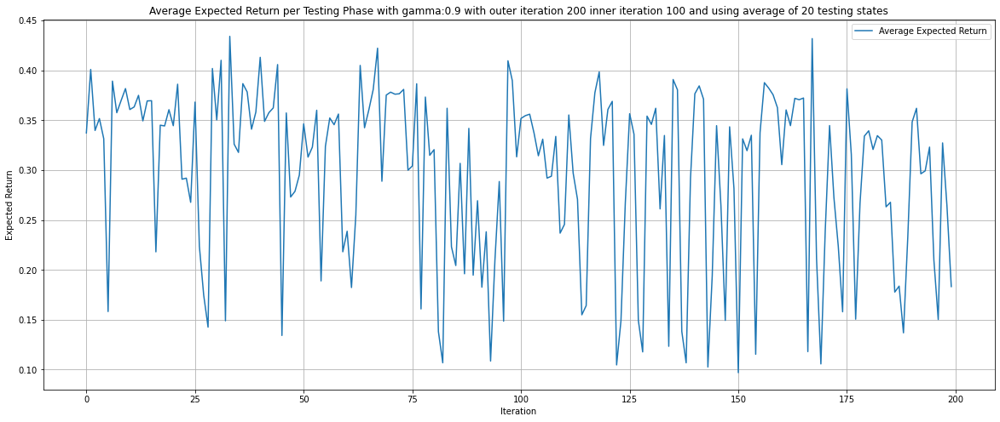

In [23]:
import matplotlib.pyplot as plt

# Set the figure size
plt.figure(figsize=(20, 8))  # Adjust width and height as needed

# Plotting
plt.plot(expected_return_history, label='Average Expected Return')
plt.xlabel('Iteration')
plt.ylabel('Expected Return')
plt.grid()
plt.title(f'Average Expected Return per Testing Phase with gamma:{gamma} with outer iteration {outer_iterations} inner iteration {max_episodes} and using average of {num_test_states} testing states')
plt.legend()
plt.show()


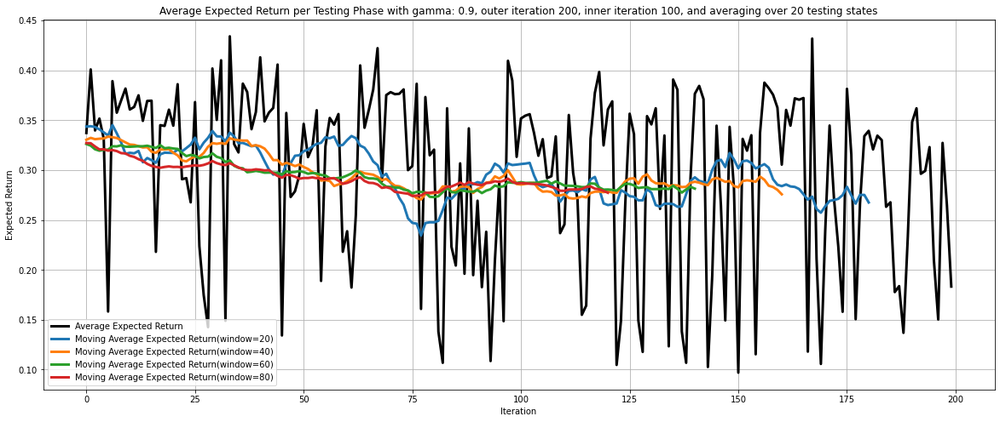

In [24]:
import matplotlib.pyplot as plt
import numpy as np

# Compute moving averages with different window sizes
moving_average20 = np.convolve(expected_return_history, np.ones(20) / 20, mode='valid')
moving_average40 = np.convolve(expected_return_history, np.ones(40) / 40, mode='valid')
moving_average60 = np.convolve(expected_return_history, np.ones(60) / 60, mode='valid')
moving_average80 = np.convolve(expected_return_history, np.ones(80) / 80, mode='valid')

# Plotting with larger figure size
plt.figure(figsize=(20, 8))
plt.plot(expected_return_history, label='Average Expected Return', color='black', linewidth=3)
plt.plot(moving_average20, label='Moving Average Expected Return(window=20)', linewidth=3)
plt.plot(moving_average40, label='Moving Average Expected Return(window=40)', linewidth=3)
plt.plot(moving_average60, label='Moving Average Expected Return(window=60)', linewidth=3)
plt.plot(moving_average80, label='Moving Average Expected Return(window=80)', linewidth=3)

# Add labels, title, grid, and legend
plt.xlabel('Iteration')
plt.ylabel('Expected Return')
plt.grid()
plt.title(f'Average Expected Return per Testing Phase with gamma: {gamma}, outer iteration {outer_iterations}, inner iteration {max_episodes}, and averaging over {num_test_states} testing states')
plt.legend()
plt.show()

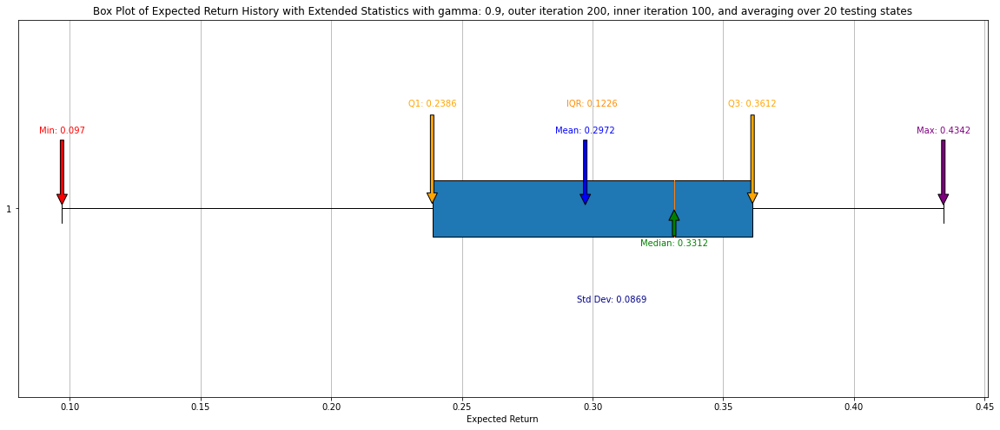

In [25]:
import matplotlib.pyplot as plt
import numpy as np

# Creating the box plot with extended statistical annotations
plt.figure(figsize=(20, 8))
plt.boxplot(expected_return_history, vert=False, patch_artist=True)

# Calculate extended statistical properties
mean = round(np.mean(expected_return_history), 4)
median = round(np.median(expected_return_history), 4)
min_val = round(min(expected_return_history), 4)
max_val = round(max(expected_return_history), 4)
q1 = round(np.percentile(expected_return_history, 25), 4)
q3 = round(np.percentile(expected_return_history, 75), 4)
iqr = round(q3 - q1, 4)  # Interquartile Range
std_dev = round(np.std(expected_return_history), 4)

# Add annotations for each value
plt.annotate(f'Mean: {mean}', xy=(mean, 1), xytext=(mean, 1.20), ha='center', color='blue',
             arrowprops=dict(facecolor='blue', shrink=0.05))
plt.annotate(f'Median: {median}', xy=(median, 1), xytext=(median, 0.9), ha='center', color='green',
             arrowprops=dict(facecolor='green', shrink=0.05))
plt.annotate(f'Min: {min_val}', xy=(min_val, 1), xytext=(min_val, 1.20), ha='center', color='red',
             arrowprops=dict(facecolor='red', shrink=0.05))
plt.annotate(f'Max: {max_val}', xy=(max_val, 1), xytext=(max_val, 1.20), ha='center', color='purple',
             arrowprops=dict(facecolor='purple', shrink=0.05))
plt.annotate(f'Q1: {q1}', xy=(q1, 1), xytext=(q1, 1.27), ha='center', color='orange',
             arrowprops=dict(facecolor='orange', shrink=0.05))
plt.annotate(f'Q3: {q3}', xy=(q3, 1), xytext=(q3, 1.27), ha='center', color='orange',
             arrowprops=dict(facecolor='orange', shrink=0.05))
plt.annotate(f'IQR: {iqr}', xy=(q1 + iqr / 2, 1), xytext=(q1 + iqr / 2, 1.27), ha='center', color='darkorange')
plt.annotate(f'Std Dev: {std_dev}', xy=(mean, 0.8), xytext=(mean + 0.01, 0.75), ha='center', color='darkblue')

# Labels and Title
plt.xlabel('Expected Return')
plt.title(f'Box Plot of Expected Return History with Extended Statistics with gamma: {gamma}, outer iteration {outer_iterations}, inner iteration {max_episodes}, and averaging over {num_test_states} testing states')
plt.grid(axis='x')

plt.show()

In [26]:
db.close()